# Adversarial EXEmples: evasion attacks against Windows malware detectors

In this laboratory, you will learn how to use SecML to create adversarial examples against Windows malware detector implemented through machine learning techniques. To do so, we will use [SecML malware](https://github.com/pralab/secml_malware), a SecML plugin containing most of the strategies developed to evade detectors.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](
https://colab.research.google.com/github/zangobot/teaching_material/blob/main/03-AdversarialEXEmples.ipynb)

In [ ]:
try:
    import secml_malware
except ImportError:
    %pip install git+https://github.com/elastic/ember.git
    %pip install secml-malware

# The Windows PE file format
Before starting the explanations of attacks, we remind how Windows programs are stored as file, following the [Windows Portable Executable (PE)](https://learn.microsoft.com/en-us/windows/win32/debug/pe-format) file format.
There are tons of Python libraries for dissecting programs, one of the best is [lief](https://github.com/lief-project/LIEF).
The latter is also used inside `secml-malware` to perturb samples, as shown later on in this tutorial.
Opening an executable is straight-forward:

In [1]:
import lief

exe_path = 'exe/calc.exe'
exe_object: lief.PE = lief.parse(exe_path)

Unable to find the section associated with IMPORT_TABLE
Unable to find the section associated with EXCEPTION_TABLE
Unable to find the section associated with BASE_RELOCATION_TABLE


Now, the `exe_object` contains all the information of the loaded program.
We can look for all the components. For instance, here is how you can read the header metadata:

In [2]:
print('DOS Header')
print(exe_object.dos_header)

print('PE Header')
print(exe_object.header)

print('Optional Header')
print(exe_object.optional_header)

print('Sections')
for s in exe_object.sections:
    print(s.name, s.characteristics_lists)

DOS Header
Magic:                        5a4d
Used Bytes In The LastPage:   90
File Size In Pages:           3
Number Of Relocation:         0
Header Size In Paragraphs:    4
Minimum Extra Paragraphs:     0
Maximum Extra Paragraphs:     ffff
Initial Relative SS:          0
Initial SP:                   b8
Checksum:                     0
Initial IP:                   0
Initial Relative CS:          0
Address Of Relocation Table:  40
Overlay Number:               0
OEM id:                       0
OEM info:                     0
Address Of New Exe Header:    f8

PE Header
Signature:                    50 45 0 0 
Machine:                      AMD64
Number Of Sections:           3
Pointer To Symbol Table:      0
Number Of Symbols:            0
Size Of Optional Header:      f0
Characteristics:              EXECUTABLE_IMAGE - LARGE_ADDRESS_AWARE
Time Date Stamp:              82e1734b

Optional Header
Magic:                           20b
Major Linker Version:            e
Minor Linker Version:

This library is also very useful for manipulating the EXEs.
For instance, in few lines of code you can add sections to a program.

In [3]:
# Name your new section. Size constraint: up to 8 bytes at maximum!
new_section : lief.PE.Section = lief.PE.Section()
new_section.name = '.newsec'
new_section.content = [ord(i) for i in "This is my newly created section"]
new_section.characteristics = lief.PE.SECTION_CHARACTERISTICS.MEM_DISCARDABLE
exe_object.add_section(new_section)

# New section in place! Now we use lief to rebuild the binary.
builder = lief.PE.Builder(exe_object)
builder.build()
exe_object = lief.PE.parse(builder.get_build())
print('Sections')
for s in exe_object.sections:
    print(s.name, s.characteristics_lists)
builder.write('new_exe.file')

Sections
UPX0 {<SECTION_CHARACTERISTICS.CNT_UNINITIALIZED_DATA: 128>, <SECTION_CHARACTERISTICS.MEM_EXECUTE: 536870912>, <SECTION_CHARACTERISTICS.MEM_READ: 1073741824>, <SECTION_CHARACTERISTICS.MEM_WRITE: 2147483648>}
UPX1 {<SECTION_CHARACTERISTICS.CNT_INITIALIZED_DATA: 64>, <SECTION_CHARACTERISTICS.MEM_EXECUTE: 536870912>, <SECTION_CHARACTERISTICS.MEM_READ: 1073741824>, <SECTION_CHARACTERISTICS.MEM_WRITE: 2147483648>}
.rsrc {<SECTION_CHARACTERISTICS.CNT_INITIALIZED_DATA: 64>, <SECTION_CHARACTERISTICS.MEM_READ: 1073741824>, <SECTION_CHARACTERISTICS.MEM_WRITE: 2147483648>}
.newsec {<SECTION_CHARACTERISTICS.MEM_DISCARDABLE: 33554432>}


Unable to find the section associated with IMPORT_TABLE
Unable to find the section associated with EXCEPTION_TABLE
Unable to find the section associated with BASE_RELOCATION_TABLE


As you can see, the new section appeared as last one.
More information on how to use lief on the [documentation of the library](https://lief-project.github.io/doc/stable/index.html).

# Evasion of End-to-end Deep Neural Network for Malware Detection

In this tutorial, you will learn how to use this plugin to test the already implemented attacks against a PyTorch network of your choice.
We first instantiate a deep neural network trained on raw bytes, called MalConv, and we pass it to SecML Malware.

In [5]:
import os
import magic
from secml.array import CArray

from secml_malware.models.malconv import MalConv
from secml_malware.models.c_classifier_end2end_malware import CClassifierEnd2EndMalware, End2EndModel

net = MalConv()
net = CClassifierEnd2EndMalware(net)
net.load_pretrained_model()

print(net)

CClassifierEnd2EndMalware{'classes': array([0, 1]), 'n_features': 1048576, 'preprocess': None, 'n_jobs': 1, 'model': MalConv(
  (embedding_1): Embedding(257, 8)
  (conv1d_1): Conv1d(8, 128, kernel_size=(500,), stride=(500,))
  (conv1d_2): Conv1d(8, 128, kernel_size=(500,), stride=(500,))
  (dense_1): Linear(in_features=128, out_features=128, bias=True)
  (dense_2): Linear(in_features=128, out_features=1, bias=True)
), 'trained': False, 'input_shape': (1, 1048576), 'softmax_outputs': False, 'batch_size': 256, 'loss': 'binary_crossentropy', 'optimizer': None, 'optimizer_scheduler': None, 'epochs': 100, 'plus_version': False, 'train_transform': Lambda()}


Firstly, we have created the network (MalConv) and it has been passed wrapped with a *CClassifierEnd2EndMalware* model class.
This object generalizes PyTorch end-to-end ML models.
Since MalConv is already coded inside the plugin, the weights are also stored, and they can be retrieved with the *load_pretrained_model* method.

If you wish to use diffierent weights, pass the path to the PyTorch *pth* file to that method.

In [7]:
from secml_malware.attack.whitebox.c_header_evasion import CHeaderEvasion

partial_dos = CHeaderEvasion(net, random_init=False, iterations=10, optimize_all_dos=False, threshold=0)

This is how an attack is created, no further action is needed.
The `random_init` parameter specifies if the bytes should be assigned with random values before beginning the optimization process, `iterations` sets the number of steps of the attack, `optimize_all_dos` sets if all the DOS header should be perturbed, or just the first 58 bytes, while `threshold` is the detection threshold used as a stopping condition.

If you want to see how much the network is deteriorated by the attack, set this parameter to 0, or it will stop as soon as the confidence decreases below such value.

In [8]:
folder = "exe"
X = []
y = []
file_names = []
for i, f in enumerate(os.listdir(folder)):
    path = os.path.join(folder, f)
    if not os.path.isfile(path):
        continue
    if "PE32" not in magic.from_file(path):
        continue
    with open(path, "rb") as file_handle:
        code = file_handle.read()
    x = End2EndModel.bytes_to_numpy(
        code, net.get_input_max_length(), 256, False
    )
    _, confidence = net.predict(CArray(x), True)

    if confidence[0, 1].item() < 0.5:
        continue

    print(f"> Added {f} with confidence {confidence[0,1].item()}")
    X.append(x)
    conf = confidence[1][0].item()
    y.append([1 - conf, conf])
    file_names.append(path)

> Added petya.file with confidence 0.9112271666526794


We load a simple dataset from the provided `exe` that you have filled with malware to test the attacks.
Since we are dealing with SecML, we need to load all the programs inside as CArrays.
Once we have built the dataset, we can run the instantiated attack.

In [9]:
for sample, label in zip(X, y):
    y_pred, adv_score, adv_ds, f_obj = partial_dos.run(CArray(sample), CArray(label[1]))
    print(partial_dos.confidences_)

[0.9112271666526794, 0.06050172820687294, 0.02569270133972168, 0.013262930326163769, 0.007708340417593718, 0.006512434221804142, 0.00256467261351645, 0.0010069683194160461, 0.00042997649870812893, 0.00031925260554999113, 0.0005989529890939593]


Inside the `adv_ds` object, you can find the adversarial example computed by the attack.
You can reconstruct the functioning example by using a specific function inside the plugin.

In [10]:
adv_x = adv_ds.X[0,:]
real_adv_x = partial_dos.create_real_sample_from_adv(file_names[0], adv_x)
print(len(real_adv_x))
real_x = End2EndModel.bytes_to_numpy(real_adv_x, net.get_input_max_length(), 256, False)
_, confidence = net.predict(CArray(real_x), True)
print(confidence[0,1].item())

806912
0.0005989529890939593


... and you're done!
If you want to create a real sample (stored on disk), just have a look at the `create_real_sample_from_adv` of each attack. It accepts a third string argument that will be used as a destination file path for storing the adversarial example.

We used one attack, which is the Partial DOS one. But what if we want to use others?
SecML malware is shipped with different attacking strategies, that can be easily created similarly to the DOS Header attack. A complete list of them can be found in the [source code](https://github.com/pralab/secml_malware/tree/master/secml_malware/attack/whitebox) or the [documentation](https://secml-malware.readthedocs.io/en/docs/source/secml_malware.attack.whitebox.html) of the other white box attacks.
To give you a practical example, we now use an attack that append bytes at the end of the file (padding) and replace unusued space between sections (slack), and it leverages an iterative version of [FGSM attack](https://arxiv.org/abs/1802.04528) to optimize the byte values of executables.

In [13]:
from secml_malware.attack.whitebox import CKreukEvasion

ifgsm = CKreukEvasion(net, how_many_padding_bytes=58, epsilon=1.0, iterations=10, threshold=0)
for i, (sample, label) in enumerate(zip(X, y)):
    y_pred, adv_score, adv_ds, f_obj = ifgsm.run(CArray(sample), CArray(label[1]))
    print(ifgsm.confidences_)
    real_adv_x = ifgsm.create_real_sample_from_adv(file_names[i], adv_ds.X[i, :])
    with open(file_names[i], 'rb') as f:
        print('Original length: ', len(f.read()))
    print('Adversarial sample length: ', len(real_adv_x))


[0.9112271666526794, 0.9112271666526794, 0.9112271666526794, 0.9112271666526794, 0.9112271666526794, 0.9112271666526794, 0.9112271666526794, 0.9112271666526794, 0.9112271666526794, 0.9112271666526794, 0.9112271666526794]
Original length:  806912
Adversarial sample length:  806970


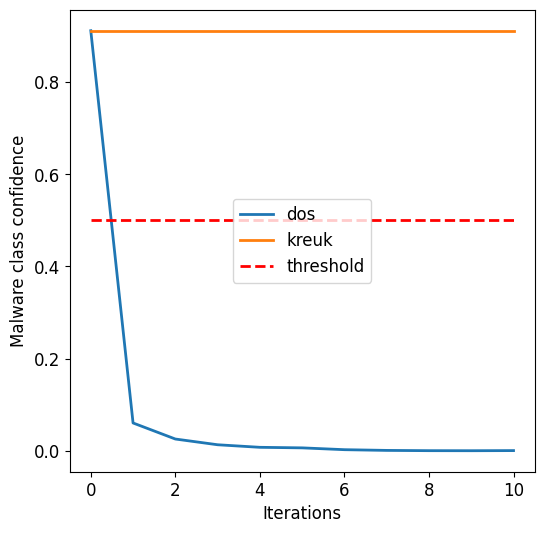

In [14]:
from secml.figure import CFigure

fig = CFigure()
fig.sp.plot(partial_dos.confidences_, label='dos')
fig.sp.plot(ifgsm.confidences_, label='kreuk')
fig.sp.plot([0, 10], [0.5, 0.5], label='threshold', linestyle='--', c='r')
fig.sp.xlabel('Iterations')
fig.sp.ylabel('Malware class confidence')
fig.sp.legend()
fig.show()

As you notice, the attacks behave differently. Can you guess why?

# Gradient-free evasion of Windows Malware Detectors

We move to gradient-free approaches, and we will leverage optimisation of adversarial content injected through new sections inside the input executable.

In [22]:
import os

import magic
import numpy as np
from secml.array import CArray

from secml_malware.attack.blackbox.c_wrapper_phi import CEnd2EndWrapperPhi
from secml_malware.attack.blackbox.ga.c_base_genetic_engine import CGeneticAlgorithm
from secml_malware.models.c_classifier_end2end_malware import CClassifierEnd2EndMalware
from secml_malware.models.malconv import MalConv

net = CClassifierEnd2EndMalware(MalConv())
net.load_pretrained_model()
net = CEnd2EndWrapperPhi(net)

Firstly, we have created the network (MalConv) and it has been passed wrapped with a *CClassifierEnd2EndMalware* model class.
Since MalConv is already coded inside the plugin, the weights are also stored, and they can be retrieved with the *load_pretrained_model* method.

If you wish to use diffierent weights, pass the path to the PyTorch *pth* file to that method.

Then, we wrap it inside a `CEnd2EndWrapperPhi`, that is an interface that abstracts from the feature extraction phase of the model.
This is needed for the black-box settings of the attack.

We will start by optimizing byte-per-byte through the injection of padding bytes.

In [27]:

import numpy as np
folder = 'exe'
X_gf = []
y_gf = []
file_names_gf = []
for i, f in enumerate(os.listdir(folder)):
    path = os.path.join(folder, f)
    if not os.path.isfile(path):
        continue
    if "PE32" not in magic.from_file(path):
        continue
    with open(path, "rb") as file_handle:
        code = file_handle.read()
    x = CArray(np.frombuffer(code, dtype=np.uint8))
    _, confidence = net.predict(x, True)

    if confidence[0, 1].item() < 0.5:
        continue

    print(f"> Added {f} with confidence {confidence[0,1].item()}")
    X_gf.append(x)
    y_gf.append(1)
    file_names_gf.append(path)

> Added petya.file with confidence 0.9112271666526794


In [36]:
from secml_malware.attack.blackbox.c_black_box_padding_evasion import CBlackBoxPaddingEvasionProblem
from secml_malware.attack.blackbox.ga.c_base_genetic_engine import CGeneticAlgorithm
attack_padding = CBlackBoxPaddingEvasionProblem(net, population_size=10, penalty_regularizer=1e-6, iterations=500, how_many_padding_bytes=4096)
engine = CGeneticAlgorithm(attack_padding)
for sample, label in zip(X_gf, y_gf):
    y_pred, adv_score, adv_ds, f_obj = engine.run(sample, label)
    print(engine.confidences_)

[0.9112271666526794, 0.9057623147964478, 0.9029560685157776, 0.9011242389678955, 0.8624269366264343, 0.8624269366264343, 0.8195219039916992, 0.7771397829055786, 0.7771397829055786, 0.7771397829055786, 0.6873714327812195, 0.6873714327812195, 0.6873714327812195, 0.6873714327812195, 0.6447523236274719, 0.6447523236274719, 0.636995792388916, 0.6159132719039917, 0.6159132719039917, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 0.5910875201225281, 

Under the hood, the attack is optimizing each the 4096 bytes, one by one. To speed up the process, we can inject chunks of goodware content, and let the optimizer decide how much to extract.

In [40]:
from secml_malware.attack.blackbox.c_gamma_sections_evasion import CGammaSectionsEvasionProblem
goodware_folder = 'exe/goodware'
section_population, what_from_who = CGammaSectionsEvasionProblem.create_section_population_from_folder(goodware_folder, how_many=10, sections_to_extract=['.rdata'])

gamma_attack = CGammaSectionsEvasionProblem(section_population, net, population_size=10, penalty_regularizer=1e-6, iterations=100, threshold=0)

For the section injection attack implemented with GAMMA, we need first to extract the goodware sections.
Then, we create a `CGammaSectionsEvasionProblem` object, that contains the attack.

In [41]:
engine_gamma = CGeneticAlgorithm(gamma_attack)
for sample, label in zip(X, y):
    y_pred, adv_score, adv_ds, f_obj = engine_gamma.run(sample, CArray(label[1]))

2022-11-10 13:39:41,716 - py.warnings - WARNING - /Users/zangobot/opt/miniconda3/envs/tai/lib/python3.8/site-packages/deap/creator.py:138: RuntimeWarning: A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "

2022-11-10 13:39:41,717 - py.warnings - WARNING - /Users/zangobot/opt/miniconda3/envs/tai/lib/python3.8/site-packages/deap/creator.py:138: RuntimeWarning: A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "



TypeError: parse(): incompatible function arguments. The following argument types are supported:
    1. (filename: str) -> LIEF::PE::Binary
    2. (raw: List[int], name: str = '') -> LIEF::PE::Binary
    3. (io: object, name: str = '') -> LIEF::PE::Binary

Invoked with: kwargs: raw=[77.0, 90.0, 144.0, 0.0, 3.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 255.0, 255.0, 0.0, 0.0, 184.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 14.0, 31.0, 186.0, 14.0, 0.0, 180.0, 9.0, 205.0, 33.0, 184.0, 1.0, 76.0, 205.0, 33.0, 84.0, 104.0, 105.0, 115.0, 32.0, 112.0, 114.0, 111.0, 103.0, 114.0, 97.0, 109.0, 32.0, 99.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 98.0, 101.0, 32.0, 114.0, 117.0, 110.0, 32.0, 105.0, 110.0, 32.0, 68.0, 79.0, 83.0, 32.0, 109.0, 111.0, 100.0, 101.0, 46.0, 13.0, 13.0, 10.0, 36.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 102.0, 175.0, 19.0, 16.0, 7.0, 193.0, 64.0, 16.0, 7.0, 193.0, 64.0, 16.0, 7.0, 193.0, 64.0, 127.0, 113.0, 106.0, 64.0, 21.0, 7.0, 193.0, 64.0, 131.0, 73.0, 89.0, 64.0, 17.0, 7.0, 193.0, 64.0, 11.0, 154.0, 95.0, 64.0, 13.0, 7.0, 193.0, 64.0, 11.0, 154.0, 106.0, 64.0, 88.0, 7.0, 193.0, 64.0, 11.0, 154.0, 107.0, 64.0, 223.0, 7.0, 193.0, 64.0, 25.0, 127.0, 66.0, 64.0, 28.0, 7.0, 193.0, 64.0, 25.0, 127.0, 82.0, 64.0, 13.0, 7.0, 193.0, 64.0, 16.0, 7.0, 192.0, 64.0, 79.0, 6.0, 193.0, 64.0, 11.0, 154.0, 110.0, 64.0, 67.0, 7.0, 193.0, 64.0, 11.0, 154.0, 91.0, 64.0, 17.0, 7.0, 193.0, 64.0, 16.0, 7.0, 86.0, 64.0, 19.0, 7.0, 193.0, 64.0, 11.0, 154.0, 92.0, 64.0, 17.0, 7.0, 193.0, 64.0, 82.0, 105.0, 99.0, 104.0, 16.0, 7.0, 193.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 69.0, 0.0, 0.0, 76.0, 1.0, 5.0, 0.0, 107.0, 38.0, 172.0, 86.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 0.0, 2.0, 1.0, 11.0, 1.0, 10.0, 0.0, 0.0, 252.0, 6.0, 0.0, 0.0, 124.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 125.0, 211.0, 4.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 16.0, 7.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 12.0, 0.0, 0.0, 4.0, 0.0, 0.0, 151.0, 122.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 27.0, 9.0, 0.0, 44.0, 1.0, 0.0, 0.0, 0.0, 176.0, 9.0, 0.0, 10.0, 70.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 100.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 8.0, 8.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 7.0, 0.0, 8.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 116.0, 101.0, 120.0, 116.0, 0.0, 0.0, 0.0, 92.0, 251.0, 6.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 252.0, 6.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 96.0, 46.0, 114.0, 100.0, 97.0, 116.0, 97.0, 0.0, 0.0, 122.0, 38.0, 2.0, 0.0, 0.0, 16.0, 7.0, 0.0, 0.0, 40.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 64.0, 46.0, 100.0, 97.0, 116.0, 97.0, 0.0, 0.0, 0.0, 36.0, 104.0, 0.0, 0.0, 0.0, 64.0, 9.0, 0.0, 0.0, 62.0, 0.0, 0.0, 0.0, 40.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 192.0, 46.0, 114.0, 115.0, 114.0, 99.0, 0.0, 0.0, 0.0, 10.0, 70.0, 2.0, 0.0, 0.0, 176.0, 9.0, 0.0, 0.0, 72.0, 2.0, 0.0, 0.0, 102.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 64.0, 46.0, 114.0, 101.0, 108.0, 111.0, 99.0, 0.0, 0.0, 66.0, 161.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 162.0, 0.0, 0.0, 0.0, 174.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 199.0, 1.0, 84.0, 26.0, 71.0, 0.0, 233.0, 235.0, 131.0, 4.0, 0.0, 86.0, 139.0, 241.0, 199.0, 6.0, 84.0, 26.0, 71.0, 0.0, 232.0, 221.0, 131.0, 4.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 246.0, 126.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 137.0, 69.0, 252.0, 141.0, 69.0, 252.0, 80.0, 139.0, 206.0, 232.0, 53.0, 131.0, 4.0, 0.0, 199.0, 6.0, 16.0, 27.0, 71.0, 0.0, 139.0, 198.0, 201.0, 195.0, 106.0, 16.0, 184.0, 220.0, 93.0, 70.0, 0.0, 232.0, 44.0, 255.0, 4.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 51.0, 219.0, 83.0, 232.0, 63.0, 111.0, 4.0, 0.0, 137.0, 93.0, 252.0, 137.0, 94.0, 4.0, 136.0, 94.0, 8.0, 137.0, 94.0, 12.0, 136.0, 94.0, 16.0, 137.0, 94.0, 20.0, 136.0, 94.0, 24.0, 137.0, 94.0, 28.0, 136.0, 94.0, 32.0, 198.0, 69.0, 252.0, 4.0, 57.0, 93.0, 8.0, 117.0, 40.0, 141.0, 69.0, 8.0, 80.0, 141.0, 77.0, 228.0, 199.0, 69.0, 8.0, 204.0, 77.0, 71.0, 0.0, 232.0, 219.0, 130.0, 4.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 69.0, 228.0, 80.0, 199.0, 69.0, 228.0, 16.0, 27.0, 71.0, 0.0, 232.0, 163.0, 250.0, 4.0, 0.0, 255.0, 117.0, 8.0, 86.0, 232.0, 115.0, 108.0, 4.0, 0.0, 89.0, 89.0, 139.0, 198.0, 232.0, 153.0, 255.0, 4.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 31.0, 92.0, 70.0, 0.0, 232.0, 178.0, 254.0, 4.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 86.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 232.0, 214.0, 107.0, 4.0, 0.0, 139.0, 70.0, 28.0, 89.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 110.0, 156.0, 4.0, 0.0, 89.0, 131.0, 102.0, 28.0, 0.0, 139.0, 70.0, 20.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 92.0, 156.0, 4.0, 0.0, 89.0, 131.0, 102.0, 20.0, 0.0, 139.0, 70.0, 12.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 74.0, 156.0, 4.0, 0.0, 89.0, 131.0, 102.0, 12.0, 0.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 56.0, 156.0, 4.0, 0.0, 89.0, 131.0, 102.0, 4.0, 0.0, 131.0, 77.0, 252.0, 255.0, 139.0, 206.0, 232.0, 148.0, 110.0, 4.0, 0.0, 232.0, 31.0, 255.0, 4.0, 0.0, 195.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 217.0, 130.0, 4.0, 0.0, 199.0, 6.0, 16.0, 27.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 86.0, 139.0, 241.0, 131.0, 62.0, 0.0, 117.0, 36.0, 106.0, 0.0, 141.0, 77.0, 252.0, 232.0, 56.0, 110.0, 4.0, 0.0, 131.0, 62.0, 0.0, 117.0, 13.0, 255.0, 5.0, 4.0, 126.0, 73.0, 0.0, 161.0, 4.0, 126.0, 73.0, 0.0, 137.0, 6.0, 141.0, 77.0, 252.0, 232.0, 70.0, 110.0, 4.0, 0.0, 139.0, 6.0, 94.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 86.0, 139.0, 241.0, 106.0, 0.0, 141.0, 77.0, 252.0, 232.0, 8.0, 110.0, 4.0, 0.0, 139.0, 70.0, 4.0, 131.0, 248.0, 255.0, 115.0, 4.0, 64.0, 137.0, 70.0, 4.0, 141.0, 77.0, 252.0, 232.0, 28.0, 110.0, 4.0, 0.0, 94.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 86.0, 87.0, 139.0, 249.0, 106.0, 0.0, 141.0, 77.0, 252.0, 232.0, 223.0, 109.0, 4.0, 0.0, 139.0, 71.0, 4.0, 133.0, 192.0, 116.0, 9.0, 131.0, 248.0, 255.0, 115.0, 4.0, 72.0, 137.0, 71.0, 4.0, 139.0, 119.0, 4.0, 247.0, 222.0, 27.0, 246.0, 247.0, 214.0, 141.0, 77.0, 252.0, 35.0, 247.0, 232.0, 228.0, 109.0, 4.0, 0.0, 95.0, 139.0, 198.0, 94.0, 201.0, 195.0, 199.0, 1.0, 204.0, 26.0, 71.0, 0.0, 195.0, 86.0, 139.0, 241.0, 232.0, 32.0, 108.0, 4.0, 0.0, 137.0, 6.0, 232.0, 216.0, 105.0, 4.0, 0.0, 139.0, 200.0, 232.0, 128.0, 255.0, 255.0, 255.0, 139.0, 198.0, 94.0, 195.0, 139.0, 9.0, 133.0, 201.0, 116.0, 17.0, 232.0, 153.0, 255.0, 255.0, 255.0, 133.0, 192.0, 116.0, 8.0, 139.0, 16.0, 106.0, 1.0, 139.0, 200.0, 255.0, 18.0, 195.0, 139.0, 9.0, 86.0, 139.0, 116.0, 36.0, 8.0, 59.0, 113.0, 12.0, 115.0, 8.0, 139.0, 65.0, 8.0, 139.0, 4.0, 176.0, 235.0, 2.0, 51.0, 192.0, 133.0, 192.0, 117.0, 25.0, 56.0, 65.0, 20.0, 116.0, 20.0, 232.0, 145.0, 105.0, 4.0, 0.0, 59.0, 112.0, 12.0, 115.0, 8.0, 139.0, 64.0, 8.0, 139.0, 4.0, 176.0, 235.0, 2.0, 51.0, 192.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 139.0, 69.0, 12.0, 131.0, 236.0, 16.0, 83.0, 139.0, 217.0, 86.0, 137.0, 67.0, 4.0, 141.0, 69.0, 240.0, 87.0, 80.0, 199.0, 3.0, 116.0, 28.0, 71.0, 0.0, 232.0, 197.0, 110.0, 4.0, 0.0, 141.0, 123.0, 8.0, 139.0, 240.0, 165.0, 165.0, 165.0, 89.0, 165.0, 95.0, 94.0, 139.0, 195.0, 91.0, 201.0, 194.0, 8.0, 0.0, 106.0, 40.0, 184.0, 218.0, 100.0, 70.0, 0.0, 232.0, 231.0, 252.0, 4.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 240.0, 0.0, 133.0, 255.0, 116.0, 90.0, 131.0, 63.0, 0.0, 117.0, 85.0, 106.0, 24.0, 232.0, 62.0, 158.0, 4.0, 0.0, 89.0, 137.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 116.0, 44.0, 139.0, 69.0, 12.0, 139.0, 0.0, 139.0, 72.0, 24.0, 133.0, 201.0, 117.0, 3.0, 141.0, 72.0, 28.0, 81.0, 141.0, 77.0, 204.0, 232.0, 116.0, 253.0, 255.0, 255.0, 139.0, 77.0, 8.0, 106.0, 0.0, 80.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 232.0, 116.0, 255.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 131.0, 77.0, 252.0, 255.0, 246.0, 69.0, 240.0, 1.0, 137.0, 7.0, 116.0, 8.0, 141.0, 77.0, 204.0, 232.0, 196.0, 253.0, 255.0, 255.0, 106.0, 2.0, 88.0, 232.0, 82.0, 253.0, 4.0, 0.0, 195.0, 139.0, 65.0, 20.0, 133.0, 192.0, 126.0, 10.0, 255.0, 113.0, 16.0, 232.0, 70.0, 154.0, 4.0, 0.0, 89.0, 195.0, 121.0, 9.0, 255.0, 113.0, 16.0, 232.0, 31.0, 157.0, 4.0, 0.0, 89.0, 195.0, 15.0, 182.0, 68.0, 36.0, 4.0, 131.0, 193.0, 8.0, 81.0, 80.0, 232.0, 255.0, 108.0, 4.0, 0.0, 89.0, 89.0, 194.0, 4.0, 0.0, 86.0, 139.0, 116.0, 36.0, 8.0, 59.0, 116.0, 36.0, 12.0, 116.0, 26.0, 87.0, 141.0, 121.0, 8.0, 15.0, 182.0, 6.0, 87.0, 80.0, 232.0, 225.0, 108.0, 4.0, 0.0, 136.0, 6.0, 70.0, 89.0, 89.0, 59.0, 116.0, 36.0, 16.0, 117.0, 235.0, 95.0, 139.0, 198.0, 94.0, 194.0, 8.0, 0.0, 15.0, 182.0, 68.0, 36.0, 4.0, 131.0, 193.0, 8.0, 81.0, 80.0, 232.0, 45.0, 110.0, 4.0, 0.0, 89.0, 89.0, 194.0, 4.0, 0.0, 86.0, 139.0, 116.0, 36.0, 8.0, 59.0, 116.0, 36.0, 12.0, 116.0, 26.0, 87.0, 141.0, 121.0, 8.0, 15.0, 182.0, 6.0, 87.0, 80.0, 232.0, 15.0, 110.0, 4.0, 0.0, 136.0, 6.0, 70.0, 89.0, 89.0, 59.0, 116.0, 36.0, 16.0, 117.0, 235.0, 95.0, 139.0, 198.0, 94.0, 194.0, 8.0, 0.0, 138.0, 68.0, 36.0, 4.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 139.0, 69.0, 12.0, 43.0, 69.0, 8.0, 80.0, 255.0, 117.0, 8.0, 255.0, 117.0, 16.0, 232.0, 121.0, 123.0, 4.0, 0.0, 139.0, 69.0, 12.0, 131.0, 196.0, 12.0, 93.0, 194.0, 12.0, 0.0, 138.0, 68.0, 36.0, 4.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 139.0, 69.0, 12.0, 43.0, 69.0, 8.0, 80.0, 255.0, 117.0, 8.0, 255.0, 117.0, 20.0, 232.0, 83.0, 123.0, 4.0, 0.0, 139.0, 69.0, 12.0, 131.0, 196.0, 12.0, 93.0, 194.0, 16.0, 0.0, 86.0, 139.0, 241.0, 199.0, 6.0, 116.0, 28.0, 71.0, 0.0, 232.0, 11.0, 255.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 199.0, 6.0, 204.0, 26.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 4.0, 123.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 131.0, 224.0, 23.0, 131.0, 236.0, 24.0, 137.0, 65.0, 12.0, 139.0, 73.0, 16.0, 35.0, 200.0, 86.0, 87.0, 116.0, 108.0, 51.0, 192.0, 56.0, 69.0, 12.0, 116.0, 7.0, 80.0, 80.0, 232.0, 20.0, 247.0, 4.0, 0.0, 51.0, 246.0, 70.0, 246.0, 193.0, 4.0, 116.0, 49.0, 232.0, 138.0, 101.0, 4.0, 0.0, 139.0, 248.0, 199.0, 69.0, 12.0, 236.0, 77.0, 71.0, 0.0, 141.0, 69.0, 12.0, 80.0, 141.0, 77.0, 236.0, 232.0, 21.0, 127.0, 4.0, 0.0, 137.0, 117.0, 248.0, 137.0, 125.0, 252.0, 199.0, 69.0, 236.0, 168.0, 28.0, 71.0, 0.0, 104.0, 88.0, 82.0, 72.0, 0.0, 141.0, 69.0, 236.0, 235.0, 193.0, 246.0, 193.0, 2.0, 116.0, 16.0, 232.0, 84.0, 101.0, 4.0, 0.0, 139.0, 248.0, 199.0, 69.0, 12.0, 4.0, 78.0, 71.0, 0.0, 235.0, 200.0, 232.0, 68.0, 101.0, 4.0, 0.0, 139.0, 248.0, 199.0, 69.0, 12.0, 28.0, 78.0, 71.0, 0.0, 235.0, 184.0, 95.0, 94.0, 201.0, 194.0, 8.0, 0.0, 139.0, 65.0, 48.0, 139.0, 8.0, 86.0, 139.0, 116.0, 36.0, 8.0, 137.0, 14.0, 232.0, 214.0, 252.0, 255.0, 255.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 81.0, 86.0, 139.0, 241.0, 87.0, 51.0, 255.0, 87.0, 87.0, 137.0, 126.0, 48.0, 137.0, 126.0, 8.0, 137.0, 126.0, 16.0, 199.0, 70.0, 20.0, 1.0, 2.0, 0.0, 0.0, 199.0, 70.0, 24.0, 6.0, 0.0, 0.0, 0.0, 137.0, 126.0, 28.0, 137.0, 126.0, 32.0, 137.0, 126.0, 36.0, 137.0, 126.0, 40.0, 137.0, 126.0, 44.0, 232.0, 43.0, 255.0, 255.0, 255.0, 106.0, 4.0, 232.0, 252.0, 155.0, 4.0, 0.0, 89.0, 59.0, 199.0, 116.0, 9.0, 139.0, 200.0, 232.0, 243.0, 252.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 95.0, 137.0, 70.0, 48.0, 94.0, 89.0, 195.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 12.0, 0.0, 0.0, 0.0, 199.0, 6.0, 168.0, 28.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 124.0, 36.0, 12.0, 87.0, 139.0, 241.0, 232.0, 240.0, 126.0, 4.0, 0.0, 199.0, 6.0, 156.0, 28.0, 71.0, 0.0, 139.0, 71.0, 12.0, 137.0, 70.0, 12.0, 139.0, 71.0, 16.0, 137.0, 70.0, 16.0, 95.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 149.0, 250.0, 4.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 208.0, 0.0, 141.0, 77.0, 212.0, 81.0, 232.0, 24.0, 19.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 80.0, 139.0, 198.0, 232.0, 234.0, 49.0, 2.0, 0.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 252.0, 27.0, 0.0, 0.0, 139.0, 198.0, 232.0, 232.0, 250.0, 4.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 255.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 229.0, 18.0, 0.0, 0.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 86.0, 141.0, 112.0, 80.0, 139.0, 206.0, 232.0, 148.0, 18.0, 0.0, 0.0, 86.0, 199.0, 6.0, 92.0, 28.0, 71.0, 0.0, 232.0, 89.0, 101.0, 4.0, 0.0, 89.0, 94.0, 195.0, 85.0, 139.0, 236.0, 81.0, 86.0, 139.0, 240.0, 51.0, 192.0, 57.0, 69.0, 8.0, 15.0, 132.0, 168.0, 0.0, 0.0, 0.0, 59.0, 240.0, 15.0, 132.0, 160.0, 0.0, 0.0, 0.0, 59.0, 216.0, 117.0, 10.0, 184.0, 3.0, 64.0, 0.0, 128.0, 233.0, 151.0, 0.0, 0.0, 0.0, 137.0, 3.0, 57.0, 7.0, 117.0, 41.0, 57.0, 71.0, 4.0, 117.0, 36.0, 129.0, 127.0, 8.0, 192.0, 0.0, 0.0, 0.0, 117.0, 27.0, 129.0, 127.0, 12.0, 0.0, 0.0, 0.0, 70.0, 117.0, 18.0, 139.0, 118.0, 4.0, 3.0, 117.0, 8.0, 139.0, 6.0, 86.0, 255.0, 80.0, 4.0, 137.0, 51.0, 51.0, 192.0, 235.0, 104.0, 139.0, 78.0, 8.0, 59.0, 200.0, 116.0, 85.0, 139.0, 6.0, 51.0, 210.0, 133.0, 192.0, 15.0, 148.0, 194.0, 137.0, 85.0, 252.0, 133.0, 210.0, 117.0, 30.0, 139.0, 16.0, 59.0, 23.0, 117.0, 53.0, 139.0, 80.0, 4.0, 59.0, 87.0, 4.0, 117.0, 45.0, 139.0, 80.0, 8.0, 59.0, 87.0, 8.0, 117.0, 37.0, 139.0, 64.0, 12.0, 59.0, 71.0, 12.0, 117.0, 29.0, 131.0, 249.0, 1.0, 116.0, 180.0, 255.0, 118.0, 4.0, 83.0, 87.0, 255.0, 117.0, 8.0, 255.0, 209.0, 133.0, 192.0, 116.0, 32.0, 131.0, 125.0, 252.0, 0.0, 117.0, 4.0, 133.0, 192.0, 120.0, 22.0, 139.0, 78.0, 20.0, 131.0, 198.0, 12.0, 133.0, 201.0, 117.0, 171.0, 184.0, 2.0, 64.0, 0.0, 128.0, 235.0, 5.0, 184.0, 87.0, 0.0, 7.0, 128.0, 94.0, 201.0, 194.0, 4.0, 0.0, 106.0, 32.0, 184.0, 210.0, 141.0, 70.0, 0.0, 232.0, 97.0, 249.0, 4.0, 0.0, 139.0, 69.0, 16.0, 141.0, 77.0, 212.0, 81.0, 232.0, 243.0, 254.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 83.0, 255.0, 117.0, 12.0, 139.0, 208.0, 87.0, 255.0, 117.0, 8.0, 139.0, 206.0, 232.0, 156.0, 37.0, 2.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 196.0, 26.0, 0.0, 0.0, 232.0, 178.0, 249.0, 4.0, 0.0, 194.0, 12.0, 0.0, 106.0, 32.0, 184.0, 210.0, 141.0, 70.0, 0.0, 232.0, 32.0, 249.0, 4.0, 0.0, 139.0, 69.0, 16.0, 80.0, 141.0, 77.0, 212.0, 232.0, 123.0, 14.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 83.0, 255.0, 117.0, 12.0, 139.0, 208.0, 87.0, 255.0, 117.0, 8.0, 139.0, 206.0, 232.0, 91.0, 37.0, 2.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 131.0, 26.0, 0.0, 0.0, 232.0, 113.0, 249.0, 4.0, 0.0, 194.0, 12.0, 0.0, 106.0, 16.0, 184.0, 175.0, 141.0, 70.0, 0.0, 232.0, 118.0, 248.0, 4.0, 0.0, 139.0, 93.0, 8.0, 139.0, 69.0, 12.0, 131.0, 101.0, 240.0, 0.0, 141.0, 117.0, 228.0, 232.0, 8.0, 249.0, 255.0, 255.0, 139.0, 248.0, 87.0, 139.0, 203.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 242.0, 124.0, 4.0, 0.0, 139.0, 117.0, 16.0, 141.0, 67.0, 12.0, 198.0, 69.0, 252.0, 2.0, 80.0, 199.0, 3.0, 32.0, 83.0, 71.0, 0.0, 232.0, 249.0, 125.0, 2.0, 0.0, 89.0, 141.0, 77.0, 228.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 0.0, 232.0, 150.0, 124.0, 4.0, 0.0, 139.0, 195.0, 232.0, 250.0, 248.0, 4.0, 0.0, 195.0, 106.0, 40.0, 184.0, 33.0, 148.0, 70.0, 0.0, 232.0, 126.0, 248.0, 4.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 204.0, 0.0, 80.0, 141.0, 117.0, 212.0, 137.0, 77.0, 208.0, 232.0, 202.0, 253.0, 255.0, 255.0, 255.0, 117.0, 208.0, 131.0, 101.0, 252.0, 0.0, 80.0, 87.0, 232.0, 114.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 223.0, 25.0, 0.0, 0.0, 139.0, 199.0, 232.0, 203.0, 248.0, 4.0, 0.0, 195.0, 86.0, 87.0, 106.0, 6.0, 89.0, 139.0, 240.0, 139.0, 251.0, 131.0, 192.0, 24.0, 243.0, 165.0, 80.0, 141.0, 115.0, 24.0, 232.0, 118.0, 13.0, 0.0, 0.0, 95.0, 139.0, 195.0, 94.0, 195.0, 106.0, 0.0, 106.0, 1.0, 131.0, 193.0, 32.0, 232.0, 175.0, 25.0, 0.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 106.0, 49.0, 232.0, 84.0, 109.0, 2.0, 0.0, 139.0, 69.0, 8.0, 89.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 134.0, 238.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 28.0, 83.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 40.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 131.0, 100.0, 36.0, 16.0, 0.0, 51.0, 192.0, 141.0, 124.0, 36.0, 15.0, 170.0, 141.0, 68.0, 36.0, 20.0, 80.0, 232.0, 167.0, 255.0, 255.0, 255.0, 89.0, 255.0, 117.0, 8.0, 131.0, 100.0, 36.0, 52.0, 0.0, 139.0, 216.0, 232.0, 51.0, 41.0, 0.0, 0.0, 89.0, 141.0, 124.0, 36.0, 20.0, 232.0, 178.0, 28.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 76.0, 36.0, 40.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 91.0, 139.0, 229.0, 93.0, 195.0, 233.0, 70.0, 253.0, 255.0, 255.0, 233.0, 137.0, 22.0, 0.0, 0.0, 104.0, 248.0, 1.0, 0.0, 0.0, 184.0, 101.0, 240.0, 70.0, 0.0, 232.0, 179.0, 247.0, 4.0, 0.0, 139.0, 69.0, 8.0, 191.0, 120.0, 78.0, 71.0, 0.0, 87.0, 141.0, 77.0, 204.0, 137.0, 133.0, 180.0, 254.0, 255.0, 255.0, 232.0, 205.0, 12.0, 0.0, 0.0, 190.0, 152.0, 150.0, 73.0, 0.0, 141.0, 69.0, 204.0, 139.0, 206.0, 232.0, 227.0, 12.0, 2.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 204.0, 138.0, 216.0, 232.0, 217.0, 24.0, 0.0, 0.0, 132.0, 219.0, 15.0, 132.0, 90.0, 2.0, 0.0, 0.0, 87.0, 141.0, 77.0, 204.0, 232.0, 159.0, 12.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 106.0, 0.0, 141.0, 69.0, 204.0, 80.0, 139.0, 222.0, 141.0, 189.0, 84.0, 255.0, 255.0, 255.0, 232.0, 204.0, 9.0, 2.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 204.0, 232.0, 165.0, 24.0, 0.0, 0.0, 104.0, 140.0, 78.0, 71.0, 0.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 104.0, 12.0, 0.0, 0.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 141.0, 141.0, 56.0, 255.0, 255.0, 255.0, 139.0, 223.0, 198.0, 69.0, 252.0, 4.0, 232.0, 122.0, 14.0, 2.0, 0.0, 139.0, 216.0, 141.0, 117.0, 152.0, 232.0, 51.0, 23.0, 0.0, 0.0, 139.0, 206.0, 198.0, 69.0, 252.0, 6.0, 232.0, 246.0, 25.0, 0.0, 0.0, 51.0, 219.0, 83.0, 106.0, 1.0, 141.0, 141.0, 56.0, 255.0, 255.0, 255.0, 232.0, 84.0, 24.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 66.0, 24.0, 0.0, 0.0, 139.0, 198.0, 80.0, 255.0, 181.0, 180.0, 254.0, 255.0, 255.0, 232.0, 65.0, 21.0, 0.0, 0.0, 132.0, 192.0, 15.0, 132.0, 155.0, 1.0, 0.0, 0.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 80.0, 232.0, 138.0, 254.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 10.0, 57.0, 157.0, 184.0, 254.0, 255.0, 255.0, 15.0, 132.0, 126.0, 1.0, 0.0, 0.0, 141.0, 189.0, 188.0, 254.0, 255.0, 255.0, 232.0, 27.0, 64.0, 1.0, 0.0, 198.0, 69.0, 252.0, 11.0, 139.0, 189.0, 184.0, 254.0, 255.0, 255.0, 131.0, 199.0, 8.0, 141.0, 181.0, 188.0, 254.0, 255.0, 255.0, 232.0, 136.0, 66.0, 1.0, 0.0, 58.0, 195.0, 15.0, 132.0, 44.0, 1.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 218.0, 0.0, 0.0, 0.0, 139.0, 141.0, 184.0, 254.0, 255.0, 255.0, 131.0, 236.0, 28.0, 131.0, 193.0, 8.0, 139.0, 244.0, 137.0, 165.0, 152.0, 254.0, 255.0, 255.0, 232.0, 38.0, 67.0, 2.0, 0.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 12.0, 139.0, 244.0, 141.0, 77.0, 152.0, 137.0, 165.0, 164.0, 254.0, 255.0, 255.0, 232.0, 15.0, 67.0, 2.0, 0.0, 139.0, 141.0, 180.0, 254.0, 255.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 13.0, 139.0, 244.0, 137.0, 165.0, 156.0, 254.0, 255.0, 255.0, 232.0, 245.0, 66.0, 2.0, 0.0, 141.0, 133.0, 252.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 14.0, 232.0, 214.0, 13.0, 0.0, 0.0, 141.0, 133.0, 252.0, 253.0, 255.0, 255.0, 104.0, 152.0, 78.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 15.0, 232.0, 203.0, 59.0, 0.0, 0.0, 89.0, 89.0, 141.0, 181.0, 252.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 16.0, 232.0, 228.0, 39.0, 0.0, 0.0, 139.0, 240.0, 104.0, 200.0, 78.0, 71.0, 0.0, 86.0, 232.0, 173.0, 59.0, 0.0, 0.0, 89.0, 89.0, 198.0, 69.0, 252.0, 17.0, 232.0, 204.0, 39.0, 0.0, 0.0, 139.0, 240.0, 104.0, 220.0, 78.0, 71.0, 0.0, 86.0, 232.0, 149.0, 59.0, 0.0, 0.0, 89.0, 89.0, 198.0, 69.0, 252.0, 18.0, 232.0, 180.0, 39.0, 0.0, 0.0, 80.0, 106.0, 62.0, 106.0, 2.0, 187.0, 248.0, 78.0, 71.0, 0.0, 191.0, 24.0, 79.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 17.0, 252.0, 255.0, 255.0, 141.0, 133.0, 252.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 11.0, 232.0, 36.0, 251.0, 255.0, 255.0, 51.0, 219.0, 141.0, 181.0, 188.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 231.0, 0.0, 0.0, 0.0, 139.0, 181.0, 184.0, 254.0, 255.0, 255.0, 59.0, 243.0, 116.0, 14.0, 139.0, 254.0, 232.0, 182.0, 30.0, 0.0, 0.0, 87.0, 232.0, 113.0, 116.0, 4.0, 0.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 176.0, 232.0, 203.0, 22.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 141.0, 181.0, 84.0, 255.0, 255.0, 255.0, 232.0, 91.0, 8.0, 2.0, 0.0, 50.0, 192.0, 235.0, 67.0, 141.0, 181.0, 188.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 162.0, 0.0, 0.0, 0.0, 139.0, 181.0, 184.0, 254.0, 255.0, 255.0, 59.0, 243.0, 116.0, 14.0, 139.0, 254.0, 232.0, 113.0, 30.0, 0.0, 0.0, 87.0, 232.0, 44.0, 116.0, 4.0, 0.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 176.0, 232.0, 134.0, 22.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 141.0, 181.0, 84.0, 255.0, 255.0, 255.0, 232.0, 22.0, 8.0, 2.0, 0.0, 176.0, 1.0, 232.0, 114.0, 245.0, 4.0, 0.0, 194.0, 4.0, 0.0, 139.0, 181.0, 160.0, 254.0, 255.0, 255.0, 141.0, 189.0, 168.0, 254.0, 255.0, 255.0, 199.0, 133.0, 168.0, 254.0, 255.0, 255.0, 24.0, 79.0, 71.0, 0.0, 199.0, 133.0, 172.0, 254.0, 255.0, 255.0, 248.0, 78.0, 71.0, 0.0, 199.0, 133.0, 176.0, 254.0, 255.0, 255.0, 68.0, 0.0, 0.0, 0.0, 232.0, 222.0, 120.0, 2.0, 0.0, 184.0, 74.0, 27.0, 64.0, 0.0, 195.0, 235.0, 176.0, 141.0, 181.0, 168.0, 254.0, 255.0, 255.0, 199.0, 133.0, 168.0, 254.0, 255.0, 255.0, 24.0, 79.0, 71.0, 0.0, 199.0, 133.0, 172.0, 254.0, 255.0, 255.0, 248.0, 78.0, 71.0, 0.0, 199.0, 133.0, 176.0, 254.0, 255.0, 255.0, 68.0, 0.0, 0.0, 0.0, 232.0, 149.0, 121.0, 2.0, 0.0, 184.0, 252.0, 26.0, 64.0, 0.0, 195.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 92.0, 232.0, 251.0, 21.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 40.0, 232.0, 239.0, 21.0, 0.0, 0.0, 86.0, 232.0, 86.0, 19.0, 0.0, 0.0, 195.0, 204.0, 204.0, 85.0, 139.0, 236.0, 106.0, 255.0, 104.0, 184.0, 242.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 81.0, 184.0, 68.0, 55.0, 0.0, 0.0, 232.0, 136.0, 78.0, 5.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 232.0, 83.0, 86.0, 87.0, 80.0, 141.0, 69.0, 244.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 137.0, 101.0, 240.0, 51.0, 219.0, 104.0, 255.0, 7.0, 0.0, 0.0, 141.0, 133.0, 229.0, 245.0, 255.0, 255.0, 83.0, 137.0, 157.0, 244.0, 200.0, 255.0, 255.0, 80.0, 136.0, 157.0, 228.0, 245.0, 255.0, 255.0, 232.0, 222.0, 147.0, 4.0, 0.0, 131.0, 196.0, 12.0, 190.0, 255.0, 0.0, 0.0, 0.0, 86.0, 141.0, 133.0, 229.0, 253.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 228.0, 253.0, 255.0, 255.0, 232.0, 194.0, 147.0, 4.0, 0.0, 131.0, 196.0, 12.0, 86.0, 141.0, 133.0, 229.0, 254.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 228.0, 254.0, 255.0, 255.0, 232.0, 171.0, 147.0, 4.0, 0.0, 131.0, 196.0, 12.0, 141.0, 181.0, 4.0, 201.0, 255.0, 255.0, 137.0, 157.0, 0.0, 201.0, 255.0, 255.0, 232.0, 75.0, 138.0, 0.0, 0.0, 139.0, 13.0, 120.0, 142.0, 73.0, 0.0, 199.0, 133.0, 4.0, 201.0, 255.0, 255.0, 196.0, 82.0, 71.0, 0.0, 139.0, 1.0, 255.0, 80.0, 4.0, 141.0, 133.0, 100.0, 203.0, 255.0, 255.0, 137.0, 157.0, 104.0, 203.0, 255.0, 255.0, 137.0, 157.0, 112.0, 236.0, 255.0, 255.0, 137.0, 157.0, 116.0, 237.0, 255.0, 255.0, 136.0, 157.0, 108.0, 203.0, 255.0, 255.0, 232.0, 224.0, 11.0, 1.0, 0.0, 139.0, 13.0, 120.0, 142.0, 73.0, 0.0, 199.0, 133.0, 100.0, 203.0, 255.0, 255.0, 0.0, 83.0, 71.0, 0.0, 139.0, 1.0, 255.0, 80.0, 4.0, 139.0, 13.0, 120.0, 142.0, 73.0, 0.0, 137.0, 157.0, 124.0, 237.0, 255.0, 255.0, 137.0, 157.0, 128.0, 237.0, 255.0, 255.0, 199.0, 133.0, 252.0, 200.0, 255.0, 255.0, 44.0, 83.0, 71.0, 0.0, 139.0, 1.0, 255.0, 80.0, 4.0, 141.0, 133.0, 100.0, 203.0, 255.0, 255.0, 83.0, 137.0, 93.0, 252.0, 137.0, 133.0, 236.0, 200.0, 255.0, 255.0, 137.0, 157.0, 228.0, 200.0, 255.0, 255.0, 232.0, 171.0, 191.0, 0.0, 0.0, 139.0, 117.0, 12.0, 89.0, 137.0, 133.0, 232.0, 200.0, 255.0, 255.0, 137.0, 181.0, 120.0, 237.0, 255.0, 255.0, 199.0, 133.0, 240.0, 200.0, 255.0, 255.0, 4.0, 2.0, 7.0, 128.0, 136.0, 157.0, 228.0, 254.0, 255.0, 255.0, 57.0, 93.0, 8.0, 15.0, 132.0, 217.0, 1.0, 0.0, 0.0, 141.0, 189.0, 228.0, 254.0, 255.0, 255.0, 232.0, 108.0, 221.0, 0.0, 0.0, 133.0, 192.0, 15.0, 132.0, 198.0, 1.0, 0.0, 0.0, 139.0, 199.0, 80.0, 141.0, 133.0, 100.0, 203.0, 255.0, 255.0, 80.0, 139.0, 133.0, 100.0, 203.0, 255.0, 255.0, 255.0, 80.0, 16.0, 133.0, 192.0, 15.0, 136.0, 171.0, 1.0, 0.0, 0.0, 57.0, 157.0, 232.0, 200.0, 255.0, 255.0, 15.0, 133.0, 192.0, 1.0, 0.0, 0.0, 198.0, 69.0, 252.0, 1.0, 59.0, 243.0, 15.0, 133.0, 217.0, 0.0, 0.0, 0.0, 141.0, 133.0, 108.0, 208.0, 255.0, 255.0, 80.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 232.0, 22.0, 8.0, 0.0, 0.0, 141.0, 181.0, 144.0, 237.0, 255.0, 255.0, 199.0, 133.0, 244.0, 200.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 232.0, 238.0, 18.0, 0.0, 0.0, 106.0, 3.0, 94.0, 141.0, 157.0, 200.0, 237.0, 255.0, 255.0, 141.0, 141.0, 144.0, 237.0, 255.0, 255.0, 137.0, 117.0, 252.0, 232.0, 165.0, 21.0, 0.0, 0.0, 141.0, 133.0, 144.0, 237.0, 255.0, 255.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 80.0, 137.0, 181.0, 244.0, 200.0, 255.0, 255.0, 232.0, 222.0, 250.0, 255.0, 255.0, 51.0, 219.0, 132.0, 192.0, 117.0, 124.0, 198.0, 133.0, 251.0, 200.0, 255.0, 255.0, 1.0, 235.0, 121.0, 139.0, 181.0, 188.0, 200.0, 255.0, 255.0, 141.0, 189.0, 216.0, 200.0, 255.0, 255.0, 199.0, 133.0, 216.0, 200.0, 255.0, 255.0, 24.0, 79.0, 71.0, 0.0, 199.0, 133.0, 220.0, 200.0, 255.0, 255.0, 132.0, 79.0, 71.0, 0.0, 199.0, 133.0, 224.0, 200.0, 255.0, 255.0, 110.0, 0.0, 0.0, 0.0, 232.0, 92.0, 118.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 184.0, 208.0, 29.0, 64.0, 0.0, 195.0, 51.0, 219.0, 233.0, 176.0, 0.0, 0.0, 0.0, 141.0, 181.0, 216.0, 200.0, 255.0, 255.0, 199.0, 133.0, 216.0, 200.0, 255.0, 255.0, 24.0, 79.0, 71.0, 0.0, 199.0, 133.0, 220.0, 200.0, 255.0, 255.0, 132.0, 79.0, 71.0, 0.0, 199.0, 133.0, 224.0, 200.0, 255.0, 255.0, 110.0, 0.0, 0.0, 0.0, 232.0, 10.0, 119.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 184.0, 208.0, 29.0, 64.0, 0.0, 195.0, 136.0, 157.0, 251.0, 200.0, 255.0, 255.0, 246.0, 133.0, 244.0, 200.0, 255.0, 255.0, 2.0, 116.0, 21.0, 131.0, 165.0, 244.0, 200.0, 255.0, 255.0, 253.0, 83.0, 106.0, 1.0, 141.0, 141.0, 168.0, 237.0, 255.0, 255.0, 232.0, 84.0, 19.0, 0.0, 0.0, 51.0, 192.0, 64.0, 137.0, 69.0, 252.0, 132.0, 133.0, 244.0, 200.0, 255.0, 255.0, 116.0, 20.0, 131.0, 165.0, 244.0, 200.0, 255.0, 255.0, 254.0, 83.0, 80.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 232.0, 50.0, 19.0, 0.0, 0.0, 56.0, 157.0, 251.0, 200.0, 255.0, 255.0, 116.0, 44.0, 141.0, 141.0, 252.0, 200.0, 255.0, 255.0, 232.0, 191.0, 16.0, 0.0, 0.0, 184.0, 2.0, 2.0, 7.0, 128.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 77.0, 232.0, 51.0, 205.0, 232.0, 167.0, 112.0, 4.0, 0.0, 201.0, 194.0, 12.0, 0.0, 137.0, 93.0, 252.0, 83.0, 232.0, 95.0, 183.0, 0.0, 0.0, 89.0, 83.0, 141.0, 133.0, 252.0, 200.0, 255.0, 255.0, 80.0, 232.0, 77.0, 112.0, 0.0, 0.0, 137.0, 133.0, 240.0, 200.0, 255.0, 255.0, 61.0, 4.0, 2.0, 7.0, 128.0, 117.0, 61.0, 51.0, 192.0, 64.0, 104.0, 168.0, 79.0, 71.0, 0.0, 137.0, 133.0, 228.0, 200.0, 255.0, 255.0, 137.0, 133.0, 232.0, 200.0, 255.0, 255.0, 232.0, 43.0, 112.0, 2.0, 0.0, 89.0, 235.0, 33.0, 57.0, 157.0, 232.0, 200.0, 255.0, 255.0, 117.0, 25.0, 141.0, 181.0, 200.0, 200.0, 255.0, 255.0, 232.0, 230.0, 77.0, 1.0, 0.0, 139.0, 200.0, 232.0, 208.0, 82.0, 1.0, 0.0, 139.0, 206.0, 232.0, 50.0, 78.0, 1.0, 0.0, 139.0, 181.0, 240.0, 200.0, 255.0, 255.0, 129.0, 254.0, 4.0, 2.0, 7.0, 128.0, 15.0, 133.0, 246.0, 3.0, 0.0, 0.0, 83.0, 232.0, 239.0, 182.0, 0.0, 0.0, 89.0, 57.0, 157.0, 232.0, 200.0, 255.0, 255.0, 117.0, 5.0, 232.0, 45.0, 226.0, 0.0, 0.0, 255.0, 117.0, 16.0, 141.0, 133.0, 228.0, 245.0, 255.0, 255.0, 255.0, 117.0, 12.0, 199.0, 133.0, 212.0, 200.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 80.0, 232.0, 72.0, 173.0, 0.0, 0.0, 131.0, 196.0, 12.0, 141.0, 181.0, 176.0, 200.0, 255.0, 255.0, 137.0, 133.0, 240.0, 200.0, 255.0, 255.0, 232.0, 130.0, 77.0, 1.0, 0.0, 139.0, 200.0, 232.0, 10.0, 83.0, 1.0, 0.0, 139.0, 206.0, 232.0, 206.0, 77.0, 1.0, 0.0, 141.0, 189.0, 228.0, 237.0, 255.0, 255.0, 232.0, 14.0, 219.0, 0.0, 0.0, 133.0, 192.0, 15.0, 132.0, 227.0, 1.0, 0.0, 0.0, 129.0, 189.0, 240.0, 200.0, 255.0, 255.0, 2.0, 2.0, 7.0, 128.0, 15.0, 133.0, 107.0, 1.0, 0.0, 0.0, 51.0, 255.0, 71.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 127.0, 64.0, 104.0, 236.0, 79.0, 71.0, 0.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 232.0, 210.0, 5.0, 0.0, 0.0, 104.0, 132.0, 79.0, 71.0, 0.0, 104.0, 159.0, 0.0, 0.0, 0.0, 104.0, 24.0, 79.0, 71.0, 0.0, 87.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 6.0, 232.0, 167.0, 28.0, 2.0, 0.0, 83.0, 87.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 136.0, 93.0, 252.0, 232.0, 203.0, 17.0, 0.0, 0.0, 57.0, 157.0, 228.0, 200.0, 255.0, 255.0, 15.0, 132.0, 146.0, 0.0, 0.0, 0.0, 106.0, 15.0, 88.0, 137.0, 133.0, 152.0, 237.0, 255.0, 255.0, 137.0, 157.0, 148.0, 237.0, 255.0, 255.0, 136.0, 157.0, 132.0, 237.0, 255.0, 255.0, 137.0, 133.0, 180.0, 237.0, 255.0, 255.0, 137.0, 157.0, 176.0, 237.0, 255.0, 255.0, 136.0, 157.0, 160.0, 237.0, 255.0, 255.0, 137.0, 157.0, 188.0, 237.0, 255.0, 255.0, 199.0, 133.0, 192.0, 237.0, 255.0, 255.0, 16.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 7.0, 139.0, 53.0, 112.0, 17.0, 71.0, 0.0, 83.0, 255.0, 214.0, 104.0, 140.0, 0.0, 0.0, 0.0, 81.0, 83.0, 137.0, 133.0, 196.0, 200.0, 255.0, 255.0, 255.0, 214.0, 106.0, 114.0, 139.0, 200.0, 141.0, 149.0, 132.0, 237.0, 255.0, 255.0, 232.0, 142.0, 156.0, 2.0, 0.0, 89.0, 139.0, 141.0, 196.0, 200.0, 255.0, 255.0, 139.0, 208.0, 232.0, 12.0, 157.0, 2.0, 0.0, 232.0, 157.0, 157.0, 2.0, 0.0, 83.0, 87.0, 141.0, 141.0, 160.0, 237.0, 255.0, 255.0, 136.0, 93.0, 252.0, 232.0, 58.0, 17.0, 0.0, 0.0, 83.0, 87.0, 141.0, 141.0, 132.0, 237.0, 255.0, 255.0, 232.0, 45.0, 17.0, 0.0, 0.0, 232.0, 222.0, 224.0, 0.0, 0.0, 139.0, 181.0, 236.0, 200.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 57.0, 93.0, 12.0, 15.0, 133.0, 42.0, 2.0, 0.0, 0.0, 129.0, 198.0, 8.0, 5.0, 0.0, 0.0, 86.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 232.0, 218.0, 4.0, 0.0, 0.0, 131.0, 141.0, 244.0, 200.0, 255.0, 255.0, 4.0, 141.0, 181.0, 144.0, 237.0, 255.0, 255.0, 232.0, 181.0, 15.0, 0.0, 0.0, 141.0, 157.0, 200.0, 237.0, 255.0, 255.0, 139.0, 206.0, 199.0, 69.0, 252.0, 11.0, 0.0, 0.0, 0.0, 232.0, 111.0, 18.0, 0.0, 0.0, 139.0, 198.0, 199.0, 69.0, 252.0, 12.0, 0.0, 0.0, 0.0, 131.0, 141.0, 244.0, 200.0, 255.0, 255.0, 8.0, 80.0, 232.0, 171.0, 247.0, 255.0, 255.0, 139.0, 181.0, 236.0, 200.0, 255.0, 255.0, 51.0, 219.0, 132.0, 192.0, 15.0, 133.0, 204.0, 1.0, 0.0, 0.0, 198.0, 133.0, 251.0, 200.0, 255.0, 255.0, 1.0, 233.0, 198.0, 1.0, 0.0, 0.0, 141.0, 133.0, 228.0, 245.0, 255.0, 255.0, 80.0, 141.0, 133.0, 228.0, 237.0, 255.0, 255.0, 80.0, 255.0, 21.0, 108.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 80.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 127.0, 66.0, 104.0, 8.0, 80.0, 71.0, 0.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 232.0, 81.0, 4.0, 0.0, 0.0, 104.0, 132.0, 79.0, 71.0, 0.0, 104.0, 168.0, 0.0, 0.0, 0.0, 104.0, 24.0, 79.0, 71.0, 0.0, 106.0, 1.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 8.0, 232.0, 37.0, 27.0, 2.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 136.0, 93.0, 252.0, 232.0, 72.0, 16.0, 0.0, 0.0, 232.0, 249.0, 223.0, 0.0, 0.0, 57.0, 157.0, 240.0, 200.0, 255.0, 255.0, 15.0, 140.0, 15.0, 255.0, 255.0, 255.0, 184.0, 2.0, 0.0, 0.0, 128.0, 104.0, 31.0, 0.0, 2.0, 0.0, 137.0, 133.0, 200.0, 237.0, 255.0, 255.0, 137.0, 133.0, 204.0, 237.0, 255.0, 255.0, 104.0, 28.0, 142.0, 71.0, 0.0, 141.0, 133.0, 200.0, 237.0, 255.0, 255.0, 137.0, 157.0, 224.0, 237.0, 255.0, 255.0, 136.0, 157.0, 220.0, 237.0, 255.0, 255.0, 232.0, 52.0, 205.0, 2.0, 0.0, 139.0, 181.0, 208.0, 237.0, 255.0, 255.0, 59.0, 195.0, 117.0, 38.0, 141.0, 133.0, 228.0, 245.0, 255.0, 255.0, 80.0, 104.0, 76.0, 142.0, 71.0, 0.0, 86.0, 232.0, 183.0, 220.0, 0.0, 0.0, 137.0, 181.0, 204.0, 237.0, 255.0, 255.0, 131.0, 196.0, 12.0, 141.0, 181.0, 200.0, 237.0, 255.0, 255.0, 232.0, 59.0, 205.0, 2.0, 0.0, 255.0, 181.0, 232.0, 200.0, 255.0, 255.0, 139.0, 181.0, 236.0, 200.0, 255.0, 255.0, 255.0, 117.0, 12.0, 139.0, 6.0, 141.0, 141.0, 228.0, 245.0, 255.0, 255.0, 81.0, 86.0, 255.0, 80.0, 12.0, 137.0, 133.0, 240.0, 200.0, 255.0, 255.0, 59.0, 195.0, 124.0, 59.0, 141.0, 134.0, 8.0, 24.0, 0.0, 0.0, 80.0, 141.0, 133.0, 4.0, 201.0, 255.0, 255.0, 80.0, 232.0, 49.0, 136.0, 0.0, 0.0, 141.0, 190.0, 8.0, 32.0, 0.0, 0.0, 87.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 142.0, 101.0, 254.0, 255.0, 255.0, 87.0, 141.0, 133.0, 92.0, 201.0, 255.0, 255.0, 80.0, 255.0, 21.0, 0.0, 18.0, 71.0, 0.0, 233.0, 82.0, 254.0, 255.0, 255.0, 104.0, 44.0, 80.0, 71.0, 0.0, 232.0, 212.0, 108.0, 2.0, 0.0, 89.0, 233.0, 66.0, 254.0, 255.0, 255.0, 139.0, 181.0, 192.0, 200.0, 255.0, 255.0, 141.0, 189.0, 216.0, 200.0, 255.0, 255.0, 199.0, 133.0, 216.0, 200.0, 255.0, 255.0, 24.0, 79.0, 71.0, 0.0, 199.0, 133.0, 220.0, 200.0, 255.0, 255.0, 132.0, 79.0, 71.0, 0.0, 199.0, 133.0, 224.0, 200.0, 255.0, 255.0, 197.0, 0.0, 0.0, 0.0, 232.0, 213.0, 113.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 184.0, 87.0, 34.0, 64.0, 0.0, 195.0, 139.0, 181.0, 236.0, 200.0, 255.0, 255.0, 51.0, 219.0, 233.0, 158.0, 0.0, 0.0, 0.0, 141.0, 181.0, 200.0, 200.0, 255.0, 255.0, 199.0, 133.0, 200.0, 200.0, 255.0, 255.0, 24.0, 79.0, 71.0, 0.0, 199.0, 133.0, 204.0, 200.0, 255.0, 255.0, 132.0, 79.0, 71.0, 0.0, 199.0, 133.0, 208.0, 200.0, 255.0, 255.0, 197.0, 0.0, 0.0, 0.0, 232.0, 125.0, 114.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 184.0, 87.0, 34.0, 64.0, 0.0, 195.0, 136.0, 157.0, 251.0, 200.0, 255.0, 255.0, 246.0, 133.0, 244.0, 200.0, 255.0, 255.0, 8.0, 116.0, 21.0, 131.0, 165.0, 244.0, 200.0, 255.0, 255.0, 247.0, 83.0, 106.0, 1.0, 141.0, 141.0, 168.0, 237.0, 255.0, 255.0, 232.0, 199.0, 14.0, 0.0, 0.0, 199.0, 69.0, 252.0, 9.0, 0.0, 0.0, 0.0, 246.0, 133.0, 244.0, 200.0, 255.0, 255.0, 4.0, 116.0, 21.0, 131.0, 165.0, 244.0, 200.0, 255.0, 255.0, 251.0, 83.0, 106.0, 1.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 232.0, 162.0, 14.0, 0.0, 0.0, 56.0, 157.0, 251.0, 200.0, 255.0, 255.0, 116.0, 23.0, 190.0, 2.0, 2.0, 7.0, 128.0, 141.0, 141.0, 252.0, 200.0, 255.0, 255.0, 232.0, 42.0, 12.0, 0.0, 0.0, 139.0, 198.0, 233.0, 105.0, 251.0, 255.0, 255.0, 137.0, 93.0, 252.0, 57.0, 157.0, 240.0, 200.0, 255.0, 255.0, 125.0, 125.0, 129.0, 189.0, 240.0, 200.0, 255.0, 255.0, 2.0, 2.0, 7.0, 128.0, 116.0, 6.0, 137.0, 157.0, 212.0, 200.0, 255.0, 255.0, 57.0, 93.0, 12.0, 15.0, 132.0, 192.0, 251.0, 255.0, 255.0, 106.0, 15.0, 88.0, 137.0, 157.0, 148.0, 237.0, 255.0, 255.0, 136.0, 157.0, 132.0, 237.0, 255.0, 255.0, 137.0, 157.0, 176.0, 237.0, 255.0, 255.0, 136.0, 157.0, 160.0, 237.0, 255.0, 255.0, 137.0, 157.0, 188.0, 237.0, 255.0, 255.0, 137.0, 133.0, 152.0, 237.0, 255.0, 255.0, 137.0, 133.0, 180.0, 237.0, 255.0, 255.0, 57.0, 157.0, 212.0, 200.0, 255.0, 255.0, 15.0, 132.0, 142.0, 0.0, 0.0, 0.0, 199.0, 133.0, 192.0, 237.0, 255.0, 255.0, 64.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 14.0, 139.0, 53.0, 112.0, 17.0, 71.0, 0.0, 83.0, 255.0, 214.0, 104.0, 135.0, 0.0, 0.0, 0.0, 81.0, 83.0, 139.0, 248.0, 255.0, 214.0, 106.0, 113.0, 233.0, 133.0, 0.0, 0.0, 0.0, 141.0, 134.0, 8.0, 5.0, 0.0, 0.0, 80.0, 141.0, 133.0, 228.0, 253.0, 255.0, 255.0, 80.0, 141.0, 134.0, 8.0, 3.0, 0.0, 0.0, 80.0, 141.0, 142.0, 8.0, 4.0, 0.0, 0.0, 232.0, 62.0, 180.0, 0.0, 0.0, 131.0, 196.0, 12.0, 255.0, 181.0, 228.0, 200.0, 255.0, 255.0, 141.0, 133.0, 252.0, 200.0, 255.0, 255.0, 80.0, 232.0, 44.0, 107.0, 0.0, 0.0, 137.0, 133.0, 240.0, 200.0, 255.0, 255.0, 61.0, 4.0, 2.0, 7.0, 128.0, 15.0, 133.0, 24.0, 251.0, 255.0, 255.0, 104.0, 104.0, 80.0, 71.0, 0.0, 232.0, 21.0, 107.0, 2.0, 0.0, 51.0, 192.0, 64.0, 89.0, 137.0, 133.0, 228.0, 200.0, 255.0, 255.0, 137.0, 133.0, 232.0, 200.0, 255.0, 255.0, 233.0, 249.0, 250.0, 255.0, 255.0, 199.0, 133.0, 192.0, 237.0, 255.0, 255.0, 16.0, 0.0, 0.0, 0.0, 136.0, 69.0, 252.0, 139.0, 53.0, 112.0, 17.0, 71.0, 0.0, 83.0, 255.0, 214.0, 106.0, 119.0, 81.0, 83.0, 139.0, 248.0, 255.0, 214.0, 106.0, 114.0, 139.0, 200.0, 141.0, 149.0, 132.0, 237.0, 255.0, 255.0, 232.0, 154.0, 152.0, 2.0, 0.0, 89.0, 139.0, 207.0, 139.0, 208.0, 232.0, 28.0, 153.0, 2.0, 0.0, 232.0, 173.0, 153.0, 2.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 160.0, 237.0, 255.0, 255.0, 136.0, 93.0, 252.0, 232.0, 73.0, 13.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 132.0, 237.0, 255.0, 255.0, 232.0, 59.0, 13.0, 0.0, 0.0, 233.0, 153.0, 250.0, 255.0, 255.0, 233.0, 89.0, 14.0, 3.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 92.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 88.0, 83.0, 86.0, 51.0, 219.0, 87.0, 191.0, 5.0, 64.0, 0.0, 128.0, 57.0, 93.0, 16.0, 15.0, 133.0, 131.0, 0.0, 0.0, 0.0, 57.0, 93.0, 12.0, 116.0, 126.0, 232.0, 28.0, 145.0, 2.0, 0.0, 132.0, 192.0, 117.0, 117.0, 139.0, 53.0, 112.0, 17.0, 71.0, 0.0, 106.0, 15.0, 88.0, 83.0, 137.0, 68.0, 36.0, 56.0, 137.0, 92.0, 36.0, 52.0, 136.0, 92.0, 36.0, 36.0, 137.0, 68.0, 36.0, 84.0, 137.0, 92.0, 36.0, 80.0, 136.0, 92.0, 36.0, 64.0, 137.0, 92.0, 36.0, 92.0, 199.0, 68.0, 36.0, 96.0, 64.0, 0.0, 0.0, 0.0, 255.0, 214.0, 104.0, 139.0, 0.0, 0.0, 0.0, 81.0, 83.0, 137.0, 68.0, 36.0, 28.0, 255.0, 214.0, 106.0, 113.0, 139.0, 200.0, 141.0, 84.0, 36.0, 44.0, 232.0, 227.0, 151.0, 2.0, 0.0, 89.0, 139.0, 76.0, 36.0, 20.0, 139.0, 208.0, 232.0, 99.0, 152.0, 2.0, 0.0, 232.0, 244.0, 152.0, 2.0, 0.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 68.0, 232.0, 149.0, 12.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 40.0, 232.0, 137.0, 12.0, 0.0, 0.0, 235.0, 16.0, 255.0, 117.0, 20.0, 255.0, 117.0, 12.0, 255.0, 117.0, 16.0, 232.0, 147.0, 246.0, 255.0, 255.0, 139.0, 248.0, 141.0, 116.0, 36.0, 20.0, 232.0, 169.0, 71.0, 1.0, 0.0, 139.0, 200.0, 232.0, 226.0, 76.0, 1.0, 0.0, 139.0, 206.0, 232.0, 245.0, 71.0, 1.0, 0.0, 139.0, 76.0, 36.0, 100.0, 139.0, 199.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 245.0, 105.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 16.0, 0.0, 51.0, 192.0, 106.0, 255.0, 80.0, 255.0, 116.0, 36.0, 12.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 70.0, 16.0, 139.0, 206.0, 136.0, 6.0, 232.0, 149.0, 11.0, 0.0, 0.0, 139.0, 198.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 131.0, 102.0, 16.0, 0.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 6.0, 0.0, 232.0, 45.0, 136.0, 4.0, 0.0, 89.0, 80.0, 255.0, 116.0, 36.0, 12.0, 139.0, 206.0, 232.0, 83.0, 16.0, 0.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 87.0, 139.0, 248.0, 131.0, 103.0, 16.0, 0.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 7.0, 0.0, 232.0, 3.0, 11.0, 0.0, 0.0, 139.0, 199.0, 95.0, 195.0, 86.0, 139.0, 241.0, 139.0, 6.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 182.0, 135.0, 4.0, 0.0, 89.0, 131.0, 38.0, 0.0, 94.0, 195.0, 139.0, 65.0, 248.0, 139.0, 64.0, 4.0, 199.0, 68.0, 8.0, 248.0, 100.0, 28.0, 71.0, 0.0, 195.0, 81.0, 199.0, 1.0, 92.0, 28.0, 71.0, 0.0, 232.0, 71.0, 85.0, 4.0, 0.0, 89.0, 195.0, 86.0, 139.0, 241.0, 87.0, 139.0, 126.0, 56.0, 199.0, 6.0, 180.0, 28.0, 71.0, 0.0, 133.0, 255.0, 116.0, 14.0, 139.0, 207.0, 232.0, 42.0, 236.0, 255.0, 255.0, 87.0, 232.0, 44.0, 105.0, 4.0, 0.0, 89.0, 95.0, 141.0, 78.0, 4.0, 94.0, 233.0, 7.0, 90.0, 4.0, 0.0, 131.0, 200.0, 255.0, 194.0, 4.0, 0.0, 131.0, 200.0, 255.0, 195.0, 86.0, 139.0, 241.0, 139.0, 6.0, 255.0, 80.0, 24.0, 131.0, 248.0, 255.0, 117.0, 4.0, 11.0, 192.0, 94.0, 195.0, 139.0, 70.0, 48.0, 255.0, 8.0, 139.0, 70.0, 32.0, 139.0, 8.0, 141.0, 81.0, 1.0, 137.0, 16.0, 15.0, 182.0, 1.0, 94.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 12.0, 83.0, 51.0, 192.0, 86.0, 87.0, 139.0, 249.0, 137.0, 68.0, 36.0, 16.0, 137.0, 68.0, 36.0, 20.0, 57.0, 69.0, 16.0, 15.0, 140.0, 163.0, 0.0, 0.0, 0.0, 127.0, 13.0, 57.0, 69.0, 12.0, 15.0, 134.0, 152.0, 0.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 139.0, 79.0, 32.0, 57.0, 1.0, 116.0, 5.0, 139.0, 71.0, 48.0, 139.0, 0.0, 153.0, 139.0, 218.0, 139.0, 240.0, 133.0, 219.0, 124.0, 67.0, 127.0, 4.0, 133.0, 246.0, 116.0, 61.0, 57.0, 93.0, 16.0, 127.0, 13.0, 124.0, 5.0, 57.0, 117.0, 12.0, 115.0, 6.0, 139.0, 117.0, 12.0, 139.0, 93.0, 16.0, 86.0, 255.0, 49.0, 255.0, 117.0, 8.0, 232.0, 174.0, 104.0, 4.0, 0.0, 1.0, 117.0, 8.0, 139.0, 71.0, 48.0, 131.0, 196.0, 12.0, 1.0, 116.0, 36.0, 16.0, 17.0, 92.0, 36.0, 20.0, 41.0, 117.0, 12.0, 25.0, 93.0, 16.0, 41.0, 48.0, 139.0, 71.0, 32.0, 1.0, 48.0, 235.0, 38.0, 139.0, 7.0, 139.0, 207.0, 255.0, 80.0, 28.0, 131.0, 248.0, 255.0, 116.0, 48.0, 139.0, 77.0, 8.0, 255.0, 69.0, 8.0, 131.0, 68.0, 36.0, 16.0, 1.0, 136.0, 1.0, 131.0, 84.0, 36.0, 20.0, 0.0, 131.0, 69.0, 12.0, 255.0, 131.0, 85.0, 16.0, 255.0, 131.0, 125.0, 16.0, 0.0, 15.0, 143.0, 118.0, 255.0, 255.0, 255.0, 124.0, 10.0, 131.0, 125.0, 12.0, 0.0, 15.0, 135.0, 106.0, 255.0, 255.0, 255.0, 139.0, 68.0, 36.0, 16.0, 139.0, 84.0, 36.0, 20.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 12.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 12.0, 83.0, 51.0, 192.0, 86.0, 87.0, 139.0, 249.0, 137.0, 68.0, 36.0, 16.0, 137.0, 68.0, 36.0, 20.0, 57.0, 69.0, 16.0, 15.0, 140.0, 165.0, 0.0, 0.0, 0.0, 127.0, 13.0, 57.0, 69.0, 12.0, 15.0, 134.0, 154.0, 0.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 139.0, 79.0, 36.0, 57.0, 1.0, 116.0, 5.0, 139.0, 71.0, 52.0, 139.0, 0.0, 153.0, 139.0, 218.0, 139.0, 240.0, 133.0, 219.0, 124.0, 67.0, 127.0, 4.0, 133.0, 246.0, 116.0, 61.0, 57.0, 93.0, 16.0, 127.0, 13.0, 124.0, 5.0, 57.0, 117.0, 12.0, 115.0, 6.0, 139.0, 117.0, 12.0, 139.0, 93.0, 16.0, 86.0, 255.0, 117.0, 8.0, 255.0, 49.0, 232.0, 217.0, 103.0, 4.0, 0.0, 1.0, 117.0, 8.0, 139.0, 71.0, 52.0, 131.0, 196.0, 12.0, 1.0, 116.0, 36.0, 16.0, 17.0, 92.0, 36.0, 20.0, 41.0, 117.0, 12.0, 25.0, 93.0, 16.0, 41.0, 48.0, 139.0, 71.0, 36.0, 1.0, 48.0, 235.0, 40.0, 139.0, 69.0, 8.0, 15.0, 182.0, 0.0, 139.0, 23.0, 80.0, 139.0, 207.0, 255.0, 82.0, 12.0, 131.0, 248.0, 255.0, 116.0, 43.0, 255.0, 69.0, 8.0, 131.0, 68.0, 36.0, 16.0, 1.0, 131.0, 84.0, 36.0, 20.0, 0.0, 131.0, 69.0, 12.0, 255.0, 131.0, 85.0, 16.0, 255.0, 131.0, 125.0, 16.0, 0.0, 15.0, 143.0, 116.0, 255.0, 255.0, 255.0, 124.0, 10.0, 131.0, 125.0, 12.0, 0.0, 15.0, 135.0, 104.0, 255.0, 255.0, 255.0, 139.0, 68.0, 36.0, 16.0, 139.0, 84.0, 36.0, 20.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 12.0, 0.0, 139.0, 193.0, 194.0, 12.0, 0.0, 106.0, 8.0, 184.0, 199.0, 131.0, 70.0, 0.0, 232.0, 162.0, 231.0, 4.0, 0.0, 139.0, 117.0, 8.0, 51.0, 192.0, 137.0, 69.0, 240.0, 199.0, 6.0, 68.0, 151.0, 71.0, 0.0, 199.0, 70.0, 80.0, 108.0, 28.0, 71.0, 0.0, 80.0, 51.0, 219.0, 80.0, 141.0, 126.0, 4.0, 137.0, 69.0, 252.0, 67.0, 87.0, 139.0, 206.0, 137.0, 93.0, 240.0, 232.0, 178.0, 9.0, 0.0, 0.0, 137.0, 93.0, 252.0, 139.0, 6.0, 139.0, 64.0, 4.0, 139.0, 207.0, 199.0, 4.0, 6.0, 148.0, 82.0, 71.0, 0.0, 232.0, 213.0, 15.0, 0.0, 0.0, 131.0, 103.0, 60.0, 0.0, 106.0, 2.0, 199.0, 7.0, 84.0, 82.0, 71.0, 0.0, 232.0, 146.0, 16.0, 0.0, 0.0, 137.0, 71.0, 64.0, 139.0, 198.0, 232.0, 30.0, 232.0, 4.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 181.0, 100.0, 70.0, 0.0, 232.0, 55.0, 231.0, 4.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 139.0, 70.0, 176.0, 139.0, 64.0, 4.0, 199.0, 68.0, 48.0, 176.0, 148.0, 82.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 78.0, 180.0, 232.0, 47.0, 0.0, 0.0, 0.0, 139.0, 70.0, 176.0, 139.0, 64.0, 4.0, 199.0, 68.0, 48.0, 176.0, 100.0, 28.0, 71.0, 0.0, 232.0, 221.0, 231.0, 4.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 131.0, 192.0, 4.0, 80.0, 232.0, 187.0, 9.0, 0.0, 0.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 246.0, 70.0, 64.0, 1.0, 199.0, 6.0, 84.0, 82.0, 71.0, 0.0, 116.0, 11.0, 139.0, 70.0, 16.0, 255.0, 48.0, 232.0, 99.0, 102.0, 4.0, 0.0, 89.0, 139.0, 78.0, 16.0, 51.0, 192.0, 137.0, 1.0, 139.0, 78.0, 32.0, 137.0, 1.0, 139.0, 78.0, 48.0, 137.0, 1.0, 139.0, 78.0, 20.0, 137.0, 1.0, 139.0, 78.0, 36.0, 137.0, 1.0, 139.0, 78.0, 52.0, 137.0, 1.0, 131.0, 102.0, 64.0, 254.0, 137.0, 70.0, 60.0, 139.0, 206.0, 94.0, 233.0, 233.0, 252.0, 255.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 86.0, 139.0, 241.0, 246.0, 70.0, 64.0, 8.0, 87.0, 116.0, 32.0, 139.0, 78.0, 36.0, 139.0, 57.0, 133.0, 255.0, 116.0, 23.0, 139.0, 86.0, 60.0, 59.0, 250.0, 115.0, 16.0, 139.0, 70.0, 52.0, 139.0, 0.0, 3.0, 199.0, 137.0, 17.0, 139.0, 78.0, 52.0, 43.0, 194.0, 137.0, 1.0, 139.0, 69.0, 8.0, 131.0, 248.0, 255.0, 117.0, 7.0, 51.0, 192.0, 233.0, 86.0, 1.0, 0.0, 0.0, 139.0, 86.0, 36.0, 139.0, 58.0, 83.0, 133.0, 255.0, 116.0, 30.0, 139.0, 78.0, 52.0, 139.0, 25.0, 139.0, 215.0, 3.0, 218.0, 59.0, 211.0, 115.0, 17.0, 255.0, 9.0, 139.0, 118.0, 36.0, 139.0, 14.0, 141.0, 81.0, 1.0, 137.0, 22.0, 233.0, 43.0, 1.0, 0.0, 0.0, 246.0, 70.0, 64.0, 2.0, 117.0, 57.0, 133.0, 255.0, 117.0, 4.0, 51.0, 219.0, 235.0, 12.0, 139.0, 70.0, 52.0, 139.0, 78.0, 16.0, 139.0, 24.0, 43.0, 25.0, 3.0, 223.0, 139.0, 195.0, 209.0, 232.0, 131.0, 248.0, 32.0, 115.0, 5.0, 106.0, 32.0, 88.0, 235.0, 4.0, 133.0, 192.0, 116.0, 19.0, 185.0, 255.0, 255.0, 255.0, 127.0, 43.0, 200.0, 59.0, 203.0, 115.0, 4.0, 209.0, 232.0, 117.0, 241.0, 133.0, 192.0, 117.0, 8.0, 131.0, 200.0, 255.0, 233.0, 230.0, 0.0, 0.0, 0.0, 3.0, 195.0, 106.0, 0.0, 80.0, 137.0, 69.0, 252.0, 232.0, 156.0, 24.0, 0.0, 0.0, 139.0, 248.0, 139.0, 70.0, 16.0, 139.0, 16.0, 89.0, 89.0, 137.0, 85.0, 248.0, 133.0, 219.0, 116.0, 18.0, 83.0, 82.0, 87.0, 232.0, 133.0, 101.0, 4.0, 0.0, 139.0, 85.0, 248.0, 131.0, 196.0, 12.0, 133.0, 219.0, 117.0, 48.0, 139.0, 70.0, 20.0, 139.0, 77.0, 252.0, 137.0, 126.0, 60.0, 137.0, 56.0, 139.0, 70.0, 36.0, 137.0, 56.0, 139.0, 70.0, 52.0, 137.0, 8.0, 139.0, 70.0, 16.0, 246.0, 70.0, 64.0, 4.0, 137.0, 56.0, 139.0, 70.0, 32.0, 117.0, 69.0, 137.0, 56.0, 139.0, 70.0, 48.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 235.0, 98.0, 139.0, 78.0, 20.0, 139.0, 199.0, 43.0, 194.0, 1.0, 70.0, 60.0, 139.0, 70.0, 36.0, 139.0, 0.0, 139.0, 223.0, 43.0, 194.0, 43.0, 218.0, 1.0, 25.0, 139.0, 78.0, 36.0, 3.0, 199.0, 137.0, 1.0, 139.0, 207.0, 43.0, 200.0, 3.0, 77.0, 252.0, 139.0, 70.0, 52.0, 137.0, 8.0, 246.0, 70.0, 64.0, 4.0, 116.0, 18.0, 139.0, 70.0, 16.0, 137.0, 56.0, 139.0, 70.0, 32.0, 131.0, 32.0, 0.0, 139.0, 70.0, 48.0, 137.0, 56.0, 235.0, 32.0, 139.0, 70.0, 36.0, 139.0, 8.0, 139.0, 70.0, 32.0, 139.0, 0.0, 139.0, 94.0, 16.0, 43.0, 194.0, 3.0, 199.0, 137.0, 59.0, 139.0, 126.0, 32.0, 43.0, 200.0, 137.0, 7.0, 139.0, 70.0, 48.0, 65.0, 137.0, 8.0, 246.0, 70.0, 64.0, 1.0, 116.0, 7.0, 82.0, 232.0, 185.0, 100.0, 4.0, 0.0, 89.0, 139.0, 70.0, 52.0, 131.0, 78.0, 64.0, 1.0, 255.0, 8.0, 139.0, 118.0, 36.0, 139.0, 14.0, 141.0, 65.0, 1.0, 137.0, 6.0, 139.0, 69.0, 8.0, 136.0, 1.0, 91.0, 95.0, 94.0, 201.0, 194.0, 4.0, 0.0, 139.0, 65.0, 32.0, 139.0, 0.0, 133.0, 192.0, 116.0, 57.0, 139.0, 81.0, 16.0, 59.0, 2.0, 118.0, 50.0, 139.0, 84.0, 36.0, 4.0, 131.0, 250.0, 255.0, 116.0, 11.0, 58.0, 80.0, 255.0, 116.0, 6.0, 246.0, 65.0, 64.0, 2.0, 117.0, 30.0, 139.0, 65.0, 48.0, 255.0, 0.0, 139.0, 65.0, 32.0, 255.0, 8.0, 131.0, 250.0, 255.0, 116.0, 11.0, 139.0, 65.0, 32.0, 139.0, 0.0, 136.0, 16.0, 139.0, 194.0, 235.0, 7.0, 51.0, 192.0, 235.0, 3.0, 131.0, 200.0, 255.0, 194.0, 4.0, 0.0, 139.0, 65.0, 32.0, 87.0, 139.0, 56.0, 133.0, 255.0, 117.0, 5.0, 131.0, 200.0, 255.0, 95.0, 195.0, 139.0, 81.0, 48.0, 83.0, 139.0, 26.0, 86.0, 139.0, 247.0, 3.0, 222.0, 59.0, 243.0, 115.0, 5.0, 15.0, 182.0, 7.0, 235.0, 54.0, 246.0, 65.0, 64.0, 4.0, 117.0, 45.0, 139.0, 113.0, 36.0, 139.0, 54.0, 133.0, 246.0, 116.0, 36.0, 59.0, 247.0, 119.0, 5.0, 57.0, 121.0, 60.0, 118.0, 27.0, 57.0, 113.0, 60.0, 115.0, 3.0, 137.0, 113.0, 60.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 137.0, 2.0, 139.0, 65.0, 32.0, 139.0, 0.0, 15.0, 182.0, 0.0, 235.0, 3.0, 131.0, 200.0, 255.0, 94.0, 91.0, 95.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 81.0, 36.0, 139.0, 2.0, 133.0, 192.0, 116.0, 8.0, 57.0, 65.0, 60.0, 115.0, 3.0, 137.0, 65.0, 60.0, 246.0, 69.0, 24.0, 1.0, 83.0, 86.0, 87.0, 15.0, 132.0, 192.0, 0.0, 0.0, 0.0, 139.0, 65.0, 32.0, 139.0, 48.0, 137.0, 117.0, 252.0, 133.0, 246.0, 15.0, 132.0, 176.0, 0.0, 0.0, 0.0, 131.0, 125.0, 20.0, 2.0, 139.0, 61.0, 196.0, 26.0, 71.0, 0.0, 139.0, 29.0, 192.0, 26.0, 71.0, 0.0, 117.0, 5.0, 139.0, 65.0, 60.0, 235.0, 14.0, 131.0, 125.0, 20.0, 1.0, 117.0, 22.0, 246.0, 69.0, 24.0, 2.0, 117.0, 22.0, 139.0, 198.0, 139.0, 81.0, 16.0, 43.0, 2.0, 153.0, 1.0, 69.0, 12.0, 17.0, 85.0, 16.0, 235.0, 12.0, 131.0, 125.0, 20.0, 0.0, 116.0, 6.0, 137.0, 93.0, 12.0, 137.0, 125.0, 16.0, 131.0, 125.0, 16.0, 0.0, 124.0, 96.0, 127.0, 6.0, 131.0, 125.0, 12.0, 0.0, 114.0, 88.0, 139.0, 65.0, 16.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 153.0, 57.0, 85.0, 16.0, 127.0, 72.0, 124.0, 5.0, 57.0, 69.0, 12.0, 119.0, 65.0, 43.0, 117.0, 252.0, 139.0, 65.0, 48.0, 3.0, 117.0, 12.0, 41.0, 48.0, 139.0, 65.0, 32.0, 1.0, 48.0, 246.0, 69.0, 24.0, 2.0, 15.0, 132.0, 199.0, 0.0, 0.0, 0.0, 139.0, 81.0, 36.0, 139.0, 58.0, 133.0, 255.0, 15.0, 132.0, 186.0, 0.0, 0.0, 0.0, 139.0, 65.0, 32.0, 139.0, 48.0, 139.0, 65.0, 52.0, 139.0, 0.0, 3.0, 199.0, 137.0, 50.0, 139.0, 73.0, 52.0, 43.0, 198.0, 137.0, 1.0, 233.0, 160.0, 0.0, 0.0, 0.0, 137.0, 93.0, 12.0, 137.0, 125.0, 16.0, 233.0, 149.0, 0.0, 0.0, 0.0, 246.0, 69.0, 24.0, 2.0, 116.0, 119.0, 139.0, 2.0, 137.0, 69.0, 24.0, 133.0, 192.0, 116.0, 110.0, 131.0, 125.0, 20.0, 2.0, 139.0, 61.0, 196.0, 26.0, 71.0, 0.0, 139.0, 29.0, 192.0, 26.0, 71.0, 0.0, 117.0, 5.0, 139.0, 65.0, 60.0, 235.0, 6.0, 131.0, 125.0, 20.0, 1.0, 117.0, 14.0, 139.0, 81.0, 16.0, 43.0, 2.0, 153.0, 1.0, 69.0, 12.0, 17.0, 85.0, 16.0, 235.0, 12.0, 131.0, 125.0, 20.0, 0.0, 116.0, 6.0, 137.0, 93.0, 12.0, 137.0, 125.0, 16.0, 131.0, 125.0, 16.0, 0.0, 124.0, 169.0, 127.0, 6.0, 131.0, 125.0, 12.0, 0.0, 114.0, 161.0, 139.0, 65.0, 16.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 153.0, 57.0, 85.0, 16.0, 127.0, 145.0, 124.0, 5.0, 57.0, 69.0, 12.0, 119.0, 138.0, 43.0, 117.0, 24.0, 139.0, 65.0, 52.0, 3.0, 117.0, 12.0, 41.0, 48.0, 139.0, 73.0, 36.0, 1.0, 49.0, 235.0, 24.0, 139.0, 69.0, 12.0, 11.0, 69.0, 16.0, 116.0, 16.0, 161.0, 192.0, 26.0, 71.0, 0.0, 137.0, 69.0, 12.0, 161.0, 196.0, 26.0, 71.0, 0.0, 137.0, 69.0, 16.0, 139.0, 69.0, 8.0, 139.0, 77.0, 12.0, 137.0, 8.0, 139.0, 77.0, 16.0, 95.0, 137.0, 72.0, 4.0, 51.0, 201.0, 94.0, 137.0, 72.0, 8.0, 137.0, 72.0, 12.0, 137.0, 72.0, 16.0, 91.0, 201.0, 194.0, 20.0, 0.0, 85.0, 139.0, 236.0, 81.0, 139.0, 69.0, 20.0, 83.0, 153.0, 86.0, 139.0, 113.0, 36.0, 87.0, 139.0, 248.0, 3.0, 125.0, 12.0, 139.0, 6.0, 139.0, 218.0, 19.0, 93.0, 16.0, 133.0, 192.0, 116.0, 8.0, 57.0, 65.0, 60.0, 115.0, 3.0, 137.0, 65.0, 60.0, 139.0, 21.0, 192.0, 26.0, 71.0, 0.0, 59.0, 250.0, 117.0, 12.0, 59.0, 29.0, 196.0, 26.0, 71.0, 0.0, 15.0, 132.0, 187.0, 0.0, 0.0, 0.0, 246.0, 69.0, 36.0, 1.0, 116.0, 110.0, 139.0, 65.0, 32.0, 139.0, 0.0, 137.0, 69.0, 252.0, 133.0, 192.0, 116.0, 98.0, 133.0, 219.0, 124.0, 86.0, 127.0, 4.0, 133.0, 255.0, 114.0, 80.0, 139.0, 65.0, 16.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 153.0, 59.0, 218.0, 127.0, 65.0, 124.0, 4.0, 59.0, 248.0, 119.0, 59.0, 43.0, 117.0, 252.0, 139.0, 65.0, 48.0, 3.0, 247.0, 41.0, 48.0, 139.0, 65.0, 32.0, 1.0, 48.0, 246.0, 69.0, 36.0, 2.0, 116.0, 117.0, 139.0, 81.0, 36.0, 139.0, 50.0, 133.0, 246.0, 116.0, 108.0, 139.0, 65.0, 32.0, 139.0, 0.0, 137.0, 69.0, 36.0, 139.0, 65.0, 52.0, 139.0, 0.0, 3.0, 198.0, 139.0, 117.0, 36.0, 137.0, 50.0, 139.0, 73.0, 52.0, 43.0, 198.0, 137.0, 1.0, 235.0, 79.0, 139.0, 61.0, 192.0, 26.0, 71.0, 0.0, 235.0, 65.0, 246.0, 69.0, 36.0, 2.0, 116.0, 57.0, 139.0, 54.0, 137.0, 117.0, 36.0, 133.0, 246.0, 116.0, 48.0, 133.0, 219.0, 124.0, 229.0, 127.0, 4.0, 133.0, 255.0, 114.0, 223.0, 139.0, 65.0, 16.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 153.0, 59.0, 218.0, 127.0, 208.0, 124.0, 4.0, 59.0, 248.0, 119.0, 202.0, 43.0, 117.0, 36.0, 139.0, 65.0, 52.0, 3.0, 247.0, 41.0, 48.0, 139.0, 73.0, 36.0, 1.0, 49.0, 235.0, 8.0, 139.0, 250.0, 139.0, 29.0, 196.0, 26.0, 71.0, 0.0, 139.0, 69.0, 8.0, 137.0, 56.0, 95.0, 51.0, 201.0, 94.0, 137.0, 88.0, 4.0, 137.0, 72.0, 8.0, 137.0, 72.0, 12.0, 137.0, 72.0, 16.0, 91.0, 201.0, 194.0, 32.0, 0.0, 86.0, 139.0, 241.0, 139.0, 13.0, 120.0, 142.0, 73.0, 0.0, 199.0, 6.0, 196.0, 82.0, 71.0, 0.0, 199.0, 70.0, 4.0, 1.0, 0.0, 0.0, 192.0, 139.0, 1.0, 255.0, 80.0, 8.0, 86.0, 199.0, 6.0, 92.0, 135.0, 71.0, 0.0, 232.0, 147.0, 122.0, 0.0, 0.0, 94.0, 195.0, 139.0, 76.0, 36.0, 4.0, 255.0, 73.0, 4.0, 86.0, 139.0, 113.0, 4.0, 117.0, 11.0, 133.0, 201.0, 116.0, 7.0, 139.0, 1.0, 106.0, 1.0, 255.0, 80.0, 52.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 199.0, 1.0, 0.0, 83.0, 71.0, 0.0, 199.0, 65.0, 4.0, 1.0, 0.0, 0.0, 192.0, 139.0, 13.0, 120.0, 142.0, 73.0, 0.0, 139.0, 1.0, 255.0, 96.0, 8.0, 139.0, 76.0, 36.0, 4.0, 255.0, 73.0, 4.0, 86.0, 139.0, 113.0, 4.0, 117.0, 11.0, 133.0, 201.0, 116.0, 7.0, 139.0, 1.0, 106.0, 1.0, 255.0, 80.0, 24.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 12.0, 199.0, 6.0, 32.0, 83.0, 71.0, 0.0, 232.0, 32.0, 3.0, 0.0, 0.0, 139.0, 206.0, 94.0, 233.0, 140.0, 101.0, 4.0, 0.0, 86.0, 87.0, 139.0, 241.0, 51.0, 255.0, 43.0, 240.0, 139.0, 12.0, 6.0, 139.0, 16.0, 59.0, 209.0, 127.0, 16.0, 124.0, 9.0, 71.0, 131.0, 192.0, 4.0, 131.0, 255.0, 6.0, 124.0, 236.0, 50.0, 192.0, 95.0, 94.0, 195.0, 176.0, 1.0, 235.0, 249.0, 255.0, 116.0, 36.0, 8.0, 255.0, 116.0, 36.0, 8.0, 232.0, 31.0, 0.0, 0.0, 0.0, 132.0, 192.0, 117.0, 21.0, 139.0, 68.0, 36.0, 8.0, 139.0, 76.0, 36.0, 4.0, 232.0, 189.0, 255.0, 255.0, 255.0, 132.0, 192.0, 117.0, 4.0, 51.0, 192.0, 235.0, 3.0, 51.0, 192.0, 64.0, 194.0, 8.0, 0.0, 106.0, 24.0, 255.0, 116.0, 36.0, 12.0, 255.0, 116.0, 36.0, 12.0, 232.0, 71.0, 105.0, 4.0, 0.0, 131.0, 196.0, 12.0, 247.0, 216.0, 27.0, 192.0, 64.0, 194.0, 8.0, 0.0, 233.0, 31.0, 6.0, 0.0, 0.0, 86.0, 139.0, 48.0, 133.0, 246.0, 116.0, 12.0, 232.0, 117.0, 10.0, 0.0, 0.0, 86.0, 232.0, 48.0, 96.0, 4.0, 0.0, 89.0, 94.0, 195.0, 106.0, 4.0, 184.0, 72.0, 94.0, 70.0, 0.0, 232.0, 142.0, 224.0, 4.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 70.0, 4.0, 139.0, 8.0, 80.0, 81.0, 141.0, 125.0, 240.0, 232.0, 227.0, 9.0, 0.0, 0.0, 255.0, 118.0, 4.0, 232.0, 3.0, 96.0, 4.0, 0.0, 89.0, 232.0, 66.0, 225.0, 4.0, 0.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 139.0, 13.0, 120.0, 142.0, 73.0, 0.0, 199.0, 6.0, 44.0, 83.0, 71.0, 0.0, 199.0, 70.0, 4.0, 1.0, 0.0, 0.0, 192.0, 139.0, 1.0, 255.0, 80.0, 8.0, 141.0, 142.0, 104.0, 2.0, 0.0, 0.0, 232.0, 207.0, 254.0, 255.0, 255.0, 141.0, 78.0, 8.0, 94.0, 233.0, 127.0, 254.0, 255.0, 255.0, 139.0, 68.0, 36.0, 4.0, 255.0, 64.0, 4.0, 139.0, 64.0, 4.0, 194.0, 4.0, 0.0, 139.0, 76.0, 36.0, 4.0, 255.0, 73.0, 4.0, 86.0, 139.0, 113.0, 4.0, 117.0, 11.0, 133.0, 201.0, 116.0, 7.0, 139.0, 1.0, 106.0, 1.0, 255.0, 80.0, 36.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 141.0, 113.0, 248.0, 139.0, 206.0, 232.0, 249.0, 0.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 136.0, 95.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 47.0, 246.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 108.0, 95.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 141.0, 113.0, 176.0, 139.0, 198.0, 232.0, 229.0, 229.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 77.0, 95.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 194.0, 248.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 49.0, 95.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 214.0, 253.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 21.0, 95.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 1.0, 254.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 249.0, 94.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 27.0, 254.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 221.0, 94.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 51.0, 192.0, 106.0, 24.0, 80.0, 199.0, 70.0, 44.0, 15.0, 0.0, 0.0, 0.0, 137.0, 70.0, 40.0, 86.0, 136.0, 70.0, 24.0, 232.0, 114.0, 127.0, 4.0, 0.0, 131.0, 196.0, 12.0, 139.0, 198.0, 195.0, 86.0, 139.0, 241.0, 232.0, 182.0, 254.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 163.0, 94.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 141.0, 65.0, 8.0, 139.0, 72.0, 248.0, 139.0, 73.0, 4.0, 199.0, 68.0, 1.0, 248.0, 100.0, 28.0, 71.0, 0.0, 80.0, 199.0, 0.0, 92.0, 28.0, 71.0, 0.0, 232.0, 122.0, 74.0, 4.0, 0.0, 89.0, 195.0, 59.0, 254.0, 116.0, 67.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 212.0, 0.0, 0.0, 0.0, 131.0, 126.0, 20.0, 16.0, 115.0, 17.0, 139.0, 70.0, 16.0, 64.0, 80.0, 86.0, 87.0, 232.0, 240.0, 99.0, 4.0, 0.0, 131.0, 196.0, 12.0, 235.0, 7.0, 139.0, 6.0, 137.0, 7.0, 131.0, 38.0, 0.0, 139.0, 70.0, 16.0, 137.0, 71.0, 16.0, 139.0, 70.0, 20.0, 137.0, 71.0, 20.0, 131.0, 102.0, 16.0, 0.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 6.0, 0.0, 139.0, 199.0, 195.0, 85.0, 139.0, 236.0, 83.0, 139.0, 93.0, 8.0, 139.0, 67.0, 16.0, 86.0, 139.0, 241.0, 139.0, 77.0, 12.0, 87.0, 59.0, 193.0, 115.0, 10.0, 104.0, 216.0, 81.0, 71.0, 0.0, 232.0, 217.0, 77.0, 4.0, 0.0, 43.0, 193.0, 139.0, 248.0, 57.0, 125.0, 16.0, 115.0, 3.0, 139.0, 125.0, 16.0, 59.0, 243.0, 117.0, 26.0, 3.0, 249.0, 106.0, 255.0, 87.0, 139.0, 206.0, 232.0, 186.0, 5.0, 0.0, 0.0, 255.0, 117.0, 12.0, 139.0, 206.0, 106.0, 0.0, 232.0, 174.0, 5.0, 0.0, 0.0, 235.0, 71.0, 106.0, 0.0, 87.0, 139.0, 206.0, 232.0, 24.0, 6.0, 0.0, 0.0, 132.0, 192.0, 116.0, 57.0, 131.0, 123.0, 20.0, 16.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 3.0, 69.0, 12.0, 87.0, 80.0, 81.0, 232.0, 221.0, 93.0, 4.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 16.0, 137.0, 126.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 198.0, 4.0, 56.0, 0.0, 95.0, 139.0, 198.0, 94.0, 91.0, 93.0, 194.0, 12.0, 0.0, 128.0, 124.0, 36.0, 4.0, 0.0, 86.0, 87.0, 139.0, 124.0, 36.0, 16.0, 139.0, 241.0, 116.0, 32.0, 131.0, 126.0, 20.0, 16.0, 114.0, 26.0, 83.0, 139.0, 30.0, 133.0, 255.0, 116.0, 11.0, 87.0, 83.0, 86.0, 232.0, 154.0, 93.0, 4.0, 0.0, 131.0, 196.0, 12.0, 83.0, 232.0, 109.0, 93.0, 4.0, 0.0, 89.0, 91.0, 137.0, 126.0, 16.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 4.0, 55.0, 0.0, 95.0, 94.0, 194.0, 8.0, 0.0, 106.0, 8.0, 184.0, 125.0, 131.0, 70.0, 0.0, 232.0, 185.0, 221.0, 4.0, 0.0, 139.0, 241.0, 137.0, 117.0, 236.0, 51.0, 192.0, 137.0, 69.0, 240.0, 57.0, 69.0, 16.0, 116.0, 23.0, 199.0, 6.0, 68.0, 82.0, 71.0, 0.0, 199.0, 70.0, 8.0, 108.0, 28.0, 71.0, 0.0, 137.0, 69.0, 252.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 139.0, 6.0, 139.0, 64.0, 4.0, 255.0, 117.0, 12.0, 199.0, 4.0, 6.0, 100.0, 28.0, 71.0, 0.0, 139.0, 6.0, 139.0, 72.0, 4.0, 255.0, 117.0, 8.0, 3.0, 206.0, 232.0, 162.0, 5.0, 0.0, 0.0, 139.0, 198.0, 232.0, 70.0, 222.0, 4.0, 0.0, 194.0, 12.0, 0.0, 139.0, 65.0, 36.0, 131.0, 56.0, 0.0, 116.0, 7.0, 139.0, 65.0, 52.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 133.0, 192.0, 126.0, 23.0, 139.0, 65.0, 52.0, 255.0, 8.0, 139.0, 73.0, 36.0, 139.0, 1.0, 86.0, 141.0, 112.0, 1.0, 137.0, 49.0, 136.0, 16.0, 15.0, 182.0, 194.0, 94.0, 195.0, 139.0, 1.0, 15.0, 182.0, 210.0, 82.0, 255.0, 80.0, 12.0, 195.0, 106.0, 64.0, 184.0, 87.0, 111.0, 70.0, 0.0, 232.0, 146.0, 221.0, 4.0, 0.0, 139.0, 69.0, 8.0, 139.0, 249.0, 139.0, 72.0, 64.0, 51.0, 219.0, 137.0, 93.0, 180.0, 246.0, 193.0, 2.0, 117.0, 62.0, 139.0, 80.0, 36.0, 57.0, 26.0, 116.0, 55.0, 139.0, 18.0, 139.0, 72.0, 60.0, 59.0, 202.0, 115.0, 2.0, 139.0, 202.0, 139.0, 64.0, 20.0, 139.0, 0.0, 43.0, 200.0, 81.0, 80.0, 141.0, 117.0, 212.0, 232.0, 28.0, 3.0, 0.0, 0.0, 137.0, 93.0, 252.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 95.0, 16.0, 141.0, 117.0, 212.0, 136.0, 31.0, 232.0, 243.0, 253.0, 255.0, 255.0, 139.0, 206.0, 235.0, 82.0, 246.0, 193.0, 4.0, 117.0, 40.0, 139.0, 80.0, 32.0, 57.0, 26.0, 116.0, 33.0, 139.0, 72.0, 48.0, 139.0, 9.0, 139.0, 64.0, 16.0, 3.0, 10.0, 139.0, 0.0, 43.0, 200.0, 81.0, 80.0, 141.0, 117.0, 212.0, 232.0, 221.0, 2.0, 0.0, 0.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 235.0, 187.0, 106.0, 15.0, 88.0, 137.0, 69.0, 204.0, 137.0, 93.0, 200.0, 136.0, 93.0, 184.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 137.0, 71.0, 20.0, 137.0, 95.0, 16.0, 141.0, 117.0, 184.0, 136.0, 31.0, 232.0, 159.0, 253.0, 255.0, 255.0, 139.0, 206.0, 83.0, 106.0, 1.0, 232.0, 120.0, 254.0, 255.0, 255.0, 139.0, 199.0, 232.0, 100.0, 221.0, 4.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 202.0, 188.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 164.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 156.0, 1.0, 0.0, 0.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 176.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 86.0, 141.0, 124.0, 36.0, 20.0, 139.0, 203.0, 199.0, 68.0, 36.0, 20.0, 6.0, 0.0, 0.0, 0.0, 232.0, 129.0, 35.0, 2.0, 0.0, 89.0, 137.0, 68.0, 36.0, 20.0, 133.0, 192.0, 15.0, 132.0, 179.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 44.0, 83.0, 199.0, 68.0, 36.0, 56.0, 240.0, 80.0, 71.0, 0.0, 199.0, 68.0, 36.0, 60.0, 168.0, 80.0, 71.0, 0.0, 199.0, 68.0, 36.0, 64.0, 74.0, 0.0, 0.0, 0.0, 141.0, 124.0, 36.0, 56.0, 232.0, 151.0, 241.0, 255.0, 255.0, 131.0, 164.0, 36.0, 212.0, 1.0, 0.0, 0.0, 0.0, 141.0, 132.0, 36.0, 216.0, 0.0, 0.0, 0.0, 80.0, 232.0, 37.0, 244.0, 255.0, 255.0, 141.0, 132.0, 36.0, 216.0, 0.0, 0.0, 0.0, 104.0, 80.0, 81.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 220.0, 1.0, 0.0, 0.0, 1.0, 232.0, 21.0, 34.0, 0.0, 0.0, 89.0, 89.0, 141.0, 180.0, 36.0, 216.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 212.0, 1.0, 0.0, 0.0, 2.0, 232.0, 41.0, 14.0, 0.0, 0.0, 139.0, 240.0, 104.0, 100.0, 81.0, 71.0, 0.0, 86.0, 232.0, 242.0, 33.0, 0.0, 0.0, 104.0, 132.0, 81.0, 71.0, 0.0, 86.0, 232.0, 231.0, 33.0, 0.0, 0.0, 131.0, 196.0, 16.0, 255.0, 116.0, 36.0, 20.0, 86.0, 232.0, 7.0, 15.0, 0.0, 0.0, 139.0, 207.0, 86.0, 141.0, 188.0, 36.0, 92.0, 1.0, 0.0, 0.0, 232.0, 78.0, 227.0, 255.0, 255.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 48.0, 215.0, 4.0, 0.0, 131.0, 124.0, 36.0, 16.0, 3.0, 15.0, 131.0, 149.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 48.0, 83.0, 199.0, 68.0, 36.0, 56.0, 240.0, 80.0, 71.0, 0.0, 199.0, 68.0, 36.0, 60.0, 168.0, 80.0, 71.0, 0.0, 199.0, 68.0, 36.0, 64.0, 80.0, 0.0, 0.0, 0.0, 141.0, 124.0, 36.0, 56.0, 232.0, 217.0, 240.0, 255.0, 255.0, 141.0, 68.0, 36.0, 64.0, 80.0, 199.0, 132.0, 36.0, 216.0, 1.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 232.0, 103.0, 243.0, 255.0, 255.0, 141.0, 68.0, 36.0, 64.0, 104.0, 80.0, 81.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 220.0, 1.0, 0.0, 0.0, 4.0, 232.0, 90.0, 33.0, 0.0, 0.0, 89.0, 89.0, 141.0, 116.0, 36.0, 64.0, 198.0, 132.0, 36.0, 212.0, 1.0, 0.0, 0.0, 5.0, 232.0, 113.0, 13.0, 0.0, 0.0, 139.0, 240.0, 104.0, 172.0, 81.0, 71.0, 0.0, 86.0, 232.0, 58.0, 33.0, 0.0, 0.0, 139.0, 207.0, 86.0, 141.0, 188.0, 36.0, 140.0, 1.0, 0.0, 0.0, 232.0, 174.0, 226.0, 255.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 233.0, 90.0, 255.0, 255.0, 255.0, 106.0, 255.0, 106.0, 0.0, 83.0, 141.0, 78.0, 24.0, 232.0, 19.0, 252.0, 255.0, 255.0, 139.0, 140.0, 36.0, 176.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 139.0, 140.0, 36.0, 156.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 50.0, 90.0, 4.0, 0.0, 139.0, 229.0, 93.0, 195.0, 86.0, 139.0, 55.0, 133.0, 246.0, 116.0, 27.0, 83.0, 139.0, 95.0, 4.0, 235.0, 8.0, 232.0, 80.0, 4.0, 0.0, 0.0, 131.0, 198.0, 112.0, 59.0, 243.0, 117.0, 244.0, 255.0, 55.0, 232.0, 3.0, 90.0, 4.0, 0.0, 89.0, 91.0, 131.0, 39.0, 0.0, 131.0, 103.0, 4.0, 0.0, 131.0, 103.0, 8.0, 0.0, 94.0, 195.0, 255.0, 112.0, 4.0, 232.0, 236.0, 89.0, 4.0, 0.0, 89.0, 195.0, 106.0, 0.0, 184.0, 250.0, 111.0, 70.0, 0.0, 232.0, 75.0, 218.0, 4.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 225.0, 74.0, 4.0, 0.0, 132.0, 192.0, 117.0, 7.0, 139.0, 14.0, 232.0, 145.0, 225.0, 3.0, 0.0, 131.0, 77.0, 252.0, 255.0, 139.0, 6.0, 139.0, 8.0, 139.0, 73.0, 4.0, 139.0, 68.0, 1.0, 56.0, 133.0, 192.0, 116.0, 7.0, 139.0, 16.0, 139.0, 200.0, 255.0, 82.0, 8.0, 232.0, 237.0, 218.0, 4.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 6.0, 218.0, 4.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 151.0, 94.0, 4.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 12.0, 86.0, 141.0, 119.0, 12.0, 199.0, 7.0, 32.0, 83.0, 71.0, 0.0, 232.0, 145.0, 239.0, 255.0, 255.0, 139.0, 199.0, 232.0, 179.0, 218.0, 4.0, 0.0, 194.0, 4.0, 0.0, 255.0, 116.0, 36.0, 8.0, 131.0, 102.0, 16.0, 0.0, 255.0, 116.0, 36.0, 8.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 139.0, 206.0, 198.0, 6.0, 0.0, 232.0, 5.0, 0.0, 0.0, 0.0, 139.0, 198.0, 194.0, 8.0, 0.0, 83.0, 139.0, 92.0, 36.0, 8.0, 86.0, 83.0, 139.0, 241.0, 232.0, 178.0, 4.0, 0.0, 0.0, 132.0, 192.0, 116.0, 29.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 255.0, 116.0, 36.0, 16.0, 43.0, 216.0, 83.0, 86.0, 139.0, 206.0, 232.0, 233.0, 250.0, 255.0, 255.0, 235.0, 64.0, 87.0, 139.0, 124.0, 36.0, 20.0, 106.0, 0.0, 87.0, 139.0, 206.0, 232.0, 67.0, 1.0, 0.0, 0.0, 132.0, 192.0, 116.0, 42.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 87.0, 83.0, 80.0, 232.0, 23.0, 89.0, 4.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 16.0, 137.0, 126.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 198.0, 4.0, 56.0, 0.0, 139.0, 198.0, 95.0, 94.0, 91.0, 194.0, 8.0, 0.0, 83.0, 139.0, 94.0, 16.0, 59.0, 223.0, 115.0, 10.0, 104.0, 216.0, 81.0, 71.0, 0.0, 232.0, 136.0, 72.0, 4.0, 0.0, 139.0, 68.0, 36.0, 8.0, 131.0, 201.0, 255.0, 43.0, 203.0, 59.0, 200.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 65.0, 72.0, 4.0, 0.0, 133.0, 192.0, 116.0, 100.0, 3.0, 216.0, 106.0, 0.0, 83.0, 139.0, 206.0, 232.0, 212.0, 0.0, 0.0, 0.0, 132.0, 192.0, 116.0, 84.0, 139.0, 70.0, 20.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 139.0, 86.0, 16.0, 43.0, 215.0, 82.0, 3.0, 199.0, 3.0, 68.0, 36.0, 12.0, 3.0, 207.0, 81.0, 80.0, 232.0, 254.0, 93.0, 4.0, 0.0, 131.0, 196.0, 12.0, 255.0, 116.0, 36.0, 12.0, 139.0, 206.0, 255.0, 116.0, 36.0, 12.0, 87.0, 232.0, 175.0, 2.0, 0.0, 0.0, 131.0, 126.0, 20.0, 16.0, 137.0, 94.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 198.0, 4.0, 24.0, 0.0, 139.0, 198.0, 91.0, 194.0, 8.0, 0.0, 86.0, 139.0, 241.0, 139.0, 70.0, 16.0, 139.0, 76.0, 36.0, 8.0, 59.0, 193.0, 115.0, 10.0, 104.0, 216.0, 81.0, 71.0, 0.0, 232.0, 235.0, 71.0, 4.0, 0.0, 83.0, 139.0, 92.0, 36.0, 16.0, 43.0, 193.0, 59.0, 195.0, 115.0, 2.0, 139.0, 216.0, 133.0, 219.0, 116.0, 70.0, 139.0, 86.0, 20.0, 87.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 62.0, 235.0, 2.0, 139.0, 254.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 22.0, 235.0, 2.0, 139.0, 214.0, 43.0, 195.0, 3.0, 249.0, 80.0, 3.0, 251.0, 3.0, 209.0, 87.0, 82.0, 232.0, 127.0, 93.0, 4.0, 0.0, 139.0, 70.0, 16.0, 131.0, 196.0, 12.0, 43.0, 195.0, 131.0, 126.0, 20.0, 16.0, 137.0, 70.0, 16.0, 95.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 198.0, 4.0, 1.0, 0.0, 91.0, 139.0, 198.0, 94.0, 194.0, 8.0, 0.0, 86.0, 139.0, 116.0, 36.0, 8.0, 131.0, 254.0, 254.0, 118.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 73.0, 71.0, 4.0, 0.0, 139.0, 65.0, 20.0, 59.0, 198.0, 115.0, 11.0, 255.0, 113.0, 16.0, 86.0, 232.0, 56.0, 2.0, 0.0, 0.0, 235.0, 48.0, 51.0, 210.0, 56.0, 84.0, 36.0, 12.0, 116.0, 24.0, 131.0, 254.0, 16.0, 115.0, 19.0, 139.0, 65.0, 16.0, 59.0, 240.0, 115.0, 2.0, 139.0, 198.0, 80.0, 106.0, 1.0, 232.0, 234.0, 249.0, 255.0, 255.0, 235.0, 16.0, 59.0, 242.0, 117.0, 12.0, 137.0, 81.0, 16.0, 131.0, 248.0, 16.0, 114.0, 2.0, 139.0, 9.0, 136.0, 17.0, 51.0, 192.0, 59.0, 198.0, 27.0, 192.0, 247.0, 216.0, 94.0, 194.0, 8.0, 0.0, 86.0, 139.0, 241.0, 232.0, 2.0, 221.0, 255.0, 255.0, 139.0, 68.0, 36.0, 8.0, 131.0, 102.0, 60.0, 0.0, 106.0, 32.0, 139.0, 206.0, 137.0, 70.0, 56.0, 232.0, 250.0, 2.0, 0.0, 0.0, 131.0, 126.0, 56.0, 0.0, 136.0, 70.0, 64.0, 117.0, 16.0, 139.0, 70.0, 12.0, 131.0, 200.0, 4.0, 106.0, 0.0, 80.0, 139.0, 206.0, 232.0, 52.0, 220.0, 255.0, 255.0, 128.0, 124.0, 36.0, 12.0, 0.0, 116.0, 7.0, 86.0, 232.0, 202.0, 66.0, 4.0, 0.0, 89.0, 94.0, 194.0, 8.0, 0.0, 106.0, 4.0, 184.0, 245.0, 95.0, 70.0, 0.0, 232.0, 128.0, 215.0, 4.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 141.0, 78.0, 4.0, 199.0, 6.0, 180.0, 28.0, 71.0, 0.0, 232.0, 204.0, 71.0, 4.0, 0.0, 131.0, 101.0, 252.0, 0.0, 106.0, 4.0, 232.0, 208.0, 120.0, 4.0, 0.0, 89.0, 133.0, 192.0, 116.0, 9.0, 139.0, 200.0, 232.0, 199.0, 217.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 139.0, 206.0, 137.0, 70.0, 56.0, 232.0, 203.0, 2.0, 0.0, 0.0, 139.0, 198.0, 232.0, 25.0, 216.0, 4.0, 0.0, 195.0, 139.0, 70.0, 64.0, 131.0, 224.0, 6.0, 60.0, 6.0, 116.0, 117.0, 87.0, 106.0, 0.0, 83.0, 232.0, 227.0, 9.0, 0.0, 0.0, 83.0, 255.0, 116.0, 36.0, 20.0, 139.0, 248.0, 87.0, 232.0, 215.0, 86.0, 4.0, 0.0, 131.0, 196.0, 20.0, 246.0, 70.0, 64.0, 4.0, 141.0, 4.0, 31.0, 137.0, 70.0, 60.0, 117.0, 15.0, 139.0, 78.0, 16.0, 137.0, 57.0, 139.0, 78.0, 32.0, 137.0, 57.0, 139.0, 78.0, 48.0, 137.0, 25.0, 139.0, 78.0, 64.0, 246.0, 193.0, 2.0, 117.0, 52.0, 246.0, 193.0, 16.0, 117.0, 2.0, 139.0, 199.0, 139.0, 78.0, 20.0, 137.0, 57.0, 139.0, 78.0, 36.0, 137.0, 1.0, 139.0, 207.0, 43.0, 200.0, 139.0, 70.0, 52.0, 3.0, 203.0, 137.0, 8.0, 139.0, 70.0, 32.0, 131.0, 56.0, 0.0, 117.0, 16.0, 139.0, 70.0, 16.0, 137.0, 56.0, 139.0, 70.0, 32.0, 131.0, 32.0, 0.0, 139.0, 70.0, 48.0, 137.0, 56.0, 131.0, 78.0, 64.0, 1.0, 95.0, 194.0, 4.0, 0.0, 138.0, 76.0, 36.0, 4.0, 51.0, 192.0, 246.0, 193.0, 1.0, 117.0, 3.0, 106.0, 4.0, 88.0, 246.0, 193.0, 2.0, 117.0, 3.0, 131.0, 200.0, 2.0, 246.0, 193.0, 8.0, 116.0, 3.0, 131.0, 200.0, 8.0, 246.0, 193.0, 4.0, 116.0, 3.0, 131.0, 200.0, 16.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 139.0, 70.0, 4.0, 139.0, 77.0, 8.0, 59.0, 8.0, 117.0, 45.0, 57.0, 69.0, 12.0, 117.0, 40.0, 255.0, 112.0, 4.0, 139.0, 206.0, 232.0, 50.0, 5.0, 0.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 4.0, 139.0, 70.0, 4.0, 137.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 8.0, 139.0, 70.0, 4.0, 131.0, 102.0, 8.0, 0.0, 139.0, 0.0, 137.0, 7.0, 235.0, 38.0, 59.0, 77.0, 12.0, 116.0, 31.0, 83.0, 141.0, 69.0, 8.0, 139.0, 217.0, 232.0, 206.0, 5.0, 0.0, 0.0, 83.0, 141.0, 69.0, 252.0, 80.0, 86.0, 232.0, 4.0, 2.0, 0.0, 0.0, 139.0, 77.0, 8.0, 59.0, 77.0, 12.0, 117.0, 227.0, 91.0, 137.0, 15.0, 139.0, 199.0, 201.0, 194.0, 8.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 80.0, 232.0, 27.0, 248.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 32.0, 232.0, 15.0, 248.0, 255.0, 255.0, 195.0, 85.0, 139.0, 236.0, 131.0, 125.0, 12.0, 1.0, 117.0, 19.0, 131.0, 121.0, 20.0, 16.0, 114.0, 2.0, 139.0, 9.0, 138.0, 69.0, 16.0, 139.0, 85.0, 8.0, 136.0, 4.0, 17.0, 235.0, 28.0, 131.0, 121.0, 20.0, 16.0, 114.0, 2.0, 139.0, 9.0, 15.0, 190.0, 69.0, 16.0, 255.0, 117.0, 12.0, 3.0, 77.0, 8.0, 80.0, 81.0, 232.0, 39.0, 118.0, 4.0, 0.0, 131.0, 196.0, 12.0, 93.0, 194.0, 12.0, 0.0, 106.0, 12.0, 184.0, 207.0, 95.0, 70.0, 0.0, 232.0, 0.0, 214.0, 4.0, 0.0, 139.0, 241.0, 137.0, 117.0, 232.0, 139.0, 125.0, 8.0, 131.0, 207.0, 15.0, 131.0, 255.0, 254.0, 118.0, 5.0, 139.0, 125.0, 8.0, 235.0, 39.0, 51.0, 210.0, 106.0, 3.0, 139.0, 199.0, 91.0, 247.0, 243.0, 139.0, 78.0, 20.0, 137.0, 77.0, 236.0, 209.0, 109.0, 236.0, 139.0, 85.0, 236.0, 59.0, 208.0, 118.0, 14.0, 106.0, 254.0, 95.0, 139.0, 199.0, 43.0, 194.0, 59.0, 200.0, 119.0, 3.0, 141.0, 60.0, 10.0, 131.0, 101.0, 252.0, 0.0, 141.0, 71.0, 1.0, 106.0, 0.0, 80.0, 232.0, 56.0, 8.0, 0.0, 0.0, 89.0, 89.0, 137.0, 69.0, 8.0, 235.0, 39.0, 139.0, 69.0, 8.0, 137.0, 101.0, 240.0, 137.0, 69.0, 236.0, 64.0, 106.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 27.0, 8.0, 0.0, 0.0, 89.0, 137.0, 69.0, 8.0, 89.0, 184.0, 47.0, 58.0, 64.0, 0.0, 195.0, 139.0, 117.0, 232.0, 139.0, 125.0, 236.0, 139.0, 93.0, 12.0, 133.0, 219.0, 116.0, 25.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 83.0, 80.0, 255.0, 117.0, 8.0, 232.0, 238.0, 84.0, 4.0, 0.0, 131.0, 196.0, 12.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 34.0, 247.0, 255.0, 255.0, 139.0, 69.0, 8.0, 137.0, 6.0, 137.0, 126.0, 20.0, 137.0, 94.0, 16.0, 131.0, 255.0, 16.0, 115.0, 2.0, 139.0, 198.0, 198.0, 4.0, 24.0, 0.0, 232.0, 230.0, 213.0, 4.0, 0.0, 194.0, 8.0, 0.0, 139.0, 77.0, 232.0, 51.0, 246.0, 86.0, 106.0, 1.0, 232.0, 247.0, 246.0, 255.0, 255.0, 86.0, 86.0, 232.0, 199.0, 208.0, 4.0, 0.0, 204.0, 86.0, 139.0, 116.0, 36.0, 8.0, 133.0, 246.0, 116.0, 42.0, 139.0, 81.0, 20.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 1.0, 235.0, 2.0, 139.0, 193.0, 59.0, 240.0, 114.0, 24.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 1.0, 235.0, 2.0, 139.0, 193.0, 139.0, 73.0, 16.0, 3.0, 200.0, 59.0, 206.0, 118.0, 4.0, 176.0, 1.0, 235.0, 2.0, 50.0, 192.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 36.0, 111.0, 70.0, 0.0, 232.0, 177.0, 212.0, 4.0, 0.0, 141.0, 69.0, 240.0, 80.0, 232.0, 200.0, 217.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 232.0, 100.0, 4.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 89.0, 141.0, 77.0, 240.0, 139.0, 240.0, 232.0, 26.0, 215.0, 255.0, 255.0, 255.0, 117.0, 8.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 24.0, 232.0, 88.0, 213.0, 4.0, 0.0, 194.0, 4.0, 0.0, 141.0, 81.0, 24.0, 137.0, 81.0, 32.0, 141.0, 81.0, 28.0, 137.0, 81.0, 36.0, 141.0, 81.0, 40.0, 137.0, 81.0, 48.0, 141.0, 65.0, 8.0, 137.0, 65.0, 16.0, 141.0, 81.0, 44.0, 137.0, 81.0, 52.0, 51.0, 210.0, 141.0, 65.0, 12.0, 137.0, 65.0, 20.0, 137.0, 16.0, 139.0, 65.0, 36.0, 137.0, 16.0, 139.0, 65.0, 52.0, 137.0, 16.0, 139.0, 65.0, 16.0, 137.0, 16.0, 139.0, 65.0, 32.0, 137.0, 16.0, 139.0, 65.0, 48.0, 137.0, 16.0, 195.0, 85.0, 139.0, 236.0, 81.0, 83.0, 86.0, 87.0, 139.0, 125.0, 16.0, 128.0, 191.0, 185.0, 0.0, 0.0, 0.0, 0.0, 116.0, 10.0, 104.0, 0.0, 82.0, 71.0, 0.0, 232.0, 118.0, 67.0, 4.0, 0.0, 141.0, 69.0, 16.0, 232.0, 154.0, 3.0, 0.0, 0.0, 139.0, 23.0, 128.0, 186.0, 185.0, 0.0, 0.0, 0.0, 0.0, 116.0, 5.0, 139.0, 95.0, 8.0, 235.0, 30.0, 139.0, 71.0, 8.0, 128.0, 184.0, 185.0, 0.0, 0.0, 0.0, 0.0, 116.0, 4.0, 139.0, 218.0, 235.0, 14.0, 139.0, 69.0, 16.0, 139.0, 88.0, 8.0, 59.0, 199.0, 15.0, 133.0, 137.0, 0.0, 0.0, 0.0, 128.0, 187.0, 185.0, 0.0, 0.0, 0.0, 0.0, 139.0, 119.0, 4.0, 117.0, 3.0, 137.0, 115.0, 4.0, 139.0, 77.0, 8.0, 139.0, 65.0, 4.0, 57.0, 120.0, 4.0, 117.0, 5.0, 137.0, 88.0, 4.0, 235.0, 11.0, 57.0, 62.0, 117.0, 4.0, 137.0, 30.0, 235.0, 3.0, 137.0, 94.0, 8.0, 139.0, 81.0, 4.0, 57.0, 58.0, 117.0, 34.0, 128.0, 187.0, 185.0, 0.0, 0.0, 0.0, 0.0, 116.0, 4.0, 139.0, 206.0, 235.0, 19.0, 139.0, 3.0, 139.0, 203.0, 235.0, 4.0, 139.0, 200.0, 139.0, 1.0, 128.0, 184.0, 185.0, 0.0, 0.0, 0.0, 0.0, 116.0, 243.0, 137.0, 10.0, 139.0, 69.0, 8.0, 139.0, 80.0, 4.0, 57.0, 122.0, 8.0, 15.0, 133.0, 150.0, 0.0, 0.0, 0.0, 128.0, 187.0, 185.0, 0.0, 0.0, 0.0, 0.0, 116.0, 4.0, 139.0, 206.0, 235.0, 21.0, 139.0, 67.0, 8.0, 139.0, 203.0, 235.0, 5.0, 139.0, 200.0, 139.0, 65.0, 8.0, 128.0, 184.0, 185.0, 0.0, 0.0, 0.0, 0.0, 116.0, 242.0, 137.0, 74.0, 8.0, 235.0, 111.0, 137.0, 66.0, 4.0, 139.0, 23.0, 137.0, 16.0, 59.0, 71.0, 8.0, 117.0, 4.0, 139.0, 240.0, 235.0, 29.0, 128.0, 187.0, 185.0, 0.0, 0.0, 0.0, 0.0, 139.0, 112.0, 4.0, 117.0, 3.0, 137.0, 115.0, 4.0, 137.0, 30.0, 139.0, 87.0, 8.0, 137.0, 80.0, 8.0, 139.0, 79.0, 8.0, 137.0, 65.0, 4.0, 139.0, 77.0, 8.0, 139.0, 73.0, 4.0, 57.0, 121.0, 4.0, 117.0, 5.0, 137.0, 65.0, 4.0, 235.0, 14.0, 139.0, 79.0, 4.0, 57.0, 57.0, 117.0, 4.0, 137.0, 1.0, 235.0, 3.0, 137.0, 65.0, 8.0, 139.0, 79.0, 4.0, 137.0, 72.0, 4.0, 138.0, 144.0, 184.0, 0.0, 0.0, 0.0, 136.0, 85.0, 255.0, 138.0, 151.0, 184.0, 0.0, 0.0, 0.0, 136.0, 144.0, 184.0, 0.0, 0.0, 0.0, 138.0, 69.0, 255.0, 136.0, 135.0, 184.0, 0.0, 0.0, 0.0, 128.0, 191.0, 184.0, 0.0, 0.0, 0.0, 1.0, 15.0, 133.0, 113.0, 1.0, 0.0, 0.0, 233.0, 8.0, 1.0, 0.0, 0.0, 128.0, 187.0, 184.0, 0.0, 0.0, 0.0, 1.0, 15.0, 133.0, 88.0, 1.0, 0.0, 0.0, 139.0, 14.0, 59.0, 217.0, 15.0, 133.0, 162.0, 0.0, 0.0, 0.0, 139.0, 78.0, 8.0, 128.0, 185.0, 184.0, 0.0, 0.0, 0.0, 0.0, 117.0, 27.0, 255.0, 117.0, 8.0, 198.0, 129.0, 184.0, 0.0, 0.0, 0.0, 1.0, 139.0, 206.0, 198.0, 134.0, 184.0, 0.0, 0.0, 0.0, 0.0, 232.0, 159.0, 1.0, 0.0, 0.0, 139.0, 78.0, 8.0, 128.0, 185.0, 185.0, 0.0, 0.0, 0.0, 0.0, 15.0, 133.0, 184.0, 0.0, 0.0, 0.0, 139.0, 1.0, 128.0, 184.0, 184.0, 0.0, 0.0, 0.0, 1.0, 117.0, 16.0, 139.0, 65.0, 8.0, 128.0, 184.0, 184.0, 0.0, 0.0, 0.0, 1.0, 15.0, 132.0, 150.0, 0.0, 0.0, 0.0, 139.0, 65.0, 8.0, 128.0, 184.0, 184.0, 0.0, 0.0, 0.0, 1.0, 117.0, 27.0, 139.0, 1.0, 255.0, 117.0, 8.0, 198.0, 128.0, 184.0, 0.0, 0.0, 0.0, 1.0, 198.0, 129.0, 184.0, 0.0, 0.0, 0.0, 0.0, 232.0, 147.0, 1.0, 0.0, 0.0, 139.0, 78.0, 8.0, 138.0, 150.0, 184.0, 0.0, 0.0, 0.0, 255.0, 117.0, 8.0, 136.0, 145.0, 184.0, 0.0, 0.0, 0.0, 198.0, 134.0, 184.0, 0.0, 0.0, 0.0, 1.0, 139.0, 65.0, 8.0, 139.0, 206.0, 198.0, 128.0, 184.0, 0.0, 0.0, 0.0, 1.0, 232.0, 38.0, 1.0, 0.0, 0.0, 233.0, 172.0, 0.0, 0.0, 0.0, 128.0, 185.0, 184.0, 0.0, 0.0, 0.0, 0.0, 117.0, 26.0, 255.0, 117.0, 8.0, 198.0, 129.0, 184.0, 0.0, 0.0, 0.0, 1.0, 139.0, 206.0, 198.0, 134.0, 184.0, 0.0, 0.0, 0.0, 0.0, 232.0, 67.0, 1.0, 0.0, 0.0, 139.0, 14.0, 128.0, 185.0, 185.0, 0.0, 0.0, 0.0, 0.0, 117.0, 30.0, 139.0, 65.0, 8.0, 128.0, 184.0, 184.0, 0.0, 0.0, 0.0, 1.0, 117.0, 40.0, 139.0, 1.0, 128.0, 184.0, 184.0, 0.0, 0.0, 0.0, 1.0, 117.0, 29.0, 198.0, 129.0, 184.0, 0.0, 0.0, 0.0, 0.0, 139.0, 222.0, 139.0, 118.0, 4.0, 139.0, 69.0, 8.0, 139.0, 64.0, 4.0, 59.0, 88.0, 4.0, 15.0, 133.0, 233.0, 254.0, 255.0, 255.0, 235.0, 76.0, 139.0, 1.0, 128.0, 184.0, 184.0, 0.0, 0.0, 0.0, 1.0, 117.0, 27.0, 139.0, 65.0, 8.0, 255.0, 117.0, 8.0, 198.0, 128.0, 184.0, 0.0, 0.0, 0.0, 1.0, 198.0, 129.0, 184.0, 0.0, 0.0, 0.0, 0.0, 232.0, 157.0, 0.0, 0.0, 0.0, 139.0, 14.0, 138.0, 150.0, 184.0, 0.0, 0.0, 0.0, 255.0, 117.0, 8.0, 136.0, 145.0, 184.0, 0.0, 0.0, 0.0, 198.0, 134.0, 184.0, 0.0, 0.0, 0.0, 1.0, 139.0, 1.0, 139.0, 206.0, 198.0, 128.0, 184.0, 0.0, 0.0, 0.0, 1.0, 232.0, 184.0, 0.0, 0.0, 0.0, 198.0, 131.0, 184.0, 0.0, 0.0, 0.0, 1.0, 141.0, 119.0, 12.0, 232.0, 103.0, 4.0, 0.0, 0.0, 87.0, 232.0, 247.0, 80.0, 4.0, 0.0, 89.0, 139.0, 77.0, 8.0, 139.0, 65.0, 8.0, 95.0, 94.0, 91.0, 133.0, 192.0, 116.0, 4.0, 72.0, 137.0, 65.0, 8.0, 139.0, 77.0, 16.0, 139.0, 69.0, 12.0, 137.0, 8.0, 201.0, 194.0, 12.0, 0.0, 83.0, 139.0, 92.0, 36.0, 8.0, 128.0, 187.0, 185.0, 0.0, 0.0, 0.0, 0.0, 85.0, 87.0, 139.0, 233.0, 139.0, 251.0, 117.0, 40.0, 86.0, 255.0, 119.0, 8.0, 139.0, 205.0, 232.0, 225.0, 255.0, 255.0, 255.0, 139.0, 63.0, 141.0, 115.0, 12.0, 232.0, 26.0, 4.0, 0.0, 0.0, 83.0, 232.0, 170.0, 80.0, 4.0, 0.0, 128.0, 191.0, 185.0, 0.0, 0.0, 0.0, 0.0, 89.0, 139.0, 223.0, 116.0, 218.0, 94.0, 95.0, 93.0, 91.0, 194.0, 4.0, 0.0, 139.0, 65.0, 8.0, 139.0, 16.0, 137.0, 81.0, 8.0, 139.0, 16.0, 128.0, 186.0, 185.0, 0.0, 0.0, 0.0, 0.0, 117.0, 3.0, 137.0, 74.0, 4.0, 139.0, 81.0, 4.0, 137.0, 80.0, 4.0, 139.0, 84.0, 36.0, 4.0, 139.0, 82.0, 4.0, 59.0, 74.0, 4.0, 117.0, 5.0, 137.0, 66.0, 4.0, 235.0, 14.0, 139.0, 81.0, 4.0, 59.0, 10.0, 117.0, 4.0, 137.0, 2.0, 235.0, 3.0, 137.0, 66.0, 8.0, 137.0, 8.0, 137.0, 65.0, 4.0, 194.0, 4.0, 0.0, 139.0, 1.0, 139.0, 80.0, 8.0, 137.0, 17.0, 139.0, 80.0, 8.0, 128.0, 186.0, 185.0, 0.0, 0.0, 0.0, 0.0, 117.0, 3.0, 137.0, 74.0, 4.0, 139.0, 81.0, 4.0, 137.0, 80.0, 4.0, 139.0, 84.0, 36.0, 4.0, 139.0, 82.0, 4.0, 59.0, 74.0, 4.0, 117.0, 5.0, 137.0, 66.0, 4.0, 235.0, 15.0, 139.0, 81.0, 4.0, 59.0, 74.0, 8.0, 117.0, 5.0, 137.0, 66.0, 8.0, 235.0, 2.0, 137.0, 2.0, 137.0, 72.0, 8.0, 137.0, 65.0, 4.0, 194.0, 4.0, 0.0, 139.0, 8.0, 83.0, 50.0, 219.0, 56.0, 153.0, 185.0, 0.0, 0.0, 0.0, 117.0, 51.0, 139.0, 81.0, 8.0, 56.0, 154.0, 185.0, 0.0, 0.0, 0.0, 117.0, 27.0, 235.0, 2.0, 139.0, 209.0, 139.0, 10.0, 56.0, 153.0, 185.0, 0.0, 0.0, 0.0, 116.0, 244.0, 137.0, 16.0, 91.0, 195.0, 139.0, 16.0, 59.0, 81.0, 8.0, 117.0, 13.0, 137.0, 8.0, 139.0, 73.0, 4.0, 56.0, 153.0, 185.0, 0.0, 0.0, 0.0, 116.0, 236.0, 137.0, 8.0, 91.0, 195.0, 106.0, 20.0, 184.0, 1.0, 111.0, 70.0, 0.0, 232.0, 46.0, 208.0, 4.0, 0.0, 106.0, 0.0, 141.0, 77.0, 236.0, 232.0, 68.0, 64.0, 4.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 53.0, 128.0, 142.0, 73.0, 0.0, 185.0, 8.0, 126.0, 73.0, 0.0, 137.0, 117.0, 240.0, 232.0, 223.0, 209.0, 255.0, 255.0, 139.0, 77.0, 8.0, 80.0, 232.0, 167.0, 210.0, 255.0, 255.0, 139.0, 248.0, 133.0, 255.0, 117.0, 77.0, 133.0, 246.0, 116.0, 4.0, 139.0, 254.0, 235.0, 69.0, 255.0, 117.0, 8.0, 141.0, 69.0, 240.0, 80.0, 232.0, 247.0, 210.0, 255.0, 255.0, 89.0, 89.0, 131.0, 248.0, 255.0, 117.0, 27.0, 104.0, 28.0, 82.0, 71.0, 0.0, 141.0, 77.0, 224.0, 232.0, 37.0, 84.0, 4.0, 0.0, 104.0, 204.0, 82.0, 72.0, 0.0, 141.0, 69.0, 224.0, 80.0, 232.0, 152.0, 203.0, 4.0, 0.0, 139.0, 125.0, 240.0, 139.0, 207.0, 137.0, 61.0, 128.0, 142.0, 73.0, 0.0, 232.0, 191.0, 209.0, 255.0, 255.0, 87.0, 232.0, 147.0, 59.0, 4.0, 0.0, 89.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 236.0, 232.0, 237.0, 63.0, 4.0, 0.0, 139.0, 199.0, 232.0, 118.0, 208.0, 4.0, 0.0, 195.0, 106.0, 24.0, 184.0, 70.0, 131.0, 70.0, 0.0, 232.0, 196.0, 207.0, 4.0, 0.0, 139.0, 217.0, 139.0, 125.0, 8.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 76.0, 56.0, 32.0, 139.0, 68.0, 56.0, 36.0, 131.0, 101.0, 232.0, 0.0, 139.0, 115.0, 16.0, 133.0, 192.0, 124.0, 23.0, 127.0, 4.0, 133.0, 201.0, 116.0, 17.0, 137.0, 69.0, 224.0, 59.0, 206.0, 118.0, 10.0, 43.0, 206.0, 137.0, 69.0, 224.0, 137.0, 77.0, 228.0, 235.0, 4.0, 131.0, 101.0, 228.0, 0.0, 141.0, 69.0, 220.0, 80.0, 232.0, 81.0, 214.0, 3.0, 0.0, 131.0, 101.0, 252.0, 0.0, 128.0, 125.0, 224.0, 0.0, 117.0, 12.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 233.0, 131.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 1.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 68.0, 56.0, 20.0, 37.0, 192.0, 1.0, 0.0, 0.0, 131.0, 248.0, 64.0, 116.0, 39.0, 131.0, 125.0, 228.0, 0.0, 118.0, 27.0, 139.0, 7.0, 139.0, 64.0, 4.0, 138.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 160.0, 241.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 20.0, 131.0, 77.0, 232.0, 4.0, 131.0, 125.0, 232.0, 0.0, 117.0, 125.0, 131.0, 123.0, 20.0, 16.0, 114.0, 9.0, 139.0, 3.0, 235.0, 7.0, 255.0, 77.0, 228.0, 235.0, 202.0, 139.0, 195.0, 139.0, 15.0, 139.0, 73.0, 4.0, 139.0, 76.0, 57.0, 56.0, 139.0, 17.0, 51.0, 219.0, 83.0, 86.0, 80.0, 255.0, 82.0, 36.0, 59.0, 198.0, 117.0, 4.0, 59.0, 211.0, 116.0, 81.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 139.0, 7.0, 139.0, 64.0, 4.0, 51.0, 201.0, 137.0, 76.0, 56.0, 32.0, 137.0, 76.0, 56.0, 36.0, 137.0, 77.0, 252.0, 139.0, 7.0, 139.0, 72.0, 4.0, 51.0, 210.0, 3.0, 207.0, 57.0, 85.0, 232.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 232.0, 57.0, 81.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 82.0, 80.0, 232.0, 42.0, 211.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 48.0, 244.0, 255.0, 255.0, 139.0, 199.0, 232.0, 88.0, 207.0, 4.0, 0.0, 195.0, 131.0, 125.0, 228.0, 0.0, 118.0, 176.0, 139.0, 7.0, 139.0, 64.0, 4.0, 138.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 252.0, 240.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 6.0, 131.0, 77.0, 232.0, 4.0, 235.0, 147.0, 255.0, 77.0, 228.0, 235.0, 216.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 210.0, 131.0, 201.0, 4.0, 57.0, 80.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 17.0, 137.0, 85.0, 252.0, 184.0, 96.0, 65.0, 64.0, 0.0, 195.0, 139.0, 125.0, 8.0, 233.0, 106.0, 255.0, 255.0, 255.0, 82.0, 82.0, 232.0, 234.0, 201.0, 4.0, 0.0, 204.0, 106.0, 8.0, 184.0, 222.0, 110.0, 70.0, 0.0, 232.0, 13.0, 206.0, 4.0, 0.0, 131.0, 101.0, 236.0, 0.0, 139.0, 67.0, 4.0, 139.0, 51.0, 137.0, 69.0, 236.0, 59.0, 240.0, 116.0, 75.0, 141.0, 126.0, 112.0, 137.0, 125.0, 240.0, 59.0, 248.0, 116.0, 65.0, 131.0, 199.0, 8.0, 141.0, 70.0, 8.0, 87.0, 80.0, 232.0, 24.0, 237.0, 255.0, 255.0, 132.0, 192.0, 116.0, 13.0, 139.0, 78.0, 4.0, 51.0, 192.0, 59.0, 79.0, 252.0, 15.0, 159.0, 192.0, 235.0, 13.0, 139.0, 199.0, 141.0, 78.0, 8.0, 232.0, 172.0, 236.0, 255.0, 255.0, 15.0, 182.0, 192.0, 132.0, 192.0, 116.0, 3.0, 139.0, 117.0, 240.0, 131.0, 69.0, 240.0, 112.0, 139.0, 69.0, 240.0, 131.0, 199.0, 112.0, 59.0, 69.0, 236.0, 117.0, 194.0, 59.0, 115.0, 4.0, 117.0, 8.0, 139.0, 69.0, 8.0, 131.0, 32.0, 0.0, 235.0, 37.0, 106.0, 112.0, 232.0, 12.0, 111.0, 4.0, 0.0, 89.0, 137.0, 69.0, 236.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 116.0, 9.0, 86.0, 80.0, 232.0, 159.0, 0.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 139.0, 77.0, 8.0, 137.0, 1.0, 139.0, 193.0, 232.0, 83.0, 206.0, 4.0, 0.0, 195.0, 106.0, 0.0, 184.0, 107.0, 141.0, 70.0, 0.0, 232.0, 110.0, 205.0, 4.0, 0.0, 131.0, 101.0, 252.0, 0.0, 86.0, 141.0, 77.0, 8.0, 232.0, 196.0, 253.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 8.0, 232.0, 77.0, 239.0, 255.0, 255.0, 139.0, 198.0, 232.0, 37.0, 206.0, 4.0, 0.0, 194.0, 28.0, 0.0, 85.0, 139.0, 236.0, 51.0, 192.0, 131.0, 236.0, 12.0, 57.0, 69.0, 8.0, 118.0, 56.0, 131.0, 125.0, 8.0, 255.0, 119.0, 13.0, 255.0, 117.0, 8.0, 232.0, 157.0, 110.0, 4.0, 0.0, 89.0, 133.0, 192.0, 117.0, 37.0, 131.0, 101.0, 8.0, 0.0, 141.0, 69.0, 8.0, 80.0, 141.0, 77.0, 244.0, 232.0, 13.0, 81.0, 4.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 244.0, 80.0, 199.0, 69.0, 244.0, 84.0, 26.0, 71.0, 0.0, 232.0, 213.0, 200.0, 4.0, 0.0, 201.0, 195.0, 87.0, 141.0, 126.0, 52.0, 232.0, 47.0, 22.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 24.0, 232.0, 231.0, 238.0, 255.0, 255.0, 95.0, 195.0, 106.0, 0.0, 184.0, 185.0, 110.0, 70.0, 0.0, 232.0, 224.0, 204.0, 4.0, 0.0, 139.0, 117.0, 12.0, 139.0, 6.0, 139.0, 125.0, 8.0, 137.0, 7.0, 139.0, 70.0, 4.0, 137.0, 71.0, 4.0, 141.0, 70.0, 8.0, 141.0, 95.0, 8.0, 232.0, 231.0, 212.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 70.0, 60.0, 139.0, 93.0, 12.0, 137.0, 71.0, 60.0, 131.0, 198.0, 64.0, 131.0, 199.0, 64.0, 165.0, 165.0, 165.0, 165.0, 139.0, 125.0, 8.0, 141.0, 67.0, 80.0, 80.0, 141.0, 119.0, 80.0, 232.0, 78.0, 226.0, 255.0, 255.0, 139.0, 67.0, 108.0, 137.0, 71.0, 108.0, 139.0, 199.0, 232.0, 106.0, 205.0, 4.0, 0.0, 194.0, 8.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 34.0, 81.0, 4.0, 0.0, 199.0, 6.0, 84.0, 26.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 36.0, 184.0, 33.0, 131.0, 70.0, 0.0, 232.0, 158.0, 204.0, 4.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 216.0, 51.0, 219.0, 80.0, 137.0, 93.0, 232.0, 232.0, 91.0, 211.0, 3.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 220.0, 116.0, 102.0, 141.0, 69.0, 228.0, 80.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 232.0, 98.0, 209.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 55.0, 20.0, 0.0, 0.0, 89.0, 141.0, 77.0, 228.0, 139.0, 240.0, 232.0, 184.0, 206.0, 255.0, 255.0, 255.0, 117.0, 12.0, 198.0, 69.0, 252.0, 2.0, 139.0, 15.0, 139.0, 65.0, 4.0, 139.0, 73.0, 4.0, 139.0, 84.0, 57.0, 56.0, 136.0, 93.0, 208.0, 138.0, 76.0, 57.0, 64.0, 136.0, 77.0, 224.0, 255.0, 117.0, 224.0, 3.0, 199.0, 80.0, 82.0, 255.0, 117.0, 208.0, 141.0, 69.0, 208.0, 80.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 24.0, 56.0, 93.0, 208.0, 116.0, 7.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 93.0, 232.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 232.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 97.0, 208.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 103.0, 241.0, 255.0, 255.0, 139.0, 199.0, 232.0, 143.0, 204.0, 4.0, 0.0, 194.0, 8.0, 0.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 93.0, 252.0, 184.0, 3.0, 68.0, 64.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 235.0, 147.0, 83.0, 83.0, 232.0, 72.0, 199.0, 4.0, 0.0, 204.0, 106.0, 88.0, 184.0, 140.0, 110.0, 70.0, 0.0, 232.0, 212.0, 203.0, 4.0, 0.0, 139.0, 93.0, 20.0, 247.0, 67.0, 20.0, 0.0, 64.0, 0.0, 0.0, 139.0, 117.0, 8.0, 138.0, 69.0, 24.0, 137.0, 117.0, 164.0, 136.0, 69.0, 168.0, 117.0, 26.0, 15.0, 182.0, 85.0, 28.0, 139.0, 1.0, 82.0, 255.0, 117.0, 168.0, 83.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 86.0, 255.0, 80.0, 28.0, 233.0, 80.0, 1.0, 0.0, 0.0, 141.0, 69.0, 180.0, 80.0, 139.0, 203.0, 232.0, 78.0, 208.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 232.0, 190.0, 19.0, 0.0, 0.0, 89.0, 141.0, 77.0, 180.0, 139.0, 240.0, 232.0, 164.0, 205.0, 255.0, 255.0, 131.0, 101.0, 228.0, 0.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 198.0, 69.0, 212.0, 0.0, 128.0, 125.0, 28.0, 0.0, 141.0, 69.0, 184.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 206.0, 80.0, 116.0, 38.0, 232.0, 61.0, 14.0, 0.0, 0.0, 139.0, 240.0, 141.0, 125.0, 212.0, 198.0, 69.0, 252.0, 2.0, 232.0, 250.0, 235.0, 255.0, 255.0, 51.0, 255.0, 87.0, 106.0, 1.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 1.0, 232.0, 204.0, 236.0, 255.0, 255.0, 235.0, 37.0, 232.0, 0.0, 14.0, 0.0, 0.0, 139.0, 240.0, 141.0, 125.0, 212.0, 198.0, 69.0, 252.0, 3.0, 232.0, 212.0, 235.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 1.0, 232.0, 167.0, 236.0, 255.0, 255.0, 51.0, 255.0, 139.0, 67.0, 32.0, 57.0, 123.0, 36.0, 124.0, 19.0, 127.0, 4.0, 59.0, 199.0, 118.0, 13.0, 59.0, 69.0, 228.0, 118.0, 8.0, 43.0, 69.0, 228.0, 137.0, 69.0, 172.0, 235.0, 3.0, 137.0, 125.0, 172.0, 139.0, 67.0, 20.0, 37.0, 192.0, 1.0, 0.0, 0.0, 131.0, 248.0, 64.0, 116.0, 37.0, 255.0, 117.0, 172.0, 141.0, 117.0, 156.0, 255.0, 117.0, 168.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 108.0, 13.0, 0.0, 0.0, 139.0, 8.0, 137.0, 77.0, 12.0, 139.0, 64.0, 4.0, 131.0, 196.0, 16.0, 137.0, 69.0, 16.0, 137.0, 125.0, 172.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 77.0, 12.0, 139.0, 117.0, 16.0, 137.0, 69.0, 176.0, 139.0, 69.0, 228.0, 137.0, 69.0, 180.0, 137.0, 77.0, 156.0, 59.0, 199.0, 118.0, 36.0, 139.0, 69.0, 176.0, 138.0, 16.0, 59.0, 247.0, 116.0, 12.0, 139.0, 206.0, 232.0, 191.0, 236.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 4.0, 198.0, 69.0, 156.0, 1.0, 255.0, 77.0, 180.0, 255.0, 69.0, 176.0, 57.0, 125.0, 180.0, 119.0, 220.0, 255.0, 117.0, 172.0, 139.0, 69.0, 156.0, 255.0, 117.0, 168.0, 137.0, 117.0, 16.0, 86.0, 139.0, 117.0, 164.0, 80.0, 137.0, 69.0, 12.0, 137.0, 123.0, 32.0, 137.0, 123.0, 36.0, 232.0, 246.0, 12.0, 0.0, 0.0, 131.0, 196.0, 16.0, 87.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 226.0, 235.0, 255.0, 255.0, 139.0, 198.0, 232.0, 206.0, 202.0, 4.0, 0.0, 194.0, 24.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 84.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 80.0, 139.0, 69.0, 8.0, 83.0, 86.0, 139.0, 117.0, 20.0, 139.0, 86.0, 20.0, 87.0, 255.0, 117.0, 16.0, 187.0, 40.0, 82.0, 71.0, 0.0, 255.0, 117.0, 12.0, 141.0, 124.0, 36.0, 24.0, 255.0, 117.0, 28.0, 137.0, 68.0, 36.0, 24.0, 232.0, 82.0, 10.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 40.0, 106.0, 64.0, 80.0, 232.0, 120.0, 78.0, 4.0, 0.0, 131.0, 196.0, 16.0, 80.0, 255.0, 117.0, 24.0, 141.0, 84.0, 36.0, 40.0, 255.0, 116.0, 36.0, 28.0, 139.0, 206.0, 232.0, 149.0, 10.0, 0.0, 0.0, 139.0, 76.0, 36.0, 112.0, 139.0, 68.0, 36.0, 32.0, 131.0, 196.0, 20.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 10.0, 73.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 24.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 84.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 80.0, 139.0, 69.0, 8.0, 83.0, 86.0, 139.0, 117.0, 20.0, 139.0, 86.0, 20.0, 87.0, 255.0, 117.0, 16.0, 187.0, 44.0, 82.0, 71.0, 0.0, 255.0, 117.0, 12.0, 141.0, 124.0, 36.0, 24.0, 255.0, 117.0, 28.0, 137.0, 68.0, 36.0, 24.0, 232.0, 217.0, 9.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 40.0, 106.0, 64.0, 80.0, 232.0, 255.0, 77.0, 4.0, 0.0, 131.0, 196.0, 16.0, 80.0, 255.0, 117.0, 24.0, 141.0, 84.0, 36.0, 40.0, 255.0, 116.0, 36.0, 28.0, 139.0, 206.0, 232.0, 28.0, 10.0, 0.0, 0.0, 139.0, 76.0, 36.0, 112.0, 139.0, 68.0, 36.0, 32.0, 131.0, 196.0, 20.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 145.0, 72.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 24.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 84.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 80.0, 139.0, 69.0, 8.0, 83.0, 86.0, 139.0, 117.0, 20.0, 139.0, 86.0, 20.0, 87.0, 255.0, 117.0, 16.0, 187.0, 48.0, 82.0, 71.0, 0.0, 255.0, 117.0, 12.0, 141.0, 124.0, 36.0, 24.0, 255.0, 117.0, 32.0, 137.0, 68.0, 36.0, 24.0, 255.0, 117.0, 28.0, 232.0, 93.0, 9.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 44.0, 106.0, 64.0, 80.0, 232.0, 131.0, 77.0, 4.0, 0.0, 131.0, 196.0, 20.0, 80.0, 255.0, 117.0, 24.0, 141.0, 84.0, 36.0, 40.0, 255.0, 116.0, 36.0, 28.0, 139.0, 206.0, 232.0, 160.0, 9.0, 0.0, 0.0, 139.0, 76.0, 36.0, 112.0, 139.0, 68.0, 36.0, 32.0, 131.0, 196.0, 20.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 21.0, 72.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 28.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 84.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 80.0, 139.0, 69.0, 8.0, 83.0, 86.0, 139.0, 117.0, 20.0, 139.0, 86.0, 20.0, 87.0, 255.0, 117.0, 16.0, 187.0, 52.0, 82.0, 71.0, 0.0, 255.0, 117.0, 12.0, 141.0, 124.0, 36.0, 24.0, 255.0, 117.0, 32.0, 137.0, 68.0, 36.0, 24.0, 255.0, 117.0, 28.0, 232.0, 225.0, 8.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 44.0, 106.0, 64.0, 80.0, 232.0, 7.0, 77.0, 4.0, 0.0, 131.0, 196.0, 20.0, 80.0, 255.0, 117.0, 24.0, 141.0, 84.0, 36.0, 40.0, 255.0, 116.0, 36.0, 28.0, 139.0, 206.0, 232.0, 36.0, 9.0, 0.0, 0.0, 139.0, 76.0, 36.0, 112.0, 139.0, 68.0, 36.0, 32.0, 131.0, 196.0, 20.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 153.0, 71.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 28.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 129.0, 236.0, 148.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 144.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 83.0, 86.0, 87.0, 139.0, 125.0, 20.0, 139.0, 79.0, 24.0, 137.0, 68.0, 36.0, 28.0, 139.0, 71.0, 28.0, 190.0, 0.0, 32.0, 0.0, 0.0, 133.0, 192.0, 127.0, 16.0, 124.0, 4.0, 133.0, 201.0, 117.0, 10.0, 133.0, 119.0, 20.0, 117.0, 5.0, 106.0, 6.0, 89.0, 51.0, 192.0, 139.0, 217.0, 137.0, 68.0, 36.0, 36.0, 133.0, 192.0, 124.0, 15.0, 106.0, 36.0, 88.0, 127.0, 4.0, 59.0, 216.0, 118.0, 6.0, 137.0, 68.0, 36.0, 24.0, 235.0, 4.0, 137.0, 92.0, 36.0, 24.0, 139.0, 68.0, 36.0, 24.0, 221.0, 69.0, 28.0, 139.0, 79.0, 20.0, 153.0, 43.0, 216.0, 25.0, 84.0, 36.0, 36.0, 131.0, 100.0, 36.0, 20.0, 0.0, 131.0, 100.0, 36.0, 16.0, 0.0, 139.0, 193.0, 37.0, 0.0, 48.0, 0.0, 0.0, 59.0, 198.0, 15.0, 133.0, 191.0, 0.0, 0.0, 0.0, 221.0, 5.0, 0.0, 8.0, 72.0, 0.0, 216.0, 201.0, 217.0, 193.0, 218.0, 233.0, 223.0, 224.0, 246.0, 196.0, 68.0, 15.0, 139.0, 168.0, 0.0, 0.0, 0.0, 217.0, 238.0, 216.0, 209.0, 223.0, 224.0, 246.0, 196.0, 65.0, 117.0, 11.0, 217.0, 201.0, 198.0, 68.0, 36.0, 15.0, 1.0, 217.0, 224.0, 235.0, 7.0, 198.0, 68.0, 36.0, 15.0, 0.0, 217.0, 201.0, 221.0, 5.0, 240.0, 7.0, 72.0, 0.0, 106.0, 10.0, 216.0, 209.0, 186.0, 136.0, 19.0, 0.0, 0.0, 94.0, 223.0, 224.0, 221.0, 5.0, 232.0, 7.0, 72.0, 0.0, 246.0, 196.0, 65.0, 123.0, 6.0, 221.0, 217.0, 235.0, 27.0, 217.0, 201.0, 57.0, 84.0, 36.0, 20.0, 115.0, 244.0, 220.0, 250.0, 1.0, 116.0, 36.0, 20.0, 217.0, 201.0, 216.0, 210.0, 223.0, 224.0, 246.0, 196.0, 65.0, 123.0, 231.0, 221.0, 216.0, 217.0, 202.0, 216.0, 217.0, 223.0, 224.0, 246.0, 196.0, 5.0, 122.0, 57.0, 131.0, 124.0, 36.0, 36.0, 0.0, 124.0, 50.0, 127.0, 4.0, 59.0, 222.0, 114.0, 44.0, 221.0, 5.0, 224.0, 7.0, 72.0, 0.0, 216.0, 217.0, 223.0, 224.0, 246.0, 196.0, 1.0, 117.0, 29.0, 57.0, 84.0, 36.0, 16.0, 115.0, 23.0, 131.0, 195.0, 246.0, 216.0, 201.0, 131.0, 84.0, 36.0, 36.0, 255.0, 1.0, 116.0, 36.0, 16.0, 131.0, 124.0, 36.0, 36.0, 0.0, 127.0, 214.0, 125.0, 208.0, 128.0, 124.0, 36.0, 15.0, 0.0, 221.0, 217.0, 116.0, 2.0, 217.0, 224.0, 255.0, 117.0, 16.0, 50.0, 192.0, 255.0, 117.0, 12.0, 141.0, 116.0, 36.0, 40.0, 81.0, 81.0, 221.0, 28.0, 36.0, 255.0, 116.0, 36.0, 40.0, 232.0, 95.0, 2.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 64.0, 106.0, 108.0, 80.0, 232.0, 99.0, 75.0, 4.0, 0.0, 131.0, 196.0, 24.0, 80.0, 83.0, 255.0, 116.0, 36.0, 32.0, 141.0, 84.0, 36.0, 60.0, 255.0, 116.0, 36.0, 40.0, 139.0, 207.0, 255.0, 117.0, 24.0, 255.0, 116.0, 36.0, 56.0, 232.0, 143.0, 2.0, 0.0, 0.0, 139.0, 140.0, 36.0, 188.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 60.0, 131.0, 196.0, 32.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 233.0, 69.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 28.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 129.0, 236.0, 148.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 144.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 83.0, 86.0, 87.0, 139.0, 125.0, 20.0, 139.0, 79.0, 24.0, 137.0, 68.0, 36.0, 28.0, 139.0, 71.0, 28.0, 190.0, 0.0, 32.0, 0.0, 0.0, 133.0, 192.0, 127.0, 16.0, 124.0, 4.0, 133.0, 201.0, 117.0, 10.0, 133.0, 119.0, 20.0, 117.0, 5.0, 106.0, 6.0, 89.0, 51.0, 192.0, 139.0, 217.0, 137.0, 68.0, 36.0, 36.0, 133.0, 192.0, 124.0, 15.0, 106.0, 36.0, 88.0, 127.0, 4.0, 59.0, 216.0, 118.0, 6.0, 137.0, 68.0, 36.0, 24.0, 235.0, 4.0, 137.0, 92.0, 36.0, 24.0, 139.0, 68.0, 36.0, 24.0, 139.0, 79.0, 20.0, 153.0, 43.0, 216.0, 25.0, 84.0, 36.0, 36.0, 131.0, 100.0, 36.0, 20.0, 0.0, 131.0, 100.0, 36.0, 16.0, 0.0, 139.0, 193.0, 37.0, 0.0, 48.0, 0.0, 0.0, 59.0, 198.0, 15.0, 133.0, 169.0, 0.0, 0.0, 0.0, 217.0, 238.0, 221.0, 69.0, 28.0, 216.0, 209.0, 223.0, 224.0, 246.0, 196.0, 5.0, 122.0, 40.0, 198.0, 68.0, 36.0, 15.0, 1.0, 217.0, 224.0, 221.0, 5.0, 240.0, 7.0, 72.0, 0.0, 106.0, 10.0, 216.0, 209.0, 186.0, 136.0, 19.0, 0.0, 0.0, 94.0, 223.0, 224.0, 221.0, 5.0, 232.0, 7.0, 72.0, 0.0, 246.0, 196.0, 65.0, 123.0, 13.0, 221.0, 217.0, 235.0, 34.0, 198.0, 68.0, 36.0, 15.0, 0.0, 235.0, 216.0, 217.0, 201.0, 57.0, 84.0, 36.0, 20.0, 115.0, 237.0, 220.0, 250.0, 1.0, 116.0, 36.0, 20.0, 217.0, 201.0, 216.0, 210.0, 223.0, 224.0, 246.0, 196.0, 65.0, 123.0, 231.0, 221.0, 216.0, 217.0, 202.0, 216.0, 217.0, 223.0, 224.0, 246.0, 196.0, 5.0, 122.0, 57.0, 131.0, 124.0, 36.0, 36.0, 0.0, 124.0, 50.0, 127.0, 4.0, 59.0, 222.0, 114.0, 44.0, 221.0, 5.0, 224.0, 7.0, 72.0, 0.0, 216.0, 217.0, 223.0, 224.0, 246.0, 196.0, 1.0, 117.0, 29.0, 57.0, 84.0, 36.0, 16.0, 115.0, 23.0, 131.0, 195.0, 246.0, 216.0, 201.0, 131.0, 84.0, 36.0, 36.0, 255.0, 1.0, 116.0, 36.0, 16.0, 131.0, 124.0, 36.0, 36.0, 0.0, 127.0, 214.0, 125.0, 208.0, 128.0, 124.0, 36.0, 15.0, 0.0, 221.0, 217.0, 116.0, 7.0, 217.0, 224.0, 235.0, 3.0, 221.0, 69.0, 28.0, 255.0, 117.0, 16.0, 176.0, 76.0, 255.0, 117.0, 12.0, 141.0, 116.0, 36.0, 40.0, 81.0, 81.0, 221.0, 28.0, 36.0, 255.0, 116.0, 36.0, 40.0, 232.0, 197.0, 0.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 64.0, 106.0, 108.0, 80.0, 232.0, 201.0, 73.0, 4.0, 0.0, 131.0, 196.0, 24.0, 80.0, 83.0, 255.0, 116.0, 36.0, 32.0, 141.0, 84.0, 36.0, 60.0, 255.0, 116.0, 36.0, 40.0, 139.0, 207.0, 255.0, 117.0, 24.0, 255.0, 116.0, 36.0, 56.0, 232.0, 245.0, 0.0, 0.0, 0.0, 139.0, 140.0, 36.0, 188.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 60.0, 131.0, 196.0, 32.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 79.0, 68.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 28.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 76.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 72.0, 139.0, 69.0, 28.0, 86.0, 255.0, 117.0, 16.0, 139.0, 117.0, 8.0, 255.0, 117.0, 12.0, 80.0, 104.0, 56.0, 82.0, 71.0, 0.0, 141.0, 68.0, 36.0, 24.0, 106.0, 64.0, 80.0, 232.0, 89.0, 73.0, 4.0, 0.0, 139.0, 77.0, 20.0, 131.0, 196.0, 16.0, 80.0, 255.0, 117.0, 24.0, 141.0, 84.0, 36.0, 24.0, 86.0, 232.0, 120.0, 5.0, 0.0, 0.0, 139.0, 76.0, 36.0, 96.0, 131.0, 196.0, 20.0, 139.0, 198.0, 94.0, 51.0, 204.0, 232.0, 241.0, 67.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 24.0, 0.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 204.0, 26.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 202.0, 67.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 83.0, 139.0, 217.0, 198.0, 6.0, 37.0, 141.0, 78.0, 1.0, 246.0, 195.0, 32.0, 116.0, 4.0, 198.0, 1.0, 43.0, 65.0, 246.0, 195.0, 16.0, 116.0, 4.0, 198.0, 1.0, 35.0, 65.0, 102.0, 199.0, 1.0, 46.0, 42.0, 131.0, 193.0, 2.0, 132.0, 192.0, 116.0, 3.0, 136.0, 1.0, 65.0, 186.0, 0.0, 48.0, 0.0, 0.0, 35.0, 218.0, 129.0, 251.0, 0.0, 32.0, 0.0, 0.0, 117.0, 4.0, 178.0, 102.0, 235.0, 21.0, 59.0, 218.0, 117.0, 4.0, 178.0, 97.0, 235.0, 13.0, 129.0, 251.0, 0.0, 16.0, 0.0, 0.0, 15.0, 149.0, 194.0, 141.0, 84.0, 18.0, 101.0, 136.0, 17.0, 198.0, 65.0, 1.0, 0.0, 139.0, 198.0, 91.0, 195.0, 104.0, 132.0, 0.0, 0.0, 0.0, 184.0, 130.0, 100.0, 70.0, 0.0, 232.0, 46.0, 196.0, 4.0, 0.0, 138.0, 69.0, 12.0, 136.0, 69.0, 140.0, 139.0, 69.0, 16.0, 137.0, 69.0, 156.0, 139.0, 69.0, 20.0, 137.0, 69.0, 144.0, 139.0, 69.0, 24.0, 137.0, 69.0, 164.0, 139.0, 69.0, 28.0, 137.0, 69.0, 176.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 139.0, 250.0, 80.0, 137.0, 77.0, 136.0, 137.0, 125.0, 172.0, 232.0, 179.0, 200.0, 255.0, 255.0, 51.0, 219.0, 80.0, 137.0, 93.0, 252.0, 232.0, 34.0, 12.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 89.0, 139.0, 240.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 137.0, 117.0, 132.0, 232.0, 254.0, 197.0, 255.0, 255.0, 141.0, 69.0, 180.0, 80.0, 139.0, 206.0, 232.0, 24.0, 9.0, 0.0, 0.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 8.0, 136.0, 133.0, 116.0, 255.0, 255.0, 255.0, 199.0, 69.0, 228.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 224.0, 136.0, 93.0, 208.0, 198.0, 69.0, 252.0, 2.0, 138.0, 7.0, 60.0, 43.0, 116.0, 7.0, 137.0, 93.0, 152.0, 60.0, 45.0, 117.0, 7.0, 199.0, 69.0, 152.0, 1.0, 0.0, 0.0, 0.0, 232.0, 63.0, 99.0, 4.0, 0.0, 139.0, 0.0, 255.0, 117.0, 176.0, 138.0, 0.0, 106.0, 101.0, 87.0, 136.0, 69.0, 160.0, 102.0, 199.0, 69.0, 161.0, 101.0, 0.0, 232.0, 185.0, 97.0, 4.0, 0.0, 131.0, 196.0, 12.0, 255.0, 117.0, 176.0, 139.0, 240.0, 15.0, 190.0, 69.0, 160.0, 80.0, 87.0, 232.0, 166.0, 97.0, 4.0, 0.0, 131.0, 196.0, 12.0, 137.0, 69.0, 168.0, 59.0, 195.0, 117.0, 3.0, 137.0, 93.0, 164.0, 131.0, 125.0, 200.0, 16.0, 139.0, 69.0, 180.0, 115.0, 3.0, 141.0, 69.0, 180.0, 128.0, 56.0, 127.0, 15.0, 132.0, 14.0, 1.0, 0.0, 0.0, 131.0, 125.0, 200.0, 16.0, 139.0, 69.0, 180.0, 115.0, 3.0, 141.0, 69.0, 180.0, 128.0, 56.0, 0.0, 15.0, 142.0, 249.0, 0.0, 0.0, 0.0, 139.0, 93.0, 176.0, 87.0, 141.0, 69.0, 208.0, 232.0, 188.0, 6.0, 0.0, 0.0, 133.0, 246.0, 117.0, 15.0, 106.0, 48.0, 255.0, 117.0, 164.0, 141.0, 77.0, 208.0, 232.0, 60.0, 7.0, 0.0, 0.0, 235.0, 44.0, 131.0, 125.0, 168.0, 0.0, 117.0, 17.0, 106.0, 48.0, 255.0, 117.0, 156.0, 141.0, 77.0, 208.0, 232.0, 39.0, 7.0, 0.0, 0.0, 131.0, 101.0, 156.0, 0.0, 106.0, 48.0, 255.0, 117.0, 164.0, 139.0, 254.0, 43.0, 125.0, 172.0, 141.0, 117.0, 208.0, 232.0, 62.0, 233.0, 255.0, 255.0, 139.0, 125.0, 172.0, 139.0, 93.0, 168.0, 106.0, 48.0, 133.0, 219.0, 117.0, 13.0, 255.0, 117.0, 156.0, 141.0, 77.0, 208.0, 232.0, 250.0, 6.0, 0.0, 0.0, 235.0, 32.0, 255.0, 117.0, 144.0, 43.0, 223.0, 141.0, 123.0, 1.0, 141.0, 117.0, 208.0, 232.0, 21.0, 233.0, 255.0, 255.0, 106.0, 48.0, 255.0, 117.0, 156.0, 139.0, 251.0, 232.0, 9.0, 233.0, 255.0, 255.0, 131.0, 101.0, 144.0, 0.0, 131.0, 101.0, 156.0, 0.0, 131.0, 125.0, 200.0, 16.0, 139.0, 93.0, 180.0, 115.0, 3.0, 141.0, 93.0, 180.0, 131.0, 125.0, 228.0, 16.0, 139.0, 69.0, 208.0, 115.0, 3.0, 141.0, 69.0, 208.0, 141.0, 77.0, 160.0, 81.0, 80.0, 232.0, 248.0, 98.0, 4.0, 0.0, 89.0, 89.0, 139.0, 248.0, 235.0, 40.0, 132.0, 192.0, 126.0, 42.0, 139.0, 207.0, 43.0, 77.0, 152.0, 15.0, 190.0, 192.0, 59.0, 193.0, 115.0, 30.0, 106.0, 0.0, 43.0, 248.0, 106.0, 1.0, 141.0, 117.0, 208.0, 232.0, 187.0, 232.0, 255.0, 255.0, 141.0, 67.0, 1.0, 128.0, 56.0, 0.0, 126.0, 2.0, 139.0, 216.0, 138.0, 3.0, 60.0, 127.0, 117.0, 210.0, 131.0, 125.0, 228.0, 16.0, 139.0, 69.0, 208.0, 115.0, 3.0, 141.0, 69.0, 208.0, 131.0, 101.0, 164.0, 0.0, 137.0, 69.0, 172.0, 139.0, 69.0, 224.0, 139.0, 125.0, 172.0, 137.0, 69.0, 176.0, 51.0, 219.0, 139.0, 69.0, 164.0, 3.0, 69.0, 176.0, 139.0, 85.0, 136.0, 3.0, 69.0, 144.0, 139.0, 74.0, 32.0, 3.0, 69.0, 156.0, 57.0, 90.0, 36.0, 124.0, 17.0, 127.0, 4.0, 59.0, 203.0, 118.0, 11.0, 59.0, 200.0, 118.0, 7.0, 43.0, 200.0, 137.0, 77.0, 168.0, 235.0, 3.0, 137.0, 93.0, 168.0, 139.0, 82.0, 20.0, 129.0, 226.0, 192.0, 1.0, 0.0, 0.0, 131.0, 250.0, 64.0, 116.0, 91.0, 129.0, 250.0, 0.0, 1.0, 0.0, 0.0, 117.0, 46.0, 57.0, 93.0, 152.0, 118.0, 41.0, 106.0, 1.0, 255.0, 117.0, 36.0, 139.0, 199.0, 255.0, 117.0, 32.0, 141.0, 125.0, 148.0, 232.0, 102.0, 6.0, 0.0, 0.0, 139.0, 8.0, 131.0, 196.0, 12.0, 255.0, 69.0, 172.0, 255.0, 77.0, 176.0, 139.0, 125.0, 172.0, 137.0, 77.0, 32.0, 139.0, 64.0, 4.0, 137.0, 69.0, 36.0, 255.0, 117.0, 168.0, 141.0, 117.0, 148.0, 255.0, 117.0, 140.0, 255.0, 117.0, 36.0, 255.0, 117.0, 32.0, 232.0, 75.0, 4.0, 0.0, 0.0, 139.0, 8.0, 137.0, 77.0, 32.0, 139.0, 64.0, 4.0, 137.0, 93.0, 168.0, 137.0, 69.0, 36.0, 131.0, 196.0, 16.0, 15.0, 190.0, 69.0, 160.0, 255.0, 117.0, 176.0, 80.0, 87.0, 232.0, 212.0, 95.0, 4.0, 0.0, 131.0, 196.0, 12.0, 59.0, 195.0, 15.0, 132.0, 161.0, 0.0, 0.0, 0.0, 255.0, 117.0, 36.0, 43.0, 199.0, 255.0, 117.0, 32.0, 141.0, 88.0, 1.0, 255.0, 181.0, 116.0, 255.0, 255.0, 255.0, 141.0, 67.0, 255.0, 80.0, 141.0, 69.0, 148.0, 80.0, 139.0, 199.0, 232.0, 42.0, 6.0, 0.0, 0.0, 139.0, 8.0, 131.0, 196.0, 20.0, 255.0, 117.0, 156.0, 137.0, 77.0, 32.0, 139.0, 72.0, 4.0, 137.0, 77.0, 36.0, 106.0, 48.0, 255.0, 112.0, 4.0, 141.0, 117.0, 148.0, 255.0, 48.0, 232.0, 225.0, 3.0, 0.0, 0.0, 139.0, 8.0, 137.0, 77.0, 32.0, 139.0, 64.0, 4.0, 139.0, 77.0, 132.0, 137.0, 69.0, 36.0, 139.0, 1.0, 131.0, 196.0, 16.0, 255.0, 80.0, 4.0, 106.0, 1.0, 136.0, 69.0, 132.0, 255.0, 117.0, 132.0, 141.0, 117.0, 148.0, 255.0, 117.0, 36.0, 255.0, 117.0, 32.0, 232.0, 181.0, 3.0, 0.0, 0.0, 139.0, 8.0, 255.0, 117.0, 144.0, 137.0, 77.0, 32.0, 139.0, 72.0, 4.0, 137.0, 77.0, 36.0, 106.0, 48.0, 255.0, 112.0, 4.0, 141.0, 117.0, 128.0, 255.0, 48.0, 232.0, 152.0, 3.0, 0.0, 0.0, 139.0, 8.0, 41.0, 93.0, 176.0, 137.0, 77.0, 32.0, 139.0, 64.0, 4.0, 3.0, 251.0, 131.0, 196.0, 32.0, 137.0, 69.0, 36.0, 137.0, 125.0, 172.0, 51.0, 219.0, 255.0, 117.0, 176.0, 106.0, 101.0, 87.0, 232.0, 29.0, 95.0, 4.0, 0.0, 131.0, 196.0, 12.0, 59.0, 195.0, 15.0, 132.0, 151.0, 0.0, 0.0, 0.0, 255.0, 117.0, 36.0, 43.0, 199.0, 255.0, 117.0, 32.0, 64.0, 255.0, 181.0, 116.0, 255.0, 255.0, 255.0, 137.0, 69.0, 132.0, 72.0, 80.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 139.0, 199.0, 232.0, 113.0, 5.0, 0.0, 0.0, 139.0, 8.0, 131.0, 196.0, 20.0, 255.0, 117.0, 164.0, 137.0, 77.0, 32.0, 139.0, 72.0, 4.0, 137.0, 77.0, 36.0, 106.0, 48.0, 255.0, 112.0, 4.0, 141.0, 181.0, 120.0, 255.0, 255.0, 255.0, 255.0, 48.0, 232.0, 37.0, 3.0, 0.0, 0.0, 139.0, 8.0, 137.0, 77.0, 32.0, 139.0, 72.0, 4.0, 137.0, 77.0, 36.0, 139.0, 77.0, 136.0, 131.0, 196.0, 16.0, 246.0, 65.0, 20.0, 4.0, 137.0, 93.0, 164.0, 185.0, 60.0, 82.0, 71.0, 0.0, 117.0, 5.0, 185.0, 64.0, 82.0, 71.0, 0.0, 106.0, 1.0, 255.0, 112.0, 4.0, 141.0, 189.0, 120.0, 255.0, 255.0, 255.0, 255.0, 48.0, 139.0, 193.0, 232.0, 221.0, 4.0, 0.0, 0.0, 139.0, 8.0, 137.0, 77.0, 32.0, 139.0, 64.0, 4.0, 137.0, 69.0, 36.0, 139.0, 69.0, 132.0, 1.0, 69.0, 172.0, 139.0, 125.0, 172.0, 131.0, 196.0, 12.0, 41.0, 69.0, 176.0, 255.0, 117.0, 36.0, 141.0, 69.0, 128.0, 255.0, 117.0, 32.0, 255.0, 181.0, 116.0, 255.0, 255.0, 255.0, 255.0, 117.0, 176.0, 80.0, 139.0, 199.0, 232.0, 226.0, 4.0, 0.0, 0.0, 139.0, 8.0, 131.0, 196.0, 20.0, 255.0, 117.0, 164.0, 137.0, 77.0, 32.0, 139.0, 72.0, 4.0, 137.0, 77.0, 36.0, 106.0, 48.0, 255.0, 112.0, 4.0, 141.0, 181.0, 112.0, 255.0, 255.0, 255.0, 255.0, 48.0, 232.0, 150.0, 2.0, 0.0, 0.0, 139.0, 16.0, 255.0, 117.0, 168.0, 139.0, 77.0, 136.0, 255.0, 117.0, 140.0, 139.0, 117.0, 8.0, 137.0, 85.0, 32.0, 139.0, 64.0, 4.0, 80.0, 82.0, 137.0, 69.0, 36.0, 137.0, 89.0, 32.0, 137.0, 89.0, 36.0, 232.0, 114.0, 2.0, 0.0, 0.0, 131.0, 196.0, 32.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 94.0, 225.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 83.0, 225.0, 255.0, 255.0, 139.0, 198.0, 232.0, 63.0, 192.0, 4.0, 0.0, 195.0, 198.0, 7.0, 37.0, 141.0, 79.0, 1.0, 246.0, 194.0, 32.0, 116.0, 4.0, 198.0, 1.0, 43.0, 65.0, 246.0, 194.0, 8.0, 116.0, 4.0, 198.0, 1.0, 35.0, 65.0, 138.0, 3.0, 60.0, 76.0, 116.0, 5.0, 136.0, 1.0, 65.0, 235.0, 12.0, 102.0, 199.0, 1.0, 73.0, 54.0, 198.0, 65.0, 2.0, 52.0, 131.0, 193.0, 3.0, 86.0, 139.0, 242.0, 129.0, 230.0, 0.0, 14.0, 0.0, 0.0, 129.0, 254.0, 0.0, 4.0, 0.0, 0.0, 117.0, 4.0, 178.0, 111.0, 235.0, 24.0, 129.0, 254.0, 0.0, 8.0, 0.0, 0.0, 116.0, 5.0, 138.0, 83.0, 1.0, 235.0, 11.0, 192.0, 226.0, 3.0, 246.0, 210.0, 128.0, 226.0, 32.0, 128.0, 202.0, 88.0, 136.0, 17.0, 198.0, 65.0, 1.0, 0.0, 139.0, 199.0, 94.0, 195.0, 106.0, 72.0, 184.0, 66.0, 100.0, 70.0, 0.0, 232.0, 73.0, 191.0, 4.0, 0.0, 138.0, 69.0, 12.0, 139.0, 117.0, 16.0, 136.0, 69.0, 196.0, 141.0, 69.0, 172.0, 139.0, 249.0, 80.0, 137.0, 125.0, 188.0, 139.0, 218.0, 137.0, 117.0, 208.0, 232.0, 228.0, 195.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 232.0, 84.0, 7.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 89.0, 141.0, 77.0, 172.0, 137.0, 69.0, 192.0, 232.0, 53.0, 193.0, 255.0, 255.0, 139.0, 77.0, 192.0, 141.0, 69.0, 212.0, 80.0, 232.0, 78.0, 4.0, 0.0, 0.0, 51.0, 201.0, 65.0, 137.0, 77.0, 252.0, 138.0, 3.0, 60.0, 43.0, 116.0, 34.0, 60.0, 45.0, 116.0, 30.0, 60.0, 48.0, 117.0, 20.0, 138.0, 67.0, 1.0, 60.0, 120.0, 116.0, 4.0, 60.0, 88.0, 117.0, 9.0, 199.0, 69.0, 204.0, 2.0, 0.0, 0.0, 0.0, 235.0, 9.0, 131.0, 101.0, 204.0, 0.0, 235.0, 3.0, 137.0, 77.0, 204.0, 131.0, 125.0, 232.0, 16.0, 139.0, 77.0, 212.0, 139.0, 193.0, 115.0, 3.0, 141.0, 69.0, 212.0, 128.0, 56.0, 127.0, 116.0, 108.0, 131.0, 125.0, 232.0, 16.0, 139.0, 193.0, 115.0, 3.0, 141.0, 69.0, 212.0, 128.0, 56.0, 0.0, 126.0, 92.0, 131.0, 125.0, 232.0, 16.0, 114.0, 5.0, 137.0, 77.0, 200.0, 235.0, 72.0, 141.0, 69.0, 212.0, 235.0, 64.0, 132.0, 192.0, 126.0, 72.0, 139.0, 206.0, 43.0, 77.0, 204.0, 15.0, 190.0, 192.0, 59.0, 193.0, 115.0, 60.0, 43.0, 240.0, 139.0, 69.0, 208.0, 43.0, 198.0, 64.0, 80.0, 141.0, 12.0, 51.0, 81.0, 80.0, 141.0, 68.0, 51.0, 1.0, 80.0, 137.0, 77.0, 180.0, 232.0, 39.0, 65.0, 4.0, 0.0, 139.0, 69.0, 180.0, 198.0, 0.0, 0.0, 139.0, 69.0, 200.0, 131.0, 196.0, 16.0, 255.0, 69.0, 208.0, 64.0, 128.0, 56.0, 0.0, 126.0, 3.0, 137.0, 69.0, 200.0, 139.0, 69.0, 200.0, 138.0, 0.0, 60.0, 127.0, 117.0, 180.0, 131.0, 127.0, 36.0, 0.0, 139.0, 119.0, 32.0, 124.0, 16.0, 127.0, 4.0, 133.0, 246.0, 116.0, 10.0, 59.0, 117.0, 208.0, 118.0, 5.0, 43.0, 117.0, 208.0, 235.0, 2.0, 51.0, 246.0, 139.0, 71.0, 20.0, 37.0, 192.0, 1.0, 0.0, 0.0, 131.0, 248.0, 64.0, 116.0, 104.0, 61.0, 0.0, 1.0, 0.0, 0.0, 116.0, 20.0, 86.0, 255.0, 117.0, 196.0, 141.0, 117.0, 184.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 232.0, 172.0, 0.0, 0.0, 0.0, 235.0, 61.0, 255.0, 117.0, 204.0, 139.0, 195.0, 255.0, 117.0, 24.0, 141.0, 125.0, 176.0, 255.0, 117.0, 20.0, 232.0, 135.0, 2.0, 0.0, 0.0, 139.0, 8.0, 131.0, 196.0, 12.0, 137.0, 77.0, 20.0, 139.0, 72.0, 4.0, 86.0, 255.0, 117.0, 196.0, 137.0, 77.0, 24.0, 255.0, 112.0, 4.0, 139.0, 77.0, 204.0, 255.0, 48.0, 41.0, 77.0, 208.0, 141.0, 117.0, 176.0, 3.0, 217.0, 232.0, 112.0, 0.0, 0.0, 0.0, 139.0, 125.0, 188.0, 139.0, 8.0, 137.0, 77.0, 20.0, 139.0, 64.0, 4.0, 131.0, 196.0, 16.0, 51.0, 246.0, 137.0, 69.0, 24.0, 139.0, 77.0, 192.0, 139.0, 1.0, 255.0, 80.0, 8.0, 255.0, 117.0, 24.0, 136.0, 69.0, 188.0, 255.0, 117.0, 20.0, 141.0, 69.0, 176.0, 255.0, 117.0, 188.0, 255.0, 117.0, 208.0, 80.0, 139.0, 195.0, 232.0, 100.0, 2.0, 0.0, 0.0, 139.0, 8.0, 131.0, 196.0, 20.0, 86.0, 255.0, 117.0, 196.0, 139.0, 117.0, 8.0, 137.0, 77.0, 20.0, 139.0, 64.0, 4.0, 131.0, 103.0, 32.0, 0.0, 131.0, 103.0, 36.0, 0.0, 80.0, 81.0, 137.0, 69.0, 24.0, 232.0, 23.0, 0.0, 0.0, 0.0, 131.0, 196.0, 16.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 2.0, 223.0, 255.0, 255.0, 139.0, 198.0, 232.0, 238.0, 189.0, 4.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 125.0, 20.0, 0.0, 118.0, 29.0, 139.0, 77.0, 12.0, 133.0, 201.0, 116.0, 13.0, 138.0, 85.0, 16.0, 232.0, 126.0, 223.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 4.0, 198.0, 69.0, 8.0, 1.0, 255.0, 77.0, 20.0, 117.0, 227.0, 139.0, 69.0, 8.0, 137.0, 6.0, 139.0, 69.0, 12.0, 137.0, 70.0, 4.0, 139.0, 198.0, 93.0, 195.0, 85.0, 139.0, 236.0, 81.0, 255.0, 117.0, 8.0, 139.0, 1.0, 131.0, 101.0, 252.0, 0.0, 255.0, 80.0, 16.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 255.0, 117.0, 8.0, 139.0, 1.0, 131.0, 101.0, 252.0, 0.0, 255.0, 80.0, 20.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 255.0, 118.0, 8.0, 199.0, 6.0, 88.0, 83.0, 71.0, 0.0, 232.0, 78.0, 93.0, 4.0, 0.0, 255.0, 118.0, 16.0, 232.0, 70.0, 93.0, 4.0, 0.0, 255.0, 118.0, 20.0, 232.0, 62.0, 93.0, 4.0, 0.0, 131.0, 196.0, 12.0, 199.0, 6.0, 204.0, 26.0, 71.0, 0.0, 94.0, 195.0, 138.0, 65.0, 12.0, 195.0, 138.0, 65.0, 13.0, 195.0, 85.0, 139.0, 236.0, 81.0, 255.0, 113.0, 8.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 39.0, 210.0, 255.0, 255.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 255.0, 113.0, 16.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 13.0, 210.0, 255.0, 255.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 255.0, 113.0, 20.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 243.0, 209.0, 255.0, 255.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 118.0, 255.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 154.0, 59.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 124.0, 36.0, 12.0, 139.0, 240.0, 87.0, 139.0, 206.0, 232.0, 250.0, 230.0, 255.0, 255.0, 132.0, 192.0, 116.0, 25.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 43.0, 248.0, 87.0, 86.0, 139.0, 195.0, 232.0, 156.0, 1.0, 0.0, 0.0, 235.0, 95.0, 139.0, 70.0, 16.0, 131.0, 201.0, 255.0, 43.0, 200.0, 59.0, 203.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 229.0, 42.0, 4.0, 0.0, 133.0, 219.0, 116.0, 67.0, 141.0, 60.0, 24.0, 106.0, 0.0, 87.0, 139.0, 206.0, 232.0, 119.0, 227.0, 255.0, 255.0, 132.0, 192.0, 116.0, 50.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 139.0, 78.0, 16.0, 83.0, 255.0, 116.0, 36.0, 16.0, 3.0, 200.0, 81.0, 232.0, 67.0, 59.0, 4.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 16.0, 137.0, 126.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 198.0, 4.0, 56.0, 0.0, 139.0, 198.0, 95.0, 94.0, 194.0, 4.0, 0.0, 83.0, 139.0, 92.0, 36.0, 8.0, 86.0, 139.0, 241.0, 139.0, 70.0, 16.0, 131.0, 201.0, 255.0, 43.0, 200.0, 59.0, 203.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 121.0, 42.0, 4.0, 0.0, 133.0, 219.0, 116.0, 53.0, 87.0, 141.0, 60.0, 24.0, 106.0, 0.0, 87.0, 139.0, 206.0, 232.0, 10.0, 227.0, 255.0, 255.0, 132.0, 192.0, 116.0, 34.0, 255.0, 116.0, 36.0, 20.0, 139.0, 206.0, 83.0, 255.0, 118.0, 16.0, 232.0, 23.0, 229.0, 255.0, 255.0, 131.0, 126.0, 20.0, 16.0, 137.0, 126.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 198.0, 4.0, 56.0, 0.0, 95.0, 139.0, 198.0, 94.0, 91.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 86.0, 139.0, 240.0, 235.0, 27.0, 139.0, 77.0, 12.0, 138.0, 22.0, 133.0, 201.0, 116.0, 10.0, 232.0, 144.0, 221.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 4.0, 198.0, 69.0, 8.0, 1.0, 255.0, 77.0, 16.0, 70.0, 131.0, 125.0, 16.0, 0.0, 119.0, 223.0, 139.0, 69.0, 8.0, 137.0, 7.0, 139.0, 69.0, 12.0, 137.0, 71.0, 4.0, 139.0, 199.0, 94.0, 93.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 24.0, 83.0, 86.0, 87.0, 139.0, 216.0, 139.0, 117.0, 12.0, 86.0, 106.0, 0.0, 83.0, 232.0, 104.0, 89.0, 4.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 4.0, 43.0, 195.0, 139.0, 240.0, 86.0, 255.0, 117.0, 24.0, 139.0, 195.0, 255.0, 117.0, 20.0, 141.0, 125.0, 244.0, 232.0, 148.0, 255.0, 255.0, 255.0, 139.0, 8.0, 137.0, 77.0, 20.0, 139.0, 72.0, 4.0, 131.0, 196.0, 12.0, 3.0, 222.0, 41.0, 117.0, 12.0, 137.0, 77.0, 24.0, 116.0, 44.0, 128.0, 125.0, 16.0, 0.0, 116.0, 32.0, 106.0, 1.0, 255.0, 117.0, 16.0, 141.0, 117.0, 236.0, 255.0, 112.0, 4.0, 255.0, 48.0, 232.0, 119.0, 253.0, 255.0, 255.0, 139.0, 8.0, 137.0, 77.0, 20.0, 139.0, 64.0, 4.0, 131.0, 196.0, 16.0, 137.0, 69.0, 24.0, 67.0, 255.0, 77.0, 12.0, 235.0, 151.0, 139.0, 16.0, 139.0, 77.0, 8.0, 139.0, 64.0, 4.0, 95.0, 94.0, 137.0, 65.0, 4.0, 137.0, 17.0, 139.0, 193.0, 91.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 255.0, 117.0, 8.0, 139.0, 1.0, 131.0, 101.0, 252.0, 0.0, 255.0, 80.0, 12.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 83.0, 139.0, 216.0, 139.0, 69.0, 8.0, 139.0, 64.0, 16.0, 59.0, 69.0, 12.0, 115.0, 10.0, 104.0, 216.0, 81.0, 71.0, 0.0, 232.0, 118.0, 41.0, 4.0, 0.0, 43.0, 69.0, 12.0, 59.0, 195.0, 115.0, 2.0, 139.0, 216.0, 139.0, 70.0, 16.0, 131.0, 201.0, 255.0, 43.0, 200.0, 59.0, 203.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 39.0, 41.0, 4.0, 0.0, 133.0, 219.0, 116.0, 80.0, 87.0, 141.0, 60.0, 24.0, 106.0, 0.0, 87.0, 139.0, 206.0, 232.0, 184.0, 225.0, 255.0, 255.0, 132.0, 192.0, 116.0, 61.0, 139.0, 69.0, 8.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 3.0, 69.0, 12.0, 83.0, 80.0, 139.0, 70.0, 16.0, 3.0, 193.0, 80.0, 232.0, 121.0, 57.0, 4.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 16.0, 137.0, 126.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 198.0, 4.0, 56.0, 0.0, 95.0, 139.0, 198.0, 91.0, 93.0, 194.0, 8.0, 0.0, 106.0, 28.0, 184.0, 244.0, 130.0, 70.0, 0.0, 232.0, 203.0, 185.0, 4.0, 0.0, 139.0, 125.0, 8.0, 255.0, 117.0, 12.0, 51.0, 246.0, 137.0, 117.0, 236.0, 232.0, 159.0, 87.0, 4.0, 0.0, 139.0, 216.0, 139.0, 7.0, 139.0, 64.0, 4.0, 89.0, 139.0, 76.0, 56.0, 32.0, 139.0, 68.0, 56.0, 36.0, 133.0, 192.0, 124.0, 28.0, 127.0, 4.0, 133.0, 201.0, 116.0, 22.0, 59.0, 198.0, 124.0, 18.0, 127.0, 4.0, 59.0, 203.0, 118.0, 12.0, 43.0, 203.0, 27.0, 198.0, 137.0, 77.0, 224.0, 137.0, 69.0, 228.0, 235.0, 6.0, 33.0, 117.0, 224.0, 33.0, 117.0, 228.0, 141.0, 69.0, 216.0, 80.0, 232.0, 74.0, 192.0, 3.0, 0.0, 131.0, 101.0, 252.0, 0.0, 128.0, 125.0, 220.0, 0.0, 117.0, 9.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 235.0, 122.0, 198.0, 69.0, 252.0, 1.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 68.0, 56.0, 20.0, 37.0, 192.0, 1.0, 0.0, 0.0, 131.0, 248.0, 64.0, 116.0, 47.0, 131.0, 125.0, 228.0, 0.0, 124.0, 35.0, 127.0, 6.0, 131.0, 125.0, 224.0, 0.0, 118.0, 27.0, 139.0, 7.0, 139.0, 64.0, 4.0, 138.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 148.0, 219.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 118.0, 131.0, 77.0, 236.0, 4.0, 131.0, 125.0, 236.0, 0.0, 117.0, 34.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 76.0, 56.0, 56.0, 139.0, 1.0, 86.0, 83.0, 255.0, 117.0, 12.0, 255.0, 80.0, 36.0, 59.0, 195.0, 117.0, 4.0, 59.0, 214.0, 116.0, 94.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 139.0, 7.0, 139.0, 64.0, 4.0, 51.0, 201.0, 137.0, 76.0, 56.0, 32.0, 137.0, 76.0, 56.0, 36.0, 137.0, 77.0, 252.0, 139.0, 7.0, 139.0, 72.0, 4.0, 51.0, 210.0, 3.0, 207.0, 57.0, 85.0, 236.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 236.0, 57.0, 81.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 82.0, 80.0, 232.0, 47.0, 189.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 53.0, 222.0, 255.0, 255.0, 139.0, 199.0, 232.0, 93.0, 185.0, 4.0, 0.0, 195.0, 131.0, 69.0, 224.0, 255.0, 131.0, 85.0, 228.0, 255.0, 233.0, 88.0, 255.0, 255.0, 255.0, 131.0, 125.0, 228.0, 0.0, 124.0, 163.0, 127.0, 6.0, 131.0, 125.0, 224.0, 0.0, 118.0, 155.0, 139.0, 7.0, 139.0, 64.0, 4.0, 138.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 236.0, 218.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 9.0, 131.0, 77.0, 236.0, 4.0, 233.0, 123.0, 255.0, 255.0, 255.0, 131.0, 69.0, 224.0, 255.0, 131.0, 85.0, 228.0, 255.0, 235.0, 200.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 210.0, 131.0, 201.0, 4.0, 57.0, 80.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 17.0, 137.0, 85.0, 252.0, 184.0, 120.0, 87.0, 64.0, 0.0, 195.0, 139.0, 125.0, 8.0, 233.0, 77.0, 255.0, 255.0, 255.0, 82.0, 82.0, 232.0, 210.0, 179.0, 4.0, 0.0, 204.0, 106.0, 20.0, 184.0, 1.0, 111.0, 70.0, 0.0, 232.0, 245.0, 183.0, 4.0, 0.0, 106.0, 0.0, 141.0, 77.0, 236.0, 232.0, 11.0, 40.0, 4.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 53.0, 132.0, 142.0, 73.0, 0.0, 185.0, 56.0, 150.0, 73.0, 0.0, 137.0, 117.0, 240.0, 232.0, 166.0, 185.0, 255.0, 255.0, 139.0, 77.0, 8.0, 80.0, 232.0, 110.0, 186.0, 255.0, 255.0, 139.0, 248.0, 133.0, 255.0, 117.0, 75.0, 133.0, 246.0, 116.0, 4.0, 139.0, 254.0, 235.0, 67.0, 255.0, 117.0, 8.0, 141.0, 93.0, 240.0, 232.0, 15.0, 1.0, 0.0, 0.0, 89.0, 131.0, 248.0, 255.0, 117.0, 27.0, 104.0, 28.0, 82.0, 71.0, 0.0, 141.0, 77.0, 224.0, 232.0, 238.0, 59.0, 4.0, 0.0, 104.0, 204.0, 82.0, 72.0, 0.0, 141.0, 69.0, 224.0, 80.0, 232.0, 97.0, 179.0, 4.0, 0.0, 139.0, 125.0, 240.0, 139.0, 207.0, 137.0, 61.0, 132.0, 142.0, 73.0, 0.0, 232.0, 136.0, 185.0, 255.0, 255.0, 87.0, 232.0, 92.0, 35.0, 4.0, 0.0, 89.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 236.0, 232.0, 182.0, 39.0, 4.0, 0.0, 139.0, 199.0, 232.0, 63.0, 184.0, 4.0, 0.0, 195.0, 106.0, 20.0, 184.0, 1.0, 111.0, 70.0, 0.0, 232.0, 90.0, 183.0, 4.0, 0.0, 106.0, 0.0, 141.0, 77.0, 236.0, 232.0, 112.0, 39.0, 4.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 53.0, 136.0, 142.0, 73.0, 0.0, 185.0, 60.0, 150.0, 73.0, 0.0, 137.0, 117.0, 240.0, 232.0, 11.0, 185.0, 255.0, 255.0, 139.0, 77.0, 8.0, 80.0, 232.0, 211.0, 185.0, 255.0, 255.0, 139.0, 248.0, 133.0, 255.0, 117.0, 75.0, 133.0, 246.0, 116.0, 4.0, 139.0, 254.0, 235.0, 67.0, 255.0, 117.0, 8.0, 141.0, 93.0, 240.0, 232.0, 247.0, 0.0, 0.0, 0.0, 89.0, 131.0, 248.0, 255.0, 117.0, 27.0, 104.0, 28.0, 82.0, 71.0, 0.0, 141.0, 77.0, 224.0, 232.0, 83.0, 59.0, 4.0, 0.0, 104.0, 204.0, 82.0, 72.0, 0.0, 141.0, 69.0, 224.0, 80.0, 232.0, 198.0, 178.0, 4.0, 0.0, 139.0, 125.0, 240.0, 139.0, 207.0, 137.0, 61.0, 136.0, 142.0, 73.0, 0.0, 232.0, 237.0, 184.0, 255.0, 255.0, 87.0, 232.0, 193.0, 34.0, 4.0, 0.0, 89.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 236.0, 232.0, 27.0, 39.0, 4.0, 0.0, 139.0, 199.0, 232.0, 164.0, 183.0, 4.0, 0.0, 195.0, 86.0, 141.0, 119.0, 104.0, 232.0, 39.0, 1.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 79.0, 76.0, 232.0, 175.0, 216.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 79.0, 24.0, 232.0, 163.0, 216.0, 255.0, 255.0, 94.0, 195.0, 233.0, 8.0, 1.0, 0.0, 0.0, 106.0, 44.0, 184.0, 13.0, 95.0, 70.0, 0.0, 232.0, 151.0, 182.0, 4.0, 0.0, 131.0, 101.0, 240.0, 0.0, 133.0, 219.0, 116.0, 102.0, 131.0, 59.0, 0.0, 117.0, 97.0, 106.0, 16.0, 232.0, 241.0, 87.0, 4.0, 0.0, 139.0, 240.0, 89.0, 137.0, 117.0, 236.0, 131.0, 101.0, 252.0, 0.0, 133.0, 246.0, 116.0, 54.0, 139.0, 69.0, 8.0, 139.0, 0.0, 139.0, 72.0, 24.0, 133.0, 201.0, 117.0, 3.0, 141.0, 72.0, 28.0, 81.0, 141.0, 77.0, 200.0, 232.0, 37.0, 183.0, 255.0, 255.0, 131.0, 102.0, 4.0, 0.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 199.0, 6.0, 156.0, 82.0, 71.0, 0.0, 232.0, 11.0, 32.0, 4.0, 0.0, 137.0, 70.0, 8.0, 137.0, 86.0, 12.0, 235.0, 2.0, 51.0, 246.0, 131.0, 77.0, 252.0, 255.0, 246.0, 69.0, 240.0, 1.0, 137.0, 51.0, 116.0, 8.0, 141.0, 77.0, 200.0, 232.0, 107.0, 183.0, 255.0, 255.0, 106.0, 4.0, 88.0, 232.0, 249.0, 182.0, 4.0, 0.0, 195.0, 106.0, 44.0, 184.0, 180.0, 95.0, 70.0, 0.0, 232.0, 20.0, 182.0, 4.0, 0.0, 131.0, 101.0, 240.0, 0.0, 133.0, 219.0, 116.0, 104.0, 131.0, 59.0, 0.0, 117.0, 99.0, 106.0, 24.0, 232.0, 110.0, 87.0, 4.0, 0.0, 139.0, 240.0, 89.0, 137.0, 117.0, 236.0, 131.0, 101.0, 252.0, 0.0, 133.0, 246.0, 116.0, 56.0, 139.0, 69.0, 8.0, 139.0, 0.0, 139.0, 72.0, 24.0, 133.0, 201.0, 117.0, 3.0, 141.0, 72.0, 28.0, 81.0, 141.0, 77.0, 200.0, 232.0, 162.0, 182.0, 255.0, 255.0, 131.0, 102.0, 4.0, 0.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 86.0, 199.0, 6.0, 88.0, 83.0, 71.0, 0.0, 232.0, 97.0, 0.0, 0.0, 0.0, 235.0, 2.0, 51.0, 246.0, 131.0, 77.0, 252.0, 255.0, 246.0, 69.0, 240.0, 1.0, 137.0, 51.0, 116.0, 8.0, 141.0, 77.0, 200.0, 232.0, 230.0, 182.0, 255.0, 255.0, 106.0, 4.0, 88.0, 232.0, 116.0, 182.0, 4.0, 0.0, 195.0, 139.0, 6.0, 133.0, 192.0, 116.0, 16.0, 255.0, 118.0, 4.0, 232.0, 20.0, 0.0, 0.0, 0.0, 255.0, 54.0, 232.0, 25.0, 53.0, 4.0, 0.0, 89.0, 131.0, 38.0, 0.0, 131.0, 102.0, 4.0, 0.0, 131.0, 102.0, 8.0, 0.0, 195.0, 86.0, 139.0, 240.0, 235.0, 15.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 24.0, 232.0, 97.0, 215.0, 255.0, 255.0, 131.0, 198.0, 52.0, 59.0, 116.0, 36.0, 8.0, 117.0, 235.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 141.0, 93.0, 70.0, 0.0, 232.0, 130.0, 181.0, 4.0, 0.0, 139.0, 117.0, 8.0, 232.0, 92.0, 85.0, 4.0, 0.0, 139.0, 248.0, 51.0, 192.0, 137.0, 70.0, 8.0, 137.0, 70.0, 16.0, 137.0, 70.0, 20.0, 137.0, 69.0, 252.0, 232.0, 246.0, 30.0, 4.0, 0.0, 184.0, 116.0, 78.0, 71.0, 0.0, 232.0, 130.0, 0.0, 0.0, 0.0, 137.0, 70.0, 8.0, 232.0, 228.0, 30.0, 4.0, 0.0, 184.0, 220.0, 77.0, 71.0, 0.0, 232.0, 112.0, 0.0, 0.0, 0.0, 137.0, 70.0, 16.0, 232.0, 210.0, 30.0, 4.0, 0.0, 184.0, 228.0, 77.0, 71.0, 0.0, 232.0, 94.0, 0.0, 0.0, 0.0, 137.0, 70.0, 20.0, 232.0, 192.0, 30.0, 4.0, 0.0, 139.0, 7.0, 138.0, 0.0, 136.0, 70.0, 12.0, 232.0, 180.0, 30.0, 4.0, 0.0, 139.0, 71.0, 4.0, 138.0, 0.0, 136.0, 70.0, 13.0, 232.0, 167.0, 30.0, 4.0, 0.0, 198.0, 70.0, 12.0, 46.0, 232.0, 158.0, 30.0, 4.0, 0.0, 198.0, 70.0, 13.0, 44.0, 232.0, 169.0, 181.0, 4.0, 0.0, 194.0, 4.0, 0.0, 139.0, 117.0, 8.0, 255.0, 118.0, 8.0, 232.0, 132.0, 85.0, 4.0, 0.0, 255.0, 118.0, 16.0, 232.0, 124.0, 85.0, 4.0, 0.0, 255.0, 118.0, 20.0, 232.0, 116.0, 85.0, 4.0, 0.0, 131.0, 196.0, 12.0, 51.0, 192.0, 80.0, 80.0, 232.0, 119.0, 176.0, 4.0, 0.0, 204.0, 86.0, 87.0, 139.0, 248.0, 87.0, 232.0, 179.0, 82.0, 4.0, 0.0, 141.0, 112.0, 1.0, 86.0, 232.0, 58.0, 37.0, 4.0, 0.0, 89.0, 89.0, 133.0, 246.0, 116.0, 13.0, 139.0, 200.0, 43.0, 207.0, 138.0, 23.0, 136.0, 20.0, 57.0, 71.0, 78.0, 117.0, 247.0, 95.0, 94.0, 195.0, 153.0, 15.0, 164.0, 194.0, 1.0, 3.0, 192.0, 139.0, 200.0, 129.0, 193.0, 0.0, 0.0, 0.0, 128.0, 131.0, 210.0, 0.0, 133.0, 210.0, 119.0, 16.0, 114.0, 5.0, 131.0, 249.0, 255.0, 119.0, 9.0, 139.0, 76.0, 36.0, 4.0, 137.0, 1.0, 51.0, 192.0, 195.0, 184.0, 22.0, 2.0, 7.0, 128.0, 195.0, 106.0, 16.0, 104.0, 72.0, 94.0, 72.0, 0.0, 232.0, 172.0, 194.0, 5.0, 0.0, 139.0, 69.0, 8.0, 198.0, 69.0, 227.0, 1.0, 131.0, 101.0, 252.0, 0.0, 131.0, 201.0, 255.0, 43.0, 200.0, 129.0, 249.0, 0.0, 32.0, 0.0, 0.0, 114.0, 15.0, 5.0, 0.0, 32.0, 0.0, 0.0, 232.0, 170.0, 157.0, 5.0, 0.0, 137.0, 101.0, 232.0, 235.0, 38.0, 198.0, 69.0, 227.0, 0.0, 235.0, 32.0, 139.0, 69.0, 236.0, 139.0, 0.0, 139.0, 0.0, 51.0, 201.0, 61.0, 253.0, 0.0, 0.0, 192.0, 15.0, 148.0, 193.0, 139.0, 193.0, 195.0, 139.0, 101.0, 232.0, 198.0, 69.0, 227.0, 0.0, 232.0, 85.0, 88.0, 4.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 138.0, 69.0, 227.0, 141.0, 101.0, 208.0, 232.0, 149.0, 194.0, 5.0, 0.0, 195.0, 133.0, 246.0, 116.0, 42.0, 131.0, 124.0, 36.0, 4.0, 0.0, 116.0, 35.0, 255.0, 116.0, 36.0, 8.0, 51.0, 192.0, 86.0, 106.0, 255.0, 255.0, 116.0, 36.0, 16.0, 102.0, 137.0, 6.0, 80.0, 255.0, 116.0, 36.0, 32.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 247.0, 216.0, 27.0, 192.0, 35.0, 198.0, 235.0, 2.0, 51.0, 192.0, 194.0, 12.0, 0.0, 51.0, 192.0, 59.0, 240.0, 116.0, 40.0, 57.0, 68.0, 36.0, 4.0, 116.0, 34.0, 80.0, 80.0, 255.0, 116.0, 36.0, 16.0, 136.0, 6.0, 86.0, 106.0, 255.0, 255.0, 116.0, 36.0, 24.0, 80.0, 255.0, 116.0, 36.0, 40.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 247.0, 216.0, 27.0, 192.0, 35.0, 198.0, 235.0, 2.0, 51.0, 192.0, 194.0, 12.0, 0.0, 255.0, 116.0, 36.0, 8.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 68.0, 0.0, 2.0, 80.0, 255.0, 116.0, 36.0, 12.0, 104.0, 22.0, 4.0, 0.0, 0.0, 255.0, 116.0, 36.0, 16.0, 232.0, 78.0, 90.0, 4.0, 0.0, 131.0, 196.0, 16.0, 247.0, 216.0, 27.0, 192.0, 64.0, 195.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 137.0, 69.0, 8.0, 104.0, 56.0, 83.0, 72.0, 0.0, 141.0, 69.0, 8.0, 80.0, 232.0, 14.0, 175.0, 4.0, 0.0, 204.0, 139.0, 68.0, 36.0, 4.0, 133.0, 192.0, 116.0, 44.0, 131.0, 248.0, 12.0, 116.0, 32.0, 131.0, 248.0, 22.0, 116.0, 20.0, 131.0, 248.0, 34.0, 116.0, 15.0, 131.0, 248.0, 80.0, 116.0, 24.0, 104.0, 5.0, 64.0, 0.0, 128.0, 232.0, 194.0, 255.0, 255.0, 255.0, 104.0, 87.0, 0.0, 7.0, 128.0, 235.0, 244.0, 104.0, 14.0, 0.0, 7.0, 128.0, 235.0, 237.0, 195.0, 255.0, 116.0, 36.0, 16.0, 255.0, 116.0, 36.0, 16.0, 255.0, 116.0, 36.0, 16.0, 255.0, 116.0, 36.0, 16.0, 232.0, 227.0, 89.0, 4.0, 0.0, 80.0, 232.0, 176.0, 255.0, 255.0, 255.0, 131.0, 196.0, 20.0, 195.0, 86.0, 51.0, 246.0, 86.0, 81.0, 255.0, 21.0, 152.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 22.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 59.0, 198.0, 126.0, 10.0, 37.0, 255.0, 255.0, 0.0, 0.0, 13.0, 0.0, 0.0, 7.0, 128.0, 139.0, 240.0, 139.0, 198.0, 94.0, 195.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 133.0, 192.0, 126.0, 10.0, 37.0, 255.0, 255.0, 0.0, 0.0, 13.0, 0.0, 0.0, 7.0, 128.0, 195.0, 133.0, 192.0, 126.0, 10.0, 37.0, 255.0, 255.0, 0.0, 0.0, 13.0, 0.0, 0.0, 7.0, 128.0, 195.0, 85.0, 139.0, 236.0, 87.0, 51.0, 255.0, 57.0, 62.0, 116.0, 51.0, 104.0, 48.0, 84.0, 71.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 59.0, 199.0, 116.0, 62.0, 104.0, 64.0, 84.0, 71.0, 0.0, 80.0, 255.0, 21.0, 188.0, 17.0, 71.0, 0.0, 59.0, 199.0, 116.0, 46.0, 87.0, 255.0, 54.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 87.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 208.0, 235.0, 29.0, 57.0, 126.0, 4.0, 116.0, 21.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 87.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 21.0, 16.0, 16.0, 71.0, 0.0, 235.0, 3.0, 51.0, 192.0, 64.0, 95.0, 93.0, 194.0, 16.0, 0.0, 85.0, 139.0, 236.0, 86.0, 51.0, 246.0, 57.0, 55.0, 116.0, 59.0, 104.0, 48.0, 84.0, 71.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 59.0, 198.0, 116.0, 78.0, 104.0, 88.0, 84.0, 71.0, 0.0, 80.0, 255.0, 21.0, 188.0, 17.0, 71.0, 0.0, 59.0, 198.0, 116.0, 62.0, 86.0, 255.0, 55.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 86.0, 104.0, 31.0, 0.0, 2.0, 0.0, 86.0, 86.0, 86.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 208.0, 235.0, 37.0, 57.0, 119.0, 4.0, 116.0, 29.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 86.0, 104.0, 31.0, 0.0, 2.0, 0.0, 86.0, 86.0, 86.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 21.0, 20.0, 16.0, 71.0, 0.0, 235.0, 3.0, 51.0, 192.0, 64.0, 94.0, 93.0, 194.0, 16.0, 0.0, 87.0, 51.0, 255.0, 57.0, 62.0, 116.0, 48.0, 104.0, 48.0, 84.0, 71.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 59.0, 199.0, 116.0, 45.0, 104.0, 112.0, 84.0, 71.0, 0.0, 80.0, 255.0, 21.0, 188.0, 17.0, 71.0, 0.0, 59.0, 199.0, 116.0, 29.0, 87.0, 255.0, 54.0, 87.0, 87.0, 255.0, 116.0, 36.0, 28.0, 255.0, 116.0, 36.0, 28.0, 255.0, 208.0, 235.0, 15.0, 57.0, 126.0, 4.0, 116.0, 7.0, 95.0, 255.0, 37.0, 28.0, 16.0, 71.0, 0.0, 51.0, 192.0, 64.0, 95.0, 194.0, 8.0, 0.0, 83.0, 85.0, 139.0, 216.0, 87.0, 141.0, 123.0, 4.0, 51.0, 237.0, 57.0, 47.0, 116.0, 85.0, 57.0, 107.0, 12.0, 116.0, 55.0, 59.0, 253.0, 117.0, 15.0, 85.0, 85.0, 106.0, 1.0, 104.0, 5.0, 0.0, 0.0, 192.0, 255.0, 21.0, 176.0, 17.0, 71.0, 0.0, 86.0, 139.0, 119.0, 8.0, 59.0, 245.0, 116.0, 21.0, 255.0, 118.0, 4.0, 255.0, 22.0, 139.0, 110.0, 8.0, 86.0, 232.0, 219.0, 48.0, 4.0, 0.0, 89.0, 139.0, 245.0, 133.0, 237.0, 117.0, 235.0, 137.0, 111.0, 8.0, 137.0, 107.0, 12.0, 94.0, 139.0, 67.0, 40.0, 59.0, 197.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 131.0, 195.0, 16.0, 83.0, 255.0, 21.0, 204.0, 17.0, 71.0, 0.0, 137.0, 47.0, 95.0, 93.0, 91.0, 195.0, 131.0, 193.0, 8.0, 81.0, 255.0, 21.0, 16.0, 19.0, 71.0, 0.0, 195.0, 131.0, 193.0, 8.0, 81.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 195.0, 139.0, 65.0, 8.0, 195.0, 83.0, 139.0, 92.0, 36.0, 8.0, 133.0, 219.0, 117.0, 7.0, 184.0, 3.0, 64.0, 0.0, 128.0, 235.0, 53.0, 86.0, 87.0, 51.0, 255.0, 141.0, 113.0, 40.0, 57.0, 62.0, 117.0, 26.0, 86.0, 104.0, 0.0, 130.0, 71.0, 0.0, 106.0, 1.0, 87.0, 104.0, 48.0, 25.0, 71.0, 0.0, 255.0, 21.0, 0.0, 21.0, 71.0, 0.0, 139.0, 248.0, 133.0, 255.0, 120.0, 12.0, 139.0, 6.0, 137.0, 3.0, 139.0, 54.0, 139.0, 6.0, 86.0, 255.0, 80.0, 4.0, 139.0, 199.0, 95.0, 94.0, 91.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 240.0, 51.0, 255.0, 78.0, 116.0, 42.0, 15.0, 183.0, 2.0, 102.0, 133.0, 192.0, 116.0, 34.0, 102.0, 137.0, 1.0, 131.0, 193.0, 2.0, 102.0, 131.0, 58.0, 39.0, 117.0, 14.0, 71.0, 59.0, 254.0, 115.0, 9.0, 106.0, 39.0, 88.0, 102.0, 137.0, 1.0, 131.0, 193.0, 2.0, 131.0, 194.0, 2.0, 71.0, 59.0, 254.0, 114.0, 214.0, 51.0, 192.0, 95.0, 102.0, 137.0, 1.0, 94.0, 195.0, 184.0, 5.0, 64.0, 0.0, 128.0, 194.0, 16.0, 0.0, 85.0, 141.0, 172.0, 36.0, 40.0, 247.0, 255.0, 255.0, 129.0, 236.0, 88.0, 9.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 212.0, 8.0, 0.0, 0.0, 139.0, 133.0, 228.0, 8.0, 0.0, 0.0, 83.0, 139.0, 157.0, 224.0, 8.0, 0.0, 0.0, 86.0, 87.0, 51.0, 255.0, 137.0, 69.0, 156.0, 139.0, 133.0, 236.0, 8.0, 0.0, 0.0, 139.0, 240.0, 199.0, 69.0, 136.0, 208.0, 129.0, 71.0, 0.0, 137.0, 125.0, 140.0, 137.0, 125.0, 144.0, 137.0, 125.0, 148.0, 59.0, 199.0, 116.0, 26.0, 139.0, 0.0, 235.0, 18.0, 255.0, 118.0, 4.0, 80.0, 141.0, 69.0, 136.0, 80.0, 232.0, 205.0, 10.0, 0.0, 0.0, 131.0, 198.0, 8.0, 139.0, 6.0, 59.0, 199.0, 117.0, 234.0, 139.0, 3.0, 141.0, 77.0, 136.0, 81.0, 139.0, 203.0, 255.0, 80.0, 20.0, 139.0, 240.0, 59.0, 247.0, 15.0, 140.0, 91.0, 2.0, 0.0, 0.0, 161.0, 132.0, 128.0, 73.0, 0.0, 190.0, 4.0, 1.0, 0.0, 0.0, 86.0, 141.0, 141.0, 208.0, 7.0, 0.0, 0.0, 81.0, 80.0, 137.0, 125.0, 160.0, 137.0, 69.0, 128.0, 255.0, 21.0, 192.0, 17.0, 71.0, 0.0, 59.0, 199.0, 117.0, 12.0, 232.0, 21.0, 253.0, 255.0, 255.0, 139.0, 240.0, 233.0, 44.0, 2.0, 0.0, 0.0, 59.0, 198.0, 117.0, 18.0, 141.0, 77.0, 136.0, 232.0, 57.0, 10.0, 0.0, 0.0, 184.0, 122.0, 0.0, 7.0, 128.0, 233.0, 32.0, 2.0, 0.0, 0.0, 141.0, 133.0, 208.0, 7.0, 0.0, 0.0, 80.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 141.0, 77.0, 164.0, 64.0, 81.0, 137.0, 69.0, 164.0, 232.0, 33.0, 251.0, 255.0, 255.0, 89.0, 133.0, 192.0, 120.0, 124.0, 139.0, 93.0, 164.0, 129.0, 251.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 83.0, 232.0, 55.0, 251.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 195.0, 232.0, 3.0, 153.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 195.0, 141.0, 117.0, 160.0, 232.0, 255.0, 39.0, 0.0, 0.0, 139.0, 125.0, 160.0, 106.0, 3.0, 209.0, 235.0, 83.0, 141.0, 141.0, 208.0, 7.0, 0.0, 0.0, 81.0, 139.0, 240.0, 232.0, 115.0, 251.0, 255.0, 255.0, 51.0, 219.0, 137.0, 69.0, 132.0, 59.0, 195.0, 116.0, 46.0, 139.0, 208.0, 184.0, 8.0, 2.0, 0.0, 0.0, 141.0, 77.0, 168.0, 232.0, 134.0, 254.0, 255.0, 255.0, 57.0, 93.0, 128.0, 116.0, 48.0, 83.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 57.0, 69.0, 128.0, 116.0, 36.0, 141.0, 69.0, 168.0, 235.0, 109.0, 87.0, 139.0, 63.0, 232.0, 254.0, 76.0, 4.0, 0.0, 89.0, 59.0, 251.0, 117.0, 243.0, 141.0, 77.0, 136.0, 232.0, 140.0, 9.0, 0.0, 0.0, 184.0, 14.0, 0.0, 7.0, 128.0, 233.0, 115.0, 1.0, 0.0, 0.0, 106.0, 34.0, 88.0, 102.0, 137.0, 133.0, 184.0, 3.0, 0.0, 0.0, 141.0, 69.0, 168.0, 80.0, 141.0, 133.0, 186.0, 3.0, 0.0, 0.0, 80.0, 232.0, 114.0, 251.0, 255.0, 255.0, 89.0, 89.0, 132.0, 192.0, 15.0, 132.0, 177.0, 0.0, 0.0, 0.0, 141.0, 133.0, 184.0, 3.0, 0.0, 0.0, 80.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 3.0, 192.0, 106.0, 34.0, 89.0, 102.0, 137.0, 140.0, 5.0, 184.0, 3.0, 0.0, 0.0, 51.0, 201.0, 102.0, 137.0, 140.0, 5.0, 186.0, 3.0, 0.0, 0.0, 141.0, 133.0, 184.0, 3.0, 0.0, 0.0, 80.0, 104.0, 156.0, 127.0, 71.0, 0.0, 141.0, 69.0, 136.0, 80.0, 232.0, 96.0, 9.0, 0.0, 0.0, 139.0, 240.0, 59.0, 243.0, 15.0, 140.0, 141.0, 0.0, 0.0, 0.0, 141.0, 69.0, 168.0, 80.0, 104.0, 172.0, 127.0, 71.0, 0.0, 141.0, 69.0, 136.0, 80.0, 232.0, 68.0, 9.0, 0.0, 0.0, 139.0, 240.0, 59.0, 243.0, 15.0, 140.0, 128.0, 0.0, 0.0, 0.0, 57.0, 93.0, 156.0, 15.0, 132.0, 190.0, 0.0, 0.0, 0.0, 255.0, 117.0, 156.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 141.0, 77.0, 164.0, 64.0, 81.0, 137.0, 69.0, 164.0, 232.0, 236.0, 249.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 136.0, 159.0, 0.0, 0.0, 0.0, 139.0, 93.0, 164.0, 129.0, 251.0, 0.0, 4.0, 0.0, 0.0, 127.0, 83.0, 83.0, 232.0, 254.0, 249.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 72.0, 139.0, 195.0, 232.0, 202.0, 151.0, 5.0, 0.0, 139.0, 196.0, 235.0, 74.0, 87.0, 139.0, 63.0, 232.0, 19.0, 76.0, 4.0, 0.0, 89.0, 59.0, 251.0, 117.0, 243.0, 141.0, 77.0, 136.0, 232.0, 161.0, 8.0, 0.0, 0.0, 184.0, 5.0, 64.0, 0.0, 128.0, 233.0, 136.0, 0.0, 0.0, 0.0, 87.0, 139.0, 63.0, 232.0, 244.0, 75.0, 4.0, 0.0, 89.0, 59.0, 251.0, 117.0, 243.0, 235.0, 111.0, 87.0, 139.0, 63.0, 232.0, 229.0, 75.0, 4.0, 0.0, 89.0, 59.0, 251.0, 117.0, 243.0, 235.0, 96.0, 139.0, 195.0, 141.0, 117.0, 160.0, 232.0, 137.0, 38.0, 0.0, 0.0, 139.0, 125.0, 160.0, 106.0, 3.0, 209.0, 235.0, 83.0, 255.0, 117.0, 156.0, 139.0, 240.0, 232.0, 1.0, 250.0, 255.0, 255.0, 133.0, 192.0, 116.0, 33.0, 131.0, 189.0, 232.0, 8.0, 0.0, 0.0, 0.0, 80.0, 255.0, 117.0, 132.0, 141.0, 69.0, 136.0, 80.0, 116.0, 25.0, 232.0, 28.0, 12.0, 0.0, 0.0, 235.0, 23.0, 87.0, 139.0, 63.0, 232.0, 158.0, 75.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 233.0, 155.0, 254.0, 255.0, 255.0, 232.0, 229.0, 13.0, 0.0, 0.0, 139.0, 240.0, 235.0, 9.0, 87.0, 139.0, 63.0, 232.0, 131.0, 75.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 141.0, 77.0, 136.0, 232.0, 17.0, 8.0, 0.0, 0.0, 139.0, 198.0, 141.0, 165.0, 116.0, 255.0, 255.0, 255.0, 95.0, 94.0, 91.0, 139.0, 141.0, 212.0, 8.0, 0.0, 0.0, 51.0, 205.0, 232.0, 32.0, 45.0, 4.0, 0.0, 129.0, 197.0, 216.0, 8.0, 0.0, 0.0, 201.0, 194.0, 16.0, 0.0, 85.0, 141.0, 172.0, 36.0, 48.0, 247.0, 255.0, 255.0, 129.0, 236.0, 80.0, 9.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 204.0, 8.0, 0.0, 0.0, 139.0, 133.0, 228.0, 8.0, 0.0, 0.0, 83.0, 139.0, 157.0, 216.0, 8.0, 0.0, 0.0, 86.0, 87.0, 51.0, 255.0, 139.0, 240.0, 199.0, 69.0, 140.0, 208.0, 129.0, 71.0, 0.0, 137.0, 125.0, 144.0, 137.0, 125.0, 148.0, 137.0, 125.0, 152.0, 59.0, 199.0, 116.0, 26.0, 139.0, 0.0, 235.0, 18.0, 255.0, 118.0, 4.0, 80.0, 141.0, 69.0, 140.0, 80.0, 232.0, 215.0, 7.0, 0.0, 0.0, 131.0, 198.0, 8.0, 139.0, 6.0, 59.0, 199.0, 117.0, 234.0, 139.0, 3.0, 141.0, 77.0, 140.0, 81.0, 139.0, 203.0, 255.0, 80.0, 20.0, 139.0, 240.0, 59.0, 247.0, 15.0, 140.0, 211.0, 1.0, 0.0, 0.0, 161.0, 132.0, 128.0, 73.0, 0.0, 190.0, 4.0, 1.0, 0.0, 0.0, 86.0, 141.0, 141.0, 200.0, 7.0, 0.0, 0.0, 81.0, 80.0, 137.0, 125.0, 132.0, 137.0, 69.0, 136.0, 255.0, 21.0, 192.0, 17.0, 71.0, 0.0, 59.0, 199.0, 117.0, 12.0, 232.0, 31.0, 250.0, 255.0, 255.0, 139.0, 240.0, 233.0, 164.0, 1.0, 0.0, 0.0, 59.0, 198.0, 117.0, 18.0, 141.0, 77.0, 140.0, 232.0, 67.0, 7.0, 0.0, 0.0, 184.0, 122.0, 0.0, 7.0, 128.0, 233.0, 152.0, 1.0, 0.0, 0.0, 141.0, 133.0, 200.0, 7.0, 0.0, 0.0, 80.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 141.0, 77.0, 128.0, 64.0, 81.0, 137.0, 69.0, 128.0, 232.0, 43.0, 248.0, 255.0, 255.0, 89.0, 133.0, 192.0, 120.0, 123.0, 139.0, 93.0, 128.0, 129.0, 251.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 83.0, 232.0, 65.0, 248.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 195.0, 232.0, 13.0, 150.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 195.0, 141.0, 117.0, 132.0, 232.0, 9.0, 37.0, 0.0, 0.0, 139.0, 125.0, 132.0, 106.0, 3.0, 209.0, 235.0, 83.0, 141.0, 141.0, 200.0, 7.0, 0.0, 0.0, 81.0, 139.0, 240.0, 232.0, 125.0, 248.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 116.0, 48.0, 139.0, 211.0, 184.0, 8.0, 2.0, 0.0, 0.0, 141.0, 77.0, 160.0, 232.0, 147.0, 251.0, 255.0, 255.0, 131.0, 125.0, 136.0, 0.0, 116.0, 49.0, 106.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 57.0, 69.0, 136.0, 116.0, 36.0, 141.0, 69.0, 160.0, 235.0, 105.0, 87.0, 139.0, 63.0, 232.0, 9.0, 74.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 141.0, 77.0, 140.0, 232.0, 151.0, 6.0, 0.0, 0.0, 184.0, 14.0, 0.0, 7.0, 128.0, 233.0, 236.0, 0.0, 0.0, 0.0, 106.0, 34.0, 88.0, 102.0, 137.0, 133.0, 176.0, 3.0, 0.0, 0.0, 141.0, 69.0, 160.0, 80.0, 141.0, 133.0, 178.0, 3.0, 0.0, 0.0, 80.0, 232.0, 125.0, 248.0, 255.0, 255.0, 89.0, 89.0, 132.0, 192.0, 116.0, 123.0, 141.0, 133.0, 176.0, 3.0, 0.0, 0.0, 80.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 3.0, 192.0, 106.0, 34.0, 89.0, 102.0, 137.0, 140.0, 5.0, 176.0, 3.0, 0.0, 0.0, 51.0, 201.0, 102.0, 137.0, 140.0, 5.0, 178.0, 3.0, 0.0, 0.0, 141.0, 133.0, 176.0, 3.0, 0.0, 0.0, 80.0, 104.0, 156.0, 127.0, 71.0, 0.0, 141.0, 69.0, 140.0, 80.0, 232.0, 111.0, 6.0, 0.0, 0.0, 139.0, 240.0, 133.0, 246.0, 120.0, 88.0, 141.0, 69.0, 160.0, 80.0, 104.0, 172.0, 127.0, 71.0, 0.0, 141.0, 69.0, 140.0, 80.0, 232.0, 87.0, 6.0, 0.0, 0.0, 139.0, 240.0, 133.0, 246.0, 120.0, 79.0, 131.0, 189.0, 224.0, 8.0, 0.0, 0.0, 0.0, 255.0, 181.0, 220.0, 8.0, 0.0, 0.0, 141.0, 69.0, 140.0, 83.0, 80.0, 116.0, 65.0, 232.0, 32.0, 9.0, 0.0, 0.0, 235.0, 63.0, 87.0, 139.0, 63.0, 232.0, 88.0, 73.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 141.0, 77.0, 140.0, 232.0, 230.0, 5.0, 0.0, 0.0, 184.0, 5.0, 64.0, 0.0, 128.0, 235.0, 62.0, 87.0, 139.0, 63.0, 232.0, 60.0, 73.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 235.0, 37.0, 87.0, 139.0, 63.0, 232.0, 45.0, 73.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 235.0, 22.0, 232.0, 193.0, 10.0, 0.0, 0.0, 139.0, 240.0, 235.0, 9.0, 87.0, 139.0, 63.0, 232.0, 21.0, 73.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 141.0, 77.0, 140.0, 232.0, 163.0, 5.0, 0.0, 0.0, 139.0, 198.0, 141.0, 165.0, 116.0, 255.0, 255.0, 255.0, 95.0, 94.0, 91.0, 139.0, 141.0, 204.0, 8.0, 0.0, 0.0, 51.0, 205.0, 232.0, 178.0, 42.0, 4.0, 0.0, 129.0, 197.0, 208.0, 8.0, 0.0, 0.0, 201.0, 194.0, 16.0, 0.0, 86.0, 139.0, 241.0, 139.0, 198.0, 199.0, 6.0, 164.0, 129.0, 71.0, 0.0, 232.0, 118.0, 249.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 128.0, 42.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 233.0, 109.0, 0.0, 0.0, 0.0, 86.0, 139.0, 119.0, 8.0, 133.0, 246.0, 116.0, 13.0, 255.0, 116.0, 36.0, 8.0, 255.0, 55.0, 232.0, 0.0, 249.0, 255.0, 255.0, 235.0, 84.0, 128.0, 61.0, 144.0, 142.0, 73.0, 0.0, 0.0, 117.0, 39.0, 104.0, 48.0, 84.0, 71.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 17.0, 104.0, 136.0, 84.0, 71.0, 0.0, 80.0, 255.0, 21.0, 188.0, 17.0, 71.0, 0.0, 163.0, 148.0, 142.0, 73.0, 0.0, 198.0, 5.0, 144.0, 142.0, 73.0, 0.0, 1.0, 161.0, 148.0, 142.0, 73.0, 0.0, 133.0, 192.0, 116.0, 15.0, 106.0, 0.0, 255.0, 119.0, 4.0, 255.0, 116.0, 36.0, 16.0, 255.0, 55.0, 255.0, 208.0, 235.0, 12.0, 255.0, 116.0, 36.0, 8.0, 255.0, 55.0, 255.0, 21.0, 28.0, 16.0, 71.0, 0.0, 94.0, 194.0, 4.0, 0.0, 139.0, 14.0, 51.0, 192.0, 133.0, 201.0, 116.0, 10.0, 81.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 131.0, 38.0, 0.0, 131.0, 102.0, 4.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 83.0, 86.0, 139.0, 240.0, 87.0, 139.0, 126.0, 8.0, 141.0, 69.0, 12.0, 51.0, 219.0, 80.0, 141.0, 69.0, 252.0, 137.0, 93.0, 252.0, 80.0, 59.0, 251.0, 116.0, 13.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 248.0, 247.0, 255.0, 255.0, 235.0, 21.0, 83.0, 104.0, 31.0, 0.0, 2.0, 0.0, 83.0, 83.0, 83.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 21.0, 20.0, 16.0, 71.0, 0.0, 59.0, 195.0, 117.0, 13.0, 232.0, 161.0, 255.0, 255.0, 255.0, 139.0, 77.0, 252.0, 137.0, 14.0, 137.0, 94.0, 4.0, 95.0, 94.0, 91.0, 201.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 86.0, 139.0, 115.0, 8.0, 87.0, 139.0, 248.0, 141.0, 69.0, 252.0, 80.0, 87.0, 133.0, 246.0, 116.0, 13.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 71.0, 247.0, 255.0, 255.0, 235.0, 14.0, 106.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 21.0, 16.0, 16.0, 71.0, 0.0, 133.0, 192.0, 117.0, 21.0, 139.0, 243.0, 232.0, 84.0, 255.0, 255.0, 255.0, 139.0, 77.0, 252.0, 129.0, 231.0, 0.0, 3.0, 0.0, 0.0, 137.0, 11.0, 137.0, 123.0, 4.0, 95.0, 94.0, 201.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 125.0, 16.0, 0.0, 117.0, 5.0, 106.0, 13.0, 88.0, 235.0, 32.0, 255.0, 117.0, 16.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 64.0, 80.0, 255.0, 117.0, 16.0, 139.0, 69.0, 8.0, 106.0, 1.0, 106.0, 0.0, 255.0, 117.0, 12.0, 255.0, 48.0, 255.0, 21.0, 36.0, 16.0, 71.0, 0.0, 93.0, 194.0, 12.0, 0.0, 85.0, 139.0, 236.0, 129.0, 236.0, 48.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 248.0, 83.0, 86.0, 87.0, 139.0, 249.0, 139.0, 77.0, 8.0, 139.0, 71.0, 4.0, 81.0, 255.0, 55.0, 51.0, 246.0, 13.0, 31.0, 0.0, 2.0, 0.0, 141.0, 157.0, 232.0, 254.0, 255.0, 255.0, 137.0, 141.0, 224.0, 254.0, 255.0, 255.0, 137.0, 181.0, 232.0, 254.0, 255.0, 255.0, 137.0, 181.0, 236.0, 254.0, 255.0, 255.0, 137.0, 181.0, 240.0, 254.0, 255.0, 255.0, 232.0, 49.0, 255.0, 255.0, 255.0, 139.0, 216.0, 59.0, 222.0, 116.0, 27.0, 57.0, 181.0, 232.0, 254.0, 255.0, 255.0, 116.0, 12.0, 255.0, 181.0, 232.0, 254.0, 255.0, 255.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 139.0, 195.0, 233.0, 152.0, 0.0, 0.0, 0.0, 139.0, 29.0, 24.0, 16.0, 71.0, 0.0, 235.0, 32.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 141.0, 141.0, 232.0, 254.0, 255.0, 255.0, 232.0, 122.0, 255.0, 255.0, 255.0, 137.0, 133.0, 220.0, 254.0, 255.0, 255.0, 59.0, 198.0, 15.0, 133.0, 129.0, 0.0, 0.0, 0.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 80.0, 86.0, 86.0, 86.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 86.0, 255.0, 181.0, 232.0, 254.0, 255.0, 255.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 0.0, 1.0, 0.0, 0.0, 255.0, 211.0, 133.0, 192.0, 116.0, 177.0, 139.0, 29.0, 8.0, 16.0, 71.0, 0.0, 57.0, 181.0, 232.0, 254.0, 255.0, 255.0, 116.0, 14.0, 255.0, 181.0, 232.0, 254.0, 255.0, 255.0, 255.0, 211.0, 137.0, 181.0, 232.0, 254.0, 255.0, 255.0, 255.0, 181.0, 224.0, 254.0, 255.0, 255.0, 137.0, 181.0, 236.0, 254.0, 255.0, 255.0, 232.0, 177.0, 253.0, 255.0, 255.0, 139.0, 248.0, 57.0, 181.0, 232.0, 254.0, 255.0, 255.0, 116.0, 8.0, 255.0, 181.0, 232.0, 254.0, 255.0, 255.0, 255.0, 211.0, 139.0, 199.0, 139.0, 77.0, 248.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 15.0, 40.0, 4.0, 0.0, 201.0, 194.0, 4.0, 0.0, 57.0, 181.0, 232.0, 254.0, 255.0, 255.0, 116.0, 12.0, 255.0, 181.0, 232.0, 254.0, 255.0, 255.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 139.0, 133.0, 220.0, 254.0, 255.0, 255.0, 235.0, 211.0, 106.0, 28.0, 184.0, 81.0, 110.0, 70.0, 0.0, 232.0, 120.0, 168.0, 4.0, 0.0, 51.0, 219.0, 57.0, 93.0, 12.0, 15.0, 132.0, 250.0, 0.0, 0.0, 0.0, 57.0, 93.0, 16.0, 15.0, 132.0, 241.0, 0.0, 0.0, 0.0, 255.0, 117.0, 12.0, 137.0, 93.0, 228.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 141.0, 120.0, 1.0, 87.0, 137.0, 125.0, 224.0, 137.0, 93.0, 236.0, 137.0, 93.0, 252.0, 232.0, 186.0, 24.0, 4.0, 0.0, 89.0, 137.0, 69.0, 236.0, 235.0, 11.0, 184.0, 130.0, 103.0, 64.0, 0.0, 195.0, 139.0, 125.0, 224.0, 51.0, 219.0, 106.0, 2.0, 94.0, 255.0, 117.0, 16.0, 137.0, 117.0, 252.0, 139.0, 69.0, 236.0, 137.0, 69.0, 216.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 68.0, 0.0, 2.0, 51.0, 201.0, 137.0, 69.0, 220.0, 139.0, 214.0, 247.0, 226.0, 15.0, 144.0, 193.0, 137.0, 93.0, 232.0, 198.0, 69.0, 252.0, 3.0, 247.0, 217.0, 11.0, 200.0, 81.0, 232.0, 115.0, 24.0, 4.0, 0.0, 89.0, 137.0, 69.0, 232.0, 137.0, 117.0, 252.0, 235.0, 18.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 184.0, 211.0, 103.0, 64.0, 0.0, 195.0, 139.0, 125.0, 224.0, 51.0, 219.0, 198.0, 69.0, 252.0, 5.0, 139.0, 117.0, 232.0, 137.0, 117.0, 224.0, 57.0, 93.0, 236.0, 116.0, 55.0, 59.0, 243.0, 116.0, 51.0, 87.0, 255.0, 117.0, 12.0, 87.0, 255.0, 117.0, 236.0, 232.0, 137.0, 244.0, 255.0, 255.0, 255.0, 117.0, 220.0, 255.0, 117.0, 16.0, 255.0, 117.0, 220.0, 86.0, 232.0, 122.0, 244.0, 255.0, 255.0, 139.0, 117.0, 8.0, 131.0, 196.0, 32.0, 141.0, 69.0, 232.0, 80.0, 141.0, 69.0, 236.0, 80.0, 232.0, 89.0, 32.0, 0.0, 0.0, 133.0, 192.0, 117.0, 9.0, 199.0, 69.0, 228.0, 14.0, 0.0, 7.0, 128.0, 235.0, 6.0, 137.0, 93.0, 216.0, 137.0, 93.0, 224.0, 255.0, 117.0, 224.0, 232.0, 21.0, 72.0, 4.0, 0.0, 255.0, 117.0, 216.0, 232.0, 13.0, 72.0, 4.0, 0.0, 51.0, 192.0, 57.0, 93.0, 228.0, 89.0, 89.0, 15.0, 157.0, 192.0, 235.0, 2.0, 51.0, 192.0, 232.0, 17.0, 168.0, 4.0, 0.0, 194.0, 12.0, 0.0, 86.0, 139.0, 240.0, 139.0, 70.0, 8.0, 87.0, 51.0, 255.0, 133.0, 192.0, 126.0, 44.0, 133.0, 255.0, 120.0, 50.0, 59.0, 248.0, 125.0, 46.0, 139.0, 6.0, 255.0, 52.0, 184.0, 232.0, 216.0, 71.0, 4.0, 0.0, 89.0, 59.0, 126.0, 8.0, 125.0, 30.0, 139.0, 70.0, 4.0, 255.0, 52.0, 184.0, 232.0, 199.0, 71.0, 4.0, 0.0, 139.0, 70.0, 8.0, 71.0, 89.0, 59.0, 248.0, 124.0, 212.0, 232.0, 66.0, 32.0, 0.0, 0.0, 95.0, 51.0, 192.0, 94.0, 195.0, 106.0, 0.0, 106.0, 0.0, 106.0, 1.0, 104.0, 140.0, 0.0, 0.0, 192.0, 255.0, 21.0, 176.0, 17.0, 71.0, 0.0, 204.0, 255.0, 112.0, 8.0, 255.0, 21.0, 240.0, 20.0, 71.0, 0.0, 195.0, 139.0, 14.0, 141.0, 68.0, 57.0, 1.0, 59.0, 193.0, 126.0, 115.0, 59.0, 199.0, 126.0, 111.0, 59.0, 70.0, 4.0, 124.0, 49.0, 139.0, 78.0, 4.0, 129.0, 249.0, 255.0, 255.0, 255.0, 63.0, 127.0, 95.0, 3.0, 201.0, 137.0, 78.0, 4.0, 59.0, 193.0, 125.0, 236.0, 51.0, 210.0, 139.0, 70.0, 8.0, 119.0, 79.0, 114.0, 5.0, 131.0, 249.0, 255.0, 119.0, 72.0, 81.0, 80.0, 255.0, 21.0, 248.0, 20.0, 71.0, 0.0, 133.0, 192.0, 116.0, 60.0, 137.0, 70.0, 8.0, 139.0, 6.0, 133.0, 192.0, 120.0, 51.0, 139.0, 78.0, 4.0, 59.0, 193.0, 125.0, 44.0, 139.0, 209.0, 43.0, 208.0, 59.0, 209.0, 127.0, 36.0, 139.0, 78.0, 8.0, 87.0, 255.0, 116.0, 36.0, 8.0, 3.0, 200.0, 82.0, 81.0, 232.0, 101.0, 243.0, 255.0, 255.0, 1.0, 62.0, 139.0, 6.0, 139.0, 78.0, 8.0, 198.0, 4.0, 8.0, 0.0, 51.0, 192.0, 131.0, 196.0, 16.0, 64.0, 235.0, 2.0, 51.0, 192.0, 194.0, 4.0, 0.0, 106.0, 12.0, 184.0, 216.0, 149.0, 70.0, 0.0, 232.0, 178.0, 166.0, 4.0, 0.0, 51.0, 219.0, 57.0, 93.0, 12.0, 117.0, 7.0, 51.0, 192.0, 233.0, 153.0, 0.0, 0.0, 0.0, 137.0, 93.0, 232.0, 255.0, 117.0, 12.0, 137.0, 93.0, 252.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 77.0, 236.0, 64.0, 81.0, 137.0, 69.0, 236.0, 232.0, 162.0, 241.0, 255.0, 255.0, 89.0, 133.0, 192.0, 120.0, 216.0, 139.0, 125.0, 236.0, 129.0, 255.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 87.0, 232.0, 184.0, 241.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 199.0, 232.0, 132.0, 143.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 199.0, 141.0, 117.0, 232.0, 232.0, 128.0, 30.0, 0.0, 0.0, 139.0, 93.0, 232.0, 106.0, 3.0, 87.0, 255.0, 117.0, 12.0, 139.0, 240.0, 232.0, 45.0, 242.0, 255.0, 255.0, 139.0, 240.0, 133.0, 246.0, 116.0, 31.0, 86.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 86.0, 139.0, 117.0, 8.0, 139.0, 248.0, 232.0, 240.0, 254.0, 255.0, 255.0, 139.0, 240.0, 235.0, 27.0, 83.0, 139.0, 27.0, 232.0, 151.0, 67.0, 4.0, 0.0, 89.0, 133.0, 219.0, 117.0, 243.0, 233.0, 111.0, 255.0, 255.0, 255.0, 83.0, 139.0, 27.0, 232.0, 133.0, 67.0, 4.0, 0.0, 89.0, 133.0, 219.0, 117.0, 243.0, 139.0, 198.0, 141.0, 101.0, 216.0, 232.0, 134.0, 166.0, 4.0, 0.0, 194.0, 8.0, 0.0, 184.0, 1.0, 64.0, 0.0, 128.0, 194.0, 12.0, 0.0, 51.0, 192.0, 64.0, 194.0, 4.0, 0.0, 86.0, 141.0, 113.0, 4.0, 139.0, 198.0, 199.0, 1.0, 208.0, 129.0, 71.0, 0.0, 232.0, 66.0, 254.0, 255.0, 255.0, 139.0, 198.0, 232.0, 59.0, 254.0, 255.0, 255.0, 232.0, 182.0, 30.0, 0.0, 0.0, 94.0, 195.0, 86.0, 139.0, 241.0, 232.0, 217.0, 255.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 232.0, 36.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 12.0, 184.0, 216.0, 149.0, 70.0, 0.0, 232.0, 171.0, 165.0, 4.0, 0.0, 51.0, 255.0, 57.0, 125.0, 12.0, 15.0, 132.0, 176.0, 0.0, 0.0, 0.0, 57.0, 125.0, 16.0, 15.0, 132.0, 167.0, 0.0, 0.0, 0.0, 137.0, 125.0, 232.0, 255.0, 117.0, 12.0, 137.0, 125.0, 252.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 77.0, 236.0, 64.0, 81.0, 137.0, 69.0, 236.0, 232.0, 149.0, 240.0, 255.0, 255.0, 89.0, 133.0, 192.0, 120.0, 106.0, 139.0, 93.0, 236.0, 129.0, 251.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 83.0, 232.0, 171.0, 240.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 195.0, 232.0, 119.0, 142.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 195.0, 141.0, 117.0, 232.0, 232.0, 115.0, 29.0, 0.0, 0.0, 139.0, 125.0, 232.0, 106.0, 3.0, 83.0, 255.0, 117.0, 12.0, 139.0, 240.0, 232.0, 32.0, 241.0, 255.0, 255.0, 133.0, 192.0, 116.0, 39.0, 255.0, 117.0, 16.0, 80.0, 139.0, 69.0, 8.0, 131.0, 192.0, 4.0, 80.0, 232.0, 109.0, 252.0, 255.0, 255.0, 139.0, 240.0, 247.0, 222.0, 27.0, 246.0, 129.0, 230.0, 242.0, 255.0, 248.0, 127.0, 235.0, 29.0, 87.0, 139.0, 63.0, 232.0, 132.0, 66.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 184.0, 14.0, 0.0, 7.0, 128.0, 235.0, 26.0, 87.0, 139.0, 63.0, 232.0, 112.0, 66.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 141.0, 134.0, 14.0, 0.0, 7.0, 128.0, 235.0, 5.0, 184.0, 87.0, 0.0, 7.0, 128.0, 141.0, 101.0, 216.0, 232.0, 102.0, 165.0, 4.0, 0.0, 194.0, 12.0, 0.0, 85.0, 129.0, 236.0, 4.0, 4.0, 0.0, 0.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 4.0, 4.0, 0.0, 0.0, 106.0, 28.0, 184.0, 59.0, 141.0, 70.0, 0.0, 232.0, 134.0, 164.0, 4.0, 0.0, 139.0, 133.0, 20.0, 4.0, 0.0, 0.0, 137.0, 69.0, 224.0, 139.0, 133.0, 24.0, 4.0, 0.0, 0.0, 51.0, 219.0, 139.0, 249.0, 137.0, 69.0, 228.0, 137.0, 93.0, 236.0, 139.0, 133.0, 16.0, 4.0, 0.0, 0.0, 137.0, 93.0, 252.0, 137.0, 69.0, 220.0, 137.0, 93.0, 216.0, 137.0, 93.0, 0.0, 198.0, 69.0, 252.0, 1.0, 59.0, 251.0, 116.0, 88.0, 87.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 77.0, 232.0, 64.0, 81.0, 137.0, 69.0, 232.0, 232.0, 143.0, 239.0, 255.0, 255.0, 89.0, 133.0, 192.0, 120.0, 63.0, 139.0, 93.0, 232.0, 129.0, 251.0, 0.0, 4.0, 0.0, 0.0, 127.0, 25.0, 83.0, 232.0, 165.0, 239.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 14.0, 139.0, 195.0, 232.0, 113.0, 141.0, 5.0, 0.0, 137.0, 101.0, 240.0, 139.0, 196.0, 235.0, 10.0, 139.0, 195.0, 141.0, 117.0, 236.0, 232.0, 106.0, 28.0, 0.0, 0.0, 106.0, 3.0, 83.0, 87.0, 139.0, 240.0, 232.0, 28.0, 240.0, 255.0, 255.0, 133.0, 192.0, 117.0, 52.0, 51.0, 219.0, 141.0, 69.0, 4.0, 57.0, 69.0, 0.0, 116.0, 8.0, 141.0, 69.0, 0.0, 232.0, 177.0, 29.0, 0.0, 0.0, 57.0, 93.0, 236.0, 116.0, 19.0, 139.0, 69.0, 236.0, 139.0, 48.0, 80.0, 137.0, 117.0, 236.0, 232.0, 129.0, 65.0, 4.0, 0.0, 89.0, 59.0, 243.0, 117.0, 237.0, 184.0, 14.0, 0.0, 7.0, 128.0, 233.0, 8.0, 1.0, 0.0, 0.0, 106.0, 2.0, 106.0, 0.0, 80.0, 255.0, 21.0, 196.0, 17.0, 71.0, 0.0, 139.0, 248.0, 137.0, 125.0, 232.0, 133.0, 255.0, 117.0, 12.0, 232.0, 189.0, 240.0, 255.0, 255.0, 139.0, 248.0, 233.0, 189.0, 0.0, 0.0, 0.0, 255.0, 117.0, 228.0, 255.0, 117.0, 224.0, 87.0, 255.0, 21.0, 116.0, 17.0, 71.0, 0.0, 139.0, 240.0, 133.0, 246.0, 117.0, 10.0, 232.0, 158.0, 240.0, 255.0, 255.0, 233.0, 149.0, 0.0, 0.0, 0.0, 86.0, 87.0, 255.0, 21.0, 132.0, 17.0, 71.0, 0.0, 137.0, 69.0, 228.0, 133.0, 192.0, 116.0, 231.0, 86.0, 87.0, 255.0, 21.0, 156.0, 17.0, 71.0, 0.0, 139.0, 240.0, 141.0, 70.0, 1.0, 137.0, 117.0, 224.0, 59.0, 198.0, 115.0, 7.0, 191.0, 14.0, 0.0, 7.0, 128.0, 235.0, 109.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 205.0, 29.0, 0.0, 0.0, 89.0, 61.0, 0.0, 4.0, 0.0, 0.0, 118.0, 12.0, 80.0, 141.0, 69.0, 0.0, 80.0, 232.0, 21.0, 29.0, 0.0, 0.0, 235.0, 6.0, 141.0, 69.0, 4.0, 137.0, 69.0, 0.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 235.0, 16.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 184.0, 148.0, 108.0, 64.0, 0.0, 195.0, 139.0, 117.0, 224.0, 131.0, 125.0, 0.0, 0.0, 116.0, 182.0, 86.0, 255.0, 117.0, 228.0, 86.0, 255.0, 117.0, 0.0, 232.0, 215.0, 239.0, 255.0, 255.0, 139.0, 69.0, 0.0, 131.0, 196.0, 16.0, 255.0, 181.0, 28.0, 4.0, 0.0, 0.0, 198.0, 4.0, 48.0, 0.0, 139.0, 77.0, 0.0, 141.0, 85.0, 216.0, 232.0, 161.0, 13.0, 0.0, 0.0, 139.0, 248.0, 255.0, 117.0, 232.0, 255.0, 21.0, 128.0, 17.0, 71.0, 0.0, 141.0, 69.0, 4.0, 57.0, 69.0, 0.0, 116.0, 8.0, 141.0, 69.0, 0.0, 232.0, 162.0, 28.0, 0.0, 0.0, 131.0, 125.0, 236.0, 0.0, 116.0, 19.0, 139.0, 69.0, 236.0, 139.0, 48.0, 80.0, 137.0, 117.0, 236.0, 232.0, 113.0, 64.0, 4.0, 0.0, 89.0, 133.0, 246.0, 117.0, 237.0, 139.0, 199.0, 141.0, 101.0, 200.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 141.0, 4.0, 4.0, 0.0, 0.0, 51.0, 205.0, 232.0, 14.0, 34.0, 4.0, 0.0, 129.0, 197.0, 8.0, 4.0, 0.0, 0.0, 201.0, 194.0, 16.0, 0.0, 106.0, 12.0, 184.0, 216.0, 149.0, 70.0, 0.0, 232.0, 195.0, 162.0, 4.0, 0.0, 51.0, 255.0, 137.0, 125.0, 232.0, 187.0, 196.0, 127.0, 71.0, 0.0, 83.0, 137.0, 125.0, 252.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 77.0, 236.0, 64.0, 81.0, 137.0, 69.0, 236.0, 232.0, 188.0, 237.0, 255.0, 255.0, 89.0, 133.0, 192.0, 120.0, 99.0, 139.0, 117.0, 236.0, 129.0, 254.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 86.0, 232.0, 210.0, 237.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 198.0, 232.0, 158.0, 139.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 198.0, 141.0, 117.0, 232.0, 232.0, 154.0, 26.0, 0.0, 0.0, 139.0, 125.0, 232.0, 106.0, 3.0, 255.0, 117.0, 236.0, 139.0, 240.0, 83.0, 232.0, 71.0, 238.0, 255.0, 255.0, 133.0, 192.0, 116.0, 32.0, 139.0, 77.0, 12.0, 106.0, 1.0, 80.0, 15.0, 183.0, 69.0, 16.0, 80.0, 255.0, 117.0, 8.0, 232.0, 107.0, 253.0, 255.0, 255.0, 139.0, 240.0, 235.0, 29.0, 87.0, 139.0, 63.0, 232.0, 178.0, 63.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 184.0, 14.0, 0.0, 7.0, 128.0, 235.0, 15.0, 87.0, 139.0, 63.0, 232.0, 158.0, 63.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 139.0, 198.0, 141.0, 101.0, 216.0, 232.0, 159.0, 162.0, 4.0, 0.0, 194.0, 12.0, 0.0, 106.0, 16.0, 184.0, 171.0, 149.0, 70.0, 0.0, 232.0, 13.0, 162.0, 4.0, 0.0, 51.0, 255.0, 137.0, 125.0, 232.0, 137.0, 125.0, 252.0, 57.0, 125.0, 16.0, 15.0, 132.0, 255.0, 0.0, 0.0, 0.0, 255.0, 117.0, 16.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 77.0, 236.0, 64.0, 81.0, 137.0, 69.0, 236.0, 232.0, 0.0, 237.0, 255.0, 255.0, 89.0, 133.0, 192.0, 121.0, 5.0, 137.0, 125.0, 228.0, 235.0, 62.0, 139.0, 93.0, 236.0, 129.0, 251.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 83.0, 232.0, 17.0, 237.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 195.0, 232.0, 221.0, 138.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 195.0, 141.0, 117.0, 232.0, 232.0, 217.0, 25.0, 0.0, 0.0, 139.0, 125.0, 232.0, 106.0, 3.0, 83.0, 255.0, 117.0, 16.0, 139.0, 240.0, 232.0, 134.0, 237.0, 255.0, 255.0, 137.0, 69.0, 228.0, 187.0, 196.0, 127.0, 71.0, 0.0, 83.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 77.0, 236.0, 64.0, 81.0, 137.0, 69.0, 236.0, 232.0, 159.0, 236.0, 255.0, 255.0, 89.0, 133.0, 192.0, 121.0, 4.0, 51.0, 192.0, 235.0, 59.0, 139.0, 117.0, 236.0, 129.0, 254.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 86.0, 232.0, 177.0, 236.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 198.0, 232.0, 125.0, 138.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 198.0, 141.0, 117.0, 232.0, 232.0, 121.0, 25.0, 0.0, 0.0, 139.0, 125.0, 232.0, 106.0, 3.0, 255.0, 117.0, 236.0, 139.0, 240.0, 83.0, 232.0, 38.0, 237.0, 255.0, 255.0, 131.0, 125.0, 228.0, 0.0, 116.0, 51.0, 133.0, 192.0, 116.0, 47.0, 139.0, 77.0, 12.0, 106.0, 1.0, 80.0, 255.0, 117.0, 228.0, 255.0, 117.0, 8.0, 232.0, 70.0, 252.0, 255.0, 255.0, 139.0, 240.0, 235.0, 9.0, 87.0, 139.0, 63.0, 232.0, 141.0, 62.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 139.0, 198.0, 235.0, 25.0, 87.0, 139.0, 63.0, 232.0, 124.0, 62.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 184.0, 14.0, 0.0, 7.0, 128.0, 235.0, 5.0, 184.0, 87.0, 0.0, 7.0, 128.0, 141.0, 101.0, 212.0, 232.0, 115.0, 161.0, 4.0, 0.0, 194.0, 12.0, 0.0, 106.0, 12.0, 184.0, 216.0, 149.0, 70.0, 0.0, 232.0, 225.0, 160.0, 4.0, 0.0, 51.0, 255.0, 137.0, 125.0, 232.0, 187.0, 196.0, 127.0, 71.0, 0.0, 83.0, 137.0, 125.0, 252.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 77.0, 236.0, 64.0, 81.0, 137.0, 69.0, 236.0, 232.0, 218.0, 235.0, 255.0, 255.0, 89.0, 133.0, 192.0, 120.0, 99.0, 139.0, 117.0, 236.0, 129.0, 254.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 86.0, 232.0, 240.0, 235.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 198.0, 232.0, 188.0, 137.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 198.0, 141.0, 117.0, 232.0, 232.0, 184.0, 24.0, 0.0, 0.0, 139.0, 125.0, 232.0, 106.0, 3.0, 255.0, 117.0, 236.0, 139.0, 240.0, 83.0, 232.0, 101.0, 236.0, 255.0, 255.0, 133.0, 192.0, 116.0, 32.0, 139.0, 77.0, 12.0, 106.0, 0.0, 80.0, 15.0, 183.0, 69.0, 16.0, 80.0, 255.0, 117.0, 8.0, 232.0, 137.0, 251.0, 255.0, 255.0, 139.0, 240.0, 235.0, 29.0, 87.0, 139.0, 63.0, 232.0, 208.0, 61.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 184.0, 14.0, 0.0, 7.0, 128.0, 235.0, 15.0, 87.0, 139.0, 63.0, 232.0, 188.0, 61.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 139.0, 198.0, 141.0, 101.0, 216.0, 232.0, 189.0, 160.0, 4.0, 0.0, 194.0, 12.0, 0.0, 106.0, 16.0, 184.0, 171.0, 149.0, 70.0, 0.0, 232.0, 43.0, 160.0, 4.0, 0.0, 51.0, 255.0, 137.0, 125.0, 232.0, 137.0, 125.0, 252.0, 57.0, 125.0, 16.0, 15.0, 132.0, 255.0, 0.0, 0.0, 0.0, 255.0, 117.0, 16.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 77.0, 236.0, 64.0, 81.0, 137.0, 69.0, 236.0, 232.0, 30.0, 235.0, 255.0, 255.0, 89.0, 133.0, 192.0, 121.0, 5.0, 137.0, 125.0, 228.0, 235.0, 62.0, 139.0, 93.0, 236.0, 129.0, 251.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 83.0, 232.0, 47.0, 235.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 195.0, 232.0, 251.0, 136.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 195.0, 141.0, 117.0, 232.0, 232.0, 247.0, 23.0, 0.0, 0.0, 139.0, 125.0, 232.0, 106.0, 3.0, 83.0, 255.0, 117.0, 16.0, 139.0, 240.0, 232.0, 164.0, 235.0, 255.0, 255.0, 137.0, 69.0, 228.0, 187.0, 196.0, 127.0, 71.0, 0.0, 83.0, 255.0, 21.0, 172.0, 17.0, 71.0, 0.0, 141.0, 77.0, 236.0, 64.0, 81.0, 137.0, 69.0, 236.0, 232.0, 189.0, 234.0, 255.0, 255.0, 89.0, 133.0, 192.0, 121.0, 4.0, 51.0, 192.0, 235.0, 59.0, 139.0, 117.0, 236.0, 129.0, 254.0, 0.0, 4.0, 0.0, 0.0, 127.0, 22.0, 86.0, 232.0, 207.0, 234.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 11.0, 139.0, 198.0, 232.0, 155.0, 136.0, 5.0, 0.0, 139.0, 196.0, 235.0, 13.0, 139.0, 198.0, 141.0, 117.0, 232.0, 232.0, 151.0, 23.0, 0.0, 0.0, 139.0, 125.0, 232.0, 106.0, 3.0, 255.0, 117.0, 236.0, 139.0, 240.0, 83.0, 232.0, 68.0, 235.0, 255.0, 255.0, 131.0, 125.0, 228.0, 0.0, 116.0, 51.0, 133.0, 192.0, 116.0, 47.0, 139.0, 77.0, 12.0, 106.0, 0.0, 80.0, 255.0, 117.0, 228.0, 255.0, 117.0, 8.0, 232.0, 100.0, 250.0, 255.0, 255.0, 139.0, 240.0, 235.0, 9.0, 87.0, 139.0, 63.0, 232.0, 171.0, 60.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 139.0, 198.0, 235.0, 25.0, 87.0, 139.0, 63.0, 232.0, 154.0, 60.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 184.0, 14.0, 0.0, 7.0, 128.0, 235.0, 5.0, 184.0, 87.0, 0.0, 7.0, 128.0, 141.0, 101.0, 212.0, 232.0, 145.0, 159.0, 4.0, 0.0, 194.0, 12.0, 0.0, 139.0, 68.0, 36.0, 4.0, 131.0, 192.0, 4.0, 232.0, 96.0, 247.0, 255.0, 255.0, 194.0, 4.0, 0.0, 246.0, 5.0, 140.0, 142.0, 73.0, 0.0, 1.0, 117.0, 85.0, 131.0, 13.0, 140.0, 142.0, 73.0, 0.0, 1.0, 106.0, 8.0, 88.0, 102.0, 163.0, 156.0, 142.0, 73.0, 0.0, 184.0, 8.0, 64.0, 0.0, 0.0, 106.0, 19.0, 102.0, 163.0, 164.0, 142.0, 73.0, 0.0, 88.0, 106.0, 17.0, 102.0, 163.0, 172.0, 142.0, 73.0, 0.0, 88.0, 199.0, 5.0, 152.0, 142.0, 73.0, 0.0, 200.0, 77.0, 71.0, 0.0, 199.0, 5.0, 160.0, 142.0, 73.0, 0.0, 196.0, 77.0, 71.0, 0.0, 199.0, 5.0, 168.0, 142.0, 73.0, 0.0, 192.0, 77.0, 71.0, 0.0, 199.0, 5.0, 176.0, 142.0, 73.0, 0.0, 188.0, 77.0, 71.0, 0.0, 102.0, 163.0, 180.0, 142.0, 73.0, 0.0, 86.0, 51.0, 246.0, 255.0, 52.0, 245.0, 152.0, 142.0, 73.0, 0.0, 255.0, 116.0, 36.0, 12.0, 255.0, 21.0, 184.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 10.0, 70.0, 131.0, 254.0, 4.0, 114.0, 229.0, 51.0, 192.0, 94.0, 195.0, 102.0, 139.0, 4.0, 245.0, 156.0, 142.0, 73.0, 0.0, 139.0, 76.0, 36.0, 12.0, 102.0, 137.0, 1.0, 51.0, 192.0, 64.0, 94.0, 195.0, 86.0, 51.0, 246.0, 133.0, 192.0, 117.0, 15.0, 94.0, 195.0, 58.0, 76.0, 36.0, 8.0, 116.0, 15.0, 80.0, 255.0, 21.0, 216.0, 19.0, 71.0, 0.0, 138.0, 8.0, 132.0, 201.0, 117.0, 237.0, 235.0, 2.0, 139.0, 240.0, 139.0, 198.0, 94.0, 195.0, 139.0, 6.0, 138.0, 8.0, 128.0, 249.0, 9.0, 124.0, 26.0, 128.0, 249.0, 10.0, 126.0, 10.0, 128.0, 249.0, 13.0, 116.0, 5.0, 128.0, 249.0, 32.0, 117.0, 11.0, 80.0, 255.0, 21.0, 216.0, 19.0, 71.0, 0.0, 137.0, 6.0, 235.0, 221.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 86.0, 87.0, 139.0, 241.0, 139.0, 248.0, 232.0, 204.0, 255.0, 255.0, 255.0, 139.0, 6.0, 138.0, 8.0, 132.0, 201.0, 117.0, 10.0, 184.0, 9.0, 0.0, 2.0, 128.0, 233.0, 198.0, 0.0, 0.0, 0.0, 83.0, 137.0, 125.0, 248.0, 128.0, 249.0, 39.0, 117.0, 113.0, 139.0, 29.0, 216.0, 19.0, 71.0, 0.0, 80.0, 255.0, 211.0, 137.0, 6.0, 235.0, 77.0, 139.0, 6.0, 128.0, 56.0, 39.0, 117.0, 8.0, 80.0, 255.0, 211.0, 128.0, 56.0, 39.0, 117.0, 67.0, 139.0, 6.0, 128.0, 56.0, 39.0, 117.0, 5.0, 80.0, 255.0, 211.0, 137.0, 6.0, 139.0, 6.0, 80.0, 137.0, 69.0, 252.0, 255.0, 211.0, 139.0, 85.0, 248.0, 137.0, 6.0, 43.0, 69.0, 252.0, 129.0, 194.0, 0.0, 16.0, 0.0, 0.0, 141.0, 76.0, 56.0, 1.0, 59.0, 202.0, 115.0, 123.0, 133.0, 192.0, 126.0, 14.0, 139.0, 77.0, 252.0, 43.0, 207.0, 138.0, 20.0, 57.0, 136.0, 23.0, 71.0, 72.0, 117.0, 247.0, 139.0, 6.0, 128.0, 56.0, 0.0, 117.0, 174.0, 139.0, 6.0, 128.0, 56.0, 0.0, 116.0, 91.0, 198.0, 7.0, 0.0, 255.0, 54.0, 255.0, 211.0, 137.0, 6.0, 235.0, 73.0, 139.0, 30.0, 138.0, 3.0, 60.0, 9.0, 124.0, 12.0, 60.0, 10.0, 126.0, 58.0, 60.0, 13.0, 116.0, 54.0, 60.0, 32.0, 116.0, 50.0, 83.0, 255.0, 21.0, 216.0, 19.0, 71.0, 0.0, 139.0, 85.0, 248.0, 137.0, 6.0, 43.0, 195.0, 141.0, 76.0, 56.0, 1.0, 129.0, 194.0, 0.0, 16.0, 0.0, 0.0, 59.0, 202.0, 115.0, 32.0, 133.0, 192.0, 126.0, 11.0, 43.0, 223.0, 138.0, 12.0, 59.0, 136.0, 15.0, 71.0, 72.0, 117.0, 247.0, 139.0, 6.0, 128.0, 56.0, 0.0, 117.0, 186.0, 198.0, 7.0, 0.0, 51.0, 192.0, 91.0, 95.0, 94.0, 201.0, 195.0, 184.0, 9.0, 0.0, 2.0, 128.0, 235.0, 244.0, 85.0, 141.0, 172.0, 36.0, 248.0, 238.0, 255.0, 255.0, 184.0, 8.0, 17.0, 0.0, 0.0, 232.0, 105.0, 247.0, 4.0, 0.0, 106.0, 255.0, 104.0, 10.0, 100.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 32.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 4.0, 17.0, 0.0, 0.0, 83.0, 86.0, 87.0, 80.0, 141.0, 69.0, 244.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 137.0, 101.0, 240.0, 139.0, 133.0, 20.0, 17.0, 0.0, 0.0, 139.0, 157.0, 16.0, 17.0, 0.0, 0.0, 131.0, 101.0, 232.0, 0.0, 139.0, 241.0, 139.0, 250.0, 137.0, 69.0, 216.0, 141.0, 133.0, 4.0, 1.0, 0.0, 0.0, 137.0, 117.0, 212.0, 137.0, 125.0, 224.0, 137.0, 93.0, 220.0, 232.0, 162.0, 254.0, 255.0, 255.0, 133.0, 192.0, 15.0, 136.0, 107.0, 3.0, 0.0, 0.0, 141.0, 69.0, 232.0, 80.0, 141.0, 133.0, 4.0, 1.0, 0.0, 0.0, 80.0, 232.0, 174.0, 253.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 10.0, 184.0, 9.0, 0.0, 2.0, 128.0, 233.0, 75.0, 3.0, 0.0, 0.0, 232.0, 81.0, 254.0, 255.0, 255.0, 141.0, 133.0, 4.0, 1.0, 0.0, 0.0, 139.0, 206.0, 232.0, 104.0, 254.0, 255.0, 255.0, 133.0, 192.0, 15.0, 136.0, 49.0, 3.0, 0.0, 0.0, 15.0, 183.0, 69.0, 232.0, 131.0, 232.0, 8.0, 15.0, 132.0, 244.0, 2.0, 0.0, 0.0, 131.0, 232.0, 9.0, 15.0, 132.0, 223.0, 1.0, 0.0, 0.0, 72.0, 72.0, 15.0, 132.0, 1.0, 1.0, 0.0, 0.0, 45.0, 245.0, 63.0, 0.0, 0.0, 15.0, 133.0, 248.0, 2.0, 0.0, 0.0, 141.0, 133.0, 4.0, 1.0, 0.0, 0.0, 80.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 131.0, 101.0, 0.0, 0.0, 131.0, 192.0, 2.0, 131.0, 101.0, 252.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 116.0, 22.0, 0.0, 0.0, 89.0, 61.0, 0.0, 1.0, 0.0, 0.0, 118.0, 68.0, 80.0, 141.0, 69.0, 0.0, 80.0, 232.0, 188.0, 21.0, 0.0, 0.0, 139.0, 125.0, 0.0, 133.0, 255.0, 15.0, 132.0, 155.0, 0.0, 0.0, 0.0, 128.0, 189.0, 4.0, 1.0, 0.0, 0.0, 0.0, 141.0, 181.0, 4.0, 1.0, 0.0, 0.0, 116.0, 79.0, 139.0, 29.0, 216.0, 19.0, 71.0, 0.0, 86.0, 255.0, 211.0, 138.0, 14.0, 128.0, 249.0, 92.0, 117.0, 30.0, 128.0, 56.0, 48.0, 117.0, 25.0, 198.0, 7.0, 0.0, 80.0, 71.0, 255.0, 211.0, 139.0, 240.0, 235.0, 42.0, 141.0, 69.0, 4.0, 137.0, 69.0, 0.0, 235.0, 190.0, 184.0, 207.0, 115.0, 64.0, 0.0, 195.0, 136.0, 15.0, 15.0, 182.0, 6.0, 80.0, 255.0, 21.0, 164.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 10.0, 71.0, 70.0, 138.0, 6.0, 132.0, 192.0, 116.0, 9.0, 136.0, 7.0, 71.0, 70.0, 128.0, 62.0, 0.0, 117.0, 183.0, 102.0, 199.0, 7.0, 0.0, 0.0, 139.0, 125.0, 0.0, 139.0, 223.0, 133.0, 255.0, 117.0, 4.0, 106.0, 13.0, 235.0, 45.0, 51.0, 246.0, 87.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 64.0, 3.0, 248.0, 3.0, 240.0, 131.0, 248.0, 1.0, 117.0, 239.0, 139.0, 69.0, 224.0, 86.0, 83.0, 106.0, 7.0, 106.0, 0.0, 255.0, 117.0, 220.0, 255.0, 48.0, 255.0, 21.0, 36.0, 16.0, 71.0, 0.0, 139.0, 240.0, 235.0, 3.0, 106.0, 14.0, 94.0, 141.0, 69.0, 4.0, 57.0, 69.0, 0.0, 15.0, 132.0, 255.0, 1.0, 0.0, 0.0, 141.0, 69.0, 0.0, 232.0, 246.0, 20.0, 0.0, 0.0, 233.0, 242.0, 1.0, 0.0, 0.0, 51.0, 255.0, 137.0, 125.0, 236.0, 141.0, 133.0, 4.0, 1.0, 0.0, 0.0, 80.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 141.0, 77.0, 232.0, 64.0, 81.0, 137.0, 69.0, 232.0, 232.0, 85.0, 230.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 136.0, 157.0, 0.0, 0.0, 0.0, 139.0, 93.0, 232.0, 129.0, 251.0, 0.0, 4.0, 0.0, 0.0, 127.0, 25.0, 83.0, 232.0, 103.0, 230.0, 255.0, 255.0, 89.0, 132.0, 192.0, 116.0, 14.0, 139.0, 195.0, 232.0, 51.0, 132.0, 5.0, 0.0, 137.0, 101.0, 240.0, 139.0, 196.0, 235.0, 13.0, 139.0, 195.0, 141.0, 117.0, 236.0, 232.0, 44.0, 19.0, 0.0, 0.0, 139.0, 125.0, 236.0, 106.0, 3.0, 209.0, 235.0, 83.0, 141.0, 141.0, 4.0, 1.0, 0.0, 0.0, 81.0, 139.0, 240.0, 232.0, 160.0, 230.0, 255.0, 255.0, 51.0, 219.0, 59.0, 195.0, 116.0, 79.0, 141.0, 77.0, 228.0, 81.0, 83.0, 83.0, 80.0, 255.0, 21.0, 32.0, 19.0, 71.0, 0.0, 139.0, 69.0, 228.0, 106.0, 4.0, 137.0, 69.0, 236.0, 141.0, 69.0, 236.0, 80.0, 139.0, 69.0, 224.0, 106.0, 4.0, 83.0, 255.0, 117.0, 220.0, 255.0, 48.0, 255.0, 21.0, 36.0, 16.0, 71.0, 0.0, 139.0, 240.0, 59.0, 251.0, 15.0, 132.0, 69.0, 1.0, 0.0, 0.0, 87.0, 139.0, 63.0, 232.0, 31.0, 56.0, 4.0, 0.0, 89.0, 133.0, 255.0, 117.0, 243.0, 233.0, 51.0, 1.0, 0.0, 0.0, 87.0, 139.0, 63.0, 232.0, 13.0, 56.0, 4.0, 0.0, 89.0, 59.0, 251.0, 117.0, 243.0, 184.0, 14.0, 0.0, 7.0, 128.0, 233.0, 60.0, 1.0, 0.0, 0.0, 141.0, 133.0, 4.0, 1.0, 0.0, 0.0, 80.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 137.0, 69.0, 236.0, 168.0, 1.0, 116.0, 10.0, 184.0, 5.0, 64.0, 0.0, 128.0, 233.0, 30.0, 1.0, 0.0, 0.0, 131.0, 101.0, 0.0, 0.0, 153.0, 43.0, 194.0, 139.0, 248.0, 209.0, 255.0, 137.0, 125.0, 228.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 87.0, 198.0, 69.0, 252.0, 5.0, 232.0, 141.0, 20.0, 0.0, 0.0, 89.0, 61.0, 0.0, 1.0, 0.0, 0.0, 118.0, 12.0, 80.0, 141.0, 69.0, 0.0, 80.0, 232.0, 213.0, 19.0, 0.0, 0.0, 235.0, 17.0, 141.0, 69.0, 4.0, 137.0, 69.0, 0.0, 235.0, 9.0, 184.0, 198.0, 117.0, 64.0, 0.0, 195.0, 139.0, 125.0, 228.0, 51.0, 246.0, 57.0, 117.0, 0.0, 117.0, 17.0, 141.0, 69.0, 4.0, 133.0, 192.0, 116.0, 164.0, 141.0, 69.0, 0.0, 232.0, 163.0, 19.0, 0.0, 0.0, 235.0, 154.0, 87.0, 86.0, 255.0, 117.0, 0.0, 232.0, 229.0, 57.0, 4.0, 0.0, 131.0, 196.0, 12.0, 57.0, 117.0, 236.0, 126.0, 85.0, 138.0, 140.0, 53.0, 4.0, 1.0, 0.0, 0.0, 139.0, 198.0, 153.0, 43.0, 194.0, 209.0, 248.0, 3.0, 69.0, 0.0, 128.0, 249.0, 48.0, 124.0, 38.0, 128.0, 249.0, 57.0, 126.0, 28.0, 128.0, 249.0, 64.0, 126.0, 28.0, 128.0, 249.0, 70.0, 126.0, 13.0, 141.0, 81.0, 159.0, 128.0, 250.0, 5.0, 119.0, 15.0, 141.0, 81.0, 169.0, 235.0, 12.0, 141.0, 81.0, 201.0, 235.0, 7.0, 141.0, 81.0, 208.0, 235.0, 2.0, 50.0, 210.0, 139.0, 222.0, 131.0, 227.0, 1.0, 193.0, 227.0, 2.0, 106.0, 4.0, 89.0, 43.0, 203.0, 210.0, 226.0, 8.0, 16.0, 70.0, 59.0, 117.0, 236.0, 124.0, 171.0, 139.0, 69.0, 224.0, 139.0, 0.0, 87.0, 255.0, 117.0, 0.0, 106.0, 3.0, 106.0, 0.0, 255.0, 117.0, 220.0, 80.0, 255.0, 21.0, 36.0, 16.0, 71.0, 0.0, 139.0, 240.0, 141.0, 69.0, 4.0, 57.0, 69.0, 0.0, 116.0, 26.0, 141.0, 69.0, 0.0, 232.0, 17.0, 19.0, 0.0, 0.0, 235.0, 16.0, 141.0, 133.0, 4.0, 1.0, 0.0, 0.0, 80.0, 83.0, 87.0, 232.0, 84.0, 239.0, 255.0, 255.0, 139.0, 240.0, 133.0, 246.0, 116.0, 9.0, 139.0, 198.0, 232.0, 80.0, 230.0, 255.0, 255.0, 235.0, 19.0, 139.0, 117.0, 212.0, 139.0, 69.0, 216.0, 139.0, 206.0, 232.0, 53.0, 251.0, 255.0, 255.0, 133.0, 192.0, 120.0, 2.0, 51.0, 192.0, 141.0, 101.0, 196.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 141.0, 4.0, 17.0, 0.0, 0.0, 51.0, 205.0, 232.0, 102.0, 24.0, 4.0, 0.0, 129.0, 197.0, 8.0, 17.0, 0.0, 0.0, 201.0, 194.0, 8.0, 0.0, 86.0, 190.0, 68.0, 78.0, 71.0, 0.0, 255.0, 54.0, 255.0, 116.0, 36.0, 12.0, 255.0, 21.0, 184.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 18.0, 131.0, 198.0, 4.0, 129.0, 254.0, 116.0, 78.0, 71.0, 0.0, 124.0, 229.0, 51.0, 192.0, 64.0, 94.0, 194.0, 4.0, 0.0, 51.0, 192.0, 235.0, 248.0, 85.0, 139.0, 236.0, 81.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 141.0, 77.0, 252.0, 81.0, 80.0, 80.0, 80.0, 255.0, 117.0, 8.0, 137.0, 69.0, 252.0, 255.0, 21.0, 32.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 4.0, 51.0, 192.0, 235.0, 9.0, 51.0, 192.0, 59.0, 69.0, 252.0, 27.0, 192.0, 247.0, 216.0, 201.0, 194.0, 4.0, 0.0, 184.0, 4.0, 16.0, 0.0, 0.0, 232.0, 10.0, 243.0, 4.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 0.0, 16.0, 0.0, 0.0, 128.0, 63.0, 61.0, 86.0, 139.0, 241.0, 117.0, 44.0, 139.0, 199.0, 232.0, 127.0, 250.0, 255.0, 255.0, 133.0, 192.0, 120.0, 35.0, 232.0, 82.0, 250.0, 255.0, 255.0, 141.0, 68.0, 36.0, 4.0, 139.0, 206.0, 232.0, 107.0, 250.0, 255.0, 255.0, 133.0, 192.0, 120.0, 15.0, 139.0, 199.0, 139.0, 206.0, 232.0, 94.0, 250.0, 255.0, 255.0, 133.0, 192.0, 120.0, 2.0, 51.0, 192.0, 139.0, 140.0, 36.0, 4.0, 16.0, 0.0, 0.0, 94.0, 51.0, 204.0, 232.0, 158.0, 23.0, 4.0, 0.0, 129.0, 196.0, 4.0, 16.0, 0.0, 0.0, 195.0, 106.0, 76.0, 184.0, 197.0, 130.0, 70.0, 0.0, 232.0, 86.0, 152.0, 4.0, 0.0, 139.0, 241.0, 139.0, 250.0, 137.0, 125.0, 172.0, 133.0, 246.0, 15.0, 132.0, 176.0, 2.0, 0.0, 0.0, 133.0, 255.0, 15.0, 132.0, 168.0, 2.0, 0.0, 0.0, 131.0, 39.0, 0.0, 86.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 3.0, 192.0, 131.0, 248.0, 100.0, 125.0, 5.0, 184.0, 232.0, 3.0, 0.0, 0.0, 51.0, 201.0, 137.0, 77.0, 176.0, 137.0, 69.0, 180.0, 59.0, 201.0, 119.0, 5.0, 131.0, 248.0, 255.0, 118.0, 4.0, 51.0, 192.0, 235.0, 7.0, 80.0, 255.0, 21.0, 236.0, 20.0, 71.0, 0.0, 51.0, 201.0, 137.0, 69.0, 184.0, 59.0, 193.0, 116.0, 2.0, 136.0, 8.0, 137.0, 77.0, 252.0, 59.0, 193.0, 117.0, 17.0, 81.0, 255.0, 21.0, 240.0, 20.0, 71.0, 0.0, 184.0, 14.0, 0.0, 7.0, 128.0, 233.0, 88.0, 2.0, 0.0, 0.0, 160.0, 117.0, 142.0, 73.0, 0.0, 137.0, 51.0, 128.0, 62.0, 0.0, 136.0, 69.0, 199.0, 137.0, 77.0, 200.0, 137.0, 77.0, 192.0, 198.0, 69.0, 206.0, 0.0, 198.0, 69.0, 207.0, 0.0, 15.0, 132.0, 49.0, 1.0, 0.0, 0.0, 128.0, 125.0, 199.0, 1.0, 15.0, 133.0, 222.0, 0.0, 0.0, 0.0, 131.0, 125.0, 192.0, 0.0, 117.0, 79.0, 139.0, 3.0, 104.0, 40.0, 84.0, 71.0, 0.0, 80.0, 232.0, 26.0, 59.0, 4.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 60.0, 139.0, 11.0, 59.0, 193.0, 117.0, 54.0, 139.0, 53.0, 216.0, 19.0, 71.0, 0.0, 81.0, 255.0, 214.0, 80.0, 137.0, 3.0, 255.0, 214.0, 80.0, 137.0, 3.0, 255.0, 214.0, 80.0, 137.0, 3.0, 255.0, 214.0, 137.0, 3.0, 104.0, 72.0, 127.0, 71.0, 0.0, 141.0, 69.0, 176.0, 80.0, 232.0, 186.0, 240.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 205.0, 1.0, 0.0, 0.0, 198.0, 69.0, 206.0, 1.0, 235.0, 6.0, 139.0, 53.0, 216.0, 19.0, 71.0, 0.0, 139.0, 3.0, 128.0, 56.0, 39.0, 117.0, 64.0, 128.0, 125.0, 207.0, 0.0, 117.0, 6.0, 198.0, 69.0, 207.0, 1.0, 235.0, 118.0, 80.0, 255.0, 214.0, 128.0, 56.0, 39.0, 116.0, 6.0, 198.0, 69.0, 207.0, 0.0, 235.0, 44.0, 255.0, 51.0, 255.0, 214.0, 139.0, 248.0, 87.0, 137.0, 59.0, 255.0, 214.0, 43.0, 199.0, 87.0, 139.0, 248.0, 141.0, 117.0, 176.0, 232.0, 235.0, 239.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 128.0, 1.0, 0.0, 0.0, 139.0, 53.0, 216.0, 19.0, 71.0, 0.0, 128.0, 125.0, 207.0, 0.0, 117.0, 60.0, 139.0, 3.0, 138.0, 0.0, 60.0, 123.0, 117.0, 3.0, 255.0, 69.0, 192.0, 60.0, 125.0, 117.0, 45.0, 255.0, 77.0, 192.0, 117.0, 40.0, 128.0, 125.0, 206.0, 1.0, 117.0, 34.0, 104.0, 136.0, 127.0, 71.0, 0.0, 141.0, 69.0, 176.0, 80.0, 232.0, 49.0, 240.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 68.0, 1.0, 0.0, 0.0, 198.0, 69.0, 206.0, 0.0, 235.0, 6.0, 139.0, 53.0, 216.0, 19.0, 71.0, 0.0, 139.0, 59.0, 128.0, 63.0, 37.0, 87.0, 117.0, 12.0, 255.0, 214.0, 139.0, 248.0, 137.0, 59.0, 128.0, 63.0, 37.0, 117.0, 74.0, 87.0, 255.0, 214.0, 43.0, 199.0, 87.0, 139.0, 248.0, 141.0, 117.0, 176.0, 232.0, 120.0, 239.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 13.0, 1.0, 0.0, 0.0, 139.0, 53.0, 216.0, 19.0, 71.0, 0.0, 255.0, 51.0, 255.0, 214.0, 137.0, 3.0, 128.0, 56.0, 0.0, 15.0, 133.0, 210.0, 254.0, 255.0, 255.0, 139.0, 125.0, 172.0, 139.0, 69.0, 184.0, 131.0, 101.0, 184.0, 0.0, 137.0, 7.0, 255.0, 117.0, 184.0, 255.0, 21.0, 240.0, 20.0, 71.0, 0.0, 139.0, 69.0, 200.0, 233.0, 236.0, 0.0, 0.0, 0.0, 106.0, 37.0, 139.0, 199.0, 232.0, 13.0, 248.0, 255.0, 255.0, 89.0, 139.0, 200.0, 137.0, 77.0, 168.0, 133.0, 201.0, 15.0, 132.0, 155.0, 0.0, 0.0, 0.0, 139.0, 3.0, 43.0, 200.0, 131.0, 249.0, 31.0, 15.0, 143.0, 154.0, 0.0, 0.0, 0.0, 81.0, 80.0, 141.0, 69.0, 208.0, 106.0, 32.0, 80.0, 232.0, 119.0, 61.0, 4.0, 0.0, 80.0, 232.0, 161.0, 226.0, 255.0, 255.0, 139.0, 123.0, 4.0, 131.0, 101.0, 188.0, 0.0, 131.0, 196.0, 20.0, 131.0, 127.0, 12.0, 0.0, 126.0, 35.0, 139.0, 71.0, 4.0, 139.0, 77.0, 188.0, 139.0, 4.0, 136.0, 141.0, 77.0, 208.0, 81.0, 80.0, 255.0, 21.0, 184.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 78.0, 255.0, 69.0, 188.0, 139.0, 69.0, 188.0, 59.0, 71.0, 12.0, 124.0, 221.0, 131.0, 200.0, 255.0, 131.0, 248.0, 255.0, 116.0, 64.0, 133.0, 192.0, 120.0, 84.0, 59.0, 71.0, 12.0, 125.0, 79.0, 139.0, 79.0, 8.0, 139.0, 4.0, 129.0, 133.0, 192.0, 116.0, 45.0, 80.0, 141.0, 69.0, 176.0, 80.0, 232.0, 49.0, 239.0, 255.0, 255.0, 133.0, 192.0, 116.0, 72.0, 139.0, 125.0, 168.0, 57.0, 59.0, 15.0, 132.0, 54.0, 255.0, 255.0, 255.0, 255.0, 51.0, 255.0, 214.0, 137.0, 3.0, 59.0, 199.0, 117.0, 246.0, 233.0, 39.0, 255.0, 255.0, 255.0, 139.0, 69.0, 188.0, 235.0, 187.0, 199.0, 69.0, 200.0, 9.0, 0.0, 2.0, 128.0, 233.0, 49.0, 255.0, 255.0, 255.0, 199.0, 69.0, 200.0, 5.0, 64.0, 0.0, 128.0, 233.0, 37.0, 255.0, 255.0, 255.0, 106.0, 0.0, 106.0, 0.0, 106.0, 1.0, 104.0, 140.0, 0.0, 0.0, 192.0, 255.0, 21.0, 176.0, 17.0, 71.0, 0.0, 199.0, 69.0, 200.0, 14.0, 0.0, 7.0, 128.0, 233.0, 8.0, 255.0, 255.0, 255.0, 184.0, 3.0, 64.0, 0.0, 128.0, 232.0, 16.0, 150.0, 4.0, 0.0, 195.0, 85.0, 141.0, 172.0, 36.0, 116.0, 240.0, 255.0, 255.0, 184.0, 12.0, 16.0, 0.0, 0.0, 232.0, 200.0, 239.0, 4.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 136.0, 15.0, 0.0, 0.0, 131.0, 101.0, 128.0, 0.0, 83.0, 86.0, 139.0, 242.0, 87.0, 141.0, 85.0, 128.0, 139.0, 222.0, 232.0, 248.0, 252.0, 255.0, 255.0, 139.0, 248.0, 51.0, 219.0, 59.0, 251.0, 15.0, 140.0, 219.0, 0.0, 0.0, 0.0, 139.0, 69.0, 128.0, 137.0, 6.0, 56.0, 24.0, 15.0, 132.0, 195.0, 0.0, 0.0, 0.0, 141.0, 69.0, 136.0, 139.0, 206.0, 232.0, 23.0, 247.0, 255.0, 255.0, 139.0, 248.0, 59.0, 251.0, 15.0, 140.0, 175.0, 0.0, 0.0, 0.0, 51.0, 255.0, 255.0, 52.0, 253.0, 216.0, 126.0, 71.0, 0.0, 141.0, 69.0, 136.0, 80.0, 255.0, 21.0, 184.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 78.0, 71.0, 131.0, 255.0, 14.0, 114.0, 229.0, 137.0, 93.0, 132.0, 57.0, 93.0, 132.0, 116.0, 111.0, 141.0, 69.0, 136.0, 139.0, 206.0, 232.0, 222.0, 246.0, 255.0, 255.0, 139.0, 248.0, 59.0, 251.0, 124.0, 122.0, 128.0, 125.0, 136.0, 123.0, 117.0, 89.0, 141.0, 69.0, 136.0, 139.0, 206.0, 57.0, 157.0, 148.0, 15.0, 0.0, 0.0, 116.0, 41.0, 139.0, 30.0, 106.0, 0.0, 255.0, 181.0, 148.0, 15.0, 0.0, 0.0, 255.0, 117.0, 132.0, 80.0, 232.0, 121.0, 0.0, 0.0, 0.0, 139.0, 248.0, 133.0, 255.0, 120.0, 58.0, 51.0, 219.0, 235.0, 29.0, 139.0, 4.0, 253.0, 220.0, 126.0, 71.0, 0.0, 137.0, 69.0, 132.0, 235.0, 175.0, 83.0, 83.0, 255.0, 117.0, 132.0, 80.0, 232.0, 88.0, 0.0, 0.0, 0.0, 139.0, 248.0, 59.0, 251.0, 124.0, 45.0, 232.0, 98.0, 246.0, 255.0, 255.0, 139.0, 6.0, 128.0, 56.0, 0.0, 15.0, 133.0, 90.0, 255.0, 255.0, 255.0, 235.0, 27.0, 191.0, 9.0, 0.0, 2.0, 128.0, 235.0, 20.0, 106.0, 0.0, 106.0, 0.0, 255.0, 117.0, 132.0, 141.0, 69.0, 136.0, 80.0, 139.0, 206.0, 137.0, 30.0, 232.0, 37.0, 0.0, 0.0, 0.0, 255.0, 117.0, 128.0, 255.0, 21.0, 240.0, 20.0, 71.0, 0.0, 139.0, 199.0, 139.0, 141.0, 136.0, 15.0, 0.0, 0.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 152.0, 19.0, 4.0, 0.0, 129.0, 197.0, 140.0, 15.0, 0.0, 0.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 19.0, 110.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 81.0, 184.0, 100.0, 17.0, 0.0, 0.0, 232.0, 136.0, 238.0, 4.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 96.0, 17.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 120.0, 17.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 12.0, 139.0, 117.0, 8.0, 51.0, 255.0, 137.0, 76.0, 36.0, 20.0, 137.0, 68.0, 36.0, 36.0, 137.0, 124.0, 36.0, 24.0, 137.0, 124.0, 36.0, 28.0, 137.0, 124.0, 36.0, 32.0, 139.0, 69.0, 20.0, 137.0, 68.0, 36.0, 60.0, 139.0, 198.0, 137.0, 188.0, 36.0, 128.0, 17.0, 0.0, 0.0, 232.0, 195.0, 245.0, 255.0, 255.0, 139.0, 216.0, 59.0, 223.0, 15.0, 140.0, 175.0, 3.0, 0.0, 0.0, 128.0, 62.0, 125.0, 15.0, 132.0, 164.0, 3.0, 0.0, 0.0, 139.0, 29.0, 184.0, 17.0, 71.0, 0.0, 104.0, 152.0, 77.0, 71.0, 0.0, 86.0, 199.0, 68.0, 36.0, 52.0, 1.0, 0.0, 0.0, 0.0, 255.0, 211.0, 247.0, 216.0, 104.0, 172.0, 77.0, 71.0, 0.0, 27.0, 255.0, 86.0, 71.0, 255.0, 211.0, 133.0, 192.0, 116.0, 8.0, 133.0, 255.0, 15.0, 132.0, 170.0, 0.0, 0.0, 0.0, 139.0, 76.0, 36.0, 20.0, 139.0, 198.0, 232.0, 118.0, 245.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 79.0, 3.0, 0.0, 0.0, 51.0, 219.0, 57.0, 93.0, 16.0, 15.0, 132.0, 138.0, 0.0, 0.0, 0.0, 106.0, 92.0, 139.0, 198.0, 137.0, 92.0, 36.0, 52.0, 137.0, 92.0, 36.0, 56.0, 137.0, 92.0, 36.0, 60.0, 232.0, 4.0, 245.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 133.0, 115.0, 4.0, 0.0, 0.0, 86.0, 232.0, 54.0, 250.0, 255.0, 255.0, 133.0, 192.0, 116.0, 38.0, 139.0, 68.0, 36.0, 36.0, 86.0, 141.0, 76.0, 36.0, 52.0, 137.0, 68.0, 36.0, 52.0, 137.0, 92.0, 36.0, 56.0, 137.0, 92.0, 36.0, 60.0, 232.0, 84.0, 233.0, 255.0, 255.0, 137.0, 92.0, 36.0, 48.0, 137.0, 92.0, 36.0, 52.0, 137.0, 92.0, 36.0, 56.0, 59.0, 251.0, 116.0, 52.0, 139.0, 76.0, 36.0, 20.0, 139.0, 198.0, 232.0, 4.0, 245.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 221.0, 2.0, 0.0, 0.0, 139.0, 76.0, 36.0, 20.0, 139.0, 254.0, 232.0, 73.0, 250.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 200.0, 2.0, 0.0, 0.0, 131.0, 100.0, 36.0, 52.0, 0.0, 233.0, 180.0, 3.0, 0.0, 0.0, 137.0, 92.0, 36.0, 52.0, 104.0, 160.0, 77.0, 71.0, 0.0, 86.0, 255.0, 21.0, 184.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 25.0, 33.0, 68.0, 36.0, 44.0, 139.0, 76.0, 36.0, 20.0, 139.0, 198.0, 232.0, 184.0, 244.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 145.0, 2.0, 0.0, 0.0, 104.0, 184.0, 77.0, 71.0, 0.0, 86.0, 255.0, 21.0, 184.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 11.0, 1.0, 0.0, 0.0, 139.0, 76.0, 36.0, 20.0, 141.0, 132.0, 36.0, 108.0, 1.0, 0.0, 0.0, 232.0, 138.0, 244.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 99.0, 2.0, 0.0, 0.0, 139.0, 76.0, 36.0, 20.0, 139.0, 198.0, 232.0, 117.0, 244.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 78.0, 2.0, 0.0, 0.0, 128.0, 62.0, 61.0, 15.0, 133.0, 172.0, 3.0, 0.0, 0.0, 51.0, 255.0, 57.0, 125.0, 16.0, 116.0, 85.0, 139.0, 68.0, 36.0, 36.0, 139.0, 76.0, 36.0, 20.0, 198.0, 132.0, 36.0, 128.0, 17.0, 0.0, 0.0, 1.0, 137.0, 68.0, 36.0, 76.0, 86.0, 141.0, 132.0, 36.0, 112.0, 1.0, 0.0, 0.0, 80.0, 141.0, 84.0, 36.0, 84.0, 137.0, 124.0, 36.0, 88.0, 137.0, 124.0, 36.0, 92.0, 232.0, 32.0, 245.0, 255.0, 255.0, 139.0, 216.0, 137.0, 124.0, 36.0, 76.0, 137.0, 124.0, 36.0, 80.0, 137.0, 124.0, 36.0, 84.0, 59.0, 223.0, 15.0, 140.0, 104.0, 3.0, 0.0, 0.0, 198.0, 132.0, 36.0, 128.0, 17.0, 0.0, 0.0, 0.0, 137.0, 124.0, 36.0, 80.0, 233.0, 223.0, 2.0, 0.0, 0.0, 57.0, 125.0, 20.0, 117.0, 98.0, 57.0, 124.0, 36.0, 44.0, 116.0, 92.0, 87.0, 255.0, 116.0, 36.0, 40.0, 184.0, 6.0, 0.0, 2.0, 0.0, 141.0, 92.0, 36.0, 72.0, 137.0, 124.0, 36.0, 72.0, 137.0, 124.0, 36.0, 76.0, 137.0, 124.0, 36.0, 80.0, 232.0, 141.0, 231.0, 255.0, 255.0, 133.0, 192.0, 15.0, 133.0, 64.0, 3.0, 0.0, 0.0, 139.0, 124.0, 36.0, 64.0, 141.0, 132.0, 36.0, 108.0, 1.0, 0.0, 0.0, 80.0, 87.0, 255.0, 21.0, 12.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 9.0, 131.0, 248.0, 2.0, 15.0, 133.0, 14.0, 3.0, 0.0, 0.0, 133.0, 255.0, 116.0, 12.0, 87.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 131.0, 100.0, 36.0, 64.0, 0.0, 131.0, 100.0, 36.0, 68.0, 0.0, 139.0, 76.0, 36.0, 20.0, 139.0, 254.0, 232.0, 238.0, 248.0, 255.0, 255.0, 233.0, 167.0, 2.0, 0.0, 0.0, 106.0, 92.0, 139.0, 198.0, 232.0, 62.0, 243.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 133.0, 199.0, 2.0, 0.0, 0.0, 57.0, 69.0, 16.0, 116.0, 123.0, 86.0, 255.0, 116.0, 36.0, 40.0, 184.0, 31.0, 0.0, 2.0, 0.0, 141.0, 92.0, 36.0, 32.0, 232.0, 22.0, 231.0, 255.0, 255.0, 133.0, 192.0, 116.0, 39.0, 86.0, 255.0, 116.0, 36.0, 40.0, 184.0, 25.0, 0.0, 2.0, 0.0, 232.0, 3.0, 231.0, 255.0, 255.0, 133.0, 192.0, 116.0, 20.0, 86.0, 255.0, 116.0, 36.0, 40.0, 139.0, 195.0, 232.0, 156.0, 230.0, 255.0, 255.0, 133.0, 192.0, 15.0, 133.0, 198.0, 2.0, 0.0, 0.0, 139.0, 76.0, 36.0, 20.0, 139.0, 198.0, 232.0, 47.0, 243.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 8.0, 1.0, 0.0, 0.0, 128.0, 62.0, 61.0, 15.0, 133.0, 245.0, 1.0, 0.0, 0.0, 139.0, 76.0, 36.0, 20.0, 86.0, 106.0, 0.0, 141.0, 84.0, 36.0, 32.0, 232.0, 255.0, 243.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 229.0, 0.0, 0.0, 0.0, 233.0, 214.0, 1.0, 0.0, 0.0, 131.0, 125.0, 20.0, 0.0, 117.0, 25.0, 86.0, 255.0, 116.0, 36.0, 40.0, 184.0, 25.0, 0.0, 2.0, 0.0, 141.0, 92.0, 36.0, 32.0, 232.0, 149.0, 230.0, 255.0, 255.0, 137.0, 68.0, 36.0, 40.0, 235.0, 8.0, 199.0, 68.0, 36.0, 40.0, 2.0, 0.0, 0.0, 0.0, 131.0, 124.0, 36.0, 40.0, 0.0, 116.0, 7.0, 199.0, 69.0, 20.0, 1.0, 0.0, 0.0, 0.0, 106.0, 255.0, 86.0, 141.0, 68.0, 36.0, 108.0, 104.0, 4.0, 1.0, 0.0, 0.0, 80.0, 232.0, 0.0, 56.0, 4.0, 0.0, 80.0, 232.0, 42.0, 221.0, 255.0, 255.0, 139.0, 76.0, 36.0, 40.0, 131.0, 196.0, 20.0, 139.0, 198.0, 232.0, 162.0, 242.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 120.0, 127.0, 139.0, 76.0, 36.0, 20.0, 139.0, 254.0, 232.0, 235.0, 247.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 120.0, 110.0, 128.0, 62.0, 123.0, 117.0, 60.0, 86.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 131.0, 248.0, 1.0, 117.0, 48.0, 255.0, 117.0, 20.0, 139.0, 76.0, 36.0, 24.0, 106.0, 0.0, 255.0, 116.0, 36.0, 32.0, 86.0, 232.0, 46.0, 252.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 121.0, 6.0, 131.0, 125.0, 20.0, 0.0, 116.0, 62.0, 139.0, 76.0, 36.0, 20.0, 139.0, 198.0, 232.0, 80.0, 242.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 120.0, 45.0, 131.0, 124.0, 36.0, 40.0, 2.0, 139.0, 68.0, 36.0, 60.0, 137.0, 69.0, 20.0, 15.0, 132.0, 90.0, 1.0, 0.0, 0.0, 139.0, 68.0, 36.0, 40.0, 51.0, 255.0, 59.0, 199.0, 116.0, 74.0, 57.0, 124.0, 36.0, 60.0, 15.0, 133.0, 70.0, 1.0, 0.0, 0.0, 232.0, 43.0, 221.0, 255.0, 255.0, 139.0, 216.0, 131.0, 124.0, 36.0, 24.0, 0.0, 116.0, 10.0, 255.0, 116.0, 36.0, 24.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 139.0, 195.0, 139.0, 140.0, 36.0, 120.0, 17.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 96.0, 17.0, 0.0, 0.0, 51.0, 204.0, 232.0, 63.0, 15.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 16.0, 0.0, 57.0, 124.0, 36.0, 60.0, 116.0, 60.0, 255.0, 116.0, 36.0, 24.0, 232.0, 250.0, 246.0, 255.0, 255.0, 133.0, 192.0, 116.0, 47.0, 141.0, 68.0, 36.0, 100.0, 80.0, 232.0, 192.0, 246.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 225.0, 0.0, 0.0, 0.0, 57.0, 124.0, 36.0, 44.0, 15.0, 132.0, 215.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 100.0, 80.0, 141.0, 76.0, 36.0, 28.0, 232.0, 220.0, 229.0, 255.0, 255.0, 233.0, 196.0, 0.0, 0.0, 0.0, 255.0, 116.0, 36.0, 24.0, 232.0, 190.0, 246.0, 255.0, 255.0, 137.0, 68.0, 36.0, 40.0, 51.0, 192.0, 57.0, 124.0, 36.0, 24.0, 116.0, 14.0, 255.0, 116.0, 36.0, 24.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 137.0, 124.0, 36.0, 24.0, 137.0, 124.0, 36.0, 28.0, 59.0, 199.0, 15.0, 133.0, 11.0, 1.0, 0.0, 0.0, 57.0, 124.0, 36.0, 44.0, 15.0, 132.0, 139.0, 0.0, 0.0, 0.0, 57.0, 124.0, 36.0, 40.0, 15.0, 133.0, 129.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 36.0, 33.0, 124.0, 36.0, 92.0, 33.0, 124.0, 36.0, 96.0, 137.0, 68.0, 36.0, 88.0, 141.0, 68.0, 36.0, 100.0, 80.0, 141.0, 124.0, 36.0, 92.0, 232.0, 23.0, 228.0, 255.0, 255.0, 51.0, 201.0, 137.0, 76.0, 36.0, 88.0, 137.0, 76.0, 36.0, 92.0, 137.0, 76.0, 36.0, 96.0, 59.0, 193.0, 15.0, 133.0, 7.0, 255.0, 255.0, 255.0, 33.0, 76.0, 36.0, 92.0, 131.0, 125.0, 16.0, 0.0, 116.0, 67.0, 128.0, 62.0, 123.0, 117.0, 62.0, 86.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 131.0, 248.0, 1.0, 117.0, 50.0, 139.0, 76.0, 36.0, 20.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 116.0, 36.0, 32.0, 86.0, 232.0, 196.0, 250.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 214.0, 254.0, 255.0, 255.0, 139.0, 76.0, 36.0, 20.0, 139.0, 198.0, 232.0, 232.0, 240.0, 255.0, 255.0, 139.0, 216.0, 133.0, 219.0, 15.0, 136.0, 193.0, 254.0, 255.0, 255.0, 128.0, 62.0, 125.0, 15.0, 133.0, 37.0, 251.0, 255.0, 255.0, 233.0, 179.0, 254.0, 255.0, 255.0, 57.0, 92.0, 36.0, 24.0, 116.0, 10.0, 255.0, 116.0, 36.0, 24.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 184.0, 9.0, 0.0, 2.0, 128.0, 233.0, 172.0, 254.0, 255.0, 255.0, 131.0, 124.0, 36.0, 24.0, 0.0, 235.0, 227.0, 57.0, 124.0, 36.0, 24.0, 233.0, 142.0, 254.0, 255.0, 255.0, 232.0, 173.0, 219.0, 255.0, 255.0, 139.0, 216.0, 133.0, 255.0, 15.0, 132.0, 122.0, 254.0, 255.0, 255.0, 87.0, 235.0, 21.0, 232.0, 155.0, 219.0, 255.0, 255.0, 139.0, 216.0, 57.0, 124.0, 36.0, 64.0, 15.0, 132.0, 102.0, 254.0, 255.0, 255.0, 255.0, 116.0, 36.0, 64.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 233.0, 87.0, 254.0, 255.0, 255.0, 232.0, 123.0, 219.0, 255.0, 255.0, 131.0, 124.0, 36.0, 24.0, 0.0, 235.0, 9.0, 232.0, 111.0, 219.0, 255.0, 255.0, 57.0, 124.0, 36.0, 24.0, 139.0, 240.0, 116.0, 10.0, 255.0, 116.0, 36.0, 24.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 139.0, 198.0, 233.0, 64.0, 254.0, 255.0, 255.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 12.0, 139.0, 13.0, 120.0, 142.0, 73.0, 0.0, 139.0, 1.0, 86.0, 51.0, 246.0, 137.0, 116.0, 36.0, 12.0, 199.0, 68.0, 36.0, 8.0, 236.0, 129.0, 71.0, 0.0, 255.0, 80.0, 4.0, 255.0, 53.0, 8.0, 145.0, 73.0, 0.0, 141.0, 68.0, 36.0, 12.0, 255.0, 53.0, 4.0, 145.0, 73.0, 0.0, 255.0, 53.0, 92.0, 93.0, 73.0, 0.0, 80.0, 232.0, 138.0, 162.0, 255.0, 255.0, 133.0, 192.0, 120.0, 16.0, 141.0, 76.0, 36.0, 8.0, 232.0, 63.0, 7.0, 0.0, 0.0, 139.0, 198.0, 94.0, 139.0, 229.0, 93.0, 195.0, 51.0, 246.0, 70.0, 235.0, 235.0, 85.0, 131.0, 236.0, 112.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 112.0, 106.0, 40.0, 184.0, 48.0, 243.0, 70.0, 0.0, 232.0, 190.0, 141.0, 4.0, 0.0, 51.0, 255.0, 104.0, 116.0, 78.0, 71.0, 0.0, 137.0, 125.0, 232.0, 137.0, 125.0, 252.0, 255.0, 21.0, 160.0, 17.0, 71.0, 0.0, 141.0, 69.0, 236.0, 80.0, 104.0, 228.0, 127.0, 71.0, 0.0, 106.0, 2.0, 137.0, 125.0, 236.0, 255.0, 21.0, 124.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 25.0, 104.0, 240.0, 127.0, 71.0, 0.0, 255.0, 117.0, 236.0, 255.0, 21.0, 188.0, 17.0, 71.0, 0.0, 59.0, 199.0, 116.0, 7.0, 104.0, 0.0, 8.0, 0.0, 0.0, 255.0, 208.0, 87.0, 255.0, 21.0, 244.0, 20.0, 71.0, 0.0, 141.0, 69.0, 220.0, 80.0, 199.0, 69.0, 220.0, 8.0, 0.0, 0.0, 0.0, 199.0, 69.0, 224.0, 255.0, 128.0, 0.0, 0.0, 255.0, 21.0, 108.0, 16.0, 71.0, 0.0, 133.0, 192.0, 117.0, 67.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 58.0, 104.0, 12.0, 128.0, 71.0, 0.0, 141.0, 77.0, 56.0, 232.0, 222.0, 162.0, 255.0, 255.0, 104.0, 52.0, 128.0, 71.0, 0.0, 106.0, 87.0, 104.0, 64.0, 128.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 181.0, 185.0, 1.0, 0.0, 87.0, 106.0, 1.0, 141.0, 77.0, 56.0, 198.0, 69.0, 252.0, 0.0, 232.0, 218.0, 174.0, 255.0, 255.0, 184.0, 220.0, 144.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 21.0, 163.0, 88.0, 145.0, 73.0, 0.0, 139.0, 240.0, 57.0, 62.0, 116.0, 10.0, 106.0, 1.0, 255.0, 86.0, 32.0, 131.0, 198.0, 36.0, 235.0, 242.0, 139.0, 53.0, 192.0, 128.0, 73.0, 0.0, 59.0, 53.0, 196.0, 128.0, 73.0, 0.0, 115.0, 16.0, 139.0, 6.0, 59.0, 199.0, 116.0, 5.0, 106.0, 1.0, 255.0, 80.0, 32.0, 131.0, 198.0, 4.0, 235.0, 232.0, 190.0, 172.0, 128.0, 71.0, 0.0, 141.0, 125.0, 228.0, 102.0, 165.0, 141.0, 69.0, 228.0, 80.0, 164.0, 255.0, 21.0, 144.0, 17.0, 71.0, 0.0, 232.0, 240.0, 59.0, 0.0, 0.0, 187.0, 252.0, 128.0, 71.0, 0.0, 191.0, 28.0, 129.0, 71.0, 0.0, 139.0, 240.0, 89.0, 133.0, 246.0, 15.0, 132.0, 184.0, 3.0, 0.0, 0.0, 104.0, 176.0, 128.0, 71.0, 0.0, 86.0, 255.0, 21.0, 184.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 87.0, 1.0, 0.0, 0.0, 104.0, 188.0, 128.0, 71.0, 0.0, 86.0, 255.0, 21.0, 184.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 67.0, 1.0, 0.0, 0.0, 104.0, 200.0, 128.0, 71.0, 0.0, 232.0, 90.0, 42.0, 4.0, 0.0, 80.0, 104.0, 200.0, 128.0, 71.0, 0.0, 86.0, 232.0, 181.0, 46.0, 4.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 29.0, 33.0, 5.0, 92.0, 93.0, 73.0, 0.0, 199.0, 5.0, 96.0, 93.0, 73.0, 0.0, 208.0, 128.0, 71.0, 0.0, 141.0, 69.0, 228.0, 80.0, 139.0, 198.0, 232.0, 123.0, 59.0, 0.0, 0.0, 235.0, 147.0, 104.0, 212.0, 128.0, 71.0, 0.0, 232.0, 32.0, 42.0, 4.0, 0.0, 80.0, 104.0, 212.0, 128.0, 71.0, 0.0, 86.0, 232.0, 123.0, 46.0, 4.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 12.0, 199.0, 5.0, 0.0, 145.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 235.0, 202.0, 104.0, 224.0, 128.0, 71.0, 0.0, 232.0, 247.0, 41.0, 4.0, 0.0, 80.0, 104.0, 224.0, 128.0, 71.0, 0.0, 86.0, 232.0, 82.0, 46.0, 4.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 12.0, 199.0, 5.0, 4.0, 145.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 235.0, 161.0, 104.0, 232.0, 128.0, 71.0, 0.0, 232.0, 206.0, 41.0, 4.0, 0.0, 80.0, 104.0, 232.0, 128.0, 71.0, 0.0, 86.0, 232.0, 41.0, 46.0, 4.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 15.0, 199.0, 5.0, 8.0, 145.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 233.0, 117.0, 255.0, 255.0, 255.0, 104.0, 244.0, 128.0, 71.0, 0.0, 232.0, 162.0, 41.0, 4.0, 0.0, 80.0, 104.0, 244.0, 128.0, 71.0, 0.0, 86.0, 232.0, 253.0, 45.0, 4.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 30.0, 141.0, 70.0, 5.0, 80.0, 104.0, 184.0, 142.0, 73.0, 0.0, 199.0, 5.0, 12.0, 145.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 21.0, 0.0, 18.0, 71.0, 0.0, 233.0, 58.0, 255.0, 255.0, 255.0, 83.0, 232.0, 107.0, 41.0, 4.0, 0.0, 80.0, 83.0, 86.0, 232.0, 202.0, 45.0, 4.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 15.0, 133.0, 1.0, 1.0, 0.0, 0.0, 83.0, 232.0, 82.0, 41.0, 4.0, 0.0, 89.0, 3.0, 198.0, 80.0, 141.0, 77.0, 56.0, 232.0, 255.0, 160.0, 255.0, 255.0, 141.0, 69.0, 56.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 178.0, 241.0, 0.0, 0.0, 89.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 141.0, 77.0, 56.0, 106.0, 0.0, 106.0, 1.0, 198.0, 69.0, 252.0, 0.0, 232.0, 3.0, 173.0, 255.0, 255.0, 51.0, 219.0, 139.0, 53.0, 88.0, 145.0, 73.0, 0.0, 59.0, 243.0, 15.0, 132.0, 60.0, 3.0, 0.0, 0.0, 57.0, 30.0, 15.0, 132.0, 52.0, 3.0, 0.0, 0.0, 139.0, 70.0, 16.0, 59.0, 195.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 83.0, 137.0, 94.0, 16.0, 255.0, 86.0, 32.0, 131.0, 198.0, 36.0, 235.0, 223.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 124.0, 139.0, 77.0, 208.0, 139.0, 1.0, 255.0, 80.0, 4.0, 80.0, 141.0, 77.0, 84.0, 232.0, 143.0, 160.0, 255.0, 255.0, 141.0, 69.0, 84.0, 80.0, 141.0, 69.0, 28.0, 198.0, 69.0, 252.0, 5.0, 232.0, 137.0, 194.0, 1.0, 0.0, 89.0, 80.0, 141.0, 69.0, 0.0, 104.0, 8.0, 129.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 6.0, 232.0, 190.0, 4.0, 0.0, 0.0, 131.0, 196.0, 12.0, 104.0, 52.0, 128.0, 71.0, 0.0, 104.0, 131.0, 0.0, 0.0, 0.0, 104.0, 64.0, 128.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 7.0, 232.0, 60.0, 183.0, 1.0, 0.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 0.0, 232.0, 99.0, 172.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 28.0, 232.0, 88.0, 172.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 84.0, 232.0, 77.0, 172.0, 255.0, 255.0, 199.0, 69.0, 232.0, 1.0, 0.0, 0.0, 0.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 184.0, 111.0, 132.0, 64.0, 0.0, 195.0, 87.0, 232.0, 81.0, 40.0, 4.0, 0.0, 80.0, 87.0, 86.0, 232.0, 176.0, 44.0, 4.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 15.0, 133.0, 7.0, 254.0, 255.0, 255.0, 87.0, 232.0, 56.0, 40.0, 4.0, 0.0, 89.0, 3.0, 198.0, 80.0, 141.0, 77.0, 84.0, 232.0, 229.0, 159.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 139.0, 69.0, 84.0, 51.0, 219.0, 131.0, 125.0, 104.0, 16.0, 137.0, 93.0, 236.0, 115.0, 3.0, 141.0, 69.0, 84.0, 141.0, 77.0, 236.0, 81.0, 104.0, 40.0, 129.0, 71.0, 0.0, 80.0, 232.0, 77.0, 44.0, 4.0, 0.0, 51.0, 246.0, 70.0, 131.0, 196.0, 12.0, 59.0, 198.0, 116.0, 87.0, 57.0, 93.0, 236.0, 124.0, 82.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 62.0, 141.0, 69.0, 28.0, 104.0, 68.0, 129.0, 71.0, 0.0, 80.0, 141.0, 125.0, 84.0, 232.0, 24.0, 4.0, 0.0, 0.0, 89.0, 89.0, 104.0, 52.0, 128.0, 71.0, 0.0, 104.0, 152.0, 0.0, 0.0, 0.0, 104.0, 64.0, 128.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 14.0, 232.0, 106.0, 182.0, 1.0, 0.0, 83.0, 86.0, 141.0, 77.0, 28.0, 232.0, 148.0, 171.0, 255.0, 255.0, 137.0, 117.0, 232.0, 141.0, 77.0, 84.0, 233.0, 121.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 255.0, 117.0, 236.0, 141.0, 93.0, 28.0, 232.0, 180.0, 246.0, 0.0, 0.0, 131.0, 120.0, 20.0, 16.0, 89.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 44.0, 129.0, 71.0, 0.0, 232.0, 210.0, 48.0, 4.0, 0.0, 89.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 28.0, 232.0, 88.0, 171.0, 255.0, 255.0, 199.0, 69.0, 252.0, 8.0, 0.0, 0.0, 0.0, 235.0, 190.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 124.0, 139.0, 77.0, 204.0, 139.0, 1.0, 255.0, 80.0, 4.0, 80.0, 141.0, 77.0, 56.0, 232.0, 12.0, 159.0, 255.0, 255.0, 141.0, 69.0, 56.0, 80.0, 141.0, 69.0, 0.0, 198.0, 69.0, 252.0, 11.0, 232.0, 6.0, 193.0, 1.0, 0.0, 89.0, 80.0, 141.0, 69.0, 28.0, 104.0, 48.0, 129.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 12.0, 232.0, 59.0, 3.0, 0.0, 0.0, 131.0, 196.0, 12.0, 104.0, 52.0, 128.0, 71.0, 0.0, 104.0, 147.0, 0.0, 0.0, 0.0, 104.0, 64.0, 128.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 13.0, 232.0, 185.0, 181.0, 1.0, 0.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 28.0, 232.0, 224.0, 170.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 0.0, 232.0, 213.0, 170.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 56.0, 232.0, 202.0, 170.0, 255.0, 255.0, 199.0, 69.0, 232.0, 1.0, 0.0, 0.0, 0.0, 199.0, 69.0, 252.0, 8.0, 0.0, 0.0, 0.0, 184.0, 241.0, 133.0, 64.0, 0.0, 195.0, 51.0, 192.0, 64.0, 15.0, 132.0, 170.0, 253.0, 255.0, 255.0, 104.0, 108.0, 129.0, 71.0, 0.0, 80.0, 51.0, 219.0, 83.0, 255.0, 21.0, 200.0, 17.0, 71.0, 0.0, 139.0, 248.0, 59.0, 251.0, 116.0, 58.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 61.0, 183.0, 0.0, 0.0, 0.0, 116.0, 45.0, 232.0, 0.0, 148.0, 0.0, 0.0, 255.0, 53.0, 96.0, 93.0, 73.0, 0.0, 104.0, 136.0, 129.0, 71.0, 0.0, 83.0, 232.0, 67.0, 119.0, 0.0, 0.0, 131.0, 196.0, 12.0, 232.0, 115.0, 250.0, 255.0, 255.0, 137.0, 69.0, 232.0, 87.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 233.0, 93.0, 253.0, 255.0, 255.0, 199.0, 69.0, 232.0, 100.0, 0.0, 0.0, 0.0, 59.0, 251.0, 15.0, 132.0, 78.0, 253.0, 255.0, 255.0, 57.0, 29.0, 92.0, 93.0, 73.0, 0.0, 117.0, 8.0, 57.0, 29.0, 0.0, 145.0, 73.0, 0.0, 116.0, 213.0, 255.0, 53.0, 96.0, 93.0, 73.0, 0.0, 104.0, 136.0, 129.0, 71.0, 0.0, 83.0, 232.0, 252.0, 118.0, 0.0, 0.0, 131.0, 196.0, 12.0, 104.0, 236.0, 139.0, 71.0, 0.0, 83.0, 104.0, 3.0, 0.0, 31.0, 0.0, 255.0, 21.0, 24.0, 18.0, 71.0, 0.0, 139.0, 240.0, 59.0, 243.0, 116.0, 170.0, 86.0, 255.0, 21.0, 232.0, 17.0, 71.0, 0.0, 86.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 235.0, 154.0, 139.0, 117.0, 212.0, 141.0, 125.0, 216.0, 199.0, 69.0, 216.0, 64.0, 128.0, 71.0, 0.0, 199.0, 69.0, 220.0, 52.0, 128.0, 71.0, 0.0, 199.0, 69.0, 224.0, 211.0, 0.0, 0.0, 0.0, 232.0, 132.0, 12.0, 2.0, 0.0, 184.0, 164.0, 135.0, 64.0, 0.0, 195.0, 235.0, 82.0, 141.0, 117.0, 216.0, 199.0, 69.0, 216.0, 64.0, 128.0, 71.0, 0.0, 199.0, 69.0, 220.0, 52.0, 128.0, 71.0, 0.0, 199.0, 69.0, 224.0, 211.0, 0.0, 0.0, 0.0, 232.0, 71.0, 13.0, 2.0, 0.0, 184.0, 201.0, 135.0, 64.0, 0.0, 195.0, 235.0, 45.0, 139.0, 53.0, 192.0, 128.0, 73.0, 0.0, 59.0, 53.0, 196.0, 128.0, 73.0, 0.0, 115.0, 15.0, 139.0, 6.0, 59.0, 195.0, 116.0, 4.0, 83.0, 255.0, 80.0, 32.0, 131.0, 198.0, 4.0, 235.0, 233.0, 184.0, 44.0, 145.0, 73.0, 0.0, 232.0, 19.0, 214.0, 255.0, 255.0, 255.0, 21.0, 252.0, 20.0, 71.0, 0.0, 139.0, 69.0, 232.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 77.0, 112.0, 51.0, 205.0, 232.0, 20.0, 7.0, 4.0, 0.0, 131.0, 197.0, 116.0, 201.0, 194.0, 16.0, 0.0, 131.0, 201.0, 255.0, 43.0, 200.0, 131.0, 249.0, 8.0, 114.0, 15.0, 131.0, 192.0, 8.0, 80.0, 232.0, 154.0, 42.0, 4.0, 0.0, 89.0, 133.0, 192.0, 117.0, 11.0, 195.0, 104.0, 22.0, 2.0, 7.0, 128.0, 232.0, 247.0, 211.0, 255.0, 255.0, 139.0, 14.0, 137.0, 8.0, 137.0, 6.0, 131.0, 192.0, 8.0, 195.0, 235.0, 13.0, 139.0, 6.0, 139.0, 8.0, 80.0, 137.0, 14.0, 232.0, 16.0, 37.0, 4.0, 0.0, 89.0, 131.0, 62.0, 0.0, 117.0, 238.0, 195.0, 139.0, 68.0, 36.0, 4.0, 139.0, 8.0, 104.0, 156.0, 129.0, 71.0, 0.0, 104.0, 144.0, 129.0, 71.0, 0.0, 80.0, 255.0, 81.0, 12.0, 194.0, 4.0, 0.0, 139.0, 70.0, 8.0, 106.0, 4.0, 64.0, 80.0, 255.0, 54.0, 232.0, 138.0, 45.0, 4.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 4.0, 51.0, 192.0, 235.0, 68.0, 137.0, 6.0, 139.0, 70.0, 8.0, 106.0, 4.0, 64.0, 80.0, 255.0, 118.0, 4.0, 232.0, 110.0, 45.0, 4.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 228.0, 139.0, 78.0, 8.0, 137.0, 70.0, 4.0, 139.0, 6.0, 193.0, 225.0, 2.0, 3.0, 193.0, 116.0, 8.0, 139.0, 84.0, 36.0, 4.0, 139.0, 18.0, 137.0, 16.0, 139.0, 70.0, 4.0, 3.0, 193.0, 116.0, 8.0, 139.0, 76.0, 36.0, 8.0, 139.0, 9.0, 137.0, 8.0, 255.0, 70.0, 8.0, 51.0, 192.0, 64.0, 194.0, 8.0, 0.0, 139.0, 6.0, 133.0, 192.0, 116.0, 10.0, 80.0, 232.0, 134.0, 36.0, 4.0, 0.0, 131.0, 38.0, 0.0, 89.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 11.0, 80.0, 232.0, 117.0, 36.0, 4.0, 0.0, 131.0, 102.0, 4.0, 0.0, 89.0, 131.0, 102.0, 8.0, 0.0, 195.0, 255.0, 54.0, 232.0, 73.0, 39.0, 4.0, 0.0, 131.0, 38.0, 0.0, 89.0, 195.0, 141.0, 72.0, 4.0, 57.0, 8.0, 116.0, 5.0, 233.0, 112.0, 0.0, 0.0, 0.0, 195.0, 199.0, 1.0, 236.0, 129.0, 71.0, 0.0, 199.0, 65.0, 4.0, 1.0, 0.0, 0.0, 192.0, 139.0, 13.0, 120.0, 142.0, 73.0, 0.0, 139.0, 1.0, 255.0, 96.0, 8.0, 139.0, 76.0, 36.0, 4.0, 255.0, 73.0, 4.0, 86.0, 139.0, 113.0, 4.0, 117.0, 11.0, 133.0, 201.0, 116.0, 7.0, 139.0, 1.0, 106.0, 1.0, 255.0, 80.0, 16.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 83.0, 139.0, 92.0, 36.0, 16.0, 87.0, 255.0, 116.0, 36.0, 12.0, 139.0, 124.0, 36.0, 20.0, 184.0, 216.0, 127.0, 71.0, 0.0, 232.0, 96.0, 140.0, 255.0, 255.0, 95.0, 91.0, 194.0, 12.0, 0.0, 86.0, 139.0, 241.0, 232.0, 165.0, 255.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 161.0, 5.0, 4.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 255.0, 48.0, 232.0, 220.0, 35.0, 4.0, 0.0, 89.0, 195.0, 255.0, 116.0, 36.0, 8.0, 232.0, 51.0, 41.0, 4.0, 0.0, 89.0, 133.0, 192.0, 117.0, 10.0, 104.0, 14.0, 0.0, 7.0, 128.0, 232.0, 145.0, 210.0, 255.0, 255.0, 139.0, 76.0, 36.0, 4.0, 137.0, 1.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 86.0, 255.0, 117.0, 12.0, 232.0, 227.0, 35.0, 4.0, 0.0, 89.0, 255.0, 117.0, 12.0, 139.0, 77.0, 16.0, 232.0, 206.0, 0.0, 0.0, 0.0, 139.0, 240.0, 139.0, 69.0, 8.0, 232.0, 179.0, 155.0, 255.0, 255.0, 139.0, 69.0, 8.0, 94.0, 201.0, 195.0, 106.0, 4.0, 184.0, 219.0, 116.0, 70.0, 0.0, 232.0, 164.0, 133.0, 4.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 137.0, 93.0, 240.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 94.0, 16.0, 136.0, 30.0, 255.0, 117.0, 12.0, 137.0, 93.0, 252.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 232.0, 149.0, 35.0, 4.0, 0.0, 3.0, 71.0, 16.0, 89.0, 139.0, 206.0, 232.0, 83.0, 0.0, 0.0, 0.0, 255.0, 117.0, 12.0, 86.0, 232.0, 44.0, 0.0, 0.0, 0.0, 83.0, 87.0, 131.0, 200.0, 255.0, 232.0, 39.0, 203.0, 255.0, 255.0, 139.0, 198.0, 232.0, 49.0, 134.0, 4.0, 0.0, 195.0, 51.0, 192.0, 119.0, 7.0, 131.0, 124.0, 36.0, 4.0, 255.0, 118.0, 10.0, 104.0, 22.0, 2.0, 7.0, 128.0, 232.0, 238.0, 209.0, 255.0, 255.0, 139.0, 68.0, 36.0, 4.0, 195.0, 83.0, 255.0, 116.0, 36.0, 12.0, 232.0, 75.0, 35.0, 4.0, 0.0, 89.0, 255.0, 116.0, 36.0, 12.0, 139.0, 216.0, 139.0, 68.0, 36.0, 12.0, 232.0, 36.0, 201.0, 255.0, 255.0, 91.0, 194.0, 8.0, 0.0, 86.0, 139.0, 241.0, 87.0, 139.0, 126.0, 16.0, 59.0, 248.0, 119.0, 32.0, 57.0, 70.0, 20.0, 116.0, 27.0, 106.0, 1.0, 80.0, 232.0, 211.0, 172.0, 255.0, 255.0, 132.0, 192.0, 116.0, 15.0, 131.0, 126.0, 20.0, 16.0, 137.0, 126.0, 16.0, 114.0, 2.0, 139.0, 54.0, 198.0, 4.0, 62.0, 0.0, 95.0, 94.0, 195.0, 83.0, 139.0, 92.0, 36.0, 8.0, 86.0, 87.0, 83.0, 139.0, 248.0, 139.0, 241.0, 232.0, 235.0, 175.0, 255.0, 255.0, 132.0, 192.0, 116.0, 29.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 87.0, 43.0, 216.0, 83.0, 86.0, 51.0, 255.0, 232.0, 141.0, 0.0, 0.0, 0.0, 233.0, 130.0, 0.0, 0.0, 0.0, 139.0, 70.0, 16.0, 131.0, 201.0, 255.0, 43.0, 200.0, 59.0, 207.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 210.0, 243.0, 3.0, 0.0, 133.0, 255.0, 116.0, 102.0, 141.0, 28.0, 56.0, 106.0, 0.0, 83.0, 139.0, 206.0, 232.0, 100.0, 172.0, 255.0, 255.0, 132.0, 192.0, 116.0, 85.0, 139.0, 70.0, 20.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 255.0, 118.0, 16.0, 3.0, 199.0, 81.0, 80.0, 232.0, 151.0, 9.0, 4.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 87.0, 255.0, 116.0, 36.0, 20.0, 80.0, 232.0, 13.0, 4.0, 4.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 16.0, 137.0, 94.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 198.0, 4.0, 24.0, 0.0, 139.0, 198.0, 95.0, 94.0, 91.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 139.0, 78.0, 16.0, 83.0, 139.0, 93.0, 16.0, 59.0, 207.0, 15.0, 130.0, 246.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 64.0, 16.0, 59.0, 69.0, 12.0, 15.0, 130.0, 231.0, 0.0, 0.0, 0.0, 43.0, 69.0, 12.0, 59.0, 195.0, 115.0, 5.0, 139.0, 216.0, 137.0, 93.0, 16.0, 131.0, 200.0, 255.0, 43.0, 193.0, 59.0, 195.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 31.0, 243.0, 3.0, 0.0, 133.0, 219.0, 15.0, 132.0, 185.0, 0.0, 0.0, 0.0, 3.0, 203.0, 106.0, 0.0, 137.0, 77.0, 252.0, 81.0, 139.0, 206.0, 232.0, 171.0, 171.0, 255.0, 255.0, 132.0, 192.0, 15.0, 132.0, 162.0, 0.0, 0.0, 0.0, 139.0, 70.0, 20.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 139.0, 86.0, 16.0, 43.0, 215.0, 82.0, 3.0, 207.0, 3.0, 199.0, 81.0, 3.0, 195.0, 80.0, 232.0, 211.0, 8.0, 4.0, 0.0, 139.0, 77.0, 8.0, 131.0, 196.0, 12.0, 59.0, 241.0, 117.0, 50.0, 139.0, 85.0, 12.0, 59.0, 250.0, 115.0, 2.0, 3.0, 211.0, 139.0, 70.0, 20.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 255.0, 117.0, 16.0, 3.0, 202.0, 81.0, 3.0, 199.0, 80.0, 232.0, 153.0, 8.0, 4.0, 0.0, 235.0, 33.0, 131.0, 121.0, 20.0, 16.0, 114.0, 2.0, 139.0, 9.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 3.0, 77.0, 12.0, 83.0, 81.0, 3.0, 199.0, 80.0, 232.0, 6.0, 3.0, 4.0, 0.0, 139.0, 77.0, 252.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 16.0, 137.0, 78.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 198.0, 4.0, 8.0, 0.0, 139.0, 198.0, 91.0, 201.0, 194.0, 12.0, 0.0, 104.0, 216.0, 81.0, 71.0, 0.0, 232.0, 125.0, 242.0, 3.0, 0.0, 204.0, 106.0, 0.0, 184.0, 136.0, 149.0, 70.0, 0.0, 232.0, 24.0, 131.0, 4.0, 0.0, 139.0, 93.0, 8.0, 106.0, 15.0, 51.0, 201.0, 88.0, 137.0, 67.0, 20.0, 137.0, 75.0, 16.0, 136.0, 11.0, 137.0, 77.0, 252.0, 137.0, 67.0, 52.0, 137.0, 75.0, 48.0, 136.0, 75.0, 32.0, 15.0, 183.0, 69.0, 12.0, 255.0, 117.0, 16.0, 198.0, 69.0, 252.0, 1.0, 80.0, 232.0, 165.0, 65.0, 2.0, 0.0, 139.0, 195.0, 232.0, 188.0, 131.0, 4.0, 0.0, 194.0, 12.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 129.0, 236.0, 148.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 144.0, 1.0, 0.0, 0.0, 83.0, 139.0, 93.0, 8.0, 86.0, 87.0, 232.0, 182.0, 118.0, 0.0, 0.0, 51.0, 255.0, 51.0, 201.0, 137.0, 68.0, 36.0, 16.0, 71.0, 51.0, 192.0, 57.0, 69.0, 12.0, 137.0, 123.0, 84.0, 15.0, 148.0, 193.0, 137.0, 76.0, 36.0, 12.0, 57.0, 69.0, 12.0, 116.0, 3.0, 137.0, 67.0, 92.0, 106.0, 18.0, 232.0, 102.0, 114.0, 0.0, 0.0, 89.0, 233.0, 133.0, 1.0, 0.0, 0.0, 106.0, 0.0, 255.0, 116.0, 36.0, 20.0, 255.0, 21.0, 212.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 130.0, 1.0, 0.0, 0.0, 133.0, 255.0, 116.0, 5.0, 232.0, 127.0, 68.0, 0.0, 0.0, 139.0, 6.0, 87.0, 255.0, 116.0, 36.0, 16.0, 86.0, 255.0, 80.0, 48.0, 137.0, 68.0, 36.0, 12.0, 61.0, 4.0, 2.0, 7.0, 128.0, 15.0, 132.0, 103.0, 1.0, 0.0, 0.0, 133.0, 192.0, 15.0, 133.0, 60.0, 1.0, 0.0, 0.0, 57.0, 131.0, 116.0, 35.0, 0.0, 0.0, 15.0, 132.0, 48.0, 1.0, 0.0, 0.0, 33.0, 67.0, 80.0, 191.0, 92.0, 145.0, 73.0, 0.0, 141.0, 180.0, 36.0, 160.0, 0.0, 0.0, 0.0, 232.0, 121.0, 6.0, 1.0, 0.0, 141.0, 131.0, 112.0, 4.0, 0.0, 0.0, 80.0, 141.0, 76.0, 36.0, 108.0, 232.0, 240.0, 151.0, 255.0, 255.0, 141.0, 131.0, 240.0, 24.0, 0.0, 0.0, 80.0, 141.0, 76.0, 36.0, 52.0, 232.0, 224.0, 151.0, 255.0, 255.0, 141.0, 131.0, 240.0, 7.0, 0.0, 0.0, 80.0, 141.0, 140.0, 36.0, 136.0, 0.0, 0.0, 0.0, 232.0, 205.0, 151.0, 255.0, 255.0, 141.0, 131.0, 240.0, 23.0, 0.0, 0.0, 80.0, 141.0, 76.0, 36.0, 24.0, 232.0, 189.0, 151.0, 255.0, 255.0, 141.0, 131.0, 240.0, 25.0, 0.0, 0.0, 80.0, 141.0, 76.0, 36.0, 80.0, 232.0, 173.0, 151.0, 255.0, 255.0, 131.0, 207.0, 255.0, 87.0, 51.0, 246.0, 86.0, 141.0, 68.0, 36.0, 84.0, 80.0, 141.0, 140.0, 36.0, 24.0, 1.0, 0.0, 0.0, 232.0, 37.0, 163.0, 255.0, 255.0, 87.0, 86.0, 141.0, 68.0, 36.0, 28.0, 80.0, 141.0, 140.0, 36.0, 52.0, 1.0, 0.0, 0.0, 232.0, 18.0, 163.0, 255.0, 255.0, 87.0, 86.0, 141.0, 132.0, 36.0, 140.0, 0.0, 0.0, 0.0, 80.0, 141.0, 140.0, 36.0, 80.0, 1.0, 0.0, 0.0, 232.0, 252.0, 162.0, 255.0, 255.0, 87.0, 86.0, 141.0, 68.0, 36.0, 56.0, 80.0, 141.0, 140.0, 36.0, 108.0, 1.0, 0.0, 0.0, 232.0, 233.0, 162.0, 255.0, 255.0, 87.0, 86.0, 141.0, 68.0, 36.0, 112.0, 80.0, 141.0, 140.0, 36.0, 136.0, 1.0, 0.0, 0.0, 232.0, 214.0, 162.0, 255.0, 255.0, 51.0, 255.0, 86.0, 71.0, 87.0, 141.0, 76.0, 36.0, 84.0, 232.0, 97.0, 163.0, 255.0, 255.0, 86.0, 87.0, 141.0, 76.0, 36.0, 28.0, 232.0, 86.0, 163.0, 255.0, 255.0, 86.0, 87.0, 141.0, 140.0, 36.0, 140.0, 0.0, 0.0, 0.0, 232.0, 72.0, 163.0, 255.0, 255.0, 86.0, 87.0, 141.0, 76.0, 36.0, 56.0, 232.0, 61.0, 163.0, 255.0, 255.0, 86.0, 87.0, 141.0, 76.0, 36.0, 112.0, 232.0, 50.0, 163.0, 255.0, 255.0, 141.0, 140.0, 36.0, 160.0, 0.0, 0.0, 0.0, 232.0, 173.0, 11.0, 1.0, 0.0, 137.0, 123.0, 80.0, 141.0, 140.0, 36.0, 160.0, 0.0, 0.0, 0.0, 131.0, 248.0, 2.0, 116.0, 100.0, 57.0, 117.0, 16.0, 117.0, 108.0, 232.0, 18.0, 6.0, 1.0, 0.0, 199.0, 68.0, 36.0, 12.0, 1.0, 0.0, 0.0, 0.0, 51.0, 255.0, 141.0, 115.0, 8.0, 139.0, 6.0, 86.0, 255.0, 80.0, 40.0, 133.0, 192.0, 15.0, 133.0, 106.0, 254.0, 255.0, 255.0, 199.0, 68.0, 36.0, 12.0, 5.0, 64.0, 0.0, 128.0, 255.0, 116.0, 36.0, 16.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 131.0, 187.0, 128.0, 36.0, 0.0, 0.0, 0.0, 116.0, 9.0, 131.0, 99.0, 84.0, 0.0, 232.0, 128.0, 72.0, 0.0, 0.0, 139.0, 140.0, 36.0, 156.0, 1.0, 0.0, 0.0, 139.0, 68.0, 36.0, 12.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 94.0, 0.0, 4.0, 0.0, 139.0, 229.0, 93.0, 194.0, 12.0, 0.0, 137.0, 187.0, 128.0, 36.0, 0.0, 0.0, 232.0, 173.0, 5.0, 1.0, 0.0, 235.0, 188.0, 137.0, 179.0, 128.0, 36.0, 0.0, 0.0, 137.0, 116.0, 36.0, 12.0, 235.0, 237.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 129.0, 236.0, 92.0, 2.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 88.0, 2.0, 0.0, 0.0, 83.0, 86.0, 87.0, 139.0, 125.0, 8.0, 51.0, 219.0, 57.0, 159.0, 124.0, 36.0, 0.0, 0.0, 117.0, 9.0, 57.0, 95.0, 88.0, 116.0, 4.0, 51.0, 201.0, 235.0, 3.0, 51.0, 201.0, 65.0, 57.0, 93.0, 12.0, 117.0, 62.0, 139.0, 135.0, 120.0, 36.0, 0.0, 0.0, 59.0, 195.0, 116.0, 4.0, 59.0, 203.0, 116.0, 48.0, 139.0, 23.0, 80.0, 81.0, 87.0, 255.0, 82.0, 16.0, 139.0, 240.0, 59.0, 243.0, 117.0, 22.0, 106.0, 1.0, 232.0, 39.0, 77.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 22.0, 184.0, 4.0, 2.0, 7.0, 128.0, 233.0, 58.0, 1.0, 0.0, 0.0, 232.0, 69.0, 115.0, 0.0, 0.0, 139.0, 198.0, 233.0, 46.0, 1.0, 0.0, 0.0, 57.0, 159.0, 124.0, 36.0, 0.0, 0.0, 116.0, 43.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 132.0, 36.0, 92.0, 1.0, 0.0, 0.0, 80.0, 104.0, 128.0, 0.0, 0.0, 0.0, 255.0, 119.0, 32.0, 255.0, 21.0, 28.0, 20.0, 71.0, 0.0, 139.0, 119.0, 36.0, 141.0, 132.0, 36.0, 88.0, 1.0, 0.0, 0.0, 80.0, 232.0, 178.0, 32.0, 0.0, 0.0, 141.0, 84.0, 36.0, 80.0, 139.0, 207.0, 232.0, 211.0, 7.0, 0.0, 0.0, 137.0, 68.0, 36.0, 12.0, 59.0, 195.0, 15.0, 140.0, 206.0, 0.0, 0.0, 0.0, 190.0, 44.0, 130.0, 71.0, 0.0, 232.0, 46.0, 116.0, 0.0, 0.0, 139.0, 7.0, 141.0, 76.0, 36.0, 80.0, 81.0, 87.0, 255.0, 80.0, 28.0, 137.0, 68.0, 36.0, 12.0, 59.0, 195.0, 124.0, 38.0, 255.0, 117.0, 12.0, 139.0, 7.0, 106.0, 1.0, 141.0, 76.0, 36.0, 88.0, 81.0, 87.0, 255.0, 80.0, 24.0, 137.0, 68.0, 36.0, 12.0, 59.0, 195.0, 15.0, 141.0, 167.0, 0.0, 0.0, 0.0, 190.0, 80.0, 130.0, 71.0, 0.0, 233.0, 152.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 80.0, 80.0, 255.0, 21.0, 228.0, 17.0, 71.0, 0.0, 139.0, 53.0, 112.0, 17.0, 71.0, 0.0, 106.0, 15.0, 88.0, 83.0, 137.0, 68.0, 36.0, 40.0, 137.0, 92.0, 36.0, 36.0, 136.0, 92.0, 36.0, 20.0, 137.0, 68.0, 36.0, 68.0, 137.0, 92.0, 36.0, 64.0, 136.0, 92.0, 36.0, 48.0, 137.0, 92.0, 36.0, 76.0, 199.0, 68.0, 36.0, 80.0, 16.0, 0.0, 0.0, 0.0, 255.0, 214.0, 106.0, 116.0, 81.0, 83.0, 139.0, 248.0, 255.0, 214.0, 106.0, 114.0, 139.0, 200.0, 141.0, 84.0, 36.0, 28.0, 232.0, 117.0, 44.0, 2.0, 0.0, 89.0, 139.0, 207.0, 139.0, 208.0, 232.0, 247.0, 44.0, 2.0, 0.0, 232.0, 136.0, 45.0, 2.0, 0.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 52.0, 232.0, 41.0, 161.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 24.0, 232.0, 29.0, 161.0, 255.0, 255.0, 106.0, 251.0, 232.0, 184.0, 74.0, 0.0, 0.0, 89.0, 232.0, 198.0, 112.0, 0.0, 0.0, 190.0, 152.0, 130.0, 71.0, 0.0, 235.0, 13.0, 106.0, 195.0, 232.0, 164.0, 74.0, 0.0, 0.0, 89.0, 190.0, 216.0, 130.0, 71.0, 0.0, 232.0, 88.0, 115.0, 0.0, 0.0, 139.0, 68.0, 36.0, 12.0, 139.0, 140.0, 36.0, 100.0, 2.0, 0.0, 0.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 135.0, 254.0, 3.0, 0.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 129.0, 236.0, 84.0, 8.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 80.0, 8.0, 0.0, 0.0, 83.0, 139.0, 93.0, 12.0, 86.0, 87.0, 104.0, 255.0, 7.0, 0.0, 0.0, 141.0, 68.0, 36.0, 93.0, 106.0, 0.0, 190.0, 5.0, 64.0, 0.0, 128.0, 80.0, 137.0, 116.0, 36.0, 28.0, 198.0, 68.0, 36.0, 100.0, 0.0, 232.0, 235.0, 30.0, 4.0, 0.0, 141.0, 68.0, 36.0, 36.0, 131.0, 196.0, 12.0, 80.0, 232.0, 250.0, 134.0, 255.0, 255.0, 139.0, 68.0, 36.0, 28.0, 89.0, 133.0, 192.0, 117.0, 7.0, 139.0, 198.0, 233.0, 156.0, 0.0, 0.0, 0.0, 141.0, 80.0, 8.0, 141.0, 76.0, 36.0, 36.0, 232.0, 23.0, 204.0, 1.0, 0.0, 139.0, 68.0, 36.0, 44.0, 139.0, 124.0, 36.0, 48.0, 139.0, 116.0, 36.0, 40.0, 107.0, 255.0, 10.0, 137.0, 68.0, 36.0, 20.0, 141.0, 68.0, 36.0, 88.0, 80.0, 104.0, 0.0, 8.0, 0.0, 0.0, 106.0, 0.0, 83.0, 255.0, 21.0, 64.0, 20.0, 71.0, 0.0, 133.0, 192.0, 116.0, 69.0, 141.0, 68.0, 36.0, 32.0, 80.0, 141.0, 68.0, 36.0, 32.0, 80.0, 104.0, 252.0, 130.0, 71.0, 0.0, 141.0, 68.0, 36.0, 100.0, 80.0, 255.0, 21.0, 76.0, 20.0, 71.0, 0.0, 133.0, 192.0, 116.0, 39.0, 139.0, 68.0, 36.0, 28.0, 15.0, 183.0, 72.0, 10.0, 59.0, 206.0, 127.0, 22.0, 117.0, 25.0, 15.0, 183.0, 72.0, 8.0, 59.0, 76.0, 36.0, 20.0, 127.0, 10.0, 117.0, 13.0, 15.0, 183.0, 64.0, 14.0, 59.0, 199.0, 124.0, 5.0, 131.0, 100.0, 36.0, 16.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 76.0, 36.0, 68.0, 232.0, 248.0, 159.0, 255.0, 255.0, 139.0, 116.0, 36.0, 24.0, 232.0, 200.0, 167.0, 255.0, 255.0, 86.0, 232.0, 131.0, 253.0, 3.0, 0.0, 139.0, 68.0, 36.0, 20.0, 89.0, 139.0, 140.0, 36.0, 92.0, 8.0, 0.0, 0.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 120.0, 253.0, 3.0, 0.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 106.0, 0.0, 106.0, 1.0, 131.0, 193.0, 24.0, 232.0, 193.0, 159.0, 255.0, 255.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 184.0, 236.0, 40.0, 0.0, 0.0, 232.0, 110.0, 216.0, 4.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 232.0, 40.0, 0.0, 0.0, 139.0, 69.0, 12.0, 83.0, 86.0, 51.0, 219.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 87.0, 137.0, 68.0, 36.0, 16.0, 191.0, 88.0, 131.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 127.0, 66.0, 59.0, 195.0, 117.0, 5.0, 184.0, 16.0, 130.0, 71.0, 0.0, 80.0, 104.0, 0.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 232.0, 63.0, 176.0, 1.0, 0.0, 89.0, 89.0, 104.0, 36.0, 131.0, 71.0, 0.0, 104.0, 246.0, 0.0, 0.0, 0.0, 87.0, 106.0, 1.0, 139.0, 208.0, 139.0, 206.0, 232.0, 28.0, 170.0, 1.0, 0.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 232.0, 65.0, 159.0, 255.0, 255.0, 51.0, 192.0, 104.0, 254.0, 15.0, 0.0, 0.0, 102.0, 137.0, 132.0, 36.0, 244.0, 24.0, 0.0, 0.0, 141.0, 132.0, 36.0, 246.0, 24.0, 0.0, 0.0, 83.0, 80.0, 137.0, 92.0, 36.0, 36.0, 137.0, 92.0, 36.0, 32.0, 137.0, 92.0, 36.0, 48.0, 137.0, 92.0, 36.0, 40.0, 232.0, 98.0, 29.0, 4.0, 0.0, 131.0, 196.0, 12.0, 51.0, 192.0, 104.0, 254.0, 15.0, 0.0, 0.0, 102.0, 137.0, 132.0, 36.0, 244.0, 8.0, 0.0, 0.0, 141.0, 132.0, 36.0, 246.0, 8.0, 0.0, 0.0, 83.0, 80.0, 232.0, 66.0, 29.0, 4.0, 0.0, 131.0, 196.0, 12.0, 104.0, 255.0, 7.0, 0.0, 0.0, 141.0, 132.0, 36.0, 245.0, 0.0, 0.0, 0.0, 83.0, 80.0, 136.0, 156.0, 36.0, 252.0, 0.0, 0.0, 0.0, 232.0, 37.0, 29.0, 4.0, 0.0, 131.0, 196.0, 12.0, 104.0, 0.0, 8.0, 0.0, 0.0, 141.0, 132.0, 36.0, 244.0, 8.0, 0.0, 0.0, 80.0, 106.0, 255.0, 255.0, 116.0, 36.0, 28.0, 83.0, 83.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 83.0, 141.0, 68.0, 36.0, 24.0, 80.0, 141.0, 68.0, 36.0, 32.0, 80.0, 83.0, 141.0, 68.0, 36.0, 52.0, 80.0, 83.0, 83.0, 106.0, 2.0, 104.0, 0.0, 4.0, 0.0, 0.0, 141.0, 132.0, 36.0, 20.0, 9.0, 0.0, 0.0, 80.0, 106.0, 1.0, 255.0, 21.0, 120.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 179.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 156.0, 0.0, 0.0, 0.0, 83.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 132.0, 36.0, 164.0, 0.0, 0.0, 0.0, 80.0, 232.0, 18.0, 172.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 4.0, 139.0, 24.0, 235.0, 2.0, 139.0, 216.0, 104.0, 200.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 216.0, 0.0, 0.0, 0.0, 232.0, 28.0, 146.0, 255.0, 255.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 83.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 196.0, 0.0, 0.0, 0.0, 232.0, 1.0, 175.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 16.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 36.0, 131.0, 71.0, 0.0, 232.0, 81.0, 131.0, 255.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 232.0, 252.0, 157.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 140.0, 36.0, 220.0, 0.0, 0.0, 0.0, 232.0, 237.0, 157.0, 255.0, 255.0, 86.0, 141.0, 140.0, 36.0, 160.0, 0.0, 0.0, 0.0, 106.0, 1.0, 232.0, 222.0, 157.0, 255.0, 255.0, 184.0, 5.0, 64.0, 0.0, 128.0, 233.0, 173.0, 3.0, 0.0, 0.0, 141.0, 68.0, 36.0, 28.0, 80.0, 83.0, 83.0, 106.0, 6.0, 255.0, 116.0, 36.0, 36.0, 255.0, 21.0, 136.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 163.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 210.0, 83.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 80.0, 232.0, 72.0, 171.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 4.0, 139.0, 24.0, 235.0, 2.0, 139.0, 216.0, 104.0, 0.0, 132.0, 71.0, 0.0, 141.0, 140.0, 36.0, 216.0, 0.0, 0.0, 0.0, 232.0, 82.0, 145.0, 255.0, 255.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 83.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 168.0, 0.0, 0.0, 0.0, 232.0, 55.0, 174.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 22.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 36.0, 131.0, 71.0, 0.0, 232.0, 135.0, 130.0, 255.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 140.0, 36.0, 164.0, 0.0, 0.0, 0.0, 232.0, 50.0, 157.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 140.0, 36.0, 220.0, 0.0, 0.0, 0.0, 232.0, 35.0, 157.0, 255.0, 255.0, 86.0, 141.0, 140.0, 36.0, 188.0, 0.0, 0.0, 0.0, 233.0, 49.0, 255.0, 255.0, 255.0, 139.0, 68.0, 36.0, 28.0, 64.0, 80.0, 232.0, 80.0, 30.0, 4.0, 0.0, 89.0, 141.0, 76.0, 36.0, 28.0, 81.0, 80.0, 83.0, 106.0, 6.0, 255.0, 116.0, 36.0, 36.0, 137.0, 68.0, 36.0, 36.0, 255.0, 21.0, 136.0, 16.0, 71.0, 0.0, 133.0, 192.0, 117.0, 125.0, 255.0, 116.0, 36.0, 16.0, 232.0, 201.0, 24.0, 4.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 89.0, 15.0, 143.0, 250.0, 254.0, 255.0, 255.0, 83.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 80.0, 232.0, 112.0, 170.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 4.0, 139.0, 24.0, 235.0, 2.0, 139.0, 216.0, 104.0, 36.0, 132.0, 71.0, 0.0, 141.0, 140.0, 36.0, 216.0, 0.0, 0.0, 0.0, 232.0, 122.0, 144.0, 255.0, 255.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 83.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 168.0, 0.0, 0.0, 0.0, 232.0, 95.0, 173.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 29.0, 1.0, 0.0, 0.0, 233.0, 35.0, 255.0, 255.0, 255.0, 139.0, 68.0, 36.0, 16.0, 139.0, 72.0, 4.0, 137.0, 76.0, 36.0, 64.0, 139.0, 72.0, 8.0, 137.0, 76.0, 36.0, 68.0, 139.0, 72.0, 12.0, 137.0, 76.0, 36.0, 44.0, 139.0, 64.0, 16.0, 83.0, 137.0, 68.0, 36.0, 52.0, 141.0, 68.0, 36.0, 44.0, 80.0, 104.0, 0.0, 0.0, 11.0, 0.0, 83.0, 104.0, 1.0, 0.0, 1.0, 0.0, 255.0, 116.0, 36.0, 44.0, 255.0, 21.0, 128.0, 16.0, 71.0, 0.0, 255.0, 116.0, 36.0, 16.0, 137.0, 68.0, 36.0, 36.0, 59.0, 195.0, 117.0, 121.0, 232.0, 9.0, 24.0, 4.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 89.0, 15.0, 143.0, 58.0, 254.0, 255.0, 255.0, 83.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 80.0, 232.0, 176.0, 169.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 4.0, 139.0, 24.0, 235.0, 2.0, 139.0, 216.0, 104.0, 56.0, 132.0, 71.0, 0.0, 141.0, 140.0, 36.0, 216.0, 0.0, 0.0, 0.0, 232.0, 186.0, 143.0, 255.0, 255.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 83.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 168.0, 0.0, 0.0, 0.0, 232.0, 159.0, 172.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 40.0, 1.0, 0.0, 0.0, 233.0, 99.0, 254.0, 255.0, 255.0, 232.0, 144.0, 23.0, 4.0, 0.0, 199.0, 4.0, 36.0, 0.0, 8.0, 0.0, 0.0, 141.0, 132.0, 36.0, 244.0, 24.0, 0.0, 0.0, 80.0, 83.0, 83.0, 106.0, 4.0, 255.0, 116.0, 36.0, 52.0, 255.0, 21.0, 124.0, 16.0, 71.0, 0.0, 137.0, 68.0, 36.0, 28.0, 59.0, 195.0, 117.0, 115.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 157.0, 253.0, 255.0, 255.0, 83.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 80.0, 232.0, 19.0, 169.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 4.0, 139.0, 24.0, 235.0, 2.0, 139.0, 216.0, 104.0, 84.0, 132.0, 71.0, 0.0, 141.0, 140.0, 36.0, 216.0, 0.0, 0.0, 0.0, 232.0, 29.0, 143.0, 255.0, 255.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 83.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 168.0, 0.0, 0.0, 0.0, 232.0, 2.0, 172.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 48.0, 1.0, 0.0, 0.0, 233.0, 198.0, 253.0, 255.0, 255.0, 141.0, 132.0, 36.0, 240.0, 24.0, 0.0, 0.0, 80.0, 104.0, 124.0, 132.0, 71.0, 0.0, 106.0, 255.0, 141.0, 132.0, 36.0, 252.0, 0.0, 0.0, 0.0, 104.0, 0.0, 8.0, 0.0, 0.0, 80.0, 232.0, 250.0, 253.0, 3.0, 0.0, 131.0, 196.0, 20.0, 57.0, 92.0, 36.0, 24.0, 116.0, 11.0, 83.0, 255.0, 116.0, 36.0, 28.0, 255.0, 21.0, 132.0, 16.0, 71.0, 0.0, 57.0, 92.0, 36.0, 20.0, 116.0, 10.0, 255.0, 116.0, 36.0, 20.0, 255.0, 21.0, 116.0, 16.0, 71.0, 0.0, 104.0, 128.0, 132.0, 71.0, 0.0, 141.0, 132.0, 36.0, 244.0, 0.0, 0.0, 0.0, 80.0, 255.0, 21.0, 108.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 81.0, 104.0, 152.0, 132.0, 71.0, 0.0, 141.0, 132.0, 36.0, 244.0, 0.0, 0.0, 0.0, 80.0, 255.0, 21.0, 108.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 58.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 183.0, 252.0, 255.0, 255.0, 104.0, 176.0, 132.0, 71.0, 0.0, 141.0, 140.0, 36.0, 160.0, 0.0, 0.0, 0.0, 232.0, 91.0, 142.0, 255.0, 255.0, 104.0, 36.0, 131.0, 71.0, 0.0, 104.0, 65.0, 1.0, 0.0, 0.0, 87.0, 106.0, 3.0, 139.0, 208.0, 139.0, 206.0, 232.0, 58.0, 165.0, 1.0, 0.0, 83.0, 233.0, 124.0, 252.0, 255.0, 255.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 127.0, 54.0, 104.0, 212.0, 132.0, 71.0, 0.0, 141.0, 140.0, 36.0, 160.0, 0.0, 0.0, 0.0, 232.0, 37.0, 142.0, 255.0, 255.0, 104.0, 36.0, 131.0, 71.0, 0.0, 104.0, 69.0, 1.0, 0.0, 0.0, 87.0, 106.0, 1.0, 139.0, 208.0, 139.0, 206.0, 232.0, 4.0, 165.0, 1.0, 0.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 164.0, 0.0, 0.0, 0.0, 232.0, 41.0, 154.0, 255.0, 255.0, 51.0, 192.0, 139.0, 140.0, 36.0, 244.0, 40.0, 0.0, 0.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 187.0, 247.0, 3.0, 0.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 106.0, 255.0, 104.0, 191.0, 215.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 184.0, 252.0, 16.0, 0.0, 0.0, 232.0, 179.0, 210.0, 4.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 240.0, 83.0, 86.0, 87.0, 80.0, 141.0, 69.0, 244.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 141.0, 133.0, 172.0, 239.0, 255.0, 255.0, 139.0, 242.0, 51.0, 219.0, 139.0, 249.0, 80.0, 83.0, 141.0, 149.0, 156.0, 239.0, 255.0, 255.0, 185.0, 24.0, 130.0, 71.0, 0.0, 137.0, 189.0, 152.0, 239.0, 255.0, 255.0, 137.0, 181.0, 168.0, 239.0, 255.0, 255.0, 137.0, 157.0, 156.0, 239.0, 255.0, 255.0, 136.0, 30.0, 199.0, 133.0, 172.0, 239.0, 255.0, 255.0, 4.0, 0.0, 0.0, 0.0, 232.0, 54.0, 99.0, 0.0, 0.0, 141.0, 133.0, 172.0, 239.0, 255.0, 255.0, 80.0, 83.0, 139.0, 214.0, 185.0, 252.0, 132.0, 71.0, 0.0, 199.0, 133.0, 172.0, 239.0, 255.0, 255.0, 4.0, 1.0, 0.0, 0.0, 232.0, 24.0, 99.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 51.0, 57.0, 157.0, 172.0, 239.0, 255.0, 255.0, 116.0, 43.0, 232.0, 104.0, 172.0, 0.0, 0.0, 133.0, 192.0, 117.0, 34.0, 83.0, 83.0, 106.0, 3.0, 83.0, 83.0, 83.0, 86.0, 255.0, 21.0, 8.0, 18.0, 71.0, 0.0, 131.0, 248.0, 255.0, 117.0, 48.0, 83.0, 104.0, 252.0, 132.0, 71.0, 0.0, 83.0, 232.0, 27.0, 102.0, 0.0, 0.0, 131.0, 196.0, 12.0, 86.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 131.0, 248.0, 2.0, 124.0, 52.0, 232.0, 49.0, 172.0, 0.0, 0.0, 133.0, 192.0, 117.0, 43.0, 199.0, 133.0, 172.0, 239.0, 255.0, 255.0, 4.0, 0.0, 0.0, 0.0, 235.0, 54.0, 80.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 57.0, 159.0, 120.0, 36.0, 0.0, 0.0, 116.0, 9.0, 131.0, 189.0, 156.0, 239.0, 255.0, 255.0, 8.0, 117.0, 199.0, 51.0, 192.0, 233.0, 114.0, 3.0, 0.0, 0.0, 86.0, 141.0, 143.0, 112.0, 3.0, 0.0, 0.0, 199.0, 133.0, 172.0, 239.0, 255.0, 255.0, 2.0, 0.0, 0.0, 0.0, 232.0, 183.0, 119.0, 0.0, 0.0, 89.0, 139.0, 133.0, 172.0, 239.0, 255.0, 255.0, 57.0, 133.0, 156.0, 239.0, 255.0, 255.0, 116.0, 7.0, 80.0, 232.0, 183.0, 102.0, 0.0, 0.0, 89.0, 190.0, 255.0, 7.0, 0.0, 0.0, 86.0, 141.0, 133.0, 241.0, 247.0, 255.0, 255.0, 83.0, 80.0, 137.0, 157.0, 164.0, 239.0, 255.0, 255.0, 136.0, 157.0, 240.0, 247.0, 255.0, 255.0, 232.0, 13.0, 23.0, 4.0, 0.0, 131.0, 196.0, 12.0, 86.0, 141.0, 133.0, 241.0, 239.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 240.0, 239.0, 255.0, 255.0, 232.0, 246.0, 22.0, 4.0, 0.0, 131.0, 196.0, 12.0, 131.0, 189.0, 172.0, 239.0, 255.0, 255.0, 2.0, 199.0, 133.0, 160.0, 239.0, 255.0, 255.0, 119.0, 0.0, 0.0, 0.0, 15.0, 133.0, 50.0, 2.0, 0.0, 0.0, 190.0, 232.0, 132.0, 71.0, 0.0, 232.0, 229.0, 106.0, 0.0, 0.0, 255.0, 181.0, 168.0, 239.0, 255.0, 255.0, 139.0, 7.0, 141.0, 183.0, 112.0, 3.0, 0.0, 0.0, 86.0, 87.0, 255.0, 80.0, 20.0, 137.0, 133.0, 164.0, 239.0, 255.0, 255.0, 137.0, 159.0, 120.0, 36.0, 0.0, 0.0, 59.0, 195.0, 15.0, 140.0, 46.0, 1.0, 0.0, 0.0, 255.0, 181.0, 168.0, 239.0, 255.0, 255.0, 104.0, 252.0, 132.0, 71.0, 0.0, 83.0, 232.0, 26.0, 101.0, 0.0, 0.0, 141.0, 151.0, 120.0, 35.0, 0.0, 0.0, 131.0, 196.0, 12.0, 199.0, 133.0, 172.0, 239.0, 255.0, 255.0, 8.0, 0.0, 0.0, 0.0, 56.0, 26.0, 116.0, 15.0, 139.0, 141.0, 168.0, 239.0, 255.0, 255.0, 232.0, 106.0, 170.0, 0.0, 0.0, 133.0, 192.0, 116.0, 42.0, 139.0, 141.0, 168.0, 239.0, 255.0, 255.0, 86.0, 232.0, 137.0, 175.0, 0.0, 0.0, 89.0, 137.0, 133.0, 160.0, 239.0, 255.0, 255.0, 59.0, 195.0, 15.0, 132.0, 163.0, 1.0, 0.0, 0.0, 199.0, 133.0, 160.0, 239.0, 255.0, 255.0, 136.0, 0.0, 0.0, 0.0, 131.0, 248.0, 252.0, 116.0, 10.0, 199.0, 133.0, 160.0, 239.0, 255.0, 255.0, 116.0, 0.0, 0.0, 0.0, 190.0, 12.0, 133.0, 71.0, 0.0, 199.0, 133.0, 164.0, 239.0, 255.0, 255.0, 5.0, 64.0, 0.0, 128.0, 232.0, 63.0, 106.0, 0.0, 0.0, 232.0, 143.0, 103.0, 0.0, 0.0, 255.0, 181.0, 168.0, 239.0, 255.0, 255.0, 255.0, 21.0, 228.0, 17.0, 71.0, 0.0, 57.0, 159.0, 128.0, 36.0, 0.0, 0.0, 15.0, 132.0, 25.0, 2.0, 0.0, 0.0, 106.0, 15.0, 88.0, 137.0, 133.0, 196.0, 239.0, 255.0, 255.0, 137.0, 157.0, 192.0, 239.0, 255.0, 255.0, 136.0, 157.0, 176.0, 239.0, 255.0, 255.0, 137.0, 133.0, 224.0, 239.0, 255.0, 255.0, 137.0, 157.0, 220.0, 239.0, 255.0, 255.0, 136.0, 157.0, 204.0, 239.0, 255.0, 255.0, 137.0, 157.0, 232.0, 239.0, 255.0, 255.0, 199.0, 133.0, 236.0, 239.0, 255.0, 255.0, 16.0, 0.0, 0.0, 0.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 53.0, 112.0, 17.0, 71.0, 0.0, 83.0, 255.0, 214.0, 255.0, 181.0, 160.0, 239.0, 255.0, 255.0, 139.0, 248.0, 81.0, 83.0, 255.0, 214.0, 106.0, 114.0, 139.0, 200.0, 141.0, 149.0, 176.0, 239.0, 255.0, 255.0, 232.0, 144.0, 34.0, 2.0, 0.0, 89.0, 139.0, 207.0, 139.0, 208.0, 232.0, 18.0, 35.0, 2.0, 0.0, 232.0, 163.0, 35.0, 2.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 204.0, 239.0, 255.0, 255.0, 232.0, 66.0, 151.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 176.0, 239.0, 255.0, 255.0, 232.0, 52.0, 151.0, 255.0, 255.0, 233.0, 145.0, 1.0, 0.0, 0.0, 139.0, 183.0, 132.0, 36.0, 0.0, 0.0, 141.0, 134.0, 112.0, 254.0, 255.0, 255.0, 137.0, 181.0, 148.0, 239.0, 255.0, 255.0, 199.0, 133.0, 160.0, 239.0, 255.0, 255.0, 119.0, 0.0, 0.0, 0.0, 61.0, 199.0, 0.0, 0.0, 0.0, 15.0, 135.0, 160.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 110.0, 141.0, 133.0, 248.0, 238.0, 255.0, 255.0, 80.0, 232.0, 76.0, 141.0, 255.0, 255.0, 141.0, 133.0, 248.0, 238.0, 255.0, 255.0, 104.0, 64.0, 133.0, 71.0, 0.0, 80.0, 137.0, 93.0, 252.0, 232.0, 66.0, 187.0, 255.0, 255.0, 89.0, 89.0, 86.0, 141.0, 133.0, 248.0, 238.0, 255.0, 255.0, 80.0, 232.0, 96.0, 168.0, 255.0, 255.0, 141.0, 133.0, 248.0, 238.0, 255.0, 255.0, 80.0, 104.0, 127.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 112.0, 133.0, 71.0, 0.0, 191.0, 88.0, 131.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 177.0, 123.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 248.0, 238.0, 255.0, 255.0, 232.0, 196.0, 122.0, 255.0, 255.0, 139.0, 189.0, 152.0, 239.0, 255.0, 255.0, 139.0, 181.0, 148.0, 239.0, 255.0, 255.0, 51.0, 219.0, 184.0, 147.0, 1.0, 0.0, 0.0, 59.0, 240.0, 116.0, 21.0, 131.0, 192.0, 97.0, 59.0, 240.0, 116.0, 14.0, 185.0, 247.0, 1.0, 0.0, 0.0, 59.0, 241.0, 117.0, 5.0, 83.0, 83.0, 81.0, 235.0, 3.0, 83.0, 83.0, 80.0, 232.0, 73.0, 28.0, 0.0, 0.0, 131.0, 196.0, 12.0, 57.0, 157.0, 164.0, 239.0, 255.0, 255.0, 15.0, 140.0, 126.0, 254.0, 255.0, 255.0, 131.0, 189.0, 172.0, 239.0, 255.0, 255.0, 4.0, 15.0, 133.0, 140.0, 0.0, 0.0, 0.0, 190.0, 144.0, 133.0, 71.0, 0.0, 232.0, 166.0, 104.0, 0.0, 0.0, 106.0, 4.0, 232.0, 22.0, 100.0, 0.0, 0.0, 89.0, 255.0, 181.0, 168.0, 239.0, 255.0, 255.0, 190.0, 0.0, 8.0, 0.0, 0.0, 104.0, 180.0, 133.0, 71.0, 0.0, 106.0, 255.0, 141.0, 133.0, 240.0, 247.0, 255.0, 255.0, 86.0, 80.0, 232.0, 36.0, 249.0, 3.0, 0.0, 131.0, 196.0, 20.0, 141.0, 135.0, 240.0, 15.0, 0.0, 0.0, 80.0, 104.0, 188.0, 133.0, 71.0, 0.0, 104.0, 200.0, 133.0, 71.0, 0.0, 106.0, 255.0, 141.0, 133.0, 240.0, 239.0, 255.0, 255.0, 86.0, 80.0, 232.0, 1.0, 249.0, 3.0, 0.0, 131.0, 196.0, 24.0, 106.0, 1.0, 141.0, 133.0, 240.0, 239.0, 255.0, 255.0, 80.0, 141.0, 133.0, 240.0, 247.0, 255.0, 255.0, 80.0, 199.0, 133.0, 160.0, 239.0, 255.0, 255.0, 119.0, 0.0, 0.0, 0.0, 232.0, 238.0, 8.0, 0.0, 0.0, 133.0, 192.0, 117.0, 8.0, 137.0, 157.0, 164.0, 239.0, 255.0, 255.0, 235.0, 22.0, 199.0, 133.0, 164.0, 239.0, 255.0, 255.0, 5.0, 64.0, 0.0, 128.0, 57.0, 157.0, 164.0, 239.0, 255.0, 255.0, 15.0, 140.0, 217.0, 253.0, 255.0, 255.0, 106.0, 8.0, 232.0, 136.0, 99.0, 0.0, 0.0, 89.0, 190.0, 208.0, 133.0, 71.0, 0.0, 235.0, 5.0, 190.0, 248.0, 133.0, 71.0, 0.0, 232.0, 255.0, 103.0, 0.0, 0.0, 139.0, 133.0, 164.0, 239.0, 255.0, 255.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 77.0, 240.0, 51.0, 205.0, 232.0, 37.0, 243.0, 3.0, 0.0, 201.0, 195.0, 85.0, 129.0, 236.0, 140.0, 0.0, 0.0, 0.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 140.0, 0.0, 0.0, 0.0, 106.0, 60.0, 184.0, 191.0, 232.0, 70.0, 0.0, 232.0, 148.0, 115.0, 4.0, 0.0, 139.0, 189.0, 152.0, 0.0, 0.0, 0.0, 139.0, 133.0, 156.0, 0.0, 0.0, 0.0, 139.0, 157.0, 160.0, 0.0, 0.0, 0.0, 106.0, 100.0, 141.0, 119.0, 8.0, 106.0, 0.0, 137.0, 69.0, 224.0, 139.0, 6.0, 86.0, 137.0, 125.0, 220.0, 255.0, 80.0, 44.0, 131.0, 101.0, 252.0, 0.0, 199.0, 69.0, 232.0, 228.0, 134.0, 71.0, 0.0, 137.0, 125.0, 236.0, 83.0, 141.0, 77.0, 84.0, 198.0, 69.0, 252.0, 2.0, 232.0, 241.0, 136.0, 255.0, 255.0, 255.0, 117.0, 224.0, 141.0, 77.0, 112.0, 198.0, 69.0, 252.0, 3.0, 232.0, 226.0, 136.0, 255.0, 255.0, 141.0, 69.0, 112.0, 80.0, 141.0, 69.0, 0.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 152.0, 254.0, 1.0, 0.0, 198.0, 69.0, 252.0, 5.0, 141.0, 77.0, 232.0, 106.0, 1.0, 137.0, 72.0, 80.0, 80.0, 141.0, 77.0, 184.0, 198.0, 64.0, 28.0, 1.0, 232.0, 12.0, 255.0, 1.0, 0.0, 80.0, 141.0, 77.0, 84.0, 198.0, 69.0, 252.0, 6.0, 232.0, 222.0, 17.0, 2.0, 0.0, 141.0, 69.0, 184.0, 80.0, 198.0, 69.0, 252.0, 5.0, 232.0, 153.0, 1.0, 0.0, 0.0, 141.0, 125.0, 0.0, 232.0, 165.0, 254.0, 1.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 112.0, 232.0, 179.0, 148.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 84.0, 198.0, 69.0, 252.0, 2.0, 232.0, 163.0, 148.0, 255.0, 255.0, 139.0, 6.0, 106.0, 100.0, 106.0, 100.0, 86.0, 255.0, 80.0, 44.0, 51.0, 192.0, 235.0, 67.0, 139.0, 69.0, 216.0, 139.0, 64.0, 16.0, 139.0, 77.0, 220.0, 106.0, 0.0, 106.0, 0.0, 137.0, 129.0, 132.0, 36.0, 0.0, 0.0, 232.0, 84.0, 110.0, 4.0, 0.0, 139.0, 117.0, 212.0, 141.0, 125.0, 228.0, 199.0, 69.0, 228.0, 88.0, 131.0, 71.0, 0.0, 199.0, 69.0, 232.0, 32.0, 134.0, 71.0, 0.0, 199.0, 69.0, 236.0, 217.0, 1.0, 0.0, 0.0, 232.0, 253.0, 246.0, 1.0, 0.0, 184.0, 43.0, 157.0, 64.0, 0.0, 195.0, 184.0, 5.0, 64.0, 0.0, 128.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 141.0, 140.0, 0.0, 0.0, 0.0, 51.0, 205.0, 232.0, 220.0, 241.0, 3.0, 0.0, 129.0, 197.0, 144.0, 0.0, 0.0, 0.0, 201.0, 194.0, 12.0, 0.0, 141.0, 117.0, 228.0, 199.0, 69.0, 228.0, 88.0, 131.0, 71.0, 0.0, 199.0, 69.0, 232.0, 32.0, 134.0, 71.0, 0.0, 199.0, 69.0, 236.0, 217.0, 1.0, 0.0, 0.0, 232.0, 152.0, 247.0, 1.0, 0.0, 184.0, 43.0, 157.0, 64.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 3.0, 141.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 80.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 72.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 88.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 139.0, 70.0, 4.0, 131.0, 192.0, 8.0, 139.0, 8.0, 80.0, 255.0, 81.0, 40.0, 133.0, 192.0, 117.0, 94.0, 141.0, 68.0, 36.0, 12.0, 80.0, 141.0, 76.0, 36.0, 32.0, 199.0, 68.0, 36.0, 16.0, 64.0, 134.0, 71.0, 0.0, 232.0, 167.0, 245.0, 3.0, 0.0, 199.0, 68.0, 36.0, 28.0, 216.0, 134.0, 71.0, 0.0, 131.0, 100.0, 36.0, 96.0, 0.0, 141.0, 68.0, 36.0, 40.0, 80.0, 141.0, 116.0, 36.0, 20.0, 141.0, 76.0, 36.0, 32.0, 199.0, 68.0, 36.0, 20.0, 88.0, 131.0, 71.0, 0.0, 199.0, 68.0, 36.0, 24.0, 96.0, 134.0, 71.0, 0.0, 199.0, 68.0, 36.0, 28.0, 193.0, 1.0, 0.0, 0.0, 232.0, 123.0, 7.0, 0.0, 0.0, 141.0, 68.0, 36.0, 44.0, 199.0, 4.0, 36.0, 144.0, 83.0, 72.0, 0.0, 80.0, 232.0, 60.0, 109.0, 4.0, 0.0, 255.0, 117.0, 12.0, 139.0, 70.0, 4.0, 255.0, 117.0, 8.0, 131.0, 192.0, 8.0, 139.0, 8.0, 80.0, 255.0, 81.0, 44.0, 139.0, 76.0, 36.0, 88.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 76.0, 36.0, 72.0, 51.0, 204.0, 232.0, 224.0, 240.0, 3.0, 0.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 199.0, 0.0, 204.0, 134.0, 71.0, 0.0, 195.0, 106.0, 0.0, 184.0, 245.0, 179.0, 70.0, 0.0, 232.0, 41.0, 113.0, 4.0, 0.0, 139.0, 117.0, 8.0, 50.0, 219.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 56.0, 94.0, 20.0, 116.0, 12.0, 255.0, 118.0, 16.0, 136.0, 94.0, 20.0, 232.0, 159.0, 53.0, 2.0, 0.0, 89.0, 136.0, 93.0, 252.0, 56.0, 94.0, 12.0, 116.0, 12.0, 255.0, 118.0, 8.0, 136.0, 94.0, 12.0, 232.0, 139.0, 53.0, 2.0, 0.0, 89.0, 131.0, 77.0, 252.0, 255.0, 56.0, 94.0, 4.0, 116.0, 11.0, 255.0, 54.0, 136.0, 94.0, 4.0, 232.0, 119.0, 53.0, 2.0, 0.0, 89.0, 232.0, 183.0, 113.0, 4.0, 0.0, 194.0, 4.0, 0.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 204.0, 134.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 89.0, 240.0, 3.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 179.0, 112.0, 4.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 68.0, 245.0, 3.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 12.0, 86.0, 141.0, 119.0, 12.0, 199.0, 7.0, 240.0, 134.0, 71.0, 0.0, 232.0, 62.0, 134.0, 255.0, 255.0, 139.0, 199.0, 232.0, 96.0, 113.0, 4.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 24.0, 245.0, 3.0, 0.0, 199.0, 6.0, 216.0, 134.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 58.0, 6.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 235.0, 239.0, 3.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 184.0, 188.0, 17.0, 0.0, 0.0, 232.0, 248.0, 202.0, 4.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 184.0, 17.0, 0.0, 0.0, 139.0, 69.0, 12.0, 83.0, 86.0, 51.0, 219.0, 87.0, 139.0, 125.0, 8.0, 137.0, 68.0, 36.0, 16.0, 57.0, 93.0, 20.0, 117.0, 59.0, 57.0, 159.0, 128.0, 36.0, 0.0, 0.0, 117.0, 51.0, 139.0, 15.0, 51.0, 210.0, 57.0, 95.0, 88.0, 83.0, 15.0, 148.0, 194.0, 82.0, 87.0, 255.0, 81.0, 16.0, 59.0, 195.0, 15.0, 133.0, 234.0, 1.0, 0.0, 0.0, 106.0, 1.0, 232.0, 220.0, 60.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 10.0, 184.0, 4.0, 2.0, 7.0, 128.0, 233.0, 212.0, 1.0, 0.0, 0.0, 232.0, 143.0, 55.0, 0.0, 0.0, 106.0, 16.0, 232.0, 174.0, 95.0, 0.0, 0.0, 89.0, 232.0, 237.0, 98.0, 0.0, 0.0, 83.0, 141.0, 119.0, 8.0, 232.0, 122.0, 12.0, 0.0, 0.0, 59.0, 195.0, 116.0, 9.0, 106.0, 2.0, 139.0, 200.0, 232.0, 47.0, 17.0, 0.0, 0.0, 255.0, 116.0, 36.0, 16.0, 139.0, 7.0, 87.0, 255.0, 80.0, 32.0, 139.0, 240.0, 57.0, 93.0, 16.0, 15.0, 132.0, 174.0, 1.0, 0.0, 0.0, 139.0, 76.0, 36.0, 16.0, 83.0, 232.0, 10.0, 169.0, 0.0, 0.0, 89.0, 137.0, 68.0, 36.0, 20.0, 59.0, 195.0, 117.0, 8.0, 59.0, 243.0, 15.0, 141.0, 147.0, 1.0, 0.0, 0.0, 106.0, 15.0, 88.0, 137.0, 68.0, 36.0, 72.0, 137.0, 68.0, 36.0, 44.0, 141.0, 68.0, 36.0, 24.0, 80.0, 141.0, 132.0, 36.0, 160.0, 0.0, 0.0, 0.0, 80.0, 83.0, 137.0, 92.0, 36.0, 80.0, 136.0, 92.0, 36.0, 64.0, 137.0, 92.0, 36.0, 52.0, 136.0, 92.0, 36.0, 36.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 131.0, 124.0, 36.0, 28.0, 252.0, 80.0, 141.0, 68.0, 36.0, 92.0, 117.0, 81.0, 104.0, 136.0, 0.0, 0.0, 0.0, 80.0, 232.0, 39.0, 236.0, 255.0, 255.0, 139.0, 200.0, 232.0, 146.0, 49.0, 2.0, 0.0, 139.0, 240.0, 141.0, 124.0, 36.0, 52.0, 232.0, 79.0, 144.0, 255.0, 255.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 140.0, 36.0, 164.0, 0.0, 0.0, 0.0, 232.0, 33.0, 145.0, 255.0, 255.0, 83.0, 87.0, 141.0, 76.0, 36.0, 120.0, 232.0, 22.0, 145.0, 255.0, 255.0, 83.0, 87.0, 141.0, 76.0, 36.0, 88.0, 232.0, 11.0, 145.0, 255.0, 255.0, 83.0, 87.0, 141.0, 76.0, 36.0, 32.0, 232.0, 0.0, 145.0, 255.0, 255.0, 235.0, 89.0, 106.0, 116.0, 80.0, 232.0, 217.0, 235.0, 255.0, 255.0, 139.0, 200.0, 232.0, 68.0, 49.0, 2.0, 0.0, 139.0, 240.0, 141.0, 124.0, 36.0, 52.0, 232.0, 1.0, 144.0, 255.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 140.0, 36.0, 164.0, 0.0, 0.0, 0.0, 232.0, 211.0, 144.0, 255.0, 255.0, 83.0, 86.0, 141.0, 76.0, 36.0, 120.0, 232.0, 200.0, 144.0, 255.0, 255.0, 83.0, 86.0, 141.0, 76.0, 36.0, 88.0, 232.0, 189.0, 144.0, 255.0, 255.0, 83.0, 86.0, 141.0, 76.0, 36.0, 32.0, 232.0, 178.0, 144.0, 255.0, 255.0, 255.0, 116.0, 36.0, 16.0, 255.0, 21.0, 228.0, 17.0, 71.0, 0.0, 51.0, 255.0, 71.0, 106.0, 15.0, 88.0, 83.0, 137.0, 68.0, 36.0, 104.0, 137.0, 92.0, 36.0, 100.0, 136.0, 92.0, 36.0, 84.0, 137.0, 132.0, 36.0, 132.0, 0.0, 0.0, 0.0, 137.0, 156.0, 36.0, 128.0, 0.0, 0.0, 0.0, 136.0, 92.0, 36.0, 112.0, 137.0, 156.0, 36.0, 140.0, 0.0, 0.0, 0.0, 199.0, 132.0, 36.0, 144.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 106.0, 114.0, 139.0, 200.0, 141.0, 84.0, 36.0, 84.0, 232.0, 143.0, 27.0, 2.0, 0.0, 106.0, 255.0, 139.0, 240.0, 83.0, 141.0, 68.0, 36.0, 60.0, 80.0, 141.0, 78.0, 28.0, 232.0, 179.0, 143.0, 255.0, 255.0, 139.0, 198.0, 232.0, 152.0, 28.0, 2.0, 0.0, 83.0, 87.0, 141.0, 76.0, 36.0, 116.0, 232.0, 58.0, 144.0, 255.0, 255.0, 83.0, 87.0, 141.0, 76.0, 36.0, 88.0, 232.0, 47.0, 144.0, 255.0, 255.0, 255.0, 116.0, 36.0, 20.0, 232.0, 200.0, 57.0, 0.0, 0.0, 89.0, 83.0, 87.0, 141.0, 76.0, 36.0, 60.0, 190.0, 5.0, 64.0, 0.0, 128.0, 232.0, 21.0, 144.0, 255.0, 255.0, 232.0, 198.0, 95.0, 0.0, 0.0, 139.0, 198.0, 139.0, 140.0, 36.0, 196.0, 17.0, 0.0, 0.0, 95.0, 94.0, 91.0, 51.0, 204.0, 232.0, 162.0, 237.0, 3.0, 0.0, 139.0, 229.0, 93.0, 194.0, 16.0, 0.0, 190.0, 255.0, 7.0, 0.0, 0.0, 86.0, 141.0, 132.0, 36.0, 197.0, 9.0, 0.0, 0.0, 83.0, 80.0, 136.0, 156.0, 36.0, 204.0, 9.0, 0.0, 0.0, 232.0, 42.0, 14.0, 4.0, 0.0, 131.0, 196.0, 12.0, 86.0, 141.0, 132.0, 36.0, 197.0, 1.0, 0.0, 0.0, 83.0, 80.0, 136.0, 156.0, 36.0, 204.0, 1.0, 0.0, 0.0, 232.0, 17.0, 14.0, 4.0, 0.0, 139.0, 53.0, 120.0, 17.0, 71.0, 0.0, 131.0, 196.0, 12.0, 255.0, 116.0, 36.0, 16.0, 255.0, 214.0, 131.0, 248.0, 4.0, 15.0, 142.0, 154.0, 0.0, 0.0, 0.0, 104.0, 152.0, 134.0, 71.0, 0.0, 255.0, 116.0, 36.0, 20.0, 255.0, 214.0, 139.0, 116.0, 36.0, 20.0, 141.0, 68.0, 48.0, 252.0, 80.0, 255.0, 21.0, 184.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 124.0, 104.0, 3.0, 1.0, 0.0, 0.0, 141.0, 132.0, 36.0, 189.0, 0.0, 0.0, 0.0, 83.0, 80.0, 136.0, 156.0, 36.0, 196.0, 0.0, 0.0, 0.0, 232.0, 193.0, 13.0, 4.0, 0.0, 131.0, 196.0, 12.0, 141.0, 132.0, 36.0, 184.0, 0.0, 0.0, 0.0, 80.0, 83.0, 83.0, 106.0, 37.0, 83.0, 255.0, 21.0, 80.0, 19.0, 71.0, 0.0, 133.0, 192.0, 15.0, 136.0, 132.0, 0.0, 0.0, 0.0, 86.0, 141.0, 132.0, 36.0, 188.0, 0.0, 0.0, 0.0, 80.0, 104.0, 160.0, 134.0, 71.0, 0.0, 106.0, 255.0, 190.0, 0.0, 8.0, 0.0, 0.0, 141.0, 132.0, 36.0, 208.0, 9.0, 0.0, 0.0, 86.0, 80.0, 232.0, 56.0, 242.0, 3.0, 0.0, 129.0, 199.0, 240.0, 15.0, 0.0, 0.0, 87.0, 104.0, 44.0, 129.0, 71.0, 0.0, 106.0, 255.0, 141.0, 132.0, 36.0, 228.0, 1.0, 0.0, 0.0, 86.0, 80.0, 232.0, 28.0, 242.0, 3.0, 0.0, 131.0, 196.0, 44.0, 235.0, 64.0, 255.0, 116.0, 36.0, 16.0, 190.0, 0.0, 8.0, 0.0, 0.0, 104.0, 180.0, 133.0, 71.0, 0.0, 106.0, 255.0, 141.0, 132.0, 36.0, 204.0, 9.0, 0.0, 0.0, 86.0, 80.0, 232.0, 249.0, 241.0, 3.0, 0.0, 131.0, 196.0, 20.0, 129.0, 199.0, 240.0, 15.0, 0.0, 0.0, 87.0, 104.0, 44.0, 129.0, 71.0, 0.0, 106.0, 255.0, 141.0, 132.0, 36.0, 204.0, 1.0, 0.0, 0.0, 86.0, 80.0, 232.0, 218.0, 241.0, 3.0, 0.0, 131.0, 196.0, 20.0, 83.0, 141.0, 132.0, 36.0, 196.0, 1.0, 0.0, 0.0, 80.0, 141.0, 132.0, 36.0, 200.0, 9.0, 0.0, 0.0, 80.0, 232.0, 208.0, 1.0, 0.0, 0.0, 137.0, 68.0, 36.0, 20.0, 59.0, 195.0, 15.0, 132.0, 165.0, 1.0, 0.0, 0.0, 61.0, 194.0, 11.0, 0.0, 0.0, 15.0, 132.0, 154.0, 1.0, 0.0, 0.0, 106.0, 15.0, 89.0, 131.0, 248.0, 255.0, 141.0, 68.0, 36.0, 24.0, 80.0, 141.0, 132.0, 36.0, 160.0, 0.0, 0.0, 0.0, 80.0, 137.0, 76.0, 36.0, 80.0, 137.0, 92.0, 36.0, 76.0, 136.0, 92.0, 36.0, 60.0, 137.0, 76.0, 36.0, 52.0, 137.0, 92.0, 36.0, 48.0, 136.0, 92.0, 36.0, 32.0, 83.0, 117.0, 95.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 80.0, 104.0, 137.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 96.0, 80.0, 232.0, 67.0, 233.0, 255.0, 255.0, 139.0, 200.0, 232.0, 174.0, 46.0, 2.0, 0.0, 139.0, 240.0, 141.0, 124.0, 36.0, 52.0, 232.0, 107.0, 141.0, 255.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 140.0, 36.0, 164.0, 0.0, 0.0, 0.0, 232.0, 61.0, 142.0, 255.0, 255.0, 83.0, 86.0, 141.0, 76.0, 36.0, 120.0, 232.0, 50.0, 142.0, 255.0, 255.0, 83.0, 86.0, 141.0, 76.0, 36.0, 88.0, 232.0, 39.0, 142.0, 255.0, 255.0, 83.0, 86.0, 141.0, 76.0, 36.0, 32.0, 232.0, 28.0, 142.0, 255.0, 255.0, 233.0, 141.0, 0.0, 0.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 80.0, 106.0, 115.0, 141.0, 68.0, 36.0, 96.0, 80.0, 232.0, 231.0, 232.0, 255.0, 255.0, 139.0, 200.0, 232.0, 82.0, 46.0, 2.0, 0.0, 139.0, 240.0, 141.0, 124.0, 36.0, 52.0, 232.0, 15.0, 141.0, 255.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 140.0, 36.0, 164.0, 0.0, 0.0, 0.0, 232.0, 225.0, 141.0, 255.0, 255.0, 83.0, 86.0, 141.0, 76.0, 36.0, 120.0, 232.0, 214.0, 141.0, 255.0, 255.0, 83.0, 86.0, 141.0, 76.0, 36.0, 88.0, 232.0, 203.0, 141.0, 255.0, 255.0, 83.0, 86.0, 141.0, 76.0, 36.0, 32.0, 232.0, 192.0, 141.0, 255.0, 255.0, 83.0, 83.0, 141.0, 68.0, 36.0, 24.0, 80.0, 104.0, 0.0, 4.0, 0.0, 0.0, 255.0, 116.0, 36.0, 36.0, 83.0, 104.0, 0.0, 19.0, 0.0, 0.0, 255.0, 21.0, 216.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 22.0, 255.0, 116.0, 36.0, 16.0, 139.0, 199.0, 80.0, 232.0, 93.0, 230.0, 255.0, 255.0, 255.0, 116.0, 36.0, 16.0, 255.0, 21.0, 224.0, 17.0, 71.0, 0.0, 106.0, 15.0, 88.0, 83.0, 137.0, 68.0, 36.0, 104.0, 137.0, 92.0, 36.0, 100.0, 136.0, 92.0, 36.0, 84.0, 137.0, 132.0, 36.0, 132.0, 0.0, 0.0, 0.0, 137.0, 156.0, 36.0, 128.0, 0.0, 0.0, 0.0, 136.0, 92.0, 36.0, 112.0, 137.0, 156.0, 36.0, 140.0, 0.0, 0.0, 0.0, 199.0, 132.0, 36.0, 144.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 106.0, 114.0, 139.0, 200.0, 141.0, 84.0, 36.0, 84.0, 232.0, 116.0, 24.0, 2.0, 0.0, 106.0, 255.0, 139.0, 240.0, 83.0, 141.0, 68.0, 36.0, 60.0, 80.0, 141.0, 78.0, 28.0, 232.0, 152.0, 140.0, 255.0, 255.0, 139.0, 198.0, 232.0, 125.0, 25.0, 2.0, 0.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 116.0, 232.0, 30.0, 141.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 88.0, 232.0, 18.0, 141.0, 255.0, 255.0, 83.0, 106.0, 1.0, 233.0, 231.0, 252.0, 255.0, 255.0, 51.0, 246.0, 233.0, 243.0, 252.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 32.0, 232.0, 247.0, 140.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 236.0, 140.0, 255.0, 255.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 64.0, 87.0, 51.0, 255.0, 106.0, 60.0, 141.0, 69.0, 192.0, 87.0, 80.0, 137.0, 125.0, 252.0, 232.0, 33.0, 11.0, 4.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 208.0, 139.0, 69.0, 12.0, 131.0, 196.0, 12.0, 131.0, 61.0, 52.0, 146.0, 73.0, 0.0, 2.0, 199.0, 69.0, 192.0, 60.0, 0.0, 0.0, 0.0, 199.0, 69.0, 196.0, 64.0, 1.0, 0.0, 0.0, 137.0, 125.0, 200.0, 137.0, 69.0, 212.0, 199.0, 69.0, 204.0, 184.0, 134.0, 71.0, 0.0, 125.0, 7.0, 199.0, 69.0, 204.0, 192.0, 134.0, 71.0, 0.0, 106.0, 6.0, 87.0, 199.0, 69.0, 220.0, 1.0, 0.0, 0.0, 0.0, 255.0, 21.0, 232.0, 20.0, 71.0, 0.0, 141.0, 69.0, 192.0, 80.0, 255.0, 21.0, 84.0, 19.0, 71.0, 0.0, 133.0, 192.0, 116.0, 52.0, 57.0, 125.0, 16.0, 116.0, 33.0, 106.0, 255.0, 255.0, 117.0, 248.0, 255.0, 21.0, 212.0, 17.0, 71.0, 0.0, 141.0, 69.0, 252.0, 80.0, 255.0, 117.0, 248.0, 255.0, 21.0, 220.0, 17.0, 71.0, 0.0, 129.0, 125.0, 252.0, 105.0, 6.0, 0.0, 0.0, 117.0, 3.0, 137.0, 125.0, 252.0, 255.0, 117.0, 248.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 235.0, 9.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 137.0, 69.0, 252.0, 139.0, 69.0, 252.0, 95.0, 201.0, 194.0, 12.0, 0.0, 81.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 192.0, 46.0, 2.0, 0.0, 89.0, 89.0, 195.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 12.0, 199.0, 6.0, 240.0, 134.0, 71.0, 0.0, 232.0, 15.0, 140.0, 255.0, 255.0, 139.0, 206.0, 94.0, 233.0, 123.0, 238.0, 3.0, 0.0, 141.0, 65.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 195.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 246.0, 105.0, 4.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 132.0, 238.0, 3.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 12.0, 80.0, 199.0, 3.0, 240.0, 134.0, 71.0, 0.0, 232.0, 142.0, 239.0, 1.0, 0.0, 89.0, 139.0, 195.0, 232.0, 162.0, 106.0, 4.0, 0.0, 195.0, 131.0, 236.0, 28.0, 83.0, 85.0, 86.0, 139.0, 53.0, 0.0, 20.0, 71.0, 0.0, 87.0, 106.0, 4.0, 187.0, 255.0, 4.0, 0.0, 0.0, 83.0, 106.0, 255.0, 141.0, 68.0, 36.0, 60.0, 80.0, 106.0, 1.0, 255.0, 214.0, 51.0, 255.0, 233.0, 136.0, 0.0, 0.0, 0.0, 131.0, 248.0, 1.0, 116.0, 98.0, 51.0, 192.0, 233.0, 135.0, 0.0, 0.0, 0.0, 255.0, 116.0, 36.0, 16.0, 255.0, 21.0, 12.0, 20.0, 71.0, 0.0, 87.0, 87.0, 139.0, 232.0, 141.0, 68.0, 36.0, 24.0, 87.0, 80.0, 59.0, 239.0, 116.0, 8.0, 255.0, 21.0, 40.0, 20.0, 71.0, 0.0, 235.0, 6.0, 255.0, 21.0, 36.0, 20.0, 71.0, 0.0, 59.0, 199.0, 126.0, 34.0, 141.0, 68.0, 36.0, 16.0, 80.0, 255.0, 21.0, 156.0, 19.0, 71.0, 0.0, 141.0, 68.0, 36.0, 16.0, 80.0, 59.0, 239.0, 116.0, 8.0, 255.0, 21.0, 220.0, 19.0, 71.0, 0.0, 235.0, 6.0, 255.0, 21.0, 236.0, 19.0, 71.0, 0.0, 87.0, 255.0, 116.0, 36.0, 52.0, 255.0, 21.0, 212.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 41.0, 87.0, 87.0, 87.0, 87.0, 141.0, 68.0, 36.0, 32.0, 80.0, 255.0, 21.0, 56.0, 20.0, 71.0, 0.0, 133.0, 192.0, 117.0, 146.0, 106.0, 4.0, 83.0, 106.0, 255.0, 141.0, 68.0, 36.0, 60.0, 80.0, 106.0, 1.0, 255.0, 214.0, 59.0, 199.0, 15.0, 133.0, 112.0, 255.0, 255.0, 255.0, 51.0, 192.0, 64.0, 95.0, 94.0, 93.0, 91.0, 131.0, 196.0, 28.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 40.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 87.0, 51.0, 255.0, 137.0, 126.0, 4.0, 51.0, 219.0, 67.0, 199.0, 6.0, 92.0, 135.0, 71.0, 0.0, 137.0, 126.0, 8.0, 137.0, 126.0, 12.0, 137.0, 126.0, 16.0, 137.0, 126.0, 20.0, 137.0, 126.0, 24.0, 137.0, 126.0, 28.0, 137.0, 126.0, 40.0, 137.0, 126.0, 44.0, 137.0, 126.0, 48.0, 137.0, 126.0, 32.0, 137.0, 126.0, 36.0, 137.0, 126.0, 56.0, 137.0, 126.0, 68.0, 137.0, 94.0, 72.0, 137.0, 126.0, 76.0, 137.0, 125.0, 228.0, 232.0, 106.0, 229.0, 1.0, 0.0, 137.0, 69.0, 220.0, 59.0, 199.0, 116.0, 70.0, 104.0, 28.0, 136.0, 71.0, 0.0, 80.0, 255.0, 21.0, 188.0, 17.0, 71.0, 0.0, 137.0, 69.0, 224.0, 59.0, 199.0, 116.0, 42.0, 106.0, 20.0, 141.0, 69.0, 232.0, 87.0, 80.0, 232.0, 209.0, 8.0, 4.0, 0.0, 131.0, 196.0, 12.0, 141.0, 69.0, 232.0, 80.0, 199.0, 69.0, 232.0, 20.0, 0.0, 0.0, 0.0, 255.0, 85.0, 224.0, 133.0, 192.0, 120.0, 9.0, 131.0, 125.0, 236.0, 5.0, 114.0, 3.0, 137.0, 93.0, 228.0, 255.0, 117.0, 220.0, 255.0, 21.0, 128.0, 17.0, 71.0, 0.0, 139.0, 69.0, 228.0, 131.0, 78.0, 52.0, 255.0, 86.0, 137.0, 70.0, 80.0, 137.0, 94.0, 84.0, 232.0, 16.0, 0.0, 0.0, 0.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 139.0, 198.0, 91.0, 232.0, 224.0, 231.0, 3.0, 0.0, 201.0, 195.0, 85.0, 141.0, 172.0, 36.0, 84.0, 255.0, 255.0, 255.0, 129.0, 236.0, 44.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 168.0, 0.0, 0.0, 0.0, 83.0, 86.0, 139.0, 181.0, 180.0, 0.0, 0.0, 0.0, 87.0, 139.0, 61.0, 236.0, 17.0, 71.0, 0.0, 51.0, 219.0, 83.0, 83.0, 199.0, 70.0, 12.0, 194.0, 11.0, 0.0, 0.0, 161.0, 132.0, 128.0, 73.0, 0.0, 106.0, 1.0, 83.0, 137.0, 70.0, 24.0, 255.0, 215.0, 83.0, 83.0, 106.0, 1.0, 83.0, 137.0, 70.0, 32.0, 255.0, 215.0, 83.0, 83.0, 106.0, 1.0, 83.0, 137.0, 70.0, 36.0, 255.0, 215.0, 137.0, 70.0, 56.0, 232.0, 220.0, 91.0, 0.0, 0.0, 137.0, 70.0, 60.0, 51.0, 192.0, 136.0, 93.0, 132.0, 141.0, 125.0, 133.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 170.0, 51.0, 192.0, 137.0, 93.0, 152.0, 141.0, 125.0, 156.0, 171.0, 171.0, 106.0, 1.0, 141.0, 69.0, 132.0, 80.0, 255.0, 21.0, 4.0, 16.0, 71.0, 0.0, 83.0, 83.0, 106.0, 1.0, 141.0, 69.0, 132.0, 80.0, 255.0, 21.0, 0.0, 16.0, 71.0, 0.0, 104.0, 236.0, 139.0, 71.0, 0.0, 141.0, 69.0, 132.0, 83.0, 137.0, 69.0, 156.0, 83.0, 141.0, 69.0, 152.0, 80.0, 199.0, 69.0, 152.0, 12.0, 0.0, 0.0, 0.0, 255.0, 21.0, 236.0, 17.0, 71.0, 0.0, 255.0, 118.0, 32.0, 139.0, 61.0, 244.0, 17.0, 71.0, 0.0, 137.0, 70.0, 64.0, 255.0, 215.0, 255.0, 118.0, 36.0, 255.0, 215.0, 255.0, 118.0, 56.0, 255.0, 215.0, 141.0, 69.0, 128.0, 80.0, 83.0, 86.0, 104.0, 51.0, 173.0, 64.0, 0.0, 83.0, 83.0, 255.0, 21.0, 252.0, 17.0, 71.0, 0.0, 59.0, 195.0, 116.0, 7.0, 80.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 106.0, 255.0, 255.0, 118.0, 32.0, 255.0, 21.0, 212.0, 17.0, 71.0, 0.0, 255.0, 118.0, 32.0, 255.0, 215.0, 139.0, 61.0, 28.0, 20.0, 71.0, 0.0, 187.0, 4.0, 1.0, 0.0, 0.0, 83.0, 141.0, 70.0, 88.0, 80.0, 106.0, 123.0, 255.0, 118.0, 24.0, 255.0, 215.0, 83.0, 141.0, 69.0, 164.0, 80.0, 106.0, 124.0, 255.0, 118.0, 24.0, 255.0, 215.0, 141.0, 69.0, 164.0, 80.0, 86.0, 232.0, 169.0, 1.0, 0.0, 0.0, 139.0, 141.0, 168.0, 0.0, 0.0, 0.0, 95.0, 94.0, 51.0, 205.0, 51.0, 192.0, 91.0, 232.0, 167.0, 230.0, 3.0, 0.0, 129.0, 197.0, 172.0, 0.0, 0.0, 0.0, 201.0, 194.0, 4.0, 0.0, 86.0, 139.0, 116.0, 36.0, 8.0, 87.0, 255.0, 118.0, 36.0, 255.0, 21.0, 232.0, 17.0, 71.0, 0.0, 106.0, 255.0, 255.0, 118.0, 32.0, 255.0, 21.0, 212.0, 17.0, 71.0, 0.0, 255.0, 118.0, 32.0, 139.0, 61.0, 208.0, 17.0, 71.0, 0.0, 255.0, 215.0, 255.0, 118.0, 36.0, 255.0, 215.0, 255.0, 118.0, 56.0, 255.0, 215.0, 255.0, 118.0, 60.0, 255.0, 215.0, 255.0, 118.0, 64.0, 255.0, 215.0, 139.0, 126.0, 28.0, 133.0, 255.0, 116.0, 20.0, 106.0, 2.0, 139.0, 207.0, 232.0, 36.0, 8.0, 0.0, 0.0, 87.0, 232.0, 67.0, 230.0, 3.0, 0.0, 131.0, 102.0, 28.0, 0.0, 89.0, 139.0, 70.0, 8.0, 133.0, 192.0, 116.0, 11.0, 80.0, 255.0, 21.0, 32.0, 20.0, 71.0, 0.0, 131.0, 102.0, 8.0, 0.0, 95.0, 51.0, 192.0, 94.0, 194.0, 4.0, 0.0, 139.0, 68.0, 36.0, 4.0, 131.0, 96.0, 40.0, 0.0, 51.0, 192.0, 194.0, 4.0, 0.0, 139.0, 68.0, 36.0, 4.0, 199.0, 64.0, 40.0, 1.0, 0.0, 0.0, 0.0, 51.0, 192.0, 194.0, 4.0, 0.0, 86.0, 139.0, 116.0, 36.0, 8.0, 106.0, 0.0, 199.0, 70.0, 44.0, 1.0, 0.0, 0.0, 0.0, 232.0, 14.0, 3.0, 0.0, 0.0, 133.0, 192.0, 116.0, 9.0, 106.0, 2.0, 139.0, 200.0, 232.0, 195.0, 7.0, 0.0, 0.0, 255.0, 118.0, 56.0, 255.0, 21.0, 232.0, 17.0, 71.0, 0.0, 51.0, 192.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 68.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 64.0, 141.0, 68.0, 36.0, 4.0, 86.0, 80.0, 232.0, 138.0, 110.0, 255.0, 255.0, 139.0, 116.0, 36.0, 12.0, 89.0, 133.0, 246.0, 117.0, 5.0, 51.0, 192.0, 64.0, 235.0, 119.0, 141.0, 70.0, 80.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 104.0, 248.0, 134.0, 71.0, 0.0, 80.0, 104.0, 12.0, 135.0, 71.0, 0.0, 141.0, 76.0, 36.0, 24.0, 232.0, 202.0, 152.0, 1.0, 0.0, 139.0, 68.0, 36.0, 24.0, 131.0, 196.0, 12.0, 131.0, 124.0, 36.0, 32.0, 16.0, 115.0, 4.0, 141.0, 68.0, 36.0, 12.0, 80.0, 104.0, 20.0, 135.0, 71.0, 0.0, 141.0, 76.0, 36.0, 48.0, 232.0, 169.0, 152.0, 1.0, 0.0, 89.0, 89.0, 141.0, 84.0, 36.0, 40.0, 141.0, 76.0, 36.0, 12.0, 232.0, 143.0, 56.0, 2.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 76.0, 36.0, 48.0, 232.0, 182.0, 135.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 76.0, 36.0, 20.0, 232.0, 169.0, 135.0, 255.0, 255.0, 232.0, 125.0, 143.0, 255.0, 255.0, 86.0, 232.0, 56.0, 229.0, 3.0, 0.0, 89.0, 51.0, 192.0, 139.0, 76.0, 36.0, 68.0, 94.0, 51.0, 204.0, 232.0, 52.0, 229.0, 3.0, 0.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 139.0, 76.0, 36.0, 4.0, 51.0, 192.0, 57.0, 65.0, 40.0, 15.0, 148.0, 192.0, 194.0, 4.0, 0.0, 139.0, 76.0, 36.0, 4.0, 51.0, 192.0, 57.0, 65.0, 44.0, 15.0, 148.0, 192.0, 194.0, 4.0, 0.0, 255.0, 116.0, 36.0, 8.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 133.0, 192.0, 126.0, 20.0, 255.0, 116.0, 36.0, 8.0, 139.0, 68.0, 36.0, 8.0, 5.0, 92.0, 1.0, 0.0, 0.0, 80.0, 255.0, 21.0, 0.0, 18.0, 71.0, 0.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 129.0, 236.0, 12.0, 5.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 86.0, 139.0, 117.0, 8.0, 87.0, 139.0, 125.0, 16.0, 133.0, 255.0, 117.0, 10.0, 184.0, 5.0, 64.0, 0.0, 128.0, 233.0, 145.0, 0.0, 0.0, 0.0, 106.0, 1.0, 232.0, 201.0, 1.0, 0.0, 0.0, 51.0, 192.0, 57.0, 125.0, 12.0, 15.0, 149.0, 192.0, 131.0, 126.0, 28.0, 0.0, 137.0, 70.0, 68.0, 116.0, 119.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 80.0, 106.0, 109.0, 255.0, 118.0, 24.0, 255.0, 21.0, 28.0, 20.0, 71.0, 0.0, 219.0, 69.0, 12.0, 139.0, 69.0, 12.0, 133.0, 192.0, 121.0, 6.0, 220.0, 5.0, 32.0, 8.0, 72.0, 0.0, 220.0, 13.0, 24.0, 8.0, 72.0, 0.0, 137.0, 189.0, 244.0, 250.0, 255.0, 255.0, 219.0, 133.0, 244.0, 250.0, 255.0, 255.0, 133.0, 255.0, 121.0, 6.0, 220.0, 5.0, 32.0, 8.0, 72.0, 0.0, 222.0, 249.0, 232.0, 201.0, 175.0, 5.0, 0.0, 80.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 80.0, 106.0, 255.0, 141.0, 133.0, 248.0, 250.0, 255.0, 255.0, 104.0, 0.0, 4.0, 0.0, 0.0, 80.0, 232.0, 166.0, 233.0, 3.0, 0.0, 139.0, 118.0, 28.0, 131.0, 196.0, 20.0, 141.0, 133.0, 248.0, 250.0, 255.0, 255.0, 80.0, 232.0, 82.0, 5.0, 0.0, 0.0, 51.0, 192.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 94.0, 232.0, 37.0, 228.0, 3.0, 0.0, 201.0, 194.0, 12.0, 0.0, 85.0, 141.0, 172.0, 36.0, 108.0, 255.0, 255.0, 255.0, 129.0, 236.0, 20.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 144.0, 0.0, 0.0, 0.0, 83.0, 139.0, 157.0, 156.0, 0.0, 0.0, 0.0, 86.0, 87.0, 106.0, 1.0, 139.0, 243.0, 232.0, 2.0, 1.0, 0.0, 0.0, 51.0, 255.0, 57.0, 123.0, 28.0, 15.0, 132.0, 156.0, 0.0, 0.0, 0.0, 255.0, 115.0, 56.0, 255.0, 21.0, 244.0, 17.0, 71.0, 0.0, 57.0, 123.0, 84.0, 116.0, 52.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 69.0, 140.0, 80.0, 106.0, 125.0, 255.0, 115.0, 24.0, 137.0, 123.0, 84.0, 255.0, 21.0, 28.0, 20.0, 71.0, 0.0, 139.0, 53.0, 240.0, 17.0, 71.0, 0.0, 104.0, 40.0, 135.0, 71.0, 0.0, 141.0, 187.0, 92.0, 1.0, 0.0, 0.0, 87.0, 255.0, 214.0, 141.0, 69.0, 140.0, 80.0, 87.0, 255.0, 214.0, 51.0, 255.0, 57.0, 189.0, 164.0, 0.0, 0.0, 0.0, 116.0, 19.0, 139.0, 115.0, 28.0, 141.0, 131.0, 92.0, 1.0, 0.0, 0.0, 80.0, 141.0, 67.0, 88.0, 80.0, 232.0, 231.0, 4.0, 0.0, 0.0, 57.0, 189.0, 160.0, 0.0, 0.0, 0.0, 116.0, 55.0, 255.0, 115.0, 52.0, 51.0, 192.0, 141.0, 125.0, 132.0, 171.0, 171.0, 139.0, 67.0, 56.0, 137.0, 69.0, 128.0, 139.0, 67.0, 60.0, 137.0, 69.0, 132.0, 139.0, 67.0, 64.0, 137.0, 69.0, 136.0, 106.0, 0.0, 141.0, 69.0, 128.0, 80.0, 106.0, 3.0, 255.0, 21.0, 248.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 55.0, 255.0, 115.0, 56.0, 255.0, 21.0, 244.0, 17.0, 71.0, 0.0, 139.0, 3.0, 83.0, 255.0, 80.0, 40.0, 247.0, 216.0, 27.0, 192.0, 37.0, 251.0, 191.0, 255.0, 127.0, 5.0, 5.0, 64.0, 0.0, 128.0, 139.0, 141.0, 144.0, 0.0, 0.0, 0.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 41.0, 227.0, 3.0, 0.0, 129.0, 197.0, 148.0, 0.0, 0.0, 0.0, 201.0, 194.0, 12.0, 0.0, 131.0, 248.0, 1.0, 117.0, 8.0, 139.0, 3.0, 83.0, 255.0, 80.0, 24.0, 235.0, 197.0, 131.0, 248.0, 2.0, 117.0, 7.0, 184.0, 4.0, 2.0, 7.0, 128.0, 235.0, 205.0, 51.0, 201.0, 61.0, 2.0, 1.0, 0.0, 0.0, 15.0, 149.0, 193.0, 141.0, 65.0, 255.0, 37.0, 221.0, 238.0, 255.0, 127.0, 235.0, 180.0, 85.0, 139.0, 236.0, 129.0, 236.0, 28.0, 2.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 51.0, 219.0, 87.0, 57.0, 94.0, 28.0, 15.0, 133.0, 203.0, 0.0, 0.0, 0.0, 57.0, 93.0, 8.0, 15.0, 132.0, 194.0, 0.0, 0.0, 0.0, 104.0, 24.0, 9.0, 0.0, 0.0, 232.0, 143.0, 4.0, 4.0, 0.0, 89.0, 59.0, 195.0, 116.0, 28.0, 139.0, 78.0, 12.0, 139.0, 86.0, 8.0, 137.0, 16.0, 137.0, 72.0, 8.0, 136.0, 88.0, 16.0, 136.0, 152.0, 16.0, 4.0, 0.0, 0.0, 136.0, 152.0, 16.0, 8.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 139.0, 61.0, 232.0, 19.0, 71.0, 0.0, 104.0, 0.0, 128.0, 0.0, 0.0, 106.0, 49.0, 137.0, 70.0, 28.0, 255.0, 215.0, 80.0, 106.0, 49.0, 255.0, 215.0, 80.0, 106.0, 1.0, 104.0, 202.0, 0.0, 0.0, 0.0, 255.0, 118.0, 24.0, 255.0, 21.0, 228.0, 19.0, 71.0, 0.0, 137.0, 70.0, 20.0, 191.0, 4.0, 1.0, 0.0, 0.0, 87.0, 141.0, 133.0, 240.0, 254.0, 255.0, 255.0, 80.0, 106.0, 109.0, 255.0, 118.0, 24.0, 255.0, 21.0, 28.0, 20.0, 71.0, 0.0, 83.0, 141.0, 133.0, 240.0, 254.0, 255.0, 255.0, 80.0, 106.0, 255.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 87.0, 80.0, 232.0, 163.0, 231.0, 3.0, 0.0, 139.0, 126.0, 28.0, 139.0, 70.0, 20.0, 131.0, 196.0, 20.0, 106.0, 64.0, 141.0, 141.0, 232.0, 253.0, 255.0, 255.0, 137.0, 71.0, 12.0, 141.0, 71.0, 16.0, 81.0, 80.0, 137.0, 95.0, 4.0, 136.0, 159.0, 16.0, 4.0, 0.0, 0.0, 136.0, 159.0, 16.0, 8.0, 0.0, 0.0, 136.0, 24.0, 255.0, 21.0, 4.0, 18.0, 71.0, 0.0, 83.0, 139.0, 207.0, 136.0, 95.0, 80.0, 232.0, 215.0, 3.0, 0.0, 0.0, 139.0, 77.0, 252.0, 139.0, 70.0, 28.0, 95.0, 51.0, 205.0, 91.0, 232.0, 248.0, 225.0, 3.0, 0.0, 201.0, 194.0, 4.0, 0.0, 85.0, 141.0, 172.0, 36.0, 84.0, 252.0, 255.0, 255.0, 129.0, 236.0, 44.0, 4.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 168.0, 3.0, 0.0, 0.0, 86.0, 139.0, 181.0, 180.0, 3.0, 0.0, 0.0, 139.0, 70.0, 24.0, 87.0, 51.0, 255.0, 87.0, 137.0, 125.0, 128.0, 199.0, 69.0, 132.0, 116.0, 175.0, 64.0, 0.0, 137.0, 125.0, 136.0, 137.0, 125.0, 140.0, 137.0, 69.0, 144.0, 137.0, 125.0, 148.0, 137.0, 125.0, 152.0, 255.0, 21.0, 160.0, 16.0, 71.0, 0.0, 255.0, 53.0, 132.0, 128.0, 73.0, 0.0, 137.0, 69.0, 156.0, 104.0, 44.0, 135.0, 71.0, 0.0, 106.0, 255.0, 141.0, 69.0, 168.0, 104.0, 0.0, 4.0, 0.0, 0.0, 80.0, 137.0, 125.0, 160.0, 232.0, 236.0, 230.0, 3.0, 0.0, 141.0, 69.0, 168.0, 137.0, 69.0, 164.0, 131.0, 196.0, 20.0, 141.0, 69.0, 128.0, 80.0, 255.0, 21.0, 224.0, 19.0, 71.0, 0.0, 51.0, 201.0, 102.0, 59.0, 200.0, 116.0, 51.0, 87.0, 255.0, 118.0, 24.0, 184.0, 0.0, 0.0, 0.0, 128.0, 87.0, 87.0, 80.0, 80.0, 80.0, 80.0, 104.0, 0.0, 0.0, 207.0, 0.0, 104.0, 64.0, 135.0, 71.0, 0.0, 141.0, 69.0, 168.0, 80.0, 87.0, 255.0, 21.0, 208.0, 19.0, 71.0, 0.0, 137.0, 70.0, 8.0, 59.0, 199.0, 116.0, 8.0, 87.0, 80.0, 255.0, 21.0, 252.0, 19.0, 71.0, 0.0, 86.0, 106.0, 235.0, 255.0, 118.0, 8.0, 255.0, 21.0, 200.0, 19.0, 71.0, 0.0, 255.0, 118.0, 32.0, 139.0, 61.0, 232.0, 17.0, 71.0, 0.0, 255.0, 215.0, 255.0, 118.0, 36.0, 232.0, 184.0, 247.0, 255.0, 255.0, 255.0, 118.0, 32.0, 255.0, 215.0, 139.0, 141.0, 168.0, 3.0, 0.0, 0.0, 95.0, 51.0, 205.0, 94.0, 232.0, 11.0, 225.0, 3.0, 0.0, 129.0, 197.0, 172.0, 3.0, 0.0, 0.0, 201.0, 195.0, 85.0, 141.0, 172.0, 36.0, 104.0, 254.0, 255.0, 255.0, 129.0, 236.0, 24.0, 2.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 148.0, 1.0, 0.0, 0.0, 83.0, 87.0, 255.0, 21.0, 248.0, 19.0, 71.0, 0.0, 131.0, 126.0, 68.0, 0.0, 139.0, 29.0, 28.0, 20.0, 71.0, 0.0, 139.0, 61.0, 244.0, 19.0, 71.0, 0.0, 137.0, 70.0, 16.0, 116.0, 69.0, 139.0, 6.0, 86.0, 255.0, 80.0, 36.0, 133.0, 192.0, 117.0, 11.0, 106.0, 105.0, 199.0, 69.0, 136.0, 185.0, 11.0, 0.0, 0.0, 235.0, 9.0, 106.0, 107.0, 199.0, 69.0, 136.0, 186.0, 11.0, 0.0, 0.0, 88.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 141.0, 144.0, 0.0, 0.0, 0.0, 81.0, 80.0, 255.0, 118.0, 24.0, 255.0, 211.0, 141.0, 133.0, 144.0, 0.0, 0.0, 0.0, 80.0, 255.0, 117.0, 136.0, 104.0, 0.0, 16.0, 0.0, 0.0, 255.0, 118.0, 16.0, 255.0, 215.0, 131.0, 126.0, 76.0, 0.0, 116.0, 38.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 133.0, 144.0, 0.0, 0.0, 0.0, 80.0, 106.0, 102.0, 255.0, 118.0, 24.0, 255.0, 211.0, 141.0, 133.0, 144.0, 0.0, 0.0, 0.0, 80.0, 104.0, 190.0, 11.0, 0.0, 0.0, 106.0, 0.0, 255.0, 118.0, 16.0, 255.0, 215.0, 131.0, 126.0, 72.0, 0.0, 116.0, 38.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 133.0, 144.0, 0.0, 0.0, 0.0, 80.0, 106.0, 106.0, 255.0, 118.0, 24.0, 255.0, 211.0, 141.0, 133.0, 144.0, 0.0, 0.0, 0.0, 80.0, 104.0, 187.0, 11.0, 0.0, 0.0, 106.0, 0.0, 255.0, 118.0, 16.0, 255.0, 215.0, 106.0, 0.0, 106.0, 0.0, 104.0, 0.0, 8.0, 0.0, 0.0, 255.0, 118.0, 16.0, 255.0, 215.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 69.0, 140.0, 80.0, 106.0, 108.0, 255.0, 118.0, 24.0, 255.0, 211.0, 141.0, 69.0, 140.0, 80.0, 104.0, 188.0, 11.0, 0.0, 0.0, 51.0, 219.0, 83.0, 255.0, 118.0, 16.0, 255.0, 215.0, 141.0, 69.0, 128.0, 80.0, 255.0, 21.0, 4.0, 20.0, 71.0, 0.0, 255.0, 118.0, 8.0, 255.0, 21.0, 52.0, 20.0, 71.0, 0.0, 83.0, 255.0, 118.0, 8.0, 83.0, 255.0, 117.0, 132.0, 255.0, 117.0, 128.0, 106.0, 2.0, 255.0, 118.0, 16.0, 255.0, 21.0, 48.0, 20.0, 71.0, 0.0, 83.0, 83.0, 83.0, 255.0, 118.0, 8.0, 255.0, 21.0, 240.0, 19.0, 71.0, 0.0, 139.0, 141.0, 148.0, 1.0, 0.0, 0.0, 95.0, 51.0, 205.0, 91.0, 232.0, 187.0, 223.0, 3.0, 0.0, 129.0, 197.0, 152.0, 1.0, 0.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 86.0, 106.0, 235.0, 255.0, 117.0, 8.0, 255.0, 21.0, 204.0, 19.0, 71.0, 0.0, 139.0, 240.0, 139.0, 69.0, 12.0, 72.0, 72.0, 15.0, 132.0, 167.0, 0.0, 0.0, 0.0, 45.0, 15.0, 1.0, 0.0, 0.0, 116.0, 78.0, 45.0, 177.0, 10.0, 0.0, 0.0, 117.0, 113.0, 139.0, 69.0, 20.0, 131.0, 232.0, 3.0, 116.0, 30.0, 45.0, 254.0, 1.0, 0.0, 0.0, 116.0, 12.0, 131.0, 232.0, 4.0, 116.0, 44.0, 45.0, 0.0, 2.0, 0.0, 0.0, 117.0, 86.0, 255.0, 118.0, 56.0, 255.0, 21.0, 232.0, 17.0, 71.0, 0.0, 235.0, 123.0, 133.0, 246.0, 116.0, 22.0, 106.0, 0.0, 232.0, 102.0, 252.0, 255.0, 255.0, 133.0, 192.0, 116.0, 108.0, 106.0, 1.0, 139.0, 200.0, 232.0, 27.0, 1.0, 0.0, 0.0, 235.0, 97.0, 232.0, 65.0, 254.0, 255.0, 255.0, 235.0, 90.0, 15.0, 183.0, 69.0, 16.0, 61.0, 185.0, 11.0, 0.0, 0.0, 116.0, 63.0, 61.0, 186.0, 11.0, 0.0, 0.0, 116.0, 48.0, 61.0, 187.0, 11.0, 0.0, 0.0, 116.0, 33.0, 61.0, 188.0, 11.0, 0.0, 0.0, 116.0, 18.0, 5.0, 67.0, 244.0, 255.0, 255.0, 131.0, 248.0, 1.0, 118.0, 170.0, 94.0, 93.0, 255.0, 37.0, 8.0, 20.0, 71.0, 0.0, 139.0, 6.0, 86.0, 255.0, 80.0, 20.0, 235.0, 32.0, 139.0, 6.0, 86.0, 255.0, 80.0, 24.0, 235.0, 24.0, 139.0, 6.0, 86.0, 255.0, 80.0, 28.0, 235.0, 16.0, 139.0, 6.0, 86.0, 255.0, 80.0, 32.0, 235.0, 8.0, 106.0, 0.0, 255.0, 21.0, 44.0, 20.0, 71.0, 0.0, 51.0, 192.0, 94.0, 93.0, 194.0, 16.0, 0.0, 81.0, 83.0, 51.0, 219.0, 141.0, 70.0, 16.0, 137.0, 94.0, 12.0, 136.0, 158.0, 16.0, 4.0, 0.0, 0.0, 136.0, 158.0, 16.0, 8.0, 0.0, 0.0, 136.0, 24.0, 57.0, 92.0, 36.0, 12.0, 116.0, 16.0, 106.0, 64.0, 255.0, 116.0, 36.0, 16.0, 80.0, 255.0, 21.0, 4.0, 18.0, 71.0, 0.0, 136.0, 94.0, 80.0, 106.0, 1.0, 139.0, 206.0, 232.0, 122.0, 0.0, 0.0, 0.0, 91.0, 89.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 83.0, 51.0, 219.0, 141.0, 134.0, 16.0, 4.0, 0.0, 0.0, 87.0, 139.0, 61.0, 4.0, 18.0, 71.0, 0.0, 137.0, 94.0, 12.0, 136.0, 94.0, 16.0, 136.0, 24.0, 136.0, 158.0, 16.0, 8.0, 0.0, 0.0, 57.0, 93.0, 12.0, 116.0, 17.0, 104.0, 0.0, 1.0, 0.0, 0.0, 255.0, 117.0, 12.0, 80.0, 255.0, 215.0, 136.0, 158.0, 16.0, 5.0, 0.0, 0.0, 57.0, 93.0, 8.0, 116.0, 34.0, 106.0, 64.0, 255.0, 117.0, 8.0, 141.0, 134.0, 16.0, 8.0, 0.0, 0.0, 80.0, 255.0, 215.0, 106.0, 64.0, 255.0, 117.0, 8.0, 141.0, 70.0, 16.0, 80.0, 136.0, 158.0, 80.0, 8.0, 0.0, 0.0, 255.0, 215.0, 136.0, 94.0, 80.0, 51.0, 192.0, 64.0, 80.0, 139.0, 206.0, 137.0, 134.0, 20.0, 9.0, 0.0, 0.0, 232.0, 6.0, 0.0, 0.0, 0.0, 95.0, 91.0, 93.0, 194.0, 8.0, 0.0, 104.0, 24.0, 2.0, 0.0, 0.0, 184.0, 91.0, 204.0, 70.0, 0.0, 232.0, 34.0, 95.0, 4.0, 0.0, 139.0, 241.0, 139.0, 6.0, 137.0, 133.0, 240.0, 253.0, 255.0, 255.0, 139.0, 70.0, 4.0, 137.0, 133.0, 244.0, 253.0, 255.0, 255.0, 139.0, 70.0, 8.0, 137.0, 133.0, 252.0, 253.0, 255.0, 255.0, 139.0, 70.0, 12.0, 51.0, 219.0, 199.0, 133.0, 236.0, 253.0, 255.0, 255.0, 248.0, 1.0, 0.0, 0.0, 199.0, 133.0, 248.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 59.0, 195.0, 116.0, 16.0, 199.0, 133.0, 248.0, 253.0, 255.0, 255.0, 3.0, 0.0, 0.0, 0.0, 137.0, 133.0, 0.0, 254.0, 255.0, 255.0, 141.0, 70.0, 16.0, 56.0, 24.0, 116.0, 23.0, 131.0, 141.0, 248.0, 253.0, 255.0, 255.0, 4.0, 106.0, 64.0, 80.0, 141.0, 133.0, 4.0, 254.0, 255.0, 255.0, 80.0, 255.0, 21.0, 4.0, 18.0, 71.0, 0.0, 141.0, 134.0, 16.0, 4.0, 0.0, 0.0, 56.0, 24.0, 116.0, 59.0, 139.0, 142.0, 20.0, 9.0, 0.0, 0.0, 139.0, 61.0, 4.0, 18.0, 71.0, 0.0, 131.0, 141.0, 248.0, 253.0, 255.0, 255.0, 16.0, 104.0, 0.0, 1.0, 0.0, 0.0, 80.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 80.0, 137.0, 77.0, 208.0, 199.0, 69.0, 140.0, 152.0, 58.0, 0.0, 0.0, 255.0, 215.0, 106.0, 64.0, 129.0, 198.0, 16.0, 8.0, 0.0, 0.0, 86.0, 141.0, 69.0, 144.0, 80.0, 255.0, 215.0, 141.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 255.0, 117.0, 8.0, 255.0, 21.0, 76.0, 19.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 153.0, 0.0, 0.0, 0.0, 141.0, 181.0, 224.0, 253.0, 255.0, 255.0, 137.0, 93.0, 252.0, 232.0, 229.0, 186.0, 0.0, 0.0, 131.0, 125.0, 8.0, 2.0, 139.0, 254.0, 15.0, 149.0, 192.0, 15.0, 182.0, 192.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 197.0, 192.0, 0.0, 0.0, 139.0, 206.0, 136.0, 93.0, 252.0, 232.0, 31.0, 187.0, 0.0, 0.0, 51.0, 192.0, 64.0, 235.0, 104.0, 139.0, 181.0, 220.0, 253.0, 255.0, 255.0, 141.0, 189.0, 224.0, 253.0, 255.0, 255.0, 199.0, 133.0, 224.0, 253.0, 255.0, 255.0, 176.0, 135.0, 71.0, 0.0, 199.0, 133.0, 228.0, 253.0, 255.0, 255.0, 144.0, 135.0, 71.0, 0.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 43.0, 1.0, 0.0, 0.0, 232.0, 246.0, 225.0, 1.0, 0.0, 184.0, 50.0, 178.0, 64.0, 0.0, 195.0, 235.0, 196.0, 141.0, 181.0, 224.0, 253.0, 255.0, 255.0, 199.0, 133.0, 224.0, 253.0, 255.0, 255.0, 176.0, 135.0, 71.0, 0.0, 199.0, 133.0, 228.0, 253.0, 255.0, 255.0, 144.0, 135.0, 71.0, 0.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 43.0, 1.0, 0.0, 0.0, 232.0, 173.0, 226.0, 1.0, 0.0, 184.0, 248.0, 177.0, 64.0, 0.0, 195.0, 51.0, 192.0, 232.0, 26.0, 94.0, 4.0, 0.0, 194.0, 4.0, 0.0, 176.0, 1.0, 195.0, 51.0, 192.0, 64.0, 195.0, 81.0, 86.0, 139.0, 116.0, 36.0, 12.0, 86.0, 232.0, 97.0, 43.0, 0.0, 0.0, 232.0, 215.0, 88.0, 3.0, 0.0, 139.0, 198.0, 94.0, 89.0, 195.0, 106.0, 68.0, 184.0, 179.0, 140.0, 70.0, 0.0, 232.0, 92.0, 93.0, 4.0, 0.0, 86.0, 137.0, 117.0, 180.0, 232.0, 60.0, 117.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 83.0, 141.0, 77.0, 212.0, 232.0, 173.0, 114.0, 255.0, 255.0, 141.0, 69.0, 212.0, 80.0, 141.0, 69.0, 184.0, 198.0, 69.0, 252.0, 1.0, 232.0, 167.0, 148.0, 1.0, 0.0, 89.0, 86.0, 139.0, 200.0, 198.0, 69.0, 252.0, 2.0, 232.0, 35.0, 141.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 172.0, 126.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 160.0, 126.0, 255.0, 255.0, 139.0, 198.0, 232.0, 140.0, 93.0, 4.0, 0.0, 195.0, 85.0, 139.0, 236.0, 255.0, 117.0, 8.0, 51.0, 201.0, 141.0, 70.0, 4.0, 199.0, 6.0, 4.0, 0.0, 0.0, 0.0, 137.0, 8.0, 137.0, 72.0, 4.0, 137.0, 72.0, 8.0, 141.0, 77.0, 12.0, 81.0, 141.0, 77.0, 8.0, 81.0, 80.0, 232.0, 62.0, 59.0, 0.0, 0.0, 139.0, 198.0, 93.0, 194.0, 4.0, 0.0, 86.0, 139.0, 240.0, 86.0, 199.0, 7.0, 1.0, 0.0, 0.0, 0.0, 232.0, 122.0, 250.0, 3.0, 0.0, 89.0, 141.0, 68.0, 48.0, 1.0, 80.0, 86.0, 141.0, 119.0, 4.0, 232.0, 171.0, 57.0, 0.0, 0.0, 139.0, 199.0, 94.0, 195.0, 86.0, 141.0, 112.0, 4.0, 232.0, 55.0, 45.0, 3.0, 0.0, 94.0, 195.0, 106.0, 64.0, 184.0, 118.0, 140.0, 70.0, 0.0, 232.0, 162.0, 92.0, 4.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 184.0, 0.0, 139.0, 217.0, 106.0, 6.0, 89.0, 139.0, 240.0, 141.0, 125.0, 188.0, 131.0, 192.0, 24.0, 243.0, 165.0, 80.0, 141.0, 117.0, 212.0, 137.0, 93.0, 180.0, 232.0, 198.0, 113.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 188.0, 232.0, 45.0, 100.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 131.0, 125.0, 188.0, 1.0, 116.0, 6.0, 131.0, 125.0, 188.0, 3.0, 117.0, 31.0, 106.0, 3.0, 139.0, 203.0, 232.0, 87.0, 168.0, 1.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 223.0, 125.0, 255.0, 255.0, 139.0, 195.0, 232.0, 203.0, 92.0, 4.0, 0.0, 194.0, 4.0, 0.0, 232.0, 131.0, 168.0, 1.0, 0.0, 204.0, 106.0, 64.0, 184.0, 118.0, 140.0, 70.0, 0.0, 232.0, 51.0, 92.0, 4.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 184.0, 0.0, 139.0, 217.0, 106.0, 6.0, 89.0, 139.0, 240.0, 141.0, 125.0, 188.0, 131.0, 192.0, 24.0, 243.0, 165.0, 80.0, 141.0, 117.0, 212.0, 137.0, 93.0, 180.0, 232.0, 87.0, 113.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 188.0, 232.0, 190.0, 99.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 131.0, 125.0, 188.0, 1.0, 117.0, 5.0, 106.0, 2.0, 88.0, 235.0, 9.0, 131.0, 125.0, 188.0, 3.0, 117.0, 38.0, 51.0, 192.0, 64.0, 106.0, 6.0, 89.0, 43.0, 200.0, 81.0, 139.0, 203.0, 232.0, 220.0, 167.0, 1.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 100.0, 125.0, 255.0, 255.0, 139.0, 195.0, 232.0, 80.0, 92.0, 4.0, 0.0, 194.0, 4.0, 0.0, 232.0, 8.0, 168.0, 1.0, 0.0, 204.0, 85.0, 139.0, 236.0, 81.0, 81.0, 131.0, 101.0, 248.0, 0.0, 87.0, 255.0, 117.0, 8.0, 51.0, 192.0, 141.0, 125.0, 255.0, 170.0, 232.0, 42.0, 141.0, 255.0, 255.0, 139.0, 69.0, 8.0, 89.0, 95.0, 201.0, 195.0, 106.0, 20.0, 184.0, 99.0, 238.0, 70.0, 0.0, 232.0, 48.0, 91.0, 4.0, 0.0, 255.0, 117.0, 12.0, 131.0, 101.0, 240.0, 0.0, 141.0, 69.0, 224.0, 80.0, 232.0, 48.0, 213.0, 1.0, 0.0, 255.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 216.0, 232.0, 183.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 141.0, 125.0, 224.0, 232.0, 119.0, 128.0, 255.0, 255.0, 139.0, 69.0, 8.0, 232.0, 215.0, 91.0, 4.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 106.0, 32.0, 255.0, 117.0, 8.0, 232.0, 176.0, 255.0, 255.0, 255.0, 139.0, 69.0, 8.0, 89.0, 89.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 106.0, 64.0, 255.0, 117.0, 8.0, 232.0, 151.0, 255.0, 255.0, 255.0, 139.0, 69.0, 8.0, 89.0, 89.0, 201.0, 195.0, 255.0, 116.0, 36.0, 8.0, 232.0, 79.0, 13.0, 4.0, 0.0, 89.0, 131.0, 248.0, 255.0, 117.0, 3.0, 50.0, 192.0, 195.0, 139.0, 76.0, 36.0, 4.0, 136.0, 1.0, 176.0, 1.0, 195.0, 15.0, 190.0, 68.0, 36.0, 4.0, 255.0, 116.0, 36.0, 8.0, 80.0, 232.0, 20.0, 3.0, 4.0, 0.0, 89.0, 89.0, 51.0, 201.0, 131.0, 248.0, 255.0, 15.0, 149.0, 192.0, 195.0, 139.0, 68.0, 36.0, 4.0, 15.0, 182.0, 0.0, 255.0, 116.0, 36.0, 8.0, 80.0, 232.0, 77.0, 9.0, 4.0, 0.0, 89.0, 89.0, 51.0, 201.0, 131.0, 248.0, 255.0, 15.0, 149.0, 192.0, 195.0, 104.0, 28.0, 1.0, 0.0, 0.0, 184.0, 8.0, 223.0, 70.0, 0.0, 232.0, 11.0, 91.0, 4.0, 0.0, 51.0, 246.0, 106.0, 32.0, 139.0, 249.0, 137.0, 181.0, 224.0, 254.0, 255.0, 255.0, 232.0, 201.0, 251.0, 3.0, 0.0, 139.0, 216.0, 89.0, 137.0, 157.0, 228.0, 254.0, 255.0, 255.0, 137.0, 117.0, 252.0, 59.0, 222.0, 116.0, 49.0, 104.0, 60.0, 136.0, 71.0, 0.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 232.0, 11.0, 112.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 232.0, 123.0, 134.0, 1.0, 0.0, 137.0, 133.0, 228.0, 254.0, 255.0, 255.0, 235.0, 6.0, 137.0, 181.0, 228.0, 254.0, 255.0, 255.0, 139.0, 133.0, 228.0, 254.0, 255.0, 255.0, 137.0, 133.0, 216.0, 254.0, 255.0, 255.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 51.0, 219.0, 67.0, 132.0, 157.0, 224.0, 254.0, 255.0, 255.0, 116.0, 13.0, 86.0, 83.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 232.0, 226.0, 123.0, 255.0, 255.0, 104.0, 204.0, 136.0, 71.0, 0.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 165.0, 111.0, 255.0, 255.0, 87.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 149.0, 111.0, 255.0, 255.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 7.0, 232.0, 69.0, 229.0, 1.0, 0.0, 139.0, 248.0, 106.0, 255.0, 86.0, 141.0, 133.0, 96.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 80.0, 141.0, 79.0, 36.0, 137.0, 95.0, 32.0, 232.0, 243.0, 122.0, 255.0, 255.0, 106.0, 4.0, 141.0, 71.0, 64.0, 94.0, 232.0, 98.0, 2.0, 2.0, 0.0, 139.0, 71.0, 64.0, 86.0, 104.0, 80.0, 136.0, 71.0, 0.0, 80.0, 232.0, 48.0, 217.0, 3.0, 0.0, 131.0, 196.0, 12.0, 83.0, 87.0, 141.0, 77.0, 208.0, 232.0, 144.0, 229.0, 1.0, 0.0, 141.0, 189.0, 232.0, 254.0, 255.0, 255.0, 232.0, 64.0, 229.0, 1.0, 0.0, 106.0, 0.0, 83.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 76.0, 123.0, 255.0, 255.0, 106.0, 0.0, 83.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 12.0, 232.0, 58.0, 123.0, 255.0, 255.0, 139.0, 189.0, 228.0, 254.0, 255.0, 255.0, 57.0, 31.0, 127.0, 81.0, 141.0, 69.0, 208.0, 80.0, 141.0, 117.0, 180.0, 232.0, 32.0, 253.0, 1.0, 0.0, 80.0, 141.0, 69.0, 152.0, 104.0, 216.0, 136.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 13.0, 232.0, 59.0, 211.0, 255.0, 255.0, 131.0, 196.0, 12.0, 104.0, 228.0, 136.0, 71.0, 0.0, 106.0, 65.0, 104.0, 248.0, 136.0, 71.0, 0.0, 83.0, 139.0, 208.0, 139.0, 207.0, 198.0, 69.0, 252.0, 14.0, 232.0, 192.0, 133.0, 1.0, 0.0, 106.0, 0.0, 83.0, 141.0, 77.0, 152.0, 232.0, 233.0, 122.0, 255.0, 255.0, 106.0, 0.0, 83.0, 139.0, 206.0, 232.0, 223.0, 122.0, 255.0, 255.0, 141.0, 69.0, 208.0, 80.0, 198.0, 69.0, 252.0, 5.0, 232.0, 164.0, 231.0, 255.0, 255.0, 233.0, 147.0, 0.0, 0.0, 0.0, 139.0, 181.0, 228.0, 254.0, 255.0, 255.0, 131.0, 62.0, 3.0, 127.0, 121.0, 139.0, 141.0, 220.0, 254.0, 255.0, 255.0, 139.0, 1.0, 255.0, 80.0, 4.0, 80.0, 141.0, 77.0, 208.0, 232.0, 133.0, 110.0, 255.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 69.0, 152.0, 198.0, 69.0, 252.0, 16.0, 232.0, 127.0, 144.0, 1.0, 0.0, 89.0, 80.0, 141.0, 69.0, 180.0, 104.0, 100.0, 137.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 17.0, 232.0, 180.0, 210.0, 255.0, 255.0, 131.0, 196.0, 12.0, 104.0, 228.0, 136.0, 71.0, 0.0, 106.0, 67.0, 104.0, 248.0, 136.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 139.0, 206.0, 198.0, 69.0, 252.0, 18.0, 232.0, 56.0, 133.0, 1.0, 0.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 95.0, 122.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 84.0, 122.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 73.0, 122.0, 255.0, 255.0, 184.0, 63.0, 183.0, 64.0, 0.0, 195.0, 139.0, 189.0, 228.0, 254.0, 255.0, 255.0, 51.0, 219.0, 67.0, 106.0, 0.0, 83.0, 141.0, 79.0, 4.0, 232.0, 47.0, 122.0, 255.0, 255.0, 87.0, 232.0, 195.0, 215.0, 3.0, 0.0, 89.0, 232.0, 37.0, 89.0, 4.0, 0.0, 195.0, 85.0, 139.0, 236.0, 184.0, 16.0, 24.0, 0.0, 0.0, 232.0, 211.0, 178.0, 4.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 248.0, 131.0, 165.0, 240.0, 231.0, 255.0, 255.0, 0.0, 83.0, 86.0, 87.0, 139.0, 61.0, 28.0, 20.0, 71.0, 0.0, 190.0, 0.0, 8.0, 0.0, 0.0, 86.0, 141.0, 133.0, 244.0, 239.0, 255.0, 255.0, 80.0, 106.0, 114.0, 255.0, 53.0, 136.0, 128.0, 73.0, 0.0, 255.0, 215.0, 139.0, 77.0, 8.0, 187.0, 88.0, 2.0, 0.0, 0.0, 59.0, 203.0, 117.0, 35.0, 86.0, 141.0, 133.0, 244.0, 239.0, 255.0, 255.0, 80.0, 104.0, 188.0, 2.0, 0.0, 0.0, 255.0, 53.0, 136.0, 128.0, 73.0, 0.0, 255.0, 215.0, 86.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 80.0, 83.0, 233.0, 230.0, 0.0, 0.0, 0.0, 184.0, 147.0, 1.0, 0.0, 0.0, 59.0, 200.0, 117.0, 14.0, 86.0, 141.0, 141.0, 244.0, 247.0, 255.0, 255.0, 81.0, 80.0, 233.0, 207.0, 0.0, 0.0, 0.0, 129.0, 249.0, 226.0, 46.0, 0.0, 0.0, 117.0, 18.0, 86.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 80.0, 104.0, 92.0, 2.0, 0.0, 0.0, 233.0, 181.0, 0.0, 0.0, 0.0, 129.0, 249.0, 231.0, 46.0, 0.0, 0.0, 15.0, 132.0, 156.0, 0.0, 0.0, 0.0, 129.0, 249.0, 253.0, 46.0, 0.0, 0.0, 15.0, 132.0, 144.0, 0.0, 0.0, 0.0, 86.0, 141.0, 133.0, 244.0, 239.0, 255.0, 255.0, 80.0, 129.0, 249.0, 247.0, 1.0, 0.0, 0.0, 117.0, 28.0, 104.0, 189.0, 2.0, 0.0, 0.0, 255.0, 53.0, 136.0, 128.0, 73.0, 0.0, 255.0, 215.0, 86.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 80.0, 104.0, 89.0, 2.0, 0.0, 0.0, 235.0, 113.0, 129.0, 249.0, 244.0, 1.0, 0.0, 0.0, 117.0, 28.0, 104.0, 190.0, 2.0, 0.0, 0.0, 255.0, 53.0, 136.0, 128.0, 73.0, 0.0, 255.0, 215.0, 86.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 80.0, 104.0, 90.0, 2.0, 0.0, 0.0, 235.0, 77.0, 104.0, 191.0, 2.0, 0.0, 0.0, 255.0, 53.0, 136.0, 128.0, 73.0, 0.0, 255.0, 215.0, 86.0, 141.0, 133.0, 244.0, 231.0, 255.0, 255.0, 80.0, 104.0, 91.0, 2.0, 0.0, 0.0, 255.0, 53.0, 136.0, 128.0, 73.0, 0.0, 255.0, 215.0, 255.0, 117.0, 8.0, 141.0, 133.0, 244.0, 231.0, 255.0, 255.0, 80.0, 106.0, 255.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 86.0, 80.0, 232.0, 231.0, 219.0, 3.0, 0.0, 131.0, 196.0, 20.0, 235.0, 21.0, 86.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 80.0, 104.0, 94.0, 2.0, 0.0, 0.0, 255.0, 53.0, 136.0, 128.0, 73.0, 0.0, 255.0, 215.0, 51.0, 192.0, 57.0, 69.0, 16.0, 116.0, 40.0, 106.0, 52.0, 141.0, 141.0, 244.0, 239.0, 255.0, 255.0, 81.0, 141.0, 141.0, 244.0, 247.0, 255.0, 255.0, 81.0, 80.0, 255.0, 21.0, 212.0, 19.0, 71.0, 0.0, 131.0, 248.0, 6.0, 117.0, 54.0, 199.0, 133.0, 240.0, 231.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 42.0, 57.0, 69.0, 12.0, 116.0, 15.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 80.0, 232.0, 241.0, 213.0, 1.0, 0.0, 89.0, 235.0, 22.0, 80.0, 141.0, 141.0, 244.0, 239.0, 255.0, 255.0, 81.0, 141.0, 141.0, 244.0, 247.0, 255.0, 255.0, 81.0, 80.0, 255.0, 21.0, 212.0, 19.0, 71.0, 0.0, 139.0, 77.0, 248.0, 139.0, 133.0, 240.0, 231.0, 255.0, 255.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 0.0, 214.0, 3.0, 0.0, 201.0, 195.0, 104.0, 0.0, 3.0, 0.0, 0.0, 184.0, 83.0, 222.0, 70.0, 0.0, 232.0, 240.0, 86.0, 4.0, 0.0, 139.0, 69.0, 8.0, 139.0, 53.0, 120.0, 17.0, 71.0, 0.0, 139.0, 249.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 139.0, 69.0, 20.0, 51.0, 219.0, 87.0, 137.0, 189.0, 192.0, 253.0, 255.0, 255.0, 137.0, 133.0, 220.0, 253.0, 255.0, 255.0, 137.0, 157.0, 196.0, 253.0, 255.0, 255.0, 136.0, 157.0, 220.0, 254.0, 255.0, 255.0, 255.0, 214.0, 133.0, 192.0, 15.0, 132.0, 242.0, 4.0, 0.0, 0.0, 87.0, 232.0, 163.0, 213.0, 1.0, 0.0, 89.0, 133.0, 192.0, 15.0, 132.0, 227.0, 4.0, 0.0, 0.0, 57.0, 93.0, 12.0, 116.0, 15.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 139.0, 207.0, 232.0, 178.0, 86.0, 0.0, 0.0, 89.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 255.0, 214.0, 133.0, 192.0, 15.0, 132.0, 31.0, 1.0, 0.0, 0.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 244.0, 252.0, 255.0, 255.0, 80.0, 232.0, 155.0, 37.0, 0.0, 0.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 255.0, 181.0, 220.0, 253.0, 255.0, 255.0, 139.0, 133.0, 244.0, 252.0, 255.0, 255.0, 139.0, 64.0, 4.0, 139.0, 132.0, 5.0, 44.0, 253.0, 255.0, 255.0, 51.0, 246.0, 59.0, 195.0, 198.0, 133.0, 204.0, 253.0, 255.0, 255.0, 1.0, 255.0, 181.0, 204.0, 253.0, 255.0, 255.0, 15.0, 148.0, 193.0, 86.0, 136.0, 141.0, 228.0, 253.0, 255.0, 255.0, 255.0, 181.0, 228.0, 253.0, 255.0, 255.0, 199.0, 133.0, 212.0, 254.0, 255.0, 255.0, 15.0, 0.0, 0.0, 0.0, 80.0, 141.0, 133.0, 192.0, 254.0, 255.0, 255.0, 80.0, 137.0, 157.0, 208.0, 254.0, 255.0, 255.0, 136.0, 157.0, 192.0, 254.0, 255.0, 255.0, 232.0, 116.0, 52.0, 0.0, 0.0, 198.0, 69.0, 252.0, 3.0, 57.0, 157.0, 208.0, 254.0, 255.0, 255.0, 118.0, 107.0, 141.0, 133.0, 192.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 232.0, 44.0, 141.0, 1.0, 0.0, 89.0, 139.0, 189.0, 232.0, 253.0, 255.0, 255.0, 139.0, 240.0, 198.0, 69.0, 252.0, 4.0, 232.0, 86.0, 118.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 136.0, 254.0, 255.0, 255.0, 232.0, 43.0, 119.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 192.0, 254.0, 255.0, 255.0, 232.0, 29.0, 119.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 141.0, 92.0, 253.0, 255.0, 255.0, 232.0, 102.0, 37.0, 0.0, 0.0, 141.0, 133.0, 92.0, 253.0, 255.0, 255.0, 80.0, 199.0, 133.0, 92.0, 253.0, 255.0, 255.0, 92.0, 28.0, 71.0, 0.0, 232.0, 141.0, 192.0, 3.0, 0.0, 89.0, 233.0, 61.0, 4.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 192.0, 254.0, 255.0, 255.0, 232.0, 228.0, 118.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 141.0, 92.0, 253.0, 255.0, 255.0, 232.0, 45.0, 37.0, 0.0, 0.0, 141.0, 133.0, 92.0, 253.0, 255.0, 255.0, 80.0, 199.0, 133.0, 92.0, 253.0, 255.0, 255.0, 92.0, 28.0, 71.0, 0.0, 232.0, 84.0, 192.0, 3.0, 0.0, 89.0, 137.0, 157.0, 236.0, 253.0, 255.0, 255.0, 199.0, 133.0, 228.0, 253.0, 255.0, 255.0, 60.0, 0.0, 0.0, 0.0, 199.0, 133.0, 240.0, 253.0, 255.0, 255.0, 5.0, 64.0, 0.0, 128.0, 104.0, 152.0, 137.0, 71.0, 0.0, 141.0, 141.0, 136.0, 254.0, 255.0, 255.0, 137.0, 157.0, 204.0, 253.0, 255.0, 255.0, 199.0, 69.0, 252.0, 5.0, 0.0, 0.0, 0.0, 232.0, 94.0, 106.0, 255.0, 255.0, 255.0, 181.0, 192.0, 253.0, 255.0, 255.0, 141.0, 141.0, 192.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 73.0, 106.0, 255.0, 255.0, 141.0, 133.0, 192.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 244.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 7.0, 232.0, 249.0, 223.0, 1.0, 0.0, 139.0, 240.0, 106.0, 255.0, 83.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 80.0, 141.0, 78.0, 36.0, 198.0, 69.0, 252.0, 8.0, 232.0, 170.0, 117.0, 255.0, 255.0, 57.0, 93.0, 16.0, 106.0, 1.0, 15.0, 149.0, 192.0, 86.0, 141.0, 141.0, 80.0, 254.0, 255.0, 255.0, 136.0, 70.0, 29.0, 232.0, 87.0, 224.0, 1.0, 0.0, 80.0, 141.0, 181.0, 108.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 24.0, 248.0, 1.0, 0.0, 139.0, 189.0, 232.0, 253.0, 255.0, 255.0, 139.0, 240.0, 198.0, 69.0, 252.0, 10.0, 232.0, 40.0, 117.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 108.0, 254.0, 255.0, 255.0, 232.0, 253.0, 117.0, 255.0, 255.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 8.0, 232.0, 191.0, 226.0, 255.0, 255.0, 141.0, 189.0, 244.0, 253.0, 255.0, 255.0, 232.0, 200.0, 223.0, 1.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 192.0, 254.0, 255.0, 255.0, 232.0, 212.0, 117.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 136.0, 254.0, 255.0, 255.0, 232.0, 198.0, 117.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 137.0, 157.0, 240.0, 253.0, 255.0, 255.0, 233.0, 84.0, 1.0, 0.0, 0.0, 139.0, 181.0, 168.0, 253.0, 255.0, 255.0, 141.0, 189.0, 208.0, 253.0, 255.0, 255.0, 199.0, 133.0, 208.0, 253.0, 255.0, 255.0, 248.0, 136.0, 71.0, 0.0, 199.0, 133.0, 212.0, 253.0, 255.0, 255.0, 140.0, 137.0, 71.0, 0.0, 199.0, 133.0, 216.0, 253.0, 255.0, 255.0, 177.0, 0.0, 0.0, 0.0, 232.0, 40.0, 216.0, 1.0, 0.0, 139.0, 78.0, 16.0, 141.0, 129.0, 112.0, 254.0, 255.0, 255.0, 61.0, 199.0, 0.0, 0.0, 0.0, 15.0, 135.0, 209.0, 0.0, 0.0, 0.0, 184.0, 147.0, 1.0, 0.0, 0.0, 59.0, 200.0, 15.0, 132.0, 172.0, 0.0, 0.0, 0.0, 131.0, 192.0, 97.0, 59.0, 200.0, 117.0, 44.0, 51.0, 219.0, 57.0, 93.0, 16.0, 15.0, 132.0, 196.0, 0.0, 0.0, 0.0, 51.0, 246.0, 70.0, 86.0, 83.0, 80.0, 232.0, 40.0, 251.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 174.0, 0.0, 0.0, 0.0, 137.0, 181.0, 204.0, 253.0, 255.0, 255.0, 233.0, 163.0, 0.0, 0.0, 0.0, 186.0, 247.0, 1.0, 0.0, 0.0, 59.0, 202.0, 117.0, 104.0, 131.0, 189.0, 236.0, 253.0, 255.0, 255.0, 5.0, 125.0, 50.0, 139.0, 181.0, 228.0, 253.0, 255.0, 255.0, 133.0, 246.0, 120.0, 14.0, 104.0, 232.0, 3.0, 0.0, 0.0, 255.0, 21.0, 16.0, 18.0, 71.0, 0.0, 78.0, 121.0, 242.0, 255.0, 133.0, 236.0, 253.0, 255.0, 255.0, 131.0, 133.0, 228.0, 253.0, 255.0, 255.0, 30.0, 184.0, 139.0, 188.0, 64.0, 0.0, 195.0, 51.0, 219.0, 233.0, 76.0, 254.0, 255.0, 255.0, 51.0, 219.0, 57.0, 93.0, 16.0, 116.0, 88.0, 106.0, 1.0, 83.0, 82.0, 232.0, 190.0, 250.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 72.0, 137.0, 157.0, 236.0, 253.0, 255.0, 255.0, 199.0, 133.0, 228.0, 253.0, 255.0, 255.0, 60.0, 0.0, 0.0, 0.0, 184.0, 139.0, 188.0, 64.0, 0.0, 195.0, 129.0, 249.0, 148.0, 1.0, 0.0, 0.0, 116.0, 12.0, 51.0, 219.0, 57.0, 93.0, 16.0, 116.0, 35.0, 83.0, 83.0, 80.0, 235.0, 22.0, 199.0, 133.0, 240.0, 253.0, 255.0, 255.0, 2.0, 2.0, 7.0, 128.0, 235.0, 28.0, 51.0, 219.0, 57.0, 93.0, 16.0, 116.0, 11.0, 83.0, 83.0, 81.0, 232.0, 114.0, 250.0, 255.0, 255.0, 131.0, 196.0, 12.0, 199.0, 133.0, 240.0, 253.0, 255.0, 255.0, 5.0, 64.0, 0.0, 128.0, 131.0, 77.0, 252.0, 255.0, 184.0, 5.0, 189.0, 64.0, 0.0, 195.0, 51.0, 219.0, 57.0, 157.0, 204.0, 253.0, 255.0, 255.0, 15.0, 133.0, 203.0, 253.0, 255.0, 255.0, 57.0, 157.0, 240.0, 253.0, 255.0, 255.0, 15.0, 133.0, 171.0, 0.0, 0.0, 0.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 150.0, 0.0, 0.0, 0.0, 83.0, 106.0, 32.0, 106.0, 4.0, 83.0, 83.0, 104.0, 0.0, 0.0, 0.0, 64.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 255.0, 21.0, 8.0, 18.0, 71.0, 0.0, 139.0, 240.0, 131.0, 254.0, 255.0, 116.0, 118.0, 255.0, 181.0, 232.0, 253.0, 255.0, 255.0, 141.0, 133.0, 164.0, 254.0, 255.0, 255.0, 232.0, 254.0, 137.0, 1.0, 0.0, 89.0, 199.0, 69.0, 252.0, 12.0, 0.0, 0.0, 0.0, 131.0, 189.0, 184.0, 254.0, 255.0, 255.0, 16.0, 139.0, 133.0, 164.0, 254.0, 255.0, 255.0, 115.0, 6.0, 141.0, 133.0, 164.0, 254.0, 255.0, 255.0, 83.0, 141.0, 141.0, 196.0, 253.0, 255.0, 255.0, 81.0, 255.0, 181.0, 180.0, 254.0, 255.0, 255.0, 80.0, 86.0, 255.0, 21.0, 12.0, 18.0, 71.0, 0.0, 86.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 139.0, 141.0, 220.0, 253.0, 255.0, 255.0, 59.0, 203.0, 116.0, 19.0, 131.0, 125.0, 24.0, 64.0, 118.0, 13.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 232.0, 108.0, 128.0, 0.0, 0.0, 89.0, 83.0, 106.0, 1.0, 141.0, 141.0, 164.0, 254.0, 255.0, 255.0, 232.0, 184.0, 115.0, 255.0, 255.0, 139.0, 133.0, 240.0, 253.0, 255.0, 255.0, 233.0, 250.0, 0.0, 0.0, 0.0, 139.0, 181.0, 172.0, 253.0, 255.0, 255.0, 141.0, 189.0, 208.0, 253.0, 255.0, 255.0, 199.0, 133.0, 208.0, 253.0, 255.0, 255.0, 248.0, 136.0, 71.0, 0.0, 199.0, 133.0, 212.0, 253.0, 255.0, 255.0, 140.0, 137.0, 71.0, 0.0, 199.0, 133.0, 216.0, 253.0, 255.0, 255.0, 244.0, 0.0, 0.0, 0.0, 232.0, 30.0, 214.0, 1.0, 0.0, 139.0, 118.0, 16.0, 51.0, 219.0, 57.0, 93.0, 16.0, 116.0, 11.0, 83.0, 83.0, 86.0, 232.0, 74.0, 249.0, 255.0, 255.0, 131.0, 196.0, 12.0, 131.0, 77.0, 252.0, 255.0, 184.0, 35.0, 190.0, 64.0, 0.0, 195.0, 51.0, 219.0, 233.0, 233.0, 254.0, 255.0, 255.0, 139.0, 181.0, 176.0, 253.0, 255.0, 255.0, 141.0, 189.0, 180.0, 253.0, 255.0, 255.0, 199.0, 133.0, 180.0, 253.0, 255.0, 255.0, 248.0, 136.0, 71.0, 0.0, 199.0, 133.0, 184.0, 253.0, 255.0, 255.0, 140.0, 137.0, 71.0, 0.0, 199.0, 133.0, 188.0, 253.0, 255.0, 255.0, 253.0, 0.0, 0.0, 0.0, 232.0, 201.0, 213.0, 1.0, 0.0, 131.0, 77.0, 252.0, 255.0, 184.0, 5.0, 189.0, 64.0, 0.0, 195.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 97.0, 104.0, 120.0, 137.0, 71.0, 0.0, 141.0, 141.0, 108.0, 254.0, 255.0, 255.0, 232.0, 221.0, 102.0, 255.0, 255.0, 87.0, 80.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 80.0, 137.0, 93.0, 252.0, 232.0, 117.0, 46.0, 0.0, 0.0, 131.0, 196.0, 12.0, 104.0, 140.0, 137.0, 71.0, 0.0, 104.0, 144.0, 0.0, 0.0, 0.0, 104.0, 248.0, 136.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 157.0, 125.0, 1.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 80.0, 254.0, 255.0, 255.0, 232.0, 195.0, 114.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 108.0, 254.0, 255.0, 255.0, 232.0, 181.0, 114.0, 255.0, 255.0, 51.0, 192.0, 232.0, 176.0, 81.0, 4.0, 0.0, 195.0, 86.0, 141.0, 112.0, 104.0, 139.0, 206.0, 232.0, 250.0, 32.0, 0.0, 0.0, 86.0, 199.0, 6.0, 92.0, 28.0, 71.0, 0.0, 232.0, 43.0, 188.0, 3.0, 0.0, 89.0, 94.0, 195.0, 86.0, 87.0, 139.0, 248.0, 133.0, 255.0, 116.0, 43.0, 139.0, 53.0, 216.0, 19.0, 71.0, 0.0, 128.0, 63.0, 0.0, 116.0, 32.0, 139.0, 68.0, 36.0, 12.0, 235.0, 13.0, 138.0, 8.0, 132.0, 201.0, 116.0, 11.0, 56.0, 15.0, 116.0, 21.0, 80.0, 255.0, 214.0, 133.0, 192.0, 117.0, 239.0, 87.0, 255.0, 214.0, 139.0, 248.0, 133.0, 255.0, 117.0, 219.0, 51.0, 192.0, 95.0, 94.0, 195.0, 87.0, 255.0, 214.0, 235.0, 248.0, 85.0, 139.0, 236.0, 131.0, 236.0, 28.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 83.0, 86.0, 87.0, 137.0, 69.0, 228.0, 51.0, 192.0, 198.0, 69.0, 232.0, 0.0, 141.0, 125.0, 233.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 106.0, 255.0, 81.0, 170.0, 141.0, 69.0, 232.0, 106.0, 20.0, 80.0, 139.0, 242.0, 232.0, 183.0, 247.0, 3.0, 0.0, 131.0, 196.0, 16.0, 128.0, 62.0, 0.0, 15.0, 132.0, 162.0, 0.0, 0.0, 0.0, 139.0, 61.0, 108.0, 17.0, 71.0, 0.0, 104.0, 160.0, 137.0, 71.0, 0.0, 139.0, 198.0, 232.0, 108.0, 255.0, 255.0, 255.0, 131.0, 125.0, 12.0, 0.0, 89.0, 139.0, 216.0, 116.0, 35.0, 141.0, 69.0, 232.0, 104.0, 164.0, 137.0, 71.0, 0.0, 80.0, 232.0, 198.0, 243.0, 3.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 15.0, 104.0, 168.0, 137.0, 71.0, 0.0, 141.0, 69.0, 232.0, 80.0, 255.0, 21.0, 240.0, 17.0, 71.0, 0.0, 133.0, 219.0, 116.0, 100.0, 139.0, 195.0, 43.0, 198.0, 80.0, 86.0, 139.0, 117.0, 228.0, 86.0, 255.0, 21.0, 4.0, 18.0, 71.0, 0.0, 141.0, 69.0, 232.0, 80.0, 86.0, 255.0, 215.0, 133.0, 192.0, 15.0, 132.0, 133.0, 0.0, 0.0, 0.0, 104.0, 56.0, 136.0, 71.0, 0.0, 86.0, 255.0, 215.0, 133.0, 192.0, 116.0, 121.0, 131.0, 125.0, 12.0, 0.0, 116.0, 25.0, 86.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 80.0, 141.0, 69.0, 232.0, 80.0, 86.0, 232.0, 17.0, 242.0, 3.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 90.0, 128.0, 59.0, 32.0, 139.0, 243.0, 117.0, 6.0, 70.0, 128.0, 62.0, 32.0, 116.0, 250.0, 128.0, 62.0, 0.0, 15.0, 133.0, 100.0, 255.0, 255.0, 255.0, 51.0, 192.0, 235.0, 67.0, 141.0, 69.0, 232.0, 80.0, 86.0, 255.0, 215.0, 133.0, 192.0, 116.0, 43.0, 104.0, 56.0, 136.0, 71.0, 0.0, 86.0, 255.0, 215.0, 133.0, 192.0, 116.0, 31.0, 131.0, 125.0, 12.0, 0.0, 116.0, 223.0, 86.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 80.0, 141.0, 69.0, 232.0, 80.0, 86.0, 232.0, 193.0, 241.0, 3.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 198.0, 86.0, 255.0, 117.0, 228.0, 255.0, 21.0, 0.0, 18.0, 71.0, 0.0, 51.0, 192.0, 64.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 192.0, 206.0, 3.0, 0.0, 201.0, 195.0, 104.0, 152.0, 8.0, 0.0, 0.0, 184.0, 232.0, 227.0, 70.0, 0.0, 232.0, 122.0, 79.0, 4.0, 0.0, 139.0, 69.0, 12.0, 137.0, 133.0, 96.0, 247.0, 255.0, 255.0, 139.0, 69.0, 16.0, 137.0, 133.0, 104.0, 247.0, 255.0, 255.0, 139.0, 69.0, 24.0, 137.0, 133.0, 92.0, 247.0, 255.0, 255.0, 51.0, 192.0, 51.0, 219.0, 136.0, 157.0, 120.0, 255.0, 255.0, 255.0, 141.0, 189.0, 121.0, 255.0, 255.0, 255.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 170.0, 51.0, 192.0, 136.0, 93.0, 180.0, 141.0, 125.0, 181.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 190.0, 255.0, 0.0, 0.0, 0.0, 86.0, 170.0, 141.0, 133.0, 17.0, 254.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 16.0, 254.0, 255.0, 255.0, 232.0, 254.0, 238.0, 3.0, 0.0, 131.0, 196.0, 12.0, 86.0, 141.0, 133.0, 17.0, 251.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 16.0, 251.0, 255.0, 255.0, 232.0, 231.0, 238.0, 3.0, 0.0, 131.0, 196.0, 12.0, 86.0, 141.0, 133.0, 17.0, 253.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 16.0, 253.0, 255.0, 255.0, 232.0, 208.0, 238.0, 3.0, 0.0, 51.0, 192.0, 136.0, 157.0, 40.0, 255.0, 255.0, 255.0, 141.0, 189.0, 41.0, 255.0, 255.0, 255.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 170.0, 51.0, 192.0, 136.0, 157.0, 80.0, 255.0, 255.0, 255.0, 141.0, 189.0, 81.0, 255.0, 255.0, 255.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 170.0, 51.0, 192.0, 136.0, 157.0, 60.0, 255.0, 255.0, 255.0, 141.0, 189.0, 61.0, 255.0, 255.0, 255.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 170.0, 136.0, 157.0, 20.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 51.0, 192.0, 141.0, 189.0, 21.0, 255.0, 255.0, 255.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 170.0, 51.0, 192.0, 136.0, 93.0, 160.0, 141.0, 125.0, 161.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 170.0, 51.0, 192.0, 136.0, 93.0, 140.0, 141.0, 125.0, 141.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 170.0, 51.0, 192.0, 136.0, 93.0, 200.0, 141.0, 125.0, 201.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 170.0, 51.0, 192.0, 136.0, 157.0, 100.0, 255.0, 255.0, 255.0, 141.0, 189.0, 101.0, 255.0, 255.0, 255.0, 171.0, 171.0, 171.0, 171.0, 102.0, 171.0, 86.0, 170.0, 141.0, 133.0, 17.0, 250.0, 255.0, 255.0, 83.0, 80.0, 137.0, 157.0, 108.0, 247.0, 255.0, 255.0, 136.0, 157.0, 16.0, 250.0, 255.0, 255.0, 232.0, 29.0, 238.0, 3.0, 0.0, 51.0, 192.0, 136.0, 157.0, 136.0, 247.0, 255.0, 255.0, 141.0, 189.0, 137.0, 247.0, 255.0, 255.0, 102.0, 171.0, 136.0, 157.0, 128.0, 247.0, 255.0, 255.0, 141.0, 189.0, 129.0, 247.0, 255.0, 255.0, 102.0, 171.0, 139.0, 133.0, 92.0, 247.0, 255.0, 255.0, 136.0, 24.0, 131.0, 196.0, 12.0, 141.0, 133.0, 216.0, 247.0, 255.0, 255.0, 80.0, 141.0, 133.0, 100.0, 247.0, 255.0, 255.0, 80.0, 137.0, 157.0, 152.0, 247.0, 255.0, 255.0, 232.0, 6.0, 55.0, 2.0, 0.0, 89.0, 139.0, 200.0, 232.0, 218.0, 55.0, 2.0, 0.0, 141.0, 141.0, 188.0, 247.0, 255.0, 255.0, 137.0, 93.0, 252.0, 232.0, 131.0, 2.0, 2.0, 0.0, 106.0, 16.0, 95.0, 57.0, 120.0, 20.0, 114.0, 2.0, 139.0, 0.0, 80.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 106.0, 20.0, 80.0, 232.0, 22.0, 2.0, 4.0, 0.0, 131.0, 196.0, 12.0, 83.0, 106.0, 1.0, 141.0, 141.0, 188.0, 247.0, 255.0, 255.0, 232.0, 77.0, 111.0, 255.0, 255.0, 141.0, 133.0, 188.0, 247.0, 255.0, 255.0, 80.0, 232.0, 10.0, 4.0, 2.0, 0.0, 89.0, 57.0, 120.0, 20.0, 114.0, 2.0, 139.0, 0.0, 80.0, 141.0, 69.0, 180.0, 106.0, 20.0, 80.0, 232.0, 229.0, 1.0, 4.0, 0.0, 131.0, 196.0, 12.0, 83.0, 106.0, 1.0, 141.0, 141.0, 188.0, 247.0, 255.0, 255.0, 232.0, 28.0, 111.0, 255.0, 255.0, 139.0, 69.0, 8.0, 139.0, 80.0, 20.0, 59.0, 215.0, 114.0, 4.0, 139.0, 48.0, 235.0, 2.0, 139.0, 240.0, 139.0, 72.0, 16.0, 3.0, 206.0, 59.0, 215.0, 114.0, 2.0, 139.0, 0.0, 255.0, 181.0, 104.0, 247.0, 255.0, 255.0, 137.0, 157.0, 112.0, 247.0, 255.0, 255.0, 81.0, 80.0, 141.0, 133.0, 112.0, 247.0, 255.0, 255.0, 80.0, 137.0, 157.0, 116.0, 247.0, 255.0, 255.0, 137.0, 157.0, 120.0, 247.0, 255.0, 255.0, 232.0, 68.0, 44.0, 0.0, 0.0, 198.0, 69.0, 252.0, 1.0, 141.0, 133.0, 159.0, 247.0, 255.0, 255.0, 141.0, 181.0, 112.0, 247.0, 255.0, 255.0, 136.0, 157.0, 159.0, 247.0, 255.0, 255.0, 232.0, 41.0, 28.0, 0.0, 0.0, 139.0, 53.0, 120.0, 17.0, 71.0, 0.0, 57.0, 29.0, 12.0, 145.0, 73.0, 0.0, 15.0, 132.0, 152.0, 3.0, 0.0, 0.0, 83.0, 104.0, 128.0, 0.0, 0.0, 0.0, 106.0, 3.0, 83.0, 106.0, 1.0, 104.0, 0.0, 0.0, 0.0, 128.0, 104.0, 184.0, 142.0, 73.0, 0.0, 137.0, 157.0, 100.0, 247.0, 255.0, 255.0, 255.0, 21.0, 8.0, 18.0, 71.0, 0.0, 137.0, 133.0, 140.0, 247.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 41.0, 83.0, 104.0, 176.0, 137.0, 71.0, 0.0, 104.0, 188.0, 137.0, 71.0, 0.0, 83.0, 255.0, 21.0, 212.0, 19.0, 71.0, 0.0, 57.0, 157.0, 112.0, 247.0, 255.0, 255.0, 15.0, 132.0, 59.0, 9.0, 0.0, 0.0, 255.0, 181.0, 112.0, 247.0, 255.0, 255.0, 233.0, 42.0, 9.0, 0.0, 0.0, 191.0, 0.0, 2.0, 0.0, 0.0, 87.0, 141.0, 133.0, 16.0, 248.0, 255.0, 255.0, 83.0, 80.0, 232.0, 148.0, 236.0, 3.0, 0.0, 131.0, 196.0, 12.0, 83.0, 141.0, 133.0, 100.0, 247.0, 255.0, 255.0, 80.0, 87.0, 141.0, 133.0, 16.0, 248.0, 255.0, 255.0, 80.0, 255.0, 181.0, 140.0, 247.0, 255.0, 255.0, 255.0, 21.0, 20.0, 18.0, 71.0, 0.0, 255.0, 181.0, 140.0, 247.0, 255.0, 255.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 57.0, 157.0, 100.0, 247.0, 255.0, 255.0, 15.0, 134.0, 249.0, 2.0, 0.0, 0.0, 139.0, 61.0, 4.0, 18.0, 71.0, 0.0, 141.0, 133.0, 16.0, 248.0, 255.0, 255.0, 104.0, 220.0, 137.0, 71.0, 0.0, 137.0, 133.0, 132.0, 247.0, 255.0, 255.0, 232.0, 96.0, 251.0, 255.0, 255.0, 89.0, 137.0, 133.0, 144.0, 247.0, 255.0, 255.0, 59.0, 195.0, 15.0, 132.0, 214.0, 1.0, 0.0, 0.0, 104.0, 224.0, 137.0, 71.0, 0.0, 232.0, 71.0, 251.0, 255.0, 255.0, 89.0, 137.0, 133.0, 140.0, 247.0, 255.0, 255.0, 59.0, 195.0, 117.0, 20.0, 255.0, 181.0, 144.0, 247.0, 255.0, 255.0, 255.0, 214.0, 3.0, 133.0, 144.0, 247.0, 255.0, 255.0, 137.0, 133.0, 140.0, 247.0, 255.0, 255.0, 139.0, 133.0, 140.0, 247.0, 255.0, 255.0, 43.0, 133.0, 144.0, 247.0, 255.0, 255.0, 72.0, 137.0, 133.0, 148.0, 247.0, 255.0, 255.0, 59.0, 195.0, 15.0, 142.0, 135.0, 1.0, 0.0, 0.0, 104.0, 228.0, 137.0, 71.0, 0.0, 255.0, 214.0, 80.0, 104.0, 228.0, 137.0, 71.0, 0.0, 255.0, 181.0, 132.0, 247.0, 255.0, 255.0, 232.0, 13.0, 238.0, 3.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 8.0, 141.0, 133.0, 16.0, 254.0, 255.0, 255.0, 235.0, 73.0, 104.0, 248.0, 137.0, 71.0, 0.0, 255.0, 214.0, 80.0, 104.0, 248.0, 137.0, 71.0, 0.0, 255.0, 181.0, 132.0, 247.0, 255.0, 255.0, 232.0, 230.0, 237.0, 3.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 8.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 235.0, 34.0, 104.0, 252.0, 137.0, 71.0, 0.0, 255.0, 214.0, 80.0, 104.0, 252.0, 137.0, 71.0, 0.0, 255.0, 181.0, 132.0, 247.0, 255.0, 255.0, 232.0, 191.0, 237.0, 3.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 18.0, 141.0, 69.0, 180.0, 255.0, 181.0, 148.0, 247.0, 255.0, 255.0, 255.0, 181.0, 144.0, 247.0, 255.0, 255.0, 80.0, 235.0, 49.0, 104.0, 4.0, 138.0, 71.0, 0.0, 255.0, 214.0, 80.0, 104.0, 4.0, 138.0, 71.0, 0.0, 255.0, 181.0, 132.0, 247.0, 255.0, 255.0, 232.0, 142.0, 237.0, 3.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 25.0, 255.0, 181.0, 148.0, 247.0, 255.0, 255.0, 255.0, 181.0, 144.0, 247.0, 255.0, 255.0, 255.0, 181.0, 96.0, 247.0, 255.0, 255.0, 255.0, 215.0, 233.0, 208.0, 0.0, 0.0, 0.0, 104.0, 16.0, 138.0, 71.0, 0.0, 255.0, 214.0, 80.0, 104.0, 16.0, 138.0, 71.0, 0.0, 255.0, 181.0, 132.0, 247.0, 255.0, 255.0, 232.0, 86.0, 237.0, 3.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 119.0, 106.0, 20.0, 255.0, 181.0, 144.0, 247.0, 255.0, 255.0, 141.0, 69.0, 220.0, 80.0, 255.0, 21.0, 4.0, 18.0, 71.0, 0.0, 141.0, 69.0, 220.0, 80.0, 141.0, 141.0, 188.0, 247.0, 255.0, 255.0, 232.0, 128.0, 96.0, 255.0, 255.0, 141.0, 133.0, 188.0, 247.0, 255.0, 255.0, 80.0, 141.0, 133.0, 160.0, 247.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 116.0, 130.0, 1.0, 0.0, 89.0, 139.0, 240.0, 141.0, 189.0, 216.0, 247.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 158.0, 107.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 160.0, 247.0, 255.0, 255.0, 232.0, 115.0, 108.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 188.0, 247.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 97.0, 108.0, 255.0, 255.0, 139.0, 61.0, 4.0, 18.0, 71.0, 0.0, 139.0, 53.0, 120.0, 17.0, 71.0, 0.0, 235.0, 58.0, 104.0, 24.0, 138.0, 71.0, 0.0, 255.0, 214.0, 80.0, 104.0, 24.0, 138.0, 71.0, 0.0, 255.0, 181.0, 132.0, 247.0, 255.0, 255.0, 232.0, 192.0, 236.0, 3.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 27.0, 106.0, 3.0, 255.0, 181.0, 144.0, 247.0, 255.0, 255.0, 141.0, 133.0, 136.0, 247.0, 255.0, 255.0, 80.0, 255.0, 215.0, 199.0, 133.0, 152.0, 247.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 139.0, 133.0, 140.0, 247.0, 255.0, 255.0, 233.0, 11.0, 254.0, 255.0, 255.0, 199.0, 133.0, 8.0, 248.0, 255.0, 255.0, 15.0, 0.0, 0.0, 0.0, 137.0, 157.0, 4.0, 248.0, 255.0, 255.0, 136.0, 157.0, 244.0, 247.0, 255.0, 255.0, 83.0, 83.0, 106.0, 1.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 83.0, 80.0, 141.0, 141.0, 16.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 232.0, 132.0, 243.0, 255.0, 255.0, 131.0, 196.0, 20.0, 133.0, 192.0, 121.0, 39.0, 83.0, 141.0, 133.0, 16.0, 254.0, 255.0, 255.0, 80.0, 104.0, 32.0, 138.0, 71.0, 0.0, 83.0, 255.0, 21.0, 212.0, 19.0, 71.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 244.0, 247.0, 255.0, 255.0, 232.0, 180.0, 107.0, 255.0, 255.0, 233.0, 63.0, 253.0, 255.0, 255.0, 131.0, 189.0, 8.0, 248.0, 255.0, 255.0, 16.0, 139.0, 141.0, 244.0, 247.0, 255.0, 255.0, 139.0, 193.0, 115.0, 6.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 139.0, 181.0, 4.0, 248.0, 255.0, 255.0, 3.0, 240.0, 131.0, 189.0, 8.0, 248.0, 255.0, 255.0, 16.0, 114.0, 8.0, 137.0, 141.0, 140.0, 247.0, 255.0, 255.0, 235.0, 12.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 137.0, 133.0, 140.0, 247.0, 255.0, 255.0, 255.0, 181.0, 116.0, 247.0, 255.0, 255.0, 141.0, 133.0, 148.0, 247.0, 255.0, 255.0, 255.0, 181.0, 112.0, 247.0, 255.0, 255.0, 141.0, 189.0, 112.0, 247.0, 255.0, 255.0, 80.0, 232.0, 93.0, 91.0, 0.0, 0.0, 255.0, 181.0, 104.0, 247.0, 255.0, 255.0, 139.0, 207.0, 86.0, 255.0, 181.0, 140.0, 247.0, 255.0, 255.0, 255.0, 181.0, 112.0, 247.0, 255.0, 255.0, 232.0, 252.0, 44.0, 0.0, 0.0, 141.0, 133.0, 159.0, 247.0, 255.0, 255.0, 139.0, 247.0, 136.0, 157.0, 159.0, 247.0, 255.0, 255.0, 232.0, 145.0, 24.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 244.0, 247.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 22.0, 107.0, 255.0, 255.0, 139.0, 181.0, 112.0, 247.0, 255.0, 255.0, 137.0, 53.0, 20.0, 145.0, 73.0, 0.0, 232.0, 192.0, 116.0, 0.0, 0.0, 232.0, 135.0, 117.0, 0.0, 0.0, 139.0, 248.0, 59.0, 251.0, 15.0, 132.0, 194.0, 5.0, 0.0, 0.0, 104.0, 60.0, 138.0, 71.0, 0.0, 255.0, 119.0, 4.0, 255.0, 21.0, 108.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 172.0, 5.0, 0.0, 0.0, 139.0, 71.0, 12.0, 104.0, 76.0, 138.0, 71.0, 0.0, 232.0, 39.0, 119.0, 0.0, 0.0, 139.0, 53.0, 0.0, 18.0, 71.0, 0.0, 89.0, 59.0, 195.0, 116.0, 76.0, 139.0, 64.0, 12.0, 59.0, 195.0, 116.0, 69.0, 106.0, 255.0, 255.0, 112.0, 4.0, 141.0, 133.0, 16.0, 250.0, 255.0, 255.0, 104.0, 0.0, 1.0, 0.0, 0.0, 80.0, 232.0, 69.0, 240.0, 3.0, 0.0, 141.0, 133.0, 16.0, 250.0, 255.0, 255.0, 80.0, 141.0, 141.0, 128.0, 247.0, 255.0, 255.0, 232.0, 201.0, 125.0, 0.0, 0.0, 131.0, 196.0, 20.0, 57.0, 157.0, 152.0, 247.0, 255.0, 255.0, 117.0, 43.0, 141.0, 133.0, 128.0, 247.0, 255.0, 255.0, 80.0, 141.0, 133.0, 136.0, 247.0, 255.0, 255.0, 80.0, 255.0, 214.0, 235.0, 25.0, 104.0, 92.0, 138.0, 71.0, 0.0, 141.0, 133.0, 136.0, 247.0, 255.0, 255.0, 80.0, 255.0, 214.0, 104.0, 96.0, 138.0, 71.0, 0.0, 232.0, 206.0, 199.0, 1.0, 0.0, 89.0, 139.0, 71.0, 12.0, 104.0, 128.0, 138.0, 71.0, 0.0, 232.0, 170.0, 118.0, 0.0, 0.0, 89.0, 59.0, 195.0, 116.0, 15.0, 139.0, 64.0, 12.0, 59.0, 195.0, 116.0, 8.0, 139.0, 72.0, 4.0, 232.0, 206.0, 237.0, 255.0, 255.0, 139.0, 71.0, 12.0, 104.0, 136.0, 138.0, 71.0, 0.0, 232.0, 137.0, 118.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 104.0, 141.0, 133.0, 152.0, 247.0, 255.0, 255.0, 106.0, 1.0, 80.0, 232.0, 117.0, 50.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 84.0, 139.0, 133.0, 152.0, 247.0, 255.0, 255.0, 106.0, 1.0, 141.0, 117.0, 220.0, 137.0, 133.0, 244.0, 247.0, 255.0, 255.0, 137.0, 157.0, 12.0, 248.0, 255.0, 255.0, 136.0, 157.0, 8.0, 248.0, 255.0, 255.0, 232.0, 98.0, 235.0, 255.0, 255.0, 139.0, 133.0, 152.0, 247.0, 255.0, 255.0, 137.0, 133.0, 248.0, 247.0, 255.0, 255.0, 104.0, 136.0, 138.0, 71.0, 0.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 80.0, 139.0, 206.0, 232.0, 23.0, 40.0, 2.0, 0.0, 141.0, 181.0, 244.0, 247.0, 255.0, 255.0, 232.0, 54.0, 39.0, 2.0, 0.0, 141.0, 117.0, 224.0, 232.0, 191.0, 24.0, 3.0, 0.0, 139.0, 71.0, 12.0, 104.0, 148.0, 138.0, 71.0, 0.0, 232.0, 15.0, 118.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 104.0, 141.0, 133.0, 152.0, 247.0, 255.0, 255.0, 106.0, 1.0, 80.0, 232.0, 251.0, 49.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 84.0, 139.0, 133.0, 152.0, 247.0, 255.0, 255.0, 106.0, 1.0, 141.0, 117.0, 220.0, 137.0, 133.0, 244.0, 247.0, 255.0, 255.0, 137.0, 157.0, 12.0, 248.0, 255.0, 255.0, 136.0, 157.0, 8.0, 248.0, 255.0, 255.0, 232.0, 232.0, 234.0, 255.0, 255.0, 139.0, 133.0, 152.0, 247.0, 255.0, 255.0, 137.0, 133.0, 248.0, 247.0, 255.0, 255.0, 104.0, 148.0, 138.0, 71.0, 0.0, 141.0, 133.0, 244.0, 247.0, 255.0, 255.0, 80.0, 139.0, 206.0, 232.0, 157.0, 39.0, 2.0, 0.0, 141.0, 181.0, 244.0, 247.0, 255.0, 255.0, 232.0, 188.0, 38.0, 2.0, 0.0, 141.0, 117.0, 224.0, 232.0, 69.0, 24.0, 3.0, 0.0, 139.0, 71.0, 12.0, 104.0, 160.0, 138.0, 71.0, 0.0, 232.0, 149.0, 117.0, 0.0, 0.0, 139.0, 240.0, 89.0, 137.0, 133.0, 148.0, 247.0, 255.0, 255.0, 59.0, 243.0, 15.0, 132.0, 58.0, 3.0, 0.0, 0.0, 139.0, 61.0, 120.0, 17.0, 71.0, 0.0, 104.0, 160.0, 138.0, 71.0, 0.0, 255.0, 118.0, 4.0, 255.0, 21.0, 108.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 7.0, 3.0, 0.0, 0.0, 139.0, 70.0, 12.0, 104.0, 168.0, 138.0, 71.0, 0.0, 232.0, 91.0, 117.0, 0.0, 0.0, 137.0, 133.0, 152.0, 247.0, 255.0, 255.0, 139.0, 70.0, 12.0, 199.0, 4.0, 36.0, 176.0, 138.0, 71.0, 0.0, 232.0, 70.0, 117.0, 0.0, 0.0, 89.0, 57.0, 157.0, 152.0, 247.0, 255.0, 255.0, 15.0, 132.0, 216.0, 2.0, 0.0, 0.0, 139.0, 141.0, 152.0, 247.0, 255.0, 255.0, 139.0, 113.0, 12.0, 59.0, 243.0, 15.0, 132.0, 199.0, 2.0, 0.0, 0.0, 59.0, 195.0, 15.0, 132.0, 191.0, 2.0, 0.0, 0.0, 139.0, 64.0, 12.0, 137.0, 133.0, 152.0, 247.0, 255.0, 255.0, 59.0, 195.0, 15.0, 132.0, 174.0, 2.0, 0.0, 0.0, 139.0, 141.0, 96.0, 247.0, 255.0, 255.0, 139.0, 86.0, 4.0, 141.0, 133.0, 16.0, 253.0, 255.0, 255.0, 83.0, 80.0, 232.0, 79.0, 246.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 32.0, 139.0, 141.0, 104.0, 247.0, 255.0, 255.0, 139.0, 86.0, 4.0, 141.0, 133.0, 16.0, 253.0, 255.0, 255.0, 83.0, 80.0, 232.0, 51.0, 246.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 114.0, 2.0, 0.0, 0.0, 57.0, 93.0, 20.0, 116.0, 28.0, 139.0, 133.0, 148.0, 247.0, 255.0, 255.0, 139.0, 64.0, 12.0, 104.0, 232.0, 128.0, 71.0, 0.0, 232.0, 187.0, 116.0, 0.0, 0.0, 89.0, 133.0, 192.0, 15.0, 132.0, 81.0, 2.0, 0.0, 0.0, 139.0, 181.0, 148.0, 247.0, 255.0, 255.0, 139.0, 70.0, 12.0, 104.0, 180.0, 138.0, 71.0, 0.0, 232.0, 159.0, 116.0, 0.0, 0.0, 89.0, 59.0, 195.0, 116.0, 38.0, 139.0, 64.0, 12.0, 59.0, 195.0, 116.0, 31.0, 139.0, 80.0, 4.0, 141.0, 77.0, 160.0, 106.0, 1.0, 81.0, 141.0, 141.0, 120.0, 255.0, 255.0, 255.0, 232.0, 213.0, 245.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 20.0, 233.0, 19.0, 2.0, 0.0, 0.0, 104.0, 116.0, 78.0, 71.0, 0.0, 141.0, 69.0, 160.0, 80.0, 255.0, 21.0, 0.0, 18.0, 71.0, 0.0, 139.0, 70.0, 12.0, 104.0, 184.0, 138.0, 71.0, 0.0, 232.0, 88.0, 116.0, 0.0, 0.0, 89.0, 59.0, 195.0, 116.0, 34.0, 139.0, 64.0, 12.0, 59.0, 195.0, 116.0, 27.0, 139.0, 80.0, 4.0, 141.0, 77.0, 140.0, 83.0, 81.0, 141.0, 77.0, 180.0, 232.0, 146.0, 245.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 20.0, 233.0, 208.0, 1.0, 0.0, 0.0, 104.0, 116.0, 78.0, 71.0, 0.0, 141.0, 69.0, 140.0, 80.0, 255.0, 21.0, 0.0, 18.0, 71.0, 0.0, 139.0, 70.0, 12.0, 104.0, 192.0, 138.0, 71.0, 0.0, 232.0, 21.0, 116.0, 0.0, 0.0, 89.0, 59.0, 195.0, 116.0, 40.0, 139.0, 64.0, 12.0, 59.0, 195.0, 116.0, 33.0, 139.0, 80.0, 4.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 83.0, 81.0, 141.0, 141.0, 136.0, 247.0, 255.0, 255.0, 232.0, 73.0, 245.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 23.0, 233.0, 135.0, 1.0, 0.0, 0.0, 104.0, 116.0, 78.0, 71.0, 0.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 0.0, 18.0, 71.0, 0.0, 139.0, 70.0, 12.0, 104.0, 200.0, 138.0, 71.0, 0.0, 232.0, 201.0, 115.0, 0.0, 0.0, 89.0, 59.0, 195.0, 116.0, 52.0, 139.0, 64.0, 12.0, 59.0, 195.0, 116.0, 45.0, 131.0, 189.0, 236.0, 247.0, 255.0, 255.0, 16.0, 139.0, 141.0, 216.0, 247.0, 255.0, 255.0, 115.0, 6.0, 141.0, 141.0, 216.0, 247.0, 255.0, 255.0, 141.0, 85.0, 200.0, 83.0, 82.0, 139.0, 80.0, 4.0, 232.0, 241.0, 244.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 20.0, 233.0, 47.0, 1.0, 0.0, 0.0, 104.0, 116.0, 78.0, 71.0, 0.0, 141.0, 69.0, 200.0, 80.0, 255.0, 21.0, 0.0, 18.0, 71.0, 0.0, 141.0, 133.0, 16.0, 251.0, 255.0, 255.0, 80.0, 255.0, 215.0, 139.0, 240.0, 141.0, 133.0, 16.0, 253.0, 255.0, 255.0, 80.0, 255.0, 215.0, 59.0, 240.0, 15.0, 135.0, 4.0, 1.0, 0.0, 0.0, 114.0, 109.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 80.0, 255.0, 215.0, 139.0, 240.0, 141.0, 69.0, 160.0, 80.0, 255.0, 215.0, 59.0, 240.0, 15.0, 135.0, 233.0, 0.0, 0.0, 0.0, 114.0, 82.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 80.0, 255.0, 215.0, 139.0, 240.0, 141.0, 69.0, 140.0, 80.0, 255.0, 215.0, 59.0, 240.0, 15.0, 135.0, 206.0, 0.0, 0.0, 0.0, 114.0, 55.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 80.0, 255.0, 215.0, 139.0, 240.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 80.0, 255.0, 215.0, 59.0, 240.0, 15.0, 135.0, 176.0, 0.0, 0.0, 0.0, 114.0, 25.0, 141.0, 133.0, 60.0, 255.0, 255.0, 255.0, 80.0, 255.0, 215.0, 139.0, 240.0, 141.0, 69.0, 200.0, 80.0, 255.0, 215.0, 59.0, 240.0, 15.0, 131.0, 149.0, 0.0, 0.0, 0.0, 106.0, 255.0, 141.0, 133.0, 16.0, 253.0, 255.0, 255.0, 80.0, 190.0, 0.0, 1.0, 0.0, 0.0, 141.0, 133.0, 16.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 33.0, 236.0, 3.0, 0.0, 139.0, 133.0, 152.0, 247.0, 255.0, 255.0, 106.0, 255.0, 255.0, 112.0, 4.0, 141.0, 133.0, 16.0, 254.0, 255.0, 255.0, 86.0, 80.0, 232.0, 9.0, 236.0, 3.0, 0.0, 131.0, 206.0, 255.0, 86.0, 141.0, 69.0, 160.0, 80.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 106.0, 20.0, 80.0, 232.0, 243.0, 235.0, 3.0, 0.0, 86.0, 141.0, 69.0, 140.0, 80.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 106.0, 20.0, 80.0, 232.0, 224.0, 235.0, 3.0, 0.0, 131.0, 196.0, 64.0, 86.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 106.0, 20.0, 80.0, 232.0, 199.0, 235.0, 3.0, 0.0, 86.0, 141.0, 69.0, 200.0, 80.0, 141.0, 133.0, 60.0, 255.0, 255.0, 255.0, 106.0, 20.0, 80.0, 232.0, 180.0, 235.0, 3.0, 0.0, 131.0, 196.0, 32.0, 199.0, 133.0, 108.0, 247.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 139.0, 133.0, 148.0, 247.0, 255.0, 255.0, 139.0, 112.0, 8.0, 137.0, 181.0, 148.0, 247.0, 255.0, 255.0, 59.0, 243.0, 15.0, 133.0, 204.0, 252.0, 255.0, 255.0, 104.0, 255.0, 0.0, 0.0, 0.0, 141.0, 133.0, 17.0, 252.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 16.0, 252.0, 255.0, 255.0, 232.0, 44.0, 228.0, 3.0, 0.0, 139.0, 133.0, 216.0, 247.0, 255.0, 255.0, 131.0, 196.0, 12.0, 131.0, 189.0, 236.0, 247.0, 255.0, 255.0, 16.0, 115.0, 6.0, 141.0, 133.0, 216.0, 247.0, 255.0, 255.0, 141.0, 141.0, 136.0, 247.0, 255.0, 255.0, 81.0, 80.0, 255.0, 181.0, 96.0, 247.0, 255.0, 255.0, 141.0, 69.0, 180.0, 80.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 255.0, 53.0, 12.0, 145.0, 73.0, 0.0, 141.0, 133.0, 16.0, 252.0, 255.0, 255.0, 104.0, 208.0, 138.0, 71.0, 0.0, 106.0, 255.0, 104.0, 0.0, 1.0, 0.0, 0.0, 80.0, 232.0, 149.0, 200.0, 3.0, 0.0, 141.0, 133.0, 16.0, 252.0, 255.0, 255.0, 80.0, 232.0, 237.0, 194.0, 1.0, 0.0, 131.0, 196.0, 44.0, 57.0, 157.0, 108.0, 247.0, 255.0, 255.0, 116.0, 26.0, 141.0, 133.0, 16.0, 254.0, 255.0, 255.0, 80.0, 104.0, 0.0, 8.0, 0.0, 0.0, 255.0, 181.0, 92.0, 247.0, 255.0, 255.0, 232.0, 25.0, 248.0, 3.0, 0.0, 131.0, 196.0, 12.0, 57.0, 157.0, 112.0, 247.0, 255.0, 255.0, 116.0, 12.0, 255.0, 181.0, 112.0, 247.0, 255.0, 255.0, 232.0, 229.0, 194.0, 3.0, 0.0, 89.0, 83.0, 106.0, 1.0, 141.0, 141.0, 216.0, 247.0, 255.0, 255.0, 232.0, 60.0, 101.0, 255.0, 255.0, 139.0, 133.0, 108.0, 247.0, 255.0, 255.0, 235.0, 27.0, 59.0, 243.0, 116.0, 7.0, 86.0, 232.0, 196.0, 194.0, 3.0, 0.0, 89.0, 83.0, 106.0, 1.0, 141.0, 141.0, 216.0, 247.0, 255.0, 255.0, 232.0, 27.0, 101.0, 255.0, 255.0, 51.0, 192.0, 232.0, 7.0, 68.0, 4.0, 0.0, 195.0, 104.0, 112.0, 1.0, 0.0, 0.0, 184.0, 35.0, 241.0, 70.0, 0.0, 232.0, 116.0, 67.0, 4.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 137.0, 133.0, 40.0, 255.0, 255.0, 255.0, 199.0, 69.0, 172.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 168.0, 136.0, 93.0, 152.0, 137.0, 93.0, 252.0, 51.0, 255.0, 137.0, 157.0, 52.0, 255.0, 255.0, 255.0, 137.0, 189.0, 56.0, 255.0, 255.0, 255.0, 137.0, 157.0, 60.0, 255.0, 255.0, 255.0, 141.0, 133.0, 68.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 206.0, 231.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 2.0, 139.0, 133.0, 68.0, 255.0, 255.0, 255.0, 59.0, 195.0, 116.0, 20.0, 141.0, 72.0, 8.0, 141.0, 149.0, 52.0, 255.0, 255.0, 255.0, 232.0, 38.0, 25.0, 0.0, 0.0, 139.0, 189.0, 56.0, 255.0, 255.0, 255.0, 141.0, 133.0, 48.0, 255.0, 255.0, 255.0, 80.0, 232.0, 184.0, 231.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 3.0, 139.0, 181.0, 48.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 47.0, 57.0, 189.0, 52.0, 255.0, 255.0, 255.0, 116.0, 19.0, 141.0, 70.0, 8.0, 80.0, 255.0, 181.0, 52.0, 255.0, 255.0, 255.0, 232.0, 169.0, 97.0, 255.0, 255.0, 132.0, 192.0, 117.0, 20.0, 141.0, 78.0, 8.0, 141.0, 149.0, 52.0, 255.0, 255.0, 255.0, 232.0, 220.0, 24.0, 0.0, 0.0, 139.0, 189.0, 56.0, 255.0, 255.0, 255.0, 57.0, 189.0, 52.0, 255.0, 255.0, 255.0, 15.0, 133.0, 157.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 57.0, 104.0, 24.0, 139.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 13.0, 88.0, 255.0, 255.0, 104.0, 40.0, 139.0, 71.0, 0.0, 104.0, 189.0, 2.0, 0.0, 0.0, 104.0, 248.0, 136.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 4.0, 232.0, 225.0, 110.0, 1.0, 0.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 10.0, 100.0, 255.0, 255.0, 59.0, 243.0, 116.0, 12.0, 232.0, 218.0, 107.0, 255.0, 255.0, 86.0, 232.0, 149.0, 193.0, 3.0, 0.0, 89.0, 139.0, 181.0, 68.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 12.0, 232.0, 196.0, 107.0, 255.0, 255.0, 86.0, 232.0, 127.0, 193.0, 3.0, 0.0, 89.0, 139.0, 133.0, 52.0, 255.0, 255.0, 255.0, 59.0, 195.0, 116.0, 18.0, 87.0, 232.0, 98.0, 140.0, 255.0, 255.0, 255.0, 181.0, 52.0, 255.0, 255.0, 255.0, 232.0, 99.0, 193.0, 3.0, 0.0, 89.0, 187.0, 5.0, 64.0, 0.0, 128.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 183.0, 99.0, 255.0, 255.0, 139.0, 195.0, 232.0, 163.0, 66.0, 4.0, 0.0, 195.0, 139.0, 199.0, 43.0, 133.0, 52.0, 255.0, 255.0, 255.0, 106.0, 52.0, 89.0, 153.0, 247.0, 249.0, 80.0, 87.0, 255.0, 181.0, 52.0, 255.0, 255.0, 255.0, 232.0, 59.0, 33.0, 0.0, 0.0, 131.0, 196.0, 12.0, 187.0, 64.0, 139.0, 71.0, 0.0, 141.0, 181.0, 132.0, 254.0, 255.0, 255.0, 232.0, 137.0, 228.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 139.0, 223.0, 131.0, 236.0, 28.0, 141.0, 67.0, 228.0, 139.0, 244.0, 137.0, 165.0, 44.0, 255.0, 255.0, 255.0, 80.0, 232.0, 29.0, 87.0, 255.0, 255.0, 141.0, 133.0, 132.0, 254.0, 255.0, 255.0, 104.0, 88.0, 139.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 6.0, 232.0, 181.0, 135.0, 255.0, 255.0, 89.0, 89.0, 141.0, 181.0, 132.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 206.0, 115.0, 255.0, 255.0, 80.0, 232.0, 45.0, 228.0, 255.0, 255.0, 131.0, 235.0, 52.0, 89.0, 59.0, 157.0, 52.0, 255.0, 255.0, 255.0, 117.0, 180.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 127.0, 59.0, 141.0, 69.0, 208.0, 80.0, 139.0, 198.0, 232.0, 41.0, 71.0, 255.0, 255.0, 104.0, 40.0, 139.0, 71.0, 0.0, 104.0, 201.0, 2.0, 0.0, 0.0, 104.0, 248.0, 136.0, 71.0, 0.0, 106.0, 1.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 7.0, 232.0, 198.0, 109.0, 1.0, 0.0, 51.0, 219.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 237.0, 98.0, 255.0, 255.0, 235.0, 2.0, 51.0, 219.0, 141.0, 133.0, 132.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 255.0, 70.0, 255.0, 255.0, 57.0, 93.0, 12.0, 141.0, 181.0, 28.0, 255.0, 255.0, 255.0, 15.0, 149.0, 133.0, 44.0, 255.0, 255.0, 255.0, 232.0, 0.0, 158.0, 0.0, 0.0, 255.0, 181.0, 44.0, 255.0, 255.0, 255.0, 141.0, 77.0, 180.0, 81.0, 232.0, 125.0, 164.0, 0.0, 0.0, 139.0, 206.0, 198.0, 69.0, 252.0, 8.0, 232.0, 64.0, 158.0, 0.0, 0.0, 57.0, 93.0, 196.0, 15.0, 133.0, 179.0, 0.0, 0.0, 0.0, 141.0, 71.0, 204.0, 80.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 232.0, 85.0, 228.0, 255.0, 255.0, 139.0, 200.0, 141.0, 69.0, 208.0, 198.0, 69.0, 252.0, 9.0, 232.0, 217.0, 15.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 11.0, 232.0, 115.0, 98.0, 255.0, 255.0, 139.0, 69.0, 208.0, 139.0, 200.0, 56.0, 157.0, 44.0, 255.0, 255.0, 255.0, 116.0, 38.0, 131.0, 125.0, 228.0, 16.0, 115.0, 5.0, 141.0, 77.0, 208.0, 139.0, 193.0, 81.0, 80.0, 104.0, 96.0, 139.0, 71.0, 0.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 32.0, 115.0, 1.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 12.0, 235.0, 36.0, 131.0, 125.0, 228.0, 16.0, 115.0, 5.0, 141.0, 77.0, 208.0, 139.0, 193.0, 81.0, 80.0, 104.0, 156.0, 139.0, 71.0, 0.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 250.0, 114.0, 1.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 13.0, 139.0, 240.0, 141.0, 125.0, 180.0, 232.0, 47.0, 97.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 4.0, 98.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 8.0, 232.0, 245.0, 97.0, 255.0, 255.0, 139.0, 189.0, 56.0, 255.0, 255.0, 255.0, 131.0, 125.0, 200.0, 16.0, 139.0, 77.0, 180.0, 115.0, 3.0, 141.0, 77.0, 180.0, 83.0, 83.0, 255.0, 117.0, 12.0, 141.0, 69.0, 152.0, 83.0, 80.0, 232.0, 123.0, 233.0, 255.0, 255.0, 131.0, 196.0, 20.0, 137.0, 133.0, 44.0, 255.0, 255.0, 255.0, 59.0, 195.0, 125.0, 98.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 188.0, 97.0, 255.0, 255.0, 139.0, 181.0, 48.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 12.0, 232.0, 134.0, 105.0, 255.0, 255.0, 86.0, 232.0, 65.0, 191.0, 3.0, 0.0, 89.0, 139.0, 181.0, 68.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 12.0, 232.0, 112.0, 105.0, 255.0, 255.0, 86.0, 232.0, 43.0, 191.0, 3.0, 0.0, 89.0, 57.0, 157.0, 52.0, 255.0, 255.0, 255.0, 116.0, 24.0, 139.0, 133.0, 52.0, 255.0, 255.0, 255.0, 87.0, 232.0, 10.0, 138.0, 255.0, 255.0, 255.0, 181.0, 52.0, 255.0, 255.0, 255.0, 232.0, 11.0, 191.0, 3.0, 0.0, 89.0, 139.0, 157.0, 44.0, 255.0, 255.0, 255.0, 233.0, 162.0, 253.0, 255.0, 255.0, 141.0, 119.0, 228.0, 141.0, 70.0, 232.0, 80.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 232.0, 132.0, 227.0, 255.0, 255.0, 139.0, 200.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 14.0, 232.0, 150.0, 14.0, 0.0, 0.0, 198.0, 69.0, 252.0, 15.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 255.0, 181.0, 40.0, 255.0, 255.0, 255.0, 255.0, 117.0, 16.0, 80.0, 81.0, 141.0, 69.0, 152.0, 80.0, 232.0, 253.0, 239.0, 255.0, 255.0, 131.0, 196.0, 20.0, 83.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 139.0, 248.0, 232.0, 3.0, 97.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 232.0, 241.0, 96.0, 255.0, 255.0, 59.0, 251.0, 117.0, 26.0, 131.0, 238.0, 52.0, 141.0, 70.0, 28.0, 59.0, 133.0, 52.0, 255.0, 255.0, 255.0, 15.0, 133.0, 121.0, 255.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 235.0, 40.0, 255.0, 181.0, 40.0, 255.0, 255.0, 255.0, 232.0, 50.0, 190.0, 1.0, 0.0, 199.0, 4.0, 36.0, 216.0, 139.0, 71.0, 0.0, 255.0, 181.0, 40.0, 255.0, 255.0, 255.0, 255.0, 21.0, 108.0, 17.0, 71.0, 0.0, 83.0, 141.0, 77.0, 180.0, 106.0, 1.0, 133.0, 192.0, 117.0, 96.0, 232.0, 166.0, 96.0, 255.0, 255.0, 139.0, 181.0, 48.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 12.0, 232.0, 112.0, 104.0, 255.0, 255.0, 86.0, 232.0, 43.0, 190.0, 3.0, 0.0, 89.0, 139.0, 181.0, 68.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 12.0, 232.0, 90.0, 104.0, 255.0, 255.0, 86.0, 232.0, 21.0, 190.0, 3.0, 0.0, 89.0, 57.0, 157.0, 52.0, 255.0, 255.0, 255.0, 116.0, 29.0, 255.0, 181.0, 56.0, 255.0, 255.0, 255.0, 139.0, 133.0, 52.0, 255.0, 255.0, 255.0, 232.0, 239.0, 136.0, 255.0, 255.0, 255.0, 181.0, 52.0, 255.0, 255.0, 255.0, 232.0, 240.0, 189.0, 3.0, 0.0, 89.0, 187.0, 2.0, 2.0, 7.0, 128.0, 233.0, 136.0, 252.0, 255.0, 255.0, 232.0, 70.0, 96.0, 255.0, 255.0, 139.0, 181.0, 48.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 12.0, 232.0, 16.0, 104.0, 255.0, 255.0, 86.0, 232.0, 203.0, 189.0, 3.0, 0.0, 89.0, 139.0, 181.0, 68.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 12.0, 232.0, 250.0, 103.0, 255.0, 255.0, 86.0, 232.0, 181.0, 189.0, 3.0, 0.0, 89.0, 57.0, 157.0, 52.0, 255.0, 255.0, 255.0, 15.0, 132.0, 75.0, 252.0, 255.0, 255.0, 255.0, 181.0, 56.0, 255.0, 255.0, 255.0, 139.0, 133.0, 52.0, 255.0, 255.0, 255.0, 232.0, 139.0, 136.0, 255.0, 255.0, 255.0, 181.0, 52.0, 255.0, 255.0, 255.0, 232.0, 140.0, 189.0, 3.0, 0.0, 89.0, 233.0, 41.0, 252.0, 255.0, 255.0, 106.0, 100.0, 184.0, 107.0, 158.0, 70.0, 0.0, 232.0, 231.0, 61.0, 4.0, 0.0, 232.0, 139.0, 50.0, 0.0, 0.0, 133.0, 192.0, 15.0, 132.0, 229.0, 0.0, 0.0, 0.0, 184.0, 40.0, 130.0, 71.0, 0.0, 80.0, 80.0, 255.0, 21.0, 108.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 208.0, 0.0, 0.0, 0.0, 51.0, 255.0, 141.0, 69.0, 240.0, 80.0, 137.0, 125.0, 240.0, 137.0, 125.0, 144.0, 137.0, 125.0, 168.0, 198.0, 69.0, 164.0, 0.0, 232.0, 72.0, 40.0, 0.0, 0.0, 89.0, 133.0, 192.0, 15.0, 132.0, 184.0, 0.0, 0.0, 0.0, 87.0, 141.0, 117.0, 212.0, 232.0, 252.0, 224.0, 255.0, 255.0, 137.0, 125.0, 252.0, 139.0, 69.0, 240.0, 137.0, 69.0, 148.0, 187.0, 12.0, 140.0, 71.0, 0.0, 83.0, 141.0, 69.0, 144.0, 80.0, 139.0, 254.0, 232.0, 44.0, 29.0, 2.0, 0.0, 133.0, 192.0, 117.0, 19.0, 139.0, 69.0, 216.0, 254.0, 0.0, 83.0, 141.0, 69.0, 144.0, 80.0, 139.0, 206.0, 232.0, 161.0, 29.0, 2.0, 0.0, 235.0, 95.0, 106.0, 1.0, 141.0, 117.0, 172.0, 232.0, 193.0, 224.0, 255.0, 255.0, 83.0, 141.0, 69.0, 144.0, 80.0, 139.0, 206.0, 198.0, 69.0, 252.0, 1.0, 232.0, 133.0, 29.0, 2.0, 0.0, 141.0, 69.0, 232.0, 80.0, 232.0, 60.0, 245.0, 3.0, 0.0, 89.0, 106.0, 0.0, 104.0, 16.0, 14.0, 0.0, 0.0, 255.0, 117.0, 236.0, 255.0, 117.0, 232.0, 232.0, 187.0, 170.0, 4.0, 0.0, 80.0, 141.0, 117.0, 192.0, 232.0, 140.0, 224.0, 255.0, 255.0, 104.0, 32.0, 140.0, 71.0, 0.0, 141.0, 69.0, 144.0, 80.0, 139.0, 206.0, 232.0, 80.0, 29.0, 2.0, 0.0, 141.0, 117.0, 196.0, 232.0, 3.0, 14.0, 3.0, 0.0, 141.0, 117.0, 176.0, 232.0, 251.0, 13.0, 3.0, 0.0, 139.0, 69.0, 240.0, 141.0, 117.0, 144.0, 137.0, 69.0, 148.0, 232.0, 92.0, 28.0, 2.0, 0.0, 141.0, 117.0, 216.0, 232.0, 229.0, 13.0, 3.0, 0.0, 51.0, 192.0, 64.0, 232.0, 197.0, 61.0, 4.0, 0.0, 195.0, 51.0, 192.0, 235.0, 246.0, 104.0, 160.0, 2.0, 0.0, 0.0, 184.0, 194.0, 239.0, 70.0, 0.0, 232.0, 66.0, 61.0, 4.0, 0.0, 51.0, 219.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 106.0, 1.0, 80.0, 137.0, 157.0, 232.0, 253.0, 255.0, 255.0, 137.0, 157.0, 204.0, 253.0, 255.0, 255.0, 137.0, 157.0, 228.0, 253.0, 255.0, 255.0, 136.0, 157.0, 224.0, 253.0, 255.0, 255.0, 232.0, 253.0, 38.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 250.0, 2.0, 0.0, 0.0, 139.0, 53.0, 0.0, 18.0, 71.0, 0.0, 104.0, 92.0, 138.0, 71.0, 0.0, 141.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 255.0, 214.0, 141.0, 133.0, 236.0, 253.0, 255.0, 255.0, 141.0, 189.0, 124.0, 253.0, 255.0, 255.0, 232.0, 16.0, 224.0, 255.0, 255.0, 137.0, 93.0, 252.0, 139.0, 133.0, 232.0, 253.0, 255.0, 255.0, 137.0, 133.0, 208.0, 253.0, 255.0, 255.0, 104.0, 52.0, 140.0, 71.0, 0.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 80.0, 232.0, 13.0, 28.0, 2.0, 0.0, 139.0, 133.0, 132.0, 253.0, 255.0, 255.0, 43.0, 133.0, 128.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 128.0, 253.0, 255.0, 255.0, 141.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 232.0, 250.0, 187.0, 3.0, 0.0, 131.0, 196.0, 12.0, 141.0, 133.0, 240.0, 253.0, 255.0, 255.0, 141.0, 189.0, 184.0, 253.0, 255.0, 255.0, 136.0, 157.0, 240.0, 253.0, 255.0, 255.0, 232.0, 183.0, 223.0, 255.0, 255.0, 104.0, 60.0, 140.0, 71.0, 0.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 191.0, 27.0, 2.0, 0.0, 139.0, 133.0, 192.0, 253.0, 255.0, 255.0, 43.0, 133.0, 188.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 188.0, 253.0, 255.0, 255.0, 141.0, 133.0, 240.0, 253.0, 255.0, 255.0, 80.0, 232.0, 172.0, 187.0, 3.0, 0.0, 131.0, 196.0, 12.0, 187.0, 76.0, 140.0, 71.0, 0.0, 83.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 255.0, 214.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 141.0, 189.0, 164.0, 253.0, 255.0, 255.0, 232.0, 96.0, 223.0, 255.0, 255.0, 104.0, 80.0, 140.0, 71.0, 0.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 104.0, 27.0, 2.0, 0.0, 139.0, 133.0, 172.0, 253.0, 255.0, 255.0, 43.0, 133.0, 168.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 168.0, 253.0, 255.0, 255.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 232.0, 197.0, 192.0, 3.0, 0.0, 131.0, 196.0, 12.0, 83.0, 141.0, 133.0, 240.0, 254.0, 255.0, 255.0, 80.0, 255.0, 214.0, 141.0, 133.0, 240.0, 254.0, 255.0, 255.0, 141.0, 189.0, 144.0, 253.0, 255.0, 255.0, 232.0, 14.0, 223.0, 255.0, 255.0, 104.0, 100.0, 140.0, 71.0, 0.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 22.0, 27.0, 2.0, 0.0, 139.0, 133.0, 152.0, 253.0, 255.0, 255.0, 43.0, 133.0, 148.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 148.0, 253.0, 255.0, 255.0, 141.0, 133.0, 240.0, 254.0, 255.0, 255.0, 80.0, 232.0, 115.0, 192.0, 3.0, 0.0, 131.0, 196.0, 12.0, 106.0, 0.0, 141.0, 181.0, 104.0, 253.0, 255.0, 255.0, 232.0, 157.0, 222.0, 255.0, 255.0, 104.0, 116.0, 140.0, 71.0, 0.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 80.0, 139.0, 254.0, 198.0, 69.0, 252.0, 4.0, 232.0, 208.0, 26.0, 2.0, 0.0, 139.0, 216.0, 190.0, 136.0, 138.0, 71.0, 0.0, 86.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 80.0, 232.0, 188.0, 26.0, 2.0, 0.0, 133.0, 219.0, 139.0, 29.0, 12.0, 16.0, 71.0, 0.0, 117.0, 77.0, 51.0, 201.0, 59.0, 193.0, 117.0, 71.0, 81.0, 81.0, 81.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 240.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 104.0, 132.0, 140.0, 71.0, 0.0, 141.0, 141.0, 240.0, 253.0, 255.0, 255.0, 232.0, 82.0, 50.0, 0.0, 0.0, 131.0, 196.0, 28.0, 133.0, 192.0, 116.0, 24.0, 139.0, 189.0, 232.0, 253.0, 255.0, 255.0, 104.0, 116.0, 140.0, 71.0, 0.0, 87.0, 137.0, 189.0, 208.0, 253.0, 255.0, 255.0, 255.0, 211.0, 86.0, 87.0, 255.0, 211.0, 104.0, 136.0, 140.0, 71.0, 0.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 80.0, 141.0, 189.0, 104.0, 253.0, 255.0, 255.0, 232.0, 78.0, 26.0, 2.0, 0.0, 139.0, 240.0, 104.0, 148.0, 138.0, 71.0, 0.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 80.0, 232.0, 59.0, 26.0, 2.0, 0.0, 133.0, 246.0, 15.0, 133.0, 151.0, 0.0, 0.0, 0.0, 133.0, 192.0, 15.0, 133.0, 143.0, 0.0, 0.0, 0.0, 80.0, 141.0, 181.0, 84.0, 253.0, 255.0, 255.0, 232.0, 213.0, 221.0, 255.0, 255.0, 190.0, 12.0, 140.0, 71.0, 0.0, 86.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 80.0, 141.0, 189.0, 84.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 3.0, 26.0, 2.0, 0.0, 139.0, 133.0, 88.0, 253.0, 255.0, 255.0, 15.0, 182.0, 0.0, 106.0, 0.0, 80.0, 106.0, 0.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 240.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 104.0, 40.0, 130.0, 71.0, 0.0, 141.0, 141.0, 240.0, 253.0, 255.0, 255.0, 232.0, 158.0, 49.0, 0.0, 0.0, 131.0, 196.0, 28.0, 133.0, 192.0, 116.0, 34.0, 86.0, 139.0, 181.0, 232.0, 253.0, 255.0, 255.0, 86.0, 255.0, 211.0, 104.0, 32.0, 140.0, 71.0, 0.0, 86.0, 255.0, 211.0, 104.0, 136.0, 140.0, 71.0, 0.0, 86.0, 255.0, 211.0, 104.0, 148.0, 138.0, 71.0, 0.0, 86.0, 255.0, 211.0, 141.0, 181.0, 88.0, 253.0, 255.0, 255.0, 232.0, 225.0, 10.0, 3.0, 0.0, 141.0, 181.0, 204.0, 253.0, 255.0, 255.0, 232.0, 69.0, 25.0, 2.0, 0.0, 141.0, 181.0, 108.0, 253.0, 255.0, 255.0, 232.0, 203.0, 10.0, 3.0, 0.0, 141.0, 181.0, 148.0, 253.0, 255.0, 255.0, 232.0, 192.0, 10.0, 3.0, 0.0, 141.0, 181.0, 168.0, 253.0, 255.0, 255.0, 232.0, 181.0, 10.0, 3.0, 0.0, 141.0, 181.0, 188.0, 253.0, 255.0, 255.0, 232.0, 170.0, 10.0, 3.0, 0.0, 141.0, 181.0, 128.0, 253.0, 255.0, 255.0, 232.0, 159.0, 10.0, 3.0, 0.0, 51.0, 219.0, 137.0, 29.0, 16.0, 145.0, 73.0, 0.0, 51.0, 192.0, 232.0, 140.0, 58.0, 4.0, 0.0, 194.0, 4.0, 0.0, 106.0, 56.0, 184.0, 244.0, 148.0, 70.0, 0.0, 232.0, 145.0, 57.0, 4.0, 0.0, 232.0, 53.0, 46.0, 0.0, 0.0, 133.0, 192.0, 15.0, 132.0, 41.0, 1.0, 0.0, 0.0, 51.0, 255.0, 87.0, 141.0, 117.0, 220.0, 137.0, 125.0, 240.0, 137.0, 125.0, 192.0, 137.0, 125.0, 216.0, 198.0, 69.0, 212.0, 0.0, 232.0, 205.0, 220.0, 255.0, 255.0, 141.0, 69.0, 240.0, 87.0, 80.0, 137.0, 125.0, 252.0, 232.0, 171.0, 35.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 16.0, 141.0, 117.0, 224.0, 232.0, 65.0, 10.0, 3.0, 0.0, 51.0, 192.0, 64.0, 233.0, 238.0, 0.0, 0.0, 0.0, 139.0, 93.0, 240.0, 104.0, 116.0, 140.0, 71.0, 0.0, 141.0, 69.0, 192.0, 80.0, 141.0, 125.0, 220.0, 137.0, 93.0, 196.0, 232.0, 221.0, 24.0, 2.0, 0.0, 247.0, 216.0, 27.0, 192.0, 64.0, 117.0, 31.0, 104.0, 136.0, 140.0, 71.0, 0.0, 141.0, 69.0, 192.0, 80.0, 232.0, 200.0, 24.0, 2.0, 0.0, 247.0, 216.0, 27.0, 192.0, 64.0, 117.0, 10.0, 141.0, 117.0, 192.0, 232.0, 109.0, 24.0, 2.0, 0.0, 235.0, 179.0, 104.0, 136.0, 138.0, 71.0, 0.0, 141.0, 69.0, 192.0, 80.0, 141.0, 125.0, 220.0, 232.0, 166.0, 24.0, 2.0, 0.0, 247.0, 216.0, 27.0, 246.0, 104.0, 148.0, 138.0, 71.0, 0.0, 141.0, 69.0, 192.0, 80.0, 70.0, 232.0, 147.0, 24.0, 2.0, 0.0, 247.0, 216.0, 27.0, 192.0, 51.0, 255.0, 64.0, 137.0, 93.0, 196.0, 59.0, 247.0, 117.0, 44.0, 59.0, 199.0, 117.0, 40.0, 139.0, 53.0, 12.0, 16.0, 71.0, 0.0, 104.0, 116.0, 140.0, 71.0, 0.0, 83.0, 255.0, 214.0, 104.0, 12.0, 140.0, 71.0, 0.0, 83.0, 255.0, 214.0, 104.0, 32.0, 140.0, 71.0, 0.0, 83.0, 255.0, 214.0, 104.0, 136.0, 140.0, 71.0, 0.0, 83.0, 255.0, 214.0, 235.0, 152.0, 141.0, 117.0, 192.0, 232.0, 5.0, 24.0, 2.0, 0.0, 57.0, 61.0, 16.0, 145.0, 73.0, 0.0, 15.0, 133.0, 65.0, 255.0, 255.0, 255.0, 51.0, 219.0, 67.0, 57.0, 125.0, 8.0, 117.0, 33.0, 104.0, 16.0, 145.0, 73.0, 0.0, 87.0, 87.0, 104.0, 161.0, 210.0, 64.0, 0.0, 87.0, 87.0, 255.0, 21.0, 252.0, 17.0, 71.0, 0.0, 59.0, 199.0, 116.0, 21.0, 80.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 235.0, 12.0, 87.0, 137.0, 29.0, 16.0, 145.0, 73.0, 0.0, 232.0, 125.0, 251.0, 255.0, 255.0, 141.0, 117.0, 224.0, 232.0, 77.0, 9.0, 3.0, 0.0, 139.0, 195.0, 232.0, 46.0, 57.0, 4.0, 0.0, 195.0, 106.0, 60.0, 184.0, 189.0, 241.0, 70.0, 0.0, 232.0, 73.0, 56.0, 4.0, 0.0, 51.0, 219.0, 83.0, 141.0, 117.0, 212.0, 137.0, 93.0, 240.0, 137.0, 93.0, 184.0, 137.0, 93.0, 208.0, 136.0, 93.0, 204.0, 232.0, 147.0, 219.0, 255.0, 255.0, 137.0, 93.0, 252.0, 232.0, 211.0, 44.0, 0.0, 0.0, 133.0, 192.0, 116.0, 113.0, 184.0, 40.0, 130.0, 71.0, 0.0, 80.0, 80.0, 255.0, 21.0, 108.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 96.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 86.0, 34.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 71.0, 139.0, 93.0, 240.0, 190.0, 32.0, 140.0, 71.0, 0.0, 86.0, 141.0, 69.0, 184.0, 80.0, 141.0, 125.0, 212.0, 137.0, 93.0, 188.0, 232.0, 151.0, 23.0, 2.0, 0.0, 133.0, 192.0, 117.0, 10.0, 141.0, 69.0, 232.0, 80.0, 232.0, 212.0, 239.0, 3.0, 0.0, 89.0, 104.0, 136.0, 140.0, 71.0, 0.0, 141.0, 69.0, 184.0, 80.0, 141.0, 77.0, 212.0, 232.0, 2.0, 24.0, 2.0, 0.0, 86.0, 83.0, 255.0, 21.0, 12.0, 16.0, 71.0, 0.0, 141.0, 117.0, 184.0, 232.0, 28.0, 23.0, 2.0, 0.0, 106.0, 1.0, 232.0, 25.0, 254.0, 255.0, 255.0, 89.0, 141.0, 117.0, 216.0, 232.0, 157.0, 8.0, 3.0, 0.0, 51.0, 192.0, 64.0, 232.0, 125.0, 56.0, 4.0, 0.0, 195.0, 104.0, 208.0, 1.0, 0.0, 0.0, 184.0, 141.0, 241.0, 70.0, 0.0, 232.0, 254.0, 55.0, 4.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 192.0, 254.0, 255.0, 255.0, 139.0, 69.0, 12.0, 139.0, 249.0, 137.0, 133.0, 228.0, 254.0, 255.0, 255.0, 139.0, 69.0, 16.0, 51.0, 219.0, 137.0, 133.0, 232.0, 254.0, 255.0, 255.0, 59.0, 251.0, 15.0, 132.0, 252.0, 2.0, 0.0, 0.0, 87.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 237.0, 2.0, 0.0, 0.0, 104.0, 63.0, 0.0, 15.0, 0.0, 104.0, 48.0, 77.0, 71.0, 0.0, 141.0, 133.0, 96.0, 254.0, 255.0, 255.0, 199.0, 133.0, 96.0, 254.0, 255.0, 255.0, 2.0, 0.0, 0.0, 128.0, 137.0, 157.0, 120.0, 254.0, 255.0, 255.0, 136.0, 157.0, 116.0, 254.0, 255.0, 255.0, 232.0, 92.0, 22.0, 2.0, 0.0, 133.0, 192.0, 116.0, 10.0, 184.0, 5.0, 64.0, 0.0, 128.0, 233.0, 187.0, 2.0, 0.0, 0.0, 139.0, 133.0, 104.0, 254.0, 255.0, 255.0, 104.0, 152.0, 140.0, 71.0, 0.0, 141.0, 181.0, 200.0, 254.0, 255.0, 255.0, 137.0, 157.0, 200.0, 254.0, 255.0, 255.0, 137.0, 157.0, 224.0, 254.0, 255.0, 255.0, 136.0, 157.0, 220.0, 254.0, 255.0, 255.0, 137.0, 133.0, 204.0, 254.0, 255.0, 255.0, 232.0, 112.0, 22.0, 2.0, 0.0, 133.0, 192.0, 117.0, 196.0, 139.0, 133.0, 208.0, 254.0, 255.0, 255.0, 104.0, 164.0, 140.0, 71.0, 0.0, 141.0, 181.0, 164.0, 254.0, 255.0, 255.0, 137.0, 157.0, 164.0, 254.0, 255.0, 255.0, 137.0, 157.0, 188.0, 254.0, 255.0, 255.0, 136.0, 157.0, 184.0, 254.0, 255.0, 255.0, 137.0, 133.0, 168.0, 254.0, 255.0, 255.0, 232.0, 62.0, 22.0, 2.0, 0.0, 133.0, 192.0, 117.0, 146.0, 139.0, 133.0, 172.0, 254.0, 255.0, 255.0, 104.0, 176.0, 140.0, 71.0, 0.0, 141.0, 181.0, 200.0, 254.0, 255.0, 255.0, 137.0, 157.0, 200.0, 254.0, 255.0, 255.0, 137.0, 157.0, 224.0, 254.0, 255.0, 255.0, 136.0, 157.0, 220.0, 254.0, 255.0, 255.0, 137.0, 133.0, 204.0, 254.0, 255.0, 255.0, 232.0, 12.0, 22.0, 2.0, 0.0, 133.0, 192.0, 15.0, 133.0, 92.0, 255.0, 255.0, 255.0, 139.0, 199.0, 141.0, 189.0, 172.0, 254.0, 255.0, 255.0, 232.0, 13.0, 218.0, 255.0, 255.0, 104.0, 60.0, 140.0, 71.0, 0.0, 139.0, 198.0, 80.0, 139.0, 207.0, 137.0, 93.0, 252.0, 232.0, 162.0, 22.0, 2.0, 0.0, 139.0, 53.0, 0.0, 18.0, 71.0, 0.0, 191.0, 116.0, 78.0, 71.0, 0.0, 87.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 80.0, 255.0, 214.0, 87.0, 141.0, 133.0, 108.0, 255.0, 255.0, 255.0, 80.0, 255.0, 214.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 141.0, 189.0, 144.0, 254.0, 255.0, 255.0, 232.0, 203.0, 217.0, 255.0, 255.0, 187.0, 80.0, 140.0, 71.0, 0.0, 83.0, 141.0, 133.0, 200.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 210.0, 21.0, 2.0, 0.0, 139.0, 133.0, 152.0, 254.0, 255.0, 255.0, 43.0, 133.0, 148.0, 254.0, 255.0, 255.0, 80.0, 255.0, 181.0, 148.0, 254.0, 255.0, 255.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 80.0, 232.0, 191.0, 181.0, 3.0, 0.0, 131.0, 196.0, 12.0, 141.0, 133.0, 108.0, 255.0, 255.0, 255.0, 141.0, 189.0, 124.0, 254.0, 255.0, 255.0, 232.0, 130.0, 217.0, 255.0, 255.0, 104.0, 100.0, 140.0, 71.0, 0.0, 141.0, 133.0, 200.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 138.0, 21.0, 2.0, 0.0, 139.0, 133.0, 132.0, 254.0, 255.0, 255.0, 43.0, 133.0, 128.0, 254.0, 255.0, 255.0, 80.0, 255.0, 181.0, 128.0, 254.0, 255.0, 255.0, 141.0, 133.0, 108.0, 255.0, 255.0, 255.0, 80.0, 232.0, 119.0, 181.0, 3.0, 0.0, 131.0, 196.0, 12.0, 255.0, 181.0, 192.0, 254.0, 255.0, 255.0, 141.0, 141.0, 196.0, 254.0, 255.0, 255.0, 198.0, 133.0, 196.0, 254.0, 255.0, 255.0, 0.0, 232.0, 206.0, 106.0, 0.0, 0.0, 139.0, 53.0, 108.0, 17.0, 71.0, 0.0, 89.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 80.0, 255.0, 181.0, 228.0, 254.0, 255.0, 255.0, 255.0, 214.0, 133.0, 192.0, 117.0, 23.0, 141.0, 133.0, 108.0, 255.0, 255.0, 255.0, 80.0, 255.0, 181.0, 232.0, 254.0, 255.0, 255.0, 255.0, 214.0, 133.0, 192.0, 15.0, 132.0, 223.0, 0.0, 0.0, 0.0, 106.0, 1.0, 141.0, 181.0, 56.0, 254.0, 255.0, 255.0, 232.0, 200.0, 216.0, 255.0, 255.0, 104.0, 116.0, 140.0, 71.0, 0.0, 141.0, 133.0, 200.0, 254.0, 255.0, 255.0, 80.0, 139.0, 206.0, 198.0, 69.0, 252.0, 3.0, 232.0, 133.0, 21.0, 2.0, 0.0, 139.0, 133.0, 228.0, 254.0, 255.0, 255.0, 141.0, 189.0, 36.0, 254.0, 255.0, 255.0, 232.0, 205.0, 216.0, 255.0, 255.0, 131.0, 189.0, 228.0, 254.0, 255.0, 255.0, 0.0, 198.0, 69.0, 252.0, 4.0, 139.0, 53.0, 12.0, 16.0, 71.0, 0.0, 83.0, 116.0, 16.0, 141.0, 133.0, 200.0, 254.0, 255.0, 255.0, 80.0, 139.0, 207.0, 232.0, 82.0, 21.0, 2.0, 0.0, 235.0, 8.0, 255.0, 181.0, 204.0, 254.0, 255.0, 255.0, 255.0, 214.0, 139.0, 133.0, 232.0, 254.0, 255.0, 255.0, 141.0, 189.0, 76.0, 254.0, 255.0, 255.0, 232.0, 144.0, 216.0, 255.0, 255.0, 131.0, 189.0, 232.0, 254.0, 255.0, 255.0, 0.0, 198.0, 69.0, 252.0, 5.0, 104.0, 100.0, 140.0, 71.0, 0.0, 116.0, 16.0, 141.0, 133.0, 200.0, 254.0, 255.0, 255.0, 80.0, 139.0, 207.0, 232.0, 23.0, 21.0, 2.0, 0.0, 235.0, 8.0, 255.0, 181.0, 204.0, 254.0, 255.0, 255.0, 255.0, 214.0, 104.0, 12.0, 140.0, 71.0, 0.0, 255.0, 181.0, 204.0, 254.0, 255.0, 255.0, 255.0, 214.0, 104.0, 32.0, 140.0, 71.0, 0.0, 255.0, 181.0, 204.0, 254.0, 255.0, 255.0, 255.0, 214.0, 106.0, 0.0, 232.0, 26.0, 251.0, 255.0, 255.0, 89.0, 141.0, 181.0, 80.0, 254.0, 255.0, 255.0, 232.0, 155.0, 5.0, 3.0, 0.0, 141.0, 181.0, 40.0, 254.0, 255.0, 255.0, 232.0, 144.0, 5.0, 3.0, 0.0, 141.0, 181.0, 60.0, 254.0, 255.0, 255.0, 232.0, 133.0, 5.0, 3.0, 0.0, 141.0, 181.0, 128.0, 254.0, 255.0, 255.0, 232.0, 122.0, 5.0, 3.0, 0.0, 141.0, 181.0, 148.0, 254.0, 255.0, 255.0, 232.0, 111.0, 5.0, 3.0, 0.0, 141.0, 181.0, 176.0, 254.0, 255.0, 255.0, 232.0, 100.0, 5.0, 3.0, 0.0, 235.0, 5.0, 232.0, 163.0, 41.0, 0.0, 0.0, 51.0, 192.0, 232.0, 82.0, 53.0, 4.0, 0.0, 195.0, 85.0, 139.0, 236.0, 129.0, 236.0, 24.0, 2.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 248.0, 83.0, 86.0, 139.0, 53.0, 0.0, 18.0, 71.0, 0.0, 87.0, 104.0, 92.0, 138.0, 71.0, 0.0, 141.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 199.0, 133.0, 240.0, 253.0, 255.0, 255.0, 3.0, 0.0, 0.0, 0.0, 255.0, 214.0, 141.0, 133.0, 240.0, 253.0, 255.0, 255.0, 80.0, 51.0, 219.0, 191.0, 52.0, 140.0, 71.0, 0.0, 83.0, 141.0, 149.0, 236.0, 253.0, 255.0, 255.0, 139.0, 207.0, 232.0, 162.0, 31.0, 0.0, 0.0, 83.0, 87.0, 83.0, 232.0, 212.0, 34.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 192.0, 116.0, 11.0, 104.0, 88.0, 155.0, 71.0, 0.0, 232.0, 95.0, 179.0, 1.0, 0.0, 89.0, 104.0, 184.0, 140.0, 71.0, 0.0, 232.0, 84.0, 179.0, 1.0, 0.0, 141.0, 133.0, 244.0, 253.0, 255.0, 255.0, 199.0, 4.0, 36.0, 116.0, 78.0, 71.0, 0.0, 80.0, 199.0, 133.0, 240.0, 253.0, 255.0, 255.0, 0.0, 1.0, 0.0, 0.0, 255.0, 214.0, 141.0, 133.0, 240.0, 253.0, 255.0, 255.0, 80.0, 83.0, 141.0, 149.0, 244.0, 253.0, 255.0, 255.0, 185.0, 60.0, 140.0, 71.0, 0.0, 232.0, 76.0, 31.0, 0.0, 0.0, 89.0, 89.0, 191.0, 76.0, 140.0, 71.0, 0.0, 87.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 255.0, 214.0, 141.0, 133.0, 240.0, 253.0, 255.0, 255.0, 80.0, 83.0, 141.0, 149.0, 244.0, 254.0, 255.0, 255.0, 185.0, 80.0, 140.0, 71.0, 0.0, 199.0, 133.0, 240.0, 253.0, 255.0, 255.0, 128.0, 0.0, 0.0, 0.0, 232.0, 25.0, 31.0, 0.0, 0.0, 89.0, 89.0, 87.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 255.0, 214.0, 141.0, 133.0, 240.0, 253.0, 255.0, 255.0, 80.0, 83.0, 141.0, 149.0, 116.0, 255.0, 255.0, 255.0, 185.0, 100.0, 140.0, 71.0, 0.0, 199.0, 133.0, 240.0, 253.0, 255.0, 255.0, 128.0, 0.0, 0.0, 0.0, 232.0, 235.0, 30.0, 0.0, 0.0, 255.0, 117.0, 8.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 83.0, 80.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 104.0, 240.0, 140.0, 71.0, 0.0, 141.0, 141.0, 244.0, 253.0, 255.0, 255.0, 232.0, 167.0, 42.0, 0.0, 0.0, 139.0, 77.0, 248.0, 131.0, 196.0, 36.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 188.0, 178.0, 3.0, 0.0, 201.0, 195.0, 106.0, 80.0, 184.0, 43.0, 204.0, 70.0, 0.0, 232.0, 121.0, 51.0, 4.0, 0.0, 51.0, 219.0, 141.0, 117.0, 164.0, 137.0, 93.0, 176.0, 232.0, 55.0, 144.0, 0.0, 0.0, 141.0, 77.0, 212.0, 81.0, 232.0, 12.0, 150.0, 0.0, 0.0, 139.0, 206.0, 137.0, 93.0, 252.0, 232.0, 126.0, 144.0, 0.0, 0.0, 57.0, 93.0, 228.0, 116.0, 92.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 83.0, 141.0, 77.0, 196.0, 81.0, 80.0, 255.0, 21.0, 88.0, 20.0, 71.0, 0.0, 133.0, 192.0, 116.0, 64.0, 141.0, 69.0, 180.0, 80.0, 255.0, 21.0, 28.0, 18.0, 71.0, 0.0, 131.0, 236.0, 16.0, 139.0, 252.0, 141.0, 117.0, 196.0, 165.0, 165.0, 165.0, 165.0, 131.0, 236.0, 16.0, 141.0, 117.0, 180.0, 139.0, 252.0, 165.0, 165.0, 165.0, 165.0, 232.0, 45.0, 0.0, 0.0, 0.0, 131.0, 196.0, 32.0, 57.0, 93.0, 8.0, 116.0, 5.0, 131.0, 248.0, 4.0, 235.0, 3.0, 131.0, 248.0, 24.0, 126.0, 7.0, 199.0, 69.0, 176.0, 1.0, 0.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 125.0, 84.0, 255.0, 255.0, 139.0, 69.0, 176.0, 232.0, 104.0, 51.0, 4.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 76.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 86.0, 87.0, 106.0, 36.0, 141.0, 69.0, 216.0, 106.0, 0.0, 80.0, 232.0, 163.0, 210.0, 3.0, 0.0, 106.0, 36.0, 141.0, 69.0, 180.0, 106.0, 0.0, 80.0, 232.0, 150.0, 210.0, 3.0, 0.0, 15.0, 183.0, 77.0, 8.0, 184.0, 108.0, 7.0, 0.0, 0.0, 43.0, 200.0, 137.0, 77.0, 236.0, 15.0, 183.0, 77.0, 10.0, 73.0, 137.0, 77.0, 232.0, 15.0, 183.0, 77.0, 14.0, 137.0, 77.0, 228.0, 15.0, 183.0, 77.0, 16.0, 137.0, 77.0, 224.0, 15.0, 183.0, 77.0, 18.0, 137.0, 77.0, 220.0, 15.0, 183.0, 77.0, 20.0, 137.0, 77.0, 216.0, 15.0, 183.0, 77.0, 24.0, 43.0, 200.0, 15.0, 183.0, 69.0, 26.0, 72.0, 137.0, 69.0, 196.0, 15.0, 183.0, 69.0, 30.0, 137.0, 69.0, 192.0, 15.0, 183.0, 69.0, 32.0, 137.0, 69.0, 188.0, 15.0, 183.0, 69.0, 34.0, 137.0, 69.0, 184.0, 15.0, 183.0, 69.0, 36.0, 137.0, 69.0, 180.0, 141.0, 69.0, 216.0, 80.0, 137.0, 77.0, 200.0, 232.0, 4.0, 222.0, 3.0, 0.0, 139.0, 248.0, 141.0, 69.0, 180.0, 80.0, 139.0, 242.0, 232.0, 247.0, 221.0, 3.0, 0.0, 131.0, 196.0, 32.0, 59.0, 242.0, 127.0, 11.0, 124.0, 4.0, 59.0, 248.0, 115.0, 5.0, 131.0, 200.0, 255.0, 235.0, 18.0, 106.0, 0.0, 43.0, 248.0, 104.0, 16.0, 14.0, 0.0, 0.0, 27.0, 242.0, 86.0, 87.0, 232.0, 61.0, 159.0, 4.0, 0.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 94.0, 232.0, 72.0, 177.0, 3.0, 0.0, 201.0, 195.0, 106.0, 16.0, 184.0, 162.0, 130.0, 70.0, 0.0, 232.0, 207.0, 49.0, 4.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 228.0, 51.0, 219.0, 80.0, 137.0, 93.0, 236.0, 232.0, 140.0, 56.0, 3.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 232.0, 117.0, 9.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 235.0, 88.0, 198.0, 69.0, 252.0, 1.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 76.0, 56.0, 56.0, 178.0, 10.0, 232.0, 251.0, 83.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 7.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 235.0, 51.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 70.0, 137.0, 93.0, 252.0, 184.0, 98.0, 222.0, 64.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 93.0, 236.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 236.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 151.0, 53.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 228.0, 80.0, 232.0, 157.0, 86.0, 255.0, 255.0, 139.0, 199.0, 232.0, 197.0, 49.0, 4.0, 0.0, 194.0, 4.0, 0.0, 83.0, 83.0, 232.0, 179.0, 44.0, 4.0, 0.0, 204.0, 139.0, 65.0, 240.0, 139.0, 64.0, 4.0, 199.0, 68.0, 8.0, 240.0, 12.0, 141.0, 71.0, 0.0, 195.0, 139.0, 65.0, 32.0, 131.0, 56.0, 0.0, 116.0, 7.0, 139.0, 81.0, 48.0, 139.0, 18.0, 235.0, 2.0, 51.0, 210.0, 133.0, 210.0, 126.0, 6.0, 139.0, 0.0, 15.0, 182.0, 0.0, 195.0, 139.0, 1.0, 255.0, 96.0, 24.0, 81.0, 81.0, 131.0, 100.0, 36.0, 4.0, 0.0, 86.0, 139.0, 240.0, 232.0, 5.0, 126.0, 1.0, 0.0, 139.0, 198.0, 94.0, 89.0, 89.0, 195.0, 87.0, 139.0, 248.0, 139.0, 70.0, 4.0, 59.0, 248.0, 115.0, 36.0, 139.0, 14.0, 59.0, 207.0, 119.0, 30.0, 43.0, 249.0, 59.0, 70.0, 8.0, 117.0, 9.0, 106.0, 1.0, 139.0, 198.0, 232.0, 91.0, 8.0, 0.0, 0.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 32.0, 139.0, 14.0, 138.0, 12.0, 15.0, 235.0, 23.0, 59.0, 70.0, 8.0, 117.0, 9.0, 106.0, 1.0, 139.0, 198.0, 232.0, 63.0, 8.0, 0.0, 0.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 4.0, 138.0, 15.0, 136.0, 8.0, 255.0, 70.0, 4.0, 95.0, 195.0, 86.0, 139.0, 48.0, 133.0, 246.0, 116.0, 19.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 4.0, 232.0, 56.0, 82.0, 255.0, 255.0, 86.0, 232.0, 204.0, 175.0, 3.0, 0.0, 89.0, 94.0, 195.0, 106.0, 4.0, 184.0, 75.0, 140.0, 70.0, 0.0, 232.0, 42.0, 48.0, 4.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 240.0, 0.0, 199.0, 6.0, 24.0, 141.0, 71.0, 0.0, 199.0, 70.0, 104.0, 108.0, 28.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 94.0, 16.0, 51.0, 255.0, 83.0, 71.0, 86.0, 137.0, 125.0, 240.0, 232.0, 114.0, 7.0, 0.0, 0.0, 137.0, 125.0, 252.0, 139.0, 6.0, 139.0, 64.0, 4.0, 106.0, 0.0, 139.0, 203.0, 199.0, 4.0, 6.0, 20.0, 141.0, 71.0, 0.0, 232.0, 5.0, 8.0, 0.0, 0.0, 87.0, 255.0, 117.0, 12.0, 139.0, 251.0, 198.0, 69.0, 252.0, 2.0, 232.0, 23.0, 8.0, 0.0, 0.0, 133.0, 192.0, 117.0, 30.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 139.0, 65.0, 12.0, 131.0, 200.0, 2.0, 131.0, 121.0, 56.0, 0.0, 117.0, 3.0, 131.0, 200.0, 4.0, 106.0, 0.0, 80.0, 232.0, 79.0, 52.0, 255.0, 255.0, 139.0, 198.0, 232.0, 138.0, 48.0, 4.0, 0.0, 194.0, 8.0, 0.0, 106.0, 4.0, 184.0, 226.0, 109.0, 70.0, 0.0, 232.0, 163.0, 47.0, 4.0, 0.0, 137.0, 77.0, 240.0, 139.0, 65.0, 152.0, 139.0, 64.0, 4.0, 199.0, 68.0, 8.0, 152.0, 20.0, 141.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 113.0, 168.0, 139.0, 206.0, 232.0, 20.0, 0.0, 0.0, 0.0, 139.0, 70.0, 240.0, 139.0, 64.0, 4.0, 199.0, 68.0, 48.0, 240.0, 12.0, 141.0, 71.0, 0.0, 232.0, 73.0, 48.0, 4.0, 0.0, 195.0, 106.0, 4.0, 184.0, 188.0, 109.0, 70.0, 0.0, 232.0, 100.0, 47.0, 4.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 199.0, 6.0, 244.0, 28.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 126.0, 84.0, 0.0, 116.0, 5.0, 232.0, 155.0, 9.0, 0.0, 0.0, 128.0, 126.0, 80.0, 0.0, 116.0, 7.0, 139.0, 206.0, 232.0, 219.0, 7.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 139.0, 206.0, 232.0, 123.0, 69.0, 255.0, 255.0, 232.0, 5.0, 48.0, 4.0, 0.0, 195.0, 139.0, 65.0, 84.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 37.0, 220.0, 3.0, 0.0, 89.0, 195.0, 139.0, 65.0, 84.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 137.0, 220.0, 3.0, 0.0, 89.0, 195.0, 106.0, 44.0, 184.0, 47.0, 161.0, 70.0, 0.0, 232.0, 107.0, 47.0, 4.0, 0.0, 139.0, 93.0, 8.0, 139.0, 241.0, 131.0, 251.0, 255.0, 117.0, 10.0, 51.0, 192.0, 232.0, 221.0, 47.0, 4.0, 0.0, 194.0, 4.0, 0.0, 139.0, 70.0, 36.0, 139.0, 8.0, 51.0, 255.0, 59.0, 207.0, 116.0, 29.0, 139.0, 70.0, 52.0, 139.0, 16.0, 3.0, 209.0, 59.0, 202.0, 115.0, 18.0, 255.0, 8.0, 139.0, 118.0, 36.0, 139.0, 6.0, 141.0, 72.0, 1.0, 137.0, 14.0, 136.0, 24.0, 139.0, 195.0, 235.0, 208.0, 57.0, 126.0, 84.0, 117.0, 5.0, 131.0, 200.0, 255.0, 235.0, 198.0, 139.0, 206.0, 232.0, 6.0, 9.0, 0.0, 0.0, 57.0, 126.0, 68.0, 117.0, 17.0, 255.0, 118.0, 84.0, 83.0, 232.0, 246.0, 211.0, 255.0, 255.0, 89.0, 89.0, 132.0, 192.0, 116.0, 224.0, 235.0, 213.0, 87.0, 106.0, 8.0, 141.0, 77.0, 212.0, 136.0, 93.0, 208.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 125.0, 228.0, 198.0, 69.0, 212.0, 0.0, 232.0, 191.0, 9.0, 0.0, 0.0, 137.0, 125.0, 252.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 15.0, 131.0, 135.0, 0.0, 0.0, 0.0, 141.0, 69.0, 212.0, 139.0, 208.0, 3.0, 69.0, 228.0, 139.0, 78.0, 68.0, 139.0, 57.0, 141.0, 93.0, 204.0, 83.0, 80.0, 82.0, 141.0, 69.0, 200.0, 80.0, 141.0, 69.0, 209.0, 80.0, 141.0, 69.0, 208.0, 80.0, 141.0, 70.0, 76.0, 80.0, 255.0, 87.0, 20.0, 133.0, 192.0, 120.0, 123.0, 131.0, 248.0, 1.0, 127.0, 96.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 125.0, 204.0, 43.0, 248.0, 116.0, 31.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 255.0, 118.0, 84.0, 87.0, 106.0, 1.0, 80.0, 232.0, 128.0, 228.0, 3.0, 0.0, 131.0, 196.0, 16.0, 59.0, 248.0, 117.0, 68.0, 141.0, 69.0, 208.0, 198.0, 70.0, 73.0, 1.0, 57.0, 69.0, 200.0, 117.0, 78.0, 133.0, 255.0, 117.0, 130.0, 131.0, 125.0, 228.0, 32.0, 115.0, 46.0, 87.0, 106.0, 8.0, 141.0, 77.0, 212.0, 232.0, 130.0, 114.0, 255.0, 255.0, 233.0, 108.0, 255.0, 255.0, 255.0, 139.0, 85.0, 212.0, 233.0, 118.0, 255.0, 255.0, 255.0, 131.0, 248.0, 3.0, 117.0, 17.0, 255.0, 118.0, 84.0, 255.0, 117.0, 208.0, 232.0, 35.0, 211.0, 255.0, 255.0, 89.0, 89.0, 132.0, 192.0, 117.0, 22.0, 131.0, 206.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 184.0, 79.0, 255.0, 255.0, 139.0, 198.0, 233.0, 194.0, 254.0, 255.0, 255.0, 139.0, 117.0, 8.0, 235.0, 232.0, 85.0, 139.0, 236.0, 83.0, 139.0, 93.0, 8.0, 86.0, 139.0, 241.0, 139.0, 70.0, 32.0, 139.0, 0.0, 133.0, 192.0, 116.0, 41.0, 139.0, 78.0, 16.0, 57.0, 1.0, 115.0, 34.0, 131.0, 251.0, 255.0, 116.0, 8.0, 15.0, 182.0, 64.0, 255.0, 59.0, 195.0, 117.0, 21.0, 139.0, 70.0, 48.0, 255.0, 0.0, 139.0, 118.0, 32.0, 255.0, 14.0, 141.0, 67.0, 1.0, 247.0, 216.0, 27.0, 192.0, 35.0, 195.0, 235.0, 65.0, 139.0, 70.0, 84.0, 133.0, 192.0, 116.0, 55.0, 131.0, 251.0, 255.0, 116.0, 50.0, 131.0, 126.0, 68.0, 0.0, 117.0, 23.0, 80.0, 141.0, 69.0, 11.0, 80.0, 136.0, 93.0, 11.0, 232.0, 193.0, 210.0, 255.0, 255.0, 89.0, 89.0, 132.0, 192.0, 116.0, 4.0, 139.0, 195.0, 235.0, 24.0, 139.0, 78.0, 32.0, 141.0, 70.0, 72.0, 57.0, 1.0, 116.0, 11.0, 139.0, 206.0, 136.0, 24.0, 232.0, 173.0, 7.0, 0.0, 0.0, 235.0, 231.0, 131.0, 200.0, 255.0, 94.0, 91.0, 93.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 139.0, 70.0, 32.0, 139.0, 8.0, 133.0, 201.0, 116.0, 18.0, 139.0, 86.0, 48.0, 139.0, 18.0, 139.0, 193.0, 3.0, 208.0, 59.0, 194.0, 115.0, 5.0, 15.0, 182.0, 1.0, 94.0, 195.0, 139.0, 6.0, 87.0, 139.0, 206.0, 255.0, 80.0, 28.0, 139.0, 248.0, 131.0, 200.0, 255.0, 59.0, 248.0, 116.0, 10.0, 139.0, 6.0, 87.0, 139.0, 206.0, 255.0, 80.0, 16.0, 139.0, 199.0, 95.0, 94.0, 195.0, 106.0, 44.0, 184.0, 47.0, 161.0, 70.0, 0.0, 232.0, 81.0, 45.0, 4.0, 0.0, 139.0, 241.0, 139.0, 70.0, 32.0, 139.0, 0.0, 51.0, 219.0, 59.0, 195.0, 116.0, 40.0, 139.0, 70.0, 32.0, 139.0, 78.0, 48.0, 139.0, 0.0, 139.0, 9.0, 3.0, 200.0, 59.0, 193.0, 115.0, 24.0, 139.0, 70.0, 48.0, 255.0, 8.0, 139.0, 118.0, 32.0, 139.0, 6.0, 141.0, 72.0, 1.0, 137.0, 14.0, 15.0, 182.0, 0.0, 232.0, 160.0, 45.0, 4.0, 0.0, 195.0, 57.0, 94.0, 84.0, 117.0, 5.0, 131.0, 200.0, 255.0, 235.0, 240.0, 139.0, 206.0, 232.0, 243.0, 6.0, 0.0, 0.0, 57.0, 94.0, 68.0, 117.0, 27.0, 255.0, 118.0, 84.0, 141.0, 69.0, 211.0, 80.0, 136.0, 93.0, 211.0, 232.0, 194.0, 209.0, 255.0, 255.0, 89.0, 89.0, 132.0, 192.0, 116.0, 218.0, 15.0, 182.0, 69.0, 211.0, 235.0, 201.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 137.0, 93.0, 252.0, 233.0, 147.0, 0.0, 0.0, 0.0, 80.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 243.0, 112.0, 255.0, 255.0, 131.0, 125.0, 232.0, 16.0, 139.0, 85.0, 212.0, 139.0, 194.0, 115.0, 5.0, 141.0, 69.0, 212.0, 139.0, 208.0, 3.0, 69.0, 228.0, 139.0, 78.0, 68.0, 139.0, 57.0, 141.0, 93.0, 200.0, 83.0, 141.0, 93.0, 212.0, 83.0, 141.0, 93.0, 211.0, 83.0, 141.0, 93.0, 204.0, 83.0, 80.0, 82.0, 141.0, 70.0, 76.0, 80.0, 255.0, 87.0, 16.0, 51.0, 219.0, 59.0, 195.0, 124.0, 99.0, 51.0, 201.0, 65.0, 59.0, 193.0, 126.0, 39.0, 131.0, 248.0, 3.0, 117.0, 87.0, 57.0, 77.0, 228.0, 114.0, 64.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 81.0, 80.0, 81.0, 141.0, 69.0, 211.0, 80.0, 232.0, 242.0, 210.0, 3.0, 0.0, 131.0, 196.0, 16.0, 235.0, 116.0, 141.0, 69.0, 211.0, 57.0, 69.0, 200.0, 139.0, 69.0, 212.0, 117.0, 63.0, 131.0, 125.0, 232.0, 16.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 77.0, 204.0, 43.0, 200.0, 81.0, 83.0, 141.0, 77.0, 212.0, 232.0, 47.0, 83.0, 255.0, 255.0, 255.0, 118.0, 84.0, 232.0, 94.0, 222.0, 3.0, 0.0, 89.0, 131.0, 248.0, 255.0, 15.0, 133.0, 91.0, 255.0, 255.0, 255.0, 131.0, 206.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 179.0, 77.0, 255.0, 255.0, 139.0, 198.0, 233.0, 250.0, 254.0, 255.0, 255.0, 131.0, 125.0, 232.0, 16.0, 115.0, 3.0, 141.0, 69.0, 212.0, 43.0, 69.0, 204.0, 3.0, 69.0, 228.0, 139.0, 248.0, 235.0, 19.0, 139.0, 69.0, 204.0, 255.0, 118.0, 84.0, 79.0, 15.0, 190.0, 4.0, 7.0, 80.0, 232.0, 86.0, 218.0, 3.0, 0.0, 89.0, 89.0, 59.0, 251.0, 127.0, 233.0, 15.0, 182.0, 117.0, 211.0, 235.0, 190.0, 85.0, 139.0, 236.0, 81.0, 81.0, 86.0, 139.0, 241.0, 139.0, 70.0, 32.0, 87.0, 141.0, 78.0, 72.0, 51.0, 255.0, 57.0, 8.0, 117.0, 19.0, 131.0, 125.0, 20.0, 1.0, 117.0, 13.0, 57.0, 126.0, 68.0, 117.0, 8.0, 131.0, 69.0, 12.0, 255.0, 131.0, 85.0, 16.0, 255.0, 57.0, 126.0, 84.0, 116.0, 102.0, 139.0, 206.0, 232.0, 128.0, 4.0, 0.0, 0.0, 132.0, 192.0, 116.0, 91.0, 139.0, 69.0, 12.0, 11.0, 69.0, 16.0, 117.0, 6.0, 131.0, 125.0, 20.0, 1.0, 116.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 118.0, 84.0, 232.0, 83.0, 219.0, 3.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 53.0, 141.0, 69.0, 248.0, 80.0, 255.0, 118.0, 84.0, 232.0, 73.0, 218.0, 3.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 35.0, 139.0, 206.0, 232.0, 93.0, 5.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 77.0, 248.0, 137.0, 72.0, 8.0, 139.0, 77.0, 252.0, 137.0, 72.0, 12.0, 139.0, 78.0, 76.0, 137.0, 56.0, 137.0, 120.0, 4.0, 137.0, 72.0, 16.0, 235.0, 29.0, 139.0, 69.0, 8.0, 139.0, 13.0, 192.0, 26.0, 71.0, 0.0, 137.0, 8.0, 139.0, 13.0, 196.0, 26.0, 71.0, 0.0, 137.0, 72.0, 4.0, 137.0, 120.0, 8.0, 137.0, 120.0, 12.0, 137.0, 120.0, 16.0, 95.0, 94.0, 201.0, 194.0, 20.0, 0.0, 85.0, 139.0, 236.0, 81.0, 81.0, 139.0, 69.0, 20.0, 83.0, 139.0, 93.0, 16.0, 86.0, 139.0, 241.0, 131.0, 126.0, 84.0, 0.0, 137.0, 69.0, 248.0, 139.0, 69.0, 24.0, 87.0, 139.0, 125.0, 12.0, 137.0, 69.0, 252.0, 116.0, 110.0, 232.0, 215.0, 3.0, 0.0, 0.0, 132.0, 192.0, 116.0, 101.0, 141.0, 69.0, 248.0, 80.0, 255.0, 118.0, 84.0, 232.0, 22.0, 222.0, 3.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 83.0, 139.0, 199.0, 11.0, 195.0, 116.0, 19.0, 106.0, 1.0, 83.0, 87.0, 255.0, 118.0, 84.0, 232.0, 165.0, 218.0, 3.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 58.0, 141.0, 69.0, 248.0, 80.0, 255.0, 118.0, 84.0, 232.0, 155.0, 217.0, 3.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 40.0, 139.0, 69.0, 28.0, 139.0, 206.0, 137.0, 70.0, 76.0, 232.0, 169.0, 4.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 77.0, 248.0, 131.0, 32.0, 0.0, 131.0, 96.0, 4.0, 0.0, 137.0, 72.0, 8.0, 139.0, 77.0, 252.0, 137.0, 72.0, 12.0, 139.0, 78.0, 76.0, 235.0, 28.0, 139.0, 69.0, 8.0, 139.0, 13.0, 192.0, 26.0, 71.0, 0.0, 137.0, 8.0, 139.0, 13.0, 196.0, 26.0, 71.0, 0.0, 137.0, 72.0, 4.0, 51.0, 201.0, 137.0, 72.0, 8.0, 137.0, 72.0, 12.0, 95.0, 94.0, 137.0, 72.0, 16.0, 91.0, 201.0, 194.0, 32.0, 0.0, 85.0, 139.0, 236.0, 86.0, 139.0, 241.0, 139.0, 70.0, 84.0, 51.0, 201.0, 59.0, 193.0, 116.0, 52.0, 57.0, 77.0, 8.0, 117.0, 11.0, 139.0, 85.0, 12.0, 11.0, 85.0, 16.0, 117.0, 3.0, 106.0, 4.0, 89.0, 255.0, 117.0, 12.0, 81.0, 255.0, 117.0, 8.0, 80.0, 232.0, 166.0, 221.0, 3.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 16.0, 106.0, 1.0, 255.0, 118.0, 84.0, 139.0, 206.0, 232.0, 191.0, 2.0, 0.0, 0.0, 139.0, 198.0, 235.0, 2.0, 51.0, 192.0, 94.0, 93.0, 194.0, 12.0, 0.0, 86.0, 139.0, 241.0, 131.0, 126.0, 84.0, 0.0, 116.0, 30.0, 139.0, 6.0, 106.0, 255.0, 255.0, 80.0, 12.0, 131.0, 248.0, 255.0, 116.0, 18.0, 255.0, 118.0, 84.0, 232.0, 224.0, 219.0, 3.0, 0.0, 89.0, 133.0, 192.0, 121.0, 5.0, 131.0, 200.0, 255.0, 94.0, 195.0, 51.0, 192.0, 94.0, 195.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 64.0, 7.0, 0.0, 0.0, 89.0, 80.0, 139.0, 206.0, 232.0, 182.0, 3.0, 0.0, 0.0, 94.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 215.0, 99.0, 70.0, 0.0, 232.0, 125.0, 41.0, 4.0, 0.0, 139.0, 249.0, 139.0, 242.0, 139.0, 78.0, 4.0, 59.0, 249.0, 115.0, 48.0, 139.0, 22.0, 59.0, 215.0, 119.0, 42.0, 139.0, 199.0, 43.0, 194.0, 106.0, 52.0, 153.0, 95.0, 247.0, 255.0, 139.0, 248.0, 59.0, 78.0, 8.0, 117.0, 5.0, 232.0, 252.0, 3.0, 0.0, 0.0, 139.0, 94.0, 4.0, 107.0, 255.0, 52.0, 3.0, 62.0, 137.0, 93.0, 240.0, 137.0, 93.0, 236.0, 131.0, 101.0, 252.0, 0.0, 235.0, 26.0, 59.0, 78.0, 8.0, 117.0, 5.0, 232.0, 222.0, 3.0, 0.0, 0.0, 139.0, 94.0, 4.0, 137.0, 93.0, 236.0, 137.0, 93.0, 240.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 133.0, 219.0, 116.0, 7.0, 139.0, 199.0, 232.0, 63.0, 49.0, 255.0, 255.0, 131.0, 70.0, 4.0, 52.0, 232.0, 236.0, 41.0, 4.0, 0.0, 195.0, 86.0, 141.0, 113.0, 240.0, 141.0, 70.0, 16.0, 139.0, 72.0, 240.0, 139.0, 73.0, 4.0, 199.0, 68.0, 1.0, 240.0, 12.0, 141.0, 71.0, 0.0, 80.0, 199.0, 0.0, 92.0, 28.0, 71.0, 0.0, 232.0, 128.0, 148.0, 3.0, 0.0, 246.0, 68.0, 36.0, 12.0, 1.0, 89.0, 116.0, 7.0, 86.0, 232.0, 119.0, 168.0, 3.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 87.0, 141.0, 121.0, 152.0, 141.0, 119.0, 104.0, 139.0, 206.0, 232.0, 31.0, 249.0, 255.0, 255.0, 86.0, 199.0, 6.0, 92.0, 28.0, 71.0, 0.0, 232.0, 80.0, 148.0, 3.0, 0.0, 246.0, 68.0, 36.0, 16.0, 1.0, 89.0, 116.0, 7.0, 87.0, 232.0, 71.0, 168.0, 3.0, 0.0, 89.0, 139.0, 199.0, 95.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 52.0, 249.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 42.0, 168.0, 3.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 254.0, 139.0, 70.0, 0.0, 232.0, 132.0, 40.0, 4.0, 0.0, 139.0, 117.0, 8.0, 51.0, 192.0, 137.0, 69.0, 240.0, 139.0, 14.0, 139.0, 73.0, 4.0, 199.0, 4.0, 14.0, 12.0, 141.0, 71.0, 0.0, 137.0, 70.0, 8.0, 137.0, 70.0, 12.0, 80.0, 139.0, 6.0, 139.0, 72.0, 4.0, 255.0, 117.0, 12.0, 3.0, 206.0, 232.0, 135.0, 80.0, 255.0, 255.0, 139.0, 198.0, 232.0, 43.0, 41.0, 4.0, 0.0, 194.0, 8.0, 0.0, 139.0, 65.0, 32.0, 131.0, 56.0, 0.0, 116.0, 7.0, 139.0, 65.0, 48.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 133.0, 192.0, 126.0, 19.0, 139.0, 65.0, 48.0, 255.0, 8.0, 139.0, 73.0, 32.0, 139.0, 1.0, 141.0, 80.0, 1.0, 137.0, 17.0, 15.0, 182.0, 0.0, 195.0, 139.0, 1.0, 255.0, 96.0, 28.0, 86.0, 139.0, 240.0, 139.0, 14.0, 139.0, 70.0, 4.0, 131.0, 202.0, 255.0, 43.0, 84.0, 36.0, 8.0, 43.0, 193.0, 59.0, 208.0, 115.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 44.0, 151.0, 3.0, 0.0, 139.0, 86.0, 8.0, 3.0, 68.0, 36.0, 8.0, 43.0, 209.0, 59.0, 194.0, 118.0, 14.0, 80.0, 139.0, 206.0, 232.0, 233.0, 3.0, 0.0, 0.0, 80.0, 232.0, 127.0, 3.0, 0.0, 0.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 81.0, 80.0, 255.0, 255.0, 106.0, 0.0, 255.0, 116.0, 36.0, 12.0, 139.0, 206.0, 199.0, 6.0, 244.0, 28.0, 71.0, 0.0, 232.0, 177.0, 0.0, 0.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 0.0, 184.0, 110.0, 95.0, 70.0, 0.0, 232.0, 184.0, 39.0, 4.0, 0.0, 131.0, 127.0, 84.0, 0.0, 117.0, 70.0, 106.0, 64.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 157.0, 155.0, 3.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 50.0, 106.0, 1.0, 80.0, 139.0, 207.0, 232.0, 123.0, 0.0, 0.0, 0.0, 141.0, 117.0, 12.0, 139.0, 199.0, 232.0, 17.0, 3.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 80.0, 232.0, 42.0, 5.0, 0.0, 0.0, 89.0, 80.0, 139.0, 207.0, 232.0, 160.0, 1.0, 0.0, 0.0, 139.0, 206.0, 232.0, 251.0, 41.0, 255.0, 255.0, 139.0, 199.0, 235.0, 2.0, 51.0, 192.0, 232.0, 61.0, 40.0, 4.0, 0.0, 194.0, 8.0, 0.0, 83.0, 86.0, 139.0, 241.0, 51.0, 219.0, 87.0, 139.0, 254.0, 57.0, 94.0, 84.0, 116.0, 24.0, 232.0, 128.0, 0.0, 0.0, 0.0, 132.0, 192.0, 117.0, 2.0, 51.0, 255.0, 255.0, 118.0, 84.0, 232.0, 194.0, 222.0, 3.0, 0.0, 89.0, 133.0, 192.0, 116.0, 2.0, 51.0, 255.0, 139.0, 206.0, 136.0, 94.0, 80.0, 136.0, 94.0, 73.0, 232.0, 176.0, 82.0, 255.0, 255.0, 137.0, 94.0, 84.0, 161.0, 228.0, 149.0, 73.0, 0.0, 137.0, 70.0, 76.0, 139.0, 199.0, 95.0, 137.0, 94.0, 68.0, 94.0, 91.0, 195.0, 131.0, 124.0, 36.0, 8.0, 1.0, 86.0, 139.0, 241.0, 15.0, 148.0, 192.0, 136.0, 70.0, 80.0, 198.0, 70.0, 73.0, 0.0, 232.0, 133.0, 82.0, 255.0, 255.0, 139.0, 68.0, 36.0, 8.0, 133.0, 192.0, 116.0, 24.0, 141.0, 72.0, 8.0, 137.0, 78.0, 16.0, 137.0, 78.0, 20.0, 141.0, 72.0, 4.0, 137.0, 70.0, 32.0, 137.0, 70.0, 36.0, 135.0, 208.0, 129.0, 200.0, 135.0, 186.0, 201.0, 240.0, 139.0, 29.0, 216.0, 104.0, 73.0, 0.0, 129.0, 241.0, 192.0, 227.0, 86.0, 2.0, 247.0, 222.0, 193.0, 193.0, 30.0, 139.0, 243.0, 72.0, 133.0, 253.0, 112.0, 3.0, 9.0, 254.0, 193.0, 201.0, 2.0, 193.0, 198.0, 1.0, 247.0, 210.0, 70.0, 43.0, 193.0, 78.0, 193.0, 225.0, 30.0, 129.0, 246.0, 146.0, 57.0, 96.0, 58.0, 135.0, 214.0, 185.0, 87.0, 112.0, 235.0, 124.0, 139.0, 29.0, 246.0, 122.0, 73.0, 0.0, 247.0, 222.0, 193.0, 202.0, 27.0, 137.0, 61.0, 36.0, 94.0, 73.0, 0.0, 193.0, 232.0, 20.0, 139.0, 61.0, 202.0, 91.0, 73.0, 0.0, 193.0, 192.0, 2.0, 139.0, 61.0, 95.0, 71.0, 73.0, 0.0, 193.0, 224.0, 4.0, 135.0, 198.0, 64.0, 133.0, 219.0, 114.0, 34.0, 226.0, 209.0, 51.0, 240.0, 43.0, 240.0, 190.0, 226.0, 167.0, 131.0, 58.0, 51.0, 240.0, 129.0, 246.0, 178.0, 39.0, 236.0, 108.0, 129.0, 238.0, 224.0, 3.0, 229.0, 119.0, 129.0, 226.0, 236.0, 98.0, 147.0, 47.0, 247.0, 218.0, 137.0, 29.0, 56.0, 120.0, 73.0, 0.0, 133.0, 200.0, 114.0, 182.0, 3.0, 194.0, 79.0, 193.0, 238.0, 24.0, 190.0, 124.0, 54.0, 189.0, 58.0, 135.0, 208.0, 129.0, 227.0, 2.0, 39.0, 90.0, 236.0, 185.0, 88.0, 175.0, 140.0, 30.0, 78.0, 232.0, 28.0, 249.0, 255.0, 255.0, 137.0, 13.0, 40.0, 65.0, 73.0, 0.0, 135.0, 192.0, 70.0, 193.0, 234.0, 11.0, 139.0, 21.0, 30.0, 72.0, 73.0, 0.0, 247.0, 218.0, 232.0, 102.0, 65.0, 255.0, 255.0, 139.0, 21.0, 15.0, 79.0, 73.0, 0.0, 193.0, 192.0, 28.0, 137.0, 61.0, 223.0, 112.0, 73.0, 0.0, 193.0, 232.0, 29.0, 72.0, 226.0, 204.0, 78.0, 129.0, 194.0, 212.0, 82.0, 69.0, 192.0, 185.0, 48.0, 130.0, 127.0, 2.0, 193.0, 238.0, 24.0, 139.0, 61.0, 96.0, 80.0, 73.0, 0.0, 193.0, 230.0, 2.0, 139.0, 53.0, 142.0, 68.0, 73.0, 0.0, 247.0, 222.0, 232.0, 218.0, 113.0, 255.0, 255.0, 139.0, 53.0, 115.0, 85.0, 73.0, 0.0, 193.0, 235.0, 14.0, 139.0, 61.0, 19.0, 102.0, 73.0, 0.0, 193.0, 226.0, 25.0, 137.0, 29.0, 232.0, 104.0, 73.0, 0.0, 247.0, 216.0, 232.0, 104.0, 113.0, 255.0, 255.0, 137.0, 21.0, 204.0, 107.0, 73.0, 0.0, 226.0, 192.0, 129.0, 198.0, 194.0, 83.0, 226.0, 58.0, 139.0, 247.0, 51.0, 240.0, 129.0, 224.0, 223.0, 49.0, 72.0, 164.0, 3.0, 241.0, 139.0, 204.0, 193.0, 193.0, 24.0, 247.0, 214.0, 232.0, 73.0, 102.0, 255.0, 255.0, 104.0, 175.0, 65.0, 73.0, 0.0, 137.0, 61.0, 90.0, 82.0, 73.0, 0.0, 3.0, 240.0, 247.0, 211.0, 232.0, 128.0, 125.0, 255.0, 255.0, 129.0, 246.0, 131.0, 184.0, 29.0, 229.0, 135.0, 210.0, 129.0, 198.0, 244.0, 174.0, 150.0, 41.0, 232.0, 29.0, 113.0, 255.0, 255.0, 137.0, 61.0, 128.0, 123.0, 73.0, 0.0, 247.0, 211.0, 106.0, 64.0, 137.0, 61.0, 86.0, 86.0, 73.0, 0.0, 232.0, 68.0, 200.0, 255.0, 255.0, 129.0, 242.0, 171.0, 183.0, 150.0, 156.0, 247.0, 215.0, 78.0, 247.0, 216.0, 232.0, 183.0, 107.0, 1.0, 0.0, 139.0, 13.0, 99.0, 92.0, 73.0, 0.0, 51.0, 240.0, 232.0, 60.0, 113.0, 255.0, 255.0, 135.0, 214.0, 51.0, 241.0, 129.0, 199.0, 64.0, 72.0, 245.0, 33.0, 135.0, 195.0, 73.0, 232.0, 152.0, 107.0, 1.0, 0.0, 193.0, 198.0, 31.0, 135.0, 193.0, 185.0, 52.0, 194.0, 0.0, 0.0, 232.0, 250.0, 44.0, 255.0, 255.0, 3.0, 240.0, 247.0, 216.0, 129.0, 246.0, 10.0, 51.0, 218.0, 141.0, 135.0, 199.0, 232.0, 39.0, 59.0, 255.0, 255.0, 193.0, 203.0, 30.0, 43.0, 248.0, 137.0, 61.0, 200.0, 97.0, 73.0, 0.0, 232.0, 23.0, 59.0, 255.0, 255.0, 193.0, 206.0, 1.0, 129.0, 243.0, 40.0, 244.0, 236.0, 174.0, 135.0, 247.0, 247.0, 222.0, 193.0, 203.0, 14.0, 232.0, 20.0, 126.0, 255.0, 255.0, 247.0, 216.0, 43.0, 202.0, 232.0, 94.0, 108.0, 255.0, 255.0, 70.0, 137.0, 13.0, 26.0, 80.0, 73.0, 0.0, 43.0, 207.0, 3.0, 207.0, 78.0, 3.0, 202.0, 247.0, 216.0, 193.0, 195.0, 14.0, 247.0, 222.0, 135.0, 247.0, 129.0, 243.0, 40.0, 244.0, 236.0, 174.0, 193.0, 198.0, 1.0, 3.0, 248.0, 193.0, 195.0, 30.0, 135.0, 199.0, 129.0, 246.0, 10.0, 51.0, 218.0, 141.0, 247.0, 216.0, 43.0, 240.0, 81.0, 129.0, 242.0, 108.0, 121.0, 243.0, 46.0, 137.0, 21.0, 16.0, 117.0, 73.0, 0.0, 193.0, 206.0, 6.0, 137.0, 21.0, 142.0, 83.0, 73.0, 0.0, 193.0, 198.0, 25.0, 51.0, 249.0, 193.0, 198.0, 30.0, 247.0, 210.0, 137.0, 61.0, 62.0, 75.0, 73.0, 0.0, 193.0, 198.0, 14.0, 129.0, 241.0, 240.0, 64.0, 10.0, 207.0, 247.0, 214.0, 135.0, 243.0, 129.0, 232.0, 238.0, 86.0, 96.0, 69.0, 232.0, 22.0, 122.0, 255.0, 255.0, 51.0, 240.0, 193.0, 199.0, 29.0, 193.0, 207.0, 29.0, 51.0, 240.0, 129.0, 192.0, 238.0, 86.0, 96.0, 69.0, 135.0, 243.0, 247.0, 214.0, 129.0, 241.0, 240.0, 64.0, 10.0, 207.0, 193.0, 206.0, 14.0, 247.0, 210.0, 193.0, 206.0, 30.0, 51.0, 249.0, 193.0, 206.0, 25.0, 193.0, 198.0, 6.0, 129.0, 242.0, 108.0, 121.0, 243.0, 46.0, 232.0, 0.0, 0.0, 0.0, 0.0, 129.0, 242.0, 212.0, 114.0, 242.0, 140.0, 247.0, 215.0, 137.0, 29.0, 146.0, 72.0, 73.0, 0.0, 66.0, 137.0, 21.0, 240.0, 107.0, 73.0, 0.0, 232.0, 76.0, 105.0, 255.0, 255.0, 232.0, 50.0, 153.0, 255.0, 255.0, 129.0, 235.0, 56.0, 104.0, 249.0, 29.0, 247.0, 216.0, 78.0, 70.0, 247.0, 216.0, 129.0, 195.0, 56.0, 104.0, 249.0, 29.0, 74.0, 247.0, 215.0, 129.0, 242.0, 212.0, 114.0, 242.0, 140.0, 91.0, 247.0, 218.0, 129.0, 239.0, 64.0, 123.0, 95.0, 34.0, 137.0, 61.0, 72.0, 105.0, 73.0, 0.0, 137.0, 21.0, 222.0, 76.0, 73.0, 0.0, 232.0, 5.0, 156.0, 255.0, 255.0, 51.0, 202.0, 232.0, 248.0, 84.0, 255.0, 255.0, 71.0, 247.0, 222.0, 232.0, 221.0, 146.0, 255.0, 255.0, 51.0, 193.0, 71.0, 43.0, 221.0, 67.0, 75.0, 3.0, 221.0, 79.0, 51.0, 193.0, 247.0, 222.0, 79.0, 51.0, 202.0, 129.0, 199.0, 64.0, 123.0, 95.0, 34.0, 247.0, 218.0, 129.0, 195.0, 148.0, 1.0, 0.0, 0.0, 193.0, 207.0, 8.0, 129.0, 194.0, 187.0, 219.0, 28.0, 63.0, 135.0, 198.0, 247.0, 210.0, 64.0, 193.0, 206.0, 15.0, 3.0, 208.0, 193.0, 198.0, 26.0, 247.0, 219.0, 232.0, 161.0, 146.0, 255.0, 255.0, 193.0, 192.0, 13.0, 129.0, 195.0, 40.0, 195.0, 0.0, 107.0, 129.0, 235.0, 40.0, 195.0, 0.0, 107.0, 193.0, 200.0, 13.0, 247.0, 219.0, 193.0, 206.0, 26.0, 43.0, 208.0, 193.0, 198.0, 15.0, 72.0, 247.0, 210.0, 135.0, 198.0, 129.0, 234.0, 187.0, 219.0, 28.0, 63.0, 193.0, 199.0, 8.0, 83.0, 137.0, 13.0, 20.0, 125.0, 73.0, 0.0, 3.0, 240.0, 75.0, 129.0, 240.0, 192.0, 76.0, 85.0, 113.0, 135.0, 198.0, 247.0, 209.0, 232.0, 88.0, 53.0, 255.0, 255.0, 232.0, 89.0, 146.0, 255.0, 255.0, 193.0, 202.0, 27.0, 232.0, 81.0, 146.0, 255.0, 255.0, 129.0, 243.0, 15.0, 145.0, 247.0, 235.0, 43.0, 215.0, 129.0, 238.0, 18.0, 190.0, 1.0, 58.0, 66.0, 137.0, 29.0, 64.0, 116.0, 73.0, 0.0, 129.0, 194.0, 107.0, 138.0, 27.0, 208.0, 232.0, 165.0, 74.0, 255.0, 255.0, 193.0, 206.0, 6.0, 51.0, 208.0, 137.0, 61.0, 43.0, 121.0, 73.0, 0.0, 43.0, 248.0, 3.0, 248.0, 51.0, 208.0, 193.0, 198.0, 6.0, 129.0, 234.0, 107.0, 138.0, 27.0, 208.0, 74.0, 129.0, 198.0, 18.0, 190.0, 1.0, 58.0, 3.0, 215.0, 129.0, 243.0, 15.0, 145.0, 247.0, 235.0, 193.0, 194.0, 27.0, 247.0, 209.0, 135.0, 198.0, 129.0, 240.0, 192.0, 76.0, 85.0, 113.0, 67.0, 43.0, 240.0, 255.0, 21.0, 24.0, 17.0, 71.0, 0.0, 193.0, 206.0, 17.0, 3.0, 240.0, 137.0, 61.0, 96.0, 117.0, 73.0, 0.0, 193.0, 198.0, 5.0, 64.0, 129.0, 238.0, 83.0, 23.0, 219.0, 246.0, 193.0, 202.0, 27.0, 70.0, 193.0, 193.0, 1.0, 78.0, 247.0, 211.0, 129.0, 192.0, 0.0, 17.0, 121.0, 113.0, 139.0, 53.0, 171.0, 86.0, 73.0, 0.0, 247.0, 217.0, 232.0, 163.0, 197.0, 255.0, 255.0, 137.0, 13.0, 131.0, 78.0, 73.0, 0.0, 129.0, 242.0, 99.0, 107.0, 36.0, 208.0, 79.0, 232.0, 83.0, 110.0, 255.0, 255.0, 247.0, 222.0, 186.0, 4.0, 188.0, 0.0, 0.0, 51.0, 195.0, 73.0, 51.0, 221.0, 74.0, 247.0, 209.0, 137.0, 29.0, 248.0, 97.0, 73.0, 0.0, 129.0, 241.0, 224.0, 207.0, 124.0, 241.0, 137.0, 29.0, 131.0, 81.0, 73.0, 0.0, 137.0, 61.0, 255.0, 91.0, 73.0, 0.0, 78.0, 51.0, 206.0, 135.0, 195.0, 137.0, 61.0, 224.0, 76.0, 73.0, 0.0, 129.0, 242.0, 91.0, 47.0, 113.0, 61.0, 71.0, 135.0, 243.0, 247.0, 209.0, 78.0, 193.0, 194.0, 19.0, 193.0, 202.0, 19.0, 70.0, 247.0, 209.0, 135.0, 243.0, 79.0, 129.0, 242.0, 91.0, 47.0, 113.0, 61.0, 135.0, 195.0, 51.0, 206.0, 70.0, 129.0, 241.0, 224.0, 207.0, 124.0, 241.0, 247.0, 209.0, 66.0, 51.0, 221.0, 65.0, 51.0, 195.0, 232.0, 0.0, 0.0, 0.0, 0.0, 247.0, 222.0, 129.0, 242.0, 44.0, 173.0, 131.0, 45.0, 247.0, 214.0, 3.0, 222.0, 193.0, 206.0, 6.0, 129.0, 193.0, 80.0, 6.0, 125.0, 1.0, 137.0, 29.0, 224.0, 80.0, 73.0, 0.0, 193.0, 202.0, 14.0, 247.0, 214.0, 137.0, 13.0, 27.0, 79.0, 73.0, 0.0, 135.0, 246.0, 247.0, 210.0, 129.0, 238.0, 136.0, 139.0, 134.0, 184.0, 51.0, 240.0, 135.0, 214.0, 247.0, 214.0, 65.0, 129.0, 238.0, 119.0, 82.0, 128.0, 124.0, 129.0, 241.0, 174.0, 43.0, 139.0, 18.0, 129.0, 246.0, 55.0, 209.0, 144.0, 234.0, 72.0, 129.0, 238.0, 34.0, 155.0, 167.0, 55.0, 129.0, 198.0, 34.0, 155.0, 167.0, 55.0, 64.0, 129.0, 246.0, 55.0, 209.0, 144.0, 234.0, 129.0, 241.0, 174.0, 43.0, 139.0, 18.0, 129.0, 198.0, 119.0, 82.0, 128.0, 124.0, 73.0, 247.0, 214.0, 135.0, 214.0, 51.0, 240.0, 129.0, 198.0, 136.0, 139.0, 134.0, 184.0, 247.0, 210.0, 135.0, 246.0, 247.0, 214.0, 193.0, 194.0, 14.0, 129.0, 233.0, 80.0, 6.0, 125.0, 1.0, 193.0, 198.0, 6.0, 43.0, 222.0, 247.0, 214.0, 129.0, 242.0, 44.0, 173.0, 131.0, 45.0, 247.0, 222.0, 94.0, 129.0, 192.0, 199.0, 59.0, 162.0, 237.0, 135.0, 198.0, 193.0, 202.0, 23.0, 135.0, 246.0, 247.0, 211.0, 137.0, 61.0, 200.0, 115.0, 73.0, 0.0, 78.0, 193.0, 201.0, 18.0, 78.0, 247.0, 214.0, 135.0, 242.0, 129.0, 238.0, 171.0, 44.0, 148.0, 134.0, 193.0, 195.0, 8.0, 137.0, 21.0, 23.0, 99.0, 73.0, 0.0, 129.0, 246.0, 194.0, 54.0, 182.0, 71.0, 51.0, 199.0, 193.0, 198.0, 16.0, 129.0, 240.0, 0.0, 236.0, 150.0, 18.0, 137.0, 13.0, 116.0, 71.0, 73.0, 0.0, 129.0, 240.0, 38.0, 45.0, 177.0, 111.0, 135.0, 246.0, 135.0, 246.0, 129.0, 240.0, 38.0, 45.0, 177.0, 111.0, 129.0, 240.0, 0.0, 236.0, 150.0, 18.0, 193.0, 206.0, 16.0, 51.0, 199.0, 129.0, 246.0, 194.0, 54.0, 182.0, 71.0, 193.0, 203.0, 8.0, 129.0, 198.0, 171.0, 44.0, 148.0, 134.0, 135.0, 242.0, 247.0, 214.0, 70.0, 193.0, 193.0, 18.0, 70.0, 247.0, 211.0, 135.0, 246.0, 193.0, 194.0, 23.0, 135.0, 198.0, 129.0, 232.0, 199.0, 59.0, 162.0, 237.0, 129.0, 198.0, 201.0, 5.0, 0.0, 0.0, 64.0, 137.0, 29.0, 56.0, 75.0, 73.0, 0.0, 193.0, 203.0, 21.0, 137.0, 29.0, 70.0, 73.0, 73.0, 0.0, 193.0, 206.0, 3.0, 51.0, 240.0, 137.0, 61.0, 84.0, 76.0, 73.0, 0.0, 193.0, 194.0, 23.0, 137.0, 29.0, 156.0, 89.0, 73.0, 0.0, 193.0, 203.0, 4.0, 247.0, 222.0, 3.0, 197.0, 74.0, 51.0, 240.0, 66.0, 193.0, 192.0, 15.0, 247.0, 222.0, 129.0, 243.0, 88.0, 15.0, 187.0, 11.0, 129.0, 243.0, 88.0, 15.0, 187.0, 11.0, 247.0, 222.0, 193.0, 200.0, 15.0, 74.0, 51.0, 240.0, 66.0, 43.0, 197.0, 247.0, 222.0, 193.0, 195.0, 4.0, 193.0, 202.0, 23.0, 51.0, 240.0, 193.0, 198.0, 3.0, 193.0, 195.0, 21.0, 72.0, 129.0, 6.0, 126.0, 114.0, 236.0, 221.0, 137.0, 21.0, 46.0, 70.0, 73.0, 0.0, 247.0, 219.0, 43.0, 240.0, 70.0, 43.0, 240.0, 129.0, 238.0, 212.0, 187.0, 184.0, 151.0, 247.0, 218.0, 71.0, 247.0, 222.0, 137.0, 21.0, 4.0, 73.0, 73.0, 0.0, 247.0, 222.0, 79.0, 247.0, 218.0, 129.0, 198.0, 212.0, 187.0, 184.0, 151.0, 3.0, 240.0, 78.0, 3.0, 240.0, 247.0, 219.0, 247.0, 22.0, 129.0, 238.0, 184.0, 206.0, 140.0, 25.0, 43.0, 248.0, 247.0, 222.0, 137.0, 21.0, 184.0, 80.0, 73.0, 0.0, 193.0, 203.0, 23.0, 247.0, 222.0, 43.0, 196.0, 129.0, 246.0, 195.0, 118.0, 187.0, 134.0, 43.0, 240.0, 137.0, 21.0, 47.0, 106.0, 73.0, 0.0, 137.0, 61.0, 28.0, 94.0, 73.0, 0.0, 193.0, 193.0, 17.0, 70.0, 137.0, 29.0, 130.0, 124.0, 73.0, 0.0, 3.0, 217.0, 137.0, 29.0, 166.0, 72.0, 73.0, 0.0, 247.0, 214.0, 3.0, 240.0, 137.0, 21.0, 114.0, 71.0, 73.0, 0.0, 43.0, 240.0, 247.0, 214.0, 43.0, 217.0, 78.0, 193.0, 201.0, 17.0, 3.0, 240.0, 129.0, 246.0, 195.0, 118.0, 187.0, 134.0, 3.0, 196.0, 247.0, 222.0, 193.0, 195.0, 23.0, 247.0, 222.0, 3.0, 248.0, 129.0, 198.0, 184.0, 206.0, 140.0, 25.0, 129.0, 46.0, 126.0, 114.0, 236.0, 221.0, 64.0, 43.0, 244.0, 135.0, 193.0, 247.0, 222.0, 137.0, 61.0, 114.0, 108.0, 73.0, 0.0, 193.0, 200.0, 5.0, 78.0, 193.0, 192.0, 20.0, 43.0, 240.0, 64.0, 51.0, 244.0, 75.0, 129.0, 192.0, 70.0, 116.0, 11.0, 129.0, 51.0, 218.0, 137.0, 13.0, 156.0, 122.0, 73.0, 0.0, 135.0, 241.0, 129.0, 198.0, 96.0, 139.0, 206.0, 101.0, 129.0, 243.0, 120.0, 156.0, 239.0, 11.0, 43.0, 240.0, 70.0, 78.0, 3.0, 240.0, 129.0, 243.0, 120.0, 156.0, 239.0, 11.0, 129.0, 238.0, 96.0, 139.0, 206.0, 101.0, 135.0, 241.0, 51.0, 218.0, 129.0, 232.0, 70.0, 116.0, 11.0, 129.0, 67.0, 51.0, 244.0, 72.0, 3.0, 240.0, 193.0, 200.0, 20.0, 70.0, 193.0, 192.0, 5.0, 247.0, 222.0, 135.0, 193.0, 3.0, 244.0, 72.0, 129.0, 46.0, 126.0, 114.0, 236.0, 221.0, 51.0, 240.0, 193.0, 203.0, 9.0, 137.0, 29.0, 202.0, 87.0, 73.0, 0.0, 137.0, 21.0, 135.0, 105.0, 73.0, 0.0, 51.0, 218.0, 129.0, 199.0, 64.0, 221.0, 122.0, 32.0, 137.0, 29.0, 64.0, 74.0, 73.0, 0.0, 51.0, 253.0, 3.0, 250.0, 247.0, 223.0, 135.0, 214.0, 135.0, 214.0, 247.0, 223.0, 43.0, 250.0, 51.0, 253.0, 129.0, 239.0, 64.0, 221.0, 122.0, 32.0, 51.0, 218.0, 193.0, 195.0, 9.0, 51.0, 240.0, 247.0, 22.0, 193.0, 201.0, 20.0, 43.0, 251.0, 137.0, 29.0, 144.0, 120.0, 73.0, 0.0, 129.0, 194.0, 80.0, 204.0, 21.0, 62.0, 137.0, 61.0, 208.0, 83.0, 73.0, 0.0, 51.0, 250.0, 129.0, 198.0, 115.0, 45.0, 138.0, 41.0, 137.0, 13.0, 52.0, 118.0, 73.0, 0.0, 51.0, 240.0, 247.0, 210.0, 129.0, 246.0, 51.0, 116.0, 73.0, 228.0, 135.0, 211.0, 137.0, 29.0, 203.0, 83.0, 73.0, 0.0, 193.0, 203.0, 3.0, 3.0, 247.0, 137.0, 29.0, 71.0, 83.0, 73.0, 0.0, 135.0, 240.0, 135.0, 240.0, 43.0, 247.0, 193.0, 195.0, 3.0, 135.0, 211.0, 129.0, 246.0, 51.0, 116.0, 73.0, 228.0, 247.0, 210.0, 51.0, 240.0, 129.0, 238.0, 115.0, 45.0, 138.0, 41.0, 51.0, 250.0, 129.0, 234.0, 80.0, 204.0, 21.0, 62.0, 3.0, 251.0, 193.0, 193.0, 20.0, 129.0, 54.0, 126.0, 114.0, 236.0, 221.0, 137.0, 21.0, 104.0, 69.0, 73.0, 0.0, 247.0, 218.0, 193.0, 207.0, 17.0, 247.0, 211.0, 73.0, 129.0, 246.0, 224.0, 197.0, 248.0, 118.0, 193.0, 202.0, 3.0, 247.0, 208.0, 129.0, 246.0, 163.0, 57.0, 106.0, 245.0, 129.0, 199.0, 64.0, 140.0, 198.0, 32.0, 137.0, 13.0, 23.0, 81.0, 73.0, 0.0, 72.0, 64.0, 129.0, 239.0, 64.0, 140.0, 198.0, 32.0, 129.0, 246.0, 163.0, 57.0, 106.0, 245.0, 247.0, 208.0, 193.0, 194.0, 3.0, 129.0, 246.0, 224.0, 197.0, 248.0, 118.0, 65.0, 247.0, 211.0, 193.0, 199.0, 17.0, 247.0, 218.0, 247.0, 22.0, 129.0, 243.0, 250.0, 47.0, 41.0, 252.0, 64.0, 51.0, 240.0, 247.0, 211.0, 129.0, 240.0, 247.0, 218.0, 194.0, 238.0, 129.0, 246.0, 24.0, 9.0, 159.0, 91.0, 71.0, 137.0, 29.0, 154.0, 65.0, 73.0, 0.0, 65.0, 129.0, 246.0, 83.0, 236.0, 127.0, 245.0, 247.0, 218.0, 129.0, 238.0, 242.0, 163.0, 179.0, 141.0, 135.0, 199.0, 3.0, 243.0, 135.0, 240.0, 137.0, 21.0, 136.0, 115.0, 73.0, 0.0, 74.0, 247.0, 208.0, 78.0, 3.0, 241.0, 193.0, 206.0, 22.0, 43.0, 240.0, 3.0, 240.0, 193.0, 198.0, 22.0, 43.0, 241.0, 70.0, 247.0, 208.0, 66.0, 135.0, 240.0, 43.0, 243.0, 135.0, 199.0, 129.0, 198.0, 242.0, 163.0, 179.0, 141.0, 247.0, 218.0, 129.0, 246.0, 83.0, 236.0, 127.0, 245.0, 73.0, 79.0, 129.0, 246.0, 24.0, 9.0, 159.0, 91.0, 129.0, 240.0, 247.0, 218.0, 194.0, 238.0, 247.0, 211.0, 51.0, 240.0, 72.0, 129.0, 243.0, 250.0, 47.0, 41.0, 252.0, 129.0, 6.0, 126.0, 114.0, 236.0, 221.0, 51.0, 240.0, 129.0, 239.0, 110.0, 195.0, 250.0, 255.0, 135.0, 211.0, 70.0, 3.0, 195.0, 247.0, 214.0, 193.0, 206.0, 10.0, 247.0, 217.0, 135.0, 194.0, 129.0, 246.0, 67.0, 16.0, 21.0, 135.0, 137.0, 61.0, 175.0, 115.0, 73.0, 0.0, 78.0, 247.0, 218.0, 137.0, 13.0, 139.0, 124.0, 73.0, 0.0, 247.0, 211.0, 193.0, 200.0, 8.0, 51.0, 197.0, 67.0, 135.0, 198.0, 78.0, 137.0, 61.0, 154.0, 75.0, 73.0, 0.0, 70.0, 135.0, 198.0, 75.0, 51.0, 197.0, 193.0, 192.0, 8.0, 247.0, 211.0, 247.0, 218.0, 70.0, 129.0, 246.0, 67.0, 16.0, 21.0, 135.0, 135.0, 194.0, 247.0, 217.0, 193.0, 198.0, 10.0, 247.0, 214.0, 43.0, 195.0, 78.0, 135.0, 211.0, 129.0, 199.0, 110.0, 195.0, 250.0, 255.0, 51.0, 240.0, 247.0, 22.0, 129.0, 238.0, 131.0, 44.0, 32.0, 135.0, 64.0, 193.0, 206.0, 5.0, 137.0, 21.0, 148.0, 86.0, 73.0, 0.0, 71.0, 247.0, 222.0, 67.0, 247.0, 216.0, 51.0, 240.0, 137.0, 61.0, 183.0, 119.0, 73.0, 0.0, 51.0, 240.0, 247.0, 216.0, 75.0, 247.0, 222.0, 79.0, 193.0, 198.0, 5.0, 72.0, 129.0, 198.0, 131.0, 44.0, 32.0, 135.0, 129.0, 46.0, 126.0, 114.0, 236.0, 221.0, 129.0, 234.0, 180.0, 112.0, 21.0, 140.0, 129.0, 246.0, 170.0, 216.0, 193.0, 141.0, 247.0, 215.0, 66.0, 3.0, 197.0, 193.0, 198.0, 12.0, 43.0, 207.0, 137.0, 13.0, 66.0, 95.0, 73.0, 0.0, 73.0, 137.0, 61.0, 128.0, 105.0, 73.0, 0.0, 129.0, 242.0, 204.0, 168.0, 139.0, 46.0, 71.0, 247.0, 218.0, 137.0, 13.0, 67.0, 80.0, 73.0, 0.0, 247.0, 219.0, 247.0, 219.0, 247.0, 218.0, 79.0, 129.0, 242.0, 204.0, 168.0, 139.0, 46.0, 65.0, 3.0, 207.0, 193.0, 206.0, 12.0, 43.0, 197.0, 74.0, 247.0, 215.0, 129.0, 246.0, 170.0, 216.0, 193.0, 141.0, 129.0, 194.0, 180.0, 112.0, 21.0, 140.0, 129.0, 54.0, 126.0, 114.0, 236.0, 221.0, 72.0, 129.0, 198.0, 136.0, 177.0, 80.0, 185.0, 247.0, 210.0, 129.0, 198.0, 108.0, 147.0, 236.0, 245.0, 51.0, 240.0, 247.0, 214.0, 135.0, 243.0, 247.0, 215.0, 78.0, 129.0, 242.0, 27.0, 41.0, 86.0, 173.0, 135.0, 198.0, 129.0, 194.0, 195.0, 1.0, 227.0, 207.0, 129.0, 246.0, 244.0, 130.0, 95.0, 169.0, 193.0, 202.0, 14.0, 129.0, 246.0, 28.0, 70.0, 2.0, 246.0, 247.0, 210.0, 247.0, 210.0, 129.0, 246.0, 28.0, 70.0, 2.0, 246.0, 193.0, 194.0, 14.0, 129.0, 246.0, 244.0, 130.0, 95.0, 169.0, 129.0, 234.0, 195.0, 1.0, 227.0, 207.0, 135.0, 198.0, 129.0, 242.0, 27.0, 41.0, 86.0, 173.0, 70.0, 247.0, 215.0, 135.0, 243.0, 247.0, 214.0, 51.0, 240.0, 129.0, 238.0, 108.0, 147.0, 236.0, 245.0, 247.0, 210.0, 129.0, 238.0, 136.0, 177.0, 80.0, 185.0, 64.0, 131.0, 198.0, 4.0, 70.0, 51.0, 251.0, 64.0, 51.0, 213.0, 137.0, 61.0, 192.0, 114.0, 73.0, 0.0, 135.0, 198.0, 51.0, 240.0, 129.0, 246.0, 120.0, 179.0, 150.0, 25.0, 129.0, 195.0, 200.0, 111.0, 219.0, 174.0, 135.0, 246.0, 67.0, 247.0, 216.0, 137.0, 21.0, 136.0, 73.0, 73.0, 0.0, 247.0, 208.0, 247.0, 208.0, 247.0, 216.0, 75.0, 135.0, 246.0, 129.0, 235.0, 200.0, 111.0, 219.0, 174.0, 129.0, 246.0, 120.0, 179.0, 150.0, 25.0, 51.0, 240.0, 135.0, 198.0, 51.0, 213.0, 72.0, 51.0, 251.0, 78.0, 131.0, 234.0, 4.0, 15.0, 133.0, 88.0, 251.0, 255.0, 255.0, 115.0, 142.0, 105.0, 170.0, 138.0, 254.0, 157.0, 58.0, 138.0, 204.0, 99.0, 170.0, 138.0, 209.0, 99.0, 170.0, 138.0, 168.0, 58.0, 171.0, 138.0, 133.0, 100.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 13.0, 100.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 173.0, 99.0, 170.0, 138.0, 187.0, 90.0, 100.0, 152.0, 205.0, 23.0, 180.0, 87.0, 243.0, 251.0, 171.0, 214.0, 126.0, 133.0, 254.0, 242.0, 26.0, 207.0, 202.0, 250.0, 63.0, 242.0, 17.0, 252.0, 50.0, 240.0, 202.0, 237.0, 50.0, 241.0, 24.0, 249.0, 65.0, 131.0, 12.0, 239.0, 237.0, 213.0, 31.0, 248.0, 237.0, 236.0, 24.0, 170.0, 17.0, 203.0, 253.0, 170.0, 30.0, 235.0, 14.0, 239.0, 219.0, 144.0, 183.0, 148.0, 241.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 118.0, 18.0, 3.0, 55.0, 179.0, 106.0, 225.0, 136.0, 178.0, 106.0, 225.0, 136.0, 178.0, 106.0, 225.0, 136.0, 181.0, 242.0, 79.0, 136.0, 177.0, 106.0, 225.0, 136.0, 178.0, 106.0, 222.0, 136.0, 174.0, 106.0, 225.0, 136.0, 177.0, 62.0, 168.0, 136.0, 175.0, 106.0, 225.0, 136.0, 153.0, 1.0, 129.0, 136.0, 173.0, 106.0, 225.0, 136.0, 153.0, 1.0, 130.0, 136.0, 177.0, 106.0, 225.0, 136.0, 153.0, 1.0, 125.0, 136.0, 193.0, 106.0, 225.0, 136.0, 153.0, 1.0, 149.0, 136.0, 173.0, 106.0, 225.0, 136.0, 153.0, 1.0, 147.0, 136.0, 173.0, 106.0, 225.0, 136.0, 31.0, 237.0, 13.0, 242.0, 178.0, 106.0, 225.0, 136.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 29.0, 169.0, 170.0, 138.0, 249.0, 100.0, 175.0, 138.0, 46.0, 90.0, 157.0, 224.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 173.0, 99.0, 172.0, 171.0, 212.0, 100.0, 182.0, 138.0, 205.0, 231.0, 170.0, 138.0, 205.0, 151.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 157.0, 244.0, 170.0, 138.0, 205.0, 115.0, 170.0, 138.0, 205.0, 3.0, 171.0, 138.0, 205.0, 99.0, 170.0, 154.0, 205.0, 115.0, 170.0, 138.0, 205.0, 101.0, 170.0, 138.0, 214.0, 99.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 214.0, 99.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 131.0, 171.0, 138.0, 205.0, 103.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 207.0, 99.0, 234.0, 139.0, 205.0, 99.0, 186.0, 138.0, 205.0, 115.0, 170.0, 138.0, 205.0, 99.0, 186.0, 138.0, 205.0, 115.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 221.0, 99.0, 170.0, 138.0, 173.0, 2.0, 171.0, 138.0, 31.0, 100.0, 170.0, 138.0, 1.0, 44.0, 171.0, 138.0, 233.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 67.0, 171.0, 138.0, 1.0, 102.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 3.0, 171.0, 138.0, 45.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 219.0, 215.0, 15.0, 2.0, 66.0, 99.0, 170.0, 138.0, 219.0, 229.0, 170.0, 138.0, 205.0, 115.0, 170.0, 138.0, 205.0, 231.0, 170.0, 138.0, 205.0, 103.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 237.0, 99.0, 170.0, 234.0, 219.0, 213.0, 14.0, 235.0, 65.0, 196.0, 170.0, 138.0, 67.0, 141.0, 170.0, 138.0, 205.0, 3.0, 171.0, 138.0, 205.0, 143.0, 170.0, 138.0, 205.0, 11.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 13.0, 100.0, 170.0, 202.0, 219.0, 199.0, 11.0, 254.0, 50.0, 99.0, 170.0, 138.0, 121.0, 127.0, 170.0, 138.0, 205.0, 19.0, 171.0, 138.0, 205.0, 101.0, 170.0, 138.0, 205.0, 247.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 13.0, 100.0, 170.0, 74.0, 220.0, 213.0, 15.0, 246.0, 24.0, 191.0, 170.0, 138.0, 1.0, 102.0, 170.0, 138.0, 205.0, 67.0, 171.0, 138.0, 205.0, 103.0, 170.0, 138.0, 205.0, 249.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 13.0, 100.0, 170.0, 204.0, 219.0, 187.0, 34.0, 2.0, 70.0, 99.0, 170.0, 138.0, 205.0, 147.0, 170.0, 138.0, 205.0, 83.0, 171.0, 138.0, 205.0, 133.0, 170.0, 138.0, 205.0, 221.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 237.0, 99.0, 170.0, 106.0, 206.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 84.0, 168.0, 206.0, 146.0, 84.0, 208.0, 206.0, 154.0, 212.0, 75.0, 50.0, 214.0, 241.0, 143.0, 31.0, 147.0, 84.0, 168.0, 206.0, 142.0, 192.0, 68.0, 109.0, 154.0, 205.0, 174.0, 161.0, 107.0, 85.0, 28.0, 54.0, 206.0, 241.0, 139.0, 161.0, 238.0, 241.0, 119.0, 173.0, 98.0, 85.0, 168.0, 206.0, 146.0, 192.0, 68.0, 170.0, 93.0, 37.0, 38.0, 187.0, 138.0, 121.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 29.0, 186.0, 53.0, 206.0, 241.0, 91.0, 181.0, 74.0, 71.0, 91.0, 53.0, 214.0, 241.0, 119.0, 53.0, 206.0, 241.0, 115.0, 221.0, 92.0, 193.0, 84.0, 50.0, 98.0, 85.0, 168.0, 206.0, 150.0, 192.0, 84.0, 50.0, 93.0, 181.0, 164.0, 53.0, 82.0, 85.0, 160.0, 206.0, 158.0, 84.0, 184.0, 206.0, 154.0, 84.0, 168.0, 206.0, 150.0, 162.0, 109.0, 128.0, 101.0, 163.0, 110.0, 128.0, 98.0, 213.0, 76.0, 36.0, 126.0, 193.0, 78.0, 50.0, 122.0, 193.0, 199.0, 206.0, 162.0, 84.0, 76.0, 50.0, 206.0, 241.0, 119.0, 161.0, 112.0, 205.0, 52.0, 29.0, 152.0, 4.0, 184.0, 206.0, 154.0, 64.0, 139.0, 28.0, 145.0, 4.0, 168.0, 206.0, 150.0, 67.0, 100.0, 248.0, 189.0, 159.0, 231.0, 112.0, 232.0, 36.0, 38.0, 187.0, 138.0, 121.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 78.0, 61.0, 235.0, 253.0, 230.0, 227.0, 163.0, 170.0, 60.0, 105.0, 185.0, 55.0, 158.0, 47.0, 149.0, 77.0, 85.0, 38.0, 222.0, 92.0, 78.0, 69.0, 6.0, 93.0, 182.0, 30.0, 222.0, 74.0, 253.0, 53.0, 110.0, 86.0, 87.0, 77.0, 31.0, 161.0, 133.0, 209.0, 4.0, 138.0, 205.0, 201.0, 227.0, 139.0, 70.0, 144.0, 53.0, 203.0, 233.0, 94.0, 107.0, 11.0, 6.0, 180.0, 239.0, 138.0, 205.0, 215.0, 172.0, 189.0, 141.0, 31.0, 46.0, 118.0, 186.0, 174.0, 255.0, 21.0, 144.0, 13.0, 247.0, 174.0, 221.0, 185.0, 1.0, 21.0, 150.0, 13.0, 239.0, 174.0, 225.0, 142.0, 124.0, 114.0, 150.0, 59.0, 102.0, 137.0, 86.0, 36.0, 31.0, 208.0, 184.0, 18.0, 243.0, 158.0, 84.0, 62.0, 42.0, 75.0, 230.0, 94.0, 114.0, 153.0, 128.0, 164.0, 176.0, 19.0, 18.0, 136.0, 186.0, 15.0, 142.0, 216.0, 217.0, 72.0, 46.0, 3.0, 171.0, 154.0, 244.0, 84.0, 43.0, 195.0, 219.0, 16.0, 4.0, 139.0, 55.0, 177.0, 71.0, 255.0, 221.0, 232.0, 151.0, 254.0, 228.0, 138.0, 40.0, 182.0, 203.0, 138.0, 40.0, 141.0, 12.0, 151.0, 146.0, 254.0, 189.0, 222.0, 107.0, 178.0, 76.0, 114.0, 211.0, 209.0, 4.0, 192.0, 206.0, 154.0, 63.0, 27.0, 54.0, 84.0, 87.0, 77.0, 31.0, 227.0, 84.0, 181.0, 182.0, 21.0, 10.0, 136.0, 194.0, 21.0, 197.0, 94.0, 254.0, 174.0, 225.0, 230.0, 156.0, 21.0, 24.0, 104.0, 79.0, 13.0, 147.0, 144.0, 173.0, 84.0, 59.0, 167.0, 190.0, 47.0, 119.0, 231.0, 237.0, 142.0, 62.0, 214.0, 182.0, 19.0, 13.0, 116.0, 53.0, 205.0, 213.0, 12.0, 238.0, 162.0, 133.0, 209.0, 4.0, 138.0, 205.0, 12.0, 30.0, 150.0, 51.0, 124.0, 171.0, 254.0, 203.0, 230.0, 36.0, 146.0, 84.0, 174.0, 173.0, 4.0, 210.0, 215.0, 190.0, 189.0, 164.0, 159.0, 213.0, 104.0, 253.0, 53.0, 56.0, 150.0, 252.0, 230.0, 111.0, 129.0, 195.0, 147.0, 192.0, 208.0, 248.0, 216.0, 155.0, 60.0, 211.0, 154.0, 72.0, 231.0, 184.0, 25.0, 109.0, 229.0, 76.0, 40.0, 183.0, 77.0, 85.0, 104.0, 206.0, 77.0, 77.0, 112.0, 211.0, 13.0, 50.0, 135.0, 186.0, 138.0, 28.0, 185.0, 0.0, 225.0, 252.0, 58.0, 218.0, 119.0, 243.0, 191.0, 206.0, 174.0, 58.0, 192.0, 206.0, 158.0, 58.0, 240.0, 206.0, 166.0, 181.0, 54.0, 106.0, 137.0, 168.0, 230.0, 130.0, 66.0, 255.0, 157.0, 170.0, 138.0, 51.0, 124.0, 173.0, 255.0, 224.0, 230.0, 237.0, 198.0, 62.0, 204.0, 106.0, 11.0, 171.0, 250.0, 173.0, 138.0, 205.0, 210.0, 179.0, 11.0, 234.0, 91.0, 250.0, 207.0, 205.0, 99.0, 30.0, 141.0, 20.0, 71.0, 199.0, 238.0, 114.0, 148.0, 170.0, 138.0, 205.0, 12.0, 71.0, 174.0, 245.0, 34.0, 239.0, 174.0, 253.0, 94.0, 170.0, 138.0, 205.0, 34.0, 239.0, 174.0, 1.0, 101.0, 170.0, 138.0, 205.0, 230.0, 234.0, 150.0, 84.0, 164.0, 190.0, 19.0, 18.0, 136.0, 186.0, 15.0, 142.0, 139.0, 46.0, 31.0, 211.0, 99.0, 170.0, 21.0, 166.0, 231.0, 253.0, 178.0, 252.0, 76.0, 182.0, 65.0, 61.0, 135.0, 52.0, 140.0, 146.0, 77.0, 188.0, 198.0, 50.0, 146.0, 96.0, 74.0, 64.0, 102.0, 45.0, 75.0, 174.0, 94.0, 114.0, 11.0, 148.0, 59.0, 102.0, 138.0, 205.0, 165.0, 16.0, 15.0, 196.0, 216.0, 141.0, 11.0, 171.0, 182.0, 38.0, 212.0, 55.0, 146.0, 47.0, 54.0, 206.0, 99.0, 170.0, 21.0, 61.0, 115.0, 20.0, 141.0, 84.0, 170.0, 166.0, 21.0, 18.0, 148.0, 34.0, 141.0, 147.0, 13.0, 239.0, 174.0, 201.0, 230.0, 34.0, 170.0, 84.0, 236.0, 206.0, 141.0, 171.0, 155.0, 173.0, 120.0, 85.0, 28.0, 54.0, 153.0, 204.0, 81.0, 218.0, 92.0, 88.0, 101.0, 107.0, 84.0, 191.0, 138.0, 40.0, 74.0, 205.0, 51.0, 236.0, 20.0, 211.0, 231.0, 106.0, 255.0, 194.0, 228.0, 164.0, 24.0, 252.0, 145.0, 150.0, 254.0, 221.0, 228.0, 164.0, 52.0, 170.0, 144.0, 230.0, 254.0, 213.0, 228.0, 164.0, 222.0, 151.0, 43.0, 60.0, 255.0, 23.0, 231.0, 238.0, 174.0, 229.0, 138.0, 97.0, 215.0, 205.0, 230.0, 234.0, 166.0, 62.0, 104.0, 50.0, 141.0, 147.0, 229.0, 164.0, 24.0, 252.0, 145.0, 150.0, 255.0, 215.0, 230.0, 170.0, 141.0, 147.0, 13.0, 239.0, 174.0, 237.0, 70.0, 205.0, 11.0, 200.0, 45.0, 103.0, 151.0, 41.0, 216.0, 180.0, 21.0, 206.0, 94.0, 112.0, 19.0, 18.0, 136.0, 190.0, 117.0, 222.0, 228.0, 164.0, 222.0, 151.0, 43.0, 60.0, 255.0, 213.0, 230.0, 170.0, 141.0, 147.0, 13.0, 239.0, 174.0, 201.0, 228.0, 109.0, 137.0, 168.0, 99.0, 170.0, 13.0, 145.0, 104.0, 45.0, 79.0, 208.0, 201.0, 47.0, 101.0, 185.0, 232.0, 34.0, 137.0, 168.0, 58.0, 152.0, 11.0, 206.0, 99.0, 170.0, 11.0, 171.0, 160.0, 18.0, 132.0, 234.0, 138.0, 47.0, 11.0, 206.0, 99.0, 170.0, 21.0, 29.0, 116.0, 53.0, 204.0, 233.0, 230.0, 238.0, 154.0, 69.0, 102.0, 108.0, 19.0, 18.0, 136.0, 214.0, 21.0, 10.0, 136.0, 214.0, 21.0, 70.0, 131.0, 53.0, 242.0, 241.0, 94.0, 164.0, 189.0, 141.0, 95.0, 148.0, 202.0, 58.0, 168.0, 206.0, 162.0, 84.0, 139.0, 173.0, 84.0, 253.0, 89.0, 53.0, 139.0, 146.0, 82.0, 188.0, 153.0, 107.0, 36.0, 174.0, 122.0, 19.0, 14.0, 172.0, 14.0, 142.0, 217.0, 155.0, 11.0, 172.0, 251.0, 180.0, 214.0, 28.0, 217.0, 204.0, 153.0, 128.0, 209.0, 170.0, 21.0, 13.0, 96.0, 55.0, 142.0, 85.0, 231.0, 174.0, 154.0, 204.0, 37.0, 52.0, 206.0, 241.0, 135.0, 53.0, 206.0, 241.0, 91.0, 175.0, 137.0, 168.0, 99.0, 170.0, 19.0, 18.0, 136.0, 194.0, 117.0, 210.0, 230.0, 238.0, 174.0, 229.0, 222.0, 113.0, 142.0, 76.0, 41.0, 173.0, 240.0, 86.0, 36.0, 32.0, 58.0, 85.0, 192.0, 206.0, 158.0, 84.0, 240.0, 206.0, 166.0, 84.0, 160.0, 206.0, 154.0, 76.0, 192.0, 206.0, 170.0, 205.0, 215.0, 185.0, 15.0, 169.0, 215.0, 181.0, 15.0, 159.0, 216.0, 177.0, 13.0, 42.0, 135.0, 206.0, 138.0, 70.0, 145.0, 53.0, 165.0, 58.0, 160.0, 206.0, 154.0, 86.0, 55.0, 186.0, 15.0, 67.0, 65.0, 102.0, 137.0, 84.0, 160.0, 206.0, 178.0, 84.0, 207.0, 166.0, 244.0, 13.0, 95.0, 157.0, 242.0, 205.0, 147.0, 170.0, 138.0, 58.0, 216.0, 206.0, 174.0, 168.0, 217.0, 250.0, 244.0, 205.0, 58.0, 132.0, 21.0, 36.0, 184.0, 53.0, 130.0, 59.0, 192.0, 206.0, 154.0, 84.0, 39.0, 48.0, 92.0, 66.0, 144.0, 53.0, 121.0, 245.0, 70.0, 53.0, 139.0, 85.0, 104.0, 211.0, 203.0, 23.0, 217.0, 161.0, 153.0, 128.0, 170.0, 176.0, 153.0, 128.0, 210.0, 190.0, 15.0, 142.0, 216.0, 221.0, 13.0, 147.0, 176.0, 173.0, 88.0, 85.0, 181.0, 162.0, 210.0, 84.0, 173.0, 173.0, 97.0, 85.0, 213.0, 102.0, 141.0, 180.0, 12.0, 239.0, 174.0, 217.0, 232.0, 160.0, 254.0, 187.0, 13.0, 240.0, 138.0, 85.0, 102.0, 236.0, 207.0, 251.0, 216.0, 160.0, 21.0, 18.0, 136.0, 214.0, 13.0, 147.0, 172.0, 47.0, 74.0, 71.0, 57.0, 54.0, 254.0, 241.0, 95.0, 53.0, 40.0, 78.0, 100.0, 170.0, 138.0, 204.0, 26.0, 52.0, 230.0, 241.0, 91.0, 53.0, 205.0, 185.0, 232.0, 106.0, 153.0, 81.0, 223.0, 170.0, 138.0, 205.0, 94.0, 113.0, 218.0, 168.0, 183.0, 206.0, 174.0, 84.0, 199.0, 186.0, 21.0, 190.0, 230.0, 173.0, 141.0, 152.0, 95.0, 113.0, 19.0, 18.0, 136.0, 210.0, 13.0, 47.0, 99.0, 170.0, 254.0, 38.0, 231.0, 70.0, 174.0, 225.0, 232.0, 106.0, 254.0, 239.0, 230.0, 178.0, 15.0, 123.0, 189.0, 6.0, 21.0, 20.0, 128.0, 185.0, 65.0, 123.0, 231.0, 238.0, 186.0, 69.0, 174.0, 246.0, 186.0, 221.0, 230.0, 238.0, 186.0, 201.0, 16.0, 175.0, 18.0, 85.0, 104.0, 218.0, 141.0, 147.0, 71.0, 183.0, 21.0, 23.0, 100.0, 45.0, 74.0, 208.0, 94.0, 113.0, 218.0, 35.0, 59.0, 122.0, 19.0, 23.0, 100.0, 45.0, 79.0, 210.0, 230.0, 238.0, 174.0, 245.0, 232.0, 106.0, 254.0, 208.0, 222.0, 106.0, 142.0, 58.0, 168.0, 206.0, 178.0, 76.0, 193.0, 170.0, 138.0, 70.0, 22.0, 54.0, 230.0, 241.0, 91.0, 53.0, 205.0, 237.0, 222.0, 109.0, 158.0, 58.0, 160.0, 206.0, 162.0, 86.0, 36.0, 32.0, 11.0, 85.0, 216.0, 206.0, 166.0, 84.0, 107.0, 210.0, 248.0, 1.0, 223.0, 40.0, 46.0, 206.0, 99.0, 170.0, 138.0, 184.0, 231.0, 85.0, 138.0, 205.0, 99.0, 53.0, 40.0, 110.0, 100.0, 170.0, 138.0, 204.0, 26.0, 52.0, 230.0, 241.0, 171.0, 55.0, 213.0, 209.0, 230.0, 171.0, 19.0, 250.0, 135.0, 202.0, 15.0, 142.0, 139.0, 46.0, 24.0, 206.0, 99.0, 170.0, 21.0, 221.0, 16.0, 27.0, 130.0, 205.0, 50.0, 56.0, 205.0, 213.0, 52.0, 153.0, 19.0, 18.0, 136.0, 214.0, 254.0, 50.0, 237.0, 172.0, 21.0, 198.0, 182.0, 185.0, 65.0, 185.0, 209.0, 16.0, 21.0, 147.0, 202.0, 107.0, 114.0, 186.0, 201.0, 45.0, 130.0, 216.0, 215.0, 177.0, 240.0, 4.0, 168.0, 206.0, 186.0, 70.0, 142.0, 43.0, 107.0, 169.0, 138.0, 170.0, 138.0, 210.0, 175.0, 187.0, 117.0, 241.0, 201.0, 229.0, 206.0, 241.0, 151.0, 31.0, 155.0, 82.0, 69.0, 102.0, 153.0, 205.0, 99.0, 53.0, 79.0, 147.0, 108.0, 187.0, 240.0, 210.0, 103.0, 187.0, 117.0, 185.0, 201.0, 229.0, 77.0, 71.0, 141.0, 43.0, 107.0, 169.0, 138.0, 170.0, 138.0, 51.0, 100.0, 214.0, 155.0, 204.0, 86.0, 52.0, 128.0, 71.0, 19.0, 54.0, 6.0, 241.0, 115.0, 53.0, 230.0, 241.0, 171.0, 53.0, 214.0, 241.0, 131.0, 173.0, 163.0, 58.0, 160.0, 206.0, 178.0, 62.0, 167.0, 174.0, 21.0, 211.0, 12.0, 247.0, 174.0, 237.0, 232.0, 106.0, 153.0, 86.0, 218.0, 105.0, 137.0, 168.0, 230.0, 30.0, 174.0, 201.0, 230.0, 32.0, 178.0, 55.0, 99.0, 20.0, 138.0, 55.0, 66.0, 170.0, 129.0, 169.0, 183.0, 206.0, 186.0, 252.0, 35.0, 21.0, 138.0, 13.0, 180.0, 1.0, 137.0, 163.0, 155.0, 53.0, 80.0, 12.0, 161.0, 5.0, 13.0, 146.0, 172.0, 109.0, 11.0, 154.0, 104.0, 178.0, 138.0, 205.0, 174.0, 255.0, 224.0, 32.0, 251.0, 105.0, 138.0, 205.0, 99.0, 221.0, 101.0, 253.0, 89.0, 234.0, 19.0, 10.0, 136.0, 186.0, 21.0, 157.0, 17.0, 26.0, 139.0, 84.0, 38.0, 52.0, 30.0, 130.0, 120.0, 174.0, 138.0, 205.0, 135.0, 42.0, 19.0, 66.0, 247.0, 190.0, 153.0, 107.0, 76.0, 60.0, 142.0, 223.0, 82.0, 200.0, 165.0, 122.0, 223.0, 139.0, 165.0, 252.0, 75.0, 218.0, 91.0, 237.0, 50.0, 241.0, 197.0, 198.0, 191.0, 131.0, 21.0, 189.0, 253.0, 58.0, 84.0, 206.0, 115.0, 53.0, 80.0, 59.0, 150.0, 206.0, 10.0, 185.0, 1.0, 115.0, 129.0, 139.0, 119.0, 115.0, 141.0, 195.0, 222.0, 139.0, 165.0, 76.0, 38.0, 175.0, 189.0, 194.0, 126.0, 161.0, 11.0, 200.0, 251.0, 116.0, 138.0, 221.0, 191.0, 201.0, 80.0, 215.0, 35.0, 125.0, 138.0, 221.0, 190.0, 112.0, 143.0, 188.0, 20.0, 171.0, 154.0, 205.0, 230.0, 246.0, 38.0, 226.0, 16.0, 47.0, 174.0, 221.0, 139.0, 170.0, 138.0, 146.0, 69.0, 173.0, 181.0, 146.0, 231.0, 194.0, 21.0, 149.0, 37.0, 164.0, 145.0, 62.0, 104.0, 197.0, 149.0, 149.0, 127.0, 121.0, 21.0, 163.0, 143.0, 131.0, 75.0, 200.0, 98.0, 55.0, 142.0, 186.0, 102.0, 122.0, 173.0, 160.0, 231.0, 156.0, 189.0, 167.0, 37.0, 105.0, 145.0, 62.0, 104.0, 188.0, 149.0, 189.0, 126.0, 161.0, 21.0, 124.0, 37.0, 164.0, 145.0, 62.0, 104.0, 224.0, 149.0, 149.0, 231.0, 238.0, 174.0, 221.0, 222.0, 155.0, 237.0, 236.0, 74.0, 218.0, 88.0, 253.0, 28.0, 51.0, 34.0, 142.0, 54.0, 171.0, 154.0, 85.0, 223.0, 58.0, 59.0, 206.0, 115.0, 53.0, 98.0, 13.0, 13.0, 71.0, 174.0, 221.0, 150.0, 199.0, 6.0, 101.0, 143.0, 160.0, 153.0, 131.0, 250.0, 106.0, 92.0, 206.0, 115.0, 53.0, 76.0, 242.0, 227.0, 185.0, 72.0, 150.0, 83.0, 200.0, 23.0, 210.0, 117.0, 197.0, 83.0, 77.0, 69.0, 194.0, 189.0, 149.0, 127.0, 121.0, 21.0, 147.0, 143.0, 108.0, 75.0, 174.0, 139.0, 221.0, 76.0, 147.0, 68.0, 179.0, 189.0, 143.0, 37.0, 139.0, 146.0, 252.0, 36.0, 186.0, 64.0, 60.0, 244.0, 91.0, 138.0, 221.0, 12.0, 175.0, 63.0, 94.0, 22.0, 171.0, 154.0, 146.0, 36.0, 179.0, 19.0, 210.0, 24.0, 59.0, 64.0, 206.0, 115.0, 107.0, 74.0, 214.0, 12.0, 175.0, 63.0, 94.0, 254.0, 170.0, 154.0, 146.0, 36.0, 179.0, 19.0, 210.0, 24.0, 59.0, 72.0, 206.0, 115.0, 47.0, 83.0, 66.0, 119.0, 53.0, 206.0, 57.0, 120.0, 173.0, 206.0, 241.0, 207.0, 67.0, 129.0, 169.0, 230.0, 86.0, 30.0, 226.0, 103.0, 170.0, 138.0, 180.0, 101.0, 221.0, 119.0, 87.0, 77.0, 31.0, 158.0, 84.0, 168.0, 54.0, 158.0, 204.0, 167.0, 206.0, 194.0, 74.0, 83.0, 102.0, 21.0, 74.0, 248.0, 190.0, 142.0, 205.0, 99.0, 149.0, 140.0, 252.0, 54.0, 48.0, 83.0, 66.0, 119.0, 53.0, 206.0, 57.0, 120.0, 173.0, 206.0, 241.0, 203.0, 67.0, 129.0, 169.0, 230.0, 38.0, 30.0, 226.0, 103.0, 170.0, 138.0, 180.0, 101.0, 221.0, 137.0, 86.0, 77.0, 31.0, 163.0, 84.0, 168.0, 54.0, 158.0, 106.0, 59.0, 171.0, 138.0, 205.0, 94.0, 238.0, 174.0, 13.0, 221.0, 161.0, 131.0, 85.0, 232.0, 62.0, 158.0, 209.0, 99.0, 170.0, 117.0, 208.0, 142.0, 106.0, 75.0, 174.0, 139.0, 221.0, 81.0, 105.0, 59.0, 171.0, 138.0, 205.0, 36.0, 139.0, 146.0, 252.0, 30.0, 108.0, 106.0, 214.0, 142.0, 111.0, 19.0, 210.0, 24.0, 59.0, 76.0, 206.0, 115.0, 107.0, 74.0, 214.0, 12.0, 175.0, 63.0, 94.0, 42.0, 171.0, 154.0, 146.0, 36.0, 179.0, 19.0, 210.0, 24.0, 107.0, 84.0, 206.0, 115.0, 107.0, 74.0, 214.0, 12.0, 175.0, 63.0, 142.0, 82.0, 171.0, 154.0, 19.0, 229.0, 104.0, 138.0, 210.0, 99.0, 170.0, 153.0, 57.0, 86.0, 105.0, 137.0, 168.0, 154.0, 72.0, 231.0, 36.0, 229.0, 110.0, 142.0, 213.0, 99.0, 170.0, 77.0, 87.0, 77.0, 31.0, 150.0, 133.0, 92.0, 171.0, 138.0, 205.0, 41.0, 172.0, 138.0, 18.0, 204.0, 31.0, 131.0, 141.0, 181.0, 45.0, 199.0, 81.0, 21.0, 171.0, 154.0, 205.0, 230.0, 108.0, 221.0, 38.0, 186.0, 1.0, 19.0, 18.0, 136.0, 186.0, 21.0, 195.0, 216.0, 189.0, 114.0, 161.0, 65.0, 102.0, 137.0, 84.0, 168.0, 206.0, 154.0, 144.0, 105.0, 46.0, 59.0, 206.0, 115.0, 171.0, 138.0, 205.0, 99.0, 55.0, 8.0, 213.0, 34.0, 177.0, 152.0, 205.0, 99.0, 170.0, 189.0, 158.0, 13.0, 233.0, 142.0, 84.0, 33.0, 56.0, 218.0, 207.0, 138.0, 96.0, 212.0, 210.0, 138.0, 96.0, 140.0, 62.0, 182.0, 174.0, 75.0, 179.0, 139.0, 181.0, 82.0, 185.0, 25.0, 237.0, 133.0, 147.0, 69.0, 179.0, 149.0, 149.0, 139.0, 96.0, 204.0, 199.0, 36.0, 140.0, 146.0, 212.0, 75.0, 56.0, 150.0, 72.0, 159.0, 45.0, 133.0, 214.0, 213.0, 128.0, 21.0, 212.0, 222.0, 146.0, 148.0, 184.0, 231.0, 251.0, 139.0, 205.0, 99.0, 242.0, 210.0, 184.0, 231.0, 122.0, 138.0, 205.0, 99.0, 242.0, 210.0, 184.0, 232.0, 82.0, 139.0, 205.0, 99.0, 53.0, 233.0, 201.0, 138.0, 96.0, 77.0, 85.0, 179.0, 182.0, 153.0, 131.0, 12.0, 107.0, 92.0, 206.0, 115.0, 185.0, 64.0, 17.0, 91.0, 107.0, 107.0, 214.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 252.0, 75.0, 182.0, 64.0, 17.0, 98.0, 107.0, 107.0, 214.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 252.0, 75.0, 182.0, 64.0, 17.0, 97.0, 107.0, 107.0, 214.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 252.0, 75.0, 50.0, 209.0, 209.0, 142.0, 55.0, 26.0, 152.0, 100.0, 186.0, 13.0, 151.0, 104.0, 221.0, 153.0, 62.0, 187.0, 202.0, 189.0, 146.0, 13.0, 186.0, 21.0, 249.0, 107.0, 218.0, 82.0, 59.0, 163.0, 174.0, 189.0, 162.0, 13.0, 250.0, 146.0, 58.0, 179.0, 182.0, 153.0, 131.0, 163.0, 185.0, 153.0, 131.0, 12.0, 107.0, 92.0, 206.0, 115.0, 185.0, 64.0, 17.0, 146.0, 107.0, 107.0, 214.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 252.0, 75.0, 182.0, 64.0, 17.0, 145.0, 107.0, 107.0, 214.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 252.0, 75.0, 182.0, 64.0, 144.0, 37.0, 140.0, 146.0, 184.0, 25.0, 43.0, 74.0, 160.0, 100.0, 186.0, 189.0, 149.0, 231.0, 241.0, 126.0, 253.0, 202.0, 154.0, 189.0, 146.0, 13.0, 250.0, 154.0, 84.0, 203.0, 162.0, 189.0, 149.0, 13.0, 242.0, 158.0, 58.0, 203.0, 194.0, 189.0, 148.0, 13.0, 250.0, 166.0, 76.0, 65.0, 7.0, 153.0, 79.0, 129.0, 105.0, 137.0, 168.0, 108.0, 139.0, 138.0, 205.0, 99.0, 53.0, 233.0, 225.0, 138.0, 96.0, 77.0, 185.0, 25.0, 51.0, 74.0, 160.0, 100.0, 186.0, 153.0, 131.0, 163.0, 193.0, 75.0, 179.0, 139.0, 185.0, 64.0, 78.0, 36.0, 125.0, 138.0, 221.0, 142.0, 114.0, 153.0, 131.0, 163.0, 192.0, 75.0, 179.0, 139.0, 185.0, 64.0, 78.0, 36.0, 125.0, 138.0, 221.0, 142.0, 114.0, 153.0, 131.0, 163.0, 191.0, 75.0, 179.0, 139.0, 185.0, 64.0, 78.0, 36.0, 125.0, 138.0, 221.0, 142.0, 114.0, 21.0, 17.0, 104.0, 221.0, 23.0, 94.0, 78.0, 171.0, 154.0, 76.0, 41.0, 175.0, 189.0, 184.0, 16.0, 234.0, 162.0, 252.0, 36.0, 52.0, 153.0, 84.0, 203.0, 154.0, 189.0, 149.0, 13.0, 242.0, 142.0, 84.0, 163.0, 158.0, 189.0, 146.0, 13.0, 250.0, 146.0, 84.0, 203.0, 162.0, 189.0, 149.0, 13.0, 242.0, 150.0, 58.0, 203.0, 186.0, 189.0, 148.0, 13.0, 250.0, 158.0, 76.0, 65.0, 203.0, 252.0, 58.0, 71.0, 14.0, 21.0, 9.0, 144.0, 185.0, 64.0, 141.0, 139.0, 96.0, 18.0, 142.0, 54.0, 171.0, 154.0, 184.0, 25.0, 242.0, 153.0, 146.0, 69.0, 179.0, 153.0, 131.0, 228.0, 106.0, 92.0, 206.0, 115.0, 221.0, 82.0, 185.0, 25.0, 242.0, 152.0, 146.0, 69.0, 179.0, 153.0, 131.0, 228.0, 106.0, 92.0, 206.0, 115.0, 221.0, 82.0, 185.0, 25.0, 242.0, 151.0, 146.0, 69.0, 179.0, 153.0, 131.0, 228.0, 106.0, 92.0, 206.0, 115.0, 221.0, 82.0, 85.0, 163.0, 174.0, 189.0, 62.0, 244.0, 116.0, 138.0, 221.0, 222.0, 111.0, 142.0, 252.0, 138.0, 55.0, 9.0, 221.0, 142.0, 107.0, 19.0, 185.0, 230.0, 249.0, 130.0, 253.0, 75.0, 56.0, 209.0, 209.0, 12.0, 250.0, 146.0, 252.0, 38.0, 52.0, 217.0, 185.0, 222.0, 103.0, 178.0, 63.0, 220.0, 73.0, 232.0, 14.0, 143.0, 106.0, 229.0, 10.0, 31.0, 46.0, 118.0, 202.0, 138.0, 96.0, 204.0, 207.0, 174.0, 185.0, 64.0, 40.0, 95.0, 107.0, 109.0, 214.0, 102.0, 130.0, 153.0, 131.0, 166.0, 171.0, 75.0, 173.0, 139.0, 181.0, 98.0, 185.0, 25.0, 173.0, 223.0, 35.0, 231.0, 27.0, 142.0, 110.0, 59.0, 171.0, 138.0, 205.0, 178.0, 185.0, 64.0, 72.0, 106.0, 107.0, 113.0, 214.0, 36.0, 142.0, 146.0, 212.0, 27.0, 186.0, 64.0, 16.0, 106.0, 181.0, 130.0, 253.0, 97.0, 185.0, 64.0, 16.0, 105.0, 107.0, 113.0, 214.0, 102.0, 162.0, 19.0, 10.0, 136.0, 194.0, 153.0, 131.0, 166.0, 174.0, 75.0, 177.0, 139.0, 181.0, 130.0, 185.0, 25.0, 237.0, 149.0, 252.0, 193.0, 174.0, 13.0, 148.0, 140.0, 107.0, 106.0, 214.0, 12.0, 239.0, 174.0, 221.0, 138.0, 96.0, 204.0, 215.0, 140.0, 238.0, 174.0, 221.0, 36.0, 15.0, 174.0, 221.0, 139.0, 185.0, 64.0, 16.0, 141.0, 179.0, 206.0, 241.0, 115.0, 185.0, 64.0, 16.0, 140.0, 107.0, 238.0, 241.0, 115.0, 178.0, 147.0, 17.0, 136.0, 186.0, 21.0, 18.0, 136.0, 186.0, 189.0, 211.0, 12.0, 239.0, 174.0, 221.0, 138.0, 96.0, 204.0, 184.0, 36.0, 139.0, 146.0, 58.0, 168.0, 206.0, 158.0, 184.0, 25.0, 237.0, 152.0, 186.0, 167.0, 206.0, 158.0, 146.0, 200.0, 206.0, 158.0, 213.0, 138.0, 96.0, 204.0, 190.0, 140.0, 238.0, 174.0, 225.0, 36.0, 15.0, 174.0, 225.0, 139.0, 185.0, 64.0, 16.0, 144.0, 53.0, 222.0, 241.0, 119.0, 20.0, 142.0, 58.0, 192.0, 206.0, 178.0, 212.0, 51.0, 54.0, 139.0, 8.0, 95.0, 161.0, 91.0, 198.0, 142.0, 192.0, 141.0, 192.0, 203.0, 51.0, 222.0, 241.0, 119.0, 51.0, 206.0, 241.0, 171.0, 47.0, 74.0, 185.0, 17.0, 207.0, 140.0, 205.0, 99.0, 53.0, 222.0, 241.0, 135.0, 53.0, 76.0, 85.0, 208.0, 206.0, 154.0, 146.0, 108.0, 179.0, 173.0, 150.0, 37.0, 148.0, 154.0, 236.0, 80.0, 50.0, 246.0, 241.0, 119.0, 20.0, 142.0, 8.0, 231.0, 182.0, 23.0, 94.0, 254.0, 170.0, 154.0, 252.0, 143.0, 47.0, 26.0, 132.0, 100.0, 186.0, 21.0, 151.0, 37.0, 147.0, 162.0, 252.0, 143.0, 47.0, 26.0, 108.0, 100.0, 186.0, 153.0, 131.0, 31.0, 222.0, 150.0, 86.0, 244.0, 92.0, 138.0, 221.0, 142.0, 184.0, 13.0, 148.0, 104.0, 53.0, 206.0, 241.0, 115.0, 51.0, 214.0, 241.0, 95.0, 53.0, 87.0, 147.0, 108.0, 179.0, 175.0, 168.0, 99.0, 170.0, 138.0, 146.0, 109.0, 187.0, 11.0, 179.0, 58.0, 171.0, 138.0, 205.0, 230.0, 182.0, 23.0, 94.0, 254.0, 170.0, 154.0, 252.0, 143.0, 47.0, 26.0, 132.0, 100.0, 186.0, 21.0, 141.0, 37.0, 147.0, 162.0, 252.0, 143.0, 47.0, 26.0, 108.0, 100.0, 186.0, 153.0, 131.0, 38.0, 222.0, 150.0, 86.0, 244.0, 92.0, 138.0, 221.0, 230.0, 109.0, 189.0, 187.0, 94.0, 161.0, 19.0, 250.0, 135.0, 202.0, 21.0, 127.0, 37.0, 147.0, 154.0, 110.0, 59.0, 171.0, 138.0, 205.0, 126.0, 111.0, 75.0, 155.0, 140.0, 205.0, 87.0, 85.0, 96.0, 55.0, 26.0, 132.0, 100.0, 186.0, 189.0, 201.0, 232.0, 58.0, 68.0, 206.0, 115.0, 53.0, 76.0, 85.0, 208.0, 206.0, 162.0, 146.0, 108.0, 195.0, 75.0, 184.0, 115.0, 107.0, 115.0, 214.0, 126.0, 127.0, 173.0, 126.0, 143.0, 6.0, 15.0, 94.0, 2.0, 171.0, 154.0, 84.0, 168.0, 206.0, 154.0, 84.0, 120.0, 63.0, 26.0, 136.0, 100.0, 186.0, 189.0, 225.0, 16.0, 59.0, 64.0, 206.0, 115.0, 185.0, 64.0, 142.0, 143.0, 6.0, 15.0, 94.0, 22.0, 171.0, 154.0, 84.0, 168.0, 206.0, 154.0, 252.0, 97.0, 173.0, 129.0, 147.0, 108.0, 195.0, 21.0, 149.0, 37.0, 148.0, 154.0, 236.0, 80.0, 218.0, 158.0, 86.0, 244.0, 40.0, 138.0, 221.0, 230.0, 238.0, 174.0, 225.0, 230.0, 182.0, 23.0, 94.0, 254.0, 170.0, 154.0, 184.0, 25.0, 107.0, 189.0, 225.0, 232.0, 58.0, 60.0, 206.0, 115.0, 53.0, 206.0, 241.0, 131.0, 221.0, 160.0, 204.0, 82.0, 112.0, 114.0, 214.0, 126.0, 111.0, 189.0, 185.0, 232.0, 58.0, 64.0, 206.0, 115.0, 53.0, 76.0, 147.0, 108.0, 195.0, 189.0, 185.0, 232.0, 58.0, 72.0, 206.0, 115.0, 53.0, 206.0, 241.0, 95.0, 185.0, 64.0, 142.0, 143.0, 182.0, 15.0, 94.0, 22.0, 171.0, 154.0, 84.0, 31.0, 222.0, 152.0, 204.0, 82.0, 56.0, 214.0, 241.0, 91.0, 53.0, 84.0, 147.0, 109.0, 187.0, 173.0, 126.0, 37.0, 147.0, 146.0, 236.0, 40.0, 21.0, 142.0, 84.0, 144.0, 55.0, 26.0, 136.0, 100.0, 186.0, 189.0, 185.0, 232.0, 58.0, 64.0, 206.0, 115.0, 53.0, 206.0, 241.0, 131.0, 107.0, 114.0, 230.0, 142.0, 182.0, 15.0, 94.0, 2.0, 171.0, 154.0, 84.0, 168.0, 206.0, 174.0, 184.0, 25.0, 107.0, 189.0, 185.0, 232.0, 58.0, 60.0, 206.0, 115.0, 221.0, 152.0, 204.0, 82.0, 50.0, 206.0, 241.0, 131.0, 51.0, 214.0, 241.0, 171.0, 53.0, 84.0, 147.0, 109.0, 179.0, 75.0, 182.0, 115.0, 205.0, 87.0, 237.0, 40.0, 54.0, 150.0, 62.0, 244.0, 96.0, 138.0, 221.0, 142.0, 182.0, 15.0, 94.0, 254.0, 170.0, 154.0, 58.0, 208.0, 206.0, 158.0, 84.0, 208.0, 206.0, 174.0, 84.0, 37.0, 54.0, 6.0, 241.0, 119.0, 107.0, 114.0, 230.0, 36.0, 148.0, 154.0, 236.0, 80.0, 218.0, 198.0, 86.0, 244.0, 40.0, 138.0, 221.0, 138.0, 96.0, 77.0, 85.0, 144.0, 55.0, 26.0, 136.0, 100.0, 186.0, 75.0, 181.0, 91.0, 221.0, 198.0, 86.0, 244.0, 92.0, 138.0, 221.0, 230.0, 113.0, 19.0, 42.0, 135.0, 190.0, 189.0, 211.0, 12.0, 239.0, 174.0, 225.0, 230.0, 238.0, 174.0, 237.0, 36.0, 147.0, 146.0, 236.0, 40.0, 74.0, 141.0, 192.0, 142.0, 182.0, 15.0, 94.0, 26.0, 171.0, 154.0, 252.0, 143.0, 135.0, 26.0, 108.0, 100.0, 186.0, 21.0, 10.0, 136.0, 194.0, 153.0, 131.0, 38.0, 222.0, 150.0, 86.0, 244.0, 92.0, 138.0, 221.0, 142.0, 184.0, 141.0, 192.0, 230.0, 238.0, 174.0, 245.0, 203.0, 51.0, 214.0, 241.0, 119.0, 51.0, 206.0, 241.0, 171.0, 47.0, 74.0, 185.0, 10.0, 199.0, 135.0, 168.0, 58.0, 50.0, 222.0, 241.0, 135.0, 53.0, 76.0, 85.0, 208.0, 206.0, 154.0, 146.0, 108.0, 179.0, 173.0, 150.0, 37.0, 148.0, 154.0, 236.0, 80.0, 50.0, 150.0, 62.0, 244.0, 100.0, 138.0, 221.0, 142.0, 182.0, 15.0, 94.0, 26.0, 171.0, 154.0, 84.0, 168.0, 206.0, 158.0, 146.0, 108.0, 195.0, 189.0, 185.0, 232.0, 58.0, 72.0, 206.0, 115.0, 185.0, 64.0, 141.0, 143.0, 182.0, 15.0, 94.0, 22.0, 171.0, 154.0, 252.0, 145.0, 173.0, 129.0, 85.0, 168.0, 206.0, 154.0, 146.0, 108.0, 179.0, 173.0, 150.0, 13.0, 247.0, 174.0, 237.0, 230.0, 246.0, 174.0, 225.0, 36.0, 148.0, 154.0, 236.0, 80.0, 50.0, 150.0, 62.0, 244.0, 100.0, 138.0, 221.0, 142.0, 182.0, 15.0, 94.0, 26.0, 171.0, 154.0, 84.0, 31.0, 108.0, 114.0, 230.0, 142.0, 182.0, 15.0, 94.0, 2.0, 171.0, 154.0, 184.0, 25.0, 109.0, 189.0, 185.0, 232.0, 58.0, 60.0, 206.0, 115.0, 53.0, 77.0, 253.0, 145.0, 173.0, 129.0, 147.0, 108.0, 187.0, 173.0, 150.0, 13.0, 247.0, 174.0, 201.0, 230.0, 246.0, 174.0, 225.0, 36.0, 148.0, 146.0, 236.0, 80.0, 50.0, 166.0, 62.0, 244.0, 96.0, 138.0, 221.0, 142.0, 6.0, 15.0, 94.0, 254.0, 170.0, 154.0, 84.0, 38.0, 54.0, 214.0, 241.0, 91.0, 107.0, 114.0, 230.0, 36.0, 149.0, 154.0, 236.0, 56.0, 108.0, 115.0, 214.0, 126.0, 119.0, 189.0, 201.0, 232.0, 58.0, 72.0, 206.0, 115.0, 53.0, 206.0, 241.0, 115.0, 53.0, 158.0, 102.0, 244.0, 100.0, 138.0, 221.0, 142.0, 190.0, 23.0, 94.0, 26.0, 171.0, 154.0, 184.0, 25.0, 107.0, 189.0, 201.0, 232.0, 58.0, 60.0, 206.0, 115.0, 53.0, 206.0, 241.0, 115.0, 221.0, 168.0, 204.0, 82.0, 112.0, 114.0, 230.0, 12.0, 71.0, 174.0, 245.0, 142.0, 190.0, 15.0, 94.0, 2.0, 171.0, 154.0, 84.0, 168.0, 206.0, 158.0, 184.0, 25.0, 107.0, 189.0, 225.0, 232.0, 58.0, 60.0, 206.0, 115.0, 53.0, 77.0, 253.0, 121.0, 173.0, 129.0, 147.0, 108.0, 187.0, 173.0, 150.0, 13.0, 255.0, 174.0, 225.0, 138.0, 96.0, 18.0, 142.0, 54.0, 171.0, 154.0, 84.0, 38.0, 108.0, 114.0, 230.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 146.0, 68.0, 179.0, 189.0, 149.0, 231.0, 238.0, 174.0, 201.0, 36.0, 147.0, 146.0, 236.0, 40.0, 108.0, 107.0, 214.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 252.0, 75.0, 50.0, 206.0, 241.0, 131.0, 185.0, 64.0, 142.0, 37.0, 140.0, 146.0, 184.0, 25.0, 43.0, 74.0, 160.0, 100.0, 186.0, 189.0, 149.0, 231.0, 108.0, 189.0, 187.0, 94.0, 161.0, 75.0, 182.0, 115.0, 205.0, 79.0, 59.0, 208.0, 206.0, 174.0, 184.0, 25.0, 51.0, 74.0, 160.0, 100.0, 186.0, 21.0, 18.0, 136.0, 202.0, 75.0, 182.0, 91.0, 185.0, 64.0, 78.0, 36.0, 125.0, 138.0, 221.0, 36.0, 139.0, 146.0, 252.0, 75.0, 50.0, 77.0, 147.0, 108.0, 179.0, 173.0, 150.0, 37.0, 140.0, 146.0, 184.0, 25.0, 43.0, 74.0, 160.0, 100.0, 186.0, 189.0, 149.0, 231.0, 238.0, 174.0, 201.0, 138.0, 96.0, 74.0, 147.0, 69.0, 179.0, 153.0, 131.0, 228.0, 106.0, 92.0, 206.0, 115.0, 221.0, 82.0, 85.0, 168.0, 206.0, 170.0, 146.0, 108.0, 187.0, 173.0, 150.0, 143.0, 184.0, 19.0, 250.0, 135.0, 194.0, 21.0, 250.0, 135.0, 210.0, 153.0, 131.0, 220.0, 106.0, 92.0, 206.0, 115.0, 53.0, 206.0, 241.0, 95.0, 107.0, 114.0, 230.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 146.0, 68.0, 179.0, 189.0, 165.0, 231.0, 108.0, 75.0, 182.0, 139.0, 205.0, 79.0, 147.0, 63.0, 179.0, 153.0, 131.0, 228.0, 106.0, 92.0, 206.0, 115.0, 221.0, 98.0, 185.0, 25.0, 108.0, 75.0, 173.0, 139.0, 107.0, 115.0, 230.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 252.0, 27.0, 54.0, 206.0, 241.0, 95.0, 107.0, 114.0, 222.0, 126.0, 111.0, 189.0, 201.0, 129.0, 185.0, 64.0, 94.0, 36.0, 125.0, 138.0, 221.0, 138.0, 96.0, 11.0, 142.0, 54.0, 171.0, 154.0, 146.0, 68.0, 179.0, 189.0, 157.0, 231.0, 246.0, 174.0, 253.0, 230.0, 238.0, 174.0, 237.0, 36.0, 147.0, 146.0, 236.0, 40.0, 108.0, 108.0, 214.0, 138.0, 96.0, 10.0, 142.0, 54.0, 171.0, 154.0, 252.0, 51.0, 54.0, 206.0, 241.0, 119.0, 185.0, 64.0, 142.0, 37.0, 141.0, 146.0, 184.0, 25.0, 43.0, 74.0, 160.0, 100.0, 186.0, 189.0, 157.0, 231.0, 238.0, 174.0, 241.0, 142.0, 254.0, 200.0, 209.0, 11.0, 172.0, 75.0, 182.0, 139.0, 50.0, 203.0, 210.0, 230.0, 238.0, 174.0, 241.0, 36.0, 147.0, 154.0, 85.0, 165.0, 172.0, 21.0, 18.0, 136.0, 206.0, 75.0, 182.0, 91.0, 50.0, 203.0, 204.0, 230.0, 238.0, 174.0, 229.0, 11.0, 236.0, 142.0, 146.0, 108.0, 179.0, 18.0, 19.0, 105.0, 53.0, 206.0, 241.0, 91.0, 107.0, 114.0, 222.0, 11.0, 236.0, 144.0, 84.0, 168.0, 206.0, 162.0, 146.0, 108.0, 195.0, 18.0, 19.0, 99.0, 53.0, 77.0, 147.0, 108.0, 179.0, 18.0, 19.0, 141.0, 53.0, 77.0, 147.0, 108.0, 187.0, 18.0, 19.0, 142.0, 53.0, 76.0, 147.0, 108.0, 179.0, 233.0, 85.0, 165.0, 183.0, 21.0, 144.0, 12.0, 4.0, 146.0, 146.0, 71.0, 195.0, 232.0, 146.0, 108.0, 187.0, 18.0, 35.0, 144.0, 107.0, 116.0, 230.0, 160.0, 50.0, 227.0, 212.0, 11.0, 236.0, 152.0, 85.0, 181.0, 185.0, 229.0, 76.0, 40.0, 7.0, 77.0, 87.0, 77.0, 31.0, 152.0, 76.0, 197.0, 174.0, 138.0, 76.0, 197.0, 178.0, 138.0, 144.0, 101.0, 171.0, 138.0, 205.0, 99.0, 109.0, 224.0, 84.0, 85.0, 52.0, 128.0, 66.0, 178.0, 53.0, 216.0, 213.0, 232.0, 115.0, 254.0, 231.0, 230.0, 240.0, 142.0, 146.0, 68.0, 173.0, 15.0, 142.0, 216.0, 177.0, 80.0, 211.0, 99.0, 235.0, 210.0, 70.0, 60.0, 102.0, 0.0, 214.0, 107.0, 57.0, 250.0, 205.0, 99.0, 3.0, 13.0, 52.0, 103.0, 170.0, 13.0, 52.0, 139.0, 170.0, 81.0, 212.0, 100.0, 170.0, 138.0, 205.0, 161.0, 109.0, 221.0, 38.0, 186.0, 53.0, 123.0, 33.0, 231.0, 164.0, 21.0, 28.0, 104.0, 229.0, 121.0, 61.0, 179.0, 20.0, 142.0, 32.0, 108.0, 81.0, 250.0, 205.0, 99.0, 53.0, 98.0, 11.0, 157.0, 47.0, 101.0, 71.0, 104.0, 20.0, 122.0, 38.0, 71.0, 172.0, 13.0, 44.0, 139.0, 170.0, 254.0, 216.0, 230.0, 111.0, 75.0, 174.0, 101.0, 250.0, 137.0, 67.0, 139.0, 253.0, 114.0, 114.0, 213.0, 170.0, 138.0, 84.0, 170.0, 174.0, 13.0, 146.0, 144.0, 53.0, 216.0, 213.0, 36.0, 139.0, 140.0, 86.0, 36.0, 31.0, 145.0, 147.0, 101.0, 170.0, 203.0, 21.0, 217.0, 163.0, 137.0, 67.0, 139.0, 146.0, 175.0, 61.0, 99.0, 170.0, 227.0, 58.0, 194.0, 174.0, 19.0, 12.0, 140.0, 221.0, 74.0, 9.0, 162.0, 71.0, 229.0, 140.0, 186.0, 1.0, 21.0, 171.0, 230.0, 33.0, 142.0, 4.0, 86.0, 30.0, 158.0, 82.0, 62.0, 187.0, 177.0, 205.0, 99.0, 32.0, 143.0, 55.0, 83.0, 3.0, 117.0, 71.0, 162.0, 72.0, 115.0, 69.0, 66.0, 102.0, 137.0, 251.0, 215.0, 187.0, 21.0, 17.0, 140.0, 55.0, 142.0, 125.0, 223.0, 226.0, 138.0, 70.0, 105.0, 45.0, 114.0, 210.0, 209.0, 31.0, 127.0, 20.0, 151.0, 156.0, 221.0, 184.0, 165.0, 156.0, 244.0, 209.0, 185.0, 146.0, 159.0, 61.0, 99.0, 170.0, 21.0, 166.0, 157.0, 3.0, 15.0, 165.0, 217.0, 175.0, 244.0, 189.0, 155.0, 149.0, 199.0, 76.0, 187.0, 178.0, 138.0, 65.0, 178.0, 53.0, 80.0, 147.0, 68.0, 173.0, 218.0, 168.0, 210.0, 178.0, 221.0, 181.0, 110.0, 27.0, 138.0, 205.0, 230.0, 241.0, 142.0, 76.0, 40.0, 183.0, 21.0, 249.0, 139.0, 107.0, 106.0, 208.0, 232.0, 106.0, 254.0, 208.0, 41.0, 172.0, 138.0, 18.0, 204.0, 31.0, 131.0, 169.0, 210.0, 178.0, 114.0, 98.0, 235.0, 170.0, 138.0, 10.0, 13.0, 34.0, 142.0, 252.0, 35.0, 52.0, 233.0, 213.0, 182.0, 73.0, 232.0, 140.0, 175.0, 1.0, 21.0, 168.0, 231.0, 163.0, 197.0, 196.0, 216.0, 174.0, 189.0, 141.0, 71.0, 18.0, 21.0, 13.0, 140.0, 47.0, 74.0, 71.0, 106.0, 146.0, 66.0, 172.0, 58.0, 102.0, 117.0, 156.0, 185.0, 0.0, 21.0, 61.0, 103.0, 248.0, 254.0, 187.0, 16.0, 175.0, 58.0, 77.0, 124.0, 170.0, 255.0, 211.0, 222.0, 146.0, 142.0, 251.0, 216.0, 159.0, 21.0, 205.0, 169.0, 51.0, 145.0, 82.0, 66.0, 187.0, 177.0, 205.0, 99.0, 32.0, 143.0, 55.0, 83.0, 76.0, 117.0, 3.0, 231.0, 128.0, 114.0, 105.0, 66.0, 102.0, 137.0, 84.0, 108.0, 52.0, 119.0, 71.0, 135.0, 53.0, 217.0, 209.0, 36.0, 140.0, 140.0, 34.0, 180.0, 105.0, 1.0, 214.0, 107.0, 97.0, 250.0, 205.0, 99.0, 53.0, 80.0, 147.0, 68.0, 173.0, 218.0, 168.0, 206.0, 178.0, 137.0, 64.0, 139.0, 146.0, 255.0, 61.0, 99.0, 170.0, 13.0, 146.0, 92.0, 72.0, 21.0, 151.0, 161.0, 73.0, 229.0, 140.0, 181.0, 251.0, 221.0, 87.0, 160.0, 206.0, 154.0, 38.0, 186.0, 53.0, 124.0, 196.0, 54.0, 181.0, 230.0, 241.0, 91.0, 106.0, 117.0, 209.0, 178.0, 53.0, 224.0, 209.0, 230.0, 163.0, 19.0, 66.0, 135.0, 186.0, 11.0, 200.0, 115.0, 209.0, 138.0, 205.0, 217.0, 175.0, 244.0, 189.0, 160.0, 149.0, 247.0, 181.0, 161.0, 104.0, 137.0, 168.0, 230.0, 146.0, 19.0, 26.0, 136.0, 190.0, 15.0, 159.0, 217.0, 72.0, 21.0, 188.0, 142.0, 160.0, 21.0, 225.0, 138.0, 96.0, 77.0, 253.0, 54.0, 238.0, 153.0, 88.0, 76.0, 210.0, 98.0, 59.0, 168.0, 206.0, 166.0, 84.0, 168.0, 206.0, 154.0, 184.0, 42.0, 126.0, 141.0, 162.0, 13.0, 194.0, 195.0, 61.0, 103.0, 32.0, 190.0, 84.0, 108.0, 50.0, 207.0, 213.0, 230.0, 1.0, 146.0, 84.0, 144.0, 90.0, 21.0, 210.0, 21.0, 186.0, 57.0, 250.0, 135.0, 6.0, 153.0, 88.0, 31.0, 174.0, 82.0, 59.0, 144.0, 92.0, 208.0, 4.0, 217.0, 174.0, 252.0, 178.0, 230.0, 22.0, 174.0, 225.0, 70.0, 188.0, 21.0, 249.0, 139.0, 53.0, 142.0, 130.0, 139.0, 89.0, 77.0, 59.0, 104.0, 91.0, 208.0, 4.0, 211.0, 174.0, 252.0, 155.0, 155.0, 72.0, 21.0, 151.0, 161.0, 5.0, 227.0, 10.0, 31.0, 254.0, 223.0, 252.0, 54.0, 54.0, 116.0, 36.0, 159.0, 53.0, 123.0, 33.0, 231.0, 125.0, 114.0, 165.0, 65.0, 102.0, 137.0, 84.0, 60.0, 52.0, 137.0, 70.0, 172.0, 53.0, 216.0, 209.0, 36.0, 140.0, 140.0, 34.0, 180.0, 105.0, 0.0, 214.0, 107.0, 125.0, 249.0, 205.0, 99.0, 53.0, 216.0, 213.0, 230.0, 111.0, 35.0, 77.0, 40.0, 183.0, 189.0, 143.0, 135.0, 108.0, 19.0, 211.0, 222.0, 114.0, 137.0, 86.0, 113.0, 182.0, 210.0, 165.0, 13.0, 9.0, 21.0, 145.0, 155.0, 72.0, 231.0, 36.0, 31.0, 1.0, 21.0, 195.0, 230.0, 240.0, 142.0, 146.0, 68.0, 180.0, 197.0, 143.0, 211.0, 174.0, 189.0, 141.0, 162.0, 109.0, 21.0, 20.0, 140.0, 53.0, 84.0, 147.0, 109.0, 180.0, 13.0, 176.0, 90.0, 72.0, 21.0, 210.0, 11.0, 54.0, 84.0, 157.0, 108.0, 42.0, 106.0, 211.0, 30.0, 254.0, 21.0, 11.0, 104.0, 221.0, 92.0, 36.0, 143.0, 160.0, 225.0, 86.0, 55.0, 31.0, 166.0, 84.0, 189.0, 178.0, 189.0, 122.0, 231.0, 177.0, 93.0, 182.0, 43.0, 172.0, 255.0, 230.0, 164.0, 240.0, 13.0, 171.0, 131.0, 28.0, 123.0, 16.0, 223.0, 113.0, 142.0, 4.0, 47.0, 29.0, 113.0, 253.0, 35.0, 74.0, 232.0, 36.0, 31.0, 54.0, 80.0, 181.0, 59.0, 50.0, 219.0, 209.0, 232.0, 124.0, 255.0, 204.0, 142.0, 106.0, 77.0, 24.0, 216.0, 187.0, 21.0, 19.0, 140.0, 55.0, 142.0, 93.0, 223.0, 226.0, 138.0, 70.0, 105.0, 45.0, 114.0, 210.0, 205.0, 31.0, 127.0, 85.0, 165.0, 178.0, 224.0, 32.0, 238.0, 202.0, 21.0, 234.0, 243.0, 72.0, 23.0, 252.0, 58.0, 50.0, 81.0, 157.0, 108.0, 83.0, 139.0, 70.0, 102.0, 248.0, 255.0, 191.0, 36.0, 141.0, 143.0, 8.0, 17.0, 175.0, 160.0, 11.0, 31.0, 252.0, 219.0, 28.0, 231.0, 70.0, 174.0, 221.0, 230.0, 108.0, 223.0, 35.0, 179.0, 53.0, 123.0, 59.0, 168.0, 206.0, 158.0, 252.0, 58.0, 56.0, 254.0, 241.0, 115.0, 47.0, 101.0, 66.0, 142.0, 42.0, 198.0, 208.0, 99.0, 31.0, 143.0, 16.0, 151.0, 165.0, 252.0, 198.0, 230.0, 109.0, 181.0, 144.0, 44.0, 174.0, 244.0, 205.0, 157.0, 185.0, 31.0, 144.0, 37.0, 147.0, 140.0, 204.0, 51.0, 44.0, 132.0, 222.0, 130.0, 170.0, 138.0, 67.0, 104.0, 20.0, 122.0, 15.0, 71.0, 249.0, 114.0, 105.0, 64.0, 102.0, 137.0, 84.0, 108.0, 52.0, 119.0, 71.0, 166.0, 221.0, 92.0, 85.0, 82.0, 147.0, 77.0, 172.0, 58.0, 102.0, 21.0, 182.0, 12.0, 23.0, 174.0, 201.0, 232.0, 151.0, 255.0, 253.0, 150.0, 201.0, 0.0, 218.0, 230.0, 238.0, 174.0, 221.0, 230.0, 119.0, 13.0, 179.0, 94.0, 53.0, 127.0, 147.0, 114.0, 173.0, 75.0, 179.0, 94.0, 53.0, 218.0, 213.0, 230.0, 238.0, 174.0, 225.0, 138.0, 96.0, 206.0, 229.0, 58.0, 122.0, 106.0, 187.0, 103.0, 92.0, 213.0, 22.0, 151.0, 201.0, 1.0, 166.0, 231.0, 22.0, 174.0, 201.0, 154.0, 72.0, 21.0, 151.0, 161.0, 5.0, 227.0, 10.0, 31.0, 252.0, 221.0, 38.0, 231.0, 107.0, 21.0, 184.0, 185.0, 51.0, 206.0, 241.0, 143.0, 146.0, 157.0, 168.0, 58.0, 102.0, 21.0, 10.0, 136.0, 190.0, 23.0, 62.0, 106.0, 107.0, 120.0, 205.0, 150.0, 200.0, 253.0, 214.0, 237.0, 162.0, 226.0, 180.0, 129.0, 1.0, 221.0, 252.0, 58.0, 254.0, 223.0, 181.0, 166.0, 24.0, 138.0, 205.0, 222.0, 110.0, 150.0, 86.0, 90.0, 31.0, 179.0, 84.0, 42.0, 246.0, 181.0, 147.0, 95.0, 111.0, 21.0, 26.0, 136.0, 186.0, 141.0, 165.0, 231.0, 239.0, 146.0, 84.0, 51.0, 108.0, 116.0, 208.0, 230.0, 121.0, 13.0, 179.0, 94.0, 107.0, 107.0, 205.0, 230.0, 174.0, 26.0, 157.0, 108.0, 238.0, 18.0, 205.0, 166.0, 248.0, 255.0, 177.0, 142.0, 106.0, 233.0, 11.0, 161.0, 5.0, 227.0, 140.0, 223.0, 150.0, 150.0, 76.0, 200.0, 206.0, 142.0, 205.0, 174.0, 255.0, 224.0, 84.0, 86.0, 50.0, 99.0, 33.0, 231.0, 112.0, 21.0, 172.0, 222.0, 138.0, 169.0, 146.0, 107.0, 180.0, 19.0, 18.0, 136.0, 186.0, 114.0, 104.0, 66.0, 102.0, 137.0, 84.0, 167.0, 174.0, 141.0, 147.0, 37.0, 140.0, 143.0, 4.0, 76.0, 26.0, 180.0, 117.0, 91.0, 20.0, 138.0, 39.0, 139.0, 63.0, 76.0, 147.0, 108.0, 180.0, 141.0, 157.0, 229.0, 164.0, 154.0, 240.0, 99.0, 170.0, 0.0, 214.0, 237.0, 154.0, 231.0, 154.0, 232.0, 170.0, 138.0, 205.0, 230.0, 117.0, 114.0, 125.0, 87.0, 102.0, 137.0, 84.0, 108.0, 52.0, 119.0, 71.0, 218.0, 221.0, 119.0, 59.0, 240.0, 206.0, 162.0, 86.0, 59.0, 31.0, 184.0, 84.0, 175.0, 174.0, 197.0, 160.0, 218.0, 195.0, 21.0, 192.0, 134.0, 161.0, 75.0, 180.0, 101.0, 53.0, 213.0, 213.0, 16.0, 33.0, 134.0, 84.0, 104.0, 184.0, 19.0, 18.0, 245.0, 102.0, 212.0, 4.0, 51.0, 34.0, 120.0, 87.0, 54.0, 31.0, 148.0, 84.0, 159.0, 178.0, 171.0, 25.0, 244.0, 102.0, 212.0, 70.0, 89.0, 50.0, 206.0, 241.0, 115.0, 47.0, 74.0, 66.0, 154.0, 229.0, 5.0, 210.0, 206.0, 220.0, 244.0, 237.0, 160.0, 213.0, 114.0, 85.0, 175.0, 178.0, 21.0, 127.0, 231.0, 174.0, 68.0, 85.0, 84.0, 122.0, 120.0, 85.0, 208.0, 206.0, 154.0, 156.0, 68.0, 50.0, 214.0, 241.0, 119.0, 51.0, 142.0, 135.0, 231.0, 237.0, 146.0, 58.0, 216.0, 206.0, 158.0, 186.0, 143.0, 98.0, 209.0, 4.0, 215.0, 174.0, 252.0, 160.0, 231.0, 22.0, 174.0, 229.0, 154.0, 72.0, 21.0, 151.0, 161.0, 5.0, 13.0, 146.0, 144.0, 109.0, 219.0, 34.0, 175.0, 0.0, 225.0, 84.0, 30.0, 54.0, 131.0, 85.0, 79.0, 218.0, 83.0, 147.0, 114.0, 180.0, 13.0, 173.0, 90.0, 51.0, 214.0, 241.0, 143.0, 53.0, 209.0, 209.0, 150.0, 154.0, 153.0, 80.0, 230.0, 170.0, 138.0, 205.0, 216.0, 174.0, 15.0, 165.0, 217.0, 230.0, 223.0, 86.0, 90.0, 31.0, 187.0, 84.0, 53.0, 214.0, 80.0, 66.0, 137.0, 53.0, 120.0, 147.0, 73.0, 173.0, 21.0, 249.0, 139.0, 53.0, 142.0, 218.0, 16.0, 24.0, 142.0, 58.0, 104.0, 59.0, 204.0, 84.0, 163.0, 174.0, 181.0, 147.0, 151.0, 122.0, 252.0, 183.0, 142.0, 115.0, 117.0, 209.0, 230.0, 241.0, 146.0, 58.0, 144.0, 58.0, 204.0, 4.0, 179.0, 174.0, 252.0, 193.0, 232.0, 133.0, 254.0, 234.0, 230.0, 25.0, 142.0, 86.0, 113.0, 31.0, 188.0, 55.0, 131.0, 3.0, 181.0, 148.0, 13.0, 247.0, 174.0, 225.0, 230.0, 1.0, 146.0, 84.0, 168.0, 84.0, 134.0, 84.0, 84.0, 122.0, 112.0, 85.0, 39.0, 126.0, 114.0, 85.0, 208.0, 206.0, 154.0, 58.0, 168.0, 84.0, 134.0, 84.0, 163.0, 178.0, 19.0, 66.0, 135.0, 186.0, 147.0, 249.0, 43.0, 103.0, 21.0, 250.0, 135.0, 190.0, 215.0, 70.0, 58.0, 72.0, 233.0, 11.0, 143.0, 106.0, 229.0, 10.0, 157.0, 109.0, 21.0, 121.0, 143.0, 124.0, 233.0, 11.0, 183.0, 45.0, 78.0, 214.0, 108.0, 55.0, 134.0, 168.0, 58.0, 1.0, 225.0, 84.0, 61.0, 50.0, 1.0, 210.0, 232.0, 160.0, 254.0, 225.0, 230.0, 241.0, 146.0, 62.0, 104.0, 90.0, 13.0, 142.0, 64.0, 42.0, 194.0, 205.0, 216.0, 176.0, 13.0, 182.0, 103.0, 248.0, 255.0, 198.0, 230.0, 244.0, 142.0, 86.0, 77.0, 31.0, 158.0, 84.0, 166.0, 178.0, 23.0, 210.0, 11.0, 46.0, 74.0, 170.0, 222.0, 226.0, 138.0, 70.0, 105.0, 45.0, 114.0, 210.0, 204.0, 31.0, 127.0, 87.0, 90.0, 36.0, 151.0, 86.0, 77.0, 31.0, 181.0, 4.0, 82.0, 33.0, 152.0, 76.0, 76.0, 102.0, 117.0, 242.0, 150.0, 120.0, 253.0, 198.0, 142.0, 106.0, 202.0, 180.0, 118.0, 47.0, 128.0, 66.0, 120.0, 53.0, 217.0, 213.0, 230.0, 252.0, 146.0, 84.0, 168.0, 92.0, 134.0, 234.0, 167.0, 91.0, 134.0, 64.0, 74.0, 29.0, 102.0, 252.0, 216.0, 155.0, 189.0, 141.0, 155.0, 72.0, 77.0, 29.0, 186.0, 1.0, 21.0, 171.0, 142.0, 133.0, 21.0, 65.0, 103.0, 47.0, 128.0, 66.0, 118.0, 53.0, 209.0, 213.0, 16.0, 175.0, 58.0, 77.0, 36.0, 103.0, 195.0, 229.0, 216.0, 176.0, 13.0, 182.0, 103.0, 248.0, 255.0, 195.0, 230.0, 244.0, 142.0, 86.0, 77.0, 31.0, 157.0, 84.0, 166.0, 178.0, 23.0, 210.0, 11.0, 46.0, 74.0, 170.0, 124.0, 194.0, 255.0, 211.0, 222.0, 146.0, 142.0, 250.0, 216.0, 160.0, 15.0, 196.0, 216.0, 184.0, 15.0, 123.0, 216.0, 241.0, 197.0, 123.0, 218.0, 184.0, 21.0, 208.0, 82.0, 131.0, 117.0, 233.0, 150.0, 120.0, 253.0, 193.0, 230.0, 177.0, 117.0, 1.0, 231.0, 177.0, 15.0, 142.0, 194.0, 179.0, 195.0, 231.0, 192.0, 177.0, 189.0, 141.0, 164.0, 149.0, 178.0, 234.0, 93.0, 232.0, 147.0, 86.0, 36.0, 36.0, 143.0, 76.0, 76.0, 102.0, 117.0, 229.0, 232.0, 160.0, 254.0, 230.0, 230.0, 233.0, 146.0, 84.0, 182.0, 178.0, 21.0, 250.0, 21.0, 103.0, 195.0, 249.0, 18.0, 103.0, 1.0, 209.0, 213.0, 108.0, 216.0, 70.0, 84.0, 218.0, 74.0, 9.0, 162.0, 5.0, 77.0, 39.0, 231.0, 150.0, 13.0, 154.0, 116.0, 0.0, 21.0, 192.0, 34.0, 240.0, 126.0, 211.0, 99.0, 170.0, 138.0, 84.0, 42.0, 68.0, 189.0, 143.0, 135.0, 108.0, 13.0, 152.0, 59.0, 56.0, 207.0, 169.0, 142.0, 106.0, 202.0, 86.0, 90.0, 182.0, 210.0, 143.0, 17.0, 0.0, 122.0, 59.0, 169.0, 154.0, 23.0, 23.0, 64.0, 56.0, 207.0, 197.0, 107.0, 229.0, 137.0, 168.0, 58.0, 73.0, 21.0, 183.0, 160.0, 109.0, 219.0, 38.0, 231.0, 22.0, 174.0, 185.0, 178.0, 53.0, 131.0, 5.0, 65.0, 56.0, 6.0, 241.0, 139.0, 185.0, 206.0, 183.0, 138.0, 238.0, 97.0, 5.0, 62.0, 31.0, 153.0, 181.0, 119.0, 164.0, 137.0, 168.0, 230.0, 114.0, 15.0, 123.0, 139.0, 47.0, 64.0, 206.0, 99.0, 170.0, 221.0, 35.0, 35.0, 178.0, 139.0, 205.0, 99.0, 170.0, 189.0, 164.0, 231.0, 31.0, 142.0, 86.0, 90.0, 31.0, 157.0, 84.0, 169.0, 178.0, 23.0, 210.0, 19.0, 46.0, 74.0, 170.0, 124.0, 194.0, 255.0, 211.0, 222.0, 146.0, 142.0, 251.0, 216.0, 160.0, 11.0, 172.0, 115.0, 209.0, 138.0, 205.0, 138.0, 49.0, 11.0, 206.0, 99.0, 170.0, 21.0, 164.0, 231.0, 121.0, 114.0, 165.0, 60.0, 102.0, 137.0, 84.0, 76.0, 52.0, 83.0, 71.0, 216.0, 53.0, 207.0, 213.0, 230.0, 1.0, 146.0, 86.0, 90.0, 31.0, 245.0, 84.0, 60.0, 50.0, 120.0, 211.0, 93.0, 227.0, 164.0, 84.0, 99.0, 197.0, 101.0, 211.0, 101.0, 53.0, 140.0, 192.0, 54.0, 230.0, 145.0, 62.0, 187.0, 174.0, 165.0, 141.0, 223.0, 108.0, 142.0, 192.0, 27.0, 174.0, 98.0, 255.0, 216.0, 139.0, 21.0, 42.0, 135.0, 186.0, 23.0, 28.0, 101.0, 47.0, 101.0, 66.0, 128.0, 107.0, 112.0, 208.0, 16.0, 240.0, 137.0, 4.0, 163.0, 174.0, 252.0, 201.0, 228.0, 103.0, 154.0, 240.0, 99.0, 170.0, 1.0, 241.0, 230.0, 127.0, 21.0, 121.0, 108.0, 48.0, 130.0, 169.0, 58.0, 50.0, 82.0, 87.0, 77.0, 36.0, 165.0, 84.0, 179.0, 178.0, 141.0, 163.0, 101.0, 196.0, 195.0, 231.0, 118.0, 133.0, 207.0, 76.0, 42.0, 175.0, 13.0, 144.0, 104.0, 161.0, 101.0, 71.0, 78.0, 146.0, 141.0, 55.0, 83.0, 72.0, 232.0, 36.0, 155.0, 53.0, 75.0, 15.0, 157.0, 109.0, 221.0, 38.0, 179.0, 53.0, 115.0, 253.0, 58.0, 50.0, 100.0, 87.0, 113.0, 31.0, 202.0, 35.0, 231.0, 30.0, 174.0, 225.0, 134.0, 200.0, 21.0, 188.0, 150.0, 121.0, 165.0, 159.0, 135.0, 121.0, 19.0, 188.0, 82.0, 133.0, 21.0, 210.0, 142.0, 229.0, 82.0, 229.0, 58.0, 216.0, 144.0, 192.0, 26.0, 46.0, 80.0, 210.0, 94.0, 164.0, 215.0, 70.0, 68.0, 52.0, 137.0, 65.0, 120.0, 53.0, 144.0, 4.0, 35.0, 198.0, 83.0, 245.0, 34.0, 162.0, 99.0, 59.0, 106.0, 55.0, 0.0, 210.0, 230.0, 163.0, 15.0, 123.0, 217.0, 149.0, 232.0, 8.0, 161.0, 5.0, 77.0, 77.0, 112.0, 183.0, 221.0, 38.0, 231.0, 148.0, 21.0, 139.0, 186.0, 53.0, 254.0, 241.0, 95.0, 53.0, 87.0, 85.0, 58.0, 147.0, 1.0, 175.0, 58.0, 102.0, 15.0, 142.0, 189.0, 175.0, 244.0, 195.0, 155.0, 149.0, 246.0, 32.0, 17.0, 247.0, 174.0, 221.0, 107.0, 61.0, 129.0, 169.0, 58.0, 226.0, 104.0, 71.0, 116.0, 53.0, 96.0, 182.0, 75.0, 163.0, 137.0, 168.0, 230.0, 162.0, 15.0, 169.0, 216.0, 239.0, 23.0, 66.0, 135.0, 186.0, 197.0, 142.0, 216.0, 185.0, 21.0, 167.0, 231.0, 117.0, 114.0, 131.0, 60.0, 102.0, 137.0, 84.0, 60.0, 52.0, 137.0, 70.0, 177.0, 113.0, 141.0, 210.0, 99.0, 170.0, 138.0, 252.0, 58.0, 50.0, 216.0, 209.0, 232.0, 115.0, 254.0, 220.0, 230.0, 240.0, 146.0, 62.0, 104.0, 50.0, 13.0, 142.0, 64.0, 168.0, 194.0, 70.0, 105.0, 45.0, 114.0, 210.0, 204.0, 31.0, 128.0, 169.0, 206.0, 178.0, 21.0, 36.0, 140.0, 146.0, 186.0, 168.0, 58.0, 102.0, 227.0, 62.0, 208.0, 206.0, 154.0, 181.0, 169.0, 161.0, 137.0, 168.0, 230.0, 113.0, 233.0, 11.0, 161.0, 5.0, 13.0, 146.0, 144.0, 109.0, 221.0, 38.0, 231.0, 22.0, 174.0, 185.0, 230.0, 132.0, 224.0, 32.0, 231.0, 163.0, 21.0, 23.0, 100.0, 53.0, 189.0, 184.0, 42.0, 113.0, 15.0, 142.0, 189.0, 212.0, 21.0, 167.0, 231.0, 117.0, 114.0, 168.0, 64.0, 102.0, 137.0, 84.0, 75.0, 52.0, 74.0, 70.0, 141.0, 255.0, 21.0, 157.0, 108.0, 169.0, 137.0, 168.0, 58.0, 146.0, 161.0, 28.0, 231.0, 127.0, 114.0, 2.0, 59.0, 102.0, 137.0, 10.0, 233.0, 106.0, 255.0, 226.0, 82.0, 201.0, 117.0, 213.0, 184.0, 146.0, 122.0, 175.0, 58.0, 102.0, 227.0, 86.0, 36.0, 32.0, 140.0, 58.0, 147.0, 73.0, 232.0, 14.0, 183.0, 109.0, 221.0, 38.0, 231.0, 22.0, 174.0, 185.0, 230.0, 132.0, 224.0, 32.0, 231.0, 163.0, 21.0, 23.0, 100.0, 53.0, 189.0, 184.0, 42.0, 113.0, 15.0, 142.0, 194.0, 212.0, 21.0, 167.0, 231.0, 117.0, 114.0, 84.0, 64.0, 102.0, 137.0, 84.0, 75.0, 52.0, 74.0, 70.0, 141.0, 255.0, 21.0, 157.0, 108.0, 149.0, 136.0, 168.0, 58.0, 146.0, 161.0, 28.0, 231.0, 127.0, 114.0, 174.0, 65.0, 102.0, 137.0, 10.0, 233.0, 106.0, 255.0, 226.0, 82.0, 201.0, 117.0, 213.0, 184.0, 146.0, 38.0, 175.0, 58.0, 102.0, 227.0, 86.0, 36.0, 32.0, 140.0, 58.0, 147.0, 73.0, 232.0, 14.0, 183.0, 109.0, 223.0, 84.0, 112.0, 42.0, 118.0, 222.0, 185.0, 20.0, 141.0, 84.0, 86.0, 3.0, 35.0, 253.0, 37.0, 214.0, 76.0, 85.0, 58.0, 52.0, 207.0, 169.0, 142.0, 106.0, 202.0, 58.0, 169.0, 154.0, 19.0, 23.0, 88.0, 60.0, 207.0, 169.0, 12.0, 240.0, 130.0, 63.0, 169.0, 154.0, 218.0, 181.0, 193.0, 105.0, 137.0, 168.0, 156.0, 72.0, 21.0, 183.0, 160.0, 109.0, 219.0, 28.0, 185.0, 0.0, 21.0, 155.0, 143.0, 160.0, 21.0, 168.0, 179.0, 53.0, 6.0, 241.0, 91.0, 45.0, 135.0, 221.0, 138.0, 44.0, 66.0, 208.0, 99.0, 170.0, 21.0, 151.0, 37.0, 147.0, 142.0, 58.0, 168.0, 206.0, 154.0, 55.0, 99.0, 105.0, 254.0, 241.0, 131.0, 20.0, 138.0, 168.0, 142.0, 146.0, 255.0, 179.0, 58.0, 102.0, 244.0, 205.0, 58.0, 31.0, 174.0, 237.0, 16.0, 183.0, 186.0, 4.0, 82.0, 21.0, 138.0, 228.0, 35.0, 174.0, 153.0, 192.0, 27.0, 174.0, 76.0, 5.0, 139.0, 51.0, 153.0, 168.0, 206.0, 174.0, 165.0, 195.0, 82.0, 201.0, 141.0, 189.0, 107.0, 249.0, 112.0, 169.0, 58.0, 21.0, 138.0, 168.0, 215.0, 206.0, 170.0, 62.0, 144.0, 218.0, 197.0, 123.0, 238.0, 170.0, 165.0, 141.0, 95.0, 249.0, 142.0, 192.0, 27.0, 174.0, 76.0, 5.0, 203.0, 174.0, 19.0, 249.0, 103.0, 105.0, 253.0, 213.0, 118.0, 160.0, 129.0, 140.0, 95.0, 154.0, 114.0, 242.0, 73.0, 102.0, 137.0, 55.0, 99.0, 105.0, 254.0, 241.0, 131.0, 55.0, 150.0, 253.0, 150.0, 120.0, 244.0, 205.0, 118.0, 106.0, 141.0, 248.0, 139.0, 161.0, 98.0, 205.0, 37.0, 230.0, 217.0, 213.0, 12.0, 250.0, 146.0, 168.0, 206.0, 182.0, 165.0, 195.0, 82.0, 201.0, 141.0, 189.0, 107.0, 165.0, 111.0, 169.0, 58.0, 21.0, 138.0, 168.0, 215.0, 206.0, 170.0, 62.0, 144.0, 218.0, 197.0, 123.0, 238.0, 170.0, 165.0, 141.0, 95.0, 249.0, 150.0, 192.0, 27.0, 174.0, 76.0, 5.0, 203.0, 182.0, 19.0, 249.0, 143.0, 105.0, 253.0, 221.0, 118.0, 160.0, 129.0, 140.0, 95.0, 154.0, 114.0, 158.0, 73.0, 102.0, 137.0, 55.0, 99.0, 55.0, 150.0, 253.0, 150.0, 120.0, 165.0, 141.0, 95.0, 249.0, 154.0, 192.0, 27.0, 174.0, 76.0, 5.0, 203.0, 186.0, 19.0, 249.0, 115.0, 197.0, 128.0, 193.0, 33.0, 174.0, 122.0, 169.0, 215.0, 206.0, 170.0, 55.0, 99.0, 105.0, 253.0, 225.0, 107.0, 81.0, 111.0, 169.0, 58.0, 21.0, 138.0, 168.0, 215.0, 206.0, 170.0, 62.0, 144.0, 218.0, 197.0, 123.0, 238.0, 170.0, 165.0, 141.0, 95.0, 249.0, 158.0, 192.0, 27.0, 174.0, 76.0, 5.0, 203.0, 190.0, 19.0, 249.0, 119.0, 105.0, 253.0, 229.0, 118.0, 160.0, 129.0, 140.0, 95.0, 154.0, 114.0, 42.0, 72.0, 102.0, 137.0, 55.0, 99.0, 105.0, 254.0, 241.0, 131.0, 55.0, 150.0, 253.0, 150.0, 120.0, 244.0, 205.0, 118.0, 106.0, 141.0, 248.0, 91.0, 161.0, 98.0, 205.0, 37.0, 230.0, 217.0, 229.0, 12.0, 250.0, 162.0, 168.0, 206.0, 6.0, 165.0, 195.0, 82.0, 201.0, 141.0, 189.0, 107.0, 253.0, 111.0, 169.0, 58.0, 21.0, 138.0, 168.0, 215.0, 206.0, 170.0, 62.0, 144.0, 218.0, 197.0, 123.0, 238.0, 170.0, 165.0, 141.0, 95.0, 249.0, 166.0, 192.0, 27.0, 174.0, 76.0, 5.0, 203.0, 6.0, 19.0, 249.0, 95.0, 105.0, 253.0, 237.0, 118.0, 160.0, 129.0, 140.0, 95.0, 154.0, 114.0, 246.0, 72.0, 102.0, 137.0, 55.0, 99.0, 105.0, 254.0, 241.0, 131.0, 55.0, 150.0, 253.0, 150.0, 120.0, 244.0, 205.0, 118.0, 106.0, 141.0, 248.0, 131.0, 161.0, 98.0, 205.0, 37.0, 230.0, 217.0, 237.0, 12.0, 250.0, 170.0, 168.0, 206.0, 206.0, 165.0, 195.0, 82.0, 201.0, 141.0, 189.0, 107.0, 105.0, 110.0, 169.0, 58.0, 21.0, 138.0, 168.0, 215.0, 206.0, 170.0, 62.0, 144.0, 218.0, 197.0, 123.0, 119.0, 106.0, 141.0, 248.0, 135.0, 161.0, 98.0, 205.0, 37.0, 230.0, 217.0, 241.0, 12.0, 250.0, 174.0, 228.0, 89.0, 158.0, 104.0, 205.0, 83.0, 21.0, 138.0, 168.0, 206.0, 210.0, 114.0, 162.0, 72.0, 102.0, 137.0, 55.0, 99.0, 105.0, 254.0, 241.0, 131.0, 55.0, 150.0, 253.0, 150.0, 120.0, 244.0, 205.0, 118.0, 106.0, 141.0, 248.0, 171.0, 161.0, 98.0, 205.0, 37.0, 230.0, 217.0, 245.0, 12.0, 250.0, 178.0, 168.0, 206.0, 214.0, 165.0, 195.0, 82.0, 201.0, 141.0, 189.0, 107.0, 85.0, 110.0, 169.0, 58.0, 21.0, 138.0, 168.0, 215.0, 206.0, 170.0, 62.0, 144.0, 218.0, 197.0, 123.0, 238.0, 170.0, 165.0, 141.0, 95.0, 249.0, 182.0, 192.0, 27.0, 174.0, 76.0, 5.0, 203.0, 214.0, 19.0, 249.0, 175.0, 105.0, 253.0, 253.0, 118.0, 160.0, 129.0, 140.0, 95.0, 154.0, 114.0, 78.0, 72.0, 102.0, 137.0, 55.0, 99.0, 105.0, 254.0, 241.0, 131.0, 55.0, 150.0, 253.0, 150.0, 120.0, 244.0, 205.0, 118.0, 106.0, 141.0, 248.0, 147.0, 161.0, 98.0, 205.0, 37.0, 230.0, 217.0, 253.0, 12.0, 250.0, 186.0, 168.0, 206.0, 222.0, 165.0, 195.0, 82.0, 201.0, 141.0, 189.0, 107.0, 1.0, 110.0, 169.0, 58.0, 21.0, 138.0, 168.0, 215.0, 206.0, 170.0, 62.0, 144.0, 218.0, 197.0, 123.0, 238.0, 170.0, 165.0, 141.0, 95.0, 249.0, 190.0, 192.0, 27.0, 174.0, 76.0, 5.0, 203.0, 222.0, 19.0, 249.0, 151.0, 105.0, 253.0, 5.0, 119.0, 160.0, 129.0, 140.0, 95.0, 154.0, 114.0, 218.0, 71.0, 102.0, 137.0, 55.0, 99.0, 105.0, 254.0, 241.0, 131.0, 55.0, 150.0, 253.0, 150.0, 120.0, 244.0, 205.0, 118.0, 106.0, 141.0, 248.0, 123.0, 161.0, 98.0, 205.0, 37.0, 230.0, 217.0, 5.0, 13.0, 250.0, 194.0, 228.0, 89.0, 158.0, 104.0, 205.0, 83.0, 102.0, 253.0, 233.0, 107.0, 173.0, 110.0, 169.0, 58.0, 42.0, 77.0, 14.0, 17.0, 183.0, 186.0, 4.0, 82.0, 194.0, 74.0, 205.0, 202.0, 166.0, 129.0, 166.0, 95.0, 108.0, 197.0, 248.0, 127.0, 51.0, 217.0, 233.0, 118.0, 160.0, 13.0, 145.0, 164.0, 161.0, 104.0, 77.0, 113.0, 187.0, 141.0, 189.0, 58.0, 247.0, 174.0, 221.0, 138.0, 47.0, 219.0, 174.0, 58.0, 102.0, 13.0, 175.0, 139.0, 185.0, 12.0, 54.0, 100.0, 170.0, 138.0, 84.0, 41.0, 108.0, 114.0, 205.0, 12.0, 239.0, 174.0, 229.0, 237.0, 170.0, 137.0, 65.0, 135.0, 202.0, 244.0, 205.0, 58.0, 218.0, 114.0, 130.0, 63.0, 102.0, 137.0, 55.0, 99.0, 105.0, 254.0, 241.0, 131.0, 55.0, 150.0, 253.0, 150.0, 120.0, 244.0, 205.0, 118.0, 106.0, 141.0, 184.0, 82.0, 131.0, 141.0, 143.0, 151.0, 185.0, 19.0, 185.0, 58.0, 26.0, 142.0, 228.0, 89.0, 158.0, 104.0, 205.0, 83.0, 147.0, 23.0, 173.0, 58.0, 102.0, 244.0, 205.0, 58.0, 31.0, 174.0, 237.0, 16.0, 183.0, 186.0, 4.0, 82.0, 21.0, 138.0, 228.0, 35.0, 174.0, 217.0, 209.0, 82.0, 131.0, 141.0, 143.0, 151.0, 249.0, 142.0, 58.0, 203.0, 174.0, 137.0, 60.0, 139.0, 197.0, 128.0, 193.0, 33.0, 174.0, 122.0, 182.0, 190.0, 141.0, 137.0, 168.0, 237.0, 170.0, 137.0, 65.0, 135.0, 202.0, 23.0, 186.0, 147.0, 229.0, 88.0, 56.0, 99.0, 197.0, 74.0, 205.0, 202.0, 178.0, 129.0, 166.0, 95.0, 108.0, 197.0, 248.0, 139.0, 51.0, 217.0, 213.0, 58.0, 26.0, 150.0, 228.0, 89.0, 158.0, 104.0, 205.0, 83.0, 147.0, 195.0, 172.0, 58.0, 102.0, 244.0, 205.0, 58.0, 31.0, 174.0, 237.0, 16.0, 183.0, 186.0, 4.0, 82.0, 21.0, 138.0, 228.0, 35.0, 174.0, 217.0, 185.0, 82.0, 131.0, 141.0, 143.0, 151.0, 249.0, 150.0, 58.0, 203.0, 182.0, 137.0, 60.0, 115.0, 197.0, 128.0, 193.0, 33.0, 174.0, 122.0, 182.0, 138.0, 141.0, 137.0, 168.0, 237.0, 170.0, 23.0, 186.0, 147.0, 229.0, 88.0, 229.0, 35.0, 174.0, 217.0, 221.0, 82.0, 131.0, 141.0, 143.0, 151.0, 249.0, 154.0, 58.0, 203.0, 186.0, 165.0, 195.0, 82.0, 201.0, 141.0, 189.0, 58.0, 31.0, 174.0, 237.0, 237.0, 170.0, 137.0, 60.0, 119.0, 146.0, 111.0, 176.0, 58.0, 102.0, 244.0, 205.0, 58.0, 31.0, 174.0, 237.0, 16.0, 183.0, 186.0, 4.0, 82.0, 21.0, 138.0, 228.0, 35.0, 174.0, 217.0, 225.0, 82.0, 131.0, 141.0, 143.0, 151.0, 249.0, 158.0, 58.0, 203.0, 190.0, 137.0, 60.0, 91.0, 197.0, 128.0, 193.0, 33.0, 174.0, 122.0, 182.0, 22.0, 141.0, 137.0, 168.0, 237.0, 170.0, 137.0, 65.0, 135.0, 202.0, 23.0, 186.0, 147.0, 229.0, 88.0, 56.0, 99.0, 197.0, 74.0, 205.0, 202.0, 194.0, 129.0, 166.0, 95.0, 108.0, 197.0, 248.0, 91.0, 51.0, 217.0, 229.0, 58.0, 26.0, 166.0, 228.0, 89.0, 158.0, 104.0, 205.0, 83.0, 147.0, 27.0, 176.0, 58.0, 102.0, 13.0, 141.0, 132.0, 55.0, 150.0, 253.0, 150.0, 120.0, 165.0, 141.0, 95.0, 249.0, 166.0, 192.0, 27.0, 174.0, 76.0, 5.0, 203.0, 6.0, 19.0, 249.0, 95.0, 197.0, 128.0, 77.0, 35.0, 203.0, 129.0, 140.0, 223.0, 151.0, 146.0, 204.0, 83.0, 102.0, 214.0, 241.0, 91.0, 185.0, 15.0, 115.0, 66.0, 102.0, 137.0, 86.0, 113.0, 31.0, 185.0, 244.0, 26.0, 21.0, 138.0, 168.0, 215.0, 206.0, 170.0, 55.0, 99.0, 105.0, 190.0, 4.0, 108.0, 249.0, 108.0, 169.0, 58.0, 60.0, 150.0, 253.0, 150.0, 120.0, 165.0, 141.0, 95.0, 185.0, 129.0, 166.0, 95.0, 108.0, 197.0, 184.0, 12.0, 186.0, 165.0, 195.0, 222.0, 113.0, 142.0, 192.0, 33.0, 174.0, 122.0, 255.0, 216.0, 125.0, 139.0, 0.0, 125.0, 225.0, 23.0, 41.0, 103.0, 197.0, 128.0, 193.0, 33.0, 32.0, 125.0, 9.0, 162.0, 71.0, 229.0, 10.0, 31.0, 0.0, 21.0, 154.0, 223.0, 142.0, 130.0, 77.0, 112.0, 215.0, 221.0, 35.0, 231.0, 155.0, 19.0, 34.0, 136.0, 186.0, 225.0, 62.0, 208.0, 206.0, 182.0, 58.0, 216.0, 206.0, 154.0, 84.0, 30.0, 147.0, 47.0, 195.0, 58.0, 102.0, 23.0, 250.0, 135.0, 202.0, 114.0, 74.0, 85.0, 102.0, 137.0, 4.0, 79.0, 36.0, 169.0, 62.0, 208.0, 206.0, 182.0, 181.0, 51.0, 157.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 116.0, 206.0, 99.0, 170.0, 21.0, 66.0, 135.0, 186.0, 23.0, 10.0, 136.0, 214.0, 19.0, 10.0, 136.0, 190.0, 21.0, 255.0, 139.0, 229.0, 123.0, 71.0, 131.0, 53.0, 91.0, 63.0, 208.0, 206.0, 170.0, 181.0, 43.0, 157.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 76.0, 206.0, 99.0, 170.0, 21.0, 66.0, 135.0, 186.0, 23.0, 250.0, 135.0, 202.0, 19.0, 255.0, 139.0, 53.0, 5.0, 210.0, 232.0, 105.0, 254.0, 225.0, 230.0, 237.0, 146.0, 62.0, 104.0, 98.0, 13.0, 142.0, 64.0, 42.0, 194.0, 205.0, 216.0, 176.0, 13.0, 182.0, 103.0, 249.0, 255.0, 198.0, 230.0, 3.0, 142.0, 86.0, 55.0, 31.0, 158.0, 84.0, 165.0, 178.0, 23.0, 210.0, 219.0, 45.0, 74.0, 170.0, 222.0, 226.0, 138.0, 70.0, 105.0, 45.0, 114.0, 210.0, 166.0, 31.0, 127.0, 63.0, 120.0, 229.0, 11.0, 200.0, 115.0, 209.0, 138.0, 205.0, 217.0, 175.0, 244.0, 189.0, 161.0, 149.0, 251.0, 84.0, 82.0, 147.0, 218.0, 194.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 255.0, 49.0, 14.0, 247.0, 174.0, 221.0, 142.0, 124.0, 114.0, 32.0, 79.0, 102.0, 137.0, 84.0, 84.0, 56.0, 254.0, 241.0, 95.0, 47.0, 128.0, 71.0, 210.0, 47.0, 101.0, 66.0, 124.0, 53.0, 254.0, 241.0, 119.0, 53.0, 89.0, 85.0, 193.0, 178.0, 19.0, 250.0, 135.0, 194.0, 21.0, 17.0, 140.0, 53.0, 224.0, 213.0, 58.0, 31.0, 34.0, 170.0, 230.0, 238.0, 174.0, 225.0, 230.0, 234.0, 146.0, 62.0, 104.0, 66.0, 13.0, 142.0, 64.0, 251.0, 114.0, 25.0, 62.0, 102.0, 137.0, 10.0, 157.0, 53.0, 214.0, 241.0, 91.0, 245.0, 255.0, 167.0, 231.0, 30.0, 174.0, 201.0, 70.0, 170.0, 21.0, 47.0, 139.0, 53.0, 206.0, 241.0, 119.0, 53.0, 214.0, 241.0, 115.0, 53.0, 138.0, 184.0, 42.0, 178.0, 19.0, 211.0, 16.0, 247.0, 174.0, 237.0, 107.0, 84.0, 122.0, 169.0, 58.0, 60.0, 214.0, 241.0, 175.0, 146.0, 38.0, 190.0, 58.0, 102.0, 233.0, 84.0, 42.0, 73.0, 229.0, 84.0, 73.0, 76.0, 77.0, 39.0, 231.0, 150.0, 13.0, 154.0, 116.0, 221.0, 74.0, 14.0, 13.0, 240.0, 122.0, 59.0, 169.0, 158.0, 23.0, 23.0, 64.0, 56.0, 207.0, 197.0, 230.0, 239.0, 146.0, 58.0, 169.0, 102.0, 23.0, 23.0, 84.0, 251.0, 114.0, 100.0, 66.0, 102.0, 137.0, 10.0, 231.0, 143.0, 231.0, 140.0, 223.0, 150.0, 230.0, 28.0, 185.0, 53.0, 246.0, 241.0, 239.0, 0.0, 225.0, 84.0, 62.0, 50.0, 123.0, 253.0, 53.0, 52.0, 6.0, 241.0, 131.0, 53.0, 87.0, 59.0, 216.0, 206.0, 166.0, 181.0, 102.0, 161.0, 137.0, 168.0, 232.0, 106.0, 255.0, 213.0, 237.0, 158.0, 226.0, 154.0, 127.0, 174.0, 138.0, 205.0, 16.0, 247.0, 174.0, 253.0, 107.0, 205.0, 122.0, 169.0, 58.0, 60.0, 214.0, 241.0, 127.0, 146.0, 163.0, 189.0, 58.0, 102.0, 23.0, 250.0, 135.0, 254.0, 114.0, 222.0, 83.0, 102.0, 137.0, 62.0, 208.0, 206.0, 210.0, 181.0, 98.0, 154.0, 137.0, 168.0, 16.0, 247.0, 174.0, 45.0, 107.0, 105.0, 121.0, 169.0, 58.0, 50.0, 230.0, 241.0, 211.0, 53.0, 95.0, 85.0, 39.0, 147.0, 77.0, 199.0, 58.0, 102.0, 15.0, 142.0, 189.0, 223.0, 15.0, 196.0, 215.0, 189.0, 189.0, 159.0, 231.0, 120.0, 114.0, 236.0, 85.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 137.0, 141.0, 205.0, 99.0, 47.0, 137.0, 65.0, 118.0, 53.0, 93.0, 85.0, 75.0, 147.0, 148.0, 194.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 12.0, 174.0, 138.0, 205.0, 142.0, 106.0, 115.0, 126.0, 95.0, 170.0, 138.0, 84.0, 47.0, 56.0, 214.0, 241.0, 147.0, 146.0, 120.0, 190.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 240.0, 173.0, 138.0, 205.0, 230.0, 127.0, 23.0, 250.0, 135.0, 166.0, 114.0, 139.0, 84.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 1.0, 141.0, 205.0, 99.0, 53.0, 221.0, 209.0, 163.0, 45.0, 76.0, 208.0, 12.0, 239.0, 174.0, 233.0, 12.0, 239.0, 174.0, 253.0, 228.0, 164.0, 154.0, 240.0, 99.0, 170.0, 0.0, 214.0, 237.0, 154.0, 232.0, 154.0, 124.0, 173.0, 138.0, 205.0, 16.0, 247.0, 174.0, 33.0, 108.0, 96.0, 121.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 247.0, 94.0, 170.0, 138.0, 252.0, 53.0, 56.0, 214.0, 241.0, 183.0, 146.0, 57.0, 195.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 116.0, 173.0, 138.0, 205.0, 237.0, 172.0, 228.0, 62.0, 208.0, 206.0, 210.0, 181.0, 233.0, 153.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 132.0, 208.0, 99.0, 170.0, 244.0, 204.0, 157.0, 55.0, 214.0, 241.0, 195.0, 146.0, 250.0, 152.0, 59.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 72.0, 173.0, 138.0, 205.0, 16.0, 247.0, 174.0, 233.0, 107.0, 191.0, 124.0, 169.0, 58.0, 21.0, 169.0, 14.0, 127.0, 111.0, 197.0, 150.0, 207.0, 216.0, 181.0, 181.0, 16.0, 247.0, 174.0, 253.0, 230.0, 127.0, 114.0, 19.0, 79.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 101.0, 140.0, 205.0, 99.0, 53.0, 95.0, 63.0, 208.0, 206.0, 198.0, 181.0, 175.0, 157.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 48.0, 208.0, 99.0, 170.0, 117.0, 208.0, 142.0, 151.0, 21.0, 10.0, 136.0, 222.0, 23.0, 250.0, 135.0, 166.0, 21.0, 18.0, 136.0, 234.0, 213.0, 21.0, 231.0, 165.0, 181.0, 197.0, 12.0, 239.0, 174.0, 229.0, 230.0, 113.0, 75.0, 174.0, 104.0, 53.0, 90.0, 59.0, 168.0, 206.0, 158.0, 181.0, 59.0, 157.0, 137.0, 168.0, 70.0, 195.0, 21.0, 18.0, 136.0, 70.0, 23.0, 34.0, 136.0, 218.0, 21.0, 152.0, 59.0, 175.0, 66.0, 63.0, 168.0, 206.0, 198.0, 29.0, 108.0, 116.0, 129.0, 169.0, 58.0, 72.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 156.0, 172.0, 138.0, 205.0, 16.0, 255.0, 174.0, 233.0, 16.0, 247.0, 174.0, 253.0, 107.0, 113.0, 126.0, 169.0, 58.0, 52.0, 74.0, 43.0, 80.0, 50.0, 222.0, 241.0, 119.0, 55.0, 214.0, 241.0, 127.0, 146.0, 26.0, 189.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 148.0, 172.0, 138.0, 205.0, 150.0, 70.0, 174.0, 229.0, 138.0, 48.0, 63.0, 211.0, 99.0, 170.0, 21.0, 18.0, 136.0, 190.0, 13.0, 142.0, 68.0, 56.0, 206.0, 241.0, 119.0, 53.0, 206.0, 241.0, 159.0, 45.0, 114.0, 210.0, 16.0, 167.0, 66.0, 85.0, 184.0, 206.0, 194.0, 84.0, 216.0, 206.0, 162.0, 84.0, 168.0, 206.0, 206.0, 84.0, 144.0, 68.0, 197.0, 185.0, 19.0, 29.0, 143.0, 76.0, 139.0, 105.0, 117.0, 219.0, 142.0, 106.0, 149.0, 17.0, 222.0, 102.0, 21.0, 34.0, 136.0, 238.0, 244.0, 205.0, 58.0, 223.0, 60.0, 35.0, 180.0, 146.0, 59.0, 140.0, 59.0, 102.0, 15.0, 160.0, 217.0, 175.0, 13.0, 198.0, 58.0, 33.0, 146.0, 76.0, 76.0, 102.0, 13.0, 50.0, 135.0, 210.0, 138.0, 58.0, 99.0, 105.0, 145.0, 168.0, 138.0, 55.0, 214.0, 241.0, 203.0, 221.0, 92.0, 182.0, 184.0, 154.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 64.0, 211.0, 99.0, 170.0, 21.0, 34.0, 136.0, 194.0, 13.0, 200.0, 100.0, 28.0, 146.0, 84.0, 168.0, 206.0, 206.0, 84.0, 168.0, 58.0, 134.0, 84.0, 208.0, 206.0, 218.0, 58.0, 101.0, 53.0, 206.0, 241.0, 167.0, 53.0, 142.0, 93.0, 17.0, 255.0, 174.0, 21.0, 13.0, 236.0, 142.0, 84.0, 78.0, 102.0, 193.0, 181.0, 122.0, 103.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 47.0, 100.0, 170.0, 138.0, 252.0, 53.0, 56.0, 214.0, 241.0, 195.0, 146.0, 145.0, 189.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 236.0, 171.0, 138.0, 205.0, 230.0, 254.0, 174.0, 5.0, 223.0, 165.0, 140.0, 63.0, 103.0, 53.0, 206.0, 103.0, 60.0, 50.0, 214.0, 241.0, 235.0, 51.0, 139.0, 76.0, 87.0, 176.0, 253.0, 209.0, 142.0, 106.0, 117.0, 210.0, 230.0, 238.0, 36.0, 170.0, 12.0, 236.0, 142.0, 84.0, 104.0, 68.0, 23.0, 34.0, 136.0, 10.0, 19.0, 19.0, 140.0, 55.0, 214.0, 241.0, 203.0, 146.0, 55.0, 189.0, 58.0, 102.0, 15.0, 142.0, 139.0, 57.0, 231.0, 168.0, 58.0, 102.0, 137.0, 0.0, 17.0, 255.0, 174.0, 13.0, 17.0, 247.0, 174.0, 249.0, 107.0, 125.0, 134.0, 168.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 116.0, 171.0, 138.0, 205.0, 230.0, 254.0, 174.0, 225.0, 16.0, 247.0, 174.0, 21.0, 108.0, 230.0, 123.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 171.0, 99.0, 170.0, 138.0, 62.0, 168.0, 206.0, 210.0, 62.0, 184.0, 206.0, 186.0, 29.0, 231.0, 116.0, 114.0, 21.0, 90.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 104.0, 206.0, 99.0, 170.0, 189.0, 159.0, 17.0, 247.0, 174.0, 253.0, 107.0, 201.0, 125.0, 169.0, 58.0, 52.0, 74.0, 43.0, 206.0, 55.0, 222.0, 241.0, 127.0, 55.0, 214.0, 241.0, 203.0, 146.0, 196.0, 155.0, 59.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 252.0, 170.0, 138.0, 205.0, 230.0, 254.0, 174.0, 225.0, 16.0, 247.0, 174.0, 21.0, 108.0, 206.0, 123.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 115.0, 100.0, 170.0, 138.0, 62.0, 168.0, 206.0, 210.0, 62.0, 184.0, 206.0, 186.0, 29.0, 231.0, 116.0, 114.0, 73.0, 89.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 16.0, 206.0, 99.0, 170.0, 137.0, 184.0, 222.0, 22.0, 174.0, 225.0, 131.0, 245.0, 13.0, 153.0, 104.0, 229.0, 230.0, 241.0, 91.0, 185.0, 17.0, 46.0, 65.0, 102.0, 137.0, 84.0, 160.0, 206.0, 166.0, 86.0, 55.0, 31.0, 172.0, 62.0, 184.0, 206.0, 222.0, 84.0, 39.0, 147.0, 96.0, 159.0, 59.0, 102.0, 21.0, 190.0, 232.0, 160.0, 255.0, 37.0, 231.0, 230.0, 174.0, 61.0, 14.0, 247.0, 174.0, 65.0, 14.0, 178.0, 153.0, 88.0, 101.0, 51.0, 141.0, 180.0, 103.0, 53.0, 6.0, 241.0, 211.0, 53.0, 230.0, 241.0, 131.0, 47.0, 101.0, 66.0, 126.0, 53.0, 95.0, 63.0, 208.0, 206.0, 186.0, 181.0, 233.0, 155.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 212.0, 21.0, 209.0, 16.0, 255.0, 174.0, 253.0, 230.0, 117.0, 19.0, 18.0, 136.0, 218.0, 114.0, 99.0, 113.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 71.0, 118.0, 221.0, 92.0, 85.0, 39.0, 147.0, 159.0, 188.0, 58.0, 102.0, 15.0, 142.0, 217.0, 176.0, 81.0, 205.0, 100.0, 170.0, 138.0, 205.0, 16.0, 247.0, 174.0, 253.0, 107.0, 240.0, 118.0, 169.0, 58.0, 60.0, 214.0, 241.0, 127.0, 146.0, 194.0, 153.0, 59.0, 102.0, 23.0, 250.0, 135.0, 254.0, 114.0, 217.0, 111.0, 102.0, 137.0, 62.0, 208.0, 206.0, 210.0, 181.0, 137.0, 150.0, 137.0, 168.0, 16.0, 247.0, 174.0, 45.0, 107.0, 12.0, 118.0, 169.0, 58.0, 50.0, 80.0, 9.0, 162.0, 71.0, 229.0, 76.0, 40.0, 71.0, 77.0, 39.0, 231.0, 150.0, 13.0, 154.0, 116.0, 20.0, 196.0, 37.0, 221.0, 221.0, 76.0, 245.0, 37.0, 222.0, 92.0, 59.0, 169.0, 102.0, 189.0, 141.0, 164.0, 51.0, 207.0, 189.0, 12.0, 240.0, 126.0, 63.0, 169.0, 102.0, 19.0, 23.0, 60.0, 60.0, 207.0, 189.0, 179.0, 105.0, 255.0, 213.0, 107.0, 34.0, 133.0, 169.0, 58.0, 72.0, 227.0, 84.0, 73.0, 76.0, 77.0, 35.0, 175.0, 53.0, 230.0, 241.0, 143.0, 0.0, 225.0, 84.0, 62.0, 50.0, 123.0, 253.0, 53.0, 54.0, 85.0, 182.0, 230.0, 156.0, 137.0, 168.0, 232.0, 106.0, 3.0, 215.0, 237.0, 160.0, 226.0, 180.0, 209.0, 253.0, 225.0, 84.0, 58.0, 222.0, 83.0, 182.0, 207.0, 165.0, 137.0, 168.0, 156.0, 149.0, 146.0, 28.0, 231.0, 128.0, 114.0, 25.0, 88.0, 102.0, 137.0, 84.0, 60.0, 72.0, 15.0, 169.0, 216.0, 217.0, 189.0, 159.0, 231.0, 120.0, 114.0, 10.0, 86.0, 102.0, 137.0, 84.0, 82.0, 52.0, 74.0, 70.0, 69.0, 146.0, 157.0, 28.0, 231.0, 128.0, 21.0, 124.0, 108.0, 80.0, 126.0, 169.0, 58.0, 50.0, 130.0, 11.0, 233.0, 105.0, 255.0, 190.0, 230.0, 120.0, 21.0, 157.0, 108.0, 85.0, 123.0, 169.0, 58.0, 52.0, 74.0, 43.0, 69.0, 50.0, 81.0, 9.0, 162.0, 5.0, 227.0, 140.0, 181.0, 253.0, 223.0, 32.0, 231.0, 230.0, 174.0, 225.0, 230.0, 147.0, 19.0, 26.0, 136.0, 182.0, 21.0, 168.0, 233.0, 105.0, 3.0, 214.0, 237.0, 160.0, 226.0, 154.0, 233.0, 170.0, 138.0, 205.0, 222.0, 105.0, 139.0, 70.0, 105.0, 45.0, 239.0, 205.0, 99.0, 149.0, 2.0, 77.0, 59.0, 173.0, 255.0, 190.0, 230.0, 237.0, 146.0, 84.0, 100.0, 45.0, 106.0, 211.0, 12.0, 240.0, 138.0, 180.0, 201.0, 53.0, 213.0, 209.0, 185.0, 221.0, 128.0, 87.0, 77.0, 31.0, 213.0, 84.0, 159.0, 178.0, 21.0, 155.0, 17.0, 175.0, 18.0, 77.0, 36.0, 103.0, 19.0, 18.0, 136.0, 194.0, 21.0, 214.0, 142.0, 124.0, 75.0, 180.0, 115.0, 53.0, 75.0, 147.0, 108.0, 187.0, 149.0, 189.0, 230.0, 112.0, 129.0, 193.0, 142.0, 124.0, 153.0, 88.0, 35.0, 214.0, 122.0, 185.0, 18.0, 108.0, 75.0, 180.0, 115.0, 181.0, 122.0, 85.0, 42.0, 162.0, 129.0, 185.0, 42.0, 114.0, 181.0, 189.0, 230.0, 238.0, 174.0, 229.0, 222.0, 146.0, 142.0, 58.0, 168.0, 206.0, 162.0, 254.0, 216.0, 114.0, 21.0, 26.0, 136.0, 186.0, 13.0, 5.0, 100.0, 231.0, 146.0, 86.0, 90.0, 31.0, 142.0, 244.0, 65.0, 50.0, 129.0, 59.0, 217.0, 170.0, 232.0, 252.0, 35.0, 74.0, 231.0, 36.0, 157.0, 109.0, 13.0, 154.0, 136.0, 253.0, 21.0, 139.0, 17.0, 247.0, 174.0, 201.0, 185.0, 146.0, 47.0, 184.0, 58.0, 102.0, 23.0, 250.0, 135.0, 178.0, 114.0, 74.0, 110.0, 102.0, 137.0, 62.0, 208.0, 206.0, 158.0, 181.0, 238.0, 148.0, 137.0, 168.0, 16.0, 247.0, 174.0, 213.0, 107.0, 114.0, 117.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 3.0, 101.0, 170.0, 138.0, 84.0, 184.0, 206.0, 186.0, 62.0, 208.0, 206.0, 158.0, 181.0, 23.0, 150.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 164.0, 210.0, 99.0, 170.0, 225.0, 62.0, 208.0, 206.0, 150.0, 181.0, 176.0, 151.0, 137.0, 168.0, 16.0, 247.0, 174.0, 229.0, 230.0, 162.0, 114.0, 240.0, 112.0, 102.0, 137.0, 4.0, 35.0, 56.0, 214.0, 241.0, 143.0, 185.0, 204.0, 197.0, 230.0, 129.0, 114.0, 45.0, 114.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 148.0, 138.0, 205.0, 99.0, 53.0, 97.0, 63.0, 208.0, 206.0, 162.0, 181.0, 209.0, 153.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 95.0, 206.0, 99.0, 170.0, 223.0, 252.0, 112.0, 244.0, 19.0, 26.0, 136.0, 6.0, 19.0, 26.0, 136.0, 186.0, 115.0, 96.0, 100.0, 170.0, 138.0, 62.0, 208.0, 206.0, 154.0, 181.0, 28.0, 151.0, 137.0, 168.0, 230.0, 122.0, 23.0, 250.0, 135.0, 186.0, 114.0, 201.0, 106.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 79.0, 138.0, 205.0, 99.0, 55.0, 214.0, 241.0, 95.0, 146.0, 69.0, 154.0, 59.0, 102.0, 21.0, 158.0, 17.0, 247.0, 174.0, 201.0, 107.0, 176.0, 121.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 81.0, 100.0, 170.0, 138.0, 62.0, 184.0, 206.0, 166.0, 62.0, 208.0, 206.0, 154.0, 181.0, 138.0, 154.0, 137.0, 168.0, 232.0, 106.0, 2.0, 207.0, 16.0, 239.0, 174.0, 201.0, 16.0, 255.0, 174.0, 221.0, 179.0, 53.0, 84.0, 182.0, 86.0, 160.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 36.0, 233.0, 62.0, 208.0, 206.0, 154.0, 180.0, 118.0, 55.0, 206.0, 241.0, 115.0, 55.0, 222.0, 241.0, 95.0, 250.0, 21.0, 152.0, 108.0, 201.0, 123.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 255.0, 15.0, 17.0, 247.0, 174.0, 201.0, 230.0, 127.0, 114.0, 113.0, 114.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 71.0, 148.0, 221.0, 92.0, 63.0, 208.0, 206.0, 154.0, 181.0, 166.0, 154.0, 137.0, 168.0, 232.0, 106.0, 153.0, 86.0, 183.0, 105.0, 137.0, 168.0, 230.0, 129.0, 23.0, 250.0, 135.0, 6.0, 114.0, 91.0, 113.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 71.0, 144.0, 55.0, 222.0, 241.0, 95.0, 53.0, 85.0, 182.0, 247.0, 148.0, 137.0, 168.0, 230.0, 154.0, 231.0, 8.0, 17.0, 247.0, 174.0, 237.0, 107.0, 72.0, 115.0, 169.0, 58.0, 60.0, 214.0, 241.0, 139.0, 146.0, 218.0, 154.0, 59.0, 102.0, 23.0, 250.0, 135.0, 190.0, 114.0, 17.0, 109.0, 102.0, 137.0, 84.0, 42.0, 73.0, 229.0, 76.0, 40.0, 207.0, 77.0, 77.0, 112.0, 27.0, 221.0, 38.0, 186.0, 1.0, 21.0, 106.0, 136.0, 46.0, 138.0, 205.0, 99.0, 53.0, 100.0, 85.0, 109.0, 218.0, 92.0, 85.0, 75.0, 147.0, 111.0, 153.0, 59.0, 102.0, 15.0, 142.0, 187.0, 178.0, 244.0, 169.0, 155.0, 147.0, 47.0, 205.0, 99.0, 170.0, 23.0, 250.0, 135.0, 70.0, 114.0, 170.0, 107.0, 102.0, 137.0, 62.0, 208.0, 206.0, 170.0, 181.0, 78.0, 147.0, 137.0, 168.0, 16.0, 247.0, 174.0, 217.0, 107.0, 149.0, 114.0, 169.0, 58.0, 60.0, 214.0, 241.0, 123.0, 146.0, 107.0, 182.0, 58.0, 102.0, 23.0, 250.0, 135.0, 30.0, 114.0, 166.0, 108.0, 102.0, 137.0, 62.0, 208.0, 206.0, 242.0, 181.0, 74.0, 147.0, 137.0, 168.0, 16.0, 247.0, 174.0, 17.0, 108.0, 113.0, 114.0, 169.0, 58.0, 60.0, 214.0, 241.0, 119.0, 146.0, 71.0, 182.0, 58.0, 102.0, 23.0, 250.0, 135.0, 250.0, 114.0, 130.0, 108.0, 102.0, 137.0, 32.0, 231.0, 125.0, 23.0, 250.0, 135.0, 34.0, 114.0, 189.0, 64.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 116.0, 208.0, 99.0, 170.0, 189.0, 159.0, 17.0, 247.0, 174.0, 65.0, 165.0, 146.0, 239.0, 152.0, 59.0, 102.0, 15.0, 142.0, 216.0, 178.0, 244.0, 191.0, 161.0, 147.0, 92.0, 208.0, 99.0, 170.0, 225.0, 84.0, 47.0, 56.0, 214.0, 241.0, 195.0, 146.0, 55.0, 170.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 101.0, 140.0, 205.0, 99.0, 55.0, 222.0, 241.0, 159.0, 55.0, 214.0, 241.0, 131.0, 146.0, 44.0, 155.0, 59.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 8.0, 173.0, 138.0, 205.0, 230.0, 129.0, 23.0, 250.0, 135.0, 18.0, 114.0, 63.0, 109.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 57.0, 140.0, 205.0, 99.0, 53.0, 97.0, 63.0, 208.0, 206.0, 206.0, 181.0, 187.0, 147.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 4.0, 208.0, 99.0, 170.0, 189.0, 164.0, 17.0, 247.0, 174.0, 217.0, 158.0, 53.0, 93.0, 182.0, 192.0, 148.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 236.0, 207.0, 99.0, 170.0, 189.0, 159.0, 17.0, 247.0, 174.0, 5.0, 108.0, 19.0, 116.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 255.0, 101.0, 170.0, 138.0, 252.0, 53.0, 56.0, 214.0, 241.0, 119.0, 146.0, 221.0, 183.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 124.0, 172.0, 138.0, 205.0, 230.0, 125.0, 23.0, 250.0, 135.0, 250.0, 114.0, 236.0, 109.0, 102.0, 137.0, 180.0, 214.0, 53.0, 93.0, 63.0, 208.0, 206.0, 170.0, 181.0, 85.0, 151.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 160.0, 207.0, 99.0, 170.0, 21.0, 18.0, 136.0, 222.0, 14.0, 230.0, 216.0, 178.0, 21.0, 18.0, 136.0, 234.0, 14.0, 230.0, 215.0, 224.0, 23.0, 18.0, 136.0, 18.0, 23.0, 34.0, 136.0, 214.0, 218.0, 84.0, 78.0, 147.0, 10.0, 190.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 149.0, 139.0, 205.0, 99.0, 55.0, 206.0, 241.0, 159.0, 55.0, 222.0, 241.0, 123.0, 250.0, 21.0, 152.0, 108.0, 40.0, 122.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 52.0, 172.0, 138.0, 205.0, 230.0, 125.0, 23.0, 250.0, 135.0, 214.0, 114.0, 97.0, 112.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 101.0, 139.0, 205.0, 99.0, 53.0, 93.0, 63.0, 208.0, 206.0, 194.0, 181.0, 229.0, 150.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 48.0, 211.0, 99.0, 170.0, 21.0, 18.0, 136.0, 210.0, 14.0, 230.0, 138.0, 46.0, 249.0, 168.0, 58.0, 102.0, 115.0, 87.0, 100.0, 170.0, 138.0, 84.0, 47.0, 56.0, 214.0, 241.0, 167.0, 146.0, 230.0, 153.0, 59.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 228.0, 171.0, 138.0, 205.0, 230.0, 238.0, 174.0, 201.0, 231.0, 194.0, 255.0, 213.0, 230.0, 238.0, 174.0, 37.0, 232.0, 194.0, 254.0, 3.0, 17.0, 239.0, 174.0, 53.0, 16.0, 255.0, 174.0, 225.0, 179.0, 53.0, 84.0, 182.0, 109.0, 150.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 39.0, 101.0, 170.0, 138.0, 62.0, 168.0, 206.0, 230.0, 62.0, 184.0, 206.0, 218.0, 29.0, 231.0, 116.0, 114.0, 237.0, 83.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 196.0, 210.0, 99.0, 170.0, 21.0, 157.0, 17.0, 247.0, 174.0, 225.0, 107.0, 176.0, 118.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 247.0, 100.0, 170.0, 138.0, 84.0, 47.0, 56.0, 214.0, 241.0, 179.0, 146.0, 118.0, 181.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 116.0, 171.0, 138.0, 205.0, 230.0, 238.0, 174.0, 249.0, 231.0, 194.0, 153.0, 81.0, 235.0, 105.0, 137.0, 168.0, 16.0, 255.0, 174.0, 17.0, 17.0, 247.0, 174.0, 237.0, 107.0, 153.0, 118.0, 169.0, 58.0, 52.0, 74.0, 70.0, 165.0, 55.0, 206.0, 241.0, 167.0, 55.0, 222.0, 241.0, 131.0, 250.0, 21.0, 152.0, 108.0, 112.0, 121.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 28.0, 171.0, 138.0, 205.0, 16.0, 239.0, 174.0, 225.0, 16.0, 255.0, 174.0, 217.0, 179.0, 53.0, 84.0, 182.0, 9.0, 154.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 111.0, 100.0, 170.0, 138.0, 62.0, 184.0, 206.0, 194.0, 62.0, 168.0, 206.0, 218.0, 84.0, 78.0, 146.0, 198.0, 62.0, 168.0, 206.0, 170.0, 62.0, 184.0, 206.0, 206.0, 29.0, 231.0, 116.0, 114.0, 41.0, 114.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 32.0, 206.0, 99.0, 170.0, 23.0, 18.0, 136.0, 214.0, 23.0, 34.0, 136.0, 190.0, 218.0, 84.0, 78.0, 147.0, 238.0, 152.0, 59.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 71.0, 194.0, 55.0, 222.0, 241.0, 179.0, 55.0, 206.0, 241.0, 123.0, 53.0, 84.0, 30.0, 108.0, 252.0, 121.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 255.0, 53.0, 150.0, 124.0, 23.0, 250.0, 135.0, 202.0, 114.0, 178.0, 111.0, 102.0, 137.0, 86.0, 36.0, 186.0, 15.0, 89.0, 66.0, 102.0, 137.0, 180.0, 116.0, 1.0, 23.0, 34.0, 136.0, 194.0, 114.0, 157.0, 114.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 216.0, 236.0, 189.0, 159.0, 17.0, 247.0, 174.0, 225.0, 107.0, 41.0, 118.0, 169.0, 58.0, 60.0, 214.0, 241.0, 119.0, 47.0, 74.0, 70.0, 31.0, 150.0, 159.0, 32.0, 17.0, 247.0, 174.0, 229.0, 107.0, 176.0, 121.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 255.0, 201.0, 16.0, 247.0, 174.0, 225.0, 230.0, 129.0, 114.0, 214.0, 111.0, 102.0, 137.0, 62.0, 184.0, 206.0, 158.0, 86.0, 36.0, 36.0, 102.0, 85.0, 81.0, 147.0, 128.0, 180.0, 58.0, 102.0, 21.0, 190.0, 16.0, 247.0, 174.0, 9.0, 108.0, 44.0, 111.0, 169.0, 58.0, 60.0, 214.0, 241.0, 131.0, 146.0, 62.0, 183.0, 58.0, 102.0, 23.0, 250.0, 135.0, 214.0, 114.0, 117.0, 73.0, 102.0, 137.0, 62.0, 208.0, 206.0, 194.0, 181.0, 5.0, 144.0, 137.0, 168.0, 16.0, 247.0, 174.0, 65.0, 107.0, 136.0, 111.0, 169.0, 58.0, 60.0, 214.0, 241.0, 235.0, 146.0, 26.0, 183.0, 58.0, 102.0, 23.0, 250.0, 135.0, 238.0, 114.0, 81.0, 73.0, 102.0, 137.0, 62.0, 208.0, 206.0, 158.0, 181.0, 193.0, 143.0, 137.0, 168.0, 16.0, 247.0, 174.0, 29.0, 108.0, 36.0, 111.0, 169.0, 58.0, 50.0, 80.0, 9.0, 162.0, 71.0, 229.0, 76.0, 40.0, 27.0, 77.0, 39.0, 231.0, 150.0, 13.0, 154.0, 172.0, 221.0, 74.0, 29.0, 186.0, 1.0, 244.0, 213.0, 230.0, 131.0, 23.0, 47.0, 31.0, 4.0, 242.0, 229.0, 100.0, 170.0, 138.0, 29.0, 17.0, 30.0, 170.0, 188.0, 6.0, 1.0, 114.0, 58.0, 179.0, 170.0, 138.0, 84.0, 169.0, 178.0, 23.0, 39.0, 32.0, 46.0, 78.0, 214.0, 34.0, 46.0, 194.0, 210.0, 99.0, 170.0, 209.0, 11.0, 100.0, 186.0, 21.0, 124.0, 13.0, 46.0, 198.0, 210.0, 99.0, 170.0, 81.0, 13.0, 92.0, 218.0, 138.0, 205.0, 99.0, 113.0, 205.0, 201.0, 115.0, 209.0, 138.0, 205.0, 107.0, 6.0, 103.0, 169.0, 58.0, 50.0, 85.0, 182.0, 209.0, 172.0, 138.0, 205.0, 156.0, 73.0, 232.0, 36.0, 231.0, 143.0, 231.0, 140.0, 231.0, 123.0, 15.0, 160.0, 216.0, 190.0, 23.0, 24.0, 132.0, 146.0, 123.0, 138.0, 59.0, 102.0, 66.0, 14.0, 101.0, 170.0, 138.0, 147.0, 102.0, 170.0, 204.0, 21.0, 217.0, 163.0, 77.0, 39.0, 231.0, 150.0, 13.0, 178.0, 59.0, 48.0, 118.0, 242.0, 94.0, 170.0, 138.0, 28.0, 231.0, 71.0, 146.0, 58.0, 208.0, 206.0, 142.0, 35.0, 231.0, 156.0, 225.0, 82.0, 87.0, 43.0, 139.0, 205.0, 99.0, 32.0, 146.0, 55.0, 75.0, 3.0, 115.0, 31.0, 101.0, 170.0, 138.0, 53.0, 3.0, 172.0, 138.0, 205.0, 16.0, 239.0, 174.0, 41.0, 237.0, 170.0, 218.0, 181.0, 86.0, 1.0, 138.0, 205.0, 235.0, 194.0, 139.0, 205.0, 99.0, 55.0, 14.0, 242.0, 171.0, 172.0, 138.0, 205.0, 237.0, 170.0, 218.0, 181.0, 66.0, 1.0, 138.0, 205.0, 230.0, 109.0, 18.0, 74.0, 136.0, 77.0, 138.0, 205.0, 99.0, 107.0, 114.0, 230.0, 11.0, 47.0, 174.0, 109.0, 100.0, 170.0, 138.0, 84.0, 31.0, 108.0, 114.0, 222.0, 11.0, 47.0, 174.0, 114.0, 100.0, 170.0, 138.0, 84.0, 31.0, 108.0, 114.0, 214.0, 174.0, 50.0, 14.0, 242.0, 9.0, 171.0, 138.0, 205.0, 16.0, 47.0, 174.0, 89.0, 100.0, 170.0, 138.0, 35.0, 180.0, 112.0, 14.0, 242.0, 14.0, 171.0, 138.0, 205.0, 147.0, 146.0, 255.0, 35.0, 100.0, 170.0, 23.0, 61.0, 92.0, 112.0, 14.0, 202.0, 23.0, 171.0, 138.0, 205.0, 227.0, 45.0, 78.0, 242.0, 12.0, 31.0, 174.0, 225.0, 142.0, 106.0, 18.0, 18.0, 104.0, 2.0, 202.0, 76.0, 60.0, 203.0, 6.0, 195.0, 180.0, 55.0, 222.0, 241.0, 159.0, 55.0, 22.0, 242.0, 95.0, 172.0, 138.0, 205.0, 107.0, 222.0, 102.0, 169.0, 58.0, 218.0, 101.0, 11.0, 13.0, 71.0, 174.0, 221.0, 142.0, 106.0, 23.0, 42.0, 135.0, 194.0, 53.0, 117.0, 7.0, 86.0, 21.0, 172.0, 232.0, 160.0, 254.0, 19.0, 17.0, 31.0, 174.0, 69.0, 16.0, 239.0, 174.0, 229.0, 237.0, 186.0, 181.0, 189.0, 182.0, 221.0, 92.0, 63.0, 208.0, 206.0, 162.0, 204.0, 77.0, 53.0, 142.0, 187.0, 147.0, 171.0, 204.0, 4.0, 47.0, 231.0, 122.0, 205.0, 78.0, 60.0, 22.0, 242.0, 91.0, 172.0, 138.0, 205.0, 150.0, 165.0, 21.0, 145.0, 139.0, 237.0, 77.0, 245.0, 59.0, 60.0, 206.0, 241.0, 91.0, 250.0, 21.0, 158.0, 108.0, 191.0, 104.0, 169.0, 58.0, 72.0, 15.0, 169.0, 216.0, 117.0, 21.0, 10.0, 136.0, 186.0, 23.0, 42.0, 135.0, 210.0, 141.0, 196.0, 16.0, 31.0, 174.0, 229.0, 65.0, 239.0, 174.0, 68.0, 237.0, 186.0, 226.0, 118.0, 95.0, 130.0, 19.0, 10.0, 136.0, 186.0, 47.0, 119.0, 9.0, 54.0, 254.0, 241.0, 119.0, 45.0, 133.0, 254.0, 191.0, 48.0, 219.0, 62.0, 184.0, 206.0, 182.0, 62.0, 16.0, 207.0, 166.0, 207.0, 99.0, 170.0, 114.0, 119.0, 55.0, 106.0, 137.0, 10.0, 238.0, 173.0, 229.0, 62.0, 168.0, 206.0, 210.0, 29.0, 231.0, 122.0, 23.0, 58.0, 136.0, 6.0, 140.0, 205.0, 99.0, 146.0, 73.0, 143.0, 59.0, 102.0, 21.0, 18.0, 136.0, 186.0, 23.0, 66.0, 135.0, 246.0, 21.0, 198.0, 222.0, 106.0, 154.0, 58.0, 168.0, 206.0, 154.0, 10.0, 9.0, 80.0, 47.0, 119.0, 167.0, 31.0, 94.0, 63.0, 232.0, 206.0, 162.0, 207.0, 99.0, 170.0, 67.0, 230.0, 100.0, 170.0, 138.0, 147.0, 100.0, 170.0, 202.0, 250.0, 216.0, 163.0, 189.0, 141.0, 155.0, 72.0, 229.0, 84.0, 73.0, 76.0, 77.0, 77.0, 112.0, 167.0, 221.0, 38.0, 186.0, 1.0, 244.0, 253.0, 16.0, 23.0, 174.0, 237.0, 12.0, 255.0, 174.0, 229.0, 142.0, 160.0, 21.0, 151.0, 186.0, 250.0, 21.0, 139.0, 108.0, 37.0, 223.0, 205.0, 99.0, 221.0, 137.0, 144.0, 168.0, 206.0, 166.0, 204.0, 99.0, 170.0, 138.0, 16.0, 223.0, 110.0, 150.0, 244.0, 86.0, 60.0, 213.0, 184.0, 65.0, 176.0, 255.0, 213.0, 204.0, 55.0, 142.0, 184.0, 232.0, 106.0, 9.0, 193.0, 184.0, 53.0, 93.0, 63.0, 167.0, 202.0, 114.0, 16.0, 33.0, 106.0, 137.0, 76.0, 41.0, 187.0, 137.0, 249.0, 135.0, 190.0, 227.0, 70.0, 31.0, 54.0, 6.0, 241.0, 119.0, 55.0, 206.0, 241.0, 95.0, 213.0, 130.0, 63.0, 184.0, 206.0, 166.0, 204.0, 57.0, 53.0, 142.0, 224.0, 147.0, 172.0, 208.0, 76.0, 66.0, 219.0, 6.0, 156.0, 181.0, 55.0, 222.0, 241.0, 131.0, 55.0, 213.0, 237.0, 107.0, 198.0, 100.0, 169.0, 58.0, 50.0, 133.0, 63.0, 216.0, 206.0, 202.0, 10.0, 143.0, 106.0, 47.0, 119.0, 9.0, 80.0, 233.0, 11.0, 161.0, 5.0, 13.0, 146.0, 128.0, 109.0, 223.0, 84.0, 112.0, 48.0, 118.0, 86.0, 101.0, 170.0, 138.0, 133.0, 228.0, 171.0, 138.0, 205.0, 185.0, 53.0, 123.0, 235.0, 169.0, 194.0, 0.0, 215.0, 237.0, 114.0, 226.0, 180.0, 178.0, 250.0, 23.0, 87.0, 192.0, 104.0, 137.0, 168.0, 237.0, 170.0, 218.0, 181.0, 26.0, 255.0, 138.0, 205.0, 58.0, 33.0, 162.0, 62.0, 233.0, 230.0, 136.0, 168.0, 58.0, 251.0, 137.0, 131.0, 128.0, 171.0, 138.0, 205.0, 58.0, 65.0, 194.0, 210.0, 99.0, 170.0, 13.0, 146.0, 92.0, 47.0, 74.0, 66.0, 103.0, 20.0, 86.0, 181.0, 80.0, 102.0, 0.0, 230.0, 16.0, 64.0, 6.0, 171.0, 58.0, 102.0, 21.0, 152.0, 108.0, 37.0, 135.0, 168.0, 58.0, 72.0, 23.0, 103.0, 192.0, 104.0, 137.0, 168.0, 230.0, 120.0, 114.0, 214.0, 58.0, 102.0, 137.0, 144.0, 170.0, 186.0, 139.0, 205.0, 99.0, 170.0, 189.0, 141.0, 162.0, 53.0, 111.0, 15.0, 31.0, 46.0, 118.0, 22.0, 175.0, 53.0, 230.0, 241.0, 179.0, 51.0, 222.0, 241.0, 139.0, 255.0, 224.0, 32.0, 231.0, 163.0, 11.0, 197.0, 99.0, 174.0, 138.0, 205.0, 217.0, 178.0, 244.0, 151.0, 156.0, 147.0, 28.0, 206.0, 99.0, 170.0, 244.0, 253.0, 16.0, 239.0, 174.0, 217.0, 237.0, 170.0, 218.0, 181.0, 190.0, 254.0, 138.0, 205.0, 230.0, 241.0, 154.0, 76.0, 40.0, 183.0, 197.0, 16.0, 96.0, 233.0, 144.0, 76.0, 187.0, 190.0, 138.0, 65.0, 144.0, 251.0, 21.0, 121.0, 108.0, 240.0, 137.0, 168.0, 58.0, 72.0, 15.0, 142.0, 217.0, 16.0, 15.0, 165.0, 216.0, 252.0, 189.0, 158.0, 17.0, 242.0, 153.0, 22.0, 17.0, 34.0, 170.0, 244.0, 106.0, 50.0, 82.0, 172.0, 100.0, 31.0, 146.0, 250.0, 16.0, 175.0, 179.0, 86.0, 36.0, 234.0, 126.0, 63.0, 168.0, 206.0, 162.0, 84.0, 51.0, 251.0, 21.0, 124.0, 108.0, 183.0, 102.0, 169.0, 58.0, 72.0, 244.0, 221.0, 155.0, 229.0, 98.0, 85.0, 79.0, 182.0, 209.0, 189.0, 16.0, 239.0, 174.0, 229.0, 185.0, 250.0, 137.0, 65.0, 135.0, 6.0, 114.0, 158.0, 175.0, 170.0, 138.0, 210.0, 215.0, 206.0, 170.0, 62.0, 163.0, 185.0, 13.0, 146.0, 144.0, 213.0, 104.0, 63.0, 211.0, 202.0, 255.0, 106.0, 17.0, 255.0, 174.0, 245.0, 230.0, 121.0, 114.0, 250.0, 65.0, 102.0, 137.0, 168.0, 162.0, 186.0, 189.0, 141.0, 155.0, 72.0, 231.0, 36.0, 223.0, 110.0, 210.0, 140.0, 231.0, 254.0, 174.0, 213.0, 180.0, 251.0, 137.0, 65.0, 135.0, 190.0, 21.0, 250.0, 135.0, 186.0, 114.0, 0.0, 59.0, 102.0, 137.0, 76.0, 40.0, 183.0, 77.0, 85.0, 37.0, 48.0, 74.0, 66.0, 120.0, 146.0, 231.0, 178.0, 58.0, 102.0, 23.0, 22.0, 144.0, 146.0, 223.0, 178.0, 58.0, 102.0, 23.0, 22.0, 92.0, 147.0, 215.0, 178.0, 58.0, 102.0, 77.0, 36.0, 231.0, 155.0, 15.0, 196.0, 215.0, 192.0, 114.0, 29.0, 69.0, 102.0, 137.0, 62.0, 210.0, 182.0, 114.0, 21.0, 69.0, 102.0, 137.0, 62.0, 210.0, 194.0, 232.0, 154.0, 166.0, 139.0, 137.0, 168.0, 161.0, 109.0, 224.0, 84.0, 85.0, 52.0, 128.0, 66.0, 202.0, 45.0, 8.0, 45.0, 100.0, 30.0, 178.0, 62.0, 210.0, 174.0, 114.0, 245.0, 68.0, 102.0, 137.0, 62.0, 210.0, 186.0, 114.0, 237.0, 68.0, 102.0, 137.0, 62.0, 210.0, 6.0, 114.0, 229.0, 68.0, 102.0, 137.0, 62.0, 210.0, 210.0, 114.0, 130.0, 59.0, 102.0, 137.0, 62.0, 210.0, 246.0, 114.0, 213.0, 68.0, 102.0, 137.0, 76.0, 194.0, 30.0, 138.0, 65.0, 172.0, 1.0, 189.0, 168.0, 124.0, 232.0, 2.0, 68.0, 122.0, 253.0, 189.0, 164.0, 231.0, 248.0, 254.0, 204.0, 38.0, 147.0, 27.0, 169.0, 58.0, 102.0, 209.0, 76.0, 31.0, 207.0, 197.0, 43.0, 187.0, 28.0, 119.0, 37.0, 59.0, 33.0, 254.0, 181.0, 238.0, 251.0, 138.0, 205.0, 156.0, 73.0, 244.0, 41.0, 155.0, 112.0, 144.0, 205.0, 169.0, 242.0, 255.0, 170.0, 161.0, 109.0, 224.0, 32.0, 231.0, 156.0, 21.0, 171.0, 107.0, 154.0, 107.0, 169.0, 58.0, 52.0, 74.0, 71.0, 95.0, 55.0, 224.0, 185.0, 16.0, 250.0, 150.0, 181.0, 71.0, 144.0, 137.0, 168.0, 232.0, 106.0, 255.0, 190.0, 16.0, 250.0, 162.0, 8.0, 17.0, 1.0, 162.0, 11.0, 109.0, 122.0, 107.0, 169.0, 58.0, 70.0, 232.0, 140.0, 143.0, 124.0, 224.0, 15.0, 231.0, 155.0, 114.0, 176.0, 69.0, 102.0, 137.0, 86.0, 36.0, 32.0, 164.0, 252.0, 53.0, 56.0, 216.0, 185.0, 165.0, 146.0, 93.0, 176.0, 58.0, 102.0, 15.0, 142.0, 217.0, 181.0, 23.0, 252.0, 91.0, 221.0, 92.0, 12.0, 109.0, 111.0, 108.0, 169.0, 58.0, 73.0, 77.0, 29.0, 231.0, 132.0, 189.0, 159.0, 186.0, 53.0, 123.0, 63.0, 167.0, 194.0, 114.0, 246.0, 66.0, 102.0, 137.0, 86.0, 36.0, 32.0, 159.0, 84.0, 168.0, 206.0, 158.0, 147.0, 100.0, 170.0, 21.0, 18.0, 136.0, 186.0, 81.0, 206.0, 100.0, 170.0, 138.0, 205.0, 142.0, 106.0, 117.0, 249.0, 16.0, 249.0, 142.0, 181.0, 152.0, 141.0, 137.0, 168.0, 230.0, 246.0, 174.0, 221.0, 16.0, 27.0, 145.0, 146.0, 114.0, 170.0, 23.0, 226.0, 216.0, 171.0, 138.0, 205.0, 99.0, 51.0, 155.0, 76.0, 62.0, 224.0, 0.0, 209.0, 251.0, 170.0, 59.0, 169.0, 58.0, 146.0, 178.0, 32.0, 231.0, 230.0, 174.0, 229.0, 230.0, 117.0, 224.0, 62.0, 179.0, 171.0, 80.0, 209.0, 103.0, 146.0, 105.0, 173.0, 58.0, 102.0, 227.0, 86.0, 36.0, 32.0, 153.0, 62.0, 179.0, 171.0, 224.0, 204.0, 57.0, 56.0, 213.0, 185.0, 107.0, 119.0, 109.0, 169.0, 58.0, 72.0, 233.0, 11.0, 183.0, 109.0, 221.0, 87.0, 97.0, 218.0, 59.0, 206.0, 115.0, 1.0, 21.0, 200.0, 231.0, 133.0, 255.0, 224.0, 222.0, 230.0, 174.0, 185.0, 100.0, 31.0, 147.0, 84.0, 75.0, 70.0, 229.0, 154.0, 128.0, 105.0, 137.0, 168.0, 251.0, 42.0, 58.0, 169.0, 58.0, 146.0, 164.0, 35.0, 223.0, 107.0, 142.0, 181.0, 0.0, 141.0, 137.0, 168.0, 16.0, 27.0, 145.0, 146.0, 114.0, 170.0, 10.0, 197.0, 103.0, 30.0, 147.0, 133.0, 228.0, 91.0, 137.0, 168.0, 161.0, 73.0, 229.0, 140.0, 17.0, 175.0, 255.0, 210.0, 99.0, 170.0, 138.0, 234.0, 167.0, 206.0, 154.0, 65.0, 106.0, 98.0, 10.0, 126.0, 59.0, 102.0, 117.0, 182.0, 185.0, 100.0, 187.0, 130.0, 100.0, 186.0, 21.0, 121.0, 108.0, 115.0, 108.0, 169.0, 58.0, 72.0, 15.0, 142.0, 217.0, 128.0, 224.0, 62.0, 250.0, 219.0, 59.0, 206.0, 115.0, 55.0, 217.0, 185.0, 107.0, 95.0, 108.0, 169.0, 58.0, 72.0, 15.0, 142.0, 217.0, 108.0, 232.0, 62.0, 203.0, 194.0, 189.0, 159.0, 155.0, 236.0, 229.0, 154.0, 1.0, 140.0, 137.0, 168.0, 174.0, 53.0, 100.0, 36.0, 179.0, 53.0, 123.0, 85.0, 215.0, 14.0, 15.0, 169.0, 216.0, 184.0, 23.0, 13.0, 104.0, 53.0, 96.0, 30.0, 108.0, 37.0, 125.0, 169.0, 58.0, 72.0, 117.0, 65.0, 230.0, 168.0, 138.0, 46.0, 142.0, 221.0, 92.0, 182.0, 102.0, 144.0, 137.0, 168.0, 232.0, 106.0, 255.0, 221.0, 230.0, 120.0, 114.0, 220.0, 69.0, 102.0, 137.0, 84.0, 167.0, 2.0, 141.0, 122.0, 151.0, 107.0, 0.0, 209.0, 251.0, 42.0, 58.0, 169.0, 58.0, 146.0, 218.0, 35.0, 59.0, 126.0, 117.0, 232.0, 142.0, 124.0, 21.0, 124.0, 108.0, 141.0, 111.0, 169.0, 58.0, 52.0, 74.0, 66.0, 92.0, 55.0, 205.0, 209.0, 230.0, 128.0, 218.0, 84.0, 82.0, 147.0, 94.0, 177.0, 58.0, 102.0, 21.0, 198.0, 156.0, 47.0, 137.0, 70.0, 171.0, 45.0, 200.0, 205.0, 191.0, 132.0, 13.0, 141.0, 104.0, 149.0, 155.0, 28.0, 231.0, 128.0, 21.0, 124.0, 108.0, 209.0, 113.0, 169.0, 58.0, 50.0, 130.0, 11.0, 233.0, 105.0, 255.0, 190.0, 230.0, 125.0, 21.0, 124.0, 108.0, 193.0, 111.0, 169.0, 58.0, 52.0, 74.0, 43.0, 69.0, 50.0, 81.0, 9.0, 162.0, 5.0, 77.0, 77.0, 112.0, 7.0, 221.0, 38.0, 186.0, 1.0, 21.0, 200.0, 230.0, 131.0, 189.0, 159.0, 17.0, 26.0, 162.0, 84.0, 81.0, 147.0, 15.0, 183.0, 58.0, 102.0, 15.0, 142.0, 139.0, 46.0, 113.0, 206.0, 99.0, 170.0, 23.0, 250.0, 135.0, 190.0, 114.0, 110.0, 34.0, 106.0, 137.0, 62.0, 208.0, 206.0, 170.0, 181.0, 242.0, 200.0, 137.0, 168.0, 16.0, 238.0, 142.0, 84.0, 57.0, 251.0, 23.0, 250.0, 135.0, 194.0, 114.0, 10.0, 89.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 49.0, 206.0, 99.0, 170.0, 23.0, 18.0, 136.0, 190.0, 218.0, 84.0, 52.0, 56.0, 214.0, 241.0, 135.0, 146.0, 49.0, 154.0, 59.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 54.0, 138.0, 205.0, 99.0, 53.0, 93.0, 63.0, 208.0, 206.0, 170.0, 181.0, 59.0, 105.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 37.0, 23.0, 18.0, 136.0, 202.0, 21.0, 161.0, 180.0, 53.0, 89.0, 182.0, 192.0, 150.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 36.0, 240.0, 84.0, 47.0, 54.0, 89.0, 182.0, 55.0, 105.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 1.0, 13.0, 145.0, 144.0, 55.0, 206.0, 241.0, 131.0, 250.0, 21.0, 161.0, 231.0, 121.0, 114.0, 36.0, 112.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 216.0, 169.0, 21.0, 157.0, 231.0, 121.0, 114.0, 95.0, 66.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 71.0, 147.0, 55.0, 206.0, 241.0, 119.0, 53.0, 97.0, 30.0, 231.0, 121.0, 114.0, 0.0, 112.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 216.0, 197.0, 21.0, 157.0, 231.0, 121.0, 114.0, 59.0, 66.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 71.0, 143.0, 221.0, 92.0, 85.0, 81.0, 237.0, 114.0, 4.0, 68.0, 102.0, 137.0, 84.0, 84.0, 60.0, 214.0, 241.0, 119.0, 146.0, 106.0, 143.0, 59.0, 102.0, 23.0, 250.0, 135.0, 202.0, 114.0, 161.0, 33.0, 106.0, 137.0, 84.0, 42.0, 74.0, 232.0, 14.0, 183.0, 45.0, 78.0, 202.0, 30.0, 46.0, 118.0, 6.0, 175.0, 53.0, 230.0, 241.0, 163.0, 255.0, 21.0, 184.0, 185.0, 1.0, 21.0, 171.0, 12.0, 231.0, 174.0, 237.0, 222.0, 165.0, 140.0, 60.0, 144.0, 53.0, 223.0, 205.0, 107.0, 125.0, 136.0, 168.0, 58.0, 152.0, 20.0, 208.0, 99.0, 170.0, 244.0, 185.0, 174.0, 146.0, 31.0, 252.0, 99.0, 170.0, 19.0, 18.0, 136.0, 6.0, 227.0, 10.0, 233.0, 106.0, 255.0, 215.0, 251.0, 42.0, 60.0, 169.0, 58.0, 152.0, 248.0, 207.0, 99.0, 170.0, 23.0, 250.0, 135.0, 206.0, 114.0, 62.0, 32.0, 106.0, 137.0, 62.0, 208.0, 206.0, 186.0, 181.0, 194.0, 199.0, 137.0, 168.0, 16.0, 247.0, 174.0, 233.0, 107.0, 73.0, 103.0, 169.0, 58.0, 50.0, 223.0, 205.0, 230.0, 114.0, 13.0, 144.0, 92.0, 146.0, 28.0, 140.0, 59.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 100.0, 172.0, 138.0, 205.0, 163.0, 51.0, 206.0, 241.0, 95.0, 229.0, 98.0, 68.0, 182.0, 53.0, 214.0, 241.0, 119.0, 45.0, 75.0, 186.0, 12.0, 247.0, 174.0, 229.0, 230.0, 238.0, 15.0, 206.0, 16.0, 252.0, 126.0, 77.0, 36.0, 195.0, 218.0, 181.0, 160.0, 149.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 163.0, 101.0, 170.0, 138.0, 84.0, 208.0, 206.0, 162.0, 84.0, 51.0, 147.0, 56.0, 175.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 0.0, 172.0, 138.0, 205.0, 230.0, 238.0, 174.0, 201.0, 230.0, 246.0, 174.0, 229.0, 163.0, 45.0, 75.0, 186.0, 12.0, 239.0, 174.0, 201.0, 12.0, 247.0, 174.0, 229.0, 150.0, 109.0, 252.0, 133.0, 17.0, 242.0, 142.0, 84.0, 192.0, 206.0, 158.0, 29.0, 199.0, 109.0, 150.0, 62.0, 208.0, 206.0, 178.0, 62.0, 179.0, 158.0, 141.0, 157.0, 108.0, 81.0, 125.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 232.0, 171.0, 138.0, 205.0, 16.0, 38.0, 137.0, 84.0, 160.0, 206.0, 170.0, 62.0, 184.0, 206.0, 174.0, 86.0, 59.0, 36.0, 149.0, 62.0, 208.0, 206.0, 186.0, 181.0, 83.0, 204.0, 137.0, 168.0, 70.0, 70.0, 21.0, 250.0, 135.0, 190.0, 245.0, 144.0, 144.0, 45.0, 75.0, 194.0, 94.0, 107.0, 23.0, 250.0, 135.0, 218.0, 218.0, 181.0, 52.0, 149.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 19.0, 101.0, 170.0, 138.0, 84.0, 47.0, 56.0, 214.0, 241.0, 147.0, 146.0, 172.0, 174.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 176.0, 171.0, 138.0, 205.0, 230.0, 238.0, 71.0, 206.0, 16.0, 255.0, 174.0, 241.0, 222.0, 106.0, 162.0, 84.0, 78.0, 251.0, 114.0, 76.0, 110.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 152.0, 210.0, 99.0, 170.0, 21.0, 157.0, 17.0, 247.0, 174.0, 241.0, 107.0, 150.0, 134.0, 168.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 171.0, 99.0, 170.0, 138.0, 62.0, 168.0, 206.0, 186.0, 29.0, 231.0, 122.0, 23.0, 250.0, 135.0, 234.0, 114.0, 28.0, 110.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 104.0, 206.0, 99.0, 170.0, 21.0, 157.0, 17.0, 247.0, 174.0, 233.0, 107.0, 38.0, 134.0, 168.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 123.0, 100.0, 170.0, 138.0, 84.0, 208.0, 39.0, 138.0, 62.0, 168.0, 206.0, 198.0, 29.0, 231.0, 123.0, 114.0, 236.0, 109.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 56.0, 206.0, 99.0, 170.0, 21.0, 250.0, 0.0, 171.0, 21.0, 157.0, 108.0, 54.0, 134.0, 168.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 75.0, 100.0, 170.0, 138.0, 84.0, 208.0, 39.0, 138.0, 62.0, 168.0, 206.0, 198.0, 76.0, 37.0, 183.0, 218.0, 84.0, 53.0, 147.0, 149.0, 183.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 71.0, 194.0, 53.0, 214.0, 110.0, 100.0, 53.0, 93.0, 77.0, 37.0, 183.0, 114.0, 15.0, 64.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 71.0, 238.0, 53.0, 214.0, 110.0, 100.0, 55.0, 206.0, 241.0, 147.0, 45.0, 75.0, 186.0, 179.0, 53.0, 91.0, 182.0, 32.0, 148.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 36.0, 219.0, 84.0, 208.0, 39.0, 138.0, 84.0, 47.0, 46.0, 75.0, 186.0, 107.0, 214.0, 134.0, 168.0, 58.0, 50.0, 122.0, 87.0, 90.0, 36.0, 199.0, 84.0, 175.0, 178.0, 21.0, 250.0, 0.0, 171.0, 114.0, 223.0, 31.0, 106.0, 137.0, 84.0, 84.0, 52.0, 128.0, 71.0, 174.0, 53.0, 214.0, 110.0, 100.0, 53.0, 221.0, 213.0, 222.0, 107.0, 150.0, 181.0, 91.0, 198.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 192.0, 21.0, 250.0, 0.0, 171.0, 13.0, 147.0, 92.0, 146.0, 242.0, 164.0, 59.0, 102.0, 15.0, 169.0, 215.0, 176.0, 217.0, 154.0, 231.0, 104.0, 137.0, 168.0, 230.0, 70.0, 174.0, 249.0, 230.0, 230.0, 174.0, 225.0, 16.0, 247.0, 174.0, 241.0, 107.0, 252.0, 101.0, 169.0, 58.0, 60.0, 214.0, 241.0, 147.0, 146.0, 206.0, 164.0, 59.0, 102.0, 23.0, 250.0, 135.0, 166.0, 114.0, 5.0, 55.0, 106.0, 137.0, 86.0, 55.0, 31.0, 151.0, 84.0, 75.0, 147.0, 186.0, 164.0, 59.0, 102.0, 13.0, 145.0, 144.0, 245.0, 255.0, 188.0, 58.0, 31.0, 174.0, 225.0, 107.0, 129.0, 213.0, 205.0, 99.0, 3.0, 21.0, 148.0, 155.0, 72.0, 231.0, 36.0, 223.0, 110.0, 194.0, 140.0, 185.0, 53.0, 118.0, 77.0, 112.0, 183.0, 21.0, 147.0, 17.0, 248.0, 126.0, 36.0, 179.0, 146.0, 123.0, 168.0, 59.0, 102.0, 23.0, 72.0, 143.0, 1.0, 23.0, 30.0, 104.0, 146.0, 154.0, 177.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 71.0, 133.0, 221.0, 92.0, 85.0, 75.0, 147.0, 51.0, 179.0, 58.0, 102.0, 15.0, 142.0, 17.0, 0.0, 126.0, 85.0, 75.0, 182.0, 31.0, 142.0, 134.0, 239.0, 146.0, 184.0, 25.0, 107.0, 218.0, 181.0, 191.0, 198.0, 137.0, 168.0, 156.0, 53.0, 122.0, 63.0, 209.0, 158.0, 114.0, 145.0, 30.0, 106.0, 137.0, 8.0, 231.0, 112.0, 232.0, 84.0, 73.0, 76.0, 77.0, 77.0, 112.0, 227.0, 221.0, 38.0, 186.0, 53.0, 99.0, 59.0, 184.0, 206.0, 154.0, 32.0, 17.0, 247.0, 174.0, 233.0, 107.0, 65.0, 100.0, 169.0, 58.0, 60.0, 214.0, 241.0, 91.0, 146.0, 23.0, 168.0, 59.0, 102.0, 23.0, 250.0, 135.0, 206.0, 114.0, 82.0, 30.0, 106.0, 137.0, 62.0, 208.0, 206.0, 186.0, 181.0, 214.0, 132.0, 137.0, 168.0, 222.0, 37.0, 162.0, 205.0, 16.0, 247.0, 174.0, 229.0, 138.0, 47.0, 170.0, 210.0, 99.0, 170.0, 21.0, 26.0, 136.0, 246.0, 23.0, 39.0, 92.0, 252.0, 114.0, 104.0, 108.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 246.0, 214.0, 99.0, 170.0, 21.0, 157.0, 17.0, 247.0, 174.0, 229.0, 107.0, 146.0, 132.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 33.0, 105.0, 170.0, 138.0, 62.0, 168.0, 206.0, 162.0, 84.0, 57.0, 251.0, 23.0, 250.0, 135.0, 210.0, 114.0, 209.0, 62.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 198.0, 214.0, 99.0, 170.0, 23.0, 69.0, 103.0, 149.0, 161.0, 62.0, 184.0, 206.0, 174.0, 32.0, 231.0, 116.0, 114.0, 38.0, 70.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 170.0, 214.0, 99.0, 170.0, 21.0, 161.0, 17.0, 247.0, 174.0, 241.0, 107.0, 237.0, 106.0, 169.0, 58.0, 52.0, 74.0, 43.0, 29.0, 56.0, 206.0, 241.0, 91.0, 53.0, 95.0, 30.0, 17.0, 247.0, 174.0, 1.0, 108.0, 196.0, 109.0, 169.0, 58.0, 146.0, 165.0, 252.0, 53.0, 56.0, 214.0, 241.0, 147.0, 146.0, 59.0, 174.0, 58.0, 102.0, 15.0, 142.0, 216.0, 8.0, 23.0, 34.0, 136.0, 218.0, 225.0, 84.0, 78.0, 147.0, 46.0, 176.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 131.0, 142.0, 205.0, 99.0, 45.0, 6.0, 241.0, 147.0, 170.0, 6.0, 160.0, 17.0, 239.0, 174.0, 253.0, 179.0, 55.0, 222.0, 241.0, 171.0, 55.0, 214.0, 241.0, 95.0, 146.0, 109.0, 177.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 95.0, 142.0, 205.0, 99.0, 53.0, 93.0, 63.0, 208.0, 206.0, 162.0, 181.0, 151.0, 164.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 42.0, 210.0, 99.0, 170.0, 244.0, 204.0, 16.0, 255.0, 174.0, 201.0, 16.0, 247.0, 174.0, 13.0, 108.0, 165.0, 114.0, 169.0, 58.0, 146.0, 150.0, 62.0, 184.0, 206.0, 198.0, 32.0, 231.0, 116.0, 114.0, 126.0, 69.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 2.0, 210.0, 99.0, 170.0, 21.0, 161.0, 17.0, 247.0, 174.0, 233.0, 107.0, 69.0, 105.0, 169.0, 58.0, 52.0, 74.0, 43.0, 29.0, 148.0, 218.0, 210.0, 99.0, 170.0, 21.0, 18.0, 136.0, 246.0, 21.0, 158.0, 180.0, 146.0, 5.0, 177.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 247.0, 142.0, 205.0, 99.0, 53.0, 93.0, 63.0, 208.0, 206.0, 162.0, 181.0, 79.0, 104.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 194.0, 209.0, 99.0, 170.0, 244.0, 204.0, 16.0, 255.0, 174.0, 201.0, 16.0, 247.0, 174.0, 13.0, 108.0, 61.0, 114.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 98.0, 174.0, 138.0, 205.0, 16.0, 38.0, 142.0, 180.0, 114.0, 55.0, 222.0, 241.0, 127.0, 1.0, 21.0, 152.0, 108.0, 229.0, 107.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 102.0, 174.0, 138.0, 205.0, 230.0, 129.0, 23.0, 250.0, 135.0, 166.0, 114.0, 242.0, 26.0, 106.0, 137.0, 86.0, 36.0, 36.0, 100.0, 63.0, 199.0, 186.0, 189.0, 159.0, 231.0, 119.0, 114.0, 114.0, 27.0, 106.0, 137.0, 86.0, 36.0, 186.0, 14.0, 145.0, 100.0, 170.0, 138.0, 84.0, 184.0, 206.0, 214.0, 62.0, 208.0, 206.0, 162.0, 76.0, 38.0, 195.0, 220.0, 181.0, 84.0, 145.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 141.0, 95.0, 170.0, 138.0, 84.0, 47.0, 56.0, 214.0, 241.0, 91.0, 146.0, 204.0, 170.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 50.0, 174.0, 138.0, 205.0, 16.0, 239.0, 174.0, 229.0, 179.0, 53.0, 90.0, 63.0, 208.0, 206.0, 178.0, 181.0, 36.0, 145.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 93.0, 95.0, 170.0, 138.0, 84.0, 47.0, 56.0, 214.0, 241.0, 135.0, 146.0, 156.0, 170.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 194.0, 173.0, 138.0, 205.0, 184.0, 55.0, 222.0, 241.0, 171.0, 55.0, 214.0, 241.0, 95.0, 146.0, 29.0, 180.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 15.0, 141.0, 205.0, 99.0, 53.0, 93.0, 63.0, 208.0, 206.0, 162.0, 181.0, 71.0, 163.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 218.0, 204.0, 99.0, 170.0, 23.0, 18.0, 136.0, 194.0, 23.0, 34.0, 136.0, 166.0, 218.0, 84.0, 78.0, 147.0, 138.0, 178.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 223.0, 141.0, 205.0, 99.0, 53.0, 97.0, 63.0, 208.0, 206.0, 198.0, 181.0, 178.0, 200.0, 137.0, 168.0, 232.0, 106.0, 2.0, 188.0, 16.0, 255.0, 174.0, 233.0, 178.0, 53.0, 84.0, 182.0, 162.0, 138.0, 137.0, 168.0, 70.0, 131.0, 21.0, 26.0, 136.0, 246.0, 23.0, 23.0, 144.0, 250.0, 21.0, 158.0, 17.0, 247.0, 174.0, 245.0, 107.0, 211.0, 112.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 62.0, 173.0, 138.0, 205.0, 230.0, 125.0, 23.0, 250.0, 135.0, 206.0, 114.0, 43.0, 59.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 143.0, 140.0, 205.0, 99.0, 221.0, 92.0, 63.0, 208.0, 206.0, 174.0, 15.0, 108.0, 174.0, 102.0, 169.0, 58.0, 146.0, 151.0, 62.0, 184.0, 206.0, 174.0, 32.0, 231.0, 116.0, 114.0, 198.0, 26.0, 106.0, 137.0, 10.0, 231.0, 154.0, 15.0, 196.0, 138.0, 47.0, 74.0, 208.0, 99.0, 170.0, 21.0, 161.0, 17.0, 247.0, 174.0, 241.0, 107.0, 141.0, 103.0, 169.0, 58.0, 52.0, 74.0, 43.0, 29.0, 56.0, 206.0, 241.0, 135.0, 53.0, 95.0, 30.0, 17.0, 247.0, 174.0, 201.0, 107.0, 111.0, 111.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 250.0, 172.0, 138.0, 205.0, 230.0, 125.0, 23.0, 250.0, 135.0, 194.0, 114.0, 231.0, 59.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 43.0, 140.0, 205.0, 99.0, 221.0, 92.0, 63.0, 208.0, 206.0, 162.0, 15.0, 108.0, 74.0, 101.0, 169.0, 58.0, 146.0, 151.0, 62.0, 184.0, 206.0, 162.0, 32.0, 231.0, 116.0, 114.0, 98.0, 27.0, 106.0, 137.0, 10.0, 231.0, 154.0, 15.0, 196.0, 138.0, 47.0, 230.0, 207.0, 99.0, 170.0, 21.0, 161.0, 17.0, 247.0, 174.0, 229.0, 107.0, 233.0, 103.0, 169.0, 58.0, 52.0, 74.0, 43.0, 29.0, 56.0, 206.0, 241.0, 135.0, 250.0, 21.0, 158.0, 17.0, 247.0, 174.0, 1.0, 108.0, 11.0, 111.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 150.0, 172.0, 138.0, 205.0, 230.0, 125.0, 23.0, 250.0, 135.0, 218.0, 114.0, 131.0, 83.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 7.0, 140.0, 205.0, 99.0, 221.0, 92.0, 63.0, 208.0, 206.0, 186.0, 15.0, 108.0, 166.0, 101.0, 169.0, 58.0, 146.0, 151.0, 62.0, 184.0, 206.0, 186.0, 32.0, 231.0, 116.0, 114.0, 254.0, 26.0, 106.0, 137.0, 10.0, 231.0, 154.0, 15.0, 196.0, 138.0, 47.0, 130.0, 211.0, 99.0, 170.0, 21.0, 161.0, 17.0, 247.0, 174.0, 253.0, 107.0, 197.0, 103.0, 169.0, 58.0, 52.0, 74.0, 43.0, 29.0, 56.0, 206.0, 241.0, 127.0, 250.0, 21.0, 158.0, 17.0, 247.0, 174.0, 245.0, 107.0, 103.0, 110.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 82.0, 176.0, 138.0, 205.0, 230.0, 125.0, 23.0, 250.0, 135.0, 206.0, 114.0, 255.0, 82.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 99.0, 139.0, 205.0, 99.0, 55.0, 206.0, 241.0, 91.0, 55.0, 222.0, 241.0, 135.0, 250.0, 21.0, 152.0, 108.0, 44.0, 105.0, 169.0, 58.0, 146.0, 165.0, 252.0, 53.0, 56.0, 214.0, 241.0, 135.0, 146.0, 227.0, 142.0, 59.0, 102.0, 15.0, 142.0, 216.0, 8.0, 23.0, 34.0, 136.0, 206.0, 225.0, 84.0, 78.0, 147.0, 214.0, 136.0, 59.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 43.0, 139.0, 205.0, 99.0, 45.0, 6.0, 241.0, 135.0, 170.0, 6.0, 160.0, 17.0, 239.0, 174.0, 229.0, 16.0, 255.0, 174.0, 241.0, 179.0, 53.0, 84.0, 182.0, 193.0, 201.0, 137.0, 168.0, 70.0, 194.0, 189.0, 159.0, 17.0, 247.0, 174.0, 241.0, 107.0, 197.0, 103.0, 169.0, 58.0, 52.0, 74.0, 66.0, 97.0, 55.0, 222.0, 241.0, 135.0, 1.0, 21.0, 152.0, 108.0, 188.0, 105.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 166.0, 171.0, 138.0, 205.0, 222.0, 230.0, 174.0, 241.0, 99.0, 230.0, 93.0, 63.0, 168.0, 206.0, 174.0, 62.0, 184.0, 206.0, 162.0, 29.0, 231.0, 116.0, 114.0, 233.0, 26.0, 106.0, 137.0, 180.0, 118.0, 221.0, 92.0, 63.0, 208.0, 206.0, 162.0, 181.0, 54.0, 199.0, 137.0, 168.0, 232.0, 106.0, 254.0, 203.0, 16.0, 255.0, 174.0, 229.0, 178.0, 53.0, 84.0, 182.0, 81.0, 201.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 205.0, 100.0, 170.0, 138.0, 76.0, 192.0, 206.0, 162.0, 205.0, 191.0, 125.0, 23.0, 18.0, 136.0, 166.0, 23.0, 34.0, 136.0, 194.0, 218.0, 84.0, 78.0, 147.0, 153.0, 177.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 139.0, 138.0, 205.0, 99.0, 53.0, 93.0, 63.0, 208.0, 206.0, 162.0, 181.0, 195.0, 160.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 86.0, 206.0, 99.0, 170.0, 23.0, 18.0, 136.0, 218.0, 23.0, 34.0, 136.0, 194.0, 218.0, 84.0, 78.0, 147.0, 90.0, 140.0, 59.0, 102.0, 117.0, 229.0, 142.0, 124.0, 23.0, 250.0, 135.0, 194.0, 114.0, 26.0, 32.0, 106.0, 137.0, 86.0, 36.0, 31.0, 168.0, 62.0, 184.0, 206.0, 162.0, 32.0, 231.0, 116.0, 114.0, 9.0, 34.0, 106.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 30.0, 206.0, 99.0, 170.0, 13.0, 42.0, 135.0, 194.0, 138.0, 41.0, 54.0, 56.0, 207.0, 229.0, 179.0, 55.0, 223.0, 185.0, 16.0, 247.0, 174.0, 1.0, 108.0, 75.0, 109.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 255.0, 67.0, 14.0, 126.0, 23.0, 250.0, 135.0, 218.0, 114.0, 199.0, 88.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 71.0, 200.0, 221.0, 92.0, 63.0, 208.0, 206.0, 186.0, 15.0, 108.0, 46.0, 99.0, 169.0, 58.0, 146.0, 151.0, 62.0, 184.0, 206.0, 186.0, 32.0, 231.0, 116.0, 114.0, 70.0, 32.0, 106.0, 137.0, 10.0, 231.0, 154.0, 15.0, 196.0, 216.0, 238.0, 21.0, 161.0, 17.0, 247.0, 174.0, 253.0, 107.0, 17.0, 101.0, 169.0, 58.0, 52.0, 74.0, 43.0, 33.0, 54.0, 230.0, 241.0, 119.0, 55.0, 222.0, 241.0, 135.0, 53.0, 85.0, 182.0, 179.0, 128.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 202.0, 23.0, 21.0, 144.0, 55.0, 222.0, 241.0, 91.0, 146.0, 200.0, 163.0, 59.0, 102.0, 21.0, 190.0, 232.0, 160.0, 255.0, 187.0, 16.0, 246.0, 162.0, 62.0, 184.0, 206.0, 186.0, 181.0, 175.0, 128.0, 137.0, 168.0, 230.0, 154.0, 23.0, 250.0, 135.0, 166.0, 114.0, 189.0, 55.0, 106.0, 137.0, 62.0, 208.0, 206.0, 162.0, 181.0, 109.0, 127.0, 137.0, 168.0, 16.0, 247.0, 174.0, 241.0, 107.0, 144.0, 94.0, 169.0, 58.0, 60.0, 214.0, 241.0, 147.0, 146.0, 98.0, 162.0, 59.0, 102.0, 233.0, 84.0, 42.0, 73.0, 231.0, 36.0, 223.0, 110.0, 194.0, 140.0, 223.0, 150.0, 230.0, 28.0, 185.0, 53.0, 246.0, 241.0, 235.0, 0.0, 225.0, 84.0, 86.0, 50.0, 131.0, 63.0, 209.0, 194.0, 19.0, 66.0, 135.0, 190.0, 189.0, 159.0, 108.0, 29.0, 101.0, 169.0, 58.0, 52.0, 74.0, 71.0, 115.0, 53.0, 222.0, 241.0, 215.0, 53.0, 88.0, 182.0, 53.0, 158.0, 137.0, 168.0, 108.0, 160.0, 142.0, 205.0, 99.0, 53.0, 230.0, 241.0, 215.0, 45.0, 5.0, 238.0, 99.0, 30.0, 187.0, 62.0, 167.0, 194.0, 189.0, 159.0, 108.0, 245.0, 101.0, 169.0, 58.0, 52.0, 74.0, 71.0, 103.0, 53.0, 95.0, 181.0, 27.0, 46.0, 5.0, 238.0, 99.0, 30.0, 163.0, 252.0, 53.0, 56.0, 213.0, 229.0, 165.0, 146.0, 187.0, 164.0, 59.0, 102.0, 15.0, 142.0, 216.0, 180.0, 66.0, 78.0, 20.0, 106.0, 137.0, 154.0, 26.0, 175.0, 138.0, 205.0, 16.0, 247.0, 174.0, 229.0, 107.0, 241.0, 94.0, 169.0, 58.0, 60.0, 214.0, 241.0, 127.0, 146.0, 199.0, 161.0, 59.0, 102.0, 23.0, 250.0, 135.0, 206.0, 114.0, 2.0, 56.0, 106.0, 137.0, 62.0, 208.0, 206.0, 210.0, 181.0, 134.0, 126.0, 137.0, 168.0, 16.0, 247.0, 174.0, 253.0, 107.0, 205.0, 94.0, 169.0, 58.0, 60.0, 214.0, 241.0, 183.0, 146.0, 163.0, 161.0, 59.0, 102.0, 23.0, 250.0, 135.0, 10.0, 114.0, 222.0, 55.0, 106.0, 137.0, 62.0, 169.0, 194.0, 218.0, 84.0, 52.0, 56.0, 214.0, 241.0, 95.0, 146.0, 197.0, 175.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 6.0, 142.0, 205.0, 99.0, 53.0, 97.0, 63.0, 208.0, 206.0, 162.0, 181.0, 15.0, 159.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 145.0, 209.0, 99.0, 170.0, 23.0, 23.0, 92.0, 250.0, 23.0, 34.0, 136.0, 6.0, 23.0, 250.0, 135.0, 234.0, 114.0, 216.0, 69.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 117.0, 205.0, 99.0, 170.0, 21.0, 161.0, 17.0, 247.0, 174.0, 233.0, 107.0, 2.0, 126.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 164.0, 95.0, 170.0, 138.0, 62.0, 184.0, 206.0, 162.0, 28.0, 231.0, 116.0, 114.0, 140.0, 69.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 73.0, 205.0, 99.0, 170.0, 21.0, 161.0, 17.0, 247.0, 174.0, 229.0, 107.0, 214.0, 126.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 120.0, 95.0, 170.0, 138.0, 62.0, 159.0, 182.0, 23.0, 34.0, 136.0, 166.0, 218.0, 84.0, 78.0, 147.0, 57.0, 179.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 58.0, 141.0, 205.0, 99.0, 53.0, 97.0, 63.0, 208.0, 206.0, 198.0, 181.0, 99.0, 158.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 5.0, 205.0, 99.0, 170.0, 23.0, 34.0, 136.0, 194.0, 223.0, 84.0, 78.0, 147.0, 254.0, 137.0, 59.0, 102.0, 117.0, 204.0, 142.0, 124.0, 23.0, 250.0, 135.0, 194.0, 114.0, 222.0, 29.0, 106.0, 137.0, 86.0, 36.0, 31.0, 171.0, 62.0, 163.0, 174.0, 23.0, 34.0, 136.0, 194.0, 218.0, 84.0, 78.0, 147.0, 138.0, 137.0, 59.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 238.0, 141.0, 205.0, 99.0, 45.0, 6.0, 241.0, 91.0, 170.0, 6.0, 157.0, 17.0, 240.0, 150.0, 62.0, 184.0, 206.0, 198.0, 29.0, 231.0, 116.0, 114.0, 253.0, 31.0, 106.0, 137.0, 180.0, 97.0, 221.0, 92.0, 63.0, 208.0, 206.0, 198.0, 181.0, 74.0, 200.0, 137.0, 168.0, 232.0, 106.0, 254.0, 242.0, 16.0, 242.0, 142.0, 62.0, 184.0, 206.0, 198.0, 29.0, 231.0, 116.0, 114.0, 105.0, 55.0, 106.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 141.0, 204.0, 99.0, 170.0, 13.0, 42.0, 135.0, 166.0, 138.0, 41.0, 51.0, 222.0, 92.0, 63.0, 208.0, 206.0, 162.0, 181.0, 218.0, 131.0, 137.0, 168.0, 232.0, 106.0, 255.0, 216.0, 142.0, 124.0, 23.0, 250.0, 135.0, 166.0, 114.0, 94.0, 29.0, 106.0, 137.0, 86.0, 36.0, 32.0, 156.0, 84.0, 184.0, 206.0, 158.0, 84.0, 75.0, 4.0, 114.0, 206.0, 59.0, 102.0, 137.0, 10.0, 109.0, 117.0, 140.0, 205.0, 99.0, 53.0, 214.0, 241.0, 119.0, 146.0, 152.0, 191.0, 58.0, 102.0, 115.0, 106.0, 102.0, 170.0, 138.0, 62.0, 168.0, 206.0, 162.0, 29.0, 17.0, 0.0, 162.0, 62.0, 208.0, 206.0, 238.0, 181.0, 36.0, 139.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 112.0, 102.0, 170.0, 138.0, 84.0, 51.0, 56.0, 214.0, 241.0, 195.0, 146.0, 156.0, 188.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 17.0, 173.0, 138.0, 205.0, 16.0, 239.0, 174.0, 229.0, 179.0, 53.0, 90.0, 63.0, 208.0, 206.0, 178.0, 181.0, 244.0, 138.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 64.0, 101.0, 170.0, 138.0, 84.0, 51.0, 56.0, 214.0, 241.0, 135.0, 146.0, 108.0, 192.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 161.0, 172.0, 138.0, 205.0, 16.0, 239.0, 174.0, 229.0, 179.0, 55.0, 222.0, 241.0, 171.0, 55.0, 214.0, 241.0, 207.0, 146.0, 233.0, 173.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 234.0, 140.0, 205.0, 99.0, 53.0, 97.0, 63.0, 208.0, 206.0, 210.0, 181.0, 19.0, 157.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 181.0, 207.0, 99.0, 170.0, 23.0, 34.0, 136.0, 206.0, 223.0, 84.0, 78.0, 147.0, 189.0, 173.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 190.0, 140.0, 205.0, 99.0, 53.0, 97.0, 63.0, 208.0, 206.0, 174.0, 181.0, 231.0, 156.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 137.0, 210.0, 99.0, 170.0, 244.0, 207.0, 16.0, 255.0, 174.0, 245.0, 16.0, 247.0, 174.0, 201.0, 107.0, 245.0, 107.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 73.0, 176.0, 138.0, 205.0, 16.0, 74.0, 142.0, 180.0, 114.0, 55.0, 222.0, 241.0, 91.0, 253.0, 21.0, 152.0, 108.0, 157.0, 99.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 77.0, 176.0, 138.0, 205.0, 230.0, 125.0, 23.0, 250.0, 135.0, 194.0, 114.0, 138.0, 51.0, 106.0, 137.0, 86.0, 36.0, 36.0, 100.0, 63.0, 168.0, 206.0, 198.0, 29.0, 231.0, 122.0, 23.0, 250.0, 135.0, 222.0, 114.0, 108.0, 27.0, 106.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 41.0, 211.0, 99.0, 170.0, 21.0, 161.0, 17.0, 247.0, 174.0, 253.0, 107.0, 182.0, 124.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 88.0, 101.0, 170.0, 138.0, 62.0, 168.0, 206.0, 162.0, 62.0, 184.0, 206.0, 186.0, 29.0, 231.0, 116.0, 114.0, 41.0, 29.0, 106.0, 137.0, 180.0, 118.0, 221.0, 92.0, 63.0, 208.0, 206.0, 186.0, 181.0, 118.0, 130.0, 137.0, 168.0, 232.0, 106.0, 254.0, 203.0, 16.0, 255.0, 174.0, 253.0, 174.0, 53.0, 84.0, 182.0, 145.0, 132.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 32.0, 101.0, 170.0, 138.0, 76.0, 192.0, 206.0, 186.0, 205.0, 191.0, 125.0, 23.0, 18.0, 136.0, 242.0, 23.0, 34.0, 136.0, 218.0, 218.0, 84.0, 78.0, 147.0, 202.0, 167.0, 59.0, 102.0, 117.0, 229.0, 142.0, 124.0, 23.0, 250.0, 135.0, 218.0, 114.0, 138.0, 51.0, 106.0, 137.0, 86.0, 36.0, 31.0, 168.0, 62.0, 184.0, 206.0, 186.0, 28.0, 231.0, 116.0, 114.0, 121.0, 29.0, 106.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 157.0, 210.0, 99.0, 170.0, 13.0, 42.0, 135.0, 218.0, 138.0, 41.0, 54.0, 56.0, 206.0, 241.0, 147.0, 55.0, 222.0, 241.0, 135.0, 250.0, 21.0, 152.0, 108.0, 176.0, 100.0, 169.0, 58.0, 146.0, 165.0, 252.0, 53.0, 56.0, 214.0, 241.0, 135.0, 146.0, 39.0, 161.0, 59.0, 102.0, 15.0, 142.0, 216.0, 8.0, 23.0, 34.0, 136.0, 206.0, 221.0, 84.0, 78.0, 147.0, 26.0, 139.0, 59.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 126.0, 138.0, 205.0, 99.0, 45.0, 6.0, 241.0, 135.0, 170.0, 6.0, 160.0, 17.0, 239.0, 174.0, 233.0, 16.0, 255.0, 174.0, 241.0, 179.0, 53.0, 84.0, 182.0, 52.0, 201.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 128.0, 100.0, 170.0, 138.0, 84.0, 51.0, 56.0, 214.0, 241.0, 135.0, 146.0, 172.0, 194.0, 58.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 225.0, 170.0, 138.0, 205.0, 16.0, 240.0, 150.0, 62.0, 184.0, 206.0, 210.0, 29.0, 231.0, 116.0, 114.0, 112.0, 34.0, 106.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 13.0, 206.0, 99.0, 170.0, 21.0, 161.0, 17.0, 247.0, 174.0, 21.0, 108.0, 154.0, 122.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 36.0, 252.0, 62.0, 168.0, 206.0, 210.0, 29.0, 17.0, 255.0, 174.0, 245.0, 16.0, 247.0, 174.0, 37.0, 108.0, 20.0, 99.0, 169.0, 58.0, 146.0, 165.0, 252.0, 53.0, 56.0, 214.0, 241.0, 183.0, 146.0, 139.0, 160.0, 59.0, 102.0, 15.0, 142.0, 216.0, 196.0, 23.0, 34.0, 136.0, 254.0, 221.0, 84.0, 78.0, 147.0, 126.0, 166.0, 59.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 71.0, 127.0, 45.0, 6.0, 241.0, 183.0, 170.0, 6.0, 164.0, 231.0, 70.0, 174.0, 225.0, 16.0, 255.0, 174.0, 253.0, 230.0, 117.0, 114.0, 19.0, 53.0, 106.0, 137.0, 84.0, 84.0, 52.0, 128.0, 71.0, 131.0, 55.0, 213.0, 185.0, 16.0, 255.0, 174.0, 33.0, 108.0, 214.0, 91.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 36.0, 152.0, 62.0, 167.0, 194.0, 23.0, 34.0, 136.0, 10.0, 114.0, 207.0, 52.0, 106.0, 137.0, 84.0, 84.0, 60.0, 214.0, 241.0, 91.0, 146.0, 110.0, 121.0, 59.0, 102.0, 23.0, 250.0, 135.0, 166.0, 114.0, 165.0, 75.0, 102.0, 137.0, 62.0, 208.0, 206.0, 174.0, 181.0, 53.0, 122.0, 137.0, 168.0, 16.0, 247.0, 174.0, 21.0, 108.0, 120.0, 89.0, 169.0, 58.0, 60.0, 214.0, 241.0, 147.0, 146.0, 74.0, 121.0, 59.0, 102.0, 23.0, 250.0, 135.0, 254.0, 114.0, 129.0, 75.0, 102.0, 137.0, 62.0, 208.0, 206.0, 234.0, 181.0, 49.0, 122.0, 137.0, 168.0, 230.0, 112.0, 233.0, 11.0, 161.0, 5.0, 13.0, 146.0, 160.0, 109.0, 11.0, 154.0, 136.0, 174.0, 138.0, 205.0, 174.0, 255.0, 224.0, 32.0, 231.0, 163.0, 189.0, 195.0, 16.0, 247.0, 174.0, 225.0, 12.0, 31.0, 174.0, 217.0, 230.0, 148.0, 21.0, 9.0, 156.0, 45.0, 77.0, 209.0, 36.0, 150.0, 141.0, 181.0, 198.0, 121.0, 137.0, 168.0, 16.0, 247.0, 174.0, 237.0, 107.0, 13.0, 89.0, 169.0, 58.0, 60.0, 209.0, 209.0, 228.0, 165.0, 138.0, 209.0, 99.0, 170.0, 1.0, 245.0, 174.0, 55.0, 206.0, 241.0, 151.0, 250.0, 137.0, 129.0, 136.0, 238.0, 142.0, 205.0, 99.0, 146.0, 80.0, 159.0, 59.0, 102.0, 13.0, 146.0, 144.0, 47.0, 74.0, 71.0, 146.0, 253.0, 23.0, 34.0, 136.0, 222.0, 23.0, 250.0, 135.0, 194.0, 114.0, 64.0, 53.0, 106.0, 137.0, 10.0, 17.0, 242.0, 142.0, 84.0, 52.0, 56.0, 214.0, 241.0, 119.0, 146.0, 239.0, 166.0, 59.0, 102.0, 15.0, 142.0, 188.0, 212.0, 189.0, 159.0, 17.0, 247.0, 174.0, 225.0, 165.0, 146.0, 186.0, 161.0, 59.0, 102.0, 21.0, 190.0, 232.0, 160.0, 153.0, 86.0, 105.0, 171.0, 138.0, 205.0, 16.0, 2.0, 142.0, 62.0, 208.0, 206.0, 158.0, 181.0, 122.0, 127.0, 137.0, 168.0, 232.0, 106.0, 3.0, 168.0, 231.0, 30.0, 174.0, 217.0, 230.0, 112.0, 208.0, 58.0, 216.0, 206.0, 182.0, 76.0, 60.0, 181.0, 153.0, 56.0, 83.0, 171.0, 138.0, 205.0, 142.0, 124.0, 23.0, 250.0, 135.0, 190.0, 204.0, 181.0, 6.0, 128.0, 137.0, 168.0, 232.0, 106.0, 23.0, 17.0, 104.0, 185.0, 24.0, 31.0, 59.0, 102.0, 137.0, 62.0, 161.0, 194.0, 23.0, 18.0, 136.0, 190.0, 21.0, 157.0, 180.0, 53.0, 85.0, 182.0, 88.0, 199.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 182.0, 15.0, 92.0, 100.0, 170.0, 138.0, 84.0, 51.0, 54.0, 85.0, 182.0, 203.0, 153.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 138.0, 47.0, 37.0, 206.0, 99.0, 170.0, 23.0, 18.0, 136.0, 190.0, 218.0, 84.0, 52.0, 56.0, 214.0, 241.0, 135.0, 146.0, 81.0, 138.0, 59.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 185.0, 232.0, 42.0, 138.0, 205.0, 99.0, 53.0, 97.0, 63.0, 208.0, 206.0, 170.0, 181.0, 91.0, 153.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 25.0, 23.0, 18.0, 136.0, 202.0, 21.0, 167.0, 180.0, 53.0, 87.0, 182.0, 224.0, 198.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 36.0, 228.0, 84.0, 51.0, 54.0, 87.0, 182.0, 87.0, 153.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 245.0, 23.0, 18.0, 136.0, 190.0, 23.0, 34.0, 136.0, 202.0, 218.0, 84.0, 78.0, 147.0, 1.0, 138.0, 59.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 71.0, 151.0, 53.0, 97.0, 63.0, 208.0, 206.0, 170.0, 181.0, 79.0, 153.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 205.0, 23.0, 15.0, 144.0, 55.0, 206.0, 241.0, 131.0, 53.0, 93.0, 30.0, 231.0, 117.0, 114.0, 252.0, 31.0, 106.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 216.0, 181.0, 21.0, 161.0, 231.0, 117.0, 114.0, 119.0, 114.0, 102.0, 137.0, 84.0, 84.0, 60.0, 214.0, 241.0, 119.0, 146.0, 150.0, 123.0, 59.0, 102.0, 23.0, 250.0, 135.0, 202.0, 114.0, 205.0, 81.0, 102.0, 137.0, 84.0, 42.0, 150.0, 143.0, 133.0, 100.0, 93.0, 137.0, 168.0, 154.0, 72.0, 231.0, 36.0, 229.0, 110.0, 174.0, 209.0, 99.0, 170.0, 77.0, 77.0, 112.0, 191.0, 221.0, 38.0, 186.0, 1.0, 21.0, 200.0, 142.0, 133.0, 21.0, 155.0, 13.0, 71.0, 174.0, 225.0, 16.0, 242.0, 139.0, 29.0, 175.0, 255.0, 114.0, 230.0, 163.0, 170.0, 138.0, 76.0, 40.0, 183.0, 21.0, 189.0, 232.0, 105.0, 254.0, 39.0, 231.0, 238.0, 174.0, 245.0, 138.0, 96.0, 74.0, 59.0, 168.0, 206.0, 166.0, 58.0, 160.0, 206.0, 170.0, 86.0, 36.0, 31.0, 204.0, 87.0, 104.0, 216.0, 18.0, 18.0, 136.0, 189.0, 21.0, 148.0, 13.0, 239.0, 174.0, 229.0, 230.0, 246.0, 174.0, 217.0, 230.0, 122.0, 114.0, 0.0, 52.0, 106.0, 137.0, 84.0, 39.0, 125.0, 106.0, 88.0, 208.0, 206.0, 157.0, 215.0, 75.0, 50.0, 206.0, 241.0, 91.0, 237.0, 18.0, 250.0, 135.0, 189.0, 141.0, 144.0, 12.0, 183.0, 184.0, 58.0, 168.0, 206.0, 162.0, 4.0, 160.0, 206.0, 166.0, 63.0, 54.0, 54.0, 230.0, 241.0, 119.0, 53.0, 206.0, 241.0, 95.0, 240.0, 197.0, 192.0, 213.0, 91.0, 189.0, 195.0, 169.0, 229.0, 136.0, 63.0, 154.0, 52.0, 190.0, 219.0, 13.0, 153.0, 188.0, 188.0, 133.0, 149.0, 18.0, 2.0, 178.0, 52.0, 80.0, 125.0, 101.0, 206.0, 139.0, 247.0, 27.0, 53.0, 206.0, 219.0, 58.0, 161.0, 117.0, 142.0, 63.0, 174.0, 146.0, 9.0, 178.0, 105.0, 20.0, 150.0, 148.0, 174.0, 184.0, 239.0, 81.0, 181.0, 87.0, 20.0, 12.0, 247.0, 174.0, 225.0, 230.0, 70.0, 174.0, 225.0, 150.0, 161.0, 0.0, 123.0, 155.0, 72.0, 231.0, 36.0, 223.0, 110.0, 158.0, 140.0, 229.0, 150.0, 34.0, 206.0, 99.0, 170.0, 221.0, 38.0, 231.0, 148.0, 19.0, 250.0, 135.0, 182.0, 21.0, 98.0, 136.0, 78.0, 138.0, 205.0, 99.0, 53.0, 87.0, 36.0, 179.0, 51.0, 246.0, 241.0, 91.0, 146.0, 194.0, 153.0, 59.0, 102.0, 15.0, 142.0, 139.0, 47.0, 180.0, 210.0, 99.0, 170.0, 189.0, 164.0, 13.0, 239.0, 174.0, 201.0, 13.0, 123.0, 205.0, 84.0, 232.0, 206.0, 58.0, 206.0, 99.0, 170.0, 21.0, 197.0, 138.0, 96.0, 82.0, 251.0, 11.0, 255.0, 174.0, 223.0, 46.0, 146.0, 18.0, 10.0, 136.0, 189.0, 197.0, 196.0, 217.0, 27.0, 21.0, 141.0, 199.0, 146.0, 174.0, 162.0, 108.0, 18.0, 90.0, 242.0, 94.0, 22.0, 174.0, 229.0, 230.0, 119.0, 141.0, 33.0, 136.0, 194.0, 114.0, 189.0, 70.0, 102.0, 137.0, 86.0, 36.0, 186.0, 15.0, 183.0, 99.0, 170.0, 138.0, 252.0, 89.0, 168.0, 62.0, 242.0, 23.0, 171.0, 138.0, 205.0, 217.0, 9.0, 21.0, 250.0, 135.0, 190.0, 21.0, 167.0, 185.0, 146.0, 111.0, 195.0, 58.0, 102.0, 227.0, 86.0, 36.0, 186.0, 15.0, 151.0, 100.0, 170.0, 138.0, 19.0, 151.0, 94.0, 174.0, 129.0, 100.0, 170.0, 138.0, 63.0, 68.0, 53.0, 222.0, 241.0, 117.0, 185.0, 64.0, 144.0, 66.0, 109.0, 18.0, 34.0, 136.0, 188.0, 19.0, 26.0, 232.0, 210.0, 20.0, 18.0, 136.0, 189.0, 140.0, 141.0, 12.0, 239.0, 174.0, 220.0, 138.0, 96.0, 74.0, 5.0, 35.0, 29.0, 31.0, 85.0, 240.0, 206.0, 162.0, 84.0, 208.0, 206.0, 158.0, 184.0, 25.0, 109.0, 23.0, 34.0, 136.0, 210.0, 218.0, 181.0, 16.0, 153.0, 137.0, 168.0, 156.0, 47.0, 74.0, 71.0, 194.0, 229.0, 133.0, 68.0, 200.0, 53.0, 125.0, 87.0, 90.0, 31.0, 220.0, 52.0, 41.0, 207.0, 23.0, 226.0, 171.0, 55.0, 150.0, 245.0, 12.0, 255.0, 174.0, 241.0, 16.0, 175.0, 192.0, 52.0, 107.0, 207.0, 141.0, 25.0, 136.0, 194.0, 13.0, 155.0, 136.0, 45.0, 119.0, 242.0, 181.0, 51.0, 214.0, 241.0, 135.0, 53.0, 95.0, 35.0, 231.0, 246.0, 174.0, 201.0, 209.0, 146.0, 216.0, 192.0, 58.0, 102.0, 227.0, 10.0, 233.0, 106.0, 255.0, 13.0, 231.0, 246.0, 174.0, 201.0, 230.0, 254.0, 174.0, 241.0, 138.0, 96.0, 75.0, 172.0, 36.0, 52.0, 214.0, 241.0, 95.0, 53.0, 214.0, 241.0, 131.0, 51.0, 246.0, 81.0, 172.0, 47.0, 128.0, 71.0, 40.0, 54.0, 246.0, 241.0, 91.0, 172.0, 101.0, 185.0, 25.0, 158.0, 197.0, 192.0, 213.0, 135.0, 21.0, 18.0, 136.0, 6.0, 23.0, 34.0, 136.0, 210.0, 21.0, 250.0, 135.0, 190.0, 153.0, 131.0, 36.0, 251.0, 114.0, 216.0, 113.0, 102.0, 137.0, 10.0, 155.0, 72.0, 231.0, 36.0, 229.0, 110.0, 34.0, 206.0, 99.0, 170.0, 77.0, 35.0, 181.0, 52.0, 206.0, 241.0, 119.0, 253.0, 223.0, 87.0, 28.0, 221.0, 137.0, 157.0, 71.0, 1.0, 10.0, 173.0, 122.0, 53.0, 124.0, 33.0, 231.0, 163.0, 194.0, 41.0, 135.0, 202.0, 0.0, 250.0, 230.0, 22.0, 174.0, 201.0, 125.0, 165.0, 153.0, 131.0, 35.0, 186.0, 30.0, 147.0, 199.0, 106.0, 174.0, 58.0, 208.0, 206.0, 154.0, 34.0, 231.0, 120.0, 141.0, 150.0, 231.0, 122.0, 19.0, 18.0, 136.0, 194.0, 114.0, 7.0, 81.0, 102.0, 137.0, 10.0, 233.0, 106.0, 255.0, 6.0, 231.0, 254.0, 174.0, 225.0, 16.0, 249.0, 150.0, 168.0, 215.0, 206.0, 154.0, 76.0, 38.0, 183.0, 114.0, 207.0, 80.0, 102.0, 137.0, 10.0, 233.0, 106.0, 255.0, 206.0, 65.0, 110.0, 196.0, 41.0, 135.0, 202.0, 252.0, 105.0, 14.0, 239.0, 174.0, 241.0, 35.0, 147.0, 145.0, 84.0, 58.0, 186.0, 64.0, 142.0, 231.0, 121.0, 218.0, 181.0, 127.0, 154.0, 137.0, 168.0, 156.0, 73.0, 232.0, 14.0, 183.0, 3.0, 227.0, 140.0, 223.0, 150.0, 174.0, 28.0, 185.0, 0.0, 21.0, 155.0, 17.0, 247.0, 174.0, 185.0, 178.0, 53.0, 132.0, 182.0, 22.0, 148.0, 137.0, 168.0, 230.0, 70.0, 174.0, 17.0, 231.0, 119.0, 21.0, 18.0, 136.0, 234.0, 153.0, 131.0, 104.0, 194.0, 218.0, 168.0, 215.0, 206.0, 202.0, 168.0, 215.0, 206.0, 202.0, 181.0, 202.0, 105.0, 137.0, 168.0, 230.0, 154.0, 13.0, 146.0, 144.0, 47.0, 128.0, 71.0, 191.0, 221.0, 92.0, 63.0, 203.0, 194.0, 204.0, 181.0, 180.0, 119.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 21.0, 66.0, 219.0, 129.0, 170.0, 154.0, 86.0, 36.0, 31.0, 232.0, 168.0, 215.0, 206.0, 214.0, 84.0, 51.0, 252.0, 21.0, 127.0, 108.0, 244.0, 133.0, 169.0, 58.0, 146.0, 208.0, 32.0, 231.0, 129.0, 21.0, 127.0, 167.0, 146.0, 167.0, 189.0, 58.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 71.0, 163.0, 53.0, 206.0, 241.0, 163.0, 55.0, 222.0, 241.0, 115.0, 53.0, 87.0, 185.0, 25.0, 175.0, 141.0, 29.0, 59.0, 31.0, 174.0, 13.0, 59.0, 31.0, 174.0, 13.0, 108.0, 153.0, 136.0, 168.0, 58.0, 50.0, 122.0, 77.0, 40.0, 183.0, 15.0, 196.0, 216.0, 197.0, 23.0, 18.0, 136.0, 186.0, 21.0, 161.0, 180.0, 1.0, 21.0, 127.0, 108.0, 122.0, 127.0, 169.0, 58.0, 50.0, 122.0, 11.0, 157.0, 47.0, 128.0, 71.0, 103.0, 47.0, 101.0, 71.0, 49.0, 56.0, 214.0, 241.0, 115.0, 146.0, 183.0, 154.0, 59.0, 102.0, 233.0, 84.0, 42.0, 73.0, 231.0, 36.0, 223.0, 110.0, 174.0, 140.0, 229.0, 150.0, 198.0, 210.0, 99.0, 170.0, 221.0, 38.0, 186.0, 1.0, 21.0, 184.0, 230.0, 163.0, 23.0, 250.0, 135.0, 214.0, 19.0, 26.0, 136.0, 210.0, 114.0, 34.0, 78.0, 102.0, 137.0, 62.0, 208.0, 206.0, 194.0, 181.0, 166.0, 116.0, 137.0, 168.0, 16.0, 250.0, 214.0, 252.0, 53.0, 147.0, 113.0, 122.0, 59.0, 102.0, 13.0, 198.0, 100.0, 30.0, 148.0, 133.0, 228.0, 90.0, 137.0, 168.0, 108.0, 178.0, 140.0, 205.0, 99.0, 53.0, 209.0, 9.0, 17.0, 2.0, 190.0, 84.0, 24.0, 207.0, 222.0, 210.0, 99.0, 170.0, 199.0, 77.0, 101.0, 170.0, 138.0, 231.0, 35.0, 175.0, 143.0, 62.0, 210.0, 182.0, 18.0, 18.0, 136.0, 189.0, 114.0, 34.0, 52.0, 106.0, 137.0, 252.0, 54.0, 48.0, 74.0, 71.0, 94.0, 55.0, 225.0, 245.0, 230.0, 120.0, 114.0, 18.0, 52.0, 106.0, 137.0, 86.0, 36.0, 32.0, 151.0, 13.0, 12.0, 239.0, 174.0, 223.0, 13.0, 239.0, 174.0, 220.0, 65.0, 107.0, 117.0, 214.0, 13.0, 239.0, 174.0, 220.0, 11.0, 71.0, 174.0, 223.0, 138.0, 96.0, 82.0, 56.0, 105.0, 4.0, 196.0, 143.0, 238.0, 172.0, 153.0, 16.0, 78.0, 50.0, 225.0, 9.0, 139.0, 96.0, 75.0, 5.0, 38.0, 186.0, 64.0, 123.0, 162.0, 185.0, 205.0, 123.0, 143.0, 106.0, 153.0, 131.0, 85.0, 235.0, 18.0, 250.0, 135.0, 194.0, 23.0, 252.0, 58.0, 125.0, 106.0, 59.0, 168.0, 206.0, 166.0, 85.0, 168.0, 206.0, 174.0, 62.0, 166.0, 105.0, 141.0, 147.0, 143.0, 124.0, 129.0, 196.0, 230.0, 154.0, 19.0, 66.0, 135.0, 202.0, 194.0, 9.0, 136.0, 188.0, 254.0, 204.0, 230.0, 73.0, 254.0, 86.0, 55.0, 32.0, 225.0, 84.0, 168.0, 206.0, 166.0, 184.0, 25.0, 107.0, 244.0, 241.0, 179.0, 51.0, 206.0, 241.0, 95.0, 146.0, 23.0, 8.0, 100.0, 170.0, 21.0, 166.0, 157.0, 3.0, 15.0, 165.0, 217.0, 180.0, 72.0, 78.0, 22.0, 106.0, 137.0, 154.0, 177.0, 171.0, 138.0, 205.0, 185.0, 105.0, 254.0, 241.0, 95.0, 53.0, 93.0, 85.0, 75.0, 102.0, 62.0, 242.0, 159.0, 171.0, 138.0, 205.0, 107.0, 238.0, 134.0, 168.0, 58.0, 50.0, 122.0, 77.0, 40.0, 183.0, 15.0, 196.0, 138.0, 47.0, 101.0, 206.0, 99.0, 170.0, 194.0, 17.0, 136.0, 188.0, 254.0, 215.0, 230.0, 238.0, 174.0, 225.0, 12.0, 74.0, 254.0, 58.0, 163.0, 34.0, 21.0, 58.0, 136.0, 250.0, 139.0, 205.0, 99.0, 221.0, 92.0, 182.0, 28.0, 118.0, 137.0, 168.0, 230.0, 62.0, 174.0, 29.0, 101.0, 170.0, 138.0, 62.0, 208.0, 206.0, 182.0, 21.0, 83.0, 131.0, 164.0, 141.0, 66.0, 107.0, 19.0, 18.0, 136.0, 190.0, 114.0, 11.0, 78.0, 102.0, 137.0, 84.0, 84.0, 52.0, 128.0, 185.0, 232.0, 66.0, 138.0, 205.0, 99.0, 105.0, 62.0, 242.0, 179.0, 171.0, 138.0, 205.0, 16.0, 2.0, 214.0, 62.0, 208.0, 206.0, 198.0, 181.0, 137.0, 124.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 36.0, 8.0, 5.0, 168.0, 206.0, 158.0, 62.0, 184.0, 206.0, 194.0, 62.0, 208.0, 206.0, 182.0, 184.0, 247.0, 106.0, 218.0, 58.0, 168.0, 206.0, 162.0, 181.0, 219.0, 116.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 36.0, 232.0, 84.0, 216.0, 206.0, 170.0, 62.0, 168.0, 206.0, 182.0, 29.0, 59.0, 31.0, 174.0, 201.0, 230.0, 128.0, 23.0, 250.0, 135.0, 246.0, 114.0, 174.0, 61.0, 102.0, 137.0, 10.0, 157.0, 105.0, 62.0, 242.0, 159.0, 171.0, 138.0, 205.0, 16.0, 239.0, 174.0, 21.0, 231.0, 127.0, 219.0, 35.0, 180.0, 105.0, 254.0, 241.0, 151.0, 53.0, 89.0, 29.0, 108.0, 14.0, 135.0, 168.0, 58.0, 50.0, 122.0, 77.0, 40.0, 195.0, 15.0, 196.0, 216.0, 9.0, 137.0, 65.0, 135.0, 190.0, 21.0, 167.0, 231.0, 121.0, 114.0, 87.0, 113.0, 102.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 216.0, 181.0, 21.0, 167.0, 231.0, 121.0, 114.0, 126.0, 109.0, 102.0, 137.0, 84.0, 84.0, 52.0, 101.0, 66.0, 175.0, 42.0, 6.0, 241.0, 117.0, 170.0, 255.0, 246.0, 230.0, 238.0, 174.0, 201.0, 231.0, 106.0, 254.0, 227.0, 230.0, 165.0, 153.0, 131.0, 108.0, 50.0, 89.0, 182.0, 102.0, 145.0, 137.0, 168.0, 222.0, 113.0, 174.0, 254.0, 216.0, 157.0, 21.0, 26.0, 136.0, 210.0, 221.0, 181.0, 138.0, 227.0, 138.0, 205.0, 156.0, 55.0, 214.0, 241.0, 175.0, 146.0, 218.0, 149.0, 59.0, 102.0, 23.0, 250.0, 135.0, 226.0, 114.0, 17.0, 76.0, 102.0, 137.0, 86.0, 90.0, 31.0, 145.0, 84.0, 81.0, 147.0, 103.0, 180.0, 58.0, 102.0, 21.0, 148.0, 155.0, 72.0, 231.0, 36.0, 229.0, 110.0, 198.0, 210.0, 99.0, 170.0, 77.0, 29.0, 186.0, 1.0, 21.0, 42.0, 135.0, 190.0, 21.0, 168.0, 143.0, 124.0, 21.0, 195.0, 165.0, 55.0, 217.0, 229.0, 107.0, 133.0, 88.0, 169.0, 58.0, 52.0, 74.0, 71.0, 129.0, 53.0, 222.0, 241.0, 115.0, 53.0, 88.0, 182.0, 125.0, 172.0, 138.0, 205.0, 232.0, 106.0, 255.0, 1.0, 231.0, 129.0, 21.0, 124.0, 108.0, 155.0, 139.0, 205.0, 99.0, 47.0, 74.0, 71.0, 138.0, 227.0, 208.0, 253.0, 215.0, 7.0, 195.0, 19.0, 128.0, 30.0, 162.0, 168.0, 215.0, 206.0, 166.0, 84.0, 47.0, 252.0, 225.0, 168.0, 215.0, 206.0, 166.0, 84.0, 82.0, 147.0, 228.0, 174.0, 58.0, 102.0, 13.0, 146.0, 116.0, 149.0, 143.0, 133.0, 228.0, 90.0, 137.0, 168.0, 154.0, 72.0, 229.0, 140.0, 223.0, 150.0, 166.0, 28.0, 185.0, 53.0, 116.0, 85.0, 29.0, 1.0, 225.0, 252.0, 53.0, 54.0, 87.0, 182.0, 214.0, 120.0, 137.0, 168.0, 232.0, 106.0, 153.0, 85.0, 220.0, 171.0, 138.0, 205.0, 16.0, 32.0, 150.0, 252.0, 53.0, 54.0, 88.0, 182.0, 194.0, 120.0, 137.0, 168.0, 232.0, 106.0, 153.0, 85.0, 232.0, 171.0, 138.0, 205.0, 16.0, 38.0, 142.0, 84.0, 81.0, 50.0, 97.0, 182.0, 30.0, 120.0, 137.0, 168.0, 232.0, 106.0, 153.0, 58.0, 212.0, 171.0, 138.0, 205.0, 230.0, 129.0, 21.0, 124.0, 108.0, 93.0, 87.0, 169.0, 58.0, 52.0, 74.0, 185.0, 12.0, 74.0, 139.0, 205.0, 99.0, 55.0, 214.0, 241.0, 131.0, 146.0, 231.0, 144.0, 59.0, 102.0, 23.0, 250.0, 135.0, 190.0, 114.0, 34.0, 35.0, 106.0, 137.0, 35.0, 231.0, 128.0, 23.0, 250.0, 135.0, 206.0, 114.0, 80.0, 57.0, 106.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 170.0, 210.0, 99.0, 170.0, 21.0, 157.0, 17.0, 247.0, 174.0, 237.0, 107.0, 122.0, 113.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 213.0, 100.0, 170.0, 138.0, 38.0, 231.0, 127.0, 23.0, 250.0, 135.0, 194.0, 114.0, 36.0, 57.0, 106.0, 137.0, 84.0, 84.0, 72.0, 15.0, 196.0, 138.0, 47.0, 126.0, 206.0, 99.0, 170.0, 21.0, 157.0, 17.0, 247.0, 174.0, 225.0, 107.0, 78.0, 113.0, 169.0, 58.0, 50.0, 122.0, 87.0, 90.0, 182.0, 15.0, 137.0, 100.0, 170.0, 138.0, 62.0, 184.0, 206.0, 158.0, 234.0, 158.0, 194.0, 255.0, 234.0, 180.0, 53.0, 84.0, 182.0, 237.0, 122.0, 137.0, 168.0, 70.0, 194.0, 189.0, 159.0, 17.0, 247.0, 174.0, 225.0, 107.0, 93.0, 87.0, 169.0, 58.0, 52.0, 74.0, 66.0, 180.0, 55.0, 222.0, 241.0, 119.0, 1.0, 21.0, 152.0, 108.0, 84.0, 89.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 153.0, 86.0, 10.0, 171.0, 138.0, 205.0, 222.0, 230.0, 174.0, 225.0, 99.0, 230.0, 93.0, 181.0, 148.0, 55.0, 205.0, 221.0, 179.0, 55.0, 214.0, 241.0, 91.0, 146.0, 14.0, 121.0, 59.0, 102.0, 117.0, 186.0, 16.0, 255.0, 174.0, 225.0, 178.0, 53.0, 84.0, 182.0, 62.0, 121.0, 137.0, 168.0, 230.0, 154.0, 227.0, 86.0, 90.0, 36.0, 5.0, 85.0, 51.0, 56.0, 214.0, 241.0, 119.0, 146.0, 91.0, 122.0, 59.0, 102.0, 15.0, 142.0, 189.0, 200.0, 23.0, 34.0, 136.0, 190.0, 223.0, 84.0, 78.0, 147.0, 65.0, 162.0, 59.0, 102.0, 21.0, 190.0, 156.0, 47.0, 128.0, 71.0, 156.0, 53.0, 93.0, 63.0, 208.0, 206.0, 158.0, 181.0, 143.0, 145.0, 137.0, 168.0, 230.0, 154.0, 15.0, 196.0, 216.0, 242.0, 23.0, 13.0, 96.0, 55.0, 222.0, 241.0, 119.0, 250.0, 21.0, 152.0, 108.0, 220.0, 89.0, 169.0, 58.0, 146.0, 148.0, 32.0, 17.0, 247.0, 174.0, 229.0, 107.0, 57.0, 88.0, 169.0, 58.0, 50.0, 122.0, 11.0, 233.0, 160.0, 255.0, 243.0, 230.0, 129.0, 23.0, 250.0, 135.0, 190.0, 114.0, 42.0, 79.0, 102.0, 137.0, 62.0, 184.0, 206.0, 158.0, 86.0, 36.0, 36.0, 102.0, 63.0, 208.0, 206.0, 170.0, 181.0, 198.0, 118.0, 137.0, 168.0, 232.0, 106.0, 67.0, 78.0, 15.0, 106.0, 137.0, 184.0, 168.0, 155.0, 23.0, 250.0, 135.0, 202.0, 114.0, 241.0, 41.0, 106.0, 137.0, 62.0, 208.0, 206.0, 158.0, 181.0, 97.0, 112.0, 137.0, 168.0, 230.0, 112.0, 117.0, 215.0, 251.0, 42.0, 61.0, 169.0, 58.0, 70.0, 232.0, 14.0, 183.0, 45.0, 78.0, 202.0, 30.0, 252.0, 224.0, 32.0, 231.0, 164.0, 21.0, 195.0, 142.0, 124.0, 204.0, 62.0, 203.0, 194.0, 114.0, 106.0, 80.0, 102.0, 137.0, 86.0, 36.0, 31.0, 145.0, 133.0, 228.0, 93.0, 137.0, 168.0, 70.0, 7.0, 13.0, 44.0, 147.0, 170.0, 254.0, 226.0, 222.0, 232.0, 198.0, 205.0, 215.0, 181.0, 21.0, 161.0, 231.0, 120.0, 114.0, 191.0, 65.0, 102.0, 137.0, 180.0, 104.0, 98.0, 10.0, 126.0, 59.0, 102.0, 233.0, 11.0, 157.0, 109.0, 224.0, 84.0, 85.0, 254.0, 21.0, 200.0, 222.0, 232.0, 186.0, 205.0, 215.0, 215.0, 13.0, 44.0, 127.0, 170.0, 254.0, 240.0, 142.0, 124.0, 21.0, 121.0, 166.0, 146.0, 255.0, 121.0, 59.0, 102.0, 15.0, 142.0, 188.0, 188.0, 23.0, 36.0, 208.0, 53.0, 89.0, 182.0, 50.0, 118.0, 137.0, 168.0, 232.0, 106.0, 3.0, 210.0, 142.0, 106.0, 117.0, 186.0, 251.0, 42.0, 61.0, 169.0, 58.0, 146.0, 143.0, 133.0, 228.0, 90.0, 137.0, 168.0, 154.0, 72.0, 77.0, 77.0, 112.0, 243.0, 221.0, 38.0, 186.0, 53.0, 123.0, 85.0, 30.0, 2.0, 21.0, 44.0, 159.0, 45.0, 81.0, 209.0, 36.0, 154.0, 141.0, 76.0, 194.0, 218.0, 138.0, 184.0, 231.0, 54.0, 138.0, 205.0, 99.0, 45.0, 8.0, 233.0, 99.0, 185.0, 14.0, 80.0, 100.0, 170.0, 138.0, 252.0, 112.0, 50.0, 214.0, 241.0, 199.0, 55.0, 222.0, 241.0, 115.0, 20.0, 138.0, 55.0, 99.0, 1.0, 114.0, 212.0, 62.0, 102.0, 137.0, 76.0, 40.0, 183.0, 15.0, 142.0, 217.0, 22.0, 225.0, 62.0, 184.0, 206.0, 158.0, 84.0, 39.0, 147.0, 249.0, 149.0, 59.0, 102.0, 227.0, 86.0, 36.0, 32.0, 229.0, 84.0, 51.0, 54.0, 85.0, 147.0, 70.0, 170.0, 181.0, 35.0, 160.0, 146.0, 194.0, 151.0, 59.0, 102.0, 15.0, 142.0, 217.0, 242.0, 207.0, 76.0, 65.0, 9.0, 9.0, 3.0, 143.0, 124.0, 21.0, 149.0, 166.0, 146.0, 99.0, 149.0, 59.0, 102.0, 15.0, 142.0, 188.0, 89.0, 23.0, 36.0, 208.0, 53.0, 85.0, 182.0, 150.0, 117.0, 137.0, 168.0, 232.0, 106.0, 3.0, 115.0, 59.0, 31.0, 174.0, 49.0, 14.0, 255.0, 174.0, 45.0, 16.0, 241.0, 178.0, 34.0, 180.0, 253.0, 21.0, 124.0, 108.0, 109.0, 134.0, 168.0, 58.0, 42.0, 78.0, 222.0, 70.0, 183.0, 66.0, 206.0, 14.0, 106.0, 137.0, 180.0, 104.0, 98.0, 10.0, 126.0, 59.0, 102.0, 233.0, 11.0, 161.0, 5.0, 13.0, 146.0, 204.0, 109.0, 223.0, 84.0, 112.0, 50.0, 207.0, 213.0, 174.0, 0.0, 225.0, 84.0, 61.0, 112.0, 114.0, 208.0, 142.0, 133.0, 205.0, 62.0, 203.0, 174.0, 19.0, 19.0, 104.0, 53.0, 207.0, 185.0, 12.0, 196.0, 19.0, 35.0, 140.0, 47.0, 74.0, 66.0, 140.0, 51.0, 233.0, 221.0, 12.0, 74.0, 158.0, 58.0, 163.0, 194.0, 21.0, 23.0, 120.0, 51.0, 209.0, 241.0, 230.0, 239.0, 186.0, 58.0, 155.0, 6.0, 19.0, 9.0, 132.0, 107.0, 114.0, 208.0, 12.0, 242.0, 218.0, 84.0, 169.0, 214.0, 19.0, 17.0, 184.0, 53.0, 207.0, 237.0, 12.0, 74.0, 214.0, 146.0, 108.0, 173.0, 19.0, 17.0, 176.0, 53.0, 207.0, 201.0, 12.0, 242.0, 186.0, 84.0, 169.0, 210.0, 19.0, 9.0, 172.0, 107.0, 114.0, 208.0, 12.0, 242.0, 194.0, 84.0, 169.0, 206.0, 19.0, 9.0, 152.0, 51.0, 209.0, 233.0, 12.0, 74.0, 202.0, 58.0, 155.0, 238.0, 81.0, 17.0, 204.0, 202.0, 59.0, 206.0, 115.0, 146.0, 209.0, 144.0, 59.0, 102.0, 23.0, 249.0, 207.0, 51.0, 209.0, 37.0, 108.0, 167.0, 81.0, 169.0, 58.0, 56.0, 209.0, 9.0, 143.0, 106.0, 19.0, 9.0, 196.0, 73.0, 232.0, 36.0, 161.0, 109.0, 224.0, 84.0, 85.0, 147.0, 130.0, 176.0, 58.0, 102.0, 244.0, 229.0, 155.0, 250.0, 242.0, 37.0, 5.0, 171.0, 154.0, 29.0, 236.0, 198.0, 42.0, 206.0, 115.0, 250.0, 242.0, 13.0, 5.0, 171.0, 154.0, 34.0, 236.0, 6.0, 43.0, 206.0, 115.0, 251.0, 242.0, 193.0, 3.0, 171.0, 154.0, 29.0, 254.0, 78.0, 42.0, 206.0, 115.0, 113.0, 144.0, 215.0, 99.0, 170.0, 138.0, 84.0, 82.0, 110.0, 208.0, 49.0, 68.0, 71.0, 138.0, 221.0, 107.0, 212.0, 137.0, 168.0, 58.0, 42.0, 78.0, 218.0, 161.0, 109.0, 13.0, 154.0, 164.0, 221.0, 74.0, 29.0, 231.0, 131.0, 223.0, 84.0, 240.0, 206.0, 214.0, 234.0, 198.0, 174.0, 153.0, 79.0, 102.0, 171.0, 138.0, 205.0, 185.0, 53.0, 253.0, 209.0, 163.0, 51.0, 206.0, 241.0, 91.0, 213.0, 127.0, 59.0, 168.0, 206.0, 150.0, 4.0, 89.0, 254.0, 153.0, 16.0, 89.0, 56.0, 222.0, 241.0, 135.0, 20.0, 148.0, 62.0, 168.0, 206.0, 182.0, 144.0, 168.0, 206.0, 174.0, 207.0, 99.0, 170.0, 138.0, 58.0, 168.0, 206.0, 166.0, 62.0, 192.0, 206.0, 182.0, 252.0, 35.0, 4.0, 125.0, 117.0, 231.0, 112.0, 21.0, 127.0, 37.0, 139.0, 140.0, 29.0, 231.0, 237.0, 146.0, 146.0, 69.0, 173.0, 141.0, 146.0, 180.0, 55.0, 206.0, 241.0, 147.0, 250.0, 114.0, 118.0, 153.0, 170.0, 138.0, 76.0, 42.0, 173.0, 13.0, 146.0, 144.0, 53.0, 87.0, 59.0, 216.0, 206.0, 158.0, 4.0, 199.0, 174.0, 253.0, 190.0, 230.0, 237.0, 146.0, 76.0, 136.0, 50.0, 138.0, 18.0, 151.0, 245.0, 142.0, 63.0, 86.0, 60.0, 206.0, 241.0, 95.0, 55.0, 222.0, 241.0, 115.0, 250.0, 21.0, 152.0, 108.0, 55.0, 91.0, 169.0, 58.0, 72.0, 15.0, 142.0, 217.0, 232.0, 23.0, 18.0, 136.0, 186.0, 21.0, 157.0, 180.0, 53.0, 85.0, 182.0, 209.0, 116.0, 137.0, 168.0, 156.0, 47.0, 74.0, 71.0, 238.0, 53.0, 253.0, 209.0, 16.0, 231.0, 174.0, 245.0, 134.0, 159.0, 244.0, 215.0, 156.0, 157.0, 53.0, 5.0, 89.0, 50.0, 87.0, 185.0, 162.0, 159.0, 75.0, 179.0, 101.0, 53.0, 80.0, 147.0, 68.0, 173.0, 218.0, 84.0, 159.0, 178.0, 141.0, 146.0, 180.0, 55.0, 206.0, 241.0, 147.0, 250.0, 114.0, 2.0, 153.0, 170.0, 138.0, 76.0, 40.0, 183.0, 13.0, 148.0, 102.0, 51.0, 254.0, 241.0, 119.0, 149.0, 146.0, 84.0, 159.0, 178.0, 13.0, 242.0, 43.0, 171.0, 207.0, 4.0, 199.0, 174.0, 252.0, 188.0, 16.0, 239.0, 174.0, 201.0, 16.0, 255.0, 174.0, 221.0, 179.0, 53.0, 84.0, 182.0, 96.0, 123.0, 137.0, 168.0, 156.0, 47.0, 74.0, 71.0, 146.0, 55.0, 206.0, 241.0, 115.0, 53.0, 93.0, 30.0, 231.0, 117.0, 114.0, 137.0, 77.0, 102.0, 137.0, 10.0, 155.0, 72.0, 231.0, 36.0, 223.0, 110.0, 202.0, 140.0, 231.0, 246.0, 174.0, 209.0, 222.0, 150.0, 150.0, 135.0, 92.0, 91.0, 138.0, 221.0, 237.0, 176.0, 114.0, 121.0, 66.0, 102.0, 137.0, 76.0, 40.0, 187.0, 77.0, 36.0, 236.0, 26.0, 140.0, 205.0, 99.0, 53.0, 123.0, 56.0, 99.0, 0.0, 114.0, 198.0, 151.0, 170.0, 138.0, 76.0, 40.0, 183.0, 189.0, 159.0, 231.0, 120.0, 114.0, 112.0, 116.0, 170.0, 138.0, 84.0, 18.0, 131.0, 138.0, 205.0, 99.0, 45.0, 131.0, 226.0, 192.0, 221.0, 23.0, 19.0, 103.0, 21.0, 74.0, 226.0, 34.0, 175.0, 186.0, 238.0, 154.0, 170.0, 154.0, 52.0, 36.0, 191.0, 171.0, 97.0, 148.0, 138.0, 138.0, 205.0, 99.0, 113.0, 14.0, 254.0, 107.0, 171.0, 138.0, 205.0, 131.0, 170.0, 138.0, 205.0, 34.0, 47.0, 186.0, 153.0, 100.0, 170.0, 138.0, 210.0, 99.0, 170.0, 138.0, 168.0, 233.0, 130.0, 138.0, 205.0, 99.0, 72.0, 77.0, 39.0, 231.0, 150.0, 13.0, 154.0, 208.0, 253.0, 21.0, 15.0, 144.0, 52.0, 76.0, 86.0, 169.0, 105.0, 224.0, 84.0, 217.0, 178.0, 225.0, 84.0, 61.0, 42.0, 133.0, 14.0, 218.0, 196.0, 23.0, 23.0, 252.0, 53.0, 93.0, 56.0, 99.0, 250.0, 21.0, 124.0, 108.0, 94.0, 173.0, 205.0, 99.0, 52.0, 207.0, 168.0, 16.0, 32.0, 66.0, 11.0, 157.0, 20.0, 202.0, 36.0, 238.0, 172.0, 23.0, 39.0, 144.0, 50.0, 207.0, 185.0, 230.0, 121.0, 18.0, 15.0, 145.0, 146.0, 41.0, 204.0, 99.0, 170.0, 221.0, 84.0, 58.0, 54.0, 89.0, 182.0, 248.0, 8.0, 138.0, 205.0, 156.0, 3.0, 233.0, 11.0, 143.0, 106.0, 229.0, 84.0, 73.0, 76.0, 77.0, 83.0, 112.0, 55.0, 138.0, 205.0, 99.0, 253.0, 223.0, 35.0, 179.0, 53.0, 131.0, 253.0, 112.0, 50.0, 17.0, 166.0, 100.0, 170.0, 138.0, 86.0, 36.0, 32.0, 142.0, 55.0, 35.0, 150.0, 249.0, 252.0, 54.0, 48.0, 74.0, 44.0, 202.0, 221.0, 74.0, 63.0, 19.0, 199.0, 138.0, 205.0, 99.0, 234.0, 195.0, 19.0, 116.0, 185.0, 206.0, 181.0, 222.0, 14.0, 174.0, 225.0, 99.0, 55.0, 206.0, 241.0, 119.0, 250.0, 242.0, 77.0, 100.0, 170.0, 138.0, 62.0, 168.0, 206.0, 170.0, 29.0, 59.0, 33.0, 142.0, 168.0, 121.0, 45.0, 78.0, 222.0, 232.0, 106.0, 255.0, 4.0, 125.0, 238.0, 174.0, 225.0, 217.0, 197.0, 137.0, 65.0, 135.0, 190.0, 23.0, 18.0, 136.0, 6.0, 20.0, 157.0, 180.0, 53.0, 89.0, 182.0, 150.0, 105.0, 137.0, 168.0, 230.0, 238.0, 174.0, 201.0, 100.0, 240.0, 146.0, 10.0, 157.0, 237.0, 13.0, 148.0, 120.0, 20.0, 139.0, 37.0, 151.0, 137.0, 98.0, 206.0, 99.0, 170.0, 6.0, 119.0, 233.0, 151.0, 254.0, 209.0, 142.0, 106.0, 117.0, 205.0, 237.0, 109.0, 226.0, 8.0, 162.0, 71.0, 229.0, 82.0, 40.0, 55.0, 138.0, 205.0, 99.0, 109.0, 223.0, 84.0, 112.0, 42.0, 110.0, 198.0, 222.0, 150.0, 206.0, 28.0, 186.0, 1.0, 189.0, 168.0, 222.0, 231.0, 154.0, 13.0, 139.0, 49.0, 94.0, 206.0, 99.0, 170.0, 21.0, 71.0, 139.0, 53.0, 81.0, 17.0, 129.0, 170.0, 139.0, 205.0, 99.0, 185.0, 25.0, 141.0, 100.0, 170.0, 138.0, 84.0, 82.0, 147.0, 195.0, 168.0, 58.0, 102.0, 15.0, 142.0, 139.0, 47.0, 65.0, 206.0, 99.0, 170.0, 21.0, 76.0, 28.0, 171.0, 138.0, 205.0, 142.0, 115.0, 203.0, 86.0, 55.0, 233.0, 169.0, 62.0, 250.0, 142.0, 138.0, 205.0, 99.0, 45.0, 238.0, 241.0, 143.0, 170.0, 21.0, 208.0, 16.0, 253.0, 158.0, 4.0, 166.0, 154.0, 153.0, 15.0, 208.0, 206.0, 150.0, 20.0, 217.0, 149.0, 15.0, 123.0, 216.0, 97.0, 244.0, 13.0, 143.0, 133.0, 23.0, 18.0, 136.0, 190.0, 221.0, 29.0, 108.0, 241.0, 189.0, 205.0, 99.0, 45.0, 78.0, 186.0, 16.0, 255.0, 174.0, 221.0, 230.0, 120.0, 114.0, 3.0, 98.0, 170.0, 138.0, 53.0, 27.0, 171.0, 138.0, 205.0, 174.0, 0.0, 114.0, 218.0, 142.0, 170.0, 138.0, 76.0, 40.0, 183.0, 189.0, 159.0, 231.0, 120.0, 114.0, 164.0, 146.0, 170.0, 138.0, 55.0, 163.0, 55.0, 222.0, 241.0, 119.0, 146.0, 217.0, 206.0, 99.0, 170.0, 227.0, 28.0, 17.0, 239.0, 174.0, 225.0, 179.0, 20.0, 202.0, 39.0, 231.0, 114.0, 114.0, 235.0, 133.0, 170.0, 138.0, 10.0, 157.0, 53.0, 85.0, 235.0, 225.0, 130.0, 138.0, 205.0, 99.0, 232.0, 158.0, 62.0, 234.0, 142.0, 138.0, 205.0, 99.0, 51.0, 162.0, 18.0, 17.0, 235.0, 158.0, 4.0, 18.0, 131.0, 138.0, 205.0, 99.0, 230.0, 124.0, 169.0, 216.0, 186.0, 23.0, 18.0, 136.0, 190.0, 218.0, 168.0, 216.0, 182.0, 114.0, 114.0, 150.0, 170.0, 138.0, 76.0, 40.0, 183.0, 21.0, 141.0, 71.0, 170.0, 244.0, 145.0, 156.0, 73.0, 232.0, 36.0, 231.0, 143.0, 231.0, 140.0, 185.0, 53.0, 118.0, 29.0, 179.0, 53.0, 7.0, 225.0, 16.0, 240.0, 158.0, 53.0, 99.0, 170.0, 138.0, 189.0, 237.0, 171.0, 189.0, 164.0, 175.0, 253.0, 218.0, 58.0, 91.0, 105.0, 159.0, 185.0, 3.0, 171.0, 154.0, 86.0, 36.0, 32.0, 143.0, 55.0, 39.0, 3.0, 117.0, 219.0, 185.0, 105.0, 255.0, 185.0, 230.0, 31.0, 154.0, 35.0, 59.0, 36.0, 158.0, 168.0, 120.0, 178.0, 42.0, 206.0, 115.0, 47.0, 74.0, 71.0, 104.0, 20.0, 78.0, 38.0, 71.0, 185.0, 221.0, 168.0, 216.0, 190.0, 137.0, 230.0, 115.0, 74.0, 138.0, 221.0, 12.0, 226.0, 189.0, 141.0, 162.0, 73.0, 229.0, 14.0, 31.0, 54.0, 214.0, 241.0, 103.0, 221.0, 92.0, 16.0, 109.0, 47.0, 139.0, 205.0, 99.0, 45.0, 6.0, 241.0, 143.0, 170.0, 254.0, 223.0, 58.0, 31.0, 174.0, 185.0, 230.0, 254.0, 174.0, 185.0, 230.0, 246.0, 174.0, 213.0, 107.0, 95.0, 149.0, 205.0, 99.0, 3.0, 77.0, 85.0, 184.0, 206.0, 146.0, 84.0, 208.0, 206.0, 142.0, 154.0, 150.0, 182.0, 138.0, 205.0, 230.0, 254.0, 174.0, 213.0, 230.0, 246.0, 174.0, 209.0, 237.0, 171.0, 137.0, 65.0, 135.0, 186.0, 114.0, 85.0, 145.0, 170.0, 138.0, 10.0, 157.0, 109.0, 224.0, 55.0, 239.0, 20.0, 139.0, 181.0, 38.0, 219.0, 138.0, 205.0, 230.0, 154.0, 227.0, 10.0, 233.0, 160.0, 254.0, 190.0, 237.0, 22.0, 244.0, 205.0, 185.0, 146.0, 147.0, 255.0, 99.0, 170.0, 13.0, 146.0, 144.0, 53.0, 80.0, 12.0, 31.0, 54.0, 206.0, 241.0, 103.0, 47.0, 74.0, 66.0, 143.0, 20.0, 246.0, 10.0, 231.0, 122.0, 80.0, 208.0, 99.0, 236.0, 211.0, 70.0, 60.0, 251.0, 114.0, 38.0, 148.0, 170.0, 138.0, 10.0, 31.0, 1.0, 21.0, 66.0, 135.0, 182.0, 225.0, 84.0, 192.0, 206.0, 150.0, 55.0, 94.0, 3.0, 125.0, 119.0, 155.0, 72.0, 77.0, 85.0, 184.0, 206.0, 146.0, 84.0, 208.0, 206.0, 142.0, 154.0, 238.0, 171.0, 138.0, 205.0, 230.0, 246.0, 174.0, 209.0, 142.0, 124.0, 115.0, 140.0, 100.0, 170.0, 138.0, 84.0, 184.0, 206.0, 146.0, 84.0, 208.0, 206.0, 142.0, 55.0, 99.0, 105.0, 254.0, 241.0, 115.0, 146.0, 150.0, 190.0, 99.0, 170.0, 227.0, 10.0, 31.0, 54.0, 214.0, 241.0, 103.0, 221.0, 92.0, 16.0, 109.0, 251.0, 151.0, 205.0, 99.0, 105.0, 254.0, 241.0, 143.0, 53.0, 222.0, 241.0, 143.0, 53.0, 214.0, 241.0, 139.0, 146.0, 77.0, 229.0, 99.0, 170.0, 227.0, 140.0, 231.0, 254.0, 174.0, 213.0, 230.0, 246.0, 174.0, 209.0, 108.0, 26.0, 166.0, 205.0, 99.0, 53.0, 222.0, 241.0, 139.0, 53.0, 214.0, 241.0, 103.0, 20.0, 139.0, 168.0, 215.0, 206.0, 154.0, 181.0, 223.0, 202.0, 138.0, 205.0, 156.0, 3.0, 77.0, 36.0, 179.0, 41.0, 98.0, 206.0, 99.0, 170.0, 225.0, 55.0, 100.0, 146.0, 143.0, 253.0, 99.0, 170.0, 21.0, 190.0, 156.0, 3.0, 15.0, 196.0, 215.0, 182.0, 225.0, 55.0, 99.0, 0.0, 114.0, 18.0, 149.0, 170.0, 138.0, 76.0, 40.0, 183.0, 233.0, 84.0, 42.0, 73.0, 77.0, 85.0, 168.0, 206.0, 142.0, 86.0, 36.0, 31.0, 152.0, 106.0, 28.0, 171.0, 138.0, 205.0, 230.0, 122.0, 80.0, 208.0, 99.0, 236.0, 211.0, 70.0, 60.0, 251.0, 114.0, 94.0, 171.0, 170.0, 138.0, 10.0, 31.0, 1.0, 21.0, 66.0, 135.0, 182.0, 225.0, 84.0, 192.0, 206.0, 150.0, 55.0, 153.0, 3.0, 125.0, 119.0, 155.0, 72.0, 77.0, 85.0, 184.0, 206.0, 146.0, 84.0, 208.0, 206.0, 142.0, 154.0, 43.0, 184.0, 138.0, 205.0, 230.0, 246.0, 174.0, 209.0, 142.0, 124.0, 115.0, 120.0, 144.0, 170.0, 138.0, 84.0, 184.0, 206.0, 146.0, 84.0, 208.0, 206.0, 142.0, 55.0, 99.0, 105.0, 254.0, 241.0, 115.0, 146.0, 160.0, 237.0, 99.0, 170.0, 227.0, 10.0, 31.0, 46.0, 171.0, 205.0, 222.0, 11.0, 142.0, 205.0, 232.0, 124.0, 255.0, 7.0, 35.0, 236.0, 146.0, 48.0, 73.0, 184.0, 244.0, 144.0, 165.0, 182.0, 15.0, 92.0, 195.0, 101.0, 81.0, 19.0, 116.0, 28.0, 125.0, 28.0, 128.0, 113.0, 203.0, 225.0, 125.0, 159.0, 217.0, 118.0, 35.0, 236.0, 162.0, 40.0, 181.0, 184.0, 219.0, 144.0, 165.0, 6.0, 22.0, 54.0, 104.0, 69.0, 81.0, 19.0, 132.0, 85.0, 99.0, 77.0, 91.0, 113.0, 203.0, 241.0, 92.0, 119.0, 106.0, 37.0, 71.0, 227.0, 81.0, 19.0, 140.0, 130.0, 40.0, 215.0, 36.0, 114.0, 203.0, 185.0, 98.0, 127.0, 6.0, 3.0, 35.0, 236.0, 154.0, 224.0, 32.0, 27.0, 186.0, 144.0, 165.0, 190.0, 195.0, 10.0, 146.0, 161.0, 81.0, 19.0, 92.0, 219.0, 149.0, 141.0, 59.0, 110.0, 203.0, 201.0, 116.0, 191.0, 226.0, 53.0, 42.0, 236.0, 170.0, 112.0, 11.0, 164.0, 238.0, 144.0, 165.0, 206.0, 46.0, 249.0, 61.0, 41.0, 19.0, 35.0, 236.0, 109.0, 11.0, 154.0, 208.0, 171.0, 138.0, 205.0, 174.0, 255.0, 224.0, 32.0, 17.0, 28.0, 146.0, 55.0, 139.0, 51.0, 254.0, 241.0, 159.0, 55.0, 6.0, 241.0, 127.0, 3.0, 125.0, 119.0, 143.0, 160.0, 13.0, 144.0, 102.0, 53.0, 136.0, 184.0, 25.0, 245.0, 136.0, 184.0, 25.0, 237.0, 137.0, 146.0, 69.0, 179.0, 149.0, 149.0, 139.0, 96.0, 140.0, 146.0, 69.0, 179.0, 23.0, 32.0, 104.0, 181.0, 82.0, 185.0, 25.0, 237.0, 135.0, 146.0, 69.0, 179.0, 149.0, 149.0, 13.0, 247.0, 70.0, 10.0, 163.0, 45.0, 137.0, 221.0, 213.0, 127.0, 21.0, 18.0, 136.0, 234.0, 21.0, 42.0, 135.0, 254.0, 21.0, 10.0, 136.0, 250.0, 21.0, 26.0, 136.0, 246.0, 21.0, 250.0, 135.0, 238.0, 19.0, 18.0, 136.0, 190.0, 21.0, 18.0, 136.0, 166.0, 19.0, 18.0, 136.0, 194.0, 21.0, 18.0, 136.0, 226.0, 19.0, 66.0, 135.0, 202.0, 21.0, 66.0, 135.0, 242.0, 81.0, 18.0, 136.0, 206.0, 202.0, 205.0, 99.0, 170.0, 19.0, 18.0, 136.0, 6.0, 117.0, 210.0, 230.0, 246.0, 174.0, 221.0, 230.0, 128.0, 21.0, 148.0, 37.0, 107.0, 145.0, 146.0, 78.0, 178.0, 189.0, 157.0, 231.0, 112.0, 75.0, 150.0, 106.0, 221.0, 90.0, 85.0, 41.0, 222.0, 77.0, 237.0, 41.0, 222.0, 77.0, 205.0, 51.0, 54.0, 206.0, 241.0, 131.0, 173.0, 26.0, 142.0, 6.0, 171.0, 154.0, 204.0, 183.0, 174.0, 230.0, 204.0, 50.0, 54.0, 6.0, 241.0, 95.0, 173.0, 84.0, 59.0, 184.0, 206.0, 190.0, 58.0, 208.0, 206.0, 154.0, 84.0, 35.0, 108.0, 74.0, 216.0, 230.0, 121.0, 75.0, 123.0, 145.0, 221.0, 82.0, 85.0, 35.0, 108.0, 82.0, 208.0, 142.0, 114.0, 21.0, 18.0, 136.0, 194.0, 21.0, 198.0, 94.0, 116.0, 173.0, 17.0, 136.0, 6.0, 149.0, 41.0, 135.0, 6.0, 173.0, 41.0, 135.0, 190.0, 149.0, 197.0, 94.0, 163.0, 21.0, 250.0, 135.0, 186.0, 21.0, 163.0, 231.0, 107.0, 75.0, 142.0, 99.0, 107.0, 84.0, 213.0, 142.0, 122.0, 21.0, 147.0, 37.0, 115.0, 144.0, 252.0, 51.0, 54.0, 79.0, 253.0, 41.0, 206.0, 75.0, 85.0, 75.0, 218.0, 79.0, 147.0, 77.0, 188.0, 141.0, 157.0, 231.0, 238.0, 174.0, 237.0, 94.0, 58.0, 78.0, 112.0, 100.0, 186.0, 141.0, 33.0, 104.0, 10.0, 21.0, 145.0, 37.0, 107.0, 148.0, 204.0, 46.0, 172.0, 222.0, 241.0, 119.0, 221.0, 82.0, 85.0, 35.0, 108.0, 82.0, 208.0, 142.0, 114.0, 21.0, 18.0, 136.0, 6.0, 21.0, 166.0, 95.0, 116.0, 149.0, 136.0, 127.0, 113.0, 173.0, 9.0, 136.0, 194.0, 149.0, 165.0, 95.0, 131.0, 21.0, 250.0, 135.0, 190.0, 21.0, 163.0, 231.0, 107.0, 75.0, 142.0, 99.0, 107.0, 84.0, 213.0, 142.0, 122.0, 21.0, 147.0, 37.0, 115.0, 144.0, 252.0, 51.0, 54.0, 206.0, 241.0, 115.0, 221.0, 80.0, 237.0, 36.0, 54.0, 85.0, 253.0, 41.0, 108.0, 83.0, 191.0, 94.0, 122.0, 21.0, 18.0, 136.0, 202.0, 141.0, 93.0, 76.0, 77.0, 138.0, 221.0, 94.0, 254.0, 142.0, 49.0, 14.0, 110.0, 75.0, 142.0, 142.0, 173.0, 95.0, 211.0, 183.0, 206.0, 162.0, 252.0, 75.0, 50.0, 77.0, 85.0, 107.0, 112.0, 82.0, 208.0, 102.0, 149.0, 189.0, 149.0, 127.0, 22.0, 174.0, 201.0, 94.0, 116.0, 21.0, 145.0, 127.0, 109.0, 149.0, 181.0, 94.0, 147.0, 21.0, 250.0, 135.0, 194.0, 21.0, 163.0, 13.0, 23.0, 174.0, 245.0, 36.0, 117.0, 149.0, 84.0, 37.0, 108.0, 74.0, 209.0, 142.0, 122.0, 21.0, 147.0, 37.0, 115.0, 144.0, 252.0, 51.0, 54.0, 206.0, 241.0, 119.0, 221.0, 206.0, 241.0, 115.0, 205.0, 75.0, 85.0, 81.0, 218.0, 206.0, 241.0, 115.0, 173.0, 90.0, 147.0, 77.0, 188.0, 21.0, 18.0, 136.0, 202.0, 141.0, 93.0, 80.0, 77.0, 138.0, 221.0, 94.0, 254.0, 142.0, 53.0, 14.0, 112.0, 75.0, 142.0, 142.0, 173.0, 96.0, 211.0, 183.0, 206.0, 166.0, 252.0, 75.0, 50.0, 79.0, 85.0, 89.0, 112.0, 82.0, 208.0, 102.0, 157.0, 189.0, 149.0, 127.0, 161.0, 141.0, 151.0, 231.0, 111.0, 21.0, 26.0, 136.0, 6.0, 173.0, 140.0, 103.0, 154.0, 21.0, 167.0, 37.0, 117.0, 149.0, 84.0, 41.0, 108.0, 74.0, 209.0, 94.0, 155.0, 189.0, 157.0, 231.0, 111.0, 75.0, 150.0, 106.0, 221.0, 90.0, 85.0, 168.0, 206.0, 158.0, 252.0, 167.0, 206.0, 162.0, 236.0, 40.0, 222.0, 206.0, 241.0, 119.0, 173.0, 90.0, 85.0, 168.0, 206.0, 170.0, 204.0, 243.0, 122.0, 44.0, 206.0, 115.0, 173.0, 222.0, 209.0, 239.0, 173.0, 222.0, 241.0, 115.0, 173.0, 132.0, 85.0, 82.0, 50.0, 80.0, 147.0, 36.0, 181.0, 75.0, 123.0, 145.0, 221.0, 82.0, 85.0, 42.0, 108.0, 82.0, 208.0, 142.0, 114.0, 21.0, 18.0, 136.0, 210.0, 149.0, 147.0, 95.0, 116.0, 173.0, 140.0, 231.0, 129.0, 19.0, 18.0, 136.0, 186.0, 21.0, 18.0, 136.0, 210.0, 173.0, 147.0, 37.0, 117.0, 149.0, 186.0, 167.0, 206.0, 154.0, 84.0, 35.0, 108.0, 74.0, 209.0, 142.0, 122.0, 139.0, 249.0, 135.0, 186.0, 21.0, 145.0, 37.0, 115.0, 144.0, 252.0, 51.0, 54.0, 206.0, 241.0, 91.0, 221.0, 79.0, 237.0, 34.0, 222.0, 206.0, 241.0, 91.0, 173.0, 90.0, 85.0, 168.0, 206.0, 170.0, 204.0, 243.0, 126.0, 44.0, 206.0, 115.0, 173.0, 222.0, 209.0, 211.0, 53.0, 206.0, 241.0, 115.0, 53.0, 82.0, 205.0, 183.0, 206.0, 158.0, 146.0, 36.0, 181.0, 141.0, 167.0, 37.0, 116.0, 151.0, 252.0, 75.0, 56.0, 230.0, 241.0, 175.0, 53.0, 206.0, 241.0, 115.0, 107.0, 82.0, 208.0, 142.0, 114.0, 21.0, 18.0, 136.0, 186.0, 21.0, 182.0, 94.0, 116.0, 173.0, 147.0, 103.0, 152.0, 19.0, 26.0, 136.0, 190.0, 21.0, 157.0, 231.0, 22.0, 174.0, 245.0, 132.0, 22.0, 174.0, 225.0, 140.0, 238.0, 174.0, 225.0, 230.0, 109.0, 139.0, 249.0, 135.0, 190.0, 75.0, 142.0, 99.0, 107.0, 84.0, 213.0, 142.0, 122.0, 21.0, 141.0, 37.0, 115.0, 144.0, 252.0, 51.0, 54.0, 206.0, 241.0, 95.0, 221.0, 81.0, 237.0, 30.0, 54.0, 230.0, 241.0, 119.0, 221.0, 206.0, 241.0, 95.0, 53.0, 85.0, 205.0, 51.0, 108.0, 83.0, 191.0, 230.0, 238.0, 174.0, 237.0, 94.0, 58.0, 98.0, 112.0, 100.0, 186.0, 141.0, 33.0, 104.0, 30.0, 21.0, 141.0, 95.0, 254.0, 174.0, 229.0, 36.0, 107.0, 148.0, 204.0, 109.0, 218.0, 82.0, 59.0, 240.0, 206.0, 178.0, 84.0, 31.0, 108.0, 82.0, 208.0, 142.0, 114.0, 21.0, 141.0, 103.0, 238.0, 174.0, 221.0, 94.0, 116.0, 173.0, 147.0, 231.0, 127.0, 19.0, 18.0, 136.0, 194.0, 21.0, 141.0, 127.0, 238.0, 174.0, 221.0, 230.0, 70.0, 174.0, 229.0, 102.0, 130.0, 75.0, 152.0, 103.0, 53.0, 79.0, 205.0, 28.0, 108.0, 74.0, 209.0, 142.0, 122.0, 19.0, 10.0, 136.0, 194.0, 21.0, 151.0, 37.0, 115.0, 144.0, 252.0, 51.0, 54.0, 81.0, 253.0, 167.0, 206.0, 182.0, 236.0, 40.0, 222.0, 81.0, 205.0, 51.0, 54.0, 206.0, 241.0, 131.0, 173.0, 26.0, 138.0, 6.0, 171.0, 154.0, 204.0, 183.0, 174.0, 2.0, 85.0, 31.0, 174.0, 222.0, 241.0, 95.0, 53.0, 82.0, 147.0, 36.0, 181.0, 141.0, 191.0, 36.0, 116.0, 151.0, 252.0, 75.0, 50.0, 77.0, 147.0, 76.0, 173.0, 189.0, 149.0, 231.0, 238.0, 174.0, 225.0, 230.0, 146.0, 19.0, 18.0, 136.0, 6.0, 149.0, 180.0, 126.0, 109.0, 173.0, 25.0, 136.0, 186.0, 141.0, 151.0, 231.0, 199.0, 19.0, 26.0, 136.0, 6.0, 21.0, 26.0, 136.0, 210.0, 149.0, 165.0, 231.0, 238.0, 174.0, 237.0, 94.0, 131.0, 13.0, 142.0, 132.0, 51.0, 230.0, 241.0, 95.0, 53.0, 230.0, 241.0, 175.0, 51.0, 206.0, 241.0, 131.0, 45.0, 130.0, 14.0, 139.0, 44.0, 56.0, 170.0, 58.0, 102.0, 244.0, 13.0, 13.0, 31.0, 174.0, 241.0, 160.0, 53.0, 214.0, 217.0, 183.0, 53.0, 91.0, 85.0, 216.0, 214.0, 170.0, 84.0, 37.0, 108.0, 74.0, 191.0, 36.0, 109.0, 153.0, 252.0, 51.0, 54.0, 75.0, 147.0, 108.0, 181.0, 21.0, 124.0, 143.0, 122.0, 75.0, 147.0, 146.0, 53.0, 80.0, 147.0, 76.0, 174.0, 189.0, 149.0, 231.0, 112.0, 75.0, 182.0, 94.0, 221.0, 82.0, 85.0, 168.0, 206.0, 174.0, 204.0, 52.0, 54.0, 214.0, 241.0, 131.0, 173.0, 222.0, 217.0, 95.0, 53.0, 246.0, 217.0, 163.0, 173.0, 116.0, 85.0, 53.0, 52.0, 246.0, 209.0, 159.0, 53.0, 75.0, 147.0, 36.0, 178.0, 75.0, 152.0, 103.0, 221.0, 90.0, 59.0, 240.0, 206.0, 190.0, 84.0, 37.0, 108.0, 82.0, 212.0, 142.0, 122.0, 21.0, 18.0, 136.0, 210.0, 189.0, 140.0, 127.0, 107.0, 189.0, 140.0, 95.0, 122.0, 21.0, 18.0, 136.0, 206.0, 141.0, 93.0, 36.0, 77.0, 138.0, 221.0, 94.0, 127.0, 21.0, 26.0, 136.0, 6.0, 21.0, 127.0, 231.0, 111.0, 75.0, 142.0, 142.0, 173.0, 97.0, 211.0, 183.0, 206.0, 154.0, 146.0, 77.0, 188.0, 189.0, 149.0, 231.0, 111.0, 75.0, 150.0, 102.0, 221.0, 82.0, 85.0, 168.0, 206.0, 162.0, 84.0, 28.0, 174.0, 84.0, 237.0, 40.0, 182.0, 103.0, 237.0, 159.0, 206.0, 158.0, 212.0, 27.0, 174.0, 99.0, 59.0, 160.0, 206.0, 186.0, 84.0, 160.0, 206.0, 174.0, 84.0, 208.0, 6.0, 226.0, 84.0, 53.0, 54.0, 6.0, 201.0, 135.0, 53.0, 75.0, 147.0, 36.0, 184.0, 75.0, 144.0, 139.0, 221.0, 90.0, 85.0, 37.0, 108.0, 114.0, 216.0, 230.0, 121.0, 189.0, 157.0, 37.0, 108.0, 152.0, 84.0, 35.0, 108.0, 82.0, 209.0, 142.0, 114.0, 21.0, 145.0, 37.0, 147.0, 141.0, 252.0, 75.0, 50.0, 206.0, 241.0, 135.0, 173.0, 91.0, 205.0, 183.0, 6.0, 206.0, 62.0, 96.0, 220.0, 21.0, 66.0, 135.0, 186.0, 19.0, 10.0, 104.0, 10.0, 21.0, 164.0, 37.0, 117.0, 149.0, 84.0, 42.0, 108.0, 74.0, 209.0, 142.0, 122.0, 21.0, 148.0, 37.0, 115.0, 144.0, 252.0, 51.0, 54.0, 206.0, 241.0, 171.0, 221.0, 206.0, 241.0, 131.0, 205.0, 80.0, 85.0, 216.0, 206.0, 186.0, 252.0, 167.0, 206.0, 178.0, 84.0, 82.0, 170.0, 90.0, 147.0, 77.0, 188.0, 21.0, 18.0, 136.0, 206.0, 141.0, 93.0, 40.0, 77.0, 138.0, 221.0, 230.0, 112.0, 141.0, 33.0, 136.0, 214.0, 75.0, 142.0, 142.0, 173.0, 93.0, 253.0, 75.0, 176.0, 222.0, 241.0, 119.0, 53.0, 80.0, 147.0, 76.0, 173.0, 189.0, 149.0, 231.0, 111.0, 149.0, 147.0, 95.0, 116.0, 173.0, 17.0, 136.0, 194.0, 19.0, 18.0, 136.0, 214.0, 21.0, 151.0, 231.0, 22.0, 174.0, 1.0, 127.0, 112.0, 21.0, 66.0, 135.0, 214.0, 21.0, 167.0, 103.0, 154.0, 75.0, 144.0, 139.0, 53.0, 206.0, 241.0, 135.0, 173.0, 123.0, 59.0, 216.0, 206.0, 182.0, 84.0, 216.0, 174.0, 178.0, 84.0, 41.0, 108.0, 74.0, 191.0, 230.0, 120.0, 189.0, 157.0, 37.0, 108.0, 152.0, 84.0, 42.0, 108.0, 119.0, 216.0, 36.0, 115.0, 145.0, 252.0, 109.0, 218.0, 82.0, 85.0, 42.0, 108.0, 114.0, 205.0, 142.0, 114.0, 21.0, 18.0, 136.0, 206.0, 141.0, 154.0, 95.0, 22.0, 142.0, 21.0, 95.0, 153.0, 21.0, 42.0, 135.0, 190.0, 19.0, 26.0, 104.0, 14.0, 21.0, 161.0, 37.0, 117.0, 149.0, 84.0, 35.0, 108.0, 74.0, 209.0, 142.0, 122.0, 21.0, 145.0, 37.0, 115.0, 144.0, 252.0, 51.0, 54.0, 206.0, 241.0, 115.0, 221.0, 206.0, 241.0, 131.0, 205.0, 81.0, 253.0, 167.0, 206.0, 170.0, 204.0, 51.0, 54.0, 206.0, 241.0, 135.0, 53.0, 6.0, 241.0, 175.0, 53.0, 89.0, 147.0, 77.0, 188.0, 141.0, 93.0, 76.0, 77.0, 138.0, 221.0, 230.0, 113.0, 75.0, 142.0, 142.0, 173.0, 95.0, 205.0, 183.0, 206.0, 178.0, 252.0, 75.0, 176.0, 222.0, 241.0, 91.0, 53.0, 81.0, 147.0, 76.0, 173.0, 189.0, 149.0, 231.0, 238.0, 174.0, 253.0, 12.0, 239.0, 174.0, 245.0, 94.0, 116.0, 147.0, 41.0, 135.0, 210.0, 21.0, 18.0, 136.0, 6.0, 171.0, 17.0, 136.0, 210.0, 21.0, 18.0, 136.0, 218.0, 173.0, 144.0, 231.0, 230.0, 174.0, 245.0, 102.0, 162.0, 21.0, 18.0, 136.0, 206.0, 141.0, 170.0, 230.0, 117.0, 19.0, 42.0, 135.0, 210.0, 75.0, 147.0, 139.0, 53.0, 6.0, 209.0, 175.0, 53.0, 97.0, 147.0, 38.0, 185.0, 21.0, 145.0, 37.0, 115.0, 145.0, 252.0, 51.0, 54.0, 81.0, 147.0, 108.0, 170.0, 189.0, 157.0, 231.0, 109.0, 75.0, 142.0, 145.0, 221.0, 82.0, 147.0, 71.0, 181.0, 21.0, 18.0, 136.0, 206.0, 189.0, 138.0, 95.0, 132.0, 141.0, 9.0, 104.0, 246.0, 141.0, 139.0, 231.0, 30.0, 174.0, 229.0, 12.0, 71.0, 142.0, 53.0, 14.0, 129.0, 75.0, 152.0, 103.0, 53.0, 80.0, 147.0, 36.0, 178.0, 189.0, 157.0, 231.0, 112.0, 75.0, 150.0, 106.0, 221.0, 90.0, 85.0, 168.0, 206.0, 158.0, 252.0, 167.0, 206.0, 154.0, 236.0, 41.0, 54.0, 254.0, 241.0, 171.0, 221.0, 206.0, 241.0, 115.0, 53.0, 88.0, 205.0, 51.0, 108.0, 83.0, 191.0, 230.0, 238.0, 174.0, 241.0, 94.0, 58.0, 86.0, 112.0, 100.0, 186.0, 21.0, 148.0, 37.0, 107.0, 148.0, 204.0, 46.0, 174.0, 222.0, 241.0, 131.0, 221.0, 82.0, 211.0, 183.0, 206.0, 166.0, 84.0, 42.0, 108.0, 82.0, 208.0, 142.0, 114.0, 21.0, 148.0, 103.0, 238.0, 174.0, 217.0, 126.0, 238.0, 174.0, 253.0, 12.0, 239.0, 174.0, 237.0, 230.0, 112.0, 173.0, 17.0, 136.0, 214.0, 141.0, 151.0, 231.0, 30.0, 174.0, 237.0, 102.0, 154.0, 21.0, 18.0, 136.0, 206.0, 141.0, 194.0, 230.0, 119.0, 19.0, 66.0, 135.0, 202.0, 75.0, 147.0, 139.0, 53.0, 254.0, 209.0, 147.0, 53.0, 96.0, 147.0, 38.0, 185.0, 21.0, 148.0, 37.0, 115.0, 145.0, 252.0, 51.0, 54.0, 80.0, 147.0, 108.0, 170.0, 189.0, 157.0, 231.0, 111.0, 75.0, 142.0, 145.0, 221.0, 82.0, 147.0, 113.0, 181.0, 21.0, 18.0, 136.0, 206.0, 189.0, 154.0, 95.0, 148.0, 141.0, 25.0, 104.0, 250.0, 141.0, 152.0, 231.0, 230.0, 174.0, 201.0, 12.0, 23.0, 142.0, 25.0, 231.0, 129.0, 75.0, 152.0, 103.0, 53.0, 81.0, 147.0, 36.0, 178.0, 189.0, 157.0, 231.0, 113.0, 75.0, 150.0, 106.0, 221.0, 90.0, 85.0, 168.0, 206.0, 158.0, 252.0, 167.0, 206.0, 162.0, 236.0, 34.0, 54.0, 6.0, 241.0, 131.0, 221.0, 206.0, 241.0, 119.0, 53.0, 89.0, 205.0, 51.0, 108.0, 83.0, 191.0, 230.0, 238.0, 174.0, 241.0, 94.0, 58.0, 90.0, 112.0, 100.0, 186.0, 21.0, 18.0, 136.0, 218.0, 141.0, 166.0, 95.0, 254.0, 174.0, 221.0, 94.0, 108.0, 19.0, 18.0, 136.0, 218.0, 19.0, 18.0, 136.0, 254.0, 21.0, 145.0, 37.0, 107.0, 148.0, 252.0, 75.0, 50.0, 81.0, 147.0, 76.0, 173.0, 189.0, 149.0, 231.0, 238.0, 174.0, 245.0, 12.0, 239.0, 174.0, 221.0, 94.0, 116.0, 149.0, 144.0, 231.0, 125.0, 173.0, 17.0, 136.0, 214.0, 19.0, 18.0, 136.0, 186.0, 21.0, 18.0, 136.0, 210.0, 173.0, 144.0, 37.0, 109.0, 153.0, 84.0, 192.0, 206.0, 154.0, 212.0, 59.0, 50.0, 206.0, 241.0, 135.0, 173.0, 131.0, 59.0, 192.0, 206.0, 154.0, 58.0, 192.0, 206.0, 206.0, 84.0, 192.0, 174.0, 190.0, 84.0, 31.0, 108.0, 74.0, 191.0, 142.0, 122.0, 75.0, 181.0, 141.0, 221.0, 93.0, 85.0, 208.0, 206.0, 186.0, 84.0, 27.0, 108.0, 77.0, 188.0, 230.0, 113.0, 75.0, 150.0, 99.0, 221.0, 98.0, 85.0, 35.0, 108.0, 114.0, 205.0, 142.0, 130.0, 21.0, 18.0, 136.0, 206.0, 141.0, 33.0, 104.0, 254.0, 141.0, 167.0, 231.0, 123.0, 141.0, 139.0, 37.0, 117.0, 149.0, 58.0, 160.0, 174.0, 250.0, 84.0, 37.0, 108.0, 74.0, 209.0, 142.0, 122.0, 21.0, 66.0, 135.0, 186.0, 21.0, 147.0, 37.0, 115.0, 144.0, 252.0, 51.0, 54.0, 206.0, 241.0, 91.0, 221.0, 206.0, 241.0, 95.0, 205.0, 75.0, 85.0, 82.0, 218.0, 206.0, 241.0, 91.0, 173.0, 90.0, 147.0, 77.0, 188.0, 21.0, 18.0, 136.0, 206.0, 141.0, 93.0, 56.0, 77.0, 138.0, 221.0, 230.0, 238.0, 174.0, 217.0, 94.0, 125.0, 141.0, 33.0, 136.0, 190.0, 141.0, 143.0, 13.0, 239.0, 174.0, 217.0, 12.0, 239.0, 174.0, 29.0, 231.0, 112.0, 75.0, 142.0, 142.0, 221.0, 82.0, 85.0, 42.0, 108.0, 82.0, 208.0, 142.0, 114.0, 21.0, 148.0, 103.0, 238.0, 174.0, 237.0, 94.0, 116.0, 173.0, 17.0, 136.0, 210.0, 19.0, 18.0, 136.0, 190.0, 21.0, 148.0, 127.0, 238.0, 174.0, 237.0, 230.0, 30.0, 174.0, 225.0, 102.0, 154.0, 21.0, 18.0, 136.0, 206.0, 141.0, 194.0, 230.0, 119.0, 19.0, 66.0, 135.0, 190.0, 19.0, 66.0, 135.0, 234.0, 21.0, 66.0, 103.0, 226.0, 21.0, 164.0, 37.0, 109.0, 152.0, 84.0, 42.0, 108.0, 82.0, 209.0, 142.0, 122.0, 75.0, 147.0, 139.0, 53.0, 80.0, 147.0, 108.0, 170.0, 189.0, 157.0, 231.0, 111.0, 75.0, 142.0, 145.0, 221.0, 82.0, 147.0, 113.0, 181.0, 21.0, 18.0, 136.0, 206.0, 189.0, 126.0, 231.0, 22.0, 174.0, 217.0, 94.0, 254.0, 142.0, 37.0, 95.0, 116.0, 21.0, 167.0, 95.0, 121.0, 75.0, 152.0, 103.0, 51.0, 214.0, 209.0, 215.0, 53.0, 79.0, 147.0, 36.0, 178.0, 189.0, 157.0, 231.0, 111.0, 75.0, 150.0, 106.0, 221.0, 90.0, 85.0, 168.0, 206.0, 166.0, 252.0, 167.0, 206.0, 186.0, 236.0, 40.0, 54.0, 246.0, 241.0, 171.0, 221.0, 206.0, 241.0, 95.0, 173.0, 90.0, 85.0, 168.0, 206.0, 174.0, 204.0, 243.0, 130.0, 44.0, 206.0, 115.0, 53.0, 206.0, 241.0, 119.0, 173.0, 91.0, 205.0, 183.0, 206.0, 162.0, 84.0, 76.0, 112.0, 74.0, 216.0, 94.0, 148.0, 75.0, 123.0, 145.0, 221.0, 82.0, 59.0, 240.0, 206.0, 178.0, 84.0, 168.0, 206.0, 158.0, 146.0, 76.0, 173.0, 189.0, 149.0, 13.0, 23.0, 174.0, 249.0, 230.0, 238.0, 174.0, 225.0, 94.0, 116.0, 21.0, 198.0, 126.0, 238.0, 174.0, 221.0, 102.0, 230.0, 174.0, 221.0, 126.0, 230.0, 174.0, 237.0, 102.0, 162.0, 21.0, 145.0, 13.0, 231.0, 174.0, 229.0, 94.0, 107.0, 21.0, 42.0, 135.0, 218.0, 19.0, 18.0, 136.0, 194.0, 19.0, 18.0, 136.0, 166.0, 21.0, 18.0, 136.0, 206.0, 21.0, 250.0, 103.0, 166.0, 21.0, 163.0, 37.0, 109.0, 152.0, 84.0, 37.0, 108.0, 82.0, 209.0, 142.0, 122.0, 75.0, 155.0, 95.0, 221.0, 91.0, 85.0, 31.0, 174.0, 222.0, 241.0, 151.0, 53.0, 85.0, 147.0, 36.0, 184.0, 75.0, 147.0, 139.0, 221.0, 82.0, 147.0, 71.0, 181.0, 189.0, 148.0, 231.0, 111.0, 21.0, 10.0, 136.0, 214.0, 141.0, 151.0, 37.0, 107.0, 145.0, 84.0, 57.0, 108.0, 84.0, 213.0, 94.0, 120.0, 21.0, 66.0, 135.0, 206.0, 189.0, 157.0, 231.0, 111.0, 75.0, 150.0, 106.0, 221.0, 90.0, 85.0, 35.0, 222.0, 77.0, 59.0, 208.0, 222.0, 2.0, 237.0, 40.0, 222.0, 81.0, 205.0, 51.0, 54.0, 206.0, 241.0, 131.0, 173.0, 32.0, 138.0, 6.0, 171.0, 154.0, 204.0, 52.0, 174.0, 222.0, 241.0, 95.0, 173.0, 76.0, 59.0, 168.0, 206.0, 170.0, 84.0, 240.0, 206.0, 162.0, 84.0, 81.0, 56.0, 206.0, 241.0, 203.0, 53.0, 79.0, 147.0, 36.0, 181.0, 75.0, 123.0, 145.0, 221.0, 82.0, 85.0, 41.0, 108.0, 82.0, 208.0, 142.0, 114.0, 21.0, 18.0, 136.0, 190.0, 21.0, 190.0, 94.0, 116.0, 149.0, 198.0, 126.0, 111.0, 173.0, 65.0, 135.0, 186.0, 21.0, 26.0, 136.0, 206.0, 149.0, 189.0, 94.0, 155.0, 13.0, 151.0, 132.0, 51.0, 254.0, 241.0, 95.0, 51.0, 254.0, 241.0, 123.0, 51.0, 246.0, 241.0, 135.0, 43.0, 135.0, 205.0, 100.0, 170.0, 138.0, 184.0, 229.0, 226.0, 132.0, 169.0, 58.0, 50.0, 222.0, 241.0, 155.0, 221.0, 83.0, 9.0, 162.0, 71.0, 229.0, 84.0, 168.0, 54.0, 178.0, 210.0, 101.0, 235.0, 23.0, 32.0, 104.0, 45.0, 131.0, 214.0, 213.0, 155.0, 11.0, 146.0, 208.0, 171.0, 138.0, 205.0, 30.0, 252.0, 221.0, 38.0, 186.0, 53.0, 254.0, 241.0, 119.0, 53.0, 100.0, 33.0, 231.0, 163.0, 244.0, 13.0, 161.0, 53.0, 145.0, 84.0, 76.0, 42.0, 107.0, 233.0, 94.0, 112.0, 181.0, 154.0, 13.0, 247.0, 174.0, 221.0, 12.0, 178.0, 197.0, 147.0, 207.0, 173.0, 137.0, 16.0, 104.0, 47.0, 83.0, 66.0, 138.0, 229.0, 127.0, 64.0, 134.0, 255.0, 23.0, 17.0, 172.0, 173.0, 75.0, 29.0, 180.0, 146.0, 179.0, 243.0, 99.0, 170.0, 13.0, 146.0, 144.0, 55.0, 225.0, 245.0, 230.0, 121.0, 114.0, 153.0, 89.0, 102.0, 137.0, 204.0, 32.0, 214.0, 127.0, 77.0, 200.0, 206.0, 154.0, 205.0, 222.0, 104.0, 202.0, 63.0, 122.0, 53.0, 120.0, 147.0, 113.0, 177.0, 21.0, 157.0, 231.0, 121.0, 114.0, 157.0, 89.0, 102.0, 137.0, 76.0, 31.0, 235.0, 13.0, 156.0, 164.0, 247.0, 255.0, 155.0, 233.0, 160.0, 254.0, 225.0, 230.0, 238.0, 174.0, 221.0, 185.0, 45.0, 74.0, 246.0, 94.0, 113.0, 221.0, 29.0, 108.0, 141.0, 175.0, 205.0, 99.0, 45.0, 78.0, 186.0, 154.0, 72.0, 231.0, 36.0, 157.0, 109.0, 223.0, 84.0, 112.0, 0.0, 219.0, 28.0, 186.0, 1.0, 21.0, 171.0, 230.0, 132.0, 244.0, 5.0, 231.0, 225.0, 21.0, 148.0, 231.0, 249.0, 142.0, 84.0, 58.0, 108.0, 114.0, 207.0, 222.0, 144.0, 201.0, 146.0, 69.0, 170.0, 149.0, 149.0, 37.0, 141.0, 141.0, 84.0, 37.0, 51.0, 215.0, 196.0, 36.0, 147.0, 162.0, 85.0, 169.0, 162.0, 21.0, 147.0, 37.0, 147.0, 154.0, 85.0, 169.0, 163.0, 21.0, 147.0, 37.0, 147.0, 146.0, 85.0, 169.0, 164.0, 21.0, 144.0, 37.0, 147.0, 162.0, 85.0, 169.0, 102.0, 21.0, 144.0, 37.0, 147.0, 154.0, 85.0, 169.0, 103.0, 21.0, 144.0, 37.0, 147.0, 146.0, 85.0, 169.0, 104.0, 226.0, 55.0, 187.0, 213.0, 80.0, 86.0, 185.0, 105.0, 227.0, 244.0, 81.0, 42.0, 136.0, 5.0, 139.0, 236.0, 82.0, 87.0, 77.0, 31.0, 152.0, 34.0, 254.0, 42.0, 44.0, 206.0, 115.0, 53.0, 89.0, 182.0, 60.0, 105.0, 137.0, 168.0, 156.0, 20.0, 146.0, 62.0, 185.0, 162.0, 21.0, 121.0, 108.0, 151.0, 136.0, 168.0, 58.0, 53.0, 209.0, 212.0, 11.0, 174.0, 20.0, 17.0, 142.0, 50.0, 205.0, 210.0, 230.0, 241.0, 146.0, 146.0, 108.0, 179.0, 18.0, 13.0, 102.0, 52.0, 209.0, 213.0, 11.0, 238.0, 141.0, 87.0, 163.0, 185.0, 18.0, 13.0, 104.0, 52.0, 209.0, 187.0, 11.0, 238.0, 143.0, 84.0, 163.0, 182.0, 75.0, 182.0, 139.0, 50.0, 205.0, 211.0, 13.0, 242.0, 150.0, 85.0, 159.0, 177.0, 20.0, 17.0, 111.0, 50.0, 205.0, 213.0, 13.0, 242.0, 156.0, 85.0, 159.0, 179.0, 21.0, 17.0, 116.0, 107.0, 114.0, 214.0, 11.0, 238.0, 148.0, 87.0, 163.0, 186.0, 18.0, 13.0, 103.0, 52.0, 209.0, 224.0, 11.0, 238.0, 150.0, 87.0, 163.0, 192.0, 18.0, 13.0, 145.0, 53.0, 209.0, 225.0, 36.0, 147.0, 146.0, 85.0, 159.0, 184.0, 20.0, 17.0, 120.0, 50.0, 205.0, 184.0, 13.0, 242.0, 165.0, 85.0, 159.0, 186.0, 20.0, 17.0, 94.0, 50.0, 205.0, 226.0, 230.0, 241.0, 162.0, 146.0, 108.0, 179.0, 18.0, 13.0, 118.0, 52.0, 209.0, 229.0, 11.0, 238.0, 157.0, 87.0, 163.0, 9.0, 18.0, 13.0, 120.0, 52.0, 209.0, 203.0, 11.0, 238.0, 159.0, 84.0, 163.0, 6.0, 75.0, 182.0, 139.0, 50.0, 205.0, 227.0, 13.0, 242.0, 166.0, 85.0, 159.0, 193.0, 20.0, 17.0, 127.0, 50.0, 205.0, 229.0, 13.0, 242.0, 172.0, 85.0, 159.0, 195.0, 21.0, 17.0, 132.0, 107.0, 114.0, 214.0, 11.0, 238.0, 164.0, 87.0, 163.0, 202.0, 18.0, 13.0, 119.0, 45.0, 9.0, 53.0, 99.0, 3.0, 255.0, 228.0, 13.0, 242.0, 177.0, 85.0, 159.0, 6.0, 20.0, 17.0, 138.0, 50.0, 205.0, 206.0, 230.0, 241.0, 174.0, 146.0, 108.0, 179.0, 18.0, 13.0, 98.0, 52.0, 209.0, 241.0, 11.0, 238.0, 169.0, 8.0, 162.0, 5.0, 21.0, 183.0, 160.0, 109.0, 223.0, 84.0, 112.0, 42.0, 118.0, 26.0, 17.0, 240.0, 30.0, 29.0, 186.0, 1.0, 244.0, 25.0, 162.0, 0.0, 244.0, 205.0, 179.0, 53.0, 132.0, 85.0, 29.0, 147.0, 11.0, 242.0, 99.0, 170.0, 21.0, 39.0, 144.0, 55.0, 215.0, 97.0, 223.0, 110.0, 150.0, 181.0, 248.0, 157.0, 137.0, 168.0, 232.0, 105.0, 254.0, 186.0, 178.0, 53.0, 93.0, 182.0, 52.0, 104.0, 137.0, 168.0, 156.0, 53.0, 223.0, 213.0, 16.0, 248.0, 30.0, 182.0, 181.0, 104.0, 137.0, 168.0, 16.0, 240.0, 30.0, 148.0, 100.0, 170.0, 202.0, 251.0, 216.0, 163.0, 233.0, 11.0, 183.0, 53.0, 111.0, 15.0, 31.0, 222.0, 74.0, 59.0, 101.0, 51.0, 203.0, 209.0, 12.0, 236.0, 146.0, 58.0, 165.0, 182.0, 15.0, 160.0, 217.0, 28.0, 81.0, 19.0, 116.0, 178.0, 83.0, 106.0, 79.0, 110.0, 203.0, 225.0, 194.0, 144.0, 147.0, 55.0, 42.0, 236.0, 162.0, 4.0, 3.0, 117.0, 14.0, 145.0, 165.0, 6.0, 15.0, 92.0, 195.0, 101.0, 81.0, 19.0, 132.0, 213.0, 130.0, 98.0, 66.0, 110.0, 203.0, 241.0, 213.0, 157.0, 248.0, 233.0, 34.0, 236.0, 178.0, 194.0, 153.0, 7.0, 233.0, 144.0, 165.0, 214.0, 196.0, 198.0, 202.0, 79.0, 81.0, 19.0, 148.0, 123.0, 12.0, 180.0, 48.0, 114.0, 203.0, 1.0, 187.0, 252.0, 152.0, 34.0, 35.0, 236.0, 194.0, 200.0, 239.0, 168.0, 181.0, 144.0, 165.0, 166.0, 22.0, 54.0, 104.0, 69.0, 81.0, 19.0, 164.0, 21.0, 71.0, 19.0, 87.0, 110.0, 203.0, 17.0, 7.0, 132.0, 13.0, 201.0, 34.0, 236.0, 210.0, 42.0, 132.0, 232.0, 157.0, 144.0, 165.0, 246.0, 163.0, 126.0, 68.0, 2.0, 117.0, 62.0, 42.0, 236.0, 154.0, 165.0, 226.0, 175.0, 75.0, 145.0, 165.0, 190.0, 231.0, 78.0, 23.0, 118.0, 81.0, 19.0, 92.0, 177.0, 95.0, 42.0, 153.0, 113.0, 203.0, 201.0, 173.0, 211.0, 36.0, 48.0, 42.0, 236.0, 170.0, 224.0, 32.0, 27.0, 186.0, 144.0, 165.0, 206.0, 228.0, 210.0, 156.0, 59.0, 81.0, 19.0, 172.0, 227.0, 227.0, 187.0, 82.0, 110.0, 203.0, 217.0, 27.0, 151.0, 185.0, 230.0, 34.0, 236.0, 186.0, 2.0, 103.0, 106.0, 137.0, 144.0, 165.0, 222.0, 241.0, 243.0, 142.0, 17.0, 81.0, 19.0, 124.0, 187.0, 159.0, 37.0, 236.0, 113.0, 203.0, 233.0, 226.0, 244.0, 62.0, 60.0, 35.0, 236.0, 202.0, 112.0, 11.0, 164.0, 238.0, 144.0, 165.0, 238.0, 151.0, 219.0, 143.0, 133.0, 81.0, 19.0, 204.0, 78.0, 217.0, 199.0, 1.0, 114.0, 203.0, 249.0, 96.0, 242.0, 63.0, 17.0, 13.0, 60.0, 90.0, 206.0, 99.0, 170.0, 77.0, 39.0, 231.0, 150.0, 13.0, 178.0, 59.0, 48.0, 118.0, 222.0, 94.0, 170.0, 138.0, 28.0, 185.0, 0.0, 225.0, 84.0, 109.0, 56.0, 246.0, 241.0, 155.0, 55.0, 4.0, 208.0, 142.0, 133.0, 153.0, 131.0, 163.0, 104.0, 35.0, 85.0, 76.0, 50.0, 124.0, 185.0, 25.0, 242.0, 137.0, 184.0, 7.0, 121.0, 146.0, 74.0, 37.0, 140.0, 146.0, 212.0, 85.0, 178.0, 82.0, 185.0, 25.0, 178.0, 153.0, 113.0, 82.0, 179.0, 35.0, 63.0, 187.0, 178.0, 75.0, 179.0, 139.0, 181.0, 124.0, 213.0, 75.0, 182.0, 64.0, 17.0, 61.0, 182.0, 46.0, 124.0, 140.0, 67.0, 75.0, 179.0, 139.0, 181.0, 124.0, 213.0, 75.0, 182.0, 64.0, 17.0, 62.0, 182.0, 46.0, 124.0, 140.0, 67.0, 75.0, 179.0, 139.0, 181.0, 124.0, 213.0, 75.0, 182.0, 64.0, 17.0, 87.0, 182.0, 46.0, 124.0, 140.0, 67.0, 75.0, 179.0, 139.0, 181.0, 124.0, 213.0, 75.0, 182.0, 64.0, 17.0, 64.0, 182.0, 46.0, 124.0, 140.0, 67.0, 75.0, 179.0, 139.0, 181.0, 124.0, 213.0, 75.0, 182.0, 64.0, 17.0, 65.0, 182.0, 46.0, 124.0, 140.0, 67.0, 75.0, 179.0, 139.0, 181.0, 124.0, 213.0, 75.0, 56.0, 62.0, 138.0, 8.0, 171.0, 138.0, 205.0, 12.0, 55.0, 102.0, 110.0, 100.0, 170.0, 138.0, 12.0, 223.0, 165.0, 154.0, 184.0, 15.0, 24.0, 137.0, 168.0, 58.0, 21.0, 218.0, 37.0, 151.0, 130.0, 153.0, 62.0, 34.0, 171.0, 138.0, 205.0, 16.0, 63.0, 102.0, 94.0, 100.0, 170.0, 138.0, 244.0, 30.0, 52.0, 222.0, 241.0, 119.0, 51.0, 206.0, 241.0, 91.0, 53.0, 4.0, 210.0, 142.0, 151.0, 21.0, 232.0, 230.0, 121.0, 21.0, 141.0, 231.0, 125.0, 153.0, 89.0, 76.0, 186.0, 75.0, 176.0, 144.0, 53.0, 129.0, 213.0, 107.0, 112.0, 115.0, 221.0, 102.0, 123.0, 75.0, 156.0, 97.0, 53.0, 77.0, 59.0, 184.0, 206.0, 166.0, 84.0, 75.0, 218.0, 92.0, 185.0, 7.0, 108.0, 141.0, 184.0, 47.0, 166.0, 144.0, 146.0, 68.0, 170.0, 149.0, 162.0, 231.0, 246.0, 174.0, 225.0, 102.0, 154.0, 21.0, 18.0, 136.0, 6.0, 189.0, 155.0, 143.0, 108.0, 75.0, 153.0, 106.0, 221.0, 81.0, 253.0, 70.0, 50.0, 219.0, 101.0, 143.0, 105.0, 21.0, 251.0, 223.0, 53.0, 100.0, 59.0, 168.0, 206.0, 166.0, 84.0, 86.0, 50.0, 76.0, 147.0, 63.0, 195.0, 153.0, 89.0, 76.0, 179.0, 189.0, 159.0, 37.0, 145.0, 169.0, 146.0, 109.0, 179.0, 149.0, 197.0, 102.0, 131.0, 21.0, 250.0, 135.0, 190.0, 21.0, 19.0, 220.0, 53.0, 211.0, 73.0, 139.0, 86.0, 82.0, 211.0, 102.0, 122.0, 91.0, 155.0, 143.0, 164.0, 149.0, 194.0, 230.0, 254.0, 174.0, 225.0, 142.0, 200.0, 21.0, 16.0, 224.0, 53.0, 212.0, 101.0, 139.0, 86.0, 75.0, 209.0, 36.0, 147.0, 145.0, 252.0, 60.0, 218.0, 98.0, 85.0, 168.0, 206.0, 166.0, 204.0, 106.0, 186.0, 77.0, 205.0, 237.0, 58.0, 157.0, 15.0, 248.0, 173.0, 244.0, 165.0, 13.0, 21.0, 154.0, 220.0, 165.0, 198.0, 19.0, 16.0, 120.0, 45.0, 76.0, 214.0, 58.0, 247.0, 174.0, 229.0, 12.0, 255.0, 174.0, 225.0, 138.0, 47.0, 193.0, 168.0, 58.0, 102.0, 21.0, 26.0, 136.0, 2.0, 21.0, 23.0, 116.0, 55.0, 70.0, 242.0, 3.0, 171.0, 138.0, 205.0, 230.0, 247.0, 158.0, 58.0, 16.0, 207.0, 38.0, 206.0, 99.0, 170.0, 19.0, 18.0, 136.0, 14.0, 19.0, 58.0, 136.0, 46.0, 138.0, 205.0, 99.0, 53.0, 215.0, 201.0, 12.0, 239.0, 174.0, 5.0, 231.0, 239.0, 162.0, 58.0, 168.0, 206.0, 246.0, 58.0, 16.0, 207.0, 30.0, 206.0, 99.0, 170.0, 19.0, 18.0, 136.0, 254.0, 21.0, 23.0, 132.0, 51.0, 214.0, 241.0, 171.0, 53.0, 215.0, 241.0, 12.0, 239.0, 174.0, 65.0, 12.0, 55.0, 174.0, 57.0, 100.0, 170.0, 138.0, 58.0, 168.0, 206.0, 202.0, 84.0, 169.0, 210.0, 19.0, 250.0, 135.0, 218.0, 21.0, 255.0, 175.0, 51.0, 206.0, 241.0, 191.0, 51.0, 214.0, 241.0, 159.0, 51.0, 206.0, 241.0, 179.0, 53.0, 207.0, 253.0, 230.0, 154.0, 19.0, 250.0, 135.0, 202.0, 21.0, 255.0, 151.0, 53.0, 91.0, 59.0, 168.0, 206.0, 234.0, 84.0, 169.0, 226.0, 19.0, 250.0, 135.0, 18.0, 21.0, 255.0, 127.0, 51.0, 206.0, 241.0, 211.0, 51.0, 214.0, 241.0, 187.0, 51.0, 206.0, 241.0, 175.0, 53.0, 207.0, 13.0, 13.0, 247.0, 174.0, 1.0, 231.0, 247.0, 206.0, 58.0, 232.0, 206.0, 10.0, 206.0, 99.0, 170.0, 19.0, 58.0, 136.0, 50.0, 138.0, 205.0, 99.0, 51.0, 206.0, 241.0, 127.0, 53.0, 207.0, 21.0, 13.0, 247.0, 174.0, 229.0, 230.0, 247.0, 214.0, 84.0, 48.0, 207.0, 38.0, 206.0, 99.0, 170.0, 19.0, 66.0, 135.0, 242.0, 19.0, 34.0, 136.0, 206.0, 19.0, 82.0, 136.0, 58.0, 138.0, 205.0, 99.0, 51.0, 22.0, 242.0, 219.0, 170.0, 138.0, 205.0, 12.0, 239.0, 174.0, 201.0, 12.0, 247.0, 174.0, 225.0, 12.0, 231.0, 174.0, 249.0, 34.0, 239.0, 174.0, 17.0, 164.0, 78.0, 138.0, 221.0, 70.0, 179.0, 21.0, 34.0, 136.0, 206.0, 21.0, 66.0, 135.0, 242.0, 21.0, 148.0, 231.0, 116.0, 153.0, 113.0, 37.0, 194.0, 21.0, 168.0, 37.0, 145.0, 152.0, 146.0, 68.0, 190.0, 189.0, 168.0, 102.0, 163.0, 75.0, 181.0, 140.0, 53.0, 214.0, 241.0, 135.0, 181.0, 98.0, 85.0, 168.0, 206.0, 210.0, 252.0, 53.0, 186.0, 54.0, 150.0, 118.0, 181.0, 90.0, 147.0, 109.0, 189.0, 149.0, 194.0, 230.0, 238.0, 174.0, 21.0, 231.0, 246.0, 174.0, 241.0, 142.0, 104.0, 21.0, 190.0, 142.0, 132.0, 153.0, 89.0, 76.0, 185.0, 75.0, 180.0, 117.0, 221.0, 92.0, 213.0, 51.0, 108.0, 115.0, 188.0, 230.0, 238.0, 174.0, 229.0, 102.0, 155.0, 189.0, 17.0, 136.0, 222.0, 189.0, 171.0, 126.0, 238.0, 174.0, 241.0, 142.0, 132.0, 189.0, 17.0, 136.0, 194.0, 21.0, 250.0, 135.0, 166.0, 189.0, 249.0, 135.0, 214.0, 173.0, 249.0, 135.0, 242.0, 189.0, 249.0, 135.0, 166.0, 141.0, 138.0, 231.0, 119.0, 157.0, 197.0, 230.0, 238.0, 174.0, 249.0, 94.0, 194.0, 157.0, 69.0, 103.0, 53.0, 206.0, 241.0, 167.0, 173.0, 162.0, 220.0, 187.0, 174.0, 141.0, 9.0, 136.0, 6.0, 21.0, 18.0, 136.0, 226.0, 21.0, 158.0, 111.0, 230.0, 174.0, 225.0, 100.0, 70.0, 174.0, 29.0, 117.0, 230.0, 174.0, 237.0, 142.0, 160.0, 153.0, 89.0, 76.0, 7.0, 75.0, 176.0, 103.0, 181.0, 122.0, 147.0, 109.0, 7.0, 21.0, 18.0, 136.0, 226.0, 149.0, 162.0, 13.0, 31.0, 174.0, 201.0, 230.0, 119.0, 153.0, 113.0, 37.0, 9.0, 19.0, 34.0, 136.0, 190.0, 21.0, 199.0, 36.0, 153.0, 140.0, 252.0, 53.0, 108.0, 106.0, 204.0, 102.0, 123.0, 187.0, 33.0, 136.0, 190.0, 149.0, 189.0, 148.0, 30.0, 174.0, 201.0, 230.0, 119.0, 21.0, 18.0, 136.0, 226.0, 21.0, 199.0, 138.0, 78.0, 75.0, 203.0, 36.0, 153.0, 145.0, 252.0, 53.0, 108.0, 106.0, 203.0, 102.0, 154.0, 149.0, 162.0, 149.0, 30.0, 174.0, 201.0, 148.0, 254.0, 174.0, 225.0, 230.0, 246.0, 174.0, 33.0, 231.0, 155.0, 173.0, 249.0, 135.0, 226.0, 149.0, 65.0, 135.0, 226.0, 173.0, 65.0, 135.0, 234.0, 21.0, 18.0, 136.0, 210.0, 149.0, 194.0, 230.0, 246.0, 174.0, 201.0, 230.0, 122.0, 173.0, 150.0, 103.0, 127.0, 173.0, 33.0, 136.0, 218.0, 149.0, 157.0, 231.0, 238.0, 174.0, 225.0, 94.0, 120.0, 157.0, 143.0, 95.0, 117.0, 19.0, 250.0, 135.0, 6.0, 157.0, 144.0, 231.0, 246.0, 174.0, 237.0, 12.0, 239.0, 174.0, 225.0, 230.0, 131.0, 21.0, 18.0, 136.0, 250.0, 189.0, 168.0, 138.0, 78.0, 75.0, 225.0, 222.0, 238.0, 174.0, 17.0, 140.0, 221.0, 92.0, 213.0, 60.0, 112.0, 106.0, 225.0, 230.0, 246.0, 174.0, 237.0, 222.0, 238.0, 174.0, 249.0, 139.0, 107.0, 117.0, 187.0, 102.0, 130.0, 21.0, 18.0, 136.0, 250.0, 21.0, 190.0, 138.0, 86.0, 82.0, 224.0, 36.0, 145.0, 152.0, 212.0, 51.0, 108.0, 115.0, 224.0, 230.0, 238.0, 174.0, 29.0, 103.0, 155.0, 21.0, 250.0, 135.0, 202.0, 189.0, 171.0, 230.0, 154.0, 189.0, 167.0, 139.0, 86.0, 82.0, 188.0, 142.0, 124.0, 75.0, 180.0, 117.0, 181.0, 90.0, 147.0, 109.0, 185.0, 21.0, 18.0, 136.0, 222.0, 149.0, 194.0, 142.0, 238.0, 174.0, 241.0, 142.0, 104.0, 173.0, 17.0, 136.0, 202.0, 189.0, 167.0, 143.0, 238.0, 174.0, 1.0, 231.0, 246.0, 174.0, 217.0, 142.0, 246.0, 174.0, 21.0, 127.0, 246.0, 174.0, 29.0, 143.0, 246.0, 174.0, 217.0, 94.0, 131.0, 21.0, 250.0, 135.0, 190.0, 157.0, 197.0, 230.0, 238.0, 174.0, 249.0, 94.0, 194.0, 157.0, 69.0, 103.0, 53.0, 206.0, 241.0, 167.0, 173.0, 162.0, 220.0, 187.0, 174.0, 141.0, 9.0, 136.0, 166.0, 21.0, 18.0, 136.0, 6.0, 21.0, 158.0, 111.0, 230.0, 174.0, 229.0, 100.0, 70.0, 174.0, 13.0, 117.0, 230.0, 174.0, 253.0, 142.0, 160.0, 75.0, 176.0, 103.0, 185.0, 54.0, 150.0, 96.0, 181.0, 122.0, 147.0, 109.0, 7.0, 149.0, 162.0, 231.0, 238.0, 174.0, 201.0, 230.0, 246.0, 174.0, 225.0, 12.0, 31.0, 174.0, 233.0, 230.0, 155.0, 153.0, 113.0, 37.0, 9.0, 75.0, 156.0, 102.0, 107.0, 106.0, 204.0, 102.0, 154.0, 19.0, 34.0, 136.0, 194.0, 187.0, 65.0, 135.0, 166.0, 189.0, 159.0, 231.0, 238.0, 174.0, 201.0, 102.0, 123.0, 187.0, 33.0, 136.0, 194.0, 189.0, 159.0, 231.0, 246.0, 174.0, 225.0, 230.0, 155.0, 153.0, 113.0, 37.0, 196.0, 75.0, 156.0, 99.0, 181.0, 91.0, 147.0, 68.0, 8.0, 187.0, 33.0, 136.0, 194.0, 149.0, 189.0, 148.0, 30.0, 174.0, 233.0, 230.0, 246.0, 174.0, 201.0, 230.0, 155.0, 173.0, 249.0, 135.0, 226.0, 149.0, 65.0, 135.0, 226.0, 173.0, 65.0, 135.0, 254.0, 21.0, 18.0, 136.0, 190.0, 149.0, 194.0, 230.0, 246.0, 174.0, 233.0, 230.0, 122.0, 173.0, 150.0, 103.0, 127.0, 173.0, 33.0, 136.0, 210.0, 149.0, 157.0, 231.0, 238.0, 174.0, 229.0, 94.0, 120.0, 157.0, 143.0, 95.0, 117.0, 19.0, 250.0, 135.0, 166.0, 21.0, 250.0, 135.0, 218.0, 157.0, 144.0, 13.0, 239.0, 174.0, 229.0, 230.0, 131.0, 21.0, 18.0, 136.0, 234.0, 189.0, 168.0, 138.0, 78.0, 75.0, 225.0, 222.0, 238.0, 174.0, 17.0, 140.0, 221.0, 92.0, 77.0, 168.0, 206.0, 214.0, 213.0, 102.0, 163.0, 21.0, 250.0, 135.0, 218.0, 75.0, 174.0, 114.0, 107.0, 117.0, 187.0, 102.0, 130.0, 21.0, 18.0, 136.0, 234.0, 21.0, 190.0, 138.0, 86.0, 82.0, 224.0, 36.0, 145.0, 152.0, 146.0, 109.0, 189.0, 149.0, 157.0, 231.0, 238.0, 174.0, 13.0, 103.0, 155.0, 21.0, 250.0, 135.0, 218.0, 189.0, 171.0, 142.0, 132.0, 21.0, 190.0, 138.0, 86.0, 82.0, 188.0, 142.0, 124.0, 75.0, 180.0, 117.0, 107.0, 115.0, 188.0, 102.0, 122.0, 149.0, 194.0, 142.0, 132.0, 21.0, 250.0, 135.0, 242.0, 189.0, 171.0, 142.0, 246.0, 174.0, 29.0, 127.0, 246.0, 174.0, 13.0, 143.0, 246.0, 174.0, 21.0, 231.0, 238.0, 174.0, 241.0, 142.0, 238.0, 174.0, 237.0, 126.0, 238.0, 174.0, 253.0, 142.0, 238.0, 174.0, 241.0, 94.0, 131.0, 21.0, 250.0, 135.0, 194.0, 157.0, 197.0, 230.0, 238.0, 174.0, 249.0, 94.0, 194.0, 157.0, 69.0, 103.0, 53.0, 206.0, 241.0, 167.0, 173.0, 162.0, 220.0, 187.0, 174.0, 141.0, 9.0, 136.0, 214.0, 21.0, 18.0, 136.0, 166.0, 21.0, 158.0, 111.0, 230.0, 174.0, 1.0, 101.0, 70.0, 174.0, 33.0, 117.0, 230.0, 174.0, 245.0, 142.0, 160.0, 153.0, 89.0, 76.0, 7.0, 75.0, 176.0, 103.0, 181.0, 122.0, 147.0, 109.0, 7.0, 21.0, 18.0, 136.0, 166.0, 149.0, 162.0, 231.0, 246.0, 174.0, 229.0, 12.0, 31.0, 174.0, 217.0, 230.0, 155.0, 153.0, 113.0, 37.0, 9.0, 75.0, 156.0, 102.0, 107.0, 106.0, 204.0, 102.0, 154.0, 19.0, 34.0, 136.0, 222.0, 187.0, 65.0, 135.0, 214.0, 189.0, 159.0, 231.0, 238.0, 174.0, 233.0, 102.0, 123.0, 187.0, 33.0, 136.0, 222.0, 189.0, 159.0, 231.0, 246.0, 174.0, 229.0, 230.0, 155.0, 153.0, 113.0, 37.0, 196.0, 75.0, 156.0, 99.0, 107.0, 106.0, 203.0, 102.0, 123.0, 187.0, 33.0, 136.0, 222.0, 149.0, 189.0, 148.0, 30.0, 174.0, 217.0, 230.0, 246.0, 174.0, 201.0, 230.0, 155.0, 149.0, 65.0, 135.0, 166.0, 173.0, 249.0, 135.0, 166.0, 21.0, 18.0, 136.0, 190.0, 21.0, 158.0, 127.0, 238.0, 174.0, 229.0, 102.0, 254.0, 174.0, 229.0, 126.0, 30.0, 174.0, 5.0, 127.0, 127.0, 149.0, 194.0, 102.0, 122.0, 21.0, 250.0, 135.0, 214.0, 21.0, 18.0, 136.0, 222.0, 141.0, 123.0, 111.0, 108.0, 141.0, 148.0, 13.0, 247.0, 174.0, 217.0, 230.0, 246.0, 174.0, 245.0, 110.0, 113.0, 13.0, 18.0, 136.0, 238.0, 146.0, 84.0, 29.0, 46.0, 206.0, 241.0, 207.0, 178.0, 189.0, 168.0, 12.0, 239.0, 174.0, 1.0, 231.0, 238.0, 174.0, 33.0, 139.0, 78.0, 75.0, 225.0, 36.0, 150.0, 147.0, 146.0, 68.0, 190.0, 149.0, 170.0, 102.0, 130.0, 21.0, 18.0, 136.0, 254.0, 189.0, 159.0, 231.0, 246.0, 174.0, 245.0, 230.0, 154.0, 153.0, 89.0, 76.0, 189.0, 75.0, 180.0, 145.0, 181.0, 90.0, 147.0, 109.0, 189.0, 149.0, 194.0, 230.0, 238.0, 174.0, 33.0, 231.0, 246.0, 174.0, 245.0, 142.0, 104.0, 21.0, 190.0, 142.0, 132.0, 153.0, 89.0, 76.0, 185.0, 75.0, 180.0, 117.0, 221.0, 92.0, 213.0, 51.0, 108.0, 115.0, 188.0, 230.0, 238.0, 174.0, 237.0, 102.0, 155.0, 189.0, 17.0, 136.0, 218.0, 189.0, 171.0, 126.0, 238.0, 174.0, 245.0, 142.0, 132.0, 189.0, 17.0, 136.0, 202.0, 21.0, 250.0, 135.0, 250.0, 189.0, 249.0, 135.0, 234.0, 173.0, 249.0, 135.0, 254.0, 189.0, 249.0, 135.0, 250.0, 141.0, 138.0, 231.0, 246.0, 174.0, 1.0, 111.0, 162.0, 21.0, 18.0, 136.0, 246.0, 141.0, 229.0, 110.0, 34.0, 142.0, 84.0, 168.0, 206.0, 206.0, 204.0, 91.0, 189.0, 2.0, 210.0, 94.0, 70.0, 174.0, 21.0, 231.0, 238.0, 174.0, 217.0, 230.0, 122.0, 157.0, 41.0, 135.0, 206.0, 139.0, 9.0, 136.0, 226.0, 157.0, 152.0, 143.0, 160.0, 153.0, 89.0, 76.0, 7.0, 75.0, 176.0, 103.0, 181.0, 122.0, 147.0, 109.0, 7.0, 21.0, 18.0, 136.0, 214.0, 149.0, 162.0, 231.0, 246.0, 174.0, 1.0, 13.0, 31.0, 174.0, 21.0, 231.0, 155.0, 153.0, 113.0, 37.0, 9.0, 75.0, 156.0, 102.0, 107.0, 106.0, 204.0, 102.0, 154.0, 19.0, 34.0, 136.0, 206.0, 187.0, 65.0, 135.0, 242.0, 189.0, 159.0, 231.0, 238.0, 174.0, 217.0, 102.0, 123.0, 21.0, 250.0, 135.0, 222.0, 21.0, 195.0, 148.0, 254.0, 174.0, 241.0, 142.0, 124.0, 153.0, 113.0, 37.0, 196.0, 75.0, 156.0, 99.0, 107.0, 106.0, 203.0, 102.0, 123.0, 21.0, 250.0, 135.0, 166.0, 149.0, 189.0, 148.0, 30.0, 174.0, 21.0, 231.0, 155.0, 187.0, 33.0, 136.0, 206.0, 149.0, 65.0, 135.0, 214.0, 21.0, 18.0, 136.0, 194.0, 173.0, 249.0, 135.0, 214.0, 21.0, 158.0, 127.0, 238.0, 174.0, 1.0, 127.0, 30.0, 174.0, 201.0, 102.0, 254.0, 174.0, 1.0, 103.0, 155.0, 173.0, 33.0, 136.0, 190.0, 21.0, 250.0, 135.0, 242.0, 149.0, 157.0, 231.0, 238.0, 174.0, 241.0, 94.0, 120.0, 157.0, 143.0, 95.0, 117.0, 19.0, 250.0, 135.0, 242.0, 21.0, 143.0, 111.0, 113.0, 21.0, 127.0, 13.0, 239.0, 174.0, 241.0, 142.0, 105.0, 21.0, 18.0, 136.0, 226.0, 189.0, 159.0, 139.0, 78.0, 75.0, 225.0, 222.0, 238.0, 174.0, 17.0, 140.0, 181.0, 131.0, 147.0, 68.0, 190.0, 13.0, 18.0, 136.0, 246.0, 146.0, 84.0, 81.0, 112.0, 117.0, 187.0, 102.0, 130.0, 21.0, 18.0, 136.0, 226.0, 21.0, 190.0, 138.0, 86.0, 82.0, 224.0, 36.0, 145.0, 152.0, 146.0, 109.0, 189.0, 149.0, 157.0, 231.0, 238.0, 174.0, 5.0, 103.0, 155.0, 189.0, 171.0, 142.0, 132.0, 21.0, 190.0, 142.0, 124.0, 75.0, 180.0, 117.0, 53.0, 87.0, 185.0, 47.0, 115.0, 152.0, 146.0, 109.0, 185.0, 149.0, 157.0, 231.0, 238.0, 174.0, 253.0, 102.0, 155.0, 189.0, 17.0, 136.0, 210.0, 189.0, 171.0, 230.0, 246.0, 174.0, 13.0, 127.0, 111.0, 189.0, 249.0, 135.0, 254.0, 189.0, 167.0, 127.0, 246.0, 174.0, 5.0, 143.0, 246.0, 174.0, 13.0, 143.0, 238.0, 174.0, 253.0, 94.0, 131.0, 21.0, 250.0, 135.0, 206.0, 157.0, 197.0, 230.0, 238.0, 174.0, 249.0, 94.0, 194.0, 157.0, 69.0, 103.0, 53.0, 206.0, 241.0, 167.0, 173.0, 162.0, 220.0, 187.0, 174.0, 141.0, 9.0, 136.0, 250.0, 21.0, 18.0, 136.0, 242.0, 21.0, 158.0, 111.0, 230.0, 174.0, 237.0, 100.0, 70.0, 174.0, 201.0, 116.0, 230.0, 174.0, 225.0, 142.0, 160.0, 153.0, 89.0, 76.0, 7.0, 75.0, 176.0, 103.0, 107.0, 115.0, 202.0, 102.0, 154.0, 149.0, 162.0, 13.0, 31.0, 174.0, 29.0, 231.0, 246.0, 174.0, 241.0, 12.0, 255.0, 174.0, 237.0, 230.0, 238.0, 174.0, 21.0, 231.0, 155.0, 153.0, 113.0, 37.0, 9.0, 75.0, 156.0, 102.0, 221.0, 92.0, 213.0, 52.0, 108.0, 106.0, 204.0, 148.0, 254.0, 174.0, 237.0, 102.0, 154.0, 187.0, 65.0, 135.0, 250.0, 189.0, 159.0, 231.0, 246.0, 174.0, 241.0, 230.0, 155.0, 21.0, 18.0, 136.0, 242.0, 153.0, 113.0, 37.0, 196.0, 75.0, 156.0, 99.0, 181.0, 91.0, 147.0, 68.0, 8.0, 187.0, 33.0, 136.0, 202.0, 149.0, 189.0, 148.0, 30.0, 174.0, 29.0, 231.0, 246.0, 174.0, 217.0, 230.0, 155.0, 173.0, 249.0, 135.0, 242.0, 149.0, 65.0, 135.0, 242.0, 173.0, 65.0, 135.0, 166.0, 21.0, 18.0, 136.0, 222.0, 149.0, 194.0, 230.0, 246.0, 174.0, 29.0, 231.0, 122.0, 173.0, 17.0, 136.0, 206.0, 149.0, 33.0, 136.0, 206.0, 173.0, 33.0, 136.0, 194.0, 149.0, 157.0, 231.0, 238.0, 174.0, 237.0, 94.0, 120.0, 157.0, 143.0, 95.0, 117.0, 19.0, 250.0, 135.0, 250.0, 157.0, 144.0, 231.0, 246.0, 174.0, 225.0, 12.0, 239.0, 174.0, 237.0, 230.0, 131.0, 21.0, 18.0, 136.0, 6.0, 189.0, 168.0, 138.0, 78.0, 75.0, 225.0, 222.0, 238.0, 174.0, 17.0, 140.0, 221.0, 92.0, 213.0, 60.0, 112.0, 106.0, 225.0, 230.0, 246.0, 174.0, 225.0, 222.0, 238.0, 174.0, 249.0, 139.0, 107.0, 117.0, 187.0, 102.0, 130.0, 21.0, 18.0, 136.0, 6.0, 21.0, 190.0, 138.0, 86.0, 82.0, 224.0, 36.0, 145.0, 152.0, 146.0, 109.0, 189.0, 149.0, 157.0, 231.0, 238.0, 174.0, 201.0, 102.0, 155.0, 21.0, 250.0, 135.0, 190.0, 189.0, 171.0, 230.0, 154.0, 189.0, 167.0, 139.0, 86.0, 82.0, 188.0, 36.0, 145.0, 156.0, 252.0, 53.0, 108.0, 115.0, 188.0, 102.0, 122.0, 21.0, 18.0, 136.0, 210.0, 149.0, 194.0, 230.0, 246.0, 174.0, 33.0, 143.0, 111.0, 189.0, 249.0, 135.0, 226.0, 189.0, 167.0, 127.0, 246.0, 174.0, 201.0, 142.0, 104.0, 173.0, 17.0, 136.0, 190.0, 189.0, 249.0, 135.0, 254.0, 189.0, 17.0, 136.0, 210.0, 141.0, 138.0, 231.0, 246.0, 174.0, 237.0, 110.0, 162.0, 21.0, 18.0, 136.0, 246.0, 141.0, 229.0, 110.0, 34.0, 142.0, 84.0, 168.0, 206.0, 206.0, 204.0, 91.0, 189.0, 2.0, 210.0, 94.0, 70.0, 174.0, 13.0, 231.0, 238.0, 174.0, 29.0, 231.0, 122.0, 157.0, 41.0, 135.0, 218.0, 139.0, 9.0, 136.0, 166.0, 155.0, 41.0, 135.0, 194.0, 189.0, 195.0, 138.0, 86.0, 82.0, 202.0, 36.0, 141.0, 142.0, 212.0, 83.0, 112.0, 115.0, 202.0, 230.0, 238.0, 174.0, 29.0, 103.0, 123.0, 21.0, 250.0, 135.0, 202.0, 19.0, 66.0, 135.0, 234.0, 21.0, 195.0, 138.0, 78.0, 75.0, 204.0, 36.0, 153.0, 140.0, 146.0, 68.0, 9.0, 149.0, 189.0, 12.0, 255.0, 174.0, 253.0, 148.0, 30.0, 174.0, 13.0, 143.0, 124.0, 21.0, 18.0, 136.0, 250.0, 149.0, 162.0, 149.0, 254.0, 174.0, 253.0, 142.0, 124.0, 21.0, 250.0, 135.0, 202.0, 21.0, 195.0, 138.0, 78.0, 75.0, 203.0, 36.0, 153.0, 145.0, 146.0, 68.0, 8.0, 149.0, 162.0, 149.0, 254.0, 174.0, 253.0, 102.0, 154.0, 187.0, 65.0, 135.0, 234.0, 21.0, 250.0, 135.0, 242.0, 21.0, 195.0, 102.0, 30.0, 174.0, 29.0, 127.0, 246.0, 174.0, 29.0, 231.0, 238.0, 174.0, 241.0, 230.0, 122.0, 173.0, 17.0, 136.0, 202.0, 149.0, 33.0, 136.0, 202.0, 173.0, 65.0, 135.0, 214.0, 173.0, 33.0, 136.0, 222.0, 149.0, 194.0, 230.0, 246.0, 174.0, 13.0, 103.0, 122.0, 21.0, 18.0, 136.0, 218.0, 141.0, 123.0, 111.0, 108.0, 141.0, 148.0, 13.0, 247.0, 174.0, 13.0, 231.0, 246.0, 174.0, 229.0, 110.0, 113.0, 13.0, 18.0, 136.0, 238.0, 146.0, 84.0, 29.0, 46.0, 206.0, 241.0, 207.0, 178.0, 189.0, 168.0, 12.0, 239.0, 174.0, 253.0, 142.0, 124.0, 21.0, 18.0, 136.0, 166.0, 153.0, 113.0, 37.0, 194.0, 75.0, 181.0, 140.0, 107.0, 106.0, 225.0, 102.0, 163.0, 149.0, 165.0, 231.0, 238.0, 174.0, 233.0, 230.0, 154.0, 75.0, 180.0, 145.0, 53.0, 214.0, 241.0, 91.0, 185.0, 54.0, 150.0, 118.0, 181.0, 90.0, 147.0, 109.0, 189.0, 149.0, 194.0, 230.0, 238.0, 174.0, 233.0, 230.0, 246.0, 174.0, 229.0, 142.0, 104.0, 21.0, 190.0, 142.0, 132.0, 153.0, 89.0, 76.0, 185.0, 75.0, 180.0, 117.0, 221.0, 92.0, 213.0, 51.0, 108.0, 115.0, 188.0, 102.0, 155.0, 21.0, 18.0, 136.0, 190.0, 21.0, 250.0, 135.0, 6.0, 189.0, 150.0, 143.0, 246.0, 174.0, 5.0, 143.0, 104.0, 173.0, 17.0, 136.0, 194.0, 189.0, 167.0, 127.0, 246.0, 174.0, 233.0, 142.0, 111.0, 189.0, 249.0, 135.0, 226.0, 141.0, 138.0, 231.0, 246.0, 174.0, 253.0, 110.0, 162.0, 21.0, 18.0, 136.0, 246.0, 141.0, 229.0, 110.0, 34.0, 142.0, 84.0, 168.0, 206.0, 206.0, 204.0, 91.0, 189.0, 2.0, 210.0, 94.0, 70.0, 174.0, 33.0, 231.0, 238.0, 174.0, 13.0, 231.0, 122.0, 157.0, 41.0, 135.0, 210.0, 139.0, 9.0, 136.0, 214.0, 155.0, 41.0, 135.0, 222.0, 189.0, 195.0, 138.0, 86.0, 82.0, 202.0, 36.0, 141.0, 142.0, 212.0, 83.0, 112.0, 115.0, 202.0, 230.0, 238.0, 174.0, 13.0, 103.0, 123.0, 21.0, 250.0, 135.0, 218.0, 19.0, 66.0, 135.0, 254.0, 21.0, 195.0, 138.0, 78.0, 75.0, 204.0, 12.0, 255.0, 174.0, 245.0, 142.0, 124.0, 75.0, 156.0, 102.0, 181.0, 91.0, 3.0, 184.0, 206.0, 178.0, 252.0, 53.0, 54.0, 214.0, 241.0, 147.0, 107.0, 106.0, 204.0, 102.0, 154.0, 21.0, 18.0, 136.0, 234.0, 187.0, 65.0, 135.0, 254.0, 21.0, 195.0, 138.0, 78.0, 75.0, 203.0, 36.0, 153.0, 145.0, 212.0, 52.0, 108.0, 106.0, 203.0, 148.0, 254.0, 174.0, 245.0, 102.0, 154.0, 187.0, 65.0, 135.0, 254.0, 21.0, 250.0, 135.0, 250.0, 21.0, 195.0, 230.0, 238.0, 174.0, 237.0, 230.0, 122.0, 149.0, 65.0, 135.0, 234.0, 149.0, 33.0, 136.0, 218.0, 173.0, 65.0, 135.0, 242.0, 173.0, 33.0, 136.0, 206.0, 173.0, 249.0, 135.0, 234.0, 173.0, 17.0, 136.0, 218.0, 149.0, 194.0, 102.0, 122.0, 21.0, 250.0, 135.0, 254.0, 141.0, 123.0, 231.0, 238.0, 174.0, 245.0, 110.0, 108.0, 141.0, 148.0, 13.0, 247.0, 174.0, 33.0, 111.0, 113.0, 21.0, 250.0, 135.0, 222.0, 19.0, 18.0, 136.0, 210.0, 21.0, 139.0, 231.0, 238.0, 174.0, 217.0, 142.0, 105.0, 153.0, 113.0, 37.0, 194.0, 13.0, 18.0, 136.0, 238.0, 146.0, 252.0, 53.0, 182.0, 131.0, 147.0, 68.0, 190.0, 21.0, 250.0, 135.0, 222.0, 13.0, 18.0, 136.0, 246.0, 146.0, 146.0, 71.0, 184.0, 149.0, 165.0, 231.0, 238.0, 174.0, 217.0, 230.0, 154.0, 153.0, 89.0, 76.0, 189.0, 75.0, 180.0, 145.0, 181.0, 90.0, 147.0, 109.0, 189.0, 21.0, 18.0, 136.0, 214.0, 149.0, 194.0, 230.0, 246.0, 174.0, 1.0, 143.0, 104.0, 21.0, 190.0, 142.0, 132.0, 153.0, 89.0, 76.0, 185.0, 189.0, 159.0, 37.0, 145.0, 156.0, 212.0, 51.0, 108.0, 115.0, 188.0, 230.0, 238.0, 174.0, 225.0, 102.0, 155.0, 189.0, 17.0, 136.0, 194.0, 189.0, 171.0, 126.0, 238.0, 174.0, 1.0, 143.0, 132.0, 189.0, 17.0, 136.0, 190.0, 21.0, 250.0, 135.0, 6.0, 189.0, 249.0, 135.0, 166.0, 173.0, 249.0, 135.0, 214.0, 189.0, 249.0, 135.0, 6.0, 141.0, 138.0, 231.0, 246.0, 174.0, 245.0, 110.0, 162.0, 21.0, 18.0, 136.0, 246.0, 141.0, 229.0, 110.0, 34.0, 142.0, 84.0, 168.0, 206.0, 206.0, 204.0, 91.0, 189.0, 2.0, 210.0, 94.0, 70.0, 174.0, 5.0, 231.0, 238.0, 174.0, 33.0, 111.0, 103.0, 139.0, 9.0, 136.0, 242.0, 21.0, 182.0, 116.0, 230.0, 174.0, 241.0, 142.0, 124.0, 153.0, 89.0, 76.0, 7.0, 75.0, 183.0, 103.0, 107.0, 115.0, 202.0, 102.0, 122.0, 21.0, 18.0, 136.0, 254.0, 149.0, 154.0, 231.0, 246.0, 174.0, 245.0, 230.0, 155.0, 153.0, 113.0, 37.0, 9.0, 19.0, 34.0, 136.0, 226.0, 189.0, 159.0, 37.0, 153.0, 140.0, 146.0, 68.0, 9.0, 149.0, 189.0, 148.0, 30.0, 174.0, 5.0, 103.0, 123.0, 21.0, 250.0, 135.0, 210.0, 189.0, 183.0, 230.0, 238.0, 174.0, 33.0, 231.0, 155.0, 153.0, 113.0, 37.0, 196.0, 75.0, 156.0, 99.0, 221.0, 92.0, 147.0, 68.0, 8.0, 149.0, 162.0, 231.0, 246.0, 174.0, 13.0, 103.0, 154.0, 187.0, 65.0, 135.0, 226.0, 189.0, 183.0, 230.0, 238.0, 174.0, 253.0, 230.0, 155.0, 149.0, 65.0, 135.0, 254.0, 21.0, 158.0, 103.0, 254.0, 174.0, 245.0, 126.0, 246.0, 174.0, 33.0, 127.0, 30.0, 174.0, 29.0, 127.0, 238.0, 174.0, 245.0, 102.0, 155.0, 173.0, 33.0, 136.0, 202.0, 21.0, 250.0, 135.0, 226.0, 149.0, 157.0, 231.0, 238.0, 174.0, 17.0, 95.0, 120.0, 157.0, 183.0, 94.0, 117.0, 19.0, 250.0, 135.0, 226.0, 157.0, 152.0, 223.0, 238.0, 174.0, 249.0, 139.0, 45.0, 74.0, 214.0, 12.0, 239.0, 174.0, 17.0, 129.0, 106.0, 48.0, 206.0, 115.0, 185.0, 22.0, 105.0, 89.0, 102.0, 137.0, 84.0, 168.0, 206.0, 238.0, 204.0, 36.0, 54.0, 22.0, 242.0, 231.0, 170.0, 138.0, 205.0, 154.0, 189.0, 87.0, 85.0, 240.0, 206.0, 222.0, 11.0, 13.0, 240.0, 154.0, 84.0, 168.0, 206.0, 238.0, 204.0, 167.0, 206.0, 214.0, 58.0, 209.0, 190.0, 21.0, 58.0, 136.0, 54.0, 138.0, 205.0, 99.0, 189.0, 214.0, 241.0, 131.0, 51.0, 207.0, 229.0, 230.0, 238.0, 174.0, 25.0, 95.0, 238.0, 174.0, 5.0, 13.0, 248.0, 166.0, 84.0, 16.0, 207.0, 14.0, 206.0, 99.0, 170.0, 157.0, 249.0, 135.0, 210.0, 19.0, 23.0, 132.0, 53.0, 206.0, 241.0, 215.0, 173.0, 206.0, 241.0, 203.0, 51.0, 215.0, 241.0, 230.0, 246.0, 174.0, 33.0, 111.0, 246.0, 174.0, 229.0, 12.0, 240.0, 178.0, 84.0, 168.0, 206.0, 226.0, 204.0, 167.0, 206.0, 202.0, 58.0, 209.0, 214.0, 21.0, 250.0, 135.0, 10.0, 157.0, 249.0, 135.0, 6.0, 19.0, 23.0, 148.0, 53.0, 206.0, 241.0, 235.0, 173.0, 206.0, 241.0, 135.0, 51.0, 215.0, 1.0, 231.0, 246.0, 174.0, 61.0, 118.0, 246.0, 174.0, 217.0, 12.0, 240.0, 194.0, 84.0, 168.0, 206.0, 2.0, 205.0, 167.0, 206.0, 190.0, 58.0, 209.0, 166.0, 21.0, 58.0, 136.0, 42.0, 138.0, 205.0, 99.0, 189.0, 214.0, 241.0, 115.0, 51.0, 207.0, 13.0, 231.0, 46.0, 174.0, 85.0, 100.0, 170.0, 138.0, 204.0, 167.0, 206.0, 158.0, 58.0, 209.0, 238.0, 21.0, 58.0, 136.0, 58.0, 138.0, 205.0, 99.0, 189.0, 214.0, 241.0, 143.0, 51.0, 207.0, 21.0, 13.0, 248.0, 214.0, 14.0, 183.0, 53.0, 111.0, 15.0, 31.0, 0.0, 21.0, 154.0, 223.0, 142.0, 130.0, 77.0, 112.0, 183.0, 221.0, 35.0, 231.0, 31.0, 146.0, 84.0, 30.0, 2.0, 21.0, 171.0, 232.0, 160.0, 153.0, 81.0, 225.0, 170.0, 138.0, 205.0, 230.0, 177.0, 67.0, 78.0, 100.0, 170.0, 138.0, 76.0, 68.0, 230.0, 189.0, 159.0, 135.0, 114.0, 19.0, 18.0, 136.0, 190.0, 139.0, 0.0, 13.0, 247.0, 174.0, 221.0, 116.0, 1.0, 142.0, 234.0, 178.0, 174.0, 1.0, 191.0, 213.0, 174.0, 195.0, 0.0, 207.0, 177.0, 13.0, 17.0, 140.0, 171.0, 155.0, 32.0, 144.0, 47.0, 74.0, 66.0, 174.0, 229.0, 123.0, 64.0, 138.0, 251.0, 13.0, 142.0, 180.0, 173.0, 81.0, 29.0, 180.0, 146.0, 195.0, 230.0, 99.0, 170.0, 13.0, 146.0, 144.0, 55.0, 225.0, 29.0, 231.0, 121.0, 114.0, 186.0, 85.0, 102.0, 137.0, 204.0, 159.0, 206.0, 154.0, 244.0, 215.0, 206.0, 154.0, 76.0, 200.0, 206.0, 158.0, 205.0, 228.0, 104.0, 10.0, 206.0, 99.0, 170.0, 252.0, 242.0, 230.0, 112.0, 75.0, 182.0, 98.0, 51.0, 206.0, 241.0, 115.0, 53.0, 93.0, 85.0, 75.0, 147.0, 111.0, 195.0, 58.0, 102.0, 66.0, 78.0, 100.0, 170.0, 138.0, 204.0, 27.0, 214.0, 122.0, 169.0, 207.0, 206.0, 154.0, 70.0, 107.0, 52.0, 128.0, 66.0, 119.0, 53.0, 206.0, 241.0, 119.0, 0.0, 13.0, 142.0, 180.0, 173.0, 81.0, 29.0, 180.0, 146.0, 107.0, 226.0, 99.0, 170.0, 13.0, 146.0, 144.0, 73.0, 232.0, 36.0, 231.0, 143.0, 231.0, 140.0, 185.0, 53.0, 118.0, 77.0, 72.0, 163.0, 13.0, 154.0, 172.0, 253.0, 223.0, 35.0, 179.0, 51.0, 222.0, 241.0, 119.0, 53.0, 115.0, 85.0, 185.0, 178.0, 21.0, 71.0, 143.0, 53.0, 7.0, 209.0, 230.0, 113.0, 75.0, 182.0, 96.0, 185.0, 46.0, 164.0, 95.0, 53.0, 231.0, 205.0, 36.0, 141.0, 141.0, 212.0, 51.0, 52.0, 254.0, 241.0, 95.0, 53.0, 80.0, 86.0, 184.0, 206.0, 185.0, 146.0, 108.0, 195.0, 21.0, 152.0, 12.0, 239.0, 174.0, 245.0, 230.0, 112.0, 75.0, 182.0, 115.0, 50.0, 206.0, 241.0, 172.0, 53.0, 80.0, 147.0, 108.0, 179.0, 18.0, 18.0, 136.0, 212.0, 20.0, 18.0, 136.0, 6.0, 18.0, 18.0, 136.0, 213.0, 21.0, 148.0, 139.0, 86.0, 75.0, 230.0, 138.0, 78.0, 105.0, 205.0, 36.0, 147.0, 162.0, 85.0, 208.0, 206.0, 182.0, 84.0, 42.0, 54.0, 84.0, 147.0, 63.0, 170.0, 153.0, 89.0, 37.0, 187.0, 19.0, 42.0, 135.0, 206.0, 75.0, 182.0, 115.0, 53.0, 76.0, 86.0, 208.0, 206.0, 183.0, 184.0, 47.0, 155.0, 146.0, 84.0, 185.0, 170.0, 21.0, 149.0, 12.0, 239.0, 174.0, 219.0, 222.0, 140.0, 9.0, 88.0, 35.0, 108.0, 120.0, 214.0, 36.0, 147.0, 162.0, 85.0, 168.0, 206.0, 186.0, 84.0, 35.0, 108.0, 114.0, 222.0, 11.0, 239.0, 174.0, 2.0, 231.0, 113.0, 75.0, 182.0, 139.0, 50.0, 206.0, 241.0, 149.0, 52.0, 206.0, 241.0, 135.0, 50.0, 206.0, 241.0, 142.0, 53.0, 81.0, 185.0, 47.0, 108.0, 162.0, 55.0, 211.0, 107.0, 114.0, 230.0, 11.0, 247.0, 174.0, 5.0, 231.0, 113.0, 21.0, 149.0, 12.0, 71.0, 174.0, 4.0, 139.0, 86.0, 75.0, 222.0, 36.0, 147.0, 154.0, 84.0, 31.0, 51.0, 214.0, 241.0, 124.0, 185.0, 54.0, 198.0, 139.0, 3.0, 18.0, 18.0, 136.0, 224.0, 181.0, 151.0, 252.0, 154.0, 138.0, 205.0, 99.0, 107.0, 121.0, 214.0, 134.0, 108.0, 13.0, 200.0, 211.0, 100.0, 74.0, 109.0, 100.0, 186.0, 153.0, 15.0, 37.0, 54.0, 87.0, 30.0, 108.0, 167.0, 136.0, 168.0, 58.0, 21.0, 154.0, 62.0, 184.0, 206.0, 186.0, 84.0, 81.0, 147.0, 185.0, 171.0, 58.0, 102.0, 21.0, 10.0, 136.0, 6.0, 20.0, 23.0, 115.0, 3.0, 227.0, 85.0, 95.0, 91.0, 178.0, 87.0, 169.0, 192.0, 18.0, 13.0, 101.0, 53.0, 207.0, 221.0, 230.0, 255.0, 158.0, 181.0, 226.0, 60.0, 137.0, 168.0, 11.0, 238.0, 140.0, 130.0, 132.0, 53.0, 207.0, 221.0, 230.0, 255.0, 158.0, 181.0, 210.0, 60.0, 137.0, 168.0, 11.0, 238.0, 141.0, 84.0, 209.0, 186.0, 21.0, 23.0, 120.0, 185.0, 54.0, 147.0, 92.0, 50.0, 213.0, 209.0, 230.0, 247.0, 154.0, 146.0, 108.0, 195.0, 21.0, 23.0, 120.0, 185.0, 54.0, 147.0, 116.0, 50.0, 213.0, 214.0, 230.0, 247.0, 154.0, 146.0, 108.0, 187.0, 21.0, 23.0, 120.0, 185.0, 54.0, 147.0, 140.0, 50.0, 213.0, 211.0, 20.0, 211.0, 75.0, 182.0, 139.0, 52.0, 207.0, 221.0, 11.0, 238.0, 145.0, 87.0, 169.0, 9.0, 18.0, 13.0, 140.0, 52.0, 207.0, 203.0, 11.0, 238.0, 147.0, 84.0, 169.0, 194.0, 21.0, 39.0, 96.0, 146.0, 175.0, 95.0, 59.0, 102.0, 18.0, 13.0, 142.0, 91.0, 170.0, 84.0, 169.0, 194.0, 21.0, 39.0, 96.0, 146.0, 159.0, 95.0, 59.0, 102.0, 18.0, 13.0, 103.0, 53.0, 215.0, 229.0, 230.0, 239.0, 166.0, 184.0, 47.0, 108.0, 162.0, 85.0, 167.0, 182.0, 21.0, 255.0, 91.0, 107.0, 114.0, 230.0, 230.0, 239.0, 166.0, 184.0, 47.0, 108.0, 154.0, 85.0, 167.0, 183.0, 21.0, 255.0, 91.0, 107.0, 114.0, 222.0, 230.0, 239.0, 166.0, 184.0, 47.0, 108.0, 146.0, 85.0, 167.0, 184.0, 59.0, 246.0, 36.0, 147.0, 146.0, 87.0, 169.0, 194.0, 18.0, 13.0, 139.0, 52.0, 207.0, 240.0, 11.0, 238.0, 154.0, 87.0, 169.0, 208.0, 18.0, 13.0, 117.0, 53.0, 207.0, 237.0, 230.0, 255.0, 174.0, 181.0, 30.0, 60.0, 137.0, 168.0, 11.0, 238.0, 156.0, 130.0, 132.0, 53.0, 207.0, 237.0, 230.0, 255.0, 174.0, 181.0, 14.0, 60.0, 137.0, 168.0, 11.0, 238.0, 157.0, 84.0, 209.0, 202.0, 21.0, 23.0, 136.0, 185.0, 54.0, 147.0, 92.0, 50.0, 213.0, 225.0, 230.0, 247.0, 170.0, 146.0, 108.0, 195.0, 21.0, 23.0, 136.0, 185.0, 54.0, 147.0, 116.0, 50.0, 213.0, 230.0, 230.0, 247.0, 170.0, 146.0, 108.0, 187.0, 21.0, 23.0, 136.0, 185.0, 54.0, 147.0, 140.0, 50.0, 213.0, 227.0, 20.0, 211.0, 75.0, 182.0, 139.0, 52.0, 207.0, 237.0, 11.0, 238.0, 161.0, 87.0, 169.0, 217.0, 18.0, 13.0, 92.0, 52.0, 207.0, 219.0, 11.0, 238.0, 163.0, 84.0, 169.0, 210.0, 21.0, 39.0, 176.0, 146.0, 235.0, 98.0, 59.0, 102.0, 18.0, 13.0, 94.0, 91.0, 170.0, 84.0, 169.0, 210.0, 21.0, 39.0, 176.0, 146.0, 219.0, 98.0, 59.0, 102.0, 18.0, 13.0, 119.0, 53.0, 215.0, 245.0, 230.0, 239.0, 182.0, 184.0, 47.0, 108.0, 162.0, 85.0, 167.0, 6.0, 21.0, 255.0, 171.0, 107.0, 114.0, 230.0, 230.0, 239.0, 182.0, 184.0, 47.0, 108.0, 154.0, 85.0, 167.0, 7.0, 21.0, 255.0, 171.0, 107.0, 114.0, 222.0, 230.0, 239.0, 182.0, 184.0, 47.0, 108.0, 146.0, 85.0, 167.0, 8.0, 59.0, 246.0, 36.0, 147.0, 146.0, 87.0, 169.0, 210.0, 18.0, 13.0, 91.0, 52.0, 207.0, 0.0, 12.0, 238.0, 170.0, 87.0, 169.0, 224.0, 18.0, 13.0, 133.0, 53.0, 207.0, 253.0, 230.0, 255.0, 190.0, 181.0, 58.0, 59.0, 137.0, 168.0, 11.0, 238.0, 172.0, 130.0, 132.0, 53.0, 207.0, 253.0, 230.0, 255.0, 190.0, 181.0, 106.0, 59.0, 137.0, 168.0, 11.0, 238.0, 173.0, 84.0, 209.0, 218.0, 21.0, 23.0, 152.0, 185.0, 54.0, 147.0, 92.0, 107.0, 114.0, 230.0, 11.0, 246.0, 174.0, 84.0, 209.0, 218.0, 21.0, 23.0, 152.0, 185.0, 54.0, 147.0, 116.0, 107.0, 114.0, 222.0, 11.0, 246.0, 175.0, 84.0, 209.0, 218.0, 21.0, 23.0, 152.0, 185.0, 54.0, 147.0, 140.0, 107.0, 114.0, 214.0, 11.0, 246.0, 176.0, 87.0, 169.0, 218.0, 18.0, 13.0, 131.0, 52.0, 207.0, 232.0, 11.0, 238.0, 178.0, 87.0, 169.0, 168.0, 18.0, 13.0, 173.0, 91.0, 178.0, 84.0, 169.0, 226.0, 21.0, 39.0, 128.0, 146.0, 39.0, 94.0, 59.0, 102.0, 18.0, 13.0, 174.0, 91.0, 170.0, 84.0, 169.0, 226.0, 21.0, 39.0, 128.0, 146.0, 23.0, 94.0, 59.0, 102.0, 18.0, 13.0, 135.0, 53.0, 215.0, 5.0, 231.0, 239.0, 198.0, 184.0, 47.0, 108.0, 162.0, 146.0, 108.0, 195.0, 18.0, 21.0, 176.0, 53.0, 215.0, 5.0, 231.0, 239.0, 198.0, 184.0, 47.0, 108.0, 154.0, 146.0, 108.0, 187.0, 18.0, 21.0, 177.0, 53.0, 215.0, 5.0, 231.0, 239.0, 198.0, 184.0, 47.0, 108.0, 146.0, 146.0, 108.0, 179.0, 18.0, 21.0, 178.0, 52.0, 207.0, 5.0, 12.0, 238.0, 185.0, 76.0, 1.0, 123.0, 138.0, 205.0, 99.0, 170.0, 153.0, 86.0, 40.0, 171.0, 138.0, 205.0, 13.0, 240.0, 209.0, 130.0, 172.0, 50.0, 205.0, 253.0, 13.0, 240.0, 208.0, 85.0, 159.0, 219.0, 21.0, 23.0, 164.0, 53.0, 223.0, 17.0, 108.0, 217.0, 26.0, 169.0, 58.0, 51.0, 205.0, 255.0, 20.0, 203.0, 21.0, 23.0, 164.0, 53.0, 223.0, 17.0, 108.0, 9.0, 26.0, 169.0, 58.0, 51.0, 205.0, 252.0, 230.0, 247.0, 202.0, 84.0, 169.0, 238.0, 153.0, 89.0, 37.0, 195.0, 18.0, 21.0, 152.0, 53.0, 215.0, 13.0, 37.0, 147.0, 162.0, 84.0, 169.0, 238.0, 153.0, 89.0, 37.0, 187.0, 18.0, 21.0, 153.0, 53.0, 215.0, 13.0, 37.0, 147.0, 154.0, 84.0, 169.0, 238.0, 153.0, 89.0, 37.0, 179.0, 18.0, 21.0, 154.0, 91.0, 178.0, 146.0, 108.0, 179.0, 20.0, 23.0, 164.0, 50.0, 205.0, 0.0, 14.0, 240.0, 217.0, 85.0, 159.0, 226.0, 20.0, 23.0, 210.0, 50.0, 205.0, 234.0, 230.0, 239.0, 210.0, 84.0, 185.0, 246.0, 114.0, 122.0, 11.0, 106.0, 137.0, 85.0, 159.0, 228.0, 59.0, 238.0, 230.0, 239.0, 210.0, 84.0, 185.0, 246.0, 114.0, 106.0, 11.0, 106.0, 137.0, 85.0, 159.0, 229.0, 21.0, 255.0, 203.0, 53.0, 207.0, 249.0, 138.0, 86.0, 75.0, 230.0, 36.0, 147.0, 162.0, 85.0, 167.0, 166.0, 21.0, 255.0, 203.0, 53.0, 207.0, 249.0, 138.0, 86.0, 75.0, 222.0, 36.0, 147.0, 154.0, 85.0, 167.0, 167.0, 21.0, 255.0, 203.0, 53.0, 207.0, 249.0, 138.0, 86.0, 75.0, 214.0, 36.0, 147.0, 146.0, 85.0, 167.0, 168.0, 20.0, 23.0, 204.0, 50.0, 205.0, 232.0, 154.0, 72.0, 231.0, 36.0, 231.0, 143.0, 231.0, 140.0, 185.0, 53.0, 118.0, 77.0, 72.0, 163.0, 11.0, 154.0, 32.0, 171.0, 138.0, 205.0, 16.0, 239.0, 174.0, 209.0, 174.0, 0.0, 225.0, 132.0, 28.0, 171.0, 138.0, 205.0, 230.0, 156.0, 221.0, 55.0, 99.0, 250.0, 21.0, 171.0, 107.0, 81.0, 154.0, 205.0, 99.0, 53.0, 223.0, 185.0, 16.0, 247.0, 174.0, 201.0, 107.0, 251.0, 118.0, 169.0, 58.0, 1.0, 21.0, 161.0, 108.0, 119.0, 132.0, 169.0, 58.0, 50.0, 223.0, 213.0, 16.0, 247.0, 174.0, 237.0, 222.0, 110.0, 154.0, 181.0, 191.0, 165.0, 137.0, 168.0, 16.0, 239.0, 174.0, 221.0, 41.0, 171.0, 138.0, 13.0, 167.0, 31.0, 131.0, 9.0, 162.0, 5.0, 21.0, 183.0, 160.0, 109.0, 223.0, 35.0, 179.0, 20.0, 238.0, 252.0, 58.0, 76.0, 137.0, 230.0, 183.0, 74.0, 138.0, 221.0, 142.0, 124.0, 129.0, 199.0, 254.0, 106.0, 93.0, 206.0, 115.0, 105.0, 159.0, 33.0, 4.0, 171.0, 154.0, 252.0, 53.0, 54.0, 191.0, 141.0, 47.0, 171.0, 154.0, 192.0, 88.0, 50.0, 151.0, 145.0, 47.0, 171.0, 154.0, 62.0, 251.0, 74.0, 16.0, 211.0, 99.0, 213.0, 80.0, 136.0, 100.0, 186.0, 138.0, 205.0, 222.0, 162.0, 139.0, 84.0, 42.0, 186.0, 209.0, 151.0, 135.0, 175.0, 82.0, 157.0, 100.0, 186.0, 19.0, 191.0, 39.0, 126.0, 138.0, 221.0, 16.0, 57.0, 150.0, 171.0, 58.0, 102.0, 197.0, 190.0, 75.0, 122.0, 138.0, 221.0, 213.0, 86.0, 233.0, 252.0, 53.0, 100.0, 126.0, 211.0, 99.0, 170.0, 232.0, 192.0, 84.0, 76.0, 77.0, 39.0, 231.0, 150.0, 13.0, 154.0, 172.0, 55.0, 207.0, 169.0, 185.0, 1.0, 219.0, 34.0, 180.0, 55.0, 207.0, 197.0, 179.0, 146.0, 200.0, 207.0, 99.0, 170.0, 13.0, 146.0, 116.0, 47.0, 74.0, 185.0, 231.0, 86.0, 138.0, 205.0, 99.0, 53.0, 223.0, 169.0, 230.0, 247.0, 130.0, 182.0, 196.0, 175.0, 138.0, 205.0, 230.0, 154.0, 23.0, 30.0, 101.0, 52.0, 146.0, 13.0, 232.0, 115.0, 255.0, 170.0, 134.0, 108.0, 13.0, 142.0, 95.0, 250.0, 114.0, 34.0, 146.0, 170.0, 138.0, 84.0, 60.0, 50.0, 80.0, 11.0, 17.0, 251.0, 139.0, 87.0, 140.0, 234.0, 14.0, 123.0, 217.0, 163.0, 181.0, 143.0, 223.0, 106.0, 141.0, 29.0, 238.0, 170.0, 225.0, 181.0, 2.0, 186.0, 138.0, 205.0, 230.0, 128.0, 13.0, 146.0, 144.0, 55.0, 212.0, 210.0, 13.0, 173.0, 204.0, 81.0, 36.0, 32.0, 131.0, 63.0, 169.0, 130.0, 181.0, 162.0, 238.0, 170.0, 218.0, 84.0, 82.0, 147.0, 118.0, 184.0, 58.0, 102.0, 20.0, 39.0, 28.0, 4.0, 227.0, 87.0, 78.0, 107.0, 115.0, 210.0, 227.0, 163.0, 148.0, 231.0, 35.0, 43.0, 75.0, 33.0, 136.0, 131.0, 10.0, 176.0, 138.0, 172.0, 75.0, 78.0, 62.0, 181.0, 18.0, 209.0, 230.0, 120.0, 164.0, 141.0, 228.0, 108.0, 225.0, 241.0, 28.0, 173.0, 76.0, 86.0, 163.0, 171.0, 23.0, 35.0, 101.0, 52.0, 139.0, 18.0, 232.0, 106.0, 255.0, 170.0, 134.0, 116.0, 23.0, 17.0, 102.0, 251.0, 224.0, 29.0, 108.0, 193.0, 153.0, 205.0, 99.0, 45.0, 78.0, 186.0, 185.0, 146.0, 55.0, 191.0, 99.0, 170.0, 227.0, 84.0, 35.0, 74.0, 232.0, 84.0, 73.0, 76.0, 77.0, 39.0, 231.0, 150.0, 11.0, 154.0, 252.0, 173.0, 138.0, 205.0, 222.0, 15.0, 134.0, 205.0, 185.0, 1.0, 244.0, 221.0, 107.0, 89.0, 151.0, 205.0, 99.0, 53.0, 130.0, 145.0, 104.0, 206.0, 202.0, 210.0, 99.0, 170.0, 23.0, 87.0, 252.0, 104.0, 137.0, 168.0, 237.0, 170.0, 218.0, 181.0, 98.0, 185.0, 138.0, 205.0, 222.0, 110.0, 150.0, 62.0, 17.0, 243.0, 134.0, 168.0, 58.0, 147.0, 123.0, 139.0, 59.0, 102.0, 219.0, 34.0, 17.0, 48.0, 210.0, 169.0, 58.0, 102.0, 218.0, 62.0, 17.0, 99.0, 136.0, 168.0, 58.0, 147.0, 191.0, 128.0, 59.0, 102.0, 13.0, 146.0, 144.0, 221.0, 128.0, 35.0, 181.0, 20.0, 142.0, 62.0, 185.0, 102.0, 23.0, 63.0, 252.0, 104.0, 137.0, 168.0, 107.0, 167.0, 68.0, 169.0, 58.0, 50.0, 207.0, 169.0, 222.0, 110.0, 150.0, 252.0, 53.0, 21.0, 192.0, 10.0, 83.0, 160.0, 20.0, 80.0, 132.0, 81.0, 138.0, 221.0, 11.0, 175.0, 200.0, 19.0, 223.0, 104.0, 154.0, 63.0, 53.0, 56.0, 23.0, 134.0, 66.0, 102.0, 137.0, 181.0, 155.0, 97.0, 137.0, 168.0, 251.0, 26.0, 140.0, 205.0, 99.0, 55.0, 23.0, 22.0, 64.0, 102.0, 137.0, 147.0, 101.0, 170.0, 203.0, 21.0, 217.0, 163.0, 21.0, 145.0, 155.0, 72.0, 21.0, 183.0, 160.0, 109.0, 223.0, 84.0, 112.0, 48.0, 118.0, 134.0, 95.0, 170.0, 138.0, 62.0, 233.0, 98.0, 136.0, 168.0, 58.0, 1.0, 225.0, 53.0, 163.0, 171.0, 138.0, 205.0, 237.0, 170.0, 218.0, 181.0, 234.0, 184.0, 138.0, 205.0, 222.0, 110.0, 150.0, 62.0, 17.0, 243.0, 134.0, 168.0, 58.0, 147.0, 227.0, 138.0, 59.0, 102.0, 219.0, 34.0, 17.0, 48.0, 210.0, 169.0, 58.0, 102.0, 218.0, 62.0, 17.0, 99.0, 136.0, 168.0, 58.0, 147.0, 39.0, 132.0, 59.0, 102.0, 227.0, 55.0, 139.0, 55.0, 223.0, 197.0, 16.0, 56.0, 66.0, 172.0, 58.0, 102.0, 114.0, 120.0, 253.0, 105.0, 137.0, 76.0, 40.0, 183.0, 23.0, 255.0, 59.0, 21.0, 146.0, 39.0, 108.0, 95.0, 141.0, 205.0, 99.0, 55.0, 23.0, 134.0, 66.0, 102.0, 137.0, 84.0, 60.0, 147.0, 92.0, 132.0, 59.0, 102.0, 67.0, 62.0, 101.0, 170.0, 138.0, 62.0, 249.0, 242.0, 134.0, 168.0, 58.0, 113.0, 140.0, 205.0, 165.0, 243.0, 255.0, 170.0, 237.0, 249.0, 114.0, 102.0, 144.0, 170.0, 138.0, 10.0, 238.0, 249.0, 21.0, 190.0, 237.0, 170.0, 224.0, 181.0, 86.0, 188.0, 138.0, 205.0, 222.0, 110.0, 150.0, 55.0, 97.0, 18.0, 10.0, 113.0, 100.0, 186.0, 224.0, 181.0, 22.0, 184.0, 138.0, 205.0, 230.0, 177.0, 13.0, 146.0, 144.0, 51.0, 208.0, 203.0, 201.0, 53.0, 209.0, 209.0, 201.0, 51.0, 208.0, 239.0, 16.0, 241.0, 174.0, 55.0, 135.0, 18.0, 226.0, 112.0, 100.0, 186.0, 218.0, 181.0, 246.0, 183.0, 138.0, 205.0, 230.0, 177.0, 13.0, 146.0, 144.0, 51.0, 208.0, 21.0, 202.0, 53.0, 209.0, 209.0, 201.0, 51.0, 208.0, 249.0, 230.0, 112.0, 233.0, 11.0, 231.0, 143.0, 231.0, 140.0, 229.0, 150.0, 94.0, 212.0, 99.0, 170.0, 221.0, 38.0, 143.0, 133.0, 21.0, 155.0, 13.0, 71.0, 174.0, 185.0, 185.0, 53.0, 125.0, 59.0, 216.0, 206.0, 150.0, 32.0, 233.0, 151.0, 153.0, 81.0, 144.0, 173.0, 138.0, 205.0, 124.0, 134.0, 174.0, 181.0, 105.0, 170.0, 138.0, 184.0, 231.0, 105.0, 140.0, 205.0, 99.0, 227.0, 38.0, 242.0, 111.0, 177.0, 138.0, 205.0, 138.0, 46.0, 124.0, 208.0, 99.0, 170.0, 244.0, 41.0, 16.0, 47.0, 174.0, 9.0, 101.0, 170.0, 138.0, 28.0, 180.0, 146.0, 243.0, 190.0, 99.0, 170.0, 13.0, 146.0, 144.0, 55.0, 22.0, 242.0, 211.0, 174.0, 138.0, 205.0, 107.0, 253.0, 98.0, 169.0, 58.0, 19.0, 202.0, 210.0, 99.0, 170.0, 23.0, 82.0, 136.0, 6.0, 140.0, 205.0, 99.0, 253.0, 218.0, 181.0, 162.0, 183.0, 138.0, 205.0, 222.0, 110.0, 150.0, 62.0, 232.0, 206.0, 226.0, 204.0, 99.0, 170.0, 69.0, 230.0, 100.0, 170.0, 138.0, 28.0, 186.0, 250.0, 114.0, 254.0, 144.0, 170.0, 138.0, 76.0, 40.0, 183.0, 23.0, 18.0, 136.0, 26.0, 244.0, 41.0, 185.0, 250.0, 114.0, 238.0, 144.0, 170.0, 138.0, 76.0, 40.0, 183.0, 23.0, 58.0, 136.0, 150.0, 138.0, 205.0, 99.0, 146.0, 67.0, 104.0, 59.0, 102.0, 23.0, 58.0, 136.0, 162.0, 138.0, 205.0, 99.0, 146.0, 207.0, 106.0, 59.0, 102.0, 23.0, 250.0, 135.0, 246.0, 114.0, 234.0, 252.0, 105.0, 137.0, 62.0, 208.0, 206.0, 178.0, 181.0, 142.0, 99.0, 137.0, 168.0, 16.0, 55.0, 174.0, 37.0, 101.0, 170.0, 138.0, 181.0, 197.0, 128.0, 137.0, 168.0, 232.0, 106.0, 153.0, 86.0, 108.0, 176.0, 138.0, 205.0, 237.0, 219.0, 23.0, 34.0, 136.0, 250.0, 23.0, 58.0, 136.0, 70.0, 139.0, 205.0, 99.0, 146.0, 22.0, 136.0, 59.0, 102.0, 227.0, 86.0, 36.0, 186.0, 15.0, 127.0, 101.0, 170.0, 138.0, 34.0, 181.0, 55.0, 14.0, 242.0, 187.0, 174.0, 138.0, 205.0, 179.0, 55.0, 22.0, 242.0, 135.0, 172.0, 138.0, 205.0, 107.0, 105.0, 62.0, 169.0, 58.0, 42.0, 78.0, 186.0, 232.0, 106.0, 153.0, 86.0, 48.0, 172.0, 138.0, 205.0, 16.0, 247.0, 174.0, 61.0, 107.0, 196.0, 96.0, 169.0, 58.0, 52.0, 74.0, 185.0, 232.0, 69.0, 139.0, 205.0, 99.0, 55.0, 14.0, 242.0, 91.0, 172.0, 138.0, 205.0, 179.0, 251.0, 23.0, 82.0, 136.0, 170.0, 139.0, 205.0, 99.0, 250.0, 23.0, 98.0, 136.0, 162.0, 138.0, 205.0, 99.0, 55.0, 214.0, 241.0, 191.0, 146.0, 39.0, 162.0, 59.0, 102.0, 13.0, 146.0, 144.0, 47.0, 74.0, 185.0, 232.0, 25.0, 139.0, 205.0, 99.0, 251.0, 23.0, 82.0, 136.0, 210.0, 139.0, 205.0, 99.0, 250.0, 23.0, 18.0, 136.0, 6.0, 218.0, 34.0, 17.0, 63.0, 174.0, 213.0, 100.0, 170.0, 138.0, 62.0, 16.0, 207.0, 242.0, 210.0, 99.0, 170.0, 114.0, 86.0, 253.0, 105.0, 137.0, 76.0, 40.0, 187.0, 15.0, 142.0, 139.0, 47.0, 204.0, 210.0, 99.0, 170.0, 13.0, 42.0, 135.0, 190.0, 187.0, 184.0, 232.0, 225.0, 139.0, 205.0, 99.0, 55.0, 14.0, 242.0, 91.0, 172.0, 138.0, 205.0, 179.0, 251.0, 23.0, 18.0, 136.0, 254.0, 218.0, 62.0, 232.0, 206.0, 130.0, 206.0, 99.0, 170.0, 218.0, 62.0, 184.0, 206.0, 194.0, 62.0, 16.0, 207.0, 242.0, 210.0, 99.0, 170.0, 114.0, 98.0, 53.0, 106.0, 137.0, 76.0, 40.0, 187.0, 15.0, 142.0, 139.0, 47.0, 144.0, 210.0, 99.0, 170.0, 23.0, 250.0, 135.0, 210.0, 114.0, 76.0, 224.0, 105.0, 137.0, 84.0, 84.0, 1.0, 114.0, 42.0, 141.0, 170.0, 138.0, 10.0, 231.0, 162.0, 23.0, 250.0, 135.0, 210.0, 224.0, 84.0, 51.0, 147.0, 237.0, 78.0, 59.0, 102.0, 227.0, 86.0, 36.0, 186.0, 15.0, 139.0, 100.0, 170.0, 138.0, 29.0, 17.0, 47.0, 174.0, 137.0, 101.0, 170.0, 138.0, 84.0, 58.0, 251.0, 21.0, 121.0, 108.0, 158.0, 132.0, 169.0, 58.0, 254.0, 114.0, 218.0, 141.0, 170.0, 138.0, 10.0, 157.0, 55.0, 30.0, 242.0, 31.0, 172.0, 138.0, 205.0, 16.0, 55.0, 174.0, 9.0, 95.0, 170.0, 138.0, 181.0, 235.0, 59.0, 137.0, 168.0, 156.0, 47.0, 74.0, 185.0, 232.0, 77.0, 138.0, 205.0, 99.0, 20.0, 154.0, 181.0, 130.0, 180.0, 138.0, 205.0, 16.0, 95.0, 174.0, 245.0, 100.0, 170.0, 138.0, 58.0, 168.0, 206.0, 158.0, 62.0, 192.0, 206.0, 166.0, 252.0, 53.0, 80.0, 227.0, 62.0, 208.0, 206.0, 162.0, 244.0, 108.0, 84.0, 47.0, 119.0, 231.0, 154.0, 21.0, 147.0, 135.0, 154.0, 23.0, 250.0, 135.0, 194.0, 141.0, 151.0, 14.0, 175.0, 179.0, 255.0, 100.0, 236.0, 18.0, 210.0, 145.0, 45.0, 132.0, 222.0, 191.0, 150.0, 21.0, 26.0, 136.0, 186.0, 23.0, 58.0, 136.0, 2.0, 141.0, 205.0, 99.0, 255.0, 21.0, 167.0, 108.0, 235.0, 29.0, 169.0, 58.0, 50.0, 14.0, 242.0, 83.0, 177.0, 138.0, 205.0, 16.0, 231.0, 174.0, 201.0, 230.0, 159.0, 227.0, 55.0, 164.0, 3.0, 47.0, 35.0, 13.0, 179.0, 47.0, 119.0, 9.0, 147.0, 75.0, 187.0, 99.0, 170.0, 227.0, 84.0, 16.0, 207.0, 114.0, 212.0, 99.0, 170.0, 23.0, 130.0, 136.0, 206.0, 139.0, 205.0, 99.0, 53.0, 130.0, 56.0, 143.0, 51.0, 139.0, 10.0, 79.0, 84.0, 223.0, 113.0, 17.0, 35.0, 187.0, 84.0, 89.0, 218.0, 74.0, 119.0, 9.0, 80.0, 47.0, 85.0, 65.0, 218.0, 128.0, 20.0, 7.0, 86.0, 53.0, 117.0, 108.0, 25.0, 147.0, 205.0, 99.0, 3.0, 117.0, 210.0, 230.0, 30.0, 174.0, 221.0, 16.0, 55.0, 174.0, 37.0, 101.0, 170.0, 138.0, 181.0, 201.0, 97.0, 137.0, 168.0, 251.0, 26.0, 140.0, 205.0, 99.0, 55.0, 22.0, 242.0, 211.0, 174.0, 138.0, 205.0, 41.0, 172.0, 138.0, 18.0, 204.0, 31.0, 131.0, 63.0, 16.0, 207.0, 162.0, 207.0, 99.0, 170.0, 114.0, 47.0, 22.0, 106.0, 137.0, 62.0, 232.0, 206.0, 226.0, 204.0, 99.0, 170.0, 80.0, 206.0, 99.0, 234.0, 213.0, 70.0, 60.0, 60.0, 214.0, 241.0, 211.0, 146.0, 186.0, 128.0, 59.0, 102.0, 23.0, 58.0, 136.0, 150.0, 138.0, 205.0, 99.0, 146.0, 238.0, 101.0, 59.0, 102.0, 23.0, 58.0, 136.0, 162.0, 138.0, 205.0, 99.0, 146.0, 131.0, 132.0, 59.0, 102.0, 23.0, 250.0, 135.0, 246.0, 114.0, 190.0, 25.0, 106.0, 137.0, 62.0, 208.0, 206.0, 178.0, 181.0, 66.0, 97.0, 137.0, 168.0, 230.0, 112.0, 117.0, 208.0, 142.0, 106.0, 233.0, 11.0, 161.0, 5.0, 11.0, 146.0, 56.0, 177.0, 138.0, 205.0, 30.0, 46.0, 118.0, 202.0, 174.0, 255.0, 21.0, 144.0, 13.0, 247.0, 174.0, 221.0, 185.0, 51.0, 206.0, 241.0, 115.0, 221.0, 92.0, 33.0, 237.0, 106.0, 20.0, 206.0, 99.0, 170.0, 189.0, 195.0, 237.0, 14.0, 227.0, 84.0, 34.0, 162.0, 123.0, 63.0, 236.0, 171.0, 223.0, 181.0, 26.0, 179.0, 138.0, 205.0, 156.0, 255.0, 21.0, 198.0, 185.0, 1.0, 114.0, 18.0, 142.0, 170.0, 138.0, 76.0, 40.0, 183.0, 23.0, 250.0, 135.0, 202.0, 114.0, 174.0, 242.0, 105.0, 137.0, 168.0, 215.0, 206.0, 158.0, 84.0, 184.0, 206.0, 166.0, 181.0, 120.0, 69.0, 137.0, 168.0, 70.0, 223.0, 244.0, 7.0, 17.0, 255.0, 174.0, 241.0, 16.0, 247.0, 174.0, 237.0, 107.0, 14.0, 54.0, 169.0, 58.0, 72.0, 15.0, 142.0, 139.0, 47.0, 22.0, 206.0, 99.0, 170.0, 21.0, 18.0, 136.0, 6.0, 219.0, 87.0, 228.0, 106.0, 48.0, 206.0, 115.0, 50.0, 142.0, 200.0, 16.0, 239.0, 174.0, 241.0, 179.0, 53.0, 82.0, 13.0, 108.0, 137.0, 53.0, 169.0, 58.0, 72.0, 227.0, 86.0, 36.0, 32.0, 245.0, 252.0, 53.0, 56.0, 214.0, 241.0, 131.0, 146.0, 235.0, 75.0, 59.0, 102.0, 15.0, 142.0, 187.0, 98.0, 21.0, 34.0, 136.0, 190.0, 21.0, 148.0, 233.0, 124.0, 254.0, 227.0, 16.0, 183.0, 169.0, 84.0, 160.0, 206.0, 162.0, 77.0, 128.0, 194.0, 138.0, 70.0, 140.0, 112.0, 139.0, 2.0, 165.0, 234.0, 197.0, 143.0, 214.0, 155.0, 223.0, 181.0, 166.0, 178.0, 138.0, 205.0, 156.0, 255.0, 21.0, 166.0, 186.0, 253.0, 114.0, 126.0, 141.0, 170.0, 138.0, 84.0, 75.0, 42.0, 78.0, 186.0, 16.0, 252.0, 139.0, 87.0, 101.0, 235.0, 14.0, 142.0, 217.0, 163.0, 181.0, 151.0, 216.0, 186.0, 23.0, 29.0, 59.0, 170.0, 91.0, 88.0, 104.0, 168.0, 208.0, 85.0, 102.0, 244.0, 197.0, 194.0, 213.0, 159.0, 225.0, 181.0, 82.0, 174.0, 138.0, 205.0, 70.0, 179.0, 225.0, 181.0, 106.0, 174.0, 138.0, 205.0, 230.0, 200.0, 227.0, 62.0, 208.0, 206.0, 170.0, 181.0, 177.0, 65.0, 137.0, 168.0, 154.0, 72.0, 231.0, 84.0, 31.0, 6.0, 13.0, 146.0, 96.0, 109.0, 223.0, 84.0, 112.0, 50.0, 207.0, 185.0, 222.0, 150.0, 166.0, 21.0, 216.0, 191.0, 13.0, 182.0, 104.0, 31.0, 199.0, 84.0, 209.0, 186.0, 15.0, 123.0, 216.0, 224.0, 43.0, 78.0, 21.0, 171.0, 154.0, 58.0, 101.0, 149.0, 183.0, 35.0, 231.0, 31.0, 146.0, 58.0, 153.0, 42.0, 59.0, 206.0, 115.0, 146.0, 82.0, 198.0, 58.0, 102.0, 21.0, 164.0, 17.0, 248.0, 110.0, 182.0, 96.0, 50.0, 137.0, 168.0, 161.0, 47.0, 74.0, 66.0, 146.0, 53.0, 223.0, 169.0, 180.0, 251.0, 21.0, 255.0, 59.0, 147.0, 242.0, 207.0, 99.0, 170.0, 227.0, 10.0, 143.0, 106.0, 202.0, 84.0, 73.0, 76.0, 76.0, 186.0, 99.0, 255.0, 21.0, 154.0, 181.0, 253.0, 224.0, 32.0, 143.0, 133.0, 21.0, 200.0, 174.0, 253.0, 244.0, 204.0, 174.0, 20.0, 139.0, 53.0, 99.0, 170.0, 138.0, 77.0, 181.0, 105.0, 159.0, 5.0, 4.0, 171.0, 154.0, 84.0, 84.0, 42.0, 136.0, 168.0, 216.0, 181.0, 218.0, 168.0, 120.0, 222.0, 42.0, 206.0, 115.0, 221.0, 74.0, 181.0, 129.0, 53.0, 215.0, 213.0, 230.0, 239.0, 150.0, 28.0, 139.0, 78.0, 82.0, 187.0, 174.0, 250.0, 75.0, 179.0, 140.0, 251.0, 224.0, 168.0, 120.0, 202.0, 42.0, 206.0, 115.0, 253.0, 23.0, 23.0, 64.0, 98.0, 138.0, 207.0, 99.0, 170.0, 218.0, 28.0, 179.0, 0.0, 137.0, 230.0, 171.0, 74.0, 138.0, 221.0, 232.0, 106.0, 254.0, 126.0, 186.0, 105.0, 159.0, 1.0, 4.0, 171.0, 154.0, 252.0, 35.0, 228.0, 231.0, 169.0, 138.0, 62.0, 74.0, 9.0, 162.0, 5.0, 21.0, 183.0, 160.0, 109.0, 223.0, 84.0, 112.0, 0.0, 221.0, 35.0, 179.0, 221.0, 101.0, 85.0, 62.0, 250.0, 242.0, 205.0, 99.0, 170.0, 186.0, 55.0, 102.0, 253.0, 244.0, 204.0, 235.0, 170.0, 138.0, 205.0, 35.0, 252.0, 137.0, 230.0, 123.0, 74.0, 138.0, 221.0, 230.0, 154.0, 13.0, 172.0, 58.0, 36.0, 149.0, 29.0, 59.0, 196.0, 190.0, 109.0, 100.0, 186.0, 189.0, 141.0, 71.0, 169.0, 21.0, 255.0, 139.0, 53.0, 207.0, 185.0, 174.0, 185.0, 46.0, 150.0, 141.0, 253.0, 218.0, 146.0, 69.0, 184.0, 219.0, 35.0, 59.0, 196.0, 170.0, 109.0, 100.0, 186.0, 221.0, 62.0, 169.0, 102.0, 69.0, 206.0, 101.0, 170.0, 138.0, 29.0, 175.0, 1.0, 224.0, 168.0, 120.0, 206.0, 42.0, 206.0, 115.0, 47.0, 74.0, 66.0, 80.0, 1.0, 137.0, 230.0, 151.0, 74.0, 138.0, 221.0, 142.0, 106.0, 195.0, 14.0, 64.0, 182.0, 30.0, 142.0, 155.0, 72.0, 229.0, 84.0, 73.0, 76.0, 77.0, 39.0, 231.0, 150.0, 11.0, 154.0, 224.0, 170.0, 138.0, 205.0, 185.0, 221.0, 128.0, 36.0, 186.0, 20.0, 141.0, 35.0, 238.0, 173.0, 242.0, 205.0, 99.0, 186.0, 10.0, 35.0, 59.0, 196.0, 194.0, 109.0, 100.0, 186.0, 13.0, 198.0, 58.0, 36.0, 150.0, 29.0, 59.0, 196.0, 190.0, 109.0, 100.0, 186.0, 244.0, 207.0, 155.0, 149.0, 183.0, 35.0, 17.0, 248.0, 134.0, 34.0, 236.0, 58.0, 138.0, 205.0, 99.0, 55.0, 23.0, 54.0, 66.0, 102.0, 137.0, 34.0, 186.0, 0.0, 242.0, 21.0, 100.0, 177.0, 138.0, 29.0, 59.0, 196.0, 186.0, 109.0, 100.0, 186.0, 244.0, 207.0, 232.0, 106.0, 227.0, 184.0, 168.0, 55.0, 242.0, 168.0, 58.0, 102.0, 21.0, 147.0, 162.0, 53.0, 111.0, 15.0, 31.0, 0.0, 21.0, 154.0, 181.0, 253.0, 224.0, 32.0, 143.0, 133.0, 21.0, 192.0, 174.0, 253.0, 244.0, 204.0, 174.0, 20.0, 141.0, 28.0, 181.0, 51.0, 231.0, 169.0, 58.0, 196.0, 194.0, 109.0, 100.0, 186.0, 21.0, 198.0, 222.0, 105.0, 137.0, 70.0, 103.0, 221.0, 74.0, 181.0, 132.0, 253.0, 23.0, 23.0, 64.0, 251.0, 244.0, 229.0, 185.0, 253.0, 221.0, 53.0, 99.0, 170.0, 145.0, 205.0, 178.0, 105.0, 159.0, 253.0, 3.0, 171.0, 154.0, 32.0, 231.0, 154.0, 137.0, 230.0, 151.0, 74.0, 138.0, 221.0, 230.0, 112.0, 233.0, 11.0, 183.0, 53.0, 111.0, 15.0, 31.0, 46.0, 118.0, 2.0, 175.0, 53.0, 167.0, 217.0, 3.0, 171.0, 154.0, 252.0, 35.0, 0.0, 224.0, 32.0, 180.0, 250.0, 21.0, 155.0, 13.0, 239.0, 174.0, 201.0, 58.0, 122.0, 21.0, 190.0, 232.0, 160.0, 255.0, 208.0, 142.0, 106.0, 115.0, 57.0, 100.0, 170.0, 138.0, 35.0, 108.0, 129.0, 143.0, 205.0, 99.0, 3.0, 21.0, 198.0, 185.0, 1.0, 137.0, 156.0, 233.0, 106.0, 254.0, 181.0, 34.0, 239.0, 174.0, 229.0, 159.0, 70.0, 184.0, 9.0, 143.0, 133.0, 20.0, 209.0, 178.0, 50.0, 206.0, 241.0, 131.0, 16.0, 81.0, 18.0, 136.0, 203.0, 196.0, 205.0, 107.0, 57.0, 143.0, 205.0, 99.0, 3.0, 221.0, 28.0, 238.0, 173.0, 221.0, 55.0, 102.0, 253.0, 23.0, 18.0, 136.0, 218.0, 218.0, 168.0, 120.0, 226.0, 42.0, 206.0, 115.0, 53.0, 122.0, 77.0, 66.0, 102.0, 255.0, 186.0, 179.0, 105.0, 159.0, 1.0, 4.0, 171.0, 154.0, 180.0, 2.0, 254.0, 23.0, 18.0, 136.0, 194.0, 218.0, 55.0, 131.0, 55.0, 206.0, 241.0, 175.0, 250.0, 221.0, 28.0, 236.0, 170.0, 138.0, 35.0, 100.0, 0.0, 137.0, 230.0, 147.0, 74.0, 138.0, 221.0, 185.0, 105.0, 159.0, 1.0, 4.0, 171.0, 154.0, 87.0, 168.0, 206.0, 178.0, 107.0, 240.0, 76.0, 138.0, 221.0, 230.0, 103.0, 142.0, 253.0, 8.0, 80.0, 47.0, 119.0, 8.0, 51.0, 207.0, 226.0, 142.0, 106.0, 18.0, 15.0, 118.0, 234.0, 233.0, 11.0, 161.0, 5.0, 13.0, 146.0, 152.0, 109.0, 223.0, 84.0, 112.0, 42.0, 110.0, 198.0, 228.0, 150.0, 194.0, 185.0, 99.0, 170.0, 221.0, 38.0, 186.0, 1.0, 21.0, 200.0, 12.0, 247.0, 174.0, 221.0, 16.0, 247.0, 174.0, 225.0, 12.0, 231.0, 174.0, 217.0, 107.0, 203.0, 137.0, 168.0, 58.0, 52.0, 74.0, 185.0, 231.0, 110.0, 140.0, 205.0, 99.0, 55.0, 214.0, 241.0, 119.0, 146.0, 231.0, 171.0, 58.0, 102.0, 189.0, 164.0, 1.0, 171.0, 140.0, 205.0, 99.0, 213.0, 77.0, 185.0, 231.0, 226.0, 139.0, 205.0, 99.0, 242.0, 153.0, 86.0, 9.0, 173.0, 138.0, 205.0, 184.0, 55.0, 206.0, 241.0, 207.0, 253.0, 218.0, 181.0, 154.0, 176.0, 138.0, 205.0, 222.0, 110.0, 150.0, 62.0, 248.0, 206.0, 210.0, 207.0, 99.0, 170.0, 23.0, 250.0, 135.0, 190.0, 221.0, 55.0, 100.0, 146.0, 193.0, 174.0, 58.0, 102.0, 227.0, 10.0, 17.0, 255.0, 174.0, 253.0, 16.0, 247.0, 174.0, 225.0, 107.0, 35.0, 136.0, 168.0, 58.0, 50.0, 14.0, 242.0, 227.0, 172.0, 138.0, 205.0, 142.0, 124.0, 19.0, 82.0, 136.0, 170.0, 140.0, 205.0, 99.0, 101.0, 10.0, 206.0, 99.0, 170.0, 21.0, 141.0, 231.0, 86.0, 174.0, 53.0, 101.0, 170.0, 138.0, 192.0, 215.0, 206.0, 202.0, 62.0, 217.0, 42.0, 21.0, 106.0, 136.0, 22.0, 140.0, 205.0, 99.0, 50.0, 38.0, 242.0, 105.0, 172.0, 138.0, 205.0, 12.0, 135.0, 174.0, 187.0, 101.0, 170.0, 138.0, 144.0, 232.0, 206.0, 138.0, 207.0, 99.0, 170.0, 193.0, 0.0, 147.0, 225.0, 23.0, 24.0, 101.0, 51.0, 6.0, 241.0, 171.0, 221.0, 92.0, 86.0, 16.0, 207.0, 146.0, 207.0, 99.0, 170.0, 129.0, 66.0, 135.0, 166.0, 80.0, 82.0, 136.0, 180.0, 140.0, 205.0, 99.0, 177.0, 18.0, 98.0, 136.0, 177.0, 140.0, 205.0, 99.0, 221.0, 92.0, 86.0, 232.0, 206.0, 147.0, 207.0, 99.0, 170.0, 21.0, 148.0, 83.0, 31.0, 174.0, 13.0, 13.0, 95.0, 174.0, 223.0, 101.0, 170.0, 138.0, 62.0, 206.0, 171.0, 189.0, 159.0, 83.0, 31.0, 174.0, 233.0, 11.0, 55.0, 174.0, 185.0, 101.0, 170.0, 138.0, 252.0, 54.0, 51.0, 30.0, 242.0, 102.0, 172.0, 138.0, 205.0, 11.0, 47.0, 174.0, 190.0, 101.0, 170.0, 138.0, 84.0, 31.0, 56.0, 214.0, 241.0, 119.0, 67.0, 21.0, 199.0, 134.0, 154.0, 165.0, 199.0, 16.0, 63.0, 174.0, 21.0, 102.0, 170.0, 138.0, 32.0, 186.0, 146.0, 249.0, 169.0, 58.0, 102.0, 227.0, 10.0, 143.0, 106.0, 10.0, 130.0, 104.0, 242.0, 140.0, 205.0, 99.0, 225.0, 202.0, 238.0, 99.0, 172.0, 138.0, 205.0, 213.0, 154.0, 225.0, 35.0, 17.0, 63.0, 174.0, 29.0, 102.0, 170.0, 138.0, 62.0, 208.0, 206.0, 166.0, 181.0, 1.0, 103.0, 137.0, 168.0, 156.0, 3.0, 15.0, 142.0, 139.0, 46.0, 21.0, 211.0, 99.0, 170.0, 21.0, 42.0, 135.0, 210.0, 205.0, 76.0, 87.0, 208.0, 6.0, 120.0, 231.0, 230.0, 174.0, 217.0, 142.0, 133.0, 71.0, 206.0, 101.0, 170.0, 138.0, 180.0, 183.0, 253.0, 221.0, 62.0, 248.0, 206.0, 218.0, 211.0, 99.0, 170.0, 23.0, 250.0, 135.0, 6.0, 114.0, 228.0, 63.0, 102.0, 137.0, 10.0, 157.0, 47.0, 74.0, 66.0, 131.0, 20.0, 142.0, 76.0, 82.0, 102.0, 23.0, 82.0, 136.0, 188.0, 146.0, 205.0, 99.0, 3.0, 195.0, 229.0, 215.0, 175.0, 195.0, 253.0, 138.0, 236.0, 186.0, 76.0, 36.0, 187.0, 211.0, 70.0, 84.0, 52.0, 128.0, 71.0, 101.0, 53.0, 125.0, 29.0, 175.0, 55.0, 222.0, 241.0, 179.0, 55.0, 214.0, 241.0, 95.0, 146.0, 105.0, 197.0, 58.0, 102.0, 227.0, 10.0, 223.0, 104.0, 198.0, 184.0, 229.0, 202.0, 139.0, 205.0, 99.0, 253.0, 221.0, 62.0, 248.0, 206.0, 218.0, 209.0, 99.0, 170.0, 23.0, 250.0, 135.0, 6.0, 114.0, 144.0, 87.0, 102.0, 137.0, 10.0, 157.0, 53.0, 77.0, 78.0, 24.0, 175.0, 210.0, 209.0, 99.0, 170.0, 193.0, 13.0, 151.0, 111.0, 252.0, 188.0, 184.0, 55.0, 14.0, 242.0, 207.0, 180.0, 138.0, 205.0, 237.0, 225.0, 218.0, 181.0, 14.0, 175.0, 138.0, 205.0, 156.0, 3.0, 23.0, 58.0, 136.0, 246.0, 146.0, 205.0, 99.0, 146.0, 7.0, 206.0, 99.0, 170.0, 21.0, 145.0, 231.0, 201.0, 175.0, 168.0, 100.0, 170.0, 138.0, 244.0, 27.0, 4.0, 141.0, 142.0, 175.0, 146.0, 171.0, 204.0, 99.0, 170.0, 227.0, 28.0, 231.0, 146.0, 244.0, 205.0, 184.0, 146.0, 15.0, 210.0, 99.0, 170.0, 13.0, 146.0, 144.0, 1.0, 137.0, 65.0, 135.0, 190.0, 223.0, 181.0, 162.0, 174.0, 138.0, 205.0, 222.0, 110.0, 150.0, 62.0, 1.0, 99.0, 139.0, 205.0, 99.0, 55.0, 62.0, 242.0, 99.0, 172.0, 138.0, 205.0, 237.0, 187.0, 227.0, 188.0, 8.0, 17.0, 47.0, 253.0, 89.0, 241.0, 21.0, 148.0, 17.0, 247.0, 174.0, 225.0, 220.0, 53.0, 130.0, 85.0, 38.0, 251.0, 225.0, 62.0, 248.0, 206.0, 218.0, 207.0, 99.0, 170.0, 19.0, 18.0, 136.0, 194.0, 114.0, 220.0, 86.0, 102.0, 137.0, 10.0, 157.0, 221.0, 83.0, 78.0, 24.0, 183.0, 210.0, 207.0, 99.0, 170.0, 193.0, 18.0, 229.0, 163.0, 138.0, 207.0, 99.0, 170.0, 252.0, 152.0, 59.0, 31.0, 174.0, 221.0, 16.0, 63.0, 174.0, 249.0, 101.0, 170.0, 138.0, 32.0, 17.0, 247.0, 174.0, 201.0, 107.0, 232.0, 133.0, 169.0, 58.0, 72.0, 227.0, 86.0, 36.0, 31.0, 212.0, 19.0, 223.0, 104.0, 172.0, 41.0, 48.0, 222.0, 137.0, 62.0, 208.0, 206.0, 158.0, 32.0, 179.0, 53.0, 95.0, 182.0, 161.0, 165.0, 137.0, 168.0, 156.0, 3.0, 15.0, 142.0, 216.0, 217.0, 225.0, 53.0, 99.0, 170.0, 138.0, 253.0, 237.0, 173.0, 225.0, 55.0, 102.0, 18.0, 138.0, 205.0, 99.0, 106.0, 23.0, 18.0, 136.0, 214.0, 11.0, 141.0, 100.0, 104.0, 137.0, 168.0, 179.0, 105.0, 159.0, 5.0, 4.0, 171.0, 154.0, 84.0, 84.0, 42.0, 136.0, 168.0, 216.0, 187.0, 218.0, 168.0, 120.0, 222.0, 42.0, 206.0, 115.0, 221.0, 74.0, 9.0, 162.0, 71.0, 229.0, 84.0, 73.0, 76.0, 77.0, 33.0, 179.0, 18.0, 138.0, 17.0, 100.0, 170.0, 224.0, 168.0, 120.0, 6.0, 42.0, 206.0, 115.0, 1.0, 23.0, 18.0, 136.0, 190.0, 218.0, 28.0, 17.0, 48.0, 138.0, 207.0, 99.0, 170.0, 218.0, 35.0, 59.0, 196.0, 174.0, 109.0, 100.0, 186.0, 224.0, 86.0, 36.0, 31.0, 82.0, 169.0, 120.0, 222.0, 42.0, 206.0, 115.0, 221.0, 74.0, 235.0, 159.0, 206.0, 154.0, 184.0, 247.0, 106.0, 15.0, 142.0, 216.0, 101.0, 225.0, 55.0, 153.0, 55.0, 30.0, 242.0, 179.0, 178.0, 138.0, 205.0, 16.0, 247.0, 174.0, 201.0, 107.0, 128.0, 132.0, 169.0, 58.0, 72.0, 227.0, 86.0, 36.0, 31.0, 44.0, 33.0, 238.0, 225.0, 23.0, 98.0, 136.0, 250.0, 148.0, 205.0, 99.0, 55.0, 214.0, 241.0, 95.0, 146.0, 66.0, 200.0, 58.0, 102.0, 227.0, 10.0, 233.0, 106.0, 254.0, 58.0, 179.0, 20.0, 194.0, 62.0, 248.0, 206.0, 218.0, 209.0, 99.0, 170.0, 23.0, 250.0, 135.0, 6.0, 114.0, 73.0, 62.0, 102.0, 137.0, 10.0, 157.0, 47.0, 74.0, 185.0, 231.0, 22.0, 137.0, 168.0, 58.0, 147.0, 143.0, 210.0, 99.0, 170.0, 115.0, 50.0, 66.0, 102.0, 137.0, 82.0, 112.0, 91.0, 141.0, 205.0, 99.0, 253.0, 223.0, 35.0, 179.0, 18.0, 138.0, 207.0, 99.0, 170.0, 21.0, 195.0, 237.0, 170.0, 224.0, 181.0, 138.0, 173.0, 138.0, 205.0, 222.0, 110.0, 150.0, 181.0, 46.0, 158.0, 137.0, 168.0, 230.0, 162.0, 21.0, 121.0, 108.0, 161.0, 124.0, 169.0, 58.0, 50.0, 114.0, 182.0, 237.0, 158.0, 137.0, 168.0, 230.0, 130.0, 189.0, 122.0, 14.0, 175.0, 195.0, 209.0, 189.0, 50.0, 206.0, 251.0, 100.0, 52.0, 142.0, 234.0, 101.0, 106.0, 18.0, 18.0, 210.0, 172.0, 203.0, 76.0, 61.0, 187.0, 252.0, 181.0, 178.0, 146.0, 207.0, 210.0, 99.0, 170.0, 81.0, 210.0, 135.0, 234.0, 139.0, 205.0, 99.0, 55.0, 206.0, 241.0, 119.0, 20.0, 138.0, 29.0, 108.0, 109.0, 140.0, 205.0, 99.0, 45.0, 78.0, 186.0, 16.0, 55.0, 174.0, 29.0, 101.0, 170.0, 138.0, 181.0, 6.0, 120.0, 137.0, 168.0, 180.0, 251.0, 23.0, 82.0, 136.0, 2.0, 139.0, 205.0, 99.0, 250.0, 23.0, 250.0, 135.0, 6.0, 114.0, 190.0, 45.0, 106.0, 137.0, 76.0, 40.0, 183.0, 23.0, 20.0, 133.0, 20.0, 146.0, 29.0, 17.0, 239.0, 174.0, 229.0, 179.0, 146.0, 64.0, 92.0, 59.0, 102.0, 13.0, 146.0, 144.0, 55.0, 214.0, 241.0, 115.0, 146.0, 188.0, 116.0, 59.0, 102.0, 66.0, 62.0, 101.0, 170.0, 138.0, 62.0, 16.0, 207.0, 218.0, 210.0, 99.0, 170.0, 80.0, 211.0, 99.0, 235.0, 210.0, 70.0, 60.0, 50.0, 85.0, 63.0, 181.0, 171.0, 20.0, 211.0, 164.0, 46.0, 74.0, 71.0, 60.0, 210.0, 84.0, 63.0, 170.0, 211.0, 219.0, 28.0, 180.0, 146.0, 175.0, 207.0, 99.0, 170.0, 21.0, 127.0, 223.0, 110.0, 150.0, 62.0, 181.0, 171.0, 20.0, 211.0, 164.0, 46.0, 74.0, 71.0, 60.0, 210.0, 84.0, 63.0, 234.0, 83.0, 138.0, 205.0, 99.0, 251.0, 223.0, 29.0, 108.0, 177.0, 140.0, 205.0, 99.0, 45.0, 78.0, 186.0, 154.0, 72.0, 231.0, 36.0, 229.0, 110.0, 58.0, 205.0, 99.0, 170.0, 77.0, 39.0, 231.0, 150.0, 13.0, 154.0, 96.0, 55.0, 207.0, 169.0, 185.0, 250.0, 244.0, 245.0, 58.0, 196.0, 226.0, 109.0, 100.0, 186.0, 218.0, 168.0, 120.0, 174.0, 42.0, 206.0, 115.0, 47.0, 74.0, 71.0, 103.0, 221.0, 74.0, 181.0, 235.0, 55.0, 207.0, 153.0, 143.0, 160.0, 218.0, 53.0, 3.0, 82.0, 138.0, 221.0, 185.0, 105.0, 159.0, 205.0, 3.0, 171.0, 154.0, 35.0, 186.0, 0.0, 23.0, 23.0, 108.0, 110.0, 207.0, 181.0, 100.0, 170.0, 138.0, 205.0, 179.0, 0.0, 137.0, 70.0, 63.0, 110.0, 207.0, 193.0, 101.0, 170.0, 138.0, 205.0, 58.0, 196.0, 158.0, 109.0, 100.0, 186.0, 137.0, 230.0, 127.0, 74.0, 138.0, 221.0, 232.0, 106.0, 255.0, 146.0, 236.0, 94.0, 49.0, 206.0, 115.0, 18.0, 82.0, 113.0, 100.0, 186.0, 137.0, 230.0, 167.0, 74.0, 138.0, 221.0, 179.0, 105.0, 159.0, 13.0, 4.0, 171.0, 154.0, 62.0, 209.0, 162.0, 219.0, 55.0, 105.0, 0.0, 224.0, 35.0, 236.0, 250.0, 141.0, 205.0, 35.0, 106.0, 90.0, 253.0, 35.0, 46.0, 78.0, 230.0, 163.0, 72.0, 21.0, 183.0, 160.0, 109.0, 86.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 39.0, 231.0, 150.0, 137.0, 70.0, 139.0, 20.0, 138.0, 168.0, 120.0, 250.0, 42.0, 206.0, 115.0, 250.0, 137.0, 230.0, 207.0, 74.0, 138.0, 221.0, 160.0, 109.0, 86.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 39.0, 231.0, 150.0, 137.0, 70.0, 139.0, 20.0, 138.0, 168.0, 120.0, 250.0, 42.0, 206.0, 115.0, 250.0, 137.0, 230.0, 203.0, 74.0, 138.0, 221.0, 160.0, 109.0, 86.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 39.0, 231.0, 150.0, 21.0, 23.0, 140.0, 185.0, 57.0, 23.0, 144.0, 250.0, 244.0, 213.0, 58.0, 196.0, 218.0, 109.0, 100.0, 186.0, 218.0, 168.0, 120.0, 242.0, 42.0, 206.0, 115.0, 71.0, 77.0, 122.0, 80.0, 119.0, 86.0, 39.0, 231.0, 150.0, 224.0, 84.0, 217.0, 182.0, 225.0, 76.0, 66.0, 176.0, 255.0, 224.0, 107.0, 57.0, 138.0, 205.0, 99.0, 18.0, 142.0, 125.0, 100.0, 186.0, 242.0, 205.0, 19.0, 171.0, 154.0, 181.0, 218.0, 170.0, 138.0, 205.0, 222.0, 110.0, 146.0, 168.0, 216.0, 186.0, 224.0, 168.0, 216.0, 178.0, 114.0, 97.0, 83.0, 102.0, 137.0, 84.0, 60.0, 52.0, 128.0, 71.0, 104.0, 146.0, 159.0, 205.0, 99.0, 170.0, 21.0, 145.0, 155.0, 72.0, 231.0, 143.0, 144.0, 170.0, 86.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 115.0, 188.0, 91.0, 138.0, 221.0, 232.0, 106.0, 254.0, 7.0, 175.0, 0.0, 21.0, 7.0, 212.0, 91.0, 138.0, 221.0, 142.0, 115.0, 225.0, 252.0, 58.0, 60.0, 142.0, 83.0, 231.0, 130.0, 181.0, 139.0, 223.0, 109.0, 141.0, 146.0, 71.0, 173.0, 197.0, 189.0, 138.0, 241.0, 99.0, 87.0, 55.0, 31.0, 158.0, 62.0, 200.0, 206.0, 138.0, 84.0, 106.0, 47.0, 74.0, 66.0, 101.0, 105.0, 90.0, 17.0, 223.0, 112.0, 142.0, 4.0, 87.0, 29.0, 122.0, 9.0, 162.0, 5.0, 77.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 56.0, 103.0, 20.0, 170.0, 144.0, 105.0, 30.0, 59.0, 206.0, 115.0, 202.0, 138.0, 205.0, 99.0, 146.0, 183.0, 168.0, 58.0, 102.0, 13.0, 146.0, 140.0, 77.0, 250.0, 130.0, 100.0, 186.0, 77.0, 122.0, 80.0, 119.0, 86.0, 39.0, 231.0, 150.0, 221.0, 84.0, 161.0, 182.0, 189.0, 122.0, 186.0, 53.0, 255.0, 213.0, 134.0, 200.0, 13.0, 141.0, 95.0, 107.0, 117.0, 208.0, 178.0, 221.0, 137.0, 4.0, 217.0, 182.0, 153.0, 16.0, 29.0, 48.0, 101.0, 66.0, 115.0, 53.0, 144.0, 86.0, 36.0, 31.0, 140.0, 168.0, 51.0, 242.0, 13.0, 148.0, 104.0, 229.0, 133.0, 64.0, 83.0, 70.0, 232.0, 36.0, 161.0, 109.0, 86.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 39.0, 231.0, 150.0, 21.0, 23.0, 140.0, 0.0, 21.0, 71.0, 115.0, 47.0, 128.0, 66.0, 120.0, 53.0, 215.0, 185.0, 178.0, 53.0, 130.0, 245.0, 60.0, 53.0, 155.0, 62.0, 205.0, 171.0, 18.0, 34.0, 139.0, 105.0, 216.0, 70.0, 87.0, 70.0, 232.0, 14.0, 31.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 122.0, 80.0, 119.0, 86.0, 39.0, 231.0, 150.0, 21.0, 255.0, 115.0, 47.0, 83.0, 66.0, 98.0, 185.0, 64.0, 23.0, 144.0, 0.0, 21.0, 195.0, 236.0, 106.0, 139.0, 210.0, 100.0, 171.0, 225.0, 84.0, 193.0, 178.0, 75.0, 155.0, 102.0, 157.0, 53.0, 85.0, 82.0, 42.0, 107.0, 205.0, 78.0, 85.0, 233.0, 11.0, 231.0, 239.0, 146.0, 14.0, 31.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 5.0, 46.0, 171.0, 138.0, 241.0, 45.0, 171.0, 138.0, 223.0, 45.0, 171.0, 138.0, 199.0, 44.0, 171.0, 138.0, 177.0, 44.0, 171.0, 138.0, 29.0, 46.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 155.0, 44.0, 171.0, 138.0, 205.0, 44.0, 171.0, 138.0, 225.0, 44.0, 171.0, 138.0, 237.0, 44.0, 171.0, 138.0, 217.0, 44.0, 171.0, 138.0, 15.0, 45.0, 171.0, 138.0, 33.0, 45.0, 171.0, 138.0, 173.0, 43.0, 171.0, 138.0, 67.0, 44.0, 171.0, 138.0, 83.0, 45.0, 171.0, 138.0, 101.0, 45.0, 171.0, 138.0, 89.0, 45.0, 171.0, 138.0, 133.0, 45.0, 171.0, 138.0, 145.0, 45.0, 171.0, 138.0, 157.0, 44.0, 171.0, 138.0, 47.0, 44.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 219.0, 187.0, 34.0, 2.0, 70.0, 99.0, 170.0, 138.0, 60.0, 200.0, 13.0, 250.0, 255.0, 152.0, 224.0, 245.0, 2.0, 100.0, 170.0, 138.0, 60.0, 200.0, 13.0, 250.0, 2.0, 125.0, 220.0, 245.0, 2.0, 100.0, 170.0, 138.0, 185.0, 99.0, 170.0, 138.0, 227.0, 99.0, 170.0, 139.0, 53.0, 3.0, 171.0, 154.0, 215.0, 99.0, 170.0, 138.0, 223.0, 99.0, 106.0, 138.0, 65.0, 3.0, 171.0, 154.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 0.0, 114.0, 102.0, 137.0, 171.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 133.0, 56.0, 187.0, 133.0, 57.0, 52.0, 242.0, 38.0, 203.0, 183.0, 47.0, 48.0, 22.0, 24.0, 194.0, 135.0, 117.0, 140.0, 187.0, 152.0, 169.0, 86.0, 79.0, 231.0, 54.0, 39.0, 78.0, 176.0, 64.0, 29.0, 229.0, 210.0, 78.0, 171.0, 72.0, 99.0, 86.0, 46.0, 45.0, 202.0, 1.0, 234.0, 40.0, 159.0, 157.0, 191.0, 235.0, 14.0, 113.0, 172.0, 0.0, 38.0, 31.0, 171.0, 217.0, 37.0, 206.0, 99.0, 170.0, 138.0, 208.0, 99.0, 170.0, 138.0, 18.0, 165.0, 224.0, 90.0, 58.0, 162.0, 124.0, 73.0, 5.0, 4.0, 243.0, 57.0, 180.0, 31.0, 89.0, 68.0, 172.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 204.0, 99.0, 170.0, 138.0, 216.0, 63.0, 102.0, 137.0, 171.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 46.0, 239.0, 138.0, 116.0, 131.0, 53.0, 80.0, 167.0, 1.0, 88.0, 94.0, 10.0, 208.0, 192.0, 90.0, 176.0, 91.0, 109.0, 254.0, 74.0, 188.0, 84.0, 246.0, 101.0, 63.0, 65.0, 201.0, 254.0, 55.0, 169.0, 19.0, 153.0, 224.0, 63.0, 157.0, 176.0, 171.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 168.0, 58.0, 102.0, 137.0, 101.0, 115.0, 162.0, 160.0, 36.0, 229.0, 156.0, 227.0, 138.0, 172.0, 120.0, 183.0, 164.0, 64.0, 66.0, 140.0, 208.0, 102.0, 49.0, 88.0, 103.0, 198.0, 74.0, 223.0, 89.0, 23.0, 199.0, 131.0, 44.0, 201.0, 40.0, 3.0, 206.0, 99.0, 170.0, 138.0, 213.0, 99.0, 170.0, 138.0, 208.0, 99.0, 170.0, 138.0, 211.0, 99.0, 170.0, 138.0, 214.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 211.0, 99.0, 170.0, 138.0, 209.0, 2.0, 171.0, 154.0, 237.0, 99.0, 170.0, 138.0, 13.0, 100.0, 170.0, 138.0, 234.0, 195.0, 170.0, 154.0, 75.0, 155.0, 170.0, 154.0, 133.0, 155.0, 170.0, 154.0, 17.0, 196.0, 170.0, 154.0, 164.0, 155.0, 170.0, 154.0, 171.0, 154.0, 170.0, 154.0, 231.0, 195.0, 170.0, 154.0, 217.0, 195.0, 170.0, 154.0, 208.0, 99.0, 170.0, 138.0, 185.0, 2.0, 171.0, 154.0, 253.0, 99.0, 170.0, 138.0, 77.0, 100.0, 170.0, 138.0, 39.0, 196.0, 170.0, 154.0, 51.0, 195.0, 170.0, 154.0, 42.0, 195.0, 170.0, 154.0, 83.0, 196.0, 170.0, 154.0, 73.0, 196.0, 170.0, 154.0, 145.0, 196.0, 170.0, 154.0, 175.0, 195.0, 170.0, 154.0, 193.0, 195.0, 170.0, 154.0, 214.0, 99.0, 170.0, 138.0, 169.0, 9.0, 171.0, 154.0, 201.0, 99.0, 170.0, 138.0, 13.0, 100.0, 170.0, 138.0, 95.0, 155.0, 170.0, 154.0, 75.0, 155.0, 170.0, 154.0, 133.0, 155.0, 170.0, 154.0, 150.0, 155.0, 170.0, 154.0, 164.0, 155.0, 170.0, 154.0, 171.0, 154.0, 170.0, 154.0, 231.0, 195.0, 170.0, 154.0, 217.0, 195.0, 170.0, 154.0, 213.0, 99.0, 170.0, 138.0, 225.0, 2.0, 171.0, 154.0, 13.0, 100.0, 170.0, 138.0, 77.0, 100.0, 170.0, 138.0, 210.0, 196.0, 170.0, 154.0, 51.0, 195.0, 170.0, 154.0, 42.0, 195.0, 170.0, 154.0, 185.0, 196.0, 170.0, 154.0, 73.0, 196.0, 170.0, 154.0, 145.0, 196.0, 170.0, 154.0, 175.0, 195.0, 170.0, 154.0, 193.0, 195.0, 170.0, 154.0, 237.0, 2.0, 171.0, 154.0, 9.0, 160.0, 216.0, 230.0, 29.0, 236.0, 35.0, 253.0, 26.0, 191.0, 11.0, 246.0, 17.0, 214.0, 19.0, 0.0, 55.0, 99.0, 170.0, 138.0, 77.0, 100.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 101.0, 171.0, 52.0, 204.0, 98.0, 168.0, 225.0, 251.0, 120.0, 87.0, 107.0, 63.0, 119.0, 55.0, 96.0, 115.0, 37.0, 38.0, 1.0, 195.0, 194.0, 116.0, 155.0, 227.0, 113.0, 230.0, 169.0, 28.0, 167.0, 162.0, 6.0, 53.0, 102.0, 46.0, 178.0, 98.0, 211.0, 182.0, 45.0, 156.0, 107.0, 233.0, 219.0, 174.0, 140.0, 193.0, 182.0, 223.0, 65.0, 160.0, 40.0, 252.0, 171.0, 20.0, 201.0, 10.0, 113.0, 106.0, 198.0, 37.0, 66.0, 84.0, 66.0, 75.0, 147.0, 237.0, 69.0, 110.0, 84.0, 163.0, 40.0, 121.0, 148.0, 225.0, 107.0, 153.0, 121.0, 5.0, 183.0, 174.0, 24.0, 176.0, 147.0, 183.0, 119.0, 232.0, 30.0, 212.0, 137.0, 45.0, 91.0, 230.0, 167.0, 12.0, 164.0, 0.0, 32.0, 181.0, 168.0, 34.0, 31.0, 42.0, 220.0, 50.0, 150.0, 131.0, 173.0, 58.0, 145.0, 187.0, 3.0, 73.0, 189.0, 102.0, 138.0, 80.0, 17.0, 245.0, 81.0, 95.0, 35.0, 191.0, 116.0, 144.0, 48.0, 172.0, 211.0, 158.0, 86.0, 142.0, 97.0, 177.0, 5.0, 133.0, 197.0, 184.0, 169.0, 240.0, 214.0, 215.0, 220.0, 144.0, 226.0, 221.0, 33.0, 207.0, 180.0, 239.0, 132.0, 142.0, 20.0, 0.0, 220.0, 76.0, 109.0, 11.0, 87.0, 176.0, 28.0, 28.0, 115.0, 108.0, 38.0, 44.0, 21.0, 202.0, 196.0, 50.0, 62.0, 14.0, 246.0, 76.0, 109.0, 181.0, 22.0, 81.0, 203.0, 107.0, 61.0, 91.0, 242.0, 105.0, 67.0, 96.0, 87.0, 153.0, 184.0, 126.0, 62.0, 3.0, 21.0, 154.0, 227.0, 36.0, 79.0, 163.0, 213.0, 239.0, 225.0, 168.0, 249.0, 210.0, 242.0, 177.0, 134.0, 0.0, 91.0, 190.0, 124.0, 144.0, 6.0, 195.0, 23.0, 46.0, 131.0, 216.0, 248.0, 77.0, 135.0, 229.0, 188.0, 234.0, 216.0, 242.0, 155.0, 230.0, 57.0, 254.0, 24.0, 191.0, 79.0, 2.0, 226.0, 187.0, 114.0, 14.0, 214.0, 101.0, 113.0, 22.0, 200.0, 58.0, 41.0, 26.0, 181.0, 239.0, 250.0, 46.0, 193.0, 254.0, 163.0, 72.0, 192.0, 187.0, 27.0, 80.0, 78.0, 100.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 239.0, 49.0, 211.0, 97.0, 102.0, 171.0, 52.0, 204.0, 126.0, 201.0, 153.0, 173.0, 98.0, 168.0, 225.0, 251.0, 216.0, 150.0, 247.0, 118.0, 121.0, 87.0, 107.0, 63.0, 106.0, 55.0, 52.0, 11.0, 119.0, 55.0, 96.0, 115.0, 6.0, 25.0, 243.0, 125.0, 37.0, 38.0, 1.0, 195.0, 202.0, 51.0, 176.0, 64.0, 195.0, 116.0, 155.0, 227.0, 100.0, 203.0, 195.0, 57.0, 114.0, 230.0, 169.0, 28.0, 230.0, 228.0, 23.0, 100.0, 167.0, 162.0, 6.0, 53.0, 16.0, 102.0, 173.0, 45.0, 102.0, 46.0, 178.0, 98.0, 108.0, 235.0, 26.0, 207.0, 210.0, 182.0, 45.0, 156.0, 57.0, 22.0, 143.0, 216.0, 107.0, 233.0, 219.0, 174.0, 175.0, 23.0, 106.0, 95.0, 141.0, 193.0, 182.0, 223.0, 24.0, 13.0, 38.0, 124.0, 66.0, 160.0, 40.0, 252.0, 130.0, 250.0, 192.0, 197.0, 171.0, 20.0, 201.0, 10.0, 7.0, 118.0, 113.0, 175.0, 112.0, 106.0, 198.0, 37.0, 98.0, 138.0, 19.0, 89.0, 66.0, 84.0, 66.0, 75.0, 160.0, 206.0, 155.0, 40.0, 147.0, 237.0, 69.0, 110.0, 173.0, 136.0, 249.0, 194.0, 83.0, 163.0, 40.0, 121.0, 135.0, 57.0, 55.0, 21.0, 148.0, 225.0, 107.0, 153.0, 54.0, 223.0, 86.0, 1.0, 122.0, 5.0, 183.0, 174.0, 70.0, 101.0, 213.0, 227.0, 24.0, 176.0, 147.0, 183.0, 76.0, 72.0, 81.0, 248.0, 119.0, 232.0, 30.0, 212.0, 161.0, 87.0, 240.0, 71.0, 138.0, 45.0, 91.0, 230.0, 134.0, 175.0, 187.0, 13.0, 168.0, 12.0, 164.0, 0.0, 117.0, 27.0, 17.0, 120.0, 32.0, 181.0, 168.0, 34.0, 222.0, 149.0, 94.0, 183.0, 30.0, 42.0, 220.0, 50.0, 233.0, 132.0, 165.0, 34.0, 150.0, 131.0, 173.0, 58.0, 178.0, 145.0, 153.0, 72.0, 145.0, 187.0, 3.0, 73.0, 144.0, 11.0, 83.0, 199.0, 188.0, 102.0, 138.0, 80.0, 247.0, 2.0, 181.0, 29.0, 17.0, 245.0, 81.0, 95.0, 25.0, 230.0, 173.0, 106.0, 35.0, 191.0, 116.0, 144.0, 61.0, 241.0, 184.0, 148.0, 48.0, 172.0, 211.0, 158.0, 169.0, 170.0, 124.0, 208.0, 86.0, 142.0, 97.0, 177.0, 243.0, 76.0, 209.0, 230.0, 5.0, 133.0, 197.0, 184.0, 158.0, 174.0, 110.0, 228.0, 169.0, 240.0, 214.0, 215.0, 136.0, 15.0, 64.0, 39.0, 221.0, 144.0, 226.0, 221.0, 139.0, 191.0, 89.0, 21.0, 34.0, 207.0, 180.0, 239.0, 117.0, 22.0, 34.0, 198.0, 132.0, 142.0, 20.0, 0.0, 180.0, 49.0, 152.0, 209.0, 219.0, 76.0, 109.0, 11.0, 5.0, 153.0, 44.0, 158.0, 86.0, 176.0, 28.0, 28.0, 50.0, 102.0, 155.0, 214.0, 114.0, 108.0, 38.0, 44.0, 211.0, 147.0, 236.0, 70.0, 21.0, 202.0, 196.0, 50.0, 99.0, 243.0, 162.0, 90.0, 62.0, 14.0, 246.0, 76.0, 254.0, 1.0, 255.0, 144.0, 108.0, 181.0, 22.0, 81.0, 230.0, 181.0, 153.0, 96.0, 203.0, 107.0, 61.0, 91.0, 222.0, 44.0, 16.0, 223.0, 241.0, 105.0, 67.0, 96.0, 248.0, 131.0, 27.0, 225.0, 86.0, 153.0, 184.0, 126.0, 134.0, 53.0, 102.0, 188.0, 61.0, 3.0, 21.0, 154.0, 149.0, 52.0, 125.0, 66.0, 228.0, 36.0, 79.0, 163.0, 28.0, 7.0, 236.0, 219.0, 213.0, 239.0, 225.0, 168.0, 74.0, 71.0, 57.0, 105.0, 250.0, 210.0, 242.0, 177.0, 117.0, 204.0, 69.0, 107.0, 135.0, 0.0, 91.0, 190.0, 44.0, 157.0, 115.0, 79.0, 125.0, 144.0, 6.0, 195.0, 148.0, 14.0, 236.0, 109.0, 24.0, 46.0, 131.0, 216.0, 60.0, 70.0, 10.0, 1.0, 249.0, 77.0, 135.0, 229.0, 108.0, 252.0, 92.0, 96.0, 189.0, 234.0, 216.0, 242.0, 169.0, 21.0, 154.0, 231.0, 155.0, 230.0, 57.0, 254.0, 45.0, 178.0, 193.0, 205.0, 24.0, 191.0, 79.0, 2.0, 64.0, 46.0, 155.0, 43.0, 226.0, 187.0, 114.0, 14.0, 154.0, 125.0, 14.0, 164.0, 213.0, 101.0, 113.0, 22.0, 246.0, 97.0, 13.0, 173.0, 199.0, 58.0, 41.0, 26.0, 155.0, 1.0, 45.0, 104.0, 181.0, 239.0, 250.0, 46.0, 231.0, 188.0, 112.0, 60.0, 193.0, 254.0, 163.0, 72.0, 245.0, 174.0, 28.0, 109.0, 192.0, 187.0, 27.0, 80.0, 74.0, 197.0, 208.0, 116.0, 124.0, 130.0, 209.0, 84.0, 209.0, 37.0, 107.0, 171.0, 144.0, 252.0, 48.0, 91.0, 204.0, 70.0, 139.0, 87.0, 164.0, 193.0, 132.0, 116.0, 70.0, 52.0, 25.0, 120.0, 41.0, 210.0, 231.0, 127.0, 136.0, 235.0, 193.0, 252.0, 119.0, 195.0, 154.0, 144.0, 115.0, 220.0, 114.0, 44.0, 151.0, 193.0, 13.0, 148.0, 91.0, 145.0, 163.0, 72.0, 210.0, 219.0, 169.0, 155.0, 228.0, 162.0, 6.0, 157.0, 6.0, 103.0, 27.0, 165.0, 81.0, 193.0, 174.0, 173.0, 198.0, 210.0, 133.0, 178.0, 92.0, 136.0, 113.0, 202.0, 68.0, 46.0, 117.0, 188.0, 105.0, 2.0, 116.0, 159.0, 215.0, 1.0, 137.0, 198.0, 249.0, 144.0, 186.0, 38.0, 146.0, 195.0, 7.0, 205.0, 131.0, 166.0, 168.0, 85.0, 108.0, 56.0, 112.0, 214.0, 247.0, 193.0, 15.0, 134.0, 73.0, 173.0, 233.0, 227.0, 153.0, 62.0, 129.0, 196.0, 116.0, 235.0, 117.0, 233.0, 224.0, 155.0, 241.0, 212.0, 57.0, 93.0, 238.0, 246.0, 2.0, 150.0, 221.0, 190.0, 6.0, 154.0, 225.0, 194.0, 234.0, 164.0, 236.0, 205.0, 17.0, 169.0, 240.0, 209.0, 21.0, 206.0, 245.0, 214.0, 254.0, 209.0, 250.0, 219.0, 31.0, 175.0, 254.0, 223.0, 35.0, 179.0, 2.0, 227.0, 39.0, 197.0, 12.0, 237.0, 49.0, 200.0, 16.0, 241.0, 53.0, 236.0, 20.0, 245.0, 30.0, 242.0, 25.0, 250.0, 66.0, 213.0, 29.0, 254.0, 70.0, 217.0, 33.0, 2.0, 43.0, 189.0, 170.0, 138.0, 28.0, 204.0, 235.0, 188.0, 255.0, 151.0, 170.0, 138.0, 28.0, 204.0, 235.0, 188.0, 6.0, 154.0, 170.0, 138.0, 28.0, 204.0, 235.0, 189.0, 5.0, 152.0, 170.0, 138.0, 28.0, 204.0, 235.0, 191.0, 2.0, 150.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 2.0, 150.0, 221.0, 190.0, 6.0, 154.0, 225.0, 194.0, 234.0, 196.0, 12.0, 237.0, 49.0, 200.0, 16.0, 241.0, 53.0, 236.0, 20.0, 245.0, 30.0, 242.0, 25.0, 250.0, 66.0, 213.0, 29.0, 254.0, 70.0, 217.0, 33.0, 2.0, 19.0, 166.0, 237.0, 206.0, 22.0, 170.0, 241.0, 210.0, 23.0, 167.0, 246.0, 215.0, 251.0, 179.0, 251.0, 220.0, 28.0, 184.0, 255.0, 224.0, 32.0, 156.0, 170.0, 138.0, 190.0, 141.0, 202.0, 170.0, 237.0, 131.0, 18.0, 254.0, 65.0, 211.0, 228.0, 185.0, 216.0, 211.0, 15.0, 254.0, 42.0, 196.0, 223.0, 245.0, 24.0, 197.0, 18.0, 254.0, 60.0, 201.0, 225.0, 253.0, 67.0, 177.0, 25.0, 248.0, 26.0, 235.0, 24.0, 185.0, 205.0, 99.0, 170.0, 138.0, 53.0, 215.0, 30.0, 250.0, 7.0, 171.0, 217.0, 250.0, 54.0, 215.0, 35.0, 235.0, 252.0, 146.0, 18.0, 191.0, 65.0, 197.0, 18.0, 3.0, 68.0, 238.0, 19.0, 184.0, 24.0, 242.0, 19.0, 249.0, 27.0, 171.0, 170.0, 138.0, 28.0, 201.0, 253.0, 242.0, 70.0, 215.0, 14.0, 249.0, 64.0, 241.0, 250.0, 252.0, 26.0, 218.0, 19.0, 246.0, 54.0, 202.0, 15.0, 138.0, 251.0, 215.0, 252.0, 235.0, 26.0, 207.0, 15.0, 210.0, 50.0, 213.0, 14.0, 207.0, 63.0, 213.0, 25.0, 252.0, 205.0, 99.0, 170.0, 138.0, 251.0, 183.0, 238.0, 214.0, 249.0, 177.0, 238.0, 214.0, 249.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 46.0, 90.0, 157.0, 224.0, 205.0, 99.0, 170.0, 138.0, 223.0, 43.0, 171.0, 138.0, 210.0, 99.0, 170.0, 138.0, 210.0, 99.0, 170.0, 138.0, 210.0, 99.0, 170.0, 138.0, 213.0, 43.0, 171.0, 138.0, 185.0, 43.0, 171.0, 138.0, 221.0, 43.0, 171.0, 138.0, 141.0, 117.0, 170.0, 138.0, 201.0, 43.0, 171.0, 138.0, 205.0, 99.0, 253.0, 239.0, 65.0, 216.0, 26.0, 184.0, 49.0, 239.0, 22.0, 138.0, 8.0, 158.0, 31.0, 225.0, 34.0, 200.0, 33.0, 239.0, 50.0, 201.0, 14.0, 253.0, 48.0, 150.0, 222.0, 191.0, 252.0, 148.0, 220.0, 202.0, 253.0, 99.0, 170.0, 138.0, 57.0, 44.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 163.0, 45.0, 171.0, 138.0, 201.0, 3.0, 171.0, 138.0, 61.0, 43.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 53.0, 45.0, 171.0, 138.0, 205.0, 3.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 5.0, 46.0, 171.0, 138.0, 241.0, 45.0, 171.0, 138.0, 223.0, 45.0, 171.0, 138.0, 199.0, 44.0, 171.0, 138.0, 177.0, 44.0, 171.0, 138.0, 29.0, 46.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 155.0, 44.0, 171.0, 138.0, 205.0, 44.0, 171.0, 138.0, 225.0, 44.0, 171.0, 138.0, 237.0, 44.0, 171.0, 138.0, 217.0, 44.0, 171.0, 138.0, 15.0, 45.0, 171.0, 138.0, 33.0, 45.0, 171.0, 138.0, 173.0, 43.0, 171.0, 138.0, 67.0, 44.0, 171.0, 138.0, 83.0, 45.0, 171.0, 138.0, 101.0, 45.0, 171.0, 138.0, 89.0, 45.0, 171.0, 138.0, 133.0, 45.0, 171.0, 138.0, 145.0, 45.0, 171.0, 138.0, 157.0, 44.0, 171.0, 138.0, 47.0, 44.0, 171.0, 138.0, 205.0, 99.0, 170.0, 138.0, 92.0, 102.0, 241.0, 239.0, 65.0, 183.0, 19.0, 237.0, 52.0, 166.0, 25.0, 255.0, 27.0, 216.0, 170.0, 138.0, 85.0, 100.0, 237.0, 252.0, 54.0, 196.0, 30.0, 239.0, 19.0, 237.0, 22.0, 239.0, 18.0, 100.0, 16.0, 142.0, 28.0, 201.0, 30.0, 208.0, 26.0, 240.0, 15.0, 218.0, 24.0, 237.0, 24.0, 254.0, 54.0, 213.0, 170.0, 138.0, 48.0, 103.0, 253.0, 239.0, 65.0, 169.0, 19.0, 246.0, 54.0, 179.0, 25.0, 243.0, 27.0, 216.0, 15.0, 252.0, 22.0, 188.0, 170.0, 138.0, 246.0, 104.0, 1.0, 252.0, 26.0, 216.0, 15.0, 208.0, 26.0, 240.0, 15.0, 138.0, 141.0, 95.0, 252.0, 239.0, 50.0, 199.0, 240.0, 243.0, 25.0, 201.0, 170.0, 138.0, 24.0, 102.0, 241.0, 239.0, 65.0, 182.0, 35.0, 253.0, 65.0, 200.0, 23.0, 206.0, 26.0, 214.0, 15.0, 237.0, 65.0, 242.0, 28.0, 3.0, 19.0, 100.0, 199.0, 138.0, 17.0, 201.0, 32.0, 243.0, 44.0, 200.0, 243.0, 249.0, 12.0, 235.0, 24.0, 254.0, 63.0, 242.0, 22.0, 138.0, 31.0, 100.0, 237.0, 246.0, 24.0, 207.0, 15.0, 210.0, 50.0, 241.0, 14.0, 246.0, 54.0, 99.0, 106.0, 139.0, 16.0, 201.0, 30.0, 205.0, 70.0, 213.0, 28.0, 239.0, 27.0, 216.0, 250.0, 252.0, 24.0, 191.0, 15.0, 253.0, 60.0, 99.0, 172.0, 140.0, 16.0, 201.0, 30.0, 214.0, 50.0, 214.0, 30.0, 207.0, 63.0, 213.0, 25.0, 252.0, 205.0, 99.0, 239.0, 140.0, 16.0, 201.0, 30.0, 218.0, 63.0, 242.0, 13.0, 203.0, 49.0, 199.0, 28.0, 239.0, 60.0, 214.0, 170.0, 138.0, 230.0, 101.0, 241.0, 239.0, 65.0, 208.0, 25.0, 238.0, 70.0, 239.0, 15.0, 210.0, 50.0, 241.0, 14.0, 246.0, 54.0, 164.0, 170.0, 138.0, 148.0, 102.0, 242.0, 239.0, 50.0, 211.0, 235.0, 246.0, 25.0, 235.0, 13.0, 138.0, 120.0, 102.0, 242.0, 239.0, 50.0, 211.0, 240.0, 252.0, 54.0, 200.0, 170.0, 138.0, 23.0, 102.0, 241.0, 239.0, 65.0, 179.0, 28.0, 249.0, 44.0, 200.0, 29.0, 253.0, 21.0, 201.0, 11.0, 250.0, 205.0, 99.0, 245.0, 207.0, 31.0, 210.0, 239.0, 214.0, 252.0, 149.0, 216.0, 238.0, 25.0, 240.0, 170.0, 138.0, 148.0, 100.0, 237.0, 252.0, 42.0, 211.0, 30.0, 220.0, 54.0, 239.0, 15.0, 235.0, 60.0, 200.0, 237.0, 249.0, 27.0, 216.0, 15.0, 2.0, 66.0, 99.0, 90.0, 138.0, 12.0, 214.0, 35.0, 250.0, 65.0, 164.0, 13.0, 251.0, 70.0, 236.0, 28.0, 239.0, 12.0, 235.0, 24.0, 254.0, 54.0, 187.0, 30.0, 203.0, 205.0, 99.0, 107.0, 138.0, 12.0, 214.0, 35.0, 250.0, 65.0, 170.0, 15.0, 248.0, 31.0, 197.0, 24.0, 238.0, 24.0, 241.0, 170.0, 138.0, 192.0, 100.0, 249.0, 250.0, 54.0, 241.0, 250.0, 252.0, 24.0, 191.0, 15.0, 253.0, 60.0, 183.0, 25.0, 245.0, 54.0, 241.0, 170.0, 138.0, 99.0, 101.0, 246.0, 249.0, 24.0, 199.0, 31.0, 250.0, 29.0, 214.0, 19.0, 0.0, 27.0, 240.0, 15.0, 241.0, 54.0, 185.0, 11.0, 246.0, 70.0, 200.0, 235.0, 138.0, 200.0, 99.0, 235.0, 238.0, 55.0, 216.0, 29.0, 254.0, 33.0, 235.0, 21.0, 239.0, 27.0, 180.0, 28.0, 243.0, 67.0, 236.0, 22.0, 239.0, 48.0, 200.0, 29.0, 138.0, 18.0, 168.0, 0.0, 203.0, 29.0, 205.0, 221.0, 188.0, 219.0, 199.0, 22.0, 246.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 100.0, 171.0, 139.0, 210.0, 100.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 210.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 210.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 139.0, 162.0, 95.0, 170.0, 138.0, 210.0, 99.0, 170.0, 138.0, 122.0, 117.0, 170.0, 138.0, 210.0, 99.0, 170.0, 138.0, 210.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 209.0, 39.0, 43.0, 57.0, 102.0, 135.0, 187.0, 176.0, 73.0, 24.0, 227.0, 42.0, 202.0, 169.0, 35.0, 50.0, 0.0, 247.0, 4.0, 233.0, 251.0, 227.0, 182.0, 16.0, 76.0, 255.0, 127.0, 176.0, 64.0, 86.0, 209.0, 168.0, 149.0, 17.0, 124.0, 251.0, 153.0, 9.0, 84.0, 144.0, 24.0, 209.0, 57.0, 176.0, 137.0, 10.0, 243.0, 136.0, 170.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 115.0, 170.0, 138.0, 161.0, 100.0, 170.0, 138.0, 241.0, 148.0, 164.0, 191.0, 202.0, 153.0, 203.0, 192.0, 245.0, 153.0, 42.0, 192.0, 83.0, 154.0, 68.0, 192.0, 122.0, 154.0, 122.0, 192.0, 167.0, 154.0, 142.0, 192.0, 155.0, 154.0, 32.0, 193.0, 77.0, 147.0, 52.0, 193.0, 97.0, 147.0, 110.0, 193.0, 175.0, 146.0, 248.0, 194.0, 9.0, 124.0, 22.0, 194.0, 41.0, 123.0, 49.0, 194.0, 91.0, 124.0, 38.0, 194.0, 121.0, 124.0, 133.0, 194.0, 220.0, 124.0, 203.0, 195.0, 2.0, 125.0, 235.0, 195.0, 249.0, 124.0, 54.0, 195.0, 103.0, 125.0, 84.0, 195.0, 135.0, 125.0, 111.0, 195.0, 189.0, 125.0, 161.0, 196.0, 204.0, 150.0, 183.0, 197.0, 1.0, 151.0, 229.0, 197.0, 16.0, 151.0, 251.0, 197.0, 60.0, 126.0, 36.0, 197.0, 97.0, 151.0, 137.0, 197.0, 115.0, 151.0, 90.0, 197.0, 122.0, 151.0, 126.0, 197.0, 139.0, 151.0, 156.0, 197.0, 171.0, 150.0, 182.0, 198.0, 244.0, 127.0, 220.0, 198.0, 13.0, 128.0, 248.0, 198.0, 30.0, 128.0, 30.0, 198.0, 98.0, 128.0, 69.0, 198.0, 118.0, 128.0, 110.0, 198.0, 148.0, 128.0, 131.0, 198.0, 190.0, 128.0, 190.0, 199.0, 239.0, 128.0, 214.0, 199.0, 254.0, 128.0, 254.0, 199.0, 45.0, 128.0, 20.0, 199.0, 58.0, 129.0, 58.0, 199.0, 119.0, 129.0, 95.0, 199.0, 105.0, 129.0, 112.0, 199.0, 137.0, 129.0, 148.0, 199.0, 205.0, 129.0, 182.0, 200.0, 241.0, 129.0, 225.0, 200.0, 248.0, 129.0, 71.0, 200.0, 60.0, 129.0, 48.0, 200.0, 111.0, 130.0, 90.0, 200.0, 147.0, 130.0, 130.0, 200.0, 158.0, 130.0, 158.0, 200.0, 221.0, 122.0, 205.0, 201.0, 205.0, 147.0, 170.0, 138.0, 185.0, 99.0, 170.0, 138.0, 76.0, 126.0, 108.0, 201.0, 205.0, 163.0, 170.0, 138.0, 185.0, 99.0, 170.0, 138.0, 224.0, 147.0, 212.0, 186.0, 205.0, 179.0, 170.0, 138.0, 241.0, 99.0, 170.0, 138.0, 105.0, 152.0, 4.0, 197.0, 85.0, 151.0, 56.0, 197.0, 97.0, 151.0, 68.0, 197.0, 109.0, 151.0, 80.0, 197.0, 134.0, 151.0, 147.0, 198.0, 245.0, 128.0, 2.0, 201.0, 63.0, 130.0, 47.0, 201.0, 205.0, 195.0, 170.0, 138.0, 217.0, 99.0, 170.0, 138.0, 29.0, 150.0, 41.0, 188.0, 206.0, 142.0, 43.0, 189.0, 167.0, 143.0, 168.0, 190.0, 128.0, 152.0, 6.0, 191.0, 194.0, 152.0, 79.0, 192.0, 38.0, 147.0, 181.0, 194.0, 132.0, 124.0, 231.0, 195.0, 3.0, 126.0, 150.0, 196.0, 51.0, 127.0, 170.0, 138.0, 205.0, 211.0, 170.0, 138.0, 221.0, 99.0, 170.0, 138.0, 218.0, 148.0, 16.0, 197.0, 152.0, 129.0, 170.0, 138.0, 205.0, 227.0, 170.0, 138.0, 45.0, 99.0, 170.0, 138.0, 74.0, 149.0, 76.0, 187.0, 117.0, 149.0, 90.0, 187.0, 133.0, 149.0, 125.0, 187.0, 138.0, 149.0, 143.0, 187.0, 18.0, 143.0, 181.0, 190.0, 244.0, 151.0, 160.0, 193.0, 125.0, 124.0, 40.0, 194.0, 213.0, 124.0, 192.0, 195.0, 255.0, 124.0, 239.0, 195.0, 29.0, 125.0, 43.0, 195.0, 56.0, 125.0, 85.0, 195.0, 107.0, 125.0, 115.0, 195.0, 192.0, 124.0, 173.0, 196.0, 240.0, 125.0, 1.0, 196.0, 69.0, 125.0, 43.0, 196.0, 97.0, 126.0, 156.0, 196.0, 205.0, 150.0, 7.0, 197.0, 241.0, 150.0, 215.0, 197.0, 245.0, 129.0, 224.0, 200.0, 251.0, 129.0, 13.0, 200.0, 27.0, 130.0, 145.0, 201.0, 155.0, 123.0, 170.0, 138.0, 205.0, 243.0, 170.0, 138.0, 253.0, 99.0, 170.0, 138.0, 210.0, 147.0, 178.0, 186.0, 240.0, 147.0, 215.0, 186.0, 3.0, 148.0, 229.0, 186.0, 18.0, 148.0, 242.0, 186.0, 71.0, 147.0, 43.0, 186.0, 103.0, 148.0, 75.0, 186.0, 104.0, 148.0, 112.0, 186.0, 172.0, 147.0, 146.0, 186.0, 242.0, 148.0, 215.0, 187.0, 67.0, 148.0, 49.0, 187.0, 205.0, 3.0, 171.0, 138.0, 37.0, 100.0, 170.0, 138.0, 85.0, 148.0, 62.0, 186.0, 89.0, 149.0, 98.0, 187.0, 105.0, 149.0, 106.0, 187.0, 145.0, 149.0, 114.0, 187.0, 121.0, 149.0, 122.0, 187.0, 161.0, 149.0, 198.0, 187.0, 181.0, 148.0, 150.0, 187.0, 189.0, 148.0, 158.0, 187.0, 197.0, 148.0, 102.0, 187.0, 205.0, 149.0, 174.0, 188.0, 185.0, 149.0, 194.0, 188.0, 201.0, 149.0, 202.0, 188.0, 241.0, 149.0, 210.0, 188.0, 217.0, 149.0, 218.0, 188.0, 1.0, 150.0, 166.0, 188.0, 21.0, 150.0, 246.0, 188.0, 29.0, 150.0, 254.0, 188.0, 37.0, 150.0, 70.0, 188.0, 45.0, 149.0, 14.0, 188.0, 53.0, 149.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 82.0, 199.0, 170.0, 138.0, 209.0, 99.0, 170.0, 138.0, 34.0, 133.0, 170.0, 138.0, 0.0, 118.0, 172.0, 139.0, 196.0, 190.0, 223.0, 75.0, 84.0, 53.0, 47.0, 79.0, 60.0, 47.0, 98.0, 139.0, 60.0, 109.0, 48.0, 161.0, 101.0, 237.0, 21.0, 51.0, 7.0, 145.0, 178.0, 163.0, 51.0, 19.0, 229.0, 139.0, 237.0, 138.0, 92.0, 155.0, 75.0, 69.0, 185.0, 139.0, 25.0, 159.0, 17.0, 32.0, 176.0, 144.0, 25.0, 110.0, 20.0, 24.0, 203.0, 23.0, 178.0, 126.0, 63.0, 163.0, 216.0, 108.0, 155.0, 94.0, 26.0, 195.0, 253.0, 186.0, 167.0, 111.0, 15.0, 240.0, 14.0, 183.0, 244.0, 204.0, 58.0, 8.0, 204.0, 227.0, 19.0, 118.0, 197.0, 218.0, 33.0, 150.0, 4.0, 175.0, 148.0, 67.0, 62.0, 225.0, 80.0, 151.0, 61.0, 217.0, 100.0, 158.0, 117.0, 71.0, 238.0, 141.0, 174.0, 215.0, 15.0, 183.0, 238.0, 251.0, 152.0, 18.0, 176.0, 139.0, 139.0, 31.0, 185.0, 92.0, 175.0, 177.0, 236.0, 40.0, 152.0, 119.0, 75.0, 114.0, 4.0, 169.0, 217.0, 252.0, 74.0, 83.0, 200.0, 81.0, 234.0, 56.0, 116.0, 168.0, 246.0, 236.0, 188.0, 243.0, 135.0, 183.0, 168.0, 233.0, 131.0, 203.0, 235.0, 239.0, 61.0, 231.0, 218.0, 240.0, 75.0, 138.0, 142.0, 147.0, 83.0, 241.0, 0.0, 203.0, 219.0, 96.0, 184.0, 139.0, 96.0, 11.0, 52.0, 15.0, 77.0, 223.0, 47.0, 19.0, 57.0, 243.0, 75.0, 139.0, 187.0, 96.0, 216.0, 203.0, 35.0, 241.0, 48.0, 43.0, 187.0, 130.0, 241.0, 243.0, 62.0, 15.0, 203.0, 211.0, 65.0, 4.0, 188.0, 203.0, 60.0, 10.0, 197.0, 219.0, 87.0, 41.0, 230.0, 3.0, 107.0, 149.0, 30.0, 67.0, 253.0, 214.0, 111.0, 203.0, 59.0, 103.0, 5.0, 55.0, 218.0, 228.0, 171.0, 227.0, 124.0, 153.0, 60.0, 159.0, 70.0, 58.0, 71.0, 75.0, 17.0, 43.0, 225.0, 43.0, 219.0, 242.0, 202.0, 27.0, 229.0, 10.0, 197.0, 27.0, 207.0, 242.0, 206.0, 43.0, 217.0, 42.0, 169.0, 75.0, 35.0, 51.0, 19.0, 123.0, 77.0, 121.0, 76.0, 191.0, 150.0, 157.0, 150.0, 11.0, 228.0, 48.0, 238.0, 103.0, 66.0, 142.0, 83.0, 203.0, 175.0, 214.0, 190.0, 67.0, 29.0, 87.0, 65.0, 187.0, 142.0, 189.0, 191.0, 79.0, 48.0, 120.0, 93.0, 219.0, 213.0, 2.0, 241.0, 139.0, 114.0, 165.0, 170.0, 43.0, 16.0, 105.0, 81.0, 211.0, 221.0, 14.0, 1.0, 171.0, 150.0, 237.0, 183.0, 103.0, 80.0, 131.0, 165.0, 43.0, 17.0, 91.0, 112.0, 247.0, 225.0, 84.0, 136.0, 203.0, 239.0, 38.0, 31.0, 167.0, 204.0, 48.0, 2.0, 139.0, 153.0, 243.0, 236.0, 187.0, 142.0, 13.0, 224.0, 179.0, 163.0, 223.0, 218.0, 179.0, 160.0, 233.0, 221.0, 187.0, 173.0, 10.0, 169.0, 203.0, 194.0, 4.0, 252.0, 139.0, 215.0, 22.0, 23.0, 167.0, 244.0, 32.0, 58.0, 203.0, 33.0, 99.0, 100.0, 247.0, 237.0, 124.0, 151.0, 43.0, 39.0, 141.0, 210.0, 103.0, 96.0, 163.0, 21.0, 171.0, 160.0, 17.0, 238.0, 247.0, 241.0, 54.0, 61.0, 211.0, 205.0, 148.0, 147.0, 43.0, 11.0, 117.0, 242.0, 139.0, 135.0, 207.0, 214.0, 243.0, 236.0, 32.0, 66.0, 219.0, 212.0, 202.0, 180.0, 79.0, 78.0, 151.0, 47.0, 203.0, 174.0, 252.0, 31.0, 187.0, 79.0, 123.0, 102.0, 67.0, 68.0, 150.0, 53.0, 211.0, 208.0, 40.0, 46.0, 203.0, 109.0, 155.0, 8.0, 103.0, 74.0, 183.0, 196.0, 11.0, 19.0, 101.0, 107.0, 11.0, 19.0, 101.0, 26.0, 187.0, 191.0, 14.0, 31.0, 191.0, 116.0, 241.0, 217.0, 123.0, 125.0, 217.0, 225.0, 63.0, 70.0, 126.0, 104.0, 75.0, 82.0, 163.0, 52.0, 27.0, 34.0, 93.0, 224.0, 232.0, 103.0, 58.0, 99.0, 7.0, 15.0, 99.0, 221.0, 248.0, 90.0, 72.0, 90.0, 3.0, 233.0, 104.0, 117.0, 27.0, 33.0, 97.0, 40.0, 15.0, 250.0, 110.0, 132.0, 43.0, 54.0, 178.0, 131.0, 43.0, 27.0, 149.0, 163.0, 75.0, 59.0, 181.0, 195.0, 87.0, 100.0, 155.0, 210.0, 123.0, 136.0, 223.0, 246.0, 159.0, 156.0, 225.0, 17.0, 187.0, 196.0, 40.0, 58.0, 227.0, 236.0, 70.0, 97.0, 11.0, 250.0, 114.0, 97.0, 145.0, 98.0, 194.0, 178.0, 107.0, 198.0, 85.0, 88.0, 36.0, 101.0, 43.0, 105.0, 153.0, 208.0, 67.0, 27.0, 152.0, 201.0, 114.0, 67.0, 58.0, 191.0, 120.0, 206.0, 136.0, 3.0, 60.0, 96.0, 211.0, 184.0, 17.0, 71.0, 34.0, 122.0, 81.0, 48.0, 41.0, 90.0, 228.0, 202.0, 169.0, 176.0, 198.0, 179.0, 161.0, 241.0, 57.0, 187.0, 76.0, 16.0, 126.0, 22.0, 77.0, 139.0, 5.0, 207.0, 84.0, 175.0, 207.0, 80.0, 212.0, 161.0, 237.0, 169.0, 79.0, 109.0, 22.0, 158.0, 145.0, 223.0, 1.0, 236.0, 105.0, 102.0, 43.0, 99.0, 90.0, 70.0, 96.0, 6.0, 185.0, 232.0, 61.0, 110.0, 12.0, 185.0, 167.0, 100.0, 104.0, 174.0, 211.0, 58.0, 51.0, 169.0, 116.0, 6.0, 100.0, 45.0, 64.0, 7.0, 210.0, 113.0, 246.0, 118.0, 165.0, 225.0, 164.0, 16.0, 18.0, 46.0, 50.0, 114.0, 128.0, 35.0, 155.0, 29.0, 201.0, 241.0, 245.0, 253.0, 117.0, 88.0, 4.0, 117.0, 140.0, 83.0, 155.0, 185.0, 108.0, 171.0, 222.0, 214.0, 192.0, 70.0, 30.0, 51.0, 89.0, 37.0, 159.0, 180.0, 201.0, 68.0, 80.0, 11.0, 29.0, 169.0, 137.0, 58.0, 171.0, 205.0, 50.0, 166.0, 152.0, 125.0, 196.0, 43.0, 81.0, 29.0, 126.0, 115.0, 30.0, 90.0, 94.0, 209.0, 211.0, 95.0, 19.0, 122.0, 28.0, 117.0, 10.0, 131.0, 20.0, 122.0, 195.0, 117.0, 110.0, 55.0, 104.0, 61.0, 53.0, 107.0, 242.0, 57.0, 159.0, 238.0, 52.0, 11.0, 84.0, 250.0, 14.0, 175.0, 185.0, 16.0, 80.0, 9.0, 138.0, 61.0, 183.0, 95.0, 114.0, 149.0, 74.0, 185.0, 94.0, 57.0, 6.0, 199.0, 12.0, 62.0, 199.0, 178.0, 205.0, 134.0, 140.0, 38.0, 71.0, 93.0, 254.0, 222.0, 183.0, 144.0, 229.0, 94.0, 132.0, 25.0, 149.0, 191.0, 100.0, 197.0, 224.0, 173.0, 225.0, 211.0, 202.0, 151.0, 100.0, 149.0, 207.0, 232.0, 1.0, 187.0, 85.0, 58.0, 49.0, 88.0, 223.0, 108.0, 83.0, 27.0, 97.0, 78.0, 100.0, 205.0, 60.0, 187.0, 127.0, 227.0, 42.0, 239.0, 215.0, 33.0, 127.0, 0.0, 63.0, 140.0, 100.0, 134.0, 2.0, 246.0, 179.0, 59.0, 99.0, 143.0, 248.0, 195.0, 219.0, 22.0, 151.0, 16.0, 217.0, 112.0, 215.0, 221.0, 85.0, 11.0, 83.0, 50.0, 219.0, 208.0, 188.0, 122.0, 127.0, 205.0, 96.0, 224.0, 43.0, 128.0, 215.0, 226.0, 226.0, 27.0, 42.0, 216.0, 149.0, 247.0, 230.0, 62.0, 210.0, 251.0, 175.0, 208.0, 45.0, 223.0, 104.0, 40.0, 54.0, 149.0, 168.0, 241.0, 136.0, 48.0, 96.0, 246.0, 113.0, 176.0, 58.0, 108.0, 118.0, 147.0, 22.0, 93.0, 148.0, 160.0, 225.0, 118.0, 21.0, 45.0, 35.0, 74.0, 147.0, 172.0, 4.0, 119.0, 81.0, 106.0, 98.0, 104.0, 107.0, 219.0, 158.0, 140.0, 216.0, 83.0, 165.0, 43.0, 249.0, 227.0, 169.0, 17.0, 242.0, 245.0, 51.0, 65.0, 183.0, 232.0, 56.0, 194.0, 85.0, 88.0, 30.0, 227.0, 140.0, 23.0, 155.0, 192.0, 29.0, 168.0, 51.0, 138.0, 117.0, 39.0, 76.0, 80.0, 147.0, 230.0, 224.0, 207.0, 97.0, 43.0, 104.0, 201.0, 186.0, 192.0, 161.0, 37.0, 55.0, 54.0, 2.0, 216.0, 179.0, 50.0, 229.0, 182.0, 211.0, 19.0, 124.0, 233.0, 221.0, 133.0, 217.0, 216.0, 117.0, 216.0, 176.0, 5.0, 143.0, 141.0, 251.0, 191.0, 71.0, 30.0, 179.0, 204.0, 145.0, 54.0, 208.0, 88.0, 9.0, 241.0, 128.0, 228.0, 26.0, 60.0, 252.0, 45.0, 186.0, 149.0, 251.0, 151.0, 166.0, 80.0, 181.0, 21.0, 25.0, 180.0, 16.0, 210.0, 5.0, 194.0, 14.0, 39.0, 85.0, 87.0, 95.0, 36.0, 70.0, 93.0, 61.0, 218.0, 27.0, 217.0, 74.0, 14.0, 139.0, 142.0, 42.0, 202.0, 196.0, 39.0, 11.0, 173.0, 214.0, 39.0, 69.0, 15.0, 246.0, 13.0, 14.0, 25.0, 175.0, 160.0, 253.0, 110.0, 110.0, 108.0, 176.0, 120.0, 35.0, 56.0, 71.0, 234.0, 60.0, 160.0, 85.0, 179.0, 244.0, 111.0, 166.0, 23.0, 145.0, 192.0, 67.0, 11.0, 167.0, 120.0, 161.0, 225.0, 19.0, 234.0, 136.0, 209.0, 10.0, 225.0, 57.0, 121.0, 116.0, 34.0, 193.0, 85.0, 207.0, 244.0, 120.0, 86.0, 65.0, 250.0, 54.0, 66.0, 157.0, 8.0, 171.0, 212.0, 5.0, 193.0, 18.0, 160.0, 174.0, 186.0, 228.0, 80.0, 155.0, 94.0, 167.0, 186.0, 55.0, 186.0, 167.0, 99.0, 164.0, 17.0, 199.0, 206.0, 191.0, 65.0, 148.0, 29.0, 230.0, 235.0, 13.0, 35.0, 199.0, 116.0, 209.0, 212.0, 233.0, 229.0, 67.0, 96.0, 176.0, 21.0, 189.0, 218.0, 203.0, 15.0, 146.0, 134.0, 103.0, 92.0, 7.0, 10.0, 137.0, 97.0, 0.0, 233.0, 41.0, 185.0, 146.0, 243.0, 115.0, 63.0, 30.0, 229.0, 239.0, 86.0, 19.0, 10.0, 64.0, 219.0, 210.0, 168.0, 49.0, 7.0, 21.0, 68.0, 11.0, 27.0, 147.0, 100.0, 233.0, 198.0, 88.0, 85.0, 95.0, 240.0, 106.0, 52.0, 107.0, 192.0, 224.0, 142.0, 192.0, 73.0, 51.0, 202.0, 232.0, 120.0, 17.0, 93.0, 50.0, 153.0, 179.0, 45.0, 230.0, 217.0, 170.0, 28.0, 138.0, 77.0, 47.0, 129.0, 39.0, 205.0, 84.0, 63.0, 60.0, 48.0, 244.0, 236.0, 117.0, 84.0, 179.0, 56.0, 36.0, 171.0, 2.0, 235.0, 221.0, 138.0, 165.0, 182.0, 99.0, 144.0, 7.0, 63.0, 165.0, 176.0, 148.0, 110.0, 171.0, 213.0, 78.0, 199.0, 64.0, 110.0, 96.0, 104.0, 31.0, 160.0, 12.0, 123.0, 128.0, 98.0, 71.0, 51.0, 177.0, 128.0, 34.0, 162.0, 237.0, 191.0, 18.0, 113.0, 101.0, 101.0, 107.0, 22.0, 94.0, 151.0, 29.0, 151.0, 219.0, 50.0, 246.0, 99.0, 131.0, 69.0, 245.0, 23.0, 92.0, 169.0, 172.0, 19.0, 200.0, 118.0, 153.0, 96.0, 43.0, 85.0, 217.0, 227.0, 84.0, 255.0, 72.0, 212.0, 12.0, 57.0, 43.0, 90.0, 125.0, 80.0, 103.0, 82.0, 193.0, 156.0, 220.0, 14.0, 195.0, 12.0, 79.0, 175.0, 201.0, 47.0, 98.0, 124.0, 118.0, 232.0, 187.0, 204.0, 103.0, 168.0, 196.0, 126.0, 11.0, 54.0, 182.0, 168.0, 179.0, 63.0, 193.0, 62.0, 179.0, 141.0, 45.0, 65.0, 11.0, 201.0, 156.0, 115.0, 221.0, 177.0, 222.0, 71.0, 183.0, 232.0, 219.0, 102.0, 4.0, 4.0, 3.0, 88.0, 99.0, 68.0, 105.0, 66.0, 102.0, 92.0, 208.0, 146.0, 251.0, 170.0, 28.0, 41.0, 88.0, 62.0, 228.0, 253.0, 145.0, 110.0, 149.0, 1.0, 69.0, 204.0, 208.0, 35.0, 145.0, 127.0, 187.0, 199.0, 132.0, 38.0, 237.0, 85.0, 192.0, 89.0, 250.0, 171.0, 19.0, 15.0, 171.0, 156.0, 241.0, 194.0, 60.0, 148.0, 91.0, 111.0, 75.0, 193.0, 137.0, 98.0, 205.0, 224.0, 155.0, 99.0, 179.0, 179.0, 170.0, 219.0, 253.0, 207.0, 115.0, 42.0, 235.0, 203.0, 209.0, 20.0, 74.0, 234.0, 151.0, 3.0, 178.0, 168.0, 137.0, 66.0, 251.0, 48.0, 220.0, 36.0, 6.0, 0.0, 143.0, 245.0, 21.0, 25.0, 107.0, 54.0, 114.0, 97.0, 82.0, 158.0, 160.0, 144.0, 19.0, 177.0, 52.0, 91.0, 84.0, 252.0, 228.0, 40.0, 109.0, 80.0, 179.0, 60.0, 29.0, 215.0, 18.0, 23.0, 181.0, 174.0, 196.0, 146.0, 139.0, 155.0, 55.0, 115.0, 93.0, 237.0, 84.0, 43.0, 243.0, 33.0, 159.0, 218.0, 248.0, 209.0, 191.0, 60.0, 183.0, 235.0, 92.0, 22.0, 8.0, 18.0, 125.0, 93.0, 9.0, 167.0, 60.0, 147.0, 17.0, 165.0, 49.0, 96.0, 81.0, 67.0, 144.0, 134.0, 98.0, 146.0, 55.0, 146.0, 227.0, 230.0, 38.0, 232.0, 195.0, 104.0, 166.0, 227.0, 44.0, 149.0, 85.0, 60.0, 168.0, 82.0, 209.0, 77.0, 27.0, 41.0, 240.0, 167.0, 84.0, 251.0, 32.0, 222.0, 252.0, 76.0, 19.0, 118.0, 93.0, 116.0, 79.0, 179.0, 193.0, 116.0, 135.0, 226.0, 249.0, 152.0, 191.0, 200.0, 75.0, 121.0, 1.0, 86.0, 137.0, 160.0, 60.0, 148.0, 47.0, 146.0, 193.0, 59.0, 217.0, 194.0, 24.0, 230.0, 158.0, 115.0, 98.0, 249.0, 255.0, 210.0, 245.0, 175.0, 87.0, 201.0, 144.0, 165.0, 115.0, 131.0, 168.0, 119.0, 231.0, 56.0, 187.0, 21.0, 227.0, 1.0, 151.0, 82.0, 241.0, 209.0, 194.0, 14.0, 187.0, 248.0, 247.0, 158.0, 8.0, 3.0, 255.0, 79.0, 95.0, 20.0, 94.0, 10.0, 130.0, 60.0, 160.0, 42.0, 203.0, 143.0, 244.0, 110.0, 19.0, 212.0, 197.0, 8.0, 183.0, 201.0, 102.0, 134.0, 67.0, 39.0, 165.0, 236.0, 232.0, 145.0, 141.0, 222.0, 241.0, 205.0, 50.0, 39.0, 158.0, 56.0, 123.0, 144.0, 73.0, 1.0, 85.0, 73.0, 8.0, 214.0, 246.0, 82.0, 54.0, 204.0, 211.0, 129.0, 88.0, 2.0, 27.0, 201.0, 83.0, 153.0, 85.0, 193.0, 133.0, 44.0, 214.0, 203.0, 206.0, 207.0, 26.0, 146.0, 63.0, 159.0, 109.0, 181.0, 187.0, 155.0, 238.0, 184.0, 189.0, 103.0, 28.0, 223.0, 195.0, 148.0, 159.0, 123.0, 201.0, 121.0, 149.0, 16.0, 217.0, 140.0, 133.0, 3.0, 17.0, 255.0, 172.0, 129.0, 8.0, 190.0, 90.0, 88.0, 1.0, 16.0, 126.0, 69.0, 233.0, 187.0, 38.0, 217.0, 212.0, 56.0, 19.0, 177.0, 149.0, 61.0, 110.0, 182.0, 73.0, 213.0, 132.0, 15.0, 142.0, 184.0, 2.0, 217.0, 180.0, 31.0, 195.0, 129.0, 7.0, 61.0, 68.0, 214.0, 71.0, 254.0, 183.0, 175.0, 21.0, 89.0, 91.0, 165.0, 200.0, 4.0, 5.0, 197.0, 137.0, 57.0, 68.0, 97.0, 72.0, 3.0, 45.0, 253.0, 119.0, 185.0, 2.0, 215.0, 201.0, 192.0, 154.0, 197.0, 81.0, 69.0, 156.0, 193.0, 73.0, 13.0, 17.0, 34.0, 180.0, 2.0, 227.0, 2.0, 17.0, 255.0, 34.0, 189.0, 137.0, 62.0, 213.0, 204.0, 229.0, 135.0, 179.0, 151.0, 21.0, 182.0, 210.0, 177.0, 63.0, 56.0, 136.0, 253.0, 65.0, 136.0, 197.0, 130.0, 145.0, 232.0, 234.0, 60.0, 142.0, 137.0, 184.0, 132.0, 251.0, 102.0, 20.0, 181.0, 219.0, 245.0, 149.0, 248.0, 159.0, 25.0, 37.0, 16.0, 233.0, 211.0, 169.0, 102.0, 161.0, 149.0, 189.0, 202.0, 19.0, 84.0, 167.0, 97.0, 107.0, 232.0, 240.0, 162.0, 13.0, 165.0, 5.0, 39.0, 81.0, 91.0, 102.0, 176.0, 71.0, 75.0, 95.0, 120.0, 5.0, 238.0, 169.0, 138.0, 206.0, 175.0, 155.0, 178.0, 59.0, 148.0, 219.0, 60.0, 150.0, 193.0, 42.0, 90.0, 159.0, 9.0, 131.0, 63.0, 25.0, 225.0, 121.0, 54.0, 202.0, 197.0, 190.0, 154.0, 3.0, 244.0, 187.0, 145.0, 27.0, 250.0, 180.0, 173.0, 99.0, 26.0, 214.0, 84.0, 171.0, 117.0, 130.0, 120.0, 231.0, 95.0, 229.0, 30.0, 239.0, 246.0, 184.0, 93.0, 233.0, 179.0, 230.0, 135.0, 95.0, 190.0, 77.0, 139.0, 238.0, 142.0, 126.0, 123.0, 224.0, 142.0, 213.0, 62.0, 31.0, 119.0, 47.0, 54.0, 78.0, 219.0, 214.0, 114.0, 209.0, 184.0, 72.0, 126.0, 83.0, 133.0, 39.0, 7.0, 121.0, 41.0, 184.0, 190.0, 211.0, 141.0, 167.0, 125.0, 53.0, 35.0, 77.0, 230.0, 245.0, 227.0, 147.0, 131.0, 216.0, 182.0, 236.0, 22.0, 26.0, 211.0, 159.0, 207.0, 202.0, 10.0, 137.0, 231.0, 201.0, 67.0, 238.0, 189.0, 182.0, 92.0, 123.0, 139.0, 41.0, 165.0, 249.0, 211.0, 243.0, 157.0, 229.0, 229.0, 203.0, 14.0, 248.0, 193.0, 186.0, 175.0, 17.0, 245.0, 137.0, 48.0, 80.0, 180.0, 81.0, 71.0, 152.0, 82.0, 201.0, 232.0, 40.0, 136.0, 119.0, 78.0, 149.0, 139.0, 243.0, 151.0, 63.0, 155.0, 242.0, 29.0, 233.0, 41.0, 175.0, 10.0, 209.0, 18.0, 241.0, 148.0, 24.0, 176.0, 29.0, 181.0, 18.0, 121.0, 53.0, 125.0, 75.0, 80.0, 142.0, 174.0, 28.0, 77.0, 139.0, 122.0, 207.0, 203.0, 211.0, 172.0, 47.0, 65.0, 156.0, 13.0, 215.0, 172.0, 161.0, 122.0, 7.0, 95.0, 178.0, 16.0, 201.0, 252.0, 41.0, 2.0, 143.0, 220.0, 74.0, 1.0, 191.0, 136.0, 111.0, 198.0, 109.0, 57.0, 178.0, 254.0, 199.0, 41.0, 45.0, 151.0, 90.0, 89.0, 163.0, 57.0, 58.0, 60.0, 95.0, 148.0, 124.0, 232.0, 114.0, 47.0, 151.0, 153.0, 93.0, 231.0, 40.0, 233.0, 83.0, 248.0, 94.0, 75.0, 15.0, 252.0, 203.0, 216.0, 114.0, 95.0, 40.0, 37.0, 230.0, 41.0, 102.0, 148.0, 84.0, 90.0, 212.0, 213.0, 208.0, 100.0, 217.0, 156.0, 11.0, 246.0, 183.0, 212.0, 18.0, 91.0, 36.0, 243.0, 81.0, 85.0, 195.0, 123.0, 189.0, 104.0, 22.0, 108.0, 112.0, 186.0, 124.0, 91.0, 219.0, 165.0, 153.0, 162.0, 216.0, 241.0, 108.0, 36.0, 193.0, 207.0, 10.0, 167.0, 138.0, 130.0, 237.0, 64.0, 207.0, 173.0, 63.0, 146.0, 236.0, 221.0, 30.0, 149.0, 170.0, 179.0, 130.0, 128.0, 125.0, 248.0, 156.0, 172.0, 157.0, 157.0, 178.0, 138.0, 28.0, 142.0, 59.0, 191.0, 159.0, 113.0, 78.0, 201.0, 223.0, 208.0, 194.0, 230.0, 255.0, 252.0, 19.0, 161.0, 169.0, 52.0, 113.0, 200.0, 151.0, 149.0, 251.0, 217.0, 171.0, 12.0, 69.0, 38.0, 127.0, 191.0, 15.0, 116.0, 214.0, 252.0, 46.0, 13.0, 75.0, 31.0, 116.0, 18.0, 196.0, 8.0, 13.0, 243.0, 193.0, 126.0, 102.0, 179.0, 233.0, 233.0, 173.0, 101.0, 132.0, 215.0, 26.0, 207.0, 113.0, 25.0, 101.0, 229.0, 24.0, 159.0, 91.0, 93.0, 52.0, 46.0, 5.0, 6.0, 117.0, 60.0, 43.0, 188.0, 244.0, 108.0, 154.0, 166.0, 225.0, 39.0, 221.0, 246.0, 241.0, 67.0, 179.0, 185.0, 91.0, 1.0, 134.0, 4.0, 177.0, 217.0, 230.0, 45.0, 152.0, 92.0, 78.0, 241.0, 65.0, 24.0, 172.0, 37.0, 248.0, 86.0, 252.0, 53.0, 236.0, 252.0, 37.0, 42.0, 217.0, 167.0, 187.0, 46.0, 209.0, 184.0, 197.0, 85.0, 184.0, 17.0, 155.0, 252.0, 43.0, 34.0, 235.0, 232.0, 123.0, 137.0, 134.0, 92.0, 202.0, 13.0, 124.0, 64.0, 241.0, 199.0, 187.0, 181.0, 168.0, 166.0, 140.0, 5.0, 60.0, 217.0, 118.0, 161.0, 8.0, 170.0, 170.0, 77.0, 57.0, 205.0, 41.0, 81.0, 225.0, 183.0, 11.0, 198.0, 152.0, 182.0, 91.0, 213.0, 76.0, 7.0, 111.0, 139.0, 248.0, 81.0, 145.0, 161.0, 107.0, 245.0, 18.0, 168.0, 207.0, 235.0, 206.0, 183.0, 245.0, 193.0, 222.0, 199.0, 69.0, 189.0, 151.0, 213.0, 101.0, 54.0, 28.0, 162.0, 193.0, 100.0, 141.0, 79.0, 14.0, 253.0, 45.0, 132.0, 167.0, 184.0, 170.0, 58.0, 100.0, 241.0, 5.0, 242.0, 183.0, 201.0, 112.0, 32.0, 10.0, 210.0, 188.0, 148.0, 157.0, 129.0, 235.0, 99.0, 57.0, 50.0, 111.0, 3.0, 159.0, 67.0, 92.0, 73.0, 159.0, 143.0, 73.0, 232.0, 240.0, 221.0, 76.0, 37.0, 179.0, 213.0, 223.0, 216.0, 65.0, 121.0, 21.0, 1.0, 104.0, 20.0, 63.0, 141.0, 150.0, 26.0, 119.0, 198.0, 33.0, 65.0, 211.0, 103.0, 160.0, 43.0, 127.0, 37.0, 251.0, 153.0, 97.0, 254.0, 123.0, 2.0, 70.0, 223.0, 90.0, 127.0, 95.0, 218.0, 121.0, 176.0, 50.0, 69.0, 212.0, 141.0, 43.0, 246.0, 39.0, 206.0, 124.0, 53.0, 195.0, 131.0, 16.0, 98.0, 240.0, 75.0, 43.0, 5.0, 120.0, 186.0, 150.0, 47.0, 159.0, 81.0, 106.0, 177.0, 67.0, 52.0, 50.0, 67.0, 23.0, 167.0, 133.0, 73.0, 33.0, 254.0, 75.0, 169.0, 187.0, 237.0, 240.0, 229.0, 249.0, 70.0, 24.0, 151.0, 69.0, 53.0, 80.0, 39.0, 59.0, 116.0, 65.0, 74.0, 225.0, 201.0, 219.0, 63.0, 201.0, 150.0, 229.0, 166.0, 167.0, 119.0, 185.0, 162.0, 209.0, 93.0, 196.0, 80.0, 91.0, 90.0, 106.0, 40.0, 51.0, 76.0, 239.0, 152.0, 216.0, 109.0, 101.0, 85.0, 42.0, 238.0, 21.0, 33.0, 171.0, 194.0, 40.0, 25.0, 131.0, 82.0, 109.0, 41.0, 188.0, 129.0, 15.0, 239.0, 226.0, 27.0, 11.0, 91.0, 135.0, 245.0, 6.0, 42.0, 204.0, 134.0, 81.0, 17.0, 33.0, 35.0, 79.0, 87.0, 163.0, 75.0, 136.0, 53.0, 88.0, 250.0, 53.0, 0.0, 81.0, 163.0, 206.0, 101.0, 247.0, 0.0, 32.0, 75.0, 161.0, 110.0, 161.0, 208.0, 136.0, 207.0, 202.0, 103.0, 63.0, 193.0, 216.0, 119.0, 0.0, 242.0, 65.0, 92.0, 185.0, 9.0, 17.0, 167.0, 82.0, 67.0, 111.0, 131.0, 155.0, 24.0, 23.0, 21.0, 139.0, 76.0, 174.0, 58.0, 140.0, 175.0, 137.0, 249.0, 123.0, 117.0, 93.0, 61.0, 170.0, 101.0, 106.0, 86.0, 201.0, 4.0, 33.0, 12.0, 104.0, 250.0, 200.0, 207.0, 239.0, 208.0, 9.0, 207.0, 20.0, 115.0, 166.0, 111.0, 57.0, 65.0, 79.0, 31.0, 148.0, 95.0, 105.0, 245.0, 79.0, 113.0, 218.0, 110.0, 244.0, 18.0, 70.0, 20.0, 141.0, 224.0, 255.0, 190.0, 244.0, 255.0, 8.0, 152.0, 175.0, 16.0, 234.0, 14.0, 84.0, 179.0, 89.0, 228.0, 249.0, 234.0, 111.0, 214.0, 203.0, 0.0, 177.0, 239.0, 120.0, 156.0, 191.0, 114.0, 173.0, 82.0, 174.0, 79.0, 77.0, 139.0, 73.0, 234.0, 16.0, 54.0, 105.0, 16.0, 155.0, 14.0, 61.0, 90.0, 218.0, 133.0, 202.0, 164.0, 116.0, 161.0, 117.0, 181.0, 139.0, 114.0, 34.0, 192.0, 169.0, 58.0, 126.0, 101.0, 228.0, 56.0, 217.0, 161.0, 20.0, 192.0, 124.0, 20.0, 228.0, 99.0, 151.0, 71.0, 60.0, 137.0, 9.0, 16.0, 120.0, 212.0, 11.0, 162.0, 227.0, 244.0, 129.0, 115.0, 251.0, 197.0, 64.0, 242.0, 14.0, 57.0, 34.0, 166.0, 153.0, 101.0, 160.0, 243.0, 19.0, 123.0, 113.0, 74.0, 241.0, 181.0, 72.0, 48.0, 133.0, 183.0, 136.0, 89.0, 138.0, 94.0, 86.0, 2.0, 16.0, 79.0, 82.0, 132.0, 210.0, 129.0, 241.0, 224.0, 92.0, 109.0, 75.0, 236.0, 191.0, 64.0, 88.0, 218.0, 149.0, 113.0, 219.0, 117.0, 21.0, 193.0, 136.0, 149.0, 208.0, 241.0, 163.0, 157.0, 93.0, 229.0, 248.0, 151.0, 33.0, 210.0, 122.0, 0.0, 181.0, 224.0, 40.0, 230.0, 112.0, 82.0, 68.0, 58.0, 47.0, 69.0, 152.0, 71.0, 193.0, 177.0, 26.0, 98.0, 85.0, 129.0, 201.0, 53.0, 16.0, 178.0, 227.0, 221.0, 199.0, 164.0, 57.0, 248.0, 97.0, 18.0, 187.0, 193.0, 245.0, 101.0, 163.0, 72.0, 237.0, 200.0, 241.0, 148.0, 137.0, 153.0, 11.0, 219.0, 53.0, 225.0, 172.0, 202.0, 229.0, 213.0, 82.0, 105.0, 125.0, 57.0, 98.0, 68.0, 213.0, 41.0, 130.0, 58.0, 197.0, 176.0, 28.0, 91.0, 85.0, 134.0, 195.0, 72.0, 13.0, 169.0, 17.0, 181.0, 133.0, 122.0, 43.0, 27.0, 85.0, 65.0, 204.0, 170.0, 5.0, 246.0, 114.0, 168.0, 157.0, 24.0, 130.0, 100.0, 147.0, 9.0, 155.0, 58.0, 229.0, 144.0, 61.0, 59.0, 117.0, 38.0, 227.0, 200.0, 45.0, 137.0, 50.0, 213.0, 113.0, 90.0, 75.0, 219.0, 117.0, 33.0, 237.0, 139.0, 37.0, 150.0, 147.0, 232.0, 189.0, 248.0, 161.0, 132.0, 223.0, 233.0, 186.0, 58.0, 5.0, 241.0, 92.0, 27.0, 149.0, 69.0, 10.0, 201.0, 77.0, 105.0, 82.0, 245.0, 139.0, 62.0, 107.0, 155.0, 149.0, 128.0, 13.0, 113.0, 69.0, 182.0, 178.0, 168.0, 221.0, 216.0, 193.0, 164.0, 71.0, 207.0, 218.0, 58.0, 34.0, 209.0, 124.0, 1.0, 181.0, 229.0, 34.0, 73.0, 109.0, 73.0, 114.0, 21.0, 65.0, 31.0, 139.0, 218.0, 178.0, 96.0, 45.0, 80.0, 101.0, 86.0, 211.0, 104.0, 253.0, 184.0, 225.0, 196.0, 153.0, 174.0, 250.0, 58.0, 66.0, 49.0, 156.0, 180.0, 213.0, 5.0, 67.0, 73.0, 141.0, 40.0, 145.0, 52.0, 45.0, 255.0, 170.0, 26.0, 210.0, 192.0, 76.0, 54.0, 133.0, 118.0, 243.0, 168.0, 29.0, 153.0, 2.0, 229.0, 79.0, 143.0, 27.0, 59.0, 98.0, 17.0, 189.0, 8.0, 245.0, 165.0, 99.0, 200.0, 173.0, 8.0, 178.0, 84.0, 151.0, 222.0, 202.0, 218.0, 242.0, 160.0, 109.0, 22.0, 165.0, 21.0, 19.0, 233.0, 61.0, 121.0, 34.0, 5.0, 129.0, 111.0, 59.0, 59.0, 130.0, 113.0, 221.0, 163.0, 21.0, 198.0, 130.0, 200.0, 205.0, 232.0, 209.0, 116.0, 41.0, 188.0, 234.0, 154.0, 18.0, 1.0, 141.0, 243.0, 197.0, 53.0, 58.0, 169.0, 93.0, 89.0, 66.0, 37.0, 197.0, 75.0, 91.0, 58.0, 162.0, 80.0, 253.0, 200.0, 53.0, 102.0, 163.0, 72.0, 234.0, 200.0, 241.0, 148.0, 177.0, 155.0, 11.0, 219.0, 50.0, 225.0, 172.0, 209.0, 229.0, 213.0, 82.0, 105.0, 122.0, 57.0, 98.0, 68.0, 243.0, 43.0, 130.0, 58.0, 194.0, 176.0, 28.0, 41.0, 85.0, 134.0, 195.0, 72.0, 10.0, 169.0, 17.0, 181.0, 75.0, 124.0, 43.0, 27.0, 82.0, 65.0, 204.0, 184.0, 5.0, 246.0, 92.0, 203.0, 166.0, 31.0, 152.0, 75.0, 141.0, 240.0, 156.0, 65.0, 230.0, 143.0, 87.0, 134.0, 117.0, 11.0, 221.0, 123.0, 38.0, 160.0, 24.0, 204.0, 55.0, 113.0, 29.0, 178.0, 102.0, 16.0, 215.0, 187.0, 245.0, 138.0, 93.0, 235.0, 166.0, 31.0, 152.0, 75.0, 95.0, 244.0, 156.0, 97.0, 230.0, 143.0, 156.0, 244.0, 11.0, 131.0, 207.0, 19.0, 235.0, 187.0, 98.0, 108.0, 193.0, 238.0, 89.0, 22.0, 105.0, 230.0, 116.0, 11.0, 195.0, 51.0, 92.0, 153.0, 166.0, 79.0, 158.0, 97.0, 201.0, 31.0, 227.0, 205.0, 47.0, 123.0, 189.0, 13.0, 7.0, 239.0, 61.0, 89.0, 98.0, 9.0, 181.0, 12.0, 29.0, 124.0, 36.0, 205.0, 125.0, 26.0, 149.0, 219.0, 247.0, 197.0, 232.0, 156.0, 19.0, 177.0, 209.0, 203.0, 170.0, 22.0, 110.0, 205.0, 240.0, 237.0, 48.0, 52.0, 52.0, 117.0, 234.0, 66.0, 244.0, 84.0, 136.0, 248.0, 179.0, 42.0, 49.0, 108.0, 118.0, 183.0, 205.0, 248.0, 209.0, 42.0, 80.0, 152.0, 30.0, 202.0, 10.0, 65.0, 146.0, 71.0, 20.0, 103.0, 180.0, 70.0, 188.0, 87.0, 11.0, 227.0, 124.0, 160.0, 19.0, 159.0, 49.0, 189.0, 51.0, 215.0, 148.0, 142.0, 194.0, 157.0, 54.0, 71.0, 20.0, 231.0, 204.0, 148.0, 107.0, 226.0, 36.0, 28.0, 75.0, 106.0, 192.0, 99.0, 162.0, 75.0, 19.0, 168.0, 10.0, 130.0, 197.0, 74.0, 44.0, 253.0, 185.0, 75.0, 204.0, 234.0, 237.0, 148.0, 171.0, 249.0, 221.0, 143.0, 21.0, 81.0, 89.0, 133.0, 178.0, 44.0, 225.0, 123.0, 3.0, 107.0, 19.0, 15.0, 59.0, 117.0, 242.0, 100.0, 221.0, 126.0, 207.0, 78.0, 251.0, 93.0, 246.0, 205.0, 203.0, 162.0, 150.0, 211.0, 4.0, 168.0, 117.0, 107.0, 143.0, 170.0, 84.0, 176.0, 74.0, 139.0, 55.0, 180.0, 63.0, 14.0, 105.0, 83.0, 246.0, 56.0, 93.0, 121.0, 9.0, 190.0, 114.0, 63.0, 108.0, 241.0, 184.0, 243.0, 191.0, 2.0, 254.0, 33.0, 175.0, 92.0, 179.0, 159.0, 19.0, 172.0, 214.0, 89.0, 169.0, 221.0, 117.0, 171.0, 77.0, 107.0, 21.0, 26.0, 113.0, 49.0, 244.0, 167.0, 10.0, 130.0, 195.0, 7.0, 239.0, 72.0, 115.0, 97.0, 202.0, 124.0, 211.0, 129.0, 114.0, 168.0, 117.0, 70.0, 20.0, 231.0, 212.0, 65.0, 111.0, 171.0, 254.0, 109.0, 203.0, 144.0, 25.0, 130.0, 96.0, 79.0, 133.0, 50.0, 210.0, 135.0, 159.0, 83.0, 50.0, 104.0, 181.0, 43.0, 211.0, 234.0, 148.0, 233.0, 112.0, 9.0, 71.0, 184.0, 139.0, 13.0, 90.0, 150.0, 223.0, 165.0, 96.0, 131.0, 180.0, 165.0, 128.0, 153.0, 231.0, 122.0, 189.0, 177.0, 8.0, 239.0, 60.0, 214.0, 41.0, 139.0, 171.0, 95.0, 231.0, 254.0, 236.0, 35.0, 83.0, 139.0, 114.0, 253.0, 149.0, 234.0, 232.0, 165.0, 245.0, 72.0, 171.0, 236.0, 41.0, 13.0, 126.0, 201.0, 47.0, 227.0, 244.0, 131.0, 243.0, 130.0, 14.0, 221.0, 20.0, 53.0, 52.0, 226.0, 73.0, 3.0, 168.0, 175.0, 157.0, 138.0, 222.0, 1.0, 133.0, 179.0, 120.0, 2.0, 103.0, 252.0, 167.0, 136.0, 59.0, 71.0, 55.0, 89.0, 229.0, 181.0, 154.0, 43.0, 209.0, 207.0, 118.0, 244.0, 168.0, 86.0, 1.0, 155.0, 171.0, 47.0, 163.0, 153.0, 177.0, 173.0, 194.0, 114.0, 3.0, 224.0, 187.0, 209.0, 128.0, 206.0, 224.0, 12.0, 48.0, 226.0, 20.0, 122.0, 5.0, 254.0, 121.0, 24.0, 101.0, 54.0, 231.0, 95.0, 140.0, 165.0, 159.0, 155.0, 174.0, 191.0, 179.0, 60.0, 193.0, 101.0, 218.0, 37.0, 59.0, 48.0, 4.0, 135.0, 31.0, 8.0, 227.0, 247.0, 237.0, 196.0, 128.0, 68.0, 96.0, 222.0, 20.0, 44.0, 12.0, 192.0, 132.0, 216.0, 175.0, 250.0, 164.0, 204.0, 83.0, 88.0, 1.0, 172.0, 239.0, 109.0, 132.0, 250.0, 33.0, 2.0, 204.0, 116.0, 59.0, 23.0, 252.0, 60.0, 227.0, 229.0, 56.0, 37.0, 225.0, 58.0, 50.0, 54.0, 236.0, 10.0, 17.0, 111.0, 140.0, 233.0, 250.0, 33.0, 178.0, 119.0, 96.0, 28.0, 84.0, 19.0, 87.0, 163.0, 123.0, 184.0, 62.0, 205.0, 29.0, 254.0, 162.0, 40.0, 209.0, 111.0, 29.0, 234.0, 229.0, 157.0, 213.0, 50.0, 150.0, 233.0, 222.0, 166.0, 121.0, 230.0, 44.0, 255.0, 83.0, 224.0, 46.0, 201.0, 183.0, 118.0, 55.0, 7.0, 165.0, 151.0, 144.0, 35.0, 197.0, 155.0, 17.0, 139.0, 61.0, 157.0, 5.0, 111.0, 97.0, 132.0, 134.0, 216.0, 219.0, 48.0, 38.0, 177.0, 77.0, 78.0, 207.0, 154.0, 195.0, 87.0, 52.0, 0.0, 88.0, 80.0, 143.0, 220.0, 123.0, 9.0, 153.0, 36.0, 92.0, 22.0, 85.0, 171.0, 131.0, 192.0, 70.0, 24.0, 229.0, 243.0, 149.0, 235.0, 17.0, 20.0, 150.0, 124.0, 213.0, 148.0, 129.0, 142.0, 20.0, 53.0, 70.0, 31.0, 53.0, 238.0, 3.0, 3.0, 100.0, 2.0, 0.0, 40.0, 92.0, 163.0, 131.0, 139.0, 136.0, 227.0, 233.0, 137.0, 151.0, 212.0, 12.0, 14.0, 240.0, 201.0, 53.0, 85.0, 80.0, 235.0, 192.0, 91.0, 89.0, 245.0, 32.0, 25.0, 144.0, 157.0, 223.0, 8.0, 212.0, 217.0, 248.0, 212.0, 221.0, 144.0, 101.0, 96.0, 58.0, 50.0, 54.0, 133.0, 229.0, 154.0, 11.0, 33.0, 136.0, 171.0, 228.0, 202.0, 249.0, 77.0, 134.0, 164.0, 192.0, 204.0, 155.0, 97.0, 245.0, 179.0, 225.0, 67.0, 225.0, 121.0, 192.0, 230.0, 127.0, 222.0, 219.0, 14.0, 180.0, 65.0, 36.0, 197.0, 76.0, 202.0, 51.0, 78.0, 100.0, 94.0, 248.0, 190.0, 28.0, 65.0, 236.0, 8.0, 158.0, 167.0, 156.0, 206.0, 186.0, 124.0, 254.0, 240.0, 129.0, 39.0, 204.0, 230.0, 169.0, 157.0, 214.0, 84.0, 16.0, 125.0, 12.0, 18.0, 37.0, 228.0, 209.0, 242.0, 85.0, 50.0, 41.0, 177.0, 100.0, 137.0, 88.0, 186.0, 148.0, 137.0, 129.0, 93.0, 121.0, 177.0, 184.0, 136.0, 185.0, 123.0, 159.0, 222.0, 60.0, 150.0, 176.0, 144.0, 249.0, 193.0, 101.0, 109.0, 3.0, 86.0, 173.0, 135.0, 49.0, 202.0, 47.0, 248.0, 69.0, 70.0, 76.0, 91.0, 225.0, 137.0, 103.0, 197.0, 25.0, 225.0, 99.0, 28.0, 65.0, 231.0, 0.0, 46.0, 166.0, 190.0, 34.0, 179.0, 59.0, 128.0, 7.0, 77.0, 161.0, 141.0, 231.0, 166.0, 19.0, 129.0, 196.0, 142.0, 141.0, 115.0, 27.0, 169.0, 65.0, 152.0, 217.0, 120.0, 47.0, 30.0, 63.0, 6.0, 27.0, 66.0, 62.0, 103.0, 10.0, 149.0, 241.0, 80.0, 173.0, 192.0, 102.0, 110.0, 6.0, 35.0, 49.0, 205.0, 121.0, 50.0, 252.0, 11.0, 24.0, 105.0, 64.0, 217.0, 249.0, 239.0, 53.0, 254.0, 81.0, 206.0, 30.0, 113.0, 123.0, 112.0, 200.0, 8.0, 41.0, 22.0, 65.0, 207.0, 80.0, 203.0, 66.0, 22.0, 13.0, 158.0, 65.0, 179.0, 144.0, 110.0, 15.0, 87.0, 183.0, 138.0, 249.0, 194.0, 88.0, 83.0, 85.0, 221.0, 31.0, 89.0, 224.0, 58.0, 225.0, 23.0, 159.0, 21.0, 237.0, 118.0, 189.0, 208.0, 105.0, 231.0, 118.0, 108.0, 168.0, 31.0, 209.0, 118.0, 145.0, 244.0, 255.0, 18.0, 181.0, 91.0, 198.0, 9.0, 38.0, 47.0, 144.0, 139.0, 136.0, 102.0, 204.0, 43.0, 206.0, 36.0, 7.0, 200.0, 82.0, 139.0, 193.0, 61.0, 216.0, 88.0, 74.0, 190.0, 105.0, 31.0, 167.0, 107.0, 5.0, 70.0, 22.0, 212.0, 31.0, 45.0, 73.0, 108.0, 142.0, 146.0, 111.0, 229.0, 60.0, 23.0, 135.0, 87.0, 209.0, 182.0, 130.0, 121.0, 78.0, 222.0, 17.0, 159.0, 3.0, 63.0, 93.0, 73.0, 49.0, 217.0, 31.0, 93.0, 79.0, 47.0, 86.0, 250.0, 51.0, 237.0, 62.0, 18.0, 27.0, 169.0, 227.0, 43.0, 193.0, 58.0, 92.0, 95.0, 117.0, 207.0, 44.0, 188.0, 160.0, 87.0, 66.0, 102.0, 179.0, 244.0, 136.0, 62.0, 233.0, 230.0, 231.0, 235.0, 119.0, 234.0, 14.0, 172.0, 115.0, 173.0, 22.0, 187.0, 33.0, 1.0, 41.0, 42.0, 67.0, 125.0, 39.0, 215.0, 113.0, 93.0, 98.0, 131.0, 13.0, 183.0, 87.0, 224.0, 19.0, 179.0, 126.0, 251.0, 147.0, 89.0, 151.0, 245.0, 177.0, 145.0, 159.0, 125.0, 5.0, 138.0, 199.0, 153.0, 38.0, 255.0, 112.0, 86.0, 253.0, 134.0, 109.0, 94.0, 147.0, 80.0, 174.0, 176.0, 148.0, 99.0, 154.0, 5.0, 196.0, 198.0, 4.0, 191.0, 89.0, 103.0, 106.0, 238.0, 148.0, 130.0, 66.0, 39.0, 68.0, 77.0, 58.0, 57.0, 106.0, 53.0, 242.0, 158.0, 116.0, 139.0, 138.0, 143.0, 114.0, 166.0, 121.0, 4.0, 12.0, 153.0, 46.0, 76.0, 4.0, 103.0, 107.0, 255.0, 57.0, 167.0, 3.0, 107.0, 212.0, 182.0, 20.0, 207.0, 54.0, 110.0, 222.0, 113.0, 3.0, 19.0, 190.0, 102.0, 71.0, 65.0, 159.0, 13.0, 149.0, 31.0, 34.0, 188.0, 215.0, 149.0, 125.0, 222.0, 192.0, 68.0, 80.0, 78.0, 112.0, 102.0, 175.0, 185.0, 12.0, 233.0, 84.0, 201.0, 120.0, 59.0, 52.0, 71.0, 95.0, 150.0, 38.0, 154.0, 219.0, 230.0, 181.0, 206.0, 239.0, 72.0, 8.0, 53.0, 109.0, 99.0, 90.0, 216.0, 3.0, 174.0, 195.0, 70.0, 232.0, 204.0, 8.0, 126.0, 72.0, 126.0, 199.0, 213.0, 52.0, 177.0, 92.0, 208.0, 160.0, 38.0, 158.0, 224.0, 196.0, 115.0, 202.0, 181.0, 65.0, 30.0, 255.0, 117.0, 206.0, 80.0, 23.0, 146.0, 198.0, 152.0, 5.0, 122.0, 158.0, 160.0, 11.0, 130.0, 97.0, 93.0, 62.0, 59.0, 116.0, 113.0, 185.0, 132.0, 159.0, 12.0, 121.0, 92.0, 7.0, 234.0, 192.0, 84.0, 239.0, 224.0, 168.0, 44.0, 215.0, 186.0, 48.0, 10.0, 18.0, 226.0, 201.0, 197.0, 91.0, 12.0, 13.0, 128.0, 27.0, 4.0, 85.0, 38.0, 131.0, 220.0, 28.0, 44.0, 75.0, 212.0, 36.0, 22.0, 179.0, 100.0, 146.0, 66.0, 108.0, 73.0, 161.0, 108.0, 151.0, 8.0, 241.0, 100.0, 255.0, 2.0, 217.0, 60.0, 231.0, 212.0, 160.0, 52.0, 207.0, 182.0, 8.0, 178.0, 46.0, 202.0, 161.0, 189.0, 99.0, 103.0, 144.0, 230.0, 67.0, 180.0, 137.0, 245.0, 129.0, 222.0, 62.0, 50.0, 142.0, 144.0, 201.0, 209.0, 134.0, 216.0, 216.0, 185.0, 94.0, 225.0, 168.0, 193.0, 161.0, 156.0, 94.0, 122.0, 52.0, 177.0, 120.0, 68.0, 223.0, 186.0, 184.0, 28.0, 71.0, 155.0, 1.0, 21.0, 47.0, 123.0, 233.0, 236.0, 23.0, 123.0, 113.0, 70.0, 50.0, 34.0, 138.0, 5.0, 27.0, 204.0, 76.0, 50.0, 91.0, 196.0, 148.0, 21.0, 195.0, 155.0, 93.0, 245.0, 139.0, 147.0, 101.0, 213.0, 243.0, 164.0, 178.0, 130.0, 44.0, 137.0, 97.0, 44.0, 215.0, 230.0, 48.0, 37.0, 63.0, 183.0, 24.0, 253.0, 39.0, 167.0, 225.0, 244.0, 15.0, 119.0, 73.0, 238.0, 206.0, 14.0, 98.0, 253.0, 35.0, 167.0, 208.0, 38.0, 3.0, 244.0, 73.0, 50.0, 193.0, 157.0, 127.0, 245.0, 169.0, 116.0, 44.0, 115.0, 244.0, 46.0, 80.0, 214.0, 112.0, 22.0, 175.0, 120.0, 76.0, 92.0, 194.0, 173.0, 73.0, 54.0, 46.0, 126.0, 133.0, 213.0, 202.0, 133.0, 66.0, 235.0, 4.0, 56.0, 214.0, 101.0, 184.0, 123.0, 202.0, 13.0, 193.0, 204.0, 132.0, 81.0, 143.0, 126.0, 185.0, 32.0, 42.0, 188.0, 209.0, 125.0, 83.0, 78.0, 199.0, 117.0, 51.0, 136.0, 95.0, 77.0, 197.0, 104.0, 252.0, 2.0, 176.0, 184.0, 123.0, 29.0, 221.0, 119.0, 205.0, 208.0, 192.0, 73.0, 43.0, 237.0, 68.0, 135.0, 81.0, 40.0, 210.0, 249.0, 75.0, 69.0, 216.0, 226.0, 201.0, 29.0, 7.0, 199.0, 185.0, 248.0, 49.0, 9.0, 60.0, 199.0, 111.0, 110.0, 173.0, 229.0, 53.0, 74.0, 107.0, 91.0, 102.0, 86.0, 4.0, 7.0, 74.0, 176.0, 222.0, 78.0, 177.0, 246.0, 156.0, 133.0, 240.0, 208.0, 56.0, 220.0, 30.0, 2.0, 28.0, 35.0, 31.0, 161.0, 8.0, 189.0, 238.0, 33.0, 167.0, 82.0, 202.0, 99.0, 78.0, 215.0, 32.0, 18.0, 99.0, 11.0, 30.0, 239.0, 233.0, 93.0, 79.0, 188.0, 7.0, 214.0, 41.0, 196.0, 236.0, 238.0, 33.0, 180.0, 230.0, 62.0, 105.0, 222.0, 252.0, 125.0, 217.0, 214.0, 48.0, 228.0, 38.0, 26.0, 20.0, 40.0, 192.0, 26.0, 24.0, 10.0, 114.0, 136.0, 34.0, 125.0, 203.0, 238.0, 16.0, 53.0, 32.0, 72.0, 96.0, 110.0, 29.0, 190.0, 225.0, 85.0, 87.0, 165.0, 35.0, 4.0, 233.0, 51.0, 162.0, 184.0, 34.0, 181.0, 53.0, 134.0, 15.0, 164.0, 137.0, 47.0, 28.0, 32.0, 119.0, 36.0, 81.0, 33.0, 123.0, 136.0, 149.0, 45.0, 150.0, 91.0, 137.0, 86.0, 193.0, 95.0, 141.0, 99.0, 171.0, 83.0, 193.0, 109.0, 140.0, 183.0, 196.0, 126.0, 185.0, 139.0, 185.0, 163.0, 174.0, 143.0, 253.0, 172.0, 33.0, 4.0, 49.0, 10.0, 34.0, 232.0, 244.0, 210.0, 67.0, 70.0, 9.0, 225.0, 137.0, 39.0, 131.0, 150.0, 232.0, 221.0, 22.0, 9.0, 97.0, 70.0, 146.0, 110.0, 11.0, 108.0, 153.0, 61.0, 140.0, 32.0, 4.0, 20.0, 45.0, 139.0, 153.0, 98.0, 52.0, 240.0, 255.0, 159.0, 30.0, 234.0, 126.0, 49.0, 120.0, 159.0, 232.0, 124.0, 78.0, 173.0, 60.0, 164.0, 185.0, 50.0, 4.0, 183.0, 104.0, 206.0, 156.0, 115.0, 204.0, 103.0, 19.0, 100.0, 245.0, 195.0, 126.0, 81.0, 172.0, 47.0, 246.0, 152.0, 218.0, 212.0, 167.0, 20.0, 132.0, 85.0, 171.0, 192.0, 53.0, 29.0, 49.0, 200.0, 145.0, 17.0, 80.0, 167.0, 195.0, 124.0, 193.0, 210.0, 76.0, 216.0, 247.0, 110.0, 160.0, 120.0, 229.0, 171.0, 219.0, 70.0, 44.0, 9.0, 63.0, 45.0, 128.0, 199.0, 141.0, 9.0, 12.0, 121.0, 216.0, 204.0, 147.0, 146.0, 231.0, 246.0, 68.0, 243.0, 161.0, 136.0, 223.0, 175.0, 97.0, 28.0, 83.0, 172.0, 227.0, 196.0, 21.0, 151.0, 235.0, 160.0, 141.0, 98.0, 149.0, 141.0, 104.0, 208.0, 68.0, 152.0, 123.0, 0.0, 114.0, 64.0, 86.0, 131.0, 121.0, 33.0, 157.0, 71.0, 190.0, 4.0, 79.0, 209.0, 67.0, 178.0, 26.0, 56.0, 13.0, 173.0, 102.0, 248.0, 17.0, 250.0, 145.0, 95.0, 55.0, 247.0, 32.0, 26.0, 25.0, 93.0, 192.0, 203.0, 185.0, 106.0, 129.0, 28.0, 143.0, 45.0, 111.0, 7.0, 229.0, 28.0, 48.0, 229.0, 214.0, 46.0, 188.0, 218.0, 202.0, 252.0, 37.0, 88.0, 171.0, 216.0, 68.0, 136.0, 93.0, 213.0, 31.0, 31.0, 136.0, 41.0, 48.0, 197.0, 45.0, 45.0, 136.0, 200.0, 45.0, 239.0, 207.0, 38.0, 63.0, 249.0, 215.0, 59.0, 51.0, 158.0, 2.0, 188.0, 220.0, 34.0, 191.0, 42.0, 91.0, 195.0, 148.0, 52.0, 199.0, 77.0, 176.0, 74.0, 100.0, 94.0, 167.0, 113.0, 141.0, 189.0, 198.0, 101.0, 1.0, 138.0, 211.0, 199.0, 245.0, 201.0, 86.0, 127.0, 129.0, 81.0, 151.0, 102.0, 80.0, 212.0, 99.0, 79.0, 244.0, 231.0, 159.0, 7.0, 89.0, 187.0, 198.0, 43.0, 86.0, 97.0, 136.0, 22.0, 48.0, 49.0, 157.0, 232.0, 33.0, 138.0, 142.0, 110.0, 15.0, 246.0, 246.0, 26.0, 33.0, 177.0, 246.0, 72.0, 98.0, 228.0, 86.0, 193.0, 86.0, 72.0, 42.0, 13.0, 92.0, 12.0, 131.0, 160.0, 58.0, 184.0, 15.0, 121.0, 141.0, 84.0, 137.0, 231.0, 192.0, 155.0, 123.0, 11.0, 200.0, 176.0, 161.0, 50.0, 3.0, 145.0, 195.0, 218.0, 60.0, 5.0, 89.0, 87.0, 27.0, 74.0, 53.0, 86.0, 133.0, 82.0, 88.0, 113.0, 212.0, 129.0, 232.0, 19.0, 103.0, 51.0, 158.0, 178.0, 152.0, 86.0, 232.0, 52.0, 253.0, 233.0, 142.0, 35.0, 9.0, 113.0, 197.0, 192.0, 158.0, 54.0, 182.0, 106.0, 209.0, 208.0, 82.0, 232.0, 37.0, 154.0, 237.0, 42.0, 172.0, 171.0, 147.0, 181.0, 176.0, 140.0, 151.0, 120.0, 61.0, 95.0, 54.0, 140.0, 133.0, 9.0, 57.0, 29.0, 19.0, 82.0, 187.0, 36.0, 157.0, 194.0, 120.0, 68.0, 235.0, 11.0, 179.0, 252.0, 200.0, 19.0, 76.0, 235.0, 79.0, 192.0, 47.0, 135.0, 98.0, 238.0, 192.0, 147.0, 225.0, 189.0, 111.0, 149.0, 33.0, 171.0, 220.0, 153.0, 13.0, 178.0, 24.0, 142.0, 226.0, 35.0, 193.0, 229.0, 27.0, 4.0, 109.0, 248.0, 17.0, 33.0, 198.0, 231.0, 36.0, 204.0, 10.0, 133.0, 247.0, 53.0, 227.0, 159.0, 63.0, 46.0, 220.0, 206.0, 48.0, 125.0, 64.0, 51.0, 153.0, 104.0, 123.0, 125.0, 137.0, 253.0, 4.0, 35.0, 100.0, 4.0, 108.0, 122.0, 120.0, 213.0, 99.0, 74.0, 135.0, 43.0, 43.0, 150.0, 63.0, 31.0, 225.0, 10.0, 11.0, 20.0, 36.0, 61.0, 223.0, 147.0, 20.0, 216.0, 247.0, 111.0, 249.0, 4.0, 36.0, 226.0, 126.0, 48.0, 113.0, 33.0, 19.0, 191.0, 110.0, 220.0, 248.0, 226.0, 90.0, 224.0, 14.0, 108.0, 189.0, 17.0, 20.0, 243.0, 197.0, 23.0, 8.0, 71.0, 107.0, 222.0, 95.0, 55.0, 12.0, 210.0, 215.0, 78.0, 147.0, 2.0, 140.0, 143.0, 246.0, 103.0, 197.0, 123.0, 159.0, 12.0, 232.0, 38.0, 60.0, 125.0, 55.0, 126.0, 89.0, 110.0, 85.0, 62.0, 164.0, 159.0, 215.0, 237.0, 40.0, 69.0, 65.0, 211.0, 105.0, 49.0, 234.0, 166.0, 52.0, 49.0, 41.0, 107.0, 129.0, 145.0, 195.0, 99.0, 120.0, 112.0, 193.0, 143.0, 189.0, 180.0, 81.0, 152.0, 144.0, 87.0, 79.0, 78.0, 2.0, 56.0, 182.0, 195.0, 222.0, 19.0, 197.0, 223.0, 171.0, 101.0, 168.0, 227.0, 251.0, 105.0, 133.0, 138.0, 55.0, 122.0, 36.0, 159.0, 252.0, 171.0, 232.0, 157.0, 201.0, 79.0, 123.0, 182.0, 36.0, 164.0, 1.0, 88.0, 101.0, 152.0, 232.0, 99.0, 161.0, 137.0, 157.0, 216.0, 3.0, 16.0, 163.0, 230.0, 214.0, 67.0, 63.0, 142.0, 20.0, 48.0, 166.0, 179.0, 21.0, 181.0, 71.0, 99.0, 19.0, 12.0, 205.0, 179.0, 200.0, 93.0, 33.0, 244.0, 16.0, 241.0, 124.0, 186.0, 240.0, 223.0, 238.0, 200.0, 235.0, 111.0, 187.0, 163.0, 59.0, 52.0, 144.0, 67.0, 177.0, 109.0, 2.0, 169.0, 60.0, 132.0, 105.0, 111.0, 60.0, 16.0, 56.0, 86.0, 77.0, 137.0, 119.0, 129.0, 129.0, 185.0, 15.0, 71.0, 131.0, 70.0, 14.0, 151.0, 114.0, 181.0, 182.0, 165.0, 180.0, 59.0, 248.0, 185.0, 140.0, 65.0, 50.0, 97.0, 55.0, 169.0, 88.0, 159.0, 35.0, 172.0, 16.0, 151.0, 4.0, 196.0, 210.0, 165.0, 129.0, 78.0, 224.0, 220.0, 97.0, 204.0, 178.0, 8.0, 43.0, 102.0, 41.0, 100.0, 123.0, 234.0, 208.0, 139.0, 241.0, 179.0, 170.0, 188.0, 151.0, 213.0, 11.0, 35.0, 103.0, 214.0, 199.0, 230.0, 77.0, 202.0, 181.0, 58.0, 177.0, 22.0, 245.0, 228.0, 192.0, 71.0, 251.0, 146.0, 233.0, 157.0, 50.0, 198.0, 117.0, 52.0, 142.0, 48.0, 126.0, 70.0, 191.0, 74.0, 163.0, 251.0, 67.0, 203.0, 57.0, 117.0, 126.0, 249.0, 80.0, 136.0, 40.0, 237.0, 180.0, 112.0, 181.0, 130.0, 5.0, 93.0, 245.0, 104.0, 124.0, 48.0, 65.0, 39.0, 153.0, 68.0, 48.0, 7.0, 244.0, 217.0, 159.0, 250.0, 171.0, 252.0, 203.0, 214.0, 225.0, 248.0, 167.0, 18.0, 184.0, 163.0, 197.0, 7.0, 157.0, 41.0, 191.0, 179.0, 121.0, 88.0, 12.0, 24.0, 57.0, 65.0, 140.0, 80.0, 2.0, 34.0, 167.0, 111.0, 37.0, 234.0, 1.0, 31.0, 103.0, 115.0, 217.0, 150.0, 9.0, 100.0, 205.0, 154.0, 207.0, 84.0, 233.0, 142.0, 33.0, 49.0, 4.0, 189.0, 69.0, 179.0, 248.0, 222.0, 80.0, 17.0, 20.0, 102.0, 200.0, 147.0, 181.0, 214.0, 173.0, 61.0, 239.0, 195.0, 207.0, 89.0, 16.0, 161.0, 201.0, 87.0, 43.0, 46.0, 235.0, 181.0, 120.0, 89.0, 33.0, 216.0, 251.0, 236.0, 64.0, 252.0, 79.0, 86.0, 89.0, 165.0, 91.0, 198.0, 225.0, 169.0, 102.0, 162.0, 209.0, 79.0, 61.0, 178.0, 24.0, 27.0, 119.0, 51.0, 49.0, 229.0, 9.0, 0.0, 68.0, 39.0, 38.0, 222.0, 72.0, 106.0, 27.0, 117.0, 187.0, 115.0, 107.0, 209.0, 225.0, 176.0, 238.0, 137.0, 134.0, 195.0, 229.0, 159.0, 19.0, 129.0, 121.0, 181.0, 65.0, 224.0, 190.0, 77.0, 168.0, 182.0, 218.0, 213.0, 48.0, 223.0, 42.0, 229.0, 65.0, 35.0, 143.0, 157.0, 69.0, 81.0, 209.0, 121.0, 43.0, 127.0, 59.0, 124.0, 129.0, 162.0, 107.0, 29.0, 234.0, 228.0, 83.0, 218.0, 15.0, 117.0, 171.0, 68.0, 235.0, 163.0, 171.0, 84.0, 90.0, 117.0, 26.0, 240.0, 17.0, 41.0, 56.0, 224.0, 89.0, 53.0, 57.0, 80.0, 233.0, 175.0, 96.0, 17.0, 135.0, 148.0, 203.0, 164.0, 139.0, 227.0, 71.0, 233.0, 17.0, 221.0, 235.0, 173.0, 168.0, 142.0, 175.0, 61.0, 184.0, 176.0, 176.0, 112.0, 187.0, 107.0, 75.0, 246.0, 197.0, 240.0, 167.0, 72.0, 180.0, 30.0, 117.0, 201.0, 7.0, 64.0, 82.0, 37.0, 149.0, 4.0, 234.0, 247.0, 193.0, 97.0, 98.0, 40.0, 117.0, 229.0, 164.0, 175.0, 193.0, 127.0, 123.0, 251.0, 160.0, 143.0, 203.0, 207.0, 225.0, 159.0, 155.0, 115.0, 53.0, 37.0, 111.0, 169.0, 127.0, 49.0, 140.0, 255.0, 241.0, 118.0, 219.0, 86.0, 33.0, 232.0, 139.0, 45.0, 108.0, 101.0, 27.0, 94.0, 226.0, 20.0, 133.0, 168.0, 212.0, 244.0, 174.0, 248.0, 97.0, 100.0, 107.0, 88.0, 94.0, 75.0, 173.0, 62.0, 4.0, 57.0, 23.0, 240.0, 91.0, 229.0, 233.0, 173.0, 15.0, 233.0, 249.0, 125.0, 19.0, 116.0, 47.0, 190.0, 223.0, 206.0, 4.0, 6.0, 203.0, 107.0, 65.0, 202.0, 69.0, 53.0, 51.0, 186.0, 79.0, 97.0, 179.0, 149.0, 197.0, 173.0, 141.0, 110.0, 203.0, 49.0, 59.0, 90.0, 149.0, 169.0, 250.0, 195.0, 146.0, 5.0, 131.0, 53.0, 24.0, 210.0, 141.0, 183.0, 83.0, 89.0, 253.0, 140.0, 113.0, 145.0, 45.0, 122.0, 42.0, 193.0, 220.0, 105.0, 50.0, 206.0, 138.0, 35.0, 6.0, 193.0, 122.0, 53.0, 171.0, 176.0, 170.0, 11.0, 187.0, 134.0, 214.0, 86.0, 92.0, 59.0, 169.0, 111.0, 201.0, 246.0, 124.0, 234.0, 197.0, 20.0, 46.0, 70.0, 103.0, 174.0, 92.0, 196.0, 31.0, 137.0, 141.0, 47.0, 9.0, 192.0, 59.0, 43.0, 126.0, 39.0, 71.0, 148.0, 148.0, 136.0, 110.0, 196.0, 210.0, 17.0, 11.0, 228.0, 210.0, 180.0, 162.0, 168.0, 89.0, 107.0, 75.0, 217.0, 113.0, 97.0, 118.0, 109.0, 39.0, 181.0, 19.0, 110.0, 7.0, 63.0, 61.0, 200.0, 251.0, 179.0, 90.0, 31.0, 189.0, 190.0, 122.0, 84.0, 177.0, 130.0, 26.0, 222.0, 225.0, 166.0, 152.0, 112.0, 60.0, 155.0, 127.0, 249.0, 171.0, 64.0, 116.0, 136.0, 225.0, 194.0, 229.0, 253.0, 137.0, 171.0, 250.0, 157.0, 108.0, 133.0, 69.0, 94.0, 59.0, 30.0, 179.0, 211.0, 198.0, 73.0, 159.0, 69.0, 79.0, 156.0, 148.0, 221.0, 211.0, 13.0, 132.0, 221.0, 229.0, 61.0, 212.0, 217.0, 243.0, 187.0, 208.0, 51.0, 115.0, 47.0, 236.0, 162.0, 129.0, 99.0, 232.0, 223.0, 40.0, 27.0, 146.0, 84.0, 177.0, 8.0, 5.0, 142.0, 68.0, 108.0, 65.0, 166.0, 229.0, 217.0, 158.0, 215.0, 209.0, 175.0, 42.0, 152.0, 134.0, 77.0, 11.0, 164.0, 118.0, 95.0, 207.0, 93.0, 127.0, 111.0, 101.0, 21.0, 163.0, 11.0, 97.0, 131.0, 65.0, 0.0, 81.0, 244.0, 73.0, 119.0, 253.0, 106.0, 71.0, 149.0, 134.0, 75.0, 81.0, 114.0, 91.0, 19.0, 246.0, 171.0, 254.0, 24.0, 59.0, 175.0, 98.0, 23.0, 250.0, 229.0, 166.0, 152.0, 201.0, 254.0, 122.0, 200.0, 224.0, 244.0, 35.0, 110.0, 71.0, 142.0, 175.0, 222.0, 229.0, 217.0, 158.0, 207.0, 213.0, 241.0, 247.0, 61.0, 119.0, 190.0, 156.0, 57.0, 209.0, 170.0, 44.0, 8.0, 42.0, 231.0, 237.0, 203.0, 119.0, 133.0, 158.0, 61.0, 183.0, 150.0, 132.0, 42.0, 200.0, 172.0, 73.0, 231.0, 252.0, 54.0, 4.0, 82.0, 43.0, 152.0, 75.0, 102.0, 27.0, 177.0, 11.0, 154.0, 11.0, 225.0, 188.0, 162.0, 129.0, 97.0, 248.0, 223.0, 117.0, 229.0, 160.0, 175.0, 67.0, 55.0, 20.0, 113.0, 15.0, 3.0, 143.0, 159.0, 207.0, 245.0, 118.0, 143.0, 82.0, 52.0, 91.0, 208.0, 84.0, 84.0, 211.0, 173.0, 116.0, 153.0, 214.0, 176.0, 186.0, 212.0, 109.0, 145.0, 160.0, 132.0, 86.0, 196.0, 65.0, 18.0, 81.0, 74.0, 210.0, 170.0, 0.0, 161.0, 188.0, 35.0, 5.0, 130.0, 210.0, 206.0, 66.0, 206.0, 48.0, 198.0, 113.0, 180.0, 137.0, 123.0, 210.0, 170.0, 154.0, 158.0, 115.0, 123.0, 224.0, 245.0, 101.0, 127.0, 185.0, 197.0, 193.0, 218.0, 158.0, 196.0, 186.0, 117.0, 186.0, 94.0, 179.0, 133.0, 170.0, 223.0, 223.0, 204.0, 154.0, 232.0, 76.0, 60.0, 209.0, 211.0, 212.0, 93.0, 149.0, 30.0, 243.0, 9.0, 109.0, 160.0, 158.0, 156.0, 90.0, 113.0, 77.0, 86.0, 74.0, 1.0, 59.0, 246.0, 37.0, 251.0, 108.0, 148.0, 194.0, 120.0, 77.0, 195.0, 161.0, 64.0, 215.0, 127.0, 149.0, 4.0, 193.0, 207.0, 35.0, 143.0, 226.0, 144.0, 47.0, 35.0, 175.0, 63.0, 174.0, 150.0, 77.0, 226.0, 211.0, 233.0, 207.0, 241.0, 140.0, 195.0, 43.0, 201.0, 171.0, 200.0, 237.0, 233.0, 36.0, 172.0, 12.0, 98.0, 133.0, 206.0, 81.0, 97.0, 164.0, 206.0, 54.0, 208.0, 243.0, 100.0, 131.0, 71.0, 33.0, 4.0, 62.0, 218.0, 204.0, 12.0, 1.0, 113.0, 155.0, 243.0, 210.0, 14.0, 204.0, 74.0, 120.0, 125.0, 183.0, 59.0, 181.0, 185.0, 16.0, 199.0, 122.0, 52.0, 215.0, 76.0, 97.0, 150.0, 231.0, 127.0, 177.0, 122.0, 247.0, 23.0, 128.0, 32.0, 84.0, 173.0, 59.0, 129.0, 191.0, 109.0, 235.0, 143.0, 52.0, 164.0, 94.0, 119.0, 36.0, 216.0, 229.0, 252.0, 141.0, 64.0, 10.0, 185.0, 101.0, 224.0, 171.0, 176.0, 108.0, 34.0, 28.0, 71.0, 10.0, 121.0, 166.0, 176.0, 214.0, 172.0, 192.0, 96.0, 242.0, 148.0, 134.0, 84.0, 180.0, 15.0, 222.0, 247.0, 129.0, 210.0, 41.0, 44.0, 9.0, 8.0, 230.0, 221.0, 36.0, 145.0, 158.0, 61.0, 221.0, 78.0, 53.0, 190.0, 57.0, 151.0, 139.0, 100.0, 82.0, 21.0, 41.0, 96.0, 217.0, 159.0, 125.0, 0.0, 148.0, 96.0, 163.0, 148.0, 197.0, 191.0, 229.0, 109.0, 74.0, 207.0, 65.0, 233.0, 196.0, 155.0, 149.0, 18.0, 241.0, 240.0, 135.0, 128.0, 147.0, 16.0, 82.0, 249.0, 162.0, 1.0, 131.0, 247.0, 214.0, 96.0, 178.0, 99.0, 192.0, 181.0, 223.0, 21.0, 97.0, 64.0, 197.0, 0.0, 209.0, 4.0, 227.0, 30.0, 123.0, 221.0, 242.0, 14.0, 159.0, 50.0, 53.0, 54.0, 26.0, 92.0, 210.0, 114.0, 81.0, 241.0, 34.0, 41.0, 132.0, 220.0, 84.0, 89.0, 176.0, 99.0, 210.0, 193.0, 37.0, 29.0, 86.0, 214.0, 136.0, 233.0, 93.0, 160.0, 2.0, 154.0, 196.0, 94.0, 109.0, 36.0, 94.0, 2.0, 217.0, 152.0, 147.0, 112.0, 162.0, 164.0, 150.0, 100.0, 196.0, 63.0, 45.0, 232.0, 81.0, 226.0, 57.0, 60.0, 129.0, 212.0, 17.0, 142.0, 50.0, 8.0, 193.0, 53.0, 193.0, 99.0, 171.0, 144.0, 41.0, 11.0, 186.0, 129.0, 181.0, 127.0, 19.0, 174.0, 69.0, 162.0, 108.0, 114.0, 11.0, 218.0, 210.0, 36.0, 114.0, 140.0, 93.0, 227.0, 16.0, 193.0, 234.0, 222.0, 75.0, 9.0, 157.0, 207.0, 164.0, 213.0, 179.0, 128.0, 47.0, 40.0, 93.0, 39.0, 241.0, 71.0, 114.0, 71.0, 144.0, 57.0, 231.0, 48.0, 15.0, 102.0, 219.0, 60.0, 35.0, 114.0, 60.0, 158.0, 124.0, 155.0, 112.0, 138.0, 112.0, 231.0, 115.0, 9.0, 164.0, 205.0, 98.0, 180.0, 155.0, 217.0, 134.0, 208.0, 175.0, 5.0, 123.0, 220.0, 195.0, 41.0, 190.0, 32.0, 255.0, 53.0, 242.0, 12.0, 243.0, 32.0, 182.0, 3.0, 230.0, 12.0, 157.0, 254.0, 221.0, 91.0, 49.0, 75.0, 49.0, 136.0, 21.0, 144.0, 107.0, 158.0, 47.0, 160.0, 123.0, 73.0, 48.0, 96.0, 42.0, 162.0, 39.0, 199.0, 105.0, 152.0, 13.0, 110.0, 82.0, 195.0, 63.0, 100.0, 108.0, 194.0, 61.0, 160.0, 110.0, 222.0, 156.0, 196.0, 169.0, 254.0, 173.0, 73.0, 203.0, 29.0, 175.0, 2.0, 229.0, 30.0, 237.0, 187.0, 179.0, 37.0, 93.0, 235.0, 210.0, 14.0, 208.0, 175.0, 216.0, 68.0, 124.0, 11.0, 3.0, 54.0, 172.0, 13.0, 242.0, 98.0, 224.0, 127.0, 12.0, 98.0, 222.0, 59.0, 14.0, 126.0, 61.0, 39.0, 44.0, 159.0, 227.0, 59.0, 17.0, 156.0, 243.0, 98.0, 69.0, 63.0, 13.0, 149.0, 89.0, 198.0, 252.0, 164.0, 129.0, 95.0, 84.0, 149.0, 126.0, 185.0, 156.0, 187.0, 162.0, 203.0, 101.0, 192.0, 203.0, 235.0, 153.0, 229.0, 175.0, 217.0, 131.0, 213.0, 188.0, 206.0, 159.0, 241.0, 205.0, 15.0, 183.0, 0.0, 139.0, 41.0, 218.0, 27.0, 187.0, 44.0, 239.0, 10.0, 239.0, 59.0, 29.0, 44.0, 40.0, 127.0, 231.0, 42.0, 75.0, 89.0, 0.0, 80.0, 58.0, 114.0, 23.0, 75.0, 47.0, 93.0, 221.0, 139.0, 99.0, 146.0, 30.0, 48.0, 91.0, 153.0, 90.0, 161.0, 126.0, 172.0, 61.0, 51.0, 21.0, 15.0, 157.0, 194.0, 154.0, 225.0, 204.0, 187.0, 138.0, 3.0, 128.0, 31.0, 172.0, 245.0, 122.0, 202.0, 189.0, 9.0, 185.0, 191.0, 227.0, 15.0, 160.0, 1.0, 220.0, 238.0, 240.0, 36.0, 187.0, 27.0, 202.0, 18.0, 251.0, 98.0, 224.0, 43.0, 30.0, 141.0, 4.0, 60.0, 75.0, 130.0, 46.0, 160.0, 44.0, 107.0, 23.0, 85.0, 57.0, 168.0, 57.0, 119.0, 27.0, 137.0, 80.0, 113.0, 88.0, 190.0, 87.0, 155.0, 137.0, 154.0, 112.0, 144.0, 43.0, 187.0, 121.0, 255.0, 167.0, 213.0, 96.0, 239.0, 146.0, 218.0, 183.0, 73.0, 251.0, 30.0, 174.0, 212.0, 182.0, 254.0, 184.0, 250.0, 207.0, 21.0, 99.0, 210.0, 181.0, 221.0, 110.0, 223.0, 187.0, 39.0, 204.0, 1.0, 217.0, 129.0, 19.0, 93.0, 85.0, 127.0, 49.0, 85.0, 75.0, 93.0, 250.0, 43.0, 123.0, 75.0, 224.0, 65.0, 25.0, 79.0, 90.0, 154.0, 129.0, 63.0, 84.0, 149.0, 126.0, 121.0, 253.0, 111.0, 92.0, 90.0, 45.0, 119.0, 81.0, 15.0, 132.0, 228.0, 174.0, 254.0, 171.0, 209.0, 184.0, 184.0, 144.0, 31.0, 143.0, 214.0, 99.0, 192.0, 235.0, 30.0, 199.0, 36.0, 252.0, 53.0, 189.0, 32.0, 151.0, 238.0, 163.0, 4.0, 206.0, 222.0, 205.0, 244.0, 222.0, 130.0, 1.0, 163.0, 133.0, 127.0, 77.0, 80.0, 46.0, 60.0, 17.0, 50.0, 40.0, 98.0, 109.0, 47.0, 23.0, 195.0, 220.0, 164.0, 129.0, 63.0, 84.0, 149.0, 126.0, 121.0, 253.0, 123.0, 90.0, 139.0, 76.0, 79.0, 43.0, 223.0, 152.0, 218.0, 186.0, 235.0, 175.0, 239.0, 174.0, 220.0, 141.0, 170.0, 141.0, 213.0, 236.0, 187.0, 147.0, 41.0, 240.0, 191.0, 242.0, 47.0, 191.0, 33.0, 139.0, 254.0, 185.0, 236.0, 222.0, 8.0, 173.0, 240.0, 202.0, 73.0, 243.0, 135.0, 127.0, 101.0, 224.0, 150.0, 35.0, 88.0, 250.0, 49.0, 132.0, 169.0, 78.0, 40.0, 69.0, 60.0, 231.0, 139.0, 117.0, 77.0, 246.0, 64.0, 30.0, 74.0, 239.0, 90.0, 55.0, 123.0, 75.0, 118.0, 79.0, 223.0, 147.0, 2.0, 166.0, 210.0, 202.0, 8.0, 150.0, 227.0, 101.0, 179.0, 185.0, 252.0, 124.0, 221.0, 251.0, 238.0, 177.0, 213.0, 187.0, 222.0, 208.0, 166.0, 195.0, 51.0, 162.0, 255.0, 214.0, 10.0, 166.0, 174.0, 221.0, 68.0, 188.0, 33.0, 4.0, 52.0, 178.0, 31.0, 240.0, 60.0, 212.0, 202.0, 40.0, 103.0, 222.0, 46.0, 14.0, 104.0, 18.0, 69.0, 78.0, 176.0, 26.0, 103.0, 39.0, 125.0, 20.0, 77.0, 62.0, 136.0, 15.0, 88.0, 57.0, 139.0, 247.0, 117.0, 90.0, 163.0, 55.0, 110.0, 101.0, 116.0, 255.0, 87.0, 33.0, 104.0, 243.0, 94.0, 82.0, 179.0, 65.0, 83.0, 113.0, 177.0, 95.0, 7.0, 158.0, 220.0, 174.0, 176.0, 142.0, 186.0, 110.0, 183.0, 150.0, 43.0, 151.0, 168.0, 255.0, 243.0, 130.0, 211.0, 243.0, 227.0, 105.0, 190.0, 238.0, 68.0, 122.0, 16.0, 250.0, 45.0, 187.0, 17.0, 242.0, 70.0, 161.0, 248.0, 230.0, 0.0, 98.0, 196.0, 151.0, 208.0, 144.0, 206.0, 223.0, 99.0, 226.0, 130.0, 39.0, 93.0, 225.0, 50.0, 23.0, 57.0, 244.0, 53.0, 56.0, 200.0, 251.0, 92.0, 123.0, 129.0, 8.0, 40.0, 65.0, 176.0, 31.0, 126.0, 94.0, 148.0, 42.0, 111.0, 82.0, 166.0, 227.0, 118.0, 74.0, 182.0, 65.0, 99.0, 129.0, 193.0, 109.0, 141.0, 51.0, 173.0, 112.0, 138.0, 153.0, 204.0, 98.0, 170.0, 158.0, 215.0, 166.0, 9.0, 150.0, 227.0, 146.0, 230.0, 194.0, 5.0, 207.0, 167.0, 174.0, 243.0, 177.0, 218.0, 170.0, 249.0, 165.0, 194.0, 220.0, 13.0, 210.0, 242.0, 214.0, 244.0, 172.0, 170.0, 2.0, 66.0, 215.0, 16.0, 242.0, 43.0, 194.0, 11.0, 244.0, 25.0, 27.0, 136.0, 31.0, 99.0, 224.0, 44.0, 14.0, 76.0, 11.0, 52.0, 89.0, 172.0, 10.0, 91.0, 58.0, 110.0, 46.0, 151.0, 42.0, 135.0, 63.0, 89.0, 92.0, 104.0, 36.0, 128.0, 82.0, 60.0, 27.0, 114.0, 15.0, 158.0, 62.0, 150.0, 119.0, 171.0, 68.0, 164.0, 55.0, 189.0, 107.0, 160.0, 125.0, 12.0, 91.0, 195.0, 139.0, 220.0, 202.0, 197.0, 138.0, 223.0, 102.0, 185.0, 178.0, 219.0, 210.0, 223.0, 251.0, 238.0, 150.0, 215.0, 176.0, 244.0, 161.0, 250.0, 190.0, 233.0, 110.0, 5.0, 210.0, 28.0, 141.0, 174.0, 2.0, 67.0, 241.0, 226.0, 0.0, 61.0, 196.0, 214.0, 3.0, 61.0, 212.0, 13.0, 31.0, 101.0, 232.0, 59.0, 91.0, 104.0, 223.0, 43.0, 32.0, 144.0, 24.0, 100.0, 42.0, 196.0, 255.0, 40.0, 119.0, 108.0, 43.0, 76.0, 107.0, 168.0, 30.0, 117.0, 104.0, 138.0, 78.0, 131.0, 19.0, 164.0, 38.0, 114.0, 130.0, 136.0, 72.0, 103.0, 136.0, 170.0, 72.0, 83.0, 118.0, 154.0, 155.0, 185.0, 151.0, 220.0, 94.0, 250.0, 233.0, 17.0, 238.0, 24.0, 246.0, 33.0, 215.0, 182.0, 196.0, 63.0, 130.0, 227.0, 197.0, 246.0, 134.0, 203.0, 216.0, 8.0, 115.0, 247.0, 232.0, 36.0, 157.0, 178.0, 216.0, 16.0, 202.0, 166.0, 2.0, 70.0, 218.0, 218.0, 9.0, 28.0, 216.0, 26.0, 248.0, 57.0, 226.0, 130.0, 22.0, 79.0, 222.0, 136.0, 83.0, 80.0, 230.0, 62.0, 70.0, 196.0, 82.0, 79.0, 71.0, 117.0, 46.0, 102.0, 42.0, 176.0, 28.0, 126.0, 95.0, 168.0, 32.0, 114.0, 23.0, 140.0, 75.0, 112.0, 92.0, 197.0, 22.0, 151.0, 135.0, 173.0, 109.0, 152.0, 51.0, 173.0, 69.0, 154.0, 142.0, 64.0, 192.0, 254.0, 140.0, 231.0, 145.0, 194.0, 160.0, 37.0, 182.0, 0.0, 222.0, 9.0, 207.0, 11.0, 237.0, 55.0, 102.0, 213.0, 192.0, 29.0, 179.0, 1.0, 222.0, 35.0, 139.0, 2.0, 203.0, 12.0, 95.0, 30.0, 252.0, 53.0, 154.0, 0.0, 237.0, 50.0, 191.0, 37.0, 234.0, 61.0, 34.0, 136.0, 23.0, 164.0, 53.0, 67.0, 35.0, 76.0, 243.0, 65.0, 101.0, 195.0, 87.0, 86.0, 44.0, 119.0, 69.0, 99.0, 48.0, 130.0, 15.0, 93.0, 92.0, 158.0, 54.0, 130.0, 79.0, 78.0, 40.0, 133.0, 76.0, 63.0, 1.0, 93.0, 67.0, 137.0, 89.0, 91.0, 126.0, 183.0, 85.0, 79.0, 121.0, 229.0, 97.0, 6.0, 2.0, 70.0, 210.0, 246.0, 211.0, 19.0, 103.0, 175.0, 187.0, 247.0, 214.0, 30.0, 171.0, 239.0, 177.0, 211.0, 192.0, 240.0, 90.0, 5.0, 224.0, 10.0, 184.0, 70.0, 210.0, 215.0, 164.0, 245.0, 221.0, 235.0, 124.0, 35.0, 0.0, 67.0, 237.0, 233.0, 4.0, 244.0, 239.0, 24.0, 30.0, 103.0, 221.0, 126.0, 11.0, 57.0, 16.0, 56.0, 81.0, 122.0, 54.0, 129.0, 131.0, 178.0, 64.0, 155.0, 37.0, 109.0, 24.0, 88.0, 63.0, 76.0, 56.0, 129.0, 90.0, 96.0, 36.0, 117.0, 19.0, 160.0, 39.0, 112.0, 71.0, 170.0, 59.0, 163.0, 135.0, 178.0, 63.0, 144.0, 117.0, 183.0, 154.0, 182.0, 162.0, 226.0, 121.0, 173.0, 215.0, 206.0, 145.0, 186.0, 147.0, 43.0, 178.0, 218.0, 186.0, 63.0, 94.0, 205.0, 197.0, 51.0, 100.0, 220.0, 220.0, 254.0, 167.0, 251.0, 205.0, 225.0, 137.0, 204.0, 178.0, 245.0, 122.0, 166.0, 195.0, 3.0, 111.0, 7.0, 145.0, 208.0, 144.0, 206.0, 188.0, 157.0, 55.0, 40.0, 37.0, 84.0, 14.0, 137.0, 83.0, 73.0, 16.0, 64.0, 57.0, 200.0, 2.0, 92.0, 45.0, 111.0, 8.0, 81.0, 46.0, 92.0, 219.0, 130.0, 102.0, 167.0, 37.0, 116.0, 103.0, 140.0, 82.0, 114.0, 89.0, 108.0, 60.0, 158.0, 123.0, 193.0, 42.0, 163.0, 107.0, 173.0, 84.0, 148.0, 209.0, 64.0, 192.0, 35.0, 5.0, 28.0, 199.0, 15.0, 249.0, 24.0, 185.0, 70.0, 227.0, 67.0, 93.0, 224.0, 247.0, 252.0, 171.0, 219.0, 235.0, 8.0, 179.0, 244.0, 218.0, 28.0, 167.0, 255.0, 147.0, 35.0, 186.0, 252.0, 8.0, 63.0, 217.0, 17.0, 254.0, 55.0, 174.0, 27.0, 244.0, 64.0, 16.0, 199.0, 28.0, 93.0, 14.0, 199.0, 87.0, 104.0, 231.0, 43.0, 10.0, 95.0, 2.0, 163.0, 58.0, 106.0, 23.0, 84.0, 69.0, 180.0, 45.0, 95.0, 39.0, 166.0, 54.0, 131.0, 104.0, 139.0, 233.0, 79.0, 57.0, 89.0, 249.0, 134.0, 35.0, 132.0, 28.0, 160.0, 126.0, 126.0, 3.0, 47.0, 11.0, 61.0, 212.0, 2.0, 198.0, 201.0, 143.0, 173.0, 165.0, 225.0, 105.0, 173.0, 179.0, 71.0, 127.0, 219.0, 178.0, 24.0, 199.0, 194.0, 179.0, 240.0, 161.0, 249.0, 230.0, 227.0, 162.0, 236.0, 222.0, 215.0, 169.0, 237.0, 202.0, 64.0, 216.0, 224.0, 162.0, 229.0, 101.0, 176.0, 147.0, 212.0, 94.0, 202.0, 135.0, 167.0, 220.0, 60.0, 91.0, 156.0, 71.0, 115.0, 87.0, 176.0, 26.0, 164.0, 122.0, 196.0, 78.0, 155.0, 119.0, 184.0, 66.0, 143.0, 107.0, 76.0, 247.0, 66.0, 31.0, 128.0, 43.0, 132.0, 102.0, 80.0, 227.0, 46.0, 67.0, 108.0, 15.0, 91.0, 63.0, 120.0, 43.0, 87.0, 122.0, 193.0, 213.0, 32.0, 3.0, 205.0, 105.0, 254.0, 211.0, 251.0, 158.0, 234.0, 207.0, 71.0, 194.0, 230.0, 251.0, 67.0, 238.0, 18.0, 247.0, 47.0, 202.0, 14.0, 210.0, 248.0, 125.0, 168.0, 187.0, 36.0, 139.0, 182.0, 139.0, 211.0, 150.0, 226.0, 199.0, 255.0, 146.0, 222.0, 179.0, 219.0, 126.0, 202.0, 175.0, 167.0, 27.0, 199.0, 91.0, 164.0, 39.0, 68.0, 110.0, 154.0, 63.0, 68.0, 131.0, 172.0, 78.0, 155.0, 127.0, 184.0, 106.0, 151.0, 107.0, 180.0, 246.0, 66.0, 39.0, 96.0, 243.0, 62.0, 19.0, 60.0, 223.0, 42.0, 15.0, 136.0, 251.0, 151.0, 34.0, 102.0, 11.0, 164.0, 55.0, 112.0, 3.0, 79.0, 227.0, 11.0, 175.0, 250.0, 223.0, 23.0, 203.0, 246.0, 203.0, 19.0, 215.0, 34.0, 7.0, 63.0, 218.0, 30.0, 243.0, 27.0, 191.0, 10.0, 239.0, 20.0, 154.0, 220.0, 191.0, 16.0, 103.0, 178.0, 151.0, 207.0, 98.0, 174.0, 193.0, 7.0, 147.0, 222.0, 197.0, 247.0, 170.0, 214.0, 185.0, 239.0, 26.0, 199.0, 93.0, 160.0, 51.0, 127.0, 83.0, 124.0, 31.0, 60.0, 118.0, 162.0, 55.0, 157.0, 123.0, 196.0, 70.0, 147.0, 109.0, 180.0, 62.0, 139.0, 39.0, 104.0, 243.0, 107.0, 31.0, 165.0, 231.0, 50.0, 15.0, 80.0, 251.0, 38.0, 67.0, 128.0, 19.0, 95.0, 51.0, 110.0, 14.0, 57.0, 11.0, 40.0, 155.0, 70.0, 138.0, 31.0, 203.0, 246.0, 211.0, 19.0, 159.0, 234.0, 178.0, 43.0, 133.0, 30.0, 251.0, 27.0, 199.0, 18.0, 239.0, 47.0, 205.0, 194.0, 167.0, 223.0, 129.0, 228.0, 183.0, 187.0, 94.0, 170.0, 222.0, 235.0, 150.0, 226.0, 191.0, 255.0, 170.0, 35.0, 183.0, 239.0, 130.0, 31.0, 103.0, 168.0, 51.0, 127.0, 91.0, 124.0, 226.0, 118.0, 75.0, 148.0, 54.0, 129.0, 99.0, 170.0, 82.0, 159.0, 115.0, 156.0, 22.0, 92.0, 111.0, 104.0, 219.0, 66.0, 31.0, 96.0, 231.0, 50.0, 23.0, 157.0, 58.0, 47.0, 67.0, 108.0, 15.0, 41.0, 38.0, 82.0, 231.0, 76.0, 43.0, 116.0, 183.0, 2.0, 231.0, 31.0, 179.0, 4.0, 215.0, 23.0, 163.0, 248.0, 207.0, 71.0, 194.0, 230.0, 251.0, 67.0, 238.0, 16.0, 206.0, 249.0, 158.0, 223.0, 163.0, 203.0, 110.0, 186.0, 159.0, 215.0, 138.0, 71.0, 139.0, 211.0, 150.0, 226.0, 199.0, 255.0, 146.0, 15.0, 138.0, 205.0, 98.0, 27.0, 175.0, 161.0, 27.0, 125.0, 91.0, 166.0, 39.0, 113.0, 87.0, 122.0, 35.0, 117.0, 131.0, 89.0, 30.0, 201.0, 91.0, 133.0, 2.0, 40.0, 111.0, 176.0, 218.0, 134.0, 35.0, 100.0, 239.0, 58.0, 19.0, 60.0, 54.0, 43.0, 11.0, 136.0, 23.0, 39.0, 63.0, 132.0, 43.0, 83.0, 134.0, 111.0, 3.0, 75.0, 231.0, 39.0, 179.0, 254.0, 219.0, 251.0, 97.0, 7.0, 154.0, 24.0, 185.0, 70.0, 227.0, 236.0, 210.0, 30.0, 243.0, 27.0, 195.0, 14.0, 235.0, 203.0, 118.0, 194.0, 159.0, 223.0, 102.0, 178.0, 151.0, 207.0, 98.0, 255.0, 195.0, 24.0, 143.0, 11.0, 191.0, 247.0, 170.0, 210.0, 175.0, 239.0, 26.0, 199.0, 99.0, 164.0, 234.0, 126.0, 83.0, 124.0, 31.0, 148.0, 117.0, 140.0, 55.0, 103.0, 123.0, 196.0, 70.0, 147.0, 70.0, 125.0, 63.0, 139.0, 39.0, 104.0, 243.0, 62.0, 37.0, 88.0, 11.0, 55.0, 11.0, 84.0, 23.0, 99.0, 71.0, 128.0, 253.0, 90.0, 55.0, 120.0, 3.0, 79.0, 126.0, 213.0, 154.0, 70.0, 219.0, 35.0, 167.0, 242.0, 238.0, 25.0, 191.0, 191.0, 3.0, 44.0, 214.0, 26.0, 255.0, 55.0, 242.0, 22.0, 235.0, 51.0, 94.0, 243.0, 214.0, 227.0, 110.0, 186.0, 151.0, 205.0, 144.0, 184.0, 149.0, 1.0, 151.0, 226.0, 191.0, 255.0, 189.0, 35.0, 6.0, 64.0, 138.0, 206.0, 99.0, 140.0, 47.0, 123.0, 95.0, 152.0, 75.0, 148.0, 121.0, 176.0, 26.0, 163.0, 135.0, 191.0, 82.0, 165.0, 113.0, 174.0, 62.0, 139.0, 111.0, 104.0, 219.0, 134.0, 27.0, 100.0, 231.0, 50.0, 102.0, 157.0, 58.0, 43.0, 71.0, 136.0, 70.0, 144.0, 63.0, 120.0, 43.0, 87.0, 43.0, 116.0, 183.0, 2.0, 231.0, 9.0, 157.0, 4.0, 211.0, 251.0, 158.0, 248.0, 246.0, 33.0, 183.0, 28.0, 9.0, 69.0, 242.0, 22.0, 243.0, 51.0, 198.0, 10.0, 161.0, 221.0, 110.0, 186.0, 159.0, 215.0, 138.0, 182.0, 139.0, 211.0, 150.0, 226.0, 199.0, 44.0, 201.0, 218.0, 177.0, 237.0, 126.0, 216.0, 181.0, 161.0, 90.0, 157.0, 127.0, 81.0, 222.0, 67.0, 38.0, 148.0, 77.0, 117.0, 131.0, 172.0, 78.0, 155.0, 127.0, 184.0, 106.0, 151.0, 107.0, 180.0, 77.0, 120.0, 86.0, 133.0, 253.0, 90.0, 55.0, 137.0, 223.0, 42.0, 15.0, 181.0, 113.0, 156.0, 59.0, 132.0, 7.0, 83.0, 55.0, 112.0, 3.0, 79.0, 227.0, 184.0, 101.0, 254.0, 229.0, 17.0, 203.0, 246.0, 203.0, 19.0, 215.0, 34.0, 7.0, 63.0, 218.0, 30.0, 243.0, 232.0, 149.0, 219.0, 239.0, 231.0, 90.0, 223.0, 201.0, 255.0, 170.0, 178.0, 151.0, 207.0, 98.0, 174.0, 195.0, 235.0, 142.0, 218.0, 191.0, 241.0, 132.0, 204.0, 185.0, 239.0, 26.0, 199.0, 99.0, 164.0, 47.0, 123.0, 87.0, 152.0, 35.0, 111.0, 85.0, 194.0, 58.0, 103.0, 123.0, 196.0, 70.0, 147.0, 119.0, 176.0, 66.0, 143.0, 35.0, 94.0, 254.0, 40.0, 59.0, 82.0, 11.0, 55.0, 11.0, 84.0, 23.0, 97.0, 67.0, 132.0, 15.0, 91.0, 55.0, 120.0, 3.0, 79.0, 43.0, 12.0, 183.0, 2.0, 223.0, 31.0, 203.0, 246.0, 211.0, 19.0, 159.0, 234.0, 7.0, 71.0, 192.0, 232.0, 255.0, 55.0, 242.0, 22.0, 249.0, 53.0, 149.0, 224.0, 195.0, 223.0, 114.0, 190.0, 145.0, 215.0, 98.0, 174.0, 139.0, 235.0, 166.0, 244.0, 218.0, 18.0, 160.0, 214.0, 210.0, 21.0, 158.0, 202.0, 64.0, 105.0, 50.0, 128.0, 91.0, 124.0, 39.0, 115.0, 79.0, 144.0, 87.0, 163.0, 135.0, 191.0, 60.0, 123.0, 87.0, 184.0, 66.0, 143.0, 107.0, 108.0, 23.0, 64.0, 63.0, 105.0, 9.0, 55.0, 19.0, 84.0, 223.0, 74.0, 39.0, 137.0, 41.0, 113.0, 104.0, 138.0, 46.0, 48.0, 25.0, 80.0, 100.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 138.0, 205.0, 99.0, 170.0, 0.0, 166.0, 96.0, 3.0, 0.0, 131.0, 125.0, 12.0, 1.0, 117.0, 23.0, 139.0, 69.0, 20.0, 139.0, 48.0, 139.0, 69.0, 8.0, 86.0, 106.0, 235.0, 80.0, 137.0, 70.0, 4.0, 255.0, 21.0, 176.0, 19.0, 71.0, 0.0, 235.0, 13.0, 106.0, 235.0, 255.0, 117.0, 8.0, 255.0, 21.0, 164.0, 19.0, 71.0, 0.0, 139.0, 240.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 133.0, 246.0, 117.0, 11.0, 255.0, 117.0, 8.0, 255.0, 21.0, 20.0, 20.0, 71.0, 0.0, 235.0, 53.0, 131.0, 101.0, 252.0, 0.0, 139.0, 206.0, 232.0, 85.0, 0.0, 0.0, 0.0, 235.0, 40.0, 139.0, 117.0, 236.0, 141.0, 125.0, 224.0, 199.0, 69.0, 224.0, 208.0, 169.0, 71.0, 0.0, 199.0, 69.0, 228.0, 48.0, 171.0, 71.0, 0.0, 199.0, 69.0, 232.0, 40.0, 1.0, 0.0, 0.0, 232.0, 157.0, 228.0, 0.0, 0.0, 184.0, 139.0, 175.0, 65.0, 0.0, 195.0, 51.0, 192.0, 232.0, 207.0, 96.0, 3.0, 0.0, 194.0, 16.0, 0.0, 141.0, 117.0, 224.0, 199.0, 69.0, 224.0, 208.0, 169.0, 71.0, 0.0, 199.0, 69.0, 228.0, 48.0, 171.0, 71.0, 0.0, 199.0, 69.0, 232.0, 40.0, 1.0, 0.0, 0.0, 232.0, 88.0, 229.0, 0.0, 0.0, 184.0, 139.0, 175.0, 65.0, 0.0, 195.0, 106.0, 24.0, 184.0, 223.0, 234.0, 70.0, 0.0, 232.0, 248.0, 95.0, 3.0, 0.0, 139.0, 69.0, 16.0, 139.0, 85.0, 8.0, 74.0, 15.0, 132.0, 172.0, 0.0, 0.0, 0.0, 74.0, 15.0, 132.0, 147.0, 0.0, 0.0, 0.0, 131.0, 234.0, 3.0, 116.0, 98.0, 74.0, 74.0, 116.0, 80.0, 131.0, 234.0, 9.0, 116.0, 52.0, 129.0, 234.0, 241.0, 3.0, 0.0, 0.0, 116.0, 21.0, 80.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 113.0, 4.0, 255.0, 21.0, 20.0, 20.0, 71.0, 0.0, 233.0, 144.0, 0.0, 0.0, 0.0, 139.0, 73.0, 8.0, 133.0, 201.0, 116.0, 124.0, 80.0, 81.0, 232.0, 152.0, 30.0, 0.0, 0.0, 132.0, 192.0, 116.0, 113.0, 51.0, 192.0, 64.0, 235.0, 121.0, 139.0, 73.0, 8.0, 133.0, 201.0, 116.0, 101.0, 131.0, 121.0, 72.0, 0.0, 116.0, 95.0, 139.0, 73.0, 72.0, 139.0, 1.0, 255.0, 80.0, 8.0, 235.0, 85.0, 139.0, 73.0, 8.0, 133.0, 201.0, 116.0, 78.0, 232.0, 201.0, 30.0, 0.0, 0.0, 235.0, 71.0, 131.0, 125.0, 12.0, 0.0, 117.0, 65.0, 139.0, 73.0, 8.0, 133.0, 201.0, 116.0, 58.0, 131.0, 101.0, 220.0, 0.0, 131.0, 101.0, 224.0, 0.0, 15.0, 183.0, 208.0, 193.0, 232.0, 16.0, 81.0, 141.0, 77.0, 220.0, 137.0, 85.0, 228.0, 137.0, 69.0, 232.0, 232.0, 223.0, 28.0, 0.0, 0.0, 235.0, 27.0, 139.0, 89.0, 8.0, 133.0, 219.0, 116.0, 20.0, 131.0, 97.0, 8.0, 0.0, 232.0, 69.0, 28.0, 0.0, 0.0, 235.0, 9.0, 131.0, 101.0, 252.0, 0.0, 232.0, 109.0, 253.0, 255.0, 255.0, 51.0, 192.0, 235.0, 9.0, 184.0, 144.0, 176.0, 65.0, 0.0, 195.0, 131.0, 200.0, 255.0, 232.0, 201.0, 95.0, 3.0, 0.0, 194.0, 12.0, 0.0, 87.0, 106.0, 1.0, 51.0, 255.0, 232.0, 2.0, 0.0, 0.0, 0.0, 95.0, 195.0, 128.0, 124.0, 36.0, 4.0, 0.0, 116.0, 35.0, 131.0, 126.0, 20.0, 8.0, 114.0, 29.0, 83.0, 139.0, 30.0, 133.0, 255.0, 116.0, 14.0, 141.0, 4.0, 63.0, 80.0, 83.0, 86.0, 232.0, 122.0, 222.0, 2.0, 0.0, 131.0, 196.0, 12.0, 83.0, 232.0, 77.0, 222.0, 2.0, 0.0, 89.0, 91.0, 51.0, 192.0, 199.0, 70.0, 20.0, 7.0, 0.0, 0.0, 0.0, 137.0, 126.0, 16.0, 102.0, 137.0, 4.0, 126.0, 194.0, 4.0, 0.0, 106.0, 36.0, 184.0, 10.0, 130.0, 70.0, 0.0, 232.0, 204.0, 94.0, 3.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 216.0, 51.0, 219.0, 80.0, 137.0, 93.0, 232.0, 232.0, 137.0, 101.0, 2.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 220.0, 116.0, 102.0, 141.0, 69.0, 228.0, 80.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 232.0, 144.0, 99.0, 254.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 101.0, 166.0, 254.0, 255.0, 89.0, 141.0, 77.0, 228.0, 139.0, 240.0, 232.0, 230.0, 96.0, 254.0, 255.0, 139.0, 15.0, 255.0, 117.0, 12.0, 198.0, 69.0, 252.0, 2.0, 139.0, 65.0, 4.0, 139.0, 73.0, 4.0, 139.0, 84.0, 57.0, 56.0, 136.0, 93.0, 208.0, 138.0, 76.0, 57.0, 64.0, 136.0, 77.0, 224.0, 255.0, 117.0, 224.0, 3.0, 199.0, 80.0, 82.0, 255.0, 117.0, 208.0, 141.0, 69.0, 208.0, 80.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 28.0, 56.0, 93.0, 208.0, 116.0, 7.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 93.0, 232.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 232.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 143.0, 98.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 149.0, 131.0, 254.0, 255.0, 139.0, 199.0, 232.0, 189.0, 94.0, 3.0, 0.0, 194.0, 8.0, 0.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 93.0, 252.0, 184.0, 213.0, 177.0, 65.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 235.0, 147.0, 83.0, 83.0, 232.0, 118.0, 89.0, 3.0, 0.0, 204.0, 106.0, 36.0, 184.0, 221.0, 129.0, 70.0, 0.0, 232.0, 204.0, 93.0, 3.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 216.0, 51.0, 219.0, 80.0, 137.0, 93.0, 232.0, 232.0, 137.0, 100.0, 2.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 220.0, 116.0, 102.0, 141.0, 69.0, 228.0, 80.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 232.0, 144.0, 98.0, 254.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 101.0, 165.0, 254.0, 255.0, 89.0, 141.0, 77.0, 228.0, 139.0, 240.0, 232.0, 230.0, 95.0, 254.0, 255.0, 255.0, 117.0, 12.0, 198.0, 69.0, 252.0, 2.0, 139.0, 15.0, 139.0, 65.0, 4.0, 139.0, 73.0, 4.0, 139.0, 84.0, 57.0, 56.0, 136.0, 93.0, 208.0, 138.0, 76.0, 57.0, 64.0, 136.0, 77.0, 224.0, 255.0, 117.0, 224.0, 3.0, 199.0, 80.0, 82.0, 255.0, 117.0, 208.0, 141.0, 69.0, 208.0, 80.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 28.0, 56.0, 93.0, 208.0, 116.0, 7.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 93.0, 232.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 232.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 143.0, 97.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 149.0, 130.0, 254.0, 255.0, 139.0, 199.0, 232.0, 189.0, 93.0, 3.0, 0.0, 194.0, 8.0, 0.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 93.0, 252.0, 184.0, 213.0, 178.0, 65.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 235.0, 147.0, 83.0, 83.0, 232.0, 118.0, 88.0, 3.0, 0.0, 204.0, 85.0, 139.0, 236.0, 139.0, 8.0, 139.0, 64.0, 4.0, 131.0, 236.0, 12.0, 86.0, 43.0, 193.0, 106.0, 28.0, 153.0, 94.0, 247.0, 254.0, 94.0, 57.0, 69.0, 8.0, 115.0, 12.0, 139.0, 69.0, 8.0, 107.0, 192.0, 28.0, 3.0, 193.0, 201.0, 194.0, 4.0, 0.0, 141.0, 69.0, 8.0, 80.0, 141.0, 77.0, 244.0, 199.0, 69.0, 8.0, 128.0, 171.0, 71.0, 0.0, 232.0, 95.0, 224.0, 2.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 69.0, 244.0, 80.0, 199.0, 69.0, 244.0, 16.0, 27.0, 71.0, 0.0, 232.0, 39.0, 88.0, 3.0, 0.0, 204.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 179.0, 92.0, 3.0, 0.0, 141.0, 69.0, 212.0, 232.0, 17.0, 150.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 86.0, 139.0, 200.0, 232.0, 153.0, 140.0, 254.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 34.0, 126.0, 254.0, 255.0, 139.0, 198.0, 232.0, 14.0, 93.0, 3.0, 0.0, 195.0, 104.0, 156.0, 2.0, 0.0, 0.0, 184.0, 26.0, 212.0, 70.0, 0.0, 232.0, 177.0, 92.0, 3.0, 0.0, 131.0, 101.0, 252.0, 0.0, 187.0, 164.0, 171.0, 71.0, 0.0, 141.0, 181.0, 136.0, 254.0, 255.0, 255.0, 232.0, 255.0, 254.0, 254.0, 255.0, 187.0, 184.0, 171.0, 71.0, 0.0, 141.0, 181.0, 240.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 235.0, 254.0, 254.0, 255.0, 139.0, 198.0, 80.0, 141.0, 189.0, 100.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 187.0, 151.0, 1.0, 0.0, 80.0, 141.0, 77.0, 136.0, 198.0, 69.0, 252.0, 3.0, 232.0, 81.0, 152.0, 1.0, 0.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 80.0, 141.0, 117.0, 176.0, 198.0, 69.0, 252.0, 4.0, 232.0, 128.0, 97.0, 254.0, 255.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 80.0, 141.0, 117.0, 208.0, 198.0, 69.0, 252.0, 5.0, 232.0, 109.0, 97.0, 254.0, 255.0, 51.0, 255.0, 71.0, 87.0, 80.0, 141.0, 77.0, 136.0, 198.0, 69.0, 252.0, 6.0, 232.0, 28.0, 153.0, 1.0, 0.0, 51.0, 246.0, 86.0, 87.0, 141.0, 77.0, 208.0, 137.0, 69.0, 172.0, 232.0, 126.0, 125.0, 254.0, 255.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 232.0, 112.0, 1.0, 0.0, 0.0, 141.0, 133.0, 240.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 137.0, 97.0, 254.0, 255.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 122.0, 97.0, 254.0, 255.0, 141.0, 77.0, 136.0, 232.0, 158.0, 9.0, 0.0, 0.0, 255.0, 208.0, 59.0, 198.0, 15.0, 133.0, 134.0, 0.0, 0.0, 0.0, 187.0, 100.0, 172.0, 71.0, 0.0, 141.0, 181.0, 88.0, 253.0, 255.0, 255.0, 232.0, 59.0, 254.0, 254.0, 255.0, 141.0, 77.0, 136.0, 198.0, 69.0, 252.0, 11.0, 232.0, 120.0, 9.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 139.0, 240.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 133.0, 88.0, 253.0, 255.0, 255.0, 80.0, 139.0, 206.0, 141.0, 189.0, 32.0, 255.0, 255.0, 255.0, 232.0, 249.0, 145.0, 1.0, 0.0, 141.0, 141.0, 60.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 12.0, 81.0, 141.0, 181.0, 48.0, 255.0, 255.0, 255.0, 139.0, 200.0, 199.0, 133.0, 48.0, 255.0, 255.0, 255.0, 232.0, 171.0, 71.0, 0.0, 199.0, 133.0, 52.0, 255.0, 255.0, 255.0, 192.0, 171.0, 71.0, 0.0, 199.0, 133.0, 56.0, 255.0, 255.0, 255.0, 87.0, 0.0, 0.0, 0.0, 232.0, 215.0, 9.0, 0.0, 0.0, 89.0, 104.0, 36.0, 84.0, 72.0, 0.0, 141.0, 133.0, 60.0, 255.0, 255.0, 255.0, 80.0, 232.0, 148.0, 86.0, 3.0, 0.0, 57.0, 53.0, 192.0, 145.0, 73.0, 0.0, 127.0, 52.0, 104.0, 128.0, 172.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 127.0, 112.0, 254.0, 255.0, 104.0, 192.0, 171.0, 71.0, 0.0, 106.0, 89.0, 104.0, 232.0, 171.0, 71.0, 0.0, 86.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 13.0, 232.0, 87.0, 135.0, 0.0, 0.0, 86.0, 87.0, 141.0, 77.0, 208.0, 232.0, 129.0, 124.0, 254.0, 255.0, 86.0, 87.0, 141.0, 77.0, 176.0, 232.0, 119.0, 124.0, 254.0, 255.0, 141.0, 69.0, 136.0, 232.0, 108.0, 0.0, 0.0, 0.0, 232.0, 108.0, 91.0, 3.0, 0.0, 195.0, 139.0, 181.0, 44.0, 255.0, 255.0, 255.0, 141.0, 189.0, 48.0, 255.0, 255.0, 255.0, 199.0, 133.0, 48.0, 255.0, 255.0, 255.0, 232.0, 171.0, 71.0, 0.0, 199.0, 133.0, 52.0, 255.0, 255.0, 255.0, 192.0, 171.0, 71.0, 0.0, 199.0, 133.0, 56.0, 255.0, 255.0, 255.0, 91.0, 0.0, 0.0, 0.0, 232.0, 218.0, 222.0, 0.0, 0.0, 184.0, 78.0, 181.0, 65.0, 0.0, 195.0, 235.0, 195.0, 141.0, 181.0, 48.0, 255.0, 255.0, 255.0, 199.0, 133.0, 48.0, 255.0, 255.0, 255.0, 232.0, 171.0, 71.0, 0.0, 199.0, 133.0, 52.0, 255.0, 255.0, 255.0, 192.0, 171.0, 71.0, 0.0, 199.0, 133.0, 56.0, 255.0, 255.0, 255.0, 91.0, 0.0, 0.0, 0.0, 232.0, 145.0, 223.0, 0.0, 0.0, 184.0, 19.0, 181.0, 65.0, 0.0, 195.0, 86.0, 139.0, 240.0, 128.0, 126.0, 32.0, 0.0, 87.0, 116.0, 13.0, 255.0, 118.0, 28.0, 198.0, 70.0, 32.0, 0.0, 232.0, 131.0, 152.0, 1.0, 0.0, 89.0, 106.0, 1.0, 51.0, 255.0, 232.0, 8.0, 251.0, 255.0, 255.0, 95.0, 94.0, 195.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 219.0, 89.0, 3.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 108.0, 222.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 12.0, 86.0, 141.0, 119.0, 12.0, 199.0, 7.0, 148.0, 174.0, 71.0, 0.0, 232.0, 102.0, 111.0, 254.0, 255.0, 139.0, 199.0, 232.0, 136.0, 90.0, 3.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 64.0, 222.0, 2.0, 0.0, 199.0, 6.0, 116.0, 174.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 113.0, 8.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 19.0, 217.0, 2.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 48.0, 184.0, 173.0, 219.0, 70.0, 0.0, 232.0, 109.0, 89.0, 3.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 199.0, 6.0, 136.0, 174.0, 71.0, 0.0, 199.0, 70.0, 4.0, 0.0, 0.0, 0.0, 0.0, 131.0, 78.0, 8.0, 255.0, 199.0, 70.0, 12.0, 1.0, 0.0, 0.0, 0.0, 232.0, 40.0, 253.0, 255.0, 255.0, 106.0, 48.0, 141.0, 69.0, 196.0, 106.0, 0.0, 80.0, 232.0, 131.0, 249.0, 2.0, 0.0, 131.0, 196.0, 12.0, 106.0, 0.0, 199.0, 69.0, 196.0, 48.0, 0.0, 0.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 137.0, 69.0, 216.0, 141.0, 69.0, 196.0, 80.0, 199.0, 69.0, 204.0, 63.0, 187.0, 65.0, 0.0, 199.0, 69.0, 236.0, 164.0, 126.0, 71.0, 0.0, 255.0, 21.0, 116.0, 19.0, 71.0, 0.0, 139.0, 198.0, 232.0, 224.0, 89.0, 3.0, 0.0, 194.0, 4.0, 0.0, 106.0, 28.0, 184.0, 95.0, 199.0, 70.0, 0.0, 232.0, 249.0, 88.0, 3.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 199.0, 7.0, 136.0, 174.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 187.0, 180.0, 145.0, 73.0, 0.0, 139.0, 195.0, 141.0, 117.0, 216.0, 232.0, 242.0, 135.0, 1.0, 0.0, 137.0, 93.0, 236.0, 198.0, 69.0, 252.0, 1.0, 139.0, 71.0, 4.0, 133.0, 192.0, 116.0, 27.0, 51.0, 246.0, 86.0, 86.0, 106.0, 16.0, 255.0, 119.0, 4.0, 255.0, 21.0, 144.0, 19.0, 71.0, 0.0, 141.0, 71.0, 8.0, 80.0, 137.0, 119.0, 4.0, 232.0, 24.0, 146.0, 1.0, 0.0, 131.0, 37.0, 28.0, 145.0, 73.0, 0.0, 0.0, 141.0, 77.0, 216.0, 198.0, 69.0, 252.0, 0.0, 232.0, 0.0, 136.0, 1.0, 0.0, 246.0, 69.0, 8.0, 1.0, 199.0, 7.0, 88.0, 171.0, 71.0, 0.0, 116.0, 7.0, 87.0, 232.0, 32.0, 216.0, 2.0, 0.0, 89.0, 139.0, 199.0, 232.0, 93.0, 89.0, 3.0, 0.0, 194.0, 4.0, 0.0, 106.0, 44.0, 184.0, 138.0, 219.0, 70.0, 0.0, 232.0, 118.0, 88.0, 3.0, 0.0, 139.0, 249.0, 187.0, 180.0, 145.0, 73.0, 0.0, 139.0, 195.0, 141.0, 117.0, 200.0, 232.0, 124.0, 135.0, 1.0, 0.0, 137.0, 93.0, 220.0, 131.0, 101.0, 252.0, 0.0, 139.0, 71.0, 4.0, 133.0, 192.0, 117.0, 78.0, 141.0, 69.0, 236.0, 80.0, 139.0, 207.0, 232.0, 164.0, 144.0, 1.0, 0.0, 139.0, 0.0, 137.0, 71.0, 8.0, 89.0, 139.0, 198.0, 80.0, 139.0, 69.0, 220.0, 139.0, 72.0, 8.0, 232.0, 142.0, 137.0, 1.0, 0.0, 139.0, 71.0, 4.0, 133.0, 192.0, 117.0, 40.0, 141.0, 69.0, 240.0, 80.0, 141.0, 77.0, 224.0, 199.0, 69.0, 240.0, 160.0, 172.0, 71.0, 0.0, 232.0, 17.0, 220.0, 2.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 69.0, 224.0, 80.0, 199.0, 69.0, 224.0, 16.0, 27.0, 71.0, 0.0, 232.0, 217.0, 83.0, 3.0, 0.0, 139.0, 127.0, 4.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 200.0, 232.0, 91.0, 135.0, 1.0, 0.0, 139.0, 199.0, 232.0, 203.0, 88.0, 3.0, 0.0, 195.0, 85.0, 129.0, 236.0, 168.0, 0.0, 0.0, 0.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 168.0, 0.0, 0.0, 0.0, 106.0, 80.0, 184.0, 157.0, 187.0, 70.0, 0.0, 232.0, 1.0, 88.0, 3.0, 0.0, 139.0, 249.0, 51.0, 219.0, 141.0, 117.0, 239.0, 137.0, 125.0, 232.0, 137.0, 93.0, 252.0, 232.0, 196.0, 100.0, 1.0, 0.0, 87.0, 83.0, 198.0, 69.0, 252.0, 1.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 80.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 104.0, 116.0, 78.0, 71.0, 0.0, 104.0, 164.0, 126.0, 71.0, 0.0, 83.0, 255.0, 21.0, 208.0, 19.0, 71.0, 0.0, 137.0, 71.0, 4.0, 139.0, 71.0, 4.0, 133.0, 192.0, 15.0, 133.0, 209.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 156.0, 0.0, 0.0, 0.0, 83.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 69.0, 0.0, 80.0, 232.0, 17.0, 135.0, 0.0, 0.0, 131.0, 196.0, 12.0, 139.0, 240.0, 104.0, 180.0, 172.0, 71.0, 0.0, 141.0, 77.0, 56.0, 198.0, 69.0, 252.0, 2.0, 232.0, 37.0, 109.0, 254.0, 255.0, 198.0, 69.0, 252.0, 3.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 112.0, 232.0, 2.0, 138.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 4.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 169.0, 0.0, 0.0, 0.0, 106.0, 3.0, 187.0, 200.0, 172.0, 71.0, 0.0, 191.0, 232.0, 171.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 68.0, 94.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 112.0, 232.0, 243.0, 120.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 56.0, 232.0, 232.0, 120.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 217.0, 120.0, 254.0, 255.0, 141.0, 69.0, 228.0, 80.0, 141.0, 77.0, 216.0, 199.0, 69.0, 228.0, 80.0, 170.0, 71.0, 0.0, 232.0, 192.0, 218.0, 2.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 69.0, 216.0, 80.0, 199.0, 69.0, 216.0, 16.0, 27.0, 71.0, 0.0, 232.0, 136.0, 82.0, 3.0, 0.0, 191.0, 180.0, 145.0, 73.0, 0.0, 139.0, 199.0, 141.0, 117.0, 164.0, 232.0, 192.0, 133.0, 1.0, 0.0, 137.0, 125.0, 184.0, 83.0, 198.0, 69.0, 252.0, 5.0, 255.0, 53.0, 188.0, 145.0, 73.0, 0.0, 232.0, 84.0, 137.0, 1.0, 0.0, 139.0, 206.0, 198.0, 69.0, 252.0, 1.0, 232.0, 236.0, 133.0, 1.0, 0.0, 255.0, 117.0, 232.0, 232.0, 247.0, 0.0, 0.0, 0.0, 56.0, 93.0, 239.0, 116.0, 6.0, 255.0, 21.0, 216.0, 20.0, 71.0, 0.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 141.0, 168.0, 0.0, 0.0, 0.0, 51.0, 205.0, 232.0, 251.0, 213.0, 2.0, 0.0, 129.0, 197.0, 172.0, 0.0, 0.0, 0.0, 201.0, 195.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 136.0, 0.0, 0.0, 0.0, 139.0, 77.0, 212.0, 139.0, 1.0, 255.0, 80.0, 4.0, 80.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 232.0, 4.0, 108.0, 254.0, 255.0, 141.0, 133.0, 140.0, 0.0, 0.0, 0.0, 80.0, 141.0, 69.0, 84.0, 198.0, 69.0, 252.0, 7.0, 232.0, 251.0, 141.0, 0.0, 0.0, 80.0, 141.0, 69.0, 28.0, 104.0, 232.0, 172.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 8.0, 232.0, 49.0, 208.0, 254.0, 255.0, 131.0, 196.0, 16.0, 104.0, 200.0, 172.0, 71.0, 0.0, 104.0, 177.0, 0.0, 0.0, 0.0, 104.0, 232.0, 171.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 9.0, 232.0, 175.0, 130.0, 0.0, 0.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 28.0, 232.0, 214.0, 119.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 84.0, 232.0, 203.0, 119.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 6.0, 232.0, 185.0, 119.0, 254.0, 255.0, 191.0, 180.0, 145.0, 73.0, 0.0, 139.0, 199.0, 141.0, 117.0, 188.0, 232.0, 200.0, 132.0, 1.0, 0.0, 137.0, 125.0, 208.0, 106.0, 0.0, 198.0, 69.0, 252.0, 10.0, 255.0, 53.0, 188.0, 145.0, 73.0, 0.0, 232.0, 91.0, 136.0, 1.0, 0.0, 139.0, 206.0, 198.0, 69.0, 252.0, 6.0, 232.0, 243.0, 132.0, 1.0, 0.0, 184.0, 17.0, 185.0, 65.0, 0.0, 195.0, 106.0, 116.0, 184.0, 219.0, 169.0, 70.0, 0.0, 232.0, 233.0, 85.0, 3.0, 0.0, 139.0, 29.0, 36.0, 20.0, 71.0, 0.0, 51.0, 255.0, 235.0, 110.0, 139.0, 77.0, 8.0, 139.0, 73.0, 4.0, 133.0, 201.0, 15.0, 132.0, 22.0, 1.0, 0.0, 0.0, 131.0, 248.0, 255.0, 116.0, 109.0, 139.0, 69.0, 132.0, 61.0, 0.0, 1.0, 0.0, 0.0, 114.0, 7.0, 61.0, 9.0, 1.0, 0.0, 0.0, 118.0, 10.0, 5.0, 0.0, 254.0, 255.0, 255.0, 131.0, 248.0, 13.0, 119.0, 44.0, 255.0, 21.0, 120.0, 19.0, 71.0, 0.0, 235.0, 30.0, 141.0, 69.0, 128.0, 80.0, 87.0, 104.0, 1.0, 4.0, 0.0, 0.0, 86.0, 255.0, 21.0, 144.0, 19.0, 71.0, 0.0, 133.0, 192.0, 117.0, 35.0, 106.0, 1.0, 86.0, 255.0, 21.0, 124.0, 19.0, 71.0, 0.0, 139.0, 240.0, 59.0, 247.0, 117.0, 220.0, 141.0, 69.0, 128.0, 80.0, 255.0, 21.0, 156.0, 19.0, 71.0, 0.0, 141.0, 69.0, 128.0, 80.0, 255.0, 21.0, 236.0, 19.0, 71.0, 0.0, 87.0, 87.0, 87.0, 141.0, 69.0, 128.0, 80.0, 255.0, 211.0, 59.0, 199.0, 117.0, 133.0, 233.0, 164.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 151.0, 0.0, 0.0, 0.0, 87.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 69.0, 156.0, 80.0, 232.0, 126.0, 132.0, 0.0, 0.0, 131.0, 196.0, 12.0, 139.0, 240.0, 104.0, 0.0, 173.0, 71.0, 0.0, 141.0, 77.0, 184.0, 137.0, 125.0, 252.0, 232.0, 147.0, 106.0, 254.0, 255.0, 198.0, 69.0, 252.0, 1.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 112.0, 135.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 2.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 188.0, 0.0, 0.0, 0.0, 106.0, 3.0, 187.0, 24.0, 173.0, 71.0, 0.0, 191.0, 232.0, 171.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 178.0, 91.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 97.0, 118.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 86.0, 118.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 75.0, 118.0, 254.0, 255.0, 232.0, 57.0, 85.0, 3.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 125.0, 12.0, 1.0, 86.0, 139.0, 117.0, 20.0, 117.0, 35.0, 255.0, 54.0, 106.0, 235.0, 255.0, 117.0, 8.0, 255.0, 21.0, 200.0, 19.0, 71.0, 0.0, 86.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 21.0, 8.0, 20.0, 71.0, 0.0, 94.0, 89.0, 93.0, 194.0, 16.0, 0.0, 106.0, 235.0, 255.0, 117.0, 8.0, 255.0, 21.0, 204.0, 19.0, 71.0, 0.0, 133.0, 192.0, 116.0, 219.0, 139.0, 77.0, 16.0, 86.0, 255.0, 117.0, 12.0, 80.0, 232.0, 2.0, 0.0, 0.0, 0.0, 235.0, 220.0, 106.0, 96.0, 184.0, 164.0, 139.0, 70.0, 0.0, 232.0, 142.0, 84.0, 3.0, 0.0, 139.0, 85.0, 12.0, 139.0, 69.0, 8.0, 74.0, 74.0, 15.0, 132.0, 205.0, 0.0, 0.0, 0.0, 131.0, 234.0, 14.0, 15.0, 132.0, 185.0, 0.0, 0.0, 0.0, 129.0, 234.0, 242.0, 3.0, 0.0, 0.0, 116.0, 21.0, 255.0, 117.0, 16.0, 81.0, 255.0, 117.0, 12.0, 255.0, 112.0, 4.0, 255.0, 21.0, 8.0, 20.0, 71.0, 0.0, 233.0, 177.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 1.0, 255.0, 80.0, 4.0, 51.0, 192.0, 64.0, 233.0, 160.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 127.0, 124.0, 139.0, 77.0, 148.0, 139.0, 1.0, 255.0, 80.0, 4.0, 80.0, 141.0, 77.0, 208.0, 232.0, 96.0, 105.0, 254.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 69.0, 152.0, 198.0, 69.0, 252.0, 2.0, 232.0, 90.0, 139.0, 0.0, 0.0, 89.0, 80.0, 141.0, 69.0, 180.0, 104.0, 68.0, 173.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 143.0, 205.0, 254.0, 255.0, 131.0, 196.0, 12.0, 104.0, 100.0, 173.0, 71.0, 0.0, 104.0, 220.0, 0.0, 0.0, 0.0, 104.0, 232.0, 171.0, 71.0, 0.0, 106.0, 2.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 4.0, 232.0, 13.0, 128.0, 0.0, 0.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 52.0, 117.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 41.0, 117.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 30.0, 117.0, 254.0, 255.0, 184.0, 125.0, 188.0, 65.0, 0.0, 195.0, 255.0, 112.0, 4.0, 255.0, 21.0, 32.0, 20.0, 71.0, 0.0, 235.0, 8.0, 106.0, 0.0, 255.0, 21.0, 44.0, 20.0, 71.0, 0.0, 51.0, 192.0, 232.0, 0.0, 84.0, 3.0, 0.0, 194.0, 12.0, 0.0, 106.0, 28.0, 184.0, 184.0, 231.0, 70.0, 0.0, 232.0, 246.0, 82.0, 3.0, 0.0, 191.0, 180.0, 145.0, 73.0, 0.0, 139.0, 199.0, 141.0, 117.0, 216.0, 199.0, 3.0, 128.0, 174.0, 71.0, 0.0, 232.0, 248.0, 129.0, 1.0, 0.0, 137.0, 125.0, 236.0, 131.0, 101.0, 252.0, 0.0, 161.0, 28.0, 145.0, 73.0, 0.0, 133.0, 192.0, 117.0, 36.0, 106.0, 16.0, 232.0, 56.0, 244.0, 2.0, 0.0, 89.0, 137.0, 69.0, 240.0, 198.0, 69.0, 252.0, 1.0, 133.0, 192.0, 116.0, 8.0, 80.0, 232.0, 63.0, 249.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 163.0, 28.0, 145.0, 73.0, 0.0, 235.0, 10.0, 131.0, 192.0, 12.0, 80.0, 255.0, 21.0, 16.0, 19.0, 71.0, 0.0, 139.0, 53.0, 28.0, 145.0, 73.0, 0.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 216.0, 232.0, 242.0, 129.0, 1.0, 0.0, 137.0, 115.0, 4.0, 139.0, 195.0, 232.0, 95.0, 83.0, 3.0, 0.0, 195.0, 86.0, 139.0, 241.0, 232.0, 20.0, 0.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 4.0, 210.0, 2.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 113.0, 4.0, 141.0, 70.0, 12.0, 80.0, 199.0, 1.0, 128.0, 174.0, 71.0, 0.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 127.0, 12.0, 133.0, 246.0, 116.0, 8.0, 139.0, 6.0, 106.0, 1.0, 139.0, 206.0, 255.0, 16.0, 94.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 131.0, 125.0, 12.0, 0.0, 117.0, 40.0, 141.0, 69.0, 12.0, 80.0, 141.0, 77.0, 244.0, 199.0, 69.0, 12.0, 136.0, 173.0, 71.0, 0.0, 232.0, 24.0, 214.0, 2.0, 0.0, 199.0, 69.0, 244.0, 224.0, 26.0, 71.0, 0.0, 104.0, 200.0, 83.0, 72.0, 0.0, 141.0, 69.0, 244.0, 80.0, 232.0, 224.0, 77.0, 3.0, 0.0, 139.0, 69.0, 8.0, 106.0, 0.0, 255.0, 117.0, 12.0, 104.0, 2.0, 4.0, 0.0, 0.0, 81.0, 139.0, 72.0, 4.0, 232.0, 120.0, 249.0, 255.0, 255.0, 89.0, 80.0, 255.0, 21.0, 144.0, 19.0, 71.0, 0.0, 133.0, 192.0, 117.0, 33.0, 141.0, 69.0, 12.0, 80.0, 141.0, 77.0, 244.0, 199.0, 69.0, 12.0, 148.0, 173.0, 71.0, 0.0, 232.0, 206.0, 213.0, 2.0, 0.0, 199.0, 69.0, 244.0, 16.0, 27.0, 71.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 235.0, 180.0, 201.0, 194.0, 8.0, 0.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 71.0, 144.0, 1.0, 0.0, 89.0, 195.0, 104.0, 212.0, 0.0, 0.0, 0.0, 184.0, 155.0, 169.0, 70.0, 0.0, 232.0, 16.0, 82.0, 3.0, 0.0, 139.0, 249.0, 139.0, 71.0, 36.0, 133.0, 192.0, 117.0, 124.0, 131.0, 236.0, 28.0, 141.0, 71.0, 40.0, 139.0, 244.0, 137.0, 101.0, 184.0, 80.0, 199.0, 69.0, 188.0, 240.0, 173.0, 71.0, 0.0, 199.0, 69.0, 192.0, 168.0, 173.0, 71.0, 0.0, 199.0, 69.0, 196.0, 116.0, 0.0, 0.0, 0.0, 141.0, 93.0, 188.0, 232.0, 36.0, 103.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 183.0, 105.0, 254.0, 255.0, 198.0, 69.0, 252.0, 1.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 216.0, 131.0, 254.0, 255.0, 139.0, 240.0, 104.0, 76.0, 174.0, 71.0, 0.0, 86.0, 232.0, 161.0, 151.0, 254.0, 255.0, 89.0, 89.0, 139.0, 207.0, 232.0, 230.0, 244.0, 255.0, 255.0, 80.0, 139.0, 203.0, 141.0, 125.0, 200.0, 232.0, 16.0, 89.0, 254.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 242.0, 76.0, 3.0, 0.0, 232.0, 9.0, 82.0, 3.0, 0.0, 195.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 12.0, 199.0, 6.0, 148.0, 174.0, 71.0, 0.0, 232.0, 0.0, 115.0, 254.0, 255.0, 139.0, 206.0, 94.0, 233.0, 108.0, 213.0, 2.0, 0.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 243.0, 80.0, 3.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 129.0, 213.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 12.0, 80.0, 199.0, 3.0, 148.0, 174.0, 71.0, 0.0, 232.0, 139.0, 214.0, 0.0, 0.0, 89.0, 139.0, 195.0, 232.0, 159.0, 81.0, 3.0, 0.0, 195.0, 106.0, 4.0, 184.0, 79.0, 93.0, 70.0, 0.0, 232.0, 186.0, 80.0, 3.0, 0.0, 106.0, 12.0, 232.0, 33.0, 242.0, 2.0, 0.0, 139.0, 240.0, 89.0, 137.0, 117.0, 240.0, 131.0, 101.0, 252.0, 0.0, 133.0, 246.0, 116.0, 10.0, 255.0, 117.0, 8.0, 232.0, 168.0, 0.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 131.0, 77.0, 252.0, 255.0, 137.0, 7.0, 133.0, 192.0, 117.0, 10.0, 104.0, 14.0, 0.0, 7.0, 128.0, 232.0, 236.0, 153.0, 4.0, 0.0, 139.0, 199.0, 232.0, 86.0, 81.0, 3.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 79.0, 93.0, 70.0, 0.0, 232.0, 111.0, 80.0, 3.0, 0.0, 139.0, 249.0, 131.0, 125.0, 8.0, 0.0, 116.0, 17.0, 139.0, 7.0, 133.0, 192.0, 116.0, 4.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 59.0, 69.0, 8.0, 116.0, 58.0, 232.0, 0.0, 230.0, 255.0, 255.0, 106.0, 12.0, 232.0, 184.0, 241.0, 2.0, 0.0, 139.0, 240.0, 89.0, 137.0, 117.0, 240.0, 131.0, 101.0, 252.0, 0.0, 133.0, 246.0, 116.0, 10.0, 255.0, 117.0, 8.0, 232.0, 63.0, 0.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 131.0, 77.0, 252.0, 255.0, 137.0, 7.0, 133.0, 192.0, 117.0, 10.0, 104.0, 14.0, 0.0, 7.0, 128.0, 232.0, 131.0, 153.0, 4.0, 0.0, 139.0, 199.0, 232.0, 237.0, 80.0, 3.0, 0.0, 194.0, 4.0, 0.0, 86.0, 139.0, 48.0, 51.0, 192.0, 59.0, 240.0, 116.0, 18.0, 57.0, 70.0, 4.0, 117.0, 10.0, 255.0, 54.0, 232.0, 68.0, 152.0, 4.0, 0.0, 137.0, 70.0, 4.0, 139.0, 70.0, 4.0, 94.0, 195.0, 255.0, 116.0, 36.0, 4.0, 131.0, 102.0, 4.0, 0.0, 199.0, 70.0, 8.0, 1.0, 0.0, 0.0, 0.0, 255.0, 21.0, 40.0, 19.0, 71.0, 0.0, 137.0, 6.0, 133.0, 192.0, 117.0, 16.0, 57.0, 68.0, 36.0, 4.0, 116.0, 10.0, 104.0, 14.0, 0.0, 7.0, 128.0, 232.0, 49.0, 153.0, 4.0, 0.0, 139.0, 198.0, 194.0, 4.0, 0.0, 255.0, 116.0, 36.0, 4.0, 255.0, 21.0, 48.0, 19.0, 71.0, 0.0, 255.0, 116.0, 36.0, 8.0, 255.0, 116.0, 36.0, 8.0, 255.0, 21.0, 44.0, 19.0, 71.0, 0.0, 133.0, 192.0, 121.0, 6.0, 80.0, 232.0, 10.0, 153.0, 4.0, 0.0, 139.0, 68.0, 36.0, 4.0, 194.0, 8.0, 0.0, 133.0, 201.0, 117.0, 2.0, 139.0, 200.0, 59.0, 193.0, 117.0, 8.0, 106.0, 8.0, 90.0, 102.0, 59.0, 16.0, 116.0, 22.0, 106.0, 8.0, 106.0, 0.0, 81.0, 80.0, 255.0, 21.0, 52.0, 19.0, 71.0, 0.0, 133.0, 192.0, 121.0, 6.0, 80.0, 232.0, 219.0, 152.0, 4.0, 0.0, 195.0, 106.0, 20.0, 184.0, 48.0, 95.0, 70.0, 0.0, 232.0, 103.0, 79.0, 3.0, 0.0, 131.0, 39.0, 0.0, 102.0, 131.0, 62.0, 8.0, 117.0, 12.0, 255.0, 118.0, 8.0, 139.0, 207.0, 232.0, 217.0, 254.0, 255.0, 255.0, 235.0, 44.0, 141.0, 69.0, 224.0, 80.0, 255.0, 21.0, 48.0, 19.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 206.0, 141.0, 69.0, 224.0, 232.0, 158.0, 255.0, 255.0, 255.0, 255.0, 117.0, 232.0, 139.0, 207.0, 232.0, 181.0, 254.0, 255.0, 255.0, 141.0, 69.0, 224.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 139.0, 199.0, 232.0, 247.0, 79.0, 3.0, 0.0, 195.0, 83.0, 86.0, 87.0, 139.0, 248.0, 141.0, 119.0, 12.0, 51.0, 219.0, 57.0, 30.0, 15.0, 133.0, 147.0, 0.0, 0.0, 0.0, 83.0, 83.0, 86.0, 104.0, 0.0, 4.0, 0.0, 0.0, 255.0, 119.0, 4.0, 83.0, 104.0, 0.0, 19.0, 0.0, 0.0, 255.0, 21.0, 216.0, 17.0, 71.0, 0.0, 139.0, 6.0, 59.0, 195.0, 116.0, 40.0, 80.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 131.0, 248.0, 1.0, 126.0, 106.0, 139.0, 14.0, 141.0, 76.0, 8.0, 255.0, 128.0, 57.0, 10.0, 117.0, 95.0, 136.0, 25.0, 139.0, 14.0, 141.0, 68.0, 8.0, 254.0, 128.0, 56.0, 13.0, 117.0, 82.0, 136.0, 24.0, 235.0, 78.0, 106.0, 32.0, 83.0, 255.0, 21.0, 68.0, 18.0, 71.0, 0.0, 137.0, 6.0, 59.0, 195.0, 116.0, 63.0, 139.0, 127.0, 4.0, 141.0, 143.0, 0.0, 254.0, 251.0, 127.0, 129.0, 249.0, 255.0, 253.0, 0.0, 0.0, 119.0, 11.0, 141.0, 143.0, 0.0, 254.0, 255.0, 255.0, 15.0, 183.0, 201.0, 235.0, 2.0, 51.0, 201.0, 102.0, 59.0, 203.0, 116.0, 11.0, 15.0, 183.0, 201.0, 81.0, 104.0, 156.0, 174.0, 71.0, 0.0, 235.0, 6.0, 87.0, 104.0, 176.0, 174.0, 71.0, 0.0, 106.0, 32.0, 80.0, 232.0, 93.0, 211.0, 2.0, 0.0, 131.0, 196.0, 16.0, 139.0, 6.0, 95.0, 94.0, 91.0, 195.0, 86.0, 133.0, 210.0, 116.0, 17.0, 102.0, 139.0, 48.0, 102.0, 59.0, 49.0, 117.0, 13.0, 131.0, 192.0, 2.0, 131.0, 193.0, 2.0, 74.0, 117.0, 239.0, 51.0, 192.0, 94.0, 195.0, 15.0, 183.0, 0.0, 102.0, 59.0, 1.0, 94.0, 27.0, 192.0, 131.0, 224.0, 254.0, 64.0, 195.0, 106.0, 64.0, 184.0, 131.0, 162.0, 70.0, 0.0, 232.0, 168.0, 78.0, 3.0, 0.0, 139.0, 69.0, 8.0, 80.0, 141.0, 69.0, 212.0, 232.0, 248.0, 37.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 212.0, 141.0, 69.0, 184.0, 232.0, 243.0, 135.0, 0.0, 0.0, 83.0, 139.0, 200.0, 198.0, 69.0, 252.0, 1.0, 232.0, 123.0, 126.0, 254.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 4.0, 112.0, 254.0, 255.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 212.0, 232.0, 29.0, 239.0, 255.0, 255.0, 139.0, 195.0, 232.0, 228.0, 78.0, 3.0, 0.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 60.0, 234.0, 70.0, 0.0, 232.0, 233.0, 77.0, 3.0, 0.0, 139.0, 117.0, 8.0, 51.0, 192.0, 199.0, 6.0, 92.0, 180.0, 71.0, 0.0, 199.0, 70.0, 4.0, 132.0, 180.0, 71.0, 0.0, 199.0, 70.0, 8.0, 196.0, 180.0, 71.0, 0.0, 199.0, 70.0, 12.0, 4.0, 181.0, 71.0, 0.0, 199.0, 70.0, 16.0, 40.0, 181.0, 71.0, 0.0, 199.0, 70.0, 20.0, 72.0, 181.0, 71.0, 0.0, 199.0, 70.0, 24.0, 92.0, 181.0, 71.0, 0.0, 199.0, 70.0, 28.0, 140.0, 181.0, 71.0, 0.0, 137.0, 70.0, 32.0, 137.0, 70.0, 52.0, 137.0, 70.0, 56.0, 137.0, 69.0, 252.0, 137.0, 70.0, 60.0, 136.0, 70.0, 64.0, 137.0, 70.0, 68.0, 198.0, 69.0, 252.0, 1.0, 137.0, 70.0, 72.0, 141.0, 94.0, 80.0, 199.0, 70.0, 76.0, 1.0, 0.0, 0.0, 0.0, 232.0, 128.0, 250.0, 255.0, 255.0, 51.0, 219.0, 51.0, 192.0, 199.0, 70.0, 108.0, 7.0, 0.0, 0.0, 0.0, 137.0, 94.0, 104.0, 102.0, 137.0, 70.0, 88.0, 83.0, 83.0, 83.0, 83.0, 141.0, 70.0, 36.0, 80.0, 198.0, 69.0, 252.0, 3.0, 255.0, 21.0, 108.0, 19.0, 71.0, 0.0, 106.0, 24.0, 232.0, 197.0, 238.0, 2.0, 0.0, 89.0, 137.0, 69.0, 240.0, 198.0, 69.0, 252.0, 4.0, 59.0, 195.0, 116.0, 13.0, 80.0, 139.0, 206.0, 232.0, 130.0, 43.0, 0.0, 0.0, 137.0, 69.0, 8.0, 235.0, 3.0, 137.0, 93.0, 8.0, 139.0, 126.0, 68.0, 137.0, 93.0, 240.0, 57.0, 125.0, 8.0, 116.0, 25.0, 59.0, 251.0, 116.0, 21.0, 141.0, 95.0, 8.0, 199.0, 7.0, 44.0, 185.0, 71.0, 0.0, 232.0, 62.0, 56.0, 0.0, 0.0, 87.0, 232.0, 171.0, 204.0, 2.0, 0.0, 89.0, 139.0, 69.0, 8.0, 137.0, 70.0, 68.0, 141.0, 69.0, 240.0, 232.0, 59.0, 37.0, 0.0, 0.0, 139.0, 198.0, 232.0, 218.0, 77.0, 3.0, 0.0, 194.0, 4.0, 0.0, 106.0, 0.0, 184.0, 79.0, 99.0, 70.0, 0.0, 232.0, 243.0, 76.0, 3.0, 0.0, 139.0, 93.0, 8.0, 199.0, 3.0, 92.0, 180.0, 71.0, 0.0, 199.0, 67.0, 4.0, 132.0, 180.0, 71.0, 0.0, 199.0, 67.0, 8.0, 196.0, 180.0, 71.0, 0.0, 199.0, 67.0, 12.0, 4.0, 181.0, 71.0, 0.0, 199.0, 67.0, 16.0, 40.0, 181.0, 71.0, 0.0, 199.0, 67.0, 20.0, 72.0, 181.0, 71.0, 0.0, 199.0, 67.0, 24.0, 92.0, 181.0, 71.0, 0.0, 199.0, 67.0, 28.0, 140.0, 181.0, 71.0, 0.0, 51.0, 192.0, 64.0, 80.0, 141.0, 115.0, 88.0, 51.0, 255.0, 137.0, 69.0, 252.0, 232.0, 198.0, 237.0, 255.0, 255.0, 141.0, 75.0, 80.0, 232.0, 54.0, 250.0, 255.0, 255.0, 141.0, 67.0, 68.0, 232.0, 202.0, 36.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 139.0, 91.0, 56.0, 133.0, 219.0, 116.0, 6.0, 139.0, 3.0, 83.0, 255.0, 80.0, 8.0, 232.0, 90.0, 77.0, 3.0, 0.0, 194.0, 4.0, 0.0, 104.0, 192.0, 0.0, 0.0, 0.0, 184.0, 96.0, 169.0, 70.0, 0.0, 232.0, 217.0, 76.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 217.0, 137.0, 67.0, 32.0, 141.0, 123.0, 36.0, 139.0, 242.0, 165.0, 165.0, 165.0, 165.0, 141.0, 115.0, 56.0, 139.0, 6.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 80.0, 104.0, 192.0, 25.0, 71.0, 0.0, 106.0, 23.0, 106.0, 0.0, 104.0, 96.0, 182.0, 71.0, 0.0, 255.0, 21.0, 0.0, 21.0, 71.0, 0.0, 139.0, 248.0, 133.0, 255.0, 120.0, 53.0, 255.0, 181.0, 64.0, 255.0, 255.0, 255.0, 255.0, 21.0, 224.0, 20.0, 71.0, 0.0, 139.0, 248.0, 133.0, 255.0, 120.0, 19.0, 139.0, 133.0, 64.0, 255.0, 255.0, 255.0, 139.0, 8.0, 86.0, 104.0, 80.0, 182.0, 71.0, 0.0, 80.0, 255.0, 17.0, 139.0, 248.0, 139.0, 133.0, 64.0, 255.0, 255.0, 255.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 133.0, 255.0, 121.0, 3.0, 131.0, 38.0, 0.0, 137.0, 189.0, 68.0, 255.0, 255.0, 255.0, 133.0, 255.0, 15.0, 137.0, 158.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 188.0, 5.0, 0.0, 0.0, 87.0, 141.0, 125.0, 212.0, 232.0, 45.0, 124.0, 0.0, 0.0, 139.0, 240.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 200.0, 174.0, 71.0, 0.0, 232.0, 142.0, 97.0, 254.0, 255.0, 198.0, 69.0, 252.0, 1.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 107.0, 126.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 2.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 55.0, 106.0, 3.0, 187.0, 216.0, 174.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 176.0, 82.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 95.0, 109.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 84.0, 109.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 73.0, 109.0, 254.0, 255.0, 233.0, 43.0, 5.0, 0.0, 0.0, 139.0, 198.0, 141.0, 189.0, 56.0, 255.0, 255.0, 255.0, 232.0, 70.0, 39.0, 0.0, 0.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 139.0, 189.0, 56.0, 255.0, 255.0, 255.0, 133.0, 255.0, 117.0, 78.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 54.0, 104.0, 116.0, 175.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 231.0, 96.0, 254.0, 255.0, 104.0, 216.0, 174.0, 71.0, 0.0, 106.0, 61.0, 104.0, 0.0, 175.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 4.0, 232.0, 190.0, 119.0, 0.0, 0.0, 87.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 231.0, 108.0, 254.0, 255.0, 199.0, 133.0, 68.0, 255.0, 255.0, 255.0, 5.0, 64.0, 0.0, 128.0, 233.0, 191.0, 4.0, 0.0, 0.0, 139.0, 7.0, 83.0, 87.0, 255.0, 80.0, 12.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 133.0, 192.0, 15.0, 137.0, 164.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 147.0, 4.0, 0.0, 0.0, 80.0, 141.0, 125.0, 184.0, 232.0, 14.0, 123.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 5.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 140.0, 175.0, 71.0, 0.0, 232.0, 111.0, 96.0, 254.0, 255.0, 198.0, 69.0, 252.0, 6.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 76.0, 125.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 7.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 68.0, 106.0, 3.0, 187.0, 216.0, 174.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 145.0, 81.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 64.0, 108.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 53.0, 108.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 42.0, 108.0, 254.0, 255.0, 139.0, 189.0, 56.0, 255.0, 255.0, 255.0, 233.0, 252.0, 3.0, 0.0, 0.0, 139.0, 7.0, 104.0, 168.0, 175.0, 71.0, 0.0, 104.0, 196.0, 175.0, 71.0, 0.0, 87.0, 255.0, 80.0, 20.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 133.0, 192.0, 121.0, 101.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 213.0, 3.0, 0.0, 0.0, 80.0, 141.0, 125.0, 184.0, 232.0, 80.0, 122.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 8.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 140.0, 175.0, 71.0, 0.0, 232.0, 177.0, 95.0, 254.0, 255.0, 198.0, 69.0, 252.0, 9.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 142.0, 124.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 10.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 74.0, 233.0, 61.0, 255.0, 255.0, 255.0, 139.0, 6.0, 106.0, 1.0, 80.0, 255.0, 21.0, 228.0, 20.0, 71.0, 0.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 133.0, 192.0, 121.0, 101.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 91.0, 3.0, 0.0, 0.0, 80.0, 141.0, 125.0, 184.0, 232.0, 214.0, 121.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 11.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 224.0, 175.0, 71.0, 0.0, 232.0, 55.0, 95.0, 254.0, 255.0, 198.0, 69.0, 252.0, 12.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 20.0, 124.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 13.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 80.0, 233.0, 195.0, 254.0, 255.0, 255.0, 139.0, 6.0, 131.0, 165.0, 60.0, 255.0, 255.0, 255.0, 0.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 4.0, 131.0, 189.0, 68.0, 255.0, 255.0, 255.0, 0.0, 15.0, 148.0, 192.0, 132.0, 192.0, 15.0, 148.0, 192.0, 132.0, 192.0, 116.0, 70.0, 131.0, 189.0, 68.0, 255.0, 255.0, 255.0, 0.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 85.0, 146.0, 4.0, 0.0, 139.0, 133.0, 68.0, 255.0, 255.0, 255.0, 139.0, 8.0, 141.0, 149.0, 52.0, 255.0, 255.0, 255.0, 82.0, 104.0, 48.0, 182.0, 71.0, 0.0, 80.0, 255.0, 17.0, 137.0, 133.0, 64.0, 255.0, 255.0, 255.0, 133.0, 192.0, 120.0, 8.0, 139.0, 133.0, 52.0, 255.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 137.0, 133.0, 60.0, 255.0, 255.0, 255.0, 235.0, 10.0, 199.0, 133.0, 64.0, 255.0, 255.0, 255.0, 2.0, 64.0, 0.0, 128.0, 131.0, 189.0, 68.0, 255.0, 255.0, 255.0, 0.0, 116.0, 12.0, 139.0, 133.0, 68.0, 255.0, 255.0, 255.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 131.0, 189.0, 64.0, 255.0, 255.0, 255.0, 0.0, 125.0, 20.0, 129.0, 189.0, 64.0, 255.0, 255.0, 255.0, 2.0, 64.0, 0.0, 128.0, 116.0, 8.0, 255.0, 181.0, 64.0, 255.0, 255.0, 255.0, 235.0, 140.0, 198.0, 69.0, 252.0, 14.0, 131.0, 189.0, 60.0, 255.0, 255.0, 255.0, 0.0, 141.0, 67.0, 12.0, 15.0, 132.0, 115.0, 255.0, 255.0, 255.0, 139.0, 141.0, 60.0, 255.0, 255.0, 255.0, 139.0, 17.0, 80.0, 106.0, 0.0, 106.0, 1.0, 81.0, 255.0, 82.0, 28.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 133.0, 192.0, 15.0, 137.0, 164.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 5.0, 2.0, 0.0, 0.0, 80.0, 141.0, 125.0, 184.0, 232.0, 144.0, 120.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 15.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 248.0, 175.0, 71.0, 0.0, 232.0, 241.0, 93.0, 254.0, 255.0, 198.0, 69.0, 252.0, 16.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 206.0, 122.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 17.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 87.0, 106.0, 3.0, 187.0, 216.0, 174.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 19.0, 79.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 194.0, 105.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 183.0, 105.0, 254.0, 255.0, 141.0, 77.0, 184.0, 86.0, 106.0, 1.0, 232.0, 172.0, 105.0, 254.0, 255.0, 139.0, 189.0, 56.0, 255.0, 255.0, 255.0, 233.0, 110.0, 1.0, 0.0, 0.0, 139.0, 67.0, 32.0, 139.0, 64.0, 4.0, 139.0, 23.0, 141.0, 75.0, 36.0, 81.0, 80.0, 106.0, 0.0, 83.0, 106.0, 0.0, 106.0, 251.0, 87.0, 255.0, 82.0, 44.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 133.0, 192.0, 15.0, 137.0, 162.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 59.0, 1.0, 0.0, 0.0, 80.0, 141.0, 189.0, 72.0, 255.0, 255.0, 255.0, 232.0, 195.0, 119.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 18.0, 141.0, 77.0, 128.0, 199.0, 4.0, 36.0, 16.0, 176.0, 71.0, 0.0, 232.0, 36.0, 93.0, 254.0, 255.0, 198.0, 69.0, 252.0, 19.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 232.0, 254.0, 121.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 20.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 93.0, 106.0, 3.0, 187.0, 216.0, 174.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 67.0, 78.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 232.0, 239.0, 104.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 128.0, 232.0, 228.0, 104.0, 254.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 37.0, 255.0, 255.0, 255.0, 106.0, 1.0, 139.0, 203.0, 232.0, 202.0, 0.0, 0.0, 0.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 133.0, 192.0, 15.0, 136.0, 143.0, 0.0, 0.0, 0.0, 139.0, 6.0, 51.0, 219.0, 59.0, 195.0, 15.0, 132.0, 197.0, 253.0, 255.0, 255.0, 139.0, 8.0, 83.0, 80.0, 255.0, 145.0, 196.0, 0.0, 0.0, 0.0, 139.0, 6.0, 59.0, 195.0, 15.0, 132.0, 177.0, 253.0, 255.0, 255.0, 139.0, 8.0, 83.0, 80.0, 255.0, 145.0, 16.0, 1.0, 0.0, 0.0, 139.0, 6.0, 59.0, 195.0, 15.0, 132.0, 157.0, 253.0, 255.0, 255.0, 139.0, 8.0, 83.0, 80.0, 255.0, 145.0, 172.0, 0.0, 0.0, 0.0, 139.0, 6.0, 59.0, 195.0, 15.0, 132.0, 137.0, 253.0, 255.0, 255.0, 139.0, 8.0, 83.0, 80.0, 255.0, 145.0, 188.0, 0.0, 0.0, 0.0, 139.0, 6.0, 59.0, 195.0, 15.0, 132.0, 117.0, 253.0, 255.0, 255.0, 139.0, 8.0, 83.0, 80.0, 255.0, 145.0, 248.0, 0.0, 0.0, 0.0, 139.0, 6.0, 59.0, 195.0, 15.0, 132.0, 97.0, 253.0, 255.0, 255.0, 139.0, 8.0, 83.0, 80.0, 255.0, 145.0, 0.0, 1.0, 0.0, 0.0, 139.0, 54.0, 59.0, 243.0, 15.0, 132.0, 77.0, 253.0, 255.0, 255.0, 139.0, 6.0, 106.0, 255.0, 86.0, 255.0, 144.0, 164.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 3.0, 139.0, 133.0, 60.0, 255.0, 255.0, 255.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 131.0, 77.0, 252.0, 255.0, 139.0, 7.0, 87.0, 255.0, 80.0, 8.0, 51.0, 192.0, 57.0, 133.0, 68.0, 255.0, 255.0, 255.0, 15.0, 157.0, 192.0, 232.0, 252.0, 70.0, 3.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 132.0, 168.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 112.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 104.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 128.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 131.0, 100.0, 36.0, 28.0, 0.0, 139.0, 249.0, 139.0, 119.0, 56.0, 199.0, 68.0, 36.0, 20.0, 5.0, 64.0, 0.0, 128.0, 133.0, 246.0, 116.0, 8.0, 139.0, 6.0, 86.0, 255.0, 80.0, 4.0, 133.0, 246.0, 15.0, 148.0, 192.0, 132.0, 192.0, 15.0, 148.0, 192.0, 132.0, 192.0, 116.0, 49.0, 133.0, 246.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 2.0, 143.0, 4.0, 0.0, 139.0, 6.0, 141.0, 76.0, 36.0, 32.0, 81.0, 104.0, 224.0, 181.0, 71.0, 0.0, 86.0, 255.0, 16.0, 139.0, 216.0, 133.0, 219.0, 120.0, 6.0, 139.0, 68.0, 36.0, 32.0, 235.0, 2.0, 51.0, 192.0, 137.0, 68.0, 36.0, 28.0, 235.0, 5.0, 187.0, 2.0, 64.0, 0.0, 128.0, 133.0, 246.0, 116.0, 6.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 133.0, 219.0, 121.0, 11.0, 129.0, 251.0, 2.0, 64.0, 0.0, 128.0, 116.0, 3.0, 83.0, 235.0, 186.0, 131.0, 164.0, 36.0, 136.0, 0.0, 0.0, 0.0, 0.0, 139.0, 116.0, 36.0, 28.0, 133.0, 246.0, 117.0, 78.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 77.0, 2.0, 0.0, 0.0, 104.0, 52.0, 176.0, 71.0, 0.0, 141.0, 76.0, 36.0, 40.0, 232.0, 255.0, 90.0, 254.0, 255.0, 104.0, 76.0, 176.0, 71.0, 0.0, 106.0, 122.0, 104.0, 0.0, 175.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 132.0, 36.0, 152.0, 0.0, 0.0, 0.0, 1.0, 232.0, 210.0, 113.0, 0.0, 0.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 44.0, 232.0, 250.0, 102.0, 254.0, 255.0, 233.0, 12.0, 2.0, 0.0, 0.0, 141.0, 76.0, 36.0, 24.0, 81.0, 198.0, 132.0, 36.0, 140.0, 0.0, 0.0, 0.0, 2.0, 131.0, 100.0, 36.0, 28.0, 0.0, 139.0, 6.0, 104.0, 208.0, 25.0, 71.0, 0.0, 86.0, 255.0, 80.0, 16.0, 51.0, 219.0, 137.0, 68.0, 36.0, 20.0, 59.0, 195.0, 15.0, 141.0, 197.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 165.0, 0.0, 0.0, 0.0, 80.0, 141.0, 124.0, 36.0, 96.0, 232.0, 20.0, 117.0, 0.0, 0.0, 139.0, 240.0, 198.0, 132.0, 36.0, 140.0, 0.0, 0.0, 0.0, 3.0, 141.0, 76.0, 36.0, 68.0, 199.0, 4.0, 36.0, 112.0, 176.0, 71.0, 0.0, 232.0, 112.0, 90.0, 254.0, 255.0, 198.0, 132.0, 36.0, 136.0, 0.0, 0.0, 0.0, 4.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 76.0, 36.0, 48.0, 232.0, 72.0, 119.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 132.0, 36.0, 136.0, 0.0, 0.0, 0.0, 5.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 129.0, 0.0, 0.0, 0.0, 106.0, 3.0, 187.0, 76.0, 176.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 134.0, 75.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 44.0, 232.0, 52.0, 102.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 72.0, 232.0, 40.0, 102.0, 254.0, 255.0, 141.0, 76.0, 36.0, 92.0, 86.0, 106.0, 1.0, 232.0, 28.0, 102.0, 254.0, 255.0, 139.0, 116.0, 36.0, 28.0, 198.0, 132.0, 36.0, 136.0, 0.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 24.0, 133.0, 192.0, 233.0, 6.0, 1.0, 0.0, 0.0, 139.0, 68.0, 36.0, 24.0, 56.0, 93.0, 8.0, 116.0, 24.0, 141.0, 79.0, 16.0, 59.0, 195.0, 15.0, 132.0, 83.0, 254.0, 255.0, 255.0, 139.0, 16.0, 131.0, 199.0, 60.0, 87.0, 81.0, 80.0, 255.0, 82.0, 20.0, 235.0, 20.0, 59.0, 195.0, 15.0, 132.0, 62.0, 254.0, 255.0, 255.0, 255.0, 119.0, 60.0, 139.0, 8.0, 80.0, 255.0, 81.0, 24.0, 137.0, 95.0, 60.0, 137.0, 68.0, 36.0, 20.0, 59.0, 195.0, 15.0, 141.0, 180.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 163.0, 56.0, 93.0, 8.0, 187.0, 132.0, 176.0, 71.0, 0.0, 117.0, 5.0, 187.0, 140.0, 176.0, 71.0, 0.0, 255.0, 116.0, 36.0, 20.0, 141.0, 124.0, 36.0, 40.0, 232.0, 0.0, 116.0, 0.0, 0.0, 89.0, 139.0, 240.0, 83.0, 141.0, 76.0, 36.0, 68.0, 198.0, 132.0, 36.0, 140.0, 0.0, 0.0, 0.0, 6.0, 232.0, 97.0, 89.0, 254.0, 255.0, 198.0, 132.0, 36.0, 136.0, 0.0, 0.0, 0.0, 7.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 76.0, 36.0, 104.0, 232.0, 57.0, 118.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 132.0, 36.0, 136.0, 0.0, 0.0, 0.0, 8.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 140.0, 0.0, 0.0, 0.0, 106.0, 3.0, 187.0, 76.0, 176.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 119.0, 74.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 100.0, 232.0, 37.0, 101.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 72.0, 232.0, 25.0, 101.0, 254.0, 255.0, 141.0, 76.0, 36.0, 36.0, 233.0, 236.0, 254.0, 255.0, 255.0, 136.0, 156.0, 36.0, 136.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 24.0, 137.0, 92.0, 36.0, 20.0, 59.0, 195.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 131.0, 140.0, 36.0, 136.0, 0.0, 0.0, 0.0, 255.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 139.0, 68.0, 36.0, 20.0, 139.0, 140.0, 36.0, 128.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 76.0, 36.0, 104.0, 51.0, 204.0, 232.0, 109.0, 194.0, 2.0, 0.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 50.0, 179.0, 70.0, 0.0, 232.0, 189.0, 66.0, 3.0, 0.0, 51.0, 192.0, 137.0, 67.0, 72.0, 137.0, 67.0, 32.0, 57.0, 67.0, 56.0, 116.0, 99.0, 141.0, 67.0, 56.0, 141.0, 125.0, 240.0, 232.0, 173.0, 30.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 125.0, 240.0, 133.0, 255.0, 116.0, 27.0, 139.0, 7.0, 106.0, 1.0, 87.0, 255.0, 80.0, 24.0, 139.0, 7.0, 106.0, 0.0, 87.0, 255.0, 80.0, 12.0, 139.0, 7.0, 87.0, 255.0, 80.0, 8.0, 51.0, 255.0, 137.0, 125.0, 240.0, 106.0, 0.0, 139.0, 203.0, 232.0, 105.0, 252.0, 255.0, 255.0, 139.0, 67.0, 56.0, 133.0, 192.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 204.0, 139.0, 4.0, 0.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 131.0, 99.0, 56.0, 0.0, 131.0, 77.0, 252.0, 255.0, 133.0, 255.0, 116.0, 6.0, 139.0, 7.0, 87.0, 255.0, 80.0, 8.0, 139.0, 3.0, 83.0, 255.0, 80.0, 8.0, 232.0, 26.0, 67.0, 3.0, 0.0, 195.0, 106.0, 104.0, 184.0, 23.0, 168.0, 70.0, 0.0, 232.0, 158.0, 66.0, 3.0, 0.0, 139.0, 69.0, 8.0, 141.0, 88.0, 36.0, 139.0, 241.0, 139.0, 251.0, 165.0, 165.0, 165.0, 165.0, 139.0, 112.0, 56.0, 51.0, 255.0, 137.0, 125.0, 148.0, 133.0, 246.0, 116.0, 8.0, 139.0, 6.0, 86.0, 255.0, 80.0, 4.0, 133.0, 246.0, 15.0, 148.0, 192.0, 132.0, 192.0, 15.0, 148.0, 192.0, 132.0, 192.0, 116.0, 49.0, 133.0, 246.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 96.0, 139.0, 4.0, 0.0, 139.0, 6.0, 141.0, 77.0, 144.0, 81.0, 104.0, 0.0, 182.0, 71.0, 0.0, 86.0, 255.0, 16.0, 137.0, 69.0, 152.0, 133.0, 192.0, 120.0, 5.0, 139.0, 69.0, 144.0, 235.0, 2.0, 51.0, 192.0, 137.0, 69.0, 148.0, 139.0, 248.0, 235.0, 7.0, 199.0, 69.0, 152.0, 2.0, 64.0, 0.0, 128.0, 133.0, 246.0, 116.0, 6.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 131.0, 125.0, 152.0, 0.0, 125.0, 14.0, 129.0, 125.0, 152.0, 2.0, 64.0, 0.0, 128.0, 116.0, 5.0, 255.0, 117.0, 152.0, 235.0, 179.0, 131.0, 101.0, 252.0, 0.0, 133.0, 255.0, 15.0, 132.0, 175.0, 0.0, 0.0, 0.0, 139.0, 7.0, 83.0, 83.0, 87.0, 255.0, 80.0, 28.0, 133.0, 192.0, 15.0, 137.0, 159.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 146.0, 0.0, 0.0, 0.0, 80.0, 141.0, 125.0, 212.0, 232.0, 217.0, 113.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 1.0, 141.0, 77.0, 184.0, 199.0, 4.0, 36.0, 220.0, 176.0, 71.0, 0.0, 232.0, 58.0, 87.0, 254.0, 255.0, 198.0, 69.0, 252.0, 2.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 156.0, 232.0, 23.0, 116.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 3.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 204.0, 0.0, 0.0, 0.0, 106.0, 3.0, 187.0, 236.0, 176.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 89.0, 72.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 8.0, 99.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 253.0, 98.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 242.0, 98.0, 254.0, 255.0, 139.0, 125.0, 148.0, 131.0, 77.0, 252.0, 255.0, 133.0, 255.0, 116.0, 6.0, 139.0, 7.0, 87.0, 255.0, 80.0, 8.0, 232.0, 207.0, 65.0, 3.0, 0.0, 194.0, 4.0, 0.0, 106.0, 0.0, 184.0, 114.0, 93.0, 70.0, 0.0, 232.0, 212.0, 64.0, 3.0, 0.0, 139.0, 69.0, 8.0, 131.0, 192.0, 56.0, 131.0, 56.0, 0.0, 116.0, 60.0, 141.0, 125.0, 8.0, 232.0, 54.0, 29.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 117.0, 8.0, 133.0, 246.0, 116.0, 27.0, 255.0, 117.0, 12.0, 139.0, 6.0, 86.0, 255.0, 80.0, 20.0, 133.0, 192.0, 117.0, 14.0, 131.0, 77.0, 252.0, 255.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 176.0, 1.0, 235.0, 16.0, 131.0, 77.0, 252.0, 255.0, 133.0, 246.0, 116.0, 6.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 50.0, 192.0, 232.0, 94.0, 65.0, 3.0, 0.0, 194.0, 8.0, 0.0, 106.0, 100.0, 184.0, 210.0, 167.0, 70.0, 0.0, 232.0, 224.0, 64.0, 3.0, 0.0, 139.0, 241.0, 141.0, 70.0, 56.0, 51.0, 219.0, 137.0, 117.0, 144.0, 137.0, 69.0, 152.0, 57.0, 24.0, 15.0, 132.0, 142.0, 1.0, 0.0, 0.0, 56.0, 94.0, 64.0, 15.0, 133.0, 45.0, 1.0, 0.0, 0.0, 141.0, 125.0, 148.0, 232.0, 89.0, 28.0, 0.0, 0.0, 137.0, 93.0, 252.0, 139.0, 125.0, 148.0, 59.0, 251.0, 117.0, 75.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 0.0, 1.0, 0.0, 0.0, 104.0, 8.0, 177.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 253.0, 85.0, 254.0, 255.0, 104.0, 32.0, 177.0, 71.0, 0.0, 104.0, 227.0, 0.0, 0.0, 0.0, 104.0, 0.0, 175.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 209.0, 108.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 250.0, 97.0, 254.0, 255.0, 233.0, 194.0, 0.0, 0.0, 0.0, 139.0, 70.0, 32.0, 139.0, 64.0, 4.0, 139.0, 15.0, 141.0, 86.0, 36.0, 82.0, 80.0, 83.0, 86.0, 83.0, 106.0, 252.0, 87.0, 255.0, 81.0, 44.0, 59.0, 195.0, 15.0, 141.0, 164.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 151.0, 0.0, 0.0, 0.0, 80.0, 141.0, 125.0, 184.0, 232.0, 34.0, 112.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 2.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 64.0, 177.0, 71.0, 0.0, 232.0, 131.0, 85.0, 254.0, 255.0, 198.0, 69.0, 252.0, 3.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 96.0, 114.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 4.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 231.0, 0.0, 0.0, 0.0, 106.0, 3.0, 187.0, 32.0, 177.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 162.0, 70.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 81.0, 97.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 70.0, 97.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 59.0, 97.0, 254.0, 255.0, 139.0, 117.0, 144.0, 139.0, 125.0, 148.0, 51.0, 219.0, 131.0, 77.0, 252.0, 255.0, 59.0, 251.0, 116.0, 6.0, 139.0, 7.0, 87.0, 255.0, 80.0, 8.0, 139.0, 69.0, 152.0, 141.0, 125.0, 152.0, 232.0, 150.0, 27.0, 0.0, 0.0, 199.0, 69.0, 252.0, 5.0, 0.0, 0.0, 0.0, 139.0, 125.0, 152.0, 59.0, 251.0, 116.0, 8.0, 139.0, 7.0, 106.0, 1.0, 87.0, 255.0, 80.0, 24.0, 86.0, 232.0, 154.0, 8.0, 0.0, 0.0, 139.0, 240.0, 255.0, 21.0, 120.0, 19.0, 71.0, 0.0, 59.0, 195.0, 116.0, 16.0, 59.0, 240.0, 116.0, 19.0, 80.0, 86.0, 255.0, 21.0, 100.0, 19.0, 71.0, 0.0, 133.0, 192.0, 117.0, 7.0, 86.0, 255.0, 21.0, 104.0, 19.0, 71.0, 0.0, 131.0, 77.0, 252.0, 255.0, 59.0, 251.0, 116.0, 6.0, 139.0, 7.0, 87.0, 255.0, 80.0, 8.0, 232.0, 187.0, 63.0, 3.0, 0.0, 195.0, 104.0, 184.0, 0.0, 0.0, 0.0, 184.0, 122.0, 167.0, 70.0, 0.0, 232.0, 40.0, 63.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 242.0, 137.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 137.0, 181.0, 120.0, 255.0, 255.0, 255.0, 137.0, 78.0, 72.0, 232.0, 100.0, 22.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 141.0, 69.0, 208.0, 232.0, 92.0, 120.0, 0.0, 0.0, 80.0, 141.0, 69.0, 152.0, 198.0, 69.0, 252.0, 1.0, 232.0, 72.0, 47.0, 1.0, 0.0, 89.0, 139.0, 208.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 2.0, 232.0, 67.0, 119.0, 0.0, 0.0, 139.0, 216.0, 141.0, 70.0, 88.0, 198.0, 69.0, 252.0, 3.0, 232.0, 194.0, 22.0, 0.0, 0.0, 51.0, 219.0, 67.0, 83.0, 51.0, 255.0, 141.0, 117.0, 180.0, 232.0, 115.0, 223.0, 255.0, 255.0, 87.0, 83.0, 141.0, 77.0, 152.0, 232.0, 68.0, 96.0, 254.0, 255.0, 87.0, 83.0, 141.0, 77.0, 208.0, 232.0, 58.0, 96.0, 254.0, 255.0, 83.0, 141.0, 181.0, 124.0, 255.0, 255.0, 255.0, 232.0, 83.0, 223.0, 255.0, 255.0, 106.0, 22.0, 88.0, 102.0, 137.0, 133.0, 60.0, 255.0, 255.0, 255.0, 199.0, 133.0, 68.0, 255.0, 255.0, 255.0, 2.0, 0.0, 0.0, 0.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 80.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 255.0, 21.0, 48.0, 19.0, 71.0, 0.0, 139.0, 181.0, 120.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 139.0, 70.0, 56.0, 133.0, 192.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 89.0, 135.0, 4.0, 0.0, 139.0, 8.0, 141.0, 149.0, 92.0, 255.0, 255.0, 255.0, 82.0, 82.0, 82.0, 141.0, 149.0, 60.0, 255.0, 255.0, 255.0, 82.0, 255.0, 181.0, 116.0, 255.0, 255.0, 255.0, 80.0, 255.0, 81.0, 44.0, 133.0, 192.0, 15.0, 137.0, 219.0, 0.0, 0.0, 0.0, 131.0, 102.0, 72.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 147.0, 0.0, 0.0, 0.0, 80.0, 141.0, 125.0, 180.0, 232.0, 14.0, 110.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 6.0, 141.0, 77.0, 152.0, 199.0, 4.0, 36.0, 92.0, 177.0, 71.0, 0.0, 232.0, 111.0, 83.0, 254.0, 255.0, 198.0, 69.0, 252.0, 7.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 76.0, 112.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 8.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 10.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 104.0, 177.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 142.0, 68.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 61.0, 95.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 50.0, 95.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 5.0, 232.0, 35.0, 95.0, 254.0, 255.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 141.0, 141.0, 80.0, 255.0, 255.0, 255.0, 199.0, 133.0, 112.0, 255.0, 255.0, 255.0, 132.0, 177.0, 71.0, 0.0, 232.0, 1.0, 193.0, 2.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 80.0, 199.0, 133.0, 80.0, 255.0, 255.0, 255.0, 16.0, 27.0, 71.0, 0.0, 232.0, 195.0, 56.0, 3.0, 0.0, 139.0, 53.0, 36.0, 19.0, 71.0, 0.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 80.0, 255.0, 214.0, 141.0, 133.0, 60.0, 255.0, 255.0, 255.0, 80.0, 255.0, 214.0, 232.0, 194.0, 61.0, 3.0, 0.0, 194.0, 4.0, 0.0, 106.0, 36.0, 184.0, 139.0, 231.0, 70.0, 0.0, 232.0, 199.0, 60.0, 3.0, 0.0, 139.0, 241.0, 131.0, 101.0, 240.0, 0.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 139.0, 216.0, 139.0, 70.0, 32.0, 139.0, 64.0, 4.0, 106.0, 0.0, 80.0, 255.0, 21.0, 112.0, 19.0, 71.0, 0.0, 59.0, 216.0, 116.0, 83.0, 106.0, 0.0, 141.0, 70.0, 52.0, 80.0, 255.0, 21.0, 64.0, 18.0, 71.0, 0.0, 59.0, 216.0, 116.0, 67.0, 141.0, 69.0, 216.0, 80.0, 199.0, 69.0, 208.0, 216.0, 181.0, 71.0, 0.0, 255.0, 21.0, 48.0, 19.0, 71.0, 0.0, 139.0, 69.0, 12.0, 137.0, 69.0, 232.0, 137.0, 117.0, 236.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 208.0, 80.0, 131.0, 198.0, 80.0, 86.0, 232.0, 39.0, 234.0, 255.0, 255.0, 141.0, 69.0, 216.0, 80.0, 255.0, 117.0, 8.0, 232.0, 154.0, 236.0, 255.0, 255.0, 141.0, 69.0, 216.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 235.0, 13.0, 255.0, 117.0, 12.0, 139.0, 206.0, 255.0, 117.0, 8.0, 232.0, 181.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 232.0, 22.0, 61.0, 3.0, 0.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 14.0, 167.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 24.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 32.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 255.0, 118.0, 24.0, 139.0, 78.0, 28.0, 141.0, 68.0, 36.0, 16.0, 80.0, 232.0, 110.0, 0.0, 0.0, 0.0, 131.0, 100.0, 36.0, 40.0, 0.0, 80.0, 131.0, 198.0, 8.0, 86.0, 255.0, 21.0, 44.0, 19.0, 71.0, 0.0, 133.0, 192.0, 121.0, 6.0, 80.0, 232.0, 76.0, 133.0, 4.0, 0.0, 141.0, 68.0, 36.0, 12.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 139.0, 76.0, 36.0, 32.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 229.0, 93.0, 195.0, 141.0, 70.0, 8.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 199.0, 6.0, 88.0, 171.0, 71.0, 0.0, 195.0, 86.0, 139.0, 241.0, 141.0, 70.0, 8.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 199.0, 6.0, 88.0, 171.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 43.0, 187.0, 2.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 104.0, 172.0, 0.0, 0.0, 0.0, 184.0, 222.0, 166.0, 70.0, 0.0, 232.0, 235.0, 59.0, 3.0, 0.0, 139.0, 69.0, 8.0, 51.0, 255.0, 139.0, 241.0, 137.0, 69.0, 136.0, 139.0, 69.0, 12.0, 137.0, 125.0, 132.0, 137.0, 69.0, 128.0, 57.0, 126.0, 56.0, 117.0, 49.0, 141.0, 69.0, 136.0, 80.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 199.0, 69.0, 136.0, 160.0, 177.0, 71.0, 0.0, 232.0, 71.0, 191.0, 2.0, 0.0, 199.0, 133.0, 92.0, 255.0, 255.0, 255.0, 224.0, 26.0, 71.0, 0.0, 104.0, 200.0, 83.0, 72.0, 0.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 80.0, 232.0, 9.0, 55.0, 3.0, 0.0, 141.0, 133.0, 72.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 48.0, 19.0, 71.0, 0.0, 137.0, 125.0, 252.0, 137.0, 125.0, 152.0, 198.0, 69.0, 252.0, 1.0, 139.0, 118.0, 56.0, 59.0, 247.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 120.0, 132.0, 4.0, 0.0, 141.0, 77.0, 152.0, 81.0, 137.0, 125.0, 152.0, 139.0, 6.0, 86.0, 255.0, 80.0, 72.0, 137.0, 69.0, 140.0, 59.0, 199.0, 15.0, 141.0, 161.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 19.0, 4.0, 0.0, 0.0, 80.0, 141.0, 125.0, 184.0, 232.0, 61.0, 107.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 2.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 184.0, 177.0, 71.0, 0.0, 232.0, 158.0, 80.0, 254.0, 255.0, 198.0, 69.0, 252.0, 3.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 123.0, 109.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 4.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 69.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 216.0, 177.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 189.0, 65.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 108.0, 92.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 97.0, 92.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 86.0, 92.0, 254.0, 255.0, 233.0, 127.0, 3.0, 0.0, 0.0, 198.0, 69.0, 252.0, 5.0, 139.0, 69.0, 152.0, 137.0, 125.0, 144.0, 59.0, 199.0, 15.0, 132.0, 43.0, 255.0, 255.0, 255.0, 139.0, 8.0, 141.0, 85.0, 144.0, 82.0, 104.0, 64.0, 182.0, 71.0, 0.0, 80.0, 255.0, 17.0, 137.0, 69.0, 140.0, 59.0, 199.0, 15.0, 141.0, 161.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 54.0, 3.0, 0.0, 0.0, 80.0, 141.0, 125.0, 212.0, 232.0, 113.0, 106.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 6.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 0.0, 178.0, 71.0, 0.0, 232.0, 210.0, 79.0, 254.0, 255.0, 198.0, 69.0, 252.0, 7.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 175.0, 108.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 8.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 76.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 216.0, 177.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 241.0, 64.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 160.0, 91.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 149.0, 91.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 138.0, 91.0, 254.0, 255.0, 233.0, 162.0, 2.0, 0.0, 0.0, 137.0, 125.0, 148.0, 198.0, 69.0, 252.0, 9.0, 139.0, 69.0, 144.0, 59.0, 199.0, 15.0, 132.0, 95.0, 254.0, 255.0, 255.0, 141.0, 85.0, 148.0, 82.0, 137.0, 125.0, 148.0, 139.0, 8.0, 80.0, 255.0, 81.0, 28.0, 137.0, 69.0, 140.0, 59.0, 199.0, 15.0, 141.0, 161.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 90.0, 2.0, 0.0, 0.0, 80.0, 141.0, 125.0, 212.0, 232.0, 166.0, 105.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 10.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 36.0, 178.0, 71.0, 0.0, 232.0, 7.0, 79.0, 254.0, 255.0, 198.0, 69.0, 252.0, 11.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 228.0, 107.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 83.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 216.0, 177.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 38.0, 64.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 213.0, 90.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 202.0, 90.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 191.0, 90.0, 254.0, 255.0, 233.0, 198.0, 1.0, 0.0, 0.0, 139.0, 69.0, 148.0, 199.0, 133.0, 124.0, 255.0, 255.0, 255.0, 56.0, 178.0, 71.0, 0.0, 59.0, 199.0, 15.0, 132.0, 145.0, 253.0, 255.0, 255.0, 139.0, 8.0, 141.0, 85.0, 132.0, 82.0, 187.0, 0.0, 8.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 149.0, 124.0, 255.0, 255.0, 255.0, 82.0, 190.0, 32.0, 25.0, 71.0, 0.0, 86.0, 80.0, 255.0, 81.0, 20.0, 137.0, 69.0, 140.0, 133.0, 192.0, 121.0, 104.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 126.0, 1.0, 0.0, 0.0, 80.0, 141.0, 125.0, 212.0, 232.0, 202.0, 104.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 13.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 68.0, 178.0, 71.0, 0.0, 232.0, 43.0, 78.0, 254.0, 255.0, 198.0, 69.0, 252.0, 14.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 8.0, 107.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 15.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 95.0, 1.0, 0.0, 0.0, 233.0, 31.0, 255.0, 255.0, 255.0, 51.0, 192.0, 141.0, 189.0, 88.0, 255.0, 255.0, 255.0, 171.0, 171.0, 171.0, 171.0, 139.0, 69.0, 128.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 106.0, 8.0, 89.0, 80.0, 102.0, 137.0, 141.0, 104.0, 255.0, 255.0, 255.0, 232.0, 190.0, 126.0, 4.0, 0.0, 137.0, 133.0, 112.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 16.0, 141.0, 133.0, 104.0, 255.0, 255.0, 255.0, 51.0, 201.0, 137.0, 133.0, 88.0, 255.0, 255.0, 255.0, 139.0, 69.0, 148.0, 65.0, 137.0, 141.0, 96.0, 255.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 178.0, 252.0, 255.0, 255.0, 139.0, 16.0, 106.0, 0.0, 106.0, 0.0, 141.0, 189.0, 72.0, 255.0, 255.0, 255.0, 87.0, 141.0, 189.0, 88.0, 255.0, 255.0, 255.0, 87.0, 81.0, 83.0, 86.0, 255.0, 117.0, 132.0, 80.0, 255.0, 82.0, 24.0, 137.0, 69.0, 140.0, 133.0, 192.0, 15.0, 137.0, 156.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 143.0, 0.0, 0.0, 0.0, 80.0, 141.0, 125.0, 212.0, 232.0, 232.0, 103.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 17.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 92.0, 178.0, 71.0, 0.0, 232.0, 73.0, 77.0, 254.0, 255.0, 198.0, 69.0, 252.0, 18.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 38.0, 106.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 19.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 111.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 216.0, 177.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 104.0, 62.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 23.0, 89.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 12.0, 89.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 1.0, 89.0, 254.0, 255.0, 141.0, 133.0, 104.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 198.0, 69.0, 252.0, 5.0, 139.0, 69.0, 148.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 198.0, 69.0, 252.0, 1.0, 139.0, 69.0, 144.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 198.0, 69.0, 252.0, 0.0, 139.0, 69.0, 152.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 131.0, 125.0, 140.0, 0.0, 125.0, 48.0, 141.0, 69.0, 132.0, 80.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 199.0, 69.0, 132.0, 108.0, 178.0, 71.0, 0.0, 232.0, 159.0, 186.0, 2.0, 0.0, 199.0, 133.0, 108.0, 255.0, 255.0, 255.0, 16.0, 27.0, 71.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 133.0, 108.0, 255.0, 255.0, 255.0, 233.0, 83.0, 251.0, 255.0, 255.0, 141.0, 133.0, 72.0, 255.0, 255.0, 255.0, 80.0, 255.0, 117.0, 136.0, 232.0, 190.0, 230.0, 255.0, 255.0, 141.0, 133.0, 72.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 139.0, 69.0, 136.0, 232.0, 90.0, 55.0, 3.0, 0.0, 194.0, 8.0, 0.0, 106.0, 96.0, 184.0, 19.0, 166.0, 70.0, 0.0, 232.0, 200.0, 54.0, 3.0, 0.0, 139.0, 69.0, 8.0, 131.0, 192.0, 56.0, 51.0, 219.0, 57.0, 24.0, 15.0, 132.0, 234.0, 0.0, 0.0, 0.0, 141.0, 125.0, 148.0, 232.0, 41.0, 19.0, 0.0, 0.0, 137.0, 93.0, 252.0, 139.0, 117.0, 148.0, 137.0, 93.0, 152.0, 59.0, 243.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 151.0, 127.0, 4.0, 0.0, 139.0, 6.0, 141.0, 77.0, 152.0, 81.0, 86.0, 255.0, 80.0, 12.0, 59.0, 195.0, 124.0, 20.0, 139.0, 125.0, 152.0, 131.0, 77.0, 252.0, 255.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 139.0, 199.0, 233.0, 171.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 146.0, 0.0, 0.0, 0.0, 80.0, 141.0, 125.0, 184.0, 232.0, 82.0, 102.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 1.0, 141.0, 77.0, 156.0, 199.0, 4.0, 36.0, 132.0, 178.0, 71.0, 0.0, 232.0, 179.0, 75.0, 254.0, 255.0, 198.0, 69.0, 252.0, 2.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 144.0, 104.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 3.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 132.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 156.0, 178.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 210.0, 60.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 129.0, 87.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 118.0, 87.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 107.0, 87.0, 254.0, 255.0, 139.0, 117.0, 148.0, 131.0, 77.0, 252.0, 255.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 51.0, 192.0, 232.0, 74.0, 54.0, 3.0, 0.0, 194.0, 4.0, 0.0, 106.0, 52.0, 184.0, 219.0, 107.0, 70.0, 0.0, 232.0, 184.0, 53.0, 3.0, 0.0, 139.0, 241.0, 133.0, 246.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 166.0, 126.0, 4.0, 0.0, 141.0, 69.0, 192.0, 80.0, 255.0, 21.0, 48.0, 19.0, 71.0, 0.0, 86.0, 141.0, 69.0, 192.0, 80.0, 255.0, 21.0, 44.0, 19.0, 71.0, 0.0, 133.0, 192.0, 121.0, 3.0, 80.0, 235.0, 223.0, 131.0, 101.0, 252.0, 0.0, 141.0, 117.0, 192.0, 141.0, 125.0, 208.0, 232.0, 161.0, 229.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 249.0, 228.0, 255.0, 255.0, 80.0, 141.0, 77.0, 212.0, 232.0, 210.0, 74.0, 254.0, 255.0, 232.0, 172.0, 202.0, 255.0, 255.0, 139.0, 198.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 139.0, 77.0, 228.0, 133.0, 201.0, 116.0, 27.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 141.0, 68.0, 8.0, 255.0, 128.0, 56.0, 35.0, 117.0, 6.0, 131.0, 200.0, 255.0, 102.0, 137.0, 3.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 191.0, 86.0, 254.0, 255.0, 232.0, 173.0, 53.0, 3.0, 0.0, 195.0, 106.0, 64.0, 184.0, 78.0, 162.0, 70.0, 0.0, 232.0, 29.0, 53.0, 3.0, 0.0, 139.0, 69.0, 8.0, 80.0, 141.0, 125.0, 180.0, 232.0, 226.0, 227.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 0.0, 133.0, 192.0, 116.0, 4.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 80.0, 141.0, 69.0, 212.0, 232.0, 84.0, 12.0, 0.0, 0.0, 141.0, 77.0, 212.0, 141.0, 69.0, 184.0, 198.0, 69.0, 252.0, 1.0, 232.0, 79.0, 110.0, 0.0, 0.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 212.0, 232.0, 146.0, 213.0, 255.0, 255.0, 141.0, 125.0, 180.0, 232.0, 27.0, 202.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 89.0, 86.0, 254.0, 255.0, 232.0, 71.0, 53.0, 3.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 83.0, 139.0, 93.0, 16.0, 131.0, 35.0, 0.0, 86.0, 139.0, 117.0, 12.0, 87.0, 106.0, 16.0, 95.0, 87.0, 104.0, 192.0, 25.0, 71.0, 0.0, 86.0, 232.0, 194.0, 188.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 39.0, 1.0, 0.0, 0.0, 87.0, 104.0, 80.0, 25.0, 71.0, 0.0, 86.0, 232.0, 171.0, 188.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 16.0, 1.0, 0.0, 0.0, 87.0, 104.0, 128.0, 25.0, 71.0, 0.0, 86.0, 232.0, 148.0, 188.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 237.0, 0.0, 0.0, 0.0, 87.0, 104.0, 32.0, 182.0, 71.0, 0.0, 86.0, 232.0, 125.0, 188.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 214.0, 0.0, 0.0, 0.0, 87.0, 104.0, 112.0, 25.0, 71.0, 0.0, 86.0, 232.0, 102.0, 188.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 179.0, 0.0, 0.0, 0.0, 87.0, 104.0, 96.0, 25.0, 71.0, 0.0, 86.0, 232.0, 79.0, 188.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 156.0, 0.0, 0.0, 0.0, 87.0, 104.0, 160.0, 25.0, 71.0, 0.0, 86.0, 232.0, 56.0, 188.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 12.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 105.0, 141.0, 72.0, 12.0, 235.0, 102.0, 87.0, 104.0, 208.0, 25.0, 71.0, 0.0, 86.0, 232.0, 25.0, 188.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 94.0, 87.0, 104.0, 240.0, 25.0, 71.0, 0.0, 86.0, 232.0, 6.0, 188.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 75.0, 87.0, 104.0, 176.0, 25.0, 71.0, 0.0, 86.0, 232.0, 243.0, 187.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 12.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 36.0, 141.0, 72.0, 28.0, 235.0, 33.0, 87.0, 104.0, 64.0, 25.0, 71.0, 0.0, 86.0, 232.0, 212.0, 187.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 18.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 5.0, 141.0, 72.0, 20.0, 235.0, 2.0, 51.0, 201.0, 137.0, 11.0, 235.0, 48.0, 184.0, 2.0, 64.0, 0.0, 128.0, 235.0, 49.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 236.0, 141.0, 72.0, 16.0, 235.0, 233.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 224.0, 141.0, 72.0, 8.0, 235.0, 221.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 212.0, 141.0, 72.0, 4.0, 235.0, 209.0, 139.0, 69.0, 8.0, 137.0, 3.0, 139.0, 8.0, 80.0, 255.0, 81.0, 4.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 194.0, 12.0, 0.0, 139.0, 68.0, 36.0, 4.0, 131.0, 192.0, 76.0, 80.0, 255.0, 21.0, 16.0, 19.0, 71.0, 0.0, 194.0, 4.0, 0.0, 86.0, 139.0, 116.0, 36.0, 8.0, 87.0, 141.0, 70.0, 76.0, 80.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 139.0, 248.0, 133.0, 255.0, 127.0, 17.0, 133.0, 246.0, 116.0, 13.0, 86.0, 232.0, 196.0, 229.0, 255.0, 255.0, 86.0, 232.0, 80.0, 178.0, 2.0, 0.0, 89.0, 139.0, 199.0, 95.0, 94.0, 194.0, 4.0, 0.0, 139.0, 68.0, 36.0, 4.0, 139.0, 64.0, 28.0, 133.0, 192.0, 116.0, 3.0, 139.0, 64.0, 4.0, 139.0, 76.0, 36.0, 8.0, 137.0, 1.0, 51.0, 192.0, 194.0, 8.0, 0.0, 184.0, 1.0, 64.0, 0.0, 128.0, 194.0, 8.0, 0.0, 51.0, 192.0, 194.0, 4.0, 0.0, 139.0, 68.0, 36.0, 4.0, 198.0, 64.0, 60.0, 1.0, 51.0, 192.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 83.0, 139.0, 93.0, 8.0, 141.0, 67.0, 252.0, 133.0, 192.0, 116.0, 5.0, 141.0, 67.0, 4.0, 235.0, 2.0, 51.0, 192.0, 139.0, 77.0, 12.0, 86.0, 137.0, 1.0, 141.0, 67.0, 252.0, 139.0, 8.0, 87.0, 80.0, 255.0, 81.0, 4.0, 139.0, 69.0, 16.0, 131.0, 32.0, 0.0, 139.0, 125.0, 20.0, 141.0, 115.0, 32.0, 165.0, 165.0, 165.0, 139.0, 69.0, 28.0, 165.0, 139.0, 125.0, 24.0, 141.0, 115.0, 32.0, 165.0, 165.0, 165.0, 165.0, 51.0, 201.0, 137.0, 72.0, 4.0, 139.0, 91.0, 28.0, 95.0, 94.0, 59.0, 217.0, 117.0, 4.0, 51.0, 219.0, 235.0, 3.0, 139.0, 91.0, 4.0, 137.0, 88.0, 8.0, 137.0, 72.0, 12.0, 137.0, 72.0, 16.0, 51.0, 192.0, 91.0, 93.0, 194.0, 24.0, 0.0, 139.0, 68.0, 36.0, 4.0, 198.0, 64.0, 60.0, 0.0, 51.0, 192.0, 194.0, 8.0, 0.0, 184.0, 1.0, 64.0, 0.0, 128.0, 194.0, 4.0, 0.0, 184.0, 161.0, 1.0, 4.0, 128.0, 194.0, 8.0, 0.0, 51.0, 192.0, 194.0, 12.0, 0.0, 51.0, 192.0, 194.0, 16.0, 0.0, 51.0, 192.0, 194.0, 8.0, 0.0, 51.0, 192.0, 64.0, 194.0, 12.0, 0.0, 184.0, 1.0, 64.0, 0.0, 128.0, 194.0, 16.0, 0.0, 184.0, 2.0, 64.0, 0.0, 128.0, 194.0, 8.0, 0.0, 194.0, 12.0, 0.0, 139.0, 68.0, 36.0, 8.0, 131.0, 32.0, 0.0, 51.0, 192.0, 194.0, 8.0, 0.0, 184.0, 1.0, 64.0, 0.0, 128.0, 194.0, 24.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 163.0, 129.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 112.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 104.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 128.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 12.0, 139.0, 93.0, 8.0, 51.0, 246.0, 137.0, 116.0, 36.0, 24.0, 102.0, 139.0, 8.0, 186.0, 255.0, 15.0, 0.0, 0.0, 102.0, 35.0, 202.0, 15.0, 183.0, 201.0, 43.0, 206.0, 15.0, 132.0, 11.0, 1.0, 0.0, 0.0, 73.0, 15.0, 132.0, 253.0, 0.0, 0.0, 0.0, 131.0, 233.0, 7.0, 116.0, 94.0, 106.0, 4.0, 95.0, 43.0, 207.0, 116.0, 71.0, 80.0, 141.0, 68.0, 36.0, 32.0, 80.0, 232.0, 131.0, 225.0, 255.0, 255.0, 137.0, 188.0, 36.0, 136.0, 0.0, 0.0, 0.0, 139.0, 240.0, 141.0, 124.0, 36.0, 20.0, 232.0, 195.0, 225.0, 255.0, 255.0, 198.0, 132.0, 36.0, 136.0, 0.0, 0.0, 0.0, 5.0, 232.0, 23.0, 225.0, 255.0, 255.0, 80.0, 139.0, 203.0, 232.0, 241.0, 70.0, 254.0, 255.0, 232.0, 203.0, 198.0, 255.0, 255.0, 141.0, 68.0, 36.0, 28.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 233.0, 189.0, 0.0, 0.0, 0.0, 255.0, 112.0, 8.0, 83.0, 232.0, 65.0, 255.0, 255.0, 255.0, 89.0, 89.0, 233.0, 173.0, 0.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 48.0, 80.0, 232.0, 44.0, 225.0, 255.0, 255.0, 137.0, 180.0, 36.0, 136.0, 0.0, 0.0, 0.0, 139.0, 240.0, 141.0, 124.0, 36.0, 24.0, 232.0, 108.0, 225.0, 255.0, 255.0, 139.0, 248.0, 190.0, 44.0, 169.0, 71.0, 0.0, 86.0, 141.0, 76.0, 36.0, 96.0, 198.0, 132.0, 36.0, 140.0, 0.0, 0.0, 0.0, 1.0, 232.0, 150.0, 70.0, 254.0, 255.0, 137.0, 68.0, 36.0, 20.0, 139.0, 199.0, 198.0, 132.0, 36.0, 136.0, 0.0, 0.0, 0.0, 2.0, 232.0, 161.0, 224.0, 255.0, 255.0, 80.0, 255.0, 116.0, 36.0, 24.0, 141.0, 68.0, 36.0, 72.0, 80.0, 232.0, 29.0, 14.0, 255.0, 255.0, 131.0, 196.0, 12.0, 86.0, 80.0, 83.0, 198.0, 132.0, 36.0, 148.0, 0.0, 0.0, 0.0, 3.0, 232.0, 10.0, 14.0, 255.0, 255.0, 131.0, 196.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 76.0, 36.0, 72.0, 232.0, 122.0, 82.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 76.0, 36.0, 100.0, 232.0, 109.0, 82.0, 254.0, 255.0, 141.0, 124.0, 36.0, 24.0, 232.0, 26.0, 198.0, 255.0, 255.0, 141.0, 68.0, 36.0, 44.0, 233.0, 74.0, 255.0, 255.0, 255.0, 104.0, 200.0, 178.0, 71.0, 0.0, 235.0, 5.0, 104.0, 192.0, 178.0, 71.0, 0.0, 139.0, 203.0, 232.0, 31.0, 70.0, 254.0, 255.0, 139.0, 195.0, 139.0, 140.0, 36.0, 128.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 76.0, 36.0, 104.0, 51.0, 204.0, 232.0, 206.0, 175.0, 2.0, 0.0, 139.0, 229.0, 93.0, 195.0, 85.0, 131.0, 236.0, 52.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 52.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 200.0, 147.0, 70.0, 0.0, 232.0, 62.0, 48.0, 3.0, 0.0, 139.0, 69.0, 64.0, 139.0, 241.0, 51.0, 219.0, 137.0, 93.0, 8.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 94.0, 16.0, 137.0, 117.0, 12.0, 137.0, 69.0, 16.0, 136.0, 30.0, 51.0, 255.0, 71.0, 137.0, 93.0, 252.0, 137.0, 125.0, 8.0, 137.0, 93.0, 20.0, 139.0, 69.0, 20.0, 139.0, 77.0, 16.0, 59.0, 65.0, 8.0, 15.0, 131.0, 99.0, 1.0, 0.0, 0.0, 59.0, 195.0, 116.0, 11.0, 104.0, 160.0, 137.0, 71.0, 0.0, 86.0, 232.0, 135.0, 170.0, 254.0, 255.0, 139.0, 69.0, 20.0, 139.0, 77.0, 16.0, 193.0, 224.0, 4.0, 137.0, 125.0, 252.0, 3.0, 1.0, 80.0, 141.0, 69.0, 24.0, 80.0, 232.0, 235.0, 253.0, 255.0, 255.0, 89.0, 89.0, 83.0, 80.0, 131.0, 200.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 100.0, 117.0, 254.0, 255.0, 83.0, 87.0, 141.0, 77.0, 24.0, 232.0, 140.0, 81.0, 254.0, 255.0, 137.0, 93.0, 252.0, 233.0, 18.0, 1.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 230.0, 0.0, 0.0, 0.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 196.0, 71.0, 254.0, 255.0, 198.0, 69.0, 252.0, 4.0, 139.0, 117.0, 4.0, 139.0, 126.0, 4.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 208.0, 178.0, 71.0, 0.0, 80.0, 232.0, 179.0, 117.0, 254.0, 255.0, 89.0, 89.0, 255.0, 117.0, 20.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 207.0, 98.0, 254.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 224.0, 178.0, 71.0, 0.0, 80.0, 232.0, 145.0, 117.0, 254.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 228.0, 178.0, 71.0, 0.0, 80.0, 232.0, 128.0, 117.0, 254.0, 255.0, 139.0, 133.0, 88.0, 255.0, 255.0, 255.0, 139.0, 64.0, 4.0, 141.0, 132.0, 5.0, 88.0, 255.0, 255.0, 255.0, 139.0, 72.0, 20.0, 129.0, 225.0, 255.0, 249.0, 255.0, 255.0, 131.0, 196.0, 16.0, 129.0, 201.0, 0.0, 8.0, 0.0, 0.0, 137.0, 72.0, 20.0, 87.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 77.0, 209.0, 255.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 104.0, 152.0, 71.0, 0.0, 80.0, 232.0, 61.0, 117.0, 254.0, 255.0, 89.0, 89.0, 139.0, 198.0, 232.0, 186.0, 223.0, 255.0, 255.0, 80.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 39.0, 117.0, 254.0, 255.0, 89.0, 89.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 104.0, 212.0, 2.0, 0.0, 0.0, 106.0, 2.0, 187.0, 244.0, 178.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 163.0, 53.0, 254.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 182.0, 52.0, 254.0, 255.0, 104.0, 32.0, 179.0, 71.0, 0.0, 255.0, 117.0, 12.0, 232.0, 77.0, 169.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 184.0, 8.0, 225.0, 65.0, 0.0, 195.0, 139.0, 117.0, 12.0, 51.0, 255.0, 51.0, 219.0, 71.0, 255.0, 69.0, 20.0, 233.0, 142.0, 254.0, 255.0, 255.0, 139.0, 198.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 77.0, 52.0, 51.0, 205.0, 232.0, 245.0, 173.0, 2.0, 0.0, 131.0, 197.0, 56.0, 201.0, 195.0, 104.0, 136.0, 0.0, 0.0, 0.0, 184.0, 203.0, 165.0, 70.0, 0.0, 232.0, 226.0, 46.0, 3.0, 0.0, 139.0, 117.0, 8.0, 139.0, 125.0, 28.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 80.0, 141.0, 70.0, 36.0, 80.0, 255.0, 21.0, 60.0, 18.0, 71.0, 0.0, 139.0, 77.0, 12.0, 131.0, 101.0, 252.0, 0.0, 184.0, 252.0, 0.0, 0.0, 0.0, 59.0, 200.0, 127.0, 87.0, 116.0, 42.0, 131.0, 192.0, 204.0, 59.0, 200.0, 127.0, 45.0, 116.0, 33.0, 129.0, 249.0, 159.0, 253.0, 255.0, 255.0, 116.0, 25.0, 131.0, 249.0, 110.0, 116.0, 20.0, 131.0, 249.0, 111.0, 116.0, 15.0, 131.0, 249.0, 113.0, 117.0, 99.0, 139.0, 7.0, 255.0, 112.0, 8.0, 232.0, 48.0, 249.0, 255.0, 255.0, 51.0, 192.0, 232.0, 228.0, 46.0, 3.0, 0.0, 194.0, 36.0, 0.0, 129.0, 233.0, 201.0, 0.0, 0.0, 0.0, 116.0, 238.0, 131.0, 233.0, 3.0, 116.0, 233.0, 131.0, 233.0, 46.0, 117.0, 61.0, 139.0, 7.0, 139.0, 88.0, 8.0, 141.0, 72.0, 80.0, 232.0, 108.0, 248.0, 255.0, 255.0, 235.0, 213.0, 139.0, 193.0, 45.0, 254.0, 0.0, 0.0, 0.0, 116.0, 204.0, 131.0, 232.0, 5.0, 15.0, 132.0, 22.0, 1.0, 0.0, 0.0, 131.0, 232.0, 4.0, 116.0, 190.0, 131.0, 232.0, 5.0, 116.0, 185.0, 106.0, 3.0, 91.0, 43.0, 195.0, 116.0, 119.0, 72.0, 72.0, 116.0, 174.0, 45.0, 217.0, 2.0, 0.0, 0.0, 116.0, 7.0, 184.0, 3.0, 0.0, 2.0, 128.0, 235.0, 162.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 127.0, 152.0, 87.0, 141.0, 77.0, 180.0, 232.0, 83.0, 253.0, 255.0, 255.0, 89.0, 80.0, 141.0, 69.0, 208.0, 104.0, 44.0, 179.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 142.0, 167.0, 254.0, 255.0, 131.0, 196.0, 12.0, 104.0, 80.0, 179.0, 71.0, 0.0, 104.0, 230.0, 2.0, 0.0, 0.0, 104.0, 0.0, 175.0, 71.0, 0.0, 83.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 2.0, 232.0, 13.0, 90.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 53.0, 79.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 41.0, 79.0, 254.0, 255.0, 233.0, 59.0, 255.0, 255.0, 255.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 127.0, 97.0, 87.0, 141.0, 77.0, 152.0, 232.0, 238.0, 252.0, 255.0, 255.0, 89.0, 80.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 104.0, 108.0, 179.0, 71.0, 0.0, 80.0, 136.0, 93.0, 252.0, 232.0, 39.0, 167.0, 254.0, 255.0, 131.0, 196.0, 12.0, 104.0, 80.0, 179.0, 71.0, 0.0, 104.0, 235.0, 2.0, 0.0, 0.0, 104.0, 0.0, 175.0, 71.0, 0.0, 83.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 4.0, 232.0, 166.0, 89.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 203.0, 78.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 152.0, 198.0, 69.0, 252.0, 0.0, 232.0, 187.0, 78.0, 254.0, 255.0, 139.0, 7.0, 139.0, 72.0, 8.0, 131.0, 202.0, 255.0, 102.0, 137.0, 17.0, 131.0, 126.0, 56.0, 0.0, 15.0, 132.0, 189.0, 254.0, 255.0, 255.0, 139.0, 78.0, 56.0, 255.0, 112.0, 24.0, 139.0, 17.0, 255.0, 82.0, 16.0, 233.0, 173.0, 254.0, 255.0, 255.0, 131.0, 126.0, 56.0, 0.0, 15.0, 132.0, 163.0, 254.0, 255.0, 255.0, 139.0, 78.0, 56.0, 139.0, 1.0, 255.0, 80.0, 12.0, 233.0, 150.0, 254.0, 255.0, 255.0, 139.0, 181.0, 108.0, 255.0, 255.0, 255.0, 141.0, 189.0, 112.0, 255.0, 255.0, 255.0, 199.0, 133.0, 112.0, 255.0, 255.0, 255.0, 0.0, 175.0, 71.0, 0.0, 199.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 179.0, 71.0, 0.0, 199.0, 133.0, 120.0, 255.0, 255.0, 255.0, 49.0, 3.0, 0.0, 0.0, 232.0, 240.0, 176.0, 0.0, 0.0, 184.0, 56.0, 227.0, 65.0, 0.0, 195.0, 233.0, 92.0, 254.0, 255.0, 255.0, 141.0, 181.0, 112.0, 255.0, 255.0, 255.0, 199.0, 133.0, 112.0, 255.0, 255.0, 255.0, 0.0, 175.0, 71.0, 0.0, 199.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 179.0, 71.0, 0.0, 199.0, 133.0, 120.0, 255.0, 255.0, 255.0, 49.0, 3.0, 0.0, 0.0, 232.0, 164.0, 177.0, 0.0, 0.0, 184.0, 153.0, 225.0, 65.0, 0.0, 195.0, 86.0, 87.0, 139.0, 124.0, 36.0, 24.0, 131.0, 39.0, 0.0, 106.0, 16.0, 190.0, 224.0, 25.0, 71.0, 0.0, 86.0, 255.0, 116.0, 36.0, 24.0, 232.0, 139.0, 180.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 52.0, 106.0, 16.0, 86.0, 255.0, 116.0, 36.0, 28.0, 232.0, 120.0, 180.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 33.0, 139.0, 76.0, 36.0, 12.0, 141.0, 65.0, 236.0, 133.0, 192.0, 116.0, 5.0, 141.0, 65.0, 4.0, 235.0, 2.0, 51.0, 192.0, 137.0, 7.0, 141.0, 65.0, 236.0, 139.0, 8.0, 80.0, 255.0, 81.0, 4.0, 51.0, 192.0, 235.0, 5.0, 184.0, 2.0, 64.0, 0.0, 128.0, 95.0, 94.0, 194.0, 16.0, 0.0, 184.0, 17.0, 0.0, 12.0, 128.0, 194.0, 8.0, 0.0, 184.0, 17.0, 0.0, 12.0, 128.0, 194.0, 16.0, 0.0, 184.0, 17.0, 0.0, 12.0, 128.0, 194.0, 20.0, 0.0, 139.0, 76.0, 36.0, 4.0, 139.0, 65.0, 80.0, 87.0, 255.0, 116.0, 36.0, 12.0, 131.0, 193.0, 64.0, 139.0, 248.0, 232.0, 129.0, 3.0, 0.0, 0.0, 95.0, 133.0, 192.0, 117.0, 34.0, 139.0, 68.0, 36.0, 12.0, 45.0, 0.0, 18.0, 0.0, 0.0, 116.0, 12.0, 45.0, 0.0, 2.0, 0.0, 0.0, 116.0, 5.0, 131.0, 232.0, 5.0, 117.0, 11.0, 139.0, 68.0, 36.0, 16.0, 131.0, 32.0, 0.0, 51.0, 192.0, 235.0, 5.0, 184.0, 17.0, 0.0, 12.0, 128.0, 194.0, 36.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 123.0, 147.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 160.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 176.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 127.0, 107.0, 141.0, 68.0, 36.0, 20.0, 80.0, 232.0, 110.0, 67.0, 254.0, 255.0, 131.0, 164.0, 36.0, 184.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 104.0, 132.0, 179.0, 71.0, 0.0, 80.0, 232.0, 97.0, 113.0, 254.0, 255.0, 89.0, 89.0, 255.0, 117.0, 12.0, 141.0, 92.0, 36.0, 24.0, 232.0, 172.0, 220.0, 255.0, 255.0, 139.0, 240.0, 104.0, 16.0, 155.0, 71.0, 0.0, 86.0, 232.0, 70.0, 113.0, 254.0, 255.0, 89.0, 89.0, 86.0, 104.0, 162.0, 3.0, 0.0, 0.0, 106.0, 2.0, 187.0, 160.0, 179.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 200.0, 49.0, 254.0, 255.0, 131.0, 140.0, 36.0, 184.0, 0.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 20.0, 232.0, 217.0, 48.0, 254.0, 255.0, 184.0, 17.0, 0.0, 12.0, 128.0, 139.0, 140.0, 36.0, 176.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 32.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 123.0, 147.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 160.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 176.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 167.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 80.0, 232.0, 167.0, 66.0, 254.0, 255.0, 131.0, 164.0, 36.0, 184.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 104.0, 200.0, 179.0, 71.0, 0.0, 80.0, 232.0, 154.0, 112.0, 254.0, 255.0, 89.0, 89.0, 255.0, 117.0, 12.0, 141.0, 68.0, 36.0, 24.0, 80.0, 232.0, 184.0, 93.0, 254.0, 255.0, 141.0, 68.0, 36.0, 20.0, 104.0, 224.0, 179.0, 71.0, 0.0, 80.0, 232.0, 124.0, 112.0, 254.0, 255.0, 89.0, 89.0, 255.0, 117.0, 20.0, 141.0, 68.0, 36.0, 24.0, 80.0, 232.0, 154.0, 93.0, 254.0, 255.0, 141.0, 68.0, 36.0, 20.0, 104.0, 236.0, 179.0, 71.0, 0.0, 80.0, 232.0, 94.0, 112.0, 254.0, 255.0, 89.0, 89.0, 255.0, 117.0, 16.0, 141.0, 92.0, 36.0, 24.0, 232.0, 169.0, 219.0, 255.0, 255.0, 139.0, 240.0, 104.0, 16.0, 155.0, 71.0, 0.0, 86.0, 232.0, 67.0, 112.0, 254.0, 255.0, 89.0, 89.0, 86.0, 104.0, 168.0, 3.0, 0.0, 0.0, 106.0, 2.0, 187.0, 248.0, 179.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 197.0, 48.0, 254.0, 255.0, 131.0, 140.0, 36.0, 184.0, 0.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 20.0, 232.0, 214.0, 47.0, 254.0, 255.0, 184.0, 17.0, 0.0, 12.0, 128.0, 139.0, 140.0, 36.0, 176.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 16.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 123.0, 147.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 160.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 176.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 127.0, 97.0, 141.0, 68.0, 36.0, 20.0, 80.0, 232.0, 168.0, 65.0, 254.0, 255.0, 131.0, 164.0, 36.0, 184.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 104.0, 28.0, 180.0, 71.0, 0.0, 80.0, 232.0, 155.0, 111.0, 254.0, 255.0, 89.0, 89.0, 255.0, 117.0, 12.0, 141.0, 68.0, 36.0, 24.0, 80.0, 232.0, 185.0, 92.0, 254.0, 255.0, 141.0, 68.0, 36.0, 20.0, 80.0, 104.0, 174.0, 3.0, 0.0, 0.0, 106.0, 2.0, 187.0, 52.0, 180.0, 71.0, 0.0, 191.0, 0.0, 175.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 12.0, 48.0, 254.0, 255.0, 131.0, 140.0, 36.0, 184.0, 0.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 20.0, 232.0, 29.0, 47.0, 254.0, 255.0, 184.0, 17.0, 0.0, 12.0, 128.0, 139.0, 140.0, 36.0, 176.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 16.0, 0.0, 51.0, 192.0, 194.0, 20.0, 0.0, 139.0, 68.0, 36.0, 8.0, 133.0, 192.0, 117.0, 7.0, 184.0, 87.0, 0.0, 7.0, 128.0, 235.0, 19.0, 131.0, 96.0, 8.0, 0.0, 199.0, 0.0, 20.0, 0.0, 0.0, 0.0, 199.0, 64.0, 4.0, 5.0, 0.0, 4.0, 64.0, 51.0, 192.0, 194.0, 8.0, 0.0, 51.0, 192.0, 194.0, 24.0, 0.0, 51.0, 192.0, 64.0, 194.0, 16.0, 0.0, 139.0, 68.0, 36.0, 8.0, 133.0, 192.0, 117.0, 7.0, 184.0, 87.0, 0.0, 7.0, 128.0, 235.0, 6.0, 131.0, 32.0, 0.0, 51.0, 192.0, 64.0, 194.0, 12.0, 0.0, 139.0, 76.0, 36.0, 8.0, 133.0, 201.0, 117.0, 7.0, 184.0, 87.0, 0.0, 7.0, 128.0, 235.0, 20.0, 139.0, 68.0, 36.0, 4.0, 139.0, 80.0, 40.0, 137.0, 17.0, 139.0, 64.0, 40.0, 139.0, 8.0, 80.0, 255.0, 81.0, 4.0, 51.0, 192.0, 194.0, 8.0, 0.0, 139.0, 68.0, 36.0, 16.0, 133.0, 192.0, 117.0, 7.0, 184.0, 87.0, 0.0, 7.0, 128.0, 235.0, 8.0, 131.0, 32.0, 0.0, 184.0, 1.0, 64.0, 0.0, 128.0, 194.0, 16.0, 0.0, 139.0, 68.0, 36.0, 12.0, 133.0, 192.0, 117.0, 7.0, 184.0, 87.0, 0.0, 7.0, 128.0, 235.0, 8.0, 131.0, 32.0, 0.0, 184.0, 1.0, 64.0, 0.0, 128.0, 194.0, 12.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 240.0, 131.0, 102.0, 16.0, 0.0, 51.0, 192.0, 199.0, 70.0, 20.0, 7.0, 0.0, 0.0, 0.0, 102.0, 137.0, 6.0, 232.0, 62.0, 236.0, 2.0, 0.0, 89.0, 139.0, 76.0, 36.0, 8.0, 232.0, 97.0, 1.0, 0.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 240.0, 139.0, 65.0, 16.0, 59.0, 198.0, 115.0, 2.0, 139.0, 240.0, 139.0, 214.0, 59.0, 247.0, 114.0, 2.0, 139.0, 215.0, 131.0, 121.0, 20.0, 8.0, 114.0, 4.0, 139.0, 1.0, 235.0, 2.0, 139.0, 193.0, 139.0, 76.0, 36.0, 8.0, 232.0, 115.0, 217.0, 255.0, 255.0, 133.0, 192.0, 117.0, 16.0, 59.0, 247.0, 115.0, 5.0, 131.0, 200.0, 255.0, 235.0, 7.0, 51.0, 192.0, 59.0, 247.0, 15.0, 149.0, 192.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 48.0, 133.0, 246.0, 116.0, 23.0, 83.0, 141.0, 94.0, 8.0, 199.0, 6.0, 44.0, 185.0, 71.0, 0.0, 232.0, 216.0, 18.0, 0.0, 0.0, 86.0, 232.0, 69.0, 167.0, 2.0, 0.0, 89.0, 91.0, 94.0, 195.0, 139.0, 0.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 195.0, 86.0, 139.0, 240.0, 59.0, 243.0, 116.0, 72.0, 87.0, 106.0, 1.0, 51.0, 255.0, 232.0, 174.0, 200.0, 255.0, 255.0, 131.0, 123.0, 20.0, 8.0, 95.0, 115.0, 20.0, 139.0, 67.0, 16.0, 141.0, 68.0, 0.0, 2.0, 80.0, 83.0, 86.0, 232.0, 161.0, 172.0, 2.0, 0.0, 131.0, 196.0, 12.0, 235.0, 7.0, 139.0, 3.0, 137.0, 6.0, 131.0, 35.0, 0.0, 139.0, 67.0, 16.0, 137.0, 70.0, 16.0, 139.0, 67.0, 20.0, 137.0, 70.0, 20.0, 131.0, 99.0, 16.0, 0.0, 51.0, 192.0, 199.0, 67.0, 20.0, 7.0, 0.0, 0.0, 0.0, 102.0, 137.0, 3.0, 139.0, 198.0, 94.0, 195.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 139.0, 248.0, 139.0, 95.0, 16.0, 139.0, 69.0, 8.0, 139.0, 241.0, 59.0, 216.0, 115.0, 10.0, 104.0, 216.0, 81.0, 71.0, 0.0, 232.0, 136.0, 150.0, 2.0, 0.0, 43.0, 216.0, 57.0, 93.0, 12.0, 115.0, 3.0, 139.0, 93.0, 12.0, 59.0, 247.0, 117.0, 23.0, 141.0, 12.0, 3.0, 131.0, 200.0, 255.0, 232.0, 222.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 51.0, 201.0, 232.0, 212.0, 0.0, 0.0, 0.0, 235.0, 78.0, 106.0, 0.0, 139.0, 198.0, 232.0, 58.0, 1.0, 0.0, 0.0, 132.0, 192.0, 116.0, 65.0, 131.0, 127.0, 20.0, 8.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 139.0, 85.0, 8.0, 141.0, 60.0, 27.0, 87.0, 141.0, 4.0, 80.0, 80.0, 81.0, 232.0, 140.0, 166.0, 2.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 8.0, 137.0, 94.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 51.0, 201.0, 102.0, 137.0, 12.0, 7.0, 95.0, 139.0, 198.0, 94.0, 91.0, 93.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 81.0, 83.0, 87.0, 139.0, 249.0, 139.0, 216.0, 87.0, 139.0, 198.0, 232.0, 38.0, 2.0, 0.0, 0.0, 132.0, 192.0, 116.0, 29.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 43.0, 248.0, 83.0, 209.0, 255.0, 87.0, 139.0, 198.0, 139.0, 206.0, 232.0, 53.0, 255.0, 255.0, 255.0, 235.0, 68.0, 106.0, 0.0, 139.0, 198.0, 232.0, 176.0, 0.0, 0.0, 0.0, 132.0, 192.0, 116.0, 53.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 141.0, 4.0, 27.0, 80.0, 87.0, 81.0, 137.0, 69.0, 252.0, 232.0, 17.0, 166.0, 2.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 8.0, 137.0, 94.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 139.0, 85.0, 252.0, 51.0, 201.0, 102.0, 137.0, 12.0, 2.0, 139.0, 198.0, 95.0, 91.0, 201.0, 195.0, 87.0, 139.0, 248.0, 139.0, 70.0, 16.0, 59.0, 193.0, 115.0, 10.0, 104.0, 216.0, 81.0, 71.0, 0.0, 232.0, 125.0, 149.0, 2.0, 0.0, 43.0, 193.0, 59.0, 199.0, 115.0, 2.0, 139.0, 248.0, 133.0, 255.0, 116.0, 77.0, 139.0, 86.0, 20.0, 83.0, 131.0, 250.0, 8.0, 114.0, 4.0, 139.0, 30.0, 235.0, 2.0, 139.0, 222.0, 131.0, 250.0, 8.0, 114.0, 4.0, 139.0, 22.0, 235.0, 2.0, 139.0, 214.0, 43.0, 199.0, 3.0, 192.0, 80.0, 141.0, 4.0, 57.0, 141.0, 4.0, 67.0, 80.0, 141.0, 4.0, 74.0, 80.0, 232.0, 17.0, 171.0, 2.0, 0.0, 139.0, 70.0, 16.0, 131.0, 196.0, 12.0, 43.0, 199.0, 131.0, 126.0, 20.0, 8.0, 137.0, 70.0, 16.0, 91.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 51.0, 210.0, 102.0, 137.0, 20.0, 65.0, 139.0, 198.0, 95.0, 195.0, 86.0, 139.0, 240.0, 129.0, 251.0, 254.0, 255.0, 255.0, 127.0, 118.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 219.0, 148.0, 2.0, 0.0, 139.0, 70.0, 20.0, 59.0, 195.0, 115.0, 12.0, 255.0, 118.0, 16.0, 83.0, 86.0, 232.0, 67.0, 0.0, 0.0, 0.0, 235.0, 53.0, 128.0, 124.0, 36.0, 8.0, 0.0, 116.0, 27.0, 131.0, 251.0, 8.0, 115.0, 22.0, 139.0, 70.0, 16.0, 59.0, 216.0, 115.0, 2.0, 139.0, 195.0, 87.0, 106.0, 1.0, 139.0, 248.0, 232.0, 159.0, 198.0, 255.0, 255.0, 95.0, 235.0, 19.0, 133.0, 219.0, 117.0, 15.0, 33.0, 94.0, 16.0, 131.0, 248.0, 8.0, 114.0, 2.0, 139.0, 54.0, 51.0, 192.0, 102.0, 137.0, 6.0, 51.0, 192.0, 59.0, 195.0, 27.0, 192.0, 247.0, 216.0, 94.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 30.0, 99.0, 70.0, 0.0, 232.0, 134.0, 37.0, 3.0, 0.0, 139.0, 117.0, 8.0, 139.0, 93.0, 12.0, 131.0, 203.0, 7.0, 185.0, 254.0, 255.0, 255.0, 127.0, 59.0, 217.0, 118.0, 5.0, 139.0, 93.0, 12.0, 235.0, 41.0, 139.0, 70.0, 20.0, 137.0, 69.0, 236.0, 51.0, 210.0, 106.0, 3.0, 139.0, 195.0, 95.0, 247.0, 247.0, 209.0, 109.0, 236.0, 139.0, 85.0, 236.0, 59.0, 208.0, 118.0, 16.0, 139.0, 70.0, 20.0, 139.0, 249.0, 43.0, 250.0, 141.0, 28.0, 2.0, 59.0, 199.0, 118.0, 2.0, 139.0, 217.0, 131.0, 101.0, 252.0, 0.0, 141.0, 75.0, 1.0, 232.0, 198.0, 0.0, 0.0, 0.0, 137.0, 69.0, 12.0, 235.0, 36.0, 139.0, 69.0, 12.0, 141.0, 72.0, 1.0, 137.0, 101.0, 240.0, 137.0, 69.0, 236.0, 198.0, 69.0, 252.0, 2.0, 232.0, 172.0, 0.0, 0.0, 0.0, 137.0, 69.0, 12.0, 184.0, 165.0, 234.0, 65.0, 0.0, 195.0, 139.0, 117.0, 8.0, 139.0, 93.0, 236.0, 139.0, 77.0, 16.0, 133.0, 201.0, 116.0, 27.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 3.0, 201.0, 81.0, 80.0, 255.0, 117.0, 12.0, 232.0, 118.0, 164.0, 2.0, 0.0, 131.0, 196.0, 12.0, 106.0, 1.0, 51.0, 255.0, 232.0, 209.0, 197.0, 255.0, 255.0, 139.0, 77.0, 12.0, 139.0, 69.0, 16.0, 137.0, 14.0, 137.0, 94.0, 20.0, 137.0, 70.0, 16.0, 131.0, 251.0, 8.0, 115.0, 2.0, 139.0, 206.0, 51.0, 210.0, 102.0, 137.0, 20.0, 65.0, 232.0, 107.0, 37.0, 3.0, 0.0, 194.0, 12.0, 0.0, 139.0, 117.0, 8.0, 106.0, 1.0, 51.0, 255.0, 232.0, 162.0, 197.0, 255.0, 255.0, 87.0, 87.0, 232.0, 77.0, 32.0, 3.0, 0.0, 204.0, 131.0, 124.0, 36.0, 4.0, 0.0, 116.0, 47.0, 139.0, 80.0, 20.0, 131.0, 250.0, 8.0, 114.0, 4.0, 139.0, 8.0, 235.0, 2.0, 139.0, 200.0, 57.0, 76.0, 36.0, 4.0, 114.0, 27.0, 131.0, 250.0, 8.0, 114.0, 4.0, 139.0, 8.0, 235.0, 2.0, 139.0, 200.0, 139.0, 64.0, 16.0, 141.0, 4.0, 65.0, 59.0, 68.0, 36.0, 4.0, 118.0, 4.0, 176.0, 1.0, 235.0, 2.0, 50.0, 192.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 51.0, 192.0, 133.0, 201.0, 116.0, 59.0, 129.0, 249.0, 255.0, 255.0, 255.0, 127.0, 119.0, 14.0, 141.0, 4.0, 9.0, 80.0, 232.0, 146.0, 197.0, 2.0, 0.0, 89.0, 133.0, 192.0, 117.0, 37.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 2.0, 168.0, 2.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 202.0, 31.0, 3.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 51.0, 219.0, 86.0, 137.0, 31.0, 139.0, 48.0, 59.0, 243.0, 116.0, 46.0, 139.0, 6.0, 86.0, 255.0, 80.0, 4.0, 139.0, 6.0, 141.0, 77.0, 248.0, 81.0, 104.0, 16.0, 182.0, 71.0, 0.0, 86.0, 255.0, 16.0, 137.0, 69.0, 252.0, 59.0, 195.0, 124.0, 3.0, 139.0, 93.0, 248.0, 139.0, 7.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 137.0, 31.0, 235.0, 7.0, 199.0, 69.0, 252.0, 2.0, 64.0, 0.0, 128.0, 133.0, 246.0, 116.0, 6.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 131.0, 125.0, 252.0, 0.0, 94.0, 91.0, 125.0, 17.0, 129.0, 125.0, 252.0, 2.0, 64.0, 0.0, 128.0, 116.0, 8.0, 255.0, 117.0, 252.0, 232.0, 246.0, 108.0, 4.0, 0.0, 139.0, 199.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 51.0, 219.0, 86.0, 137.0, 31.0, 139.0, 48.0, 59.0, 243.0, 116.0, 46.0, 139.0, 6.0, 86.0, 255.0, 80.0, 4.0, 139.0, 6.0, 141.0, 77.0, 248.0, 81.0, 104.0, 240.0, 181.0, 71.0, 0.0, 86.0, 255.0, 16.0, 137.0, 69.0, 252.0, 59.0, 195.0, 124.0, 3.0, 139.0, 93.0, 248.0, 139.0, 7.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 137.0, 31.0, 235.0, 7.0, 199.0, 69.0, 252.0, 2.0, 64.0, 0.0, 128.0, 133.0, 246.0, 116.0, 6.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 131.0, 125.0, 252.0, 0.0, 94.0, 91.0, 125.0, 17.0, 129.0, 125.0, 252.0, 2.0, 64.0, 0.0, 128.0, 116.0, 8.0, 255.0, 117.0, 252.0, 232.0, 137.0, 108.0, 4.0, 0.0, 139.0, 199.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 51.0, 219.0, 86.0, 137.0, 31.0, 139.0, 48.0, 59.0, 243.0, 116.0, 46.0, 139.0, 6.0, 86.0, 255.0, 80.0, 4.0, 139.0, 6.0, 141.0, 77.0, 248.0, 81.0, 104.0, 32.0, 182.0, 71.0, 0.0, 86.0, 255.0, 16.0, 137.0, 69.0, 252.0, 59.0, 195.0, 124.0, 3.0, 139.0, 93.0, 248.0, 139.0, 7.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 137.0, 31.0, 235.0, 7.0, 199.0, 69.0, 252.0, 2.0, 64.0, 0.0, 128.0, 133.0, 246.0, 116.0, 6.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 131.0, 125.0, 252.0, 0.0, 94.0, 91.0, 125.0, 17.0, 129.0, 125.0, 252.0, 2.0, 64.0, 0.0, 128.0, 116.0, 8.0, 255.0, 117.0, 252.0, 232.0, 28.0, 108.0, 4.0, 0.0, 139.0, 199.0, 201.0, 195.0, 131.0, 108.0, 36.0, 4.0, 20.0, 233.0, 196.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 12.0, 233.0, 169.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 4.0, 233.0, 59.0, 238.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 24.0, 233.0, 166.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 16.0, 233.0, 139.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 4.0, 233.0, 217.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 8.0, 233.0, 19.0, 238.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 28.0, 233.0, 126.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 20.0, 233.0, 99.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 20.0, 233.0, 89.0, 240.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 12.0, 233.0, 235.0, 237.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 24.0, 233.0, 69.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 16.0, 233.0, 215.0, 237.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 4.0, 233.0, 66.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 28.0, 233.0, 39.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 4.0, 233.0, 92.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 20.0, 233.0, 175.0, 237.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 8.0, 233.0, 26.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 24.0, 233.0, 155.0, 237.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 12.0, 233.0, 6.0, 239.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 4.0, 233.0, 235.0, 238.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 28.0, 233.0, 125.0, 237.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 16.0, 233.0, 232.0, 238.0, 255.0, 255.0, 131.0, 108.0, 36.0, 4.0, 8.0, 233.0, 205.0, 238.0, 255.0, 255.0, 106.0, 40.0, 184.0, 156.0, 118.0, 70.0, 0.0, 232.0, 30.0, 34.0, 3.0, 0.0, 139.0, 69.0, 8.0, 141.0, 120.0, 8.0, 199.0, 0.0, 44.0, 185.0, 71.0, 0.0, 137.0, 72.0, 4.0, 137.0, 69.0, 204.0, 51.0, 192.0, 137.0, 125.0, 208.0, 137.0, 7.0, 137.0, 71.0, 4.0, 137.0, 71.0, 8.0, 137.0, 69.0, 252.0, 104.0, 176.0, 182.0, 71.0, 0.0, 141.0, 69.0, 212.0, 232.0, 75.0, 249.0, 255.0, 255.0, 141.0, 93.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 208.0, 12.0, 0.0, 0.0, 106.0, 1.0, 51.0, 255.0, 139.0, 243.0, 198.0, 69.0, 252.0, 0.0, 232.0, 137.0, 194.0, 255.0, 255.0, 104.0, 160.0, 182.0, 71.0, 0.0, 141.0, 69.0, 212.0, 232.0, 35.0, 249.0, 255.0, 255.0, 139.0, 125.0, 208.0, 141.0, 93.0, 212.0, 198.0, 69.0, 252.0, 2.0, 232.0, 165.0, 12.0, 0.0, 0.0, 106.0, 1.0, 51.0, 255.0, 139.0, 243.0, 198.0, 69.0, 252.0, 0.0, 232.0, 94.0, 194.0, 255.0, 255.0, 104.0, 152.0, 182.0, 71.0, 0.0, 141.0, 69.0, 212.0, 232.0, 248.0, 248.0, 255.0, 255.0, 139.0, 125.0, 208.0, 141.0, 93.0, 212.0, 198.0, 69.0, 252.0, 3.0, 232.0, 122.0, 12.0, 0.0, 0.0, 106.0, 1.0, 51.0, 255.0, 139.0, 243.0, 198.0, 69.0, 252.0, 0.0, 232.0, 51.0, 194.0, 255.0, 255.0, 104.0, 124.0, 182.0, 71.0, 0.0, 141.0, 69.0, 212.0, 232.0, 205.0, 248.0, 255.0, 255.0, 139.0, 125.0, 208.0, 141.0, 93.0, 212.0, 198.0, 69.0, 252.0, 4.0, 232.0, 79.0, 12.0, 0.0, 0.0, 106.0, 1.0, 51.0, 255.0, 139.0, 243.0, 198.0, 69.0, 252.0, 0.0, 232.0, 8.0, 194.0, 255.0, 255.0, 104.0, 112.0, 182.0, 71.0, 0.0, 141.0, 69.0, 212.0, 232.0, 162.0, 248.0, 255.0, 255.0, 139.0, 125.0, 208.0, 141.0, 93.0, 212.0, 198.0, 69.0, 252.0, 5.0, 232.0, 36.0, 12.0, 0.0, 0.0, 106.0, 1.0, 51.0, 255.0, 139.0, 243.0, 232.0, 225.0, 193.0, 255.0, 255.0, 139.0, 69.0, 204.0, 232.0, 167.0, 33.0, 3.0, 0.0, 194.0, 4.0, 0.0, 86.0, 139.0, 116.0, 36.0, 16.0, 131.0, 38.0, 0.0, 106.0, 16.0, 104.0, 192.0, 25.0, 71.0, 0.0, 255.0, 116.0, 36.0, 20.0, 232.0, 40.0, 169.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 30.0, 106.0, 16.0, 104.0, 240.0, 25.0, 71.0, 0.0, 255.0, 116.0, 36.0, 20.0, 232.0, 17.0, 169.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 7.0, 184.0, 2.0, 64.0, 0.0, 128.0, 235.0, 14.0, 139.0, 68.0, 36.0, 8.0, 137.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 4.0, 51.0, 192.0, 94.0, 194.0, 12.0, 0.0, 139.0, 68.0, 36.0, 4.0, 139.0, 64.0, 4.0, 139.0, 8.0, 80.0, 255.0, 81.0, 4.0, 194.0, 4.0, 0.0, 139.0, 68.0, 36.0, 4.0, 139.0, 64.0, 4.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 194.0, 4.0, 0.0, 204.0, 106.0, 28.0, 184.0, 40.0, 157.0, 70.0, 0.0, 232.0, 111.0, 32.0, 3.0, 0.0, 51.0, 192.0, 137.0, 69.0, 232.0, 137.0, 69.0, 252.0, 137.0, 69.0, 236.0, 139.0, 69.0, 236.0, 59.0, 69.0, 20.0, 115.0, 119.0, 139.0, 248.0, 139.0, 69.0, 28.0, 131.0, 12.0, 184.0, 255.0, 51.0, 219.0, 139.0, 77.0, 8.0, 139.0, 65.0, 12.0, 43.0, 65.0, 8.0, 106.0, 28.0, 153.0, 94.0, 247.0, 254.0, 59.0, 216.0, 115.0, 30.0, 139.0, 69.0, 16.0, 255.0, 52.0, 184.0, 139.0, 243.0, 107.0, 246.0, 28.0, 3.0, 113.0, 8.0, 232.0, 249.0, 10.0, 0.0, 0.0, 67.0, 133.0, 192.0, 117.0, 213.0, 139.0, 69.0, 28.0, 137.0, 28.0, 184.0, 139.0, 69.0, 28.0, 131.0, 60.0, 184.0, 255.0, 117.0, 7.0, 199.0, 69.0, 232.0, 6.0, 0.0, 2.0, 128.0, 255.0, 69.0, 236.0, 235.0, 167.0, 139.0, 117.0, 228.0, 141.0, 125.0, 216.0, 199.0, 69.0, 216.0, 248.0, 182.0, 71.0, 0.0, 199.0, 69.0, 220.0, 196.0, 182.0, 71.0, 0.0, 199.0, 69.0, 224.0, 99.0, 0.0, 0.0, 0.0, 232.0, 81.0, 164.0, 0.0, 0.0, 184.0, 215.0, 239.0, 65.0, 0.0, 195.0, 139.0, 69.0, 232.0, 232.0, 130.0, 32.0, 3.0, 0.0, 194.0, 24.0, 0.0, 141.0, 117.0, 216.0, 199.0, 69.0, 216.0, 248.0, 182.0, 71.0, 0.0, 199.0, 69.0, 220.0, 196.0, 182.0, 71.0, 0.0, 199.0, 69.0, 224.0, 99.0, 0.0, 0.0, 0.0, 232.0, 11.0, 165.0, 0.0, 0.0, 184.0, 5.0, 240.0, 65.0, 0.0, 195.0, 235.0, 208.0, 85.0, 129.0, 236.0, 168.0, 0.0, 0.0, 0.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 168.0, 0.0, 0.0, 0.0, 106.0, 52.0, 184.0, 22.0, 162.0, 70.0, 0.0, 232.0, 145.0, 31.0, 3.0, 0.0, 131.0, 101.0, 208.0, 0.0, 139.0, 141.0, 180.0, 0.0, 0.0, 0.0, 139.0, 181.0, 184.0, 0.0, 0.0, 0.0, 139.0, 133.0, 204.0, 0.0, 0.0, 0.0, 139.0, 189.0, 212.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 246.0, 133.0, 196.0, 0.0, 0.0, 0.0, 1.0, 139.0, 157.0, 200.0, 0.0, 0.0, 0.0, 137.0, 77.0, 232.0, 137.0, 117.0, 204.0, 137.0, 69.0, 228.0, 137.0, 125.0, 196.0, 117.0, 10.0, 184.0, 5.0, 64.0, 0.0, 128.0, 233.0, 111.0, 4.0, 0.0, 0.0, 131.0, 254.0, 1.0, 15.0, 140.0, 97.0, 4.0, 0.0, 0.0, 139.0, 65.0, 12.0, 43.0, 65.0, 8.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 59.0, 240.0, 15.0, 143.0, 77.0, 4.0, 0.0, 0.0, 51.0, 246.0, 57.0, 115.0, 12.0, 118.0, 10.0, 184.0, 7.0, 0.0, 2.0, 128.0, 233.0, 65.0, 4.0, 0.0, 0.0, 139.0, 67.0, 8.0, 141.0, 77.0, 212.0, 232.0, 178.0, 10.0, 0.0, 0.0, 198.0, 69.0, 252.0, 1.0, 137.0, 117.0, 236.0, 59.0, 115.0, 8.0, 15.0, 131.0, 214.0, 0.0, 0.0, 0.0, 141.0, 69.0, 124.0, 80.0, 255.0, 21.0, 48.0, 19.0, 71.0, 0.0, 106.0, 8.0, 139.0, 198.0, 193.0, 224.0, 4.0, 198.0, 69.0, 252.0, 2.0, 3.0, 3.0, 106.0, 2.0, 80.0, 141.0, 69.0, 124.0, 80.0, 255.0, 21.0, 52.0, 19.0, 71.0, 0.0, 133.0, 192.0, 121.0, 36.0, 133.0, 255.0, 116.0, 2.0, 137.0, 55.0, 141.0, 69.0, 124.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 191.0, 5.0, 0.0, 2.0, 128.0, 141.0, 117.0, 212.0, 232.0, 31.0, 13.0, 0.0, 0.0, 139.0, 199.0, 233.0, 218.0, 3.0, 0.0, 0.0, 255.0, 181.0, 132.0, 0.0, 0.0, 0.0, 141.0, 125.0, 200.0, 232.0, 176.0, 205.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 139.0, 0.0, 133.0, 192.0, 116.0, 4.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 80.0, 141.0, 69.0, 28.0, 232.0, 34.0, 246.0, 255.0, 255.0, 141.0, 77.0, 28.0, 141.0, 69.0, 84.0, 198.0, 69.0, 252.0, 4.0, 232.0, 29.0, 88.0, 0.0, 0.0, 198.0, 69.0, 252.0, 5.0, 139.0, 123.0, 8.0, 43.0, 125.0, 236.0, 139.0, 240.0, 79.0, 107.0, 255.0, 28.0, 3.0, 125.0, 212.0, 232.0, 76.0, 63.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 84.0, 232.0, 35.0, 64.0, 254.0, 255.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 28.0, 232.0, 60.0, 191.0, 255.0, 255.0, 141.0, 125.0, 200.0, 232.0, 197.0, 179.0, 255.0, 255.0, 141.0, 69.0, 124.0, 80.0, 198.0, 69.0, 252.0, 1.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 255.0, 69.0, 236.0, 139.0, 125.0, 196.0, 139.0, 117.0, 236.0, 233.0, 33.0, 255.0, 255.0, 255.0, 139.0, 69.0, 204.0, 139.0, 93.0, 232.0, 107.0, 192.0, 28.0, 139.0, 75.0, 8.0, 141.0, 68.0, 8.0, 228.0, 80.0, 141.0, 181.0, 140.0, 0.0, 0.0, 0.0, 232.0, 188.0, 8.0, 0.0, 0.0, 190.0, 176.0, 182.0, 71.0, 0.0, 86.0, 198.0, 69.0, 252.0, 6.0, 232.0, 238.0, 225.0, 2.0, 0.0, 89.0, 139.0, 248.0, 139.0, 133.0, 156.0, 0.0, 0.0, 0.0, 86.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 232.0, 171.0, 245.0, 255.0, 255.0, 133.0, 192.0, 15.0, 133.0, 158.0, 0.0, 0.0, 0.0, 139.0, 67.0, 4.0, 131.0, 120.0, 72.0, 0.0, 116.0, 30.0, 139.0, 72.0, 72.0, 139.0, 1.0, 141.0, 85.0, 84.0, 82.0, 255.0, 80.0, 4.0, 198.0, 69.0, 252.0, 7.0, 131.0, 77.0, 208.0, 1.0, 131.0, 120.0, 20.0, 16.0, 114.0, 9.0, 139.0, 0.0, 235.0, 5.0, 184.0, 156.0, 151.0, 71.0, 0.0, 80.0, 141.0, 125.0, 236.0, 232.0, 207.0, 178.0, 255.0, 255.0, 199.0, 69.0, 252.0, 6.0, 0.0, 0.0, 0.0, 246.0, 69.0, 208.0, 1.0, 116.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 84.0, 232.0, 93.0, 63.0, 254.0, 255.0, 139.0, 93.0, 228.0, 133.0, 219.0, 116.0, 35.0, 106.0, 8.0, 88.0, 102.0, 137.0, 3.0, 139.0, 69.0, 236.0, 133.0, 192.0, 116.0, 50.0, 131.0, 120.0, 8.0, 1.0, 117.0, 44.0, 139.0, 48.0, 131.0, 32.0, 0.0, 141.0, 125.0, 236.0, 232.0, 236.0, 178.0, 255.0, 255.0, 137.0, 115.0, 8.0, 141.0, 125.0, 236.0, 232.0, 225.0, 178.0, 255.0, 255.0, 106.0, 1.0, 51.0, 255.0, 141.0, 181.0, 140.0, 0.0, 0.0, 0.0, 232.0, 65.0, 190.0, 255.0, 255.0, 233.0, 139.0, 254.0, 255.0, 255.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 123.0, 102.0, 4.0, 0.0, 190.0, 160.0, 182.0, 71.0, 0.0, 86.0, 232.0, 40.0, 225.0, 2.0, 0.0, 89.0, 139.0, 248.0, 139.0, 133.0, 156.0, 0.0, 0.0, 0.0, 86.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 232.0, 229.0, 244.0, 255.0, 255.0, 51.0, 219.0, 59.0, 195.0, 117.0, 25.0, 139.0, 93.0, 232.0, 141.0, 77.0, 212.0, 232.0, 197.0, 3.0, 0.0, 0.0, 139.0, 69.0, 228.0, 133.0, 192.0, 116.0, 170.0, 51.0, 201.0, 102.0, 137.0, 8.0, 235.0, 163.0, 190.0, 152.0, 182.0, 71.0, 0.0, 86.0, 232.0, 233.0, 224.0, 2.0, 0.0, 89.0, 139.0, 248.0, 139.0, 133.0, 156.0, 0.0, 0.0, 0.0, 86.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 232.0, 166.0, 244.0, 255.0, 255.0, 59.0, 195.0, 117.0, 15.0, 141.0, 77.0, 212.0, 232.0, 36.0, 2.0, 0.0, 0.0, 139.0, 69.0, 228.0, 59.0, 195.0, 235.0, 196.0, 190.0, 124.0, 182.0, 71.0, 0.0, 86.0, 232.0, 182.0, 224.0, 2.0, 0.0, 89.0, 139.0, 248.0, 139.0, 133.0, 156.0, 0.0, 0.0, 0.0, 86.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 232.0, 115.0, 244.0, 255.0, 255.0, 59.0, 195.0, 117.0, 13.0, 139.0, 93.0, 232.0, 141.0, 77.0, 212.0, 232.0, 223.0, 3.0, 0.0, 0.0, 235.0, 142.0, 190.0, 112.0, 182.0, 71.0, 0.0, 86.0, 232.0, 133.0, 224.0, 2.0, 0.0, 89.0, 139.0, 248.0, 139.0, 133.0, 156.0, 0.0, 0.0, 0.0, 86.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 232.0, 66.0, 244.0, 255.0, 255.0, 59.0, 195.0, 117.0, 11.0, 141.0, 69.0, 212.0, 80.0, 232.0, 53.0, 4.0, 0.0, 0.0, 235.0, 153.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 141.0, 69.0, 28.0, 232.0, 3.0, 86.0, 0.0, 0.0, 80.0, 141.0, 69.0, 84.0, 104.0, 112.0, 183.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 8.0, 232.0, 68.0, 150.0, 254.0, 255.0, 131.0, 196.0, 12.0, 104.0, 108.0, 183.0, 71.0, 0.0, 80.0, 141.0, 69.0, 56.0, 80.0, 198.0, 69.0, 252.0, 9.0, 232.0, 132.0, 249.0, 254.0, 255.0, 131.0, 196.0, 12.0, 83.0, 106.0, 1.0, 141.0, 77.0, 84.0, 232.0, 246.0, 61.0, 254.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 12.0, 232.0, 231.0, 61.0, 254.0, 255.0, 137.0, 93.0, 232.0, 139.0, 69.0, 216.0, 43.0, 69.0, 212.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 139.0, 125.0, 232.0, 59.0, 248.0, 115.0, 121.0, 133.0, 255.0, 116.0, 23.0, 190.0, 160.0, 137.0, 71.0, 0.0, 86.0, 232.0, 224.0, 185.0, 2.0, 0.0, 89.0, 139.0, 216.0, 86.0, 141.0, 69.0, 56.0, 232.0, 189.0, 95.0, 254.0, 255.0, 107.0, 255.0, 28.0, 3.0, 125.0, 212.0, 190.0, 16.0, 155.0, 71.0, 0.0, 141.0, 69.0, 0.0, 86.0, 80.0, 232.0, 248.0, 149.0, 254.0, 255.0, 89.0, 89.0, 86.0, 80.0, 141.0, 69.0, 112.0, 80.0, 198.0, 69.0, 252.0, 13.0, 232.0, 16.0, 249.0, 254.0, 255.0, 131.0, 196.0, 12.0, 51.0, 255.0, 87.0, 80.0, 131.0, 200.0, 255.0, 141.0, 117.0, 56.0, 198.0, 69.0, 252.0, 14.0, 232.0, 72.0, 97.0, 254.0, 255.0, 87.0, 106.0, 1.0, 141.0, 77.0, 112.0, 232.0, 111.0, 61.0, 254.0, 255.0, 87.0, 106.0, 1.0, 141.0, 77.0, 0.0, 198.0, 69.0, 252.0, 12.0, 232.0, 96.0, 61.0, 254.0, 255.0, 255.0, 69.0, 232.0, 233.0, 116.0, 255.0, 255.0, 255.0, 190.0, 148.0, 183.0, 71.0, 0.0, 86.0, 232.0, 107.0, 185.0, 2.0, 0.0, 89.0, 139.0, 216.0, 86.0, 141.0, 69.0, 56.0, 232.0, 72.0, 95.0, 254.0, 255.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 127.0, 30.0, 104.0, 152.0, 183.0, 71.0, 0.0, 104.0, 185.0, 0.0, 0.0, 0.0, 104.0, 248.0, 182.0, 71.0, 0.0, 106.0, 2.0, 141.0, 85.0, 56.0, 185.0, 192.0, 145.0, 73.0, 0.0, 232.0, 230.0, 71.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 56.0, 232.0, 14.0, 61.0, 254.0, 255.0, 106.0, 1.0, 51.0, 255.0, 141.0, 181.0, 140.0, 0.0, 0.0, 0.0, 232.0, 36.0, 188.0, 255.0, 255.0, 141.0, 117.0, 212.0, 232.0, 146.0, 9.0, 0.0, 0.0, 51.0, 192.0, 235.0, 80.0, 139.0, 117.0, 192.0, 141.0, 125.0, 216.0, 199.0, 69.0, 216.0, 248.0, 182.0, 71.0, 0.0, 199.0, 69.0, 220.0, 152.0, 183.0, 71.0, 0.0, 199.0, 69.0, 224.0, 187.0, 0.0, 0.0, 0.0, 232.0, 115.0, 159.0, 0.0, 0.0, 184.0, 181.0, 244.0, 65.0, 0.0, 195.0, 235.0, 212.0, 141.0, 117.0, 216.0, 199.0, 69.0, 216.0, 248.0, 182.0, 71.0, 0.0, 199.0, 69.0, 220.0, 152.0, 183.0, 71.0, 0.0, 199.0, 69.0, 224.0, 187.0, 0.0, 0.0, 0.0, 232.0, 54.0, 160.0, 0.0, 0.0, 184.0, 139.0, 244.0, 65.0, 0.0, 195.0, 184.0, 3.0, 0.0, 2.0, 128.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 141.0, 168.0, 0.0, 0.0, 0.0, 51.0, 205.0, 232.0, 45.0, 154.0, 2.0, 0.0, 129.0, 197.0, 172.0, 0.0, 0.0, 0.0, 201.0, 194.0, 36.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 100.0, 139.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 80.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 72.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 96.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 51.0, 201.0, 106.0, 3.0, 88.0, 137.0, 116.0, 36.0, 24.0, 199.0, 68.0, 36.0, 56.0, 196.0, 183.0, 71.0, 0.0, 137.0, 76.0, 36.0, 60.0, 199.0, 68.0, 36.0, 64.0, 204.0, 183.0, 71.0, 0.0, 199.0, 68.0, 36.0, 68.0, 1.0, 0.0, 0.0, 0.0, 199.0, 68.0, 36.0, 72.0, 212.0, 183.0, 71.0, 0.0, 199.0, 68.0, 36.0, 76.0, 2.0, 0.0, 0.0, 0.0, 199.0, 68.0, 36.0, 80.0, 220.0, 183.0, 71.0, 0.0, 137.0, 68.0, 36.0, 84.0, 137.0, 68.0, 36.0, 20.0, 199.0, 68.0, 36.0, 48.0, 15.0, 0.0, 0.0, 0.0, 137.0, 76.0, 36.0, 44.0, 136.0, 76.0, 36.0, 28.0, 137.0, 76.0, 36.0, 104.0, 139.0, 30.0, 59.0, 94.0, 4.0, 117.0, 25.0, 190.0, 228.0, 183.0, 71.0, 0.0, 86.0, 232.0, 248.0, 183.0, 2.0, 0.0, 89.0, 80.0, 86.0, 141.0, 76.0, 36.0, 36.0, 232.0, 31.0, 64.0, 254.0, 255.0, 235.0, 96.0, 137.0, 76.0, 36.0, 16.0, 139.0, 68.0, 36.0, 16.0, 139.0, 124.0, 196.0, 56.0, 87.0, 232.0, 216.0, 183.0, 2.0, 0.0, 89.0, 87.0, 139.0, 248.0, 139.0, 67.0, 16.0, 139.0, 203.0, 232.0, 71.0, 105.0, 255.0, 255.0, 133.0, 192.0, 116.0, 13.0, 255.0, 68.0, 36.0, 16.0, 131.0, 124.0, 36.0, 16.0, 4.0, 114.0, 213.0, 235.0, 15.0, 139.0, 68.0, 36.0, 16.0, 139.0, 68.0, 196.0, 60.0, 137.0, 68.0, 36.0, 20.0, 131.0, 195.0, 28.0, 59.0, 94.0, 4.0, 116.0, 27.0, 106.0, 0.0, 83.0, 131.0, 200.0, 255.0, 141.0, 116.0, 36.0, 36.0, 232.0, 70.0, 95.0, 254.0, 255.0, 139.0, 68.0, 36.0, 24.0, 131.0, 195.0, 28.0, 59.0, 88.0, 4.0, 117.0, 229.0, 139.0, 68.0, 36.0, 20.0, 59.0, 5.0, 192.0, 145.0, 73.0, 0.0, 124.0, 30.0, 104.0, 244.0, 183.0, 71.0, 0.0, 104.0, 228.0, 0.0, 0.0, 0.0, 104.0, 248.0, 182.0, 71.0, 0.0, 80.0, 141.0, 84.0, 36.0, 44.0, 185.0, 192.0, 145.0, 73.0, 0.0, 232.0, 14.0, 70.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 76.0, 36.0, 36.0, 232.0, 53.0, 59.0, 254.0, 255.0, 139.0, 76.0, 36.0, 96.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 76.0, 36.0, 72.0, 51.0, 204.0, 232.0, 192.0, 152.0, 2.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 32.0, 184.0, 65.0, 139.0, 70.0, 0.0, 232.0, 18.0, 25.0, 3.0, 0.0, 139.0, 241.0, 139.0, 67.0, 4.0, 51.0, 255.0, 57.0, 120.0, 72.0, 116.0, 103.0, 139.0, 6.0, 139.0, 78.0, 4.0, 59.0, 193.0, 117.0, 40.0, 141.0, 69.0, 240.0, 80.0, 141.0, 77.0, 228.0, 199.0, 69.0, 240.0, 32.0, 184.0, 71.0, 0.0, 232.0, 221.0, 156.0, 2.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 69.0, 228.0, 80.0, 199.0, 69.0, 228.0, 16.0, 27.0, 71.0, 0.0, 232.0, 165.0, 20.0, 3.0, 0.0, 255.0, 117.0, 240.0, 131.0, 192.0, 28.0, 81.0, 80.0, 141.0, 69.0, 212.0, 80.0, 137.0, 125.0, 212.0, 137.0, 125.0, 216.0, 137.0, 125.0, 220.0, 232.0, 73.0, 36.0, 0.0, 0.0, 137.0, 125.0, 252.0, 139.0, 67.0, 4.0, 139.0, 72.0, 72.0, 139.0, 1.0, 141.0, 85.0, 212.0, 82.0, 255.0, 54.0, 255.0, 80.0, 20.0, 141.0, 117.0, 212.0, 232.0, 51.0, 7.0, 0.0, 0.0, 232.0, 114.0, 25.0, 3.0, 0.0, 195.0, 233.0, 40.0, 7.0, 0.0, 0.0, 106.0, 32.0, 184.0, 65.0, 139.0, 70.0, 0.0, 232.0, 136.0, 24.0, 3.0, 0.0, 139.0, 241.0, 139.0, 67.0, 4.0, 51.0, 255.0, 57.0, 120.0, 72.0, 116.0, 103.0, 139.0, 6.0, 139.0, 78.0, 4.0, 59.0, 193.0, 117.0, 40.0, 141.0, 69.0, 240.0, 80.0, 141.0, 77.0, 228.0, 199.0, 69.0, 240.0, 76.0, 184.0, 71.0, 0.0, 232.0, 83.0, 156.0, 2.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 69.0, 228.0, 80.0, 199.0, 69.0, 228.0, 16.0, 27.0, 71.0, 0.0, 232.0, 27.0, 20.0, 3.0, 0.0, 255.0, 117.0, 240.0, 131.0, 192.0, 28.0, 81.0, 80.0, 141.0, 69.0, 212.0, 80.0, 137.0, 125.0, 212.0, 137.0, 125.0, 216.0, 137.0, 125.0, 220.0, 232.0, 191.0, 35.0, 0.0, 0.0, 137.0, 125.0, 252.0, 139.0, 67.0, 4.0, 139.0, 72.0, 72.0, 139.0, 1.0, 141.0, 85.0, 212.0, 82.0, 255.0, 54.0, 255.0, 80.0, 24.0, 141.0, 117.0, 212.0, 232.0, 169.0, 6.0, 0.0, 0.0, 232.0, 232.0, 24.0, 3.0, 0.0, 195.0, 104.0, 72.0, 1.0, 0.0, 0.0, 184.0, 82.0, 147.0, 70.0, 0.0, 232.0, 51.0, 24.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 8.0, 51.0, 246.0, 137.0, 117.0, 236.0, 59.0, 72.0, 4.0, 116.0, 83.0, 141.0, 133.0, 68.0, 255.0, 255.0, 255.0, 80.0, 232.0, 11.0, 4.0, 0.0, 0.0, 137.0, 117.0, 252.0, 139.0, 133.0, 68.0, 255.0, 255.0, 255.0, 139.0, 72.0, 4.0, 141.0, 140.0, 13.0, 68.0, 255.0, 255.0, 255.0, 139.0, 65.0, 12.0, 86.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 87.0, 28.0, 254.0, 255.0, 141.0, 69.0, 236.0, 80.0, 141.0, 133.0, 68.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 253.0, 0.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 68.0, 255.0, 255.0, 255.0, 232.0, 185.0, 0.0, 0.0, 0.0, 255.0, 117.0, 236.0, 255.0, 21.0, 16.0, 18.0, 71.0, 0.0, 232.0, 104.0, 24.0, 3.0, 0.0, 194.0, 4.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 149.0, 0.0, 0.0, 0.0, 139.0, 77.0, 232.0, 139.0, 1.0, 255.0, 80.0, 4.0, 139.0, 248.0, 139.0, 69.0, 8.0, 139.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 8.0, 80.0, 232.0, 18.0, 45.0, 254.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 165.0, 47.0, 254.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 104.0, 124.0, 184.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 154.0, 93.0, 254.0, 255.0, 89.0, 89.0, 141.0, 181.0, 172.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 179.0, 73.0, 254.0, 255.0, 139.0, 240.0, 104.0, 156.0, 184.0, 71.0, 0.0, 86.0, 232.0, 124.0, 93.0, 254.0, 255.0, 87.0, 86.0, 232.0, 117.0, 93.0, 254.0, 255.0, 131.0, 196.0, 16.0, 86.0, 104.0, 8.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 160.0, 184.0, 71.0, 0.0, 191.0, 248.0, 182.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 246.0, 29.0, 254.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 9.0, 29.0, 254.0, 255.0, 184.0, 220.0, 247.0, 65.0, 0.0, 195.0, 86.0, 141.0, 112.0, 88.0, 139.0, 206.0, 232.0, 145.0, 3.0, 0.0, 0.0, 86.0, 199.0, 6.0, 92.0, 28.0, 71.0, 0.0, 232.0, 92.0, 130.0, 2.0, 0.0, 89.0, 94.0, 195.0, 255.0, 116.0, 36.0, 8.0, 232.0, 217.0, 180.0, 2.0, 0.0, 89.0, 139.0, 76.0, 36.0, 4.0, 80.0, 255.0, 116.0, 36.0, 12.0, 232.0, 253.0, 60.0, 254.0, 255.0, 194.0, 8.0, 0.0, 106.0, 36.0, 184.0, 78.0, 118.0, 70.0, 0.0, 232.0, 215.0, 22.0, 3.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 83.0, 86.0, 141.0, 69.0, 224.0, 80.0, 137.0, 93.0, 236.0, 232.0, 236.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 228.0, 116.0, 97.0, 141.0, 69.0, 232.0, 80.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 232.0, 153.0, 27.0, 254.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 81.0, 31.0, 0.0, 0.0, 89.0, 141.0, 77.0, 232.0, 139.0, 248.0, 232.0, 239.0, 24.0, 254.0, 255.0, 255.0, 117.0, 12.0, 198.0, 69.0, 252.0, 2.0, 139.0, 6.0, 139.0, 64.0, 4.0, 3.0, 198.0, 139.0, 72.0, 56.0, 59.0, 203.0, 141.0, 93.0, 236.0, 83.0, 80.0, 15.0, 148.0, 194.0, 198.0, 69.0, 220.0, 1.0, 255.0, 117.0, 220.0, 51.0, 192.0, 80.0, 136.0, 85.0, 212.0, 255.0, 117.0, 212.0, 139.0, 23.0, 81.0, 141.0, 69.0, 208.0, 80.0, 139.0, 207.0, 255.0, 82.0, 28.0, 51.0, 219.0, 137.0, 93.0, 252.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 57.0, 93.0, 236.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 236.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 157.0, 26.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 139.0, 69.0, 224.0, 139.0, 8.0, 139.0, 73.0, 4.0, 139.0, 68.0, 1.0, 56.0, 59.0, 195.0, 116.0, 7.0, 139.0, 16.0, 139.0, 200.0, 255.0, 82.0, 8.0, 139.0, 198.0, 232.0, 189.0, 22.0, 3.0, 0.0, 194.0, 8.0, 0.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 210.0, 131.0, 201.0, 4.0, 57.0, 80.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 85.0, 252.0, 184.0, 213.0, 249.0, 65.0, 0.0, 195.0, 139.0, 117.0, 8.0, 51.0, 219.0, 235.0, 133.0, 82.0, 82.0, 232.0, 118.0, 17.0, 3.0, 0.0, 204.0, 106.0, 0.0, 184.0, 250.0, 111.0, 70.0, 0.0, 232.0, 153.0, 21.0, 3.0, 0.0, 139.0, 69.0, 12.0, 139.0, 117.0, 8.0, 137.0, 6.0, 139.0, 8.0, 139.0, 73.0, 4.0, 139.0, 68.0, 1.0, 56.0, 133.0, 192.0, 116.0, 7.0, 139.0, 16.0, 139.0, 200.0, 255.0, 82.0, 4.0, 255.0, 117.0, 16.0, 131.0, 101.0, 252.0, 0.0, 255.0, 54.0, 232.0, 132.0, 2.0, 0.0, 0.0, 136.0, 70.0, 4.0, 139.0, 198.0, 232.0, 61.0, 22.0, 3.0, 0.0, 194.0, 12.0, 0.0, 86.0, 139.0, 240.0, 139.0, 78.0, 32.0, 51.0, 192.0, 57.0, 1.0, 116.0, 5.0, 139.0, 70.0, 48.0, 139.0, 0.0, 131.0, 248.0, 1.0, 126.0, 18.0, 139.0, 70.0, 48.0, 255.0, 8.0, 139.0, 118.0, 32.0, 139.0, 6.0, 64.0, 137.0, 6.0, 15.0, 182.0, 0.0, 94.0, 195.0, 139.0, 206.0, 232.0, 227.0, 236.0, 254.0, 255.0, 131.0, 248.0, 255.0, 117.0, 4.0, 11.0, 192.0, 94.0, 195.0, 139.0, 206.0, 94.0, 233.0, 79.0, 228.0, 254.0, 255.0, 131.0, 102.0, 16.0, 0.0, 51.0, 192.0, 106.0, 255.0, 199.0, 70.0, 20.0, 7.0, 0.0, 0.0, 0.0, 102.0, 137.0, 6.0, 80.0, 139.0, 68.0, 36.0, 12.0, 139.0, 206.0, 232.0, 182.0, 237.0, 255.0, 255.0, 139.0, 198.0, 194.0, 4.0, 0.0, 87.0, 255.0, 116.0, 36.0, 8.0, 232.0, 20.0, 217.0, 2.0, 0.0, 89.0, 255.0, 116.0, 36.0, 8.0, 139.0, 248.0, 139.0, 70.0, 16.0, 139.0, 206.0, 232.0, 213.0, 236.0, 255.0, 255.0, 95.0, 194.0, 4.0, 0.0, 86.0, 139.0, 51.0, 133.0, 246.0, 116.0, 35.0, 85.0, 139.0, 107.0, 4.0, 59.0, 245.0, 116.0, 18.0, 87.0, 106.0, 1.0, 51.0, 255.0, 232.0, 229.0, 181.0, 255.0, 255.0, 131.0, 198.0, 28.0, 59.0, 245.0, 117.0, 240.0, 95.0, 255.0, 51.0, 232.0, 75.0, 148.0, 2.0, 0.0, 89.0, 93.0, 51.0, 192.0, 137.0, 3.0, 137.0, 67.0, 4.0, 137.0, 67.0, 8.0, 94.0, 195.0, 106.0, 8.0, 184.0, 215.0, 99.0, 70.0, 0.0, 232.0, 158.0, 20.0, 3.0, 0.0, 139.0, 79.0, 4.0, 59.0, 217.0, 115.0, 57.0, 139.0, 23.0, 59.0, 211.0, 119.0, 51.0, 139.0, 195.0, 43.0, 194.0, 106.0, 28.0, 153.0, 94.0, 247.0, 254.0, 139.0, 240.0, 59.0, 79.0, 8.0, 117.0, 7.0, 139.0, 207.0, 232.0, 182.0, 2.0, 0.0, 0.0, 139.0, 71.0, 4.0, 107.0, 246.0, 28.0, 3.0, 55.0, 137.0, 69.0, 240.0, 137.0, 69.0, 236.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 116.0, 43.0, 86.0, 139.0, 240.0, 235.0, 33.0, 59.0, 79.0, 8.0, 117.0, 7.0, 139.0, 207.0, 232.0, 143.0, 2.0, 0.0, 0.0, 139.0, 119.0, 4.0, 137.0, 117.0, 236.0, 137.0, 117.0, 240.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 133.0, 246.0, 116.0, 6.0, 83.0, 232.0, 22.0, 255.0, 255.0, 255.0, 131.0, 71.0, 4.0, 28.0, 232.0, 7.0, 21.0, 3.0, 0.0, 195.0, 81.0, 86.0, 87.0, 139.0, 248.0, 51.0, 192.0, 139.0, 241.0, 137.0, 6.0, 137.0, 70.0, 4.0, 137.0, 70.0, 8.0, 59.0, 248.0, 118.0, 57.0, 83.0, 87.0, 232.0, 27.0, 13.0, 0.0, 0.0, 139.0, 78.0, 4.0, 255.0, 116.0, 36.0, 12.0, 139.0, 193.0, 43.0, 6.0, 106.0, 28.0, 153.0, 91.0, 247.0, 251.0, 139.0, 215.0, 43.0, 208.0, 82.0, 232.0, 195.0, 31.0, 0.0, 0.0, 89.0, 89.0, 139.0, 78.0, 4.0, 139.0, 193.0, 43.0, 6.0, 153.0, 247.0, 251.0, 91.0, 43.0, 248.0, 107.0, 255.0, 28.0, 3.0, 249.0, 137.0, 126.0, 4.0, 95.0, 139.0, 198.0, 94.0, 89.0, 195.0, 106.0, 16.0, 184.0, 25.0, 147.0, 70.0, 0.0, 232.0, 206.0, 19.0, 3.0, 0.0, 139.0, 217.0, 139.0, 125.0, 8.0, 131.0, 101.0, 236.0, 0.0, 199.0, 7.0, 236.0, 184.0, 71.0, 0.0, 199.0, 71.0, 88.0, 108.0, 28.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 71.0, 16.0, 51.0, 246.0, 80.0, 70.0, 87.0, 137.0, 117.0, 236.0, 232.0, 20.0, 235.0, 254.0, 255.0, 137.0, 117.0, 252.0, 139.0, 7.0, 139.0, 64.0, 4.0, 141.0, 119.0, 16.0, 139.0, 206.0, 199.0, 4.0, 7.0, 232.0, 184.0, 71.0, 0.0, 137.0, 117.0, 232.0, 232.0, 252.0, 59.0, 254.0, 255.0, 198.0, 69.0, 252.0, 2.0, 199.0, 6.0, 84.0, 82.0, 71.0, 0.0, 131.0, 123.0, 20.0, 16.0, 139.0, 67.0, 16.0, 137.0, 69.0, 240.0, 114.0, 2.0, 139.0, 27.0, 131.0, 102.0, 60.0, 0.0, 106.0, 1.0, 232.0, 167.0, 60.0, 254.0, 255.0, 131.0, 125.0, 240.0, 0.0, 137.0, 70.0, 64.0, 116.0, 9.0, 83.0, 139.0, 93.0, 240.0, 232.0, 19.0, 60.0, 254.0, 255.0, 139.0, 199.0, 232.0, 36.0, 20.0, 3.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 176.0, 107.0, 70.0, 0.0, 232.0, 61.0, 19.0, 3.0, 0.0, 137.0, 77.0, 240.0, 139.0, 65.0, 168.0, 139.0, 64.0, 4.0, 199.0, 68.0, 8.0, 168.0, 232.0, 184.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 113.0, 184.0, 139.0, 206.0, 232.0, 53.0, 44.0, 254.0, 255.0, 139.0, 70.0, 240.0, 139.0, 64.0, 4.0, 199.0, 68.0, 48.0, 240.0, 12.0, 141.0, 71.0, 0.0, 232.0, 227.0, 19.0, 3.0, 0.0, 195.0, 86.0, 141.0, 113.0, 168.0, 139.0, 198.0, 232.0, 26.0, 252.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 133.0, 146.0, 2.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 35.0, 118.0, 70.0, 0.0, 232.0, 18.0, 19.0, 3.0, 0.0, 139.0, 125.0, 8.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 51.0, 219.0, 57.0, 89.0, 12.0, 15.0, 133.0, 232.0, 0.0, 0.0, 0.0, 139.0, 73.0, 60.0, 59.0, 203.0, 116.0, 7.0, 139.0, 241.0, 232.0, 143.0, 14.0, 2.0, 0.0, 56.0, 93.0, 12.0, 117.0, 120.0, 139.0, 7.0, 139.0, 72.0, 4.0, 139.0, 76.0, 57.0, 20.0, 246.0, 193.0, 1.0, 116.0, 106.0, 141.0, 77.0, 12.0, 81.0, 139.0, 72.0, 4.0, 3.0, 207.0, 232.0, 187.0, 23.0, 254.0, 255.0, 80.0, 137.0, 93.0, 252.0, 232.0, 88.0, 66.0, 254.0, 255.0, 89.0, 141.0, 77.0, 12.0, 139.0, 240.0, 232.0, 18.0, 21.0, 254.0, 255.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 76.0, 56.0, 56.0, 232.0, 159.0, 225.0, 254.0, 255.0, 131.0, 248.0, 255.0, 117.0, 30.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 139.0, 65.0, 12.0, 131.0, 200.0, 1.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 231.0, 22.0, 254.0, 255.0, 235.0, 12.0, 139.0, 78.0, 16.0, 15.0, 182.0, 192.0, 246.0, 4.0, 65.0, 72.0, 117.0, 20.0, 131.0, 77.0, 252.0, 255.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 89.0, 12.0, 117.0, 81.0, 176.0, 1.0, 235.0, 100.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 68.0, 56.0, 56.0, 232.0, 191.0, 252.0, 255.0, 255.0, 235.0, 173.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 17.0, 131.0, 77.0, 252.0, 255.0, 184.0, 153.0, 253.0, 65.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 235.0, 170.0, 83.0, 83.0, 232.0, 178.0, 13.0, 3.0, 0.0, 139.0, 65.0, 12.0, 131.0, 200.0, 2.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 99.0, 22.0, 254.0, 255.0, 50.0, 192.0, 232.0, 158.0, 18.0, 3.0, 0.0, 194.0, 8.0, 0.0, 139.0, 65.0, 4.0, 86.0, 87.0, 139.0, 57.0, 43.0, 199.0, 106.0, 28.0, 153.0, 94.0, 247.0, 254.0, 139.0, 240.0, 129.0, 254.0, 72.0, 146.0, 36.0, 9.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 200.0, 128.0, 2.0, 0.0, 139.0, 65.0, 8.0, 43.0, 199.0, 106.0, 28.0, 153.0, 95.0, 247.0, 255.0, 70.0, 59.0, 240.0, 118.0, 33.0, 139.0, 208.0, 209.0, 234.0, 191.0, 73.0, 146.0, 36.0, 9.0, 43.0, 250.0, 59.0, 248.0, 115.0, 4.0, 51.0, 192.0, 235.0, 2.0, 3.0, 194.0, 59.0, 198.0, 115.0, 2.0, 139.0, 198.0, 80.0, 232.0, 51.0, 9.0, 0.0, 0.0, 95.0, 94.0, 195.0, 139.0, 6.0, 133.0, 192.0, 116.0, 16.0, 255.0, 118.0, 4.0, 232.0, 74.0, 10.0, 0.0, 0.0, 255.0, 54.0, 232.0, 234.0, 144.0, 2.0, 0.0, 89.0, 131.0, 38.0, 0.0, 131.0, 102.0, 4.0, 0.0, 131.0, 102.0, 8.0, 0.0, 195.0, 106.0, 96.0, 184.0, 246.0, 117.0, 70.0, 0.0, 232.0, 167.0, 17.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 125.0, 28.0, 137.0, 69.0, 160.0, 139.0, 69.0, 32.0, 137.0, 69.0, 176.0, 139.0, 69.0, 36.0, 131.0, 206.0, 255.0, 247.0, 71.0, 20.0, 0.0, 64.0, 0.0, 0.0, 137.0, 69.0, 152.0, 139.0, 207.0, 15.0, 132.0, 201.0, 0.0, 0.0, 0.0, 141.0, 69.0, 156.0, 80.0, 232.0, 46.0, 22.0, 254.0, 255.0, 51.0, 219.0, 80.0, 137.0, 93.0, 252.0, 232.0, 157.0, 89.0, 254.0, 255.0, 89.0, 141.0, 77.0, 156.0, 137.0, 69.0, 172.0, 137.0, 117.0, 252.0, 232.0, 127.0, 19.0, 254.0, 255.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 77.0, 180.0, 199.0, 69.0, 200.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 196.0, 136.0, 93.0, 180.0, 232.0, 22.0, 236.0, 254.0, 255.0, 139.0, 77.0, 172.0, 141.0, 69.0, 212.0, 80.0, 137.0, 125.0, 252.0, 232.0, 255.0, 83.0, 254.0, 255.0, 83.0, 80.0, 139.0, 198.0, 141.0, 117.0, 180.0, 198.0, 69.0, 252.0, 2.0, 232.0, 130.0, 86.0, 254.0, 255.0, 83.0, 87.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 166.0, 50.0, 254.0, 255.0, 83.0, 87.0, 139.0, 206.0, 232.0, 53.0, 85.0, 254.0, 255.0, 139.0, 77.0, 172.0, 141.0, 69.0, 212.0, 80.0, 232.0, 227.0, 83.0, 254.0, 255.0, 83.0, 80.0, 131.0, 200.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 81.0, 86.0, 254.0, 255.0, 83.0, 87.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 117.0, 50.0, 254.0, 255.0, 131.0, 125.0, 200.0, 16.0, 139.0, 69.0, 180.0, 115.0, 2.0, 139.0, 198.0, 80.0, 141.0, 69.0, 20.0, 80.0, 141.0, 69.0, 12.0, 80.0, 232.0, 224.0, 25.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 131.0, 196.0, 12.0, 83.0, 87.0, 141.0, 77.0, 180.0, 139.0, 240.0, 232.0, 73.0, 50.0, 254.0, 255.0, 235.0, 98.0, 131.0, 101.0, 168.0, 0.0, 141.0, 69.0, 164.0, 80.0, 232.0, 97.0, 21.0, 254.0, 255.0, 141.0, 77.0, 168.0, 81.0, 80.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 139.0, 127.0, 20.0, 141.0, 69.0, 20.0, 87.0, 80.0, 141.0, 85.0, 12.0, 141.0, 77.0, 208.0, 232.0, 122.0, 9.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 141.0, 69.0, 148.0, 80.0, 141.0, 69.0, 208.0, 80.0, 232.0, 173.0, 135.0, 2.0, 0.0, 131.0, 196.0, 16.0, 141.0, 77.0, 164.0, 139.0, 248.0, 137.0, 117.0, 252.0, 232.0, 140.0, 18.0, 254.0, 255.0, 141.0, 69.0, 208.0, 57.0, 69.0, 148.0, 116.0, 13.0, 131.0, 125.0, 168.0, 0.0, 117.0, 7.0, 131.0, 255.0, 1.0, 119.0, 2.0, 139.0, 247.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 232.0, 108.0, 243.0, 254.0, 255.0, 132.0, 192.0, 139.0, 69.0, 176.0, 116.0, 3.0, 131.0, 8.0, 1.0, 133.0, 246.0, 121.0, 5.0, 131.0, 8.0, 2.0, 235.0, 8.0, 139.0, 77.0, 152.0, 15.0, 149.0, 192.0, 136.0, 1.0, 139.0, 77.0, 12.0, 139.0, 69.0, 160.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 232.0, 159.0, 16.0, 3.0, 0.0, 194.0, 32.0, 0.0, 106.0, 64.0, 184.0, 83.0, 107.0, 70.0, 0.0, 232.0, 13.0, 16.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 125.0, 28.0, 139.0, 117.0, 32.0, 131.0, 101.0, 200.0, 0.0, 137.0, 69.0, 188.0, 139.0, 69.0, 36.0, 137.0, 69.0, 192.0, 141.0, 69.0, 180.0, 80.0, 139.0, 207.0, 232.0, 163.0, 20.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 127.0, 20.0, 80.0, 141.0, 69.0, 20.0, 87.0, 80.0, 141.0, 85.0, 12.0, 141.0, 77.0, 208.0, 232.0, 195.0, 8.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 131.0, 196.0, 12.0, 141.0, 77.0, 180.0, 139.0, 248.0, 232.0, 229.0, 17.0, 254.0, 255.0, 128.0, 125.0, 208.0, 45.0, 141.0, 69.0, 209.0, 116.0, 3.0, 141.0, 69.0, 208.0, 137.0, 69.0, 204.0, 141.0, 69.0, 200.0, 80.0, 87.0, 141.0, 69.0, 196.0, 80.0, 255.0, 117.0, 204.0, 232.0, 214.0, 134.0, 2.0, 0.0, 131.0, 196.0, 16.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 137.0, 69.0, 184.0, 232.0, 180.0, 242.0, 254.0, 255.0, 132.0, 192.0, 116.0, 3.0, 131.0, 14.0, 1.0, 139.0, 69.0, 204.0, 57.0, 69.0, 196.0, 116.0, 32.0, 131.0, 125.0, 200.0, 0.0, 117.0, 26.0, 139.0, 69.0, 184.0, 61.0, 255.0, 255.0, 0.0, 0.0, 119.0, 16.0, 128.0, 125.0, 208.0, 45.0, 117.0, 2.0, 247.0, 216.0, 139.0, 77.0, 192.0, 102.0, 137.0, 1.0, 235.0, 3.0, 131.0, 14.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 188.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 232.0, 208.0, 15.0, 3.0, 0.0, 194.0, 32.0, 0.0, 106.0, 64.0, 184.0, 83.0, 107.0, 70.0, 0.0, 232.0, 62.0, 15.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 125.0, 28.0, 139.0, 117.0, 32.0, 131.0, 101.0, 200.0, 0.0, 137.0, 69.0, 188.0, 139.0, 69.0, 36.0, 137.0, 69.0, 192.0, 141.0, 69.0, 180.0, 80.0, 139.0, 207.0, 232.0, 212.0, 19.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 127.0, 20.0, 80.0, 141.0, 69.0, 20.0, 87.0, 80.0, 141.0, 85.0, 12.0, 141.0, 77.0, 208.0, 232.0, 244.0, 7.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 131.0, 196.0, 12.0, 141.0, 77.0, 180.0, 139.0, 248.0, 232.0, 22.0, 17.0, 254.0, 255.0, 128.0, 125.0, 208.0, 45.0, 141.0, 69.0, 209.0, 116.0, 3.0, 141.0, 69.0, 208.0, 137.0, 69.0, 204.0, 141.0, 69.0, 200.0, 80.0, 87.0, 141.0, 69.0, 196.0, 80.0, 255.0, 117.0, 204.0, 232.0, 7.0, 134.0, 2.0, 0.0, 131.0, 196.0, 16.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 137.0, 69.0, 184.0, 232.0, 229.0, 241.0, 254.0, 255.0, 132.0, 192.0, 116.0, 3.0, 131.0, 14.0, 1.0, 139.0, 69.0, 204.0, 57.0, 69.0, 196.0, 116.0, 29.0, 131.0, 125.0, 200.0, 0.0, 117.0, 23.0, 139.0, 69.0, 184.0, 131.0, 248.0, 255.0, 119.0, 15.0, 128.0, 125.0, 208.0, 45.0, 117.0, 2.0, 247.0, 216.0, 139.0, 77.0, 192.0, 137.0, 1.0, 235.0, 3.0, 131.0, 14.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 188.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 232.0, 4.0, 15.0, 3.0, 0.0, 194.0, 32.0, 0.0, 106.0, 60.0, 184.0, 128.0, 107.0, 70.0, 0.0, 232.0, 114.0, 14.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 125.0, 28.0, 139.0, 117.0, 32.0, 131.0, 101.0, 204.0, 0.0, 137.0, 69.0, 192.0, 139.0, 69.0, 36.0, 137.0, 69.0, 196.0, 141.0, 69.0, 188.0, 80.0, 139.0, 207.0, 232.0, 8.0, 19.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 127.0, 20.0, 141.0, 77.0, 204.0, 81.0, 80.0, 141.0, 69.0, 20.0, 87.0, 80.0, 141.0, 85.0, 12.0, 141.0, 77.0, 208.0, 232.0, 36.0, 7.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 141.0, 69.0, 184.0, 80.0, 141.0, 69.0, 208.0, 80.0, 232.0, 190.0, 129.0, 2.0, 0.0, 131.0, 77.0, 252.0, 255.0, 131.0, 196.0, 16.0, 141.0, 77.0, 188.0, 137.0, 69.0, 200.0, 232.0, 52.0, 16.0, 254.0, 255.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 232.0, 41.0, 241.0, 254.0, 255.0, 132.0, 192.0, 116.0, 3.0, 131.0, 14.0, 1.0, 141.0, 69.0, 208.0, 57.0, 69.0, 184.0, 116.0, 16.0, 131.0, 125.0, 204.0, 0.0, 117.0, 10.0, 139.0, 69.0, 200.0, 139.0, 77.0, 196.0, 137.0, 1.0, 235.0, 3.0, 131.0, 14.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 192.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 232.0, 85.0, 14.0, 3.0, 0.0, 194.0, 32.0, 0.0, 106.0, 60.0, 184.0, 128.0, 107.0, 70.0, 0.0, 232.0, 195.0, 13.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 125.0, 28.0, 139.0, 117.0, 32.0, 131.0, 101.0, 204.0, 0.0, 137.0, 69.0, 192.0, 139.0, 69.0, 36.0, 137.0, 69.0, 196.0, 141.0, 69.0, 188.0, 80.0, 139.0, 207.0, 232.0, 89.0, 18.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 127.0, 20.0, 141.0, 77.0, 204.0, 81.0, 80.0, 141.0, 69.0, 20.0, 87.0, 80.0, 141.0, 85.0, 12.0, 141.0, 77.0, 208.0, 232.0, 117.0, 6.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 141.0, 69.0, 184.0, 80.0, 141.0, 69.0, 208.0, 80.0, 232.0, 168.0, 132.0, 2.0, 0.0, 131.0, 77.0, 252.0, 255.0, 131.0, 196.0, 16.0, 141.0, 77.0, 188.0, 137.0, 69.0, 200.0, 232.0, 133.0, 15.0, 254.0, 255.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 232.0, 122.0, 240.0, 254.0, 255.0, 132.0, 192.0, 116.0, 3.0, 131.0, 14.0, 1.0, 141.0, 69.0, 208.0, 57.0, 69.0, 184.0, 116.0, 16.0, 131.0, 125.0, 204.0, 0.0, 117.0, 10.0, 139.0, 69.0, 200.0, 139.0, 77.0, 196.0, 137.0, 1.0, 235.0, 3.0, 131.0, 14.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 192.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 232.0, 166.0, 13.0, 3.0, 0.0, 194.0, 32.0, 0.0, 106.0, 64.0, 184.0, 83.0, 107.0, 70.0, 0.0, 232.0, 20.0, 13.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 125.0, 28.0, 139.0, 117.0, 36.0, 131.0, 101.0, 204.0, 0.0, 137.0, 69.0, 184.0, 139.0, 69.0, 32.0, 137.0, 69.0, 200.0, 141.0, 69.0, 180.0, 80.0, 139.0, 207.0, 232.0, 170.0, 17.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 127.0, 20.0, 141.0, 77.0, 204.0, 81.0, 80.0, 141.0, 69.0, 20.0, 87.0, 80.0, 141.0, 85.0, 12.0, 141.0, 77.0, 208.0, 232.0, 198.0, 5.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 141.0, 69.0, 196.0, 80.0, 141.0, 69.0, 208.0, 80.0, 232.0, 39.0, 129.0, 2.0, 0.0, 131.0, 77.0, 252.0, 255.0, 131.0, 196.0, 16.0, 141.0, 77.0, 180.0, 137.0, 69.0, 188.0, 137.0, 85.0, 192.0, 232.0, 211.0, 14.0, 254.0, 255.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 232.0, 200.0, 239.0, 254.0, 255.0, 132.0, 192.0, 139.0, 69.0, 200.0, 116.0, 3.0, 131.0, 8.0, 1.0, 141.0, 77.0, 208.0, 57.0, 77.0, 196.0, 116.0, 19.0, 131.0, 125.0, 204.0, 0.0, 117.0, 13.0, 139.0, 69.0, 188.0, 137.0, 6.0, 139.0, 69.0, 192.0, 137.0, 70.0, 4.0, 235.0, 3.0, 131.0, 8.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 184.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 232.0, 238.0, 12.0, 3.0, 0.0, 194.0, 32.0, 0.0, 106.0, 64.0, 184.0, 83.0, 107.0, 70.0, 0.0, 232.0, 92.0, 12.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 125.0, 28.0, 139.0, 117.0, 36.0, 131.0, 101.0, 204.0, 0.0, 137.0, 69.0, 184.0, 139.0, 69.0, 32.0, 137.0, 69.0, 200.0, 141.0, 69.0, 180.0, 80.0, 139.0, 207.0, 232.0, 242.0, 16.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 127.0, 20.0, 141.0, 77.0, 204.0, 81.0, 80.0, 141.0, 69.0, 20.0, 87.0, 80.0, 141.0, 85.0, 12.0, 141.0, 77.0, 208.0, 232.0, 14.0, 5.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 141.0, 69.0, 196.0, 80.0, 141.0, 69.0, 208.0, 80.0, 232.0, 50.0, 129.0, 2.0, 0.0, 131.0, 77.0, 252.0, 255.0, 131.0, 196.0, 16.0, 141.0, 77.0, 180.0, 137.0, 69.0, 188.0, 137.0, 85.0, 192.0, 232.0, 27.0, 14.0, 254.0, 255.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 232.0, 16.0, 239.0, 254.0, 255.0, 132.0, 192.0, 139.0, 69.0, 200.0, 116.0, 3.0, 131.0, 8.0, 1.0, 141.0, 77.0, 208.0, 57.0, 77.0, 196.0, 116.0, 19.0, 131.0, 125.0, 204.0, 0.0, 117.0, 13.0, 139.0, 69.0, 188.0, 137.0, 6.0, 139.0, 69.0, 192.0, 137.0, 70.0, 4.0, 235.0, 3.0, 131.0, 8.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 184.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 232.0, 54.0, 12.0, 3.0, 0.0, 194.0, 32.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 88.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 139.0, 77.0, 28.0, 131.0, 101.0, 180.0, 0.0, 131.0, 101.0, 188.0, 0.0, 137.0, 69.0, 172.0, 139.0, 69.0, 36.0, 137.0, 69.0, 168.0, 86.0, 139.0, 117.0, 32.0, 141.0, 69.0, 180.0, 80.0, 141.0, 69.0, 188.0, 80.0, 141.0, 69.0, 20.0, 80.0, 141.0, 69.0, 12.0, 80.0, 141.0, 85.0, 192.0, 232.0, 123.0, 7.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 141.0, 69.0, 176.0, 80.0, 141.0, 69.0, 192.0, 80.0, 232.0, 155.0, 127.0, 2.0, 0.0, 217.0, 93.0, 184.0, 139.0, 69.0, 188.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 29.0, 217.0, 69.0, 184.0, 193.0, 224.0, 2.0, 80.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 15.0, 207.0, 2.0, 0.0, 217.0, 93.0, 188.0, 131.0, 196.0, 12.0, 217.0, 69.0, 188.0, 217.0, 93.0, 184.0, 83.0, 87.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 232.0, 71.0, 238.0, 254.0, 255.0, 95.0, 91.0, 132.0, 192.0, 116.0, 3.0, 131.0, 14.0, 1.0, 141.0, 69.0, 192.0, 57.0, 69.0, 176.0, 116.0, 16.0, 131.0, 125.0, 180.0, 0.0, 117.0, 10.0, 217.0, 69.0, 184.0, 139.0, 69.0, 168.0, 217.0, 24.0, 235.0, 3.0, 131.0, 14.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 172.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 139.0, 77.0, 252.0, 51.0, 205.0, 94.0, 232.0, 29.0, 138.0, 2.0, 0.0, 201.0, 194.0, 32.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 92.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 139.0, 77.0, 28.0, 131.0, 101.0, 188.0, 0.0, 131.0, 101.0, 184.0, 0.0, 137.0, 69.0, 168.0, 139.0, 69.0, 36.0, 137.0, 69.0, 180.0, 86.0, 139.0, 117.0, 32.0, 141.0, 69.0, 188.0, 80.0, 141.0, 69.0, 184.0, 80.0, 141.0, 69.0, 20.0, 80.0, 141.0, 69.0, 12.0, 80.0, 141.0, 85.0, 192.0, 232.0, 175.0, 6.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 141.0, 69.0, 164.0, 80.0, 141.0, 69.0, 192.0, 80.0, 232.0, 95.0, 131.0, 2.0, 0.0, 221.0, 93.0, 172.0, 139.0, 69.0, 184.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 23.0, 221.0, 69.0, 172.0, 193.0, 224.0, 2.0, 80.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 67.0, 206.0, 2.0, 0.0, 221.0, 93.0, 172.0, 131.0, 196.0, 12.0, 83.0, 87.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 232.0, 129.0, 237.0, 254.0, 255.0, 95.0, 91.0, 132.0, 192.0, 116.0, 3.0, 131.0, 14.0, 1.0, 141.0, 69.0, 192.0, 57.0, 69.0, 164.0, 116.0, 16.0, 131.0, 125.0, 188.0, 0.0, 117.0, 10.0, 221.0, 69.0, 172.0, 139.0, 69.0, 180.0, 221.0, 24.0, 235.0, 3.0, 131.0, 14.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 168.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 139.0, 77.0, 252.0, 51.0, 205.0, 94.0, 232.0, 87.0, 137.0, 2.0, 0.0, 201.0, 194.0, 32.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 92.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 139.0, 77.0, 28.0, 131.0, 101.0, 188.0, 0.0, 131.0, 101.0, 184.0, 0.0, 137.0, 69.0, 168.0, 139.0, 69.0, 36.0, 137.0, 69.0, 180.0, 86.0, 139.0, 117.0, 32.0, 141.0, 69.0, 188.0, 80.0, 141.0, 69.0, 184.0, 80.0, 141.0, 69.0, 20.0, 80.0, 141.0, 69.0, 12.0, 80.0, 141.0, 85.0, 192.0, 232.0, 233.0, 5.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 141.0, 69.0, 164.0, 80.0, 141.0, 69.0, 192.0, 80.0, 232.0, 242.0, 128.0, 2.0, 0.0, 221.0, 93.0, 172.0, 139.0, 69.0, 184.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 23.0, 221.0, 69.0, 172.0, 193.0, 224.0, 2.0, 80.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 125.0, 205.0, 2.0, 0.0, 221.0, 93.0, 172.0, 131.0, 196.0, 12.0, 83.0, 87.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 232.0, 187.0, 236.0, 254.0, 255.0, 95.0, 91.0, 132.0, 192.0, 116.0, 3.0, 131.0, 14.0, 1.0, 141.0, 69.0, 192.0, 57.0, 69.0, 164.0, 116.0, 16.0, 131.0, 125.0, 188.0, 0.0, 117.0, 10.0, 221.0, 69.0, 172.0, 139.0, 69.0, 180.0, 221.0, 24.0, 235.0, 3.0, 131.0, 14.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 168.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 139.0, 77.0, 252.0, 51.0, 205.0, 94.0, 232.0, 145.0, 136.0, 2.0, 0.0, 201.0, 194.0, 32.0, 0.0, 106.0, 64.0, 184.0, 38.0, 107.0, 70.0, 0.0, 232.0, 76.0, 9.0, 3.0, 0.0, 139.0, 69.0, 8.0, 139.0, 77.0, 28.0, 139.0, 117.0, 32.0, 137.0, 69.0, 196.0, 139.0, 69.0, 36.0, 137.0, 69.0, 200.0, 141.0, 69.0, 188.0, 51.0, 219.0, 80.0, 137.0, 93.0, 204.0, 232.0, 227.0, 13.0, 254.0, 255.0, 80.0, 141.0, 69.0, 20.0, 104.0, 0.0, 8.0, 0.0, 0.0, 80.0, 141.0, 85.0, 12.0, 141.0, 77.0, 208.0, 137.0, 93.0, 252.0, 232.0, 3.0, 2.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 131.0, 196.0, 12.0, 141.0, 77.0, 188.0, 139.0, 248.0, 232.0, 37.0, 11.0, 254.0, 255.0, 141.0, 69.0, 204.0, 80.0, 87.0, 141.0, 69.0, 192.0, 80.0, 141.0, 69.0, 208.0, 80.0, 232.0, 36.0, 128.0, 2.0, 0.0, 137.0, 93.0, 184.0, 131.0, 196.0, 16.0, 141.0, 125.0, 20.0, 141.0, 93.0, 12.0, 137.0, 69.0, 180.0, 232.0, 255.0, 235.0, 254.0, 255.0, 132.0, 192.0, 116.0, 3.0, 131.0, 14.0, 1.0, 141.0, 69.0, 208.0, 57.0, 69.0, 192.0, 116.0, 16.0, 131.0, 125.0, 204.0, 0.0, 117.0, 10.0, 139.0, 69.0, 180.0, 139.0, 77.0, 200.0, 137.0, 1.0, 235.0, 3.0, 131.0, 14.0, 2.0, 139.0, 77.0, 12.0, 139.0, 69.0, 196.0, 137.0, 8.0, 139.0, 77.0, 16.0, 137.0, 72.0, 4.0, 232.0, 43.0, 9.0, 3.0, 0.0, 194.0, 32.0, 0.0, 106.0, 20.0, 184.0, 179.0, 117.0, 70.0, 0.0, 232.0, 99.0, 8.0, 3.0, 0.0, 139.0, 217.0, 139.0, 117.0, 8.0, 129.0, 254.0, 73.0, 146.0, 36.0, 9.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 65.0, 119.0, 2.0, 0.0, 139.0, 67.0, 8.0, 43.0, 3.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 59.0, 198.0, 15.0, 131.0, 130.0, 0.0, 0.0, 0.0, 139.0, 206.0, 232.0, 74.0, 16.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 139.0, 11.0, 137.0, 69.0, 232.0, 139.0, 67.0, 4.0, 255.0, 117.0, 232.0, 80.0, 232.0, 46.0, 20.0, 0.0, 0.0, 139.0, 67.0, 4.0, 139.0, 11.0, 131.0, 196.0, 12.0, 137.0, 69.0, 228.0, 43.0, 193.0, 106.0, 28.0, 153.0, 95.0, 247.0, 255.0, 139.0, 248.0, 137.0, 125.0, 224.0, 133.0, 201.0, 116.0, 50.0, 137.0, 77.0, 236.0, 59.0, 77.0, 228.0, 116.0, 34.0, 235.0, 3.0, 139.0, 77.0, 236.0, 106.0, 1.0, 51.0, 255.0, 139.0, 241.0, 232.0, 209.0, 168.0, 255.0, 255.0, 131.0, 69.0, 236.0, 28.0, 139.0, 69.0, 236.0, 59.0, 69.0, 228.0, 117.0, 230.0, 139.0, 117.0, 8.0, 139.0, 125.0, 224.0, 255.0, 51.0, 232.0, 45.0, 135.0, 2.0, 0.0, 89.0, 139.0, 69.0, 232.0, 107.0, 246.0, 28.0, 107.0, 255.0, 28.0, 3.0, 240.0, 3.0, 248.0, 137.0, 115.0, 8.0, 137.0, 123.0, 4.0, 137.0, 3.0, 232.0, 87.0, 8.0, 3.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 232.0, 232.0, 7.0, 135.0, 2.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 58.0, 3.0, 3.0, 0.0, 204.0, 85.0, 139.0, 236.0, 81.0, 81.0, 139.0, 69.0, 20.0, 87.0, 139.0, 125.0, 16.0, 137.0, 125.0, 248.0, 59.0, 248.0, 116.0, 53.0, 83.0, 86.0, 139.0, 117.0, 8.0, 139.0, 94.0, 4.0, 137.0, 69.0, 252.0, 59.0, 195.0, 116.0, 23.0, 139.0, 117.0, 252.0, 232.0, 85.0, 40.0, 254.0, 255.0, 131.0, 69.0, 252.0, 28.0, 131.0, 199.0, 28.0, 57.0, 93.0, 252.0, 117.0, 236.0, 139.0, 117.0, 8.0, 255.0, 118.0, 4.0, 139.0, 199.0, 232.0, 18.0, 0.0, 0.0, 0.0, 137.0, 126.0, 4.0, 94.0, 91.0, 139.0, 69.0, 12.0, 139.0, 77.0, 248.0, 137.0, 8.0, 95.0, 201.0, 194.0, 16.0, 0.0, 86.0, 139.0, 240.0, 235.0, 14.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 253.0, 40.0, 254.0, 255.0, 131.0, 198.0, 28.0, 59.0, 116.0, 36.0, 8.0, 117.0, 236.0, 94.0, 194.0, 4.0, 0.0, 139.0, 14.0, 139.0, 70.0, 4.0, 43.0, 193.0, 87.0, 153.0, 106.0, 28.0, 95.0, 247.0, 255.0, 139.0, 248.0, 184.0, 73.0, 146.0, 36.0, 9.0, 43.0, 68.0, 36.0, 8.0, 59.0, 199.0, 115.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 248.0, 117.0, 2.0, 0.0, 139.0, 70.0, 8.0, 43.0, 193.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 3.0, 124.0, 36.0, 8.0, 59.0, 248.0, 118.0, 17.0, 87.0, 139.0, 206.0, 232.0, 89.0, 9.0, 0.0, 0.0, 139.0, 200.0, 139.0, 214.0, 232.0, 170.0, 8.0, 0.0, 0.0, 95.0, 194.0, 4.0, 0.0, 106.0, 100.0, 184.0, 249.0, 106.0, 70.0, 0.0, 232.0, 5.0, 7.0, 3.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 156.0, 139.0, 69.0, 16.0, 139.0, 249.0, 80.0, 137.0, 125.0, 152.0, 139.0, 242.0, 232.0, 32.0, 79.0, 254.0, 255.0, 139.0, 216.0, 89.0, 141.0, 69.0, 184.0, 80.0, 139.0, 203.0, 232.0, 40.0, 76.0, 254.0, 255.0, 51.0, 192.0, 137.0, 69.0, 252.0, 57.0, 69.0, 200.0, 116.0, 7.0, 139.0, 3.0, 139.0, 203.0, 255.0, 80.0, 8.0, 137.0, 125.0, 164.0, 139.0, 125.0, 156.0, 139.0, 222.0, 136.0, 69.0, 171.0, 232.0, 226.0, 233.0, 254.0, 255.0, 132.0, 192.0, 117.0, 56.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 232.0, 230.0, 254.0, 255.0, 128.0, 126.0, 5.0, 43.0, 117.0, 8.0, 139.0, 69.0, 152.0, 198.0, 0.0, 43.0, 235.0, 23.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 207.0, 230.0, 254.0, 255.0, 128.0, 126.0, 5.0, 45.0, 117.0, 15.0, 139.0, 69.0, 152.0, 198.0, 0.0, 45.0, 64.0, 137.0, 69.0, 164.0, 232.0, 154.0, 230.0, 254.0, 255.0, 139.0, 69.0, 12.0, 37.0, 0.0, 14.0, 0.0, 0.0, 61.0, 0.0, 4.0, 0.0, 0.0, 117.0, 9.0, 199.0, 69.0, 172.0, 8.0, 0.0, 0.0, 0.0, 235.0, 26.0, 61.0, 0.0, 8.0, 0.0, 0.0, 117.0, 9.0, 199.0, 69.0, 172.0, 16.0, 0.0, 0.0, 0.0, 235.0, 10.0, 247.0, 216.0, 27.0, 192.0, 131.0, 224.0, 10.0, 137.0, 69.0, 172.0, 139.0, 222.0, 198.0, 69.0, 160.0, 0.0, 198.0, 69.0, 183.0, 0.0, 232.0, 101.0, 233.0, 254.0, 255.0, 132.0, 192.0, 117.0, 110.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 107.0, 230.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 94.0, 198.0, 69.0, 160.0, 1.0, 232.0, 60.0, 230.0, 254.0, 255.0, 139.0, 222.0, 232.0, 65.0, 233.0, 254.0, 255.0, 51.0, 219.0, 132.0, 192.0, 117.0, 60.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 69.0, 230.0, 254.0, 255.0, 128.0, 126.0, 5.0, 120.0, 116.0, 16.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 53.0, 230.0, 254.0, 255.0, 128.0, 126.0, 5.0, 88.0, 117.0, 28.0, 57.0, 93.0, 172.0, 116.0, 6.0, 131.0, 125.0, 172.0, 16.0, 117.0, 17.0, 199.0, 69.0, 172.0, 16.0, 0.0, 0.0, 0.0, 136.0, 93.0, 160.0, 232.0, 245.0, 229.0, 254.0, 255.0, 235.0, 24.0, 57.0, 93.0, 172.0, 117.0, 13.0, 199.0, 69.0, 172.0, 8.0, 0.0, 0.0, 0.0, 131.0, 125.0, 172.0, 0.0, 116.0, 27.0, 131.0, 125.0, 172.0, 10.0, 116.0, 21.0, 51.0, 192.0, 131.0, 125.0, 172.0, 8.0, 15.0, 149.0, 192.0, 72.0, 131.0, 224.0, 242.0, 131.0, 192.0, 22.0, 137.0, 69.0, 148.0, 235.0, 7.0, 199.0, 69.0, 148.0, 10.0, 0.0, 0.0, 0.0, 255.0, 117.0, 160.0, 51.0, 219.0, 106.0, 1.0, 141.0, 77.0, 212.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 232.0, 96.0, 224.0, 254.0, 255.0, 139.0, 69.0, 152.0, 139.0, 125.0, 156.0, 131.0, 192.0, 31.0, 137.0, 93.0, 176.0, 139.0, 222.0, 198.0, 69.0, 252.0, 1.0, 137.0, 69.0, 144.0, 232.0, 149.0, 232.0, 254.0, 255.0, 132.0, 192.0, 15.0, 133.0, 236.0, 0.0, 0.0, 0.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 150.0, 229.0, 254.0, 255.0, 138.0, 70.0, 5.0, 139.0, 125.0, 164.0, 255.0, 117.0, 148.0, 136.0, 7.0, 15.0, 190.0, 192.0, 80.0, 104.0, 204.0, 184.0, 71.0, 0.0, 232.0, 133.0, 163.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 66.0, 128.0, 125.0, 183.0, 0.0, 117.0, 5.0, 128.0, 63.0, 48.0, 116.0, 13.0, 59.0, 125.0, 144.0, 115.0, 8.0, 71.0, 137.0, 125.0, 164.0, 198.0, 69.0, 183.0, 1.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 198.0, 69.0, 160.0, 1.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 77.0, 176.0, 128.0, 60.0, 8.0, 127.0, 116.0, 79.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 254.0, 4.0, 8.0, 235.0, 62.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 77.0, 176.0, 128.0, 60.0, 8.0, 0.0, 116.0, 67.0, 138.0, 93.0, 171.0, 132.0, 219.0, 116.0, 60.0, 128.0, 126.0, 4.0, 0.0, 117.0, 8.0, 232.0, 13.0, 229.0, 254.0, 255.0, 139.0, 125.0, 164.0, 56.0, 94.0, 5.0, 117.0, 41.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 235.0, 72.0, 254.0, 255.0, 255.0, 69.0, 176.0, 232.0, 209.0, 228.0, 254.0, 255.0, 139.0, 125.0, 156.0, 139.0, 222.0, 232.0, 211.0, 231.0, 254.0, 255.0, 132.0, 192.0, 15.0, 132.0, 62.0, 255.0, 255.0, 255.0, 139.0, 125.0, 164.0, 51.0, 246.0, 57.0, 117.0, 176.0, 116.0, 37.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 77.0, 176.0, 128.0, 60.0, 8.0, 0.0, 126.0, 5.0, 255.0, 69.0, 176.0, 235.0, 11.0, 198.0, 69.0, 160.0, 0.0, 235.0, 5.0, 139.0, 125.0, 164.0, 51.0, 246.0, 131.0, 125.0, 204.0, 16.0, 139.0, 85.0, 184.0, 115.0, 3.0, 141.0, 85.0, 184.0, 128.0, 125.0, 160.0, 0.0, 116.0, 79.0, 57.0, 117.0, 176.0, 118.0, 62.0, 138.0, 10.0, 128.0, 249.0, 127.0, 116.0, 55.0, 255.0, 77.0, 176.0, 116.0, 20.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 93.0, 176.0, 58.0, 12.0, 24.0, 117.0, 42.0, 57.0, 117.0, 176.0, 117.0, 16.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 58.0, 8.0, 124.0, 21.0, 128.0, 122.0, 1.0, 0.0, 126.0, 192.0, 66.0, 235.0, 189.0, 128.0, 125.0, 183.0, 0.0, 117.0, 11.0, 198.0, 7.0, 48.0, 71.0, 235.0, 5.0, 139.0, 69.0, 152.0, 139.0, 248.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 198.0, 7.0, 0.0, 232.0, 150.0, 37.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 139.0, 37.0, 254.0, 255.0, 139.0, 69.0, 172.0, 232.0, 118.0, 4.0, 3.0, 0.0, 195.0, 106.0, 104.0, 184.0, 196.0, 106.0, 70.0, 0.0, 232.0, 230.0, 3.0, 3.0, 0.0, 139.0, 69.0, 12.0, 139.0, 117.0, 8.0, 139.0, 125.0, 16.0, 137.0, 69.0, 168.0, 139.0, 65.0, 20.0, 187.0, 0.0, 48.0, 0.0, 0.0, 35.0, 195.0, 137.0, 85.0, 144.0, 59.0, 195.0, 117.0, 18.0, 87.0, 255.0, 117.0, 168.0, 86.0, 232.0, 39.0, 6.0, 0.0, 0.0, 131.0, 196.0, 12.0, 233.0, 70.0, 5.0, 0.0, 0.0, 141.0, 69.0, 140.0, 80.0, 232.0, 101.0, 8.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 232.0, 213.0, 75.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 89.0, 141.0, 77.0, 140.0, 137.0, 69.0, 152.0, 232.0, 182.0, 5.0, 254.0, 255.0, 139.0, 77.0, 152.0, 141.0, 69.0, 184.0, 80.0, 232.0, 207.0, 72.0, 254.0, 255.0, 139.0, 69.0, 144.0, 139.0, 125.0, 168.0, 139.0, 222.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 137.0, 69.0, 176.0, 198.0, 69.0, 175.0, 0.0, 232.0, 143.0, 230.0, 254.0, 255.0, 51.0, 219.0, 132.0, 192.0, 117.0, 55.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 147.0, 227.0, 254.0, 255.0, 128.0, 126.0, 5.0, 43.0, 117.0, 8.0, 139.0, 69.0, 144.0, 198.0, 0.0, 43.0, 235.0, 22.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 123.0, 227.0, 254.0, 255.0, 128.0, 126.0, 5.0, 45.0, 117.0, 15.0, 139.0, 69.0, 144.0, 198.0, 0.0, 45.0, 64.0, 137.0, 69.0, 176.0, 232.0, 70.0, 227.0, 254.0, 255.0, 131.0, 125.0, 204.0, 16.0, 139.0, 69.0, 184.0, 136.0, 93.0, 183.0, 137.0, 93.0, 164.0, 137.0, 93.0, 156.0, 115.0, 3.0, 141.0, 69.0, 184.0, 128.0, 56.0, 127.0, 15.0, 132.0, 191.0, 1.0, 0.0, 0.0, 131.0, 125.0, 204.0, 16.0, 139.0, 69.0, 184.0, 115.0, 3.0, 141.0, 69.0, 184.0, 56.0, 24.0, 15.0, 142.0, 171.0, 1.0, 0.0, 0.0, 57.0, 93.0, 200.0, 117.0, 5.0, 136.0, 93.0, 163.0, 235.0, 11.0, 139.0, 77.0, 152.0, 139.0, 1.0, 255.0, 80.0, 8.0, 136.0, 69.0, 163.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 232.0, 164.0, 221.0, 254.0, 255.0, 139.0, 125.0, 168.0, 137.0, 93.0, 148.0, 139.0, 222.0, 198.0, 69.0, 252.0, 2.0, 232.0, 226.0, 229.0, 254.0, 255.0, 132.0, 192.0, 15.0, 133.0, 251.0, 0.0, 0.0, 0.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 227.0, 226.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 124.0, 118.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 210.0, 226.0, 254.0, 255.0, 128.0, 126.0, 5.0, 57.0, 127.0, 101.0, 131.0, 125.0, 164.0, 36.0, 198.0, 69.0, 183.0, 1.0, 124.0, 5.0, 255.0, 69.0, 156.0, 235.0, 48.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 178.0, 226.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 6.0, 131.0, 125.0, 164.0, 0.0, 116.0, 25.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 155.0, 226.0, 254.0, 255.0, 139.0, 77.0, 176.0, 138.0, 70.0, 5.0, 255.0, 69.0, 176.0, 255.0, 69.0, 164.0, 136.0, 1.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 77.0, 148.0, 128.0, 60.0, 8.0, 127.0, 116.0, 76.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 254.0, 4.0, 8.0, 235.0, 59.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 77.0, 148.0, 128.0, 60.0, 8.0, 0.0, 116.0, 61.0, 138.0, 93.0, 163.0, 132.0, 219.0, 116.0, 54.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 64.0, 226.0, 254.0, 255.0, 56.0, 94.0, 5.0, 117.0, 38.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 33.0, 70.0, 254.0, 255.0, 255.0, 69.0, 148.0, 232.0, 7.0, 226.0, 254.0, 255.0, 139.0, 125.0, 168.0, 139.0, 222.0, 232.0, 9.0, 229.0, 254.0, 255.0, 132.0, 192.0, 15.0, 132.0, 39.0, 255.0, 255.0, 255.0, 139.0, 125.0, 148.0, 133.0, 255.0, 116.0, 30.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 128.0, 60.0, 56.0, 0.0, 126.0, 3.0, 71.0, 235.0, 9.0, 198.0, 69.0, 175.0, 1.0, 235.0, 3.0, 139.0, 125.0, 148.0, 131.0, 125.0, 204.0, 16.0, 139.0, 85.0, 184.0, 115.0, 3.0, 141.0, 85.0, 184.0, 128.0, 125.0, 175.0, 0.0, 117.0, 64.0, 133.0, 255.0, 116.0, 60.0, 138.0, 10.0, 128.0, 249.0, 127.0, 116.0, 53.0, 79.0, 116.0, 17.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 58.0, 12.0, 56.0, 117.0, 29.0, 133.0, 255.0, 117.0, 16.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 58.0, 8.0, 124.0, 9.0, 128.0, 122.0, 1.0, 0.0, 126.0, 199.0, 66.0, 235.0, 196.0, 198.0, 69.0, 175.0, 1.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 232.0, 34.0, 254.0, 255.0, 233.0, 130.0, 0.0, 0.0, 0.0, 139.0, 222.0, 232.0, 110.0, 228.0, 254.0, 255.0, 132.0, 192.0, 15.0, 133.0, 136.0, 0.0, 0.0, 0.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 111.0, 225.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 124.0, 98.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 94.0, 225.0, 254.0, 255.0, 128.0, 126.0, 5.0, 57.0, 127.0, 81.0, 131.0, 125.0, 164.0, 36.0, 124.0, 5.0, 255.0, 69.0, 156.0, 235.0, 47.0, 51.0, 219.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 65.0, 225.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 5.0, 57.0, 93.0, 164.0, 116.0, 24.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 44.0, 225.0, 254.0, 255.0, 139.0, 77.0, 176.0, 138.0, 70.0, 5.0, 255.0, 69.0, 176.0, 255.0, 69.0, 164.0, 136.0, 1.0, 198.0, 69.0, 183.0, 1.0, 232.0, 245.0, 224.0, 254.0, 255.0, 139.0, 125.0, 168.0, 139.0, 222.0, 232.0, 247.0, 227.0, 254.0, 255.0, 132.0, 192.0, 116.0, 141.0, 128.0, 125.0, 183.0, 0.0, 116.0, 15.0, 131.0, 125.0, 164.0, 0.0, 117.0, 9.0, 139.0, 69.0, 176.0, 255.0, 69.0, 176.0, 198.0, 0.0, 48.0, 139.0, 125.0, 168.0, 139.0, 222.0, 232.0, 212.0, 227.0, 254.0, 255.0, 132.0, 192.0, 117.0, 47.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 218.0, 224.0, 254.0, 255.0, 139.0, 77.0, 152.0, 139.0, 1.0, 138.0, 94.0, 5.0, 255.0, 80.0, 4.0, 58.0, 216.0, 117.0, 22.0, 232.0, 60.0, 160.0, 2.0, 0.0, 139.0, 0.0, 139.0, 77.0, 176.0, 138.0, 0.0, 255.0, 69.0, 176.0, 136.0, 1.0, 232.0, 149.0, 224.0, 254.0, 255.0, 131.0, 125.0, 164.0, 0.0, 117.0, 63.0, 235.0, 32.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 162.0, 224.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 26.0, 255.0, 77.0, 156.0, 198.0, 69.0, 183.0, 1.0, 232.0, 112.0, 224.0, 254.0, 255.0, 139.0, 125.0, 168.0, 139.0, 222.0, 232.0, 114.0, 227.0, 254.0, 255.0, 132.0, 192.0, 116.0, 213.0, 131.0, 125.0, 156.0, 0.0, 125.0, 12.0, 139.0, 69.0, 176.0, 255.0, 69.0, 176.0, 255.0, 69.0, 156.0, 198.0, 0.0, 48.0, 139.0, 125.0, 168.0, 139.0, 222.0, 232.0, 82.0, 227.0, 254.0, 255.0, 132.0, 192.0, 117.0, 93.0, 139.0, 69.0, 164.0, 137.0, 69.0, 152.0, 50.0, 219.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 80.0, 224.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 124.0, 69.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 64.0, 224.0, 254.0, 255.0, 128.0, 126.0, 5.0, 57.0, 127.0, 53.0, 131.0, 125.0, 152.0, 36.0, 125.0, 24.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 42.0, 224.0, 254.0, 255.0, 139.0, 77.0, 176.0, 138.0, 70.0, 5.0, 255.0, 69.0, 176.0, 255.0, 69.0, 152.0, 136.0, 1.0, 198.0, 69.0, 183.0, 1.0, 232.0, 243.0, 223.0, 254.0, 255.0, 139.0, 125.0, 168.0, 139.0, 222.0, 232.0, 245.0, 226.0, 254.0, 255.0, 132.0, 192.0, 116.0, 169.0, 128.0, 125.0, 183.0, 0.0, 15.0, 132.0, 47.0, 1.0, 0.0, 0.0, 139.0, 125.0, 168.0, 139.0, 222.0, 232.0, 221.0, 226.0, 254.0, 255.0, 132.0, 192.0, 15.0, 133.0, 29.0, 1.0, 0.0, 0.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 223.0, 223.0, 254.0, 255.0, 128.0, 126.0, 5.0, 101.0, 116.0, 21.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 206.0, 223.0, 254.0, 255.0, 128.0, 126.0, 5.0, 69.0, 15.0, 133.0, 248.0, 0.0, 0.0, 0.0, 139.0, 69.0, 176.0, 255.0, 69.0, 176.0, 198.0, 0.0, 101.0, 232.0, 150.0, 223.0, 254.0, 255.0, 131.0, 101.0, 164.0, 0.0, 139.0, 222.0, 198.0, 69.0, 183.0, 0.0, 232.0, 147.0, 226.0, 254.0, 255.0, 132.0, 192.0, 117.0, 55.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 153.0, 223.0, 254.0, 255.0, 128.0, 126.0, 5.0, 43.0, 117.0, 8.0, 139.0, 69.0, 176.0, 198.0, 0.0, 43.0, 235.0, 23.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 128.0, 223.0, 254.0, 255.0, 128.0, 126.0, 5.0, 45.0, 117.0, 14.0, 139.0, 69.0, 176.0, 198.0, 0.0, 45.0, 255.0, 69.0, 176.0, 232.0, 76.0, 223.0, 254.0, 255.0, 139.0, 222.0, 232.0, 81.0, 226.0, 254.0, 255.0, 132.0, 192.0, 15.0, 133.0, 131.0, 0.0, 0.0, 0.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 82.0, 223.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 23.0, 198.0, 69.0, 183.0, 1.0, 232.0, 35.0, 223.0, 254.0, 255.0, 139.0, 125.0, 168.0, 139.0, 222.0, 232.0, 37.0, 226.0, 254.0, 255.0, 132.0, 192.0, 116.0, 216.0, 128.0, 125.0, 183.0, 0.0, 116.0, 85.0, 139.0, 69.0, 176.0, 255.0, 69.0, 176.0, 198.0, 0.0, 48.0, 235.0, 74.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 25.0, 223.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 124.0, 71.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 8.0, 223.0, 254.0, 255.0, 128.0, 126.0, 5.0, 57.0, 127.0, 54.0, 131.0, 125.0, 164.0, 8.0, 125.0, 25.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 241.0, 222.0, 254.0, 255.0, 139.0, 77.0, 176.0, 138.0, 70.0, 5.0, 255.0, 69.0, 176.0, 255.0, 69.0, 164.0, 136.0, 1.0, 198.0, 69.0, 183.0, 1.0, 232.0, 186.0, 222.0, 254.0, 255.0, 139.0, 125.0, 168.0, 139.0, 222.0, 232.0, 188.0, 225.0, 254.0, 255.0, 132.0, 192.0, 116.0, 168.0, 51.0, 192.0, 56.0, 69.0, 175.0, 117.0, 5.0, 56.0, 69.0, 183.0, 117.0, 6.0, 139.0, 77.0, 144.0, 137.0, 77.0, 176.0, 139.0, 77.0, 176.0, 80.0, 136.0, 1.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 4.0, 32.0, 254.0, 255.0, 139.0, 69.0, 156.0, 232.0, 239.0, 254.0, 2.0, 0.0, 195.0, 106.0, 8.0, 184.0, 152.0, 117.0, 70.0, 0.0, 232.0, 41.0, 254.0, 2.0, 0.0, 139.0, 217.0, 139.0, 242.0, 129.0, 251.0, 73.0, 146.0, 36.0, 9.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 8.0, 109.0, 2.0, 0.0, 139.0, 70.0, 8.0, 43.0, 6.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 59.0, 195.0, 115.0, 92.0, 139.0, 203.0, 232.0, 21.0, 6.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 14.0, 137.0, 69.0, 236.0, 255.0, 117.0, 236.0, 139.0, 70.0, 4.0, 255.0, 117.0, 236.0, 80.0, 232.0, 92.0, 10.0, 0.0, 0.0, 139.0, 14.0, 139.0, 70.0, 4.0, 131.0, 196.0, 12.0, 43.0, 193.0, 106.0, 28.0, 153.0, 95.0, 247.0, 255.0, 139.0, 248.0, 133.0, 201.0, 116.0, 18.0, 255.0, 118.0, 4.0, 139.0, 193.0, 232.0, 126.0, 246.0, 255.0, 255.0, 255.0, 54.0, 232.0, 30.0, 125.0, 2.0, 0.0, 89.0, 139.0, 69.0, 236.0, 107.0, 219.0, 28.0, 107.0, 255.0, 28.0, 3.0, 216.0, 3.0, 248.0, 137.0, 94.0, 8.0, 137.0, 126.0, 4.0, 137.0, 6.0, 232.0, 72.0, 254.0, 2.0, 0.0, 195.0, 255.0, 117.0, 236.0, 232.0, 250.0, 124.0, 2.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 45.0, 249.0, 2.0, 0.0, 204.0, 139.0, 65.0, 8.0, 43.0, 1.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 186.0, 73.0, 146.0, 36.0, 9.0, 139.0, 200.0, 209.0, 233.0, 43.0, 209.0, 59.0, 208.0, 115.0, 4.0, 51.0, 192.0, 235.0, 2.0, 3.0, 193.0, 59.0, 68.0, 36.0, 4.0, 115.0, 4.0, 139.0, 68.0, 36.0, 4.0, 194.0, 4.0, 0.0, 106.0, 104.0, 184.0, 196.0, 106.0, 70.0, 0.0, 232.0, 140.0, 253.0, 2.0, 0.0, 139.0, 69.0, 16.0, 139.0, 117.0, 8.0, 139.0, 125.0, 12.0, 137.0, 69.0, 144.0, 141.0, 69.0, 140.0, 139.0, 218.0, 80.0, 137.0, 93.0, 152.0, 232.0, 41.0, 2.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 232.0, 153.0, 69.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 89.0, 141.0, 77.0, 140.0, 137.0, 69.0, 148.0, 232.0, 122.0, 255.0, 253.0, 255.0, 139.0, 77.0, 148.0, 141.0, 69.0, 184.0, 80.0, 232.0, 147.0, 66.0, 254.0, 255.0, 137.0, 93.0, 176.0, 139.0, 222.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 198.0, 69.0, 175.0, 0.0, 232.0, 89.0, 224.0, 254.0, 255.0, 51.0, 219.0, 132.0, 192.0, 117.0, 55.0, 56.0, 94.0, 4.0, 117.0, 5.0, 232.0, 93.0, 221.0, 254.0, 255.0, 128.0, 126.0, 5.0, 43.0, 139.0, 69.0, 152.0, 117.0, 5.0, 198.0, 0.0, 43.0, 235.0, 22.0, 56.0, 94.0, 4.0, 117.0, 8.0, 232.0, 69.0, 221.0, 254.0, 255.0, 139.0, 69.0, 152.0, 128.0, 126.0, 5.0, 45.0, 117.0, 12.0, 198.0, 0.0, 45.0, 64.0, 137.0, 69.0, 176.0, 232.0, 16.0, 221.0, 254.0, 255.0, 139.0, 69.0, 176.0, 102.0, 199.0, 0.0, 48.0, 120.0, 131.0, 192.0, 2.0, 136.0, 93.0, 183.0, 137.0, 93.0, 168.0, 137.0, 93.0, 160.0, 139.0, 222.0, 137.0, 69.0, 176.0, 232.0, 254.0, 223.0, 254.0, 255.0, 132.0, 192.0, 117.0, 76.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 4.0, 221.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 60.0, 232.0, 217.0, 220.0, 254.0, 255.0, 139.0, 216.0, 232.0, 222.0, 223.0, 254.0, 255.0, 132.0, 192.0, 117.0, 40.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 228.0, 220.0, 254.0, 255.0, 128.0, 126.0, 5.0, 120.0, 116.0, 17.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 211.0, 220.0, 254.0, 255.0, 128.0, 126.0, 5.0, 88.0, 117.0, 7.0, 232.0, 168.0, 220.0, 254.0, 255.0, 235.0, 4.0, 198.0, 69.0, 183.0, 1.0, 131.0, 125.0, 204.0, 16.0, 139.0, 69.0, 184.0, 115.0, 3.0, 141.0, 69.0, 184.0, 128.0, 56.0, 127.0, 15.0, 132.0, 14.0, 2.0, 0.0, 0.0, 131.0, 125.0, 204.0, 16.0, 139.0, 69.0, 184.0, 115.0, 3.0, 141.0, 69.0, 184.0, 51.0, 219.0, 56.0, 24.0, 15.0, 142.0, 248.0, 1.0, 0.0, 0.0, 57.0, 93.0, 200.0, 117.0, 5.0, 136.0, 93.0, 167.0, 235.0, 11.0, 139.0, 77.0, 148.0, 139.0, 1.0, 255.0, 80.0, 8.0, 136.0, 69.0, 167.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 232.0, 7.0, 215.0, 254.0, 255.0, 137.0, 93.0, 156.0, 139.0, 222.0, 198.0, 69.0, 252.0, 2.0, 232.0, 72.0, 223.0, 254.0, 255.0, 132.0, 192.0, 15.0, 133.0, 240.0, 0.0, 0.0, 0.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 73.0, 220.0, 254.0, 255.0, 138.0, 86.0, 5.0, 106.0, 65.0, 106.0, 97.0, 106.0, 48.0, 232.0, 48.0, 4.0, 0.0, 0.0, 139.0, 216.0, 131.0, 196.0, 12.0, 133.0, 219.0, 120.0, 93.0, 131.0, 125.0, 168.0, 36.0, 198.0, 69.0, 183.0, 1.0, 124.0, 5.0, 255.0, 69.0, 160.0, 235.0, 40.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 24.0, 220.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 6.0, 131.0, 125.0, 168.0, 0.0, 116.0, 17.0, 139.0, 77.0, 176.0, 138.0, 131.0, 24.0, 153.0, 71.0, 0.0, 255.0, 69.0, 176.0, 255.0, 69.0, 168.0, 136.0, 1.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 77.0, 156.0, 128.0, 60.0, 8.0, 127.0, 116.0, 76.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 254.0, 4.0, 8.0, 235.0, 59.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 77.0, 156.0, 128.0, 60.0, 8.0, 0.0, 116.0, 58.0, 138.0, 93.0, 167.0, 132.0, 219.0, 116.0, 51.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 174.0, 219.0, 254.0, 255.0, 56.0, 94.0, 5.0, 117.0, 35.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 143.0, 63.0, 254.0, 255.0, 255.0, 69.0, 156.0, 232.0, 117.0, 219.0, 254.0, 255.0, 139.0, 222.0, 232.0, 122.0, 222.0, 254.0, 255.0, 132.0, 192.0, 15.0, 132.0, 50.0, 255.0, 255.0, 255.0, 139.0, 93.0, 156.0, 133.0, 219.0, 116.0, 30.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 128.0, 60.0, 24.0, 0.0, 126.0, 3.0, 67.0, 235.0, 9.0, 198.0, 69.0, 175.0, 1.0, 235.0, 3.0, 139.0, 93.0, 156.0, 131.0, 125.0, 204.0, 16.0, 139.0, 85.0, 184.0, 115.0, 3.0, 141.0, 85.0, 184.0, 128.0, 125.0, 175.0, 0.0, 117.0, 64.0, 133.0, 219.0, 116.0, 60.0, 138.0, 10.0, 128.0, 249.0, 127.0, 116.0, 53.0, 75.0, 116.0, 17.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 58.0, 12.0, 24.0, 117.0, 29.0, 133.0, 219.0, 117.0, 16.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 58.0, 8.0, 124.0, 9.0, 128.0, 122.0, 1.0, 0.0, 126.0, 199.0, 66.0, 235.0, 196.0, 198.0, 69.0, 175.0, 1.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 89.0, 28.0, 254.0, 255.0, 235.0, 105.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 242.0, 218.0, 254.0, 255.0, 138.0, 86.0, 5.0, 106.0, 65.0, 106.0, 97.0, 106.0, 48.0, 232.0, 217.0, 2.0, 0.0, 0.0, 139.0, 216.0, 131.0, 196.0, 12.0, 133.0, 219.0, 120.0, 71.0, 131.0, 125.0, 168.0, 36.0, 124.0, 5.0, 255.0, 69.0, 160.0, 235.0, 40.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 197.0, 218.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 6.0, 131.0, 125.0, 168.0, 0.0, 116.0, 17.0, 139.0, 77.0, 176.0, 138.0, 131.0, 24.0, 153.0, 71.0, 0.0, 255.0, 69.0, 176.0, 255.0, 69.0, 168.0, 136.0, 1.0, 198.0, 69.0, 183.0, 1.0, 232.0, 127.0, 218.0, 254.0, 255.0, 139.0, 222.0, 232.0, 132.0, 221.0, 254.0, 255.0, 132.0, 192.0, 116.0, 151.0, 128.0, 125.0, 183.0, 0.0, 116.0, 15.0, 131.0, 125.0, 168.0, 0.0, 117.0, 9.0, 139.0, 69.0, 176.0, 255.0, 69.0, 176.0, 198.0, 0.0, 48.0, 139.0, 222.0, 232.0, 100.0, 221.0, 254.0, 255.0, 132.0, 192.0, 117.0, 47.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 106.0, 218.0, 254.0, 255.0, 139.0, 77.0, 148.0, 139.0, 1.0, 138.0, 94.0, 5.0, 255.0, 80.0, 4.0, 58.0, 216.0, 117.0, 22.0, 232.0, 204.0, 153.0, 2.0, 0.0, 139.0, 0.0, 139.0, 77.0, 176.0, 138.0, 0.0, 255.0, 69.0, 176.0, 136.0, 1.0, 232.0, 37.0, 218.0, 254.0, 255.0, 131.0, 125.0, 168.0, 0.0, 117.0, 126.0, 235.0, 29.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 50.0, 218.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 23.0, 255.0, 77.0, 160.0, 198.0, 69.0, 183.0, 1.0, 232.0, 0.0, 218.0, 254.0, 255.0, 139.0, 222.0, 232.0, 5.0, 221.0, 254.0, 255.0, 132.0, 192.0, 116.0, 216.0, 131.0, 125.0, 160.0, 0.0, 125.0, 78.0, 139.0, 69.0, 176.0, 255.0, 69.0, 176.0, 255.0, 69.0, 160.0, 198.0, 0.0, 48.0, 235.0, 64.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 246.0, 217.0, 254.0, 255.0, 138.0, 86.0, 5.0, 106.0, 65.0, 106.0, 97.0, 106.0, 48.0, 232.0, 221.0, 1.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 120.0, 43.0, 131.0, 125.0, 168.0, 36.0, 125.0, 17.0, 139.0, 77.0, 176.0, 138.0, 128.0, 24.0, 153.0, 71.0, 0.0, 255.0, 69.0, 176.0, 255.0, 69.0, 168.0, 136.0, 1.0, 198.0, 69.0, 183.0, 1.0, 232.0, 161.0, 217.0, 254.0, 255.0, 139.0, 222.0, 232.0, 166.0, 220.0, 254.0, 255.0, 132.0, 192.0, 116.0, 181.0, 128.0, 125.0, 183.0, 0.0, 15.0, 132.0, 38.0, 1.0, 0.0, 0.0, 139.0, 222.0, 232.0, 145.0, 220.0, 254.0, 255.0, 132.0, 192.0, 15.0, 133.0, 23.0, 1.0, 0.0, 0.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 147.0, 217.0, 254.0, 255.0, 128.0, 126.0, 5.0, 112.0, 116.0, 21.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 130.0, 217.0, 254.0, 255.0, 128.0, 126.0, 5.0, 80.0, 15.0, 133.0, 242.0, 0.0, 0.0, 0.0, 139.0, 69.0, 176.0, 255.0, 69.0, 176.0, 198.0, 0.0, 112.0, 232.0, 74.0, 217.0, 254.0, 255.0, 131.0, 101.0, 168.0, 0.0, 139.0, 222.0, 198.0, 69.0, 183.0, 0.0, 232.0, 71.0, 220.0, 254.0, 255.0, 132.0, 192.0, 117.0, 55.0, 56.0, 70.0, 4.0, 117.0, 5.0, 232.0, 77.0, 217.0, 254.0, 255.0, 128.0, 126.0, 5.0, 43.0, 117.0, 8.0, 139.0, 69.0, 176.0, 198.0, 0.0, 43.0, 235.0, 23.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 52.0, 217.0, 254.0, 255.0, 128.0, 126.0, 5.0, 45.0, 117.0, 14.0, 139.0, 69.0, 176.0, 198.0, 0.0, 45.0, 255.0, 69.0, 176.0, 232.0, 0.0, 217.0, 254.0, 255.0, 139.0, 222.0, 232.0, 5.0, 220.0, 254.0, 255.0, 132.0, 192.0, 15.0, 133.0, 128.0, 0.0, 0.0, 0.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 6.0, 217.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 117.0, 20.0, 198.0, 69.0, 183.0, 1.0, 232.0, 215.0, 216.0, 254.0, 255.0, 139.0, 222.0, 232.0, 220.0, 219.0, 254.0, 255.0, 132.0, 192.0, 116.0, 219.0, 128.0, 125.0, 183.0, 0.0, 116.0, 85.0, 139.0, 69.0, 176.0, 255.0, 69.0, 176.0, 198.0, 0.0, 48.0, 235.0, 74.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 208.0, 216.0, 254.0, 255.0, 128.0, 126.0, 5.0, 48.0, 124.0, 68.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 191.0, 216.0, 254.0, 255.0, 128.0, 126.0, 5.0, 57.0, 127.0, 51.0, 131.0, 125.0, 168.0, 8.0, 125.0, 25.0, 128.0, 126.0, 4.0, 0.0, 117.0, 5.0, 232.0, 168.0, 216.0, 254.0, 255.0, 139.0, 77.0, 176.0, 138.0, 70.0, 5.0, 255.0, 69.0, 176.0, 255.0, 69.0, 168.0, 136.0, 1.0, 198.0, 69.0, 183.0, 1.0, 232.0, 113.0, 216.0, 254.0, 255.0, 139.0, 222.0, 232.0, 118.0, 219.0, 254.0, 255.0, 132.0, 192.0, 116.0, 171.0, 51.0, 192.0, 56.0, 69.0, 175.0, 117.0, 5.0, 56.0, 69.0, 183.0, 117.0, 6.0, 139.0, 77.0, 152.0, 137.0, 77.0, 176.0, 139.0, 77.0, 176.0, 139.0, 85.0, 144.0, 136.0, 1.0, 139.0, 77.0, 160.0, 80.0, 137.0, 10.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 182.0, 25.0, 254.0, 255.0, 51.0, 192.0, 232.0, 162.0, 248.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 51.0, 192.0, 133.0, 201.0, 116.0, 59.0, 129.0, 249.0, 73.0, 146.0, 36.0, 9.0, 119.0, 14.0, 107.0, 201.0, 28.0, 81.0, 232.0, 6.0, 153.0, 2.0, 0.0, 89.0, 133.0, 192.0, 117.0, 37.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 118.0, 123.0, 2.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 62.0, 243.0, 2.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 86.0, 56.0, 85.0, 8.0, 127.0, 18.0, 15.0, 190.0, 77.0, 8.0, 15.0, 190.0, 194.0, 141.0, 113.0, 9.0, 59.0, 198.0, 127.0, 4.0, 43.0, 193.0, 235.0, 48.0, 56.0, 85.0, 12.0, 127.0, 21.0, 15.0, 190.0, 77.0, 12.0, 15.0, 190.0, 194.0, 141.0, 113.0, 5.0, 59.0, 198.0, 127.0, 7.0, 43.0, 193.0, 131.0, 192.0, 10.0, 235.0, 22.0, 56.0, 85.0, 16.0, 127.0, 14.0, 15.0, 190.0, 77.0, 16.0, 15.0, 190.0, 194.0, 141.0, 81.0, 5.0, 59.0, 194.0, 126.0, 230.0, 131.0, 200.0, 255.0, 94.0, 93.0, 195.0, 106.0, 20.0, 184.0, 1.0, 111.0, 70.0, 0.0, 232.0, 18.0, 247.0, 2.0, 0.0, 106.0, 0.0, 141.0, 77.0, 236.0, 232.0, 40.0, 103.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 53.0, 240.0, 149.0, 73.0, 0.0, 185.0, 68.0, 150.0, 73.0, 0.0, 137.0, 117.0, 240.0, 232.0, 195.0, 248.0, 253.0, 255.0, 139.0, 77.0, 8.0, 80.0, 232.0, 139.0, 249.0, 253.0, 255.0, 139.0, 248.0, 133.0, 255.0, 117.0, 75.0, 133.0, 246.0, 116.0, 4.0, 139.0, 254.0, 235.0, 67.0, 255.0, 117.0, 8.0, 141.0, 93.0, 240.0, 232.0, 218.0, 1.0, 0.0, 0.0, 89.0, 131.0, 248.0, 255.0, 117.0, 27.0, 104.0, 28.0, 82.0, 71.0, 0.0, 141.0, 77.0, 224.0, 232.0, 11.0, 123.0, 2.0, 0.0, 104.0, 204.0, 82.0, 72.0, 0.0, 141.0, 69.0, 224.0, 80.0, 232.0, 126.0, 242.0, 2.0, 0.0, 139.0, 125.0, 240.0, 139.0, 207.0, 137.0, 61.0, 240.0, 149.0, 73.0, 0.0, 232.0, 165.0, 248.0, 253.0, 255.0, 87.0, 232.0, 121.0, 98.0, 2.0, 0.0, 89.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 236.0, 232.0, 211.0, 102.0, 2.0, 0.0, 139.0, 199.0, 232.0, 92.0, 247.0, 2.0, 0.0, 195.0, 106.0, 68.0, 184.0, 135.0, 106.0, 70.0, 0.0, 232.0, 224.0, 246.0, 2.0, 0.0, 139.0, 69.0, 8.0, 139.0, 125.0, 16.0, 137.0, 69.0, 192.0, 139.0, 69.0, 12.0, 137.0, 69.0, 184.0, 138.0, 7.0, 199.0, 69.0, 200.0, 2.0, 0.0, 0.0, 0.0, 132.0, 192.0, 116.0, 18.0, 138.0, 200.0, 139.0, 215.0, 58.0, 200.0, 117.0, 3.0, 255.0, 69.0, 200.0, 66.0, 138.0, 10.0, 132.0, 201.0, 117.0, 242.0, 51.0, 246.0, 86.0, 255.0, 117.0, 200.0, 141.0, 77.0, 212.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 117.0, 228.0, 198.0, 69.0, 212.0, 0.0, 232.0, 105.0, 209.0, 254.0, 255.0, 137.0, 117.0, 252.0, 199.0, 69.0, 188.0, 254.0, 255.0, 255.0, 255.0, 199.0, 69.0, 204.0, 1.0, 0.0, 0.0, 0.0, 51.0, 201.0, 51.0, 219.0, 198.0, 69.0, 211.0, 0.0, 137.0, 77.0, 196.0, 57.0, 77.0, 200.0, 15.0, 134.0, 254.0, 0.0, 0.0, 0.0, 138.0, 4.0, 59.0, 132.0, 192.0, 116.0, 14.0, 138.0, 23.0, 58.0, 194.0, 116.0, 8.0, 67.0, 138.0, 4.0, 59.0, 132.0, 192.0, 117.0, 244.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 128.0, 60.0, 8.0, 0.0, 116.0, 23.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 15.0, 190.0, 4.0, 8.0, 3.0, 216.0, 233.0, 136.0, 0.0, 0.0, 0.0, 3.0, 93.0, 204.0, 141.0, 52.0, 59.0, 138.0, 6.0, 137.0, 93.0, 180.0, 137.0, 117.0, 176.0, 58.0, 7.0, 116.0, 89.0, 132.0, 192.0, 116.0, 85.0, 139.0, 125.0, 184.0, 139.0, 93.0, 192.0, 232.0, 52.0, 217.0, 254.0, 255.0, 132.0, 192.0, 117.0, 39.0, 139.0, 251.0, 56.0, 71.0, 4.0, 117.0, 10.0, 139.0, 247.0, 232.0, 54.0, 214.0, 254.0, 255.0, 139.0, 117.0, 176.0, 138.0, 6.0, 58.0, 71.0, 5.0, 117.0, 15.0, 198.0, 69.0, 211.0, 1.0, 139.0, 77.0, 196.0, 139.0, 93.0, 180.0, 139.0, 125.0, 16.0, 235.0, 60.0, 139.0, 77.0, 204.0, 131.0, 249.0, 127.0, 114.0, 3.0, 106.0, 127.0, 89.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 85.0, 196.0, 136.0, 12.0, 16.0, 235.0, 214.0, 106.0, 127.0, 90.0, 57.0, 85.0, 204.0, 115.0, 3.0, 139.0, 85.0, 204.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 136.0, 20.0, 8.0, 137.0, 77.0, 188.0, 65.0, 137.0, 77.0, 196.0, 59.0, 77.0, 200.0, 15.0, 130.0, 45.0, 255.0, 255.0, 255.0, 128.0, 125.0, 211.0, 0.0, 116.0, 37.0, 139.0, 117.0, 192.0, 139.0, 125.0, 184.0, 139.0, 222.0, 232.0, 173.0, 216.0, 254.0, 255.0, 132.0, 192.0, 117.0, 20.0, 255.0, 69.0, 204.0, 232.0, 149.0, 213.0, 254.0, 255.0, 131.0, 77.0, 188.0, 255.0, 139.0, 125.0, 16.0, 233.0, 238.0, 254.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 247.0, 22.0, 254.0, 255.0, 139.0, 69.0, 188.0, 232.0, 226.0, 245.0, 2.0, 0.0, 195.0, 106.0, 44.0, 184.0, 13.0, 95.0, 70.0, 0.0, 232.0, 233.0, 244.0, 2.0, 0.0, 131.0, 101.0, 240.0, 0.0, 133.0, 219.0, 116.0, 102.0, 131.0, 59.0, 0.0, 117.0, 97.0, 106.0, 16.0, 232.0, 67.0, 150.0, 2.0, 0.0, 139.0, 240.0, 89.0, 137.0, 117.0, 236.0, 131.0, 101.0, 252.0, 0.0, 133.0, 246.0, 116.0, 54.0, 139.0, 69.0, 8.0, 139.0, 0.0, 139.0, 72.0, 24.0, 133.0, 201.0, 117.0, 3.0, 141.0, 72.0, 28.0, 81.0, 141.0, 77.0, 200.0, 232.0, 119.0, 245.0, 253.0, 255.0, 131.0, 102.0, 4.0, 0.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 199.0, 6.0, 248.0, 184.0, 71.0, 0.0, 232.0, 93.0, 94.0, 2.0, 0.0, 137.0, 70.0, 8.0, 137.0, 86.0, 12.0, 235.0, 2.0, 51.0, 246.0, 131.0, 77.0, 252.0, 255.0, 246.0, 69.0, 240.0, 1.0, 137.0, 51.0, 116.0, 8.0, 141.0, 77.0, 200.0, 232.0, 189.0, 245.0, 253.0, 255.0, 106.0, 4.0, 88.0, 232.0, 75.0, 245.0, 2.0, 0.0, 195.0, 106.0, 4.0, 184.0, 88.0, 129.0, 70.0, 0.0, 232.0, 153.0, 244.0, 2.0, 0.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 139.0, 1.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 80.0, 232.0, 93.0, 1.0, 0.0, 0.0, 232.0, 33.0, 245.0, 2.0, 0.0, 194.0, 16.0, 0.0, 139.0, 117.0, 8.0, 232.0, 210.0, 226.0, 255.0, 255.0, 106.0, 0.0, 106.0, 0.0, 232.0, 5.0, 240.0, 2.0, 0.0, 204.0, 106.0, 48.0, 184.0, 90.0, 106.0, 70.0, 0.0, 232.0, 199.0, 244.0, 2.0, 0.0, 139.0, 249.0, 51.0, 219.0, 137.0, 125.0, 200.0, 137.0, 93.0, 252.0, 137.0, 125.0, 204.0, 57.0, 93.0, 8.0, 118.0, 87.0, 199.0, 69.0, 228.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 224.0, 136.0, 93.0, 208.0, 137.0, 125.0, 196.0, 198.0, 69.0, 252.0, 2.0, 59.0, 251.0, 116.0, 10.0, 141.0, 117.0, 208.0, 139.0, 199.0, 232.0, 241.0, 9.0, 254.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 136.0, 93.0, 252.0, 232.0, 223.0, 21.0, 254.0, 255.0, 255.0, 77.0, 8.0, 131.0, 199.0, 28.0, 235.0, 192.0, 139.0, 117.0, 200.0, 51.0, 219.0, 83.0, 59.0, 117.0, 204.0, 116.0, 14.0, 106.0, 1.0, 139.0, 206.0, 232.0, 195.0, 21.0, 254.0, 255.0, 131.0, 198.0, 28.0, 235.0, 236.0, 83.0, 232.0, 143.0, 239.0, 2.0, 0.0, 232.0, 181.0, 244.0, 2.0, 0.0, 195.0, 106.0, 12.0, 184.0, 125.0, 117.0, 70.0, 0.0, 232.0, 224.0, 243.0, 2.0, 0.0, 139.0, 117.0, 12.0, 139.0, 217.0, 131.0, 101.0, 252.0, 0.0, 137.0, 117.0, 236.0, 59.0, 93.0, 8.0, 116.0, 62.0, 137.0, 117.0, 232.0, 198.0, 69.0, 252.0, 1.0, 133.0, 246.0, 116.0, 5.0, 232.0, 222.0, 1.0, 0.0, 0.0, 131.0, 198.0, 28.0, 198.0, 69.0, 252.0, 0.0, 137.0, 117.0, 12.0, 131.0, 195.0, 28.0, 235.0, 220.0, 139.0, 117.0, 236.0, 235.0, 12.0, 106.0, 1.0, 51.0, 255.0, 232.0, 141.0, 148.0, 255.0, 255.0, 131.0, 198.0, 28.0, 59.0, 117.0, 12.0, 117.0, 239.0, 106.0, 0.0, 106.0, 0.0, 232.0, 46.0, 239.0, 2.0, 0.0, 139.0, 198.0, 232.0, 47.0, 244.0, 2.0, 0.0, 195.0, 106.0, 12.0, 184.0, 84.0, 117.0, 70.0, 0.0, 232.0, 125.0, 243.0, 2.0, 0.0, 139.0, 125.0, 12.0, 139.0, 241.0, 131.0, 101.0, 252.0, 0.0, 137.0, 125.0, 236.0, 59.0, 117.0, 8.0, 116.0, 64.0, 137.0, 125.0, 232.0, 198.0, 69.0, 252.0, 1.0, 133.0, 255.0, 116.0, 7.0, 139.0, 199.0, 232.0, 36.0, 9.0, 254.0, 255.0, 131.0, 199.0, 28.0, 198.0, 69.0, 252.0, 0.0, 137.0, 125.0, 12.0, 131.0, 198.0, 28.0, 235.0, 218.0, 139.0, 117.0, 236.0, 235.0, 12.0, 106.0, 1.0, 139.0, 206.0, 232.0, 3.0, 21.0, 254.0, 255.0, 131.0, 198.0, 28.0, 106.0, 0.0, 59.0, 117.0, 12.0, 117.0, 237.0, 106.0, 0.0, 232.0, 201.0, 238.0, 2.0, 0.0, 139.0, 199.0, 232.0, 202.0, 243.0, 2.0, 0.0, 195.0, 106.0, 16.0, 184.0, 61.0, 129.0, 70.0, 0.0, 232.0, 24.0, 243.0, 2.0, 0.0, 139.0, 249.0, 139.0, 69.0, 16.0, 43.0, 69.0, 12.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 139.0, 216.0, 133.0, 219.0, 15.0, 132.0, 23.0, 1.0, 0.0, 0.0, 139.0, 71.0, 4.0, 139.0, 15.0, 43.0, 193.0, 106.0, 28.0, 153.0, 94.0, 247.0, 254.0, 186.0, 73.0, 146.0, 36.0, 9.0, 43.0, 208.0, 59.0, 211.0, 115.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 211.0, 97.0, 2.0, 0.0, 141.0, 52.0, 24.0, 139.0, 71.0, 8.0, 43.0, 193.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 59.0, 198.0, 15.0, 131.0, 182.0, 0.0, 0.0, 0.0, 86.0, 139.0, 207.0, 232.0, 49.0, 245.0, 255.0, 255.0, 139.0, 200.0, 137.0, 77.0, 228.0, 232.0, 206.0, 250.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 16.0, 139.0, 15.0, 80.0, 255.0, 117.0, 8.0, 137.0, 69.0, 232.0, 137.0, 69.0, 236.0, 232.0, 21.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 255.0, 117.0, 16.0, 137.0, 69.0, 236.0, 80.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 242.0, 0.0, 0.0, 0.0, 139.0, 77.0, 8.0, 131.0, 196.0, 16.0, 255.0, 117.0, 16.0, 137.0, 69.0, 236.0, 139.0, 71.0, 4.0, 255.0, 117.0, 236.0, 80.0, 232.0, 232.0, 254.0, 255.0, 255.0, 139.0, 15.0, 139.0, 71.0, 4.0, 131.0, 196.0, 12.0, 43.0, 193.0, 106.0, 28.0, 153.0, 94.0, 247.0, 254.0, 3.0, 216.0, 133.0, 201.0, 116.0, 18.0, 255.0, 119.0, 4.0, 139.0, 193.0, 232.0, 10.0, 235.0, 255.0, 255.0, 255.0, 55.0, 232.0, 170.0, 113.0, 2.0, 0.0, 89.0, 139.0, 69.0, 228.0, 107.0, 219.0, 28.0, 139.0, 77.0, 232.0, 107.0, 192.0, 28.0, 3.0, 193.0, 3.0, 217.0, 137.0, 71.0, 8.0, 137.0, 95.0, 4.0, 137.0, 15.0, 235.0, 70.0, 255.0, 117.0, 236.0, 139.0, 69.0, 232.0, 232.0, 221.0, 234.0, 255.0, 255.0, 255.0, 117.0, 232.0, 232.0, 124.0, 113.0, 2.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 175.0, 237.0, 2.0, 0.0, 255.0, 117.0, 16.0, 255.0, 119.0, 4.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 106.0, 0.0, 0.0, 0.0, 107.0, 219.0, 28.0, 139.0, 119.0, 4.0, 141.0, 4.0, 51.0, 80.0, 139.0, 69.0, 8.0, 232.0, 40.0, 0.0, 0.0, 0.0, 131.0, 196.0, 20.0, 1.0, 95.0, 4.0, 232.0, 137.0, 242.0, 2.0, 0.0, 194.0, 16.0, 0.0, 131.0, 102.0, 16.0, 0.0, 51.0, 192.0, 199.0, 70.0, 20.0, 7.0, 0.0, 0.0, 0.0, 102.0, 137.0, 6.0, 139.0, 198.0, 232.0, 246.0, 201.0, 255.0, 255.0, 139.0, 198.0, 195.0, 87.0, 139.0, 248.0, 59.0, 254.0, 116.0, 37.0, 59.0, 116.0, 36.0, 8.0, 116.0, 31.0, 255.0, 116.0, 36.0, 8.0, 139.0, 198.0, 87.0, 232.0, 113.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 16.0, 89.0, 43.0, 198.0, 89.0, 153.0, 106.0, 28.0, 89.0, 247.0, 249.0, 107.0, 192.0, 28.0, 3.0, 248.0, 139.0, 199.0, 95.0, 195.0, 106.0, 8.0, 184.0, 3.0, 99.0, 70.0, 0.0, 232.0, 139.0, 241.0, 2.0, 0.0, 139.0, 69.0, 16.0, 131.0, 101.0, 252.0, 0.0, 137.0, 69.0, 236.0, 139.0, 69.0, 8.0, 59.0, 69.0, 12.0, 116.0, 51.0, 139.0, 77.0, 16.0, 80.0, 232.0, 209.0, 0.0, 0.0, 0.0, 131.0, 69.0, 16.0, 28.0, 131.0, 69.0, 8.0, 28.0, 89.0, 235.0, 228.0, 139.0, 117.0, 236.0, 235.0, 12.0, 106.0, 1.0, 139.0, 206.0, 232.0, 29.0, 19.0, 254.0, 255.0, 131.0, 198.0, 28.0, 106.0, 0.0, 59.0, 117.0, 16.0, 117.0, 237.0, 106.0, 0.0, 232.0, 227.0, 236.0, 2.0, 0.0, 139.0, 69.0, 16.0, 232.0, 227.0, 241.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 43.0, 69.0, 8.0, 83.0, 86.0, 87.0, 153.0, 106.0, 28.0, 89.0, 247.0, 249.0, 139.0, 216.0, 139.0, 69.0, 12.0, 43.0, 69.0, 8.0, 137.0, 93.0, 244.0, 153.0, 247.0, 249.0, 139.0, 203.0, 139.0, 240.0, 137.0, 117.0, 252.0, 133.0, 219.0, 116.0, 15.0, 139.0, 69.0, 252.0, 153.0, 247.0, 249.0, 137.0, 77.0, 252.0, 139.0, 202.0, 133.0, 210.0, 117.0, 241.0, 139.0, 125.0, 252.0, 59.0, 254.0, 125.0, 88.0, 133.0, 255.0, 126.0, 84.0, 107.0, 255.0, 28.0, 107.0, 219.0, 28.0, 3.0, 125.0, 8.0, 141.0, 52.0, 31.0, 137.0, 125.0, 248.0, 59.0, 117.0, 12.0, 117.0, 3.0, 139.0, 117.0, 8.0, 255.0, 117.0, 248.0, 139.0, 206.0, 232.0, 98.0, 0.0, 0.0, 0.0, 139.0, 69.0, 12.0, 89.0, 43.0, 198.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 137.0, 117.0, 248.0, 57.0, 69.0, 244.0, 125.0, 4.0, 3.0, 243.0, 235.0, 11.0, 139.0, 117.0, 244.0, 43.0, 240.0, 107.0, 246.0, 28.0, 3.0, 117.0, 8.0, 59.0, 247.0, 117.0, 207.0, 255.0, 77.0, 252.0, 131.0, 239.0, 28.0, 131.0, 125.0, 252.0, 0.0, 127.0, 181.0, 95.0, 94.0, 91.0, 201.0, 195.0, 106.0, 8.0, 184.0, 196.0, 96.0, 70.0, 0.0, 232.0, 96.0, 240.0, 2.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 137.0, 117.0, 236.0, 131.0, 101.0, 252.0, 0.0, 133.0, 246.0, 116.0, 8.0, 255.0, 117.0, 8.0, 232.0, 247.0, 5.0, 254.0, 255.0, 232.0, 27.0, 241.0, 2.0, 0.0, 195.0, 106.0, 20.0, 184.0, 222.0, 98.0, 70.0, 0.0, 232.0, 159.0, 240.0, 2.0, 0.0, 139.0, 69.0, 8.0, 59.0, 193.0, 116.0, 50.0, 139.0, 240.0, 141.0, 125.0, 224.0, 165.0, 165.0, 165.0, 165.0, 139.0, 241.0, 139.0, 248.0, 165.0, 165.0, 165.0, 165.0, 141.0, 117.0, 224.0, 139.0, 249.0, 165.0, 165.0, 165.0, 165.0, 139.0, 113.0, 16.0, 139.0, 80.0, 16.0, 137.0, 112.0, 16.0, 137.0, 81.0, 16.0, 139.0, 113.0, 20.0, 139.0, 80.0, 20.0, 137.0, 112.0, 20.0, 137.0, 81.0, 20.0, 232.0, 228.0, 240.0, 2.0, 0.0, 195.0, 106.0, 36.0, 184.0, 20.0, 139.0, 70.0, 0.0, 232.0, 84.0, 240.0, 2.0, 0.0, 86.0, 137.0, 117.0, 208.0, 232.0, 52.0, 8.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 87.0, 141.0, 69.0, 212.0, 232.0, 175.0, 39.0, 0.0, 0.0, 89.0, 86.0, 139.0, 200.0, 198.0, 69.0, 252.0, 1.0, 232.0, 43.0, 32.0, 254.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 180.0, 17.0, 254.0, 255.0, 139.0, 198.0, 232.0, 160.0, 240.0, 2.0, 0.0, 195.0, 106.0, 40.0, 184.0, 33.0, 117.0, 70.0, 0.0, 232.0, 16.0, 240.0, 2.0, 0.0, 106.0, 15.0, 51.0, 210.0, 88.0, 137.0, 67.0, 20.0, 137.0, 83.0, 16.0, 137.0, 93.0, 204.0, 137.0, 77.0, 208.0, 136.0, 19.0, 137.0, 85.0, 252.0, 137.0, 67.0, 48.0, 137.0, 83.0, 44.0, 136.0, 83.0, 28.0, 81.0, 141.0, 69.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 67.0, 224.0, 0.0, 0.0, 89.0, 139.0, 240.0, 139.0, 251.0, 198.0, 69.0, 252.0, 2.0, 232.0, 131.0, 16.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 86.0, 17.0, 254.0, 255.0, 104.0, 72.0, 185.0, 71.0, 0.0, 139.0, 243.0, 232.0, 63.0, 25.0, 0.0, 0.0, 89.0, 132.0, 192.0, 116.0, 21.0, 131.0, 99.0, 16.0, 0.0, 131.0, 123.0, 20.0, 16.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 198.0, 0.0, 0.0, 235.0, 39.0, 139.0, 211.0, 141.0, 69.0, 212.0, 232.0, 173.0, 225.0, 0.0, 0.0, 139.0, 240.0, 139.0, 251.0, 198.0, 69.0, 252.0, 3.0, 232.0, 54.0, 16.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 9.0, 17.0, 254.0, 255.0, 255.0, 117.0, 208.0, 141.0, 69.0, 212.0, 232.0, 4.0, 224.0, 0.0, 0.0, 89.0, 139.0, 240.0, 141.0, 123.0, 28.0, 198.0, 69.0, 252.0, 4.0, 232.0, 12.0, 16.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 227.0, 16.0, 254.0, 255.0, 139.0, 195.0, 232.0, 207.0, 239.0, 2.0, 0.0, 195.0, 106.0, 16.0, 184.0, 15.0, 179.0, 70.0, 0.0, 232.0, 214.0, 238.0, 2.0, 0.0, 139.0, 69.0, 16.0, 139.0, 117.0, 8.0, 51.0, 219.0, 137.0, 93.0, 236.0, 137.0, 93.0, 240.0, 136.0, 94.0, 4.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 57.0, 93.0, 24.0, 117.0, 30.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 139.0, 61.0, 16.0, 16.0, 71.0, 0.0, 141.0, 77.0, 240.0, 81.0, 255.0, 117.0, 20.0, 83.0, 80.0, 255.0, 117.0, 12.0, 255.0, 215.0, 235.0, 32.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 139.0, 61.0, 20.0, 16.0, 71.0, 0.0, 83.0, 141.0, 77.0, 240.0, 81.0, 83.0, 255.0, 117.0, 20.0, 83.0, 83.0, 83.0, 80.0, 255.0, 117.0, 12.0, 255.0, 215.0, 137.0, 70.0, 8.0, 139.0, 69.0, 240.0, 137.0, 126.0, 12.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 14.0, 137.0, 6.0, 138.0, 70.0, 4.0, 136.0, 93.0, 232.0, 198.0, 70.0, 4.0, 1.0, 58.0, 195.0, 116.0, 7.0, 81.0, 232.0, 117.0, 180.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 32.0, 239.0, 2.0, 0.0, 195.0, 81.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 90.0, 180.0, 0.0, 0.0, 89.0, 89.0, 195.0, 106.0, 40.0, 184.0, 33.0, 148.0, 70.0, 0.0, 232.0, 143.0, 238.0, 2.0, 0.0, 139.0, 250.0, 51.0, 219.0, 139.0, 241.0, 137.0, 125.0, 208.0, 137.0, 93.0, 204.0, 232.0, 167.0, 161.0, 0.0, 0.0, 132.0, 192.0, 117.0, 8.0, 87.0, 232.0, 186.0, 3.0, 254.0, 255.0, 235.0, 87.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 129.0, 125.0, 8.0, 0.0, 2.0, 0.0, 0.0, 137.0, 93.0, 252.0, 117.0, 7.0, 191.0, 76.0, 185.0, 71.0, 0.0, 235.0, 14.0, 129.0, 125.0, 8.0, 0.0, 1.0, 0.0, 0.0, 117.0, 22.0, 191.0, 80.0, 185.0, 71.0, 0.0, 87.0, 232.0, 236.0, 139.0, 2.0, 0.0, 89.0, 80.0, 87.0, 141.0, 77.0, 212.0, 232.0, 20.0, 20.0, 254.0, 255.0, 255.0, 117.0, 208.0, 141.0, 125.0, 212.0, 86.0, 232.0, 90.0, 118.0, 255.0, 255.0, 89.0, 89.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 171.0, 15.0, 254.0, 255.0, 139.0, 198.0, 232.0, 151.0, 238.0, 2.0, 0.0, 195.0, 106.0, 0.0, 184.0, 211.0, 178.0, 70.0, 0.0, 232.0, 158.0, 237.0, 2.0, 0.0, 139.0, 125.0, 8.0, 139.0, 69.0, 12.0, 137.0, 7.0, 198.0, 71.0, 4.0, 1.0, 139.0, 69.0, 16.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 20.0, 141.0, 119.0, 12.0, 137.0, 71.0, 8.0, 232.0, 44.0, 3.0, 254.0, 255.0, 198.0, 71.0, 4.0, 0.0, 139.0, 199.0, 232.0, 74.0, 238.0, 2.0, 0.0, 194.0, 16.0, 0.0, 106.0, 40.0, 184.0, 166.0, 178.0, 70.0, 0.0, 232.0, 204.0, 237.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 125.0, 208.0, 81.0, 51.0, 219.0, 137.0, 93.0, 252.0, 139.0, 77.0, 12.0, 137.0, 15.0, 138.0, 77.0, 16.0, 136.0, 79.0, 4.0, 136.0, 93.0, 16.0, 139.0, 72.0, 8.0, 137.0, 79.0, 8.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 131.0, 192.0, 12.0, 80.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 2.0, 232.0, 170.0, 213.0, 254.0, 255.0, 139.0, 200.0, 232.0, 163.0, 213.0, 254.0, 255.0, 80.0, 141.0, 119.0, 12.0, 232.0, 197.0, 2.0, 254.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 4.0, 15.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 56.0, 93.0, 16.0, 116.0, 12.0, 255.0, 117.0, 12.0, 136.0, 93.0, 16.0, 232.0, 28.0, 179.0, 0.0, 0.0, 89.0, 139.0, 199.0, 232.0, 219.0, 237.0, 2.0, 0.0, 194.0, 12.0, 0.0, 106.0, 44.0, 184.0, 45.0, 187.0, 70.0, 0.0, 232.0, 73.0, 237.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 125.0, 204.0, 137.0, 69.0, 208.0, 198.0, 71.0, 4.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 75.0, 8.0, 131.0, 101.0, 228.0, 0.0, 137.0, 79.0, 8.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 198.0, 69.0, 212.0, 0.0, 80.0, 141.0, 67.0, 12.0, 80.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 45.0, 213.0, 254.0, 255.0, 139.0, 200.0, 232.0, 38.0, 213.0, 254.0, 255.0, 80.0, 141.0, 119.0, 12.0, 232.0, 72.0, 2.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 3.0, 232.0, 130.0, 14.0, 254.0, 255.0, 255.0, 117.0, 12.0, 51.0, 210.0, 131.0, 125.0, 12.0, 1.0, 255.0, 117.0, 208.0, 15.0, 148.0, 194.0, 87.0, 139.0, 203.0, 232.0, 43.0, 0.0, 0.0, 0.0, 139.0, 199.0, 232.0, 87.0, 237.0, 2.0, 0.0, 194.0, 8.0, 0.0, 81.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 12.0, 232.0, 84.0, 14.0, 254.0, 255.0, 128.0, 126.0, 4.0, 0.0, 116.0, 12.0, 255.0, 54.0, 198.0, 70.0, 4.0, 0.0, 232.0, 111.0, 178.0, 0.0, 0.0, 89.0, 89.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 228.0, 186.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 96.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 88.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 112.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 16.0, 139.0, 117.0, 8.0, 139.0, 9.0, 72.0, 247.0, 216.0, 27.0, 192.0, 37.0, 250.0, 255.0, 253.0, 255.0, 5.0, 6.0, 0.0, 2.0, 0.0, 11.0, 70.0, 8.0, 82.0, 13.0, 25.0, 0.0, 2.0, 0.0, 80.0, 255.0, 117.0, 12.0, 141.0, 68.0, 36.0, 28.0, 81.0, 80.0, 232.0, 246.0, 252.0, 255.0, 255.0, 131.0, 196.0, 20.0, 51.0, 219.0, 137.0, 156.0, 36.0, 120.0, 1.0, 0.0, 0.0, 57.0, 92.0, 36.0, 24.0, 15.0, 132.0, 218.0, 0.0, 0.0, 0.0, 104.0, 204.0, 185.0, 71.0, 0.0, 141.0, 140.0, 36.0, 12.0, 1.0, 0.0, 0.0, 232.0, 129.0, 1.0, 254.0, 255.0, 106.0, 15.0, 88.0, 137.0, 68.0, 36.0, 64.0, 137.0, 92.0, 36.0, 60.0, 136.0, 92.0, 36.0, 44.0, 137.0, 132.0, 36.0, 0.0, 1.0, 0.0, 0.0, 137.0, 156.0, 36.0, 252.0, 0.0, 0.0, 0.0, 136.0, 156.0, 36.0, 236.0, 0.0, 0.0, 0.0, 141.0, 132.0, 36.0, 236.0, 0.0, 0.0, 0.0, 80.0, 141.0, 132.0, 36.0, 12.0, 1.0, 0.0, 0.0, 80.0, 141.0, 132.0, 36.0, 84.0, 1.0, 0.0, 0.0, 80.0, 86.0, 141.0, 76.0, 36.0, 60.0, 198.0, 132.0, 36.0, 136.0, 1.0, 0.0, 0.0, 3.0, 232.0, 206.0, 19.0, 0.0, 0.0, 139.0, 248.0, 141.0, 116.0, 36.0, 84.0, 198.0, 132.0, 36.0, 120.0, 1.0, 0.0, 0.0, 4.0, 232.0, 89.0, 251.0, 255.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 198.0, 132.0, 36.0, 124.0, 1.0, 0.0, 0.0, 5.0, 255.0, 116.0, 36.0, 28.0, 139.0, 76.0, 36.0, 36.0, 139.0, 198.0, 80.0, 141.0, 124.0, 36.0, 84.0, 232.0, 28.0, 34.0, 1.0, 0.0, 141.0, 140.0, 36.0, 36.0, 1.0, 0.0, 0.0, 198.0, 132.0, 36.0, 120.0, 1.0, 0.0, 0.0, 6.0, 81.0, 141.0, 116.0, 36.0, 36.0, 139.0, 200.0, 199.0, 68.0, 36.0, 36.0, 104.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 40.0, 84.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 44.0, 143.0, 0.0, 0.0, 0.0, 232.0, 253.0, 153.0, 255.0, 255.0, 141.0, 132.0, 36.0, 40.0, 1.0, 0.0, 0.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 184.0, 230.0, 2.0, 0.0, 139.0, 76.0, 36.0, 16.0, 139.0, 22.0, 138.0, 68.0, 36.0, 20.0, 137.0, 14.0, 138.0, 78.0, 4.0, 136.0, 92.0, 36.0, 20.0, 136.0, 70.0, 4.0, 58.0, 203.0, 116.0, 7.0, 82.0, 232.0, 237.0, 176.0, 0.0, 0.0, 89.0, 131.0, 140.0, 36.0, 120.0, 1.0, 0.0, 0.0, 255.0, 56.0, 92.0, 36.0, 20.0, 116.0, 14.0, 255.0, 116.0, 36.0, 16.0, 136.0, 92.0, 36.0, 24.0, 232.0, 209.0, 176.0, 0.0, 0.0, 89.0, 139.0, 140.0, 36.0, 112.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 88.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 41.0, 106.0, 2.0, 0.0, 139.0, 229.0, 93.0, 194.0, 12.0, 0.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 226.0, 234.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 139.0, 242.0, 137.0, 93.0, 208.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 81.0, 131.0, 192.0, 12.0, 80.0, 141.0, 77.0, 212.0, 137.0, 93.0, 252.0, 232.0, 214.0, 210.0, 254.0, 255.0, 139.0, 200.0, 232.0, 207.0, 210.0, 254.0, 255.0, 80.0, 232.0, 244.0, 255.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 51.0, 12.0, 254.0, 255.0, 139.0, 198.0, 232.0, 31.0, 235.0, 2.0, 0.0, 194.0, 4.0, 0.0, 81.0, 131.0, 36.0, 36.0, 0.0, 131.0, 121.0, 16.0, 0.0, 117.0, 14.0, 87.0, 141.0, 120.0, 12.0, 86.0, 232.0, 43.0, 20.0, 0.0, 0.0, 89.0, 95.0, 235.0, 8.0, 80.0, 139.0, 214.0, 232.0, 138.0, 255.0, 255.0, 255.0, 139.0, 198.0, 89.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 131.0, 101.0, 252.0, 0.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 141.0, 85.0, 252.0, 82.0, 139.0, 81.0, 8.0, 129.0, 202.0, 25.0, 0.0, 2.0, 0.0, 82.0, 106.0, 0.0, 80.0, 255.0, 49.0, 255.0, 21.0, 16.0, 16.0, 71.0, 0.0, 131.0, 125.0, 252.0, 0.0, 15.0, 149.0, 192.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 33.0, 199.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 168.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 160.0, 0.0, 0.0, 0.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 176.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 131.0, 100.0, 36.0, 8.0, 0.0, 141.0, 68.0, 36.0, 24.0, 80.0, 87.0, 141.0, 68.0, 36.0, 36.0, 80.0, 139.0, 241.0, 232.0, 207.0, 3.0, 0.0, 0.0, 131.0, 164.0, 36.0, 184.0, 0.0, 0.0, 0.0, 0.0, 131.0, 124.0, 36.0, 24.0, 4.0, 15.0, 132.0, 134.0, 0.0, 0.0, 0.0, 104.0, 236.0, 185.0, 71.0, 0.0, 141.0, 76.0, 36.0, 48.0, 232.0, 50.0, 255.0, 253.0, 255.0, 104.0, 248.0, 185.0, 71.0, 0.0, 141.0, 76.0, 36.0, 76.0, 198.0, 132.0, 36.0, 188.0, 0.0, 0.0, 0.0, 1.0, 232.0, 28.0, 255.0, 253.0, 255.0, 87.0, 141.0, 68.0, 36.0, 76.0, 80.0, 141.0, 132.0, 36.0, 148.0, 0.0, 0.0, 0.0, 80.0, 86.0, 141.0, 76.0, 36.0, 60.0, 198.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 2.0, 232.0, 151.0, 17.0, 0.0, 0.0, 141.0, 76.0, 36.0, 12.0, 81.0, 80.0, 198.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 3.0, 141.0, 68.0, 36.0, 108.0, 80.0, 199.0, 68.0, 36.0, 24.0, 104.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 28.0, 216.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 32.0, 218.0, 0.0, 0.0, 0.0, 232.0, 122.0, 240.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 141.0, 68.0, 36.0, 104.0, 80.0, 232.0, 186.0, 228.0, 2.0, 0.0, 139.0, 68.0, 36.0, 32.0, 43.0, 68.0, 36.0, 28.0, 131.0, 248.0, 4.0, 15.0, 132.0, 133.0, 0.0, 0.0, 0.0, 104.0, 12.0, 186.0, 71.0, 0.0, 141.0, 76.0, 36.0, 76.0, 232.0, 155.0, 254.0, 253.0, 255.0, 104.0, 248.0, 185.0, 71.0, 0.0, 141.0, 76.0, 36.0, 48.0, 198.0, 132.0, 36.0, 188.0, 0.0, 0.0, 0.0, 4.0, 232.0, 133.0, 254.0, 253.0, 255.0, 87.0, 141.0, 68.0, 36.0, 48.0, 80.0, 141.0, 132.0, 36.0, 148.0, 0.0, 0.0, 0.0, 80.0, 86.0, 141.0, 76.0, 36.0, 88.0, 198.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 5.0, 232.0, 0.0, 17.0, 0.0, 0.0, 141.0, 76.0, 36.0, 12.0, 81.0, 80.0, 198.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 6.0, 141.0, 68.0, 36.0, 108.0, 80.0, 199.0, 68.0, 36.0, 24.0, 104.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 28.0, 216.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 32.0, 221.0, 0.0, 0.0, 0.0, 232.0, 227.0, 239.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 141.0, 68.0, 36.0, 104.0, 233.0, 100.0, 255.0, 255.0, 255.0, 106.0, 4.0, 255.0, 116.0, 36.0, 32.0, 141.0, 68.0, 36.0, 16.0, 106.0, 4.0, 80.0, 232.0, 50.0, 143.0, 2.0, 0.0, 139.0, 116.0, 36.0, 24.0, 131.0, 196.0, 16.0, 131.0, 124.0, 36.0, 28.0, 0.0, 116.0, 10.0, 255.0, 116.0, 36.0, 28.0, 232.0, 190.0, 103.0, 2.0, 0.0, 89.0, 139.0, 198.0, 139.0, 140.0, 36.0, 176.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 140.0, 36.0, 160.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 168.0, 103.0, 2.0, 0.0, 139.0, 229.0, 93.0, 195.0, 104.0, 176.0, 0.0, 0.0, 0.0, 184.0, 184.0, 198.0, 70.0, 0.0, 232.0, 96.0, 232.0, 2.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 131.0, 165.0, 100.0, 255.0, 255.0, 255.0, 0.0, 139.0, 241.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 81.0, 80.0, 137.0, 133.0, 104.0, 255.0, 255.0, 255.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 80.0, 139.0, 203.0, 137.0, 181.0, 68.0, 255.0, 255.0, 255.0, 232.0, 17.0, 2.0, 0.0, 0.0, 51.0, 255.0, 71.0, 137.0, 125.0, 252.0, 57.0, 189.0, 108.0, 255.0, 255.0, 255.0, 15.0, 132.0, 141.0, 0.0, 0.0, 0.0, 131.0, 189.0, 108.0, 255.0, 255.0, 255.0, 2.0, 15.0, 132.0, 128.0, 0.0, 0.0, 0.0, 104.0, 236.0, 185.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 105.0, 253.0, 253.0, 255.0, 104.0, 44.0, 186.0, 71.0, 0.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 2.0, 232.0, 88.0, 253.0, 253.0, 255.0, 255.0, 181.0, 104.0, 255.0, 255.0, 255.0, 141.0, 69.0, 180.0, 80.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 83.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 3.0, 232.0, 213.0, 15.0, 0.0, 0.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 81.0, 80.0, 198.0, 69.0, 252.0, 4.0, 141.0, 69.0, 140.0, 80.0, 199.0, 133.0, 72.0, 255.0, 255.0, 255.0, 104.0, 185.0, 71.0, 0.0, 199.0, 133.0, 76.0, 255.0, 255.0, 255.0, 24.0, 186.0, 71.0, 0.0, 199.0, 133.0, 80.0, 255.0, 255.0, 255.0, 239.0, 0.0, 0.0, 0.0, 232.0, 181.0, 238.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 141.0, 69.0, 140.0, 80.0, 232.0, 246.0, 226.0, 2.0, 0.0, 139.0, 133.0, 88.0, 255.0, 255.0, 255.0, 43.0, 133.0, 84.0, 255.0, 255.0, 255.0, 80.0, 255.0, 181.0, 84.0, 255.0, 255.0, 255.0, 232.0, 54.0, 13.0, 254.0, 255.0, 139.0, 70.0, 16.0, 137.0, 189.0, 100.0, 255.0, 255.0, 255.0, 133.0, 192.0, 116.0, 27.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 128.0, 124.0, 1.0, 255.0, 0.0, 117.0, 8.0, 72.0, 139.0, 206.0, 232.0, 216.0, 106.0, 255.0, 255.0, 131.0, 189.0, 84.0, 255.0, 255.0, 255.0, 0.0, 116.0, 12.0, 255.0, 181.0, 84.0, 255.0, 255.0, 255.0, 232.0, 101.0, 102.0, 2.0, 0.0, 89.0, 139.0, 198.0, 232.0, 182.0, 231.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 160.0, 211.0, 70.0, 0.0, 232.0, 238.0, 230.0, 2.0, 0.0, 255.0, 117.0, 12.0, 139.0, 77.0, 8.0, 131.0, 101.0, 236.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 218.0, 232.0, 160.0, 254.0, 255.0, 255.0, 139.0, 69.0, 8.0, 235.0, 23.0, 131.0, 77.0, 252.0, 255.0, 184.0, 242.0, 40.0, 66.0, 0.0, 195.0, 255.0, 117.0, 16.0, 139.0, 117.0, 8.0, 232.0, 59.0, 252.0, 253.0, 255.0, 139.0, 198.0, 232.0, 93.0, 231.0, 2.0, 0.0, 194.0, 12.0, 0.0, 104.0, 152.0, 0.0, 0.0, 0.0, 184.0, 72.0, 198.0, 70.0, 0.0, 232.0, 220.0, 230.0, 2.0, 0.0, 139.0, 69.0, 8.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 81.0, 51.0, 246.0, 83.0, 137.0, 117.0, 252.0, 80.0, 139.0, 207.0, 137.0, 133.0, 104.0, 255.0, 255.0, 255.0, 137.0, 181.0, 112.0, 255.0, 255.0, 255.0, 232.0, 155.0, 0.0, 0.0, 0.0, 137.0, 117.0, 252.0, 70.0, 131.0, 189.0, 108.0, 255.0, 255.0, 255.0, 3.0, 137.0, 181.0, 112.0, 255.0, 255.0, 255.0, 116.0, 122.0, 104.0, 236.0, 185.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 255.0, 251.0, 253.0, 255.0, 104.0, 84.0, 186.0, 71.0, 0.0, 141.0, 77.0, 184.0, 137.0, 117.0, 252.0, 232.0, 239.0, 251.0, 253.0, 255.0, 83.0, 141.0, 69.0, 184.0, 80.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 87.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 2.0, 232.0, 113.0, 14.0, 0.0, 0.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 81.0, 80.0, 198.0, 69.0, 252.0, 3.0, 141.0, 69.0, 144.0, 80.0, 199.0, 133.0, 92.0, 255.0, 255.0, 255.0, 104.0, 185.0, 71.0, 0.0, 199.0, 133.0, 96.0, 255.0, 255.0, 255.0, 64.0, 186.0, 71.0, 0.0, 199.0, 133.0, 100.0, 255.0, 255.0, 255.0, 5.0, 1.0, 0.0, 0.0, 232.0, 81.0, 237.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 141.0, 69.0, 144.0, 80.0, 232.0, 146.0, 225.0, 2.0, 0.0, 139.0, 133.0, 104.0, 255.0, 255.0, 255.0, 232.0, 163.0, 230.0, 2.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 221.0, 197.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 160.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 152.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 176.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 125.0, 12.0, 139.0, 69.0, 16.0, 139.0, 117.0, 8.0, 131.0, 100.0, 36.0, 20.0, 0.0, 137.0, 76.0, 36.0, 52.0, 139.0, 207.0, 141.0, 156.0, 36.0, 4.0, 1.0, 0.0, 0.0, 137.0, 116.0, 36.0, 28.0, 137.0, 68.0, 36.0, 48.0, 232.0, 153.0, 245.0, 255.0, 255.0, 51.0, 192.0, 137.0, 132.0, 36.0, 184.0, 1.0, 0.0, 0.0, 57.0, 132.0, 36.0, 20.0, 1.0, 0.0, 0.0, 116.0, 85.0, 80.0, 139.0, 195.0, 139.0, 92.0, 36.0, 56.0, 80.0, 141.0, 188.0, 36.0, 68.0, 1.0, 0.0, 0.0, 232.0, 58.0, 248.0, 255.0, 255.0, 255.0, 116.0, 36.0, 48.0, 141.0, 140.0, 36.0, 36.0, 1.0, 0.0, 0.0, 81.0, 86.0, 139.0, 200.0, 198.0, 132.0, 36.0, 196.0, 1.0, 0.0, 0.0, 1.0, 232.0, 86.0, 255.0, 255.0, 255.0, 51.0, 219.0, 139.0, 247.0, 136.0, 156.0, 36.0, 184.0, 1.0, 0.0, 0.0, 232.0, 146.0, 248.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 40.0, 1.0, 0.0, 0.0, 232.0, 228.0, 6.0, 254.0, 255.0, 83.0, 233.0, 150.0, 1.0, 0.0, 0.0, 137.0, 68.0, 36.0, 32.0, 137.0, 68.0, 36.0, 36.0, 137.0, 68.0, 36.0, 40.0, 198.0, 132.0, 36.0, 184.0, 1.0, 0.0, 0.0, 2.0, 139.0, 29.0, 72.0, 16.0, 71.0, 0.0, 139.0, 68.0, 36.0, 36.0, 43.0, 68.0, 36.0, 32.0, 137.0, 68.0, 36.0, 24.0, 139.0, 68.0, 36.0, 32.0, 43.0, 68.0, 36.0, 36.0, 247.0, 216.0, 27.0, 192.0, 35.0, 68.0, 36.0, 32.0, 131.0, 127.0, 20.0, 16.0, 114.0, 8.0, 139.0, 15.0, 137.0, 76.0, 36.0, 20.0, 235.0, 4.0, 137.0, 124.0, 36.0, 20.0, 139.0, 116.0, 36.0, 52.0, 139.0, 14.0, 141.0, 84.0, 36.0, 24.0, 82.0, 80.0, 255.0, 116.0, 36.0, 56.0, 106.0, 0.0, 255.0, 116.0, 36.0, 36.0, 81.0, 255.0, 211.0, 137.0, 68.0, 36.0, 20.0, 61.0, 234.0, 0.0, 0.0, 0.0, 116.0, 24.0, 139.0, 76.0, 36.0, 36.0, 57.0, 76.0, 36.0, 32.0, 117.0, 29.0, 133.0, 192.0, 117.0, 33.0, 57.0, 68.0, 36.0, 24.0, 15.0, 134.0, 214.0, 0.0, 0.0, 0.0, 139.0, 116.0, 36.0, 24.0, 141.0, 68.0, 36.0, 32.0, 232.0, 5.0, 246.0, 254.0, 255.0, 235.0, 135.0, 133.0, 192.0, 15.0, 132.0, 191.0, 0.0, 0.0, 0.0, 104.0, 124.0, 186.0, 71.0, 0.0, 141.0, 140.0, 36.0, 104.0, 1.0, 0.0, 0.0, 232.0, 9.0, 250.0, 253.0, 255.0, 131.0, 100.0, 36.0, 84.0, 0.0, 199.0, 68.0, 36.0, 88.0, 15.0, 0.0, 0.0, 0.0, 198.0, 68.0, 36.0, 68.0, 0.0, 87.0, 141.0, 132.0, 36.0, 104.0, 1.0, 0.0, 0.0, 80.0, 141.0, 132.0, 36.0, 68.0, 1.0, 0.0, 0.0, 80.0, 86.0, 141.0, 76.0, 36.0, 84.0, 198.0, 132.0, 36.0, 200.0, 1.0, 0.0, 0.0, 4.0, 232.0, 111.0, 12.0, 0.0, 0.0, 139.0, 248.0, 141.0, 116.0, 36.0, 108.0, 198.0, 132.0, 36.0, 184.0, 1.0, 0.0, 0.0, 5.0, 232.0, 250.0, 243.0, 255.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 255.0, 116.0, 36.0, 24.0, 139.0, 198.0, 80.0, 139.0, 203.0, 141.0, 124.0, 36.0, 108.0, 198.0, 132.0, 36.0, 196.0, 1.0, 0.0, 0.0, 6.0, 232.0, 191.0, 26.0, 1.0, 0.0, 141.0, 140.0, 36.0, 128.0, 1.0, 0.0, 0.0, 198.0, 132.0, 36.0, 184.0, 1.0, 0.0, 0.0, 7.0, 81.0, 141.0, 116.0, 36.0, 60.0, 139.0, 200.0, 199.0, 68.0, 36.0, 60.0, 104.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 64.0, 104.0, 186.0, 71.0, 0.0, 199.0, 68.0, 36.0, 68.0, 34.0, 1.0, 0.0, 0.0, 232.0, 160.0, 146.0, 255.0, 255.0, 141.0, 132.0, 36.0, 132.0, 1.0, 0.0, 0.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 91.0, 223.0, 2.0, 0.0, 139.0, 116.0, 36.0, 24.0, 141.0, 68.0, 36.0, 32.0, 232.0, 47.0, 245.0, 254.0, 255.0, 139.0, 68.0, 36.0, 28.0, 141.0, 124.0, 36.0, 32.0, 232.0, 126.0, 103.0, 255.0, 255.0, 51.0, 246.0, 57.0, 116.0, 36.0, 32.0, 116.0, 10.0, 255.0, 116.0, 36.0, 32.0, 232.0, 243.0, 98.0, 2.0, 0.0, 89.0, 86.0, 106.0, 1.0, 141.0, 140.0, 36.0, 40.0, 1.0, 0.0, 0.0, 232.0, 73.0, 5.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 140.0, 36.0, 12.0, 1.0, 0.0, 0.0, 232.0, 58.0, 5.0, 254.0, 255.0, 139.0, 68.0, 36.0, 28.0, 139.0, 140.0, 36.0, 176.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 152.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 187.0, 98.0, 2.0, 0.0, 139.0, 229.0, 93.0, 194.0, 12.0, 0.0, 133.0, 192.0, 117.0, 6.0, 184.0, 136.0, 186.0, 71.0, 0.0, 195.0, 131.0, 248.0, 1.0, 117.0, 6.0, 184.0, 148.0, 186.0, 71.0, 0.0, 195.0, 131.0, 248.0, 2.0, 117.0, 6.0, 184.0, 156.0, 186.0, 71.0, 0.0, 195.0, 131.0, 248.0, 3.0, 117.0, 6.0, 184.0, 172.0, 186.0, 71.0, 0.0, 195.0, 131.0, 248.0, 4.0, 117.0, 6.0, 184.0, 184.0, 186.0, 71.0, 0.0, 195.0, 131.0, 248.0, 5.0, 117.0, 6.0, 184.0, 196.0, 186.0, 71.0, 0.0, 195.0, 131.0, 248.0, 6.0, 117.0, 6.0, 184.0, 220.0, 186.0, 71.0, 0.0, 195.0, 131.0, 248.0, 7.0, 117.0, 6.0, 184.0, 232.0, 186.0, 71.0, 0.0, 195.0, 131.0, 248.0, 8.0, 117.0, 6.0, 184.0, 248.0, 186.0, 71.0, 0.0, 195.0, 131.0, 248.0, 9.0, 117.0, 6.0, 184.0, 12.0, 187.0, 71.0, 0.0, 195.0, 131.0, 248.0, 10.0, 117.0, 6.0, 184.0, 44.0, 187.0, 71.0, 0.0, 195.0, 131.0, 248.0, 11.0, 184.0, 76.0, 187.0, 71.0, 0.0, 116.0, 5.0, 184.0, 88.0, 187.0, 71.0, 0.0, 195.0, 106.0, 4.0, 184.0, 207.0, 146.0, 70.0, 0.0, 232.0, 131.0, 226.0, 2.0, 0.0, 139.0, 121.0, 16.0, 131.0, 236.0, 28.0, 184.0, 0.0, 4.0, 0.0, 0.0, 139.0, 244.0, 137.0, 101.0, 240.0, 59.0, 248.0, 118.0, 61.0, 80.0, 106.0, 0.0, 81.0, 232.0, 64.0, 82.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 104.0, 96.0, 187.0, 71.0, 0.0, 83.0, 232.0, 179.0, 40.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 89.0, 89.0, 139.0, 243.0, 232.0, 208.0, 20.0, 254.0, 255.0, 139.0, 240.0, 104.0, 100.0, 187.0, 71.0, 0.0, 86.0, 232.0, 153.0, 40.0, 254.0, 255.0, 89.0, 89.0, 87.0, 86.0, 232.0, 189.0, 21.0, 254.0, 255.0, 235.0, 50.0, 81.0, 232.0, 219.0, 247.0, 253.0, 255.0, 104.0, 96.0, 187.0, 71.0, 0.0, 83.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 118.0, 40.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 89.0, 89.0, 139.0, 243.0, 232.0, 147.0, 20.0, 254.0, 255.0, 104.0, 120.0, 170.0, 71.0, 0.0, 80.0, 232.0, 94.0, 40.0, 254.0, 255.0, 89.0, 89.0, 139.0, 195.0, 232.0, 209.0, 226.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 96.0, 197.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 136.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 128.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 152.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 117.0, 8.0, 137.0, 76.0, 36.0, 20.0, 139.0, 206.0, 141.0, 156.0, 36.0, 236.0, 0.0, 0.0, 0.0, 232.0, 240.0, 241.0, 255.0, 255.0, 51.0, 255.0, 137.0, 188.0, 36.0, 160.0, 1.0, 0.0, 0.0, 57.0, 188.0, 36.0, 252.0, 0.0, 0.0, 0.0, 116.0, 84.0, 139.0, 195.0, 139.0, 92.0, 36.0, 20.0, 106.0, 1.0, 80.0, 141.0, 188.0, 36.0, 72.0, 1.0, 0.0, 0.0, 232.0, 144.0, 244.0, 255.0, 255.0, 198.0, 132.0, 36.0, 160.0, 1.0, 0.0, 0.0, 1.0, 255.0, 117.0, 12.0, 141.0, 140.0, 36.0, 12.0, 1.0, 0.0, 0.0, 81.0, 139.0, 200.0, 232.0, 106.0, 255.0, 255.0, 255.0, 51.0, 219.0, 139.0, 247.0, 136.0, 156.0, 36.0, 160.0, 1.0, 0.0, 0.0, 232.0, 234.0, 244.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 16.0, 1.0, 0.0, 0.0, 232.0, 60.0, 3.0, 254.0, 255.0, 83.0, 233.0, 130.0, 1.0, 0.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 139.0, 68.0, 36.0, 20.0, 139.0, 0.0, 139.0, 29.0, 36.0, 16.0, 71.0, 0.0, 106.0, 4.0, 141.0, 85.0, 12.0, 82.0, 106.0, 4.0, 87.0, 81.0, 80.0, 255.0, 211.0, 137.0, 68.0, 36.0, 24.0, 59.0, 199.0, 15.0, 132.0, 205.0, 0.0, 0.0, 0.0, 104.0, 136.0, 187.0, 71.0, 0.0, 141.0, 140.0, 36.0, 40.0, 1.0, 0.0, 0.0, 232.0, 203.0, 246.0, 253.0, 255.0, 199.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 137.0, 188.0, 36.0, 224.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 208.0, 0.0, 0.0, 0.0, 0.0, 86.0, 141.0, 132.0, 36.0, 40.0, 1.0, 0.0, 0.0, 80.0, 141.0, 132.0, 36.0, 72.0, 1.0, 0.0, 0.0, 80.0, 255.0, 116.0, 36.0, 32.0, 141.0, 140.0, 36.0, 224.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 176.0, 1.0, 0.0, 0.0, 3.0, 232.0, 35.0, 9.0, 0.0, 0.0, 139.0, 248.0, 141.0, 116.0, 36.0, 52.0, 198.0, 132.0, 36.0, 160.0, 1.0, 0.0, 0.0, 4.0, 232.0, 174.0, 240.0, 255.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 255.0, 116.0, 36.0, 28.0, 139.0, 198.0, 80.0, 139.0, 203.0, 141.0, 124.0, 36.0, 52.0, 198.0, 132.0, 36.0, 172.0, 1.0, 0.0, 0.0, 5.0, 232.0, 115.0, 23.0, 1.0, 0.0, 141.0, 140.0, 36.0, 104.0, 1.0, 0.0, 0.0, 198.0, 132.0, 36.0, 160.0, 1.0, 0.0, 0.0, 6.0, 81.0, 141.0, 116.0, 36.0, 32.0, 139.0, 200.0, 199.0, 68.0, 36.0, 32.0, 104.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 36.0, 116.0, 187.0, 71.0, 0.0, 199.0, 68.0, 36.0, 40.0, 120.0, 1.0, 0.0, 0.0, 232.0, 84.0, 143.0, 255.0, 255.0, 141.0, 132.0, 36.0, 108.0, 1.0, 0.0, 0.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 15.0, 220.0, 2.0, 0.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 127.0, 108.0, 139.0, 68.0, 36.0, 20.0, 139.0, 206.0, 141.0, 180.0, 36.0, 208.0, 0.0, 0.0, 0.0, 232.0, 245.0, 245.0, 255.0, 255.0, 141.0, 77.0, 12.0, 81.0, 80.0, 141.0, 132.0, 36.0, 44.0, 1.0, 0.0, 0.0, 80.0, 198.0, 132.0, 36.0, 172.0, 1.0, 0.0, 0.0, 7.0, 232.0, 109.0, 10.0, 0.0, 0.0, 131.0, 196.0, 12.0, 104.0, 116.0, 187.0, 71.0, 0.0, 104.0, 123.0, 1.0, 0.0, 0.0, 104.0, 104.0, 185.0, 71.0, 0.0, 87.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 132.0, 36.0, 176.0, 1.0, 0.0, 0.0, 8.0, 232.0, 169.0, 12.0, 0.0, 0.0, 87.0, 106.0, 1.0, 141.0, 140.0, 36.0, 44.0, 1.0, 0.0, 0.0, 232.0, 206.0, 1.0, 254.0, 255.0, 87.0, 106.0, 1.0, 139.0, 206.0, 232.0, 196.0, 1.0, 254.0, 255.0, 87.0, 106.0, 1.0, 141.0, 140.0, 36.0, 16.0, 1.0, 0.0, 0.0, 232.0, 181.0, 1.0, 254.0, 255.0, 87.0, 106.0, 1.0, 141.0, 140.0, 36.0, 244.0, 0.0, 0.0, 0.0, 232.0, 166.0, 1.0, 254.0, 255.0, 139.0, 140.0, 36.0, 152.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 128.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 43.0, 95.0, 2.0, 0.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 219.0, 196.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 144.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 136.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 160.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 117.0, 12.0, 137.0, 76.0, 36.0, 24.0, 139.0, 77.0, 8.0, 141.0, 156.0, 36.0, 16.0, 1.0, 0.0, 0.0, 137.0, 76.0, 36.0, 20.0, 137.0, 116.0, 36.0, 32.0, 232.0, 118.0, 239.0, 255.0, 255.0, 51.0, 255.0, 137.0, 188.0, 36.0, 168.0, 1.0, 0.0, 0.0, 57.0, 188.0, 36.0, 32.0, 1.0, 0.0, 0.0, 116.0, 82.0, 139.0, 195.0, 139.0, 92.0, 36.0, 24.0, 106.0, 1.0, 80.0, 141.0, 188.0, 36.0, 80.0, 1.0, 0.0, 0.0, 232.0, 22.0, 242.0, 255.0, 255.0, 86.0, 141.0, 140.0, 36.0, 48.0, 1.0, 0.0, 0.0, 81.0, 139.0, 200.0, 198.0, 132.0, 36.0, 176.0, 1.0, 0.0, 0.0, 1.0, 232.0, 99.0, 255.0, 255.0, 255.0, 51.0, 219.0, 139.0, 247.0, 136.0, 156.0, 36.0, 168.0, 1.0, 0.0, 0.0, 232.0, 114.0, 242.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 52.0, 1.0, 0.0, 0.0, 232.0, 196.0, 0.0, 254.0, 255.0, 83.0, 233.0, 145.0, 1.0, 0.0, 0.0, 131.0, 126.0, 20.0, 16.0, 139.0, 78.0, 16.0, 114.0, 4.0, 139.0, 30.0, 235.0, 2.0, 139.0, 222.0, 139.0, 84.0, 36.0, 20.0, 131.0, 122.0, 20.0, 16.0, 114.0, 2.0, 139.0, 18.0, 139.0, 116.0, 36.0, 24.0, 139.0, 6.0, 65.0, 81.0, 83.0, 139.0, 29.0, 36.0, 16.0, 71.0, 0.0, 106.0, 1.0, 87.0, 82.0, 80.0, 255.0, 211.0, 137.0, 68.0, 36.0, 28.0, 59.0, 199.0, 15.0, 132.0, 205.0, 0.0, 0.0, 0.0, 104.0, 172.0, 187.0, 71.0, 0.0, 141.0, 140.0, 36.0, 248.0, 0.0, 0.0, 0.0, 232.0, 71.0, 244.0, 253.0, 255.0, 199.0, 132.0, 36.0, 236.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 137.0, 188.0, 36.0, 232.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 216.0, 0.0, 0.0, 0.0, 0.0, 255.0, 116.0, 36.0, 20.0, 141.0, 132.0, 36.0, 248.0, 0.0, 0.0, 0.0, 80.0, 141.0, 132.0, 36.0, 80.0, 1.0, 0.0, 0.0, 80.0, 86.0, 141.0, 140.0, 36.0, 232.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 184.0, 1.0, 0.0, 0.0, 3.0, 232.0, 159.0, 6.0, 0.0, 0.0, 139.0, 248.0, 141.0, 116.0, 36.0, 60.0, 198.0, 132.0, 36.0, 168.0, 1.0, 0.0, 0.0, 4.0, 232.0, 42.0, 238.0, 255.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 255.0, 116.0, 36.0, 32.0, 139.0, 198.0, 80.0, 139.0, 203.0, 141.0, 124.0, 36.0, 60.0, 198.0, 132.0, 36.0, 180.0, 1.0, 0.0, 0.0, 5.0, 232.0, 239.0, 20.0, 1.0, 0.0, 141.0, 140.0, 36.0, 112.0, 1.0, 0.0, 0.0, 198.0, 132.0, 36.0, 168.0, 1.0, 0.0, 0.0, 6.0, 81.0, 141.0, 116.0, 36.0, 40.0, 139.0, 200.0, 199.0, 68.0, 36.0, 40.0, 104.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 44.0, 152.0, 187.0, 71.0, 0.0, 199.0, 68.0, 36.0, 48.0, 135.0, 1.0, 0.0, 0.0, 232.0, 208.0, 140.0, 255.0, 255.0, 141.0, 132.0, 36.0, 116.0, 1.0, 0.0, 0.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 139.0, 217.0, 2.0, 0.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 127.0, 111.0, 139.0, 76.0, 36.0, 20.0, 139.0, 68.0, 36.0, 24.0, 141.0, 180.0, 36.0, 216.0, 0.0, 0.0, 0.0, 232.0, 111.0, 243.0, 255.0, 255.0, 87.0, 255.0, 116.0, 36.0, 36.0, 198.0, 132.0, 36.0, 176.0, 1.0, 0.0, 0.0, 7.0, 80.0, 141.0, 132.0, 36.0, 0.0, 1.0, 0.0, 0.0, 80.0, 232.0, 191.0, 8.0, 0.0, 0.0, 131.0, 196.0, 16.0, 104.0, 152.0, 187.0, 71.0, 0.0, 104.0, 138.0, 1.0, 0.0, 0.0, 104.0, 104.0, 185.0, 71.0, 0.0, 87.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 132.0, 36.0, 184.0, 1.0, 0.0, 0.0, 8.0, 232.0, 34.0, 10.0, 0.0, 0.0, 87.0, 106.0, 1.0, 141.0, 140.0, 36.0, 252.0, 0.0, 0.0, 0.0, 232.0, 71.0, 255.0, 253.0, 255.0, 87.0, 106.0, 1.0, 139.0, 206.0, 232.0, 61.0, 255.0, 253.0, 255.0, 87.0, 106.0, 1.0, 141.0, 140.0, 36.0, 52.0, 1.0, 0.0, 0.0, 232.0, 46.0, 255.0, 253.0, 255.0, 87.0, 106.0, 1.0, 141.0, 140.0, 36.0, 24.0, 1.0, 0.0, 0.0, 232.0, 31.0, 255.0, 253.0, 255.0, 139.0, 140.0, 36.0, 160.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 136.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 164.0, 92.0, 2.0, 0.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 80.0, 196.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 136.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 128.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 152.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 12.0, 139.0, 117.0, 8.0, 137.0, 68.0, 36.0, 20.0, 139.0, 69.0, 16.0, 139.0, 249.0, 139.0, 206.0, 141.0, 156.0, 36.0, 236.0, 0.0, 0.0, 0.0, 137.0, 68.0, 36.0, 24.0, 232.0, 236.0, 236.0, 255.0, 255.0, 51.0, 219.0, 137.0, 156.0, 36.0, 160.0, 1.0, 0.0, 0.0, 57.0, 156.0, 36.0, 252.0, 0.0, 0.0, 0.0, 116.0, 76.0, 106.0, 1.0, 141.0, 132.0, 36.0, 240.0, 0.0, 0.0, 0.0, 139.0, 223.0, 80.0, 141.0, 188.0, 36.0, 72.0, 1.0, 0.0, 0.0, 232.0, 137.0, 239.0, 255.0, 255.0, 255.0, 116.0, 36.0, 24.0, 141.0, 140.0, 36.0, 12.0, 1.0, 0.0, 0.0, 255.0, 116.0, 36.0, 24.0, 198.0, 132.0, 36.0, 168.0, 1.0, 0.0, 0.0, 1.0, 81.0, 139.0, 200.0, 232.0, 86.0, 255.0, 255.0, 255.0, 51.0, 219.0, 139.0, 247.0, 136.0, 156.0, 36.0, 160.0, 1.0, 0.0, 0.0, 232.0, 222.0, 239.0, 255.0, 255.0, 233.0, 223.0, 1.0, 0.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 255.0, 116.0, 36.0, 24.0, 139.0, 7.0, 255.0, 116.0, 36.0, 24.0, 106.0, 3.0, 83.0, 81.0, 80.0, 255.0, 21.0, 36.0, 16.0, 71.0, 0.0, 137.0, 68.0, 36.0, 20.0, 59.0, 195.0, 15.0, 132.0, 205.0, 0.0, 0.0, 0.0, 104.0, 212.0, 187.0, 71.0, 0.0, 141.0, 140.0, 36.0, 40.0, 1.0, 0.0, 0.0, 232.0, 211.0, 241.0, 253.0, 255.0, 199.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 137.0, 156.0, 36.0, 224.0, 0.0, 0.0, 0.0, 136.0, 156.0, 36.0, 208.0, 0.0, 0.0, 0.0, 86.0, 141.0, 132.0, 36.0, 40.0, 1.0, 0.0, 0.0, 80.0, 141.0, 132.0, 36.0, 72.0, 1.0, 0.0, 0.0, 80.0, 87.0, 141.0, 140.0, 36.0, 224.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 176.0, 1.0, 0.0, 0.0, 3.0, 232.0, 47.0, 4.0, 0.0, 0.0, 139.0, 248.0, 141.0, 116.0, 36.0, 52.0, 198.0, 132.0, 36.0, 160.0, 1.0, 0.0, 0.0, 4.0, 232.0, 186.0, 235.0, 255.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 255.0, 116.0, 36.0, 24.0, 139.0, 198.0, 198.0, 132.0, 36.0, 168.0, 1.0, 0.0, 0.0, 5.0, 139.0, 13.0, 36.0, 16.0, 71.0, 0.0, 80.0, 141.0, 124.0, 36.0, 52.0, 232.0, 123.0, 18.0, 1.0, 0.0, 141.0, 140.0, 36.0, 104.0, 1.0, 0.0, 0.0, 198.0, 132.0, 36.0, 160.0, 1.0, 0.0, 0.0, 6.0, 81.0, 141.0, 116.0, 36.0, 32.0, 139.0, 200.0, 199.0, 68.0, 36.0, 32.0, 104.0, 185.0, 71.0, 0.0, 199.0, 68.0, 36.0, 36.0, 192.0, 187.0, 71.0, 0.0, 199.0, 68.0, 36.0, 40.0, 165.0, 1.0, 0.0, 0.0, 232.0, 92.0, 138.0, 255.0, 255.0, 141.0, 132.0, 36.0, 108.0, 1.0, 0.0, 0.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 23.0, 215.0, 2.0, 0.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 217.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 52.0, 80.0, 232.0, 131.0, 243.0, 253.0, 255.0, 141.0, 68.0, 36.0, 52.0, 104.0, 232.0, 187.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 168.0, 1.0, 0.0, 0.0, 7.0, 232.0, 118.0, 33.0, 254.0, 255.0, 89.0, 89.0, 255.0, 116.0, 36.0, 24.0, 141.0, 68.0, 36.0, 56.0, 80.0, 232.0, 147.0, 14.0, 254.0, 255.0, 141.0, 132.0, 36.0, 64.0, 1.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 56.0, 232.0, 0.0, 225.0, 253.0, 255.0, 137.0, 68.0, 36.0, 20.0, 139.0, 206.0, 141.0, 180.0, 36.0, 208.0, 0.0, 0.0, 0.0, 139.0, 199.0, 198.0, 132.0, 36.0, 160.0, 1.0, 0.0, 0.0, 8.0, 232.0, 173.0, 240.0, 255.0, 255.0, 106.0, 3.0, 255.0, 116.0, 36.0, 24.0, 198.0, 132.0, 36.0, 168.0, 1.0, 0.0, 0.0, 9.0, 80.0, 141.0, 132.0, 36.0, 48.0, 1.0, 0.0, 0.0, 80.0, 232.0, 252.0, 5.0, 0.0, 0.0, 131.0, 196.0, 16.0, 104.0, 192.0, 187.0, 71.0, 0.0, 104.0, 170.0, 1.0, 0.0, 0.0, 104.0, 104.0, 185.0, 71.0, 0.0, 83.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 132.0, 36.0, 176.0, 1.0, 0.0, 0.0, 10.0, 232.0, 95.0, 7.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 44.0, 1.0, 0.0, 0.0, 232.0, 132.0, 252.0, 253.0, 255.0, 83.0, 106.0, 1.0, 139.0, 206.0, 232.0, 122.0, 252.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 72.0, 1.0, 0.0, 0.0, 232.0, 107.0, 252.0, 253.0, 255.0, 141.0, 68.0, 36.0, 52.0, 136.0, 156.0, 36.0, 160.0, 1.0, 0.0, 0.0, 232.0, 128.0, 224.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 16.0, 1.0, 0.0, 0.0, 232.0, 76.0, 252.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 244.0, 0.0, 0.0, 0.0, 232.0, 61.0, 252.0, 253.0, 255.0, 139.0, 140.0, 36.0, 152.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 128.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 194.0, 89.0, 2.0, 0.0, 139.0, 229.0, 93.0, 194.0, 12.0, 0.0, 104.0, 52.0, 1.0, 0.0, 0.0, 184.0, 117.0, 186.0, 70.0, 0.0, 232.0, 120.0, 218.0, 2.0, 0.0, 139.0, 250.0, 104.0, 137.0, 126.0, 73.0, 0.0, 87.0, 139.0, 241.0, 232.0, 180.0, 0.0, 0.0, 0.0, 139.0, 216.0, 133.0, 219.0, 15.0, 132.0, 164.0, 0.0, 0.0, 0.0, 104.0, 8.0, 188.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 185.0, 239.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 131.0, 165.0, 120.0, 255.0, 255.0, 255.0, 0.0, 199.0, 133.0, 124.0, 255.0, 255.0, 255.0, 15.0, 0.0, 0.0, 0.0, 198.0, 133.0, 104.0, 255.0, 255.0, 255.0, 0.0, 87.0, 141.0, 69.0, 212.0, 80.0, 141.0, 69.0, 144.0, 80.0, 86.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 31.0, 2.0, 0.0, 0.0, 139.0, 248.0, 141.0, 181.0, 192.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 172.0, 233.0, 255.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 83.0, 139.0, 198.0, 80.0, 51.0, 201.0, 141.0, 189.0, 92.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 118.0, 16.0, 1.0, 0.0, 141.0, 77.0, 172.0, 198.0, 69.0, 252.0, 4.0, 81.0, 141.0, 117.0, 132.0, 139.0, 200.0, 199.0, 69.0, 132.0, 104.0, 185.0, 71.0, 0.0, 199.0, 69.0, 136.0, 240.0, 187.0, 71.0, 0.0, 199.0, 69.0, 140.0, 180.0, 1.0, 0.0, 0.0, 232.0, 99.0, 136.0, 255.0, 255.0, 141.0, 69.0, 172.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 34.0, 213.0, 2.0, 0.0, 232.0, 57.0, 218.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 129.0, 236.0, 28.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 24.0, 1.0, 0.0, 0.0, 83.0, 86.0, 139.0, 117.0, 8.0, 87.0, 139.0, 249.0, 139.0, 206.0, 141.0, 156.0, 36.0, 196.0, 0.0, 0.0, 0.0, 232.0, 105.0, 233.0, 255.0, 255.0, 51.0, 219.0, 57.0, 156.0, 36.0, 212.0, 0.0, 0.0, 0.0, 15.0, 132.0, 224.0, 0.0, 0.0, 0.0, 139.0, 79.0, 8.0, 139.0, 7.0, 83.0, 129.0, 201.0, 31.0, 0.0, 2.0, 0.0, 81.0, 141.0, 140.0, 36.0, 204.0, 0.0, 0.0, 0.0, 81.0, 80.0, 141.0, 68.0, 36.0, 36.0, 80.0, 232.0, 11.0, 234.0, 255.0, 255.0, 139.0, 116.0, 36.0, 48.0, 131.0, 196.0, 20.0, 59.0, 243.0, 116.0, 75.0, 56.0, 92.0, 36.0, 24.0, 116.0, 14.0, 255.0, 116.0, 36.0, 20.0, 136.0, 92.0, 36.0, 28.0, 232.0, 244.0, 158.0, 0.0, 0.0, 89.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 232.0, 0.0, 0.0, 0.0, 232.0, 184.0, 250.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 204.0, 0.0, 0.0, 0.0, 232.0, 169.0, 250.0, 253.0, 255.0, 139.0, 140.0, 36.0, 36.0, 1.0, 0.0, 0.0, 95.0, 139.0, 198.0, 94.0, 91.0, 51.0, 204.0, 232.0, 59.0, 88.0, 2.0, 0.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 104.0, 137.0, 126.0, 73.0, 0.0, 141.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 80.0, 81.0, 81.0, 139.0, 76.0, 36.0, 36.0, 139.0, 196.0, 137.0, 8.0, 138.0, 76.0, 36.0, 40.0, 137.0, 100.0, 36.0, 32.0, 136.0, 72.0, 4.0, 87.0, 141.0, 140.0, 36.0, 216.0, 0.0, 0.0, 0.0, 141.0, 188.0, 36.0, 16.0, 1.0, 0.0, 0.0, 136.0, 92.0, 36.0, 44.0, 232.0, 238.0, 234.0, 255.0, 255.0, 139.0, 200.0, 232.0, 10.0, 255.0, 255.0, 255.0, 141.0, 180.0, 36.0, 252.0, 0.0, 0.0, 0.0, 139.0, 248.0, 232.0, 224.0, 235.0, 255.0, 255.0, 56.0, 92.0, 36.0, 24.0, 116.0, 14.0, 255.0, 116.0, 36.0, 20.0, 136.0, 92.0, 36.0, 28.0, 232.0, 90.0, 158.0, 0.0, 0.0, 89.0, 139.0, 247.0, 233.0, 95.0, 255.0, 255.0, 255.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 139.0, 7.0, 81.0, 80.0, 255.0, 21.0, 12.0, 16.0, 71.0, 0.0, 137.0, 68.0, 36.0, 16.0, 59.0, 195.0, 117.0, 113.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 127.0, 105.0, 141.0, 68.0, 36.0, 40.0, 80.0, 232.0, 79.0, 240.0, 253.0, 255.0, 141.0, 68.0, 36.0, 40.0, 104.0, 24.0, 188.0, 71.0, 0.0, 80.0, 232.0, 74.0, 30.0, 254.0, 255.0, 131.0, 236.0, 20.0, 139.0, 206.0, 139.0, 244.0, 139.0, 199.0, 137.0, 100.0, 36.0, 64.0, 232.0, 172.0, 237.0, 255.0, 255.0, 141.0, 116.0, 36.0, 68.0, 232.0, 89.0, 10.0, 254.0, 255.0, 139.0, 240.0, 104.0, 36.0, 188.0, 71.0, 0.0, 86.0, 232.0, 34.0, 30.0, 254.0, 255.0, 89.0, 89.0, 86.0, 104.0, 200.0, 1.0, 0.0, 0.0, 83.0, 187.0, 240.0, 187.0, 71.0, 0.0, 191.0, 104.0, 185.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 165.0, 222.0, 253.0, 255.0, 141.0, 68.0, 36.0, 40.0, 232.0, 190.0, 221.0, 253.0, 255.0, 51.0, 219.0, 139.0, 116.0, 36.0, 16.0, 233.0, 199.0, 254.0, 255.0, 255.0, 104.0, 164.0, 0.0, 0.0, 0.0, 184.0, 161.0, 146.0, 70.0, 0.0, 232.0, 134.0, 215.0, 2.0, 0.0, 139.0, 249.0, 131.0, 101.0, 240.0, 0.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 80.0, 232.0, 198.0, 239.0, 253.0, 255.0, 139.0, 77.0, 20.0, 51.0, 219.0, 131.0, 236.0, 28.0, 67.0, 137.0, 93.0, 252.0, 139.0, 212.0, 137.0, 101.0, 236.0, 255.0, 117.0, 8.0, 232.0, 214.0, 236.0, 255.0, 255.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 8.0, 255.0, 117.0, 16.0, 198.0, 69.0, 252.0, 2.0, 232.0, 246.0, 236.0, 253.0, 255.0, 141.0, 181.0, 80.0, 255.0, 255.0, 255.0, 232.0, 194.0, 9.0, 254.0, 255.0, 139.0, 240.0, 104.0, 44.0, 188.0, 71.0, 0.0, 86.0, 232.0, 139.0, 29.0, 254.0, 255.0, 89.0, 89.0, 136.0, 93.0, 252.0, 232.0, 171.0, 9.0, 254.0, 255.0, 104.0, 48.0, 188.0, 71.0, 0.0, 80.0, 232.0, 118.0, 29.0, 254.0, 255.0, 131.0, 127.0, 16.0, 0.0, 89.0, 89.0, 116.0, 32.0, 131.0, 236.0, 28.0, 139.0, 196.0, 137.0, 101.0, 8.0, 104.0, 56.0, 188.0, 71.0, 0.0, 80.0, 232.0, 79.0, 81.0, 254.0, 255.0, 89.0, 89.0, 141.0, 181.0, 80.0, 255.0, 255.0, 255.0, 232.0, 120.0, 9.0, 254.0, 255.0, 139.0, 117.0, 12.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 80.0, 232.0, 171.0, 220.0, 253.0, 255.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 137.0, 93.0, 240.0, 198.0, 69.0, 252.0, 0.0, 232.0, 239.0, 220.0, 253.0, 255.0, 139.0, 198.0, 232.0, 162.0, 215.0, 2.0, 0.0, 194.0, 16.0, 0.0, 51.0, 192.0, 137.0, 6.0, 137.0, 70.0, 4.0, 137.0, 70.0, 8.0, 59.0, 248.0, 117.0, 3.0, 50.0, 192.0, 195.0, 131.0, 255.0, 255.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 207.0, 69.0, 2.0, 0.0, 87.0, 232.0, 175.0, 179.0, 254.0, 255.0, 137.0, 6.0, 137.0, 70.0, 4.0, 3.0, 199.0, 137.0, 70.0, 8.0, 176.0, 1.0, 195.0, 106.0, 8.0, 184.0, 34.0, 129.0, 70.0, 0.0, 232.0, 136.0, 214.0, 2.0, 0.0, 139.0, 79.0, 4.0, 139.0, 69.0, 8.0, 59.0, 193.0, 115.0, 56.0, 139.0, 23.0, 59.0, 208.0, 119.0, 50.0, 43.0, 194.0, 106.0, 28.0, 153.0, 94.0, 247.0, 254.0, 139.0, 216.0, 59.0, 79.0, 8.0, 117.0, 9.0, 106.0, 1.0, 139.0, 247.0, 232.0, 105.0, 207.0, 255.0, 255.0, 139.0, 71.0, 4.0, 107.0, 219.0, 28.0, 3.0, 31.0, 137.0, 69.0, 8.0, 137.0, 69.0, 240.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 116.0, 44.0, 139.0, 243.0, 235.0, 35.0, 51.0, 219.0, 67.0, 59.0, 79.0, 8.0, 117.0, 8.0, 83.0, 139.0, 247.0, 232.0, 63.0, 207.0, 255.0, 255.0, 139.0, 71.0, 4.0, 137.0, 69.0, 240.0, 137.0, 69.0, 236.0, 137.0, 93.0, 252.0, 133.0, 192.0, 116.0, 8.0, 139.0, 117.0, 8.0, 232.0, 27.0, 236.0, 253.0, 255.0, 131.0, 71.0, 4.0, 28.0, 232.0, 237.0, 214.0, 2.0, 0.0, 194.0, 4.0, 0.0, 87.0, 255.0, 116.0, 36.0, 8.0, 232.0, 31.0, 116.0, 2.0, 0.0, 89.0, 255.0, 116.0, 36.0, 8.0, 139.0, 248.0, 139.0, 70.0, 16.0, 139.0, 206.0, 232.0, 139.0, 37.0, 255.0, 255.0, 247.0, 216.0, 27.0, 192.0, 64.0, 95.0, 195.0, 106.0, 4.0, 184.0, 219.0, 116.0, 70.0, 0.0, 232.0, 228.0, 213.0, 2.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 137.0, 93.0, 240.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 94.0, 16.0, 136.0, 30.0, 137.0, 93.0, 252.0, 139.0, 71.0, 16.0, 64.0, 139.0, 206.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 232.0, 155.0, 80.0, 254.0, 255.0, 83.0, 87.0, 131.0, 200.0, 255.0, 232.0, 120.0, 27.0, 254.0, 255.0, 106.0, 92.0, 106.0, 1.0, 139.0, 206.0, 232.0, 55.0, 26.0, 254.0, 255.0, 139.0, 198.0, 232.0, 119.0, 214.0, 2.0, 0.0, 195.0, 104.0, 168.0, 0.0, 0.0, 0.0, 184.0, 87.0, 146.0, 70.0, 0.0, 232.0, 143.0, 213.0, 2.0, 0.0, 131.0, 101.0, 236.0, 0.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 209.0, 237.0, 253.0, 255.0, 51.0, 219.0, 106.0, 4.0, 67.0, 88.0, 137.0, 93.0, 252.0, 232.0, 90.0, 242.0, 255.0, 255.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 232.0, 255.0, 117.0, 12.0, 139.0, 248.0, 232.0, 14.0, 235.0, 253.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 104.0, 156.0, 188.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 166.0, 27.0, 254.0, 255.0, 89.0, 89.0, 141.0, 181.0, 76.0, 255.0, 255.0, 255.0, 136.0, 93.0, 252.0, 232.0, 192.0, 7.0, 254.0, 255.0, 139.0, 240.0, 104.0, 164.0, 188.0, 71.0, 0.0, 86.0, 232.0, 137.0, 27.0, 254.0, 255.0, 87.0, 86.0, 232.0, 130.0, 27.0, 254.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 104.0, 96.0, 187.0, 71.0, 0.0, 80.0, 232.0, 113.0, 27.0, 254.0, 255.0, 139.0, 69.0, 16.0, 131.0, 196.0, 24.0, 255.0, 48.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 138.0, 8.0, 254.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 104.0, 120.0, 170.0, 71.0, 0.0, 80.0, 232.0, 76.0, 27.0, 254.0, 255.0, 89.0, 89.0, 255.0, 117.0, 8.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 232.0, 231.0, 218.0, 253.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 137.0, 93.0, 236.0, 198.0, 69.0, 252.0, 0.0, 232.0, 236.0, 218.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 158.0, 213.0, 2.0, 0.0, 195.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 10.0, 157.0, 70.0, 0.0, 232.0, 182.0, 212.0, 2.0, 0.0, 131.0, 101.0, 240.0, 0.0, 131.0, 125.0, 20.0, 0.0, 117.0, 7.0, 199.0, 69.0, 20.0, 1.0, 0.0, 0.0, 0.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 235.0, 236.0, 253.0, 255.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 69.0, 20.0, 232.0, 115.0, 241.0, 255.0, 255.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 20.0, 255.0, 117.0, 12.0, 139.0, 248.0, 232.0, 39.0, 234.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 156.0, 188.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 191.0, 26.0, 254.0, 255.0, 89.0, 89.0, 141.0, 181.0, 88.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 216.0, 6.0, 254.0, 255.0, 139.0, 240.0, 104.0, 164.0, 188.0, 71.0, 0.0, 86.0, 232.0, 161.0, 26.0, 254.0, 255.0, 87.0, 86.0, 232.0, 154.0, 26.0, 254.0, 255.0, 131.0, 196.0, 16.0, 255.0, 117.0, 8.0, 141.0, 157.0, 88.0, 255.0, 255.0, 255.0, 81.0, 139.0, 77.0, 16.0, 232.0, 154.0, 241.0, 255.0, 255.0, 131.0, 196.0, 4.0, 232.0, 40.0, 218.0, 253.0, 255.0, 139.0, 195.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 0.0, 232.0, 45.0, 218.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 223.0, 212.0, 2.0, 0.0, 195.0, 106.0, 40.0, 184.0, 185.0, 156.0, 70.0, 0.0, 232.0, 153.0, 212.0, 2.0, 0.0, 141.0, 69.0, 208.0, 51.0, 255.0, 80.0, 137.0, 125.0, 204.0, 137.0, 125.0, 252.0, 232.0, 212.0, 138.0, 0.0, 0.0, 89.0, 80.0, 190.0, 224.0, 145.0, 73.0, 0.0, 139.0, 198.0, 198.0, 69.0, 252.0, 1.0, 232.0, 214.0, 196.0, 0.0, 0.0, 89.0, 87.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 196.0, 245.0, 253.0, 255.0, 139.0, 198.0, 235.0, 26.0, 104.0, 88.0, 187.0, 71.0, 0.0, 185.0, 224.0, 145.0, 73.0, 0.0, 232.0, 136.0, 233.0, 253.0, 255.0, 184.0, 215.0, 59.0, 66.0, 0.0, 195.0, 184.0, 224.0, 145.0, 73.0, 0.0, 232.0, 163.0, 212.0, 2.0, 0.0, 195.0, 106.0, 68.0, 184.0, 225.0, 128.0, 70.0, 0.0, 232.0, 4.0, 212.0, 2.0, 0.0, 51.0, 192.0, 141.0, 123.0, 4.0, 137.0, 3.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 71.0, 16.0, 137.0, 93.0, 180.0, 139.0, 241.0, 136.0, 7.0, 137.0, 69.0, 252.0, 141.0, 69.0, 184.0, 80.0, 232.0, 35.0, 2.0, 0.0, 0.0, 89.0, 86.0, 139.0, 208.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 153.0, 196.0, 0.0, 0.0, 89.0, 139.0, 240.0, 198.0, 69.0, 252.0, 2.0, 232.0, 113.0, 244.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 72.0, 245.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 60.0, 245.0, 253.0, 255.0, 139.0, 195.0, 232.0, 40.0, 212.0, 2.0, 0.0, 195.0, 104.0, 148.0, 0.0, 0.0, 0.0, 184.0, 220.0, 138.0, 70.0, 0.0, 232.0, 149.0, 211.0, 2.0, 0.0, 139.0, 69.0, 12.0, 137.0, 133.0, 108.0, 255.0, 255.0, 255.0, 139.0, 69.0, 16.0, 139.0, 241.0, 137.0, 133.0, 96.0, 255.0, 255.0, 255.0, 139.0, 69.0, 20.0, 51.0, 219.0, 137.0, 133.0, 100.0, 255.0, 255.0, 255.0, 139.0, 250.0, 57.0, 94.0, 20.0, 15.0, 132.0, 166.0, 1.0, 0.0, 0.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 80.0, 18.0, 71.0, 0.0, 255.0, 181.0, 108.0, 255.0, 255.0, 255.0, 141.0, 77.0, 156.0, 232.0, 183.0, 232.0, 253.0, 255.0, 141.0, 69.0, 156.0, 80.0, 141.0, 69.0, 128.0, 137.0, 93.0, 252.0, 232.0, 215.0, 195.0, 0.0, 0.0, 89.0, 198.0, 69.0, 252.0, 1.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 23.0, 235.0, 2.0, 139.0, 215.0, 139.0, 77.0, 8.0, 43.0, 203.0, 116.0, 37.0, 73.0, 116.0, 27.0, 73.0, 116.0, 17.0, 73.0, 116.0, 7.0, 185.0, 8.0, 189.0, 71.0, 0.0, 235.0, 26.0, 185.0, 220.0, 183.0, 71.0, 0.0, 235.0, 19.0, 185.0, 212.0, 183.0, 71.0, 0.0, 235.0, 12.0, 185.0, 204.0, 183.0, 71.0, 0.0, 235.0, 5.0, 185.0, 196.0, 183.0, 71.0, 0.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 131.0, 61.0, 244.0, 145.0, 73.0, 0.0, 16.0, 139.0, 61.0, 224.0, 145.0, 73.0, 0.0, 115.0, 5.0, 191.0, 224.0, 145.0, 73.0, 0.0, 82.0, 81.0, 255.0, 181.0, 100.0, 255.0, 255.0, 255.0, 255.0, 181.0, 96.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 80.0, 255.0, 21.0, 40.0, 18.0, 71.0, 0.0, 80.0, 15.0, 183.0, 133.0, 126.0, 255.0, 255.0, 255.0, 87.0, 80.0, 15.0, 183.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 122.0, 255.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 118.0, 255.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 114.0, 255.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 104.0, 168.0, 188.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 231.0, 4.0, 0.0, 0.0, 131.0, 196.0, 64.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 77.0, 128.0, 232.0, 0.0, 244.0, 253.0, 255.0, 83.0, 87.0, 141.0, 77.0, 156.0, 198.0, 69.0, 252.0, 4.0, 232.0, 242.0, 243.0, 253.0, 255.0, 141.0, 69.0, 184.0, 80.0, 141.0, 69.0, 212.0, 232.0, 199.0, 9.0, 0.0, 0.0, 131.0, 141.0, 104.0, 255.0, 255.0, 255.0, 255.0, 89.0, 137.0, 157.0, 108.0, 255.0, 255.0, 255.0, 131.0, 126.0, 24.0, 16.0, 114.0, 5.0, 139.0, 70.0, 4.0, 235.0, 3.0, 141.0, 70.0, 4.0, 104.0, 128.0, 1.0, 0.0, 0.0, 106.0, 32.0, 104.0, 9.0, 1.0, 0.0, 0.0, 80.0, 141.0, 133.0, 104.0, 255.0, 255.0, 255.0, 80.0, 232.0, 156.0, 159.0, 2.0, 0.0, 131.0, 196.0, 20.0, 59.0, 195.0, 116.0, 24.0, 87.0, 255.0, 21.0, 16.0, 18.0, 71.0, 0.0, 255.0, 133.0, 108.0, 255.0, 255.0, 255.0, 131.0, 189.0, 108.0, 255.0, 255.0, 255.0, 10.0, 124.0, 188.0, 235.0, 41.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 255.0, 117.0, 228.0, 80.0, 255.0, 181.0, 104.0, 255.0, 255.0, 255.0, 232.0, 127.0, 166.0, 2.0, 0.0, 255.0, 181.0, 104.0, 255.0, 255.0, 255.0, 232.0, 228.0, 167.0, 2.0, 0.0, 131.0, 196.0, 16.0, 83.0, 87.0, 141.0, 77.0, 212.0, 232.0, 95.0, 243.0, 253.0, 255.0, 83.0, 87.0, 141.0, 77.0, 184.0, 232.0, 85.0, 243.0, 253.0, 255.0, 232.0, 67.0, 210.0, 2.0, 0.0, 194.0, 16.0, 0.0, 85.0, 139.0, 236.0, 81.0, 255.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 58.0, 137.0, 0.0, 0.0, 139.0, 69.0, 8.0, 89.0, 201.0, 195.0, 106.0, 76.0, 184.0, 125.0, 161.0, 70.0, 0.0, 232.0, 155.0, 209.0, 2.0, 0.0, 139.0, 69.0, 12.0, 51.0, 246.0, 137.0, 117.0, 176.0, 137.0, 117.0, 180.0, 199.0, 67.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 115.0, 16.0, 137.0, 93.0, 172.0, 198.0, 3.0, 0.0, 86.0, 86.0, 141.0, 77.0, 180.0, 81.0, 86.0, 255.0, 117.0, 8.0, 51.0, 255.0, 80.0, 71.0, 247.0, 216.0, 27.0, 192.0, 37.0, 0.0, 8.0, 0.0, 0.0, 13.0, 0.0, 19.0, 0.0, 0.0, 137.0, 117.0, 252.0, 80.0, 137.0, 125.0, 176.0, 255.0, 21.0, 76.0, 18.0, 71.0, 0.0, 59.0, 198.0, 118.0, 125.0, 139.0, 77.0, 180.0, 141.0, 12.0, 113.0, 102.0, 131.0, 57.0, 32.0, 115.0, 6.0, 106.0, 32.0, 90.0, 102.0, 137.0, 17.0, 70.0, 59.0, 240.0, 114.0, 233.0, 139.0, 208.0, 139.0, 69.0, 180.0, 141.0, 4.0, 80.0, 15.0, 183.0, 8.0, 131.0, 249.0, 32.0, 118.0, 5.0, 131.0, 249.0, 46.0, 117.0, 8.0, 51.0, 201.0, 74.0, 102.0, 137.0, 8.0, 117.0, 229.0, 255.0, 117.0, 180.0, 141.0, 69.0, 212.0, 232.0, 112.0, 168.0, 255.0, 255.0, 141.0, 77.0, 212.0, 141.0, 69.0, 184.0, 137.0, 125.0, 252.0, 232.0, 108.0, 10.0, 0.0, 0.0, 139.0, 240.0, 139.0, 251.0, 198.0, 69.0, 252.0, 2.0, 232.0, 166.0, 241.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 125.0, 242.0, 253.0, 255.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 212.0, 232.0, 150.0, 113.0, 255.0, 255.0, 255.0, 117.0, 180.0, 255.0, 21.0, 224.0, 17.0, 71.0, 0.0, 235.0, 11.0, 104.0, 16.0, 189.0, 71.0, 0.0, 83.0, 232.0, 151.0, 185.0, 255.0, 255.0, 139.0, 195.0, 232.0, 71.0, 209.0, 2.0, 0.0, 195.0, 104.0, 168.0, 0.0, 0.0, 0.0, 184.0, 87.0, 146.0, 70.0, 0.0, 232.0, 75.0, 208.0, 2.0, 0.0, 131.0, 101.0, 236.0, 0.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 141.0, 232.0, 253.0, 255.0, 131.0, 236.0, 28.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 220.0, 137.0, 101.0, 232.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 227.0, 254.0, 255.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 104.0, 44.0, 189.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 104.0, 22.0, 254.0, 255.0, 131.0, 196.0, 16.0, 255.0, 117.0, 12.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 131.0, 3.0, 254.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 104.0, 44.0, 188.0, 71.0, 0.0, 80.0, 232.0, 69.0, 22.0, 254.0, 255.0, 89.0, 89.0, 141.0, 181.0, 76.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 94.0, 2.0, 254.0, 255.0, 104.0, 148.0, 183.0, 71.0, 0.0, 80.0, 232.0, 41.0, 22.0, 254.0, 255.0, 89.0, 89.0, 255.0, 117.0, 8.0, 139.0, 198.0, 232.0, 200.0, 213.0, 253.0, 255.0, 139.0, 198.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 0.0, 232.0, 205.0, 213.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 127.0, 208.0, 2.0, 0.0, 195.0, 106.0, 40.0, 184.0, 33.0, 148.0, 70.0, 0.0, 232.0, 3.0, 208.0, 2.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 208.0, 0.0, 139.0, 200.0, 129.0, 225.0, 0.0, 0.0, 255.0, 31.0, 137.0, 69.0, 208.0, 129.0, 249.0, 0.0, 0.0, 7.0, 0.0, 117.0, 5.0, 37.0, 255.0, 255.0, 0.0, 0.0, 106.0, 0.0, 80.0, 141.0, 93.0, 212.0, 232.0, 50.0, 254.0, 255.0, 255.0, 89.0, 89.0, 131.0, 101.0, 252.0, 0.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 255.0, 117.0, 208.0, 139.0, 207.0, 104.0, 60.0, 189.0, 71.0, 0.0, 232.0, 34.0, 2.0, 0.0, 0.0, 131.0, 196.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 60.0, 241.0, 253.0, 255.0, 139.0, 199.0, 232.0, 40.0, 208.0, 2.0, 0.0, 195.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 13.0, 146.0, 70.0, 0.0, 232.0, 44.0, 207.0, 2.0, 0.0, 139.0, 69.0, 12.0, 139.0, 125.0, 8.0, 255.0, 117.0, 16.0, 51.0, 246.0, 137.0, 7.0, 137.0, 119.0, 4.0, 57.0, 48.0, 141.0, 79.0, 12.0, 15.0, 158.0, 192.0, 136.0, 71.0, 8.0, 232.0, 220.0, 228.0, 253.0, 255.0, 139.0, 69.0, 20.0, 255.0, 117.0, 24.0, 141.0, 95.0, 44.0, 137.0, 117.0, 252.0, 139.0, 203.0, 137.0, 71.0, 40.0, 232.0, 198.0, 228.0, 253.0, 255.0, 255.0, 117.0, 28.0, 141.0, 119.0, 72.0, 198.0, 69.0, 252.0, 1.0, 232.0, 150.0, 228.0, 253.0, 255.0, 198.0, 69.0, 252.0, 2.0, 128.0, 127.0, 8.0, 0.0, 116.0, 127.0, 131.0, 236.0, 28.0, 141.0, 71.0, 72.0, 139.0, 244.0, 137.0, 101.0, 12.0, 80.0, 232.0, 123.0, 228.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 14.0, 231.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 84.0, 189.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 3.0, 21.0, 254.0, 255.0, 89.0, 89.0, 141.0, 181.0, 88.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 28.0, 1.0, 254.0, 255.0, 131.0, 123.0, 20.0, 16.0, 114.0, 2.0, 139.0, 27.0, 141.0, 79.0, 12.0, 131.0, 121.0, 20.0, 16.0, 114.0, 2.0, 139.0, 9.0, 80.0, 255.0, 119.0, 40.0, 139.0, 69.0, 8.0, 255.0, 119.0, 4.0, 139.0, 48.0, 139.0, 249.0, 232.0, 108.0, 213.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 127.0, 212.0, 253.0, 255.0, 139.0, 125.0, 8.0, 139.0, 199.0, 232.0, 47.0, 207.0, 2.0, 0.0, 194.0, 24.0, 0.0, 104.0, 168.0, 0.0, 0.0, 0.0, 184.0, 187.0, 145.0, 70.0, 0.0, 232.0, 69.0, 206.0, 2.0, 0.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 139.0, 125.0, 8.0, 128.0, 127.0, 8.0, 0.0, 15.0, 132.0, 214.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 95.0, 12.0, 139.0, 196.0, 137.0, 101.0, 232.0, 83.0, 232.0, 31.0, 191.0, 0.0, 0.0, 131.0, 236.0, 24.0, 198.0, 69.0, 252.0, 3.0, 141.0, 71.0, 72.0, 139.0, 244.0, 137.0, 101.0, 236.0, 80.0, 232.0, 186.0, 227.0, 253.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 77.0, 230.0, 253.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 104.0, 96.0, 189.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 5.0, 232.0, 66.0, 20.0, 254.0, 255.0, 89.0, 89.0, 141.0, 181.0, 76.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 91.0, 0.0, 254.0, 255.0, 139.0, 240.0, 104.0, 108.0, 189.0, 71.0, 0.0, 86.0, 232.0, 36.0, 20.0, 254.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 7.0, 232.0, 67.0, 0.0, 254.0, 255.0, 139.0, 240.0, 104.0, 116.0, 162.0, 71.0, 0.0, 86.0, 232.0, 12.0, 20.0, 254.0, 255.0, 89.0, 89.0, 255.0, 119.0, 40.0, 86.0, 232.0, 0.0, 111.0, 255.0, 255.0, 104.0, 148.0, 183.0, 71.0, 0.0, 86.0, 232.0, 246.0, 19.0, 254.0, 255.0, 141.0, 71.0, 44.0, 131.0, 120.0, 20.0, 16.0, 89.0, 89.0, 114.0, 2.0, 139.0, 0.0, 131.0, 123.0, 20.0, 16.0, 114.0, 4.0, 139.0, 11.0, 235.0, 2.0, 139.0, 203.0, 86.0, 106.0, 0.0, 255.0, 119.0, 4.0, 139.0, 216.0, 139.0, 69.0, 8.0, 139.0, 48.0, 139.0, 249.0, 232.0, 105.0, 212.0, 253.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 124.0, 211.0, 253.0, 255.0, 139.0, 125.0, 8.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 79.0, 72.0, 232.0, 71.0, 239.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 79.0, 44.0, 232.0, 60.0, 239.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 79.0, 12.0, 232.0, 49.0, 239.0, 253.0, 255.0, 232.0, 11.0, 206.0, 2.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 156.0, 138.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 104.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 96.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 120.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 51.0, 219.0, 137.0, 92.0, 36.0, 16.0, 139.0, 249.0, 57.0, 93.0, 8.0, 117.0, 96.0, 141.0, 68.0, 36.0, 16.0, 80.0, 141.0, 76.0, 36.0, 36.0, 199.0, 68.0, 36.0, 20.0, 244.0, 189.0, 71.0, 0.0, 232.0, 201.0, 80.0, 2.0, 0.0, 199.0, 68.0, 36.0, 32.0, 236.0, 26.0, 71.0, 0.0, 137.0, 156.0, 36.0, 128.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 72.0, 80.0, 141.0, 116.0, 36.0, 24.0, 141.0, 76.0, 36.0, 36.0, 199.0, 68.0, 36.0, 24.0, 144.0, 189.0, 71.0, 0.0, 199.0, 68.0, 36.0, 28.0, 124.0, 189.0, 71.0, 0.0, 199.0, 68.0, 36.0, 32.0, 27.0, 0.0, 0.0, 0.0, 232.0, 147.0, 8.0, 0.0, 0.0, 141.0, 68.0, 36.0, 76.0, 199.0, 4.0, 36.0, 128.0, 84.0, 72.0, 0.0, 80.0, 232.0, 92.0, 200.0, 2.0, 0.0, 106.0, 15.0, 94.0, 137.0, 116.0, 36.0, 64.0, 137.0, 92.0, 36.0, 60.0, 136.0, 92.0, 36.0, 44.0, 199.0, 132.0, 36.0, 128.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 60.0, 5.0, 0.0, 1.0, 0.0, 0.0, 141.0, 76.0, 36.0, 44.0, 232.0, 82.0, 80.0, 255.0, 255.0, 131.0, 124.0, 36.0, 64.0, 16.0, 139.0, 68.0, 36.0, 44.0, 115.0, 4.0, 141.0, 68.0, 36.0, 44.0, 141.0, 77.0, 12.0, 81.0, 255.0, 117.0, 8.0, 106.0, 255.0, 255.0, 116.0, 36.0, 72.0, 80.0, 232.0, 160.0, 165.0, 2.0, 0.0, 131.0, 196.0, 20.0, 131.0, 248.0, 255.0, 116.0, 196.0, 141.0, 76.0, 36.0, 44.0, 232.0, 31.0, 80.0, 255.0, 255.0, 137.0, 119.0, 20.0, 137.0, 95.0, 16.0, 141.0, 116.0, 36.0, 44.0, 136.0, 31.0, 232.0, 50.0, 237.0, 253.0, 255.0, 83.0, 106.0, 1.0, 139.0, 206.0, 232.0, 11.0, 238.0, 253.0, 255.0, 139.0, 199.0, 139.0, 76.0, 36.0, 120.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 76.0, 36.0, 96.0, 51.0, 204.0, 232.0, 148.0, 75.0, 2.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 230.0, 203.0, 2.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 119.0, 80.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 12.0, 86.0, 141.0, 119.0, 12.0, 199.0, 7.0, 156.0, 190.0, 71.0, 0.0, 232.0, 113.0, 225.0, 253.0, 255.0, 139.0, 199.0, 232.0, 147.0, 204.0, 2.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 75.0, 80.0, 2.0, 0.0, 199.0, 6.0, 236.0, 26.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 123.0, 6.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 30.0, 75.0, 2.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 60.0, 184.0, 180.0, 174.0, 70.0, 0.0, 232.0, 225.0, 203.0, 2.0, 0.0, 139.0, 69.0, 8.0, 80.0, 141.0, 69.0, 184.0, 80.0, 232.0, 92.0, 1.0, 0.0, 0.0, 139.0, 216.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 87.0, 80.0, 232.0, 76.0, 1.0, 0.0, 0.0, 131.0, 196.0, 16.0, 139.0, 200.0, 139.0, 195.0, 198.0, 69.0, 252.0, 1.0, 232.0, 122.0, 96.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 138.0, 216.0, 232.0, 54.0, 237.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 42.0, 237.0, 253.0, 255.0, 138.0, 195.0, 232.0, 22.0, 204.0, 2.0, 0.0, 195.0, 106.0, 32.0, 184.0, 210.0, 141.0, 70.0, 0.0, 232.0, 134.0, 203.0, 2.0, 0.0, 139.0, 65.0, 16.0, 139.0, 250.0, 139.0, 87.0, 16.0, 59.0, 194.0, 115.0, 4.0, 50.0, 192.0, 235.0, 42.0, 106.0, 255.0, 43.0, 194.0, 80.0, 81.0, 141.0, 117.0, 212.0, 232.0, 217.0, 58.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 87.0, 139.0, 254.0, 232.0, 111.0, 255.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 138.0, 216.0, 232.0, 222.0, 236.0, 253.0, 255.0, 138.0, 195.0, 232.0, 202.0, 203.0, 2.0, 0.0, 195.0, 106.0, 76.0, 184.0, 103.0, 138.0, 70.0, 0.0, 232.0, 58.0, 203.0, 2.0, 0.0, 139.0, 69.0, 8.0, 139.0, 115.0, 16.0, 137.0, 69.0, 176.0, 139.0, 69.0, 12.0, 51.0, 255.0, 137.0, 69.0, 172.0, 137.0, 117.0, 168.0, 59.0, 247.0, 15.0, 132.0, 160.0, 0.0, 0.0, 0.0, 57.0, 120.0, 16.0, 15.0, 132.0, 151.0, 0.0, 0.0, 0.0, 87.0, 83.0, 232.0, 98.0, 58.0, 255.0, 255.0, 137.0, 69.0, 180.0, 131.0, 248.0, 255.0, 116.0, 97.0, 139.0, 69.0, 180.0, 131.0, 248.0, 255.0, 117.0, 4.0, 11.0, 192.0, 235.0, 2.0, 43.0, 199.0, 80.0, 87.0, 83.0, 141.0, 117.0, 184.0, 232.0, 94.0, 58.0, 255.0, 255.0, 139.0, 125.0, 176.0, 131.0, 101.0, 252.0, 0.0, 80.0, 232.0, 227.0, 243.0, 255.0, 255.0, 106.0, 0.0, 131.0, 206.0, 255.0, 106.0, 1.0, 141.0, 77.0, 184.0, 137.0, 117.0, 252.0, 232.0, 94.0, 236.0, 253.0, 255.0, 139.0, 77.0, 172.0, 139.0, 65.0, 16.0, 139.0, 85.0, 180.0, 139.0, 254.0, 43.0, 248.0, 59.0, 215.0, 139.0, 254.0, 119.0, 3.0, 141.0, 60.0, 16.0, 87.0, 83.0, 139.0, 193.0, 232.0, 3.0, 58.0, 255.0, 255.0, 137.0, 69.0, 180.0, 59.0, 198.0, 117.0, 162.0, 139.0, 117.0, 168.0, 43.0, 247.0, 86.0, 87.0, 83.0, 141.0, 117.0, 212.0, 232.0, 9.0, 58.0, 255.0, 255.0, 139.0, 125.0, 176.0, 51.0, 246.0, 70.0, 80.0, 137.0, 117.0, 252.0, 232.0, 140.0, 243.0, 255.0, 255.0, 106.0, 0.0, 86.0, 141.0, 77.0, 212.0, 232.0, 14.0, 236.0, 253.0, 255.0, 232.0, 252.0, 202.0, 2.0, 0.0, 195.0, 106.0, 8.0, 184.0, 125.0, 120.0, 70.0, 0.0, 232.0, 3.0, 202.0, 2.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 12.0, 131.0, 101.0, 240.0, 0.0, 232.0, 159.0, 223.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 78.0, 20.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 30.0, 235.0, 2.0, 139.0, 222.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 22.0, 235.0, 2.0, 139.0, 214.0, 139.0, 70.0, 16.0, 3.0, 194.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 83.0, 80.0, 81.0, 141.0, 69.0, 236.0, 80.0, 232.0, 223.0, 5.0, 0.0, 0.0, 131.0, 196.0, 16.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 139.0, 70.0, 16.0, 3.0, 193.0, 57.0, 69.0, 236.0, 116.0, 9.0, 51.0, 192.0, 139.0, 206.0, 232.0, 128.0, 77.0, 255.0, 255.0, 139.0, 198.0, 232.0, 95.0, 202.0, 2.0, 0.0, 195.0, 106.0, 44.0, 184.0, 47.0, 161.0, 70.0, 0.0, 232.0, 227.0, 201.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 255.0, 139.0, 242.0, 137.0, 117.0, 208.0, 137.0, 77.0, 204.0, 137.0, 125.0, 200.0, 80.0, 57.0, 123.0, 16.0, 117.0, 9.0, 232.0, 14.0, 223.0, 253.0, 255.0, 139.0, 198.0, 235.0, 119.0, 141.0, 117.0, 212.0, 232.0, 2.0, 223.0, 253.0, 255.0, 137.0, 125.0, 252.0, 131.0, 123.0, 20.0, 16.0, 139.0, 75.0, 16.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 81.0, 80.0, 141.0, 69.0, 212.0, 80.0, 139.0, 199.0, 232.0, 92.0, 218.0, 254.0, 255.0, 139.0, 248.0, 131.0, 255.0, 255.0, 116.0, 35.0, 255.0, 115.0, 16.0, 141.0, 77.0, 212.0, 87.0, 232.0, 118.0, 240.0, 253.0, 255.0, 106.0, 255.0, 106.0, 0.0, 255.0, 117.0, 204.0, 141.0, 117.0, 212.0, 232.0, 218.0, 68.0, 254.0, 255.0, 139.0, 69.0, 204.0, 3.0, 120.0, 16.0, 235.0, 186.0, 139.0, 125.0, 208.0, 131.0, 103.0, 16.0, 0.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 141.0, 117.0, 212.0, 198.0, 7.0, 0.0, 232.0, 7.0, 234.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 223.0, 234.0, 253.0, 255.0, 139.0, 199.0, 232.0, 203.0, 201.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 131.0, 127.0, 20.0, 16.0, 83.0, 86.0, 139.0, 240.0, 139.0, 71.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 80.0, 139.0, 69.0, 8.0, 81.0, 232.0, 185.0, 3.0, 0.0, 0.0, 139.0, 216.0, 131.0, 251.0, 255.0, 117.0, 16.0, 131.0, 102.0, 16.0, 0.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 6.0, 0.0, 235.0, 27.0, 139.0, 77.0, 8.0, 139.0, 199.0, 232.0, 2.0, 3.0, 0.0, 0.0, 51.0, 201.0, 65.0, 43.0, 203.0, 3.0, 193.0, 80.0, 83.0, 255.0, 117.0, 8.0, 232.0, 97.0, 56.0, 255.0, 255.0, 139.0, 198.0, 94.0, 91.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 255.0, 117.0, 12.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 232.0, 83.0, 235.0, 1.0, 0.0, 139.0, 69.0, 8.0, 89.0, 89.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 255.0, 117.0, 12.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 232.0, 186.0, 4.0, 0.0, 0.0, 139.0, 69.0, 8.0, 89.0, 89.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 81.0, 81.0, 255.0, 117.0, 16.0, 131.0, 100.0, 36.0, 8.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 23.0, 5.0, 0.0, 0.0, 139.0, 69.0, 8.0, 131.0, 196.0, 12.0, 139.0, 229.0, 93.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 86.0, 255.0, 117.0, 8.0, 139.0, 240.0, 232.0, 194.0, 221.0, 253.0, 255.0, 139.0, 198.0, 94.0, 201.0, 195.0, 106.0, 68.0, 184.0, 140.0, 156.0, 70.0, 0.0, 232.0, 107.0, 200.0, 2.0, 0.0, 51.0, 219.0, 137.0, 93.0, 180.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 95.0, 16.0, 137.0, 125.0, 176.0, 139.0, 241.0, 136.0, 31.0, 137.0, 93.0, 252.0, 131.0, 126.0, 20.0, 8.0, 139.0, 70.0, 16.0, 199.0, 69.0, 180.0, 1.0, 0.0, 0.0, 0.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 83.0, 83.0, 83.0, 83.0, 80.0, 81.0, 83.0, 104.0, 233.0, 253.0, 0.0, 0.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 137.0, 69.0, 196.0, 59.0, 195.0, 125.0, 52.0, 199.0, 69.0, 184.0, 144.0, 189.0, 71.0, 0.0, 199.0, 69.0, 188.0, 24.0, 190.0, 71.0, 0.0, 199.0, 69.0, 192.0, 254.0, 0.0, 0.0, 0.0, 104.0, 44.0, 190.0, 71.0, 0.0, 141.0, 93.0, 184.0, 141.0, 117.0, 200.0, 232.0, 77.0, 2.0, 255.0, 255.0, 139.0, 198.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 86.0, 195.0, 2.0, 0.0, 116.0, 78.0, 139.0, 207.0, 232.0, 111.0, 75.0, 255.0, 255.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 131.0, 126.0, 20.0, 8.0, 139.0, 70.0, 16.0, 114.0, 2.0, 139.0, 54.0, 83.0, 83.0, 255.0, 117.0, 196.0, 81.0, 80.0, 86.0, 83.0, 104.0, 233.0, 253.0, 0.0, 0.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 57.0, 69.0, 196.0, 116.0, 23.0, 199.0, 69.0, 184.0, 144.0, 189.0, 71.0, 0.0, 199.0, 69.0, 188.0, 24.0, 190.0, 71.0, 0.0, 199.0, 69.0, 192.0, 14.0, 1.0, 0.0, 0.0, 235.0, 145.0, 139.0, 199.0, 232.0, 27.0, 200.0, 2.0, 0.0, 195.0, 106.0, 68.0, 184.0, 78.0, 156.0, 70.0, 0.0, 232.0, 139.0, 199.0, 2.0, 0.0, 139.0, 241.0, 51.0, 201.0, 137.0, 77.0, 180.0, 51.0, 192.0, 199.0, 70.0, 20.0, 7.0, 0.0, 0.0, 0.0, 137.0, 78.0, 16.0, 137.0, 117.0, 176.0, 139.0, 218.0, 102.0, 137.0, 6.0, 137.0, 77.0, 252.0, 131.0, 123.0, 20.0, 16.0, 139.0, 67.0, 16.0, 199.0, 69.0, 180.0, 1.0, 0.0, 0.0, 0.0, 114.0, 4.0, 139.0, 19.0, 235.0, 2.0, 139.0, 211.0, 81.0, 81.0, 80.0, 82.0, 106.0, 8.0, 104.0, 233.0, 253.0, 0.0, 0.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 139.0, 248.0, 137.0, 125.0, 184.0, 133.0, 255.0, 121.0, 52.0, 199.0, 69.0, 188.0, 144.0, 189.0, 71.0, 0.0, 199.0, 69.0, 192.0, 88.0, 190.0, 71.0, 0.0, 199.0, 69.0, 196.0, 34.0, 1.0, 0.0, 0.0, 104.0, 108.0, 190.0, 71.0, 0.0, 141.0, 93.0, 188.0, 141.0, 117.0, 200.0, 232.0, 103.0, 1.0, 255.0, 255.0, 139.0, 198.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 112.0, 194.0, 2.0, 0.0, 116.0, 101.0, 139.0, 70.0, 16.0, 59.0, 248.0, 119.0, 12.0, 131.0, 200.0, 255.0, 139.0, 207.0, 232.0, 84.0, 160.0, 255.0, 255.0, 235.0, 12.0, 106.0, 0.0, 43.0, 248.0, 232.0, 224.0, 1.0, 0.0, 0.0, 139.0, 125.0, 184.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 131.0, 123.0, 20.0, 16.0, 139.0, 67.0, 16.0, 114.0, 2.0, 139.0, 27.0, 87.0, 81.0, 80.0, 83.0, 106.0, 8.0, 104.0, 233.0, 253.0, 0.0, 0.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 59.0, 248.0, 116.0, 26.0, 199.0, 69.0, 188.0, 144.0, 189.0, 71.0, 0.0, 199.0, 69.0, 192.0, 88.0, 190.0, 71.0, 0.0, 199.0, 69.0, 196.0, 48.0, 1.0, 0.0, 0.0, 233.0, 122.0, 255.0, 255.0, 255.0, 139.0, 198.0, 232.0, 30.0, 199.0, 2.0, 0.0, 195.0, 81.0, 81.0, 131.0, 100.0, 36.0, 4.0, 0.0, 87.0, 139.0, 248.0, 232.0, 20.0, 254.0, 255.0, 255.0, 139.0, 199.0, 95.0, 89.0, 89.0, 195.0, 106.0, 8.0, 184.0, 125.0, 120.0, 70.0, 0.0, 232.0, 16.0, 198.0, 2.0, 0.0, 139.0, 241.0, 139.0, 125.0, 8.0, 51.0, 219.0, 137.0, 93.0, 240.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 95.0, 16.0, 136.0, 31.0, 137.0, 93.0, 252.0, 131.0, 126.0, 20.0, 8.0, 139.0, 70.0, 16.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 83.0, 83.0, 83.0, 83.0, 80.0, 81.0, 83.0, 83.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 137.0, 69.0, 236.0, 59.0, 195.0, 116.0, 46.0, 139.0, 207.0, 232.0, 183.0, 73.0, 255.0, 255.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 131.0, 126.0, 20.0, 8.0, 139.0, 70.0, 16.0, 114.0, 2.0, 139.0, 54.0, 83.0, 83.0, 255.0, 117.0, 236.0, 81.0, 80.0, 86.0, 83.0, 83.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 139.0, 199.0, 232.0, 111.0, 198.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 120.0, 20.0, 16.0, 139.0, 80.0, 16.0, 83.0, 86.0, 87.0, 139.0, 249.0, 137.0, 85.0, 252.0, 114.0, 4.0, 139.0, 24.0, 235.0, 2.0, 139.0, 216.0, 139.0, 71.0, 16.0, 133.0, 192.0, 116.0, 79.0, 131.0, 201.0, 255.0, 59.0, 193.0, 119.0, 3.0, 141.0, 72.0, 255.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 141.0, 52.0, 8.0, 82.0, 235.0, 20.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 59.0, 240.0, 116.0, 35.0, 255.0, 117.0, 252.0, 78.0, 15.0, 190.0, 6.0, 80.0, 83.0, 232.0, 225.0, 99.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 219.0, 131.0, 127.0, 20.0, 16.0, 114.0, 2.0, 139.0, 63.0, 43.0, 247.0, 139.0, 198.0, 235.0, 3.0, 131.0, 200.0, 255.0, 95.0, 94.0, 91.0, 201.0, 195.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 12.0, 199.0, 6.0, 156.0, 190.0, 71.0, 0.0, 232.0, 1.0, 231.0, 253.0, 255.0, 139.0, 206.0, 94.0, 233.0, 109.0, 73.0, 2.0, 0.0, 83.0, 86.0, 139.0, 240.0, 139.0, 70.0, 16.0, 87.0, 133.0, 192.0, 116.0, 59.0, 139.0, 86.0, 20.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 141.0, 28.0, 8.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 62.0, 235.0, 29.0, 139.0, 254.0, 235.0, 25.0, 15.0, 190.0, 7.0, 255.0, 116.0, 36.0, 20.0, 80.0, 255.0, 116.0, 36.0, 24.0, 232.0, 108.0, 99.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 14.0, 71.0, 59.0, 251.0, 114.0, 227.0, 131.0, 200.0, 255.0, 95.0, 94.0, 91.0, 194.0, 8.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 139.0, 199.0, 43.0, 198.0, 235.0, 236.0, 139.0, 70.0, 16.0, 131.0, 201.0, 255.0, 43.0, 200.0, 59.0, 207.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 180.0, 51.0, 2.0, 0.0, 133.0, 255.0, 116.0, 54.0, 83.0, 141.0, 28.0, 56.0, 106.0, 0.0, 139.0, 198.0, 232.0, 179.0, 158.0, 255.0, 255.0, 132.0, 192.0, 116.0, 36.0, 139.0, 68.0, 36.0, 8.0, 139.0, 86.0, 16.0, 87.0, 139.0, 206.0, 232.0, 27.0, 0.0, 0.0, 0.0, 131.0, 126.0, 20.0, 8.0, 137.0, 94.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 51.0, 201.0, 102.0, 137.0, 12.0, 88.0, 91.0, 139.0, 198.0, 194.0, 4.0, 0.0, 131.0, 124.0, 36.0, 4.0, 1.0, 117.0, 14.0, 131.0, 121.0, 20.0, 8.0, 114.0, 2.0, 139.0, 9.0, 102.0, 137.0, 4.0, 81.0, 235.0, 43.0, 131.0, 121.0, 20.0, 8.0, 114.0, 2.0, 139.0, 9.0, 131.0, 124.0, 36.0, 4.0, 0.0, 87.0, 141.0, 60.0, 81.0, 118.0, 23.0, 139.0, 76.0, 36.0, 8.0, 15.0, 183.0, 208.0, 139.0, 194.0, 193.0, 226.0, 16.0, 11.0, 194.0, 209.0, 233.0, 243.0, 171.0, 19.0, 201.0, 102.0, 243.0, 171.0, 95.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 254.0, 195.0, 2.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 140.0, 72.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 12.0, 80.0, 199.0, 3.0, 156.0, 190.0, 71.0, 0.0, 232.0, 150.0, 73.0, 0.0, 0.0, 89.0, 139.0, 195.0, 232.0, 170.0, 196.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 83.0, 139.0, 93.0, 16.0, 87.0, 139.0, 125.0, 12.0, 59.0, 251.0, 116.0, 30.0, 86.0, 139.0, 117.0, 20.0, 15.0, 190.0, 7.0, 80.0, 232.0, 76.0, 158.0, 2.0, 0.0, 71.0, 136.0, 6.0, 70.0, 89.0, 59.0, 251.0, 117.0, 238.0, 139.0, 69.0, 8.0, 137.0, 48.0, 94.0, 235.0, 8.0, 139.0, 77.0, 20.0, 139.0, 69.0, 8.0, 137.0, 8.0, 95.0, 91.0, 93.0, 195.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 203.0, 136.0, 70.0, 0.0, 232.0, 137.0, 195.0, 2.0, 0.0, 131.0, 101.0, 240.0, 0.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 203.0, 219.0, 253.0, 255.0, 51.0, 246.0, 70.0, 137.0, 117.0, 252.0, 139.0, 133.0, 88.0, 255.0, 255.0, 255.0, 139.0, 72.0, 4.0, 141.0, 140.0, 13.0, 88.0, 255.0, 255.0, 255.0, 139.0, 65.0, 12.0, 106.0, 0.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 231.0, 199.0, 253.0, 255.0, 255.0, 117.0, 12.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 203.0, 246.0, 253.0, 255.0, 255.0, 117.0, 8.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 232.0, 48.0, 220.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 137.0, 117.0, 240.0, 198.0, 69.0, 252.0, 0.0, 232.0, 64.0, 201.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 242.0, 195.0, 2.0, 0.0, 195.0, 104.0, 160.0, 0.0, 0.0, 0.0, 184.0, 57.0, 138.0, 70.0, 0.0, 232.0, 10.0, 195.0, 2.0, 0.0, 131.0, 101.0, 236.0, 0.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 80.0, 232.0, 76.0, 219.0, 253.0, 255.0, 51.0, 246.0, 70.0, 137.0, 117.0, 252.0, 139.0, 133.0, 84.0, 255.0, 255.0, 255.0, 139.0, 72.0, 4.0, 141.0, 140.0, 13.0, 84.0, 255.0, 255.0, 255.0, 139.0, 65.0, 12.0, 106.0, 0.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 104.0, 199.0, 253.0, 255.0, 255.0, 117.0, 16.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 255.0, 117.0, 12.0, 80.0, 232.0, 41.0, 0.0, 0.0, 0.0, 255.0, 117.0, 8.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 232.0, 174.0, 219.0, 253.0, 255.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 137.0, 117.0, 236.0, 198.0, 69.0, 252.0, 0.0, 232.0, 190.0, 200.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 112.0, 195.0, 2.0, 0.0, 195.0, 106.0, 32.0, 184.0, 171.0, 128.0, 70.0, 0.0, 232.0, 190.0, 194.0, 2.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 220.0, 51.0, 219.0, 80.0, 137.0, 93.0, 236.0, 232.0, 123.0, 201.0, 1.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 224.0, 116.0, 105.0, 141.0, 69.0, 232.0, 80.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 232.0, 130.0, 199.0, 253.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 87.0, 10.0, 254.0, 255.0, 89.0, 141.0, 77.0, 232.0, 139.0, 240.0, 232.0, 216.0, 196.0, 253.0, 255.0, 198.0, 69.0, 252.0, 2.0, 139.0, 15.0, 139.0, 65.0, 4.0, 255.0, 117.0, 16.0, 139.0, 73.0, 4.0, 139.0, 84.0, 57.0, 56.0, 255.0, 117.0, 12.0, 138.0, 76.0, 57.0, 64.0, 136.0, 77.0, 228.0, 255.0, 117.0, 228.0, 3.0, 199.0, 80.0, 82.0, 136.0, 93.0, 212.0, 255.0, 117.0, 212.0, 141.0, 69.0, 12.0, 80.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 20.0, 56.0, 93.0, 12.0, 116.0, 7.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 93.0, 236.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 236.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 126.0, 198.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 132.0, 231.0, 253.0, 255.0, 139.0, 199.0, 232.0, 172.0, 194.0, 2.0, 0.0, 194.0, 12.0, 0.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 93.0, 252.0, 184.0, 230.0, 77.0, 66.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 235.0, 147.0, 83.0, 83.0, 232.0, 101.0, 189.0, 2.0, 0.0, 204.0, 106.0, 32.0, 184.0, 126.0, 128.0, 70.0, 0.0, 232.0, 187.0, 193.0, 2.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 220.0, 51.0, 219.0, 80.0, 137.0, 93.0, 236.0, 232.0, 120.0, 200.0, 1.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 224.0, 116.0, 109.0, 141.0, 69.0, 232.0, 80.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 232.0, 127.0, 198.0, 253.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 84.0, 9.0, 254.0, 255.0, 89.0, 141.0, 77.0, 232.0, 139.0, 240.0, 232.0, 213.0, 195.0, 253.0, 255.0, 198.0, 69.0, 252.0, 2.0, 221.0, 69.0, 12.0, 139.0, 15.0, 139.0, 65.0, 4.0, 139.0, 73.0, 4.0, 139.0, 84.0, 57.0, 56.0, 138.0, 76.0, 57.0, 64.0, 136.0, 77.0, 228.0, 139.0, 14.0, 81.0, 81.0, 221.0, 28.0, 36.0, 255.0, 117.0, 228.0, 3.0, 199.0, 80.0, 82.0, 136.0, 93.0, 212.0, 255.0, 117.0, 212.0, 141.0, 69.0, 12.0, 80.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 12.0, 56.0, 93.0, 12.0, 116.0, 7.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 93.0, 236.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 236.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 119.0, 197.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 125.0, 230.0, 253.0, 255.0, 139.0, 199.0, 232.0, 165.0, 193.0, 2.0, 0.0, 194.0, 12.0, 0.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 93.0, 252.0, 184.0, 237.0, 78.0, 66.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 235.0, 147.0, 83.0, 83.0, 232.0, 94.0, 188.0, 2.0, 0.0, 204.0, 106.0, 4.0, 184.0, 26.0, 156.0, 70.0, 0.0, 232.0, 180.0, 192.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 232.0, 24.0, 2.0, 1.0, 0.0, 139.0, 77.0, 8.0, 137.0, 1.0, 176.0, 1.0, 235.0, 8.0, 184.0, 32.0, 79.0, 66.0, 0.0, 195.0, 50.0, 192.0, 232.0, 58.0, 193.0, 2.0, 0.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 190.0, 192.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 208.0, 139.0, 69.0, 12.0, 131.0, 120.0, 20.0, 16.0, 139.0, 249.0, 139.0, 72.0, 16.0, 114.0, 2.0, 139.0, 0.0, 81.0, 80.0, 51.0, 192.0, 139.0, 207.0, 232.0, 225.0, 14.0, 0.0, 0.0, 80.0, 106.0, 0.0, 87.0, 141.0, 117.0, 212.0, 232.0, 2.0, 48.0, 255.0, 255.0, 255.0, 117.0, 208.0, 131.0, 101.0, 252.0, 0.0, 139.0, 206.0, 232.0, 141.0, 255.0, 255.0, 255.0, 139.0, 127.0, 16.0, 89.0, 106.0, 0.0, 139.0, 206.0, 106.0, 1.0, 132.0, 192.0, 116.0, 14.0, 139.0, 117.0, 228.0, 232.0, 253.0, 225.0, 253.0, 255.0, 139.0, 199.0, 43.0, 198.0, 235.0, 7.0, 232.0, 242.0, 225.0, 253.0, 255.0, 139.0, 199.0, 232.0, 222.0, 192.0, 2.0, 0.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 78.0, 192.0, 2.0, 0.0, 139.0, 117.0, 8.0, 139.0, 125.0, 12.0, 104.0, 164.0, 190.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 162.0, 213.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 87.0, 139.0, 206.0, 232.0, 97.0, 255.0, 255.0, 255.0, 89.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 139.0, 240.0, 232.0, 171.0, 225.0, 253.0, 255.0, 139.0, 198.0, 232.0, 151.0, 192.0, 2.0, 0.0, 195.0, 106.0, 44.0, 184.0, 47.0, 161.0, 70.0, 0.0, 232.0, 7.0, 192.0, 2.0, 0.0, 139.0, 125.0, 8.0, 139.0, 87.0, 20.0, 139.0, 69.0, 12.0, 137.0, 69.0, 204.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 128.0, 56.0, 95.0, 117.0, 110.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 141.0, 72.0, 1.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 23.0, 235.0, 2.0, 139.0, 215.0, 139.0, 71.0, 16.0, 3.0, 194.0, 139.0, 217.0, 59.0, 200.0, 116.0, 10.0, 128.0, 59.0, 45.0, 116.0, 5.0, 67.0, 59.0, 216.0, 117.0, 246.0, 83.0, 81.0, 141.0, 117.0, 212.0, 232.0, 144.0, 13.0, 0.0, 0.0, 255.0, 117.0, 204.0, 131.0, 101.0, 252.0, 0.0, 139.0, 200.0, 232.0, 175.0, 254.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 136.0, 69.0, 211.0, 232.0, 38.0, 225.0, 253.0, 255.0, 128.0, 125.0, 211.0, 0.0, 116.0, 19.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 43.0, 195.0, 3.0, 71.0, 16.0, 235.0, 3.0, 139.0, 71.0, 16.0, 232.0, 248.0, 191.0, 2.0, 0.0, 195.0, 106.0, 44.0, 184.0, 47.0, 161.0, 70.0, 0.0, 232.0, 104.0, 191.0, 2.0, 0.0, 139.0, 69.0, 12.0, 139.0, 125.0, 8.0, 137.0, 69.0, 200.0, 139.0, 71.0, 16.0, 131.0, 248.0, 3.0, 15.0, 130.0, 162.0, 0.0, 0.0, 0.0, 139.0, 119.0, 20.0, 106.0, 16.0, 91.0, 59.0, 243.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 128.0, 57.0, 45.0, 15.0, 133.0, 137.0, 0.0, 0.0, 0.0, 59.0, 243.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 128.0, 121.0, 1.0, 98.0, 117.0, 121.0, 59.0, 243.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 141.0, 81.0, 2.0, 59.0, 243.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 3.0, 193.0, 139.0, 218.0, 59.0, 208.0, 116.0, 10.0, 128.0, 59.0, 45.0, 116.0, 5.0, 67.0, 59.0, 216.0, 117.0, 246.0, 83.0, 82.0, 141.0, 117.0, 212.0, 232.0, 212.0, 12.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 204.0, 81.0, 139.0, 200.0, 232.0, 242.0, 253.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 136.0, 69.0, 211.0, 232.0, 105.0, 224.0, 253.0, 255.0, 128.0, 125.0, 211.0, 0.0, 116.0, 31.0, 139.0, 69.0, 204.0, 133.0, 192.0, 116.0, 24.0, 139.0, 77.0, 200.0, 137.0, 1.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 43.0, 195.0, 3.0, 71.0, 16.0, 235.0, 3.0, 139.0, 71.0, 16.0, 232.0, 47.0, 191.0, 2.0, 0.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 159.0, 190.0, 2.0, 0.0, 139.0, 125.0, 8.0, 139.0, 71.0, 20.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 128.0, 57.0, 45.0, 116.0, 8.0, 139.0, 71.0, 16.0, 233.0, 195.0, 0.0, 0.0, 0.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 139.0, 217.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 139.0, 71.0, 16.0, 3.0, 193.0, 80.0, 83.0, 141.0, 117.0, 212.0, 232.0, 55.0, 12.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 117.0, 228.0, 141.0, 69.0, 208.0, 80.0, 141.0, 69.0, 212.0, 80.0, 232.0, 210.0, 254.0, 255.0, 255.0, 89.0, 89.0, 59.0, 198.0, 117.0, 75.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 139.0, 71.0, 16.0, 3.0, 193.0, 141.0, 115.0, 1.0, 235.0, 6.0, 128.0, 62.0, 45.0, 116.0, 5.0, 70.0, 59.0, 240.0, 117.0, 246.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 139.0, 222.0, 232.0, 158.0, 223.0, 253.0, 255.0, 139.0, 71.0, 20.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 139.0, 87.0, 16.0, 3.0, 209.0, 59.0, 242.0, 117.0, 131.0, 235.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 121.0, 223.0, 253.0, 255.0, 139.0, 79.0, 20.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 139.0, 211.0, 43.0, 208.0, 131.0, 250.0, 1.0, 15.0, 132.0, 69.0, 255.0, 255.0, 255.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 43.0, 195.0, 3.0, 71.0, 16.0, 232.0, 60.0, 190.0, 2.0, 0.0, 195.0, 104.0, 180.0, 0.0, 0.0, 0.0, 184.0, 247.0, 137.0, 70.0, 0.0, 232.0, 64.0, 189.0, 2.0, 0.0, 139.0, 69.0, 12.0, 131.0, 101.0, 236.0, 0.0, 139.0, 72.0, 8.0, 139.0, 56.0, 139.0, 112.0, 4.0, 139.0, 88.0, 12.0, 139.0, 64.0, 16.0, 137.0, 69.0, 240.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 80.0, 137.0, 77.0, 12.0, 232.0, 107.0, 213.0, 253.0, 255.0, 87.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 80.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 96.0, 94.0, 255.0, 255.0, 51.0, 255.0, 59.0, 247.0, 124.0, 25.0, 86.0, 81.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 106.0, 46.0, 80.0, 232.0, 5.0, 12.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 232.0, 65.0, 94.0, 255.0, 255.0, 57.0, 125.0, 12.0, 124.0, 27.0, 255.0, 117.0, 12.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 81.0, 106.0, 46.0, 80.0, 232.0, 229.0, 11.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 232.0, 33.0, 94.0, 255.0, 255.0, 59.0, 223.0, 126.0, 59.0, 87.0, 141.0, 69.0, 216.0, 106.0, 2.0, 80.0, 232.0, 109.0, 54.0, 2.0, 0.0, 131.0, 196.0, 12.0, 139.0, 240.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 106.0, 95.0, 80.0, 232.0, 185.0, 11.0, 0.0, 0.0, 89.0, 89.0, 139.0, 206.0, 139.0, 240.0, 232.0, 36.0, 13.0, 0.0, 0.0, 139.0, 8.0, 139.0, 73.0, 4.0, 83.0, 80.0, 198.0, 68.0, 1.0, 64.0, 48.0, 232.0, 226.0, 93.0, 255.0, 255.0, 57.0, 125.0, 240.0, 126.0, 64.0, 87.0, 141.0, 69.0, 216.0, 106.0, 2.0, 80.0, 232.0, 45.0, 54.0, 2.0, 0.0, 131.0, 196.0, 12.0, 139.0, 240.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 104.0, 168.0, 190.0, 71.0, 0.0, 80.0, 232.0, 188.0, 2.0, 254.0, 255.0, 89.0, 89.0, 139.0, 206.0, 139.0, 240.0, 232.0, 225.0, 12.0, 0.0, 0.0, 139.0, 8.0, 255.0, 117.0, 240.0, 139.0, 73.0, 4.0, 80.0, 198.0, 68.0, 1.0, 64.0, 48.0, 232.0, 157.0, 93.0, 255.0, 255.0, 255.0, 117.0, 8.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 232.0, 48.0, 213.0, 253.0, 255.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 0.0, 232.0, 60.0, 194.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 238.0, 188.0, 2.0, 0.0, 195.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 203.0, 136.0, 70.0, 0.0, 232.0, 6.0, 188.0, 2.0, 0.0, 139.0, 69.0, 12.0, 131.0, 101.0, 240.0, 0.0, 139.0, 56.0, 139.0, 88.0, 4.0, 139.0, 64.0, 8.0, 137.0, 69.0, 12.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 58.0, 212.0, 253.0, 255.0, 255.0, 117.0, 12.0, 51.0, 246.0, 81.0, 106.0, 46.0, 81.0, 83.0, 81.0, 106.0, 46.0, 81.0, 87.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 70.0, 80.0, 137.0, 117.0, 252.0, 232.0, 36.0, 93.0, 255.0, 255.0, 89.0, 80.0, 232.0, 216.0, 10.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 232.0, 20.0, 93.0, 255.0, 255.0, 89.0, 80.0, 232.0, 200.0, 10.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 232.0, 4.0, 93.0, 255.0, 255.0, 255.0, 117.0, 8.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 232.0, 151.0, 212.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 137.0, 117.0, 240.0, 198.0, 69.0, 252.0, 0.0, 232.0, 167.0, 193.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 89.0, 188.0, 2.0, 0.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 221.0, 187.0, 2.0, 0.0, 139.0, 117.0, 8.0, 139.0, 125.0, 12.0, 104.0, 172.0, 190.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 49.0, 209.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 87.0, 139.0, 206.0, 232.0, 240.0, 250.0, 255.0, 255.0, 89.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 139.0, 240.0, 232.0, 58.0, 221.0, 253.0, 255.0, 139.0, 198.0, 232.0, 38.0, 188.0, 2.0, 0.0, 195.0, 106.0, 60.0, 184.0, 101.0, 243.0, 70.0, 0.0, 232.0, 150.0, 187.0, 2.0, 0.0, 139.0, 117.0, 8.0, 139.0, 70.0, 16.0, 139.0, 93.0, 12.0, 131.0, 248.0, 2.0, 114.0, 93.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 128.0, 57.0, 46.0, 117.0, 76.0, 104.0, 172.0, 190.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 209.0, 208.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 106.0, 255.0, 106.0, 1.0, 86.0, 141.0, 117.0, 184.0, 232.0, 202.0, 42.0, 255.0, 255.0, 141.0, 77.0, 212.0, 81.0, 83.0, 139.0, 200.0, 198.0, 69.0, 252.0, 1.0, 232.0, 127.0, 250.0, 255.0, 255.0, 89.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 139.0, 240.0, 232.0, 201.0, 220.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 189.0, 220.0, 253.0, 255.0, 139.0, 198.0, 232.0, 169.0, 187.0, 2.0, 0.0, 195.0, 106.0, 44.0, 184.0, 47.0, 161.0, 70.0, 0.0, 232.0, 25.0, 187.0, 2.0, 0.0, 139.0, 69.0, 12.0, 139.0, 125.0, 8.0, 137.0, 69.0, 200.0, 139.0, 71.0, 16.0, 131.0, 248.0, 2.0, 15.0, 130.0, 143.0, 0.0, 0.0, 0.0, 139.0, 119.0, 20.0, 131.0, 254.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 128.0, 57.0, 43.0, 117.0, 124.0, 131.0, 254.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 141.0, 81.0, 1.0, 131.0, 254.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 3.0, 193.0, 139.0, 202.0, 59.0, 208.0, 235.0, 8.0, 128.0, 57.0, 45.0, 116.0, 8.0, 65.0, 59.0, 200.0, 137.0, 77.0, 208.0, 117.0, 243.0, 81.0, 82.0, 141.0, 117.0, 212.0, 232.0, 150.0, 8.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 204.0, 81.0, 139.0, 200.0, 232.0, 180.0, 249.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 138.0, 216.0, 232.0, 44.0, 220.0, 253.0, 255.0, 132.0, 219.0, 116.0, 32.0, 139.0, 69.0, 204.0, 133.0, 192.0, 116.0, 25.0, 139.0, 77.0, 200.0, 137.0, 1.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 43.0, 69.0, 208.0, 3.0, 71.0, 16.0, 235.0, 3.0, 139.0, 71.0, 16.0, 232.0, 243.0, 186.0, 2.0, 0.0, 195.0, 139.0, 76.0, 36.0, 4.0, 139.0, 65.0, 16.0, 87.0, 131.0, 248.0, 2.0, 114.0, 69.0, 139.0, 121.0, 20.0, 131.0, 255.0, 16.0, 114.0, 4.0, 139.0, 17.0, 235.0, 2.0, 139.0, 209.0, 128.0, 58.0, 45.0, 117.0, 50.0, 131.0, 255.0, 16.0, 114.0, 4.0, 139.0, 17.0, 235.0, 2.0, 139.0, 209.0, 86.0, 141.0, 52.0, 16.0, 131.0, 255.0, 16.0, 114.0, 4.0, 139.0, 17.0, 235.0, 9.0, 139.0, 209.0, 235.0, 5.0, 128.0, 58.0, 43.0, 116.0, 5.0, 66.0, 59.0, 214.0, 117.0, 246.0, 94.0, 131.0, 255.0, 16.0, 114.0, 2.0, 139.0, 9.0, 43.0, 194.0, 3.0, 193.0, 95.0, 195.0, 139.0, 76.0, 36.0, 4.0, 139.0, 65.0, 16.0, 131.0, 248.0, 2.0, 114.0, 15.0, 131.0, 121.0, 20.0, 16.0, 114.0, 2.0, 139.0, 9.0, 128.0, 57.0, 45.0, 117.0, 2.0, 51.0, 192.0, 195.0, 104.0, 164.0, 0.0, 0.0, 0.0, 184.0, 181.0, 137.0, 70.0, 0.0, 232.0, 135.0, 185.0, 2.0, 0.0, 139.0, 69.0, 12.0, 131.0, 101.0, 236.0, 0.0, 139.0, 72.0, 16.0, 139.0, 120.0, 4.0, 139.0, 112.0, 8.0, 139.0, 88.0, 12.0, 139.0, 64.0, 20.0, 137.0, 69.0, 240.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 80.0, 137.0, 77.0, 12.0, 232.0, 177.0, 209.0, 253.0, 255.0, 87.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 80.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 166.0, 90.0, 255.0, 255.0, 133.0, 246.0, 120.0, 25.0, 86.0, 81.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 106.0, 46.0, 80.0, 232.0, 77.0, 8.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 232.0, 137.0, 90.0, 255.0, 255.0, 133.0, 219.0, 120.0, 25.0, 83.0, 81.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 106.0, 46.0, 80.0, 232.0, 48.0, 8.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 232.0, 108.0, 90.0, 255.0, 255.0, 131.0, 125.0, 12.0, 0.0, 126.0, 27.0, 255.0, 117.0, 12.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 81.0, 106.0, 46.0, 80.0, 232.0, 15.0, 8.0, 0.0, 0.0, 131.0, 196.0, 12.0, 80.0, 232.0, 75.0, 90.0, 255.0, 255.0, 131.0, 125.0, 240.0, 0.0, 126.0, 30.0, 255.0, 117.0, 240.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 81.0, 104.0, 176.0, 190.0, 71.0, 0.0, 80.0, 232.0, 49.0, 255.0, 253.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 39.0, 90.0, 255.0, 255.0, 255.0, 117.0, 8.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 232.0, 186.0, 209.0, 253.0, 255.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 0.0, 232.0, 198.0, 190.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 120.0, 185.0, 2.0, 0.0, 195.0, 104.0, 112.0, 1.0, 0.0, 0.0, 184.0, 102.0, 178.0, 70.0, 0.0, 232.0, 249.0, 184.0, 2.0, 0.0, 131.0, 63.0, 6.0, 139.0, 69.0, 8.0, 137.0, 141.0, 40.0, 255.0, 255.0, 255.0, 137.0, 133.0, 44.0, 255.0, 255.0, 255.0, 115.0, 115.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 80.0, 141.0, 141.0, 8.0, 255.0, 255.0, 255.0, 199.0, 133.0, 44.0, 255.0, 255.0, 255.0, 76.0, 191.0, 71.0, 0.0, 232.0, 83.0, 60.0, 2.0, 0.0, 199.0, 133.0, 8.0, 255.0, 255.0, 255.0, 248.0, 26.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 141.0, 181.0, 20.0, 255.0, 255.0, 255.0, 141.0, 141.0, 8.0, 255.0, 255.0, 255.0, 199.0, 133.0, 20.0, 255.0, 255.0, 255.0, 232.0, 190.0, 71.0, 0.0, 199.0, 133.0, 24.0, 255.0, 255.0, 255.0, 180.0, 190.0, 71.0, 0.0, 199.0, 133.0, 28.0, 255.0, 255.0, 255.0, 16.0, 1.0, 0.0, 0.0, 232.0, 198.0, 8.0, 0.0, 0.0, 199.0, 4.0, 36.0, 220.0, 84.0, 72.0, 0.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 232.0, 217.0, 179.0, 2.0, 0.0, 106.0, 3.0, 94.0, 141.0, 69.0, 228.0, 80.0, 141.0, 149.0, 56.0, 255.0, 255.0, 255.0, 137.0, 181.0, 56.0, 255.0, 255.0, 255.0, 232.0, 146.0, 246.0, 0.0, 0.0, 51.0, 201.0, 51.0, 219.0, 65.0, 137.0, 133.0, 48.0, 255.0, 255.0, 255.0, 137.0, 31.0, 57.0, 141.0, 56.0, 255.0, 255.0, 255.0, 115.0, 14.0, 139.0, 133.0, 40.0, 255.0, 255.0, 255.0, 139.0, 64.0, 16.0, 233.0, 191.0, 3.0, 0.0, 0.0, 57.0, 77.0, 228.0, 106.0, 2.0, 15.0, 148.0, 133.0, 63.0, 255.0, 255.0, 255.0, 88.0, 57.0, 69.0, 228.0, 15.0, 148.0, 133.0, 55.0, 255.0, 255.0, 255.0, 131.0, 125.0, 228.0, 9.0, 15.0, 157.0, 133.0, 62.0, 255.0, 255.0, 255.0, 56.0, 157.0, 63.0, 255.0, 255.0, 255.0, 117.0, 16.0, 56.0, 157.0, 62.0, 255.0, 255.0, 255.0, 117.0, 8.0, 56.0, 157.0, 55.0, 255.0, 255.0, 255.0, 116.0, 184.0, 137.0, 141.0, 36.0, 255.0, 255.0, 255.0, 56.0, 157.0, 63.0, 255.0, 255.0, 255.0, 116.0, 6.0, 137.0, 133.0, 36.0, 255.0, 255.0, 255.0, 139.0, 133.0, 44.0, 255.0, 255.0, 255.0, 56.0, 157.0, 62.0, 255.0, 255.0, 255.0, 116.0, 5.0, 137.0, 48.0, 131.0, 192.0, 4.0, 51.0, 201.0, 137.0, 141.0, 44.0, 255.0, 255.0, 255.0, 57.0, 157.0, 56.0, 255.0, 255.0, 255.0, 118.0, 40.0, 59.0, 141.0, 36.0, 255.0, 255.0, 255.0, 115.0, 6.0, 57.0, 92.0, 141.0, 228.0, 126.0, 41.0, 139.0, 23.0, 139.0, 116.0, 141.0, 228.0, 137.0, 52.0, 144.0, 255.0, 7.0, 65.0, 137.0, 141.0, 44.0, 255.0, 255.0, 255.0, 59.0, 141.0, 56.0, 255.0, 255.0, 255.0, 114.0, 216.0, 57.0, 157.0, 48.0, 255.0, 255.0, 255.0, 117.0, 41.0, 51.0, 192.0, 233.0, 23.0, 3.0, 0.0, 0.0, 59.0, 203.0, 15.0, 132.0, 66.0, 255.0, 255.0, 255.0, 139.0, 141.0, 40.0, 255.0, 255.0, 255.0, 141.0, 69.0, 228.0, 80.0, 141.0, 149.0, 44.0, 255.0, 255.0, 255.0, 232.0, 170.0, 245.0, 0.0, 0.0, 233.0, 245.0, 2.0, 0.0, 0.0, 56.0, 157.0, 55.0, 255.0, 255.0, 255.0, 15.0, 133.0, 227.0, 2.0, 0.0, 0.0, 131.0, 189.0, 56.0, 255.0, 255.0, 255.0, 2.0, 15.0, 130.0, 214.0, 2.0, 0.0, 0.0, 139.0, 15.0, 141.0, 4.0, 136.0, 141.0, 149.0, 32.0, 255.0, 255.0, 255.0, 137.0, 149.0, 148.0, 254.0, 255.0, 255.0, 141.0, 72.0, 4.0, 141.0, 81.0, 4.0, 137.0, 149.0, 172.0, 254.0, 255.0, 255.0, 141.0, 149.0, 192.0, 254.0, 255.0, 255.0, 137.0, 149.0, 228.0, 254.0, 255.0, 255.0, 141.0, 149.0, 216.0, 254.0, 255.0, 255.0, 137.0, 149.0, 232.0, 254.0, 255.0, 255.0, 141.0, 149.0, 144.0, 254.0, 255.0, 255.0, 137.0, 149.0, 236.0, 254.0, 255.0, 255.0, 141.0, 149.0, 168.0, 254.0, 255.0, 255.0, 137.0, 157.0, 32.0, 255.0, 255.0, 255.0, 199.0, 133.0, 192.0, 254.0, 255.0, 255.0, 152.0, 79.0, 66.0, 0.0, 137.0, 133.0, 196.0, 254.0, 255.0, 255.0, 136.0, 157.0, 200.0, 254.0, 255.0, 255.0, 199.0, 133.0, 216.0, 254.0, 255.0, 255.0, 223.0, 79.0, 66.0, 0.0, 137.0, 141.0, 220.0, 254.0, 255.0, 255.0, 198.0, 133.0, 224.0, 254.0, 255.0, 255.0, 1.0, 199.0, 133.0, 144.0, 254.0, 255.0, 255.0, 71.0, 81.0, 66.0, 0.0, 198.0, 133.0, 152.0, 254.0, 255.0, 255.0, 1.0, 199.0, 133.0, 168.0, 254.0, 255.0, 255.0, 126.0, 80.0, 66.0, 0.0, 198.0, 133.0, 176.0, 254.0, 255.0, 255.0, 1.0, 137.0, 149.0, 240.0, 254.0, 255.0, 255.0, 56.0, 157.0, 62.0, 255.0, 255.0, 255.0, 116.0, 13.0, 131.0, 189.0, 56.0, 255.0, 255.0, 255.0, 3.0, 117.0, 4.0, 178.0, 1.0, 235.0, 2.0, 50.0, 210.0, 199.0, 133.0, 204.0, 254.0, 255.0, 255.0, 9.0, 84.0, 66.0, 0.0, 137.0, 133.0, 208.0, 254.0, 255.0, 255.0, 136.0, 157.0, 212.0, 254.0, 255.0, 255.0, 199.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 84.0, 66.0, 0.0, 58.0, 211.0, 116.0, 2.0, 139.0, 200.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 137.0, 133.0, 184.0, 254.0, 255.0, 255.0, 137.0, 133.0, 136.0, 254.0, 255.0, 255.0, 141.0, 133.0, 204.0, 254.0, 255.0, 255.0, 137.0, 133.0, 0.0, 255.0, 255.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 137.0, 133.0, 4.0, 255.0, 255.0, 255.0, 141.0, 133.0, 180.0, 254.0, 255.0, 255.0, 137.0, 133.0, 8.0, 255.0, 255.0, 255.0, 141.0, 133.0, 156.0, 254.0, 255.0, 255.0, 137.0, 133.0, 12.0, 255.0, 255.0, 255.0, 141.0, 133.0, 132.0, 254.0, 255.0, 255.0, 137.0, 141.0, 248.0, 254.0, 255.0, 255.0, 131.0, 193.0, 4.0, 137.0, 133.0, 16.0, 255.0, 255.0, 255.0, 198.0, 133.0, 252.0, 254.0, 255.0, 255.0, 1.0, 199.0, 133.0, 180.0, 254.0, 255.0, 255.0, 131.0, 85.0, 66.0, 0.0, 198.0, 133.0, 188.0, 254.0, 255.0, 255.0, 1.0, 199.0, 133.0, 156.0, 254.0, 255.0, 255.0, 205.0, 84.0, 66.0, 0.0, 137.0, 141.0, 160.0, 254.0, 255.0, 255.0, 198.0, 133.0, 164.0, 254.0, 255.0, 255.0, 1.0, 199.0, 133.0, 132.0, 254.0, 255.0, 255.0, 215.0, 85.0, 66.0, 0.0, 198.0, 133.0, 140.0, 254.0, 255.0, 255.0, 1.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 56.0, 157.0, 63.0, 255.0, 255.0, 255.0, 117.0, 6.0, 141.0, 133.0, 0.0, 255.0, 255.0, 255.0, 137.0, 133.0, 44.0, 255.0, 255.0, 255.0, 51.0, 192.0, 56.0, 157.0, 63.0, 255.0, 255.0, 255.0, 15.0, 148.0, 192.0, 131.0, 192.0, 4.0, 137.0, 133.0, 36.0, 255.0, 255.0, 255.0, 51.0, 192.0, 58.0, 211.0, 15.0, 149.0, 192.0, 137.0, 133.0, 56.0, 255.0, 255.0, 255.0, 233.0, 132.0, 0.0, 0.0, 0.0, 139.0, 141.0, 40.0, 255.0, 255.0, 255.0, 139.0, 65.0, 16.0, 43.0, 133.0, 48.0, 255.0, 255.0, 255.0, 106.0, 255.0, 80.0, 81.0, 141.0, 117.0, 200.0, 232.0, 244.0, 36.0, 255.0, 255.0, 51.0, 201.0, 65.0, 137.0, 77.0, 252.0, 57.0, 93.0, 216.0, 116.0, 111.0, 139.0, 133.0, 44.0, 255.0, 255.0, 255.0, 139.0, 149.0, 56.0, 255.0, 255.0, 255.0, 139.0, 52.0, 144.0, 139.0, 70.0, 4.0, 59.0, 195.0, 117.0, 4.0, 83.0, 81.0, 235.0, 44.0, 80.0, 141.0, 69.0, 200.0, 80.0, 255.0, 22.0, 89.0, 89.0, 59.0, 133.0, 48.0, 255.0, 255.0, 255.0, 119.0, 72.0, 115.0, 13.0, 137.0, 94.0, 4.0, 255.0, 7.0, 137.0, 133.0, 48.0, 255.0, 255.0, 255.0, 235.0, 9.0, 56.0, 94.0, 8.0, 15.0, 132.0, 172.0, 0.0, 0.0, 0.0, 83.0, 106.0, 1.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 200.0, 232.0, 182.0, 214.0, 253.0, 255.0, 255.0, 133.0, 56.0, 255.0, 255.0, 255.0, 139.0, 133.0, 56.0, 255.0, 255.0, 255.0, 59.0, 133.0, 36.0, 255.0, 255.0, 255.0, 15.0, 130.0, 112.0, 255.0, 255.0, 255.0, 233.0, 139.0, 0.0, 0.0, 0.0, 83.0, 81.0, 235.0, 127.0, 80.0, 255.0, 181.0, 48.0, 255.0, 255.0, 255.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 104.0, 116.0, 191.0, 71.0, 0.0, 232.0, 85.0, 231.0, 255.0, 255.0, 131.0, 196.0, 12.0, 80.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 76.0, 236.0, 255.0, 255.0, 89.0, 141.0, 181.0, 232.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 6.0, 181.0, 253.0, 255.0, 141.0, 77.0, 160.0, 198.0, 69.0, 252.0, 4.0, 81.0, 141.0, 181.0, 20.0, 255.0, 255.0, 255.0, 139.0, 200.0, 199.0, 133.0, 20.0, 255.0, 255.0, 255.0, 232.0, 190.0, 71.0, 0.0, 199.0, 133.0, 24.0, 255.0, 255.0, 255.0, 180.0, 190.0, 71.0, 0.0, 199.0, 133.0, 28.0, 255.0, 255.0, 255.0, 165.0, 1.0, 0.0, 0.0, 232.0, 174.0, 238.0, 254.0, 255.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 141.0, 69.0, 160.0, 233.0, 17.0, 252.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 200.0, 232.0, 14.0, 214.0, 253.0, 255.0, 139.0, 133.0, 48.0, 255.0, 255.0, 255.0, 232.0, 246.0, 180.0, 2.0, 0.0, 195.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 253.0, 179.0, 2.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 142.0, 56.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 12.0, 86.0, 141.0, 119.0, 12.0, 199.0, 7.0, 96.0, 192.0, 71.0, 0.0, 232.0, 136.0, 201.0, 253.0, 255.0, 139.0, 199.0, 232.0, 170.0, 180.0, 2.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 98.0, 56.0, 2.0, 0.0, 199.0, 6.0, 248.0, 26.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 34.0, 2.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 53.0, 51.0, 2.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 131.0, 125.0, 8.0, 0.0, 141.0, 69.0, 8.0, 127.0, 3.0, 141.0, 69.0, 252.0, 139.0, 0.0, 141.0, 4.0, 129.0, 131.0, 193.0, 24.0, 235.0, 6.0, 131.0, 8.0, 255.0, 131.0, 192.0, 4.0, 59.0, 193.0, 117.0, 246.0, 201.0, 194.0, 4.0, 0.0, 141.0, 81.0, 24.0, 139.0, 193.0, 59.0, 202.0, 116.0, 12.0, 131.0, 56.0, 255.0, 116.0, 7.0, 131.0, 192.0, 4.0, 59.0, 194.0, 117.0, 244.0, 43.0, 193.0, 193.0, 248.0, 2.0, 195.0, 106.0, 76.0, 184.0, 7.0, 224.0, 70.0, 0.0, 232.0, 177.0, 179.0, 2.0, 0.0, 141.0, 69.0, 192.0, 80.0, 141.0, 77.0, 168.0, 199.0, 69.0, 192.0, 192.0, 191.0, 71.0, 0.0, 232.0, 40.0, 55.0, 2.0, 0.0, 199.0, 69.0, 168.0, 224.0, 26.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 196.0, 80.0, 141.0, 117.0, 180.0, 141.0, 77.0, 168.0, 199.0, 69.0, 180.0, 232.0, 190.0, 71.0, 0.0, 199.0, 69.0, 184.0, 136.0, 191.0, 71.0, 0.0, 199.0, 69.0, 188.0, 219.0, 1.0, 0.0, 0.0, 232.0, 233.0, 3.0, 0.0, 0.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 24.0, 85.0, 72.0, 0.0, 80.0, 232.0, 198.0, 174.0, 2.0, 0.0, 204.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 233.0, 178.0, 2.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 122.0, 55.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 12.0, 86.0, 141.0, 119.0, 12.0, 199.0, 7.0, 108.0, 192.0, 71.0, 0.0, 232.0, 116.0, 200.0, 253.0, 255.0, 139.0, 199.0, 232.0, 150.0, 179.0, 2.0, 0.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 67.0, 1.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 57.0, 50.0, 2.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 81.0, 139.0, 1.0, 131.0, 36.0, 36.0, 0.0, 131.0, 248.0, 1.0, 117.0, 13.0, 81.0, 86.0, 232.0, 61.0, 245.0, 255.0, 255.0, 89.0, 89.0, 139.0, 198.0, 89.0, 195.0, 131.0, 248.0, 3.0, 117.0, 9.0, 81.0, 86.0, 232.0, 228.0, 248.0, 255.0, 255.0, 235.0, 236.0, 131.0, 248.0, 2.0, 117.0, 9.0, 81.0, 86.0, 232.0, 87.0, 246.0, 255.0, 255.0, 235.0, 222.0, 232.0, 17.0, 255.0, 255.0, 255.0, 204.0, 104.0, 220.0, 0.0, 0.0, 0.0, 184.0, 190.0, 195.0, 70.0, 0.0, 232.0, 190.0, 178.0, 2.0, 0.0, 139.0, 241.0, 137.0, 117.0, 180.0, 139.0, 250.0, 232.0, 6.0, 211.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 131.0, 63.0, 1.0, 116.0, 116.0, 131.0, 236.0, 28.0, 131.0, 199.0, 24.0, 139.0, 244.0, 137.0, 101.0, 184.0, 87.0, 199.0, 69.0, 188.0, 232.0, 190.0, 71.0, 0.0, 199.0, 69.0, 192.0, 216.0, 191.0, 71.0, 0.0, 199.0, 69.0, 196.0, 17.0, 2.0, 0.0, 0.0, 141.0, 93.0, 188.0, 232.0, 198.0, 199.0, 253.0, 255.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 89.0, 202.0, 253.0, 255.0, 198.0, 69.0, 252.0, 2.0, 141.0, 181.0, 24.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 122.0, 228.0, 253.0, 255.0, 139.0, 240.0, 104.0, 40.0, 192.0, 71.0, 0.0, 86.0, 232.0, 67.0, 248.0, 253.0, 255.0, 86.0, 139.0, 203.0, 141.0, 125.0, 200.0, 232.0, 187.0, 185.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 156.0, 173.0, 2.0, 0.0, 141.0, 95.0, 24.0, 139.0, 206.0, 232.0, 77.0, 213.0, 253.0, 255.0, 139.0, 198.0, 232.0, 167.0, 178.0, 2.0, 0.0, 195.0, 131.0, 102.0, 16.0, 0.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 6.0, 0.0, 139.0, 68.0, 36.0, 8.0, 57.0, 68.0, 36.0, 4.0, 116.0, 16.0, 43.0, 68.0, 36.0, 4.0, 139.0, 206.0, 80.0, 255.0, 116.0, 36.0, 8.0, 232.0, 220.0, 215.0, 253.0, 255.0, 139.0, 198.0, 194.0, 8.0, 0.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 12.0, 199.0, 6.0, 96.0, 192.0, 71.0, 0.0, 232.0, 113.0, 211.0, 253.0, 255.0, 139.0, 206.0, 94.0, 233.0, 221.0, 53.0, 2.0, 0.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 12.0, 199.0, 6.0, 108.0, 192.0, 71.0, 0.0, 232.0, 84.0, 211.0, 253.0, 255.0, 139.0, 206.0, 94.0, 233.0, 192.0, 53.0, 2.0, 0.0, 131.0, 124.0, 36.0, 8.0, 0.0, 83.0, 86.0, 87.0, 139.0, 248.0, 139.0, 241.0, 118.0, 68.0, 139.0, 78.0, 16.0, 59.0, 249.0, 115.0, 61.0, 139.0, 86.0, 20.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 141.0, 28.0, 1.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 3.0, 248.0, 235.0, 25.0, 15.0, 190.0, 7.0, 255.0, 116.0, 36.0, 20.0, 80.0, 255.0, 116.0, 36.0, 24.0, 232.0, 180.0, 79.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 14.0, 71.0, 59.0, 251.0, 114.0, 227.0, 131.0, 200.0, 255.0, 95.0, 94.0, 91.0, 194.0, 8.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 139.0, 199.0, 43.0, 198.0, 235.0, 236.0, 106.0, 28.0, 184.0, 81.0, 128.0, 70.0, 0.0, 232.0, 17.0, 177.0, 2.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 216.0, 51.0, 219.0, 80.0, 137.0, 93.0, 236.0, 232.0, 206.0, 183.0, 1.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 220.0, 15.0, 132.0, 10.0, 1.0, 0.0, 0.0, 139.0, 7.0, 139.0, 80.0, 4.0, 139.0, 76.0, 58.0, 36.0, 139.0, 68.0, 58.0, 32.0, 59.0, 203.0, 127.0, 14.0, 124.0, 5.0, 131.0, 248.0, 1.0, 119.0, 7.0, 51.0, 246.0, 137.0, 93.0, 228.0, 235.0, 10.0, 131.0, 232.0, 1.0, 27.0, 203.0, 139.0, 240.0, 137.0, 77.0, 228.0, 198.0, 69.0, 252.0, 1.0, 139.0, 84.0, 58.0, 20.0, 129.0, 226.0, 192.0, 1.0, 0.0, 0.0, 131.0, 250.0, 64.0, 116.0, 59.0, 57.0, 93.0, 236.0, 15.0, 133.0, 194.0, 0.0, 0.0, 0.0, 57.0, 93.0, 228.0, 124.0, 45.0, 127.0, 4.0, 59.0, 243.0, 118.0, 39.0, 139.0, 7.0, 139.0, 64.0, 4.0, 138.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 244.0, 210.0, 253.0, 255.0, 131.0, 248.0, 255.0, 117.0, 7.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 131.0, 198.0, 255.0, 131.0, 85.0, 228.0, 255.0, 235.0, 197.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 76.0, 56.0, 56.0, 138.0, 85.0, 12.0, 232.0, 206.0, 210.0, 253.0, 255.0, 131.0, 248.0, 255.0, 117.0, 7.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 57.0, 93.0, 236.0, 117.0, 110.0, 57.0, 93.0, 228.0, 124.0, 105.0, 127.0, 4.0, 59.0, 243.0, 118.0, 99.0, 139.0, 7.0, 139.0, 64.0, 4.0, 138.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 160.0, 210.0, 253.0, 255.0, 131.0, 248.0, 255.0, 117.0, 7.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 131.0, 198.0, 255.0, 131.0, 85.0, 228.0, 255.0, 235.0, 201.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 93.0, 252.0, 184.0, 193.0, 95.0, 66.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 235.0, 10.0, 83.0, 83.0, 232.0, 138.0, 171.0, 2.0, 0.0, 137.0, 93.0, 252.0, 139.0, 7.0, 139.0, 64.0, 4.0, 137.0, 92.0, 56.0, 32.0, 137.0, 92.0, 56.0, 36.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 93.0, 236.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 236.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 31.0, 180.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 37.0, 213.0, 253.0, 255.0, 139.0, 199.0, 232.0, 77.0, 176.0, 2.0, 0.0, 195.0, 133.0, 246.0, 117.0, 4.0, 51.0, 192.0, 235.0, 7.0, 139.0, 6.0, 139.0, 64.0, 4.0, 3.0, 198.0, 255.0, 113.0, 12.0, 255.0, 113.0, 8.0, 80.0, 255.0, 17.0, 131.0, 196.0, 12.0, 139.0, 198.0, 195.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 74.0, 175.0, 2.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 216.0, 51.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 12.0, 80.0, 199.0, 3.0, 96.0, 192.0, 71.0, 0.0, 232.0, 226.0, 52.0, 0.0, 0.0, 89.0, 139.0, 195.0, 232.0, 246.0, 175.0, 2.0, 0.0, 195.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 17.0, 175.0, 2.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 159.0, 51.0, 2.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 12.0, 80.0, 199.0, 3.0, 108.0, 192.0, 71.0, 0.0, 232.0, 169.0, 52.0, 0.0, 0.0, 89.0, 139.0, 195.0, 232.0, 189.0, 175.0, 2.0, 0.0, 195.0, 106.0, 64.0, 184.0, 118.0, 140.0, 70.0, 0.0, 232.0, 65.0, 175.0, 2.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 184.0, 0.0, 139.0, 217.0, 106.0, 6.0, 89.0, 139.0, 240.0, 141.0, 125.0, 188.0, 131.0, 192.0, 24.0, 243.0, 165.0, 80.0, 141.0, 117.0, 212.0, 137.0, 93.0, 180.0, 232.0, 101.0, 196.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 188.0, 232.0, 204.0, 182.0, 253.0, 255.0, 198.0, 69.0, 252.0, 1.0, 131.0, 125.0, 188.0, 1.0, 116.0, 6.0, 131.0, 125.0, 188.0, 3.0, 117.0, 31.0, 106.0, 2.0, 139.0, 203.0, 232.0, 246.0, 250.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 126.0, 208.0, 253.0, 255.0, 139.0, 195.0, 232.0, 106.0, 175.0, 2.0, 0.0, 194.0, 4.0, 0.0, 232.0, 34.0, 251.0, 255.0, 255.0, 204.0, 104.0, 148.0, 1.0, 0.0, 0.0, 184.0, 255.0, 160.0, 70.0, 0.0, 232.0, 207.0, 174.0, 2.0, 0.0, 139.0, 70.0, 32.0, 131.0, 101.0, 144.0, 0.0, 106.0, 32.0, 139.0, 249.0, 89.0, 59.0, 193.0, 116.0, 11.0, 106.0, 64.0, 89.0, 59.0, 193.0, 15.0, 133.0, 143.0, 0.0, 0.0, 0.0, 139.0, 70.0, 28.0, 133.0, 192.0, 116.0, 9.0, 51.0, 219.0, 67.0, 59.0, 195.0, 117.0, 26.0, 139.0, 195.0, 137.0, 7.0, 141.0, 70.0, 36.0, 141.0, 95.0, 8.0, 137.0, 79.0, 4.0, 232.0, 77.0, 182.0, 253.0, 255.0, 139.0, 199.0, 232.0, 16.0, 175.0, 2.0, 0.0, 195.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 80.0, 232.0, 105.0, 198.0, 253.0, 255.0, 137.0, 93.0, 252.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 104.0, 60.0, 193.0, 71.0, 0.0, 80.0, 199.0, 69.0, 148.0, 152.0, 192.0, 71.0, 0.0, 199.0, 69.0, 152.0, 28.0, 193.0, 71.0, 0.0, 199.0, 69.0, 156.0, 40.0, 0.0, 0.0, 0.0, 232.0, 74.0, 244.0, 253.0, 255.0, 89.0, 89.0, 255.0, 118.0, 28.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 80.0, 232.0, 56.0, 79.0, 255.0, 255.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 80.0, 141.0, 77.0, 148.0, 141.0, 125.0, 200.0, 232.0, 170.0, 181.0, 253.0, 255.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 140.0, 169.0, 2.0, 0.0, 141.0, 133.0, 96.0, 254.0, 255.0, 255.0, 80.0, 232.0, 2.0, 198.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 96.0, 254.0, 255.0, 255.0, 104.0, 4.0, 193.0, 71.0, 0.0, 80.0, 199.0, 69.0, 148.0, 152.0, 192.0, 71.0, 0.0, 199.0, 69.0, 152.0, 116.0, 192.0, 71.0, 0.0, 199.0, 69.0, 156.0, 28.0, 0.0, 0.0, 0.0, 232.0, 226.0, 243.0, 253.0, 255.0, 89.0, 89.0, 255.0, 118.0, 32.0, 141.0, 133.0, 96.0, 254.0, 255.0, 255.0, 80.0, 232.0, 208.0, 78.0, 255.0, 255.0, 141.0, 133.0, 96.0, 254.0, 255.0, 255.0, 80.0, 141.0, 77.0, 148.0, 141.0, 125.0, 160.0, 232.0, 66.0, 181.0, 253.0, 255.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 235.0, 150.0, 104.0, 116.0, 1.0, 0.0, 0.0, 184.0, 123.0, 195.0, 70.0, 0.0, 232.0, 178.0, 173.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 188.0, 139.0, 69.0, 12.0, 51.0, 246.0, 185.0, 152.0, 150.0, 73.0, 0.0, 137.0, 69.0, 196.0, 137.0, 117.0, 192.0, 232.0, 35.0, 195.0, 255.0, 255.0, 132.0, 192.0, 116.0, 3.0, 106.0, 32.0, 94.0, 232.0, 180.0, 96.0, 0.0, 0.0, 187.0, 188.0, 193.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 132.0, 192.0, 15.0, 132.0, 153.0, 0.0, 0.0, 0.0, 139.0, 69.0, 196.0, 185.0, 112.0, 150.0, 73.0, 0.0, 232.0, 248.0, 194.0, 255.0, 255.0, 132.0, 192.0, 15.0, 132.0, 132.0, 0.0, 0.0, 0.0, 131.0, 254.0, 32.0, 117.0, 124.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 127.0, 115.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 192.0, 255.0, 117.0, 196.0, 232.0, 140.0, 194.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 80.0, 232.0, 31.0, 197.0, 253.0, 255.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 104.0, 96.0, 193.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 20.0, 243.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 24.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 45.0, 223.0, 253.0, 255.0, 139.0, 240.0, 104.0, 112.0, 193.0, 71.0, 0.0, 86.0, 232.0, 246.0, 242.0, 253.0, 255.0, 89.0, 89.0, 86.0, 106.0, 60.0, 106.0, 2.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 133.0, 179.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 232.0, 152.0, 178.0, 253.0, 255.0, 106.0, 64.0, 94.0, 131.0, 254.0, 32.0, 117.0, 7.0, 187.0, 152.0, 150.0, 73.0, 0.0, 235.0, 10.0, 131.0, 254.0, 64.0, 117.0, 56.0, 187.0, 112.0, 150.0, 73.0, 0.0, 106.0, 40.0, 232.0, 200.0, 77.0, 2.0, 0.0, 89.0, 137.0, 69.0, 192.0, 199.0, 69.0, 252.0, 6.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 14.0, 106.0, 0.0, 255.0, 117.0, 196.0, 139.0, 248.0, 232.0, 83.0, 191.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 139.0, 77.0, 188.0, 137.0, 1.0, 139.0, 193.0, 232.0, 27.0, 173.0, 2.0, 0.0, 195.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 192.0, 255.0, 117.0, 196.0, 137.0, 125.0, 176.0, 137.0, 93.0, 180.0, 199.0, 69.0, 184.0, 72.0, 0.0, 0.0, 0.0, 141.0, 125.0, 176.0, 232.0, 189.0, 193.0, 253.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 80.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 232.0, 77.0, 196.0, 253.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 104.0, 224.0, 193.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 66.0, 242.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 128.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 91.0, 222.0, 253.0, 255.0, 139.0, 240.0, 104.0, 240.0, 193.0, 71.0, 0.0, 86.0, 232.0, 36.0, 242.0, 253.0, 255.0, 139.0, 207.0, 86.0, 141.0, 125.0, 200.0, 232.0, 156.0, 179.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 125.0, 167.0, 2.0, 0.0, 204.0, 106.0, 80.0, 184.0, 94.0, 231.0, 70.0, 0.0, 232.0, 63.0, 172.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 176.0, 139.0, 69.0, 12.0, 51.0, 219.0, 137.0, 93.0, 172.0, 137.0, 69.0, 188.0, 139.0, 69.0, 16.0, 139.0, 249.0, 137.0, 93.0, 252.0, 137.0, 69.0, 168.0, 57.0, 31.0, 15.0, 133.0, 164.0, 0.0, 0.0, 0.0, 106.0, 36.0, 232.0, 227.0, 76.0, 2.0, 0.0, 139.0, 240.0, 89.0, 137.0, 117.0, 172.0, 198.0, 69.0, 252.0, 1.0, 59.0, 243.0, 116.0, 104.0, 139.0, 77.0, 188.0, 141.0, 93.0, 192.0, 232.0, 156.0, 19.0, 1.0, 0.0, 104.0, 32.0, 236.0, 71.0, 0.0, 141.0, 77.0, 208.0, 139.0, 216.0, 232.0, 29.0, 193.0, 253.0, 255.0, 83.0, 141.0, 77.0, 208.0, 139.0, 222.0, 198.0, 69.0, 252.0, 2.0, 232.0, 49.0, 243.0, 0.0, 0.0, 89.0, 51.0, 219.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 4.0, 232.0, 37.0, 205.0, 253.0, 255.0, 139.0, 214.0, 141.0, 77.0, 184.0, 232.0, 209.0, 243.0, 0.0, 0.0, 138.0, 72.0, 4.0, 139.0, 16.0, 136.0, 88.0, 4.0, 137.0, 86.0, 28.0, 136.0, 78.0, 32.0, 56.0, 93.0, 188.0, 116.0, 12.0, 255.0, 117.0, 184.0, 136.0, 93.0, 188.0, 232.0, 229.0, 242.0, 0.0, 0.0, 89.0, 51.0, 219.0, 235.0, 2.0, 51.0, 246.0, 141.0, 69.0, 188.0, 136.0, 93.0, 252.0, 137.0, 117.0, 188.0, 59.0, 248.0, 116.0, 16.0, 137.0, 93.0, 188.0, 59.0, 55.0, 116.0, 9.0, 139.0, 199.0, 232.0, 207.0, 37.0, 0.0, 0.0, 137.0, 55.0, 141.0, 69.0, 188.0, 232.0, 197.0, 37.0, 0.0, 0.0, 255.0, 117.0, 168.0, 139.0, 15.0, 255.0, 117.0, 176.0, 232.0, 237.0, 244.0, 0.0, 0.0, 139.0, 69.0, 176.0, 235.0, 55.0, 139.0, 117.0, 164.0, 141.0, 125.0, 180.0, 199.0, 69.0, 180.0, 152.0, 192.0, 71.0, 0.0, 199.0, 69.0, 184.0, 20.0, 194.0, 71.0, 0.0, 199.0, 69.0, 188.0, 89.0, 0.0, 0.0, 0.0, 232.0, 63.0, 47.0, 0.0, 0.0, 184.0, 233.0, 100.0, 66.0, 0.0, 195.0, 139.0, 69.0, 176.0, 131.0, 96.0, 16.0, 0.0, 199.0, 64.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 0.0, 0.0, 232.0, 133.0, 171.0, 2.0, 0.0, 195.0, 141.0, 117.0, 180.0, 199.0, 69.0, 180.0, 152.0, 192.0, 71.0, 0.0, 199.0, 69.0, 184.0, 20.0, 194.0, 71.0, 0.0, 199.0, 69.0, 188.0, 89.0, 0.0, 0.0, 0.0, 232.0, 237.0, 47.0, 0.0, 0.0, 184.0, 233.0, 100.0, 66.0, 0.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 195.0, 170.0, 2.0, 0.0, 131.0, 101.0, 208.0, 0.0, 141.0, 69.0, 212.0, 104.0, 60.0, 194.0, 71.0, 0.0, 139.0, 249.0, 80.0, 232.0, 150.0, 36.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 86.0, 232.0, 227.0, 252.0, 255.0, 255.0, 131.0, 196.0, 16.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 37.0, 204.0, 253.0, 255.0, 139.0, 198.0, 232.0, 17.0, 171.0, 2.0, 0.0, 195.0, 104.0, 108.0, 1.0, 0.0, 0.0, 184.0, 90.0, 219.0, 70.0, 0.0, 232.0, 126.0, 170.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 80.0, 255.0, 255.0, 255.0, 139.0, 69.0, 12.0, 139.0, 241.0, 51.0, 219.0, 141.0, 77.0, 152.0, 137.0, 133.0, 76.0, 255.0, 255.0, 255.0, 137.0, 157.0, 60.0, 255.0, 255.0, 255.0, 232.0, 124.0, 251.0, 255.0, 255.0, 106.0, 15.0, 137.0, 93.0, 252.0, 94.0, 137.0, 181.0, 52.0, 255.0, 255.0, 255.0, 137.0, 157.0, 48.0, 255.0, 255.0, 255.0, 136.0, 157.0, 32.0, 255.0, 255.0, 255.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 141.0, 125.0, 152.0, 198.0, 69.0, 252.0, 1.0, 232.0, 20.0, 4.0, 1.0, 0.0, 137.0, 117.0, 232.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 255.0, 181.0, 76.0, 255.0, 255.0, 255.0, 141.0, 77.0, 212.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 46.0, 146.0, 254.0, 255.0, 139.0, 200.0, 232.0, 39.0, 146.0, 254.0, 255.0, 131.0, 125.0, 156.0, 32.0, 117.0, 7.0, 186.0, 152.0, 150.0, 73.0, 0.0, 235.0, 11.0, 131.0, 125.0, 156.0, 64.0, 117.0, 85.0, 186.0, 112.0, 150.0, 73.0, 0.0, 141.0, 141.0, 32.0, 255.0, 255.0, 255.0, 81.0, 80.0, 255.0, 181.0, 80.0, 255.0, 255.0, 255.0, 232.0, 177.0, 194.0, 255.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 77.0, 212.0, 232.0, 100.0, 203.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 87.0, 203.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 32.0, 255.0, 255.0, 255.0, 232.0, 74.0, 203.0, 253.0, 255.0, 83.0, 86.0, 141.0, 77.0, 184.0, 232.0, 64.0, 203.0, 253.0, 255.0, 139.0, 133.0, 80.0, 255.0, 255.0, 255.0, 232.0, 40.0, 170.0, 2.0, 0.0, 195.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 80.0, 232.0, 129.0, 193.0, 253.0, 255.0, 198.0, 69.0, 252.0, 4.0, 139.0, 117.0, 156.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 104.0, 8.0, 239.0, 71.0, 0.0, 80.0, 199.0, 133.0, 64.0, 255.0, 255.0, 255.0, 104.0, 238.0, 71.0, 0.0, 199.0, 133.0, 68.0, 255.0, 255.0, 255.0, 228.0, 238.0, 71.0, 0.0, 199.0, 133.0, 72.0, 255.0, 255.0, 255.0, 228.0, 0.0, 0.0, 0.0, 232.0, 85.0, 239.0, 253.0, 255.0, 89.0, 89.0, 86.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 80.0, 232.0, 69.0, 74.0, 255.0, 255.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 80.0, 141.0, 141.0, 64.0, 255.0, 255.0, 255.0, 141.0, 189.0, 84.0, 255.0, 255.0, 255.0, 232.0, 177.0, 176.0, 253.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 147.0, 164.0, 2.0, 0.0, 204.0, 104.0, 168.0, 0.0, 0.0, 0.0, 184.0, 76.0, 226.0, 70.0, 0.0, 232.0, 179.0, 168.0, 2.0, 0.0, 51.0, 255.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 127.0, 123.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 232.0, 255.0, 117.0, 8.0, 232.0, 72.0, 190.0, 253.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 80.0, 137.0, 125.0, 252.0, 232.0, 220.0, 192.0, 253.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 104.0, 116.0, 194.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 209.0, 238.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 76.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 234.0, 218.0, 253.0, 255.0, 139.0, 240.0, 104.0, 132.0, 194.0, 71.0, 0.0, 86.0, 232.0, 179.0, 238.0, 253.0, 255.0, 89.0, 89.0, 86.0, 106.0, 112.0, 87.0, 187.0, 152.0, 194.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 57.0, 175.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 232.0, 76.0, 174.0, 253.0, 255.0, 139.0, 77.0, 8.0, 141.0, 117.0, 236.0, 232.0, 189.0, 253.0, 255.0, 255.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 139.0, 0.0, 139.0, 64.0, 8.0, 133.0, 192.0, 117.0, 29.0, 232.0, 160.0, 91.0, 0.0, 0.0, 132.0, 192.0, 116.0, 13.0, 232.0, 195.0, 91.0, 0.0, 0.0, 132.0, 192.0, 117.0, 4.0, 51.0, 192.0, 235.0, 3.0, 51.0, 192.0, 64.0, 132.0, 192.0, 235.0, 5.0, 61.0, 0.0, 1.0, 0.0, 0.0, 15.0, 148.0, 195.0, 131.0, 77.0, 252.0, 255.0, 139.0, 117.0, 236.0, 133.0, 246.0, 116.0, 14.0, 139.0, 254.0, 232.0, 116.0, 187.0, 255.0, 255.0, 87.0, 232.0, 105.0, 39.0, 2.0, 0.0, 89.0, 51.0, 192.0, 132.0, 219.0, 15.0, 148.0, 192.0, 72.0, 131.0, 224.0, 32.0, 131.0, 192.0, 32.0, 232.0, 154.0, 168.0, 2.0, 0.0, 195.0, 104.0, 224.0, 0.0, 0.0, 0.0, 184.0, 9.0, 226.0, 70.0, 0.0, 232.0, 27.0, 168.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 255.0, 137.0, 69.0, 176.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 127.0, 123.0, 131.0, 236.0, 28.0, 139.0, 204.0, 137.0, 101.0, 172.0, 80.0, 232.0, 93.0, 18.0, 1.0, 0.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 80.0, 137.0, 125.0, 252.0, 232.0, 215.0, 191.0, 253.0, 255.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 104.0, 188.0, 194.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 204.0, 237.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 20.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 229.0, 217.0, 253.0, 255.0, 139.0, 240.0, 104.0, 132.0, 194.0, 71.0, 0.0, 86.0, 232.0, 174.0, 237.0, 253.0, 255.0, 89.0, 89.0, 86.0, 106.0, 123.0, 87.0, 187.0, 204.0, 194.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 52.0, 174.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 232.0, 71.0, 173.0, 253.0, 255.0, 51.0, 255.0, 104.0, 240.0, 194.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 234.0, 188.0, 253.0, 255.0, 255.0, 117.0, 176.0, 141.0, 77.0, 208.0, 141.0, 93.0, 180.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 232.0, 248.0, 238.0, 0.0, 0.0, 89.0, 87.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 242.0, 200.0, 253.0, 255.0, 190.0, 252.0, 194.0, 71.0, 0.0, 86.0, 232.0, 5.0, 69.0, 2.0, 0.0, 89.0, 80.0, 86.0, 139.0, 195.0, 80.0, 51.0, 192.0, 232.0, 9.0, 184.0, 254.0, 255.0, 51.0, 246.0, 131.0, 248.0, 255.0, 116.0, 1.0, 70.0, 87.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 199.0, 200.0, 253.0, 255.0, 139.0, 198.0, 232.0, 179.0, 167.0, 2.0, 0.0, 195.0, 104.0, 76.0, 1.0, 0.0, 0.0, 184.0, 28.0, 231.0, 70.0, 0.0, 232.0, 32.0, 167.0, 2.0, 0.0, 131.0, 165.0, 64.0, 255.0, 255.0, 255.0, 0.0, 139.0, 250.0, 141.0, 93.0, 196.0, 137.0, 189.0, 72.0, 255.0, 255.0, 255.0, 137.0, 141.0, 68.0, 255.0, 255.0, 255.0, 232.0, 218.0, 14.0, 1.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 0.0, 15.0, 143.0, 140.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 195.0, 139.0, 204.0, 137.0, 165.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 67.0, 17.0, 1.0, 0.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 80.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 185.0, 190.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 20.0, 195.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 174.0, 236.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 199.0, 216.0, 253.0, 255.0, 139.0, 240.0, 104.0, 132.0, 194.0, 71.0, 0.0, 86.0, 232.0, 144.0, 236.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 139.0, 0.0, 0.0, 0.0, 106.0, 0.0, 187.0, 40.0, 195.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 18.0, 173.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 0.0, 232.0, 37.0, 172.0, 253.0, 255.0, 139.0, 189.0, 72.0, 255.0, 255.0, 255.0, 190.0, 80.0, 195.0, 71.0, 0.0, 86.0, 141.0, 141.0, 84.0, 255.0, 255.0, 255.0, 232.0, 192.0, 187.0, 253.0, 255.0, 141.0, 69.0, 196.0, 80.0, 141.0, 141.0, 84.0, 255.0, 255.0, 255.0, 141.0, 93.0, 212.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 232.0, 40.0, 238.0, 0.0, 0.0, 89.0, 51.0, 219.0, 83.0, 106.0, 1.0, 141.0, 141.0, 84.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 187.0, 199.0, 253.0, 255.0, 57.0, 93.0, 228.0, 116.0, 28.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 95.0, 16.0, 141.0, 117.0, 212.0, 136.0, 31.0, 232.0, 191.0, 198.0, 253.0, 255.0, 83.0, 106.0, 1.0, 233.0, 39.0, 6.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 165.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 69.0, 196.0, 139.0, 204.0, 137.0, 165.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 73.0, 16.0, 1.0, 0.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 7.0, 232.0, 194.0, 189.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 96.0, 195.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 8.0, 232.0, 183.0, 235.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 86.0, 80.0, 232.0, 170.0, 235.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 124.0, 195.0, 71.0, 0.0, 80.0, 232.0, 153.0, 235.0, 253.0, 255.0, 131.0, 196.0, 24.0, 141.0, 181.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 177.0, 215.0, 253.0, 255.0, 139.0, 240.0, 104.0, 152.0, 195.0, 71.0, 0.0, 86.0, 232.0, 122.0, 235.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 153.0, 0.0, 0.0, 0.0, 106.0, 2.0, 187.0, 40.0, 195.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 252.0, 171.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 15.0, 171.0, 253.0, 255.0, 51.0, 219.0, 137.0, 157.0, 80.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 166.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 69.0, 196.0, 139.0, 204.0, 137.0, 165.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 142.0, 15.0, 1.0, 0.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 11.0, 232.0, 7.0, 189.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 224.0, 195.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 12.0, 232.0, 252.0, 234.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 252.0, 195.0, 71.0, 0.0, 80.0, 232.0, 235.0, 234.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 124.0, 195.0, 71.0, 0.0, 80.0, 232.0, 218.0, 234.0, 253.0, 255.0, 131.0, 196.0, 24.0, 141.0, 181.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 13.0, 232.0, 242.0, 214.0, 253.0, 255.0, 139.0, 240.0, 104.0, 8.0, 196.0, 71.0, 0.0, 86.0, 232.0, 187.0, 234.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 161.0, 0.0, 0.0, 0.0, 83.0, 187.0, 40.0, 195.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 62.0, 171.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 81.0, 170.0, 253.0, 255.0, 104.0, 252.0, 195.0, 71.0, 0.0, 141.0, 77.0, 168.0, 232.0, 246.0, 185.0, 253.0, 255.0, 141.0, 69.0, 196.0, 80.0, 141.0, 77.0, 168.0, 141.0, 93.0, 140.0, 198.0, 69.0, 252.0, 14.0, 232.0, 100.0, 236.0, 0.0, 0.0, 89.0, 139.0, 240.0, 141.0, 125.0, 212.0, 198.0, 69.0, 252.0, 15.0, 232.0, 26.0, 197.0, 253.0, 255.0, 51.0, 219.0, 83.0, 106.0, 1.0, 141.0, 77.0, 140.0, 232.0, 240.0, 197.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 168.0, 198.0, 69.0, 252.0, 10.0, 232.0, 225.0, 197.0, 253.0, 255.0, 57.0, 93.0, 228.0, 15.0, 133.0, 108.0, 1.0, 0.0, 0.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 168.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 69.0, 196.0, 139.0, 204.0, 137.0, 165.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 136.0, 14.0, 1.0, 0.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 16.0, 232.0, 1.0, 188.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 224.0, 195.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 17.0, 232.0, 246.0, 233.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 28.0, 196.0, 71.0, 0.0, 80.0, 232.0, 229.0, 233.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 40.0, 196.0, 71.0, 0.0, 80.0, 232.0, 212.0, 233.0, 253.0, 255.0, 131.0, 196.0, 24.0, 141.0, 181.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 18.0, 232.0, 236.0, 213.0, 253.0, 255.0, 139.0, 240.0, 104.0, 8.0, 196.0, 71.0, 0.0, 86.0, 232.0, 181.0, 233.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 171.0, 0.0, 0.0, 0.0, 83.0, 187.0, 40.0, 195.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 56.0, 170.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 75.0, 169.0, 253.0, 255.0, 51.0, 219.0, 139.0, 141.0, 68.0, 255.0, 255.0, 255.0, 141.0, 181.0, 76.0, 255.0, 255.0, 255.0, 232.0, 180.0, 248.0, 255.0, 255.0, 141.0, 141.0, 80.0, 255.0, 255.0, 255.0, 59.0, 200.0, 116.0, 14.0, 139.0, 8.0, 137.0, 24.0, 59.0, 203.0, 116.0, 6.0, 137.0, 141.0, 80.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 139.0, 181.0, 76.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 14.0, 139.0, 254.0, 232.0, 133.0, 182.0, 255.0, 255.0, 87.0, 232.0, 122.0, 34.0, 2.0, 0.0, 89.0, 104.0, 28.0, 196.0, 71.0, 0.0, 141.0, 77.0, 140.0, 232.0, 169.0, 184.0, 253.0, 255.0, 199.0, 69.0, 188.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 184.0, 136.0, 93.0, 168.0, 139.0, 149.0, 80.0, 255.0, 255.0, 255.0, 141.0, 69.0, 168.0, 80.0, 141.0, 69.0, 140.0, 80.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 232.0, 235.0, 187.0, 255.0, 255.0, 139.0, 240.0, 141.0, 125.0, 212.0, 198.0, 69.0, 252.0, 22.0, 232.0, 186.0, 195.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 232.0, 143.0, 196.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 168.0, 232.0, 132.0, 196.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 140.0, 198.0, 69.0, 252.0, 10.0, 232.0, 117.0, 196.0, 253.0, 255.0, 57.0, 93.0, 228.0, 15.0, 132.0, 142.0, 0.0, 0.0, 0.0, 139.0, 133.0, 68.0, 255.0, 255.0, 255.0, 255.0, 112.0, 28.0, 141.0, 77.0, 212.0, 141.0, 157.0, 112.0, 255.0, 255.0, 255.0, 232.0, 67.0, 18.0, 1.0, 0.0, 89.0, 139.0, 240.0, 141.0, 125.0, 212.0, 198.0, 69.0, 252.0, 23.0, 232.0, 99.0, 195.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 203.0, 198.0, 69.0, 252.0, 10.0, 232.0, 55.0, 196.0, 253.0, 255.0, 131.0, 125.0, 228.0, 0.0, 116.0, 81.0, 139.0, 189.0, 72.0, 255.0, 255.0, 255.0, 131.0, 103.0, 16.0, 0.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 141.0, 117.0, 212.0, 198.0, 7.0, 0.0, 232.0, 50.0, 195.0, 253.0, 255.0, 51.0, 219.0, 198.0, 69.0, 252.0, 6.0, 139.0, 181.0, 80.0, 255.0, 255.0, 255.0, 67.0, 137.0, 157.0, 64.0, 255.0, 255.0, 255.0, 133.0, 246.0, 116.0, 12.0, 232.0, 152.0, 181.0, 255.0, 255.0, 86.0, 232.0, 141.0, 33.0, 2.0, 0.0, 89.0, 106.0, 0.0, 83.0, 141.0, 77.0, 212.0, 232.0, 231.0, 195.0, 253.0, 255.0, 139.0, 199.0, 233.0, 123.0, 2.0, 0.0, 0.0, 51.0, 219.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 168.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 69.0, 196.0, 139.0, 204.0, 137.0, 165.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 142.0, 12.0, 1.0, 0.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 24.0, 232.0, 7.0, 186.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 224.0, 195.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 25.0, 232.0, 252.0, 231.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 64.0, 196.0, 71.0, 0.0, 80.0, 232.0, 235.0, 231.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 40.0, 196.0, 71.0, 0.0, 80.0, 232.0, 218.0, 231.0, 253.0, 255.0, 131.0, 196.0, 24.0, 141.0, 181.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 26.0, 232.0, 242.0, 211.0, 253.0, 255.0, 139.0, 240.0, 104.0, 8.0, 196.0, 71.0, 0.0, 86.0, 232.0, 187.0, 231.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 190.0, 0.0, 0.0, 0.0, 83.0, 187.0, 40.0, 195.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 62.0, 168.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 81.0, 167.0, 253.0, 255.0, 51.0, 219.0, 104.0, 64.0, 196.0, 71.0, 0.0, 141.0, 77.0, 140.0, 232.0, 244.0, 182.0, 253.0, 255.0, 199.0, 69.0, 188.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 184.0, 136.0, 93.0, 168.0, 139.0, 149.0, 80.0, 255.0, 255.0, 255.0, 141.0, 69.0, 168.0, 80.0, 141.0, 69.0, 140.0, 80.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 232.0, 54.0, 186.0, 255.0, 255.0, 139.0, 240.0, 141.0, 125.0, 212.0, 198.0, 69.0, 252.0, 29.0, 232.0, 5.0, 194.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 232.0, 218.0, 194.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 168.0, 232.0, 207.0, 194.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 140.0, 198.0, 69.0, 252.0, 10.0, 232.0, 192.0, 194.0, 253.0, 255.0, 57.0, 93.0, 228.0, 116.0, 61.0, 139.0, 133.0, 68.0, 255.0, 255.0, 255.0, 255.0, 112.0, 28.0, 139.0, 207.0, 141.0, 157.0, 112.0, 255.0, 255.0, 255.0, 232.0, 147.0, 16.0, 1.0, 0.0, 89.0, 139.0, 240.0, 198.0, 69.0, 252.0, 30.0, 232.0, 182.0, 193.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 203.0, 198.0, 69.0, 252.0, 10.0, 232.0, 138.0, 194.0, 253.0, 255.0, 131.0, 125.0, 228.0, 0.0, 15.0, 133.0, 79.0, 254.0, 255.0, 255.0, 51.0, 219.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 168.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 69.0, 196.0, 139.0, 204.0, 137.0, 165.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 46.0, 11.0, 1.0, 0.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 31.0, 232.0, 167.0, 184.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 224.0, 195.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 32.0, 232.0, 156.0, 230.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 72.0, 196.0, 71.0, 0.0, 80.0, 232.0, 139.0, 230.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 104.0, 40.0, 196.0, 71.0, 0.0, 80.0, 232.0, 122.0, 230.0, 253.0, 255.0, 131.0, 196.0, 24.0, 141.0, 181.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 33.0, 232.0, 146.0, 210.0, 253.0, 255.0, 139.0, 240.0, 104.0, 8.0, 196.0, 71.0, 0.0, 86.0, 232.0, 91.0, 230.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 206.0, 0.0, 0.0, 0.0, 83.0, 187.0, 40.0, 195.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 222.0, 166.0, 253.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 241.0, 165.0, 253.0, 255.0, 51.0, 219.0, 104.0, 72.0, 196.0, 71.0, 0.0, 141.0, 77.0, 140.0, 232.0, 148.0, 181.0, 253.0, 255.0, 139.0, 141.0, 68.0, 255.0, 255.0, 255.0, 141.0, 69.0, 140.0, 80.0, 198.0, 69.0, 252.0, 34.0, 255.0, 181.0, 72.0, 255.0, 255.0, 255.0, 232.0, 135.0, 245.0, 255.0, 255.0, 89.0, 89.0, 51.0, 255.0, 71.0, 83.0, 87.0, 141.0, 77.0, 140.0, 137.0, 189.0, 64.0, 255.0, 255.0, 255.0, 232.0, 143.0, 193.0, 253.0, 255.0, 198.0, 69.0, 252.0, 6.0, 139.0, 181.0, 80.0, 255.0, 255.0, 255.0, 59.0, 243.0, 116.0, 12.0, 232.0, 27.0, 179.0, 255.0, 255.0, 86.0, 232.0, 16.0, 31.0, 2.0, 0.0, 89.0, 83.0, 87.0, 141.0, 77.0, 212.0, 232.0, 107.0, 193.0, 253.0, 255.0, 139.0, 133.0, 72.0, 255.0, 255.0, 255.0, 232.0, 83.0, 160.0, 2.0, 0.0, 195.0, 104.0, 188.0, 1.0, 0.0, 0.0, 184.0, 222.0, 233.0, 70.0, 0.0, 232.0, 246.0, 159.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 137.0, 133.0, 232.0, 254.0, 255.0, 255.0, 139.0, 69.0, 12.0, 139.0, 249.0, 137.0, 157.0, 240.0, 254.0, 255.0, 255.0, 137.0, 189.0, 244.0, 254.0, 255.0, 255.0, 137.0, 133.0, 236.0, 254.0, 255.0, 255.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 135.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 240.0, 254.0, 255.0, 255.0, 87.0, 232.0, 199.0, 180.0, 253.0, 255.0, 141.0, 133.0, 56.0, 254.0, 255.0, 255.0, 80.0, 137.0, 93.0, 252.0, 232.0, 91.0, 183.0, 253.0, 255.0, 141.0, 133.0, 56.0, 254.0, 255.0, 255.0, 104.0, 84.0, 196.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 80.0, 229.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 56.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 105.0, 209.0, 253.0, 255.0, 139.0, 240.0, 104.0, 148.0, 183.0, 71.0, 0.0, 86.0, 232.0, 50.0, 229.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 214.0, 0.0, 0.0, 0.0, 83.0, 187.0, 112.0, 196.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 181.0, 165.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 56.0, 254.0, 255.0, 255.0, 232.0, 200.0, 164.0, 253.0, 255.0, 139.0, 189.0, 244.0, 254.0, 255.0, 255.0, 51.0, 219.0, 104.0, 160.0, 196.0, 71.0, 0.0, 141.0, 77.0, 180.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 232.0, 94.0, 180.0, 253.0, 255.0, 141.0, 69.0, 180.0, 80.0, 141.0, 69.0, 208.0, 198.0, 69.0, 252.0, 4.0, 139.0, 141.0, 236.0, 254.0, 255.0, 255.0, 87.0, 80.0, 232.0, 202.0, 242.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 5.0, 57.0, 93.0, 224.0, 15.0, 133.0, 133.0, 0.0, 0.0, 0.0, 190.0, 172.0, 196.0, 71.0, 0.0, 86.0, 232.0, 114.0, 60.0, 2.0, 0.0, 89.0, 80.0, 86.0, 141.0, 77.0, 180.0, 232.0, 154.0, 196.0, 253.0, 255.0, 139.0, 141.0, 236.0, 254.0, 255.0, 255.0, 141.0, 69.0, 180.0, 80.0, 141.0, 69.0, 152.0, 87.0, 80.0, 232.0, 144.0, 242.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 141.0, 125.0, 208.0, 198.0, 69.0, 252.0, 6.0, 232.0, 65.0, 191.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 152.0, 198.0, 69.0, 252.0, 5.0, 232.0, 21.0, 192.0, 253.0, 255.0, 57.0, 93.0, 224.0, 117.0, 48.0, 139.0, 133.0, 244.0, 254.0, 255.0, 255.0, 139.0, 157.0, 232.0, 254.0, 255.0, 255.0, 131.0, 192.0, 36.0, 232.0, 37.0, 166.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 241.0, 191.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 229.0, 191.0, 253.0, 255.0, 233.0, 217.0, 2.0, 0.0, 0.0, 139.0, 189.0, 244.0, 254.0, 255.0, 255.0, 141.0, 181.0, 100.0, 255.0, 255.0, 255.0, 232.0, 147.0, 190.0, 253.0, 255.0, 141.0, 93.0, 208.0, 139.0, 206.0, 198.0, 69.0, 252.0, 7.0, 232.0, 83.0, 193.0, 253.0, 255.0, 141.0, 119.0, 36.0, 139.0, 206.0, 232.0, 79.0, 234.0, 255.0, 255.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 139.0, 216.0, 232.0, 66.0, 234.0, 255.0, 255.0, 59.0, 195.0, 15.0, 142.0, 34.0, 2.0, 0.0, 0.0, 131.0, 101.0, 168.0, 0.0, 199.0, 69.0, 172.0, 15.0, 0.0, 0.0, 0.0, 198.0, 69.0, 152.0, 0.0, 106.0, 2.0, 91.0, 198.0, 69.0, 252.0, 9.0, 141.0, 79.0, 60.0, 141.0, 69.0, 152.0, 137.0, 157.0, 240.0, 254.0, 255.0, 255.0, 232.0, 177.0, 50.0, 255.0, 255.0, 132.0, 192.0, 117.0, 70.0, 86.0, 141.0, 141.0, 48.0, 255.0, 255.0, 255.0, 232.0, 142.0, 238.0, 255.0, 255.0, 139.0, 240.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 199.0, 69.0, 252.0, 10.0, 0.0, 0.0, 0.0, 80.0, 141.0, 141.0, 252.0, 254.0, 255.0, 255.0, 199.0, 133.0, 240.0, 254.0, 255.0, 255.0, 6.0, 0.0, 0.0, 0.0, 232.0, 105.0, 238.0, 255.0, 255.0, 106.0, 14.0, 91.0, 86.0, 80.0, 232.0, 117.0, 188.0, 253.0, 255.0, 198.0, 133.0, 251.0, 254.0, 255.0, 255.0, 1.0, 132.0, 192.0, 116.0, 7.0, 198.0, 133.0, 251.0, 254.0, 255.0, 255.0, 0.0, 246.0, 195.0, 8.0, 116.0, 18.0, 106.0, 0.0, 106.0, 1.0, 141.0, 141.0, 20.0, 255.0, 255.0, 255.0, 131.0, 227.0, 247.0, 232.0, 19.0, 191.0, 253.0, 255.0, 246.0, 195.0, 4.0, 116.0, 18.0, 106.0, 0.0, 106.0, 1.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 131.0, 227.0, 251.0, 232.0, 252.0, 190.0, 253.0, 255.0, 199.0, 69.0, 252.0, 8.0, 0.0, 0.0, 0.0, 246.0, 195.0, 2.0, 116.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 228.0, 190.0, 253.0, 255.0, 128.0, 189.0, 251.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 37.0, 1.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 24.0, 1.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 69.0, 208.0, 139.0, 244.0, 137.0, 165.0, 240.0, 254.0, 255.0, 255.0, 80.0, 232.0, 108.0, 178.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 11.0, 141.0, 69.0, 180.0, 139.0, 244.0, 137.0, 165.0, 236.0, 254.0, 255.0, 255.0, 80.0, 232.0, 84.0, 178.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 12.0, 141.0, 71.0, 60.0, 139.0, 244.0, 137.0, 165.0, 208.0, 254.0, 255.0, 255.0, 80.0, 232.0, 60.0, 178.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 13.0, 139.0, 244.0, 137.0, 165.0, 212.0, 254.0, 255.0, 255.0, 87.0, 232.0, 39.0, 178.0, 253.0, 255.0, 141.0, 133.0, 56.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 14.0, 232.0, 186.0, 180.0, 253.0, 255.0, 198.0, 69.0, 252.0, 15.0, 141.0, 181.0, 56.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 16.0, 232.0, 219.0, 206.0, 253.0, 255.0, 139.0, 240.0, 104.0, 56.0, 188.0, 71.0, 0.0, 86.0, 232.0, 164.0, 226.0, 253.0, 255.0, 89.0, 89.0, 104.0, 184.0, 196.0, 71.0, 0.0, 86.0, 232.0, 151.0, 226.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 17.0, 232.0, 182.0, 206.0, 253.0, 255.0, 139.0, 240.0, 104.0, 204.0, 196.0, 71.0, 0.0, 86.0, 232.0, 127.0, 226.0, 253.0, 255.0, 89.0, 89.0, 104.0, 208.0, 196.0, 71.0, 0.0, 86.0, 232.0, 114.0, 226.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 18.0, 232.0, 145.0, 206.0, 253.0, 255.0, 139.0, 240.0, 104.0, 220.0, 196.0, 71.0, 0.0, 86.0, 232.0, 90.0, 226.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 19.0, 232.0, 121.0, 206.0, 253.0, 255.0, 139.0, 240.0, 104.0, 240.0, 196.0, 71.0, 0.0, 86.0, 232.0, 66.0, 226.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 245.0, 0.0, 0.0, 0.0, 106.0, 2.0, 187.0, 112.0, 196.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 196.0, 162.0, 253.0, 255.0, 141.0, 133.0, 56.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 232.0, 215.0, 161.0, 253.0, 255.0, 139.0, 157.0, 232.0, 254.0, 255.0, 255.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 232.0, 202.0, 163.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 145.0, 189.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 134.0, 189.0, 253.0, 255.0, 86.0, 233.0, 145.0, 253.0, 255.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 112.0, 189.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 101.0, 189.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 90.0, 189.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 235.0, 63.0, 139.0, 181.0, 216.0, 254.0, 255.0, 255.0, 141.0, 189.0, 220.0, 254.0, 255.0, 255.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 152.0, 192.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 112.0, 196.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 250.0, 0.0, 0.0, 0.0, 232.0, 197.0, 31.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 184.0, 103.0, 116.0, 66.0, 0.0, 195.0, 139.0, 189.0, 244.0, 254.0, 255.0, 255.0, 139.0, 157.0, 232.0, 254.0, 255.0, 255.0, 141.0, 71.0, 36.0, 232.0, 48.0, 163.0, 253.0, 255.0, 139.0, 195.0, 232.0, 2.0, 156.0, 2.0, 0.0, 195.0, 141.0, 181.0, 220.0, 254.0, 255.0, 255.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 152.0, 192.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 112.0, 196.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 250.0, 0.0, 0.0, 0.0, 232.0, 94.0, 32.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 184.0, 103.0, 116.0, 66.0, 0.0, 195.0, 104.0, 52.0, 2.0, 0.0, 0.0, 184.0, 120.0, 211.0, 70.0, 0.0, 232.0, 99.0, 155.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 137.0, 133.0, 24.0, 255.0, 255.0, 255.0, 139.0, 69.0, 12.0, 139.0, 249.0, 137.0, 157.0, 12.0, 255.0, 255.0, 255.0, 137.0, 133.0, 16.0, 255.0, 255.0, 255.0, 137.0, 189.0, 20.0, 255.0, 255.0, 255.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 185.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 12.0, 255.0, 255.0, 255.0, 87.0, 232.0, 52.0, 176.0, 253.0, 255.0, 131.0, 236.0, 28.0, 137.0, 93.0, 252.0, 139.0, 244.0, 137.0, 165.0, 252.0, 254.0, 255.0, 255.0, 255.0, 181.0, 16.0, 255.0, 255.0, 255.0, 232.0, 27.0, 176.0, 253.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 174.0, 178.0, 253.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 104.0, 16.0, 197.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 163.0, 224.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 88.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 188.0, 204.0, 253.0, 255.0, 139.0, 240.0, 104.0, 116.0, 170.0, 71.0, 0.0, 86.0, 232.0, 133.0, 224.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 4.0, 232.0, 164.0, 204.0, 253.0, 255.0, 139.0, 240.0, 104.0, 148.0, 183.0, 71.0, 0.0, 86.0, 232.0, 109.0, 224.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 2.0, 1.0, 0.0, 0.0, 83.0, 187.0, 48.0, 197.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 240.0, 160.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 232.0, 3.0, 160.0, 253.0, 255.0, 139.0, 189.0, 20.0, 255.0, 255.0, 255.0, 51.0, 219.0, 57.0, 95.0, 16.0, 15.0, 132.0, 87.0, 3.0, 0.0, 0.0, 104.0, 104.0, 197.0, 71.0, 0.0, 141.0, 77.0, 208.0, 199.0, 69.0, 252.0, 5.0, 0.0, 0.0, 0.0, 232.0, 144.0, 175.0, 253.0, 255.0, 104.0, 100.0, 197.0, 71.0, 0.0, 141.0, 141.0, 28.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 124.0, 175.0, 253.0, 255.0, 199.0, 69.0, 200.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 196.0, 136.0, 93.0, 180.0, 87.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 8.0, 232.0, 22.0, 130.0, 254.0, 255.0, 141.0, 141.0, 28.0, 255.0, 255.0, 255.0, 81.0, 139.0, 200.0, 232.0, 8.0, 130.0, 254.0, 255.0, 141.0, 77.0, 208.0, 81.0, 139.0, 200.0, 232.0, 253.0, 129.0, 254.0, 255.0, 80.0, 141.0, 117.0, 152.0, 232.0, 31.0, 175.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 94.0, 187.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 28.0, 255.0, 255.0, 255.0, 232.0, 80.0, 187.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 12.0, 232.0, 65.0, 187.0, 253.0, 255.0, 139.0, 214.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 232.0, 150.0, 157.0, 0.0, 0.0, 139.0, 189.0, 16.0, 255.0, 255.0, 255.0, 141.0, 87.0, 36.0, 141.0, 141.0, 56.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 13.0, 137.0, 149.0, 20.0, 255.0, 255.0, 255.0, 232.0, 185.0, 230.0, 255.0, 255.0, 198.0, 69.0, 252.0, 14.0, 139.0, 133.0, 60.0, 255.0, 255.0, 255.0, 59.0, 133.0, 108.0, 255.0, 255.0, 255.0, 15.0, 133.0, 237.0, 0.0, 0.0, 0.0, 139.0, 133.0, 64.0, 255.0, 255.0, 255.0, 59.0, 133.0, 112.0, 255.0, 255.0, 255.0, 15.0, 133.0, 219.0, 0.0, 0.0, 0.0, 106.0, 4.0, 141.0, 141.0, 56.0, 255.0, 255.0, 255.0, 232.0, 77.0, 229.0, 255.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 80.0, 232.0, 46.0, 177.0, 253.0, 255.0, 139.0, 141.0, 20.0, 255.0, 255.0, 255.0, 141.0, 117.0, 208.0, 198.0, 69.0, 252.0, 24.0, 232.0, 43.0, 230.0, 255.0, 255.0, 141.0, 141.0, 88.0, 254.0, 255.0, 255.0, 81.0, 198.0, 69.0, 252.0, 25.0, 139.0, 181.0, 120.0, 255.0, 255.0, 255.0, 139.0, 200.0, 232.0, 21.0, 201.0, 253.0, 255.0, 89.0, 104.0, 168.0, 190.0, 71.0, 0.0, 80.0, 232.0, 2.0, 223.0, 253.0, 255.0, 89.0, 89.0, 86.0, 80.0, 232.0, 248.0, 57.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 24.0, 232.0, 135.0, 186.0, 253.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 232.0, 123.0, 177.0, 253.0, 255.0, 139.0, 216.0, 139.0, 181.0, 24.0, 255.0, 255.0, 255.0, 232.0, 47.0, 185.0, 253.0, 255.0, 139.0, 206.0, 198.0, 69.0, 252.0, 27.0, 232.0, 242.0, 187.0, 253.0, 255.0, 51.0, 246.0, 51.0, 255.0, 86.0, 71.0, 87.0, 141.0, 77.0, 208.0, 232.0, 81.0, 186.0, 253.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 14.0, 232.0, 103.0, 158.0, 253.0, 255.0, 86.0, 87.0, 141.0, 141.0, 80.0, 255.0, 255.0, 255.0, 232.0, 53.0, 186.0, 253.0, 255.0, 86.0, 87.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 40.0, 186.0, 253.0, 255.0, 86.0, 87.0, 141.0, 77.0, 152.0, 232.0, 30.0, 186.0, 253.0, 255.0, 139.0, 133.0, 24.0, 255.0, 255.0, 255.0, 233.0, 179.0, 1.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 27.0, 1.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 196.0, 137.0, 165.0, 252.0, 254.0, 255.0, 255.0, 80.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 232.0, 116.0, 135.0, 0.0, 0.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 15.0, 141.0, 69.0, 152.0, 139.0, 244.0, 137.0, 165.0, 12.0, 255.0, 255.0, 255.0, 80.0, 232.0, 141.0, 173.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 16.0, 141.0, 71.0, 60.0, 139.0, 244.0, 137.0, 165.0, 248.0, 254.0, 255.0, 255.0, 80.0, 232.0, 117.0, 173.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 17.0, 139.0, 244.0, 137.0, 165.0, 244.0, 254.0, 255.0, 255.0, 87.0, 232.0, 96.0, 173.0, 253.0, 255.0, 141.0, 133.0, 192.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 18.0, 232.0, 243.0, 175.0, 253.0, 255.0, 198.0, 69.0, 252.0, 19.0, 141.0, 181.0, 192.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 20.0, 232.0, 20.0, 202.0, 253.0, 255.0, 139.0, 240.0, 104.0, 56.0, 188.0, 71.0, 0.0, 86.0, 232.0, 221.0, 221.0, 253.0, 255.0, 89.0, 89.0, 104.0, 184.0, 196.0, 71.0, 0.0, 86.0, 232.0, 208.0, 221.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 21.0, 232.0, 239.0, 201.0, 253.0, 255.0, 139.0, 240.0, 104.0, 204.0, 196.0, 71.0, 0.0, 86.0, 232.0, 184.0, 221.0, 253.0, 255.0, 89.0, 89.0, 104.0, 116.0, 197.0, 71.0, 0.0, 86.0, 232.0, 171.0, 221.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 22.0, 232.0, 202.0, 201.0, 253.0, 255.0, 139.0, 240.0, 104.0, 156.0, 197.0, 71.0, 0.0, 86.0, 232.0, 147.0, 221.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 23.0, 232.0, 178.0, 201.0, 253.0, 255.0, 139.0, 240.0, 104.0, 164.0, 197.0, 71.0, 0.0, 86.0, 232.0, 123.0, 221.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 27.0, 1.0, 0.0, 0.0, 106.0, 2.0, 187.0, 48.0, 197.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 253.0, 157.0, 253.0, 255.0, 141.0, 133.0, 192.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 14.0, 232.0, 16.0, 157.0, 253.0, 255.0, 139.0, 133.0, 20.0, 255.0, 255.0, 255.0, 139.0, 157.0, 24.0, 255.0, 255.0, 255.0, 232.0, 3.0, 159.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 141.0, 80.0, 255.0, 255.0, 255.0, 232.0, 202.0, 184.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 188.0, 184.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 177.0, 184.0, 253.0, 255.0, 235.0, 77.0, 139.0, 181.0, 240.0, 254.0, 255.0, 255.0, 141.0, 189.0, 0.0, 255.0, 255.0, 255.0, 199.0, 133.0, 0.0, 255.0, 255.0, 255.0, 152.0, 192.0, 71.0, 0.0, 199.0, 133.0, 4.0, 255.0, 255.0, 255.0, 48.0, 197.0, 71.0, 0.0, 199.0, 133.0, 8.0, 255.0, 255.0, 255.0, 39.0, 1.0, 0.0, 0.0, 232.0, 32.0, 27.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 184.0, 12.0, 121.0, 66.0, 0.0, 195.0, 139.0, 133.0, 16.0, 255.0, 255.0, 255.0, 139.0, 157.0, 24.0, 255.0, 255.0, 255.0, 131.0, 192.0, 36.0, 232.0, 139.0, 158.0, 253.0, 255.0, 139.0, 195.0, 232.0, 93.0, 151.0, 2.0, 0.0, 195.0, 141.0, 181.0, 0.0, 255.0, 255.0, 255.0, 199.0, 133.0, 0.0, 255.0, 255.0, 255.0, 152.0, 192.0, 71.0, 0.0, 199.0, 133.0, 4.0, 255.0, 255.0, 255.0, 48.0, 197.0, 71.0, 0.0, 199.0, 133.0, 8.0, 255.0, 255.0, 255.0, 39.0, 1.0, 0.0, 0.0, 232.0, 185.0, 27.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 184.0, 12.0, 121.0, 66.0, 0.0, 195.0, 104.0, 32.0, 1.0, 0.0, 0.0, 184.0, 125.0, 234.0, 70.0, 0.0, 232.0, 136.0, 150.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 124.0, 255.0, 255.0, 255.0, 139.0, 69.0, 12.0, 51.0, 255.0, 137.0, 133.0, 120.0, 255.0, 255.0, 255.0, 139.0, 69.0, 16.0, 139.0, 217.0, 137.0, 189.0, 116.0, 255.0, 255.0, 255.0, 137.0, 93.0, 128.0, 137.0, 133.0, 112.0, 255.0, 255.0, 255.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 132.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 116.0, 255.0, 255.0, 255.0, 83.0, 232.0, 137.0, 171.0, 253.0, 255.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 80.0, 137.0, 125.0, 252.0, 232.0, 29.0, 174.0, 253.0, 255.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 104.0, 208.0, 197.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 18.0, 220.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 212.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 43.0, 200.0, 253.0, 255.0, 139.0, 240.0, 104.0, 132.0, 194.0, 71.0, 0.0, 86.0, 232.0, 244.0, 219.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 47.0, 1.0, 0.0, 0.0, 87.0, 187.0, 232.0, 197.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 119.0, 156.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 232.0, 138.0, 155.0, 253.0, 255.0, 139.0, 93.0, 128.0, 51.0, 255.0, 255.0, 181.0, 112.0, 255.0, 255.0, 255.0, 141.0, 69.0, 184.0, 80.0, 139.0, 203.0, 232.0, 240.0, 245.0, 255.0, 255.0, 89.0, 89.0, 141.0, 75.0, 36.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 137.0, 77.0, 128.0, 232.0, 211.0, 225.0, 255.0, 255.0, 141.0, 77.0, 184.0, 139.0, 240.0, 232.0, 201.0, 225.0, 255.0, 255.0, 59.0, 198.0, 126.0, 4.0, 139.0, 193.0, 235.0, 72.0, 139.0, 141.0, 120.0, 255.0, 255.0, 255.0, 141.0, 69.0, 132.0, 83.0, 80.0, 232.0, 77.0, 250.0, 255.0, 255.0, 89.0, 89.0, 141.0, 117.0, 184.0, 198.0, 69.0, 252.0, 4.0, 232.0, 173.0, 123.0, 254.0, 255.0, 87.0, 106.0, 1.0, 141.0, 77.0, 156.0, 198.0, 69.0, 252.0, 3.0, 232.0, 252.0, 182.0, 253.0, 255.0, 139.0, 77.0, 128.0, 232.0, 140.0, 225.0, 255.0, 255.0, 141.0, 77.0, 184.0, 139.0, 240.0, 232.0, 130.0, 225.0, 255.0, 255.0, 59.0, 198.0, 139.0, 193.0, 127.0, 3.0, 139.0, 69.0, 128.0, 139.0, 157.0, 124.0, 255.0, 255.0, 255.0, 232.0, 255.0, 156.0, 253.0, 255.0, 87.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 203.0, 182.0, 253.0, 255.0, 139.0, 195.0, 232.0, 183.0, 149.0, 2.0, 0.0, 195.0, 104.0, 24.0, 1.0, 0.0, 0.0, 184.0, 198.0, 225.0, 70.0, 0.0, 232.0, 90.0, 149.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 139.0, 241.0, 137.0, 117.0, 140.0, 137.0, 133.0, 124.0, 255.0, 255.0, 255.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 132.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 116.0, 255.0, 255.0, 255.0, 80.0, 232.0, 61.0, 170.0, 253.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 137.0, 93.0, 252.0, 232.0, 209.0, 172.0, 253.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 104.0, 20.0, 198.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 198.0, 218.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 220.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 223.0, 198.0, 253.0, 255.0, 139.0, 240.0, 104.0, 132.0, 194.0, 71.0, 0.0, 86.0, 232.0, 168.0, 218.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 71.0, 1.0, 0.0, 0.0, 83.0, 187.0, 36.0, 198.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 43.0, 155.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 232.0, 62.0, 154.0, 253.0, 255.0, 139.0, 117.0, 140.0, 51.0, 219.0, 131.0, 14.0, 255.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 104.0, 76.0, 198.0, 71.0, 0.0, 141.0, 77.0, 176.0, 199.0, 6.0, 10.0, 0.0, 0.0, 0.0, 232.0, 206.0, 169.0, 253.0, 255.0, 104.0, 200.0, 77.0, 71.0, 0.0, 141.0, 77.0, 204.0, 198.0, 69.0, 252.0, 4.0, 232.0, 189.0, 169.0, 253.0, 255.0, 139.0, 141.0, 124.0, 255.0, 255.0, 255.0, 141.0, 69.0, 176.0, 80.0, 141.0, 69.0, 148.0, 80.0, 198.0, 69.0, 252.0, 5.0, 232.0, 178.0, 233.0, 255.0, 255.0, 89.0, 89.0, 80.0, 141.0, 125.0, 204.0, 198.0, 69.0, 252.0, 6.0, 232.0, 67.0, 200.0, 255.0, 255.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 148.0, 136.0, 69.0, 147.0, 232.0, 177.0, 181.0, 253.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 167.0, 181.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 176.0, 232.0, 156.0, 181.0, 253.0, 255.0, 56.0, 93.0, 147.0, 116.0, 52.0, 199.0, 6.0, 20.0, 0.0, 0.0, 0.0, 235.0, 44.0, 139.0, 181.0, 120.0, 255.0, 255.0, 255.0, 141.0, 125.0, 128.0, 199.0, 69.0, 128.0, 152.0, 192.0, 71.0, 0.0, 199.0, 69.0, 132.0, 36.0, 198.0, 71.0, 0.0, 199.0, 69.0, 136.0, 84.0, 1.0, 0.0, 0.0, 232.0, 12.0, 24.0, 0.0, 0.0, 184.0, 28.0, 124.0, 66.0, 0.0, 195.0, 139.0, 117.0, 140.0, 139.0, 198.0, 232.0, 94.0, 148.0, 2.0, 0.0, 195.0, 141.0, 117.0, 128.0, 199.0, 69.0, 128.0, 152.0, 192.0, 71.0, 0.0, 199.0, 69.0, 132.0, 36.0, 198.0, 71.0, 0.0, 199.0, 69.0, 136.0, 84.0, 1.0, 0.0, 0.0, 232.0, 198.0, 24.0, 0.0, 0.0, 184.0, 28.0, 124.0, 66.0, 0.0, 195.0, 104.0, 240.0, 1.0, 0.0, 0.0, 184.0, 122.0, 236.0, 70.0, 0.0, 232.0, 207.0, 147.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 139.0, 250.0, 139.0, 241.0, 137.0, 157.0, 164.0, 254.0, 255.0, 255.0, 131.0, 127.0, 28.0, 1.0, 137.0, 181.0, 176.0, 254.0, 255.0, 255.0, 137.0, 189.0, 168.0, 254.0, 255.0, 255.0, 137.0, 133.0, 172.0, 254.0, 255.0, 255.0, 117.0, 17.0, 141.0, 71.0, 36.0, 139.0, 222.0, 232.0, 33.0, 155.0, 253.0, 255.0, 139.0, 198.0, 233.0, 32.0, 3.0, 0.0, 0.0, 104.0, 92.0, 198.0, 71.0, 0.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 232.0, 184.0, 168.0, 253.0, 255.0, 104.0, 88.0, 198.0, 71.0, 0.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 137.0, 93.0, 252.0, 232.0, 165.0, 168.0, 253.0, 255.0, 199.0, 69.0, 196.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 192.0, 198.0, 69.0, 176.0, 0.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 68.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 2.0, 255.0, 181.0, 172.0, 254.0, 255.0, 255.0, 141.0, 77.0, 176.0, 232.0, 43.0, 123.0, 254.0, 255.0, 139.0, 200.0, 232.0, 36.0, 123.0, 254.0, 255.0, 139.0, 200.0, 232.0, 29.0, 123.0, 254.0, 255.0, 80.0, 141.0, 117.0, 204.0, 232.0, 63.0, 168.0, 253.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 77.0, 176.0, 232.0, 124.0, 180.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 232.0, 111.0, 180.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 94.0, 180.0, 253.0, 255.0, 141.0, 69.0, 204.0, 232.0, 238.0, 130.0, 0.0, 0.0, 132.0, 192.0, 15.0, 132.0, 97.0, 2.0, 0.0, 0.0, 104.0, 100.0, 198.0, 71.0, 0.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 7.0, 232.0, 17.0, 168.0, 253.0, 255.0, 141.0, 69.0, 204.0, 80.0, 141.0, 141.0, 184.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 232.0, 125.0, 186.0, 1.0, 0.0, 80.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 141.0, 85.0, 148.0, 198.0, 69.0, 252.0, 9.0, 232.0, 202.0, 187.0, 1.0, 0.0, 198.0, 69.0, 252.0, 11.0, 128.0, 189.0, 188.0, 254.0, 255.0, 255.0, 0.0, 116.0, 19.0, 255.0, 181.0, 184.0, 254.0, 255.0, 255.0, 198.0, 133.0, 188.0, 254.0, 255.0, 255.0, 0.0, 232.0, 217.0, 185.0, 1.0, 0.0, 89.0, 83.0, 86.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 12.0, 232.0, 227.0, 179.0, 253.0, 255.0, 141.0, 133.0, 96.0, 255.0, 255.0, 255.0, 80.0, 141.0, 77.0, 148.0, 232.0, 205.0, 254.0, 0.0, 0.0, 89.0, 141.0, 71.0, 36.0, 80.0, 141.0, 141.0, 192.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 13.0, 232.0, 241.0, 53.0, 254.0, 255.0, 139.0, 240.0, 141.0, 133.0, 96.0, 255.0, 255.0, 255.0, 80.0, 141.0, 141.0, 244.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 14.0, 232.0, 217.0, 53.0, 254.0, 255.0, 86.0, 80.0, 232.0, 218.0, 176.0, 253.0, 255.0, 138.0, 216.0, 246.0, 219.0, 26.0, 219.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 232.0, 139.0, 179.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 216.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 13.0, 232.0, 121.0, 179.0, 253.0, 255.0, 254.0, 195.0, 15.0, 132.0, 32.0, 1.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 15.0, 143.0, 228.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 164.0, 254.0, 255.0, 255.0, 87.0, 232.0, 9.0, 167.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 15.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 139.0, 244.0, 137.0, 165.0, 172.0, 254.0, 255.0, 255.0, 80.0, 232.0, 238.0, 166.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 16.0, 131.0, 199.0, 60.0, 139.0, 244.0, 137.0, 165.0, 188.0, 254.0, 255.0, 255.0, 87.0, 232.0, 214.0, 166.0, 253.0, 255.0, 141.0, 133.0, 4.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 17.0, 232.0, 105.0, 169.0, 253.0, 255.0, 141.0, 133.0, 4.0, 254.0, 255.0, 255.0, 104.0, 124.0, 198.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 18.0, 232.0, 94.0, 215.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 4.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 19.0, 232.0, 119.0, 195.0, 253.0, 255.0, 139.0, 240.0, 104.0, 156.0, 198.0, 71.0, 0.0, 86.0, 232.0, 64.0, 215.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 20.0, 232.0, 95.0, 195.0, 253.0, 255.0, 139.0, 240.0, 104.0, 164.0, 198.0, 71.0, 0.0, 86.0, 232.0, 40.0, 215.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 21.0, 232.0, 71.0, 195.0, 253.0, 255.0, 139.0, 240.0, 104.0, 8.0, 196.0, 71.0, 0.0, 86.0, 232.0, 16.0, 215.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 135.0, 1.0, 0.0, 0.0, 106.0, 1.0, 187.0, 172.0, 198.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 146.0, 151.0, 253.0, 255.0, 141.0, 133.0, 4.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 13.0, 232.0, 165.0, 150.0, 253.0, 255.0, 139.0, 157.0, 176.0, 254.0, 255.0, 255.0, 141.0, 133.0, 96.0, 255.0, 255.0, 255.0, 232.0, 152.0, 152.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 141.0, 120.0, 255.0, 255.0, 255.0, 232.0, 95.0, 178.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 148.0, 232.0, 84.0, 178.0, 253.0, 255.0, 86.0, 235.0, 116.0, 86.0, 106.0, 1.0, 141.0, 141.0, 120.0, 255.0, 255.0, 255.0, 232.0, 67.0, 178.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 148.0, 232.0, 56.0, 178.0, 253.0, 255.0, 199.0, 69.0, 252.0, 6.0, 0.0, 0.0, 0.0, 235.0, 66.0, 139.0, 181.0, 160.0, 254.0, 255.0, 255.0, 141.0, 189.0, 180.0, 254.0, 255.0, 255.0, 199.0, 133.0, 180.0, 254.0, 255.0, 255.0, 152.0, 192.0, 71.0, 0.0, 199.0, 133.0, 184.0, 254.0, 255.0, 255.0, 172.0, 198.0, 71.0, 0.0, 199.0, 133.0, 188.0, 254.0, 255.0, 255.0, 139.0, 1.0, 0.0, 0.0, 232.0, 160.0, 20.0, 0.0, 0.0, 199.0, 69.0, 252.0, 6.0, 0.0, 0.0, 0.0, 184.0, 143.0, 127.0, 66.0, 0.0, 195.0, 139.0, 189.0, 168.0, 254.0, 255.0, 255.0, 139.0, 157.0, 176.0, 254.0, 255.0, 255.0, 141.0, 71.0, 36.0, 232.0, 8.0, 152.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 204.0, 232.0, 211.0, 177.0, 253.0, 255.0, 139.0, 195.0, 232.0, 206.0, 144.0, 2.0, 0.0, 195.0, 141.0, 181.0, 180.0, 254.0, 255.0, 255.0, 199.0, 133.0, 180.0, 254.0, 255.0, 255.0, 152.0, 192.0, 71.0, 0.0, 199.0, 133.0, 184.0, 254.0, 255.0, 255.0, 172.0, 198.0, 71.0, 0.0, 199.0, 133.0, 188.0, 254.0, 255.0, 255.0, 139.0, 1.0, 0.0, 0.0, 232.0, 42.0, 21.0, 0.0, 0.0, 199.0, 69.0, 252.0, 6.0, 0.0, 0.0, 0.0, 184.0, 143.0, 127.0, 66.0, 0.0, 195.0, 104.0, 120.0, 2.0, 0.0, 0.0, 184.0, 71.0, 237.0, 70.0, 0.0, 232.0, 246.0, 143.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 184.0, 254.0, 255.0, 255.0, 139.0, 69.0, 104.0, 51.0, 246.0, 137.0, 133.0, 192.0, 254.0, 255.0, 255.0, 137.0, 181.0, 180.0, 254.0, 255.0, 255.0, 51.0, 255.0, 71.0, 141.0, 77.0, 12.0, 141.0, 93.0, 164.0, 137.0, 125.0, 252.0, 232.0, 162.0, 247.0, 0.0, 0.0, 131.0, 125.0, 40.0, 156.0, 117.0, 12.0, 139.0, 195.0, 80.0, 232.0, 147.0, 231.0, 255.0, 255.0, 89.0, 137.0, 69.0, 40.0, 57.0, 117.0, 44.0, 117.0, 13.0, 141.0, 69.0, 12.0, 80.0, 232.0, 128.0, 230.0, 255.0, 255.0, 89.0, 137.0, 69.0, 44.0, 141.0, 77.0, 12.0, 141.0, 85.0, 208.0, 232.0, 109.0, 232.0, 255.0, 255.0, 139.0, 208.0, 141.0, 69.0, 180.0, 198.0, 69.0, 252.0, 2.0, 232.0, 165.0, 129.0, 0.0, 0.0, 86.0, 87.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 4.0, 232.0, 16.0, 177.0, 253.0, 255.0, 199.0, 133.0, 188.0, 254.0, 255.0, 255.0, 246.0, 255.0, 255.0, 255.0, 57.0, 117.0, 40.0, 116.0, 9.0, 57.0, 125.0, 40.0, 15.0, 133.0, 155.0, 0.0, 0.0, 0.0, 57.0, 117.0, 196.0, 116.0, 49.0, 141.0, 69.0, 180.0, 80.0, 141.0, 85.0, 12.0, 141.0, 141.0, 196.0, 254.0, 255.0, 255.0, 232.0, 169.0, 251.0, 255.0, 255.0, 89.0, 141.0, 117.0, 48.0, 198.0, 69.0, 252.0, 5.0, 232.0, 118.0, 117.0, 254.0, 255.0, 106.0, 0.0, 87.0, 141.0, 141.0, 220.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 232.0, 194.0, 176.0, 253.0, 255.0, 141.0, 77.0, 48.0, 232.0, 82.0, 219.0, 255.0, 255.0, 131.0, 248.0, 6.0, 125.0, 58.0, 255.0, 181.0, 192.0, 254.0, 255.0, 255.0, 141.0, 69.0, 180.0, 80.0, 141.0, 133.0, 196.0, 254.0, 255.0, 255.0, 80.0, 141.0, 77.0, 12.0, 232.0, 117.0, 248.0, 255.0, 255.0, 131.0, 196.0, 12.0, 141.0, 117.0, 48.0, 198.0, 69.0, 252.0, 6.0, 232.0, 47.0, 117.0, 254.0, 255.0, 106.0, 0.0, 87.0, 141.0, 141.0, 220.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 232.0, 123.0, 176.0, 253.0, 255.0, 131.0, 125.0, 40.0, 0.0, 117.0, 24.0, 141.0, 69.0, 12.0, 80.0, 141.0, 141.0, 188.0, 254.0, 255.0, 255.0, 232.0, 163.0, 249.0, 255.0, 255.0, 139.0, 0.0, 89.0, 137.0, 133.0, 188.0, 254.0, 255.0, 255.0, 106.0, 32.0, 88.0, 57.0, 69.0, 44.0, 116.0, 12.0, 106.0, 64.0, 88.0, 57.0, 69.0, 44.0, 15.0, 133.0, 242.0, 2.0, 0.0, 0.0, 139.0, 77.0, 40.0, 137.0, 133.0, 252.0, 254.0, 255.0, 255.0, 141.0, 69.0, 48.0, 141.0, 157.0, 0.0, 255.0, 255.0, 255.0, 137.0, 141.0, 248.0, 254.0, 255.0, 255.0, 232.0, 85.0, 150.0, 253.0, 255.0, 198.0, 69.0, 252.0, 8.0, 139.0, 69.0, 100.0, 137.0, 133.0, 192.0, 254.0, 255.0, 255.0, 139.0, 133.0, 248.0, 254.0, 255.0, 255.0, 137.0, 133.0, 52.0, 255.0, 255.0, 255.0, 139.0, 133.0, 252.0, 254.0, 255.0, 255.0, 137.0, 133.0, 56.0, 255.0, 255.0, 255.0, 139.0, 195.0, 141.0, 157.0, 60.0, 255.0, 255.0, 255.0, 232.0, 35.0, 150.0, 253.0, 255.0, 198.0, 69.0, 252.0, 9.0, 139.0, 133.0, 188.0, 254.0, 255.0, 255.0, 137.0, 133.0, 112.0, 255.0, 255.0, 255.0, 141.0, 117.0, 164.0, 141.0, 189.0, 116.0, 255.0, 255.0, 255.0, 165.0, 165.0, 165.0, 141.0, 69.0, 180.0, 165.0, 80.0, 141.0, 117.0, 132.0, 232.0, 135.0, 163.0, 253.0, 255.0, 139.0, 133.0, 192.0, 254.0, 255.0, 255.0, 137.0, 69.0, 160.0, 106.0, 0.0, 106.0, 1.0, 141.0, 141.0, 24.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 11.0, 232.0, 181.0, 175.0, 253.0, 255.0, 187.0, 212.0, 198.0, 71.0, 0.0, 141.0, 181.0, 20.0, 254.0, 255.0, 255.0, 232.0, 173.0, 48.0, 254.0, 255.0, 131.0, 236.0, 28.0, 139.0, 244.0, 141.0, 141.0, 60.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 12.0, 137.0, 165.0, 192.0, 254.0, 255.0, 255.0, 232.0, 243.0, 218.0, 255.0, 255.0, 141.0, 181.0, 20.0, 254.0, 255.0, 255.0, 232.0, 13.0, 192.0, 253.0, 255.0, 106.0, 124.0, 91.0, 83.0, 80.0, 232.0, 147.0, 220.0, 255.0, 255.0, 89.0, 89.0, 141.0, 141.0, 60.0, 255.0, 255.0, 255.0, 232.0, 1.0, 218.0, 255.0, 255.0, 131.0, 248.0, 6.0, 124.0, 53.0, 232.0, 247.0, 217.0, 255.0, 255.0, 131.0, 248.0, 6.0, 125.0, 4.0, 51.0, 192.0, 235.0, 6.0, 141.0, 133.0, 60.0, 255.0, 255.0, 255.0, 131.0, 236.0, 28.0, 131.0, 192.0, 24.0, 139.0, 244.0, 137.0, 165.0, 192.0, 254.0, 255.0, 255.0, 80.0, 232.0, 242.0, 162.0, 253.0, 255.0, 141.0, 181.0, 20.0, 254.0, 255.0, 255.0, 232.0, 190.0, 191.0, 253.0, 255.0, 235.0, 19.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 104.0, 228.0, 198.0, 71.0, 0.0, 80.0, 232.0, 129.0, 211.0, 253.0, 255.0, 89.0, 89.0, 131.0, 189.0, 52.0, 255.0, 255.0, 255.0, 0.0, 117.0, 12.0, 199.0, 133.0, 192.0, 254.0, 255.0, 255.0, 252.0, 198.0, 71.0, 0.0, 235.0, 50.0, 131.0, 189.0, 52.0, 255.0, 255.0, 255.0, 2.0, 117.0, 12.0, 199.0, 133.0, 192.0, 254.0, 255.0, 255.0, 0.0, 199.0, 71.0, 0.0, 235.0, 29.0, 131.0, 189.0, 52.0, 255.0, 255.0, 255.0, 1.0, 199.0, 133.0, 192.0, 254.0, 255.0, 255.0, 8.0, 199.0, 71.0, 0.0, 116.0, 10.0, 199.0, 133.0, 192.0, 254.0, 255.0, 255.0, 88.0, 187.0, 71.0, 0.0, 141.0, 181.0, 116.0, 255.0, 255.0, 255.0, 141.0, 125.0, 220.0, 165.0, 165.0, 131.0, 236.0, 28.0, 165.0, 141.0, 69.0, 220.0, 139.0, 204.0, 137.0, 165.0, 176.0, 254.0, 255.0, 255.0, 80.0, 165.0, 232.0, 132.0, 247.0, 0.0, 0.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 13.0, 141.0, 69.0, 132.0, 139.0, 244.0, 137.0, 165.0, 172.0, 254.0, 255.0, 255.0, 80.0, 232.0, 82.0, 162.0, 253.0, 255.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 83.0, 80.0, 198.0, 69.0, 252.0, 14.0, 232.0, 168.0, 219.0, 255.0, 255.0, 255.0, 181.0, 192.0, 254.0, 255.0, 255.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 80.0, 232.0, 220.0, 210.0, 253.0, 255.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 83.0, 80.0, 232.0, 137.0, 219.0, 255.0, 255.0, 131.0, 196.0, 24.0, 255.0, 117.0, 44.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 80.0, 232.0, 188.0, 45.0, 255.0, 255.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 104.0, 12.0, 199.0, 71.0, 0.0, 80.0, 232.0, 172.0, 210.0, 253.0, 255.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 83.0, 80.0, 232.0, 89.0, 219.0, 255.0, 255.0, 131.0, 196.0, 16.0, 141.0, 181.0, 20.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 13.0, 232.0, 183.0, 190.0, 253.0, 255.0, 139.0, 240.0, 83.0, 86.0, 232.0, 62.0, 219.0, 255.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 12.0, 232.0, 163.0, 190.0, 253.0, 255.0, 139.0, 240.0, 83.0, 86.0, 232.0, 42.0, 219.0, 255.0, 255.0, 89.0, 89.0, 255.0, 181.0, 188.0, 254.0, 255.0, 255.0, 86.0, 232.0, 97.0, 45.0, 255.0, 255.0, 104.0, 148.0, 183.0, 71.0, 0.0, 86.0, 232.0, 87.0, 210.0, 253.0, 255.0, 51.0, 255.0, 89.0, 89.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 127.0, 62.0, 141.0, 69.0, 208.0, 80.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 232.0, 231.0, 145.0, 253.0, 255.0, 104.0, 16.0, 199.0, 71.0, 0.0, 104.0, 195.0, 1.0, 0.0, 0.0, 104.0, 152.0, 192.0, 71.0, 0.0, 87.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 15.0, 232.0, 133.0, 184.0, 255.0, 255.0, 87.0, 106.0, 1.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 12.0, 232.0, 170.0, 173.0, 253.0, 255.0, 141.0, 133.0, 52.0, 255.0, 255.0, 255.0, 80.0, 255.0, 181.0, 184.0, 254.0, 255.0, 255.0, 232.0, 179.0, 190.0, 253.0, 255.0, 51.0, 219.0, 67.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 137.0, 157.0, 180.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 11.0, 232.0, 165.0, 145.0, 253.0, 255.0, 141.0, 181.0, 52.0, 255.0, 255.0, 255.0, 232.0, 78.0, 181.0, 253.0, 255.0, 87.0, 83.0, 141.0, 77.0, 180.0, 232.0, 107.0, 173.0, 253.0, 255.0, 141.0, 117.0, 12.0, 232.0, 120.0, 0.0, 0.0, 0.0, 139.0, 133.0, 184.0, 254.0, 255.0, 255.0, 232.0, 75.0, 140.0, 2.0, 0.0, 195.0, 141.0, 133.0, 124.0, 253.0, 255.0, 255.0, 80.0, 232.0, 164.0, 163.0, 253.0, 255.0, 198.0, 69.0, 252.0, 7.0, 141.0, 133.0, 124.0, 253.0, 255.0, 255.0, 104.0, 4.0, 193.0, 71.0, 0.0, 80.0, 199.0, 69.0, 224.0, 152.0, 192.0, 71.0, 0.0, 199.0, 69.0, 228.0, 116.0, 192.0, 71.0, 0.0, 199.0, 69.0, 232.0, 28.0, 0.0, 0.0, 0.0, 232.0, 132.0, 209.0, 253.0, 255.0, 89.0, 89.0, 255.0, 117.0, 44.0, 141.0, 133.0, 124.0, 253.0, 255.0, 255.0, 80.0, 232.0, 114.0, 44.0, 255.0, 255.0, 141.0, 133.0, 124.0, 253.0, 255.0, 255.0, 80.0, 141.0, 77.0, 224.0, 141.0, 189.0, 208.0, 254.0, 255.0, 255.0, 232.0, 225.0, 146.0, 253.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 195.0, 134.0, 2.0, 0.0, 204.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 60.0, 232.0, 223.0, 172.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 212.0, 172.0, 253.0, 255.0, 195.0, 106.0, 40.0, 184.0, 196.0, 229.0, 70.0, 0.0, 232.0, 55.0, 139.0, 2.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 208.0, 80.0, 87.0, 232.0, 149.0, 221.0, 0.0, 0.0, 139.0, 48.0, 131.0, 32.0, 0.0, 137.0, 117.0, 204.0, 131.0, 101.0, 252.0, 0.0, 139.0, 77.0, 208.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 141.0, 69.0, 212.0, 80.0, 139.0, 207.0, 232.0, 204.0, 220.0, 0.0, 0.0, 87.0, 139.0, 200.0, 198.0, 69.0, 252.0, 1.0, 232.0, 117.0, 222.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 125.0, 172.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 133.0, 246.0, 116.0, 8.0, 139.0, 6.0, 106.0, 1.0, 139.0, 206.0, 255.0, 16.0, 232.0, 91.0, 139.0, 2.0, 0.0, 194.0, 4.0, 0.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 232.0, 199.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 233.0, 9.0, 2.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 104.0, 200.0, 1.0, 0.0, 0.0, 184.0, 243.0, 237.0, 70.0, 0.0, 232.0, 223.0, 138.0, 2.0, 0.0, 51.0, 219.0, 139.0, 241.0, 137.0, 93.0, 252.0, 191.0, 56.0, 199.0, 71.0, 0.0, 87.0, 141.0, 77.0, 208.0, 137.0, 181.0, 92.0, 254.0, 255.0, 255.0, 137.0, 157.0, 80.0, 254.0, 255.0, 255.0, 232.0, 239.0, 159.0, 253.0, 255.0, 141.0, 69.0, 208.0, 80.0, 87.0, 104.0, 216.0, 1.0, 0.0, 0.0, 104.0, 152.0, 192.0, 71.0, 0.0, 104.0, 192.0, 145.0, 73.0, 0.0, 141.0, 133.0, 192.0, 254.0, 255.0, 255.0, 80.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 189.0, 186.0, 255.0, 255.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 3.0, 232.0, 224.0, 171.0, 253.0, 255.0, 137.0, 30.0, 137.0, 94.0, 4.0, 137.0, 94.0, 8.0, 141.0, 133.0, 72.0, 254.0, 255.0, 255.0, 80.0, 137.0, 189.0, 80.0, 254.0, 255.0, 255.0, 232.0, 140.0, 230.0, 0.0, 0.0, 139.0, 56.0, 89.0, 137.0, 24.0, 137.0, 189.0, 84.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 139.0, 141.0, 72.0, 254.0, 255.0, 255.0, 59.0, 203.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 139.0, 7.0, 139.0, 207.0, 255.0, 80.0, 4.0, 59.0, 195.0, 15.0, 132.0, 186.0, 2.0, 0.0, 0.0, 141.0, 141.0, 96.0, 254.0, 255.0, 255.0, 81.0, 139.0, 248.0, 232.0, 211.0, 2.0, 0.0, 0.0, 198.0, 69.0, 252.0, 5.0, 57.0, 157.0, 184.0, 254.0, 255.0, 255.0, 117.0, 10.0, 199.0, 133.0, 184.0, 254.0, 255.0, 255.0, 160.0, 96.0, 73.0, 0.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 248.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 133.0, 96.0, 254.0, 255.0, 255.0, 139.0, 244.0, 137.0, 165.0, 88.0, 254.0, 255.0, 255.0, 80.0, 232.0, 7.0, 159.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 6.0, 141.0, 133.0, 156.0, 254.0, 255.0, 255.0, 139.0, 244.0, 137.0, 165.0, 76.0, 254.0, 255.0, 255.0, 80.0, 232.0, 236.0, 158.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 7.0, 232.0, 127.0, 161.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 104.0, 80.0, 199.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 8.0, 232.0, 116.0, 207.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 104.0, 108.0, 199.0, 71.0, 0.0, 80.0, 232.0, 99.0, 207.0, 253.0, 255.0, 131.0, 196.0, 16.0, 141.0, 181.0, 40.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 123.0, 187.0, 253.0, 255.0, 139.0, 240.0, 104.0, 120.0, 199.0, 71.0, 0.0, 86.0, 232.0, 68.0, 207.0, 253.0, 255.0, 89.0, 89.0, 255.0, 181.0, 128.0, 254.0, 255.0, 255.0, 86.0, 232.0, 53.0, 42.0, 255.0, 255.0, 104.0, 128.0, 199.0, 71.0, 0.0, 86.0, 232.0, 43.0, 207.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 10.0, 232.0, 74.0, 187.0, 253.0, 255.0, 139.0, 240.0, 104.0, 144.0, 199.0, 71.0, 0.0, 86.0, 232.0, 19.0, 207.0, 253.0, 255.0, 89.0, 89.0, 255.0, 181.0, 124.0, 254.0, 255.0, 255.0, 86.0, 232.0, 4.0, 42.0, 255.0, 255.0, 86.0, 104.0, 233.0, 1.0, 0.0, 0.0, 83.0, 187.0, 56.0, 199.0, 71.0, 0.0, 191.0, 152.0, 192.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 138.0, 143.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 157.0, 142.0, 253.0, 255.0, 139.0, 181.0, 92.0, 254.0, 255.0, 255.0, 51.0, 219.0, 131.0, 189.0, 124.0, 254.0, 255.0, 255.0, 156.0, 117.0, 29.0, 141.0, 141.0, 96.0, 254.0, 255.0, 255.0, 141.0, 93.0, 192.0, 232.0, 160.0, 240.0, 0.0, 0.0, 80.0, 232.0, 153.0, 224.0, 255.0, 255.0, 89.0, 137.0, 133.0, 124.0, 254.0, 255.0, 255.0, 51.0, 219.0, 57.0, 157.0, 128.0, 254.0, 255.0, 255.0, 117.0, 19.0, 141.0, 133.0, 96.0, 254.0, 255.0, 255.0, 80.0, 232.0, 123.0, 223.0, 255.0, 255.0, 89.0, 137.0, 133.0, 128.0, 254.0, 255.0, 255.0, 138.0, 77.0, 8.0, 246.0, 193.0, 1.0, 116.0, 8.0, 57.0, 157.0, 124.0, 254.0, 255.0, 255.0, 116.0, 28.0, 246.0, 193.0, 2.0, 116.0, 9.0, 131.0, 189.0, 124.0, 254.0, 255.0, 255.0, 1.0, 116.0, 14.0, 246.0, 193.0, 4.0, 116.0, 13.0, 131.0, 189.0, 124.0, 254.0, 255.0, 255.0, 2.0, 117.0, 4.0, 176.0, 1.0, 235.0, 2.0, 50.0, 192.0, 246.0, 193.0, 16.0, 116.0, 9.0, 131.0, 189.0, 128.0, 254.0, 255.0, 255.0, 32.0, 116.0, 22.0, 246.0, 193.0, 32.0, 15.0, 132.0, 178.0, 0.0, 0.0, 0.0, 131.0, 189.0, 128.0, 254.0, 255.0, 255.0, 64.0, 15.0, 133.0, 165.0, 0.0, 0.0, 0.0, 58.0, 195.0, 15.0, 132.0, 157.0, 0.0, 0.0, 0.0, 137.0, 157.0, 88.0, 254.0, 255.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 80.0, 131.0, 236.0, 92.0, 198.0, 69.0, 252.0, 12.0, 139.0, 196.0, 137.0, 165.0, 76.0, 254.0, 255.0, 255.0, 80.0, 141.0, 189.0, 96.0, 254.0, 255.0, 255.0, 232.0, 242.0, 0.0, 0.0, 0.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 80.0, 232.0, 8.0, 248.0, 255.0, 255.0, 131.0, 196.0, 100.0, 198.0, 69.0, 252.0, 13.0, 232.0, 204.0, 1.0, 0.0, 0.0, 141.0, 181.0, 80.0, 255.0, 255.0, 255.0, 232.0, 95.0, 177.0, 253.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 232.0, 111.0, 2.0, 0.0, 0.0, 199.0, 69.0, 252.0, 5.0, 0.0, 0.0, 0.0, 235.0, 62.0, 139.0, 181.0, 44.0, 254.0, 255.0, 255.0, 141.0, 189.0, 48.0, 254.0, 255.0, 255.0, 199.0, 133.0, 48.0, 254.0, 255.0, 255.0, 152.0, 192.0, 71.0, 0.0, 199.0, 133.0, 52.0, 254.0, 255.0, 255.0, 56.0, 199.0, 71.0, 0.0, 199.0, 133.0, 56.0, 254.0, 255.0, 255.0, 5.0, 2.0, 0.0, 0.0, 232.0, 227.0, 11.0, 0.0, 0.0, 199.0, 69.0, 252.0, 5.0, 0.0, 0.0, 0.0, 184.0, 76.0, 136.0, 66.0, 0.0, 195.0, 51.0, 219.0, 141.0, 181.0, 96.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 232.0, 58.0, 252.0, 255.0, 255.0, 139.0, 181.0, 92.0, 254.0, 255.0, 255.0, 139.0, 189.0, 84.0, 254.0, 255.0, 255.0, 233.0, 109.0, 253.0, 255.0, 255.0, 141.0, 181.0, 60.0, 254.0, 255.0, 255.0, 199.0, 133.0, 60.0, 254.0, 255.0, 255.0, 152.0, 192.0, 71.0, 0.0, 199.0, 133.0, 64.0, 254.0, 255.0, 255.0, 56.0, 199.0, 71.0, 0.0, 199.0, 133.0, 68.0, 254.0, 255.0, 255.0, 5.0, 2.0, 0.0, 0.0, 232.0, 115.0, 12.0, 0.0, 0.0, 199.0, 69.0, 252.0, 5.0, 0.0, 0.0, 0.0, 184.0, 76.0, 136.0, 66.0, 0.0, 195.0, 198.0, 69.0, 252.0, 3.0, 59.0, 251.0, 116.0, 8.0, 139.0, 7.0, 106.0, 1.0, 139.0, 207.0, 255.0, 16.0, 141.0, 133.0, 192.0, 254.0, 255.0, 255.0, 80.0, 136.0, 93.0, 252.0, 232.0, 114.0, 184.0, 255.0, 255.0, 139.0, 198.0, 232.0, 186.0, 135.0, 2.0, 0.0, 195.0, 106.0, 0.0, 184.0, 232.0, 113.0, 70.0, 0.0, 232.0, 178.0, 134.0, 2.0, 0.0, 139.0, 117.0, 8.0, 87.0, 232.0, 88.0, 156.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 71.0, 28.0, 137.0, 70.0, 28.0, 139.0, 71.0, 32.0, 137.0, 70.0, 32.0, 141.0, 71.0, 36.0, 141.0, 94.0, 36.0, 232.0, 176.0, 142.0, 253.0, 255.0, 139.0, 71.0, 88.0, 137.0, 70.0, 88.0, 139.0, 198.0, 232.0, 89.0, 135.0, 2.0, 0.0, 194.0, 4.0, 0.0, 104.0, 216.0, 0.0, 0.0, 0.0, 184.0, 242.0, 155.0, 70.0, 0.0, 232.0, 216.0, 134.0, 2.0, 0.0, 106.0, 32.0, 88.0, 57.0, 69.0, 8.0, 116.0, 110.0, 131.0, 125.0, 8.0, 64.0, 116.0, 107.0, 141.0, 133.0, 28.0, 255.0, 255.0, 255.0, 80.0, 232.0, 167.0, 158.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 28.0, 255.0, 255.0, 255.0, 104.0, 208.0, 199.0, 71.0, 0.0, 80.0, 199.0, 69.0, 184.0, 152.0, 192.0, 71.0, 0.0, 199.0, 69.0, 188.0, 152.0, 199.0, 71.0, 0.0, 199.0, 69.0, 192.0, 69.0, 2.0, 0.0, 0.0, 232.0, 135.0, 204.0, 253.0, 255.0, 89.0, 89.0, 255.0, 117.0, 8.0, 141.0, 133.0, 28.0, 255.0, 255.0, 255.0, 80.0, 232.0, 117.0, 39.0, 255.0, 255.0, 141.0, 133.0, 28.0, 255.0, 255.0, 255.0, 80.0, 141.0, 77.0, 184.0, 141.0, 125.0, 196.0, 232.0, 231.0, 141.0, 253.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 201.0, 129.0, 2.0, 0.0, 106.0, 16.0, 88.0, 232.0, 221.0, 134.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 255.0, 117.0, 12.0, 131.0, 101.0, 252.0, 0.0, 232.0, 97.0, 255.0, 255.0, 255.0, 89.0, 139.0, 77.0, 8.0, 131.0, 200.0, 1.0, 80.0, 232.0, 131.0, 251.0, 255.0, 255.0, 139.0, 69.0, 8.0, 89.0, 201.0, 195.0, 139.0, 78.0, 4.0, 87.0, 139.0, 248.0, 59.0, 249.0, 115.0, 35.0, 139.0, 22.0, 59.0, 215.0, 119.0, 29.0, 43.0, 194.0, 106.0, 112.0, 153.0, 95.0, 247.0, 255.0, 139.0, 248.0, 59.0, 78.0, 8.0, 117.0, 7.0, 139.0, 206.0, 232.0, 60.0, 0.0, 0.0, 0.0, 107.0, 255.0, 112.0, 3.0, 62.0, 235.0, 12.0, 59.0, 78.0, 8.0, 117.0, 7.0, 139.0, 206.0, 232.0, 41.0, 0.0, 0.0, 0.0, 87.0, 255.0, 118.0, 4.0, 232.0, 198.0, 1.0, 0.0, 0.0, 131.0, 70.0, 4.0, 112.0, 89.0, 89.0, 95.0, 195.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 78.0, 173.0, 1.0, 0.0, 89.0, 195.0, 233.0, 87.0, 0.0, 0.0, 0.0, 139.0, 65.0, 4.0, 86.0, 87.0, 139.0, 57.0, 43.0, 199.0, 106.0, 112.0, 153.0, 94.0, 247.0, 254.0, 139.0, 240.0, 129.0, 254.0, 145.0, 36.0, 73.0, 2.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 111.0, 244.0, 1.0, 0.0, 139.0, 65.0, 8.0, 43.0, 199.0, 106.0, 112.0, 153.0, 95.0, 247.0, 255.0, 70.0, 59.0, 240.0, 118.0, 33.0, 139.0, 208.0, 209.0, 234.0, 191.0, 146.0, 36.0, 73.0, 2.0, 43.0, 250.0, 59.0, 248.0, 115.0, 4.0, 51.0, 192.0, 235.0, 2.0, 3.0, 194.0, 59.0, 198.0, 115.0, 2.0, 139.0, 198.0, 80.0, 232.0, 49.0, 0.0, 0.0, 0.0, 95.0, 94.0, 195.0, 86.0, 139.0, 48.0, 133.0, 246.0, 116.0, 37.0, 128.0, 126.0, 32.0, 0.0, 116.0, 13.0, 255.0, 118.0, 28.0, 198.0, 70.0, 32.0, 0.0, 232.0, 219.0, 204.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 231.0, 166.0, 253.0, 255.0, 86.0, 232.0, 123.0, 4.0, 2.0, 0.0, 89.0, 94.0, 195.0, 106.0, 16.0, 184.0, 44.0, 128.0, 70.0, 0.0, 232.0, 12.0, 133.0, 2.0, 0.0, 139.0, 249.0, 139.0, 117.0, 8.0, 129.0, 254.0, 146.0, 36.0, 73.0, 2.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 234.0, 243.0, 1.0, 0.0, 139.0, 71.0, 8.0, 43.0, 7.0, 106.0, 112.0, 153.0, 89.0, 247.0, 249.0, 59.0, 198.0, 115.0, 120.0, 139.0, 206.0, 232.0, 159.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 139.0, 15.0, 137.0, 69.0, 232.0, 139.0, 71.0, 4.0, 255.0, 117.0, 232.0, 80.0, 232.0, 249.0, 0.0, 0.0, 0.0, 139.0, 71.0, 4.0, 139.0, 15.0, 131.0, 196.0, 12.0, 137.0, 69.0, 228.0, 43.0, 193.0, 106.0, 112.0, 153.0, 91.0, 247.0, 251.0, 139.0, 216.0, 133.0, 201.0, 116.0, 43.0, 137.0, 77.0, 236.0, 59.0, 77.0, 228.0, 116.0, 27.0, 235.0, 3.0, 139.0, 77.0, 236.0, 139.0, 241.0, 232.0, 57.0, 174.0, 253.0, 255.0, 131.0, 69.0, 236.0, 112.0, 139.0, 69.0, 236.0, 59.0, 69.0, 228.0, 117.0, 234.0, 139.0, 117.0, 8.0, 255.0, 55.0, 232.0, 228.0, 3.0, 2.0, 0.0, 89.0, 139.0, 69.0, 232.0, 107.0, 246.0, 112.0, 107.0, 219.0, 112.0, 3.0, 240.0, 3.0, 216.0, 137.0, 119.0, 8.0, 137.0, 95.0, 4.0, 137.0, 7.0, 232.0, 14.0, 133.0, 2.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 232.0, 232.0, 190.0, 3.0, 2.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 241.0, 127.0, 2.0, 0.0, 204.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 240.0, 203.0, 0.0, 0.0, 89.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 51.0, 192.0, 133.0, 201.0, 116.0, 59.0, 129.0, 249.0, 146.0, 36.0, 73.0, 2.0, 119.0, 14.0, 107.0, 201.0, 112.0, 81.0, 232.0, 94.0, 37.0, 2.0, 0.0, 89.0, 133.0, 192.0, 117.0, 37.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 206.0, 7.0, 2.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 150.0, 127.0, 2.0, 0.0, 201.0, 195.0, 106.0, 4.0, 184.0, 138.0, 112.0, 70.0, 0.0, 232.0, 184.0, 131.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 240.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 116.0, 9.0, 255.0, 117.0, 12.0, 80.0, 232.0, 181.0, 182.0, 253.0, 255.0, 232.0, 116.0, 132.0, 2.0, 0.0, 195.0, 106.0, 8.0, 184.0, 17.0, 128.0, 70.0, 0.0, 232.0, 194.0, 131.0, 2.0, 0.0, 139.0, 241.0, 139.0, 69.0, 12.0, 131.0, 101.0, 252.0, 0.0, 137.0, 69.0, 236.0, 59.0, 117.0, 8.0, 116.0, 47.0, 86.0, 255.0, 117.0, 12.0, 232.0, 177.0, 255.0, 255.0, 255.0, 131.0, 69.0, 12.0, 112.0, 89.0, 89.0, 131.0, 198.0, 112.0, 235.0, 231.0, 139.0, 117.0, 236.0, 235.0, 8.0, 232.0, 50.0, 173.0, 253.0, 255.0, 131.0, 198.0, 112.0, 59.0, 117.0, 12.0, 117.0, 243.0, 106.0, 0.0, 106.0, 0.0, 232.0, 31.0, 127.0, 2.0, 0.0, 139.0, 69.0, 12.0, 232.0, 31.0, 132.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 106.0, 255.0, 104.0, 87.0, 145.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 184.0, 84.0, 18.0, 0.0, 0.0, 232.0, 226.0, 221.0, 2.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 240.0, 83.0, 86.0, 87.0, 80.0, 141.0, 69.0, 244.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 191.0, 3.0, 1.0, 0.0, 0.0, 51.0, 219.0, 87.0, 141.0, 133.0, 225.0, 253.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 224.0, 253.0, 255.0, 255.0, 232.0, 64.0, 35.0, 2.0, 0.0, 131.0, 196.0, 12.0, 141.0, 119.0, 1.0, 86.0, 141.0, 133.0, 224.0, 253.0, 255.0, 255.0, 80.0, 255.0, 21.0, 104.0, 18.0, 71.0, 0.0, 137.0, 133.0, 164.0, 237.0, 255.0, 255.0, 59.0, 195.0, 15.0, 132.0, 142.0, 1.0, 0.0, 0.0, 59.0, 198.0, 15.0, 135.0, 134.0, 1.0, 0.0, 0.0, 87.0, 141.0, 133.0, 233.0, 254.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 232.0, 254.0, 255.0, 255.0, 232.0, 2.0, 35.0, 2.0, 0.0, 131.0, 196.0, 12.0, 104.0, 44.0, 136.0, 71.0, 0.0, 141.0, 133.0, 224.0, 253.0, 255.0, 255.0, 80.0, 104.0, 180.0, 200.0, 71.0, 0.0, 106.0, 255.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 86.0, 80.0, 232.0, 151.0, 7.0, 2.0, 0.0, 131.0, 196.0, 24.0, 59.0, 195.0, 15.0, 143.0, 138.0, 0.0, 0.0, 0.0, 104.0, 255.0, 7.0, 0.0, 0.0, 141.0, 133.0, 225.0, 245.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 224.0, 245.0, 255.0, 255.0, 232.0, 188.0, 34.0, 2.0, 0.0, 131.0, 196.0, 12.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 104.0, 188.0, 200.0, 71.0, 0.0, 106.0, 255.0, 141.0, 133.0, 224.0, 245.0, 255.0, 255.0, 104.0, 0.0, 8.0, 0.0, 0.0, 80.0, 232.0, 82.0, 7.0, 2.0, 0.0, 131.0, 196.0, 20.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 136.0, 156.0, 5.0, 224.0, 245.0, 255.0, 255.0, 15.0, 143.0, 131.0, 1.0, 0.0, 0.0, 141.0, 133.0, 224.0, 245.0, 255.0, 255.0, 80.0, 141.0, 141.0, 196.0, 237.0, 255.0, 255.0, 232.0, 250.0, 151.0, 253.0, 255.0, 104.0, 56.0, 200.0, 71.0, 0.0, 106.0, 70.0, 51.0, 246.0, 104.0, 80.0, 200.0, 71.0, 0.0, 70.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 137.0, 117.0, 252.0, 232.0, 207.0, 174.0, 255.0, 255.0, 83.0, 86.0, 233.0, 63.0, 1.0, 0.0, 0.0, 136.0, 156.0, 5.0, 232.0, 254.0, 255.0, 255.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 255.0, 21.0, 116.0, 18.0, 71.0, 0.0, 139.0, 240.0, 59.0, 243.0, 15.0, 133.0, 149.0, 0.0, 0.0, 0.0, 104.0, 255.0, 7.0, 0.0, 0.0, 141.0, 133.0, 225.0, 237.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 224.0, 237.0, 255.0, 255.0, 232.0, 20.0, 34.0, 2.0, 0.0, 131.0, 196.0, 12.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 104.0, 224.0, 200.0, 71.0, 0.0, 106.0, 255.0, 141.0, 133.0, 224.0, 237.0, 255.0, 255.0, 104.0, 0.0, 8.0, 0.0, 0.0, 80.0, 232.0, 163.0, 6.0, 2.0, 0.0, 131.0, 196.0, 24.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 136.0, 156.0, 5.0, 224.0, 237.0, 255.0, 255.0, 127.0, 65.0, 141.0, 133.0, 224.0, 237.0, 255.0, 255.0, 80.0, 141.0, 141.0, 168.0, 237.0, 255.0, 255.0, 232.0, 79.0, 151.0, 253.0, 255.0, 104.0, 56.0, 200.0, 71.0, 0.0, 106.0, 80.0, 104.0, 80.0, 200.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 232.0, 35.0, 174.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 168.0, 237.0, 255.0, 255.0, 232.0, 73.0, 163.0, 253.0, 255.0, 139.0, 198.0, 233.0, 146.0, 0.0, 0.0, 0.0, 104.0, 255.0, 7.0, 0.0, 0.0, 141.0, 133.0, 225.0, 245.0, 255.0, 255.0, 83.0, 80.0, 136.0, 157.0, 224.0, 245.0, 255.0, 255.0, 232.0, 120.0, 33.0, 2.0, 0.0, 131.0, 196.0, 12.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 255.0, 181.0, 164.0, 237.0, 255.0, 255.0, 141.0, 133.0, 224.0, 245.0, 255.0, 255.0, 104.0, 252.0, 199.0, 71.0, 0.0, 106.0, 255.0, 104.0, 0.0, 8.0, 0.0, 0.0, 80.0, 232.0, 8.0, 6.0, 2.0, 0.0, 131.0, 196.0, 24.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 136.0, 156.0, 5.0, 224.0, 245.0, 255.0, 255.0, 127.0, 61.0, 141.0, 133.0, 224.0, 245.0, 255.0, 255.0, 80.0, 141.0, 141.0, 196.0, 237.0, 255.0, 255.0, 232.0, 180.0, 150.0, 253.0, 255.0, 104.0, 56.0, 200.0, 71.0, 0.0, 106.0, 60.0, 104.0, 80.0, 200.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 137.0, 93.0, 252.0, 232.0, 140.0, 173.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 196.0, 237.0, 255.0, 255.0, 232.0, 178.0, 162.0, 253.0, 255.0, 51.0, 192.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 77.0, 240.0, 51.0, 205.0, 232.0, 61.0, 0.0, 2.0, 0.0, 201.0, 195.0, 81.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 83.0, 86.0, 87.0, 127.0, 28.0, 255.0, 116.0, 36.0, 20.0, 187.0, 8.0, 201.0, 71.0, 0.0, 106.0, 102.0, 106.0, 1.0, 191.0, 80.0, 200.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 177.0, 135.0, 253.0, 255.0, 95.0, 94.0, 91.0, 89.0, 195.0, 106.0, 32.0, 184.0, 210.0, 141.0, 70.0, 0.0, 232.0, 204.0, 128.0, 2.0, 0.0, 139.0, 69.0, 8.0, 80.0, 141.0, 77.0, 212.0, 232.0, 39.0, 150.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 212.0, 232.0, 207.0, 39.0, 0.0, 0.0, 51.0, 201.0, 132.0, 192.0, 15.0, 149.0, 193.0, 106.0, 0.0, 106.0, 1.0, 139.0, 241.0, 141.0, 77.0, 212.0, 232.0, 47.0, 162.0, 253.0, 255.0, 139.0, 198.0, 232.0, 27.0, 129.0, 2.0, 0.0, 195.0, 86.0, 139.0, 53.0, 240.0, 17.0, 71.0, 0.0, 87.0, 104.0, 48.0, 169.0, 71.0, 0.0, 83.0, 255.0, 214.0, 255.0, 116.0, 36.0, 12.0, 83.0, 255.0, 214.0, 191.0, 52.0, 169.0, 71.0, 0.0, 87.0, 83.0, 255.0, 214.0, 255.0, 116.0, 36.0, 16.0, 83.0, 255.0, 214.0, 104.0, 16.0, 201.0, 71.0, 0.0, 83.0, 255.0, 214.0, 255.0, 116.0, 36.0, 12.0, 83.0, 255.0, 214.0, 87.0, 83.0, 255.0, 214.0, 95.0, 94.0, 195.0, 86.0, 141.0, 112.0, 96.0, 139.0, 206.0, 232.0, 99.0, 0.0, 0.0, 0.0, 86.0, 199.0, 6.0, 92.0, 28.0, 71.0, 0.0, 232.0, 104.0, 235.0, 1.0, 0.0, 89.0, 94.0, 195.0, 86.0, 87.0, 190.0, 252.0, 240.0, 71.0, 0.0, 86.0, 232.0, 233.0, 67.0, 2.0, 0.0, 89.0, 139.0, 248.0, 139.0, 68.0, 36.0, 12.0, 86.0, 232.0, 185.0, 1.0, 0.0, 0.0, 95.0, 94.0, 194.0, 4.0, 0.0, 83.0, 86.0, 139.0, 241.0, 87.0, 139.0, 126.0, 16.0, 139.0, 216.0, 59.0, 251.0, 119.0, 35.0, 57.0, 94.0, 20.0, 116.0, 30.0, 106.0, 1.0, 139.0, 198.0, 232.0, 212.0, 89.0, 255.0, 255.0, 132.0, 192.0, 116.0, 17.0, 131.0, 126.0, 20.0, 8.0, 137.0, 126.0, 16.0, 114.0, 2.0, 139.0, 54.0, 51.0, 192.0, 102.0, 137.0, 4.0, 126.0, 95.0, 94.0, 91.0, 195.0, 106.0, 4.0, 184.0, 167.0, 116.0, 70.0, 0.0, 232.0, 119.0, 127.0, 2.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 139.0, 70.0, 160.0, 139.0, 64.0, 4.0, 199.0, 68.0, 48.0, 160.0, 44.0, 201.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 78.0, 164.0, 232.0, 232.0, 79.0, 254.0, 255.0, 139.0, 70.0, 160.0, 139.0, 64.0, 4.0, 199.0, 68.0, 48.0, 160.0, 100.0, 28.0, 71.0, 0.0, 232.0, 29.0, 128.0, 2.0, 0.0, 195.0, 86.0, 141.0, 113.0, 160.0, 139.0, 198.0, 232.0, 72.0, 255.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 191.0, 254.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 83.0, 86.0, 87.0, 139.0, 248.0, 139.0, 71.0, 16.0, 133.0, 192.0, 116.0, 106.0, 131.0, 248.0, 1.0, 114.0, 101.0, 131.0, 127.0, 20.0, 8.0, 137.0, 69.0, 252.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 139.0, 216.0, 139.0, 77.0, 252.0, 139.0, 243.0, 133.0, 201.0, 116.0, 17.0, 139.0, 69.0, 8.0, 15.0, 183.0, 0.0, 102.0, 57.0, 6.0, 116.0, 8.0, 131.0, 198.0, 2.0, 73.0, 117.0, 245.0, 51.0, 246.0, 133.0, 246.0, 116.0, 52.0, 139.0, 77.0, 8.0, 51.0, 210.0, 66.0, 139.0, 198.0, 232.0, 95.0, 48.0, 255.0, 255.0, 133.0, 192.0, 116.0, 19.0, 139.0, 198.0, 43.0, 195.0, 209.0, 248.0, 131.0, 201.0, 255.0, 43.0, 200.0, 1.0, 77.0, 252.0, 141.0, 94.0, 2.0, 235.0, 188.0, 131.0, 127.0, 20.0, 8.0, 114.0, 2.0, 139.0, 63.0, 139.0, 198.0, 43.0, 199.0, 209.0, 248.0, 235.0, 3.0, 131.0, 200.0, 255.0, 95.0, 94.0, 91.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 87.0, 139.0, 248.0, 139.0, 69.0, 8.0, 139.0, 64.0, 16.0, 59.0, 69.0, 12.0, 115.0, 10.0, 104.0, 216.0, 81.0, 71.0, 0.0, 232.0, 222.0, 237.0, 1.0, 0.0, 43.0, 69.0, 12.0, 59.0, 199.0, 115.0, 2.0, 139.0, 248.0, 139.0, 70.0, 16.0, 131.0, 201.0, 255.0, 43.0, 200.0, 59.0, 207.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 143.0, 237.0, 1.0, 0.0, 133.0, 255.0, 116.0, 88.0, 83.0, 141.0, 28.0, 56.0, 106.0, 0.0, 139.0, 198.0, 232.0, 142.0, 88.0, 255.0, 255.0, 132.0, 192.0, 116.0, 70.0, 139.0, 77.0, 8.0, 131.0, 121.0, 20.0, 8.0, 114.0, 2.0, 139.0, 9.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 141.0, 20.0, 63.0, 82.0, 139.0, 85.0, 12.0, 141.0, 12.0, 81.0, 81.0, 139.0, 78.0, 16.0, 141.0, 4.0, 72.0, 80.0, 232.0, 219.0, 253.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 8.0, 137.0, 94.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 51.0, 201.0, 102.0, 137.0, 12.0, 88.0, 91.0, 139.0, 198.0, 95.0, 93.0, 194.0, 8.0, 0.0, 83.0, 139.0, 92.0, 36.0, 8.0, 86.0, 83.0, 139.0, 240.0, 232.0, 122.0, 89.0, 255.0, 255.0, 132.0, 192.0, 116.0, 27.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 43.0, 216.0, 209.0, 251.0, 83.0, 86.0, 139.0, 199.0, 232.0, 56.0, 255.0, 255.0, 255.0, 235.0, 100.0, 139.0, 70.0, 16.0, 131.0, 201.0, 255.0, 43.0, 200.0, 59.0, 207.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 233.0, 236.0, 1.0, 0.0, 133.0, 255.0, 116.0, 72.0, 141.0, 28.0, 56.0, 106.0, 0.0, 139.0, 198.0, 232.0, 233.0, 87.0, 255.0, 255.0, 132.0, 192.0, 116.0, 56.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 141.0, 12.0, 63.0, 81.0, 139.0, 78.0, 16.0, 255.0, 116.0, 36.0, 16.0, 141.0, 4.0, 72.0, 80.0, 232.0, 68.0, 253.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 8.0, 137.0, 94.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 51.0, 201.0, 102.0, 137.0, 12.0, 88.0, 139.0, 198.0, 94.0, 91.0, 194.0, 4.0, 0.0, 106.0, 36.0, 184.0, 246.0, 127.0, 70.0, 0.0, 232.0, 149.0, 125.0, 2.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 216.0, 51.0, 219.0, 80.0, 137.0, 93.0, 232.0, 232.0, 82.0, 132.0, 1.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 220.0, 116.0, 102.0, 141.0, 69.0, 228.0, 80.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 232.0, 89.0, 130.0, 253.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 46.0, 197.0, 253.0, 255.0, 89.0, 141.0, 77.0, 228.0, 139.0, 240.0, 232.0, 175.0, 127.0, 253.0, 255.0, 255.0, 117.0, 12.0, 198.0, 69.0, 252.0, 2.0, 139.0, 15.0, 139.0, 65.0, 4.0, 139.0, 73.0, 4.0, 139.0, 84.0, 57.0, 56.0, 136.0, 93.0, 208.0, 138.0, 76.0, 57.0, 64.0, 136.0, 77.0, 224.0, 255.0, 117.0, 224.0, 3.0, 199.0, 80.0, 82.0, 255.0, 117.0, 208.0, 141.0, 69.0, 208.0, 80.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 4.0, 56.0, 93.0, 208.0, 116.0, 7.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 93.0, 232.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 232.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 88.0, 129.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 94.0, 162.0, 253.0, 255.0, 139.0, 199.0, 232.0, 134.0, 125.0, 2.0, 0.0, 194.0, 8.0, 0.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 93.0, 252.0, 184.0, 12.0, 147.0, 66.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 235.0, 147.0, 83.0, 83.0, 232.0, 63.0, 120.0, 2.0, 0.0, 204.0, 106.0, 64.0, 184.0, 31.0, 106.0, 70.0, 0.0, 232.0, 203.0, 124.0, 2.0, 0.0, 139.0, 69.0, 8.0, 255.0, 48.0, 51.0, 255.0, 141.0, 77.0, 212.0, 137.0, 125.0, 180.0, 232.0, 32.0, 146.0, 253.0, 255.0, 141.0, 69.0, 212.0, 137.0, 125.0, 252.0, 232.0, 3.0, 5.0, 0.0, 0.0, 131.0, 248.0, 255.0, 117.0, 14.0, 141.0, 69.0, 212.0, 80.0, 139.0, 195.0, 232.0, 15.0, 180.0, 255.0, 255.0, 89.0, 235.0, 39.0, 106.0, 255.0, 64.0, 80.0, 141.0, 69.0, 212.0, 80.0, 141.0, 117.0, 184.0, 232.0, 252.0, 235.0, 254.0, 255.0, 80.0, 139.0, 195.0, 198.0, 69.0, 252.0, 1.0, 232.0, 240.0, 179.0, 255.0, 255.0, 89.0, 87.0, 106.0, 1.0, 139.0, 206.0, 232.0, 4.0, 158.0, 253.0, 255.0, 87.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 249.0, 157.0, 253.0, 255.0, 139.0, 195.0, 232.0, 229.0, 124.0, 2.0, 0.0, 195.0, 106.0, 96.0, 184.0, 17.0, 145.0, 70.0, 0.0, 232.0, 85.0, 124.0, 2.0, 0.0, 139.0, 69.0, 8.0, 139.0, 241.0, 255.0, 118.0, 4.0, 141.0, 77.0, 212.0, 137.0, 69.0, 152.0, 232.0, 169.0, 145.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 141.0, 69.0, 156.0, 232.0, 163.0, 179.0, 255.0, 255.0, 89.0, 139.0, 248.0, 86.0, 141.0, 93.0, 184.0, 198.0, 69.0, 252.0, 1.0, 232.0, 75.0, 255.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 2.0, 131.0, 127.0, 20.0, 16.0, 114.0, 2.0, 139.0, 63.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 139.0, 85.0, 152.0, 87.0, 255.0, 118.0, 8.0, 185.0, 192.0, 145.0, 73.0, 0.0, 80.0, 106.0, 3.0, 232.0, 85.0, 168.0, 255.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 124.0, 157.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 113.0, 157.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 102.0, 157.0, 253.0, 255.0, 232.0, 84.0, 124.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 185.0, 155.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 188.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 180.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 4.0, 80.0, 232.0, 114.0, 147.0, 253.0, 255.0, 131.0, 164.0, 36.0, 200.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 4.0, 104.0, 60.0, 201.0, 71.0, 0.0, 80.0, 232.0, 101.0, 193.0, 253.0, 255.0, 139.0, 6.0, 89.0, 89.0, 139.0, 206.0, 255.0, 80.0, 4.0, 80.0, 141.0, 68.0, 36.0, 8.0, 80.0, 232.0, 81.0, 193.0, 253.0, 255.0, 141.0, 68.0, 36.0, 12.0, 104.0, 88.0, 201.0, 71.0, 0.0, 80.0, 232.0, 66.0, 193.0, 253.0, 255.0, 131.0, 196.0, 16.0, 141.0, 132.0, 36.0, 156.0, 0.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 8.0, 232.0, 217.0, 128.0, 253.0, 255.0, 80.0, 139.0, 207.0, 198.0, 132.0, 36.0, 204.0, 0.0, 0.0, 0.0, 1.0, 232.0, 202.0, 254.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 140.0, 36.0, 164.0, 0.0, 0.0, 0.0, 232.0, 170.0, 156.0, 253.0, 255.0, 131.0, 140.0, 36.0, 200.0, 0.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 4.0, 232.0, 190.0, 128.0, 253.0, 255.0, 139.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 139.0, 140.0, 36.0, 180.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 33.0, 250.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 220.0, 122.0, 2.0, 0.0, 104.0, 100.0, 201.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 54.0, 144.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 139.0, 206.0, 232.0, 95.0, 254.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 67.0, 156.0, 253.0, 255.0, 232.0, 49.0, 123.0, 2.0, 0.0, 195.0, 104.0, 200.0, 0.0, 0.0, 0.0, 184.0, 105.0, 137.0, 70.0, 0.0, 232.0, 158.0, 122.0, 2.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 200.0, 0.0, 137.0, 69.0, 204.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 80.0, 232.0, 113.0, 146.0, 253.0, 255.0, 86.0, 141.0, 93.0, 208.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 161.0, 253.0, 255.0, 255.0, 89.0, 139.0, 216.0, 198.0, 69.0, 252.0, 2.0, 139.0, 7.0, 139.0, 207.0, 255.0, 80.0, 4.0, 80.0, 81.0, 104.0, 128.0, 201.0, 71.0, 0.0, 81.0, 255.0, 118.0, 4.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 81.0, 104.0, 136.0, 201.0, 71.0, 0.0, 81.0, 255.0, 118.0, 8.0, 81.0, 104.0, 108.0, 183.0, 71.0, 0.0, 81.0, 80.0, 139.0, 203.0, 232.0, 58.0, 170.0, 253.0, 255.0, 89.0, 89.0, 80.0, 232.0, 43.0, 192.0, 253.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 33.0, 27.0, 255.0, 255.0, 89.0, 80.0, 232.0, 27.0, 192.0, 253.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 18.0, 192.0, 253.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 9.0, 192.0, 253.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 0.0, 192.0, 253.0, 255.0, 89.0, 89.0, 51.0, 219.0, 67.0, 106.0, 0.0, 83.0, 141.0, 77.0, 208.0, 136.0, 93.0, 252.0, 232.0, 138.0, 155.0, 253.0, 255.0, 255.0, 117.0, 204.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 232.0, 127.0, 146.0, 253.0, 255.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 137.0, 93.0, 200.0, 198.0, 69.0, 252.0, 0.0, 232.0, 143.0, 127.0, 253.0, 255.0, 139.0, 69.0, 204.0, 232.0, 85.0, 122.0, 2.0, 0.0, 195.0, 255.0, 116.0, 36.0, 4.0, 232.0, 49.0, 59.0, 2.0, 0.0, 247.0, 216.0, 27.0, 192.0, 89.0, 64.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 81.0, 83.0, 86.0, 87.0, 139.0, 248.0, 139.0, 119.0, 20.0, 106.0, 16.0, 90.0, 59.0, 242.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 139.0, 71.0, 16.0, 141.0, 28.0, 8.0, 59.0, 242.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 246.0, 69.0, 12.0, 16.0, 137.0, 76.0, 36.0, 12.0, 116.0, 57.0, 59.0, 242.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 3.0, 193.0, 137.0, 68.0, 36.0, 12.0, 59.0, 242.0, 114.0, 4.0, 139.0, 23.0, 235.0, 2.0, 139.0, 215.0, 139.0, 242.0, 59.0, 208.0, 116.0, 21.0, 15.0, 190.0, 6.0, 80.0, 232.0, 145.0, 255.0, 255.0, 255.0, 89.0, 132.0, 192.0, 117.0, 7.0, 70.0, 59.0, 116.0, 36.0, 12.0, 117.0, 235.0, 137.0, 116.0, 36.0, 12.0, 246.0, 69.0, 12.0, 32.0, 116.0, 24.0, 235.0, 16.0, 15.0, 190.0, 67.0, 255.0, 80.0, 232.0, 111.0, 255.0, 255.0, 255.0, 89.0, 132.0, 192.0, 117.0, 7.0, 75.0, 59.0, 92.0, 36.0, 12.0, 117.0, 234.0, 139.0, 116.0, 36.0, 12.0, 59.0, 222.0, 117.0, 5.0, 131.0, 200.0, 255.0, 235.0, 45.0, 139.0, 79.0, 20.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 43.0, 92.0, 36.0, 12.0, 43.0, 240.0, 131.0, 249.0, 16.0, 114.0, 2.0, 139.0, 63.0, 106.0, 0.0, 83.0, 3.0, 254.0, 87.0, 255.0, 117.0, 8.0, 232.0, 198.0, 1.0, 0.0, 0.0, 141.0, 68.0, 51.0, 255.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 104.0, 204.0, 0.0, 0.0, 0.0, 184.0, 21.0, 137.0, 70.0, 0.0, 232.0, 228.0, 120.0, 2.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 200.0, 0.0, 137.0, 69.0, 196.0, 139.0, 69.0, 12.0, 137.0, 69.0, 192.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 80.0, 139.0, 249.0, 232.0, 175.0, 144.0, 253.0, 255.0, 51.0, 219.0, 67.0, 137.0, 93.0, 252.0, 139.0, 133.0, 40.0, 255.0, 255.0, 255.0, 139.0, 72.0, 4.0, 141.0, 140.0, 13.0, 40.0, 255.0, 255.0, 255.0, 139.0, 65.0, 12.0, 106.0, 0.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 203.0, 124.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 106.0, 32.0, 80.0, 139.0, 199.0, 232.0, 205.0, 254.0, 255.0, 255.0, 131.0, 101.0, 204.0, 0.0, 139.0, 240.0, 89.0, 89.0, 59.0, 119.0, 16.0, 115.0, 60.0, 131.0, 127.0, 20.0, 16.0, 114.0, 2.0, 139.0, 63.0, 138.0, 4.0, 55.0, 136.0, 69.0, 208.0, 83.0, 141.0, 69.0, 208.0, 80.0, 104.0, 164.0, 96.0, 73.0, 0.0, 51.0, 192.0, 232.0, 33.0, 137.0, 254.0, 255.0, 131.0, 248.0, 255.0, 117.0, 24.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 80.0, 185.0, 220.0, 96.0, 73.0, 0.0, 232.0, 70.0, 168.0, 253.0, 255.0, 161.0, 236.0, 96.0, 73.0, 0.0, 235.0, 27.0, 131.0, 254.0, 255.0, 116.0, 26.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 80.0, 185.0, 192.0, 96.0, 73.0, 0.0, 232.0, 41.0, 168.0, 253.0, 255.0, 161.0, 208.0, 96.0, 73.0, 0.0, 137.0, 69.0, 204.0, 89.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 106.0, 48.0, 80.0, 139.0, 69.0, 192.0, 232.0, 84.0, 254.0, 255.0, 255.0, 89.0, 139.0, 240.0, 89.0, 141.0, 69.0, 212.0, 80.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 232.0, 149.0, 144.0, 253.0, 255.0, 198.0, 69.0, 252.0, 2.0, 131.0, 254.0, 255.0, 117.0, 29.0, 131.0, 125.0, 204.0, 0.0, 116.0, 23.0, 139.0, 69.0, 228.0, 43.0, 69.0, 204.0, 139.0, 117.0, 196.0, 80.0, 106.0, 0.0, 141.0, 69.0, 212.0, 80.0, 232.0, 79.0, 231.0, 254.0, 255.0, 235.0, 12.0, 139.0, 117.0, 196.0, 141.0, 69.0, 212.0, 80.0, 232.0, 22.0, 141.0, 253.0, 255.0, 106.0, 0.0, 83.0, 141.0, 77.0, 212.0, 137.0, 93.0, 200.0, 232.0, 82.0, 153.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 0.0, 232.0, 104.0, 125.0, 253.0, 255.0, 139.0, 198.0, 232.0, 47.0, 120.0, 2.0, 0.0, 195.0, 83.0, 85.0, 86.0, 87.0, 187.0, 56.0, 201.0, 71.0, 0.0, 83.0, 139.0, 248.0, 232.0, 72.0, 21.0, 2.0, 0.0, 139.0, 232.0, 89.0, 133.0, 237.0, 116.0, 83.0, 139.0, 71.0, 16.0, 133.0, 192.0, 116.0, 76.0, 131.0, 201.0, 255.0, 59.0, 193.0, 119.0, 3.0, 141.0, 72.0, 255.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 141.0, 52.0, 8.0, 235.0, 17.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 59.0, 240.0, 116.0, 33.0, 78.0, 15.0, 190.0, 6.0, 85.0, 80.0, 83.0, 232.0, 147.0, 21.0, 2.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 221.0, 131.0, 127.0, 20.0, 16.0, 114.0, 2.0, 139.0, 63.0, 43.0, 247.0, 139.0, 198.0, 235.0, 3.0, 131.0, 200.0, 255.0, 95.0, 94.0, 93.0, 91.0, 195.0, 106.0, 20.0, 184.0, 201.0, 127.0, 70.0, 0.0, 232.0, 246.0, 118.0, 2.0, 0.0, 139.0, 125.0, 8.0, 141.0, 69.0, 224.0, 51.0, 219.0, 80.0, 137.0, 93.0, 232.0, 232.0, 179.0, 125.0, 1.0, 0.0, 137.0, 93.0, 252.0, 56.0, 93.0, 228.0, 117.0, 9.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 235.0, 100.0, 255.0, 117.0, 20.0, 198.0, 69.0, 252.0, 1.0, 139.0, 7.0, 139.0, 64.0, 4.0, 255.0, 117.0, 16.0, 139.0, 76.0, 56.0, 56.0, 255.0, 117.0, 12.0, 139.0, 1.0, 255.0, 80.0, 36.0, 59.0, 69.0, 16.0, 117.0, 5.0, 59.0, 85.0, 20.0, 116.0, 7.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 235.0, 51.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 219.0, 131.0, 201.0, 4.0, 57.0, 88.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 70.0, 137.0, 93.0, 252.0, 184.0, 71.0, 153.0, 66.0, 0.0, 195.0, 139.0, 125.0, 8.0, 51.0, 219.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 57.0, 93.0, 232.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 232.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 178.0, 122.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 224.0, 80.0, 232.0, 184.0, 155.0, 253.0, 255.0, 139.0, 199.0, 232.0, 224.0, 118.0, 2.0, 0.0, 194.0, 16.0, 0.0, 83.0, 83.0, 232.0, 206.0, 113.0, 2.0, 0.0, 204.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 90.0, 118.0, 2.0, 0.0, 139.0, 69.0, 8.0, 83.0, 80.0, 141.0, 117.0, 212.0, 232.0, 24.0, 26.0, 0.0, 0.0, 89.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 247.0, 232.0, 123.0, 118.0, 253.0, 255.0, 139.0, 69.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 199.0, 7.0, 60.0, 205.0, 71.0, 0.0, 137.0, 71.0, 12.0, 232.0, 184.0, 151.0, 253.0, 255.0, 199.0, 7.0, 72.0, 205.0, 71.0, 0.0, 137.0, 95.0, 16.0, 139.0, 199.0, 232.0, 155.0, 118.0, 2.0, 0.0, 194.0, 8.0, 0.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 9.0, 118.0, 2.0, 0.0, 141.0, 69.0, 212.0, 87.0, 80.0, 139.0, 241.0, 232.0, 149.0, 26.0, 0.0, 0.0, 89.0, 89.0, 131.0, 101.0, 252.0, 0.0, 232.0, 45.0, 118.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 199.0, 6.0, 60.0, 205.0, 71.0, 0.0, 199.0, 70.0, 12.0, 209.0, 2.0, 0.0, 0.0, 232.0, 105.0, 151.0, 253.0, 255.0, 199.0, 6.0, 84.0, 205.0, 71.0, 0.0, 137.0, 126.0, 16.0, 139.0, 198.0, 232.0, 76.0, 118.0, 2.0, 0.0, 195.0, 106.0, 32.0, 184.0, 210.0, 141.0, 70.0, 0.0, 232.0, 188.0, 117.0, 2.0, 0.0, 139.0, 69.0, 8.0, 80.0, 141.0, 69.0, 212.0, 80.0, 139.0, 241.0, 232.0, 177.0, 26.0, 0.0, 0.0, 89.0, 89.0, 131.0, 101.0, 252.0, 0.0, 232.0, 221.0, 117.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 199.0, 6.0, 60.0, 205.0, 71.0, 0.0, 199.0, 70.0, 12.0, 213.0, 2.0, 0.0, 0.0, 232.0, 25.0, 151.0, 253.0, 255.0, 199.0, 6.0, 108.0, 205.0, 71.0, 0.0, 139.0, 198.0, 232.0, 255.0, 117.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 0.0, 184.0, 14.0, 219.0, 70.0, 0.0, 232.0, 4.0, 117.0, 2.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 86.0, 232.0, 118.0, 125.0, 0.0, 0.0, 232.0, 4.0, 32.0, 0.0, 0.0, 232.0, 197.0, 117.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 80.0, 184.0, 115.0, 225.0, 70.0, 0.0, 232.0, 71.0, 117.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 246.0, 137.0, 93.0, 164.0, 137.0, 51.0, 137.0, 115.0, 4.0, 137.0, 115.0, 8.0, 137.0, 117.0, 252.0, 80.0, 141.0, 77.0, 168.0, 141.0, 125.0, 172.0, 137.0, 117.0, 168.0, 232.0, 29.0, 128.0, 0.0, 0.0, 89.0, 198.0, 69.0, 252.0, 1.0, 137.0, 117.0, 220.0, 139.0, 240.0, 141.0, 125.0, 204.0, 199.0, 69.0, 224.0, 15.0, 0.0, 0.0, 0.0, 198.0, 69.0, 204.0, 0.0, 232.0, 181.0, 149.0, 253.0, 255.0, 139.0, 198.0, 139.0, 64.0, 28.0, 137.0, 69.0, 232.0, 139.0, 199.0, 139.0, 243.0, 198.0, 69.0, 252.0, 2.0, 232.0, 169.0, 125.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 120.0, 150.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 172.0, 232.0, 108.0, 150.0, 253.0, 255.0, 139.0, 195.0, 232.0, 88.0, 117.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 0.0, 184.0, 232.0, 113.0, 70.0, 0.0, 232.0, 93.0, 116.0, 2.0, 0.0, 139.0, 125.0, 8.0, 255.0, 117.0, 12.0, 139.0, 247.0, 232.0, 255.0, 137.0, 253.0, 255.0, 51.0, 219.0, 137.0, 93.0, 252.0, 104.0, 248.0, 96.0, 73.0, 0.0, 141.0, 119.0, 36.0, 102.0, 137.0, 95.0, 28.0, 137.0, 95.0, 32.0, 232.0, 230.0, 137.0, 253.0, 255.0, 137.0, 95.0, 64.0, 137.0, 95.0, 68.0, 137.0, 95.0, 72.0, 137.0, 95.0, 80.0, 139.0, 199.0, 232.0, 252.0, 116.0, 2.0, 0.0, 194.0, 8.0, 0.0, 86.0, 141.0, 119.0, 64.0, 232.0, 8.0, 69.0, 1.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 79.0, 36.0, 232.0, 5.0, 150.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 250.0, 149.0, 253.0, 255.0, 94.0, 195.0, 86.0, 139.0, 240.0, 87.0, 141.0, 67.0, 64.0, 232.0, 205.0, 28.0, 0.0, 0.0, 86.0, 255.0, 116.0, 36.0, 16.0, 255.0, 115.0, 64.0, 232.0, 157.0, 243.0, 1.0, 0.0, 131.0, 196.0, 12.0, 95.0, 139.0, 195.0, 94.0, 194.0, 4.0, 0.0, 104.0, 84.0, 2.0, 0.0, 0.0, 184.0, 35.0, 195.0, 70.0, 0.0, 232.0, 54.0, 116.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 137.0, 157.0, 216.0, 254.0, 255.0, 255.0, 137.0, 133.0, 208.0, 254.0, 255.0, 255.0, 137.0, 141.0, 168.0, 254.0, 255.0, 255.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 130.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 212.0, 254.0, 255.0, 255.0, 80.0, 232.0, 72.0, 137.0, 253.0, 255.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 80.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 216.0, 139.0, 253.0, 255.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 104.0, 192.0, 201.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 205.0, 185.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 176.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 230.0, 165.0, 253.0, 255.0, 139.0, 240.0, 104.0, 148.0, 183.0, 71.0, 0.0, 86.0, 232.0, 175.0, 185.0, 253.0, 255.0, 89.0, 89.0, 86.0, 106.0, 93.0, 83.0, 187.0, 224.0, 201.0, 71.0, 0.0, 191.0, 248.0, 201.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 53.0, 122.0, 253.0, 255.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 0.0, 232.0, 72.0, 121.0, 253.0, 255.0, 51.0, 219.0, 106.0, 56.0, 141.0, 133.0, 112.0, 254.0, 255.0, 255.0, 83.0, 80.0, 232.0, 96.0, 19.0, 2.0, 0.0, 139.0, 181.0, 208.0, 254.0, 255.0, 255.0, 51.0, 255.0, 71.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 16.0, 199.0, 133.0, 108.0, 254.0, 255.0, 255.0, 60.0, 0.0, 0.0, 0.0, 137.0, 189.0, 128.0, 254.0, 255.0, 255.0, 137.0, 189.0, 140.0, 254.0, 255.0, 255.0, 137.0, 189.0, 148.0, 254.0, 255.0, 255.0, 137.0, 189.0, 156.0, 254.0, 255.0, 255.0, 137.0, 189.0, 164.0, 254.0, 255.0, 255.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 141.0, 141.0, 108.0, 254.0, 255.0, 255.0, 81.0, 83.0, 83.0, 80.0, 255.0, 21.0, 92.0, 20.0, 71.0, 0.0, 133.0, 192.0, 117.0, 112.0, 104.0, 92.0, 202.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 136.0, 136.0, 253.0, 255.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 104.0, 190.0, 2.0, 0.0, 0.0, 141.0, 77.0, 184.0, 81.0, 139.0, 216.0, 141.0, 125.0, 220.0, 232.0, 155.0, 252.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 106.0, 0.0, 0.0, 0.0, 141.0, 77.0, 136.0, 81.0, 141.0, 181.0, 220.0, 254.0, 255.0, 255.0, 139.0, 200.0, 232.0, 172.0, 29.0, 0.0, 0.0, 199.0, 4.0, 36.0, 104.0, 86.0, 72.0, 0.0, 141.0, 69.0, 136.0, 80.0, 232.0, 37.0, 110.0, 2.0, 0.0, 131.0, 189.0, 120.0, 254.0, 255.0, 255.0, 3.0, 116.0, 121.0, 131.0, 189.0, 120.0, 254.0, 255.0, 255.0, 4.0, 116.0, 112.0, 104.0, 116.0, 202.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 6.0, 136.0, 253.0, 255.0, 141.0, 69.0, 184.0, 141.0, 117.0, 224.0, 199.0, 69.0, 252.0, 6.0, 0.0, 0.0, 0.0, 232.0, 200.0, 114.0, 253.0, 255.0, 199.0, 69.0, 224.0, 60.0, 205.0, 71.0, 0.0, 199.0, 69.0, 236.0, 189.0, 2.0, 0.0, 0.0, 198.0, 69.0, 252.0, 7.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 109.0, 0.0, 0.0, 0.0, 141.0, 69.0, 140.0, 80.0, 141.0, 181.0, 220.0, 254.0, 255.0, 255.0, 141.0, 77.0, 224.0, 232.0, 98.0, 29.0, 0.0, 0.0, 199.0, 4.0, 36.0, 120.0, 86.0, 72.0, 0.0, 141.0, 69.0, 140.0, 233.0, 120.0, 255.0, 255.0, 255.0, 56.0, 94.0, 28.0, 117.0, 90.0, 131.0, 189.0, 120.0, 254.0, 255.0, 255.0, 3.0, 117.0, 81.0, 104.0, 132.0, 202.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 136.0, 135.0, 253.0, 255.0, 141.0, 69.0, 184.0, 141.0, 117.0, 224.0, 199.0, 69.0, 252.0, 8.0, 0.0, 0.0, 0.0, 232.0, 74.0, 114.0, 253.0, 255.0, 199.0, 69.0, 224.0, 60.0, 205.0, 71.0, 0.0, 199.0, 69.0, 236.0, 189.0, 2.0, 0.0, 0.0, 198.0, 69.0, 252.0, 9.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 112.0, 0.0, 0.0, 0.0, 235.0, 128.0, 255.0, 181.0, 128.0, 254.0, 255.0, 255.0, 141.0, 181.0, 24.0, 255.0, 255.0, 255.0, 255.0, 181.0, 124.0, 254.0, 255.0, 255.0, 232.0, 133.0, 151.0, 253.0, 255.0, 199.0, 69.0, 252.0, 10.0, 0.0, 0.0, 0.0, 255.0, 181.0, 140.0, 254.0, 255.0, 255.0, 141.0, 181.0, 80.0, 255.0, 255.0, 255.0, 255.0, 181.0, 136.0, 254.0, 255.0, 255.0, 232.0, 103.0, 151.0, 253.0, 255.0, 198.0, 69.0, 252.0, 11.0, 255.0, 181.0, 148.0, 254.0, 255.0, 255.0, 141.0, 181.0, 52.0, 255.0, 255.0, 255.0, 255.0, 181.0, 144.0, 254.0, 255.0, 255.0, 232.0, 76.0, 151.0, 253.0, 255.0, 198.0, 69.0, 252.0, 12.0, 57.0, 157.0, 156.0, 254.0, 255.0, 255.0, 118.0, 32.0, 255.0, 181.0, 156.0, 254.0, 255.0, 255.0, 141.0, 117.0, 156.0, 255.0, 181.0, 152.0, 254.0, 255.0, 255.0, 232.0, 44.0, 151.0, 253.0, 255.0, 198.0, 69.0, 252.0, 13.0, 137.0, 189.0, 216.0, 254.0, 255.0, 255.0, 235.0, 30.0, 104.0, 76.0, 167.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 187.0, 134.0, 253.0, 255.0, 199.0, 69.0, 252.0, 14.0, 0.0, 0.0, 0.0, 199.0, 133.0, 216.0, 254.0, 255.0, 255.0, 2.0, 0.0, 0.0, 0.0, 139.0, 240.0, 141.0, 189.0, 108.0, 255.0, 255.0, 255.0, 199.0, 69.0, 128.0, 15.0, 0.0, 0.0, 0.0, 137.0, 157.0, 124.0, 255.0, 255.0, 255.0, 136.0, 157.0, 108.0, 255.0, 255.0, 255.0, 232.0, 208.0, 145.0, 253.0, 255.0, 199.0, 69.0, 252.0, 15.0, 0.0, 0.0, 0.0, 246.0, 133.0, 216.0, 254.0, 255.0, 255.0, 2.0, 116.0, 18.0, 131.0, 165.0, 216.0, 254.0, 255.0, 255.0, 253.0, 83.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 145.0, 146.0, 253.0, 255.0, 198.0, 69.0, 252.0, 17.0, 246.0, 133.0, 216.0, 254.0, 255.0, 255.0, 1.0, 116.0, 18.0, 131.0, 165.0, 216.0, 254.0, 255.0, 255.0, 254.0, 83.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 114.0, 146.0, 253.0, 255.0, 57.0, 157.0, 164.0, 254.0, 255.0, 255.0, 118.0, 51.0, 255.0, 181.0, 164.0, 254.0, 255.0, 255.0, 141.0, 117.0, 212.0, 255.0, 181.0, 160.0, 254.0, 255.0, 255.0, 232.0, 133.0, 150.0, 253.0, 255.0, 83.0, 80.0, 131.0, 200.0, 255.0, 141.0, 181.0, 108.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 18.0, 232.0, 16.0, 182.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 55.0, 146.0, 253.0, 255.0, 139.0, 181.0, 208.0, 254.0, 255.0, 255.0, 141.0, 70.0, 36.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 83.0, 83.0, 83.0, 83.0, 80.0, 255.0, 21.0, 124.0, 20.0, 71.0, 0.0, 137.0, 69.0, 232.0, 137.0, 133.0, 76.0, 254.0, 255.0, 255.0, 198.0, 133.0, 80.0, 254.0, 255.0, 255.0, 1.0, 198.0, 69.0, 252.0, 19.0, 59.0, 195.0, 117.0, 81.0, 104.0, 152.0, 202.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 205.0, 133.0, 253.0, 255.0, 198.0, 69.0, 252.0, 20.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 104.0, 191.0, 2.0, 0.0, 0.0, 141.0, 77.0, 184.0, 81.0, 139.0, 216.0, 141.0, 125.0, 220.0, 232.0, 227.0, 249.0, 255.0, 255.0, 198.0, 69.0, 252.0, 21.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 128.0, 0.0, 0.0, 0.0, 233.0, 67.0, 253.0, 255.0, 255.0, 131.0, 189.0, 72.0, 255.0, 255.0, 255.0, 16.0, 139.0, 189.0, 52.0, 255.0, 255.0, 255.0, 115.0, 6.0, 141.0, 189.0, 52.0, 255.0, 255.0, 255.0, 131.0, 189.0, 100.0, 255.0, 255.0, 255.0, 16.0, 139.0, 149.0, 80.0, 255.0, 255.0, 255.0, 115.0, 6.0, 141.0, 149.0, 80.0, 255.0, 255.0, 255.0, 131.0, 189.0, 44.0, 255.0, 255.0, 255.0, 16.0, 139.0, 141.0, 24.0, 255.0, 255.0, 255.0, 115.0, 6.0, 141.0, 141.0, 24.0, 255.0, 255.0, 255.0, 83.0, 83.0, 106.0, 3.0, 87.0, 82.0, 255.0, 181.0, 132.0, 254.0, 255.0, 255.0, 81.0, 80.0, 255.0, 21.0, 100.0, 20.0, 71.0, 0.0, 137.0, 133.0, 224.0, 254.0, 255.0, 255.0, 137.0, 133.0, 92.0, 254.0, 255.0, 255.0, 198.0, 133.0, 96.0, 254.0, 255.0, 255.0, 1.0, 198.0, 69.0, 252.0, 22.0, 59.0, 195.0, 117.0, 81.0, 104.0, 172.0, 202.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 14.0, 133.0, 253.0, 255.0, 198.0, 69.0, 252.0, 23.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 104.0, 192.0, 2.0, 0.0, 0.0, 141.0, 77.0, 184.0, 81.0, 139.0, 216.0, 141.0, 125.0, 220.0, 232.0, 36.0, 249.0, 255.0, 255.0, 198.0, 69.0, 252.0, 24.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 135.0, 0.0, 0.0, 0.0, 233.0, 132.0, 252.0, 255.0, 255.0, 131.0, 189.0, 120.0, 254.0, 255.0, 255.0, 4.0, 199.0, 133.0, 84.0, 254.0, 255.0, 255.0, 196.0, 202.0, 71.0, 0.0, 137.0, 157.0, 88.0, 254.0, 255.0, 255.0, 117.0, 7.0, 185.0, 0.0, 0.0, 128.0, 0.0, 235.0, 2.0, 51.0, 201.0, 131.0, 125.0, 128.0, 16.0, 139.0, 189.0, 108.0, 255.0, 255.0, 255.0, 115.0, 6.0, 141.0, 189.0, 108.0, 255.0, 255.0, 255.0, 139.0, 86.0, 32.0, 43.0, 211.0, 116.0, 24.0, 74.0, 116.0, 14.0, 74.0, 116.0, 4.0, 51.0, 210.0, 235.0, 19.0, 186.0, 168.0, 201.0, 71.0, 0.0, 235.0, 12.0, 186.0, 160.0, 201.0, 71.0, 0.0, 235.0, 5.0, 186.0, 156.0, 201.0, 71.0, 0.0, 83.0, 129.0, 201.0, 0.0, 2.0, 64.0, 4.0, 81.0, 141.0, 141.0, 84.0, 254.0, 255.0, 255.0, 81.0, 83.0, 83.0, 87.0, 82.0, 80.0, 255.0, 21.0, 108.0, 20.0, 71.0, 0.0, 139.0, 248.0, 137.0, 189.0, 100.0, 254.0, 255.0, 255.0, 198.0, 133.0, 104.0, 254.0, 255.0, 255.0, 1.0, 198.0, 69.0, 252.0, 25.0, 59.0, 251.0, 117.0, 81.0, 104.0, 200.0, 202.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 52.0, 132.0, 253.0, 255.0, 198.0, 69.0, 252.0, 26.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 104.0, 194.0, 2.0, 0.0, 0.0, 141.0, 77.0, 184.0, 81.0, 139.0, 216.0, 141.0, 125.0, 220.0, 232.0, 74.0, 248.0, 255.0, 255.0, 198.0, 69.0, 252.0, 27.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 153.0, 0.0, 0.0, 0.0, 233.0, 170.0, 251.0, 255.0, 255.0, 139.0, 70.0, 68.0, 43.0, 70.0, 64.0, 116.0, 5.0, 139.0, 78.0, 64.0, 235.0, 2.0, 51.0, 201.0, 139.0, 70.0, 68.0, 43.0, 70.0, 64.0, 80.0, 81.0, 83.0, 83.0, 87.0, 255.0, 21.0, 120.0, 20.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 145.0, 0.0, 0.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 137.0, 133.0, 176.0, 254.0, 255.0, 255.0, 56.0, 94.0, 29.0, 116.0, 49.0, 83.0, 106.0, 7.0, 80.0, 87.0, 255.0, 21.0, 180.0, 19.0, 71.0, 0.0, 80.0, 255.0, 21.0, 116.0, 20.0, 71.0, 0.0, 61.0, 0.0, 47.0, 0.0, 0.0, 15.0, 132.0, 16.0, 1.0, 0.0, 0.0, 129.0, 189.0, 176.0, 254.0, 255.0, 255.0, 12.0, 47.0, 0.0, 0.0, 117.0, 8.0, 59.0, 195.0, 15.0, 132.0, 252.0, 0.0, 0.0, 0.0, 104.0, 224.0, 202.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 121.0, 131.0, 253.0, 255.0, 139.0, 157.0, 176.0, 254.0, 255.0, 255.0, 104.0, 196.0, 2.0, 0.0, 0.0, 141.0, 69.0, 184.0, 80.0, 141.0, 125.0, 220.0, 198.0, 69.0, 252.0, 28.0, 232.0, 145.0, 247.0, 255.0, 255.0, 198.0, 69.0, 252.0, 29.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 176.0, 0.0, 0.0, 0.0, 233.0, 241.0, 250.0, 255.0, 255.0, 83.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 80.0, 104.0, 19.0, 0.0, 0.0, 32.0, 87.0, 137.0, 157.0, 172.0, 254.0, 255.0, 255.0, 199.0, 133.0, 212.0, 254.0, 255.0, 255.0, 4.0, 0.0, 0.0, 0.0, 255.0, 21.0, 96.0, 20.0, 71.0, 0.0, 133.0, 192.0, 117.0, 81.0, 104.0, 248.0, 202.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 251.0, 130.0, 253.0, 255.0, 198.0, 69.0, 252.0, 30.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 104.0, 204.0, 2.0, 0.0, 0.0, 141.0, 77.0, 184.0, 81.0, 139.0, 216.0, 141.0, 125.0, 220.0, 232.0, 17.0, 247.0, 255.0, 255.0, 198.0, 69.0, 252.0, 31.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 183.0, 0.0, 0.0, 0.0, 233.0, 113.0, 250.0, 255.0, 255.0, 139.0, 133.0, 172.0, 254.0, 255.0, 255.0, 45.0, 145.0, 1.0, 0.0, 0.0, 116.0, 5.0, 131.0, 232.0, 6.0, 117.0, 27.0, 56.0, 94.0, 29.0, 116.0, 22.0, 83.0, 106.0, 7.0, 104.0, 238.0, 46.0, 0.0, 0.0, 87.0, 255.0, 21.0, 180.0, 19.0, 71.0, 0.0, 80.0, 255.0, 21.0, 116.0, 20.0, 71.0, 0.0, 139.0, 70.0, 80.0, 136.0, 157.0, 104.0, 254.0, 255.0, 255.0, 136.0, 157.0, 96.0, 254.0, 255.0, 255.0, 136.0, 157.0, 80.0, 254.0, 255.0, 255.0, 139.0, 77.0, 232.0, 137.0, 141.0, 180.0, 254.0, 255.0, 255.0, 139.0, 141.0, 224.0, 254.0, 255.0, 255.0, 198.0, 133.0, 184.0, 254.0, 255.0, 255.0, 1.0, 137.0, 141.0, 188.0, 254.0, 255.0, 255.0, 198.0, 133.0, 192.0, 254.0, 255.0, 255.0, 1.0, 137.0, 189.0, 196.0, 254.0, 255.0, 255.0, 198.0, 133.0, 200.0, 254.0, 255.0, 255.0, 1.0, 137.0, 133.0, 204.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 34.0, 56.0, 93.0, 12.0, 15.0, 132.0, 50.0, 1.0, 0.0, 0.0, 141.0, 133.0, 180.0, 254.0, 255.0, 255.0, 80.0, 106.0, 19.0, 89.0, 232.0, 108.0, 4.0, 0.0, 0.0, 137.0, 133.0, 212.0, 254.0, 255.0, 255.0, 61.0, 200.0, 0.0, 0.0, 0.0, 15.0, 132.0, 18.0, 1.0, 0.0, 0.0, 191.0, 147.0, 1.0, 0.0, 0.0, 59.0, 199.0, 15.0, 133.0, 184.0, 0.0, 0.0, 0.0, 104.0, 116.0, 78.0, 71.0, 0.0, 141.0, 77.0, 156.0, 232.0, 248.0, 129.0, 253.0, 255.0, 141.0, 133.0, 180.0, 254.0, 255.0, 255.0, 80.0, 141.0, 77.0, 156.0, 141.0, 93.0, 184.0, 198.0, 69.0, 252.0, 35.0, 232.0, 12.0, 6.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 156.0, 198.0, 69.0, 252.0, 37.0, 232.0, 251.0, 141.0, 253.0, 255.0, 190.0, 24.0, 203.0, 71.0, 0.0, 86.0, 232.0, 14.0, 10.0, 2.0, 0.0, 89.0, 80.0, 86.0, 139.0, 195.0, 80.0, 51.0, 192.0, 232.0, 18.0, 125.0, 254.0, 255.0, 131.0, 248.0, 255.0, 116.0, 88.0, 141.0, 77.0, 220.0, 232.0, 49.0, 246.0, 255.0, 255.0, 199.0, 69.0, 220.0, 96.0, 205.0, 71.0, 0.0, 198.0, 69.0, 252.0, 38.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 141.0, 181.0, 220.0, 254.0, 255.0, 255.0, 141.0, 77.0, 220.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 214.0, 0.0, 0.0, 0.0, 232.0, 88.0, 23.0, 0.0, 0.0, 199.0, 4.0, 36.0, 136.0, 86.0, 72.0, 0.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 233.0, 50.0, 249.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 34.0, 232.0, 118.0, 141.0, 253.0, 255.0, 139.0, 189.0, 212.0, 254.0, 255.0, 255.0, 141.0, 77.0, 220.0, 232.0, 195.0, 245.0, 255.0, 255.0, 141.0, 141.0, 232.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 39.0, 81.0, 141.0, 181.0, 220.0, 254.0, 255.0, 255.0, 139.0, 200.0, 199.0, 133.0, 220.0, 254.0, 255.0, 255.0, 248.0, 201.0, 71.0, 0.0, 199.0, 133.0, 224.0, 254.0, 255.0, 255.0, 224.0, 201.0, 71.0, 0.0, 199.0, 133.0, 228.0, 254.0, 255.0, 255.0, 217.0, 0.0, 0.0, 0.0, 232.0, 43.0, 23.0, 0.0, 0.0, 199.0, 4.0, 36.0, 152.0, 86.0, 72.0, 0.0, 235.0, 152.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 158.0, 0.0, 0.0, 0.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 80.0, 232.0, 106.0, 131.0, 253.0, 255.0, 141.0, 133.0, 180.0, 254.0, 255.0, 255.0, 80.0, 106.0, 5.0, 89.0, 198.0, 69.0, 252.0, 40.0, 232.0, 30.0, 3.0, 0.0, 0.0, 139.0, 240.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 104.0, 40.0, 203.0, 71.0, 0.0, 80.0, 232.0, 78.0, 177.0, 253.0, 255.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 104.0, 76.0, 203.0, 71.0, 0.0, 80.0, 232.0, 61.0, 177.0, 253.0, 255.0, 131.0, 196.0, 16.0, 86.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 80.0, 232.0, 44.0, 12.0, 255.0, 255.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 104.0, 88.0, 203.0, 71.0, 0.0, 80.0, 232.0, 28.0, 177.0, 253.0, 255.0, 89.0, 89.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 80.0, 104.0, 222.0, 0.0, 0.0, 0.0, 83.0, 187.0, 224.0, 201.0, 71.0, 0.0, 191.0, 248.0, 201.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 153.0, 113.0, 253.0, 255.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 34.0, 232.0, 172.0, 112.0, 253.0, 255.0, 139.0, 181.0, 208.0, 254.0, 255.0, 255.0, 51.0, 219.0, 57.0, 94.0, 80.0, 116.0, 25.0, 141.0, 133.0, 180.0, 254.0, 255.0, 255.0, 80.0, 106.0, 5.0, 89.0, 232.0, 139.0, 2.0, 0.0, 0.0, 139.0, 78.0, 80.0, 139.0, 17.0, 80.0, 83.0, 255.0, 82.0, 4.0, 139.0, 181.0, 168.0, 254.0, 255.0, 255.0, 139.0, 133.0, 180.0, 254.0, 255.0, 255.0, 137.0, 6.0, 138.0, 133.0, 184.0, 254.0, 255.0, 255.0, 136.0, 70.0, 4.0, 139.0, 133.0, 188.0, 254.0, 255.0, 255.0, 137.0, 70.0, 8.0, 138.0, 133.0, 192.0, 254.0, 255.0, 255.0, 136.0, 70.0, 12.0, 139.0, 133.0, 196.0, 254.0, 255.0, 255.0, 137.0, 70.0, 16.0, 138.0, 133.0, 200.0, 254.0, 255.0, 255.0, 136.0, 70.0, 20.0, 139.0, 133.0, 204.0, 254.0, 255.0, 255.0, 136.0, 157.0, 184.0, 254.0, 255.0, 255.0, 136.0, 157.0, 192.0, 254.0, 255.0, 255.0, 136.0, 157.0, 200.0, 254.0, 255.0, 255.0, 137.0, 70.0, 24.0, 131.0, 141.0, 216.0, 254.0, 255.0, 255.0, 4.0, 141.0, 133.0, 180.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 25.0, 232.0, 198.0, 248.0, 253.0, 255.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 232.0, 228.0, 139.0, 253.0, 255.0, 83.0, 87.0, 141.0, 141.0, 52.0, 255.0, 255.0, 255.0, 232.0, 215.0, 139.0, 253.0, 255.0, 83.0, 87.0, 141.0, 141.0, 80.0, 255.0, 255.0, 255.0, 232.0, 202.0, 139.0, 253.0, 255.0, 83.0, 87.0, 141.0, 141.0, 24.0, 255.0, 255.0, 255.0, 232.0, 189.0, 139.0, 253.0, 255.0, 139.0, 198.0, 232.0, 169.0, 106.0, 2.0, 0.0, 194.0, 8.0, 0.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 174.0, 105.0, 2.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 32.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 20.0, 86.0, 141.0, 119.0, 20.0, 199.0, 7.0, 120.0, 205.0, 71.0, 0.0, 232.0, 57.0, 127.0, 253.0, 255.0, 139.0, 199.0, 232.0, 91.0, 106.0, 2.0, 0.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 124.0, 36.0, 12.0, 87.0, 139.0, 241.0, 232.0, 19.0, 0.0, 0.0, 0.0, 199.0, 6.0, 72.0, 205.0, 71.0, 0.0, 139.0, 71.0, 16.0, 137.0, 70.0, 16.0, 95.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 124.0, 36.0, 12.0, 87.0, 139.0, 241.0, 232.0, 240.0, 237.0, 1.0, 0.0, 199.0, 6.0, 60.0, 205.0, 71.0, 0.0, 139.0, 71.0, 12.0, 137.0, 70.0, 12.0, 95.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 50.0, 105.0, 2.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 197.0, 255.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 16.0, 86.0, 141.0, 119.0, 16.0, 199.0, 7.0, 132.0, 205.0, 71.0, 0.0, 232.0, 189.0, 126.0, 253.0, 255.0, 139.0, 199.0, 232.0, 223.0, 105.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 248.0, 104.0, 2.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 56.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 20.0, 86.0, 141.0, 119.0, 20.0, 199.0, 7.0, 144.0, 205.0, 71.0, 0.0, 232.0, 131.0, 126.0, 253.0, 255.0, 139.0, 199.0, 232.0, 165.0, 105.0, 2.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 12.0, 0.0, 0.0, 0.0, 199.0, 6.0, 96.0, 205.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 124.0, 36.0, 12.0, 87.0, 139.0, 241.0, 232.0, 69.0, 255.0, 255.0, 255.0, 199.0, 6.0, 84.0, 205.0, 71.0, 0.0, 139.0, 71.0, 16.0, 137.0, 70.0, 16.0, 95.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 133.0, 104.0, 2.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 197.0, 255.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 20.0, 86.0, 141.0, 119.0, 20.0, 199.0, 7.0, 156.0, 205.0, 71.0, 0.0, 232.0, 16.0, 126.0, 253.0, 255.0, 139.0, 199.0, 232.0, 50.0, 105.0, 2.0, 0.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 233.0, 17.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 213.0, 231.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 234.0, 17.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 185.0, 231.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 247.0, 17.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 157.0, 231.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 248.0, 17.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 129.0, 231.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 4.0, 178.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 176.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 168.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 51.0, 255.0, 106.0, 4.0, 137.0, 68.0, 36.0, 44.0, 94.0, 141.0, 68.0, 36.0, 20.0, 139.0, 217.0, 137.0, 124.0, 36.0, 20.0, 137.0, 124.0, 36.0, 24.0, 137.0, 124.0, 36.0, 28.0, 232.0, 94.0, 16.0, 0.0, 0.0, 139.0, 195.0, 13.0, 0.0, 0.0, 0.0, 32.0, 80.0, 255.0, 116.0, 36.0, 44.0, 51.0, 210.0, 141.0, 76.0, 36.0, 28.0, 137.0, 188.0, 36.0, 208.0, 0.0, 0.0, 0.0, 232.0, 0.0, 3.0, 0.0, 0.0, 132.0, 192.0, 117.0, 24.0, 57.0, 124.0, 36.0, 20.0, 116.0, 10.0, 255.0, 116.0, 36.0, 20.0, 232.0, 230.0, 230.0, 1.0, 0.0, 89.0, 131.0, 200.0, 255.0, 233.0, 30.0, 1.0, 0.0, 0.0, 139.0, 68.0, 36.0, 24.0, 43.0, 68.0, 36.0, 20.0, 131.0, 248.0, 4.0, 15.0, 132.0, 228.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 206.0, 80.0, 141.0, 132.0, 36.0, 160.0, 0.0, 0.0, 0.0, 80.0, 232.0, 188.0, 158.0, 255.0, 255.0, 139.0, 240.0, 141.0, 68.0, 36.0, 108.0, 83.0, 80.0, 198.0, 132.0, 36.0, 216.0, 0.0, 0.0, 0.0, 1.0, 232.0, 167.0, 158.0, 255.0, 255.0, 80.0, 141.0, 68.0, 36.0, 92.0, 104.0, 128.0, 203.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 2.0, 232.0, 24.0, 225.0, 253.0, 255.0, 131.0, 196.0, 28.0, 104.0, 96.0, 203.0, 71.0, 0.0, 80.0, 141.0, 132.0, 36.0, 136.0, 0.0, 0.0, 0.0, 80.0, 198.0, 132.0, 36.0, 212.0, 0.0, 0.0, 0.0, 3.0, 232.0, 80.0, 68.0, 254.0, 255.0, 131.0, 196.0, 12.0, 139.0, 200.0, 139.0, 198.0, 141.0, 92.0, 36.0, 44.0, 198.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 4.0, 232.0, 234.0, 18.0, 0.0, 0.0, 104.0, 144.0, 203.0, 71.0, 0.0, 104.0, 241.0, 0.0, 0.0, 0.0, 104.0, 248.0, 201.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 132.0, 36.0, 216.0, 0.0, 0.0, 0.0, 5.0, 232.0, 95.0, 147.0, 255.0, 255.0, 51.0, 219.0, 87.0, 67.0, 83.0, 141.0, 76.0, 36.0, 52.0, 232.0, 133.0, 136.0, 253.0, 255.0, 87.0, 83.0, 141.0, 140.0, 36.0, 136.0, 0.0, 0.0, 0.0, 232.0, 119.0, 136.0, 253.0, 255.0, 87.0, 83.0, 141.0, 76.0, 36.0, 80.0, 232.0, 108.0, 136.0, 253.0, 255.0, 87.0, 83.0, 141.0, 76.0, 36.0, 108.0, 232.0, 97.0, 136.0, 253.0, 255.0, 87.0, 83.0, 141.0, 140.0, 36.0, 164.0, 0.0, 0.0, 0.0, 232.0, 83.0, 136.0, 253.0, 255.0, 233.0, 243.0, 254.0, 255.0, 255.0, 106.0, 4.0, 255.0, 116.0, 36.0, 24.0, 141.0, 68.0, 36.0, 44.0, 80.0, 232.0, 252.0, 229.0, 1.0, 0.0, 139.0, 116.0, 36.0, 48.0, 131.0, 196.0, 12.0, 57.0, 124.0, 36.0, 20.0, 116.0, 10.0, 255.0, 116.0, 36.0, 20.0, 232.0, 194.0, 229.0, 1.0, 0.0, 89.0, 139.0, 198.0, 139.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 168.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 170.0, 229.0, 1.0, 0.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 163.0, 177.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 60.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 52.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 72.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 51.0, 255.0, 139.0, 241.0, 137.0, 124.0, 36.0, 32.0, 137.0, 124.0, 36.0, 16.0, 137.0, 124.0, 36.0, 20.0, 137.0, 124.0, 36.0, 24.0, 106.0, 20.0, 80.0, 51.0, 210.0, 141.0, 76.0, 36.0, 24.0, 137.0, 124.0, 36.0, 88.0, 232.0, 65.0, 1.0, 0.0, 0.0, 132.0, 192.0, 117.0, 10.0, 86.0, 139.0, 243.0, 232.0, 74.0, 123.0, 253.0, 255.0, 235.0, 41.0, 255.0, 116.0, 36.0, 20.0, 141.0, 116.0, 36.0, 40.0, 255.0, 116.0, 36.0, 20.0, 232.0, 254.0, 17.0, 0.0, 0.0, 80.0, 139.0, 195.0, 198.0, 68.0, 36.0, 84.0, 1.0, 232.0, 85.0, 157.0, 255.0, 255.0, 89.0, 87.0, 106.0, 1.0, 139.0, 206.0, 232.0, 105.0, 135.0, 253.0, 255.0, 57.0, 124.0, 36.0, 16.0, 116.0, 10.0, 255.0, 116.0, 36.0, 16.0, 232.0, 244.0, 228.0, 1.0, 0.0, 89.0, 139.0, 195.0, 139.0, 76.0, 36.0, 72.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 139.0, 76.0, 36.0, 52.0, 51.0, 204.0, 232.0, 227.0, 228.0, 1.0, 0.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 106.0, 64.0, 184.0, 110.0, 177.0, 70.0, 0.0, 232.0, 156.0, 101.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 184.0, 139.0, 69.0, 12.0, 137.0, 69.0, 208.0, 139.0, 69.0, 16.0, 51.0, 255.0, 139.0, 217.0, 139.0, 115.0, 16.0, 137.0, 69.0, 188.0, 141.0, 69.0, 192.0, 137.0, 125.0, 180.0, 137.0, 125.0, 192.0, 137.0, 125.0, 196.0, 137.0, 125.0, 200.0, 232.0, 224.0, 13.0, 0.0, 0.0, 83.0, 141.0, 69.0, 212.0, 137.0, 125.0, 252.0, 232.0, 212.0, 156.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 1.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 104.0, 255.0, 255.0, 0.0, 0.0, 255.0, 117.0, 184.0, 139.0, 208.0, 141.0, 77.0, 192.0, 232.0, 117.0, 0.0, 0.0, 0.0, 138.0, 216.0, 87.0, 246.0, 219.0, 106.0, 1.0, 141.0, 77.0, 212.0, 26.0, 219.0, 198.0, 69.0, 252.0, 0.0, 232.0, 191.0, 134.0, 253.0, 255.0, 254.0, 195.0, 116.0, 29.0, 255.0, 117.0, 188.0, 139.0, 117.0, 208.0, 232.0, 102.0, 122.0, 253.0, 255.0, 57.0, 125.0, 192.0, 116.0, 9.0, 255.0, 117.0, 192.0, 232.0, 61.0, 228.0, 1.0, 0.0, 89.0, 139.0, 198.0, 235.0, 55.0, 255.0, 117.0, 196.0, 141.0, 117.0, 212.0, 255.0, 117.0, 192.0, 232.0, 13.0, 17.0, 0.0, 0.0, 80.0, 139.0, 69.0, 208.0, 198.0, 69.0, 252.0, 2.0, 232.0, 100.0, 156.0, 255.0, 255.0, 89.0, 87.0, 106.0, 1.0, 139.0, 206.0, 232.0, 120.0, 134.0, 253.0, 255.0, 57.0, 125.0, 192.0, 116.0, 9.0, 255.0, 117.0, 192.0, 232.0, 5.0, 228.0, 1.0, 0.0, 89.0, 139.0, 69.0, 208.0, 232.0, 85.0, 101.0, 2.0, 0.0, 194.0, 12.0, 0.0, 104.0, 76.0, 1.0, 0.0, 0.0, 184.0, 46.0, 177.0, 70.0, 0.0, 232.0, 192.0, 100.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 246.0, 137.0, 133.0, 176.0, 254.0, 255.0, 255.0, 139.0, 69.0, 12.0, 139.0, 218.0, 139.0, 249.0, 137.0, 133.0, 172.0, 254.0, 255.0, 255.0, 137.0, 181.0, 184.0, 254.0, 255.0, 255.0, 59.0, 222.0, 116.0, 10.0, 83.0, 232.0, 70.0, 2.0, 2.0, 0.0, 89.0, 141.0, 112.0, 1.0, 139.0, 71.0, 4.0, 43.0, 7.0, 137.0, 133.0, 180.0, 254.0, 255.0, 255.0, 133.0, 246.0, 116.0, 24.0, 59.0, 198.0, 115.0, 7.0, 139.0, 199.0, 232.0, 235.0, 12.0, 0.0, 0.0, 139.0, 7.0, 86.0, 83.0, 80.0, 232.0, 190.0, 227.0, 1.0, 0.0, 131.0, 196.0, 12.0, 139.0, 7.0, 139.0, 141.0, 176.0, 254.0, 255.0, 255.0, 139.0, 73.0, 16.0, 106.0, 0.0, 141.0, 149.0, 180.0, 254.0, 255.0, 255.0, 82.0, 80.0, 255.0, 181.0, 172.0, 254.0, 255.0, 255.0, 81.0, 255.0, 21.0, 96.0, 20.0, 71.0, 0.0, 133.0, 192.0, 117.0, 30.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 137.0, 133.0, 176.0, 254.0, 255.0, 255.0, 131.0, 248.0, 122.0, 117.0, 36.0, 139.0, 181.0, 180.0, 254.0, 255.0, 255.0, 139.0, 199.0, 232.0, 154.0, 12.0, 0.0, 0.0, 139.0, 181.0, 180.0, 254.0, 255.0, 255.0, 139.0, 199.0, 232.0, 141.0, 12.0, 0.0, 0.0, 176.0, 1.0, 232.0, 152.0, 100.0, 2.0, 0.0, 194.0, 8.0, 0.0, 133.0, 219.0, 117.0, 19.0, 104.0, 116.0, 78.0, 71.0, 0.0, 141.0, 77.0, 128.0, 232.0, 104.0, 121.0, 253.0, 255.0, 33.0, 93.0, 252.0, 67.0, 235.0, 82.0, 83.0, 141.0, 77.0, 184.0, 232.0, 89.0, 121.0, 253.0, 255.0, 106.0, 2.0, 94.0, 141.0, 69.0, 184.0, 80.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 141.0, 69.0, 156.0, 137.0, 181.0, 184.0, 254.0, 255.0, 255.0, 232.0, 71.0, 155.0, 255.0, 255.0, 89.0, 80.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 104.0, 188.0, 203.0, 71.0, 0.0, 137.0, 117.0, 252.0, 80.0, 199.0, 133.0, 184.0, 254.0, 255.0, 255.0, 6.0, 0.0, 0.0, 0.0, 232.0, 112.0, 221.0, 253.0, 255.0, 131.0, 196.0, 12.0, 106.0, 14.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 91.0, 131.0, 101.0, 228.0, 0.0, 139.0, 240.0, 141.0, 125.0, 212.0, 137.0, 157.0, 184.0, 254.0, 255.0, 255.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 198.0, 69.0, 212.0, 0.0, 232.0, 55.0, 132.0, 253.0, 255.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 246.0, 195.0, 8.0, 116.0, 18.0, 106.0, 0.0, 106.0, 1.0, 141.0, 141.0, 244.0, 254.0, 255.0, 255.0, 131.0, 227.0, 247.0, 232.0, 252.0, 132.0, 253.0, 255.0, 246.0, 195.0, 4.0, 116.0, 15.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 156.0, 131.0, 227.0, 251.0, 232.0, 232.0, 132.0, 253.0, 255.0, 246.0, 195.0, 2.0, 116.0, 15.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 131.0, 227.0, 253.0, 232.0, 212.0, 132.0, 253.0, 255.0, 198.0, 69.0, 252.0, 8.0, 246.0, 195.0, 1.0, 116.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 128.0, 232.0, 191.0, 132.0, 253.0, 255.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 4.0, 1.0, 0.0, 0.0, 104.0, 196.0, 203.0, 71.0, 0.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 80.0, 255.0, 181.0, 176.0, 254.0, 255.0, 255.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 80.0, 232.0, 65.0, 146.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 255.0, 181.0, 172.0, 254.0, 255.0, 255.0, 141.0, 133.0, 216.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 9.0, 232.0, 26.0, 154.0, 255.0, 255.0, 80.0, 141.0, 133.0, 188.0, 254.0, 255.0, 255.0, 104.0, 204.0, 203.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 10.0, 232.0, 141.0, 220.0, 253.0, 255.0, 131.0, 196.0, 20.0, 141.0, 77.0, 212.0, 81.0, 141.0, 141.0, 16.0, 255.0, 255.0, 255.0, 81.0, 139.0, 200.0, 198.0, 69.0, 252.0, 11.0, 232.0, 180.0, 210.0, 254.0, 255.0, 104.0, 156.0, 184.0, 71.0, 0.0, 80.0, 141.0, 133.0, 72.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 12.0, 232.0, 180.0, 63.0, 254.0, 255.0, 131.0, 196.0, 20.0, 139.0, 200.0, 139.0, 198.0, 141.0, 157.0, 100.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 13.0, 232.0, 80.0, 14.0, 0.0, 0.0, 104.0, 232.0, 203.0, 71.0, 0.0, 104.0, 33.0, 1.0, 0.0, 0.0, 104.0, 248.0, 201.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 14.0, 232.0, 201.0, 142.0, 255.0, 255.0, 51.0, 255.0, 51.0, 246.0, 87.0, 70.0, 86.0, 139.0, 203.0, 232.0, 239.0, 131.0, 253.0, 255.0, 87.0, 86.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 232.0, 226.0, 131.0, 253.0, 255.0, 87.0, 86.0, 141.0, 141.0, 16.0, 255.0, 255.0, 255.0, 232.0, 213.0, 131.0, 253.0, 255.0, 87.0, 86.0, 141.0, 141.0, 188.0, 254.0, 255.0, 255.0, 232.0, 200.0, 131.0, 253.0, 255.0, 87.0, 86.0, 141.0, 141.0, 216.0, 254.0, 255.0, 255.0, 232.0, 187.0, 131.0, 253.0, 255.0, 87.0, 86.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 232.0, 174.0, 131.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 162.0, 131.0, 253.0, 255.0, 50.0, 192.0, 233.0, 241.0, 253.0, 255.0, 255.0, 106.0, 120.0, 184.0, 28.0, 186.0, 70.0, 0.0, 232.0, 255.0, 97.0, 2.0, 0.0, 131.0, 77.0, 156.0, 255.0, 131.0, 125.0, 8.0, 255.0, 141.0, 69.0, 156.0, 119.0, 3.0, 141.0, 69.0, 8.0, 139.0, 0.0, 139.0, 73.0, 16.0, 131.0, 101.0, 156.0, 0.0, 141.0, 117.0, 156.0, 86.0, 80.0, 82.0, 81.0, 255.0, 21.0, 104.0, 20.0, 71.0, 0.0, 133.0, 192.0, 117.0, 100.0, 104.0, 60.0, 204.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 47.0, 119.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 104.0, 201.0, 2.0, 0.0, 0.0, 141.0, 77.0, 208.0, 81.0, 139.0, 216.0, 141.0, 189.0, 124.0, 255.0, 255.0, 255.0, 232.0, 66.0, 235.0, 255.0, 255.0, 141.0, 77.0, 160.0, 198.0, 69.0, 252.0, 1.0, 81.0, 141.0, 117.0, 144.0, 139.0, 200.0, 199.0, 69.0, 144.0, 248.0, 201.0, 71.0, 0.0, 199.0, 69.0, 148.0, 20.0, 204.0, 71.0, 0.0, 199.0, 69.0, 152.0, 68.0, 1.0, 0.0, 0.0, 232.0, 95.0, 12.0, 0.0, 0.0, 141.0, 69.0, 160.0, 199.0, 4.0, 36.0, 104.0, 86.0, 72.0, 0.0, 80.0, 232.0, 216.0, 92.0, 2.0, 0.0, 139.0, 69.0, 156.0, 232.0, 236.0, 97.0, 2.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 134.0, 229.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 72.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 64.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 88.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 217.0, 137.0, 68.0, 36.0, 20.0, 83.0, 141.0, 132.0, 36.0, 28.0, 1.0, 0.0, 0.0, 137.0, 92.0, 36.0, 36.0, 232.0, 107.0, 81.0, 0.0, 0.0, 89.0, 51.0, 255.0, 139.0, 208.0, 137.0, 188.0, 36.0, 96.0, 1.0, 0.0, 0.0, 232.0, 29.0, 87.0, 0.0, 0.0, 131.0, 140.0, 36.0, 96.0, 1.0, 0.0, 0.0, 255.0, 51.0, 246.0, 87.0, 70.0, 86.0, 141.0, 140.0, 36.0, 32.0, 1.0, 0.0, 0.0, 232.0, 114.0, 130.0, 253.0, 255.0, 104.0, 84.0, 204.0, 71.0, 0.0, 141.0, 140.0, 36.0, 28.0, 1.0, 0.0, 0.0, 232.0, 56.0, 118.0, 253.0, 255.0, 104.0, 92.0, 204.0, 71.0, 0.0, 141.0, 140.0, 36.0, 228.0, 0.0, 0.0, 0.0, 137.0, 180.0, 36.0, 100.0, 1.0, 0.0, 0.0, 232.0, 32.0, 118.0, 253.0, 255.0, 83.0, 141.0, 132.0, 36.0, 56.0, 1.0, 0.0, 0.0, 198.0, 132.0, 36.0, 100.0, 1.0, 0.0, 0.0, 2.0, 232.0, 3.0, 81.0, 0.0, 0.0, 89.0, 80.0, 141.0, 132.0, 36.0, 0.0, 1.0, 0.0, 0.0, 80.0, 141.0, 148.0, 36.0, 32.0, 1.0, 0.0, 0.0, 141.0, 140.0, 36.0, 232.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 104.0, 1.0, 0.0, 0.0, 3.0, 232.0, 203.0, 83.0, 0.0, 0.0, 89.0, 89.0, 87.0, 86.0, 141.0, 140.0, 36.0, 60.0, 1.0, 0.0, 0.0, 232.0, 255.0, 129.0, 253.0, 255.0, 87.0, 86.0, 141.0, 140.0, 36.0, 232.0, 0.0, 0.0, 0.0, 232.0, 241.0, 129.0, 253.0, 255.0, 87.0, 86.0, 141.0, 140.0, 36.0, 32.0, 1.0, 0.0, 0.0, 198.0, 132.0, 36.0, 104.0, 1.0, 0.0, 0.0, 7.0, 232.0, 219.0, 129.0, 253.0, 255.0, 141.0, 132.0, 36.0, 252.0, 0.0, 0.0, 0.0, 80.0, 141.0, 92.0, 36.0, 40.0, 232.0, 231.0, 234.0, 255.0, 255.0, 141.0, 68.0, 36.0, 52.0, 80.0, 198.0, 132.0, 36.0, 100.0, 1.0, 0.0, 0.0, 8.0, 232.0, 229.0, 9.0, 0.0, 0.0, 198.0, 132.0, 36.0, 96.0, 1.0, 0.0, 0.0, 9.0, 139.0, 68.0, 36.0, 52.0, 139.0, 72.0, 4.0, 141.0, 76.0, 12.0, 52.0, 139.0, 65.0, 12.0, 87.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 49.0, 100.0, 253.0, 255.0, 141.0, 132.0, 36.0, 252.0, 0.0, 0.0, 0.0, 141.0, 116.0, 36.0, 52.0, 232.0, 10.0, 10.0, 0.0, 0.0, 190.0, 0.0, 0.0, 1.0, 0.0, 141.0, 132.0, 36.0, 224.0, 0.0, 0.0, 0.0, 137.0, 188.0, 36.0, 224.0, 0.0, 0.0, 0.0, 137.0, 188.0, 36.0, 228.0, 0.0, 0.0, 0.0, 137.0, 188.0, 36.0, 232.0, 0.0, 0.0, 0.0, 232.0, 63.0, 8.0, 0.0, 0.0, 139.0, 92.0, 36.0, 20.0, 83.0, 106.0, 5.0, 89.0, 198.0, 132.0, 36.0, 100.0, 1.0, 0.0, 0.0, 10.0, 137.0, 124.0, 36.0, 28.0, 232.0, 101.0, 247.0, 255.0, 255.0, 139.0, 180.0, 36.0, 228.0, 0.0, 0.0, 0.0, 139.0, 148.0, 36.0, 224.0, 0.0, 0.0, 0.0, 137.0, 68.0, 36.0, 28.0, 43.0, 242.0, 235.0, 59.0, 87.0, 255.0, 116.0, 36.0, 24.0, 141.0, 68.0, 36.0, 60.0, 255.0, 180.0, 36.0, 232.0, 0.0, 0.0, 0.0, 80.0, 232.0, 81.0, 232.0, 255.0, 255.0, 57.0, 123.0, 24.0, 116.0, 25.0, 139.0, 68.0, 36.0, 24.0, 3.0, 68.0, 36.0, 20.0, 255.0, 116.0, 36.0, 28.0, 139.0, 75.0, 24.0, 139.0, 17.0, 80.0, 137.0, 68.0, 36.0, 32.0, 255.0, 82.0, 4.0, 139.0, 148.0, 36.0, 224.0, 0.0, 0.0, 0.0, 86.0, 139.0, 203.0, 232.0, 81.0, 253.0, 255.0, 255.0, 137.0, 68.0, 36.0, 20.0, 59.0, 199.0, 117.0, 181.0, 141.0, 116.0, 36.0, 52.0, 232.0, 170.0, 9.0, 0.0, 0.0, 139.0, 84.0, 36.0, 32.0, 141.0, 180.0, 36.0, 252.0, 0.0, 0.0, 0.0, 232.0, 216.0, 89.0, 0.0, 0.0, 141.0, 68.0, 36.0, 36.0, 80.0, 232.0, 247.0, 7.0, 0.0, 0.0, 57.0, 188.0, 36.0, 224.0, 0.0, 0.0, 0.0, 116.0, 13.0, 255.0, 180.0, 36.0, 224.0, 0.0, 0.0, 0.0, 232.0, 70.0, 222.0, 1.0, 0.0, 89.0, 141.0, 140.0, 36.0, 148.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 96.0, 1.0, 0.0, 0.0, 8.0, 232.0, 27.0, 223.0, 255.0, 255.0, 141.0, 132.0, 36.0, 148.0, 0.0, 0.0, 0.0, 80.0, 199.0, 132.0, 36.0, 152.0, 0.0, 0.0, 0.0, 92.0, 28.0, 71.0, 0.0, 232.0, 20.0, 202.0, 1.0, 0.0, 89.0, 141.0, 68.0, 36.0, 36.0, 80.0, 198.0, 132.0, 36.0, 100.0, 1.0, 0.0, 0.0, 11.0, 232.0, 242.0, 102.0, 0.0, 0.0, 141.0, 116.0, 36.0, 36.0, 232.0, 124.0, 9.0, 0.0, 0.0, 87.0, 106.0, 1.0, 141.0, 140.0, 36.0, 4.0, 1.0, 0.0, 0.0, 232.0, 84.0, 128.0, 253.0, 255.0, 139.0, 140.0, 36.0, 88.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 64.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 217.0, 221.0, 1.0, 0.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 104.0, 144.0, 0.0, 0.0, 0.0, 184.0, 98.0, 193.0, 70.0, 0.0, 232.0, 143.0, 94.0, 2.0, 0.0, 139.0, 69.0, 8.0, 80.0, 106.0, 5.0, 89.0, 137.0, 69.0, 148.0, 232.0, 48.0, 246.0, 255.0, 255.0, 137.0, 69.0, 132.0, 61.0, 0.0, 0.0, 16.0, 0.0, 126.0, 67.0, 80.0, 141.0, 141.0, 116.0, 255.0, 255.0, 255.0, 232.0, 162.0, 232.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 152.0, 81.0, 141.0, 117.0, 136.0, 139.0, 200.0, 199.0, 69.0, 136.0, 248.0, 201.0, 71.0, 0.0, 199.0, 69.0, 140.0, 96.0, 204.0, 71.0, 0.0, 199.0, 69.0, 144.0, 115.0, 1.0, 0.0, 0.0, 232.0, 118.0, 10.0, 0.0, 0.0, 199.0, 4.0, 36.0, 248.0, 86.0, 72.0, 0.0, 141.0, 69.0, 152.0, 80.0, 232.0, 154.0, 89.0, 2.0, 0.0, 190.0, 0.0, 0.0, 1.0, 0.0, 133.0, 192.0, 120.0, 6.0, 141.0, 176.0, 0.0, 4.0, 0.0, 0.0, 139.0, 199.0, 232.0, 142.0, 6.0, 0.0, 0.0, 139.0, 23.0, 139.0, 71.0, 4.0, 139.0, 117.0, 148.0, 51.0, 219.0, 43.0, 194.0, 235.0, 70.0, 3.0, 216.0, 129.0, 251.0, 0.0, 0.0, 16.0, 0.0, 119.0, 89.0, 131.0, 126.0, 24.0, 0.0, 116.0, 12.0, 255.0, 117.0, 132.0, 139.0, 78.0, 24.0, 139.0, 1.0, 83.0, 255.0, 80.0, 4.0, 139.0, 71.0, 4.0, 43.0, 7.0, 43.0, 195.0, 61.0, 232.0, 3.0, 0.0, 0.0, 115.0, 16.0, 141.0, 179.0, 0.0, 64.0, 0.0, 0.0, 139.0, 199.0, 232.0, 73.0, 6.0, 0.0, 0.0, 139.0, 117.0, 148.0, 139.0, 15.0, 139.0, 71.0, 4.0, 43.0, 193.0, 43.0, 195.0, 141.0, 20.0, 25.0, 80.0, 139.0, 206.0, 232.0, 182.0, 251.0, 255.0, 255.0, 133.0, 192.0, 117.0, 174.0, 139.0, 243.0, 139.0, 199.0, 232.0, 37.0, 6.0, 0.0, 0.0, 232.0, 50.0, 94.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 255.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 232.0, 215.0, 231.0, 255.0, 255.0, 141.0, 77.0, 196.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 81.0, 141.0, 117.0, 136.0, 139.0, 200.0, 199.0, 69.0, 136.0, 248.0, 201.0, 71.0, 0.0, 199.0, 69.0, 140.0, 96.0, 204.0, 71.0, 0.0, 199.0, 69.0, 144.0, 138.0, 1.0, 0.0, 0.0, 232.0, 168.0, 9.0, 0.0, 0.0, 199.0, 4.0, 36.0, 248.0, 86.0, 72.0, 0.0, 141.0, 69.0, 196.0, 233.0, 45.0, 255.0, 255.0, 255.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 241.0, 92.0, 2.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 132.0, 243.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 16.0, 86.0, 141.0, 119.0, 16.0, 199.0, 7.0, 168.0, 205.0, 71.0, 0.0, 232.0, 124.0, 114.0, 253.0, 255.0, 139.0, 199.0, 232.0, 158.0, 93.0, 2.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 88.0, 243.0, 255.0, 255.0, 199.0, 6.0, 108.0, 205.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 152.0, 7.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 41.0, 220.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 166.0, 210.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 24.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 40.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 51.0, 219.0, 137.0, 92.0, 36.0, 16.0, 137.0, 92.0, 36.0, 20.0, 137.0, 92.0, 36.0, 24.0, 137.0, 92.0, 36.0, 28.0, 255.0, 117.0, 8.0, 141.0, 124.0, 36.0, 24.0, 137.0, 92.0, 36.0, 52.0, 232.0, 10.0, 254.0, 255.0, 255.0, 255.0, 116.0, 36.0, 24.0, 255.0, 116.0, 36.0, 24.0, 232.0, 168.0, 8.0, 0.0, 0.0, 57.0, 92.0, 36.0, 20.0, 116.0, 10.0, 255.0, 116.0, 36.0, 20.0, 232.0, 182.0, 219.0, 1.0, 0.0, 89.0, 139.0, 198.0, 139.0, 76.0, 36.0, 40.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 104.0, 92.0, 2.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 208.0, 0.0, 80.0, 141.0, 77.0, 212.0, 232.0, 96.0, 255.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 139.0, 198.0, 232.0, 189.0, 147.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 207.0, 125.0, 253.0, 255.0, 139.0, 198.0, 232.0, 187.0, 92.0, 2.0, 0.0, 194.0, 4.0, 0.0, 104.0, 228.0, 0.0, 0.0, 0.0, 184.0, 61.0, 176.0, 70.0, 0.0, 232.0, 38.0, 92.0, 2.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 176.0, 0.0, 137.0, 69.0, 172.0, 139.0, 69.0, 12.0, 137.0, 69.0, 180.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 80.0, 137.0, 117.0, 168.0, 232.0, 240.0, 115.0, 253.0, 255.0, 51.0, 219.0, 67.0, 104.0, 196.0, 203.0, 71.0, 0.0, 137.0, 93.0, 252.0, 255.0, 21.0, 112.0, 17.0, 71.0, 0.0, 80.0, 255.0, 117.0, 180.0, 141.0, 69.0, 212.0, 80.0, 232.0, 38.0, 139.0, 255.0, 255.0, 131.0, 196.0, 12.0, 80.0, 141.0, 69.0, 184.0, 198.0, 69.0, 252.0, 2.0, 232.0, 74.0, 147.0, 255.0, 255.0, 137.0, 69.0, 180.0, 198.0, 69.0, 252.0, 3.0, 199.0, 4.0, 36.0, 56.0, 188.0, 71.0, 0.0, 81.0, 139.0, 77.0, 172.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 80.0, 232.0, 181.0, 139.0, 253.0, 255.0, 89.0, 89.0, 80.0, 232.0, 166.0, 161.0, 253.0, 255.0, 139.0, 77.0, 180.0, 80.0, 232.0, 164.0, 139.0, 253.0, 255.0, 131.0, 196.0, 12.0, 106.0, 0.0, 83.0, 141.0, 77.0, 184.0, 232.0, 44.0, 125.0, 253.0, 255.0, 106.0, 0.0, 83.0, 141.0, 77.0, 212.0, 136.0, 93.0, 252.0, 232.0, 30.0, 125.0, 253.0, 255.0, 86.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 232.0, 21.0, 116.0, 253.0, 255.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 137.0, 93.0, 176.0, 198.0, 69.0, 252.0, 0.0, 232.0, 37.0, 97.0, 253.0, 255.0, 139.0, 198.0, 232.0, 236.0, 91.0, 2.0, 0.0, 195.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 203.0, 136.0, 70.0, 0.0, 232.0, 240.0, 90.0, 2.0, 0.0, 131.0, 101.0, 240.0, 0.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 50.0, 115.0, 253.0, 255.0, 255.0, 117.0, 12.0, 51.0, 246.0, 81.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 136.0, 204.0, 71.0, 0.0, 70.0, 80.0, 137.0, 117.0, 252.0, 232.0, 33.0, 161.0, 253.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 23.0, 252.0, 254.0, 255.0, 255.0, 117.0, 8.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 232.0, 170.0, 115.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 137.0, 117.0, 240.0, 198.0, 69.0, 252.0, 0.0, 232.0, 186.0, 96.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 108.0, 91.0, 2.0, 0.0, 195.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 203.0, 136.0, 70.0, 0.0, 232.0, 132.0, 90.0, 2.0, 0.0, 131.0, 101.0, 240.0, 0.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 198.0, 114.0, 253.0, 255.0, 51.0, 246.0, 70.0, 137.0, 117.0, 252.0, 217.0, 232.0, 104.0, 160.0, 204.0, 71.0, 0.0, 131.0, 236.0, 12.0, 221.0, 28.0, 36.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 176.0, 204.0, 71.0, 0.0, 80.0, 232.0, 172.0, 160.0, 253.0, 255.0, 89.0, 89.0, 80.0, 232.0, 180.0, 152.0, 255.0, 255.0, 89.0, 80.0, 232.0, 157.0, 160.0, 253.0, 255.0, 131.0, 125.0, 12.0, 0.0, 89.0, 89.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 124.0, 18.0, 104.0, 88.0, 203.0, 71.0, 0.0, 81.0, 255.0, 117.0, 12.0, 80.0, 232.0, 127.0, 251.0, 254.0, 255.0, 89.0, 235.0, 5.0, 104.0, 212.0, 204.0, 71.0, 0.0, 80.0, 232.0, 114.0, 160.0, 253.0, 255.0, 89.0, 89.0, 255.0, 117.0, 8.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 232.0, 2.0, 115.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 137.0, 117.0, 240.0, 198.0, 69.0, 252.0, 0.0, 232.0, 18.0, 96.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 196.0, 90.0, 2.0, 0.0, 195.0, 104.0, 252.0, 0.0, 0.0, 0.0, 184.0, 118.0, 210.0, 70.0, 0.0, 232.0, 123.0, 90.0, 2.0, 0.0, 51.0, 219.0, 83.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 80.0, 137.0, 157.0, 24.0, 255.0, 255.0, 255.0, 255.0, 21.0, 112.0, 20.0, 71.0, 0.0, 133.0, 192.0, 116.0, 7.0, 176.0, 1.0, 233.0, 163.0, 0.0, 0.0, 0.0, 246.0, 133.0, 24.0, 255.0, 255.0, 255.0, 64.0, 117.0, 240.0, 104.0, 220.0, 204.0, 71.0, 0.0, 141.0, 77.0, 180.0, 136.0, 157.0, 31.0, 255.0, 255.0, 255.0, 137.0, 93.0, 252.0, 232.0, 108.0, 111.0, 253.0, 255.0, 141.0, 69.0, 180.0, 80.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 31.0, 229.0, 255.0, 255.0, 83.0, 198.0, 69.0, 252.0, 2.0, 80.0, 141.0, 141.0, 248.0, 254.0, 255.0, 255.0, 199.0, 64.0, 32.0, 2.0, 0.0, 0.0, 0.0, 102.0, 199.0, 64.0, 28.0, 1.0, 0.0, 232.0, 142.0, 229.0, 255.0, 255.0, 80.0, 106.0, 19.0, 89.0, 198.0, 69.0, 252.0, 3.0, 232.0, 118.0, 241.0, 255.0, 255.0, 139.0, 240.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 22.0, 232.0, 253.0, 255.0, 141.0, 189.0, 32.0, 255.0, 255.0, 255.0, 232.0, 31.0, 229.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 46.0, 123.0, 253.0, 255.0, 129.0, 254.0, 200.0, 0.0, 0.0, 0.0, 116.0, 8.0, 129.0, 254.0, 151.0, 1.0, 0.0, 0.0, 117.0, 7.0, 198.0, 133.0, 31.0, 255.0, 255.0, 255.0, 1.0, 138.0, 133.0, 31.0, 255.0, 255.0, 255.0, 232.0, 14.0, 90.0, 2.0, 0.0, 195.0, 51.0, 246.0, 70.0, 57.0, 53.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 129.0, 0.0, 0.0, 0.0, 139.0, 141.0, 20.0, 255.0, 255.0, 255.0, 139.0, 1.0, 255.0, 80.0, 4.0, 80.0, 141.0, 77.0, 208.0, 232.0, 191.0, 110.0, 253.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 182.0, 144.0, 255.0, 255.0, 89.0, 80.0, 141.0, 69.0, 152.0, 104.0, 240.0, 204.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 6.0, 232.0, 235.0, 210.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 0.0, 205.0, 71.0, 0.0, 104.0, 236.0, 1.0, 0.0, 0.0, 104.0, 248.0, 201.0, 71.0, 0.0, 86.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 7.0, 232.0, 106.0, 133.0, 255.0, 255.0, 51.0, 219.0, 83.0, 86.0, 141.0, 77.0, 152.0, 232.0, 146.0, 122.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 133.0, 122.0, 253.0, 255.0, 83.0, 86.0, 141.0, 77.0, 208.0, 232.0, 123.0, 122.0, 253.0, 255.0, 184.0, 107.0, 182.0, 66.0, 0.0, 195.0, 85.0, 131.0, 236.0, 112.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 112.0, 106.0, 68.0, 184.0, 130.0, 136.0, 70.0, 0.0, 232.0, 94.0, 88.0, 2.0, 0.0, 51.0, 255.0, 106.0, 56.0, 141.0, 69.0, 180.0, 87.0, 80.0, 139.0, 241.0, 137.0, 125.0, 236.0, 232.0, 146.0, 248.0, 1.0, 0.0, 51.0, 219.0, 67.0, 131.0, 196.0, 12.0, 131.0, 126.0, 20.0, 16.0, 199.0, 69.0, 176.0, 60.0, 0.0, 0.0, 0.0, 137.0, 93.0, 196.0, 114.0, 2.0, 139.0, 54.0, 141.0, 69.0, 176.0, 80.0, 87.0, 87.0, 86.0, 255.0, 21.0, 92.0, 20.0, 71.0, 0.0, 133.0, 192.0, 117.0, 7.0, 50.0, 192.0, 233.0, 216.0, 0.0, 0.0, 0.0, 131.0, 125.0, 188.0, 3.0, 116.0, 6.0, 131.0, 125.0, 188.0, 4.0, 117.0, 237.0, 255.0, 117.0, 196.0, 141.0, 117.0, 84.0, 255.0, 117.0, 192.0, 232.0, 41.0, 126.0, 253.0, 255.0, 104.0, 24.0, 205.0, 71.0, 0.0, 141.0, 77.0, 0.0, 137.0, 125.0, 252.0, 232.0, 193.0, 109.0, 253.0, 255.0, 136.0, 93.0, 252.0, 141.0, 85.0, 0.0, 139.0, 206.0, 137.0, 93.0, 236.0, 232.0, 184.0, 140.0, 255.0, 255.0, 132.0, 192.0, 117.0, 83.0, 104.0, 32.0, 205.0, 71.0, 0.0, 141.0, 77.0, 28.0, 232.0, 160.0, 109.0, 253.0, 255.0, 106.0, 3.0, 94.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 141.0, 85.0, 28.0, 141.0, 77.0, 84.0, 137.0, 117.0, 236.0, 232.0, 143.0, 140.0, 255.0, 255.0, 132.0, 192.0, 117.0, 42.0, 104.0, 44.0, 205.0, 71.0, 0.0, 141.0, 77.0, 56.0, 232.0, 119.0, 109.0, 253.0, 255.0, 137.0, 117.0, 252.0, 141.0, 85.0, 56.0, 141.0, 77.0, 84.0, 199.0, 69.0, 236.0, 7.0, 0.0, 0.0, 0.0, 232.0, 105.0, 140.0, 255.0, 255.0, 198.0, 69.0, 243.0, 0.0, 132.0, 192.0, 116.0, 3.0, 136.0, 93.0, 243.0, 246.0, 69.0, 236.0, 4.0, 116.0, 14.0, 131.0, 101.0, 236.0, 251.0, 87.0, 83.0, 141.0, 77.0, 56.0, 232.0, 108.0, 121.0, 253.0, 255.0, 246.0, 69.0, 236.0, 2.0, 116.0, 14.0, 131.0, 101.0, 236.0, 253.0, 87.0, 83.0, 141.0, 77.0, 28.0, 232.0, 88.0, 121.0, 253.0, 255.0, 132.0, 93.0, 236.0, 116.0, 10.0, 87.0, 83.0, 141.0, 77.0, 0.0, 232.0, 73.0, 121.0, 253.0, 255.0, 87.0, 83.0, 141.0, 77.0, 84.0, 232.0, 63.0, 121.0, 253.0, 255.0, 138.0, 69.0, 243.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 77.0, 112.0, 51.0, 205.0, 232.0, 201.0, 214.0, 1.0, 0.0, 131.0, 197.0, 116.0, 201.0, 195.0, 81.0, 87.0, 139.0, 248.0, 139.0, 79.0, 4.0, 139.0, 7.0, 139.0, 209.0, 43.0, 208.0, 59.0, 214.0, 118.0, 16.0, 3.0, 198.0, 81.0, 80.0, 141.0, 68.0, 36.0, 12.0, 80.0, 232.0, 8.0, 105.0, 254.0, 255.0, 235.0, 44.0, 115.0, 42.0, 43.0, 193.0, 3.0, 198.0, 80.0, 139.0, 199.0, 232.0, 212.0, 46.0, 254.0, 255.0, 139.0, 79.0, 4.0, 139.0, 7.0, 43.0, 193.0, 3.0, 198.0, 116.0, 12.0, 80.0, 106.0, 0.0, 81.0, 232.0, 42.0, 247.0, 1.0, 0.0, 131.0, 196.0, 12.0, 139.0, 7.0, 3.0, 198.0, 137.0, 71.0, 4.0, 95.0, 89.0, 195.0, 233.0, 227.0, 1.0, 0.0, 0.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 86.0, 139.0, 117.0, 8.0, 139.0, 94.0, 4.0, 87.0, 139.0, 62.0, 59.0, 251.0, 116.0, 80.0, 137.0, 93.0, 252.0, 59.0, 219.0, 116.0, 39.0, 137.0, 93.0, 248.0, 41.0, 125.0, 248.0, 139.0, 117.0, 252.0, 232.0, 190.0, 119.0, 253.0, 255.0, 139.0, 69.0, 248.0, 139.0, 68.0, 56.0, 28.0, 131.0, 69.0, 252.0, 32.0, 137.0, 71.0, 28.0, 131.0, 199.0, 32.0, 57.0, 93.0, 252.0, 117.0, 226.0, 139.0, 117.0, 8.0, 139.0, 94.0, 4.0, 137.0, 125.0, 8.0, 59.0, 251.0, 116.0, 21.0, 139.0, 77.0, 8.0, 106.0, 0.0, 106.0, 1.0, 232.0, 114.0, 120.0, 253.0, 255.0, 131.0, 69.0, 8.0, 32.0, 57.0, 93.0, 8.0, 117.0, 235.0, 137.0, 126.0, 4.0, 95.0, 94.0, 91.0, 201.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 20.0, 199.0, 6.0, 120.0, 205.0, 71.0, 0.0, 232.0, 74.0, 120.0, 253.0, 255.0, 139.0, 206.0, 94.0, 233.0, 182.0, 218.0, 1.0, 0.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 16.0, 199.0, 6.0, 132.0, 205.0, 71.0, 0.0, 232.0, 45.0, 120.0, 253.0, 255.0, 139.0, 206.0, 94.0, 233.0, 153.0, 218.0, 1.0, 0.0, 141.0, 65.0, 16.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 195.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 20.0, 199.0, 6.0, 144.0, 205.0, 71.0, 0.0, 232.0, 4.0, 120.0, 253.0, 255.0, 139.0, 206.0, 94.0, 233.0, 112.0, 218.0, 1.0, 0.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 20.0, 199.0, 6.0, 156.0, 205.0, 71.0, 0.0, 232.0, 231.0, 119.0, 253.0, 255.0, 139.0, 206.0, 94.0, 233.0, 83.0, 218.0, 1.0, 0.0, 141.0, 65.0, 20.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 195.0, 106.0, 8.0, 184.0, 20.0, 136.0, 70.0, 0.0, 232.0, 206.0, 85.0, 2.0, 0.0, 139.0, 117.0, 8.0, 51.0, 192.0, 137.0, 69.0, 240.0, 199.0, 6.0, 48.0, 201.0, 71.0, 0.0, 199.0, 70.0, 96.0, 108.0, 28.0, 71.0, 0.0, 80.0, 51.0, 255.0, 80.0, 141.0, 94.0, 4.0, 137.0, 69.0, 252.0, 71.0, 83.0, 139.0, 206.0, 137.0, 125.0, 240.0, 232.0, 222.0, 119.0, 253.0, 255.0, 137.0, 125.0, 252.0, 139.0, 6.0, 139.0, 64.0, 4.0, 106.0, 0.0, 139.0, 203.0, 199.0, 4.0, 6.0, 44.0, 201.0, 71.0, 0.0, 232.0, 166.0, 45.0, 254.0, 255.0, 139.0, 198.0, 232.0, 92.0, 86.0, 2.0, 0.0, 194.0, 4.0, 0.0, 131.0, 120.0, 20.0, 16.0, 87.0, 114.0, 2.0, 139.0, 0.0, 106.0, 50.0, 80.0, 141.0, 126.0, 4.0, 232.0, 169.0, 45.0, 254.0, 255.0, 133.0, 192.0, 139.0, 6.0, 139.0, 72.0, 4.0, 117.0, 19.0, 3.0, 206.0, 139.0, 65.0, 12.0, 131.0, 200.0, 2.0, 131.0, 121.0, 56.0, 0.0, 117.0, 20.0, 131.0, 200.0, 4.0, 235.0, 15.0, 3.0, 206.0, 139.0, 65.0, 56.0, 247.0, 216.0, 27.0, 192.0, 131.0, 224.0, 252.0, 131.0, 192.0, 4.0, 106.0, 0.0, 80.0, 232.0, 208.0, 89.0, 253.0, 255.0, 95.0, 195.0, 81.0, 141.0, 78.0, 4.0, 232.0, 205.0, 45.0, 254.0, 255.0, 133.0, 192.0, 117.0, 30.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 139.0, 65.0, 12.0, 131.0, 200.0, 2.0, 131.0, 121.0, 56.0, 0.0, 117.0, 3.0, 131.0, 200.0, 4.0, 106.0, 0.0, 80.0, 232.0, 163.0, 89.0, 253.0, 255.0, 89.0, 195.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 16.0, 199.0, 6.0, 168.0, 205.0, 71.0, 0.0, 232.0, 239.0, 118.0, 253.0, 255.0, 139.0, 206.0, 94.0, 233.0, 91.0, 217.0, 1.0, 0.0, 87.0, 139.0, 62.0, 133.0, 255.0, 116.0, 33.0, 83.0, 139.0, 94.0, 4.0, 235.0, 14.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 207.0, 118.0, 253.0, 255.0, 131.0, 199.0, 32.0, 59.0, 251.0, 117.0, 238.0, 255.0, 54.0, 232.0, 91.0, 212.0, 1.0, 0.0, 89.0, 91.0, 131.0, 38.0, 0.0, 131.0, 102.0, 4.0, 0.0, 131.0, 102.0, 8.0, 0.0, 95.0, 195.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 173.0, 84.0, 2.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 28.0, 235.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 20.0, 80.0, 199.0, 3.0, 120.0, 205.0, 71.0, 0.0, 232.0, 69.0, 218.0, 255.0, 255.0, 89.0, 139.0, 195.0, 232.0, 89.0, 85.0, 2.0, 0.0, 195.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 116.0, 84.0, 2.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 4.0, 235.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 16.0, 80.0, 199.0, 3.0, 132.0, 205.0, 71.0, 0.0, 232.0, 12.0, 218.0, 255.0, 255.0, 89.0, 139.0, 195.0, 232.0, 32.0, 85.0, 2.0, 0.0, 195.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 59.0, 84.0, 2.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 120.0, 235.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 20.0, 80.0, 199.0, 3.0, 144.0, 205.0, 71.0, 0.0, 232.0, 211.0, 217.0, 255.0, 255.0, 89.0, 139.0, 195.0, 232.0, 231.0, 84.0, 2.0, 0.0, 195.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 2.0, 84.0, 2.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 63.0, 235.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 20.0, 80.0, 199.0, 3.0, 156.0, 205.0, 71.0, 0.0, 232.0, 154.0, 217.0, 255.0, 255.0, 89.0, 139.0, 195.0, 232.0, 174.0, 84.0, 2.0, 0.0, 195.0, 81.0, 131.0, 36.0, 36.0, 0.0, 86.0, 87.0, 139.0, 121.0, 20.0, 139.0, 240.0, 139.0, 65.0, 16.0, 139.0, 86.0, 16.0, 43.0, 248.0, 59.0, 215.0, 118.0, 23.0, 139.0, 126.0, 20.0, 43.0, 250.0, 59.0, 248.0, 114.0, 14.0, 106.0, 255.0, 106.0, 0.0, 81.0, 51.0, 255.0, 232.0, 112.0, 207.0, 253.0, 255.0, 235.0, 13.0, 106.0, 0.0, 86.0, 131.0, 200.0, 255.0, 139.0, 241.0, 232.0, 96.0, 153.0, 253.0, 255.0, 139.0, 240.0, 139.0, 195.0, 232.0, 141.0, 105.0, 253.0, 255.0, 95.0, 139.0, 195.0, 94.0, 89.0, 195.0, 85.0, 139.0, 236.0, 131.0, 102.0, 16.0, 0.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 6.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 86.0, 232.0, 63.0, 0.0, 0.0, 0.0, 139.0, 198.0, 93.0, 194.0, 8.0, 0.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 88.0, 83.0, 2.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 232.0, 233.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 16.0, 80.0, 199.0, 3.0, 168.0, 205.0, 71.0, 0.0, 232.0, 240.0, 216.0, 255.0, 255.0, 89.0, 139.0, 195.0, 232.0, 4.0, 84.0, 2.0, 0.0, 195.0, 106.0, 4.0, 184.0, 244.0, 105.0, 70.0, 0.0, 232.0, 82.0, 83.0, 2.0, 0.0, 139.0, 69.0, 16.0, 43.0, 69.0, 12.0, 139.0, 77.0, 8.0, 232.0, 241.0, 205.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 69.0, 12.0, 59.0, 69.0, 16.0, 116.0, 39.0, 15.0, 182.0, 0.0, 139.0, 77.0, 8.0, 80.0, 106.0, 1.0, 232.0, 136.0, 151.0, 253.0, 255.0, 255.0, 69.0, 12.0, 235.0, 229.0, 139.0, 77.0, 8.0, 51.0, 246.0, 86.0, 106.0, 1.0, 232.0, 222.0, 116.0, 253.0, 255.0, 86.0, 86.0, 232.0, 174.0, 78.0, 2.0, 0.0, 232.0, 177.0, 83.0, 2.0, 0.0, 194.0, 16.0, 0.0, 104.0, 136.0, 0.0, 0.0, 0.0, 184.0, 19.0, 210.0, 70.0, 0.0, 232.0, 48.0, 83.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 139.0, 250.0, 199.0, 69.0, 128.0, 15.0, 0.0, 0.0, 0.0, 137.0, 157.0, 124.0, 255.0, 255.0, 255.0, 136.0, 157.0, 108.0, 255.0, 255.0, 255.0, 81.0, 80.0, 141.0, 69.0, 136.0, 80.0, 137.0, 93.0, 252.0, 232.0, 123.0, 207.0, 253.0, 255.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 81.0, 141.0, 77.0, 212.0, 81.0, 139.0, 200.0, 232.0, 219.0, 20.0, 0.0, 0.0, 139.0, 240.0, 198.0, 69.0, 252.0, 2.0, 232.0, 152.0, 115.0, 253.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 77.0, 212.0, 232.0, 110.0, 116.0, 253.0, 255.0, 83.0, 86.0, 141.0, 77.0, 168.0, 232.0, 100.0, 116.0, 253.0, 255.0, 83.0, 86.0, 141.0, 77.0, 136.0, 232.0, 90.0, 116.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 232.0, 77.0, 116.0, 253.0, 255.0, 139.0, 199.0, 232.0, 57.0, 83.0, 2.0, 0.0, 194.0, 4.0, 0.0, 104.0, 144.0, 0.0, 0.0, 0.0, 184.0, 208.0, 209.0, 70.0, 0.0, 232.0, 164.0, 82.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 139.0, 250.0, 137.0, 125.0, 132.0, 199.0, 133.0, 124.0, 255.0, 255.0, 255.0, 15.0, 0.0, 0.0, 0.0, 137.0, 157.0, 120.0, 255.0, 255.0, 255.0, 136.0, 157.0, 104.0, 255.0, 255.0, 255.0, 81.0, 80.0, 141.0, 69.0, 136.0, 80.0, 137.0, 93.0, 252.0, 232.0, 233.0, 206.0, 253.0, 255.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 81.0, 141.0, 77.0, 212.0, 81.0, 139.0, 200.0, 232.0, 73.0, 20.0, 0.0, 0.0, 131.0, 199.0, 28.0, 139.0, 240.0, 198.0, 69.0, 252.0, 2.0, 232.0, 3.0, 115.0, 253.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 77.0, 212.0, 232.0, 217.0, 115.0, 253.0, 255.0, 83.0, 86.0, 141.0, 77.0, 168.0, 232.0, 207.0, 115.0, 253.0, 255.0, 83.0, 86.0, 141.0, 77.0, 136.0, 232.0, 197.0, 115.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 232.0, 184.0, 115.0, 253.0, 255.0, 139.0, 69.0, 132.0, 232.0, 163.0, 82.0, 2.0, 0.0, 194.0, 4.0, 0.0, 139.0, 72.0, 60.0, 11.0, 72.0, 56.0, 129.0, 201.0, 0.0, 32.0, 0.0, 0.0, 131.0, 120.0, 20.0, 16.0, 114.0, 4.0, 139.0, 16.0, 235.0, 2.0, 139.0, 208.0, 131.0, 192.0, 28.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 81.0, 82.0, 80.0, 106.0, 0.0, 255.0, 21.0, 212.0, 19.0, 71.0, 0.0, 72.0, 116.0, 45.0, 72.0, 116.0, 38.0, 72.0, 116.0, 31.0, 72.0, 116.0, 24.0, 72.0, 116.0, 17.0, 72.0, 116.0, 10.0, 72.0, 116.0, 3.0, 51.0, 192.0, 195.0, 106.0, 7.0, 235.0, 18.0, 106.0, 6.0, 235.0, 14.0, 106.0, 5.0, 235.0, 10.0, 106.0, 4.0, 235.0, 6.0, 106.0, 3.0, 235.0, 2.0, 106.0, 2.0, 88.0, 195.0, 51.0, 192.0, 64.0, 195.0, 161.0, 196.0, 143.0, 73.0, 0.0, 59.0, 68.0, 36.0, 4.0, 119.0, 16.0, 117.0, 11.0, 161.0, 200.0, 143.0, 73.0, 0.0, 59.0, 68.0, 36.0, 8.0, 115.0, 3.0, 51.0, 192.0, 195.0, 51.0, 192.0, 64.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 81.0, 86.0, 104.0, 28.0, 1.0, 0.0, 0.0, 106.0, 0.0, 190.0, 192.0, 143.0, 73.0, 0.0, 86.0, 232.0, 96.0, 241.0, 1.0, 0.0, 86.0, 199.0, 5.0, 192.0, 143.0, 73.0, 0.0, 28.0, 1.0, 0.0, 0.0, 232.0, 135.0, 0.0, 0.0, 0.0, 131.0, 196.0, 16.0, 132.0, 192.0, 117.0, 7.0, 86.0, 232.0, 104.0, 2.0, 0.0, 0.0, 89.0, 106.0, 4.0, 106.0, 6.0, 89.0, 81.0, 232.0, 158.0, 255.0, 255.0, 255.0, 131.0, 196.0, 8.0, 132.0, 192.0, 117.0, 96.0, 106.0, 3.0, 81.0, 232.0, 143.0, 255.0, 255.0, 255.0, 131.0, 196.0, 8.0, 132.0, 192.0, 116.0, 5.0, 106.0, 5.0, 88.0, 235.0, 78.0, 106.0, 2.0, 81.0, 232.0, 123.0, 255.0, 255.0, 255.0, 131.0, 196.0, 8.0, 132.0, 192.0, 116.0, 4.0, 106.0, 4.0, 235.0, 234.0, 106.0, 1.0, 81.0, 232.0, 104.0, 255.0, 255.0, 255.0, 131.0, 196.0, 8.0, 132.0, 192.0, 116.0, 4.0, 106.0, 3.0, 235.0, 215.0, 106.0, 0.0, 81.0, 232.0, 85.0, 255.0, 255.0, 255.0, 131.0, 196.0, 8.0, 132.0, 192.0, 116.0, 4.0, 106.0, 2.0, 235.0, 196.0, 106.0, 1.0, 106.0, 5.0, 232.0, 65.0, 255.0, 255.0, 255.0, 51.0, 201.0, 131.0, 196.0, 8.0, 132.0, 192.0, 15.0, 149.0, 193.0, 139.0, 193.0, 94.0, 139.0, 229.0, 93.0, 195.0, 104.0, 96.0, 2.0, 0.0, 0.0, 184.0, 141.0, 209.0, 70.0, 0.0, 232.0, 220.0, 80.0, 2.0, 0.0, 139.0, 69.0, 8.0, 187.0, 176.0, 205.0, 71.0, 0.0, 141.0, 181.0, 44.0, 254.0, 255.0, 255.0, 137.0, 133.0, 96.0, 255.0, 255.0, 255.0, 232.0, 91.0, 243.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 187.0, 192.0, 205.0, 71.0, 0.0, 141.0, 181.0, 148.0, 253.0, 255.0, 255.0, 232.0, 71.0, 243.0, 253.0, 255.0, 139.0, 198.0, 80.0, 141.0, 189.0, 100.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 23.0, 140.0, 0.0, 0.0, 80.0, 141.0, 77.0, 164.0, 198.0, 69.0, 252.0, 2.0, 232.0, 173.0, 140.0, 0.0, 0.0, 106.0, 3.0, 91.0, 141.0, 133.0, 44.0, 254.0, 255.0, 255.0, 80.0, 141.0, 117.0, 204.0, 136.0, 93.0, 252.0, 232.0, 218.0, 85.0, 253.0, 255.0, 141.0, 133.0, 44.0, 254.0, 255.0, 255.0, 80.0, 141.0, 117.0, 136.0, 198.0, 69.0, 252.0, 4.0, 232.0, 199.0, 85.0, 253.0, 255.0, 51.0, 246.0, 86.0, 80.0, 141.0, 77.0, 164.0, 198.0, 69.0, 252.0, 5.0, 232.0, 119.0, 141.0, 0.0, 0.0, 86.0, 106.0, 1.0, 141.0, 77.0, 136.0, 137.0, 69.0, 200.0, 232.0, 218.0, 113.0, 253.0, 255.0, 139.0, 199.0, 232.0, 208.0, 245.0, 254.0, 255.0, 141.0, 133.0, 148.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 232.0, 233.0, 85.0, 253.0, 255.0, 141.0, 133.0, 44.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 218.0, 85.0, 253.0, 255.0, 57.0, 117.0, 200.0, 15.0, 132.0, 145.0, 0.0, 0.0, 0.0, 255.0, 181.0, 96.0, 255.0, 255.0, 255.0, 141.0, 77.0, 164.0, 232.0, 203.0, 10.0, 0.0, 0.0, 255.0, 208.0, 139.0, 248.0, 59.0, 254.0, 117.0, 30.0, 179.0, 1.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 204.0, 232.0, 136.0, 113.0, 253.0, 255.0, 141.0, 69.0, 164.0, 232.0, 125.0, 245.0, 254.0, 255.0, 138.0, 195.0, 232.0, 108.0, 80.0, 2.0, 0.0, 195.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 15.0, 143.0, 197.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 204.0, 141.0, 69.0, 164.0, 137.0, 165.0, 96.0, 255.0, 255.0, 255.0, 232.0, 112.0, 10.0, 0.0, 0.0, 141.0, 133.0, 196.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 10.0, 232.0, 162.0, 103.0, 253.0, 255.0, 198.0, 69.0, 252.0, 11.0, 141.0, 181.0, 196.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 12.0, 232.0, 195.0, 129.0, 253.0, 255.0, 139.0, 240.0, 104.0, 200.0, 205.0, 71.0, 0.0, 86.0, 232.0, 140.0, 149.0, 253.0, 255.0, 89.0, 89.0, 87.0, 86.0, 232.0, 130.0, 241.0, 254.0, 255.0, 86.0, 106.0, 91.0, 235.0, 80.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 127.0, 108.0, 131.0, 236.0, 28.0, 139.0, 204.0, 141.0, 69.0, 164.0, 137.0, 165.0, 96.0, 255.0, 255.0, 255.0, 232.0, 23.0, 10.0, 0.0, 0.0, 141.0, 133.0, 196.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 13.0, 232.0, 73.0, 103.0, 253.0, 255.0, 198.0, 69.0, 252.0, 14.0, 141.0, 181.0, 196.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 15.0, 232.0, 106.0, 129.0, 253.0, 255.0, 139.0, 240.0, 104.0, 108.0, 206.0, 71.0, 0.0, 86.0, 232.0, 51.0, 149.0, 253.0, 255.0, 89.0, 89.0, 86.0, 106.0, 93.0, 83.0, 187.0, 212.0, 205.0, 71.0, 0.0, 191.0, 8.0, 206.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 185.0, 85.0, 253.0, 255.0, 141.0, 133.0, 196.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 204.0, 84.0, 253.0, 255.0, 50.0, 219.0, 233.0, 12.0, 255.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 40.0, 232.0, 148.0, 112.0, 253.0, 255.0, 139.0, 198.0, 233.0, 138.0, 244.0, 254.0, 255.0, 104.0, 152.0, 2.0, 0.0, 0.0, 184.0, 248.0, 208.0, 70.0, 0.0, 232.0, 238.0, 78.0, 2.0, 0.0, 139.0, 69.0, 8.0, 187.0, 128.0, 206.0, 71.0, 0.0, 141.0, 181.0, 140.0, 254.0, 255.0, 255.0, 137.0, 133.0, 36.0, 255.0, 255.0, 255.0, 232.0, 109.0, 241.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 187.0, 144.0, 206.0, 71.0, 0.0, 141.0, 181.0, 244.0, 253.0, 255.0, 255.0, 232.0, 89.0, 241.0, 253.0, 255.0, 139.0, 198.0, 80.0, 141.0, 189.0, 40.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 41.0, 138.0, 0.0, 0.0, 80.0, 141.0, 77.0, 132.0, 198.0, 69.0, 252.0, 2.0, 232.0, 191.0, 138.0, 0.0, 0.0, 106.0, 3.0, 91.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 80.0, 141.0, 117.0, 172.0, 136.0, 93.0, 252.0, 232.0, 236.0, 83.0, 253.0, 255.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 80.0, 141.0, 117.0, 208.0, 198.0, 69.0, 252.0, 4.0, 232.0, 217.0, 83.0, 253.0, 255.0, 51.0, 246.0, 86.0, 80.0, 141.0, 77.0, 132.0, 198.0, 69.0, 252.0, 5.0, 232.0, 137.0, 139.0, 0.0, 0.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 137.0, 69.0, 168.0, 232.0, 236.0, 111.0, 253.0, 255.0, 139.0, 199.0, 232.0, 226.0, 243.0, 254.0, 255.0, 141.0, 133.0, 244.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 232.0, 251.0, 83.0, 253.0, 255.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 236.0, 83.0, 253.0, 255.0, 57.0, 117.0, 168.0, 15.0, 133.0, 146.0, 0.0, 0.0, 0.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 127.0, 108.0, 131.0, 236.0, 28.0, 139.0, 204.0, 141.0, 69.0, 132.0, 137.0, 165.0, 36.0, 255.0, 255.0, 255.0, 232.0, 186.0, 8.0, 0.0, 0.0, 141.0, 133.0, 92.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 10.0, 232.0, 236.0, 101.0, 253.0, 255.0, 198.0, 69.0, 252.0, 11.0, 141.0, 181.0, 92.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 12.0, 232.0, 13.0, 128.0, 253.0, 255.0, 139.0, 240.0, 104.0, 108.0, 206.0, 71.0, 0.0, 86.0, 232.0, 214.0, 147.0, 253.0, 255.0, 89.0, 89.0, 86.0, 106.0, 104.0, 83.0, 187.0, 156.0, 206.0, 71.0, 0.0, 191.0, 8.0, 206.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 92.0, 84.0, 253.0, 255.0, 141.0, 133.0, 92.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 111.0, 83.0, 253.0, 255.0, 50.0, 219.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 172.0, 232.0, 60.0, 111.0, 253.0, 255.0, 141.0, 69.0, 132.0, 232.0, 49.0, 243.0, 254.0, 255.0, 138.0, 195.0, 232.0, 32.0, 78.0, 2.0, 0.0, 195.0, 255.0, 181.0, 36.0, 255.0, 255.0, 255.0, 141.0, 77.0, 132.0, 232.0, 229.0, 8.0, 0.0, 0.0, 255.0, 208.0, 133.0, 192.0, 116.0, 4.0, 179.0, 1.0, 235.0, 204.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 127.0, 194.0, 86.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 165.0, 124.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 104.0, 200.0, 206.0, 71.0, 0.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 13.0, 232.0, 182.0, 98.0, 253.0, 255.0, 198.0, 69.0, 252.0, 14.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 147.0, 127.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 15.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 112.0, 83.0, 187.0, 156.0, 206.0, 71.0, 0.0, 191.0, 8.0, 206.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 217.0, 83.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 136.0, 110.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 232.0, 122.0, 110.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 76.0, 255.0, 255.0, 255.0, 232.0, 108.0, 110.0, 253.0, 255.0, 233.0, 29.0, 255.0, 255.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 36.0, 106.0, 36.0, 141.0, 69.0, 220.0, 106.0, 0.0, 80.0, 232.0, 162.0, 236.0, 1.0, 0.0, 131.0, 196.0, 12.0, 141.0, 69.0, 220.0, 80.0, 255.0, 21.0, 124.0, 18.0, 71.0, 0.0, 51.0, 192.0, 102.0, 131.0, 125.0, 220.0, 9.0, 15.0, 148.0, 192.0, 201.0, 195.0, 104.0, 220.0, 1.0, 0.0, 0.0, 184.0, 91.0, 208.0, 70.0, 0.0, 232.0, 156.0, 76.0, 2.0, 0.0, 131.0, 165.0, 88.0, 255.0, 255.0, 255.0, 0.0, 187.0, 216.0, 206.0, 71.0, 0.0, 141.0, 181.0, 176.0, 254.0, 255.0, 255.0, 232.0, 29.0, 239.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 187.0, 228.0, 127.0, 71.0, 0.0, 141.0, 181.0, 24.0, 254.0, 255.0, 255.0, 232.0, 9.0, 239.0, 253.0, 255.0, 139.0, 198.0, 80.0, 141.0, 189.0, 92.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 217.0, 135.0, 0.0, 0.0, 80.0, 141.0, 77.0, 168.0, 198.0, 69.0, 252.0, 2.0, 232.0, 111.0, 136.0, 0.0, 0.0, 141.0, 133.0, 176.0, 254.0, 255.0, 255.0, 80.0, 141.0, 117.0, 208.0, 198.0, 69.0, 252.0, 3.0, 232.0, 158.0, 81.0, 253.0, 255.0, 141.0, 133.0, 176.0, 254.0, 255.0, 255.0, 80.0, 141.0, 117.0, 140.0, 198.0, 69.0, 252.0, 4.0, 232.0, 139.0, 81.0, 253.0, 255.0, 51.0, 246.0, 86.0, 80.0, 141.0, 77.0, 168.0, 198.0, 69.0, 252.0, 5.0, 232.0, 59.0, 137.0, 0.0, 0.0, 86.0, 106.0, 1.0, 141.0, 77.0, 140.0, 137.0, 69.0, 204.0, 232.0, 158.0, 109.0, 253.0, 255.0, 139.0, 199.0, 232.0, 148.0, 241.0, 254.0, 255.0, 141.0, 133.0, 24.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 232.0, 173.0, 81.0, 253.0, 255.0, 141.0, 133.0, 176.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 158.0, 81.0, 253.0, 255.0, 57.0, 117.0, 204.0, 116.0, 92.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 32.0, 18.0, 71.0, 0.0, 80.0, 141.0, 77.0, 168.0, 232.0, 191.0, 7.0, 0.0, 0.0, 255.0, 208.0, 133.0, 192.0, 117.0, 64.0, 104.0, 252.0, 206.0, 71.0, 0.0, 141.0, 157.0, 76.0, 255.0, 255.0, 255.0, 141.0, 117.0, 128.0, 199.0, 133.0, 76.0, 255.0, 255.0, 255.0, 8.0, 206.0, 71.0, 0.0, 199.0, 133.0, 80.0, 255.0, 255.0, 255.0, 232.0, 206.0, 71.0, 0.0, 199.0, 133.0, 84.0, 255.0, 255.0, 255.0, 145.0, 0.0, 0.0, 0.0, 232.0, 230.0, 133.0, 254.0, 255.0, 139.0, 198.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 239.0, 70.0, 2.0, 0.0, 57.0, 181.0, 88.0, 255.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 15.0, 149.0, 195.0, 232.0, 4.0, 109.0, 253.0, 255.0, 141.0, 69.0, 168.0, 232.0, 249.0, 240.0, 254.0, 255.0, 138.0, 195.0, 232.0, 232.0, 75.0, 2.0, 0.0, 195.0, 106.0, 124.0, 184.0, 209.0, 144.0, 70.0, 0.0, 232.0, 88.0, 75.0, 2.0, 0.0, 139.0, 249.0, 51.0, 246.0, 137.0, 181.0, 124.0, 255.0, 255.0, 255.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 119.0, 16.0, 137.0, 189.0, 120.0, 255.0, 255.0, 255.0, 198.0, 7.0, 0.0, 137.0, 117.0, 252.0, 161.0, 52.0, 146.0, 73.0, 0.0, 51.0, 219.0, 67.0, 43.0, 198.0, 137.0, 157.0, 124.0, 255.0, 255.0, 255.0, 15.0, 132.0, 17.0, 1.0, 0.0, 0.0, 72.0, 15.0, 132.0, 246.0, 0.0, 0.0, 0.0, 72.0, 15.0, 132.0, 219.0, 0.0, 0.0, 0.0, 72.0, 15.0, 132.0, 192.0, 0.0, 0.0, 0.0, 72.0, 15.0, 132.0, 165.0, 0.0, 0.0, 0.0, 72.0, 15.0, 132.0, 137.0, 0.0, 0.0, 0.0, 255.0, 53.0, 200.0, 143.0, 73.0, 0.0, 141.0, 69.0, 212.0, 80.0, 232.0, 33.0, 130.0, 255.0, 255.0, 139.0, 240.0, 137.0, 93.0, 252.0, 255.0, 53.0, 196.0, 143.0, 73.0, 0.0, 141.0, 69.0, 184.0, 80.0, 232.0, 13.0, 130.0, 255.0, 255.0, 104.0, 124.0, 207.0, 71.0, 0.0, 80.0, 141.0, 69.0, 128.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 217.0, 39.0, 254.0, 255.0, 131.0, 196.0, 28.0, 139.0, 200.0, 139.0, 198.0, 141.0, 93.0, 156.0, 198.0, 69.0, 252.0, 3.0, 232.0, 120.0, 246.0, 255.0, 255.0, 139.0, 240.0, 198.0, 69.0, 252.0, 4.0, 232.0, 88.0, 107.0, 253.0, 255.0, 51.0, 219.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 77.0, 156.0, 232.0, 44.0, 108.0, 253.0, 255.0, 83.0, 86.0, 141.0, 77.0, 128.0, 232.0, 34.0, 108.0, 253.0, 255.0, 83.0, 86.0, 141.0, 77.0, 184.0, 232.0, 24.0, 108.0, 253.0, 255.0, 83.0, 86.0, 141.0, 77.0, 212.0, 136.0, 93.0, 252.0, 232.0, 11.0, 108.0, 253.0, 255.0, 67.0, 51.0, 246.0, 235.0, 112.0, 184.0, 104.0, 207.0, 71.0, 0.0, 56.0, 29.0, 218.0, 144.0, 73.0, 0.0, 117.0, 5.0, 184.0, 116.0, 207.0, 71.0, 0.0, 80.0, 235.0, 85.0, 184.0, 88.0, 207.0, 71.0, 0.0, 56.0, 29.0, 218.0, 144.0, 73.0, 0.0, 117.0, 240.0, 184.0, 96.0, 207.0, 71.0, 0.0, 235.0, 233.0, 184.0, 68.0, 207.0, 71.0, 0.0, 56.0, 29.0, 218.0, 144.0, 73.0, 0.0, 117.0, 220.0, 184.0, 80.0, 207.0, 71.0, 0.0, 235.0, 213.0, 184.0, 48.0, 207.0, 71.0, 0.0, 56.0, 29.0, 218.0, 144.0, 73.0, 0.0, 117.0, 200.0, 184.0, 56.0, 207.0, 71.0, 0.0, 235.0, 193.0, 184.0, 32.0, 207.0, 71.0, 0.0, 56.0, 29.0, 218.0, 144.0, 73.0, 0.0, 117.0, 180.0, 184.0, 40.0, 207.0, 71.0, 0.0, 235.0, 173.0, 104.0, 24.0, 207.0, 71.0, 0.0, 87.0, 232.0, 210.0, 50.0, 255.0, 255.0, 102.0, 161.0, 212.0, 144.0, 73.0, 0.0, 102.0, 59.0, 198.0, 118.0, 76.0, 15.0, 183.0, 192.0, 80.0, 141.0, 69.0, 184.0, 80.0, 232.0, 4.0, 129.0, 255.0, 255.0, 80.0, 141.0, 69.0, 212.0, 104.0, 164.0, 137.0, 71.0, 0.0, 80.0, 199.0, 69.0, 252.0, 5.0, 0.0, 0.0, 0.0, 232.0, 146.0, 195.0, 253.0, 255.0, 131.0, 196.0, 20.0, 86.0, 80.0, 131.0, 200.0, 255.0, 139.0, 247.0, 198.0, 69.0, 252.0, 6.0, 232.0, 35.0, 143.0, 253.0, 255.0, 106.0, 0.0, 83.0, 141.0, 77.0, 212.0, 232.0, 74.0, 107.0, 253.0, 255.0, 106.0, 0.0, 83.0, 141.0, 77.0, 184.0, 232.0, 63.0, 107.0, 253.0, 255.0, 139.0, 199.0, 232.0, 43.0, 74.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 232.0, 195.0, 252.0, 255.0, 255.0, 132.0, 192.0, 184.0, 128.0, 207.0, 71.0, 0.0, 117.0, 5.0, 184.0, 144.0, 146.0, 71.0, 0.0, 139.0, 77.0, 8.0, 80.0, 232.0, 234.0, 94.0, 253.0, 255.0, 139.0, 69.0, 8.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 126.0, 155.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 88.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 80.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 104.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 137.0, 68.0, 36.0, 36.0, 190.0, 4.0, 1.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 137.0, 92.0, 36.0, 52.0, 137.0, 92.0, 36.0, 20.0, 137.0, 92.0, 36.0, 24.0, 137.0, 92.0, 36.0, 28.0, 232.0, 145.0, 241.0, 255.0, 255.0, 137.0, 92.0, 36.0, 112.0, 139.0, 124.0, 36.0, 20.0, 139.0, 116.0, 36.0, 24.0, 43.0, 247.0, 86.0, 87.0, 83.0, 139.0, 29.0, 192.0, 17.0, 71.0, 0.0, 235.0, 25.0, 3.0, 246.0, 141.0, 68.0, 36.0, 20.0, 232.0, 109.0, 241.0, 255.0, 255.0, 139.0, 124.0, 36.0, 20.0, 139.0, 116.0, 36.0, 24.0, 43.0, 247.0, 86.0, 87.0, 106.0, 0.0, 255.0, 211.0, 59.0, 198.0, 115.0, 225.0, 133.0, 192.0, 117.0, 57.0, 104.0, 168.0, 207.0, 71.0, 0.0, 141.0, 92.0, 36.0, 44.0, 141.0, 116.0, 36.0, 60.0, 199.0, 68.0, 36.0, 44.0, 8.0, 206.0, 71.0, 0.0, 199.0, 68.0, 36.0, 48.0, 136.0, 207.0, 71.0, 0.0, 199.0, 68.0, 36.0, 52.0, 1.0, 1.0, 0.0, 0.0, 232.0, 9.0, 131.0, 254.0, 255.0, 139.0, 198.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 18.0, 68.0, 2.0, 0.0, 139.0, 116.0, 36.0, 36.0, 3.0, 199.0, 80.0, 87.0, 232.0, 171.0, 244.0, 255.0, 255.0, 133.0, 255.0, 116.0, 7.0, 87.0, 232.0, 190.0, 199.0, 1.0, 0.0, 89.0, 139.0, 198.0, 139.0, 76.0, 36.0, 104.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 76.0, 36.0, 80.0, 51.0, 204.0, 232.0, 172.0, 199.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 56.0, 184.0, 207.0, 105.0, 70.0, 0.0, 232.0, 103.0, 72.0, 2.0, 0.0, 139.0, 69.0, 8.0, 51.0, 255.0, 137.0, 69.0, 208.0, 190.0, 4.0, 1.0, 0.0, 0.0, 141.0, 69.0, 192.0, 137.0, 125.0, 188.0, 137.0, 125.0, 192.0, 137.0, 125.0, 196.0, 137.0, 125.0, 200.0, 232.0, 183.0, 240.0, 255.0, 255.0, 137.0, 125.0, 252.0, 139.0, 117.0, 192.0, 139.0, 125.0, 196.0, 139.0, 29.0, 44.0, 18.0, 71.0, 0.0, 86.0, 43.0, 254.0, 87.0, 255.0, 211.0, 59.0, 199.0, 118.0, 22.0, 139.0, 240.0, 141.0, 69.0, 192.0, 232.0, 148.0, 240.0, 255.0, 255.0, 139.0, 117.0, 192.0, 139.0, 69.0, 196.0, 86.0, 43.0, 198.0, 80.0, 255.0, 211.0, 86.0, 141.0, 77.0, 212.0, 232.0, 117.0, 93.0, 253.0, 255.0, 139.0, 69.0, 208.0, 141.0, 85.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 22.0, 58.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 131.0, 105.0, 253.0, 255.0, 133.0, 246.0, 116.0, 7.0, 86.0, 232.0, 19.0, 199.0, 1.0, 0.0, 89.0, 139.0, 69.0, 208.0, 232.0, 99.0, 72.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 149.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 201.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 190.0, 71.0, 2.0, 0.0, 131.0, 101.0, 208.0, 0.0, 104.0, 200.0, 207.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 20.0, 93.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 255.0, 53.0, 104.0, 18.0, 71.0, 0.0, 86.0, 232.0, 65.0, 4.0, 0.0, 0.0, 131.0, 196.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 26.0, 105.0, 253.0, 255.0, 139.0, 198.0, 232.0, 6.0, 72.0, 2.0, 0.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 118.0, 71.0, 2.0, 0.0, 131.0, 101.0, 208.0, 0.0, 104.0, 220.0, 207.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 204.0, 92.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 255.0, 53.0, 92.0, 18.0, 71.0, 0.0, 86.0, 232.0, 249.0, 3.0, 0.0, 0.0, 131.0, 196.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 210.0, 104.0, 253.0, 255.0, 139.0, 198.0, 232.0, 190.0, 71.0, 2.0, 0.0, 195.0, 104.0, 12.0, 2.0, 0.0, 0.0, 184.0, 225.0, 185.0, 70.0, 0.0, 232.0, 43.0, 71.0, 2.0, 0.0, 51.0, 246.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 86.0, 80.0, 139.0, 249.0, 137.0, 181.0, 144.0, 254.0, 255.0, 255.0, 232.0, 237.0, 230.0, 1.0, 0.0, 131.0, 196.0, 12.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 86.0, 86.0, 104.0, 35.0, 128.0, 0.0, 0.0, 86.0, 255.0, 21.0, 80.0, 19.0, 71.0, 0.0, 139.0, 216.0, 59.0, 222.0, 15.0, 132.0, 225.0, 0.0, 0.0, 0.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 80.0, 232.0, 202.0, 94.0, 253.0, 255.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 104.0, 16.0, 208.0, 71.0, 0.0, 80.0, 137.0, 117.0, 252.0, 232.0, 192.0, 140.0, 253.0, 255.0, 139.0, 133.0, 232.0, 253.0, 255.0, 255.0, 139.0, 64.0, 4.0, 89.0, 141.0, 132.0, 5.0, 232.0, 253.0, 255.0, 255.0, 89.0, 139.0, 72.0, 20.0, 129.0, 225.0, 255.0, 249.0, 255.0, 255.0, 129.0, 201.0, 0.0, 8.0, 0.0, 0.0, 137.0, 72.0, 20.0, 106.0, 35.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 80.0, 232.0, 141.0, 231.0, 254.0, 255.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 104.0, 36.0, 208.0, 71.0, 0.0, 80.0, 232.0, 125.0, 140.0, 253.0, 255.0, 89.0, 89.0, 106.0, 1.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 80.0, 232.0, 108.0, 231.0, 254.0, 255.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 104.0, 148.0, 183.0, 71.0, 0.0, 80.0, 232.0, 92.0, 140.0, 253.0, 255.0, 89.0, 89.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 80.0, 141.0, 189.0, 128.0, 254.0, 255.0, 255.0, 232.0, 12.0, 85.0, 0.0, 0.0, 141.0, 141.0, 160.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 81.0, 141.0, 181.0, 148.0, 254.0, 255.0, 255.0, 139.0, 200.0, 199.0, 133.0, 148.0, 254.0, 255.0, 255.0, 8.0, 206.0, 71.0, 0.0, 199.0, 133.0, 152.0, 254.0, 255.0, 255.0, 240.0, 207.0, 71.0, 0.0, 199.0, 133.0, 156.0, 254.0, 255.0, 255.0, 121.0, 1.0, 0.0, 0.0, 232.0, 55.0, 4.0, 0.0, 0.0, 141.0, 133.0, 160.0, 254.0, 255.0, 255.0, 199.0, 4.0, 36.0, 84.0, 87.0, 72.0, 0.0, 80.0, 232.0, 115.0, 65.0, 2.0, 0.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 141.0, 141.0, 204.0, 254.0, 255.0, 255.0, 232.0, 97.0, 91.0, 253.0, 255.0, 141.0, 149.0, 204.0, 254.0, 255.0, 255.0, 139.0, 199.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 232.0, 253.0, 55.0, 0.0, 0.0, 86.0, 106.0, 1.0, 141.0, 141.0, 204.0, 254.0, 255.0, 255.0, 232.0, 104.0, 103.0, 253.0, 255.0, 139.0, 199.0, 232.0, 84.0, 70.0, 2.0, 0.0, 195.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 91.0, 69.0, 2.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 32.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 16.0, 86.0, 141.0, 119.0, 16.0, 199.0, 7.0, 220.0, 209.0, 71.0, 0.0, 232.0, 230.0, 90.0, 253.0, 255.0, 139.0, 199.0, 232.0, 8.0, 70.0, 2.0, 0.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 124.0, 36.0, 12.0, 87.0, 139.0, 241.0, 232.0, 190.0, 201.0, 1.0, 0.0, 199.0, 6.0, 208.0, 209.0, 71.0, 0.0, 139.0, 71.0, 12.0, 137.0, 70.0, 12.0, 95.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 248.0, 1.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 138.0, 196.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 81.0, 131.0, 36.0, 36.0, 0.0, 86.0, 131.0, 192.0, 40.0, 139.0, 241.0, 80.0, 232.0, 142.0, 90.0, 253.0, 255.0, 139.0, 198.0, 94.0, 89.0, 195.0, 104.0, 212.0, 0.0, 0.0, 0.0, 184.0, 155.0, 169.0, 70.0, 0.0, 232.0, 52.0, 69.0, 2.0, 0.0, 139.0, 249.0, 139.0, 71.0, 36.0, 133.0, 192.0, 117.0, 124.0, 131.0, 236.0, 28.0, 141.0, 71.0, 40.0, 139.0, 244.0, 137.0, 101.0, 184.0, 80.0, 199.0, 69.0, 188.0, 64.0, 188.0, 71.0, 0.0, 199.0, 69.0, 192.0, 48.0, 208.0, 71.0, 0.0, 199.0, 69.0, 196.0, 116.0, 0.0, 0.0, 0.0, 141.0, 93.0, 188.0, 232.0, 72.0, 90.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 219.0, 92.0, 253.0, 255.0, 198.0, 69.0, 252.0, 1.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 252.0, 118.0, 253.0, 255.0, 139.0, 240.0, 104.0, 76.0, 174.0, 71.0, 0.0, 86.0, 232.0, 197.0, 138.0, 253.0, 255.0, 89.0, 89.0, 139.0, 207.0, 232.0, 10.0, 232.0, 254.0, 255.0, 80.0, 139.0, 203.0, 141.0, 125.0, 200.0, 232.0, 52.0, 76.0, 253.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 22.0, 64.0, 2.0, 0.0, 232.0, 45.0, 69.0, 2.0, 0.0, 195.0, 104.0, 212.0, 0.0, 0.0, 0.0, 184.0, 155.0, 169.0, 70.0, 0.0, 232.0, 154.0, 68.0, 2.0, 0.0, 139.0, 249.0, 139.0, 71.0, 36.0, 133.0, 192.0, 117.0, 124.0, 131.0, 236.0, 28.0, 141.0, 71.0, 40.0, 139.0, 244.0, 137.0, 101.0, 184.0, 80.0, 199.0, 69.0, 188.0, 64.0, 188.0, 71.0, 0.0, 199.0, 69.0, 192.0, 168.0, 208.0, 71.0, 0.0, 199.0, 69.0, 196.0, 116.0, 0.0, 0.0, 0.0, 141.0, 93.0, 188.0, 232.0, 174.0, 89.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 65.0, 92.0, 253.0, 255.0, 198.0, 69.0, 252.0, 1.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 98.0, 118.0, 253.0, 255.0, 139.0, 240.0, 104.0, 76.0, 174.0, 71.0, 0.0, 86.0, 232.0, 43.0, 138.0, 253.0, 255.0, 89.0, 89.0, 139.0, 207.0, 232.0, 112.0, 231.0, 254.0, 255.0, 80.0, 139.0, 203.0, 141.0, 125.0, 200.0, 232.0, 154.0, 75.0, 253.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 124.0, 63.0, 2.0, 0.0, 232.0, 147.0, 68.0, 2.0, 0.0, 195.0, 104.0, 212.0, 0.0, 0.0, 0.0, 184.0, 155.0, 169.0, 70.0, 0.0, 232.0, 0.0, 68.0, 2.0, 0.0, 139.0, 249.0, 139.0, 71.0, 36.0, 133.0, 192.0, 117.0, 124.0, 131.0, 236.0, 28.0, 141.0, 71.0, 40.0, 139.0, 244.0, 137.0, 101.0, 184.0, 80.0, 199.0, 69.0, 188.0, 64.0, 188.0, 71.0, 0.0, 199.0, 69.0, 192.0, 32.0, 209.0, 71.0, 0.0, 199.0, 69.0, 196.0, 116.0, 0.0, 0.0, 0.0, 141.0, 93.0, 188.0, 232.0, 20.0, 89.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 167.0, 91.0, 253.0, 255.0, 198.0, 69.0, 252.0, 1.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 200.0, 117.0, 253.0, 255.0, 139.0, 240.0, 104.0, 76.0, 174.0, 71.0, 0.0, 86.0, 232.0, 145.0, 137.0, 253.0, 255.0, 89.0, 89.0, 139.0, 207.0, 232.0, 214.0, 230.0, 254.0, 255.0, 80.0, 139.0, 203.0, 141.0, 125.0, 200.0, 232.0, 0.0, 75.0, 253.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 226.0, 62.0, 2.0, 0.0, 232.0, 249.0, 67.0, 2.0, 0.0, 195.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 16.0, 199.0, 6.0, 220.0, 209.0, 71.0, 0.0, 232.0, 240.0, 100.0, 253.0, 255.0, 139.0, 206.0, 94.0, 233.0, 92.0, 199.0, 1.0, 0.0, 104.0, 32.0, 1.0, 0.0, 0.0, 184.0, 152.0, 185.0, 70.0, 0.0, 232.0, 73.0, 67.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 160.0, 139.0, 69.0, 12.0, 137.0, 69.0, 156.0, 139.0, 69.0, 16.0, 51.0, 255.0, 137.0, 69.0, 152.0, 190.0, 4.0, 1.0, 0.0, 0.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 137.0, 125.0, 164.0, 137.0, 189.0, 124.0, 255.0, 255.0, 255.0, 137.0, 125.0, 128.0, 137.0, 125.0, 132.0, 232.0, 135.0, 235.0, 255.0, 255.0, 137.0, 125.0, 252.0, 137.0, 125.0, 164.0, 139.0, 157.0, 124.0, 255.0, 255.0, 255.0, 139.0, 117.0, 128.0, 43.0, 243.0, 86.0, 83.0, 255.0, 85.0, 156.0, 59.0, 199.0, 116.0, 97.0, 59.0, 198.0, 15.0, 130.0, 213.0, 0.0, 0.0, 0.0, 141.0, 112.0, 1.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 232.0, 87.0, 235.0, 255.0, 255.0, 255.0, 69.0, 164.0, 131.0, 125.0, 164.0, 2.0, 124.0, 205.0, 139.0, 125.0, 152.0, 141.0, 69.0, 208.0, 104.0, 180.0, 209.0, 71.0, 0.0, 80.0, 232.0, 179.0, 188.0, 253.0, 255.0, 141.0, 77.0, 140.0, 81.0, 80.0, 198.0, 69.0, 252.0, 5.0, 141.0, 69.0, 168.0, 80.0, 199.0, 69.0, 140.0, 8.0, 206.0, 71.0, 0.0, 199.0, 69.0, 144.0, 120.0, 209.0, 71.0, 0.0, 199.0, 69.0, 148.0, 65.0, 1.0, 0.0, 0.0, 232.0, 186.0, 73.0, 253.0, 255.0, 131.0, 196.0, 20.0, 104.0, 148.0, 82.0, 72.0, 0.0, 235.0, 115.0, 139.0, 125.0, 152.0, 141.0, 69.0, 208.0, 104.0, 172.0, 209.0, 71.0, 0.0, 80.0, 232.0, 38.0, 178.0, 254.0, 255.0, 89.0, 89.0, 139.0, 248.0, 141.0, 181.0, 212.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 23.0, 82.0, 255.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 198.0, 69.0, 252.0, 2.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 139.0, 77.0, 156.0, 80.0, 139.0, 198.0, 80.0, 141.0, 189.0, 112.0, 255.0, 255.0, 255.0, 232.0, 218.0, 120.0, 0.0, 0.0, 141.0, 77.0, 168.0, 198.0, 69.0, 252.0, 3.0, 81.0, 141.0, 117.0, 140.0, 139.0, 200.0, 199.0, 69.0, 140.0, 8.0, 206.0, 71.0, 0.0, 199.0, 69.0, 144.0, 120.0, 209.0, 71.0, 0.0, 199.0, 69.0, 148.0, 58.0, 1.0, 0.0, 0.0, 232.0, 199.0, 240.0, 254.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 141.0, 69.0, 168.0, 80.0, 232.0, 134.0, 61.0, 2.0, 0.0, 83.0, 141.0, 77.0, 208.0, 232.0, 125.0, 87.0, 253.0, 255.0, 139.0, 69.0, 160.0, 141.0, 85.0, 208.0, 198.0, 69.0, 252.0, 4.0, 232.0, 30.0, 52.0, 0.0, 0.0, 87.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 140.0, 99.0, 253.0, 255.0, 59.0, 223.0, 116.0, 7.0, 83.0, 232.0, 28.0, 193.0, 1.0, 0.0, 89.0, 139.0, 69.0, 160.0, 232.0, 108.0, 66.0, 2.0, 0.0, 195.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 115.0, 65.0, 2.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 53.0, 252.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 16.0, 80.0, 199.0, 3.0, 220.0, 209.0, 71.0, 0.0, 232.0, 11.0, 199.0, 255.0, 255.0, 89.0, 139.0, 195.0, 232.0, 31.0, 66.0, 2.0, 0.0, 195.0, 106.0, 124.0, 184.0, 87.0, 144.0, 70.0, 0.0, 232.0, 163.0, 65.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 124.0, 255.0, 255.0, 255.0, 169.0, 0.0, 0.0, 255.0, 255.0, 117.0, 84.0, 15.0, 183.0, 192.0, 80.0, 141.0, 69.0, 212.0, 80.0, 232.0, 156.0, 120.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 141.0, 69.0, 184.0, 104.0, 192.0, 147.0, 71.0, 0.0, 80.0, 232.0, 45.0, 187.0, 253.0, 255.0, 131.0, 196.0, 20.0, 139.0, 240.0, 139.0, 251.0, 198.0, 69.0, 252.0, 1.0, 232.0, 16.0, 98.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 231.0, 98.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 215.0, 98.0, 253.0, 255.0, 139.0, 133.0, 124.0, 255.0, 255.0, 255.0, 235.0, 19.0, 80.0, 83.0, 232.0, 4.0, 42.0, 255.0, 255.0, 131.0, 123.0, 20.0, 16.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 137.0, 67.0, 28.0, 141.0, 69.0, 156.0, 106.0, 6.0, 80.0, 232.0, 52.0, 120.0, 255.0, 255.0, 80.0, 141.0, 69.0, 128.0, 104.0, 192.0, 147.0, 71.0, 0.0, 80.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 232.0, 194.0, 186.0, 253.0, 255.0, 131.0, 196.0, 20.0, 141.0, 123.0, 32.0, 139.0, 240.0, 198.0, 69.0, 252.0, 3.0, 232.0, 164.0, 97.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 128.0, 232.0, 123.0, 98.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 111.0, 98.0, 253.0, 255.0, 139.0, 69.0, 12.0, 199.0, 67.0, 60.0, 6.0, 0.0, 0.0, 0.0, 137.0, 67.0, 64.0, 232.0, 80.0, 65.0, 2.0, 0.0, 194.0, 8.0, 0.0, 106.0, 124.0, 184.0, 151.0, 127.0, 70.0, 0.0, 232.0, 190.0, 64.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 124.0, 255.0, 255.0, 255.0, 141.0, 69.0, 128.0, 104.0, 244.0, 209.0, 71.0, 0.0, 51.0, 246.0, 139.0, 250.0, 80.0, 139.0, 217.0, 137.0, 181.0, 120.0, 255.0, 255.0, 255.0, 232.0, 55.0, 176.0, 254.0, 255.0, 141.0, 77.0, 156.0, 83.0, 81.0, 139.0, 200.0, 137.0, 117.0, 252.0, 232.0, 134.0, 176.0, 254.0, 255.0, 104.0, 232.0, 209.0, 71.0, 0.0, 80.0, 141.0, 69.0, 184.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 137.0, 29.0, 254.0, 255.0, 131.0, 195.0, 32.0, 141.0, 77.0, 212.0, 83.0, 81.0, 139.0, 200.0, 198.0, 69.0, 252.0, 2.0, 232.0, 96.0, 176.0, 254.0, 255.0, 104.0, 228.0, 209.0, 71.0, 0.0, 80.0, 255.0, 181.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 97.0, 29.0, 254.0, 255.0, 131.0, 196.0, 48.0, 51.0, 255.0, 86.0, 71.0, 87.0, 141.0, 77.0, 212.0, 232.0, 209.0, 97.0, 253.0, 255.0, 86.0, 87.0, 141.0, 77.0, 184.0, 232.0, 199.0, 97.0, 253.0, 255.0, 86.0, 87.0, 141.0, 77.0, 156.0, 232.0, 189.0, 97.0, 253.0, 255.0, 86.0, 87.0, 141.0, 77.0, 128.0, 232.0, 179.0, 97.0, 253.0, 255.0, 139.0, 133.0, 124.0, 255.0, 255.0, 255.0, 232.0, 155.0, 64.0, 2.0, 0.0, 194.0, 4.0, 0.0, 139.0, 72.0, 60.0, 139.0, 80.0, 28.0, 131.0, 249.0, 6.0, 117.0, 7.0, 193.0, 234.0, 4.0, 66.0, 15.0, 183.0, 210.0, 81.0, 82.0, 255.0, 112.0, 64.0, 255.0, 21.0, 116.0, 17.0, 71.0, 0.0, 195.0, 104.0, 32.0, 1.0, 0.0, 0.0, 184.0, 55.0, 185.0, 70.0, 0.0, 232.0, 232.0, 63.0, 2.0, 0.0, 139.0, 69.0, 8.0, 139.0, 241.0, 137.0, 69.0, 136.0, 139.0, 198.0, 232.0, 196.0, 255.0, 255.0, 255.0, 139.0, 248.0, 133.0, 255.0, 15.0, 133.0, 144.0, 0.0, 0.0, 0.0, 104.0, 124.0, 210.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 41.0, 85.0, 253.0, 255.0, 33.0, 125.0, 252.0, 141.0, 69.0, 140.0, 80.0, 141.0, 85.0, 208.0, 139.0, 206.0, 232.0, 231.0, 254.0, 255.0, 255.0, 139.0, 248.0, 141.0, 181.0, 212.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 64.0, 79.0, 255.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 198.0, 69.0, 252.0, 2.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 139.0, 13.0, 116.0, 17.0, 71.0, 0.0, 80.0, 139.0, 198.0, 80.0, 141.0, 189.0, 112.0, 255.0, 255.0, 255.0, 232.0, 0.0, 118.0, 0.0, 0.0, 198.0, 69.0, 252.0, 3.0, 199.0, 133.0, 124.0, 255.0, 255.0, 255.0, 24.0, 210.0, 71.0, 0.0, 199.0, 69.0, 128.0, 0.0, 210.0, 71.0, 0.0, 199.0, 69.0, 132.0, 65.0, 0.0, 0.0, 0.0, 141.0, 77.0, 168.0, 81.0, 141.0, 181.0, 124.0, 255.0, 255.0, 255.0, 139.0, 200.0, 232.0, 231.0, 237.0, 254.0, 255.0, 141.0, 69.0, 168.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 166.0, 58.0, 2.0, 0.0, 139.0, 29.0, 132.0, 17.0, 71.0, 0.0, 87.0, 255.0, 118.0, 64.0, 255.0, 211.0, 133.0, 192.0, 117.0, 116.0, 104.0, 148.0, 210.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 137.0, 84.0, 253.0, 255.0, 141.0, 69.0, 140.0, 80.0, 141.0, 85.0, 208.0, 139.0, 206.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 232.0, 67.0, 254.0, 255.0, 255.0, 139.0, 248.0, 141.0, 181.0, 212.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 156.0, 78.0, 255.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 198.0, 69.0, 252.0, 6.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 139.0, 198.0, 80.0, 139.0, 203.0, 141.0, 189.0, 112.0, 255.0, 255.0, 255.0, 232.0, 96.0, 117.0, 0.0, 0.0, 198.0, 69.0, 252.0, 7.0, 199.0, 133.0, 124.0, 255.0, 255.0, 255.0, 24.0, 210.0, 71.0, 0.0, 199.0, 69.0, 128.0, 0.0, 210.0, 71.0, 0.0, 199.0, 69.0, 132.0, 70.0, 0.0, 0.0, 0.0, 233.0, 91.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 120.0, 18.0, 71.0, 0.0, 131.0, 126.0, 60.0, 6.0, 139.0, 216.0, 117.0, 33.0, 139.0, 118.0, 28.0, 131.0, 230.0, 15.0, 118.0, 10.0, 78.0, 15.0, 183.0, 8.0, 141.0, 68.0, 72.0, 2.0, 117.0, 246.0, 15.0, 183.0, 8.0, 139.0, 85.0, 136.0, 3.0, 201.0, 137.0, 10.0, 141.0, 88.0, 2.0, 235.0, 15.0, 87.0, 255.0, 118.0, 64.0, 255.0, 21.0, 156.0, 17.0, 71.0, 0.0, 139.0, 77.0, 136.0, 137.0, 1.0, 139.0, 195.0, 232.0, 248.0, 62.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 36.0, 184.0, 39.0, 193.0, 70.0, 0.0, 232.0, 102.0, 62.0, 2.0, 0.0, 51.0, 255.0, 141.0, 69.0, 208.0, 137.0, 125.0, 208.0, 80.0, 137.0, 125.0, 208.0, 232.0, 94.0, 254.0, 255.0, 255.0, 139.0, 200.0, 139.0, 69.0, 208.0, 51.0, 210.0, 209.0, 232.0, 141.0, 117.0, 212.0, 199.0, 69.0, 232.0, 7.0, 0.0, 0.0, 0.0, 137.0, 125.0, 228.0, 102.0, 137.0, 85.0, 212.0, 232.0, 25.0, 23.0, 255.0, 255.0, 83.0, 139.0, 206.0, 137.0, 125.0, 252.0, 232.0, 166.0, 119.0, 255.0, 255.0, 89.0, 106.0, 1.0, 232.0, 216.0, 222.0, 254.0, 255.0, 139.0, 195.0, 232.0, 159.0, 62.0, 2.0, 0.0, 195.0, 106.0, 28.0, 184.0, 255.0, 207.0, 70.0, 0.0, 232.0, 217.0, 61.0, 2.0, 0.0, 139.0, 93.0, 8.0, 131.0, 101.0, 236.0, 0.0, 131.0, 101.0, 252.0, 0.0, 232.0, 141.0, 255.0, 255.0, 255.0, 139.0, 195.0, 235.0, 55.0, 139.0, 117.0, 232.0, 141.0, 125.0, 220.0, 199.0, 69.0, 220.0, 24.0, 210.0, 71.0, 0.0, 199.0, 69.0, 224.0, 172.0, 210.0, 71.0, 0.0, 199.0, 69.0, 228.0, 165.0, 0.0, 0.0, 0.0, 232.0, 11.0, 194.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 184.0, 33.0, 210.0, 66.0, 0.0, 195.0, 255.0, 117.0, 12.0, 139.0, 117.0, 8.0, 232.0, 12.0, 83.0, 253.0, 255.0, 139.0, 198.0, 232.0, 46.0, 62.0, 2.0, 0.0, 194.0, 8.0, 0.0, 141.0, 117.0, 220.0, 199.0, 69.0, 220.0, 24.0, 210.0, 71.0, 0.0, 199.0, 69.0, 224.0, 172.0, 210.0, 71.0, 0.0, 199.0, 69.0, 228.0, 165.0, 0.0, 0.0, 0.0, 232.0, 183.0, 194.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 184.0, 33.0, 210.0, 66.0, 0.0, 195.0, 86.0, 139.0, 240.0, 131.0, 102.0, 16.0, 0.0, 51.0, 192.0, 199.0, 70.0, 20.0, 7.0, 0.0, 0.0, 0.0, 102.0, 137.0, 6.0, 139.0, 68.0, 36.0, 8.0, 232.0, 92.0, 22.0, 255.0, 255.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 219.0, 175.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 248.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 240.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 8.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 125.0, 8.0, 133.0, 255.0, 15.0, 132.0, 45.0, 1.0, 0.0, 0.0, 131.0, 255.0, 255.0, 15.0, 132.0, 36.0, 1.0, 0.0, 0.0, 87.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 21.0, 1.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 8.0, 1.0, 0.0, 0.0, 80.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 132.0, 36.0, 208.0, 0.0, 0.0, 0.0, 80.0, 232.0, 43.0, 108.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 131.0, 164.0, 36.0, 16.0, 1.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 80.0, 232.0, 192.0, 84.0, 253.0, 255.0, 141.0, 68.0, 36.0, 20.0, 104.0, 196.0, 210.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 24.0, 1.0, 0.0, 0.0, 1.0, 232.0, 179.0, 130.0, 253.0, 255.0, 89.0, 89.0, 87.0, 141.0, 68.0, 36.0, 24.0, 80.0, 232.0, 220.0, 190.0, 255.0, 255.0, 141.0, 68.0, 36.0, 20.0, 104.0, 148.0, 183.0, 71.0, 0.0, 80.0, 232.0, 151.0, 130.0, 253.0, 255.0, 89.0, 89.0, 141.0, 132.0, 36.0, 172.0, 0.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 24.0, 232.0, 47.0, 66.0, 253.0, 255.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 2.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 240.0, 0.0, 0.0, 0.0, 232.0, 205.0, 110.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 3.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 19.0, 106.0, 3.0, 187.0, 212.0, 210.0, 71.0, 0.0, 191.0, 224.0, 210.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 14.0, 67.0, 253.0, 255.0, 51.0, 219.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 236.0, 0.0, 0.0, 0.0, 232.0, 185.0, 93.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 180.0, 0.0, 0.0, 0.0, 232.0, 170.0, 93.0, 253.0, 255.0, 141.0, 68.0, 36.0, 20.0, 136.0, 156.0, 36.0, 16.0, 1.0, 0.0, 0.0, 232.0, 191.0, 65.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 208.0, 0.0, 0.0, 0.0, 232.0, 139.0, 93.0, 253.0, 255.0, 139.0, 140.0, 36.0, 8.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 240.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 16.0, 187.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 219.0, 175.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 248.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 240.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 8.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 125.0, 8.0, 133.0, 255.0, 15.0, 132.0, 36.0, 1.0, 0.0, 0.0, 87.0, 255.0, 21.0, 128.0, 20.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 21.0, 1.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 8.0, 1.0, 0.0, 0.0, 80.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 132.0, 36.0, 208.0, 0.0, 0.0, 0.0, 80.0, 232.0, 152.0, 106.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 131.0, 164.0, 36.0, 16.0, 1.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 80.0, 232.0, 45.0, 83.0, 253.0, 255.0, 141.0, 68.0, 36.0, 20.0, 104.0, 72.0, 211.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 24.0, 1.0, 0.0, 0.0, 1.0, 232.0, 32.0, 129.0, 253.0, 255.0, 89.0, 89.0, 87.0, 141.0, 68.0, 36.0, 24.0, 80.0, 232.0, 73.0, 189.0, 255.0, 255.0, 141.0, 68.0, 36.0, 20.0, 104.0, 148.0, 183.0, 71.0, 0.0, 80.0, 232.0, 4.0, 129.0, 253.0, 255.0, 89.0, 89.0, 141.0, 132.0, 36.0, 172.0, 0.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 24.0, 232.0, 156.0, 64.0, 253.0, 255.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 2.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 240.0, 0.0, 0.0, 0.0, 232.0, 58.0, 109.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 3.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 29.0, 106.0, 3.0, 187.0, 96.0, 211.0, 71.0, 0.0, 191.0, 224.0, 210.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 123.0, 65.0, 253.0, 255.0, 51.0, 219.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 236.0, 0.0, 0.0, 0.0, 232.0, 38.0, 92.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 180.0, 0.0, 0.0, 0.0, 232.0, 23.0, 92.0, 253.0, 255.0, 141.0, 68.0, 36.0, 20.0, 136.0, 156.0, 36.0, 16.0, 1.0, 0.0, 0.0, 232.0, 44.0, 64.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 208.0, 0.0, 0.0, 0.0, 232.0, 248.0, 91.0, 253.0, 255.0, 139.0, 140.0, 36.0, 8.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 240.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 125.0, 185.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 219.0, 175.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 248.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 240.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 8.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 125.0, 8.0, 133.0, 255.0, 15.0, 132.0, 31.0, 1.0, 0.0, 0.0, 87.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 16.0, 1.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 3.0, 1.0, 0.0, 0.0, 106.0, 0.0, 80.0, 141.0, 132.0, 36.0, 208.0, 0.0, 0.0, 0.0, 80.0, 232.0, 10.0, 105.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 131.0, 164.0, 36.0, 16.0, 1.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 80.0, 232.0, 159.0, 81.0, 253.0, 255.0, 141.0, 68.0, 36.0, 20.0, 104.0, 116.0, 211.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 24.0, 1.0, 0.0, 0.0, 1.0, 232.0, 146.0, 127.0, 253.0, 255.0, 89.0, 89.0, 87.0, 141.0, 68.0, 36.0, 24.0, 80.0, 232.0, 187.0, 187.0, 255.0, 255.0, 141.0, 68.0, 36.0, 20.0, 104.0, 148.0, 183.0, 71.0, 0.0, 80.0, 232.0, 118.0, 127.0, 253.0, 255.0, 89.0, 89.0, 141.0, 132.0, 36.0, 172.0, 0.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 24.0, 232.0, 14.0, 63.0, 253.0, 255.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 2.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 140.0, 36.0, 240.0, 0.0, 0.0, 0.0, 232.0, 172.0, 107.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 3.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 40.0, 106.0, 3.0, 187.0, 132.0, 211.0, 71.0, 0.0, 191.0, 224.0, 210.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 237.0, 63.0, 253.0, 255.0, 51.0, 219.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 236.0, 0.0, 0.0, 0.0, 232.0, 152.0, 90.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 180.0, 0.0, 0.0, 0.0, 232.0, 137.0, 90.0, 253.0, 255.0, 141.0, 68.0, 36.0, 20.0, 136.0, 156.0, 36.0, 16.0, 1.0, 0.0, 0.0, 232.0, 158.0, 62.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 208.0, 0.0, 0.0, 0.0, 232.0, 106.0, 90.0, 253.0, 255.0, 139.0, 140.0, 36.0, 8.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 240.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 239.0, 183.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 32.0, 184.0, 210.0, 141.0, 70.0, 0.0, 232.0, 170.0, 56.0, 2.0, 0.0, 139.0, 69.0, 8.0, 80.0, 141.0, 69.0, 212.0, 139.0, 241.0, 232.0, 13.0, 112.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 232.0, 205.0, 56.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 22.0, 90.0, 253.0, 255.0, 199.0, 6.0, 72.0, 217.0, 71.0, 0.0, 139.0, 198.0, 232.0, 252.0, 56.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 76.0, 184.0, 18.0, 144.0, 70.0, 0.0, 232.0, 106.0, 56.0, 2.0, 0.0, 106.0, 15.0, 139.0, 241.0, 51.0, 201.0, 88.0, 137.0, 67.0, 20.0, 137.0, 75.0, 16.0, 137.0, 93.0, 180.0, 136.0, 11.0, 137.0, 77.0, 252.0, 137.0, 67.0, 48.0, 137.0, 75.0, 44.0, 136.0, 75.0, 28.0, 137.0, 67.0, 76.0, 137.0, 75.0, 72.0, 136.0, 75.0, 56.0, 104.0, 148.0, 211.0, 71.0, 0.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 2.0, 232.0, 153.0, 77.0, 253.0, 255.0, 86.0, 141.0, 125.0, 184.0, 141.0, 69.0, 212.0, 198.0, 69.0, 252.0, 3.0, 232.0, 219.0, 110.0, 255.0, 255.0, 89.0, 139.0, 240.0, 139.0, 251.0, 198.0, 69.0, 252.0, 4.0, 232.0, 193.0, 88.0, 253.0, 255.0, 51.0, 246.0, 51.0, 255.0, 86.0, 71.0, 87.0, 141.0, 77.0, 212.0, 232.0, 149.0, 89.0, 253.0, 255.0, 86.0, 87.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 2.0, 232.0, 135.0, 89.0, 253.0, 255.0, 139.0, 67.0, 16.0, 59.0, 198.0, 117.0, 109.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 57.0, 104.0, 152.0, 211.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 65.0, 77.0, 253.0, 255.0, 104.0, 188.0, 211.0, 71.0, 0.0, 106.0, 31.0, 104.0, 208.0, 211.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 5.0, 232.0, 24.0, 100.0, 255.0, 255.0, 86.0, 87.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 2.0, 232.0, 62.0, 89.0, 253.0, 255.0, 104.0, 52.0, 212.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 8.0, 77.0, 253.0, 255.0, 141.0, 69.0, 212.0, 80.0, 141.0, 77.0, 168.0, 198.0, 69.0, 252.0, 6.0, 232.0, 219.0, 254.0, 255.0, 255.0, 104.0, 144.0, 87.0, 72.0, 0.0, 141.0, 69.0, 168.0, 80.0, 232.0, 234.0, 50.0, 2.0, 0.0, 139.0, 83.0, 20.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 11.0, 235.0, 2.0, 139.0, 203.0, 128.0, 57.0, 34.0, 117.0, 61.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 11.0, 235.0, 2.0, 139.0, 203.0, 128.0, 124.0, 1.0, 255.0, 34.0, 117.0, 43.0, 131.0, 192.0, 254.0, 80.0, 87.0, 83.0, 141.0, 117.0, 212.0, 232.0, 193.0, 166.0, 254.0, 255.0, 139.0, 240.0, 139.0, 251.0, 198.0, 69.0, 252.0, 7.0, 232.0, 240.0, 87.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 2.0, 232.0, 195.0, 88.0, 253.0, 255.0, 141.0, 69.0, 184.0, 80.0, 139.0, 251.0, 232.0, 115.0, 21.0, 0.0, 0.0, 89.0, 141.0, 77.0, 212.0, 81.0, 139.0, 200.0, 198.0, 69.0, 252.0, 8.0, 232.0, 181.0, 21.0, 0.0, 0.0, 89.0, 139.0, 240.0, 141.0, 123.0, 56.0, 198.0, 69.0, 252.0, 9.0, 232.0, 182.0, 87.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 141.0, 88.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 2.0, 232.0, 125.0, 88.0, 253.0, 255.0, 104.0, 116.0, 78.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 71.0, 76.0, 253.0, 255.0, 139.0, 240.0, 141.0, 123.0, 28.0, 198.0, 69.0, 252.0, 10.0, 232.0, 127.0, 87.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 85.0, 88.0, 253.0, 255.0, 106.0, 68.0, 141.0, 67.0, 124.0, 86.0, 80.0, 232.0, 151.0, 214.0, 1.0, 0.0, 131.0, 196.0, 12.0, 106.0, 16.0, 141.0, 67.0, 108.0, 86.0, 80.0, 232.0, 136.0, 214.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 139.0, 200.0, 0.0, 0.0, 0.0, 255.0, 137.0, 115.0, 84.0, 137.0, 115.0, 88.0, 137.0, 115.0, 92.0, 137.0, 115.0, 96.0, 137.0, 115.0, 100.0, 137.0, 115.0, 104.0, 137.0, 179.0, 192.0, 0.0, 0.0, 0.0, 198.0, 131.0, 196.0, 0.0, 0.0, 0.0, 0.0, 102.0, 137.0, 179.0, 204.0, 0.0, 0.0, 0.0, 198.0, 131.0, 206.0, 0.0, 0.0, 0.0, 0.0, 137.0, 179.0, 208.0, 0.0, 0.0, 0.0, 137.0, 179.0, 212.0, 0.0, 0.0, 0.0, 139.0, 195.0, 232.0, 227.0, 54.0, 2.0, 0.0, 195.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 137.0, 186.0, 1.0, 0.0, 199.0, 6.0, 72.0, 217.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 139.0, 134.0, 208.0, 0.0, 0.0, 0.0, 87.0, 139.0, 61.0, 208.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 215.0, 139.0, 134.0, 212.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 215.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 56.0, 232.0, 170.0, 87.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 28.0, 232.0, 158.0, 87.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 147.0, 87.0, 253.0, 255.0, 95.0, 195.0, 106.0, 88.0, 184.0, 119.0, 116.0, 70.0, 0.0, 232.0, 245.0, 53.0, 2.0, 0.0, 139.0, 241.0, 104.0, 148.0, 211.0, 71.0, 0.0, 141.0, 77.0, 156.0, 232.0, 77.0, 75.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 86.0, 141.0, 125.0, 156.0, 141.0, 69.0, 212.0, 232.0, 143.0, 108.0, 255.0, 255.0, 89.0, 141.0, 123.0, 28.0, 139.0, 240.0, 198.0, 69.0, 252.0, 1.0, 232.0, 116.0, 86.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 74.0, 87.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 59.0, 87.0, 253.0, 255.0, 57.0, 115.0, 44.0, 15.0, 132.0, 155.0, 0.0, 0.0, 0.0, 131.0, 123.0, 20.0, 16.0, 139.0, 75.0, 16.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 81.0, 80.0, 87.0, 51.0, 192.0, 232.0, 72.0, 70.0, 254.0, 255.0, 59.0, 198.0, 117.0, 41.0, 139.0, 67.0, 16.0, 106.0, 255.0, 80.0, 87.0, 141.0, 117.0, 212.0, 232.0, 231.0, 164.0, 254.0, 255.0, 106.0, 0.0, 80.0, 141.0, 115.0, 56.0, 131.0, 200.0, 255.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 232.0, 191.0, 122.0, 253.0, 255.0, 141.0, 77.0, 212.0, 235.0, 76.0, 131.0, 248.0, 1.0, 117.0, 31.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 128.0, 56.0, 34.0, 117.0, 14.0, 106.0, 255.0, 86.0, 87.0, 141.0, 75.0, 56.0, 232.0, 49.0, 86.0, 253.0, 255.0, 235.0, 49.0, 141.0, 69.0, 184.0, 104.0, 104.0, 152.0, 71.0, 0.0, 80.0, 232.0, 17.0, 175.0, 253.0, 255.0, 89.0, 89.0, 106.0, 0.0, 80.0, 141.0, 115.0, 56.0, 131.0, 200.0, 255.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 232.0, 113.0, 122.0, 253.0, 255.0, 141.0, 77.0, 184.0, 106.0, 0.0, 106.0, 1.0, 232.0, 151.0, 86.0, 253.0, 255.0, 232.0, 133.0, 53.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 143.0, 175.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 96.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 88.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 112.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 232.0, 240.0, 0.0, 0.0, 0.0, 136.0, 134.0, 206.0, 0.0, 0.0, 0.0, 132.0, 192.0, 15.0, 133.0, 182.0, 0.0, 0.0, 0.0, 139.0, 53.0, 180.0, 17.0, 71.0, 0.0, 255.0, 214.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 137.0, 68.0, 36.0, 16.0, 15.0, 143.0, 167.0, 0.0, 0.0, 0.0, 106.0, 0.0, 255.0, 214.0, 80.0, 141.0, 68.0, 36.0, 84.0, 80.0, 232.0, 202.0, 99.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 131.0, 100.0, 36.0, 120.0, 0.0, 104.0, 80.0, 212.0, 71.0, 0.0, 141.0, 76.0, 36.0, 52.0, 232.0, 220.0, 73.0, 253.0, 255.0, 198.0, 68.0, 36.0, 120.0, 1.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 76.0, 36.0, 32.0, 232.0, 183.0, 102.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 68.0, 36.0, 120.0, 2.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 106.0, 114.0, 106.0, 3.0, 187.0, 112.0, 212.0, 71.0, 0.0, 191.0, 208.0, 211.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 251.0, 58.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 28.0, 232.0, 169.0, 85.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 56.0, 232.0, 157.0, 85.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 84.0, 232.0, 145.0, 85.0, 253.0, 255.0, 235.0, 10.0, 86.0, 232.0, 106.0, 1.0, 0.0, 0.0, 137.0, 68.0, 36.0, 16.0, 139.0, 68.0, 36.0, 16.0, 139.0, 76.0, 36.0, 112.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 76.0, 36.0, 88.0, 51.0, 204.0, 232.0, 12.0, 179.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 44.0, 184.0, 81.0, 155.0, 70.0, 0.0, 232.0, 199.0, 51.0, 2.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 139.0, 217.0, 127.0, 68.0, 141.0, 69.0, 208.0, 104.0, 128.0, 212.0, 71.0, 0.0, 141.0, 123.0, 56.0, 80.0, 232.0, 146.0, 173.0, 253.0, 255.0, 89.0, 89.0, 131.0, 101.0, 252.0, 0.0, 104.0, 148.0, 212.0, 71.0, 0.0, 104.0, 147.0, 0.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 106.0, 1.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 232.0, 228.0, 95.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 8.0, 85.0, 253.0, 255.0, 106.0, 68.0, 94.0, 86.0, 141.0, 123.0, 124.0, 106.0, 0.0, 87.0, 232.0, 71.0, 211.0, 1.0, 0.0, 131.0, 196.0, 12.0, 106.0, 16.0, 141.0, 67.0, 108.0, 106.0, 0.0, 80.0, 137.0, 55.0, 232.0, 53.0, 211.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 187.0, 192.0, 0.0, 0.0, 0.0, 1.0, 117.0, 23.0, 131.0, 139.0, 168.0, 0.0, 0.0, 0.0, 1.0, 51.0, 192.0, 102.0, 137.0, 131.0, 172.0, 0.0, 0.0, 0.0, 199.0, 67.0, 96.0, 0.0, 0.0, 0.0, 8.0, 128.0, 187.0, 205.0, 0.0, 0.0, 0.0, 0.0, 116.0, 7.0, 139.0, 243.0, 232.0, 145.0, 4.0, 0.0, 0.0, 141.0, 67.0, 56.0, 139.0, 80.0, 20.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 48.0, 235.0, 2.0, 139.0, 240.0, 139.0, 72.0, 16.0, 3.0, 206.0, 131.0, 250.0, 16.0, 114.0, 2.0, 139.0, 0.0, 255.0, 117.0, 203.0, 51.0, 210.0, 81.0, 80.0, 141.0, 69.0, 220.0, 80.0, 137.0, 85.0, 220.0, 137.0, 85.0, 224.0, 137.0, 85.0, 228.0, 232.0, 231.0, 17.0, 254.0, 255.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 141.0, 69.0, 207.0, 141.0, 117.0, 220.0, 198.0, 69.0, 207.0, 0.0, 232.0, 209.0, 1.0, 254.0, 255.0, 131.0, 123.0, 20.0, 16.0, 114.0, 4.0, 139.0, 11.0, 235.0, 2.0, 139.0, 203.0, 141.0, 67.0, 108.0, 80.0, 87.0, 255.0, 115.0, 104.0, 255.0, 115.0, 100.0, 255.0, 115.0, 96.0, 255.0, 115.0, 92.0, 255.0, 115.0, 88.0, 255.0, 115.0, 84.0, 255.0, 117.0, 220.0, 81.0, 255.0, 21.0, 136.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 149.0, 195.0, 131.0, 125.0, 220.0, 0.0, 116.0, 9.0, 255.0, 117.0, 220.0, 232.0, 194.0, 177.0, 1.0, 0.0, 89.0, 138.0, 195.0, 232.0, 19.0, 51.0, 2.0, 0.0, 195.0, 104.0, 192.0, 0.0, 0.0, 0.0, 184.0, 79.0, 175.0, 70.0, 0.0, 232.0, 128.0, 50.0, 2.0, 0.0, 139.0, 69.0, 8.0, 139.0, 80.0, 108.0, 51.0, 255.0, 137.0, 133.0, 56.0, 255.0, 255.0, 255.0, 137.0, 189.0, 68.0, 255.0, 255.0, 255.0, 137.0, 149.0, 60.0, 255.0, 255.0, 255.0, 131.0, 250.0, 255.0, 15.0, 133.0, 179.0, 0.0, 0.0, 0.0, 139.0, 53.0, 180.0, 17.0, 71.0, 0.0, 255.0, 214.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 15.0, 143.0, 161.0, 3.0, 0.0, 0.0, 87.0, 255.0, 214.0, 80.0, 141.0, 69.0, 212.0, 80.0, 232.0, 114.0, 97.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 104.0, 176.0, 212.0, 71.0, 0.0, 141.0, 77.0, 184.0, 137.0, 125.0, 252.0, 232.0, 135.0, 71.0, 253.0, 255.0, 198.0, 69.0, 252.0, 1.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 156.0, 232.0, 100.0, 100.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 2.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 173.0, 0.0, 0.0, 0.0, 106.0, 3.0, 187.0, 204.0, 212.0, 71.0, 0.0, 191.0, 208.0, 211.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 166.0, 56.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 85.0, 83.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 74.0, 83.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 63.0, 83.0, 253.0, 255.0, 233.0, 9.0, 3.0, 0.0, 0.0, 138.0, 136.0, 196.0, 0.0, 0.0, 0.0, 132.0, 201.0, 117.0, 12.0, 56.0, 136.0, 204.0, 0.0, 0.0, 0.0, 15.0, 132.0, 214.0, 2.0, 0.0, 0.0, 187.0, 204.0, 212.0, 71.0, 0.0, 191.0, 208.0, 211.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 132.0, 201.0, 116.0, 115.0, 255.0, 176.0, 200.0, 0.0, 0.0, 0.0, 82.0, 255.0, 21.0, 212.0, 17.0, 71.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 127.0, 93.0, 80.0, 141.0, 69.0, 184.0, 80.0, 232.0, 140.0, 104.0, 255.0, 255.0, 80.0, 141.0, 69.0, 212.0, 104.0, 232.0, 212.0, 71.0, 0.0, 80.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 232.0, 255.0, 170.0, 253.0, 255.0, 131.0, 196.0, 20.0, 83.0, 104.0, 181.0, 0.0, 0.0, 0.0, 87.0, 106.0, 1.0, 139.0, 208.0, 139.0, 206.0, 198.0, 69.0, 252.0, 4.0, 232.0, 136.0, 93.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 176.0, 82.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 160.0, 82.0, 253.0, 255.0, 235.0, 6.0, 82.0, 232.0, 214.0, 198.0, 253.0, 255.0, 129.0, 189.0, 68.0, 255.0, 255.0, 255.0, 2.0, 1.0, 0.0, 0.0, 117.0, 78.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 127.0, 50.0, 104.0, 48.0, 213.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 77.0, 70.0, 253.0, 255.0, 83.0, 104.0, 187.0, 0.0, 0.0, 0.0, 87.0, 106.0, 1.0, 139.0, 208.0, 139.0, 206.0, 199.0, 69.0, 252.0, 5.0, 0.0, 0.0, 0.0, 232.0, 41.0, 93.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 81.0, 82.0, 253.0, 255.0, 106.0, 1.0, 255.0, 181.0, 60.0, 255.0, 255.0, 255.0, 255.0, 21.0, 100.0, 18.0, 71.0, 0.0, 233.0, 240.0, 1.0, 0.0, 0.0, 141.0, 133.0, 68.0, 255.0, 255.0, 255.0, 80.0, 255.0, 181.0, 60.0, 255.0, 255.0, 255.0, 255.0, 21.0, 220.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 181.0, 0.0, 0.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 15.0, 143.0, 156.0, 0.0, 0.0, 0.0, 106.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 69.0, 156.0, 80.0, 232.0, 165.0, 95.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 133.0, 64.0, 255.0, 255.0, 255.0, 104.0, 124.0, 213.0, 71.0, 0.0, 141.0, 77.0, 184.0, 199.0, 69.0, 252.0, 6.0, 0.0, 0.0, 0.0, 232.0, 178.0, 69.0, 253.0, 255.0, 139.0, 141.0, 64.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 7.0, 131.0, 121.0, 20.0, 16.0, 114.0, 2.0, 139.0, 9.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 81.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 137.0, 98.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 8.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 192.0, 0.0, 0.0, 0.0, 106.0, 3.0, 232.0, 218.0, 54.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 138.0, 81.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 126.0, 81.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 110.0, 81.0, 253.0, 255.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 127.0, 90.0, 255.0, 181.0, 68.0, 255.0, 255.0, 255.0, 141.0, 69.0, 184.0, 80.0, 232.0, 247.0, 102.0, 255.0, 255.0, 80.0, 141.0, 69.0, 212.0, 104.0, 176.0, 213.0, 71.0, 0.0, 80.0, 199.0, 69.0, 252.0, 9.0, 0.0, 0.0, 0.0, 232.0, 106.0, 169.0, 253.0, 255.0, 131.0, 196.0, 20.0, 83.0, 104.0, 195.0, 0.0, 0.0, 0.0, 87.0, 106.0, 1.0, 139.0, 208.0, 139.0, 206.0, 198.0, 69.0, 252.0, 10.0, 232.0, 243.0, 91.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 27.0, 81.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 11.0, 81.0, 253.0, 255.0, 131.0, 189.0, 68.0, 255.0, 255.0, 255.0, 0.0, 15.0, 132.0, 176.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 163.0, 0.0, 0.0, 0.0, 106.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 69.0, 128.0, 80.0, 232.0, 140.0, 94.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 133.0, 64.0, 255.0, 255.0, 255.0, 104.0, 216.0, 213.0, 71.0, 0.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 199.0, 69.0, 252.0, 11.0, 0.0, 0.0, 0.0, 232.0, 150.0, 68.0, 253.0, 255.0, 139.0, 141.0, 64.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 12.0, 131.0, 121.0, 20.0, 16.0, 114.0, 2.0, 139.0, 9.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 81.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 232.0, 106.0, 97.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 13.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 198.0, 0.0, 0.0, 0.0, 106.0, 3.0, 232.0, 187.0, 53.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 232.0, 103.0, 80.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 232.0, 89.0, 80.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 128.0, 232.0, 78.0, 80.0, 253.0, 255.0, 255.0, 181.0, 60.0, 255.0, 255.0, 255.0, 139.0, 53.0, 208.0, 17.0, 71.0, 0.0, 255.0, 214.0, 139.0, 189.0, 56.0, 255.0, 255.0, 255.0, 255.0, 119.0, 112.0, 255.0, 214.0, 131.0, 103.0, 112.0, 0.0, 139.0, 133.0, 68.0, 255.0, 255.0, 255.0, 232.0, 25.0, 47.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 76.0, 184.0, 143.0, 143.0, 70.0, 0.0, 232.0, 135.0, 46.0, 2.0, 0.0, 131.0, 101.0, 176.0, 0.0, 106.0, 0.0, 141.0, 77.0, 172.0, 81.0, 141.0, 190.0, 212.0, 0.0, 0.0, 0.0, 51.0, 219.0, 141.0, 134.0, 208.0, 0.0, 0.0, 0.0, 87.0, 67.0, 80.0, 199.0, 69.0, 172.0, 12.0, 0.0, 0.0, 0.0, 137.0, 93.0, 180.0, 255.0, 21.0, 148.0, 18.0, 71.0, 0.0, 133.0, 192.0, 116.0, 109.0, 139.0, 7.0, 129.0, 142.0, 168.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 51.0, 255.0, 87.0, 83.0, 255.0, 182.0, 208.0, 0.0, 0.0, 0.0, 137.0, 134.0, 188.0, 0.0, 0.0, 0.0, 137.0, 134.0, 184.0, 0.0, 0.0, 0.0, 255.0, 21.0, 132.0, 18.0, 71.0, 0.0, 137.0, 94.0, 92.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 127.0, 54.0, 104.0, 8.0, 214.0, 71.0, 0.0, 141.0, 77.0, 212.0, 232.0, 127.0, 67.0, 253.0, 255.0, 104.0, 28.0, 214.0, 71.0, 0.0, 104.0, 235.0, 0.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 83.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 137.0, 125.0, 252.0, 232.0, 85.0, 90.0, 255.0, 255.0, 87.0, 83.0, 141.0, 77.0, 212.0, 232.0, 127.0, 79.0, 253.0, 255.0, 138.0, 195.0, 235.0, 65.0, 57.0, 29.0, 192.0, 145.0, 73.0, 0.0, 127.0, 55.0, 104.0, 52.0, 214.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 61.0, 67.0, 253.0, 255.0, 104.0, 28.0, 214.0, 71.0, 0.0, 104.0, 238.0, 0.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 83.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 137.0, 93.0, 252.0, 232.0, 19.0, 90.0, 255.0, 255.0, 106.0, 0.0, 83.0, 141.0, 77.0, 184.0, 232.0, 60.0, 79.0, 253.0, 255.0, 50.0, 192.0, 232.0, 40.0, 46.0, 2.0, 0.0, 195.0, 104.0, 60.0, 1.0, 0.0, 0.0, 184.0, 195.0, 184.0, 70.0, 0.0, 232.0, 203.0, 45.0, 2.0, 0.0, 51.0, 246.0, 141.0, 157.0, 188.0, 254.0, 255.0, 255.0, 139.0, 250.0, 137.0, 117.0, 252.0, 232.0, 13.0, 245.0, 255.0, 255.0, 139.0, 207.0, 198.0, 69.0, 252.0, 1.0, 232.0, 119.0, 247.0, 255.0, 255.0, 139.0, 203.0, 137.0, 181.0, 124.0, 255.0, 255.0, 255.0, 232.0, 106.0, 248.0, 255.0, 255.0, 139.0, 243.0, 139.0, 248.0, 232.0, 27.0, 247.0, 255.0, 255.0, 139.0, 199.0, 233.0, 147.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 127.0, 139.0, 141.0, 184.0, 254.0, 255.0, 255.0, 139.0, 1.0, 255.0, 80.0, 4.0, 80.0, 141.0, 77.0, 204.0, 232.0, 165.0, 66.0, 253.0, 255.0, 141.0, 69.0, 204.0, 80.0, 141.0, 69.0, 148.0, 198.0, 69.0, 252.0, 3.0, 232.0, 159.0, 100.0, 255.0, 255.0, 89.0, 80.0, 141.0, 69.0, 176.0, 104.0, 72.0, 214.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 212.0, 166.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 112.0, 214.0, 71.0, 0.0, 104.0, 27.0, 1.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 5.0, 232.0, 82.0, 89.0, 255.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 176.0, 232.0, 121.0, 78.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 148.0, 232.0, 110.0, 78.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 204.0, 232.0, 99.0, 78.0, 253.0, 255.0, 184.0, 37.0, 227.0, 66.0, 0.0, 195.0, 184.0, 91.0, 6.0, 0.0, 0.0, 232.0, 85.0, 45.0, 2.0, 0.0, 195.0, 104.0, 56.0, 1.0, 0.0, 0.0, 184.0, 120.0, 184.0, 70.0, 0.0, 232.0, 233.0, 44.0, 2.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 252.0, 0.0, 141.0, 157.0, 192.0, 254.0, 255.0, 255.0, 139.0, 242.0, 232.0, 41.0, 244.0, 255.0, 255.0, 139.0, 206.0, 198.0, 69.0, 252.0, 1.0, 232.0, 147.0, 246.0, 255.0, 255.0, 131.0, 77.0, 136.0, 255.0, 139.0, 203.0, 199.0, 69.0, 128.0, 1.0, 0.0, 0.0, 0.0, 198.0, 69.0, 132.0, 1.0, 232.0, 125.0, 247.0, 255.0, 255.0, 139.0, 216.0, 133.0, 255.0, 116.0, 5.0, 138.0, 69.0, 142.0, 136.0, 7.0, 141.0, 181.0, 192.0, 254.0, 255.0, 255.0, 232.0, 33.0, 246.0, 255.0, 255.0, 139.0, 195.0, 233.0, 146.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 126.0, 139.0, 141.0, 188.0, 254.0, 255.0, 255.0, 139.0, 1.0, 255.0, 80.0, 4.0, 80.0, 141.0, 77.0, 208.0, 232.0, 171.0, 65.0, 253.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 69.0, 152.0, 198.0, 69.0, 252.0, 3.0, 232.0, 165.0, 99.0, 255.0, 255.0, 80.0, 141.0, 69.0, 180.0, 104.0, 136.0, 214.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 219.0, 165.0, 253.0, 255.0, 131.0, 196.0, 16.0, 104.0, 192.0, 214.0, 71.0, 0.0, 104.0, 49.0, 1.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 5.0, 232.0, 89.0, 88.0, 255.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 128.0, 77.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 117.0, 77.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 106.0, 77.0, 253.0, 255.0, 184.0, 30.0, 228.0, 66.0, 0.0, 195.0, 184.0, 91.0, 6.0, 0.0, 0.0, 232.0, 92.0, 44.0, 2.0, 0.0, 195.0, 104.0, 144.0, 2.0, 0.0, 0.0, 184.0, 222.0, 218.0, 70.0, 0.0, 232.0, 240.0, 43.0, 2.0, 0.0, 139.0, 69.0, 8.0, 139.0, 249.0, 190.0, 228.0, 214.0, 71.0, 0.0, 86.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 137.0, 189.0, 112.0, 253.0, 255.0, 255.0, 137.0, 133.0, 116.0, 253.0, 255.0, 255.0, 232.0, 255.0, 64.0, 253.0, 255.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 86.0, 104.0, 110.0, 1.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 104.0, 192.0, 145.0, 73.0, 0.0, 141.0, 133.0, 120.0, 253.0, 255.0, 255.0, 51.0, 219.0, 80.0, 137.0, 93.0, 252.0, 232.0, 204.0, 91.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 238.0, 76.0, 253.0, 255.0, 104.0, 148.0, 211.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 184.0, 64.0, 253.0, 255.0, 87.0, 141.0, 125.0, 208.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 247.0, 97.0, 255.0, 255.0, 89.0, 83.0, 106.0, 1.0, 139.0, 207.0, 198.0, 69.0, 252.0, 5.0, 232.0, 191.0, 76.0, 253.0, 255.0, 57.0, 157.0, 228.0, 254.0, 255.0, 255.0, 117.0, 111.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 59.0, 104.0, 8.0, 215.0, 71.0, 0.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 117.0, 64.0, 253.0, 255.0, 86.0, 104.0, 115.0, 1.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 6.0, 232.0, 77.0, 87.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 115.0, 76.0, 253.0, 255.0, 190.0, 91.0, 6.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 141.0, 212.0, 254.0, 255.0, 255.0, 232.0, 96.0, 76.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 120.0, 253.0, 255.0, 255.0, 80.0, 232.0, 3.0, 92.0, 255.0, 255.0, 139.0, 198.0, 232.0, 75.0, 43.0, 2.0, 0.0, 195.0, 199.0, 133.0, 60.0, 255.0, 255.0, 255.0, 15.0, 0.0, 0.0, 0.0, 137.0, 157.0, 56.0, 255.0, 255.0, 255.0, 136.0, 157.0, 40.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 7.0, 232.0, 238.0, 221.0, 255.0, 255.0, 104.0, 52.0, 215.0, 71.0, 0.0, 141.0, 77.0, 208.0, 132.0, 192.0, 116.0, 75.0, 232.0, 239.0, 63.0, 253.0, 255.0, 141.0, 117.0, 180.0, 198.0, 69.0, 252.0, 8.0, 232.0, 178.0, 226.0, 255.0, 255.0, 141.0, 77.0, 208.0, 81.0, 139.0, 208.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 48.0, 27.0, 0.0, 0.0, 89.0, 139.0, 240.0, 141.0, 189.0, 40.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 2.0, 75.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 215.0, 75.0, 253.0, 255.0, 141.0, 77.0, 180.0, 235.0, 73.0, 232.0, 164.0, 63.0, 253.0, 255.0, 141.0, 181.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 11.0, 232.0, 172.0, 226.0, 255.0, 255.0, 141.0, 77.0, 208.0, 81.0, 139.0, 208.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 12.0, 232.0, 229.0, 26.0, 0.0, 0.0, 89.0, 139.0, 240.0, 141.0, 189.0, 40.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 13.0, 232.0, 183.0, 74.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 143.0, 75.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 83.0, 106.0, 1.0, 232.0, 129.0, 75.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 118.0, 75.0, 253.0, 255.0, 106.0, 15.0, 88.0, 137.0, 133.0, 4.0, 255.0, 255.0, 255.0, 137.0, 157.0, 0.0, 255.0, 255.0, 255.0, 136.0, 157.0, 240.0, 254.0, 255.0, 255.0, 137.0, 133.0, 88.0, 255.0, 255.0, 255.0, 137.0, 157.0, 84.0, 255.0, 255.0, 255.0, 136.0, 157.0, 68.0, 255.0, 255.0, 255.0, 137.0, 133.0, 116.0, 255.0, 255.0, 255.0, 137.0, 157.0, 112.0, 255.0, 255.0, 255.0, 136.0, 157.0, 96.0, 255.0, 255.0, 255.0, 141.0, 69.0, 180.0, 80.0, 198.0, 69.0, 252.0, 17.0, 232.0, 193.0, 225.0, 255.0, 255.0, 89.0, 139.0, 240.0, 141.0, 189.0, 240.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 18.0, 232.0, 59.0, 74.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 17.0, 232.0, 15.0, 75.0, 253.0, 255.0, 141.0, 69.0, 180.0, 104.0, 68.0, 215.0, 71.0, 0.0, 80.0, 232.0, 13.0, 153.0, 254.0, 255.0, 89.0, 89.0, 139.0, 240.0, 141.0, 189.0, 68.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 19.0, 232.0, 11.0, 74.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 17.0, 232.0, 223.0, 74.0, 253.0, 255.0, 131.0, 189.0, 88.0, 255.0, 255.0, 255.0, 16.0, 139.0, 133.0, 68.0, 255.0, 255.0, 255.0, 115.0, 2.0, 139.0, 199.0, 83.0, 80.0, 255.0, 21.0, 140.0, 18.0, 71.0, 0.0, 141.0, 69.0, 180.0, 104.0, 76.0, 215.0, 71.0, 0.0, 80.0, 141.0, 189.0, 68.0, 255.0, 255.0, 255.0, 232.0, 190.0, 152.0, 254.0, 255.0, 89.0, 89.0, 139.0, 240.0, 141.0, 189.0, 96.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 20.0, 232.0, 188.0, 73.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 148.0, 74.0, 253.0, 255.0, 139.0, 133.0, 96.0, 255.0, 255.0, 255.0, 106.0, 16.0, 94.0, 57.0, 181.0, 116.0, 255.0, 255.0, 255.0, 115.0, 2.0, 139.0, 199.0, 83.0, 80.0, 255.0, 21.0, 140.0, 18.0, 71.0, 0.0, 137.0, 117.0, 252.0, 233.0, 161.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 133.0, 0.0, 0.0, 0.0, 139.0, 141.0, 100.0, 253.0, 255.0, 255.0, 139.0, 1.0, 255.0, 80.0, 4.0, 80.0, 141.0, 77.0, 208.0, 232.0, 39.0, 62.0, 253.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 22.0, 232.0, 30.0, 96.0, 255.0, 255.0, 89.0, 80.0, 141.0, 69.0, 180.0, 104.0, 88.0, 215.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 23.0, 232.0, 83.0, 162.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 228.0, 214.0, 71.0, 0.0, 104.0, 148.0, 1.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 24.0, 232.0, 209.0, 84.0, 255.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 248.0, 73.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 234.0, 73.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 223.0, 73.0, 253.0, 255.0, 199.0, 69.0, 252.0, 16.0, 0.0, 0.0, 0.0, 184.0, 176.0, 231.0, 66.0, 0.0, 195.0, 51.0, 219.0, 139.0, 181.0, 116.0, 253.0, 255.0, 255.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 104.0, 116.0, 215.0, 71.0, 0.0, 80.0, 141.0, 189.0, 96.0, 255.0, 255.0, 255.0, 232.0, 191.0, 151.0, 254.0, 255.0, 89.0, 89.0, 83.0, 198.0, 69.0, 252.0, 25.0, 255.0, 21.0, 244.0, 20.0, 71.0, 0.0, 141.0, 133.0, 108.0, 253.0, 255.0, 255.0, 80.0, 104.0, 16.0, 25.0, 71.0, 0.0, 106.0, 23.0, 83.0, 104.0, 0.0, 26.0, 71.0, 0.0, 199.0, 133.0, 116.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 137.0, 157.0, 108.0, 253.0, 255.0, 255.0, 255.0, 21.0, 0.0, 21.0, 71.0, 0.0, 59.0, 195.0, 15.0, 140.0, 18.0, 3.0, 0.0, 0.0, 131.0, 189.0, 232.0, 254.0, 255.0, 255.0, 16.0, 139.0, 141.0, 212.0, 254.0, 255.0, 255.0, 115.0, 6.0, 141.0, 141.0, 212.0, 254.0, 255.0, 255.0, 139.0, 133.0, 108.0, 253.0, 255.0, 255.0, 139.0, 16.0, 81.0, 80.0, 255.0, 82.0, 80.0, 59.0, 195.0, 15.0, 132.0, 221.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 199.0, 2.0, 0.0, 0.0, 83.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 69.0, 152.0, 80.0, 232.0, 217.0, 86.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 216.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 26.0, 139.0, 189.0, 112.0, 253.0, 255.0, 255.0, 104.0, 148.0, 215.0, 71.0, 0.0, 80.0, 232.0, 99.0, 161.0, 253.0, 255.0, 104.0, 132.0, 215.0, 71.0, 0.0, 80.0, 141.0, 69.0, 208.0, 80.0, 198.0, 69.0, 252.0, 27.0, 232.0, 121.0, 4.0, 254.0, 255.0, 131.0, 196.0, 20.0, 198.0, 69.0, 252.0, 28.0, 131.0, 123.0, 20.0, 16.0, 114.0, 2.0, 139.0, 27.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 83.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 180.0, 232.0, 170.0, 89.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 29.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 167.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 228.0, 214.0, 71.0, 0.0, 191.0, 208.0, 211.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 236.0, 45.0, 253.0, 255.0, 51.0, 255.0, 51.0, 246.0, 87.0, 70.0, 86.0, 141.0, 77.0, 180.0, 232.0, 153.0, 72.0, 253.0, 255.0, 87.0, 86.0, 141.0, 77.0, 208.0, 232.0, 143.0, 72.0, 253.0, 255.0, 87.0, 86.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 130.0, 72.0, 253.0, 255.0, 141.0, 77.0, 152.0, 87.0, 86.0, 198.0, 69.0, 252.0, 25.0, 232.0, 116.0, 72.0, 253.0, 255.0, 51.0, 219.0, 233.0, 247.0, 1.0, 0.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 139.0, 133.0, 108.0, 253.0, 255.0, 255.0, 139.0, 16.0, 81.0, 80.0, 255.0, 82.0, 44.0, 59.0, 195.0, 15.0, 132.0, 204.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 201.0, 1.0, 0.0, 0.0, 83.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 232.0, 216.0, 85.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 216.0, 141.0, 69.0, 208.0, 104.0, 204.0, 215.0, 71.0, 0.0, 80.0, 139.0, 254.0, 198.0, 69.0, 252.0, 30.0, 232.0, 105.0, 160.0, 253.0, 255.0, 104.0, 132.0, 215.0, 71.0, 0.0, 80.0, 141.0, 69.0, 180.0, 80.0, 198.0, 69.0, 252.0, 31.0, 232.0, 127.0, 3.0, 254.0, 255.0, 131.0, 196.0, 20.0, 198.0, 69.0, 252.0, 32.0, 131.0, 123.0, 20.0, 16.0, 114.0, 2.0, 139.0, 27.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 83.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 152.0, 232.0, 176.0, 88.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 33.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 173.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 228.0, 214.0, 71.0, 0.0, 191.0, 208.0, 211.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 242.0, 44.0, 253.0, 255.0, 51.0, 255.0, 51.0, 246.0, 87.0, 70.0, 86.0, 141.0, 77.0, 152.0, 232.0, 159.0, 71.0, 253.0, 255.0, 87.0, 86.0, 141.0, 77.0, 180.0, 232.0, 149.0, 71.0, 253.0, 255.0, 87.0, 86.0, 141.0, 77.0, 208.0, 232.0, 139.0, 71.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 1.0, 255.0, 255.0, 255.0, 139.0, 133.0, 108.0, 253.0, 255.0, 255.0, 139.0, 8.0, 141.0, 149.0, 112.0, 253.0, 255.0, 255.0, 82.0, 104.0, 144.0, 25.0, 71.0, 0.0, 80.0, 255.0, 17.0, 59.0, 195.0, 15.0, 140.0, 165.0, 0.0, 0.0, 0.0, 141.0, 149.0, 12.0, 255.0, 255.0, 255.0, 141.0, 77.0, 152.0, 232.0, 44.0, 94.0, 255.0, 255.0, 198.0, 69.0, 252.0, 34.0, 131.0, 120.0, 20.0, 8.0, 114.0, 4.0, 139.0, 8.0, 235.0, 2.0, 139.0, 200.0, 139.0, 133.0, 112.0, 253.0, 255.0, 255.0, 139.0, 16.0, 106.0, 1.0, 81.0, 80.0, 255.0, 82.0, 24.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 152.0, 137.0, 133.0, 104.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 25.0, 232.0, 67.0, 198.0, 254.0, 255.0, 57.0, 157.0, 104.0, 253.0, 255.0, 255.0, 116.0, 76.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 61.0, 104.0, 8.0, 216.0, 71.0, 0.0, 141.0, 77.0, 152.0, 232.0, 215.0, 58.0, 253.0, 255.0, 104.0, 228.0, 214.0, 71.0, 0.0, 104.0, 186.0, 1.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 35.0, 232.0, 171.0, 81.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 152.0, 198.0, 69.0, 252.0, 25.0, 232.0, 208.0, 70.0, 253.0, 255.0, 137.0, 157.0, 116.0, 253.0, 255.0, 255.0, 139.0, 133.0, 112.0, 253.0, 255.0, 255.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 235.0, 76.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 61.0, 104.0, 72.0, 216.0, 71.0, 0.0, 141.0, 77.0, 152.0, 232.0, 125.0, 58.0, 253.0, 255.0, 104.0, 228.0, 214.0, 71.0, 0.0, 104.0, 191.0, 1.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 36.0, 232.0, 81.0, 81.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 152.0, 198.0, 69.0, 252.0, 25.0, 232.0, 118.0, 70.0, 253.0, 255.0, 137.0, 157.0, 116.0, 253.0, 255.0, 255.0, 139.0, 133.0, 108.0, 253.0, 255.0, 255.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 235.0, 76.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 61.0, 104.0, 144.0, 216.0, 71.0, 0.0, 141.0, 77.0, 152.0, 232.0, 35.0, 58.0, 253.0, 255.0, 104.0, 228.0, 214.0, 71.0, 0.0, 104.0, 198.0, 1.0, 0.0, 0.0, 104.0, 208.0, 211.0, 71.0, 0.0, 106.0, 3.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 37.0, 232.0, 247.0, 80.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 152.0, 198.0, 69.0, 252.0, 25.0, 232.0, 28.0, 70.0, 253.0, 255.0, 137.0, 157.0, 116.0, 253.0, 255.0, 255.0, 255.0, 21.0, 252.0, 20.0, 71.0, 0.0, 57.0, 157.0, 116.0, 253.0, 255.0, 255.0, 15.0, 133.0, 0.0, 1.0, 0.0, 0.0, 139.0, 53.0, 180.0, 17.0, 71.0, 0.0, 255.0, 214.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 137.0, 133.0, 104.0, 253.0, 255.0, 255.0, 15.0, 143.0, 150.0, 0.0, 0.0, 0.0, 83.0, 255.0, 214.0, 80.0, 141.0, 69.0, 208.0, 80.0, 232.0, 137.0, 83.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 104.0, 216.0, 216.0, 71.0, 0.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 38.0, 232.0, 157.0, 57.0, 253.0, 255.0, 198.0, 69.0, 252.0, 39.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 152.0, 232.0, 122.0, 86.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 40.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 205.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 228.0, 214.0, 71.0, 0.0, 191.0, 208.0, 211.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 188.0, 42.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 107.0, 69.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 96.0, 69.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 85.0, 69.0, 253.0, 255.0, 51.0, 219.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 232.0, 67.0, 69.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 232.0, 54.0, 69.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 232.0, 41.0, 69.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 240.0, 254.0, 255.0, 255.0, 232.0, 28.0, 69.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 232.0, 15.0, 69.0, 253.0, 255.0, 139.0, 181.0, 104.0, 253.0, 255.0, 255.0, 233.0, 150.0, 248.0, 255.0, 255.0, 137.0, 157.0, 112.0, 253.0, 255.0, 255.0, 199.0, 133.0, 204.0, 254.0, 255.0, 255.0, 15.0, 0.0, 0.0, 0.0, 137.0, 157.0, 200.0, 254.0, 255.0, 255.0, 136.0, 157.0, 184.0, 254.0, 255.0, 255.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 141.0, 157.0, 224.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 41.0, 232.0, 205.0, 234.0, 255.0, 255.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 42.0, 232.0, 51.0, 237.0, 255.0, 255.0, 131.0, 141.0, 168.0, 254.0, 255.0, 255.0, 255.0, 139.0, 203.0, 198.0, 133.0, 164.0, 254.0, 255.0, 255.0, 1.0, 232.0, 76.0, 239.0, 255.0, 255.0, 51.0, 219.0, 58.0, 195.0, 15.0, 133.0, 179.0, 0.0, 0.0, 0.0, 139.0, 53.0, 180.0, 17.0, 71.0, 0.0, 255.0, 214.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 137.0, 133.0, 112.0, 253.0, 255.0, 255.0, 15.0, 143.0, 164.0, 0.0, 0.0, 0.0, 83.0, 255.0, 214.0, 80.0, 141.0, 69.0, 208.0, 80.0, 232.0, 42.0, 82.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 104.0, 24.0, 217.0, 71.0, 0.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 43.0, 232.0, 62.0, 56.0, 253.0, 255.0, 198.0, 69.0, 252.0, 44.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 86.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 152.0, 232.0, 27.0, 85.0, 255.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 45.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 222.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 228.0, 214.0, 71.0, 0.0, 191.0, 208.0, 211.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 93.0, 41.0, 253.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 12.0, 68.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 1.0, 68.0, 253.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 246.0, 67.0, 253.0, 255.0, 51.0, 219.0, 235.0, 12.0, 141.0, 133.0, 224.0, 253.0, 255.0, 255.0, 80.0, 232.0, 199.0, 239.0, 255.0, 255.0, 131.0, 189.0, 32.0, 255.0, 255.0, 255.0, 16.0, 139.0, 133.0, 12.0, 255.0, 255.0, 255.0, 115.0, 6.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 228.0, 17.0, 71.0, 0.0, 131.0, 189.0, 116.0, 255.0, 255.0, 255.0, 16.0, 139.0, 133.0, 96.0, 255.0, 255.0, 255.0, 115.0, 6.0, 141.0, 133.0, 96.0, 255.0, 255.0, 255.0, 80.0, 255.0, 21.0, 20.0, 19.0, 71.0, 0.0, 141.0, 181.0, 224.0, 253.0, 255.0, 255.0, 232.0, 204.0, 235.0, 255.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 141.0, 184.0, 254.0, 255.0, 255.0, 232.0, 147.0, 67.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 232.0, 134.0, 67.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 232.0, 121.0, 67.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 232.0, 108.0, 67.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 240.0, 254.0, 255.0, 255.0, 232.0, 95.0, 67.0, 253.0, 255.0, 83.0, 86.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 232.0, 82.0, 67.0, 253.0, 255.0, 139.0, 181.0, 112.0, 253.0, 255.0, 255.0, 51.0, 219.0, 233.0, 215.0, 246.0, 255.0, 255.0, 106.0, 4.0, 184.0, 219.0, 116.0, 70.0, 0.0, 232.0, 64.0, 33.0, 2.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 137.0, 93.0, 240.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 94.0, 16.0, 136.0, 30.0, 137.0, 93.0, 252.0, 139.0, 71.0, 16.0, 64.0, 139.0, 206.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 232.0, 247.0, 155.0, 253.0, 255.0, 106.0, 34.0, 106.0, 1.0, 139.0, 206.0, 232.0, 157.0, 101.0, 253.0, 255.0, 83.0, 87.0, 131.0, 200.0, 255.0, 232.0, 201.0, 102.0, 253.0, 255.0, 139.0, 198.0, 232.0, 211.0, 33.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 86.0, 106.0, 34.0, 106.0, 1.0, 232.0, 121.0, 101.0, 253.0, 255.0, 139.0, 240.0, 139.0, 69.0, 8.0, 232.0, 219.0, 54.0, 253.0, 255.0, 139.0, 69.0, 8.0, 94.0, 201.0, 195.0, 86.0, 139.0, 240.0, 128.0, 126.0, 20.0, 0.0, 116.0, 5.0, 232.0, 41.0, 0.0, 0.0, 0.0, 87.0, 141.0, 126.0, 4.0, 87.0, 255.0, 116.0, 36.0, 20.0, 106.0, 0.0, 255.0, 116.0, 36.0, 24.0, 255.0, 54.0, 255.0, 21.0, 16.0, 16.0, 71.0, 0.0, 139.0, 15.0, 137.0, 78.0, 8.0, 95.0, 133.0, 192.0, 117.0, 4.0, 198.0, 70.0, 20.0, 1.0, 94.0, 194.0, 8.0, 0.0, 51.0, 192.0, 56.0, 70.0, 20.0, 116.0, 13.0, 255.0, 118.0, 4.0, 255.0, 21.0, 8.0, 16.0, 71.0, 0.0, 133.0, 192.0, 117.0, 4.0, 198.0, 70.0, 20.0, 0.0, 195.0, 85.0, 139.0, 236.0, 87.0, 51.0, 255.0, 87.0, 141.0, 69.0, 8.0, 80.0, 87.0, 104.0, 63.0, 0.0, 15.0, 0.0, 87.0, 87.0, 87.0, 255.0, 117.0, 8.0, 255.0, 118.0, 4.0, 255.0, 21.0, 20.0, 16.0, 71.0, 0.0, 139.0, 77.0, 8.0, 59.0, 199.0, 137.0, 78.0, 8.0, 95.0, 117.0, 4.0, 198.0, 70.0, 20.0, 1.0, 93.0, 194.0, 4.0, 0.0, 106.0, 28.0, 184.0, 164.0, 105.0, 70.0, 0.0, 232.0, 73.0, 32.0, 2.0, 0.0, 139.0, 29.0, 72.0, 16.0, 71.0, 0.0, 141.0, 69.0, 240.0, 80.0, 139.0, 69.0, 8.0, 51.0, 246.0, 86.0, 87.0, 86.0, 255.0, 117.0, 12.0, 255.0, 112.0, 4.0, 255.0, 211.0, 137.0, 69.0, 236.0, 59.0, 198.0, 116.0, 52.0, 141.0, 69.0, 220.0, 137.0, 117.0, 216.0, 137.0, 117.0, 220.0, 137.0, 117.0, 224.0, 137.0, 117.0, 228.0, 232.0, 197.0, 49.0, 254.0, 255.0, 33.0, 117.0, 252.0, 139.0, 69.0, 216.0, 137.0, 7.0, 141.0, 79.0, 4.0, 141.0, 69.0, 220.0, 232.0, 88.0, 0.0, 0.0, 0.0, 141.0, 117.0, 220.0, 232.0, 233.0, 240.0, 0.0, 0.0, 139.0, 69.0, 236.0, 235.0, 33.0, 139.0, 117.0, 240.0, 141.0, 71.0, 4.0, 232.0, 154.0, 49.0, 254.0, 255.0, 139.0, 71.0, 4.0, 141.0, 77.0, 240.0, 81.0, 80.0, 139.0, 69.0, 8.0, 87.0, 106.0, 0.0, 255.0, 117.0, 12.0, 255.0, 112.0, 4.0, 255.0, 211.0, 232.0, 166.0, 32.0, 2.0, 0.0, 194.0, 8.0, 0.0, 139.0, 81.0, 4.0, 139.0, 65.0, 8.0, 43.0, 194.0, 80.0, 139.0, 68.0, 36.0, 8.0, 82.0, 255.0, 49.0, 106.0, 0.0, 255.0, 116.0, 36.0, 24.0, 255.0, 112.0, 4.0, 255.0, 21.0, 36.0, 16.0, 71.0, 0.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 81.0, 83.0, 86.0, 139.0, 216.0, 139.0, 241.0, 59.0, 243.0, 15.0, 132.0, 169.0, 0.0, 0.0, 0.0, 139.0, 75.0, 4.0, 139.0, 3.0, 137.0, 77.0, 252.0, 41.0, 69.0, 252.0, 87.0, 117.0, 23.0, 139.0, 70.0, 4.0, 139.0, 14.0, 80.0, 81.0, 141.0, 69.0, 252.0, 80.0, 139.0, 254.0, 232.0, 120.0, 49.0, 254.0, 255.0, 233.0, 131.0, 0.0, 0.0, 0.0, 139.0, 22.0, 139.0, 126.0, 4.0, 43.0, 250.0, 57.0, 125.0, 252.0, 119.0, 22.0, 43.0, 200.0, 81.0, 80.0, 82.0, 232.0, 131.0, 164.0, 1.0, 0.0, 139.0, 67.0, 4.0, 43.0, 3.0, 131.0, 196.0, 12.0, 3.0, 6.0, 235.0, 94.0, 139.0, 78.0, 8.0, 43.0, 202.0, 57.0, 77.0, 252.0, 119.0, 35.0, 3.0, 248.0, 139.0, 207.0, 43.0, 200.0, 81.0, 80.0, 82.0, 232.0, 95.0, 164.0, 1.0, 0.0, 139.0, 91.0, 4.0, 139.0, 70.0, 4.0, 43.0, 223.0, 83.0, 87.0, 80.0, 232.0, 79.0, 164.0, 1.0, 0.0, 131.0, 196.0, 24.0, 235.0, 47.0, 139.0, 194.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 170.0, 158.0, 1.0, 0.0, 89.0, 139.0, 123.0, 4.0, 43.0, 59.0, 232.0, 69.0, 72.0, 255.0, 255.0, 132.0, 192.0, 116.0, 25.0, 139.0, 3.0, 139.0, 91.0, 4.0, 139.0, 14.0, 43.0, 216.0, 83.0, 80.0, 81.0, 232.0, 30.0, 164.0, 1.0, 0.0, 131.0, 196.0, 12.0, 3.0, 195.0, 137.0, 70.0, 4.0, 95.0, 139.0, 198.0, 94.0, 91.0, 201.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 152.0, 219.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 101.0, 158.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 139.0, 76.0, 36.0, 4.0, 87.0, 184.0, 4.0, 8.0, 0.0, 0.0, 139.0, 208.0, 102.0, 137.0, 65.0, 12.0, 184.0, 4.0, 16.0, 0.0, 0.0, 102.0, 137.0, 65.0, 14.0, 106.0, 4.0, 88.0, 102.0, 137.0, 65.0, 16.0, 51.0, 192.0, 141.0, 121.0, 18.0, 102.0, 137.0, 17.0, 199.0, 65.0, 4.0, 80.0, 217.0, 71.0, 0.0, 199.0, 65.0, 8.0, 88.0, 217.0, 71.0, 0.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 68.0, 36.0, 4.0, 131.0, 96.0, 8.0, 0.0, 185.0, 4.0, 4.0, 0.0, 0.0, 139.0, 209.0, 102.0, 137.0, 72.0, 12.0, 185.0, 4.0, 12.0, 0.0, 0.0, 102.0, 137.0, 72.0, 14.0, 185.0, 4.0, 20.0, 0.0, 0.0, 102.0, 137.0, 72.0, 16.0, 185.0, 4.0, 124.0, 0.0, 0.0, 102.0, 137.0, 16.0, 199.0, 64.0, 4.0, 92.0, 217.0, 71.0, 0.0, 102.0, 137.0, 72.0, 18.0, 195.0, 139.0, 76.0, 36.0, 4.0, 131.0, 97.0, 8.0, 0.0, 87.0, 184.0, 7.0, 4.0, 0.0, 0.0, 102.0, 137.0, 1.0, 106.0, 7.0, 88.0, 102.0, 137.0, 65.0, 12.0, 51.0, 192.0, 199.0, 65.0, 4.0, 100.0, 217.0, 71.0, 0.0, 141.0, 121.0, 14.0, 171.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 76.0, 36.0, 4.0, 131.0, 97.0, 8.0, 0.0, 87.0, 184.0, 9.0, 4.0, 0.0, 0.0, 102.0, 137.0, 1.0, 106.0, 9.0, 88.0, 102.0, 137.0, 65.0, 12.0, 51.0, 192.0, 199.0, 65.0, 4.0, 156.0, 151.0, 71.0, 0.0, 141.0, 121.0, 14.0, 171.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 76.0, 36.0, 4.0, 131.0, 97.0, 8.0, 0.0, 87.0, 184.0, 10.0, 4.0, 0.0, 0.0, 102.0, 137.0, 1.0, 106.0, 10.0, 88.0, 102.0, 137.0, 65.0, 12.0, 51.0, 192.0, 199.0, 65.0, 4.0, 104.0, 217.0, 71.0, 0.0, 141.0, 121.0, 14.0, 171.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 76.0, 36.0, 4.0, 131.0, 97.0, 8.0, 0.0, 87.0, 184.0, 12.0, 4.0, 0.0, 0.0, 102.0, 137.0, 1.0, 106.0, 12.0, 88.0, 102.0, 137.0, 65.0, 12.0, 51.0, 192.0, 199.0, 65.0, 4.0, 108.0, 217.0, 71.0, 0.0, 141.0, 121.0, 14.0, 171.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 76.0, 36.0, 4.0, 131.0, 97.0, 8.0, 0.0, 87.0, 184.0, 16.0, 4.0, 0.0, 0.0, 102.0, 137.0, 1.0, 106.0, 16.0, 88.0, 102.0, 137.0, 65.0, 12.0, 51.0, 192.0, 199.0, 65.0, 4.0, 112.0, 217.0, 71.0, 0.0, 141.0, 121.0, 14.0, 171.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 76.0, 36.0, 4.0, 131.0, 97.0, 8.0, 0.0, 87.0, 184.0, 17.0, 4.0, 0.0, 0.0, 102.0, 137.0, 1.0, 106.0, 17.0, 88.0, 102.0, 137.0, 65.0, 12.0, 51.0, 192.0, 199.0, 65.0, 4.0, 116.0, 217.0, 71.0, 0.0, 141.0, 121.0, 14.0, 171.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 76.0, 36.0, 4.0, 131.0, 97.0, 8.0, 0.0, 87.0, 184.0, 18.0, 4.0, 0.0, 0.0, 102.0, 137.0, 1.0, 106.0, 18.0, 88.0, 102.0, 137.0, 65.0, 12.0, 51.0, 192.0, 199.0, 65.0, 4.0, 120.0, 217.0, 71.0, 0.0, 141.0, 121.0, 14.0, 171.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 76.0, 36.0, 4.0, 131.0, 97.0, 8.0, 0.0, 184.0, 22.0, 4.0, 0.0, 0.0, 87.0, 139.0, 208.0, 102.0, 137.0, 65.0, 12.0, 51.0, 192.0, 102.0, 137.0, 17.0, 199.0, 65.0, 4.0, 124.0, 217.0, 71.0, 0.0, 141.0, 121.0, 14.0, 171.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 76.0, 36.0, 4.0, 131.0, 97.0, 8.0, 0.0, 87.0, 184.0, 29.0, 4.0, 0.0, 0.0, 102.0, 137.0, 1.0, 106.0, 29.0, 88.0, 102.0, 137.0, 65.0, 12.0, 51.0, 192.0, 199.0, 65.0, 4.0, 132.0, 217.0, 71.0, 0.0, 141.0, 121.0, 14.0, 171.0, 102.0, 171.0, 139.0, 193.0, 95.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 190.0, 240.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 250.0, 240.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 51.0, 241.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 94.0, 241.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 137.0, 241.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 180.0, 241.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 223.0, 241.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 10.0, 242.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 53.0, 242.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 96.0, 242.0, 66.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 199.0, 0.0, 138.0, 242.0, 66.0, 0.0, 195.0, 85.0, 139.0, 236.0, 86.0, 139.0, 240.0, 141.0, 69.0, 8.0, 232.0, 112.0, 8.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 200.0, 129.0, 225.0, 255.0, 3.0, 0.0, 0.0, 137.0, 77.0, 8.0, 102.0, 59.0, 193.0, 116.0, 8.0, 141.0, 69.0, 8.0, 232.0, 85.0, 8.0, 0.0, 0.0, 94.0, 93.0, 195.0, 106.0, 4.0, 184.0, 232.0, 94.0, 70.0, 0.0, 232.0, 35.0, 28.0, 2.0, 0.0, 139.0, 117.0, 8.0, 51.0, 192.0, 137.0, 69.0, 240.0, 137.0, 6.0, 137.0, 70.0, 4.0, 137.0, 70.0, 8.0, 137.0, 69.0, 252.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 255.0, 21.0, 156.0, 18.0, 71.0, 0.0, 80.0, 139.0, 198.0, 232.0, 160.0, 255.0, 255.0, 255.0, 89.0, 255.0, 21.0, 160.0, 18.0, 71.0, 0.0, 15.0, 183.0, 192.0, 80.0, 139.0, 198.0, 232.0, 142.0, 255.0, 255.0, 255.0, 89.0, 255.0, 21.0, 152.0, 18.0, 71.0, 0.0, 15.0, 183.0, 192.0, 80.0, 139.0, 198.0, 232.0, 124.0, 255.0, 255.0, 255.0, 139.0, 198.0, 199.0, 4.0, 36.0, 9.0, 4.0, 0.0, 0.0, 232.0, 110.0, 255.0, 255.0, 255.0, 89.0, 139.0, 198.0, 232.0, 153.0, 28.0, 2.0, 0.0, 195.0, 104.0, 144.0, 3.0, 0.0, 0.0, 184.0, 215.0, 207.0, 70.0, 0.0, 232.0, 26.0, 28.0, 2.0, 0.0, 139.0, 69.0, 8.0, 131.0, 165.0, 0.0, 255.0, 255.0, 255.0, 0.0, 187.0, 236.0, 217.0, 71.0, 0.0, 141.0, 181.0, 252.0, 252.0, 255.0, 255.0, 137.0, 133.0, 8.0, 255.0, 255.0, 255.0, 232.0, 146.0, 190.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 187.0, 228.0, 127.0, 71.0, 0.0, 141.0, 181.0, 100.0, 252.0, 255.0, 255.0, 232.0, 126.0, 190.0, 253.0, 255.0, 139.0, 198.0, 80.0, 141.0, 189.0, 56.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 78.0, 87.0, 0.0, 0.0, 80.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 225.0, 87.0, 0.0, 0.0, 141.0, 133.0, 252.0, 252.0, 255.0, 255.0, 80.0, 141.0, 117.0, 132.0, 198.0, 69.0, 252.0, 3.0, 232.0, 16.0, 33.0, 253.0, 255.0, 141.0, 133.0, 252.0, 252.0, 255.0, 255.0, 80.0, 141.0, 117.0, 208.0, 198.0, 69.0, 252.0, 4.0, 232.0, 253.0, 32.0, 253.0, 255.0, 51.0, 219.0, 83.0, 80.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 170.0, 88.0, 0.0, 0.0, 51.0, 255.0, 83.0, 71.0, 87.0, 139.0, 206.0, 137.0, 69.0, 128.0, 232.0, 12.0, 61.0, 253.0, 255.0, 141.0, 133.0, 56.0, 255.0, 255.0, 255.0, 232.0, 254.0, 192.0, 254.0, 255.0, 141.0, 133.0, 100.0, 252.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 232.0, 23.0, 33.0, 253.0, 255.0, 141.0, 133.0, 252.0, 252.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 8.0, 33.0, 253.0, 255.0, 57.0, 93.0, 128.0, 117.0, 86.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 127.0, 59.0, 104.0, 12.0, 218.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 160.0, 48.0, 253.0, 255.0, 104.0, 48.0, 218.0, 71.0, 0.0, 104.0, 58.0, 1.0, 0.0, 0.0, 104.0, 136.0, 217.0, 71.0, 0.0, 87.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 10.0, 232.0, 117.0, 71.0, 255.0, 255.0, 83.0, 87.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 9.0, 232.0, 155.0, 60.0, 253.0, 255.0, 255.0, 181.0, 8.0, 255.0, 255.0, 255.0, 232.0, 104.0, 254.0, 255.0, 255.0, 89.0, 83.0, 87.0, 233.0, 85.0, 3.0, 0.0, 0.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 127.0, 59.0, 104.0, 76.0, 218.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 74.0, 48.0, 253.0, 255.0, 104.0, 48.0, 218.0, 71.0, 0.0, 104.0, 61.0, 1.0, 0.0, 0.0, 104.0, 136.0, 217.0, 71.0, 0.0, 87.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 11.0, 232.0, 31.0, 71.0, 255.0, 255.0, 83.0, 87.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 9.0, 232.0, 69.0, 60.0, 253.0, 255.0, 141.0, 133.0, 4.0, 255.0, 255.0, 255.0, 80.0, 83.0, 141.0, 133.0, 0.0, 255.0, 255.0, 255.0, 80.0, 106.0, 52.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 137.0, 157.0, 0.0, 255.0, 255.0, 255.0, 137.0, 157.0, 4.0, 255.0, 255.0, 255.0, 232.0, 149.0, 6.0, 0.0, 0.0, 255.0, 208.0, 133.0, 192.0, 117.0, 126.0, 187.0, 108.0, 218.0, 71.0, 0.0, 141.0, 181.0, 148.0, 253.0, 255.0, 255.0, 232.0, 15.0, 189.0, 253.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 198.0, 69.0, 252.0, 12.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 232.0, 100.0, 6.0, 0.0, 0.0, 139.0, 206.0, 81.0, 139.0, 200.0, 141.0, 189.0, 228.0, 254.0, 255.0, 255.0, 232.0, 208.0, 80.0, 0.0, 0.0, 141.0, 77.0, 196.0, 198.0, 69.0, 252.0, 13.0, 81.0, 141.0, 181.0, 244.0, 254.0, 255.0, 255.0, 139.0, 200.0, 199.0, 133.0, 244.0, 254.0, 255.0, 255.0, 136.0, 217.0, 71.0, 0.0, 199.0, 133.0, 248.0, 254.0, 255.0, 255.0, 48.0, 218.0, 71.0, 0.0, 199.0, 133.0, 252.0, 254.0, 255.0, 255.0, 69.0, 1.0, 0.0, 0.0, 232.0, 177.0, 200.0, 254.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 141.0, 69.0, 196.0, 80.0, 232.0, 112.0, 21.0, 2.0, 0.0, 139.0, 133.0, 4.0, 255.0, 255.0, 255.0, 141.0, 181.0, 208.0, 254.0, 255.0, 255.0, 137.0, 157.0, 208.0, 254.0, 255.0, 255.0, 137.0, 157.0, 212.0, 254.0, 255.0, 255.0, 137.0, 157.0, 216.0, 254.0, 255.0, 255.0, 232.0, 242.0, 6.0, 0.0, 0.0, 141.0, 133.0, 4.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 14.0, 139.0, 181.0, 208.0, 254.0, 255.0, 255.0, 86.0, 141.0, 133.0, 0.0, 255.0, 255.0, 255.0, 80.0, 106.0, 52.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 232.0, 200.0, 5.0, 0.0, 0.0, 255.0, 208.0, 133.0, 192.0, 15.0, 133.0, 131.0, 0.0, 0.0, 0.0, 187.0, 160.0, 218.0, 71.0, 0.0, 141.0, 181.0, 148.0, 253.0, 255.0, 255.0, 232.0, 62.0, 188.0, 253.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 198.0, 69.0, 252.0, 15.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 232.0, 147.0, 5.0, 0.0, 0.0, 139.0, 206.0, 81.0, 139.0, 200.0, 141.0, 189.0, 228.0, 254.0, 255.0, 255.0, 232.0, 255.0, 79.0, 0.0, 0.0, 141.0, 141.0, 52.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 16.0, 81.0, 141.0, 181.0, 244.0, 254.0, 255.0, 255.0, 139.0, 200.0, 199.0, 133.0, 244.0, 254.0, 255.0, 255.0, 136.0, 217.0, 71.0, 0.0, 199.0, 133.0, 248.0, 254.0, 255.0, 255.0, 48.0, 218.0, 71.0, 0.0, 199.0, 133.0, 252.0, 254.0, 255.0, 255.0, 74.0, 1.0, 0.0, 0.0, 232.0, 221.0, 199.0, 254.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 141.0, 133.0, 52.0, 255.0, 255.0, 255.0, 233.0, 36.0, 255.0, 255.0, 255.0, 137.0, 157.0, 224.0, 254.0, 255.0, 255.0, 137.0, 157.0, 228.0, 254.0, 255.0, 255.0, 137.0, 157.0, 232.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 17.0, 83.0, 87.0, 141.0, 77.0, 168.0, 199.0, 69.0, 188.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 184.0, 136.0, 93.0, 168.0, 232.0, 217.0, 243.0, 253.0, 255.0, 198.0, 69.0, 252.0, 18.0, 255.0, 181.0, 0.0, 255.0, 255.0, 255.0, 139.0, 133.0, 4.0, 255.0, 255.0, 255.0, 141.0, 68.0, 70.0, 252.0, 80.0, 86.0, 141.0, 69.0, 208.0, 51.0, 201.0, 80.0, 199.0, 69.0, 228.0, 7.0, 0.0, 0.0, 0.0, 137.0, 93.0, 224.0, 102.0, 137.0, 77.0, 208.0, 232.0, 144.0, 7.0, 0.0, 0.0, 141.0, 77.0, 208.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 19.0, 232.0, 43.0, 82.0, 255.0, 255.0, 141.0, 77.0, 168.0, 81.0, 141.0, 141.0, 224.0, 254.0, 255.0, 255.0, 81.0, 139.0, 216.0, 198.0, 69.0, 252.0, 20.0, 232.0, 105.0, 77.0, 255.0, 255.0, 89.0, 89.0, 51.0, 219.0, 83.0, 106.0, 1.0, 141.0, 141.0, 64.0, 255.0, 255.0, 255.0, 232.0, 45.0, 58.0, 253.0, 255.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 208.0, 232.0, 70.0, 185.0, 254.0, 255.0, 137.0, 93.0, 220.0, 137.0, 93.0, 224.0, 137.0, 93.0, 228.0, 198.0, 69.0, 252.0, 21.0, 139.0, 189.0, 224.0, 254.0, 255.0, 255.0, 233.0, 135.0, 0.0, 0.0, 0.0, 141.0, 133.0, 44.0, 254.0, 255.0, 255.0, 80.0, 139.0, 207.0, 232.0, 40.0, 4.0, 255.0, 255.0, 198.0, 69.0, 252.0, 22.0, 139.0, 133.0, 44.0, 254.0, 255.0, 255.0, 139.0, 64.0, 4.0, 141.0, 132.0, 5.0, 44.0, 254.0, 255.0, 255.0, 139.0, 72.0, 20.0, 129.0, 225.0, 255.0, 249.0, 255.0, 255.0, 129.0, 201.0, 0.0, 8.0, 0.0, 0.0, 137.0, 72.0, 20.0, 141.0, 133.0, 240.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 44.0, 254.0, 255.0, 255.0, 80.0, 232.0, 176.0, 2.0, 0.0, 0.0, 139.0, 133.0, 44.0, 254.0, 255.0, 255.0, 139.0, 64.0, 4.0, 139.0, 132.0, 5.0, 56.0, 254.0, 255.0, 255.0, 168.0, 1.0, 15.0, 132.0, 150.0, 0.0, 0.0, 0.0, 168.0, 6.0, 15.0, 133.0, 142.0, 0.0, 0.0, 0.0, 141.0, 133.0, 240.0, 254.0, 255.0, 255.0, 141.0, 117.0, 220.0, 232.0, 190.0, 3.0, 0.0, 0.0, 141.0, 133.0, 44.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 21.0, 232.0, 167.0, 0.0, 255.0, 255.0, 131.0, 199.0, 28.0, 59.0, 189.0, 228.0, 254.0, 255.0, 255.0, 15.0, 133.0, 109.0, 255.0, 255.0, 255.0, 139.0, 133.0, 8.0, 255.0, 255.0, 255.0, 141.0, 77.0, 220.0, 232.0, 97.0, 3.0, 0.0, 0.0, 141.0, 117.0, 220.0, 232.0, 87.0, 232.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 77.0, 168.0, 232.0, 85.0, 57.0, 253.0, 255.0, 141.0, 181.0, 224.0, 254.0, 255.0, 255.0, 232.0, 229.0, 5.0, 255.0, 255.0, 57.0, 157.0, 208.0, 254.0, 255.0, 255.0, 116.0, 12.0, 255.0, 181.0, 208.0, 254.0, 255.0, 255.0, 232.0, 209.0, 150.0, 1.0, 0.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 132.0, 232.0, 43.0, 57.0, 253.0, 255.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 232.0, 29.0, 189.0, 254.0, 255.0, 139.0, 133.0, 8.0, 255.0, 255.0, 255.0, 232.0, 8.0, 24.0, 2.0, 0.0, 195.0, 131.0, 236.0, 28.0, 139.0, 196.0, 137.0, 165.0, 8.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 44.0, 254.0, 255.0, 255.0, 199.0, 133.0, 244.0, 254.0, 255.0, 255.0, 136.0, 217.0, 71.0, 0.0, 199.0, 133.0, 248.0, 254.0, 255.0, 255.0, 48.0, 218.0, 71.0, 0.0, 199.0, 133.0, 252.0, 254.0, 255.0, 255.0, 88.0, 1.0, 0.0, 0.0, 141.0, 189.0, 244.0, 254.0, 255.0, 255.0, 232.0, 235.0, 3.0, 0.0, 0.0, 141.0, 133.0, 148.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 23.0, 232.0, 34.0, 47.0, 253.0, 255.0, 141.0, 133.0, 148.0, 253.0, 255.0, 255.0, 104.0, 212.0, 218.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 24.0, 232.0, 23.0, 93.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 148.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 25.0, 232.0, 48.0, 73.0, 253.0, 255.0, 139.0, 207.0, 80.0, 141.0, 189.0, 12.0, 255.0, 255.0, 255.0, 232.0, 123.0, 30.0, 253.0, 255.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 233.0, 232.0, 252.0, 255.0, 255.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 28.0, 83.0, 86.0, 141.0, 68.0, 36.0, 20.0, 87.0, 80.0, 232.0, 184.0, 250.0, 255.0, 255.0, 139.0, 68.0, 36.0, 32.0, 43.0, 68.0, 36.0, 28.0, 51.0, 219.0, 209.0, 248.0, 89.0, 190.0, 94.0, 241.0, 66.0, 0.0, 116.0, 79.0, 139.0, 68.0, 36.0, 24.0, 102.0, 139.0, 4.0, 88.0, 141.0, 124.0, 36.0, 12.0, 199.0, 68.0, 36.0, 12.0, 164.0, 219.0, 71.0, 0.0, 102.0, 137.0, 68.0, 36.0, 16.0, 198.0, 68.0, 36.0, 18.0, 0.0, 137.0, 116.0, 36.0, 20.0, 232.0, 52.0, 114.0, 254.0, 255.0, 15.0, 182.0, 68.0, 36.0, 18.0, 247.0, 216.0, 27.0, 192.0, 141.0, 76.0, 36.0, 20.0, 133.0, 193.0, 117.0, 46.0, 139.0, 68.0, 36.0, 28.0, 43.0, 68.0, 36.0, 24.0, 67.0, 209.0, 248.0, 199.0, 68.0, 36.0, 12.0, 152.0, 219.0, 71.0, 0.0, 59.0, 216.0, 114.0, 177.0, 139.0, 125.0, 8.0, 137.0, 55.0, 141.0, 116.0, 36.0, 24.0, 232.0, 247.0, 230.0, 0.0, 0.0, 139.0, 199.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 15.0, 182.0, 68.0, 36.0, 18.0, 139.0, 125.0, 8.0, 247.0, 216.0, 27.0, 192.0, 141.0, 76.0, 36.0, 20.0, 35.0, 193.0, 139.0, 0.0, 137.0, 7.0, 235.0, 214.0, 85.0, 139.0, 236.0, 131.0, 236.0, 44.0, 131.0, 101.0, 252.0, 0.0, 86.0, 141.0, 69.0, 212.0, 87.0, 80.0, 139.0, 69.0, 8.0, 255.0, 16.0, 89.0, 106.0, 5.0, 89.0, 139.0, 240.0, 141.0, 125.0, 232.0, 243.0, 165.0, 255.0, 117.0, 236.0, 139.0, 77.0, 12.0, 232.0, 139.0, 43.0, 253.0, 255.0, 139.0, 69.0, 12.0, 95.0, 94.0, 201.0, 194.0, 8.0, 0.0, 106.0, 88.0, 184.0, 50.0, 116.0, 70.0, 0.0, 232.0, 15.0, 22.0, 2.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 180.0, 0.0, 137.0, 69.0, 176.0, 141.0, 69.0, 156.0, 139.0, 217.0, 80.0, 255.0, 19.0, 89.0, 106.0, 5.0, 89.0, 139.0, 240.0, 141.0, 125.0, 220.0, 243.0, 165.0, 51.0, 255.0, 57.0, 125.0, 228.0, 116.0, 22.0, 255.0, 117.0, 228.0, 141.0, 77.0, 184.0, 232.0, 71.0, 43.0, 253.0, 255.0, 51.0, 219.0, 67.0, 137.0, 125.0, 252.0, 137.0, 93.0, 180.0, 235.0, 23.0, 141.0, 69.0, 212.0, 80.0, 83.0, 232.0, 124.0, 255.0, 255.0, 255.0, 51.0, 219.0, 67.0, 137.0, 93.0, 252.0, 199.0, 69.0, 180.0, 2.0, 0.0, 0.0, 0.0, 139.0, 240.0, 139.0, 69.0, 176.0, 232.0, 72.0, 43.0, 253.0, 255.0, 131.0, 77.0, 180.0, 4.0, 246.0, 69.0, 180.0, 2.0, 116.0, 14.0, 131.0, 101.0, 180.0, 253.0, 87.0, 83.0, 141.0, 77.0, 212.0, 232.0, 44.0, 55.0, 253.0, 255.0, 132.0, 93.0, 180.0, 116.0, 10.0, 87.0, 83.0, 141.0, 77.0, 184.0, 232.0, 29.0, 55.0, 253.0, 255.0, 139.0, 69.0, 176.0, 232.0, 8.0, 22.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 36.0, 184.0, 92.0, 127.0, 70.0, 0.0, 232.0, 64.0, 21.0, 2.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 83.0, 86.0, 141.0, 69.0, 224.0, 80.0, 137.0, 93.0, 236.0, 232.0, 85.0, 255.0, 254.0, 255.0, 137.0, 93.0, 252.0, 56.0, 93.0, 228.0, 116.0, 97.0, 141.0, 69.0, 232.0, 80.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 232.0, 2.0, 26.0, 253.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 186.0, 29.0, 255.0, 255.0, 89.0, 141.0, 77.0, 232.0, 139.0, 248.0, 232.0, 88.0, 23.0, 253.0, 255.0, 255.0, 117.0, 12.0, 198.0, 69.0, 252.0, 2.0, 139.0, 6.0, 139.0, 64.0, 4.0, 3.0, 198.0, 139.0, 72.0, 56.0, 59.0, 203.0, 141.0, 93.0, 236.0, 83.0, 80.0, 15.0, 148.0, 194.0, 198.0, 69.0, 220.0, 1.0, 255.0, 117.0, 220.0, 51.0, 192.0, 80.0, 136.0, 85.0, 212.0, 255.0, 117.0, 212.0, 139.0, 23.0, 81.0, 141.0, 69.0, 208.0, 80.0, 139.0, 207.0, 255.0, 82.0, 40.0, 51.0, 219.0, 137.0, 93.0, 252.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 57.0, 93.0, 236.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 236.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 6.0, 25.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 139.0, 69.0, 224.0, 139.0, 8.0, 139.0, 73.0, 4.0, 139.0, 68.0, 1.0, 56.0, 59.0, 195.0, 116.0, 7.0, 139.0, 16.0, 139.0, 200.0, 255.0, 82.0, 8.0, 139.0, 198.0, 232.0, 38.0, 21.0, 2.0, 0.0, 194.0, 8.0, 0.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 210.0, 131.0, 201.0, 4.0, 57.0, 80.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 85.0, 252.0, 184.0, 108.0, 251.0, 66.0, 0.0, 195.0, 139.0, 117.0, 8.0, 51.0, 219.0, 235.0, 133.0, 82.0, 82.0, 232.0, 223.0, 15.0, 2.0, 0.0, 204.0, 51.0, 210.0, 137.0, 16.0, 137.0, 80.0, 4.0, 137.0, 80.0, 8.0, 59.0, 193.0, 116.0, 34.0, 137.0, 16.0, 137.0, 80.0, 4.0, 137.0, 80.0, 8.0, 86.0, 139.0, 49.0, 137.0, 48.0, 139.0, 113.0, 4.0, 137.0, 112.0, 4.0, 139.0, 113.0, 8.0, 137.0, 112.0, 8.0, 137.0, 17.0, 137.0, 81.0, 4.0, 137.0, 81.0, 8.0, 94.0, 195.0, 87.0, 139.0, 248.0, 139.0, 70.0, 4.0, 59.0, 248.0, 115.0, 37.0, 139.0, 14.0, 59.0, 207.0, 119.0, 31.0, 43.0, 249.0, 209.0, 255.0, 59.0, 70.0, 8.0, 117.0, 7.0, 139.0, 198.0, 232.0, 227.0, 0.0, 0.0, 0.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 33.0, 139.0, 14.0, 102.0, 139.0, 12.0, 121.0, 235.0, 22.0, 59.0, 70.0, 8.0, 117.0, 7.0, 139.0, 198.0, 232.0, 200.0, 0.0, 0.0, 0.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 6.0, 102.0, 139.0, 15.0, 102.0, 137.0, 8.0, 131.0, 70.0, 4.0, 2.0, 95.0, 195.0, 104.0, 212.0, 0.0, 0.0, 0.0, 184.0, 155.0, 169.0, 70.0, 0.0, 232.0, 233.0, 19.0, 2.0, 0.0, 139.0, 249.0, 139.0, 71.0, 36.0, 133.0, 192.0, 117.0, 124.0, 131.0, 236.0, 28.0, 141.0, 71.0, 40.0, 139.0, 244.0, 137.0, 101.0, 184.0, 80.0, 199.0, 69.0, 188.0, 64.0, 188.0, 71.0, 0.0, 199.0, 69.0, 192.0, 232.0, 218.0, 71.0, 0.0, 199.0, 69.0, 196.0, 116.0, 0.0, 0.0, 0.0, 141.0, 93.0, 188.0, 232.0, 253.0, 40.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 144.0, 43.0, 253.0, 255.0, 198.0, 69.0, 252.0, 1.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 177.0, 69.0, 253.0, 255.0, 139.0, 240.0, 104.0, 76.0, 174.0, 71.0, 0.0, 86.0, 232.0, 122.0, 89.0, 253.0, 255.0, 89.0, 89.0, 139.0, 207.0, 232.0, 191.0, 182.0, 254.0, 255.0, 80.0, 139.0, 203.0, 141.0, 125.0, 200.0, 232.0, 233.0, 26.0, 253.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 203.0, 14.0, 2.0, 0.0, 232.0, 226.0, 19.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 131.0, 192.0, 16.0, 80.0, 232.0, 172.0, 53.0, 253.0, 255.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 86.0, 139.0, 240.0, 139.0, 22.0, 139.0, 78.0, 4.0, 43.0, 202.0, 209.0, 249.0, 129.0, 249.0, 254.0, 255.0, 255.0, 127.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 228.0, 129.0, 1.0, 0.0, 139.0, 70.0, 8.0, 43.0, 194.0, 65.0, 209.0, 248.0, 59.0, 200.0, 118.0, 35.0, 87.0, 139.0, 208.0, 209.0, 234.0, 191.0, 255.0, 255.0, 255.0, 127.0, 43.0, 250.0, 59.0, 248.0, 95.0, 115.0, 4.0, 51.0, 192.0, 235.0, 2.0, 3.0, 194.0, 59.0, 193.0, 115.0, 2.0, 139.0, 193.0, 80.0, 232.0, 211.0, 0.0, 0.0, 0.0, 94.0, 195.0, 139.0, 78.0, 4.0, 139.0, 22.0, 83.0, 139.0, 216.0, 139.0, 193.0, 43.0, 194.0, 209.0, 248.0, 87.0, 59.0, 195.0, 118.0, 34.0, 141.0, 60.0, 90.0, 59.0, 249.0, 116.0, 94.0, 139.0, 193.0, 43.0, 193.0, 209.0, 248.0, 141.0, 28.0, 0.0, 83.0, 81.0, 87.0, 232.0, 135.0, 151.0, 1.0, 0.0, 131.0, 196.0, 12.0, 3.0, 223.0, 137.0, 94.0, 4.0, 235.0, 67.0, 115.0, 65.0, 139.0, 203.0, 43.0, 200.0, 81.0, 139.0, 198.0, 232.0, 56.0, 0.0, 0.0, 0.0, 139.0, 126.0, 4.0, 139.0, 199.0, 43.0, 6.0, 139.0, 203.0, 209.0, 248.0, 43.0, 200.0, 116.0, 21.0, 51.0, 192.0, 15.0, 183.0, 208.0, 139.0, 194.0, 193.0, 226.0, 16.0, 11.0, 194.0, 209.0, 233.0, 243.0, 171.0, 19.0, 201.0, 102.0, 243.0, 171.0, 139.0, 70.0, 4.0, 139.0, 200.0, 43.0, 14.0, 209.0, 249.0, 43.0, 217.0, 141.0, 4.0, 88.0, 137.0, 70.0, 4.0, 95.0, 91.0, 195.0, 86.0, 139.0, 240.0, 139.0, 22.0, 139.0, 70.0, 4.0, 87.0, 191.0, 255.0, 255.0, 255.0, 127.0, 43.0, 194.0, 139.0, 207.0, 43.0, 76.0, 36.0, 12.0, 209.0, 248.0, 59.0, 200.0, 115.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 18.0, 129.0, 1.0, 0.0, 139.0, 78.0, 8.0, 3.0, 68.0, 36.0, 12.0, 43.0, 202.0, 209.0, 249.0, 59.0, 193.0, 118.0, 28.0, 139.0, 209.0, 209.0, 234.0, 43.0, 250.0, 59.0, 249.0, 115.0, 4.0, 51.0, 201.0, 235.0, 2.0, 3.0, 202.0, 59.0, 200.0, 115.0, 2.0, 139.0, 200.0, 81.0, 232.0, 5.0, 0.0, 0.0, 0.0, 95.0, 94.0, 194.0, 4.0, 0.0, 139.0, 76.0, 36.0, 4.0, 129.0, 249.0, 255.0, 255.0, 255.0, 127.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 204.0, 128.0, 1.0, 0.0, 139.0, 70.0, 8.0, 43.0, 6.0, 209.0, 248.0, 59.0, 193.0, 115.0, 71.0, 83.0, 87.0, 232.0, 81.0, 237.0, 254.0, 255.0, 139.0, 78.0, 4.0, 139.0, 216.0, 139.0, 6.0, 43.0, 200.0, 209.0, 249.0, 3.0, 201.0, 81.0, 80.0, 83.0, 232.0, 164.0, 150.0, 1.0, 0.0, 139.0, 6.0, 139.0, 126.0, 4.0, 43.0, 248.0, 131.0, 196.0, 12.0, 209.0, 255.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 250.0, 144.0, 1.0, 0.0, 89.0, 139.0, 68.0, 36.0, 12.0, 141.0, 4.0, 67.0, 137.0, 70.0, 8.0, 141.0, 4.0, 123.0, 95.0, 137.0, 30.0, 137.0, 70.0, 4.0, 91.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 48.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 83.0, 139.0, 217.0, 128.0, 123.0, 6.0, 0.0, 137.0, 69.0, 228.0, 117.0, 59.0, 86.0, 141.0, 77.0, 208.0, 87.0, 81.0, 255.0, 16.0, 89.0, 106.0, 5.0, 89.0, 139.0, 240.0, 141.0, 125.0, 232.0, 243.0, 165.0, 95.0, 51.0, 201.0, 94.0, 15.0, 183.0, 68.0, 77.0, 244.0, 102.0, 133.0, 192.0, 116.0, 26.0, 102.0, 59.0, 67.0, 4.0, 116.0, 8.0, 65.0, 131.0, 249.0, 4.0, 114.0, 234.0, 235.0, 12.0, 139.0, 69.0, 228.0, 139.0, 0.0, 137.0, 67.0, 8.0, 198.0, 67.0, 6.0, 1.0, 139.0, 77.0, 252.0, 51.0, 192.0, 56.0, 67.0, 6.0, 91.0, 15.0, 148.0, 192.0, 51.0, 205.0, 232.0, 128.0, 144.0, 1.0, 0.0, 201.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 229.0, 115.0, 70.0, 0.0, 232.0, 5.0, 17.0, 2.0, 0.0, 139.0, 117.0, 8.0, 139.0, 69.0, 16.0, 43.0, 69.0, 12.0, 139.0, 206.0, 209.0, 248.0, 232.0, 8.0, 145.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 69.0, 12.0, 59.0, 69.0, 16.0, 116.0, 37.0, 15.0, 183.0, 0.0, 51.0, 255.0, 80.0, 71.0, 232.0, 6.0, 76.0, 255.0, 255.0, 131.0, 69.0, 12.0, 2.0, 235.0, 230.0, 139.0, 117.0, 8.0, 106.0, 1.0, 51.0, 255.0, 232.0, 180.0, 177.0, 254.0, 255.0, 87.0, 87.0, 232.0, 95.0, 12.0, 2.0, 0.0, 232.0, 98.0, 17.0, 2.0, 0.0, 194.0, 16.0, 0.0, 176.0, 1.0, 194.0, 4.0, 0.0, 104.0, 160.0, 0.0, 0.0, 0.0, 184.0, 57.0, 138.0, 70.0, 0.0, 232.0, 115.0, 16.0, 2.0, 0.0, 139.0, 241.0, 131.0, 101.0, 236.0, 0.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 80.0, 232.0, 179.0, 40.0, 253.0, 255.0, 51.0, 255.0, 71.0, 137.0, 125.0, 252.0, 139.0, 78.0, 8.0, 139.0, 70.0, 12.0, 139.0, 86.0, 4.0, 80.0, 139.0, 54.0, 81.0, 106.0, 46.0, 81.0, 81.0, 81.0, 106.0, 46.0, 81.0, 82.0, 81.0, 106.0, 46.0, 81.0, 86.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 80.0, 232.0, 143.0, 177.0, 254.0, 255.0, 89.0, 80.0, 232.0, 67.0, 95.0, 255.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 127.0, 177.0, 254.0, 255.0, 89.0, 80.0, 232.0, 51.0, 95.0, 255.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 111.0, 177.0, 254.0, 255.0, 89.0, 80.0, 232.0, 35.0, 95.0, 255.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 95.0, 177.0, 254.0, 255.0, 255.0, 117.0, 8.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 232.0, 242.0, 40.0, 253.0, 255.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 137.0, 125.0, 236.0, 198.0, 69.0, 252.0, 0.0, 232.0, 2.0, 22.0, 253.0, 255.0, 139.0, 69.0, 8.0, 232.0, 180.0, 16.0, 2.0, 0.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 202.0, 115.0, 70.0, 0.0, 232.0, 205.0, 15.0, 2.0, 0.0, 139.0, 117.0, 8.0, 51.0, 192.0, 137.0, 69.0, 236.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 70.0, 16.0, 136.0, 6.0, 137.0, 69.0, 252.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 136.0, 69.0, 240.0, 255.0, 117.0, 240.0, 139.0, 206.0, 106.0, 1.0, 232.0, 49.0, 84.0, 253.0, 255.0, 254.0, 69.0, 240.0, 128.0, 125.0, 240.0, 32.0, 124.0, 235.0, 104.0, 172.0, 219.0, 71.0, 0.0, 86.0, 232.0, 78.0, 138.0, 253.0, 255.0, 139.0, 198.0, 232.0, 93.0, 16.0, 2.0, 0.0, 195.0, 128.0, 124.0, 36.0, 4.0, 47.0, 116.0, 10.0, 128.0, 124.0, 36.0, 4.0, 92.0, 116.0, 3.0, 51.0, 192.0, 195.0, 51.0, 192.0, 64.0, 195.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 255.0, 21.0, 168.0, 18.0, 71.0, 0.0, 51.0, 201.0, 131.0, 248.0, 255.0, 15.0, 149.0, 192.0, 195.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 255.0, 21.0, 168.0, 18.0, 71.0, 0.0, 131.0, 248.0, 255.0, 116.0, 8.0, 168.0, 16.0, 116.0, 4.0, 51.0, 192.0, 64.0, 195.0, 51.0, 192.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 86.0, 139.0, 240.0, 139.0, 69.0, 8.0, 232.0, 227.0, 151.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 14.0, 104.0, 72.0, 185.0, 71.0, 0.0, 139.0, 206.0, 232.0, 228.0, 36.0, 253.0, 255.0, 235.0, 12.0, 64.0, 80.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 224.0, 126.0, 254.0, 255.0, 139.0, 198.0, 94.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 86.0, 139.0, 240.0, 139.0, 69.0, 8.0, 232.0, 172.0, 151.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 10.0, 255.0, 117.0, 8.0, 232.0, 144.0, 36.0, 253.0, 255.0, 235.0, 12.0, 106.0, 255.0, 64.0, 80.0, 255.0, 117.0, 8.0, 232.0, 173.0, 126.0, 254.0, 255.0, 139.0, 198.0, 94.0, 201.0, 195.0, 85.0, 129.0, 236.0, 140.0, 0.0, 0.0, 0.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 140.0, 0.0, 0.0, 0.0, 106.0, 8.0, 184.0, 36.0, 127.0, 70.0, 0.0, 232.0, 170.0, 14.0, 2.0, 0.0, 139.0, 181.0, 152.0, 0.0, 0.0, 0.0, 51.0, 219.0, 139.0, 249.0, 137.0, 93.0, 240.0, 137.0, 125.0, 236.0, 57.0, 90.0, 16.0, 117.0, 15.0, 86.0, 139.0, 247.0, 232.0, 60.0, 36.0, 253.0, 255.0, 139.0, 199.0, 233.0, 227.0, 0.0, 0.0, 0.0, 57.0, 94.0, 16.0, 117.0, 3.0, 82.0, 235.0, 234.0, 141.0, 69.0, 112.0, 232.0, 246.0, 0.0, 0.0, 0.0, 137.0, 93.0, 252.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 15.0, 182.0, 0.0, 80.0, 232.0, 218.0, 254.0, 255.0, 255.0, 131.0, 196.0, 4.0, 58.0, 195.0, 116.0, 26.0, 106.0, 255.0, 106.0, 1.0, 86.0, 141.0, 117.0, 0.0, 232.0, 36.0, 126.0, 254.0, 255.0, 198.0, 69.0, 252.0, 1.0, 199.0, 69.0, 240.0, 2.0, 0.0, 0.0, 0.0, 235.0, 23.0, 86.0, 141.0, 117.0, 56.0, 232.0, 227.0, 35.0, 253.0, 255.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 199.0, 69.0, 240.0, 4.0, 0.0, 0.0, 0.0, 80.0, 141.0, 117.0, 84.0, 232.0, 204.0, 35.0, 253.0, 255.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 246.0, 69.0, 240.0, 4.0, 116.0, 15.0, 131.0, 101.0, 240.0, 251.0, 83.0, 106.0, 1.0, 141.0, 77.0, 56.0, 232.0, 250.0, 47.0, 253.0, 255.0, 198.0, 69.0, 252.0, 5.0, 246.0, 69.0, 240.0, 2.0, 116.0, 11.0, 83.0, 106.0, 1.0, 141.0, 77.0, 0.0, 232.0, 229.0, 47.0, 253.0, 255.0, 141.0, 69.0, 28.0, 104.0, 252.0, 130.0, 71.0, 0.0, 80.0, 141.0, 125.0, 112.0, 232.0, 224.0, 125.0, 254.0, 255.0, 141.0, 77.0, 84.0, 81.0, 255.0, 117.0, 236.0, 139.0, 200.0, 198.0, 69.0, 252.0, 6.0, 232.0, 44.0, 126.0, 254.0, 255.0, 131.0, 196.0, 16.0, 83.0, 106.0, 1.0, 141.0, 77.0, 28.0, 232.0, 180.0, 47.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 84.0, 232.0, 169.0, 47.0, 253.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 159.0, 47.0, 253.0, 255.0, 139.0, 69.0, 236.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 141.0, 140.0, 0.0, 0.0, 0.0, 51.0, 205.0, 232.0, 38.0, 141.0, 1.0, 0.0, 129.0, 197.0, 144.0, 0.0, 0.0, 0.0, 201.0, 195.0, 81.0, 131.0, 36.0, 36.0, 0.0, 86.0, 139.0, 240.0, 139.0, 66.0, 16.0, 133.0, 192.0, 117.0, 8.0, 82.0, 232.0, 26.0, 35.0, 253.0, 255.0, 235.0, 68.0, 87.0, 139.0, 122.0, 20.0, 131.0, 255.0, 16.0, 114.0, 4.0, 139.0, 10.0, 235.0, 2.0, 139.0, 202.0, 3.0, 200.0, 131.0, 255.0, 16.0, 114.0, 4.0, 139.0, 58.0, 235.0, 2.0, 139.0, 250.0, 59.0, 207.0, 116.0, 24.0, 83.0, 15.0, 182.0, 65.0, 255.0, 80.0, 232.0, 186.0, 253.0, 255.0, 255.0, 131.0, 196.0, 4.0, 132.0, 192.0, 116.0, 5.0, 73.0, 59.0, 207.0, 117.0, 234.0, 91.0, 43.0, 207.0, 81.0, 106.0, 0.0, 82.0, 232.0, 0.0, 125.0, 254.0, 255.0, 95.0, 139.0, 198.0, 94.0, 89.0, 195.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 97.0, 143.0, 70.0, 0.0, 232.0, 17.0, 13.0, 2.0, 0.0, 139.0, 217.0, 131.0, 123.0, 20.0, 16.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 51.0, 255.0, 87.0, 104.0, 128.0, 0.0, 0.0, 0.0, 106.0, 1.0, 87.0, 87.0, 104.0, 0.0, 0.0, 0.0, 64.0, 80.0, 255.0, 21.0, 8.0, 18.0, 71.0, 0.0, 131.0, 248.0, 255.0, 15.0, 132.0, 143.0, 0.0, 0.0, 0.0, 80.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 57.0, 61.0, 192.0, 145.0, 73.0, 0.0, 127.0, 124.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 240.0, 83.0, 232.0, 116.0, 34.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 137.0, 125.0, 252.0, 232.0, 8.0, 37.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 40.0, 220.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 253.0, 82.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 88.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 22.0, 63.0, 253.0, 255.0, 139.0, 240.0, 104.0, 52.0, 220.0, 71.0, 0.0, 86.0, 232.0, 223.0, 82.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 85.0, 1.0, 0.0, 0.0, 87.0, 187.0, 60.0, 220.0, 71.0, 0.0, 191.0, 184.0, 219.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 98.0, 19.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 232.0, 117.0, 18.0, 253.0, 255.0, 176.0, 1.0, 235.0, 2.0, 50.0, 192.0, 232.0, 36.0, 13.0, 2.0, 0.0, 195.0, 104.0, 116.0, 1.0, 0.0, 0.0, 184.0, 25.0, 155.0, 70.0, 0.0, 232.0, 165.0, 12.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 32.0, 255.0, 255.0, 255.0, 139.0, 69.0, 12.0, 137.0, 133.0, 40.0, 255.0, 255.0, 255.0, 141.0, 69.0, 212.0, 139.0, 249.0, 139.0, 242.0, 51.0, 219.0, 80.0, 137.0, 189.0, 24.0, 255.0, 255.0, 255.0, 137.0, 181.0, 36.0, 255.0, 255.0, 255.0, 137.0, 157.0, 28.0, 255.0, 255.0, 255.0, 232.0, 48.0, 252.0, 255.0, 255.0, 89.0, 137.0, 93.0, 252.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 255.0, 117.0, 228.0, 139.0, 207.0, 80.0, 51.0, 192.0, 232.0, 153.0, 90.0, 255.0, 255.0, 131.0, 248.0, 255.0, 15.0, 132.0, 134.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 40.0, 255.0, 255.0, 255.0, 87.0, 199.0, 133.0, 44.0, 255.0, 255.0, 255.0, 184.0, 219.0, 71.0, 0.0, 199.0, 133.0, 48.0, 255.0, 255.0, 255.0, 108.0, 220.0, 71.0, 0.0, 199.0, 133.0, 52.0, 255.0, 255.0, 255.0, 98.0, 1.0, 0.0, 0.0, 141.0, 157.0, 44.0, 255.0, 255.0, 255.0, 232.0, 93.0, 33.0, 253.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 240.0, 35.0, 253.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 104.0, 136.0, 220.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 229.0, 81.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 128.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 254.0, 61.0, 253.0, 255.0, 80.0, 139.0, 203.0, 141.0, 125.0, 172.0, 232.0, 76.0, 19.0, 253.0, 255.0, 141.0, 69.0, 172.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 45.0, 7.0, 2.0, 0.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 255.0, 117.0, 228.0, 139.0, 206.0, 80.0, 51.0, 192.0, 232.0, 241.0, 89.0, 255.0, 255.0, 131.0, 248.0, 255.0, 116.0, 120.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 40.0, 255.0, 255.0, 255.0, 255.0, 181.0, 36.0, 255.0, 255.0, 255.0, 199.0, 133.0, 44.0, 255.0, 255.0, 255.0, 184.0, 219.0, 71.0, 0.0, 199.0, 133.0, 48.0, 255.0, 255.0, 255.0, 108.0, 220.0, 71.0, 0.0, 199.0, 133.0, 52.0, 255.0, 255.0, 255.0, 102.0, 1.0, 0.0, 0.0, 141.0, 189.0, 44.0, 255.0, 255.0, 255.0, 232.0, 180.0, 32.0, 253.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 71.0, 35.0, 253.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 104.0, 168.0, 220.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 5.0, 232.0, 60.0, 81.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 128.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 85.0, 61.0, 253.0, 255.0, 80.0, 139.0, 207.0, 233.0, 82.0, 255.0, 255.0, 255.0, 255.0, 21.0, 36.0, 18.0, 71.0, 0.0, 51.0, 255.0, 137.0, 133.0, 28.0, 255.0, 255.0, 255.0, 137.0, 157.0, 56.0, 255.0, 255.0, 255.0, 71.0, 139.0, 133.0, 56.0, 255.0, 255.0, 255.0, 3.0, 133.0, 28.0, 255.0, 255.0, 255.0, 80.0, 141.0, 69.0, 184.0, 80.0, 232.0, 27.0, 66.0, 255.0, 255.0, 255.0, 181.0, 24.0, 255.0, 255.0, 255.0, 141.0, 141.0, 60.0, 255.0, 255.0, 255.0, 81.0, 198.0, 69.0, 252.0, 7.0, 232.0, 188.0, 21.0, 0.0, 0.0, 255.0, 181.0, 36.0, 255.0, 255.0, 255.0, 141.0, 141.0, 88.0, 255.0, 255.0, 255.0, 81.0, 139.0, 200.0, 198.0, 69.0, 252.0, 8.0, 232.0, 209.0, 122.0, 254.0, 255.0, 131.0, 196.0, 24.0, 199.0, 69.0, 164.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 160.0, 136.0, 93.0, 144.0, 80.0, 198.0, 69.0, 252.0, 10.0, 255.0, 181.0, 40.0, 255.0, 255.0, 255.0, 141.0, 77.0, 144.0, 232.0, 207.0, 242.0, 253.0, 255.0, 139.0, 200.0, 232.0, 200.0, 242.0, 253.0, 255.0, 80.0, 141.0, 181.0, 116.0, 255.0, 255.0, 255.0, 232.0, 231.0, 31.0, 253.0, 255.0, 83.0, 87.0, 141.0, 77.0, 144.0, 232.0, 39.0, 44.0, 253.0, 255.0, 83.0, 87.0, 141.0, 141.0, 88.0, 255.0, 255.0, 255.0, 232.0, 26.0, 44.0, 253.0, 255.0, 83.0, 87.0, 141.0, 141.0, 60.0, 255.0, 255.0, 255.0, 232.0, 13.0, 44.0, 253.0, 255.0, 83.0, 87.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 15.0, 232.0, 255.0, 43.0, 253.0, 255.0, 139.0, 206.0, 232.0, 223.0, 252.0, 255.0, 255.0, 132.0, 192.0, 117.0, 85.0, 83.0, 87.0, 139.0, 206.0, 136.0, 93.0, 252.0, 232.0, 232.0, 43.0, 253.0, 255.0, 255.0, 133.0, 56.0, 255.0, 255.0, 255.0, 131.0, 189.0, 56.0, 255.0, 255.0, 255.0, 100.0, 15.0, 140.0, 42.0, 255.0, 255.0, 255.0, 104.0, 200.0, 220.0, 71.0, 0.0, 141.0, 157.0, 44.0, 255.0, 255.0, 255.0, 141.0, 117.0, 172.0, 199.0, 133.0, 44.0, 255.0, 255.0, 255.0, 184.0, 219.0, 71.0, 0.0, 199.0, 133.0, 48.0, 255.0, 255.0, 255.0, 108.0, 220.0, 71.0, 0.0, 199.0, 133.0, 52.0, 255.0, 255.0, 255.0, 116.0, 1.0, 0.0, 0.0, 232.0, 99.0, 68.0, 254.0, 255.0, 233.0, 57.0, 254.0, 255.0, 255.0, 139.0, 181.0, 32.0, 255.0, 255.0, 255.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 232.0, 67.0, 31.0, 253.0, 255.0, 83.0, 87.0, 141.0, 141.0, 116.0, 255.0, 255.0, 255.0, 232.0, 128.0, 43.0, 253.0, 255.0, 83.0, 87.0, 141.0, 77.0, 212.0, 232.0, 118.0, 43.0, 253.0, 255.0, 139.0, 198.0, 232.0, 98.0, 10.0, 2.0, 0.0, 195.0, 104.0, 60.0, 1.0, 0.0, 0.0, 184.0, 45.0, 184.0, 70.0, 0.0, 232.0, 207.0, 9.0, 2.0, 0.0, 141.0, 69.0, 156.0, 232.0, 222.0, 251.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 104.0, 252.0, 130.0, 71.0, 0.0, 80.0, 141.0, 69.0, 184.0, 80.0, 232.0, 196.0, 230.0, 253.0, 255.0, 131.0, 196.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 156.0, 198.0, 69.0, 252.0, 2.0, 232.0, 49.0, 43.0, 253.0, 255.0, 191.0, 56.0, 201.0, 71.0, 0.0, 87.0, 232.0, 68.0, 167.0, 1.0, 0.0, 89.0, 80.0, 87.0, 51.0, 192.0, 141.0, 77.0, 184.0, 232.0, 205.0, 87.0, 255.0, 255.0, 139.0, 240.0, 233.0, 13.0, 1.0, 0.0, 0.0, 70.0, 86.0, 106.0, 0.0, 141.0, 69.0, 184.0, 137.0, 181.0, 112.0, 255.0, 255.0, 255.0, 80.0, 141.0, 117.0, 212.0, 232.0, 221.0, 120.0, 254.0, 255.0, 198.0, 69.0, 252.0, 3.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 2.0, 139.0, 198.0, 139.0, 29.0, 140.0, 18.0, 71.0, 0.0, 106.0, 0.0, 80.0, 255.0, 211.0, 133.0, 192.0, 15.0, 132.0, 152.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 0.0, 15.0, 143.0, 159.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 69.0, 212.0, 139.0, 244.0, 137.0, 165.0, 108.0, 255.0, 255.0, 255.0, 80.0, 232.0, 111.0, 30.0, 253.0, 255.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 2.0, 33.0, 253.0, 255.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 104.0, 40.0, 220.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 5.0, 232.0, 247.0, 78.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 184.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 16.0, 59.0, 253.0, 255.0, 139.0, 240.0, 104.0, 224.0, 220.0, 71.0, 0.0, 86.0, 232.0, 217.0, 78.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 144.0, 1.0, 0.0, 0.0, 106.0, 0.0, 187.0, 236.0, 220.0, 71.0, 0.0, 191.0, 184.0, 219.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 91.0, 15.0, 253.0, 255.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 110.0, 14.0, 253.0, 255.0, 191.0, 56.0, 201.0, 71.0, 0.0, 235.0, 20.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 139.0, 240.0, 141.0, 69.0, 212.0, 232.0, 226.0, 248.0, 255.0, 255.0, 132.0, 192.0, 116.0, 68.0, 87.0, 232.0, 70.0, 166.0, 1.0, 0.0, 89.0, 80.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 87.0, 141.0, 77.0, 184.0, 232.0, 203.0, 86.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 139.0, 240.0, 198.0, 69.0, 252.0, 2.0, 232.0, 5.0, 42.0, 253.0, 255.0, 131.0, 254.0, 255.0, 15.0, 133.0, 234.0, 254.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 240.0, 41.0, 253.0, 255.0, 232.0, 222.0, 8.0, 2.0, 0.0, 195.0, 104.0, 84.0, 172.0, 71.0, 0.0, 86.0, 131.0, 236.0, 28.0, 141.0, 69.0, 212.0, 139.0, 244.0, 137.0, 165.0, 108.0, 255.0, 255.0, 255.0, 80.0, 199.0, 133.0, 96.0, 255.0, 255.0, 255.0, 184.0, 219.0, 71.0, 0.0, 199.0, 133.0, 100.0, 255.0, 255.0, 255.0, 236.0, 220.0, 71.0, 0.0, 199.0, 133.0, 104.0, 255.0, 255.0, 255.0, 150.0, 1.0, 0.0, 0.0, 232.0, 104.0, 29.0, 253.0, 255.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 7.0, 232.0, 251.0, 31.0, 253.0, 255.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 104.0, 8.0, 221.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 8.0, 232.0, 240.0, 77.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 184.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 9.0, 58.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 210.0, 77.0, 253.0, 255.0, 89.0, 89.0, 86.0, 139.0, 203.0, 141.0, 189.0, 84.0, 255.0, 255.0, 255.0, 232.0, 83.0, 62.0, 0.0, 0.0, 141.0, 141.0, 116.0, 255.0, 255.0, 255.0, 81.0, 141.0, 181.0, 96.0, 255.0, 255.0, 255.0, 139.0, 200.0, 198.0, 69.0, 252.0, 10.0, 232.0, 79.0, 182.0, 254.0, 255.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 11.0, 3.0, 2.0, 0.0, 204.0, 104.0, 168.0, 1.0, 0.0, 0.0, 184.0, 182.0, 183.0, 70.0, 0.0, 232.0, 148.0, 7.0, 2.0, 0.0, 139.0, 69.0, 8.0, 139.0, 249.0, 51.0, 201.0, 139.0, 242.0, 137.0, 69.0, 164.0, 137.0, 117.0, 156.0, 57.0, 79.0, 16.0, 116.0, 12.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 139.0, 29.0, 164.0, 18.0, 71.0, 0.0, 86.0, 81.0, 80.0, 255.0, 211.0, 133.0, 192.0, 15.0, 133.0, 224.0, 0.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 199.0, 69.0, 140.0, 184.0, 219.0, 71.0, 0.0, 199.0, 69.0, 144.0, 40.0, 221.0, 71.0, 0.0, 199.0, 69.0, 148.0, 178.0, 1.0, 0.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 160.0, 87.0, 232.0, 112.0, 28.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 152.0, 255.0, 117.0, 164.0, 232.0, 92.0, 28.0, 253.0, 255.0, 141.0, 133.0, 76.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 239.0, 30.0, 253.0, 255.0, 141.0, 133.0, 76.0, 254.0, 255.0, 255.0, 104.0, 88.0, 221.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 228.0, 76.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 76.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 253.0, 56.0, 253.0, 255.0, 191.0, 116.0, 170.0, 71.0, 0.0, 139.0, 240.0, 87.0, 86.0, 232.0, 197.0, 76.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 4.0, 232.0, 228.0, 56.0, 253.0, 255.0, 139.0, 240.0, 87.0, 86.0, 232.0, 177.0, 76.0, 253.0, 255.0, 89.0, 89.0, 255.0, 117.0, 156.0, 86.0, 232.0, 211.0, 57.0, 253.0, 255.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 155.0, 76.0, 253.0, 255.0, 89.0, 89.0, 86.0, 139.0, 203.0, 141.0, 125.0, 128.0, 232.0, 31.0, 61.0, 0.0, 0.0, 141.0, 77.0, 168.0, 81.0, 141.0, 117.0, 140.0, 139.0, 200.0, 198.0, 69.0, 252.0, 5.0, 232.0, 33.0, 181.0, 254.0, 255.0, 141.0, 69.0, 168.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 224.0, 1.0, 2.0, 0.0, 139.0, 222.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 193.0, 235.0, 2.0, 80.0, 128.0, 227.0, 1.0, 232.0, 78.0, 30.0, 253.0, 255.0, 199.0, 69.0, 252.0, 6.0, 0.0, 0.0, 0.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 132.0, 219.0, 116.0, 7.0, 104.0, 100.0, 221.0, 71.0, 0.0, 235.0, 5.0, 104.0, 108.0, 221.0, 71.0, 0.0, 80.0, 232.0, 53.0, 76.0, 253.0, 255.0, 89.0, 89.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 152.0, 87.0, 232.0, 120.0, 27.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 7.0, 139.0, 244.0, 137.0, 101.0, 160.0, 255.0, 117.0, 164.0, 232.0, 100.0, 27.0, 253.0, 255.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 104.0, 116.0, 221.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 8.0, 232.0, 252.0, 75.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 228.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 7.0, 232.0, 21.0, 56.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 221.0, 71.0, 0.0, 86.0, 232.0, 222.0, 75.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 6.0, 232.0, 253.0, 55.0, 253.0, 255.0, 104.0, 120.0, 170.0, 71.0, 0.0, 80.0, 232.0, 200.0, 75.0, 253.0, 255.0, 89.0, 89.0, 132.0, 219.0, 116.0, 19.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 104.0, 120.0, 221.0, 71.0, 0.0, 80.0, 232.0, 177.0, 75.0, 253.0, 255.0, 89.0, 89.0, 51.0, 246.0, 57.0, 53.0, 192.0, 145.0, 73.0, 0.0, 127.0, 58.0, 141.0, 69.0, 208.0, 80.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 232.0, 65.0, 11.0, 253.0, 255.0, 104.0, 40.0, 221.0, 71.0, 0.0, 104.0, 193.0, 1.0, 0.0, 0.0, 104.0, 184.0, 219.0, 71.0, 0.0, 86.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 9.0, 232.0, 223.0, 49.0, 255.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 8.0, 39.0, 253.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 232.0, 30.0, 11.0, 253.0, 255.0, 232.0, 231.0, 5.0, 2.0, 0.0, 195.0, 106.0, 60.0, 184.0, 101.0, 243.0, 70.0, 0.0, 232.0, 87.0, 5.0, 2.0, 0.0, 141.0, 69.0, 212.0, 232.0, 102.0, 247.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 141.0, 69.0, 184.0, 232.0, 158.0, 245.0, 255.0, 255.0, 89.0, 139.0, 208.0, 198.0, 69.0, 252.0, 1.0, 232.0, 85.0, 251.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 0.0, 232.0, 179.0, 38.0, 253.0, 255.0, 86.0, 106.0, 3.0, 90.0, 141.0, 77.0, 212.0, 232.0, 116.0, 253.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 154.0, 38.0, 253.0, 255.0, 232.0, 136.0, 5.0, 2.0, 0.0, 195.0, 104.0, 232.0, 0.0, 0.0, 0.0, 184.0, 72.0, 183.0, 70.0, 0.0, 232.0, 245.0, 4.0, 2.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 192.0, 232.0, 183.0, 0.0, 0.0, 0.0, 132.0, 192.0, 15.0, 133.0, 169.0, 0.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 199.0, 69.0, 180.0, 184.0, 219.0, 71.0, 0.0, 199.0, 69.0, 184.0, 132.0, 221.0, 71.0, 0.0, 199.0, 69.0, 188.0, 237.0, 1.0, 0.0, 0.0, 141.0, 93.0, 180.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 176.0, 255.0, 117.0, 192.0, 232.0, 244.0, 25.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 80.0, 232.0, 135.0, 28.0, 253.0, 255.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 104.0, 156.0, 221.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 124.0, 74.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 12.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 149.0, 54.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 94.0, 74.0, 253.0, 255.0, 89.0, 89.0, 139.0, 13.0, 228.0, 17.0, 71.0, 0.0, 86.0, 141.0, 125.0, 164.0, 232.0, 222.0, 58.0, 0.0, 0.0, 141.0, 77.0, 196.0, 81.0, 139.0, 243.0, 139.0, 200.0, 198.0, 69.0, 252.0, 3.0, 232.0, 225.0, 178.0, 254.0, 255.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 160.0, 255.0, 1.0, 0.0, 232.0, 183.0, 4.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 129.0, 236.0, 164.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 139.0, 248.0, 131.0, 127.0, 20.0, 16.0, 114.0, 2.0, 139.0, 7.0, 80.0, 255.0, 21.0, 228.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 149.0, 192.0, 132.0, 192.0, 116.0, 125.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 0.0, 127.0, 108.0, 141.0, 133.0, 96.0, 255.0, 255.0, 255.0, 80.0, 232.0, 225.0, 27.0, 253.0, 255.0, 141.0, 133.0, 96.0, 255.0, 255.0, 255.0, 104.0, 24.0, 188.0, 71.0, 0.0, 80.0, 232.0, 218.0, 73.0, 253.0, 255.0, 131.0, 236.0, 20.0, 139.0, 244.0, 137.0, 101.0, 252.0, 87.0, 232.0, 31.0, 25.0, 253.0, 255.0, 141.0, 181.0, 96.0, 255.0, 255.0, 255.0, 232.0, 235.0, 53.0, 253.0, 255.0, 139.0, 240.0, 104.0, 52.0, 220.0, 71.0, 0.0, 86.0, 232.0, 180.0, 73.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 253.0, 1.0, 0.0, 0.0, 106.0, 0.0, 187.0, 132.0, 221.0, 71.0, 0.0, 191.0, 184.0, 219.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 54.0, 10.0, 253.0, 255.0, 141.0, 133.0, 96.0, 255.0, 255.0, 255.0, 232.0, 77.0, 9.0, 253.0, 255.0, 51.0, 192.0, 64.0, 95.0, 94.0, 91.0, 201.0, 195.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 131.0, 248.0, 2.0, 116.0, 237.0, 131.0, 248.0, 3.0, 116.0, 232.0, 51.0, 192.0, 235.0, 231.0, 104.0, 232.0, 0.0, 0.0, 0.0, 184.0, 72.0, 183.0, 70.0, 0.0, 232.0, 109.0, 3.0, 2.0, 0.0, 139.0, 69.0, 8.0, 80.0, 137.0, 69.0, 192.0, 232.0, 184.0, 0.0, 0.0, 0.0, 89.0, 132.0, 192.0, 15.0, 133.0, 169.0, 0.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 199.0, 69.0, 180.0, 184.0, 219.0, 71.0, 0.0, 199.0, 69.0, 184.0, 168.0, 221.0, 71.0, 0.0, 199.0, 69.0, 188.0, 6.0, 2.0, 0.0, 0.0, 141.0, 93.0, 180.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 176.0, 255.0, 117.0, 192.0, 232.0, 106.0, 24.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 80.0, 232.0, 253.0, 26.0, 253.0, 255.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 104.0, 196.0, 221.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 242.0, 72.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 12.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 11.0, 53.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 212.0, 72.0, 253.0, 255.0, 89.0, 89.0, 139.0, 13.0, 20.0, 19.0, 71.0, 0.0, 86.0, 141.0, 125.0, 164.0, 232.0, 84.0, 57.0, 0.0, 0.0, 141.0, 77.0, 196.0, 81.0, 139.0, 243.0, 139.0, 200.0, 198.0, 69.0, 252.0, 3.0, 232.0, 87.0, 177.0, 254.0, 255.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 22.0, 254.0, 1.0, 0.0, 232.0, 45.0, 3.0, 2.0, 0.0, 195.0, 85.0, 139.0, 236.0, 129.0, 236.0, 168.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 0.0, 83.0, 86.0, 87.0, 187.0, 168.0, 221.0, 71.0, 0.0, 191.0, 184.0, 219.0, 71.0, 0.0, 127.0, 100.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 80.0, 232.0, 103.0, 26.0, 253.0, 255.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 104.0, 216.0, 221.0, 71.0, 0.0, 80.0, 232.0, 96.0, 72.0, 253.0, 255.0, 131.0, 236.0, 20.0, 139.0, 244.0, 137.0, 101.0, 248.0, 255.0, 117.0, 8.0, 232.0, 163.0, 23.0, 253.0, 255.0, 141.0, 181.0, 92.0, 255.0, 255.0, 255.0, 232.0, 111.0, 52.0, 253.0, 255.0, 139.0, 240.0, 104.0, 148.0, 183.0, 71.0, 0.0, 86.0, 232.0, 56.0, 72.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 12.0, 2.0, 0.0, 0.0, 106.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 196.0, 8.0, 253.0, 255.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 232.0, 219.0, 7.0, 253.0, 255.0, 139.0, 69.0, 8.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 255.0, 21.0, 20.0, 19.0, 71.0, 0.0, 133.0, 192.0, 15.0, 149.0, 192.0, 132.0, 192.0, 116.0, 117.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 0.0, 127.0, 100.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 80.0, 232.0, 223.0, 25.0, 253.0, 255.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 104.0, 24.0, 188.0, 71.0, 0.0, 80.0, 232.0, 216.0, 71.0, 253.0, 255.0, 131.0, 236.0, 20.0, 139.0, 244.0, 137.0, 101.0, 248.0, 255.0, 117.0, 8.0, 232.0, 27.0, 23.0, 253.0, 255.0, 141.0, 181.0, 92.0, 255.0, 255.0, 255.0, 232.0, 231.0, 51.0, 253.0, 255.0, 139.0, 240.0, 104.0, 224.0, 220.0, 71.0, 0.0, 86.0, 232.0, 176.0, 71.0, 253.0, 255.0, 89.0, 89.0, 86.0, 104.0, 15.0, 2.0, 0.0, 0.0, 106.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 60.0, 8.0, 253.0, 255.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 232.0, 83.0, 7.0, 253.0, 255.0, 51.0, 192.0, 64.0, 95.0, 94.0, 91.0, 201.0, 195.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 131.0, 248.0, 2.0, 116.0, 237.0, 131.0, 248.0, 3.0, 116.0, 232.0, 51.0, 192.0, 235.0, 231.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 81.0, 86.0, 139.0, 241.0, 128.0, 126.0, 4.0, 0.0, 116.0, 11.0, 255.0, 117.0, 8.0, 232.0, 102.0, 252.0, 255.0, 255.0, 89.0, 235.0, 16.0, 139.0, 69.0, 8.0, 232.0, 44.0, 253.0, 255.0, 255.0, 132.0, 192.0, 117.0, 4.0, 198.0, 70.0, 5.0, 1.0, 176.0, 1.0, 94.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 210.0, 206.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 40.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 32.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 48.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 241.0, 128.0, 126.0, 4.0, 0.0, 80.0, 116.0, 37.0, 141.0, 116.0, 36.0, 12.0, 232.0, 74.0, 22.0, 253.0, 255.0, 131.0, 100.0, 36.0, 56.0, 0.0, 198.0, 68.0, 36.0, 36.0, 1.0, 232.0, 88.0, 0.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 122.0, 34.0, 253.0, 255.0, 235.0, 14.0, 232.0, 142.0, 1.0, 0.0, 0.0, 89.0, 132.0, 192.0, 117.0, 4.0, 198.0, 70.0, 5.0, 1.0, 176.0, 1.0, 139.0, 76.0, 36.0, 48.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 76.0, 36.0, 32.0, 51.0, 204.0, 232.0, 245.0, 127.0, 1.0, 0.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 232.0, 222.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 206.0, 127.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 81.0, 139.0, 198.0, 232.0, 189.0, 240.0, 255.0, 255.0, 132.0, 192.0, 116.0, 21.0, 86.0, 177.0, 1.0, 232.0, 167.0, 0.0, 0.0, 0.0, 128.0, 126.0, 28.0, 0.0, 116.0, 7.0, 86.0, 232.0, 1.0, 253.0, 255.0, 255.0, 89.0, 89.0, 195.0, 106.0, 20.0, 184.0, 18.0, 183.0, 70.0, 0.0, 232.0, 56.0, 0.0, 2.0, 0.0, 139.0, 241.0, 139.0, 198.0, 232.0, 141.0, 240.0, 255.0, 255.0, 132.0, 192.0, 117.0, 4.0, 176.0, 1.0, 235.0, 82.0, 139.0, 198.0, 232.0, 150.0, 240.0, 255.0, 255.0, 132.0, 192.0, 116.0, 69.0, 131.0, 101.0, 252.0, 0.0, 86.0, 50.0, 201.0, 232.0, 100.0, 0.0, 0.0, 0.0, 132.0, 192.0, 116.0, 53.0, 128.0, 126.0, 28.0, 0.0, 116.0, 219.0, 86.0, 232.0, 141.0, 253.0, 255.0, 255.0, 89.0, 235.0, 40.0, 139.0, 117.0, 236.0, 141.0, 125.0, 224.0, 199.0, 69.0, 224.0, 184.0, 219.0, 71.0, 0.0, 199.0, 69.0, 228.0, 236.0, 221.0, 71.0, 0.0, 199.0, 69.0, 232.0, 108.0, 2.0, 0.0, 0.0, 232.0, 67.0, 132.0, 255.0, 255.0, 184.0, 229.0, 15.0, 67.0, 0.0, 195.0, 50.0, 192.0, 232.0, 117.0, 0.0, 2.0, 0.0, 195.0, 141.0, 117.0, 224.0, 199.0, 69.0, 224.0, 184.0, 219.0, 71.0, 0.0, 199.0, 69.0, 228.0, 236.0, 221.0, 71.0, 0.0, 199.0, 69.0, 232.0, 108.0, 2.0, 0.0, 0.0, 232.0, 0.0, 133.0, 255.0, 255.0, 184.0, 229.0, 15.0, 67.0, 0.0, 195.0, 106.0, 16.0, 184.0, 247.0, 182.0, 70.0, 0.0, 232.0, 109.0, 255.0, 1.0, 0.0, 138.0, 217.0, 51.0, 246.0, 137.0, 117.0, 240.0, 139.0, 69.0, 8.0, 137.0, 117.0, 252.0, 128.0, 120.0, 28.0, 0.0, 106.0, 8.0, 116.0, 29.0, 232.0, 193.0, 160.0, 1.0, 0.0, 89.0, 59.0, 198.0, 116.0, 15.0, 136.0, 88.0, 4.0, 198.0, 64.0, 5.0, 0.0, 199.0, 0.0, 8.0, 223.0, 71.0, 0.0, 235.0, 2.0, 51.0, 192.0, 235.0, 27.0, 232.0, 164.0, 160.0, 1.0, 0.0, 89.0, 59.0, 198.0, 116.0, 15.0, 199.0, 0.0, 248.0, 222.0, 71.0, 0.0, 136.0, 88.0, 4.0, 198.0, 64.0, 5.0, 0.0, 235.0, 2.0, 51.0, 192.0, 59.0, 198.0, 116.0, 5.0, 139.0, 240.0, 137.0, 117.0, 240.0, 139.0, 77.0, 8.0, 139.0, 214.0, 198.0, 69.0, 252.0, 0.0, 232.0, 120.0, 0.0, 0.0, 0.0, 128.0, 126.0, 5.0, 0.0, 106.0, 1.0, 15.0, 148.0, 195.0, 131.0, 77.0, 252.0, 255.0, 139.0, 6.0, 139.0, 206.0, 255.0, 16.0, 138.0, 195.0, 232.0, 199.0, 255.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 44.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 248.0, 139.0, 69.0, 8.0, 83.0, 86.0, 80.0, 141.0, 117.0, 216.0, 232.0, 125.0, 20.0, 253.0, 255.0, 139.0, 206.0, 198.0, 69.0, 244.0, 1.0, 232.0, 178.0, 254.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 138.0, 216.0, 232.0, 175.0, 32.0, 253.0, 255.0, 139.0, 77.0, 248.0, 94.0, 138.0, 195.0, 51.0, 205.0, 91.0, 232.0, 70.0, 126.0, 1.0, 0.0, 201.0, 195.0, 139.0, 68.0, 36.0, 4.0, 133.0, 192.0, 116.0, 12.0, 131.0, 248.0, 255.0, 116.0, 7.0, 80.0, 255.0, 21.0, 112.0, 18.0, 71.0, 0.0, 195.0, 104.0, 116.0, 2.0, 0.0, 0.0, 184.0, 183.0, 182.0, 70.0, 0.0, 232.0, 235.0, 254.0, 1.0, 0.0, 139.0, 249.0, 139.0, 242.0, 104.0, 56.0, 136.0, 71.0, 0.0, 141.0, 77.0, 212.0, 137.0, 189.0, 56.0, 254.0, 255.0, 255.0, 137.0, 181.0, 60.0, 254.0, 255.0, 255.0, 232.0, 53.0, 20.0, 253.0, 255.0, 141.0, 69.0, 212.0, 51.0, 219.0, 80.0, 139.0, 215.0, 141.0, 77.0, 172.0, 137.0, 93.0, 252.0, 232.0, 132.0, 239.0, 255.0, 255.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 63.0, 32.0, 253.0, 255.0, 131.0, 125.0, 192.0, 16.0, 139.0, 69.0, 172.0, 115.0, 3.0, 141.0, 69.0, 172.0, 139.0, 61.0, 108.0, 18.0, 71.0, 0.0, 141.0, 141.0, 64.0, 254.0, 255.0, 255.0, 81.0, 80.0, 255.0, 215.0, 137.0, 133.0, 36.0, 254.0, 255.0, 255.0, 198.0, 133.0, 40.0, 254.0, 255.0, 255.0, 1.0, 198.0, 69.0, 252.0, 3.0, 131.0, 248.0, 255.0, 15.0, 133.0, 208.0, 0.0, 0.0, 0.0, 139.0, 53.0, 180.0, 17.0, 71.0, 0.0, 255.0, 214.0, 255.0, 214.0, 131.0, 248.0, 2.0, 15.0, 132.0, 182.0, 0.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 199.0, 133.0, 44.0, 254.0, 255.0, 255.0, 184.0, 219.0, 71.0, 0.0, 199.0, 133.0, 48.0, 254.0, 255.0, 255.0, 36.0, 222.0, 71.0, 0.0, 199.0, 133.0, 52.0, 254.0, 255.0, 255.0, 170.0, 2.0, 0.0, 0.0, 141.0, 157.0, 44.0, 254.0, 255.0, 255.0, 255.0, 214.0, 80.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 60.0, 254.0, 255.0, 255.0, 255.0, 181.0, 56.0, 254.0, 255.0, 255.0, 232.0, 106.0, 19.0, 253.0, 255.0, 141.0, 133.0, 128.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 253.0, 21.0, 253.0, 255.0, 141.0, 133.0, 128.0, 253.0, 255.0, 255.0, 104.0, 64.0, 222.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 5.0, 232.0, 242.0, 67.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 128.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 11.0, 48.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 212.0, 67.0, 253.0, 255.0, 89.0, 89.0, 139.0, 207.0, 86.0, 141.0, 189.0, 24.0, 254.0, 255.0, 255.0, 232.0, 85.0, 52.0, 0.0, 0.0, 141.0, 77.0, 200.0, 81.0, 139.0, 243.0, 139.0, 200.0, 198.0, 69.0, 252.0, 7.0, 232.0, 88.0, 172.0, 254.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 141.0, 69.0, 200.0, 80.0, 232.0, 23.0, 249.0, 1.0, 0.0, 106.0, 255.0, 233.0, 132.0, 1.0, 0.0, 0.0, 139.0, 61.0, 172.0, 18.0, 71.0, 0.0, 235.0, 6.0, 139.0, 181.0, 60.0, 254.0, 255.0, 255.0, 141.0, 133.0, 108.0, 254.0, 255.0, 255.0, 80.0, 141.0, 77.0, 144.0, 232.0, 243.0, 18.0, 253.0, 255.0, 139.0, 149.0, 56.0, 254.0, 255.0, 255.0, 141.0, 69.0, 144.0, 80.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 8.0, 232.0, 63.0, 238.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 9.0, 131.0, 189.0, 64.0, 254.0, 255.0, 255.0, 255.0, 116.0, 9.0, 246.0, 133.0, 64.0, 254.0, 255.0, 255.0, 16.0, 117.0, 13.0, 139.0, 6.0, 141.0, 77.0, 212.0, 81.0, 139.0, 206.0, 255.0, 80.0, 4.0, 235.0, 48.0, 104.0, 124.0, 207.0, 71.0, 0.0, 141.0, 117.0, 144.0, 232.0, 202.0, 38.0, 255.0, 255.0, 89.0, 132.0, 192.0, 117.0, 30.0, 104.0, 80.0, 222.0, 71.0, 0.0, 232.0, 187.0, 38.0, 255.0, 255.0, 89.0, 132.0, 192.0, 117.0, 15.0, 139.0, 141.0, 60.0, 254.0, 255.0, 255.0, 139.0, 1.0, 141.0, 85.0, 212.0, 82.0, 255.0, 80.0, 8.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 167.0, 30.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 144.0, 198.0, 69.0, 252.0, 3.0, 232.0, 152.0, 30.0, 253.0, 255.0, 141.0, 133.0, 64.0, 254.0, 255.0, 255.0, 80.0, 255.0, 181.0, 36.0, 254.0, 255.0, 255.0, 255.0, 215.0, 133.0, 192.0, 15.0, 133.0, 80.0, 255.0, 255.0, 255.0, 139.0, 53.0, 180.0, 17.0, 71.0, 0.0, 255.0, 214.0, 131.0, 248.0, 18.0, 15.0, 132.0, 181.0, 0.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 199.0, 133.0, 44.0, 254.0, 255.0, 255.0, 184.0, 219.0, 71.0, 0.0, 199.0, 133.0, 48.0, 254.0, 255.0, 255.0, 36.0, 222.0, 71.0, 0.0, 199.0, 133.0, 52.0, 254.0, 255.0, 255.0, 187.0, 2.0, 0.0, 0.0, 141.0, 157.0, 44.0, 254.0, 255.0, 255.0, 255.0, 214.0, 80.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 165.0, 60.0, 254.0, 255.0, 255.0, 255.0, 181.0, 56.0, 254.0, 255.0, 255.0, 232.0, 228.0, 17.0, 253.0, 255.0, 141.0, 133.0, 128.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 10.0, 232.0, 119.0, 20.0, 253.0, 255.0, 141.0, 133.0, 128.0, 253.0, 255.0, 255.0, 104.0, 84.0, 222.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 11.0, 232.0, 108.0, 66.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 128.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 12.0, 232.0, 133.0, 46.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 78.0, 66.0, 253.0, 255.0, 89.0, 89.0, 139.0, 207.0, 86.0, 141.0, 189.0, 24.0, 254.0, 255.0, 255.0, 232.0, 207.0, 50.0, 0.0, 0.0, 141.0, 77.0, 132.0, 81.0, 139.0, 243.0, 139.0, 200.0, 198.0, 69.0, 252.0, 13.0, 232.0, 210.0, 170.0, 254.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 141.0, 69.0, 132.0, 233.0, 117.0, 254.0, 255.0, 255.0, 255.0, 181.0, 36.0, 254.0, 255.0, 255.0, 232.0, 17.0, 253.0, 255.0, 255.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 172.0, 232.0, 164.0, 29.0, 253.0, 255.0, 232.0, 146.0, 252.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 28.0, 182.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 8.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 0.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 24.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 51.0, 246.0, 139.0, 218.0, 137.0, 116.0, 36.0, 44.0, 131.0, 123.0, 20.0, 16.0, 139.0, 249.0, 137.0, 116.0, 36.0, 36.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 141.0, 76.0, 36.0, 36.0, 81.0, 80.0, 255.0, 21.0, 68.0, 20.0, 71.0, 0.0, 59.0, 198.0, 15.0, 133.0, 189.0, 0.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 199.0, 68.0, 36.0, 24.0, 184.0, 219.0, 71.0, 0.0, 199.0, 68.0, 36.0, 28.0, 100.0, 222.0, 71.0, 0.0, 199.0, 68.0, 36.0, 32.0, 27.0, 3.0, 0.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 68.0, 83.0, 232.0, 179.0, 16.0, 253.0, 255.0, 131.0, 164.0, 36.0, 68.0, 1.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 112.0, 80.0, 232.0, 68.0, 19.0, 253.0, 255.0, 141.0, 68.0, 36.0, 112.0, 104.0, 128.0, 222.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 76.0, 1.0, 0.0, 0.0, 1.0, 232.0, 55.0, 65.0, 253.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 112.0, 198.0, 132.0, 36.0, 68.0, 1.0, 0.0, 0.0, 2.0, 232.0, 78.0, 45.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 23.0, 65.0, 253.0, 255.0, 89.0, 89.0, 139.0, 13.0, 68.0, 20.0, 71.0, 0.0, 86.0, 141.0, 124.0, 36.0, 76.0, 232.0, 150.0, 49.0, 0.0, 0.0, 141.0, 140.0, 36.0, 232.0, 0.0, 0.0, 0.0, 81.0, 141.0, 116.0, 36.0, 24.0, 139.0, 200.0, 198.0, 132.0, 36.0, 36.0, 1.0, 0.0, 0.0, 3.0, 232.0, 143.0, 169.0, 254.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 141.0, 132.0, 36.0, 236.0, 0.0, 0.0, 0.0, 80.0, 232.0, 74.0, 246.0, 1.0, 0.0, 137.0, 116.0, 36.0, 48.0, 137.0, 116.0, 36.0, 52.0, 137.0, 116.0, 36.0, 56.0, 139.0, 240.0, 141.0, 68.0, 36.0, 48.0, 232.0, 20.0, 12.0, 254.0, 255.0, 199.0, 132.0, 36.0, 32.0, 1.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 52.0, 43.0, 68.0, 36.0, 48.0, 131.0, 123.0, 20.0, 16.0, 114.0, 4.0, 139.0, 11.0, 235.0, 2.0, 139.0, 203.0, 255.0, 116.0, 36.0, 48.0, 80.0, 255.0, 116.0, 36.0, 44.0, 81.0, 255.0, 21.0, 64.0, 20.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 188.0, 0.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 199.0, 68.0, 36.0, 24.0, 184.0, 219.0, 71.0, 0.0, 199.0, 68.0, 36.0, 28.0, 100.0, 222.0, 71.0, 0.0, 199.0, 68.0, 36.0, 32.0, 36.0, 3.0, 0.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 68.0, 83.0, 232.0, 168.0, 15.0, 253.0, 255.0, 141.0, 68.0, 36.0, 112.0, 80.0, 198.0, 132.0, 36.0, 72.0, 1.0, 0.0, 0.0, 5.0, 232.0, 57.0, 18.0, 253.0, 255.0, 141.0, 68.0, 36.0, 112.0, 104.0, 152.0, 222.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 76.0, 1.0, 0.0, 0.0, 6.0, 232.0, 44.0, 64.0, 253.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 112.0, 198.0, 132.0, 36.0, 68.0, 1.0, 0.0, 0.0, 7.0, 232.0, 67.0, 44.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 12.0, 64.0, 253.0, 255.0, 89.0, 89.0, 139.0, 13.0, 64.0, 20.0, 71.0, 0.0, 86.0, 141.0, 124.0, 36.0, 76.0, 232.0, 139.0, 48.0, 0.0, 0.0, 141.0, 140.0, 36.0, 232.0, 0.0, 0.0, 0.0, 81.0, 141.0, 116.0, 36.0, 24.0, 139.0, 200.0, 198.0, 132.0, 36.0, 36.0, 1.0, 0.0, 0.0, 8.0, 232.0, 132.0, 168.0, 254.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 141.0, 132.0, 36.0, 236.0, 0.0, 0.0, 0.0, 233.0, 240.0, 254.0, 255.0, 255.0, 131.0, 100.0, 36.0, 40.0, 0.0, 141.0, 68.0, 36.0, 40.0, 80.0, 141.0, 68.0, 36.0, 48.0, 80.0, 104.0, 172.0, 222.0, 71.0, 0.0, 255.0, 116.0, 36.0, 60.0, 255.0, 21.0, 72.0, 20.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 188.0, 0.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 199.0, 68.0, 36.0, 24.0, 184.0, 219.0, 71.0, 0.0, 199.0, 68.0, 36.0, 28.0, 100.0, 222.0, 71.0, 0.0, 199.0, 68.0, 36.0, 32.0, 47.0, 3.0, 0.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 68.0, 83.0, 232.0, 198.0, 14.0, 253.0, 255.0, 141.0, 68.0, 36.0, 112.0, 80.0, 198.0, 132.0, 36.0, 72.0, 1.0, 0.0, 0.0, 9.0, 232.0, 87.0, 17.0, 253.0, 255.0, 141.0, 68.0, 36.0, 112.0, 104.0, 176.0, 222.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 76.0, 1.0, 0.0, 0.0, 10.0, 232.0, 74.0, 63.0, 253.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 112.0, 198.0, 132.0, 36.0, 68.0, 1.0, 0.0, 0.0, 11.0, 232.0, 97.0, 43.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 42.0, 63.0, 253.0, 255.0, 89.0, 89.0, 139.0, 13.0, 72.0, 20.0, 71.0, 0.0, 86.0, 141.0, 124.0, 36.0, 76.0, 232.0, 169.0, 47.0, 0.0, 0.0, 141.0, 140.0, 36.0, 232.0, 0.0, 0.0, 0.0, 81.0, 141.0, 116.0, 36.0, 24.0, 139.0, 200.0, 198.0, 132.0, 36.0, 36.0, 1.0, 0.0, 0.0, 12.0, 232.0, 162.0, 167.0, 254.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 141.0, 132.0, 36.0, 236.0, 0.0, 0.0, 0.0, 233.0, 14.0, 254.0, 255.0, 255.0, 131.0, 124.0, 36.0, 40.0, 52.0, 15.0, 131.0, 146.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 60.0, 83.0, 199.0, 68.0, 36.0, 52.0, 184.0, 219.0, 71.0, 0.0, 199.0, 68.0, 36.0, 56.0, 100.0, 222.0, 71.0, 0.0, 199.0, 68.0, 36.0, 60.0, 52.0, 3.0, 0.0, 0.0, 141.0, 124.0, 36.0, 52.0, 232.0, 7.0, 14.0, 253.0, 255.0, 141.0, 68.0, 36.0, 104.0, 80.0, 198.0, 132.0, 36.0, 64.0, 1.0, 0.0, 0.0, 13.0, 232.0, 152.0, 16.0, 253.0, 255.0, 141.0, 68.0, 36.0, 104.0, 104.0, 176.0, 222.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 68.0, 1.0, 0.0, 0.0, 14.0, 232.0, 139.0, 62.0, 253.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 104.0, 198.0, 132.0, 36.0, 60.0, 1.0, 0.0, 0.0, 15.0, 232.0, 162.0, 42.0, 253.0, 255.0, 139.0, 240.0, 104.0, 192.0, 222.0, 71.0, 0.0, 86.0, 232.0, 107.0, 62.0, 253.0, 255.0, 139.0, 207.0, 86.0, 141.0, 188.0, 36.0, 244.0, 0.0, 0.0, 0.0, 232.0, 223.0, 255.0, 252.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 233.0, 113.0, 253.0, 255.0, 255.0, 139.0, 116.0, 36.0, 44.0, 51.0, 219.0, 106.0, 16.0, 83.0, 199.0, 71.0, 36.0, 15.0, 0.0, 0.0, 0.0, 137.0, 95.0, 32.0, 87.0, 136.0, 95.0, 16.0, 232.0, 28.0, 152.0, 1.0, 0.0, 15.0, 183.0, 70.0, 10.0, 137.0, 7.0, 15.0, 183.0, 70.0, 8.0, 137.0, 71.0, 4.0, 15.0, 183.0, 70.0, 14.0, 137.0, 71.0, 8.0, 15.0, 183.0, 70.0, 12.0, 131.0, 196.0, 12.0, 137.0, 71.0, 12.0, 57.0, 92.0, 36.0, 48.0, 116.0, 10.0, 255.0, 116.0, 36.0, 48.0, 232.0, 59.0, 119.0, 1.0, 0.0, 89.0, 139.0, 199.0, 139.0, 140.0, 36.0, 24.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 0.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 35.0, 119.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 56.0, 184.0, 55.0, 217.0, 70.0, 0.0, 232.0, 222.0, 247.0, 1.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 51.0, 255.0, 137.0, 125.0, 188.0, 137.0, 93.0, 192.0, 137.0, 93.0, 196.0, 141.0, 77.0, 188.0, 137.0, 93.0, 252.0, 59.0, 200.0, 116.0, 101.0, 139.0, 56.0, 137.0, 24.0, 139.0, 72.0, 4.0, 137.0, 88.0, 4.0, 137.0, 77.0, 192.0, 139.0, 72.0, 8.0, 137.0, 125.0, 188.0, 137.0, 77.0, 196.0, 137.0, 88.0, 8.0, 235.0, 74.0, 139.0, 71.0, 28.0, 43.0, 195.0, 116.0, 57.0, 72.0, 116.0, 23.0, 72.0, 116.0, 11.0, 72.0, 117.0, 55.0, 87.0, 232.0, 62.0, 248.0, 255.0, 255.0, 235.0, 6.0, 87.0, 232.0, 226.0, 244.0, 255.0, 255.0, 89.0, 235.0, 38.0, 87.0, 141.0, 117.0, 204.0, 232.0, 197.0, 12.0, 253.0, 255.0, 139.0, 206.0, 136.0, 93.0, 232.0, 232.0, 251.0, 246.0, 255.0, 255.0, 83.0, 106.0, 1.0, 139.0, 206.0, 232.0, 251.0, 24.0, 253.0, 255.0, 235.0, 7.0, 139.0, 199.0, 232.0, 47.0, 243.0, 255.0, 255.0, 131.0, 199.0, 32.0, 59.0, 125.0, 192.0, 117.0, 177.0, 141.0, 117.0, 188.0, 232.0, 251.0, 161.0, 255.0, 255.0, 232.0, 208.0, 247.0, 1.0, 0.0, 194.0, 4.0, 0.0, 87.0, 139.0, 248.0, 139.0, 70.0, 4.0, 59.0, 248.0, 115.0, 32.0, 139.0, 14.0, 59.0, 207.0, 119.0, 26.0, 43.0, 249.0, 193.0, 255.0, 5.0, 59.0, 70.0, 8.0, 117.0, 7.0, 139.0, 214.0, 232.0, 78.0, 0.0, 0.0, 0.0, 139.0, 207.0, 193.0, 225.0, 5.0, 3.0, 14.0, 235.0, 14.0, 59.0, 70.0, 8.0, 117.0, 7.0, 139.0, 214.0, 232.0, 57.0, 0.0, 0.0, 0.0, 139.0, 207.0, 255.0, 118.0, 4.0, 232.0, 68.0, 2.0, 0.0, 0.0, 131.0, 70.0, 4.0, 32.0, 89.0, 95.0, 195.0, 81.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 126.0, 185.0, 255.0, 255.0, 89.0, 89.0, 195.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 206.0, 247.0, 255.0, 255.0, 89.0, 195.0, 139.0, 10.0, 86.0, 139.0, 114.0, 4.0, 43.0, 241.0, 193.0, 254.0, 5.0, 129.0, 254.0, 254.0, 255.0, 255.0, 7.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 125.0, 101.0, 1.0, 0.0, 139.0, 66.0, 8.0, 43.0, 193.0, 70.0, 193.0, 248.0, 5.0, 59.0, 240.0, 118.0, 37.0, 87.0, 139.0, 200.0, 209.0, 233.0, 191.0, 255.0, 255.0, 255.0, 7.0, 43.0, 249.0, 59.0, 248.0, 95.0, 115.0, 4.0, 51.0, 192.0, 235.0, 2.0, 3.0, 193.0, 59.0, 198.0, 115.0, 2.0, 139.0, 198.0, 139.0, 200.0, 94.0, 233.0, 2.0, 0.0, 0.0, 0.0, 94.0, 195.0, 106.0, 16.0, 184.0, 150.0, 115.0, 70.0, 0.0, 232.0, 72.0, 246.0, 1.0, 0.0, 139.0, 217.0, 139.0, 242.0, 129.0, 251.0, 255.0, 255.0, 255.0, 7.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 39.0, 101.0, 1.0, 0.0, 139.0, 70.0, 8.0, 43.0, 6.0, 193.0, 248.0, 5.0, 59.0, 195.0, 115.0, 108.0, 232.0, 128.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 228.0, 139.0, 14.0, 137.0, 69.0, 232.0, 139.0, 70.0, 4.0, 255.0, 117.0, 232.0, 80.0, 232.0, 168.0, 1.0, 0.0, 0.0, 139.0, 78.0, 4.0, 139.0, 6.0, 139.0, 249.0, 131.0, 196.0, 12.0, 43.0, 248.0, 137.0, 77.0, 228.0, 133.0, 192.0, 116.0, 39.0, 137.0, 69.0, 236.0, 59.0, 193.0, 116.0, 24.0, 139.0, 77.0, 236.0, 106.0, 0.0, 106.0, 1.0, 232.0, 169.0, 23.0, 253.0, 255.0, 131.0, 69.0, 236.0, 32.0, 139.0, 69.0, 236.0, 59.0, 69.0, 228.0, 117.0, 232.0, 255.0, 54.0, 232.0, 48.0, 117.0, 1.0, 0.0, 89.0, 139.0, 69.0, 232.0, 193.0, 227.0, 5.0, 3.0, 216.0, 131.0, 231.0, 224.0, 3.0, 248.0, 137.0, 94.0, 8.0, 137.0, 126.0, 4.0, 137.0, 6.0, 232.0, 90.0, 246.0, 1.0, 0.0, 195.0, 255.0, 117.0, 232.0, 232.0, 12.0, 117.0, 1.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 63.0, 241.0, 1.0, 0.0, 204.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 51.0, 192.0, 133.0, 201.0, 116.0, 59.0, 129.0, 249.0, 255.0, 255.0, 255.0, 7.0, 119.0, 14.0, 193.0, 225.0, 5.0, 81.0, 232.0, 191.0, 150.0, 1.0, 0.0, 89.0, 133.0, 192.0, 117.0, 37.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 47.0, 121.0, 1.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 247.0, 240.0, 1.0, 0.0, 201.0, 195.0, 106.0, 4.0, 184.0, 191.0, 126.0, 70.0, 0.0, 232.0, 25.0, 245.0, 1.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 240.0, 0.0, 131.0, 102.0, 16.0, 0.0, 51.0, 192.0, 199.0, 70.0, 20.0, 7.0, 0.0, 0.0, 0.0, 102.0, 137.0, 6.0, 33.0, 69.0, 252.0, 104.0, 252.0, 240.0, 71.0, 0.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 232.0, 13.0, 185.0, 1.0, 0.0, 3.0, 71.0, 16.0, 89.0, 139.0, 206.0, 232.0, 43.0, 117.0, 255.0, 255.0, 86.0, 232.0, 6.0, 117.0, 255.0, 255.0, 106.0, 0.0, 87.0, 131.0, 200.0, 255.0, 232.0, 49.0, 118.0, 255.0, 255.0, 139.0, 198.0, 232.0, 163.0, 245.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 86.0, 87.0, 106.0, 255.0, 106.0, 0.0, 255.0, 117.0, 12.0, 51.0, 255.0, 139.0, 240.0, 232.0, 120.0, 112.0, 253.0, 255.0, 139.0, 240.0, 139.0, 69.0, 8.0, 232.0, 163.0, 10.0, 253.0, 255.0, 139.0, 69.0, 8.0, 95.0, 94.0, 201.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 252.0, 244.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 208.0, 0.0, 139.0, 25.0, 80.0, 141.0, 117.0, 212.0, 232.0, 48.0, 10.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 240.0, 139.0, 199.0, 232.0, 113.0, 10.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 137.0, 95.0, 28.0, 232.0, 94.0, 22.0, 253.0, 255.0, 139.0, 199.0, 232.0, 74.0, 245.0, 1.0, 0.0, 195.0, 106.0, 4.0, 184.0, 138.0, 112.0, 70.0, 0.0, 232.0, 81.0, 244.0, 1.0, 0.0, 139.0, 241.0, 139.0, 125.0, 8.0, 137.0, 125.0, 240.0, 131.0, 101.0, 252.0, 0.0, 133.0, 255.0, 116.0, 13.0, 139.0, 199.0, 232.0, 55.0, 10.0, 253.0, 255.0, 139.0, 70.0, 28.0, 137.0, 71.0, 28.0, 232.0, 7.0, 245.0, 1.0, 0.0, 195.0, 106.0, 8.0, 184.0, 123.0, 115.0, 70.0, 0.0, 232.0, 85.0, 244.0, 1.0, 0.0, 139.0, 241.0, 139.0, 69.0, 12.0, 131.0, 101.0, 252.0, 0.0, 137.0, 69.0, 236.0, 59.0, 117.0, 8.0, 116.0, 51.0, 255.0, 117.0, 12.0, 139.0, 206.0, 232.0, 170.0, 255.0, 255.0, 255.0, 131.0, 69.0, 12.0, 32.0, 89.0, 131.0, 198.0, 32.0, 235.0, 231.0, 139.0, 117.0, 236.0, 235.0, 12.0, 106.0, 1.0, 139.0, 206.0, 232.0, 232.0, 21.0, 253.0, 255.0, 131.0, 198.0, 32.0, 106.0, 0.0, 59.0, 117.0, 12.0, 117.0, 237.0, 106.0, 0.0, 232.0, 174.0, 239.0, 1.0, 0.0, 139.0, 69.0, 12.0, 232.0, 174.0, 244.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 86.0, 139.0, 117.0, 8.0, 87.0, 86.0, 199.0, 3.0, 1.0, 0.0, 0.0, 0.0, 232.0, 214.0, 145.0, 1.0, 0.0, 141.0, 68.0, 48.0, 1.0, 89.0, 141.0, 115.0, 4.0, 139.0, 14.0, 137.0, 69.0, 252.0, 139.0, 70.0, 4.0, 80.0, 81.0, 141.0, 69.0, 248.0, 80.0, 139.0, 254.0, 232.0, 163.0, 5.0, 254.0, 255.0, 255.0, 117.0, 8.0, 139.0, 6.0, 255.0, 117.0, 8.0, 80.0, 139.0, 69.0, 252.0, 232.0, 67.0, 214.0, 253.0, 255.0, 95.0, 139.0, 195.0, 94.0, 201.0, 194.0, 4.0, 0.0, 106.0, 60.0, 184.0, 180.0, 174.0, 70.0, 0.0, 232.0, 230.0, 243.0, 1.0, 0.0, 106.0, 0.0, 255.0, 21.0, 244.0, 20.0, 71.0, 0.0, 133.0, 192.0, 15.0, 153.0, 193.0, 136.0, 14.0, 132.0, 201.0, 117.0, 94.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 127.0, 85.0, 80.0, 141.0, 125.0, 184.0, 232.0, 178.0, 35.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 80.0, 141.0, 69.0, 212.0, 104.0, 20.0, 223.0, 71.0, 0.0, 80.0, 232.0, 103.0, 109.0, 253.0, 255.0, 131.0, 196.0, 12.0, 104.0, 48.0, 223.0, 71.0, 0.0, 106.0, 18.0, 104.0, 80.0, 223.0, 71.0, 0.0, 106.0, 2.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 232.0, 31.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 16.0, 21.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 5.0, 21.0, 253.0, 255.0, 139.0, 198.0, 232.0, 241.0, 243.0, 1.0, 0.0, 195.0, 128.0, 56.0, 0.0, 116.0, 6.0, 255.0, 37.0, 252.0, 20.0, 71.0, 0.0, 195.0, 106.0, 60.0, 184.0, 180.0, 174.0, 70.0, 0.0, 232.0, 85.0, 243.0, 1.0, 0.0, 106.0, 0.0, 255.0, 21.0, 220.0, 20.0, 71.0, 0.0, 133.0, 192.0, 15.0, 153.0, 193.0, 136.0, 14.0, 132.0, 201.0, 117.0, 93.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 127.0, 84.0, 80.0, 141.0, 125.0, 184.0, 232.0, 33.0, 35.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 141.0, 69.0, 212.0, 104.0, 180.0, 223.0, 71.0, 0.0, 80.0, 232.0, 215.0, 108.0, 253.0, 255.0, 131.0, 196.0, 16.0, 104.0, 208.0, 223.0, 71.0, 0.0, 106.0, 41.0, 104.0, 80.0, 223.0, 71.0, 0.0, 106.0, 2.0, 139.0, 208.0, 185.0, 192.0, 145.0, 73.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 88.0, 31.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 128.0, 20.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 117.0, 20.0, 253.0, 255.0, 139.0, 198.0, 232.0, 97.0, 243.0, 1.0, 0.0, 195.0, 128.0, 56.0, 0.0, 116.0, 6.0, 255.0, 37.0, 216.0, 20.0, 71.0, 0.0, 195.0, 104.0, 216.0, 0.0, 0.0, 0.0, 184.0, 124.0, 174.0, 70.0, 0.0, 232.0, 194.0, 242.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 196.0, 139.0, 69.0, 12.0, 137.0, 69.0, 188.0, 139.0, 69.0, 16.0, 51.0, 219.0, 137.0, 69.0, 200.0, 137.0, 93.0, 192.0, 51.0, 192.0, 199.0, 69.0, 232.0, 7.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 102.0, 137.0, 69.0, 212.0, 141.0, 69.0, 204.0, 80.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 83.0, 137.0, 93.0, 204.0, 255.0, 21.0, 56.0, 19.0, 71.0, 0.0, 133.0, 192.0, 120.0, 115.0, 139.0, 117.0, 204.0, 59.0, 243.0, 116.0, 108.0, 137.0, 93.0, 208.0, 141.0, 125.0, 208.0, 198.0, 69.0, 252.0, 3.0, 232.0, 178.0, 135.0, 254.0, 255.0, 106.0, 12.0, 232.0, 106.0, 147.0, 1.0, 0.0, 89.0, 59.0, 195.0, 116.0, 16.0, 137.0, 88.0, 4.0, 199.0, 64.0, 8.0, 1.0, 0.0, 0.0, 0.0, 137.0, 24.0, 139.0, 248.0, 235.0, 2.0, 51.0, 255.0, 198.0, 69.0, 252.0, 3.0, 137.0, 125.0, 208.0, 59.0, 251.0, 117.0, 10.0, 104.0, 14.0, 0.0, 7.0, 128.0, 232.0, 55.0, 59.0, 3.0, 0.0, 139.0, 6.0, 87.0, 86.0, 255.0, 80.0, 20.0, 133.0, 192.0, 120.0, 19.0, 139.0, 63.0, 87.0, 232.0, 220.0, 181.0, 1.0, 0.0, 89.0, 139.0, 207.0, 141.0, 117.0, 212.0, 232.0, 254.0, 202.0, 254.0, 255.0, 141.0, 125.0, 208.0, 198.0, 69.0, 252.0, 2.0, 232.0, 85.0, 135.0, 254.0, 255.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 236.0, 9.0, 253.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 5.0, 139.0, 252.0, 137.0, 101.0, 208.0, 255.0, 117.0, 200.0, 232.0, 224.0, 33.0, 255.0, 255.0, 131.0, 236.0, 24.0, 139.0, 244.0, 137.0, 101.0, 200.0, 255.0, 117.0, 188.0, 198.0, 69.0, 252.0, 6.0, 232.0, 33.0, 7.0, 253.0, 255.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 232.0, 237.0, 35.0, 253.0, 255.0, 139.0, 240.0, 104.0, 56.0, 188.0, 71.0, 0.0, 86.0, 232.0, 182.0, 55.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 5.0, 232.0, 213.0, 35.0, 253.0, 255.0, 57.0, 93.0, 228.0, 116.0, 33.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 104.0, 240.0, 223.0, 71.0, 0.0, 80.0, 232.0, 149.0, 55.0, 253.0, 255.0, 89.0, 89.0, 141.0, 77.0, 212.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 232.0, 211.0, 148.0, 254.0, 255.0, 139.0, 117.0, 196.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 226.0, 246.0, 252.0, 255.0, 51.0, 246.0, 70.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 137.0, 117.0, 192.0, 198.0, 69.0, 252.0, 2.0, 232.0, 35.0, 247.0, 252.0, 255.0, 198.0, 69.0, 252.0, 1.0, 139.0, 69.0, 204.0, 59.0, 195.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 86.0, 51.0, 255.0, 141.0, 117.0, 212.0, 232.0, 7.0, 146.0, 254.0, 255.0, 139.0, 69.0, 196.0, 232.0, 205.0, 241.0, 1.0, 0.0, 195.0, 106.0, 64.0, 184.0, 115.0, 181.0, 70.0, 0.0, 232.0, 61.0, 241.0, 1.0, 0.0, 139.0, 69.0, 8.0, 80.0, 141.0, 117.0, 184.0, 232.0, 144.0, 246.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 83.0, 80.0, 141.0, 69.0, 212.0, 80.0, 232.0, 81.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 247.0, 198.0, 69.0, 252.0, 1.0, 232.0, 79.0, 241.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 152.0, 18.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 140.0, 18.0, 253.0, 255.0, 199.0, 7.0, 208.0, 209.0, 71.0, 0.0, 137.0, 95.0, 12.0, 139.0, 199.0, 232.0, 111.0, 241.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 79.0, 93.0, 70.0, 0.0, 232.0, 116.0, 240.0, 1.0, 0.0, 106.0, 12.0, 232.0, 219.0, 145.0, 1.0, 0.0, 89.0, 133.0, 192.0, 116.0, 18.0, 139.0, 77.0, 8.0, 131.0, 96.0, 4.0, 0.0, 199.0, 64.0, 8.0, 1.0, 0.0, 0.0, 0.0, 137.0, 8.0, 235.0, 2.0, 51.0, 192.0, 131.0, 77.0, 252.0, 255.0, 137.0, 6.0, 133.0, 192.0, 117.0, 10.0, 104.0, 14.0, 0.0, 7.0, 128.0, 232.0, 167.0, 57.0, 3.0, 0.0, 139.0, 198.0, 232.0, 17.0, 241.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 20.0, 184.0, 48.0, 95.0, 70.0, 0.0, 232.0, 42.0, 240.0, 1.0, 0.0, 139.0, 249.0, 131.0, 101.0, 240.0, 0.0, 102.0, 131.0, 62.0, 8.0, 117.0, 10.0, 255.0, 118.0, 8.0, 232.0, 80.0, 159.0, 254.0, 255.0, 235.0, 42.0, 141.0, 69.0, 224.0, 80.0, 255.0, 21.0, 48.0, 19.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 206.0, 141.0, 69.0, 224.0, 232.0, 96.0, 160.0, 254.0, 255.0, 255.0, 117.0, 232.0, 232.0, 46.0, 159.0, 254.0, 255.0, 141.0, 69.0, 224.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 139.0, 199.0, 232.0, 187.0, 240.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 86.0, 87.0, 139.0, 248.0, 139.0, 241.0, 133.0, 255.0, 116.0, 68.0, 59.0, 247.0, 15.0, 132.0, 185.0, 0.0, 0.0, 0.0, 15.0, 183.0, 6.0, 102.0, 59.0, 7.0, 117.0, 52.0, 131.0, 248.0, 23.0, 15.0, 135.0, 172.0, 0.0, 0.0, 0.0, 255.0, 36.0, 133.0, 135.0, 32.0, 67.0, 0.0, 102.0, 139.0, 70.0, 8.0, 102.0, 59.0, 71.0, 8.0, 15.0, 148.0, 192.0, 235.0, 25.0, 139.0, 70.0, 8.0, 59.0, 71.0, 8.0, 235.0, 243.0, 217.0, 70.0, 8.0, 217.0, 71.0, 8.0, 218.0, 233.0, 223.0, 224.0, 246.0, 196.0, 68.0, 123.0, 125.0, 50.0, 192.0, 95.0, 94.0, 201.0, 195.0, 221.0, 70.0, 8.0, 221.0, 71.0, 8.0, 235.0, 233.0, 131.0, 199.0, 8.0, 106.0, 8.0, 131.0, 198.0, 8.0, 87.0, 86.0, 232.0, 251.0, 119.0, 1.0, 0.0, 131.0, 196.0, 12.0, 247.0, 216.0, 26.0, 192.0, 254.0, 192.0, 235.0, 218.0, 83.0, 255.0, 119.0, 8.0, 139.0, 29.0, 60.0, 19.0, 71.0, 0.0, 255.0, 211.0, 255.0, 118.0, 8.0, 137.0, 69.0, 252.0, 255.0, 211.0, 91.0, 59.0, 69.0, 252.0, 117.0, 190.0, 255.0, 118.0, 8.0, 255.0, 21.0, 60.0, 19.0, 71.0, 0.0, 80.0, 255.0, 119.0, 8.0, 255.0, 118.0, 8.0, 232.0, 193.0, 119.0, 1.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 235.0, 29.0, 106.0, 16.0, 235.0, 180.0, 138.0, 70.0, 8.0, 58.0, 71.0, 8.0, 233.0, 119.0, 255.0, 255.0, 255.0, 139.0, 70.0, 8.0, 59.0, 71.0, 8.0, 117.0, 139.0, 139.0, 70.0, 12.0, 59.0, 71.0, 12.0, 117.0, 131.0, 176.0, 1.0, 235.0, 129.0, 104.0, 87.0, 0.0, 7.0, 128.0, 232.0, 108.0, 56.0, 3.0, 0.0, 141.0, 73.0, 0.0, 118.0, 32.0, 67.0, 0.0, 118.0, 32.0, 67.0, 0.0, 213.0, 31.0, 67.0, 0.0, 226.0, 31.0, 67.0, 0.0, 234.0, 31.0, 67.0, 0.0, 255.0, 31.0, 67.0, 0.0, 7.0, 32.0, 67.0, 0.0, 255.0, 31.0, 67.0, 0.0, 33.0, 32.0, 67.0, 0.0, 226.0, 31.0, 67.0, 0.0, 226.0, 31.0, 67.0, 0.0, 213.0, 31.0, 67.0, 0.0, 122.0, 32.0, 67.0, 0.0, 226.0, 31.0, 67.0, 0.0, 87.0, 32.0, 67.0, 0.0, 122.0, 32.0, 67.0, 0.0, 91.0, 32.0, 67.0, 0.0, 91.0, 32.0, 67.0, 0.0, 213.0, 31.0, 67.0, 0.0, 226.0, 31.0, 67.0, 0.0, 102.0, 32.0, 67.0, 0.0, 102.0, 32.0, 67.0, 0.0, 226.0, 31.0, 67.0, 0.0, 226.0, 31.0, 67.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 131.0, 101.0, 252.0, 0.0, 86.0, 141.0, 77.0, 252.0, 139.0, 240.0, 139.0, 6.0, 81.0, 86.0, 255.0, 80.0, 36.0, 133.0, 192.0, 121.0, 12.0, 104.0, 244.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 0.0, 56.0, 3.0, 0.0, 255.0, 117.0, 252.0, 139.0, 117.0, 8.0, 232.0, 238.0, 253.0, 255.0, 255.0, 139.0, 198.0, 94.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 131.0, 101.0, 252.0, 0.0, 86.0, 141.0, 77.0, 252.0, 139.0, 240.0, 139.0, 6.0, 81.0, 86.0, 255.0, 80.0, 28.0, 133.0, 192.0, 121.0, 12.0, 104.0, 212.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 197.0, 55.0, 3.0, 0.0, 255.0, 117.0, 252.0, 139.0, 117.0, 8.0, 232.0, 179.0, 253.0, 255.0, 255.0, 139.0, 198.0, 94.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 28.0, 131.0, 101.0, 248.0, 0.0, 141.0, 69.0, 228.0, 80.0, 255.0, 21.0, 48.0, 19.0, 71.0, 0.0, 139.0, 6.0, 141.0, 77.0, 228.0, 81.0, 86.0, 255.0, 80.0, 32.0, 133.0, 192.0, 121.0, 12.0, 104.0, 212.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 133.0, 55.0, 3.0, 0.0, 106.0, 16.0, 141.0, 69.0, 228.0, 80.0, 106.0, 16.0, 255.0, 117.0, 8.0, 232.0, 222.0, 148.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 196.0, 16.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 139.0, 6.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 252.0, 81.0, 86.0, 255.0, 80.0, 68.0, 133.0, 192.0, 121.0, 12.0, 104.0, 212.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 69.0, 55.0, 3.0, 0.0, 139.0, 69.0, 252.0, 137.0, 7.0, 139.0, 199.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 131.0, 101.0, 252.0, 0.0, 86.0, 141.0, 77.0, 252.0, 139.0, 240.0, 139.0, 6.0, 81.0, 86.0, 255.0, 80.0, 104.0, 133.0, 192.0, 121.0, 12.0, 104.0, 212.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 19.0, 55.0, 3.0, 0.0, 255.0, 117.0, 252.0, 139.0, 117.0, 8.0, 232.0, 1.0, 253.0, 255.0, 255.0, 139.0, 198.0, 94.0, 201.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 42.0, 93.0, 70.0, 0.0, 232.0, 110.0, 237.0, 1.0, 0.0, 51.0, 255.0, 137.0, 125.0, 240.0, 137.0, 125.0, 252.0, 139.0, 69.0, 8.0, 137.0, 125.0, 240.0, 59.0, 199.0, 116.0, 4.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 139.0, 14.0, 141.0, 85.0, 240.0, 82.0, 80.0, 86.0, 255.0, 145.0, 144.0, 0.0, 0.0, 0.0, 59.0, 199.0, 125.0, 12.0, 104.0, 212.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 191.0, 54.0, 3.0, 0.0, 139.0, 69.0, 240.0, 141.0, 125.0, 8.0, 137.0, 3.0, 232.0, 218.0, 130.0, 254.0, 255.0, 139.0, 195.0, 232.0, 252.0, 237.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 42.0, 93.0, 70.0, 0.0, 232.0, 21.0, 237.0, 1.0, 0.0, 51.0, 255.0, 137.0, 125.0, 240.0, 137.0, 125.0, 252.0, 139.0, 69.0, 8.0, 137.0, 125.0, 240.0, 59.0, 199.0, 116.0, 4.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 139.0, 14.0, 141.0, 85.0, 240.0, 82.0, 80.0, 86.0, 255.0, 145.0, 148.0, 0.0, 0.0, 0.0, 59.0, 199.0, 125.0, 12.0, 104.0, 212.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 102.0, 54.0, 3.0, 0.0, 139.0, 69.0, 240.0, 141.0, 125.0, 8.0, 137.0, 3.0, 232.0, 129.0, 130.0, 254.0, 255.0, 139.0, 195.0, 232.0, 163.0, 237.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 139.0, 6.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 252.0, 81.0, 255.0, 117.0, 8.0, 86.0, 255.0, 80.0, 28.0, 133.0, 192.0, 121.0, 12.0, 104.0, 228.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 38.0, 54.0, 3.0, 0.0, 139.0, 69.0, 252.0, 137.0, 7.0, 139.0, 199.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 139.0, 6.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 252.0, 81.0, 255.0, 117.0, 8.0, 86.0, 255.0, 80.0, 40.0, 133.0, 192.0, 121.0, 12.0, 104.0, 196.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 242.0, 53.0, 3.0, 0.0, 139.0, 69.0, 252.0, 137.0, 7.0, 139.0, 199.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 139.0, 6.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 252.0, 81.0, 86.0, 255.0, 144.0, 180.0, 0.0, 0.0, 0.0, 133.0, 192.0, 121.0, 12.0, 104.0, 164.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 190.0, 53.0, 3.0, 0.0, 139.0, 69.0, 252.0, 137.0, 7.0, 139.0, 199.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 139.0, 6.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 252.0, 81.0, 86.0, 255.0, 144.0, 240.0, 0.0, 0.0, 0.0, 133.0, 192.0, 121.0, 12.0, 104.0, 164.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 140.0, 53.0, 3.0, 0.0, 139.0, 69.0, 252.0, 137.0, 7.0, 139.0, 199.0, 201.0, 195.0, 104.0, 228.0, 0.0, 0.0, 0.0, 184.0, 38.0, 143.0, 70.0, 0.0, 232.0, 86.0, 236.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 172.0, 139.0, 69.0, 12.0, 139.0, 241.0, 137.0, 69.0, 180.0, 51.0, 219.0, 139.0, 198.0, 137.0, 93.0, 168.0, 232.0, 181.0, 156.0, 254.0, 255.0, 137.0, 69.0, 176.0, 59.0, 195.0, 117.0, 7.0, 199.0, 69.0, 176.0, 88.0, 187.0, 71.0, 0.0, 139.0, 118.0, 4.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 80.0, 232.0, 8.0, 4.0, 253.0, 255.0, 51.0, 255.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 104.0, 244.0, 223.0, 71.0, 0.0, 71.0, 80.0, 137.0, 125.0, 252.0, 232.0, 251.0, 49.0, 253.0, 255.0, 139.0, 133.0, 16.0, 255.0, 255.0, 255.0, 139.0, 64.0, 4.0, 141.0, 132.0, 5.0, 16.0, 255.0, 255.0, 255.0, 89.0, 89.0, 139.0, 72.0, 20.0, 129.0, 225.0, 255.0, 249.0, 255.0, 255.0, 129.0, 201.0, 0.0, 8.0, 0.0, 0.0, 137.0, 72.0, 20.0, 139.0, 133.0, 16.0, 255.0, 255.0, 255.0, 139.0, 64.0, 4.0, 141.0, 132.0, 5.0, 16.0, 255.0, 255.0, 255.0, 131.0, 72.0, 20.0, 4.0, 86.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 80.0, 232.0, 181.0, 141.0, 254.0, 255.0, 139.0, 133.0, 16.0, 255.0, 255.0, 255.0, 139.0, 64.0, 4.0, 141.0, 132.0, 5.0, 16.0, 255.0, 255.0, 255.0, 131.0, 96.0, 20.0, 251.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 104.0, 4.0, 224.0, 71.0, 0.0, 80.0, 232.0, 145.0, 49.0, 253.0, 255.0, 255.0, 117.0, 176.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 80.0, 232.0, 130.0, 49.0, 253.0, 255.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 104.0, 16.0, 155.0, 71.0, 0.0, 80.0, 232.0, 113.0, 49.0, 253.0, 255.0, 131.0, 196.0, 24.0, 255.0, 117.0, 180.0, 141.0, 117.0, 212.0, 232.0, 207.0, 240.0, 252.0, 255.0, 198.0, 69.0, 252.0, 2.0, 57.0, 93.0, 228.0, 116.0, 55.0, 131.0, 236.0, 28.0, 141.0, 69.0, 212.0, 139.0, 244.0, 137.0, 101.0, 180.0, 80.0, 232.0, 156.0, 0.0, 253.0, 255.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 104.0, 8.0, 224.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 52.0, 49.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 16.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 77.0, 29.0, 253.0, 255.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 80.0, 141.0, 117.0, 184.0, 232.0, 128.0, 240.0, 252.0, 255.0, 198.0, 69.0, 252.0, 4.0, 139.0, 117.0, 172.0, 232.0, 80.0, 235.0, 252.0, 255.0, 83.0, 87.0, 141.0, 77.0, 184.0, 137.0, 125.0, 168.0, 232.0, 152.0, 12.0, 253.0, 255.0, 83.0, 87.0, 141.0, 77.0, 212.0, 232.0, 142.0, 12.0, 253.0, 255.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 136.0, 93.0, 252.0, 232.0, 165.0, 240.0, 252.0, 255.0, 139.0, 198.0, 232.0, 108.0, 235.0, 1.0, 0.0, 195.0, 104.0, 0.0, 1.0, 0.0, 0.0, 184.0, 128.0, 165.0, 70.0, 0.0, 232.0, 217.0, 234.0, 1.0, 0.0, 51.0, 219.0, 137.0, 93.0, 252.0, 139.0, 117.0, 8.0, 59.0, 243.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 193.0, 51.0, 3.0, 0.0, 141.0, 125.0, 152.0, 232.0, 36.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 139.0, 117.0, 152.0, 59.0, 243.0, 116.0, 227.0, 139.0, 6.0, 141.0, 77.0, 164.0, 81.0, 86.0, 137.0, 93.0, 164.0, 255.0, 80.0, 28.0, 191.0, 244.0, 225.0, 71.0, 0.0, 59.0, 195.0, 125.0, 8.0, 87.0, 86.0, 80.0, 232.0, 176.0, 51.0, 3.0, 0.0, 57.0, 93.0, 164.0, 117.0, 32.0, 136.0, 93.0, 252.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 131.0, 77.0, 252.0, 255.0, 139.0, 69.0, 8.0, 59.0, 195.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 232.0, 241.0, 234.0, 1.0, 0.0, 195.0, 139.0, 6.0, 141.0, 77.0, 164.0, 81.0, 86.0, 137.0, 93.0, 164.0, 255.0, 80.0, 44.0, 59.0, 195.0, 125.0, 8.0, 87.0, 86.0, 80.0, 232.0, 114.0, 51.0, 3.0, 0.0, 139.0, 6.0, 141.0, 77.0, 160.0, 81.0, 86.0, 137.0, 93.0, 160.0, 255.0, 80.0, 48.0, 59.0, 195.0, 125.0, 8.0, 87.0, 86.0, 80.0, 232.0, 89.0, 51.0, 3.0, 0.0, 141.0, 69.0, 156.0, 80.0, 139.0, 198.0, 232.0, 37.0, 251.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 139.0, 0.0, 59.0, 195.0, 116.0, 4.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 80.0, 141.0, 69.0, 208.0, 232.0, 115.0, 193.0, 254.0, 255.0, 141.0, 125.0, 156.0, 198.0, 69.0, 252.0, 4.0, 232.0, 81.0, 127.0, 254.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 232.0, 232.0, 1.0, 253.0, 255.0, 198.0, 69.0, 252.0, 5.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 104.0, 160.0, 224.0, 71.0, 0.0, 80.0, 199.0, 69.0, 140.0, 64.0, 224.0, 71.0, 0.0, 199.0, 69.0, 144.0, 12.0, 224.0, 71.0, 0.0, 199.0, 69.0, 148.0, 54.0, 0.0, 0.0, 0.0, 232.0, 200.0, 47.0, 253.0, 255.0, 89.0, 89.0, 255.0, 117.0, 164.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 232.0, 182.0, 139.0, 254.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 104.0, 188.0, 224.0, 71.0, 0.0, 80.0, 232.0, 166.0, 47.0, 253.0, 255.0, 89.0, 89.0, 255.0, 117.0, 160.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 232.0, 148.0, 139.0, 254.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 104.0, 56.0, 188.0, 71.0, 0.0, 80.0, 232.0, 132.0, 47.0, 253.0, 255.0, 89.0, 89.0, 141.0, 77.0, 208.0, 141.0, 181.0, 244.0, 254.0, 255.0, 255.0, 232.0, 194.0, 140.0, 254.0, 255.0, 80.0, 141.0, 77.0, 140.0, 141.0, 125.0, 168.0, 232.0, 235.0, 240.0, 252.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 205.0, 228.0, 1.0, 0.0, 204.0, 104.0, 240.0, 0.0, 0.0, 0.0, 184.0, 140.0, 154.0, 70.0, 0.0, 232.0, 140.0, 233.0, 1.0, 0.0, 131.0, 101.0, 188.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 0.0, 139.0, 241.0, 133.0, 192.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 55.0, 50.0, 3.0, 0.0, 141.0, 77.0, 188.0, 81.0, 232.0, 18.0, 251.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 172.0, 152.0, 254.0, 255.0, 80.0, 139.0, 206.0, 232.0, 134.0, 254.0, 252.0, 255.0, 141.0, 125.0, 188.0, 232.0, 93.0, 126.0, 254.0, 255.0, 139.0, 198.0, 232.0, 162.0, 233.0, 1.0, 0.0, 194.0, 4.0, 0.0, 141.0, 133.0, 4.0, 255.0, 255.0, 255.0, 80.0, 232.0, 234.0, 0.0, 253.0, 255.0, 141.0, 133.0, 4.0, 255.0, 255.0, 255.0, 80.0, 141.0, 69.0, 160.0, 198.0, 69.0, 252.0, 3.0, 139.0, 77.0, 172.0, 80.0, 232.0, 133.0, 252.0, 255.0, 255.0, 141.0, 77.0, 192.0, 198.0, 69.0, 252.0, 4.0, 81.0, 141.0, 117.0, 176.0, 139.0, 200.0, 199.0, 69.0, 176.0, 64.0, 224.0, 71.0, 0.0, 199.0, 69.0, 180.0, 196.0, 224.0, 71.0, 0.0, 199.0, 69.0, 184.0, 63.0, 0.0, 0.0, 0.0, 232.0, 217.0, 34.0, 254.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 141.0, 69.0, 192.0, 80.0, 232.0, 25.0, 228.0, 1.0, 0.0, 204.0, 104.0, 56.0, 1.0, 0.0, 0.0, 184.0, 73.0, 154.0, 70.0, 0.0, 232.0, 216.0, 232.0, 1.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 137.0, 157.0, 112.0, 255.0, 255.0, 255.0, 139.0, 242.0, 137.0, 133.0, 120.0, 255.0, 255.0, 255.0, 137.0, 141.0, 116.0, 255.0, 255.0, 255.0, 137.0, 24.0, 137.0, 88.0, 4.0, 137.0, 88.0, 8.0, 51.0, 192.0, 64.0, 137.0, 69.0, 252.0, 131.0, 121.0, 20.0, 16.0, 137.0, 133.0, 112.0, 255.0, 255.0, 255.0, 114.0, 2.0, 139.0, 9.0, 81.0, 139.0, 252.0, 137.0, 101.0, 132.0, 81.0, 232.0, 74.0, 125.0, 254.0, 255.0, 198.0, 69.0, 252.0, 2.0, 139.0, 54.0, 59.0, 243.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 75.0, 49.0, 3.0, 0.0, 141.0, 93.0, 128.0, 198.0, 69.0, 252.0, 1.0, 232.0, 94.0, 250.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 139.0, 69.0, 128.0, 133.0, 192.0, 116.0, 223.0, 139.0, 8.0, 131.0, 101.0, 140.0, 0.0, 141.0, 85.0, 140.0, 82.0, 80.0, 139.0, 240.0, 255.0, 81.0, 32.0, 133.0, 192.0, 121.0, 12.0, 104.0, 228.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 52.0, 49.0, 3.0, 0.0, 139.0, 93.0, 140.0, 131.0, 101.0, 136.0, 0.0, 57.0, 93.0, 136.0, 15.0, 141.0, 167.0, 0.0, 0.0, 0.0, 139.0, 117.0, 128.0, 133.0, 246.0, 116.0, 168.0, 255.0, 117.0, 136.0, 141.0, 125.0, 140.0, 232.0, 195.0, 250.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 139.0, 69.0, 140.0, 133.0, 192.0, 116.0, 146.0, 139.0, 8.0, 141.0, 85.0, 132.0, 82.0, 80.0, 139.0, 240.0, 255.0, 81.0, 40.0, 133.0, 192.0, 121.0, 12.0, 104.0, 212.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 235.0, 48.0, 3.0, 0.0, 131.0, 125.0, 132.0, 1.0, 117.0, 79.0, 141.0, 69.0, 140.0, 141.0, 189.0, 124.0, 255.0, 255.0, 255.0, 232.0, 172.0, 13.0, 0.0, 0.0, 139.0, 199.0, 80.0, 141.0, 77.0, 144.0, 198.0, 69.0, 252.0, 5.0, 232.0, 14.0, 7.0, 0.0, 0.0, 198.0, 69.0, 252.0, 6.0, 139.0, 181.0, 120.0, 255.0, 255.0, 255.0, 139.0, 200.0, 232.0, 80.0, 9.0, 0.0, 0.0, 141.0, 69.0, 144.0, 80.0, 198.0, 69.0, 252.0, 5.0, 232.0, 102.0, 50.0, 254.0, 255.0, 198.0, 69.0, 252.0, 4.0, 139.0, 133.0, 124.0, 255.0, 255.0, 255.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 198.0, 69.0, 252.0, 3.0, 139.0, 69.0, 140.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 255.0, 69.0, 136.0, 233.0, 80.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 139.0, 69.0, 128.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 139.0, 133.0, 120.0, 255.0, 255.0, 255.0, 232.0, 213.0, 231.0, 1.0, 0.0, 194.0, 4.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 132.0, 255.0, 181.0, 116.0, 255.0, 255.0, 255.0, 199.0, 133.0, 100.0, 255.0, 255.0, 255.0, 64.0, 224.0, 71.0, 0.0, 199.0, 133.0, 104.0, 255.0, 255.0, 255.0, 216.0, 224.0, 71.0, 0.0, 199.0, 133.0, 108.0, 255.0, 255.0, 255.0, 128.0, 0.0, 0.0, 0.0, 141.0, 189.0, 100.0, 255.0, 255.0, 255.0, 232.0, 79.0, 252.0, 252.0, 255.0, 141.0, 133.0, 188.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 8.0, 232.0, 226.0, 254.0, 252.0, 255.0, 141.0, 133.0, 188.0, 254.0, 255.0, 255.0, 104.0, 248.0, 224.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 9.0, 232.0, 215.0, 44.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 188.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 240.0, 24.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 185.0, 44.0, 253.0, 255.0, 139.0, 141.0, 96.0, 255.0, 255.0, 255.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 86.0, 80.0, 232.0, 78.0, 250.0, 255.0, 255.0, 141.0, 77.0, 192.0, 81.0, 139.0, 247.0, 139.0, 200.0, 198.0, 69.0, 252.0, 11.0, 232.0, 184.0, 32.0, 254.0, 255.0, 131.0, 196.0, 20.0, 104.0, 148.0, 82.0, 72.0, 0.0, 141.0, 69.0, 192.0, 80.0, 232.0, 248.0, 225.0, 1.0, 0.0, 204.0, 104.0, 252.0, 0.0, 0.0, 0.0, 184.0, 180.0, 153.0, 70.0, 0.0, 232.0, 183.0, 230.0, 1.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 137.0, 69.0, 180.0, 139.0, 69.0, 12.0, 137.0, 93.0, 188.0, 137.0, 93.0, 252.0, 131.0, 120.0, 20.0, 16.0, 139.0, 241.0, 137.0, 69.0, 172.0, 114.0, 2.0, 139.0, 0.0, 81.0, 139.0, 252.0, 137.0, 101.0, 192.0, 80.0, 232.0, 64.0, 123.0, 254.0, 255.0, 198.0, 69.0, 252.0, 1.0, 139.0, 54.0, 59.0, 243.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 65.0, 47.0, 3.0, 0.0, 136.0, 93.0, 252.0, 141.0, 93.0, 184.0, 232.0, 174.0, 248.0, 255.0, 255.0, 106.0, 2.0, 91.0, 136.0, 93.0, 252.0, 139.0, 69.0, 184.0, 133.0, 192.0, 15.0, 132.0, 151.0, 0.0, 0.0, 0.0, 139.0, 8.0, 141.0, 85.0, 192.0, 82.0, 80.0, 139.0, 240.0, 255.0, 81.0, 40.0, 133.0, 192.0, 121.0, 12.0, 104.0, 212.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 41.0, 47.0, 3.0, 0.0, 131.0, 125.0, 192.0, 1.0, 117.0, 114.0, 106.0, 48.0, 232.0, 3.0, 135.0, 1.0, 0.0, 139.0, 240.0, 89.0, 137.0, 117.0, 176.0, 198.0, 69.0, 252.0, 3.0, 133.0, 246.0, 116.0, 34.0, 141.0, 69.0, 184.0, 141.0, 125.0, 192.0, 232.0, 216.0, 11.0, 0.0, 0.0, 139.0, 199.0, 198.0, 69.0, 252.0, 4.0, 80.0, 139.0, 206.0, 199.0, 69.0, 188.0, 1.0, 0.0, 0.0, 0.0, 232.0, 52.0, 5.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 9.0, 93.0, 188.0, 139.0, 117.0, 180.0, 137.0, 93.0, 252.0, 246.0, 69.0, 188.0, 1.0, 137.0, 6.0, 116.0, 13.0, 139.0, 69.0, 192.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 198.0, 69.0, 252.0, 0.0, 139.0, 69.0, 184.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 139.0, 198.0, 232.0, 40.0, 230.0, 1.0, 0.0, 194.0, 8.0, 0.0, 139.0, 69.0, 184.0, 198.0, 69.0, 252.0, 0.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 139.0, 69.0, 180.0, 131.0, 32.0, 0.0, 235.0, 223.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 176.0, 255.0, 117.0, 172.0, 199.0, 69.0, 160.0, 64.0, 224.0, 71.0, 0.0, 199.0, 69.0, 164.0, 8.0, 225.0, 71.0, 0.0, 199.0, 69.0, 168.0, 146.0, 0.0, 0.0, 0.0, 141.0, 125.0, 160.0, 232.0, 152.0, 250.0, 252.0, 255.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 7.0, 232.0, 43.0, 253.0, 252.0, 255.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 104.0, 44.0, 225.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 8.0, 232.0, 32.0, 43.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 248.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 57.0, 23.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 2.0, 43.0, 253.0, 255.0, 139.0, 77.0, 156.0, 141.0, 69.0, 144.0, 86.0, 80.0, 232.0, 157.0, 248.0, 255.0, 255.0, 141.0, 77.0, 196.0, 81.0, 139.0, 247.0, 139.0, 200.0, 198.0, 69.0, 252.0, 10.0, 232.0, 7.0, 31.0, 254.0, 255.0, 131.0, 196.0, 20.0, 104.0, 148.0, 82.0, 72.0, 0.0, 141.0, 69.0, 196.0, 80.0, 232.0, 71.0, 224.0, 1.0, 0.0, 204.0, 106.0, 0.0, 184.0, 174.0, 108.0, 70.0, 0.0, 232.0, 106.0, 228.0, 1.0, 0.0, 139.0, 217.0, 139.0, 125.0, 8.0, 139.0, 3.0, 137.0, 7.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 4.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 4.0, 80.0, 141.0, 119.0, 4.0, 232.0, 246.0, 249.0, 252.0, 255.0, 131.0, 195.0, 32.0, 83.0, 141.0, 71.0, 32.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 111.0, 7.0, 0.0, 0.0, 139.0, 199.0, 232.0, 7.0, 229.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 206.0, 160.0, 70.0, 0.0, 232.0, 32.0, 228.0, 1.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 240.0, 0.0, 255.0, 117.0, 12.0, 141.0, 69.0, 12.0, 80.0, 232.0, 230.0, 253.0, 255.0, 255.0, 51.0, 255.0, 71.0, 137.0, 125.0, 252.0, 139.0, 93.0, 12.0, 133.0, 219.0, 116.0, 30.0, 83.0, 139.0, 206.0, 232.0, 252.0, 250.0, 255.0, 255.0, 83.0, 137.0, 125.0, 240.0, 198.0, 69.0, 252.0, 0.0, 232.0, 46.0, 47.0, 254.0, 255.0, 83.0, 232.0, 120.0, 99.0, 1.0, 0.0, 89.0, 235.0, 8.0, 255.0, 117.0, 16.0, 232.0, 137.0, 249.0, 252.0, 255.0, 139.0, 198.0, 232.0, 171.0, 228.0, 1.0, 0.0, 194.0, 12.0, 0.0, 104.0, 108.0, 1.0, 0.0, 0.0, 184.0, 3.0, 174.0, 70.0, 0.0, 232.0, 96.0, 228.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 80.0, 255.0, 255.0, 255.0, 139.0, 69.0, 12.0, 51.0, 219.0, 137.0, 133.0, 104.0, 255.0, 255.0, 255.0, 137.0, 141.0, 88.0, 255.0, 255.0, 255.0, 137.0, 157.0, 76.0, 255.0, 255.0, 255.0, 59.0, 195.0, 117.0, 67.0, 104.0, 88.0, 225.0, 71.0, 0.0, 141.0, 157.0, 92.0, 255.0, 255.0, 255.0, 141.0, 181.0, 116.0, 255.0, 255.0, 255.0, 199.0, 133.0, 92.0, 255.0, 255.0, 255.0, 64.0, 224.0, 71.0, 0.0, 199.0, 133.0, 96.0, 255.0, 255.0, 255.0, 68.0, 225.0, 71.0, 0.0, 199.0, 133.0, 100.0, 255.0, 255.0, 255.0, 174.0, 0.0, 0.0, 0.0, 232.0, 33.0, 30.0, 254.0, 255.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 42.0, 223.0, 1.0, 0.0, 141.0, 189.0, 112.0, 255.0, 255.0, 255.0, 137.0, 93.0, 252.0, 232.0, 1.0, 6.0, 0.0, 0.0, 198.0, 69.0, 252.0, 1.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 59.0, 195.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 155.0, 44.0, 3.0, 0.0, 139.0, 8.0, 83.0, 80.0, 139.0, 248.0, 255.0, 145.0, 252.0, 0.0, 0.0, 0.0, 190.0, 164.0, 225.0, 71.0, 0.0, 59.0, 195.0, 125.0, 8.0, 86.0, 87.0, 80.0, 232.0, 158.0, 44.0, 3.0, 0.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 59.0, 195.0, 116.0, 207.0, 139.0, 8.0, 83.0, 80.0, 139.0, 248.0, 255.0, 145.0, 16.0, 1.0, 0.0, 0.0, 59.0, 195.0, 125.0, 8.0, 86.0, 87.0, 80.0, 232.0, 124.0, 44.0, 3.0, 0.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 59.0, 195.0, 116.0, 173.0, 139.0, 8.0, 83.0, 80.0, 139.0, 248.0, 255.0, 145.0, 24.0, 1.0, 0.0, 0.0, 59.0, 195.0, 125.0, 8.0, 86.0, 87.0, 80.0, 232.0, 90.0, 44.0, 3.0, 0.0, 106.0, 8.0, 88.0, 104.0, 108.0, 225.0, 71.0, 0.0, 102.0, 137.0, 133.0, 56.0, 255.0, 255.0, 255.0, 232.0, 134.0, 41.0, 3.0, 0.0, 137.0, 133.0, 64.0, 255.0, 255.0, 255.0, 104.0, 116.0, 225.0, 71.0, 0.0, 141.0, 189.0, 84.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 247.0, 119.0, 254.0, 255.0, 198.0, 69.0, 252.0, 3.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 59.0, 195.0, 15.0, 132.0, 85.0, 255.0, 255.0, 255.0, 137.0, 133.0, 76.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 139.0, 141.0, 84.0, 255.0, 255.0, 255.0, 59.0, 203.0, 116.0, 4.0, 139.0, 9.0, 235.0, 2.0, 51.0, 201.0, 139.0, 16.0, 131.0, 236.0, 16.0, 139.0, 252.0, 141.0, 181.0, 56.0, 255.0, 255.0, 255.0, 165.0, 165.0, 165.0, 81.0, 80.0, 165.0, 255.0, 146.0, 64.0, 1.0, 0.0, 0.0, 59.0, 195.0, 125.0, 17.0, 104.0, 4.0, 226.0, 71.0, 0.0, 255.0, 181.0, 76.0, 255.0, 255.0, 255.0, 80.0, 232.0, 210.0, 43.0, 3.0, 0.0, 141.0, 189.0, 84.0, 255.0, 255.0, 255.0, 232.0, 239.0, 119.0, 254.0, 255.0, 139.0, 29.0, 36.0, 19.0, 71.0, 0.0, 141.0, 133.0, 56.0, 255.0, 255.0, 255.0, 80.0, 255.0, 211.0, 255.0, 181.0, 88.0, 255.0, 255.0, 255.0, 255.0, 181.0, 104.0, 255.0, 255.0, 255.0, 255.0, 21.0, 92.0, 19.0, 71.0, 0.0, 106.0, 13.0, 89.0, 102.0, 137.0, 141.0, 40.0, 255.0, 255.0, 255.0, 137.0, 133.0, 48.0, 255.0, 255.0, 255.0, 81.0, 88.0, 198.0, 69.0, 252.0, 5.0, 131.0, 165.0, 64.0, 255.0, 255.0, 255.0, 0.0, 102.0, 137.0, 133.0, 56.0, 255.0, 255.0, 255.0, 141.0, 133.0, 56.0, 255.0, 255.0, 255.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 232.0, 8.0, 242.0, 255.0, 255.0, 136.0, 133.0, 111.0, 255.0, 255.0, 255.0, 141.0, 133.0, 56.0, 255.0, 255.0, 255.0, 80.0, 255.0, 211.0, 128.0, 189.0, 111.0, 255.0, 255.0, 255.0, 0.0, 116.0, 62.0, 104.0, 136.0, 225.0, 71.0, 0.0, 141.0, 157.0, 92.0, 255.0, 255.0, 255.0, 141.0, 117.0, 156.0, 199.0, 133.0, 92.0, 255.0, 255.0, 255.0, 64.0, 224.0, 71.0, 0.0, 199.0, 133.0, 96.0, 255.0, 255.0, 255.0, 68.0, 225.0, 71.0, 0.0, 199.0, 133.0, 100.0, 255.0, 255.0, 255.0, 192.0, 0.0, 0.0, 0.0, 232.0, 89.0, 28.0, 254.0, 255.0, 89.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 198.0, 233.0, 52.0, 254.0, 255.0, 255.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 72.0, 254.0, 255.0, 255.0, 139.0, 8.0, 131.0, 165.0, 104.0, 255.0, 255.0, 255.0, 0.0, 141.0, 149.0, 104.0, 255.0, 255.0, 255.0, 82.0, 131.0, 236.0, 16.0, 139.0, 252.0, 141.0, 181.0, 40.0, 255.0, 255.0, 255.0, 165.0, 165.0, 165.0, 80.0, 137.0, 133.0, 88.0, 255.0, 255.0, 255.0, 165.0, 255.0, 145.0, 232.0, 0.0, 0.0, 0.0, 133.0, 192.0, 121.0, 17.0, 104.0, 164.0, 225.0, 71.0, 0.0, 255.0, 181.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 204.0, 42.0, 3.0, 0.0, 81.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 139.0, 252.0, 137.0, 165.0, 104.0, 255.0, 255.0, 255.0, 232.0, 250.0, 7.0, 0.0, 0.0, 232.0, 173.0, 246.0, 255.0, 255.0, 139.0, 181.0, 112.0, 255.0, 255.0, 255.0, 89.0, 133.0, 246.0, 15.0, 132.0, 223.0, 253.0, 255.0, 255.0, 141.0, 189.0, 104.0, 255.0, 255.0, 255.0, 232.0, 178.0, 244.0, 255.0, 255.0, 139.0, 141.0, 80.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 6.0, 232.0, 207.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 5.0, 139.0, 133.0, 104.0, 255.0, 255.0, 255.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 80.0, 255.0, 211.0, 198.0, 69.0, 252.0, 0.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 139.0, 133.0, 80.0, 255.0, 255.0, 255.0, 232.0, 193.0, 225.0, 1.0, 0.0, 195.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 80.0, 232.0, 11.0, 249.0, 252.0, 255.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 60.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 139.0, 141.0, 36.0, 255.0, 255.0, 255.0, 80.0, 232.0, 160.0, 244.0, 255.0, 255.0, 141.0, 77.0, 196.0, 198.0, 69.0, 252.0, 9.0, 81.0, 141.0, 181.0, 92.0, 255.0, 255.0, 255.0, 139.0, 200.0, 199.0, 133.0, 92.0, 255.0, 255.0, 255.0, 64.0, 224.0, 71.0, 0.0, 199.0, 133.0, 96.0, 255.0, 255.0, 255.0, 68.0, 225.0, 71.0, 0.0, 199.0, 133.0, 100.0, 255.0, 255.0, 255.0, 200.0, 0.0, 0.0, 0.0, 232.0, 232.0, 26.0, 254.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 141.0, 69.0, 196.0, 233.0, 249.0, 252.0, 255.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 255.0, 117.0, 12.0, 131.0, 101.0, 252.0, 0.0, 232.0, 95.0, 126.0, 1.0, 0.0, 89.0, 255.0, 117.0, 12.0, 139.0, 200.0, 255.0, 117.0, 8.0, 232.0, 106.0, 252.0, 255.0, 255.0, 139.0, 69.0, 8.0, 89.0, 89.0, 201.0, 195.0, 106.0, 88.0, 184.0, 86.0, 115.0, 70.0, 0.0, 232.0, 144.0, 224.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 196.0, 139.0, 0.0, 139.0, 217.0, 137.0, 93.0, 184.0, 137.0, 3.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 4.0, 131.0, 101.0, 252.0, 0.0, 131.0, 99.0, 20.0, 0.0, 199.0, 67.0, 24.0, 15.0, 0.0, 0.0, 0.0, 198.0, 67.0, 4.0, 0.0, 81.0, 198.0, 69.0, 252.0, 1.0, 137.0, 101.0, 188.0, 141.0, 115.0, 32.0, 137.0, 101.0, 188.0, 232.0, 89.0, 4.0, 0.0, 0.0, 198.0, 69.0, 252.0, 2.0, 139.0, 51.0, 133.0, 246.0, 117.0, 10.0, 104.0, 3.0, 64.0, 0.0, 128.0, 232.0, 59.0, 41.0, 3.0, 0.0, 141.0, 125.0, 200.0, 232.0, 232.0, 241.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 139.0, 117.0, 200.0, 51.0, 255.0, 59.0, 247.0, 116.0, 225.0, 139.0, 6.0, 141.0, 77.0, 192.0, 81.0, 86.0, 137.0, 125.0, 192.0, 255.0, 80.0, 44.0, 59.0, 199.0, 125.0, 12.0, 104.0, 196.0, 225.0, 71.0, 0.0, 86.0, 80.0, 232.0, 41.0, 41.0, 3.0, 0.0, 137.0, 125.0, 204.0, 57.0, 125.0, 192.0, 15.0, 142.0, 186.0, 0.0, 0.0, 0.0, 255.0, 117.0, 204.0, 141.0, 125.0, 180.0, 232.0, 247.0, 242.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 139.0, 93.0, 180.0, 133.0, 219.0, 116.0, 162.0, 141.0, 69.0, 156.0, 80.0, 139.0, 243.0, 232.0, 73.0, 241.0, 255.0, 255.0, 141.0, 77.0, 188.0, 139.0, 240.0, 198.0, 69.0, 252.0, 5.0, 232.0, 49.0, 239.0, 255.0, 255.0, 139.0, 240.0, 141.0, 69.0, 176.0, 80.0, 139.0, 195.0, 198.0, 69.0, 252.0, 6.0, 232.0, 239.0, 240.0, 255.0, 255.0, 198.0, 69.0, 252.0, 7.0, 232.0, 59.0, 143.0, 254.0, 255.0, 80.0, 141.0, 77.0, 208.0, 232.0, 20.0, 245.0, 252.0, 255.0, 139.0, 248.0, 139.0, 198.0, 198.0, 69.0, 252.0, 8.0, 232.0, 37.0, 143.0, 254.0, 255.0, 80.0, 81.0, 139.0, 77.0, 184.0, 139.0, 215.0, 131.0, 193.0, 32.0, 232.0, 145.0, 0.0, 0.0, 0.0, 89.0, 80.0, 232.0, 86.0, 200.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 14.0, 1.0, 253.0, 255.0, 141.0, 125.0, 176.0, 232.0, 188.0, 116.0, 254.0, 255.0, 141.0, 125.0, 188.0, 232.0, 180.0, 116.0, 254.0, 255.0, 141.0, 69.0, 156.0, 80.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 198.0, 69.0, 252.0, 3.0, 139.0, 3.0, 83.0, 255.0, 80.0, 8.0, 255.0, 69.0, 204.0, 139.0, 69.0, 204.0, 139.0, 117.0, 200.0, 59.0, 69.0, 192.0, 15.0, 140.0, 73.0, 255.0, 255.0, 255.0, 139.0, 93.0, 184.0, 139.0, 69.0, 196.0, 139.0, 0.0, 133.0, 192.0, 15.0, 132.0, 241.0, 254.0, 255.0, 255.0, 141.0, 77.0, 196.0, 81.0, 232.0, 95.0, 240.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 232.0, 171.0, 142.0, 254.0, 255.0, 80.0, 141.0, 67.0, 4.0, 80.0, 232.0, 232.0, 199.0, 254.0, 255.0, 141.0, 125.0, 196.0, 232.0, 90.0, 116.0, 254.0, 255.0, 198.0, 69.0, 252.0, 2.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 139.0, 195.0, 232.0, 134.0, 223.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 100.0, 184.0, 119.0, 105.0, 70.0, 0.0, 232.0, 244.0, 222.0, 1.0, 0.0, 139.0, 249.0, 139.0, 242.0, 86.0, 141.0, 93.0, 144.0, 139.0, 199.0, 137.0, 125.0, 148.0, 232.0, 5.0, 2.0, 0.0, 0.0, 139.0, 127.0, 4.0, 139.0, 93.0, 144.0, 59.0, 223.0, 116.0, 14.0, 141.0, 67.0, 12.0, 139.0, 206.0, 232.0, 59.0, 46.0, 254.0, 255.0, 132.0, 192.0, 116.0, 120.0, 106.0, 15.0, 51.0, 219.0, 88.0, 137.0, 69.0, 228.0, 137.0, 93.0, 224.0, 136.0, 93.0, 208.0, 137.0, 93.0, 252.0, 141.0, 125.0, 152.0, 137.0, 69.0, 172.0, 137.0, 93.0, 168.0, 136.0, 93.0, 152.0, 232.0, 85.0, 255.0, 252.0, 255.0, 141.0, 117.0, 208.0, 141.0, 69.0, 180.0, 198.0, 69.0, 252.0, 1.0, 232.0, 45.0, 244.0, 252.0, 255.0, 139.0, 199.0, 198.0, 69.0, 252.0, 2.0, 139.0, 77.0, 148.0, 80.0, 232.0, 13.0, 9.0, 0.0, 0.0, 80.0, 255.0, 117.0, 144.0, 139.0, 69.0, 148.0, 141.0, 117.0, 148.0, 232.0, 168.0, 5.0, 0.0, 0.0, 139.0, 69.0, 148.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 137.0, 69.0, 144.0, 232.0, 250.0, 255.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 240.0, 255.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 229.0, 255.0, 252.0, 255.0, 139.0, 93.0, 144.0, 141.0, 67.0, 40.0, 232.0, 205.0, 222.0, 1.0, 0.0, 195.0, 106.0, 8.0, 184.0, 215.0, 99.0, 70.0, 0.0, 232.0, 212.0, 221.0, 1.0, 0.0, 139.0, 249.0, 139.0, 78.0, 4.0, 59.0, 249.0, 115.0, 56.0, 139.0, 22.0, 59.0, 215.0, 119.0, 50.0, 139.0, 199.0, 43.0, 194.0, 106.0, 48.0, 153.0, 95.0, 247.0, 255.0, 139.0, 248.0, 59.0, 78.0, 8.0, 117.0, 7.0, 139.0, 206.0, 232.0, 109.0, 1.0, 0.0, 0.0, 139.0, 70.0, 4.0, 107.0, 255.0, 48.0, 3.0, 62.0, 137.0, 69.0, 240.0, 139.0, 207.0, 137.0, 69.0, 236.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 116.0, 42.0, 235.0, 34.0, 59.0, 78.0, 8.0, 117.0, 7.0, 139.0, 206.0, 232.0, 71.0, 1.0, 0.0, 0.0, 139.0, 70.0, 4.0, 137.0, 69.0, 236.0, 137.0, 69.0, 240.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 8.0, 139.0, 207.0, 80.0, 232.0, 245.0, 248.0, 255.0, 255.0, 131.0, 70.0, 4.0, 48.0, 232.0, 58.0, 222.0, 1.0, 0.0, 195.0, 86.0, 139.0, 48.0, 133.0, 246.0, 116.0, 13.0, 86.0, 232.0, 151.0, 40.0, 254.0, 255.0, 86.0, 232.0, 225.0, 92.0, 1.0, 0.0, 89.0, 94.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 39.0, 0.0, 86.0, 141.0, 69.0, 252.0, 80.0, 104.0, 192.0, 25.0, 71.0, 0.0, 106.0, 23.0, 106.0, 0.0, 104.0, 20.0, 226.0, 71.0, 0.0, 255.0, 21.0, 0.0, 21.0, 71.0, 0.0, 139.0, 240.0, 133.0, 246.0, 120.0, 44.0, 255.0, 117.0, 252.0, 255.0, 21.0, 224.0, 20.0, 71.0, 0.0, 139.0, 240.0, 133.0, 246.0, 120.0, 16.0, 139.0, 69.0, 252.0, 139.0, 8.0, 87.0, 104.0, 4.0, 226.0, 71.0, 0.0, 80.0, 255.0, 17.0, 139.0, 240.0, 139.0, 69.0, 252.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 133.0, 246.0, 121.0, 21.0, 131.0, 39.0, 0.0, 133.0, 246.0, 121.0, 14.0, 129.0, 254.0, 2.0, 64.0, 0.0, 128.0, 116.0, 6.0, 86.0, 232.0, 75.0, 38.0, 3.0, 0.0, 139.0, 199.0, 94.0, 201.0, 195.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 28.0, 232.0, 204.0, 254.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 193.0, 254.0, 252.0, 255.0, 195.0, 106.0, 8.0, 184.0, 68.0, 105.0, 70.0, 0.0, 232.0, 238.0, 220.0, 1.0, 0.0, 139.0, 117.0, 8.0, 81.0, 137.0, 101.0, 236.0, 137.0, 101.0, 236.0, 232.0, 29.0, 1.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 198.0, 69.0, 252.0, 1.0, 139.0, 69.0, 12.0, 139.0, 206.0, 232.0, 177.0, 0.0, 0.0, 0.0, 139.0, 198.0, 232.0, 107.0, 221.0, 1.0, 0.0, 194.0, 8.0, 0.0, 139.0, 117.0, 8.0, 139.0, 70.0, 4.0, 139.0, 8.0, 80.0, 81.0, 141.0, 125.0, 12.0, 232.0, 225.0, 44.0, 254.0, 255.0, 106.0, 0.0, 106.0, 0.0, 232.0, 69.0, 216.0, 1.0, 0.0, 204.0, 139.0, 64.0, 4.0, 86.0, 139.0, 112.0, 4.0, 87.0, 139.0, 248.0, 235.0, 25.0, 139.0, 68.0, 36.0, 12.0, 141.0, 78.0, 12.0, 232.0, 50.0, 44.0, 254.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 4.0, 139.0, 254.0, 139.0, 54.0, 128.0, 126.0, 69.0, 0.0, 116.0, 225.0, 137.0, 59.0, 95.0, 139.0, 195.0, 94.0, 194.0, 4.0, 0.0, 139.0, 65.0, 4.0, 86.0, 87.0, 139.0, 57.0, 43.0, 199.0, 106.0, 48.0, 153.0, 94.0, 247.0, 254.0, 139.0, 240.0, 129.0, 254.0, 84.0, 85.0, 85.0, 5.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 69.0, 75.0, 1.0, 0.0, 139.0, 65.0, 8.0, 43.0, 199.0, 106.0, 48.0, 153.0, 95.0, 247.0, 255.0, 70.0, 59.0, 240.0, 118.0, 33.0, 139.0, 208.0, 209.0, 234.0, 191.0, 85.0, 85.0, 85.0, 5.0, 43.0, 250.0, 59.0, 248.0, 115.0, 4.0, 51.0, 192.0, 235.0, 2.0, 3.0, 194.0, 59.0, 198.0, 115.0, 2.0, 139.0, 198.0, 80.0, 232.0, 138.0, 0.0, 0.0, 0.0, 95.0, 94.0, 195.0, 83.0, 86.0, 87.0, 139.0, 241.0, 139.0, 126.0, 4.0, 139.0, 216.0, 139.0, 67.0, 4.0, 87.0, 255.0, 112.0, 4.0, 232.0, 44.0, 1.0, 0.0, 0.0, 137.0, 71.0, 4.0, 139.0, 67.0, 8.0, 137.0, 70.0, 8.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 50.0, 219.0, 56.0, 89.0, 69.0, 116.0, 14.0, 137.0, 0.0, 139.0, 118.0, 4.0, 137.0, 118.0, 8.0, 95.0, 94.0, 91.0, 195.0, 139.0, 202.0, 139.0, 17.0, 56.0, 90.0, 69.0, 116.0, 247.0, 137.0, 8.0, 139.0, 118.0, 4.0, 139.0, 78.0, 4.0, 235.0, 2.0, 139.0, 200.0, 139.0, 65.0, 8.0, 56.0, 88.0, 69.0, 116.0, 246.0, 137.0, 78.0, 8.0, 235.0, 218.0, 131.0, 102.0, 8.0, 0.0, 232.0, 97.0, 1.0, 0.0, 0.0, 137.0, 70.0, 4.0, 137.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 4.0, 139.0, 70.0, 4.0, 137.0, 64.0, 8.0, 139.0, 70.0, 4.0, 198.0, 64.0, 68.0, 1.0, 139.0, 70.0, 4.0, 198.0, 64.0, 69.0, 1.0, 139.0, 198.0, 194.0, 4.0, 0.0, 106.0, 12.0, 184.0, 210.0, 135.0, 70.0, 0.0, 232.0, 137.0, 219.0, 1.0, 0.0, 139.0, 241.0, 139.0, 77.0, 8.0, 129.0, 249.0, 85.0, 85.0, 85.0, 5.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 103.0, 74.0, 1.0, 0.0, 139.0, 70.0, 8.0, 43.0, 6.0, 106.0, 48.0, 153.0, 95.0, 247.0, 255.0, 59.0, 193.0, 115.0, 110.0, 232.0, 62.0, 1.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 139.0, 14.0, 137.0, 69.0, 232.0, 139.0, 70.0, 4.0, 255.0, 117.0, 232.0, 80.0, 232.0, 98.0, 6.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 139.0, 94.0, 4.0, 139.0, 14.0, 139.0, 195.0, 43.0, 193.0, 153.0, 247.0, 255.0, 131.0, 196.0, 12.0, 139.0, 248.0, 133.0, 201.0, 116.0, 32.0, 137.0, 77.0, 236.0, 59.0, 203.0, 116.0, 17.0, 255.0, 117.0, 236.0, 232.0, 46.0, 38.0, 254.0, 255.0, 131.0, 69.0, 236.0, 48.0, 57.0, 93.0, 236.0, 117.0, 239.0, 255.0, 54.0, 232.0, 110.0, 90.0, 1.0, 0.0, 89.0, 139.0, 69.0, 8.0, 107.0, 255.0, 48.0, 139.0, 77.0, 232.0, 107.0, 192.0, 48.0, 3.0, 193.0, 3.0, 249.0, 137.0, 70.0, 8.0, 137.0, 126.0, 4.0, 137.0, 14.0, 232.0, 149.0, 219.0, 1.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 232.0, 232.0, 69.0, 90.0, 1.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 120.0, 214.0, 1.0, 0.0, 204.0, 106.0, 12.0, 184.0, 195.0, 98.0, 70.0, 0.0, 232.0, 206.0, 218.0, 1.0, 0.0, 139.0, 217.0, 137.0, 93.0, 232.0, 139.0, 117.0, 8.0, 128.0, 126.0, 69.0, 0.0, 139.0, 67.0, 4.0, 137.0, 69.0, 236.0, 117.0, 66.0, 141.0, 78.0, 12.0, 139.0, 211.0, 232.0, 179.0, 1.0, 0.0, 0.0, 139.0, 248.0, 139.0, 69.0, 12.0, 137.0, 71.0, 4.0, 138.0, 70.0, 68.0, 136.0, 71.0, 68.0, 139.0, 69.0, 236.0, 128.0, 120.0, 69.0, 0.0, 116.0, 3.0, 137.0, 125.0, 236.0, 131.0, 101.0, 252.0, 0.0, 87.0, 255.0, 54.0, 139.0, 203.0, 232.0, 174.0, 255.0, 255.0, 255.0, 87.0, 137.0, 7.0, 255.0, 118.0, 8.0, 139.0, 203.0, 232.0, 161.0, 255.0, 255.0, 255.0, 137.0, 71.0, 8.0, 139.0, 69.0, 236.0, 232.0, 21.0, 219.0, 1.0, 0.0, 194.0, 8.0, 0.0, 255.0, 117.0, 236.0, 139.0, 77.0, 232.0, 232.0, 245.0, 46.0, 254.0, 255.0, 106.0, 0.0, 106.0, 0.0, 232.0, 246.0, 213.0, 1.0, 0.0, 204.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 106.0, 72.0, 232.0, 134.0, 123.0, 1.0, 0.0, 89.0, 133.0, 192.0, 117.0, 36.0, 33.0, 69.0, 252.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 247.0, 93.0, 1.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 191.0, 213.0, 1.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 51.0, 192.0, 133.0, 201.0, 116.0, 59.0, 129.0, 249.0, 85.0, 85.0, 85.0, 5.0, 119.0, 14.0, 107.0, 201.0, 48.0, 81.0, 232.0, 62.0, 123.0, 1.0, 0.0, 89.0, 133.0, 192.0, 117.0, 37.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 174.0, 93.0, 1.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 118.0, 213.0, 1.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 51.0, 219.0, 86.0, 137.0, 31.0, 139.0, 48.0, 59.0, 243.0, 116.0, 46.0, 139.0, 6.0, 86.0, 255.0, 80.0, 4.0, 139.0, 6.0, 141.0, 77.0, 248.0, 81.0, 104.0, 180.0, 225.0, 71.0, 0.0, 86.0, 255.0, 16.0, 137.0, 69.0, 252.0, 59.0, 195.0, 124.0, 3.0, 139.0, 93.0, 248.0, 139.0, 7.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 137.0, 31.0, 235.0, 7.0, 199.0, 69.0, 252.0, 2.0, 64.0, 0.0, 128.0, 133.0, 246.0, 116.0, 6.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 131.0, 125.0, 252.0, 0.0, 94.0, 91.0, 125.0, 17.0, 129.0, 125.0, 252.0, 2.0, 64.0, 0.0, 128.0, 116.0, 8.0, 255.0, 117.0, 252.0, 232.0, 162.0, 34.0, 3.0, 0.0, 139.0, 199.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 51.0, 219.0, 86.0, 137.0, 31.0, 139.0, 48.0, 59.0, 243.0, 116.0, 46.0, 139.0, 6.0, 86.0, 255.0, 80.0, 4.0, 139.0, 6.0, 141.0, 77.0, 248.0, 81.0, 104.0, 164.0, 225.0, 71.0, 0.0, 86.0, 255.0, 16.0, 137.0, 69.0, 252.0, 59.0, 195.0, 124.0, 3.0, 139.0, 93.0, 248.0, 139.0, 7.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 137.0, 31.0, 235.0, 7.0, 199.0, 69.0, 252.0, 2.0, 64.0, 0.0, 128.0, 133.0, 246.0, 116.0, 6.0, 139.0, 6.0, 86.0, 255.0, 80.0, 8.0, 131.0, 125.0, 252.0, 0.0, 94.0, 91.0, 125.0, 17.0, 129.0, 125.0, 252.0, 2.0, 64.0, 0.0, 128.0, 116.0, 8.0, 255.0, 117.0, 252.0, 232.0, 53.0, 34.0, 3.0, 0.0, 139.0, 199.0, 201.0, 195.0, 106.0, 16.0, 184.0, 168.0, 98.0, 70.0, 0.0, 232.0, 241.0, 216.0, 1.0, 0.0, 139.0, 217.0, 139.0, 242.0, 232.0, 116.0, 1.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 248.0, 141.0, 119.0, 12.0, 137.0, 125.0, 236.0, 137.0, 117.0, 232.0, 137.0, 117.0, 228.0, 198.0, 69.0, 252.0, 1.0, 133.0, 246.0, 116.0, 22.0, 83.0, 232.0, 68.0, 238.0, 252.0, 255.0, 131.0, 195.0, 28.0, 83.0, 131.0, 198.0, 28.0, 198.0, 69.0, 252.0, 2.0, 232.0, 52.0, 238.0, 252.0, 255.0, 139.0, 199.0, 232.0, 86.0, 217.0, 1.0, 0.0, 195.0, 255.0, 117.0, 236.0, 232.0, 8.0, 88.0, 1.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 59.0, 212.0, 1.0, 0.0, 204.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 131.0, 101.0, 252.0, 0.0, 83.0, 87.0, 139.0, 248.0, 131.0, 127.0, 8.0, 0.0, 139.0, 69.0, 12.0, 141.0, 88.0, 12.0, 117.0, 18.0, 139.0, 216.0, 139.0, 71.0, 4.0, 106.0, 1.0, 86.0, 232.0, 207.0, 1.0, 0.0, 0.0, 233.0, 245.0, 0.0, 0.0, 0.0, 139.0, 71.0, 4.0, 139.0, 77.0, 8.0, 59.0, 8.0, 117.0, 28.0, 141.0, 65.0, 12.0, 139.0, 203.0, 232.0, 0.0, 40.0, 254.0, 255.0, 132.0, 192.0, 15.0, 132.0, 199.0, 0.0, 0.0, 0.0, 139.0, 93.0, 12.0, 106.0, 1.0, 139.0, 69.0, 8.0, 235.0, 207.0, 59.0, 200.0, 117.0, 34.0, 139.0, 72.0, 8.0, 131.0, 193.0, 12.0, 139.0, 195.0, 232.0, 221.0, 39.0, 254.0, 255.0, 132.0, 192.0, 15.0, 132.0, 164.0, 0.0, 0.0, 0.0, 139.0, 71.0, 4.0, 139.0, 93.0, 12.0, 139.0, 64.0, 8.0, 106.0, 0.0, 235.0, 169.0, 141.0, 65.0, 12.0, 139.0, 203.0, 232.0, 190.0, 39.0, 254.0, 255.0, 132.0, 192.0, 116.0, 52.0, 139.0, 69.0, 8.0, 137.0, 69.0, 252.0, 141.0, 69.0, 252.0, 232.0, 129.0, 2.0, 0.0, 0.0, 139.0, 8.0, 141.0, 73.0, 12.0, 139.0, 195.0, 232.0, 160.0, 39.0, 254.0, 255.0, 132.0, 192.0, 116.0, 22.0, 139.0, 69.0, 252.0, 139.0, 72.0, 8.0, 128.0, 121.0, 69.0, 0.0, 139.0, 93.0, 12.0, 116.0, 152.0, 106.0, 0.0, 233.0, 103.0, 255.0, 255.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 12.0, 139.0, 195.0, 232.0, 121.0, 39.0, 254.0, 255.0, 132.0, 192.0, 116.0, 68.0, 139.0, 69.0, 8.0, 137.0, 69.0, 252.0, 141.0, 69.0, 252.0, 232.0, 21.0, 45.0, 254.0, 255.0, 139.0, 0.0, 59.0, 71.0, 4.0, 116.0, 17.0, 139.0, 69.0, 252.0, 131.0, 192.0, 12.0, 139.0, 203.0, 232.0, 83.0, 39.0, 254.0, 255.0, 132.0, 192.0, 116.0, 30.0, 139.0, 69.0, 8.0, 139.0, 64.0, 8.0, 128.0, 120.0, 69.0, 0.0, 139.0, 93.0, 12.0, 116.0, 7.0, 106.0, 0.0, 233.0, 70.0, 255.0, 255.0, 255.0, 139.0, 69.0, 252.0, 233.0, 16.0, 255.0, 255.0, 255.0, 255.0, 117.0, 12.0, 141.0, 69.0, 244.0, 80.0, 139.0, 199.0, 232.0, 41.0, 0.0, 0.0, 0.0, 139.0, 0.0, 137.0, 6.0, 95.0, 139.0, 198.0, 91.0, 201.0, 194.0, 8.0, 0.0, 232.0, 23.0, 253.0, 255.0, 255.0, 139.0, 78.0, 4.0, 137.0, 8.0, 139.0, 78.0, 4.0, 137.0, 72.0, 4.0, 139.0, 78.0, 4.0, 137.0, 72.0, 8.0, 102.0, 199.0, 64.0, 68.0, 0.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 139.0, 93.0, 12.0, 86.0, 87.0, 139.0, 248.0, 139.0, 71.0, 4.0, 139.0, 112.0, 4.0, 137.0, 69.0, 252.0, 176.0, 1.0, 131.0, 195.0, 12.0, 136.0, 69.0, 244.0, 235.0, 27.0, 141.0, 70.0, 12.0, 139.0, 203.0, 137.0, 117.0, 252.0, 232.0, 204.0, 38.0, 254.0, 255.0, 136.0, 69.0, 244.0, 132.0, 192.0, 116.0, 4.0, 139.0, 54.0, 235.0, 3.0, 139.0, 118.0, 8.0, 128.0, 126.0, 69.0, 0.0, 116.0, 223.0, 139.0, 77.0, 252.0, 137.0, 77.0, 248.0, 132.0, 192.0, 116.0, 43.0, 139.0, 71.0, 4.0, 59.0, 8.0, 117.0, 28.0, 106.0, 1.0, 139.0, 93.0, 12.0, 141.0, 69.0, 12.0, 80.0, 139.0, 69.0, 252.0, 232.0, 76.0, 0.0, 0.0, 0.0, 139.0, 8.0, 139.0, 69.0, 8.0, 198.0, 64.0, 4.0, 1.0, 235.0, 56.0, 141.0, 69.0, 248.0, 232.0, 88.0, 1.0, 0.0, 0.0, 139.0, 77.0, 248.0, 131.0, 193.0, 12.0, 139.0, 195.0, 232.0, 118.0, 38.0, 254.0, 255.0, 132.0, 192.0, 116.0, 5.0, 255.0, 117.0, 244.0, 235.0, 200.0, 139.0, 243.0, 232.0, 177.0, 249.0, 255.0, 255.0, 255.0, 117.0, 12.0, 232.0, 27.0, 86.0, 1.0, 0.0, 139.0, 69.0, 8.0, 89.0, 139.0, 77.0, 248.0, 198.0, 64.0, 4.0, 0.0, 95.0, 94.0, 137.0, 8.0, 91.0, 201.0, 194.0, 8.0, 0.0, 139.0, 79.0, 8.0, 86.0, 129.0, 249.0, 35.0, 73.0, 146.0, 4.0, 114.0, 26.0, 141.0, 115.0, 12.0, 232.0, 129.0, 249.0, 255.0, 255.0, 83.0, 232.0, 237.0, 85.0, 1.0, 0.0, 199.0, 4.0, 36.0, 192.0, 158.0, 71.0, 0.0, 232.0, 118.0, 69.0, 1.0, 0.0, 65.0, 137.0, 79.0, 8.0, 137.0, 67.0, 4.0, 139.0, 79.0, 4.0, 59.0, 193.0, 117.0, 16.0, 137.0, 89.0, 4.0, 139.0, 71.0, 4.0, 137.0, 24.0, 139.0, 71.0, 4.0, 137.0, 88.0, 8.0, 235.0, 34.0, 128.0, 124.0, 36.0, 12.0, 0.0, 116.0, 13.0, 137.0, 24.0, 139.0, 79.0, 4.0, 59.0, 1.0, 117.0, 18.0, 137.0, 25.0, 235.0, 14.0, 137.0, 88.0, 8.0, 139.0, 79.0, 4.0, 59.0, 65.0, 8.0, 117.0, 3.0, 137.0, 89.0, 8.0, 139.0, 67.0, 4.0, 139.0, 243.0, 233.0, 145.0, 0.0, 0.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 59.0, 1.0, 117.0, 55.0, 139.0, 73.0, 8.0, 128.0, 121.0, 68.0, 0.0, 116.0, 54.0, 59.0, 112.0, 8.0, 117.0, 10.0, 139.0, 240.0, 87.0, 139.0, 206.0, 232.0, 228.0, 42.0, 254.0, 255.0, 139.0, 70.0, 4.0, 198.0, 64.0, 68.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 68.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 87.0, 232.0, 7.0, 43.0, 254.0, 255.0, 235.0, 77.0, 139.0, 9.0, 128.0, 121.0, 68.0, 0.0, 117.0, 26.0, 198.0, 64.0, 68.0, 1.0, 198.0, 65.0, 68.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 68.0, 0.0, 139.0, 70.0, 4.0, 139.0, 112.0, 4.0, 235.0, 43.0, 59.0, 48.0, 117.0, 10.0, 139.0, 240.0, 87.0, 139.0, 206.0, 232.0, 213.0, 42.0, 254.0, 255.0, 139.0, 70.0, 4.0, 198.0, 64.0, 68.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 68.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 87.0, 232.0, 120.0, 42.0, 254.0, 255.0, 139.0, 70.0, 4.0, 128.0, 120.0, 68.0, 0.0, 15.0, 132.0, 101.0, 255.0, 255.0, 255.0, 139.0, 71.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 68.0, 1.0, 139.0, 68.0, 36.0, 8.0, 137.0, 24.0, 94.0, 194.0, 8.0, 0.0, 139.0, 8.0, 83.0, 50.0, 219.0, 56.0, 89.0, 69.0, 116.0, 5.0, 139.0, 73.0, 8.0, 235.0, 46.0, 139.0, 17.0, 56.0, 90.0, 69.0, 117.0, 24.0, 235.0, 2.0, 139.0, 209.0, 139.0, 74.0, 8.0, 56.0, 89.0, 69.0, 116.0, 246.0, 137.0, 16.0, 91.0, 195.0, 139.0, 16.0, 59.0, 17.0, 117.0, 10.0, 137.0, 8.0, 139.0, 73.0, 4.0, 56.0, 89.0, 69.0, 116.0, 240.0, 139.0, 16.0, 56.0, 90.0, 69.0, 117.0, 2.0, 137.0, 8.0, 91.0, 195.0, 106.0, 16.0, 184.0, 33.0, 105.0, 70.0, 0.0, 232.0, 59.0, 213.0, 1.0, 0.0, 139.0, 241.0, 232.0, 192.0, 253.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 216.0, 141.0, 123.0, 12.0, 137.0, 93.0, 236.0, 137.0, 125.0, 232.0, 137.0, 125.0, 228.0, 198.0, 69.0, 252.0, 1.0, 133.0, 255.0, 116.0, 25.0, 139.0, 117.0, 8.0, 139.0, 199.0, 232.0, 218.0, 234.0, 252.0, 255.0, 131.0, 198.0, 28.0, 141.0, 71.0, 28.0, 198.0, 69.0, 252.0, 2.0, 232.0, 203.0, 234.0, 252.0, 255.0, 139.0, 195.0, 232.0, 159.0, 213.0, 1.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 236.0, 232.0, 79.0, 84.0, 1.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 130.0, 208.0, 1.0, 0.0, 204.0, 106.0, 12.0, 184.0, 183.0, 135.0, 70.0, 0.0, 232.0, 216.0, 212.0, 1.0, 0.0, 139.0, 117.0, 12.0, 139.0, 249.0, 131.0, 101.0, 252.0, 0.0, 137.0, 117.0, 236.0, 59.0, 125.0, 8.0, 116.0, 62.0, 137.0, 117.0, 232.0, 198.0, 69.0, 252.0, 1.0, 133.0, 246.0, 116.0, 8.0, 86.0, 139.0, 207.0, 232.0, 11.0, 240.0, 255.0, 255.0, 131.0, 198.0, 48.0, 198.0, 69.0, 252.0, 0.0, 137.0, 117.0, 12.0, 131.0, 199.0, 48.0, 235.0, 217.0, 139.0, 117.0, 236.0, 235.0, 9.0, 86.0, 232.0, 170.0, 31.0, 254.0, 255.0, 131.0, 198.0, 48.0, 59.0, 117.0, 12.0, 117.0, 242.0, 106.0, 0.0, 106.0, 0.0, 232.0, 38.0, 208.0, 1.0, 0.0, 139.0, 198.0, 232.0, 39.0, 213.0, 1.0, 0.0, 195.0, 104.0, 104.0, 2.0, 0.0, 0.0, 184.0, 59.0, 181.0, 70.0, 0.0, 232.0, 168.0, 212.0, 1.0, 0.0, 139.0, 69.0, 8.0, 51.0, 246.0, 104.0, 116.0, 226.0, 71.0, 0.0, 141.0, 141.0, 144.0, 254.0, 255.0, 255.0, 137.0, 133.0, 100.0, 254.0, 255.0, 255.0, 137.0, 181.0, 96.0, 254.0, 255.0, 255.0, 232.0, 238.0, 233.0, 252.0, 255.0, 104.0, 92.0, 204.0, 71.0, 0.0, 141.0, 141.0, 172.0, 254.0, 255.0, 255.0, 137.0, 117.0, 252.0, 232.0, 219.0, 233.0, 252.0, 255.0, 51.0, 219.0, 141.0, 133.0, 40.0, 254.0, 255.0, 255.0, 67.0, 80.0, 136.0, 93.0, 252.0, 232.0, 239.0, 139.0, 255.0, 255.0, 89.0, 80.0, 141.0, 133.0, 200.0, 254.0, 255.0, 255.0, 80.0, 141.0, 149.0, 144.0, 254.0, 255.0, 255.0, 141.0, 141.0, 172.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 144.0, 199.0, 255.0, 255.0, 89.0, 89.0, 86.0, 83.0, 141.0, 141.0, 40.0, 254.0, 255.0, 255.0, 232.0, 197.0, 245.0, 252.0, 255.0, 86.0, 83.0, 141.0, 141.0, 172.0, 254.0, 255.0, 255.0, 232.0, 184.0, 245.0, 252.0, 255.0, 86.0, 83.0, 141.0, 141.0, 144.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 6.0, 232.0, 167.0, 245.0, 252.0, 255.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 86.0, 80.0, 232.0, 227.0, 115.0, 1.0, 0.0, 139.0, 133.0, 200.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 131.0, 189.0, 220.0, 254.0, 255.0, 255.0, 16.0, 115.0, 6.0, 141.0, 133.0, 200.0, 254.0, 255.0, 255.0, 139.0, 61.0, 72.0, 19.0, 71.0, 0.0, 141.0, 141.0, 228.0, 254.0, 255.0, 255.0, 81.0, 86.0, 80.0, 255.0, 215.0, 137.0, 133.0, 92.0, 254.0, 255.0, 255.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 137.0, 133.0, 96.0, 254.0, 255.0, 255.0, 141.0, 133.0, 200.0, 254.0, 255.0, 255.0, 232.0, 140.0, 207.0, 255.0, 255.0, 131.0, 189.0, 92.0, 254.0, 255.0, 255.0, 32.0, 127.0, 120.0, 187.0, 4.0, 227.0, 71.0, 0.0, 141.0, 181.0, 140.0, 253.0, 255.0, 255.0, 232.0, 62.0, 118.0, 253.0, 255.0, 104.0, 84.0, 172.0, 71.0, 0.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 139.0, 198.0, 139.0, 207.0, 80.0, 141.0, 189.0, 68.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 7.0, 232.0, 11.0, 10.0, 0.0, 0.0, 141.0, 141.0, 104.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 81.0, 141.0, 181.0, 80.0, 254.0, 255.0, 255.0, 139.0, 200.0, 199.0, 133.0, 80.0, 254.0, 255.0, 255.0, 160.0, 226.0, 71.0, 0.0, 199.0, 133.0, 84.0, 254.0, 255.0, 255.0, 124.0, 226.0, 71.0, 0.0, 199.0, 133.0, 88.0, 254.0, 255.0, 255.0, 36.0, 0.0, 0.0, 0.0, 232.0, 233.0, 129.0, 254.0, 255.0, 141.0, 133.0, 104.0, 254.0, 255.0, 255.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 165.0, 206.0, 1.0, 0.0, 139.0, 141.0, 100.0, 254.0, 255.0, 255.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 80.0, 232.0, 147.0, 232.0, 252.0, 255.0, 86.0, 83.0, 141.0, 141.0, 200.0, 254.0, 255.0, 255.0, 232.0, 175.0, 244.0, 252.0, 255.0, 139.0, 133.0, 100.0, 254.0, 255.0, 255.0, 232.0, 151.0, 211.0, 1.0, 0.0, 195.0, 104.0, 212.0, 0.0, 0.0, 0.0, 184.0, 50.0, 225.0, 70.0, 0.0, 232.0, 58.0, 211.0, 1.0, 0.0, 141.0, 69.0, 208.0, 51.0, 219.0, 80.0, 139.0, 249.0, 137.0, 93.0, 252.0, 232.0, 61.0, 254.0, 255.0, 255.0, 89.0, 87.0, 139.0, 200.0, 198.0, 69.0, 252.0, 1.0, 232.0, 30.0, 167.0, 255.0, 255.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 139.0, 240.0, 136.0, 93.0, 252.0, 232.0, 102.0, 244.0, 252.0, 255.0, 59.0, 243.0, 117.0, 7.0, 176.0, 1.0, 233.0, 134.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 127.0, 123.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 188.0, 87.0, 232.0, 250.0, 231.0, 252.0, 255.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 141.0, 234.0, 252.0, 255.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 104.0, 36.0, 227.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 130.0, 24.0, 253.0, 255.0, 89.0, 89.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 232.0, 155.0, 4.0, 253.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 100.0, 24.0, 253.0, 255.0, 89.0, 89.0, 86.0, 106.0, 51.0, 106.0, 3.0, 187.0, 52.0, 227.0, 71.0, 0.0, 191.0, 160.0, 226.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 233.0, 216.0, 252.0, 255.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 0.0, 232.0, 252.0, 215.0, 252.0, 255.0, 50.0, 192.0, 232.0, 210.0, 210.0, 1.0, 0.0, 195.0, 139.0, 117.0, 192.0, 141.0, 125.0, 196.0, 199.0, 69.0, 196.0, 160.0, 226.0, 71.0, 0.0, 199.0, 69.0, 200.0, 52.0, 227.0, 71.0, 0.0, 199.0, 69.0, 204.0, 53.0, 0.0, 0.0, 0.0, 232.0, 79.0, 86.0, 255.0, 255.0, 184.0, 217.0, 61.0, 67.0, 0.0, 195.0, 235.0, 208.0, 141.0, 117.0, 196.0, 199.0, 69.0, 196.0, 160.0, 226.0, 71.0, 0.0, 199.0, 69.0, 200.0, 52.0, 227.0, 71.0, 0.0, 199.0, 69.0, 204.0, 53.0, 0.0, 0.0, 0.0, 232.0, 18.0, 87.0, 255.0, 255.0, 184.0, 171.0, 61.0, 67.0, 0.0, 195.0, 232.0, 133.0, 66.0, 0.0, 0.0, 131.0, 102.0, 4.0, 0.0, 137.0, 6.0, 133.0, 192.0, 117.0, 20.0, 106.0, 18.0, 104.0, 80.0, 227.0, 71.0, 0.0, 104.0, 8.0, 228.0, 71.0, 0.0, 232.0, 76.0, 172.0, 1.0, 0.0, 131.0, 196.0, 12.0, 139.0, 198.0, 195.0, 106.0, 24.0, 184.0, 146.0, 160.0, 70.0, 0.0, 232.0, 140.0, 209.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 72.0, 4.0, 133.0, 201.0, 116.0, 14.0, 199.0, 1.0, 120.0, 86.0, 52.0, 18.0, 232.0, 28.0, 210.0, 1.0, 0.0, 194.0, 4.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 8.0, 232.0, 221.0, 66.0, 0.0, 0.0, 235.0, 235.0, 139.0, 117.0, 236.0, 141.0, 125.0, 224.0, 199.0, 69.0, 224.0, 40.0, 228.0, 71.0, 0.0, 199.0, 69.0, 228.0, 20.0, 228.0, 71.0, 0.0, 199.0, 69.0, 232.0, 34.0, 0.0, 0.0, 0.0, 232.0, 173.0, 85.0, 255.0, 255.0, 184.0, 123.0, 62.0, 67.0, 0.0, 195.0, 235.0, 195.0, 141.0, 117.0, 224.0, 199.0, 69.0, 224.0, 40.0, 228.0, 71.0, 0.0, 199.0, 69.0, 228.0, 20.0, 228.0, 71.0, 0.0, 199.0, 69.0, 232.0, 34.0, 0.0, 0.0, 0.0, 232.0, 112.0, 86.0, 255.0, 255.0, 184.0, 64.0, 62.0, 67.0, 0.0, 195.0, 87.0, 137.0, 6.0, 139.0, 0.0, 141.0, 126.0, 8.0, 137.0, 70.0, 4.0, 199.0, 7.0, 33.0, 67.0, 101.0, 135.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 137.0, 70.0, 16.0, 133.0, 192.0, 117.0, 20.0, 106.0, 42.0, 104.0, 80.0, 227.0, 71.0, 0.0, 104.0, 136.0, 228.0, 71.0, 0.0, 232.0, 155.0, 171.0, 1.0, 0.0, 131.0, 196.0, 12.0, 255.0, 118.0, 4.0, 232.0, 19.0, 67.0, 0.0, 0.0, 139.0, 6.0, 89.0, 139.0, 72.0, 4.0, 137.0, 78.0, 12.0, 137.0, 120.0, 4.0, 139.0, 198.0, 95.0, 195.0, 106.0, 20.0, 184.0, 119.0, 160.0, 70.0, 0.0, 232.0, 198.0, 208.0, 1.0, 0.0, 139.0, 241.0, 131.0, 101.0, 252.0, 0.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 191.0, 80.0, 227.0, 71.0, 0.0, 59.0, 70.0, 16.0, 116.0, 16.0, 106.0, 57.0, 87.0, 104.0, 208.0, 228.0, 71.0, 0.0, 232.0, 81.0, 171.0, 1.0, 0.0, 131.0, 196.0, 12.0, 141.0, 70.0, 8.0, 139.0, 8.0, 129.0, 249.0, 33.0, 67.0, 101.0, 135.0, 116.0, 48.0, 129.0, 249.0, 120.0, 86.0, 52.0, 18.0, 116.0, 22.0, 106.0, 72.0, 87.0, 104.0, 60.0, 229.0, 71.0, 0.0, 232.0, 44.0, 171.0, 1.0, 0.0, 131.0, 196.0, 12.0, 232.0, 27.0, 209.0, 1.0, 0.0, 195.0, 139.0, 78.0, 4.0, 232.0, 198.0, 66.0, 0.0, 0.0, 139.0, 78.0, 4.0, 232.0, 217.0, 65.0, 0.0, 0.0, 235.0, 232.0, 139.0, 14.0, 59.0, 65.0, 4.0, 116.0, 16.0, 106.0, 61.0, 87.0, 104.0, 24.0, 229.0, 71.0, 0.0, 232.0, 253.0, 170.0, 1.0, 0.0, 131.0, 196.0, 12.0, 139.0, 78.0, 12.0, 139.0, 6.0, 137.0, 72.0, 4.0, 139.0, 78.0, 4.0, 232.0, 149.0, 66.0, 0.0, 0.0, 235.0, 191.0, 139.0, 117.0, 236.0, 141.0, 125.0, 224.0, 199.0, 69.0, 224.0, 40.0, 228.0, 71.0, 0.0, 199.0, 69.0, 228.0, 64.0, 229.0, 71.0, 0.0, 199.0, 69.0, 232.0, 75.0, 0.0, 0.0, 0.0, 232.0, 128.0, 84.0, 255.0, 255.0, 184.0, 168.0, 63.0, 67.0, 0.0, 195.0, 235.0, 151.0, 141.0, 117.0, 224.0, 199.0, 69.0, 224.0, 40.0, 228.0, 71.0, 0.0, 199.0, 69.0, 228.0, 64.0, 229.0, 71.0, 0.0, 199.0, 69.0, 232.0, 75.0, 0.0, 0.0, 0.0, 232.0, 67.0, 85.0, 255.0, 255.0, 184.0, 65.0, 63.0, 67.0, 0.0, 195.0, 87.0, 137.0, 6.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 139.0, 14.0, 191.0, 80.0, 227.0, 71.0, 0.0, 59.0, 65.0, 16.0, 116.0, 16.0, 106.0, 81.0, 87.0, 104.0, 88.0, 229.0, 71.0, 0.0, 232.0, 123.0, 170.0, 1.0, 0.0, 131.0, 196.0, 12.0, 139.0, 6.0, 139.0, 8.0, 131.0, 192.0, 8.0, 59.0, 65.0, 4.0, 116.0, 16.0, 106.0, 82.0, 87.0, 104.0, 164.0, 229.0, 71.0, 0.0, 232.0, 95.0, 170.0, 1.0, 0.0, 131.0, 196.0, 12.0, 139.0, 6.0, 139.0, 8.0, 139.0, 64.0, 12.0, 137.0, 65.0, 4.0, 139.0, 6.0, 139.0, 72.0, 4.0, 232.0, 243.0, 65.0, 0.0, 0.0, 139.0, 198.0, 95.0, 195.0, 106.0, 20.0, 184.0, 92.0, 160.0, 70.0, 0.0, 232.0, 138.0, 207.0, 1.0, 0.0, 139.0, 241.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 139.0, 14.0, 59.0, 65.0, 16.0, 116.0, 20.0, 106.0, 90.0, 104.0, 80.0, 227.0, 71.0, 0.0, 104.0, 88.0, 229.0, 71.0, 0.0, 232.0, 24.0, 170.0, 1.0, 0.0, 131.0, 196.0, 12.0, 131.0, 101.0, 252.0, 0.0, 139.0, 6.0, 255.0, 112.0, 4.0, 232.0, 138.0, 65.0, 0.0, 0.0, 139.0, 6.0, 89.0, 141.0, 72.0, 8.0, 139.0, 0.0, 137.0, 72.0, 4.0, 232.0, 238.0, 207.0, 1.0, 0.0, 195.0, 139.0, 117.0, 236.0, 141.0, 125.0, 224.0, 199.0, 69.0, 224.0, 40.0, 228.0, 71.0, 0.0, 199.0, 69.0, 228.0, 208.0, 229.0, 71.0, 0.0, 199.0, 69.0, 232.0, 97.0, 0.0, 0.0, 0.0, 232.0, 142.0, 83.0, 255.0, 255.0, 184.0, 154.0, 64.0, 67.0, 0.0, 195.0, 235.0, 210.0, 141.0, 117.0, 224.0, 199.0, 69.0, 224.0, 40.0, 228.0, 71.0, 0.0, 199.0, 69.0, 228.0, 208.0, 229.0, 71.0, 0.0, 199.0, 69.0, 232.0, 97.0, 0.0, 0.0, 0.0, 232.0, 81.0, 84.0, 255.0, 255.0, 184.0, 110.0, 64.0, 67.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 141.0, 69.0, 252.0, 80.0, 139.0, 206.0, 199.0, 69.0, 252.0, 236.0, 229.0, 71.0, 0.0, 232.0, 167.0, 82.0, 1.0, 0.0, 199.0, 6.0, 148.0, 231.0, 71.0, 0.0, 139.0, 198.0, 201.0, 195.0, 106.0, 112.0, 184.0, 48.0, 165.0, 70.0, 0.0, 232.0, 61.0, 207.0, 1.0, 0.0, 51.0, 192.0, 80.0, 80.0, 51.0, 255.0, 71.0, 87.0, 139.0, 217.0, 80.0, 137.0, 93.0, 180.0, 255.0, 21.0, 236.0, 17.0, 71.0, 0.0, 137.0, 69.0, 192.0, 139.0, 69.0, 192.0, 133.0, 192.0, 117.0, 63.0, 141.0, 117.0, 132.0, 232.0, 174.0, 255.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 196.0, 81.0, 141.0, 117.0, 164.0, 139.0, 200.0, 199.0, 69.0, 164.0, 24.0, 230.0, 71.0, 0.0, 199.0, 69.0, 168.0, 248.0, 229.0, 71.0, 0.0, 199.0, 69.0, 172.0, 71.0, 0.0, 0.0, 0.0, 232.0, 71.0, 3.0, 0.0, 0.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 80.0, 232.0, 17.0, 202.0, 1.0, 0.0, 141.0, 67.0, 16.0, 141.0, 117.0, 144.0, 232.0, 77.0, 253.0, 255.0, 255.0, 141.0, 67.0, 4.0, 139.0, 72.0, 4.0, 141.0, 85.0, 184.0, 137.0, 17.0, 139.0, 72.0, 4.0, 137.0, 77.0, 188.0, 139.0, 202.0, 137.0, 72.0, 4.0, 139.0, 206.0, 137.0, 69.0, 184.0, 232.0, 119.0, 253.0, 255.0, 255.0, 139.0, 69.0, 8.0, 141.0, 117.0, 176.0, 232.0, 79.0, 254.0, 255.0, 255.0, 137.0, 125.0, 252.0, 198.0, 69.0, 252.0, 2.0, 139.0, 77.0, 192.0, 106.0, 255.0, 232.0, 72.0, 65.0, 0.0, 0.0, 137.0, 125.0, 252.0, 89.0, 141.0, 125.0, 184.0, 139.0, 195.0, 232.0, 213.0, 1.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 139.0, 206.0, 232.0, 126.0, 254.0, 255.0, 255.0, 232.0, 215.0, 206.0, 1.0, 0.0, 194.0, 4.0, 0.0, 139.0, 69.0, 180.0, 141.0, 125.0, 184.0, 232.0, 183.0, 1.0, 0.0, 0.0, 106.0, 0.0, 106.0, 0.0, 235.0, 130.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 188.0, 205.0, 1.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 77.0, 82.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 12.0, 86.0, 141.0, 119.0, 12.0, 199.0, 7.0, 160.0, 231.0, 71.0, 0.0, 232.0, 71.0, 227.0, 252.0, 255.0, 139.0, 199.0, 232.0, 105.0, 206.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 33.0, 82.0, 1.0, 0.0, 199.0, 6.0, 148.0, 231.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 9.0, 82.0, 1.0, 0.0, 199.0, 6.0, 136.0, 231.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 47.0, 2.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 220.0, 76.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 248.0, 164.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 100.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 92.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 112.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 141.0, 72.0, 16.0, 137.0, 76.0, 36.0, 16.0, 141.0, 120.0, 4.0, 139.0, 68.0, 36.0, 16.0, 141.0, 116.0, 36.0, 32.0, 232.0, 9.0, 252.0, 255.0, 255.0, 131.0, 100.0, 36.0, 120.0, 0.0, 139.0, 55.0, 59.0, 254.0, 116.0, 120.0, 139.0, 70.0, 8.0, 133.0, 192.0, 117.0, 20.0, 106.0, 106.0, 104.0, 128.0, 230.0, 71.0, 0.0, 104.0, 80.0, 231.0, 71.0, 0.0, 232.0, 176.0, 167.0, 1.0, 0.0, 131.0, 196.0, 12.0, 255.0, 118.0, 8.0, 255.0, 21.0, 232.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 96.0, 139.0, 6.0, 139.0, 78.0, 4.0, 137.0, 1.0, 139.0, 70.0, 4.0, 139.0, 14.0, 137.0, 65.0, 4.0, 106.0, 0.0, 199.0, 6.0, 0.0, 0.0, 0.0, 0.0, 255.0, 21.0, 16.0, 18.0, 71.0, 0.0, 131.0, 76.0, 36.0, 120.0, 255.0, 141.0, 76.0, 36.0, 32.0, 232.0, 245.0, 251.0, 255.0, 255.0, 131.0, 125.0, 12.0, 0.0, 116.0, 143.0, 139.0, 76.0, 36.0, 112.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 139.0, 76.0, 36.0, 92.0, 51.0, 204.0, 232.0, 19.0, 76.0, 1.0, 0.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 131.0, 76.0, 36.0, 120.0, 255.0, 141.0, 76.0, 36.0, 32.0, 232.0, 194.0, 251.0, 255.0, 255.0, 235.0, 209.0, 141.0, 116.0, 36.0, 52.0, 232.0, 140.0, 253.0, 255.0, 255.0, 141.0, 76.0, 36.0, 64.0, 198.0, 68.0, 36.0, 120.0, 1.0, 81.0, 141.0, 116.0, 36.0, 24.0, 139.0, 200.0, 199.0, 68.0, 36.0, 24.0, 24.0, 230.0, 71.0, 0.0, 199.0, 68.0, 36.0, 28.0, 100.0, 231.0, 71.0, 0.0, 199.0, 68.0, 36.0, 32.0, 110.0, 0.0, 0.0, 0.0, 232.0, 31.0, 1.0, 0.0, 0.0, 141.0, 68.0, 36.0, 68.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 80.0, 232.0, 232.0, 199.0, 1.0, 0.0, 204.0, 85.0, 139.0, 236.0, 131.0, 236.0, 20.0, 86.0, 131.0, 192.0, 16.0, 141.0, 117.0, 236.0, 232.0, 28.0, 251.0, 255.0, 255.0, 255.0, 119.0, 8.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 139.0, 7.0, 199.0, 71.0, 8.0, 0.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 13.0, 139.0, 79.0, 4.0, 137.0, 1.0, 139.0, 7.0, 139.0, 79.0, 4.0, 137.0, 72.0, 4.0, 141.0, 77.0, 236.0, 232.0, 59.0, 251.0, 255.0, 255.0, 94.0, 201.0, 195.0, 106.0, 8.0, 184.0, 144.0, 173.0, 70.0, 0.0, 232.0, 203.0, 203.0, 1.0, 0.0, 139.0, 93.0, 8.0, 139.0, 243.0, 232.0, 54.0, 250.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 106.0, 24.0, 232.0, 36.0, 109.0, 1.0, 0.0, 139.0, 248.0, 89.0, 137.0, 125.0, 240.0, 198.0, 69.0, 252.0, 1.0, 133.0, 255.0, 116.0, 27.0, 141.0, 119.0, 16.0, 137.0, 31.0, 232.0, 19.0, 250.0, 255.0, 255.0, 141.0, 71.0, 4.0, 137.0, 0.0, 137.0, 71.0, 8.0, 199.0, 71.0, 12.0, 0.0, 0.0, 0.0, 0.0, 235.0, 2.0, 51.0, 255.0, 137.0, 123.0, 8.0, 133.0, 255.0, 117.0, 23.0, 104.0, 144.0, 0.0, 0.0, 0.0, 104.0, 128.0, 230.0, 71.0, 0.0, 104.0, 8.0, 228.0, 71.0, 0.0, 232.0, 81.0, 166.0, 1.0, 0.0, 131.0, 196.0, 12.0, 139.0, 195.0, 232.0, 62.0, 204.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 0.0, 184.0, 205.0, 164.0, 70.0, 0.0, 232.0, 87.0, 203.0, 1.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 119.0, 8.0, 133.0, 246.0, 116.0, 16.0, 141.0, 70.0, 16.0, 80.0, 232.0, 219.0, 249.0, 255.0, 255.0, 86.0, 232.0, 205.0, 74.0, 1.0, 0.0, 89.0, 131.0, 77.0, 252.0, 255.0, 87.0, 232.0, 202.0, 249.0, 255.0, 255.0, 232.0, 2.0, 204.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 12.0, 199.0, 6.0, 160.0, 231.0, 71.0, 0.0, 232.0, 11.0, 237.0, 252.0, 255.0, 139.0, 206.0, 94.0, 233.0, 119.0, 79.0, 1.0, 0.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 254.0, 202.0, 1.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 140.0, 79.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 12.0, 80.0, 199.0, 3.0, 160.0, 231.0, 71.0, 0.0, 232.0, 150.0, 80.0, 255.0, 255.0, 89.0, 139.0, 195.0, 232.0, 170.0, 203.0, 1.0, 0.0, 195.0, 104.0, 104.0, 1.0, 0.0, 0.0, 184.0, 85.0, 173.0, 70.0, 0.0, 232.0, 43.0, 203.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 93.0, 16.0, 131.0, 101.0, 188.0, 0.0, 137.0, 69.0, 200.0, 139.0, 69.0, 12.0, 137.0, 69.0, 196.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 80.0, 139.0, 241.0, 139.0, 250.0, 137.0, 93.0, 192.0, 232.0, 238.0, 226.0, 252.0, 255.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 133.0, 246.0, 117.0, 5.0, 190.0, 168.0, 231.0, 71.0, 0.0, 104.0, 120.0, 170.0, 71.0, 0.0, 81.0, 83.0, 81.0, 104.0, 116.0, 221.0, 71.0, 0.0, 81.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 86.0, 80.0, 232.0, 205.0, 16.0, 253.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 196.0, 16.0, 253.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 232.0, 253.0, 252.0, 255.0, 89.0, 80.0, 232.0, 180.0, 16.0, 253.0, 255.0, 131.0, 101.0, 204.0, 0.0, 89.0, 89.0, 133.0, 255.0, 15.0, 132.0, 155.0, 0.0, 0.0, 0.0, 141.0, 69.0, 204.0, 80.0, 87.0, 106.0, 6.0, 255.0, 21.0, 124.0, 17.0, 71.0, 0.0, 131.0, 125.0, 204.0, 0.0, 15.0, 133.0, 132.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 201.0, 0.0, 0.0, 0.0, 141.0, 133.0, 36.0, 255.0, 255.0, 255.0, 80.0, 232.0, 108.0, 226.0, 252.0, 255.0, 141.0, 133.0, 36.0, 255.0, 255.0, 255.0, 104.0, 180.0, 231.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 97.0, 16.0, 253.0, 255.0, 89.0, 89.0, 87.0, 141.0, 133.0, 36.0, 255.0, 255.0, 255.0, 80.0, 232.0, 136.0, 76.0, 255.0, 255.0, 141.0, 133.0, 36.0, 255.0, 255.0, 255.0, 104.0, 212.0, 231.0, 71.0, 0.0, 80.0, 232.0, 65.0, 16.0, 253.0, 255.0, 89.0, 89.0, 141.0, 133.0, 36.0, 255.0, 255.0, 255.0, 80.0, 106.0, 29.0, 106.0, 2.0, 187.0, 224.0, 231.0, 71.0, 0.0, 191.0, 8.0, 232.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 192.0, 208.0, 252.0, 255.0, 141.0, 133.0, 36.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 211.0, 207.0, 252.0, 255.0, 131.0, 125.0, 204.0, 0.0, 116.0, 82.0, 255.0, 117.0, 204.0, 141.0, 69.0, 208.0, 255.0, 117.0, 192.0, 80.0, 232.0, 70.0, 249.0, 254.0, 255.0, 131.0, 196.0, 12.0, 139.0, 240.0, 104.0, 148.0, 183.0, 71.0, 0.0, 81.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 104.0, 108.0, 183.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 220.0, 15.0, 253.0, 255.0, 80.0, 139.0, 206.0, 232.0, 219.0, 249.0, 252.0, 255.0, 131.0, 196.0, 16.0, 80.0, 232.0, 203.0, 15.0, 253.0, 255.0, 89.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 1.0, 232.0, 86.0, 235.0, 252.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 232.0, 74.0, 226.0, 252.0, 255.0, 139.0, 77.0, 196.0, 80.0, 198.0, 69.0, 252.0, 4.0, 255.0, 117.0, 200.0, 232.0, 180.0, 80.0, 255.0, 255.0, 89.0, 89.0, 51.0, 192.0, 64.0, 106.0, 0.0, 80.0, 141.0, 77.0, 208.0, 137.0, 69.0, 188.0, 232.0, 36.0, 235.0, 252.0, 255.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 0.0, 232.0, 58.0, 207.0, 252.0, 255.0, 139.0, 69.0, 200.0, 232.0, 0.0, 202.0, 1.0, 0.0, 195.0, 106.0, 72.0, 184.0, 212.0, 180.0, 70.0, 0.0, 232.0, 112.0, 201.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 77.0, 176.0, 139.0, 77.0, 12.0, 137.0, 77.0, 172.0, 139.0, 77.0, 16.0, 80.0, 141.0, 117.0, 212.0, 137.0, 77.0, 180.0, 232.0, 180.0, 206.0, 252.0, 255.0, 255.0, 117.0, 172.0, 139.0, 85.0, 176.0, 139.0, 77.0, 180.0, 131.0, 101.0, 252.0, 0.0, 80.0, 141.0, 69.0, 184.0, 80.0, 232.0, 4.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 247.0, 198.0, 69.0, 252.0, 1.0, 232.0, 107.0, 201.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 180.0, 234.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 168.0, 234.0, 252.0, 255.0, 199.0, 7.0, 116.0, 174.0, 71.0, 0.0, 139.0, 199.0, 232.0, 142.0, 201.0, 1.0, 0.0, 194.0, 12.0, 0.0, 106.0, 60.0, 184.0, 4.0, 193.0, 70.0, 0.0, 232.0, 198.0, 200.0, 1.0, 0.0, 139.0, 217.0, 131.0, 101.0, 252.0, 0.0, 139.0, 59.0, 139.0, 199.0, 141.0, 117.0, 184.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 232.0, 145.0, 247.0, 255.0, 255.0, 139.0, 199.0, 137.0, 69.0, 204.0, 198.0, 69.0, 252.0, 1.0, 131.0, 123.0, 8.0, 0.0, 117.0, 17.0, 141.0, 77.0, 184.0, 81.0, 139.0, 72.0, 8.0, 232.0, 181.0, 249.0, 255.0, 255.0, 139.0, 69.0, 204.0, 235.0, 233.0, 139.0, 243.0, 141.0, 125.0, 208.0, 165.0, 165.0, 165.0, 131.0, 99.0, 8.0, 0.0, 106.0, 1.0, 255.0, 112.0, 8.0, 232.0, 2.0, 251.0, 255.0, 255.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 0.0, 232.0, 153.0, 247.0, 255.0, 255.0, 139.0, 77.0, 212.0, 139.0, 1.0, 255.0, 80.0, 4.0, 131.0, 101.0, 236.0, 0.0, 131.0, 77.0, 252.0, 255.0, 255.0, 117.0, 216.0, 232.0, 22.0, 139.0, 255.0, 255.0, 139.0, 69.0, 236.0, 89.0, 232.0, 239.0, 200.0, 1.0, 0.0, 195.0, 139.0, 117.0, 232.0, 141.0, 125.0, 220.0, 199.0, 69.0, 220.0, 160.0, 232.0, 71.0, 0.0, 199.0, 69.0, 224.0, 116.0, 232.0, 71.0, 0.0, 199.0, 69.0, 228.0, 60.0, 0.0, 0.0, 0.0, 232.0, 143.0, 76.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 184.0, 157.0, 71.0, 67.0, 0.0, 195.0, 235.0, 194.0, 141.0, 117.0, 220.0, 199.0, 69.0, 220.0, 160.0, 232.0, 71.0, 0.0, 199.0, 69.0, 224.0, 116.0, 232.0, 71.0, 0.0, 199.0, 69.0, 228.0, 60.0, 0.0, 0.0, 0.0, 232.0, 78.0, 77.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 184.0, 97.0, 71.0, 67.0, 0.0, 195.0, 81.0, 139.0, 76.0, 36.0, 8.0, 86.0, 232.0, 25.0, 255.0, 255.0, 255.0, 139.0, 240.0, 86.0, 232.0, 246.0, 168.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 89.0, 194.0, 4.0, 0.0, 106.0, 120.0, 184.0, 7.0, 217.0, 70.0, 0.0, 232.0, 5.0, 200.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 241.0, 51.0, 219.0, 137.0, 69.0, 164.0, 59.0, 243.0, 117.0, 8.0, 131.0, 8.0, 255.0, 233.0, 230.0, 0.0, 0.0, 0.0, 137.0, 93.0, 160.0, 141.0, 69.0, 168.0, 80.0, 137.0, 93.0, 252.0, 232.0, 160.0, 251.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 131.0, 77.0, 192.0, 255.0, 141.0, 69.0, 168.0, 137.0, 69.0, 180.0, 141.0, 69.0, 192.0, 80.0, 83.0, 141.0, 69.0, 180.0, 80.0, 104.0, 198.0, 71.0, 67.0, 0.0, 83.0, 83.0, 137.0, 117.0, 184.0, 137.0, 93.0, 188.0, 232.0, 89.0, 169.0, 1.0, 0.0, 139.0, 248.0, 131.0, 196.0, 24.0, 59.0, 251.0, 117.0, 63.0, 141.0, 117.0, 136.0, 232.0, 115.0, 248.0, 255.0, 255.0, 141.0, 77.0, 196.0, 198.0, 69.0, 252.0, 2.0, 81.0, 141.0, 117.0, 148.0, 139.0, 200.0, 199.0, 69.0, 148.0, 160.0, 232.0, 71.0, 0.0, 199.0, 69.0, 152.0, 4.0, 233.0, 71.0, 0.0, 199.0, 69.0, 156.0, 112.0, 0.0, 0.0, 0.0, 232.0, 12.0, 252.0, 255.0, 255.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 80.0, 232.0, 214.0, 194.0, 1.0, 0.0, 141.0, 69.0, 168.0, 141.0, 181.0, 124.0, 255.0, 255.0, 255.0, 232.0, 15.0, 246.0, 255.0, 255.0, 141.0, 69.0, 168.0, 137.0, 69.0, 144.0, 198.0, 69.0, 252.0, 3.0, 106.0, 1.0, 255.0, 117.0, 176.0, 137.0, 125.0, 188.0, 232.0, 159.0, 249.0, 255.0, 255.0, 235.0, 18.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 139.0, 69.0, 144.0, 139.0, 72.0, 8.0, 232.0, 35.0, 248.0, 255.0, 255.0, 57.0, 93.0, 188.0, 117.0, 233.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 26.0, 246.0, 255.0, 255.0, 139.0, 69.0, 192.0, 139.0, 117.0, 164.0, 137.0, 6.0, 141.0, 69.0, 168.0, 80.0, 137.0, 93.0, 160.0, 136.0, 93.0, 252.0, 232.0, 63.0, 251.0, 255.0, 255.0, 139.0, 198.0, 232.0, 135.0, 199.0, 1.0, 0.0, 195.0, 104.0, 136.0, 0.0, 0.0, 0.0, 184.0, 212.0, 192.0, 70.0, 0.0, 232.0, 42.0, 199.0, 1.0, 0.0, 139.0, 69.0, 8.0, 255.0, 48.0, 131.0, 77.0, 128.0, 255.0, 51.0, 219.0, 83.0, 104.0, 64.0, 0.0, 16.0, 0.0, 255.0, 21.0, 176.0, 18.0, 71.0, 0.0, 137.0, 69.0, 132.0, 198.0, 69.0, 136.0, 1.0, 137.0, 93.0, 252.0, 59.0, 195.0, 117.0, 96.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 131.0, 248.0, 87.0, 117.0, 19.0, 131.0, 77.0, 252.0, 255.0, 83.0, 232.0, 71.0, 137.0, 255.0, 255.0, 89.0, 232.0, 70.0, 199.0, 1.0, 0.0, 194.0, 4.0, 0.0, 141.0, 181.0, 108.0, 255.0, 255.0, 255.0, 232.0, 115.0, 247.0, 255.0, 255.0, 141.0, 77.0, 196.0, 198.0, 69.0, 252.0, 1.0, 81.0, 141.0, 117.0, 140.0, 139.0, 200.0, 199.0, 69.0, 140.0, 160.0, 232.0, 71.0, 0.0, 199.0, 69.0, 144.0, 24.0, 233.0, 71.0, 0.0, 199.0, 69.0, 148.0, 153.0, 0.0, 0.0, 0.0, 232.0, 12.0, 251.0, 255.0, 255.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 141.0, 69.0, 196.0, 80.0, 232.0, 214.0, 193.0, 1.0, 0.0, 106.0, 16.0, 199.0, 133.0, 120.0, 255.0, 255.0, 255.0, 100.0, 0.0, 0.0, 0.0, 232.0, 99.0, 103.0, 1.0, 0.0, 89.0, 139.0, 200.0, 137.0, 77.0, 152.0, 198.0, 69.0, 252.0, 2.0, 59.0, 203.0, 116.0, 7.0, 232.0, 197.0, 59.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 137.0, 69.0, 152.0, 198.0, 69.0, 252.0, 3.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 255.0, 117.0, 132.0, 137.0, 157.0, 124.0, 255.0, 255.0, 255.0, 255.0, 21.0, 180.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 65.0, 141.0, 181.0, 108.0, 255.0, 255.0, 255.0, 232.0, 232.0, 246.0, 255.0, 255.0, 141.0, 77.0, 156.0, 198.0, 69.0, 252.0, 4.0, 81.0, 141.0, 117.0, 140.0, 139.0, 200.0, 199.0, 69.0, 140.0, 160.0, 232.0, 71.0, 0.0, 199.0, 69.0, 144.0, 24.0, 233.0, 71.0, 0.0, 199.0, 69.0, 148.0, 172.0, 0.0, 0.0, 0.0, 232.0, 129.0, 250.0, 255.0, 255.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 141.0, 69.0, 156.0, 233.0, 112.0, 255.0, 255.0, 255.0, 129.0, 189.0, 124.0, 255.0, 255.0, 255.0, 3.0, 1.0, 0.0, 0.0, 117.0, 19.0, 255.0, 181.0, 120.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 139.0, 77.0, 132.0, 232.0, 172.0, 56.0, 0.0, 0.0, 89.0, 255.0, 117.0, 152.0, 232.0, 232.0, 68.0, 1.0, 0.0, 131.0, 77.0, 252.0, 255.0, 89.0, 56.0, 93.0, 136.0, 15.0, 132.0, 247.0, 254.0, 255.0, 255.0, 255.0, 117.0, 132.0, 233.0, 233.0, 254.0, 255.0, 255.0, 232.0, 110.0, 58.0, 0.0, 0.0, 139.0, 200.0, 139.0, 69.0, 152.0, 43.0, 72.0, 8.0, 27.0, 80.0, 12.0, 137.0, 77.0, 144.0, 137.0, 85.0, 148.0, 223.0, 109.0, 144.0, 220.0, 48.0, 232.0, 92.0, 16.0, 3.0, 0.0, 131.0, 125.0, 128.0, 255.0, 116.0, 14.0, 57.0, 69.0, 128.0, 119.0, 9.0, 51.0, 219.0, 83.0, 83.0, 233.0, 0.0, 255.0, 255.0, 255.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 184.0, 139.0, 74.0, 67.0, 0.0, 195.0, 51.0, 219.0, 233.0, 32.0, 255.0, 255.0, 255.0, 139.0, 8.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 195.0, 104.0, 228.0, 0.0, 0.0, 0.0, 184.0, 124.0, 192.0, 70.0, 0.0, 232.0, 68.0, 197.0, 1.0, 0.0, 131.0, 101.0, 184.0, 0.0, 139.0, 241.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 139.0, 61.0, 188.0, 18.0, 71.0, 0.0, 80.0, 255.0, 215.0, 133.0, 192.0, 15.0, 133.0, 141.0, 0.0, 0.0, 0.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 80.0, 232.0, 254.0, 220.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 104.0, 176.0, 233.0, 71.0, 0.0, 80.0, 232.0, 243.0, 10.0, 253.0, 255.0, 89.0, 89.0, 139.0, 206.0, 141.0, 181.0, 16.0, 255.0, 255.0, 255.0, 232.0, 50.0, 104.0, 254.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 215.0, 10.0, 253.0, 255.0, 89.0, 89.0, 104.0, 84.0, 172.0, 71.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 139.0, 207.0, 86.0, 141.0, 125.0, 172.0, 232.0, 79.0, 251.0, 255.0, 255.0, 141.0, 77.0, 200.0, 198.0, 69.0, 252.0, 1.0, 81.0, 141.0, 117.0, 188.0, 139.0, 200.0, 199.0, 69.0, 188.0, 80.0, 233.0, 71.0, 0.0, 199.0, 69.0, 192.0, 44.0, 233.0, 71.0, 0.0, 199.0, 69.0, 196.0, 17.0, 0.0, 0.0, 0.0, 232.0, 60.0, 115.0, 254.0, 255.0, 141.0, 69.0, 200.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 251.0, 191.0, 1.0, 0.0, 137.0, 3.0, 198.0, 67.0, 4.0, 1.0, 139.0, 195.0, 232.0, 10.0, 197.0, 1.0, 0.0, 195.0, 106.0, 104.0, 184.0, 165.0, 206.0, 70.0, 0.0, 232.0, 122.0, 196.0, 1.0, 0.0, 139.0, 69.0, 8.0, 141.0, 77.0, 180.0, 81.0, 137.0, 125.0, 140.0, 232.0, 9.0, 202.0, 252.0, 255.0, 137.0, 69.0, 148.0, 51.0, 219.0, 141.0, 117.0, 152.0, 137.0, 93.0, 252.0, 232.0, 145.0, 124.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 255.0, 117.0, 148.0, 139.0, 208.0, 141.0, 77.0, 208.0, 232.0, 19.0, 181.0, 255.0, 255.0, 89.0, 139.0, 208.0, 139.0, 207.0, 198.0, 69.0, 252.0, 2.0, 232.0, 165.0, 252.0, 254.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 193.0, 229.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 206.0, 232.0, 183.0, 229.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 6.0, 232.0, 168.0, 229.0, 252.0, 255.0, 139.0, 207.0, 141.0, 93.0, 144.0, 232.0, 187.0, 254.0, 255.0, 255.0, 138.0, 80.0, 4.0, 139.0, 8.0, 50.0, 219.0, 136.0, 88.0, 4.0, 137.0, 79.0, 28.0, 136.0, 87.0, 32.0, 56.0, 93.0, 148.0, 116.0, 12.0, 255.0, 117.0, 144.0, 136.0, 93.0, 148.0, 232.0, 20.0, 2.0, 0.0, 0.0, 89.0, 139.0, 199.0, 232.0, 105.0, 196.0, 1.0, 0.0, 194.0, 4.0, 0.0, 104.0, 232.0, 0.0, 0.0, 0.0, 184.0, 65.0, 192.0, 70.0, 0.0, 232.0, 212.0, 195.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 241.0, 80.0, 137.0, 117.0, 176.0, 232.0, 59.0, 174.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 198.0, 70.0, 32.0, 0.0, 198.0, 69.0, 252.0, 1.0, 131.0, 101.0, 192.0, 0.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 139.0, 61.0, 184.0, 18.0, 71.0, 0.0, 141.0, 77.0, 192.0, 81.0, 80.0, 106.0, 0.0, 255.0, 215.0, 133.0, 192.0, 15.0, 133.0, 141.0, 0.0, 0.0, 0.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 80.0, 232.0, 112.0, 219.0, 252.0, 255.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 104.0, 204.0, 233.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 101.0, 9.0, 253.0, 255.0, 89.0, 89.0, 139.0, 206.0, 141.0, 181.0, 12.0, 255.0, 255.0, 255.0, 232.0, 164.0, 102.0, 254.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 73.0, 9.0, 253.0, 255.0, 89.0, 89.0, 104.0, 84.0, 172.0, 71.0, 0.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 139.0, 207.0, 86.0, 141.0, 125.0, 164.0, 232.0, 193.0, 249.0, 255.0, 255.0, 141.0, 77.0, 196.0, 198.0, 69.0, 252.0, 3.0, 81.0, 141.0, 117.0, 180.0, 139.0, 200.0, 199.0, 69.0, 180.0, 80.0, 233.0, 71.0, 0.0, 199.0, 69.0, 184.0, 192.0, 233.0, 71.0, 0.0, 199.0, 69.0, 188.0, 38.0, 0.0, 0.0, 0.0, 232.0, 174.0, 113.0, 254.0, 255.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 109.0, 190.0, 1.0, 0.0, 139.0, 69.0, 192.0, 139.0, 78.0, 28.0, 137.0, 70.0, 28.0, 138.0, 70.0, 32.0, 198.0, 70.0, 32.0, 1.0, 132.0, 192.0, 116.0, 7.0, 81.0, 232.0, 18.0, 1.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 103.0, 195.0, 1.0, 0.0, 194.0, 4.0, 0.0, 104.0, 236.0, 0.0, 0.0, 0.0, 184.0, 243.0, 191.0, 70.0, 0.0, 232.0, 210.0, 194.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 120.0, 20.0, 16.0, 137.0, 77.0, 196.0, 137.0, 69.0, 192.0, 114.0, 4.0, 139.0, 16.0, 235.0, 2.0, 139.0, 208.0, 139.0, 65.0, 28.0, 139.0, 61.0, 188.0, 17.0, 71.0, 0.0, 82.0, 80.0, 255.0, 215.0, 128.0, 125.0, 12.0, 0.0, 15.0, 132.0, 196.0, 0.0, 0.0, 0.0, 133.0, 192.0, 15.0, 133.0, 188.0, 0.0, 0.0, 0.0, 104.0, 84.0, 172.0, 71.0, 0.0, 199.0, 69.0, 180.0, 80.0, 233.0, 71.0, 0.0, 199.0, 69.0, 184.0, 224.0, 233.0, 71.0, 0.0, 199.0, 69.0, 188.0, 48.0, 0.0, 0.0, 0.0, 141.0, 93.0, 180.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 176.0, 255.0, 117.0, 192.0, 232.0, 176.0, 215.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 8.0, 255.0, 255.0, 255.0, 80.0, 232.0, 67.0, 218.0, 252.0, 255.0, 141.0, 133.0, 8.0, 255.0, 255.0, 255.0, 104.0, 244.0, 233.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 56.0, 8.0, 253.0, 255.0, 89.0, 89.0, 139.0, 77.0, 196.0, 141.0, 181.0, 8.0, 255.0, 255.0, 255.0, 232.0, 118.0, 101.0, 254.0, 255.0, 139.0, 240.0, 104.0, 116.0, 170.0, 71.0, 0.0, 86.0, 232.0, 27.0, 8.0, 253.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 2.0, 232.0, 58.0, 244.0, 252.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 3.0, 8.0, 253.0, 255.0, 89.0, 89.0, 139.0, 207.0, 86.0, 141.0, 125.0, 164.0, 232.0, 135.0, 248.0, 255.0, 255.0, 141.0, 77.0, 200.0, 81.0, 139.0, 243.0, 139.0, 200.0, 198.0, 69.0, 252.0, 3.0, 232.0, 138.0, 112.0, 254.0, 255.0, 141.0, 69.0, 200.0, 199.0, 4.0, 36.0, 36.0, 84.0, 72.0, 0.0, 80.0, 232.0, 73.0, 189.0, 1.0, 0.0, 232.0, 96.0, 194.0, 1.0, 0.0, 194.0, 8.0, 0.0, 131.0, 124.0, 36.0, 4.0, 0.0, 116.0, 10.0, 255.0, 116.0, 36.0, 4.0, 255.0, 21.0, 128.0, 17.0, 71.0, 0.0, 195.0, 104.0, 72.0, 1.0, 0.0, 0.0, 184.0, 62.0, 153.0, 70.0, 0.0, 232.0, 239.0, 193.0, 1.0, 0.0, 139.0, 69.0, 8.0, 51.0, 246.0, 139.0, 250.0, 70.0, 139.0, 217.0, 137.0, 157.0, 88.0, 255.0, 255.0, 255.0, 137.0, 133.0, 92.0, 255.0, 255.0, 255.0, 137.0, 189.0, 84.0, 255.0, 255.0, 255.0, 57.0, 55.0, 115.0, 106.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 141.0, 77.0, 220.0, 199.0, 133.0, 116.0, 255.0, 255.0, 255.0, 136.0, 234.0, 71.0, 0.0, 232.0, 10.0, 69.0, 1.0, 0.0, 199.0, 69.0, 220.0, 248.0, 26.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 141.0, 181.0, 96.0, 255.0, 255.0, 255.0, 141.0, 77.0, 220.0, 199.0, 133.0, 96.0, 255.0, 255.0, 255.0, 40.0, 234.0, 71.0, 0.0, 199.0, 133.0, 100.0, 255.0, 255.0, 255.0, 4.0, 234.0, 71.0, 0.0, 199.0, 133.0, 104.0, 255.0, 255.0, 255.0, 17.0, 0.0, 0.0, 0.0, 232.0, 131.0, 17.0, 255.0, 255.0, 199.0, 4.0, 36.0, 220.0, 84.0, 72.0, 0.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 232.0, 150.0, 188.0, 1.0, 0.0, 51.0, 192.0, 137.0, 133.0, 68.0, 255.0, 255.0, 255.0, 137.0, 133.0, 72.0, 255.0, 255.0, 255.0, 137.0, 133.0, 76.0, 255.0, 255.0, 255.0, 104.0, 124.0, 207.0, 71.0, 0.0, 141.0, 77.0, 204.0, 137.0, 117.0, 252.0, 232.0, 114.0, 214.0, 252.0, 255.0, 141.0, 69.0, 204.0, 80.0, 141.0, 133.0, 68.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 177.0, 245.0, 254.0, 255.0, 89.0, 89.0, 51.0, 219.0, 83.0, 86.0, 141.0, 77.0, 204.0, 232.0, 121.0, 226.0, 252.0, 255.0, 51.0, 246.0, 137.0, 93.0, 216.0, 137.0, 117.0, 220.0, 137.0, 93.0, 224.0, 198.0, 69.0, 252.0, 3.0, 139.0, 141.0, 68.0, 255.0, 255.0, 255.0, 139.0, 133.0, 72.0, 255.0, 255.0, 255.0, 43.0, 193.0, 153.0, 106.0, 28.0, 137.0, 141.0, 108.0, 255.0, 255.0, 255.0, 89.0, 247.0, 249.0, 57.0, 7.0, 137.0, 133.0, 116.0, 255.0, 255.0, 255.0, 139.0, 199.0, 114.0, 6.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 139.0, 0.0, 107.0, 192.0, 28.0, 3.0, 133.0, 68.0, 255.0, 255.0, 255.0, 137.0, 157.0, 120.0, 255.0, 255.0, 255.0, 137.0, 133.0, 116.0, 255.0, 255.0, 255.0, 139.0, 141.0, 108.0, 255.0, 255.0, 255.0, 59.0, 141.0, 116.0, 255.0, 255.0, 255.0, 15.0, 132.0, 176.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 4.0, 232.0, 179.0, 1.0, 0.0, 0.0, 139.0, 216.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 137.0, 157.0, 112.0, 255.0, 255.0, 255.0, 59.0, 198.0, 115.0, 45.0, 57.0, 69.0, 216.0, 119.0, 40.0, 139.0, 216.0, 43.0, 93.0, 216.0, 193.0, 251.0, 2.0, 59.0, 117.0, 224.0, 117.0, 11.0, 141.0, 69.0, 216.0, 232.0, 37.0, 4.0, 0.0, 0.0, 139.0, 117.0, 220.0, 139.0, 69.0, 216.0, 141.0, 28.0, 152.0, 133.0, 246.0, 116.0, 28.0, 139.0, 3.0, 137.0, 6.0, 235.0, 22.0, 59.0, 117.0, 224.0, 117.0, 11.0, 141.0, 69.0, 216.0, 232.0, 5.0, 4.0, 0.0, 0.0, 139.0, 117.0, 220.0, 133.0, 246.0, 116.0, 2.0, 137.0, 30.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 139.0, 133.0, 108.0, 255.0, 255.0, 255.0, 139.0, 72.0, 16.0, 1.0, 141.0, 120.0, 255.0, 255.0, 255.0, 131.0, 192.0, 28.0, 131.0, 198.0, 4.0, 137.0, 117.0, 220.0, 137.0, 133.0, 108.0, 255.0, 255.0, 255.0, 59.0, 133.0, 116.0, 255.0, 255.0, 255.0, 15.0, 132.0, 95.0, 255.0, 255.0, 255.0, 255.0, 133.0, 120.0, 255.0, 255.0, 255.0, 233.0, 84.0, 255.0, 255.0, 255.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 184.0, 20.0, 80.0, 67.0, 0.0, 195.0, 139.0, 117.0, 220.0, 139.0, 189.0, 84.0, 255.0, 255.0, 255.0, 139.0, 157.0, 88.0, 255.0, 255.0, 255.0, 139.0, 133.0, 120.0, 255.0, 255.0, 255.0, 57.0, 67.0, 16.0, 15.0, 131.0, 171.0, 0.0, 0.0, 0.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 80.0, 232.0, 157.0, 215.0, 252.0, 255.0, 198.0, 69.0, 252.0, 6.0, 139.0, 91.0, 16.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 104.0, 96.0, 187.0, 71.0, 0.0, 80.0, 199.0, 133.0, 96.0, 255.0, 255.0, 255.0, 40.0, 234.0, 71.0, 0.0, 199.0, 133.0, 100.0, 255.0, 255.0, 255.0, 4.0, 234.0, 71.0, 0.0, 199.0, 133.0, 104.0, 255.0, 255.0, 255.0, 54.0, 0.0, 0.0, 0.0, 232.0, 113.0, 5.0, 253.0, 255.0, 89.0, 89.0, 255.0, 181.0, 120.0, 255.0, 255.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 80.0, 232.0, 138.0, 242.0, 252.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 104.0, 172.0, 234.0, 71.0, 0.0, 80.0, 232.0, 76.0, 5.0, 253.0, 255.0, 89.0, 89.0, 83.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 80.0, 232.0, 106.0, 242.0, 252.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 104.0, 176.0, 234.0, 71.0, 0.0, 80.0, 232.0, 44.0, 5.0, 253.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 80.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 141.0, 125.0, 164.0, 232.0, 154.0, 198.0, 252.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 233.0, 224.0, 253.0, 255.0, 255.0, 43.0, 117.0, 216.0, 193.0, 254.0, 2.0, 139.0, 198.0, 193.0, 224.0, 2.0, 80.0, 255.0, 117.0, 216.0, 137.0, 55.0, 255.0, 181.0, 92.0, 255.0, 255.0, 255.0, 232.0, 183.0, 67.0, 1.0, 0.0, 139.0, 123.0, 16.0, 43.0, 189.0, 120.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 131.0, 125.0, 216.0, 0.0, 116.0, 9.0, 255.0, 117.0, 216.0, 232.0, 9.0, 62.0, 1.0, 0.0, 89.0, 141.0, 181.0, 68.0, 255.0, 255.0, 255.0, 232.0, 254.0, 172.0, 254.0, 255.0, 139.0, 199.0, 232.0, 94.0, 191.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 226.0, 152.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 128.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 120.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 144.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 36.0, 80.0, 139.0, 249.0, 232.0, 58.0, 170.0, 254.0, 255.0, 131.0, 164.0, 36.0, 152.0, 1.0, 0.0, 0.0, 0.0, 131.0, 127.0, 16.0, 0.0, 116.0, 117.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 15.0, 190.0, 0.0, 80.0, 232.0, 190.0, 126.0, 1.0, 0.0, 89.0, 133.0, 192.0, 116.0, 91.0, 141.0, 68.0, 36.0, 20.0, 80.0, 141.0, 68.0, 36.0, 40.0, 80.0, 232.0, 233.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 36.0, 139.0, 64.0, 4.0, 139.0, 68.0, 4.0, 48.0, 168.0, 1.0, 116.0, 61.0, 168.0, 6.0, 117.0, 57.0, 131.0, 140.0, 36.0, 152.0, 1.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 36.0, 232.0, 212.0, 166.0, 254.0, 255.0, 139.0, 68.0, 36.0, 20.0, 139.0, 140.0, 36.0, 144.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 120.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 51.0, 61.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 48.0, 87.0, 199.0, 68.0, 36.0, 56.0, 40.0, 234.0, 71.0, 0.0, 199.0, 68.0, 36.0, 60.0, 188.0, 234.0, 71.0, 0.0, 199.0, 68.0, 36.0, 64.0, 85.0, 0.0, 0.0, 0.0, 141.0, 92.0, 36.0, 56.0, 232.0, 21.0, 211.0, 252.0, 255.0, 141.0, 132.0, 36.0, 224.0, 0.0, 0.0, 0.0, 80.0, 198.0, 132.0, 36.0, 184.0, 1.0, 0.0, 0.0, 1.0, 232.0, 163.0, 213.0, 252.0, 255.0, 141.0, 132.0, 36.0, 224.0, 0.0, 0.0, 0.0, 104.0, 220.0, 234.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 188.0, 1.0, 0.0, 0.0, 2.0, 232.0, 147.0, 3.0, 253.0, 255.0, 89.0, 89.0, 141.0, 180.0, 36.0, 224.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 180.0, 1.0, 0.0, 0.0, 3.0, 232.0, 167.0, 239.0, 252.0, 255.0, 139.0, 240.0, 104.0, 120.0, 170.0, 71.0, 0.0, 86.0, 232.0, 112.0, 3.0, 253.0, 255.0, 86.0, 139.0, 203.0, 141.0, 188.0, 36.0, 108.0, 1.0, 0.0, 0.0, 232.0, 228.0, 196.0, 252.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 197.0, 184.0, 1.0, 0.0, 204.0, 106.0, 44.0, 184.0, 139.0, 126.0, 70.0, 0.0, 232.0, 27.0, 189.0, 1.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 83.0, 86.0, 141.0, 69.0, 216.0, 80.0, 137.0, 93.0, 232.0, 232.0, 48.0, 167.0, 254.0, 255.0, 137.0, 93.0, 252.0, 56.0, 93.0, 220.0, 15.0, 132.0, 179.0, 0.0, 0.0, 0.0, 141.0, 69.0, 224.0, 80.0, 139.0, 6.0, 137.0, 93.0, 228.0, 139.0, 72.0, 4.0, 3.0, 206.0, 232.0, 214.0, 193.0, 252.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 142.0, 197.0, 254.0, 255.0, 89.0, 141.0, 77.0, 224.0, 139.0, 248.0, 232.0, 44.0, 191.0, 252.0, 255.0, 198.0, 69.0, 252.0, 2.0, 139.0, 6.0, 139.0, 64.0, 4.0, 3.0, 198.0, 139.0, 72.0, 56.0, 59.0, 203.0, 141.0, 93.0, 228.0, 83.0, 141.0, 93.0, 232.0, 83.0, 80.0, 15.0, 148.0, 194.0, 198.0, 69.0, 212.0, 1.0, 255.0, 117.0, 212.0, 51.0, 192.0, 80.0, 136.0, 85.0, 204.0, 255.0, 117.0, 204.0, 139.0, 23.0, 81.0, 141.0, 69.0, 200.0, 80.0, 139.0, 207.0, 255.0, 82.0, 32.0, 51.0, 219.0, 137.0, 93.0, 252.0, 235.0, 51.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 210.0, 131.0, 201.0, 4.0, 57.0, 80.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 115.0, 137.0, 85.0, 252.0, 184.0, 85.0, 83.0, 67.0, 0.0, 195.0, 139.0, 117.0, 8.0, 51.0, 219.0, 246.0, 69.0, 232.0, 2.0, 117.0, 89.0, 139.0, 69.0, 228.0, 141.0, 136.0, 0.0, 0.0, 0.0, 128.0, 131.0, 249.0, 255.0, 119.0, 75.0, 139.0, 77.0, 12.0, 137.0, 1.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 57.0, 93.0, 232.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 232.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 139.0, 192.0, 252.0, 255.0, 131.0, 77.0, 252.0, 255.0, 139.0, 69.0, 216.0, 139.0, 8.0, 139.0, 73.0, 4.0, 139.0, 68.0, 1.0, 56.0, 59.0, 195.0, 116.0, 7.0, 139.0, 16.0, 139.0, 200.0, 255.0, 82.0, 8.0, 139.0, 198.0, 232.0, 171.0, 188.0, 1.0, 0.0, 194.0, 8.0, 0.0, 131.0, 77.0, 232.0, 2.0, 235.0, 180.0, 82.0, 82.0, 232.0, 147.0, 183.0, 1.0, 0.0, 204.0, 86.0, 139.0, 240.0, 139.0, 22.0, 139.0, 78.0, 4.0, 43.0, 202.0, 193.0, 249.0, 2.0, 129.0, 249.0, 254.0, 255.0, 255.0, 63.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 203.0, 42.0, 1.0, 0.0, 139.0, 70.0, 8.0, 43.0, 194.0, 65.0, 193.0, 248.0, 2.0, 59.0, 200.0, 118.0, 35.0, 87.0, 139.0, 208.0, 209.0, 234.0, 191.0, 255.0, 255.0, 255.0, 63.0, 43.0, 250.0, 59.0, 248.0, 95.0, 115.0, 4.0, 51.0, 192.0, 235.0, 2.0, 3.0, 194.0, 59.0, 193.0, 115.0, 2.0, 139.0, 193.0, 80.0, 232.0, 2.0, 0.0, 0.0, 0.0, 94.0, 195.0, 139.0, 76.0, 36.0, 4.0, 129.0, 249.0, 255.0, 255.0, 255.0, 63.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 131.0, 42.0, 1.0, 0.0, 139.0, 70.0, 8.0, 43.0, 6.0, 193.0, 248.0, 2.0, 59.0, 193.0, 115.0, 71.0, 83.0, 87.0, 232.0, 193.0, 95.0, 0.0, 0.0, 139.0, 78.0, 4.0, 139.0, 216.0, 139.0, 6.0, 43.0, 200.0, 131.0, 225.0, 252.0, 81.0, 80.0, 83.0, 232.0, 91.0, 64.0, 1.0, 0.0, 139.0, 6.0, 139.0, 126.0, 4.0, 43.0, 248.0, 131.0, 196.0, 12.0, 193.0, 255.0, 2.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 176.0, 58.0, 1.0, 0.0, 89.0, 139.0, 68.0, 36.0, 12.0, 141.0, 4.0, 131.0, 137.0, 70.0, 8.0, 141.0, 4.0, 187.0, 95.0, 137.0, 30.0, 137.0, 70.0, 4.0, 91.0, 194.0, 4.0, 0.0, 106.0, 0.0, 255.0, 48.0, 255.0, 21.0, 144.0, 20.0, 71.0, 0.0, 195.0, 199.0, 1.0, 224.0, 237.0, 71.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 224.0, 237.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 112.0, 58.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 81.0, 255.0, 117.0, 12.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 139.0, 37.0, 0.0, 0.0, 139.0, 69.0, 8.0, 201.0, 195.0, 106.0, 124.0, 184.0, 83.0, 126.0, 70.0, 0.0, 232.0, 26.0, 187.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 165.0, 124.0, 255.0, 255.0, 255.0, 0.0, 139.0, 249.0, 104.0, 8.0, 235.0, 71.0, 0.0, 141.0, 77.0, 184.0, 137.0, 189.0, 120.0, 255.0, 255.0, 255.0, 139.0, 218.0, 232.0, 95.0, 208.0, 252.0, 255.0, 51.0, 246.0, 70.0, 104.0, 44.0, 169.0, 71.0, 0.0, 141.0, 77.0, 212.0, 137.0, 117.0, 252.0, 232.0, 76.0, 208.0, 252.0, 255.0, 83.0, 141.0, 77.0, 184.0, 141.0, 93.0, 212.0, 139.0, 215.0, 198.0, 69.0, 252.0, 2.0, 232.0, 228.0, 240.0, 254.0, 255.0, 89.0, 51.0, 219.0, 83.0, 86.0, 141.0, 77.0, 212.0, 137.0, 181.0, 124.0, 255.0, 255.0, 255.0, 232.0, 80.0, 220.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 184.0, 136.0, 93.0, 252.0, 232.0, 67.0, 220.0, 252.0, 255.0, 57.0, 95.0, 16.0, 117.0, 11.0, 104.0, 8.0, 235.0, 71.0, 0.0, 87.0, 232.0, 111.0, 163.0, 254.0, 255.0, 190.0, 148.0, 211.0, 71.0, 0.0, 86.0, 232.0, 70.0, 88.0, 1.0, 0.0, 89.0, 80.0, 86.0, 51.0, 192.0, 139.0, 207.0, 232.0, 208.0, 8.0, 255.0, 255.0, 131.0, 248.0, 255.0, 116.0, 62.0, 141.0, 69.0, 128.0, 80.0, 232.0, 201.0, 152.0, 255.0, 255.0, 141.0, 77.0, 156.0, 81.0, 139.0, 200.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 232.0, 9.0, 153.0, 255.0, 255.0, 89.0, 89.0, 139.0, 240.0, 198.0, 69.0, 252.0, 4.0, 232.0, 12.0, 219.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 228.0, 219.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 128.0, 232.0, 217.0, 219.0, 252.0, 255.0, 139.0, 199.0, 232.0, 197.0, 186.0, 1.0, 0.0, 195.0, 106.0, 80.0, 184.0, 159.0, 164.0, 70.0, 0.0, 232.0, 107.0, 186.0, 1.0, 0.0, 139.0, 125.0, 8.0, 139.0, 77.0, 16.0, 133.0, 255.0, 116.0, 88.0, 139.0, 69.0, 12.0, 131.0, 101.0, 252.0, 0.0, 139.0, 240.0, 37.0, 255.0, 255.0, 255.0, 0.0, 129.0, 230.0, 0.0, 0.0, 0.0, 255.0, 139.0, 216.0, 133.0, 201.0, 116.0, 62.0, 81.0, 141.0, 69.0, 208.0, 232.0, 100.0, 145.0, 254.0, 255.0, 141.0, 77.0, 208.0, 141.0, 69.0, 180.0, 198.0, 69.0, 252.0, 1.0, 232.0, 95.0, 243.0, 254.0, 255.0, 80.0, 83.0, 198.0, 69.0, 252.0, 2.0, 139.0, 23.0, 86.0, 139.0, 207.0, 255.0, 82.0, 4.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 111.0, 219.0, 252.0, 255.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 208.0, 232.0, 136.0, 90.0, 254.0, 255.0, 51.0, 192.0, 232.0, 94.0, 186.0, 1.0, 0.0, 194.0, 12.0, 0.0, 139.0, 117.0, 164.0, 141.0, 125.0, 168.0, 199.0, 69.0, 168.0, 72.0, 235.0, 71.0, 0.0, 199.0, 69.0, 172.0, 12.0, 235.0, 71.0, 0.0, 199.0, 69.0, 176.0, 116.0, 0.0, 0.0, 0.0, 232.0, 217.0, 61.0, 255.0, 255.0, 184.0, 79.0, 86.0, 67.0, 0.0, 195.0, 235.0, 206.0, 141.0, 117.0, 168.0, 199.0, 69.0, 168.0, 72.0, 235.0, 71.0, 0.0, 199.0, 69.0, 172.0, 12.0, 235.0, 71.0, 0.0, 199.0, 69.0, 176.0, 116.0, 0.0, 0.0, 0.0, 232.0, 156.0, 62.0, 255.0, 255.0, 184.0, 31.0, 86.0, 67.0, 0.0, 195.0, 51.0, 192.0, 80.0, 80.0, 80.0, 255.0, 21.0, 148.0, 20.0, 71.0, 0.0, 195.0, 106.0, 0.0, 184.0, 169.0, 180.0, 70.0, 0.0, 232.0, 253.0, 184.0, 1.0, 0.0, 139.0, 241.0, 139.0, 125.0, 8.0, 51.0, 219.0, 137.0, 93.0, 252.0, 199.0, 7.0, 232.0, 237.0, 71.0, 0.0, 139.0, 70.0, 44.0, 83.0, 80.0, 255.0, 21.0, 144.0, 20.0, 71.0, 0.0, 137.0, 71.0, 4.0, 141.0, 70.0, 52.0, 57.0, 88.0, 16.0, 117.0, 5.0, 83.0, 83.0, 83.0, 235.0, 15.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 83.0, 80.0, 104.0, 0.0, 16.0, 0.0, 0.0, 255.0, 21.0, 148.0, 20.0, 71.0, 0.0, 137.0, 95.0, 12.0, 198.0, 69.0, 252.0, 3.0, 57.0, 94.0, 48.0, 116.0, 76.0, 106.0, 1.0, 232.0, 24.0, 90.0, 1.0, 0.0, 89.0, 137.0, 69.0, 8.0, 59.0, 195.0, 116.0, 24.0, 255.0, 118.0, 48.0, 106.0, 255.0, 104.0, 177.0, 85.0, 67.0, 0.0, 255.0, 21.0, 196.0, 20.0, 71.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 8.0, 235.0, 3.0, 137.0, 93.0, 8.0, 139.0, 119.0, 12.0, 57.0, 117.0, 8.0, 116.0, 20.0, 59.0, 243.0, 116.0, 16.0, 83.0, 83.0, 83.0, 255.0, 21.0, 196.0, 20.0, 71.0, 0.0, 86.0, 232.0, 255.0, 55.0, 1.0, 0.0, 89.0, 139.0, 69.0, 8.0, 137.0, 71.0, 12.0, 139.0, 199.0, 232.0, 54.0, 185.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 141.0, 70.0, 12.0, 232.0, 210.0, 13.0, 0.0, 0.0, 106.0, 0.0, 106.0, 0.0, 106.0, 0.0, 255.0, 21.0, 148.0, 20.0, 71.0, 0.0, 106.0, 0.0, 255.0, 118.0, 4.0, 255.0, 21.0, 144.0, 20.0, 71.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 199.0, 6.0, 224.0, 237.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 185.0, 55.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 131.0, 124.0, 36.0, 4.0, 0.0, 116.0, 10.0, 255.0, 116.0, 36.0, 4.0, 255.0, 21.0, 172.0, 20.0, 71.0, 0.0, 195.0, 106.0, 40.0, 184.0, 33.0, 148.0, 70.0, 0.0, 232.0, 106.0, 184.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 208.0, 0.0, 80.0, 141.0, 69.0, 212.0, 80.0, 139.0, 241.0, 232.0, 24.0, 253.0, 255.0, 255.0, 89.0, 89.0, 131.0, 101.0, 252.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 13.0, 188.0, 20.0, 71.0, 0.0, 86.0, 80.0, 83.0, 232.0, 147.0, 13.0, 0.0, 0.0, 131.0, 196.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 176.0, 217.0, 252.0, 255.0, 139.0, 195.0, 232.0, 156.0, 184.0, 1.0, 0.0, 195.0, 106.0, 40.0, 184.0, 33.0, 148.0, 70.0, 0.0, 232.0, 12.0, 184.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 208.0, 0.0, 80.0, 141.0, 69.0, 212.0, 80.0, 139.0, 241.0, 232.0, 186.0, 252.0, 255.0, 255.0, 89.0, 89.0, 131.0, 101.0, 252.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 13.0, 188.0, 20.0, 71.0, 0.0, 86.0, 80.0, 83.0, 232.0, 171.0, 14.0, 0.0, 0.0, 131.0, 196.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 82.0, 217.0, 252.0, 255.0, 139.0, 195.0, 232.0, 62.0, 184.0, 1.0, 0.0, 195.0, 104.0, 244.0, 0.0, 0.0, 0.0, 184.0, 186.0, 216.0, 70.0, 0.0, 232.0, 171.0, 183.0, 1.0, 0.0, 51.0, 219.0, 139.0, 250.0, 131.0, 127.0, 20.0, 16.0, 139.0, 241.0, 137.0, 93.0, 192.0, 137.0, 93.0, 188.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 141.0, 77.0, 188.0, 81.0, 83.0, 80.0, 255.0, 21.0, 200.0, 20.0, 71.0, 0.0, 137.0, 69.0, 184.0, 59.0, 195.0, 15.0, 132.0, 155.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 69.0, 172.0, 139.0, 244.0, 137.0, 101.0, 168.0, 87.0, 199.0, 69.0, 172.0, 72.0, 235.0, 71.0, 0.0, 199.0, 69.0, 176.0, 192.0, 235.0, 71.0, 0.0, 199.0, 69.0, 180.0, 217.0, 0.0, 0.0, 0.0, 137.0, 69.0, 192.0, 232.0, 153.0, 204.0, 252.0, 255.0, 141.0, 133.0, 0.0, 255.0, 255.0, 255.0, 80.0, 137.0, 93.0, 252.0, 232.0, 45.0, 207.0, 252.0, 255.0, 141.0, 133.0, 0.0, 255.0, 255.0, 255.0, 104.0, 236.0, 235.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 34.0, 253.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 0.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 59.0, 233.0, 252.0, 255.0, 139.0, 240.0, 104.0, 0.0, 236.0, 71.0, 0.0, 86.0, 232.0, 4.0, 253.0, 252.0, 255.0, 139.0, 93.0, 184.0, 89.0, 89.0, 86.0, 141.0, 125.0, 152.0, 232.0, 105.0, 8.0, 0.0, 0.0, 139.0, 117.0, 192.0, 141.0, 77.0, 196.0, 81.0, 139.0, 200.0, 198.0, 69.0, 252.0, 3.0, 232.0, 18.0, 14.0, 0.0, 0.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 104.0, 88.0, 72.0, 0.0, 80.0, 232.0, 72.0, 178.0, 1.0, 0.0, 139.0, 69.0, 188.0, 137.0, 6.0, 198.0, 70.0, 4.0, 1.0, 139.0, 198.0, 232.0, 84.0, 183.0, 1.0, 0.0, 195.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 91.0, 182.0, 1.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 32.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 16.0, 86.0, 141.0, 119.0, 16.0, 199.0, 7.0, 240.0, 237.0, 71.0, 0.0, 232.0, 230.0, 203.0, 252.0, 255.0, 139.0, 199.0, 232.0, 8.0, 183.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 124.0, 36.0, 12.0, 87.0, 139.0, 241.0, 232.0, 190.0, 58.0, 1.0, 0.0, 199.0, 6.0, 212.0, 237.0, 71.0, 0.0, 139.0, 71.0, 12.0, 137.0, 70.0, 12.0, 95.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 161.0, 11.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 138.0, 53.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 131.0, 124.0, 36.0, 4.0, 0.0, 116.0, 10.0, 255.0, 116.0, 36.0, 4.0, 255.0, 21.0, 156.0, 20.0, 71.0, 0.0, 195.0, 104.0, 204.0, 1.0, 0.0, 0.0, 184.0, 239.0, 224.0, 70.0, 0.0, 232.0, 56.0, 182.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 249.0, 141.0, 77.0, 212.0, 81.0, 131.0, 236.0, 28.0, 137.0, 69.0, 160.0, 139.0, 69.0, 12.0, 51.0, 219.0, 137.0, 93.0, 164.0, 139.0, 244.0, 137.0, 101.0, 164.0, 80.0, 232.0, 92.0, 203.0, 252.0, 255.0, 141.0, 133.0, 40.0, 254.0, 255.0, 255.0, 80.0, 137.0, 93.0, 252.0, 232.0, 240.0, 205.0, 252.0, 255.0, 141.0, 133.0, 40.0, 254.0, 255.0, 255.0, 104.0, 48.0, 236.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 229.0, 251.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 40.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 254.0, 231.0, 252.0, 255.0, 139.0, 240.0, 104.0, 16.0, 155.0, 71.0, 0.0, 86.0, 232.0, 199.0, 251.0, 252.0, 255.0, 89.0, 89.0, 139.0, 198.0, 232.0, 105.0, 187.0, 252.0, 255.0, 141.0, 133.0, 40.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 232.0, 113.0, 187.0, 252.0, 255.0, 131.0, 125.0, 232.0, 16.0, 139.0, 77.0, 212.0, 137.0, 93.0, 156.0, 115.0, 3.0, 141.0, 77.0, 212.0, 139.0, 71.0, 28.0, 141.0, 85.0, 156.0, 82.0, 81.0, 80.0, 255.0, 21.0, 192.0, 20.0, 71.0, 0.0, 137.0, 69.0, 164.0, 59.0, 195.0, 15.0, 132.0, 210.0, 0.0, 0.0, 0.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 131.0, 236.0, 28.0, 137.0, 69.0, 160.0, 141.0, 69.0, 212.0, 139.0, 244.0, 137.0, 101.0, 152.0, 80.0, 199.0, 133.0, 124.0, 255.0, 255.0, 255.0, 72.0, 235.0, 71.0, 0.0, 199.0, 69.0, 128.0, 96.0, 236.0, 71.0, 0.0, 199.0, 69.0, 132.0, 252.0, 0.0, 0.0, 0.0, 232.0, 167.0, 202.0, 252.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 5.0, 139.0, 244.0, 137.0, 101.0, 148.0, 87.0, 232.0, 149.0, 202.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 6.0, 232.0, 40.0, 205.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 104.0, 124.0, 236.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 7.0, 232.0, 29.0, 251.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 208.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 232.0, 54.0, 231.0, 252.0, 255.0, 139.0, 240.0, 104.0, 116.0, 170.0, 71.0, 0.0, 86.0, 232.0, 255.0, 250.0, 252.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 9.0, 232.0, 30.0, 231.0, 252.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 231.0, 250.0, 252.0, 255.0, 139.0, 93.0, 164.0, 89.0, 89.0, 86.0, 141.0, 189.0, 108.0, 255.0, 255.0, 255.0, 232.0, 73.0, 6.0, 0.0, 0.0, 139.0, 117.0, 160.0, 141.0, 77.0, 168.0, 198.0, 69.0, 252.0, 10.0, 81.0, 139.0, 200.0, 232.0, 242.0, 11.0, 0.0, 0.0, 141.0, 69.0, 168.0, 199.0, 4.0, 36.0, 104.0, 88.0, 72.0, 0.0, 80.0, 232.0, 40.0, 176.0, 1.0, 0.0, 139.0, 117.0, 156.0, 137.0, 117.0, 128.0, 198.0, 69.0, 132.0, 1.0, 83.0, 86.0, 198.0, 69.0, 252.0, 11.0, 255.0, 21.0, 164.0, 20.0, 71.0, 0.0, 137.0, 69.0, 164.0, 59.0, 195.0, 15.0, 132.0, 186.0, 0.0, 0.0, 0.0, 141.0, 69.0, 136.0, 131.0, 236.0, 28.0, 137.0, 69.0, 160.0, 141.0, 69.0, 212.0, 139.0, 244.0, 137.0, 101.0, 148.0, 80.0, 199.0, 69.0, 136.0, 72.0, 235.0, 71.0, 0.0, 199.0, 69.0, 140.0, 96.0, 236.0, 71.0, 0.0, 199.0, 69.0, 144.0, 4.0, 1.0, 0.0, 0.0, 232.0, 186.0, 201.0, 252.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 12.0, 139.0, 244.0, 137.0, 101.0, 152.0, 87.0, 232.0, 168.0, 201.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 13.0, 232.0, 59.0, 204.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 104.0, 148.0, 236.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 14.0, 232.0, 48.0, 250.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 208.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 15.0, 232.0, 73.0, 230.0, 252.0, 255.0, 139.0, 240.0, 104.0, 116.0, 170.0, 71.0, 0.0, 86.0, 232.0, 18.0, 250.0, 252.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 16.0, 232.0, 49.0, 230.0, 252.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 250.0, 249.0, 252.0, 255.0, 139.0, 93.0, 164.0, 89.0, 89.0, 86.0, 141.0, 189.0, 108.0, 255.0, 255.0, 255.0, 232.0, 92.0, 5.0, 0.0, 0.0, 139.0, 117.0, 160.0, 141.0, 77.0, 168.0, 198.0, 69.0, 252.0, 17.0, 81.0, 233.0, 14.0, 255.0, 255.0, 255.0, 141.0, 69.0, 156.0, 80.0, 86.0, 255.0, 21.0, 152.0, 20.0, 71.0, 0.0, 137.0, 69.0, 164.0, 59.0, 195.0, 15.0, 132.0, 186.0, 0.0, 0.0, 0.0, 141.0, 69.0, 136.0, 131.0, 236.0, 28.0, 137.0, 69.0, 160.0, 141.0, 69.0, 212.0, 139.0, 244.0, 137.0, 101.0, 148.0, 80.0, 199.0, 69.0, 136.0, 72.0, 235.0, 71.0, 0.0, 199.0, 69.0, 140.0, 96.0, 236.0, 71.0, 0.0, 199.0, 69.0, 144.0, 13.0, 1.0, 0.0, 0.0, 232.0, 234.0, 200.0, 252.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 18.0, 139.0, 244.0, 137.0, 101.0, 152.0, 87.0, 232.0, 216.0, 200.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 19.0, 232.0, 107.0, 203.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 104.0, 164.0, 236.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 20.0, 232.0, 96.0, 249.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 208.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 21.0, 232.0, 121.0, 229.0, 252.0, 255.0, 139.0, 240.0, 104.0, 116.0, 170.0, 71.0, 0.0, 86.0, 232.0, 66.0, 249.0, 252.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 22.0, 232.0, 97.0, 229.0, 252.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 42.0, 249.0, 252.0, 255.0, 139.0, 93.0, 164.0, 89.0, 89.0, 86.0, 141.0, 189.0, 108.0, 255.0, 255.0, 255.0, 232.0, 140.0, 4.0, 0.0, 0.0, 139.0, 117.0, 160.0, 141.0, 77.0, 168.0, 198.0, 69.0, 252.0, 23.0, 81.0, 233.0, 62.0, 254.0, 255.0, 255.0, 139.0, 69.0, 156.0, 137.0, 69.0, 140.0, 198.0, 69.0, 144.0, 1.0, 80.0, 198.0, 69.0, 252.0, 24.0, 255.0, 21.0, 160.0, 20.0, 71.0, 0.0, 131.0, 248.0, 1.0, 15.0, 132.0, 195.0, 0.0, 0.0, 0.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 131.0, 236.0, 28.0, 137.0, 69.0, 164.0, 141.0, 69.0, 212.0, 139.0, 244.0, 137.0, 101.0, 148.0, 80.0, 199.0, 133.0, 112.0, 255.0, 255.0, 255.0, 72.0, 235.0, 71.0, 0.0, 199.0, 133.0, 116.0, 255.0, 255.0, 255.0, 96.0, 236.0, 71.0, 0.0, 199.0, 133.0, 120.0, 255.0, 255.0, 255.0, 23.0, 1.0, 0.0, 0.0, 232.0, 6.0, 200.0, 252.0, 255.0, 131.0, 236.0, 28.0, 198.0, 69.0, 252.0, 25.0, 139.0, 244.0, 137.0, 101.0, 152.0, 87.0, 232.0, 244.0, 199.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 26.0, 232.0, 135.0, 202.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 104.0, 180.0, 236.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 27.0, 232.0, 124.0, 248.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 208.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 28.0, 232.0, 149.0, 228.0, 252.0, 255.0, 139.0, 240.0, 104.0, 116.0, 170.0, 71.0, 0.0, 86.0, 232.0, 94.0, 248.0, 252.0, 255.0, 89.0, 89.0, 198.0, 69.0, 252.0, 29.0, 232.0, 125.0, 228.0, 252.0, 255.0, 139.0, 240.0, 104.0, 204.0, 236.0, 71.0, 0.0, 86.0, 232.0, 70.0, 248.0, 252.0, 255.0, 89.0, 89.0, 86.0, 141.0, 189.0, 192.0, 254.0, 255.0, 255.0, 232.0, 171.0, 3.0, 0.0, 0.0, 141.0, 77.0, 168.0, 198.0, 69.0, 252.0, 30.0, 139.0, 117.0, 164.0, 81.0, 233.0, 93.0, 253.0, 255.0, 255.0, 255.0, 117.0, 140.0, 139.0, 13.0, 168.0, 20.0, 71.0, 0.0, 255.0, 117.0, 160.0, 232.0, 126.0, 9.0, 0.0, 0.0, 255.0, 117.0, 140.0, 232.0, 148.0, 249.0, 255.0, 255.0, 131.0, 196.0, 12.0, 86.0, 232.0, 186.0, 251.0, 255.0, 255.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 151.0, 211.0, 252.0, 255.0, 139.0, 69.0, 160.0, 232.0, 130.0, 178.0, 1.0, 0.0, 194.0, 8.0, 0.0, 104.0, 28.0, 2.0, 0.0, 0.0, 184.0, 93.0, 206.0, 70.0, 0.0, 232.0, 35.0, 178.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 44.0, 255.0, 255.0, 255.0, 139.0, 69.0, 12.0, 137.0, 133.0, 20.0, 255.0, 255.0, 255.0, 141.0, 133.0, 112.0, 254.0, 255.0, 255.0, 139.0, 241.0, 51.0, 255.0, 80.0, 137.0, 181.0, 24.0, 255.0, 255.0, 255.0, 137.0, 189.0, 28.0, 255.0, 255.0, 255.0, 232.0, 168.0, 201.0, 252.0, 255.0, 104.0, 120.0, 170.0, 71.0, 0.0, 81.0, 86.0, 81.0, 51.0, 219.0, 141.0, 133.0, 112.0, 254.0, 255.0, 255.0, 104.0, 252.0, 236.0, 71.0, 0.0, 67.0, 80.0, 137.0, 93.0, 252.0, 232.0, 147.0, 247.0, 252.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 183.0, 228.0, 252.0, 255.0, 89.0, 80.0, 232.0, 131.0, 247.0, 252.0, 255.0, 89.0, 89.0, 104.0, 8.0, 237.0, 71.0, 0.0, 141.0, 77.0, 152.0, 232.0, 232.0, 198.0, 252.0, 255.0, 141.0, 117.0, 208.0, 198.0, 69.0, 252.0, 2.0, 232.0, 171.0, 105.0, 255.0, 255.0, 141.0, 77.0, 152.0, 81.0, 139.0, 208.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 41.0, 162.0, 255.0, 255.0, 89.0, 139.0, 208.0, 141.0, 77.0, 180.0, 198.0, 69.0, 252.0, 4.0, 232.0, 186.0, 233.0, 254.0, 255.0, 87.0, 83.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 212.0, 210.0, 252.0, 255.0, 87.0, 83.0, 139.0, 206.0, 232.0, 203.0, 210.0, 252.0, 255.0, 87.0, 83.0, 141.0, 77.0, 152.0, 232.0, 193.0, 210.0, 252.0, 255.0, 131.0, 125.0, 200.0, 8.0, 139.0, 69.0, 180.0, 115.0, 3.0, 141.0, 69.0, 180.0, 106.0, 2.0, 87.0, 80.0, 255.0, 21.0, 192.0, 18.0, 71.0, 0.0, 137.0, 133.0, 12.0, 255.0, 255.0, 255.0, 136.0, 157.0, 16.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 9.0, 59.0, 199.0, 15.0, 133.0, 106.0, 1.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 3.0, 15.0, 143.0, 244.0, 0.0, 0.0, 0.0, 87.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 141.0, 69.0, 152.0, 80.0, 232.0, 34.0, 224.0, 254.0, 255.0, 131.0, 196.0, 12.0, 139.0, 248.0, 141.0, 133.0, 216.0, 253.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 10.0, 232.0, 185.0, 200.0, 252.0, 255.0, 141.0, 133.0, 216.0, 253.0, 255.0, 255.0, 104.0, 20.0, 237.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 11.0, 232.0, 174.0, 246.0, 252.0, 255.0, 89.0, 89.0, 141.0, 77.0, 180.0, 141.0, 181.0, 216.0, 253.0, 255.0, 255.0, 232.0, 236.0, 83.0, 254.0, 255.0, 139.0, 240.0, 104.0, 148.0, 183.0, 71.0, 0.0, 86.0, 232.0, 145.0, 246.0, 252.0, 255.0, 89.0, 89.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 80.0, 139.0, 198.0, 232.0, 44.0, 182.0, 252.0, 255.0, 198.0, 69.0, 252.0, 12.0, 131.0, 127.0, 20.0, 16.0, 114.0, 2.0, 139.0, 63.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 87.0, 80.0, 104.0, 236.0, 131.0, 71.0, 0.0, 141.0, 77.0, 208.0, 232.0, 210.0, 226.0, 254.0, 255.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 13.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 104.0, 48.0, 1.0, 0.0, 0.0, 106.0, 3.0, 187.0, 36.0, 237.0, 71.0, 0.0, 191.0, 72.0, 235.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 20.0, 183.0, 252.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 195.0, 209.0, 252.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 181.0, 209.0, 252.0, 255.0, 141.0, 133.0, 216.0, 253.0, 255.0, 255.0, 198.0, 69.0, 252.0, 10.0, 232.0, 203.0, 181.0, 252.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 152.0, 198.0, 69.0, 252.0, 9.0, 232.0, 151.0, 209.0, 252.0, 255.0, 51.0, 219.0, 67.0, 51.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 133.0, 112.0, 254.0, 255.0, 255.0, 232.0, 134.0, 200.0, 252.0, 255.0, 139.0, 141.0, 20.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 18.0, 255.0, 181.0, 44.0, 255.0, 255.0, 255.0, 232.0, 234.0, 54.0, 255.0, 255.0, 89.0, 89.0, 87.0, 83.0, 141.0, 77.0, 208.0, 137.0, 157.0, 28.0, 255.0, 255.0, 255.0, 232.0, 91.0, 209.0, 252.0, 255.0, 255.0, 181.0, 12.0, 255.0, 255.0, 255.0, 232.0, 230.0, 237.0, 255.0, 255.0, 89.0, 83.0, 51.0, 255.0, 141.0, 117.0, 180.0, 232.0, 105.0, 80.0, 254.0, 255.0, 141.0, 133.0, 112.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 0.0, 232.0, 90.0, 181.0, 252.0, 255.0, 139.0, 133.0, 44.0, 255.0, 255.0, 255.0, 232.0, 44.0, 176.0, 1.0, 0.0, 195.0, 80.0, 255.0, 181.0, 24.0, 255.0, 255.0, 255.0, 141.0, 133.0, 48.0, 255.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 14.0, 232.0, 245.0, 43.0, 253.0, 255.0, 141.0, 93.0, 208.0, 139.0, 200.0, 198.0, 69.0, 252.0, 15.0, 232.0, 2.0, 113.0, 255.0, 255.0, 139.0, 240.0, 141.0, 133.0, 112.0, 254.0, 255.0, 255.0, 104.0, 108.0, 183.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 16.0, 232.0, 80.0, 245.0, 252.0, 255.0, 89.0, 89.0, 80.0, 139.0, 206.0, 232.0, 77.0, 223.0, 252.0, 255.0, 89.0, 104.0, 148.0, 183.0, 71.0, 0.0, 80.0, 232.0, 58.0, 245.0, 252.0, 255.0, 89.0, 89.0, 51.0, 246.0, 86.0, 106.0, 1.0, 139.0, 203.0, 232.0, 201.0, 208.0, 252.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 80.0, 255.0, 255.0, 255.0, 232.0, 187.0, 208.0, 252.0, 255.0, 86.0, 106.0, 1.0, 141.0, 141.0, 48.0, 255.0, 255.0, 255.0, 232.0, 173.0, 208.0, 252.0, 255.0, 199.0, 69.0, 252.0, 9.0, 0.0, 0.0, 0.0, 233.0, 10.0, 255.0, 255.0, 255.0, 139.0, 181.0, 8.0, 255.0, 255.0, 255.0, 141.0, 189.0, 32.0, 255.0, 255.0, 255.0, 199.0, 133.0, 32.0, 255.0, 255.0, 255.0, 72.0, 235.0, 71.0, 0.0, 199.0, 133.0, 36.0, 255.0, 255.0, 255.0, 36.0, 237.0, 71.0, 0.0, 199.0, 133.0, 40.0, 255.0, 255.0, 255.0, 54.0, 1.0, 0.0, 0.0, 232.0, 18.0, 51.0, 255.0, 255.0, 199.0, 69.0, 252.0, 9.0, 0.0, 0.0, 0.0, 184.0, 29.0, 97.0, 67.0, 0.0, 195.0, 233.0, 201.0, 254.0, 255.0, 255.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 199.0, 133.0, 32.0, 255.0, 255.0, 255.0, 72.0, 235.0, 71.0, 0.0, 199.0, 133.0, 36.0, 255.0, 255.0, 255.0, 36.0, 237.0, 71.0, 0.0, 199.0, 133.0, 40.0, 255.0, 255.0, 255.0, 54.0, 1.0, 0.0, 0.0, 232.0, 191.0, 51.0, 255.0, 255.0, 199.0, 69.0, 252.0, 9.0, 0.0, 0.0, 0.0, 184.0, 235.0, 95.0, 67.0, 0.0, 195.0, 106.0, 64.0, 184.0, 115.0, 181.0, 70.0, 0.0, 232.0, 142.0, 174.0, 1.0, 0.0, 139.0, 69.0, 8.0, 80.0, 141.0, 117.0, 184.0, 232.0, 225.0, 179.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 141.0, 69.0, 212.0, 80.0, 139.0, 203.0, 232.0, 118.0, 252.0, 255.0, 255.0, 89.0, 89.0, 139.0, 247.0, 198.0, 69.0, 252.0, 1.0, 232.0, 160.0, 174.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 233.0, 207.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 221.0, 207.0, 252.0, 255.0, 199.0, 7.0, 212.0, 237.0, 71.0, 0.0, 137.0, 95.0, 12.0, 139.0, 199.0, 232.0, 192.0, 174.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 96.0, 184.0, 132.0, 135.0, 70.0, 0.0, 232.0, 46.0, 174.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 241.0, 51.0, 219.0, 104.0, 148.0, 211.0, 71.0, 0.0, 141.0, 77.0, 148.0, 137.0, 69.0, 180.0, 137.0, 93.0, 176.0, 232.0, 123.0, 195.0, 252.0, 255.0, 141.0, 70.0, 16.0, 80.0, 141.0, 125.0, 148.0, 141.0, 69.0, 212.0, 137.0, 93.0, 252.0, 232.0, 187.0, 228.0, 254.0, 255.0, 89.0, 83.0, 106.0, 1.0, 139.0, 207.0, 198.0, 69.0, 252.0, 2.0, 232.0, 131.0, 207.0, 252.0, 255.0, 139.0, 118.0, 4.0, 139.0, 6.0, 86.0, 80.0, 141.0, 69.0, 184.0, 80.0, 232.0, 171.0, 6.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 69.0, 252.0, 3.0, 57.0, 93.0, 228.0, 116.0, 17.0, 57.0, 93.0, 200.0, 116.0, 12.0, 106.0, 32.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 238.0, 241.0, 252.0, 255.0, 141.0, 69.0, 212.0, 80.0, 255.0, 117.0, 180.0, 141.0, 125.0, 184.0, 232.0, 234.0, 53.0, 254.0, 255.0, 89.0, 89.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 59.0, 207.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 48.0, 207.0, 252.0, 255.0, 139.0, 69.0, 180.0, 232.0, 27.0, 174.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 189.0, 191.0, 70.0, 0.0, 232.0, 32.0, 173.0, 1.0, 0.0, 139.0, 117.0, 12.0, 131.0, 101.0, 240.0, 0.0, 106.0, 16.0, 232.0, 128.0, 78.0, 1.0, 0.0, 89.0, 137.0, 69.0, 236.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 11.0, 139.0, 77.0, 8.0, 80.0, 232.0, 241.0, 243.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 137.0, 6.0, 139.0, 198.0, 232.0, 197.0, 173.0, 1.0, 0.0, 194.0, 8.0, 0.0, 106.0, 76.0, 184.0, 7.0, 224.0, 70.0, 0.0, 232.0, 71.0, 173.0, 1.0, 0.0, 139.0, 218.0, 139.0, 241.0, 133.0, 219.0, 116.0, 93.0, 129.0, 251.0, 105.0, 6.0, 0.0, 0.0, 116.0, 85.0, 129.0, 251.0, 194.0, 11.0, 0.0, 0.0, 116.0, 77.0, 104.0, 120.0, 237.0, 71.0, 0.0, 86.0, 232.0, 23.0, 243.0, 252.0, 255.0, 89.0, 89.0, 86.0, 141.0, 125.0, 168.0, 232.0, 127.0, 254.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 77.0, 196.0, 81.0, 141.0, 117.0, 184.0, 139.0, 200.0, 199.0, 69.0, 184.0, 72.0, 235.0, 71.0, 0.0, 199.0, 69.0, 188.0, 76.0, 237.0, 71.0, 0.0, 199.0, 69.0, 192.0, 97.0, 1.0, 0.0, 0.0, 232.0, 19.0, 4.0, 0.0, 0.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 104.0, 88.0, 72.0, 0.0, 80.0, 232.0, 73.0, 168.0, 1.0, 0.0, 104.0, 128.0, 237.0, 71.0, 0.0, 86.0, 232.0, 202.0, 242.0, 252.0, 255.0, 89.0, 89.0, 133.0, 219.0, 116.0, 33.0, 104.0, 116.0, 221.0, 71.0, 0.0, 86.0, 232.0, 185.0, 242.0, 252.0, 255.0, 89.0, 89.0, 83.0, 86.0, 232.0, 221.0, 223.0, 252.0, 255.0, 104.0, 120.0, 170.0, 71.0, 0.0, 86.0, 232.0, 165.0, 242.0, 252.0, 255.0, 89.0, 89.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 1.0, 127.0, 28.0, 86.0, 104.0, 104.0, 1.0, 0.0, 0.0, 106.0, 1.0, 187.0, 76.0, 237.0, 71.0, 0.0, 191.0, 72.0, 235.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 30.0, 179.0, 252.0, 255.0, 232.0, 9.0, 173.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 255.0, 228.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 200.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 216.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 131.0, 192.0, 80.0, 80.0, 141.0, 132.0, 36.0, 184.0, 0.0, 0.0, 0.0, 80.0, 139.0, 249.0, 232.0, 240.0, 240.0, 255.0, 255.0, 89.0, 89.0, 131.0, 164.0, 36.0, 224.0, 0.0, 0.0, 0.0, 0.0, 131.0, 127.0, 20.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 131.0, 188.0, 36.0, 200.0, 0.0, 0.0, 0.0, 16.0, 139.0, 132.0, 36.0, 180.0, 0.0, 0.0, 0.0, 115.0, 7.0, 141.0, 132.0, 36.0, 180.0, 0.0, 0.0, 0.0, 81.0, 106.0, 2.0, 187.0, 255.0, 255.0, 0.0, 0.0, 83.0, 80.0, 255.0, 21.0, 184.0, 20.0, 71.0, 0.0, 137.0, 68.0, 36.0, 16.0, 141.0, 68.0, 36.0, 28.0, 80.0, 232.0, 204.0, 195.0, 252.0, 255.0, 131.0, 236.0, 28.0, 198.0, 132.0, 36.0, 252.0, 0.0, 0.0, 0.0, 1.0, 139.0, 244.0, 137.0, 100.0, 36.0, 52.0, 87.0, 232.0, 18.0, 193.0, 252.0, 255.0, 131.0, 236.0, 28.0, 198.0, 132.0, 36.0, 24.0, 1.0, 0.0, 0.0, 2.0, 141.0, 132.0, 36.0, 236.0, 0.0, 0.0, 0.0, 139.0, 244.0, 137.0, 100.0, 36.0, 76.0, 80.0, 232.0, 244.0, 192.0, 252.0, 255.0, 141.0, 68.0, 36.0, 84.0, 104.0, 140.0, 237.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 32.0, 1.0, 0.0, 0.0, 3.0, 232.0, 138.0, 241.0, 252.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 84.0, 198.0, 132.0, 36.0, 24.0, 1.0, 0.0, 0.0, 2.0, 232.0, 161.0, 221.0, 252.0, 255.0, 191.0, 116.0, 170.0, 71.0, 0.0, 139.0, 240.0, 87.0, 86.0, 232.0, 105.0, 241.0, 252.0, 255.0, 89.0, 89.0, 83.0, 86.0, 232.0, 95.0, 76.0, 254.0, 255.0, 87.0, 86.0, 232.0, 89.0, 241.0, 252.0, 255.0, 89.0, 89.0, 106.0, 2.0, 86.0, 232.0, 78.0, 76.0, 254.0, 255.0, 87.0, 86.0, 232.0, 72.0, 241.0, 252.0, 255.0, 89.0, 89.0, 198.0, 132.0, 36.0, 252.0, 0.0, 0.0, 0.0, 1.0, 232.0, 99.0, 221.0, 252.0, 255.0, 104.0, 164.0, 237.0, 71.0, 0.0, 80.0, 232.0, 46.0, 241.0, 252.0, 255.0, 139.0, 84.0, 36.0, 24.0, 89.0, 89.0, 141.0, 76.0, 36.0, 28.0, 232.0, 217.0, 253.0, 255.0, 255.0, 141.0, 68.0, 36.0, 28.0, 198.0, 132.0, 36.0, 224.0, 0.0, 0.0, 0.0, 0.0, 232.0, 208.0, 176.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 140.0, 36.0, 188.0, 0.0, 0.0, 0.0, 232.0, 155.0, 204.0, 252.0, 255.0, 139.0, 140.0, 36.0, 216.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 32.0, 42.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 86.0, 139.0, 48.0, 51.0, 192.0, 59.0, 240.0, 116.0, 16.0, 80.0, 80.0, 80.0, 255.0, 21.0, 196.0, 20.0, 71.0, 0.0, 86.0, 232.0, 249.0, 41.0, 1.0, 0.0, 89.0, 94.0, 195.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 16.0, 199.0, 6.0, 240.0, 237.0, 71.0, 0.0, 232.0, 71.0, 204.0, 252.0, 255.0, 139.0, 206.0, 94.0, 233.0, 179.0, 46.0, 1.0, 0.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 69.0, 244.0, 255.0, 255.0, 89.0, 195.0, 104.0, 16.0, 1.0, 0.0, 0.0, 184.0, 215.0, 223.0, 70.0, 0.0, 232.0, 141.0, 170.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 156.0, 139.0, 69.0, 12.0, 137.0, 69.0, 176.0, 139.0, 69.0, 16.0, 51.0, 219.0, 106.0, 20.0, 139.0, 249.0, 137.0, 69.0, 180.0, 94.0, 141.0, 69.0, 160.0, 137.0, 125.0, 152.0, 137.0, 93.0, 184.0, 137.0, 93.0, 160.0, 137.0, 93.0, 164.0, 137.0, 93.0, 168.0, 232.0, 206.0, 82.0, 255.0, 255.0, 137.0, 93.0, 252.0, 139.0, 93.0, 160.0, 139.0, 117.0, 164.0, 141.0, 69.0, 188.0, 80.0, 83.0, 255.0, 117.0, 180.0, 43.0, 243.0, 255.0, 117.0, 176.0, 137.0, 117.0, 188.0, 255.0, 215.0, 191.0, 234.0, 0.0, 0.0, 0.0, 235.0, 35.0, 3.0, 246.0, 141.0, 69.0, 160.0, 232.0, 162.0, 82.0, 255.0, 255.0, 139.0, 93.0, 160.0, 139.0, 117.0, 164.0, 141.0, 69.0, 188.0, 80.0, 83.0, 255.0, 117.0, 180.0, 43.0, 243.0, 255.0, 117.0, 176.0, 137.0, 117.0, 188.0, 255.0, 85.0, 152.0, 137.0, 69.0, 184.0, 59.0, 199.0, 116.0, 214.0, 133.0, 192.0, 15.0, 132.0, 193.0, 0.0, 0.0, 0.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 80.0, 232.0, 230.0, 193.0, 252.0, 255.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 104.0, 172.0, 235.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 219.0, 239.0, 252.0, 255.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 104.0, 108.0, 183.0, 71.0, 0.0, 80.0, 232.0, 202.0, 239.0, 252.0, 255.0, 255.0, 117.0, 176.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 80.0, 232.0, 187.0, 239.0, 252.0, 255.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 104.0, 116.0, 170.0, 71.0, 0.0, 80.0, 232.0, 170.0, 239.0, 252.0, 255.0, 255.0, 117.0, 180.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 80.0, 232.0, 155.0, 239.0, 252.0, 255.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 104.0, 28.0, 220.0, 71.0, 0.0, 80.0, 232.0, 138.0, 239.0, 252.0, 255.0, 139.0, 93.0, 184.0, 131.0, 196.0, 48.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 80.0, 141.0, 189.0, 124.0, 255.0, 255.0, 255.0, 232.0, 229.0, 250.0, 255.0, 255.0, 141.0, 77.0, 192.0, 198.0, 69.0, 252.0, 2.0, 81.0, 141.0, 117.0, 140.0, 139.0, 200.0, 199.0, 69.0, 140.0, 72.0, 235.0, 71.0, 0.0, 199.0, 69.0, 144.0, 168.0, 237.0, 71.0, 0.0, 199.0, 69.0, 148.0, 46.0, 0.0, 0.0, 0.0, 232.0, 121.0, 0.0, 0.0, 0.0, 141.0, 69.0, 192.0, 199.0, 4.0, 36.0, 104.0, 88.0, 72.0, 0.0, 80.0, 232.0, 175.0, 164.0, 1.0, 0.0, 139.0, 69.0, 188.0, 139.0, 117.0, 156.0, 3.0, 195.0, 80.0, 83.0, 232.0, 70.0, 85.0, 255.0, 255.0, 133.0, 219.0, 116.0, 7.0, 83.0, 232.0, 89.0, 40.0, 1.0, 0.0, 89.0, 139.0, 198.0, 232.0, 170.0, 169.0, 1.0, 0.0, 195.0, 106.0, 8.0, 184.0, 187.0, 228.0, 70.0, 0.0, 232.0, 228.0, 168.0, 1.0, 0.0, 255.0, 117.0, 16.0, 131.0, 101.0, 236.0, 0.0, 255.0, 117.0, 12.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 232.0, 104.0, 254.0, 255.0, 255.0, 139.0, 69.0, 8.0, 131.0, 196.0, 12.0, 235.0, 23.0, 184.0, 252.0, 102.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 131.0, 96.0, 16.0, 0.0, 199.0, 64.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 0.0, 0.0, 232.0, 79.0, 169.0, 1.0, 0.0, 195.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 106.0, 168.0, 1.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 44.0, 242.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 16.0, 80.0, 199.0, 3.0, 240.0, 237.0, 71.0, 0.0, 232.0, 2.0, 46.0, 255.0, 255.0, 89.0, 139.0, 195.0, 232.0, 22.0, 169.0, 1.0, 0.0, 195.0, 104.0, 12.0, 1.0, 0.0, 0.0, 184.0, 145.0, 223.0, 70.0, 0.0, 232.0, 151.0, 168.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 164.0, 139.0, 69.0, 12.0, 51.0, 219.0, 106.0, 20.0, 139.0, 249.0, 137.0, 69.0, 184.0, 94.0, 141.0, 69.0, 168.0, 137.0, 125.0, 160.0, 137.0, 93.0, 192.0, 137.0, 93.0, 168.0, 137.0, 93.0, 172.0, 137.0, 93.0, 176.0, 232.0, 222.0, 80.0, 255.0, 255.0, 137.0, 93.0, 252.0, 139.0, 93.0, 168.0, 139.0, 117.0, 172.0, 141.0, 69.0, 188.0, 80.0, 83.0, 106.0, 1.0, 255.0, 117.0, 184.0, 43.0, 243.0, 137.0, 117.0, 188.0, 255.0, 215.0, 191.0, 234.0, 0.0, 0.0, 0.0, 235.0, 34.0, 3.0, 246.0, 141.0, 69.0, 168.0, 232.0, 179.0, 80.0, 255.0, 255.0, 139.0, 93.0, 168.0, 139.0, 117.0, 172.0, 141.0, 69.0, 188.0, 80.0, 83.0, 106.0, 1.0, 255.0, 117.0, 184.0, 43.0, 243.0, 137.0, 117.0, 188.0, 255.0, 85.0, 160.0, 137.0, 69.0, 192.0, 59.0, 199.0, 116.0, 215.0, 133.0, 192.0, 15.0, 132.0, 193.0, 0.0, 0.0, 0.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 232.0, 248.0, 191.0, 252.0, 255.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 104.0, 232.0, 236.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 237.0, 237.0, 252.0, 255.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 104.0, 108.0, 183.0, 71.0, 0.0, 80.0, 232.0, 220.0, 237.0, 252.0, 255.0, 131.0, 196.0, 16.0, 255.0, 117.0, 184.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 232.0, 247.0, 218.0, 252.0, 255.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 104.0, 116.0, 170.0, 71.0, 0.0, 80.0, 232.0, 185.0, 237.0, 252.0, 255.0, 89.0, 89.0, 106.0, 1.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 232.0, 214.0, 218.0, 252.0, 255.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 104.0, 28.0, 220.0, 71.0, 0.0, 80.0, 232.0, 152.0, 237.0, 252.0, 255.0, 139.0, 93.0, 192.0, 89.0, 89.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 80.0, 141.0, 125.0, 132.0, 232.0, 247.0, 248.0, 255.0, 255.0, 141.0, 77.0, 196.0, 198.0, 69.0, 252.0, 2.0, 81.0, 141.0, 117.0, 148.0, 139.0, 200.0, 199.0, 69.0, 148.0, 72.0, 235.0, 71.0, 0.0, 199.0, 69.0, 152.0, 168.0, 237.0, 71.0, 0.0, 199.0, 69.0, 156.0, 46.0, 0.0, 0.0, 0.0, 232.0, 139.0, 254.0, 255.0, 255.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 104.0, 88.0, 72.0, 0.0, 80.0, 232.0, 193.0, 162.0, 1.0, 0.0, 139.0, 69.0, 188.0, 139.0, 117.0, 164.0, 3.0, 195.0, 80.0, 83.0, 232.0, 88.0, 83.0, 255.0, 255.0, 133.0, 219.0, 116.0, 7.0, 83.0, 232.0, 107.0, 38.0, 1.0, 0.0, 89.0, 139.0, 198.0, 232.0, 188.0, 167.0, 1.0, 0.0, 195.0, 104.0, 220.0, 0.0, 0.0, 0.0, 184.0, 68.0, 135.0, 70.0, 0.0, 232.0, 41.0, 167.0, 1.0, 0.0, 139.0, 69.0, 8.0, 51.0, 246.0, 137.0, 117.0, 252.0, 137.0, 69.0, 180.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 80.0, 137.0, 117.0, 176.0, 232.0, 248.0, 190.0, 252.0, 255.0, 51.0, 219.0, 67.0, 137.0, 93.0, 252.0, 235.0, 88.0, 141.0, 80.0, 40.0, 232.0, 217.0, 235.0, 255.0, 255.0, 104.0, 220.0, 137.0, 71.0, 0.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 104.0, 104.0, 152.0, 71.0, 0.0, 198.0, 69.0, 252.0, 2.0, 139.0, 125.0, 12.0, 80.0, 232.0, 213.0, 236.0, 252.0, 255.0, 80.0, 141.0, 79.0, 12.0, 232.0, 211.0, 214.0, 252.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 195.0, 236.0, 252.0, 255.0, 80.0, 141.0, 77.0, 212.0, 232.0, 193.0, 214.0, 252.0, 255.0, 131.0, 196.0, 12.0, 86.0, 83.0, 141.0, 77.0, 212.0, 136.0, 93.0, 252.0, 232.0, 71.0, 200.0, 252.0, 255.0, 141.0, 69.0, 12.0, 232.0, 202.0, 251.0, 253.0, 255.0, 139.0, 69.0, 12.0, 141.0, 77.0, 212.0, 59.0, 69.0, 16.0, 117.0, 157.0, 104.0, 148.0, 211.0, 71.0, 0.0, 232.0, 1.0, 188.0, 252.0, 255.0, 141.0, 69.0, 184.0, 80.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 26.0, 191.0, 252.0, 255.0, 198.0, 69.0, 252.0, 4.0, 80.0, 139.0, 69.0, 180.0, 141.0, 125.0, 212.0, 232.0, 48.0, 221.0, 254.0, 255.0, 89.0, 86.0, 83.0, 141.0, 77.0, 184.0, 137.0, 93.0, 176.0, 232.0, 249.0, 199.0, 252.0, 255.0, 86.0, 83.0, 139.0, 207.0, 232.0, 240.0, 199.0, 252.0, 255.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 0.0, 232.0, 6.0, 172.0, 252.0, 255.0, 139.0, 69.0, 180.0, 232.0, 204.0, 166.0, 1.0, 0.0, 195.0, 81.0, 139.0, 1.0, 131.0, 36.0, 36.0, 0.0, 133.0, 192.0, 117.0, 16.0, 104.0, 248.0, 237.0, 71.0, 0.0, 139.0, 206.0, 232.0, 152.0, 187.0, 252.0, 255.0, 139.0, 198.0, 89.0, 195.0, 131.0, 248.0, 1.0, 117.0, 7.0, 104.0, 36.0, 238.0, 71.0, 0.0, 235.0, 233.0, 232.0, 189.0, 0.0, 0.0, 0.0, 204.0, 104.0, 152.0, 0.0, 0.0, 0.0, 184.0, 52.0, 160.0, 70.0, 0.0, 232.0, 12.0, 166.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 96.0, 255.0, 255.0, 255.0, 141.0, 71.0, 8.0, 51.0, 219.0, 80.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 137.0, 157.0, 100.0, 255.0, 255.0, 255.0, 232.0, 173.0, 73.0, 253.0, 255.0, 139.0, 200.0, 141.0, 69.0, 156.0, 137.0, 93.0, 252.0, 232.0, 195.0, 116.0, 253.0, 255.0, 137.0, 133.0, 100.0, 255.0, 255.0, 255.0, 141.0, 117.0, 184.0, 139.0, 207.0, 198.0, 69.0, 252.0, 1.0, 232.0, 131.0, 255.0, 255.0, 255.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 255.0, 181.0, 100.0, 255.0, 255.0, 255.0, 141.0, 77.0, 212.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 198.0, 141.0, 253.0, 255.0, 139.0, 200.0, 232.0, 191.0, 141.0, 253.0, 255.0, 139.0, 181.0, 96.0, 255.0, 255.0, 255.0, 80.0, 232.0, 222.0, 186.0, 252.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 77.0, 212.0, 232.0, 27.0, 199.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 184.0, 232.0, 17.0, 199.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 156.0, 232.0, 7.0, 199.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 128.0, 232.0, 253.0, 198.0, 252.0, 255.0, 139.0, 133.0, 96.0, 255.0, 255.0, 255.0, 232.0, 229.0, 165.0, 1.0, 0.0, 194.0, 4.0, 0.0, 104.0, 212.0, 0.0, 0.0, 0.0, 184.0, 155.0, 169.0, 70.0, 0.0, 232.0, 80.0, 165.0, 1.0, 0.0, 131.0, 236.0, 28.0, 139.0, 249.0, 141.0, 71.0, 32.0, 139.0, 244.0, 137.0, 101.0, 184.0, 80.0, 199.0, 69.0, 188.0, 104.0, 238.0, 71.0, 0.0, 199.0, 69.0, 192.0, 76.0, 238.0, 71.0, 0.0, 199.0, 69.0, 196.0, 212.0, 0.0, 0.0, 0.0, 141.0, 93.0, 188.0, 232.0, 107.0, 186.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 254.0, 188.0, 252.0, 255.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 104.0, 204.0, 238.0, 71.0, 0.0, 198.0, 69.0, 252.0, 1.0, 139.0, 63.0, 80.0, 232.0, 241.0, 234.0, 252.0, 255.0, 89.0, 89.0, 87.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 225.0, 69.0, 254.0, 255.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 104.0, 220.0, 238.0, 71.0, 0.0, 80.0, 232.0, 209.0, 234.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 234.0, 214.0, 252.0, 255.0, 80.0, 139.0, 203.0, 141.0, 125.0, 200.0, 232.0, 56.0, 172.0, 252.0, 255.0, 139.0, 199.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 26.0, 160.0, 1.0, 0.0, 204.0, 199.0, 1.0, 68.0, 240.0, 71.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 68.0, 240.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 191.0, 35.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 80.0, 184.0, 240.0, 104.0, 70.0, 0.0, 232.0, 25.0, 164.0, 1.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 252.0, 0.0, 131.0, 103.0, 4.0, 0.0, 104.0, 116.0, 78.0, 71.0, 0.0, 141.0, 77.0, 216.0, 199.0, 7.0, 80.0, 240.0, 71.0, 0.0, 232.0, 203.0, 185.0, 252.0, 255.0, 141.0, 117.0, 164.0, 232.0, 176.0, 196.0, 252.0, 255.0, 198.0, 69.0, 252.0, 2.0, 232.0, 124.0, 87.0, 255.0, 255.0, 15.0, 182.0, 192.0, 247.0, 216.0, 27.0, 192.0, 131.0, 224.0, 224.0, 131.0, 192.0, 32.0, 139.0, 206.0, 81.0, 80.0, 106.0, 156.0, 141.0, 69.0, 216.0, 80.0, 141.0, 71.0, 8.0, 80.0, 232.0, 73.0, 0.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 188.0, 232.0, 183.0, 197.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 216.0, 232.0, 171.0, 197.0, 252.0, 255.0, 139.0, 199.0, 232.0, 131.0, 164.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 249.0, 141.0, 119.0, 8.0, 232.0, 170.0, 24.0, 255.0, 255.0, 246.0, 68.0, 36.0, 12.0, 1.0, 199.0, 7.0, 68.0, 240.0, 71.0, 0.0, 116.0, 7.0, 87.0, 232.0, 28.0, 35.0, 1.0, 0.0, 89.0, 139.0, 199.0, 95.0, 94.0, 194.0, 4.0, 0.0, 106.0, 0.0, 184.0, 232.0, 113.0, 70.0, 0.0, 232.0, 117.0, 163.0, 1.0, 0.0, 139.0, 117.0, 8.0, 255.0, 117.0, 12.0, 232.0, 25.0, 185.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 69.0, 16.0, 137.0, 70.0, 28.0, 139.0, 69.0, 20.0, 137.0, 70.0, 32.0, 139.0, 69.0, 24.0, 141.0, 94.0, 36.0, 232.0, 113.0, 171.0, 252.0, 255.0, 131.0, 102.0, 88.0, 0.0, 139.0, 198.0, 232.0, 28.0, 164.0, 1.0, 0.0, 194.0, 20.0, 0.0, 106.0, 12.0, 184.0, 119.0, 98.0, 70.0, 0.0, 232.0, 53.0, 163.0, 1.0, 0.0, 139.0, 93.0, 8.0, 51.0, 246.0, 106.0, 28.0, 137.0, 117.0, 240.0, 232.0, 148.0, 68.0, 1.0, 0.0, 139.0, 248.0, 89.0, 137.0, 125.0, 236.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 59.0, 254.0, 116.0, 33.0, 199.0, 7.0, 92.0, 240.0, 71.0, 0.0, 137.0, 119.0, 4.0, 81.0, 198.0, 69.0, 252.0, 3.0, 137.0, 119.0, 8.0, 137.0, 101.0, 232.0, 141.0, 119.0, 12.0, 137.0, 101.0, 232.0, 232.0, 41.0, 7.0, 0.0, 0.0, 235.0, 2.0, 51.0, 255.0, 137.0, 59.0, 139.0, 195.0, 232.0, 193.0, 163.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 230.0, 163.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 168.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 184.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 137.0, 116.0, 36.0, 24.0, 131.0, 126.0, 8.0, 2.0, 15.0, 132.0, 113.0, 1.0, 0.0, 0.0, 141.0, 94.0, 4.0, 137.0, 92.0, 36.0, 20.0, 51.0, 255.0, 57.0, 59.0, 15.0, 133.0, 149.0, 0.0, 0.0, 0.0, 139.0, 70.0, 8.0, 43.0, 199.0, 116.0, 61.0, 72.0, 15.0, 133.0, 82.0, 1.0, 0.0, 0.0, 106.0, 8.0, 232.0, 238.0, 67.0, 1.0, 0.0, 89.0, 137.0, 68.0, 36.0, 16.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 59.0, 199.0, 116.0, 8.0, 80.0, 232.0, 53.0, 36.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 137.0, 68.0, 36.0, 16.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 235.0, 48.0, 106.0, 100.0, 232.0, 184.0, 67.0, 1.0, 0.0, 89.0, 137.0, 68.0, 36.0, 16.0, 137.0, 188.0, 36.0, 192.0, 0.0, 0.0, 0.0, 59.0, 199.0, 116.0, 8.0, 80.0, 232.0, 15.0, 254.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 137.0, 68.0, 36.0, 16.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 16.0, 139.0, 251.0, 232.0, 150.0, 1.0, 0.0, 0.0, 131.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 255.0, 139.0, 76.0, 36.0, 16.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 139.0, 11.0, 139.0, 1.0, 255.0, 80.0, 4.0, 139.0, 248.0, 133.0, 255.0, 15.0, 132.0, 210.0, 0.0, 0.0, 0.0, 87.0, 141.0, 94.0, 12.0, 232.0, 16.0, 3.0, 0.0, 0.0, 133.0, 192.0, 15.0, 132.0, 244.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 139.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 44.0, 87.0, 232.0, 113.0, 183.0, 252.0, 255.0, 141.0, 68.0, 36.0, 56.0, 80.0, 199.0, 132.0, 36.0, 224.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 232.0, 255.0, 185.0, 252.0, 255.0, 141.0, 68.0, 36.0, 56.0, 104.0, 36.0, 239.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 5.0, 232.0, 242.0, 231.0, 252.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 56.0, 198.0, 132.0, 36.0, 220.0, 0.0, 0.0, 0.0, 6.0, 232.0, 9.0, 212.0, 252.0, 255.0, 139.0, 240.0, 104.0, 64.0, 239.0, 71.0, 0.0, 86.0, 232.0, 210.0, 231.0, 252.0, 255.0, 89.0, 89.0, 86.0, 106.0, 116.0, 106.0, 2.0, 187.0, 96.0, 239.0, 71.0, 0.0, 191.0, 208.0, 239.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 87.0, 168.0, 252.0, 255.0, 131.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 28.0, 232.0, 104.0, 167.0, 252.0, 255.0, 139.0, 116.0, 36.0, 24.0, 139.0, 92.0, 36.0, 20.0, 255.0, 70.0, 8.0, 131.0, 126.0, 8.0, 2.0, 15.0, 133.0, 150.0, 254.0, 255.0, 255.0, 51.0, 192.0, 139.0, 140.0, 36.0, 184.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 131.0, 100.0, 36.0, 16.0, 0.0, 141.0, 68.0, 36.0, 16.0, 139.0, 251.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 232.0, 130.0, 0.0, 0.0, 0.0, 131.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 255.0, 139.0, 76.0, 36.0, 16.0, 133.0, 201.0, 116.0, 176.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 235.0, 168.0, 255.0, 118.0, 16.0, 141.0, 68.0, 36.0, 28.0, 80.0, 141.0, 78.0, 12.0, 139.0, 199.0, 232.0, 209.0, 0.0, 0.0, 0.0, 139.0, 199.0, 235.0, 161.0, 106.0, 4.0, 184.0, 189.0, 104.0, 70.0, 0.0, 232.0, 200.0, 160.0, 1.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 141.0, 70.0, 12.0, 80.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 83.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 0.0, 139.0, 78.0, 4.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 246.0, 69.0, 8.0, 1.0, 199.0, 6.0, 68.0, 240.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 35.0, 32.0, 1.0, 0.0, 89.0, 139.0, 198.0, 232.0, 96.0, 161.0, 1.0, 0.0, 194.0, 4.0, 0.0, 233.0, 32.0, 0.0, 0.0, 0.0, 59.0, 248.0, 116.0, 25.0, 86.0, 139.0, 48.0, 131.0, 32.0, 0.0, 139.0, 15.0, 59.0, 241.0, 116.0, 12.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 137.0, 55.0, 94.0, 139.0, 199.0, 195.0, 106.0, 8.0, 184.0, 38.0, 98.0, 70.0, 0.0, 232.0, 84.0, 160.0, 1.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 119.0, 4.0, 139.0, 6.0, 139.0, 206.0, 137.0, 69.0, 240.0, 59.0, 1.0, 117.0, 35.0, 59.0, 241.0, 117.0, 31.0, 232.0, 60.0, 7.0, 0.0, 0.0, 235.0, 28.0, 139.0, 216.0, 141.0, 69.0, 240.0, 232.0, 57.0, 2.0, 0.0, 0.0, 83.0, 141.0, 69.0, 236.0, 80.0, 87.0, 232.0, 196.0, 4.0, 0.0, 0.0, 139.0, 69.0, 240.0, 59.0, 198.0, 117.0, 228.0, 255.0, 119.0, 4.0, 232.0, 163.0, 31.0, 1.0, 0.0, 89.0, 232.0, 226.0, 160.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 131.0, 101.0, 252.0, 0.0, 83.0, 86.0, 87.0, 139.0, 249.0, 131.0, 127.0, 8.0, 0.0, 139.0, 216.0, 117.0, 31.0, 139.0, 119.0, 4.0, 83.0, 232.0, 71.0, 4.0, 0.0, 0.0, 106.0, 1.0, 255.0, 117.0, 8.0, 139.0, 216.0, 139.0, 198.0, 232.0, 233.0, 2.0, 0.0, 0.0, 139.0, 69.0, 8.0, 233.0, 244.0, 0.0, 0.0, 0.0, 139.0, 71.0, 4.0, 139.0, 77.0, 12.0, 59.0, 8.0, 117.0, 25.0, 141.0, 65.0, 12.0, 139.0, 203.0, 232.0, 147.0, 239.0, 253.0, 255.0, 132.0, 192.0, 15.0, 132.0, 199.0, 0.0, 0.0, 0.0, 139.0, 117.0, 12.0, 139.0, 207.0, 235.0, 193.0, 59.0, 200.0, 117.0, 39.0, 139.0, 72.0, 8.0, 131.0, 193.0, 12.0, 139.0, 195.0, 232.0, 115.0, 239.0, 253.0, 255.0, 132.0, 192.0, 15.0, 132.0, 167.0, 0.0, 0.0, 0.0, 139.0, 71.0, 4.0, 139.0, 112.0, 8.0, 83.0, 139.0, 207.0, 232.0, 231.0, 3.0, 0.0, 0.0, 106.0, 0.0, 235.0, 158.0, 141.0, 65.0, 12.0, 139.0, 203.0, 232.0, 79.0, 239.0, 253.0, 255.0, 132.0, 192.0, 116.0, 53.0, 139.0, 69.0, 12.0, 137.0, 69.0, 252.0, 141.0, 69.0, 252.0, 232.0, 172.0, 1.0, 0.0, 0.0, 139.0, 8.0, 141.0, 73.0, 12.0, 139.0, 195.0, 232.0, 49.0, 239.0, 253.0, 255.0, 132.0, 192.0, 116.0, 23.0, 139.0, 117.0, 252.0, 139.0, 70.0, 8.0, 128.0, 120.0, 41.0, 0.0, 83.0, 139.0, 207.0, 117.0, 188.0, 139.0, 117.0, 12.0, 233.0, 84.0, 255.0, 255.0, 255.0, 139.0, 77.0, 12.0, 131.0, 193.0, 12.0, 139.0, 195.0, 232.0, 9.0, 239.0, 253.0, 255.0, 132.0, 192.0, 116.0, 65.0, 139.0, 117.0, 12.0, 141.0, 69.0, 252.0, 137.0, 117.0, 252.0, 232.0, 48.0, 1.0, 0.0, 0.0, 139.0, 0.0, 59.0, 71.0, 4.0, 116.0, 20.0, 139.0, 69.0, 252.0, 131.0, 192.0, 12.0, 139.0, 203.0, 232.0, 227.0, 238.0, 253.0, 255.0, 132.0, 192.0, 116.0, 27.0, 139.0, 117.0, 12.0, 139.0, 70.0, 8.0, 128.0, 120.0, 41.0, 0.0, 83.0, 139.0, 207.0, 15.0, 133.0, 106.0, 255.0, 255.0, 255.0, 139.0, 117.0, 252.0, 233.0, 2.0, 255.0, 255.0, 255.0, 83.0, 87.0, 141.0, 117.0, 244.0, 232.0, 70.0, 0.0, 0.0, 0.0, 139.0, 8.0, 139.0, 69.0, 8.0, 137.0, 8.0, 95.0, 94.0, 91.0, 201.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 81.0, 81.0, 86.0, 87.0, 255.0, 117.0, 8.0, 141.0, 69.0, 248.0, 80.0, 232.0, 73.0, 1.0, 0.0, 0.0, 139.0, 69.0, 248.0, 139.0, 117.0, 252.0, 51.0, 255.0, 137.0, 69.0, 8.0, 59.0, 198.0, 116.0, 14.0, 141.0, 69.0, 8.0, 71.0, 232.0, 186.0, 0.0, 0.0, 0.0, 57.0, 117.0, 8.0, 117.0, 242.0, 139.0, 199.0, 95.0, 94.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 139.0, 93.0, 8.0, 139.0, 67.0, 4.0, 87.0, 139.0, 120.0, 4.0, 137.0, 69.0, 252.0, 176.0, 1.0, 136.0, 69.0, 244.0, 235.0, 28.0, 139.0, 77.0, 12.0, 141.0, 71.0, 12.0, 137.0, 125.0, 252.0, 232.0, 75.0, 238.0, 253.0, 255.0, 136.0, 69.0, 244.0, 132.0, 192.0, 116.0, 4.0, 139.0, 63.0, 235.0, 3.0, 139.0, 127.0, 8.0, 128.0, 127.0, 41.0, 0.0, 116.0, 222.0, 139.0, 125.0, 252.0, 137.0, 125.0, 248.0, 132.0, 192.0, 116.0, 58.0, 139.0, 67.0, 4.0, 59.0, 56.0, 117.0, 40.0, 255.0, 117.0, 12.0, 139.0, 203.0, 232.0, 166.0, 2.0, 0.0, 0.0, 106.0, 1.0, 139.0, 125.0, 8.0, 141.0, 77.0, 12.0, 139.0, 216.0, 139.0, 69.0, 252.0, 81.0, 232.0, 67.0, 1.0, 0.0, 0.0, 139.0, 69.0, 12.0, 137.0, 6.0, 198.0, 70.0, 4.0, 1.0, 235.0, 47.0, 141.0, 69.0, 248.0, 232.0, 101.0, 0.0, 0.0, 0.0, 139.0, 125.0, 248.0, 139.0, 69.0, 12.0, 141.0, 79.0, 12.0, 232.0, 232.0, 237.0, 253.0, 255.0, 132.0, 192.0, 116.0, 15.0, 255.0, 117.0, 12.0, 139.0, 203.0, 232.0, 100.0, 2.0, 0.0, 0.0, 255.0, 117.0, 244.0, 235.0, 187.0, 137.0, 62.0, 198.0, 70.0, 4.0, 0.0, 95.0, 139.0, 198.0, 91.0, 201.0, 194.0, 8.0, 0.0, 139.0, 8.0, 83.0, 50.0, 219.0, 56.0, 89.0, 41.0, 117.0, 42.0, 139.0, 81.0, 8.0, 56.0, 90.0, 41.0, 117.0, 24.0, 235.0, 2.0, 139.0, 209.0, 139.0, 10.0, 56.0, 89.0, 41.0, 116.0, 247.0, 137.0, 16.0, 91.0, 195.0, 139.0, 16.0, 59.0, 81.0, 8.0, 117.0, 10.0, 137.0, 8.0, 139.0, 73.0, 4.0, 56.0, 89.0, 41.0, 116.0, 239.0, 137.0, 8.0, 91.0, 195.0, 139.0, 8.0, 83.0, 50.0, 219.0, 56.0, 89.0, 41.0, 116.0, 5.0, 139.0, 73.0, 8.0, 235.0, 46.0, 139.0, 17.0, 56.0, 90.0, 41.0, 117.0, 24.0, 235.0, 2.0, 139.0, 209.0, 139.0, 74.0, 8.0, 56.0, 89.0, 41.0, 116.0, 246.0, 137.0, 16.0, 91.0, 195.0, 139.0, 16.0, 59.0, 17.0, 117.0, 10.0, 137.0, 8.0, 139.0, 73.0, 4.0, 56.0, 89.0, 41.0, 116.0, 240.0, 139.0, 16.0, 56.0, 90.0, 41.0, 117.0, 2.0, 137.0, 8.0, 91.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 67.0, 4.0, 86.0, 139.0, 112.0, 4.0, 87.0, 137.0, 69.0, 252.0, 139.0, 248.0, 235.0, 48.0, 139.0, 69.0, 12.0, 141.0, 78.0, 12.0, 232.0, 50.0, 237.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 28.0, 128.0, 127.0, 41.0, 0.0, 116.0, 17.0, 139.0, 77.0, 12.0, 141.0, 70.0, 12.0, 232.0, 24.0, 237.0, 253.0, 255.0, 132.0, 192.0, 116.0, 2.0, 139.0, 254.0, 137.0, 117.0, 252.0, 139.0, 54.0, 128.0, 126.0, 41.0, 0.0, 116.0, 202.0, 128.0, 127.0, 41.0, 0.0, 116.0, 8.0, 139.0, 67.0, 4.0, 139.0, 112.0, 4.0, 235.0, 28.0, 139.0, 55.0, 235.0, 24.0, 139.0, 77.0, 12.0, 141.0, 70.0, 12.0, 232.0, 234.0, 236.0, 253.0, 255.0, 132.0, 192.0, 116.0, 6.0, 139.0, 254.0, 139.0, 54.0, 235.0, 3.0, 139.0, 118.0, 8.0, 128.0, 126.0, 41.0, 0.0, 116.0, 226.0, 139.0, 69.0, 8.0, 139.0, 77.0, 252.0, 137.0, 120.0, 4.0, 95.0, 137.0, 8.0, 94.0, 201.0, 194.0, 8.0, 0.0, 139.0, 79.0, 8.0, 129.0, 249.0, 72.0, 146.0, 36.0, 9.0, 114.0, 30.0, 106.0, 0.0, 141.0, 75.0, 12.0, 106.0, 1.0, 232.0, 210.0, 190.0, 252.0, 255.0, 83.0, 232.0, 102.0, 28.0, 1.0, 0.0, 199.0, 4.0, 36.0, 192.0, 158.0, 71.0, 0.0, 232.0, 239.0, 11.0, 1.0, 0.0, 65.0, 137.0, 79.0, 8.0, 137.0, 67.0, 4.0, 139.0, 79.0, 4.0, 59.0, 193.0, 117.0, 16.0, 137.0, 89.0, 4.0, 139.0, 71.0, 4.0, 137.0, 24.0, 139.0, 71.0, 4.0, 137.0, 88.0, 8.0, 235.0, 34.0, 128.0, 124.0, 36.0, 8.0, 0.0, 116.0, 13.0, 137.0, 24.0, 139.0, 79.0, 4.0, 59.0, 1.0, 117.0, 18.0, 137.0, 25.0, 235.0, 14.0, 137.0, 88.0, 8.0, 139.0, 79.0, 4.0, 59.0, 65.0, 8.0, 117.0, 3.0, 137.0, 89.0, 8.0, 139.0, 67.0, 4.0, 86.0, 139.0, 243.0, 233.0, 145.0, 0.0, 0.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 59.0, 1.0, 117.0, 55.0, 139.0, 73.0, 8.0, 128.0, 121.0, 40.0, 0.0, 116.0, 54.0, 59.0, 112.0, 8.0, 117.0, 10.0, 139.0, 240.0, 87.0, 139.0, 206.0, 232.0, 133.0, 3.0, 0.0, 0.0, 139.0, 70.0, 4.0, 198.0, 64.0, 40.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 40.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 87.0, 232.0, 168.0, 3.0, 0.0, 0.0, 235.0, 77.0, 139.0, 9.0, 128.0, 121.0, 40.0, 0.0, 117.0, 26.0, 198.0, 64.0, 40.0, 1.0, 198.0, 65.0, 40.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 40.0, 0.0, 139.0, 70.0, 4.0, 139.0, 112.0, 4.0, 235.0, 43.0, 59.0, 48.0, 117.0, 10.0, 139.0, 240.0, 87.0, 139.0, 206.0, 232.0, 118.0, 3.0, 0.0, 0.0, 139.0, 70.0, 4.0, 198.0, 64.0, 40.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 40.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 87.0, 232.0, 25.0, 3.0, 0.0, 0.0, 139.0, 70.0, 4.0, 128.0, 120.0, 40.0, 0.0, 15.0, 132.0, 101.0, 255.0, 255.0, 255.0, 139.0, 71.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 40.0, 1.0, 139.0, 68.0, 36.0, 8.0, 137.0, 24.0, 94.0, 194.0, 8.0, 0.0, 131.0, 102.0, 8.0, 0.0, 232.0, 142.0, 3.0, 0.0, 0.0, 137.0, 70.0, 4.0, 137.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 4.0, 139.0, 70.0, 4.0, 137.0, 64.0, 8.0, 139.0, 70.0, 4.0, 198.0, 64.0, 40.0, 1.0, 139.0, 70.0, 4.0, 198.0, 64.0, 41.0, 1.0, 139.0, 198.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 143.0, 104.0, 70.0, 0.0, 232.0, 199.0, 155.0, 1.0, 0.0, 139.0, 241.0, 232.0, 58.0, 3.0, 0.0, 0.0, 255.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 240.0, 141.0, 78.0, 12.0, 137.0, 117.0, 236.0, 232.0, 13.0, 171.0, 254.0, 255.0, 89.0, 139.0, 198.0, 232.0, 73.0, 156.0, 1.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 236.0, 232.0, 249.0, 26.0, 1.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 44.0, 151.0, 1.0, 0.0, 204.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 139.0, 125.0, 16.0, 128.0, 127.0, 41.0, 0.0, 116.0, 10.0, 104.0, 0.0, 82.0, 71.0, 0.0, 232.0, 154.0, 10.0, 1.0, 0.0, 141.0, 69.0, 16.0, 232.0, 73.0, 253.0, 255.0, 255.0, 139.0, 23.0, 128.0, 122.0, 41.0, 0.0, 116.0, 5.0, 139.0, 95.0, 8.0, 235.0, 23.0, 139.0, 71.0, 8.0, 128.0, 120.0, 41.0, 0.0, 116.0, 4.0, 139.0, 218.0, 235.0, 10.0, 139.0, 69.0, 16.0, 139.0, 88.0, 8.0, 59.0, 199.0, 117.0, 118.0, 128.0, 123.0, 41.0, 0.0, 139.0, 119.0, 4.0, 117.0, 3.0, 137.0, 115.0, 4.0, 139.0, 77.0, 8.0, 139.0, 65.0, 4.0, 57.0, 120.0, 4.0, 117.0, 5.0, 137.0, 88.0, 4.0, 235.0, 11.0, 57.0, 62.0, 117.0, 4.0, 137.0, 30.0, 235.0, 3.0, 137.0, 94.0, 8.0, 139.0, 81.0, 4.0, 57.0, 58.0, 117.0, 28.0, 128.0, 123.0, 41.0, 0.0, 116.0, 4.0, 139.0, 206.0, 235.0, 16.0, 139.0, 3.0, 139.0, 203.0, 235.0, 4.0, 139.0, 200.0, 139.0, 1.0, 128.0, 120.0, 41.0, 0.0, 116.0, 246.0, 137.0, 10.0, 139.0, 69.0, 8.0, 139.0, 80.0, 4.0, 57.0, 122.0, 8.0, 117.0, 123.0, 128.0, 123.0, 41.0, 0.0, 116.0, 4.0, 139.0, 206.0, 235.0, 18.0, 139.0, 67.0, 8.0, 139.0, 203.0, 235.0, 5.0, 139.0, 200.0, 139.0, 65.0, 8.0, 128.0, 120.0, 41.0, 0.0, 116.0, 245.0, 137.0, 74.0, 8.0, 235.0, 90.0, 137.0, 66.0, 4.0, 139.0, 23.0, 137.0, 16.0, 59.0, 71.0, 8.0, 117.0, 4.0, 139.0, 240.0, 235.0, 26.0, 128.0, 123.0, 41.0, 0.0, 139.0, 112.0, 4.0, 117.0, 3.0, 137.0, 115.0, 4.0, 137.0, 30.0, 139.0, 87.0, 8.0, 137.0, 80.0, 8.0, 139.0, 79.0, 8.0, 137.0, 65.0, 4.0, 139.0, 77.0, 8.0, 139.0, 73.0, 4.0, 57.0, 121.0, 4.0, 117.0, 5.0, 137.0, 65.0, 4.0, 235.0, 14.0, 139.0, 79.0, 4.0, 57.0, 57.0, 117.0, 4.0, 137.0, 1.0, 235.0, 3.0, 137.0, 65.0, 8.0, 139.0, 79.0, 4.0, 137.0, 72.0, 4.0, 138.0, 87.0, 40.0, 138.0, 72.0, 40.0, 136.0, 80.0, 40.0, 136.0, 79.0, 40.0, 128.0, 127.0, 40.0, 1.0, 15.0, 133.0, 18.0, 1.0, 0.0, 0.0, 233.0, 193.0, 0.0, 0.0, 0.0, 128.0, 123.0, 40.0, 1.0, 15.0, 133.0, 255.0, 0.0, 0.0, 0.0, 139.0, 14.0, 59.0, 217.0, 117.0, 119.0, 139.0, 78.0, 8.0, 128.0, 121.0, 40.0, 0.0, 117.0, 21.0, 255.0, 117.0, 8.0, 198.0, 65.0, 40.0, 1.0, 139.0, 206.0, 198.0, 70.0, 40.0, 0.0, 232.0, 55.0, 1.0, 0.0, 0.0, 139.0, 78.0, 8.0, 128.0, 121.0, 41.0, 0.0, 15.0, 133.0, 132.0, 0.0, 0.0, 0.0, 139.0, 1.0, 128.0, 120.0, 40.0, 1.0, 117.0, 9.0, 139.0, 65.0, 8.0, 128.0, 120.0, 40.0, 1.0, 116.0, 111.0, 139.0, 65.0, 8.0, 128.0, 120.0, 40.0, 1.0, 117.0, 21.0, 139.0, 1.0, 255.0, 117.0, 8.0, 198.0, 64.0, 40.0, 1.0, 198.0, 65.0, 40.0, 0.0, 232.0, 62.0, 1.0, 0.0, 0.0, 139.0, 78.0, 8.0, 138.0, 70.0, 40.0, 255.0, 117.0, 8.0, 136.0, 65.0, 40.0, 198.0, 70.0, 40.0, 1.0, 139.0, 65.0, 8.0, 139.0, 206.0, 198.0, 64.0, 40.0, 1.0, 232.0, 224.0, 0.0, 0.0, 0.0, 233.0, 130.0, 0.0, 0.0, 0.0, 128.0, 121.0, 40.0, 0.0, 117.0, 20.0, 255.0, 117.0, 8.0, 198.0, 65.0, 40.0, 1.0, 139.0, 206.0, 198.0, 70.0, 40.0, 0.0, 232.0, 3.0, 1.0, 0.0, 0.0, 139.0, 14.0, 128.0, 121.0, 41.0, 0.0, 117.0, 21.0, 139.0, 65.0, 8.0, 128.0, 120.0, 40.0, 1.0, 117.0, 34.0, 139.0, 1.0, 128.0, 120.0, 40.0, 1.0, 117.0, 26.0, 198.0, 65.0, 40.0, 0.0, 139.0, 222.0, 139.0, 118.0, 4.0, 139.0, 69.0, 8.0, 139.0, 64.0, 4.0, 59.0, 88.0, 4.0, 15.0, 133.0, 48.0, 255.0, 255.0, 255.0, 235.0, 55.0, 139.0, 1.0, 128.0, 120.0, 40.0, 1.0, 117.0, 21.0, 139.0, 65.0, 8.0, 255.0, 117.0, 8.0, 198.0, 64.0, 40.0, 1.0, 198.0, 65.0, 40.0, 0.0, 232.0, 117.0, 0.0, 0.0, 0.0, 139.0, 14.0, 138.0, 70.0, 40.0, 255.0, 117.0, 8.0, 136.0, 65.0, 40.0, 198.0, 70.0, 40.0, 1.0, 139.0, 1.0, 139.0, 206.0, 198.0, 64.0, 40.0, 1.0, 232.0, 153.0, 0.0, 0.0, 0.0, 198.0, 67.0, 40.0, 1.0, 106.0, 0.0, 141.0, 79.0, 12.0, 106.0, 1.0, 232.0, 23.0, 187.0, 252.0, 255.0, 87.0, 232.0, 171.0, 24.0, 1.0, 0.0, 89.0, 139.0, 77.0, 8.0, 139.0, 65.0, 8.0, 95.0, 94.0, 91.0, 133.0, 192.0, 116.0, 4.0, 72.0, 137.0, 65.0, 8.0, 139.0, 77.0, 16.0, 139.0, 69.0, 12.0, 137.0, 8.0, 93.0, 194.0, 12.0, 0.0, 139.0, 71.0, 4.0, 86.0, 255.0, 112.0, 4.0, 139.0, 207.0, 232.0, 238.0, 0.0, 0.0, 0.0, 139.0, 71.0, 4.0, 137.0, 64.0, 4.0, 139.0, 71.0, 4.0, 137.0, 0.0, 139.0, 119.0, 4.0, 137.0, 118.0, 8.0, 131.0, 103.0, 8.0, 0.0, 94.0, 195.0, 139.0, 65.0, 8.0, 139.0, 16.0, 137.0, 81.0, 8.0, 139.0, 16.0, 128.0, 122.0, 41.0, 0.0, 117.0, 3.0, 137.0, 74.0, 4.0, 139.0, 81.0, 4.0, 137.0, 80.0, 4.0, 139.0, 84.0, 36.0, 4.0, 139.0, 82.0, 4.0, 59.0, 74.0, 4.0, 117.0, 5.0, 137.0, 66.0, 4.0, 235.0, 14.0, 139.0, 81.0, 4.0, 59.0, 10.0, 117.0, 4.0, 137.0, 2.0, 235.0, 3.0, 137.0, 66.0, 8.0, 137.0, 8.0, 137.0, 65.0, 4.0, 194.0, 4.0, 0.0, 139.0, 1.0, 139.0, 80.0, 8.0, 137.0, 17.0, 139.0, 80.0, 8.0, 128.0, 122.0, 41.0, 0.0, 117.0, 3.0, 137.0, 74.0, 4.0, 139.0, 81.0, 4.0, 137.0, 80.0, 4.0, 139.0, 84.0, 36.0, 4.0, 139.0, 82.0, 4.0, 59.0, 74.0, 4.0, 117.0, 5.0, 137.0, 66.0, 4.0, 235.0, 15.0, 139.0, 81.0, 4.0, 59.0, 74.0, 8.0, 117.0, 5.0, 137.0, 66.0, 8.0, 235.0, 2.0, 137.0, 2.0, 137.0, 72.0, 8.0, 137.0, 65.0, 4.0, 194.0, 4.0, 0.0, 232.0, 24.0, 0.0, 0.0, 0.0, 139.0, 78.0, 4.0, 137.0, 8.0, 139.0, 78.0, 4.0, 137.0, 72.0, 4.0, 139.0, 78.0, 4.0, 137.0, 72.0, 8.0, 102.0, 199.0, 64.0, 40.0, 0.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 106.0, 44.0, 232.0, 151.0, 57.0, 1.0, 0.0, 89.0, 133.0, 192.0, 117.0, 36.0, 33.0, 69.0, 252.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 8.0, 28.0, 1.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 208.0, 147.0, 1.0, 0.0, 201.0, 195.0, 83.0, 86.0, 87.0, 139.0, 124.0, 36.0, 16.0, 128.0, 127.0, 41.0, 0.0, 139.0, 217.0, 139.0, 247.0, 117.0, 39.0, 255.0, 118.0, 8.0, 139.0, 203.0, 232.0, 229.0, 255.0, 255.0, 255.0, 139.0, 54.0, 106.0, 0.0, 141.0, 79.0, 12.0, 106.0, 1.0, 232.0, 206.0, 185.0, 252.0, 255.0, 87.0, 232.0, 98.0, 23.0, 1.0, 0.0, 128.0, 126.0, 41.0, 0.0, 89.0, 139.0, 254.0, 116.0, 217.0, 95.0, 94.0, 91.0, 194.0, 4.0, 0.0, 106.0, 52.0, 184.0, 241.0, 172.0, 70.0, 0.0, 232.0, 29.0, 152.0, 1.0, 0.0, 139.0, 81.0, 20.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 49.0, 235.0, 2.0, 139.0, 241.0, 139.0, 65.0, 16.0, 3.0, 198.0, 131.0, 250.0, 16.0, 114.0, 2.0, 139.0, 9.0, 255.0, 117.0, 192.0, 131.0, 101.0, 228.0, 0.0, 80.0, 81.0, 141.0, 69.0, 212.0, 51.0, 210.0, 80.0, 199.0, 69.0, 232.0, 7.0, 0.0, 0.0, 0.0, 102.0, 137.0, 85.0, 212.0, 232.0, 193.0, 3.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 85.0, 212.0, 141.0, 77.0, 196.0, 232.0, 185.0, 0.0, 0.0, 0.0, 139.0, 240.0, 139.0, 251.0, 165.0, 165.0, 165.0, 165.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 212.0, 232.0, 118.0, 56.0, 254.0, 255.0, 139.0, 195.0, 232.0, 61.0, 152.0, 1.0, 0.0, 195.0, 104.0, 212.0, 0.0, 0.0, 0.0, 184.0, 103.0, 164.0, 70.0, 0.0, 232.0, 170.0, 151.0, 1.0, 0.0, 139.0, 242.0, 131.0, 126.0, 20.0, 8.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 81.0, 80.0, 255.0, 21.0, 208.0, 20.0, 71.0, 0.0, 133.0, 192.0, 116.0, 110.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 232.0, 109.0, 175.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 104.0, 232.0, 240.0, 71.0, 0.0, 80.0, 199.0, 69.0, 188.0, 136.0, 240.0, 71.0, 0.0, 199.0, 69.0, 192.0, 100.0, 240.0, 71.0, 0.0, 199.0, 69.0, 196.0, 25.0, 0.0, 0.0, 0.0, 232.0, 77.0, 221.0, 252.0, 255.0, 89.0, 89.0, 139.0, 206.0, 141.0, 181.0, 32.0, 255.0, 255.0, 255.0, 232.0, 140.0, 58.0, 254.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 49.0, 221.0, 252.0, 255.0, 86.0, 141.0, 77.0, 188.0, 141.0, 125.0, 200.0, 232.0, 168.0, 158.0, 252.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 137.0, 146.0, 1.0, 0.0, 232.0, 160.0, 151.0, 1.0, 0.0, 195.0, 106.0, 100.0, 184.0, 196.0, 172.0, 70.0, 0.0, 232.0, 16.0, 151.0, 1.0, 0.0, 139.0, 218.0, 139.0, 67.0, 16.0, 139.0, 241.0, 106.0, 8.0, 137.0, 117.0, 148.0, 137.0, 93.0, 152.0, 95.0, 131.0, 248.0, 38.0, 117.0, 53.0, 139.0, 83.0, 20.0, 59.0, 215.0, 114.0, 4.0, 139.0, 11.0, 235.0, 2.0, 139.0, 203.0, 102.0, 131.0, 57.0, 123.0, 117.0, 34.0, 59.0, 215.0, 114.0, 4.0, 139.0, 11.0, 235.0, 2.0, 139.0, 203.0, 141.0, 4.0, 65.0, 102.0, 131.0, 120.0, 254.0, 125.0, 117.0, 14.0, 139.0, 206.0, 139.0, 211.0, 232.0, 18.0, 255.0, 255.0, 255.0, 233.0, 6.0, 1.0, 0.0, 0.0, 83.0, 141.0, 117.0, 184.0, 232.0, 50.0, 129.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 75.0, 16.0, 131.0, 249.0, 32.0, 15.0, 130.0, 214.0, 0.0, 0.0, 0.0, 139.0, 83.0, 20.0, 59.0, 215.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 102.0, 131.0, 56.0, 123.0, 116.0, 96.0, 59.0, 215.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 141.0, 4.0, 72.0, 102.0, 131.0, 120.0, 254.0, 125.0, 116.0, 76.0, 141.0, 69.0, 156.0, 80.0, 139.0, 251.0, 232.0, 237.0, 160.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 199.0, 4.0, 36.0, 248.0, 240.0, 71.0, 0.0, 80.0, 141.0, 69.0, 212.0, 232.0, 19.0, 2.0, 0.0, 0.0, 89.0, 89.0, 139.0, 216.0, 141.0, 69.0, 184.0, 198.0, 69.0, 252.0, 2.0, 232.0, 77.0, 110.0, 254.0, 255.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 212.0, 232.0, 0.0, 55.0, 254.0, 255.0, 106.0, 1.0, 141.0, 117.0, 156.0, 198.0, 69.0, 252.0, 0.0, 232.0, 242.0, 54.0, 254.0, 255.0, 139.0, 93.0, 152.0, 141.0, 69.0, 152.0, 80.0, 139.0, 195.0, 199.0, 69.0, 152.0, 45.0, 0.0, 0.0, 0.0, 232.0, 154.0, 22.0, 255.0, 255.0, 131.0, 248.0, 255.0, 117.0, 56.0, 131.0, 101.0, 152.0, 0.0, 199.0, 69.0, 224.0, 9.0, 0.0, 0.0, 0.0, 199.0, 69.0, 228.0, 14.0, 0.0, 0.0, 0.0, 199.0, 69.0, 232.0, 19.0, 0.0, 0.0, 0.0, 199.0, 69.0, 236.0, 24.0, 0.0, 0.0, 0.0, 139.0, 69.0, 152.0, 139.0, 124.0, 133.0, 224.0, 141.0, 117.0, 184.0, 232.0, 17.0, 1.0, 0.0, 0.0, 255.0, 69.0, 152.0, 131.0, 125.0, 152.0, 4.0, 124.0, 232.0, 131.0, 125.0, 200.0, 38.0, 116.0, 14.0, 106.0, 255.0, 106.0, 0.0, 139.0, 195.0, 141.0, 77.0, 184.0, 232.0, 32.0, 110.0, 254.0, 255.0, 139.0, 77.0, 148.0, 141.0, 85.0, 184.0, 232.0, 19.0, 254.0, 255.0, 255.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 184.0, 232.0, 117.0, 54.0, 254.0, 255.0, 139.0, 69.0, 148.0, 232.0, 59.0, 150.0, 1.0, 0.0, 195.0, 106.0, 16.0, 106.0, 0.0, 255.0, 116.0, 36.0, 12.0, 232.0, 136.0, 53.0, 1.0, 0.0, 139.0, 68.0, 36.0, 16.0, 131.0, 196.0, 12.0, 194.0, 4.0, 0.0, 104.0, 96.0, 1.0, 0.0, 0.0, 184.0, 52.0, 164.0, 70.0, 0.0, 232.0, 145.0, 149.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 131.0, 165.0, 148.0, 254.0, 255.0, 255.0, 0.0, 139.0, 217.0, 104.0, 128.0, 0.0, 0.0, 0.0, 141.0, 141.0, 236.0, 254.0, 255.0, 255.0, 81.0, 80.0, 137.0, 157.0, 152.0, 254.0, 255.0, 255.0, 255.0, 21.0, 212.0, 20.0, 71.0, 0.0, 131.0, 248.0, 3.0, 125.0, 67.0, 104.0, 16.0, 241.0, 71.0, 0.0, 141.0, 157.0, 156.0, 254.0, 255.0, 255.0, 141.0, 181.0, 168.0, 254.0, 255.0, 255.0, 199.0, 133.0, 156.0, 254.0, 255.0, 255.0, 136.0, 240.0, 71.0, 0.0, 199.0, 133.0, 160.0, 254.0, 255.0, 255.0, 0.0, 241.0, 71.0, 0.0, 199.0, 133.0, 164.0, 254.0, 255.0, 255.0, 89.0, 0.0, 0.0, 0.0, 232.0, 126.0, 207.0, 253.0, 255.0, 139.0, 198.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 135.0, 144.0, 1.0, 0.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 232.0, 106.0, 108.0, 254.0, 255.0, 51.0, 246.0, 70.0, 141.0, 141.0, 208.0, 254.0, 255.0, 255.0, 139.0, 195.0, 137.0, 117.0, 252.0, 232.0, 97.0, 206.0, 254.0, 255.0, 86.0, 51.0, 255.0, 141.0, 181.0, 208.0, 254.0, 255.0, 255.0, 232.0, 162.0, 53.0, 254.0, 255.0, 139.0, 195.0, 232.0, 105.0, 149.0, 1.0, 0.0, 194.0, 4.0, 0.0, 139.0, 70.0, 16.0, 59.0, 199.0, 115.0, 10.0, 104.0, 216.0, 81.0, 71.0, 0.0, 232.0, 193.0, 3.0, 1.0, 0.0, 131.0, 201.0, 255.0, 43.0, 200.0, 131.0, 249.0, 1.0, 119.0, 10.0, 104.0, 240.0, 81.0, 71.0, 0.0, 232.0, 125.0, 3.0, 1.0, 0.0, 83.0, 141.0, 88.0, 1.0, 106.0, 0.0, 139.0, 198.0, 232.0, 128.0, 110.0, 254.0, 255.0, 132.0, 192.0, 116.0, 85.0, 139.0, 70.0, 20.0, 131.0, 248.0, 8.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 131.0, 248.0, 8.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 139.0, 86.0, 16.0, 43.0, 215.0, 3.0, 210.0, 82.0, 141.0, 12.0, 121.0, 81.0, 141.0, 68.0, 120.0, 2.0, 80.0, 232.0, 60.0, 25.0, 1.0, 0.0, 131.0, 196.0, 12.0, 106.0, 1.0, 106.0, 45.0, 88.0, 139.0, 215.0, 139.0, 206.0, 232.0, 183.0, 207.0, 254.0, 255.0, 131.0, 126.0, 20.0, 8.0, 137.0, 94.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 51.0, 201.0, 102.0, 137.0, 12.0, 88.0, 139.0, 198.0, 91.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 83.0, 86.0, 87.0, 255.0, 117.0, 12.0, 139.0, 240.0, 232.0, 245.0, 87.0, 1.0, 0.0, 89.0, 255.0, 117.0, 12.0, 139.0, 248.0, 139.0, 69.0, 8.0, 232.0, 196.0, 21.0, 255.0, 255.0, 139.0, 216.0, 232.0, 19.0, 162.0, 254.0, 255.0, 95.0, 139.0, 198.0, 94.0, 91.0, 201.0, 195.0, 106.0, 4.0, 184.0, 227.0, 114.0, 70.0, 0.0, 232.0, 225.0, 147.0, 1.0, 0.0, 139.0, 117.0, 8.0, 139.0, 69.0, 16.0, 43.0, 69.0, 12.0, 139.0, 206.0, 232.0, 230.0, 19.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 69.0, 12.0, 59.0, 69.0, 16.0, 116.0, 40.0, 102.0, 15.0, 190.0, 0.0, 15.0, 183.0, 192.0, 51.0, 255.0, 80.0, 71.0, 232.0, 224.0, 206.0, 254.0, 255.0, 255.0, 69.0, 12.0, 235.0, 227.0, 139.0, 117.0, 8.0, 106.0, 1.0, 51.0, 255.0, 232.0, 143.0, 52.0, 254.0, 255.0, 87.0, 87.0, 232.0, 58.0, 143.0, 1.0, 0.0, 232.0, 61.0, 148.0, 1.0, 0.0, 194.0, 16.0, 0.0, 85.0, 139.0, 236.0, 81.0, 141.0, 69.0, 252.0, 80.0, 139.0, 206.0, 199.0, 69.0, 252.0, 116.0, 78.0, 71.0, 0.0, 232.0, 63.0, 23.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 70.0, 12.0, 199.0, 6.0, 88.0, 241.0, 71.0, 0.0, 139.0, 198.0, 201.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 124.0, 36.0, 12.0, 87.0, 139.0, 241.0, 232.0, 203.0, 23.0, 1.0, 0.0, 199.0, 6.0, 88.0, 241.0, 71.0, 0.0, 139.0, 71.0, 12.0, 137.0, 70.0, 12.0, 95.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 255.0, 176.0, 128.0, 0.0, 0.0, 0.0, 255.0, 80.0, 4.0, 89.0, 195.0, 104.0, 112.0, 1.0, 0.0, 0.0, 184.0, 204.0, 235.0, 70.0, 0.0, 232.0, 104.0, 147.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 168.0, 0.0, 141.0, 181.0, 132.0, 254.0, 255.0, 255.0, 137.0, 69.0, 176.0, 139.0, 217.0, 232.0, 205.0, 49.0, 0.0, 0.0, 106.0, 32.0, 89.0, 139.0, 240.0, 141.0, 189.0, 4.0, 255.0, 255.0, 255.0, 243.0, 165.0, 255.0, 149.0, 4.0, 255.0, 255.0, 255.0, 139.0, 248.0, 51.0, 192.0, 51.0, 246.0, 64.0, 137.0, 125.0, 132.0, 198.0, 69.0, 136.0, 0.0, 136.0, 69.0, 137.0, 137.0, 117.0, 140.0, 137.0, 117.0, 144.0, 137.0, 69.0, 252.0, 131.0, 123.0, 20.0, 16.0, 114.0, 2.0, 139.0, 27.0, 86.0, 80.0, 86.0, 86.0, 83.0, 87.0, 255.0, 149.0, 20.0, 255.0, 255.0, 255.0, 131.0, 196.0, 24.0, 59.0, 198.0, 116.0, 22.0, 80.0, 141.0, 117.0, 152.0, 232.0, 53.0, 255.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 90.0, 142.0, 1.0, 0.0, 141.0, 69.0, 172.0, 80.0, 104.0, 44.0, 241.0, 71.0, 0.0, 87.0, 137.0, 117.0, 172.0, 255.0, 149.0, 48.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 59.0, 198.0, 117.0, 208.0, 255.0, 117.0, 172.0, 141.0, 77.0, 208.0, 232.0, 53.0, 168.0, 252.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 69.0, 180.0, 198.0, 69.0, 252.0, 2.0, 232.0, 47.0, 202.0, 254.0, 255.0, 89.0, 139.0, 216.0, 139.0, 117.0, 176.0, 232.0, 7.0, 179.0, 252.0, 255.0, 139.0, 206.0, 198.0, 69.0, 252.0, 4.0, 232.0, 202.0, 181.0, 252.0, 255.0, 51.0, 246.0, 51.0, 219.0, 70.0, 83.0, 86.0, 141.0, 77.0, 180.0, 137.0, 117.0, 168.0, 232.0, 38.0, 180.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 208.0, 232.0, 28.0, 180.0, 252.0, 255.0, 87.0, 136.0, 93.0, 252.0, 255.0, 149.0, 8.0, 255.0, 255.0, 255.0, 139.0, 69.0, 176.0, 89.0, 232.0, 252.0, 146.0, 1.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 232.0, 151.0, 130.0, 255.0, 255.0, 132.0, 192.0, 116.0, 17.0, 139.0, 68.0, 36.0, 4.0, 232.0, 162.0, 130.0, 255.0, 255.0, 132.0, 192.0, 117.0, 4.0, 51.0, 192.0, 64.0, 195.0, 51.0, 192.0, 195.0, 104.0, 148.0, 0.0, 0.0, 0.0, 184.0, 224.0, 134.0, 70.0, 0.0, 232.0, 72.0, 146.0, 1.0, 0.0, 51.0, 219.0, 139.0, 241.0, 57.0, 93.0, 8.0, 15.0, 140.0, 76.0, 1.0, 0.0, 0.0, 131.0, 125.0, 8.0, 1.0, 15.0, 143.0, 66.0, 1.0, 0.0, 0.0, 104.0, 100.0, 197.0, 71.0, 0.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 232.0, 136.0, 167.0, 252.0, 255.0, 106.0, 15.0, 137.0, 93.0, 252.0, 95.0, 137.0, 125.0, 176.0, 137.0, 93.0, 172.0, 136.0, 93.0, 156.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 80.0, 86.0, 141.0, 77.0, 156.0, 198.0, 69.0, 252.0, 1.0, 232.0, 25.0, 122.0, 253.0, 255.0, 139.0, 200.0, 232.0, 18.0, 122.0, 253.0, 255.0, 80.0, 141.0, 117.0, 128.0, 232.0, 52.0, 167.0, 252.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 77.0, 156.0, 232.0, 113.0, 179.0, 252.0, 255.0, 83.0, 86.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 232.0, 96.0, 179.0, 252.0, 255.0, 104.0, 104.0, 197.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 42.0, 167.0, 252.0, 255.0, 137.0, 125.0, 232.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 141.0, 69.0, 184.0, 80.0, 141.0, 69.0, 128.0, 80.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 6.0, 232.0, 193.0, 121.0, 253.0, 255.0, 139.0, 200.0, 232.0, 186.0, 121.0, 253.0, 255.0, 80.0, 232.0, 33.0, 255.0, 255.0, 255.0, 89.0, 83.0, 86.0, 141.0, 77.0, 212.0, 136.0, 133.0, 99.0, 255.0, 255.0, 255.0, 232.0, 24.0, 179.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 4.0, 232.0, 10.0, 179.0, 252.0, 255.0, 57.0, 93.0, 8.0, 117.0, 18.0, 83.0, 86.0, 141.0, 77.0, 128.0, 232.0, 251.0, 178.0, 252.0, 255.0, 138.0, 133.0, 99.0, 255.0, 255.0, 255.0, 235.0, 118.0, 104.0, 68.0, 241.0, 71.0, 0.0, 141.0, 77.0, 184.0, 232.0, 189.0, 166.0, 252.0, 255.0, 137.0, 125.0, 232.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 141.0, 69.0, 184.0, 80.0, 141.0, 69.0, 128.0, 80.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 8.0, 232.0, 84.0, 121.0, 253.0, 255.0, 139.0, 200.0, 232.0, 77.0, 121.0, 253.0, 255.0, 80.0, 232.0, 180.0, 254.0, 255.0, 255.0, 89.0, 83.0, 86.0, 141.0, 77.0, 212.0, 136.0, 133.0, 98.0, 255.0, 255.0, 255.0, 232.0, 171.0, 178.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 184.0, 232.0, 161.0, 178.0, 252.0, 255.0, 56.0, 157.0, 99.0, 255.0, 255.0, 255.0, 116.0, 15.0, 198.0, 133.0, 99.0, 255.0, 255.0, 255.0, 1.0, 56.0, 157.0, 98.0, 255.0, 255.0, 255.0, 117.0, 133.0, 136.0, 157.0, 99.0, 255.0, 255.0, 255.0, 233.0, 122.0, 255.0, 255.0, 255.0, 50.0, 192.0, 232.0, 107.0, 145.0, 1.0, 0.0, 195.0, 86.0, 139.0, 113.0, 16.0, 133.0, 246.0, 117.0, 4.0, 50.0, 192.0, 94.0, 195.0, 139.0, 81.0, 20.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 1.0, 235.0, 2.0, 139.0, 193.0, 15.0, 182.0, 0.0, 80.0, 232.0, 215.0, 128.0, 255.0, 255.0, 131.0, 196.0, 4.0, 132.0, 192.0, 116.0, 4.0, 176.0, 1.0, 94.0, 195.0, 131.0, 254.0, 3.0, 114.0, 213.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 1.0, 235.0, 2.0, 139.0, 193.0, 128.0, 120.0, 1.0, 58.0, 117.0, 29.0, 131.0, 250.0, 16.0, 114.0, 2.0, 139.0, 9.0, 15.0, 182.0, 65.0, 2.0, 80.0, 232.0, 165.0, 128.0, 255.0, 255.0, 131.0, 196.0, 4.0, 132.0, 192.0, 116.0, 5.0, 51.0, 192.0, 64.0, 94.0, 195.0, 51.0, 192.0, 94.0, 195.0, 106.0, 68.0, 184.0, 197.0, 142.0, 70.0, 0.0, 232.0, 118.0, 144.0, 1.0, 0.0, 51.0, 255.0, 131.0, 125.0, 8.0, 156.0, 139.0, 241.0, 137.0, 125.0, 176.0, 15.0, 132.0, 230.0, 0.0, 0.0, 0.0, 232.0, 121.0, 255.0, 255.0, 255.0, 132.0, 192.0, 15.0, 132.0, 217.0, 0.0, 0.0, 0.0, 86.0, 141.0, 117.0, 212.0, 232.0, 149.0, 165.0, 252.0, 255.0, 137.0, 125.0, 252.0, 141.0, 85.0, 212.0, 141.0, 69.0, 184.0, 232.0, 88.0, 130.0, 255.0, 255.0, 139.0, 240.0, 141.0, 125.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 224.0, 176.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 0.0, 232.0, 179.0, 177.0, 252.0, 255.0, 255.0, 117.0, 8.0, 139.0, 207.0, 232.0, 194.0, 253.0, 255.0, 255.0, 89.0, 132.0, 192.0, 117.0, 111.0, 139.0, 199.0, 80.0, 141.0, 69.0, 184.0, 232.0, 104.0, 128.0, 255.0, 255.0, 89.0, 139.0, 240.0, 198.0, 69.0, 252.0, 2.0, 232.0, 170.0, 176.0, 252.0, 255.0, 139.0, 240.0, 104.0, 72.0, 185.0, 71.0, 0.0, 232.0, 118.0, 185.0, 254.0, 255.0, 89.0, 132.0, 192.0, 117.0, 19.0, 104.0, 80.0, 241.0, 71.0, 0.0, 232.0, 103.0, 185.0, 254.0, 255.0, 89.0, 132.0, 192.0, 117.0, 4.0, 51.0, 192.0, 235.0, 3.0, 51.0, 192.0, 64.0, 132.0, 192.0, 15.0, 148.0, 69.0, 183.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 198.0, 69.0, 252.0, 0.0, 232.0, 79.0, 177.0, 252.0, 255.0, 128.0, 125.0, 183.0, 0.0, 15.0, 133.0, 105.0, 255.0, 255.0, 255.0, 199.0, 67.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 115.0, 16.0, 198.0, 3.0, 0.0, 86.0, 235.0, 26.0, 131.0, 99.0, 16.0, 0.0, 199.0, 67.0, 20.0, 15.0, 0.0, 0.0, 0.0, 141.0, 117.0, 212.0, 139.0, 251.0, 198.0, 3.0, 0.0, 232.0, 58.0, 176.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 17.0, 177.0, 252.0, 255.0, 235.0, 13.0, 199.0, 67.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 123.0, 16.0, 198.0, 3.0, 0.0, 139.0, 195.0, 232.0, 238.0, 143.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 153.0, 152.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 72.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 64.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 80.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 106.0, 0.0, 106.0, 0.0, 106.0, 0.0, 255.0, 21.0, 200.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 71.0, 141.0, 116.0, 36.0, 20.0, 232.0, 233.0, 191.0, 255.0, 255.0, 131.0, 100.0, 36.0, 88.0, 0.0, 141.0, 76.0, 36.0, 32.0, 81.0, 141.0, 116.0, 36.0, 12.0, 139.0, 200.0, 199.0, 68.0, 36.0, 12.0, 120.0, 241.0, 71.0, 0.0, 199.0, 68.0, 36.0, 16.0, 96.0, 241.0, 71.0, 0.0, 199.0, 68.0, 36.0, 20.0, 24.0, 0.0, 0.0, 0.0, 232.0, 124.0, 195.0, 255.0, 255.0, 141.0, 68.0, 36.0, 36.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 80.0, 232.0, 69.0, 138.0, 1.0, 0.0, 139.0, 76.0, 36.0, 80.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 76.0, 36.0, 64.0, 51.0, 204.0, 232.0, 251.0, 13.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 153.0, 152.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 72.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 64.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 80.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 133.0, 246.0, 117.0, 20.0, 106.0, 32.0, 104.0, 224.0, 241.0, 71.0, 0.0, 104.0, 8.0, 228.0, 71.0, 0.0, 232.0, 238.0, 104.0, 1.0, 0.0, 131.0, 196.0, 12.0, 86.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 71.0, 141.0, 116.0, 36.0, 20.0, 232.0, 44.0, 191.0, 255.0, 255.0, 131.0, 100.0, 36.0, 88.0, 0.0, 141.0, 76.0, 36.0, 32.0, 81.0, 141.0, 116.0, 36.0, 12.0, 139.0, 200.0, 199.0, 68.0, 36.0, 12.0, 120.0, 241.0, 71.0, 0.0, 199.0, 68.0, 36.0, 16.0, 164.0, 242.0, 71.0, 0.0, 199.0, 68.0, 36.0, 20.0, 35.0, 0.0, 0.0, 0.0, 232.0, 191.0, 194.0, 255.0, 255.0, 141.0, 68.0, 36.0, 36.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 80.0, 232.0, 136.0, 137.0, 1.0, 0.0, 139.0, 76.0, 36.0, 80.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 76.0, 36.0, 64.0, 51.0, 204.0, 232.0, 62.0, 13.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 131.0, 124.0, 36.0, 4.0, 0.0, 117.0, 20.0, 106.0, 42.0, 104.0, 224.0, 241.0, 71.0, 0.0, 104.0, 8.0, 228.0, 71.0, 0.0, 232.0, 101.0, 104.0, 1.0, 0.0, 131.0, 196.0, 12.0, 139.0, 76.0, 36.0, 4.0, 106.0, 255.0, 232.0, 196.0, 0.0, 0.0, 0.0, 89.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 153.0, 152.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 72.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 64.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 80.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 133.0, 246.0, 117.0, 20.0, 106.0, 49.0, 104.0, 224.0, 241.0, 71.0, 0.0, 104.0, 8.0, 228.0, 71.0, 0.0, 232.0, 9.0, 104.0, 1.0, 0.0, 131.0, 196.0, 12.0, 86.0, 255.0, 21.0, 196.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 71.0, 141.0, 116.0, 36.0, 20.0, 232.0, 71.0, 190.0, 255.0, 255.0, 131.0, 100.0, 36.0, 88.0, 0.0, 141.0, 76.0, 36.0, 32.0, 81.0, 141.0, 116.0, 36.0, 12.0, 139.0, 200.0, 199.0, 68.0, 36.0, 12.0, 120.0, 241.0, 71.0, 0.0, 199.0, 68.0, 36.0, 16.0, 184.0, 242.0, 71.0, 0.0, 199.0, 68.0, 36.0, 20.0, 52.0, 0.0, 0.0, 0.0, 232.0, 218.0, 193.0, 255.0, 255.0, 141.0, 68.0, 36.0, 36.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 80.0, 232.0, 163.0, 136.0, 1.0, 0.0, 139.0, 76.0, 36.0, 80.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 76.0, 36.0, 64.0, 51.0, 204.0, 232.0, 89.0, 12.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 233.0, 31.0, 17.0, 1.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 99.0, 152.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 128.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 120.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 136.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 131.0, 248.0, 255.0, 117.0, 2.0, 11.0, 192.0, 80.0, 81.0, 255.0, 21.0, 212.0, 17.0, 71.0, 0.0, 131.0, 248.0, 255.0, 117.0, 74.0, 141.0, 116.0, 36.0, 36.0, 232.0, 141.0, 189.0, 255.0, 255.0, 131.0, 164.0, 36.0, 144.0, 0.0, 0.0, 0.0, 0.0, 141.0, 76.0, 36.0, 48.0, 81.0, 141.0, 116.0, 36.0, 12.0, 139.0, 200.0, 199.0, 68.0, 36.0, 12.0, 232.0, 242.0, 71.0, 0.0, 199.0, 68.0, 36.0, 16.0, 204.0, 242.0, 71.0, 0.0, 199.0, 68.0, 36.0, 20.0, 24.0, 0.0, 0.0, 0.0, 232.0, 29.0, 193.0, 255.0, 255.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 141.0, 68.0, 36.0, 52.0, 80.0, 232.0, 230.0, 135.0, 1.0, 0.0, 61.0, 2.0, 1.0, 0.0, 0.0, 117.0, 96.0, 141.0, 68.0, 36.0, 20.0, 80.0, 141.0, 76.0, 36.0, 28.0, 199.0, 68.0, 36.0, 24.0, 236.0, 229.0, 71.0, 0.0, 232.0, 236.0, 15.0, 1.0, 0.0, 199.0, 68.0, 36.0, 24.0, 72.0, 243.0, 71.0, 0.0, 199.0, 132.0, 36.0, 144.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 88.0, 80.0, 141.0, 116.0, 36.0, 12.0, 141.0, 76.0, 36.0, 28.0, 199.0, 68.0, 36.0, 12.0, 232.0, 242.0, 71.0, 0.0, 199.0, 68.0, 36.0, 16.0, 204.0, 242.0, 71.0, 0.0, 199.0, 68.0, 36.0, 20.0, 29.0, 0.0, 0.0, 0.0, 232.0, 183.0, 0.0, 0.0, 0.0, 199.0, 4.0, 36.0, 4.0, 89.0, 72.0, 0.0, 141.0, 68.0, 36.0, 92.0, 235.0, 147.0, 139.0, 140.0, 36.0, 136.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 76.0, 36.0, 120.0, 51.0, 204.0, 232.0, 50.0, 11.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 4.0, 184.0, 3.0, 98.0, 70.0, 0.0, 232.0, 132.0, 139.0, 1.0, 0.0, 139.0, 249.0, 137.0, 125.0, 240.0, 139.0, 117.0, 8.0, 86.0, 232.0, 21.0, 16.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 198.0, 12.0, 86.0, 141.0, 119.0, 12.0, 199.0, 7.0, 84.0, 243.0, 71.0, 0.0, 232.0, 15.0, 161.0, 252.0, 255.0, 139.0, 199.0, 232.0, 49.0, 140.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 233.0, 15.0, 1.0, 0.0, 199.0, 6.0, 72.0, 243.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 20.0, 0.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 188.0, 10.0, 1.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 12.0, 199.0, 6.0, 84.0, 243.0, 71.0, 0.0, 232.0, 6.0, 173.0, 252.0, 255.0, 139.0, 206.0, 94.0, 233.0, 114.0, 15.0, 1.0, 0.0, 106.0, 8.0, 184.0, 224.0, 140.0, 70.0, 0.0, 232.0, 249.0, 138.0, 1.0, 0.0, 139.0, 249.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 87.0, 139.0, 203.0, 232.0, 135.0, 15.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 67.0, 12.0, 80.0, 199.0, 3.0, 84.0, 243.0, 71.0, 0.0, 232.0, 145.0, 16.0, 255.0, 255.0, 89.0, 139.0, 195.0, 232.0, 165.0, 139.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 43.0, 152.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 88.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 80.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 96.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 12.0, 80.0, 255.0, 21.0, 200.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 71.0, 141.0, 116.0, 36.0, 36.0, 232.0, 181.0, 187.0, 255.0, 255.0, 131.0, 100.0, 36.0, 104.0, 0.0, 141.0, 76.0, 36.0, 48.0, 81.0, 141.0, 116.0, 36.0, 28.0, 139.0, 200.0, 199.0, 68.0, 36.0, 28.0, 136.0, 243.0, 71.0, 0.0, 199.0, 68.0, 36.0, 32.0, 248.0, 243.0, 71.0, 0.0, 199.0, 68.0, 36.0, 36.0, 28.0, 0.0, 0.0, 0.0, 232.0, 72.0, 191.0, 255.0, 255.0, 141.0, 68.0, 36.0, 52.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 80.0, 232.0, 17.0, 134.0, 1.0, 0.0, 139.0, 68.0, 36.0, 12.0, 139.0, 84.0, 36.0, 16.0, 139.0, 76.0, 36.0, 96.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 76.0, 36.0, 80.0, 51.0, 204.0, 232.0, 191.0, 9.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 3.0, 141.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 80.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 72.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 88.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 80.0, 139.0, 241.0, 255.0, 21.0, 204.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 71.0, 141.0, 116.0, 36.0, 28.0, 232.0, 4.0, 187.0, 255.0, 255.0, 131.0, 100.0, 36.0, 96.0, 0.0, 141.0, 76.0, 36.0, 40.0, 81.0, 141.0, 116.0, 36.0, 12.0, 139.0, 200.0, 199.0, 68.0, 36.0, 12.0, 136.0, 243.0, 71.0, 0.0, 199.0, 68.0, 36.0, 16.0, 92.0, 243.0, 71.0, 0.0, 199.0, 68.0, 36.0, 20.0, 19.0, 0.0, 0.0, 0.0, 232.0, 151.0, 190.0, 255.0, 255.0, 141.0, 68.0, 36.0, 44.0, 199.0, 4.0, 36.0, 12.0, 88.0, 72.0, 0.0, 80.0, 232.0, 96.0, 133.0, 1.0, 0.0, 223.0, 108.0, 36.0, 20.0, 220.0, 53.0, 16.0, 8.0, 72.0, 0.0, 221.0, 30.0, 232.0, 179.0, 254.0, 255.0, 255.0, 137.0, 70.0, 8.0, 137.0, 86.0, 12.0, 139.0, 198.0, 139.0, 76.0, 36.0, 88.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 76.0, 36.0, 72.0, 51.0, 204.0, 232.0, 253.0, 8.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 255.0, 48.0, 232.0, 231.0, 8.0, 1.0, 0.0, 89.0, 195.0, 85.0, 139.0, 236.0, 81.0, 51.0, 192.0, 137.0, 69.0, 252.0, 57.0, 69.0, 8.0, 124.0, 13.0, 255.0, 117.0, 8.0, 86.0, 232.0, 186.0, 192.0, 254.0, 255.0, 89.0, 89.0, 235.0, 12.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 70.0, 16.0, 136.0, 6.0, 139.0, 198.0, 201.0, 195.0, 104.0, 164.0, 1.0, 0.0, 0.0, 184.0, 114.0, 191.0, 70.0, 0.0, 232.0, 183.0, 137.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 133.0, 16.0, 255.0, 255.0, 255.0, 139.0, 69.0, 12.0, 51.0, 219.0, 137.0, 133.0, 12.0, 255.0, 255.0, 255.0, 137.0, 157.0, 24.0, 255.0, 255.0, 255.0, 191.0, 56.0, 146.0, 73.0, 0.0, 199.0, 133.0, 4.0, 255.0, 255.0, 255.0, 184.0, 149.0, 73.0, 0.0, 137.0, 189.0, 20.0, 255.0, 255.0, 255.0, 59.0, 189.0, 4.0, 255.0, 255.0, 255.0, 15.0, 132.0, 194.0, 3.0, 0.0, 0.0, 199.0, 69.0, 200.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 196.0, 136.0, 93.0, 180.0, 139.0, 133.0, 16.0, 255.0, 255.0, 255.0, 137.0, 93.0, 252.0, 139.0, 64.0, 16.0, 59.0, 71.0, 16.0, 15.0, 133.0, 90.0, 3.0, 0.0, 0.0, 255.0, 119.0, 36.0, 141.0, 181.0, 96.0, 255.0, 255.0, 255.0, 232.0, 91.0, 255.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 1.0, 255.0, 119.0, 40.0, 141.0, 117.0, 152.0, 232.0, 75.0, 255.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 2.0, 255.0, 119.0, 44.0, 141.0, 117.0, 208.0, 232.0, 59.0, 255.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 3.0, 255.0, 119.0, 48.0, 141.0, 181.0, 124.0, 255.0, 255.0, 255.0, 232.0, 40.0, 255.0, 255.0, 255.0, 89.0, 139.0, 133.0, 16.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 51.0, 246.0, 57.0, 88.0, 16.0, 15.0, 132.0, 240.0, 0.0, 0.0, 0.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 139.0, 79.0, 20.0, 138.0, 4.0, 48.0, 136.0, 133.0, 8.0, 255.0, 255.0, 255.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 23.0, 235.0, 2.0, 139.0, 215.0, 58.0, 4.0, 50.0, 15.0, 132.0, 185.0, 0.0, 0.0, 0.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 15.0, 235.0, 2.0, 139.0, 207.0, 15.0, 190.0, 12.0, 49.0, 131.0, 233.0, 77.0, 116.0, 120.0, 73.0, 116.0, 112.0, 73.0, 116.0, 104.0, 131.0, 233.0, 6.0, 116.0, 91.0, 131.0, 233.0, 3.0, 117.0, 32.0, 136.0, 133.0, 32.0, 255.0, 255.0, 255.0, 106.0, 1.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 80.0, 104.0, 104.0, 98.0, 73.0, 0.0, 51.0, 192.0, 232.0, 37.0, 153.0, 253.0, 255.0, 131.0, 248.0, 255.0, 117.0, 117.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 225.0, 169.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 208.0, 232.0, 215.0, 169.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 152.0, 232.0, 205.0, 169.0, 252.0, 255.0, 83.0, 86.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 232.0, 192.0, 169.0, 252.0, 255.0, 233.0, 97.0, 2.0, 0.0, 0.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 235.0, 16.0, 141.0, 77.0, 208.0, 235.0, 11.0, 141.0, 77.0, 152.0, 235.0, 6.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 15.0, 190.0, 192.0, 80.0, 137.0, 141.0, 28.0, 255.0, 255.0, 255.0, 232.0, 104.0, 72.0, 1.0, 0.0, 89.0, 133.0, 192.0, 116.0, 158.0, 255.0, 181.0, 8.0, 255.0, 255.0, 255.0, 139.0, 141.0, 28.0, 255.0, 255.0, 255.0, 106.0, 1.0, 232.0, 20.0, 204.0, 252.0, 255.0, 139.0, 133.0, 16.0, 255.0, 255.0, 255.0, 70.0, 59.0, 112.0, 16.0, 233.0, 10.0, 255.0, 255.0, 255.0, 57.0, 157.0, 112.0, 255.0, 255.0, 255.0, 15.0, 132.0, 251.0, 0.0, 0.0, 0.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 80.0, 232.0, 174.0, 159.0, 252.0, 255.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 80.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 169.0, 183.0, 252.0, 255.0, 89.0, 57.0, 93.0, 168.0, 15.0, 132.0, 192.0, 0.0, 0.0, 0.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 106.0, 46.0, 80.0, 232.0, 68.0, 214.0, 254.0, 255.0, 80.0, 141.0, 77.0, 152.0, 232.0, 136.0, 183.0, 252.0, 255.0, 131.0, 196.0, 12.0, 57.0, 93.0, 224.0, 117.0, 22.0, 190.0, 228.0, 147.0, 71.0, 0.0, 86.0, 232.0, 41.0, 37.0, 1.0, 0.0, 89.0, 80.0, 86.0, 141.0, 77.0, 208.0, 232.0, 81.0, 173.0, 252.0, 255.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 106.0, 46.0, 80.0, 232.0, 15.0, 214.0, 254.0, 255.0, 80.0, 141.0, 77.0, 208.0, 232.0, 83.0, 183.0, 252.0, 255.0, 131.0, 196.0, 12.0, 106.0, 1.0, 141.0, 133.0, 36.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 198.0, 133.0, 36.0, 255.0, 255.0, 255.0, 48.0, 232.0, 210.0, 193.0, 254.0, 255.0, 131.0, 248.0, 255.0, 116.0, 29.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 106.0, 95.0, 80.0, 232.0, 213.0, 213.0, 254.0, 255.0, 80.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 22.0, 183.0, 252.0, 255.0, 131.0, 196.0, 12.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 232.0, 154.0, 159.0, 252.0, 255.0, 139.0, 240.0, 141.0, 125.0, 180.0, 198.0, 69.0, 252.0, 6.0, 232.0, 166.0, 167.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 232.0, 123.0, 168.0, 252.0, 255.0, 139.0, 189.0, 20.0, 255.0, 255.0, 255.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 232.0, 139.0, 140.0, 252.0, 255.0, 51.0, 246.0, 83.0, 70.0, 86.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 232.0, 86.0, 168.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 208.0, 232.0, 76.0, 168.0, 252.0, 255.0, 83.0, 86.0, 141.0, 77.0, 152.0, 232.0, 66.0, 168.0, 252.0, 255.0, 83.0, 86.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 232.0, 53.0, 168.0, 252.0, 255.0, 139.0, 71.0, 52.0, 137.0, 133.0, 28.0, 255.0, 255.0, 255.0, 59.0, 195.0, 116.0, 60.0, 141.0, 181.0, 72.0, 255.0, 255.0, 255.0, 232.0, 225.0, 166.0, 252.0, 255.0, 141.0, 93.0, 180.0, 139.0, 206.0, 198.0, 69.0, 252.0, 8.0, 232.0, 161.0, 169.0, 252.0, 255.0, 139.0, 198.0, 80.0, 198.0, 69.0, 252.0, 9.0, 131.0, 141.0, 24.0, 255.0, 255.0, 255.0, 1.0, 87.0, 255.0, 149.0, 28.0, 255.0, 255.0, 255.0, 51.0, 219.0, 89.0, 89.0, 136.0, 157.0, 43.0, 255.0, 255.0, 255.0, 132.0, 192.0, 116.0, 7.0, 198.0, 133.0, 43.0, 255.0, 255.0, 255.0, 1.0, 199.0, 69.0, 252.0, 7.0, 0.0, 0.0, 0.0, 246.0, 133.0, 24.0, 255.0, 255.0, 255.0, 1.0, 116.0, 21.0, 131.0, 165.0, 24.0, 255.0, 255.0, 255.0, 254.0, 83.0, 106.0, 1.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 232.0, 192.0, 167.0, 252.0, 255.0, 56.0, 157.0, 43.0, 255.0, 255.0, 255.0, 116.0, 94.0, 255.0, 181.0, 12.0, 255.0, 255.0, 255.0, 141.0, 77.0, 180.0, 232.0, 111.0, 149.0, 254.0, 255.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 158.0, 167.0, 252.0, 255.0, 139.0, 199.0, 233.0, 133.0, 0.0, 0.0, 0.0, 139.0, 181.0, 232.0, 254.0, 255.0, 255.0, 141.0, 189.0, 248.0, 254.0, 255.0, 255.0, 199.0, 133.0, 248.0, 254.0, 255.0, 255.0, 224.0, 246.0, 71.0, 0.0, 199.0, 133.0, 252.0, 254.0, 255.0, 255.0, 180.0, 246.0, 71.0, 0.0, 199.0, 133.0, 0.0, 255.0, 255.0, 255.0, 185.0, 0.0, 0.0, 0.0, 232.0, 8.0, 10.0, 255.0, 255.0, 184.0, 32.0, 138.0, 67.0, 0.0, 195.0, 139.0, 189.0, 20.0, 255.0, 255.0, 255.0, 51.0, 219.0, 131.0, 77.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 75.0, 167.0, 252.0, 255.0, 131.0, 199.0, 56.0, 233.0, 91.0, 252.0, 255.0, 255.0, 141.0, 181.0, 236.0, 254.0, 255.0, 255.0, 199.0, 133.0, 236.0, 254.0, 255.0, 255.0, 224.0, 246.0, 71.0, 0.0, 199.0, 133.0, 240.0, 254.0, 255.0, 255.0, 180.0, 246.0, 71.0, 0.0, 199.0, 133.0, 244.0, 254.0, 255.0, 255.0, 185.0, 0.0, 0.0, 0.0, 232.0, 162.0, 10.0, 255.0, 255.0, 184.0, 32.0, 138.0, 67.0, 0.0, 195.0, 51.0, 192.0, 232.0, 15.0, 134.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 147.0, 205.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 128.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 120.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 144.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 51.0, 219.0, 139.0, 241.0, 137.0, 116.0, 36.0, 20.0, 199.0, 68.0, 36.0, 56.0, 15.0, 0.0, 0.0, 0.0, 137.0, 92.0, 36.0, 52.0, 136.0, 92.0, 36.0, 36.0, 137.0, 156.0, 36.0, 152.0, 1.0, 0.0, 0.0, 141.0, 132.0, 36.0, 96.0, 1.0, 0.0, 0.0, 80.0, 255.0, 118.0, 4.0, 255.0, 21.0, 176.0, 20.0, 71.0, 0.0, 139.0, 248.0, 129.0, 255.0, 3.0, 1.0, 0.0, 0.0, 15.0, 132.0, 206.0, 1.0, 0.0, 0.0, 59.0, 251.0, 15.0, 133.0, 214.0, 1.0, 0.0, 0.0, 255.0, 70.0, 4.0, 141.0, 132.0, 36.0, 96.0, 1.0, 0.0, 0.0, 80.0, 141.0, 140.0, 36.0, 172.0, 0.0, 0.0, 0.0, 232.0, 70.0, 154.0, 252.0, 255.0, 141.0, 68.0, 36.0, 36.0, 80.0, 141.0, 132.0, 36.0, 172.0, 0.0, 0.0, 0.0, 80.0, 198.0, 132.0, 36.0, 160.0, 1.0, 0.0, 0.0, 2.0, 232.0, 53.0, 251.0, 255.0, 255.0, 89.0, 89.0, 83.0, 139.0, 248.0, 106.0, 1.0, 141.0, 140.0, 36.0, 176.0, 0.0, 0.0, 0.0, 137.0, 124.0, 36.0, 24.0, 136.0, 156.0, 36.0, 160.0, 1.0, 0.0, 0.0, 232.0, 55.0, 166.0, 252.0, 255.0, 59.0, 251.0, 116.0, 134.0, 141.0, 116.0, 36.0, 116.0, 232.0, 238.0, 164.0, 252.0, 255.0, 141.0, 92.0, 36.0, 36.0, 139.0, 206.0, 198.0, 132.0, 36.0, 152.0, 1.0, 0.0, 0.0, 3.0, 232.0, 169.0, 167.0, 252.0, 255.0, 198.0, 132.0, 36.0, 152.0, 1.0, 0.0, 0.0, 4.0, 139.0, 71.0, 28.0, 133.0, 192.0, 116.0, 5.0, 131.0, 248.0, 1.0, 117.0, 119.0, 141.0, 84.0, 36.0, 116.0, 141.0, 140.0, 36.0, 196.0, 0.0, 0.0, 0.0, 232.0, 150.0, 209.0, 254.0, 255.0, 106.0, 6.0, 89.0, 139.0, 240.0, 198.0, 132.0, 36.0, 152.0, 1.0, 0.0, 0.0, 5.0, 141.0, 124.0, 36.0, 64.0, 131.0, 192.0, 24.0, 243.0, 165.0, 80.0, 141.0, 116.0, 36.0, 92.0, 232.0, 137.0, 153.0, 252.0, 255.0, 141.0, 68.0, 36.0, 64.0, 141.0, 116.0, 36.0, 116.0, 198.0, 132.0, 36.0, 152.0, 1.0, 0.0, 0.0, 6.0, 232.0, 96.0, 106.0, 253.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 76.0, 36.0, 96.0, 232.0, 177.0, 165.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 140.0, 36.0, 228.0, 0.0, 0.0, 0.0, 198.0, 132.0, 36.0, 160.0, 1.0, 0.0, 0.0, 4.0, 232.0, 153.0, 165.0, 252.0, 255.0, 106.0, 4.0, 139.0, 206.0, 232.0, 252.0, 207.0, 254.0, 255.0, 139.0, 124.0, 36.0, 16.0, 141.0, 132.0, 36.0, 96.0, 1.0, 0.0, 0.0, 80.0, 141.0, 76.0, 36.0, 68.0, 232.0, 82.0, 153.0, 252.0, 255.0, 198.0, 132.0, 36.0, 152.0, 1.0, 0.0, 0.0, 7.0, 139.0, 71.0, 32.0, 139.0, 127.0, 28.0, 141.0, 76.0, 36.0, 116.0, 81.0, 80.0, 87.0, 141.0, 68.0, 36.0, 76.0, 80.0, 141.0, 132.0, 36.0, 212.0, 0.0, 0.0, 0.0, 80.0, 232.0, 218.0, 223.0, 255.0, 255.0, 139.0, 216.0, 139.0, 124.0, 36.0, 20.0, 106.0, 255.0, 106.0, 0.0, 83.0, 141.0, 79.0, 8.0, 198.0, 132.0, 36.0, 164.0, 1.0, 0.0, 0.0, 8.0, 232.0, 160.0, 164.0, 252.0, 255.0, 139.0, 67.0, 28.0, 137.0, 71.0, 36.0, 139.0, 67.0, 32.0, 137.0, 71.0, 40.0, 141.0, 67.0, 36.0, 141.0, 119.0, 44.0, 232.0, 196.0, 105.0, 253.0, 255.0, 139.0, 67.0, 88.0, 141.0, 180.0, 36.0, 196.0, 0.0, 0.0, 0.0, 137.0, 71.0, 96.0, 232.0, 37.0, 248.0, 254.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 72.0, 232.0, 2.0, 165.0, 252.0, 255.0, 86.0, 106.0, 1.0, 141.0, 140.0, 36.0, 148.0, 0.0, 0.0, 0.0, 232.0, 243.0, 164.0, 252.0, 255.0, 86.0, 106.0, 1.0, 141.0, 76.0, 36.0, 44.0, 232.0, 231.0, 164.0, 252.0, 255.0, 141.0, 71.0, 8.0, 139.0, 140.0, 36.0, 144.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 120.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 105.0, 2.0, 1.0, 0.0, 139.0, 229.0, 93.0, 195.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 44.0, 232.0, 180.0, 164.0, 252.0, 255.0, 51.0, 192.0, 235.0, 204.0, 141.0, 132.0, 36.0, 196.0, 0.0, 0.0, 0.0, 80.0, 232.0, 252.0, 154.0, 252.0, 255.0, 198.0, 132.0, 36.0, 152.0, 1.0, 0.0, 0.0, 1.0, 141.0, 132.0, 36.0, 196.0, 0.0, 0.0, 0.0, 104.0, 140.0, 247.0, 71.0, 0.0, 80.0, 199.0, 68.0, 36.0, 32.0, 224.0, 246.0, 71.0, 0.0, 199.0, 68.0, 36.0, 36.0, 96.0, 247.0, 71.0, 0.0, 199.0, 68.0, 36.0, 40.0, 205.0, 0.0, 0.0, 0.0, 232.0, 212.0, 200.0, 252.0, 255.0, 89.0, 89.0, 255.0, 118.0, 4.0, 141.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 80.0, 232.0, 193.0, 35.0, 254.0, 255.0, 141.0, 132.0, 36.0, 196.0, 0.0, 0.0, 0.0, 104.0, 160.0, 247.0, 71.0, 0.0, 80.0, 232.0, 176.0, 200.0, 252.0, 255.0, 89.0, 89.0, 87.0, 141.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 80.0, 232.0, 205.0, 181.0, 252.0, 255.0, 141.0, 132.0, 36.0, 196.0, 0.0, 0.0, 0.0, 104.0, 120.0, 170.0, 71.0, 0.0, 80.0, 232.0, 142.0, 200.0, 252.0, 255.0, 141.0, 132.0, 36.0, 204.0, 0.0, 0.0, 0.0, 80.0, 141.0, 76.0, 36.0, 36.0, 141.0, 124.0, 36.0, 76.0, 232.0, 252.0, 137.0, 252.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 221.0, 125.0, 1.0, 0.0, 204.0, 86.0, 139.0, 240.0, 87.0, 232.0, 178.0, 151.0, 252.0, 255.0, 139.0, 71.0, 28.0, 137.0, 70.0, 28.0, 139.0, 71.0, 32.0, 137.0, 70.0, 32.0, 139.0, 71.0, 36.0, 137.0, 70.0, 36.0, 139.0, 71.0, 40.0, 137.0, 70.0, 40.0, 139.0, 71.0, 44.0, 137.0, 70.0, 44.0, 139.0, 71.0, 48.0, 131.0, 102.0, 52.0, 0.0, 137.0, 70.0, 48.0, 139.0, 198.0, 94.0, 195.0, 139.0, 73.0, 4.0, 139.0, 1.0, 255.0, 96.0, 4.0, 106.0, 32.0, 184.0, 210.0, 141.0, 70.0, 0.0, 232.0, 44.0, 130.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 217.0, 139.0, 72.0, 8.0, 59.0, 72.0, 12.0, 125.0, 48.0, 81.0, 255.0, 112.0, 4.0, 141.0, 81.0, 1.0, 255.0, 48.0, 141.0, 77.0, 212.0, 137.0, 80.0, 8.0, 232.0, 114.0, 180.0, 254.0, 255.0, 131.0, 196.0, 12.0, 131.0, 101.0, 252.0, 0.0, 139.0, 200.0, 232.0, 212.0, 233.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 129.0, 163.0, 252.0, 255.0, 235.0, 6.0, 83.0, 232.0, 50.0, 236.0, 255.0, 255.0, 139.0, 195.0, 232.0, 101.0, 130.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 112.0, 184.0, 236.0, 159.0, 70.0, 0.0, 232.0, 211.0, 129.0, 1.0, 0.0, 139.0, 217.0, 137.0, 125.0, 184.0, 51.0, 201.0, 137.0, 77.0, 252.0, 199.0, 7.0, 164.0, 251.0, 71.0, 0.0, 57.0, 77.0, 8.0, 117.0, 7.0, 184.0, 184.0, 247.0, 71.0, 0.0, 235.0, 15.0, 131.0, 125.0, 8.0, 1.0, 15.0, 133.0, 156.0, 0.0, 0.0, 0.0, 184.0, 224.0, 247.0, 71.0, 0.0, 137.0, 71.0, 4.0, 137.0, 95.0, 8.0, 199.0, 71.0, 16.0, 100.0, 0.0, 0.0, 0.0, 199.0, 71.0, 12.0, 9.0, 0.0, 0.0, 0.0, 199.0, 71.0, 40.0, 15.0, 0.0, 0.0, 0.0, 137.0, 79.0, 36.0, 136.0, 79.0, 20.0, 104.0, 116.0, 78.0, 71.0, 0.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 221.0, 150.0, 252.0, 255.0, 141.0, 117.0, 132.0, 232.0, 194.0, 161.0, 252.0, 255.0, 198.0, 69.0, 252.0, 3.0, 232.0, 142.0, 52.0, 255.0, 255.0, 15.0, 182.0, 192.0, 247.0, 216.0, 27.0, 192.0, 131.0, 224.0, 224.0, 131.0, 192.0, 32.0, 139.0, 206.0, 81.0, 80.0, 106.0, 156.0, 141.0, 69.0, 212.0, 80.0, 141.0, 71.0, 52.0, 80.0, 232.0, 91.0, 221.0, 255.0, 255.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 156.0, 232.0, 200.0, 162.0, 252.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 189.0, 162.0, 252.0, 255.0, 139.0, 69.0, 8.0, 86.0, 141.0, 79.0, 88.0, 137.0, 95.0, 84.0, 137.0, 71.0, 80.0, 232.0, 23.0, 205.0, 254.0, 255.0, 139.0, 199.0, 232.0, 151.0, 129.0, 1.0, 0.0, 194.0, 4.0, 0.0, 104.0, 192.0, 248.0, 71.0, 0.0, 141.0, 93.0, 188.0, 141.0, 117.0, 200.0, 199.0, 69.0, 188.0, 64.0, 248.0, 71.0, 0.0, 199.0, 69.0, 192.0, 8.0, 248.0, 71.0, 0.0, 199.0, 69.0, 196.0, 72.0, 0.0, 0.0, 0.0, 232.0, 59.0, 187.0, 253.0, 255.0, 139.0, 198.0, 199.0, 4.0, 36.0, 148.0, 82.0, 72.0, 0.0, 80.0, 232.0, 68.0, 124.0, 1.0, 0.0, 204.0, 204.0, 204.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 211.0, 190.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 56.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 48.0, 1.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 72.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 217.0, 131.0, 123.0, 36.0, 0.0, 117.0, 122.0, 141.0, 67.0, 4.0, 80.0, 141.0, 140.0, 36.0, 184.0, 0.0, 0.0, 0.0, 232.0, 74.0, 254.0, 255.0, 255.0, 141.0, 132.0, 36.0, 224.0, 0.0, 0.0, 0.0, 80.0, 232.0, 190.0, 234.0, 255.0, 255.0, 106.0, 16.0, 80.0, 141.0, 132.0, 36.0, 188.0, 0.0, 0.0, 0.0, 80.0, 232.0, 132.0, 8.0, 1.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 139.0, 0.0, 0.0, 0.0, 141.0, 132.0, 36.0, 180.0, 0.0, 0.0, 0.0, 80.0, 141.0, 140.0, 36.0, 200.0, 0.0, 0.0, 0.0, 232.0, 166.0, 234.0, 255.0, 255.0, 131.0, 164.0, 36.0, 80.0, 1.0, 0.0, 0.0, 0.0, 141.0, 123.0, 20.0, 139.0, 240.0, 232.0, 225.0, 160.0, 252.0, 255.0, 131.0, 140.0, 36.0, 80.0, 1.0, 0.0, 0.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 140.0, 36.0, 204.0, 0.0, 0.0, 0.0, 232.0, 172.0, 161.0, 252.0, 255.0, 131.0, 99.0, 48.0, 0.0, 139.0, 67.0, 48.0, 141.0, 72.0, 1.0, 141.0, 115.0, 20.0, 137.0, 75.0, 48.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 141.0, 148.0, 36.0, 24.0, 1.0, 0.0, 0.0, 82.0, 80.0, 106.0, 0.0, 81.0, 255.0, 21.0, 180.0, 20.0, 71.0, 0.0, 137.0, 68.0, 36.0, 20.0, 61.0, 3.0, 1.0, 0.0, 0.0, 117.0, 27.0, 131.0, 102.0, 16.0, 0.0, 131.0, 126.0, 20.0, 16.0, 114.0, 2.0, 139.0, 54.0, 198.0, 6.0, 0.0, 233.0, 55.0, 255.0, 255.0, 255.0, 51.0, 192.0, 233.0, 237.0, 0.0, 0.0, 0.0, 133.0, 192.0, 15.0, 132.0, 210.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 141.0, 67.0, 20.0, 139.0, 244.0, 137.0, 100.0, 36.0, 52.0, 80.0, 199.0, 132.0, 36.0, 212.0, 0.0, 0.0, 0.0, 64.0, 248.0, 71.0, 0.0, 199.0, 132.0, 36.0, 216.0, 0.0, 0.0, 0.0, 220.0, 248.0, 71.0, 0.0, 199.0, 132.0, 36.0, 220.0, 0.0, 0.0, 0.0, 123.0, 0.0, 0.0, 0.0, 141.0, 188.0, 36.0, 212.0, 0.0, 0.0, 0.0, 232.0, 204.0, 148.0, 252.0, 255.0, 141.0, 68.0, 36.0, 56.0, 80.0, 199.0, 132.0, 36.0, 112.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 232.0, 90.0, 151.0, 252.0, 255.0, 141.0, 68.0, 36.0, 56.0, 104.0, 20.0, 249.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 116.0, 1.0, 0.0, 0.0, 2.0, 232.0, 77.0, 197.0, 252.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 56.0, 198.0, 132.0, 36.0, 108.0, 1.0, 0.0, 0.0, 3.0, 232.0, 100.0, 177.0, 252.0, 255.0, 139.0, 240.0, 104.0, 116.0, 170.0, 71.0, 0.0, 86.0, 232.0, 45.0, 197.0, 252.0, 255.0, 89.0, 89.0, 255.0, 115.0, 48.0, 86.0, 232.0, 79.0, 178.0, 252.0, 255.0, 104.0, 160.0, 247.0, 71.0, 0.0, 86.0, 232.0, 23.0, 197.0, 252.0, 255.0, 89.0, 89.0, 255.0, 116.0, 36.0, 20.0, 86.0, 232.0, 56.0, 178.0, 252.0, 255.0, 104.0, 120.0, 170.0, 71.0, 0.0, 86.0, 232.0, 0.0, 197.0, 252.0, 255.0, 139.0, 207.0, 86.0, 141.0, 188.0, 36.0, 252.0, 0.0, 0.0, 0.0, 232.0, 116.0, 134.0, 252.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 85.0, 122.0, 1.0, 0.0, 141.0, 132.0, 36.0, 24.0, 1.0, 0.0, 0.0, 80.0, 141.0, 115.0, 52.0, 86.0, 232.0, 169.0, 103.0, 254.0, 255.0, 139.0, 198.0, 139.0, 140.0, 36.0, 72.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 48.0, 1.0, 0.0, 0.0, 51.0, 204.0, 232.0, 240.0, 253.0, 0.0, 0.0, 139.0, 229.0, 93.0, 195.0, 86.0, 141.0, 119.0, 52.0, 232.0, 83.0, 243.0, 254.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 79.0, 20.0, 232.0, 50.0, 160.0, 252.0, 255.0, 199.0, 7.0, 68.0, 240.0, 71.0, 0.0, 94.0, 195.0, 106.0, 8.0, 184.0, 116.0, 104.0, 70.0, 0.0, 232.0, 37.0, 126.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 117.0, 8.0, 141.0, 94.0, 4.0, 199.0, 6.0, 152.0, 251.0, 71.0, 0.0, 131.0, 35.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 155.0, 49.0, 255.0, 255.0, 106.0, 28.0, 132.0, 192.0, 116.0, 64.0, 232.0, 108.0, 31.0, 1.0, 0.0, 139.0, 248.0, 89.0, 137.0, 125.0, 240.0, 133.0, 255.0, 116.0, 38.0, 199.0, 7.0, 248.0, 251.0, 71.0, 0.0, 131.0, 103.0, 4.0, 0.0, 81.0, 198.0, 69.0, 252.0, 4.0, 131.0, 103.0, 8.0, 0.0, 137.0, 101.0, 236.0, 141.0, 119.0, 12.0, 137.0, 101.0, 236.0, 232.0, 6.0, 226.0, 255.0, 255.0, 139.0, 117.0, 8.0, 235.0, 2.0, 51.0, 255.0, 137.0, 125.0, 240.0, 198.0, 69.0, 252.0, 5.0, 235.0, 34.0, 232.0, 44.0, 31.0, 1.0, 0.0, 89.0, 137.0, 69.0, 236.0, 198.0, 69.0, 252.0, 6.0, 133.0, 192.0, 116.0, 8.0, 80.0, 232.0, 200.0, 2.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 137.0, 69.0, 240.0, 198.0, 69.0, 252.0, 7.0, 141.0, 69.0, 240.0, 139.0, 251.0, 232.0, 23.0, 221.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 139.0, 77.0, 240.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 139.0, 198.0, 232.0, 87.0, 126.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 7.0, 93.0, 70.0, 0.0, 232.0, 112.0, 125.0, 1.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 131.0, 101.0, 252.0, 0.0, 139.0, 78.0, 4.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 246.0, 69.0, 8.0, 1.0, 199.0, 6.0, 68.0, 240.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 219.0, 252.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 24.0, 126.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 140.0, 142.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 176.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 137.0, 116.0, 36.0, 32.0, 131.0, 126.0, 8.0, 2.0, 15.0, 132.0, 255.0, 1.0, 0.0, 0.0, 141.0, 126.0, 4.0, 137.0, 124.0, 36.0, 28.0, 51.0, 219.0, 57.0, 31.0, 15.0, 133.0, 213.0, 0.0, 0.0, 0.0, 139.0, 70.0, 8.0, 43.0, 195.0, 116.0, 127.0, 72.0, 15.0, 133.0, 224.0, 1.0, 0.0, 0.0, 106.0, 28.0, 232.0, 67.0, 30.0, 1.0, 0.0, 139.0, 216.0, 89.0, 137.0, 92.0, 36.0, 20.0, 199.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 133.0, 219.0, 116.0, 45.0, 199.0, 3.0, 236.0, 251.0, 71.0, 0.0, 131.0, 99.0, 4.0, 0.0, 81.0, 198.0, 132.0, 36.0, 204.0, 0.0, 0.0, 0.0, 4.0, 131.0, 99.0, 8.0, 0.0, 137.0, 100.0, 36.0, 28.0, 141.0, 115.0, 12.0, 137.0, 100.0, 36.0, 28.0, 232.0, 203.0, 224.0, 255.0, 255.0, 139.0, 116.0, 36.0, 32.0, 235.0, 2.0, 51.0, 219.0, 137.0, 92.0, 36.0, 20.0, 139.0, 124.0, 36.0, 28.0, 141.0, 68.0, 36.0, 20.0, 199.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 232.0, 244.0, 219.0, 255.0, 255.0, 131.0, 140.0, 36.0, 200.0, 0.0, 0.0, 0.0, 255.0, 139.0, 76.0, 36.0, 20.0, 133.0, 201.0, 235.0, 71.0, 106.0, 28.0, 232.0, 203.0, 29.0, 1.0, 0.0, 89.0, 137.0, 68.0, 36.0, 24.0, 137.0, 156.0, 36.0, 200.0, 0.0, 0.0, 0.0, 59.0, 195.0, 116.0, 8.0, 80.0, 232.0, 99.0, 1.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 137.0, 68.0, 36.0, 20.0, 141.0, 68.0, 36.0, 20.0, 199.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 232.0, 171.0, 219.0, 255.0, 255.0, 131.0, 140.0, 36.0, 200.0, 0.0, 0.0, 0.0, 255.0, 139.0, 76.0, 36.0, 20.0, 59.0, 203.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 139.0, 92.0, 36.0, 28.0, 139.0, 11.0, 139.0, 1.0, 255.0, 80.0, 4.0, 139.0, 248.0, 133.0, 255.0, 15.0, 132.0, 171.0, 0.0, 0.0, 0.0, 87.0, 141.0, 94.0, 12.0, 232.0, 33.0, 221.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 221.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 190.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 52.0, 87.0, 232.0, 130.0, 145.0, 252.0, 255.0, 141.0, 68.0, 36.0, 64.0, 80.0, 199.0, 132.0, 36.0, 232.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 232.0, 16.0, 148.0, 252.0, 255.0, 141.0, 68.0, 36.0, 64.0, 104.0, 36.0, 239.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 236.0, 0.0, 0.0, 0.0, 7.0, 232.0, 3.0, 194.0, 252.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 64.0, 198.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 8.0, 232.0, 26.0, 174.0, 252.0, 255.0, 139.0, 240.0, 104.0, 64.0, 239.0, 71.0, 0.0, 86.0, 232.0, 227.0, 193.0, 252.0, 255.0, 89.0, 89.0, 86.0, 106.0, 116.0, 106.0, 2.0, 187.0, 48.0, 249.0, 71.0, 0.0, 191.0, 208.0, 239.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 104.0, 130.0, 252.0, 255.0, 131.0, 140.0, 36.0, 200.0, 0.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 36.0, 232.0, 121.0, 129.0, 252.0, 255.0, 139.0, 116.0, 36.0, 32.0, 235.0, 49.0, 131.0, 100.0, 36.0, 20.0, 0.0, 141.0, 68.0, 36.0, 20.0, 139.0, 251.0, 199.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 186.0, 218.0, 255.0, 255.0, 131.0, 140.0, 36.0, 200.0, 0.0, 0.0, 0.0, 255.0, 139.0, 76.0, 36.0, 20.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 255.0, 70.0, 8.0, 131.0, 126.0, 8.0, 2.0, 116.0, 31.0, 139.0, 124.0, 36.0, 28.0, 233.0, 30.0, 254.0, 255.0, 255.0, 255.0, 118.0, 16.0, 141.0, 68.0, 36.0, 28.0, 80.0, 141.0, 78.0, 12.0, 139.0, 199.0, 232.0, 249.0, 218.0, 255.0, 255.0, 139.0, 199.0, 235.0, 2.0, 51.0, 192.0, 139.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 106.0, 4.0, 184.0, 15.0, 104.0, 70.0, 0.0, 232.0, 216.0, 122.0, 1.0, 0.0, 139.0, 125.0, 8.0, 51.0, 192.0, 137.0, 69.0, 252.0, 199.0, 7.0, 200.0, 251.0, 71.0, 0.0, 137.0, 71.0, 4.0, 81.0, 198.0, 69.0, 252.0, 1.0, 137.0, 101.0, 240.0, 141.0, 119.0, 12.0, 137.0, 71.0, 8.0, 137.0, 101.0, 240.0, 232.0, 228.0, 222.0, 255.0, 255.0, 139.0, 199.0, 232.0, 130.0, 123.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 230.0, 163.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 168.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 184.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 137.0, 116.0, 36.0, 24.0, 131.0, 126.0, 8.0, 2.0, 15.0, 132.0, 144.0, 1.0, 0.0, 0.0, 141.0, 94.0, 4.0, 137.0, 92.0, 36.0, 20.0, 131.0, 59.0, 0.0, 15.0, 133.0, 181.0, 0.0, 0.0, 0.0, 139.0, 70.0, 8.0, 131.0, 232.0, 0.0, 116.0, 76.0, 72.0, 15.0, 133.0, 113.0, 1.0, 0.0, 0.0, 104.0, 144.0, 0.0, 0.0, 0.0, 232.0, 170.0, 27.0, 1.0, 0.0, 139.0, 248.0, 89.0, 137.0, 124.0, 36.0, 16.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 133.0, 255.0, 116.0, 18.0, 106.0, 1.0, 106.0, 32.0, 89.0, 232.0, 166.0, 248.0, 255.0, 255.0, 199.0, 7.0, 188.0, 251.0, 71.0, 0.0, 235.0, 2.0, 51.0, 255.0, 137.0, 124.0, 36.0, 16.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 235.0, 64.0, 104.0, 144.0, 0.0, 0.0, 0.0, 232.0, 101.0, 27.0, 1.0, 0.0, 139.0, 248.0, 89.0, 137.0, 124.0, 36.0, 16.0, 131.0, 164.0, 36.0, 192.0, 0.0, 0.0, 0.0, 0.0, 133.0, 255.0, 116.0, 18.0, 106.0, 0.0, 106.0, 32.0, 89.0, 232.0, 100.0, 248.0, 255.0, 255.0, 199.0, 7.0, 176.0, 251.0, 71.0, 0.0, 235.0, 2.0, 51.0, 255.0, 137.0, 124.0, 36.0, 16.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 16.0, 139.0, 251.0, 232.0, 54.0, 217.0, 255.0, 255.0, 131.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 255.0, 139.0, 76.0, 36.0, 16.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 139.0, 11.0, 139.0, 1.0, 255.0, 80.0, 4.0, 139.0, 248.0, 133.0, 255.0, 15.0, 132.0, 210.0, 0.0, 0.0, 0.0, 87.0, 141.0, 94.0, 12.0, 232.0, 176.0, 218.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 244.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 139.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 44.0, 87.0, 232.0, 17.0, 143.0, 252.0, 255.0, 141.0, 68.0, 36.0, 56.0, 80.0, 199.0, 132.0, 36.0, 224.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 232.0, 159.0, 145.0, 252.0, 255.0, 141.0, 68.0, 36.0, 56.0, 104.0, 36.0, 239.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 5.0, 232.0, 146.0, 191.0, 252.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 56.0, 198.0, 132.0, 36.0, 220.0, 0.0, 0.0, 0.0, 6.0, 232.0, 169.0, 171.0, 252.0, 255.0, 139.0, 240.0, 104.0, 64.0, 239.0, 71.0, 0.0, 86.0, 232.0, 114.0, 191.0, 252.0, 255.0, 89.0, 89.0, 86.0, 106.0, 116.0, 106.0, 2.0, 187.0, 104.0, 250.0, 71.0, 0.0, 191.0, 208.0, 239.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 247.0, 127.0, 252.0, 255.0, 131.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 28.0, 232.0, 8.0, 127.0, 252.0, 255.0, 139.0, 116.0, 36.0, 24.0, 139.0, 92.0, 36.0, 20.0, 255.0, 70.0, 8.0, 131.0, 126.0, 8.0, 2.0, 15.0, 133.0, 119.0, 254.0, 255.0, 255.0, 51.0, 192.0, 139.0, 140.0, 36.0, 184.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 131.0, 100.0, 36.0, 16.0, 0.0, 141.0, 68.0, 36.0, 16.0, 139.0, 251.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 232.0, 34.0, 216.0, 255.0, 255.0, 131.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 255.0, 139.0, 76.0, 36.0, 16.0, 133.0, 201.0, 116.0, 176.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 235.0, 168.0, 255.0, 118.0, 16.0, 141.0, 68.0, 36.0, 28.0, 80.0, 141.0, 78.0, 12.0, 139.0, 199.0, 232.0, 113.0, 216.0, 255.0, 255.0, 139.0, 199.0, 235.0, 161.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 230.0, 163.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 168.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 184.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 241.0, 137.0, 116.0, 36.0, 24.0, 131.0, 126.0, 8.0, 2.0, 15.0, 132.0, 144.0, 1.0, 0.0, 0.0, 141.0, 94.0, 4.0, 137.0, 92.0, 36.0, 20.0, 131.0, 59.0, 0.0, 15.0, 133.0, 181.0, 0.0, 0.0, 0.0, 139.0, 70.0, 8.0, 131.0, 232.0, 0.0, 116.0, 76.0, 72.0, 15.0, 133.0, 113.0, 1.0, 0.0, 0.0, 104.0, 144.0, 0.0, 0.0, 0.0, 232.0, 119.0, 25.0, 1.0, 0.0, 139.0, 248.0, 89.0, 137.0, 124.0, 36.0, 16.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 133.0, 255.0, 116.0, 18.0, 106.0, 1.0, 106.0, 64.0, 89.0, 232.0, 115.0, 246.0, 255.0, 255.0, 199.0, 7.0, 224.0, 251.0, 71.0, 0.0, 235.0, 2.0, 51.0, 255.0, 137.0, 124.0, 36.0, 16.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 235.0, 64.0, 104.0, 144.0, 0.0, 0.0, 0.0, 232.0, 50.0, 25.0, 1.0, 0.0, 139.0, 248.0, 89.0, 137.0, 124.0, 36.0, 16.0, 131.0, 164.0, 36.0, 192.0, 0.0, 0.0, 0.0, 0.0, 133.0, 255.0, 116.0, 18.0, 106.0, 0.0, 106.0, 64.0, 89.0, 232.0, 49.0, 246.0, 255.0, 255.0, 199.0, 7.0, 212.0, 251.0, 71.0, 0.0, 235.0, 2.0, 51.0, 255.0, 137.0, 124.0, 36.0, 16.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 16.0, 139.0, 251.0, 232.0, 3.0, 215.0, 255.0, 255.0, 131.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 255.0, 139.0, 76.0, 36.0, 16.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 139.0, 11.0, 139.0, 1.0, 255.0, 80.0, 4.0, 139.0, 248.0, 133.0, 255.0, 15.0, 132.0, 210.0, 0.0, 0.0, 0.0, 87.0, 141.0, 94.0, 12.0, 232.0, 125.0, 216.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 244.0, 0.0, 0.0, 0.0, 131.0, 61.0, 192.0, 145.0, 73.0, 0.0, 2.0, 15.0, 143.0, 139.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 100.0, 36.0, 44.0, 87.0, 232.0, 222.0, 140.0, 252.0, 255.0, 141.0, 68.0, 36.0, 56.0, 80.0, 199.0, 132.0, 36.0, 224.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 232.0, 108.0, 143.0, 252.0, 255.0, 141.0, 68.0, 36.0, 56.0, 104.0, 36.0, 239.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 5.0, 232.0, 95.0, 189.0, 252.0, 255.0, 89.0, 89.0, 141.0, 116.0, 36.0, 56.0, 198.0, 132.0, 36.0, 220.0, 0.0, 0.0, 0.0, 6.0, 232.0, 118.0, 169.0, 252.0, 255.0, 139.0, 240.0, 104.0, 64.0, 239.0, 71.0, 0.0, 86.0, 232.0, 63.0, 189.0, 252.0, 255.0, 89.0, 89.0, 86.0, 106.0, 116.0, 106.0, 2.0, 187.0, 0.0, 251.0, 71.0, 0.0, 191.0, 208.0, 239.0, 71.0, 0.0, 190.0, 192.0, 145.0, 73.0, 0.0, 232.0, 196.0, 125.0, 252.0, 255.0, 131.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 28.0, 232.0, 213.0, 124.0, 252.0, 255.0, 139.0, 116.0, 36.0, 24.0, 139.0, 92.0, 36.0, 20.0, 255.0, 70.0, 8.0, 131.0, 126.0, 8.0, 2.0, 15.0, 133.0, 119.0, 254.0, 255.0, 255.0, 51.0, 192.0, 139.0, 140.0, 36.0, 184.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 131.0, 100.0, 36.0, 16.0, 0.0, 141.0, 68.0, 36.0, 16.0, 139.0, 251.0, 199.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 232.0, 239.0, 213.0, 255.0, 255.0, 131.0, 140.0, 36.0, 192.0, 0.0, 0.0, 0.0, 255.0, 139.0, 76.0, 36.0, 16.0, 133.0, 201.0, 116.0, 176.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 235.0, 168.0, 255.0, 118.0, 16.0, 141.0, 68.0, 36.0, 28.0, 80.0, 141.0, 78.0, 12.0, 139.0, 199.0, 232.0, 62.0, 214.0, 255.0, 255.0, 139.0, 199.0, 235.0, 161.0, 87.0, 139.0, 249.0, 232.0, 235.0, 247.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 87.0, 232.0, 191.0, 245.0, 0.0, 0.0, 89.0, 139.0, 199.0, 95.0, 194.0, 4.0, 0.0, 199.0, 1.0, 12.0, 252.0, 71.0, 0.0, 195.0, 199.0, 1.0, 24.0, 252.0, 71.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 24.0, 252.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 148.0, 245.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 199.0, 1.0, 56.0, 252.0, 71.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 56.0, 252.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 112.0, 245.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 0.0, 184.0, 107.0, 141.0, 70.0, 0.0, 232.0, 202.0, 117.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 86.0, 141.0, 77.0, 8.0, 232.0, 133.0, 103.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 8.0, 232.0, 169.0, 151.0, 252.0, 255.0, 139.0, 198.0, 232.0, 129.0, 118.0, 1.0, 0.0, 194.0, 28.0, 0.0, 106.0, 0.0, 184.0, 232.0, 113.0, 70.0, 0.0, 232.0, 154.0, 117.0, 1.0, 0.0, 139.0, 125.0, 8.0, 255.0, 117.0, 12.0, 87.0, 232.0, 164.0, 57.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 12.0, 87.0, 232.0, 43.0, 139.0, 252.0, 255.0, 141.0, 119.0, 28.0, 232.0, 158.0, 255.0, 255.0, 255.0, 198.0, 71.0, 56.0, 0.0, 139.0, 199.0, 232.0, 65.0, 118.0, 1.0, 0.0, 194.0, 8.0, 0.0, 86.0, 87.0, 106.0, 1.0, 141.0, 115.0, 28.0, 51.0, 255.0, 232.0, 118.0, 22.0, 254.0, 255.0, 87.0, 106.0, 1.0, 139.0, 203.0, 232.0, 71.0, 151.0, 252.0, 255.0, 95.0, 94.0, 195.0, 85.0, 139.0, 236.0, 81.0, 255.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 131.0, 192.0, 8.0, 232.0, 52.0, 142.0, 252.0, 255.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 246.0, 125.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 44.0, 83.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 56.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 79.0, 4.0, 139.0, 1.0, 141.0, 84.0, 36.0, 20.0, 82.0, 255.0, 80.0, 32.0, 131.0, 100.0, 36.0, 64.0, 0.0, 139.0, 68.0, 36.0, 24.0, 43.0, 68.0, 36.0, 20.0, 141.0, 76.0, 36.0, 36.0, 193.0, 248.0, 2.0, 232.0, 178.0, 96.0, 254.0, 255.0, 198.0, 68.0, 36.0, 64.0, 1.0, 139.0, 68.0, 36.0, 24.0, 139.0, 116.0, 36.0, 20.0, 139.0, 92.0, 36.0, 36.0, 137.0, 68.0, 36.0, 16.0, 137.0, 92.0, 36.0, 12.0, 59.0, 240.0, 116.0, 25.0, 255.0, 54.0, 255.0, 116.0, 36.0, 16.0, 232.0, 237.0, 93.0, 254.0, 255.0, 131.0, 68.0, 36.0, 12.0, 28.0, 131.0, 198.0, 4.0, 59.0, 116.0, 36.0, 16.0, 117.0, 231.0, 139.0, 68.0, 36.0, 40.0, 131.0, 100.0, 36.0, 12.0, 0.0, 139.0, 243.0, 59.0, 216.0, 116.0, 51.0, 43.0, 195.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 139.0, 216.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 255.0, 117.0, 12.0, 80.0, 255.0, 116.0, 36.0, 20.0, 83.0, 87.0, 255.0, 85.0, 8.0, 131.0, 196.0, 20.0, 131.0, 198.0, 28.0, 255.0, 68.0, 36.0, 12.0, 59.0, 116.0, 36.0, 40.0, 117.0, 215.0, 141.0, 116.0, 36.0, 36.0, 232.0, 243.0, 98.0, 254.0, 255.0, 141.0, 116.0, 36.0, 20.0, 232.0, 70.0, 69.0, 0.0, 0.0, 139.0, 76.0, 36.0, 56.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 151.0, 190.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 28.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 32.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 255.0, 117.0, 8.0, 141.0, 68.0, 36.0, 8.0, 80.0, 232.0, 165.0, 136.0, 0.0, 0.0, 255.0, 117.0, 24.0, 131.0, 100.0, 36.0, 44.0, 0.0, 255.0, 117.0, 20.0, 141.0, 76.0, 36.0, 12.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 231.0, 5.0, 0.0, 0.0, 51.0, 192.0, 64.0, 137.0, 68.0, 36.0, 40.0, 139.0, 76.0, 36.0, 24.0, 133.0, 201.0, 116.0, 5.0, 139.0, 17.0, 80.0, 255.0, 18.0, 139.0, 76.0, 36.0, 32.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 139.0, 229.0, 93.0, 194.0, 20.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 93.0, 190.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 80.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 72.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 96.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 137.0, 76.0, 36.0, 28.0, 139.0, 77.0, 16.0, 137.0, 68.0, 36.0, 20.0, 139.0, 69.0, 12.0, 137.0, 76.0, 36.0, 32.0, 80.0, 141.0, 76.0, 36.0, 64.0, 232.0, 70.0, 137.0, 252.0, 255.0, 51.0, 219.0, 137.0, 92.0, 36.0, 104.0, 199.0, 68.0, 36.0, 36.0, 236.0, 255.0, 71.0, 0.0, 137.0, 92.0, 36.0, 56.0, 198.0, 68.0, 36.0, 104.0, 2.0, 106.0, 32.0, 137.0, 92.0, 36.0, 44.0, 137.0, 92.0, 36.0, 48.0, 137.0, 92.0, 36.0, 52.0, 102.0, 199.0, 68.0, 36.0, 56.0, 1.0, 0.0, 232.0, 179.0, 20.0, 1.0, 0.0, 139.0, 248.0, 89.0, 137.0, 124.0, 36.0, 24.0, 59.0, 251.0, 116.0, 26.0, 141.0, 68.0, 36.0, 60.0, 198.0, 68.0, 36.0, 104.0, 4.0, 80.0, 141.0, 119.0, 4.0, 199.0, 7.0, 48.0, 0.0, 72.0, 0.0, 232.0, 209.0, 136.0, 252.0, 255.0, 235.0, 2.0, 51.0, 255.0, 198.0, 68.0, 36.0, 104.0, 5.0, 139.0, 76.0, 36.0, 56.0, 137.0, 92.0, 36.0, 24.0, 59.0, 249.0, 116.0, 10.0, 59.0, 203.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 137.0, 124.0, 36.0, 56.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 68.0, 198.0, 68.0, 36.0, 112.0, 7.0, 232.0, 231.0, 148.0, 252.0, 255.0, 255.0, 117.0, 24.0, 139.0, 92.0, 36.0, 24.0, 255.0, 117.0, 20.0, 141.0, 76.0, 36.0, 44.0, 255.0, 116.0, 36.0, 40.0, 255.0, 116.0, 36.0, 40.0, 232.0, 200.0, 4.0, 0.0, 0.0, 199.0, 68.0, 36.0, 104.0, 8.0, 0.0, 0.0, 0.0, 139.0, 76.0, 36.0, 56.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 139.0, 76.0, 36.0, 96.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 76.0, 36.0, 72.0, 51.0, 204.0, 232.0, 65.0, 242.0, 0.0, 0.0, 139.0, 229.0, 93.0, 194.0, 20.0, 0.0, 106.0, 0.0, 184.0, 228.0, 92.0, 70.0, 0.0, 232.0, 145.0, 114.0, 1.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 78.0, 20.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 199.0, 6.0, 24.0, 252.0, 71.0, 0.0, 232.0, 74.0, 115.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 138.0, 134.0, 70.0, 0.0, 232.0, 99.0, 114.0, 1.0, 0.0, 139.0, 117.0, 8.0, 141.0, 69.0, 240.0, 51.0, 255.0, 137.0, 125.0, 252.0, 80.0, 199.0, 6.0, 72.0, 252.0, 71.0, 0.0, 232.0, 114.0, 35.0, 0.0, 0.0, 89.0, 139.0, 8.0, 137.0, 56.0, 137.0, 78.0, 4.0, 198.0, 69.0, 252.0, 1.0, 139.0, 77.0, 240.0, 59.0, 207.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 141.0, 94.0, 8.0, 232.0, 86.0, 139.0, 0.0, 0.0, 137.0, 126.0, 36.0, 137.0, 126.0, 40.0, 137.0, 126.0, 44.0, 139.0, 198.0, 232.0, 243.0, 114.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 180.0, 94.0, 70.0, 0.0, 232.0, 12.0, 114.0, 1.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 51.0, 255.0, 137.0, 125.0, 252.0, 139.0, 70.0, 36.0, 59.0, 199.0, 116.0, 7.0, 80.0, 232.0, 136.0, 241.0, 0.0, 0.0, 89.0, 87.0, 106.0, 1.0, 141.0, 78.0, 8.0, 137.0, 126.0, 36.0, 137.0, 126.0, 40.0, 137.0, 126.0, 44.0, 232.0, 217.0, 147.0, 252.0, 255.0, 139.0, 78.0, 4.0, 59.0, 207.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 246.0, 69.0, 8.0, 1.0, 199.0, 6.0, 12.0, 252.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 84.0, 241.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 145.0, 114.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 141.0, 228.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 248.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 240.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 8.0, 1.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 250.0, 139.0, 241.0, 137.0, 124.0, 36.0, 36.0, 141.0, 68.0, 36.0, 76.0, 51.0, 219.0, 137.0, 156.0, 36.0, 16.0, 1.0, 0.0, 0.0, 80.0, 199.0, 68.0, 36.0, 72.0, 32.0, 0.0, 72.0, 0.0, 232.0, 165.0, 137.0, 252.0, 255.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 1.0, 139.0, 68.0, 36.0, 76.0, 139.0, 72.0, 4.0, 141.0, 76.0, 12.0, 76.0, 139.0, 65.0, 12.0, 83.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 197.0, 117.0, 252.0, 255.0, 199.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 139.0, 78.0, 4.0, 141.0, 68.0, 36.0, 68.0, 137.0, 68.0, 36.0, 32.0, 141.0, 68.0, 36.0, 28.0, 80.0, 198.0, 68.0, 36.0, 32.0, 1.0, 232.0, 20.0, 95.0, 0.0, 0.0, 141.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 72.0, 232.0, 174.0, 251.0, 255.0, 255.0, 139.0, 207.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 3.0, 232.0, 0.0, 57.0, 0.0, 0.0, 57.0, 156.0, 36.0, 244.0, 0.0, 0.0, 0.0, 117.0, 26.0, 190.0, 104.0, 152.0, 71.0, 0.0, 86.0, 232.0, 237.0, 14.0, 1.0, 0.0, 89.0, 80.0, 86.0, 141.0, 140.0, 36.0, 236.0, 0.0, 0.0, 0.0, 232.0, 17.0, 151.0, 252.0, 255.0, 139.0, 207.0, 141.0, 116.0, 36.0, 28.0, 232.0, 78.0, 56.0, 0.0, 0.0, 138.0, 72.0, 4.0, 139.0, 48.0, 136.0, 76.0, 36.0, 20.0, 136.0, 88.0, 4.0, 137.0, 116.0, 36.0, 44.0, 136.0, 76.0, 36.0, 48.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 4.0, 56.0, 92.0, 36.0, 32.0, 116.0, 14.0, 255.0, 116.0, 36.0, 28.0, 136.0, 92.0, 36.0, 36.0, 232.0, 176.0, 217.0, 0.0, 0.0, 89.0, 59.0, 243.0, 15.0, 133.0, 176.0, 0.0, 0.0, 0.0, 139.0, 207.0, 141.0, 116.0, 36.0, 36.0, 232.0, 226.0, 55.0, 0.0, 0.0, 138.0, 72.0, 4.0, 139.0, 48.0, 136.0, 76.0, 36.0, 24.0, 136.0, 88.0, 4.0, 137.0, 116.0, 36.0, 28.0, 136.0, 76.0, 36.0, 32.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 5.0, 56.0, 92.0, 36.0, 40.0, 116.0, 14.0, 255.0, 116.0, 36.0, 36.0, 136.0, 92.0, 36.0, 44.0, 232.0, 122.0, 217.0, 0.0, 0.0, 89.0, 131.0, 188.0, 36.0, 248.0, 0.0, 0.0, 0.0, 16.0, 139.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 115.0, 7.0, 141.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 104.0, 50.0, 1.0, 0.0, 0.0, 255.0, 180.0, 36.0, 248.0, 0.0, 0.0, 0.0, 255.0, 180.0, 36.0, 252.0, 0.0, 0.0, 0.0, 80.0, 86.0, 232.0, 24.0, 69.0, 1.0, 0.0, 131.0, 196.0, 12.0, 232.0, 123.0, 22.0, 0.0, 0.0, 89.0, 89.0, 56.0, 92.0, 36.0, 24.0, 116.0, 7.0, 86.0, 232.0, 49.0, 217.0, 0.0, 0.0, 89.0, 56.0, 92.0, 36.0, 20.0, 116.0, 7.0, 83.0, 232.0, 23.0, 217.0, 0.0, 0.0, 89.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 236.0, 0.0, 0.0, 0.0, 232.0, 221.0, 145.0, 252.0, 255.0, 199.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 233.0, 195.0, 0.0, 0.0, 0.0, 139.0, 76.0, 36.0, 36.0, 141.0, 124.0, 36.0, 44.0, 141.0, 68.0, 36.0, 36.0, 232.0, 151.0, 55.0, 0.0, 0.0, 138.0, 72.0, 4.0, 139.0, 48.0, 136.0, 76.0, 36.0, 20.0, 136.0, 88.0, 4.0, 137.0, 116.0, 36.0, 28.0, 136.0, 76.0, 36.0, 32.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 7.0, 56.0, 92.0, 36.0, 40.0, 116.0, 14.0, 255.0, 116.0, 36.0, 36.0, 136.0, 92.0, 36.0, 44.0, 232.0, 183.0, 216.0, 0.0, 0.0, 89.0, 131.0, 188.0, 36.0, 248.0, 0.0, 0.0, 0.0, 16.0, 139.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 115.0, 7.0, 141.0, 132.0, 36.0, 228.0, 0.0, 0.0, 0.0, 86.0, 106.0, 1.0, 255.0, 180.0, 36.0, 252.0, 0.0, 0.0, 0.0, 80.0, 232.0, 210.0, 37.0, 1.0, 0.0, 131.0, 196.0, 16.0, 131.0, 248.0, 1.0, 116.0, 27.0, 104.0, 50.0, 1.0, 0.0, 0.0, 141.0, 116.0, 36.0, 56.0, 232.0, 243.0, 219.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 24.0, 107.0, 1.0, 0.0, 56.0, 92.0, 36.0, 20.0, 116.0, 7.0, 86.0, 232.0, 95.0, 216.0, 0.0, 0.0, 89.0, 56.0, 92.0, 36.0, 48.0, 116.0, 10.0, 255.0, 116.0, 36.0, 44.0, 232.0, 79.0, 216.0, 0.0, 0.0, 89.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 236.0, 0.0, 0.0, 0.0, 232.0, 21.0, 145.0, 252.0, 255.0, 199.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 76.0, 232.0, 38.0, 117.0, 252.0, 255.0, 139.0, 140.0, 36.0, 8.0, 1.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 240.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 134.0, 238.0, 0.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 0.0, 184.0, 225.0, 103.0, 70.0, 0.0, 232.0, 216.0, 110.0, 1.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 141.0, 70.0, 8.0, 232.0, 231.0, 116.0, 252.0, 255.0, 199.0, 6.0, 56.0, 252.0, 71.0, 0.0, 232.0, 150.0, 111.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 24.0, 139.0, 69.0, 8.0, 86.0, 141.0, 113.0, 36.0, 87.0, 139.0, 120.0, 4.0, 139.0, 70.0, 4.0, 141.0, 76.0, 36.0, 12.0, 137.0, 124.0, 36.0, 12.0, 59.0, 200.0, 115.0, 45.0, 139.0, 14.0, 141.0, 84.0, 36.0, 12.0, 59.0, 202.0, 119.0, 35.0, 139.0, 250.0, 43.0, 249.0, 193.0, 255.0, 2.0, 59.0, 70.0, 8.0, 117.0, 7.0, 139.0, 206.0, 232.0, 222.0, 14.0, 0.0, 0.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 30.0, 139.0, 14.0, 139.0, 12.0, 185.0, 137.0, 8.0, 235.0, 21.0, 59.0, 70.0, 8.0, 117.0, 7.0, 139.0, 206.0, 232.0, 194.0, 14.0, 0.0, 0.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 2.0, 137.0, 56.0, 255.0, 117.0, 12.0, 131.0, 70.0, 4.0, 4.0, 81.0, 104.0, 160.0, 255.0, 71.0, 0.0, 104.0, 224.0, 127.0, 73.0, 0.0, 232.0, 155.0, 180.0, 252.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 146.0, 180.0, 252.0, 255.0, 89.0, 89.0, 139.0, 240.0, 86.0, 232.0, 132.0, 60.0, 253.0, 255.0, 232.0, 250.0, 105.0, 0.0, 0.0, 104.0, 57.0, 1.0, 0.0, 0.0, 141.0, 116.0, 36.0, 20.0, 232.0, 183.0, 218.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 220.0, 105.0, 1.0, 0.0, 204.0, 106.0, 20.0, 184.0, 254.0, 189.0, 70.0, 0.0, 232.0, 255.0, 109.0, 1.0, 0.0, 139.0, 241.0, 139.0, 6.0, 83.0, 255.0, 80.0, 12.0, 255.0, 117.0, 8.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 4.0, 255.0, 117.0, 12.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 8.0, 255.0, 117.0, 16.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 16.0, 255.0, 117.0, 20.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 20.0, 139.0, 67.0, 40.0, 139.0, 75.0, 36.0, 59.0, 200.0, 116.0, 23.0, 139.0, 208.0, 59.0, 192.0, 116.0, 14.0, 139.0, 58.0, 137.0, 57.0, 131.0, 194.0, 4.0, 131.0, 193.0, 4.0, 59.0, 208.0, 117.0, 242.0, 137.0, 75.0, 40.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 24.0, 139.0, 240.0, 137.0, 117.0, 12.0, 131.0, 101.0, 252.0, 0.0, 141.0, 123.0, 4.0, 139.0, 7.0, 86.0, 80.0, 141.0, 69.0, 8.0, 80.0, 232.0, 6.0, 31.0, 0.0, 0.0, 139.0, 8.0, 131.0, 32.0, 0.0, 131.0, 196.0, 12.0, 81.0, 232.0, 87.0, 13.0, 0.0, 0.0, 139.0, 77.0, 8.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 139.0, 67.0, 40.0, 43.0, 67.0, 36.0, 169.0, 252.0, 255.0, 255.0, 255.0, 116.0, 26.0, 104.0, 57.0, 1.0, 0.0, 0.0, 141.0, 117.0, 224.0, 232.0, 247.0, 217.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 28.0, 105.0, 1.0, 0.0, 131.0, 77.0, 252.0, 255.0, 133.0, 246.0, 116.0, 8.0, 139.0, 6.0, 106.0, 1.0, 139.0, 206.0, 255.0, 16.0, 232.0, 15.0, 110.0, 1.0, 0.0, 194.0, 16.0, 0.0, 104.0, 137.0, 126.0, 73.0, 0.0, 106.0, 52.0, 232.0, 211.0, 79.0, 1.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 173.0, 250.0, 255.0, 255.0, 195.0, 51.0, 192.0, 195.0, 139.0, 76.0, 36.0, 4.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 195.0, 139.0, 76.0, 36.0, 8.0, 133.0, 201.0, 117.0, 6.0, 184.0, 44.0, 1.0, 0.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 131.0, 192.0, 8.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 137.0, 1.0, 51.0, 192.0, 195.0, 104.0, 140.0, 0.0, 0.0, 0.0, 184.0, 8.0, 205.0, 70.0, 0.0, 232.0, 119.0, 109.0, 1.0, 0.0, 139.0, 93.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 69.0, 12.0, 139.0, 117.0, 16.0, 139.0, 125.0, 20.0, 133.0, 219.0, 117.0, 10.0, 184.0, 44.0, 1.0, 0.0, 0.0, 233.0, 128.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 242.0, 80.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 232.0, 3.0, 247.0, 255.0, 255.0, 141.0, 85.0, 176.0, 139.0, 200.0, 198.0, 69.0, 252.0, 1.0, 232.0, 149.0, 49.0, 0.0, 0.0, 131.0, 125.0, 28.0, 0.0, 198.0, 69.0, 252.0, 2.0, 15.0, 149.0, 193.0, 131.0, 125.0, 24.0, 0.0, 15.0, 182.0, 201.0, 81.0, 15.0, 149.0, 193.0, 15.0, 182.0, 201.0, 81.0, 87.0, 86.0, 80.0, 232.0, 55.0, 248.0, 255.0, 255.0, 141.0, 93.0, 176.0, 232.0, 11.0, 247.0, 255.0, 255.0, 141.0, 157.0, 116.0, 255.0, 255.0, 255.0, 232.0, 0.0, 247.0, 255.0, 255.0, 51.0, 192.0, 235.0, 40.0, 139.0, 133.0, 108.0, 255.0, 255.0, 255.0, 139.0, 64.0, 12.0, 137.0, 133.0, 112.0, 255.0, 255.0, 255.0, 184.0, 60.0, 163.0, 67.0, 0.0, 195.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 235.0, 11.0, 184.0, 74.0, 163.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 48.0, 109.0, 1.0, 0.0, 195.0, 184.0, 74.0, 163.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 218.0, 204.0, 70.0, 0.0, 232.0, 85.0, 108.0, 1.0, 0.0, 51.0, 192.0, 137.0, 69.0, 252.0, 57.0, 69.0, 8.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 77.0, 57.0, 69.0, 12.0, 116.0, 244.0, 57.0, 69.0, 28.0, 15.0, 149.0, 193.0, 57.0, 69.0, 24.0, 15.0, 182.0, 201.0, 81.0, 139.0, 77.0, 16.0, 15.0, 149.0, 192.0, 15.0, 182.0, 192.0, 80.0, 255.0, 117.0, 20.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 27.0, 248.0, 255.0, 255.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 181.0, 163.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 192.0, 163.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 151.0, 108.0, 1.0, 0.0, 195.0, 184.0, 192.0, 163.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 191.0, 204.0, 70.0, 0.0, 232.0, 223.0, 107.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 77.0, 8.0, 133.0, 201.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 88.0, 139.0, 69.0, 12.0, 133.0, 192.0, 116.0, 242.0, 139.0, 64.0, 4.0, 141.0, 121.0, 4.0, 139.0, 15.0, 80.0, 81.0, 141.0, 69.0, 8.0, 80.0, 232.0, 248.0, 28.0, 0.0, 0.0, 139.0, 8.0, 131.0, 32.0, 0.0, 131.0, 196.0, 12.0, 81.0, 232.0, 73.0, 11.0, 0.0, 0.0, 139.0, 77.0, 8.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 55.0, 164.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 66.0, 164.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 21.0, 108.0, 1.0, 0.0, 195.0, 184.0, 66.0, 164.0, 67.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 133.0, 192.0, 117.0, 6.0, 184.0, 44.0, 1.0, 0.0, 0.0, 195.0, 86.0, 139.0, 116.0, 36.0, 12.0, 133.0, 246.0, 116.0, 8.0, 139.0, 84.0, 36.0, 16.0, 133.0, 210.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 94.0, 195.0, 139.0, 72.0, 36.0, 59.0, 72.0, 40.0, 117.0, 2.0, 51.0, 201.0, 137.0, 14.0, 139.0, 72.0, 40.0, 43.0, 72.0, 36.0, 51.0, 192.0, 193.0, 249.0, 2.0, 137.0, 10.0, 94.0, 195.0, 104.0, 140.0, 0.0, 0.0, 0.0, 184.0, 250.0, 232.0, 70.0, 0.0, 232.0, 133.0, 107.0, 1.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 69.0, 12.0, 133.0, 246.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 107.0, 133.0, 192.0, 116.0, 245.0, 80.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 80.0, 232.0, 26.0, 245.0, 255.0, 255.0, 141.0, 85.0, 176.0, 139.0, 200.0, 198.0, 69.0, 252.0, 1.0, 232.0, 172.0, 47.0, 0.0, 0.0, 139.0, 208.0, 139.0, 206.0, 198.0, 69.0, 252.0, 2.0, 232.0, 239.0, 248.0, 255.0, 255.0, 141.0, 93.0, 176.0, 232.0, 55.0, 245.0, 255.0, 255.0, 141.0, 157.0, 116.0, 255.0, 255.0, 255.0, 232.0, 44.0, 245.0, 255.0, 255.0, 51.0, 192.0, 235.0, 40.0, 139.0, 133.0, 108.0, 255.0, 255.0, 255.0, 139.0, 64.0, 12.0, 137.0, 133.0, 112.0, 255.0, 255.0, 255.0, 184.0, 16.0, 165.0, 67.0, 0.0, 195.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 235.0, 11.0, 184.0, 30.0, 165.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 92.0, 107.0, 1.0, 0.0, 195.0, 184.0, 30.0, 165.0, 67.0, 0.0, 195.0, 106.0, 28.0, 184.0, 193.0, 92.0, 70.0, 0.0, 232.0, 129.0, 106.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 74.0, 139.0, 117.0, 12.0, 133.0, 246.0, 116.0, 242.0, 139.0, 72.0, 4.0, 139.0, 1.0, 141.0, 85.0, 220.0, 82.0, 255.0, 80.0, 32.0, 139.0, 8.0, 43.0, 72.0, 4.0, 247.0, 217.0, 27.0, 201.0, 65.0, 137.0, 14.0, 141.0, 117.0, 220.0, 232.0, 5.0, 59.0, 0.0, 0.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 135.0, 165.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 146.0, 165.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 197.0, 106.0, 1.0, 0.0, 195.0, 184.0, 146.0, 165.0, 67.0, 0.0, 195.0, 106.0, 48.0, 184.0, 190.0, 103.0, 70.0, 0.0, 232.0, 13.0, 106.0, 1.0, 0.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 201.0, 117.0, 10.0, 184.0, 44.0, 1.0, 0.0, 0.0, 233.0, 220.0, 0.0, 0.0, 0.0, 139.0, 69.0, 12.0, 133.0, 192.0, 116.0, 239.0, 131.0, 125.0, 16.0, 0.0, 116.0, 233.0, 139.0, 112.0, 4.0, 139.0, 73.0, 4.0, 137.0, 117.0, 8.0, 137.0, 77.0, 236.0, 59.0, 206.0, 117.0, 7.0, 176.0, 1.0, 233.0, 141.0, 0.0, 0.0, 0.0, 141.0, 69.0, 216.0, 80.0, 232.0, 96.0, 30.0, 0.0, 0.0, 89.0, 141.0, 69.0, 200.0, 80.0, 139.0, 206.0, 198.0, 69.0, 252.0, 1.0, 232.0, 80.0, 30.0, 0.0, 0.0, 89.0, 198.0, 69.0, 252.0, 2.0, 139.0, 93.0, 220.0, 139.0, 69.0, 204.0, 139.0, 125.0, 200.0, 139.0, 117.0, 216.0, 139.0, 203.0, 43.0, 199.0, 43.0, 206.0, 51.0, 193.0, 169.0, 252.0, 255.0, 255.0, 255.0, 117.0, 27.0, 59.0, 243.0, 116.0, 43.0, 255.0, 55.0, 255.0, 54.0, 232.0, 111.0, 30.0, 0.0, 0.0, 89.0, 89.0, 132.0, 192.0, 116.0, 8.0, 131.0, 198.0, 4.0, 131.0, 199.0, 4.0, 235.0, 229.0, 141.0, 117.0, 200.0, 232.0, 53.0, 58.0, 0.0, 0.0, 141.0, 117.0, 216.0, 232.0, 45.0, 58.0, 0.0, 0.0, 50.0, 192.0, 235.0, 37.0, 139.0, 77.0, 236.0, 141.0, 69.0, 216.0, 80.0, 255.0, 117.0, 8.0, 232.0, 130.0, 31.0, 0.0, 0.0, 89.0, 89.0, 141.0, 117.0, 200.0, 138.0, 216.0, 232.0, 14.0, 58.0, 0.0, 0.0, 141.0, 117.0, 216.0, 232.0, 6.0, 58.0, 0.0, 0.0, 138.0, 195.0, 139.0, 77.0, 16.0, 15.0, 182.0, 192.0, 137.0, 1.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 232.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 144.0, 166.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 155.0, 166.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 188.0, 105.0, 1.0, 0.0, 195.0, 184.0, 155.0, 166.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 166.0, 92.0, 70.0, 0.0, 232.0, 4.0, 105.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 61.0, 131.0, 125.0, 12.0, 0.0, 116.0, 243.0, 139.0, 117.0, 16.0, 133.0, 246.0, 116.0, 236.0, 139.0, 72.0, 4.0, 255.0, 117.0, 12.0, 139.0, 1.0, 255.0, 80.0, 12.0, 137.0, 6.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 247.0, 166.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 2.0, 167.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 85.0, 105.0, 1.0, 0.0, 195.0, 184.0, 2.0, 167.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 139.0, 92.0, 70.0, 0.0, 232.0, 157.0, 104.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 92.0, 131.0, 125.0, 12.0, 0.0, 116.0, 243.0, 139.0, 125.0, 16.0, 133.0, 255.0, 116.0, 236.0, 139.0, 112.0, 4.0, 255.0, 117.0, 12.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 8.0, 132.0, 192.0, 117.0, 8.0, 199.0, 7.0, 1.0, 0.0, 0.0, 0.0, 235.0, 19.0, 255.0, 117.0, 12.0, 139.0, 6.0, 139.0, 206.0, 255.0, 80.0, 24.0, 51.0, 201.0, 132.0, 192.0, 15.0, 149.0, 193.0, 137.0, 15.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 125.0, 167.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 136.0, 167.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 207.0, 104.0, 1.0, 0.0, 195.0, 184.0, 136.0, 167.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 112.0, 92.0, 70.0, 0.0, 232.0, 23.0, 104.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 61.0, 131.0, 125.0, 12.0, 0.0, 116.0, 243.0, 139.0, 117.0, 16.0, 133.0, 246.0, 116.0, 236.0, 139.0, 72.0, 4.0, 255.0, 117.0, 12.0, 139.0, 1.0, 255.0, 80.0, 16.0, 137.0, 6.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 228.0, 167.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 239.0, 167.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 104.0, 104.0, 1.0, 0.0, 195.0, 184.0, 239.0, 167.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 85.0, 92.0, 70.0, 0.0, 232.0, 176.0, 103.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 192.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 61.0, 131.0, 125.0, 12.0, 0.0, 116.0, 243.0, 139.0, 117.0, 16.0, 133.0, 246.0, 116.0, 236.0, 139.0, 72.0, 4.0, 255.0, 117.0, 12.0, 139.0, 1.0, 255.0, 80.0, 20.0, 221.0, 30.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 75.0, 168.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 86.0, 168.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 1.0, 104.0, 1.0, 0.0, 195.0, 184.0, 86.0, 168.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 132.0, 216.0, 70.0, 0.0, 232.0, 73.0, 103.0, 1.0, 0.0, 51.0, 246.0, 137.0, 117.0, 252.0, 139.0, 69.0, 8.0, 59.0, 198.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 84.0, 57.0, 117.0, 12.0, 116.0, 244.0, 255.0, 117.0, 12.0, 141.0, 120.0, 4.0, 139.0, 7.0, 80.0, 141.0, 69.0, 8.0, 80.0, 232.0, 42.0, 27.0, 0.0, 0.0, 139.0, 8.0, 131.0, 196.0, 12.0, 81.0, 137.0, 48.0, 232.0, 182.0, 6.0, 0.0, 0.0, 139.0, 77.0, 8.0, 59.0, 206.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 202.0, 168.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 213.0, 168.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 130.0, 103.0, 1.0, 0.0, 195.0, 184.0, 213.0, 168.0, 67.0, 0.0, 195.0, 131.0, 124.0, 36.0, 4.0, 0.0, 116.0, 9.0, 255.0, 116.0, 36.0, 4.0, 232.0, 1.0, 0.0, 0.0, 0.0, 195.0, 106.0, 0.0, 184.0, 200.0, 114.0, 70.0, 0.0, 232.0, 134.0, 102.0, 1.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 84.0, 74.0, 0.0, 0.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 47.0, 32.0, 0.0, 0.0, 255.0, 119.0, 4.0, 232.0, 249.0, 229.0, 0.0, 0.0, 87.0, 232.0, 243.0, 229.0, 0.0, 0.0, 89.0, 89.0, 139.0, 199.0, 232.0, 47.0, 103.0, 1.0, 0.0, 194.0, 4.0, 0.0, 104.0, 137.0, 126.0, 73.0, 0.0, 106.0, 52.0, 232.0, 243.0, 72.0, 1.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 15.0, 64.0, 0.0, 0.0, 195.0, 51.0, 192.0, 195.0, 131.0, 124.0, 36.0, 4.0, 0.0, 116.0, 9.0, 255.0, 116.0, 36.0, 4.0, 232.0, 1.0, 0.0, 0.0, 0.0, 195.0, 106.0, 8.0, 184.0, 145.0, 94.0, 70.0, 0.0, 232.0, 27.0, 102.0, 1.0, 0.0, 139.0, 93.0, 8.0, 131.0, 101.0, 252.0, 0.0, 141.0, 115.0, 32.0, 137.0, 117.0, 240.0, 198.0, 69.0, 252.0, 2.0, 139.0, 70.0, 4.0, 139.0, 8.0, 80.0, 81.0, 141.0, 125.0, 236.0, 232.0, 20.0, 7.0, 0.0, 0.0, 255.0, 118.0, 4.0, 232.0, 134.0, 229.0, 0.0, 0.0, 141.0, 115.0, 16.0, 89.0, 137.0, 117.0, 236.0, 198.0, 69.0, 252.0, 3.0, 139.0, 70.0, 4.0, 139.0, 8.0, 80.0, 81.0, 141.0, 125.0, 240.0, 232.0, 139.0, 6.0, 0.0, 0.0, 255.0, 118.0, 4.0, 232.0, 100.0, 229.0, 0.0, 0.0, 89.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 139.0, 67.0, 4.0, 139.0, 8.0, 80.0, 81.0, 141.0, 125.0, 236.0, 139.0, 243.0, 232.0, 106.0, 6.0, 0.0, 0.0, 255.0, 115.0, 4.0, 232.0, 67.0, 229.0, 0.0, 0.0, 83.0, 232.0, 61.0, 229.0, 0.0, 0.0, 89.0, 89.0, 139.0, 195.0, 232.0, 121.0, 102.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 72.0, 94.0, 70.0, 0.0, 232.0, 146.0, 101.0, 1.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 70.0, 4.0, 139.0, 8.0, 80.0, 81.0, 141.0, 125.0, 240.0, 232.0, 46.0, 6.0, 0.0, 0.0, 255.0, 118.0, 4.0, 232.0, 7.0, 229.0, 0.0, 0.0, 89.0, 232.0, 70.0, 102.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 12.0, 184.0, 92.0, 134.0, 70.0, 0.0, 232.0, 146.0, 101.0, 1.0, 0.0, 51.0, 255.0, 137.0, 125.0, 252.0, 139.0, 77.0, 8.0, 59.0, 207.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 70.0, 139.0, 117.0, 12.0, 59.0, 247.0, 116.0, 242.0, 141.0, 69.0, 8.0, 80.0, 232.0, 43.0, 65.0, 0.0, 0.0, 139.0, 8.0, 137.0, 56.0, 137.0, 14.0, 57.0, 125.0, 8.0, 116.0, 8.0, 255.0, 117.0, 8.0, 232.0, 151.0, 254.0, 255.0, 255.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 115.0, 170.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 126.0, 170.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 217.0, 101.0, 1.0, 0.0, 195.0, 184.0, 126.0, 170.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 147.0, 103.0, 70.0, 0.0, 232.0, 33.0, 101.0, 1.0, 0.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 201.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 49.0, 139.0, 93.0, 12.0, 133.0, 219.0, 116.0, 242.0, 106.0, 101.0, 232.0, 49.0, 59.0, 0.0, 0.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 206.0, 170.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 217.0, 170.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 126.0, 101.0, 1.0, 0.0, 195.0, 184.0, 217.0, 170.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 120.0, 103.0, 70.0, 0.0, 232.0, 198.0, 100.0, 1.0, 0.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 201.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 49.0, 139.0, 93.0, 12.0, 133.0, 219.0, 116.0, 242.0, 106.0, 102.0, 232.0, 214.0, 58.0, 0.0, 0.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 41.0, 171.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 52.0, 171.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 35.0, 101.0, 1.0, 0.0, 195.0, 184.0, 52.0, 171.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 93.0, 103.0, 70.0, 0.0, 232.0, 107.0, 100.0, 1.0, 0.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 201.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 49.0, 139.0, 93.0, 12.0, 133.0, 219.0, 116.0, 242.0, 106.0, 103.0, 232.0, 123.0, 58.0, 0.0, 0.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 132.0, 171.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 143.0, 171.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 200.0, 100.0, 1.0, 0.0, 195.0, 184.0, 143.0, 171.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 66.0, 103.0, 70.0, 0.0, 232.0, 16.0, 100.0, 1.0, 0.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 201.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 49.0, 139.0, 93.0, 12.0, 133.0, 219.0, 116.0, 242.0, 106.0, 104.0, 232.0, 32.0, 58.0, 0.0, 0.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 223.0, 171.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 234.0, 171.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 109.0, 100.0, 1.0, 0.0, 195.0, 184.0, 234.0, 171.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 8.0, 152.0, 70.0, 0.0, 232.0, 181.0, 99.0, 1.0, 0.0, 51.0, 192.0, 137.0, 69.0, 252.0, 57.0, 69.0, 8.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 89.0, 57.0, 69.0, 12.0, 116.0, 244.0, 139.0, 125.0, 16.0, 59.0, 248.0, 116.0, 237.0, 139.0, 117.0, 20.0, 107.0, 246.0, 12.0, 3.0, 247.0, 59.0, 254.0, 115.0, 63.0, 255.0, 119.0, 8.0, 139.0, 15.0, 255.0, 119.0, 4.0, 139.0, 85.0, 8.0, 255.0, 117.0, 12.0, 232.0, 166.0, 58.0, 0.0, 0.0, 131.0, 199.0, 12.0, 235.0, 228.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 87.0, 172.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 21.0, 184.0, 98.0, 172.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 235.0, 8.0, 184.0, 98.0, 172.0, 67.0, 0.0, 195.0, 51.0, 192.0, 232.0, 235.0, 99.0, 1.0, 0.0, 195.0, 106.0, 12.0, 184.0, 39.0, 103.0, 70.0, 0.0, 232.0, 57.0, 99.0, 1.0, 0.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 201.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 58.0, 139.0, 93.0, 12.0, 133.0, 219.0, 116.0, 242.0, 131.0, 125.0, 16.0, 0.0, 15.0, 149.0, 192.0, 15.0, 182.0, 192.0, 80.0, 232.0, 170.0, 57.0, 0.0, 0.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 191.0, 172.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 202.0, 172.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 141.0, 99.0, 1.0, 0.0, 195.0, 184.0, 202.0, 172.0, 67.0, 0.0, 195.0, 139.0, 68.0, 36.0, 4.0, 133.0, 192.0, 117.0, 6.0, 184.0, 44.0, 1.0, 0.0, 0.0, 195.0, 131.0, 124.0, 36.0, 8.0, 0.0, 15.0, 149.0, 193.0, 136.0, 72.0, 48.0, 51.0, 192.0, 195.0, 104.0, 137.0, 126.0, 73.0, 0.0, 106.0, 16.0, 232.0, 49.0, 69.0, 1.0, 0.0, 89.0, 89.0, 51.0, 201.0, 59.0, 193.0, 116.0, 9.0, 137.0, 8.0, 137.0, 72.0, 4.0, 137.0, 72.0, 8.0, 195.0, 51.0, 192.0, 195.0, 86.0, 139.0, 116.0, 36.0, 8.0, 133.0, 246.0, 116.0, 19.0, 86.0, 232.0, 251.0, 51.0, 0.0, 0.0, 89.0, 232.0, 77.0, 51.0, 0.0, 0.0, 86.0, 232.0, 234.0, 225.0, 0.0, 0.0, 89.0, 94.0, 195.0, 106.0, 12.0, 184.0, 203.0, 125.0, 70.0, 0.0, 232.0, 123.0, 98.0, 1.0, 0.0, 51.0, 255.0, 137.0, 125.0, 252.0, 57.0, 125.0, 8.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 69.0, 139.0, 117.0, 12.0, 59.0, 247.0, 116.0, 242.0, 141.0, 69.0, 8.0, 80.0, 255.0, 117.0, 8.0, 232.0, 219.0, 49.0, 0.0, 0.0, 139.0, 8.0, 137.0, 56.0, 141.0, 69.0, 8.0, 80.0, 137.0, 14.0, 232.0, 65.0, 2.0, 0.0, 0.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 135.0, 173.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 146.0, 173.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 197.0, 98.0, 1.0, 0.0, 195.0, 184.0, 146.0, 173.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 156.0, 114.0, 70.0, 0.0, 232.0, 13.0, 98.0, 1.0, 0.0, 51.0, 192.0, 137.0, 69.0, 252.0, 57.0, 69.0, 8.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 68.0, 57.0, 69.0, 12.0, 116.0, 244.0, 139.0, 77.0, 16.0, 59.0, 200.0, 116.0, 237.0, 57.0, 69.0, 20.0, 15.0, 149.0, 192.0, 15.0, 182.0, 192.0, 80.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 138.0, 48.0, 0.0, 0.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 244.0, 173.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 255.0, 173.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 88.0, 98.0, 1.0, 0.0, 195.0, 184.0, 255.0, 173.0, 67.0, 0.0, 195.0, 106.0, 12.0, 184.0, 65.0, 134.0, 70.0, 0.0, 232.0, 160.0, 97.0, 1.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 252.0, 0.0, 133.0, 255.0, 117.0, 7.0, 184.0, 44.0, 1.0, 0.0, 0.0, 235.0, 52.0, 131.0, 125.0, 12.0, 0.0, 116.0, 243.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 25.0, 236.0, 255.0, 255.0, 51.0, 192.0, 235.0, 31.0, 139.0, 69.0, 236.0, 139.0, 64.0, 12.0, 137.0, 69.0, 8.0, 184.0, 82.0, 174.0, 67.0, 0.0, 195.0, 139.0, 69.0, 8.0, 235.0, 11.0, 184.0, 93.0, 174.0, 67.0, 0.0, 195.0, 184.0, 200.0, 0.0, 0.0, 0.0, 232.0, 250.0, 97.0, 1.0, 0.0, 195.0, 184.0, 93.0, 174.0, 67.0, 0.0, 195.0, 104.0, 128.0, 0.0, 0.0, 0.0, 106.0, 0.0, 86.0, 232.0, 85.0, 1.0, 1.0, 0.0, 131.0, 196.0, 12.0, 199.0, 6.0, 85.0, 162.0, 67.0, 0.0, 199.0, 70.0, 4.0, 113.0, 162.0, 67.0, 0.0, 199.0, 70.0, 8.0, 128.0, 162.0, 67.0, 0.0, 199.0, 70.0, 12.0, 162.0, 162.0, 67.0, 0.0, 199.0, 70.0, 16.0, 91.0, 163.0, 67.0, 0.0, 199.0, 70.0, 20.0, 209.0, 163.0, 67.0, 0.0, 199.0, 70.0, 24.0, 83.0, 164.0, 67.0, 0.0, 199.0, 70.0, 28.0, 148.0, 164.0, 67.0, 0.0, 199.0, 70.0, 32.0, 47.0, 165.0, 67.0, 0.0, 199.0, 70.0, 36.0, 163.0, 165.0, 67.0, 0.0, 199.0, 70.0, 44.0, 172.0, 166.0, 67.0, 0.0, 199.0, 70.0, 48.0, 19.0, 167.0, 67.0, 0.0, 199.0, 70.0, 52.0, 153.0, 167.0, 67.0, 0.0, 199.0, 70.0, 56.0, 0.0, 168.0, 67.0, 0.0, 199.0, 70.0, 60.0, 103.0, 168.0, 67.0, 0.0, 199.0, 70.0, 64.0, 230.0, 168.0, 67.0, 0.0, 199.0, 70.0, 72.0, 81.0, 169.0, 67.0, 0.0, 199.0, 70.0, 68.0, 53.0, 169.0, 67.0, 0.0, 199.0, 70.0, 76.0, 30.0, 170.0, 67.0, 0.0, 199.0, 70.0, 80.0, 143.0, 170.0, 67.0, 0.0, 199.0, 70.0, 84.0, 234.0, 170.0, 67.0, 0.0, 199.0, 70.0, 88.0, 69.0, 171.0, 67.0, 0.0, 199.0, 70.0, 92.0, 160.0, 171.0, 67.0, 0.0, 199.0, 70.0, 100.0, 251.0, 171.0, 67.0, 0.0, 199.0, 70.0, 104.0, 119.0, 172.0, 67.0, 0.0, 199.0, 70.0, 96.0, 219.0, 172.0, 67.0, 0.0, 199.0, 70.0, 108.0, 23.0, 173.0, 67.0, 0.0, 199.0, 70.0, 116.0, 23.0, 173.0, 67.0, 0.0, 199.0, 70.0, 112.0, 247.0, 172.0, 67.0, 0.0, 199.0, 70.0, 124.0, 163.0, 173.0, 67.0, 0.0, 199.0, 70.0, 120.0, 53.0, 173.0, 67.0, 0.0, 199.0, 70.0, 40.0, 16.0, 174.0, 67.0, 0.0, 139.0, 198.0, 195.0, 139.0, 15.0, 86.0, 139.0, 116.0, 36.0, 8.0, 131.0, 100.0, 36.0, 8.0, 0.0, 59.0, 241.0, 116.0, 10.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 137.0, 55.0, 139.0, 199.0, 94.0, 194.0, 4.0, 0.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 25.0, 201.0, 0.0, 0.0, 89.0, 195.0, 128.0, 120.0, 4.0, 0.0, 116.0, 12.0, 255.0, 48.0, 198.0, 64.0, 4.0, 0.0, 232.0, 19.0, 201.0, 0.0, 0.0, 89.0, 195.0, 139.0, 0.0, 133.0, 192.0, 116.0, 6.0, 80.0, 232.0, 67.0, 249.0, 255.0, 255.0, 195.0, 106.0, 0.0, 184.0, 129.0, 114.0, 70.0, 0.0, 232.0, 200.0, 95.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 48.0, 137.0, 117.0, 8.0, 133.0, 246.0, 116.0, 23.0, 131.0, 101.0, 252.0, 0.0, 86.0, 232.0, 74.0, 49.0, 0.0, 0.0, 89.0, 232.0, 156.0, 48.0, 0.0, 0.0, 86.0, 232.0, 57.0, 223.0, 0.0, 0.0, 89.0, 232.0, 120.0, 96.0, 1.0, 0.0, 194.0, 4.0, 0.0, 139.0, 81.0, 4.0, 86.0, 139.0, 49.0, 43.0, 214.0, 193.0, 250.0, 2.0, 129.0, 250.0, 254.0, 255.0, 255.0, 63.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 168.0, 206.0, 0.0, 0.0, 139.0, 65.0, 8.0, 43.0, 198.0, 66.0, 193.0, 248.0, 2.0, 59.0, 208.0, 118.0, 35.0, 87.0, 139.0, 240.0, 209.0, 238.0, 191.0, 255.0, 255.0, 255.0, 63.0, 43.0, 254.0, 59.0, 248.0, 95.0, 115.0, 4.0, 51.0, 192.0, 235.0, 2.0, 3.0, 198.0, 59.0, 194.0, 115.0, 2.0, 139.0, 194.0, 80.0, 232.0, 208.0, 0.0, 0.0, 0.0, 94.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 70.0, 4.0, 139.0, 77.0, 8.0, 59.0, 8.0, 117.0, 45.0, 57.0, 69.0, 12.0, 117.0, 40.0, 255.0, 112.0, 4.0, 139.0, 206.0, 232.0, 245.0, 3.0, 0.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 4.0, 139.0, 70.0, 4.0, 137.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 8.0, 139.0, 70.0, 4.0, 131.0, 102.0, 8.0, 0.0, 139.0, 0.0, 137.0, 7.0, 235.0, 38.0, 59.0, 77.0, 12.0, 116.0, 31.0, 83.0, 141.0, 69.0, 8.0, 139.0, 217.0, 232.0, 3.0, 5.0, 0.0, 0.0, 83.0, 141.0, 69.0, 252.0, 80.0, 86.0, 232.0, 126.0, 21.0, 0.0, 0.0, 139.0, 77.0, 8.0, 59.0, 77.0, 12.0, 117.0, 227.0, 91.0, 137.0, 15.0, 139.0, 199.0, 201.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 81.0, 139.0, 70.0, 4.0, 139.0, 77.0, 8.0, 59.0, 8.0, 117.0, 45.0, 57.0, 69.0, 12.0, 117.0, 40.0, 255.0, 112.0, 4.0, 139.0, 206.0, 232.0, 12.0, 4.0, 0.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 4.0, 139.0, 70.0, 4.0, 137.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 8.0, 139.0, 70.0, 4.0, 131.0, 102.0, 8.0, 0.0, 139.0, 0.0, 137.0, 7.0, 235.0, 38.0, 59.0, 77.0, 12.0, 116.0, 31.0, 83.0, 141.0, 69.0, 8.0, 139.0, 217.0, 232.0, 210.0, 4.0, 0.0, 0.0, 83.0, 141.0, 69.0, 252.0, 80.0, 86.0, 232.0, 173.0, 0.0, 0.0, 0.0, 139.0, 77.0, 8.0, 59.0, 77.0, 12.0, 117.0, 227.0, 91.0, 137.0, 15.0, 139.0, 199.0, 201.0, 194.0, 8.0, 0.0, 106.0, 8.0, 184.0, 58.0, 92.0, 70.0, 0.0, 232.0, 167.0, 94.0, 1.0, 0.0, 139.0, 241.0, 139.0, 77.0, 8.0, 129.0, 249.0, 255.0, 255.0, 255.0, 63.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 133.0, 205.0, 0.0, 0.0, 139.0, 70.0, 8.0, 43.0, 6.0, 193.0, 248.0, 2.0, 59.0, 193.0, 115.0, 82.0, 232.0, 197.0, 2.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 139.0, 14.0, 139.0, 216.0, 139.0, 70.0, 4.0, 80.0, 139.0, 195.0, 137.0, 93.0, 236.0, 232.0, 20.0, 5.0, 0.0, 0.0, 139.0, 6.0, 89.0, 89.0, 139.0, 78.0, 4.0, 139.0, 249.0, 43.0, 248.0, 193.0, 255.0, 2.0, 133.0, 192.0, 116.0, 17.0, 235.0, 3.0, 131.0, 192.0, 4.0, 59.0, 193.0, 117.0, 249.0, 255.0, 54.0, 232.0, 164.0, 221.0, 0.0, 0.0, 89.0, 139.0, 69.0, 8.0, 141.0, 4.0, 131.0, 137.0, 70.0, 8.0, 141.0, 4.0, 187.0, 137.0, 70.0, 4.0, 137.0, 30.0, 232.0, 210.0, 94.0, 1.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 236.0, 232.0, 130.0, 221.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 181.0, 89.0, 1.0, 0.0, 204.0, 85.0, 139.0, 236.0, 83.0, 139.0, 93.0, 16.0, 128.0, 123.0, 57.0, 0.0, 86.0, 87.0, 116.0, 10.0, 104.0, 0.0, 82.0, 71.0, 0.0, 232.0, 35.0, 205.0, 0.0, 0.0, 141.0, 69.0, 16.0, 232.0, 249.0, 3.0, 0.0, 0.0, 139.0, 19.0, 128.0, 122.0, 57.0, 0.0, 116.0, 5.0, 139.0, 123.0, 8.0, 235.0, 23.0, 139.0, 67.0, 8.0, 128.0, 120.0, 57.0, 0.0, 116.0, 4.0, 139.0, 250.0, 235.0, 10.0, 139.0, 69.0, 16.0, 139.0, 120.0, 8.0, 59.0, 195.0, 117.0, 118.0, 128.0, 127.0, 57.0, 0.0, 139.0, 115.0, 4.0, 117.0, 3.0, 137.0, 119.0, 4.0, 139.0, 77.0, 8.0, 139.0, 65.0, 4.0, 57.0, 88.0, 4.0, 117.0, 5.0, 137.0, 120.0, 4.0, 235.0, 11.0, 57.0, 30.0, 117.0, 4.0, 137.0, 62.0, 235.0, 3.0, 137.0, 126.0, 8.0, 139.0, 81.0, 4.0, 57.0, 26.0, 117.0, 28.0, 128.0, 127.0, 57.0, 0.0, 116.0, 4.0, 139.0, 206.0, 235.0, 16.0, 139.0, 7.0, 139.0, 207.0, 235.0, 4.0, 139.0, 200.0, 139.0, 1.0, 128.0, 120.0, 57.0, 0.0, 116.0, 246.0, 137.0, 10.0, 139.0, 69.0, 8.0, 139.0, 80.0, 4.0, 57.0, 90.0, 8.0, 117.0, 123.0, 128.0, 127.0, 57.0, 0.0, 116.0, 4.0, 139.0, 206.0, 235.0, 18.0, 139.0, 71.0, 8.0, 139.0, 207.0, 235.0, 5.0, 139.0, 200.0, 139.0, 65.0, 8.0, 128.0, 120.0, 57.0, 0.0, 116.0, 245.0, 137.0, 74.0, 8.0, 235.0, 90.0, 137.0, 66.0, 4.0, 139.0, 19.0, 137.0, 16.0, 59.0, 67.0, 8.0, 117.0, 4.0, 139.0, 240.0, 235.0, 26.0, 128.0, 127.0, 57.0, 0.0, 139.0, 112.0, 4.0, 117.0, 3.0, 137.0, 119.0, 4.0, 137.0, 62.0, 139.0, 83.0, 8.0, 137.0, 80.0, 8.0, 139.0, 75.0, 8.0, 137.0, 65.0, 4.0, 139.0, 77.0, 8.0, 139.0, 73.0, 4.0, 57.0, 89.0, 4.0, 117.0, 5.0, 137.0, 65.0, 4.0, 235.0, 14.0, 139.0, 75.0, 4.0, 57.0, 25.0, 117.0, 4.0, 137.0, 1.0, 235.0, 3.0, 137.0, 65.0, 8.0, 139.0, 75.0, 4.0, 137.0, 72.0, 4.0, 138.0, 83.0, 56.0, 138.0, 72.0, 56.0, 136.0, 80.0, 56.0, 136.0, 75.0, 56.0, 128.0, 123.0, 56.0, 1.0, 15.0, 133.0, 18.0, 1.0, 0.0, 0.0, 233.0, 193.0, 0.0, 0.0, 0.0, 128.0, 127.0, 56.0, 1.0, 15.0, 133.0, 255.0, 0.0, 0.0, 0.0, 139.0, 14.0, 59.0, 249.0, 117.0, 119.0, 139.0, 78.0, 8.0, 128.0, 121.0, 56.0, 0.0, 117.0, 21.0, 255.0, 117.0, 8.0, 198.0, 65.0, 56.0, 1.0, 139.0, 206.0, 198.0, 70.0, 56.0, 0.0, 232.0, 19.0, 2.0, 0.0, 0.0, 139.0, 78.0, 8.0, 128.0, 121.0, 57.0, 0.0, 15.0, 133.0, 132.0, 0.0, 0.0, 0.0, 139.0, 1.0, 128.0, 120.0, 56.0, 1.0, 117.0, 9.0, 139.0, 65.0, 8.0, 128.0, 120.0, 56.0, 1.0, 116.0, 111.0, 139.0, 65.0, 8.0, 128.0, 120.0, 56.0, 1.0, 117.0, 21.0, 139.0, 1.0, 255.0, 117.0, 8.0, 198.0, 64.0, 56.0, 1.0, 198.0, 65.0, 56.0, 0.0, 232.0, 26.0, 2.0, 0.0, 0.0, 139.0, 78.0, 8.0, 138.0, 70.0, 56.0, 255.0, 117.0, 8.0, 136.0, 65.0, 56.0, 198.0, 70.0, 56.0, 1.0, 139.0, 65.0, 8.0, 139.0, 206.0, 198.0, 64.0, 56.0, 1.0, 232.0, 188.0, 1.0, 0.0, 0.0, 233.0, 130.0, 0.0, 0.0, 0.0, 128.0, 121.0, 56.0, 0.0, 117.0, 20.0, 255.0, 117.0, 8.0, 198.0, 65.0, 56.0, 1.0, 139.0, 206.0, 198.0, 70.0, 56.0, 0.0, 232.0, 223.0, 1.0, 0.0, 0.0, 139.0, 14.0, 128.0, 121.0, 57.0, 0.0, 117.0, 21.0, 139.0, 65.0, 8.0, 128.0, 120.0, 56.0, 1.0, 117.0, 34.0, 139.0, 1.0, 128.0, 120.0, 56.0, 1.0, 117.0, 26.0, 198.0, 65.0, 56.0, 0.0, 139.0, 254.0, 139.0, 118.0, 4.0, 139.0, 69.0, 8.0, 139.0, 64.0, 4.0, 59.0, 120.0, 4.0, 15.0, 133.0, 48.0, 255.0, 255.0, 255.0, 235.0, 55.0, 139.0, 1.0, 128.0, 120.0, 56.0, 1.0, 117.0, 21.0, 139.0, 65.0, 8.0, 255.0, 117.0, 8.0, 198.0, 64.0, 56.0, 1.0, 198.0, 65.0, 56.0, 0.0, 232.0, 81.0, 1.0, 0.0, 0.0, 139.0, 14.0, 138.0, 70.0, 56.0, 255.0, 117.0, 8.0, 136.0, 65.0, 56.0, 198.0, 70.0, 56.0, 1.0, 139.0, 1.0, 139.0, 206.0, 198.0, 64.0, 56.0, 1.0, 232.0, 117.0, 1.0, 0.0, 0.0, 198.0, 71.0, 56.0, 1.0, 141.0, 123.0, 12.0, 232.0, 60.0, 2.0, 0.0, 0.0, 83.0, 232.0, 56.0, 219.0, 0.0, 0.0, 89.0, 139.0, 77.0, 8.0, 139.0, 65.0, 8.0, 95.0, 94.0, 91.0, 133.0, 192.0, 116.0, 4.0, 72.0, 137.0, 65.0, 8.0, 139.0, 77.0, 16.0, 139.0, 69.0, 12.0, 137.0, 8.0, 93.0, 194.0, 12.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 51.0, 192.0, 133.0, 201.0, 116.0, 61.0, 129.0, 249.0, 255.0, 255.0, 255.0, 63.0, 119.0, 16.0, 139.0, 193.0, 193.0, 224.0, 2.0, 80.0, 232.0, 214.0, 252.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 37.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 70.0, 223.0, 0.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 14.0, 87.0, 1.0, 0.0, 201.0, 195.0, 83.0, 86.0, 87.0, 139.0, 124.0, 36.0, 16.0, 128.0, 127.0, 45.0, 0.0, 139.0, 217.0, 139.0, 247.0, 117.0, 39.0, 255.0, 118.0, 8.0, 139.0, 203.0, 232.0, 229.0, 255.0, 255.0, 255.0, 139.0, 54.0, 106.0, 0.0, 141.0, 79.0, 12.0, 106.0, 1.0, 232.0, 12.0, 125.0, 252.0, 255.0, 87.0, 232.0, 160.0, 218.0, 0.0, 0.0, 128.0, 126.0, 45.0, 0.0, 89.0, 139.0, 254.0, 116.0, 217.0, 95.0, 94.0, 91.0, 194.0, 4.0, 0.0, 139.0, 65.0, 8.0, 139.0, 16.0, 137.0, 81.0, 8.0, 139.0, 16.0, 128.0, 122.0, 45.0, 0.0, 117.0, 3.0, 137.0, 74.0, 4.0, 139.0, 81.0, 4.0, 137.0, 80.0, 4.0, 139.0, 84.0, 36.0, 4.0, 139.0, 82.0, 4.0, 59.0, 74.0, 4.0, 117.0, 5.0, 137.0, 66.0, 4.0, 235.0, 14.0, 139.0, 81.0, 4.0, 59.0, 10.0, 117.0, 4.0, 137.0, 2.0, 235.0, 3.0, 137.0, 66.0, 8.0, 137.0, 8.0, 137.0, 65.0, 4.0, 194.0, 4.0, 0.0, 83.0, 139.0, 92.0, 36.0, 8.0, 128.0, 123.0, 57.0, 0.0, 85.0, 86.0, 139.0, 233.0, 139.0, 243.0, 117.0, 37.0, 87.0, 255.0, 118.0, 8.0, 139.0, 205.0, 232.0, 228.0, 255.0, 255.0, 255.0, 139.0, 54.0, 141.0, 123.0, 12.0, 232.0, 41.0, 1.0, 0.0, 0.0, 83.0, 232.0, 37.0, 218.0, 0.0, 0.0, 128.0, 126.0, 57.0, 0.0, 89.0, 139.0, 222.0, 116.0, 221.0, 95.0, 94.0, 93.0, 91.0, 194.0, 4.0, 0.0, 139.0, 65.0, 8.0, 139.0, 16.0, 137.0, 81.0, 8.0, 139.0, 16.0, 128.0, 122.0, 57.0, 0.0, 117.0, 3.0, 137.0, 74.0, 4.0, 139.0, 81.0, 4.0, 137.0, 80.0, 4.0, 139.0, 84.0, 36.0, 4.0, 139.0, 82.0, 4.0, 59.0, 74.0, 4.0, 117.0, 5.0, 137.0, 66.0, 4.0, 235.0, 14.0, 139.0, 81.0, 4.0, 59.0, 10.0, 117.0, 4.0, 137.0, 2.0, 235.0, 3.0, 137.0, 66.0, 8.0, 137.0, 8.0, 137.0, 65.0, 4.0, 194.0, 4.0, 0.0, 139.0, 1.0, 139.0, 80.0, 8.0, 137.0, 17.0, 139.0, 80.0, 8.0, 128.0, 122.0, 57.0, 0.0, 117.0, 3.0, 137.0, 74.0, 4.0, 139.0, 81.0, 4.0, 137.0, 80.0, 4.0, 139.0, 84.0, 36.0, 4.0, 139.0, 82.0, 4.0, 59.0, 74.0, 4.0, 117.0, 5.0, 137.0, 66.0, 4.0, 235.0, 15.0, 139.0, 81.0, 4.0, 59.0, 74.0, 8.0, 117.0, 5.0, 137.0, 66.0, 8.0, 235.0, 2.0, 137.0, 2.0, 137.0, 72.0, 8.0, 137.0, 65.0, 4.0, 194.0, 4.0, 0.0, 139.0, 8.0, 83.0, 50.0, 219.0, 56.0, 89.0, 45.0, 117.0, 42.0, 139.0, 81.0, 8.0, 56.0, 90.0, 45.0, 117.0, 24.0, 235.0, 2.0, 139.0, 209.0, 139.0, 10.0, 56.0, 89.0, 45.0, 116.0, 247.0, 137.0, 16.0, 91.0, 195.0, 139.0, 16.0, 59.0, 81.0, 8.0, 117.0, 10.0, 137.0, 8.0, 139.0, 73.0, 4.0, 56.0, 89.0, 45.0, 116.0, 239.0, 137.0, 8.0, 91.0, 195.0, 139.0, 8.0, 83.0, 50.0, 219.0, 56.0, 89.0, 57.0, 117.0, 42.0, 139.0, 81.0, 8.0, 56.0, 90.0, 57.0, 117.0, 24.0, 235.0, 2.0, 139.0, 209.0, 139.0, 10.0, 56.0, 89.0, 57.0, 116.0, 247.0, 137.0, 16.0, 91.0, 195.0, 139.0, 16.0, 59.0, 81.0, 8.0, 117.0, 10.0, 137.0, 8.0, 139.0, 73.0, 4.0, 56.0, 89.0, 57.0, 116.0, 239.0, 137.0, 8.0, 91.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 59.0, 69.0, 8.0, 116.0, 24.0, 255.0, 117.0, 12.0, 141.0, 117.0, 240.0, 232.0, 28.0, 198.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 65.0, 85.0, 1.0, 0.0, 201.0, 195.0, 86.0, 141.0, 119.0, 28.0, 232.0, 18.0, 0.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 84.0, 123.0, 252.0, 255.0, 94.0, 195.0, 233.0, 0.0, 0.0, 0.0, 0.0, 87.0, 139.0, 62.0, 133.0, 255.0, 116.0, 33.0, 83.0, 139.0, 94.0, 4.0, 235.0, 14.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 53.0, 123.0, 252.0, 255.0, 131.0, 199.0, 36.0, 59.0, 251.0, 117.0, 238.0, 255.0, 54.0, 232.0, 193.0, 216.0, 0.0, 0.0, 89.0, 91.0, 131.0, 38.0, 0.0, 131.0, 102.0, 4.0, 0.0, 131.0, 102.0, 8.0, 0.0, 95.0, 195.0, 235.0, 14.0, 133.0, 192.0, 116.0, 4.0, 139.0, 17.0, 137.0, 16.0, 131.0, 192.0, 4.0, 131.0, 193.0, 4.0, 59.0, 76.0, 36.0, 4.0, 117.0, 236.0, 195.0, 199.0, 1.0, 196.0, 252.0, 71.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 196.0, 252.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 126.0, 216.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 199.0, 1.0, 4.0, 253.0, 71.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 4.0, 253.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 90.0, 216.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 36.0, 184.0, 112.0, 163.0, 70.0, 0.0, 232.0, 29.0, 89.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 218.0, 137.0, 11.0, 51.0, 201.0, 199.0, 67.0, 36.0, 15.0, 0.0, 0.0, 0.0, 137.0, 75.0, 32.0, 137.0, 93.0, 208.0, 136.0, 75.0, 16.0, 137.0, 77.0, 252.0, 80.0, 141.0, 77.0, 212.0, 232.0, 95.0, 110.0, 252.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 48.0, 117.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 115.0, 122.0, 252.0, 255.0, 139.0, 195.0, 232.0, 95.0, 89.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 42.0, 197.0, 255.0, 255.0, 199.0, 6.0, 248.0, 252.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 19.0, 134.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 232.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 224.0, 0.0, 0.0, 0.0, 83.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 240.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 137.0, 68.0, 36.0, 12.0, 139.0, 69.0, 12.0, 51.0, 219.0, 137.0, 68.0, 36.0, 16.0, 59.0, 243.0, 15.0, 132.0, 241.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 20.0, 80.0, 232.0, 74.0, 112.0, 252.0, 255.0, 137.0, 156.0, 36.0, 248.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 20.0, 139.0, 72.0, 4.0, 141.0, 76.0, 12.0, 20.0, 139.0, 65.0, 12.0, 83.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 107.0, 92.0, 252.0, 255.0, 141.0, 132.0, 36.0, 204.0, 0.0, 0.0, 0.0, 87.0, 80.0, 255.0, 84.0, 36.0, 20.0, 89.0, 89.0, 137.0, 68.0, 36.0, 12.0, 104.0, 80.0, 252.0, 71.0, 0.0, 81.0, 255.0, 116.0, 36.0, 24.0, 141.0, 68.0, 36.0, 32.0, 81.0, 104.0, 44.0, 169.0, 71.0, 0.0, 80.0, 198.0, 132.0, 36.0, 16.0, 1.0, 0.0, 0.0, 1.0, 232.0, 252.0, 157.0, 252.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 243.0, 157.0, 252.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 234.0, 157.0, 252.0, 255.0, 139.0, 76.0, 36.0, 20.0, 80.0, 232.0, 231.0, 135.0, 252.0, 255.0, 131.0, 196.0, 12.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 212.0, 0.0, 0.0, 0.0, 136.0, 156.0, 36.0, 0.0, 1.0, 0.0, 0.0, 232.0, 100.0, 121.0, 252.0, 255.0, 141.0, 132.0, 36.0, 176.0, 0.0, 0.0, 0.0, 80.0, 141.0, 68.0, 36.0, 24.0, 232.0, 86.0, 112.0, 252.0, 255.0, 198.0, 132.0, 36.0, 248.0, 0.0, 0.0, 0.0, 2.0, 131.0, 188.0, 36.0, 196.0, 0.0, 0.0, 0.0, 16.0, 139.0, 132.0, 36.0, 176.0, 0.0, 0.0, 0.0, 115.0, 7.0, 141.0, 132.0, 36.0, 176.0, 0.0, 0.0, 0.0, 139.0, 22.0, 80.0, 87.0, 139.0, 206.0, 255.0, 82.0, 4.0, 83.0, 106.0, 1.0, 141.0, 140.0, 36.0, 184.0, 0.0, 0.0, 0.0, 232.0, 27.0, 121.0, 252.0, 255.0, 131.0, 140.0, 36.0, 248.0, 0.0, 0.0, 0.0, 255.0, 141.0, 68.0, 36.0, 20.0, 232.0, 47.0, 93.0, 252.0, 255.0, 139.0, 140.0, 36.0, 240.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 91.0, 139.0, 140.0, 36.0, 224.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 145.0, 214.0, 0.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 52.0, 184.0, 135.0, 172.0, 70.0, 0.0, 232.0, 76.0, 87.0, 1.0, 0.0, 139.0, 241.0, 139.0, 6.0, 139.0, 218.0, 83.0, 255.0, 80.0, 8.0, 132.0, 192.0, 117.0, 7.0, 51.0, 192.0, 233.0, 158.0, 1.0, 0.0, 0.0, 139.0, 6.0, 83.0, 141.0, 77.0, 212.0, 81.0, 139.0, 206.0, 255.0, 80.0, 28.0, 131.0, 101.0, 252.0, 0.0, 139.0, 6.0, 83.0, 139.0, 206.0, 255.0, 80.0, 4.0, 106.0, 100.0, 95.0, 43.0, 199.0, 15.0, 132.0, 55.0, 1.0, 0.0, 0.0, 72.0, 15.0, 132.0, 242.0, 0.0, 0.0, 0.0, 72.0, 15.0, 132.0, 160.0, 0.0, 0.0, 0.0, 72.0, 116.0, 102.0, 72.0, 116.0, 40.0, 141.0, 69.0, 208.0, 80.0, 141.0, 77.0, 196.0, 199.0, 69.0, 208.0, 88.0, 252.0, 71.0, 0.0, 232.0, 119.0, 218.0, 0.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 69.0, 196.0, 80.0, 199.0, 69.0, 196.0, 16.0, 27.0, 71.0, 0.0, 232.0, 63.0, 82.0, 1.0, 0.0, 106.0, 48.0, 232.0, 214.0, 247.0, 0.0, 0.0, 89.0, 137.0, 69.0, 208.0, 198.0, 69.0, 252.0, 3.0, 133.0, 192.0, 15.0, 132.0, 143.0, 0.0, 0.0, 0.0, 131.0, 125.0, 232.0, 16.0, 139.0, 125.0, 212.0, 115.0, 3.0, 141.0, 125.0, 212.0, 139.0, 6.0, 83.0, 139.0, 206.0, 255.0, 80.0, 20.0, 139.0, 93.0, 208.0, 81.0, 81.0, 221.0, 28.0, 36.0, 87.0, 232.0, 25.0, 114.0, 0.0, 0.0, 235.0, 109.0, 106.0, 48.0, 232.0, 155.0, 247.0, 0.0, 0.0, 89.0, 137.0, 69.0, 208.0, 198.0, 69.0, 252.0, 2.0, 133.0, 192.0, 116.0, 88.0, 131.0, 125.0, 232.0, 16.0, 139.0, 125.0, 212.0, 115.0, 3.0, 141.0, 125.0, 212.0, 139.0, 6.0, 83.0, 139.0, 206.0, 255.0, 80.0, 24.0, 139.0, 93.0, 208.0, 15.0, 182.0, 192.0, 80.0, 139.0, 207.0, 232.0, 71.0, 114.0, 0.0, 0.0, 235.0, 54.0, 106.0, 48.0, 232.0, 100.0, 247.0, 0.0, 0.0, 89.0, 137.0, 69.0, 208.0, 198.0, 69.0, 252.0, 1.0, 133.0, 192.0, 116.0, 33.0, 131.0, 125.0, 232.0, 16.0, 139.0, 125.0, 212.0, 115.0, 3.0, 141.0, 125.0, 212.0, 139.0, 6.0, 83.0, 139.0, 206.0, 255.0, 80.0, 16.0, 139.0, 93.0, 208.0, 80.0, 139.0, 207.0, 232.0, 81.0, 113.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 139.0, 240.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 178.0, 119.0, 252.0, 255.0, 139.0, 198.0, 233.0, 130.0, 0.0, 0.0, 0.0, 106.0, 48.0, 232.0, 25.0, 247.0, 0.0, 0.0, 139.0, 216.0, 89.0, 137.0, 93.0, 208.0, 198.0, 69.0, 252.0, 4.0, 133.0, 219.0, 116.0, 35.0, 199.0, 3.0, 101.0, 0.0, 0.0, 0.0, 131.0, 99.0, 32.0, 0.0, 199.0, 67.0, 36.0, 15.0, 0.0, 0.0, 0.0, 198.0, 67.0, 16.0, 0.0, 141.0, 69.0, 212.0, 198.0, 69.0, 252.0, 5.0, 232.0, 38.0, 114.0, 0.0, 0.0, 235.0, 2.0, 51.0, 219.0, 139.0, 243.0, 235.0, 175.0, 106.0, 48.0, 232.0, 219.0, 246.0, 0.0, 0.0, 139.0, 216.0, 89.0, 137.0, 93.0, 208.0, 198.0, 69.0, 252.0, 6.0, 133.0, 219.0, 116.0, 31.0, 137.0, 59.0, 131.0, 99.0, 32.0, 0.0, 199.0, 67.0, 36.0, 15.0, 0.0, 0.0, 0.0, 198.0, 67.0, 16.0, 0.0, 141.0, 69.0, 212.0, 198.0, 69.0, 252.0, 7.0, 232.0, 236.0, 113.0, 0.0, 0.0, 235.0, 2.0, 51.0, 219.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 43.0, 119.0, 252.0, 255.0, 139.0, 195.0, 232.0, 23.0, 86.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 107.0, 180.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 28.0, 83.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 40.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 7.0, 141.0, 76.0, 36.0, 20.0, 81.0, 139.0, 207.0, 255.0, 80.0, 32.0, 131.0, 100.0, 36.0, 48.0, 0.0, 139.0, 68.0, 36.0, 24.0, 139.0, 116.0, 36.0, 20.0, 137.0, 68.0, 36.0, 16.0, 59.0, 240.0, 116.0, 57.0, 139.0, 30.0, 139.0, 211.0, 139.0, 207.0, 232.0, 228.0, 253.0, 255.0, 255.0, 137.0, 68.0, 36.0, 12.0, 139.0, 85.0, 8.0, 83.0, 141.0, 76.0, 36.0, 16.0, 198.0, 68.0, 36.0, 52.0, 1.0, 232.0, 219.0, 14.0, 0.0, 0.0, 89.0, 141.0, 68.0, 36.0, 12.0, 198.0, 68.0, 36.0, 48.0, 0.0, 232.0, 38.0, 14.0, 0.0, 0.0, 131.0, 198.0, 4.0, 59.0, 116.0, 36.0, 16.0, 117.0, 199.0, 141.0, 116.0, 36.0, 20.0, 232.0, 140.0, 37.0, 0.0, 0.0, 139.0, 76.0, 36.0, 40.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 106.0, 4.0, 184.0, 94.0, 114.0, 70.0, 0.0, 232.0, 126.0, 84.0, 1.0, 0.0, 139.0, 93.0, 8.0, 131.0, 101.0, 252.0, 0.0, 81.0, 137.0, 101.0, 240.0, 141.0, 115.0, 4.0, 199.0, 3.0, 44.0, 253.0, 71.0, 0.0, 137.0, 101.0, 240.0, 232.0, 246.0, 13.0, 0.0, 0.0, 59.0, 247.0, 116.0, 24.0, 139.0, 79.0, 4.0, 139.0, 70.0, 4.0, 137.0, 78.0, 4.0, 137.0, 71.0, 4.0, 139.0, 79.0, 8.0, 139.0, 70.0, 8.0, 137.0, 78.0, 8.0, 137.0, 71.0, 8.0, 139.0, 195.0, 232.0, 23.0, 85.0, 1.0, 0.0, 194.0, 4.0, 0.0, 87.0, 255.0, 116.0, 36.0, 8.0, 139.0, 249.0, 232.0, 75.0, 2.0, 0.0, 0.0, 139.0, 0.0, 95.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 87.0, 255.0, 117.0, 8.0, 141.0, 69.0, 8.0, 80.0, 139.0, 249.0, 232.0, 123.0, 1.0, 0.0, 0.0, 139.0, 0.0, 51.0, 201.0, 57.0, 72.0, 40.0, 95.0, 15.0, 149.0, 192.0, 93.0, 194.0, 4.0, 0.0, 87.0, 255.0, 116.0, 36.0, 8.0, 139.0, 249.0, 232.0, 24.0, 2.0, 0.0, 0.0, 131.0, 192.0, 16.0, 131.0, 120.0, 20.0, 16.0, 95.0, 114.0, 2.0, 139.0, 0.0, 194.0, 4.0, 0.0, 86.0, 87.0, 255.0, 116.0, 36.0, 12.0, 139.0, 249.0, 232.0, 252.0, 1.0, 0.0, 0.0, 139.0, 240.0, 139.0, 6.0, 131.0, 248.0, 100.0, 117.0, 12.0, 131.0, 198.0, 16.0, 86.0, 232.0, 224.0, 109.0, 0.0, 0.0, 89.0, 235.0, 13.0, 131.0, 248.0, 102.0, 116.0, 5.0, 232.0, 170.0, 109.0, 0.0, 0.0, 139.0, 70.0, 8.0, 95.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 86.0, 87.0, 255.0, 117.0, 8.0, 139.0, 249.0, 232.0, 198.0, 1.0, 0.0, 0.0, 139.0, 240.0, 139.0, 6.0, 131.0, 248.0, 100.0, 117.0, 27.0, 131.0, 236.0, 28.0, 141.0, 70.0, 16.0, 139.0, 244.0, 137.0, 101.0, 8.0, 80.0, 232.0, 64.0, 105.0, 252.0, 255.0, 232.0, 119.0, 114.0, 0.0, 0.0, 131.0, 196.0, 28.0, 235.0, 13.0, 131.0, 248.0, 104.0, 116.0, 5.0, 232.0, 101.0, 109.0, 0.0, 0.0, 221.0, 70.0, 8.0, 95.0, 94.0, 93.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 86.0, 87.0, 255.0, 117.0, 8.0, 139.0, 249.0, 232.0, 128.0, 1.0, 0.0, 0.0, 139.0, 240.0, 139.0, 6.0, 131.0, 248.0, 100.0, 117.0, 27.0, 131.0, 236.0, 28.0, 141.0, 70.0, 16.0, 139.0, 244.0, 137.0, 101.0, 8.0, 80.0, 232.0, 250.0, 104.0, 252.0, 255.0, 232.0, 120.0, 109.0, 0.0, 0.0, 131.0, 196.0, 28.0, 235.0, 13.0, 131.0, 248.0, 103.0, 116.0, 5.0, 232.0, 31.0, 109.0, 0.0, 0.0, 138.0, 70.0, 8.0, 95.0, 94.0, 93.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 86.0, 87.0, 255.0, 117.0, 12.0, 139.0, 249.0, 232.0, 53.0, 1.0, 0.0, 0.0, 139.0, 117.0, 8.0, 131.0, 192.0, 16.0, 80.0, 232.0, 189.0, 104.0, 252.0, 255.0, 95.0, 139.0, 198.0, 94.0, 201.0, 194.0, 8.0, 0.0, 106.0, 12.0, 184.0, 224.0, 97.0, 70.0, 0.0, 232.0, 250.0, 82.0, 1.0, 0.0, 139.0, 249.0, 51.0, 192.0, 137.0, 69.0, 232.0, 139.0, 117.0, 8.0, 137.0, 6.0, 137.0, 70.0, 4.0, 137.0, 70.0, 8.0, 137.0, 69.0, 252.0, 255.0, 119.0, 12.0, 199.0, 69.0, 232.0, 1.0, 0.0, 0.0, 0.0, 232.0, 101.0, 151.0, 255.0, 255.0, 139.0, 127.0, 8.0, 139.0, 7.0, 137.0, 69.0, 236.0, 235.0, 33.0, 131.0, 192.0, 12.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 137.0, 69.0, 240.0, 141.0, 69.0, 240.0, 232.0, 90.0, 35.0, 0.0, 0.0, 141.0, 69.0, 236.0, 232.0, 174.0, 248.0, 255.0, 255.0, 139.0, 69.0, 236.0, 59.0, 199.0, 117.0, 219.0, 139.0, 198.0, 232.0, 120.0, 83.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 60.0, 184.0, 2.0, 103.0, 70.0, 0.0, 232.0, 250.0, 82.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 208.0, 139.0, 69.0, 12.0, 80.0, 141.0, 77.0, 212.0, 232.0, 79.0, 104.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 71.0, 8.0, 139.0, 112.0, 4.0, 139.0, 216.0, 235.0, 24.0, 141.0, 78.0, 12.0, 141.0, 69.0, 212.0, 232.0, 60.0, 162.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 4.0, 139.0, 222.0, 139.0, 54.0, 128.0, 126.0, 45.0, 0.0, 116.0, 226.0, 137.0, 93.0, 200.0, 59.0, 95.0, 8.0, 116.0, 20.0, 141.0, 67.0, 12.0, 141.0, 77.0, 212.0, 232.0, 22.0, 162.0, 253.0, 255.0, 132.0, 192.0, 117.0, 5.0, 141.0, 69.0, 200.0, 235.0, 9.0, 139.0, 71.0, 8.0, 137.0, 69.0, 204.0, 141.0, 69.0, 204.0, 139.0, 0.0, 139.0, 117.0, 208.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 137.0, 6.0, 232.0, 16.0, 116.0, 252.0, 255.0, 139.0, 6.0, 59.0, 71.0, 8.0, 117.0, 33.0, 104.0, 47.0, 1.0, 0.0, 0.0, 141.0, 117.0, 184.0, 232.0, 161.0, 190.0, 255.0, 255.0, 104.0, 132.0, 89.0, 72.0, 0.0, 139.0, 198.0, 80.0, 199.0, 69.0, 184.0, 236.0, 252.0, 71.0, 0.0, 232.0, 191.0, 77.0, 1.0, 0.0, 139.0, 198.0, 232.0, 212.0, 82.0, 1.0, 0.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 8.0, 141.0, 69.0, 8.0, 80.0, 232.0, 54.0, 255.0, 255.0, 255.0, 139.0, 69.0, 8.0, 139.0, 64.0, 40.0, 133.0, 192.0, 117.0, 33.0, 104.0, 45.0, 1.0, 0.0, 0.0, 141.0, 117.0, 240.0, 232.0, 90.0, 190.0, 255.0, 255.0, 104.0, 68.0, 89.0, 72.0, 0.0, 139.0, 198.0, 80.0, 199.0, 69.0, 240.0, 248.0, 252.0, 71.0, 0.0, 232.0, 120.0, 77.0, 1.0, 0.0, 201.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 221.0, 133.0, 70.0, 0.0, 232.0, 152.0, 81.0, 1.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 199.0, 6.0, 44.0, 253.0, 71.0, 0.0, 141.0, 126.0, 4.0, 139.0, 207.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 114.0, 12.0, 0.0, 0.0, 137.0, 125.0, 236.0, 198.0, 69.0, 252.0, 2.0, 232.0, 49.0, 11.0, 0.0, 0.0, 255.0, 119.0, 4.0, 232.0, 251.0, 208.0, 0.0, 0.0, 246.0, 69.0, 8.0, 1.0, 89.0, 199.0, 6.0, 196.0, 252.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 232.0, 208.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 37.0, 82.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 4.0, 190.0, 255.0, 255.0, 199.0, 6.0, 236.0, 252.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 151.0, 213.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 176.0, 208.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 86.0, 232.0, 20.0, 0.0, 0.0, 0.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 147.0, 208.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 176.0, 125.0, 70.0, 0.0, 232.0, 237.0, 80.0, 1.0, 0.0, 139.0, 117.0, 8.0, 199.0, 6.0, 24.0, 253.0, 71.0, 0.0, 141.0, 126.0, 20.0, 139.0, 207.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 201.0, 11.0, 0.0, 0.0, 137.0, 125.0, 240.0, 198.0, 69.0, 252.0, 2.0, 232.0, 136.0, 10.0, 0.0, 0.0, 255.0, 119.0, 4.0, 232.0, 82.0, 208.0, 0.0, 0.0, 89.0, 199.0, 6.0, 4.0, 253.0, 71.0, 0.0, 232.0, 139.0, 81.0, 1.0, 0.0, 194.0, 4.0, 0.0, 176.0, 1.0, 194.0, 8.0, 0.0, 106.0, 108.0, 184.0, 18.0, 172.0, 70.0, 0.0, 232.0, 62.0, 81.0, 1.0, 0.0, 139.0, 69.0, 16.0, 139.0, 117.0, 12.0, 137.0, 69.0, 148.0, 51.0, 192.0, 139.0, 217.0, 137.0, 93.0, 140.0, 199.0, 69.0, 228.0, 15.0, 0.0, 0.0, 0.0, 137.0, 69.0, 224.0, 136.0, 69.0, 208.0, 137.0, 69.0, 252.0, 57.0, 67.0, 12.0, 116.0, 77.0, 86.0, 141.0, 77.0, 180.0, 232.0, 65.0, 102.0, 252.0, 255.0, 141.0, 69.0, 180.0, 80.0, 198.0, 69.0, 252.0, 1.0, 255.0, 115.0, 12.0, 141.0, 77.0, 152.0, 232.0, 81.0, 30.0, 0.0, 0.0, 139.0, 240.0, 141.0, 125.0, 208.0, 198.0, 69.0, 252.0, 2.0, 232.0, 102.0, 113.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 152.0, 232.0, 61.0, 114.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 49.0, 114.0, 252.0, 255.0, 131.0, 125.0, 228.0, 16.0, 139.0, 117.0, 208.0, 115.0, 2.0, 139.0, 247.0, 51.0, 255.0, 137.0, 125.0, 144.0, 57.0, 125.0, 148.0, 116.0, 93.0, 198.0, 69.0, 252.0, 4.0, 139.0, 91.0, 8.0, 59.0, 223.0, 116.0, 23.0, 139.0, 77.0, 148.0, 86.0, 141.0, 69.0, 148.0, 80.0, 139.0, 251.0, 232.0, 70.0, 37.0, 0.0, 0.0, 139.0, 8.0, 131.0, 32.0, 0.0, 81.0, 235.0, 40.0, 106.0, 48.0, 232.0, 104.0, 241.0, 0.0, 0.0, 89.0, 137.0, 69.0, 136.0, 198.0, 69.0, 252.0, 5.0, 59.0, 199.0, 116.0, 15.0, 255.0, 117.0, 148.0, 139.0, 208.0, 106.0, 100.0, 89.0, 232.0, 33.0, 247.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 137.0, 125.0, 148.0, 80.0, 141.0, 93.0, 144.0, 232.0, 24.0, 9.0, 0.0, 0.0, 141.0, 69.0, 148.0, 232.0, 65.0, 9.0, 0.0, 0.0, 139.0, 93.0, 140.0, 86.0, 141.0, 83.0, 20.0, 141.0, 77.0, 144.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 232.0, 209.0, 9.0, 0.0, 0.0, 89.0, 190.0, 44.0, 1.0, 0.0, 0.0, 235.0, 11.0, 184.0, 228.0, 191.0, 67.0, 0.0, 195.0, 190.0, 47.0, 1.0, 0.0, 0.0, 141.0, 69.0, 144.0, 232.0, 16.0, 9.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 133.0, 113.0, 252.0, 255.0, 139.0, 198.0, 232.0, 128.0, 80.0, 1.0, 0.0, 194.0, 12.0, 0.0, 184.0, 13.0, 192.0, 67.0, 0.0, 195.0, 190.0, 48.0, 1.0, 0.0, 0.0, 235.0, 213.0, 184.0, 13.0, 192.0, 67.0, 0.0, 195.0, 139.0, 68.0, 36.0, 8.0, 45.0, 45.0, 1.0, 0.0, 0.0, 116.0, 47.0, 72.0, 116.0, 37.0, 72.0, 116.0, 27.0, 72.0, 116.0, 17.0, 72.0, 116.0, 7.0, 184.0, 176.0, 252.0, 71.0, 0.0, 235.0, 33.0, 184.0, 132.0, 252.0, 71.0, 0.0, 235.0, 26.0, 184.0, 148.0, 252.0, 71.0, 0.0, 235.0, 19.0, 184.0, 164.0, 252.0, 71.0, 0.0, 235.0, 12.0, 184.0, 120.0, 252.0, 71.0, 0.0, 235.0, 5.0, 184.0, 100.0, 252.0, 71.0, 0.0, 86.0, 139.0, 113.0, 16.0, 87.0, 139.0, 124.0, 36.0, 12.0, 80.0, 255.0, 113.0, 4.0, 232.0, 198.0, 246.0, 255.0, 255.0, 89.0, 89.0, 95.0, 94.0, 194.0, 8.0, 0.0, 106.0, 8.0, 184.0, 120.0, 125.0, 70.0, 0.0, 232.0, 11.0, 79.0, 1.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 240.0, 0.0, 106.0, 20.0, 232.0, 107.0, 240.0, 0.0, 0.0, 89.0, 137.0, 69.0, 236.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 8.0, 80.0, 232.0, 94.0, 250.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 137.0, 6.0, 139.0, 198.0, 232.0, 179.0, 79.0, 1.0, 0.0, 195.0, 106.0, 12.0, 184.0, 46.0, 114.0, 70.0, 0.0, 232.0, 206.0, 78.0, 1.0, 0.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 106.0, 20.0, 232.0, 46.0, 240.0, 0.0, 0.0, 139.0, 248.0, 89.0, 137.0, 125.0, 236.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 133.0, 255.0, 116.0, 27.0, 81.0, 198.0, 69.0, 252.0, 2.0, 137.0, 101.0, 232.0, 141.0, 119.0, 4.0, 199.0, 7.0, 44.0, 253.0, 71.0, 0.0, 137.0, 101.0, 232.0, 232.0, 42.0, 8.0, 0.0, 0.0, 235.0, 2.0, 51.0, 255.0, 137.0, 59.0, 139.0, 195.0, 232.0, 97.0, 79.0, 1.0, 0.0, 195.0, 106.0, 32.0, 184.0, 219.0, 189.0, 70.0, 0.0, 232.0, 175.0, 78.0, 1.0, 0.0, 139.0, 93.0, 8.0, 131.0, 101.0, 232.0, 0.0, 81.0, 137.0, 101.0, 236.0, 141.0, 117.0, 212.0, 137.0, 101.0, 236.0, 232.0, 250.0, 7.0, 0.0, 0.0, 139.0, 125.0, 12.0, 51.0, 246.0, 141.0, 69.0, 212.0, 70.0, 137.0, 117.0, 252.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 38.0, 249.0, 255.0, 255.0, 139.0, 125.0, 16.0, 89.0, 141.0, 69.0, 212.0, 80.0, 232.0, 25.0, 249.0, 255.0, 255.0, 89.0, 106.0, 20.0, 232.0, 169.0, 239.0, 0.0, 0.0, 89.0, 137.0, 69.0, 236.0, 198.0, 69.0, 252.0, 3.0, 133.0, 192.0, 116.0, 11.0, 80.0, 141.0, 125.0, 212.0, 232.0, 156.0, 249.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 137.0, 3.0, 137.0, 117.0, 232.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 139.0, 117.0, 216.0, 139.0, 6.0, 137.0, 69.0, 236.0, 59.0, 192.0, 117.0, 49.0, 255.0, 118.0, 4.0, 141.0, 77.0, 212.0, 232.0, 195.0, 242.0, 255.0, 255.0, 139.0, 69.0, 216.0, 137.0, 64.0, 4.0, 139.0, 69.0, 216.0, 137.0, 0.0, 139.0, 69.0, 216.0, 137.0, 64.0, 8.0, 131.0, 101.0, 220.0, 0.0, 255.0, 117.0, 216.0, 232.0, 117.0, 205.0, 0.0, 0.0, 89.0, 139.0, 195.0, 232.0, 178.0, 78.0, 1.0, 0.0, 195.0, 139.0, 125.0, 236.0, 59.0, 254.0, 116.0, 232.0, 141.0, 69.0, 236.0, 232.0, 202.0, 243.0, 255.0, 255.0, 87.0, 141.0, 69.0, 228.0, 80.0, 141.0, 69.0, 212.0, 80.0, 232.0, 66.0, 4.0, 0.0, 0.0, 235.0, 225.0, 141.0, 77.0, 212.0, 232.0, 168.0, 8.0, 0.0, 0.0, 106.0, 0.0, 106.0, 0.0, 232.0, 121.0, 73.0, 1.0, 0.0, 204.0, 106.0, 96.0, 184.0, 129.0, 189.0, 70.0, 0.0, 232.0, 59.0, 78.0, 1.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 196.0, 0.0, 81.0, 137.0, 69.0, 164.0, 139.0, 69.0, 12.0, 51.0, 219.0, 137.0, 101.0, 200.0, 141.0, 117.0, 172.0, 139.0, 249.0, 137.0, 69.0, 188.0, 67.0, 137.0, 101.0, 200.0, 232.0, 12.0, 7.0, 0.0, 0.0, 139.0, 198.0, 137.0, 93.0, 252.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 63.0, 248.0, 255.0, 255.0, 139.0, 69.0, 188.0, 139.0, 80.0, 4.0, 89.0, 139.0, 8.0, 137.0, 77.0, 192.0, 137.0, 85.0, 200.0, 59.0, 77.0, 200.0, 15.0, 132.0, 132.0, 0.0, 0.0, 0.0, 255.0, 49.0, 141.0, 77.0, 208.0, 232.0, 23.0, 99.0, 252.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 69.0, 168.0, 198.0, 69.0, 252.0, 3.0, 9.0, 93.0, 196.0, 139.0, 117.0, 176.0, 80.0, 141.0, 125.0, 172.0, 232.0, 20.0, 6.0, 0.0, 0.0, 59.0, 48.0, 117.0, 7.0, 136.0, 93.0, 207.0, 132.0, 219.0, 117.0, 4.0, 198.0, 69.0, 207.0, 0.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 132.0, 93.0, 196.0, 116.0, 15.0, 131.0, 101.0, 196.0, 254.0, 106.0, 0.0, 83.0, 141.0, 77.0, 208.0, 232.0, 252.0, 110.0, 252.0, 255.0, 128.0, 125.0, 207.0, 0.0, 116.0, 33.0, 104.0, 47.0, 1.0, 0.0, 0.0, 141.0, 117.0, 148.0, 232.0, 142.0, 185.0, 255.0, 255.0, 104.0, 132.0, 89.0, 72.0, 0.0, 139.0, 198.0, 199.0, 69.0, 148.0, 236.0, 252.0, 71.0, 0.0, 80.0, 232.0, 172.0, 72.0, 1.0, 0.0, 131.0, 69.0, 192.0, 4.0, 139.0, 77.0, 192.0, 139.0, 69.0, 188.0, 233.0, 115.0, 255.0, 255.0, 255.0, 139.0, 0.0, 137.0, 69.0, 192.0, 59.0, 69.0, 200.0, 116.0, 100.0, 255.0, 48.0, 141.0, 77.0, 208.0, 232.0, 137.0, 98.0, 252.0, 255.0, 141.0, 69.0, 208.0, 80.0, 141.0, 69.0, 188.0, 80.0, 141.0, 125.0, 172.0, 198.0, 69.0, 252.0, 4.0, 232.0, 140.0, 5.0, 0.0, 0.0, 106.0, 0.0, 83.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 2.0, 232.0, 143.0, 110.0, 252.0, 255.0, 139.0, 125.0, 188.0, 57.0, 125.0, 176.0, 116.0, 39.0, 139.0, 119.0, 40.0, 133.0, 246.0, 116.0, 18.0, 106.0, 0.0, 83.0, 141.0, 78.0, 16.0, 232.0, 117.0, 110.0, 252.0, 255.0, 86.0, 232.0, 9.0, 204.0, 0.0, 0.0, 89.0, 87.0, 141.0, 69.0, 168.0, 80.0, 141.0, 69.0, 172.0, 80.0, 232.0, 237.0, 2.0, 0.0, 0.0, 139.0, 69.0, 192.0, 131.0, 192.0, 4.0, 235.0, 148.0, 106.0, 20.0, 232.0, 198.0, 237.0, 0.0, 0.0, 89.0, 137.0, 69.0, 168.0, 198.0, 69.0, 252.0, 5.0, 133.0, 192.0, 116.0, 11.0, 80.0, 141.0, 125.0, 172.0, 232.0, 185.0, 247.0, 255.0, 255.0, 235.0, 2.0, 51.0, 192.0, 139.0, 117.0, 164.0, 137.0, 6.0, 131.0, 77.0, 196.0, 2.0, 199.0, 69.0, 252.0, 6.0, 0.0, 0.0, 0.0, 139.0, 125.0, 176.0, 139.0, 7.0, 137.0, 69.0, 200.0, 59.0, 192.0, 117.0, 49.0, 255.0, 119.0, 4.0, 141.0, 77.0, 172.0, 232.0, 220.0, 240.0, 255.0, 255.0, 139.0, 69.0, 176.0, 137.0, 64.0, 4.0, 139.0, 69.0, 176.0, 137.0, 0.0, 139.0, 69.0, 176.0, 137.0, 64.0, 8.0, 131.0, 101.0, 180.0, 0.0, 255.0, 117.0, 176.0, 232.0, 142.0, 203.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 238.0, 76.0, 1.0, 0.0, 195.0, 139.0, 93.0, 200.0, 59.0, 223.0, 116.0, 232.0, 141.0, 69.0, 200.0, 232.0, 227.0, 241.0, 255.0, 255.0, 83.0, 141.0, 69.0, 168.0, 80.0, 141.0, 69.0, 172.0, 80.0, 232.0, 91.0, 2.0, 0.0, 0.0, 235.0, 225.0, 141.0, 77.0, 172.0, 232.0, 193.0, 6.0, 0.0, 0.0, 106.0, 0.0, 106.0, 0.0, 233.0, 225.0, 254.0, 255.0, 255.0, 106.0, 24.0, 184.0, 164.0, 204.0, 70.0, 0.0, 232.0, 182.0, 75.0, 1.0, 0.0, 139.0, 93.0, 8.0, 51.0, 255.0, 137.0, 125.0, 240.0, 137.0, 125.0, 220.0, 137.0, 125.0, 224.0, 137.0, 125.0, 228.0, 51.0, 246.0, 70.0, 141.0, 69.0, 220.0, 137.0, 117.0, 252.0, 232.0, 213.0, 143.0, 255.0, 255.0, 57.0, 125.0, 224.0, 116.0, 8.0, 139.0, 69.0, 16.0, 139.0, 77.0, 224.0, 137.0, 1.0, 139.0, 77.0, 12.0, 131.0, 69.0, 224.0, 4.0, 141.0, 69.0, 220.0, 80.0, 141.0, 69.0, 236.0, 80.0, 232.0, 206.0, 253.0, 255.0, 255.0, 89.0, 89.0, 139.0, 8.0, 137.0, 56.0, 137.0, 11.0, 139.0, 77.0, 236.0, 137.0, 117.0, 240.0, 59.0, 207.0, 116.0, 5.0, 139.0, 1.0, 86.0, 255.0, 16.0, 141.0, 117.0, 220.0, 232.0, 71.0, 28.0, 0.0, 0.0, 139.0, 195.0, 232.0, 40.0, 76.0, 1.0, 0.0, 195.0, 255.0, 116.0, 36.0, 8.0, 255.0, 116.0, 36.0, 8.0, 232.0, 233.0, 7.0, 1.0, 0.0, 89.0, 89.0, 51.0, 201.0, 133.0, 192.0, 15.0, 152.0, 192.0, 195.0, 106.0, 4.0, 184.0, 232.0, 94.0, 70.0, 0.0, 232.0, 44.0, 75.0, 1.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 131.0, 101.0, 240.0, 0.0, 139.0, 1.0, 86.0, 255.0, 80.0, 32.0, 131.0, 101.0, 252.0, 0.0, 139.0, 70.0, 4.0, 139.0, 14.0, 139.0, 208.0, 43.0, 209.0, 104.0, 58.0, 196.0, 67.0, 0.0, 193.0, 250.0, 2.0, 82.0, 80.0, 81.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 232.0, 216.0, 6.0, 0.0, 0.0, 131.0, 196.0, 16.0, 139.0, 198.0, 232.0, 197.0, 75.0, 1.0, 0.0, 195.0, 255.0, 116.0, 36.0, 8.0, 255.0, 116.0, 36.0, 8.0, 232.0, 134.0, 7.0, 1.0, 0.0, 247.0, 216.0, 89.0, 27.0, 192.0, 89.0, 64.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 28.0, 83.0, 86.0, 139.0, 48.0, 139.0, 64.0, 4.0, 137.0, 69.0, 240.0, 59.0, 240.0, 15.0, 132.0, 215.0, 0.0, 0.0, 0.0, 255.0, 54.0, 139.0, 7.0, 139.0, 207.0, 255.0, 80.0, 8.0, 255.0, 54.0, 132.0, 192.0, 15.0, 132.0, 202.0, 0.0, 0.0, 0.0, 139.0, 7.0, 139.0, 207.0, 255.0, 80.0, 4.0, 139.0, 93.0, 8.0, 255.0, 54.0, 137.0, 69.0, 248.0, 139.0, 3.0, 139.0, 203.0, 255.0, 80.0, 4.0, 139.0, 77.0, 248.0, 59.0, 200.0, 117.0, 66.0, 131.0, 249.0, 100.0, 15.0, 140.0, 181.0, 0.0, 0.0, 0.0, 131.0, 249.0, 101.0, 126.0, 110.0, 131.0, 249.0, 102.0, 116.0, 77.0, 131.0, 249.0, 103.0, 116.0, 46.0, 131.0, 249.0, 104.0, 15.0, 133.0, 157.0, 0.0, 0.0, 0.0, 255.0, 54.0, 139.0, 7.0, 139.0, 207.0, 255.0, 80.0, 20.0, 221.0, 93.0, 244.0, 255.0, 54.0, 139.0, 3.0, 139.0, 203.0, 255.0, 80.0, 20.0, 221.0, 69.0, 244.0, 218.0, 233.0, 223.0, 224.0, 246.0, 196.0, 68.0, 123.0, 89.0, 50.0, 192.0, 235.0, 99.0, 255.0, 54.0, 139.0, 7.0, 139.0, 207.0, 255.0, 80.0, 24.0, 255.0, 54.0, 139.0, 19.0, 139.0, 203.0, 136.0, 69.0, 255.0, 255.0, 82.0, 24.0, 56.0, 69.0, 255.0, 235.0, 24.0, 255.0, 54.0, 139.0, 7.0, 139.0, 207.0, 255.0, 80.0, 16.0, 255.0, 54.0, 139.0, 19.0, 139.0, 203.0, 137.0, 69.0, 248.0, 255.0, 82.0, 16.0, 57.0, 69.0, 248.0, 117.0, 200.0, 235.0, 31.0, 255.0, 54.0, 139.0, 3.0, 139.0, 203.0, 255.0, 80.0, 12.0, 80.0, 255.0, 54.0, 139.0, 7.0, 139.0, 207.0, 255.0, 80.0, 12.0, 80.0, 232.0, 14.0, 255.0, 255.0, 255.0, 89.0, 89.0, 132.0, 192.0, 116.0, 167.0, 131.0, 198.0, 4.0, 59.0, 117.0, 240.0, 15.0, 133.0, 41.0, 255.0, 255.0, 255.0, 176.0, 1.0, 94.0, 91.0, 201.0, 195.0, 139.0, 77.0, 8.0, 139.0, 1.0, 255.0, 80.0, 8.0, 51.0, 201.0, 132.0, 192.0, 15.0, 148.0, 192.0, 235.0, 235.0, 141.0, 69.0, 240.0, 80.0, 141.0, 77.0, 228.0, 199.0, 69.0, 240.0, 88.0, 252.0, 71.0, 0.0, 232.0, 177.0, 205.0, 0.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 69.0, 228.0, 80.0, 199.0, 69.0, 228.0, 16.0, 27.0, 71.0, 0.0, 232.0, 121.0, 69.0, 1.0, 0.0, 204.0, 106.0, 4.0, 184.0, 172.0, 97.0, 70.0, 0.0, 232.0, 207.0, 73.0, 1.0, 0.0, 255.0, 117.0, 8.0, 139.0, 69.0, 12.0, 131.0, 101.0, 252.0, 0.0, 139.0, 249.0, 232.0, 180.0, 254.0, 255.0, 255.0, 89.0, 235.0, 8.0, 184.0, 7.0, 198.0, 67.0, 0.0, 195.0, 50.0, 192.0, 232.0, 83.0, 74.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 139.0, 125.0, 16.0, 128.0, 127.0, 45.0, 0.0, 116.0, 10.0, 104.0, 0.0, 82.0, 71.0, 0.0, 232.0, 185.0, 184.0, 0.0, 0.0, 141.0, 69.0, 16.0, 232.0, 89.0, 239.0, 255.0, 255.0, 139.0, 23.0, 128.0, 122.0, 45.0, 0.0, 116.0, 5.0, 139.0, 95.0, 8.0, 235.0, 23.0, 139.0, 71.0, 8.0, 128.0, 120.0, 45.0, 0.0, 116.0, 4.0, 139.0, 218.0, 235.0, 10.0, 139.0, 69.0, 16.0, 139.0, 88.0, 8.0, 59.0, 199.0, 117.0, 118.0, 128.0, 123.0, 45.0, 0.0, 139.0, 119.0, 4.0, 117.0, 3.0, 137.0, 115.0, 4.0, 139.0, 77.0, 8.0, 139.0, 65.0, 4.0, 57.0, 120.0, 4.0, 117.0, 5.0, 137.0, 88.0, 4.0, 235.0, 11.0, 57.0, 62.0, 117.0, 4.0, 137.0, 30.0, 235.0, 3.0, 137.0, 94.0, 8.0, 139.0, 81.0, 4.0, 57.0, 58.0, 117.0, 28.0, 128.0, 123.0, 45.0, 0.0, 116.0, 4.0, 139.0, 206.0, 235.0, 16.0, 139.0, 3.0, 139.0, 203.0, 235.0, 4.0, 139.0, 200.0, 139.0, 1.0, 128.0, 120.0, 45.0, 0.0, 116.0, 246.0, 137.0, 10.0, 139.0, 69.0, 8.0, 139.0, 80.0, 4.0, 57.0, 122.0, 8.0, 117.0, 123.0, 128.0, 123.0, 45.0, 0.0, 116.0, 4.0, 139.0, 206.0, 235.0, 18.0, 139.0, 67.0, 8.0, 139.0, 203.0, 235.0, 5.0, 139.0, 200.0, 139.0, 65.0, 8.0, 128.0, 120.0, 45.0, 0.0, 116.0, 245.0, 137.0, 74.0, 8.0, 235.0, 90.0, 137.0, 66.0, 4.0, 139.0, 23.0, 137.0, 16.0, 59.0, 71.0, 8.0, 117.0, 4.0, 139.0, 240.0, 235.0, 26.0, 128.0, 123.0, 45.0, 0.0, 139.0, 112.0, 4.0, 117.0, 3.0, 137.0, 115.0, 4.0, 137.0, 30.0, 139.0, 87.0, 8.0, 137.0, 80.0, 8.0, 139.0, 79.0, 8.0, 137.0, 65.0, 4.0, 139.0, 77.0, 8.0, 139.0, 73.0, 4.0, 57.0, 121.0, 4.0, 117.0, 5.0, 137.0, 65.0, 4.0, 235.0, 14.0, 139.0, 79.0, 4.0, 57.0, 57.0, 117.0, 4.0, 137.0, 1.0, 235.0, 3.0, 137.0, 65.0, 8.0, 139.0, 79.0, 4.0, 137.0, 72.0, 4.0, 138.0, 87.0, 44.0, 138.0, 72.0, 44.0, 136.0, 80.0, 44.0, 136.0, 79.0, 44.0, 128.0, 127.0, 44.0, 1.0, 15.0, 133.0, 18.0, 1.0, 0.0, 0.0, 233.0, 193.0, 0.0, 0.0, 0.0, 128.0, 123.0, 44.0, 1.0, 15.0, 133.0, 255.0, 0.0, 0.0, 0.0, 139.0, 14.0, 59.0, 217.0, 117.0, 119.0, 139.0, 78.0, 8.0, 128.0, 121.0, 44.0, 0.0, 117.0, 21.0, 255.0, 117.0, 8.0, 198.0, 65.0, 44.0, 1.0, 139.0, 206.0, 198.0, 70.0, 44.0, 0.0, 232.0, 45.0, 237.0, 255.0, 255.0, 139.0, 78.0, 8.0, 128.0, 121.0, 45.0, 0.0, 15.0, 133.0, 132.0, 0.0, 0.0, 0.0, 139.0, 1.0, 128.0, 120.0, 44.0, 1.0, 117.0, 9.0, 139.0, 65.0, 8.0, 128.0, 120.0, 44.0, 1.0, 116.0, 111.0, 139.0, 65.0, 8.0, 128.0, 120.0, 44.0, 1.0, 117.0, 21.0, 139.0, 1.0, 255.0, 117.0, 8.0, 198.0, 64.0, 44.0, 1.0, 198.0, 65.0, 44.0, 0.0, 232.0, 60.0, 43.0, 0.0, 0.0, 139.0, 78.0, 8.0, 138.0, 70.0, 44.0, 255.0, 117.0, 8.0, 136.0, 65.0, 44.0, 198.0, 70.0, 44.0, 1.0, 139.0, 65.0, 8.0, 139.0, 206.0, 198.0, 64.0, 44.0, 1.0, 232.0, 214.0, 236.0, 255.0, 255.0, 233.0, 130.0, 0.0, 0.0, 0.0, 128.0, 121.0, 44.0, 0.0, 117.0, 20.0, 255.0, 117.0, 8.0, 198.0, 65.0, 44.0, 1.0, 139.0, 206.0, 198.0, 70.0, 44.0, 0.0, 232.0, 1.0, 43.0, 0.0, 0.0, 139.0, 14.0, 128.0, 121.0, 45.0, 0.0, 117.0, 21.0, 139.0, 65.0, 8.0, 128.0, 120.0, 44.0, 1.0, 117.0, 34.0, 139.0, 1.0, 128.0, 120.0, 44.0, 1.0, 117.0, 26.0, 198.0, 65.0, 44.0, 0.0, 139.0, 222.0, 139.0, 118.0, 4.0, 139.0, 69.0, 8.0, 139.0, 64.0, 4.0, 59.0, 88.0, 4.0, 15.0, 133.0, 48.0, 255.0, 255.0, 255.0, 235.0, 55.0, 139.0, 1.0, 128.0, 120.0, 44.0, 1.0, 117.0, 21.0, 139.0, 65.0, 8.0, 255.0, 117.0, 8.0, 198.0, 64.0, 44.0, 1.0, 198.0, 65.0, 44.0, 0.0, 232.0, 107.0, 236.0, 255.0, 255.0, 139.0, 14.0, 138.0, 70.0, 44.0, 255.0, 117.0, 8.0, 136.0, 65.0, 44.0, 198.0, 70.0, 44.0, 1.0, 139.0, 1.0, 139.0, 206.0, 198.0, 64.0, 44.0, 1.0, 232.0, 151.0, 42.0, 0.0, 0.0, 198.0, 67.0, 44.0, 1.0, 106.0, 0.0, 141.0, 79.0, 12.0, 106.0, 1.0, 232.0, 54.0, 105.0, 252.0, 255.0, 87.0, 232.0, 202.0, 198.0, 0.0, 0.0, 89.0, 139.0, 77.0, 8.0, 139.0, 65.0, 8.0, 95.0, 94.0, 91.0, 133.0, 192.0, 116.0, 4.0, 72.0, 137.0, 65.0, 8.0, 139.0, 77.0, 16.0, 139.0, 69.0, 12.0, 137.0, 8.0, 93.0, 194.0, 12.0, 0.0, 85.0, 139.0, 236.0, 81.0, 139.0, 71.0, 4.0, 83.0, 86.0, 139.0, 112.0, 4.0, 139.0, 216.0, 235.0, 24.0, 139.0, 69.0, 12.0, 141.0, 78.0, 12.0, 232.0, 212.0, 150.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 4.0, 139.0, 222.0, 139.0, 54.0, 128.0, 126.0, 45.0, 0.0, 116.0, 226.0, 137.0, 93.0, 252.0, 59.0, 95.0, 4.0, 116.0, 20.0, 139.0, 77.0, 12.0, 141.0, 67.0, 12.0, 232.0, 174.0, 150.0, 253.0, 255.0, 132.0, 192.0, 117.0, 5.0, 141.0, 69.0, 252.0, 235.0, 9.0, 139.0, 71.0, 4.0, 137.0, 69.0, 12.0, 141.0, 69.0, 12.0, 139.0, 8.0, 139.0, 69.0, 8.0, 94.0, 137.0, 8.0, 91.0, 201.0, 194.0, 8.0, 0.0, 86.0, 139.0, 51.0, 87.0, 139.0, 124.0, 36.0, 12.0, 131.0, 100.0, 36.0, 12.0, 0.0, 59.0, 254.0, 116.0, 23.0, 133.0, 246.0, 116.0, 19.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 16.0, 232.0, 145.0, 104.0, 252.0, 255.0, 86.0, 232.0, 37.0, 198.0, 0.0, 0.0, 89.0, 137.0, 59.0, 95.0, 139.0, 195.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 48.0, 133.0, 246.0, 116.0, 19.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 16.0, 232.0, 110.0, 104.0, 252.0, 255.0, 86.0, 232.0, 2.0, 198.0, 0.0, 0.0, 89.0, 94.0, 195.0, 131.0, 102.0, 8.0, 0.0, 232.0, 73.0, 0.0, 0.0, 0.0, 137.0, 70.0, 4.0, 137.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 4.0, 139.0, 70.0, 4.0, 137.0, 64.0, 8.0, 139.0, 70.0, 4.0, 198.0, 64.0, 44.0, 1.0, 139.0, 70.0, 4.0, 198.0, 64.0, 45.0, 1.0, 139.0, 198.0, 194.0, 4.0, 0.0, 139.0, 71.0, 4.0, 86.0, 255.0, 112.0, 4.0, 139.0, 207.0, 232.0, 245.0, 234.0, 255.0, 255.0, 139.0, 71.0, 4.0, 137.0, 64.0, 4.0, 139.0, 71.0, 4.0, 137.0, 0.0, 139.0, 119.0, 4.0, 137.0, 118.0, 8.0, 131.0, 103.0, 8.0, 0.0, 94.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 106.0, 48.0, 232.0, 123.0, 231.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 36.0, 33.0, 69.0, 252.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 236.0, 201.0, 0.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 180.0, 65.0, 1.0, 0.0, 201.0, 195.0, 106.0, 80.0, 184.0, 213.0, 102.0, 70.0, 0.0, 232.0, 63.0, 70.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 77.0, 172.0, 80.0, 141.0, 77.0, 212.0, 139.0, 250.0, 137.0, 69.0, 176.0, 232.0, 146.0, 91.0, 252.0, 255.0, 141.0, 69.0, 212.0, 80.0, 141.0, 69.0, 168.0, 51.0, 219.0, 80.0, 137.0, 93.0, 252.0, 232.0, 151.0, 254.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 154.0, 103.0, 252.0, 255.0, 139.0, 117.0, 168.0, 57.0, 119.0, 4.0, 117.0, 102.0, 255.0, 117.0, 176.0, 141.0, 77.0, 208.0, 232.0, 94.0, 91.0, 252.0, 255.0, 137.0, 93.0, 236.0, 141.0, 77.0, 208.0, 139.0, 215.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 104.0, 3.0, 0.0, 0.0, 80.0, 87.0, 141.0, 117.0, 164.0, 232.0, 121.0, 2.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 90.0, 103.0, 252.0, 255.0, 255.0, 117.0, 176.0, 141.0, 77.0, 180.0, 232.0, 38.0, 91.0, 252.0, 255.0, 141.0, 69.0, 180.0, 80.0, 141.0, 69.0, 168.0, 80.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 232.0, 41.0, 254.0, 255.0, 255.0, 139.0, 48.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 46.0, 103.0, 252.0, 255.0, 235.0, 25.0, 139.0, 126.0, 40.0, 59.0, 251.0, 116.0, 18.0, 83.0, 106.0, 1.0, 141.0, 79.0, 16.0, 232.0, 26.0, 103.0, 252.0, 255.0, 87.0, 232.0, 174.0, 196.0, 0.0, 0.0, 89.0, 139.0, 77.0, 172.0, 139.0, 1.0, 137.0, 25.0, 137.0, 70.0, 40.0, 232.0, 247.0, 69.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 58.0, 125.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 28.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 40.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 249.0, 81.0, 137.0, 100.0, 36.0, 20.0, 141.0, 116.0, 36.0, 24.0, 137.0, 100.0, 36.0, 20.0, 232.0, 95.0, 254.0, 255.0, 255.0, 139.0, 198.0, 59.0, 199.0, 116.0, 30.0, 139.0, 68.0, 36.0, 24.0, 139.0, 119.0, 4.0, 137.0, 71.0, 4.0, 139.0, 68.0, 36.0, 28.0, 139.0, 79.0, 8.0, 137.0, 116.0, 36.0, 24.0, 137.0, 76.0, 36.0, 28.0, 137.0, 71.0, 8.0, 235.0, 4.0, 139.0, 116.0, 36.0, 24.0, 139.0, 6.0, 137.0, 68.0, 36.0, 16.0, 59.0, 198.0, 116.0, 49.0, 139.0, 68.0, 36.0, 16.0, 139.0, 120.0, 40.0, 133.0, 255.0, 116.0, 23.0, 106.0, 0.0, 106.0, 1.0, 141.0, 79.0, 16.0, 232.0, 123.0, 102.0, 252.0, 255.0, 87.0, 232.0, 15.0, 196.0, 0.0, 0.0, 139.0, 116.0, 36.0, 28.0, 89.0, 141.0, 68.0, 36.0, 16.0, 232.0, 110.0, 234.0, 255.0, 255.0, 57.0, 116.0, 36.0, 16.0, 117.0, 207.0, 199.0, 68.0, 36.0, 48.0, 4.0, 0.0, 0.0, 0.0, 255.0, 118.0, 4.0, 141.0, 76.0, 36.0, 24.0, 232.0, 24.0, 233.0, 255.0, 255.0, 139.0, 68.0, 36.0, 24.0, 137.0, 64.0, 4.0, 139.0, 68.0, 36.0, 24.0, 137.0, 0.0, 139.0, 68.0, 36.0, 24.0, 137.0, 64.0, 8.0, 255.0, 116.0, 36.0, 24.0, 131.0, 100.0, 36.0, 32.0, 0.0, 232.0, 197.0, 195.0, 0.0, 0.0, 89.0, 139.0, 76.0, 36.0, 40.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 139.0, 229.0, 93.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 12.0, 83.0, 139.0, 93.0, 12.0, 86.0, 139.0, 117.0, 8.0, 139.0, 195.0, 43.0, 198.0, 193.0, 248.0, 2.0, 87.0, 131.0, 248.0, 32.0, 15.0, 142.0, 237.0, 0.0, 0.0, 0.0, 139.0, 125.0, 16.0, 133.0, 255.0, 126.0, 105.0, 255.0, 117.0, 20.0, 141.0, 68.0, 36.0, 20.0, 83.0, 86.0, 80.0, 232.0, 65.0, 2.0, 0.0, 0.0, 139.0, 76.0, 36.0, 32.0, 139.0, 199.0, 153.0, 43.0, 194.0, 209.0, 248.0, 139.0, 248.0, 153.0, 43.0, 194.0, 209.0, 248.0, 3.0, 248.0, 139.0, 195.0, 43.0, 68.0, 36.0, 36.0, 131.0, 196.0, 16.0, 255.0, 117.0, 20.0, 43.0, 206.0, 131.0, 224.0, 252.0, 131.0, 225.0, 252.0, 87.0, 59.0, 200.0, 125.0, 16.0, 255.0, 116.0, 36.0, 24.0, 86.0, 232.0, 145.0, 255.0, 255.0, 255.0, 139.0, 116.0, 36.0, 36.0, 235.0, 14.0, 83.0, 255.0, 116.0, 36.0, 32.0, 232.0, 129.0, 255.0, 255.0, 255.0, 139.0, 92.0, 36.0, 32.0, 139.0, 195.0, 43.0, 198.0, 193.0, 248.0, 2.0, 131.0, 196.0, 16.0, 131.0, 248.0, 32.0, 127.0, 147.0, 131.0, 248.0, 32.0, 126.0, 120.0, 43.0, 222.0, 137.0, 92.0, 36.0, 16.0, 193.0, 251.0, 2.0, 131.0, 251.0, 1.0, 126.0, 124.0, 139.0, 195.0, 153.0, 43.0, 194.0, 139.0, 248.0, 209.0, 255.0, 235.0, 27.0, 255.0, 117.0, 20.0, 79.0, 139.0, 4.0, 190.0, 137.0, 68.0, 36.0, 16.0, 141.0, 68.0, 36.0, 16.0, 80.0, 83.0, 139.0, 199.0, 232.0, 116.0, 4.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 255.0, 127.0, 225.0, 131.0, 251.0, 1.0, 126.0, 77.0, 139.0, 68.0, 36.0, 16.0, 139.0, 76.0, 6.0, 252.0, 255.0, 117.0, 20.0, 137.0, 76.0, 36.0, 20.0, 139.0, 14.0, 137.0, 76.0, 6.0, 252.0, 141.0, 120.0, 252.0, 141.0, 68.0, 36.0, 20.0, 80.0, 139.0, 199.0, 193.0, 248.0, 2.0, 80.0, 51.0, 192.0, 232.0, 62.0, 4.0, 0.0, 0.0, 139.0, 199.0, 139.0, 207.0, 131.0, 225.0, 252.0, 131.0, 196.0, 12.0, 131.0, 249.0, 4.0, 127.0, 203.0, 235.0, 18.0, 131.0, 248.0, 1.0, 126.0, 13.0, 255.0, 117.0, 20.0, 83.0, 86.0, 232.0, 211.0, 2.0, 0.0, 0.0, 131.0, 196.0, 12.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 139.0, 69.0, 8.0, 139.0, 64.0, 4.0, 83.0, 87.0, 139.0, 120.0, 4.0, 51.0, 219.0, 137.0, 69.0, 252.0, 198.0, 69.0, 248.0, 1.0, 56.0, 95.0, 45.0, 117.0, 39.0, 139.0, 77.0, 12.0, 141.0, 71.0, 12.0, 131.0, 193.0, 12.0, 137.0, 125.0, 252.0, 232.0, 158.0, 146.0, 253.0, 255.0, 136.0, 69.0, 248.0, 58.0, 195.0, 116.0, 4.0, 139.0, 63.0, 235.0, 3.0, 139.0, 127.0, 8.0, 56.0, 95.0, 45.0, 116.0, 220.0, 139.0, 69.0, 252.0, 139.0, 248.0, 56.0, 93.0, 248.0, 116.0, 94.0, 139.0, 77.0, 8.0, 139.0, 73.0, 4.0, 59.0, 1.0, 117.0, 30.0, 106.0, 1.0, 139.0, 93.0, 12.0, 139.0, 125.0, 8.0, 141.0, 69.0, 12.0, 80.0, 139.0, 69.0, 252.0, 232.0, 177.0, 42.0, 0.0, 0.0, 139.0, 0.0, 137.0, 6.0, 198.0, 70.0, 4.0, 1.0, 235.0, 105.0, 56.0, 88.0, 45.0, 116.0, 5.0, 139.0, 120.0, 8.0, 235.0, 44.0, 139.0, 8.0, 56.0, 89.0, 45.0, 117.0, 22.0, 139.0, 249.0, 235.0, 2.0, 139.0, 248.0, 139.0, 71.0, 8.0, 56.0, 88.0, 45.0, 116.0, 246.0, 235.0, 21.0, 59.0, 56.0, 117.0, 10.0, 139.0, 248.0, 139.0, 64.0, 4.0, 56.0, 88.0, 45.0, 116.0, 242.0, 56.0, 95.0, 45.0, 117.0, 2.0, 139.0, 248.0, 139.0, 69.0, 12.0, 141.0, 79.0, 12.0, 131.0, 192.0, 12.0, 232.0, 21.0, 146.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 255.0, 117.0, 248.0, 235.0, 151.0, 139.0, 77.0, 12.0, 83.0, 106.0, 1.0, 131.0, 193.0, 12.0, 232.0, 33.0, 100.0, 252.0, 255.0, 255.0, 117.0, 12.0, 232.0, 179.0, 193.0, 0.0, 0.0, 89.0, 137.0, 62.0, 136.0, 94.0, 4.0, 95.0, 139.0, 198.0, 91.0, 201.0, 194.0, 8.0, 0.0, 106.0, 16.0, 184.0, 145.0, 97.0, 70.0, 0.0, 232.0, 57.0, 66.0, 1.0, 0.0, 139.0, 217.0, 139.0, 242.0, 232.0, 227.0, 251.0, 255.0, 255.0, 139.0, 248.0, 139.0, 70.0, 4.0, 137.0, 7.0, 139.0, 70.0, 4.0, 137.0, 71.0, 4.0, 139.0, 70.0, 4.0, 137.0, 71.0, 8.0, 51.0, 192.0, 141.0, 119.0, 12.0, 137.0, 69.0, 252.0, 137.0, 125.0, 236.0, 102.0, 137.0, 71.0, 44.0, 137.0, 117.0, 232.0, 137.0, 117.0, 228.0, 198.0, 69.0, 252.0, 1.0, 59.0, 240.0, 116.0, 12.0, 83.0, 232.0, 118.0, 87.0, 252.0, 255.0, 139.0, 67.0, 28.0, 137.0, 70.0, 28.0, 139.0, 199.0, 232.0, 146.0, 66.0, 1.0, 0.0, 195.0, 255.0, 117.0, 236.0, 232.0, 68.0, 193.0, 0.0, 0.0, 89.0, 51.0, 192.0, 80.0, 80.0, 232.0, 119.0, 61.0, 1.0, 0.0, 204.0, 85.0, 139.0, 236.0, 81.0, 81.0, 139.0, 77.0, 16.0, 83.0, 86.0, 87.0, 139.0, 125.0, 12.0, 255.0, 117.0, 20.0, 139.0, 193.0, 43.0, 199.0, 193.0, 248.0, 2.0, 153.0, 43.0, 194.0, 209.0, 248.0, 131.0, 193.0, 252.0, 141.0, 52.0, 135.0, 81.0, 86.0, 139.0, 199.0, 232.0, 196.0, 1.0, 0.0, 0.0, 131.0, 196.0, 12.0, 141.0, 94.0, 4.0, 235.0, 38.0, 255.0, 54.0, 141.0, 70.0, 252.0, 255.0, 48.0, 137.0, 69.0, 248.0, 255.0, 85.0, 20.0, 89.0, 89.0, 132.0, 192.0, 117.0, 54.0, 139.0, 69.0, 248.0, 255.0, 48.0, 255.0, 54.0, 255.0, 85.0, 20.0, 89.0, 89.0, 132.0, 192.0, 117.0, 38.0, 139.0, 117.0, 248.0, 59.0, 254.0, 114.0, 214.0, 235.0, 29.0, 255.0, 54.0, 255.0, 51.0, 255.0, 85.0, 20.0, 89.0, 89.0, 132.0, 192.0, 117.0, 21.0, 255.0, 51.0, 255.0, 54.0, 255.0, 85.0, 20.0, 89.0, 89.0, 132.0, 192.0, 117.0, 8.0, 131.0, 195.0, 4.0, 59.0, 93.0, 16.0, 114.0, 222.0, 139.0, 251.0, 137.0, 117.0, 252.0, 235.0, 42.0, 255.0, 55.0, 255.0, 54.0, 255.0, 85.0, 20.0, 89.0, 89.0, 132.0, 192.0, 117.0, 26.0, 255.0, 54.0, 255.0, 55.0, 255.0, 85.0, 20.0, 89.0, 89.0, 132.0, 192.0, 117.0, 21.0, 139.0, 23.0, 139.0, 195.0, 139.0, 8.0, 137.0, 16.0, 137.0, 15.0, 131.0, 195.0, 4.0, 131.0, 199.0, 4.0, 59.0, 125.0, 16.0, 114.0, 209.0, 139.0, 69.0, 12.0, 59.0, 69.0, 252.0, 115.0, 65.0, 139.0, 69.0, 252.0, 255.0, 54.0, 131.0, 192.0, 252.0, 255.0, 48.0, 137.0, 69.0, 248.0, 255.0, 85.0, 20.0, 89.0, 89.0, 132.0, 192.0, 117.0, 32.0, 139.0, 69.0, 248.0, 255.0, 48.0, 255.0, 54.0, 255.0, 85.0, 20.0, 89.0, 89.0, 132.0, 192.0, 117.0, 27.0, 139.0, 77.0, 248.0, 139.0, 17.0, 131.0, 238.0, 4.0, 139.0, 6.0, 137.0, 22.0, 137.0, 1.0, 235.0, 3.0, 139.0, 77.0, 248.0, 137.0, 77.0, 252.0, 57.0, 77.0, 12.0, 114.0, 191.0, 139.0, 77.0, 252.0, 59.0, 77.0, 12.0, 117.0, 43.0, 59.0, 125.0, 16.0, 116.0, 93.0, 59.0, 223.0, 116.0, 8.0, 139.0, 11.0, 139.0, 6.0, 137.0, 14.0, 137.0, 3.0, 139.0, 206.0, 139.0, 17.0, 139.0, 199.0, 137.0, 85.0, 248.0, 139.0, 16.0, 137.0, 17.0, 139.0, 77.0, 248.0, 131.0, 198.0, 4.0, 137.0, 8.0, 233.0, 121.0, 255.0, 255.0, 255.0, 131.0, 233.0, 4.0, 137.0, 77.0, 252.0, 59.0, 125.0, 16.0, 117.0, 31.0, 131.0, 238.0, 4.0, 59.0, 206.0, 116.0, 8.0, 139.0, 22.0, 139.0, 1.0, 137.0, 17.0, 137.0, 6.0, 139.0, 6.0, 131.0, 235.0, 4.0, 139.0, 11.0, 137.0, 14.0, 137.0, 3.0, 233.0, 85.0, 255.0, 255.0, 255.0, 139.0, 17.0, 139.0, 7.0, 137.0, 23.0, 137.0, 1.0, 233.0, 69.0, 255.0, 255.0, 255.0, 139.0, 69.0, 8.0, 95.0, 137.0, 48.0, 94.0, 137.0, 88.0, 4.0, 91.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 86.0, 139.0, 117.0, 8.0, 59.0, 117.0, 12.0, 116.0, 104.0, 87.0, 141.0, 126.0, 4.0, 59.0, 125.0, 12.0, 116.0, 94.0, 83.0, 255.0, 54.0, 139.0, 31.0, 83.0, 137.0, 125.0, 252.0, 255.0, 85.0, 16.0, 89.0, 89.0, 132.0, 192.0, 116.0, 29.0, 139.0, 199.0, 43.0, 198.0, 131.0, 224.0, 252.0, 80.0, 139.0, 207.0, 43.0, 200.0, 131.0, 193.0, 4.0, 86.0, 81.0, 232.0, 23.0, 197.0, 0.0, 0.0, 131.0, 196.0, 12.0, 137.0, 30.0, 235.0, 38.0, 141.0, 119.0, 252.0, 235.0, 13.0, 139.0, 6.0, 139.0, 77.0, 252.0, 137.0, 117.0, 252.0, 137.0, 1.0, 131.0, 238.0, 4.0, 255.0, 54.0, 83.0, 255.0, 85.0, 16.0, 89.0, 89.0, 132.0, 192.0, 117.0, 231.0, 139.0, 69.0, 252.0, 139.0, 117.0, 8.0, 137.0, 24.0, 131.0, 199.0, 4.0, 59.0, 125.0, 12.0, 117.0, 164.0, 91.0, 95.0, 94.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 139.0, 93.0, 12.0, 86.0, 87.0, 255.0, 117.0, 16.0, 139.0, 248.0, 139.0, 195.0, 43.0, 199.0, 193.0, 248.0, 2.0, 131.0, 248.0, 40.0, 126.0, 101.0, 64.0, 153.0, 131.0, 226.0, 7.0, 3.0, 194.0, 193.0, 248.0, 3.0, 139.0, 200.0, 193.0, 224.0, 2.0, 193.0, 225.0, 3.0, 141.0, 52.0, 56.0, 141.0, 28.0, 57.0, 137.0, 77.0, 248.0, 137.0, 69.0, 252.0, 137.0, 117.0, 244.0, 232.0, 77.0, 0.0, 0.0, 0.0, 139.0, 117.0, 8.0, 139.0, 69.0, 252.0, 255.0, 117.0, 16.0, 139.0, 254.0, 141.0, 28.0, 48.0, 43.0, 248.0, 232.0, 56.0, 0.0, 0.0, 0.0, 139.0, 93.0, 12.0, 255.0, 117.0, 16.0, 139.0, 243.0, 43.0, 117.0, 252.0, 139.0, 251.0, 43.0, 125.0, 248.0, 232.0, 35.0, 0.0, 0.0, 0.0, 255.0, 117.0, 16.0, 139.0, 125.0, 244.0, 139.0, 222.0, 139.0, 117.0, 8.0, 232.0, 19.0, 0.0, 0.0, 0.0, 131.0, 196.0, 16.0, 235.0, 9.0, 139.0, 117.0, 8.0, 232.0, 6.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 201.0, 195.0, 255.0, 55.0, 255.0, 54.0, 255.0, 84.0, 36.0, 12.0, 89.0, 89.0, 132.0, 192.0, 116.0, 8.0, 139.0, 15.0, 139.0, 6.0, 137.0, 14.0, 137.0, 7.0, 255.0, 54.0, 255.0, 51.0, 255.0, 84.0, 36.0, 12.0, 89.0, 89.0, 132.0, 192.0, 116.0, 8.0, 139.0, 14.0, 139.0, 3.0, 137.0, 11.0, 137.0, 6.0, 255.0, 55.0, 255.0, 54.0, 255.0, 84.0, 36.0, 12.0, 89.0, 89.0, 132.0, 192.0, 116.0, 8.0, 139.0, 15.0, 139.0, 6.0, 137.0, 14.0, 137.0, 7.0, 195.0, 85.0, 139.0, 236.0, 81.0, 83.0, 139.0, 216.0, 139.0, 69.0, 8.0, 87.0, 141.0, 124.0, 27.0, 2.0, 137.0, 93.0, 252.0, 59.0, 248.0, 125.0, 39.0, 255.0, 116.0, 190.0, 252.0, 255.0, 52.0, 190.0, 255.0, 85.0, 16.0, 89.0, 89.0, 132.0, 192.0, 116.0, 1.0, 79.0, 139.0, 4.0, 190.0, 137.0, 4.0, 158.0, 139.0, 223.0, 141.0, 124.0, 63.0, 2.0, 59.0, 125.0, 8.0, 124.0, 222.0, 139.0, 69.0, 8.0, 59.0, 248.0, 117.0, 10.0, 139.0, 76.0, 134.0, 252.0, 137.0, 12.0, 158.0, 141.0, 88.0, 255.0, 141.0, 67.0, 255.0, 153.0, 43.0, 194.0, 139.0, 248.0, 209.0, 255.0, 235.0, 35.0, 139.0, 69.0, 12.0, 255.0, 48.0, 255.0, 52.0, 190.0, 255.0, 85.0, 16.0, 89.0, 89.0, 132.0, 192.0, 116.0, 23.0, 139.0, 4.0, 190.0, 137.0, 4.0, 158.0, 141.0, 71.0, 255.0, 153.0, 43.0, 194.0, 209.0, 248.0, 139.0, 223.0, 139.0, 248.0, 57.0, 93.0, 252.0, 124.0, 216.0, 139.0, 69.0, 12.0, 139.0, 0.0, 95.0, 137.0, 4.0, 158.0, 91.0, 201.0, 195.0, 106.0, 4.0, 184.0, 174.0, 159.0, 70.0, 0.0, 232.0, 78.0, 62.0, 1.0, 0.0, 139.0, 69.0, 12.0, 139.0, 125.0, 8.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 80.0, 87.0, 232.0, 79.0, 2.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 12.0, 87.0, 232.0, 214.0, 83.0, 252.0, 255.0, 141.0, 119.0, 28.0, 232.0, 73.0, 200.0, 255.0, 255.0, 198.0, 71.0, 56.0, 0.0, 139.0, 199.0, 232.0, 236.0, 62.0, 1.0, 0.0, 194.0, 8.0, 0.0, 106.0, 0.0, 184.0, 232.0, 113.0, 70.0, 0.0, 232.0, 5.0, 62.0, 1.0, 0.0, 139.0, 125.0, 8.0, 83.0, 139.0, 247.0, 232.0, 169.0, 83.0, 252.0, 255.0, 51.0, 192.0, 137.0, 69.0, 252.0, 59.0, 216.0, 116.0, 3.0, 141.0, 67.0, 28.0, 80.0, 141.0, 119.0, 28.0, 232.0, 195.0, 40.0, 254.0, 255.0, 138.0, 67.0, 56.0, 136.0, 71.0, 56.0, 139.0, 199.0, 232.0, 176.0, 62.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 28.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 199.0, 69.0, 228.0, 128.0, 0.0, 0.0, 0.0, 199.0, 69.0, 232.0, 224.0, 0.0, 0.0, 0.0, 199.0, 69.0, 236.0, 240.0, 0.0, 0.0, 0.0, 199.0, 69.0, 240.0, 248.0, 0.0, 0.0, 0.0, 199.0, 69.0, 244.0, 252.0, 0.0, 0.0, 0.0, 199.0, 69.0, 248.0, 254.0, 0.0, 0.0, 0.0, 59.0, 69.0, 12.0, 116.0, 75.0, 86.0, 87.0, 15.0, 190.0, 48.0, 51.0, 210.0, 131.0, 250.0, 6.0, 115.0, 61.0, 139.0, 76.0, 149.0, 228.0, 139.0, 249.0, 131.0, 225.0, 127.0, 35.0, 254.0, 3.0, 201.0, 59.0, 207.0, 116.0, 3.0, 66.0, 117.0, 231.0, 131.0, 250.0, 6.0, 115.0, 36.0, 133.0, 210.0, 116.0, 26.0, 15.0, 190.0, 8.0, 64.0, 59.0, 69.0, 12.0, 116.0, 17.0, 129.0, 225.0, 192.0, 0.0, 0.0, 0.0, 129.0, 249.0, 128.0, 1.0, 0.0, 0.0, 117.0, 3.0, 74.0, 117.0, 230.0, 64.0, 59.0, 69.0, 12.0, 117.0, 185.0, 95.0, 94.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 220.0, 188.0, 0.0, 0.0, 201.0, 195.0, 86.0, 139.0, 116.0, 36.0, 8.0, 131.0, 126.0, 16.0, 0.0, 116.0, 19.0, 104.0, 124.0, 207.0, 71.0, 0.0, 232.0, 21.0, 103.0, 254.0, 255.0, 89.0, 132.0, 192.0, 117.0, 4.0, 51.0, 192.0, 94.0, 195.0, 51.0, 192.0, 64.0, 94.0, 195.0, 131.0, 120.0, 16.0, 2.0, 116.0, 3.0, 50.0, 192.0, 195.0, 139.0, 80.0, 20.0, 131.0, 250.0, 16.0, 114.0, 4.0, 139.0, 8.0, 235.0, 2.0, 139.0, 200.0, 138.0, 9.0, 131.0, 250.0, 16.0, 114.0, 2.0, 139.0, 0.0, 128.0, 120.0, 1.0, 58.0, 117.0, 22.0, 128.0, 249.0, 97.0, 124.0, 5.0, 128.0, 249.0, 122.0, 126.0, 8.0, 128.0, 233.0, 65.0, 128.0, 249.0, 25.0, 119.0, 4.0, 51.0, 192.0, 64.0, 195.0, 51.0, 192.0, 195.0, 106.0, 44.0, 184.0, 47.0, 161.0, 70.0, 0.0, 232.0, 55.0, 61.0, 1.0, 0.0, 139.0, 217.0, 51.0, 246.0, 139.0, 250.0, 137.0, 125.0, 200.0, 57.0, 115.0, 16.0, 118.0, 93.0, 104.0, 56.0, 201.0, 71.0, 0.0, 232.0, 205.0, 218.0, 0.0, 0.0, 89.0, 80.0, 104.0, 56.0, 201.0, 71.0, 0.0, 139.0, 198.0, 139.0, 203.0, 232.0, 83.0, 139.0, 254.0, 255.0, 137.0, 69.0, 208.0, 131.0, 248.0, 255.0, 117.0, 6.0, 139.0, 67.0, 16.0, 137.0, 69.0, 208.0, 139.0, 69.0, 208.0, 43.0, 198.0, 80.0, 86.0, 83.0, 141.0, 117.0, 212.0, 232.0, 98.0, 172.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 80.0, 232.0, 234.0, 101.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 104.0, 94.0, 252.0, 255.0, 139.0, 117.0, 208.0, 139.0, 125.0, 200.0, 70.0, 59.0, 115.0, 16.0, 114.0, 163.0, 139.0, 7.0, 59.0, 71.0, 4.0, 15.0, 148.0, 192.0, 15.0, 182.0, 192.0, 80.0, 232.0, 42.0, 6.0, 0.0, 0.0, 139.0, 55.0, 89.0, 139.0, 198.0, 232.0, 47.0, 255.0, 255.0, 255.0, 139.0, 95.0, 4.0, 136.0, 69.0, 207.0, 59.0, 243.0, 116.0, 63.0, 86.0, 232.0, 252.0, 254.0, 255.0, 255.0, 89.0, 132.0, 192.0, 117.0, 7.0, 131.0, 198.0, 28.0, 59.0, 243.0, 117.0, 238.0, 59.0, 243.0, 116.0, 41.0, 137.0, 117.0, 208.0, 235.0, 26.0, 86.0, 232.0, 225.0, 254.0, 255.0, 255.0, 89.0, 132.0, 192.0, 117.0, 15.0, 139.0, 125.0, 208.0, 131.0, 69.0, 208.0, 28.0, 232.0, 34.0, 93.0, 252.0, 255.0, 139.0, 125.0, 200.0, 131.0, 198.0, 28.0, 59.0, 243.0, 117.0, 223.0, 139.0, 117.0, 208.0, 83.0, 86.0, 141.0, 69.0, 200.0, 80.0, 87.0, 232.0, 138.0, 52.0, 254.0, 255.0, 138.0, 69.0, 207.0, 232.0, 215.0, 60.0, 1.0, 0.0, 195.0, 106.0, 68.0, 184.0, 129.0, 159.0, 70.0, 0.0, 232.0, 71.0, 60.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 192.0, 139.0, 69.0, 12.0, 80.0, 141.0, 77.0, 212.0, 232.0, 156.0, 81.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 131.0, 125.0, 232.0, 16.0, 139.0, 69.0, 212.0, 115.0, 3.0, 141.0, 69.0, 212.0, 139.0, 117.0, 228.0, 133.0, 246.0, 15.0, 132.0, 137.0, 0.0, 0.0, 0.0, 141.0, 28.0, 6.0, 83.0, 80.0, 232.0, 210.0, 253.0, 255.0, 255.0, 89.0, 89.0, 59.0, 216.0, 116.0, 26.0, 104.0, 56.0, 1.0, 0.0, 0.0, 141.0, 117.0, 176.0, 232.0, 50.0, 168.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 87.0, 55.0, 1.0, 0.0, 129.0, 254.0, 4.0, 1.0, 0.0, 0.0, 15.0, 146.0, 192.0, 15.0, 182.0, 192.0, 104.0, 54.0, 1.0, 0.0, 0.0, 80.0, 176.0, 1.0, 232.0, 110.0, 5.0, 0.0, 0.0, 131.0, 101.0, 196.0, 0.0, 131.0, 101.0, 200.0, 0.0, 131.0, 101.0, 204.0, 0.0, 89.0, 89.0, 141.0, 85.0, 196.0, 141.0, 77.0, 212.0, 198.0, 69.0, 252.0, 1.0, 232.0, 119.0, 254.0, 255.0, 255.0, 139.0, 117.0, 196.0, 132.0, 192.0, 116.0, 17.0, 59.0, 117.0, 200.0, 116.0, 17.0, 235.0, 7.0, 139.0, 222.0, 232.0, 93.0, 54.0, 0.0, 0.0, 131.0, 198.0, 28.0, 59.0, 117.0, 200.0, 117.0, 241.0, 141.0, 117.0, 196.0, 198.0, 69.0, 252.0, 0.0, 232.0, 188.0, 41.0, 254.0, 255.0, 139.0, 117.0, 192.0, 141.0, 69.0, 212.0, 80.0, 232.0, 203.0, 80.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 9.0, 93.0, 252.0, 255.0, 139.0, 198.0, 232.0, 245.0, 59.0, 1.0, 0.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 47.0, 163.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 129.0, 236.0, 168.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 132.0, 36.0, 160.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 132.0, 36.0, 184.0, 0.0, 0.0, 0.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 51.0, 219.0, 139.0, 242.0, 137.0, 92.0, 36.0, 52.0, 137.0, 116.0, 36.0, 56.0, 56.0, 89.0, 56.0, 116.0, 15.0, 86.0, 139.0, 217.0, 232.0, 156.0, 252.0, 255.0, 255.0, 139.0, 198.0, 233.0, 235.0, 1.0, 0.0, 0.0, 137.0, 92.0, 36.0, 20.0, 137.0, 92.0, 36.0, 24.0, 137.0, 92.0, 36.0, 28.0, 141.0, 84.0, 36.0, 20.0, 137.0, 156.0, 36.0, 192.0, 0.0, 0.0, 0.0, 232.0, 176.0, 253.0, 255.0, 255.0, 132.0, 192.0, 15.0, 133.0, 171.0, 0.0, 0.0, 0.0, 137.0, 92.0, 36.0, 36.0, 137.0, 92.0, 36.0, 40.0, 137.0, 92.0, 36.0, 44.0, 141.0, 92.0, 36.0, 88.0, 198.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 1.0, 232.0, 169.0, 51.0, 0.0, 0.0, 104.0, 200.0, 0.0, 0.0, 0.0, 141.0, 84.0, 36.0, 40.0, 139.0, 200.0, 198.0, 132.0, 36.0, 196.0, 0.0, 0.0, 0.0, 2.0, 232.0, 115.0, 253.0, 255.0, 255.0, 15.0, 182.0, 192.0, 80.0, 176.0, 1.0, 232.0, 66.0, 4.0, 0.0, 0.0, 89.0, 89.0, 106.0, 0.0, 106.0, 1.0, 139.0, 203.0, 198.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 1.0, 232.0, 38.0, 92.0, 252.0, 255.0, 255.0, 116.0, 36.0, 52.0, 139.0, 116.0, 36.0, 28.0, 139.0, 92.0, 36.0, 24.0, 86.0, 83.0, 255.0, 116.0, 36.0, 52.0, 141.0, 76.0, 36.0, 52.0, 232.0, 132.0, 4.0, 0.0, 0.0, 139.0, 68.0, 36.0, 36.0, 139.0, 76.0, 36.0, 28.0, 137.0, 68.0, 36.0, 20.0, 139.0, 68.0, 36.0, 40.0, 137.0, 68.0, 36.0, 24.0, 139.0, 68.0, 36.0, 44.0, 137.0, 116.0, 36.0, 40.0, 141.0, 116.0, 36.0, 36.0, 137.0, 92.0, 36.0, 36.0, 137.0, 76.0, 36.0, 44.0, 137.0, 68.0, 36.0, 28.0, 198.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 0.0, 232.0, 109.0, 40.0, 254.0, 255.0, 51.0, 219.0, 139.0, 124.0, 36.0, 20.0, 139.0, 247.0, 59.0, 124.0, 36.0, 24.0, 116.0, 90.0, 104.0, 80.0, 222.0, 71.0, 0.0, 232.0, 175.0, 99.0, 254.0, 255.0, 89.0, 132.0, 192.0, 117.0, 9.0, 131.0, 198.0, 28.0, 59.0, 116.0, 36.0, 24.0, 117.0, 232.0, 57.0, 116.0, 36.0, 24.0, 116.0, 56.0, 59.0, 254.0, 116.0, 25.0, 141.0, 70.0, 28.0, 80.0, 131.0, 198.0, 228.0, 86.0, 141.0, 68.0, 36.0, 60.0, 80.0, 141.0, 68.0, 36.0, 32.0, 80.0, 232.0, 41.0, 50.0, 254.0, 255.0, 235.0, 185.0, 104.0, 55.0, 1.0, 0.0, 0.0, 141.0, 116.0, 36.0, 40.0, 232.0, 32.0, 166.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 69.0, 53.0, 1.0, 0.0, 59.0, 124.0, 36.0, 24.0, 15.0, 148.0, 192.0, 15.0, 182.0, 192.0, 80.0, 232.0, 61.0, 3.0, 0.0, 0.0, 89.0, 255.0, 116.0, 36.0, 20.0, 141.0, 116.0, 36.0, 64.0, 131.0, 199.0, 28.0, 232.0, 3.0, 79.0, 252.0, 255.0, 198.0, 132.0, 36.0, 192.0, 0.0, 0.0, 0.0, 4.0, 235.0, 62.0, 141.0, 68.0, 36.0, 88.0, 104.0, 76.0, 167.0, 71.0, 0.0, 80.0, 232.0, 139.0, 179.0, 252.0, 255.0, 89.0, 89.0, 83.0, 80.0, 131.0, 200.0, 255.0, 141.0, 116.0, 36.0, 68.0, 198.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 5.0, 232.0, 234.0, 126.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 96.0, 198.0, 132.0, 36.0, 200.0, 0.0, 0.0, 0.0, 4.0, 232.0, 8.0, 91.0, 252.0, 255.0, 131.0, 199.0, 28.0, 59.0, 124.0, 36.0, 24.0, 117.0, 188.0, 141.0, 68.0, 36.0, 60.0, 80.0, 141.0, 68.0, 36.0, 120.0, 80.0, 232.0, 157.0, 250.0, 255.0, 255.0, 255.0, 116.0, 36.0, 56.0, 198.0, 132.0, 36.0, 196.0, 0.0, 0.0, 0.0, 6.0, 141.0, 92.0, 36.0, 120.0, 198.0, 132.0, 36.0, 176.0, 0.0, 0.0, 0.0, 1.0, 232.0, 201.0, 250.0, 255.0, 255.0, 232.0, 111.0, 195.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 76.0, 36.0, 68.0, 232.0, 193.0, 90.0, 252.0, 255.0, 141.0, 116.0, 36.0, 20.0, 232.0, 83.0, 39.0, 254.0, 255.0, 139.0, 68.0, 36.0, 56.0, 139.0, 140.0, 36.0, 184.0, 0.0, 0.0, 0.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 140.0, 36.0, 160.0, 0.0, 0.0, 0.0, 51.0, 204.0, 232.0, 57.0, 184.0, 0.0, 0.0, 139.0, 229.0, 93.0, 195.0, 81.0, 81.0, 131.0, 100.0, 36.0, 4.0, 0.0, 87.0, 232.0, 125.0, 48.0, 0.0, 0.0, 104.0, 48.0, 1.0, 0.0, 0.0, 106.0, 255.0, 139.0, 248.0, 232.0, 201.0, 2.0, 0.0, 0.0, 89.0, 89.0, 137.0, 62.0, 198.0, 70.0, 4.0, 1.0, 139.0, 198.0, 95.0, 89.0, 89.0, 195.0, 81.0, 131.0, 36.0, 36.0, 0.0, 104.0, 0.0, 252.0, 71.0, 0.0, 232.0, 120.0, 48.0, 0.0, 0.0, 137.0, 6.0, 198.0, 70.0, 4.0, 1.0, 139.0, 198.0, 89.0, 89.0, 195.0, 81.0, 81.0, 131.0, 100.0, 36.0, 4.0, 0.0, 87.0, 104.0, 208.0, 255.0, 71.0, 0.0, 232.0, 91.0, 48.0, 0.0, 0.0, 89.0, 139.0, 248.0, 87.0, 232.0, 94.0, 2.0, 0.0, 0.0, 89.0, 137.0, 62.0, 198.0, 70.0, 4.0, 1.0, 139.0, 198.0, 95.0, 89.0, 89.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 20.0, 139.0, 23.0, 131.0, 101.0, 252.0, 0.0, 86.0, 139.0, 240.0, 232.0, 167.0, 48.0, 0.0, 0.0, 137.0, 6.0, 198.0, 70.0, 4.0, 1.0, 133.0, 192.0, 116.0, 9.0, 139.0, 198.0, 198.0, 71.0, 4.0, 0.0, 94.0, 201.0, 195.0, 104.0, 48.0, 1.0, 0.0, 0.0, 141.0, 117.0, 236.0, 232.0, 150.0, 164.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 187.0, 51.0, 1.0, 0.0, 204.0, 104.0, 140.0, 0.0, 0.0, 0.0, 184.0, 206.0, 162.0, 70.0, 0.0, 232.0, 68.0, 56.0, 1.0, 0.0, 138.0, 65.0, 56.0, 132.0, 192.0, 117.0, 55.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 199.0, 133.0, 120.0, 255.0, 255.0, 255.0, 84.0, 253.0, 71.0, 0.0, 232.0, 171.0, 187.0, 0.0, 0.0, 104.0, 200.0, 83.0, 72.0, 0.0, 141.0, 133.0, 108.0, 255.0, 255.0, 255.0, 80.0, 199.0, 133.0, 108.0, 255.0, 255.0, 255.0, 224.0, 26.0, 71.0, 0.0, 232.0, 109.0, 51.0, 1.0, 0.0, 51.0, 192.0, 137.0, 133.0, 104.0, 255.0, 255.0, 255.0, 137.0, 133.0, 108.0, 255.0, 255.0, 255.0, 137.0, 133.0, 112.0, 255.0, 255.0, 255.0, 141.0, 149.0, 104.0, 255.0, 255.0, 255.0, 137.0, 69.0, 252.0, 232.0, 161.0, 250.0, 255.0, 255.0, 139.0, 157.0, 108.0, 255.0, 255.0, 255.0, 139.0, 189.0, 104.0, 255.0, 255.0, 255.0, 139.0, 195.0, 43.0, 199.0, 153.0, 106.0, 28.0, 89.0, 247.0, 249.0, 107.0, 192.0, 28.0, 3.0, 199.0, 131.0, 192.0, 228.0, 141.0, 112.0, 28.0, 59.0, 243.0, 116.0, 39.0, 137.0, 133.0, 120.0, 255.0, 255.0, 255.0, 41.0, 181.0, 120.0, 255.0, 255.0, 255.0, 139.0, 189.0, 120.0, 255.0, 255.0, 255.0, 141.0, 60.0, 55.0, 232.0, 82.0, 88.0, 252.0, 255.0, 131.0, 198.0, 28.0, 59.0, 243.0, 117.0, 235.0, 139.0, 189.0, 104.0, 255.0, 255.0, 255.0, 141.0, 115.0, 228.0, 83.0, 139.0, 198.0, 232.0, 16.0, 48.0, 254.0, 255.0, 137.0, 181.0, 108.0, 255.0, 255.0, 255.0, 59.0, 254.0, 15.0, 132.0, 221.0, 0.0, 0.0, 0.0, 141.0, 95.0, 28.0, 87.0, 141.0, 117.0, 212.0, 137.0, 157.0, 120.0, 255.0, 255.0, 255.0, 232.0, 179.0, 76.0, 252.0, 255.0, 198.0, 69.0, 252.0, 1.0, 59.0, 157.0, 108.0, 255.0, 255.0, 255.0, 15.0, 132.0, 175.0, 0.0, 0.0, 0.0, 139.0, 189.0, 120.0, 255.0, 255.0, 255.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 104.0, 76.0, 167.0, 71.0, 0.0, 80.0, 232.0, 45.0, 177.0, 252.0, 255.0, 89.0, 89.0, 106.0, 0.0, 80.0, 131.0, 200.0, 255.0, 141.0, 117.0, 212.0, 198.0, 69.0, 252.0, 2.0, 232.0, 144.0, 124.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 252.0, 1.0, 232.0, 175.0, 88.0, 252.0, 255.0, 139.0, 198.0, 80.0, 141.0, 69.0, 152.0, 80.0, 232.0, 80.0, 248.0, 255.0, 255.0, 141.0, 69.0, 180.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 166.0, 47.0, 0.0, 0.0, 89.0, 132.0, 192.0, 117.0, 46.0, 131.0, 125.0, 200.0, 8.0, 139.0, 69.0, 180.0, 115.0, 3.0, 141.0, 69.0, 180.0, 80.0, 232.0, 226.0, 27.0, 1.0, 0.0, 89.0, 131.0, 248.0, 255.0, 117.0, 22.0, 232.0, 151.0, 25.0, 1.0, 0.0, 104.0, 55.0, 1.0, 0.0, 0.0, 255.0, 48.0, 106.0, 17.0, 88.0, 232.0, 216.0, 220.0, 255.0, 255.0, 89.0, 89.0, 141.0, 93.0, 152.0, 198.0, 69.0, 252.0, 1.0, 232.0, 248.0, 192.0, 255.0, 255.0, 131.0, 133.0, 120.0, 255.0, 255.0, 255.0, 28.0, 139.0, 133.0, 120.0, 255.0, 255.0, 255.0, 59.0, 133.0, 108.0, 255.0, 255.0, 255.0, 15.0, 133.0, 81.0, 255.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 50.0, 88.0, 252.0, 255.0, 141.0, 181.0, 104.0, 255.0, 255.0, 255.0, 232.0, 194.0, 36.0, 254.0, 255.0, 232.0, 21.0, 55.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 128.0, 125.0, 8.0, 1.0, 117.0, 26.0, 104.0, 55.0, 1.0, 0.0, 0.0, 141.0, 117.0, 240.0, 232.0, 173.0, 162.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 210.0, 49.0, 1.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 58.0, 69.0, 8.0, 116.0, 24.0, 255.0, 117.0, 12.0, 141.0, 117.0, 240.0, 232.0, 136.0, 162.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 173.0, 49.0, 1.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 131.0, 125.0, 8.0, 0.0, 117.0, 26.0, 104.0, 48.0, 1.0, 0.0, 0.0, 141.0, 117.0, 240.0, 232.0, 96.0, 162.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 133.0, 49.0, 1.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 59.0, 69.0, 8.0, 117.0, 24.0, 255.0, 117.0, 12.0, 141.0, 117.0, 240.0, 232.0, 59.0, 162.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 96.0, 49.0, 1.0, 0.0, 201.0, 195.0, 106.0, 16.0, 184.0, 13.0, 125.0, 70.0, 0.0, 232.0, 181.0, 53.0, 1.0, 0.0, 139.0, 249.0, 139.0, 69.0, 16.0, 43.0, 69.0, 12.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 139.0, 216.0, 133.0, 219.0, 15.0, 132.0, 23.0, 1.0, 0.0, 0.0, 139.0, 71.0, 4.0, 139.0, 15.0, 43.0, 193.0, 106.0, 28.0, 153.0, 94.0, 247.0, 254.0, 186.0, 73.0, 146.0, 36.0, 9.0, 43.0, 208.0, 59.0, 211.0, 115.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 112.0, 164.0, 0.0, 0.0, 141.0, 52.0, 24.0, 139.0, 71.0, 8.0, 43.0, 193.0, 106.0, 28.0, 153.0, 89.0, 247.0, 249.0, 59.0, 198.0, 15.0, 131.0, 182.0, 0.0, 0.0, 0.0, 86.0, 139.0, 207.0, 232.0, 206.0, 55.0, 254.0, 255.0, 139.0, 200.0, 137.0, 77.0, 228.0, 232.0, 107.0, 61.0, 254.0, 255.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 16.0, 139.0, 15.0, 80.0, 255.0, 117.0, 8.0, 137.0, 69.0, 232.0, 137.0, 69.0, 236.0, 232.0, 178.0, 65.0, 254.0, 255.0, 131.0, 196.0, 12.0, 255.0, 117.0, 16.0, 137.0, 69.0, 236.0, 80.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 168.0, 0.0, 0.0, 0.0, 139.0, 77.0, 8.0, 131.0, 196.0, 16.0, 255.0, 117.0, 16.0, 137.0, 69.0, 236.0, 139.0, 71.0, 4.0, 255.0, 117.0, 236.0, 80.0, 232.0, 133.0, 65.0, 254.0, 255.0, 139.0, 15.0, 139.0, 71.0, 4.0, 131.0, 196.0, 12.0, 43.0, 193.0, 106.0, 28.0, 153.0, 94.0, 247.0, 254.0, 3.0, 216.0, 133.0, 201.0, 116.0, 18.0, 255.0, 119.0, 4.0, 139.0, 193.0, 232.0, 167.0, 45.0, 254.0, 255.0, 255.0, 55.0, 232.0, 71.0, 180.0, 0.0, 0.0, 89.0, 139.0, 69.0, 228.0, 107.0, 219.0, 28.0, 139.0, 77.0, 232.0, 107.0, 192.0, 28.0, 3.0, 193.0, 3.0, 217.0, 137.0, 71.0, 8.0, 137.0, 95.0, 4.0, 137.0, 15.0, 235.0, 70.0, 255.0, 117.0, 236.0, 139.0, 69.0, 232.0, 232.0, 122.0, 45.0, 254.0, 255.0, 255.0, 117.0, 232.0, 232.0, 25.0, 180.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 76.0, 48.0, 1.0, 0.0, 255.0, 117.0, 16.0, 255.0, 119.0, 4.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 32.0, 0.0, 0.0, 0.0, 107.0, 219.0, 28.0, 139.0, 119.0, 4.0, 141.0, 4.0, 51.0, 80.0, 139.0, 69.0, 8.0, 232.0, 197.0, 66.0, 254.0, 255.0, 131.0, 196.0, 20.0, 1.0, 95.0, 4.0, 232.0, 38.0, 53.0, 1.0, 0.0, 194.0, 16.0, 0.0, 106.0, 12.0, 184.0, 162.0, 102.0, 70.0, 0.0, 232.0, 114.0, 52.0, 1.0, 0.0, 139.0, 117.0, 16.0, 131.0, 101.0, 252.0, 0.0, 137.0, 117.0, 236.0, 139.0, 69.0, 8.0, 59.0, 69.0, 12.0, 116.0, 64.0, 137.0, 117.0, 232.0, 198.0, 69.0, 252.0, 1.0, 133.0, 246.0, 116.0, 6.0, 80.0, 232.0, 203.0, 73.0, 252.0, 255.0, 131.0, 198.0, 28.0, 198.0, 69.0, 252.0, 0.0, 131.0, 69.0, 8.0, 28.0, 137.0, 117.0, 16.0, 235.0, 215.0, 139.0, 117.0, 236.0, 235.0, 12.0, 106.0, 1.0, 139.0, 206.0, 232.0, 247.0, 85.0, 252.0, 255.0, 131.0, 198.0, 28.0, 106.0, 0.0, 59.0, 117.0, 16.0, 117.0, 237.0, 106.0, 0.0, 232.0, 189.0, 47.0, 1.0, 0.0, 139.0, 198.0, 232.0, 190.0, 52.0, 1.0, 0.0, 195.0, 199.0, 1.0, 124.0, 253.0, 71.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 124.0, 253.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 91.0, 179.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 199.0, 1.0, 136.0, 253.0, 71.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 136.0, 253.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 55.0, 179.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 8.0, 184.0, 125.0, 120.0, 70.0, 0.0, 232.0, 145.0, 51.0, 1.0, 0.0, 139.0, 117.0, 8.0, 255.0, 117.0, 12.0, 51.0, 255.0, 137.0, 125.0, 252.0, 137.0, 125.0, 240.0, 232.0, 45.0, 73.0, 252.0, 255.0, 137.0, 125.0, 252.0, 139.0, 78.0, 20.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 62.0, 235.0, 2.0, 139.0, 254.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 22.0, 235.0, 2.0, 139.0, 214.0, 139.0, 70.0, 16.0, 3.0, 194.0, 131.0, 249.0, 16.0, 114.0, 4.0, 139.0, 14.0, 235.0, 2.0, 139.0, 206.0, 87.0, 80.0, 81.0, 141.0, 69.0, 236.0, 80.0, 232.0, 110.0, 111.0, 254.0, 255.0, 131.0, 196.0, 16.0, 139.0, 198.0, 232.0, 13.0, 52.0, 1.0, 0.0, 195.0, 106.0, 68.0, 184.0, 187.0, 113.0, 70.0, 0.0, 232.0, 145.0, 51.0, 1.0, 0.0, 139.0, 117.0, 8.0, 131.0, 101.0, 180.0, 0.0, 139.0, 249.0, 139.0, 77.0, 12.0, 141.0, 95.0, 4.0, 139.0, 195.0, 137.0, 77.0, 176.0, 232.0, 62.0, 200.0, 253.0, 255.0, 132.0, 192.0, 116.0, 18.0, 131.0, 199.0, 32.0, 87.0, 232.0, 177.0, 72.0, 252.0, 255.0, 198.0, 70.0, 28.0, 1.0, 233.0, 140.0, 0.0, 0.0, 0.0, 128.0, 127.0, 60.0, 0.0, 117.0, 69.0, 141.0, 69.0, 184.0, 83.0, 80.0, 232.0, 76.0, 255.0, 255.0, 255.0, 139.0, 216.0, 255.0, 117.0, 176.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 199.0, 69.0, 180.0, 2.0, 0.0, 0.0, 0.0, 232.0, 51.0, 255.0, 255.0, 255.0, 131.0, 196.0, 16.0, 139.0, 200.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 195.0, 199.0, 69.0, 180.0, 6.0, 0.0, 0.0, 0.0, 232.0, 229.0, 199.0, 253.0, 255.0, 132.0, 192.0, 116.0, 4.0, 179.0, 1.0, 235.0, 2.0, 50.0, 219.0, 246.0, 69.0, 180.0, 4.0, 116.0, 16.0, 131.0, 101.0, 180.0, 251.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 143.0, 84.0, 252.0, 255.0, 131.0, 77.0, 252.0, 255.0, 246.0, 69.0, 180.0, 2.0, 116.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 121.0, 84.0, 252.0, 255.0, 132.0, 219.0, 15.0, 133.0, 109.0, 255.0, 255.0, 255.0, 255.0, 117.0, 176.0, 232.0, 31.0, 72.0, 252.0, 255.0, 136.0, 94.0, 28.0, 139.0, 198.0, 232.0, 82.0, 51.0, 1.0, 0.0, 194.0, 8.0, 0.0, 86.0, 87.0, 139.0, 249.0, 141.0, 119.0, 4.0, 232.0, 120.0, 85.0, 255.0, 255.0, 246.0, 68.0, 36.0, 12.0, 1.0, 199.0, 7.0, 124.0, 253.0, 71.0, 0.0, 116.0, 7.0, 87.0, 232.0, 215.0, 177.0, 0.0, 0.0, 89.0, 139.0, 199.0, 95.0, 94.0, 194.0, 4.0, 0.0, 106.0, 255.0, 106.0, 0.0, 87.0, 139.0, 206.0, 232.0, 144.0, 83.0, 252.0, 255.0, 106.0, 255.0, 106.0, 0.0, 141.0, 71.0, 28.0, 80.0, 141.0, 78.0, 28.0, 232.0, 128.0, 83.0, 252.0, 255.0, 138.0, 71.0, 56.0, 136.0, 70.0, 56.0, 139.0, 198.0, 195.0, 106.0, 0.0, 106.0, 1.0, 232.0, 7.0, 84.0, 252.0, 255.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 97.0, 113.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 88.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 80.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 104.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 120.0, 4.0, 139.0, 0.0, 137.0, 76.0, 36.0, 28.0, 139.0, 77.0, 12.0, 51.0, 219.0, 81.0, 141.0, 116.0, 36.0, 36.0, 137.0, 92.0, 36.0, 28.0, 137.0, 68.0, 36.0, 24.0, 232.0, 98.0, 71.0, 252.0, 255.0, 136.0, 92.0, 36.0, 60.0, 137.0, 92.0, 36.0, 112.0, 235.0, 73.0, 141.0, 84.0, 36.0, 32.0, 131.0, 199.0, 252.0, 139.0, 15.0, 139.0, 1.0, 82.0, 141.0, 84.0, 36.0, 68.0, 82.0, 137.0, 124.0, 36.0, 32.0, 255.0, 80.0, 4.0, 139.0, 240.0, 141.0, 124.0, 36.0, 32.0, 198.0, 68.0, 36.0, 112.0, 1.0, 232.0, 151.0, 82.0, 252.0, 255.0, 138.0, 70.0, 28.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 72.0, 136.0, 68.0, 36.0, 68.0, 136.0, 92.0, 36.0, 120.0, 232.0, 99.0, 83.0, 252.0, 255.0, 56.0, 92.0, 36.0, 60.0, 117.0, 10.0, 139.0, 124.0, 36.0, 24.0, 59.0, 124.0, 36.0, 20.0, 117.0, 177.0, 139.0, 116.0, 36.0, 28.0, 141.0, 68.0, 36.0, 32.0, 80.0, 232.0, 251.0, 70.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 76.0, 36.0, 40.0, 232.0, 57.0, 83.0, 252.0, 255.0, 139.0, 198.0, 139.0, 76.0, 36.0, 104.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 76.0, 36.0, 80.0, 51.0, 204.0, 232.0, 194.0, 176.0, 0.0, 0.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 106.0, 76.0, 184.0, 44.0, 113.0, 70.0, 0.0, 232.0, 123.0, 49.0, 1.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 106.0, 15.0, 94.0, 137.0, 69.0, 172.0, 139.0, 69.0, 12.0, 139.0, 249.0, 137.0, 117.0, 200.0, 137.0, 93.0, 196.0, 136.0, 93.0, 180.0, 137.0, 117.0, 228.0, 137.0, 93.0, 224.0, 136.0, 93.0, 208.0, 80.0, 141.0, 69.0, 180.0, 80.0, 137.0, 93.0, 252.0, 232.0, 24.0, 26.0, 254.0, 255.0, 87.0, 141.0, 69.0, 208.0, 80.0, 232.0, 14.0, 26.0, 254.0, 255.0, 138.0, 69.0, 16.0, 106.0, 64.0, 136.0, 69.0, 236.0, 232.0, 58.0, 210.0, 0.0, 0.0, 89.0, 137.0, 69.0, 176.0, 59.0, 195.0, 116.0, 70.0, 141.0, 120.0, 4.0, 199.0, 0.0, 160.0, 253.0, 71.0, 0.0, 137.0, 119.0, 20.0, 137.0, 95.0, 16.0, 136.0, 31.0, 137.0, 119.0, 48.0, 137.0, 95.0, 44.0, 136.0, 95.0, 28.0, 106.0, 255.0, 83.0, 141.0, 69.0, 180.0, 80.0, 139.0, 207.0, 198.0, 69.0, 252.0, 3.0, 232.0, 248.0, 81.0, 252.0, 255.0, 106.0, 255.0, 83.0, 141.0, 69.0, 208.0, 80.0, 141.0, 79.0, 28.0, 232.0, 233.0, 81.0, 252.0, 255.0, 138.0, 69.0, 236.0, 136.0, 71.0, 56.0, 139.0, 69.0, 176.0, 235.0, 2.0, 51.0, 192.0, 137.0, 69.0, 168.0, 139.0, 117.0, 172.0, 198.0, 69.0, 252.0, 4.0, 137.0, 69.0, 176.0, 141.0, 69.0, 176.0, 232.0, 11.0, 1.0, 0.0, 0.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 85.0, 82.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 74.0, 82.0, 252.0, 255.0, 232.0, 56.0, 49.0, 1.0, 0.0, 194.0, 12.0, 0.0, 106.0, 32.0, 184.0, 242.0, 124.0, 70.0, 0.0, 232.0, 112.0, 48.0, 1.0, 0.0, 139.0, 69.0, 8.0, 51.0, 246.0, 137.0, 117.0, 8.0, 137.0, 117.0, 216.0, 137.0, 117.0, 220.0, 137.0, 117.0, 224.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 2.0, 139.0, 56.0, 139.0, 88.0, 4.0, 59.0, 251.0, 116.0, 57.0, 139.0, 15.0, 139.0, 1.0, 141.0, 85.0, 232.0, 82.0, 255.0, 80.0, 4.0, 198.0, 69.0, 252.0, 3.0, 139.0, 8.0, 137.0, 48.0, 141.0, 69.0, 236.0, 141.0, 117.0, 216.0, 137.0, 77.0, 236.0, 232.0, 155.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 2.0, 139.0, 77.0, 232.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 131.0, 199.0, 4.0, 51.0, 246.0, 235.0, 195.0, 106.0, 16.0, 232.0, 70.0, 209.0, 0.0, 0.0, 89.0, 59.0, 198.0, 116.0, 48.0, 137.0, 48.0, 137.0, 112.0, 4.0, 137.0, 112.0, 8.0, 141.0, 77.0, 216.0, 59.0, 193.0, 116.0, 35.0, 139.0, 77.0, 216.0, 139.0, 85.0, 220.0, 137.0, 8.0, 139.0, 206.0, 137.0, 80.0, 4.0, 139.0, 85.0, 224.0, 137.0, 77.0, 220.0, 139.0, 72.0, 8.0, 137.0, 117.0, 216.0, 137.0, 80.0, 8.0, 137.0, 77.0, 224.0, 235.0, 2.0, 51.0, 192.0, 198.0, 69.0, 252.0, 2.0, 139.0, 125.0, 12.0, 137.0, 117.0, 232.0, 137.0, 7.0, 131.0, 77.0, 8.0, 1.0, 141.0, 69.0, 232.0, 80.0, 232.0, 180.0, 207.0, 255.0, 255.0, 57.0, 117.0, 216.0, 116.0, 9.0, 255.0, 117.0, 216.0, 232.0, 14.0, 175.0, 0.0, 0.0, 89.0, 139.0, 199.0, 232.0, 75.0, 48.0, 1.0, 0.0, 194.0, 8.0, 0.0, 141.0, 69.0, 216.0, 80.0, 232.0, 255.0, 0.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 45.0, 43.0, 1.0, 0.0, 204.0, 87.0, 139.0, 248.0, 139.0, 70.0, 4.0, 59.0, 248.0, 115.0, 37.0, 139.0, 14.0, 59.0, 207.0, 119.0, 31.0, 43.0, 249.0, 193.0, 255.0, 2.0, 59.0, 70.0, 8.0, 117.0, 7.0, 139.0, 198.0, 232.0, 121.0, 115.0, 255.0, 255.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 30.0, 139.0, 14.0, 139.0, 12.0, 185.0, 235.0, 21.0, 59.0, 70.0, 8.0, 117.0, 7.0, 139.0, 198.0, 232.0, 95.0, 115.0, 255.0, 255.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 4.0, 139.0, 15.0, 137.0, 8.0, 131.0, 70.0, 4.0, 4.0, 95.0, 195.0, 139.0, 6.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 151.0, 174.0, 0.0, 0.0, 89.0, 131.0, 38.0, 0.0, 131.0, 102.0, 4.0, 0.0, 131.0, 102.0, 8.0, 0.0, 195.0, 106.0, 8.0, 184.0, 121.0, 102.0, 70.0, 0.0, 232.0, 235.0, 46.0, 1.0, 0.0, 139.0, 249.0, 131.0, 101.0, 240.0, 0.0, 106.0, 64.0, 232.0, 76.0, 208.0, 0.0, 0.0, 139.0, 216.0, 89.0, 137.0, 93.0, 236.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 133.0, 219.0, 116.0, 47.0, 141.0, 115.0, 4.0, 199.0, 3.0, 148.0, 253.0, 71.0, 0.0, 131.0, 102.0, 16.0, 0.0, 106.0, 15.0, 88.0, 137.0, 70.0, 20.0, 198.0, 6.0, 0.0, 131.0, 102.0, 44.0, 0.0, 137.0, 70.0, 48.0, 198.0, 70.0, 28.0, 0.0, 131.0, 199.0, 4.0, 198.0, 69.0, 252.0, 3.0, 232.0, 100.0, 252.0, 255.0, 255.0, 235.0, 2.0, 51.0, 219.0, 139.0, 69.0, 8.0, 137.0, 24.0, 232.0, 106.0, 47.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 249.0, 141.0, 119.0, 4.0, 232.0, 164.0, 81.0, 255.0, 255.0, 246.0, 68.0, 36.0, 12.0, 1.0, 199.0, 7.0, 136.0, 253.0, 71.0, 0.0, 116.0, 7.0, 87.0, 232.0, 3.0, 174.0, 0.0, 0.0, 89.0, 139.0, 199.0, 95.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 104.0, 97.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 24.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 40.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 51.0, 219.0, 51.0, 246.0, 137.0, 116.0, 36.0, 20.0, 137.0, 92.0, 36.0, 24.0, 137.0, 92.0, 36.0, 28.0, 141.0, 76.0, 36.0, 20.0, 137.0, 92.0, 36.0, 48.0, 59.0, 200.0, 116.0, 28.0, 139.0, 48.0, 137.0, 24.0, 139.0, 72.0, 4.0, 137.0, 88.0, 4.0, 137.0, 76.0, 36.0, 24.0, 139.0, 72.0, 8.0, 137.0, 116.0, 36.0, 20.0, 137.0, 76.0, 36.0, 28.0, 137.0, 88.0, 8.0, 139.0, 254.0, 59.0, 116.0, 36.0, 24.0, 116.0, 21.0, 139.0, 15.0, 59.0, 203.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 131.0, 199.0, 4.0, 59.0, 124.0, 36.0, 24.0, 117.0, 235.0, 59.0, 243.0, 116.0, 7.0, 86.0, 232.0, 109.0, 173.0, 0.0, 0.0, 89.0, 139.0, 76.0, 36.0, 40.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 199.0, 1.0, 172.0, 253.0, 71.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 172.0, 253.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 60.0, 173.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 0.0, 184.0, 69.0, 97.0, 70.0, 0.0, 232.0, 150.0, 45.0, 1.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 75.0, 231.0, 255.0, 255.0, 255.0, 119.0, 4.0, 232.0, 21.0, 173.0, 0.0, 0.0, 89.0, 232.0, 84.0, 46.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 199.0, 69.0, 252.0, 116.0, 78.0, 71.0, 0.0, 232.0, 83.0, 177.0, 0.0, 0.0, 104.0, 224.0, 89.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 196.0, 253.0, 71.0, 0.0, 232.0, 27.0, 41.0, 1.0, 0.0, 204.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 221.0, 177.0, 0.0, 0.0, 199.0, 6.0, 196.0, 253.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 197.0, 177.0, 0.0, 0.0, 199.0, 6.0, 184.0, 253.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 79.0, 93.0, 70.0, 0.0, 232.0, 14.0, 45.0, 1.0, 0.0, 139.0, 241.0, 131.0, 126.0, 4.0, 103.0, 117.0, 16.0, 131.0, 125.0, 8.0, 0.0, 117.0, 21.0, 51.0, 192.0, 232.0, 209.0, 45.0, 1.0, 0.0, 194.0, 4.0, 0.0, 131.0, 125.0, 8.0, 0.0, 117.0, 5.0, 232.0, 114.0, 255.0, 255.0, 255.0, 106.0, 48.0, 232.0, 82.0, 206.0, 0.0, 0.0, 139.0, 208.0, 89.0, 137.0, 85.0, 240.0, 131.0, 101.0, 252.0, 0.0, 133.0, 210.0, 116.0, 214.0, 255.0, 117.0, 8.0, 139.0, 78.0, 4.0, 232.0, 11.0, 212.0, 255.0, 255.0, 235.0, 203.0, 106.0, 104.0, 184.0, 195.0, 171.0, 70.0, 0.0, 232.0, 92.0, 45.0, 1.0, 0.0, 139.0, 241.0, 139.0, 125.0, 8.0, 51.0, 219.0, 137.0, 93.0, 168.0, 59.0, 251.0, 117.0, 5.0, 232.0, 49.0, 255.0, 255.0, 255.0, 137.0, 93.0, 252.0, 137.0, 93.0, 152.0, 137.0, 93.0, 156.0, 137.0, 93.0, 160.0, 198.0, 69.0, 252.0, 1.0, 56.0, 94.0, 4.0, 117.0, 39.0, 87.0, 141.0, 69.0, 176.0, 80.0, 232.0, 229.0, 182.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 141.0, 85.0, 152.0, 139.0, 200.0, 199.0, 69.0, 168.0, 1.0, 0.0, 0.0, 0.0, 232.0, 156.0, 239.0, 255.0, 255.0, 198.0, 69.0, 175.0, 1.0, 58.0, 195.0, 116.0, 3.0, 136.0, 93.0, 175.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 246.0, 69.0, 168.0, 1.0, 116.0, 10.0, 141.0, 93.0, 176.0, 232.0, 240.0, 182.0, 255.0, 255.0, 51.0, 219.0, 141.0, 117.0, 152.0, 56.0, 93.0, 175.0, 116.0, 46.0, 232.0, 219.0, 26.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 168.0, 80.0, 141.0, 77.0, 140.0, 199.0, 69.0, 168.0, 116.0, 78.0, 71.0, 0.0, 232.0, 35.0, 176.0, 0.0, 0.0, 104.0, 224.0, 89.0, 72.0, 0.0, 141.0, 69.0, 140.0, 199.0, 69.0, 140.0, 196.0, 253.0, 71.0, 0.0, 80.0, 235.0, 66.0, 136.0, 93.0, 252.0, 232.0, 170.0, 26.0, 254.0, 255.0, 106.0, 48.0, 232.0, 125.0, 205.0, 0.0, 0.0, 89.0, 137.0, 69.0, 168.0, 198.0, 69.0, 252.0, 3.0, 59.0, 195.0, 116.0, 19.0, 87.0, 106.0, 101.0, 89.0, 139.0, 208.0, 232.0, 56.0, 211.0, 255.0, 255.0, 232.0, 238.0, 44.0, 1.0, 0.0, 194.0, 4.0, 0.0, 51.0, 192.0, 235.0, 244.0, 131.0, 77.0, 252.0, 255.0, 184.0, 167.0, 227.0, 67.0, 0.0, 195.0, 235.0, 157.0, 106.0, 0.0, 106.0, 0.0, 232.0, 167.0, 39.0, 1.0, 0.0, 204.0, 106.0, 52.0, 184.0, 155.0, 133.0, 70.0, 0.0, 232.0, 51.0, 44.0, 1.0, 0.0, 139.0, 241.0, 139.0, 125.0, 8.0, 51.0, 219.0, 137.0, 125.0, 204.0, 59.0, 251.0, 117.0, 5.0, 232.0, 62.0, 254.0, 255.0, 255.0, 87.0, 141.0, 77.0, 212.0, 232.0, 126.0, 65.0, 252.0, 255.0, 131.0, 236.0, 28.0, 139.0, 204.0, 137.0, 93.0, 252.0, 137.0, 101.0, 208.0, 199.0, 65.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 89.0, 16.0, 137.0, 77.0, 208.0, 136.0, 25.0, 106.0, 255.0, 83.0, 141.0, 69.0, 212.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 228.0, 76.0, 252.0, 255.0, 136.0, 93.0, 252.0, 139.0, 70.0, 4.0, 139.0, 78.0, 8.0, 80.0, 81.0, 141.0, 125.0, 208.0, 232.0, 253.0, 14.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 131.0, 196.0, 36.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 88.0, 77.0, 252.0, 255.0, 139.0, 118.0, 4.0, 139.0, 125.0, 208.0, 59.0, 247.0, 117.0, 40.0, 141.0, 69.0, 208.0, 80.0, 141.0, 77.0, 192.0, 199.0, 69.0, 208.0, 116.0, 78.0, 71.0, 0.0, 232.0, 53.0, 175.0, 0.0, 0.0, 104.0, 224.0, 89.0, 72.0, 0.0, 141.0, 69.0, 192.0, 80.0, 199.0, 69.0, 192.0, 196.0, 253.0, 71.0, 0.0, 232.0, 253.0, 38.0, 1.0, 0.0, 141.0, 71.0, 220.0, 246.0, 64.0, 32.0, 2.0, 116.0, 11.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 137.0, 69.0, 204.0, 106.0, 48.0, 232.0, 128.0, 204.0, 0.0, 0.0, 89.0, 137.0, 69.0, 208.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 59.0, 195.0, 116.0, 15.0, 255.0, 119.0, 248.0, 139.0, 77.0, 204.0, 139.0, 216.0, 232.0, 124.0, 70.0, 0.0, 0.0, 235.0, 2.0, 51.0, 192.0, 232.0, 217.0, 43.0, 1.0, 0.0, 194.0, 4.0, 0.0, 86.0, 87.0, 139.0, 249.0, 141.0, 119.0, 4.0, 232.0, 138.0, 209.0, 255.0, 255.0, 246.0, 68.0, 36.0, 12.0, 1.0, 199.0, 7.0, 172.0, 253.0, 71.0, 0.0, 116.0, 7.0, 87.0, 232.0, 94.0, 170.0, 0.0, 0.0, 89.0, 139.0, 199.0, 95.0, 94.0, 194.0, 4.0, 0.0, 106.0, 60.0, 184.0, 115.0, 171.0, 70.0, 0.0, 232.0, 32.0, 43.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 200.0, 139.0, 69.0, 12.0, 137.0, 77.0, 196.0, 51.0, 219.0, 80.0, 141.0, 77.0, 212.0, 137.0, 93.0, 208.0, 232.0, 109.0, 64.0, 252.0, 255.0, 137.0, 93.0, 252.0, 139.0, 71.0, 4.0, 139.0, 112.0, 4.0, 137.0, 69.0, 204.0, 56.0, 94.0, 45.0, 117.0, 33.0, 141.0, 78.0, 12.0, 141.0, 69.0, 212.0, 232.0, 87.0, 122.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 5.0, 137.0, 117.0, 204.0, 139.0, 54.0, 56.0, 94.0, 45.0, 116.0, 226.0, 139.0, 69.0, 204.0, 137.0, 69.0, 204.0, 59.0, 71.0, 4.0, 116.0, 20.0, 131.0, 192.0, 12.0, 141.0, 77.0, 212.0, 232.0, 46.0, 122.0, 253.0, 255.0, 132.0, 192.0, 117.0, 5.0, 141.0, 69.0, 204.0, 235.0, 9.0, 139.0, 71.0, 4.0, 137.0, 69.0, 208.0, 141.0, 69.0, 208.0, 139.0, 48.0, 131.0, 77.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 46.0, 76.0, 252.0, 255.0, 57.0, 119.0, 4.0, 117.0, 86.0, 56.0, 95.0, 16.0, 116.0, 41.0, 106.0, 48.0, 232.0, 146.0, 203.0, 0.0, 0.0, 139.0, 208.0, 89.0, 137.0, 85.0, 208.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 59.0, 211.0, 116.0, 13.0, 255.0, 117.0, 196.0, 106.0, 100.0, 89.0, 232.0, 72.0, 209.0, 255.0, 255.0, 235.0, 55.0, 51.0, 192.0, 235.0, 51.0, 141.0, 69.0, 208.0, 80.0, 141.0, 77.0, 184.0, 199.0, 69.0, 208.0, 116.0, 78.0, 71.0, 0.0, 232.0, 226.0, 173.0, 0.0, 0.0, 104.0, 32.0, 90.0, 72.0, 0.0, 141.0, 69.0, 184.0, 80.0, 199.0, 69.0, 184.0, 208.0, 253.0, 71.0, 0.0, 232.0, 170.0, 37.0, 1.0, 0.0, 139.0, 78.0, 40.0, 255.0, 117.0, 196.0, 139.0, 1.0, 255.0, 80.0, 4.0, 139.0, 117.0, 200.0, 137.0, 6.0, 141.0, 69.0, 208.0, 137.0, 93.0, 208.0, 232.0, 55.0, 227.0, 255.0, 255.0, 139.0, 198.0, 232.0, 164.0, 42.0, 1.0, 0.0, 194.0, 8.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 72.0, 174.0, 0.0, 0.0, 199.0, 6.0, 208.0, 253.0, 71.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 60.0, 184.0, 30.0, 102.0, 70.0, 0.0, 232.0, 250.0, 41.0, 1.0, 0.0, 139.0, 249.0, 83.0, 141.0, 77.0, 212.0, 232.0, 86.0, 63.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 232.0, 140.0, 6.0, 0.0, 0.0, 139.0, 77.0, 8.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 137.0, 8.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 93.0, 75.0, 252.0, 255.0, 83.0, 141.0, 77.0, 184.0, 232.0, 43.0, 63.0, 252.0, 255.0, 141.0, 69.0, 184.0, 80.0, 131.0, 199.0, 32.0, 87.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 114.0, 8.0, 0.0, 0.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 52.0, 75.0, 252.0, 255.0, 232.0, 34.0, 42.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 60.0, 184.0, 233.0, 101.0, 70.0, 0.0, 232.0, 144.0, 41.0, 1.0, 0.0, 139.0, 241.0, 83.0, 141.0, 77.0, 212.0, 232.0, 236.0, 62.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 212.0, 80.0, 141.0, 126.0, 16.0, 232.0, 249.0, 6.0, 0.0, 0.0, 138.0, 77.0, 8.0, 131.0, 77.0, 252.0, 255.0, 51.0, 255.0, 106.0, 0.0, 136.0, 8.0, 71.0, 87.0, 141.0, 77.0, 212.0, 232.0, 238.0, 74.0, 252.0, 255.0, 83.0, 141.0, 77.0, 212.0, 232.0, 188.0, 62.0, 252.0, 255.0, 141.0, 69.0, 212.0, 80.0, 86.0, 137.0, 125.0, 252.0, 232.0, 130.0, 6.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 87.0, 141.0, 77.0, 212.0, 232.0, 201.0, 74.0, 252.0, 255.0, 83.0, 141.0, 77.0, 184.0, 232.0, 151.0, 62.0, 252.0, 255.0, 141.0, 69.0, 184.0, 80.0, 131.0, 198.0, 32.0, 86.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 232.0, 222.0, 7.0, 0.0, 0.0, 106.0, 0.0, 87.0, 141.0, 77.0, 184.0, 232.0, 161.0, 74.0, 252.0, 255.0, 232.0, 143.0, 41.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 131.0, 236.0, 120.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 120.0, 106.0, 24.0, 184.0, 224.0, 151.0, 70.0, 0.0, 232.0, 130.0, 40.0, 1.0, 0.0, 139.0, 133.0, 132.0, 0.0, 0.0, 0.0, 139.0, 218.0, 137.0, 77.0, 232.0, 80.0, 141.0, 77.0, 56.0, 137.0, 93.0, 224.0, 137.0, 69.0, 236.0, 232.0, 56.0, 62.0, 252.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 56.0, 141.0, 115.0, 32.0, 80.0, 141.0, 125.0, 240.0, 137.0, 117.0, 228.0, 232.0, 199.0, 7.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 51.0, 255.0, 51.0, 246.0, 87.0, 70.0, 86.0, 141.0, 77.0, 56.0, 232.0, 56.0, 74.0, 252.0, 255.0, 139.0, 91.0, 36.0, 59.0, 93.0, 240.0, 117.0, 125.0, 255.0, 117.0, 236.0, 141.0, 77.0, 28.0, 232.0, 252.0, 61.0, 252.0, 255.0, 137.0, 117.0, 252.0, 137.0, 125.0, 68.0, 137.0, 125.0, 72.0, 137.0, 125.0, 76.0, 139.0, 77.0, 228.0, 141.0, 85.0, 28.0, 198.0, 69.0, 252.0, 2.0, 232.0, 141.0, 6.0, 0.0, 0.0, 141.0, 125.0, 68.0, 232.0, 132.0, 8.0, 0.0, 0.0, 139.0, 247.0, 232.0, 174.0, 206.0, 255.0, 255.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 28.0, 232.0, 235.0, 73.0, 252.0, 255.0, 255.0, 117.0, 236.0, 141.0, 77.0, 28.0, 232.0, 183.0, 61.0, 252.0, 255.0, 139.0, 117.0, 228.0, 141.0, 69.0, 28.0, 80.0, 141.0, 125.0, 220.0, 199.0, 69.0, 252.0, 3.0, 0.0, 0.0, 0.0, 232.0, 70.0, 7.0, 0.0, 0.0, 139.0, 0.0, 131.0, 77.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 28.0, 137.0, 69.0, 240.0, 232.0, 181.0, 73.0, 252.0, 255.0, 51.0, 255.0, 255.0, 117.0, 232.0, 141.0, 77.0, 56.0, 232.0, 127.0, 61.0, 252.0, 255.0, 199.0, 69.0, 252.0, 4.0, 0.0, 0.0, 0.0, 137.0, 125.0, 100.0, 139.0, 240.0, 141.0, 125.0, 84.0, 199.0, 69.0, 104.0, 15.0, 0.0, 0.0, 0.0, 198.0, 69.0, 84.0, 0.0, 232.0, 166.0, 72.0, 252.0, 255.0, 139.0, 133.0, 136.0, 0.0, 0.0, 0.0, 137.0, 69.0, 112.0, 139.0, 133.0, 140.0, 0.0, 0.0, 0.0, 137.0, 69.0, 116.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 56.0, 198.0, 69.0, 252.0, 6.0, 232.0, 103.0, 73.0, 252.0, 255.0, 139.0, 93.0, 240.0, 139.0, 115.0, 40.0, 139.0, 195.0, 139.0, 64.0, 44.0, 59.0, 240.0, 116.0, 55.0, 131.0, 125.0, 104.0, 16.0, 139.0, 69.0, 84.0, 115.0, 3.0, 141.0, 69.0, 84.0, 139.0, 125.0, 100.0, 80.0, 139.0, 70.0, 16.0, 139.0, 206.0, 232.0, 217.0, 118.0, 253.0, 255.0, 133.0, 192.0, 116.0, 13.0, 139.0, 69.0, 240.0, 131.0, 198.0, 36.0, 59.0, 112.0, 44.0, 117.0, 215.0, 235.0, 12.0, 139.0, 69.0, 112.0, 137.0, 70.0, 28.0, 139.0, 69.0, 116.0, 137.0, 70.0, 32.0, 139.0, 69.0, 240.0, 57.0, 112.0, 44.0, 117.0, 117.0, 139.0, 75.0, 44.0, 141.0, 69.0, 84.0, 59.0, 193.0, 115.0, 79.0, 139.0, 83.0, 40.0, 59.0, 208.0, 119.0, 72.0, 43.0, 194.0, 106.0, 36.0, 153.0, 94.0, 247.0, 254.0, 139.0, 240.0, 59.0, 75.0, 48.0, 117.0, 8.0, 141.0, 75.0, 40.0, 232.0, 155.0, 7.0, 0.0, 0.0, 107.0, 246.0, 36.0, 3.0, 115.0, 40.0, 139.0, 254.0, 139.0, 115.0, 44.0, 137.0, 117.0, 220.0, 137.0, 117.0, 232.0, 198.0, 69.0, 252.0, 7.0, 133.0, 246.0, 116.0, 18.0, 87.0, 232.0, 136.0, 60.0, 252.0, 255.0, 139.0, 71.0, 28.0, 137.0, 70.0, 28.0, 139.0, 71.0, 32.0, 137.0, 70.0, 32.0, 198.0, 69.0, 252.0, 6.0, 235.0, 24.0, 59.0, 75.0, 48.0, 117.0, 8.0, 141.0, 75.0, 40.0, 232.0, 93.0, 7.0, 0.0, 0.0, 139.0, 75.0, 44.0, 141.0, 125.0, 84.0, 232.0, 104.0, 11.0, 0.0, 0.0, 131.0, 67.0, 44.0, 36.0, 255.0, 117.0, 236.0, 141.0, 77.0, 28.0, 232.0, 112.0, 60.0, 252.0, 255.0, 139.0, 117.0, 224.0, 141.0, 69.0, 28.0, 80.0, 86.0, 198.0, 69.0, 252.0, 8.0, 232.0, 50.0, 4.0, 0.0, 0.0, 51.0, 255.0, 87.0, 106.0, 1.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 6.0, 232.0, 119.0, 72.0, 252.0, 255.0, 255.0, 117.0, 236.0, 141.0, 77.0, 0.0, 232.0, 67.0, 60.0, 252.0, 255.0, 141.0, 69.0, 0.0, 80.0, 131.0, 198.0, 16.0, 86.0, 198.0, 69.0, 252.0, 9.0, 232.0, 5.0, 4.0, 0.0, 0.0, 87.0, 106.0, 1.0, 141.0, 77.0, 0.0, 232.0, 80.0, 72.0, 252.0, 255.0, 87.0, 106.0, 1.0, 141.0, 77.0, 84.0, 232.0, 69.0, 72.0, 252.0, 255.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 77.0, 120.0, 51.0, 205.0, 232.0, 210.0, 165.0, 0.0, 0.0, 131.0, 197.0, 124.0, 201.0, 194.0, 12.0, 0.0, 106.0, 0.0, 184.0, 34.0, 97.0, 70.0, 0.0, 232.0, 33.0, 38.0, 1.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 137.0, 94.0, 8.0, 232.0, 250.0, 223.0, 255.0, 255.0, 137.0, 70.0, 4.0, 137.0, 0.0, 139.0, 70.0, 4.0, 137.0, 64.0, 4.0, 139.0, 70.0, 4.0, 137.0, 64.0, 8.0, 139.0, 70.0, 4.0, 198.0, 64.0, 44.0, 1.0, 139.0, 70.0, 4.0, 198.0, 64.0, 45.0, 1.0, 137.0, 93.0, 252.0, 137.0, 94.0, 24.0, 232.0, 208.0, 223.0, 255.0, 255.0, 137.0, 70.0, 20.0, 137.0, 0.0, 139.0, 70.0, 20.0, 137.0, 64.0, 4.0, 139.0, 70.0, 20.0, 137.0, 64.0, 8.0, 139.0, 70.0, 20.0, 198.0, 64.0, 44.0, 1.0, 139.0, 70.0, 20.0, 198.0, 64.0, 45.0, 1.0, 198.0, 69.0, 252.0, 1.0, 137.0, 94.0, 40.0, 232.0, 209.0, 8.0, 0.0, 0.0, 137.0, 70.0, 36.0, 137.0, 0.0, 139.0, 70.0, 36.0, 137.0, 64.0, 4.0, 139.0, 70.0, 36.0, 137.0, 64.0, 8.0, 139.0, 70.0, 36.0, 198.0, 64.0, 56.0, 1.0, 139.0, 70.0, 36.0, 198.0, 64.0, 57.0, 1.0, 136.0, 94.0, 48.0, 139.0, 198.0, 232.0, 110.0, 38.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 12.0, 83.0, 139.0, 88.0, 4.0, 86.0, 139.0, 51.0, 87.0, 137.0, 116.0, 36.0, 20.0, 235.0, 78.0, 131.0, 126.0, 40.0, 100.0, 117.0, 6.0, 128.0, 125.0, 12.0, 0.0, 117.0, 53.0, 106.0, 8.0, 232.0, 215.0, 198.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 18.0, 139.0, 78.0, 40.0, 199.0, 0.0, 220.0, 253.0, 71.0, 0.0, 137.0, 72.0, 4.0, 137.0, 68.0, 36.0, 16.0, 235.0, 5.0, 131.0, 100.0, 36.0, 16.0, 0.0, 139.0, 125.0, 8.0, 131.0, 198.0, 12.0, 86.0, 232.0, 84.0, 2.0, 0.0, 0.0, 139.0, 76.0, 36.0, 16.0, 137.0, 8.0, 141.0, 68.0, 36.0, 20.0, 232.0, 50.0, 203.0, 255.0, 255.0, 139.0, 116.0, 36.0, 20.0, 59.0, 243.0, 117.0, 174.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 12.0, 83.0, 139.0, 88.0, 4.0, 86.0, 139.0, 51.0, 87.0, 137.0, 116.0, 36.0, 20.0, 235.0, 66.0, 106.0, 8.0, 232.0, 115.0, 198.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 18.0, 138.0, 78.0, 40.0, 199.0, 0.0, 232.0, 253.0, 71.0, 0.0, 136.0, 72.0, 4.0, 137.0, 68.0, 36.0, 16.0, 235.0, 5.0, 131.0, 100.0, 36.0, 16.0, 0.0, 139.0, 125.0, 8.0, 131.0, 198.0, 12.0, 86.0, 232.0, 240.0, 1.0, 0.0, 0.0, 139.0, 76.0, 36.0, 16.0, 137.0, 8.0, 141.0, 68.0, 36.0, 20.0, 232.0, 206.0, 202.0, 255.0, 255.0, 139.0, 116.0, 36.0, 20.0, 59.0, 243.0, 117.0, 186.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 228.0, 112.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 16.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 32.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 88.0, 4.0, 139.0, 51.0, 137.0, 116.0, 36.0, 24.0, 235.0, 93.0, 106.0, 20.0, 232.0, 236.0, 197.0, 0.0, 0.0, 139.0, 248.0, 89.0, 137.0, 124.0, 36.0, 20.0, 131.0, 100.0, 36.0, 40.0, 0.0, 133.0, 255.0, 116.0, 29.0, 141.0, 71.0, 4.0, 198.0, 68.0, 36.0, 40.0, 1.0, 141.0, 78.0, 40.0, 80.0, 199.0, 7.0, 244.0, 253.0, 71.0, 0.0, 232.0, 14.0, 4.0, 0.0, 0.0, 137.0, 124.0, 36.0, 20.0, 235.0, 5.0, 131.0, 100.0, 36.0, 20.0, 0.0, 139.0, 125.0, 12.0, 131.0, 76.0, 36.0, 40.0, 255.0, 131.0, 198.0, 12.0, 86.0, 232.0, 78.0, 1.0, 0.0, 0.0, 139.0, 76.0, 36.0, 20.0, 137.0, 8.0, 141.0, 68.0, 36.0, 24.0, 232.0, 98.0, 202.0, 255.0, 255.0, 139.0, 116.0, 36.0, 24.0, 59.0, 243.0, 117.0, 159.0, 139.0, 76.0, 36.0, 32.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 106.0, 32.0, 184.0, 102.0, 133.0, 70.0, 0.0, 232.0, 56.0, 36.0, 1.0, 0.0, 139.0, 249.0, 131.0, 101.0, 232.0, 0.0, 81.0, 137.0, 101.0, 236.0, 141.0, 117.0, 212.0, 137.0, 101.0, 236.0, 232.0, 132.0, 221.0, 255.0, 255.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 2.0, 15.0, 182.0, 71.0, 48.0, 80.0, 139.0, 198.0, 80.0, 139.0, 199.0, 232.0, 67.0, 254.0, 255.0, 255.0, 89.0, 89.0, 139.0, 198.0, 80.0, 141.0, 71.0, 16.0, 232.0, 166.0, 254.0, 255.0, 255.0, 89.0, 139.0, 198.0, 80.0, 141.0, 71.0, 32.0, 80.0, 232.0, 253.0, 254.0, 255.0, 255.0, 89.0, 89.0, 106.0, 20.0, 232.0, 33.0, 197.0, 0.0, 0.0, 139.0, 240.0, 89.0, 137.0, 117.0, 236.0, 198.0, 69.0, 252.0, 3.0, 133.0, 246.0, 116.0, 51.0, 138.0, 95.0, 48.0, 81.0, 137.0, 101.0, 228.0, 137.0, 101.0, 228.0, 232.0, 42.0, 221.0, 255.0, 255.0, 141.0, 69.0, 212.0, 136.0, 94.0, 16.0, 59.0, 240.0, 116.0, 28.0, 139.0, 70.0, 4.0, 139.0, 77.0, 216.0, 137.0, 78.0, 4.0, 139.0, 77.0, 220.0, 137.0, 69.0, 216.0, 139.0, 70.0, 8.0, 137.0, 78.0, 8.0, 137.0, 69.0, 220.0, 235.0, 2.0, 51.0, 246.0, 139.0, 125.0, 8.0, 137.0, 55.0, 199.0, 69.0, 232.0, 1.0, 0.0, 0.0, 0.0, 199.0, 69.0, 252.0, 8.0, 0.0, 0.0, 0.0, 139.0, 117.0, 216.0, 139.0, 6.0, 137.0, 69.0, 236.0, 59.0, 192.0, 117.0, 51.0, 255.0, 118.0, 4.0, 141.0, 77.0, 212.0, 232.0, 10.0, 200.0, 255.0, 255.0, 139.0, 69.0, 216.0, 137.0, 64.0, 4.0, 139.0, 69.0, 216.0, 137.0, 0.0, 139.0, 69.0, 216.0, 137.0, 64.0, 8.0, 131.0, 101.0, 220.0, 0.0, 255.0, 117.0, 216.0, 232.0, 188.0, 162.0, 0.0, 0.0, 89.0, 139.0, 199.0, 232.0, 249.0, 35.0, 1.0, 0.0, 194.0, 4.0, 0.0, 139.0, 93.0, 236.0, 59.0, 222.0, 116.0, 230.0, 141.0, 69.0, 236.0, 232.0, 15.0, 201.0, 255.0, 255.0, 83.0, 141.0, 69.0, 228.0, 80.0, 141.0, 69.0, 212.0, 80.0, 232.0, 135.0, 217.0, 255.0, 255.0, 235.0, 225.0, 141.0, 125.0, 212.0, 232.0, 209.0, 6.0, 0.0, 0.0, 106.0, 0.0, 106.0, 0.0, 232.0, 190.0, 30.0, 1.0, 0.0, 204.0, 106.0, 40.0, 184.0, 231.0, 96.0, 70.0, 0.0, 232.0, 74.0, 35.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 204.0, 139.0, 71.0, 4.0, 139.0, 112.0, 4.0, 139.0, 216.0, 235.0, 24.0, 139.0, 69.0, 204.0, 141.0, 78.0, 12.0, 232.0, 156.0, 114.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 4.0, 139.0, 222.0, 139.0, 54.0, 128.0, 126.0, 45.0, 0.0, 116.0, 226.0, 59.0, 95.0, 4.0, 116.0, 15.0, 139.0, 77.0, 204.0, 141.0, 67.0, 12.0, 232.0, 121.0, 114.0, 253.0, 255.0, 132.0, 192.0, 116.0, 55.0, 255.0, 117.0, 204.0, 141.0, 117.0, 208.0, 232.0, 67.0, 56.0, 252.0, 255.0, 51.0, 246.0, 137.0, 117.0, 236.0, 141.0, 77.0, 208.0, 139.0, 215.0, 137.0, 117.0, 252.0, 232.0, 112.0, 224.0, 255.0, 255.0, 83.0, 141.0, 77.0, 204.0, 81.0, 139.0, 207.0, 232.0, 152.0, 7.0, 0.0, 0.0, 139.0, 93.0, 204.0, 86.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 97.0, 68.0, 252.0, 255.0, 141.0, 67.0, 40.0, 232.0, 76.0, 35.0, 1.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 139.0, 93.0, 8.0, 86.0, 87.0, 255.0, 117.0, 12.0, 141.0, 69.0, 248.0, 80.0, 232.0, 64.0, 3.0, 0.0, 0.0, 139.0, 117.0, 248.0, 139.0, 125.0, 252.0, 51.0, 219.0, 137.0, 117.0, 12.0, 59.0, 247.0, 116.0, 14.0, 141.0, 69.0, 12.0, 67.0, 232.0, 46.0, 200.0, 255.0, 255.0, 57.0, 125.0, 12.0, 117.0, 242.0, 87.0, 86.0, 139.0, 117.0, 8.0, 141.0, 125.0, 8.0, 232.0, 206.0, 194.0, 255.0, 255.0, 95.0, 94.0, 139.0, 195.0, 91.0, 201.0, 194.0, 8.0, 0.0, 106.0, 40.0, 184.0, 231.0, 96.0, 70.0, 0.0, 232.0, 112.0, 34.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 204.0, 139.0, 71.0, 4.0, 139.0, 112.0, 4.0, 139.0, 216.0, 235.0, 24.0, 139.0, 69.0, 204.0, 141.0, 78.0, 12.0, 232.0, 194.0, 113.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 4.0, 139.0, 222.0, 139.0, 54.0, 128.0, 126.0, 45.0, 0.0, 116.0, 226.0, 59.0, 95.0, 4.0, 116.0, 15.0, 139.0, 77.0, 204.0, 141.0, 67.0, 12.0, 232.0, 159.0, 113.0, 253.0, 255.0, 132.0, 192.0, 116.0, 54.0, 255.0, 117.0, 204.0, 141.0, 117.0, 208.0, 232.0, 105.0, 55.0, 252.0, 255.0, 198.0, 69.0, 236.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 206.0, 139.0, 215.0, 232.0, 18.0, 14.0, 0.0, 0.0, 83.0, 141.0, 77.0, 204.0, 81.0, 139.0, 207.0, 232.0, 191.0, 6.0, 0.0, 0.0, 139.0, 93.0, 204.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 136.0, 67.0, 252.0, 255.0, 141.0, 67.0, 40.0, 232.0, 115.0, 34.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 72.0, 184.0, 109.0, 151.0, 70.0, 0.0, 232.0, 225.0, 33.0, 1.0, 0.0, 139.0, 241.0, 139.0, 250.0, 87.0, 141.0, 93.0, 192.0, 139.0, 198.0, 137.0, 117.0, 188.0, 232.0, 173.0, 1.0, 0.0, 0.0, 139.0, 118.0, 4.0, 139.0, 93.0, 192.0, 59.0, 222.0, 116.0, 14.0, 141.0, 67.0, 12.0, 139.0, 207.0, 232.0, 40.0, 113.0, 253.0, 255.0, 132.0, 192.0, 116.0, 112.0, 51.0, 219.0, 137.0, 93.0, 172.0, 137.0, 93.0, 176.0, 137.0, 93.0, 180.0, 87.0, 141.0, 117.0, 196.0, 137.0, 93.0, 252.0, 232.0, 230.0, 54.0, 252.0, 255.0, 198.0, 69.0, 252.0, 1.0, 141.0, 125.0, 172.0, 141.0, 69.0, 224.0, 137.0, 93.0, 224.0, 137.0, 93.0, 228.0, 137.0, 93.0, 232.0, 232.0, 154.0, 1.0, 0.0, 0.0, 198.0, 69.0, 252.0, 2.0, 139.0, 125.0, 188.0, 139.0, 198.0, 80.0, 139.0, 207.0, 232.0, 227.0, 13.0, 0.0, 0.0, 255.0, 117.0, 192.0, 141.0, 77.0, 188.0, 81.0, 232.0, 67.0, 7.0, 0.0, 0.0, 139.0, 69.0, 188.0, 141.0, 117.0, 224.0, 137.0, 69.0, 192.0, 232.0, 160.0, 199.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 196.0, 232.0, 226.0, 66.0, 252.0, 255.0, 141.0, 117.0, 172.0, 232.0, 141.0, 199.0, 255.0, 255.0, 139.0, 93.0, 192.0, 141.0, 67.0, 40.0, 232.0, 194.0, 33.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 139.0, 93.0, 8.0, 86.0, 87.0, 255.0, 117.0, 12.0, 141.0, 69.0, 248.0, 80.0, 232.0, 66.0, 2.0, 0.0, 0.0, 139.0, 117.0, 248.0, 139.0, 125.0, 252.0, 51.0, 219.0, 137.0, 117.0, 12.0, 59.0, 247.0, 116.0, 14.0, 141.0, 69.0, 12.0, 67.0, 232.0, 220.0, 198.0, 255.0, 255.0, 57.0, 125.0, 12.0, 117.0, 242.0, 87.0, 86.0, 139.0, 117.0, 8.0, 141.0, 125.0, 8.0, 232.0, 173.0, 193.0, 255.0, 255.0, 95.0, 94.0, 139.0, 195.0, 91.0, 201.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 81.0, 83.0, 255.0, 117.0, 8.0, 141.0, 93.0, 252.0, 139.0, 198.0, 232.0, 192.0, 0.0, 0.0, 0.0, 139.0, 69.0, 252.0, 91.0, 59.0, 70.0, 4.0, 116.0, 20.0, 139.0, 77.0, 8.0, 131.0, 192.0, 12.0, 232.0, 59.0, 112.0, 253.0, 255.0, 132.0, 192.0, 117.0, 5.0, 141.0, 69.0, 252.0, 235.0, 9.0, 139.0, 70.0, 4.0, 137.0, 69.0, 8.0, 141.0, 69.0, 8.0, 139.0, 0.0, 137.0, 7.0, 139.0, 199.0, 201.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 182.0, 101.0, 70.0, 0.0, 232.0, 112.0, 32.0, 1.0, 0.0, 139.0, 249.0, 139.0, 117.0, 8.0, 51.0, 201.0, 137.0, 14.0, 137.0, 78.0, 4.0, 137.0, 78.0, 8.0, 139.0, 71.0, 4.0, 43.0, 7.0, 106.0, 36.0, 153.0, 91.0, 247.0, 251.0, 137.0, 14.0, 137.0, 78.0, 4.0, 137.0, 78.0, 8.0, 139.0, 216.0, 59.0, 217.0, 116.0, 64.0, 129.0, 251.0, 199.0, 113.0, 28.0, 7.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 43.0, 143.0, 0.0, 0.0, 139.0, 203.0, 232.0, 197.0, 2.0, 0.0, 0.0, 107.0, 219.0, 36.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 3.0, 216.0, 137.0, 6.0, 137.0, 70.0, 4.0, 137.0, 94.0, 8.0, 139.0, 79.0, 4.0, 139.0, 63.0, 80.0, 81.0, 87.0, 232.0, 52.0, 13.0, 0.0, 0.0, 131.0, 196.0, 16.0, 137.0, 70.0, 4.0, 139.0, 198.0, 232.0, 166.0, 32.0, 1.0, 0.0, 194.0, 4.0, 0.0, 139.0, 117.0, 8.0, 232.0, 111.0, 198.0, 255.0, 255.0, 106.0, 0.0, 106.0, 0.0, 232.0, 138.0, 27.0, 1.0, 0.0, 204.0, 139.0, 64.0, 4.0, 86.0, 139.0, 112.0, 4.0, 87.0, 139.0, 248.0, 235.0, 25.0, 139.0, 68.0, 36.0, 12.0, 141.0, 78.0, 12.0, 232.0, 119.0, 111.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 4.0, 139.0, 254.0, 139.0, 54.0, 128.0, 126.0, 57.0, 0.0, 116.0, 225.0, 137.0, 59.0, 95.0, 139.0, 195.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 240.0, 59.0, 247.0, 116.0, 31.0, 232.0, 37.0, 198.0, 255.0, 255.0, 139.0, 7.0, 137.0, 6.0, 139.0, 71.0, 4.0, 137.0, 70.0, 4.0, 139.0, 71.0, 8.0, 137.0, 70.0, 8.0, 51.0, 192.0, 137.0, 7.0, 137.0, 71.0, 4.0, 137.0, 71.0, 8.0, 94.0, 195.0, 139.0, 65.0, 4.0, 86.0, 87.0, 139.0, 57.0, 43.0, 199.0, 106.0, 36.0, 153.0, 94.0, 247.0, 254.0, 139.0, 240.0, 129.0, 254.0, 198.0, 113.0, 28.0, 7.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 98.0, 142.0, 0.0, 0.0, 139.0, 65.0, 8.0, 43.0, 199.0, 106.0, 36.0, 153.0, 95.0, 247.0, 255.0, 70.0, 59.0, 240.0, 118.0, 33.0, 139.0, 208.0, 209.0, 234.0, 191.0, 199.0, 113.0, 28.0, 7.0, 43.0, 250.0, 59.0, 248.0, 115.0, 4.0, 51.0, 192.0, 235.0, 2.0, 3.0, 194.0, 59.0, 198.0, 115.0, 2.0, 139.0, 198.0, 80.0, 232.0, 23.0, 1.0, 0.0, 0.0, 95.0, 94.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 67.0, 4.0, 86.0, 139.0, 112.0, 4.0, 87.0, 137.0, 69.0, 252.0, 139.0, 248.0, 235.0, 48.0, 139.0, 69.0, 12.0, 141.0, 78.0, 12.0, 232.0, 190.0, 110.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 28.0, 128.0, 127.0, 45.0, 0.0, 116.0, 17.0, 139.0, 77.0, 12.0, 141.0, 70.0, 12.0, 232.0, 164.0, 110.0, 253.0, 255.0, 132.0, 192.0, 116.0, 2.0, 139.0, 254.0, 137.0, 117.0, 252.0, 139.0, 54.0, 128.0, 126.0, 45.0, 0.0, 116.0, 202.0, 128.0, 127.0, 45.0, 0.0, 116.0, 8.0, 139.0, 67.0, 4.0, 139.0, 112.0, 4.0, 235.0, 28.0, 139.0, 55.0, 235.0, 24.0, 139.0, 77.0, 12.0, 141.0, 70.0, 12.0, 232.0, 118.0, 110.0, 253.0, 255.0, 132.0, 192.0, 116.0, 6.0, 139.0, 254.0, 139.0, 54.0, 235.0, 3.0, 139.0, 118.0, 8.0, 128.0, 126.0, 45.0, 0.0, 116.0, 226.0, 139.0, 69.0, 8.0, 139.0, 77.0, 252.0, 137.0, 120.0, 4.0, 95.0, 137.0, 8.0, 94.0, 201.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 81.0, 139.0, 67.0, 4.0, 86.0, 139.0, 112.0, 4.0, 87.0, 137.0, 69.0, 252.0, 139.0, 248.0, 235.0, 48.0, 139.0, 69.0, 12.0, 141.0, 78.0, 12.0, 232.0, 52.0, 110.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 28.0, 128.0, 127.0, 57.0, 0.0, 116.0, 17.0, 139.0, 77.0, 12.0, 141.0, 70.0, 12.0, 232.0, 26.0, 110.0, 253.0, 255.0, 132.0, 192.0, 116.0, 2.0, 139.0, 254.0, 137.0, 117.0, 252.0, 139.0, 54.0, 128.0, 126.0, 57.0, 0.0, 116.0, 202.0, 128.0, 127.0, 57.0, 0.0, 116.0, 8.0, 139.0, 67.0, 4.0, 139.0, 112.0, 4.0, 235.0, 28.0, 139.0, 55.0, 235.0, 24.0, 139.0, 77.0, 12.0, 141.0, 70.0, 12.0, 232.0, 236.0, 109.0, 253.0, 255.0, 132.0, 192.0, 116.0, 6.0, 139.0, 254.0, 139.0, 54.0, 235.0, 3.0, 139.0, 118.0, 8.0, 128.0, 126.0, 57.0, 0.0, 116.0, 226.0, 139.0, 69.0, 8.0, 139.0, 77.0, 252.0, 137.0, 120.0, 4.0, 95.0, 137.0, 8.0, 94.0, 201.0, 194.0, 8.0, 0.0, 106.0, 12.0, 184.0, 156.0, 124.0, 70.0, 0.0, 232.0, 25.0, 30.0, 1.0, 0.0, 139.0, 241.0, 139.0, 77.0, 8.0, 129.0, 249.0, 199.0, 113.0, 28.0, 7.0, 118.0, 10.0, 104.0, 244.0, 140.0, 71.0, 0.0, 232.0, 247.0, 140.0, 0.0, 0.0, 139.0, 70.0, 8.0, 43.0, 6.0, 106.0, 36.0, 153.0, 95.0, 247.0, 255.0, 59.0, 193.0, 115.0, 110.0, 232.0, 132.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 139.0, 14.0, 137.0, 69.0, 232.0, 139.0, 70.0, 4.0, 255.0, 117.0, 232.0, 80.0, 232.0, 84.0, 11.0, 0.0, 0.0, 139.0, 94.0, 4.0, 139.0, 14.0, 139.0, 195.0, 43.0, 193.0, 153.0, 247.0, 255.0, 131.0, 196.0, 12.0, 139.0, 248.0, 133.0, 201.0, 116.0, 36.0, 137.0, 77.0, 236.0, 59.0, 203.0, 116.0, 21.0, 139.0, 77.0, 236.0, 106.0, 0.0, 106.0, 1.0, 232.0, 116.0, 63.0, 252.0, 255.0, 131.0, 69.0, 236.0, 36.0, 57.0, 93.0, 236.0, 117.0, 235.0, 255.0, 54.0, 232.0, 254.0, 156.0, 0.0, 0.0, 89.0, 139.0, 69.0, 8.0, 107.0, 255.0, 36.0, 139.0, 77.0, 232.0, 107.0, 192.0, 36.0, 3.0, 193.0, 3.0, 249.0, 137.0, 70.0, 8.0, 137.0, 126.0, 4.0, 137.0, 14.0, 232.0, 37.0, 30.0, 1.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 232.0, 232.0, 213.0, 156.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 8.0, 25.0, 1.0, 0.0, 204.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 51.0, 192.0, 133.0, 201.0, 116.0, 59.0, 129.0, 249.0, 199.0, 113.0, 28.0, 7.0, 119.0, 14.0, 107.0, 201.0, 36.0, 81.0, 232.0, 136.0, 190.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 37.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 248.0, 160.0, 0.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 192.0, 24.0, 1.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 106.0, 60.0, 232.0, 79.0, 190.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 36.0, 33.0, 69.0, 252.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 232.0, 192.0, 160.0, 0.0, 0.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 84.0, 26.0, 71.0, 0.0, 232.0, 136.0, 24.0, 1.0, 0.0, 201.0, 195.0, 139.0, 1.0, 139.0, 80.0, 8.0, 137.0, 17.0, 139.0, 80.0, 8.0, 128.0, 122.0, 45.0, 0.0, 117.0, 3.0, 137.0, 74.0, 4.0, 139.0, 81.0, 4.0, 137.0, 80.0, 4.0, 139.0, 84.0, 36.0, 4.0, 139.0, 82.0, 4.0, 59.0, 74.0, 4.0, 117.0, 5.0, 137.0, 66.0, 4.0, 235.0, 15.0, 139.0, 81.0, 4.0, 59.0, 74.0, 8.0, 117.0, 5.0, 137.0, 66.0, 8.0, 235.0, 2.0, 137.0, 2.0, 137.0, 72.0, 8.0, 137.0, 65.0, 4.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 129.0, 124.0, 70.0, 0.0, 232.0, 104.0, 28.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 236.0, 28.0, 141.0, 69.0, 16.0, 137.0, 101.0, 240.0, 139.0, 244.0, 80.0, 232.0, 2.0, 50.0, 252.0, 255.0, 255.0, 117.0, 12.0, 141.0, 69.0, 240.0, 255.0, 117.0, 8.0, 80.0, 232.0, 233.0, 7.0, 0.0, 0.0, 139.0, 0.0, 131.0, 196.0, 40.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 16.0, 137.0, 69.0, 8.0, 137.0, 7.0, 232.0, 39.0, 62.0, 252.0, 255.0, 139.0, 199.0, 232.0, 255.0, 28.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 183.0, 112.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 24.0, 86.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 32.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 81.0, 137.0, 100.0, 36.0, 12.0, 141.0, 116.0, 36.0, 16.0, 137.0, 100.0, 36.0, 12.0, 232.0, 126.0, 213.0, 255.0, 255.0, 131.0, 100.0, 36.0, 40.0, 0.0, 139.0, 198.0, 59.0, 199.0, 116.0, 30.0, 139.0, 68.0, 36.0, 16.0, 139.0, 119.0, 4.0, 137.0, 71.0, 4.0, 139.0, 68.0, 36.0, 20.0, 139.0, 79.0, 8.0, 137.0, 116.0, 36.0, 16.0, 137.0, 76.0, 36.0, 20.0, 137.0, 71.0, 8.0, 235.0, 4.0, 139.0, 116.0, 36.0, 16.0, 139.0, 6.0, 137.0, 68.0, 36.0, 8.0, 59.0, 198.0, 116.0, 36.0, 139.0, 68.0, 36.0, 8.0, 139.0, 72.0, 40.0, 133.0, 201.0, 116.0, 10.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 139.0, 116.0, 36.0, 16.0, 141.0, 68.0, 36.0, 8.0, 232.0, 149.0, 193.0, 255.0, 255.0, 57.0, 116.0, 36.0, 8.0, 117.0, 220.0, 199.0, 68.0, 36.0, 40.0, 4.0, 0.0, 0.0, 0.0, 255.0, 118.0, 4.0, 141.0, 76.0, 36.0, 16.0, 232.0, 63.0, 192.0, 255.0, 255.0, 139.0, 68.0, 36.0, 16.0, 137.0, 64.0, 4.0, 139.0, 68.0, 36.0, 16.0, 137.0, 0.0, 139.0, 68.0, 36.0, 16.0, 137.0, 64.0, 8.0, 255.0, 116.0, 36.0, 16.0, 131.0, 100.0, 36.0, 24.0, 0.0, 232.0, 236.0, 154.0, 0.0, 0.0, 89.0, 139.0, 76.0, 36.0, 32.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 94.0, 139.0, 229.0, 93.0, 195.0, 106.0, 8.0, 184.0, 196.0, 96.0, 70.0, 0.0, 232.0, 59.0, 27.0, 1.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 137.0, 117.0, 236.0, 131.0, 101.0, 252.0, 0.0, 133.0, 246.0, 116.0, 18.0, 87.0, 232.0, 212.0, 48.0, 252.0, 255.0, 139.0, 71.0, 28.0, 137.0, 70.0, 28.0, 139.0, 71.0, 32.0, 137.0, 70.0, 32.0, 232.0, 236.0, 27.0, 1.0, 0.0, 195.0, 106.0, 4.0, 184.0, 138.0, 112.0, 70.0, 0.0, 232.0, 7.0, 27.0, 1.0, 0.0, 139.0, 241.0, 139.0, 125.0, 8.0, 137.0, 125.0, 240.0, 131.0, 101.0, 252.0, 0.0, 133.0, 255.0, 116.0, 19.0, 139.0, 199.0, 232.0, 237.0, 48.0, 252.0, 255.0, 139.0, 70.0, 28.0, 137.0, 71.0, 28.0, 139.0, 70.0, 32.0, 137.0, 71.0, 32.0, 232.0, 183.0, 27.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 131.0, 101.0, 252.0, 0.0, 83.0, 86.0, 87.0, 139.0, 249.0, 131.0, 127.0, 8.0, 0.0, 139.0, 216.0, 139.0, 71.0, 4.0, 117.0, 18.0, 106.0, 1.0, 255.0, 117.0, 8.0, 232.0, 222.0, 2.0, 0.0, 0.0, 139.0, 69.0, 8.0, 233.0, 236.0, 0.0, 0.0, 0.0, 139.0, 77.0, 12.0, 59.0, 8.0, 117.0, 26.0, 141.0, 65.0, 12.0, 141.0, 75.0, 12.0, 232.0, 118.0, 106.0, 253.0, 255.0, 132.0, 192.0, 15.0, 132.0, 192.0, 0.0, 0.0, 0.0, 106.0, 1.0, 139.0, 69.0, 12.0, 235.0, 207.0, 59.0, 200.0, 117.0, 32.0, 139.0, 72.0, 8.0, 131.0, 193.0, 12.0, 141.0, 67.0, 12.0, 232.0, 85.0, 106.0, 253.0, 255.0, 132.0, 192.0, 15.0, 132.0, 159.0, 0.0, 0.0, 0.0, 139.0, 71.0, 4.0, 139.0, 64.0, 8.0, 106.0, 0.0, 235.0, 171.0, 141.0, 65.0, 12.0, 141.0, 75.0, 12.0, 232.0, 56.0, 106.0, 253.0, 255.0, 132.0, 192.0, 116.0, 50.0, 139.0, 69.0, 12.0, 137.0, 69.0, 252.0, 141.0, 69.0, 252.0, 232.0, 180.0, 5.0, 0.0, 0.0, 139.0, 8.0, 141.0, 73.0, 12.0, 141.0, 67.0, 12.0, 232.0, 25.0, 106.0, 253.0, 255.0, 132.0, 192.0, 116.0, 19.0, 139.0, 69.0, 252.0, 139.0, 72.0, 8.0, 128.0, 121.0, 45.0, 0.0, 116.0, 155.0, 106.0, 0.0, 233.0, 106.0, 255.0, 255.0, 255.0, 139.0, 77.0, 12.0, 131.0, 193.0, 12.0, 141.0, 67.0, 12.0, 232.0, 244.0, 105.0, 253.0, 255.0, 132.0, 192.0, 116.0, 66.0, 139.0, 69.0, 12.0, 137.0, 69.0, 252.0, 141.0, 69.0, 252.0, 232.0, 12.0, 192.0, 255.0, 255.0, 139.0, 0.0, 59.0, 71.0, 4.0, 116.0, 18.0, 139.0, 69.0, 252.0, 131.0, 192.0, 12.0, 141.0, 75.0, 12.0, 232.0, 205.0, 105.0, 253.0, 255.0, 132.0, 192.0, 116.0, 27.0, 139.0, 69.0, 12.0, 139.0, 64.0, 8.0, 128.0, 120.0, 45.0, 0.0, 116.0, 7.0, 106.0, 0.0, 233.0, 74.0, 255.0, 255.0, 255.0, 139.0, 69.0, 252.0, 233.0, 20.0, 255.0, 255.0, 255.0, 83.0, 141.0, 117.0, 244.0, 139.0, 199.0, 232.0, 54.0, 1.0, 0.0, 0.0, 139.0, 8.0, 139.0, 69.0, 8.0, 137.0, 8.0, 95.0, 94.0, 91.0, 201.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 131.0, 101.0, 252.0, 0.0, 131.0, 127.0, 8.0, 0.0, 83.0, 139.0, 216.0, 139.0, 71.0, 4.0, 86.0, 117.0, 20.0, 106.0, 1.0, 139.0, 207.0, 255.0, 117.0, 8.0, 232.0, 156.0, 3.0, 0.0, 0.0, 139.0, 69.0, 8.0, 233.0, 247.0, 0.0, 0.0, 0.0, 139.0, 77.0, 12.0, 59.0, 8.0, 117.0, 24.0, 141.0, 65.0, 12.0, 141.0, 75.0, 12.0, 232.0, 88.0, 105.0, 253.0, 255.0, 132.0, 192.0, 15.0, 132.0, 203.0, 0.0, 0.0, 0.0, 139.0, 69.0, 12.0, 235.0, 205.0, 59.0, 200.0, 117.0, 32.0, 139.0, 72.0, 8.0, 131.0, 193.0, 12.0, 141.0, 67.0, 12.0, 232.0, 57.0, 105.0, 253.0, 255.0, 132.0, 192.0, 15.0, 132.0, 172.0, 0.0, 0.0, 0.0, 139.0, 71.0, 4.0, 139.0, 64.0, 8.0, 106.0, 0.0, 235.0, 171.0, 141.0, 65.0, 12.0, 141.0, 75.0, 12.0, 232.0, 28.0, 105.0, 253.0, 255.0, 132.0, 192.0, 116.0, 62.0, 139.0, 69.0, 12.0, 137.0, 69.0, 252.0, 141.0, 69.0, 252.0, 232.0, 87.0, 4.0, 0.0, 0.0, 139.0, 8.0, 141.0, 73.0, 12.0, 141.0, 67.0, 12.0, 232.0, 253.0, 104.0, 253.0, 255.0, 132.0, 192.0, 116.0, 31.0, 139.0, 69.0, 252.0, 139.0, 72.0, 8.0, 128.0, 121.0, 57.0, 0.0, 139.0, 207.0, 116.0, 7.0, 106.0, 0.0, 233.0, 106.0, 255.0, 255.0, 255.0, 106.0, 1.0, 139.0, 69.0, 12.0, 233.0, 96.0, 255.0, 255.0, 255.0, 139.0, 77.0, 12.0, 131.0, 193.0, 12.0, 141.0, 67.0, 12.0, 232.0, 204.0, 104.0, 253.0, 255.0, 132.0, 192.0, 116.0, 67.0, 139.0, 69.0, 12.0, 137.0, 69.0, 252.0, 141.0, 69.0, 252.0, 232.0, 26.0, 191.0, 255.0, 255.0, 139.0, 0.0, 59.0, 71.0, 4.0, 116.0, 18.0, 139.0, 69.0, 252.0, 131.0, 192.0, 12.0, 141.0, 75.0, 12.0, 232.0, 165.0, 104.0, 253.0, 255.0, 132.0, 192.0, 116.0, 28.0, 139.0, 69.0, 12.0, 139.0, 64.0, 8.0, 128.0, 120.0, 57.0, 0.0, 139.0, 207.0, 116.0, 4.0, 106.0, 0.0, 235.0, 173.0, 139.0, 69.0, 252.0, 106.0, 1.0, 233.0, 11.0, 255.0, 255.0, 255.0, 83.0, 141.0, 117.0, 244.0, 139.0, 199.0, 232.0, 235.0, 1.0, 0.0, 0.0, 139.0, 8.0, 139.0, 69.0, 8.0, 137.0, 8.0, 94.0, 91.0, 201.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 87.0, 139.0, 248.0, 139.0, 71.0, 4.0, 139.0, 88.0, 4.0, 137.0, 69.0, 252.0, 176.0, 1.0, 136.0, 69.0, 244.0, 235.0, 31.0, 139.0, 77.0, 8.0, 141.0, 67.0, 12.0, 131.0, 193.0, 12.0, 137.0, 93.0, 252.0, 232.0, 66.0, 104.0, 253.0, 255.0, 136.0, 69.0, 244.0, 132.0, 192.0, 116.0, 4.0, 139.0, 27.0, 235.0, 3.0, 139.0, 91.0, 8.0, 128.0, 123.0, 45.0, 0.0, 116.0, 219.0, 139.0, 77.0, 252.0, 139.0, 217.0, 137.0, 93.0, 248.0, 132.0, 192.0, 116.0, 44.0, 139.0, 71.0, 4.0, 59.0, 8.0, 117.0, 26.0, 141.0, 69.0, 8.0, 106.0, 1.0, 80.0, 139.0, 193.0, 139.0, 93.0, 8.0, 232.0, 89.0, 0.0, 0.0, 0.0, 139.0, 0.0, 137.0, 6.0, 198.0, 70.0, 4.0, 1.0, 235.0, 71.0, 141.0, 69.0, 248.0, 232.0, 135.0, 3.0, 0.0, 0.0, 139.0, 93.0, 248.0, 139.0, 69.0, 8.0, 141.0, 75.0, 12.0, 131.0, 192.0, 12.0, 232.0, 232.0, 103.0, 253.0, 255.0, 132.0, 192.0, 116.0, 12.0, 255.0, 117.0, 244.0, 141.0, 69.0, 8.0, 80.0, 139.0, 69.0, 252.0, 235.0, 197.0, 139.0, 77.0, 8.0, 106.0, 0.0, 106.0, 1.0, 131.0, 193.0, 12.0, 232.0, 236.0, 57.0, 252.0, 255.0, 255.0, 117.0, 8.0, 232.0, 126.0, 151.0, 0.0, 0.0, 89.0, 137.0, 30.0, 198.0, 70.0, 4.0, 0.0, 95.0, 139.0, 198.0, 91.0, 201.0, 194.0, 4.0, 0.0, 139.0, 79.0, 8.0, 129.0, 249.0, 254.0, 255.0, 255.0, 7.0, 114.0, 30.0, 106.0, 0.0, 141.0, 75.0, 12.0, 106.0, 1.0, 232.0, 190.0, 57.0, 252.0, 255.0, 83.0, 232.0, 82.0, 151.0, 0.0, 0.0, 199.0, 4.0, 36.0, 192.0, 158.0, 71.0, 0.0, 232.0, 219.0, 134.0, 0.0, 0.0, 65.0, 137.0, 79.0, 8.0, 137.0, 67.0, 4.0, 139.0, 79.0, 4.0, 59.0, 193.0, 117.0, 16.0, 137.0, 89.0, 4.0, 139.0, 71.0, 4.0, 137.0, 24.0, 139.0, 71.0, 4.0, 137.0, 88.0, 8.0, 235.0, 34.0, 128.0, 124.0, 36.0, 8.0, 0.0, 116.0, 13.0, 137.0, 24.0, 139.0, 79.0, 4.0, 59.0, 1.0, 117.0, 18.0, 137.0, 25.0, 235.0, 14.0, 137.0, 88.0, 8.0, 139.0, 79.0, 4.0, 59.0, 65.0, 8.0, 117.0, 3.0, 137.0, 89.0, 8.0, 139.0, 67.0, 4.0, 86.0, 139.0, 243.0, 233.0, 145.0, 0.0, 0.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 59.0, 1.0, 117.0, 55.0, 139.0, 73.0, 8.0, 128.0, 121.0, 44.0, 0.0, 116.0, 54.0, 59.0, 112.0, 8.0, 117.0, 10.0, 139.0, 240.0, 87.0, 139.0, 206.0, 232.0, 72.0, 188.0, 255.0, 255.0, 139.0, 70.0, 4.0, 198.0, 64.0, 44.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 44.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 87.0, 232.0, 115.0, 250.0, 255.0, 255.0, 235.0, 77.0, 139.0, 9.0, 128.0, 121.0, 44.0, 0.0, 117.0, 26.0, 198.0, 64.0, 44.0, 1.0, 198.0, 65.0, 44.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 44.0, 0.0, 139.0, 70.0, 4.0, 139.0, 112.0, 4.0, 235.0, 43.0, 59.0, 48.0, 117.0, 10.0, 139.0, 240.0, 87.0, 139.0, 206.0, 232.0, 65.0, 250.0, 255.0, 255.0, 139.0, 70.0, 4.0, 198.0, 64.0, 44.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 44.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 87.0, 232.0, 220.0, 187.0, 255.0, 255.0, 139.0, 70.0, 4.0, 128.0, 120.0, 44.0, 0.0, 15.0, 132.0, 101.0, 255.0, 255.0, 255.0, 139.0, 71.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 44.0, 1.0, 139.0, 68.0, 36.0, 8.0, 137.0, 24.0, 94.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 87.0, 139.0, 248.0, 139.0, 69.0, 8.0, 131.0, 192.0, 12.0, 137.0, 69.0, 248.0, 139.0, 71.0, 4.0, 139.0, 88.0, 4.0, 137.0, 69.0, 252.0, 176.0, 1.0, 136.0, 69.0, 240.0, 235.0, 28.0, 139.0, 77.0, 248.0, 141.0, 67.0, 12.0, 137.0, 93.0, 252.0, 232.0, 94.0, 102.0, 253.0, 255.0, 136.0, 69.0, 240.0, 132.0, 192.0, 116.0, 4.0, 139.0, 27.0, 235.0, 3.0, 139.0, 91.0, 8.0, 128.0, 123.0, 57.0, 0.0, 116.0, 222.0, 139.0, 77.0, 252.0, 139.0, 217.0, 137.0, 93.0, 244.0, 132.0, 192.0, 116.0, 46.0, 139.0, 71.0, 4.0, 59.0, 8.0, 117.0, 28.0, 141.0, 69.0, 8.0, 106.0, 1.0, 80.0, 139.0, 193.0, 139.0, 93.0, 8.0, 139.0, 207.0, 232.0, 79.0, 0.0, 0.0, 0.0, 139.0, 0.0, 137.0, 6.0, 198.0, 70.0, 4.0, 1.0, 235.0, 61.0, 141.0, 69.0, 244.0, 232.0, 96.0, 1.0, 0.0, 0.0, 139.0, 93.0, 244.0, 139.0, 69.0, 248.0, 141.0, 75.0, 12.0, 232.0, 5.0, 102.0, 253.0, 255.0, 132.0, 192.0, 116.0, 12.0, 255.0, 117.0, 240.0, 141.0, 69.0, 8.0, 80.0, 139.0, 69.0, 252.0, 235.0, 198.0, 139.0, 125.0, 248.0, 232.0, 168.0, 188.0, 255.0, 255.0, 255.0, 117.0, 8.0, 232.0, 162.0, 149.0, 0.0, 0.0, 89.0, 137.0, 30.0, 198.0, 70.0, 4.0, 0.0, 95.0, 139.0, 198.0, 91.0, 201.0, 194.0, 4.0, 0.0, 87.0, 139.0, 249.0, 139.0, 79.0, 8.0, 129.0, 249.0, 92.0, 116.0, 209.0, 5.0, 114.0, 26.0, 141.0, 123.0, 12.0, 232.0, 123.0, 188.0, 255.0, 255.0, 83.0, 232.0, 119.0, 149.0, 0.0, 0.0, 199.0, 4.0, 36.0, 192.0, 158.0, 71.0, 0.0, 232.0, 0.0, 133.0, 0.0, 0.0, 65.0, 137.0, 79.0, 8.0, 137.0, 67.0, 4.0, 139.0, 79.0, 4.0, 59.0, 193.0, 117.0, 16.0, 137.0, 89.0, 4.0, 139.0, 71.0, 4.0, 137.0, 24.0, 139.0, 71.0, 4.0, 137.0, 88.0, 8.0, 235.0, 34.0, 128.0, 124.0, 36.0, 12.0, 0.0, 116.0, 13.0, 137.0, 24.0, 139.0, 79.0, 4.0, 59.0, 1.0, 117.0, 18.0, 137.0, 25.0, 235.0, 14.0, 137.0, 88.0, 8.0, 139.0, 79.0, 4.0, 59.0, 65.0, 8.0, 117.0, 3.0, 137.0, 89.0, 8.0, 139.0, 67.0, 4.0, 86.0, 139.0, 243.0, 233.0, 145.0, 0.0, 0.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 59.0, 1.0, 117.0, 55.0, 139.0, 73.0, 8.0, 128.0, 121.0, 56.0, 0.0, 116.0, 54.0, 59.0, 112.0, 8.0, 117.0, 10.0, 139.0, 240.0, 87.0, 139.0, 206.0, 232.0, 233.0, 186.0, 255.0, 255.0, 139.0, 70.0, 4.0, 198.0, 64.0, 56.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 56.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 87.0, 232.0, 12.0, 187.0, 255.0, 255.0, 235.0, 77.0, 139.0, 9.0, 128.0, 121.0, 56.0, 0.0, 117.0, 26.0, 198.0, 64.0, 56.0, 1.0, 198.0, 65.0, 56.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 56.0, 0.0, 139.0, 70.0, 4.0, 139.0, 112.0, 4.0, 235.0, 43.0, 59.0, 48.0, 117.0, 10.0, 139.0, 240.0, 87.0, 139.0, 206.0, 232.0, 218.0, 186.0, 255.0, 255.0, 139.0, 70.0, 4.0, 198.0, 64.0, 56.0, 1.0, 139.0, 70.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 56.0, 0.0, 139.0, 70.0, 4.0, 139.0, 72.0, 4.0, 87.0, 232.0, 125.0, 186.0, 255.0, 255.0, 139.0, 70.0, 4.0, 128.0, 120.0, 56.0, 0.0, 15.0, 132.0, 101.0, 255.0, 255.0, 255.0, 139.0, 71.0, 4.0, 139.0, 64.0, 4.0, 198.0, 64.0, 56.0, 1.0, 139.0, 68.0, 36.0, 12.0, 94.0, 137.0, 24.0, 95.0, 194.0, 8.0, 0.0, 139.0, 8.0, 83.0, 50.0, 219.0, 56.0, 89.0, 57.0, 116.0, 5.0, 139.0, 73.0, 8.0, 235.0, 46.0, 139.0, 17.0, 56.0, 90.0, 57.0, 117.0, 24.0, 235.0, 2.0, 139.0, 209.0, 139.0, 74.0, 8.0, 56.0, 89.0, 57.0, 116.0, 246.0, 137.0, 16.0, 91.0, 195.0, 139.0, 16.0, 59.0, 17.0, 117.0, 10.0, 137.0, 8.0, 139.0, 73.0, 4.0, 56.0, 89.0, 57.0, 116.0, 240.0, 139.0, 16.0, 56.0, 90.0, 57.0, 117.0, 2.0, 137.0, 8.0, 91.0, 195.0, 139.0, 8.0, 83.0, 50.0, 219.0, 56.0, 89.0, 45.0, 116.0, 5.0, 139.0, 73.0, 8.0, 235.0, 46.0, 139.0, 17.0, 56.0, 90.0, 45.0, 117.0, 24.0, 235.0, 2.0, 139.0, 209.0, 139.0, 74.0, 8.0, 56.0, 89.0, 45.0, 116.0, 246.0, 137.0, 16.0, 91.0, 195.0, 139.0, 16.0, 59.0, 17.0, 117.0, 10.0, 137.0, 8.0, 139.0, 73.0, 4.0, 56.0, 89.0, 45.0, 116.0, 240.0, 139.0, 16.0, 56.0, 90.0, 45.0, 117.0, 2.0, 137.0, 8.0, 91.0, 195.0, 106.0, 68.0, 184.0, 84.0, 124.0, 70.0, 0.0, 232.0, 184.0, 20.0, 1.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 176.0, 51.0, 219.0, 137.0, 93.0, 252.0, 139.0, 69.0, 12.0, 233.0, 132.0, 0.0, 0.0, 0.0, 141.0, 112.0, 220.0, 246.0, 70.0, 32.0, 1.0, 116.0, 34.0, 131.0, 125.0, 40.0, 16.0, 139.0, 69.0, 20.0, 115.0, 3.0, 141.0, 69.0, 20.0, 139.0, 125.0, 36.0, 80.0, 139.0, 70.0, 16.0, 139.0, 206.0, 232.0, 173.0, 99.0, 253.0, 255.0, 247.0, 216.0, 26.0, 192.0, 254.0, 192.0, 235.0, 76.0, 141.0, 69.0, 20.0, 80.0, 141.0, 69.0, 184.0, 80.0, 232.0, 103.0, 224.0, 255.0, 255.0, 139.0, 248.0, 141.0, 69.0, 212.0, 86.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 87.0, 224.0, 255.0, 255.0, 131.0, 196.0, 16.0, 139.0, 200.0, 139.0, 199.0, 198.0, 69.0, 252.0, 2.0, 232.0, 19.0, 169.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 136.0, 69.0, 183.0, 232.0, 207.0, 53.0, 252.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 184.0, 136.0, 93.0, 252.0, 232.0, 193.0, 53.0, 252.0, 255.0, 138.0, 69.0, 183.0, 58.0, 195.0, 139.0, 69.0, 12.0, 117.0, 15.0, 131.0, 232.0, 36.0, 137.0, 69.0, 12.0, 59.0, 69.0, 16.0, 15.0, 133.0, 115.0, 255.0, 255.0, 255.0, 139.0, 117.0, 176.0, 83.0, 106.0, 1.0, 141.0, 77.0, 20.0, 137.0, 6.0, 232.0, 152.0, 53.0, 252.0, 255.0, 139.0, 198.0, 232.0, 132.0, 20.0, 1.0, 0.0, 195.0, 106.0, 16.0, 184.0, 155.0, 96.0, 70.0, 0.0, 232.0, 190.0, 19.0, 1.0, 0.0, 139.0, 217.0, 139.0, 242.0, 232.0, 104.0, 205.0, 255.0, 255.0, 139.0, 248.0, 139.0, 70.0, 4.0, 137.0, 7.0, 139.0, 70.0, 4.0, 137.0, 71.0, 4.0, 139.0, 70.0, 4.0, 137.0, 71.0, 8.0, 51.0, 192.0, 141.0, 119.0, 12.0, 137.0, 69.0, 252.0, 137.0, 125.0, 236.0, 102.0, 137.0, 71.0, 44.0, 137.0, 117.0, 232.0, 137.0, 117.0, 228.0, 198.0, 69.0, 252.0, 1.0, 59.0, 240.0, 116.0, 12.0, 83.0, 232.0, 251.0, 40.0, 252.0, 255.0, 138.0, 67.0, 28.0, 136.0, 70.0, 28.0, 139.0, 199.0, 232.0, 23.0, 20.0, 1.0, 0.0, 195.0, 255.0, 117.0, 236.0, 232.0, 201.0, 146.0, 0.0, 0.0, 89.0, 51.0, 192.0, 80.0, 80.0, 232.0, 252.0, 14.0, 1.0, 0.0, 204.0, 106.0, 16.0, 184.0, 58.0, 151.0, 70.0, 0.0, 232.0, 82.0, 19.0, 1.0, 0.0, 139.0, 241.0, 232.0, 42.0, 246.0, 255.0, 255.0, 139.0, 216.0, 139.0, 70.0, 4.0, 137.0, 3.0, 139.0, 70.0, 4.0, 137.0, 67.0, 4.0, 139.0, 70.0, 4.0, 51.0, 255.0, 141.0, 115.0, 12.0, 137.0, 125.0, 252.0, 137.0, 93.0, 236.0, 137.0, 67.0, 8.0, 102.0, 199.0, 67.0, 56.0, 0.0, 0.0, 137.0, 117.0, 232.0, 137.0, 117.0, 228.0, 198.0, 69.0, 252.0, 1.0, 59.0, 247.0, 116.0, 34.0, 255.0, 117.0, 8.0, 232.0, 141.0, 40.0, 252.0, 255.0, 141.0, 70.0, 28.0, 198.0, 69.0, 252.0, 2.0, 137.0, 56.0, 137.0, 120.0, 4.0, 137.0, 120.0, 8.0, 139.0, 125.0, 8.0, 131.0, 199.0, 28.0, 232.0, 63.0, 243.0, 255.0, 255.0, 139.0, 195.0, 232.0, 149.0, 19.0, 1.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 236.0, 232.0, 69.0, 146.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 120.0, 14.0, 1.0, 0.0, 204.0, 106.0, 8.0, 184.0, 155.0, 101.0, 70.0, 0.0, 232.0, 206.0, 18.0, 1.0, 0.0, 139.0, 69.0, 16.0, 131.0, 101.0, 252.0, 0.0, 137.0, 69.0, 236.0, 139.0, 125.0, 8.0, 59.0, 125.0, 12.0, 116.0, 49.0, 139.0, 77.0, 16.0, 232.0, 58.0, 247.0, 255.0, 255.0, 131.0, 69.0, 16.0, 36.0, 131.0, 69.0, 8.0, 36.0, 235.0, 230.0, 139.0, 117.0, 236.0, 235.0, 12.0, 106.0, 1.0, 139.0, 206.0, 232.0, 98.0, 52.0, 252.0, 255.0, 131.0, 198.0, 36.0, 106.0, 0.0, 59.0, 117.0, 16.0, 117.0, 237.0, 106.0, 0.0, 232.0, 40.0, 14.0, 1.0, 0.0, 139.0, 69.0, 16.0, 232.0, 40.0, 19.0, 1.0, 0.0, 195.0, 106.0, 8.0, 184.0, 33.0, 124.0, 70.0, 0.0, 232.0, 118.0, 18.0, 1.0, 0.0, 139.0, 241.0, 139.0, 69.0, 12.0, 131.0, 101.0, 252.0, 0.0, 137.0, 69.0, 236.0, 59.0, 117.0, 8.0, 116.0, 51.0, 255.0, 117.0, 12.0, 139.0, 206.0, 232.0, 21.0, 247.0, 255.0, 255.0, 131.0, 69.0, 12.0, 36.0, 89.0, 131.0, 198.0, 36.0, 235.0, 231.0, 139.0, 117.0, 236.0, 235.0, 12.0, 106.0, 1.0, 139.0, 206.0, 232.0, 9.0, 52.0, 252.0, 255.0, 131.0, 198.0, 36.0, 106.0, 0.0, 59.0, 117.0, 12.0, 117.0, 237.0, 106.0, 0.0, 232.0, 207.0, 13.0, 1.0, 0.0, 139.0, 69.0, 12.0, 232.0, 207.0, 18.0, 1.0, 0.0, 195.0, 106.0, 72.0, 184.0, 104.0, 96.0, 70.0, 0.0, 232.0, 137.0, 18.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 241.0, 141.0, 77.0, 172.0, 137.0, 69.0, 200.0, 139.0, 6.0, 81.0, 139.0, 206.0, 137.0, 117.0, 192.0, 255.0, 80.0, 32.0, 51.0, 219.0, 137.0, 93.0, 252.0, 139.0, 69.0, 172.0, 139.0, 77.0, 176.0, 137.0, 69.0, 196.0, 137.0, 77.0, 188.0, 59.0, 69.0, 188.0, 15.0, 132.0, 144.0, 0.0, 0.0, 0.0, 139.0, 56.0, 198.0, 69.0, 252.0, 1.0, 139.0, 6.0, 87.0, 139.0, 206.0, 255.0, 80.0, 8.0, 87.0, 58.0, 195.0, 116.0, 49.0, 139.0, 6.0, 141.0, 77.0, 204.0, 81.0, 139.0, 206.0, 255.0, 80.0, 28.0, 198.0, 69.0, 252.0, 2.0, 131.0, 120.0, 20.0, 16.0, 114.0, 2.0, 139.0, 0.0, 139.0, 77.0, 200.0, 139.0, 73.0, 4.0, 139.0, 17.0, 80.0, 87.0, 255.0, 82.0, 8.0, 83.0, 106.0, 1.0, 141.0, 77.0, 204.0, 232.0, 113.0, 51.0, 252.0, 255.0, 235.0, 11.0, 139.0, 69.0, 200.0, 139.0, 72.0, 4.0, 139.0, 1.0, 255.0, 80.0, 4.0, 137.0, 93.0, 252.0, 235.0, 30.0, 139.0, 69.0, 200.0, 51.0, 219.0, 56.0, 24.0, 116.0, 7.0, 83.0, 83.0, 232.0, 38.0, 13.0, 1.0, 0.0, 137.0, 93.0, 252.0, 184.0, 60.0, 254.0, 67.0, 0.0, 195.0, 139.0, 117.0, 192.0, 51.0, 219.0, 131.0, 69.0, 196.0, 4.0, 139.0, 69.0, 196.0, 233.0, 121.0, 255.0, 255.0, 255.0, 139.0, 69.0, 200.0, 51.0, 219.0, 56.0, 24.0, 117.0, 214.0, 137.0, 93.0, 252.0, 184.0, 60.0, 254.0, 67.0, 0.0, 195.0, 141.0, 117.0, 172.0, 232.0, 18.0, 226.0, 255.0, 255.0, 232.0, 24.0, 18.0, 1.0, 0.0, 194.0, 4.0, 0.0, 106.0, 60.0, 184.0, 61.0, 96.0, 70.0, 0.0, 232.0, 14.0, 17.0, 1.0, 0.0, 139.0, 117.0, 8.0, 51.0, 255.0, 137.0, 125.0, 240.0, 59.0, 247.0, 116.0, 121.0, 57.0, 62.0, 117.0, 117.0, 106.0, 32.0, 232.0, 101.0, 178.0, 0.0, 0.0, 139.0, 216.0, 89.0, 137.0, 93.0, 236.0, 137.0, 125.0, 252.0, 59.0, 223.0, 116.0, 75.0, 139.0, 69.0, 12.0, 139.0, 0.0, 139.0, 72.0, 24.0, 59.0, 207.0, 117.0, 3.0, 141.0, 72.0, 28.0, 81.0, 141.0, 77.0, 184.0, 232.0, 154.0, 17.0, 252.0, 255.0, 141.0, 69.0, 220.0, 80.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 137.0, 123.0, 4.0, 199.0, 3.0, 108.0, 255.0, 71.0, 0.0, 232.0, 120.0, 130.0, 0.0, 0.0, 139.0, 240.0, 141.0, 123.0, 8.0, 165.0, 165.0, 165.0, 89.0, 165.0, 232.0, 110.0, 122.0, 0.0, 0.0, 139.0, 117.0, 8.0, 137.0, 67.0, 24.0, 137.0, 83.0, 28.0, 235.0, 2.0, 51.0, 219.0, 131.0, 77.0, 252.0, 255.0, 246.0, 69.0, 240.0, 1.0, 137.0, 30.0, 116.0, 8.0, 141.0, 77.0, 184.0, 232.0, 203.0, 17.0, 252.0, 255.0, 106.0, 2.0, 88.0, 232.0, 89.0, 17.0, 1.0, 0.0, 195.0, 86.0, 139.0, 241.0, 131.0, 126.0, 20.0, 0.0, 199.0, 6.0, 108.0, 255.0, 71.0, 0.0, 116.0, 9.0, 255.0, 118.0, 16.0, 232.0, 69.0, 174.0, 0.0, 0.0, 89.0, 199.0, 6.0, 204.0, 26.0, 71.0, 0.0, 94.0, 195.0, 131.0, 193.0, 8.0, 81.0, 255.0, 116.0, 36.0, 12.0, 232.0, 151.0, 141.0, 0.0, 0.0, 102.0, 133.0, 68.0, 36.0, 12.0, 89.0, 89.0, 106.0, 0.0, 88.0, 15.0, 149.0, 192.0, 194.0, 8.0, 0.0, 131.0, 193.0, 8.0, 81.0, 255.0, 116.0, 36.0, 16.0, 255.0, 116.0, 36.0, 16.0, 255.0, 116.0, 36.0, 16.0, 232.0, 150.0, 141.0, 0.0, 0.0, 131.0, 196.0, 16.0, 194.0, 12.0, 0.0, 86.0, 139.0, 116.0, 36.0, 12.0, 87.0, 139.0, 249.0, 235.0, 22.0, 15.0, 183.0, 6.0, 139.0, 23.0, 80.0, 255.0, 116.0, 36.0, 16.0, 139.0, 207.0, 255.0, 82.0, 8.0, 132.0, 192.0, 117.0, 9.0, 131.0, 198.0, 2.0, 59.0, 116.0, 36.0, 20.0, 117.0, 228.0, 95.0, 139.0, 198.0, 94.0, 194.0, 12.0, 0.0, 86.0, 139.0, 116.0, 36.0, 12.0, 87.0, 139.0, 249.0, 235.0, 22.0, 15.0, 183.0, 6.0, 139.0, 23.0, 80.0, 255.0, 116.0, 36.0, 16.0, 139.0, 207.0, 255.0, 82.0, 8.0, 132.0, 192.0, 116.0, 9.0, 131.0, 198.0, 2.0, 59.0, 116.0, 36.0, 20.0, 117.0, 228.0, 95.0, 139.0, 198.0, 94.0, 194.0, 12.0, 0.0, 131.0, 193.0, 8.0, 81.0, 255.0, 116.0, 36.0, 8.0, 232.0, 148.0, 137.0, 0.0, 0.0, 89.0, 89.0, 194.0, 4.0, 0.0, 86.0, 139.0, 116.0, 36.0, 8.0, 59.0, 116.0, 36.0, 12.0, 116.0, 29.0, 87.0, 141.0, 121.0, 8.0, 15.0, 183.0, 6.0, 87.0, 80.0, 232.0, 118.0, 137.0, 0.0, 0.0, 102.0, 137.0, 6.0, 131.0, 198.0, 2.0, 89.0, 89.0, 59.0, 116.0, 36.0, 16.0, 117.0, 232.0, 95.0, 139.0, 198.0, 94.0, 194.0, 8.0, 0.0, 131.0, 193.0, 8.0, 81.0, 255.0, 116.0, 36.0, 8.0, 232.0, 186.0, 137.0, 0.0, 0.0, 89.0, 89.0, 194.0, 4.0, 0.0, 86.0, 139.0, 116.0, 36.0, 8.0, 59.0, 116.0, 36.0, 12.0, 116.0, 29.0, 87.0, 141.0, 121.0, 8.0, 15.0, 183.0, 6.0, 87.0, 80.0, 232.0, 156.0, 137.0, 0.0, 0.0, 102.0, 137.0, 6.0, 131.0, 198.0, 2.0, 89.0, 89.0, 59.0, 116.0, 36.0, 16.0, 117.0, 232.0, 95.0, 139.0, 198.0, 94.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 81.0, 81.0, 131.0, 101.0, 248.0, 0.0, 131.0, 192.0, 24.0, 80.0, 141.0, 69.0, 248.0, 80.0, 106.0, 1.0, 141.0, 69.0, 8.0, 80.0, 141.0, 69.0, 252.0, 80.0, 232.0, 255.0, 138.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 192.0, 184.0, 255.0, 255.0, 0.0, 0.0, 120.0, 4.0, 15.0, 183.0, 69.0, 252.0, 201.0, 194.0, 4.0, 0.0, 139.0, 193.0, 233.0, 197.0, 255.0, 255.0, 255.0, 83.0, 86.0, 139.0, 116.0, 36.0, 12.0, 139.0, 217.0, 59.0, 116.0, 36.0, 16.0, 116.0, 30.0, 87.0, 139.0, 124.0, 36.0, 24.0, 15.0, 182.0, 6.0, 80.0, 139.0, 195.0, 232.0, 167.0, 255.0, 255.0, 255.0, 102.0, 137.0, 7.0, 70.0, 131.0, 199.0, 2.0, 59.0, 116.0, 36.0, 20.0, 117.0, 232.0, 95.0, 139.0, 198.0, 94.0, 91.0, 194.0, 12.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 131.0, 101.0, 240.0, 0.0, 131.0, 192.0, 24.0, 80.0, 141.0, 69.0, 240.0, 80.0, 255.0, 117.0, 12.0, 141.0, 69.0, 244.0, 80.0, 232.0, 242.0, 119.0, 0.0, 0.0, 131.0, 196.0, 16.0, 131.0, 248.0, 1.0, 138.0, 69.0, 16.0, 117.0, 3.0, 138.0, 69.0, 244.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 59.0, 142.0, 0.0, 0.0, 201.0, 194.0, 12.0, 0.0, 255.0, 116.0, 36.0, 8.0, 255.0, 116.0, 36.0, 8.0, 81.0, 232.0, 171.0, 255.0, 255.0, 255.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 117.0, 8.0, 139.0, 217.0, 59.0, 117.0, 12.0, 116.0, 29.0, 87.0, 139.0, 125.0, 20.0, 255.0, 117.0, 16.0, 15.0, 183.0, 6.0, 80.0, 83.0, 232.0, 136.0, 255.0, 255.0, 255.0, 131.0, 198.0, 2.0, 136.0, 7.0, 71.0, 59.0, 117.0, 12.0, 117.0, 232.0, 95.0, 139.0, 198.0, 94.0, 91.0, 93.0, 194.0, 16.0, 0.0, 86.0, 139.0, 241.0, 232.0, 204.0, 253.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 210.0, 141.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 24.0, 184.0, 6.0, 124.0, 70.0, 0.0, 232.0, 44.0, 14.0, 1.0, 0.0, 139.0, 249.0, 139.0, 95.0, 16.0, 51.0, 201.0, 137.0, 77.0, 236.0, 67.0, 137.0, 77.0, 220.0, 137.0, 77.0, 224.0, 137.0, 77.0, 228.0, 139.0, 195.0, 141.0, 117.0, 220.0, 137.0, 77.0, 252.0, 232.0, 128.0, 251.0, 254.0, 255.0, 139.0, 69.0, 224.0, 139.0, 117.0, 220.0, 43.0, 198.0, 209.0, 248.0, 131.0, 127.0, 20.0, 16.0, 114.0, 2.0, 139.0, 63.0, 80.0, 86.0, 83.0, 87.0, 106.0, 8.0, 104.0, 233.0, 253.0, 0.0, 0.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 139.0, 248.0, 133.0, 255.0, 15.0, 159.0, 192.0, 15.0, 182.0, 192.0, 104.0, 200.0, 0.0, 0.0, 0.0, 80.0, 176.0, 1.0, 232.0, 209.0, 215.0, 255.0, 255.0, 139.0, 69.0, 8.0, 89.0, 89.0, 87.0, 139.0, 206.0, 232.0, 152.0, 208.0, 254.0, 255.0, 133.0, 246.0, 116.0, 7.0, 86.0, 232.0, 77.0, 141.0, 0.0, 0.0, 89.0, 139.0, 69.0, 8.0, 232.0, 137.0, 14.0, 1.0, 0.0, 195.0, 106.0, 24.0, 184.0, 128.0, 101.0, 70.0, 0.0, 232.0, 164.0, 13.0, 1.0, 0.0, 139.0, 217.0, 139.0, 115.0, 16.0, 51.0, 255.0, 70.0, 137.0, 125.0, 236.0, 137.0, 117.0, 236.0, 137.0, 125.0, 220.0, 137.0, 125.0, 224.0, 137.0, 125.0, 228.0, 107.0, 246.0, 12.0, 141.0, 69.0, 220.0, 137.0, 125.0, 252.0, 232.0, 89.0, 182.0, 254.0, 255.0, 139.0, 69.0, 224.0, 43.0, 69.0, 220.0, 131.0, 123.0, 20.0, 8.0, 114.0, 2.0, 139.0, 27.0, 87.0, 87.0, 80.0, 255.0, 117.0, 220.0, 255.0, 117.0, 236.0, 83.0, 87.0, 104.0, 233.0, 253.0, 0.0, 0.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 59.0, 199.0, 15.0, 159.0, 192.0, 15.0, 182.0, 192.0, 104.0, 200.0, 0.0, 0.0, 0.0, 80.0, 176.0, 1.0, 232.0, 70.0, 215.0, 255.0, 255.0, 139.0, 117.0, 8.0, 89.0, 89.0, 255.0, 117.0, 236.0, 255.0, 117.0, 220.0, 232.0, 94.0, 51.0, 252.0, 255.0, 57.0, 125.0, 220.0, 116.0, 9.0, 255.0, 117.0, 220.0, 232.0, 188.0, 140.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 249.0, 13.0, 1.0, 0.0, 195.0, 106.0, 12.0, 184.0, 227.0, 123.0, 70.0, 0.0, 232.0, 71.0, 13.0, 1.0, 0.0, 139.0, 117.0, 12.0, 51.0, 255.0, 104.0, 200.0, 0.0, 0.0, 0.0, 87.0, 141.0, 69.0, 236.0, 80.0, 255.0, 117.0, 8.0, 137.0, 125.0, 252.0, 137.0, 125.0, 232.0, 137.0, 125.0, 236.0, 255.0, 21.0, 68.0, 16.0, 71.0, 0.0, 232.0, 59.0, 215.0, 255.0, 255.0, 51.0, 192.0, 199.0, 70.0, 20.0, 7.0, 0.0, 0.0, 0.0, 137.0, 126.0, 16.0, 102.0, 137.0, 6.0, 64.0, 137.0, 69.0, 252.0, 139.0, 125.0, 236.0, 87.0, 137.0, 69.0, 232.0, 232.0, 238.0, 208.0, 0.0, 0.0, 131.0, 196.0, 12.0, 139.0, 207.0, 232.0, 17.0, 230.0, 253.0, 255.0, 255.0, 117.0, 236.0, 255.0, 21.0, 224.0, 17.0, 71.0, 0.0, 139.0, 198.0, 232.0, 141.0, 13.0, 1.0, 0.0, 194.0, 8.0, 0.0, 255.0, 117.0, 236.0, 255.0, 21.0, 224.0, 17.0, 71.0, 0.0, 51.0, 255.0, 87.0, 87.0, 232.0, 112.0, 8.0, 1.0, 0.0, 204.0, 106.0, 12.0, 184.0, 24.0, 96.0, 70.0, 0.0, 232.0, 198.0, 12.0, 1.0, 0.0, 139.0, 125.0, 8.0, 51.0, 192.0, 137.0, 7.0, 137.0, 71.0, 4.0, 137.0, 71.0, 8.0, 137.0, 69.0, 252.0, 131.0, 121.0, 20.0, 8.0, 137.0, 69.0, 232.0, 137.0, 69.0, 236.0, 114.0, 2.0, 139.0, 9.0, 104.0, 200.0, 0.0, 0.0, 0.0, 80.0, 141.0, 69.0, 232.0, 80.0, 141.0, 69.0, 236.0, 80.0, 106.0, 1.0, 81.0, 255.0, 21.0, 64.0, 16.0, 71.0, 0.0, 232.0, 166.0, 214.0, 255.0, 255.0, 89.0, 198.0, 69.0, 252.0, 1.0, 139.0, 117.0, 232.0, 89.0, 139.0, 199.0, 232.0, 250.0, 29.0, 253.0, 255.0, 255.0, 117.0, 232.0, 255.0, 117.0, 236.0, 255.0, 55.0, 232.0, 243.0, 139.0, 0.0, 0.0, 131.0, 196.0, 12.0, 255.0, 117.0, 236.0, 255.0, 21.0, 224.0, 17.0, 71.0, 0.0, 139.0, 199.0, 232.0, 1.0, 13.0, 1.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 236.0, 255.0, 21.0, 224.0, 17.0, 71.0, 0.0, 51.0, 192.0, 80.0, 80.0, 232.0, 228.0, 7.0, 1.0, 0.0, 204.0, 106.0, 40.0, 184.0, 16.0, 189.0, 70.0, 0.0, 232.0, 7.0, 12.0, 1.0, 0.0, 255.0, 21.0, 40.0, 18.0, 71.0, 0.0, 80.0, 51.0, 219.0, 83.0, 104.0, 0.0, 4.0, 0.0, 0.0, 255.0, 21.0, 96.0, 18.0, 71.0, 0.0, 137.0, 69.0, 228.0, 198.0, 69.0, 232.0, 1.0, 80.0, 137.0, 93.0, 252.0, 232.0, 167.0, 20.0, 0.0, 0.0, 89.0, 191.0, 200.0, 0.0, 0.0, 0.0, 87.0, 83.0, 141.0, 69.0, 236.0, 80.0, 106.0, 8.0, 255.0, 117.0, 228.0, 255.0, 21.0, 100.0, 16.0, 71.0, 0.0, 232.0, 19.0, 214.0, 255.0, 255.0, 139.0, 69.0, 236.0, 89.0, 89.0, 137.0, 69.0, 220.0, 198.0, 69.0, 224.0, 1.0, 141.0, 77.0, 240.0, 81.0, 83.0, 83.0, 106.0, 1.0, 198.0, 69.0, 252.0, 1.0, 80.0, 137.0, 93.0, 240.0, 255.0, 21.0, 48.0, 16.0, 71.0, 0.0, 57.0, 93.0, 240.0, 87.0, 106.0, 1.0, 15.0, 151.0, 192.0, 232.0, 150.0, 213.0, 255.0, 255.0, 139.0, 117.0, 240.0, 89.0, 89.0, 141.0, 69.0, 204.0, 137.0, 93.0, 204.0, 137.0, 93.0, 208.0, 137.0, 93.0, 212.0, 232.0, 49.0, 29.0, 253.0, 255.0, 87.0, 83.0, 141.0, 69.0, 240.0, 80.0, 198.0, 69.0, 252.0, 2.0, 255.0, 117.0, 240.0, 139.0, 117.0, 204.0, 86.0, 106.0, 1.0, 255.0, 117.0, 236.0, 255.0, 21.0, 48.0, 16.0, 71.0, 0.0, 232.0, 172.0, 213.0, 255.0, 255.0, 139.0, 6.0, 89.0, 89.0, 87.0, 83.0, 80.0, 255.0, 117.0, 8.0, 106.0, 68.0, 255.0, 21.0, 52.0, 16.0, 71.0, 0.0, 232.0, 149.0, 213.0, 255.0, 255.0, 86.0, 232.0, 213.0, 138.0, 0.0, 0.0, 131.0, 196.0, 12.0, 136.0, 93.0, 252.0, 255.0, 117.0, 220.0, 232.0, 42.0, 206.0, 254.0, 255.0, 131.0, 77.0, 252.0, 255.0, 89.0, 255.0, 117.0, 228.0, 232.0, 29.0, 206.0, 254.0, 255.0, 139.0, 69.0, 8.0, 89.0, 232.0, 246.0, 11.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 129.0, 236.0, 160.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 86.0, 141.0, 69.0, 176.0, 87.0, 80.0, 232.0, 236.0, 254.0, 255.0, 255.0, 89.0, 106.0, 68.0, 95.0, 190.0, 200.0, 0.0, 0.0, 0.0, 86.0, 106.0, 0.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 80.0, 141.0, 133.0, 104.0, 255.0, 255.0, 255.0, 80.0, 141.0, 69.0, 176.0, 80.0, 137.0, 189.0, 100.0, 255.0, 255.0, 255.0, 255.0, 21.0, 56.0, 16.0, 71.0, 0.0, 232.0, 29.0, 213.0, 255.0, 255.0, 89.0, 89.0, 86.0, 106.0, 0.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 80.0, 83.0, 141.0, 133.0, 104.0, 255.0, 255.0, 255.0, 80.0, 106.0, 42.0, 137.0, 189.0, 100.0, 255.0, 255.0, 255.0, 255.0, 21.0, 60.0, 16.0, 71.0, 0.0, 232.0, 246.0, 212.0, 255.0, 255.0, 89.0, 89.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 139.0, 195.0, 94.0, 232.0, 55.0, 138.0, 0.0, 0.0, 201.0, 195.0, 104.0, 44.0, 1.0, 0.0, 0.0, 184.0, 92.0, 216.0, 70.0, 0.0, 232.0, 241.0, 10.0, 1.0, 0.0, 131.0, 165.0, 104.0, 255.0, 255.0, 255.0, 0.0, 141.0, 69.0, 208.0, 80.0, 139.0, 249.0, 81.0, 141.0, 157.0, 108.0, 255.0, 255.0, 255.0, 137.0, 189.0, 100.0, 255.0, 255.0, 255.0, 232.0, 76.0, 255.0, 255.0, 255.0, 89.0, 80.0, 232.0, 66.0, 253.0, 255.0, 255.0, 51.0, 219.0, 67.0, 137.0, 93.0, 252.0, 199.0, 133.0, 204.0, 254.0, 255.0, 255.0, 68.0, 151.0, 71.0, 0.0, 199.0, 133.0, 28.0, 255.0, 255.0, 255.0, 208.0, 254.0, 71.0, 0.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 204.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 80.0, 199.0, 133.0, 104.0, 255.0, 255.0, 255.0, 2.0, 0.0, 0.0, 0.0, 232.0, 132.0, 15.0, 0.0, 0.0, 106.0, 3.0, 94.0, 137.0, 117.0, 252.0, 139.0, 133.0, 204.0, 254.0, 255.0, 255.0, 139.0, 64.0, 4.0, 199.0, 132.0, 5.0, 204.0, 254.0, 255.0, 255.0, 100.0, 255.0, 71.0, 0.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 80.0, 232.0, 141.0, 17.0, 0.0, 0.0, 131.0, 165.0, 12.0, 255.0, 255.0, 255.0, 0.0, 199.0, 133.0, 208.0, 254.0, 255.0, 255.0, 36.0, 255.0, 71.0, 0.0, 199.0, 133.0, 16.0, 255.0, 255.0, 255.0, 4.0, 0.0, 0.0, 0.0, 141.0, 133.0, 204.0, 254.0, 255.0, 255.0, 104.0, 252.0, 253.0, 71.0, 0.0, 80.0, 198.0, 69.0, 252.0, 5.0, 232.0, 190.0, 18.0, 0.0, 0.0, 141.0, 133.0, 204.0, 254.0, 255.0, 255.0, 104.0, 0.0, 254.0, 71.0, 0.0, 80.0, 232.0, 173.0, 18.0, 0.0, 0.0, 131.0, 196.0, 16.0, 104.0, 148.0, 183.0, 71.0, 0.0, 81.0, 141.0, 133.0, 204.0, 254.0, 255.0, 255.0, 104.0, 16.0, 254.0, 71.0, 0.0, 80.0, 232.0, 147.0, 18.0, 0.0, 0.0, 80.0, 141.0, 77.0, 208.0, 232.0, 143.0, 20.0, 0.0, 0.0, 131.0, 196.0, 16.0, 80.0, 232.0, 129.0, 18.0, 0.0, 0.0, 141.0, 133.0, 204.0, 254.0, 255.0, 255.0, 104.0, 28.0, 254.0, 71.0, 0.0, 80.0, 232.0, 112.0, 18.0, 0.0, 0.0, 131.0, 196.0, 16.0, 141.0, 69.0, 180.0, 80.0, 141.0, 141.0, 204.0, 254.0, 255.0, 255.0, 232.0, 80.0, 8.0, 0.0, 0.0, 87.0, 139.0, 200.0, 198.0, 69.0, 252.0, 6.0, 232.0, 198.0, 252.0, 255.0, 255.0, 137.0, 181.0, 104.0, 255.0, 255.0, 255.0, 83.0, 51.0, 255.0, 141.0, 117.0, 180.0, 232.0, 114.0, 170.0, 253.0, 255.0, 141.0, 141.0, 28.0, 255.0, 255.0, 255.0, 136.0, 93.0, 252.0, 232.0, 230.0, 7.0, 0.0, 0.0, 141.0, 133.0, 28.0, 255.0, 255.0, 255.0, 80.0, 199.0, 133.0, 28.0, 255.0, 255.0, 255.0, 92.0, 28.0, 71.0, 0.0, 232.0, 190.0, 116.0, 0.0, 0.0, 89.0, 83.0, 141.0, 117.0, 208.0, 232.0, 68.0, 170.0, 253.0, 255.0, 139.0, 133.0, 100.0, 255.0, 255.0, 255.0, 232.0, 7.0, 10.0, 1.0, 0.0, 195.0, 86.0, 141.0, 112.0, 80.0, 139.0, 206.0, 232.0, 175.0, 7.0, 0.0, 0.0, 86.0, 199.0, 6.0, 92.0, 28.0, 71.0, 0.0, 232.0, 145.0, 116.0, 0.0, 0.0, 89.0, 94.0, 195.0, 233.0, 235.0, 217.0, 255.0, 255.0, 104.0, 148.0, 0.0, 0.0, 0.0, 184.0, 78.0, 223.0, 70.0, 0.0, 232.0, 85.0, 9.0, 1.0, 0.0, 141.0, 69.0, 212.0, 80.0, 81.0, 141.0, 93.0, 136.0, 139.0, 241.0, 232.0, 192.0, 253.0, 255.0, 255.0, 89.0, 80.0, 232.0, 182.0, 251.0, 255.0, 255.0, 51.0, 219.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 137.0, 93.0, 252.0, 232.0, 47.0, 254.0, 255.0, 255.0, 139.0, 133.0, 108.0, 255.0, 255.0, 255.0, 137.0, 133.0, 100.0, 255.0, 255.0, 255.0, 141.0, 70.0, 28.0, 131.0, 120.0, 20.0, 8.0, 199.0, 133.0, 96.0, 255.0, 255.0, 255.0, 12.0, 0.0, 0.0, 0.0, 137.0, 157.0, 104.0, 255.0, 255.0, 255.0, 114.0, 2.0, 139.0, 0.0, 83.0, 104.0, 128.0, 0.0, 0.0, 0.0, 106.0, 1.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 81.0, 83.0, 104.0, 0.0, 0.0, 0.0, 192.0, 80.0, 255.0, 21.0, 208.0, 18.0, 71.0, 0.0, 139.0, 240.0, 137.0, 181.0, 124.0, 255.0, 255.0, 255.0, 198.0, 69.0, 128.0, 1.0, 86.0, 198.0, 69.0, 252.0, 2.0, 232.0, 50.0, 17.0, 0.0, 0.0, 89.0, 83.0, 86.0, 232.0, 162.0, 248.0, 0.0, 0.0, 89.0, 89.0, 137.0, 69.0, 132.0, 131.0, 248.0, 255.0, 116.0, 3.0, 136.0, 93.0, 128.0, 198.0, 69.0, 252.0, 1.0, 56.0, 93.0, 128.0, 116.0, 7.0, 86.0, 232.0, 63.0, 203.0, 254.0, 255.0, 89.0, 57.0, 157.0, 108.0, 255.0, 255.0, 255.0, 116.0, 12.0, 255.0, 181.0, 108.0, 255.0, 255.0, 255.0, 232.0, 200.0, 135.0, 0.0, 0.0, 89.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 212.0, 137.0, 157.0, 108.0, 255.0, 255.0, 255.0, 137.0, 157.0, 112.0, 255.0, 255.0, 255.0, 137.0, 157.0, 116.0, 255.0, 255.0, 255.0, 232.0, 52.0, 169.0, 253.0, 255.0, 139.0, 69.0, 132.0, 232.0, 250.0, 8.0, 1.0, 0.0, 195.0, 106.0, 4.0, 184.0, 16.0, 228.0, 70.0, 0.0, 232.0, 52.0, 8.0, 1.0, 0.0, 131.0, 101.0, 252.0, 0.0, 232.0, 253.0, 254.0, 255.0, 255.0, 235.0, 9.0, 184.0, 153.0, 7.0, 68.0, 0.0, 195.0, 131.0, 200.0, 255.0, 232.0, 192.0, 8.0, 1.0, 0.0, 195.0, 106.0, 64.0, 184.0, 3.0, 133.0, 70.0, 0.0, 232.0, 68.0, 8.0, 1.0, 0.0, 139.0, 69.0, 8.0, 139.0, 249.0, 51.0, 246.0, 80.0, 141.0, 77.0, 184.0, 137.0, 117.0, 180.0, 232.0, 152.0, 29.0, 252.0, 255.0, 141.0, 69.0, 212.0, 80.0, 141.0, 77.0, 184.0, 137.0, 117.0, 252.0, 232.0, 129.0, 249.0, 255.0, 255.0, 89.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 166.0, 41.0, 252.0, 255.0, 131.0, 125.0, 232.0, 8.0, 139.0, 77.0, 212.0, 115.0, 3.0, 141.0, 77.0, 212.0, 141.0, 71.0, 28.0, 131.0, 120.0, 20.0, 8.0, 114.0, 2.0, 139.0, 0.0, 81.0, 80.0, 141.0, 69.0, 180.0, 80.0, 232.0, 174.0, 235.0, 0.0, 0.0, 139.0, 93.0, 180.0, 131.0, 196.0, 12.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 212.0, 232.0, 151.0, 168.0, 253.0, 255.0, 139.0, 195.0, 232.0, 94.0, 8.0, 1.0, 0.0, 195.0, 106.0, 68.0, 184.0, 214.0, 132.0, 70.0, 0.0, 232.0, 206.0, 7.0, 1.0, 0.0, 139.0, 249.0, 51.0, 246.0, 104.0, 4.0, 252.0, 71.0, 0.0, 141.0, 77.0, 184.0, 139.0, 218.0, 137.0, 117.0, 180.0, 232.0, 31.0, 29.0, 252.0, 255.0, 141.0, 69.0, 212.0, 80.0, 141.0, 77.0, 184.0, 137.0, 117.0, 252.0, 232.0, 8.0, 249.0, 255.0, 255.0, 89.0, 86.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 45.0, 41.0, 252.0, 255.0, 131.0, 125.0, 232.0, 8.0, 139.0, 77.0, 212.0, 115.0, 3.0, 141.0, 77.0, 212.0, 141.0, 71.0, 28.0, 131.0, 120.0, 20.0, 8.0, 114.0, 2.0, 139.0, 0.0, 83.0, 81.0, 80.0, 141.0, 69.0, 180.0, 80.0, 232.0, 77.0, 236.0, 0.0, 0.0, 139.0, 93.0, 180.0, 131.0, 196.0, 16.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 212.0, 232.0, 29.0, 168.0, 253.0, 255.0, 139.0, 195.0, 232.0, 228.0, 7.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 52.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 131.0, 120.0, 20.0, 8.0, 114.0, 2.0, 139.0, 0.0, 141.0, 77.0, 204.0, 81.0, 80.0, 232.0, 226.0, 238.0, 0.0, 0.0, 89.0, 89.0, 51.0, 201.0, 131.0, 248.0, 255.0, 15.0, 149.0, 192.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 92.0, 134.0, 0.0, 0.0, 201.0, 195.0, 104.0, 60.0, 2.0, 0.0, 0.0, 184.0, 84.0, 112.0, 70.0, 0.0, 232.0, 22.0, 7.0, 1.0, 0.0, 131.0, 165.0, 200.0, 253.0, 255.0, 255.0, 0.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 104.0, 4.0, 1.0, 0.0, 0.0, 80.0, 232.0, 95.0, 237.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 29.0, 104.0, 200.0, 0.0, 0.0, 0.0, 141.0, 181.0, 184.0, 253.0, 255.0, 255.0, 232.0, 29.0, 115.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 66.0, 2.0, 1.0, 0.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 80.0, 141.0, 133.0, 204.0, 253.0, 255.0, 255.0, 232.0, 37.0, 222.0, 253.0, 255.0, 131.0, 101.0, 252.0, 0.0, 83.0, 141.0, 141.0, 204.0, 253.0, 255.0, 255.0, 232.0, 160.0, 248.0, 255.0, 255.0, 89.0, 106.0, 1.0, 51.0, 255.0, 141.0, 181.0, 204.0, 253.0, 255.0, 255.0, 232.0, 94.0, 167.0, 253.0, 255.0, 139.0, 195.0, 232.0, 37.0, 7.0, 1.0, 0.0, 195.0, 106.0, 12.0, 184.0, 46.0, 112.0, 70.0, 0.0, 232.0, 44.0, 6.0, 1.0, 0.0, 51.0, 192.0, 137.0, 69.0, 236.0, 190.0, 200.0, 149.0, 73.0, 0.0, 137.0, 117.0, 232.0, 199.0, 5.0, 220.0, 149.0, 73.0, 0.0, 15.0, 0.0, 0.0, 0.0, 163.0, 216.0, 149.0, 73.0, 0.0, 162.0, 200.0, 149.0, 73.0, 0.0, 137.0, 69.0, 252.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 136.0, 69.0, 240.0, 255.0, 117.0, 240.0, 139.0, 206.0, 106.0, 1.0, 232.0, 131.0, 74.0, 252.0, 255.0, 254.0, 69.0, 240.0, 128.0, 125.0, 240.0, 32.0, 124.0, 235.0, 104.0, 172.0, 219.0, 71.0, 0.0, 86.0, 232.0, 160.0, 128.0, 252.0, 255.0, 139.0, 198.0, 232.0, 175.0, 6.0, 1.0, 0.0, 195.0, 106.0, 108.0, 184.0, 93.0, 101.0, 70.0, 0.0, 232.0, 202.0, 5.0, 1.0, 0.0, 51.0, 219.0, 137.0, 93.0, 252.0, 137.0, 93.0, 236.0, 81.0, 191.0, 184.0, 149.0, 73.0, 0.0, 137.0, 101.0, 240.0, 139.0, 247.0, 137.0, 125.0, 232.0, 199.0, 69.0, 136.0, 44.0, 254.0, 71.0, 0.0, 199.0, 69.0, 140.0, 48.0, 254.0, 71.0, 0.0, 199.0, 69.0, 144.0, 52.0, 254.0, 71.0, 0.0, 199.0, 69.0, 148.0, 56.0, 254.0, 71.0, 0.0, 199.0, 69.0, 152.0, 60.0, 254.0, 71.0, 0.0, 199.0, 69.0, 156.0, 68.0, 254.0, 71.0, 0.0, 199.0, 69.0, 160.0, 76.0, 254.0, 71.0, 0.0, 199.0, 69.0, 164.0, 84.0, 254.0, 71.0, 0.0, 199.0, 69.0, 168.0, 92.0, 254.0, 71.0, 0.0, 199.0, 69.0, 172.0, 100.0, 254.0, 71.0, 0.0, 199.0, 69.0, 176.0, 108.0, 254.0, 71.0, 0.0, 199.0, 69.0, 180.0, 116.0, 254.0, 71.0, 0.0, 199.0, 69.0, 184.0, 124.0, 254.0, 71.0, 0.0, 199.0, 69.0, 188.0, 132.0, 254.0, 71.0, 0.0, 199.0, 69.0, 192.0, 140.0, 254.0, 71.0, 0.0, 199.0, 69.0, 196.0, 148.0, 254.0, 71.0, 0.0, 199.0, 69.0, 200.0, 156.0, 254.0, 71.0, 0.0, 199.0, 69.0, 204.0, 164.0, 254.0, 71.0, 0.0, 199.0, 69.0, 208.0, 172.0, 254.0, 71.0, 0.0, 199.0, 69.0, 212.0, 180.0, 254.0, 71.0, 0.0, 199.0, 69.0, 216.0, 188.0, 254.0, 71.0, 0.0, 199.0, 69.0, 220.0, 196.0, 254.0, 71.0, 0.0, 137.0, 101.0, 240.0, 232.0, 69.0, 105.0, 255.0, 255.0, 137.0, 93.0, 252.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 141.0, 93.0, 136.0, 199.0, 69.0, 240.0, 22.0, 0.0, 0.0, 0.0, 83.0, 232.0, 65.0, 18.0, 0.0, 0.0, 80.0, 141.0, 117.0, 224.0, 232.0, 119.0, 17.0, 0.0, 0.0, 131.0, 195.0, 4.0, 255.0, 77.0, 240.0, 117.0, 233.0, 139.0, 199.0, 232.0, 184.0, 5.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 24.0, 86.0, 87.0, 139.0, 61.0, 188.0, 149.0, 73.0, 0.0, 139.0, 119.0, 4.0, 235.0, 23.0, 141.0, 78.0, 12.0, 139.0, 195.0, 232.0, 152.0, 84.0, 253.0, 255.0, 132.0, 192.0, 116.0, 5.0, 139.0, 118.0, 8.0, 235.0, 4.0, 139.0, 254.0, 139.0, 54.0, 128.0, 126.0, 41.0, 0.0, 116.0, 227.0, 137.0, 125.0, 252.0, 59.0, 61.0, 188.0, 149.0, 73.0, 0.0, 116.0, 19.0, 141.0, 71.0, 12.0, 139.0, 203.0, 232.0, 112.0, 84.0, 253.0, 255.0, 132.0, 192.0, 117.0, 5.0, 141.0, 69.0, 252.0, 235.0, 11.0, 161.0, 188.0, 149.0, 73.0, 0.0, 137.0, 69.0, 248.0, 141.0, 69.0, 248.0, 139.0, 13.0, 188.0, 149.0, 73.0, 0.0, 59.0, 8.0, 116.0, 26.0, 104.0, 55.0, 1.0, 0.0, 0.0, 141.0, 117.0, 232.0, 232.0, 13.0, 113.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 50.0, 0.0, 1.0, 0.0, 131.0, 123.0, 20.0, 16.0, 139.0, 75.0, 16.0, 114.0, 4.0, 139.0, 3.0, 235.0, 2.0, 139.0, 195.0, 81.0, 80.0, 51.0, 192.0, 185.0, 200.0, 149.0, 73.0, 0.0, 232.0, 242.0, 82.0, 254.0, 255.0, 131.0, 248.0, 255.0, 117.0, 196.0, 95.0, 94.0, 201.0, 195.0, 139.0, 65.0, 248.0, 139.0, 64.0, 4.0, 199.0, 68.0, 8.0, 248.0, 28.0, 255.0, 71.0, 0.0, 195.0, 139.0, 6.0, 139.0, 64.0, 4.0, 87.0, 51.0, 255.0, 246.0, 68.0, 48.0, 12.0, 6.0, 117.0, 19.0, 139.0, 68.0, 48.0, 56.0, 139.0, 16.0, 139.0, 200.0, 255.0, 82.0, 52.0, 131.0, 248.0, 255.0, 117.0, 3.0, 106.0, 4.0, 95.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 133.0, 255.0, 116.0, 22.0, 139.0, 65.0, 12.0, 11.0, 199.0, 131.0, 121.0, 56.0, 0.0, 117.0, 3.0, 131.0, 200.0, 4.0, 106.0, 0.0, 80.0, 232.0, 128.0, 8.0, 252.0, 255.0, 139.0, 198.0, 95.0, 195.0, 86.0, 139.0, 241.0, 87.0, 139.0, 126.0, 56.0, 199.0, 6.0, 220.0, 254.0, 71.0, 0.0, 133.0, 255.0, 116.0, 14.0, 139.0, 207.0, 232.0, 89.0, 6.0, 252.0, 255.0, 87.0, 232.0, 91.0, 131.0, 0.0, 0.0, 89.0, 95.0, 141.0, 78.0, 4.0, 94.0, 233.0, 54.0, 116.0, 0.0, 0.0, 131.0, 193.0, 4.0, 233.0, 69.0, 116.0, 0.0, 0.0, 131.0, 193.0, 4.0, 233.0, 70.0, 116.0, 0.0, 0.0, 184.0, 255.0, 255.0, 0.0, 0.0, 194.0, 4.0, 0.0, 51.0, 192.0, 51.0, 210.0, 195.0, 184.0, 255.0, 255.0, 0.0, 0.0, 195.0, 86.0, 139.0, 241.0, 139.0, 6.0, 255.0, 80.0, 24.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 200.0, 117.0, 4.0, 139.0, 193.0, 94.0, 195.0, 139.0, 70.0, 48.0, 255.0, 8.0, 139.0, 70.0, 32.0, 139.0, 8.0, 141.0, 81.0, 2.0, 137.0, 16.0, 15.0, 183.0, 1.0, 94.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 20.0, 83.0, 86.0, 87.0, 51.0, 255.0, 139.0, 217.0, 137.0, 124.0, 36.0, 16.0, 137.0, 124.0, 36.0, 20.0, 57.0, 125.0, 16.0, 15.0, 140.0, 180.0, 0.0, 0.0, 0.0, 15.0, 142.0, 165.0, 0.0, 0.0, 0.0, 139.0, 75.0, 32.0, 57.0, 57.0, 116.0, 7.0, 139.0, 67.0, 48.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 153.0, 139.0, 240.0, 137.0, 84.0, 36.0, 28.0, 59.0, 215.0, 124.0, 80.0, 127.0, 4.0, 59.0, 247.0, 118.0, 74.0, 57.0, 85.0, 16.0, 127.0, 17.0, 124.0, 5.0, 57.0, 117.0, 12.0, 115.0, 10.0, 139.0, 69.0, 16.0, 139.0, 117.0, 12.0, 137.0, 68.0, 36.0, 28.0, 141.0, 60.0, 54.0, 87.0, 255.0, 49.0, 255.0, 117.0, 8.0, 232.0, 187.0, 130.0, 0.0, 0.0, 1.0, 125.0, 8.0, 139.0, 68.0, 36.0, 40.0, 131.0, 196.0, 12.0, 1.0, 116.0, 36.0, 16.0, 17.0, 68.0, 36.0, 20.0, 41.0, 117.0, 12.0, 25.0, 69.0, 16.0, 139.0, 67.0, 48.0, 41.0, 48.0, 139.0, 67.0, 32.0, 1.0, 56.0, 51.0, 255.0, 235.0, 47.0, 139.0, 3.0, 139.0, 203.0, 255.0, 80.0, 28.0, 15.0, 183.0, 192.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 200.0, 116.0, 47.0, 139.0, 77.0, 8.0, 131.0, 69.0, 8.0, 2.0, 131.0, 68.0, 36.0, 16.0, 1.0, 102.0, 137.0, 1.0, 17.0, 124.0, 36.0, 20.0, 131.0, 69.0, 12.0, 255.0, 131.0, 85.0, 16.0, 255.0, 57.0, 125.0, 16.0, 15.0, 143.0, 93.0, 255.0, 255.0, 255.0, 124.0, 9.0, 57.0, 125.0, 12.0, 15.0, 135.0, 82.0, 255.0, 255.0, 255.0, 139.0, 68.0, 36.0, 16.0, 139.0, 84.0, 36.0, 20.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 12.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 131.0, 236.0, 20.0, 83.0, 86.0, 87.0, 51.0, 255.0, 139.0, 217.0, 137.0, 124.0, 36.0, 16.0, 137.0, 124.0, 36.0, 20.0, 57.0, 125.0, 16.0, 15.0, 140.0, 178.0, 0.0, 0.0, 0.0, 15.0, 142.0, 163.0, 0.0, 0.0, 0.0, 139.0, 75.0, 36.0, 57.0, 57.0, 116.0, 7.0, 139.0, 67.0, 52.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 153.0, 139.0, 240.0, 137.0, 84.0, 36.0, 28.0, 59.0, 215.0, 124.0, 80.0, 127.0, 4.0, 59.0, 247.0, 118.0, 74.0, 57.0, 85.0, 16.0, 127.0, 17.0, 124.0, 5.0, 57.0, 117.0, 12.0, 115.0, 10.0, 139.0, 69.0, 16.0, 139.0, 117.0, 12.0, 137.0, 68.0, 36.0, 28.0, 141.0, 60.0, 54.0, 87.0, 255.0, 117.0, 8.0, 255.0, 49.0, 232.0, 213.0, 129.0, 0.0, 0.0, 1.0, 125.0, 8.0, 139.0, 68.0, 36.0, 40.0, 131.0, 196.0, 12.0, 1.0, 116.0, 36.0, 16.0, 17.0, 68.0, 36.0, 20.0, 41.0, 117.0, 12.0, 25.0, 69.0, 16.0, 139.0, 67.0, 52.0, 41.0, 48.0, 139.0, 67.0, 36.0, 1.0, 56.0, 51.0, 255.0, 235.0, 45.0, 139.0, 69.0, 8.0, 15.0, 183.0, 0.0, 139.0, 19.0, 80.0, 139.0, 203.0, 255.0, 82.0, 12.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 200.0, 116.0, 41.0, 131.0, 69.0, 8.0, 2.0, 131.0, 68.0, 36.0, 16.0, 1.0, 17.0, 124.0, 36.0, 20.0, 131.0, 69.0, 12.0, 255.0, 131.0, 85.0, 16.0, 255.0, 57.0, 125.0, 16.0, 15.0, 143.0, 95.0, 255.0, 255.0, 255.0, 124.0, 9.0, 57.0, 125.0, 12.0, 15.0, 135.0, 84.0, 255.0, 255.0, 255.0, 139.0, 68.0, 36.0, 16.0, 139.0, 84.0, 36.0, 20.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 12.0, 0.0, 139.0, 68.0, 36.0, 4.0, 139.0, 13.0, 192.0, 26.0, 71.0, 0.0, 137.0, 8.0, 139.0, 13.0, 196.0, 26.0, 71.0, 0.0, 137.0, 72.0, 4.0, 51.0, 201.0, 137.0, 72.0, 8.0, 137.0, 72.0, 12.0, 137.0, 72.0, 16.0, 194.0, 20.0, 0.0, 139.0, 68.0, 36.0, 4.0, 139.0, 13.0, 192.0, 26.0, 71.0, 0.0, 137.0, 8.0, 139.0, 13.0, 196.0, 26.0, 71.0, 0.0, 137.0, 72.0, 4.0, 51.0, 201.0, 137.0, 72.0, 8.0, 137.0, 72.0, 12.0, 137.0, 72.0, 16.0, 194.0, 32.0, 0.0, 106.0, 4.0, 184.0, 41.0, 101.0, 70.0, 0.0, 232.0, 84.0, 1.0, 1.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 139.0, 70.0, 176.0, 139.0, 64.0, 4.0, 199.0, 68.0, 48.0, 176.0, 100.0, 255.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 78.0, 180.0, 232.0, 46.0, 0.0, 0.0, 0.0, 139.0, 70.0, 176.0, 139.0, 64.0, 4.0, 199.0, 68.0, 48.0, 176.0, 28.0, 255.0, 71.0, 0.0, 232.0, 250.0, 1.0, 1.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 85.0, 8.0, 131.0, 101.0, 252.0, 0.0, 131.0, 193.0, 4.0, 232.0, 45.0, 7.0, 0.0, 0.0, 139.0, 69.0, 8.0, 201.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 246.0, 70.0, 64.0, 1.0, 199.0, 6.0, 36.0, 255.0, 71.0, 0.0, 116.0, 11.0, 139.0, 70.0, 16.0, 255.0, 48.0, 232.0, 129.0, 128.0, 0.0, 0.0, 89.0, 139.0, 78.0, 16.0, 51.0, 192.0, 137.0, 1.0, 139.0, 78.0, 32.0, 137.0, 1.0, 139.0, 78.0, 48.0, 137.0, 1.0, 139.0, 78.0, 20.0, 137.0, 1.0, 139.0, 78.0, 36.0, 137.0, 1.0, 139.0, 78.0, 52.0, 137.0, 1.0, 131.0, 102.0, 64.0, 254.0, 137.0, 70.0, 60.0, 139.0, 206.0, 94.0, 233.0, 216.0, 252.0, 255.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 86.0, 139.0, 241.0, 246.0, 70.0, 64.0, 8.0, 87.0, 116.0, 35.0, 139.0, 78.0, 36.0, 139.0, 1.0, 133.0, 192.0, 116.0, 26.0, 139.0, 86.0, 60.0, 59.0, 194.0, 115.0, 19.0, 139.0, 126.0, 52.0, 139.0, 63.0, 141.0, 4.0, 120.0, 137.0, 17.0, 139.0, 78.0, 52.0, 43.0, 194.0, 209.0, 248.0, 137.0, 1.0, 102.0, 139.0, 93.0, 8.0, 184.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 195.0, 117.0, 7.0, 51.0, 192.0, 233.0, 128.0, 1.0, 0.0, 0.0, 139.0, 86.0, 36.0, 139.0, 58.0, 133.0, 255.0, 116.0, 37.0, 139.0, 78.0, 52.0, 139.0, 1.0, 139.0, 215.0, 141.0, 4.0, 66.0, 59.0, 208.0, 115.0, 23.0, 255.0, 9.0, 139.0, 118.0, 36.0, 139.0, 14.0, 141.0, 65.0, 2.0, 137.0, 6.0, 102.0, 137.0, 25.0, 102.0, 139.0, 195.0, 233.0, 82.0, 1.0, 0.0, 0.0, 246.0, 70.0, 64.0, 2.0, 116.0, 10.0, 184.0, 255.0, 255.0, 0.0, 0.0, 233.0, 66.0, 1.0, 0.0, 0.0, 133.0, 255.0, 117.0, 4.0, 51.0, 219.0, 235.0, 16.0, 139.0, 70.0, 52.0, 139.0, 24.0, 139.0, 70.0, 16.0, 3.0, 219.0, 43.0, 24.0, 3.0, 223.0, 209.0, 251.0, 139.0, 203.0, 209.0, 233.0, 131.0, 249.0, 32.0, 115.0, 5.0, 106.0, 32.0, 89.0, 235.0, 4.0, 133.0, 201.0, 116.0, 204.0, 184.0, 255.0, 255.0, 255.0, 127.0, 43.0, 193.0, 59.0, 195.0, 115.0, 4.0, 209.0, 233.0, 117.0, 241.0, 133.0, 201.0, 116.0, 185.0, 3.0, 203.0, 137.0, 77.0, 252.0, 232.0, 176.0, 219.0, 253.0, 255.0, 139.0, 248.0, 139.0, 70.0, 16.0, 139.0, 16.0, 137.0, 85.0, 248.0, 133.0, 219.0, 116.0, 21.0, 141.0, 4.0, 27.0, 80.0, 82.0, 87.0, 232.0, 143.0, 127.0, 0.0, 0.0, 139.0, 85.0, 248.0, 131.0, 196.0, 12.0, 133.0, 219.0, 117.0, 52.0, 139.0, 70.0, 20.0, 137.0, 126.0, 60.0, 137.0, 56.0, 139.0, 70.0, 36.0, 137.0, 56.0, 139.0, 69.0, 252.0, 139.0, 78.0, 52.0, 3.0, 192.0, 209.0, 248.0, 137.0, 1.0, 139.0, 70.0, 16.0, 246.0, 70.0, 64.0, 4.0, 137.0, 56.0, 139.0, 70.0, 32.0, 117.0, 87.0, 137.0, 56.0, 139.0, 70.0, 48.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 235.0, 125.0, 139.0, 70.0, 60.0, 43.0, 194.0, 209.0, 248.0, 141.0, 4.0, 71.0, 137.0, 70.0, 60.0, 139.0, 70.0, 36.0, 139.0, 0.0, 43.0, 194.0, 209.0, 248.0, 141.0, 12.0, 71.0, 139.0, 70.0, 20.0, 139.0, 24.0, 43.0, 218.0, 209.0, 251.0, 141.0, 28.0, 95.0, 137.0, 24.0, 139.0, 70.0, 36.0, 137.0, 8.0, 139.0, 69.0, 252.0, 3.0, 192.0, 43.0, 193.0, 139.0, 78.0, 52.0, 3.0, 199.0, 209.0, 248.0, 137.0, 1.0, 246.0, 70.0, 64.0, 4.0, 116.0, 20.0, 139.0, 70.0, 16.0, 137.0, 56.0, 139.0, 70.0, 32.0, 131.0, 32.0, 0.0, 139.0, 70.0, 48.0, 209.0, 255.0, 137.0, 56.0, 235.0, 39.0, 139.0, 78.0, 32.0, 139.0, 9.0, 139.0, 70.0, 36.0, 139.0, 0.0, 139.0, 94.0, 16.0, 43.0, 202.0, 209.0, 249.0, 141.0, 12.0, 79.0, 137.0, 59.0, 139.0, 126.0, 32.0, 43.0, 193.0, 137.0, 15.0, 139.0, 78.0, 48.0, 131.0, 192.0, 2.0, 209.0, 248.0, 137.0, 1.0, 246.0, 70.0, 64.0, 1.0, 116.0, 7.0, 82.0, 232.0, 164.0, 126.0, 0.0, 0.0, 89.0, 139.0, 70.0, 52.0, 131.0, 78.0, 64.0, 1.0, 255.0, 8.0, 139.0, 118.0, 36.0, 139.0, 14.0, 141.0, 65.0, 2.0, 137.0, 6.0, 102.0, 139.0, 69.0, 8.0, 102.0, 137.0, 1.0, 95.0, 94.0, 91.0, 201.0, 194.0, 4.0, 0.0, 139.0, 65.0, 32.0, 139.0, 16.0, 86.0, 184.0, 255.0, 255.0, 0.0, 0.0, 133.0, 210.0, 116.0, 64.0, 139.0, 113.0, 16.0, 59.0, 22.0, 118.0, 57.0, 102.0, 139.0, 116.0, 36.0, 8.0, 87.0, 139.0, 248.0, 102.0, 59.0, 254.0, 95.0, 116.0, 12.0, 102.0, 59.0, 114.0, 254.0, 116.0, 6.0, 246.0, 65.0, 64.0, 2.0, 117.0, 31.0, 139.0, 81.0, 48.0, 255.0, 2.0, 139.0, 81.0, 32.0, 131.0, 2.0, 254.0, 102.0, 59.0, 198.0, 116.0, 13.0, 139.0, 65.0, 32.0, 139.0, 0.0, 102.0, 137.0, 48.0, 15.0, 183.0, 198.0, 235.0, 2.0, 51.0, 192.0, 94.0, 194.0, 4.0, 0.0, 139.0, 65.0, 32.0, 87.0, 139.0, 56.0, 133.0, 255.0, 117.0, 7.0, 184.0, 255.0, 255.0, 0.0, 0.0, 95.0, 195.0, 139.0, 81.0, 48.0, 83.0, 139.0, 26.0, 86.0, 139.0, 247.0, 141.0, 28.0, 94.0, 59.0, 243.0, 115.0, 5.0, 102.0, 139.0, 7.0, 235.0, 58.0, 246.0, 65.0, 64.0, 4.0, 117.0, 47.0, 139.0, 113.0, 36.0, 139.0, 54.0, 133.0, 246.0, 116.0, 38.0, 59.0, 247.0, 119.0, 5.0, 57.0, 121.0, 60.0, 118.0, 29.0, 57.0, 113.0, 60.0, 115.0, 3.0, 137.0, 113.0, 60.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 209.0, 248.0, 137.0, 2.0, 139.0, 65.0, 32.0, 139.0, 0.0, 102.0, 139.0, 0.0, 235.0, 5.0, 184.0, 255.0, 255.0, 0.0, 0.0, 94.0, 91.0, 95.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 81.0, 36.0, 139.0, 2.0, 133.0, 192.0, 116.0, 8.0, 57.0, 65.0, 60.0, 115.0, 3.0, 137.0, 65.0, 60.0, 246.0, 69.0, 24.0, 1.0, 83.0, 86.0, 87.0, 15.0, 132.0, 204.0, 0.0, 0.0, 0.0, 139.0, 65.0, 32.0, 139.0, 48.0, 137.0, 117.0, 252.0, 133.0, 246.0, 15.0, 132.0, 188.0, 0.0, 0.0, 0.0, 131.0, 125.0, 20.0, 2.0, 139.0, 61.0, 196.0, 26.0, 71.0, 0.0, 139.0, 29.0, 192.0, 26.0, 71.0, 0.0, 117.0, 5.0, 139.0, 65.0, 60.0, 235.0, 14.0, 131.0, 125.0, 20.0, 1.0, 117.0, 24.0, 246.0, 69.0, 24.0, 2.0, 117.0, 24.0, 139.0, 198.0, 139.0, 81.0, 16.0, 43.0, 2.0, 209.0, 248.0, 153.0, 1.0, 69.0, 12.0, 17.0, 85.0, 16.0, 235.0, 12.0, 131.0, 125.0, 20.0, 0.0, 116.0, 6.0, 137.0, 93.0, 12.0, 137.0, 125.0, 16.0, 131.0, 125.0, 16.0, 0.0, 124.0, 106.0, 127.0, 6.0, 131.0, 125.0, 12.0, 0.0, 114.0, 98.0, 139.0, 65.0, 16.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 209.0, 248.0, 153.0, 57.0, 85.0, 16.0, 127.0, 80.0, 124.0, 5.0, 57.0, 69.0, 12.0, 119.0, 73.0, 43.0, 117.0, 252.0, 139.0, 65.0, 48.0, 209.0, 254.0, 3.0, 117.0, 12.0, 41.0, 48.0, 139.0, 65.0, 32.0, 141.0, 20.0, 54.0, 1.0, 16.0, 246.0, 69.0, 24.0, 2.0, 15.0, 132.0, 215.0, 0.0, 0.0, 0.0, 139.0, 81.0, 36.0, 139.0, 2.0, 133.0, 192.0, 15.0, 132.0, 202.0, 0.0, 0.0, 0.0, 139.0, 121.0, 52.0, 139.0, 113.0, 32.0, 139.0, 63.0, 139.0, 54.0, 141.0, 4.0, 120.0, 137.0, 50.0, 139.0, 73.0, 52.0, 43.0, 198.0, 209.0, 248.0, 137.0, 1.0, 233.0, 173.0, 0.0, 0.0, 0.0, 137.0, 93.0, 12.0, 137.0, 125.0, 16.0, 233.0, 162.0, 0.0, 0.0, 0.0, 246.0, 69.0, 24.0, 2.0, 15.0, 132.0, 128.0, 0.0, 0.0, 0.0, 139.0, 2.0, 137.0, 69.0, 24.0, 133.0, 192.0, 116.0, 119.0, 131.0, 125.0, 20.0, 2.0, 139.0, 61.0, 196.0, 26.0, 71.0, 0.0, 139.0, 29.0, 192.0, 26.0, 71.0, 0.0, 117.0, 5.0, 139.0, 65.0, 60.0, 235.0, 6.0, 131.0, 125.0, 20.0, 1.0, 117.0, 16.0, 139.0, 81.0, 16.0, 43.0, 2.0, 209.0, 248.0, 153.0, 1.0, 69.0, 12.0, 17.0, 85.0, 16.0, 235.0, 12.0, 131.0, 125.0, 20.0, 0.0, 116.0, 6.0, 137.0, 93.0, 12.0, 137.0, 125.0, 16.0, 131.0, 125.0, 16.0, 0.0, 124.0, 163.0, 127.0, 6.0, 131.0, 125.0, 12.0, 0.0, 114.0, 155.0, 139.0, 65.0, 16.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 209.0, 248.0, 153.0, 57.0, 85.0, 16.0, 127.0, 137.0, 124.0, 5.0, 57.0, 69.0, 12.0, 119.0, 130.0, 43.0, 117.0, 24.0, 139.0, 65.0, 52.0, 209.0, 254.0, 3.0, 117.0, 12.0, 41.0, 48.0, 139.0, 73.0, 36.0, 141.0, 4.0, 54.0, 1.0, 1.0, 235.0, 24.0, 139.0, 69.0, 12.0, 11.0, 69.0, 16.0, 116.0, 16.0, 161.0, 192.0, 26.0, 71.0, 0.0, 137.0, 69.0, 12.0, 161.0, 196.0, 26.0, 71.0, 0.0, 137.0, 69.0, 16.0, 139.0, 69.0, 8.0, 139.0, 77.0, 12.0, 137.0, 8.0, 139.0, 77.0, 16.0, 95.0, 137.0, 72.0, 4.0, 51.0, 201.0, 94.0, 137.0, 72.0, 8.0, 137.0, 72.0, 12.0, 137.0, 72.0, 16.0, 91.0, 201.0, 194.0, 20.0, 0.0, 85.0, 139.0, 236.0, 81.0, 139.0, 69.0, 20.0, 83.0, 153.0, 86.0, 139.0, 113.0, 36.0, 87.0, 139.0, 248.0, 3.0, 125.0, 12.0, 139.0, 6.0, 139.0, 218.0, 19.0, 93.0, 16.0, 133.0, 192.0, 116.0, 8.0, 57.0, 65.0, 60.0, 115.0, 3.0, 137.0, 65.0, 60.0, 139.0, 21.0, 192.0, 26.0, 71.0, 0.0, 59.0, 250.0, 117.0, 12.0, 59.0, 29.0, 196.0, 26.0, 71.0, 0.0, 15.0, 132.0, 204.0, 0.0, 0.0, 0.0, 246.0, 69.0, 36.0, 1.0, 116.0, 120.0, 139.0, 65.0, 32.0, 139.0, 0.0, 137.0, 69.0, 252.0, 133.0, 192.0, 116.0, 108.0, 133.0, 219.0, 124.0, 96.0, 127.0, 4.0, 133.0, 255.0, 114.0, 90.0, 139.0, 65.0, 16.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 209.0, 248.0, 153.0, 59.0, 218.0, 127.0, 73.0, 124.0, 4.0, 59.0, 248.0, 119.0, 67.0, 43.0, 117.0, 252.0, 139.0, 65.0, 48.0, 209.0, 254.0, 3.0, 247.0, 41.0, 48.0, 139.0, 65.0, 32.0, 141.0, 20.0, 54.0, 1.0, 16.0, 246.0, 69.0, 36.0, 2.0, 116.0, 127.0, 139.0, 81.0, 36.0, 139.0, 2.0, 133.0, 192.0, 116.0, 118.0, 139.0, 113.0, 32.0, 139.0, 54.0, 137.0, 117.0, 36.0, 139.0, 113.0, 52.0, 139.0, 54.0, 141.0, 4.0, 112.0, 139.0, 117.0, 36.0, 137.0, 50.0, 139.0, 73.0, 52.0, 43.0, 198.0, 209.0, 248.0, 137.0, 1.0, 235.0, 86.0, 139.0, 61.0, 192.0, 26.0, 71.0, 0.0, 235.0, 72.0, 246.0, 69.0, 36.0, 2.0, 116.0, 64.0, 139.0, 54.0, 137.0, 117.0, 36.0, 133.0, 246.0, 116.0, 55.0, 133.0, 219.0, 124.0, 229.0, 127.0, 4.0, 133.0, 255.0, 114.0, 223.0, 139.0, 65.0, 16.0, 139.0, 48.0, 139.0, 65.0, 60.0, 43.0, 198.0, 209.0, 248.0, 153.0, 59.0, 218.0, 127.0, 206.0, 124.0, 4.0, 59.0, 248.0, 119.0, 200.0, 43.0, 117.0, 36.0, 139.0, 65.0, 52.0, 209.0, 254.0, 3.0, 247.0, 41.0, 48.0, 139.0, 73.0, 36.0, 141.0, 4.0, 54.0, 1.0, 1.0, 235.0, 8.0, 139.0, 250.0, 139.0, 29.0, 196.0, 26.0, 71.0, 0.0, 139.0, 69.0, 8.0, 137.0, 56.0, 95.0, 51.0, 201.0, 94.0, 137.0, 88.0, 4.0, 137.0, 72.0, 8.0, 137.0, 72.0, 12.0, 137.0, 72.0, 16.0, 91.0, 201.0, 194.0, 32.0, 0.0, 86.0, 141.0, 113.0, 248.0, 141.0, 70.0, 8.0, 139.0, 72.0, 248.0, 139.0, 73.0, 4.0, 199.0, 68.0, 1.0, 248.0, 28.0, 255.0, 71.0, 0.0, 80.0, 199.0, 0.0, 92.0, 28.0, 71.0, 0.0, 232.0, 211.0, 102.0, 0.0, 0.0, 246.0, 68.0, 36.0, 12.0, 1.0, 89.0, 116.0, 7.0, 86.0, 232.0, 202.0, 122.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 86.0, 199.0, 6.0, 92.0, 28.0, 71.0, 0.0, 232.0, 175.0, 102.0, 0.0, 0.0, 246.0, 68.0, 36.0, 12.0, 1.0, 89.0, 116.0, 7.0, 86.0, 232.0, 166.0, 122.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 30.0, 247.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 138.0, 122.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 86.0, 87.0, 141.0, 121.0, 176.0, 141.0, 119.0, 80.0, 139.0, 206.0, 232.0, 129.0, 249.0, 255.0, 255.0, 86.0, 199.0, 6.0, 92.0, 28.0, 71.0, 0.0, 232.0, 99.0, 102.0, 0.0, 0.0, 246.0, 68.0, 36.0, 16.0, 1.0, 89.0, 116.0, 7.0, 87.0, 232.0, 90.0, 122.0, 0.0, 0.0, 89.0, 139.0, 199.0, 95.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 232.0, 176.0, 249.0, 255.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 61.0, 122.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 175.0, 123.0, 70.0, 0.0, 232.0, 151.0, 250.0, 0.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 240.0, 0.0, 139.0, 7.0, 139.0, 64.0, 4.0, 199.0, 4.0, 7.0, 28.0, 255.0, 71.0, 0.0, 139.0, 7.0, 139.0, 112.0, 4.0, 3.0, 247.0, 139.0, 206.0, 232.0, 173.0, 255.0, 251.0, 255.0, 139.0, 69.0, 12.0, 131.0, 102.0, 60.0, 0.0, 137.0, 70.0, 56.0, 141.0, 69.0, 12.0, 80.0, 139.0, 206.0, 232.0, 129.0, 255.0, 251.0, 255.0, 80.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 124.0, 2.0, 0.0, 0.0, 89.0, 141.0, 77.0, 12.0, 139.0, 216.0, 198.0, 69.0, 252.0, 0.0, 232.0, 208.0, 252.0, 251.0, 255.0, 139.0, 3.0, 106.0, 32.0, 139.0, 203.0, 255.0, 80.0, 40.0, 131.0, 126.0, 56.0, 0.0, 102.0, 137.0, 70.0, 64.0, 117.0, 16.0, 139.0, 70.0, 12.0, 131.0, 200.0, 4.0, 106.0, 0.0, 80.0, 139.0, 206.0, 232.0, 184.0, 254.0, 251.0, 255.0, 139.0, 199.0, 232.0, 243.0, 250.0, 0.0, 0.0, 194.0, 8.0, 0.0, 139.0, 65.0, 36.0, 131.0, 56.0, 0.0, 116.0, 7.0, 139.0, 65.0, 52.0, 139.0, 0.0, 235.0, 2.0, 51.0, 192.0, 133.0, 192.0, 126.0, 24.0, 139.0, 65.0, 52.0, 255.0, 8.0, 139.0, 73.0, 36.0, 139.0, 1.0, 86.0, 141.0, 112.0, 2.0, 137.0, 49.0, 102.0, 137.0, 16.0, 15.0, 183.0, 194.0, 94.0, 195.0, 139.0, 1.0, 82.0, 255.0, 80.0, 12.0, 15.0, 183.0, 192.0, 195.0, 106.0, 68.0, 184.0, 130.0, 123.0, 70.0, 0.0, 232.0, 62.0, 250.0, 0.0, 0.0, 139.0, 250.0, 139.0, 81.0, 64.0, 51.0, 219.0, 137.0, 125.0, 180.0, 137.0, 93.0, 176.0, 246.0, 194.0, 2.0, 117.0, 67.0, 139.0, 65.0, 36.0, 57.0, 24.0, 116.0, 60.0, 139.0, 0.0, 139.0, 81.0, 60.0, 59.0, 208.0, 114.0, 2.0, 139.0, 194.0, 139.0, 73.0, 20.0, 139.0, 9.0, 43.0, 193.0, 51.0, 210.0, 209.0, 248.0, 141.0, 117.0, 212.0, 199.0, 69.0, 232.0, 7.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 102.0, 137.0, 85.0, 212.0, 232.0, 220.0, 210.0, 253.0, 255.0, 137.0, 93.0, 252.0, 139.0, 222.0, 139.0, 247.0, 232.0, 214.0, 7.0, 254.0, 255.0, 139.0, 243.0, 235.0, 111.0, 246.0, 194.0, 4.0, 117.0, 71.0, 139.0, 65.0, 32.0, 57.0, 24.0, 116.0, 64.0, 139.0, 0.0, 139.0, 81.0, 48.0, 139.0, 18.0, 139.0, 73.0, 16.0, 139.0, 9.0, 141.0, 4.0, 80.0, 43.0, 193.0, 51.0, 210.0, 209.0, 248.0, 141.0, 117.0, 212.0, 199.0, 69.0, 232.0, 7.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 102.0, 137.0, 85.0, 212.0, 232.0, 149.0, 210.0, 253.0, 255.0, 51.0, 255.0, 71.0, 139.0, 222.0, 139.0, 117.0, 180.0, 137.0, 125.0, 252.0, 232.0, 139.0, 7.0, 254.0, 255.0, 87.0, 139.0, 243.0, 235.0, 37.0, 51.0, 192.0, 199.0, 69.0, 204.0, 7.0, 0.0, 0.0, 0.0, 137.0, 93.0, 200.0, 102.0, 137.0, 69.0, 184.0, 141.0, 93.0, 184.0, 139.0, 247.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 232.0, 101.0, 7.0, 254.0, 255.0, 139.0, 243.0, 106.0, 1.0, 51.0, 255.0, 232.0, 38.0, 154.0, 253.0, 255.0, 139.0, 69.0, 180.0, 232.0, 236.0, 249.0, 0.0, 0.0, 195.0, 106.0, 0.0, 184.0, 250.0, 111.0, 70.0, 0.0, 232.0, 243.0, 248.0, 0.0, 0.0, 139.0, 93.0, 8.0, 137.0, 59.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 76.0, 56.0, 56.0, 133.0, 201.0, 116.0, 5.0, 139.0, 1.0, 255.0, 80.0, 4.0, 131.0, 101.0, 252.0, 0.0, 139.0, 7.0, 139.0, 64.0, 4.0, 131.0, 124.0, 56.0, 12.0, 0.0, 117.0, 15.0, 139.0, 68.0, 56.0, 60.0, 133.0, 192.0, 116.0, 7.0, 139.0, 240.0, 232.0, 144.0, 244.0, 255.0, 255.0, 139.0, 7.0, 139.0, 64.0, 4.0, 131.0, 124.0, 56.0, 12.0, 0.0, 15.0, 148.0, 192.0, 136.0, 67.0, 4.0, 139.0, 195.0, 232.0, 126.0, 249.0, 0.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 215.0, 111.0, 70.0, 0.0, 232.0, 202.0, 248.0, 0.0, 0.0, 139.0, 241.0, 131.0, 101.0, 252.0, 0.0, 139.0, 6.0, 139.0, 64.0, 4.0, 246.0, 68.0, 48.0, 20.0, 2.0, 116.0, 5.0, 232.0, 83.0, 244.0, 255.0, 255.0, 232.0, 83.0, 249.0, 0.0, 0.0, 195.0, 184.0, 9.0, 23.0, 68.0, 0.0, 195.0, 106.0, 0.0, 184.0, 37.0, 94.0, 70.0, 0.0, 232.0, 104.0, 248.0, 0.0, 0.0, 139.0, 117.0, 8.0, 141.0, 78.0, 4.0, 199.0, 6.0, 220.0, 254.0, 71.0, 0.0, 232.0, 182.0, 104.0, 0.0, 0.0, 51.0, 255.0, 106.0, 4.0, 137.0, 125.0, 252.0, 232.0, 185.0, 153.0, 0.0, 0.0, 89.0, 59.0, 199.0, 116.0, 9.0, 139.0, 200.0, 232.0, 176.0, 250.0, 251.0, 255.0, 235.0, 2.0, 51.0, 192.0, 137.0, 70.0, 56.0, 141.0, 78.0, 24.0, 137.0, 78.0, 32.0, 141.0, 78.0, 28.0, 137.0, 78.0, 36.0, 141.0, 70.0, 8.0, 137.0, 70.0, 16.0, 141.0, 78.0, 40.0, 137.0, 78.0, 48.0, 141.0, 70.0, 12.0, 137.0, 70.0, 20.0, 141.0, 78.0, 44.0, 137.0, 78.0, 52.0, 137.0, 56.0, 139.0, 70.0, 36.0, 137.0, 56.0, 139.0, 70.0, 52.0, 137.0, 56.0, 139.0, 70.0, 16.0, 137.0, 56.0, 139.0, 70.0, 32.0, 137.0, 56.0, 139.0, 70.0, 48.0, 137.0, 56.0, 139.0, 198.0, 232.0, 202.0, 248.0, 0.0, 0.0, 194.0, 4.0, 0.0, 139.0, 0.0, 139.0, 8.0, 139.0, 73.0, 4.0, 139.0, 68.0, 1.0, 56.0, 133.0, 192.0, 116.0, 7.0, 139.0, 16.0, 139.0, 200.0, 255.0, 98.0, 8.0, 195.0, 106.0, 20.0, 184.0, 1.0, 111.0, 70.0, 0.0, 232.0, 204.0, 247.0, 0.0, 0.0, 106.0, 0.0, 141.0, 77.0, 236.0, 232.0, 226.0, 103.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 53.0, 244.0, 149.0, 73.0, 0.0, 185.0, 16.0, 126.0, 73.0, 0.0, 137.0, 117.0, 240.0, 232.0, 125.0, 249.0, 251.0, 255.0, 139.0, 77.0, 8.0, 80.0, 232.0, 69.0, 250.0, 251.0, 255.0, 139.0, 248.0, 133.0, 255.0, 117.0, 77.0, 133.0, 246.0, 116.0, 4.0, 139.0, 254.0, 235.0, 69.0, 255.0, 117.0, 8.0, 141.0, 69.0, 240.0, 80.0, 232.0, 110.0, 230.0, 255.0, 255.0, 89.0, 89.0, 131.0, 248.0, 255.0, 117.0, 27.0, 104.0, 28.0, 82.0, 71.0, 0.0, 141.0, 77.0, 224.0, 232.0, 195.0, 123.0, 0.0, 0.0, 104.0, 204.0, 82.0, 72.0, 0.0, 141.0, 69.0, 224.0, 80.0, 232.0, 54.0, 243.0, 0.0, 0.0, 139.0, 125.0, 240.0, 139.0, 207.0, 137.0, 61.0, 244.0, 149.0, 73.0, 0.0, 232.0, 93.0, 249.0, 251.0, 255.0, 87.0, 232.0, 49.0, 99.0, 0.0, 0.0, 89.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 236.0, 232.0, 139.0, 103.0, 0.0, 0.0, 139.0, 199.0, 232.0, 20.0, 248.0, 0.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 131.0, 125.0, 8.0, 0.0, 117.0, 26.0, 104.0, 200.0, 0.0, 0.0, 0.0, 141.0, 117.0, 240.0, 232.0, 192.0, 99.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 229.0, 242.0, 0.0, 0.0, 201.0, 195.0, 106.0, 36.0, 184.0, 79.0, 123.0, 70.0, 0.0, 232.0, 58.0, 247.0, 0.0, 0.0, 139.0, 125.0, 8.0, 255.0, 117.0, 12.0, 51.0, 246.0, 137.0, 117.0, 236.0, 232.0, 14.0, 149.0, 0.0, 0.0, 139.0, 216.0, 139.0, 7.0, 139.0, 64.0, 4.0, 89.0, 139.0, 76.0, 56.0, 32.0, 139.0, 68.0, 56.0, 36.0, 133.0, 192.0, 124.0, 28.0, 127.0, 4.0, 133.0, 201.0, 116.0, 22.0, 59.0, 198.0, 124.0, 18.0, 127.0, 4.0, 59.0, 203.0, 118.0, 12.0, 43.0, 203.0, 27.0, 198.0, 137.0, 77.0, 216.0, 137.0, 69.0, 220.0, 235.0, 6.0, 33.0, 117.0, 216.0, 33.0, 117.0, 220.0, 141.0, 69.0, 208.0, 80.0, 232.0, 185.0, 253.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 128.0, 125.0, 212.0, 0.0, 117.0, 12.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 233.0, 84.0, 1.0, 0.0, 0.0, 141.0, 69.0, 232.0, 80.0, 139.0, 7.0, 139.0, 72.0, 4.0, 3.0, 207.0, 232.0, 178.0, 251.0, 251.0, 255.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 176.0, 254.0, 255.0, 255.0, 89.0, 141.0, 77.0, 232.0, 137.0, 69.0, 228.0, 198.0, 69.0, 252.0, 1.0, 232.0, 3.0, 249.0, 251.0, 255.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 68.0, 56.0, 20.0, 37.0, 192.0, 1.0, 0.0, 0.0, 131.0, 248.0, 64.0, 116.0, 50.0, 131.0, 125.0, 220.0, 0.0, 124.0, 44.0, 127.0, 6.0, 131.0, 125.0, 216.0, 0.0, 118.0, 36.0, 139.0, 7.0, 139.0, 64.0, 4.0, 15.0, 183.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 44.0, 252.0, 255.0, 255.0, 15.0, 183.0, 192.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 200.0, 117.0, 91.0, 131.0, 77.0, 236.0, 4.0, 131.0, 125.0, 236.0, 0.0, 15.0, 133.0, 140.0, 0.0, 0.0, 0.0, 133.0, 246.0, 124.0, 86.0, 127.0, 4.0, 133.0, 219.0, 116.0, 80.0, 139.0, 69.0, 12.0, 138.0, 0.0, 139.0, 77.0, 228.0, 136.0, 69.0, 224.0, 255.0, 117.0, 224.0, 139.0, 1.0, 255.0, 80.0, 40.0, 15.0, 183.0, 208.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 76.0, 56.0, 56.0, 232.0, 227.0, 251.0, 255.0, 255.0, 15.0, 183.0, 192.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 200.0, 117.0, 7.0, 199.0, 69.0, 236.0, 4.0, 0.0, 0.0, 0.0, 131.0, 195.0, 255.0, 131.0, 214.0, 255.0, 255.0, 69.0, 12.0, 235.0, 169.0, 131.0, 69.0, 216.0, 255.0, 131.0, 85.0, 220.0, 255.0, 233.0, 106.0, 255.0, 255.0, 255.0, 131.0, 125.0, 220.0, 0.0, 124.0, 44.0, 127.0, 6.0, 131.0, 125.0, 216.0, 0.0, 118.0, 36.0, 139.0, 7.0, 139.0, 64.0, 4.0, 15.0, 183.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 150.0, 251.0, 255.0, 255.0, 15.0, 183.0, 192.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 200.0, 117.0, 24.0, 131.0, 77.0, 236.0, 4.0, 139.0, 7.0, 139.0, 64.0, 4.0, 51.0, 201.0, 137.0, 76.0, 56.0, 32.0, 137.0, 76.0, 56.0, 36.0, 137.0, 77.0, 252.0, 235.0, 59.0, 131.0, 69.0, 216.0, 255.0, 131.0, 85.0, 220.0, 255.0, 235.0, 176.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 210.0, 131.0, 201.0, 4.0, 57.0, 80.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 68.0, 137.0, 85.0, 252.0, 184.0, 56.0, 26.0, 68.0, 0.0, 195.0, 139.0, 125.0, 8.0, 139.0, 7.0, 139.0, 72.0, 4.0, 51.0, 210.0, 3.0, 207.0, 57.0, 85.0, 236.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 236.0, 57.0, 81.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 82.0, 80.0, 232.0, 193.0, 249.0, 251.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 208.0, 80.0, 232.0, 199.0, 26.0, 252.0, 255.0, 139.0, 199.0, 232.0, 239.0, 245.0, 0.0, 0.0, 195.0, 82.0, 82.0, 232.0, 223.0, 240.0, 0.0, 0.0, 204.0, 106.0, 24.0, 184.0, 34.0, 123.0, 70.0, 0.0, 232.0, 53.0, 245.0, 0.0, 0.0, 139.0, 217.0, 139.0, 125.0, 8.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 76.0, 56.0, 32.0, 139.0, 68.0, 56.0, 36.0, 131.0, 101.0, 232.0, 0.0, 139.0, 115.0, 16.0, 133.0, 192.0, 124.0, 23.0, 127.0, 4.0, 133.0, 201.0, 116.0, 17.0, 137.0, 69.0, 224.0, 59.0, 206.0, 118.0, 10.0, 43.0, 206.0, 137.0, 69.0, 224.0, 137.0, 77.0, 228.0, 235.0, 4.0, 131.0, 101.0, 228.0, 0.0, 141.0, 69.0, 220.0, 80.0, 232.0, 194.0, 251.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 128.0, 125.0, 224.0, 0.0, 117.0, 12.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 233.0, 140.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 1.0, 139.0, 7.0, 139.0, 64.0, 4.0, 139.0, 68.0, 56.0, 20.0, 37.0, 192.0, 1.0, 0.0, 0.0, 131.0, 248.0, 64.0, 116.0, 48.0, 131.0, 125.0, 228.0, 0.0, 118.0, 36.0, 139.0, 7.0, 139.0, 64.0, 4.0, 15.0, 183.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 99.0, 250.0, 255.0, 255.0, 15.0, 183.0, 192.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 200.0, 117.0, 20.0, 131.0, 77.0, 232.0, 4.0, 131.0, 125.0, 232.0, 0.0, 117.0, 125.0, 131.0, 123.0, 20.0, 8.0, 114.0, 9.0, 139.0, 3.0, 235.0, 7.0, 255.0, 77.0, 228.0, 235.0, 193.0, 139.0, 195.0, 139.0, 15.0, 139.0, 73.0, 4.0, 139.0, 76.0, 57.0, 56.0, 139.0, 17.0, 51.0, 219.0, 83.0, 86.0, 80.0, 255.0, 82.0, 36.0, 59.0, 198.0, 117.0, 4.0, 59.0, 211.0, 116.0, 81.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 139.0, 7.0, 139.0, 64.0, 4.0, 51.0, 201.0, 137.0, 76.0, 56.0, 32.0, 137.0, 76.0, 56.0, 36.0, 137.0, 77.0, 252.0, 139.0, 7.0, 139.0, 72.0, 4.0, 51.0, 210.0, 3.0, 207.0, 57.0, 85.0, 232.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 232.0, 57.0, 81.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 82.0, 80.0, 232.0, 146.0, 248.0, 251.0, 255.0, 131.0, 77.0, 252.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 152.0, 25.0, 252.0, 255.0, 139.0, 199.0, 232.0, 192.0, 244.0, 0.0, 0.0, 195.0, 131.0, 125.0, 228.0, 0.0, 118.0, 176.0, 139.0, 7.0, 139.0, 64.0, 4.0, 15.0, 183.0, 84.0, 56.0, 64.0, 139.0, 76.0, 56.0, 56.0, 232.0, 182.0, 249.0, 255.0, 255.0, 15.0, 183.0, 192.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 200.0, 117.0, 6.0, 131.0, 77.0, 232.0, 4.0, 235.0, 138.0, 255.0, 77.0, 228.0, 235.0, 207.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 210.0, 131.0, 201.0, 4.0, 57.0, 80.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 17.0, 137.0, 85.0, 252.0, 184.0, 1.0, 28.0, 68.0, 0.0, 195.0, 139.0, 125.0, 8.0, 233.0, 97.0, 255.0, 255.0, 255.0, 82.0, 82.0, 232.0, 73.0, 239.0, 0.0, 0.0, 204.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 161.0, 188.0, 149.0, 73.0, 0.0, 83.0, 139.0, 88.0, 4.0, 87.0, 139.0, 125.0, 8.0, 131.0, 199.0, 12.0, 128.0, 123.0, 41.0, 0.0, 137.0, 69.0, 248.0, 198.0, 69.0, 252.0, 1.0, 117.0, 38.0, 141.0, 67.0, 12.0, 139.0, 207.0, 137.0, 93.0, 248.0, 232.0, 30.0, 67.0, 253.0, 255.0, 136.0, 69.0, 252.0, 132.0, 192.0, 116.0, 4.0, 139.0, 27.0, 235.0, 3.0, 139.0, 91.0, 8.0, 128.0, 123.0, 41.0, 0.0, 116.0, 223.0, 161.0, 188.0, 149.0, 73.0, 0.0, 128.0, 125.0, 252.0, 0.0, 139.0, 77.0, 248.0, 139.0, 217.0, 137.0, 93.0, 244.0, 116.0, 46.0, 59.0, 8.0, 117.0, 31.0, 141.0, 69.0, 8.0, 106.0, 1.0, 80.0, 139.0, 193.0, 139.0, 93.0, 8.0, 191.0, 184.0, 149.0, 73.0, 0.0, 232.0, 24.0, 86.0, 255.0, 255.0, 139.0, 0.0, 137.0, 6.0, 198.0, 70.0, 4.0, 1.0, 235.0, 63.0, 141.0, 69.0, 244.0, 232.0, 59.0, 85.0, 255.0, 255.0, 139.0, 93.0, 244.0, 141.0, 75.0, 12.0, 139.0, 199.0, 232.0, 191.0, 66.0, 253.0, 255.0, 132.0, 192.0, 116.0, 12.0, 255.0, 117.0, 252.0, 141.0, 69.0, 8.0, 80.0, 139.0, 69.0, 248.0, 235.0, 196.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 199.0, 20.0, 252.0, 255.0, 255.0, 117.0, 8.0, 232.0, 89.0, 114.0, 0.0, 0.0, 89.0, 137.0, 30.0, 198.0, 70.0, 4.0, 0.0, 95.0, 139.0, 198.0, 91.0, 201.0, 194.0, 4.0, 0.0, 106.0, 16.0, 184.0, 3.0, 101.0, 70.0, 0.0, 232.0, 222.0, 242.0, 0.0, 0.0, 190.0, 184.0, 149.0, 73.0, 0.0, 232.0, 78.0, 90.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 240.0, 141.0, 78.0, 12.0, 137.0, 117.0, 236.0, 137.0, 77.0, 232.0, 137.0, 77.0, 228.0, 198.0, 69.0, 252.0, 1.0, 133.0, 201.0, 116.0, 10.0, 139.0, 69.0, 8.0, 255.0, 48.0, 232.0, 77.0, 8.0, 252.0, 255.0, 139.0, 198.0, 232.0, 78.0, 243.0, 0.0, 0.0, 194.0, 4.0, 0.0, 255.0, 117.0, 236.0, 232.0, 254.0, 113.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 0.0, 232.0, 49.0, 238.0, 0.0, 0.0, 204.0, 255.0, 65.0, 4.0, 139.0, 73.0, 8.0, 133.0, 201.0, 116.0, 5.0, 139.0, 1.0, 255.0, 96.0, 4.0, 194.0, 8.0, 0.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 12.0, 252.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 203.0, 113.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 199.0, 0.0, 12.0, 252.0, 71.0, 0.0, 195.0, 106.0, 8.0, 184.0, 179.0, 132.0, 70.0, 0.0, 232.0, 30.0, 242.0, 0.0, 0.0, 139.0, 93.0, 8.0, 131.0, 101.0, 240.0, 0.0, 141.0, 69.0, 236.0, 141.0, 121.0, 20.0, 80.0, 232.0, 244.0, 162.0, 255.0, 255.0, 89.0, 139.0, 8.0, 131.0, 32.0, 0.0, 137.0, 11.0, 131.0, 101.0, 252.0, 0.0, 139.0, 77.0, 236.0, 51.0, 192.0, 64.0, 137.0, 69.0, 240.0, 133.0, 201.0, 116.0, 5.0, 139.0, 17.0, 80.0, 255.0, 18.0, 139.0, 195.0, 232.0, 190.0, 242.0, 0.0, 0.0, 194.0, 4.0, 0.0, 199.0, 1.0, 20.0, 0.0, 72.0, 0.0, 195.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 216.0, 255.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 89.0, 113.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 246.0, 68.0, 36.0, 4.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 20.0, 0.0, 72.0, 0.0, 116.0, 7.0, 86.0, 232.0, 60.0, 113.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 199.0, 0.0, 216.0, 255.0, 71.0, 0.0, 195.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 203.0, 136.0, 70.0, 0.0, 232.0, 140.0, 241.0, 0.0, 0.0, 139.0, 241.0, 131.0, 101.0, 240.0, 0.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 204.0, 9.0, 252.0, 255.0, 51.0, 255.0, 71.0, 137.0, 125.0, 252.0, 139.0, 133.0, 88.0, 255.0, 255.0, 255.0, 139.0, 72.0, 4.0, 141.0, 140.0, 13.0, 88.0, 255.0, 255.0, 255.0, 139.0, 65.0, 12.0, 106.0, 0.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 232.0, 245.0, 251.0, 255.0, 139.0, 70.0, 4.0, 64.0, 80.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 192.0, 255.0, 71.0, 0.0, 80.0, 232.0, 152.0, 55.0, 252.0, 255.0, 89.0, 89.0, 80.0, 232.0, 143.0, 146.0, 253.0, 255.0, 139.0, 118.0, 8.0, 70.0, 86.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 104.0, 200.0, 255.0, 71.0, 0.0, 80.0, 232.0, 122.0, 55.0, 252.0, 255.0, 89.0, 89.0, 80.0, 232.0, 113.0, 146.0, 253.0, 255.0, 255.0, 117.0, 8.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 232.0, 4.0, 10.0, 252.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 137.0, 125.0, 240.0, 198.0, 69.0, 252.0, 0.0, 232.0, 20.0, 247.0, 251.0, 255.0, 139.0, 69.0, 8.0, 232.0, 198.0, 241.0, 0.0, 0.0, 195.0, 85.0, 139.0, 236.0, 81.0, 255.0, 117.0, 8.0, 139.0, 77.0, 12.0, 131.0, 101.0, 252.0, 0.0, 232.0, 63.0, 255.0, 255.0, 255.0, 139.0, 69.0, 8.0, 89.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 139.0, 77.0, 8.0, 131.0, 101.0, 252.0, 0.0, 86.0, 139.0, 240.0, 184.0, 216.0, 98.0, 73.0, 0.0, 232.0, 38.0, 43.0, 254.0, 255.0, 131.0, 248.0, 255.0, 117.0, 16.0, 131.0, 102.0, 16.0, 0.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 6.0, 0.0, 235.0, 12.0, 64.0, 80.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 117.0, 96.0, 253.0, 255.0, 139.0, 198.0, 94.0, 201.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 131.0, 61.0, 236.0, 98.0, 73.0, 0.0, 16.0, 86.0, 139.0, 240.0, 161.0, 216.0, 98.0, 73.0, 0.0, 115.0, 5.0, 184.0, 216.0, 98.0, 73.0, 0.0, 255.0, 53.0, 232.0, 98.0, 73.0, 0.0, 80.0, 139.0, 69.0, 8.0, 232.0, 105.0, 43.0, 254.0, 255.0, 131.0, 248.0, 255.0, 117.0, 16.0, 131.0, 102.0, 16.0, 0.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 198.0, 6.0, 0.0, 235.0, 11.0, 106.0, 255.0, 80.0, 255.0, 117.0, 8.0, 232.0, 35.0, 96.0, 253.0, 255.0, 139.0, 198.0, 94.0, 201.0, 195.0, 85.0, 129.0, 236.0, 168.0, 0.0, 0.0, 0.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 168.0, 0.0, 0.0, 0.0, 106.0, 116.0, 184.0, 237.0, 122.0, 70.0, 0.0, 232.0, 83.0, 240.0, 0.0, 0.0, 139.0, 133.0, 180.0, 0.0, 0.0, 0.0, 51.0, 246.0, 139.0, 217.0, 137.0, 93.0, 212.0, 137.0, 69.0, 228.0, 137.0, 117.0, 224.0, 199.0, 133.0, 160.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 137.0, 181.0, 156.0, 0.0, 0.0, 0.0, 198.0, 133.0, 140.0, 0.0, 0.0, 0.0, 0.0, 137.0, 117.0, 252.0, 235.0, 6.0, 139.0, 117.0, 216.0, 139.0, 93.0, 212.0, 131.0, 61.0, 152.0, 98.0, 73.0, 0.0, 16.0, 161.0, 132.0, 98.0, 73.0, 0.0, 115.0, 5.0, 184.0, 132.0, 98.0, 73.0, 0.0, 255.0, 53.0, 148.0, 98.0, 73.0, 0.0, 139.0, 203.0, 80.0, 139.0, 198.0, 232.0, 117.0, 62.0, 254.0, 255.0, 137.0, 69.0, 232.0, 131.0, 248.0, 255.0, 116.0, 98.0, 43.0, 198.0, 80.0, 86.0, 83.0, 141.0, 117.0, 112.0, 232.0, 141.0, 95.0, 253.0, 255.0, 139.0, 240.0, 141.0, 189.0, 140.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 184.0, 16.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 112.0, 232.0, 143.0, 17.0, 252.0, 255.0, 139.0, 67.0, 20.0, 131.0, 248.0, 16.0, 114.0, 4.0, 139.0, 19.0, 235.0, 2.0, 139.0, 211.0, 139.0, 77.0, 232.0, 128.0, 60.0, 10.0, 13.0, 117.0, 27.0, 141.0, 113.0, 1.0, 59.0, 115.0, 16.0, 116.0, 19.0, 131.0, 248.0, 16.0, 114.0, 2.0, 139.0, 27.0, 128.0, 124.0, 11.0, 1.0, 10.0, 117.0, 5.0, 131.0, 193.0, 2.0, 235.0, 1.0, 65.0, 137.0, 77.0, 232.0, 235.0, 44.0, 106.0, 255.0, 86.0, 83.0, 141.0, 117.0, 112.0, 232.0, 44.0, 95.0, 253.0, 255.0, 139.0, 240.0, 141.0, 189.0, 140.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 2.0, 232.0, 87.0, 16.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 112.0, 232.0, 46.0, 17.0, 252.0, 255.0, 139.0, 77.0, 232.0, 139.0, 93.0, 224.0, 255.0, 69.0, 224.0, 106.0, 16.0, 198.0, 69.0, 252.0, 3.0, 161.0, 216.0, 98.0, 73.0, 0.0, 94.0, 137.0, 77.0, 216.0, 57.0, 53.0, 236.0, 98.0, 73.0, 0.0, 115.0, 5.0, 184.0, 216.0, 98.0, 73.0, 0.0, 255.0, 53.0, 232.0, 98.0, 73.0, 0.0, 80.0, 141.0, 133.0, 140.0, 0.0, 0.0, 0.0, 232.0, 254.0, 41.0, 254.0, 255.0, 139.0, 248.0, 131.0, 255.0, 255.0, 117.0, 7.0, 179.0, 1.0, 233.0, 196.0, 2.0, 0.0, 0.0, 139.0, 133.0, 140.0, 0.0, 0.0, 0.0, 57.0, 181.0, 160.0, 0.0, 0.0, 0.0, 115.0, 6.0, 141.0, 133.0, 140.0, 0.0, 0.0, 0.0, 138.0, 4.0, 56.0, 136.0, 69.0, 236.0, 106.0, 1.0, 141.0, 69.0, 236.0, 80.0, 104.0, 160.0, 98.0, 73.0, 0.0, 51.0, 192.0, 232.0, 236.0, 255.0, 252.0, 255.0, 131.0, 248.0, 255.0, 116.0, 110.0, 199.0, 69.0, 164.0, 12.0, 0.0, 72.0, 0.0, 137.0, 93.0, 168.0, 137.0, 125.0, 172.0, 198.0, 69.0, 252.0, 4.0, 139.0, 133.0, 140.0, 0.0, 0.0, 0.0, 57.0, 181.0, 160.0, 0.0, 0.0, 0.0, 115.0, 6.0, 141.0, 133.0, 140.0, 0.0, 0.0, 0.0, 139.0, 117.0, 228.0, 139.0, 22.0, 3.0, 199.0, 80.0, 141.0, 69.0, 164.0, 80.0, 139.0, 206.0, 255.0, 82.0, 4.0, 199.0, 69.0, 164.0, 216.0, 255.0, 71.0, 0.0, 132.0, 192.0, 117.0, 135.0, 199.0, 69.0, 140.0, 12.0, 0.0, 72.0, 0.0, 137.0, 93.0, 144.0, 137.0, 125.0, 148.0, 104.0, 49.0, 1.0, 0.0, 0.0, 141.0, 77.0, 140.0, 198.0, 69.0, 252.0, 5.0, 139.0, 6.0, 81.0, 139.0, 206.0, 255.0, 80.0, 12.0, 199.0, 69.0, 140.0, 216.0, 255.0, 71.0, 0.0, 233.0, 35.0, 2.0, 0.0, 0.0, 161.0, 188.0, 98.0, 73.0, 0.0, 57.0, 53.0, 208.0, 98.0, 73.0, 0.0, 115.0, 5.0, 184.0, 188.0, 98.0, 73.0, 0.0, 255.0, 53.0, 204.0, 98.0, 73.0, 0.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 80.0, 139.0, 199.0, 232.0, 216.0, 60.0, 254.0, 255.0, 137.0, 69.0, 220.0, 131.0, 248.0, 255.0, 15.0, 133.0, 169.0, 0.0, 0.0, 0.0, 128.0, 189.0, 188.0, 0.0, 0.0, 0.0, 0.0, 117.0, 46.0, 199.0, 69.0, 200.0, 12.0, 0.0, 72.0, 0.0, 137.0, 93.0, 204.0, 137.0, 125.0, 208.0, 139.0, 77.0, 228.0, 104.0, 45.0, 1.0, 0.0, 0.0, 141.0, 85.0, 200.0, 198.0, 69.0, 252.0, 6.0, 139.0, 1.0, 82.0, 255.0, 80.0, 12.0, 199.0, 69.0, 200.0, 216.0, 255.0, 71.0, 0.0, 233.0, 186.0, 1.0, 0.0, 0.0, 106.0, 255.0, 87.0, 141.0, 133.0, 140.0, 0.0, 0.0, 0.0, 80.0, 141.0, 117.0, 28.0, 232.0, 176.0, 93.0, 253.0, 255.0, 80.0, 141.0, 69.0, 112.0, 198.0, 69.0, 252.0, 7.0, 232.0, 245.0, 252.0, 255.0, 255.0, 89.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 28.0, 232.0, 180.0, 15.0, 252.0, 255.0, 199.0, 69.0, 188.0, 12.0, 0.0, 72.0, 0.0, 137.0, 93.0, 192.0, 137.0, 125.0, 196.0, 198.0, 69.0, 252.0, 10.0, 131.0, 189.0, 132.0, 0.0, 0.0, 0.0, 16.0, 139.0, 69.0, 112.0, 115.0, 3.0, 141.0, 69.0, 112.0, 139.0, 77.0, 228.0, 139.0, 17.0, 86.0, 80.0, 141.0, 69.0, 188.0, 80.0, 255.0, 82.0, 8.0, 199.0, 69.0, 188.0, 216.0, 255.0, 71.0, 0.0, 86.0, 141.0, 77.0, 112.0, 106.0, 1.0, 232.0, 116.0, 15.0, 252.0, 255.0, 233.0, 127.0, 254.0, 255.0, 255.0, 43.0, 199.0, 80.0, 87.0, 141.0, 133.0, 140.0, 0.0, 0.0, 0.0, 80.0, 141.0, 117.0, 28.0, 232.0, 61.0, 93.0, 253.0, 255.0, 80.0, 141.0, 69.0, 84.0, 198.0, 69.0, 252.0, 11.0, 232.0, 130.0, 252.0, 255.0, 255.0, 89.0, 51.0, 246.0, 86.0, 106.0, 1.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 13.0, 232.0, 61.0, 15.0, 252.0, 255.0, 57.0, 117.0, 100.0, 117.0, 47.0, 199.0, 69.0, 176.0, 12.0, 0.0, 72.0, 0.0, 137.0, 93.0, 180.0, 137.0, 125.0, 184.0, 139.0, 77.0, 228.0, 104.0, 46.0, 1.0, 0.0, 0.0, 141.0, 85.0, 176.0, 198.0, 69.0, 252.0, 14.0, 139.0, 1.0, 82.0, 255.0, 80.0, 12.0, 199.0, 69.0, 176.0, 216.0, 255.0, 71.0, 0.0, 86.0, 233.0, 216.0, 0.0, 0.0, 0.0, 139.0, 69.0, 220.0, 106.0, 255.0, 64.0, 80.0, 141.0, 133.0, 140.0, 0.0, 0.0, 0.0, 80.0, 141.0, 117.0, 0.0, 232.0, 212.0, 92.0, 253.0, 255.0, 80.0, 141.0, 69.0, 112.0, 198.0, 69.0, 252.0, 15.0, 232.0, 87.0, 252.0, 255.0, 255.0, 89.0, 80.0, 141.0, 69.0, 56.0, 198.0, 69.0, 252.0, 16.0, 232.0, 11.0, 252.0, 255.0, 255.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 112.0, 232.0, 203.0, 14.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 206.0, 232.0, 192.0, 14.0, 252.0, 255.0, 199.0, 69.0, 152.0, 12.0, 0.0, 72.0, 0.0, 137.0, 93.0, 156.0, 137.0, 125.0, 160.0, 198.0, 69.0, 252.0, 20.0, 131.0, 125.0, 76.0, 16.0, 139.0, 77.0, 56.0, 115.0, 3.0, 141.0, 77.0, 56.0, 131.0, 125.0, 104.0, 16.0, 139.0, 69.0, 84.0, 115.0, 3.0, 141.0, 69.0, 84.0, 139.0, 117.0, 228.0, 139.0, 22.0, 81.0, 80.0, 141.0, 69.0, 152.0, 80.0, 139.0, 206.0, 255.0, 82.0, 8.0, 199.0, 69.0, 152.0, 216.0, 255.0, 71.0, 0.0, 61.0, 44.0, 1.0, 0.0, 0.0, 117.0, 22.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 56.0, 232.0, 109.0, 14.0, 252.0, 255.0, 106.0, 0.0, 141.0, 77.0, 84.0, 233.0, 232.0, 254.0, 255.0, 255.0, 199.0, 69.0, 128.0, 12.0, 0.0, 72.0, 0.0, 137.0, 93.0, 132.0, 137.0, 125.0, 136.0, 80.0, 141.0, 69.0, 128.0, 198.0, 69.0, 252.0, 21.0, 139.0, 22.0, 80.0, 139.0, 206.0, 255.0, 82.0, 12.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 56.0, 199.0, 69.0, 128.0, 216.0, 255.0, 71.0, 0.0, 232.0, 51.0, 14.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 84.0, 232.0, 39.0, 14.0, 252.0, 255.0, 50.0, 219.0, 131.0, 101.0, 252.0, 0.0, 235.0, 35.0, 128.0, 189.0, 184.0, 0.0, 0.0, 0.0, 0.0, 116.0, 9.0, 106.0, 0.0, 106.0, 0.0, 232.0, 228.0, 231.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 198.0, 69.0, 236.0, 0.0, 184.0, 131.0, 35.0, 68.0, 0.0, 195.0, 138.0, 93.0, 236.0, 132.0, 219.0, 117.0, 27.0, 56.0, 157.0, 184.0, 0.0, 0.0, 0.0, 116.0, 19.0, 106.0, 0.0, 106.0, 1.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 232.0, 225.0, 13.0, 252.0, 255.0, 50.0, 192.0, 235.0, 27.0, 131.0, 125.0, 232.0, 255.0, 15.0, 133.0, 233.0, 251.0, 255.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 232.0, 196.0, 13.0, 252.0, 255.0, 138.0, 195.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 141.0, 168.0, 0.0, 0.0, 0.0, 51.0, 205.0, 232.0, 76.0, 107.0, 0.0, 0.0, 129.0, 197.0, 172.0, 0.0, 0.0, 0.0, 201.0, 195.0, 106.0, 4.0, 184.0, 255.0, 93.0, 70.0, 0.0, 232.0, 154.0, 235.0, 0.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 131.0, 101.0, 252.0, 0.0, 139.0, 78.0, 20.0, 133.0, 201.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 246.0, 69.0, 8.0, 1.0, 199.0, 6.0, 24.0, 252.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 5.0, 107.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 66.0, 236.0, 0.0, 0.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 127.0, 132.0, 70.0, 0.0, 232.0, 91.0, 235.0, 0.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 137.0, 93.0, 252.0, 199.0, 6.0, 236.0, 255.0, 71.0, 0.0, 137.0, 94.0, 20.0, 198.0, 69.0, 252.0, 1.0, 106.0, 64.0, 137.0, 94.0, 4.0, 137.0, 94.0, 8.0, 137.0, 94.0, 12.0, 102.0, 199.0, 70.0, 16.0, 1.0, 0.0, 232.0, 158.0, 140.0, 0.0, 0.0, 139.0, 248.0, 89.0, 137.0, 125.0, 240.0, 59.0, 251.0, 116.0, 26.0, 198.0, 69.0, 252.0, 3.0, 139.0, 93.0, 12.0, 141.0, 71.0, 4.0, 80.0, 199.0, 7.0, 60.0, 0.0, 72.0, 0.0, 232.0, 255.0, 172.0, 255.0, 255.0, 51.0, 219.0, 235.0, 2.0, 51.0, 255.0, 198.0, 69.0, 252.0, 4.0, 139.0, 78.0, 20.0, 137.0, 93.0, 12.0, 59.0, 249.0, 116.0, 10.0, 59.0, 203.0, 116.0, 6.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 137.0, 126.0, 20.0, 139.0, 198.0, 232.0, 192.0, 235.0, 0.0, 0.0, 194.0, 8.0, 0.0, 139.0, 68.0, 36.0, 4.0, 137.0, 65.0, 4.0, 194.0, 4.0, 0.0, 139.0, 68.0, 36.0, 4.0, 137.0, 65.0, 8.0, 194.0, 4.0, 0.0, 139.0, 68.0, 36.0, 4.0, 137.0, 65.0, 12.0, 194.0, 4.0, 0.0, 138.0, 68.0, 36.0, 4.0, 136.0, 65.0, 16.0, 194.0, 4.0, 0.0, 138.0, 68.0, 36.0, 4.0, 136.0, 65.0, 17.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 20.0, 86.0, 141.0, 52.0, 8.0, 86.0, 80.0, 232.0, 205.0, 172.0, 255.0, 255.0, 89.0, 89.0, 59.0, 198.0, 116.0, 26.0, 104.0, 58.0, 1.0, 0.0, 0.0, 141.0, 117.0, 240.0, 232.0, 45.0, 87.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 82.0, 230.0, 0.0, 0.0, 94.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 7.0, 142.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 56.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 72.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 51.0, 219.0, 141.0, 116.0, 36.0, 20.0, 137.0, 92.0, 36.0, 20.0, 232.0, 240.0, 177.0, 255.0, 255.0, 138.0, 72.0, 4.0, 139.0, 56.0, 136.0, 76.0, 36.0, 16.0, 137.0, 124.0, 36.0, 28.0, 136.0, 88.0, 4.0, 137.0, 124.0, 36.0, 44.0, 136.0, 76.0, 36.0, 48.0, 137.0, 92.0, 36.0, 80.0, 56.0, 92.0, 36.0, 24.0, 116.0, 14.0, 255.0, 116.0, 36.0, 20.0, 136.0, 92.0, 36.0, 28.0, 232.0, 56.0, 83.0, 0.0, 0.0, 89.0, 137.0, 92.0, 36.0, 52.0, 137.0, 92.0, 36.0, 56.0, 137.0, 92.0, 36.0, 60.0, 190.0, 1.0, 0.0, 16.0, 0.0, 141.0, 68.0, 36.0, 52.0, 198.0, 68.0, 36.0, 80.0, 1.0, 232.0, 207.0, 146.0, 254.0, 255.0, 87.0, 139.0, 124.0, 36.0, 56.0, 78.0, 86.0, 106.0, 1.0, 87.0, 232.0, 211.0, 221.0, 0.0, 0.0, 131.0, 196.0, 16.0, 137.0, 68.0, 36.0, 20.0, 59.0, 198.0, 118.0, 27.0, 104.0, 200.0, 0.0, 0.0, 0.0, 141.0, 116.0, 36.0, 32.0, 232.0, 107.0, 86.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 144.0, 229.0, 0.0, 0.0, 255.0, 116.0, 36.0, 28.0, 232.0, 50.0, 219.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 23.0, 104.0, 51.0, 1.0, 0.0, 0.0, 141.0, 116.0, 36.0, 32.0, 232.0, 66.0, 86.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 235.0, 213.0, 255.0, 116.0, 36.0, 28.0, 232.0, 229.0, 218.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 23.0, 104.0, 59.0, 1.0, 0.0, 0.0, 141.0, 116.0, 36.0, 32.0, 232.0, 29.0, 86.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 235.0, 176.0, 139.0, 116.0, 36.0, 20.0, 139.0, 206.0, 139.0, 199.0, 232.0, 182.0, 254.0, 255.0, 255.0, 141.0, 4.0, 55.0, 139.0, 117.0, 8.0, 199.0, 70.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 94.0, 16.0, 136.0, 30.0, 59.0, 248.0, 116.0, 11.0, 43.0, 199.0, 80.0, 87.0, 139.0, 206.0, 232.0, 146.0, 15.0, 252.0, 255.0, 59.0, 251.0, 116.0, 7.0, 87.0, 232.0, 209.0, 104.0, 0.0, 0.0, 89.0, 56.0, 92.0, 36.0, 16.0, 116.0, 10.0, 255.0, 116.0, 36.0, 28.0, 232.0, 81.0, 82.0, 0.0, 0.0, 89.0, 139.0, 198.0, 139.0, 76.0, 36.0, 72.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 139.0, 193.0, 139.0, 72.0, 20.0, 86.0, 141.0, 112.0, 4.0, 131.0, 126.0, 20.0, 16.0, 114.0, 4.0, 139.0, 6.0, 235.0, 2.0, 139.0, 198.0, 232.0, 75.0, 254.0, 255.0, 255.0, 139.0, 76.0, 36.0, 8.0, 106.0, 255.0, 106.0, 0.0, 86.0, 232.0, 80.0, 10.0, 252.0, 255.0, 94.0, 194.0, 4.0, 0.0, 86.0, 139.0, 241.0, 106.0, 0.0, 106.0, 1.0, 141.0, 78.0, 4.0, 232.0, 214.0, 10.0, 252.0, 255.0, 246.0, 68.0, 36.0, 8.0, 1.0, 199.0, 6.0, 20.0, 0.0, 72.0, 0.0, 116.0, 7.0, 86.0, 232.0, 93.0, 104.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 106.0, 32.0, 184.0, 210.0, 141.0, 70.0, 0.0, 232.0, 32.0, 233.0, 0.0, 0.0, 141.0, 73.0, 4.0, 139.0, 125.0, 8.0, 141.0, 69.0, 212.0, 80.0, 232.0, 41.0, 254.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 240.0, 232.0, 178.0, 9.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 137.0, 10.0, 252.0, 255.0, 232.0, 119.0, 233.0, 0.0, 0.0, 194.0, 4.0, 0.0, 83.0, 86.0, 139.0, 241.0, 141.0, 94.0, 4.0, 232.0, 22.0, 115.0, 255.0, 255.0, 246.0, 68.0, 36.0, 12.0, 1.0, 199.0, 6.0, 20.0, 0.0, 72.0, 0.0, 116.0, 7.0, 86.0, 232.0, 252.0, 103.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 91.0, 194.0, 4.0, 0.0, 106.0, 88.0, 184.0, 255.0, 150.0, 70.0, 0.0, 232.0, 190.0, 232.0, 0.0, 0.0, 51.0, 246.0, 139.0, 249.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 117.0, 228.0, 198.0, 69.0, 212.0, 0.0, 137.0, 117.0, 252.0, 139.0, 79.0, 20.0, 59.0, 206.0, 116.0, 9.0, 139.0, 1.0, 141.0, 85.0, 212.0, 82.0, 255.0, 80.0, 4.0, 139.0, 71.0, 12.0, 199.0, 69.0, 196.0, 224.0, 255.0, 71.0, 0.0, 137.0, 117.0, 200.0, 137.0, 69.0, 204.0, 139.0, 71.0, 4.0, 139.0, 95.0, 8.0, 137.0, 69.0, 208.0, 81.0, 198.0, 69.0, 252.0, 2.0, 137.0, 101.0, 192.0, 141.0, 117.0, 176.0, 199.0, 69.0, 156.0, 24.0, 253.0, 71.0, 0.0, 137.0, 101.0, 192.0, 232.0, 145.0, 161.0, 255.0, 255.0, 141.0, 69.0, 196.0, 137.0, 69.0, 172.0, 139.0, 69.0, 208.0, 199.0, 69.0, 160.0, 156.0, 30.0, 68.0, 0.0, 137.0, 69.0, 164.0, 137.0, 93.0, 168.0, 198.0, 69.0, 252.0, 3.0, 15.0, 182.0, 71.0, 17.0, 80.0, 15.0, 182.0, 71.0, 16.0, 80.0, 141.0, 69.0, 156.0, 80.0, 141.0, 77.0, 212.0, 232.0, 137.0, 247.0, 255.0, 255.0, 51.0, 219.0, 131.0, 196.0, 12.0, 57.0, 93.0, 200.0, 116.0, 46.0, 56.0, 95.0, 16.0, 116.0, 41.0, 51.0, 246.0, 141.0, 69.0, 156.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 182.0, 150.0, 255.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 199.0, 69.0, 196.0, 12.0, 252.0, 71.0, 0.0, 232.0, 150.0, 9.0, 252.0, 255.0, 139.0, 198.0, 232.0, 130.0, 232.0, 0.0, 0.0, 195.0, 141.0, 69.0, 208.0, 80.0, 141.0, 77.0, 156.0, 232.0, 95.0, 245.0, 255.0, 255.0, 139.0, 48.0, 137.0, 24.0, 139.0, 77.0, 208.0, 59.0, 203.0, 116.0, 194.0, 139.0, 1.0, 106.0, 1.0, 255.0, 16.0, 235.0, 186.0, 106.0, 4.0, 184.0, 188.0, 111.0, 70.0, 0.0, 232.0, 106.0, 231.0, 0.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 131.0, 101.0, 252.0, 0.0, 141.0, 70.0, 8.0, 232.0, 119.0, 237.0, 251.0, 255.0, 246.0, 69.0, 8.0, 1.0, 199.0, 6.0, 56.0, 252.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 218.0, 102.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 23.0, 232.0, 0.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 81.0, 86.0, 255.0, 117.0, 12.0, 81.0, 104.0, 220.0, 137.0, 71.0, 0.0, 81.0, 255.0, 117.0, 8.0, 131.0, 193.0, 8.0, 81.0, 232.0, 122.0, 45.0, 252.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 113.0, 45.0, 252.0, 255.0, 131.0, 196.0, 12.0, 80.0, 232.0, 104.0, 45.0, 252.0, 255.0, 89.0, 89.0, 139.0, 240.0, 86.0, 232.0, 90.0, 181.0, 252.0, 255.0, 232.0, 208.0, 226.0, 255.0, 255.0, 94.0, 139.0, 229.0, 93.0, 194.0, 8.0, 0.0, 86.0, 255.0, 116.0, 36.0, 8.0, 131.0, 193.0, 8.0, 81.0, 232.0, 68.0, 45.0, 252.0, 255.0, 89.0, 89.0, 139.0, 240.0, 86.0, 232.0, 54.0, 181.0, 252.0, 255.0, 232.0, 172.0, 226.0, 255.0, 255.0, 94.0, 194.0, 4.0, 0.0, 85.0, 129.0, 236.0, 64.0, 2.0, 0.0, 0.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 64.0, 2.0, 0.0, 0.0, 106.0, 20.0, 184.0, 42.0, 132.0, 70.0, 0.0, 232.0, 177.0, 230.0, 0.0, 0.0, 51.0, 246.0, 141.0, 69.0, 56.0, 80.0, 86.0, 86.0, 106.0, 35.0, 86.0, 137.0, 117.0, 240.0, 255.0, 21.0, 68.0, 19.0, 71.0, 0.0, 59.0, 198.0, 116.0, 26.0, 104.0, 200.0, 0.0, 0.0, 0.0, 141.0, 117.0, 224.0, 232.0, 42.0, 83.0, 255.0, 255.0, 104.0, 164.0, 88.0, 72.0, 0.0, 139.0, 198.0, 80.0, 232.0, 79.0, 226.0, 0.0, 0.0, 141.0, 69.0, 56.0, 80.0, 141.0, 69.0, 0.0, 232.0, 56.0, 190.0, 253.0, 255.0, 104.0, 68.0, 0.0, 72.0, 0.0, 80.0, 141.0, 69.0, 28.0, 137.0, 117.0, 252.0, 232.0, 119.0, 82.0, 255.0, 255.0, 83.0, 139.0, 200.0, 198.0, 69.0, 252.0, 1.0, 232.0, 166.0, 216.0, 255.0, 255.0, 131.0, 196.0, 12.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 28.0, 232.0, 101.0, 135.0, 253.0, 255.0, 106.0, 1.0, 141.0, 117.0, 0.0, 232.0, 91.0, 135.0, 253.0, 255.0, 139.0, 195.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 141.0, 64.0, 2.0, 0.0, 0.0, 51.0, 205.0, 232.0, 190.0, 101.0, 0.0, 0.0, 129.0, 197.0, 68.0, 2.0, 0.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 86.0, 104.0, 45.0, 1.0, 0.0, 0.0, 141.0, 117.0, 240.0, 232.0, 162.0, 82.0, 255.0, 255.0, 104.0, 68.0, 89.0, 72.0, 0.0, 139.0, 198.0, 80.0, 199.0, 69.0, 240.0, 248.0, 252.0, 71.0, 0.0, 232.0, 192.0, 225.0, 0.0, 0.0, 204.0, 85.0, 139.0, 236.0, 81.0, 81.0, 86.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 252.0, 255.0, 117.0, 8.0, 232.0, 136.0, 251.0, 251.0, 255.0, 232.0, 31.0, 3.0, 0.0, 0.0, 131.0, 196.0, 28.0, 94.0, 201.0, 195.0, 106.0, 8.0, 184.0, 86.0, 159.0, 70.0, 0.0, 232.0, 194.0, 229.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 131.0, 125.0, 28.0, 16.0, 139.0, 77.0, 8.0, 139.0, 209.0, 115.0, 123.0, 141.0, 85.0, 8.0, 139.0, 194.0, 3.0, 69.0, 24.0, 131.0, 125.0, 28.0, 16.0, 115.0, 3.0, 141.0, 77.0, 8.0, 82.0, 80.0, 81.0, 141.0, 69.0, 240.0, 80.0, 232.0, 197.0, 33.0, 254.0, 255.0, 104.0, 224.0, 147.0, 71.0, 0.0, 141.0, 117.0, 8.0, 232.0, 119.0, 15.0, 254.0, 255.0, 131.0, 196.0, 20.0, 132.0, 192.0, 117.0, 94.0, 104.0, 228.0, 77.0, 71.0, 0.0, 232.0, 102.0, 15.0, 254.0, 255.0, 89.0, 132.0, 192.0, 117.0, 79.0, 104.0, 44.0, 148.0, 71.0, 0.0, 232.0, 87.0, 15.0, 254.0, 255.0, 89.0, 132.0, 192.0, 117.0, 48.0, 104.0, 220.0, 77.0, 71.0, 0.0, 232.0, 72.0, 15.0, 254.0, 255.0, 89.0, 132.0, 192.0, 117.0, 33.0, 139.0, 198.0, 80.0, 232.0, 94.0, 255.0, 255.0, 255.0, 89.0, 106.0, 0.0, 133.0, 192.0, 106.0, 1.0, 139.0, 206.0, 15.0, 149.0, 195.0, 232.0, 53.0, 7.0, 252.0, 255.0, 138.0, 195.0, 235.0, 34.0, 139.0, 193.0, 235.0, 134.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 8.0, 232.0, 33.0, 7.0, 252.0, 255.0, 50.0, 192.0, 235.0, 14.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 8.0, 232.0, 17.0, 7.0, 252.0, 255.0, 176.0, 1.0, 232.0, 233.0, 229.0, 0.0, 0.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 139.0, 95.0, 20.0, 86.0, 131.0, 251.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 139.0, 119.0, 16.0, 3.0, 240.0, 86.0, 80.0, 232.0, 25.0, 167.0, 255.0, 255.0, 89.0, 89.0, 59.0, 198.0, 116.0, 33.0, 104.0, 46.0, 1.0, 0.0, 0.0, 141.0, 117.0, 240.0, 232.0, 121.0, 81.0, 255.0, 255.0, 104.0, 96.0, 90.0, 72.0, 0.0, 139.0, 198.0, 80.0, 199.0, 69.0, 240.0, 156.0, 0.0, 72.0, 0.0, 232.0, 151.0, 224.0, 0.0, 0.0, 131.0, 251.0, 16.0, 114.0, 4.0, 139.0, 7.0, 235.0, 2.0, 139.0, 199.0, 94.0, 91.0, 201.0, 195.0, 86.0, 255.0, 116.0, 36.0, 8.0, 139.0, 241.0, 232.0, 114.0, 81.0, 255.0, 255.0, 199.0, 6.0, 156.0, 0.0, 72.0, 0.0, 139.0, 198.0, 94.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 128.0, 125.0, 12.0, 0.0, 184.0, 228.0, 77.0, 71.0, 0.0, 117.0, 5.0, 184.0, 220.0, 77.0, 71.0, 0.0, 139.0, 77.0, 8.0, 80.0, 232.0, 79.0, 250.0, 251.0, 255.0, 139.0, 69.0, 8.0, 201.0, 195.0, 106.0, 36.0, 184.0, 112.0, 163.0, 70.0, 0.0, 232.0, 215.0, 228.0, 0.0, 0.0, 139.0, 69.0, 8.0, 141.0, 123.0, 16.0, 199.0, 3.0, 102.0, 0.0, 0.0, 0.0, 131.0, 103.0, 16.0, 0.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 208.0, 198.0, 7.0, 0.0, 131.0, 101.0, 252.0, 0.0, 81.0, 80.0, 141.0, 117.0, 212.0, 137.0, 67.0, 8.0, 232.0, 214.0, 4.0, 0.0, 0.0, 89.0, 89.0, 139.0, 240.0, 198.0, 69.0, 252.0, 1.0, 232.0, 73.0, 5.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 32.0, 6.0, 252.0, 255.0, 139.0, 195.0, 232.0, 12.0, 229.0, 0.0, 0.0, 194.0, 4.0, 0.0, 106.0, 40.0, 184.0, 245.0, 131.0, 70.0, 0.0, 232.0, 122.0, 228.0, 0.0, 0.0, 221.0, 69.0, 12.0, 139.0, 69.0, 8.0, 141.0, 123.0, 16.0, 199.0, 3.0, 104.0, 0.0, 0.0, 0.0, 131.0, 103.0, 16.0, 0.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 204.0, 198.0, 7.0, 0.0, 131.0, 101.0, 252.0, 0.0, 221.0, 83.0, 8.0, 81.0, 81.0, 221.0, 28.0, 36.0, 80.0, 141.0, 117.0, 208.0, 232.0, 9.0, 5.0, 0.0, 0.0, 131.0, 196.0, 12.0, 139.0, 240.0, 198.0, 69.0, 252.0, 1.0, 232.0, 228.0, 4.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 187.0, 5.0, 252.0, 255.0, 139.0, 195.0, 232.0, 167.0, 228.0, 0.0, 0.0, 194.0, 12.0, 0.0, 106.0, 40.0, 184.0, 143.0, 111.0, 70.0, 0.0, 232.0, 21.0, 228.0, 0.0, 0.0, 138.0, 69.0, 8.0, 141.0, 123.0, 16.0, 199.0, 3.0, 103.0, 0.0, 0.0, 0.0, 131.0, 103.0, 16.0, 0.0, 199.0, 71.0, 20.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 204.0, 136.0, 69.0, 208.0, 198.0, 7.0, 0.0, 131.0, 101.0, 252.0, 0.0, 81.0, 255.0, 117.0, 208.0, 141.0, 117.0, 212.0, 136.0, 67.0, 8.0, 232.0, 0.0, 5.0, 0.0, 0.0, 89.0, 89.0, 139.0, 240.0, 198.0, 69.0, 252.0, 1.0, 232.0, 130.0, 4.0, 252.0, 255.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 89.0, 5.0, 252.0, 255.0, 139.0, 195.0, 232.0, 69.0, 228.0, 0.0, 0.0, 194.0, 4.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 86.0, 87.0, 139.0, 248.0, 232.0, 55.0, 254.0, 255.0, 255.0, 80.0, 141.0, 67.0, 16.0, 80.0, 232.0, 114.0, 204.0, 253.0, 255.0, 139.0, 3.0, 131.0, 248.0, 100.0, 124.0, 88.0, 131.0, 248.0, 101.0, 126.0, 40.0, 131.0, 248.0, 102.0, 116.0, 66.0, 131.0, 248.0, 103.0, 116.0, 34.0, 131.0, 248.0, 104.0, 117.0, 68.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 252.0, 87.0, 232.0, 195.0, 248.0, 251.0, 255.0, 232.0, 250.0, 1.0, 0.0, 0.0, 221.0, 91.0, 8.0, 131.0, 196.0, 28.0, 95.0, 94.0, 201.0, 195.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 252.0, 87.0, 232.0, 166.0, 248.0, 251.0, 255.0, 232.0, 36.0, 253.0, 255.0, 255.0, 131.0, 196.0, 28.0, 136.0, 67.0, 8.0, 235.0, 225.0, 87.0, 232.0, 245.0, 252.0, 255.0, 255.0, 89.0, 137.0, 67.0, 8.0, 235.0, 213.0, 141.0, 69.0, 252.0, 80.0, 141.0, 77.0, 240.0, 199.0, 69.0, 252.0, 88.0, 252.0, 71.0, 0.0, 232.0, 190.0, 102.0, 0.0, 0.0, 104.0, 252.0, 81.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 199.0, 69.0, 240.0, 16.0, 27.0, 71.0, 0.0, 232.0, 134.0, 222.0, 0.0, 0.0, 204.0, 104.0, 192.0, 0.0, 0.0, 0.0, 184.0, 191.0, 150.0, 70.0, 0.0, 232.0, 217.0, 226.0, 0.0, 0.0, 190.0, 136.0, 0.0, 72.0, 0.0, 51.0, 219.0, 86.0, 137.0, 93.0, 252.0, 232.0, 173.0, 128.0, 0.0, 0.0, 89.0, 80.0, 86.0, 141.0, 69.0, 8.0, 232.0, 139.0, 29.0, 254.0, 255.0, 80.0, 83.0, 141.0, 77.0, 8.0, 232.0, 214.0, 9.0, 252.0, 255.0, 131.0, 125.0, 28.0, 16.0, 139.0, 85.0, 8.0, 15.0, 131.0, 236.0, 0.0, 0.0, 0.0, 141.0, 85.0, 8.0, 139.0, 194.0, 3.0, 69.0, 24.0, 131.0, 125.0, 28.0, 16.0, 139.0, 77.0, 8.0, 115.0, 3.0, 141.0, 77.0, 8.0, 82.0, 80.0, 81.0, 141.0, 69.0, 232.0, 80.0, 232.0, 131.0, 30.0, 254.0, 255.0, 131.0, 196.0, 16.0, 141.0, 133.0, 52.0, 255.0, 255.0, 255.0, 80.0, 141.0, 77.0, 8.0, 232.0, 104.0, 206.0, 253.0, 255.0, 198.0, 69.0, 252.0, 1.0, 139.0, 133.0, 52.0, 255.0, 255.0, 255.0, 139.0, 72.0, 4.0, 141.0, 140.0, 13.0, 52.0, 255.0, 255.0, 255.0, 139.0, 65.0, 12.0, 83.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 179.0, 230.0, 251.0, 255.0, 190.0, 144.0, 0.0, 72.0, 0.0, 86.0, 198.0, 69.0, 252.0, 2.0, 232.0, 37.0, 128.0, 0.0, 0.0, 89.0, 86.0, 106.0, 2.0, 139.0, 248.0, 88.0, 141.0, 77.0, 8.0, 232.0, 147.0, 49.0, 253.0, 255.0, 59.0, 195.0, 116.0, 123.0, 190.0, 132.0, 0.0, 72.0, 0.0, 86.0, 232.0, 7.0, 128.0, 0.0, 0.0, 89.0, 86.0, 106.0, 3.0, 139.0, 248.0, 88.0, 141.0, 77.0, 8.0, 232.0, 117.0, 49.0, 253.0, 255.0, 59.0, 195.0, 116.0, 93.0, 190.0, 228.0, 147.0, 71.0, 0.0, 86.0, 232.0, 233.0, 127.0, 0.0, 0.0, 139.0, 248.0, 89.0, 51.0, 192.0, 86.0, 64.0, 141.0, 77.0, 8.0, 232.0, 87.0, 49.0, 253.0, 255.0, 59.0, 195.0, 116.0, 30.0, 190.0, 148.0, 0.0, 72.0, 0.0, 86.0, 232.0, 203.0, 127.0, 0.0, 0.0, 89.0, 86.0, 106.0, 2.0, 139.0, 248.0, 88.0, 141.0, 77.0, 8.0, 232.0, 57.0, 49.0, 253.0, 255.0, 59.0, 195.0, 117.0, 56.0, 139.0, 133.0, 52.0, 255.0, 255.0, 255.0, 139.0, 64.0, 4.0, 141.0, 132.0, 5.0, 52.0, 255.0, 255.0, 255.0, 199.0, 64.0, 20.0, 0.0, 4.0, 0.0, 0.0, 235.0, 31.0, 139.0, 69.0, 8.0, 233.0, 17.0, 255.0, 255.0, 255.0, 139.0, 133.0, 52.0, 255.0, 255.0, 255.0, 139.0, 64.0, 4.0, 141.0, 132.0, 5.0, 52.0, 255.0, 255.0, 255.0, 199.0, 64.0, 20.0, 0.0, 8.0, 0.0, 0.0, 141.0, 69.0, 232.0, 80.0, 141.0, 133.0, 52.0, 255.0, 255.0, 255.0, 80.0, 232.0, 101.0, 36.0, 255.0, 255.0, 141.0, 133.0, 52.0, 255.0, 255.0, 255.0, 137.0, 93.0, 252.0, 232.0, 102.0, 202.0, 253.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 8.0, 232.0, 57.0, 3.0, 252.0, 255.0, 139.0, 69.0, 232.0, 232.0, 16.0, 226.0, 0.0, 0.0, 195.0, 104.0, 46.0, 1.0, 0.0, 0.0, 141.0, 117.0, 216.0, 232.0, 200.0, 77.0, 255.0, 255.0, 104.0, 96.0, 90.0, 72.0, 0.0, 139.0, 198.0, 80.0, 199.0, 69.0, 216.0, 156.0, 0.0, 72.0, 0.0, 232.0, 230.0, 220.0, 0.0, 0.0, 204.0, 104.0, 200.0, 0.0, 0.0, 0.0, 184.0, 142.0, 150.0, 70.0, 0.0, 232.0, 57.0, 225.0, 0.0, 0.0, 190.0, 136.0, 0.0, 72.0, 0.0, 51.0, 255.0, 86.0, 137.0, 125.0, 252.0, 232.0, 13.0, 127.0, 0.0, 0.0, 89.0, 80.0, 86.0, 141.0, 69.0, 8.0, 232.0, 235.0, 27.0, 254.0, 255.0, 80.0, 87.0, 141.0, 77.0, 8.0, 232.0, 54.0, 8.0, 252.0, 255.0, 131.0, 125.0, 28.0, 16.0, 139.0, 85.0, 8.0, 15.0, 131.0, 237.0, 0.0, 0.0, 0.0, 141.0, 85.0, 8.0, 139.0, 194.0, 3.0, 69.0, 24.0, 131.0, 125.0, 28.0, 16.0, 139.0, 77.0, 8.0, 115.0, 3.0, 141.0, 77.0, 8.0, 82.0, 80.0, 81.0, 141.0, 69.0, 232.0, 80.0, 232.0, 227.0, 28.0, 254.0, 255.0, 131.0, 196.0, 16.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 80.0, 141.0, 77.0, 8.0, 232.0, 200.0, 204.0, 253.0, 255.0, 51.0, 219.0, 67.0, 136.0, 93.0, 252.0, 139.0, 133.0, 44.0, 255.0, 255.0, 255.0, 139.0, 72.0, 4.0, 141.0, 140.0, 13.0, 44.0, 255.0, 255.0, 255.0, 139.0, 65.0, 12.0, 87.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 17.0, 229.0, 251.0, 255.0, 190.0, 144.0, 0.0, 72.0, 0.0, 86.0, 198.0, 69.0, 252.0, 2.0, 232.0, 131.0, 126.0, 0.0, 0.0, 89.0, 86.0, 106.0, 2.0, 139.0, 248.0, 88.0, 141.0, 77.0, 8.0, 232.0, 241.0, 47.0, 253.0, 255.0, 133.0, 192.0, 116.0, 122.0, 190.0, 132.0, 0.0, 72.0, 0.0, 86.0, 232.0, 101.0, 126.0, 0.0, 0.0, 89.0, 86.0, 106.0, 3.0, 139.0, 248.0, 88.0, 141.0, 77.0, 8.0, 232.0, 211.0, 47.0, 253.0, 255.0, 133.0, 192.0, 116.0, 92.0, 190.0, 228.0, 147.0, 71.0, 0.0, 86.0, 232.0, 71.0, 126.0, 0.0, 0.0, 89.0, 139.0, 248.0, 86.0, 139.0, 195.0, 141.0, 77.0, 8.0, 232.0, 182.0, 47.0, 253.0, 255.0, 133.0, 192.0, 116.0, 30.0, 190.0, 148.0, 0.0, 72.0, 0.0, 86.0, 232.0, 42.0, 126.0, 0.0, 0.0, 89.0, 86.0, 106.0, 2.0, 139.0, 248.0, 88.0, 141.0, 77.0, 8.0, 232.0, 152.0, 47.0, 253.0, 255.0, 133.0, 192.0, 117.0, 56.0, 139.0, 133.0, 44.0, 255.0, 255.0, 255.0, 139.0, 64.0, 4.0, 141.0, 132.0, 5.0, 44.0, 255.0, 255.0, 255.0, 199.0, 64.0, 20.0, 0.0, 4.0, 0.0, 0.0, 235.0, 31.0, 139.0, 69.0, 8.0, 233.0, 16.0, 255.0, 255.0, 255.0, 139.0, 133.0, 44.0, 255.0, 255.0, 255.0, 139.0, 64.0, 4.0, 141.0, 132.0, 5.0, 44.0, 255.0, 255.0, 255.0, 199.0, 64.0, 20.0, 0.0, 8.0, 0.0, 0.0, 141.0, 69.0, 220.0, 80.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 80.0, 232.0, 147.0, 1.0, 0.0, 0.0, 137.0, 93.0, 252.0, 221.0, 69.0, 220.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 221.0, 93.0, 228.0, 198.0, 69.0, 252.0, 0.0, 232.0, 187.0, 200.0, 253.0, 255.0, 106.0, 0.0, 83.0, 141.0, 77.0, 8.0, 232.0, 142.0, 1.0, 252.0, 255.0, 221.0, 69.0, 228.0, 232.0, 101.0, 224.0, 0.0, 0.0, 195.0, 104.0, 46.0, 1.0, 0.0, 0.0, 141.0, 117.0, 204.0, 232.0, 29.0, 76.0, 255.0, 255.0, 104.0, 96.0, 90.0, 72.0, 0.0, 139.0, 198.0, 80.0, 199.0, 69.0, 204.0, 156.0, 0.0, 72.0, 0.0, 232.0, 59.0, 219.0, 0.0, 0.0, 204.0, 85.0, 139.0, 236.0, 131.0, 228.0, 248.0, 106.0, 255.0, 104.0, 12.0, 201.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 40.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 32.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 48.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 12.0, 131.0, 100.0, 36.0, 8.0, 0.0, 133.0, 192.0, 116.0, 45.0, 80.0, 141.0, 76.0, 36.0, 16.0, 232.0, 239.0, 244.0, 251.0, 255.0, 131.0, 100.0, 36.0, 56.0, 0.0, 141.0, 124.0, 36.0, 12.0, 232.0, 1.0, 250.0, 255.0, 255.0, 80.0, 139.0, 206.0, 232.0, 217.0, 244.0, 251.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 247.0, 0.0, 252.0, 255.0, 235.0, 11.0, 255.0, 117.0, 8.0, 86.0, 232.0, 217.0, 1.0, 0.0, 0.0, 89.0, 89.0, 139.0, 198.0, 139.0, 76.0, 36.0, 48.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 139.0, 76.0, 36.0, 32.0, 51.0, 204.0, 232.0, 117.0, 94.0, 0.0, 0.0, 139.0, 229.0, 93.0, 195.0, 106.0, 40.0, 184.0, 33.0, 148.0, 70.0, 0.0, 232.0, 48.0, 223.0, 0.0, 0.0, 139.0, 69.0, 8.0, 131.0, 101.0, 208.0, 0.0, 133.0, 192.0, 116.0, 42.0, 80.0, 141.0, 77.0, 212.0, 232.0, 131.0, 244.0, 251.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 125.0, 212.0, 232.0, 151.0, 249.0, 255.0, 255.0, 80.0, 139.0, 206.0, 232.0, 111.0, 244.0, 251.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 141.0, 0.0, 252.0, 255.0, 235.0, 17.0, 221.0, 69.0, 12.0, 81.0, 81.0, 221.0, 28.0, 36.0, 86.0, 232.0, 233.0, 1.0, 0.0, 0.0, 131.0, 196.0, 12.0, 139.0, 198.0, 232.0, 102.0, 223.0, 0.0, 0.0, 195.0, 106.0, 36.0, 184.0, 143.0, 109.0, 70.0, 0.0, 232.0, 214.0, 222.0, 0.0, 0.0, 139.0, 69.0, 12.0, 131.0, 101.0, 208.0, 0.0, 133.0, 192.0, 116.0, 42.0, 80.0, 141.0, 77.0, 212.0, 232.0, 41.0, 244.0, 251.0, 255.0, 131.0, 101.0, 252.0, 0.0, 141.0, 125.0, 212.0, 232.0, 61.0, 249.0, 255.0, 255.0, 80.0, 139.0, 206.0, 232.0, 21.0, 244.0, 251.0, 255.0, 106.0, 0.0, 106.0, 1.0, 139.0, 207.0, 232.0, 51.0, 0.0, 252.0, 255.0, 235.0, 11.0, 255.0, 117.0, 8.0, 86.0, 232.0, 143.0, 249.0, 255.0, 255.0, 89.0, 89.0, 139.0, 198.0, 232.0, 18.0, 223.0, 0.0, 0.0, 195.0, 106.0, 36.0, 184.0, 71.0, 122.0, 70.0, 0.0, 232.0, 76.0, 222.0, 0.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 83.0, 86.0, 141.0, 69.0, 224.0, 80.0, 137.0, 93.0, 236.0, 232.0, 97.0, 200.0, 253.0, 255.0, 137.0, 93.0, 252.0, 56.0, 93.0, 228.0, 116.0, 97.0, 141.0, 69.0, 232.0, 80.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 232.0, 14.0, 227.0, 251.0, 255.0, 80.0, 198.0, 69.0, 252.0, 1.0, 232.0, 198.0, 230.0, 253.0, 255.0, 89.0, 141.0, 77.0, 232.0, 139.0, 248.0, 232.0, 100.0, 224.0, 251.0, 255.0, 255.0, 117.0, 12.0, 198.0, 69.0, 252.0, 2.0, 139.0, 6.0, 139.0, 64.0, 4.0, 3.0, 198.0, 139.0, 72.0, 56.0, 59.0, 203.0, 141.0, 93.0, 236.0, 83.0, 80.0, 15.0, 148.0, 194.0, 198.0, 69.0, 220.0, 1.0, 255.0, 117.0, 220.0, 51.0, 192.0, 80.0, 136.0, 85.0, 212.0, 255.0, 117.0, 212.0, 139.0, 23.0, 81.0, 141.0, 69.0, 208.0, 80.0, 139.0, 207.0, 255.0, 82.0, 12.0, 51.0, 219.0, 137.0, 93.0, 252.0, 139.0, 6.0, 139.0, 72.0, 4.0, 3.0, 206.0, 57.0, 93.0, 236.0, 116.0, 21.0, 139.0, 65.0, 12.0, 11.0, 69.0, 236.0, 57.0, 89.0, 56.0, 117.0, 3.0, 131.0, 200.0, 4.0, 83.0, 80.0, 232.0, 18.0, 226.0, 251.0, 255.0, 131.0, 77.0, 252.0, 255.0, 139.0, 69.0, 224.0, 139.0, 8.0, 139.0, 73.0, 4.0, 139.0, 68.0, 1.0, 56.0, 59.0, 195.0, 116.0, 7.0, 139.0, 16.0, 139.0, 200.0, 255.0, 82.0, 8.0, 139.0, 198.0, 232.0, 50.0, 222.0, 0.0, 0.0, 194.0, 8.0, 0.0, 139.0, 77.0, 8.0, 139.0, 1.0, 139.0, 64.0, 4.0, 3.0, 193.0, 139.0, 72.0, 12.0, 51.0, 210.0, 131.0, 201.0, 4.0, 57.0, 80.0, 56.0, 117.0, 3.0, 131.0, 201.0, 4.0, 131.0, 225.0, 23.0, 137.0, 72.0, 12.0, 133.0, 72.0, 16.0, 117.0, 16.0, 137.0, 85.0, 252.0, 184.0, 96.0, 50.0, 68.0, 0.0, 195.0, 139.0, 117.0, 8.0, 51.0, 219.0, 235.0, 133.0, 82.0, 82.0, 232.0, 235.0, 216.0, 0.0, 0.0, 204.0, 104.0, 156.0, 0.0, 0.0, 0.0, 184.0, 203.0, 136.0, 70.0, 0.0, 232.0, 11.0, 221.0, 0.0, 0.0, 131.0, 101.0, 240.0, 0.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 77.0, 245.0, 251.0, 255.0, 51.0, 246.0, 70.0, 137.0, 117.0, 252.0, 139.0, 133.0, 88.0, 255.0, 255.0, 255.0, 139.0, 72.0, 4.0, 141.0, 140.0, 13.0, 88.0, 255.0, 255.0, 255.0, 139.0, 65.0, 12.0, 106.0, 0.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 105.0, 225.0, 251.0, 255.0, 255.0, 117.0, 12.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 80.0, 232.0, 31.0, 126.0, 253.0, 255.0, 255.0, 117.0, 8.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 232.0, 178.0, 245.0, 251.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 137.0, 117.0, 240.0, 198.0, 69.0, 252.0, 0.0, 232.0, 194.0, 226.0, 251.0, 255.0, 139.0, 69.0, 8.0, 232.0, 116.0, 221.0, 0.0, 0.0, 195.0, 104.0, 160.0, 0.0, 0.0, 0.0, 184.0, 57.0, 138.0, 70.0, 0.0, 232.0, 140.0, 220.0, 0.0, 0.0, 131.0, 101.0, 236.0, 0.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 80.0, 232.0, 206.0, 244.0, 251.0, 255.0, 51.0, 246.0, 70.0, 137.0, 117.0, 252.0, 139.0, 133.0, 84.0, 255.0, 255.0, 255.0, 139.0, 72.0, 4.0, 141.0, 140.0, 13.0, 84.0, 255.0, 255.0, 255.0, 139.0, 65.0, 12.0, 106.0, 0.0, 80.0, 199.0, 65.0, 16.0, 6.0, 0.0, 0.0, 0.0, 232.0, 234.0, 224.0, 251.0, 255.0, 221.0, 69.0, 12.0, 81.0, 81.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 221.0, 28.0, 36.0, 80.0, 232.0, 172.0, 26.0, 254.0, 255.0, 255.0, 117.0, 8.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 232.0, 46.0, 245.0, 251.0, 255.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 137.0, 117.0, 236.0, 198.0, 69.0, 252.0, 0.0, 232.0, 62.0, 226.0, 251.0, 255.0, 139.0, 69.0, 8.0, 232.0, 240.0, 220.0, 0.0, 0.0, 195.0, 106.0, 84.0, 184.0, 41.0, 159.0, 70.0, 0.0, 232.0, 170.0, 220.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 93.0, 12.0, 137.0, 77.0, 164.0, 51.0, 246.0, 80.0, 141.0, 77.0, 180.0, 139.0, 250.0, 137.0, 117.0, 252.0, 232.0, 194.0, 241.0, 251.0, 255.0, 141.0, 85.0, 180.0, 141.0, 77.0, 208.0, 198.0, 69.0, 252.0, 1.0, 232.0, 181.0, 20.0, 254.0, 255.0, 86.0, 106.0, 1.0, 141.0, 77.0, 180.0, 232.0, 209.0, 253.0, 251.0, 255.0, 131.0, 125.0, 228.0, 8.0, 139.0, 69.0, 208.0, 115.0, 3.0, 141.0, 69.0, 208.0, 86.0, 255.0, 117.0, 164.0, 83.0, 86.0, 106.0, 3.0, 87.0, 80.0, 255.0, 21.0, 208.0, 18.0, 71.0, 0.0, 106.0, 1.0, 51.0, 255.0, 141.0, 117.0, 208.0, 139.0, 216.0, 232.0, 204.0, 124.0, 253.0, 255.0, 139.0, 195.0, 235.0, 41.0, 139.0, 117.0, 160.0, 141.0, 125.0, 168.0, 199.0, 69.0, 168.0, 184.0, 0.0, 72.0, 0.0, 199.0, 69.0, 172.0, 164.0, 0.0, 72.0, 0.0, 199.0, 69.0, 176.0, 40.0, 0.0, 0.0, 0.0, 232.0, 35.0, 96.0, 254.0, 255.0, 184.0, 5.0, 52.0, 68.0, 0.0, 195.0, 131.0, 200.0, 255.0, 232.0, 119.0, 220.0, 0.0, 0.0, 194.0, 8.0, 0.0, 141.0, 117.0, 168.0, 199.0, 69.0, 168.0, 184.0, 0.0, 72.0, 0.0, 199.0, 69.0, 172.0, 164.0, 0.0, 72.0, 0.0, 199.0, 69.0, 176.0, 40.0, 0.0, 0.0, 0.0, 232.0, 221.0, 96.0, 254.0, 255.0, 184.0, 5.0, 52.0, 68.0, 0.0, 195.0, 104.0, 8.0, 1.0, 0.0, 0.0, 184.0, 83.0, 150.0, 70.0, 0.0, 232.0, 176.0, 219.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 249.0, 137.0, 69.0, 164.0, 80.0, 51.0, 246.0, 141.0, 69.0, 208.0, 137.0, 31.0, 137.0, 119.0, 4.0, 232.0, 9.0, 19.0, 254.0, 255.0, 89.0, 137.0, 117.0, 252.0, 131.0, 125.0, 228.0, 16.0, 139.0, 77.0, 208.0, 139.0, 193.0, 115.0, 3.0, 141.0, 69.0, 208.0, 3.0, 69.0, 224.0, 131.0, 125.0, 228.0, 16.0, 115.0, 3.0, 141.0, 77.0, 208.0, 255.0, 117.0, 164.0, 137.0, 117.0, 148.0, 80.0, 81.0, 141.0, 69.0, 148.0, 80.0, 137.0, 117.0, 152.0, 137.0, 117.0, 156.0, 232.0, 92.0, 186.0, 252.0, 255.0, 198.0, 69.0, 252.0, 1.0, 139.0, 117.0, 152.0, 43.0, 117.0, 148.0, 141.0, 69.0, 148.0, 131.0, 198.0, 2.0, 232.0, 191.0, 131.0, 254.0, 255.0, 255.0, 117.0, 224.0, 255.0, 117.0, 148.0, 255.0, 55.0, 232.0, 1.0, 28.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 166.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 132.0, 255.0, 117.0, 164.0, 199.0, 69.0, 136.0, 184.0, 0.0, 72.0, 0.0, 199.0, 69.0, 140.0, 32.0, 1.0, 72.0, 0.0, 199.0, 69.0, 144.0, 65.0, 0.0, 0.0, 0.0, 141.0, 125.0, 136.0, 232.0, 84.0, 240.0, 251.0, 255.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 2.0, 232.0, 231.0, 242.0, 251.0, 255.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 104.0, 84.0, 1.0, 72.0, 0.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 220.0, 32.0, 252.0, 255.0, 255.0, 51.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 80.0, 232.0, 206.0, 32.0, 252.0, 255.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 104.0, 116.0, 170.0, 71.0, 0.0, 80.0, 232.0, 189.0, 32.0, 252.0, 255.0, 131.0, 196.0, 24.0, 141.0, 181.0, 236.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 4.0, 232.0, 213.0, 12.0, 252.0, 255.0, 139.0, 240.0, 104.0, 28.0, 220.0, 71.0, 0.0, 86.0, 232.0, 158.0, 32.0, 252.0, 255.0, 139.0, 207.0, 86.0, 141.0, 125.0, 168.0, 232.0, 22.0, 226.0, 251.0, 255.0, 131.0, 196.0, 12.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 247.0, 213.0, 0.0, 0.0, 131.0, 125.0, 148.0, 0.0, 137.0, 71.0, 4.0, 116.0, 9.0, 255.0, 117.0, 148.0, 232.0, 169.0, 89.0, 0.0, 0.0, 89.0, 106.0, 0.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 2.0, 252.0, 251.0, 255.0, 139.0, 199.0, 232.0, 238.0, 218.0, 0.0, 0.0, 194.0, 4.0, 0.0, 139.0, 72.0, 4.0, 133.0, 201.0, 116.0, 11.0, 86.0, 139.0, 48.0, 81.0, 232.0, 202.0, 26.0, 0.0, 0.0, 89.0, 94.0, 195.0, 106.0, 76.0, 184.0, 7.0, 224.0, 70.0, 0.0, 232.0, 73.0, 218.0, 0.0, 0.0, 139.0, 74.0, 4.0, 133.0, 201.0, 117.0, 82.0, 141.0, 69.0, 192.0, 80.0, 141.0, 77.0, 168.0, 199.0, 69.0, 192.0, 144.0, 1.0, 72.0, 0.0, 232.0, 185.0, 93.0, 0.0, 0.0, 199.0, 69.0, 168.0, 224.0, 26.0, 71.0, 0.0, 131.0, 101.0, 252.0, 0.0, 141.0, 69.0, 196.0, 80.0, 141.0, 117.0, 180.0, 141.0, 77.0, 168.0, 199.0, 69.0, 180.0, 184.0, 0.0, 72.0, 0.0, 199.0, 69.0, 184.0, 100.0, 1.0, 72.0, 0.0, 199.0, 69.0, 188.0, 102.0, 0.0, 0.0, 0.0, 232.0, 122.0, 42.0, 254.0, 255.0, 141.0, 69.0, 196.0, 199.0, 4.0, 36.0, 24.0, 85.0, 72.0, 0.0, 80.0, 232.0, 87.0, 213.0, 0.0, 0.0, 139.0, 193.0, 139.0, 112.0, 24.0, 59.0, 112.0, 16.0, 117.0, 40.0, 139.0, 112.0, 28.0, 59.0, 112.0, 20.0, 117.0, 32.0, 139.0, 65.0, 16.0, 11.0, 65.0, 20.0, 117.0, 24.0, 57.0, 65.0, 60.0, 126.0, 19.0, 139.0, 193.0, 139.0, 72.0, 60.0, 139.0, 0.0, 128.0, 124.0, 1.0, 255.0, 47.0, 117.0, 5.0, 51.0, 192.0, 64.0, 235.0, 2.0, 51.0, 192.0, 232.0, 58.0, 218.0, 0.0, 0.0, 195.0, 104.0, 224.0, 0.0, 0.0, 0.0, 184.0, 8.0, 150.0, 70.0, 0.0, 232.0, 167.0, 217.0, 0.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 192.0, 139.0, 64.0, 4.0, 139.0, 120.0, 60.0, 139.0, 112.0, 16.0, 139.0, 217.0, 71.0, 3.0, 247.0, 141.0, 67.0, 8.0, 137.0, 93.0, 188.0, 137.0, 125.0, 184.0, 232.0, 246.0, 129.0, 254.0, 255.0, 139.0, 67.0, 8.0, 139.0, 77.0, 192.0, 139.0, 81.0, 4.0, 139.0, 27.0, 141.0, 12.0, 56.0, 80.0, 139.0, 250.0, 232.0, 161.0, 29.0, 0.0, 0.0, 60.0, 1.0, 15.0, 132.0, 184.0, 0.0, 0.0, 0.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 80.0, 232.0, 68.0, 241.0, 251.0, 255.0, 131.0, 101.0, 252.0, 0.0, 139.0, 69.0, 192.0, 139.0, 64.0, 4.0, 139.0, 0.0, 199.0, 69.0, 172.0, 184.0, 0.0, 72.0, 0.0, 199.0, 69.0, 176.0, 200.0, 1.0, 72.0, 0.0, 199.0, 69.0, 180.0, 128.0, 0.0, 0.0, 0.0, 185.0, 56.0, 136.0, 71.0, 0.0, 139.0, 248.0, 133.0, 192.0, 117.0, 2.0, 139.0, 249.0, 139.0, 69.0, 188.0, 139.0, 0.0, 139.0, 0.0, 139.0, 240.0, 133.0, 192.0, 117.0, 2.0, 139.0, 241.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 104.0, 4.0, 2.0, 72.0, 0.0, 80.0, 232.0, 0.0, 31.0, 252.0, 255.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 86.0, 80.0, 232.0, 243.0, 30.0, 252.0, 255.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 104.0, 116.0, 170.0, 71.0, 0.0, 80.0, 232.0, 226.0, 30.0, 252.0, 255.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 87.0, 80.0, 232.0, 213.0, 30.0, 252.0, 255.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 104.0, 28.0, 220.0, 71.0, 0.0, 80.0, 232.0, 196.0, 30.0, 252.0, 255.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 80.0, 141.0, 77.0, 172.0, 141.0, 125.0, 196.0, 232.0, 53.0, 224.0, 251.0, 255.0, 131.0, 196.0, 44.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 22.0, 212.0, 0.0, 0.0, 139.0, 69.0, 192.0, 131.0, 96.0, 4.0, 0.0, 139.0, 69.0, 184.0, 139.0, 77.0, 188.0, 137.0, 65.0, 4.0, 232.0, 29.0, 217.0, 0.0, 0.0, 194.0, 4.0, 0.0, 86.0, 141.0, 112.0, 8.0, 232.0, 21.0, 169.0, 255.0, 255.0, 94.0, 195.0, 86.0, 139.0, 116.0, 36.0, 8.0, 133.0, 246.0, 116.0, 33.0, 255.0, 53.0, 36.0, 145.0, 73.0, 0.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 255.0, 78.0, 4.0, 131.0, 126.0, 4.0, 0.0, 126.0, 14.0, 255.0, 53.0, 36.0, 145.0, 73.0, 0.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 94.0, 195.0, 161.0, 32.0, 145.0, 73.0, 0.0, 59.0, 198.0, 117.0, 10.0, 139.0, 64.0, 80.0, 163.0, 32.0, 145.0, 73.0, 0.0, 235.0, 31.0, 139.0, 200.0, 131.0, 192.0, 80.0, 235.0, 11.0, 139.0, 0.0, 59.0, 198.0, 116.0, 12.0, 139.0, 200.0, 141.0, 65.0, 80.0, 131.0, 56.0, 0.0, 117.0, 240.0, 235.0, 6.0, 139.0, 70.0, 80.0, 137.0, 65.0, 80.0, 255.0, 53.0, 36.0, 145.0, 73.0, 0.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 139.0, 198.0, 94.0, 233.0, 223.0, 4.0, 0.0, 0.0, 104.0, 0.0, 1.0, 0.0, 0.0, 184.0, 51.0, 180.0, 70.0, 0.0, 232.0, 11.0, 216.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 241.0, 51.0, 219.0, 137.0, 117.0, 140.0, 137.0, 69.0, 160.0, 136.0, 94.0, 4.0, 80.0, 141.0, 69.0, 208.0, 137.0, 93.0, 252.0, 232.0, 96.0, 15.0, 254.0, 255.0, 89.0, 198.0, 69.0, 252.0, 1.0, 131.0, 125.0, 228.0, 16.0, 139.0, 125.0, 208.0, 115.0, 3.0, 141.0, 125.0, 208.0, 141.0, 77.0, 164.0, 137.0, 93.0, 164.0, 232.0, 130.0, 16.0, 0.0, 0.0, 59.0, 195.0, 15.0, 133.0, 220.0, 0.0, 0.0, 0.0, 57.0, 93.0, 164.0, 117.0, 48.0, 106.0, 3.0, 87.0, 185.0, 128.0, 0.0, 0.0, 0.0, 186.0, 0.0, 0.0, 0.0, 128.0, 232.0, 52.0, 251.0, 255.0, 255.0, 153.0, 141.0, 77.0, 164.0, 81.0, 82.0, 80.0, 139.0, 207.0, 232.0, 42.0, 17.0, 0.0, 0.0, 131.0, 196.0, 12.0, 59.0, 195.0, 15.0, 133.0, 172.0, 0.0, 0.0, 0.0, 57.0, 93.0, 164.0, 116.0, 16.0, 255.0, 117.0, 164.0, 232.0, 1.0, 117.0, 0.0, 0.0, 89.0, 191.0, 80.0, 4.0, 72.0, 0.0, 235.0, 5.0, 191.0, 212.0, 204.0, 71.0, 0.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 232.0, 94.0, 239.0, 251.0, 255.0, 198.0, 69.0, 252.0, 2.0, 139.0, 69.0, 160.0, 131.0, 120.0, 20.0, 16.0, 199.0, 69.0, 144.0, 184.0, 0.0, 72.0, 0.0, 199.0, 69.0, 148.0, 20.0, 2.0, 72.0, 0.0, 199.0, 69.0, 152.0, 223.0, 0.0, 0.0, 0.0, 114.0, 4.0, 139.0, 48.0, 235.0, 2.0, 139.0, 240.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 104.0, 40.0, 2.0, 72.0, 0.0, 80.0, 232.0, 47.0, 29.0, 252.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 86.0, 80.0, 232.0, 34.0, 29.0, 252.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 104.0, 52.0, 2.0, 72.0, 0.0, 80.0, 232.0, 17.0, 29.0, 252.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 87.0, 80.0, 232.0, 4.0, 29.0, 252.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 80.0, 141.0, 77.0, 144.0, 141.0, 125.0, 168.0, 232.0, 117.0, 222.0, 251.0, 255.0, 131.0, 196.0, 36.0, 104.0, 148.0, 82.0, 72.0, 0.0, 139.0, 199.0, 80.0, 232.0, 86.0, 210.0, 0.0, 0.0, 137.0, 69.0, 156.0, 198.0, 69.0, 252.0, 3.0, 139.0, 14.0, 137.0, 6.0, 138.0, 70.0, 4.0, 136.0, 93.0, 160.0, 198.0, 70.0, 4.0, 1.0, 58.0, 195.0, 116.0, 7.0, 81.0, 232.0, 68.0, 254.0, 255.0, 255.0, 89.0, 83.0, 106.0, 1.0, 141.0, 77.0, 208.0, 232.0, 84.0, 248.0, 251.0, 255.0, 139.0, 198.0, 232.0, 64.0, 215.0, 0.0, 0.0, 194.0, 4.0, 0.0, 104.0, 24.0, 1.0, 0.0, 0.0, 184.0, 249.0, 158.0, 70.0, 0.0, 232.0, 171.0, 214.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 242.0, 51.0, 210.0, 137.0, 149.0, 124.0, 255.0, 255.0, 255.0, 137.0, 181.0, 120.0, 255.0, 255.0, 255.0, 137.0, 77.0, 164.0, 199.0, 69.0, 188.0, 15.0, 0.0, 0.0, 0.0, 137.0, 85.0, 184.0, 136.0, 85.0, 168.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 24.0, 81.0, 141.0, 77.0, 132.0, 232.0, 183.0, 250.0, 255.0, 255.0, 198.0, 69.0, 252.0, 2.0, 139.0, 69.0, 136.0, 51.0, 255.0, 57.0, 120.0, 20.0, 15.0, 140.0, 166.0, 0.0, 0.0, 0.0, 127.0, 10.0, 131.0, 120.0, 16.0, 255.0, 15.0, 134.0, 154.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 128.0, 255.0, 117.0, 164.0, 199.0, 69.0, 152.0, 184.0, 0.0, 72.0, 0.0, 199.0, 69.0, 156.0, 72.0, 2.0, 72.0, 0.0, 199.0, 69.0, 160.0, 254.0, 0.0, 0.0, 0.0, 141.0, 125.0, 152.0, 232.0, 118.0, 235.0, 251.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 3.0, 232.0, 9.0, 238.0, 251.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 104.0, 108.0, 2.0, 72.0, 0.0, 80.0, 198.0, 69.0, 252.0, 4.0, 232.0, 254.0, 27.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 220.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 5.0, 232.0, 23.0, 8.0, 252.0, 255.0, 139.0, 240.0, 104.0, 120.0, 2.0, 72.0, 0.0, 86.0, 232.0, 224.0, 27.0, 252.0, 255.0, 255.0, 51.0, 86.0, 232.0, 216.0, 27.0, 252.0, 255.0, 104.0, 128.0, 2.0, 72.0, 0.0, 86.0, 232.0, 205.0, 27.0, 252.0, 255.0, 139.0, 207.0, 86.0, 141.0, 125.0, 196.0, 232.0, 69.0, 221.0, 251.0, 255.0, 131.0, 196.0, 28.0, 104.0, 148.0, 82.0, 72.0, 0.0, 141.0, 69.0, 196.0, 80.0, 232.0, 37.0, 209.0, 0.0, 0.0, 57.0, 120.0, 60.0, 15.0, 133.0, 134.0, 0.0, 0.0, 0.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 128.0, 255.0, 117.0, 164.0, 199.0, 69.0, 152.0, 184.0, 0.0, 72.0, 0.0, 199.0, 69.0, 156.0, 72.0, 2.0, 72.0, 0.0, 199.0, 69.0, 160.0, 3.0, 1.0, 0.0, 0.0, 141.0, 125.0, 152.0, 232.0, 211.0, 234.0, 251.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 6.0, 232.0, 102.0, 237.0, 251.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 104.0, 180.0, 2.0, 72.0, 0.0, 80.0, 198.0, 69.0, 252.0, 7.0, 232.0, 91.0, 27.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 220.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 8.0, 232.0, 116.0, 7.0, 252.0, 255.0, 139.0, 240.0, 104.0, 120.0, 2.0, 72.0, 0.0, 86.0, 232.0, 61.0, 27.0, 252.0, 255.0, 255.0, 51.0, 86.0, 232.0, 53.0, 27.0, 252.0, 255.0, 139.0, 207.0, 86.0, 141.0, 125.0, 196.0, 232.0, 173.0, 220.0, 251.0, 255.0, 131.0, 196.0, 20.0, 233.0, 99.0, 255.0, 255.0, 255.0, 141.0, 85.0, 132.0, 232.0, 210.0, 250.0, 255.0, 255.0, 132.0, 192.0, 116.0, 125.0, 131.0, 236.0, 28.0, 139.0, 244.0, 137.0, 101.0, 128.0, 255.0, 117.0, 164.0, 199.0, 69.0, 152.0, 184.0, 0.0, 72.0, 0.0, 199.0, 69.0, 156.0, 72.0, 2.0, 72.0, 0.0, 199.0, 69.0, 160.0, 9.0, 1.0, 0.0, 0.0, 141.0, 125.0, 152.0, 232.0, 65.0, 234.0, 251.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 80.0, 198.0, 69.0, 252.0, 9.0, 232.0, 212.0, 236.0, 251.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 104.0, 108.0, 2.0, 72.0, 0.0, 80.0, 198.0, 69.0, 252.0, 10.0, 232.0, 201.0, 26.0, 252.0, 255.0, 89.0, 89.0, 141.0, 181.0, 220.0, 254.0, 255.0, 255.0, 198.0, 69.0, 252.0, 11.0, 232.0, 226.0, 6.0, 252.0, 255.0, 139.0, 240.0, 104.0, 120.0, 2.0, 72.0, 0.0, 86.0, 232.0, 171.0, 26.0, 252.0, 255.0, 255.0, 51.0, 86.0, 232.0, 163.0, 26.0, 252.0, 255.0, 104.0, 216.0, 2.0, 72.0, 0.0, 233.0, 198.0, 254.0, 255.0, 255.0, 137.0, 93.0, 140.0, 137.0, 125.0, 144.0, 137.0, 125.0, 148.0, 137.0, 125.0, 152.0, 137.0, 125.0, 156.0, 141.0, 69.0, 132.0, 80.0, 141.0, 77.0, 140.0, 198.0, 69.0, 252.0, 12.0, 232.0, 209.0, 250.0, 255.0, 255.0, 139.0, 77.0, 144.0, 3.0, 77.0, 148.0, 139.0, 69.0, 152.0, 43.0, 193.0, 80.0, 81.0, 232.0, 52.0, 250.0, 251.0, 255.0, 51.0, 219.0, 67.0, 141.0, 117.0, 148.0, 137.0, 157.0, 124.0, 255.0, 255.0, 255.0, 232.0, 235.0, 164.0, 255.0, 255.0, 136.0, 93.0, 252.0, 57.0, 125.0, 136.0, 116.0, 12.0, 255.0, 117.0, 136.0, 139.0, 117.0, 132.0, 232.0, 195.0, 20.0, 0.0, 0.0, 89.0, 87.0, 83.0, 141.0, 77.0, 168.0, 232.0, 214.0, 245.0, 251.0, 255.0, 139.0, 133.0, 120.0, 255.0, 255.0, 255.0, 232.0, 190.0, 212.0, 0.0, 0.0, 194.0, 4.0, 0.0, 86.0, 106.0, 24.0, 232.0, 5.0, 119.0, 0.0, 0.0, 139.0, 240.0, 89.0, 133.0, 246.0, 116.0, 7.0, 86.0, 255.0, 21.0, 216.0, 18.0, 71.0, 0.0, 139.0, 198.0, 94.0, 195.0, 85.0, 139.0, 236.0, 81.0, 51.0, 192.0, 64.0, 131.0, 125.0, 24.0, 2.0, 117.0, 3.0, 106.0, 2.0, 88.0, 131.0, 125.0, 24.0, 0.0, 117.0, 2.0, 51.0, 192.0, 80.0, 141.0, 69.0, 16.0, 80.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 8.0, 255.0, 21.0, 212.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 7.0, 131.0, 202.0, 255.0, 139.0, 194.0, 235.0, 6.0, 139.0, 69.0, 16.0, 139.0, 85.0, 20.0, 89.0, 93.0, 194.0, 20.0, 0.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 86.0, 139.0, 117.0, 16.0, 139.0, 216.0, 51.0, 201.0, 57.0, 77.0, 20.0, 124.0, 109.0, 127.0, 23.0, 59.0, 241.0, 118.0, 103.0, 57.0, 77.0, 20.0, 127.0, 14.0, 124.0, 8.0, 129.0, 254.0, 255.0, 255.0, 255.0, 127.0, 115.0, 4.0, 139.0, 198.0, 235.0, 5.0, 184.0, 255.0, 255.0, 255.0, 127.0, 131.0, 125.0, 8.0, 255.0, 137.0, 77.0, 252.0, 116.0, 55.0, 81.0, 141.0, 77.0, 252.0, 81.0, 80.0, 83.0, 255.0, 117.0, 8.0, 255.0, 21.0, 20.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 13.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 131.0, 248.0, 109.0, 116.0, 34.0, 235.0, 22.0, 139.0, 69.0, 252.0, 133.0, 192.0, 126.0, 10.0, 3.0, 216.0, 153.0, 43.0, 240.0, 25.0, 85.0, 20.0, 235.0, 160.0, 131.0, 248.0, 255.0, 117.0, 10.0, 232.0, 25.0, 182.0, 0.0, 0.0, 131.0, 56.0, 4.0, 116.0, 145.0, 131.0, 200.0, 255.0, 235.0, 2.0, 51.0, 192.0, 94.0, 91.0, 201.0, 195.0, 81.0, 255.0, 116.0, 36.0, 20.0, 255.0, 116.0, 36.0, 20.0, 255.0, 116.0, 36.0, 20.0, 255.0, 116.0, 36.0, 20.0, 232.0, 100.0, 255.0, 255.0, 255.0, 131.0, 196.0, 16.0, 89.0, 195.0, 86.0, 139.0, 240.0, 106.0, 0.0, 232.0, 163.0, 19.0, 0.0, 0.0, 139.0, 70.0, 48.0, 89.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 150.0, 112.0, 0.0, 0.0, 89.0, 255.0, 54.0, 232.0, 142.0, 112.0, 0.0, 0.0, 232.0, 47.0, 6.0, 0.0, 0.0, 255.0, 118.0, 24.0, 232.0, 129.0, 112.0, 0.0, 0.0, 139.0, 70.0, 52.0, 89.0, 89.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 114.0, 112.0, 0.0, 0.0, 89.0, 139.0, 70.0, 40.0, 139.0, 208.0, 35.0, 86.0, 44.0, 131.0, 250.0, 255.0, 116.0, 7.0, 80.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 86.0, 232.0, 87.0, 112.0, 0.0, 0.0, 89.0, 94.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 15.0, 182.0, 80.0, 14.0, 83.0, 15.0, 182.0, 88.0, 18.0, 86.0, 139.0, 241.0, 15.0, 182.0, 72.0, 15.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 80.0, 13.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 80.0, 12.0, 87.0, 51.0, 255.0, 193.0, 225.0, 8.0, 11.0, 202.0, 139.0, 85.0, 8.0, 43.0, 209.0, 139.0, 77.0, 12.0, 27.0, 207.0, 15.0, 182.0, 120.0, 19.0, 193.0, 231.0, 8.0, 11.0, 251.0, 15.0, 182.0, 88.0, 17.0, 15.0, 182.0, 64.0, 16.0, 193.0, 231.0, 8.0, 11.0, 251.0, 193.0, 231.0, 8.0, 11.0, 199.0, 51.0, 219.0, 139.0, 250.0, 43.0, 248.0, 139.0, 193.0, 27.0, 195.0, 137.0, 125.0, 248.0, 137.0, 69.0, 252.0, 133.0, 201.0, 15.0, 140.0, 213.0, 0.0, 0.0, 0.0, 127.0, 8.0, 133.0, 210.0, 15.0, 130.0, 203.0, 0.0, 0.0, 0.0, 133.0, 192.0, 15.0, 140.0, 195.0, 0.0, 0.0, 0.0, 127.0, 8.0, 133.0, 255.0, 15.0, 130.0, 185.0, 0.0, 0.0, 0.0, 139.0, 94.0, 44.0, 139.0, 126.0, 40.0, 106.0, 0.0, 81.0, 82.0, 83.0, 87.0, 232.0, 41.0, 254.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 15.0, 132.0, 157.0, 0.0, 0.0, 0.0, 106.0, 0.0, 106.0, 4.0, 83.0, 87.0, 141.0, 69.0, 12.0, 232.0, 216.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 15.0, 132.0, 131.0, 0.0, 0.0, 0.0, 15.0, 182.0, 69.0, 15.0, 15.0, 182.0, 77.0, 14.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 13.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 12.0, 193.0, 224.0, 8.0, 11.0, 193.0, 61.0, 80.0, 75.0, 1.0, 2.0, 117.0, 93.0, 139.0, 126.0, 40.0, 139.0, 118.0, 44.0, 106.0, 0.0, 255.0, 117.0, 252.0, 255.0, 117.0, 248.0, 86.0, 87.0, 232.0, 201.0, 253.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 116.0, 65.0, 106.0, 0.0, 106.0, 4.0, 86.0, 87.0, 141.0, 69.0, 12.0, 232.0, 124.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 116.0, 43.0, 15.0, 182.0, 69.0, 15.0, 15.0, 182.0, 77.0, 14.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 13.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 12.0, 193.0, 224.0, 8.0, 11.0, 193.0, 61.0, 80.0, 75.0, 3.0, 4.0, 117.0, 5.0, 51.0, 192.0, 64.0, 235.0, 2.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 85.0, 139.0, 236.0, 129.0, 236.0, 188.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 248.0, 139.0, 69.0, 8.0, 137.0, 133.0, 108.0, 255.0, 255.0, 255.0, 139.0, 67.0, 40.0, 86.0, 139.0, 115.0, 12.0, 137.0, 133.0, 92.0, 255.0, 255.0, 255.0, 139.0, 67.0, 44.0, 87.0, 139.0, 123.0, 8.0, 137.0, 133.0, 96.0, 255.0, 255.0, 255.0, 139.0, 199.0, 106.0, 0.0, 45.0, 21.0, 0.0, 1.0, 0.0, 139.0, 206.0, 90.0, 27.0, 202.0, 137.0, 189.0, 68.0, 255.0, 255.0, 255.0, 137.0, 181.0, 72.0, 255.0, 255.0, 255.0, 120.0, 6.0, 127.0, 8.0, 59.0, 194.0, 119.0, 4.0, 51.0, 192.0, 51.0, 201.0, 131.0, 232.0, 106.0, 27.0, 202.0, 129.0, 239.0, 128.0, 0.0, 0.0, 0.0, 27.0, 242.0, 137.0, 133.0, 76.0, 255.0, 255.0, 255.0, 137.0, 141.0, 80.0, 255.0, 255.0, 255.0, 59.0, 241.0, 15.0, 140.0, 72.0, 2.0, 0.0, 0.0, 127.0, 8.0, 59.0, 248.0, 15.0, 130.0, 62.0, 2.0, 0.0, 0.0, 137.0, 149.0, 100.0, 255.0, 255.0, 255.0, 137.0, 149.0, 104.0, 255.0, 255.0, 255.0, 59.0, 242.0, 127.0, 47.0, 124.0, 4.0, 59.0, 250.0, 115.0, 41.0, 139.0, 199.0, 247.0, 216.0, 80.0, 139.0, 206.0, 137.0, 133.0, 100.0, 255.0, 255.0, 255.0, 19.0, 202.0, 82.0, 141.0, 133.0, 116.0, 255.0, 255.0, 255.0, 247.0, 217.0, 80.0, 137.0, 141.0, 104.0, 255.0, 255.0, 255.0, 232.0, 181.0, 112.0, 0.0, 0.0, 131.0, 196.0, 12.0, 51.0, 210.0, 139.0, 133.0, 100.0, 255.0, 255.0, 255.0, 139.0, 141.0, 104.0, 255.0, 255.0, 255.0, 82.0, 3.0, 199.0, 19.0, 206.0, 81.0, 80.0, 255.0, 181.0, 96.0, 255.0, 255.0, 255.0, 255.0, 181.0, 92.0, 255.0, 255.0, 255.0, 232.0, 144.0, 252.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 15.0, 132.0, 208.0, 1.0, 0.0, 0.0, 106.0, 0.0, 89.0, 184.0, 128.0, 0.0, 0.0, 0.0, 43.0, 133.0, 100.0, 255.0, 255.0, 255.0, 27.0, 141.0, 104.0, 255.0, 255.0, 255.0, 81.0, 80.0, 255.0, 181.0, 96.0, 255.0, 255.0, 255.0, 139.0, 133.0, 100.0, 255.0, 255.0, 255.0, 255.0, 181.0, 92.0, 255.0, 255.0, 255.0, 141.0, 132.0, 5.0, 116.0, 255.0, 255.0, 255.0, 232.0, 25.0, 253.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 15.0, 132.0, 144.0, 1.0, 0.0, 0.0, 106.0, 106.0, 89.0, 137.0, 141.0, 112.0, 255.0, 255.0, 255.0, 128.0, 188.0, 13.0, 116.0, 255.0, 255.0, 255.0, 80.0, 15.0, 133.0, 145.0, 0.0, 0.0, 0.0, 128.0, 188.0, 13.0, 117.0, 255.0, 255.0, 255.0, 75.0, 15.0, 133.0, 131.0, 0.0, 0.0, 0.0, 128.0, 188.0, 13.0, 118.0, 255.0, 255.0, 255.0, 5.0, 117.0, 121.0, 128.0, 188.0, 13.0, 119.0, 255.0, 255.0, 255.0, 6.0, 117.0, 111.0, 139.0, 193.0, 153.0, 137.0, 133.0, 84.0, 255.0, 255.0, 255.0, 15.0, 182.0, 68.0, 13.0, 137.0, 15.0, 182.0, 76.0, 13.0, 136.0, 193.0, 224.0, 8.0, 11.0, 193.0, 137.0, 149.0, 88.0, 255.0, 255.0, 255.0, 139.0, 202.0, 153.0, 3.0, 133.0, 84.0, 255.0, 255.0, 255.0, 19.0, 209.0, 3.0, 199.0, 19.0, 214.0, 131.0, 192.0, 22.0, 131.0, 210.0, 0.0, 59.0, 133.0, 68.0, 255.0, 255.0, 255.0, 117.0, 8.0, 59.0, 149.0, 72.0, 255.0, 255.0, 255.0, 116.0, 96.0, 139.0, 133.0, 84.0, 255.0, 255.0, 255.0, 3.0, 199.0, 19.0, 206.0, 81.0, 80.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 141.0, 132.0, 5.0, 116.0, 255.0, 255.0, 255.0, 139.0, 203.0, 232.0, 230.0, 252.0, 255.0, 255.0, 89.0, 89.0, 132.0, 192.0, 117.0, 58.0, 139.0, 141.0, 112.0, 255.0, 255.0, 255.0, 73.0, 137.0, 141.0, 112.0, 255.0, 255.0, 255.0, 15.0, 137.0, 84.0, 255.0, 255.0, 255.0, 131.0, 199.0, 150.0, 131.0, 214.0, 255.0, 59.0, 181.0, 80.0, 255.0, 255.0, 255.0, 15.0, 140.0, 201.0, 0.0, 0.0, 0.0, 127.0, 12.0, 59.0, 189.0, 76.0, 255.0, 255.0, 255.0, 15.0, 130.0, 187.0, 0.0, 0.0, 0.0, 51.0, 210.0, 233.0, 118.0, 254.0, 255.0, 255.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 106.0, 22.0, 141.0, 132.0, 5.0, 116.0, 255.0, 255.0, 255.0, 80.0, 255.0, 181.0, 108.0, 255.0, 255.0, 255.0, 232.0, 186.0, 78.0, 0.0, 0.0, 139.0, 141.0, 108.0, 255.0, 255.0, 255.0, 15.0, 182.0, 65.0, 21.0, 15.0, 182.0, 73.0, 20.0, 193.0, 224.0, 8.0, 131.0, 196.0, 12.0, 11.0, 193.0, 137.0, 133.0, 108.0, 255.0, 255.0, 255.0, 15.0, 132.0, 154.0, 0.0, 0.0, 0.0, 64.0, 80.0, 232.0, 24.0, 114.0, 0.0, 0.0, 89.0, 137.0, 133.0, 104.0, 255.0, 255.0, 255.0, 137.0, 67.0, 52.0, 133.0, 192.0, 116.0, 98.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 153.0, 3.0, 199.0, 19.0, 214.0, 106.0, 0.0, 131.0, 192.0, 22.0, 131.0, 210.0, 0.0, 82.0, 80.0, 255.0, 181.0, 96.0, 255.0, 255.0, 255.0, 255.0, 181.0, 92.0, 255.0, 255.0, 255.0, 232.0, 241.0, 250.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 116.0, 40.0, 139.0, 133.0, 108.0, 255.0, 255.0, 255.0, 153.0, 82.0, 80.0, 255.0, 181.0, 96.0, 255.0, 255.0, 255.0, 139.0, 133.0, 104.0, 255.0, 255.0, 255.0, 255.0, 181.0, 92.0, 255.0, 255.0, 255.0, 232.0, 146.0, 251.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 117.0, 32.0, 255.0, 115.0, 52.0, 232.0, 75.0, 108.0, 0.0, 0.0, 131.0, 99.0, 52.0, 0.0, 89.0, 131.0, 202.0, 255.0, 139.0, 194.0, 139.0, 77.0, 248.0, 95.0, 51.0, 205.0, 94.0, 232.0, 247.0, 77.0, 0.0, 0.0, 201.0, 195.0, 139.0, 133.0, 108.0, 255.0, 255.0, 255.0, 139.0, 75.0, 52.0, 198.0, 4.0, 8.0, 0.0, 137.0, 67.0, 56.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 153.0, 3.0, 199.0, 19.0, 214.0, 235.0, 213.0, 85.0, 139.0, 236.0, 131.0, 236.0, 40.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 83.0, 86.0, 87.0, 139.0, 241.0, 139.0, 77.0, 16.0, 139.0, 94.0, 44.0, 139.0, 126.0, 40.0, 137.0, 69.0, 228.0, 139.0, 69.0, 12.0, 106.0, 0.0, 131.0, 232.0, 20.0, 131.0, 217.0, 0.0, 81.0, 80.0, 83.0, 87.0, 232.0, 77.0, 250.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 116.0, 22.0, 106.0, 0.0, 106.0, 20.0, 83.0, 87.0, 141.0, 69.0, 232.0, 232.0, 0.0, 251.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 117.0, 7.0, 131.0, 202.0, 255.0, 139.0, 194.0, 235.0, 124.0, 15.0, 182.0, 93.0, 247.0, 15.0, 182.0, 69.0, 246.0, 15.0, 182.0, 77.0, 242.0, 193.0, 227.0, 8.0, 11.0, 216.0, 15.0, 182.0, 69.0, 245.0, 193.0, 227.0, 8.0, 11.0, 216.0, 15.0, 182.0, 69.0, 244.0, 193.0, 227.0, 8.0, 11.0, 216.0, 15.0, 182.0, 69.0, 243.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 241.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 240.0, 193.0, 224.0, 8.0, 11.0, 193.0, 51.0, 201.0, 81.0, 11.0, 217.0, 83.0, 51.0, 255.0, 11.0, 248.0, 139.0, 70.0, 40.0, 139.0, 118.0, 44.0, 87.0, 86.0, 80.0, 137.0, 69.0, 220.0, 232.0, 208.0, 249.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 116.0, 153.0, 139.0, 69.0, 228.0, 106.0, 0.0, 106.0, 56.0, 86.0, 255.0, 117.0, 220.0, 232.0, 129.0, 250.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 116.0, 129.0, 139.0, 199.0, 139.0, 211.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 243.0, 76.0, 0.0, 0.0, 201.0, 195.0, 51.0, 192.0, 57.0, 68.0, 36.0, 4.0, 126.0, 20.0, 15.0, 190.0, 17.0, 107.0, 192.0, 31.0, 255.0, 76.0, 36.0, 4.0, 3.0, 194.0, 65.0, 131.0, 124.0, 36.0, 4.0, 0.0, 127.0, 236.0, 195.0, 87.0, 139.0, 126.0, 96.0, 3.0, 255.0, 139.0, 199.0, 193.0, 224.0, 2.0, 80.0, 255.0, 118.0, 88.0, 232.0, 13.0, 196.0, 0.0, 0.0, 89.0, 89.0, 137.0, 70.0, 88.0, 133.0, 192.0, 117.0, 5.0, 131.0, 200.0, 255.0, 95.0, 195.0, 139.0, 70.0, 96.0, 235.0, 8.0, 139.0, 78.0, 88.0, 131.0, 36.0, 129.0, 0.0, 64.0, 59.0, 199.0, 124.0, 244.0, 139.0, 70.0, 96.0, 137.0, 70.0, 92.0, 137.0, 126.0, 96.0, 51.0, 192.0, 95.0, 195.0, 86.0, 87.0, 106.0, 2.0, 139.0, 240.0, 95.0, 131.0, 126.0, 88.0, 0.0, 117.0, 24.0, 106.0, 4.0, 87.0, 137.0, 126.0, 96.0, 232.0, 232.0, 192.0, 0.0, 0.0, 89.0, 89.0, 137.0, 70.0, 88.0, 133.0, 192.0, 116.0, 21.0, 131.0, 102.0, 92.0, 0.0, 139.0, 70.0, 92.0, 59.0, 70.0, 96.0, 124.0, 15.0, 232.0, 142.0, 255.0, 255.0, 255.0, 133.0, 192.0, 116.0, 209.0, 131.0, 200.0, 255.0, 95.0, 94.0, 195.0, 139.0, 248.0, 141.0, 67.0, 1.0, 80.0, 232.0, 237.0, 111.0, 0.0, 0.0, 89.0, 139.0, 78.0, 88.0, 137.0, 4.0, 185.0, 139.0, 70.0, 88.0, 131.0, 60.0, 184.0, 0.0, 116.0, 223.0, 83.0, 255.0, 116.0, 36.0, 16.0, 255.0, 52.0, 184.0, 232.0, 73.0, 76.0, 0.0, 0.0, 139.0, 70.0, 88.0, 139.0, 4.0, 184.0, 131.0, 196.0, 12.0, 198.0, 4.0, 3.0, 0.0, 255.0, 70.0, 92.0, 51.0, 192.0, 235.0, 193.0, 83.0, 255.0, 118.0, 64.0, 232.0, 81.0, 106.0, 0.0, 0.0, 255.0, 118.0, 72.0, 51.0, 219.0, 137.0, 94.0, 64.0, 232.0, 68.0, 106.0, 0.0, 0.0, 89.0, 89.0, 137.0, 94.0, 72.0, 57.0, 94.0, 88.0, 116.0, 39.0, 87.0, 51.0, 255.0, 57.0, 94.0, 96.0, 126.0, 18.0, 139.0, 70.0, 88.0, 255.0, 52.0, 184.0, 232.0, 39.0, 106.0, 0.0, 0.0, 71.0, 89.0, 59.0, 126.0, 96.0, 124.0, 238.0, 255.0, 118.0, 88.0, 232.0, 24.0, 106.0, 0.0, 0.0, 89.0, 137.0, 94.0, 88.0, 95.0, 91.0, 195.0, 85.0, 139.0, 236.0, 81.0, 86.0, 139.0, 240.0, 51.0, 201.0, 43.0, 242.0, 137.0, 77.0, 252.0, 131.0, 254.0, 46.0, 124.0, 67.0, 83.0, 87.0, 15.0, 182.0, 68.0, 10.0, 29.0, 15.0, 182.0, 124.0, 10.0, 28.0, 15.0, 182.0, 92.0, 10.0, 30.0, 255.0, 69.0, 252.0, 193.0, 224.0, 8.0, 11.0, 199.0, 15.0, 182.0, 124.0, 10.0, 31.0, 193.0, 231.0, 8.0, 11.0, 251.0, 15.0, 182.0, 92.0, 10.0, 32.0, 3.0, 199.0, 15.0, 182.0, 124.0, 10.0, 33.0, 193.0, 231.0, 8.0, 11.0, 251.0, 3.0, 249.0, 141.0, 76.0, 7.0, 46.0, 141.0, 65.0, 46.0, 59.0, 198.0, 126.0, 193.0, 95.0, 91.0, 139.0, 69.0, 252.0, 94.0, 201.0, 195.0, 85.0, 139.0, 236.0, 129.0, 236.0, 156.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 131.0, 101.0, 156.0, 0.0, 83.0, 86.0, 139.0, 117.0, 8.0, 131.0, 102.0, 60.0, 0.0, 141.0, 69.0, 228.0, 87.0, 80.0, 139.0, 222.0, 232.0, 126.0, 250.0, 255.0, 255.0, 89.0, 139.0, 200.0, 35.0, 202.0, 137.0, 69.0, 160.0, 137.0, 85.0, 164.0, 131.0, 249.0, 255.0, 117.0, 9.0, 11.0, 193.0, 11.0, 209.0, 233.0, 206.0, 1.0, 0.0, 0.0, 11.0, 194.0, 117.0, 7.0, 51.0, 210.0, 233.0, 195.0, 1.0, 0.0, 0.0, 232.0, 6.0, 255.0, 255.0, 255.0, 15.0, 182.0, 125.0, 243.0, 15.0, 182.0, 69.0, 242.0, 15.0, 182.0, 93.0, 247.0, 193.0, 231.0, 8.0, 11.0, 248.0, 15.0, 182.0, 69.0, 241.0, 15.0, 182.0, 85.0, 238.0, 193.0, 231.0, 8.0, 11.0, 248.0, 15.0, 182.0, 69.0, 240.0, 193.0, 231.0, 8.0, 11.0, 248.0, 15.0, 182.0, 69.0, 246.0, 193.0, 227.0, 8.0, 11.0, 216.0, 15.0, 182.0, 69.0, 245.0, 193.0, 227.0, 8.0, 11.0, 216.0, 15.0, 182.0, 69.0, 244.0, 193.0, 227.0, 8.0, 11.0, 216.0, 15.0, 182.0, 69.0, 239.0, 193.0, 224.0, 8.0, 51.0, 201.0, 11.0, 194.0, 137.0, 141.0, 116.0, 255.0, 255.0, 255.0, 137.0, 141.0, 108.0, 255.0, 255.0, 255.0, 137.0, 69.0, 148.0, 131.0, 255.0, 255.0, 117.0, 4.0, 59.0, 201.0, 116.0, 24.0, 131.0, 251.0, 255.0, 117.0, 8.0, 57.0, 141.0, 108.0, 255.0, 255.0, 255.0, 116.0, 11.0, 61.0, 255.0, 255.0, 0.0, 0.0, 15.0, 133.0, 10.0, 1.0, 0.0, 0.0, 255.0, 117.0, 164.0, 141.0, 69.0, 172.0, 255.0, 117.0, 160.0, 139.0, 206.0, 80.0, 232.0, 188.0, 252.0, 255.0, 255.0, 137.0, 69.0, 128.0, 35.0, 194.0, 131.0, 196.0, 12.0, 137.0, 85.0, 132.0, 131.0, 248.0, 255.0, 15.0, 132.0, 229.0, 0.0, 0.0, 0.0, 15.0, 182.0, 77.0, 219.0, 15.0, 182.0, 69.0, 218.0, 193.0, 225.0, 8.0, 11.0, 200.0, 15.0, 182.0, 69.0, 217.0, 193.0, 225.0, 8.0, 11.0, 200.0, 15.0, 182.0, 69.0, 216.0, 15.0, 182.0, 85.0, 214.0, 193.0, 225.0, 8.0, 11.0, 200.0, 15.0, 182.0, 69.0, 215.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 85.0, 213.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 85.0, 212.0, 193.0, 224.0, 8.0, 11.0, 194.0, 51.0, 210.0, 11.0, 202.0, 137.0, 141.0, 116.0, 255.0, 255.0, 255.0, 15.0, 182.0, 77.0, 227.0, 193.0, 225.0, 8.0, 15.0, 182.0, 85.0, 222.0, 51.0, 255.0, 11.0, 248.0, 15.0, 182.0, 69.0, 226.0, 11.0, 200.0, 15.0, 182.0, 69.0, 225.0, 193.0, 225.0, 8.0, 11.0, 200.0, 15.0, 182.0, 69.0, 224.0, 193.0, 225.0, 8.0, 11.0, 200.0, 15.0, 182.0, 69.0, 223.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 85.0, 221.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 85.0, 220.0, 193.0, 224.0, 8.0, 11.0, 194.0, 51.0, 210.0, 11.0, 202.0, 15.0, 182.0, 85.0, 206.0, 137.0, 141.0, 108.0, 255.0, 255.0, 255.0, 15.0, 182.0, 77.0, 210.0, 51.0, 219.0, 11.0, 216.0, 15.0, 182.0, 69.0, 211.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 209.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 208.0, 193.0, 224.0, 8.0, 11.0, 200.0, 15.0, 182.0, 77.0, 207.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 85.0, 205.0, 193.0, 225.0, 8.0, 11.0, 202.0, 193.0, 225.0, 8.0, 51.0, 192.0, 11.0, 193.0, 15.0, 182.0, 77.0, 204.0, 11.0, 193.0, 139.0, 77.0, 132.0, 137.0, 69.0, 148.0, 139.0, 69.0, 128.0, 235.0, 6.0, 139.0, 69.0, 160.0, 139.0, 77.0, 164.0, 57.0, 141.0, 116.0, 255.0, 255.0, 255.0, 124.0, 56.0, 127.0, 4.0, 59.0, 248.0, 118.0, 50.0, 199.0, 70.0, 60.0, 32.0, 3.0, 72.0, 0.0, 232.0, 95.0, 253.0, 255.0, 255.0, 131.0, 77.0, 160.0, 255.0, 131.0, 77.0, 164.0, 255.0, 255.0, 117.0, 156.0, 232.0, 169.0, 103.0, 0.0, 0.0, 139.0, 69.0, 160.0, 139.0, 85.0, 164.0, 89.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 87.0, 73.0, 0.0, 0.0, 201.0, 195.0, 43.0, 199.0, 27.0, 141.0, 116.0, 255.0, 255.0, 255.0, 137.0, 69.0, 160.0, 43.0, 195.0, 137.0, 77.0, 164.0, 27.0, 141.0, 108.0, 255.0, 255.0, 255.0, 137.0, 70.0, 112.0, 137.0, 78.0, 116.0, 133.0, 201.0, 127.0, 15.0, 124.0, 4.0, 133.0, 192.0, 115.0, 9.0, 199.0, 70.0, 60.0, 80.0, 3.0, 72.0, 0.0, 235.0, 166.0, 87.0, 232.0, 192.0, 108.0, 0.0, 0.0, 89.0, 137.0, 69.0, 156.0, 133.0, 192.0, 116.0, 152.0, 139.0, 70.0, 44.0, 139.0, 94.0, 40.0, 106.0, 0.0, 255.0, 117.0, 164.0, 137.0, 69.0, 132.0, 255.0, 117.0, 160.0, 80.0, 83.0, 232.0, 173.0, 245.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 15.0, 132.0, 117.0, 255.0, 255.0, 255.0, 255.0, 181.0, 116.0, 255.0, 255.0, 255.0, 139.0, 69.0, 156.0, 87.0, 255.0, 117.0, 132.0, 83.0, 232.0, 87.0, 246.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 15.0, 132.0, 86.0, 255.0, 255.0, 255.0, 3.0, 125.0, 156.0, 139.0, 69.0, 12.0, 137.0, 125.0, 140.0, 131.0, 248.0, 255.0, 116.0, 3.0, 137.0, 69.0, 148.0, 106.0, 16.0, 255.0, 117.0, 148.0, 232.0, 39.0, 189.0, 0.0, 0.0, 139.0, 216.0, 139.0, 69.0, 148.0, 153.0, 43.0, 194.0, 139.0, 248.0, 209.0, 255.0, 131.0, 207.0, 1.0, 139.0, 199.0, 193.0, 224.0, 2.0, 80.0, 137.0, 94.0, 64.0, 137.0, 125.0, 132.0, 137.0, 126.0, 76.0, 232.0, 56.0, 108.0, 0.0, 0.0, 139.0, 208.0, 131.0, 196.0, 12.0, 137.0, 149.0, 116.0, 255.0, 255.0, 255.0, 137.0, 86.0, 72.0, 133.0, 219.0, 117.0, 9.0, 57.0, 93.0, 148.0, 15.0, 133.0, 253.0, 254.0, 255.0, 255.0, 133.0, 210.0, 15.0, 132.0, 245.0, 254.0, 255.0, 255.0, 133.0, 255.0, 126.0, 9.0, 139.0, 207.0, 131.0, 200.0, 255.0, 139.0, 250.0, 243.0, 171.0, 139.0, 69.0, 140.0, 139.0, 125.0, 156.0, 131.0, 101.0, 144.0, 0.0, 131.0, 192.0, 210.0, 59.0, 248.0, 15.0, 135.0, 110.0, 1.0, 0.0, 0.0, 131.0, 195.0, 4.0, 137.0, 157.0, 100.0, 255.0, 255.0, 255.0, 139.0, 69.0, 144.0, 59.0, 69.0, 148.0, 15.0, 141.0, 105.0, 1.0, 0.0, 0.0, 15.0, 182.0, 71.0, 11.0, 15.0, 182.0, 79.0, 10.0, 15.0, 182.0, 87.0, 2.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 79.0, 29.0, 137.0, 69.0, 152.0, 15.0, 182.0, 71.0, 28.0, 193.0, 225.0, 8.0, 11.0, 200.0, 15.0, 182.0, 71.0, 3.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 87.0, 1.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 23.0, 193.0, 224.0, 8.0, 11.0, 194.0, 137.0, 141.0, 108.0, 255.0, 255.0, 255.0, 61.0, 80.0, 75.0, 1.0, 2.0, 15.0, 133.0, 60.0, 1.0, 0.0, 0.0, 246.0, 71.0, 8.0, 1.0, 15.0, 133.0, 62.0, 1.0, 0.0, 0.0, 131.0, 125.0, 152.0, 0.0, 116.0, 10.0, 131.0, 125.0, 152.0, 8.0, 15.0, 133.0, 58.0, 1.0, 0.0, 0.0, 141.0, 68.0, 57.0, 46.0, 59.0, 69.0, 140.0, 15.0, 135.0, 57.0, 1.0, 0.0, 0.0, 141.0, 71.0, 46.0, 137.0, 133.0, 124.0, 255.0, 255.0, 255.0, 131.0, 249.0, 9.0, 124.0, 89.0, 199.0, 69.0, 152.0, 20.0, 3.0, 72.0, 0.0, 176.0, 77.0, 139.0, 149.0, 124.0, 255.0, 255.0, 255.0, 138.0, 18.0, 255.0, 133.0, 124.0, 255.0, 255.0, 255.0, 136.0, 85.0, 171.0, 128.0, 234.0, 97.0, 128.0, 250.0, 25.0, 119.0, 4.0, 128.0, 69.0, 171.0, 224.0, 58.0, 69.0, 171.0, 117.0, 46.0, 255.0, 69.0, 152.0, 139.0, 69.0, 152.0, 138.0, 0.0, 132.0, 192.0, 117.0, 210.0, 141.0, 71.0, 46.0, 80.0, 139.0, 217.0, 139.0, 198.0, 232.0, 229.0, 250.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 133.0, 240.0, 253.0, 255.0, 255.0, 139.0, 157.0, 100.0, 255.0, 255.0, 255.0, 139.0, 141.0, 108.0, 255.0, 255.0, 255.0, 139.0, 199.0, 43.0, 69.0, 156.0, 81.0, 153.0, 3.0, 69.0, 160.0, 141.0, 79.0, 46.0, 19.0, 85.0, 164.0, 137.0, 67.0, 4.0, 137.0, 83.0, 8.0, 232.0, 88.0, 250.0, 255.0, 255.0, 137.0, 67.0, 252.0, 51.0, 210.0, 247.0, 117.0, 132.0, 139.0, 133.0, 116.0, 255.0, 255.0, 255.0, 89.0, 141.0, 4.0, 144.0, 139.0, 8.0, 137.0, 11.0, 139.0, 77.0, 144.0, 137.0, 8.0, 15.0, 182.0, 71.0, 33.0, 15.0, 182.0, 79.0, 32.0, 15.0, 182.0, 87.0, 30.0, 255.0, 69.0, 144.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 79.0, 31.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 87.0, 28.0, 3.0, 193.0, 15.0, 182.0, 79.0, 29.0, 193.0, 225.0, 8.0, 11.0, 202.0, 3.0, 207.0, 141.0, 124.0, 1.0, 46.0, 139.0, 69.0, 140.0, 131.0, 195.0, 16.0, 131.0, 192.0, 210.0, 137.0, 157.0, 100.0, 255.0, 255.0, 255.0, 59.0, 248.0, 15.0, 134.0, 155.0, 254.0, 255.0, 255.0, 59.0, 125.0, 140.0, 117.0, 78.0, 139.0, 69.0, 144.0, 137.0, 70.0, 68.0, 233.0, 98.0, 253.0, 255.0, 255.0, 139.0, 69.0, 140.0, 139.0, 85.0, 156.0, 232.0, 247.0, 250.0, 255.0, 255.0, 80.0, 86.0, 232.0, 76.0, 251.0, 255.0, 255.0, 89.0, 89.0, 137.0, 69.0, 160.0, 137.0, 85.0, 164.0, 233.0, 67.0, 253.0, 255.0, 255.0, 199.0, 70.0, 60.0, 132.0, 3.0, 72.0, 0.0, 233.0, 42.0, 253.0, 255.0, 255.0, 199.0, 70.0, 60.0, 168.0, 3.0, 72.0, 0.0, 233.0, 30.0, 253.0, 255.0, 255.0, 199.0, 70.0, 60.0, 208.0, 3.0, 72.0, 0.0, 233.0, 18.0, 253.0, 255.0, 255.0, 199.0, 70.0, 60.0, 252.0, 3.0, 72.0, 0.0, 233.0, 6.0, 253.0, 255.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 8.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 86.0, 139.0, 241.0, 232.0, 233.0, 169.0, 0.0, 0.0, 131.0, 32.0, 0.0, 128.0, 61.0, 40.0, 145.0, 73.0, 0.0, 0.0, 117.0, 21.0, 232.0, 237.0, 242.0, 255.0, 255.0, 163.0, 36.0, 145.0, 73.0, 0.0, 133.0, 192.0, 116.0, 45.0, 198.0, 5.0, 40.0, 145.0, 73.0, 0.0, 1.0, 133.0, 246.0, 116.0, 3.0, 131.0, 38.0, 0.0, 87.0, 232.0, 182.0, 100.0, 0.0, 0.0, 89.0, 61.0, 4.0, 1.0, 0.0, 0.0, 114.0, 21.0, 133.0, 246.0, 116.0, 13.0, 104.0, 36.0, 4.0, 72.0, 0.0, 232.0, 184.0, 131.0, 0.0, 0.0, 89.0, 137.0, 6.0, 51.0, 192.0, 235.0, 98.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 87.0, 80.0, 232.0, 92.0, 187.0, 0.0, 0.0, 89.0, 89.0, 255.0, 53.0, 36.0, 145.0, 73.0, 0.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 139.0, 53.0, 32.0, 145.0, 73.0, 0.0, 235.0, 40.0, 255.0, 54.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 80.0, 232.0, 248.0, 130.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 17.0, 139.0, 70.0, 104.0, 11.0, 70.0, 108.0, 117.0, 9.0, 129.0, 126.0, 4.0, 255.0, 255.0, 0.0, 0.0, 124.0, 9.0, 139.0, 118.0, 80.0, 133.0, 246.0, 117.0, 212.0, 235.0, 3.0, 255.0, 70.0, 4.0, 255.0, 53.0, 36.0, 145.0, 73.0, 0.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 139.0, 198.0, 139.0, 77.0, 252.0, 51.0, 205.0, 94.0, 232.0, 179.0, 69.0, 0.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 129.0, 236.0, 16.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 248.0, 139.0, 69.0, 16.0, 83.0, 86.0, 87.0, 51.0, 219.0, 106.0, 120.0, 67.0, 83.0, 139.0, 249.0, 137.0, 133.0, 240.0, 254.0, 255.0, 255.0, 232.0, 241.0, 185.0, 0.0, 0.0, 139.0, 240.0, 89.0, 89.0, 133.0, 246.0, 116.0, 50.0, 87.0, 232.0, 8.0, 131.0, 0.0, 0.0, 89.0, 137.0, 6.0, 133.0, 192.0, 116.0, 22.0, 232.0, 254.0, 241.0, 255.0, 255.0, 137.0, 70.0, 48.0, 133.0, 192.0, 116.0, 10.0, 131.0, 78.0, 40.0, 255.0, 131.0, 78.0, 44.0, 255.0, 235.0, 17.0, 255.0, 54.0, 232.0, 145.0, 99.0, 0.0, 0.0, 89.0, 86.0, 232.0, 138.0, 99.0, 0.0, 0.0, 89.0, 51.0, 246.0, 133.0, 246.0, 117.0, 7.0, 51.0, 192.0, 233.0, 31.0, 1.0, 0.0, 0.0, 139.0, 125.0, 12.0, 131.0, 102.0, 104.0, 0.0, 131.0, 102.0, 108.0, 0.0, 137.0, 94.0, 4.0, 139.0, 93.0, 8.0, 139.0, 195.0, 35.0, 199.0, 131.0, 248.0, 255.0, 117.0, 9.0, 139.0, 198.0, 232.0, 173.0, 242.0, 255.0, 255.0, 235.0, 214.0, 106.0, 0.0, 106.0, 4.0, 87.0, 83.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 232.0, 249.0, 241.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 116.0, 54.0, 15.0, 182.0, 133.0, 247.0, 254.0, 255.0, 255.0, 15.0, 182.0, 141.0, 246.0, 254.0, 255.0, 255.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 141.0, 245.0, 254.0, 255.0, 255.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 141.0, 244.0, 254.0, 255.0, 255.0, 193.0, 224.0, 8.0, 11.0, 193.0, 61.0, 80.0, 75.0, 3.0, 4.0, 15.0, 148.0, 192.0, 136.0, 70.0, 16.0, 106.0, 2.0, 106.0, 0.0, 106.0, 0.0, 87.0, 83.0, 232.0, 108.0, 241.0, 255.0, 255.0, 137.0, 70.0, 8.0, 137.0, 86.0, 12.0, 133.0, 210.0, 127.0, 45.0, 124.0, 4.0, 133.0, 192.0, 117.0, 39.0, 11.0, 194.0, 117.0, 23.0, 139.0, 189.0, 240.0, 254.0, 255.0, 255.0, 133.0, 255.0, 116.0, 13.0, 104.0, 60.0, 4.0, 72.0, 0.0, 232.0, 40.0, 130.0, 0.0, 0.0, 89.0, 137.0, 7.0, 83.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 233.0, 100.0, 255.0, 255.0, 255.0, 106.0, 255.0, 86.0, 137.0, 94.0, 40.0, 137.0, 126.0, 44.0, 232.0, 3.0, 249.0, 255.0, 255.0, 89.0, 89.0, 133.0, 210.0, 127.0, 45.0, 124.0, 4.0, 133.0, 192.0, 115.0, 39.0, 139.0, 189.0, 240.0, 254.0, 255.0, 255.0, 133.0, 255.0, 15.0, 132.0, 60.0, 255.0, 255.0, 255.0, 139.0, 70.0, 60.0, 133.0, 192.0, 15.0, 132.0, 49.0, 255.0, 255.0, 255.0, 80.0, 232.0, 224.0, 129.0, 0.0, 0.0, 89.0, 137.0, 7.0, 233.0, 35.0, 255.0, 255.0, 255.0, 255.0, 53.0, 36.0, 145.0, 73.0, 0.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 161.0, 32.0, 145.0, 73.0, 0.0, 255.0, 53.0, 36.0, 145.0, 73.0, 0.0, 137.0, 70.0, 80.0, 137.0, 53.0, 32.0, 145.0, 73.0, 0.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 139.0, 198.0, 139.0, 77.0, 248.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 18.0, 68.0, 0.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 139.0, 216.0, 139.0, 65.0, 40.0, 86.0, 139.0, 113.0, 12.0, 137.0, 69.0, 248.0, 139.0, 65.0, 44.0, 87.0, 139.0, 121.0, 8.0, 43.0, 125.0, 8.0, 137.0, 69.0, 252.0, 27.0, 117.0, 12.0, 139.0, 195.0, 153.0, 59.0, 214.0, 124.0, 12.0, 127.0, 4.0, 59.0, 199.0, 118.0, 6.0, 139.0, 89.0, 8.0, 43.0, 93.0, 8.0, 83.0, 232.0, 116.0, 103.0, 0.0, 0.0, 139.0, 240.0, 89.0, 133.0, 246.0, 15.0, 132.0, 145.0, 0.0, 0.0, 0.0, 106.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 117.0, 252.0, 255.0, 117.0, 248.0, 232.0, 99.0, 240.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 116.0, 119.0, 139.0, 195.0, 153.0, 82.0, 80.0, 255.0, 117.0, 252.0, 139.0, 198.0, 255.0, 117.0, 248.0, 232.0, 18.0, 241.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 116.0, 93.0, 15.0, 182.0, 70.0, 33.0, 15.0, 182.0, 78.0, 32.0, 15.0, 182.0, 86.0, 30.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 78.0, 31.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 86.0, 28.0, 3.0, 193.0, 15.0, 182.0, 78.0, 29.0, 193.0, 225.0, 8.0, 11.0, 202.0, 141.0, 124.0, 8.0, 46.0, 59.0, 251.0, 126.0, 55.0, 87.0, 86.0, 232.0, 170.0, 186.0, 0.0, 0.0, 139.0, 240.0, 89.0, 89.0, 133.0, 246.0, 116.0, 29.0, 139.0, 199.0, 43.0, 195.0, 153.0, 82.0, 80.0, 255.0, 117.0, 252.0, 141.0, 4.0, 30.0, 255.0, 117.0, 248.0, 232.0, 47.0, 240.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 117.0, 11.0, 86.0, 232.0, 112.0, 97.0, 0.0, 0.0, 89.0, 51.0, 192.0, 235.0, 2.0, 139.0, 198.0, 95.0, 94.0, 91.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 32.0, 83.0, 86.0, 87.0, 106.0, 64.0, 139.0, 240.0, 232.0, 180.0, 102.0, 0.0, 0.0, 139.0, 248.0, 51.0, 219.0, 89.0, 59.0, 251.0, 117.0, 7.0, 51.0, 192.0, 233.0, 60.0, 4.0, 0.0, 0.0, 255.0, 118.0, 12.0, 139.0, 77.0, 8.0, 255.0, 118.0, 8.0, 184.0, 160.0, 0.0, 0.0, 0.0, 137.0, 31.0, 137.0, 95.0, 40.0, 137.0, 95.0, 36.0, 232.0, 217.0, 254.0, 255.0, 255.0, 139.0, 240.0, 89.0, 89.0, 59.0, 243.0, 15.0, 132.0, 195.0, 3.0, 0.0, 0.0, 15.0, 182.0, 94.0, 29.0, 15.0, 182.0, 70.0, 28.0, 15.0, 182.0, 78.0, 30.0, 193.0, 227.0, 8.0, 11.0, 216.0, 15.0, 182.0, 70.0, 31.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 78.0, 32.0, 137.0, 69.0, 244.0, 15.0, 182.0, 70.0, 33.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 78.0, 14.0, 137.0, 69.0, 232.0, 15.0, 182.0, 70.0, 15.0, 15.0, 182.0, 86.0, 26.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 78.0, 13.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 78.0, 12.0, 193.0, 224.0, 8.0, 11.0, 193.0, 137.0, 71.0, 8.0, 15.0, 182.0, 70.0, 27.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 25.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 24.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 10.0, 137.0, 71.0, 16.0, 15.0, 182.0, 70.0, 11.0, 51.0, 201.0, 193.0, 224.0, 8.0, 11.0, 194.0, 137.0, 93.0, 236.0, 137.0, 79.0, 12.0, 137.0, 79.0, 20.0, 116.0, 31.0, 15.0, 182.0, 70.0, 23.0, 15.0, 182.0, 86.0, 22.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 21.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 20.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 18.0, 137.0, 71.0, 24.0, 15.0, 182.0, 70.0, 19.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 17.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 16.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 44.0, 137.0, 71.0, 32.0, 15.0, 182.0, 70.0, 45.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 43.0, 193.0, 224.0, 8.0, 11.0, 194.0, 15.0, 182.0, 86.0, 42.0, 193.0, 224.0, 8.0, 11.0, 194.0, 137.0, 69.0, 224.0, 137.0, 77.0, 228.0, 137.0, 79.0, 28.0, 139.0, 77.0, 8.0, 139.0, 81.0, 112.0, 3.0, 208.0, 139.0, 65.0, 116.0, 19.0, 69.0, 228.0, 15.0, 182.0, 78.0, 8.0, 247.0, 218.0, 131.0, 208.0, 0.0, 247.0, 216.0, 137.0, 71.0, 52.0, 15.0, 182.0, 70.0, 9.0, 193.0, 224.0, 8.0, 11.0, 193.0, 137.0, 71.0, 56.0, 141.0, 67.0, 1.0, 80.0, 137.0, 87.0, 48.0, 232.0, 82.0, 101.0, 0.0, 0.0, 89.0, 137.0, 69.0, 240.0, 137.0, 7.0, 133.0, 192.0, 15.0, 132.0, 138.0, 2.0, 0.0, 0.0, 83.0, 141.0, 78.0, 46.0, 81.0, 80.0, 232.0, 178.0, 65.0, 0.0, 0.0, 139.0, 69.0, 240.0, 198.0, 4.0, 24.0, 0.0, 139.0, 69.0, 244.0, 131.0, 196.0, 12.0, 137.0, 95.0, 60.0, 133.0, 192.0, 15.0, 142.0, 78.0, 2.0, 0.0, 0.0, 131.0, 192.0, 2.0, 141.0, 76.0, 51.0, 46.0, 80.0, 137.0, 77.0, 248.0, 232.0, 17.0, 101.0, 0.0, 0.0, 89.0, 137.0, 71.0, 40.0, 133.0, 192.0, 15.0, 132.0, 75.0, 2.0, 0.0, 0.0, 139.0, 77.0, 244.0, 139.0, 209.0, 81.0, 255.0, 117.0, 248.0, 193.0, 250.0, 8.0, 136.0, 8.0, 136.0, 80.0, 1.0, 131.0, 192.0, 2.0, 80.0, 232.0, 100.0, 65.0, 0.0, 0.0, 139.0, 79.0, 28.0, 131.0, 196.0, 12.0, 131.0, 127.0, 24.0, 255.0, 117.0, 4.0, 133.0, 201.0, 116.0, 30.0, 131.0, 127.0, 16.0, 255.0, 117.0, 6.0, 131.0, 127.0, 20.0, 0.0, 116.0, 18.0, 131.0, 125.0, 224.0, 255.0, 15.0, 133.0, 242.0, 1.0, 0.0, 0.0, 51.0, 192.0, 15.0, 133.0, 234.0, 1.0, 0.0, 0.0, 51.0, 192.0, 131.0, 125.0, 244.0, 4.0, 15.0, 142.0, 222.0, 1.0, 0.0, 0.0, 139.0, 85.0, 248.0, 15.0, 182.0, 76.0, 2.0, 3.0, 15.0, 182.0, 84.0, 2.0, 2.0, 193.0, 225.0, 8.0, 11.0, 202.0, 137.0, 77.0, 252.0, 139.0, 77.0, 248.0, 15.0, 182.0, 84.0, 1.0, 1.0, 15.0, 182.0, 12.0, 8.0, 193.0, 226.0, 8.0, 11.0, 209.0, 131.0, 250.0, 1.0, 116.0, 20.0, 139.0, 77.0, 252.0, 141.0, 68.0, 8.0, 4.0, 141.0, 72.0, 4.0, 59.0, 77.0, 244.0, 124.0, 198.0, 233.0, 159.0, 1.0, 0.0, 0.0, 131.0, 192.0, 4.0, 131.0, 127.0, 16.0, 255.0, 15.0, 133.0, 128.0, 0.0, 0.0, 0.0, 131.0, 127.0, 20.0, 0.0, 117.0, 122.0, 131.0, 125.0, 252.0, 8.0, 15.0, 140.0, 130.0, 1.0, 0.0, 0.0, 141.0, 72.0, 8.0, 137.0, 77.0, 240.0, 59.0, 77.0, 244.0, 15.0, 143.0, 115.0, 1.0, 0.0, 0.0, 3.0, 69.0, 248.0, 15.0, 182.0, 72.0, 7.0, 15.0, 182.0, 80.0, 6.0, 15.0, 182.0, 88.0, 3.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 80.0, 5.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 80.0, 4.0, 137.0, 69.0, 248.0, 15.0, 182.0, 64.0, 2.0, 193.0, 227.0, 8.0, 11.0, 216.0, 139.0, 69.0, 248.0, 15.0, 182.0, 64.0, 1.0, 193.0, 227.0, 8.0, 11.0, 216.0, 139.0, 69.0, 248.0, 15.0, 182.0, 0.0, 193.0, 225.0, 8.0, 193.0, 227.0, 8.0, 11.0, 216.0, 11.0, 202.0, 51.0, 192.0, 51.0, 210.0, 11.0, 211.0, 139.0, 93.0, 236.0, 11.0, 200.0, 131.0, 109.0, 252.0, 8.0, 139.0, 69.0, 240.0, 137.0, 87.0, 16.0, 137.0, 79.0, 20.0, 131.0, 127.0, 24.0, 255.0, 15.0, 133.0, 131.0, 0.0, 0.0, 0.0, 131.0, 127.0, 28.0, 0.0, 117.0, 125.0, 131.0, 125.0, 252.0, 8.0, 15.0, 140.0, 248.0, 0.0, 0.0, 0.0, 141.0, 72.0, 8.0, 137.0, 77.0, 240.0, 59.0, 77.0, 244.0, 15.0, 143.0, 233.0, 0.0, 0.0, 0.0, 141.0, 92.0, 51.0, 46.0, 3.0, 195.0, 15.0, 182.0, 72.0, 7.0, 15.0, 182.0, 80.0, 6.0, 15.0, 182.0, 88.0, 3.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 80.0, 5.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 80.0, 4.0, 137.0, 69.0, 248.0, 15.0, 182.0, 64.0, 2.0, 193.0, 227.0, 8.0, 11.0, 216.0, 139.0, 69.0, 248.0, 15.0, 182.0, 64.0, 1.0, 193.0, 227.0, 8.0, 11.0, 216.0, 139.0, 69.0, 248.0, 15.0, 182.0, 0.0, 193.0, 225.0, 8.0, 193.0, 227.0, 8.0, 11.0, 216.0, 11.0, 202.0, 51.0, 192.0, 51.0, 210.0, 11.0, 211.0, 139.0, 93.0, 236.0, 11.0, 200.0, 131.0, 109.0, 252.0, 8.0, 139.0, 69.0, 240.0, 137.0, 87.0, 24.0, 137.0, 79.0, 28.0, 131.0, 125.0, 224.0, 255.0, 117.0, 127.0, 51.0, 201.0, 117.0, 123.0, 131.0, 125.0, 252.0, 8.0, 124.0, 117.0, 141.0, 72.0, 8.0, 59.0, 77.0, 244.0, 127.0, 109.0, 141.0, 92.0, 51.0, 46.0, 3.0, 195.0, 15.0, 182.0, 72.0, 7.0, 15.0, 182.0, 80.0, 6.0, 15.0, 182.0, 88.0, 3.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 80.0, 5.0, 193.0, 225.0, 8.0, 11.0, 202.0, 15.0, 182.0, 80.0, 4.0, 137.0, 69.0, 248.0, 15.0, 182.0, 64.0, 2.0, 193.0, 227.0, 8.0, 11.0, 216.0, 139.0, 69.0, 248.0, 15.0, 182.0, 64.0, 1.0, 193.0, 227.0, 8.0, 11.0, 216.0, 139.0, 69.0, 248.0, 15.0, 182.0, 0.0, 193.0, 225.0, 8.0, 11.0, 202.0, 193.0, 227.0, 8.0, 11.0, 216.0, 51.0, 192.0, 11.0, 200.0, 139.0, 69.0, 8.0, 51.0, 210.0, 11.0, 211.0, 3.0, 80.0, 112.0, 139.0, 93.0, 236.0, 19.0, 72.0, 116.0, 247.0, 218.0, 131.0, 209.0, 0.0, 247.0, 217.0, 137.0, 87.0, 48.0, 137.0, 79.0, 52.0, 139.0, 69.0, 232.0, 133.0, 192.0, 126.0, 87.0, 64.0, 80.0, 232.0, 197.0, 98.0, 0.0, 0.0, 89.0, 137.0, 69.0, 236.0, 137.0, 71.0, 36.0, 133.0, 192.0, 117.0, 37.0, 255.0, 55.0, 232.0, 81.0, 93.0, 0.0, 0.0, 89.0, 255.0, 119.0, 40.0, 232.0, 72.0, 93.0, 0.0, 0.0, 89.0, 255.0, 119.0, 36.0, 232.0, 63.0, 93.0, 0.0, 0.0, 89.0, 87.0, 232.0, 56.0, 93.0, 0.0, 0.0, 89.0, 51.0, 255.0, 235.0, 32.0, 139.0, 77.0, 244.0, 255.0, 117.0, 232.0, 3.0, 203.0, 141.0, 76.0, 49.0, 46.0, 81.0, 80.0, 232.0, 251.0, 62.0, 0.0, 0.0, 139.0, 69.0, 236.0, 139.0, 77.0, 232.0, 131.0, 196.0, 12.0, 198.0, 4.0, 8.0, 0.0, 133.0, 246.0, 116.0, 7.0, 86.0, 232.0, 9.0, 93.0, 0.0, 0.0, 89.0, 139.0, 199.0, 95.0, 94.0, 91.0, 201.0, 195.0, 87.0, 255.0, 118.0, 48.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 139.0, 68.0, 36.0, 8.0, 139.0, 126.0, 84.0, 255.0, 118.0, 48.0, 137.0, 70.0, 84.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 133.0, 255.0, 116.0, 43.0, 255.0, 55.0, 232.0, 217.0, 92.0, 0.0, 0.0, 139.0, 71.0, 40.0, 89.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 203.0, 92.0, 0.0, 0.0, 89.0, 139.0, 71.0, 36.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 189.0, 92.0, 0.0, 0.0, 89.0, 87.0, 232.0, 182.0, 92.0, 0.0, 0.0, 89.0, 95.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 125.0, 16.0, 0.0, 117.0, 14.0, 106.0, 0.0, 255.0, 117.0, 12.0, 232.0, 218.0, 92.0, 0.0, 0.0, 89.0, 80.0, 235.0, 5.0, 106.0, 1.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 139.0, 69.0, 8.0, 232.0, 47.0, 0.0, 0.0, 0.0, 131.0, 196.0, 12.0, 89.0, 93.0, 195.0, 131.0, 124.0, 36.0, 4.0, 0.0, 86.0, 126.0, 25.0, 139.0, 241.0, 43.0, 240.0, 255.0, 76.0, 36.0, 8.0, 138.0, 12.0, 6.0, 138.0, 16.0, 64.0, 58.0, 202.0, 117.0, 11.0, 131.0, 124.0, 36.0, 8.0, 0.0, 127.0, 235.0, 176.0, 1.0, 94.0, 195.0, 50.0, 192.0, 94.0, 195.0, 85.0, 139.0, 236.0, 81.0, 81.0, 139.0, 77.0, 8.0, 83.0, 86.0, 87.0, 255.0, 117.0, 12.0, 139.0, 240.0, 232.0, 24.0, 241.0, 255.0, 255.0, 89.0, 255.0, 118.0, 48.0, 137.0, 69.0, 252.0, 51.0, 219.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 57.0, 94.0, 68.0, 15.0, 132.0, 216.0, 0.0, 0.0, 0.0, 139.0, 69.0, 252.0, 51.0, 210.0, 247.0, 118.0, 76.0, 139.0, 94.0, 84.0, 139.0, 70.0, 72.0, 139.0, 60.0, 144.0, 133.0, 219.0, 116.0, 28.0, 139.0, 67.0, 60.0, 59.0, 69.0, 12.0, 117.0, 20.0, 139.0, 11.0, 80.0, 139.0, 69.0, 8.0, 232.0, 130.0, 255.0, 255.0, 255.0, 89.0, 132.0, 192.0, 15.0, 133.0, 163.0, 0.0, 0.0, 0.0, 51.0, 219.0, 131.0, 255.0, 255.0, 116.0, 104.0, 139.0, 69.0, 252.0, 193.0, 231.0, 4.0, 3.0, 126.0, 64.0, 137.0, 125.0, 248.0, 57.0, 7.0, 117.0, 71.0, 86.0, 139.0, 199.0, 232.0, 123.0, 250.0, 255.0, 255.0, 139.0, 216.0, 89.0, 133.0, 219.0, 116.0, 54.0, 139.0, 67.0, 60.0, 59.0, 69.0, 12.0, 117.0, 21.0, 139.0, 125.0, 8.0, 139.0, 11.0, 80.0, 139.0, 199.0, 232.0, 62.0, 255.0, 255.0, 255.0, 89.0, 132.0, 192.0, 117.0, 41.0, 139.0, 125.0, 248.0, 255.0, 118.0, 48.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 83.0, 232.0, 171.0, 254.0, 255.0, 255.0, 89.0, 255.0, 118.0, 48.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 51.0, 219.0, 139.0, 127.0, 4.0, 131.0, 255.0, 255.0, 117.0, 161.0, 139.0, 125.0, 8.0, 133.0, 219.0, 117.0, 58.0, 235.0, 3.0, 139.0, 125.0, 8.0, 128.0, 125.0, 16.0, 0.0, 116.0, 47.0, 139.0, 69.0, 12.0, 128.0, 124.0, 7.0, 255.0, 47.0, 116.0, 37.0, 198.0, 4.0, 7.0, 47.0, 64.0, 137.0, 69.0, 12.0, 198.0, 4.0, 7.0, 0.0, 139.0, 69.0, 252.0, 107.0, 192.0, 31.0, 131.0, 192.0, 47.0, 137.0, 69.0, 252.0, 198.0, 69.0, 16.0, 0.0, 233.0, 47.0, 255.0, 255.0, 255.0, 131.0, 102.0, 84.0, 0.0, 255.0, 118.0, 48.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 95.0, 94.0, 139.0, 195.0, 91.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 48.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 71.0, 52.0, 83.0, 86.0, 139.0, 241.0, 139.0, 79.0, 48.0, 133.0, 192.0, 15.0, 143.0, 183.0, 0.0, 0.0, 0.0, 124.0, 8.0, 133.0, 201.0, 15.0, 133.0, 173.0, 0.0, 0.0, 0.0, 139.0, 86.0, 44.0, 139.0, 94.0, 40.0, 247.0, 217.0, 106.0, 0.0, 131.0, 208.0, 0.0, 247.0, 216.0, 80.0, 81.0, 82.0, 83.0, 137.0, 85.0, 216.0, 232.0, 111.0, 233.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 116.0, 24.0, 106.0, 0.0, 106.0, 30.0, 255.0, 117.0, 216.0, 141.0, 69.0, 220.0, 83.0, 232.0, 32.0, 234.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 117.0, 14.0, 199.0, 70.0, 60.0, 100.0, 4.0, 72.0, 0.0, 131.0, 202.0, 255.0, 139.0, 194.0, 235.0, 107.0, 15.0, 182.0, 69.0, 223.0, 15.0, 182.0, 77.0, 222.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 221.0, 193.0, 224.0, 8.0, 11.0, 193.0, 15.0, 182.0, 77.0, 220.0, 193.0, 224.0, 8.0, 11.0, 193.0, 61.0, 80.0, 75.0, 3.0, 4.0, 116.0, 9.0, 199.0, 70.0, 60.0, 124.0, 4.0, 72.0, 0.0, 235.0, 202.0, 15.0, 182.0, 69.0, 249.0, 15.0, 182.0, 77.0, 248.0, 193.0, 224.0, 8.0, 11.0, 193.0, 153.0, 139.0, 200.0, 15.0, 182.0, 69.0, 247.0, 139.0, 242.0, 15.0, 182.0, 85.0, 246.0, 193.0, 224.0, 8.0, 11.0, 194.0, 153.0, 3.0, 200.0, 19.0, 242.0, 43.0, 79.0, 48.0, 27.0, 119.0, 52.0, 131.0, 193.0, 30.0, 131.0, 214.0, 0.0, 137.0, 79.0, 48.0, 137.0, 119.0, 52.0, 139.0, 71.0, 48.0, 139.0, 87.0, 52.0, 139.0, 77.0, 252.0, 94.0, 51.0, 205.0, 91.0, 232.0, 30.0, 60.0, 0.0, 0.0, 201.0, 195.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 72.0, 28.0, 131.0, 236.0, 12.0, 83.0, 139.0, 88.0, 24.0, 139.0, 211.0, 11.0, 209.0, 87.0, 117.0, 6.0, 139.0, 88.0, 16.0, 139.0, 72.0, 20.0, 51.0, 255.0, 137.0, 126.0, 60.0, 57.0, 125.0, 16.0, 15.0, 140.0, 224.0, 0.0, 0.0, 0.0, 127.0, 9.0, 57.0, 125.0, 12.0, 15.0, 130.0, 213.0, 0.0, 0.0, 0.0, 139.0, 211.0, 131.0, 234.0, 1.0, 139.0, 193.0, 27.0, 199.0, 57.0, 69.0, 16.0, 15.0, 143.0, 195.0, 0.0, 0.0, 0.0, 124.0, 9.0, 57.0, 85.0, 12.0, 15.0, 135.0, 184.0, 0.0, 0.0, 0.0, 139.0, 69.0, 24.0, 133.0, 192.0, 127.0, 7.0, 51.0, 192.0, 233.0, 180.0, 0.0, 0.0, 0.0, 139.0, 251.0, 43.0, 125.0, 12.0, 153.0, 27.0, 77.0, 16.0, 59.0, 209.0, 124.0, 12.0, 127.0, 4.0, 59.0, 199.0, 118.0, 6.0, 43.0, 93.0, 12.0, 137.0, 93.0, 24.0, 139.0, 125.0, 8.0, 139.0, 206.0, 232.0, 143.0, 254.0, 255.0, 255.0, 139.0, 250.0, 139.0, 216.0, 133.0, 255.0, 127.0, 10.0, 15.0, 140.0, 128.0, 0.0, 0.0, 0.0, 133.0, 219.0, 114.0, 124.0, 3.0, 93.0, 12.0, 139.0, 69.0, 24.0, 19.0, 125.0, 16.0, 153.0, 139.0, 200.0, 139.0, 194.0, 137.0, 77.0, 12.0, 3.0, 203.0, 137.0, 69.0, 16.0, 19.0, 199.0, 137.0, 93.0, 248.0, 137.0, 125.0, 252.0, 59.0, 70.0, 12.0, 124.0, 16.0, 127.0, 5.0, 59.0, 78.0, 8.0, 118.0, 9.0, 199.0, 70.0, 60.0, 200.0, 4.0, 72.0, 0.0, 235.0, 73.0, 139.0, 94.0, 44.0, 139.0, 126.0, 40.0, 106.0, 0.0, 255.0, 117.0, 252.0, 255.0, 117.0, 248.0, 83.0, 87.0, 232.0, 235.0, 231.0, 255.0, 255.0, 35.0, 194.0, 131.0, 248.0, 255.0, 116.0, 24.0, 255.0, 117.0, 16.0, 139.0, 69.0, 20.0, 255.0, 117.0, 12.0, 83.0, 87.0, 232.0, 156.0, 232.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 117.0, 9.0, 199.0, 70.0, 60.0, 248.0, 4.0, 72.0, 0.0, 235.0, 12.0, 139.0, 69.0, 24.0, 235.0, 10.0, 199.0, 70.0, 60.0, 160.0, 4.0, 72.0, 0.0, 131.0, 200.0, 255.0, 95.0, 91.0, 201.0, 195.0, 85.0, 139.0, 236.0, 184.0, 104.0, 16.0, 0.0, 0.0, 232.0, 15.0, 22.0, 1.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 248.0, 139.0, 69.0, 8.0, 86.0, 255.0, 55.0, 139.0, 241.0, 80.0, 137.0, 181.0, 240.0, 239.0, 255.0, 255.0, 232.0, 33.0, 176.0, 0.0, 0.0, 139.0, 71.0, 24.0, 131.0, 165.0, 228.0, 239.0, 255.0, 255.0, 0.0, 131.0, 165.0, 232.0, 239.0, 255.0, 255.0, 0.0, 89.0, 89.0, 139.0, 79.0, 28.0, 139.0, 208.0, 11.0, 209.0, 15.0, 133.0, 34.0, 1.0, 0.0, 0.0, 139.0, 71.0, 20.0, 139.0, 79.0, 16.0, 137.0, 141.0, 212.0, 239.0, 255.0, 255.0, 137.0, 133.0, 216.0, 239.0, 255.0, 255.0, 133.0, 192.0, 15.0, 140.0, 188.0, 0.0, 0.0, 0.0, 127.0, 8.0, 133.0, 201.0, 15.0, 132.0, 178.0, 0.0, 0.0, 0.0, 139.0, 181.0, 212.0, 239.0, 255.0, 255.0, 139.0, 133.0, 216.0, 239.0, 255.0, 255.0, 139.0, 206.0, 43.0, 141.0, 228.0, 239.0, 255.0, 255.0, 27.0, 133.0, 232.0, 239.0, 255.0, 255.0, 133.0, 192.0, 127.0, 18.0, 124.0, 8.0, 129.0, 249.0, 255.0, 255.0, 255.0, 127.0, 115.0, 8.0, 43.0, 181.0, 228.0, 239.0, 255.0, 255.0, 235.0, 5.0, 190.0, 255.0, 255.0, 255.0, 127.0, 255.0, 115.0, 48.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 86.0, 255.0, 181.0, 240.0, 239.0, 255.0, 255.0, 139.0, 243.0, 255.0, 181.0, 232.0, 239.0, 255.0, 255.0, 255.0, 181.0, 228.0, 239.0, 255.0, 255.0, 87.0, 232.0, 31.0, 254.0, 255.0, 255.0, 139.0, 115.0, 60.0, 131.0, 196.0, 20.0, 255.0, 115.0, 48.0, 137.0, 133.0, 224.0, 239.0, 255.0, 255.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 139.0, 133.0, 224.0, 239.0, 255.0, 255.0, 131.0, 248.0, 255.0, 116.0, 83.0, 1.0, 133.0, 240.0, 239.0, 255.0, 255.0, 153.0, 1.0, 133.0, 228.0, 239.0, 255.0, 255.0, 17.0, 149.0, 232.0, 239.0, 255.0, 255.0, 139.0, 133.0, 232.0, 239.0, 255.0, 255.0, 59.0, 133.0, 216.0, 239.0, 255.0, 255.0, 15.0, 140.0, 98.0, 255.0, 255.0, 255.0, 127.0, 18.0, 139.0, 133.0, 212.0, 239.0, 255.0, 255.0, 57.0, 133.0, 228.0, 239.0, 255.0, 255.0, 15.0, 130.0, 78.0, 255.0, 255.0, 255.0, 87.0, 139.0, 243.0, 232.0, 23.0, 251.0, 255.0, 255.0, 89.0, 176.0, 1.0, 139.0, 77.0, 248.0, 51.0, 205.0, 94.0, 232.0, 204.0, 57.0, 0.0, 0.0, 201.0, 194.0, 4.0, 0.0, 133.0, 246.0, 116.0, 4.0, 139.0, 198.0, 235.0, 13.0, 232.0, 57.0, 157.0, 0.0, 0.0, 255.0, 48.0, 232.0, 136.0, 174.0, 0.0, 0.0, 89.0, 80.0, 255.0, 51.0, 104.0, 108.0, 5.0, 72.0, 0.0, 232.0, 55.0, 102.0, 0.0, 0.0, 131.0, 192.0, 64.0, 80.0, 232.0, 222.0, 175.0, 0.0, 0.0, 131.0, 196.0, 16.0, 50.0, 192.0, 235.0, 191.0, 131.0, 165.0, 240.0, 239.0, 255.0, 255.0, 0.0, 106.0, 56.0, 137.0, 133.0, 220.0, 239.0, 255.0, 255.0, 141.0, 133.0, 156.0, 239.0, 255.0, 255.0, 106.0, 0.0, 80.0, 137.0, 141.0, 224.0, 239.0, 255.0, 255.0, 232.0, 28.0, 90.0, 0.0, 0.0, 131.0, 196.0, 12.0, 141.0, 133.0, 156.0, 239.0, 255.0, 255.0, 232.0, 79.0, 2.0, 0.0, 0.0, 133.0, 192.0, 116.0, 60.0, 139.0, 133.0, 180.0, 239.0, 255.0, 255.0, 137.0, 133.0, 240.0, 239.0, 255.0, 255.0, 139.0, 133.0, 240.0, 239.0, 255.0, 255.0, 133.0, 192.0, 116.0, 5.0, 128.0, 56.0, 0.0, 117.0, 9.0, 139.0, 67.0, 60.0, 137.0, 133.0, 240.0, 239.0, 255.0, 255.0, 131.0, 189.0, 240.0, 239.0, 255.0, 255.0, 0.0, 15.0, 132.0, 112.0, 255.0, 255.0, 255.0, 139.0, 133.0, 240.0, 239.0, 255.0, 255.0, 233.0, 114.0, 255.0, 255.0, 255.0, 131.0, 189.0, 224.0, 239.0, 255.0, 255.0, 0.0, 139.0, 71.0, 16.0, 137.0, 181.0, 168.0, 239.0, 255.0, 255.0, 137.0, 133.0, 172.0, 239.0, 255.0, 255.0, 15.0, 140.0, 232.0, 0.0, 0.0, 0.0, 127.0, 28.0, 233.0, 212.0, 0.0, 0.0, 0.0, 131.0, 189.0, 224.0, 239.0, 255.0, 255.0, 0.0, 124.0, 21.0, 127.0, 12.0, 129.0, 189.0, 220.0, 239.0, 255.0, 255.0, 0.0, 16.0, 0.0, 0.0, 118.0, 7.0, 190.0, 0.0, 16.0, 0.0, 0.0, 235.0, 6.0, 139.0, 181.0, 220.0, 239.0, 255.0, 255.0, 255.0, 115.0, 48.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 86.0, 141.0, 133.0, 244.0, 239.0, 255.0, 255.0, 80.0, 255.0, 181.0, 232.0, 239.0, 255.0, 255.0, 139.0, 243.0, 255.0, 181.0, 228.0, 239.0, 255.0, 255.0, 87.0, 232.0, 157.0, 252.0, 255.0, 255.0, 131.0, 196.0, 20.0, 255.0, 115.0, 48.0, 139.0, 240.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 133.0, 246.0, 15.0, 142.0, 146.0, 0.0, 0.0, 0.0, 139.0, 198.0, 153.0, 1.0, 133.0, 228.0, 239.0, 255.0, 255.0, 137.0, 181.0, 160.0, 239.0, 255.0, 255.0, 17.0, 149.0, 232.0, 239.0, 255.0, 255.0, 41.0, 133.0, 220.0, 239.0, 255.0, 255.0, 141.0, 133.0, 244.0, 239.0, 255.0, 255.0, 137.0, 133.0, 156.0, 239.0, 255.0, 255.0, 25.0, 149.0, 224.0, 239.0, 255.0, 255.0, 141.0, 133.0, 156.0, 239.0, 255.0, 255.0, 80.0, 232.0, 140.0, 2.0, 0.0, 0.0, 72.0, 89.0, 117.0, 32.0, 139.0, 133.0, 220.0, 239.0, 255.0, 255.0, 11.0, 133.0, 224.0, 239.0, 255.0, 255.0, 117.0, 99.0, 139.0, 133.0, 176.0, 239.0, 255.0, 255.0, 51.0, 201.0, 59.0, 71.0, 16.0, 117.0, 86.0, 59.0, 79.0, 20.0, 117.0, 81.0, 131.0, 189.0, 160.0, 239.0, 255.0, 255.0, 0.0, 119.0, 199.0, 131.0, 189.0, 224.0, 239.0, 255.0, 255.0, 0.0, 15.0, 143.0, 69.0, 255.0, 255.0, 255.0, 124.0, 13.0, 131.0, 189.0, 220.0, 239.0, 255.0, 255.0, 0.0, 15.0, 135.0, 31.0, 255.0, 255.0, 255.0, 141.0, 181.0, 156.0, 239.0, 255.0, 255.0, 232.0, 4.0, 21.0, 0.0, 0.0, 233.0, 47.0, 254.0, 255.0, 255.0, 117.0, 10.0, 199.0, 133.0, 240.0, 239.0, 255.0, 255.0, 28.0, 5.0, 72.0, 0.0, 141.0, 181.0, 156.0, 239.0, 255.0, 255.0, 232.0, 232.0, 20.0, 0.0, 0.0, 233.0, 160.0, 254.0, 255.0, 255.0, 141.0, 181.0, 156.0, 239.0, 255.0, 255.0, 199.0, 133.0, 240.0, 239.0, 255.0, 255.0, 68.0, 5.0, 72.0, 0.0, 232.0, 206.0, 20.0, 0.0, 0.0, 233.0, 171.0, 254.0, 255.0, 255.0, 86.0, 51.0, 246.0, 59.0, 206.0, 116.0, 92.0, 139.0, 65.0, 28.0, 59.0, 198.0, 116.0, 85.0, 137.0, 112.0, 28.0, 137.0, 113.0, 20.0, 137.0, 113.0, 8.0, 137.0, 113.0, 24.0, 139.0, 80.0, 8.0, 59.0, 214.0, 116.0, 6.0, 131.0, 226.0, 1.0, 137.0, 81.0, 48.0, 131.0, 136.0, 196.0, 27.0, 0.0, 0.0, 255.0, 141.0, 136.0, 48.0, 5.0, 0.0, 0.0, 137.0, 48.0, 137.0, 112.0, 4.0, 137.0, 112.0, 12.0, 137.0, 112.0, 32.0, 137.0, 112.0, 56.0, 137.0, 112.0, 60.0, 199.0, 64.0, 20.0, 0.0, 128.0, 0.0, 0.0, 137.0, 72.0, 108.0, 137.0, 72.0, 80.0, 137.0, 72.0, 76.0, 199.0, 128.0, 192.0, 27.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 51.0, 192.0, 94.0, 195.0, 106.0, 254.0, 88.0, 94.0, 195.0, 51.0, 210.0, 59.0, 202.0, 116.0, 21.0, 139.0, 65.0, 28.0, 59.0, 194.0, 116.0, 14.0, 137.0, 80.0, 40.0, 137.0, 80.0, 44.0, 137.0, 80.0, 48.0, 233.0, 125.0, 255.0, 255.0, 255.0, 106.0, 254.0, 88.0, 195.0, 86.0, 133.0, 255.0, 116.0, 52.0, 139.0, 119.0, 28.0, 133.0, 246.0, 116.0, 45.0, 139.0, 70.0, 52.0, 133.0, 192.0, 116.0, 19.0, 131.0, 126.0, 36.0, 15.0, 116.0, 13.0, 80.0, 255.0, 119.0, 40.0, 255.0, 87.0, 36.0, 131.0, 102.0, 52.0, 0.0, 89.0, 89.0, 131.0, 102.0, 8.0, 0.0, 199.0, 70.0, 36.0, 15.0, 0.0, 0.0, 0.0, 139.0, 207.0, 94.0, 233.0, 168.0, 255.0, 255.0, 255.0, 106.0, 254.0, 88.0, 94.0, 195.0, 85.0, 87.0, 139.0, 248.0, 51.0, 237.0, 59.0, 253.0, 117.0, 5.0, 106.0, 254.0, 88.0, 235.0, 92.0, 137.0, 111.0, 24.0, 57.0, 111.0, 32.0, 117.0, 10.0, 199.0, 71.0, 32.0, 231.0, 116.0, 68.0, 0.0, 137.0, 111.0, 40.0, 57.0, 111.0, 36.0, 117.0, 7.0, 199.0, 71.0, 36.0, 248.0, 116.0, 68.0, 0.0, 86.0, 104.0, 204.0, 27.0, 0.0, 0.0, 106.0, 1.0, 255.0, 119.0, 40.0, 255.0, 87.0, 32.0, 139.0, 240.0, 131.0, 196.0, 12.0, 59.0, 245.0, 117.0, 5.0, 106.0, 252.0, 88.0, 235.0, 33.0, 137.0, 119.0, 28.0, 83.0, 137.0, 110.0, 52.0, 232.0, 109.0, 255.0, 255.0, 255.0, 139.0, 216.0, 59.0, 221.0, 116.0, 12.0, 86.0, 255.0, 119.0, 40.0, 255.0, 87.0, 36.0, 89.0, 89.0, 137.0, 111.0, 28.0, 139.0, 195.0, 91.0, 94.0, 95.0, 93.0, 195.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 112.0, 28.0, 87.0, 51.0, 255.0, 139.0, 217.0, 57.0, 126.0, 52.0, 117.0, 35.0, 139.0, 78.0, 36.0, 51.0, 210.0, 66.0, 211.0, 226.0, 106.0, 1.0, 82.0, 255.0, 112.0, 40.0, 255.0, 80.0, 32.0, 131.0, 196.0, 12.0, 137.0, 70.0, 52.0, 59.0, 199.0, 117.0, 8.0, 51.0, 192.0, 64.0, 233.0, 144.0, 0.0, 0.0, 0.0, 57.0, 126.0, 40.0, 117.0, 17.0, 139.0, 78.0, 36.0, 51.0, 192.0, 64.0, 211.0, 224.0, 137.0, 126.0, 48.0, 137.0, 126.0, 44.0, 137.0, 70.0, 40.0, 139.0, 70.0, 40.0, 139.0, 77.0, 8.0, 59.0, 200.0, 114.0, 23.0, 80.0, 43.0, 216.0, 83.0, 255.0, 118.0, 52.0, 232.0, 96.0, 54.0, 0.0, 0.0, 137.0, 126.0, 48.0, 139.0, 70.0, 40.0, 131.0, 196.0, 12.0, 235.0, 84.0, 43.0, 70.0, 48.0, 139.0, 248.0, 59.0, 249.0, 118.0, 2.0, 139.0, 249.0, 139.0, 195.0, 43.0, 193.0, 87.0, 80.0, 139.0, 70.0, 52.0, 3.0, 70.0, 48.0, 80.0, 232.0, 56.0, 54.0, 0.0, 0.0, 131.0, 196.0, 12.0, 41.0, 125.0, 8.0, 116.0, 23.0, 255.0, 117.0, 8.0, 43.0, 93.0, 8.0, 83.0, 255.0, 118.0, 52.0, 232.0, 33.0, 54.0, 0.0, 0.0, 139.0, 69.0, 8.0, 137.0, 70.0, 48.0, 235.0, 188.0, 139.0, 78.0, 40.0, 1.0, 126.0, 48.0, 57.0, 78.0, 48.0, 117.0, 4.0, 131.0, 102.0, 48.0, 0.0, 139.0, 70.0, 44.0, 59.0, 193.0, 115.0, 5.0, 3.0, 199.0, 137.0, 70.0, 44.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 85.0, 139.0, 236.0, 139.0, 85.0, 8.0, 131.0, 236.0, 48.0, 83.0, 51.0, 201.0, 86.0, 87.0, 59.0, 209.0, 15.0, 132.0, 210.0, 0.0, 0.0, 0.0, 139.0, 122.0, 28.0, 59.0, 249.0, 15.0, 132.0, 199.0, 0.0, 0.0, 0.0, 57.0, 74.0, 12.0, 15.0, 132.0, 190.0, 0.0, 0.0, 0.0, 57.0, 10.0, 117.0, 9.0, 57.0, 74.0, 4.0, 15.0, 133.0, 177.0, 0.0, 0.0, 0.0, 131.0, 63.0, 11.0, 117.0, 6.0, 199.0, 7.0, 12.0, 0.0, 0.0, 0.0, 139.0, 66.0, 12.0, 139.0, 119.0, 60.0, 139.0, 95.0, 56.0, 137.0, 69.0, 228.0, 139.0, 66.0, 16.0, 137.0, 69.0, 236.0, 139.0, 2.0, 137.0, 69.0, 252.0, 139.0, 66.0, 4.0, 137.0, 69.0, 248.0, 137.0, 69.0, 212.0, 139.0, 69.0, 236.0, 137.0, 117.0, 244.0, 137.0, 69.0, 224.0, 137.0, 77.0, 216.0, 235.0, 113.0, 255.0, 36.0, 133.0, 153.0, 107.0, 68.0, 0.0, 131.0, 127.0, 8.0, 0.0, 117.0, 42.0, 199.0, 7.0, 12.0, 0.0, 0.0, 0.0, 235.0, 92.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 193.0, 16.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 137.0, 117.0, 244.0, 131.0, 254.0, 16.0, 114.0, 217.0, 246.0, 71.0, 8.0, 2.0, 116.0, 62.0, 129.0, 251.0, 31.0, 139.0, 0.0, 0.0, 117.0, 54.0, 51.0, 246.0, 106.0, 2.0, 141.0, 85.0, 232.0, 51.0, 192.0, 137.0, 119.0, 24.0, 102.0, 137.0, 93.0, 232.0, 232.0, 97.0, 24.0, 0.0, 0.0, 89.0, 137.0, 71.0, 24.0, 51.0, 219.0, 137.0, 117.0, 244.0, 199.0, 7.0, 1.0, 0.0, 0.0, 0.0, 139.0, 85.0, 8.0, 139.0, 7.0, 131.0, 248.0, 30.0, 118.0, 136.0, 106.0, 254.0, 88.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 71.0, 32.0, 131.0, 103.0, 16.0, 0.0, 133.0, 192.0, 116.0, 4.0, 131.0, 72.0, 48.0, 255.0, 246.0, 71.0, 8.0, 1.0, 15.0, 132.0, 141.0, 0.0, 0.0, 0.0, 15.0, 182.0, 195.0, 193.0, 224.0, 8.0, 139.0, 203.0, 193.0, 233.0, 8.0, 3.0, 193.0, 106.0, 31.0, 51.0, 210.0, 89.0, 247.0, 241.0, 133.0, 210.0, 117.0, 117.0, 139.0, 195.0, 36.0, 15.0, 60.0, 8.0, 116.0, 20.0, 139.0, 69.0, 8.0, 199.0, 64.0, 24.0, 140.0, 5.0, 72.0, 0.0, 199.0, 7.0, 29.0, 0.0, 0.0, 0.0, 139.0, 208.0, 235.0, 164.0, 139.0, 71.0, 36.0, 193.0, 235.0, 4.0, 139.0, 203.0, 131.0, 225.0, 15.0, 131.0, 238.0, 4.0, 131.0, 193.0, 8.0, 137.0, 117.0, 244.0, 133.0, 192.0, 117.0, 49.0, 137.0, 79.0, 36.0, 51.0, 192.0, 64.0, 193.0, 235.0, 8.0, 139.0, 208.0, 211.0, 226.0, 139.0, 77.0, 8.0, 247.0, 211.0, 131.0, 227.0, 2.0, 131.0, 203.0, 9.0, 137.0, 87.0, 20.0, 137.0, 71.0, 24.0, 137.0, 65.0, 48.0, 137.0, 31.0, 51.0, 219.0, 51.0, 246.0, 137.0, 117.0, 244.0, 139.0, 209.0, 233.0, 91.0, 255.0, 255.0, 255.0, 59.0, 200.0, 118.0, 206.0, 139.0, 69.0, 8.0, 199.0, 64.0, 24.0, 168.0, 5.0, 72.0, 0.0, 235.0, 157.0, 139.0, 85.0, 8.0, 199.0, 66.0, 24.0, 116.0, 5.0, 72.0, 0.0, 199.0, 7.0, 29.0, 0.0, 0.0, 0.0, 233.0, 54.0, 255.0, 255.0, 255.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 155.0, 15.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 137.0, 117.0, 244.0, 131.0, 254.0, 16.0, 114.0, 217.0, 137.0, 95.0, 16.0, 128.0, 251.0, 8.0, 116.0, 9.0, 199.0, 66.0, 24.0, 140.0, 5.0, 72.0, 0.0, 235.0, 189.0, 247.0, 195.0, 0.0, 224.0, 0.0, 0.0, 116.0, 9.0, 199.0, 66.0, 24.0, 188.0, 5.0, 72.0, 0.0, 235.0, 172.0, 139.0, 71.0, 32.0, 133.0, 192.0, 116.0, 10.0, 139.0, 203.0, 193.0, 233.0, 8.0, 131.0, 225.0, 1.0, 137.0, 8.0, 247.0, 71.0, 16.0, 0.0, 2.0, 0.0, 0.0, 116.0, 29.0, 139.0, 71.0, 24.0, 136.0, 93.0, 232.0, 193.0, 235.0, 8.0, 106.0, 2.0, 141.0, 85.0, 232.0, 136.0, 93.0, 233.0, 232.0, 12.0, 23.0, 0.0, 0.0, 139.0, 85.0, 8.0, 89.0, 137.0, 71.0, 24.0, 51.0, 219.0, 51.0, 246.0, 199.0, 7.0, 2.0, 0.0, 0.0, 0.0, 235.0, 31.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 15.0, 15.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 131.0, 254.0, 32.0, 114.0, 220.0, 139.0, 71.0, 32.0, 133.0, 192.0, 116.0, 3.0, 137.0, 88.0, 4.0, 247.0, 71.0, 16.0, 0.0, 2.0, 0.0, 0.0, 116.0, 45.0, 139.0, 195.0, 193.0, 232.0, 8.0, 136.0, 69.0, 233.0, 139.0, 195.0, 193.0, 232.0, 16.0, 136.0, 93.0, 232.0, 136.0, 69.0, 234.0, 139.0, 71.0, 24.0, 193.0, 235.0, 24.0, 106.0, 4.0, 141.0, 85.0, 232.0, 136.0, 93.0, 235.0, 232.0, 156.0, 22.0, 0.0, 0.0, 139.0, 85.0, 8.0, 89.0, 137.0, 71.0, 24.0, 51.0, 219.0, 51.0, 246.0, 199.0, 7.0, 3.0, 0.0, 0.0, 0.0, 235.0, 31.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 159.0, 14.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 131.0, 254.0, 16.0, 114.0, 220.0, 139.0, 71.0, 32.0, 133.0, 192.0, 116.0, 22.0, 139.0, 203.0, 129.0, 225.0, 255.0, 0.0, 0.0, 0.0, 137.0, 72.0, 8.0, 139.0, 79.0, 32.0, 139.0, 195.0, 193.0, 232.0, 8.0, 137.0, 65.0, 12.0, 247.0, 71.0, 16.0, 0.0, 2.0, 0.0, 0.0, 116.0, 29.0, 139.0, 71.0, 24.0, 136.0, 93.0, 232.0, 193.0, 235.0, 8.0, 106.0, 2.0, 141.0, 85.0, 232.0, 136.0, 93.0, 233.0, 232.0, 41.0, 22.0, 0.0, 0.0, 139.0, 85.0, 8.0, 89.0, 137.0, 71.0, 24.0, 51.0, 219.0, 51.0, 246.0, 137.0, 117.0, 244.0, 199.0, 7.0, 4.0, 0.0, 0.0, 0.0, 247.0, 71.0, 16.0, 0.0, 4.0, 0.0, 0.0, 15.0, 133.0, 134.0, 0.0, 0.0, 0.0, 139.0, 71.0, 32.0, 133.0, 192.0, 116.0, 4.0, 131.0, 96.0, 16.0, 0.0, 199.0, 7.0, 5.0, 0.0, 0.0, 0.0, 247.0, 71.0, 16.0, 0.0, 4.0, 0.0, 0.0, 15.0, 132.0, 249.0, 0.0, 0.0, 0.0, 139.0, 79.0, 64.0, 139.0, 69.0, 248.0, 137.0, 77.0, 240.0, 59.0, 200.0, 118.0, 3.0, 137.0, 69.0, 240.0, 131.0, 125.0, 240.0, 0.0, 15.0, 132.0, 213.0, 0.0, 0.0, 0.0, 139.0, 79.0, 32.0, 133.0, 201.0, 15.0, 132.0, 159.0, 0.0, 0.0, 0.0, 139.0, 65.0, 16.0, 137.0, 69.0, 220.0, 133.0, 192.0, 15.0, 132.0, 145.0, 0.0, 0.0, 0.0, 139.0, 65.0, 20.0, 43.0, 71.0, 64.0, 139.0, 85.0, 240.0, 139.0, 73.0, 24.0, 3.0, 208.0, 59.0, 209.0, 118.0, 103.0, 43.0, 200.0, 235.0, 102.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 183.0, 13.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 131.0, 254.0, 16.0, 114.0, 220.0, 139.0, 71.0, 32.0, 137.0, 95.0, 64.0, 133.0, 192.0, 116.0, 3.0, 137.0, 88.0, 20.0, 247.0, 71.0, 16.0, 0.0, 2.0, 0.0, 0.0, 116.0, 29.0, 139.0, 71.0, 24.0, 136.0, 93.0, 232.0, 193.0, 235.0, 8.0, 106.0, 2.0, 141.0, 85.0, 232.0, 136.0, 93.0, 233.0, 232.0, 81.0, 21.0, 0.0, 0.0, 139.0, 85.0, 8.0, 89.0, 137.0, 71.0, 24.0, 51.0, 219.0, 51.0, 246.0, 137.0, 117.0, 244.0, 233.0, 65.0, 255.0, 255.0, 255.0, 139.0, 77.0, 240.0, 81.0, 139.0, 77.0, 220.0, 255.0, 117.0, 252.0, 3.0, 200.0, 81.0, 232.0, 243.0, 49.0, 0.0, 0.0, 139.0, 85.0, 8.0, 131.0, 196.0, 12.0, 247.0, 71.0, 16.0, 0.0, 2.0, 0.0, 0.0, 116.0, 22.0, 255.0, 117.0, 240.0, 139.0, 85.0, 252.0, 255.0, 119.0, 24.0, 232.0, 249.0, 20.0, 0.0, 0.0, 139.0, 85.0, 8.0, 89.0, 89.0, 137.0, 71.0, 24.0, 139.0, 69.0, 240.0, 41.0, 69.0, 248.0, 1.0, 69.0, 252.0, 41.0, 71.0, 64.0, 131.0, 127.0, 64.0, 0.0, 15.0, 133.0, 17.0, 13.0, 0.0, 0.0, 131.0, 103.0, 64.0, 0.0, 199.0, 7.0, 6.0, 0.0, 0.0, 0.0, 247.0, 71.0, 16.0, 0.0, 8.0, 0.0, 0.0, 15.0, 132.0, 136.0, 0.0, 0.0, 0.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 240.0, 12.0, 0.0, 0.0, 131.0, 101.0, 240.0, 0.0, 139.0, 77.0, 240.0, 139.0, 69.0, 252.0, 15.0, 182.0, 4.0, 1.0, 255.0, 69.0, 240.0, 137.0, 69.0, 220.0, 139.0, 71.0, 32.0, 133.0, 192.0, 116.0, 33.0, 139.0, 72.0, 28.0, 137.0, 77.0, 208.0, 133.0, 201.0, 116.0, 23.0, 139.0, 79.0, 64.0, 59.0, 72.0, 32.0, 115.0, 15.0, 138.0, 85.0, 220.0, 139.0, 69.0, 208.0, 136.0, 20.0, 8.0, 255.0, 71.0, 64.0, 139.0, 85.0, 8.0, 131.0, 125.0, 220.0, 0.0, 116.0, 8.0, 139.0, 69.0, 248.0, 57.0, 69.0, 240.0, 114.0, 186.0, 247.0, 71.0, 16.0, 0.0, 2.0, 0.0, 0.0, 116.0, 22.0, 255.0, 117.0, 240.0, 139.0, 85.0, 252.0, 255.0, 119.0, 24.0, 232.0, 89.0, 20.0, 0.0, 0.0, 139.0, 85.0, 8.0, 89.0, 89.0, 137.0, 71.0, 24.0, 139.0, 69.0, 240.0, 41.0, 69.0, 248.0, 1.0, 69.0, 252.0, 131.0, 125.0, 220.0, 0.0, 15.0, 133.0, 116.0, 12.0, 0.0, 0.0, 235.0, 11.0, 139.0, 71.0, 32.0, 133.0, 192.0, 116.0, 4.0, 131.0, 96.0, 28.0, 0.0, 131.0, 103.0, 64.0, 0.0, 199.0, 7.0, 7.0, 0.0, 0.0, 0.0, 247.0, 71.0, 16.0, 0.0, 16.0, 0.0, 0.0, 15.0, 132.0, 136.0, 0.0, 0.0, 0.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 70.0, 12.0, 0.0, 0.0, 131.0, 101.0, 240.0, 0.0, 139.0, 77.0, 240.0, 139.0, 69.0, 252.0, 15.0, 182.0, 4.0, 1.0, 255.0, 69.0, 240.0, 137.0, 69.0, 220.0, 139.0, 71.0, 32.0, 133.0, 192.0, 116.0, 33.0, 139.0, 72.0, 36.0, 137.0, 77.0, 208.0, 133.0, 201.0, 116.0, 23.0, 139.0, 79.0, 64.0, 59.0, 72.0, 40.0, 115.0, 15.0, 138.0, 85.0, 220.0, 139.0, 69.0, 208.0, 136.0, 20.0, 8.0, 255.0, 71.0, 64.0, 139.0, 85.0, 8.0, 131.0, 125.0, 220.0, 0.0, 116.0, 8.0, 139.0, 69.0, 248.0, 57.0, 69.0, 240.0, 114.0, 186.0, 247.0, 71.0, 16.0, 0.0, 2.0, 0.0, 0.0, 116.0, 22.0, 255.0, 117.0, 240.0, 139.0, 85.0, 252.0, 255.0, 119.0, 24.0, 232.0, 175.0, 19.0, 0.0, 0.0, 139.0, 85.0, 8.0, 89.0, 89.0, 137.0, 71.0, 24.0, 139.0, 69.0, 240.0, 41.0, 69.0, 248.0, 1.0, 69.0, 252.0, 131.0, 125.0, 220.0, 0.0, 15.0, 133.0, 202.0, 11.0, 0.0, 0.0, 235.0, 11.0, 139.0, 71.0, 32.0, 133.0, 192.0, 116.0, 4.0, 131.0, 96.0, 36.0, 0.0, 199.0, 7.0, 8.0, 0.0, 0.0, 0.0, 247.0, 71.0, 16.0, 0.0, 2.0, 0.0, 0.0, 116.0, 68.0, 235.0, 34.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 162.0, 11.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 137.0, 117.0, 244.0, 131.0, 254.0, 16.0, 114.0, 217.0, 15.0, 183.0, 71.0, 24.0, 59.0, 216.0, 116.0, 12.0, 199.0, 66.0, 24.0, 216.0, 5.0, 72.0, 0.0, 233.0, 193.0, 251.0, 255.0, 255.0, 51.0, 219.0, 51.0, 246.0, 137.0, 117.0, 244.0, 139.0, 71.0, 32.0, 133.0, 192.0, 116.0, 22.0, 139.0, 79.0, 16.0, 193.0, 249.0, 9.0, 131.0, 225.0, 1.0, 137.0, 72.0, 44.0, 139.0, 71.0, 32.0, 199.0, 64.0, 48.0, 1.0, 0.0, 0.0, 0.0, 131.0, 103.0, 24.0, 0.0, 131.0, 98.0, 48.0, 0.0, 199.0, 7.0, 11.0, 0.0, 0.0, 0.0, 233.0, 203.0, 250.0, 255.0, 255.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 48.0, 11.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 131.0, 254.0, 32.0, 114.0, 220.0, 139.0, 203.0, 139.0, 243.0, 184.0, 0.0, 255.0, 0.0, 0.0, 35.0, 200.0, 193.0, 230.0, 16.0, 3.0, 206.0, 139.0, 243.0, 193.0, 238.0, 8.0, 35.0, 198.0, 193.0, 225.0, 8.0, 193.0, 235.0, 24.0, 3.0, 193.0, 3.0, 195.0, 137.0, 71.0, 24.0, 137.0, 66.0, 48.0, 51.0, 219.0, 51.0, 246.0, 199.0, 7.0, 10.0, 0.0, 0.0, 0.0, 131.0, 127.0, 12.0, 0.0, 15.0, 132.0, 152.0, 10.0, 0.0, 0.0, 51.0, 192.0, 64.0, 137.0, 71.0, 24.0, 137.0, 66.0, 48.0, 199.0, 7.0, 11.0, 0.0, 0.0, 0.0, 131.0, 127.0, 4.0, 0.0, 116.0, 54.0, 139.0, 206.0, 131.0, 225.0, 7.0, 211.0, 235.0, 43.0, 241.0, 137.0, 117.0, 244.0, 199.0, 7.0, 26.0, 0.0, 0.0, 0.0, 233.0, 64.0, 250.0, 255.0, 255.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 165.0, 10.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 131.0, 254.0, 3.0, 114.0, 220.0, 139.0, 195.0, 131.0, 224.0, 1.0, 137.0, 71.0, 4.0, 209.0, 235.0, 139.0, 195.0, 131.0, 224.0, 3.0, 131.0, 232.0, 0.0, 116.0, 68.0, 72.0, 116.0, 29.0, 72.0, 116.0, 18.0, 72.0, 117.0, 65.0, 199.0, 66.0, 24.0, 236.0, 5.0, 72.0, 0.0, 199.0, 7.0, 29.0, 0.0, 0.0, 0.0, 235.0, 50.0, 199.0, 7.0, 16.0, 0.0, 0.0, 0.0, 235.0, 42.0, 199.0, 71.0, 76.0, 240.0, 117.0, 71.0, 0.0, 199.0, 71.0, 84.0, 9.0, 0.0, 0.0, 0.0, 199.0, 71.0, 80.0, 240.0, 125.0, 71.0, 0.0, 199.0, 71.0, 88.0, 5.0, 0.0, 0.0, 0.0, 199.0, 7.0, 19.0, 0.0, 0.0, 0.0, 235.0, 6.0, 199.0, 7.0, 13.0, 0.0, 0.0, 0.0, 193.0, 235.0, 2.0, 131.0, 238.0, 3.0, 137.0, 117.0, 244.0, 233.0, 176.0, 249.0, 255.0, 255.0, 139.0, 206.0, 131.0, 225.0, 7.0, 211.0, 235.0, 43.0, 241.0, 235.0, 31.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 10.0, 10.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 137.0, 117.0, 244.0, 131.0, 254.0, 32.0, 114.0, 217.0, 139.0, 203.0, 139.0, 195.0, 247.0, 209.0, 37.0, 255.0, 255.0, 0.0, 0.0, 193.0, 233.0, 16.0, 59.0, 193.0, 116.0, 12.0, 199.0, 66.0, 24.0, 0.0, 6.0, 72.0, 0.0, 233.0, 31.0, 250.0, 255.0, 255.0, 51.0, 219.0, 51.0, 246.0, 137.0, 71.0, 64.0, 137.0, 117.0, 244.0, 199.0, 7.0, 14.0, 0.0, 0.0, 0.0, 199.0, 7.0, 15.0, 0.0, 0.0, 0.0, 139.0, 71.0, 64.0, 137.0, 69.0, 240.0, 133.0, 192.0, 15.0, 132.0, 102.0, 254.0, 255.0, 255.0, 139.0, 69.0, 248.0, 57.0, 69.0, 240.0, 118.0, 3.0, 137.0, 69.0, 240.0, 139.0, 69.0, 236.0, 57.0, 69.0, 240.0, 118.0, 3.0, 137.0, 69.0, 240.0, 131.0, 125.0, 240.0, 0.0, 15.0, 132.0, 139.0, 9.0, 0.0, 0.0, 255.0, 117.0, 240.0, 255.0, 117.0, 252.0, 255.0, 117.0, 228.0, 232.0, 36.0, 46.0, 0.0, 0.0, 139.0, 69.0, 240.0, 41.0, 69.0, 248.0, 1.0, 69.0, 252.0, 41.0, 69.0, 236.0, 1.0, 69.0, 228.0, 131.0, 196.0, 12.0, 41.0, 71.0, 64.0, 233.0, 241.0, 248.0, 255.0, 255.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 89.0, 9.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 131.0, 254.0, 14.0, 114.0, 220.0, 139.0, 195.0, 131.0, 224.0, 31.0, 5.0, 1.0, 1.0, 0.0, 0.0, 137.0, 71.0, 96.0, 193.0, 235.0, 5.0, 139.0, 195.0, 131.0, 224.0, 31.0, 64.0, 193.0, 235.0, 5.0, 137.0, 71.0, 100.0, 139.0, 195.0, 131.0, 224.0, 15.0, 131.0, 192.0, 4.0, 131.0, 238.0, 14.0, 193.0, 235.0, 4.0, 129.0, 127.0, 96.0, 30.0, 1.0, 0.0, 0.0, 137.0, 71.0, 92.0, 137.0, 117.0, 244.0, 119.0, 18.0, 131.0, 127.0, 100.0, 30.0, 119.0, 12.0, 131.0, 103.0, 104.0, 0.0, 199.0, 7.0, 17.0, 0.0, 0.0, 0.0, 235.0, 81.0, 199.0, 66.0, 24.0, 32.0, 6.0, 72.0, 0.0, 233.0, 56.0, 249.0, 255.0, 255.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 222.0, 8.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 131.0, 254.0, 3.0, 114.0, 220.0, 139.0, 79.0, 104.0, 15.0, 183.0, 12.0, 77.0, 112.0, 126.0, 71.0, 0.0, 139.0, 195.0, 131.0, 224.0, 7.0, 102.0, 137.0, 68.0, 79.0, 112.0, 255.0, 71.0, 104.0, 193.0, 235.0, 3.0, 131.0, 238.0, 3.0, 137.0, 117.0, 244.0, 139.0, 71.0, 104.0, 59.0, 71.0, 92.0, 114.0, 210.0, 235.0, 21.0, 139.0, 71.0, 104.0, 15.0, 183.0, 4.0, 69.0, 112.0, 126.0, 71.0, 0.0, 51.0, 201.0, 102.0, 137.0, 76.0, 71.0, 112.0, 255.0, 71.0, 104.0, 131.0, 127.0, 104.0, 19.0, 114.0, 229.0, 141.0, 135.0, 48.0, 5.0, 0.0, 0.0, 141.0, 119.0, 108.0, 137.0, 6.0, 137.0, 71.0, 76.0, 141.0, 135.0, 240.0, 2.0, 0.0, 0.0, 80.0, 106.0, 19.0, 141.0, 71.0, 112.0, 80.0, 141.0, 79.0, 84.0, 106.0, 0.0, 199.0, 1.0, 7.0, 0.0, 0.0, 0.0, 232.0, 189.0, 18.0, 0.0, 0.0, 139.0, 117.0, 244.0, 131.0, 196.0, 16.0, 137.0, 69.0, 216.0, 133.0, 192.0, 116.0, 15.0, 139.0, 69.0, 8.0, 199.0, 64.0, 24.0, 68.0, 6.0, 72.0, 0.0, 233.0, 26.0, 248.0, 255.0, 255.0, 131.0, 103.0, 104.0, 0.0, 199.0, 7.0, 18.0, 0.0, 0.0, 0.0, 233.0, 142.0, 1.0, 0.0, 0.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 30.0, 8.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 139.0, 79.0, 84.0, 51.0, 192.0, 64.0, 211.0, 224.0, 139.0, 79.0, 76.0, 72.0, 35.0, 195.0, 139.0, 12.0, 129.0, 139.0, 193.0, 193.0, 232.0, 8.0, 15.0, 182.0, 192.0, 137.0, 77.0, 220.0, 59.0, 198.0, 119.0, 193.0, 139.0, 193.0, 193.0, 232.0, 16.0, 137.0, 69.0, 208.0, 102.0, 131.0, 248.0, 16.0, 115.0, 33.0, 139.0, 71.0, 104.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 43.0, 241.0, 211.0, 235.0, 102.0, 139.0, 77.0, 208.0, 102.0, 137.0, 76.0, 71.0, 112.0, 255.0, 71.0, 104.0, 137.0, 117.0, 244.0, 233.0, 35.0, 1.0, 0.0, 0.0, 117.0, 102.0, 139.0, 193.0, 193.0, 232.0, 8.0, 15.0, 182.0, 192.0, 235.0, 37.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 164.0, 7.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 139.0, 77.0, 220.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 15.0, 182.0, 197.0, 131.0, 192.0, 2.0, 59.0, 240.0, 114.0, 212.0, 139.0, 71.0, 104.0, 15.0, 182.0, 205.0, 43.0, 241.0, 211.0, 235.0, 137.0, 117.0, 244.0, 133.0, 192.0, 15.0, 132.0, 231.0, 0.0, 0.0, 0.0, 15.0, 183.0, 68.0, 71.0, 110.0, 137.0, 69.0, 220.0, 139.0, 195.0, 131.0, 224.0, 3.0, 131.0, 192.0, 3.0, 193.0, 235.0, 2.0, 131.0, 238.0, 2.0, 233.0, 144.0, 0.0, 0.0, 0.0, 102.0, 131.0, 125.0, 222.0, 17.0, 15.0, 182.0, 197.0, 137.0, 69.0, 220.0, 117.0, 97.0, 235.0, 34.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 57.0, 7.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 139.0, 69.0, 220.0, 131.0, 198.0, 8.0, 131.0, 192.0, 3.0, 59.0, 240.0, 114.0, 215.0, 139.0, 77.0, 220.0, 211.0, 235.0, 106.0, 253.0, 139.0, 195.0, 131.0, 224.0, 7.0, 131.0, 192.0, 3.0, 193.0, 235.0, 3.0, 235.0, 59.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 252.0, 6.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 139.0, 69.0, 220.0, 131.0, 198.0, 8.0, 131.0, 192.0, 7.0, 59.0, 240.0, 114.0, 215.0, 139.0, 77.0, 220.0, 211.0, 235.0, 106.0, 249.0, 139.0, 195.0, 131.0, 224.0, 127.0, 131.0, 192.0, 11.0, 193.0, 235.0, 7.0, 131.0, 101.0, 220.0, 0.0, 90.0, 43.0, 209.0, 3.0, 242.0, 139.0, 79.0, 100.0, 139.0, 87.0, 104.0, 3.0, 79.0, 96.0, 3.0, 208.0, 137.0, 117.0, 244.0, 59.0, 209.0, 119.0, 54.0, 133.0, 192.0, 116.0, 18.0, 139.0, 79.0, 104.0, 102.0, 139.0, 85.0, 220.0, 102.0, 137.0, 84.0, 79.0, 112.0, 255.0, 71.0, 104.0, 72.0, 117.0, 238.0, 139.0, 85.0, 8.0, 139.0, 71.0, 100.0, 3.0, 71.0, 96.0, 57.0, 71.0, 104.0, 15.0, 130.0, 127.0, 254.0, 255.0, 255.0, 235.0, 28.0, 199.0, 66.0, 24.0, 96.0, 6.0, 72.0, 0.0, 233.0, 202.0, 246.0, 255.0, 255.0, 139.0, 85.0, 8.0, 199.0, 66.0, 24.0, 96.0, 6.0, 72.0, 0.0, 199.0, 7.0, 29.0, 0.0, 0.0, 0.0, 131.0, 63.0, 29.0, 15.0, 132.0, 242.0, 245.0, 255.0, 255.0, 102.0, 131.0, 191.0, 112.0, 2.0, 0.0, 0.0, 0.0, 117.0, 12.0, 199.0, 66.0, 24.0, 124.0, 6.0, 72.0, 0.0, 233.0, 155.0, 246.0, 255.0, 255.0, 141.0, 135.0, 48.0, 5.0, 0.0, 0.0, 141.0, 119.0, 108.0, 137.0, 6.0, 137.0, 71.0, 76.0, 141.0, 135.0, 240.0, 2.0, 0.0, 0.0, 80.0, 255.0, 119.0, 96.0, 141.0, 71.0, 112.0, 80.0, 141.0, 79.0, 84.0, 106.0, 1.0, 199.0, 1.0, 9.0, 0.0, 0.0, 0.0, 232.0, 137.0, 16.0, 0.0, 0.0, 131.0, 196.0, 16.0, 137.0, 69.0, 216.0, 133.0, 192.0, 116.0, 18.0, 139.0, 69.0, 8.0, 139.0, 117.0, 244.0, 199.0, 64.0, 24.0, 164.0, 6.0, 72.0, 0.0, 233.0, 230.0, 245.0, 255.0, 255.0, 139.0, 6.0, 137.0, 71.0, 80.0, 141.0, 135.0, 240.0, 2.0, 0.0, 0.0, 80.0, 255.0, 119.0, 100.0, 139.0, 71.0, 96.0, 141.0, 68.0, 71.0, 112.0, 80.0, 141.0, 79.0, 88.0, 106.0, 2.0, 199.0, 1.0, 6.0, 0.0, 0.0, 0.0, 232.0, 70.0, 16.0, 0.0, 0.0, 139.0, 117.0, 244.0, 131.0, 196.0, 16.0, 137.0, 69.0, 216.0, 133.0, 192.0, 116.0, 15.0, 139.0, 69.0, 8.0, 199.0, 64.0, 24.0, 192.0, 6.0, 72.0, 0.0, 233.0, 163.0, 245.0, 255.0, 255.0, 139.0, 85.0, 8.0, 199.0, 7.0, 19.0, 0.0, 0.0, 0.0, 199.0, 7.0, 20.0, 0.0, 0.0, 0.0, 131.0, 125.0, 248.0, 6.0, 114.0, 111.0, 129.0, 125.0, 236.0, 2.0, 1.0, 0.0, 0.0, 114.0, 102.0, 139.0, 69.0, 8.0, 139.0, 77.0, 228.0, 255.0, 117.0, 224.0, 137.0, 72.0, 12.0, 139.0, 77.0, 236.0, 137.0, 72.0, 16.0, 139.0, 77.0, 252.0, 137.0, 8.0, 139.0, 77.0, 248.0, 137.0, 72.0, 4.0, 80.0, 137.0, 95.0, 56.0, 137.0, 119.0, 60.0, 232.0, 71.0, 9.0, 0.0, 0.0, 131.0, 63.0, 11.0, 139.0, 69.0, 8.0, 139.0, 119.0, 60.0, 139.0, 95.0, 56.0, 139.0, 85.0, 8.0, 89.0, 89.0, 139.0, 72.0, 12.0, 137.0, 77.0, 228.0, 139.0, 72.0, 16.0, 137.0, 77.0, 236.0, 139.0, 8.0, 139.0, 64.0, 4.0, 137.0, 77.0, 252.0, 137.0, 69.0, 248.0, 137.0, 117.0, 244.0, 15.0, 133.0, 217.0, 244.0, 255.0, 255.0, 131.0, 143.0, 196.0, 27.0, 0.0, 0.0, 255.0, 233.0, 205.0, 244.0, 255.0, 255.0, 139.0, 79.0, 84.0, 131.0, 167.0, 196.0, 27.0, 0.0, 0.0, 0.0, 51.0, 192.0, 64.0, 211.0, 224.0, 72.0, 35.0, 195.0, 139.0, 200.0, 139.0, 71.0, 76.0, 139.0, 4.0, 136.0, 235.0, 48.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 22.0, 5.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 139.0, 79.0, 84.0, 131.0, 198.0, 8.0, 3.0, 216.0, 255.0, 69.0, 252.0, 51.0, 192.0, 64.0, 211.0, 224.0, 139.0, 79.0, 76.0, 72.0, 35.0, 195.0, 139.0, 4.0, 129.0, 139.0, 200.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 59.0, 206.0, 119.0, 196.0, 132.0, 192.0, 15.0, 132.0, 156.0, 0.0, 0.0, 0.0, 168.0, 240.0, 15.0, 133.0, 148.0, 0.0, 0.0, 0.0, 137.0, 69.0, 220.0, 193.0, 109.0, 220.0, 8.0, 15.0, 182.0, 85.0, 220.0, 137.0, 85.0, 244.0, 15.0, 182.0, 200.0, 3.0, 202.0, 51.0, 210.0, 66.0, 211.0, 226.0, 139.0, 77.0, 244.0, 137.0, 69.0, 240.0, 193.0, 232.0, 16.0, 74.0, 35.0, 211.0, 211.0, 234.0, 3.0, 208.0, 139.0, 71.0, 76.0, 139.0, 4.0, 144.0, 15.0, 182.0, 85.0, 220.0, 235.0, 65.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 147.0, 4.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 15.0, 182.0, 85.0, 241.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 15.0, 182.0, 77.0, 240.0, 3.0, 216.0, 255.0, 69.0, 252.0, 51.0, 192.0, 3.0, 202.0, 64.0, 211.0, 224.0, 131.0, 198.0, 8.0, 139.0, 202.0, 72.0, 35.0, 195.0, 211.0, 232.0, 15.0, 183.0, 77.0, 242.0, 3.0, 193.0, 139.0, 79.0, 76.0, 139.0, 4.0, 129.0, 139.0, 200.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 3.0, 202.0, 59.0, 206.0, 119.0, 177.0, 15.0, 182.0, 77.0, 241.0, 139.0, 85.0, 8.0, 211.0, 235.0, 43.0, 241.0, 137.0, 143.0, 196.0, 27.0, 0.0, 0.0, 139.0, 200.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 1.0, 143.0, 196.0, 27.0, 0.0, 0.0, 43.0, 241.0, 137.0, 77.0, 244.0, 211.0, 235.0, 139.0, 200.0, 193.0, 233.0, 16.0, 137.0, 117.0, 244.0, 137.0, 79.0, 64.0, 132.0, 192.0, 117.0, 11.0, 199.0, 7.0, 25.0, 0.0, 0.0, 0.0, 233.0, 162.0, 243.0, 255.0, 255.0, 168.0, 32.0, 116.0, 12.0, 131.0, 143.0, 196.0, 27.0, 0.0, 0.0, 255.0, 233.0, 188.0, 248.0, 255.0, 255.0, 168.0, 64.0, 116.0, 12.0, 199.0, 66.0, 24.0, 216.0, 6.0, 72.0, 0.0, 233.0, 65.0, 244.0, 255.0, 255.0, 15.0, 182.0, 192.0, 131.0, 224.0, 15.0, 137.0, 71.0, 72.0, 199.0, 7.0, 21.0, 0.0, 0.0, 0.0, 139.0, 71.0, 72.0, 133.0, 192.0, 116.0, 64.0, 59.0, 240.0, 115.0, 36.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 205.0, 3.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 131.0, 198.0, 8.0, 3.0, 216.0, 255.0, 69.0, 252.0, 59.0, 119.0, 72.0, 114.0, 220.0, 139.0, 79.0, 72.0, 51.0, 192.0, 64.0, 211.0, 224.0, 43.0, 241.0, 72.0, 35.0, 195.0, 1.0, 71.0, 64.0, 211.0, 235.0, 1.0, 143.0, 196.0, 27.0, 0.0, 0.0, 139.0, 71.0, 64.0, 137.0, 135.0, 200.0, 27.0, 0.0, 0.0, 199.0, 7.0, 22.0, 0.0, 0.0, 0.0, 139.0, 79.0, 88.0, 51.0, 192.0, 64.0, 211.0, 224.0, 72.0, 35.0, 195.0, 139.0, 200.0, 139.0, 71.0, 80.0, 139.0, 4.0, 136.0, 235.0, 48.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 109.0, 3.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 139.0, 79.0, 88.0, 131.0, 198.0, 8.0, 3.0, 216.0, 255.0, 69.0, 252.0, 51.0, 192.0, 64.0, 211.0, 224.0, 139.0, 79.0, 80.0, 72.0, 35.0, 195.0, 139.0, 4.0, 129.0, 139.0, 200.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 59.0, 206.0, 119.0, 196.0, 168.0, 240.0, 15.0, 133.0, 148.0, 0.0, 0.0, 0.0, 137.0, 69.0, 220.0, 193.0, 109.0, 220.0, 8.0, 15.0, 182.0, 85.0, 220.0, 137.0, 85.0, 244.0, 15.0, 182.0, 200.0, 3.0, 202.0, 51.0, 210.0, 66.0, 211.0, 226.0, 139.0, 77.0, 244.0, 137.0, 69.0, 240.0, 193.0, 232.0, 16.0, 74.0, 35.0, 211.0, 211.0, 234.0, 3.0, 208.0, 139.0, 71.0, 80.0, 139.0, 4.0, 144.0, 15.0, 182.0, 85.0, 220.0, 235.0, 65.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 242.0, 2.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 15.0, 182.0, 85.0, 241.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 15.0, 182.0, 77.0, 240.0, 3.0, 216.0, 255.0, 69.0, 252.0, 51.0, 192.0, 3.0, 202.0, 64.0, 211.0, 224.0, 131.0, 198.0, 8.0, 139.0, 202.0, 72.0, 35.0, 195.0, 211.0, 232.0, 15.0, 183.0, 77.0, 242.0, 3.0, 193.0, 139.0, 79.0, 80.0, 139.0, 4.0, 129.0, 139.0, 200.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 3.0, 202.0, 59.0, 206.0, 119.0, 177.0, 15.0, 182.0, 77.0, 241.0, 139.0, 85.0, 8.0, 211.0, 235.0, 43.0, 241.0, 1.0, 143.0, 196.0, 27.0, 0.0, 0.0, 139.0, 200.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 1.0, 143.0, 196.0, 27.0, 0.0, 0.0, 43.0, 241.0, 211.0, 235.0, 137.0, 77.0, 244.0, 137.0, 117.0, 244.0, 168.0, 64.0, 116.0, 12.0, 199.0, 66.0, 24.0, 244.0, 6.0, 72.0, 0.0, 233.0, 199.0, 242.0, 255.0, 255.0, 139.0, 200.0, 15.0, 182.0, 192.0, 193.0, 233.0, 16.0, 131.0, 224.0, 15.0, 137.0, 79.0, 68.0, 137.0, 71.0, 72.0, 199.0, 7.0, 23.0, 0.0, 0.0, 0.0, 139.0, 71.0, 72.0, 133.0, 192.0, 116.0, 67.0, 59.0, 240.0, 115.0, 36.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 75.0, 2.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 131.0, 198.0, 8.0, 3.0, 216.0, 255.0, 69.0, 252.0, 59.0, 119.0, 72.0, 114.0, 220.0, 139.0, 79.0, 72.0, 51.0, 192.0, 64.0, 211.0, 224.0, 43.0, 241.0, 137.0, 117.0, 244.0, 72.0, 35.0, 195.0, 1.0, 71.0, 68.0, 211.0, 235.0, 1.0, 143.0, 196.0, 27.0, 0.0, 0.0, 199.0, 7.0, 24.0, 0.0, 0.0, 0.0, 131.0, 125.0, 236.0, 0.0, 15.0, 132.0, 6.0, 2.0, 0.0, 0.0, 139.0, 69.0, 224.0, 43.0, 69.0, 236.0, 139.0, 79.0, 68.0, 59.0, 200.0, 118.0, 65.0, 43.0, 200.0, 59.0, 79.0, 44.0, 118.0, 21.0, 131.0, 191.0, 192.0, 27.0, 0.0, 0.0, 0.0, 116.0, 12.0, 199.0, 66.0, 24.0, 12.0, 7.0, 72.0, 0.0, 233.0, 45.0, 242.0, 255.0, 255.0, 139.0, 87.0, 48.0, 139.0, 71.0, 52.0, 59.0, 202.0, 118.0, 9.0, 3.0, 71.0, 40.0, 43.0, 202.0, 43.0, 193.0, 235.0, 4.0, 43.0, 193.0, 3.0, 194.0, 139.0, 87.0, 64.0, 137.0, 85.0, 220.0, 59.0, 202.0, 118.0, 15.0, 139.0, 202.0, 235.0, 11.0, 139.0, 69.0, 228.0, 43.0, 193.0, 139.0, 79.0, 64.0, 137.0, 77.0, 220.0, 59.0, 77.0, 236.0, 118.0, 3.0, 139.0, 77.0, 236.0, 139.0, 85.0, 220.0, 41.0, 77.0, 236.0, 137.0, 69.0, 220.0, 139.0, 69.0, 228.0, 43.0, 209.0, 41.0, 69.0, 220.0, 137.0, 87.0, 64.0, 139.0, 85.0, 220.0, 138.0, 20.0, 2.0, 136.0, 16.0, 64.0, 73.0, 117.0, 244.0, 137.0, 69.0, 228.0, 57.0, 79.0, 64.0, 15.0, 133.0, 7.0, 241.0, 255.0, 255.0, 199.0, 7.0, 20.0, 0.0, 0.0, 0.0, 233.0, 252.0, 240.0, 255.0, 255.0, 131.0, 125.0, 236.0, 0.0, 15.0, 132.0, 100.0, 1.0, 0.0, 0.0, 139.0, 77.0, 228.0, 138.0, 71.0, 64.0, 255.0, 69.0, 228.0, 255.0, 77.0, 236.0, 136.0, 1.0, 199.0, 7.0, 20.0, 0.0, 0.0, 0.0, 233.0, 220.0, 240.0, 255.0, 255.0, 131.0, 127.0, 8.0, 0.0, 15.0, 132.0, 182.0, 0.0, 0.0, 0.0, 235.0, 34.0, 131.0, 125.0, 248.0, 0.0, 15.0, 132.0, 53.0, 1.0, 0.0, 0.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 137.0, 117.0, 244.0, 131.0, 254.0, 32.0, 114.0, 217.0, 139.0, 69.0, 224.0, 43.0, 69.0, 236.0, 1.0, 66.0, 20.0, 1.0, 71.0, 28.0, 137.0, 69.0, 224.0, 133.0, 192.0, 116.0, 49.0, 131.0, 127.0, 16.0, 0.0, 80.0, 116.0, 16.0, 139.0, 85.0, 228.0, 255.0, 119.0, 24.0, 43.0, 208.0, 232.0, 187.0, 8.0, 0.0, 0.0, 89.0, 235.0, 14.0, 139.0, 77.0, 228.0, 43.0, 77.0, 224.0, 139.0, 71.0, 24.0, 232.0, 147.0, 2.0, 0.0, 0.0, 89.0, 139.0, 77.0, 8.0, 137.0, 71.0, 24.0, 137.0, 65.0, 48.0, 139.0, 209.0, 131.0, 127.0, 16.0, 0.0, 139.0, 69.0, 236.0, 137.0, 69.0, 224.0, 139.0, 195.0, 117.0, 35.0, 37.0, 0.0, 255.0, 0.0, 0.0, 139.0, 203.0, 193.0, 225.0, 16.0, 3.0, 193.0, 139.0, 203.0, 193.0, 233.0, 8.0, 129.0, 225.0, 0.0, 255.0, 0.0, 0.0, 193.0, 224.0, 8.0, 3.0, 193.0, 139.0, 203.0, 193.0, 233.0, 24.0, 3.0, 193.0, 59.0, 71.0, 24.0, 116.0, 12.0, 199.0, 66.0, 24.0, 44.0, 7.0, 72.0, 0.0, 233.0, 226.0, 240.0, 255.0, 255.0, 51.0, 219.0, 51.0, 246.0, 137.0, 117.0, 244.0, 199.0, 7.0, 27.0, 0.0, 0.0, 0.0, 131.0, 127.0, 8.0, 0.0, 116.0, 100.0, 131.0, 127.0, 16.0, 0.0, 116.0, 94.0, 235.0, 30.0, 131.0, 125.0, 248.0, 0.0, 116.0, 113.0, 139.0, 69.0, 252.0, 15.0, 182.0, 0.0, 255.0, 77.0, 248.0, 139.0, 206.0, 211.0, 224.0, 3.0, 216.0, 255.0, 69.0, 252.0, 131.0, 198.0, 8.0, 137.0, 117.0, 244.0, 131.0, 254.0, 32.0, 114.0, 221.0, 59.0, 95.0, 28.0, 116.0, 48.0, 199.0, 66.0, 24.0, 68.0, 7.0, 72.0, 0.0, 233.0, 147.0, 240.0, 255.0, 255.0, 139.0, 69.0, 228.0, 137.0, 66.0, 12.0, 139.0, 69.0, 236.0, 137.0, 66.0, 16.0, 139.0, 69.0, 252.0, 137.0, 2.0, 139.0, 69.0, 248.0, 137.0, 66.0, 4.0, 137.0, 95.0, 56.0, 137.0, 119.0, 60.0, 106.0, 2.0, 233.0, 185.0, 239.0, 255.0, 255.0, 51.0, 219.0, 51.0, 246.0, 199.0, 7.0, 28.0, 0.0, 0.0, 0.0, 199.0, 69.0, 216.0, 1.0, 0.0, 0.0, 0.0, 235.0, 12.0, 199.0, 69.0, 216.0, 253.0, 255.0, 255.0, 255.0, 235.0, 3.0, 139.0, 85.0, 8.0, 139.0, 69.0, 228.0, 137.0, 66.0, 12.0, 139.0, 69.0, 236.0, 137.0, 66.0, 16.0, 139.0, 69.0, 252.0, 137.0, 2.0, 139.0, 69.0, 248.0, 137.0, 66.0, 4.0, 131.0, 127.0, 40.0, 0.0, 137.0, 95.0, 56.0, 137.0, 119.0, 60.0, 117.0, 13.0, 139.0, 69.0, 224.0, 59.0, 66.0, 16.0, 116.0, 41.0, 131.0, 63.0, 29.0, 125.0, 36.0, 139.0, 69.0, 8.0, 139.0, 77.0, 224.0, 43.0, 72.0, 16.0, 81.0, 139.0, 72.0, 12.0, 232.0, 164.0, 237.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 13.0, 199.0, 7.0, 30.0, 0.0, 0.0, 0.0, 106.0, 252.0, 233.0, 70.0, 239.0, 255.0, 255.0, 139.0, 117.0, 8.0, 139.0, 69.0, 212.0, 43.0, 70.0, 4.0, 139.0, 93.0, 224.0, 43.0, 94.0, 16.0, 1.0, 70.0, 8.0, 1.0, 94.0, 20.0, 1.0, 95.0, 28.0, 131.0, 127.0, 8.0, 0.0, 137.0, 69.0, 212.0, 116.0, 50.0, 133.0, 219.0, 116.0, 46.0, 131.0, 127.0, 16.0, 0.0, 83.0, 116.0, 16.0, 139.0, 86.0, 12.0, 255.0, 119.0, 24.0, 43.0, 211.0, 232.0, 61.0, 7.0, 0.0, 0.0, 89.0, 235.0, 13.0, 139.0, 78.0, 12.0, 139.0, 71.0, 24.0, 43.0, 203.0, 232.0, 22.0, 1.0, 0.0, 0.0, 137.0, 71.0, 24.0, 137.0, 70.0, 48.0, 139.0, 69.0, 212.0, 89.0, 139.0, 15.0, 131.0, 249.0, 11.0, 117.0, 9.0, 199.0, 69.0, 8.0, 128.0, 0.0, 0.0, 0.0, 235.0, 4.0, 131.0, 101.0, 8.0, 0.0, 131.0, 249.0, 19.0, 116.0, 9.0, 131.0, 249.0, 14.0, 116.0, 4.0, 51.0, 201.0, 235.0, 5.0, 185.0, 0.0, 1.0, 0.0, 0.0, 139.0, 87.0, 4.0, 247.0, 218.0, 27.0, 210.0, 131.0, 226.0, 64.0, 3.0, 209.0, 3.0, 85.0, 8.0, 3.0, 87.0, 60.0, 137.0, 86.0, 44.0, 133.0, 192.0, 117.0, 16.0, 133.0, 219.0, 117.0, 12.0, 57.0, 93.0, 216.0, 117.0, 7.0, 199.0, 69.0, 216.0, 251.0, 255.0, 255.0, 255.0, 139.0, 69.0, 216.0, 233.0, 156.0, 238.0, 255.0, 255.0, 144.0, 192.0, 89.0, 68.0, 0.0, 22.0, 91.0, 68.0, 0.0, 159.0, 91.0, 68.0, 0.0, 15.0, 92.0, 68.0, 0.0, 100.0, 92.0, 68.0, 0.0, 130.0, 92.0, 68.0, 0.0, 146.0, 93.0, 68.0, 0.0, 60.0, 94.0, 68.0, 0.0, 226.0, 94.0, 68.0, 0.0, 126.0, 95.0, 68.0, 0.0, 180.0, 95.0, 68.0, 0.0, 205.0, 95.0, 68.0, 0.0, 205.0, 95.0, 68.0, 0.0, 122.0, 96.0, 68.0, 0.0, 218.0, 96.0, 68.0, 0.0, 224.0, 96.0, 68.0, 0.0, 85.0, 97.0, 68.0, 0.0, 246.0, 97.0, 68.0, 0.0, 2.0, 100.0, 68.0, 0.0, 226.0, 100.0, 68.0, 0.0, 232.0, 100.0, 68.0, 0.0, 183.0, 102.0, 68.0, 0.0, 13.0, 103.0, 68.0, 0.0, 57.0, 104.0, 68.0, 0.0, 137.0, 104.0, 68.0, 0.0, 43.0, 105.0, 68.0, 0.0, 78.0, 105.0, 68.0, 0.0, 20.0, 106.0, 68.0, 0.0, 132.0, 106.0, 68.0, 0.0, 141.0, 106.0, 68.0, 0.0, 230.0, 106.0, 68.0, 0.0, 133.0, 246.0, 116.0, 47.0, 139.0, 70.0, 28.0, 133.0, 192.0, 116.0, 40.0, 139.0, 78.0, 36.0, 133.0, 201.0, 116.0, 33.0, 139.0, 64.0, 52.0, 133.0, 192.0, 116.0, 8.0, 80.0, 255.0, 118.0, 40.0, 255.0, 209.0, 89.0, 89.0, 255.0, 118.0, 28.0, 255.0, 118.0, 40.0, 255.0, 86.0, 36.0, 131.0, 102.0, 28.0, 0.0, 89.0, 89.0, 51.0, 192.0, 195.0, 106.0, 254.0, 88.0, 195.0, 85.0, 139.0, 236.0, 81.0, 83.0, 139.0, 93.0, 8.0, 86.0, 139.0, 240.0, 87.0, 51.0, 192.0, 139.0, 254.0, 64.0, 193.0, 239.0, 16.0, 129.0, 230.0, 255.0, 255.0, 0.0, 0.0, 59.0, 216.0, 117.0, 33.0, 15.0, 182.0, 1.0, 3.0, 240.0, 184.0, 241.0, 255.0, 0.0, 0.0, 59.0, 240.0, 114.0, 2.0, 43.0, 240.0, 3.0, 254.0, 59.0, 248.0, 15.0, 130.0, 215.0, 1.0, 0.0, 0.0, 43.0, 248.0, 233.0, 208.0, 1.0, 0.0, 0.0, 133.0, 201.0, 15.0, 132.0, 207.0, 1.0, 0.0, 0.0, 131.0, 251.0, 16.0, 115.0, 39.0, 133.0, 219.0, 116.0, 11.0, 15.0, 182.0, 1.0, 3.0, 240.0, 65.0, 3.0, 254.0, 75.0, 117.0, 245.0, 185.0, 241.0, 255.0, 0.0, 0.0, 59.0, 241.0, 114.0, 2.0, 43.0, 241.0, 139.0, 199.0, 51.0, 210.0, 247.0, 241.0, 139.0, 194.0, 233.0, 158.0, 1.0, 0.0, 0.0, 129.0, 251.0, 176.0, 21.0, 0.0, 0.0, 15.0, 130.0, 200.0, 0.0, 0.0, 0.0, 139.0, 195.0, 187.0, 176.0, 21.0, 0.0, 0.0, 51.0, 210.0, 247.0, 243.0, 139.0, 93.0, 8.0, 137.0, 69.0, 252.0, 129.0, 235.0, 176.0, 21.0, 0.0, 0.0, 184.0, 91.0, 1.0, 0.0, 0.0, 15.0, 182.0, 17.0, 3.0, 242.0, 15.0, 182.0, 81.0, 1.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 2.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 3.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 4.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 5.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 6.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 7.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 8.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 9.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 10.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 11.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 12.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 13.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 14.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 15.0, 3.0, 254.0, 3.0, 242.0, 3.0, 254.0, 131.0, 193.0, 16.0, 72.0, 15.0, 133.0, 119.0, 255.0, 255.0, 255.0, 139.0, 198.0, 51.0, 210.0, 190.0, 241.0, 255.0, 0.0, 0.0, 247.0, 246.0, 139.0, 199.0, 191.0, 241.0, 255.0, 0.0, 0.0, 139.0, 242.0, 51.0, 210.0, 247.0, 247.0, 255.0, 77.0, 252.0, 139.0, 250.0, 15.0, 133.0, 73.0, 255.0, 255.0, 255.0, 133.0, 219.0, 15.0, 132.0, 192.0, 0.0, 0.0, 0.0, 131.0, 251.0, 16.0, 15.0, 130.0, 145.0, 0.0, 0.0, 0.0, 139.0, 195.0, 193.0, 232.0, 4.0, 15.0, 182.0, 17.0, 3.0, 242.0, 15.0, 182.0, 81.0, 1.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 2.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 3.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 4.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 5.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 6.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 7.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 8.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 9.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 10.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 11.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 12.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 13.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 14.0, 3.0, 254.0, 3.0, 242.0, 15.0, 182.0, 81.0, 15.0, 3.0, 254.0, 3.0, 242.0, 131.0, 235.0, 16.0, 3.0, 254.0, 131.0, 193.0, 16.0, 72.0, 15.0, 133.0, 116.0, 255.0, 255.0, 255.0, 133.0, 219.0, 116.0, 11.0, 15.0, 182.0, 1.0, 3.0, 240.0, 65.0, 3.0, 254.0, 75.0, 117.0, 245.0, 139.0, 198.0, 185.0, 241.0, 255.0, 0.0, 0.0, 51.0, 210.0, 139.0, 241.0, 247.0, 246.0, 139.0, 199.0, 139.0, 242.0, 51.0, 210.0, 247.0, 241.0, 139.0, 250.0, 139.0, 199.0, 193.0, 224.0, 16.0, 11.0, 198.0, 95.0, 94.0, 91.0, 201.0, 195.0, 85.0, 139.0, 236.0, 131.0, 236.0, 64.0, 139.0, 69.0, 8.0, 139.0, 72.0, 4.0, 139.0, 80.0, 16.0, 83.0, 139.0, 24.0, 75.0, 141.0, 76.0, 25.0, 251.0, 137.0, 77.0, 212.0, 139.0, 202.0, 43.0, 77.0, 12.0, 86.0, 139.0, 112.0, 28.0, 87.0, 139.0, 120.0, 12.0, 79.0, 3.0, 207.0, 137.0, 77.0, 196.0, 141.0, 140.0, 58.0, 255.0, 254.0, 255.0, 255.0, 137.0, 77.0, 208.0, 139.0, 78.0, 40.0, 137.0, 77.0, 220.0, 139.0, 78.0, 44.0, 137.0, 77.0, 192.0, 139.0, 78.0, 48.0, 137.0, 77.0, 232.0, 139.0, 78.0, 52.0, 137.0, 77.0, 216.0, 139.0, 78.0, 56.0, 137.0, 77.0, 252.0, 139.0, 78.0, 60.0, 137.0, 77.0, 12.0, 139.0, 78.0, 76.0, 51.0, 210.0, 137.0, 77.0, 228.0, 139.0, 78.0, 80.0, 66.0, 137.0, 77.0, 224.0, 139.0, 78.0, 84.0, 211.0, 226.0, 139.0, 78.0, 88.0, 74.0, 137.0, 85.0, 204.0, 51.0, 210.0, 66.0, 211.0, 226.0, 74.0, 137.0, 85.0, 200.0, 139.0, 77.0, 12.0, 131.0, 249.0, 15.0, 115.0, 31.0, 15.0, 182.0, 83.0, 1.0, 131.0, 69.0, 12.0, 8.0, 211.0, 226.0, 139.0, 77.0, 12.0, 1.0, 85.0, 252.0, 131.0, 195.0, 2.0, 15.0, 182.0, 19.0, 211.0, 226.0, 1.0, 85.0, 252.0, 131.0, 69.0, 12.0, 8.0, 139.0, 77.0, 204.0, 35.0, 77.0, 252.0, 139.0, 85.0, 228.0, 139.0, 12.0, 138.0, 137.0, 77.0, 240.0, 139.0, 85.0, 240.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 211.0, 109.0, 252.0, 41.0, 77.0, 12.0, 137.0, 77.0, 248.0, 15.0, 182.0, 202.0, 137.0, 77.0, 248.0, 132.0, 210.0, 116.0, 71.0, 139.0, 77.0, 248.0, 246.0, 193.0, 16.0, 117.0, 74.0, 246.0, 193.0, 64.0, 15.0, 133.0, 172.0, 2.0, 0.0, 0.0, 51.0, 210.0, 66.0, 211.0, 226.0, 139.0, 77.0, 240.0, 193.0, 233.0, 16.0, 74.0, 35.0, 85.0, 252.0, 3.0, 209.0, 139.0, 77.0, 228.0, 139.0, 12.0, 145.0, 137.0, 77.0, 240.0, 139.0, 85.0, 240.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 211.0, 109.0, 252.0, 41.0, 77.0, 12.0, 137.0, 77.0, 248.0, 15.0, 182.0, 202.0, 137.0, 77.0, 248.0, 133.0, 201.0, 117.0, 185.0, 71.0, 193.0, 234.0, 16.0, 136.0, 23.0, 233.0, 73.0, 2.0, 0.0, 0.0, 193.0, 234.0, 16.0, 131.0, 225.0, 15.0, 137.0, 85.0, 244.0, 137.0, 77.0, 248.0, 116.0, 42.0, 139.0, 77.0, 12.0, 59.0, 77.0, 248.0, 115.0, 13.0, 67.0, 15.0, 182.0, 19.0, 211.0, 226.0, 1.0, 85.0, 252.0, 131.0, 69.0, 12.0, 8.0, 139.0, 77.0, 248.0, 51.0, 210.0, 66.0, 211.0, 226.0, 74.0, 35.0, 85.0, 252.0, 211.0, 109.0, 252.0, 1.0, 85.0, 244.0, 41.0, 77.0, 12.0, 139.0, 77.0, 12.0, 131.0, 249.0, 15.0, 115.0, 31.0, 15.0, 182.0, 83.0, 1.0, 131.0, 69.0, 12.0, 8.0, 211.0, 226.0, 139.0, 77.0, 12.0, 1.0, 85.0, 252.0, 131.0, 195.0, 2.0, 15.0, 182.0, 19.0, 211.0, 226.0, 1.0, 85.0, 252.0, 131.0, 69.0, 12.0, 8.0, 139.0, 77.0, 200.0, 35.0, 77.0, 252.0, 139.0, 85.0, 224.0, 139.0, 12.0, 138.0, 235.0, 30.0, 246.0, 193.0, 64.0, 15.0, 133.0, 236.0, 1.0, 0.0, 0.0, 51.0, 210.0, 66.0, 211.0, 226.0, 15.0, 183.0, 77.0, 242.0, 74.0, 35.0, 85.0, 252.0, 3.0, 209.0, 139.0, 77.0, 224.0, 139.0, 12.0, 145.0, 137.0, 77.0, 240.0, 139.0, 85.0, 240.0, 193.0, 233.0, 8.0, 15.0, 182.0, 201.0, 211.0, 109.0, 252.0, 41.0, 77.0, 12.0, 137.0, 77.0, 248.0, 15.0, 182.0, 202.0, 246.0, 193.0, 16.0, 116.0, 197.0, 131.0, 225.0, 15.0, 193.0, 234.0, 16.0, 137.0, 85.0, 236.0, 137.0, 77.0, 248.0, 57.0, 77.0, 12.0, 115.0, 43.0, 139.0, 77.0, 12.0, 131.0, 69.0, 12.0, 8.0, 67.0, 15.0, 182.0, 19.0, 211.0, 226.0, 139.0, 77.0, 248.0, 1.0, 85.0, 252.0, 57.0, 77.0, 12.0, 115.0, 19.0, 139.0, 77.0, 12.0, 67.0, 15.0, 182.0, 19.0, 211.0, 226.0, 139.0, 77.0, 248.0, 1.0, 85.0, 252.0, 131.0, 69.0, 12.0, 8.0, 51.0, 210.0, 66.0, 211.0, 226.0, 139.0, 77.0, 248.0, 41.0, 77.0, 12.0, 74.0, 35.0, 85.0, 252.0, 211.0, 109.0, 252.0, 1.0, 85.0, 236.0, 139.0, 85.0, 236.0, 139.0, 207.0, 43.0, 77.0, 196.0, 59.0, 209.0, 15.0, 134.0, 4.0, 1.0, 0.0, 0.0, 43.0, 209.0, 137.0, 85.0, 248.0, 59.0, 85.0, 192.0, 118.0, 13.0, 131.0, 190.0, 192.0, 27.0, 0.0, 0.0, 0.0, 15.0, 133.0, 57.0, 1.0, 0.0, 0.0, 139.0, 77.0, 216.0, 73.0, 137.0, 77.0, 240.0, 139.0, 77.0, 232.0, 133.0, 201.0, 117.0, 39.0, 139.0, 77.0, 220.0, 43.0, 202.0, 1.0, 77.0, 240.0, 139.0, 77.0, 248.0, 59.0, 77.0, 244.0, 15.0, 131.0, 144.0, 0.0, 0.0, 0.0, 41.0, 77.0, 244.0, 139.0, 77.0, 240.0, 65.0, 138.0, 17.0, 71.0, 255.0, 77.0, 248.0, 136.0, 23.0, 117.0, 245.0, 235.0, 83.0, 59.0, 202.0, 115.0, 89.0, 43.0, 202.0, 3.0, 77.0, 220.0, 1.0, 77.0, 240.0, 139.0, 77.0, 248.0, 43.0, 77.0, 232.0, 59.0, 77.0, 244.0, 115.0, 102.0, 139.0, 85.0, 240.0, 41.0, 77.0, 244.0, 43.0, 215.0, 137.0, 85.0, 240.0, 235.0, 3.0, 139.0, 85.0, 240.0, 71.0, 73.0, 138.0, 20.0, 58.0, 136.0, 23.0, 117.0, 244.0, 139.0, 77.0, 216.0, 73.0, 137.0, 77.0, 240.0, 139.0, 77.0, 232.0, 59.0, 77.0, 244.0, 115.0, 62.0, 41.0, 77.0, 244.0, 137.0, 77.0, 248.0, 139.0, 77.0, 240.0, 65.0, 138.0, 17.0, 71.0, 255.0, 77.0, 248.0, 136.0, 23.0, 117.0, 245.0, 139.0, 207.0, 43.0, 77.0, 236.0, 137.0, 77.0, 240.0, 235.0, 35.0, 43.0, 202.0, 1.0, 77.0, 240.0, 139.0, 77.0, 248.0, 59.0, 77.0, 244.0, 115.0, 19.0, 41.0, 77.0, 244.0, 139.0, 77.0, 240.0, 65.0, 138.0, 17.0, 71.0, 255.0, 77.0, 248.0, 136.0, 23.0, 117.0, 245.0, 235.0, 214.0, 139.0, 77.0, 240.0, 139.0, 85.0, 244.0, 131.0, 250.0, 2.0, 118.0, 84.0, 141.0, 66.0, 253.0, 106.0, 3.0, 51.0, 210.0, 89.0, 247.0, 241.0, 139.0, 77.0, 240.0, 64.0, 138.0, 81.0, 1.0, 131.0, 109.0, 244.0, 3.0, 136.0, 87.0, 1.0, 138.0, 81.0, 2.0, 131.0, 193.0, 3.0, 136.0, 87.0, 2.0, 138.0, 17.0, 131.0, 199.0, 3.0, 72.0, 136.0, 23.0, 117.0, 227.0, 139.0, 69.0, 8.0, 235.0, 36.0, 139.0, 207.0, 43.0, 202.0, 138.0, 81.0, 1.0, 131.0, 109.0, 244.0, 3.0, 136.0, 87.0, 1.0, 138.0, 81.0, 2.0, 131.0, 193.0, 3.0, 136.0, 87.0, 2.0, 138.0, 17.0, 131.0, 199.0, 3.0, 131.0, 125.0, 244.0, 2.0, 136.0, 23.0, 119.0, 224.0, 131.0, 125.0, 244.0, 0.0, 116.0, 18.0, 138.0, 81.0, 1.0, 71.0, 131.0, 125.0, 244.0, 1.0, 136.0, 23.0, 118.0, 6.0, 138.0, 73.0, 2.0, 71.0, 136.0, 15.0, 59.0, 93.0, 212.0, 115.0, 55.0, 59.0, 125.0, 208.0, 15.0, 130.0, 5.0, 253.0, 255.0, 255.0, 235.0, 44.0, 199.0, 64.0, 24.0, 12.0, 7.0, 72.0, 0.0, 235.0, 29.0, 199.0, 64.0, 24.0, 244.0, 6.0, 72.0, 0.0, 235.0, 20.0, 246.0, 193.0, 32.0, 116.0, 8.0, 199.0, 6.0, 11.0, 0.0, 0.0, 0.0, 235.0, 13.0, 199.0, 64.0, 24.0, 216.0, 6.0, 72.0, 0.0, 199.0, 6.0, 29.0, 0.0, 0.0, 0.0, 139.0, 77.0, 12.0, 193.0, 233.0, 3.0, 43.0, 217.0, 193.0, 225.0, 3.0, 41.0, 77.0, 12.0, 51.0, 201.0, 65.0, 139.0, 209.0, 139.0, 77.0, 12.0, 211.0, 226.0, 141.0, 75.0, 1.0, 137.0, 8.0, 141.0, 79.0, 1.0, 137.0, 72.0, 12.0, 139.0, 77.0, 212.0, 43.0, 203.0, 131.0, 193.0, 5.0, 137.0, 72.0, 4.0, 139.0, 77.0, 208.0, 74.0, 137.0, 85.0, 8.0, 139.0, 85.0, 252.0, 35.0, 85.0, 8.0, 43.0, 207.0, 129.0, 193.0, 1.0, 1.0, 0.0, 0.0, 137.0, 72.0, 16.0, 139.0, 69.0, 12.0, 95.0, 137.0, 86.0, 56.0, 137.0, 70.0, 60.0, 94.0, 91.0, 201.0, 195.0, 133.0, 210.0, 117.0, 3.0, 51.0, 192.0, 195.0, 255.0, 116.0, 36.0, 8.0, 139.0, 68.0, 36.0, 8.0, 232.0, 2.0, 0.0, 0.0, 0.0, 89.0, 195.0, 85.0, 139.0, 236.0, 81.0, 131.0, 125.0, 8.0, 0.0, 86.0, 247.0, 208.0, 185.0, 255.0, 0.0, 0.0, 0.0, 116.0, 28.0, 246.0, 194.0, 3.0, 116.0, 23.0, 15.0, 182.0, 50.0, 51.0, 240.0, 35.0, 241.0, 193.0, 232.0, 8.0, 51.0, 4.0, 181.0, 240.0, 85.0, 71.0, 0.0, 66.0, 255.0, 77.0, 8.0, 117.0, 228.0, 131.0, 125.0, 8.0, 32.0, 83.0, 87.0, 106.0, 4.0, 139.0, 242.0, 95.0, 15.0, 130.0, 190.0, 1.0, 0.0, 0.0, 139.0, 85.0, 8.0, 193.0, 234.0, 5.0, 137.0, 85.0, 252.0, 51.0, 6.0, 3.0, 247.0, 139.0, 208.0, 193.0, 234.0, 16.0, 139.0, 216.0, 193.0, 235.0, 8.0, 35.0, 209.0, 139.0, 20.0, 149.0, 240.0, 89.0, 71.0, 0.0, 35.0, 217.0, 51.0, 20.0, 157.0, 240.0, 93.0, 71.0, 0.0, 139.0, 216.0, 193.0, 235.0, 24.0, 51.0, 20.0, 157.0, 240.0, 85.0, 71.0, 0.0, 35.0, 193.0, 51.0, 20.0, 133.0, 240.0, 97.0, 71.0, 0.0, 51.0, 22.0, 3.0, 247.0, 139.0, 194.0, 193.0, 232.0, 16.0, 139.0, 218.0, 193.0, 235.0, 8.0, 35.0, 193.0, 139.0, 4.0, 133.0, 240.0, 89.0, 71.0, 0.0, 35.0, 217.0, 51.0, 4.0, 157.0, 240.0, 93.0, 71.0, 0.0, 139.0, 218.0, 193.0, 235.0, 24.0, 51.0, 4.0, 157.0, 240.0, 85.0, 71.0, 0.0, 35.0, 209.0, 51.0, 4.0, 149.0, 240.0, 97.0, 71.0, 0.0, 51.0, 6.0, 3.0, 247.0, 139.0, 208.0, 193.0, 234.0, 16.0, 139.0, 216.0, 35.0, 209.0, 139.0, 20.0, 149.0, 240.0, 89.0, 71.0, 0.0, 193.0, 235.0, 8.0, 35.0, 217.0, 51.0, 20.0, 157.0, 240.0, 93.0, 71.0, 0.0, 139.0, 216.0, 193.0, 235.0, 24.0, 51.0, 20.0, 157.0, 240.0, 85.0, 71.0, 0.0, 35.0, 193.0, 51.0, 20.0, 133.0, 240.0, 97.0, 71.0, 0.0, 51.0, 22.0, 3.0, 247.0, 139.0, 194.0, 193.0, 232.0, 16.0, 139.0, 218.0, 193.0, 235.0, 8.0, 35.0, 193.0, 139.0, 4.0, 133.0, 240.0, 89.0, 71.0, 0.0, 35.0, 217.0, 51.0, 4.0, 157.0, 240.0, 93.0, 71.0, 0.0, 139.0, 218.0, 193.0, 235.0, 24.0, 51.0, 4.0, 157.0, 240.0, 85.0, 71.0, 0.0, 35.0, 209.0, 51.0, 4.0, 149.0, 240.0, 97.0, 71.0, 0.0, 51.0, 6.0, 3.0, 247.0, 139.0, 208.0, 193.0, 234.0, 16.0, 139.0, 216.0, 35.0, 209.0, 139.0, 20.0, 149.0, 240.0, 89.0, 71.0, 0.0, 193.0, 235.0, 8.0, 35.0, 217.0, 51.0, 20.0, 157.0, 240.0, 93.0, 71.0, 0.0, 139.0, 216.0, 193.0, 235.0, 24.0, 51.0, 20.0, 157.0, 240.0, 85.0, 71.0, 0.0, 35.0, 193.0, 51.0, 20.0, 133.0, 240.0, 97.0, 71.0, 0.0, 51.0, 22.0, 3.0, 247.0, 139.0, 194.0, 193.0, 232.0, 16.0, 35.0, 193.0, 139.0, 218.0, 139.0, 4.0, 133.0, 240.0, 89.0, 71.0, 0.0, 193.0, 235.0, 8.0, 35.0, 217.0, 51.0, 4.0, 157.0, 240.0, 93.0, 71.0, 0.0, 139.0, 218.0, 193.0, 235.0, 24.0, 51.0, 4.0, 157.0, 240.0, 85.0, 71.0, 0.0, 35.0, 209.0, 51.0, 4.0, 149.0, 240.0, 97.0, 71.0, 0.0, 131.0, 109.0, 8.0, 32.0, 51.0, 6.0, 3.0, 247.0, 139.0, 208.0, 139.0, 216.0, 193.0, 234.0, 16.0, 193.0, 235.0, 8.0, 35.0, 209.0, 139.0, 20.0, 149.0, 240.0, 89.0, 71.0, 0.0, 35.0, 217.0, 51.0, 20.0, 157.0, 240.0, 93.0, 71.0, 0.0, 139.0, 216.0, 193.0, 235.0, 24.0, 51.0, 20.0, 157.0, 240.0, 85.0, 71.0, 0.0, 35.0, 193.0, 51.0, 20.0, 133.0, 240.0, 97.0, 71.0, 0.0, 51.0, 22.0, 3.0, 247.0, 139.0, 194.0, 193.0, 232.0, 16.0, 35.0, 193.0, 139.0, 4.0, 133.0, 240.0, 89.0, 71.0, 0.0, 139.0, 218.0, 193.0, 235.0, 8.0, 35.0, 217.0, 51.0, 4.0, 157.0, 240.0, 93.0, 71.0, 0.0, 139.0, 218.0, 193.0, 235.0, 24.0, 51.0, 4.0, 157.0, 240.0, 85.0, 71.0, 0.0, 35.0, 209.0, 51.0, 4.0, 149.0, 240.0, 97.0, 71.0, 0.0, 255.0, 77.0, 252.0, 15.0, 133.0, 75.0, 254.0, 255.0, 255.0, 57.0, 125.0, 8.0, 114.0, 72.0, 139.0, 85.0, 8.0, 193.0, 234.0, 2.0, 137.0, 85.0, 252.0, 51.0, 6.0, 41.0, 125.0, 8.0, 139.0, 208.0, 193.0, 234.0, 16.0, 35.0, 209.0, 139.0, 20.0, 149.0, 240.0, 89.0, 71.0, 0.0, 139.0, 216.0, 193.0, 235.0, 8.0, 35.0, 217.0, 51.0, 20.0, 157.0, 240.0, 93.0, 71.0, 0.0, 139.0, 216.0, 193.0, 235.0, 24.0, 51.0, 20.0, 157.0, 240.0, 85.0, 71.0, 0.0, 35.0, 193.0, 51.0, 20.0, 133.0, 240.0, 97.0, 71.0, 0.0, 3.0, 247.0, 255.0, 77.0, 252.0, 139.0, 194.0, 117.0, 193.0, 131.0, 125.0, 8.0, 0.0, 95.0, 91.0, 116.0, 23.0, 15.0, 182.0, 22.0, 51.0, 208.0, 35.0, 209.0, 193.0, 232.0, 8.0, 51.0, 4.0, 149.0, 240.0, 85.0, 71.0, 0.0, 70.0, 255.0, 77.0, 8.0, 117.0, 233.0, 247.0, 208.0, 94.0, 201.0, 195.0, 139.0, 68.0, 36.0, 8.0, 15.0, 175.0, 68.0, 36.0, 12.0, 80.0, 232.0, 209.0, 61.0, 0.0, 0.0, 89.0, 195.0, 255.0, 116.0, 36.0, 8.0, 232.0, 100.0, 56.0, 0.0, 0.0, 89.0, 195.0, 85.0, 141.0, 108.0, 36.0, 152.0, 129.0, 236.0, 140.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 100.0, 139.0, 69.0, 116.0, 137.0, 69.0, 236.0, 139.0, 69.0, 124.0, 137.0, 69.0, 28.0, 51.0, 192.0, 83.0, 15.0, 183.0, 208.0, 87.0, 139.0, 217.0, 139.0, 194.0, 193.0, 226.0, 16.0, 106.0, 8.0, 11.0, 194.0, 89.0, 141.0, 125.0, 68.0, 243.0, 171.0, 51.0, 255.0, 51.0, 201.0, 137.0, 93.0, 224.0, 57.0, 125.0, 120.0, 118.0, 20.0, 139.0, 69.0, 236.0, 15.0, 183.0, 4.0, 72.0, 141.0, 68.0, 69.0, 68.0, 102.0, 255.0, 0.0, 65.0, 59.0, 77.0, 120.0, 114.0, 236.0, 139.0, 11.0, 106.0, 15.0, 88.0, 51.0, 210.0, 137.0, 77.0, 20.0, 137.0, 69.0, 0.0, 66.0, 102.0, 57.0, 124.0, 69.0, 68.0, 117.0, 8.0, 72.0, 137.0, 69.0, 0.0, 59.0, 194.0, 115.0, 241.0, 59.0, 200.0, 118.0, 3.0, 137.0, 69.0, 20.0, 59.0, 199.0, 117.0, 37.0, 139.0, 14.0, 51.0, 192.0, 198.0, 69.0, 32.0, 64.0, 136.0, 85.0, 33.0, 102.0, 137.0, 69.0, 34.0, 139.0, 69.0, 32.0, 137.0, 1.0, 131.0, 6.0, 4.0, 139.0, 14.0, 137.0, 1.0, 131.0, 6.0, 4.0, 137.0, 19.0, 233.0, 240.0, 2.0, 0.0, 0.0, 139.0, 202.0, 137.0, 77.0, 24.0, 59.0, 194.0, 118.0, 15.0, 102.0, 57.0, 124.0, 77.0, 68.0, 117.0, 8.0, 65.0, 137.0, 77.0, 24.0, 59.0, 200.0, 114.0, 241.0, 57.0, 77.0, 20.0, 115.0, 3.0, 137.0, 77.0, 20.0, 139.0, 250.0, 139.0, 202.0, 15.0, 183.0, 92.0, 77.0, 68.0, 3.0, 255.0, 43.0, 251.0, 15.0, 136.0, 134.0, 0.0, 0.0, 0.0, 65.0, 131.0, 249.0, 15.0, 118.0, 235.0, 51.0, 219.0, 59.0, 251.0, 126.0, 9.0, 57.0, 93.0, 112.0, 116.0, 117.0, 59.0, 194.0, 117.0, 113.0, 51.0, 192.0, 106.0, 2.0, 102.0, 137.0, 69.0, 38.0, 89.0, 102.0, 139.0, 68.0, 13.0, 36.0, 102.0, 3.0, 68.0, 13.0, 68.0, 131.0, 193.0, 2.0, 102.0, 137.0, 68.0, 13.0, 36.0, 131.0, 249.0, 30.0, 114.0, 233.0, 51.0, 255.0, 57.0, 93.0, 120.0, 118.0, 44.0, 139.0, 69.0, 236.0, 141.0, 4.0, 120.0, 102.0, 57.0, 24.0, 116.0, 27.0, 15.0, 183.0, 8.0, 15.0, 183.0, 76.0, 77.0, 36.0, 139.0, 93.0, 28.0, 102.0, 137.0, 60.0, 75.0, 15.0, 183.0, 8.0, 141.0, 76.0, 77.0, 36.0, 102.0, 255.0, 1.0, 51.0, 219.0, 71.0, 59.0, 125.0, 120.0, 114.0, 212.0, 139.0, 77.0, 112.0, 43.0, 203.0, 116.0, 65.0, 73.0, 116.0, 28.0, 131.0, 77.0, 248.0, 255.0, 199.0, 69.0, 240.0, 72.0, 85.0, 71.0, 0.0, 199.0, 69.0, 244.0, 136.0, 85.0, 71.0, 0.0, 235.0, 58.0, 131.0, 200.0, 255.0, 233.0, 49.0, 2.0, 0.0, 0.0, 185.0, 2.0, 2.0, 0.0, 0.0, 191.0, 200.0, 84.0, 71.0, 0.0, 43.0, 249.0, 137.0, 125.0, 240.0, 191.0, 8.0, 85.0, 71.0, 0.0, 43.0, 249.0, 137.0, 125.0, 244.0, 199.0, 69.0, 248.0, 0.0, 1.0, 0.0, 0.0, 235.0, 16.0, 139.0, 69.0, 28.0, 137.0, 69.0, 244.0, 137.0, 69.0, 240.0, 199.0, 69.0, 248.0, 19.0, 0.0, 0.0, 0.0, 139.0, 77.0, 20.0, 139.0, 69.0, 24.0, 131.0, 77.0, 252.0, 255.0, 139.0, 62.0, 137.0, 93.0, 12.0, 137.0, 93.0, 16.0, 139.0, 218.0, 211.0, 227.0, 137.0, 69.0, 232.0, 141.0, 75.0, 255.0, 137.0, 93.0, 228.0, 137.0, 93.0, 4.0, 137.0, 77.0, 220.0, 57.0, 85.0, 112.0, 117.0, 8.0, 129.0, 251.0, 84.0, 3.0, 0.0, 0.0, 119.0, 14.0, 131.0, 125.0, 112.0, 2.0, 117.0, 15.0, 129.0, 251.0, 80.0, 2.0, 0.0, 0.0, 118.0, 7.0, 139.0, 194.0, 233.0, 184.0, 1.0, 0.0, 0.0, 139.0, 77.0, 28.0, 137.0, 77.0, 8.0, 138.0, 200.0, 42.0, 77.0, 16.0, 136.0, 77.0, 33.0, 139.0, 77.0, 8.0, 15.0, 183.0, 9.0, 139.0, 209.0, 59.0, 85.0, 248.0, 125.0, 6.0, 198.0, 69.0, 32.0, 0.0, 235.0, 34.0, 126.0, 26.0, 139.0, 77.0, 8.0, 15.0, 183.0, 9.0, 139.0, 85.0, 244.0, 3.0, 201.0, 138.0, 20.0, 17.0, 136.0, 85.0, 32.0, 139.0, 85.0, 240.0, 102.0, 139.0, 12.0, 17.0, 235.0, 6.0, 198.0, 69.0, 32.0, 96.0, 51.0, 201.0, 139.0, 93.0, 12.0, 102.0, 137.0, 77.0, 34.0, 51.0, 210.0, 139.0, 200.0, 43.0, 77.0, 16.0, 66.0, 211.0, 226.0, 139.0, 77.0, 228.0, 137.0, 77.0, 28.0, 137.0, 77.0, 24.0, 139.0, 77.0, 16.0, 211.0, 235.0, 3.0, 93.0, 28.0, 141.0, 12.0, 159.0, 41.0, 85.0, 28.0, 139.0, 218.0, 193.0, 227.0, 2.0, 43.0, 203.0, 131.0, 125.0, 28.0, 0.0, 139.0, 93.0, 32.0, 137.0, 25.0, 117.0, 235.0, 51.0, 219.0, 141.0, 72.0, 255.0, 67.0, 211.0, 227.0, 139.0, 77.0, 12.0, 235.0, 2.0, 209.0, 235.0, 133.0, 217.0, 117.0, 250.0, 133.0, 219.0, 116.0, 12.0, 141.0, 83.0, 255.0, 35.0, 209.0, 3.0, 211.0, 137.0, 85.0, 12.0, 235.0, 4.0, 131.0, 101.0, 12.0, 0.0, 131.0, 69.0, 8.0, 2.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 1.0, 76.0, 69.0, 68.0, 117.0, 25.0, 59.0, 69.0, 0.0, 15.0, 132.0, 204.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 15.0, 183.0, 0.0, 139.0, 77.0, 236.0, 15.0, 183.0, 4.0, 65.0, 137.0, 69.0, 232.0, 139.0, 85.0, 20.0, 59.0, 194.0, 15.0, 134.0, 46.0, 255.0, 255.0, 255.0, 139.0, 77.0, 220.0, 35.0, 77.0, 12.0, 137.0, 77.0, 28.0, 59.0, 77.0, 252.0, 15.0, 132.0, 28.0, 255.0, 255.0, 255.0, 131.0, 125.0, 16.0, 0.0, 117.0, 3.0, 137.0, 85.0, 16.0, 139.0, 77.0, 24.0, 141.0, 60.0, 143.0, 139.0, 200.0, 139.0, 69.0, 16.0, 51.0, 210.0, 43.0, 200.0, 66.0, 3.0, 193.0, 211.0, 226.0, 59.0, 69.0, 0.0, 115.0, 41.0, 137.0, 69.0, 24.0, 141.0, 68.0, 69.0, 68.0, 235.0, 3.0, 139.0, 69.0, 252.0, 15.0, 183.0, 24.0, 43.0, 211.0, 133.0, 210.0, 126.0, 20.0, 131.0, 192.0, 2.0, 65.0, 255.0, 69.0, 24.0, 137.0, 69.0, 252.0, 139.0, 69.0, 24.0, 3.0, 210.0, 59.0, 69.0, 0.0, 114.0, 224.0, 51.0, 192.0, 64.0, 139.0, 208.0, 211.0, 226.0, 1.0, 85.0, 4.0, 137.0, 85.0, 228.0, 57.0, 69.0, 112.0, 117.0, 9.0, 129.0, 125.0, 4.0, 84.0, 3.0, 0.0, 0.0, 119.0, 104.0, 131.0, 125.0, 112.0, 2.0, 117.0, 9.0, 129.0, 125.0, 4.0, 80.0, 2.0, 0.0, 0.0, 119.0, 89.0, 139.0, 69.0, 28.0, 139.0, 22.0, 136.0, 12.0, 130.0, 139.0, 14.0, 138.0, 85.0, 20.0, 136.0, 84.0, 129.0, 1.0, 139.0, 14.0, 139.0, 215.0, 43.0, 209.0, 193.0, 250.0, 2.0, 137.0, 69.0, 252.0, 102.0, 137.0, 84.0, 129.0, 2.0, 139.0, 69.0, 232.0, 233.0, 125.0, 254.0, 255.0, 255.0, 139.0, 77.0, 12.0, 133.0, 201.0, 116.0, 22.0, 42.0, 69.0, 16.0, 198.0, 69.0, 32.0, 64.0, 136.0, 69.0, 33.0, 51.0, 192.0, 102.0, 137.0, 69.0, 34.0, 139.0, 69.0, 32.0, 137.0, 4.0, 143.0, 139.0, 69.0, 4.0, 139.0, 77.0, 224.0, 193.0, 224.0, 2.0, 1.0, 6.0, 139.0, 69.0, 20.0, 137.0, 1.0, 51.0, 192.0, 139.0, 77.0, 100.0, 95.0, 51.0, 205.0, 91.0, 232.0, 128.0, 22.0, 0.0, 0.0, 131.0, 197.0, 104.0, 201.0, 195.0, 131.0, 124.0, 36.0, 4.0, 0.0, 116.0, 5.0, 233.0, 82.0, 78.0, 0.0, 0.0, 195.0, 131.0, 124.0, 36.0, 4.0, 255.0, 116.0, 5.0, 233.0, 53.0, 109.0, 0.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 20.0, 86.0, 87.0, 133.0, 192.0, 117.0, 17.0, 232.0, 90.0, 146.0, 0.0, 0.0, 139.0, 112.0, 8.0, 232.0, 44.0, 146.0, 0.0, 0.0, 139.0, 248.0, 235.0, 5.0, 139.0, 48.0, 139.0, 120.0, 4.0, 133.0, 246.0, 117.0, 24.0, 102.0, 139.0, 69.0, 12.0, 185.0, 255.0, 0.0, 0.0, 0.0, 102.0, 59.0, 193.0, 119.0, 63.0, 139.0, 77.0, 8.0, 136.0, 1.0, 51.0, 192.0, 64.0, 235.0, 67.0, 131.0, 101.0, 20.0, 0.0, 87.0, 232.0, 92.0, 17.0, 0.0, 0.0, 89.0, 141.0, 77.0, 20.0, 81.0, 106.0, 0.0, 80.0, 232.0, 212.0, 145.0, 0.0, 0.0, 89.0, 80.0, 255.0, 117.0, 8.0, 141.0, 69.0, 12.0, 106.0, 1.0, 80.0, 106.0, 0.0, 87.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 6.0, 131.0, 125.0, 20.0, 0.0, 116.0, 14.0, 232.0, 101.0, 121.0, 0.0, 0.0, 199.0, 0.0, 42.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 86.0, 232.0, 222.0, 145.0, 0.0, 0.0, 139.0, 112.0, 8.0, 232.0, 176.0, 145.0, 0.0, 0.0, 139.0, 208.0, 139.0, 198.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 81.0, 4.0, 139.0, 69.0, 8.0, 59.0, 80.0, 4.0, 117.0, 11.0, 139.0, 9.0, 59.0, 8.0, 117.0, 5.0, 51.0, 192.0, 64.0, 235.0, 2.0, 51.0, 192.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 255.0, 117.0, 12.0, 139.0, 1.0, 255.0, 117.0, 8.0, 141.0, 85.0, 248.0, 82.0, 255.0, 80.0, 12.0, 139.0, 200.0, 232.0, 194.0, 255.0, 255.0, 255.0, 201.0, 194.0, 8.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 59.0, 72.0, 4.0, 117.0, 12.0, 139.0, 0.0, 59.0, 69.0, 12.0, 117.0, 5.0, 51.0, 192.0, 64.0, 235.0, 2.0, 51.0, 192.0, 93.0, 194.0, 8.0, 0.0, 139.0, 65.0, 4.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 85.0, 12.0, 137.0, 16.0, 137.0, 72.0, 4.0, 93.0, 194.0, 8.0, 0.0, 184.0, 176.0, 64.0, 73.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 246.0, 69.0, 8.0, 1.0, 86.0, 139.0, 241.0, 199.0, 6.0, 20.0, 26.0, 71.0, 0.0, 116.0, 7.0, 86.0, 232.0, 32.0, 21.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 255.0, 117.0, 12.0, 131.0, 101.0, 252.0, 0.0, 232.0, 229.0, 137.0, 0.0, 0.0, 89.0, 139.0, 77.0, 8.0, 80.0, 232.0, 57.0, 171.0, 251.0, 255.0, 139.0, 69.0, 8.0, 201.0, 194.0, 8.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 131.0, 125.0, 12.0, 1.0, 117.0, 7.0, 104.0, 168.0, 26.0, 71.0, 0.0, 235.0, 10.0, 255.0, 117.0, 12.0, 232.0, 181.0, 137.0, 0.0, 0.0, 89.0, 80.0, 139.0, 77.0, 8.0, 232.0, 9.0, 171.0, 251.0, 255.0, 139.0, 69.0, 8.0, 201.0, 194.0, 8.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 87.0, 139.0, 249.0, 139.0, 119.0, 44.0, 235.0, 15.0, 255.0, 118.0, 4.0, 87.0, 255.0, 117.0, 8.0, 255.0, 86.0, 8.0, 139.0, 54.0, 131.0, 196.0, 12.0, 133.0, 246.0, 117.0, 237.0, 95.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 86.0, 87.0, 106.0, 0.0, 139.0, 241.0, 232.0, 204.0, 255.0, 255.0, 255.0, 139.0, 70.0, 40.0, 133.0, 192.0, 116.0, 15.0, 139.0, 56.0, 80.0, 232.0, 130.0, 20.0, 0.0, 0.0, 89.0, 139.0, 199.0, 133.0, 255.0, 117.0, 241.0, 139.0, 70.0, 44.0, 131.0, 102.0, 40.0, 0.0, 133.0, 192.0, 116.0, 15.0, 139.0, 56.0, 80.0, 232.0, 104.0, 20.0, 0.0, 0.0, 89.0, 139.0, 199.0, 133.0, 255.0, 117.0, 241.0, 131.0, 102.0, 44.0, 0.0, 95.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 106.0, 2.0, 141.0, 77.0, 252.0, 232.0, 215.0, 4.0, 0.0, 0.0, 139.0, 69.0, 8.0, 199.0, 64.0, 8.0, 1.0, 0.0, 0.0, 0.0, 139.0, 72.0, 8.0, 139.0, 12.0, 141.0, 196.0, 125.0, 73.0, 0.0, 133.0, 201.0, 116.0, 16.0, 59.0, 200.0, 116.0, 12.0, 139.0, 72.0, 8.0, 65.0, 137.0, 72.0, 8.0, 131.0, 249.0, 8.0, 114.0, 226.0, 139.0, 72.0, 8.0, 137.0, 4.0, 141.0, 196.0, 125.0, 73.0, 0.0, 139.0, 64.0, 8.0, 254.0, 128.0, 236.0, 125.0, 73.0, 0.0, 141.0, 77.0, 252.0, 232.0, 188.0, 4.0, 0.0, 0.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 131.0, 126.0, 8.0, 0.0, 118.0, 16.0, 139.0, 70.0, 8.0, 141.0, 128.0, 236.0, 125.0, 73.0, 0.0, 254.0, 8.0, 128.0, 56.0, 0.0, 127.0, 28.0, 139.0, 206.0, 232.0, 65.0, 255.0, 255.0, 255.0, 139.0, 118.0, 48.0, 133.0, 246.0, 116.0, 14.0, 139.0, 206.0, 232.0, 201.0, 150.0, 251.0, 255.0, 86.0, 232.0, 203.0, 19.0, 0.0, 0.0, 89.0, 94.0, 93.0, 195.0, 139.0, 73.0, 4.0, 232.0, 91.0, 150.0, 251.0, 255.0, 133.0, 192.0, 116.0, 8.0, 139.0, 16.0, 106.0, 1.0, 139.0, 200.0, 255.0, 18.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 8.0, 232.0, 129.0, 53.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 16.0, 139.0, 13.0, 248.0, 125.0, 73.0, 0.0, 137.0, 8.0, 139.0, 77.0, 8.0, 137.0, 72.0, 4.0, 235.0, 2.0, 51.0, 192.0, 163.0, 248.0, 125.0, 73.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 8.0, 133.0, 201.0, 116.0, 17.0, 232.0, 17.0, 150.0, 251.0, 255.0, 133.0, 192.0, 116.0, 8.0, 139.0, 16.0, 106.0, 1.0, 139.0, 200.0, 255.0, 18.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 106.0, 0.0, 141.0, 77.0, 252.0, 232.0, 228.0, 3.0, 0.0, 0.0, 104.0, 252.0, 125.0, 73.0, 0.0, 232.0, 197.0, 255.0, 255.0, 255.0, 131.0, 37.0, 252.0, 125.0, 73.0, 0.0, 0.0, 89.0, 141.0, 77.0, 252.0, 232.0, 242.0, 3.0, 0.0, 0.0, 201.0, 195.0, 161.0, 252.0, 125.0, 73.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 128.0, 61.0, 33.0, 126.0, 73.0, 0.0, 0.0, 117.0, 18.0, 104.0, 181.0, 123.0, 68.0, 0.0, 198.0, 5.0, 33.0, 126.0, 73.0, 0.0, 1.0, 232.0, 63.0, 17.0, 0.0, 0.0, 89.0, 139.0, 69.0, 8.0, 163.0, 252.0, 125.0, 73.0, 0.0, 93.0, 195.0, 106.0, 4.0, 184.0, 72.0, 91.0, 70.0, 0.0, 232.0, 108.0, 147.0, 0.0, 0.0, 106.0, 0.0, 141.0, 77.0, 240.0, 232.0, 130.0, 3.0, 0.0, 0.0, 139.0, 125.0, 8.0, 131.0, 101.0, 252.0, 0.0, 139.0, 119.0, 12.0, 235.0, 31.0, 139.0, 71.0, 8.0, 78.0, 141.0, 4.0, 176.0, 131.0, 56.0, 0.0, 116.0, 19.0, 139.0, 8.0, 232.0, 114.0, 149.0, 251.0, 255.0, 133.0, 192.0, 116.0, 8.0, 139.0, 16.0, 106.0, 1.0, 139.0, 200.0, 255.0, 18.0, 133.0, 246.0, 117.0, 221.0, 255.0, 119.0, 8.0, 232.0, 7.0, 49.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 89.0, 141.0, 77.0, 240.0, 232.0, 102.0, 3.0, 0.0, 0.0, 232.0, 241.0, 147.0, 0.0, 0.0, 195.0, 106.0, 4.0, 184.0, 72.0, 91.0, 70.0, 0.0, 232.0, 12.0, 147.0, 0.0, 0.0, 106.0, 0.0, 141.0, 77.0, 240.0, 232.0, 34.0, 3.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 235.0, 23.0, 139.0, 240.0, 139.0, 0.0, 139.0, 206.0, 163.0, 248.0, 125.0, 73.0, 0.0, 232.0, 184.0, 254.0, 255.0, 255.0, 86.0, 232.0, 121.0, 18.0, 0.0, 0.0, 89.0, 161.0, 248.0, 125.0, 73.0, 0.0, 133.0, 192.0, 117.0, 224.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 240.0, 232.0, 24.0, 3.0, 0.0, 0.0, 232.0, 163.0, 147.0, 0.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 64.0, 20.0, 133.0, 192.0, 116.0, 10.0, 80.0, 106.0, 0.0, 232.0, 65.0, 160.0, 0.0, 0.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 241.0, 139.0, 6.0, 87.0, 139.0, 125.0, 8.0, 59.0, 199.0, 116.0, 62.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 111.0, 48.0, 0.0, 0.0, 89.0, 131.0, 38.0, 0.0, 133.0, 255.0, 116.0, 44.0, 128.0, 63.0, 0.0, 139.0, 199.0, 116.0, 6.0, 64.0, 128.0, 56.0, 0.0, 117.0, 250.0, 43.0, 199.0, 83.0, 141.0, 88.0, 1.0, 83.0, 232.0, 176.0, 53.0, 0.0, 0.0, 89.0, 137.0, 6.0, 133.0, 192.0, 116.0, 11.0, 83.0, 87.0, 80.0, 232.0, 26.0, 18.0, 0.0, 0.0, 131.0, 196.0, 12.0, 91.0, 95.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 106.0, 0.0, 232.0, 215.0, 159.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 5.0, 184.0, 116.0, 78.0, 71.0, 0.0, 86.0, 139.0, 117.0, 8.0, 80.0, 141.0, 78.0, 20.0, 232.0, 130.0, 255.0, 255.0, 255.0, 131.0, 125.0, 12.0, 0.0, 116.0, 16.0, 255.0, 117.0, 12.0, 106.0, 0.0, 232.0, 175.0, 159.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 5.0, 184.0, 56.0, 136.0, 71.0, 0.0, 80.0, 141.0, 78.0, 28.0, 232.0, 94.0, 255.0, 255.0, 255.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 241.0, 138.0, 77.0, 8.0, 51.0, 192.0, 136.0, 78.0, 20.0, 141.0, 78.0, 24.0, 199.0, 70.0, 4.0, 1.0, 0.0, 0.0, 0.0, 199.0, 6.0, 212.0, 26.0, 71.0, 0.0, 137.0, 70.0, 8.0, 137.0, 70.0, 12.0, 137.0, 70.0, 16.0, 104.0, 56.0, 136.0, 71.0, 0.0, 137.0, 1.0, 136.0, 65.0, 4.0, 232.0, 35.0, 255.0, 255.0, 255.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 118.0, 91.0, 70.0, 0.0, 232.0, 191.0, 145.0, 0.0, 0.0, 139.0, 241.0, 137.0, 117.0, 240.0, 199.0, 6.0, 212.0, 26.0, 71.0, 0.0, 86.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 232.0, 47.0, 254.0, 255.0, 255.0, 139.0, 70.0, 24.0, 89.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 117.0, 47.0, 0.0, 0.0, 89.0, 131.0, 102.0, 24.0, 0.0, 199.0, 6.0, 204.0, 26.0, 71.0, 0.0, 232.0, 97.0, 146.0, 0.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 241.0, 232.0, 176.0, 255.0, 255.0, 255.0, 246.0, 69.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 2.0, 17.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 106.0, 4.0, 184.0, 72.0, 91.0, 70.0, 0.0, 232.0, 91.0, 145.0, 0.0, 0.0, 161.0, 252.0, 125.0, 73.0, 0.0, 51.0, 246.0, 139.0, 248.0, 59.0, 198.0, 117.0, 110.0, 86.0, 141.0, 77.0, 240.0, 232.0, 101.0, 1.0, 0.0, 0.0, 161.0, 252.0, 125.0, 73.0, 0.0, 137.0, 117.0, 252.0, 139.0, 248.0, 59.0, 198.0, 117.0, 75.0, 106.0, 32.0, 232.0, 158.0, 50.0, 0.0, 0.0, 89.0, 59.0, 198.0, 116.0, 10.0, 86.0, 139.0, 200.0, 232.0, 25.0, 255.0, 255.0, 255.0, 139.0, 240.0, 86.0, 139.0, 254.0, 232.0, 119.0, 253.0, 255.0, 255.0, 141.0, 78.0, 24.0, 199.0, 70.0, 16.0, 63.0, 0.0, 0.0, 0.0, 199.0, 4.0, 36.0, 216.0, 26.0, 71.0, 0.0, 232.0, 84.0, 254.0, 255.0, 255.0, 139.0, 206.0, 137.0, 53.0, 0.0, 126.0, 73.0, 0.0, 232.0, 253.0, 146.0, 251.0, 255.0, 161.0, 0.0, 126.0, 73.0, 0.0, 163.0, 24.0, 126.0, 73.0, 0.0, 131.0, 77.0, 252.0, 255.0, 141.0, 77.0, 240.0, 232.0, 40.0, 1.0, 0.0, 0.0, 139.0, 199.0, 232.0, 177.0, 145.0, 0.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 139.0, 69.0, 8.0, 137.0, 69.0, 8.0, 141.0, 69.0, 8.0, 80.0, 141.0, 77.0, 244.0, 232.0, 177.0, 20.0, 0.0, 0.0, 104.0, 216.0, 71.0, 72.0, 0.0, 141.0, 69.0, 244.0, 80.0, 199.0, 69.0, 244.0, 248.0, 26.0, 71.0, 0.0, 232.0, 121.0, 140.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 139.0, 69.0, 8.0, 137.0, 69.0, 8.0, 141.0, 69.0, 8.0, 80.0, 141.0, 77.0, 244.0, 232.0, 129.0, 20.0, 0.0, 0.0, 104.0, 248.0, 71.0, 72.0, 0.0, 141.0, 69.0, 244.0, 80.0, 199.0, 69.0, 244.0, 4.0, 27.0, 71.0, 0.0, 232.0, 73.0, 140.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 255.0, 117.0, 8.0, 139.0, 241.0, 232.0, 7.0, 21.0, 0.0, 0.0, 199.0, 6.0, 4.0, 27.0, 71.0, 0.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 241.0, 232.0, 187.0, 20.0, 0.0, 0.0, 246.0, 69.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 213.0, 15.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 87.0, 104.0, 12.0, 65.0, 73.0, 0.0, 139.0, 249.0, 255.0, 21.0, 16.0, 19.0, 71.0, 0.0, 133.0, 192.0, 117.0, 25.0, 86.0, 190.0, 40.0, 126.0, 73.0, 0.0, 86.0, 232.0, 51.0, 14.0, 0.0, 0.0, 131.0, 198.0, 24.0, 89.0, 129.0, 254.0, 136.0, 126.0, 73.0, 0.0, 124.0, 238.0, 94.0, 139.0, 199.0, 95.0, 195.0, 104.0, 12.0, 65.0, 73.0, 0.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 121.0, 25.0, 86.0, 190.0, 40.0, 126.0, 73.0, 0.0, 86.0, 232.0, 23.0, 14.0, 0.0, 0.0, 131.0, 198.0, 24.0, 89.0, 129.0, 254.0, 136.0, 126.0, 73.0, 0.0, 124.0, 238.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 86.0, 139.0, 241.0, 137.0, 6.0, 131.0, 248.0, 4.0, 125.0, 15.0, 107.0, 192.0, 24.0, 5.0, 40.0, 126.0, 73.0, 0.0, 80.0, 232.0, 249.0, 13.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 1.0, 131.0, 248.0, 4.0, 125.0, 15.0, 107.0, 192.0, 24.0, 5.0, 40.0, 126.0, 73.0, 0.0, 80.0, 232.0, 236.0, 13.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 86.0, 106.0, 24.0, 139.0, 241.0, 232.0, 3.0, 49.0, 0.0, 0.0, 80.0, 137.0, 6.0, 232.0, 166.0, 13.0, 0.0, 0.0, 89.0, 89.0, 139.0, 198.0, 94.0, 195.0, 139.0, 255.0, 86.0, 139.0, 241.0, 255.0, 54.0, 232.0, 164.0, 13.0, 0.0, 0.0, 255.0, 54.0, 232.0, 7.0, 15.0, 0.0, 0.0, 89.0, 89.0, 94.0, 195.0, 255.0, 49.0, 232.0, 162.0, 13.0, 0.0, 0.0, 89.0, 195.0, 255.0, 49.0, 232.0, 169.0, 13.0, 0.0, 0.0, 89.0, 195.0, 233.0, 218.0, 160.0, 0.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 93.0, 233.0, 188.0, 48.0, 0.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 86.0, 139.0, 117.0, 12.0, 133.0, 246.0, 117.0, 18.0, 232.0, 227.0, 138.0, 0.0, 0.0, 139.0, 64.0, 8.0, 137.0, 69.0, 244.0, 232.0, 178.0, 138.0, 0.0, 0.0, 235.0, 8.0, 139.0, 6.0, 137.0, 69.0, 244.0, 139.0, 70.0, 4.0, 131.0, 125.0, 244.0, 0.0, 137.0, 69.0, 240.0, 117.0, 23.0, 139.0, 69.0, 8.0, 141.0, 72.0, 191.0, 131.0, 249.0, 25.0, 15.0, 135.0, 200.0, 0.0, 0.0, 0.0, 131.0, 192.0, 32.0, 233.0, 192.0, 0.0, 0.0, 0.0, 83.0, 139.0, 93.0, 8.0, 87.0, 191.0, 0.0, 1.0, 0.0, 0.0, 59.0, 223.0, 115.0, 29.0, 133.0, 246.0, 117.0, 16.0, 83.0, 232.0, 187.0, 78.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 18.0, 233.0, 134.0, 0.0, 0.0, 0.0, 139.0, 70.0, 8.0, 246.0, 4.0, 88.0, 1.0, 116.0, 125.0, 133.0, 246.0, 117.0, 27.0, 137.0, 93.0, 248.0, 193.0, 125.0, 248.0, 8.0, 232.0, 1.0, 173.0, 0.0, 0.0, 15.0, 182.0, 77.0, 248.0, 15.0, 183.0, 4.0, 72.0, 37.0, 0.0, 128.0, 0.0, 0.0, 235.0, 28.0, 139.0, 78.0, 8.0, 137.0, 93.0, 248.0, 193.0, 125.0, 248.0, 8.0, 139.0, 69.0, 248.0, 37.0, 255.0, 0.0, 0.0, 0.0, 15.0, 191.0, 4.0, 65.0, 193.0, 232.0, 15.0, 131.0, 224.0, 1.0, 133.0, 192.0, 116.0, 18.0, 138.0, 69.0, 248.0, 106.0, 2.0, 136.0, 69.0, 12.0, 136.0, 93.0, 13.0, 198.0, 69.0, 14.0, 0.0, 88.0, 235.0, 10.0, 51.0, 192.0, 136.0, 93.0, 12.0, 198.0, 69.0, 13.0, 0.0, 64.0, 106.0, 1.0, 255.0, 117.0, 240.0, 141.0, 77.0, 252.0, 106.0, 3.0, 81.0, 80.0, 141.0, 69.0, 12.0, 80.0, 87.0, 255.0, 117.0, 244.0, 106.0, 0.0, 232.0, 85.0, 172.0, 0.0, 0.0, 131.0, 196.0, 36.0, 133.0, 192.0, 117.0, 4.0, 139.0, 195.0, 235.0, 18.0, 131.0, 248.0, 1.0, 15.0, 182.0, 69.0, 252.0, 116.0, 9.0, 15.0, 182.0, 77.0, 253.0, 193.0, 224.0, 8.0, 11.0, 193.0, 95.0, 91.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 232.0, 224.0, 137.0, 0.0, 0.0, 139.0, 64.0, 4.0, 139.0, 117.0, 8.0, 137.0, 6.0, 232.0, 173.0, 137.0, 0.0, 0.0, 106.0, 2.0, 104.0, 0.0, 1.0, 0.0, 0.0, 137.0, 70.0, 4.0, 232.0, 192.0, 172.0, 0.0, 0.0, 89.0, 89.0, 137.0, 70.0, 8.0, 133.0, 192.0, 116.0, 31.0, 104.0, 0.0, 2.0, 0.0, 0.0, 232.0, 63.0, 172.0, 0.0, 0.0, 80.0, 255.0, 118.0, 8.0, 232.0, 181.0, 13.0, 0.0, 0.0, 131.0, 196.0, 12.0, 199.0, 70.0, 12.0, 1.0, 0.0, 0.0, 0.0, 235.0, 12.0, 232.0, 37.0, 172.0, 0.0, 0.0, 131.0, 102.0, 12.0, 0.0, 137.0, 70.0, 8.0, 139.0, 198.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 86.0, 139.0, 117.0, 12.0, 133.0, 246.0, 117.0, 18.0, 232.0, 118.0, 137.0, 0.0, 0.0, 139.0, 64.0, 8.0, 137.0, 69.0, 244.0, 232.0, 69.0, 137.0, 0.0, 0.0, 235.0, 8.0, 139.0, 6.0, 137.0, 69.0, 244.0, 139.0, 70.0, 4.0, 131.0, 125.0, 244.0, 0.0, 137.0, 69.0, 240.0, 117.0, 23.0, 139.0, 69.0, 8.0, 141.0, 72.0, 159.0, 131.0, 249.0, 25.0, 15.0, 135.0, 205.0, 0.0, 0.0, 0.0, 131.0, 232.0, 32.0, 233.0, 197.0, 0.0, 0.0, 0.0, 83.0, 139.0, 93.0, 8.0, 129.0, 251.0, 0.0, 1.0, 0.0, 0.0, 115.0, 33.0, 133.0, 246.0, 117.0, 16.0, 83.0, 232.0, 207.0, 77.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 22.0, 233.0, 142.0, 0.0, 0.0, 0.0, 139.0, 70.0, 8.0, 246.0, 4.0, 88.0, 2.0, 15.0, 132.0, 129.0, 0.0, 0.0, 0.0, 133.0, 246.0, 117.0, 27.0, 137.0, 93.0, 248.0, 193.0, 125.0, 248.0, 8.0, 232.0, 146.0, 171.0, 0.0, 0.0, 15.0, 182.0, 77.0, 248.0, 15.0, 183.0, 4.0, 72.0, 37.0, 0.0, 128.0, 0.0, 0.0, 235.0, 28.0, 139.0, 78.0, 8.0, 137.0, 93.0, 248.0, 193.0, 125.0, 248.0, 8.0, 139.0, 69.0, 248.0, 37.0, 255.0, 0.0, 0.0, 0.0, 15.0, 191.0, 4.0, 65.0, 193.0, 232.0, 15.0, 131.0, 224.0, 1.0, 133.0, 192.0, 116.0, 18.0, 138.0, 69.0, 248.0, 106.0, 2.0, 136.0, 69.0, 12.0, 136.0, 93.0, 13.0, 198.0, 69.0, 14.0, 0.0, 88.0, 235.0, 10.0, 51.0, 192.0, 136.0, 93.0, 12.0, 198.0, 69.0, 13.0, 0.0, 64.0, 106.0, 1.0, 255.0, 117.0, 240.0, 141.0, 77.0, 252.0, 106.0, 3.0, 81.0, 80.0, 141.0, 69.0, 12.0, 80.0, 104.0, 0.0, 2.0, 0.0, 0.0, 255.0, 117.0, 244.0, 106.0, 0.0, 232.0, 226.0, 170.0, 0.0, 0.0, 131.0, 196.0, 36.0, 133.0, 192.0, 117.0, 4.0, 139.0, 195.0, 235.0, 18.0, 131.0, 248.0, 1.0, 15.0, 182.0, 69.0, 252.0, 116.0, 9.0, 15.0, 182.0, 77.0, 253.0, 193.0, 224.0, 8.0, 11.0, 193.0, 91.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 16.0, 139.0, 69.0, 12.0, 255.0, 52.0, 133.0, 24.0, 27.0, 71.0, 0.0, 255.0, 117.0, 8.0, 232.0, 71.0, 172.0, 0.0, 0.0, 131.0, 196.0, 12.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 12.0, 83.0, 51.0, 192.0, 139.0, 217.0, 139.0, 209.0, 131.0, 227.0, 4.0, 129.0, 226.0, 128.0, 0.0, 0.0, 0.0, 64.0, 86.0, 246.0, 193.0, 64.0, 116.0, 2.0, 11.0, 200.0, 246.0, 193.0, 8.0, 116.0, 3.0, 131.0, 201.0, 2.0, 129.0, 225.0, 59.0, 255.0, 255.0, 255.0, 51.0, 246.0, 59.0, 193.0, 116.0, 12.0, 139.0, 4.0, 181.0, 116.0, 27.0, 71.0, 0.0, 70.0, 133.0, 192.0, 117.0, 240.0, 131.0, 60.0, 181.0, 112.0, 27.0, 71.0, 0.0, 0.0, 117.0, 4.0, 51.0, 192.0, 235.0, 85.0, 133.0, 210.0, 116.0, 34.0, 246.0, 193.0, 10.0, 116.0, 29.0, 255.0, 117.0, 16.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 124.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 9.0, 80.0, 232.0, 191.0, 67.0, 0.0, 0.0, 89.0, 235.0, 214.0, 255.0, 117.0, 16.0, 86.0, 255.0, 117.0, 8.0, 232.0, 96.0, 255.0, 255.0, 255.0, 139.0, 240.0, 131.0, 196.0, 12.0, 133.0, 246.0, 116.0, 193.0, 133.0, 219.0, 116.0, 20.0, 106.0, 2.0, 106.0, 0.0, 86.0, 232.0, 240.0, 172.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 3.0, 86.0, 235.0, 203.0, 139.0, 198.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 93.0, 233.0, 77.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 3.0, 141.0, 125.0, 8.0, 139.0, 93.0, 8.0, 15.0, 182.0, 3.0, 139.0, 243.0, 235.0, 4.0, 70.0, 15.0, 182.0, 6.0, 80.0, 232.0, 169.0, 77.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 241.0, 138.0, 6.0, 60.0, 45.0, 116.0, 10.0, 60.0, 43.0, 116.0, 6.0, 198.0, 69.0, 15.0, 43.0, 235.0, 4.0, 136.0, 69.0, 15.0, 70.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 87.0, 86.0, 232.0, 77.0, 3.0, 0.0, 0.0, 131.0, 196.0, 16.0, 59.0, 55.0, 117.0, 2.0, 137.0, 31.0, 190.0, 255.0, 255.0, 255.0, 127.0, 59.0, 31.0, 117.0, 4.0, 133.0, 192.0, 117.0, 23.0, 128.0, 125.0, 15.0, 43.0, 117.0, 4.0, 59.0, 198.0, 119.0, 13.0, 128.0, 125.0, 15.0, 45.0, 117.0, 46.0, 61.0, 0.0, 0.0, 0.0, 128.0, 118.0, 37.0, 232.0, 155.0, 110.0, 0.0, 0.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 139.0, 69.0, 20.0, 133.0, 192.0, 116.0, 6.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 51.0, 192.0, 128.0, 125.0, 15.0, 45.0, 15.0, 148.0, 192.0, 3.0, 198.0, 235.0, 2.0, 247.0, 216.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 121.0, 4.0, 0.0, 0.0, 217.0, 93.0, 252.0, 217.0, 69.0, 252.0, 131.0, 196.0, 16.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 3.0, 141.0, 125.0, 8.0, 139.0, 93.0, 8.0, 15.0, 182.0, 3.0, 139.0, 243.0, 235.0, 4.0, 70.0, 15.0, 182.0, 6.0, 80.0, 232.0, 226.0, 76.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 241.0, 138.0, 6.0, 60.0, 45.0, 116.0, 10.0, 60.0, 43.0, 116.0, 6.0, 198.0, 69.0, 15.0, 43.0, 235.0, 4.0, 136.0, 69.0, 15.0, 70.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 87.0, 86.0, 232.0, 119.0, 0.0, 0.0, 0.0, 131.0, 196.0, 16.0, 59.0, 55.0, 117.0, 2.0, 137.0, 31.0, 190.0, 0.0, 0.0, 0.0, 128.0, 59.0, 31.0, 117.0, 6.0, 139.0, 200.0, 11.0, 202.0, 117.0, 37.0, 128.0, 125.0, 15.0, 43.0, 117.0, 15.0, 129.0, 250.0, 255.0, 255.0, 255.0, 127.0, 119.0, 23.0, 114.0, 5.0, 131.0, 248.0, 255.0, 119.0, 16.0, 128.0, 125.0, 15.0, 45.0, 117.0, 63.0, 59.0, 214.0, 114.0, 52.0, 119.0, 4.0, 133.0, 192.0, 116.0, 46.0, 232.0, 196.0, 109.0, 0.0, 0.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 139.0, 69.0, 20.0, 133.0, 192.0, 116.0, 6.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 125.0, 15.0, 45.0, 117.0, 6.0, 51.0, 192.0, 139.0, 214.0, 235.0, 17.0, 131.0, 200.0, 255.0, 186.0, 255.0, 255.0, 255.0, 127.0, 235.0, 7.0, 247.0, 216.0, 131.0, 210.0, 0.0, 247.0, 218.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 20.0, 131.0, 236.0, 40.0, 83.0, 86.0, 51.0, 246.0, 87.0, 59.0, 198.0, 116.0, 2.0, 137.0, 48.0, 139.0, 93.0, 8.0, 15.0, 182.0, 3.0, 139.0, 251.0, 235.0, 4.0, 71.0, 15.0, 182.0, 7.0, 80.0, 232.0, 27.0, 76.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 241.0, 138.0, 7.0, 60.0, 45.0, 116.0, 10.0, 60.0, 43.0, 116.0, 6.0, 198.0, 69.0, 255.0, 43.0, 235.0, 4.0, 136.0, 69.0, 255.0, 71.0, 139.0, 69.0, 16.0, 59.0, 198.0, 15.0, 140.0, 164.0, 1.0, 0.0, 0.0, 131.0, 248.0, 1.0, 15.0, 132.0, 155.0, 1.0, 0.0, 0.0, 131.0, 248.0, 36.0, 15.0, 143.0, 146.0, 1.0, 0.0, 0.0, 177.0, 48.0, 59.0, 198.0, 126.0, 22.0, 131.0, 248.0, 16.0, 117.0, 60.0, 56.0, 15.0, 117.0, 56.0, 138.0, 71.0, 1.0, 60.0, 120.0, 116.0, 46.0, 60.0, 88.0, 117.0, 45.0, 235.0, 40.0, 56.0, 15.0, 116.0, 9.0, 199.0, 69.0, 16.0, 10.0, 0.0, 0.0, 0.0, 235.0, 30.0, 138.0, 71.0, 1.0, 60.0, 120.0, 116.0, 13.0, 60.0, 88.0, 116.0, 9.0, 199.0, 69.0, 16.0, 8.0, 0.0, 0.0, 0.0, 235.0, 10.0, 199.0, 69.0, 16.0, 16.0, 0.0, 0.0, 0.0, 131.0, 199.0, 2.0, 137.0, 125.0, 244.0, 235.0, 1.0, 71.0, 56.0, 15.0, 116.0, 251.0, 15.0, 190.0, 7.0, 255.0, 117.0, 16.0, 137.0, 117.0, 232.0, 80.0, 137.0, 117.0, 236.0, 137.0, 125.0, 240.0, 137.0, 117.0, 224.0, 137.0, 117.0, 228.0, 198.0, 69.0, 254.0, 0.0, 232.0, 58.0, 100.0, 0.0, 0.0, 89.0, 80.0, 190.0, 172.0, 27.0, 71.0, 0.0, 86.0, 232.0, 61.0, 40.0, 0.0, 0.0, 139.0, 200.0, 131.0, 196.0, 12.0, 133.0, 201.0, 116.0, 103.0, 139.0, 69.0, 16.0, 153.0, 137.0, 69.0, 216.0, 137.0, 85.0, 220.0, 255.0, 117.0, 236.0, 139.0, 69.0, 232.0, 255.0, 117.0, 232.0, 137.0, 69.0, 224.0, 139.0, 69.0, 236.0, 255.0, 117.0, 220.0, 137.0, 69.0, 228.0, 255.0, 117.0, 216.0, 138.0, 217.0, 139.0, 198.0, 42.0, 216.0, 136.0, 93.0, 254.0, 232.0, 164.0, 171.0, 0.0, 0.0, 255.0, 117.0, 16.0, 139.0, 200.0, 15.0, 190.0, 195.0, 137.0, 85.0, 248.0, 153.0, 3.0, 200.0, 139.0, 69.0, 248.0, 19.0, 194.0, 137.0, 69.0, 236.0, 71.0, 15.0, 190.0, 7.0, 80.0, 137.0, 77.0, 232.0, 232.0, 209.0, 99.0, 0.0, 0.0, 89.0, 80.0, 86.0, 232.0, 217.0, 39.0, 0.0, 0.0, 139.0, 200.0, 131.0, 196.0, 12.0, 133.0, 201.0, 117.0, 166.0, 139.0, 93.0, 8.0, 57.0, 125.0, 244.0, 117.0, 10.0, 139.0, 69.0, 12.0, 133.0, 192.0, 233.0, 155.0, 0.0, 0.0, 0.0, 139.0, 93.0, 16.0, 15.0, 190.0, 139.0, 212.0, 27.0, 71.0, 0.0, 139.0, 199.0, 43.0, 193.0, 43.0, 69.0, 240.0, 120.0, 89.0, 133.0, 192.0, 127.0, 49.0, 15.0, 190.0, 69.0, 254.0, 139.0, 117.0, 232.0, 139.0, 77.0, 236.0, 153.0, 43.0, 240.0, 27.0, 202.0, 57.0, 77.0, 236.0, 114.0, 29.0, 119.0, 5.0, 57.0, 117.0, 232.0, 114.0, 22.0, 139.0, 195.0, 153.0, 82.0, 80.0, 81.0, 86.0, 232.0, 176.0, 170.0, 0.0, 0.0, 59.0, 69.0, 224.0, 117.0, 5.0, 59.0, 85.0, 228.0, 116.0, 36.0, 232.0, 230.0, 107.0, 0.0, 0.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 139.0, 69.0, 20.0, 133.0, 192.0, 116.0, 6.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 131.0, 77.0, 232.0, 255.0, 131.0, 77.0, 236.0, 255.0, 198.0, 69.0, 255.0, 43.0, 128.0, 125.0, 255.0, 45.0, 117.0, 19.0, 139.0, 69.0, 232.0, 139.0, 77.0, 236.0, 247.0, 216.0, 131.0, 209.0, 0.0, 247.0, 217.0, 137.0, 69.0, 232.0, 137.0, 77.0, 236.0, 139.0, 69.0, 12.0, 133.0, 192.0, 116.0, 2.0, 137.0, 56.0, 139.0, 69.0, 232.0, 139.0, 85.0, 236.0, 235.0, 13.0, 139.0, 69.0, 12.0, 59.0, 198.0, 116.0, 2.0, 137.0, 24.0, 51.0, 192.0, 51.0, 210.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 93.0, 233.0, 156.0, 1.0, 0.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 20.0, 131.0, 236.0, 20.0, 83.0, 51.0, 219.0, 86.0, 87.0, 59.0, 195.0, 116.0, 2.0, 137.0, 24.0, 139.0, 125.0, 8.0, 15.0, 182.0, 7.0, 139.0, 247.0, 235.0, 4.0, 70.0, 15.0, 182.0, 6.0, 80.0, 232.0, 12.0, 74.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 241.0, 138.0, 6.0, 60.0, 45.0, 116.0, 10.0, 60.0, 43.0, 116.0, 6.0, 198.0, 69.0, 255.0, 43.0, 235.0, 4.0, 136.0, 69.0, 255.0, 70.0, 139.0, 69.0, 16.0, 59.0, 195.0, 15.0, 140.0, 62.0, 1.0, 0.0, 0.0, 131.0, 248.0, 1.0, 15.0, 132.0, 53.0, 1.0, 0.0, 0.0, 131.0, 248.0, 36.0, 15.0, 143.0, 44.0, 1.0, 0.0, 0.0, 177.0, 48.0, 59.0, 195.0, 126.0, 22.0, 131.0, 248.0, 16.0, 117.0, 60.0, 56.0, 14.0, 117.0, 56.0, 138.0, 70.0, 1.0, 60.0, 120.0, 116.0, 46.0, 60.0, 88.0, 117.0, 45.0, 235.0, 40.0, 56.0, 14.0, 116.0, 9.0, 199.0, 69.0, 16.0, 10.0, 0.0, 0.0, 0.0, 235.0, 30.0, 138.0, 70.0, 1.0, 60.0, 120.0, 116.0, 13.0, 60.0, 88.0, 116.0, 9.0, 199.0, 69.0, 16.0, 8.0, 0.0, 0.0, 0.0, 235.0, 10.0, 199.0, 69.0, 16.0, 16.0, 0.0, 0.0, 0.0, 131.0, 198.0, 2.0, 137.0, 117.0, 240.0, 235.0, 1.0, 70.0, 56.0, 14.0, 116.0, 251.0, 15.0, 190.0, 6.0, 255.0, 117.0, 16.0, 137.0, 93.0, 248.0, 80.0, 137.0, 117.0, 236.0, 137.0, 93.0, 244.0, 232.0, 53.0, 98.0, 0.0, 0.0, 89.0, 80.0, 191.0, 252.0, 27.0, 71.0, 0.0, 87.0, 232.0, 56.0, 38.0, 0.0, 0.0, 131.0, 196.0, 12.0, 59.0, 195.0, 116.0, 56.0, 139.0, 77.0, 248.0, 255.0, 117.0, 16.0, 138.0, 216.0, 139.0, 199.0, 42.0, 216.0, 139.0, 193.0, 15.0, 175.0, 69.0, 16.0, 137.0, 77.0, 244.0, 15.0, 190.0, 203.0, 3.0, 193.0, 137.0, 69.0, 248.0, 70.0, 15.0, 190.0, 6.0, 80.0, 232.0, 250.0, 97.0, 0.0, 0.0, 89.0, 80.0, 87.0, 232.0, 2.0, 38.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 202.0, 235.0, 3.0, 138.0, 93.0, 19.0, 57.0, 117.0, 240.0, 117.0, 14.0, 139.0, 69.0, 12.0, 133.0, 192.0, 116.0, 116.0, 139.0, 77.0, 8.0, 137.0, 8.0, 235.0, 109.0, 139.0, 77.0, 16.0, 15.0, 190.0, 145.0, 36.0, 28.0, 71.0, 0.0, 139.0, 198.0, 43.0, 194.0, 43.0, 69.0, 236.0, 120.0, 58.0, 133.0, 192.0, 127.0, 22.0, 139.0, 69.0, 248.0, 15.0, 190.0, 211.0, 43.0, 194.0, 57.0, 69.0, 248.0, 114.0, 9.0, 51.0, 210.0, 247.0, 241.0, 59.0, 69.0, 244.0, 116.0, 32.0, 232.0, 38.0, 106.0, 0.0, 0.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 139.0, 69.0, 20.0, 133.0, 192.0, 116.0, 6.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 131.0, 77.0, 248.0, 255.0, 198.0, 69.0, 255.0, 43.0, 128.0, 125.0, 255.0, 45.0, 117.0, 3.0, 247.0, 93.0, 248.0, 139.0, 69.0, 12.0, 133.0, 192.0, 116.0, 2.0, 137.0, 48.0, 139.0, 69.0, 248.0, 235.0, 11.0, 139.0, 69.0, 12.0, 59.0, 195.0, 116.0, 2.0, 137.0, 56.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 86.0, 232.0, 215.0, 105.0, 0.0, 0.0, 139.0, 48.0, 232.0, 208.0, 105.0, 0.0, 0.0, 255.0, 117.0, 12.0, 131.0, 32.0, 0.0, 255.0, 117.0, 8.0, 232.0, 68.0, 170.0, 0.0, 0.0, 221.0, 93.0, 248.0, 89.0, 89.0, 232.0, 184.0, 105.0, 0.0, 0.0, 139.0, 0.0, 139.0, 77.0, 20.0, 137.0, 1.0, 232.0, 172.0, 105.0, 0.0, 0.0, 221.0, 5.0, 80.0, 28.0, 71.0, 0.0, 137.0, 48.0, 139.0, 69.0, 16.0, 94.0, 235.0, 9.0, 221.0, 69.0, 248.0, 72.0, 216.0, 201.0, 221.0, 93.0, 248.0, 133.0, 192.0, 127.0, 243.0, 121.0, 13.0, 247.0, 216.0, 72.0, 221.0, 69.0, 248.0, 216.0, 241.0, 221.0, 93.0, 248.0, 117.0, 245.0, 221.0, 216.0, 221.0, 69.0, 248.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 12.0, 139.0, 69.0, 8.0, 137.0, 72.0, 32.0, 139.0, 77.0, 16.0, 137.0, 72.0, 36.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 77.0, 12.0, 137.0, 72.0, 8.0, 139.0, 77.0, 16.0, 199.0, 0.0, 42.0, 137.0, 68.0, 0.0, 137.0, 72.0, 12.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 102.0, 139.0, 77.0, 8.0, 15.0, 183.0, 193.0, 186.0, 255.0, 255.0, 0.0, 0.0, 137.0, 69.0, 252.0, 102.0, 59.0, 202.0, 116.0, 74.0, 139.0, 85.0, 12.0, 86.0, 139.0, 50.0, 186.0, 0.0, 1.0, 0.0, 0.0, 133.0, 246.0, 117.0, 25.0, 87.0, 95.0, 102.0, 59.0, 202.0, 115.0, 18.0, 141.0, 81.0, 191.0, 102.0, 131.0, 250.0, 25.0, 119.0, 42.0, 102.0, 131.0, 193.0, 32.0, 15.0, 183.0, 193.0, 235.0, 33.0, 106.0, 1.0, 141.0, 69.0, 252.0, 80.0, 106.0, 1.0, 141.0, 69.0, 8.0, 80.0, 82.0, 86.0, 232.0, 141.0, 169.0, 0.0, 0.0, 131.0, 196.0, 24.0, 133.0, 192.0, 15.0, 183.0, 69.0, 8.0, 116.0, 3.0, 139.0, 69.0, 252.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 102.0, 139.0, 77.0, 8.0, 15.0, 183.0, 193.0, 186.0, 255.0, 255.0, 0.0, 0.0, 137.0, 69.0, 252.0, 102.0, 59.0, 202.0, 116.0, 76.0, 139.0, 85.0, 12.0, 139.0, 18.0, 133.0, 210.0, 117.0, 30.0, 86.0, 190.0, 0.0, 1.0, 0.0, 0.0, 102.0, 59.0, 206.0, 94.0, 115.0, 18.0, 141.0, 81.0, 159.0, 102.0, 131.0, 250.0, 25.0, 119.0, 46.0, 102.0, 131.0, 233.0, 32.0, 15.0, 183.0, 193.0, 201.0, 195.0, 106.0, 1.0, 141.0, 69.0, 252.0, 80.0, 106.0, 1.0, 141.0, 69.0, 8.0, 80.0, 104.0, 0.0, 2.0, 0.0, 0.0, 82.0, 232.0, 36.0, 169.0, 0.0, 0.0, 131.0, 196.0, 24.0, 133.0, 192.0, 15.0, 183.0, 69.0, 8.0, 116.0, 3.0, 139.0, 69.0, 252.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 36.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 106.0, 10.0, 106.0, 31.0, 141.0, 69.0, 221.0, 80.0, 106.0, 0.0, 255.0, 117.0, 8.0, 198.0, 69.0, 220.0, 46.0, 232.0, 235.0, 170.0, 0.0, 0.0, 141.0, 69.0, 220.0, 80.0, 106.0, 0.0, 232.0, 197.0, 145.0, 0.0, 0.0, 139.0, 77.0, 252.0, 51.0, 205.0, 131.0, 196.0, 28.0, 232.0, 189.0, 4.0, 0.0, 0.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 139.0, 69.0, 8.0, 83.0, 86.0, 87.0, 106.0, 62.0, 51.0, 210.0, 89.0, 247.0, 241.0, 51.0, 246.0, 141.0, 4.0, 149.0, 144.0, 126.0, 73.0, 0.0, 137.0, 69.0, 252.0, 139.0, 69.0, 252.0, 139.0, 56.0, 139.0, 223.0, 133.0, 255.0, 116.0, 14.0, 139.0, 67.0, 4.0, 59.0, 69.0, 8.0, 116.0, 69.0, 139.0, 27.0, 133.0, 219.0, 117.0, 242.0, 133.0, 246.0, 117.0, 34.0, 106.0, 12.0, 232.0, 59.0, 163.0, 0.0, 0.0, 139.0, 240.0, 89.0, 133.0, 246.0, 116.0, 77.0, 139.0, 93.0, 8.0, 83.0, 232.0, 107.0, 255.0, 255.0, 255.0, 89.0, 137.0, 70.0, 8.0, 133.0, 192.0, 116.0, 53.0, 137.0, 94.0, 4.0, 87.0, 86.0, 255.0, 117.0, 252.0, 137.0, 62.0, 255.0, 21.0, 228.0, 18.0, 71.0, 0.0, 59.0, 199.0, 117.0, 176.0, 139.0, 70.0, 8.0, 95.0, 94.0, 91.0, 201.0, 195.0, 133.0, 246.0, 116.0, 16.0, 255.0, 118.0, 8.0, 232.0, 202.0, 133.0, 0.0, 0.0, 86.0, 232.0, 112.0, 34.0, 0.0, 0.0, 89.0, 89.0, 139.0, 67.0, 8.0, 235.0, 226.0, 86.0, 232.0, 99.0, 34.0, 0.0, 0.0, 89.0, 51.0, 192.0, 235.0, 215.0, 139.0, 255.0, 83.0, 86.0, 87.0, 187.0, 144.0, 126.0, 73.0, 0.0, 106.0, 0.0, 83.0, 255.0, 21.0, 60.0, 18.0, 71.0, 0.0, 139.0, 240.0, 133.0, 246.0, 116.0, 24.0, 255.0, 118.0, 8.0, 139.0, 62.0, 232.0, 143.0, 133.0, 0.0, 0.0, 86.0, 232.0, 53.0, 34.0, 0.0, 0.0, 89.0, 89.0, 139.0, 247.0, 133.0, 255.0, 117.0, 232.0, 131.0, 195.0, 4.0, 129.0, 251.0, 136.0, 127.0, 73.0, 0.0, 124.0, 206.0, 95.0, 94.0, 91.0, 195.0, 104.0, 7.0, 139.0, 68.0, 0.0, 232.0, 163.0, 42.0, 0.0, 0.0, 247.0, 216.0, 27.0, 192.0, 89.0, 131.0, 224.0, 24.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 139.0, 125.0, 12.0, 133.0, 255.0, 116.0, 23.0, 131.0, 125.0, 16.0, 0.0, 116.0, 17.0, 128.0, 63.0, 0.0, 117.0, 19.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 5.0, 51.0, 201.0, 102.0, 137.0, 8.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 69.0, 24.0, 133.0, 192.0, 117.0, 15.0, 232.0, 160.0, 127.0, 0.0, 0.0, 139.0, 112.0, 8.0, 232.0, 114.0, 127.0, 0.0, 0.0, 235.0, 5.0, 139.0, 48.0, 139.0, 64.0, 4.0, 137.0, 69.0, 12.0, 133.0, 246.0, 117.0, 18.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 6.0, 15.0, 182.0, 15.0, 102.0, 137.0, 8.0, 51.0, 192.0, 64.0, 235.0, 199.0, 255.0, 117.0, 12.0, 232.0, 169.0, 254.0, 255.0, 255.0, 139.0, 117.0, 20.0, 131.0, 62.0, 0.0, 89.0, 139.0, 216.0, 116.0, 84.0, 138.0, 7.0, 83.0, 136.0, 70.0, 1.0, 232.0, 24.0, 127.0, 0.0, 0.0, 89.0, 131.0, 248.0, 1.0, 126.0, 45.0, 51.0, 192.0, 57.0, 69.0, 8.0, 15.0, 149.0, 192.0, 80.0, 255.0, 117.0, 8.0, 106.0, 2.0, 86.0, 106.0, 9.0, 255.0, 117.0, 12.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 15.0, 131.0, 38.0, 0.0, 83.0, 232.0, 235.0, 126.0, 0.0, 0.0, 89.0, 233.0, 118.0, 255.0, 255.0, 255.0, 131.0, 38.0, 0.0, 232.0, 145.0, 102.0, 0.0, 0.0, 199.0, 0.0, 42.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 96.0, 255.0, 255.0, 255.0, 133.0, 219.0, 117.0, 19.0, 232.0, 150.0, 161.0, 0.0, 0.0, 15.0, 182.0, 15.0, 15.0, 183.0, 4.0, 72.0, 37.0, 0.0, 128.0, 0.0, 0.0, 235.0, 14.0, 15.0, 182.0, 7.0, 139.0, 75.0, 4.0, 15.0, 182.0, 68.0, 1.0, 29.0, 131.0, 224.0, 4.0, 133.0, 192.0, 116.0, 91.0, 83.0, 232.0, 160.0, 126.0, 0.0, 0.0, 89.0, 57.0, 69.0, 16.0, 115.0, 12.0, 138.0, 7.0, 106.0, 254.0, 136.0, 6.0, 88.0, 233.0, 31.0, 255.0, 255.0, 255.0, 83.0, 232.0, 136.0, 126.0, 0.0, 0.0, 89.0, 131.0, 248.0, 1.0, 126.0, 40.0, 51.0, 192.0, 57.0, 69.0, 8.0, 15.0, 149.0, 192.0, 80.0, 255.0, 117.0, 8.0, 83.0, 232.0, 112.0, 126.0, 0.0, 0.0, 89.0, 80.0, 87.0, 106.0, 9.0, 255.0, 117.0, 12.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 105.0, 255.0, 255.0, 255.0, 128.0, 127.0, 1.0, 0.0, 15.0, 133.0, 95.0, 255.0, 255.0, 255.0, 233.0, 102.0, 255.0, 255.0, 255.0, 51.0, 192.0, 57.0, 69.0, 8.0, 15.0, 149.0, 192.0, 80.0, 255.0, 117.0, 8.0, 106.0, 1.0, 87.0, 106.0, 9.0, 255.0, 117.0, 12.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 238.0, 254.0, 255.0, 255.0, 233.0, 66.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 141.0, 69.0, 252.0, 80.0, 106.0, 1.0, 141.0, 69.0, 8.0, 80.0, 106.0, 1.0, 255.0, 21.0, 232.0, 18.0, 71.0, 0.0, 15.0, 191.0, 77.0, 252.0, 247.0, 216.0, 27.0, 192.0, 35.0, 193.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 12.0, 255.0, 117.0, 16.0, 43.0, 69.0, 8.0, 209.0, 248.0, 80.0, 255.0, 117.0, 8.0, 106.0, 1.0, 255.0, 21.0, 232.0, 18.0, 71.0, 0.0, 139.0, 69.0, 12.0, 93.0, 195.0, 139.0, 21.0, 56.0, 128.0, 73.0, 0.0, 86.0, 139.0, 193.0, 139.0, 13.0, 224.0, 127.0, 73.0, 0.0, 190.0, 224.0, 127.0, 73.0, 0.0, 137.0, 53.0, 60.0, 128.0, 73.0, 0.0, 139.0, 73.0, 4.0, 137.0, 145.0, 28.0, 128.0, 73.0, 0.0, 139.0, 13.0, 224.0, 127.0, 73.0, 0.0, 139.0, 81.0, 4.0, 131.0, 76.0, 50.0, 20.0, 2.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 16.0, 65.0, 73.0, 0.0, 0.0, 117.0, 6.0, 93.0, 233.0, 3.0, 168.0, 0.0, 0.0, 255.0, 117.0, 8.0, 255.0, 13.0, 16.0, 65.0, 73.0, 0.0, 255.0, 21.0, 236.0, 18.0, 71.0, 0.0, 139.0, 13.0, 16.0, 65.0, 73.0, 0.0, 137.0, 4.0, 141.0, 84.0, 128.0, 73.0, 0.0, 93.0, 195.0, 235.0, 31.0, 161.0, 16.0, 65.0, 73.0, 0.0, 139.0, 4.0, 133.0, 84.0, 128.0, 73.0, 0.0, 255.0, 5.0, 16.0, 65.0, 73.0, 0.0, 80.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 133.0, 192.0, 116.0, 2.0, 255.0, 208.0, 131.0, 61.0, 16.0, 65.0, 73.0, 0.0, 10.0, 114.0, 216.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 8.0, 255.0, 21.0, 216.0, 18.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 8.0, 255.0, 21.0, 204.0, 17.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 8.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 8.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 86.0, 139.0, 241.0, 139.0, 6.0, 133.0, 192.0, 116.0, 10.0, 80.0, 232.0, 114.0, 31.0, 0.0, 0.0, 131.0, 38.0, 0.0, 89.0, 131.0, 102.0, 4.0, 0.0, 131.0, 102.0, 8.0, 0.0, 94.0, 195.0, 139.0, 255.0, 86.0, 139.0, 241.0, 106.0, 24.0, 141.0, 70.0, 20.0, 106.0, 0.0, 80.0, 232.0, 189.0, 33.0, 0.0, 0.0, 131.0, 102.0, 44.0, 0.0, 131.0, 102.0, 48.0, 0.0, 131.0, 102.0, 52.0, 0.0, 131.0, 196.0, 12.0, 139.0, 198.0, 94.0, 195.0, 139.0, 255.0, 86.0, 139.0, 241.0, 141.0, 70.0, 20.0, 80.0, 255.0, 21.0, 204.0, 17.0, 71.0, 0.0, 141.0, 78.0, 44.0, 94.0, 233.0, 164.0, 255.0, 255.0, 255.0, 139.0, 255.0, 86.0, 139.0, 241.0, 232.0, 185.0, 255.0, 255.0, 255.0, 184.0, 0.0, 0.0, 64.0, 0.0, 141.0, 78.0, 20.0, 199.0, 6.0, 56.0, 0.0, 0.0, 0.0, 137.0, 70.0, 8.0, 137.0, 70.0, 4.0, 199.0, 70.0, 12.0, 0.0, 10.0, 0.0, 0.0, 199.0, 70.0, 16.0, 116.0, 29.0, 71.0, 0.0, 232.0, 49.0, 206.0, 251.0, 255.0, 133.0, 192.0, 121.0, 7.0, 198.0, 5.0, 116.0, 142.0, 73.0, 0.0, 1.0, 139.0, 198.0, 94.0, 195.0, 139.0, 255.0, 86.0, 139.0, 241.0, 131.0, 62.0, 0.0, 116.0, 56.0, 83.0, 139.0, 94.0, 8.0, 59.0, 94.0, 12.0, 115.0, 33.0, 87.0, 139.0, 59.0, 133.0, 255.0, 116.0, 17.0, 139.0, 71.0, 16.0, 133.0, 192.0, 116.0, 6.0, 139.0, 8.0, 80.0, 255.0, 81.0, 8.0, 131.0, 103.0, 16.0, 0.0, 131.0, 195.0, 4.0, 59.0, 94.0, 12.0, 114.0, 225.0, 95.0, 141.0, 70.0, 16.0, 80.0, 255.0, 21.0, 204.0, 17.0, 71.0, 0.0, 131.0, 38.0, 0.0, 91.0, 94.0, 195.0, 139.0, 255.0, 86.0, 139.0, 241.0, 106.0, 24.0, 141.0, 70.0, 16.0, 106.0, 0.0, 80.0, 232.0, 252.0, 32.0, 0.0, 0.0, 131.0, 196.0, 12.0, 139.0, 198.0, 94.0, 195.0, 139.0, 255.0, 86.0, 139.0, 241.0, 232.0, 221.0, 255.0, 255.0, 255.0, 131.0, 38.0, 0.0, 141.0, 78.0, 16.0, 199.0, 70.0, 4.0, 0.0, 0.0, 64.0, 0.0, 199.0, 70.0, 8.0, 0.0, 27.0, 73.0, 0.0, 199.0, 70.0, 12.0, 0.0, 27.0, 73.0, 0.0, 232.0, 155.0, 205.0, 251.0, 255.0, 133.0, 192.0, 121.0, 9.0, 198.0, 5.0, 116.0, 142.0, 73.0, 0.0, 1.0, 235.0, 6.0, 199.0, 6.0, 40.0, 0.0, 0.0, 0.0, 139.0, 198.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 93.0, 233.0, 62.0, 30.0, 0.0, 0.0, 59.0, 13.0, 160.0, 70.0, 73.0, 0.0, 117.0, 2.0, 243.0, 195.0, 233.0, 122.0, 166.0, 0.0, 0.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 85.0, 139.0, 236.0, 87.0, 86.0, 139.0, 117.0, 12.0, 139.0, 77.0, 16.0, 139.0, 125.0, 8.0, 139.0, 193.0, 139.0, 209.0, 3.0, 198.0, 59.0, 254.0, 118.0, 8.0, 59.0, 248.0, 15.0, 130.0, 160.0, 1.0, 0.0, 0.0, 129.0, 249.0, 128.0, 0.0, 0.0, 0.0, 114.0, 28.0, 131.0, 61.0, 244.0, 151.0, 73.0, 0.0, 0.0, 116.0, 19.0, 87.0, 86.0, 131.0, 231.0, 15.0, 131.0, 230.0, 15.0, 59.0, 254.0, 94.0, 95.0, 117.0, 5.0, 233.0, 50.0, 167.0, 0.0, 0.0, 247.0, 199.0, 3.0, 0.0, 0.0, 0.0, 117.0, 20.0, 193.0, 233.0, 2.0, 131.0, 226.0, 3.0, 131.0, 249.0, 8.0, 114.0, 41.0, 243.0, 165.0, 255.0, 36.0, 149.0, 176.0, 144.0, 68.0, 0.0, 139.0, 199.0, 186.0, 3.0, 0.0, 0.0, 0.0, 131.0, 233.0, 4.0, 114.0, 12.0, 131.0, 224.0, 3.0, 3.0, 200.0, 255.0, 36.0, 133.0, 196.0, 143.0, 68.0, 0.0, 255.0, 36.0, 141.0, 192.0, 144.0, 68.0, 0.0, 144.0, 255.0, 36.0, 141.0, 68.0, 144.0, 68.0, 0.0, 144.0, 212.0, 143.0, 68.0, 0.0, 0.0, 144.0, 68.0, 0.0, 36.0, 144.0, 68.0, 0.0, 35.0, 209.0, 138.0, 6.0, 136.0, 7.0, 138.0, 70.0, 1.0, 136.0, 71.0, 1.0, 138.0, 70.0, 2.0, 193.0, 233.0, 2.0, 136.0, 71.0, 2.0, 131.0, 198.0, 3.0, 131.0, 199.0, 3.0, 131.0, 249.0, 8.0, 114.0, 204.0, 243.0, 165.0, 255.0, 36.0, 149.0, 176.0, 144.0, 68.0, 0.0, 141.0, 73.0, 0.0, 35.0, 209.0, 138.0, 6.0, 136.0, 7.0, 138.0, 70.0, 1.0, 193.0, 233.0, 2.0, 136.0, 71.0, 1.0, 131.0, 198.0, 2.0, 131.0, 199.0, 2.0, 131.0, 249.0, 8.0, 114.0, 166.0, 243.0, 165.0, 255.0, 36.0, 149.0, 176.0, 144.0, 68.0, 0.0, 144.0, 35.0, 209.0, 138.0, 6.0, 136.0, 7.0, 131.0, 198.0, 1.0, 193.0, 233.0, 2.0, 131.0, 199.0, 1.0, 131.0, 249.0, 8.0, 114.0, 136.0, 243.0, 165.0, 255.0, 36.0, 149.0, 176.0, 144.0, 68.0, 0.0, 141.0, 73.0, 0.0, 167.0, 144.0, 68.0, 0.0, 148.0, 144.0, 68.0, 0.0, 140.0, 144.0, 68.0, 0.0, 132.0, 144.0, 68.0, 0.0, 124.0, 144.0, 68.0, 0.0, 116.0, 144.0, 68.0, 0.0, 108.0, 144.0, 68.0, 0.0, 100.0, 144.0, 68.0, 0.0, 139.0, 68.0, 142.0, 228.0, 137.0, 68.0, 143.0, 228.0, 139.0, 68.0, 142.0, 232.0, 137.0, 68.0, 143.0, 232.0, 139.0, 68.0, 142.0, 236.0, 137.0, 68.0, 143.0, 236.0, 139.0, 68.0, 142.0, 240.0, 137.0, 68.0, 143.0, 240.0, 139.0, 68.0, 142.0, 244.0, 137.0, 68.0, 143.0, 244.0, 139.0, 68.0, 142.0, 248.0, 137.0, 68.0, 143.0, 248.0, 139.0, 68.0, 142.0, 252.0, 137.0, 68.0, 143.0, 252.0, 141.0, 4.0, 141.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 3.0, 248.0, 255.0, 36.0, 149.0, 176.0, 144.0, 68.0, 0.0, 139.0, 255.0, 192.0, 144.0, 68.0, 0.0, 200.0, 144.0, 68.0, 0.0, 212.0, 144.0, 68.0, 0.0, 232.0, 144.0, 68.0, 0.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 138.0, 6.0, 136.0, 7.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 138.0, 6.0, 136.0, 7.0, 138.0, 70.0, 1.0, 136.0, 71.0, 1.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 141.0, 73.0, 0.0, 138.0, 6.0, 136.0, 7.0, 138.0, 70.0, 1.0, 136.0, 71.0, 1.0, 138.0, 70.0, 2.0, 136.0, 71.0, 2.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 141.0, 116.0, 49.0, 252.0, 141.0, 124.0, 57.0, 252.0, 247.0, 199.0, 3.0, 0.0, 0.0, 0.0, 117.0, 36.0, 193.0, 233.0, 2.0, 131.0, 226.0, 3.0, 131.0, 249.0, 8.0, 114.0, 13.0, 253.0, 243.0, 165.0, 252.0, 255.0, 36.0, 149.0, 76.0, 146.0, 68.0, 0.0, 139.0, 255.0, 247.0, 217.0, 255.0, 36.0, 141.0, 252.0, 145.0, 68.0, 0.0, 141.0, 73.0, 0.0, 139.0, 199.0, 186.0, 3.0, 0.0, 0.0, 0.0, 131.0, 249.0, 4.0, 114.0, 12.0, 131.0, 224.0, 3.0, 43.0, 200.0, 255.0, 36.0, 133.0, 80.0, 145.0, 68.0, 0.0, 255.0, 36.0, 141.0, 76.0, 146.0, 68.0, 0.0, 144.0, 96.0, 145.0, 68.0, 0.0, 132.0, 145.0, 68.0, 0.0, 172.0, 145.0, 68.0, 0.0, 138.0, 70.0, 3.0, 35.0, 209.0, 136.0, 71.0, 3.0, 131.0, 238.0, 1.0, 193.0, 233.0, 2.0, 131.0, 239.0, 1.0, 131.0, 249.0, 8.0, 114.0, 178.0, 253.0, 243.0, 165.0, 252.0, 255.0, 36.0, 149.0, 76.0, 146.0, 68.0, 0.0, 141.0, 73.0, 0.0, 138.0, 70.0, 3.0, 35.0, 209.0, 136.0, 71.0, 3.0, 138.0, 70.0, 2.0, 193.0, 233.0, 2.0, 136.0, 71.0, 2.0, 131.0, 238.0, 2.0, 131.0, 239.0, 2.0, 131.0, 249.0, 8.0, 114.0, 136.0, 253.0, 243.0, 165.0, 252.0, 255.0, 36.0, 149.0, 76.0, 146.0, 68.0, 0.0, 144.0, 138.0, 70.0, 3.0, 35.0, 209.0, 136.0, 71.0, 3.0, 138.0, 70.0, 2.0, 136.0, 71.0, 2.0, 138.0, 70.0, 1.0, 193.0, 233.0, 2.0, 136.0, 71.0, 1.0, 131.0, 238.0, 3.0, 131.0, 239.0, 3.0, 131.0, 249.0, 8.0, 15.0, 130.0, 86.0, 255.0, 255.0, 255.0, 253.0, 243.0, 165.0, 252.0, 255.0, 36.0, 149.0, 76.0, 146.0, 68.0, 0.0, 141.0, 73.0, 0.0, 0.0, 146.0, 68.0, 0.0, 8.0, 146.0, 68.0, 0.0, 16.0, 146.0, 68.0, 0.0, 24.0, 146.0, 68.0, 0.0, 32.0, 146.0, 68.0, 0.0, 40.0, 146.0, 68.0, 0.0, 48.0, 146.0, 68.0, 0.0, 67.0, 146.0, 68.0, 0.0, 139.0, 68.0, 142.0, 28.0, 137.0, 68.0, 143.0, 28.0, 139.0, 68.0, 142.0, 24.0, 137.0, 68.0, 143.0, 24.0, 139.0, 68.0, 142.0, 20.0, 137.0, 68.0, 143.0, 20.0, 139.0, 68.0, 142.0, 16.0, 137.0, 68.0, 143.0, 16.0, 139.0, 68.0, 142.0, 12.0, 137.0, 68.0, 143.0, 12.0, 139.0, 68.0, 142.0, 8.0, 137.0, 68.0, 143.0, 8.0, 139.0, 68.0, 142.0, 4.0, 137.0, 68.0, 143.0, 4.0, 141.0, 4.0, 141.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 3.0, 248.0, 255.0, 36.0, 149.0, 76.0, 146.0, 68.0, 0.0, 139.0, 255.0, 92.0, 146.0, 68.0, 0.0, 100.0, 146.0, 68.0, 0.0, 116.0, 146.0, 68.0, 0.0, 136.0, 146.0, 68.0, 0.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 138.0, 70.0, 3.0, 136.0, 71.0, 3.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 141.0, 73.0, 0.0, 138.0, 70.0, 3.0, 136.0, 71.0, 3.0, 138.0, 70.0, 2.0, 136.0, 71.0, 2.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 138.0, 70.0, 3.0, 136.0, 71.0, 3.0, 138.0, 70.0, 2.0, 136.0, 71.0, 2.0, 138.0, 70.0, 1.0, 136.0, 71.0, 1.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 20.0, 86.0, 133.0, 192.0, 116.0, 65.0, 131.0, 125.0, 8.0, 0.0, 117.0, 19.0, 232.0, 236.0, 95.0, 0.0, 0.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 144.0, 166.0, 0.0, 0.0, 139.0, 198.0, 235.0, 42.0, 131.0, 125.0, 16.0, 0.0, 116.0, 231.0, 57.0, 69.0, 12.0, 115.0, 14.0, 232.0, 206.0, 95.0, 0.0, 0.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 235.0, 222.0, 80.0, 255.0, 117.0, 16.0, 255.0, 117.0, 8.0, 232.0, 196.0, 1.0, 0.0, 0.0, 131.0, 196.0, 12.0, 51.0, 192.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 193.0, 139.0, 77.0, 8.0, 199.0, 0.0, 136.0, 29.0, 71.0, 0.0, 139.0, 9.0, 137.0, 72.0, 4.0, 198.0, 64.0, 8.0, 0.0, 93.0, 194.0, 8.0, 0.0, 139.0, 65.0, 4.0, 133.0, 192.0, 117.0, 5.0, 184.0, 144.0, 29.0, 71.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 8.0, 0.0, 87.0, 139.0, 249.0, 116.0, 45.0, 86.0, 255.0, 117.0, 8.0, 232.0, 107.0, 26.0, 0.0, 0.0, 141.0, 112.0, 1.0, 86.0, 232.0, 137.0, 31.0, 0.0, 0.0, 89.0, 89.0, 137.0, 71.0, 4.0, 133.0, 192.0, 116.0, 17.0, 255.0, 117.0, 8.0, 86.0, 80.0, 232.0, 233.0, 48.0, 0.0, 0.0, 131.0, 196.0, 12.0, 198.0, 71.0, 8.0, 1.0, 94.0, 95.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 86.0, 139.0, 241.0, 128.0, 126.0, 8.0, 0.0, 116.0, 9.0, 255.0, 118.0, 4.0, 232.0, 244.0, 25.0, 0.0, 0.0, 89.0, 131.0, 102.0, 4.0, 0.0, 198.0, 70.0, 8.0, 0.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 86.0, 139.0, 241.0, 131.0, 102.0, 4.0, 0.0, 199.0, 6.0, 136.0, 29.0, 71.0, 0.0, 198.0, 70.0, 8.0, 0.0, 255.0, 48.0, 232.0, 130.0, 255.0, 255.0, 255.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 87.0, 139.0, 249.0, 59.0, 254.0, 116.0, 29.0, 232.0, 166.0, 255.0, 255.0, 255.0, 128.0, 126.0, 8.0, 0.0, 116.0, 12.0, 255.0, 118.0, 4.0, 139.0, 207.0, 232.0, 86.0, 255.0, 255.0, 255.0, 235.0, 6.0, 139.0, 70.0, 4.0, 137.0, 71.0, 4.0, 139.0, 199.0, 95.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 141.0, 69.0, 8.0, 80.0, 139.0, 241.0, 232.0, 147.0, 255.0, 255.0, 255.0, 199.0, 6.0, 168.0, 29.0, 71.0, 0.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 199.0, 1.0, 136.0, 29.0, 71.0, 0.0, 233.0, 93.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 241.0, 199.0, 6.0, 136.0, 29.0, 71.0, 0.0, 232.0, 74.0, 255.0, 255.0, 255.0, 246.0, 69.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 252.0, 250.0, 255.0, 255.0, 89.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 255.0, 117.0, 8.0, 139.0, 241.0, 131.0, 102.0, 4.0, 0.0, 199.0, 6.0, 136.0, 29.0, 71.0, 0.0, 198.0, 70.0, 8.0, 0.0, 232.0, 93.0, 255.0, 255.0, 255.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 255.0, 117.0, 8.0, 139.0, 241.0, 232.0, 203.0, 255.0, 255.0, 255.0, 199.0, 6.0, 168.0, 29.0, 71.0, 0.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 141.0, 69.0, 20.0, 80.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 5.0, 83.0, 0.0, 0.0, 131.0, 196.0, 20.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 141.0, 69.0, 24.0, 80.0, 106.0, 0.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 91.0, 83.0, 0.0, 0.0, 131.0, 196.0, 24.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 85.0, 139.0, 236.0, 87.0, 86.0, 139.0, 117.0, 12.0, 139.0, 77.0, 16.0, 139.0, 125.0, 8.0, 139.0, 193.0, 139.0, 209.0, 3.0, 198.0, 59.0, 254.0, 118.0, 8.0, 59.0, 248.0, 15.0, 130.0, 160.0, 1.0, 0.0, 0.0, 129.0, 249.0, 128.0, 0.0, 0.0, 0.0, 114.0, 28.0, 131.0, 61.0, 244.0, 151.0, 73.0, 0.0, 0.0, 116.0, 19.0, 87.0, 86.0, 131.0, 231.0, 15.0, 131.0, 230.0, 15.0, 59.0, 254.0, 94.0, 95.0, 117.0, 5.0, 233.0, 194.0, 161.0, 0.0, 0.0, 247.0, 199.0, 3.0, 0.0, 0.0, 0.0, 117.0, 20.0, 193.0, 233.0, 2.0, 131.0, 226.0, 3.0, 131.0, 249.0, 8.0, 114.0, 41.0, 243.0, 165.0, 255.0, 36.0, 149.0, 32.0, 150.0, 68.0, 0.0, 139.0, 199.0, 186.0, 3.0, 0.0, 0.0, 0.0, 131.0, 233.0, 4.0, 114.0, 12.0, 131.0, 224.0, 3.0, 3.0, 200.0, 255.0, 36.0, 133.0, 52.0, 149.0, 68.0, 0.0, 255.0, 36.0, 141.0, 48.0, 150.0, 68.0, 0.0, 144.0, 255.0, 36.0, 141.0, 180.0, 149.0, 68.0, 0.0, 144.0, 68.0, 149.0, 68.0, 0.0, 112.0, 149.0, 68.0, 0.0, 148.0, 149.0, 68.0, 0.0, 35.0, 209.0, 138.0, 6.0, 136.0, 7.0, 138.0, 70.0, 1.0, 136.0, 71.0, 1.0, 138.0, 70.0, 2.0, 193.0, 233.0, 2.0, 136.0, 71.0, 2.0, 131.0, 198.0, 3.0, 131.0, 199.0, 3.0, 131.0, 249.0, 8.0, 114.0, 204.0, 243.0, 165.0, 255.0, 36.0, 149.0, 32.0, 150.0, 68.0, 0.0, 141.0, 73.0, 0.0, 35.0, 209.0, 138.0, 6.0, 136.0, 7.0, 138.0, 70.0, 1.0, 193.0, 233.0, 2.0, 136.0, 71.0, 1.0, 131.0, 198.0, 2.0, 131.0, 199.0, 2.0, 131.0, 249.0, 8.0, 114.0, 166.0, 243.0, 165.0, 255.0, 36.0, 149.0, 32.0, 150.0, 68.0, 0.0, 144.0, 35.0, 209.0, 138.0, 6.0, 136.0, 7.0, 131.0, 198.0, 1.0, 193.0, 233.0, 2.0, 131.0, 199.0, 1.0, 131.0, 249.0, 8.0, 114.0, 136.0, 243.0, 165.0, 255.0, 36.0, 149.0, 32.0, 150.0, 68.0, 0.0, 141.0, 73.0, 0.0, 23.0, 150.0, 68.0, 0.0, 4.0, 150.0, 68.0, 0.0, 252.0, 149.0, 68.0, 0.0, 244.0, 149.0, 68.0, 0.0, 236.0, 149.0, 68.0, 0.0, 228.0, 149.0, 68.0, 0.0, 220.0, 149.0, 68.0, 0.0, 212.0, 149.0, 68.0, 0.0, 139.0, 68.0, 142.0, 228.0, 137.0, 68.0, 143.0, 228.0, 139.0, 68.0, 142.0, 232.0, 137.0, 68.0, 143.0, 232.0, 139.0, 68.0, 142.0, 236.0, 137.0, 68.0, 143.0, 236.0, 139.0, 68.0, 142.0, 240.0, 137.0, 68.0, 143.0, 240.0, 139.0, 68.0, 142.0, 244.0, 137.0, 68.0, 143.0, 244.0, 139.0, 68.0, 142.0, 248.0, 137.0, 68.0, 143.0, 248.0, 139.0, 68.0, 142.0, 252.0, 137.0, 68.0, 143.0, 252.0, 141.0, 4.0, 141.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 3.0, 248.0, 255.0, 36.0, 149.0, 32.0, 150.0, 68.0, 0.0, 139.0, 255.0, 48.0, 150.0, 68.0, 0.0, 56.0, 150.0, 68.0, 0.0, 68.0, 150.0, 68.0, 0.0, 88.0, 150.0, 68.0, 0.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 138.0, 6.0, 136.0, 7.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 138.0, 6.0, 136.0, 7.0, 138.0, 70.0, 1.0, 136.0, 71.0, 1.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 141.0, 73.0, 0.0, 138.0, 6.0, 136.0, 7.0, 138.0, 70.0, 1.0, 136.0, 71.0, 1.0, 138.0, 70.0, 2.0, 136.0, 71.0, 2.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 141.0, 116.0, 49.0, 252.0, 141.0, 124.0, 57.0, 252.0, 247.0, 199.0, 3.0, 0.0, 0.0, 0.0, 117.0, 36.0, 193.0, 233.0, 2.0, 131.0, 226.0, 3.0, 131.0, 249.0, 8.0, 114.0, 13.0, 253.0, 243.0, 165.0, 252.0, 255.0, 36.0, 149.0, 188.0, 151.0, 68.0, 0.0, 139.0, 255.0, 247.0, 217.0, 255.0, 36.0, 141.0, 108.0, 151.0, 68.0, 0.0, 141.0, 73.0, 0.0, 139.0, 199.0, 186.0, 3.0, 0.0, 0.0, 0.0, 131.0, 249.0, 4.0, 114.0, 12.0, 131.0, 224.0, 3.0, 43.0, 200.0, 255.0, 36.0, 133.0, 192.0, 150.0, 68.0, 0.0, 255.0, 36.0, 141.0, 188.0, 151.0, 68.0, 0.0, 144.0, 208.0, 150.0, 68.0, 0.0, 244.0, 150.0, 68.0, 0.0, 28.0, 151.0, 68.0, 0.0, 138.0, 70.0, 3.0, 35.0, 209.0, 136.0, 71.0, 3.0, 131.0, 238.0, 1.0, 193.0, 233.0, 2.0, 131.0, 239.0, 1.0, 131.0, 249.0, 8.0, 114.0, 178.0, 253.0, 243.0, 165.0, 252.0, 255.0, 36.0, 149.0, 188.0, 151.0, 68.0, 0.0, 141.0, 73.0, 0.0, 138.0, 70.0, 3.0, 35.0, 209.0, 136.0, 71.0, 3.0, 138.0, 70.0, 2.0, 193.0, 233.0, 2.0, 136.0, 71.0, 2.0, 131.0, 238.0, 2.0, 131.0, 239.0, 2.0, 131.0, 249.0, 8.0, 114.0, 136.0, 253.0, 243.0, 165.0, 252.0, 255.0, 36.0, 149.0, 188.0, 151.0, 68.0, 0.0, 144.0, 138.0, 70.0, 3.0, 35.0, 209.0, 136.0, 71.0, 3.0, 138.0, 70.0, 2.0, 136.0, 71.0, 2.0, 138.0, 70.0, 1.0, 193.0, 233.0, 2.0, 136.0, 71.0, 1.0, 131.0, 238.0, 3.0, 131.0, 239.0, 3.0, 131.0, 249.0, 8.0, 15.0, 130.0, 86.0, 255.0, 255.0, 255.0, 253.0, 243.0, 165.0, 252.0, 255.0, 36.0, 149.0, 188.0, 151.0, 68.0, 0.0, 141.0, 73.0, 0.0, 112.0, 151.0, 68.0, 0.0, 120.0, 151.0, 68.0, 0.0, 128.0, 151.0, 68.0, 0.0, 136.0, 151.0, 68.0, 0.0, 144.0, 151.0, 68.0, 0.0, 152.0, 151.0, 68.0, 0.0, 160.0, 151.0, 68.0, 0.0, 179.0, 151.0, 68.0, 0.0, 139.0, 68.0, 142.0, 28.0, 137.0, 68.0, 143.0, 28.0, 139.0, 68.0, 142.0, 24.0, 137.0, 68.0, 143.0, 24.0, 139.0, 68.0, 142.0, 20.0, 137.0, 68.0, 143.0, 20.0, 139.0, 68.0, 142.0, 16.0, 137.0, 68.0, 143.0, 16.0, 139.0, 68.0, 142.0, 12.0, 137.0, 68.0, 143.0, 12.0, 139.0, 68.0, 142.0, 8.0, 137.0, 68.0, 143.0, 8.0, 139.0, 68.0, 142.0, 4.0, 137.0, 68.0, 143.0, 4.0, 141.0, 4.0, 141.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 3.0, 248.0, 255.0, 36.0, 149.0, 188.0, 151.0, 68.0, 0.0, 139.0, 255.0, 204.0, 151.0, 68.0, 0.0, 212.0, 151.0, 68.0, 0.0, 228.0, 151.0, 68.0, 0.0, 248.0, 151.0, 68.0, 0.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 138.0, 70.0, 3.0, 136.0, 71.0, 3.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 141.0, 73.0, 0.0, 138.0, 70.0, 3.0, 136.0, 71.0, 3.0, 138.0, 70.0, 2.0, 136.0, 71.0, 2.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 144.0, 138.0, 70.0, 3.0, 136.0, 71.0, 3.0, 138.0, 70.0, 2.0, 136.0, 71.0, 2.0, 138.0, 70.0, 1.0, 136.0, 71.0, 1.0, 139.0, 69.0, 8.0, 94.0, 95.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 87.0, 139.0, 125.0, 16.0, 139.0, 199.0, 131.0, 232.0, 0.0, 15.0, 132.0, 183.0, 20.0, 0.0, 0.0, 72.0, 15.0, 132.0, 159.0, 20.0, 0.0, 0.0, 72.0, 15.0, 132.0, 108.0, 20.0, 0.0, 0.0, 72.0, 15.0, 132.0, 33.0, 20.0, 0.0, 0.0, 72.0, 15.0, 132.0, 153.0, 19.0, 0.0, 0.0, 139.0, 77.0, 12.0, 139.0, 69.0, 8.0, 83.0, 106.0, 32.0, 90.0, 233.0, 50.0, 4.0, 0.0, 0.0, 139.0, 48.0, 59.0, 49.0, 116.0, 116.0, 15.0, 182.0, 48.0, 15.0, 182.0, 25.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 43.0, 4.0, 0.0, 0.0, 15.0, 182.0, 112.0, 1.0, 15.0, 182.0, 89.0, 1.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 12.0, 4.0, 0.0, 0.0, 15.0, 182.0, 112.0, 2.0, 15.0, 182.0, 89.0, 2.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 237.0, 3.0, 0.0, 0.0, 15.0, 182.0, 112.0, 3.0, 15.0, 182.0, 89.0, 3.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 202.0, 3.0, 0.0, 0.0, 139.0, 112.0, 4.0, 59.0, 113.0, 4.0, 116.0, 118.0, 15.0, 182.0, 112.0, 4.0, 15.0, 182.0, 89.0, 4.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 163.0, 3.0, 0.0, 0.0, 15.0, 182.0, 112.0, 5.0, 15.0, 182.0, 89.0, 5.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 132.0, 3.0, 0.0, 0.0, 15.0, 182.0, 112.0, 6.0, 15.0, 182.0, 89.0, 6.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 101.0, 3.0, 0.0, 0.0, 15.0, 182.0, 112.0, 7.0, 15.0, 182.0, 89.0, 7.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 66.0, 3.0, 0.0, 0.0, 139.0, 112.0, 8.0, 59.0, 113.0, 8.0, 116.0, 118.0, 15.0, 182.0, 112.0, 8.0, 15.0, 182.0, 89.0, 8.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 27.0, 3.0, 0.0, 0.0, 15.0, 182.0, 112.0, 9.0, 15.0, 182.0, 89.0, 9.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 252.0, 2.0, 0.0, 0.0, 15.0, 182.0, 112.0, 10.0, 15.0, 182.0, 89.0, 10.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 221.0, 2.0, 0.0, 0.0, 15.0, 182.0, 112.0, 11.0, 15.0, 182.0, 89.0, 11.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 186.0, 2.0, 0.0, 0.0, 139.0, 112.0, 12.0, 59.0, 113.0, 12.0, 116.0, 118.0, 15.0, 182.0, 112.0, 12.0, 15.0, 182.0, 89.0, 12.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 147.0, 2.0, 0.0, 0.0, 15.0, 182.0, 112.0, 13.0, 15.0, 182.0, 89.0, 13.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 116.0, 2.0, 0.0, 0.0, 15.0, 182.0, 112.0, 14.0, 15.0, 182.0, 89.0, 14.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 85.0, 2.0, 0.0, 0.0, 15.0, 182.0, 112.0, 15.0, 15.0, 182.0, 89.0, 15.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 50.0, 2.0, 0.0, 0.0, 139.0, 112.0, 16.0, 59.0, 113.0, 16.0, 116.0, 118.0, 15.0, 182.0, 89.0, 16.0, 15.0, 182.0, 112.0, 16.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 11.0, 2.0, 0.0, 0.0, 15.0, 182.0, 112.0, 17.0, 15.0, 182.0, 89.0, 17.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 236.0, 1.0, 0.0, 0.0, 15.0, 182.0, 112.0, 18.0, 15.0, 182.0, 89.0, 18.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 205.0, 1.0, 0.0, 0.0, 15.0, 182.0, 112.0, 19.0, 15.0, 182.0, 89.0, 19.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 170.0, 1.0, 0.0, 0.0, 139.0, 112.0, 20.0, 59.0, 113.0, 20.0, 116.0, 118.0, 15.0, 182.0, 112.0, 20.0, 15.0, 182.0, 89.0, 20.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 131.0, 1.0, 0.0, 0.0, 15.0, 182.0, 112.0, 21.0, 15.0, 182.0, 89.0, 21.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 100.0, 1.0, 0.0, 0.0, 15.0, 182.0, 112.0, 22.0, 15.0, 182.0, 89.0, 22.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 69.0, 1.0, 0.0, 0.0, 15.0, 182.0, 112.0, 23.0, 15.0, 182.0, 89.0, 23.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 34.0, 1.0, 0.0, 0.0, 139.0, 112.0, 24.0, 59.0, 113.0, 24.0, 116.0, 118.0, 15.0, 182.0, 112.0, 24.0, 15.0, 182.0, 89.0, 24.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 251.0, 0.0, 0.0, 0.0, 15.0, 182.0, 112.0, 25.0, 15.0, 182.0, 89.0, 25.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 220.0, 0.0, 0.0, 0.0, 15.0, 182.0, 112.0, 26.0, 15.0, 182.0, 89.0, 26.0, 43.0, 243.0, 116.0, 19.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 15.0, 133.0, 189.0, 0.0, 0.0, 0.0, 15.0, 182.0, 112.0, 27.0, 15.0, 182.0, 89.0, 27.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 154.0, 0.0, 0.0, 0.0, 139.0, 112.0, 28.0, 59.0, 113.0, 28.0, 116.0, 106.0, 15.0, 182.0, 112.0, 28.0, 15.0, 182.0, 89.0, 28.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 117.0, 119.0, 15.0, 182.0, 112.0, 29.0, 15.0, 182.0, 89.0, 29.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 117.0, 92.0, 15.0, 182.0, 112.0, 30.0, 15.0, 182.0, 89.0, 30.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 133.0, 246.0, 117.0, 65.0, 15.0, 182.0, 112.0, 31.0, 15.0, 182.0, 89.0, 31.0, 43.0, 243.0, 116.0, 15.0, 51.0, 219.0, 133.0, 246.0, 15.0, 159.0, 195.0, 141.0, 116.0, 27.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 117.0, 34.0, 3.0, 194.0, 3.0, 202.0, 43.0, 250.0, 59.0, 250.0, 15.0, 131.0, 198.0, 251.0, 255.0, 255.0, 3.0, 199.0, 3.0, 207.0, 131.0, 255.0, 31.0, 15.0, 135.0, 164.0, 3.0, 0.0, 0.0, 255.0, 36.0, 189.0, 229.0, 172.0, 68.0, 0.0, 139.0, 198.0, 233.0, 152.0, 3.0, 0.0, 0.0, 139.0, 80.0, 228.0, 59.0, 81.0, 228.0, 116.0, 105.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 228.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 117.0, 215.0, 15.0, 182.0, 112.0, 229.0, 15.0, 182.0, 81.0, 229.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 117.0, 188.0, 15.0, 182.0, 112.0, 230.0, 15.0, 182.0, 81.0, 230.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 117.0, 161.0, 15.0, 182.0, 112.0, 231.0, 15.0, 182.0, 81.0, 231.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 117.0, 130.0, 139.0, 80.0, 232.0, 59.0, 81.0, 232.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 232.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 92.0, 255.0, 255.0, 255.0, 15.0, 182.0, 112.0, 233.0, 15.0, 182.0, 81.0, 233.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 61.0, 255.0, 255.0, 255.0, 15.0, 182.0, 112.0, 234.0, 15.0, 182.0, 81.0, 234.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 30.0, 255.0, 255.0, 255.0, 15.0, 182.0, 112.0, 235.0, 15.0, 182.0, 81.0, 235.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 251.0, 254.0, 255.0, 255.0, 139.0, 80.0, 236.0, 59.0, 81.0, 236.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 236.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 213.0, 254.0, 255.0, 255.0, 15.0, 182.0, 112.0, 237.0, 15.0, 182.0, 81.0, 237.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 182.0, 254.0, 255.0, 255.0, 15.0, 182.0, 112.0, 238.0, 15.0, 182.0, 81.0, 238.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 151.0, 254.0, 255.0, 255.0, 15.0, 182.0, 112.0, 239.0, 15.0, 182.0, 81.0, 239.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 116.0, 254.0, 255.0, 255.0, 139.0, 80.0, 240.0, 59.0, 81.0, 240.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 240.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 78.0, 254.0, 255.0, 255.0, 15.0, 182.0, 112.0, 241.0, 15.0, 182.0, 81.0, 241.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 47.0, 254.0, 255.0, 255.0, 15.0, 182.0, 112.0, 242.0, 15.0, 182.0, 81.0, 242.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 16.0, 254.0, 255.0, 255.0, 15.0, 182.0, 112.0, 243.0, 15.0, 182.0, 81.0, 243.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 237.0, 253.0, 255.0, 255.0, 139.0, 80.0, 244.0, 59.0, 81.0, 244.0, 116.0, 118.0, 15.0, 182.0, 81.0, 244.0, 15.0, 182.0, 112.0, 244.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 198.0, 253.0, 255.0, 255.0, 15.0, 182.0, 112.0, 245.0, 15.0, 182.0, 81.0, 245.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 167.0, 253.0, 255.0, 255.0, 15.0, 182.0, 112.0, 246.0, 15.0, 182.0, 81.0, 246.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 136.0, 253.0, 255.0, 255.0, 15.0, 182.0, 112.0, 247.0, 15.0, 182.0, 81.0, 247.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 101.0, 253.0, 255.0, 255.0, 139.0, 80.0, 248.0, 59.0, 81.0, 248.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 248.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 63.0, 253.0, 255.0, 255.0, 15.0, 182.0, 112.0, 249.0, 15.0, 182.0, 81.0, 249.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 32.0, 253.0, 255.0, 255.0, 15.0, 182.0, 112.0, 250.0, 15.0, 182.0, 81.0, 250.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 1.0, 253.0, 255.0, 255.0, 15.0, 182.0, 112.0, 251.0, 15.0, 182.0, 81.0, 251.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 222.0, 252.0, 255.0, 255.0, 139.0, 80.0, 252.0, 59.0, 81.0, 252.0, 116.0, 109.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 252.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 84.0, 18.0, 255.0, 133.0, 210.0, 117.0, 54.0, 15.0, 182.0, 112.0, 253.0, 15.0, 182.0, 81.0, 253.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 84.0, 18.0, 255.0, 133.0, 210.0, 117.0, 27.0, 15.0, 182.0, 112.0, 254.0, 15.0, 182.0, 81.0, 254.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 84.0, 18.0, 255.0, 133.0, 210.0, 116.0, 4.0, 139.0, 194.0, 235.0, 27.0, 15.0, 182.0, 64.0, 255.0, 15.0, 182.0, 73.0, 255.0, 43.0, 193.0, 116.0, 15.0, 51.0, 201.0, 133.0, 192.0, 15.0, 159.0, 193.0, 141.0, 68.0, 9.0, 255.0, 235.0, 2.0, 51.0, 192.0, 133.0, 192.0, 117.0, 2.0, 51.0, 192.0, 91.0, 233.0, 155.0, 12.0, 0.0, 0.0, 139.0, 80.0, 227.0, 59.0, 81.0, 227.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 227.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 53.0, 252.0, 255.0, 255.0, 15.0, 182.0, 112.0, 228.0, 15.0, 182.0, 81.0, 228.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 22.0, 252.0, 255.0, 255.0, 15.0, 182.0, 112.0, 229.0, 15.0, 182.0, 81.0, 229.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 247.0, 251.0, 255.0, 255.0, 15.0, 182.0, 112.0, 230.0, 15.0, 182.0, 81.0, 230.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 212.0, 251.0, 255.0, 255.0, 139.0, 80.0, 231.0, 59.0, 81.0, 231.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 231.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 174.0, 251.0, 255.0, 255.0, 15.0, 182.0, 112.0, 232.0, 15.0, 182.0, 81.0, 232.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 143.0, 251.0, 255.0, 255.0, 15.0, 182.0, 112.0, 233.0, 15.0, 182.0, 81.0, 233.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 112.0, 251.0, 255.0, 255.0, 15.0, 182.0, 112.0, 234.0, 15.0, 182.0, 81.0, 234.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 77.0, 251.0, 255.0, 255.0, 139.0, 80.0, 235.0, 59.0, 81.0, 235.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 235.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 39.0, 251.0, 255.0, 255.0, 15.0, 182.0, 112.0, 236.0, 15.0, 182.0, 81.0, 236.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 8.0, 251.0, 255.0, 255.0, 15.0, 182.0, 112.0, 237.0, 15.0, 182.0, 81.0, 237.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 233.0, 250.0, 255.0, 255.0, 15.0, 182.0, 112.0, 238.0, 15.0, 182.0, 81.0, 238.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 198.0, 250.0, 255.0, 255.0, 139.0, 80.0, 239.0, 59.0, 81.0, 239.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 239.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 160.0, 250.0, 255.0, 255.0, 15.0, 182.0, 112.0, 240.0, 15.0, 182.0, 81.0, 240.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 129.0, 250.0, 255.0, 255.0, 15.0, 182.0, 112.0, 241.0, 15.0, 182.0, 81.0, 241.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 98.0, 250.0, 255.0, 255.0, 15.0, 182.0, 112.0, 242.0, 15.0, 182.0, 81.0, 242.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 63.0, 250.0, 255.0, 255.0, 139.0, 80.0, 243.0, 59.0, 81.0, 243.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 243.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 25.0, 250.0, 255.0, 255.0, 15.0, 182.0, 112.0, 244.0, 15.0, 182.0, 81.0, 244.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 250.0, 249.0, 255.0, 255.0, 15.0, 182.0, 112.0, 245.0, 15.0, 182.0, 81.0, 245.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 219.0, 249.0, 255.0, 255.0, 15.0, 182.0, 112.0, 246.0, 15.0, 182.0, 81.0, 246.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 184.0, 249.0, 255.0, 255.0, 139.0, 80.0, 247.0, 59.0, 81.0, 247.0, 116.0, 118.0, 15.0, 182.0, 81.0, 247.0, 15.0, 182.0, 112.0, 247.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 145.0, 249.0, 255.0, 255.0, 15.0, 182.0, 112.0, 248.0, 15.0, 182.0, 81.0, 248.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 114.0, 249.0, 255.0, 255.0, 15.0, 182.0, 112.0, 249.0, 15.0, 182.0, 81.0, 249.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 83.0, 249.0, 255.0, 255.0, 15.0, 182.0, 112.0, 250.0, 15.0, 182.0, 81.0, 250.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 48.0, 249.0, 255.0, 255.0, 139.0, 80.0, 251.0, 59.0, 81.0, 251.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 251.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 10.0, 249.0, 255.0, 255.0, 15.0, 182.0, 112.0, 252.0, 15.0, 182.0, 81.0, 252.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 235.0, 248.0, 255.0, 255.0, 15.0, 182.0, 112.0, 253.0, 15.0, 182.0, 81.0, 253.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 204.0, 248.0, 255.0, 255.0, 15.0, 182.0, 112.0, 254.0, 15.0, 182.0, 81.0, 254.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 169.0, 248.0, 255.0, 255.0, 15.0, 182.0, 73.0, 255.0, 15.0, 182.0, 64.0, 255.0, 43.0, 193.0, 15.0, 132.0, 56.0, 252.0, 255.0, 255.0, 51.0, 201.0, 133.0, 192.0, 15.0, 159.0, 193.0, 141.0, 68.0, 9.0, 255.0, 233.0, 40.0, 252.0, 255.0, 255.0, 139.0, 80.0, 226.0, 59.0, 81.0, 226.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 226.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 99.0, 248.0, 255.0, 255.0, 15.0, 182.0, 112.0, 227.0, 15.0, 182.0, 81.0, 227.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 68.0, 248.0, 255.0, 255.0, 15.0, 182.0, 112.0, 228.0, 15.0, 182.0, 81.0, 228.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 37.0, 248.0, 255.0, 255.0, 15.0, 182.0, 112.0, 229.0, 15.0, 182.0, 81.0, 229.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 2.0, 248.0, 255.0, 255.0, 139.0, 80.0, 230.0, 59.0, 81.0, 230.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 230.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 220.0, 247.0, 255.0, 255.0, 15.0, 182.0, 112.0, 231.0, 15.0, 182.0, 81.0, 231.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 189.0, 247.0, 255.0, 255.0, 15.0, 182.0, 112.0, 232.0, 15.0, 182.0, 81.0, 232.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 158.0, 247.0, 255.0, 255.0, 15.0, 182.0, 112.0, 233.0, 15.0, 182.0, 81.0, 233.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 123.0, 247.0, 255.0, 255.0, 139.0, 80.0, 234.0, 59.0, 81.0, 234.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 234.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 85.0, 247.0, 255.0, 255.0, 15.0, 182.0, 112.0, 235.0, 15.0, 182.0, 81.0, 235.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 54.0, 247.0, 255.0, 255.0, 15.0, 182.0, 112.0, 236.0, 15.0, 182.0, 81.0, 236.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 23.0, 247.0, 255.0, 255.0, 15.0, 182.0, 112.0, 237.0, 15.0, 182.0, 81.0, 237.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 244.0, 246.0, 255.0, 255.0, 139.0, 80.0, 238.0, 59.0, 81.0, 238.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 238.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 206.0, 246.0, 255.0, 255.0, 15.0, 182.0, 112.0, 239.0, 15.0, 182.0, 81.0, 239.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 175.0, 246.0, 255.0, 255.0, 15.0, 182.0, 112.0, 240.0, 15.0, 182.0, 81.0, 240.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 144.0, 246.0, 255.0, 255.0, 15.0, 182.0, 112.0, 241.0, 15.0, 182.0, 81.0, 241.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 109.0, 246.0, 255.0, 255.0, 139.0, 80.0, 242.0, 59.0, 81.0, 242.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 242.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 71.0, 246.0, 255.0, 255.0, 15.0, 182.0, 112.0, 243.0, 15.0, 182.0, 81.0, 243.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 40.0, 246.0, 255.0, 255.0, 15.0, 182.0, 112.0, 244.0, 15.0, 182.0, 81.0, 244.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 9.0, 246.0, 255.0, 255.0, 15.0, 182.0, 112.0, 245.0, 15.0, 182.0, 81.0, 245.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 230.0, 245.0, 255.0, 255.0, 139.0, 80.0, 246.0, 59.0, 81.0, 246.0, 116.0, 118.0, 15.0, 182.0, 81.0, 246.0, 15.0, 182.0, 112.0, 246.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 191.0, 245.0, 255.0, 255.0, 15.0, 182.0, 81.0, 247.0, 15.0, 182.0, 112.0, 247.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 160.0, 245.0, 255.0, 255.0, 15.0, 182.0, 81.0, 248.0, 15.0, 182.0, 112.0, 248.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 129.0, 245.0, 255.0, 255.0, 15.0, 182.0, 81.0, 249.0, 15.0, 182.0, 112.0, 249.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 94.0, 245.0, 255.0, 255.0, 139.0, 80.0, 250.0, 59.0, 81.0, 250.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 250.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 56.0, 245.0, 255.0, 255.0, 15.0, 182.0, 112.0, 251.0, 15.0, 182.0, 81.0, 251.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 25.0, 245.0, 255.0, 255.0, 15.0, 182.0, 112.0, 252.0, 15.0, 182.0, 81.0, 252.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 250.0, 244.0, 255.0, 255.0, 15.0, 182.0, 112.0, 253.0, 15.0, 182.0, 81.0, 253.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 215.0, 244.0, 255.0, 255.0, 102.0, 139.0, 80.0, 254.0, 102.0, 59.0, 81.0, 254.0, 15.0, 132.0, 102.0, 248.0, 255.0, 255.0, 15.0, 182.0, 81.0, 254.0, 15.0, 182.0, 112.0, 254.0, 43.0, 242.0, 15.0, 132.0, 16.0, 252.0, 255.0, 255.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 84.0, 18.0, 255.0, 133.0, 210.0, 15.0, 133.0, 219.0, 3.0, 0.0, 0.0, 233.0, 248.0, 251.0, 255.0, 255.0, 139.0, 80.0, 225.0, 59.0, 81.0, 225.0, 116.0, 118.0, 15.0, 182.0, 81.0, 225.0, 15.0, 182.0, 112.0, 225.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 122.0, 244.0, 255.0, 255.0, 15.0, 182.0, 112.0, 226.0, 15.0, 182.0, 81.0, 226.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 91.0, 244.0, 255.0, 255.0, 15.0, 182.0, 112.0, 227.0, 15.0, 182.0, 81.0, 227.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 60.0, 244.0, 255.0, 255.0, 15.0, 182.0, 112.0, 228.0, 15.0, 182.0, 81.0, 228.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 25.0, 244.0, 255.0, 255.0, 139.0, 80.0, 229.0, 59.0, 81.0, 229.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 229.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 243.0, 243.0, 255.0, 255.0, 15.0, 182.0, 112.0, 230.0, 15.0, 182.0, 81.0, 230.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 212.0, 243.0, 255.0, 255.0, 15.0, 182.0, 112.0, 231.0, 15.0, 182.0, 81.0, 231.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 181.0, 243.0, 255.0, 255.0, 15.0, 182.0, 112.0, 232.0, 15.0, 182.0, 81.0, 232.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 146.0, 243.0, 255.0, 255.0, 139.0, 80.0, 233.0, 59.0, 81.0, 233.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 233.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 108.0, 243.0, 255.0, 255.0, 15.0, 182.0, 112.0, 234.0, 15.0, 182.0, 81.0, 234.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 77.0, 243.0, 255.0, 255.0, 15.0, 182.0, 112.0, 235.0, 15.0, 182.0, 81.0, 235.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 46.0, 243.0, 255.0, 255.0, 15.0, 182.0, 112.0, 236.0, 15.0, 182.0, 81.0, 236.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 11.0, 243.0, 255.0, 255.0, 139.0, 80.0, 237.0, 59.0, 81.0, 237.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 237.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 229.0, 242.0, 255.0, 255.0, 15.0, 182.0, 112.0, 238.0, 15.0, 182.0, 81.0, 238.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 198.0, 242.0, 255.0, 255.0, 15.0, 182.0, 112.0, 239.0, 15.0, 182.0, 81.0, 239.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 167.0, 242.0, 255.0, 255.0, 15.0, 182.0, 112.0, 240.0, 15.0, 182.0, 81.0, 240.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 132.0, 242.0, 255.0, 255.0, 139.0, 80.0, 241.0, 59.0, 81.0, 241.0, 116.0, 118.0, 15.0, 182.0, 81.0, 241.0, 15.0, 182.0, 112.0, 241.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 93.0, 242.0, 255.0, 255.0, 15.0, 182.0, 112.0, 242.0, 15.0, 182.0, 81.0, 242.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 62.0, 242.0, 255.0, 255.0, 15.0, 182.0, 112.0, 243.0, 15.0, 182.0, 81.0, 243.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 31.0, 242.0, 255.0, 255.0, 15.0, 182.0, 112.0, 244.0, 15.0, 182.0, 81.0, 244.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 252.0, 241.0, 255.0, 255.0, 139.0, 80.0, 245.0, 59.0, 81.0, 245.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 245.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 214.0, 241.0, 255.0, 255.0, 15.0, 182.0, 112.0, 246.0, 15.0, 182.0, 81.0, 246.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 183.0, 241.0, 255.0, 255.0, 15.0, 182.0, 112.0, 247.0, 15.0, 182.0, 81.0, 247.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 152.0, 241.0, 255.0, 255.0, 15.0, 182.0, 112.0, 248.0, 15.0, 182.0, 81.0, 248.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 117.0, 241.0, 255.0, 255.0, 139.0, 80.0, 249.0, 59.0, 81.0, 249.0, 116.0, 117.0, 15.0, 182.0, 242.0, 15.0, 182.0, 81.0, 249.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 79.0, 241.0, 255.0, 255.0, 15.0, 182.0, 112.0, 250.0, 15.0, 182.0, 81.0, 250.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 48.0, 241.0, 255.0, 255.0, 15.0, 182.0, 112.0, 251.0, 15.0, 182.0, 81.0, 251.0, 43.0, 242.0, 116.0, 19.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 133.0, 246.0, 15.0, 133.0, 17.0, 241.0, 255.0, 255.0, 15.0, 182.0, 112.0, 252.0, 15.0, 182.0, 81.0, 252.0, 43.0, 242.0, 116.0, 15.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 116.0, 18.0, 255.0, 235.0, 2.0, 51.0, 246.0, 133.0, 246.0, 15.0, 133.0, 238.0, 240.0, 255.0, 255.0, 15.0, 182.0, 112.0, 253.0, 15.0, 182.0, 81.0, 253.0, 43.0, 242.0, 15.0, 132.0, 21.0, 252.0, 255.0, 255.0, 51.0, 210.0, 133.0, 246.0, 15.0, 159.0, 194.0, 141.0, 84.0, 18.0, 255.0, 133.0, 210.0, 15.0, 132.0, 2.0, 252.0, 255.0, 255.0, 139.0, 194.0, 233.0, 99.0, 244.0, 255.0, 255.0, 139.0, 77.0, 8.0, 139.0, 117.0, 12.0, 15.0, 182.0, 1.0, 15.0, 182.0, 22.0, 43.0, 194.0, 116.0, 19.0, 51.0, 210.0, 133.0, 192.0, 15.0, 159.0, 194.0, 141.0, 68.0, 18.0, 255.0, 133.0, 192.0, 15.0, 133.0, 225.0, 0.0, 0.0, 0.0, 15.0, 182.0, 65.0, 1.0, 15.0, 182.0, 86.0, 1.0, 43.0, 194.0, 116.0, 19.0, 51.0, 210.0, 133.0, 192.0, 15.0, 159.0, 194.0, 141.0, 68.0, 18.0, 255.0, 133.0, 192.0, 15.0, 133.0, 194.0, 0.0, 0.0, 0.0, 15.0, 182.0, 65.0, 2.0, 15.0, 182.0, 86.0, 2.0, 43.0, 194.0, 116.0, 19.0, 51.0, 210.0, 133.0, 192.0, 15.0, 159.0, 194.0, 141.0, 68.0, 18.0, 255.0, 133.0, 192.0, 15.0, 133.0, 163.0, 0.0, 0.0, 0.0, 15.0, 182.0, 65.0, 3.0, 15.0, 182.0, 78.0, 3.0, 43.0, 193.0, 15.0, 132.0, 147.0, 0.0, 0.0, 0.0, 51.0, 201.0, 133.0, 192.0, 15.0, 159.0, 193.0, 141.0, 68.0, 9.0, 255.0, 233.0, 131.0, 0.0, 0.0, 0.0, 139.0, 77.0, 8.0, 139.0, 117.0, 12.0, 15.0, 182.0, 1.0, 15.0, 182.0, 22.0, 43.0, 194.0, 116.0, 15.0, 51.0, 210.0, 133.0, 192.0, 15.0, 159.0, 194.0, 141.0, 68.0, 18.0, 255.0, 133.0, 192.0, 117.0, 100.0, 15.0, 182.0, 65.0, 1.0, 15.0, 182.0, 86.0, 1.0, 43.0, 194.0, 116.0, 15.0, 51.0, 210.0, 133.0, 192.0, 15.0, 159.0, 194.0, 141.0, 68.0, 18.0, 255.0, 133.0, 192.0, 117.0, 73.0, 15.0, 182.0, 65.0, 2.0, 15.0, 182.0, 78.0, 2.0, 235.0, 164.0, 139.0, 77.0, 8.0, 139.0, 117.0, 12.0, 15.0, 182.0, 1.0, 15.0, 182.0, 22.0, 43.0, 194.0, 116.0, 15.0, 51.0, 210.0, 133.0, 192.0, 15.0, 159.0, 194.0, 141.0, 68.0, 18.0, 255.0, 133.0, 192.0, 117.0, 32.0, 15.0, 182.0, 65.0, 1.0, 15.0, 182.0, 78.0, 1.0, 233.0, 120.0, 255.0, 255.0, 255.0, 139.0, 69.0, 8.0, 139.0, 77.0, 12.0, 15.0, 182.0, 0.0, 15.0, 182.0, 9.0, 233.0, 103.0, 255.0, 255.0, 255.0, 51.0, 192.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 60.0, 160.0, 68.0, 0.0, 246.0, 163.0, 68.0, 0.0, 200.0, 167.0, 68.0, 0.0, 177.0, 171.0, 68.0, 0.0, 193.0, 159.0, 68.0, 0.0, 111.0, 163.0, 68.0, 0.0, 65.0, 167.0, 68.0, 0.0, 42.0, 171.0, 68.0, 0.0, 58.0, 159.0, 68.0, 0.0, 231.0, 162.0, 68.0, 0.0, 185.0, 166.0, 68.0, 0.0, 163.0, 170.0, 68.0, 0.0, 178.0, 158.0, 68.0, 0.0, 96.0, 162.0, 68.0, 0.0, 50.0, 166.0, 68.0, 0.0, 27.0, 170.0, 68.0, 0.0, 43.0, 158.0, 68.0, 0.0, 217.0, 161.0, 68.0, 0.0, 171.0, 165.0, 68.0, 0.0, 148.0, 169.0, 68.0, 0.0, 164.0, 157.0, 68.0, 0.0, 82.0, 161.0, 68.0, 0.0, 36.0, 165.0, 68.0, 0.0, 13.0, 169.0, 68.0, 0.0, 29.0, 157.0, 68.0, 0.0, 203.0, 160.0, 68.0, 0.0, 157.0, 164.0, 68.0, 0.0, 134.0, 168.0, 68.0, 0.0, 166.0, 156.0, 68.0, 0.0, 68.0, 160.0, 68.0, 0.0, 22.0, 164.0, 68.0, 0.0, 254.0, 167.0, 68.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 8.0, 0.0, 116.0, 45.0, 255.0, 117.0, 8.0, 106.0, 0.0, 255.0, 53.0, 64.0, 132.0, 73.0, 0.0, 255.0, 21.0, 228.0, 16.0, 71.0, 0.0, 133.0, 192.0, 117.0, 24.0, 86.0, 232.0, 26.0, 69.0, 0.0, 0.0, 139.0, 240.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 202.0, 68.0, 0.0, 0.0, 89.0, 137.0, 6.0, 94.0, 93.0, 195.0, 204.0, 139.0, 76.0, 36.0, 4.0, 247.0, 193.0, 3.0, 0.0, 0.0, 0.0, 116.0, 36.0, 138.0, 1.0, 131.0, 193.0, 1.0, 132.0, 192.0, 116.0, 78.0, 247.0, 193.0, 3.0, 0.0, 0.0, 0.0, 117.0, 239.0, 5.0, 0.0, 0.0, 0.0, 0.0, 141.0, 164.0, 36.0, 0.0, 0.0, 0.0, 0.0, 141.0, 164.0, 36.0, 0.0, 0.0, 0.0, 0.0, 139.0, 1.0, 186.0, 255.0, 254.0, 254.0, 126.0, 3.0, 208.0, 131.0, 240.0, 255.0, 51.0, 194.0, 131.0, 193.0, 4.0, 169.0, 0.0, 1.0, 1.0, 129.0, 116.0, 232.0, 139.0, 65.0, 252.0, 132.0, 192.0, 116.0, 50.0, 132.0, 228.0, 116.0, 36.0, 169.0, 0.0, 0.0, 255.0, 0.0, 116.0, 19.0, 169.0, 0.0, 0.0, 0.0, 255.0, 116.0, 2.0, 235.0, 205.0, 141.0, 65.0, 255.0, 139.0, 76.0, 36.0, 4.0, 43.0, 193.0, 195.0, 141.0, 65.0, 254.0, 139.0, 76.0, 36.0, 4.0, 43.0, 193.0, 195.0, 141.0, 65.0, 253.0, 139.0, 76.0, 36.0, 4.0, 43.0, 193.0, 195.0, 141.0, 65.0, 252.0, 139.0, 76.0, 36.0, 4.0, 43.0, 193.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 68.0, 36.0, 12.0, 83.0, 133.0, 192.0, 116.0, 82.0, 139.0, 84.0, 36.0, 8.0, 51.0, 219.0, 138.0, 92.0, 36.0, 12.0, 247.0, 194.0, 3.0, 0.0, 0.0, 0.0, 116.0, 22.0, 138.0, 10.0, 131.0, 194.0, 1.0, 50.0, 203.0, 116.0, 114.0, 131.0, 232.0, 1.0, 116.0, 50.0, 247.0, 194.0, 3.0, 0.0, 0.0, 0.0, 117.0, 234.0, 131.0, 232.0, 4.0, 114.0, 18.0, 87.0, 139.0, 251.0, 193.0, 227.0, 8.0, 3.0, 223.0, 139.0, 251.0, 193.0, 227.0, 16.0, 3.0, 223.0, 235.0, 27.0, 95.0, 131.0, 192.0, 4.0, 116.0, 14.0, 138.0, 10.0, 131.0, 194.0, 1.0, 50.0, 203.0, 116.0, 64.0, 131.0, 232.0, 1.0, 117.0, 242.0, 91.0, 195.0, 131.0, 232.0, 4.0, 114.0, 229.0, 139.0, 10.0, 51.0, 203.0, 191.0, 255.0, 254.0, 254.0, 126.0, 3.0, 249.0, 131.0, 241.0, 255.0, 51.0, 207.0, 131.0, 194.0, 4.0, 129.0, 225.0, 0.0, 1.0, 1.0, 129.0, 116.0, 224.0, 139.0, 74.0, 252.0, 50.0, 203.0, 116.0, 35.0, 50.0, 235.0, 116.0, 25.0, 193.0, 233.0, 16.0, 50.0, 203.0, 116.0, 12.0, 50.0, 235.0, 116.0, 2.0, 235.0, 200.0, 95.0, 141.0, 66.0, 255.0, 91.0, 195.0, 141.0, 66.0, 254.0, 95.0, 91.0, 195.0, 141.0, 66.0, 253.0, 95.0, 91.0, 195.0, 141.0, 66.0, 252.0, 95.0, 91.0, 195.0, 106.0, 20.0, 104.0, 56.0, 72.0, 72.0, 0.0, 232.0, 215.0, 152.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 255.0, 77.0, 16.0, 120.0, 58.0, 139.0, 77.0, 8.0, 43.0, 77.0, 12.0, 137.0, 77.0, 8.0, 255.0, 85.0, 20.0, 235.0, 237.0, 139.0, 69.0, 236.0, 137.0, 69.0, 228.0, 139.0, 69.0, 228.0, 139.0, 0.0, 137.0, 69.0, 224.0, 139.0, 69.0, 224.0, 129.0, 56.0, 99.0, 115.0, 109.0, 224.0, 116.0, 11.0, 199.0, 69.0, 220.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 220.0, 195.0, 232.0, 247.0, 151.0, 0.0, 0.0, 139.0, 101.0, 232.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 205.0, 152.0, 0.0, 0.0, 194.0, 16.0, 0.0, 106.0, 12.0, 104.0, 88.0, 72.0, 72.0, 0.0, 232.0, 121.0, 152.0, 0.0, 0.0, 131.0, 101.0, 228.0, 0.0, 139.0, 117.0, 12.0, 139.0, 198.0, 15.0, 175.0, 69.0, 16.0, 1.0, 69.0, 8.0, 131.0, 101.0, 252.0, 0.0, 255.0, 77.0, 16.0, 120.0, 11.0, 41.0, 117.0, 8.0, 139.0, 77.0, 8.0, 255.0, 85.0, 20.0, 235.0, 240.0, 199.0, 69.0, 228.0, 1.0, 0.0, 0.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 8.0, 0.0, 0.0, 0.0, 232.0, 130.0, 152.0, 0.0, 0.0, 194.0, 16.0, 0.0, 131.0, 125.0, 228.0, 0.0, 117.0, 17.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 64.0, 255.0, 255.0, 255.0, 195.0, 232.0, 50.0, 159.0, 0.0, 0.0, 139.0, 72.0, 108.0, 59.0, 13.0, 8.0, 73.0, 73.0, 0.0, 116.0, 16.0, 139.0, 13.0, 192.0, 70.0, 73.0, 0.0, 133.0, 72.0, 112.0, 117.0, 5.0, 232.0, 177.0, 156.0, 0.0, 0.0, 161.0, 216.0, 65.0, 73.0, 0.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 84.0, 36.0, 12.0, 139.0, 76.0, 36.0, 4.0, 133.0, 210.0, 116.0, 105.0, 51.0, 192.0, 138.0, 68.0, 36.0, 8.0, 132.0, 192.0, 117.0, 22.0, 129.0, 250.0, 128.0, 0.0, 0.0, 0.0, 114.0, 14.0, 131.0, 61.0, 244.0, 151.0, 73.0, 0.0, 0.0, 116.0, 5.0, 233.0, 11.0, 162.0, 0.0, 0.0, 87.0, 139.0, 249.0, 131.0, 250.0, 4.0, 114.0, 49.0, 247.0, 217.0, 131.0, 225.0, 3.0, 116.0, 12.0, 43.0, 209.0, 136.0, 7.0, 131.0, 199.0, 1.0, 131.0, 233.0, 1.0, 117.0, 246.0, 139.0, 200.0, 193.0, 224.0, 8.0, 3.0, 193.0, 139.0, 200.0, 193.0, 224.0, 16.0, 3.0, 193.0, 139.0, 202.0, 131.0, 226.0, 3.0, 193.0, 233.0, 2.0, 116.0, 6.0, 243.0, 171.0, 133.0, 210.0, 116.0, 10.0, 136.0, 7.0, 131.0, 199.0, 1.0, 131.0, 234.0, 1.0, 117.0, 246.0, 139.0, 68.0, 36.0, 8.0, 95.0, 195.0, 139.0, 68.0, 36.0, 4.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 93.0, 233.0, 199.0, 222.0, 255.0, 255.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 85.0, 139.0, 236.0, 86.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 139.0, 85.0, 12.0, 141.0, 73.0, 0.0, 138.0, 2.0, 10.0, 192.0, 116.0, 9.0, 131.0, 194.0, 1.0, 15.0, 171.0, 4.0, 36.0, 235.0, 241.0, 139.0, 117.0, 8.0, 131.0, 201.0, 255.0, 141.0, 73.0, 0.0, 131.0, 193.0, 1.0, 138.0, 6.0, 10.0, 192.0, 116.0, 9.0, 131.0, 198.0, 1.0, 15.0, 163.0, 4.0, 36.0, 115.0, 238.0, 139.0, 193.0, 131.0, 196.0, 32.0, 94.0, 201.0, 195.0, 139.0, 255.0, 81.0, 199.0, 1.0, 180.0, 29.0, 71.0, 0.0, 232.0, 13.0, 162.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 241.0, 232.0, 227.0, 255.0, 255.0, 255.0, 246.0, 69.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 77.0, 222.0, 255.0, 255.0, 89.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 131.0, 193.0, 9.0, 81.0, 131.0, 192.0, 9.0, 80.0, 232.0, 68.0, 27.0, 0.0, 0.0, 247.0, 216.0, 89.0, 27.0, 192.0, 89.0, 64.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 235.0, 13.0, 255.0, 117.0, 8.0, 232.0, 55.0, 162.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 15.0, 255.0, 117.0, 8.0, 232.0, 177.0, 1.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 230.0, 201.0, 195.0, 246.0, 5.0, 244.0, 128.0, 73.0, 0.0, 1.0, 191.0, 232.0, 128.0, 73.0, 0.0, 190.0, 84.0, 26.0, 71.0, 0.0, 117.0, 44.0, 131.0, 13.0, 244.0, 128.0, 73.0, 0.0, 1.0, 106.0, 1.0, 141.0, 69.0, 252.0, 80.0, 139.0, 207.0, 199.0, 69.0, 252.0, 184.0, 29.0, 71.0, 0.0, 232.0, 169.0, 225.0, 255.0, 255.0, 104.0, 49.0, 11.0, 71.0, 0.0, 137.0, 53.0, 232.0, 128.0, 73.0, 0.0, 232.0, 153.0, 4.0, 0.0, 0.0, 89.0, 87.0, 141.0, 77.0, 240.0, 232.0, 195.0, 226.0, 255.0, 255.0, 104.0, 4.0, 83.0, 72.0, 0.0, 141.0, 69.0, 240.0, 80.0, 137.0, 117.0, 240.0, 232.0, 227.0, 89.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 32.0, 131.0, 101.0, 224.0, 0.0, 87.0, 106.0, 7.0, 89.0, 51.0, 192.0, 141.0, 125.0, 228.0, 243.0, 171.0, 95.0, 133.0, 246.0, 117.0, 21.0, 232.0, 13.0, 65.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 176.0, 135.0, 0.0, 0.0, 131.0, 200.0, 255.0, 201.0, 195.0, 57.0, 69.0, 12.0, 116.0, 230.0, 86.0, 232.0, 237.0, 251.0, 255.0, 255.0, 89.0, 185.0, 255.0, 255.0, 255.0, 127.0, 199.0, 69.0, 236.0, 73.0, 0.0, 0.0, 0.0, 137.0, 117.0, 232.0, 137.0, 117.0, 224.0, 137.0, 77.0, 228.0, 59.0, 193.0, 119.0, 3.0, 137.0, 69.0, 228.0, 255.0, 117.0, 20.0, 141.0, 69.0, 224.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 80.0, 255.0, 85.0, 8.0, 131.0, 196.0, 16.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 141.0, 69.0, 16.0, 80.0, 106.0, 0.0, 255.0, 117.0, 12.0, 104.0, 31.0, 84.0, 69.0, 0.0, 232.0, 118.0, 255.0, 255.0, 255.0, 131.0, 196.0, 16.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 83.0, 139.0, 93.0, 16.0, 133.0, 219.0, 117.0, 7.0, 51.0, 192.0, 233.0, 154.0, 0.0, 0.0, 0.0, 86.0, 131.0, 251.0, 4.0, 114.0, 117.0, 141.0, 115.0, 252.0, 133.0, 246.0, 116.0, 110.0, 139.0, 77.0, 12.0, 139.0, 69.0, 8.0, 138.0, 16.0, 131.0, 192.0, 4.0, 131.0, 193.0, 4.0, 132.0, 210.0, 116.0, 82.0, 58.0, 81.0, 252.0, 117.0, 77.0, 138.0, 80.0, 253.0, 132.0, 210.0, 116.0, 60.0, 58.0, 81.0, 253.0, 117.0, 55.0, 138.0, 80.0, 254.0, 132.0, 210.0, 116.0, 38.0, 58.0, 81.0, 254.0, 117.0, 33.0, 138.0, 80.0, 255.0, 132.0, 210.0, 116.0, 16.0, 58.0, 81.0, 255.0, 117.0, 11.0, 131.0, 69.0, 252.0, 4.0, 57.0, 117.0, 252.0, 114.0, 194.0, 235.0, 46.0, 15.0, 182.0, 64.0, 255.0, 15.0, 182.0, 73.0, 255.0, 235.0, 70.0, 15.0, 182.0, 64.0, 254.0, 15.0, 182.0, 73.0, 254.0, 235.0, 60.0, 15.0, 182.0, 64.0, 253.0, 15.0, 182.0, 73.0, 253.0, 235.0, 50.0, 15.0, 182.0, 64.0, 252.0, 15.0, 182.0, 73.0, 252.0, 235.0, 40.0, 139.0, 77.0, 12.0, 139.0, 69.0, 8.0, 139.0, 117.0, 252.0, 235.0, 13.0, 138.0, 16.0, 132.0, 210.0, 116.0, 17.0, 58.0, 17.0, 117.0, 13.0, 64.0, 70.0, 65.0, 59.0, 243.0, 114.0, 239.0, 51.0, 192.0, 94.0, 91.0, 201.0, 195.0, 15.0, 182.0, 0.0, 15.0, 182.0, 9.0, 43.0, 193.0, 235.0, 242.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 139.0, 93.0, 8.0, 131.0, 251.0, 224.0, 119.0, 111.0, 86.0, 87.0, 131.0, 61.0, 64.0, 132.0, 73.0, 0.0, 0.0, 117.0, 24.0, 232.0, 29.0, 183.0, 0.0, 0.0, 106.0, 30.0, 232.0, 103.0, 181.0, 0.0, 0.0, 104.0, 255.0, 0.0, 0.0, 0.0, 232.0, 119.0, 178.0, 0.0, 0.0, 89.0, 89.0, 133.0, 219.0, 116.0, 4.0, 139.0, 195.0, 235.0, 3.0, 51.0, 192.0, 64.0, 80.0, 106.0, 0.0, 255.0, 53.0, 64.0, 132.0, 73.0, 0.0, 255.0, 21.0, 224.0, 16.0, 71.0, 0.0, 139.0, 248.0, 133.0, 255.0, 117.0, 38.0, 106.0, 12.0, 94.0, 57.0, 5.0, 192.0, 138.0, 73.0, 0.0, 116.0, 13.0, 83.0, 232.0, 23.0, 160.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 169.0, 235.0, 7.0, 232.0, 112.0, 63.0, 0.0, 0.0, 137.0, 48.0, 232.0, 105.0, 63.0, 0.0, 0.0, 137.0, 48.0, 139.0, 199.0, 95.0, 94.0, 235.0, 20.0, 83.0, 232.0, 246.0, 159.0, 0.0, 0.0, 89.0, 232.0, 85.0, 63.0, 0.0, 0.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 51.0, 192.0, 91.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 76.0, 36.0, 8.0, 87.0, 83.0, 86.0, 138.0, 17.0, 139.0, 124.0, 36.0, 16.0, 132.0, 210.0, 116.0, 111.0, 138.0, 113.0, 1.0, 132.0, 246.0, 116.0, 85.0, 139.0, 247.0, 139.0, 76.0, 36.0, 20.0, 138.0, 7.0, 131.0, 198.0, 1.0, 58.0, 194.0, 116.0, 23.0, 132.0, 192.0, 116.0, 13.0, 138.0, 6.0, 131.0, 198.0, 1.0, 58.0, 194.0, 116.0, 10.0, 132.0, 192.0, 117.0, 243.0, 94.0, 91.0, 95.0, 51.0, 192.0, 195.0, 138.0, 6.0, 131.0, 198.0, 1.0, 58.0, 198.0, 117.0, 233.0, 141.0, 126.0, 255.0, 138.0, 97.0, 2.0, 132.0, 228.0, 116.0, 40.0, 138.0, 6.0, 131.0, 198.0, 2.0, 58.0, 196.0, 117.0, 190.0, 138.0, 65.0, 3.0, 132.0, 192.0, 116.0, 24.0, 138.0, 102.0, 255.0, 131.0, 193.0, 2.0, 58.0, 196.0, 116.0, 223.0, 235.0, 171.0, 51.0, 192.0, 94.0, 91.0, 95.0, 138.0, 194.0, 233.0, 125.0, 23.0, 0.0, 0.0, 141.0, 71.0, 255.0, 94.0, 91.0, 95.0, 195.0, 139.0, 199.0, 94.0, 91.0, 95.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 84.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 86.0, 87.0, 106.0, 4.0, 88.0, 232.0, 61.0, 182.0, 0.0, 0.0, 137.0, 101.0, 244.0, 106.0, 28.0, 141.0, 69.0, 208.0, 80.0, 255.0, 117.0, 244.0, 255.0, 21.0, 204.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 160.0, 0.0, 0.0, 0.0, 139.0, 69.0, 212.0, 137.0, 69.0, 240.0, 141.0, 69.0, 172.0, 80.0, 255.0, 21.0, 208.0, 16.0, 71.0, 0.0, 139.0, 125.0, 176.0, 104.0, 224.0, 29.0, 71.0, 0.0, 51.0, 246.0, 255.0, 21.0, 212.0, 16.0, 71.0, 0.0, 59.0, 198.0, 116.0, 38.0, 104.0, 200.0, 29.0, 71.0, 0.0, 80.0, 255.0, 21.0, 188.0, 17.0, 71.0, 0.0, 59.0, 198.0, 116.0, 22.0, 141.0, 77.0, 248.0, 81.0, 137.0, 117.0, 248.0, 255.0, 208.0, 89.0, 133.0, 192.0, 116.0, 8.0, 57.0, 117.0, 248.0, 118.0, 3.0, 139.0, 117.0, 248.0, 141.0, 71.0, 255.0, 141.0, 92.0, 62.0, 255.0, 247.0, 208.0, 35.0, 216.0, 116.0, 2.0, 3.0, 223.0, 141.0, 4.0, 63.0, 59.0, 216.0, 115.0, 2.0, 139.0, 216.0, 141.0, 119.0, 255.0, 3.0, 125.0, 240.0, 247.0, 214.0, 35.0, 117.0, 244.0, 43.0, 243.0, 59.0, 247.0, 114.0, 45.0, 106.0, 4.0, 104.0, 0.0, 16.0, 0.0, 0.0, 83.0, 86.0, 255.0, 21.0, 216.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 26.0, 141.0, 69.0, 236.0, 80.0, 104.0, 4.0, 1.0, 0.0, 0.0, 83.0, 86.0, 255.0, 21.0, 24.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 5.0, 51.0, 192.0, 64.0, 235.0, 2.0, 51.0, 192.0, 141.0, 101.0, 160.0, 95.0, 94.0, 91.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 88.0, 218.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 83.0, 86.0, 139.0, 53.0, 240.0, 18.0, 71.0, 0.0, 87.0, 255.0, 53.0, 232.0, 151.0, 73.0, 0.0, 255.0, 214.0, 255.0, 53.0, 228.0, 151.0, 73.0, 0.0, 139.0, 216.0, 137.0, 93.0, 252.0, 255.0, 214.0, 139.0, 240.0, 59.0, 243.0, 15.0, 130.0, 129.0, 0.0, 0.0, 0.0, 139.0, 254.0, 43.0, 251.0, 141.0, 71.0, 4.0, 131.0, 248.0, 4.0, 114.0, 117.0, 83.0, 232.0, 90.0, 181.0, 0.0, 0.0, 139.0, 216.0, 141.0, 71.0, 4.0, 89.0, 59.0, 216.0, 115.0, 72.0, 184.0, 0.0, 8.0, 0.0, 0.0, 59.0, 216.0, 115.0, 2.0, 139.0, 195.0, 3.0, 195.0, 59.0, 195.0, 114.0, 15.0, 80.0, 255.0, 117.0, 252.0, 232.0, 70.0, 121.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 22.0, 141.0, 67.0, 16.0, 59.0, 195.0, 114.0, 62.0, 80.0, 255.0, 117.0, 252.0, 232.0, 48.0, 121.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 47.0, 193.0, 255.0, 2.0, 80.0, 141.0, 52.0, 184.0, 255.0, 21.0, 236.0, 18.0, 71.0, 0.0, 163.0, 232.0, 151.0, 73.0, 0.0, 255.0, 117.0, 8.0, 139.0, 61.0, 236.0, 18.0, 71.0, 0.0, 255.0, 215.0, 137.0, 6.0, 131.0, 198.0, 4.0, 86.0, 255.0, 215.0, 163.0, 228.0, 151.0, 73.0, 0.0, 139.0, 69.0, 8.0, 235.0, 2.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 86.0, 106.0, 4.0, 106.0, 32.0, 232.0, 156.0, 120.0, 0.0, 0.0, 89.0, 89.0, 139.0, 240.0, 86.0, 255.0, 21.0, 236.0, 18.0, 71.0, 0.0, 163.0, 232.0, 151.0, 73.0, 0.0, 163.0, 228.0, 151.0, 73.0, 0.0, 133.0, 246.0, 117.0, 5.0, 106.0, 24.0, 88.0, 94.0, 195.0, 131.0, 38.0, 0.0, 51.0, 192.0, 94.0, 195.0, 106.0, 12.0, 104.0, 120.0, 72.0, 72.0, 0.0, 232.0, 252.0, 145.0, 0.0, 0.0, 232.0, 188.0, 175.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 232.0, 252.0, 254.0, 255.0, 255.0, 89.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 24.0, 146.0, 0.0, 0.0, 195.0, 232.0, 155.0, 175.0, 0.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 8.0, 232.0, 183.0, 255.0, 255.0, 255.0, 247.0, 216.0, 27.0, 192.0, 247.0, 216.0, 89.0, 72.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 12.0, 83.0, 51.0, 219.0, 59.0, 203.0, 118.0, 27.0, 106.0, 224.0, 51.0, 210.0, 88.0, 247.0, 241.0, 59.0, 69.0, 16.0, 115.0, 15.0, 232.0, 122.0, 60.0, 0.0, 0.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 51.0, 192.0, 235.0, 65.0, 15.0, 175.0, 77.0, 16.0, 86.0, 87.0, 139.0, 241.0, 57.0, 93.0, 8.0, 116.0, 11.0, 255.0, 117.0, 8.0, 232.0, 33.0, 180.0, 0.0, 0.0, 89.0, 139.0, 216.0, 86.0, 255.0, 117.0, 8.0, 232.0, 30.0, 80.0, 0.0, 0.0, 139.0, 248.0, 89.0, 89.0, 133.0, 255.0, 116.0, 20.0, 59.0, 222.0, 115.0, 16.0, 43.0, 243.0, 86.0, 106.0, 0.0, 3.0, 223.0, 83.0, 232.0, 97.0, 249.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 199.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 20.0, 133.0, 246.0, 117.0, 4.0, 51.0, 192.0, 235.0, 97.0, 131.0, 125.0, 8.0, 0.0, 117.0, 19.0, 232.0, 16.0, 60.0, 0.0, 0.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 180.0, 130.0, 0.0, 0.0, 139.0, 198.0, 235.0, 72.0, 131.0, 125.0, 16.0, 0.0, 116.0, 22.0, 57.0, 117.0, 12.0, 114.0, 17.0, 86.0, 255.0, 117.0, 16.0, 255.0, 117.0, 8.0, 232.0, 134.0, 216.0, 255.0, 255.0, 131.0, 196.0, 12.0, 235.0, 199.0, 255.0, 117.0, 12.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 4.0, 249.0, 255.0, 255.0, 131.0, 196.0, 12.0, 131.0, 125.0, 16.0, 0.0, 116.0, 187.0, 57.0, 117.0, 12.0, 115.0, 14.0, 232.0, 198.0, 59.0, 0.0, 0.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 235.0, 178.0, 106.0, 22.0, 88.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 141.0, 69.0, 12.0, 80.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 242.0, 180.0, 0.0, 0.0, 131.0, 196.0, 12.0, 93.0, 195.0, 161.0, 160.0, 70.0, 73.0, 0.0, 131.0, 200.0, 1.0, 51.0, 201.0, 57.0, 5.0, 248.0, 128.0, 73.0, 0.0, 15.0, 148.0, 193.0, 139.0, 193.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 83.0, 51.0, 219.0, 86.0, 87.0, 57.0, 93.0, 20.0, 117.0, 16.0, 59.0, 195.0, 117.0, 16.0, 57.0, 93.0, 12.0, 117.0, 18.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 59.0, 195.0, 116.0, 7.0, 139.0, 125.0, 12.0, 59.0, 251.0, 119.0, 19.0, 232.0, 87.0, 59.0, 0.0, 0.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 251.0, 129.0, 0.0, 0.0, 139.0, 198.0, 235.0, 221.0, 57.0, 93.0, 20.0, 117.0, 4.0, 136.0, 24.0, 235.0, 210.0, 139.0, 85.0, 16.0, 59.0, 211.0, 117.0, 4.0, 136.0, 24.0, 235.0, 217.0, 131.0, 125.0, 20.0, 255.0, 139.0, 200.0, 117.0, 19.0, 139.0, 240.0, 43.0, 242.0, 138.0, 10.0, 136.0, 12.0, 22.0, 66.0, 58.0, 203.0, 116.0, 34.0, 79.0, 117.0, 243.0, 235.0, 29.0, 139.0, 242.0, 43.0, 240.0, 138.0, 20.0, 14.0, 136.0, 17.0, 65.0, 58.0, 211.0, 116.0, 8.0, 79.0, 116.0, 5.0, 255.0, 77.0, 20.0, 117.0, 238.0, 57.0, 93.0, 20.0, 117.0, 2.0, 136.0, 25.0, 59.0, 251.0, 117.0, 139.0, 131.0, 125.0, 20.0, 255.0, 117.0, 15.0, 139.0, 77.0, 12.0, 106.0, 80.0, 136.0, 92.0, 8.0, 255.0, 88.0, 233.0, 120.0, 255.0, 255.0, 255.0, 136.0, 24.0, 232.0, 221.0, 58.0, 0.0, 0.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 235.0, 130.0, 255.0, 53.0, 204.0, 138.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 133.0, 192.0, 116.0, 2.0, 255.0, 208.0, 106.0, 25.0, 232.0, 105.0, 176.0, 0.0, 0.0, 106.0, 1.0, 106.0, 0.0, 232.0, 156.0, 125.0, 0.0, 0.0, 131.0, 196.0, 12.0, 233.0, 97.0, 125.0, 0.0, 0.0, 106.0, 12.0, 104.0, 152.0, 72.0, 72.0, 0.0, 232.0, 185.0, 143.0, 0.0, 0.0, 51.0, 255.0, 137.0, 125.0, 228.0, 51.0, 192.0, 139.0, 117.0, 12.0, 59.0, 247.0, 15.0, 149.0, 192.0, 59.0, 199.0, 117.0, 24.0, 232.0, 134.0, 58.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 41.0, 129.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 180.0, 0.0, 0.0, 0.0, 86.0, 232.0, 87.0, 4.0, 0.0, 0.0, 89.0, 137.0, 125.0, 252.0, 246.0, 70.0, 12.0, 64.0, 117.0, 111.0, 86.0, 232.0, 200.0, 183.0, 0.0, 0.0, 89.0, 131.0, 248.0, 255.0, 116.0, 27.0, 131.0, 248.0, 254.0, 116.0, 22.0, 139.0, 208.0, 193.0, 250.0, 5.0, 139.0, 200.0, 131.0, 225.0, 31.0, 193.0, 225.0, 6.0, 3.0, 12.0, 149.0, 224.0, 150.0, 73.0, 0.0, 235.0, 5.0, 185.0, 32.0, 73.0, 73.0, 0.0, 246.0, 65.0, 36.0, 127.0, 117.0, 41.0, 131.0, 248.0, 255.0, 116.0, 25.0, 131.0, 248.0, 254.0, 116.0, 20.0, 139.0, 200.0, 193.0, 249.0, 5.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 3.0, 4.0, 141.0, 224.0, 150.0, 73.0, 0.0, 235.0, 5.0, 184.0, 32.0, 73.0, 73.0, 0.0, 246.0, 64.0, 36.0, 128.0, 116.0, 20.0, 232.0, 3.0, 58.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 166.0, 128.0, 0.0, 0.0, 131.0, 77.0, 228.0, 255.0, 57.0, 125.0, 228.0, 117.0, 33.0, 255.0, 78.0, 4.0, 120.0, 14.0, 139.0, 14.0, 138.0, 69.0, 8.0, 136.0, 1.0, 15.0, 182.0, 192.0, 255.0, 6.0, 235.0, 11.0, 86.0, 255.0, 117.0, 8.0, 232.0, 145.0, 128.0, 0.0, 0.0, 89.0, 89.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 26.0, 143.0, 0.0, 0.0, 195.0, 139.0, 117.0, 12.0, 86.0, 232.0, 13.0, 4.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 76.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 51.0, 219.0, 87.0, 139.0, 249.0, 137.0, 93.0, 192.0, 137.0, 93.0, 188.0, 59.0, 251.0, 117.0, 26.0, 232.0, 135.0, 57.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 42.0, 128.0, 0.0, 0.0, 131.0, 202.0, 255.0, 139.0, 194.0, 233.0, 101.0, 2.0, 0.0, 0.0, 139.0, 71.0, 20.0, 153.0, 139.0, 200.0, 139.0, 194.0, 137.0, 77.0, 208.0, 131.0, 193.0, 187.0, 137.0, 69.0, 212.0, 131.0, 208.0, 255.0, 86.0, 59.0, 195.0, 15.0, 135.0, 55.0, 2.0, 0.0, 0.0, 114.0, 12.0, 129.0, 249.0, 8.0, 4.0, 0.0, 0.0, 15.0, 135.0, 41.0, 2.0, 0.0, 0.0, 139.0, 71.0, 16.0, 59.0, 195.0, 124.0, 5.0, 131.0, 248.0, 11.0, 126.0, 70.0, 153.0, 106.0, 12.0, 89.0, 247.0, 249.0, 139.0, 202.0, 153.0, 1.0, 69.0, 208.0, 137.0, 79.0, 16.0, 17.0, 85.0, 212.0, 59.0, 203.0, 125.0, 14.0, 131.0, 193.0, 12.0, 131.0, 69.0, 208.0, 255.0, 137.0, 79.0, 16.0, 131.0, 85.0, 212.0, 255.0, 139.0, 77.0, 208.0, 139.0, 69.0, 212.0, 131.0, 193.0, 187.0, 131.0, 208.0, 255.0, 59.0, 195.0, 15.0, 135.0, 229.0, 1.0, 0.0, 0.0, 114.0, 12.0, 129.0, 249.0, 8.0, 4.0, 0.0, 0.0, 15.0, 135.0, 215.0, 1.0, 0.0, 0.0, 139.0, 119.0, 16.0, 139.0, 4.0, 181.0, 68.0, 74.0, 73.0, 0.0, 83.0, 106.0, 4.0, 255.0, 117.0, 212.0, 153.0, 255.0, 117.0, 208.0, 137.0, 69.0, 196.0, 137.0, 85.0, 200.0, 232.0, 241.0, 195.0, 0.0, 0.0, 11.0, 194.0, 187.0, 144.0, 1.0, 0.0, 0.0, 117.0, 19.0, 106.0, 0.0, 106.0, 100.0, 255.0, 117.0, 212.0, 255.0, 117.0, 208.0, 232.0, 217.0, 195.0, 0.0, 0.0, 11.0, 194.0, 117.0, 28.0, 139.0, 69.0, 208.0, 139.0, 77.0, 212.0, 106.0, 0.0, 5.0, 108.0, 7.0, 0.0, 0.0, 83.0, 131.0, 209.0, 0.0, 81.0, 80.0, 232.0, 189.0, 195.0, 0.0, 0.0, 11.0, 194.0, 117.0, 13.0, 131.0, 254.0, 1.0, 126.0, 8.0, 131.0, 69.0, 196.0, 1.0, 131.0, 85.0, 200.0, 0.0, 139.0, 117.0, 208.0, 139.0, 69.0, 212.0, 139.0, 85.0, 212.0, 106.0, 0.0, 89.0, 131.0, 238.0, 1.0, 27.0, 193.0, 137.0, 69.0, 184.0, 139.0, 69.0, 208.0, 81.0, 5.0, 43.0, 1.0, 0.0, 0.0, 83.0, 19.0, 209.0, 82.0, 80.0, 137.0, 117.0, 180.0, 232.0, 210.0, 194.0, 0.0, 0.0, 139.0, 216.0, 139.0, 71.0, 12.0, 137.0, 85.0, 204.0, 153.0, 106.0, 0.0, 106.0, 100.0, 255.0, 117.0, 184.0, 3.0, 216.0, 139.0, 69.0, 204.0, 19.0, 194.0, 86.0, 137.0, 69.0, 204.0, 232.0, 178.0, 194.0, 0.0, 0.0, 106.0, 0.0, 106.0, 4.0, 255.0, 117.0, 184.0, 43.0, 216.0, 139.0, 69.0, 204.0, 27.0, 194.0, 86.0, 137.0, 69.0, 204.0, 232.0, 155.0, 194.0, 0.0, 0.0, 106.0, 0.0, 104.0, 109.0, 1.0, 0.0, 0.0, 255.0, 117.0, 212.0, 3.0, 216.0, 139.0, 69.0, 204.0, 255.0, 117.0, 208.0, 19.0, 194.0, 137.0, 69.0, 204.0, 232.0, 63.0, 119.0, 0.0, 0.0, 3.0, 216.0, 139.0, 69.0, 204.0, 19.0, 194.0, 3.0, 93.0, 196.0, 106.0, 0.0, 19.0, 69.0, 200.0, 94.0, 86.0, 129.0, 235.0, 223.0, 99.0, 0.0, 0.0, 106.0, 24.0, 27.0, 198.0, 80.0, 83.0, 232.0, 29.0, 119.0, 0.0, 0.0, 139.0, 200.0, 139.0, 71.0, 8.0, 139.0, 218.0, 153.0, 86.0, 3.0, 193.0, 106.0, 60.0, 19.0, 211.0, 82.0, 80.0, 232.0, 7.0, 119.0, 0.0, 0.0, 139.0, 200.0, 139.0, 71.0, 4.0, 139.0, 218.0, 153.0, 3.0, 193.0, 86.0, 19.0, 211.0, 106.0, 60.0, 82.0, 80.0, 232.0, 241.0, 118.0, 0.0, 0.0, 139.0, 200.0, 139.0, 7.0, 139.0, 218.0, 153.0, 3.0, 193.0, 19.0, 211.0, 137.0, 69.0, 208.0, 137.0, 85.0, 212.0, 57.0, 117.0, 8.0, 116.0, 111.0, 232.0, 125.0, 193.0, 0.0, 0.0, 141.0, 69.0, 192.0, 80.0, 232.0, 33.0, 186.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 82.0, 141.0, 69.0, 188.0, 80.0, 232.0, 64.0, 186.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 68.0, 139.0, 69.0, 188.0, 153.0, 1.0, 69.0, 208.0, 141.0, 69.0, 208.0, 80.0, 17.0, 85.0, 212.0, 141.0, 69.0, 216.0, 80.0, 232.0, 66.0, 183.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 84.0, 139.0, 71.0, 32.0, 59.0, 198.0, 127.0, 7.0, 125.0, 59.0, 57.0, 117.0, 248.0, 126.0, 54.0, 139.0, 69.0, 192.0, 153.0, 1.0, 69.0, 208.0, 141.0, 69.0, 208.0, 80.0, 17.0, 85.0, 212.0, 141.0, 69.0, 216.0, 80.0, 232.0, 23.0, 183.0, 0.0, 0.0, 235.0, 23.0, 86.0, 86.0, 86.0, 86.0, 86.0, 232.0, 157.0, 125.0, 0.0, 0.0, 141.0, 69.0, 208.0, 80.0, 141.0, 69.0, 216.0, 80.0, 232.0, 197.0, 180.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 16.0, 139.0, 69.0, 208.0, 139.0, 85.0, 212.0, 106.0, 9.0, 89.0, 141.0, 117.0, 216.0, 243.0, 165.0, 235.0, 16.0, 232.0, 25.0, 55.0, 0.0, 0.0, 131.0, 202.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 139.0, 194.0, 94.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 91.0, 232.0, 131.0, 211.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 8.0, 106.0, 1.0, 232.0, 66.0, 253.0, 255.0, 255.0, 89.0, 93.0, 195.0, 184.0, 0.0, 66.0, 73.0, 0.0, 195.0, 161.0, 32.0, 168.0, 73.0, 0.0, 86.0, 106.0, 20.0, 94.0, 133.0, 192.0, 117.0, 7.0, 184.0, 0.0, 2.0, 0.0, 0.0, 235.0, 6.0, 59.0, 198.0, 125.0, 7.0, 139.0, 198.0, 163.0, 32.0, 168.0, 73.0, 0.0, 106.0, 4.0, 80.0, 232.0, 74.0, 114.0, 0.0, 0.0, 89.0, 89.0, 163.0, 0.0, 152.0, 73.0, 0.0, 133.0, 192.0, 117.0, 30.0, 106.0, 4.0, 86.0, 137.0, 53.0, 32.0, 168.0, 73.0, 0.0, 232.0, 49.0, 114.0, 0.0, 0.0, 89.0, 89.0, 163.0, 0.0, 152.0, 73.0, 0.0, 133.0, 192.0, 117.0, 5.0, 106.0, 26.0, 88.0, 94.0, 195.0, 51.0, 210.0, 185.0, 0.0, 66.0, 73.0, 0.0, 235.0, 5.0, 161.0, 0.0, 152.0, 73.0, 0.0, 137.0, 12.0, 2.0, 131.0, 193.0, 32.0, 131.0, 194.0, 4.0, 129.0, 249.0, 128.0, 68.0, 73.0, 0.0, 124.0, 234.0, 106.0, 254.0, 94.0, 51.0, 210.0, 185.0, 16.0, 66.0, 73.0, 0.0, 87.0, 139.0, 194.0, 193.0, 248.0, 5.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 250.0, 131.0, 231.0, 31.0, 193.0, 231.0, 6.0, 139.0, 4.0, 7.0, 131.0, 248.0, 255.0, 116.0, 8.0, 59.0, 198.0, 116.0, 4.0, 133.0, 192.0, 117.0, 2.0, 137.0, 49.0, 131.0, 193.0, 32.0, 66.0, 129.0, 249.0, 112.0, 66.0, 73.0, 0.0, 124.0, 206.0, 95.0, 51.0, 192.0, 94.0, 195.0, 232.0, 152.0, 5.0, 0.0, 0.0, 128.0, 61.0, 140.0, 132.0, 73.0, 0.0, 0.0, 116.0, 5.0, 232.0, 240.0, 193.0, 0.0, 0.0, 255.0, 53.0, 0.0, 152.0, 73.0, 0.0, 232.0, 216.0, 240.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 184.0, 0.0, 66.0, 73.0, 0.0, 59.0, 240.0, 114.0, 34.0, 129.0, 254.0, 96.0, 68.0, 73.0, 0.0, 119.0, 26.0, 139.0, 206.0, 43.0, 200.0, 193.0, 249.0, 5.0, 131.0, 193.0, 16.0, 81.0, 232.0, 207.0, 195.0, 0.0, 0.0, 129.0, 78.0, 12.0, 0.0, 128.0, 0.0, 0.0, 89.0, 235.0, 10.0, 131.0, 198.0, 32.0, 86.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 131.0, 248.0, 20.0, 125.0, 22.0, 131.0, 192.0, 16.0, 80.0, 232.0, 162.0, 195.0, 0.0, 0.0, 139.0, 69.0, 12.0, 129.0, 72.0, 12.0, 0.0, 128.0, 0.0, 0.0, 89.0, 93.0, 195.0, 139.0, 69.0, 12.0, 131.0, 192.0, 32.0, 80.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 185.0, 0.0, 66.0, 73.0, 0.0, 59.0, 193.0, 114.0, 31.0, 61.0, 96.0, 68.0, 73.0, 0.0, 119.0, 24.0, 129.0, 96.0, 12.0, 255.0, 127.0, 255.0, 255.0, 43.0, 193.0, 193.0, 248.0, 5.0, 131.0, 192.0, 16.0, 80.0, 232.0, 128.0, 194.0, 0.0, 0.0, 89.0, 93.0, 195.0, 131.0, 192.0, 32.0, 80.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 8.0, 139.0, 69.0, 12.0, 131.0, 249.0, 20.0, 125.0, 19.0, 129.0, 96.0, 12.0, 255.0, 127.0, 255.0, 255.0, 131.0, 193.0, 16.0, 81.0, 232.0, 81.0, 194.0, 0.0, 0.0, 89.0, 93.0, 195.0, 131.0, 192.0, 32.0, 80.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 117.0, 12.0, 87.0, 131.0, 207.0, 255.0, 246.0, 70.0, 12.0, 64.0, 117.0, 111.0, 86.0, 232.0, 137.0, 178.0, 0.0, 0.0, 89.0, 186.0, 32.0, 73.0, 73.0, 0.0, 59.0, 199.0, 116.0, 27.0, 131.0, 248.0, 254.0, 116.0, 22.0, 139.0, 200.0, 131.0, 225.0, 31.0, 139.0, 216.0, 193.0, 251.0, 5.0, 193.0, 225.0, 6.0, 3.0, 12.0, 157.0, 224.0, 150.0, 73.0, 0.0, 235.0, 2.0, 139.0, 202.0, 246.0, 65.0, 36.0, 127.0, 117.0, 37.0, 59.0, 199.0, 116.0, 25.0, 131.0, 248.0, 254.0, 116.0, 20.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 193.0, 224.0, 6.0, 3.0, 4.0, 141.0, 224.0, 150.0, 73.0, 0.0, 235.0, 2.0, 139.0, 194.0, 246.0, 64.0, 36.0, 128.0, 116.0, 23.0, 232.0, 199.0, 52.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 106.0, 123.0, 0.0, 0.0, 139.0, 199.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 93.0, 8.0, 59.0, 223.0, 116.0, 242.0, 139.0, 70.0, 12.0, 168.0, 1.0, 117.0, 8.0, 132.0, 192.0, 121.0, 231.0, 168.0, 2.0, 117.0, 227.0, 131.0, 126.0, 8.0, 0.0, 117.0, 7.0, 86.0, 232.0, 169.0, 194.0, 0.0, 0.0, 89.0, 139.0, 6.0, 59.0, 70.0, 8.0, 117.0, 9.0, 131.0, 126.0, 4.0, 0.0, 117.0, 201.0, 64.0, 137.0, 6.0, 255.0, 14.0, 246.0, 70.0, 12.0, 64.0, 139.0, 6.0, 116.0, 9.0, 56.0, 24.0, 116.0, 7.0, 64.0, 137.0, 6.0, 235.0, 179.0, 136.0, 24.0, 139.0, 70.0, 12.0, 255.0, 70.0, 4.0, 131.0, 224.0, 239.0, 131.0, 200.0, 1.0, 137.0, 70.0, 12.0, 139.0, 195.0, 37.0, 255.0, 0.0, 0.0, 0.0, 235.0, 155.0, 106.0, 12.0, 104.0, 184.0, 72.0, 72.0, 0.0, 232.0, 100.0, 137.0, 0.0, 0.0, 51.0, 192.0, 57.0, 69.0, 12.0, 15.0, 149.0, 192.0, 133.0, 192.0, 117.0, 21.0, 232.0, 56.0, 52.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 219.0, 122.0, 0.0, 0.0, 131.0, 200.0, 255.0, 235.0, 44.0, 255.0, 117.0, 12.0, 232.0, 10.0, 254.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 216.0, 254.0, 255.0, 255.0, 89.0, 89.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 87.0, 137.0, 0.0, 0.0, 195.0, 255.0, 117.0, 12.0, 232.0, 75.0, 254.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 8.0, 0.0, 117.0, 21.0, 232.0, 220.0, 51.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 127.0, 122.0, 0.0, 0.0, 131.0, 200.0, 255.0, 93.0, 195.0, 86.0, 139.0, 117.0, 12.0, 133.0, 246.0, 117.0, 21.0, 232.0, 191.0, 51.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 98.0, 122.0, 0.0, 0.0, 131.0, 200.0, 255.0, 235.0, 27.0, 255.0, 117.0, 8.0, 232.0, 80.0, 197.0, 0.0, 0.0, 89.0, 139.0, 200.0, 137.0, 6.0, 35.0, 202.0, 131.0, 200.0, 255.0, 137.0, 86.0, 4.0, 59.0, 200.0, 116.0, 2.0, 51.0, 192.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 139.0, 70.0, 12.0, 87.0, 168.0, 131.0, 116.0, 121.0, 139.0, 125.0, 20.0, 133.0, 255.0, 116.0, 10.0, 131.0, 255.0, 1.0, 116.0, 5.0, 131.0, 255.0, 2.0, 117.0, 104.0, 131.0, 224.0, 239.0, 137.0, 70.0, 12.0, 131.0, 255.0, 1.0, 117.0, 15.0, 86.0, 232.0, 189.0, 193.0, 0.0, 0.0, 1.0, 69.0, 12.0, 89.0, 17.0, 85.0, 16.0, 51.0, 255.0, 86.0, 232.0, 217.0, 0.0, 0.0, 0.0, 139.0, 70.0, 12.0, 89.0, 132.0, 192.0, 121.0, 8.0, 131.0, 224.0, 252.0, 137.0, 70.0, 12.0, 235.0, 22.0, 168.0, 1.0, 116.0, 18.0, 168.0, 8.0, 116.0, 14.0, 169.0, 0.0, 4.0, 0.0, 0.0, 117.0, 7.0, 199.0, 70.0, 24.0, 0.0, 2.0, 0.0, 0.0, 87.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 86.0, 232.0, 135.0, 176.0, 0.0, 0.0, 89.0, 80.0, 232.0, 176.0, 197.0, 0.0, 0.0, 35.0, 194.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 116.0, 15.0, 51.0, 192.0, 235.0, 14.0, 232.0, 2.0, 51.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 95.0, 94.0, 93.0, 195.0, 106.0, 12.0, 104.0, 216.0, 72.0, 72.0, 0.0, 232.0, 4.0, 136.0, 0.0, 0.0, 51.0, 192.0, 57.0, 69.0, 8.0, 15.0, 149.0, 192.0, 133.0, 192.0, 117.0, 21.0, 232.0, 216.0, 50.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 123.0, 121.0, 0.0, 0.0, 131.0, 200.0, 255.0, 235.0, 66.0, 139.0, 117.0, 20.0, 133.0, 246.0, 116.0, 10.0, 131.0, 254.0, 1.0, 116.0, 5.0, 131.0, 254.0, 2.0, 117.0, 218.0, 255.0, 117.0, 8.0, 232.0, 153.0, 252.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 86.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 10.0, 255.0, 255.0, 255.0, 131.0, 196.0, 16.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 225.0, 135.0, 0.0, 0.0, 195.0, 255.0, 117.0, 8.0, 232.0, 213.0, 252.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 117.0, 8.0, 139.0, 70.0, 12.0, 139.0, 200.0, 128.0, 225.0, 3.0, 51.0, 219.0, 128.0, 249.0, 2.0, 117.0, 64.0, 169.0, 8.0, 1.0, 0.0, 0.0, 116.0, 57.0, 139.0, 70.0, 8.0, 87.0, 139.0, 62.0, 43.0, 248.0, 133.0, 255.0, 126.0, 44.0, 87.0, 80.0, 86.0, 232.0, 173.0, 175.0, 0.0, 0.0, 89.0, 80.0, 232.0, 32.0, 36.0, 0.0, 0.0, 131.0, 196.0, 12.0, 59.0, 199.0, 117.0, 15.0, 139.0, 70.0, 12.0, 132.0, 192.0, 121.0, 15.0, 131.0, 224.0, 253.0, 137.0, 70.0, 12.0, 235.0, 7.0, 131.0, 78.0, 12.0, 32.0, 131.0, 203.0, 255.0, 95.0, 139.0, 70.0, 8.0, 131.0, 102.0, 4.0, 0.0, 137.0, 6.0, 94.0, 139.0, 195.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 133.0, 246.0, 117.0, 9.0, 86.0, 232.0, 53.0, 0.0, 0.0, 0.0, 89.0, 235.0, 47.0, 86.0, 232.0, 124.0, 255.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 5.0, 131.0, 200.0, 255.0, 235.0, 31.0, 247.0, 70.0, 12.0, 0.0, 64.0, 0.0, 0.0, 116.0, 20.0, 86.0, 232.0, 68.0, 175.0, 0.0, 0.0, 80.0, 232.0, 88.0, 197.0, 0.0, 0.0, 89.0, 247.0, 216.0, 89.0, 27.0, 192.0, 235.0, 2.0, 51.0, 192.0, 94.0, 93.0, 195.0, 106.0, 20.0, 104.0, 248.0, 72.0, 72.0, 0.0, 232.0, 213.0, 134.0, 0.0, 0.0, 51.0, 255.0, 137.0, 125.0, 228.0, 137.0, 125.0, 220.0, 106.0, 1.0, 232.0, 142.0, 191.0, 0.0, 0.0, 89.0, 137.0, 125.0, 252.0, 51.0, 246.0, 137.0, 117.0, 224.0, 59.0, 53.0, 32.0, 168.0, 73.0, 0.0, 15.0, 141.0, 131.0, 0.0, 0.0, 0.0, 161.0, 0.0, 152.0, 73.0, 0.0, 141.0, 4.0, 176.0, 57.0, 56.0, 116.0, 94.0, 139.0, 0.0, 246.0, 64.0, 12.0, 131.0, 116.0, 86.0, 80.0, 86.0, 232.0, 166.0, 251.0, 255.0, 255.0, 89.0, 89.0, 51.0, 210.0, 66.0, 137.0, 85.0, 252.0, 161.0, 0.0, 152.0, 73.0, 0.0, 139.0, 4.0, 176.0, 139.0, 72.0, 12.0, 246.0, 193.0, 131.0, 116.0, 47.0, 57.0, 85.0, 8.0, 117.0, 17.0, 80.0, 232.0, 74.0, 255.0, 255.0, 255.0, 89.0, 131.0, 248.0, 255.0, 116.0, 30.0, 255.0, 69.0, 228.0, 235.0, 25.0, 57.0, 125.0, 8.0, 117.0, 20.0, 246.0, 193.0, 2.0, 116.0, 15.0, 80.0, 232.0, 47.0, 255.0, 255.0, 255.0, 89.0, 131.0, 248.0, 255.0, 117.0, 3.0, 9.0, 69.0, 220.0, 137.0, 125.0, 252.0, 232.0, 8.0, 0.0, 0.0, 0.0, 70.0, 235.0, 132.0, 51.0, 255.0, 139.0, 117.0, 224.0, 161.0, 0.0, 152.0, 73.0, 0.0, 255.0, 52.0, 176.0, 86.0, 232.0, 175.0, 251.0, 255.0, 255.0, 89.0, 89.0, 195.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 18.0, 0.0, 0.0, 0.0, 131.0, 125.0, 8.0, 1.0, 139.0, 69.0, 228.0, 116.0, 3.0, 139.0, 69.0, 220.0, 232.0, 86.0, 134.0, 0.0, 0.0, 195.0, 106.0, 1.0, 232.0, 248.0, 189.0, 0.0, 0.0, 89.0, 195.0, 106.0, 12.0, 104.0, 32.0, 73.0, 72.0, 0.0, 232.0, 251.0, 133.0, 0.0, 0.0, 51.0, 246.0, 57.0, 117.0, 8.0, 117.0, 9.0, 86.0, 232.0, 13.0, 255.0, 255.0, 255.0, 89.0, 235.0, 39.0, 255.0, 117.0, 8.0, 232.0, 178.0, 250.0, 255.0, 255.0, 89.0, 137.0, 117.0, 252.0, 255.0, 117.0, 8.0, 232.0, 174.0, 254.0, 255.0, 255.0, 89.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 4.0, 134.0, 0.0, 0.0, 195.0, 255.0, 117.0, 8.0, 232.0, 248.0, 250.0, 255.0, 255.0, 89.0, 195.0, 106.0, 1.0, 232.0, 204.0, 254.0, 255.0, 255.0, 89.0, 195.0, 106.0, 12.0, 104.0, 64.0, 73.0, 72.0, 0.0, 232.0, 159.0, 133.0, 0.0, 0.0, 51.0, 255.0, 137.0, 125.0, 228.0, 51.0, 192.0, 139.0, 117.0, 8.0, 59.0, 247.0, 15.0, 149.0, 192.0, 59.0, 199.0, 117.0, 24.0, 232.0, 108.0, 48.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 15.0, 119.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 172.0, 0.0, 0.0, 0.0, 86.0, 232.0, 61.0, 250.0, 255.0, 255.0, 89.0, 137.0, 125.0, 252.0, 246.0, 70.0, 12.0, 64.0, 117.0, 111.0, 86.0, 232.0, 174.0, 173.0, 0.0, 0.0, 89.0, 131.0, 248.0, 255.0, 116.0, 27.0, 131.0, 248.0, 254.0, 116.0, 22.0, 139.0, 208.0, 193.0, 250.0, 5.0, 139.0, 200.0, 131.0, 225.0, 31.0, 193.0, 225.0, 6.0, 3.0, 12.0, 149.0, 224.0, 150.0, 73.0, 0.0, 235.0, 5.0, 185.0, 32.0, 73.0, 73.0, 0.0, 246.0, 65.0, 36.0, 127.0, 117.0, 41.0, 131.0, 248.0, 255.0, 116.0, 25.0, 131.0, 248.0, 254.0, 116.0, 20.0, 139.0, 200.0, 193.0, 249.0, 5.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 3.0, 4.0, 141.0, 224.0, 150.0, 73.0, 0.0, 235.0, 5.0, 184.0, 32.0, 73.0, 73.0, 0.0, 246.0, 64.0, 36.0, 128.0, 116.0, 20.0, 232.0, 233.0, 47.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 140.0, 118.0, 0.0, 0.0, 131.0, 77.0, 228.0, 255.0, 57.0, 125.0, 228.0, 117.0, 25.0, 255.0, 78.0, 4.0, 120.0, 10.0, 139.0, 14.0, 15.0, 182.0, 1.0, 65.0, 137.0, 14.0, 235.0, 7.0, 86.0, 232.0, 30.0, 196.0, 0.0, 0.0, 89.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 8.0, 133.0, 0.0, 0.0, 195.0, 139.0, 117.0, 8.0, 86.0, 232.0, 251.0, 249.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 8.0, 0.0, 117.0, 21.0, 232.0, 140.0, 47.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 47.0, 118.0, 0.0, 0.0, 131.0, 200.0, 255.0, 93.0, 195.0, 139.0, 69.0, 12.0, 133.0, 192.0, 116.0, 228.0, 106.0, 0.0, 255.0, 112.0, 4.0, 255.0, 48.0, 255.0, 117.0, 8.0, 232.0, 113.0, 252.0, 255.0, 255.0, 131.0, 196.0, 16.0, 93.0, 195.0, 106.0, 12.0, 104.0, 96.0, 73.0, 72.0, 0.0, 232.0, 112.0, 132.0, 0.0, 0.0, 131.0, 101.0, 228.0, 0.0, 51.0, 192.0, 139.0, 117.0, 8.0, 133.0, 246.0, 15.0, 149.0, 192.0, 133.0, 192.0, 117.0, 24.0, 232.0, 62.0, 47.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 225.0, 117.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 176.0, 0.0, 0.0, 0.0, 139.0, 93.0, 16.0, 131.0, 251.0, 4.0, 116.0, 9.0, 133.0, 219.0, 116.0, 14.0, 131.0, 251.0, 64.0, 117.0, 215.0, 133.0, 219.0, 116.0, 5.0, 131.0, 251.0, 64.0, 117.0, 15.0, 139.0, 125.0, 20.0, 141.0, 71.0, 254.0, 61.0, 253.0, 255.0, 255.0, 127.0, 118.0, 5.0, 235.0, 191.0, 139.0, 125.0, 20.0, 131.0, 231.0, 254.0, 137.0, 117.0, 8.0, 86.0, 232.0, 221.0, 248.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 86.0, 232.0, 114.0, 252.0, 255.0, 255.0, 86.0, 232.0, 98.0, 196.0, 0.0, 0.0, 89.0, 89.0, 129.0, 102.0, 12.0, 243.0, 194.0, 255.0, 255.0, 139.0, 78.0, 12.0, 246.0, 195.0, 4.0, 116.0, 11.0, 131.0, 201.0, 4.0, 141.0, 70.0, 20.0, 106.0, 2.0, 95.0, 235.0, 45.0, 139.0, 69.0, 12.0, 133.0, 192.0, 117.0, 32.0, 87.0, 232.0, 254.0, 105.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 12.0, 255.0, 5.0, 252.0, 128.0, 73.0, 0.0, 131.0, 77.0, 228.0, 255.0, 235.0, 30.0, 129.0, 78.0, 12.0, 8.0, 4.0, 0.0, 0.0, 235.0, 9.0, 129.0, 201.0, 0.0, 5.0, 0.0, 0.0, 137.0, 78.0, 12.0, 137.0, 126.0, 24.0, 137.0, 70.0, 8.0, 137.0, 6.0, 131.0, 102.0, 4.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 214.0, 131.0, 0.0, 0.0, 195.0, 255.0, 117.0, 8.0, 232.0, 202.0, 248.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 85.0, 8.0, 86.0, 87.0, 133.0, 210.0, 116.0, 7.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 19.0, 232.0, 81.0, 46.0, 0.0, 0.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 245.0, 116.0, 0.0, 0.0, 139.0, 198.0, 235.0, 51.0, 139.0, 69.0, 16.0, 133.0, 192.0, 117.0, 4.0, 136.0, 2.0, 235.0, 226.0, 139.0, 242.0, 43.0, 240.0, 138.0, 8.0, 136.0, 12.0, 6.0, 64.0, 132.0, 201.0, 116.0, 3.0, 79.0, 117.0, 243.0, 133.0, 255.0, 117.0, 17.0, 198.0, 2.0, 0.0, 232.0, 27.0, 46.0, 0.0, 0.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 235.0, 198.0, 51.0, 192.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 86.0, 87.0, 139.0, 125.0, 12.0, 133.0, 255.0, 116.0, 29.0, 131.0, 125.0, 16.0, 0.0, 116.0, 23.0, 139.0, 117.0, 20.0, 133.0, 246.0, 117.0, 23.0, 232.0, 232.0, 45.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 139.0, 116.0, 0.0, 0.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 77.0, 8.0, 133.0, 201.0, 116.0, 226.0, 131.0, 200.0, 255.0, 51.0, 210.0, 247.0, 247.0, 57.0, 69.0, 16.0, 119.0, 214.0, 15.0, 175.0, 125.0, 16.0, 247.0, 70.0, 12.0, 12.0, 1.0, 0.0, 0.0, 137.0, 77.0, 252.0, 137.0, 125.0, 244.0, 139.0, 223.0, 116.0, 8.0, 139.0, 70.0, 24.0, 137.0, 69.0, 248.0, 235.0, 7.0, 199.0, 69.0, 248.0, 0.0, 16.0, 0.0, 0.0, 133.0, 255.0, 15.0, 132.0, 191.0, 0.0, 0.0, 0.0, 139.0, 78.0, 12.0, 129.0, 225.0, 8.0, 1.0, 0.0, 0.0, 116.0, 47.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 40.0, 15.0, 136.0, 175.0, 0.0, 0.0, 0.0, 139.0, 251.0, 59.0, 216.0, 114.0, 2.0, 139.0, 248.0, 87.0, 255.0, 117.0, 252.0, 255.0, 54.0, 232.0, 7.0, 202.0, 255.0, 255.0, 41.0, 126.0, 4.0, 1.0, 62.0, 131.0, 196.0, 12.0, 43.0, 223.0, 1.0, 125.0, 252.0, 235.0, 79.0, 59.0, 93.0, 248.0, 114.0, 79.0, 133.0, 201.0, 116.0, 11.0, 86.0, 232.0, 216.0, 250.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 125.0, 131.0, 125.0, 248.0, 0.0, 139.0, 251.0, 116.0, 9.0, 51.0, 210.0, 139.0, 195.0, 247.0, 117.0, 248.0, 43.0, 250.0, 87.0, 255.0, 117.0, 252.0, 86.0, 232.0, 153.0, 170.0, 0.0, 0.0, 89.0, 80.0, 232.0, 12.0, 31.0, 0.0, 0.0, 131.0, 196.0, 12.0, 131.0, 248.0, 255.0, 116.0, 97.0, 139.0, 207.0, 59.0, 199.0, 119.0, 2.0, 139.0, 200.0, 1.0, 77.0, 252.0, 43.0, 217.0, 59.0, 199.0, 114.0, 80.0, 139.0, 125.0, 244.0, 235.0, 41.0, 139.0, 69.0, 252.0, 15.0, 190.0, 0.0, 86.0, 80.0, 232.0, 186.0, 115.0, 0.0, 0.0, 89.0, 89.0, 131.0, 248.0, 255.0, 116.0, 41.0, 255.0, 69.0, 252.0, 139.0, 70.0, 24.0, 75.0, 137.0, 69.0, 248.0, 133.0, 192.0, 127.0, 7.0, 199.0, 69.0, 248.0, 1.0, 0.0, 0.0, 0.0, 133.0, 219.0, 15.0, 133.0, 65.0, 255.0, 255.0, 255.0, 139.0, 69.0, 16.0, 233.0, 245.0, 254.0, 255.0, 255.0, 131.0, 78.0, 12.0, 32.0, 139.0, 199.0, 43.0, 195.0, 51.0, 210.0, 247.0, 117.0, 12.0, 233.0, 227.0, 254.0, 255.0, 255.0, 131.0, 78.0, 12.0, 32.0, 139.0, 69.0, 244.0, 235.0, 235.0, 106.0, 12.0, 104.0, 128.0, 73.0, 72.0, 0.0, 232.0, 196.0, 129.0, 0.0, 0.0, 51.0, 246.0, 57.0, 117.0, 12.0, 116.0, 33.0, 57.0, 117.0, 16.0, 116.0, 28.0, 51.0, 192.0, 57.0, 117.0, 20.0, 15.0, 149.0, 192.0, 59.0, 198.0, 117.0, 24.0, 232.0, 140.0, 44.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 47.0, 115.0, 0.0, 0.0, 51.0, 192.0, 232.0, 218.0, 129.0, 0.0, 0.0, 195.0, 255.0, 117.0, 20.0, 232.0, 91.0, 246.0, 255.0, 255.0, 89.0, 137.0, 117.0, 252.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 80.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 5.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 235.0, 198.0, 255.0, 117.0, 20.0, 232.0, 154.0, 246.0, 255.0, 255.0, 89.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 85.0, 139.0, 236.0, 87.0, 139.0, 125.0, 8.0, 51.0, 192.0, 131.0, 201.0, 255.0, 242.0, 174.0, 131.0, 193.0, 1.0, 247.0, 217.0, 131.0, 239.0, 1.0, 138.0, 69.0, 12.0, 253.0, 242.0, 174.0, 131.0, 199.0, 1.0, 56.0, 7.0, 116.0, 4.0, 51.0, 192.0, 235.0, 2.0, 139.0, 199.0, 252.0, 95.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 87.0, 131.0, 207.0, 255.0, 133.0, 246.0, 117.0, 20.0, 232.0, 242.0, 43.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 149.0, 114.0, 0.0, 0.0, 11.0, 199.0, 235.0, 68.0, 246.0, 70.0, 12.0, 131.0, 116.0, 56.0, 86.0, 232.0, 97.0, 249.0, 255.0, 255.0, 86.0, 139.0, 248.0, 232.0, 79.0, 193.0, 0.0, 0.0, 86.0, 232.0, 52.0, 169.0, 0.0, 0.0, 80.0, 232.0, 24.0, 31.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 121.0, 5.0, 131.0, 207.0, 255.0, 235.0, 18.0, 139.0, 70.0, 28.0, 133.0, 192.0, 116.0, 11.0, 80.0, 232.0, 106.0, 230.0, 255.0, 255.0, 131.0, 102.0, 28.0, 0.0, 89.0, 131.0, 102.0, 12.0, 0.0, 139.0, 199.0, 95.0, 94.0, 93.0, 195.0, 106.0, 12.0, 104.0, 160.0, 73.0, 72.0, 0.0, 232.0, 170.0, 128.0, 0.0, 0.0, 131.0, 77.0, 228.0, 255.0, 51.0, 192.0, 139.0, 117.0, 8.0, 133.0, 246.0, 15.0, 149.0, 192.0, 133.0, 192.0, 117.0, 21.0, 232.0, 120.0, 43.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 27.0, 114.0, 0.0, 0.0, 131.0, 200.0, 255.0, 235.0, 13.0, 246.0, 70.0, 12.0, 64.0, 116.0, 13.0, 131.0, 102.0, 12.0, 0.0, 139.0, 69.0, 228.0, 232.0, 182.0, 128.0, 0.0, 0.0, 195.0, 86.0, 232.0, 57.0, 245.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 86.0, 232.0, 60.0, 255.0, 255.0, 255.0, 89.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 5.0, 0.0, 0.0, 0.0, 235.0, 212.0, 139.0, 117.0, 8.0, 86.0, 232.0, 134.0, 245.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 141.0, 69.0, 248.0, 80.0, 255.0, 21.0, 200.0, 16.0, 71.0, 0.0, 139.0, 69.0, 248.0, 139.0, 77.0, 252.0, 106.0, 0.0, 5.0, 0.0, 128.0, 193.0, 42.0, 104.0, 128.0, 150.0, 152.0, 0.0, 129.0, 209.0, 33.0, 78.0, 98.0, 254.0, 81.0, 80.0, 232.0, 178.0, 105.0, 0.0, 0.0, 131.0, 250.0, 7.0, 124.0, 14.0, 127.0, 7.0, 61.0, 255.0, 111.0, 64.0, 147.0, 118.0, 5.0, 131.0, 200.0, 255.0, 139.0, 208.0, 139.0, 77.0, 8.0, 133.0, 201.0, 116.0, 5.0, 137.0, 1.0, 137.0, 81.0, 4.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 86.0, 139.0, 241.0, 198.0, 70.0, 12.0, 0.0, 133.0, 192.0, 117.0, 99.0, 232.0, 238.0, 134.0, 0.0, 0.0, 137.0, 70.0, 8.0, 139.0, 72.0, 108.0, 137.0, 14.0, 139.0, 72.0, 104.0, 137.0, 78.0, 4.0, 139.0, 14.0, 59.0, 13.0, 8.0, 73.0, 73.0, 0.0, 116.0, 18.0, 139.0, 13.0, 192.0, 70.0, 73.0, 0.0, 133.0, 72.0, 112.0, 117.0, 7.0, 232.0, 96.0, 132.0, 0.0, 0.0, 137.0, 6.0, 139.0, 70.0, 4.0, 59.0, 5.0, 200.0, 79.0, 73.0, 0.0, 116.0, 22.0, 139.0, 70.0, 8.0, 139.0, 13.0, 192.0, 70.0, 73.0, 0.0, 133.0, 72.0, 112.0, 117.0, 8.0, 232.0, 74.0, 194.0, 0.0, 0.0, 137.0, 70.0, 4.0, 139.0, 70.0, 8.0, 246.0, 64.0, 112.0, 2.0, 117.0, 20.0, 131.0, 72.0, 112.0, 2.0, 198.0, 70.0, 12.0, 1.0, 235.0, 10.0, 139.0, 8.0, 137.0, 14.0, 139.0, 64.0, 4.0, 137.0, 70.0, 4.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 85.0, 12.0, 86.0, 139.0, 117.0, 8.0, 87.0, 15.0, 182.0, 6.0, 141.0, 72.0, 191.0, 70.0, 131.0, 249.0, 25.0, 119.0, 3.0, 131.0, 192.0, 32.0, 15.0, 182.0, 10.0, 141.0, 121.0, 191.0, 66.0, 131.0, 255.0, 25.0, 119.0, 3.0, 131.0, 193.0, 32.0, 133.0, 192.0, 116.0, 4.0, 59.0, 193.0, 116.0, 218.0, 95.0, 43.0, 193.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 255.0, 117.0, 16.0, 141.0, 77.0, 240.0, 232.0, 44.0, 255.0, 255.0, 255.0, 139.0, 93.0, 8.0, 133.0, 219.0, 117.0, 35.0, 232.0, 246.0, 41.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 153.0, 112.0, 0.0, 0.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 235.0, 127.0, 86.0, 139.0, 117.0, 12.0, 133.0, 246.0, 117.0, 36.0, 232.0, 203.0, 41.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 110.0, 112.0, 0.0, 0.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 235.0, 82.0, 139.0, 69.0, 240.0, 131.0, 120.0, 20.0, 0.0, 117.0, 11.0, 86.0, 83.0, 232.0, 77.0, 255.0, 255.0, 255.0, 89.0, 89.0, 235.0, 49.0, 43.0, 222.0, 87.0, 15.0, 182.0, 4.0, 51.0, 141.0, 77.0, 240.0, 81.0, 80.0, 232.0, 237.0, 31.0, 0.0, 0.0, 139.0, 248.0, 15.0, 182.0, 6.0, 141.0, 77.0, 240.0, 81.0, 80.0, 232.0, 222.0, 31.0, 0.0, 0.0, 131.0, 196.0, 16.0, 70.0, 133.0, 255.0, 116.0, 4.0, 59.0, 248.0, 116.0, 215.0, 43.0, 248.0, 139.0, 199.0, 95.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 192.0, 57.0, 5.0, 12.0, 129.0, 73.0, 0.0, 117.0, 39.0, 57.0, 69.0, 8.0, 117.0, 23.0, 232.0, 61.0, 41.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 224.0, 111.0, 0.0, 0.0, 184.0, 255.0, 255.0, 255.0, 127.0, 93.0, 195.0, 57.0, 69.0, 12.0, 116.0, 228.0, 93.0, 233.0, 209.0, 254.0, 255.0, 255.0, 80.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 254.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 20.0, 83.0, 86.0, 139.0, 117.0, 8.0, 51.0, 219.0, 87.0, 59.0, 203.0, 117.0, 16.0, 59.0, 243.0, 117.0, 16.0, 57.0, 93.0, 12.0, 117.0, 18.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 59.0, 243.0, 116.0, 7.0, 139.0, 125.0, 12.0, 59.0, 251.0, 119.0, 19.0, 232.0, 219.0, 40.0, 0.0, 0.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 127.0, 111.0, 0.0, 0.0, 139.0, 198.0, 235.0, 221.0, 139.0, 85.0, 16.0, 59.0, 203.0, 116.0, 8.0, 59.0, 211.0, 117.0, 4.0, 136.0, 30.0, 235.0, 222.0, 139.0, 198.0, 56.0, 24.0, 116.0, 4.0, 64.0, 79.0, 117.0, 248.0, 59.0, 251.0, 116.0, 238.0, 131.0, 249.0, 255.0, 117.0, 17.0, 43.0, 194.0, 138.0, 10.0, 136.0, 12.0, 16.0, 66.0, 58.0, 203.0, 116.0, 36.0, 79.0, 117.0, 243.0, 235.0, 31.0, 59.0, 203.0, 118.0, 20.0, 43.0, 208.0, 138.0, 12.0, 2.0, 136.0, 8.0, 64.0, 58.0, 203.0, 116.0, 8.0, 79.0, 116.0, 5.0, 255.0, 77.0, 20.0, 117.0, 238.0, 57.0, 93.0, 20.0, 117.0, 2.0, 136.0, 24.0, 59.0, 251.0, 117.0, 133.0, 131.0, 125.0, 20.0, 255.0, 117.0, 15.0, 139.0, 69.0, 12.0, 106.0, 80.0, 136.0, 92.0, 6.0, 255.0, 88.0, 233.0, 114.0, 255.0, 255.0, 255.0, 136.0, 30.0, 232.0, 91.0, 40.0, 0.0, 0.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 233.0, 121.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 44.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 16.0, 139.0, 77.0, 8.0, 86.0, 139.0, 117.0, 12.0, 137.0, 77.0, 212.0, 137.0, 69.0, 216.0, 133.0, 192.0, 117.0, 23.0, 232.0, 36.0, 40.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 199.0, 110.0, 0.0, 0.0, 51.0, 192.0, 233.0, 150.0, 0.0, 0.0, 0.0, 133.0, 246.0, 116.0, 229.0, 133.0, 201.0, 117.0, 4.0, 57.0, 8.0, 116.0, 221.0, 83.0, 87.0, 106.0, 8.0, 89.0, 51.0, 192.0, 141.0, 125.0, 220.0, 106.0, 7.0, 243.0, 171.0, 95.0, 138.0, 22.0, 15.0, 182.0, 202.0, 139.0, 193.0, 35.0, 207.0, 179.0, 1.0, 210.0, 227.0, 193.0, 232.0, 3.0, 141.0, 68.0, 5.0, 220.0, 8.0, 24.0, 70.0, 132.0, 210.0, 117.0, 229.0, 139.0, 85.0, 212.0, 133.0, 210.0, 117.0, 12.0, 139.0, 69.0, 216.0, 139.0, 16.0, 235.0, 5.0, 132.0, 192.0, 116.0, 24.0, 66.0, 138.0, 2.0, 15.0, 182.0, 240.0, 51.0, 219.0, 139.0, 206.0, 35.0, 207.0, 67.0, 211.0, 227.0, 193.0, 238.0, 3.0, 132.0, 92.0, 53.0, 220.0, 117.0, 228.0, 139.0, 218.0, 235.0, 22.0, 15.0, 182.0, 50.0, 51.0, 192.0, 139.0, 206.0, 35.0, 207.0, 64.0, 211.0, 224.0, 193.0, 238.0, 3.0, 132.0, 68.0, 53.0, 220.0, 117.0, 8.0, 66.0, 128.0, 58.0, 0.0, 117.0, 229.0, 235.0, 4.0, 198.0, 2.0, 0.0, 66.0, 139.0, 69.0, 216.0, 137.0, 16.0, 139.0, 195.0, 43.0, 194.0, 247.0, 216.0, 27.0, 192.0, 95.0, 35.0, 195.0, 91.0, 139.0, 77.0, 252.0, 51.0, 205.0, 94.0, 232.0, 243.0, 195.0, 255.0, 255.0, 201.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 141.0, 66.0, 255.0, 91.0, 195.0, 141.0, 164.0, 36.0, 0.0, 0.0, 0.0, 0.0, 141.0, 100.0, 36.0, 0.0, 51.0, 192.0, 138.0, 68.0, 36.0, 8.0, 83.0, 139.0, 216.0, 193.0, 224.0, 8.0, 139.0, 84.0, 36.0, 8.0, 247.0, 194.0, 3.0, 0.0, 0.0, 0.0, 116.0, 21.0, 138.0, 10.0, 131.0, 194.0, 1.0, 58.0, 203.0, 116.0, 207.0, 132.0, 201.0, 116.0, 81.0, 247.0, 194.0, 3.0, 0.0, 0.0, 0.0, 117.0, 235.0, 11.0, 216.0, 87.0, 139.0, 195.0, 193.0, 227.0, 16.0, 86.0, 11.0, 216.0, 139.0, 10.0, 191.0, 255.0, 254.0, 254.0, 126.0, 139.0, 193.0, 139.0, 247.0, 51.0, 203.0, 3.0, 240.0, 3.0, 249.0, 131.0, 241.0, 255.0, 131.0, 240.0, 255.0, 51.0, 207.0, 51.0, 198.0, 131.0, 194.0, 4.0, 129.0, 225.0, 0.0, 1.0, 1.0, 129.0, 117.0, 28.0, 37.0, 0.0, 1.0, 1.0, 129.0, 116.0, 211.0, 37.0, 0.0, 1.0, 1.0, 1.0, 117.0, 8.0, 129.0, 230.0, 0.0, 0.0, 0.0, 128.0, 117.0, 196.0, 94.0, 95.0, 91.0, 51.0, 192.0, 195.0, 139.0, 66.0, 252.0, 58.0, 195.0, 116.0, 54.0, 132.0, 192.0, 116.0, 239.0, 58.0, 227.0, 116.0, 39.0, 132.0, 228.0, 116.0, 231.0, 193.0, 232.0, 16.0, 58.0, 195.0, 116.0, 21.0, 132.0, 192.0, 116.0, 220.0, 58.0, 227.0, 116.0, 6.0, 132.0, 228.0, 116.0, 212.0, 235.0, 150.0, 94.0, 95.0, 141.0, 66.0, 255.0, 91.0, 195.0, 141.0, 66.0, 254.0, 94.0, 95.0, 91.0, 195.0, 141.0, 66.0, 253.0, 94.0, 95.0, 91.0, 195.0, 141.0, 66.0, 252.0, 94.0, 95.0, 91.0, 195.0, 232.0, 194.0, 130.0, 0.0, 0.0, 139.0, 200.0, 139.0, 65.0, 20.0, 105.0, 192.0, 253.0, 67.0, 3.0, 0.0, 5.0, 195.0, 158.0, 38.0, 0.0, 137.0, 65.0, 20.0, 193.0, 232.0, 16.0, 37.0, 255.0, 127.0, 0.0, 0.0, 195.0, 204.0, 139.0, 84.0, 36.0, 4.0, 139.0, 76.0, 36.0, 8.0, 247.0, 194.0, 3.0, 0.0, 0.0, 0.0, 117.0, 60.0, 139.0, 2.0, 58.0, 1.0, 117.0, 46.0, 10.0, 192.0, 116.0, 38.0, 58.0, 97.0, 1.0, 117.0, 37.0, 10.0, 228.0, 116.0, 29.0, 193.0, 232.0, 16.0, 58.0, 65.0, 2.0, 117.0, 25.0, 10.0, 192.0, 116.0, 17.0, 58.0, 97.0, 3.0, 117.0, 16.0, 131.0, 193.0, 4.0, 131.0, 194.0, 4.0, 10.0, 228.0, 117.0, 210.0, 139.0, 255.0, 51.0, 192.0, 195.0, 144.0, 27.0, 192.0, 209.0, 224.0, 131.0, 192.0, 1.0, 195.0, 247.0, 194.0, 1.0, 0.0, 0.0, 0.0, 116.0, 24.0, 138.0, 2.0, 131.0, 194.0, 1.0, 58.0, 1.0, 117.0, 231.0, 131.0, 193.0, 1.0, 10.0, 192.0, 116.0, 220.0, 247.0, 194.0, 2.0, 0.0, 0.0, 0.0, 116.0, 164.0, 102.0, 139.0, 2.0, 131.0, 194.0, 2.0, 58.0, 1.0, 117.0, 206.0, 10.0, 192.0, 116.0, 198.0, 58.0, 97.0, 1.0, 117.0, 197.0, 10.0, 228.0, 116.0, 189.0, 131.0, 193.0, 2.0, 235.0, 136.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 51.0, 219.0, 57.0, 93.0, 8.0, 117.0, 4.0, 51.0, 192.0, 235.0, 62.0, 86.0, 87.0, 255.0, 117.0, 8.0, 232.0, 205.0, 224.0, 255.0, 255.0, 141.0, 112.0, 1.0, 86.0, 232.0, 235.0, 229.0, 255.0, 255.0, 139.0, 248.0, 89.0, 89.0, 59.0, 251.0, 116.0, 31.0, 255.0, 117.0, 8.0, 86.0, 87.0, 232.0, 76.0, 247.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 4.0, 139.0, 199.0, 235.0, 12.0, 83.0, 83.0, 83.0, 83.0, 83.0, 232.0, 254.0, 107.0, 0.0, 0.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 83.0, 86.0, 87.0, 51.0, 255.0, 137.0, 125.0, 252.0, 57.0, 125.0, 8.0, 15.0, 132.0, 129.0, 0.0, 0.0, 0.0, 139.0, 77.0, 12.0, 59.0, 207.0, 117.0, 7.0, 57.0, 125.0, 16.0, 117.0, 117.0, 235.0, 5.0, 57.0, 125.0, 16.0, 116.0, 110.0, 57.0, 125.0, 20.0, 117.0, 7.0, 57.0, 125.0, 24.0, 117.0, 100.0, 235.0, 5.0, 57.0, 125.0, 24.0, 116.0, 93.0, 57.0, 125.0, 28.0, 117.0, 7.0, 57.0, 125.0, 32.0, 117.0, 83.0, 235.0, 5.0, 57.0, 125.0, 32.0, 116.0, 76.0, 57.0, 125.0, 36.0, 117.0, 66.0, 57.0, 125.0, 40.0, 117.0, 66.0, 139.0, 117.0, 8.0, 51.0, 192.0, 64.0, 128.0, 62.0, 0.0, 116.0, 6.0, 72.0, 70.0, 59.0, 199.0, 119.0, 245.0, 128.0, 62.0, 58.0, 117.0, 56.0, 59.0, 207.0, 116.0, 29.0, 131.0, 125.0, 16.0, 3.0, 15.0, 130.0, 33.0, 1.0, 0.0, 0.0, 106.0, 2.0, 255.0, 117.0, 8.0, 255.0, 117.0, 16.0, 81.0, 232.0, 138.0, 233.0, 255.0, 255.0, 131.0, 196.0, 16.0, 51.0, 255.0, 70.0, 137.0, 117.0, 8.0, 235.0, 24.0, 57.0, 125.0, 40.0, 117.0, 190.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 233.0, 247.0, 0.0, 0.0, 0.0, 59.0, 207.0, 116.0, 3.0, 198.0, 1.0, 0.0, 139.0, 117.0, 8.0, 51.0, 219.0, 56.0, 30.0, 116.0, 95.0, 15.0, 190.0, 6.0, 80.0, 232.0, 198.0, 193.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 3.0, 70.0, 235.0, 21.0, 138.0, 6.0, 60.0, 47.0, 116.0, 12.0, 60.0, 92.0, 116.0, 8.0, 60.0, 46.0, 117.0, 7.0, 139.0, 222.0, 235.0, 3.0, 141.0, 126.0, 1.0, 70.0, 128.0, 62.0, 0.0, 117.0, 212.0, 133.0, 255.0, 116.0, 45.0, 131.0, 125.0, 20.0, 0.0, 116.0, 32.0, 139.0, 199.0, 43.0, 69.0, 8.0, 57.0, 69.0, 24.0, 15.0, 134.0, 161.0, 0.0, 0.0, 0.0, 80.0, 255.0, 117.0, 8.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 232.0, 11.0, 233.0, 255.0, 255.0, 131.0, 196.0, 16.0, 137.0, 125.0, 8.0, 51.0, 255.0, 235.0, 12.0, 51.0, 255.0, 139.0, 69.0, 20.0, 59.0, 199.0, 116.0, 3.0, 198.0, 0.0, 0.0, 59.0, 223.0, 116.0, 70.0, 59.0, 93.0, 8.0, 114.0, 65.0, 57.0, 125.0, 28.0, 116.0, 30.0, 139.0, 195.0, 43.0, 69.0, 8.0, 57.0, 69.0, 32.0, 118.0, 102.0, 80.0, 255.0, 117.0, 8.0, 255.0, 117.0, 32.0, 255.0, 117.0, 28.0, 232.0, 206.0, 232.0, 255.0, 255.0, 131.0, 196.0, 16.0, 51.0, 255.0, 57.0, 125.0, 36.0, 116.0, 68.0, 43.0, 243.0, 57.0, 117.0, 40.0, 118.0, 70.0, 86.0, 83.0, 255.0, 117.0, 40.0, 255.0, 117.0, 36.0, 232.0, 176.0, 232.0, 255.0, 255.0, 131.0, 196.0, 16.0, 235.0, 43.0, 57.0, 125.0, 28.0, 116.0, 28.0, 43.0, 117.0, 8.0, 57.0, 117.0, 32.0, 118.0, 39.0, 86.0, 255.0, 117.0, 8.0, 255.0, 117.0, 32.0, 255.0, 117.0, 28.0, 232.0, 143.0, 232.0, 255.0, 255.0, 131.0, 196.0, 16.0, 51.0, 255.0, 139.0, 69.0, 36.0, 59.0, 199.0, 116.0, 3.0, 198.0, 0.0, 0.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 51.0, 255.0, 139.0, 69.0, 12.0, 59.0, 199.0, 116.0, 8.0, 57.0, 125.0, 16.0, 118.0, 3.0, 198.0, 0.0, 0.0, 139.0, 69.0, 20.0, 59.0, 199.0, 116.0, 8.0, 57.0, 125.0, 24.0, 118.0, 3.0, 198.0, 0.0, 0.0, 139.0, 69.0, 28.0, 59.0, 199.0, 116.0, 8.0, 57.0, 125.0, 32.0, 118.0, 3.0, 198.0, 0.0, 0.0, 139.0, 69.0, 36.0, 59.0, 199.0, 116.0, 8.0, 57.0, 125.0, 40.0, 118.0, 3.0, 198.0, 0.0, 0.0, 232.0, 191.0, 35.0, 0.0, 0.0, 57.0, 125.0, 8.0, 117.0, 14.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 94.0, 106.0, 0.0, 0.0, 139.0, 198.0, 235.0, 165.0, 57.0, 125.0, 252.0, 117.0, 237.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 193.0, 235.0, 151.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 12.0, 141.0, 77.0, 240.0, 232.0, 181.0, 248.0, 255.0, 255.0, 139.0, 69.0, 240.0, 131.0, 184.0, 172.0, 0.0, 0.0, 0.0, 1.0, 126.0, 19.0, 141.0, 69.0, 240.0, 80.0, 106.0, 1.0, 255.0, 117.0, 8.0, 232.0, 113.0, 192.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 16.0, 139.0, 128.0, 200.0, 0.0, 0.0, 0.0, 139.0, 77.0, 8.0, 15.0, 183.0, 4.0, 72.0, 131.0, 224.0, 1.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 12.0, 129.0, 73.0, 0.0, 0.0, 117.0, 18.0, 139.0, 69.0, 8.0, 139.0, 13.0, 248.0, 72.0, 73.0, 0.0, 15.0, 183.0, 4.0, 65.0, 131.0, 224.0, 1.0, 93.0, 195.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 133.0, 255.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 12.0, 141.0, 77.0, 240.0, 232.0, 54.0, 248.0, 255.0, 255.0, 139.0, 69.0, 240.0, 131.0, 184.0, 172.0, 0.0, 0.0, 0.0, 1.0, 126.0, 19.0, 141.0, 69.0, 240.0, 80.0, 106.0, 2.0, 255.0, 117.0, 8.0, 232.0, 242.0, 191.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 16.0, 139.0, 128.0, 200.0, 0.0, 0.0, 0.0, 139.0, 77.0, 8.0, 15.0, 183.0, 4.0, 72.0, 131.0, 224.0, 2.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 12.0, 129.0, 73.0, 0.0, 0.0, 117.0, 18.0, 139.0, 69.0, 8.0, 139.0, 13.0, 248.0, 72.0, 73.0, 0.0, 15.0, 183.0, 4.0, 65.0, 131.0, 224.0, 2.0, 93.0, 195.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 133.0, 255.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 12.0, 141.0, 77.0, 240.0, 232.0, 183.0, 247.0, 255.0, 255.0, 139.0, 69.0, 240.0, 131.0, 184.0, 172.0, 0.0, 0.0, 0.0, 1.0, 126.0, 19.0, 141.0, 69.0, 240.0, 80.0, 106.0, 4.0, 255.0, 117.0, 8.0, 232.0, 115.0, 191.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 16.0, 139.0, 128.0, 200.0, 0.0, 0.0, 0.0, 139.0, 77.0, 8.0, 15.0, 183.0, 4.0, 72.0, 131.0, 224.0, 4.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 12.0, 129.0, 73.0, 0.0, 0.0, 117.0, 18.0, 139.0, 69.0, 8.0, 139.0, 13.0, 248.0, 72.0, 73.0, 0.0, 15.0, 183.0, 4.0, 65.0, 131.0, 224.0, 4.0, 93.0, 195.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 133.0, 255.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 12.0, 141.0, 77.0, 240.0, 232.0, 56.0, 247.0, 255.0, 255.0, 139.0, 69.0, 240.0, 131.0, 184.0, 172.0, 0.0, 0.0, 0.0, 1.0, 126.0, 22.0, 141.0, 69.0, 240.0, 80.0, 104.0, 128.0, 0.0, 0.0, 0.0, 255.0, 117.0, 8.0, 232.0, 241.0, 190.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 18.0, 139.0, 128.0, 200.0, 0.0, 0.0, 0.0, 139.0, 77.0, 8.0, 15.0, 183.0, 4.0, 72.0, 37.0, 128.0, 0.0, 0.0, 0.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 12.0, 129.0, 73.0, 0.0, 0.0, 117.0, 20.0, 139.0, 69.0, 8.0, 139.0, 13.0, 248.0, 72.0, 73.0, 0.0, 15.0, 183.0, 4.0, 65.0, 37.0, 128.0, 0.0, 0.0, 0.0, 93.0, 195.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 126.0, 255.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 12.0, 141.0, 77.0, 240.0, 232.0, 178.0, 246.0, 255.0, 255.0, 139.0, 69.0, 240.0, 131.0, 184.0, 172.0, 0.0, 0.0, 0.0, 1.0, 126.0, 19.0, 141.0, 69.0, 240.0, 80.0, 106.0, 8.0, 255.0, 117.0, 8.0, 232.0, 110.0, 190.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 16.0, 139.0, 128.0, 200.0, 0.0, 0.0, 0.0, 139.0, 77.0, 8.0, 15.0, 183.0, 4.0, 72.0, 131.0, 224.0, 8.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 12.0, 129.0, 73.0, 0.0, 0.0, 117.0, 18.0, 139.0, 69.0, 8.0, 139.0, 13.0, 248.0, 72.0, 73.0, 0.0, 15.0, 183.0, 4.0, 65.0, 131.0, 224.0, 8.0, 93.0, 195.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 133.0, 255.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 12.0, 141.0, 77.0, 240.0, 232.0, 51.0, 246.0, 255.0, 255.0, 15.0, 182.0, 69.0, 8.0, 139.0, 77.0, 240.0, 139.0, 137.0, 200.0, 0.0, 0.0, 0.0, 15.0, 183.0, 4.0, 65.0, 37.0, 0.0, 128.0, 0.0, 0.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 185.0, 255.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 8.0, 255.0, 117.0, 8.0, 232.0, 122.0, 190.0, 0.0, 0.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 8.0, 129.0, 73.0, 0.0, 1.0, 117.0, 5.0, 232.0, 8.0, 152.0, 0.0, 0.0, 255.0, 117.0, 8.0, 232.0, 81.0, 150.0, 0.0, 0.0, 104.0, 255.0, 0.0, 0.0, 0.0, 232.0, 97.0, 147.0, 0.0, 0.0, 89.0, 89.0, 93.0, 195.0, 106.0, 88.0, 104.0, 192.0, 73.0, 72.0, 0.0, 232.0, 164.0, 117.0, 0.0, 0.0, 141.0, 69.0, 152.0, 80.0, 255.0, 21.0, 192.0, 16.0, 71.0, 0.0, 51.0, 246.0, 57.0, 53.0, 252.0, 151.0, 73.0, 0.0, 117.0, 11.0, 86.0, 86.0, 106.0, 1.0, 86.0, 255.0, 21.0, 196.0, 16.0, 71.0, 0.0, 184.0, 77.0, 90.0, 0.0, 0.0, 102.0, 57.0, 5.0, 0.0, 0.0, 64.0, 0.0, 116.0, 5.0, 137.0, 117.0, 228.0, 235.0, 54.0, 161.0, 60.0, 0.0, 64.0, 0.0, 129.0, 184.0, 0.0, 0.0, 64.0, 0.0, 80.0, 69.0, 0.0, 0.0, 117.0, 234.0, 185.0, 11.0, 1.0, 0.0, 0.0, 102.0, 57.0, 136.0, 24.0, 0.0, 64.0, 0.0, 117.0, 220.0, 131.0, 184.0, 116.0, 0.0, 64.0, 0.0, 14.0, 118.0, 211.0, 51.0, 201.0, 57.0, 176.0, 232.0, 0.0, 64.0, 0.0, 15.0, 149.0, 193.0, 137.0, 77.0, 228.0, 232.0, 121.0, 116.0, 0.0, 0.0, 133.0, 192.0, 117.0, 8.0, 106.0, 28.0, 232.0, 83.0, 255.0, 255.0, 255.0, 89.0, 232.0, 242.0, 125.0, 0.0, 0.0, 133.0, 192.0, 117.0, 8.0, 106.0, 16.0, 232.0, 66.0, 255.0, 255.0, 255.0, 89.0, 232.0, 200.0, 195.0, 0.0, 0.0, 137.0, 117.0, 252.0, 232.0, 24.0, 155.0, 0.0, 0.0, 133.0, 192.0, 121.0, 8.0, 106.0, 27.0, 232.0, 81.0, 149.0, 0.0, 0.0, 89.0, 255.0, 21.0, 144.0, 17.0, 71.0, 0.0, 163.0, 248.0, 151.0, 73.0, 0.0, 232.0, 13.0, 195.0, 0.0, 0.0, 163.0, 0.0, 129.0, 73.0, 0.0, 232.0, 72.0, 194.0, 0.0, 0.0, 133.0, 192.0, 121.0, 8.0, 106.0, 8.0, 232.0, 43.0, 149.0, 0.0, 0.0, 89.0, 232.0, 193.0, 191.0, 0.0, 0.0, 133.0, 192.0, 121.0, 8.0, 106.0, 9.0, 232.0, 26.0, 149.0, 0.0, 0.0, 89.0, 106.0, 1.0, 232.0, 241.0, 146.0, 0.0, 0.0, 89.0, 59.0, 198.0, 116.0, 7.0, 80.0, 232.0, 7.0, 149.0, 0.0, 0.0, 89.0, 232.0, 62.0, 191.0, 0.0, 0.0, 246.0, 69.0, 196.0, 1.0, 116.0, 6.0, 15.0, 183.0, 77.0, 200.0, 235.0, 3.0, 106.0, 10.0, 89.0, 81.0, 80.0, 86.0, 104.0, 0.0, 0.0, 64.0, 0.0, 232.0, 182.0, 174.0, 251.0, 255.0, 137.0, 69.0, 224.0, 57.0, 117.0, 228.0, 117.0, 6.0, 80.0, 232.0, 141.0, 148.0, 0.0, 0.0, 232.0, 180.0, 148.0, 0.0, 0.0, 235.0, 46.0, 139.0, 69.0, 236.0, 139.0, 8.0, 139.0, 9.0, 137.0, 77.0, 220.0, 80.0, 81.0, 232.0, 178.0, 189.0, 0.0, 0.0, 89.0, 89.0, 195.0, 139.0, 101.0, 232.0, 139.0, 69.0, 220.0, 137.0, 69.0, 224.0, 131.0, 125.0, 228.0, 0.0, 117.0, 6.0, 80.0, 232.0, 115.0, 148.0, 0.0, 0.0, 232.0, 147.0, 148.0, 0.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 139.0, 69.0, 224.0, 232.0, 137.0, 116.0, 0.0, 0.0, 195.0, 232.0, 61.0, 195.0, 0.0, 0.0, 233.0, 137.0, 254.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 10.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 237.0, 197.0, 0.0, 0.0, 131.0, 196.0, 12.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 93.0, 233.0, 223.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 102.0, 139.0, 8.0, 131.0, 192.0, 2.0, 102.0, 133.0, 201.0, 117.0, 245.0, 43.0, 69.0, 8.0, 209.0, 248.0, 72.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 86.0, 87.0, 190.0, 255.0, 255.0, 0.0, 0.0, 86.0, 104.0, 63.0, 19.0, 0.0, 0.0, 232.0, 112.0, 206.0, 0.0, 0.0, 221.0, 69.0, 8.0, 89.0, 89.0, 15.0, 183.0, 77.0, 14.0, 139.0, 248.0, 184.0, 240.0, 127.0, 0.0, 0.0, 35.0, 200.0, 102.0, 59.0, 200.0, 117.0, 119.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 225.0, 197.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 126.0, 56.0, 131.0, 248.0, 2.0, 126.0, 37.0, 131.0, 248.0, 3.0, 117.0, 46.0, 219.0, 69.0, 16.0, 87.0, 131.0, 236.0, 16.0, 221.0, 92.0, 36.0, 8.0, 221.0, 69.0, 8.0, 221.0, 28.0, 36.0, 106.0, 25.0, 232.0, 203.0, 204.0, 0.0, 0.0, 131.0, 196.0, 24.0, 233.0, 69.0, 1.0, 0.0, 0.0, 86.0, 87.0, 232.0, 24.0, 206.0, 0.0, 0.0, 89.0, 89.0, 233.0, 52.0, 1.0, 0.0, 0.0, 221.0, 69.0, 8.0, 87.0, 220.0, 5.0, 8.0, 8.0, 72.0, 0.0, 131.0, 236.0, 24.0, 221.0, 92.0, 36.0, 16.0, 219.0, 69.0, 16.0, 221.0, 92.0, 36.0, 8.0, 221.0, 69.0, 8.0, 221.0, 28.0, 36.0, 106.0, 25.0, 106.0, 8.0, 232.0, 239.0, 204.0, 0.0, 0.0, 131.0, 196.0, 36.0, 233.0, 8.0, 1.0, 0.0, 0.0, 217.0, 238.0, 218.0, 233.0, 223.0, 224.0, 246.0, 196.0, 68.0, 123.0, 184.0, 221.0, 69.0, 8.0, 141.0, 69.0, 252.0, 80.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 190.0, 197.0, 0.0, 0.0, 139.0, 69.0, 16.0, 139.0, 77.0, 252.0, 131.0, 196.0, 12.0, 133.0, 192.0, 121.0, 13.0, 186.0, 0.0, 0.0, 0.0, 128.0, 43.0, 208.0, 59.0, 202.0, 124.0, 121.0, 235.0, 11.0, 186.0, 255.0, 255.0, 255.0, 127.0, 43.0, 208.0, 59.0, 202.0, 127.0, 9.0, 3.0, 193.0, 61.0, 0.0, 10.0, 0.0, 0.0, 126.0, 49.0, 87.0, 131.0, 236.0, 16.0, 221.0, 92.0, 36.0, 8.0, 221.0, 5.0, 192.0, 80.0, 73.0, 0.0, 221.0, 28.0, 36.0, 232.0, 61.0, 198.0, 0.0, 0.0, 221.0, 92.0, 36.0, 8.0, 219.0, 69.0, 16.0, 221.0, 28.0, 36.0, 81.0, 81.0, 221.0, 69.0, 8.0, 221.0, 28.0, 36.0, 106.0, 25.0, 106.0, 17.0, 233.0, 120.0, 255.0, 255.0, 255.0, 61.0, 0.0, 4.0, 0.0, 0.0, 126.0, 36.0, 5.0, 0.0, 250.0, 255.0, 255.0, 80.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 181.0, 196.0, 0.0, 0.0, 131.0, 196.0, 12.0, 87.0, 131.0, 236.0, 24.0, 221.0, 92.0, 36.0, 16.0, 219.0, 69.0, 16.0, 221.0, 92.0, 36.0, 8.0, 235.0, 198.0, 61.0, 3.0, 246.0, 255.0, 255.0, 125.0, 36.0, 220.0, 13.0, 248.0, 7.0, 72.0, 0.0, 87.0, 131.0, 236.0, 24.0, 221.0, 92.0, 36.0, 16.0, 219.0, 69.0, 16.0, 221.0, 92.0, 36.0, 8.0, 221.0, 69.0, 8.0, 221.0, 28.0, 36.0, 106.0, 25.0, 106.0, 18.0, 233.0, 34.0, 255.0, 255.0, 255.0, 61.0, 3.0, 252.0, 255.0, 255.0, 125.0, 21.0, 5.0, 0.0, 6.0, 0.0, 0.0, 80.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 95.0, 196.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 198.0, 80.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 79.0, 196.0, 0.0, 0.0, 86.0, 221.0, 93.0, 8.0, 87.0, 232.0, 224.0, 204.0, 0.0, 0.0, 131.0, 196.0, 20.0, 221.0, 69.0, 8.0, 95.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 48.0, 83.0, 51.0, 219.0, 246.0, 69.0, 16.0, 128.0, 86.0, 139.0, 240.0, 137.0, 93.0, 220.0, 136.0, 93.0, 254.0, 137.0, 93.0, 248.0, 199.0, 69.0, 208.0, 12.0, 0.0, 0.0, 0.0, 137.0, 93.0, 212.0, 116.0, 9.0, 137.0, 93.0, 216.0, 198.0, 69.0, 255.0, 16.0, 235.0, 10.0, 199.0, 69.0, 216.0, 1.0, 0.0, 0.0, 0.0, 136.0, 93.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 239.0, 215.0, 0.0, 0.0, 89.0, 133.0, 192.0, 15.0, 133.0, 221.0, 6.0, 0.0, 0.0, 184.0, 0.0, 128.0, 0.0, 0.0, 133.0, 69.0, 16.0, 117.0, 18.0, 247.0, 69.0, 16.0, 0.0, 64.0, 7.0, 0.0, 117.0, 5.0, 57.0, 69.0, 220.0, 116.0, 4.0, 128.0, 77.0, 255.0, 128.0, 139.0, 69.0, 16.0, 131.0, 224.0, 3.0, 43.0, 195.0, 185.0, 0.0, 0.0, 0.0, 192.0, 186.0, 0.0, 0.0, 0.0, 128.0, 116.0, 67.0, 72.0, 116.0, 40.0, 72.0, 116.0, 32.0, 232.0, 188.0, 28.0, 0.0, 0.0, 137.0, 24.0, 131.0, 14.0, 255.0, 232.0, 159.0, 28.0, 0.0, 0.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 67.0, 99.0, 0.0, 0.0, 139.0, 198.0, 233.0, 222.0, 0.0, 0.0, 0.0, 137.0, 77.0, 244.0, 235.0, 27.0, 246.0, 69.0, 16.0, 8.0, 116.0, 9.0, 247.0, 69.0, 16.0, 0.0, 0.0, 7.0, 0.0, 117.0, 236.0, 199.0, 69.0, 244.0, 0.0, 0.0, 0.0, 64.0, 235.0, 3.0, 137.0, 85.0, 244.0, 139.0, 69.0, 20.0, 106.0, 16.0, 89.0, 43.0, 193.0, 116.0, 55.0, 43.0, 193.0, 116.0, 42.0, 43.0, 193.0, 116.0, 29.0, 43.0, 193.0, 116.0, 16.0, 131.0, 232.0, 64.0, 117.0, 165.0, 57.0, 85.0, 244.0, 15.0, 148.0, 192.0, 137.0, 69.0, 236.0, 235.0, 30.0, 199.0, 69.0, 236.0, 3.0, 0.0, 0.0, 0.0, 235.0, 21.0, 199.0, 69.0, 236.0, 2.0, 0.0, 0.0, 0.0, 235.0, 12.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 235.0, 3.0, 137.0, 93.0, 236.0, 139.0, 69.0, 16.0, 186.0, 0.0, 7.0, 0.0, 0.0, 35.0, 194.0, 185.0, 0.0, 4.0, 0.0, 0.0, 87.0, 191.0, 0.0, 1.0, 0.0, 0.0, 59.0, 193.0, 127.0, 51.0, 116.0, 40.0, 59.0, 195.0, 116.0, 36.0, 59.0, 199.0, 116.0, 23.0, 61.0, 0.0, 2.0, 0.0, 0.0, 116.0, 84.0, 61.0, 0.0, 3.0, 0.0, 0.0, 117.0, 45.0, 199.0, 69.0, 232.0, 2.0, 0.0, 0.0, 0.0, 235.0, 84.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 235.0, 75.0, 199.0, 69.0, 232.0, 3.0, 0.0, 0.0, 0.0, 235.0, 66.0, 61.0, 0.0, 5.0, 0.0, 0.0, 116.0, 52.0, 61.0, 0.0, 6.0, 0.0, 0.0, 116.0, 36.0, 59.0, 194.0, 116.0, 41.0, 232.0, 218.0, 27.0, 0.0, 0.0, 137.0, 24.0, 131.0, 14.0, 255.0, 232.0, 189.0, 27.0, 0.0, 0.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 97.0, 98.0, 0.0, 0.0, 139.0, 198.0, 95.0, 94.0, 91.0, 201.0, 195.0, 199.0, 69.0, 232.0, 5.0, 0.0, 0.0, 0.0, 235.0, 7.0, 199.0, 69.0, 232.0, 1.0, 0.0, 0.0, 0.0, 139.0, 69.0, 16.0, 199.0, 69.0, 240.0, 128.0, 0.0, 0.0, 0.0, 133.0, 199.0, 116.0, 22.0, 139.0, 13.0, 100.0, 132.0, 73.0, 0.0, 247.0, 209.0, 35.0, 77.0, 24.0, 132.0, 201.0, 120.0, 7.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 168.0, 64.0, 116.0, 18.0, 129.0, 77.0, 240.0, 0.0, 0.0, 0.0, 4.0, 129.0, 77.0, 244.0, 0.0, 0.0, 1.0, 0.0, 131.0, 77.0, 236.0, 4.0, 169.0, 0.0, 16.0, 0.0, 0.0, 116.0, 3.0, 9.0, 125.0, 240.0, 168.0, 32.0, 116.0, 9.0, 129.0, 77.0, 240.0, 0.0, 0.0, 0.0, 8.0, 235.0, 11.0, 168.0, 16.0, 116.0, 7.0, 129.0, 77.0, 240.0, 0.0, 0.0, 0.0, 16.0, 232.0, 195.0, 38.0, 0.0, 0.0, 131.0, 203.0, 255.0, 137.0, 6.0, 59.0, 195.0, 117.0, 33.0, 232.0, 64.0, 27.0, 0.0, 0.0, 131.0, 32.0, 0.0, 137.0, 30.0, 232.0, 35.0, 27.0, 0.0, 0.0, 199.0, 0.0, 24.0, 0.0, 0.0, 0.0, 232.0, 24.0, 27.0, 0.0, 0.0, 139.0, 0.0, 233.0, 96.0, 255.0, 255.0, 255.0, 139.0, 69.0, 8.0, 139.0, 61.0, 8.0, 18.0, 71.0, 0.0, 106.0, 0.0, 255.0, 117.0, 240.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 117.0, 232.0, 141.0, 69.0, 208.0, 80.0, 255.0, 117.0, 236.0, 255.0, 117.0, 244.0, 255.0, 117.0, 12.0, 255.0, 215.0, 137.0, 69.0, 224.0, 59.0, 195.0, 117.0, 112.0, 139.0, 77.0, 244.0, 184.0, 0.0, 0.0, 0.0, 192.0, 35.0, 200.0, 59.0, 200.0, 117.0, 43.0, 246.0, 69.0, 16.0, 1.0, 116.0, 37.0, 129.0, 101.0, 244.0, 255.0, 255.0, 255.0, 127.0, 106.0, 0.0, 255.0, 117.0, 240.0, 141.0, 69.0, 208.0, 255.0, 117.0, 232.0, 80.0, 255.0, 117.0, 236.0, 255.0, 117.0, 244.0, 255.0, 117.0, 12.0, 255.0, 215.0, 137.0, 69.0, 224.0, 59.0, 195.0, 117.0, 55.0, 139.0, 54.0, 139.0, 198.0, 193.0, 248.0, 5.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 141.0, 68.0, 48.0, 4.0, 128.0, 32.0, 254.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 170.0, 26.0, 0.0, 0.0, 89.0, 232.0, 126.0, 26.0, 0.0, 0.0, 139.0, 0.0, 137.0, 69.0, 248.0, 233.0, 101.0, 4.0, 0.0, 0.0, 255.0, 117.0, 224.0, 255.0, 21.0, 188.0, 16.0, 71.0, 0.0, 133.0, 192.0, 117.0, 68.0, 139.0, 54.0, 139.0, 198.0, 193.0, 248.0, 5.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 141.0, 68.0, 48.0, 4.0, 128.0, 32.0, 254.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 139.0, 240.0, 86.0, 232.0, 100.0, 26.0, 0.0, 0.0, 89.0, 255.0, 117.0, 224.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 133.0, 246.0, 117.0, 173.0, 232.0, 43.0, 26.0, 0.0, 0.0, 199.0, 0.0, 13.0, 0.0, 0.0, 0.0, 235.0, 160.0, 131.0, 248.0, 2.0, 117.0, 6.0, 128.0, 77.0, 255.0, 64.0, 235.0, 9.0, 131.0, 248.0, 3.0, 117.0, 4.0, 128.0, 77.0, 255.0, 8.0, 255.0, 117.0, 224.0, 255.0, 54.0, 232.0, 87.0, 35.0, 0.0, 0.0, 139.0, 6.0, 139.0, 208.0, 131.0, 224.0, 31.0, 193.0, 250.0, 5.0, 139.0, 20.0, 149.0, 224.0, 150.0, 73.0, 0.0, 89.0, 193.0, 224.0, 6.0, 89.0, 138.0, 77.0, 255.0, 128.0, 201.0, 1.0, 136.0, 76.0, 2.0, 4.0, 139.0, 6.0, 139.0, 208.0, 131.0, 224.0, 31.0, 193.0, 250.0, 5.0, 139.0, 20.0, 149.0, 224.0, 150.0, 73.0, 0.0, 193.0, 224.0, 6.0, 141.0, 68.0, 2.0, 36.0, 128.0, 32.0, 128.0, 136.0, 77.0, 253.0, 128.0, 101.0, 253.0, 72.0, 136.0, 77.0, 255.0, 117.0, 126.0, 246.0, 193.0, 128.0, 15.0, 132.0, 167.0, 2.0, 0.0, 0.0, 246.0, 69.0, 16.0, 2.0, 116.0, 111.0, 106.0, 2.0, 83.0, 255.0, 54.0, 232.0, 163.0, 210.0, 0.0, 0.0, 139.0, 248.0, 131.0, 196.0, 12.0, 59.0, 251.0, 117.0, 25.0, 232.0, 170.0, 25.0, 0.0, 0.0, 129.0, 56.0, 131.0, 0.0, 0.0, 0.0, 116.0, 79.0, 255.0, 54.0, 232.0, 65.0, 12.0, 0.0, 0.0, 233.0, 255.0, 254.0, 255.0, 255.0, 106.0, 1.0, 141.0, 69.0, 252.0, 80.0, 255.0, 54.0, 198.0, 69.0, 252.0, 0.0, 232.0, 195.0, 203.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 25.0, 128.0, 125.0, 252.0, 26.0, 117.0, 19.0, 139.0, 199.0, 153.0, 82.0, 80.0, 255.0, 54.0, 232.0, 244.0, 201.0, 0.0, 0.0, 131.0, 196.0, 12.0, 59.0, 195.0, 116.0, 195.0, 106.0, 0.0, 106.0, 0.0, 255.0, 54.0, 232.0, 69.0, 210.0, 0.0, 0.0, 131.0, 196.0, 12.0, 59.0, 195.0, 116.0, 177.0, 246.0, 69.0, 255.0, 128.0, 15.0, 132.0, 40.0, 2.0, 0.0, 0.0, 191.0, 0.0, 64.0, 7.0, 0.0, 185.0, 0.0, 64.0, 0.0, 0.0, 133.0, 125.0, 16.0, 117.0, 15.0, 139.0, 69.0, 220.0, 35.0, 199.0, 117.0, 5.0, 9.0, 77.0, 16.0, 235.0, 3.0, 9.0, 69.0, 16.0, 139.0, 69.0, 16.0, 35.0, 199.0, 59.0, 193.0, 116.0, 68.0, 61.0, 0.0, 0.0, 1.0, 0.0, 116.0, 41.0, 61.0, 0.0, 64.0, 1.0, 0.0, 116.0, 34.0, 61.0, 0.0, 0.0, 2.0, 0.0, 116.0, 41.0, 61.0, 0.0, 64.0, 2.0, 0.0, 116.0, 34.0, 61.0, 0.0, 0.0, 4.0, 0.0, 116.0, 7.0, 61.0, 0.0, 64.0, 4.0, 0.0, 117.0, 30.0, 198.0, 69.0, 254.0, 1.0, 235.0, 24.0, 139.0, 77.0, 16.0, 184.0, 1.0, 3.0, 0.0, 0.0, 35.0, 200.0, 59.0, 200.0, 117.0, 10.0, 198.0, 69.0, 254.0, 2.0, 235.0, 4.0, 198.0, 69.0, 254.0, 0.0, 247.0, 69.0, 16.0, 0.0, 0.0, 7.0, 0.0, 15.0, 132.0, 172.0, 1.0, 0.0, 0.0, 51.0, 255.0, 246.0, 69.0, 255.0, 64.0, 137.0, 125.0, 228.0, 15.0, 133.0, 157.0, 1.0, 0.0, 0.0, 139.0, 69.0, 244.0, 185.0, 0.0, 0.0, 0.0, 192.0, 35.0, 193.0, 61.0, 0.0, 0.0, 0.0, 64.0, 15.0, 132.0, 176.0, 0.0, 0.0, 0.0, 61.0, 0.0, 0.0, 0.0, 128.0, 116.0, 113.0, 59.0, 193.0, 15.0, 133.0, 121.0, 1.0, 0.0, 0.0, 139.0, 69.0, 232.0, 59.0, 199.0, 15.0, 134.0, 110.0, 1.0, 0.0, 0.0, 131.0, 248.0, 2.0, 118.0, 14.0, 131.0, 248.0, 4.0, 118.0, 43.0, 131.0, 248.0, 5.0, 15.0, 133.0, 91.0, 1.0, 0.0, 0.0, 15.0, 190.0, 69.0, 254.0, 51.0, 255.0, 72.0, 15.0, 132.0, 30.0, 1.0, 0.0, 0.0, 72.0, 15.0, 133.0, 71.0, 1.0, 0.0, 0.0, 199.0, 69.0, 228.0, 255.0, 254.0, 0.0, 0.0, 106.0, 2.0, 233.0, 18.0, 1.0, 0.0, 0.0, 106.0, 2.0, 87.0, 87.0, 255.0, 54.0, 232.0, 82.0, 170.0, 0.0, 0.0, 131.0, 196.0, 16.0, 11.0, 194.0, 116.0, 204.0, 87.0, 87.0, 87.0, 255.0, 54.0, 232.0, 65.0, 170.0, 0.0, 0.0, 35.0, 194.0, 131.0, 196.0, 16.0, 59.0, 195.0, 15.0, 132.0, 143.0, 254.0, 255.0, 255.0, 106.0, 3.0, 141.0, 69.0, 228.0, 80.0, 255.0, 54.0, 232.0, 98.0, 202.0, 0.0, 0.0, 131.0, 196.0, 12.0, 59.0, 195.0, 15.0, 132.0, 119.0, 254.0, 255.0, 255.0, 131.0, 248.0, 2.0, 116.0, 106.0, 131.0, 248.0, 3.0, 15.0, 133.0, 172.0, 0.0, 0.0, 0.0, 129.0, 125.0, 228.0, 239.0, 187.0, 191.0, 0.0, 117.0, 88.0, 198.0, 69.0, 254.0, 1.0, 233.0, 216.0, 0.0, 0.0, 0.0, 139.0, 69.0, 232.0, 59.0, 199.0, 15.0, 134.0, 205.0, 0.0, 0.0, 0.0, 131.0, 248.0, 2.0, 15.0, 134.0, 105.0, 255.0, 255.0, 255.0, 131.0, 248.0, 4.0, 15.0, 135.0, 87.0, 255.0, 255.0, 255.0, 106.0, 2.0, 87.0, 87.0, 255.0, 54.0, 232.0, 212.0, 169.0, 0.0, 0.0, 131.0, 196.0, 16.0, 11.0, 194.0, 15.0, 132.0, 74.0, 255.0, 255.0, 255.0, 87.0, 87.0, 87.0, 255.0, 54.0, 232.0, 191.0, 169.0, 0.0, 0.0, 131.0, 196.0, 16.0, 35.0, 194.0, 59.0, 195.0, 15.0, 133.0, 142.0, 0.0, 0.0, 0.0, 233.0, 8.0, 254.0, 255.0, 255.0, 139.0, 69.0, 228.0, 37.0, 255.0, 255.0, 0.0, 0.0, 61.0, 254.0, 255.0, 0.0, 0.0, 117.0, 26.0, 255.0, 54.0, 232.0, 58.0, 10.0, 0.0, 0.0, 89.0, 232.0, 123.0, 23.0, 0.0, 0.0, 106.0, 22.0, 94.0, 137.0, 48.0, 137.0, 117.0, 248.0, 233.0, 95.0, 1.0, 0.0, 0.0, 61.0, 255.0, 254.0, 0.0, 0.0, 117.0, 27.0, 87.0, 106.0, 2.0, 255.0, 54.0, 232.0, 91.0, 208.0, 0.0, 0.0, 131.0, 196.0, 12.0, 59.0, 195.0, 15.0, 132.0, 195.0, 253.0, 255.0, 255.0, 198.0, 69.0, 254.0, 2.0, 235.0, 62.0, 87.0, 87.0, 255.0, 54.0, 232.0, 65.0, 208.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 154.0, 199.0, 69.0, 228.0, 239.0, 187.0, 191.0, 0.0, 106.0, 3.0, 91.0, 139.0, 195.0, 43.0, 199.0, 80.0, 141.0, 68.0, 61.0, 228.0, 80.0, 255.0, 54.0, 232.0, 8.0, 9.0, 0.0, 0.0, 131.0, 196.0, 12.0, 131.0, 248.0, 255.0, 15.0, 132.0, 136.0, 253.0, 255.0, 255.0, 3.0, 248.0, 59.0, 223.0, 127.0, 221.0, 131.0, 203.0, 255.0, 139.0, 6.0, 139.0, 200.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 141.0, 68.0, 1.0, 36.0, 138.0, 8.0, 50.0, 77.0, 254.0, 128.0, 225.0, 127.0, 48.0, 8.0, 139.0, 6.0, 139.0, 200.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 141.0, 68.0, 1.0, 36.0, 139.0, 77.0, 16.0, 138.0, 16.0, 193.0, 233.0, 16.0, 192.0, 225.0, 7.0, 128.0, 226.0, 127.0, 10.0, 202.0, 128.0, 125.0, 253.0, 0.0, 136.0, 8.0, 117.0, 33.0, 246.0, 69.0, 16.0, 8.0, 116.0, 27.0, 139.0, 6.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 193.0, 224.0, 6.0, 141.0, 68.0, 1.0, 4.0, 128.0, 8.0, 32.0, 139.0, 77.0, 244.0, 184.0, 0.0, 0.0, 0.0, 192.0, 35.0, 200.0, 59.0, 200.0, 117.0, 126.0, 246.0, 69.0, 16.0, 1.0, 116.0, 120.0, 255.0, 117.0, 224.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 106.0, 0.0, 255.0, 117.0, 240.0, 141.0, 69.0, 208.0, 106.0, 3.0, 80.0, 255.0, 117.0, 236.0, 139.0, 69.0, 244.0, 37.0, 255.0, 255.0, 255.0, 127.0, 80.0, 255.0, 117.0, 12.0, 255.0, 21.0, 8.0, 18.0, 71.0, 0.0, 59.0, 195.0, 117.0, 52.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 116.0, 22.0, 0.0, 0.0, 139.0, 6.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 193.0, 224.0, 6.0, 141.0, 68.0, 1.0, 4.0, 128.0, 32.0, 254.0, 255.0, 54.0, 232.0, 255.0, 31.0, 0.0, 0.0, 89.0, 233.0, 162.0, 251.0, 255.0, 255.0, 139.0, 54.0, 139.0, 206.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 137.0, 4.0, 14.0, 139.0, 69.0, 248.0, 233.0, 86.0, 250.0, 255.0, 255.0, 83.0, 83.0, 83.0, 83.0, 83.0, 232.0, 89.0, 92.0, 0.0, 0.0, 204.0, 106.0, 20.0, 104.0, 224.0, 73.0, 72.0, 0.0, 232.0, 11.0, 107.0, 0.0, 0.0, 51.0, 255.0, 137.0, 125.0, 228.0, 51.0, 192.0, 139.0, 117.0, 24.0, 59.0, 247.0, 15.0, 149.0, 192.0, 59.0, 199.0, 117.0, 19.0, 232.0, 216.0, 21.0, 0.0, 0.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 124.0, 92.0, 0.0, 0.0, 139.0, 198.0, 235.0, 89.0, 131.0, 14.0, 255.0, 51.0, 192.0, 57.0, 125.0, 8.0, 15.0, 149.0, 192.0, 59.0, 199.0, 116.0, 222.0, 57.0, 125.0, 28.0, 116.0, 15.0, 139.0, 69.0, 20.0, 37.0, 127.0, 254.0, 255.0, 255.0, 247.0, 216.0, 27.0, 192.0, 64.0, 116.0, 202.0, 137.0, 125.0, 252.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 141.0, 69.0, 228.0, 80.0, 139.0, 198.0, 232.0, 93.0, 248.0, 255.0, 255.0, 131.0, 196.0, 20.0, 137.0, 69.0, 224.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 21.0, 0.0, 0.0, 0.0, 139.0, 69.0, 224.0, 59.0, 199.0, 116.0, 3.0, 131.0, 14.0, 255.0, 232.0, 204.0, 106.0, 0.0, 0.0, 195.0, 51.0, 255.0, 139.0, 117.0, 24.0, 57.0, 125.0, 228.0, 116.0, 40.0, 57.0, 125.0, 224.0, 116.0, 27.0, 139.0, 6.0, 139.0, 200.0, 193.0, 249.0, 5.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 141.0, 68.0, 1.0, 4.0, 128.0, 32.0, 254.0, 255.0, 54.0, 232.0, 155.0, 32.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 1.0, 255.0, 117.0, 8.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 33.0, 255.0, 255.0, 255.0, 131.0, 196.0, 24.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 184.0, 228.0, 26.0, 0.0, 0.0, 232.0, 164.0, 140.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 12.0, 86.0, 139.0, 117.0, 8.0, 87.0, 51.0, 255.0, 137.0, 133.0, 52.0, 229.0, 255.0, 255.0, 137.0, 189.0, 56.0, 229.0, 255.0, 255.0, 137.0, 189.0, 48.0, 229.0, 255.0, 255.0, 57.0, 125.0, 16.0, 117.0, 7.0, 51.0, 192.0, 233.0, 174.0, 6.0, 0.0, 0.0, 59.0, 199.0, 117.0, 31.0, 232.0, 225.0, 20.0, 0.0, 0.0, 137.0, 56.0, 232.0, 199.0, 20.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 106.0, 91.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 139.0, 6.0, 0.0, 0.0, 139.0, 198.0, 193.0, 248.0, 5.0, 139.0, 254.0, 83.0, 141.0, 28.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 3.0, 131.0, 231.0, 31.0, 193.0, 231.0, 6.0, 138.0, 76.0, 56.0, 36.0, 2.0, 201.0, 208.0, 249.0, 137.0, 157.0, 36.0, 229.0, 255.0, 255.0, 136.0, 141.0, 63.0, 229.0, 255.0, 255.0, 128.0, 249.0, 2.0, 116.0, 5.0, 128.0, 249.0, 1.0, 117.0, 39.0, 139.0, 77.0, 16.0, 247.0, 209.0, 246.0, 193.0, 1.0, 117.0, 29.0, 232.0, 131.0, 20.0, 0.0, 0.0, 131.0, 32.0, 0.0, 232.0, 104.0, 20.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 11.0, 91.0, 0.0, 0.0, 233.0, 29.0, 6.0, 0.0, 0.0, 246.0, 68.0, 56.0, 4.0, 32.0, 116.0, 15.0, 106.0, 2.0, 106.0, 0.0, 106.0, 0.0, 86.0, 232.0, 91.0, 166.0, 0.0, 0.0, 131.0, 196.0, 16.0, 86.0, 232.0, 221.0, 208.0, 0.0, 0.0, 89.0, 133.0, 192.0, 15.0, 132.0, 153.0, 2.0, 0.0, 0.0, 139.0, 3.0, 246.0, 68.0, 7.0, 4.0, 128.0, 15.0, 132.0, 140.0, 2.0, 0.0, 0.0, 232.0, 81.0, 112.0, 0.0, 0.0, 139.0, 64.0, 108.0, 51.0, 201.0, 57.0, 72.0, 20.0, 141.0, 133.0, 32.0, 229.0, 255.0, 255.0, 15.0, 148.0, 193.0, 80.0, 139.0, 3.0, 255.0, 52.0, 7.0, 139.0, 241.0, 255.0, 21.0, 180.0, 16.0, 71.0, 0.0, 51.0, 201.0, 59.0, 193.0, 15.0, 132.0, 96.0, 2.0, 0.0, 0.0, 59.0, 241.0, 116.0, 12.0, 56.0, 141.0, 63.0, 229.0, 255.0, 255.0, 15.0, 132.0, 80.0, 2.0, 0.0, 0.0, 255.0, 21.0, 184.0, 16.0, 71.0, 0.0, 139.0, 157.0, 52.0, 229.0, 255.0, 255.0, 137.0, 133.0, 32.0, 229.0, 255.0, 255.0, 51.0, 192.0, 137.0, 133.0, 44.0, 229.0, 255.0, 255.0, 57.0, 69.0, 16.0, 15.0, 134.0, 35.0, 5.0, 0.0, 0.0, 137.0, 133.0, 64.0, 229.0, 255.0, 255.0, 138.0, 133.0, 63.0, 229.0, 255.0, 255.0, 132.0, 192.0, 15.0, 133.0, 103.0, 1.0, 0.0, 0.0, 138.0, 11.0, 139.0, 181.0, 36.0, 229.0, 255.0, 255.0, 51.0, 192.0, 128.0, 249.0, 10.0, 15.0, 148.0, 192.0, 137.0, 133.0, 28.0, 229.0, 255.0, 255.0, 139.0, 6.0, 3.0, 199.0, 131.0, 120.0, 56.0, 0.0, 116.0, 21.0, 138.0, 80.0, 52.0, 136.0, 85.0, 244.0, 136.0, 77.0, 245.0, 131.0, 96.0, 56.0, 0.0, 106.0, 2.0, 141.0, 69.0, 244.0, 80.0, 235.0, 75.0, 15.0, 190.0, 193.0, 80.0, 232.0, 143.0, 242.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 58.0, 139.0, 141.0, 52.0, 229.0, 255.0, 255.0, 43.0, 203.0, 3.0, 77.0, 16.0, 51.0, 192.0, 64.0, 59.0, 200.0, 15.0, 134.0, 165.0, 1.0, 0.0, 0.0, 106.0, 2.0, 141.0, 133.0, 68.0, 229.0, 255.0, 255.0, 83.0, 80.0, 232.0, 208.0, 207.0, 0.0, 0.0, 131.0, 196.0, 12.0, 131.0, 248.0, 255.0, 15.0, 132.0, 146.0, 4.0, 0.0, 0.0, 67.0, 255.0, 133.0, 64.0, 229.0, 255.0, 255.0, 235.0, 27.0, 106.0, 1.0, 83.0, 141.0, 133.0, 68.0, 229.0, 255.0, 255.0, 80.0, 232.0, 172.0, 207.0, 0.0, 0.0, 131.0, 196.0, 12.0, 131.0, 248.0, 255.0, 15.0, 132.0, 110.0, 4.0, 0.0, 0.0, 51.0, 192.0, 80.0, 80.0, 106.0, 5.0, 141.0, 77.0, 244.0, 81.0, 106.0, 1.0, 141.0, 141.0, 68.0, 229.0, 255.0, 255.0, 81.0, 80.0, 255.0, 181.0, 32.0, 229.0, 255.0, 255.0, 67.0, 255.0, 133.0, 64.0, 229.0, 255.0, 255.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 139.0, 240.0, 133.0, 246.0, 15.0, 132.0, 61.0, 4.0, 0.0, 0.0, 106.0, 0.0, 141.0, 133.0, 44.0, 229.0, 255.0, 255.0, 80.0, 86.0, 141.0, 69.0, 244.0, 80.0, 139.0, 133.0, 36.0, 229.0, 255.0, 255.0, 139.0, 0.0, 255.0, 52.0, 7.0, 255.0, 21.0, 12.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 10.0, 4.0, 0.0, 0.0, 139.0, 133.0, 64.0, 229.0, 255.0, 255.0, 139.0, 141.0, 48.0, 229.0, 255.0, 255.0, 3.0, 193.0, 137.0, 133.0, 56.0, 229.0, 255.0, 255.0, 57.0, 181.0, 44.0, 229.0, 255.0, 255.0, 15.0, 140.0, 246.0, 3.0, 0.0, 0.0, 131.0, 189.0, 28.0, 229.0, 255.0, 255.0, 0.0, 15.0, 132.0, 205.0, 0.0, 0.0, 0.0, 106.0, 0.0, 141.0, 133.0, 44.0, 229.0, 255.0, 255.0, 80.0, 106.0, 1.0, 141.0, 69.0, 244.0, 80.0, 139.0, 133.0, 36.0, 229.0, 255.0, 255.0, 139.0, 0.0, 198.0, 69.0, 244.0, 13.0, 255.0, 52.0, 7.0, 255.0, 21.0, 12.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 177.0, 3.0, 0.0, 0.0, 131.0, 189.0, 44.0, 229.0, 255.0, 255.0, 1.0, 15.0, 140.0, 176.0, 3.0, 0.0, 0.0, 255.0, 133.0, 48.0, 229.0, 255.0, 255.0, 255.0, 133.0, 56.0, 229.0, 255.0, 255.0, 233.0, 131.0, 0.0, 0.0, 0.0, 60.0, 1.0, 116.0, 4.0, 60.0, 2.0, 117.0, 33.0, 15.0, 183.0, 51.0, 51.0, 201.0, 131.0, 254.0, 10.0, 15.0, 148.0, 193.0, 131.0, 195.0, 2.0, 131.0, 133.0, 64.0, 229.0, 255.0, 255.0, 2.0, 137.0, 181.0, 68.0, 229.0, 255.0, 255.0, 137.0, 141.0, 28.0, 229.0, 255.0, 255.0, 60.0, 1.0, 116.0, 4.0, 60.0, 2.0, 117.0, 82.0, 255.0, 181.0, 68.0, 229.0, 255.0, 255.0, 232.0, 61.0, 205.0, 0.0, 0.0, 89.0, 102.0, 59.0, 133.0, 68.0, 229.0, 255.0, 255.0, 15.0, 133.0, 73.0, 3.0, 0.0, 0.0, 131.0, 133.0, 56.0, 229.0, 255.0, 255.0, 2.0, 131.0, 189.0, 28.0, 229.0, 255.0, 255.0, 0.0, 116.0, 41.0, 106.0, 13.0, 88.0, 80.0, 137.0, 133.0, 68.0, 229.0, 255.0, 255.0, 232.0, 16.0, 205.0, 0.0, 0.0, 89.0, 102.0, 59.0, 133.0, 68.0, 229.0, 255.0, 255.0, 15.0, 133.0, 28.0, 3.0, 0.0, 0.0, 255.0, 133.0, 56.0, 229.0, 255.0, 255.0, 255.0, 133.0, 48.0, 229.0, 255.0, 255.0, 139.0, 69.0, 16.0, 57.0, 133.0, 64.0, 229.0, 255.0, 255.0, 15.0, 130.0, 249.0, 253.0, 255.0, 255.0, 233.0, 8.0, 3.0, 0.0, 0.0, 139.0, 14.0, 138.0, 19.0, 255.0, 133.0, 56.0, 229.0, 255.0, 255.0, 136.0, 84.0, 15.0, 52.0, 139.0, 14.0, 137.0, 68.0, 15.0, 56.0, 233.0, 239.0, 2.0, 0.0, 0.0, 51.0, 201.0, 139.0, 3.0, 246.0, 68.0, 56.0, 4.0, 128.0, 15.0, 132.0, 161.0, 2.0, 0.0, 0.0, 128.0, 189.0, 63.0, 229.0, 255.0, 255.0, 0.0, 137.0, 141.0, 68.0, 229.0, 255.0, 255.0, 15.0, 133.0, 168.0, 0.0, 0.0, 0.0, 139.0, 157.0, 52.0, 229.0, 255.0, 255.0, 57.0, 77.0, 16.0, 15.0, 134.0, 253.0, 2.0, 0.0, 0.0, 139.0, 203.0, 51.0, 246.0, 43.0, 141.0, 52.0, 229.0, 255.0, 255.0, 141.0, 133.0, 72.0, 229.0, 255.0, 255.0, 59.0, 77.0, 16.0, 115.0, 38.0, 138.0, 19.0, 67.0, 65.0, 137.0, 157.0, 32.0, 229.0, 255.0, 255.0, 128.0, 250.0, 10.0, 117.0, 11.0, 255.0, 133.0, 48.0, 229.0, 255.0, 255.0, 198.0, 0.0, 13.0, 64.0, 70.0, 136.0, 16.0, 64.0, 70.0, 129.0, 254.0, 255.0, 19.0, 0.0, 0.0, 114.0, 213.0, 139.0, 240.0, 141.0, 133.0, 72.0, 229.0, 255.0, 255.0, 43.0, 240.0, 106.0, 0.0, 141.0, 133.0, 40.0, 229.0, 255.0, 255.0, 80.0, 86.0, 141.0, 133.0, 72.0, 229.0, 255.0, 255.0, 80.0, 139.0, 133.0, 36.0, 229.0, 255.0, 255.0, 139.0, 0.0, 255.0, 52.0, 7.0, 255.0, 21.0, 12.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 67.0, 2.0, 0.0, 0.0, 139.0, 133.0, 40.0, 229.0, 255.0, 255.0, 1.0, 133.0, 56.0, 229.0, 255.0, 255.0, 59.0, 198.0, 15.0, 140.0, 59.0, 2.0, 0.0, 0.0, 139.0, 195.0, 43.0, 133.0, 52.0, 229.0, 255.0, 255.0, 59.0, 69.0, 16.0, 15.0, 130.0, 108.0, 255.0, 255.0, 255.0, 233.0, 37.0, 2.0, 0.0, 0.0, 128.0, 189.0, 63.0, 229.0, 255.0, 255.0, 2.0, 15.0, 133.0, 205.0, 0.0, 0.0, 0.0, 139.0, 157.0, 52.0, 229.0, 255.0, 255.0, 57.0, 77.0, 16.0, 15.0, 134.0, 72.0, 2.0, 0.0, 0.0, 131.0, 165.0, 64.0, 229.0, 255.0, 255.0, 0.0, 139.0, 203.0, 43.0, 141.0, 52.0, 229.0, 255.0, 255.0, 106.0, 2.0, 141.0, 133.0, 72.0, 229.0, 255.0, 255.0, 94.0, 59.0, 77.0, 16.0, 115.0, 67.0, 15.0, 183.0, 19.0, 3.0, 222.0, 3.0, 206.0, 137.0, 157.0, 32.0, 229.0, 255.0, 255.0, 131.0, 250.0, 10.0, 117.0, 26.0, 1.0, 181.0, 48.0, 229.0, 255.0, 255.0, 106.0, 13.0, 91.0, 102.0, 137.0, 24.0, 139.0, 157.0, 32.0, 229.0, 255.0, 255.0, 3.0, 198.0, 1.0, 181.0, 64.0, 229.0, 255.0, 255.0, 1.0, 181.0, 64.0, 229.0, 255.0, 255.0, 102.0, 137.0, 16.0, 3.0, 198.0, 129.0, 189.0, 64.0, 229.0, 255.0, 255.0, 254.0, 19.0, 0.0, 0.0, 114.0, 184.0, 139.0, 240.0, 141.0, 133.0, 72.0, 229.0, 255.0, 255.0, 43.0, 240.0, 106.0, 0.0, 141.0, 133.0, 40.0, 229.0, 255.0, 255.0, 80.0, 86.0, 141.0, 133.0, 72.0, 229.0, 255.0, 255.0, 80.0, 139.0, 133.0, 36.0, 229.0, 255.0, 255.0, 139.0, 0.0, 255.0, 52.0, 7.0, 255.0, 21.0, 12.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 105.0, 1.0, 0.0, 0.0, 139.0, 133.0, 40.0, 229.0, 255.0, 255.0, 1.0, 133.0, 56.0, 229.0, 255.0, 255.0, 59.0, 198.0, 15.0, 140.0, 97.0, 1.0, 0.0, 0.0, 139.0, 195.0, 43.0, 133.0, 52.0, 229.0, 255.0, 255.0, 59.0, 69.0, 16.0, 15.0, 130.0, 71.0, 255.0, 255.0, 255.0, 233.0, 75.0, 1.0, 0.0, 0.0, 139.0, 133.0, 52.0, 229.0, 255.0, 255.0, 137.0, 133.0, 44.0, 229.0, 255.0, 255.0, 57.0, 77.0, 16.0, 15.0, 134.0, 117.0, 1.0, 0.0, 0.0, 139.0, 141.0, 44.0, 229.0, 255.0, 255.0, 131.0, 165.0, 64.0, 229.0, 255.0, 255.0, 0.0, 43.0, 141.0, 52.0, 229.0, 255.0, 255.0, 106.0, 2.0, 141.0, 133.0, 72.0, 249.0, 255.0, 255.0, 94.0, 59.0, 77.0, 16.0, 115.0, 59.0, 139.0, 149.0, 44.0, 229.0, 255.0, 255.0, 15.0, 183.0, 18.0, 1.0, 181.0, 44.0, 229.0, 255.0, 255.0, 3.0, 206.0, 131.0, 250.0, 10.0, 117.0, 14.0, 106.0, 13.0, 91.0, 102.0, 137.0, 24.0, 3.0, 198.0, 1.0, 181.0, 64.0, 229.0, 255.0, 255.0, 1.0, 181.0, 64.0, 229.0, 255.0, 255.0, 102.0, 137.0, 16.0, 3.0, 198.0, 129.0, 189.0, 64.0, 229.0, 255.0, 255.0, 168.0, 6.0, 0.0, 0.0, 114.0, 192.0, 51.0, 246.0, 86.0, 86.0, 104.0, 85.0, 13.0, 0.0, 0.0, 141.0, 141.0, 240.0, 235.0, 255.0, 255.0, 81.0, 141.0, 141.0, 72.0, 249.0, 255.0, 255.0, 43.0, 193.0, 153.0, 43.0, 194.0, 209.0, 248.0, 80.0, 139.0, 193.0, 80.0, 86.0, 104.0, 233.0, 253.0, 0.0, 0.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 139.0, 216.0, 59.0, 222.0, 15.0, 132.0, 151.0, 0.0, 0.0, 0.0, 106.0, 0.0, 141.0, 133.0, 40.0, 229.0, 255.0, 255.0, 80.0, 139.0, 195.0, 43.0, 198.0, 80.0, 141.0, 132.0, 53.0, 240.0, 235.0, 255.0, 255.0, 80.0, 139.0, 133.0, 36.0, 229.0, 255.0, 255.0, 139.0, 0.0, 255.0, 52.0, 7.0, 255.0, 21.0, 12.0, 18.0, 71.0, 0.0, 133.0, 192.0, 116.0, 12.0, 3.0, 181.0, 40.0, 229.0, 255.0, 255.0, 59.0, 222.0, 127.0, 203.0, 235.0, 12.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 137.0, 133.0, 68.0, 229.0, 255.0, 255.0, 59.0, 222.0, 127.0, 92.0, 139.0, 133.0, 44.0, 229.0, 255.0, 255.0, 43.0, 133.0, 52.0, 229.0, 255.0, 255.0, 137.0, 133.0, 56.0, 229.0, 255.0, 255.0, 59.0, 69.0, 16.0, 15.0, 130.0, 11.0, 255.0, 255.0, 255.0, 235.0, 63.0, 81.0, 141.0, 141.0, 40.0, 229.0, 255.0, 255.0, 81.0, 255.0, 117.0, 16.0, 255.0, 181.0, 52.0, 229.0, 255.0, 255.0, 255.0, 52.0, 56.0, 255.0, 21.0, 12.0, 18.0, 71.0, 0.0, 133.0, 192.0, 116.0, 21.0, 139.0, 133.0, 40.0, 229.0, 255.0, 255.0, 131.0, 165.0, 68.0, 229.0, 255.0, 255.0, 0.0, 137.0, 133.0, 56.0, 229.0, 255.0, 255.0, 235.0, 12.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 137.0, 133.0, 68.0, 229.0, 255.0, 255.0, 131.0, 189.0, 56.0, 229.0, 255.0, 255.0, 0.0, 117.0, 108.0, 131.0, 189.0, 68.0, 229.0, 255.0, 255.0, 0.0, 116.0, 45.0, 106.0, 5.0, 94.0, 57.0, 181.0, 68.0, 229.0, 255.0, 255.0, 117.0, 20.0, 232.0, 137.0, 14.0, 0.0, 0.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 145.0, 14.0, 0.0, 0.0, 137.0, 48.0, 235.0, 63.0, 255.0, 181.0, 68.0, 229.0, 255.0, 255.0, 232.0, 149.0, 14.0, 0.0, 0.0, 89.0, 235.0, 49.0, 139.0, 133.0, 36.0, 229.0, 255.0, 255.0, 139.0, 0.0, 246.0, 68.0, 7.0, 4.0, 64.0, 116.0, 15.0, 139.0, 133.0, 52.0, 229.0, 255.0, 255.0, 128.0, 56.0, 26.0, 117.0, 4.0, 51.0, 192.0, 235.0, 36.0, 232.0, 73.0, 14.0, 0.0, 0.0, 199.0, 0.0, 28.0, 0.0, 0.0, 0.0, 232.0, 81.0, 14.0, 0.0, 0.0, 131.0, 32.0, 0.0, 131.0, 200.0, 255.0, 235.0, 12.0, 139.0, 133.0, 56.0, 229.0, 255.0, 255.0, 43.0, 133.0, 48.0, 229.0, 255.0, 255.0, 91.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 94.0, 232.0, 159.0, 170.0, 255.0, 255.0, 201.0, 195.0, 106.0, 16.0, 104.0, 0.0, 74.0, 72.0, 0.0, 232.0, 42.0, 99.0, 0.0, 0.0, 139.0, 93.0, 8.0, 131.0, 251.0, 254.0, 117.0, 27.0, 232.0, 21.0, 14.0, 0.0, 0.0, 131.0, 32.0, 0.0, 232.0, 250.0, 13.0, 0.0, 0.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 148.0, 0.0, 0.0, 0.0, 133.0, 219.0, 120.0, 8.0, 59.0, 29.0, 196.0, 150.0, 73.0, 0.0, 114.0, 26.0, 232.0, 238.0, 13.0, 0.0, 0.0, 131.0, 32.0, 0.0, 232.0, 211.0, 13.0, 0.0, 0.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 118.0, 84.0, 0.0, 0.0, 235.0, 210.0, 139.0, 195.0, 193.0, 248.0, 5.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 243.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 139.0, 7.0, 15.0, 190.0, 68.0, 48.0, 4.0, 131.0, 224.0, 1.0, 116.0, 198.0, 83.0, 232.0, 98.0, 24.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 7.0, 246.0, 68.0, 48.0, 4.0, 1.0, 116.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 83.0, 232.0, 110.0, 248.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 228.0, 235.0, 23.0, 232.0, 121.0, 13.0, 0.0, 0.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 129.0, 13.0, 0.0, 0.0, 131.0, 32.0, 0.0, 131.0, 77.0, 228.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 179.0, 98.0, 0.0, 0.0, 195.0, 139.0, 93.0, 8.0, 83.0, 232.0, 170.0, 24.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 87.0, 86.0, 232.0, 144.0, 23.0, 0.0, 0.0, 89.0, 131.0, 248.0, 255.0, 116.0, 80.0, 161.0, 224.0, 150.0, 73.0, 0.0, 131.0, 254.0, 1.0, 117.0, 9.0, 246.0, 128.0, 132.0, 0.0, 0.0, 0.0, 1.0, 117.0, 11.0, 131.0, 254.0, 2.0, 117.0, 28.0, 246.0, 64.0, 68.0, 1.0, 116.0, 22.0, 106.0, 2.0, 232.0, 101.0, 23.0, 0.0, 0.0, 106.0, 1.0, 139.0, 248.0, 232.0, 92.0, 23.0, 0.0, 0.0, 89.0, 89.0, 59.0, 199.0, 116.0, 28.0, 86.0, 232.0, 80.0, 23.0, 0.0, 0.0, 89.0, 80.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 10.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 139.0, 248.0, 235.0, 2.0, 51.0, 255.0, 86.0, 232.0, 172.0, 22.0, 0.0, 0.0, 139.0, 198.0, 193.0, 248.0, 5.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 89.0, 198.0, 68.0, 48.0, 4.0, 0.0, 133.0, 255.0, 116.0, 12.0, 87.0, 232.0, 221.0, 12.0, 0.0, 0.0, 89.0, 131.0, 200.0, 255.0, 235.0, 2.0, 51.0, 192.0, 95.0, 94.0, 93.0, 195.0, 106.0, 16.0, 104.0, 32.0, 74.0, 72.0, 0.0, 232.0, 186.0, 97.0, 0.0, 0.0, 139.0, 93.0, 8.0, 131.0, 251.0, 254.0, 117.0, 27.0, 232.0, 165.0, 12.0, 0.0, 0.0, 131.0, 32.0, 0.0, 232.0, 138.0, 12.0, 0.0, 0.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 132.0, 0.0, 0.0, 0.0, 133.0, 219.0, 120.0, 8.0, 59.0, 29.0, 196.0, 150.0, 73.0, 0.0, 114.0, 26.0, 232.0, 126.0, 12.0, 0.0, 0.0, 131.0, 32.0, 0.0, 232.0, 99.0, 12.0, 0.0, 0.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 6.0, 83.0, 0.0, 0.0, 235.0, 210.0, 139.0, 195.0, 193.0, 248.0, 5.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 243.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 139.0, 7.0, 15.0, 190.0, 68.0, 48.0, 4.0, 131.0, 224.0, 1.0, 116.0, 198.0, 83.0, 232.0, 242.0, 22.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 7.0, 246.0, 68.0, 48.0, 4.0, 1.0, 116.0, 12.0, 83.0, 232.0, 213.0, 254.0, 255.0, 255.0, 89.0, 137.0, 69.0, 228.0, 235.0, 15.0, 232.0, 17.0, 12.0, 0.0, 0.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 77.0, 228.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 83.0, 97.0, 0.0, 0.0, 195.0, 139.0, 93.0, 8.0, 83.0, 232.0, 74.0, 23.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 32.0, 83.0, 87.0, 51.0, 219.0, 106.0, 7.0, 51.0, 192.0, 89.0, 141.0, 125.0, 228.0, 137.0, 93.0, 224.0, 243.0, 171.0, 57.0, 93.0, 20.0, 117.0, 24.0, 232.0, 196.0, 11.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 103.0, 82.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 144.0, 0.0, 0.0, 0.0, 139.0, 125.0, 16.0, 86.0, 139.0, 117.0, 12.0, 59.0, 251.0, 116.0, 25.0, 59.0, 243.0, 117.0, 21.0, 232.0, 157.0, 11.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 64.0, 82.0, 0.0, 0.0, 131.0, 200.0, 255.0, 235.0, 107.0, 184.0, 255.0, 255.0, 255.0, 127.0, 137.0, 69.0, 228.0, 59.0, 248.0, 119.0, 3.0, 137.0, 125.0, 228.0, 255.0, 117.0, 28.0, 141.0, 69.0, 224.0, 255.0, 117.0, 24.0, 199.0, 69.0, 236.0, 66.0, 0.0, 0.0, 0.0, 255.0, 117.0, 20.0, 137.0, 117.0, 232.0, 80.0, 137.0, 117.0, 224.0, 255.0, 85.0, 8.0, 131.0, 196.0, 16.0, 137.0, 69.0, 20.0, 59.0, 243.0, 116.0, 53.0, 59.0, 195.0, 124.0, 34.0, 255.0, 77.0, 228.0, 120.0, 7.0, 139.0, 69.0, 224.0, 136.0, 24.0, 235.0, 17.0, 141.0, 69.0, 224.0, 80.0, 83.0, 232.0, 251.0, 81.0, 0.0, 0.0, 89.0, 89.0, 131.0, 248.0, 255.0, 116.0, 5.0, 139.0, 69.0, 20.0, 235.0, 15.0, 51.0, 192.0, 57.0, 93.0, 228.0, 136.0, 92.0, 62.0, 255.0, 15.0, 157.0, 192.0, 131.0, 232.0, 2.0, 94.0, 95.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 16.0, 0.0, 117.0, 21.0, 232.0, 13.0, 11.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 176.0, 81.0, 0.0, 0.0, 131.0, 200.0, 255.0, 93.0, 195.0, 86.0, 139.0, 117.0, 8.0, 133.0, 246.0, 116.0, 6.0, 131.0, 125.0, 12.0, 0.0, 119.0, 13.0, 232.0, 234.0, 10.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 235.0, 49.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 86.0, 104.0, 254.0, 175.0, 69.0, 0.0, 232.0, 228.0, 254.0, 255.0, 255.0, 131.0, 196.0, 24.0, 133.0, 192.0, 121.0, 3.0, 198.0, 6.0, 0.0, 131.0, 248.0, 254.0, 117.0, 19.0, 232.0, 183.0, 10.0, 0.0, 0.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 232.0, 90.0, 81.0, 0.0, 0.0, 131.0, 200.0, 255.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 20.0, 0.0, 117.0, 21.0, 232.0, 150.0, 10.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 57.0, 81.0, 0.0, 0.0, 131.0, 200.0, 255.0, 93.0, 195.0, 83.0, 139.0, 93.0, 16.0, 86.0, 139.0, 117.0, 8.0, 87.0, 133.0, 219.0, 117.0, 16.0, 133.0, 246.0, 117.0, 16.0, 57.0, 117.0, 12.0, 117.0, 18.0, 51.0, 192.0, 233.0, 170.0, 0.0, 0.0, 0.0, 133.0, 246.0, 116.0, 7.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 16.0, 232.0, 89.0, 10.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 233.0, 135.0, 0.0, 0.0, 0.0, 232.0, 73.0, 10.0, 0.0, 0.0, 255.0, 117.0, 28.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 59.0, 251.0, 118.0, 42.0, 139.0, 56.0, 67.0, 83.0, 86.0, 104.0, 254.0, 175.0, 69.0, 0.0, 232.0, 70.0, 254.0, 255.0, 255.0, 131.0, 196.0, 24.0, 131.0, 248.0, 254.0, 117.0, 71.0, 232.0, 32.0, 10.0, 0.0, 0.0, 131.0, 56.0, 34.0, 117.0, 89.0, 232.0, 22.0, 10.0, 0.0, 0.0, 137.0, 56.0, 235.0, 80.0, 139.0, 24.0, 87.0, 86.0, 104.0, 254.0, 175.0, 69.0, 0.0, 232.0, 29.0, 254.0, 255.0, 255.0, 131.0, 196.0, 24.0, 198.0, 68.0, 62.0, 255.0, 0.0, 131.0, 248.0, 254.0, 117.0, 25.0, 131.0, 125.0, 16.0, 255.0, 117.0, 23.0, 232.0, 236.0, 9.0, 0.0, 0.0, 131.0, 56.0, 34.0, 117.0, 37.0, 232.0, 226.0, 9.0, 0.0, 0.0, 137.0, 24.0, 235.0, 28.0, 133.0, 192.0, 121.0, 27.0, 198.0, 6.0, 0.0, 131.0, 248.0, 254.0, 117.0, 16.0, 232.0, 205.0, 9.0, 0.0, 0.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 232.0, 112.0, 80.0, 0.0, 0.0, 131.0, 200.0, 255.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 24.0, 106.0, 0.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 249.0, 254.0, 255.0, 255.0, 131.0, 196.0, 24.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 24.0, 83.0, 86.0, 255.0, 117.0, 12.0, 141.0, 77.0, 232.0, 232.0, 175.0, 222.0, 255.0, 255.0, 139.0, 93.0, 8.0, 190.0, 0.0, 1.0, 0.0, 0.0, 59.0, 222.0, 115.0, 84.0, 139.0, 77.0, 232.0, 131.0, 185.0, 172.0, 0.0, 0.0, 0.0, 1.0, 126.0, 20.0, 141.0, 69.0, 232.0, 80.0, 106.0, 1.0, 83.0, 232.0, 97.0, 166.0, 0.0, 0.0, 139.0, 77.0, 232.0, 131.0, 196.0, 12.0, 235.0, 13.0, 139.0, 129.0, 200.0, 0.0, 0.0, 0.0, 15.0, 183.0, 4.0, 88.0, 131.0, 224.0, 1.0, 133.0, 192.0, 116.0, 15.0, 139.0, 129.0, 204.0, 0.0, 0.0, 0.0, 15.0, 182.0, 4.0, 24.0, 233.0, 163.0, 0.0, 0.0, 0.0, 128.0, 125.0, 244.0, 0.0, 116.0, 7.0, 139.0, 69.0, 240.0, 131.0, 96.0, 112.0, 253.0, 139.0, 195.0, 233.0, 156.0, 0.0, 0.0, 0.0, 139.0, 69.0, 232.0, 131.0, 184.0, 172.0, 0.0, 0.0, 0.0, 1.0, 126.0, 49.0, 137.0, 93.0, 8.0, 193.0, 125.0, 8.0, 8.0, 141.0, 69.0, 232.0, 80.0, 139.0, 69.0, 8.0, 37.0, 255.0, 0.0, 0.0, 0.0, 80.0, 232.0, 228.0, 231.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 18.0, 138.0, 69.0, 8.0, 106.0, 2.0, 136.0, 69.0, 252.0, 136.0, 93.0, 253.0, 198.0, 69.0, 254.0, 0.0, 89.0, 235.0, 21.0, 232.0, 227.0, 8.0, 0.0, 0.0, 199.0, 0.0, 42.0, 0.0, 0.0, 0.0, 51.0, 201.0, 136.0, 93.0, 252.0, 198.0, 69.0, 253.0, 0.0, 65.0, 139.0, 69.0, 232.0, 106.0, 1.0, 255.0, 112.0, 4.0, 141.0, 85.0, 248.0, 106.0, 3.0, 82.0, 81.0, 141.0, 77.0, 252.0, 81.0, 86.0, 255.0, 112.0, 20.0, 141.0, 69.0, 232.0, 80.0, 232.0, 137.0, 67.0, 0.0, 0.0, 131.0, 196.0, 36.0, 133.0, 192.0, 15.0, 132.0, 111.0, 255.0, 255.0, 255.0, 131.0, 248.0, 1.0, 15.0, 182.0, 69.0, 248.0, 116.0, 9.0, 15.0, 182.0, 77.0, 249.0, 193.0, 224.0, 8.0, 11.0, 193.0, 128.0, 125.0, 244.0, 0.0, 116.0, 7.0, 139.0, 77.0, 240.0, 131.0, 97.0, 112.0, 253.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 12.0, 129.0, 73.0, 0.0, 0.0, 117.0, 16.0, 139.0, 69.0, 8.0, 141.0, 72.0, 191.0, 131.0, 249.0, 25.0, 119.0, 17.0, 131.0, 192.0, 32.0, 93.0, 195.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 195.0, 254.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 141.0, 69.0, 20.0, 80.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 195.0, 210.0, 0.0, 0.0, 131.0, 196.0, 20.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 88.0, 6.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 83.0, 86.0, 137.0, 133.0, 172.0, 249.0, 255.0, 255.0, 139.0, 69.0, 12.0, 87.0, 106.0, 3.0, 137.0, 133.0, 180.0, 249.0, 255.0, 255.0, 232.0, 56.0, 218.0, 0.0, 0.0, 89.0, 131.0, 248.0, 1.0, 15.0, 132.0, 73.0, 5.0, 0.0, 0.0, 106.0, 3.0, 232.0, 39.0, 218.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 13.0, 131.0, 61.0, 128.0, 68.0, 73.0, 0.0, 1.0, 15.0, 132.0, 48.0, 5.0, 0.0, 0.0, 104.0, 64.0, 32.0, 71.0, 0.0, 190.0, 28.0, 2.0, 0.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 155.0, 217.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 7.0, 5.0, 0.0, 0.0, 255.0, 53.0, 224.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 8.0, 217.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 233.0, 4.0, 0.0, 0.0, 104.0, 44.0, 32.0, 71.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 235.0, 216.0, 0.0, 0.0, 131.0, 196.0, 12.0, 51.0, 255.0, 133.0, 192.0, 117.0, 59.0, 102.0, 137.0, 133.0, 192.0, 251.0, 255.0, 255.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 133.0, 184.0, 249.0, 255.0, 255.0, 80.0, 87.0, 255.0, 21.0, 220.0, 16.0, 71.0, 0.0, 133.0, 192.0, 117.0, 39.0, 104.0, 252.0, 31.0, 71.0, 0.0, 141.0, 133.0, 184.0, 249.0, 255.0, 255.0, 104.0, 5.0, 1.0, 0.0, 0.0, 80.0, 232.0, 35.0, 217.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 10.0, 87.0, 87.0, 87.0, 87.0, 87.0, 232.0, 163.0, 77.0, 0.0, 0.0, 141.0, 157.0, 184.0, 249.0, 255.0, 255.0, 139.0, 195.0, 80.0, 232.0, 60.0, 232.0, 255.0, 255.0, 131.0, 192.0, 11.0, 89.0, 131.0, 248.0, 60.0, 118.0, 56.0, 139.0, 195.0, 80.0, 232.0, 43.0, 232.0, 255.0, 255.0, 141.0, 156.0, 69.0, 86.0, 249.0, 255.0, 255.0, 141.0, 141.0, 184.0, 249.0, 255.0, 255.0, 139.0, 195.0, 43.0, 193.0, 106.0, 3.0, 255.0, 53.0, 216.0, 68.0, 73.0, 0.0, 209.0, 248.0, 185.0, 5.0, 1.0, 0.0, 0.0, 43.0, 200.0, 81.0, 83.0, 232.0, 136.0, 215.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 192.0, 117.0, 167.0, 83.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 64.0, 216.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 146.0, 255.0, 53.0, 220.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 38.0, 216.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 116.0, 255.0, 255.0, 255.0, 104.0, 236.0, 31.0, 71.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 9.0, 216.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 87.0, 255.0, 255.0, 255.0, 255.0, 181.0, 180.0, 249.0, 255.0, 255.0, 232.0, 160.0, 231.0, 255.0, 255.0, 131.0, 192.0, 8.0, 89.0, 255.0, 181.0, 180.0, 249.0, 255.0, 255.0, 131.0, 248.0, 60.0, 15.0, 134.0, 195.0, 0.0, 0.0, 0.0, 232.0, 136.0, 231.0, 255.0, 255.0, 139.0, 149.0, 180.0, 249.0, 255.0, 255.0, 139.0, 216.0, 15.0, 183.0, 68.0, 90.0, 254.0, 89.0, 199.0, 133.0, 176.0, 249.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 131.0, 248.0, 92.0, 116.0, 39.0, 139.0, 200.0, 141.0, 68.0, 90.0, 254.0, 102.0, 131.0, 249.0, 47.0, 116.0, 27.0, 57.0, 157.0, 176.0, 249.0, 255.0, 255.0, 115.0, 19.0, 255.0, 133.0, 176.0, 249.0, 255.0, 255.0, 131.0, 232.0, 2.0, 15.0, 183.0, 16.0, 139.0, 202.0, 131.0, 250.0, 92.0, 117.0, 223.0, 139.0, 195.0, 43.0, 133.0, 176.0, 249.0, 255.0, 255.0, 137.0, 133.0, 168.0, 249.0, 255.0, 255.0, 131.0, 248.0, 35.0, 15.0, 134.0, 81.0, 2.0, 0.0, 0.0, 131.0, 189.0, 176.0, 249.0, 255.0, 255.0, 17.0, 15.0, 131.0, 65.0, 2.0, 0.0, 0.0, 106.0, 49.0, 88.0, 43.0, 133.0, 176.0, 249.0, 255.0, 255.0, 80.0, 255.0, 181.0, 180.0, 249.0, 255.0, 255.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 179.0, 213.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 15.0, 133.0, 164.0, 254.0, 255.0, 255.0, 255.0, 53.0, 216.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 56.0, 215.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 134.0, 254.0, 255.0, 255.0, 139.0, 133.0, 180.0, 249.0, 255.0, 255.0, 139.0, 141.0, 168.0, 249.0, 255.0, 255.0, 141.0, 4.0, 72.0, 80.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 16.0, 215.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 94.0, 254.0, 255.0, 255.0, 255.0, 53.0, 220.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 242.0, 214.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 64.0, 254.0, 255.0, 255.0, 104.0, 220.0, 31.0, 71.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 213.0, 214.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 35.0, 254.0, 255.0, 255.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 106.0, 10.0, 80.0, 232.0, 105.0, 230.0, 255.0, 255.0, 89.0, 139.0, 206.0, 43.0, 200.0, 81.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 80.0, 232.0, 87.0, 230.0, 255.0, 255.0, 89.0, 141.0, 132.0, 69.0, 196.0, 251.0, 255.0, 255.0, 80.0, 255.0, 117.0, 16.0, 232.0, 204.0, 212.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 15.0, 133.0, 231.0, 253.0, 255.0, 255.0, 255.0, 53.0, 224.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 123.0, 214.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 201.0, 253.0, 255.0, 255.0, 104.0, 192.0, 31.0, 71.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 94.0, 214.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 172.0, 253.0, 255.0, 255.0, 255.0, 181.0, 172.0, 249.0, 255.0, 255.0, 232.0, 245.0, 229.0, 255.0, 255.0, 139.0, 216.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 80.0, 232.0, 231.0, 229.0, 255.0, 255.0, 141.0, 132.0, 3.0, 176.0, 0.0, 0.0, 0.0, 89.0, 59.0, 198.0, 89.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 15.0, 134.0, 235.0, 1.0, 0.0, 0.0, 80.0, 232.0, 202.0, 229.0, 255.0, 255.0, 185.0, 105.0, 1.0, 0.0, 0.0, 43.0, 200.0, 81.0, 255.0, 181.0, 172.0, 249.0, 255.0, 255.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 95.0, 212.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 192.0, 15.0, 133.0, 80.0, 253.0, 255.0, 255.0, 255.0, 53.0, 216.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 228.0, 213.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 50.0, 253.0, 255.0, 255.0, 255.0, 53.0, 224.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 198.0, 213.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 20.0, 253.0, 255.0, 255.0, 104.0, 224.0, 30.0, 71.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 169.0, 213.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 247.0, 252.0, 255.0, 255.0, 255.0, 53.0, 224.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 139.0, 213.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 217.0, 252.0, 255.0, 255.0, 104.0, 96.0, 30.0, 71.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 110.0, 213.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 188.0, 252.0, 255.0, 255.0, 104.0, 18.0, 32.0, 1.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 104.0, 16.0, 30.0, 71.0, 0.0, 80.0, 232.0, 53.0, 209.0, 0.0, 0.0, 131.0, 196.0, 12.0, 131.0, 248.0, 3.0, 15.0, 133.0, 20.0, 1.0, 0.0, 0.0, 106.0, 22.0, 232.0, 127.0, 207.0, 0.0, 0.0, 89.0, 106.0, 3.0, 232.0, 18.0, 121.0, 0.0, 0.0, 131.0, 248.0, 35.0, 115.0, 96.0, 209.0, 173.0, 176.0, 249.0, 255.0, 255.0, 106.0, 49.0, 88.0, 43.0, 133.0, 176.0, 249.0, 255.0, 255.0, 80.0, 255.0, 181.0, 180.0, 249.0, 255.0, 255.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 103.0, 211.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 15.0, 133.0, 88.0, 252.0, 255.0, 255.0, 255.0, 53.0, 216.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 236.0, 212.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 58.0, 252.0, 255.0, 255.0, 43.0, 157.0, 176.0, 249.0, 255.0, 255.0, 139.0, 133.0, 180.0, 249.0, 255.0, 255.0, 141.0, 4.0, 88.0, 233.0, 175.0, 253.0, 255.0, 255.0, 106.0, 32.0, 255.0, 181.0, 180.0, 249.0, 255.0, 255.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 21.0, 211.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 15.0, 133.0, 6.0, 252.0, 255.0, 255.0, 255.0, 53.0, 216.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 154.0, 212.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 232.0, 251.0, 255.0, 255.0, 139.0, 141.0, 168.0, 249.0, 255.0, 255.0, 139.0, 133.0, 180.0, 249.0, 255.0, 255.0, 106.0, 7.0, 141.0, 4.0, 72.0, 80.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 205.0, 210.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 15.0, 133.0, 190.0, 251.0, 255.0, 255.0, 255.0, 53.0, 216.0, 68.0, 73.0, 0.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 82.0, 212.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 160.0, 251.0, 255.0, 255.0, 139.0, 133.0, 180.0, 249.0, 255.0, 255.0, 141.0, 68.0, 88.0, 242.0, 233.0, 26.0, 253.0, 255.0, 255.0, 255.0, 181.0, 172.0, 249.0, 255.0, 255.0, 233.0, 66.0, 254.0, 255.0, 255.0, 131.0, 248.0, 4.0, 117.0, 6.0, 204.0, 233.0, 231.0, 0.0, 0.0, 0.0, 131.0, 248.0, 5.0, 15.0, 133.0, 217.0, 0.0, 0.0, 0.0, 233.0, 217.0, 0.0, 0.0, 0.0, 51.0, 255.0, 233.0, 102.0, 251.0, 255.0, 255.0, 106.0, 244.0, 255.0, 21.0, 172.0, 16.0, 71.0, 0.0, 139.0, 216.0, 51.0, 255.0, 190.0, 136.0, 68.0, 73.0, 0.0, 131.0, 251.0, 255.0, 116.0, 101.0, 59.0, 223.0, 116.0, 97.0, 255.0, 117.0, 16.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 255.0, 181.0, 180.0, 249.0, 255.0, 255.0, 255.0, 181.0, 172.0, 249.0, 255.0, 255.0, 86.0, 104.0, 28.0, 2.0, 0.0, 0.0, 80.0, 232.0, 35.0, 250.0, 255.0, 255.0, 131.0, 196.0, 24.0, 133.0, 192.0, 120.0, 57.0, 83.0, 255.0, 21.0, 188.0, 16.0, 71.0, 0.0, 131.0, 248.0, 2.0, 117.0, 45.0, 87.0, 141.0, 133.0, 168.0, 249.0, 255.0, 255.0, 80.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 80.0, 232.0, 88.0, 227.0, 255.0, 255.0, 89.0, 80.0, 141.0, 133.0, 196.0, 251.0, 255.0, 255.0, 80.0, 83.0, 255.0, 21.0, 176.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 5.0, 232.0, 243.0, 68.0, 0.0, 0.0, 232.0, 74.0, 203.0, 255.0, 255.0, 247.0, 64.0, 76.0, 12.0, 1.0, 0.0, 0.0, 117.0, 21.0, 87.0, 106.0, 4.0, 87.0, 232.0, 56.0, 203.0, 255.0, 255.0, 131.0, 192.0, 64.0, 80.0, 232.0, 187.0, 210.0, 255.0, 255.0, 131.0, 196.0, 16.0, 255.0, 117.0, 16.0, 255.0, 181.0, 180.0, 249.0, 255.0, 255.0, 255.0, 181.0, 172.0, 249.0, 255.0, 255.0, 86.0, 232.0, 23.0, 203.0, 255.0, 255.0, 131.0, 192.0, 64.0, 80.0, 232.0, 168.0, 204.0, 0.0, 0.0, 232.0, 9.0, 203.0, 255.0, 255.0, 131.0, 192.0, 64.0, 80.0, 232.0, 1.0, 209.0, 255.0, 255.0, 131.0, 196.0, 24.0, 232.0, 156.0, 68.0, 0.0, 0.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 90.0, 158.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 232.0, 131.0, 93.0, 0.0, 0.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 59.0, 95.0, 0.0, 0.0, 89.0, 255.0, 117.0, 8.0, 255.0, 21.0, 16.0, 17.0, 71.0, 0.0, 204.0, 106.0, 12.0, 104.0, 64.0, 74.0, 72.0, 0.0, 232.0, 198.0, 86.0, 0.0, 0.0, 232.0, 214.0, 93.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 255.0, 112.0, 88.0, 255.0, 80.0, 84.0, 80.0, 232.0, 192.0, 255.0, 255.0, 255.0, 139.0, 69.0, 236.0, 139.0, 8.0, 139.0, 9.0, 137.0, 77.0, 228.0, 80.0, 81.0, 232.0, 226.0, 159.0, 0.0, 0.0, 89.0, 89.0, 195.0, 139.0, 101.0, 232.0, 255.0, 117.0, 228.0, 232.0, 173.0, 118.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 232.0, 224.0, 91.0, 0.0, 0.0, 232.0, 213.0, 91.0, 0.0, 0.0, 80.0, 232.0, 181.0, 91.0, 0.0, 0.0, 133.0, 192.0, 117.0, 42.0, 139.0, 117.0, 8.0, 86.0, 232.0, 194.0, 91.0, 0.0, 0.0, 80.0, 232.0, 246.0, 91.0, 0.0, 0.0, 133.0, 192.0, 117.0, 13.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 255.0, 21.0, 16.0, 17.0, 71.0, 0.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 137.0, 6.0, 235.0, 27.0, 139.0, 77.0, 8.0, 139.0, 81.0, 84.0, 137.0, 80.0, 84.0, 139.0, 81.0, 88.0, 137.0, 80.0, 88.0, 139.0, 81.0, 4.0, 81.0, 137.0, 80.0, 4.0, 232.0, 97.0, 93.0, 0.0, 0.0, 232.0, 91.0, 255.0, 255.0, 255.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 87.0, 139.0, 125.0, 16.0, 51.0, 219.0, 133.0, 255.0, 117.0, 20.0, 232.0, 252.0, 0.0, 0.0, 0.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 159.0, 71.0, 0.0, 0.0, 51.0, 192.0, 235.0, 120.0, 86.0, 232.0, 92.0, 91.0, 0.0, 0.0, 104.0, 20.0, 2.0, 0.0, 0.0, 106.0, 1.0, 232.0, 101.0, 60.0, 0.0, 0.0, 139.0, 240.0, 89.0, 89.0, 133.0, 246.0, 116.0, 73.0, 232.0, 254.0, 92.0, 0.0, 0.0, 255.0, 112.0, 108.0, 86.0, 232.0, 200.0, 91.0, 0.0, 0.0, 139.0, 69.0, 20.0, 131.0, 78.0, 4.0, 255.0, 137.0, 70.0, 88.0, 139.0, 69.0, 28.0, 89.0, 89.0, 137.0, 126.0, 84.0, 133.0, 192.0, 117.0, 3.0, 141.0, 69.0, 16.0, 80.0, 255.0, 117.0, 24.0, 86.0, 104.0, 47.0, 241.0, 68.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 21.0, 252.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 28.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 139.0, 216.0, 86.0, 232.0, 68.0, 187.0, 255.0, 255.0, 89.0, 133.0, 219.0, 116.0, 7.0, 83.0, 232.0, 159.0, 0.0, 0.0, 0.0, 89.0, 51.0, 192.0, 94.0, 95.0, 91.0, 93.0, 195.0, 106.0, 8.0, 184.0, 145.0, 91.0, 70.0, 0.0, 232.0, 124.0, 29.0, 0.0, 0.0, 255.0, 117.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 171.0, 190.0, 255.0, 255.0, 89.0, 137.0, 69.0, 236.0, 139.0, 69.0, 236.0, 232.0, 9.0, 30.0, 0.0, 0.0, 195.0, 131.0, 101.0, 236.0, 0.0, 184.0, 80.0, 242.0, 68.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 51.0, 201.0, 59.0, 4.0, 205.0, 232.0, 68.0, 73.0, 0.0, 116.0, 19.0, 65.0, 131.0, 249.0, 45.0, 114.0, 241.0, 141.0, 72.0, 237.0, 131.0, 249.0, 17.0, 119.0, 14.0, 106.0, 13.0, 88.0, 93.0, 195.0, 139.0, 4.0, 205.0, 236.0, 68.0, 73.0, 0.0, 93.0, 195.0, 5.0, 68.0, 255.0, 255.0, 255.0, 106.0, 14.0, 89.0, 59.0, 200.0, 27.0, 192.0, 35.0, 193.0, 131.0, 192.0, 8.0, 93.0, 195.0, 232.0, 178.0, 91.0, 0.0, 0.0, 133.0, 192.0, 117.0, 6.0, 184.0, 80.0, 70.0, 73.0, 0.0, 195.0, 131.0, 192.0, 8.0, 195.0, 232.0, 159.0, 91.0, 0.0, 0.0, 133.0, 192.0, 117.0, 6.0, 184.0, 84.0, 70.0, 73.0, 0.0, 195.0, 131.0, 192.0, 12.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 232.0, 226.0, 255.0, 255.0, 255.0, 139.0, 77.0, 8.0, 81.0, 137.0, 8.0, 232.0, 130.0, 255.0, 255.0, 255.0, 89.0, 139.0, 240.0, 232.0, 188.0, 255.0, 255.0, 255.0, 137.0, 48.0, 94.0, 93.0, 195.0, 106.0, 12.0, 104.0, 184.0, 74.0, 72.0, 0.0, 232.0, 198.0, 84.0, 0.0, 0.0, 51.0, 255.0, 137.0, 125.0, 228.0, 51.0, 192.0, 139.0, 93.0, 8.0, 59.0, 223.0, 15.0, 149.0, 192.0, 59.0, 199.0, 117.0, 20.0, 232.0, 147.0, 255.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 54.0, 70.0, 0.0, 0.0, 51.0, 192.0, 235.0, 123.0, 51.0, 192.0, 139.0, 117.0, 12.0, 59.0, 247.0, 15.0, 149.0, 192.0, 59.0, 199.0, 116.0, 222.0, 51.0, 192.0, 102.0, 57.0, 62.0, 15.0, 149.0, 192.0, 59.0, 199.0, 116.0, 210.0, 232.0, 210.0, 209.0, 0.0, 0.0, 137.0, 69.0, 8.0, 59.0, 199.0, 117.0, 13.0, 232.0, 89.0, 255.0, 255.0, 255.0, 199.0, 0.0, 24.0, 0.0, 0.0, 0.0, 235.0, 201.0, 137.0, 125.0, 252.0, 102.0, 57.0, 59.0, 117.0, 32.0, 232.0, 68.0, 255.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 106.0, 254.0, 141.0, 69.0, 240.0, 80.0, 104.0, 160.0, 70.0, 73.0, 0.0, 232.0, 137.0, 213.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 161.0, 80.0, 255.0, 117.0, 16.0, 86.0, 83.0, 232.0, 190.0, 210.0, 0.0, 0.0, 131.0, 196.0, 16.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 100.0, 84.0, 0.0, 0.0, 195.0, 255.0, 117.0, 8.0, 232.0, 88.0, 201.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 133.0, 246.0, 117.0, 19.0, 232.0, 231.0, 254.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 139.0, 69.0, 0.0, 0.0, 139.0, 198.0, 235.0, 36.0, 104.0, 128.0, 0.0, 0.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 18.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 6.0, 133.0, 192.0, 116.0, 4.0, 51.0, 192.0, 235.0, 7.0, 232.0, 183.0, 254.0, 255.0, 255.0, 139.0, 0.0, 94.0, 93.0, 195.0, 106.0, 12.0, 104.0, 216.0, 74.0, 72.0, 0.0, 232.0, 193.0, 83.0, 0.0, 0.0, 51.0, 192.0, 139.0, 93.0, 8.0, 51.0, 255.0, 59.0, 223.0, 15.0, 149.0, 192.0, 59.0, 199.0, 117.0, 19.0, 232.0, 145.0, 254.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 53.0, 69.0, 0.0, 0.0, 139.0, 198.0, 235.0, 65.0, 137.0, 59.0, 51.0, 192.0, 139.0, 77.0, 12.0, 59.0, 207.0, 15.0, 149.0, 192.0, 59.0, 199.0, 116.0, 221.0, 51.0, 192.0, 57.0, 125.0, 16.0, 15.0, 149.0, 192.0, 59.0, 199.0, 116.0, 209.0, 51.0, 192.0, 139.0, 117.0, 20.0, 59.0, 247.0, 15.0, 149.0, 192.0, 59.0, 199.0, 116.0, 195.0, 102.0, 57.0, 57.0, 117.0, 24.0, 232.0, 79.0, 254.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 68.0, 254.0, 255.0, 255.0, 139.0, 0.0, 232.0, 157.0, 83.0, 0.0, 0.0, 195.0, 137.0, 117.0, 228.0, 86.0, 232.0, 29.0, 200.0, 255.0, 255.0, 89.0, 137.0, 125.0, 252.0, 246.0, 70.0, 12.0, 131.0, 116.0, 7.0, 86.0, 232.0, 27.0, 210.0, 255.0, 255.0, 89.0, 137.0, 126.0, 8.0, 137.0, 62.0, 137.0, 126.0, 12.0, 137.0, 126.0, 4.0, 86.0, 255.0, 117.0, 24.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 168.0, 209.0, 0.0, 0.0, 131.0, 196.0, 16.0, 137.0, 3.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 13.0, 0.0, 0.0, 0.0, 57.0, 59.0, 116.0, 170.0, 51.0, 192.0, 235.0, 173.0, 51.0, 255.0, 139.0, 93.0, 8.0, 255.0, 117.0, 228.0, 232.0, 63.0, 200.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 104.0, 128.0, 0.0, 0.0, 0.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 19.0, 255.0, 255.0, 255.0, 131.0, 196.0, 20.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 8.0, 255.0, 21.0, 20.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 8.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 235.0, 2.0, 51.0, 192.0, 133.0, 192.0, 116.0, 12.0, 80.0, 232.0, 190.0, 253.0, 255.0, 255.0, 89.0, 131.0, 200.0, 255.0, 93.0, 195.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 20.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 139.0, 93.0, 16.0, 86.0, 139.0, 117.0, 8.0, 87.0, 139.0, 125.0, 12.0, 133.0, 246.0, 116.0, 43.0, 86.0, 232.0, 225.0, 213.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 39.0, 232.0, 111.0, 253.0, 255.0, 255.0, 199.0, 0.0, 15.0, 0.0, 0.0, 0.0, 232.0, 81.0, 253.0, 255.0, 255.0, 199.0, 0.0, 13.0, 0.0, 0.0, 0.0, 232.0, 244.0, 67.0, 0.0, 0.0, 233.0, 222.0, 0.0, 0.0, 0.0, 232.0, 233.0, 212.0, 0.0, 0.0, 139.0, 240.0, 133.0, 255.0, 116.0, 27.0, 133.0, 219.0, 127.0, 13.0, 232.0, 45.0, 253.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 235.0, 218.0, 51.0, 192.0, 137.0, 93.0, 240.0, 102.0, 137.0, 7.0, 235.0, 4.0, 131.0, 101.0, 240.0, 0.0, 133.0, 246.0, 116.0, 29.0, 106.0, 58.0, 88.0, 102.0, 137.0, 69.0, 246.0, 106.0, 46.0, 88.0, 131.0, 198.0, 64.0, 102.0, 137.0, 69.0, 248.0, 51.0, 192.0, 102.0, 137.0, 117.0, 244.0, 102.0, 137.0, 69.0, 250.0, 235.0, 13.0, 106.0, 46.0, 88.0, 102.0, 137.0, 69.0, 244.0, 51.0, 192.0, 102.0, 137.0, 69.0, 246.0, 139.0, 53.0, 28.0, 17.0, 71.0, 0.0, 141.0, 69.0, 236.0, 80.0, 87.0, 255.0, 117.0, 240.0, 141.0, 69.0, 244.0, 80.0, 255.0, 214.0, 133.0, 192.0, 116.0, 97.0, 133.0, 255.0, 116.0, 27.0, 59.0, 69.0, 240.0, 125.0, 4.0, 139.0, 199.0, 235.0, 99.0, 232.0, 191.0, 252.0, 255.0, 255.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 51.0, 192.0, 102.0, 137.0, 7.0, 235.0, 79.0, 59.0, 195.0, 126.0, 2.0, 139.0, 216.0, 106.0, 2.0, 83.0, 232.0, 146.0, 13.0, 0.0, 0.0, 139.0, 248.0, 89.0, 89.0, 133.0, 255.0, 117.0, 24.0, 232.0, 151.0, 252.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 232.0, 159.0, 252.0, 255.0, 255.0, 199.0, 0.0, 8.0, 0.0, 0.0, 0.0, 235.0, 33.0, 141.0, 69.0, 236.0, 80.0, 87.0, 83.0, 141.0, 69.0, 244.0, 80.0, 255.0, 214.0, 133.0, 192.0, 116.0, 4.0, 59.0, 195.0, 124.0, 168.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 138.0, 252.0, 255.0, 255.0, 89.0, 51.0, 192.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 214.0, 152.0, 255.0, 255.0, 201.0, 195.0, 106.0, 12.0, 104.0, 248.0, 74.0, 72.0, 0.0, 232.0, 97.0, 81.0, 0.0, 0.0, 106.0, 7.0, 232.0, 34.0, 138.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 106.0, 0.0, 232.0, 159.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 115.0, 81.0, 0.0, 0.0, 195.0, 106.0, 7.0, 232.0, 21.0, 137.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 86.0, 232.0, 4.0, 221.0, 255.0, 255.0, 89.0, 131.0, 248.0, 5.0, 15.0, 130.0, 136.0, 0.0, 0.0, 0.0, 15.0, 183.0, 6.0, 131.0, 248.0, 92.0, 116.0, 5.0, 131.0, 248.0, 47.0, 117.0, 123.0, 15.0, 183.0, 70.0, 2.0, 131.0, 248.0, 92.0, 116.0, 5.0, 131.0, 248.0, 47.0, 117.0, 109.0, 15.0, 183.0, 70.0, 4.0, 131.0, 248.0, 92.0, 116.0, 100.0, 131.0, 248.0, 47.0, 116.0, 95.0, 141.0, 70.0, 6.0, 15.0, 183.0, 8.0, 51.0, 210.0, 102.0, 59.0, 202.0, 116.0, 82.0, 102.0, 131.0, 249.0, 92.0, 116.0, 17.0, 102.0, 131.0, 249.0, 47.0, 116.0, 11.0, 131.0, 192.0, 2.0, 15.0, 183.0, 8.0, 102.0, 59.0, 202.0, 117.0, 233.0, 102.0, 57.0, 16.0, 116.0, 54.0, 131.0, 192.0, 2.0, 102.0, 57.0, 16.0, 116.0, 46.0, 15.0, 183.0, 8.0, 102.0, 59.0, 202.0, 116.0, 34.0, 102.0, 131.0, 249.0, 92.0, 116.0, 17.0, 102.0, 131.0, 249.0, 47.0, 116.0, 11.0, 131.0, 192.0, 2.0, 15.0, 183.0, 8.0, 102.0, 59.0, 202.0, 117.0, 233.0, 102.0, 57.0, 16.0, 116.0, 6.0, 102.0, 57.0, 80.0, 2.0, 117.0, 4.0, 51.0, 192.0, 64.0, 195.0, 51.0, 192.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 87.0, 232.0, 96.0, 251.0, 255.0, 255.0, 139.0, 48.0, 232.0, 89.0, 251.0, 255.0, 255.0, 255.0, 117.0, 16.0, 131.0, 32.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 29.0, 212.0, 0.0, 0.0, 131.0, 196.0, 12.0, 139.0, 248.0, 232.0, 62.0, 251.0, 255.0, 255.0, 133.0, 255.0, 116.0, 6.0, 137.0, 48.0, 139.0, 199.0, 235.0, 36.0, 131.0, 56.0, 34.0, 116.0, 4.0, 51.0, 192.0, 235.0, 27.0, 232.0, 38.0, 251.0, 255.0, 255.0, 106.0, 0.0, 255.0, 117.0, 12.0, 137.0, 48.0, 106.0, 0.0, 232.0, 237.0, 211.0, 0.0, 0.0, 139.0, 77.0, 20.0, 131.0, 196.0, 12.0, 137.0, 1.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 128.0, 4.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 86.0, 139.0, 117.0, 8.0, 51.0, 219.0, 87.0, 139.0, 125.0, 12.0, 137.0, 181.0, 140.0, 251.0, 255.0, 255.0, 137.0, 157.0, 128.0, 251.0, 255.0, 255.0, 59.0, 243.0, 117.0, 28.0, 232.0, 234.0, 250.0, 255.0, 255.0, 137.0, 24.0, 232.0, 208.0, 250.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 115.0, 65.0, 0.0, 0.0, 233.0, 0.0, 4.0, 0.0, 0.0, 59.0, 251.0, 116.0, 224.0, 104.0, 108.0, 32.0, 71.0, 0.0, 86.0, 232.0, 199.0, 227.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 22.0, 232.0, 166.0, 250.0, 255.0, 255.0, 106.0, 2.0, 94.0, 137.0, 48.0, 232.0, 175.0, 250.0, 255.0, 255.0, 137.0, 48.0, 233.0, 213.0, 3.0, 0.0, 0.0, 102.0, 131.0, 126.0, 2.0, 58.0, 117.0, 29.0, 15.0, 183.0, 6.0, 102.0, 59.0, 195.0, 116.0, 6.0, 102.0, 57.0, 94.0, 4.0, 116.0, 213.0, 80.0, 232.0, 125.0, 227.0, 0.0, 0.0, 15.0, 183.0, 192.0, 89.0, 131.0, 232.0, 96.0, 235.0, 5.0, 232.0, 25.0, 210.0, 0.0, 0.0, 83.0, 83.0, 83.0, 137.0, 133.0, 132.0, 251.0, 255.0, 255.0, 141.0, 133.0, 148.0, 251.0, 255.0, 255.0, 80.0, 83.0, 86.0, 255.0, 21.0, 240.0, 16.0, 71.0, 0.0, 137.0, 133.0, 144.0, 251.0, 255.0, 255.0, 131.0, 248.0, 255.0, 15.0, 133.0, 227.0, 0.0, 0.0, 0.0, 104.0, 100.0, 32.0, 71.0, 0.0, 86.0, 137.0, 157.0, 144.0, 251.0, 255.0, 255.0, 232.0, 74.0, 227.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 131.0, 141.0, 133.0, 144.0, 251.0, 255.0, 255.0, 80.0, 104.0, 4.0, 1.0, 0.0, 0.0, 141.0, 133.0, 244.0, 253.0, 255.0, 255.0, 86.0, 80.0, 232.0, 169.0, 254.0, 255.0, 255.0, 139.0, 240.0, 131.0, 196.0, 16.0, 59.0, 243.0, 15.0, 132.0, 137.0, 0.0, 0.0, 0.0, 86.0, 232.0, 5.0, 219.0, 255.0, 255.0, 89.0, 131.0, 248.0, 3.0, 116.0, 9.0, 232.0, 238.0, 253.0, 255.0, 255.0, 133.0, 192.0, 116.0, 116.0, 86.0, 255.0, 21.0, 236.0, 16.0, 71.0, 0.0, 131.0, 248.0, 1.0, 118.0, 104.0, 57.0, 157.0, 144.0, 251.0, 255.0, 255.0, 116.0, 12.0, 255.0, 181.0, 144.0, 251.0, 255.0, 255.0, 232.0, 148.0, 180.0, 255.0, 255.0, 89.0, 106.0, 255.0, 83.0, 83.0, 83.0, 106.0, 1.0, 51.0, 192.0, 106.0, 1.0, 104.0, 188.0, 7.0, 0.0, 0.0, 199.0, 133.0, 148.0, 251.0, 255.0, 255.0, 16.0, 0.0, 0.0, 0.0, 137.0, 157.0, 176.0, 251.0, 255.0, 255.0, 137.0, 157.0, 180.0, 251.0, 255.0, 255.0, 102.0, 137.0, 133.0, 192.0, 251.0, 255.0, 255.0, 232.0, 157.0, 223.0, 0.0, 0.0, 139.0, 181.0, 140.0, 251.0, 255.0, 255.0, 139.0, 202.0, 131.0, 196.0, 28.0, 137.0, 71.0, 32.0, 137.0, 87.0, 36.0, 137.0, 71.0, 24.0, 137.0, 79.0, 28.0, 137.0, 71.0, 40.0, 137.0, 79.0, 44.0, 233.0, 80.0, 2.0, 0.0, 0.0, 57.0, 157.0, 144.0, 251.0, 255.0, 255.0, 15.0, 132.0, 200.0, 254.0, 255.0, 255.0, 255.0, 181.0, 144.0, 251.0, 255.0, 255.0, 232.0, 40.0, 180.0, 255.0, 255.0, 89.0, 233.0, 183.0, 254.0, 255.0, 255.0, 247.0, 133.0, 148.0, 251.0, 255.0, 255.0, 0.0, 4.0, 0.0, 0.0, 116.0, 95.0, 129.0, 189.0, 184.0, 251.0, 255.0, 255.0, 12.0, 0.0, 0.0, 160.0, 117.0, 83.0, 131.0, 141.0, 144.0, 251.0, 255.0, 255.0, 255.0, 83.0, 106.0, 64.0, 83.0, 141.0, 133.0, 144.0, 251.0, 255.0, 255.0, 86.0, 80.0, 232.0, 14.0, 223.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 192.0, 15.0, 133.0, 124.0, 254.0, 255.0, 255.0, 131.0, 189.0, 144.0, 251.0, 255.0, 255.0, 255.0, 15.0, 132.0, 111.0, 254.0, 255.0, 255.0, 87.0, 255.0, 181.0, 144.0, 251.0, 255.0, 255.0, 232.0, 159.0, 211.0, 0.0, 0.0, 255.0, 181.0, 144.0, 251.0, 255.0, 255.0, 139.0, 240.0, 232.0, 86.0, 236.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 198.0, 233.0, 58.0, 2.0, 0.0, 0.0, 57.0, 157.0, 168.0, 251.0, 255.0, 255.0, 117.0, 16.0, 57.0, 157.0, 172.0, 251.0, 255.0, 255.0, 117.0, 8.0, 137.0, 95.0, 32.0, 137.0, 95.0, 36.0, 235.0, 120.0, 141.0, 133.0, 136.0, 251.0, 255.0, 255.0, 80.0, 141.0, 133.0, 168.0, 251.0, 255.0, 255.0, 80.0, 255.0, 21.0, 232.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 234.0, 1.0, 0.0, 0.0, 141.0, 133.0, 228.0, 253.0, 255.0, 255.0, 80.0, 141.0, 133.0, 136.0, 251.0, 255.0, 255.0, 80.0, 255.0, 21.0, 52.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 206.0, 1.0, 0.0, 0.0, 15.0, 183.0, 133.0, 240.0, 253.0, 255.0, 255.0, 106.0, 255.0, 80.0, 15.0, 183.0, 133.0, 238.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 234.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 230.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 228.0, 253.0, 255.0, 255.0, 80.0, 232.0, 108.0, 222.0, 0.0, 0.0, 131.0, 196.0, 28.0, 137.0, 71.0, 32.0, 137.0, 87.0, 36.0, 57.0, 157.0, 160.0, 251.0, 255.0, 255.0, 117.0, 22.0, 57.0, 157.0, 164.0, 251.0, 255.0, 255.0, 117.0, 14.0, 139.0, 71.0, 32.0, 137.0, 71.0, 24.0, 139.0, 71.0, 36.0, 137.0, 71.0, 28.0, 235.0, 120.0, 141.0, 133.0, 136.0, 251.0, 255.0, 255.0, 80.0, 141.0, 133.0, 160.0, 251.0, 255.0, 255.0, 80.0, 255.0, 21.0, 232.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 84.0, 1.0, 0.0, 0.0, 141.0, 133.0, 228.0, 253.0, 255.0, 255.0, 80.0, 141.0, 133.0, 136.0, 251.0, 255.0, 255.0, 80.0, 255.0, 21.0, 52.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 56.0, 1.0, 0.0, 0.0, 15.0, 183.0, 133.0, 240.0, 253.0, 255.0, 255.0, 106.0, 255.0, 80.0, 15.0, 183.0, 133.0, 238.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 234.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 230.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 228.0, 253.0, 255.0, 255.0, 80.0, 232.0, 214.0, 221.0, 0.0, 0.0, 131.0, 196.0, 28.0, 137.0, 71.0, 24.0, 137.0, 87.0, 28.0, 57.0, 157.0, 152.0, 251.0, 255.0, 255.0, 117.0, 22.0, 57.0, 157.0, 156.0, 251.0, 255.0, 255.0, 117.0, 14.0, 139.0, 71.0, 32.0, 137.0, 71.0, 40.0, 139.0, 71.0, 36.0, 137.0, 71.0, 44.0, 235.0, 120.0, 141.0, 133.0, 136.0, 251.0, 255.0, 255.0, 80.0, 141.0, 133.0, 152.0, 251.0, 255.0, 255.0, 80.0, 255.0, 21.0, 232.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 190.0, 0.0, 0.0, 0.0, 141.0, 133.0, 228.0, 253.0, 255.0, 255.0, 80.0, 141.0, 133.0, 136.0, 251.0, 255.0, 255.0, 80.0, 255.0, 21.0, 52.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 162.0, 0.0, 0.0, 0.0, 15.0, 183.0, 133.0, 240.0, 253.0, 255.0, 255.0, 106.0, 255.0, 80.0, 15.0, 183.0, 133.0, 238.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 236.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 234.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 230.0, 253.0, 255.0, 255.0, 80.0, 15.0, 183.0, 133.0, 228.0, 253.0, 255.0, 255.0, 80.0, 232.0, 64.0, 221.0, 0.0, 0.0, 131.0, 196.0, 28.0, 137.0, 71.0, 40.0, 137.0, 87.0, 44.0, 255.0, 181.0, 144.0, 251.0, 255.0, 255.0, 255.0, 21.0, 112.0, 18.0, 71.0, 0.0, 86.0, 255.0, 181.0, 148.0, 251.0, 255.0, 255.0, 232.0, 243.0, 208.0, 0.0, 0.0, 102.0, 137.0, 71.0, 6.0, 51.0, 192.0, 64.0, 102.0, 137.0, 71.0, 8.0, 139.0, 133.0, 180.0, 251.0, 255.0, 255.0, 89.0, 89.0, 137.0, 71.0, 20.0, 57.0, 157.0, 176.0, 251.0, 255.0, 255.0, 116.0, 10.0, 131.0, 141.0, 128.0, 251.0, 255.0, 255.0, 255.0, 137.0, 95.0, 20.0, 51.0, 192.0, 102.0, 137.0, 71.0, 4.0, 102.0, 137.0, 71.0, 12.0, 102.0, 137.0, 71.0, 10.0, 139.0, 133.0, 132.0, 251.0, 255.0, 255.0, 72.0, 137.0, 7.0, 137.0, 71.0, 16.0, 139.0, 133.0, 128.0, 251.0, 255.0, 255.0, 235.0, 28.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 243.0, 246.0, 255.0, 255.0, 89.0, 255.0, 181.0, 144.0, 251.0, 255.0, 255.0, 255.0, 21.0, 112.0, 18.0, 71.0, 0.0, 131.0, 200.0, 255.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 50.0, 147.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 86.0, 87.0, 133.0, 192.0, 120.0, 89.0, 59.0, 5.0, 196.0, 150.0, 73.0, 0.0, 115.0, 81.0, 139.0, 200.0, 193.0, 249.0, 5.0, 139.0, 240.0, 131.0, 230.0, 31.0, 141.0, 60.0, 141.0, 224.0, 150.0, 73.0, 0.0, 139.0, 15.0, 193.0, 230.0, 6.0, 131.0, 60.0, 14.0, 255.0, 117.0, 53.0, 131.0, 61.0, 128.0, 68.0, 73.0, 0.0, 1.0, 83.0, 139.0, 93.0, 12.0, 117.0, 30.0, 131.0, 232.0, 0.0, 116.0, 16.0, 72.0, 116.0, 8.0, 72.0, 117.0, 19.0, 83.0, 106.0, 244.0, 235.0, 8.0, 83.0, 106.0, 245.0, 235.0, 3.0, 83.0, 106.0, 246.0, 255.0, 21.0, 244.0, 16.0, 71.0, 0.0, 139.0, 7.0, 137.0, 28.0, 6.0, 51.0, 192.0, 91.0, 235.0, 22.0, 232.0, 66.0, 246.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 74.0, 246.0, 255.0, 255.0, 131.0, 32.0, 0.0, 131.0, 200.0, 255.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 8.0, 83.0, 51.0, 219.0, 86.0, 87.0, 59.0, 203.0, 124.0, 91.0, 59.0, 13.0, 196.0, 150.0, 73.0, 0.0, 115.0, 83.0, 139.0, 193.0, 193.0, 248.0, 5.0, 139.0, 241.0, 131.0, 230.0, 31.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 7.0, 193.0, 230.0, 6.0, 246.0, 68.0, 48.0, 4.0, 1.0, 116.0, 54.0, 131.0, 60.0, 48.0, 255.0, 116.0, 48.0, 131.0, 61.0, 128.0, 68.0, 73.0, 0.0, 1.0, 117.0, 29.0, 43.0, 203.0, 116.0, 16.0, 73.0, 116.0, 8.0, 73.0, 117.0, 19.0, 83.0, 106.0, 244.0, 235.0, 8.0, 83.0, 106.0, 245.0, 235.0, 3.0, 83.0, 106.0, 246.0, 255.0, 21.0, 244.0, 16.0, 71.0, 0.0, 139.0, 7.0, 131.0, 12.0, 6.0, 255.0, 51.0, 192.0, 235.0, 21.0, 232.0, 188.0, 245.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 196.0, 245.0, 255.0, 255.0, 137.0, 24.0, 131.0, 200.0, 255.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 131.0, 248.0, 254.0, 117.0, 24.0, 232.0, 168.0, 245.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 141.0, 245.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 93.0, 195.0, 133.0, 192.0, 120.0, 8.0, 59.0, 5.0, 196.0, 150.0, 73.0, 0.0, 114.0, 26.0, 232.0, 132.0, 245.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 105.0, 245.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 12.0, 60.0, 0.0, 0.0, 235.0, 213.0, 139.0, 200.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 246.0, 68.0, 8.0, 4.0, 1.0, 116.0, 205.0, 139.0, 4.0, 8.0, 93.0, 195.0, 106.0, 12.0, 104.0, 24.0, 75.0, 72.0, 0.0, 232.0, 77.0, 74.0, 0.0, 0.0, 139.0, 125.0, 8.0, 139.0, 199.0, 193.0, 248.0, 5.0, 139.0, 247.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 3.0, 52.0, 133.0, 224.0, 150.0, 73.0, 0.0, 199.0, 69.0, 228.0, 1.0, 0.0, 0.0, 0.0, 51.0, 219.0, 57.0, 94.0, 8.0, 117.0, 53.0, 106.0, 10.0, 232.0, 233.0, 130.0, 0.0, 0.0, 89.0, 137.0, 93.0, 252.0, 57.0, 94.0, 8.0, 117.0, 25.0, 104.0, 160.0, 15.0, 0.0, 0.0, 141.0, 70.0, 12.0, 80.0, 255.0, 21.0, 152.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 3.0, 137.0, 93.0, 228.0, 255.0, 70.0, 8.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 48.0, 0.0, 0.0, 0.0, 57.0, 93.0, 228.0, 116.0, 29.0, 139.0, 199.0, 193.0, 248.0, 5.0, 131.0, 231.0, 31.0, 193.0, 231.0, 6.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 141.0, 68.0, 56.0, 12.0, 80.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 139.0, 69.0, 228.0, 232.0, 14.0, 74.0, 0.0, 0.0, 195.0, 51.0, 219.0, 139.0, 125.0, 8.0, 106.0, 10.0, 232.0, 171.0, 129.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 193.0, 224.0, 6.0, 141.0, 68.0, 1.0, 12.0, 80.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 93.0, 195.0, 106.0, 24.0, 104.0, 56.0, 75.0, 72.0, 0.0, 232.0, 135.0, 73.0, 0.0, 0.0, 131.0, 77.0, 228.0, 255.0, 51.0, 255.0, 137.0, 125.0, 220.0, 106.0, 11.0, 232.0, 125.0, 129.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 8.0, 131.0, 200.0, 255.0, 233.0, 97.0, 1.0, 0.0, 0.0, 106.0, 11.0, 232.0, 43.0, 130.0, 0.0, 0.0, 89.0, 137.0, 125.0, 252.0, 137.0, 125.0, 216.0, 131.0, 255.0, 64.0, 15.0, 141.0, 59.0, 1.0, 0.0, 0.0, 139.0, 52.0, 189.0, 224.0, 150.0, 73.0, 0.0, 133.0, 246.0, 15.0, 132.0, 185.0, 0.0, 0.0, 0.0, 137.0, 117.0, 224.0, 139.0, 4.0, 189.0, 224.0, 150.0, 73.0, 0.0, 5.0, 0.0, 8.0, 0.0, 0.0, 59.0, 240.0, 15.0, 131.0, 150.0, 0.0, 0.0, 0.0, 246.0, 70.0, 4.0, 1.0, 117.0, 91.0, 131.0, 126.0, 8.0, 0.0, 117.0, 56.0, 106.0, 10.0, 232.0, 226.0, 129.0, 0.0, 0.0, 89.0, 51.0, 219.0, 67.0, 137.0, 93.0, 252.0, 131.0, 126.0, 8.0, 0.0, 117.0, 27.0, 104.0, 160.0, 15.0, 0.0, 0.0, 141.0, 70.0, 12.0, 80.0, 255.0, 21.0, 152.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 5.0, 137.0, 93.0, 220.0, 235.0, 3.0, 255.0, 70.0, 8.0, 131.0, 101.0, 252.0, 0.0, 232.0, 40.0, 0.0, 0.0, 0.0, 131.0, 125.0, 220.0, 0.0, 117.0, 23.0, 141.0, 94.0, 12.0, 83.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 246.0, 70.0, 4.0, 1.0, 116.0, 27.0, 83.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 131.0, 198.0, 64.0, 235.0, 131.0, 139.0, 125.0, 216.0, 139.0, 117.0, 224.0, 106.0, 10.0, 232.0, 169.0, 128.0, 0.0, 0.0, 89.0, 195.0, 131.0, 125.0, 220.0, 0.0, 117.0, 230.0, 198.0, 70.0, 4.0, 1.0, 131.0, 14.0, 255.0, 43.0, 52.0, 189.0, 224.0, 150.0, 73.0, 0.0, 193.0, 254.0, 6.0, 139.0, 199.0, 193.0, 224.0, 5.0, 3.0, 240.0, 137.0, 117.0, 228.0, 131.0, 125.0, 228.0, 255.0, 117.0, 121.0, 71.0, 233.0, 44.0, 255.0, 255.0, 255.0, 106.0, 64.0, 106.0, 32.0, 232.0, 241.0, 46.0, 0.0, 0.0, 89.0, 89.0, 137.0, 69.0, 224.0, 133.0, 192.0, 116.0, 97.0, 141.0, 12.0, 189.0, 224.0, 150.0, 73.0, 0.0, 137.0, 1.0, 131.0, 5.0, 196.0, 150.0, 73.0, 0.0, 32.0, 139.0, 17.0, 129.0, 194.0, 0.0, 8.0, 0.0, 0.0, 59.0, 194.0, 115.0, 23.0, 198.0, 64.0, 4.0, 0.0, 131.0, 8.0, 255.0, 198.0, 64.0, 5.0, 10.0, 131.0, 96.0, 8.0, 0.0, 131.0, 192.0, 64.0, 137.0, 69.0, 224.0, 235.0, 221.0, 193.0, 231.0, 5.0, 137.0, 125.0, 228.0, 139.0, 199.0, 193.0, 248.0, 5.0, 139.0, 207.0, 131.0, 225.0, 31.0, 193.0, 225.0, 6.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 198.0, 68.0, 8.0, 4.0, 1.0, 87.0, 232.0, 200.0, 253.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 4.0, 131.0, 77.0, 228.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 73.0, 72.0, 0.0, 0.0, 195.0, 106.0, 11.0, 232.0, 235.0, 127.0, 0.0, 0.0, 89.0, 195.0, 106.0, 12.0, 104.0, 96.0, 75.0, 72.0, 0.0, 232.0, 238.0, 71.0, 0.0, 0.0, 51.0, 255.0, 137.0, 125.0, 228.0, 50.0, 219.0, 246.0, 69.0, 12.0, 8.0, 116.0, 3.0, 128.0, 195.0, 32.0, 247.0, 69.0, 12.0, 0.0, 64.0, 0.0, 0.0, 116.0, 3.0, 128.0, 203.0, 128.0, 246.0, 69.0, 12.0, 128.0, 116.0, 3.0, 128.0, 203.0, 16.0, 255.0, 117.0, 8.0, 255.0, 21.0, 188.0, 16.0, 71.0, 0.0, 59.0, 199.0, 117.0, 22.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 187.0, 242.0, 255.0, 255.0, 89.0, 131.0, 200.0, 255.0, 232.0, 236.0, 71.0, 0.0, 0.0, 195.0, 131.0, 248.0, 2.0, 117.0, 5.0, 128.0, 203.0, 64.0, 235.0, 8.0, 131.0, 248.0, 3.0, 117.0, 3.0, 128.0, 203.0, 8.0, 232.0, 252.0, 253.0, 255.0, 255.0, 139.0, 240.0, 137.0, 117.0, 12.0, 131.0, 254.0, 255.0, 117.0, 20.0, 232.0, 101.0, 242.0, 255.0, 255.0, 199.0, 0.0, 24.0, 0.0, 0.0, 0.0, 232.0, 109.0, 242.0, 255.0, 255.0, 137.0, 56.0, 235.0, 194.0, 137.0, 125.0, 252.0, 255.0, 117.0, 8.0, 86.0, 232.0, 156.0, 251.0, 255.0, 255.0, 89.0, 89.0, 128.0, 203.0, 1.0, 139.0, 198.0, 193.0, 248.0, 5.0, 141.0, 12.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 198.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 139.0, 17.0, 136.0, 92.0, 2.0, 4.0, 139.0, 17.0, 141.0, 84.0, 2.0, 36.0, 128.0, 34.0, 128.0, 139.0, 9.0, 141.0, 68.0, 1.0, 36.0, 128.0, 32.0, 127.0, 199.0, 69.0, 228.0, 1.0, 0.0, 0.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 21.0, 0.0, 0.0, 0.0, 57.0, 125.0, 228.0, 15.0, 132.0, 105.0, 255.0, 255.0, 255.0, 139.0, 198.0, 233.0, 101.0, 255.0, 255.0, 255.0, 139.0, 117.0, 12.0, 51.0, 255.0, 57.0, 125.0, 228.0, 117.0, 27.0, 139.0, 198.0, 193.0, 248.0, 5.0, 139.0, 206.0, 131.0, 225.0, 31.0, 193.0, 225.0, 6.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 141.0, 68.0, 8.0, 4.0, 128.0, 32.0, 254.0, 86.0, 232.0, 44.0, 253.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 20.0, 232.0, 184.0, 241.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 91.0, 56.0, 0.0, 0.0, 51.0, 192.0, 93.0, 195.0, 139.0, 64.0, 12.0, 131.0, 224.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 20.0, 232.0, 144.0, 241.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 51.0, 56.0, 0.0, 0.0, 51.0, 192.0, 93.0, 195.0, 139.0, 64.0, 12.0, 131.0, 224.0, 32.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 139.0, 77.0, 8.0, 83.0, 139.0, 93.0, 12.0, 86.0, 87.0, 139.0, 125.0, 16.0, 137.0, 77.0, 248.0, 137.0, 93.0, 252.0, 133.0, 255.0, 116.0, 26.0, 131.0, 125.0, 20.0, 0.0, 116.0, 20.0, 133.0, 201.0, 117.0, 23.0, 232.0, 76.0, 241.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 239.0, 55.0, 0.0, 0.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 117.0, 24.0, 133.0, 246.0, 116.0, 12.0, 131.0, 200.0, 255.0, 51.0, 210.0, 247.0, 247.0, 57.0, 69.0, 20.0, 118.0, 33.0, 131.0, 251.0, 255.0, 116.0, 12.0, 83.0, 106.0, 0.0, 81.0, 232.0, 68.0, 174.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 246.0, 116.0, 193.0, 131.0, 200.0, 255.0, 51.0, 210.0, 247.0, 247.0, 57.0, 69.0, 20.0, 119.0, 181.0, 15.0, 175.0, 125.0, 20.0, 247.0, 70.0, 12.0, 12.0, 1.0, 0.0, 0.0, 137.0, 125.0, 240.0, 139.0, 223.0, 116.0, 8.0, 139.0, 70.0, 24.0, 137.0, 69.0, 244.0, 235.0, 7.0, 199.0, 69.0, 244.0, 0.0, 16.0, 0.0, 0.0, 133.0, 255.0, 15.0, 132.0, 218.0, 0.0, 0.0, 0.0, 247.0, 70.0, 12.0, 12.0, 1.0, 0.0, 0.0, 116.0, 68.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 61.0, 15.0, 136.0, 242.0, 0.0, 0.0, 0.0, 139.0, 251.0, 59.0, 216.0, 114.0, 2.0, 139.0, 248.0, 59.0, 125.0, 252.0, 15.0, 135.0, 187.0, 0.0, 0.0, 0.0, 87.0, 255.0, 54.0, 255.0, 117.0, 252.0, 255.0, 117.0, 248.0, 232.0, 124.0, 180.0, 255.0, 255.0, 41.0, 126.0, 4.0, 1.0, 62.0, 1.0, 125.0, 248.0, 43.0, 223.0, 131.0, 196.0, 16.0, 41.0, 125.0, 252.0, 139.0, 125.0, 240.0, 233.0, 133.0, 0.0, 0.0, 0.0, 59.0, 93.0, 244.0, 114.0, 92.0, 131.0, 125.0, 244.0, 0.0, 116.0, 31.0, 185.0, 255.0, 255.0, 255.0, 127.0, 51.0, 210.0, 59.0, 217.0, 118.0, 9.0, 139.0, 193.0, 247.0, 117.0, 244.0, 139.0, 193.0, 235.0, 7.0, 139.0, 195.0, 247.0, 117.0, 244.0, 139.0, 195.0, 43.0, 194.0, 235.0, 11.0, 184.0, 255.0, 255.0, 255.0, 127.0, 59.0, 216.0, 119.0, 2.0, 139.0, 195.0, 59.0, 69.0, 252.0, 119.0, 91.0, 80.0, 255.0, 117.0, 248.0, 86.0, 232.0, 183.0, 109.0, 0.0, 0.0, 89.0, 80.0, 232.0, 77.0, 168.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 123.0, 131.0, 248.0, 255.0, 116.0, 100.0, 1.0, 69.0, 248.0, 43.0, 216.0, 41.0, 69.0, 252.0, 235.0, 36.0, 86.0, 232.0, 135.0, 132.0, 0.0, 0.0, 89.0, 131.0, 248.0, 255.0, 116.0, 82.0, 131.0, 125.0, 252.0, 0.0, 116.0, 34.0, 139.0, 77.0, 248.0, 255.0, 69.0, 248.0, 136.0, 1.0, 139.0, 70.0, 24.0, 75.0, 255.0, 77.0, 252.0, 137.0, 69.0, 244.0, 133.0, 219.0, 15.0, 133.0, 38.0, 255.0, 255.0, 255.0, 139.0, 69.0, 20.0, 233.0, 188.0, 254.0, 255.0, 255.0, 131.0, 125.0, 12.0, 255.0, 116.0, 16.0, 255.0, 117.0, 12.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 19.0, 173.0, 255.0, 255.0, 131.0, 196.0, 12.0, 232.0, 224.0, 239.0, 255.0, 255.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 233.0, 143.0, 254.0, 255.0, 255.0, 131.0, 78.0, 12.0, 32.0, 139.0, 199.0, 43.0, 195.0, 51.0, 210.0, 247.0, 117.0, 16.0, 233.0, 132.0, 254.0, 255.0, 255.0, 131.0, 78.0, 12.0, 16.0, 235.0, 236.0, 106.0, 12.0, 104.0, 128.0, 75.0, 72.0, 0.0, 232.0, 204.0, 68.0, 0.0, 0.0, 51.0, 246.0, 137.0, 117.0, 228.0, 57.0, 117.0, 16.0, 116.0, 47.0, 57.0, 117.0, 20.0, 116.0, 42.0, 57.0, 117.0, 24.0, 117.0, 45.0, 131.0, 125.0, 12.0, 255.0, 116.0, 15.0, 255.0, 117.0, 12.0, 86.0, 255.0, 117.0, 8.0, 232.0, 182.0, 172.0, 255.0, 255.0, 131.0, 196.0, 12.0, 232.0, 131.0, 239.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 38.0, 54.0, 0.0, 0.0, 51.0, 192.0, 232.0, 209.0, 68.0, 0.0, 0.0, 195.0, 255.0, 117.0, 24.0, 232.0, 82.0, 185.0, 255.0, 255.0, 89.0, 137.0, 117.0, 252.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 215.0, 253.0, 255.0, 255.0, 131.0, 196.0, 20.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 5.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 235.0, 195.0, 255.0, 117.0, 24.0, 232.0, 142.0, 185.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 106.0, 255.0, 255.0, 117.0, 8.0, 232.0, 90.0, 255.0, 255.0, 255.0, 131.0, 196.0, 20.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 131.0, 101.0, 252.0, 0.0, 86.0, 141.0, 69.0, 252.0, 80.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 82.0, 216.0, 0.0, 0.0, 139.0, 240.0, 131.0, 196.0, 12.0, 133.0, 246.0, 117.0, 24.0, 57.0, 69.0, 252.0, 116.0, 19.0, 232.0, 229.0, 238.0, 255.0, 255.0, 133.0, 192.0, 116.0, 10.0, 232.0, 220.0, 238.0, 255.0, 255.0, 139.0, 77.0, 252.0, 137.0, 8.0, 139.0, 198.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 133.0, 246.0, 120.0, 9.0, 232.0, 156.0, 216.0, 0.0, 0.0, 59.0, 48.0, 124.0, 7.0, 232.0, 147.0, 216.0, 0.0, 0.0, 139.0, 48.0, 232.0, 146.0, 216.0, 0.0, 0.0, 139.0, 4.0, 176.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 232.0, 85.0, 74.0, 0.0, 0.0, 139.0, 240.0, 51.0, 219.0, 59.0, 243.0, 117.0, 7.0, 184.0, 120.0, 32.0, 71.0, 0.0, 235.0, 34.0, 87.0, 191.0, 134.0, 0.0, 0.0, 0.0, 57.0, 94.0, 36.0, 117.0, 27.0, 106.0, 1.0, 87.0, 232.0, 6.0, 42.0, 0.0, 0.0, 89.0, 89.0, 137.0, 70.0, 36.0, 59.0, 195.0, 117.0, 10.0, 184.0, 120.0, 32.0, 71.0, 0.0, 95.0, 94.0, 91.0, 93.0, 195.0, 255.0, 117.0, 8.0, 139.0, 118.0, 36.0, 232.0, 140.0, 255.0, 255.0, 255.0, 80.0, 87.0, 86.0, 232.0, 235.0, 191.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 4.0, 139.0, 198.0, 235.0, 221.0, 83.0, 83.0, 83.0, 83.0, 83.0, 232.0, 157.0, 52.0, 0.0, 0.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 87.0, 139.0, 124.0, 36.0, 8.0, 235.0, 110.0, 141.0, 164.0, 36.0, 0.0, 0.0, 0.0, 0.0, 139.0, 255.0, 139.0, 76.0, 36.0, 4.0, 87.0, 247.0, 193.0, 3.0, 0.0, 0.0, 0.0, 116.0, 19.0, 138.0, 1.0, 131.0, 193.0, 1.0, 132.0, 192.0, 116.0, 61.0, 247.0, 193.0, 3.0, 0.0, 0.0, 0.0, 117.0, 239.0, 139.0, 255.0, 139.0, 1.0, 186.0, 255.0, 254.0, 254.0, 126.0, 3.0, 208.0, 131.0, 240.0, 255.0, 51.0, 194.0, 131.0, 193.0, 4.0, 169.0, 0.0, 1.0, 1.0, 129.0, 116.0, 232.0, 139.0, 65.0, 252.0, 132.0, 192.0, 116.0, 35.0, 132.0, 228.0, 116.0, 26.0, 169.0, 0.0, 0.0, 255.0, 0.0, 116.0, 14.0, 169.0, 0.0, 0.0, 0.0, 255.0, 116.0, 2.0, 235.0, 205.0, 141.0, 121.0, 255.0, 235.0, 13.0, 141.0, 121.0, 254.0, 235.0, 8.0, 141.0, 121.0, 253.0, 235.0, 3.0, 141.0, 121.0, 252.0, 139.0, 76.0, 36.0, 12.0, 247.0, 193.0, 3.0, 0.0, 0.0, 0.0, 116.0, 29.0, 138.0, 17.0, 131.0, 193.0, 1.0, 132.0, 210.0, 116.0, 102.0, 136.0, 23.0, 131.0, 199.0, 1.0, 247.0, 193.0, 3.0, 0.0, 0.0, 0.0, 117.0, 234.0, 235.0, 5.0, 137.0, 23.0, 131.0, 199.0, 4.0, 186.0, 255.0, 254.0, 254.0, 126.0, 139.0, 1.0, 3.0, 208.0, 131.0, 240.0, 255.0, 51.0, 194.0, 139.0, 17.0, 131.0, 193.0, 4.0, 169.0, 0.0, 1.0, 1.0, 129.0, 116.0, 225.0, 132.0, 210.0, 116.0, 52.0, 132.0, 246.0, 116.0, 39.0, 247.0, 194.0, 0.0, 0.0, 255.0, 0.0, 116.0, 18.0, 247.0, 194.0, 0.0, 0.0, 0.0, 255.0, 116.0, 2.0, 235.0, 199.0, 137.0, 23.0, 139.0, 68.0, 36.0, 8.0, 95.0, 195.0, 102.0, 137.0, 23.0, 139.0, 68.0, 36.0, 8.0, 198.0, 71.0, 2.0, 0.0, 95.0, 195.0, 102.0, 137.0, 23.0, 139.0, 68.0, 36.0, 8.0, 95.0, 195.0, 136.0, 23.0, 139.0, 68.0, 36.0, 8.0, 95.0, 195.0, 106.0, 12.0, 104.0, 160.0, 75.0, 72.0, 0.0, 232.0, 76.0, 66.0, 0.0, 0.0, 51.0, 219.0, 137.0, 93.0, 228.0, 51.0, 192.0, 139.0, 125.0, 8.0, 59.0, 251.0, 15.0, 149.0, 192.0, 59.0, 195.0, 117.0, 24.0, 232.0, 25.0, 237.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 188.0, 51.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 197.0, 0.0, 0.0, 0.0, 51.0, 192.0, 57.0, 93.0, 12.0, 15.0, 149.0, 192.0, 59.0, 195.0, 116.0, 220.0, 137.0, 125.0, 8.0, 87.0, 232.0, 219.0, 182.0, 255.0, 255.0, 89.0, 137.0, 93.0, 252.0, 246.0, 71.0, 12.0, 64.0, 117.0, 111.0, 87.0, 232.0, 76.0, 106.0, 0.0, 0.0, 89.0, 131.0, 248.0, 255.0, 116.0, 27.0, 131.0, 248.0, 254.0, 116.0, 22.0, 139.0, 208.0, 193.0, 250.0, 5.0, 139.0, 200.0, 131.0, 225.0, 31.0, 193.0, 225.0, 6.0, 3.0, 12.0, 149.0, 224.0, 150.0, 73.0, 0.0, 235.0, 5.0, 185.0, 32.0, 73.0, 73.0, 0.0, 246.0, 65.0, 36.0, 127.0, 117.0, 41.0, 131.0, 248.0, 255.0, 116.0, 25.0, 131.0, 248.0, 254.0, 116.0, 20.0, 139.0, 200.0, 193.0, 249.0, 5.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 3.0, 4.0, 141.0, 224.0, 150.0, 73.0, 0.0, 235.0, 5.0, 184.0, 32.0, 73.0, 73.0, 0.0, 246.0, 64.0, 36.0, 128.0, 116.0, 20.0, 232.0, 135.0, 236.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 42.0, 51.0, 0.0, 0.0, 131.0, 77.0, 228.0, 255.0, 57.0, 93.0, 228.0, 117.0, 35.0, 87.0, 232.0, 102.0, 100.0, 0.0, 0.0, 139.0, 240.0, 141.0, 69.0, 16.0, 80.0, 83.0, 255.0, 117.0, 12.0, 87.0, 232.0, 178.0, 52.0, 0.0, 0.0, 137.0, 69.0, 228.0, 87.0, 86.0, 232.0, 232.0, 100.0, 0.0, 0.0, 131.0, 196.0, 28.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 156.0, 65.0, 0.0, 0.0, 195.0, 255.0, 117.0, 8.0, 232.0, 144.0, 182.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 8.0, 0.0, 117.0, 11.0, 255.0, 117.0, 12.0, 232.0, 64.0, 172.0, 255.0, 255.0, 89.0, 93.0, 195.0, 86.0, 139.0, 117.0, 12.0, 133.0, 246.0, 117.0, 13.0, 255.0, 117.0, 8.0, 232.0, 203.0, 166.0, 255.0, 255.0, 89.0, 51.0, 192.0, 235.0, 77.0, 87.0, 235.0, 48.0, 133.0, 246.0, 117.0, 1.0, 70.0, 86.0, 255.0, 117.0, 8.0, 106.0, 0.0, 255.0, 53.0, 64.0, 132.0, 73.0, 0.0, 255.0, 21.0, 248.0, 16.0, 71.0, 0.0, 139.0, 248.0, 133.0, 255.0, 117.0, 94.0, 57.0, 5.0, 192.0, 138.0, 73.0, 0.0, 116.0, 64.0, 86.0, 232.0, 115.0, 76.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 29.0, 131.0, 254.0, 224.0, 118.0, 203.0, 86.0, 232.0, 99.0, 76.0, 0.0, 0.0, 89.0, 232.0, 194.0, 235.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 51.0, 192.0, 95.0, 94.0, 93.0, 195.0, 232.0, 177.0, 235.0, 255.0, 255.0, 139.0, 240.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 97.0, 235.0, 255.0, 255.0, 89.0, 137.0, 6.0, 235.0, 226.0, 232.0, 153.0, 235.0, 255.0, 255.0, 139.0, 240.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 73.0, 235.0, 255.0, 255.0, 89.0, 137.0, 6.0, 139.0, 199.0, 235.0, 202.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 76.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 51.0, 219.0, 86.0, 139.0, 117.0, 8.0, 87.0, 137.0, 93.0, 212.0, 137.0, 93.0, 228.0, 137.0, 93.0, 224.0, 137.0, 93.0, 216.0, 137.0, 93.0, 220.0, 137.0, 117.0, 180.0, 137.0, 93.0, 184.0, 57.0, 94.0, 20.0, 15.0, 132.0, 25.0, 3.0, 0.0, 0.0, 141.0, 70.0, 4.0, 57.0, 24.0, 117.0, 32.0, 80.0, 15.0, 183.0, 70.0, 48.0, 104.0, 4.0, 16.0, 0.0, 0.0, 80.0, 141.0, 69.0, 180.0, 83.0, 80.0, 232.0, 155.0, 100.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 192.0, 15.0, 133.0, 202.0, 2.0, 0.0, 0.0, 106.0, 4.0, 232.0, 99.0, 38.0, 0.0, 0.0, 106.0, 2.0, 191.0, 128.0, 1.0, 0.0, 0.0, 87.0, 137.0, 69.0, 212.0, 232.0, 152.0, 38.0, 0.0, 0.0, 106.0, 1.0, 87.0, 137.0, 69.0, 228.0, 232.0, 141.0, 38.0, 0.0, 0.0, 106.0, 1.0, 87.0, 137.0, 69.0, 224.0, 232.0, 130.0, 38.0, 0.0, 0.0, 106.0, 1.0, 104.0, 1.0, 1.0, 0.0, 0.0, 137.0, 69.0, 216.0, 232.0, 115.0, 38.0, 0.0, 0.0, 131.0, 196.0, 36.0, 137.0, 69.0, 220.0, 57.0, 93.0, 212.0, 15.0, 132.0, 127.0, 2.0, 0.0, 0.0, 57.0, 93.0, 228.0, 15.0, 132.0, 118.0, 2.0, 0.0, 0.0, 59.0, 195.0, 15.0, 132.0, 110.0, 2.0, 0.0, 0.0, 57.0, 93.0, 224.0, 15.0, 132.0, 101.0, 2.0, 0.0, 0.0, 57.0, 93.0, 216.0, 15.0, 132.0, 92.0, 2.0, 0.0, 0.0, 139.0, 69.0, 212.0, 137.0, 24.0, 51.0, 192.0, 139.0, 77.0, 220.0, 136.0, 4.0, 8.0, 64.0, 61.0, 0.0, 1.0, 0.0, 0.0, 124.0, 242.0, 141.0, 69.0, 232.0, 80.0, 255.0, 118.0, 4.0, 255.0, 21.0, 252.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 50.0, 2.0, 0.0, 0.0, 131.0, 125.0, 232.0, 5.0, 15.0, 135.0, 40.0, 2.0, 0.0, 0.0, 15.0, 183.0, 69.0, 232.0, 137.0, 69.0, 208.0, 131.0, 248.0, 1.0, 126.0, 46.0, 56.0, 93.0, 238.0, 116.0, 41.0, 141.0, 69.0, 239.0, 138.0, 8.0, 58.0, 203.0, 116.0, 32.0, 15.0, 182.0, 120.0, 255.0, 15.0, 182.0, 201.0, 235.0, 11.0, 139.0, 77.0, 220.0, 198.0, 4.0, 15.0, 32.0, 15.0, 182.0, 8.0, 71.0, 59.0, 249.0, 126.0, 241.0, 131.0, 192.0, 2.0, 56.0, 88.0, 255.0, 117.0, 218.0, 139.0, 69.0, 228.0, 83.0, 83.0, 255.0, 118.0, 4.0, 5.0, 0.0, 1.0, 0.0, 0.0, 80.0, 104.0, 0.0, 1.0, 0.0, 0.0, 255.0, 117.0, 220.0, 137.0, 69.0, 192.0, 106.0, 1.0, 83.0, 232.0, 247.0, 212.0, 0.0, 0.0, 131.0, 196.0, 32.0, 133.0, 192.0, 15.0, 132.0, 194.0, 1.0, 0.0, 0.0, 139.0, 77.0, 224.0, 139.0, 69.0, 220.0, 83.0, 255.0, 118.0, 4.0, 191.0, 255.0, 0.0, 0.0, 0.0, 87.0, 129.0, 193.0, 129.0, 0.0, 0.0, 0.0, 81.0, 87.0, 64.0, 80.0, 104.0, 0.0, 1.0, 0.0, 0.0, 255.0, 118.0, 20.0, 83.0, 232.0, 203.0, 36.0, 0.0, 0.0, 131.0, 196.0, 36.0, 133.0, 192.0, 15.0, 132.0, 143.0, 1.0, 0.0, 0.0, 139.0, 69.0, 216.0, 83.0, 255.0, 118.0, 4.0, 5.0, 129.0, 0.0, 0.0, 0.0, 87.0, 80.0, 139.0, 69.0, 220.0, 87.0, 64.0, 80.0, 104.0, 0.0, 2.0, 0.0, 0.0, 255.0, 118.0, 20.0, 83.0, 232.0, 158.0, 36.0, 0.0, 0.0, 131.0, 196.0, 36.0, 133.0, 192.0, 15.0, 132.0, 98.0, 1.0, 0.0, 0.0, 139.0, 69.0, 228.0, 139.0, 125.0, 224.0, 141.0, 136.0, 254.0, 0.0, 0.0, 0.0, 51.0, 210.0, 131.0, 125.0, 208.0, 1.0, 102.0, 137.0, 17.0, 139.0, 85.0, 216.0, 137.0, 77.0, 196.0, 141.0, 143.0, 128.0, 0.0, 0.0, 0.0, 136.0, 95.0, 127.0, 136.0, 90.0, 127.0, 136.0, 25.0, 137.0, 77.0, 188.0, 141.0, 138.0, 128.0, 0.0, 0.0, 0.0, 137.0, 77.0, 200.0, 136.0, 25.0, 126.0, 85.0, 56.0, 93.0, 238.0, 116.0, 80.0, 141.0, 77.0, 239.0, 137.0, 77.0, 228.0, 138.0, 17.0, 58.0, 211.0, 116.0, 68.0, 15.0, 182.0, 73.0, 255.0, 15.0, 182.0, 210.0, 137.0, 77.0, 224.0, 59.0, 202.0, 127.0, 40.0, 141.0, 140.0, 72.0, 0.0, 1.0, 0.0, 0.0, 235.0, 3.0, 139.0, 77.0, 204.0, 255.0, 69.0, 224.0, 186.0, 0.0, 128.0, 0.0, 0.0, 102.0, 137.0, 17.0, 131.0, 193.0, 2.0, 137.0, 77.0, 204.0, 139.0, 77.0, 228.0, 15.0, 182.0, 9.0, 57.0, 77.0, 224.0, 126.0, 225.0, 139.0, 77.0, 228.0, 131.0, 193.0, 2.0, 137.0, 77.0, 228.0, 56.0, 89.0, 255.0, 117.0, 182.0, 104.0, 254.0, 0.0, 0.0, 0.0, 141.0, 136.0, 0.0, 2.0, 0.0, 0.0, 81.0, 80.0, 232.0, 184.0, 133.0, 255.0, 255.0, 106.0, 127.0, 141.0, 135.0, 0.0, 1.0, 0.0, 0.0, 80.0, 87.0, 232.0, 169.0, 133.0, 255.0, 255.0, 139.0, 69.0, 216.0, 106.0, 127.0, 141.0, 136.0, 0.0, 1.0, 0.0, 0.0, 81.0, 80.0, 232.0, 151.0, 133.0, 255.0, 255.0, 139.0, 134.0, 192.0, 0.0, 0.0, 0.0, 131.0, 196.0, 36.0, 59.0, 195.0, 116.0, 75.0, 80.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 64.0, 139.0, 134.0, 196.0, 0.0, 0.0, 0.0, 45.0, 254.0, 0.0, 0.0, 0.0, 80.0, 232.0, 147.0, 163.0, 255.0, 255.0, 139.0, 134.0, 204.0, 0.0, 0.0, 0.0, 191.0, 128.0, 0.0, 0.0, 0.0, 43.0, 199.0, 80.0, 232.0, 128.0, 163.0, 255.0, 255.0, 139.0, 134.0, 208.0, 0.0, 0.0, 0.0, 43.0, 199.0, 80.0, 232.0, 114.0, 163.0, 255.0, 255.0, 255.0, 182.0, 192.0, 0.0, 0.0, 0.0, 232.0, 103.0, 163.0, 255.0, 255.0, 131.0, 196.0, 16.0, 139.0, 69.0, 212.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 137.0, 134.0, 192.0, 0.0, 0.0, 0.0, 139.0, 69.0, 192.0, 137.0, 134.0, 200.0, 0.0, 0.0, 0.0, 139.0, 69.0, 196.0, 137.0, 134.0, 196.0, 0.0, 0.0, 0.0, 139.0, 69.0, 188.0, 137.0, 134.0, 204.0, 0.0, 0.0, 0.0, 139.0, 69.0, 200.0, 137.0, 134.0, 208.0, 0.0, 0.0, 0.0, 139.0, 69.0, 208.0, 137.0, 134.0, 172.0, 0.0, 0.0, 0.0, 255.0, 117.0, 220.0, 232.0, 32.0, 163.0, 255.0, 255.0, 89.0, 139.0, 195.0, 235.0, 111.0, 255.0, 117.0, 212.0, 232.0, 19.0, 163.0, 255.0, 255.0, 255.0, 117.0, 228.0, 232.0, 11.0, 163.0, 255.0, 255.0, 255.0, 117.0, 224.0, 232.0, 3.0, 163.0, 255.0, 255.0, 255.0, 117.0, 216.0, 232.0, 251.0, 162.0, 255.0, 255.0, 51.0, 219.0, 131.0, 196.0, 16.0, 67.0, 235.0, 203.0, 139.0, 134.0, 192.0, 0.0, 0.0, 0.0, 59.0, 195.0, 116.0, 7.0, 80.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 137.0, 158.0, 192.0, 0.0, 0.0, 0.0, 137.0, 158.0, 196.0, 0.0, 0.0, 0.0, 199.0, 134.0, 200.0, 0.0, 0.0, 0.0, 16.0, 35.0, 71.0, 0.0, 199.0, 134.0, 204.0, 0.0, 0.0, 0.0, 152.0, 39.0, 71.0, 0.0, 199.0, 134.0, 208.0, 0.0, 0.0, 0.0, 24.0, 41.0, 71.0, 0.0, 199.0, 134.0, 172.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 51.0, 192.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 97.0, 132.0, 255.0, 255.0, 201.0, 195.0, 232.0, 8.0, 68.0, 0.0, 0.0, 139.0, 200.0, 139.0, 65.0, 108.0, 59.0, 5.0, 8.0, 73.0, 73.0, 0.0, 116.0, 16.0, 139.0, 21.0, 192.0, 70.0, 73.0, 0.0, 133.0, 81.0, 112.0, 117.0, 5.0, 232.0, 133.0, 65.0, 0.0, 0.0, 139.0, 128.0, 172.0, 0.0, 0.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 6.0, 93.0, 233.0, 197.0, 255.0, 255.0, 255.0, 139.0, 0.0, 139.0, 128.0, 172.0, 0.0, 0.0, 0.0, 93.0, 195.0, 232.0, 195.0, 67.0, 0.0, 0.0, 139.0, 200.0, 139.0, 65.0, 108.0, 59.0, 5.0, 8.0, 73.0, 73.0, 0.0, 116.0, 16.0, 139.0, 21.0, 192.0, 70.0, 73.0, 0.0, 133.0, 81.0, 112.0, 117.0, 5.0, 232.0, 64.0, 65.0, 0.0, 0.0, 139.0, 64.0, 4.0, 195.0, 232.0, 157.0, 67.0, 0.0, 0.0, 139.0, 200.0, 139.0, 65.0, 108.0, 59.0, 5.0, 8.0, 73.0, 73.0, 0.0, 116.0, 16.0, 139.0, 21.0, 192.0, 70.0, 73.0, 0.0, 133.0, 81.0, 112.0, 117.0, 5.0, 232.0, 26.0, 65.0, 0.0, 0.0, 131.0, 192.0, 12.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 32.0, 139.0, 69.0, 8.0, 86.0, 87.0, 106.0, 8.0, 89.0, 190.0, 184.0, 32.0, 71.0, 0.0, 141.0, 125.0, 224.0, 243.0, 165.0, 137.0, 69.0, 248.0, 139.0, 69.0, 12.0, 95.0, 137.0, 69.0, 252.0, 94.0, 133.0, 192.0, 116.0, 12.0, 246.0, 0.0, 8.0, 116.0, 7.0, 199.0, 69.0, 244.0, 0.0, 64.0, 153.0, 1.0, 141.0, 69.0, 244.0, 80.0, 255.0, 117.0, 240.0, 255.0, 117.0, 228.0, 255.0, 117.0, 224.0, 255.0, 21.0, 176.0, 17.0, 71.0, 0.0, 201.0, 194.0, 8.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 83.0, 139.0, 69.0, 12.0, 131.0, 192.0, 12.0, 137.0, 69.0, 252.0, 100.0, 139.0, 29.0, 0.0, 0.0, 0.0, 0.0, 139.0, 3.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 139.0, 93.0, 12.0, 139.0, 109.0, 252.0, 139.0, 99.0, 252.0, 255.0, 224.0, 91.0, 201.0, 194.0, 8.0, 0.0, 88.0, 89.0, 135.0, 4.0, 36.0, 255.0, 224.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 86.0, 87.0, 100.0, 139.0, 53.0, 0.0, 0.0, 0.0, 0.0, 137.0, 117.0, 252.0, 199.0, 69.0, 248.0, 9.0, 12.0, 69.0, 0.0, 106.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 248.0, 255.0, 117.0, 8.0, 232.0, 121.0, 78.0, 1.0, 0.0, 139.0, 69.0, 12.0, 139.0, 64.0, 4.0, 131.0, 224.0, 253.0, 139.0, 77.0, 12.0, 137.0, 65.0, 4.0, 100.0, 139.0, 61.0, 0.0, 0.0, 0.0, 0.0, 139.0, 93.0, 252.0, 137.0, 59.0, 100.0, 137.0, 29.0, 0.0, 0.0, 0.0, 0.0, 95.0, 94.0, 91.0, 201.0, 194.0, 8.0, 0.0, 85.0, 139.0, 236.0, 131.0, 236.0, 8.0, 83.0, 86.0, 87.0, 252.0, 137.0, 69.0, 252.0, 51.0, 192.0, 80.0, 80.0, 80.0, 255.0, 117.0, 252.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 54.0, 30.0, 0.0, 0.0, 131.0, 196.0, 32.0, 137.0, 69.0, 248.0, 95.0, 94.0, 91.0, 139.0, 69.0, 248.0, 139.0, 229.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 252.0, 139.0, 117.0, 12.0, 139.0, 78.0, 8.0, 51.0, 206.0, 232.0, 171.0, 130.0, 255.0, 255.0, 106.0, 0.0, 86.0, 255.0, 118.0, 20.0, 255.0, 118.0, 12.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 118.0, 16.0, 255.0, 117.0, 8.0, 232.0, 249.0, 29.0, 0.0, 0.0, 131.0, 196.0, 32.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 56.0, 83.0, 129.0, 125.0, 8.0, 35.0, 1.0, 0.0, 0.0, 117.0, 18.0, 184.0, 70.0, 13.0, 69.0, 0.0, 139.0, 77.0, 12.0, 137.0, 1.0, 51.0, 192.0, 64.0, 233.0, 176.0, 0.0, 0.0, 0.0, 131.0, 101.0, 216.0, 0.0, 199.0, 69.0, 220.0, 114.0, 13.0, 69.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 141.0, 77.0, 216.0, 51.0, 193.0, 137.0, 69.0, 224.0, 139.0, 69.0, 24.0, 137.0, 69.0, 228.0, 139.0, 69.0, 12.0, 137.0, 69.0, 232.0, 139.0, 69.0, 28.0, 137.0, 69.0, 236.0, 139.0, 69.0, 32.0, 137.0, 69.0, 240.0, 131.0, 101.0, 244.0, 0.0, 131.0, 101.0, 248.0, 0.0, 131.0, 101.0, 252.0, 0.0, 137.0, 101.0, 244.0, 137.0, 109.0, 248.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 137.0, 69.0, 216.0, 141.0, 69.0, 216.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 199.0, 69.0, 200.0, 1.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 137.0, 69.0, 204.0, 139.0, 69.0, 16.0, 137.0, 69.0, 208.0, 232.0, 170.0, 65.0, 0.0, 0.0, 139.0, 128.0, 128.0, 0.0, 0.0, 0.0, 137.0, 69.0, 212.0, 141.0, 69.0, 204.0, 80.0, 139.0, 69.0, 8.0, 255.0, 48.0, 255.0, 85.0, 212.0, 89.0, 89.0, 131.0, 101.0, 200.0, 0.0, 131.0, 125.0, 252.0, 0.0, 116.0, 23.0, 100.0, 139.0, 29.0, 0.0, 0.0, 0.0, 0.0, 139.0, 3.0, 139.0, 93.0, 216.0, 137.0, 3.0, 100.0, 137.0, 29.0, 0.0, 0.0, 0.0, 0.0, 235.0, 9.0, 139.0, 69.0, 216.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 69.0, 200.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 83.0, 252.0, 139.0, 69.0, 12.0, 139.0, 72.0, 8.0, 51.0, 77.0, 12.0, 232.0, 159.0, 129.0, 255.0, 255.0, 139.0, 69.0, 8.0, 139.0, 64.0, 4.0, 131.0, 224.0, 102.0, 116.0, 17.0, 139.0, 69.0, 12.0, 199.0, 64.0, 36.0, 1.0, 0.0, 0.0, 0.0, 51.0, 192.0, 64.0, 235.0, 108.0, 235.0, 106.0, 106.0, 1.0, 139.0, 69.0, 12.0, 255.0, 112.0, 24.0, 139.0, 69.0, 12.0, 255.0, 112.0, 20.0, 139.0, 69.0, 12.0, 255.0, 112.0, 12.0, 106.0, 0.0, 255.0, 117.0, 16.0, 139.0, 69.0, 12.0, 255.0, 112.0, 16.0, 255.0, 117.0, 8.0, 232.0, 195.0, 28.0, 0.0, 0.0, 131.0, 196.0, 32.0, 139.0, 69.0, 12.0, 131.0, 120.0, 36.0, 0.0, 117.0, 11.0, 255.0, 117.0, 8.0, 255.0, 117.0, 12.0, 232.0, 252.0, 253.0, 255.0, 255.0, 106.0, 0.0, 106.0, 0.0, 106.0, 0.0, 106.0, 0.0, 106.0, 0.0, 141.0, 69.0, 252.0, 80.0, 104.0, 35.0, 1.0, 0.0, 0.0, 232.0, 161.0, 254.0, 255.0, 255.0, 131.0, 196.0, 28.0, 139.0, 69.0, 252.0, 139.0, 93.0, 12.0, 139.0, 99.0, 28.0, 139.0, 107.0, 32.0, 255.0, 224.0, 51.0, 192.0, 64.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 83.0, 86.0, 87.0, 139.0, 125.0, 8.0, 139.0, 71.0, 16.0, 139.0, 119.0, 12.0, 137.0, 69.0, 252.0, 139.0, 222.0, 235.0, 43.0, 131.0, 254.0, 255.0, 117.0, 5.0, 232.0, 56.0, 57.0, 0.0, 0.0, 139.0, 77.0, 16.0, 78.0, 139.0, 198.0, 107.0, 192.0, 20.0, 3.0, 69.0, 252.0, 57.0, 72.0, 4.0, 125.0, 5.0, 59.0, 72.0, 8.0, 126.0, 5.0, 131.0, 254.0, 255.0, 117.0, 9.0, 255.0, 77.0, 12.0, 139.0, 93.0, 8.0, 137.0, 117.0, 8.0, 131.0, 125.0, 12.0, 0.0, 125.0, 204.0, 139.0, 69.0, 20.0, 70.0, 137.0, 48.0, 139.0, 69.0, 24.0, 137.0, 24.0, 59.0, 95.0, 12.0, 119.0, 4.0, 59.0, 243.0, 118.0, 5.0, 232.0, 245.0, 56.0, 0.0, 0.0, 139.0, 198.0, 107.0, 192.0, 20.0, 3.0, 69.0, 252.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 12.0, 86.0, 139.0, 117.0, 8.0, 137.0, 6.0, 232.0, 62.0, 64.0, 0.0, 0.0, 139.0, 128.0, 152.0, 0.0, 0.0, 0.0, 137.0, 70.0, 4.0, 232.0, 48.0, 64.0, 0.0, 0.0, 137.0, 176.0, 152.0, 0.0, 0.0, 0.0, 139.0, 198.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 232.0, 27.0, 64.0, 0.0, 0.0, 139.0, 128.0, 152.0, 0.0, 0.0, 0.0, 235.0, 10.0, 139.0, 8.0, 59.0, 77.0, 8.0, 116.0, 10.0, 139.0, 64.0, 4.0, 133.0, 192.0, 117.0, 242.0, 64.0, 93.0, 195.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 232.0, 243.0, 63.0, 0.0, 0.0, 139.0, 117.0, 8.0, 59.0, 176.0, 152.0, 0.0, 0.0, 0.0, 117.0, 17.0, 232.0, 227.0, 63.0, 0.0, 0.0, 139.0, 78.0, 4.0, 137.0, 136.0, 152.0, 0.0, 0.0, 0.0, 94.0, 93.0, 195.0, 232.0, 210.0, 63.0, 0.0, 0.0, 139.0, 128.0, 152.0, 0.0, 0.0, 0.0, 235.0, 9.0, 139.0, 72.0, 4.0, 59.0, 241.0, 116.0, 15.0, 139.0, 193.0, 131.0, 120.0, 4.0, 0.0, 117.0, 241.0, 94.0, 93.0, 233.0, 75.0, 56.0, 0.0, 0.0, 139.0, 78.0, 4.0, 137.0, 72.0, 4.0, 235.0, 210.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 24.0, 161.0, 160.0, 70.0, 73.0, 0.0, 131.0, 101.0, 232.0, 0.0, 141.0, 77.0, 232.0, 51.0, 193.0, 139.0, 77.0, 8.0, 137.0, 69.0, 240.0, 139.0, 69.0, 12.0, 137.0, 69.0, 244.0, 139.0, 69.0, 20.0, 64.0, 199.0, 69.0, 236.0, 104.0, 12.0, 69.0, 0.0, 137.0, 77.0, 248.0, 137.0, 69.0, 252.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 137.0, 69.0, 232.0, 141.0, 69.0, 232.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 255.0, 117.0, 24.0, 81.0, 255.0, 117.0, 16.0, 232.0, 70.0, 206.0, 0.0, 0.0, 139.0, 200.0, 139.0, 69.0, 232.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 193.0, 201.0, 195.0, 80.0, 100.0, 255.0, 53.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 12.0, 43.0, 100.0, 36.0, 12.0, 83.0, 86.0, 87.0, 137.0, 40.0, 139.0, 232.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 80.0, 255.0, 117.0, 252.0, 199.0, 69.0, 252.0, 255.0, 255.0, 255.0, 255.0, 141.0, 69.0, 244.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 195.0, 80.0, 100.0, 255.0, 53.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 12.0, 43.0, 100.0, 36.0, 12.0, 83.0, 86.0, 87.0, 137.0, 40.0, 139.0, 232.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 80.0, 137.0, 101.0, 240.0, 255.0, 117.0, 252.0, 199.0, 69.0, 252.0, 255.0, 255.0, 255.0, 255.0, 141.0, 69.0, 244.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 195.0, 80.0, 100.0, 255.0, 53.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 12.0, 43.0, 100.0, 36.0, 12.0, 83.0, 86.0, 87.0, 137.0, 40.0, 139.0, 232.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 80.0, 137.0, 69.0, 240.0, 255.0, 117.0, 252.0, 199.0, 69.0, 252.0, 255.0, 255.0, 255.0, 255.0, 141.0, 69.0, 244.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 195.0, 80.0, 100.0, 255.0, 53.0, 0.0, 0.0, 0.0, 0.0, 141.0, 68.0, 36.0, 12.0, 43.0, 100.0, 36.0, 12.0, 83.0, 86.0, 87.0, 137.0, 40.0, 139.0, 232.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 80.0, 137.0, 69.0, 236.0, 137.0, 101.0, 240.0, 255.0, 117.0, 252.0, 199.0, 69.0, 252.0, 255.0, 255.0, 255.0, 255.0, 141.0, 69.0, 244.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 195.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 81.0, 195.0, 139.0, 77.0, 240.0, 51.0, 205.0, 232.0, 168.0, 126.0, 255.0, 255.0, 233.0, 221.0, 255.0, 255.0, 255.0, 139.0, 77.0, 236.0, 51.0, 205.0, 232.0, 153.0, 126.0, 255.0, 255.0, 233.0, 206.0, 255.0, 255.0, 255.0, 139.0, 255.0, 86.0, 139.0, 241.0, 133.0, 246.0, 116.0, 27.0, 133.0, 192.0, 116.0, 23.0, 59.0, 198.0, 116.0, 19.0, 87.0, 106.0, 54.0, 89.0, 139.0, 248.0, 243.0, 165.0, 131.0, 32.0, 0.0, 80.0, 232.0, 250.0, 56.0, 0.0, 0.0, 89.0, 95.0, 94.0, 195.0, 106.0, 8.0, 104.0, 192.0, 75.0, 72.0, 0.0, 232.0, 251.0, 54.0, 0.0, 0.0, 139.0, 117.0, 8.0, 133.0, 246.0, 15.0, 132.0, 141.0, 0.0, 0.0, 0.0, 106.0, 13.0, 232.0, 177.0, 111.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 70.0, 4.0, 133.0, 192.0, 116.0, 28.0, 80.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 17.0, 139.0, 70.0, 4.0, 61.0, 160.0, 75.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 103.0, 156.0, 255.0, 255.0, 89.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 91.0, 0.0, 0.0, 0.0, 131.0, 62.0, 0.0, 116.0, 60.0, 106.0, 12.0, 232.0, 113.0, 111.0, 0.0, 0.0, 89.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 255.0, 54.0, 232.0, 24.0, 57.0, 0.0, 0.0, 89.0, 139.0, 6.0, 133.0, 192.0, 116.0, 19.0, 131.0, 56.0, 0.0, 117.0, 14.0, 61.0, 48.0, 72.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 152.0, 57.0, 0.0, 0.0, 89.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 38.0, 0.0, 0.0, 0.0, 184.0, 13.0, 240.0, 173.0, 186.0, 137.0, 6.0, 137.0, 70.0, 4.0, 86.0, 232.0, 9.0, 156.0, 255.0, 255.0, 89.0, 232.0, 163.0, 54.0, 0.0, 0.0, 195.0, 139.0, 117.0, 8.0, 106.0, 13.0, 232.0, 66.0, 110.0, 0.0, 0.0, 89.0, 195.0, 139.0, 117.0, 8.0, 106.0, 12.0, 232.0, 54.0, 110.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 87.0, 51.0, 219.0, 51.0, 255.0, 57.0, 93.0, 16.0, 126.0, 34.0, 86.0, 141.0, 117.0, 16.0, 131.0, 198.0, 4.0, 255.0, 54.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 26.0, 223.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 11.0, 71.0, 59.0, 125.0, 16.0, 124.0, 227.0, 94.0, 95.0, 91.0, 93.0, 195.0, 83.0, 83.0, 83.0, 83.0, 83.0, 232.0, 70.0, 39.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 139.0, 125.0, 8.0, 104.0, 144.0, 0.0, 0.0, 0.0, 51.0, 219.0, 83.0, 87.0, 232.0, 251.0, 157.0, 255.0, 255.0, 139.0, 117.0, 12.0, 138.0, 6.0, 131.0, 196.0, 12.0, 132.0, 192.0, 117.0, 7.0, 51.0, 192.0, 233.0, 226.0, 0.0, 0.0, 0.0, 60.0, 46.0, 117.0, 49.0, 141.0, 70.0, 1.0, 56.0, 24.0, 116.0, 42.0, 106.0, 15.0, 80.0, 141.0, 135.0, 128.0, 0.0, 0.0, 0.0, 106.0, 16.0, 80.0, 232.0, 24.0, 165.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 8.0, 136.0, 159.0, 143.0, 0.0, 0.0, 0.0, 235.0, 206.0, 83.0, 83.0, 83.0, 83.0, 83.0, 232.0, 228.0, 38.0, 0.0, 0.0, 104.0, 224.0, 33.0, 71.0, 0.0, 86.0, 137.0, 93.0, 12.0, 232.0, 53.0, 158.0, 255.0, 255.0, 59.0, 195.0, 233.0, 141.0, 0.0, 0.0, 0.0, 131.0, 125.0, 12.0, 0.0, 141.0, 60.0, 48.0, 138.0, 31.0, 117.0, 23.0, 131.0, 248.0, 64.0, 15.0, 131.0, 129.0, 0.0, 0.0, 0.0, 128.0, 251.0, 46.0, 116.0, 124.0, 80.0, 86.0, 106.0, 64.0, 255.0, 117.0, 8.0, 235.0, 59.0, 131.0, 125.0, 12.0, 1.0, 117.0, 22.0, 131.0, 248.0, 64.0, 115.0, 104.0, 128.0, 251.0, 95.0, 116.0, 99.0, 80.0, 139.0, 69.0, 8.0, 86.0, 106.0, 64.0, 131.0, 192.0, 64.0, 235.0, 30.0, 131.0, 125.0, 12.0, 2.0, 117.0, 81.0, 131.0, 248.0, 16.0, 115.0, 76.0, 132.0, 219.0, 116.0, 5.0, 128.0, 251.0, 44.0, 117.0, 67.0, 80.0, 139.0, 69.0, 8.0, 86.0, 106.0, 16.0, 131.0, 232.0, 128.0, 80.0, 232.0, 136.0, 164.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 52.0, 128.0, 251.0, 44.0, 15.0, 132.0, 61.0, 255.0, 255.0, 255.0, 132.0, 219.0, 15.0, 132.0, 53.0, 255.0, 255.0, 255.0, 255.0, 69.0, 12.0, 141.0, 119.0, 1.0, 104.0, 224.0, 33.0, 71.0, 0.0, 86.0, 232.0, 163.0, 157.0, 255.0, 255.0, 133.0, 192.0, 89.0, 89.0, 15.0, 133.0, 107.0, 255.0, 255.0, 255.0, 131.0, 200.0, 255.0, 95.0, 94.0, 91.0, 93.0, 195.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 233.0, 61.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 117.0, 16.0, 86.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 73.0, 177.0, 255.0, 255.0, 131.0, 196.0, 12.0, 51.0, 219.0, 133.0, 192.0, 117.0, 65.0, 141.0, 70.0, 64.0, 56.0, 24.0, 116.0, 22.0, 80.0, 104.0, 228.0, 33.0, 71.0, 0.0, 106.0, 2.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 103.0, 254.0, 255.0, 255.0, 131.0, 196.0, 20.0, 141.0, 134.0, 128.0, 0.0, 0.0, 0.0, 56.0, 24.0, 94.0, 91.0, 116.0, 22.0, 80.0, 104.0, 124.0, 207.0, 71.0, 0.0, 106.0, 2.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 69.0, 254.0, 255.0, 255.0, 131.0, 196.0, 20.0, 93.0, 195.0, 83.0, 83.0, 83.0, 83.0, 83.0, 232.0, 188.0, 37.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 51.0, 219.0, 67.0, 104.0, 85.0, 3.0, 0.0, 0.0, 137.0, 93.0, 244.0, 232.0, 139.0, 26.0, 0.0, 0.0, 89.0, 137.0, 69.0, 240.0, 133.0, 192.0, 15.0, 132.0, 61.0, 1.0, 0.0, 0.0, 87.0, 141.0, 120.0, 4.0, 198.0, 7.0, 0.0, 137.0, 24.0, 255.0, 118.0, 88.0, 187.0, 81.0, 3.0, 0.0, 0.0, 104.0, 220.0, 137.0, 71.0, 0.0, 255.0, 53.0, 36.0, 33.0, 71.0, 0.0, 106.0, 3.0, 83.0, 87.0, 232.0, 235.0, 253.0, 255.0, 255.0, 141.0, 70.0, 88.0, 131.0, 196.0, 24.0, 199.0, 69.0, 252.0, 36.0, 33.0, 71.0, 0.0, 137.0, 69.0, 248.0, 104.0, 120.0, 162.0, 71.0, 0.0, 83.0, 87.0, 232.0, 13.0, 221.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 150.0, 0.0, 0.0, 0.0, 139.0, 69.0, 248.0, 141.0, 72.0, 16.0, 255.0, 49.0, 137.0, 77.0, 248.0, 255.0, 48.0, 232.0, 103.0, 184.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 4.0, 131.0, 101.0, 244.0, 0.0, 139.0, 69.0, 248.0, 255.0, 48.0, 131.0, 69.0, 252.0, 12.0, 104.0, 220.0, 137.0, 71.0, 0.0, 137.0, 69.0, 248.0, 139.0, 69.0, 252.0, 255.0, 48.0, 106.0, 3.0, 83.0, 87.0, 232.0, 137.0, 253.0, 255.0, 255.0, 131.0, 196.0, 24.0, 129.0, 125.0, 252.0, 84.0, 33.0, 71.0, 0.0, 124.0, 162.0, 131.0, 125.0, 244.0, 0.0, 117.0, 85.0, 139.0, 70.0, 80.0, 139.0, 29.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 16.0, 80.0, 255.0, 211.0, 133.0, 192.0, 117.0, 9.0, 255.0, 118.0, 80.0, 232.0, 69.0, 153.0, 255.0, 255.0, 89.0, 139.0, 70.0, 84.0, 133.0, 192.0, 116.0, 16.0, 80.0, 255.0, 211.0, 133.0, 192.0, 117.0, 9.0, 255.0, 118.0, 84.0, 232.0, 46.0, 153.0, 255.0, 255.0, 89.0, 139.0, 69.0, 240.0, 131.0, 102.0, 84.0, 0.0, 131.0, 102.0, 76.0, 0.0, 137.0, 70.0, 80.0, 137.0, 126.0, 72.0, 139.0, 199.0, 235.0, 90.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 168.0, 36.0, 0.0, 0.0, 255.0, 117.0, 240.0, 232.0, 4.0, 153.0, 255.0, 255.0, 139.0, 70.0, 80.0, 139.0, 61.0, 140.0, 17.0, 71.0, 0.0, 51.0, 219.0, 89.0, 59.0, 195.0, 116.0, 16.0, 80.0, 255.0, 215.0, 133.0, 192.0, 117.0, 9.0, 255.0, 118.0, 80.0, 232.0, 229.0, 152.0, 255.0, 255.0, 89.0, 139.0, 70.0, 84.0, 59.0, 195.0, 116.0, 16.0, 80.0, 255.0, 215.0, 133.0, 192.0, 117.0, 9.0, 255.0, 118.0, 84.0, 232.0, 206.0, 152.0, 255.0, 255.0, 89.0, 139.0, 70.0, 104.0, 137.0, 94.0, 84.0, 137.0, 94.0, 76.0, 137.0, 94.0, 80.0, 137.0, 94.0, 72.0, 95.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 180.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 12.0, 83.0, 86.0, 139.0, 117.0, 8.0, 87.0, 139.0, 125.0, 20.0, 137.0, 133.0, 100.0, 255.0, 255.0, 255.0, 139.0, 69.0, 24.0, 137.0, 189.0, 92.0, 255.0, 255.0, 255.0, 137.0, 133.0, 96.0, 255.0, 255.0, 255.0, 232.0, 239.0, 57.0, 0.0, 0.0, 141.0, 136.0, 196.0, 0.0, 0.0, 0.0, 137.0, 141.0, 84.0, 255.0, 255.0, 255.0, 141.0, 136.0, 200.0, 0.0, 0.0, 0.0, 141.0, 152.0, 188.0, 0.0, 0.0, 0.0, 5.0, 75.0, 1.0, 0.0, 0.0, 137.0, 141.0, 88.0, 255.0, 255.0, 255.0, 137.0, 133.0, 104.0, 255.0, 255.0, 255.0, 133.0, 246.0, 15.0, 132.0, 164.0, 1.0, 0.0, 0.0, 131.0, 189.0, 100.0, 255.0, 255.0, 255.0, 0.0, 15.0, 132.0, 151.0, 1.0, 0.0, 0.0, 131.0, 125.0, 16.0, 0.0, 15.0, 132.0, 141.0, 1.0, 0.0, 0.0, 128.0, 62.0, 67.0, 117.0, 83.0, 128.0, 126.0, 1.0, 0.0, 117.0, 77.0, 104.0, 216.0, 26.0, 71.0, 0.0, 255.0, 117.0, 16.0, 255.0, 181.0, 100.0, 255.0, 255.0, 255.0, 232.0, 238.0, 174.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 39.0, 133.0, 255.0, 116.0, 11.0, 102.0, 137.0, 7.0, 102.0, 137.0, 71.0, 2.0, 102.0, 137.0, 71.0, 4.0, 139.0, 133.0, 96.0, 255.0, 255.0, 255.0, 133.0, 192.0, 116.0, 3.0, 131.0, 32.0, 0.0, 139.0, 133.0, 100.0, 255.0, 255.0, 255.0, 233.0, 67.0, 1.0, 0.0, 0.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 123.0, 35.0, 0.0, 0.0, 86.0, 232.0, 20.0, 152.0, 255.0, 255.0, 191.0, 131.0, 0.0, 0.0, 0.0, 89.0, 137.0, 133.0, 80.0, 255.0, 255.0, 255.0, 59.0, 199.0, 115.0, 44.0, 86.0, 255.0, 181.0, 104.0, 255.0, 255.0, 255.0, 232.0, 136.0, 182.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 163.0, 0.0, 0.0, 0.0, 86.0, 255.0, 181.0, 88.0, 255.0, 255.0, 255.0, 232.0, 114.0, 182.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 141.0, 0.0, 0.0, 0.0, 131.0, 165.0, 76.0, 255.0, 255.0, 255.0, 0.0, 141.0, 133.0, 108.0, 255.0, 255.0, 255.0, 86.0, 80.0, 232.0, 224.0, 251.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 15.0, 133.0, 213.0, 0.0, 0.0, 0.0, 141.0, 133.0, 108.0, 255.0, 255.0, 255.0, 80.0, 83.0, 80.0, 232.0, 191.0, 224.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 188.0, 0.0, 0.0, 0.0, 15.0, 183.0, 67.0, 4.0, 139.0, 141.0, 84.0, 255.0, 255.0, 255.0, 137.0, 1.0, 141.0, 133.0, 108.0, 255.0, 255.0, 255.0, 80.0, 87.0, 255.0, 181.0, 104.0, 255.0, 255.0, 255.0, 232.0, 189.0, 252.0, 255.0, 255.0, 131.0, 196.0, 12.0, 128.0, 62.0, 0.0, 116.0, 10.0, 139.0, 133.0, 80.0, 255.0, 255.0, 255.0, 59.0, 199.0, 114.0, 11.0, 139.0, 133.0, 76.0, 255.0, 255.0, 255.0, 190.0, 116.0, 78.0, 71.0, 0.0, 64.0, 80.0, 86.0, 87.0, 255.0, 181.0, 88.0, 255.0, 255.0, 255.0, 232.0, 210.0, 160.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 15.0, 133.0, 37.0, 255.0, 255.0, 255.0, 51.0, 246.0, 57.0, 181.0, 92.0, 255.0, 255.0, 255.0, 116.0, 17.0, 106.0, 6.0, 83.0, 255.0, 181.0, 92.0, 255.0, 255.0, 255.0, 232.0, 211.0, 120.0, 255.0, 255.0, 131.0, 196.0, 12.0, 57.0, 181.0, 96.0, 255.0, 255.0, 255.0, 116.0, 22.0, 106.0, 4.0, 255.0, 181.0, 84.0, 255.0, 255.0, 255.0, 255.0, 181.0, 96.0, 255.0, 255.0, 255.0, 232.0, 181.0, 120.0, 255.0, 255.0, 131.0, 196.0, 12.0, 255.0, 181.0, 104.0, 255.0, 255.0, 255.0, 255.0, 117.0, 16.0, 255.0, 181.0, 100.0, 255.0, 255.0, 255.0, 232.0, 152.0, 173.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 8.0, 139.0, 133.0, 104.0, 255.0, 255.0, 255.0, 235.0, 12.0, 86.0, 86.0, 86.0, 86.0, 86.0, 233.0, 198.0, 254.0, 255.0, 255.0, 51.0, 192.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 93.0, 120.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 200.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 83.0, 139.0, 217.0, 87.0, 137.0, 157.0, 112.0, 254.0, 255.0, 255.0, 137.0, 133.0, 104.0, 254.0, 255.0, 255.0, 232.0, 220.0, 55.0, 0.0, 0.0, 139.0, 248.0, 83.0, 141.0, 133.0, 92.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 80.0, 104.0, 131.0, 0.0, 0.0, 0.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 255.0, 181.0, 104.0, 254.0, 255.0, 255.0, 232.0, 138.0, 253.0, 255.0, 255.0, 131.0, 196.0, 24.0, 133.0, 192.0, 117.0, 16.0, 51.0, 192.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 91.0, 232.0, 241.0, 119.0, 255.0, 255.0, 201.0, 195.0, 193.0, 227.0, 4.0, 3.0, 222.0, 255.0, 115.0, 72.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 232.0, 228.0, 180.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 5.0, 139.0, 67.0, 72.0, 235.0, 211.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 232.0, 61.0, 150.0, 255.0, 255.0, 131.0, 192.0, 5.0, 80.0, 137.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 120.0, 22.0, 0.0, 0.0, 89.0, 89.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 133.0, 192.0, 116.0, 170.0, 139.0, 67.0, 72.0, 139.0, 141.0, 112.0, 254.0, 255.0, 255.0, 137.0, 133.0, 104.0, 254.0, 255.0, 255.0, 141.0, 68.0, 142.0, 12.0, 137.0, 133.0, 88.0, 254.0, 255.0, 255.0, 139.0, 0.0, 137.0, 133.0, 72.0, 254.0, 255.0, 255.0, 141.0, 65.0, 6.0, 107.0, 192.0, 6.0, 3.0, 198.0, 106.0, 6.0, 80.0, 137.0, 133.0, 100.0, 254.0, 255.0, 255.0, 141.0, 133.0, 56.0, 254.0, 255.0, 255.0, 80.0, 232.0, 132.0, 119.0, 255.0, 255.0, 139.0, 70.0, 4.0, 141.0, 141.0, 120.0, 255.0, 255.0, 255.0, 81.0, 139.0, 141.0, 116.0, 254.0, 255.0, 255.0, 137.0, 133.0, 76.0, 254.0, 255.0, 255.0, 139.0, 133.0, 108.0, 254.0, 255.0, 255.0, 131.0, 193.0, 252.0, 131.0, 192.0, 4.0, 81.0, 80.0, 232.0, 85.0, 172.0, 255.0, 255.0, 131.0, 196.0, 24.0, 133.0, 192.0, 15.0, 133.0, 9.0, 2.0, 0.0, 0.0, 139.0, 133.0, 108.0, 254.0, 255.0, 255.0, 139.0, 141.0, 88.0, 254.0, 255.0, 255.0, 131.0, 192.0, 4.0, 137.0, 67.0, 72.0, 15.0, 183.0, 133.0, 80.0, 254.0, 255.0, 255.0, 137.0, 1.0, 106.0, 6.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 80.0, 255.0, 181.0, 100.0, 254.0, 255.0, 255.0, 232.0, 33.0, 119.0, 255.0, 255.0, 131.0, 196.0, 12.0, 131.0, 189.0, 112.0, 254.0, 255.0, 255.0, 2.0, 15.0, 133.0, 25.0, 1.0, 0.0, 0.0, 139.0, 133.0, 92.0, 254.0, 255.0, 255.0, 131.0, 165.0, 116.0, 254.0, 255.0, 255.0, 0.0, 137.0, 70.0, 4.0, 139.0, 135.0, 244.0, 1.0, 0.0, 0.0, 139.0, 143.0, 240.0, 1.0, 0.0, 0.0, 137.0, 133.0, 100.0, 254.0, 255.0, 255.0, 141.0, 135.0, 208.0, 1.0, 0.0, 0.0, 139.0, 86.0, 4.0, 59.0, 16.0, 116.0, 54.0, 139.0, 16.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 137.0, 8.0, 139.0, 141.0, 100.0, 254.0, 255.0, 255.0, 137.0, 149.0, 64.0, 254.0, 255.0, 255.0, 139.0, 80.0, 4.0, 137.0, 72.0, 4.0, 139.0, 141.0, 64.0, 254.0, 255.0, 255.0, 131.0, 192.0, 8.0, 131.0, 189.0, 116.0, 254.0, 255.0, 255.0, 5.0, 137.0, 149.0, 100.0, 254.0, 255.0, 255.0, 124.0, 197.0, 235.0, 45.0, 139.0, 133.0, 116.0, 254.0, 255.0, 255.0, 133.0, 192.0, 116.0, 35.0, 141.0, 132.0, 199.0, 208.0, 1.0, 0.0, 0.0, 139.0, 16.0, 137.0, 151.0, 208.0, 1.0, 0.0, 0.0, 139.0, 80.0, 4.0, 137.0, 151.0, 212.0, 1.0, 0.0, 0.0, 137.0, 8.0, 139.0, 141.0, 100.0, 254.0, 255.0, 255.0, 137.0, 72.0, 4.0, 131.0, 189.0, 116.0, 254.0, 255.0, 255.0, 5.0, 117.0, 114.0, 106.0, 1.0, 255.0, 118.0, 20.0, 141.0, 133.0, 120.0, 254.0, 255.0, 255.0, 255.0, 118.0, 4.0, 80.0, 106.0, 127.0, 104.0, 96.0, 33.0, 71.0, 0.0, 106.0, 1.0, 106.0, 0.0, 232.0, 139.0, 196.0, 0.0, 0.0, 131.0, 196.0, 32.0, 133.0, 192.0, 116.0, 60.0, 51.0, 192.0, 185.0, 255.0, 1.0, 0.0, 0.0, 102.0, 33.0, 140.0, 69.0, 120.0, 254.0, 255.0, 255.0, 64.0, 131.0, 248.0, 127.0, 114.0, 237.0, 104.0, 254.0, 0.0, 0.0, 0.0, 255.0, 53.0, 96.0, 70.0, 73.0, 0.0, 141.0, 133.0, 120.0, 254.0, 255.0, 255.0, 80.0, 232.0, 245.0, 126.0, 255.0, 255.0, 131.0, 196.0, 12.0, 247.0, 216.0, 27.0, 192.0, 64.0, 137.0, 135.0, 212.0, 1.0, 0.0, 0.0, 235.0, 7.0, 131.0, 167.0, 212.0, 1.0, 0.0, 0.0, 0.0, 139.0, 70.0, 4.0, 137.0, 135.0, 208.0, 1.0, 0.0, 0.0, 139.0, 135.0, 212.0, 1.0, 0.0, 0.0, 137.0, 134.0, 168.0, 0.0, 0.0, 0.0, 131.0, 189.0, 112.0, 254.0, 255.0, 255.0, 1.0, 117.0, 9.0, 139.0, 133.0, 92.0, 254.0, 255.0, 255.0, 137.0, 70.0, 8.0, 139.0, 133.0, 112.0, 254.0, 255.0, 255.0, 107.0, 192.0, 12.0, 86.0, 255.0, 144.0, 32.0, 33.0, 71.0, 0.0, 89.0, 133.0, 192.0, 116.0, 49.0, 139.0, 133.0, 104.0, 254.0, 255.0, 255.0, 255.0, 181.0, 108.0, 254.0, 255.0, 255.0, 137.0, 67.0, 72.0, 232.0, 226.0, 147.0, 255.0, 255.0, 139.0, 133.0, 72.0, 254.0, 255.0, 255.0, 89.0, 139.0, 141.0, 88.0, 254.0, 255.0, 255.0, 137.0, 1.0, 139.0, 133.0, 76.0, 254.0, 255.0, 255.0, 137.0, 70.0, 4.0, 233.0, 136.0, 253.0, 255.0, 255.0, 129.0, 189.0, 104.0, 254.0, 255.0, 255.0, 196.0, 70.0, 73.0, 0.0, 116.0, 46.0, 139.0, 189.0, 112.0, 254.0, 255.0, 255.0, 131.0, 199.0, 5.0, 3.0, 255.0, 255.0, 52.0, 254.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 22.0, 255.0, 52.0, 254.0, 232.0, 153.0, 147.0, 255.0, 255.0, 255.0, 115.0, 84.0, 232.0, 145.0, 147.0, 255.0, 255.0, 131.0, 99.0, 76.0, 0.0, 89.0, 89.0, 139.0, 141.0, 112.0, 254.0, 255.0, 255.0, 139.0, 133.0, 108.0, 254.0, 255.0, 255.0, 131.0, 193.0, 5.0, 3.0, 201.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 137.0, 4.0, 206.0, 233.0, 89.0, 253.0, 255.0, 255.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 252.0, 30.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 152.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 83.0, 86.0, 51.0, 219.0, 139.0, 242.0, 87.0, 137.0, 181.0, 104.0, 255.0, 255.0, 255.0, 59.0, 203.0, 116.0, 27.0, 59.0, 195.0, 116.0, 12.0, 80.0, 232.0, 147.0, 252.0, 255.0, 255.0, 89.0, 233.0, 212.0, 1.0, 0.0, 0.0, 3.0, 201.0, 139.0, 68.0, 206.0, 72.0, 233.0, 201.0, 1.0, 0.0, 0.0, 199.0, 133.0, 112.0, 255.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 137.0, 157.0, 116.0, 255.0, 255.0, 255.0, 59.0, 195.0, 15.0, 132.0, 172.0, 1.0, 0.0, 0.0, 128.0, 56.0, 76.0, 15.0, 133.0, 48.0, 1.0, 0.0, 0.0, 128.0, 120.0, 1.0, 67.0, 15.0, 133.0, 38.0, 1.0, 0.0, 0.0, 128.0, 120.0, 2.0, 95.0, 15.0, 133.0, 28.0, 1.0, 0.0, 0.0, 139.0, 248.0, 104.0, 232.0, 33.0, 71.0, 0.0, 87.0, 232.0, 36.0, 222.0, 0.0, 0.0, 139.0, 216.0, 89.0, 89.0, 133.0, 219.0, 15.0, 132.0, 255.0, 0.0, 0.0, 0.0, 43.0, 199.0, 137.0, 133.0, 112.0, 255.0, 255.0, 255.0, 15.0, 132.0, 241.0, 0.0, 0.0, 0.0, 128.0, 59.0, 59.0, 15.0, 132.0, 232.0, 0.0, 0.0, 0.0, 199.0, 133.0, 108.0, 255.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 190.0, 36.0, 33.0, 71.0, 0.0, 235.0, 6.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 80.0, 87.0, 255.0, 54.0, 232.0, 56.0, 151.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 16.0, 255.0, 54.0, 232.0, 195.0, 146.0, 255.0, 255.0, 89.0, 57.0, 133.0, 112.0, 255.0, 255.0, 255.0, 116.0, 17.0, 255.0, 133.0, 108.0, 255.0, 255.0, 255.0, 131.0, 198.0, 12.0, 129.0, 254.0, 84.0, 33.0, 71.0, 0.0, 126.0, 201.0, 67.0, 104.0, 120.0, 162.0, 71.0, 0.0, 83.0, 232.0, 93.0, 149.0, 255.0, 255.0, 139.0, 248.0, 51.0, 246.0, 89.0, 89.0, 59.0, 254.0, 117.0, 9.0, 128.0, 59.0, 59.0, 15.0, 133.0, 129.0, 0.0, 0.0, 0.0, 131.0, 189.0, 108.0, 255.0, 255.0, 255.0, 5.0, 127.0, 68.0, 87.0, 83.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 104.0, 131.0, 0.0, 0.0, 0.0, 80.0, 232.0, 234.0, 155.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 84.0, 139.0, 141.0, 108.0, 255.0, 255.0, 255.0, 139.0, 181.0, 104.0, 255.0, 255.0, 255.0, 136.0, 132.0, 61.0, 120.0, 255.0, 255.0, 255.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 232.0, 116.0, 251.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 6.0, 255.0, 133.0, 116.0, 255.0, 255.0, 255.0, 3.0, 251.0, 128.0, 63.0, 0.0, 116.0, 10.0, 71.0, 128.0, 63.0, 0.0, 15.0, 133.0, 13.0, 255.0, 255.0, 255.0, 51.0, 192.0, 57.0, 133.0, 116.0, 255.0, 255.0, 255.0, 15.0, 132.0, 145.0, 0.0, 0.0, 0.0, 139.0, 181.0, 104.0, 255.0, 255.0, 255.0, 233.0, 129.0, 0.0, 0.0, 0.0, 86.0, 86.0, 86.0, 86.0, 86.0, 232.0, 106.0, 29.0, 0.0, 0.0, 51.0, 192.0, 235.0, 120.0, 83.0, 83.0, 83.0, 104.0, 131.0, 0.0, 0.0, 0.0, 141.0, 141.0, 120.0, 255.0, 255.0, 255.0, 81.0, 80.0, 232.0, 251.0, 248.0, 255.0, 255.0, 131.0, 196.0, 24.0, 59.0, 195.0, 116.0, 92.0, 141.0, 126.0, 72.0, 133.0, 219.0, 116.0, 53.0, 255.0, 55.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 232.0, 100.0, 176.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 27.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 139.0, 203.0, 232.0, 236.0, 250.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 8.0, 33.0, 133.0, 112.0, 255.0, 255.0, 255.0, 235.0, 6.0, 255.0, 133.0, 116.0, 255.0, 255.0, 255.0, 67.0, 131.0, 199.0, 16.0, 131.0, 251.0, 5.0, 126.0, 190.0, 51.0, 192.0, 57.0, 133.0, 112.0, 255.0, 255.0, 255.0, 117.0, 8.0, 57.0, 133.0, 116.0, 255.0, 255.0, 255.0, 116.0, 5.0, 232.0, 51.0, 247.0, 255.0, 255.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 7.0, 115.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 8.0, 5.0, 86.0, 87.0, 119.0, 36.0, 131.0, 125.0, 12.0, 0.0, 116.0, 30.0, 51.0, 255.0, 71.0, 87.0, 106.0, 8.0, 232.0, 239.0, 17.0, 0.0, 0.0, 139.0, 240.0, 89.0, 89.0, 133.0, 246.0, 117.0, 17.0, 232.0, 88.0, 214.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 51.0, 192.0, 95.0, 94.0, 93.0, 195.0, 87.0, 104.0, 216.0, 0.0, 0.0, 0.0, 232.0, 203.0, 17.0, 0.0, 0.0, 89.0, 89.0, 137.0, 6.0, 133.0, 192.0, 117.0, 9.0, 86.0, 232.0, 243.0, 144.0, 255.0, 255.0, 89.0, 235.0, 211.0, 87.0, 104.0, 32.0, 2.0, 0.0, 0.0, 232.0, 175.0, 17.0, 0.0, 0.0, 89.0, 89.0, 137.0, 70.0, 4.0, 133.0, 192.0, 117.0, 16.0, 255.0, 54.0, 232.0, 213.0, 144.0, 255.0, 255.0, 86.0, 232.0, 207.0, 144.0, 255.0, 255.0, 89.0, 235.0, 217.0, 139.0, 6.0, 185.0, 48.0, 72.0, 73.0, 0.0, 232.0, 238.0, 243.0, 255.0, 255.0, 255.0, 117.0, 12.0, 139.0, 77.0, 8.0, 139.0, 22.0, 232.0, 84.0, 253.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 25.0, 255.0, 54.0, 232.0, 128.0, 45.0, 0.0, 0.0, 255.0, 54.0, 232.0, 18.0, 46.0, 0.0, 0.0, 86.0, 232.0, 154.0, 144.0, 255.0, 255.0, 131.0, 196.0, 12.0, 235.0, 50.0, 255.0, 118.0, 4.0, 139.0, 6.0, 255.0, 112.0, 4.0, 232.0, 188.0, 110.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 35.0, 255.0, 118.0, 4.0, 232.0, 122.0, 144.0, 255.0, 255.0, 255.0, 54.0, 232.0, 76.0, 45.0, 0.0, 0.0, 255.0, 54.0, 232.0, 222.0, 45.0, 0.0, 0.0, 86.0, 232.0, 102.0, 144.0, 255.0, 255.0, 131.0, 196.0, 16.0, 51.0, 246.0, 235.0, 10.0, 139.0, 70.0, 4.0, 137.0, 56.0, 139.0, 70.0, 4.0, 137.0, 56.0, 139.0, 198.0, 233.0, 62.0, 255.0, 255.0, 255.0, 106.0, 20.0, 104.0, 232.0, 75.0, 72.0, 0.0, 232.0, 157.0, 42.0, 0.0, 0.0, 131.0, 101.0, 224.0, 0.0, 131.0, 125.0, 8.0, 5.0, 118.0, 23.0, 232.0, 115.0, 213.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 22.0, 28.0, 0.0, 0.0, 51.0, 192.0, 233.0, 57.0, 1.0, 0.0, 0.0, 232.0, 140.0, 49.0, 0.0, 0.0, 139.0, 240.0, 137.0, 117.0, 228.0, 232.0, 28.0, 47.0, 0.0, 0.0, 131.0, 78.0, 112.0, 16.0, 131.0, 101.0, 252.0, 0.0, 51.0, 255.0, 71.0, 87.0, 104.0, 216.0, 0.0, 0.0, 0.0, 232.0, 198.0, 16.0, 0.0, 0.0, 89.0, 89.0, 139.0, 216.0, 137.0, 93.0, 220.0, 133.0, 219.0, 15.0, 132.0, 246.0, 0.0, 0.0, 0.0, 106.0, 12.0, 232.0, 9.0, 99.0, 0.0, 0.0, 89.0, 137.0, 125.0, 252.0, 139.0, 78.0, 108.0, 139.0, 195.0, 232.0, 6.0, 243.0, 255.0, 255.0, 131.0, 101.0, 252.0, 0.0, 232.0, 179.0, 0.0, 0.0, 0.0, 255.0, 117.0, 12.0, 139.0, 77.0, 8.0, 139.0, 211.0, 232.0, 99.0, 252.0, 255.0, 255.0, 89.0, 137.0, 69.0, 224.0, 133.0, 192.0, 15.0, 132.0, 177.0, 0.0, 0.0, 0.0, 131.0, 125.0, 12.0, 0.0, 116.0, 25.0, 104.0, 196.0, 70.0, 73.0, 0.0, 255.0, 117.0, 12.0, 232.0, 110.0, 174.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 6.0, 137.0, 61.0, 12.0, 129.0, 73.0, 0.0, 106.0, 12.0, 232.0, 179.0, 98.0, 0.0, 0.0, 89.0, 199.0, 69.0, 252.0, 2.0, 0.0, 0.0, 0.0, 141.0, 126.0, 108.0, 83.0, 87.0, 232.0, 59.0, 46.0, 0.0, 0.0, 83.0, 232.0, 81.0, 44.0, 0.0, 0.0, 131.0, 196.0, 12.0, 246.0, 70.0, 112.0, 2.0, 117.0, 63.0, 246.0, 5.0, 192.0, 70.0, 73.0, 0.0, 1.0, 117.0, 54.0, 255.0, 55.0, 104.0, 8.0, 73.0, 73.0, 0.0, 232.0, 23.0, 46.0, 0.0, 0.0, 89.0, 89.0, 161.0, 8.0, 73.0, 73.0, 0.0, 139.0, 136.0, 188.0, 0.0, 0.0, 0.0, 137.0, 13.0, 216.0, 65.0, 73.0, 0.0, 139.0, 136.0, 200.0, 0.0, 0.0, 0.0, 137.0, 13.0, 132.0, 70.0, 73.0, 0.0, 139.0, 128.0, 172.0, 0.0, 0.0, 0.0, 163.0, 176.0, 83.0, 73.0, 0.0, 131.0, 101.0, 252.0, 0.0, 232.0, 23.0, 0.0, 0.0, 0.0, 235.0, 46.0, 139.0, 93.0, 220.0, 139.0, 117.0, 228.0, 51.0, 255.0, 71.0, 106.0, 12.0, 232.0, 95.0, 97.0, 0.0, 0.0, 89.0, 195.0, 139.0, 117.0, 228.0, 106.0, 12.0, 232.0, 83.0, 97.0, 0.0, 0.0, 89.0, 195.0, 235.0, 14.0, 83.0, 232.0, 216.0, 43.0, 0.0, 0.0, 83.0, 232.0, 107.0, 44.0, 0.0, 0.0, 89.0, 89.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 224.0, 232.0, 131.0, 41.0, 0.0, 0.0, 195.0, 139.0, 117.0, 228.0, 131.0, 102.0, 112.0, 239.0, 195.0, 199.0, 1.0, 244.0, 33.0, 71.0, 0.0, 233.0, 96.0, 117.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 241.0, 199.0, 6.0, 244.0, 33.0, 71.0, 0.0, 232.0, 77.0, 117.0, 255.0, 255.0, 246.0, 69.0, 8.0, 1.0, 116.0, 7.0, 86.0, 232.0, 103.0, 112.0, 255.0, 255.0, 89.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 87.0, 139.0, 125.0, 8.0, 139.0, 71.0, 4.0, 133.0, 192.0, 116.0, 71.0, 141.0, 80.0, 8.0, 128.0, 58.0, 0.0, 116.0, 63.0, 139.0, 117.0, 12.0, 139.0, 78.0, 4.0, 59.0, 193.0, 116.0, 20.0, 131.0, 193.0, 8.0, 81.0, 82.0, 232.0, 70.0, 173.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 4.0, 51.0, 192.0, 235.0, 36.0, 246.0, 6.0, 2.0, 116.0, 5.0, 246.0, 7.0, 8.0, 116.0, 242.0, 139.0, 69.0, 16.0, 139.0, 0.0, 168.0, 1.0, 116.0, 5.0, 246.0, 7.0, 1.0, 116.0, 228.0, 168.0, 2.0, 116.0, 5.0, 246.0, 7.0, 2.0, 116.0, 219.0, 51.0, 192.0, 64.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 0.0, 139.0, 0.0, 61.0, 82.0, 67.0, 67.0, 224.0, 116.0, 31.0, 61.0, 77.0, 79.0, 67.0, 224.0, 116.0, 24.0, 61.0, 99.0, 115.0, 109.0, 224.0, 117.0, 42.0, 232.0, 147.0, 47.0, 0.0, 0.0, 131.0, 160.0, 144.0, 0.0, 0.0, 0.0, 0.0, 233.0, 210.0, 39.0, 0.0, 0.0, 232.0, 130.0, 47.0, 0.0, 0.0, 131.0, 184.0, 144.0, 0.0, 0.0, 0.0, 0.0, 126.0, 11.0, 232.0, 116.0, 47.0, 0.0, 0.0, 255.0, 136.0, 144.0, 0.0, 0.0, 0.0, 51.0, 192.0, 93.0, 195.0, 106.0, 16.0, 104.0, 32.0, 76.0, 72.0, 0.0, 232.0, 73.0, 40.0, 0.0, 0.0, 139.0, 125.0, 16.0, 139.0, 93.0, 8.0, 129.0, 127.0, 4.0, 128.0, 0.0, 0.0, 0.0, 127.0, 6.0, 15.0, 190.0, 115.0, 8.0, 235.0, 3.0, 139.0, 115.0, 8.0, 137.0, 117.0, 228.0, 232.0, 62.0, 47.0, 0.0, 0.0, 255.0, 128.0, 144.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 59.0, 117.0, 20.0, 116.0, 98.0, 131.0, 254.0, 255.0, 126.0, 5.0, 59.0, 119.0, 4.0, 124.0, 5.0, 232.0, 183.0, 39.0, 0.0, 0.0, 139.0, 198.0, 139.0, 79.0, 8.0, 139.0, 52.0, 193.0, 137.0, 117.0, 224.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 131.0, 124.0, 193.0, 4.0, 0.0, 116.0, 21.0, 137.0, 115.0, 8.0, 104.0, 3.0, 1.0, 0.0, 0.0, 83.0, 139.0, 79.0, 8.0, 255.0, 116.0, 193.0, 4.0, 232.0, 221.0, 189.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 235.0, 26.0, 255.0, 117.0, 236.0, 232.0, 43.0, 255.0, 255.0, 255.0, 89.0, 195.0, 139.0, 101.0, 232.0, 131.0, 101.0, 252.0, 0.0, 139.0, 125.0, 16.0, 139.0, 93.0, 8.0, 139.0, 117.0, 224.0, 137.0, 117.0, 228.0, 235.0, 153.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 25.0, 0.0, 0.0, 0.0, 59.0, 117.0, 20.0, 116.0, 5.0, 232.0, 78.0, 39.0, 0.0, 0.0, 137.0, 115.0, 8.0, 232.0, 223.0, 39.0, 0.0, 0.0, 195.0, 139.0, 93.0, 8.0, 139.0, 117.0, 228.0, 232.0, 163.0, 46.0, 0.0, 0.0, 131.0, 184.0, 144.0, 0.0, 0.0, 0.0, 0.0, 126.0, 11.0, 232.0, 149.0, 46.0, 0.0, 0.0, 255.0, 136.0, 144.0, 0.0, 0.0, 0.0, 195.0, 139.0, 0.0, 129.0, 56.0, 99.0, 115.0, 109.0, 224.0, 117.0, 56.0, 131.0, 120.0, 16.0, 3.0, 117.0, 50.0, 139.0, 72.0, 20.0, 129.0, 249.0, 32.0, 5.0, 147.0, 25.0, 116.0, 16.0, 129.0, 249.0, 33.0, 5.0, 147.0, 25.0, 116.0, 8.0, 129.0, 249.0, 34.0, 5.0, 147.0, 25.0, 117.0, 23.0, 131.0, 120.0, 28.0, 0.0, 117.0, 17.0, 232.0, 88.0, 46.0, 0.0, 0.0, 51.0, 201.0, 65.0, 137.0, 136.0, 12.0, 2.0, 0.0, 0.0, 139.0, 193.0, 195.0, 51.0, 192.0, 195.0, 106.0, 8.0, 104.0, 72.0, 76.0, 72.0, 0.0, 232.0, 40.0, 39.0, 0.0, 0.0, 139.0, 77.0, 8.0, 133.0, 201.0, 116.0, 42.0, 129.0, 57.0, 99.0, 115.0, 109.0, 224.0, 117.0, 34.0, 139.0, 65.0, 28.0, 133.0, 192.0, 116.0, 27.0, 139.0, 64.0, 4.0, 133.0, 192.0, 116.0, 20.0, 131.0, 101.0, 252.0, 0.0, 80.0, 255.0, 113.0, 24.0, 232.0, 21.0, 235.0, 255.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 55.0, 39.0, 0.0, 0.0, 195.0, 51.0, 192.0, 56.0, 69.0, 12.0, 15.0, 149.0, 192.0, 195.0, 139.0, 101.0, 232.0, 232.0, 64.0, 38.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 12.0, 139.0, 1.0, 86.0, 139.0, 117.0, 8.0, 3.0, 198.0, 131.0, 121.0, 4.0, 0.0, 124.0, 16.0, 139.0, 81.0, 4.0, 139.0, 73.0, 8.0, 139.0, 52.0, 50.0, 139.0, 12.0, 14.0, 3.0, 202.0, 3.0, 193.0, 94.0, 93.0, 195.0, 232.0, 198.0, 45.0, 0.0, 0.0, 51.0, 201.0, 57.0, 136.0, 144.0, 0.0, 0.0, 0.0, 15.0, 149.0, 192.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 192.0, 131.0, 236.0, 12.0, 59.0, 248.0, 117.0, 10.0, 232.0, 62.0, 38.0, 0.0, 0.0, 232.0, 237.0, 37.0, 0.0, 0.0, 136.0, 69.0, 255.0, 137.0, 69.0, 244.0, 57.0, 7.0, 126.0, 79.0, 83.0, 137.0, 69.0, 248.0, 86.0, 139.0, 69.0, 8.0, 139.0, 64.0, 28.0, 139.0, 64.0, 12.0, 139.0, 24.0, 141.0, 112.0, 4.0, 235.0, 32.0, 139.0, 77.0, 8.0, 255.0, 113.0, 28.0, 139.0, 6.0, 80.0, 139.0, 71.0, 4.0, 3.0, 69.0, 248.0, 80.0, 232.0, 86.0, 253.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 10.0, 75.0, 131.0, 198.0, 4.0, 133.0, 219.0, 127.0, 220.0, 235.0, 4.0, 198.0, 69.0, 255.0, 1.0, 255.0, 69.0, 244.0, 139.0, 69.0, 244.0, 131.0, 69.0, 248.0, 16.0, 59.0, 7.0, 124.0, 184.0, 94.0, 91.0, 138.0, 69.0, 255.0, 201.0, 195.0, 106.0, 4.0, 184.0, 172.0, 91.0, 70.0, 0.0, 232.0, 31.0, 238.0, 255.0, 255.0, 232.0, 51.0, 45.0, 0.0, 0.0, 131.0, 184.0, 148.0, 0.0, 0.0, 0.0, 0.0, 116.0, 5.0, 232.0, 188.0, 37.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 232.0, 160.0, 37.0, 0.0, 0.0, 131.0, 77.0, 252.0, 255.0, 232.0, 94.0, 37.0, 0.0, 0.0, 232.0, 14.0, 45.0, 0.0, 0.0, 139.0, 77.0, 8.0, 106.0, 0.0, 106.0, 0.0, 137.0, 136.0, 148.0, 0.0, 0.0, 0.0, 232.0, 128.0, 233.0, 255.0, 255.0, 204.0, 106.0, 44.0, 104.0, 192.0, 76.0, 72.0, 0.0, 232.0, 218.0, 37.0, 0.0, 0.0, 139.0, 217.0, 139.0, 125.0, 12.0, 139.0, 117.0, 8.0, 137.0, 93.0, 228.0, 131.0, 101.0, 204.0, 0.0, 139.0, 71.0, 252.0, 137.0, 69.0, 220.0, 255.0, 118.0, 24.0, 141.0, 69.0, 196.0, 80.0, 232.0, 125.0, 236.0, 255.0, 255.0, 89.0, 89.0, 137.0, 69.0, 216.0, 232.0, 196.0, 44.0, 0.0, 0.0, 139.0, 128.0, 136.0, 0.0, 0.0, 0.0, 137.0, 69.0, 212.0, 232.0, 182.0, 44.0, 0.0, 0.0, 139.0, 128.0, 140.0, 0.0, 0.0, 0.0, 137.0, 69.0, 208.0, 232.0, 168.0, 44.0, 0.0, 0.0, 137.0, 176.0, 136.0, 0.0, 0.0, 0.0, 232.0, 157.0, 44.0, 0.0, 0.0, 139.0, 77.0, 16.0, 137.0, 136.0, 140.0, 0.0, 0.0, 0.0, 131.0, 101.0, 252.0, 0.0, 51.0, 192.0, 64.0, 137.0, 69.0, 16.0, 137.0, 69.0, 252.0, 255.0, 117.0, 28.0, 255.0, 117.0, 24.0, 83.0, 255.0, 117.0, 20.0, 87.0, 232.0, 203.0, 236.0, 255.0, 255.0, 131.0, 196.0, 20.0, 137.0, 69.0, 228.0, 131.0, 101.0, 252.0, 0.0, 235.0, 111.0, 139.0, 69.0, 236.0, 232.0, 213.0, 253.0, 255.0, 255.0, 195.0, 139.0, 101.0, 232.0, 232.0, 90.0, 44.0, 0.0, 0.0, 131.0, 160.0, 12.0, 2.0, 0.0, 0.0, 0.0, 139.0, 117.0, 20.0, 139.0, 125.0, 12.0, 129.0, 126.0, 4.0, 128.0, 0.0, 0.0, 0.0, 127.0, 6.0, 15.0, 190.0, 79.0, 8.0, 235.0, 3.0, 139.0, 79.0, 8.0, 139.0, 94.0, 16.0, 131.0, 101.0, 224.0, 0.0, 139.0, 69.0, 224.0, 59.0, 70.0, 12.0, 115.0, 24.0, 107.0, 192.0, 20.0, 139.0, 84.0, 24.0, 4.0, 59.0, 202.0, 126.0, 65.0, 59.0, 76.0, 24.0, 8.0, 127.0, 59.0, 139.0, 70.0, 8.0, 139.0, 76.0, 208.0, 8.0, 81.0, 86.0, 106.0, 0.0, 87.0, 232.0, 160.0, 252.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 101.0, 228.0, 0.0, 131.0, 101.0, 252.0, 0.0, 139.0, 117.0, 8.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 199.0, 69.0, 16.0, 0.0, 0.0, 0.0, 0.0, 232.0, 20.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 17.0, 37.0, 0.0, 0.0, 195.0, 255.0, 69.0, 224.0, 235.0, 167.0, 139.0, 125.0, 12.0, 139.0, 117.0, 8.0, 139.0, 69.0, 220.0, 137.0, 71.0, 252.0, 255.0, 117.0, 216.0, 232.0, 201.0, 235.0, 255.0, 255.0, 89.0, 232.0, 193.0, 43.0, 0.0, 0.0, 139.0, 77.0, 212.0, 137.0, 136.0, 136.0, 0.0, 0.0, 0.0, 232.0, 179.0, 43.0, 0.0, 0.0, 139.0, 77.0, 208.0, 137.0, 136.0, 140.0, 0.0, 0.0, 0.0, 129.0, 62.0, 99.0, 115.0, 109.0, 224.0, 117.0, 66.0, 131.0, 126.0, 16.0, 3.0, 117.0, 60.0, 139.0, 70.0, 20.0, 61.0, 32.0, 5.0, 147.0, 25.0, 116.0, 14.0, 61.0, 33.0, 5.0, 147.0, 25.0, 116.0, 7.0, 61.0, 34.0, 5.0, 147.0, 25.0, 117.0, 36.0, 131.0, 125.0, 204.0, 0.0, 117.0, 30.0, 131.0, 125.0, 228.0, 0.0, 116.0, 24.0, 255.0, 118.0, 24.0, 232.0, 75.0, 235.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 11.0, 255.0, 117.0, 16.0, 86.0, 232.0, 25.0, 253.0, 255.0, 255.0, 89.0, 89.0, 195.0, 106.0, 12.0, 104.0, 232.0, 76.0, 72.0, 0.0, 232.0, 62.0, 36.0, 0.0, 0.0, 51.0, 210.0, 137.0, 85.0, 228.0, 139.0, 69.0, 16.0, 139.0, 72.0, 4.0, 59.0, 202.0, 15.0, 132.0, 88.0, 1.0, 0.0, 0.0, 56.0, 81.0, 8.0, 15.0, 132.0, 79.0, 1.0, 0.0, 0.0, 139.0, 72.0, 8.0, 59.0, 202.0, 117.0, 12.0, 247.0, 0.0, 0.0, 0.0, 0.0, 128.0, 15.0, 132.0, 60.0, 1.0, 0.0, 0.0, 139.0, 0.0, 139.0, 117.0, 12.0, 133.0, 192.0, 120.0, 4.0, 141.0, 116.0, 49.0, 12.0, 137.0, 85.0, 252.0, 51.0, 219.0, 67.0, 83.0, 168.0, 8.0, 116.0, 65.0, 139.0, 125.0, 8.0, 255.0, 119.0, 24.0, 232.0, 28.0, 213.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 242.0, 0.0, 0.0, 0.0, 83.0, 86.0, 232.0, 11.0, 213.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 225.0, 0.0, 0.0, 0.0, 139.0, 71.0, 24.0, 137.0, 6.0, 139.0, 77.0, 20.0, 131.0, 193.0, 8.0, 81.0, 80.0, 232.0, 224.0, 252.0, 255.0, 255.0, 89.0, 89.0, 137.0, 6.0, 233.0, 203.0, 0.0, 0.0, 0.0, 139.0, 125.0, 20.0, 139.0, 69.0, 8.0, 255.0, 112.0, 24.0, 132.0, 31.0, 116.0, 72.0, 232.0, 212.0, 212.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 170.0, 0.0, 0.0, 0.0, 83.0, 86.0, 232.0, 195.0, 212.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 153.0, 0.0, 0.0, 0.0, 255.0, 119.0, 20.0, 139.0, 69.0, 8.0, 255.0, 112.0, 24.0, 86.0, 232.0, 106.0, 112.0, 255.0, 255.0, 131.0, 196.0, 12.0, 131.0, 127.0, 20.0, 4.0, 15.0, 133.0, 130.0, 0.0, 0.0, 0.0, 139.0, 6.0, 133.0, 192.0, 116.0, 124.0, 131.0, 199.0, 8.0, 87.0, 235.0, 156.0, 57.0, 87.0, 24.0, 117.0, 56.0, 232.0, 135.0, 212.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 97.0, 83.0, 86.0, 232.0, 122.0, 212.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 84.0, 255.0, 119.0, 20.0, 131.0, 199.0, 8.0, 87.0, 139.0, 69.0, 8.0, 255.0, 112.0, 24.0, 232.0, 83.0, 252.0, 255.0, 255.0, 89.0, 89.0, 80.0, 86.0, 232.0, 25.0, 112.0, 255.0, 255.0, 131.0, 196.0, 12.0, 235.0, 57.0, 232.0, 79.0, 212.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 41.0, 83.0, 86.0, 232.0, 66.0, 212.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 28.0, 255.0, 119.0, 24.0, 232.0, 52.0, 212.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 15.0, 246.0, 7.0, 4.0, 106.0, 0.0, 88.0, 15.0, 149.0, 192.0, 64.0, 137.0, 69.0, 228.0, 235.0, 5.0, 232.0, 151.0, 34.0, 0.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 139.0, 69.0, 228.0, 235.0, 14.0, 51.0, 192.0, 64.0, 195.0, 139.0, 101.0, 232.0, 232.0, 51.0, 34.0, 0.0, 0.0, 51.0, 192.0, 232.0, 17.0, 35.0, 0.0, 0.0, 195.0, 106.0, 8.0, 104.0, 8.0, 77.0, 72.0, 0.0, 232.0, 191.0, 34.0, 0.0, 0.0, 139.0, 69.0, 16.0, 247.0, 0.0, 0.0, 0.0, 0.0, 128.0, 116.0, 5.0, 139.0, 93.0, 12.0, 235.0, 10.0, 139.0, 72.0, 8.0, 139.0, 85.0, 12.0, 141.0, 92.0, 17.0, 12.0, 131.0, 101.0, 252.0, 0.0, 139.0, 117.0, 20.0, 86.0, 80.0, 255.0, 117.0, 12.0, 139.0, 125.0, 8.0, 87.0, 232.0, 70.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 72.0, 116.0, 31.0, 72.0, 117.0, 52.0, 106.0, 1.0, 141.0, 70.0, 8.0, 80.0, 255.0, 119.0, 24.0, 232.0, 154.0, 251.0, 255.0, 255.0, 89.0, 89.0, 80.0, 255.0, 118.0, 24.0, 83.0, 232.0, 132.0, 230.0, 255.0, 255.0, 235.0, 24.0, 141.0, 70.0, 8.0, 80.0, 255.0, 119.0, 24.0, 232.0, 128.0, 251.0, 255.0, 255.0, 89.0, 89.0, 80.0, 255.0, 118.0, 24.0, 83.0, 232.0, 106.0, 230.0, 255.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 140.0, 34.0, 0.0, 0.0, 195.0, 51.0, 192.0, 64.0, 195.0, 139.0, 101.0, 232.0, 232.0, 154.0, 33.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 24.0, 0.0, 116.0, 16.0, 255.0, 117.0, 24.0, 83.0, 86.0, 255.0, 117.0, 8.0, 232.0, 86.0, 255.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 125.0, 32.0, 0.0, 255.0, 117.0, 8.0, 117.0, 3.0, 86.0, 235.0, 3.0, 255.0, 117.0, 32.0, 232.0, 40.0, 230.0, 255.0, 255.0, 255.0, 55.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 86.0, 232.0, 167.0, 249.0, 255.0, 255.0, 139.0, 71.0, 4.0, 104.0, 0.0, 1.0, 0.0, 0.0, 255.0, 117.0, 28.0, 64.0, 255.0, 117.0, 20.0, 137.0, 70.0, 8.0, 255.0, 117.0, 12.0, 139.0, 75.0, 12.0, 86.0, 255.0, 117.0, 8.0, 232.0, 245.0, 251.0, 255.0, 255.0, 131.0, 196.0, 40.0, 133.0, 192.0, 116.0, 7.0, 86.0, 80.0, 232.0, 178.0, 229.0, 255.0, 255.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 86.0, 139.0, 117.0, 8.0, 129.0, 62.0, 3.0, 0.0, 0.0, 128.0, 15.0, 132.0, 236.0, 0.0, 0.0, 0.0, 87.0, 232.0, 194.0, 40.0, 0.0, 0.0, 131.0, 184.0, 128.0, 0.0, 0.0, 0.0, 0.0, 116.0, 71.0, 232.0, 180.0, 40.0, 0.0, 0.0, 141.0, 184.0, 128.0, 0.0, 0.0, 0.0, 232.0, 188.0, 38.0, 0.0, 0.0, 57.0, 7.0, 116.0, 51.0, 139.0, 6.0, 61.0, 77.0, 79.0, 67.0, 224.0, 116.0, 42.0, 61.0, 82.0, 67.0, 67.0, 224.0, 116.0, 35.0, 255.0, 117.0, 36.0, 255.0, 117.0, 32.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 86.0, 232.0, 67.0, 230.0, 255.0, 255.0, 131.0, 196.0, 28.0, 133.0, 192.0, 15.0, 133.0, 149.0, 0.0, 0.0, 0.0, 139.0, 125.0, 24.0, 131.0, 127.0, 12.0, 0.0, 117.0, 5.0, 232.0, 251.0, 32.0, 0.0, 0.0, 139.0, 117.0, 28.0, 141.0, 69.0, 244.0, 80.0, 141.0, 69.0, 252.0, 80.0, 86.0, 255.0, 117.0, 32.0, 87.0, 232.0, 139.0, 231.0, 255.0, 255.0, 139.0, 77.0, 252.0, 131.0, 196.0, 20.0, 59.0, 77.0, 244.0, 115.0, 103.0, 131.0, 192.0, 12.0, 137.0, 69.0, 248.0, 83.0, 141.0, 120.0, 244.0, 59.0, 55.0, 124.0, 71.0, 59.0, 112.0, 248.0, 127.0, 66.0, 139.0, 8.0, 193.0, 225.0, 4.0, 3.0, 72.0, 4.0, 139.0, 81.0, 244.0, 133.0, 210.0, 116.0, 6.0, 128.0, 122.0, 8.0, 0.0, 117.0, 45.0, 141.0, 89.0, 240.0, 246.0, 3.0, 64.0, 117.0, 37.0, 255.0, 117.0, 36.0, 139.0, 117.0, 12.0, 255.0, 117.0, 32.0, 106.0, 0.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 8.0, 232.0, 170.0, 254.0, 255.0, 255.0, 139.0, 117.0, 28.0, 139.0, 69.0, 248.0, 131.0, 196.0, 28.0, 255.0, 69.0, 252.0, 139.0, 77.0, 252.0, 131.0, 192.0, 20.0, 137.0, 69.0, 248.0, 59.0, 77.0, 244.0, 114.0, 161.0, 91.0, 95.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 52.0, 139.0, 77.0, 12.0, 83.0, 139.0, 93.0, 24.0, 139.0, 67.0, 4.0, 86.0, 87.0, 198.0, 69.0, 255.0, 0.0, 61.0, 128.0, 0.0, 0.0, 0.0, 127.0, 6.0, 15.0, 190.0, 73.0, 8.0, 235.0, 3.0, 139.0, 73.0, 8.0, 137.0, 77.0, 248.0, 131.0, 249.0, 255.0, 124.0, 4.0, 59.0, 200.0, 124.0, 5.0, 232.0, 55.0, 32.0, 0.0, 0.0, 139.0, 117.0, 8.0, 191.0, 99.0, 115.0, 109.0, 224.0, 57.0, 62.0, 15.0, 133.0, 232.0, 2.0, 0.0, 0.0, 131.0, 126.0, 16.0, 3.0, 187.0, 32.0, 5.0, 147.0, 25.0, 15.0, 133.0, 41.0, 1.0, 0.0, 0.0, 139.0, 70.0, 20.0, 59.0, 195.0, 116.0, 18.0, 61.0, 33.0, 5.0, 147.0, 25.0, 116.0, 11.0, 61.0, 34.0, 5.0, 147.0, 25.0, 15.0, 133.0, 16.0, 1.0, 0.0, 0.0, 131.0, 126.0, 28.0, 0.0, 15.0, 133.0, 6.0, 1.0, 0.0, 0.0, 232.0, 89.0, 39.0, 0.0, 0.0, 131.0, 184.0, 136.0, 0.0, 0.0, 0.0, 0.0, 15.0, 132.0, 227.0, 2.0, 0.0, 0.0, 232.0, 71.0, 39.0, 0.0, 0.0, 139.0, 176.0, 136.0, 0.0, 0.0, 0.0, 137.0, 117.0, 8.0, 232.0, 57.0, 39.0, 0.0, 0.0, 139.0, 128.0, 140.0, 0.0, 0.0, 0.0, 106.0, 1.0, 86.0, 137.0, 69.0, 16.0, 232.0, 67.0, 209.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 5.0, 232.0, 180.0, 31.0, 0.0, 0.0, 57.0, 62.0, 117.0, 38.0, 131.0, 126.0, 16.0, 3.0, 117.0, 32.0, 139.0, 70.0, 20.0, 59.0, 195.0, 116.0, 14.0, 61.0, 33.0, 5.0, 147.0, 25.0, 116.0, 7.0, 61.0, 34.0, 5.0, 147.0, 25.0, 117.0, 11.0, 131.0, 126.0, 28.0, 0.0, 117.0, 5.0, 232.0, 138.0, 31.0, 0.0, 0.0, 232.0, 238.0, 38.0, 0.0, 0.0, 131.0, 184.0, 148.0, 0.0, 0.0, 0.0, 0.0, 15.0, 132.0, 137.0, 0.0, 0.0, 0.0, 232.0, 220.0, 38.0, 0.0, 0.0, 139.0, 184.0, 148.0, 0.0, 0.0, 0.0, 232.0, 209.0, 38.0, 0.0, 0.0, 255.0, 117.0, 8.0, 51.0, 246.0, 137.0, 176.0, 148.0, 0.0, 0.0, 0.0, 232.0, 7.0, 249.0, 255.0, 255.0, 89.0, 132.0, 192.0, 117.0, 92.0, 51.0, 219.0, 57.0, 31.0, 126.0, 29.0, 139.0, 71.0, 4.0, 139.0, 76.0, 3.0, 4.0, 104.0, 100.0, 70.0, 73.0, 0.0, 232.0, 167.0, 136.0, 255.0, 255.0, 132.0, 192.0, 117.0, 13.0, 70.0, 131.0, 195.0, 16.0, 59.0, 55.0, 124.0, 227.0, 232.0, 223.0, 30.0, 0.0, 0.0, 106.0, 1.0, 255.0, 117.0, 8.0, 232.0, 65.0, 248.0, 255.0, 255.0, 89.0, 89.0, 141.0, 69.0, 8.0, 80.0, 141.0, 77.0, 204.0, 199.0, 69.0, 8.0, 252.0, 33.0, 71.0, 0.0, 232.0, 28.0, 107.0, 255.0, 255.0, 104.0, 36.0, 77.0, 72.0, 0.0, 141.0, 69.0, 204.0, 80.0, 199.0, 69.0, 204.0, 244.0, 33.0, 71.0, 0.0, 232.0, 228.0, 226.0, 255.0, 255.0, 139.0, 117.0, 8.0, 191.0, 99.0, 115.0, 109.0, 224.0, 57.0, 62.0, 15.0, 133.0, 165.0, 1.0, 0.0, 0.0, 131.0, 126.0, 16.0, 3.0, 15.0, 133.0, 155.0, 1.0, 0.0, 0.0, 139.0, 70.0, 20.0, 59.0, 195.0, 116.0, 18.0, 61.0, 33.0, 5.0, 147.0, 25.0, 116.0, 11.0, 61.0, 34.0, 5.0, 147.0, 25.0, 15.0, 133.0, 130.0, 1.0, 0.0, 0.0, 139.0, 125.0, 24.0, 131.0, 127.0, 12.0, 0.0, 15.0, 134.0, 220.0, 0.0, 0.0, 0.0, 141.0, 69.0, 224.0, 80.0, 141.0, 69.0, 240.0, 80.0, 255.0, 117.0, 248.0, 255.0, 117.0, 32.0, 87.0, 232.0, 72.0, 229.0, 255.0, 255.0, 139.0, 77.0, 240.0, 131.0, 196.0, 20.0, 59.0, 77.0, 224.0, 15.0, 131.0, 185.0, 0.0, 0.0, 0.0, 141.0, 120.0, 16.0, 137.0, 125.0, 228.0, 139.0, 77.0, 248.0, 141.0, 71.0, 240.0, 137.0, 69.0, 216.0, 57.0, 8.0, 15.0, 143.0, 138.0, 0.0, 0.0, 0.0, 59.0, 79.0, 244.0, 15.0, 143.0, 129.0, 0.0, 0.0, 0.0, 139.0, 7.0, 137.0, 69.0, 244.0, 139.0, 71.0, 252.0, 137.0, 69.0, 232.0, 133.0, 192.0, 126.0, 114.0, 139.0, 70.0, 28.0, 139.0, 64.0, 12.0, 141.0, 88.0, 4.0, 139.0, 0.0, 137.0, 69.0, 236.0, 133.0, 192.0, 126.0, 35.0, 255.0, 118.0, 28.0, 139.0, 3.0, 80.0, 255.0, 117.0, 244.0, 137.0, 69.0, 220.0, 232.0, 147.0, 245.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 26.0, 255.0, 77.0, 236.0, 131.0, 195.0, 4.0, 57.0, 69.0, 236.0, 127.0, 221.0, 255.0, 77.0, 232.0, 131.0, 69.0, 244.0, 16.0, 131.0, 125.0, 232.0, 0.0, 127.0, 190.0, 235.0, 46.0, 255.0, 117.0, 36.0, 139.0, 125.0, 216.0, 255.0, 117.0, 32.0, 139.0, 93.0, 244.0, 255.0, 117.0, 220.0, 198.0, 69.0, 255.0, 1.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 86.0, 139.0, 117.0, 12.0, 232.0, 23.0, 252.0, 255.0, 255.0, 139.0, 117.0, 8.0, 139.0, 125.0, 228.0, 131.0, 196.0, 28.0, 255.0, 69.0, 240.0, 139.0, 69.0, 240.0, 131.0, 199.0, 20.0, 137.0, 125.0, 228.0, 59.0, 69.0, 224.0, 15.0, 130.0, 80.0, 255.0, 255.0, 255.0, 139.0, 125.0, 24.0, 128.0, 125.0, 28.0, 0.0, 116.0, 10.0, 106.0, 1.0, 86.0, 232.0, 237.0, 246.0, 255.0, 255.0, 89.0, 89.0, 128.0, 125.0, 255.0, 0.0, 15.0, 133.0, 174.0, 0.0, 0.0, 0.0, 139.0, 7.0, 37.0, 255.0, 255.0, 255.0, 31.0, 61.0, 33.0, 5.0, 147.0, 25.0, 15.0, 130.0, 156.0, 0.0, 0.0, 0.0, 139.0, 127.0, 28.0, 133.0, 255.0, 15.0, 132.0, 145.0, 0.0, 0.0, 0.0, 86.0, 232.0, 77.0, 247.0, 255.0, 255.0, 89.0, 132.0, 192.0, 15.0, 133.0, 130.0, 0.0, 0.0, 0.0, 232.0, 249.0, 36.0, 0.0, 0.0, 232.0, 244.0, 36.0, 0.0, 0.0, 232.0, 239.0, 36.0, 0.0, 0.0, 137.0, 176.0, 136.0, 0.0, 0.0, 0.0, 232.0, 228.0, 36.0, 0.0, 0.0, 131.0, 125.0, 36.0, 0.0, 139.0, 77.0, 16.0, 137.0, 136.0, 140.0, 0.0, 0.0, 0.0, 86.0, 117.0, 5.0, 255.0, 117.0, 12.0, 235.0, 3.0, 255.0, 117.0, 36.0, 232.0, 208.0, 225.0, 255.0, 255.0, 139.0, 117.0, 24.0, 106.0, 255.0, 86.0, 255.0, 117.0, 20.0, 255.0, 117.0, 12.0, 232.0, 76.0, 245.0, 255.0, 255.0, 131.0, 196.0, 16.0, 255.0, 118.0, 28.0, 232.0, 103.0, 247.0, 255.0, 255.0, 139.0, 93.0, 24.0, 131.0, 123.0, 12.0, 0.0, 118.0, 38.0, 128.0, 125.0, 28.0, 0.0, 15.0, 133.0, 255.0, 253.0, 255.0, 255.0, 255.0, 117.0, 36.0, 255.0, 117.0, 32.0, 255.0, 117.0, 248.0, 83.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 86.0, 232.0, 159.0, 251.0, 255.0, 255.0, 131.0, 196.0, 32.0, 232.0, 119.0, 36.0, 0.0, 0.0, 131.0, 184.0, 148.0, 0.0, 0.0, 0.0, 0.0, 116.0, 5.0, 232.0, 0.0, 29.0, 0.0, 0.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 255.0, 117.0, 8.0, 139.0, 241.0, 232.0, 167.0, 105.0, 255.0, 255.0, 199.0, 6.0, 244.0, 33.0, 71.0, 0.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 232.0, 58.0, 36.0, 0.0, 0.0, 131.0, 184.0, 12.0, 2.0, 0.0, 0.0, 0.0, 139.0, 69.0, 24.0, 139.0, 77.0, 8.0, 191.0, 99.0, 115.0, 109.0, 224.0, 190.0, 255.0, 255.0, 255.0, 31.0, 187.0, 34.0, 5.0, 147.0, 25.0, 117.0, 32.0, 139.0, 17.0, 59.0, 215.0, 116.0, 26.0, 129.0, 250.0, 38.0, 0.0, 0.0, 128.0, 116.0, 18.0, 139.0, 16.0, 35.0, 214.0, 59.0, 211.0, 114.0, 10.0, 246.0, 64.0, 32.0, 1.0, 15.0, 133.0, 147.0, 0.0, 0.0, 0.0, 246.0, 65.0, 4.0, 102.0, 116.0, 35.0, 131.0, 120.0, 4.0, 0.0, 15.0, 132.0, 131.0, 0.0, 0.0, 0.0, 131.0, 125.0, 28.0, 0.0, 117.0, 125.0, 106.0, 255.0, 80.0, 255.0, 117.0, 20.0, 255.0, 117.0, 12.0, 232.0, 110.0, 244.0, 255.0, 255.0, 131.0, 196.0, 16.0, 235.0, 106.0, 131.0, 120.0, 12.0, 0.0, 117.0, 18.0, 139.0, 16.0, 35.0, 214.0, 129.0, 250.0, 33.0, 5.0, 147.0, 25.0, 114.0, 88.0, 131.0, 120.0, 28.0, 0.0, 116.0, 82.0, 57.0, 57.0, 117.0, 50.0, 131.0, 121.0, 16.0, 3.0, 114.0, 44.0, 57.0, 89.0, 20.0, 118.0, 39.0, 139.0, 81.0, 28.0, 139.0, 82.0, 8.0, 133.0, 210.0, 116.0, 29.0, 15.0, 182.0, 117.0, 36.0, 86.0, 255.0, 117.0, 32.0, 255.0, 117.0, 28.0, 80.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 81.0, 255.0, 210.0, 131.0, 196.0, 32.0, 235.0, 31.0, 255.0, 117.0, 32.0, 255.0, 117.0, 28.0, 255.0, 117.0, 36.0, 80.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 81.0, 232.0, 147.0, 251.0, 255.0, 255.0, 131.0, 196.0, 32.0, 51.0, 192.0, 64.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 18.0, 131.0, 232.0, 8.0, 129.0, 56.0, 221.0, 221.0, 0.0, 0.0, 117.0, 7.0, 80.0, 232.0, 212.0, 129.0, 255.0, 255.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 85.0, 24.0, 83.0, 51.0, 219.0, 86.0, 87.0, 59.0, 211.0, 126.0, 31.0, 139.0, 69.0, 20.0, 139.0, 202.0, 73.0, 56.0, 24.0, 116.0, 8.0, 64.0, 59.0, 203.0, 117.0, 246.0, 131.0, 201.0, 255.0, 139.0, 194.0, 43.0, 193.0, 72.0, 59.0, 194.0, 125.0, 1.0, 64.0, 137.0, 69.0, 24.0, 137.0, 93.0, 248.0, 57.0, 93.0, 36.0, 117.0, 11.0, 139.0, 69.0, 8.0, 139.0, 0.0, 139.0, 64.0, 4.0, 137.0, 69.0, 36.0, 139.0, 53.0, 168.0, 17.0, 71.0, 0.0, 51.0, 192.0, 57.0, 93.0, 40.0, 83.0, 83.0, 255.0, 117.0, 24.0, 15.0, 149.0, 192.0, 255.0, 117.0, 20.0, 141.0, 4.0, 197.0, 1.0, 0.0, 0.0, 0.0, 80.0, 255.0, 117.0, 36.0, 255.0, 214.0, 139.0, 248.0, 137.0, 125.0, 240.0, 59.0, 251.0, 117.0, 7.0, 51.0, 192.0, 233.0, 82.0, 1.0, 0.0, 0.0, 126.0, 67.0, 106.0, 224.0, 51.0, 210.0, 88.0, 247.0, 247.0, 131.0, 248.0, 2.0, 114.0, 55.0, 141.0, 68.0, 63.0, 8.0, 61.0, 0.0, 4.0, 0.0, 0.0, 119.0, 19.0, 232.0, 219.0, 204.0, 0.0, 0.0, 139.0, 196.0, 59.0, 195.0, 116.0, 28.0, 199.0, 0.0, 204.0, 204.0, 0.0, 0.0, 235.0, 17.0, 80.0, 232.0, 126.0, 134.0, 255.0, 255.0, 89.0, 59.0, 195.0, 116.0, 9.0, 199.0, 0.0, 221.0, 221.0, 0.0, 0.0, 131.0, 192.0, 8.0, 137.0, 69.0, 244.0, 235.0, 3.0, 137.0, 93.0, 244.0, 57.0, 93.0, 244.0, 116.0, 172.0, 87.0, 255.0, 117.0, 244.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 106.0, 1.0, 255.0, 117.0, 36.0, 255.0, 214.0, 133.0, 192.0, 15.0, 132.0, 224.0, 0.0, 0.0, 0.0, 139.0, 53.0, 4.0, 17.0, 71.0, 0.0, 83.0, 83.0, 87.0, 255.0, 117.0, 244.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 214.0, 137.0, 69.0, 248.0, 59.0, 195.0, 15.0, 132.0, 193.0, 0.0, 0.0, 0.0, 185.0, 0.0, 4.0, 0.0, 0.0, 133.0, 77.0, 16.0, 116.0, 41.0, 139.0, 69.0, 32.0, 59.0, 195.0, 15.0, 132.0, 172.0, 0.0, 0.0, 0.0, 57.0, 69.0, 248.0, 15.0, 143.0, 163.0, 0.0, 0.0, 0.0, 80.0, 255.0, 117.0, 28.0, 87.0, 255.0, 117.0, 244.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 214.0, 233.0, 142.0, 0.0, 0.0, 0.0, 139.0, 125.0, 248.0, 59.0, 251.0, 126.0, 66.0, 106.0, 224.0, 51.0, 210.0, 88.0, 247.0, 247.0, 131.0, 248.0, 2.0, 114.0, 54.0, 141.0, 68.0, 63.0, 8.0, 59.0, 193.0, 119.0, 22.0, 232.0, 33.0, 204.0, 0.0, 0.0, 139.0, 252.0, 59.0, 251.0, 116.0, 104.0, 199.0, 7.0, 204.0, 204.0, 0.0, 0.0, 131.0, 199.0, 8.0, 235.0, 26.0, 80.0, 232.0, 193.0, 133.0, 255.0, 255.0, 89.0, 59.0, 195.0, 116.0, 9.0, 199.0, 0.0, 221.0, 221.0, 0.0, 0.0, 131.0, 192.0, 8.0, 139.0, 248.0, 235.0, 2.0, 51.0, 255.0, 59.0, 251.0, 116.0, 63.0, 255.0, 117.0, 248.0, 87.0, 255.0, 117.0, 240.0, 255.0, 117.0, 244.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 214.0, 133.0, 192.0, 116.0, 34.0, 83.0, 83.0, 57.0, 93.0, 32.0, 117.0, 4.0, 83.0, 83.0, 235.0, 6.0, 255.0, 117.0, 32.0, 255.0, 117.0, 28.0, 255.0, 117.0, 248.0, 87.0, 83.0, 255.0, 117.0, 36.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 137.0, 69.0, 248.0, 87.0, 232.0, 24.0, 254.0, 255.0, 255.0, 89.0, 255.0, 117.0, 244.0, 232.0, 15.0, 254.0, 255.0, 255.0, 139.0, 69.0, 248.0, 89.0, 141.0, 101.0, 228.0, 95.0, 94.0, 91.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 174.0, 97.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 8.0, 141.0, 77.0, 240.0, 232.0, 65.0, 154.0, 255.0, 255.0, 255.0, 117.0, 40.0, 141.0, 69.0, 240.0, 255.0, 117.0, 36.0, 255.0, 117.0, 32.0, 255.0, 117.0, 28.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 80.0, 232.0, 229.0, 253.0, 255.0, 255.0, 131.0, 196.0, 36.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 232.0, 15.0, 33.0, 0.0, 0.0, 139.0, 200.0, 139.0, 65.0, 108.0, 59.0, 5.0, 8.0, 73.0, 73.0, 0.0, 116.0, 16.0, 139.0, 21.0, 192.0, 70.0, 73.0, 0.0, 133.0, 81.0, 112.0, 117.0, 5.0, 232.0, 140.0, 30.0, 0.0, 0.0, 139.0, 128.0, 200.0, 0.0, 0.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 87.0, 51.0, 246.0, 255.0, 117.0, 8.0, 232.0, 204.0, 132.0, 255.0, 255.0, 139.0, 248.0, 89.0, 133.0, 255.0, 117.0, 39.0, 57.0, 5.0, 16.0, 129.0, 73.0, 0.0, 118.0, 31.0, 86.0, 255.0, 21.0, 16.0, 18.0, 71.0, 0.0, 141.0, 134.0, 232.0, 3.0, 0.0, 0.0, 59.0, 5.0, 16.0, 129.0, 73.0, 0.0, 118.0, 3.0, 131.0, 200.0, 255.0, 139.0, 240.0, 131.0, 248.0, 255.0, 117.0, 202.0, 139.0, 199.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 87.0, 51.0, 246.0, 106.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 186.0, 173.0, 0.0, 0.0, 139.0, 248.0, 131.0, 196.0, 12.0, 133.0, 255.0, 117.0, 39.0, 57.0, 5.0, 16.0, 129.0, 73.0, 0.0, 118.0, 31.0, 86.0, 255.0, 21.0, 16.0, 18.0, 71.0, 0.0, 141.0, 134.0, 232.0, 3.0, 0.0, 0.0, 59.0, 5.0, 16.0, 129.0, 73.0, 0.0, 118.0, 3.0, 131.0, 200.0, 255.0, 139.0, 240.0, 131.0, 248.0, 255.0, 117.0, 195.0, 139.0, 199.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 87.0, 51.0, 246.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 229.0, 215.0, 255.0, 255.0, 139.0, 248.0, 89.0, 89.0, 133.0, 255.0, 117.0, 44.0, 57.0, 69.0, 12.0, 116.0, 39.0, 57.0, 5.0, 16.0, 129.0, 73.0, 0.0, 118.0, 31.0, 86.0, 255.0, 21.0, 16.0, 18.0, 71.0, 0.0, 141.0, 134.0, 232.0, 3.0, 0.0, 0.0, 59.0, 5.0, 16.0, 129.0, 73.0, 0.0, 118.0, 3.0, 131.0, 200.0, 255.0, 139.0, 240.0, 131.0, 248.0, 255.0, 117.0, 193.0, 139.0, 199.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 87.0, 51.0, 246.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 43.0, 135.0, 255.0, 255.0, 139.0, 248.0, 131.0, 196.0, 12.0, 133.0, 255.0, 117.0, 44.0, 57.0, 69.0, 16.0, 116.0, 39.0, 57.0, 5.0, 16.0, 129.0, 73.0, 0.0, 118.0, 31.0, 86.0, 255.0, 21.0, 16.0, 18.0, 71.0, 0.0, 141.0, 134.0, 232.0, 3.0, 0.0, 0.0, 59.0, 5.0, 16.0, 129.0, 73.0, 0.0, 118.0, 3.0, 131.0, 200.0, 255.0, 139.0, 240.0, 131.0, 248.0, 255.0, 117.0, 189.0, 139.0, 199.0, 95.0, 94.0, 93.0, 195.0, 106.0, 12.0, 104.0, 96.0, 77.0, 72.0, 0.0, 232.0, 153.0, 24.0, 0.0, 0.0, 51.0, 219.0, 137.0, 93.0, 228.0, 51.0, 192.0, 139.0, 125.0, 8.0, 59.0, 251.0, 15.0, 149.0, 192.0, 59.0, 195.0, 117.0, 20.0, 232.0, 102.0, 195.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 9.0, 10.0, 0.0, 0.0, 51.0, 192.0, 235.0, 121.0, 51.0, 192.0, 139.0, 117.0, 12.0, 59.0, 243.0, 15.0, 149.0, 192.0, 59.0, 195.0, 116.0, 222.0, 51.0, 192.0, 56.0, 30.0, 15.0, 149.0, 192.0, 59.0, 195.0, 116.0, 211.0, 232.0, 166.0, 149.0, 0.0, 0.0, 137.0, 69.0, 8.0, 59.0, 195.0, 117.0, 13.0, 232.0, 45.0, 195.0, 255.0, 255.0, 199.0, 0.0, 24.0, 0.0, 0.0, 0.0, 235.0, 202.0, 137.0, 93.0, 252.0, 56.0, 31.0, 117.0, 32.0, 232.0, 25.0, 195.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 106.0, 254.0, 141.0, 69.0, 240.0, 80.0, 104.0, 160.0, 70.0, 73.0, 0.0, 232.0, 94.0, 153.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 163.0, 80.0, 255.0, 117.0, 16.0, 86.0, 87.0, 232.0, 138.0, 201.0, 0.0, 0.0, 131.0, 196.0, 16.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 57.0, 24.0, 0.0, 0.0, 195.0, 255.0, 117.0, 8.0, 232.0, 45.0, 141.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 139.0, 70.0, 12.0, 168.0, 131.0, 117.0, 16.0, 232.0, 185.0, 194.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 235.0, 103.0, 131.0, 224.0, 239.0, 131.0, 125.0, 16.0, 1.0, 137.0, 70.0, 12.0, 117.0, 14.0, 86.0, 232.0, 202.0, 203.0, 0.0, 0.0, 1.0, 69.0, 12.0, 131.0, 101.0, 16.0, 0.0, 89.0, 86.0, 232.0, 24.0, 144.0, 255.0, 255.0, 139.0, 70.0, 12.0, 89.0, 132.0, 192.0, 121.0, 8.0, 131.0, 224.0, 252.0, 137.0, 70.0, 12.0, 235.0, 22.0, 168.0, 1.0, 116.0, 18.0, 168.0, 8.0, 116.0, 14.0, 169.0, 0.0, 4.0, 0.0, 0.0, 117.0, 7.0, 199.0, 70.0, 24.0, 0.0, 2.0, 0.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 86.0, 232.0, 199.0, 63.0, 0.0, 0.0, 89.0, 80.0, 232.0, 200.0, 123.0, 0.0, 0.0, 51.0, 201.0, 131.0, 196.0, 12.0, 131.0, 248.0, 255.0, 15.0, 149.0, 193.0, 141.0, 65.0, 255.0, 94.0, 93.0, 195.0, 106.0, 12.0, 104.0, 128.0, 77.0, 72.0, 0.0, 232.0, 83.0, 23.0, 0.0, 0.0, 51.0, 192.0, 57.0, 69.0, 8.0, 15.0, 149.0, 192.0, 133.0, 192.0, 117.0, 21.0, 232.0, 39.0, 194.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 202.0, 8.0, 0.0, 0.0, 131.0, 200.0, 255.0, 235.0, 63.0, 139.0, 117.0, 16.0, 133.0, 246.0, 116.0, 10.0, 131.0, 254.0, 1.0, 116.0, 5.0, 131.0, 254.0, 2.0, 117.0, 218.0, 255.0, 117.0, 8.0, 232.0, 232.0, 139.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 86.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 31.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 51.0, 23.0, 0.0, 0.0, 195.0, 255.0, 117.0, 8.0, 232.0, 39.0, 140.0, 255.0, 255.0, 89.0, 195.0, 184.0, 17.0, 8.0, 70.0, 0.0, 163.0, 192.0, 83.0, 73.0, 0.0, 199.0, 5.0, 196.0, 83.0, 73.0, 0.0, 7.0, 255.0, 69.0, 0.0, 199.0, 5.0, 200.0, 83.0, 73.0, 0.0, 187.0, 254.0, 69.0, 0.0, 199.0, 5.0, 204.0, 83.0, 73.0, 0.0, 244.0, 254.0, 69.0, 0.0, 199.0, 5.0, 208.0, 83.0, 73.0, 0.0, 93.0, 254.0, 69.0, 0.0, 163.0, 212.0, 83.0, 73.0, 0.0, 199.0, 5.0, 216.0, 83.0, 73.0, 0.0, 137.0, 7.0, 70.0, 0.0, 199.0, 5.0, 220.0, 83.0, 73.0, 0.0, 121.0, 254.0, 69.0, 0.0, 199.0, 5.0, 224.0, 83.0, 73.0, 0.0, 219.0, 253.0, 69.0, 0.0, 199.0, 5.0, 228.0, 83.0, 73.0, 0.0, 103.0, 253.0, 69.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 232.0, 150.0, 255.0, 255.0, 255.0, 131.0, 125.0, 8.0, 0.0, 116.0, 5.0, 232.0, 5.0, 215.0, 0.0, 0.0, 219.0, 226.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 83.0, 86.0, 139.0, 68.0, 36.0, 24.0, 11.0, 192.0, 117.0, 24.0, 139.0, 76.0, 36.0, 20.0, 139.0, 68.0, 36.0, 16.0, 51.0, 210.0, 247.0, 241.0, 139.0, 216.0, 139.0, 68.0, 36.0, 12.0, 247.0, 241.0, 139.0, 211.0, 235.0, 65.0, 139.0, 200.0, 139.0, 92.0, 36.0, 20.0, 139.0, 84.0, 36.0, 16.0, 139.0, 68.0, 36.0, 12.0, 209.0, 233.0, 209.0, 219.0, 209.0, 234.0, 209.0, 216.0, 11.0, 201.0, 117.0, 244.0, 247.0, 243.0, 139.0, 240.0, 247.0, 100.0, 36.0, 24.0, 139.0, 200.0, 139.0, 68.0, 36.0, 20.0, 247.0, 230.0, 3.0, 209.0, 114.0, 14.0, 59.0, 84.0, 36.0, 16.0, 119.0, 8.0, 114.0, 7.0, 59.0, 68.0, 36.0, 12.0, 118.0, 1.0, 78.0, 51.0, 210.0, 139.0, 198.0, 94.0, 91.0, 194.0, 16.0, 0.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 68.0, 36.0, 8.0, 139.0, 76.0, 36.0, 16.0, 11.0, 200.0, 139.0, 76.0, 36.0, 12.0, 117.0, 9.0, 139.0, 68.0, 36.0, 4.0, 247.0, 225.0, 194.0, 16.0, 0.0, 83.0, 247.0, 225.0, 139.0, 216.0, 139.0, 68.0, 36.0, 8.0, 247.0, 100.0, 36.0, 20.0, 3.0, 216.0, 139.0, 68.0, 36.0, 8.0, 247.0, 225.0, 3.0, 211.0, 91.0, 194.0, 16.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 52.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 139.0, 93.0, 8.0, 86.0, 87.0, 255.0, 117.0, 16.0, 139.0, 125.0, 12.0, 141.0, 77.0, 204.0, 139.0, 243.0, 232.0, 163.0, 149.0, 255.0, 255.0, 133.0, 255.0, 116.0, 2.0, 137.0, 31.0, 133.0, 219.0, 117.0, 35.0, 232.0, 106.0, 192.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 13.0, 7.0, 0.0, 0.0, 56.0, 93.0, 216.0, 116.0, 7.0, 139.0, 69.0, 212.0, 131.0, 96.0, 112.0, 253.0, 217.0, 238.0, 233.0, 191.0, 0.0, 0.0, 0.0, 139.0, 69.0, 204.0, 131.0, 184.0, 172.0, 0.0, 0.0, 0.0, 1.0, 126.0, 20.0, 141.0, 69.0, 204.0, 80.0, 15.0, 182.0, 6.0, 106.0, 8.0, 80.0, 232.0, 49.0, 93.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 16.0, 15.0, 182.0, 14.0, 139.0, 128.0, 200.0, 0.0, 0.0, 0.0, 15.0, 183.0, 4.0, 72.0, 131.0, 224.0, 8.0, 133.0, 192.0, 116.0, 3.0, 70.0, 235.0, 201.0, 141.0, 69.0, 204.0, 80.0, 141.0, 69.0, 228.0, 86.0, 80.0, 232.0, 226.0, 213.0, 0.0, 0.0, 131.0, 196.0, 12.0, 139.0, 200.0, 133.0, 255.0, 116.0, 7.0, 139.0, 65.0, 4.0, 3.0, 198.0, 137.0, 7.0, 139.0, 1.0, 169.0, 64.0, 2.0, 0.0, 0.0, 116.0, 13.0, 217.0, 238.0, 221.0, 93.0, 220.0, 133.0, 255.0, 116.0, 72.0, 137.0, 31.0, 235.0, 68.0, 168.0, 129.0, 116.0, 15.0, 128.0, 62.0, 45.0, 221.0, 5.0, 240.0, 83.0, 73.0, 0.0, 117.0, 29.0, 217.0, 224.0, 235.0, 25.0, 169.0, 0.0, 1.0, 0.0, 0.0, 116.0, 36.0, 221.0, 65.0, 16.0, 217.0, 238.0, 217.0, 192.0, 221.0, 234.0, 223.0, 224.0, 221.0, 217.0, 246.0, 196.0, 68.0, 122.0, 16.0, 221.0, 93.0, 220.0, 232.0, 173.0, 191.0, 255.0, 255.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 235.0, 8.0, 221.0, 216.0, 221.0, 65.0, 16.0, 221.0, 93.0, 220.0, 128.0, 125.0, 216.0, 0.0, 116.0, 7.0, 139.0, 69.0, 212.0, 131.0, 96.0, 112.0, 253.0, 221.0, 69.0, 220.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 2.0, 92.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 203.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 20.0, 133.0, 192.0, 126.0, 11.0, 80.0, 255.0, 117.0, 16.0, 232.0, 212.0, 213.0, 0.0, 0.0, 89.0, 89.0, 255.0, 117.0, 28.0, 255.0, 117.0, 24.0, 80.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 21.0, 4.0, 17.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 241.0, 51.0, 219.0, 59.0, 243.0, 117.0, 22.0, 232.0, 36.0, 191.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 200.0, 5.0, 0.0, 0.0, 139.0, 198.0, 233.0, 143.0, 0.0, 0.0, 0.0, 87.0, 57.0, 93.0, 8.0, 119.0, 19.0, 232.0, 8.0, 191.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 172.0, 5.0, 0.0, 0.0, 139.0, 198.0, 235.0, 117.0, 51.0, 201.0, 57.0, 93.0, 16.0, 136.0, 30.0, 15.0, 149.0, 193.0, 65.0, 57.0, 77.0, 8.0, 119.0, 9.0, 232.0, 229.0, 190.0, 255.0, 255.0, 106.0, 34.0, 235.0, 219.0, 139.0, 77.0, 12.0, 131.0, 193.0, 254.0, 131.0, 249.0, 34.0, 119.0, 201.0, 139.0, 206.0, 57.0, 93.0, 16.0, 116.0, 11.0, 51.0, 219.0, 67.0, 198.0, 6.0, 45.0, 141.0, 78.0, 1.0, 247.0, 216.0, 139.0, 249.0, 51.0, 210.0, 247.0, 117.0, 12.0, 131.0, 250.0, 9.0, 118.0, 5.0, 128.0, 194.0, 87.0, 235.0, 3.0, 128.0, 194.0, 48.0, 136.0, 17.0, 65.0, 67.0, 133.0, 192.0, 116.0, 5.0, 59.0, 93.0, 8.0, 114.0, 225.0, 59.0, 93.0, 8.0, 114.0, 5.0, 198.0, 6.0, 0.0, 235.0, 175.0, 198.0, 1.0, 0.0, 73.0, 138.0, 23.0, 138.0, 1.0, 136.0, 17.0, 73.0, 136.0, 7.0, 71.0, 59.0, 249.0, 114.0, 242.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 194.0, 12.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 20.0, 10.0, 139.0, 69.0, 8.0, 117.0, 10.0, 133.0, 192.0, 121.0, 6.0, 106.0, 1.0, 106.0, 10.0, 235.0, 5.0, 106.0, 0.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 139.0, 77.0, 12.0, 232.0, 30.0, 255.0, 255.0, 255.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 51.0, 201.0, 86.0, 59.0, 249.0, 117.0, 22.0, 232.0, 64.0, 190.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 228.0, 4.0, 0.0, 0.0, 139.0, 198.0, 233.0, 194.0, 0.0, 0.0, 0.0, 57.0, 77.0, 16.0, 118.0, 229.0, 51.0, 192.0, 57.0, 77.0, 24.0, 136.0, 15.0, 15.0, 149.0, 192.0, 64.0, 57.0, 69.0, 16.0, 119.0, 9.0, 232.0, 21.0, 190.0, 255.0, 255.0, 106.0, 34.0, 235.0, 211.0, 139.0, 69.0, 20.0, 131.0, 192.0, 254.0, 131.0, 248.0, 34.0, 119.0, 193.0, 139.0, 69.0, 12.0, 83.0, 139.0, 93.0, 8.0, 137.0, 77.0, 252.0, 139.0, 247.0, 57.0, 77.0, 24.0, 116.0, 19.0, 247.0, 219.0, 19.0, 193.0, 198.0, 7.0, 45.0, 141.0, 119.0, 1.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 247.0, 216.0, 137.0, 117.0, 24.0, 137.0, 77.0, 12.0, 255.0, 117.0, 12.0, 255.0, 117.0, 20.0, 80.0, 83.0, 232.0, 122.0, 212.0, 0.0, 0.0, 137.0, 93.0, 248.0, 139.0, 216.0, 139.0, 194.0, 131.0, 249.0, 9.0, 118.0, 5.0, 128.0, 193.0, 87.0, 235.0, 3.0, 128.0, 193.0, 48.0, 136.0, 14.0, 139.0, 77.0, 252.0, 70.0, 65.0, 137.0, 77.0, 252.0, 133.0, 192.0, 117.0, 4.0, 133.0, 219.0, 116.0, 8.0, 59.0, 77.0, 16.0, 114.0, 200.0, 139.0, 77.0, 252.0, 91.0, 59.0, 77.0, 16.0, 114.0, 20.0, 198.0, 7.0, 0.0, 232.0, 147.0, 189.0, 255.0, 255.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 233.0, 76.0, 255.0, 255.0, 255.0, 198.0, 6.0, 0.0, 78.0, 139.0, 69.0, 24.0, 138.0, 16.0, 138.0, 14.0, 136.0, 22.0, 78.0, 136.0, 8.0, 64.0, 137.0, 69.0, 24.0, 59.0, 198.0, 114.0, 236.0, 51.0, 192.0, 94.0, 201.0, 194.0, 20.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 87.0, 139.0, 125.0, 16.0, 106.0, 0.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 248.0, 254.0, 255.0, 255.0, 95.0, 93.0, 195.0, 232.0, 210.0, 136.0, 0.0, 0.0, 133.0, 192.0, 116.0, 8.0, 106.0, 22.0, 232.0, 212.0, 136.0, 0.0, 0.0, 89.0, 246.0, 5.0, 168.0, 70.0, 73.0, 0.0, 2.0, 116.0, 17.0, 106.0, 1.0, 104.0, 21.0, 0.0, 0.0, 64.0, 106.0, 3.0, 232.0, 84.0, 2.0, 0.0, 0.0, 131.0, 196.0, 12.0, 106.0, 3.0, 232.0, 77.0, 50.0, 0.0, 0.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 12.0, 161.0, 168.0, 70.0, 73.0, 0.0, 139.0, 85.0, 8.0, 35.0, 85.0, 12.0, 247.0, 209.0, 35.0, 200.0, 11.0, 202.0, 137.0, 13.0, 168.0, 70.0, 73.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 40.0, 3.0, 0.0, 0.0, 163.0, 32.0, 130.0, 73.0, 0.0, 137.0, 13.0, 28.0, 130.0, 73.0, 0.0, 137.0, 21.0, 24.0, 130.0, 73.0, 0.0, 137.0, 29.0, 20.0, 130.0, 73.0, 0.0, 137.0, 53.0, 16.0, 130.0, 73.0, 0.0, 137.0, 61.0, 12.0, 130.0, 73.0, 0.0, 102.0, 140.0, 21.0, 56.0, 130.0, 73.0, 0.0, 102.0, 140.0, 13.0, 44.0, 130.0, 73.0, 0.0, 102.0, 140.0, 29.0, 8.0, 130.0, 73.0, 0.0, 102.0, 140.0, 5.0, 4.0, 130.0, 73.0, 0.0, 102.0, 140.0, 37.0, 0.0, 130.0, 73.0, 0.0, 102.0, 140.0, 45.0, 252.0, 129.0, 73.0, 0.0, 156.0, 143.0, 5.0, 48.0, 130.0, 73.0, 0.0, 139.0, 69.0, 0.0, 163.0, 36.0, 130.0, 73.0, 0.0, 139.0, 69.0, 4.0, 163.0, 40.0, 130.0, 73.0, 0.0, 141.0, 69.0, 8.0, 163.0, 52.0, 130.0, 73.0, 0.0, 139.0, 133.0, 224.0, 252.0, 255.0, 255.0, 199.0, 5.0, 112.0, 129.0, 73.0, 0.0, 1.0, 0.0, 1.0, 0.0, 161.0, 40.0, 130.0, 73.0, 0.0, 163.0, 36.0, 129.0, 73.0, 0.0, 199.0, 5.0, 24.0, 129.0, 73.0, 0.0, 9.0, 4.0, 0.0, 192.0, 199.0, 5.0, 28.0, 129.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 137.0, 133.0, 216.0, 252.0, 255.0, 255.0, 161.0, 164.0, 70.0, 73.0, 0.0, 137.0, 133.0, 220.0, 252.0, 255.0, 255.0, 255.0, 21.0, 80.0, 17.0, 71.0, 0.0, 163.0, 104.0, 129.0, 73.0, 0.0, 106.0, 1.0, 232.0, 104.0, 211.0, 0.0, 0.0, 89.0, 106.0, 0.0, 255.0, 21.0, 12.0, 17.0, 71.0, 0.0, 104.0, 28.0, 42.0, 71.0, 0.0, 255.0, 21.0, 8.0, 17.0, 71.0, 0.0, 131.0, 61.0, 104.0, 129.0, 73.0, 0.0, 0.0, 117.0, 8.0, 106.0, 1.0, 232.0, 68.0, 211.0, 0.0, 0.0, 89.0, 104.0, 9.0, 4.0, 0.0, 192.0, 255.0, 21.0, 32.0, 18.0, 71.0, 0.0, 80.0, 255.0, 21.0, 100.0, 18.0, 71.0, 0.0, 201.0, 195.0, 87.0, 139.0, 198.0, 131.0, 224.0, 15.0, 133.0, 192.0, 15.0, 133.0, 193.0, 0.0, 0.0, 0.0, 139.0, 209.0, 131.0, 225.0, 127.0, 193.0, 234.0, 7.0, 116.0, 101.0, 235.0, 6.0, 141.0, 155.0, 0.0, 0.0, 0.0, 0.0, 102.0, 15.0, 111.0, 6.0, 102.0, 15.0, 111.0, 78.0, 16.0, 102.0, 15.0, 111.0, 86.0, 32.0, 102.0, 15.0, 111.0, 94.0, 48.0, 102.0, 15.0, 127.0, 7.0, 102.0, 15.0, 127.0, 79.0, 16.0, 102.0, 15.0, 127.0, 87.0, 32.0, 102.0, 15.0, 127.0, 95.0, 48.0, 102.0, 15.0, 111.0, 102.0, 64.0, 102.0, 15.0, 111.0, 110.0, 80.0, 102.0, 15.0, 111.0, 118.0, 96.0, 102.0, 15.0, 111.0, 126.0, 112.0, 102.0, 15.0, 127.0, 103.0, 64.0, 102.0, 15.0, 127.0, 111.0, 80.0, 102.0, 15.0, 127.0, 119.0, 96.0, 102.0, 15.0, 127.0, 127.0, 112.0, 141.0, 182.0, 128.0, 0.0, 0.0, 0.0, 141.0, 191.0, 128.0, 0.0, 0.0, 0.0, 74.0, 117.0, 163.0, 133.0, 201.0, 116.0, 73.0, 139.0, 209.0, 193.0, 234.0, 4.0, 133.0, 210.0, 116.0, 23.0, 141.0, 155.0, 0.0, 0.0, 0.0, 0.0, 102.0, 15.0, 111.0, 6.0, 102.0, 15.0, 127.0, 7.0, 141.0, 118.0, 16.0, 141.0, 127.0, 16.0, 74.0, 117.0, 239.0, 131.0, 225.0, 15.0, 116.0, 36.0, 139.0, 193.0, 193.0, 233.0, 2.0, 116.0, 13.0, 139.0, 22.0, 137.0, 23.0, 141.0, 118.0, 4.0, 141.0, 127.0, 4.0, 73.0, 117.0, 243.0, 139.0, 200.0, 131.0, 225.0, 3.0, 116.0, 9.0, 138.0, 6.0, 136.0, 7.0, 70.0, 71.0, 73.0, 117.0, 247.0, 88.0, 94.0, 95.0, 93.0, 195.0, 186.0, 16.0, 0.0, 0.0, 0.0, 43.0, 208.0, 43.0, 202.0, 81.0, 139.0, 194.0, 139.0, 200.0, 131.0, 225.0, 3.0, 116.0, 9.0, 138.0, 22.0, 136.0, 23.0, 70.0, 71.0, 73.0, 117.0, 247.0, 193.0, 232.0, 2.0, 116.0, 13.0, 139.0, 22.0, 137.0, 23.0, 141.0, 118.0, 4.0, 141.0, 127.0, 4.0, 72.0, 117.0, 243.0, 89.0, 233.0, 11.0, 255.0, 255.0, 255.0, 106.0, 10.0, 255.0, 21.0, 84.0, 17.0, 71.0, 0.0, 163.0, 244.0, 151.0, 73.0, 0.0, 51.0, 192.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 163.0, 60.0, 132.0, 73.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 40.0, 3.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 139.0, 93.0, 8.0, 87.0, 131.0, 251.0, 255.0, 116.0, 7.0, 83.0, 232.0, 232.0, 209.0, 0.0, 0.0, 89.0, 131.0, 165.0, 224.0, 252.0, 255.0, 255.0, 0.0, 106.0, 76.0, 141.0, 133.0, 228.0, 252.0, 255.0, 255.0, 106.0, 0.0, 80.0, 232.0, 187.0, 119.0, 255.0, 255.0, 141.0, 133.0, 224.0, 252.0, 255.0, 255.0, 137.0, 133.0, 216.0, 252.0, 255.0, 255.0, 141.0, 133.0, 48.0, 253.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 133.0, 220.0, 252.0, 255.0, 255.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 137.0, 141.0, 220.0, 253.0, 255.0, 255.0, 137.0, 149.0, 216.0, 253.0, 255.0, 255.0, 137.0, 157.0, 212.0, 253.0, 255.0, 255.0, 137.0, 181.0, 208.0, 253.0, 255.0, 255.0, 137.0, 189.0, 204.0, 253.0, 255.0, 255.0, 102.0, 140.0, 149.0, 248.0, 253.0, 255.0, 255.0, 102.0, 140.0, 141.0, 236.0, 253.0, 255.0, 255.0, 102.0, 140.0, 157.0, 200.0, 253.0, 255.0, 255.0, 102.0, 140.0, 133.0, 196.0, 253.0, 255.0, 255.0, 102.0, 140.0, 165.0, 192.0, 253.0, 255.0, 255.0, 102.0, 140.0, 173.0, 188.0, 253.0, 255.0, 255.0, 156.0, 143.0, 133.0, 240.0, 253.0, 255.0, 255.0, 139.0, 69.0, 4.0, 141.0, 77.0, 4.0, 137.0, 141.0, 244.0, 253.0, 255.0, 255.0, 199.0, 133.0, 48.0, 253.0, 255.0, 255.0, 1.0, 0.0, 1.0, 0.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 139.0, 73.0, 252.0, 137.0, 141.0, 228.0, 253.0, 255.0, 255.0, 139.0, 77.0, 12.0, 137.0, 141.0, 224.0, 252.0, 255.0, 255.0, 139.0, 77.0, 16.0, 137.0, 141.0, 228.0, 252.0, 255.0, 255.0, 137.0, 133.0, 236.0, 252.0, 255.0, 255.0, 255.0, 21.0, 80.0, 17.0, 71.0, 0.0, 106.0, 0.0, 139.0, 248.0, 255.0, 21.0, 12.0, 17.0, 71.0, 0.0, 141.0, 133.0, 216.0, 252.0, 255.0, 255.0, 80.0, 255.0, 21.0, 8.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 16.0, 133.0, 255.0, 117.0, 12.0, 131.0, 251.0, 255.0, 116.0, 7.0, 83.0, 232.0, 243.0, 208.0, 0.0, 0.0, 89.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 91.0, 232.0, 40.0, 86.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 86.0, 106.0, 1.0, 190.0, 23.0, 4.0, 0.0, 192.0, 86.0, 106.0, 2.0, 232.0, 197.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 86.0, 255.0, 21.0, 32.0, 18.0, 71.0, 0.0, 80.0, 255.0, 21.0, 100.0, 18.0, 71.0, 0.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 53.0, 60.0, 132.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 133.0, 192.0, 116.0, 3.0, 93.0, 255.0, 224.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 175.0, 255.0, 255.0, 255.0, 204.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 199.0, 255.0, 255.0, 255.0, 131.0, 196.0, 20.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 86.0, 139.0, 117.0, 12.0, 86.0, 232.0, 157.0, 54.0, 0.0, 0.0, 137.0, 69.0, 12.0, 139.0, 70.0, 12.0, 89.0, 168.0, 130.0, 117.0, 23.0, 232.0, 34.0, 185.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 78.0, 12.0, 32.0, 131.0, 200.0, 255.0, 233.0, 47.0, 1.0, 0.0, 0.0, 168.0, 64.0, 116.0, 13.0, 232.0, 7.0, 185.0, 255.0, 255.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 235.0, 227.0, 83.0, 51.0, 219.0, 168.0, 1.0, 116.0, 22.0, 137.0, 94.0, 4.0, 168.0, 16.0, 15.0, 132.0, 135.0, 0.0, 0.0, 0.0, 139.0, 78.0, 8.0, 131.0, 224.0, 254.0, 137.0, 14.0, 137.0, 70.0, 12.0, 139.0, 70.0, 12.0, 131.0, 224.0, 239.0, 131.0, 200.0, 2.0, 137.0, 70.0, 12.0, 137.0, 94.0, 4.0, 137.0, 93.0, 252.0, 169.0, 12.0, 1.0, 0.0, 0.0, 117.0, 44.0, 232.0, 215.0, 129.0, 255.0, 255.0, 131.0, 192.0, 32.0, 59.0, 240.0, 116.0, 12.0, 232.0, 203.0, 129.0, 255.0, 255.0, 131.0, 192.0, 64.0, 59.0, 240.0, 117.0, 13.0, 255.0, 117.0, 12.0, 232.0, 74.0, 117.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 7.0, 86.0, 232.0, 180.0, 70.0, 0.0, 0.0, 89.0, 247.0, 70.0, 12.0, 8.0, 1.0, 0.0, 0.0, 87.0, 15.0, 132.0, 128.0, 0.0, 0.0, 0.0, 139.0, 70.0, 8.0, 139.0, 62.0, 141.0, 72.0, 1.0, 137.0, 14.0, 139.0, 78.0, 24.0, 43.0, 248.0, 73.0, 137.0, 78.0, 4.0, 59.0, 251.0, 126.0, 29.0, 87.0, 80.0, 255.0, 117.0, 12.0, 232.0, 83.0, 170.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 252.0, 235.0, 77.0, 131.0, 200.0, 32.0, 137.0, 70.0, 12.0, 131.0, 200.0, 255.0, 235.0, 121.0, 139.0, 77.0, 12.0, 131.0, 249.0, 255.0, 116.0, 27.0, 131.0, 249.0, 254.0, 116.0, 22.0, 139.0, 193.0, 131.0, 224.0, 31.0, 139.0, 209.0, 193.0, 250.0, 5.0, 193.0, 224.0, 6.0, 3.0, 4.0, 149.0, 224.0, 150.0, 73.0, 0.0, 235.0, 5.0, 184.0, 32.0, 73.0, 73.0, 0.0, 246.0, 64.0, 4.0, 32.0, 116.0, 20.0, 106.0, 2.0, 83.0, 83.0, 81.0, 232.0, 190.0, 74.0, 0.0, 0.0, 35.0, 194.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 116.0, 37.0, 139.0, 70.0, 8.0, 138.0, 77.0, 8.0, 136.0, 8.0, 235.0, 22.0, 51.0, 255.0, 71.0, 87.0, 141.0, 69.0, 8.0, 80.0, 255.0, 117.0, 12.0, 232.0, 228.0, 169.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 252.0, 57.0, 125.0, 252.0, 116.0, 9.0, 131.0, 78.0, 12.0, 32.0, 131.0, 200.0, 255.0, 235.0, 8.0, 139.0, 69.0, 8.0, 37.0, 255.0, 0.0, 0.0, 0.0, 95.0, 91.0, 94.0, 201.0, 195.0, 246.0, 65.0, 12.0, 64.0, 116.0, 6.0, 131.0, 121.0, 8.0, 0.0, 116.0, 36.0, 255.0, 73.0, 4.0, 120.0, 11.0, 139.0, 17.0, 136.0, 2.0, 255.0, 1.0, 15.0, 182.0, 192.0, 235.0, 12.0, 15.0, 190.0, 192.0, 81.0, 80.0, 232.0, 118.0, 254.0, 255.0, 255.0, 89.0, 89.0, 131.0, 248.0, 255.0, 117.0, 3.0, 9.0, 6.0, 195.0, 255.0, 6.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 128.0, 2.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 139.0, 93.0, 12.0, 86.0, 139.0, 117.0, 8.0, 51.0, 192.0, 87.0, 139.0, 125.0, 20.0, 255.0, 117.0, 16.0, 141.0, 141.0, 164.0, 253.0, 255.0, 255.0, 137.0, 181.0, 208.0, 253.0, 255.0, 255.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 137.0, 133.0, 180.0, 253.0, 255.0, 255.0, 137.0, 133.0, 240.0, 253.0, 255.0, 255.0, 137.0, 133.0, 200.0, 253.0, 255.0, 255.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 137.0, 133.0, 204.0, 253.0, 255.0, 255.0, 137.0, 133.0, 188.0, 253.0, 255.0, 255.0, 137.0, 133.0, 196.0, 253.0, 255.0, 255.0, 232.0, 110.0, 140.0, 255.0, 255.0, 232.0, 63.0, 183.0, 255.0, 255.0, 137.0, 133.0, 148.0, 253.0, 255.0, 255.0, 133.0, 246.0, 117.0, 43.0, 232.0, 48.0, 183.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 211.0, 253.0, 255.0, 255.0, 128.0, 189.0, 176.0, 253.0, 255.0, 255.0, 0.0, 116.0, 10.0, 139.0, 133.0, 172.0, 253.0, 255.0, 255.0, 131.0, 96.0, 112.0, 253.0, 131.0, 200.0, 255.0, 233.0, 55.0, 11.0, 0.0, 0.0, 246.0, 70.0, 12.0, 64.0, 117.0, 94.0, 86.0, 232.0, 105.0, 52.0, 0.0, 0.0, 89.0, 186.0, 32.0, 73.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 27.0, 131.0, 248.0, 254.0, 116.0, 22.0, 139.0, 200.0, 131.0, 225.0, 31.0, 139.0, 240.0, 193.0, 254.0, 5.0, 193.0, 225.0, 6.0, 3.0, 12.0, 181.0, 224.0, 150.0, 73.0, 0.0, 235.0, 2.0, 139.0, 202.0, 246.0, 65.0, 36.0, 127.0, 117.0, 155.0, 131.0, 248.0, 255.0, 116.0, 25.0, 131.0, 248.0, 254.0, 116.0, 20.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 193.0, 224.0, 6.0, 3.0, 4.0, 141.0, 224.0, 150.0, 73.0, 0.0, 235.0, 2.0, 139.0, 194.0, 246.0, 64.0, 36.0, 128.0, 15.0, 133.0, 113.0, 255.0, 255.0, 255.0, 51.0, 201.0, 59.0, 217.0, 15.0, 132.0, 103.0, 255.0, 255.0, 255.0, 138.0, 19.0, 137.0, 141.0, 220.0, 253.0, 255.0, 255.0, 137.0, 141.0, 216.0, 253.0, 255.0, 255.0, 137.0, 141.0, 184.0, 253.0, 255.0, 255.0, 136.0, 149.0, 239.0, 253.0, 255.0, 255.0, 132.0, 210.0, 15.0, 132.0, 142.0, 10.0, 0.0, 0.0, 67.0, 51.0, 246.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 57.0, 181.0, 220.0, 253.0, 255.0, 255.0, 15.0, 140.0, 121.0, 10.0, 0.0, 0.0, 141.0, 66.0, 224.0, 60.0, 88.0, 119.0, 15.0, 15.0, 190.0, 194.0, 15.0, 190.0, 128.0, 24.0, 42.0, 71.0, 0.0, 131.0, 224.0, 15.0, 235.0, 2.0, 51.0, 192.0, 15.0, 190.0, 132.0, 193.0, 56.0, 42.0, 71.0, 0.0, 106.0, 7.0, 193.0, 248.0, 4.0, 89.0, 137.0, 133.0, 140.0, 253.0, 255.0, 255.0, 59.0, 193.0, 15.0, 135.0, 32.0, 10.0, 0.0, 0.0, 255.0, 36.0, 133.0, 226.0, 70.0, 69.0, 0.0, 131.0, 141.0, 232.0, 253.0, 255.0, 255.0, 255.0, 137.0, 181.0, 136.0, 253.0, 255.0, 255.0, 137.0, 181.0, 188.0, 253.0, 255.0, 255.0, 137.0, 181.0, 200.0, 253.0, 255.0, 255.0, 137.0, 181.0, 204.0, 253.0, 255.0, 255.0, 137.0, 181.0, 240.0, 253.0, 255.0, 255.0, 137.0, 181.0, 196.0, 253.0, 255.0, 255.0, 233.0, 233.0, 9.0, 0.0, 0.0, 15.0, 190.0, 194.0, 131.0, 232.0, 32.0, 116.0, 74.0, 131.0, 232.0, 3.0, 116.0, 54.0, 131.0, 232.0, 8.0, 116.0, 37.0, 72.0, 72.0, 116.0, 21.0, 131.0, 232.0, 3.0, 15.0, 133.0, 202.0, 9.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 8.0, 233.0, 190.0, 9.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 4.0, 233.0, 178.0, 9.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 1.0, 233.0, 166.0, 9.0, 0.0, 0.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 128.0, 0.0, 0.0, 0.0, 233.0, 151.0, 9.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 2.0, 233.0, 139.0, 9.0, 0.0, 0.0, 128.0, 250.0, 42.0, 117.0, 44.0, 131.0, 199.0, 4.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 139.0, 127.0, 252.0, 137.0, 189.0, 200.0, 253.0, 255.0, 255.0, 59.0, 254.0, 15.0, 141.0, 108.0, 9.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 4.0, 247.0, 157.0, 200.0, 253.0, 255.0, 255.0, 233.0, 90.0, 9.0, 0.0, 0.0, 139.0, 133.0, 200.0, 253.0, 255.0, 255.0, 107.0, 192.0, 10.0, 15.0, 190.0, 202.0, 141.0, 68.0, 8.0, 208.0, 137.0, 133.0, 200.0, 253.0, 255.0, 255.0, 233.0, 63.0, 9.0, 0.0, 0.0, 137.0, 181.0, 232.0, 253.0, 255.0, 255.0, 233.0, 52.0, 9.0, 0.0, 0.0, 128.0, 250.0, 42.0, 117.0, 38.0, 131.0, 199.0, 4.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 139.0, 127.0, 252.0, 137.0, 189.0, 232.0, 253.0, 255.0, 255.0, 59.0, 254.0, 15.0, 141.0, 21.0, 9.0, 0.0, 0.0, 131.0, 141.0, 232.0, 253.0, 255.0, 255.0, 255.0, 233.0, 9.0, 9.0, 0.0, 0.0, 139.0, 133.0, 232.0, 253.0, 255.0, 255.0, 107.0, 192.0, 10.0, 15.0, 190.0, 202.0, 141.0, 68.0, 8.0, 208.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 233.0, 238.0, 8.0, 0.0, 0.0, 128.0, 250.0, 73.0, 116.0, 85.0, 128.0, 250.0, 104.0, 116.0, 68.0, 128.0, 250.0, 108.0, 116.0, 24.0, 128.0, 250.0, 119.0, 15.0, 133.0, 214.0, 8.0, 0.0, 0.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 233.0, 199.0, 8.0, 0.0, 0.0, 128.0, 59.0, 108.0, 117.0, 22.0, 67.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 16.0, 0.0, 0.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 233.0, 172.0, 8.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 16.0, 233.0, 160.0, 8.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 32.0, 233.0, 148.0, 8.0, 0.0, 0.0, 138.0, 3.0, 60.0, 54.0, 117.0, 30.0, 128.0, 123.0, 1.0, 52.0, 117.0, 24.0, 131.0, 195.0, 2.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 128.0, 0.0, 0.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 233.0, 112.0, 8.0, 0.0, 0.0, 60.0, 51.0, 117.0, 30.0, 128.0, 123.0, 1.0, 50.0, 117.0, 24.0, 131.0, 195.0, 2.0, 129.0, 165.0, 240.0, 253.0, 255.0, 255.0, 255.0, 127.0, 255.0, 255.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 233.0, 78.0, 8.0, 0.0, 0.0, 60.0, 100.0, 15.0, 132.0, 70.0, 8.0, 0.0, 0.0, 60.0, 105.0, 15.0, 132.0, 62.0, 8.0, 0.0, 0.0, 60.0, 111.0, 15.0, 132.0, 54.0, 8.0, 0.0, 0.0, 60.0, 117.0, 15.0, 132.0, 46.0, 8.0, 0.0, 0.0, 60.0, 120.0, 15.0, 132.0, 38.0, 8.0, 0.0, 0.0, 60.0, 88.0, 15.0, 132.0, 30.0, 8.0, 0.0, 0.0, 137.0, 181.0, 140.0, 253.0, 255.0, 255.0, 33.0, 181.0, 196.0, 253.0, 255.0, 255.0, 141.0, 133.0, 164.0, 253.0, 255.0, 255.0, 80.0, 15.0, 182.0, 194.0, 80.0, 232.0, 247.0, 146.0, 255.0, 255.0, 89.0, 133.0, 192.0, 138.0, 133.0, 239.0, 253.0, 255.0, 255.0, 89.0, 116.0, 34.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 232.0, 24.0, 252.0, 255.0, 255.0, 138.0, 3.0, 67.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 132.0, 192.0, 15.0, 132.0, 176.0, 252.0, 255.0, 255.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 232.0, 246.0, 251.0, 255.0, 255.0, 233.0, 190.0, 7.0, 0.0, 0.0, 15.0, 190.0, 194.0, 131.0, 248.0, 100.0, 15.0, 143.0, 182.0, 1.0, 0.0, 0.0, 15.0, 132.0, 88.0, 2.0, 0.0, 0.0, 131.0, 248.0, 83.0, 15.0, 143.0, 186.0, 0.0, 0.0, 0.0, 116.0, 76.0, 131.0, 232.0, 65.0, 116.0, 16.0, 72.0, 72.0, 116.0, 36.0, 72.0, 72.0, 116.0, 8.0, 72.0, 72.0, 15.0, 133.0, 171.0, 5.0, 0.0, 0.0, 128.0, 194.0, 32.0, 199.0, 133.0, 136.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 136.0, 149.0, 239.0, 253.0, 255.0, 255.0, 233.0, 86.0, 2.0, 0.0, 0.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 48.0, 8.0, 0.0, 0.0, 15.0, 133.0, 158.0, 0.0, 0.0, 0.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 233.0, 143.0, 0.0, 0.0, 0.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 48.0, 8.0, 0.0, 0.0, 117.0, 10.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 139.0, 141.0, 232.0, 253.0, 255.0, 255.0, 131.0, 249.0, 255.0, 117.0, 5.0, 185.0, 255.0, 255.0, 255.0, 127.0, 131.0, 199.0, 4.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 16.0, 8.0, 0.0, 0.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 139.0, 127.0, 252.0, 137.0, 189.0, 224.0, 253.0, 255.0, 255.0, 15.0, 132.0, 254.0, 4.0, 0.0, 0.0, 133.0, 255.0, 117.0, 11.0, 161.0, 176.0, 70.0, 73.0, 0.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 139.0, 133.0, 224.0, 253.0, 255.0, 255.0, 199.0, 133.0, 196.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 233.0, 204.0, 4.0, 0.0, 0.0, 131.0, 232.0, 88.0, 15.0, 132.0, 34.0, 3.0, 0.0, 0.0, 72.0, 72.0, 116.0, 127.0, 43.0, 193.0, 15.0, 132.0, 182.0, 1.0, 0.0, 0.0, 72.0, 72.0, 15.0, 133.0, 235.0, 4.0, 0.0, 0.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 131.0, 199.0, 4.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 16.0, 8.0, 0.0, 0.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 116.0, 48.0, 15.0, 183.0, 71.0, 252.0, 80.0, 104.0, 0.0, 2.0, 0.0, 0.0, 141.0, 133.0, 244.0, 253.0, 255.0, 255.0, 80.0, 141.0, 133.0, 216.0, 253.0, 255.0, 255.0, 80.0, 232.0, 66.0, 203.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 31.0, 199.0, 133.0, 188.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 19.0, 138.0, 71.0, 252.0, 136.0, 133.0, 244.0, 253.0, 255.0, 255.0, 199.0, 133.0, 216.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 141.0, 133.0, 244.0, 253.0, 255.0, 255.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 233.0, 124.0, 4.0, 0.0, 0.0, 139.0, 7.0, 131.0, 199.0, 4.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 133.0, 192.0, 116.0, 59.0, 139.0, 72.0, 4.0, 133.0, 201.0, 116.0, 52.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 15.0, 191.0, 0.0, 137.0, 141.0, 224.0, 253.0, 255.0, 255.0, 116.0, 20.0, 153.0, 43.0, 194.0, 209.0, 248.0, 199.0, 133.0, 196.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 233.0, 55.0, 4.0, 0.0, 0.0, 33.0, 181.0, 196.0, 253.0, 255.0, 255.0, 233.0, 44.0, 4.0, 0.0, 0.0, 161.0, 172.0, 70.0, 73.0, 0.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 80.0, 232.0, 14.0, 109.0, 255.0, 255.0, 89.0, 233.0, 21.0, 4.0, 0.0, 0.0, 131.0, 248.0, 112.0, 15.0, 143.0, 61.0, 2.0, 0.0, 0.0, 15.0, 132.0, 37.0, 2.0, 0.0, 0.0, 131.0, 248.0, 101.0, 15.0, 140.0, 3.0, 4.0, 0.0, 0.0, 131.0, 248.0, 103.0, 15.0, 142.0, 183.0, 0.0, 0.0, 0.0, 131.0, 248.0, 105.0, 116.0, 124.0, 131.0, 248.0, 110.0, 116.0, 46.0, 131.0, 248.0, 111.0, 15.0, 133.0, 231.0, 3.0, 0.0, 0.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 128.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 199.0, 133.0, 216.0, 253.0, 255.0, 255.0, 8.0, 0.0, 0.0, 0.0, 116.0, 108.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 2.0, 0.0, 0.0, 235.0, 96.0, 131.0, 133.0, 228.0, 253.0, 255.0, 255.0, 4.0, 139.0, 133.0, 228.0, 253.0, 255.0, 255.0, 139.0, 112.0, 252.0, 232.0, 0.0, 118.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 98.0, 250.0, 255.0, 255.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 32.0, 116.0, 12.0, 102.0, 139.0, 133.0, 220.0, 253.0, 255.0, 255.0, 102.0, 137.0, 6.0, 235.0, 8.0, 139.0, 133.0, 220.0, 253.0, 255.0, 255.0, 137.0, 6.0, 199.0, 133.0, 188.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 233.0, 62.0, 5.0, 0.0, 0.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 64.0, 199.0, 133.0, 216.0, 253.0, 255.0, 255.0, 10.0, 0.0, 0.0, 0.0, 139.0, 141.0, 240.0, 253.0, 255.0, 255.0, 247.0, 193.0, 0.0, 128.0, 0.0, 0.0, 15.0, 132.0, 224.0, 1.0, 0.0, 0.0, 139.0, 7.0, 139.0, 87.0, 4.0, 131.0, 199.0, 8.0, 233.0, 12.0, 2.0, 0.0, 0.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 64.0, 141.0, 157.0, 244.0, 253.0, 255.0, 255.0, 184.0, 0.0, 2.0, 0.0, 0.0, 137.0, 157.0, 224.0, 253.0, 255.0, 255.0, 137.0, 133.0, 160.0, 253.0, 255.0, 255.0, 57.0, 181.0, 232.0, 253.0, 255.0, 255.0, 125.0, 12.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 6.0, 0.0, 0.0, 0.0, 235.0, 106.0, 117.0, 17.0, 128.0, 250.0, 103.0, 117.0, 99.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 87.0, 57.0, 133.0, 232.0, 253.0, 255.0, 255.0, 126.0, 6.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 129.0, 189.0, 232.0, 253.0, 255.0, 255.0, 163.0, 0.0, 0.0, 0.0, 126.0, 61.0, 139.0, 181.0, 232.0, 253.0, 255.0, 255.0, 129.0, 198.0, 93.0, 1.0, 0.0, 0.0, 86.0, 232.0, 3.0, 236.0, 255.0, 255.0, 138.0, 149.0, 239.0, 253.0, 255.0, 255.0, 89.0, 137.0, 133.0, 184.0, 253.0, 255.0, 255.0, 133.0, 192.0, 116.0, 16.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 137.0, 181.0, 160.0, 253.0, 255.0, 255.0, 139.0, 216.0, 235.0, 10.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 163.0, 0.0, 0.0, 0.0, 139.0, 7.0, 139.0, 53.0, 240.0, 18.0, 71.0, 0.0, 131.0, 199.0, 8.0, 137.0, 133.0, 128.0, 253.0, 255.0, 255.0, 139.0, 71.0, 252.0, 137.0, 133.0, 132.0, 253.0, 255.0, 255.0, 141.0, 133.0, 164.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 136.0, 253.0, 255.0, 255.0, 15.0, 190.0, 194.0, 255.0, 181.0, 232.0, 253.0, 255.0, 255.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 160.0, 253.0, 255.0, 255.0, 141.0, 133.0, 128.0, 253.0, 255.0, 255.0, 83.0, 80.0, 255.0, 53.0, 216.0, 83.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 139.0, 189.0, 240.0, 253.0, 255.0, 255.0, 131.0, 196.0, 28.0, 129.0, 231.0, 128.0, 0.0, 0.0, 0.0, 116.0, 29.0, 131.0, 189.0, 232.0, 253.0, 255.0, 255.0, 0.0, 117.0, 20.0, 141.0, 133.0, 164.0, 253.0, 255.0, 255.0, 80.0, 83.0, 255.0, 53.0, 228.0, 83.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 89.0, 89.0, 128.0, 189.0, 239.0, 253.0, 255.0, 255.0, 103.0, 117.0, 24.0, 133.0, 255.0, 117.0, 20.0, 141.0, 133.0, 164.0, 253.0, 255.0, 255.0, 80.0, 83.0, 255.0, 53.0, 224.0, 83.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 89.0, 89.0, 128.0, 59.0, 45.0, 117.0, 17.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 1.0, 0.0, 0.0, 67.0, 137.0, 157.0, 224.0, 253.0, 255.0, 255.0, 83.0, 233.0, 193.0, 253.0, 255.0, 255.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 8.0, 0.0, 0.0, 0.0, 137.0, 141.0, 180.0, 253.0, 255.0, 255.0, 235.0, 42.0, 131.0, 232.0, 115.0, 15.0, 132.0, 110.0, 252.0, 255.0, 255.0, 72.0, 72.0, 15.0, 132.0, 88.0, 254.0, 255.0, 255.0, 131.0, 232.0, 3.0, 15.0, 133.0, 187.0, 1.0, 0.0, 0.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 199.0, 133.0, 180.0, 253.0, 255.0, 255.0, 39.0, 0.0, 0.0, 0.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 128.0, 199.0, 133.0, 216.0, 253.0, 255.0, 255.0, 16.0, 0.0, 0.0, 0.0, 15.0, 132.0, 50.0, 254.0, 255.0, 255.0, 138.0, 133.0, 180.0, 253.0, 255.0, 255.0, 4.0, 81.0, 198.0, 133.0, 212.0, 253.0, 255.0, 255.0, 48.0, 136.0, 133.0, 213.0, 253.0, 255.0, 255.0, 199.0, 133.0, 204.0, 253.0, 255.0, 255.0, 2.0, 0.0, 0.0, 0.0, 233.0, 14.0, 254.0, 255.0, 255.0, 247.0, 193.0, 0.0, 16.0, 0.0, 0.0, 15.0, 133.0, 20.0, 254.0, 255.0, 255.0, 131.0, 199.0, 4.0, 246.0, 193.0, 32.0, 116.0, 24.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 246.0, 193.0, 64.0, 116.0, 6.0, 15.0, 191.0, 71.0, 252.0, 235.0, 4.0, 15.0, 183.0, 71.0, 252.0, 153.0, 235.0, 19.0, 139.0, 71.0, 252.0, 246.0, 193.0, 64.0, 116.0, 3.0, 153.0, 235.0, 2.0, 51.0, 210.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 246.0, 193.0, 64.0, 116.0, 26.0, 133.0, 210.0, 127.0, 22.0, 124.0, 4.0, 133.0, 192.0, 115.0, 16.0, 247.0, 216.0, 19.0, 214.0, 247.0, 218.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 1.0, 0.0, 0.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 0.0, 144.0, 0.0, 0.0, 139.0, 250.0, 139.0, 216.0, 117.0, 2.0, 51.0, 255.0, 57.0, 181.0, 232.0, 253.0, 255.0, 255.0, 125.0, 12.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 26.0, 131.0, 165.0, 240.0, 253.0, 255.0, 255.0, 247.0, 184.0, 0.0, 2.0, 0.0, 0.0, 57.0, 133.0, 232.0, 253.0, 255.0, 255.0, 126.0, 6.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 139.0, 195.0, 11.0, 199.0, 117.0, 6.0, 33.0, 181.0, 204.0, 253.0, 255.0, 255.0, 141.0, 117.0, 243.0, 139.0, 133.0, 232.0, 253.0, 255.0, 255.0, 255.0, 141.0, 232.0, 253.0, 255.0, 255.0, 133.0, 192.0, 127.0, 6.0, 139.0, 195.0, 11.0, 199.0, 116.0, 45.0, 139.0, 133.0, 216.0, 253.0, 255.0, 255.0, 153.0, 82.0, 80.0, 87.0, 83.0, 232.0, 58.0, 197.0, 0.0, 0.0, 131.0, 193.0, 48.0, 137.0, 157.0, 160.0, 253.0, 255.0, 255.0, 139.0, 216.0, 139.0, 250.0, 131.0, 249.0, 57.0, 126.0, 6.0, 3.0, 141.0, 180.0, 253.0, 255.0, 255.0, 136.0, 14.0, 78.0, 235.0, 189.0, 141.0, 69.0, 243.0, 43.0, 198.0, 70.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 0.0, 2.0, 0.0, 0.0, 137.0, 133.0, 216.0, 253.0, 255.0, 255.0, 137.0, 181.0, 224.0, 253.0, 255.0, 255.0, 116.0, 98.0, 133.0, 192.0, 116.0, 7.0, 139.0, 206.0, 128.0, 57.0, 48.0, 116.0, 87.0, 255.0, 141.0, 224.0, 253.0, 255.0, 255.0, 139.0, 141.0, 224.0, 253.0, 255.0, 255.0, 198.0, 1.0, 48.0, 64.0, 235.0, 63.0, 73.0, 102.0, 57.0, 48.0, 116.0, 7.0, 131.0, 192.0, 2.0, 133.0, 201.0, 117.0, 243.0, 43.0, 133.0, 224.0, 253.0, 255.0, 255.0, 209.0, 248.0, 235.0, 40.0, 133.0, 255.0, 117.0, 11.0, 161.0, 172.0, 70.0, 73.0, 0.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 139.0, 133.0, 224.0, 253.0, 255.0, 255.0, 235.0, 7.0, 73.0, 128.0, 56.0, 0.0, 116.0, 5.0, 64.0, 133.0, 201.0, 117.0, 245.0, 43.0, 133.0, 224.0, 253.0, 255.0, 255.0, 137.0, 133.0, 216.0, 253.0, 255.0, 255.0, 131.0, 189.0, 188.0, 253.0, 255.0, 255.0, 0.0, 15.0, 133.0, 184.0, 1.0, 0.0, 0.0, 139.0, 141.0, 240.0, 253.0, 255.0, 255.0, 246.0, 193.0, 64.0, 116.0, 53.0, 247.0, 193.0, 0.0, 1.0, 0.0, 0.0, 116.0, 9.0, 198.0, 133.0, 212.0, 253.0, 255.0, 255.0, 45.0, 235.0, 26.0, 246.0, 193.0, 1.0, 116.0, 9.0, 198.0, 133.0, 212.0, 253.0, 255.0, 255.0, 43.0, 235.0, 12.0, 246.0, 193.0, 2.0, 116.0, 17.0, 198.0, 133.0, 212.0, 253.0, 255.0, 255.0, 32.0, 199.0, 133.0, 204.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 139.0, 133.0, 200.0, 253.0, 255.0, 255.0, 43.0, 133.0, 216.0, 253.0, 255.0, 255.0, 43.0, 133.0, 204.0, 253.0, 255.0, 255.0, 137.0, 133.0, 160.0, 253.0, 255.0, 255.0, 246.0, 193.0, 12.0, 117.0, 37.0, 139.0, 248.0, 235.0, 29.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 176.0, 32.0, 79.0, 232.0, 146.0, 245.0, 255.0, 255.0, 131.0, 189.0, 220.0, 253.0, 255.0, 255.0, 255.0, 116.0, 4.0, 133.0, 255.0, 127.0, 223.0, 255.0, 181.0, 204.0, 253.0, 255.0, 255.0, 139.0, 189.0, 148.0, 253.0, 255.0, 255.0, 139.0, 157.0, 208.0, 253.0, 255.0, 255.0, 141.0, 133.0, 212.0, 253.0, 255.0, 255.0, 80.0, 141.0, 133.0, 220.0, 253.0, 255.0, 255.0, 232.0, 54.0, 106.0, 0.0, 0.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 8.0, 89.0, 89.0, 116.0, 46.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 4.0, 117.0, 37.0, 139.0, 189.0, 160.0, 253.0, 255.0, 255.0, 235.0, 25.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 139.0, 203.0, 176.0, 48.0, 79.0, 232.0, 53.0, 245.0, 255.0, 255.0, 131.0, 189.0, 220.0, 253.0, 255.0, 255.0, 255.0, 116.0, 4.0, 133.0, 255.0, 127.0, 227.0, 131.0, 189.0, 196.0, 253.0, 255.0, 255.0, 0.0, 139.0, 133.0, 216.0, 253.0, 255.0, 255.0, 116.0, 117.0, 133.0, 192.0, 126.0, 113.0, 139.0, 181.0, 224.0, 253.0, 255.0, 255.0, 137.0, 133.0, 152.0, 253.0, 255.0, 255.0, 15.0, 183.0, 6.0, 255.0, 141.0, 152.0, 253.0, 255.0, 255.0, 80.0, 106.0, 6.0, 141.0, 69.0, 244.0, 80.0, 141.0, 133.0, 144.0, 253.0, 255.0, 255.0, 80.0, 131.0, 198.0, 2.0, 232.0, 101.0, 197.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 54.0, 57.0, 133.0, 144.0, 253.0, 255.0, 255.0, 116.0, 46.0, 255.0, 181.0, 144.0, 253.0, 255.0, 255.0, 139.0, 189.0, 148.0, 253.0, 255.0, 255.0, 139.0, 157.0, 208.0, 253.0, 255.0, 255.0, 141.0, 69.0, 244.0, 80.0, 141.0, 133.0, 220.0, 253.0, 255.0, 255.0, 232.0, 143.0, 105.0, 0.0, 0.0, 131.0, 189.0, 152.0, 253.0, 255.0, 255.0, 0.0, 89.0, 89.0, 117.0, 166.0, 235.0, 35.0, 131.0, 141.0, 220.0, 253.0, 255.0, 255.0, 255.0, 235.0, 26.0, 139.0, 189.0, 148.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 224.0, 253.0, 255.0, 255.0, 141.0, 133.0, 220.0, 253.0, 255.0, 255.0, 232.0, 97.0, 105.0, 0.0, 0.0, 89.0, 89.0, 131.0, 189.0, 220.0, 253.0, 255.0, 255.0, 0.0, 124.0, 50.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 4.0, 116.0, 41.0, 139.0, 189.0, 160.0, 253.0, 255.0, 255.0, 235.0, 29.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 176.0, 32.0, 79.0, 232.0, 92.0, 244.0, 255.0, 255.0, 131.0, 189.0, 220.0, 253.0, 255.0, 255.0, 255.0, 116.0, 4.0, 133.0, 255.0, 127.0, 223.0, 131.0, 189.0, 184.0, 253.0, 255.0, 255.0, 0.0, 116.0, 19.0, 255.0, 181.0, 184.0, 253.0, 255.0, 255.0, 232.0, 217.0, 102.0, 255.0, 255.0, 131.0, 165.0, 184.0, 253.0, 255.0, 255.0, 0.0, 89.0, 139.0, 157.0, 192.0, 253.0, 255.0, 255.0, 138.0, 3.0, 136.0, 133.0, 239.0, 253.0, 255.0, 255.0, 132.0, 192.0, 116.0, 19.0, 139.0, 141.0, 140.0, 253.0, 255.0, 255.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 138.0, 208.0, 233.0, 114.0, 245.0, 255.0, 255.0, 128.0, 189.0, 176.0, 253.0, 255.0, 255.0, 0.0, 116.0, 10.0, 139.0, 133.0, 172.0, 253.0, 255.0, 255.0, 131.0, 96.0, 112.0, 253.0, 139.0, 133.0, 220.0, 253.0, 255.0, 255.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 72.0, 72.0, 255.0, 255.0, 201.0, 195.0, 144.0, 124.0, 62.0, 69.0, 0.0, 123.0, 60.0, 69.0, 0.0, 171.0, 60.0, 69.0, 0.0, 9.0, 61.0, 69.0, 0.0, 85.0, 61.0, 69.0, 0.0, 96.0, 61.0, 69.0, 0.0, 166.0, 61.0, 69.0, 0.0, 214.0, 62.0, 69.0, 0.0, 106.0, 0.0, 104.0, 0.0, 16.0, 0.0, 0.0, 106.0, 0.0, 255.0, 21.0, 32.0, 17.0, 71.0, 0.0, 51.0, 201.0, 133.0, 192.0, 15.0, 149.0, 193.0, 163.0, 64.0, 132.0, 73.0, 0.0, 139.0, 193.0, 195.0, 106.0, 8.0, 104.0, 160.0, 77.0, 72.0, 0.0, 232.0, 148.0, 0.0, 0.0, 0.0, 232.0, 164.0, 7.0, 0.0, 0.0, 139.0, 64.0, 120.0, 133.0, 192.0, 116.0, 22.0, 131.0, 101.0, 252.0, 0.0, 255.0, 208.0, 235.0, 7.0, 51.0, 192.0, 64.0, 195.0, 139.0, 101.0, 232.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 238.0, 255.0, 255.0, 232.0, 173.0, 0.0, 0.0, 0.0, 195.0, 232.0, 119.0, 7.0, 0.0, 0.0, 139.0, 64.0, 124.0, 133.0, 192.0, 116.0, 2.0, 255.0, 208.0, 233.0, 180.0, 255.0, 255.0, 255.0, 106.0, 8.0, 104.0, 192.0, 77.0, 72.0, 0.0, 232.0, 72.0, 0.0, 0.0, 0.0, 255.0, 53.0, 68.0, 132.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 133.0, 192.0, 116.0, 22.0, 131.0, 101.0, 252.0, 0.0, 255.0, 208.0, 235.0, 7.0, 51.0, 192.0, 64.0, 195.0, 139.0, 101.0, 232.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 125.0, 255.0, 255.0, 255.0, 204.0, 104.0, 32.0, 71.0, 69.0, 0.0, 255.0, 21.0, 236.0, 18.0, 71.0, 0.0, 163.0, 68.0, 132.0, 73.0, 0.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 104.0, 32.0, 72.0, 69.0, 0.0, 100.0, 255.0, 53.0, 0.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 16.0, 137.0, 108.0, 36.0, 16.0, 141.0, 108.0, 36.0, 16.0, 43.0, 224.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 49.0, 69.0, 252.0, 51.0, 197.0, 80.0, 137.0, 101.0, 232.0, 255.0, 117.0, 248.0, 139.0, 69.0, 252.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 137.0, 69.0, 248.0, 141.0, 69.0, 240.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 195.0, 139.0, 77.0, 240.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 81.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 24.0, 83.0, 139.0, 93.0, 12.0, 86.0, 139.0, 115.0, 8.0, 51.0, 53.0, 160.0, 70.0, 73.0, 0.0, 87.0, 139.0, 6.0, 198.0, 69.0, 255.0, 0.0, 199.0, 69.0, 244.0, 1.0, 0.0, 0.0, 0.0, 141.0, 123.0, 16.0, 131.0, 248.0, 254.0, 116.0, 13.0, 139.0, 78.0, 4.0, 3.0, 207.0, 51.0, 12.0, 56.0, 232.0, 206.0, 70.0, 255.0, 255.0, 139.0, 78.0, 12.0, 139.0, 70.0, 8.0, 3.0, 207.0, 51.0, 12.0, 56.0, 232.0, 190.0, 70.0, 255.0, 255.0, 139.0, 69.0, 8.0, 246.0, 64.0, 4.0, 102.0, 15.0, 133.0, 25.0, 1.0, 0.0, 0.0, 139.0, 77.0, 16.0, 141.0, 85.0, 232.0, 137.0, 83.0, 252.0, 139.0, 91.0, 12.0, 137.0, 69.0, 232.0, 137.0, 77.0, 236.0, 131.0, 251.0, 254.0, 116.0, 95.0, 141.0, 73.0, 0.0, 141.0, 4.0, 91.0, 139.0, 76.0, 134.0, 20.0, 141.0, 68.0, 134.0, 16.0, 137.0, 69.0, 240.0, 139.0, 0.0, 137.0, 69.0, 248.0, 133.0, 201.0, 116.0, 20.0, 139.0, 215.0, 232.0, 68.0, 129.0, 0.0, 0.0, 198.0, 69.0, 255.0, 1.0, 133.0, 192.0, 120.0, 64.0, 127.0, 71.0, 139.0, 69.0, 248.0, 139.0, 216.0, 131.0, 248.0, 254.0, 117.0, 206.0, 128.0, 125.0, 255.0, 0.0, 116.0, 36.0, 139.0, 6.0, 131.0, 248.0, 254.0, 116.0, 13.0, 139.0, 78.0, 4.0, 3.0, 207.0, 51.0, 12.0, 56.0, 232.0, 75.0, 70.0, 255.0, 255.0, 139.0, 78.0, 12.0, 139.0, 86.0, 8.0, 3.0, 207.0, 51.0, 12.0, 58.0, 232.0, 59.0, 70.0, 255.0, 255.0, 139.0, 69.0, 244.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 199.0, 69.0, 244.0, 0.0, 0.0, 0.0, 0.0, 235.0, 201.0, 139.0, 77.0, 8.0, 129.0, 57.0, 99.0, 115.0, 109.0, 224.0, 117.0, 41.0, 131.0, 61.0, 236.0, 33.0, 71.0, 0.0, 0.0, 116.0, 32.0, 104.0, 236.0, 33.0, 71.0, 0.0, 232.0, 211.0, 194.0, 0.0, 0.0, 131.0, 196.0, 4.0, 133.0, 192.0, 116.0, 15.0, 139.0, 85.0, 8.0, 106.0, 1.0, 82.0, 255.0, 21.0, 236.0, 33.0, 71.0, 0.0, 131.0, 196.0, 8.0, 139.0, 77.0, 12.0, 139.0, 85.0, 8.0, 232.0, 228.0, 128.0, 0.0, 0.0, 139.0, 69.0, 12.0, 57.0, 88.0, 12.0, 116.0, 18.0, 104.0, 160.0, 70.0, 73.0, 0.0, 87.0, 139.0, 211.0, 139.0, 200.0, 232.0, 230.0, 128.0, 0.0, 0.0, 139.0, 69.0, 12.0, 139.0, 77.0, 248.0, 137.0, 72.0, 12.0, 139.0, 6.0, 131.0, 248.0, 254.0, 116.0, 13.0, 139.0, 78.0, 4.0, 3.0, 207.0, 51.0, 12.0, 56.0, 232.0, 181.0, 69.0, 255.0, 255.0, 139.0, 78.0, 12.0, 139.0, 86.0, 8.0, 3.0, 207.0, 51.0, 12.0, 58.0, 232.0, 165.0, 69.0, 255.0, 255.0, 139.0, 69.0, 240.0, 139.0, 72.0, 8.0, 139.0, 215.0, 232.0, 122.0, 128.0, 0.0, 0.0, 186.0, 254.0, 255.0, 255.0, 255.0, 57.0, 83.0, 12.0, 15.0, 132.0, 79.0, 255.0, 255.0, 255.0, 104.0, 160.0, 70.0, 73.0, 0.0, 87.0, 139.0, 203.0, 232.0, 145.0, 128.0, 0.0, 0.0, 233.0, 25.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 53.0, 16.0, 19.0, 71.0, 0.0, 87.0, 139.0, 125.0, 8.0, 87.0, 255.0, 214.0, 139.0, 135.0, 176.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 139.0, 135.0, 184.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 139.0, 135.0, 180.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 139.0, 135.0, 192.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 141.0, 95.0, 80.0, 199.0, 69.0, 8.0, 6.0, 0.0, 0.0, 0.0, 129.0, 123.0, 248.0, 196.0, 70.0, 73.0, 0.0, 116.0, 9.0, 139.0, 3.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 131.0, 123.0, 252.0, 0.0, 116.0, 10.0, 139.0, 67.0, 4.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 131.0, 195.0, 16.0, 255.0, 77.0, 8.0, 117.0, 214.0, 139.0, 135.0, 212.0, 0.0, 0.0, 0.0, 5.0, 180.0, 0.0, 0.0, 0.0, 80.0, 255.0, 214.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 87.0, 139.0, 125.0, 8.0, 133.0, 255.0, 15.0, 132.0, 131.0, 0.0, 0.0, 0.0, 83.0, 86.0, 139.0, 53.0, 140.0, 17.0, 71.0, 0.0, 87.0, 255.0, 214.0, 139.0, 135.0, 176.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 139.0, 135.0, 184.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 139.0, 135.0, 180.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 139.0, 135.0, 192.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 141.0, 95.0, 80.0, 199.0, 69.0, 8.0, 6.0, 0.0, 0.0, 0.0, 129.0, 123.0, 248.0, 196.0, 70.0, 73.0, 0.0, 116.0, 9.0, 139.0, 3.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 131.0, 123.0, 252.0, 0.0, 116.0, 10.0, 139.0, 67.0, 4.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 214.0, 131.0, 195.0, 16.0, 255.0, 77.0, 8.0, 117.0, 214.0, 139.0, 135.0, 212.0, 0.0, 0.0, 0.0, 5.0, 180.0, 0.0, 0.0, 0.0, 80.0, 255.0, 214.0, 94.0, 91.0, 139.0, 199.0, 95.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 117.0, 8.0, 139.0, 134.0, 188.0, 0.0, 0.0, 0.0, 51.0, 219.0, 87.0, 59.0, 195.0, 116.0, 111.0, 61.0, 136.0, 65.0, 73.0, 0.0, 116.0, 104.0, 139.0, 134.0, 176.0, 0.0, 0.0, 0.0, 59.0, 195.0, 116.0, 94.0, 57.0, 24.0, 117.0, 90.0, 139.0, 134.0, 184.0, 0.0, 0.0, 0.0, 59.0, 195.0, 116.0, 23.0, 57.0, 24.0, 117.0, 19.0, 80.0, 232.0, 78.0, 98.0, 255.0, 255.0, 255.0, 182.0, 188.0, 0.0, 0.0, 0.0, 232.0, 54.0, 161.0, 0.0, 0.0, 89.0, 89.0, 139.0, 134.0, 180.0, 0.0, 0.0, 0.0, 59.0, 195.0, 116.0, 23.0, 57.0, 24.0, 117.0, 19.0, 80.0, 232.0, 45.0, 98.0, 255.0, 255.0, 255.0, 182.0, 188.0, 0.0, 0.0, 0.0, 232.0, 188.0, 158.0, 0.0, 0.0, 89.0, 89.0, 255.0, 182.0, 176.0, 0.0, 0.0, 0.0, 232.0, 21.0, 98.0, 255.0, 255.0, 255.0, 182.0, 188.0, 0.0, 0.0, 0.0, 232.0, 10.0, 98.0, 255.0, 255.0, 89.0, 89.0, 139.0, 134.0, 192.0, 0.0, 0.0, 0.0, 59.0, 195.0, 116.0, 68.0, 57.0, 24.0, 117.0, 64.0, 139.0, 134.0, 196.0, 0.0, 0.0, 0.0, 45.0, 254.0, 0.0, 0.0, 0.0, 80.0, 232.0, 233.0, 97.0, 255.0, 255.0, 139.0, 134.0, 204.0, 0.0, 0.0, 0.0, 191.0, 128.0, 0.0, 0.0, 0.0, 43.0, 199.0, 80.0, 232.0, 214.0, 97.0, 255.0, 255.0, 139.0, 134.0, 208.0, 0.0, 0.0, 0.0, 43.0, 199.0, 80.0, 232.0, 200.0, 97.0, 255.0, 255.0, 255.0, 182.0, 192.0, 0.0, 0.0, 0.0, 232.0, 189.0, 97.0, 255.0, 255.0, 131.0, 196.0, 16.0, 139.0, 134.0, 212.0, 0.0, 0.0, 0.0, 61.0, 200.0, 70.0, 73.0, 0.0, 116.0, 27.0, 57.0, 152.0, 180.0, 0.0, 0.0, 0.0, 117.0, 19.0, 80.0, 232.0, 69.0, 154.0, 0.0, 0.0, 255.0, 182.0, 212.0, 0.0, 0.0, 0.0, 232.0, 148.0, 97.0, 255.0, 255.0, 89.0, 89.0, 141.0, 126.0, 80.0, 199.0, 69.0, 8.0, 6.0, 0.0, 0.0, 0.0, 129.0, 127.0, 248.0, 196.0, 70.0, 73.0, 0.0, 116.0, 17.0, 139.0, 7.0, 59.0, 195.0, 116.0, 11.0, 57.0, 24.0, 117.0, 7.0, 80.0, 232.0, 111.0, 97.0, 255.0, 255.0, 89.0, 57.0, 95.0, 252.0, 116.0, 18.0, 139.0, 71.0, 4.0, 59.0, 195.0, 116.0, 11.0, 57.0, 24.0, 117.0, 7.0, 80.0, 232.0, 88.0, 97.0, 255.0, 255.0, 89.0, 131.0, 199.0, 16.0, 255.0, 77.0, 8.0, 117.0, 199.0, 86.0, 232.0, 73.0, 97.0, 255.0, 255.0, 89.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 87.0, 139.0, 125.0, 12.0, 133.0, 255.0, 116.0, 59.0, 139.0, 69.0, 8.0, 133.0, 192.0, 116.0, 52.0, 86.0, 139.0, 48.0, 59.0, 247.0, 116.0, 40.0, 87.0, 137.0, 56.0, 232.0, 106.0, 253.0, 255.0, 255.0, 89.0, 133.0, 246.0, 116.0, 27.0, 86.0, 232.0, 238.0, 253.0, 255.0, 255.0, 131.0, 62.0, 0.0, 89.0, 117.0, 15.0, 129.0, 254.0, 48.0, 72.0, 73.0, 0.0, 116.0, 7.0, 86.0, 232.0, 115.0, 254.0, 255.0, 255.0, 89.0, 139.0, 199.0, 94.0, 235.0, 2.0, 51.0, 192.0, 95.0, 93.0, 195.0, 106.0, 12.0, 104.0, 224.0, 77.0, 72.0, 0.0, 232.0, 69.0, 251.0, 255.0, 255.0, 232.0, 85.0, 2.0, 0.0, 0.0, 139.0, 240.0, 161.0, 192.0, 70.0, 73.0, 0.0, 133.0, 70.0, 112.0, 116.0, 34.0, 131.0, 126.0, 108.0, 0.0, 116.0, 28.0, 232.0, 62.0, 2.0, 0.0, 0.0, 139.0, 112.0, 108.0, 133.0, 246.0, 117.0, 8.0, 106.0, 32.0, 232.0, 106.0, 27.0, 0.0, 0.0, 89.0, 139.0, 198.0, 232.0, 88.0, 251.0, 255.0, 255.0, 195.0, 106.0, 12.0, 232.0, 211.0, 51.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 255.0, 53.0, 8.0, 73.0, 73.0, 0.0, 131.0, 198.0, 108.0, 86.0, 232.0, 89.0, 255.0, 255.0, 255.0, 89.0, 89.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 2.0, 0.0, 0.0, 0.0, 235.0, 190.0, 106.0, 12.0, 232.0, 204.0, 50.0, 0.0, 0.0, 89.0, 139.0, 117.0, 228.0, 195.0, 106.0, 0.0, 255.0, 21.0, 236.0, 18.0, 71.0, 0.0, 195.0, 255.0, 21.0, 36.0, 17.0, 71.0, 0.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 8.0, 255.0, 53.0, 24.0, 73.0, 73.0, 0.0, 255.0, 21.0, 40.0, 17.0, 71.0, 0.0, 255.0, 208.0, 93.0, 194.0, 4.0, 0.0, 161.0, 20.0, 73.0, 73.0, 0.0, 195.0, 139.0, 255.0, 86.0, 255.0, 53.0, 24.0, 73.0, 73.0, 0.0, 255.0, 21.0, 40.0, 17.0, 71.0, 0.0, 139.0, 240.0, 133.0, 246.0, 117.0, 27.0, 255.0, 53.0, 76.0, 132.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 139.0, 240.0, 86.0, 255.0, 53.0, 24.0, 73.0, 73.0, 0.0, 255.0, 21.0, 44.0, 17.0, 71.0, 0.0, 139.0, 198.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 53.0, 80.0, 132.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 255.0, 208.0, 93.0, 194.0, 8.0, 0.0, 161.0, 20.0, 73.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 22.0, 80.0, 255.0, 53.0, 84.0, 132.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 255.0, 208.0, 131.0, 13.0, 20.0, 73.0, 73.0, 0.0, 255.0, 161.0, 24.0, 73.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 14.0, 80.0, 255.0, 21.0, 48.0, 17.0, 71.0, 0.0, 131.0, 13.0, 24.0, 73.0, 73.0, 0.0, 255.0, 233.0, 176.0, 49.0, 0.0, 0.0, 106.0, 8.0, 104.0, 0.0, 78.0, 72.0, 0.0, 232.0, 12.0, 250.0, 255.0, 255.0, 104.0, 228.0, 45.0, 71.0, 0.0, 255.0, 21.0, 212.0, 16.0, 71.0, 0.0, 139.0, 117.0, 8.0, 199.0, 70.0, 92.0, 0.0, 56.0, 71.0, 0.0, 131.0, 102.0, 8.0, 0.0, 51.0, 255.0, 71.0, 137.0, 126.0, 20.0, 137.0, 126.0, 112.0, 198.0, 134.0, 200.0, 0.0, 0.0, 0.0, 67.0, 198.0, 134.0, 75.0, 1.0, 0.0, 0.0, 67.0, 199.0, 70.0, 104.0, 160.0, 75.0, 73.0, 0.0, 106.0, 13.0, 232.0, 150.0, 50.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 255.0, 118.0, 104.0, 255.0, 21.0, 16.0, 19.0, 71.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 62.0, 0.0, 0.0, 0.0, 106.0, 12.0, 232.0, 117.0, 50.0, 0.0, 0.0, 89.0, 137.0, 125.0, 252.0, 139.0, 69.0, 12.0, 137.0, 70.0, 108.0, 133.0, 192.0, 117.0, 8.0, 161.0, 8.0, 73.0, 73.0, 0.0, 137.0, 70.0, 108.0, 255.0, 118.0, 108.0, 232.0, 126.0, 251.0, 255.0, 255.0, 89.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 21.0, 0.0, 0.0, 0.0, 232.0, 194.0, 249.0, 255.0, 255.0, 195.0, 51.0, 255.0, 71.0, 139.0, 117.0, 8.0, 106.0, 13.0, 232.0, 94.0, 49.0, 0.0, 0.0, 89.0, 195.0, 106.0, 12.0, 232.0, 85.0, 49.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 86.0, 87.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 255.0, 53.0, 20.0, 73.0, 73.0, 0.0, 139.0, 248.0, 232.0, 167.0, 254.0, 255.0, 255.0, 255.0, 208.0, 139.0, 240.0, 133.0, 246.0, 117.0, 78.0, 104.0, 20.0, 2.0, 0.0, 0.0, 106.0, 1.0, 232.0, 168.0, 223.0, 255.0, 255.0, 139.0, 240.0, 89.0, 89.0, 133.0, 246.0, 116.0, 58.0, 86.0, 255.0, 53.0, 20.0, 73.0, 73.0, 0.0, 255.0, 53.0, 80.0, 132.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 255.0, 208.0, 133.0, 192.0, 116.0, 24.0, 106.0, 0.0, 86.0, 232.0, 248.0, 254.0, 255.0, 255.0, 89.0, 89.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 131.0, 78.0, 4.0, 255.0, 137.0, 6.0, 235.0, 9.0, 86.0, 232.0, 159.0, 94.0, 255.0, 255.0, 89.0, 51.0, 246.0, 87.0, 255.0, 21.0, 52.0, 17.0, 71.0, 0.0, 95.0, 139.0, 198.0, 94.0, 195.0, 139.0, 255.0, 86.0, 232.0, 127.0, 255.0, 255.0, 255.0, 139.0, 240.0, 133.0, 246.0, 117.0, 8.0, 106.0, 16.0, 232.0, 37.0, 25.0, 0.0, 0.0, 89.0, 139.0, 198.0, 94.0, 195.0, 106.0, 8.0, 104.0, 40.0, 78.0, 72.0, 0.0, 232.0, 197.0, 248.0, 255.0, 255.0, 139.0, 117.0, 8.0, 133.0, 246.0, 15.0, 132.0, 248.0, 0.0, 0.0, 0.0, 139.0, 70.0, 36.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 82.0, 94.0, 255.0, 255.0, 89.0, 139.0, 70.0, 44.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 68.0, 94.0, 255.0, 255.0, 89.0, 139.0, 70.0, 52.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 54.0, 94.0, 255.0, 255.0, 89.0, 139.0, 70.0, 60.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 40.0, 94.0, 255.0, 255.0, 89.0, 139.0, 70.0, 64.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 26.0, 94.0, 255.0, 255.0, 89.0, 139.0, 70.0, 68.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 12.0, 94.0, 255.0, 255.0, 89.0, 139.0, 70.0, 72.0, 133.0, 192.0, 116.0, 7.0, 80.0, 232.0, 254.0, 93.0, 255.0, 255.0, 89.0, 139.0, 70.0, 92.0, 61.0, 0.0, 56.0, 71.0, 0.0, 116.0, 7.0, 80.0, 232.0, 237.0, 93.0, 255.0, 255.0, 89.0, 106.0, 13.0, 232.0, 8.0, 49.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 126.0, 104.0, 133.0, 255.0, 116.0, 26.0, 87.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 15.0, 129.0, 255.0, 160.0, 75.0, 73.0, 0.0, 116.0, 7.0, 87.0, 232.0, 192.0, 93.0, 255.0, 255.0, 89.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 87.0, 0.0, 0.0, 0.0, 106.0, 12.0, 232.0, 207.0, 48.0, 0.0, 0.0, 89.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 126.0, 108.0, 133.0, 255.0, 116.0, 35.0, 87.0, 232.0, 112.0, 250.0, 255.0, 255.0, 89.0, 59.0, 61.0, 8.0, 73.0, 73.0, 0.0, 116.0, 20.0, 129.0, 255.0, 48.0, 72.0, 73.0, 0.0, 116.0, 12.0, 131.0, 63.0, 0.0, 117.0, 7.0, 87.0, 232.0, 237.0, 250.0, 255.0, 255.0, 89.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 30.0, 0.0, 0.0, 0.0, 86.0, 232.0, 104.0, 93.0, 255.0, 255.0, 89.0, 232.0, 2.0, 248.0, 255.0, 255.0, 194.0, 4.0, 0.0, 139.0, 117.0, 8.0, 106.0, 13.0, 232.0, 159.0, 47.0, 0.0, 0.0, 89.0, 195.0, 139.0, 117.0, 8.0, 106.0, 12.0, 232.0, 147.0, 47.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 20.0, 73.0, 73.0, 0.0, 255.0, 116.0, 75.0, 131.0, 125.0, 8.0, 0.0, 117.0, 39.0, 86.0, 255.0, 53.0, 24.0, 73.0, 73.0, 0.0, 139.0, 53.0, 40.0, 17.0, 71.0, 0.0, 255.0, 214.0, 133.0, 192.0, 116.0, 19.0, 255.0, 53.0, 20.0, 73.0, 73.0, 0.0, 255.0, 53.0, 24.0, 73.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 137.0, 69.0, 8.0, 94.0, 106.0, 0.0, 255.0, 53.0, 20.0, 73.0, 73.0, 0.0, 255.0, 53.0, 80.0, 132.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 255.0, 208.0, 255.0, 117.0, 8.0, 232.0, 120.0, 254.0, 255.0, 255.0, 161.0, 24.0, 73.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 9.0, 106.0, 0.0, 80.0, 255.0, 21.0, 44.0, 17.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 87.0, 104.0, 228.0, 45.0, 71.0, 0.0, 255.0, 21.0, 212.0, 16.0, 71.0, 0.0, 139.0, 248.0, 133.0, 255.0, 117.0, 9.0, 232.0, 198.0, 252.0, 255.0, 255.0, 51.0, 192.0, 95.0, 195.0, 86.0, 139.0, 53.0, 188.0, 17.0, 71.0, 0.0, 104.0, 32.0, 46.0, 71.0, 0.0, 87.0, 255.0, 214.0, 104.0, 20.0, 46.0, 71.0, 0.0, 87.0, 163.0, 72.0, 132.0, 73.0, 0.0, 255.0, 214.0, 104.0, 8.0, 46.0, 71.0, 0.0, 87.0, 163.0, 76.0, 132.0, 73.0, 0.0, 255.0, 214.0, 104.0, 0.0, 46.0, 71.0, 0.0, 87.0, 163.0, 80.0, 132.0, 73.0, 0.0, 255.0, 214.0, 131.0, 61.0, 72.0, 132.0, 73.0, 0.0, 0.0, 139.0, 53.0, 44.0, 17.0, 71.0, 0.0, 163.0, 84.0, 132.0, 73.0, 0.0, 116.0, 22.0, 131.0, 61.0, 76.0, 132.0, 73.0, 0.0, 0.0, 116.0, 13.0, 131.0, 61.0, 80.0, 132.0, 73.0, 0.0, 0.0, 116.0, 4.0, 133.0, 192.0, 117.0, 36.0, 161.0, 40.0, 17.0, 71.0, 0.0, 163.0, 76.0, 132.0, 73.0, 0.0, 161.0, 48.0, 17.0, 71.0, 0.0, 199.0, 5.0, 72.0, 132.0, 73.0, 0.0, 241.0, 76.0, 69.0, 0.0, 137.0, 53.0, 80.0, 132.0, 73.0, 0.0, 163.0, 84.0, 132.0, 73.0, 0.0, 255.0, 21.0, 36.0, 17.0, 71.0, 0.0, 163.0, 24.0, 73.0, 73.0, 0.0, 131.0, 248.0, 255.0, 15.0, 132.0, 193.0, 0.0, 0.0, 0.0, 255.0, 53.0, 76.0, 132.0, 73.0, 0.0, 80.0, 255.0, 214.0, 133.0, 192.0, 15.0, 132.0, 176.0, 0.0, 0.0, 0.0, 232.0, 64.0, 20.0, 0.0, 0.0, 255.0, 53.0, 72.0, 132.0, 73.0, 0.0, 139.0, 53.0, 236.0, 18.0, 71.0, 0.0, 255.0, 214.0, 255.0, 53.0, 76.0, 132.0, 73.0, 0.0, 163.0, 72.0, 132.0, 73.0, 0.0, 255.0, 214.0, 255.0, 53.0, 80.0, 132.0, 73.0, 0.0, 163.0, 76.0, 132.0, 73.0, 0.0, 255.0, 214.0, 255.0, 53.0, 84.0, 132.0, 73.0, 0.0, 163.0, 80.0, 132.0, 73.0, 0.0, 255.0, 214.0, 163.0, 84.0, 132.0, 73.0, 0.0, 232.0, 120.0, 45.0, 0.0, 0.0, 133.0, 192.0, 116.0, 99.0, 139.0, 61.0, 240.0, 18.0, 71.0, 0.0, 104.0, 239.0, 78.0, 69.0, 0.0, 255.0, 53.0, 72.0, 132.0, 73.0, 0.0, 255.0, 215.0, 255.0, 208.0, 163.0, 20.0, 73.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 68.0, 104.0, 20.0, 2.0, 0.0, 0.0, 106.0, 1.0, 232.0, 106.0, 220.0, 255.0, 255.0, 139.0, 240.0, 89.0, 89.0, 133.0, 246.0, 116.0, 48.0, 86.0, 255.0, 53.0, 20.0, 73.0, 73.0, 0.0, 255.0, 53.0, 80.0, 132.0, 73.0, 0.0, 255.0, 215.0, 255.0, 208.0, 133.0, 192.0, 116.0, 27.0, 106.0, 0.0, 86.0, 232.0, 190.0, 251.0, 255.0, 255.0, 89.0, 89.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 131.0, 78.0, 4.0, 255.0, 137.0, 6.0, 51.0, 192.0, 64.0, 235.0, 7.0, 232.0, 105.0, 251.0, 255.0, 255.0, 51.0, 192.0, 94.0, 95.0, 195.0, 102.0, 15.0, 239.0, 192.0, 81.0, 83.0, 139.0, 193.0, 131.0, 224.0, 15.0, 133.0, 192.0, 117.0, 127.0, 139.0, 194.0, 131.0, 226.0, 127.0, 193.0, 232.0, 7.0, 116.0, 55.0, 141.0, 164.0, 36.0, 0.0, 0.0, 0.0, 0.0, 102.0, 15.0, 127.0, 1.0, 102.0, 15.0, 127.0, 65.0, 16.0, 102.0, 15.0, 127.0, 65.0, 32.0, 102.0, 15.0, 127.0, 65.0, 48.0, 102.0, 15.0, 127.0, 65.0, 64.0, 102.0, 15.0, 127.0, 65.0, 80.0, 102.0, 15.0, 127.0, 65.0, 96.0, 102.0, 15.0, 127.0, 65.0, 112.0, 141.0, 137.0, 128.0, 0.0, 0.0, 0.0, 72.0, 117.0, 208.0, 133.0, 210.0, 116.0, 55.0, 139.0, 194.0, 193.0, 232.0, 4.0, 116.0, 15.0, 235.0, 3.0, 141.0, 73.0, 0.0, 102.0, 15.0, 127.0, 1.0, 141.0, 73.0, 16.0, 72.0, 117.0, 246.0, 131.0, 226.0, 15.0, 116.0, 28.0, 139.0, 194.0, 51.0, 219.0, 193.0, 234.0, 2.0, 116.0, 8.0, 137.0, 25.0, 141.0, 73.0, 4.0, 74.0, 117.0, 248.0, 131.0, 224.0, 3.0, 116.0, 6.0, 136.0, 25.0, 65.0, 72.0, 117.0, 250.0, 91.0, 88.0, 195.0, 139.0, 216.0, 247.0, 219.0, 131.0, 195.0, 16.0, 43.0, 211.0, 51.0, 192.0, 82.0, 139.0, 211.0, 131.0, 226.0, 3.0, 116.0, 6.0, 136.0, 1.0, 65.0, 74.0, 117.0, 250.0, 193.0, 235.0, 2.0, 116.0, 8.0, 137.0, 1.0, 141.0, 73.0, 4.0, 75.0, 117.0, 248.0, 90.0, 233.0, 85.0, 255.0, 255.0, 255.0, 106.0, 12.0, 104.0, 80.0, 78.0, 72.0, 0.0, 232.0, 243.0, 244.0, 255.0, 255.0, 106.0, 14.0, 232.0, 180.0, 45.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 117.0, 8.0, 139.0, 78.0, 4.0, 133.0, 201.0, 116.0, 47.0, 161.0, 92.0, 132.0, 73.0, 0.0, 186.0, 88.0, 132.0, 73.0, 0.0, 137.0, 69.0, 228.0, 133.0, 192.0, 116.0, 17.0, 57.0, 8.0, 117.0, 44.0, 139.0, 72.0, 4.0, 137.0, 74.0, 4.0, 80.0, 232.0, 97.0, 90.0, 255.0, 255.0, 89.0, 255.0, 118.0, 4.0, 232.0, 88.0, 90.0, 255.0, 255.0, 89.0, 131.0, 102.0, 4.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 10.0, 0.0, 0.0, 0.0, 232.0, 226.0, 244.0, 255.0, 255.0, 195.0, 139.0, 208.0, 235.0, 197.0, 106.0, 14.0, 232.0, 128.0, 44.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 163.0, 96.0, 132.0, 73.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 53.0, 96.0, 132.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 133.0, 192.0, 116.0, 15.0, 255.0, 117.0, 8.0, 255.0, 208.0, 89.0, 133.0, 192.0, 116.0, 5.0, 51.0, 192.0, 64.0, 93.0, 195.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 6.0, 57.0, 69.0, 8.0, 117.0, 70.0, 139.0, 15.0, 106.0, 2.0, 80.0, 59.0, 77.0, 12.0, 117.0, 43.0, 232.0, 172.0, 218.0, 255.0, 255.0, 89.0, 89.0, 137.0, 7.0, 133.0, 192.0, 117.0, 4.0, 51.0, 192.0, 93.0, 195.0, 139.0, 69.0, 16.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 54.0, 255.0, 117.0, 12.0, 255.0, 55.0, 232.0, 156.0, 59.0, 255.0, 255.0, 131.0, 196.0, 12.0, 235.0, 15.0, 81.0, 232.0, 26.0, 219.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 213.0, 137.0, 7.0, 209.0, 38.0, 51.0, 192.0, 64.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 15.0, 182.0, 69.0, 8.0, 80.0, 232.0, 136.0, 124.0, 255.0, 255.0, 133.0, 192.0, 15.0, 190.0, 69.0, 8.0, 89.0, 117.0, 6.0, 131.0, 224.0, 223.0, 131.0, 232.0, 7.0, 93.0, 195.0, 255.0, 74.0, 4.0, 120.0, 9.0, 139.0, 10.0, 15.0, 182.0, 1.0, 65.0, 137.0, 10.0, 195.0, 82.0, 232.0, 16.0, 51.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 139.0, 85.0, 8.0, 255.0, 6.0, 232.0, 218.0, 255.0, 255.0, 255.0, 139.0, 216.0, 131.0, 251.0, 255.0, 116.0, 14.0, 15.0, 182.0, 195.0, 80.0, 232.0, 70.0, 125.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 225.0, 139.0, 195.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 4.0, 2.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 77.0, 20.0, 139.0, 69.0, 8.0, 86.0, 139.0, 117.0, 12.0, 87.0, 51.0, 255.0, 137.0, 141.0, 28.0, 254.0, 255.0, 255.0, 141.0, 141.0, 124.0, 254.0, 255.0, 255.0, 137.0, 133.0, 96.0, 254.0, 255.0, 255.0, 137.0, 181.0, 80.0, 254.0, 255.0, 255.0, 137.0, 141.0, 88.0, 254.0, 255.0, 255.0, 199.0, 133.0, 40.0, 254.0, 255.0, 255.0, 94.0, 1.0, 0.0, 0.0, 137.0, 189.0, 48.0, 254.0, 255.0, 255.0, 137.0, 189.0, 16.0, 254.0, 255.0, 255.0, 137.0, 189.0, 108.0, 254.0, 255.0, 255.0, 137.0, 189.0, 12.0, 254.0, 255.0, 255.0, 59.0, 247.0, 117.0, 24.0, 232.0, 27.0, 158.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 190.0, 228.0, 255.0, 255.0, 131.0, 200.0, 255.0, 233.0, 151.0, 16.0, 0.0, 0.0, 59.0, 199.0, 116.0, 228.0, 246.0, 64.0, 12.0, 64.0, 83.0, 117.0, 114.0, 80.0, 232.0, 98.0, 27.0, 0.0, 0.0, 89.0, 186.0, 32.0, 73.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 27.0, 131.0, 248.0, 254.0, 116.0, 22.0, 139.0, 200.0, 131.0, 225.0, 31.0, 139.0, 216.0, 193.0, 251.0, 5.0, 193.0, 225.0, 6.0, 3.0, 12.0, 157.0, 224.0, 150.0, 73.0, 0.0, 235.0, 2.0, 139.0, 202.0, 246.0, 65.0, 36.0, 127.0, 117.0, 38.0, 131.0, 248.0, 255.0, 116.0, 25.0, 131.0, 248.0, 254.0, 116.0, 20.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 193.0, 224.0, 6.0, 3.0, 4.0, 141.0, 224.0, 150.0, 73.0, 0.0, 235.0, 2.0, 139.0, 194.0, 246.0, 64.0, 36.0, 128.0, 116.0, 24.0, 232.0, 158.0, 157.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 65.0, 228.0, 255.0, 255.0, 131.0, 200.0, 255.0, 233.0, 25.0, 16.0, 0.0, 0.0, 255.0, 117.0, 16.0, 141.0, 141.0, 252.0, 253.0, 255.0, 255.0, 232.0, 167.0, 114.0, 255.0, 255.0, 138.0, 6.0, 198.0, 133.0, 94.0, 254.0, 255.0, 255.0, 0.0, 137.0, 189.0, 116.0, 254.0, 255.0, 255.0, 137.0, 189.0, 56.0, 254.0, 255.0, 255.0, 132.0, 192.0, 15.0, 132.0, 213.0, 15.0, 0.0, 0.0, 15.0, 182.0, 192.0, 80.0, 232.0, 13.0, 124.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 75.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 255.0, 141.0, 116.0, 254.0, 255.0, 255.0, 141.0, 181.0, 116.0, 254.0, 255.0, 255.0, 232.0, 139.0, 254.0, 255.0, 255.0, 89.0, 131.0, 248.0, 255.0, 116.0, 14.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 80.0, 232.0, 241.0, 103.0, 255.0, 255.0, 89.0, 89.0, 139.0, 181.0, 80.0, 254.0, 255.0, 255.0, 70.0, 15.0, 182.0, 6.0, 80.0, 232.0, 205.0, 123.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 241.0, 137.0, 181.0, 80.0, 254.0, 255.0, 255.0, 233.0, 112.0, 14.0, 0.0, 0.0, 139.0, 181.0, 80.0, 254.0, 255.0, 255.0, 138.0, 6.0, 60.0, 37.0, 15.0, 133.0, 218.0, 13.0, 0.0, 0.0, 56.0, 70.0, 1.0, 15.0, 132.0, 199.0, 13.0, 0.0, 0.0, 51.0, 255.0, 137.0, 189.0, 60.0, 254.0, 255.0, 255.0, 198.0, 133.0, 47.0, 254.0, 255.0, 255.0, 0.0, 137.0, 189.0, 84.0, 254.0, 255.0, 255.0, 137.0, 189.0, 64.0, 254.0, 255.0, 255.0, 137.0, 189.0, 100.0, 254.0, 255.0, 255.0, 137.0, 189.0, 52.0, 254.0, 255.0, 255.0, 198.0, 133.0, 93.0, 254.0, 255.0, 255.0, 0.0, 198.0, 133.0, 92.0, 254.0, 255.0, 255.0, 0.0, 198.0, 133.0, 106.0, 254.0, 255.0, 255.0, 0.0, 198.0, 133.0, 115.0, 254.0, 255.0, 255.0, 0.0, 198.0, 133.0, 95.0, 254.0, 255.0, 255.0, 0.0, 198.0, 133.0, 107.0, 254.0, 255.0, 255.0, 0.0, 198.0, 133.0, 123.0, 254.0, 255.0, 255.0, 1.0, 137.0, 189.0, 36.0, 254.0, 255.0, 255.0, 70.0, 15.0, 182.0, 30.0, 15.0, 182.0, 195.0, 80.0, 232.0, 52.0, 122.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 30.0, 139.0, 133.0, 100.0, 254.0, 255.0, 255.0, 255.0, 133.0, 64.0, 254.0, 255.0, 255.0, 107.0, 192.0, 10.0, 141.0, 68.0, 24.0, 208.0, 137.0, 133.0, 100.0, 254.0, 255.0, 255.0, 233.0, 197.0, 0.0, 0.0, 0.0, 131.0, 251.0, 78.0, 15.0, 143.0, 131.0, 0.0, 0.0, 0.0, 15.0, 132.0, 182.0, 0.0, 0.0, 0.0, 131.0, 251.0, 42.0, 116.0, 112.0, 131.0, 251.0, 70.0, 15.0, 132.0, 168.0, 0.0, 0.0, 0.0, 131.0, 251.0, 73.0, 116.0, 16.0, 131.0, 251.0, 76.0, 117.0, 116.0, 254.0, 133.0, 123.0, 254.0, 255.0, 255.0, 233.0, 147.0, 0.0, 0.0, 0.0, 138.0, 78.0, 1.0, 128.0, 249.0, 54.0, 117.0, 30.0, 141.0, 70.0, 2.0, 128.0, 56.0, 52.0, 117.0, 22.0, 255.0, 133.0, 36.0, 254.0, 255.0, 255.0, 139.0, 240.0, 137.0, 189.0, 72.0, 254.0, 255.0, 255.0, 137.0, 189.0, 76.0, 254.0, 255.0, 255.0, 235.0, 109.0, 128.0, 249.0, 51.0, 117.0, 12.0, 141.0, 70.0, 2.0, 128.0, 56.0, 50.0, 117.0, 4.0, 139.0, 240.0, 235.0, 92.0, 128.0, 249.0, 100.0, 116.0, 87.0, 128.0, 249.0, 105.0, 116.0, 82.0, 128.0, 249.0, 111.0, 116.0, 77.0, 128.0, 249.0, 120.0, 116.0, 72.0, 128.0, 249.0, 88.0, 117.0, 25.0, 235.0, 65.0, 254.0, 133.0, 106.0, 254.0, 255.0, 255.0, 235.0, 57.0, 131.0, 251.0, 104.0, 116.0, 40.0, 131.0, 251.0, 108.0, 116.0, 13.0, 131.0, 251.0, 119.0, 116.0, 22.0, 254.0, 133.0, 115.0, 254.0, 255.0, 255.0, 235.0, 34.0, 141.0, 70.0, 1.0, 128.0, 56.0, 108.0, 116.0, 151.0, 254.0, 133.0, 123.0, 254.0, 255.0, 255.0, 254.0, 133.0, 107.0, 254.0, 255.0, 255.0, 235.0, 12.0, 254.0, 141.0, 123.0, 254.0, 255.0, 255.0, 254.0, 141.0, 107.0, 254.0, 255.0, 255.0, 128.0, 189.0, 115.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 254.0, 254.0, 255.0, 255.0, 128.0, 189.0, 106.0, 254.0, 255.0, 255.0, 0.0, 137.0, 181.0, 80.0, 254.0, 255.0, 255.0, 117.0, 25.0, 139.0, 133.0, 28.0, 254.0, 255.0, 255.0, 139.0, 24.0, 137.0, 133.0, 20.0, 254.0, 255.0, 255.0, 131.0, 192.0, 4.0, 137.0, 133.0, 28.0, 254.0, 255.0, 255.0, 235.0, 2.0, 51.0, 219.0, 128.0, 189.0, 107.0, 254.0, 255.0, 255.0, 0.0, 137.0, 157.0, 68.0, 254.0, 255.0, 255.0, 198.0, 133.0, 115.0, 254.0, 255.0, 255.0, 0.0, 117.0, 24.0, 138.0, 6.0, 60.0, 83.0, 116.0, 11.0, 198.0, 133.0, 107.0, 254.0, 255.0, 255.0, 255.0, 60.0, 67.0, 117.0, 7.0, 198.0, 133.0, 107.0, 254.0, 255.0, 255.0, 1.0, 15.0, 182.0, 62.0, 131.0, 207.0, 32.0, 137.0, 189.0, 24.0, 254.0, 255.0, 255.0, 131.0, 255.0, 110.0, 116.0, 80.0, 131.0, 255.0, 99.0, 116.0, 25.0, 131.0, 255.0, 123.0, 116.0, 20.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 141.0, 181.0, 116.0, 254.0, 255.0, 255.0, 232.0, 90.0, 252.0, 255.0, 255.0, 89.0, 235.0, 17.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 48.0, 252.0, 255.0, 255.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 131.0, 248.0, 255.0, 15.0, 132.0, 251.0, 12.0, 0.0, 0.0, 139.0, 157.0, 68.0, 254.0, 255.0, 255.0, 139.0, 181.0, 80.0, 254.0, 255.0, 255.0, 139.0, 189.0, 24.0, 254.0, 255.0, 255.0, 139.0, 141.0, 64.0, 254.0, 255.0, 255.0, 133.0, 201.0, 116.0, 13.0, 131.0, 189.0, 100.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 54.0, 12.0, 0.0, 0.0, 128.0, 189.0, 106.0, 254.0, 255.0, 255.0, 0.0, 117.0, 65.0, 131.0, 255.0, 99.0, 116.0, 10.0, 131.0, 255.0, 115.0, 116.0, 5.0, 131.0, 255.0, 123.0, 117.0, 50.0, 139.0, 133.0, 20.0, 254.0, 255.0, 255.0, 139.0, 24.0, 131.0, 192.0, 4.0, 137.0, 133.0, 20.0, 254.0, 255.0, 255.0, 131.0, 192.0, 4.0, 137.0, 133.0, 28.0, 254.0, 255.0, 255.0, 139.0, 64.0, 252.0, 137.0, 157.0, 68.0, 254.0, 255.0, 255.0, 137.0, 133.0, 52.0, 254.0, 255.0, 255.0, 131.0, 248.0, 1.0, 15.0, 130.0, 245.0, 11.0, 0.0, 0.0, 131.0, 255.0, 111.0, 15.0, 143.0, 151.0, 5.0, 0.0, 0.0, 15.0, 132.0, 85.0, 8.0, 0.0, 0.0, 131.0, 255.0, 99.0, 15.0, 132.0, 16.0, 4.0, 0.0, 0.0, 131.0, 255.0, 100.0, 15.0, 132.0, 67.0, 8.0, 0.0, 0.0, 15.0, 142.0, 163.0, 5.0, 0.0, 0.0, 131.0, 255.0, 103.0, 126.0, 68.0, 131.0, 255.0, 105.0, 116.0, 33.0, 131.0, 255.0, 110.0, 15.0, 133.0, 144.0, 5.0, 0.0, 0.0, 128.0, 189.0, 106.0, 254.0, 255.0, 255.0, 0.0, 139.0, 133.0, 116.0, 254.0, 255.0, 255.0, 15.0, 132.0, 191.0, 10.0, 0.0, 0.0, 233.0, 230.0, 10.0, 0.0, 0.0, 106.0, 100.0, 95.0, 139.0, 157.0, 108.0, 254.0, 255.0, 255.0, 131.0, 251.0, 45.0, 15.0, 133.0, 147.0, 6.0, 0.0, 0.0, 198.0, 133.0, 92.0, 254.0, 255.0, 255.0, 1.0, 233.0, 140.0, 6.0, 0.0, 0.0, 51.0, 219.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 45.0, 117.0, 12.0, 139.0, 133.0, 88.0, 254.0, 255.0, 255.0, 198.0, 0.0, 45.0, 67.0, 235.0, 9.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 43.0, 117.0, 29.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 7.0, 251.0, 255.0, 255.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 131.0, 189.0, 64.0, 254.0, 255.0, 255.0, 0.0, 117.0, 7.0, 131.0, 141.0, 100.0, 254.0, 255.0, 255.0, 255.0, 15.0, 182.0, 133.0, 108.0, 254.0, 255.0, 255.0, 235.0, 107.0, 139.0, 133.0, 100.0, 254.0, 255.0, 255.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 133.0, 192.0, 116.0, 102.0, 138.0, 133.0, 108.0, 254.0, 255.0, 255.0, 139.0, 141.0, 88.0, 254.0, 255.0, 255.0, 255.0, 133.0, 84.0, 254.0, 255.0, 255.0, 136.0, 4.0, 11.0, 141.0, 133.0, 48.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 124.0, 254.0, 255.0, 255.0, 80.0, 67.0, 83.0, 141.0, 189.0, 88.0, 254.0, 255.0, 255.0, 141.0, 181.0, 40.0, 254.0, 255.0, 255.0, 232.0, 43.0, 250.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 113.0, 11.0, 0.0, 0.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 134.0, 250.0, 255.0, 255.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 15.0, 182.0, 192.0, 80.0, 232.0, 238.0, 118.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 138.0, 139.0, 133.0, 252.0, 253.0, 255.0, 255.0, 139.0, 128.0, 188.0, 0.0, 0.0, 0.0, 139.0, 0.0, 138.0, 0.0, 136.0, 133.0, 93.0, 254.0, 255.0, 255.0, 58.0, 133.0, 108.0, 254.0, 255.0, 255.0, 15.0, 133.0, 229.0, 0.0, 0.0, 0.0, 139.0, 133.0, 100.0, 254.0, 255.0, 255.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 209.0, 0.0, 0.0, 0.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 43.0, 250.0, 255.0, 255.0, 139.0, 141.0, 88.0, 254.0, 255.0, 255.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 138.0, 133.0, 93.0, 254.0, 255.0, 255.0, 136.0, 4.0, 11.0, 141.0, 133.0, 48.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 124.0, 254.0, 255.0, 255.0, 80.0, 67.0, 83.0, 141.0, 189.0, 88.0, 254.0, 255.0, 255.0, 141.0, 181.0, 40.0, 254.0, 255.0, 255.0, 232.0, 126.0, 249.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 196.0, 10.0, 0.0, 0.0, 15.0, 182.0, 133.0, 108.0, 254.0, 255.0, 255.0, 235.0, 107.0, 139.0, 133.0, 100.0, 254.0, 255.0, 255.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 133.0, 192.0, 116.0, 102.0, 139.0, 133.0, 88.0, 254.0, 255.0, 255.0, 138.0, 141.0, 108.0, 254.0, 255.0, 255.0, 255.0, 133.0, 84.0, 254.0, 255.0, 255.0, 136.0, 12.0, 3.0, 141.0, 133.0, 48.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 124.0, 254.0, 255.0, 255.0, 80.0, 67.0, 83.0, 141.0, 189.0, 88.0, 254.0, 255.0, 255.0, 141.0, 181.0, 40.0, 254.0, 255.0, 255.0, 232.0, 36.0, 249.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 106.0, 10.0, 0.0, 0.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 127.0, 249.0, 255.0, 255.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 15.0, 182.0, 192.0, 80.0, 232.0, 231.0, 117.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 138.0, 131.0, 189.0, 84.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 95.0, 1.0, 0.0, 0.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 101.0, 116.0, 13.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 69.0, 15.0, 133.0, 73.0, 1.0, 0.0, 0.0, 139.0, 133.0, 100.0, 254.0, 255.0, 255.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 53.0, 1.0, 0.0, 0.0, 139.0, 133.0, 88.0, 254.0, 255.0, 255.0, 198.0, 4.0, 3.0, 101.0, 141.0, 133.0, 48.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 124.0, 254.0, 255.0, 255.0, 80.0, 67.0, 83.0, 141.0, 189.0, 88.0, 254.0, 255.0, 255.0, 141.0, 181.0, 40.0, 254.0, 255.0, 255.0, 232.0, 146.0, 248.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 216.0, 9.0, 0.0, 0.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 237.0, 248.0, 255.0, 255.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 131.0, 248.0, 45.0, 117.0, 44.0, 139.0, 133.0, 88.0, 254.0, 255.0, 255.0, 198.0, 4.0, 3.0, 45.0, 141.0, 133.0, 48.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 124.0, 254.0, 255.0, 255.0, 80.0, 67.0, 83.0, 232.0, 76.0, 248.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 146.0, 9.0, 0.0, 0.0, 235.0, 9.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 43.0, 117.0, 47.0, 139.0, 133.0, 100.0, 254.0, 255.0, 255.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 133.0, 192.0, 117.0, 8.0, 33.0, 133.0, 100.0, 254.0, 255.0, 255.0, 235.0, 23.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 132.0, 248.0, 255.0, 255.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 15.0, 182.0, 133.0, 108.0, 254.0, 255.0, 255.0, 235.0, 107.0, 139.0, 133.0, 100.0, 254.0, 255.0, 255.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 133.0, 192.0, 116.0, 102.0, 139.0, 133.0, 88.0, 254.0, 255.0, 255.0, 138.0, 141.0, 108.0, 254.0, 255.0, 255.0, 255.0, 133.0, 84.0, 254.0, 255.0, 255.0, 136.0, 12.0, 3.0, 141.0, 133.0, 48.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 124.0, 254.0, 255.0, 255.0, 80.0, 67.0, 83.0, 141.0, 189.0, 88.0, 254.0, 255.0, 255.0, 141.0, 181.0, 40.0, 254.0, 255.0, 255.0, 232.0, 184.0, 247.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 132.0, 254.0, 8.0, 0.0, 0.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 19.0, 248.0, 255.0, 255.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 15.0, 182.0, 192.0, 80.0, 232.0, 123.0, 116.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 138.0, 255.0, 141.0, 116.0, 254.0, 255.0, 255.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 255.0, 116.0, 19.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 255.0, 181.0, 108.0, 254.0, 255.0, 255.0, 232.0, 109.0, 97.0, 255.0, 255.0, 89.0, 89.0, 131.0, 189.0, 84.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 170.0, 8.0, 0.0, 0.0, 128.0, 189.0, 106.0, 254.0, 255.0, 255.0, 0.0, 15.0, 133.0, 77.0, 7.0, 0.0, 0.0, 139.0, 133.0, 88.0, 254.0, 255.0, 255.0, 255.0, 133.0, 56.0, 254.0, 255.0, 255.0, 141.0, 141.0, 252.0, 253.0, 255.0, 255.0, 81.0, 80.0, 255.0, 181.0, 68.0, 254.0, 255.0, 255.0, 198.0, 4.0, 3.0, 0.0, 15.0, 190.0, 133.0, 123.0, 254.0, 255.0, 255.0, 72.0, 80.0, 255.0, 53.0, 220.0, 83.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 255.0, 208.0, 131.0, 196.0, 16.0, 233.0, 16.0, 7.0, 0.0, 0.0, 133.0, 201.0, 117.0, 16.0, 255.0, 133.0, 100.0, 254.0, 255.0, 255.0, 199.0, 133.0, 64.0, 254.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 128.0, 189.0, 107.0, 254.0, 255.0, 255.0, 0.0, 126.0, 7.0, 198.0, 133.0, 95.0, 254.0, 255.0, 255.0, 1.0, 255.0, 141.0, 116.0, 254.0, 255.0, 255.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 255.0, 139.0, 243.0, 116.0, 19.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 255.0, 181.0, 108.0, 254.0, 255.0, 255.0, 232.0, 206.0, 96.0, 255.0, 255.0, 89.0, 89.0, 131.0, 255.0, 99.0, 116.0, 6.0, 255.0, 141.0, 52.0, 254.0, 255.0, 255.0, 131.0, 189.0, 64.0, 254.0, 255.0, 255.0, 0.0, 116.0, 20.0, 139.0, 133.0, 100.0, 254.0, 255.0, 255.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 118.0, 3.0, 0.0, 0.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 5.0, 247.0, 255.0, 255.0, 137.0, 133.0, 108.0, 254.0, 255.0, 255.0, 131.0, 248.0, 255.0, 15.0, 132.0, 61.0, 3.0, 0.0, 0.0, 131.0, 255.0, 99.0, 116.0, 76.0, 131.0, 255.0, 115.0, 117.0, 19.0, 131.0, 248.0, 9.0, 124.0, 9.0, 131.0, 248.0, 13.0, 15.0, 142.0, 37.0, 3.0, 0.0, 0.0, 131.0, 248.0, 32.0, 117.0, 52.0, 131.0, 255.0, 123.0, 15.0, 133.0, 23.0, 3.0, 0.0, 0.0, 15.0, 190.0, 189.0, 93.0, 254.0, 255.0, 255.0, 51.0, 210.0, 139.0, 200.0, 131.0, 225.0, 7.0, 66.0, 211.0, 226.0, 139.0, 200.0, 193.0, 249.0, 3.0, 15.0, 190.0, 76.0, 13.0, 220.0, 51.0, 207.0, 133.0, 209.0, 15.0, 132.0, 242.0, 2.0, 0.0, 0.0, 139.0, 189.0, 24.0, 254.0, 255.0, 255.0, 128.0, 189.0, 106.0, 254.0, 255.0, 255.0, 0.0, 15.0, 133.0, 217.0, 2.0, 0.0, 0.0, 131.0, 189.0, 52.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 26.0, 7.0, 0.0, 0.0, 128.0, 189.0, 95.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 177.0, 2.0, 0.0, 0.0, 136.0, 133.0, 32.0, 254.0, 255.0, 255.0, 15.0, 182.0, 192.0, 80.0, 232.0, 81.0, 116.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 23.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 89.0, 246.0, 255.0, 255.0, 136.0, 133.0, 33.0, 254.0, 255.0, 255.0, 141.0, 133.0, 252.0, 253.0, 255.0, 255.0, 80.0, 139.0, 133.0, 252.0, 253.0, 255.0, 255.0, 199.0, 133.0, 16.0, 254.0, 255.0, 255.0, 63.0, 0.0, 0.0, 0.0, 255.0, 176.0, 172.0, 0.0, 0.0, 0.0, 141.0, 133.0, 32.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 16.0, 254.0, 255.0, 255.0, 80.0, 232.0, 90.0, 80.0, 0.0, 0.0, 102.0, 139.0, 133.0, 16.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 102.0, 137.0, 3.0, 131.0, 195.0, 2.0, 233.0, 68.0, 2.0, 0.0, 0.0, 139.0, 199.0, 131.0, 232.0, 112.0, 15.0, 132.0, 178.0, 2.0, 0.0, 0.0, 131.0, 232.0, 3.0, 15.0, 132.0, 136.0, 254.0, 255.0, 255.0, 72.0, 72.0, 15.0, 132.0, 168.0, 2.0, 0.0, 0.0, 131.0, 232.0, 3.0, 15.0, 132.0, 144.0, 250.0, 255.0, 255.0, 131.0, 232.0, 3.0, 116.0, 51.0, 15.0, 182.0, 6.0, 59.0, 133.0, 108.0, 254.0, 255.0, 255.0, 15.0, 133.0, 60.0, 6.0, 0.0, 0.0, 254.0, 141.0, 94.0, 254.0, 255.0, 255.0, 128.0, 189.0, 106.0, 254.0, 255.0, 255.0, 0.0, 15.0, 133.0, 76.0, 5.0, 0.0, 0.0, 139.0, 133.0, 20.0, 254.0, 255.0, 255.0, 137.0, 133.0, 28.0, 254.0, 255.0, 255.0, 233.0, 59.0, 5.0, 0.0, 0.0, 128.0, 189.0, 107.0, 254.0, 255.0, 255.0, 0.0, 126.0, 7.0, 198.0, 133.0, 95.0, 254.0, 255.0, 255.0, 1.0, 70.0, 128.0, 62.0, 94.0, 117.0, 8.0, 70.0, 198.0, 133.0, 93.0, 254.0, 255.0, 255.0, 255.0, 106.0, 32.0, 141.0, 69.0, 220.0, 106.0, 0.0, 80.0, 232.0, 119.0, 81.0, 255.0, 255.0, 131.0, 196.0, 12.0, 128.0, 62.0, 93.0, 117.0, 12.0, 178.0, 93.0, 70.0, 198.0, 69.0, 231.0, 32.0, 233.0, 146.0, 0.0, 0.0, 0.0, 138.0, 149.0, 47.0, 254.0, 255.0, 255.0, 233.0, 135.0, 0.0, 0.0, 0.0, 70.0, 60.0, 45.0, 117.0, 107.0, 132.0, 210.0, 116.0, 103.0, 138.0, 14.0, 128.0, 249.0, 93.0, 116.0, 96.0, 70.0, 58.0, 209.0, 115.0, 8.0, 136.0, 141.0, 123.0, 254.0, 255.0, 255.0, 235.0, 8.0, 136.0, 149.0, 123.0, 254.0, 255.0, 255.0, 138.0, 209.0, 58.0, 149.0, 123.0, 254.0, 255.0, 255.0, 115.0, 38.0, 138.0, 133.0, 123.0, 254.0, 255.0, 255.0, 42.0, 194.0, 15.0, 182.0, 250.0, 15.0, 182.0, 208.0, 139.0, 207.0, 131.0, 225.0, 7.0, 139.0, 199.0, 179.0, 1.0, 210.0, 227.0, 193.0, 232.0, 3.0, 141.0, 68.0, 5.0, 220.0, 8.0, 24.0, 71.0, 74.0, 117.0, 232.0, 15.0, 182.0, 141.0, 123.0, 254.0, 255.0, 255.0, 139.0, 193.0, 131.0, 225.0, 7.0, 178.0, 1.0, 210.0, 226.0, 193.0, 232.0, 3.0, 141.0, 68.0, 5.0, 220.0, 8.0, 16.0, 50.0, 210.0, 235.0, 23.0, 15.0, 182.0, 200.0, 138.0, 208.0, 139.0, 193.0, 131.0, 225.0, 7.0, 179.0, 1.0, 193.0, 232.0, 3.0, 210.0, 227.0, 141.0, 68.0, 5.0, 220.0, 8.0, 24.0, 138.0, 6.0, 60.0, 93.0, 15.0, 133.0, 111.0, 255.0, 255.0, 255.0, 132.0, 192.0, 15.0, 132.0, 168.0, 5.0, 0.0, 0.0, 139.0, 157.0, 68.0, 254.0, 255.0, 255.0, 139.0, 189.0, 24.0, 254.0, 255.0, 255.0, 137.0, 181.0, 80.0, 254.0, 255.0, 255.0, 233.0, 85.0, 253.0, 255.0, 255.0, 131.0, 251.0, 43.0, 117.0, 46.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 117.0, 13.0, 133.0, 201.0, 116.0, 9.0, 198.0, 133.0, 115.0, 254.0, 255.0, 255.0, 1.0, 235.0, 25.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 140.0, 244.0, 255.0, 255.0, 139.0, 216.0, 137.0, 157.0, 108.0, 254.0, 255.0, 255.0, 131.0, 251.0, 48.0, 15.0, 133.0, 120.0, 1.0, 0.0, 0.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 106.0, 244.0, 255.0, 255.0, 139.0, 216.0, 137.0, 157.0, 108.0, 254.0, 255.0, 255.0, 128.0, 251.0, 120.0, 116.0, 80.0, 128.0, 251.0, 88.0, 116.0, 75.0, 199.0, 133.0, 84.0, 254.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 131.0, 255.0, 120.0, 116.0, 27.0, 131.0, 189.0, 64.0, 254.0, 255.0, 255.0, 0.0, 116.0, 14.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 117.0, 6.0, 254.0, 133.0, 115.0, 254.0, 255.0, 255.0, 106.0, 111.0, 235.0, 91.0, 255.0, 141.0, 116.0, 254.0, 255.0, 255.0, 131.0, 251.0, 255.0, 116.0, 14.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 83.0, 232.0, 165.0, 93.0, 255.0, 255.0, 89.0, 89.0, 106.0, 48.0, 91.0, 233.0, 4.0, 1.0, 0.0, 0.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 252.0, 243.0, 255.0, 255.0, 131.0, 189.0, 64.0, 254.0, 255.0, 255.0, 0.0, 139.0, 216.0, 137.0, 157.0, 108.0, 254.0, 255.0, 255.0, 116.0, 22.0, 131.0, 173.0, 100.0, 254.0, 255.0, 255.0, 2.0, 131.0, 189.0, 100.0, 254.0, 255.0, 255.0, 1.0, 125.0, 6.0, 254.0, 133.0, 115.0, 254.0, 255.0, 255.0, 106.0, 120.0, 95.0, 233.0, 202.0, 0.0, 0.0, 0.0, 136.0, 3.0, 67.0, 137.0, 157.0, 68.0, 254.0, 255.0, 255.0, 233.0, 134.0, 252.0, 255.0, 255.0, 70.0, 233.0, 134.0, 252.0, 255.0, 255.0, 255.0, 141.0, 116.0, 254.0, 255.0, 255.0, 131.0, 248.0, 255.0, 116.0, 14.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 80.0, 232.0, 48.0, 93.0, 255.0, 255.0, 89.0, 89.0, 59.0, 243.0, 15.0, 132.0, 114.0, 4.0, 0.0, 0.0, 128.0, 189.0, 106.0, 254.0, 255.0, 255.0, 0.0, 15.0, 133.0, 21.0, 3.0, 0.0, 0.0, 255.0, 133.0, 56.0, 254.0, 255.0, 255.0, 131.0, 189.0, 24.0, 254.0, 255.0, 255.0, 99.0, 15.0, 132.0, 2.0, 3.0, 0.0, 0.0, 128.0, 189.0, 95.0, 254.0, 255.0, 255.0, 0.0, 116.0, 16.0, 139.0, 141.0, 68.0, 254.0, 255.0, 255.0, 51.0, 192.0, 102.0, 137.0, 1.0, 233.0, 233.0, 2.0, 0.0, 0.0, 139.0, 133.0, 68.0, 254.0, 255.0, 255.0, 198.0, 0.0, 0.0, 233.0, 219.0, 2.0, 0.0, 0.0, 198.0, 133.0, 123.0, 254.0, 255.0, 255.0, 1.0, 139.0, 157.0, 108.0, 254.0, 255.0, 255.0, 131.0, 251.0, 45.0, 117.0, 9.0, 198.0, 133.0, 92.0, 254.0, 255.0, 255.0, 1.0, 235.0, 5.0, 131.0, 251.0, 43.0, 117.0, 46.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 117.0, 13.0, 133.0, 201.0, 116.0, 9.0, 198.0, 133.0, 115.0, 254.0, 255.0, 255.0, 1.0, 235.0, 25.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 11.0, 243.0, 255.0, 255.0, 139.0, 216.0, 137.0, 157.0, 108.0, 254.0, 255.0, 255.0, 131.0, 189.0, 36.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 70.0, 1.0, 0.0, 0.0, 128.0, 189.0, 115.0, 254.0, 255.0, 255.0, 0.0, 15.0, 133.0, 8.0, 1.0, 0.0, 0.0, 131.0, 255.0, 120.0, 116.0, 105.0, 131.0, 255.0, 112.0, 116.0, 100.0, 15.0, 182.0, 195.0, 80.0, 232.0, 77.0, 111.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 132.0, 211.0, 0.0, 0.0, 0.0, 131.0, 255.0, 111.0, 117.0, 42.0, 131.0, 251.0, 56.0, 15.0, 141.0, 197.0, 0.0, 0.0, 0.0, 139.0, 133.0, 72.0, 254.0, 255.0, 255.0, 139.0, 141.0, 76.0, 254.0, 255.0, 255.0, 15.0, 164.0, 193.0, 3.0, 193.0, 224.0, 3.0, 137.0, 133.0, 72.0, 254.0, 255.0, 255.0, 137.0, 141.0, 76.0, 254.0, 255.0, 255.0, 235.0, 95.0, 106.0, 0.0, 106.0, 10.0, 255.0, 181.0, 76.0, 254.0, 255.0, 255.0, 255.0, 181.0, 72.0, 254.0, 255.0, 255.0, 232.0, 122.0, 208.0, 255.0, 255.0, 137.0, 133.0, 72.0, 254.0, 255.0, 255.0, 137.0, 149.0, 76.0, 254.0, 255.0, 255.0, 235.0, 60.0, 15.0, 182.0, 195.0, 80.0, 232.0, 109.0, 111.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 115.0, 139.0, 133.0, 72.0, 254.0, 255.0, 255.0, 139.0, 141.0, 76.0, 254.0, 255.0, 255.0, 15.0, 164.0, 193.0, 4.0, 193.0, 224.0, 4.0, 83.0, 137.0, 133.0, 72.0, 254.0, 255.0, 255.0, 137.0, 141.0, 76.0, 254.0, 255.0, 255.0, 232.0, 40.0, 242.0, 255.0, 255.0, 139.0, 216.0, 89.0, 137.0, 157.0, 108.0, 254.0, 255.0, 255.0, 255.0, 133.0, 84.0, 254.0, 255.0, 255.0, 141.0, 67.0, 208.0, 153.0, 1.0, 133.0, 72.0, 254.0, 255.0, 255.0, 17.0, 149.0, 76.0, 254.0, 255.0, 255.0, 131.0, 189.0, 64.0, 254.0, 255.0, 255.0, 0.0, 116.0, 8.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 116.0, 55.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 7.0, 242.0, 255.0, 255.0, 139.0, 216.0, 137.0, 157.0, 108.0, 254.0, 255.0, 255.0, 233.0, 17.0, 255.0, 255.0, 255.0, 255.0, 141.0, 116.0, 254.0, 255.0, 255.0, 131.0, 251.0, 255.0, 116.0, 14.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 83.0, 232.0, 113.0, 91.0, 255.0, 255.0, 89.0, 89.0, 128.0, 189.0, 92.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 254.0, 0.0, 0.0, 0.0, 139.0, 133.0, 72.0, 254.0, 255.0, 255.0, 139.0, 141.0, 76.0, 254.0, 255.0, 255.0, 247.0, 216.0, 131.0, 209.0, 0.0, 247.0, 217.0, 137.0, 133.0, 72.0, 254.0, 255.0, 255.0, 137.0, 141.0, 76.0, 254.0, 255.0, 255.0, 233.0, 218.0, 0.0, 0.0, 0.0, 128.0, 189.0, 115.0, 254.0, 255.0, 255.0, 0.0, 15.0, 133.0, 190.0, 0.0, 0.0, 0.0, 131.0, 255.0, 120.0, 116.0, 55.0, 131.0, 255.0, 112.0, 116.0, 50.0, 15.0, 182.0, 195.0, 80.0, 232.0, 7.0, 110.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 132.0, 137.0, 0.0, 0.0, 0.0, 131.0, 255.0, 111.0, 117.0, 16.0, 131.0, 251.0, 56.0, 125.0, 127.0, 139.0, 133.0, 60.0, 254.0, 255.0, 255.0, 193.0, 224.0, 3.0, 235.0, 53.0, 139.0, 133.0, 60.0, 254.0, 255.0, 255.0, 107.0, 192.0, 10.0, 235.0, 42.0, 15.0, 182.0, 195.0, 80.0, 232.0, 89.0, 110.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 91.0, 193.0, 165.0, 60.0, 254.0, 255.0, 255.0, 4.0, 83.0, 232.0, 44.0, 241.0, 255.0, 255.0, 139.0, 216.0, 139.0, 133.0, 60.0, 254.0, 255.0, 255.0, 89.0, 137.0, 157.0, 108.0, 254.0, 255.0, 255.0, 255.0, 133.0, 84.0, 254.0, 255.0, 255.0, 131.0, 189.0, 64.0, 254.0, 255.0, 255.0, 0.0, 141.0, 68.0, 24.0, 208.0, 137.0, 133.0, 60.0, 254.0, 255.0, 255.0, 116.0, 8.0, 255.0, 141.0, 100.0, 254.0, 255.0, 255.0, 116.0, 55.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 11.0, 241.0, 255.0, 255.0, 139.0, 216.0, 137.0, 157.0, 108.0, 254.0, 255.0, 255.0, 233.0, 91.0, 255.0, 255.0, 255.0, 255.0, 141.0, 116.0, 254.0, 255.0, 255.0, 131.0, 251.0, 255.0, 116.0, 14.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 83.0, 232.0, 117.0, 90.0, 255.0, 255.0, 89.0, 89.0, 128.0, 189.0, 92.0, 254.0, 255.0, 255.0, 0.0, 116.0, 6.0, 247.0, 157.0, 60.0, 254.0, 255.0, 255.0, 131.0, 255.0, 70.0, 117.0, 7.0, 131.0, 165.0, 84.0, 254.0, 255.0, 255.0, 0.0, 131.0, 189.0, 84.0, 254.0, 255.0, 255.0, 0.0, 15.0, 132.0, 151.0, 1.0, 0.0, 0.0, 128.0, 189.0, 106.0, 254.0, 255.0, 255.0, 0.0, 117.0, 62.0, 255.0, 133.0, 56.0, 254.0, 255.0, 255.0, 139.0, 157.0, 68.0, 254.0, 255.0, 255.0, 139.0, 133.0, 60.0, 254.0, 255.0, 255.0, 131.0, 189.0, 36.0, 254.0, 255.0, 255.0, 0.0, 116.0, 19.0, 139.0, 133.0, 72.0, 254.0, 255.0, 255.0, 137.0, 3.0, 139.0, 133.0, 76.0, 254.0, 255.0, 255.0, 137.0, 67.0, 4.0, 235.0, 16.0, 128.0, 189.0, 123.0, 254.0, 255.0, 255.0, 0.0, 116.0, 4.0, 137.0, 3.0, 235.0, 3.0, 102.0, 137.0, 3.0, 139.0, 181.0, 80.0, 254.0, 255.0, 255.0, 254.0, 133.0, 94.0, 254.0, 255.0, 255.0, 70.0, 137.0, 181.0, 80.0, 254.0, 255.0, 255.0, 235.0, 108.0, 60.0, 37.0, 117.0, 6.0, 56.0, 70.0, 1.0, 117.0, 1.0, 70.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 70.0, 240.0, 255.0, 255.0, 139.0, 216.0, 15.0, 182.0, 6.0, 70.0, 137.0, 157.0, 108.0, 254.0, 255.0, 255.0, 137.0, 181.0, 80.0, 254.0, 255.0, 255.0, 59.0, 195.0, 15.0, 133.0, 238.0, 0.0, 0.0, 0.0, 15.0, 182.0, 195.0, 80.0, 232.0, 5.0, 110.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 41.0, 139.0, 149.0, 96.0, 254.0, 255.0, 255.0, 255.0, 133.0, 116.0, 254.0, 255.0, 255.0, 232.0, 13.0, 240.0, 255.0, 255.0, 15.0, 182.0, 14.0, 70.0, 137.0, 181.0, 80.0, 254.0, 255.0, 255.0, 59.0, 200.0, 15.0, 133.0, 170.0, 0.0, 0.0, 0.0, 255.0, 141.0, 116.0, 254.0, 255.0, 255.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 255.0, 117.0, 27.0, 128.0, 62.0, 37.0, 15.0, 133.0, 189.0, 0.0, 0.0, 0.0, 139.0, 133.0, 80.0, 254.0, 255.0, 255.0, 128.0, 120.0, 1.0, 110.0, 15.0, 133.0, 173.0, 0.0, 0.0, 0.0, 139.0, 240.0, 138.0, 6.0, 132.0, 192.0, 15.0, 133.0, 45.0, 241.0, 255.0, 255.0, 233.0, 156.0, 0.0, 0.0, 0.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 255.0, 235.0, 126.0, 128.0, 189.0, 107.0, 254.0, 255.0, 255.0, 0.0, 126.0, 7.0, 51.0, 192.0, 102.0, 137.0, 3.0, 235.0, 3.0, 198.0, 3.0, 0.0, 232.0, 103.0, 142.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 235.0, 115.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 255.0, 116.0, 19.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 255.0, 181.0, 108.0, 254.0, 255.0, 255.0, 232.0, 13.0, 89.0, 255.0, 255.0, 89.0, 89.0, 199.0, 133.0, 12.0, 254.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 75.0, 232.0, 50.0, 142.0, 255.0, 255.0, 128.0, 189.0, 95.0, 254.0, 255.0, 255.0, 0.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 116.0, 7.0, 51.0, 192.0, 102.0, 137.0, 6.0, 235.0, 48.0, 198.0, 6.0, 0.0, 235.0, 43.0, 131.0, 248.0, 255.0, 116.0, 14.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 80.0, 232.0, 206.0, 88.0, 255.0, 255.0, 89.0, 89.0, 131.0, 251.0, 255.0, 116.0, 19.0, 255.0, 181.0, 96.0, 254.0, 255.0, 255.0, 255.0, 181.0, 108.0, 254.0, 255.0, 255.0, 232.0, 182.0, 88.0, 255.0, 255.0, 89.0, 89.0, 131.0, 189.0, 48.0, 254.0, 255.0, 255.0, 1.0, 117.0, 12.0, 255.0, 181.0, 88.0, 254.0, 255.0, 255.0, 232.0, 152.0, 72.0, 255.0, 255.0, 89.0, 131.0, 189.0, 108.0, 254.0, 255.0, 255.0, 255.0, 117.0, 42.0, 139.0, 133.0, 56.0, 254.0, 255.0, 255.0, 133.0, 192.0, 117.0, 11.0, 56.0, 133.0, 94.0, 254.0, 255.0, 255.0, 117.0, 3.0, 131.0, 200.0, 255.0, 128.0, 189.0, 8.0, 254.0, 255.0, 255.0, 0.0, 116.0, 62.0, 139.0, 141.0, 4.0, 254.0, 255.0, 255.0, 131.0, 97.0, 112.0, 253.0, 235.0, 50.0, 131.0, 189.0, 12.0, 254.0, 255.0, 255.0, 1.0, 117.0, 16.0, 232.0, 150.0, 141.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 57.0, 212.0, 255.0, 255.0, 128.0, 189.0, 8.0, 254.0, 255.0, 255.0, 0.0, 116.0, 10.0, 139.0, 133.0, 4.0, 254.0, 255.0, 255.0, 131.0, 96.0, 112.0, 253.0, 139.0, 133.0, 56.0, 254.0, 255.0, 255.0, 91.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 94.0, 232.0, 231.0, 41.0, 255.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 104.0, 60.0, 46.0, 71.0, 0.0, 255.0, 21.0, 212.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 21.0, 104.0, 44.0, 46.0, 71.0, 0.0, 80.0, 255.0, 21.0, 188.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 5.0, 255.0, 117.0, 8.0, 255.0, 208.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 8.0, 232.0, 200.0, 255.0, 255.0, 255.0, 89.0, 255.0, 117.0, 8.0, 255.0, 21.0, 84.0, 18.0, 71.0, 0.0, 204.0, 106.0, 8.0, 232.0, 252.0, 26.0, 0.0, 0.0, 89.0, 195.0, 106.0, 8.0, 232.0, 26.0, 26.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 86.0, 232.0, 73.0, 231.0, 255.0, 255.0, 139.0, 240.0, 86.0, 232.0, 138.0, 237.0, 255.0, 255.0, 86.0, 232.0, 28.0, 210.0, 255.0, 255.0, 86.0, 232.0, 9.0, 8.0, 0.0, 0.0, 86.0, 232.0, 243.0, 166.0, 0.0, 0.0, 86.0, 232.0, 31.0, 88.0, 0.0, 0.0, 86.0, 232.0, 223.0, 225.0, 255.0, 255.0, 131.0, 196.0, 24.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 51.0, 192.0, 235.0, 15.0, 133.0, 192.0, 117.0, 16.0, 139.0, 14.0, 133.0, 201.0, 116.0, 2.0, 255.0, 209.0, 131.0, 198.0, 4.0, 59.0, 117.0, 12.0, 114.0, 236.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 24.0, 42.0, 71.0, 0.0, 0.0, 116.0, 25.0, 104.0, 24.0, 42.0, 71.0, 0.0, 232.0, 234.0, 165.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 10.0, 255.0, 117.0, 8.0, 255.0, 21.0, 24.0, 42.0, 71.0, 0.0, 89.0, 232.0, 26.0, 162.0, 0.0, 0.0, 104.0, 240.0, 24.0, 71.0, 0.0, 104.0, 212.0, 24.0, 71.0, 0.0, 232.0, 161.0, 255.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 84.0, 86.0, 87.0, 104.0, 153.0, 150.0, 69.0, 0.0, 232.0, 185.0, 79.0, 255.0, 255.0, 184.0, 8.0, 21.0, 71.0, 0.0, 190.0, 208.0, 24.0, 71.0, 0.0, 89.0, 139.0, 248.0, 59.0, 198.0, 115.0, 15.0, 139.0, 7.0, 133.0, 192.0, 116.0, 2.0, 255.0, 208.0, 131.0, 199.0, 4.0, 59.0, 254.0, 114.0, 241.0, 131.0, 61.0, 240.0, 151.0, 73.0, 0.0, 0.0, 95.0, 94.0, 116.0, 27.0, 104.0, 240.0, 151.0, 73.0, 0.0, 232.0, 128.0, 165.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 12.0, 106.0, 0.0, 106.0, 2.0, 106.0, 0.0, 255.0, 21.0, 240.0, 151.0, 73.0, 0.0, 51.0, 192.0, 93.0, 195.0, 106.0, 32.0, 104.0, 112.0, 78.0, 72.0, 0.0, 232.0, 47.0, 225.0, 255.0, 255.0, 106.0, 8.0, 232.0, 240.0, 25.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 51.0, 192.0, 64.0, 57.0, 5.0, 148.0, 132.0, 73.0, 0.0, 15.0, 132.0, 216.0, 0.0, 0.0, 0.0, 163.0, 144.0, 132.0, 73.0, 0.0, 138.0, 69.0, 16.0, 162.0, 140.0, 132.0, 73.0, 0.0, 131.0, 125.0, 12.0, 0.0, 15.0, 133.0, 160.0, 0.0, 0.0, 0.0, 255.0, 53.0, 232.0, 151.0, 73.0, 0.0, 139.0, 53.0, 240.0, 18.0, 71.0, 0.0, 255.0, 214.0, 139.0, 216.0, 137.0, 93.0, 208.0, 133.0, 219.0, 116.0, 104.0, 255.0, 53.0, 228.0, 151.0, 73.0, 0.0, 255.0, 214.0, 139.0, 248.0, 137.0, 125.0, 212.0, 137.0, 93.0, 220.0, 137.0, 125.0, 216.0, 131.0, 239.0, 4.0, 137.0, 125.0, 212.0, 59.0, 251.0, 114.0, 75.0, 232.0, 236.0, 229.0, 255.0, 255.0, 57.0, 7.0, 116.0, 237.0, 59.0, 251.0, 114.0, 62.0, 255.0, 55.0, 255.0, 214.0, 139.0, 216.0, 232.0, 217.0, 229.0, 255.0, 255.0, 137.0, 7.0, 255.0, 211.0, 255.0, 53.0, 232.0, 151.0, 73.0, 0.0, 255.0, 214.0, 139.0, 216.0, 255.0, 53.0, 228.0, 151.0, 73.0, 0.0, 255.0, 214.0, 57.0, 93.0, 220.0, 117.0, 5.0, 57.0, 69.0, 216.0, 116.0, 14.0, 137.0, 93.0, 220.0, 137.0, 93.0, 208.0, 137.0, 69.0, 216.0, 139.0, 248.0, 137.0, 125.0, 212.0, 139.0, 93.0, 208.0, 235.0, 171.0, 199.0, 69.0, 228.0, 244.0, 24.0, 71.0, 0.0, 129.0, 125.0, 228.0, 0.0, 25.0, 71.0, 0.0, 115.0, 17.0, 139.0, 69.0, 228.0, 139.0, 0.0, 133.0, 192.0, 116.0, 2.0, 255.0, 208.0, 131.0, 69.0, 228.0, 4.0, 235.0, 230.0, 199.0, 69.0, 224.0, 4.0, 25.0, 71.0, 0.0, 129.0, 125.0, 224.0, 8.0, 25.0, 71.0, 0.0, 115.0, 17.0, 139.0, 69.0, 224.0, 139.0, 0.0, 133.0, 192.0, 116.0, 2.0, 255.0, 208.0, 131.0, 69.0, 224.0, 4.0, 235.0, 230.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 32.0, 0.0, 0.0, 0.0, 131.0, 125.0, 16.0, 0.0, 117.0, 41.0, 199.0, 5.0, 148.0, 132.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 106.0, 8.0, 232.0, 8.0, 24.0, 0.0, 0.0, 89.0, 255.0, 117.0, 8.0, 232.0, 189.0, 253.0, 255.0, 255.0, 131.0, 125.0, 16.0, 0.0, 116.0, 8.0, 106.0, 8.0, 232.0, 242.0, 23.0, 0.0, 0.0, 89.0, 195.0, 232.0, 65.0, 224.0, 255.0, 255.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 175.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 106.0, 1.0, 255.0, 117.0, 8.0, 232.0, 153.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 93.0, 195.0, 106.0, 1.0, 106.0, 0.0, 106.0, 0.0, 232.0, 137.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 195.0, 106.0, 1.0, 106.0, 1.0, 106.0, 0.0, 232.0, 122.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 232.0, 233.0, 1.0, 0.0, 0.0, 255.0, 117.0, 8.0, 232.0, 50.0, 0.0, 0.0, 0.0, 89.0, 104.0, 255.0, 0.0, 0.0, 0.0, 232.0, 175.0, 255.0, 255.0, 255.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 192.0, 139.0, 77.0, 8.0, 59.0, 12.0, 197.0, 216.0, 54.0, 71.0, 0.0, 116.0, 10.0, 64.0, 131.0, 248.0, 22.0, 114.0, 238.0, 51.0, 192.0, 93.0, 195.0, 139.0, 4.0, 197.0, 220.0, 54.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 252.0, 1.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 86.0, 139.0, 117.0, 8.0, 87.0, 86.0, 232.0, 185.0, 255.0, 255.0, 255.0, 139.0, 248.0, 51.0, 219.0, 89.0, 137.0, 189.0, 4.0, 254.0, 255.0, 255.0, 59.0, 251.0, 15.0, 132.0, 108.0, 1.0, 0.0, 0.0, 106.0, 3.0, 232.0, 69.0, 92.0, 0.0, 0.0, 89.0, 131.0, 248.0, 1.0, 15.0, 132.0, 7.0, 1.0, 0.0, 0.0, 106.0, 3.0, 232.0, 52.0, 92.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 13.0, 131.0, 61.0, 128.0, 68.0, 73.0, 0.0, 1.0, 15.0, 132.0, 238.0, 0.0, 0.0, 0.0, 129.0, 254.0, 252.0, 0.0, 0.0, 0.0, 15.0, 132.0, 54.0, 1.0, 0.0, 0.0, 104.0, 136.0, 55.0, 71.0, 0.0, 104.0, 20.0, 3.0, 0.0, 0.0, 191.0, 152.0, 132.0, 73.0, 0.0, 87.0, 232.0, 158.0, 91.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 184.0, 0.0, 0.0, 0.0, 104.0, 4.0, 1.0, 0.0, 0.0, 190.0, 202.0, 132.0, 73.0, 0.0, 86.0, 83.0, 102.0, 163.0, 210.0, 134.0, 73.0, 0.0, 255.0, 21.0, 220.0, 16.0, 71.0, 0.0, 187.0, 251.0, 2.0, 0.0, 0.0, 133.0, 192.0, 117.0, 31.0, 104.0, 252.0, 31.0, 71.0, 0.0, 83.0, 86.0, 232.0, 102.0, 91.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 12.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 228.0, 207.0, 255.0, 255.0, 86.0, 232.0, 133.0, 106.0, 255.0, 255.0, 64.0, 89.0, 131.0, 248.0, 60.0, 118.0, 42.0, 86.0, 232.0, 120.0, 106.0, 255.0, 255.0, 141.0, 4.0, 69.0, 84.0, 132.0, 73.0, 0.0, 139.0, 200.0, 43.0, 206.0, 106.0, 3.0, 209.0, 249.0, 104.0, 8.0, 30.0, 71.0, 0.0, 43.0, 217.0, 83.0, 80.0, 232.0, 225.0, 89.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 192.0, 117.0, 189.0, 104.0, 252.0, 29.0, 71.0, 0.0, 190.0, 20.0, 3.0, 0.0, 0.0, 86.0, 87.0, 232.0, 150.0, 90.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 165.0, 255.0, 181.0, 4.0, 254.0, 255.0, 255.0, 86.0, 87.0, 232.0, 130.0, 90.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 145.0, 104.0, 16.0, 32.0, 1.0, 0.0, 104.0, 16.0, 30.0, 71.0, 0.0, 87.0, 232.0, 83.0, 86.0, 0.0, 0.0, 131.0, 196.0, 12.0, 235.0, 94.0, 83.0, 83.0, 83.0, 83.0, 83.0, 233.0, 121.0, 255.0, 255.0, 255.0, 106.0, 244.0, 255.0, 21.0, 172.0, 16.0, 71.0, 0.0, 139.0, 240.0, 59.0, 243.0, 116.0, 70.0, 131.0, 254.0, 255.0, 116.0, 65.0, 51.0, 192.0, 138.0, 12.0, 71.0, 136.0, 140.0, 5.0, 8.0, 254.0, 255.0, 255.0, 102.0, 57.0, 28.0, 71.0, 116.0, 8.0, 64.0, 61.0, 244.0, 1.0, 0.0, 0.0, 114.0, 232.0, 83.0, 141.0, 133.0, 4.0, 254.0, 255.0, 255.0, 80.0, 141.0, 133.0, 8.0, 254.0, 255.0, 255.0, 80.0, 136.0, 93.0, 251.0, 232.0, 189.0, 67.0, 255.0, 255.0, 89.0, 80.0, 141.0, 133.0, 8.0, 254.0, 255.0, 255.0, 80.0, 86.0, 255.0, 21.0, 12.0, 18.0, 71.0, 0.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 39.0, 37.0, 255.0, 255.0, 201.0, 195.0, 106.0, 3.0, 232.0, 202.0, 90.0, 0.0, 0.0, 89.0, 131.0, 248.0, 1.0, 116.0, 21.0, 106.0, 3.0, 232.0, 189.0, 90.0, 0.0, 0.0, 89.0, 133.0, 192.0, 117.0, 31.0, 131.0, 61.0, 128.0, 68.0, 73.0, 0.0, 1.0, 117.0, 22.0, 104.0, 252.0, 0.0, 0.0, 0.0, 232.0, 37.0, 254.0, 255.0, 255.0, 104.0, 255.0, 0.0, 0.0, 0.0, 232.0, 27.0, 254.0, 255.0, 255.0, 89.0, 89.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 81.0, 141.0, 76.0, 36.0, 4.0, 43.0, 200.0, 27.0, 192.0, 247.0, 208.0, 35.0, 200.0, 139.0, 196.0, 37.0, 0.0, 240.0, 255.0, 255.0, 59.0, 200.0, 114.0, 10.0, 139.0, 193.0, 89.0, 148.0, 139.0, 0.0, 137.0, 4.0, 36.0, 195.0, 45.0, 0.0, 16.0, 0.0, 0.0, 133.0, 0.0, 235.0, 233.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 8.0, 0.0, 117.0, 21.0, 232.0, 42.0, 136.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 205.0, 206.0, 255.0, 255.0, 131.0, 200.0, 255.0, 93.0, 195.0, 255.0, 117.0, 8.0, 106.0, 0.0, 255.0, 53.0, 64.0, 132.0, 73.0, 0.0, 255.0, 21.0, 56.0, 17.0, 71.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 86.0, 232.0, 99.0, 5.0, 0.0, 0.0, 80.0, 232.0, 147.0, 68.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 124.0, 232.0, 250.0, 80.0, 255.0, 255.0, 131.0, 192.0, 32.0, 59.0, 240.0, 117.0, 4.0, 51.0, 192.0, 235.0, 15.0, 232.0, 234.0, 80.0, 255.0, 255.0, 131.0, 192.0, 64.0, 59.0, 240.0, 117.0, 96.0, 51.0, 192.0, 64.0, 255.0, 5.0, 252.0, 128.0, 73.0, 0.0, 247.0, 70.0, 12.0, 12.0, 1.0, 0.0, 0.0, 117.0, 78.0, 83.0, 87.0, 141.0, 60.0, 133.0, 196.0, 138.0, 73.0, 0.0, 131.0, 63.0, 0.0, 187.0, 0.0, 16.0, 0.0, 0.0, 117.0, 32.0, 83.0, 232.0, 234.0, 194.0, 255.0, 255.0, 89.0, 137.0, 7.0, 133.0, 192.0, 117.0, 19.0, 141.0, 70.0, 20.0, 106.0, 2.0, 137.0, 70.0, 8.0, 137.0, 6.0, 88.0, 137.0, 70.0, 24.0, 137.0, 70.0, 4.0, 235.0, 13.0, 139.0, 63.0, 137.0, 126.0, 8.0, 137.0, 62.0, 137.0, 94.0, 24.0, 137.0, 94.0, 4.0, 129.0, 78.0, 12.0, 2.0, 17.0, 0.0, 0.0, 51.0, 192.0, 95.0, 64.0, 91.0, 235.0, 2.0, 51.0, 192.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 8.0, 0.0, 116.0, 39.0, 86.0, 139.0, 117.0, 12.0, 247.0, 70.0, 12.0, 0.0, 16.0, 0.0, 0.0, 116.0, 25.0, 86.0, 232.0, 215.0, 84.0, 255.0, 255.0, 129.0, 102.0, 12.0, 255.0, 238.0, 255.0, 255.0, 131.0, 102.0, 24.0, 0.0, 131.0, 38.0, 0.0, 131.0, 102.0, 8.0, 0.0, 89.0, 94.0, 93.0, 195.0, 106.0, 16.0, 104.0, 144.0, 78.0, 72.0, 0.0, 232.0, 70.0, 220.0, 255.0, 255.0, 232.0, 57.0, 80.0, 255.0, 255.0, 141.0, 112.0, 32.0, 137.0, 117.0, 228.0, 51.0, 192.0, 57.0, 69.0, 12.0, 15.0, 149.0, 192.0, 133.0, 192.0, 117.0, 21.0, 232.0, 15.0, 135.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 178.0, 205.0, 255.0, 255.0, 131.0, 200.0, 255.0, 235.0, 60.0, 86.0, 232.0, 227.0, 80.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 86.0, 232.0, 231.0, 254.0, 255.0, 255.0, 139.0, 248.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 86.0, 255.0, 85.0, 8.0, 137.0, 69.0, 224.0, 86.0, 87.0, 232.0, 106.0, 255.0, 255.0, 255.0, 131.0, 196.0, 28.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 224.0, 232.0, 30.0, 220.0, 255.0, 255.0, 195.0, 139.0, 117.0, 228.0, 86.0, 232.0, 17.0, 81.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 104.0, 254.0, 175.0, 69.0, 0.0, 232.0, 99.0, 255.0, 255.0, 255.0, 131.0, 196.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 144.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 131.0, 125.0, 12.0, 1.0, 139.0, 69.0, 8.0, 83.0, 86.0, 87.0, 139.0, 125.0, 24.0, 137.0, 133.0, 120.0, 255.0, 255.0, 255.0, 15.0, 133.0, 239.0, 0.0, 0.0, 0.0, 131.0, 165.0, 116.0, 255.0, 255.0, 255.0, 0.0, 104.0, 128.0, 0.0, 0.0, 0.0, 141.0, 157.0, 124.0, 255.0, 255.0, 255.0, 139.0, 203.0, 81.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 80.0, 232.0, 54.0, 161.0, 0.0, 0.0, 139.0, 240.0, 131.0, 196.0, 20.0, 133.0, 246.0, 117.0, 98.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 131.0, 248.0, 122.0, 117.0, 120.0, 86.0, 86.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 181.0, 120.0, 255.0, 255.0, 255.0, 232.0, 15.0, 161.0, 0.0, 0.0, 131.0, 196.0, 20.0, 137.0, 133.0, 112.0, 255.0, 255.0, 255.0, 133.0, 192.0, 116.0, 88.0, 70.0, 86.0, 80.0, 232.0, 148.0, 193.0, 255.0, 255.0, 139.0, 216.0, 89.0, 89.0, 133.0, 219.0, 116.0, 72.0, 255.0, 181.0, 112.0, 255.0, 255.0, 255.0, 137.0, 181.0, 116.0, 255.0, 255.0, 255.0, 83.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 181.0, 120.0, 255.0, 255.0, 255.0, 232.0, 212.0, 160.0, 0.0, 0.0, 139.0, 240.0, 131.0, 196.0, 20.0, 133.0, 246.0, 116.0, 26.0, 106.0, 1.0, 86.0, 232.0, 93.0, 193.0, 255.0, 255.0, 137.0, 7.0, 51.0, 255.0, 89.0, 89.0, 59.0, 199.0, 117.0, 33.0, 57.0, 189.0, 116.0, 255.0, 255.0, 255.0, 116.0, 7.0, 83.0, 232.0, 123.0, 64.0, 255.0, 255.0, 89.0, 131.0, 200.0, 255.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 44.0, 34.0, 255.0, 255.0, 201.0, 195.0, 141.0, 78.0, 255.0, 81.0, 83.0, 86.0, 80.0, 232.0, 19.0, 74.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 19.0, 57.0, 189.0, 116.0, 255.0, 255.0, 255.0, 116.0, 7.0, 83.0, 232.0, 71.0, 64.0, 255.0, 255.0, 89.0, 51.0, 192.0, 235.0, 203.0, 87.0, 87.0, 87.0, 87.0, 87.0, 232.0, 212.0, 203.0, 255.0, 255.0, 131.0, 125.0, 12.0, 2.0, 117.0, 72.0, 139.0, 53.0, 60.0, 17.0, 71.0, 0.0, 51.0, 192.0, 80.0, 80.0, 255.0, 117.0, 20.0, 137.0, 7.0, 255.0, 117.0, 16.0, 255.0, 214.0, 139.0, 216.0, 133.0, 219.0, 116.0, 30.0, 106.0, 2.0, 83.0, 232.0, 218.0, 192.0, 255.0, 255.0, 89.0, 89.0, 137.0, 7.0, 133.0, 192.0, 116.0, 14.0, 83.0, 80.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 214.0, 133.0, 192.0, 117.0, 180.0, 255.0, 55.0, 232.0, 243.0, 63.0, 255.0, 255.0, 131.0, 39.0, 0.0, 89.0, 233.0, 112.0, 255.0, 255.0, 255.0, 131.0, 125.0, 12.0, 0.0, 15.0, 133.0, 102.0, 255.0, 255.0, 255.0, 131.0, 165.0, 120.0, 255.0, 255.0, 255.0, 0.0, 106.0, 2.0, 141.0, 133.0, 120.0, 255.0, 255.0, 255.0, 80.0, 139.0, 69.0, 20.0, 13.0, 0.0, 0.0, 0.0, 32.0, 80.0, 255.0, 117.0, 16.0, 255.0, 21.0, 60.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 60.0, 255.0, 255.0, 255.0, 138.0, 133.0, 120.0, 255.0, 255.0, 255.0, 136.0, 7.0, 233.0, 99.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 163.0, 204.0, 138.0, 73.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 76.0, 86.0, 141.0, 69.0, 180.0, 80.0, 255.0, 21.0, 192.0, 16.0, 71.0, 0.0, 106.0, 64.0, 106.0, 32.0, 94.0, 86.0, 232.0, 70.0, 192.0, 255.0, 255.0, 89.0, 89.0, 51.0, 201.0, 59.0, 193.0, 117.0, 8.0, 131.0, 200.0, 255.0, 233.0, 15.0, 2.0, 0.0, 0.0, 141.0, 144.0, 0.0, 8.0, 0.0, 0.0, 163.0, 224.0, 150.0, 73.0, 0.0, 137.0, 53.0, 196.0, 150.0, 73.0, 0.0, 59.0, 194.0, 115.0, 54.0, 131.0, 192.0, 5.0, 131.0, 72.0, 251.0, 255.0, 102.0, 199.0, 64.0, 255.0, 0.0, 10.0, 137.0, 72.0, 3.0, 102.0, 199.0, 64.0, 31.0, 0.0, 10.0, 198.0, 64.0, 33.0, 10.0, 137.0, 72.0, 51.0, 136.0, 72.0, 47.0, 139.0, 53.0, 224.0, 150.0, 73.0, 0.0, 131.0, 192.0, 64.0, 141.0, 80.0, 251.0, 129.0, 198.0, 0.0, 8.0, 0.0, 0.0, 59.0, 214.0, 114.0, 205.0, 83.0, 87.0, 102.0, 57.0, 77.0, 230.0, 15.0, 132.0, 14.0, 1.0, 0.0, 0.0, 139.0, 69.0, 232.0, 59.0, 193.0, 15.0, 132.0, 3.0, 1.0, 0.0, 0.0, 139.0, 24.0, 131.0, 192.0, 4.0, 137.0, 69.0, 252.0, 3.0, 195.0, 190.0, 0.0, 8.0, 0.0, 0.0, 137.0, 69.0, 248.0, 59.0, 222.0, 124.0, 2.0, 139.0, 222.0, 57.0, 29.0, 196.0, 150.0, 73.0, 0.0, 125.0, 107.0, 191.0, 228.0, 150.0, 73.0, 0.0, 106.0, 64.0, 106.0, 32.0, 232.0, 166.0, 191.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 81.0, 131.0, 5.0, 196.0, 150.0, 73.0, 0.0, 32.0, 141.0, 136.0, 0.0, 8.0, 0.0, 0.0, 137.0, 7.0, 59.0, 193.0, 115.0, 49.0, 131.0, 192.0, 5.0, 131.0, 72.0, 251.0, 255.0, 131.0, 96.0, 3.0, 0.0, 128.0, 96.0, 31.0, 128.0, 131.0, 96.0, 51.0, 0.0, 102.0, 199.0, 64.0, 255.0, 0.0, 10.0, 102.0, 199.0, 64.0, 32.0, 10.0, 10.0, 198.0, 64.0, 47.0, 0.0, 139.0, 15.0, 131.0, 192.0, 64.0, 3.0, 206.0, 141.0, 80.0, 251.0, 59.0, 209.0, 114.0, 210.0, 131.0, 199.0, 4.0, 57.0, 29.0, 196.0, 150.0, 73.0, 0.0, 124.0, 162.0, 235.0, 6.0, 139.0, 29.0, 196.0, 150.0, 73.0, 0.0, 51.0, 255.0, 133.0, 219.0, 126.0, 114.0, 139.0, 69.0, 248.0, 139.0, 0.0, 131.0, 248.0, 255.0, 116.0, 92.0, 131.0, 248.0, 254.0, 116.0, 87.0, 139.0, 77.0, 252.0, 138.0, 9.0, 246.0, 193.0, 1.0, 116.0, 77.0, 246.0, 193.0, 8.0, 117.0, 11.0, 80.0, 255.0, 21.0, 188.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 61.0, 139.0, 247.0, 131.0, 230.0, 31.0, 139.0, 199.0, 193.0, 248.0, 5.0, 193.0, 230.0, 6.0, 3.0, 52.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 69.0, 248.0, 139.0, 0.0, 137.0, 6.0, 139.0, 69.0, 252.0, 138.0, 0.0, 136.0, 70.0, 4.0, 104.0, 160.0, 15.0, 0.0, 0.0, 141.0, 70.0, 12.0, 80.0, 255.0, 21.0, 152.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 188.0, 0.0, 0.0, 0.0, 255.0, 70.0, 8.0, 131.0, 69.0, 248.0, 4.0, 71.0, 255.0, 69.0, 252.0, 59.0, 251.0, 124.0, 142.0, 51.0, 219.0, 139.0, 243.0, 193.0, 230.0, 6.0, 3.0, 53.0, 224.0, 150.0, 73.0, 0.0, 139.0, 6.0, 131.0, 248.0, 255.0, 116.0, 11.0, 131.0, 248.0, 254.0, 116.0, 6.0, 128.0, 78.0, 4.0, 128.0, 235.0, 113.0, 198.0, 70.0, 4.0, 129.0, 133.0, 219.0, 117.0, 5.0, 106.0, 246.0, 88.0, 235.0, 10.0, 141.0, 67.0, 255.0, 247.0, 216.0, 27.0, 192.0, 131.0, 192.0, 245.0, 80.0, 255.0, 21.0, 172.0, 16.0, 71.0, 0.0, 139.0, 248.0, 131.0, 255.0, 255.0, 116.0, 66.0, 133.0, 255.0, 116.0, 62.0, 87.0, 255.0, 21.0, 188.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 51.0, 37.0, 255.0, 0.0, 0.0, 0.0, 137.0, 62.0, 131.0, 248.0, 2.0, 117.0, 6.0, 128.0, 78.0, 4.0, 64.0, 235.0, 9.0, 131.0, 248.0, 3.0, 117.0, 4.0, 128.0, 78.0, 4.0, 8.0, 104.0, 160.0, 15.0, 0.0, 0.0, 141.0, 70.0, 12.0, 80.0, 255.0, 21.0, 152.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 44.0, 255.0, 70.0, 8.0, 235.0, 10.0, 128.0, 78.0, 4.0, 64.0, 199.0, 6.0, 254.0, 255.0, 255.0, 255.0, 67.0, 131.0, 251.0, 3.0, 15.0, 140.0, 104.0, 255.0, 255.0, 255.0, 255.0, 53.0, 196.0, 150.0, 73.0, 0.0, 255.0, 21.0, 64.0, 17.0, 71.0, 0.0, 51.0, 192.0, 95.0, 91.0, 94.0, 201.0, 195.0, 131.0, 200.0, 255.0, 235.0, 246.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 21.0, 232.0, 132.0, 130.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 39.0, 201.0, 255.0, 255.0, 131.0, 200.0, 255.0, 93.0, 195.0, 139.0, 64.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 131.0, 101.0, 252.0, 0.0, 86.0, 139.0, 117.0, 8.0, 133.0, 246.0, 117.0, 22.0, 232.0, 86.0, 130.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 250.0, 200.0, 255.0, 255.0, 139.0, 198.0, 233.0, 12.0, 2.0, 0.0, 0.0, 106.0, 36.0, 104.0, 255.0, 0.0, 0.0, 0.0, 86.0, 232.0, 99.0, 63.0, 255.0, 255.0, 139.0, 69.0, 12.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 211.0, 139.0, 8.0, 139.0, 64.0, 4.0, 137.0, 77.0, 240.0, 137.0, 69.0, 244.0, 131.0, 248.0, 255.0, 127.0, 22.0, 124.0, 8.0, 129.0, 249.0, 64.0, 87.0, 255.0, 255.0, 115.0, 12.0, 232.0, 15.0, 130.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 235.0, 188.0, 131.0, 248.0, 7.0, 124.0, 10.0, 127.0, 237.0, 129.0, 249.0, 207.0, 38.0, 65.0, 147.0, 119.0, 229.0, 83.0, 87.0, 106.0, 0.0, 104.0, 128.0, 51.0, 225.0, 1.0, 80.0, 81.0, 232.0, 84.0, 12.0, 0.0, 0.0, 141.0, 72.0, 70.0, 141.0, 129.0, 43.0, 1.0, 0.0, 0.0, 153.0, 187.0, 144.0, 1.0, 0.0, 0.0, 247.0, 251.0, 141.0, 121.0, 255.0, 106.0, 100.0, 137.0, 125.0, 248.0, 137.0, 77.0, 8.0, 139.0, 216.0, 139.0, 199.0, 153.0, 95.0, 247.0, 255.0, 106.0, 255.0, 104.0, 147.0, 254.0, 255.0, 255.0, 43.0, 216.0, 139.0, 69.0, 248.0, 153.0, 131.0, 226.0, 3.0, 3.0, 194.0, 193.0, 248.0, 2.0, 141.0, 68.0, 3.0, 239.0, 153.0, 139.0, 248.0, 141.0, 65.0, 186.0, 139.0, 218.0, 153.0, 82.0, 80.0, 232.0, 199.0, 192.0, 255.0, 255.0, 43.0, 199.0, 27.0, 211.0, 106.0, 0.0, 187.0, 128.0, 81.0, 1.0, 0.0, 83.0, 82.0, 80.0, 232.0, 180.0, 192.0, 255.0, 255.0, 139.0, 125.0, 240.0, 3.0, 248.0, 17.0, 85.0, 244.0, 131.0, 125.0, 244.0, 0.0, 127.0, 77.0, 124.0, 4.0, 133.0, 255.0, 115.0, 71.0, 139.0, 69.0, 248.0, 129.0, 199.0, 128.0, 51.0, 225.0, 1.0, 131.0, 85.0, 244.0, 0.0, 139.0, 200.0, 129.0, 225.0, 3.0, 0.0, 0.0, 128.0, 137.0, 69.0, 8.0, 121.0, 5.0, 73.0, 131.0, 201.0, 252.0, 65.0, 117.0, 13.0, 106.0, 100.0, 153.0, 89.0, 247.0, 249.0, 133.0, 210.0, 117.0, 20.0, 139.0, 69.0, 8.0, 5.0, 108.0, 7.0, 0.0, 0.0, 153.0, 185.0, 144.0, 1.0, 0.0, 0.0, 247.0, 249.0, 133.0, 210.0, 117.0, 65.0, 3.0, 251.0, 131.0, 85.0, 244.0, 0.0, 235.0, 50.0, 139.0, 69.0, 8.0, 139.0, 200.0, 129.0, 225.0, 3.0, 0.0, 0.0, 128.0, 121.0, 5.0, 73.0, 131.0, 201.0, 252.0, 65.0, 117.0, 10.0, 106.0, 100.0, 153.0, 89.0, 247.0, 249.0, 133.0, 210.0, 117.0, 20.0, 139.0, 69.0, 8.0, 5.0, 108.0, 7.0, 0.0, 0.0, 153.0, 185.0, 144.0, 1.0, 0.0, 0.0, 247.0, 249.0, 133.0, 210.0, 117.0, 7.0, 199.0, 69.0, 252.0, 1.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 106.0, 0.0, 83.0, 255.0, 117.0, 244.0, 137.0, 70.0, 20.0, 87.0, 232.0, 78.0, 11.0, 0.0, 0.0, 106.0, 255.0, 137.0, 70.0, 28.0, 153.0, 104.0, 128.0, 174.0, 254.0, 255.0, 82.0, 80.0, 232.0, 252.0, 191.0, 255.0, 255.0, 3.0, 248.0, 17.0, 85.0, 244.0, 131.0, 125.0, 252.0, 0.0, 186.0, 16.0, 74.0, 73.0, 0.0, 117.0, 5.0, 186.0, 68.0, 74.0, 73.0, 0.0, 139.0, 70.0, 28.0, 51.0, 201.0, 65.0, 57.0, 66.0, 4.0, 125.0, 13.0, 139.0, 216.0, 65.0, 57.0, 28.0, 138.0, 124.0, 250.0, 187.0, 128.0, 81.0, 1.0, 0.0, 73.0, 137.0, 78.0, 16.0, 43.0, 4.0, 138.0, 106.0, 0.0, 137.0, 70.0, 12.0, 139.0, 69.0, 12.0, 83.0, 255.0, 112.0, 4.0, 255.0, 48.0, 232.0, 245.0, 10.0, 0.0, 0.0, 106.0, 7.0, 131.0, 192.0, 4.0, 89.0, 153.0, 247.0, 249.0, 51.0, 219.0, 83.0, 104.0, 16.0, 14.0, 0.0, 0.0, 255.0, 117.0, 244.0, 87.0, 137.0, 86.0, 24.0, 232.0, 216.0, 10.0, 0.0, 0.0, 106.0, 255.0, 137.0, 70.0, 8.0, 153.0, 104.0, 240.0, 241.0, 255.0, 255.0, 82.0, 80.0, 232.0, 134.0, 191.0, 255.0, 255.0, 83.0, 3.0, 248.0, 17.0, 85.0, 244.0, 106.0, 60.0, 255.0, 117.0, 244.0, 87.0, 232.0, 181.0, 10.0, 0.0, 0.0, 137.0, 70.0, 4.0, 107.0, 192.0, 60.0, 43.0, 248.0, 137.0, 62.0, 95.0, 137.0, 94.0, 32.0, 51.0, 192.0, 91.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 20.0, 86.0, 139.0, 117.0, 8.0, 87.0, 51.0, 255.0, 137.0, 125.0, 248.0, 137.0, 125.0, 244.0, 137.0, 125.0, 252.0, 59.0, 247.0, 117.0, 19.0, 232.0, 21.0, 128.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 185.0, 198.0, 255.0, 255.0, 139.0, 198.0, 235.0, 84.0, 83.0, 106.0, 36.0, 104.0, 255.0, 0.0, 0.0, 0.0, 86.0, 232.0, 36.0, 61.0, 255.0, 255.0, 139.0, 93.0, 12.0, 131.0, 196.0, 12.0, 59.0, 223.0, 117.0, 17.0, 232.0, 234.0, 127.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 142.0, 198.0, 255.0, 255.0, 235.0, 40.0, 139.0, 67.0, 4.0, 139.0, 11.0, 59.0, 199.0, 127.0, 6.0, 124.0, 19.0, 59.0, 207.0, 114.0, 15.0, 131.0, 248.0, 7.0, 124.0, 27.0, 127.0, 8.0, 129.0, 249.0, 255.0, 111.0, 64.0, 147.0, 118.0, 17.0, 232.0, 187.0, 127.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 139.0, 198.0, 91.0, 95.0, 94.0, 201.0, 195.0, 232.0, 124.0, 9.0, 0.0, 0.0, 141.0, 69.0, 248.0, 80.0, 232.0, 243.0, 1.0, 0.0, 0.0, 89.0, 133.0, 192.0, 15.0, 133.0, 223.0, 1.0, 0.0, 0.0, 141.0, 69.0, 244.0, 80.0, 232.0, 14.0, 2.0, 0.0, 0.0, 89.0, 133.0, 192.0, 15.0, 133.0, 205.0, 1.0, 0.0, 0.0, 141.0, 69.0, 252.0, 80.0, 232.0, 41.0, 2.0, 0.0, 0.0, 89.0, 133.0, 192.0, 15.0, 133.0, 187.0, 1.0, 0.0, 0.0, 139.0, 75.0, 4.0, 139.0, 59.0, 133.0, 201.0, 124.0, 106.0, 127.0, 8.0, 129.0, 255.0, 128.0, 244.0, 3.0, 0.0, 118.0, 96.0, 139.0, 69.0, 252.0, 153.0, 43.0, 248.0, 141.0, 69.0, 236.0, 80.0, 27.0, 202.0, 86.0, 137.0, 125.0, 236.0, 137.0, 77.0, 240.0, 232.0, 218.0, 252.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 143.0, 57.0, 69.0, 248.0, 15.0, 132.0, 59.0, 1.0, 0.0, 0.0, 86.0, 232.0, 85.0, 9.0, 0.0, 0.0, 89.0, 133.0, 192.0, 15.0, 132.0, 44.0, 1.0, 0.0, 0.0, 139.0, 69.0, 244.0, 153.0, 41.0, 69.0, 236.0, 141.0, 69.0, 236.0, 80.0, 25.0, 85.0, 240.0, 86.0, 232.0, 168.0, 252.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 15.0, 133.0, 89.0, 255.0, 255.0, 255.0, 199.0, 70.0, 32.0, 1.0, 0.0, 0.0, 0.0, 233.0, 2.0, 1.0, 0.0, 0.0, 83.0, 86.0, 232.0, 139.0, 252.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 15.0, 133.0, 60.0, 255.0, 255.0, 255.0, 57.0, 69.0, 248.0, 116.0, 44.0, 86.0, 232.0, 6.0, 9.0, 0.0, 0.0, 89.0, 133.0, 192.0, 116.0, 33.0, 139.0, 69.0, 252.0, 3.0, 69.0, 244.0, 199.0, 70.0, 32.0, 1.0, 0.0, 0.0, 0.0, 153.0, 139.0, 200.0, 139.0, 6.0, 137.0, 85.0, 8.0, 153.0, 139.0, 248.0, 139.0, 218.0, 43.0, 249.0, 27.0, 93.0, 8.0, 235.0, 15.0, 139.0, 6.0, 153.0, 139.0, 248.0, 139.0, 69.0, 252.0, 139.0, 218.0, 153.0, 43.0, 248.0, 27.0, 218.0, 106.0, 0.0, 106.0, 60.0, 83.0, 87.0, 232.0, 192.0, 9.0, 0.0, 0.0, 137.0, 6.0, 133.0, 192.0, 121.0, 11.0, 131.0, 192.0, 60.0, 131.0, 199.0, 196.0, 137.0, 6.0, 131.0, 211.0, 255.0, 106.0, 0.0, 106.0, 60.0, 83.0, 87.0, 232.0, 244.0, 8.0, 0.0, 0.0, 139.0, 248.0, 139.0, 70.0, 4.0, 139.0, 218.0, 153.0, 106.0, 0.0, 3.0, 248.0, 106.0, 60.0, 19.0, 218.0, 83.0, 87.0, 232.0, 141.0, 9.0, 0.0, 0.0, 137.0, 70.0, 4.0, 133.0, 192.0, 121.0, 12.0, 131.0, 192.0, 60.0, 131.0, 199.0, 196.0, 137.0, 70.0, 4.0, 131.0, 211.0, 255.0, 106.0, 0.0, 106.0, 60.0, 83.0, 87.0, 232.0, 191.0, 8.0, 0.0, 0.0, 139.0, 248.0, 139.0, 70.0, 8.0, 139.0, 218.0, 153.0, 106.0, 0.0, 3.0, 248.0, 106.0, 24.0, 19.0, 218.0, 83.0, 87.0, 232.0, 88.0, 9.0, 0.0, 0.0, 137.0, 70.0, 8.0, 133.0, 192.0, 121.0, 12.0, 131.0, 192.0, 24.0, 131.0, 199.0, 232.0, 137.0, 70.0, 8.0, 131.0, 211.0, 255.0, 106.0, 0.0, 106.0, 24.0, 83.0, 87.0, 232.0, 138.0, 8.0, 0.0, 0.0, 139.0, 200.0, 133.0, 210.0, 124.0, 43.0, 127.0, 4.0, 133.0, 201.0, 116.0, 27.0, 139.0, 70.0, 24.0, 3.0, 193.0, 106.0, 7.0, 153.0, 95.0, 247.0, 255.0, 1.0, 78.0, 12.0, 137.0, 86.0, 24.0, 1.0, 78.0, 28.0, 51.0, 192.0, 233.0, 68.0, 254.0, 255.0, 255.0, 133.0, 210.0, 127.0, 245.0, 124.0, 4.0, 133.0, 201.0, 115.0, 239.0, 139.0, 70.0, 24.0, 141.0, 68.0, 1.0, 7.0, 153.0, 106.0, 7.0, 95.0, 247.0, 255.0, 1.0, 78.0, 12.0, 139.0, 70.0, 12.0, 137.0, 86.0, 24.0, 133.0, 192.0, 127.0, 210.0, 129.0, 193.0, 109.0, 1.0, 0.0, 0.0, 1.0, 78.0, 28.0, 131.0, 192.0, 31.0, 255.0, 78.0, 20.0, 137.0, 70.0, 12.0, 199.0, 70.0, 16.0, 11.0, 0.0, 0.0, 0.0, 235.0, 186.0, 87.0, 87.0, 87.0, 87.0, 87.0, 232.0, 11.0, 196.0, 255.0, 255.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 21.0, 232.0, 157.0, 125.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 64.0, 196.0, 255.0, 255.0, 106.0, 22.0, 88.0, 93.0, 195.0, 139.0, 13.0, 100.0, 73.0, 73.0, 0.0, 137.0, 8.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 21.0, 232.0, 112.0, 125.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 19.0, 196.0, 255.0, 255.0, 106.0, 22.0, 88.0, 93.0, 195.0, 139.0, 13.0, 104.0, 73.0, 73.0, 0.0, 137.0, 8.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 21.0, 232.0, 67.0, 125.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 230.0, 195.0, 255.0, 255.0, 106.0, 22.0, 88.0, 93.0, 195.0, 139.0, 13.0, 96.0, 73.0, 73.0, 0.0, 137.0, 8.0, 51.0, 192.0, 93.0, 195.0, 184.0, 100.0, 73.0, 73.0, 0.0, 195.0, 184.0, 104.0, 73.0, 73.0, 0.0, 195.0, 184.0, 96.0, 73.0, 73.0, 0.0, 195.0, 184.0, 240.0, 73.0, 73.0, 0.0, 195.0, 106.0, 44.0, 104.0, 176.0, 78.0, 72.0, 0.0, 232.0, 30.0, 210.0, 255.0, 255.0, 51.0, 219.0, 137.0, 93.0, 200.0, 137.0, 93.0, 212.0, 137.0, 93.0, 228.0, 137.0, 93.0, 220.0, 137.0, 93.0, 216.0, 137.0, 93.0, 224.0, 106.0, 7.0, 232.0, 203.0, 10.0, 0.0, 0.0, 89.0, 137.0, 93.0, 252.0, 232.0, 202.0, 255.0, 255.0, 255.0, 137.0, 69.0, 224.0, 141.0, 69.0, 228.0, 80.0, 232.0, 127.0, 255.0, 255.0, 255.0, 89.0, 59.0, 195.0, 15.0, 133.0, 191.0, 0.0, 0.0, 0.0, 141.0, 69.0, 220.0, 80.0, 232.0, 19.0, 255.0, 255.0, 255.0, 89.0, 59.0, 195.0, 15.0, 133.0, 173.0, 0.0, 0.0, 0.0, 141.0, 69.0, 216.0, 80.0, 232.0, 46.0, 255.0, 255.0, 255.0, 89.0, 59.0, 195.0, 15.0, 133.0, 155.0, 0.0, 0.0, 0.0, 232.0, 9.0, 149.0, 255.0, 255.0, 137.0, 69.0, 204.0, 137.0, 29.0, 124.0, 139.0, 73.0, 0.0, 131.0, 207.0, 255.0, 137.0, 61.0, 4.0, 74.0, 73.0, 0.0, 137.0, 61.0, 248.0, 73.0, 73.0, 0.0, 104.0, 252.0, 55.0, 71.0, 0.0, 232.0, 169.0, 151.0, 0.0, 0.0, 89.0, 139.0, 240.0, 137.0, 117.0, 196.0, 59.0, 243.0, 116.0, 116.0, 56.0, 30.0, 116.0, 112.0, 161.0, 128.0, 139.0, 73.0, 0.0, 59.0, 195.0, 116.0, 33.0, 80.0, 86.0, 232.0, 236.0, 85.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 65.0, 1.0, 0.0, 0.0, 161.0, 128.0, 139.0, 73.0, 0.0, 59.0, 195.0, 116.0, 7.0, 80.0, 232.0, 8.0, 55.0, 255.0, 255.0, 89.0, 86.0, 232.0, 60.0, 55.0, 255.0, 255.0, 64.0, 80.0, 232.0, 127.0, 183.0, 255.0, 255.0, 89.0, 89.0, 163.0, 128.0, 139.0, 73.0, 0.0, 59.0, 195.0, 15.0, 132.0, 21.0, 1.0, 0.0, 0.0, 86.0, 86.0, 232.0, 31.0, 55.0, 255.0, 255.0, 89.0, 64.0, 80.0, 255.0, 53.0, 128.0, 139.0, 73.0, 0.0, 232.0, 171.0, 77.0, 255.0, 255.0, 131.0, 196.0, 12.0, 59.0, 195.0, 15.0, 132.0, 252.0, 0.0, 0.0, 0.0, 83.0, 83.0, 83.0, 83.0, 83.0, 232.0, 93.0, 194.0, 255.0, 255.0, 161.0, 128.0, 139.0, 73.0, 0.0, 59.0, 195.0, 116.0, 13.0, 80.0, 232.0, 178.0, 54.0, 255.0, 255.0, 89.0, 137.0, 29.0, 128.0, 139.0, 73.0, 0.0, 104.0, 208.0, 138.0, 73.0, 0.0, 255.0, 21.0, 68.0, 17.0, 71.0, 0.0, 59.0, 199.0, 15.0, 132.0, 194.0, 0.0, 0.0, 0.0, 51.0, 201.0, 65.0, 137.0, 13.0, 124.0, 139.0, 73.0, 0.0, 161.0, 208.0, 138.0, 73.0, 0.0, 107.0, 192.0, 60.0, 137.0, 69.0, 228.0, 102.0, 57.0, 29.0, 22.0, 139.0, 73.0, 0.0, 116.0, 14.0, 139.0, 21.0, 36.0, 139.0, 73.0, 0.0, 107.0, 210.0, 60.0, 3.0, 194.0, 137.0, 69.0, 228.0, 102.0, 57.0, 29.0, 106.0, 139.0, 73.0, 0.0, 116.0, 26.0, 161.0, 120.0, 139.0, 73.0, 0.0, 59.0, 195.0, 116.0, 17.0, 137.0, 77.0, 220.0, 43.0, 5.0, 36.0, 139.0, 73.0, 0.0, 107.0, 192.0, 60.0, 137.0, 69.0, 216.0, 235.0, 6.0, 137.0, 93.0, 220.0, 137.0, 93.0, 216.0, 141.0, 69.0, 208.0, 80.0, 83.0, 106.0, 63.0, 139.0, 69.0, 224.0, 255.0, 48.0, 87.0, 104.0, 212.0, 138.0, 73.0, 0.0, 83.0, 255.0, 117.0, 204.0, 139.0, 61.0, 148.0, 17.0, 71.0, 0.0, 255.0, 215.0, 133.0, 192.0, 116.0, 15.0, 57.0, 93.0, 208.0, 117.0, 10.0, 139.0, 69.0, 224.0, 139.0, 0.0, 136.0, 88.0, 63.0, 235.0, 7.0, 139.0, 69.0, 224.0, 139.0, 0.0, 136.0, 24.0, 141.0, 69.0, 208.0, 80.0, 83.0, 106.0, 63.0, 139.0, 69.0, 224.0, 255.0, 112.0, 4.0, 106.0, 255.0, 104.0, 40.0, 139.0, 73.0, 0.0, 83.0, 255.0, 117.0, 204.0, 255.0, 215.0, 133.0, 192.0, 116.0, 16.0, 57.0, 93.0, 208.0, 117.0, 11.0, 139.0, 69.0, 224.0, 139.0, 64.0, 4.0, 136.0, 88.0, 63.0, 235.0, 8.0, 139.0, 69.0, 224.0, 139.0, 64.0, 4.0, 136.0, 24.0, 199.0, 69.0, 212.0, 1.0, 0.0, 0.0, 0.0, 139.0, 125.0, 228.0, 232.0, 236.0, 253.0, 255.0, 255.0, 137.0, 56.0, 139.0, 125.0, 220.0, 232.0, 214.0, 253.0, 255.0, 255.0, 137.0, 56.0, 139.0, 125.0, 216.0, 232.0, 210.0, 253.0, 255.0, 255.0, 137.0, 56.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 89.0, 0.0, 0.0, 0.0, 57.0, 93.0, 212.0, 15.0, 133.0, 218.0, 0.0, 0.0, 0.0, 106.0, 3.0, 86.0, 106.0, 64.0, 139.0, 125.0, 224.0, 255.0, 55.0, 232.0, 68.0, 63.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 15.0, 133.0, 183.0, 254.0, 255.0, 255.0, 131.0, 198.0, 3.0, 128.0, 62.0, 45.0, 117.0, 8.0, 199.0, 69.0, 200.0, 1.0, 0.0, 0.0, 0.0, 70.0, 86.0, 232.0, 142.0, 91.0, 255.0, 255.0, 89.0, 105.0, 192.0, 16.0, 14.0, 0.0, 0.0, 137.0, 69.0, 228.0, 138.0, 6.0, 60.0, 43.0, 116.0, 8.0, 60.0, 48.0, 124.0, 21.0, 60.0, 57.0, 127.0, 17.0, 70.0, 235.0, 239.0, 51.0, 219.0, 139.0, 117.0, 196.0, 106.0, 7.0, 232.0, 143.0, 7.0, 0.0, 0.0, 89.0, 195.0, 128.0, 62.0, 58.0, 117.0, 56.0, 70.0, 86.0, 232.0, 89.0, 91.0, 255.0, 255.0, 89.0, 107.0, 192.0, 60.0, 1.0, 69.0, 228.0, 235.0, 5.0, 60.0, 57.0, 127.0, 7.0, 70.0, 138.0, 6.0, 60.0, 48.0, 125.0, 245.0, 128.0, 62.0, 58.0, 117.0, 24.0, 70.0, 86.0, 232.0, 57.0, 91.0, 255.0, 255.0, 89.0, 1.0, 69.0, 228.0, 235.0, 5.0, 60.0, 57.0, 127.0, 7.0, 70.0, 138.0, 6.0, 60.0, 48.0, 125.0, 245.0, 57.0, 93.0, 200.0, 116.0, 3.0, 247.0, 93.0, 228.0, 15.0, 190.0, 6.0, 137.0, 69.0, 220.0, 59.0, 195.0, 116.0, 25.0, 106.0, 3.0, 86.0, 106.0, 64.0, 255.0, 119.0, 4.0, 232.0, 158.0, 62.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 10.0, 233.0, 16.0, 254.0, 255.0, 255.0, 139.0, 71.0, 4.0, 136.0, 24.0, 139.0, 117.0, 228.0, 232.0, 243.0, 252.0, 255.0, 255.0, 137.0, 48.0, 139.0, 117.0, 220.0, 232.0, 221.0, 252.0, 255.0, 255.0, 137.0, 48.0, 232.0, 93.0, 207.0, 255.0, 255.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 131.0, 101.0, 252.0, 0.0, 131.0, 125.0, 12.0, 1.0, 83.0, 86.0, 87.0, 139.0, 125.0, 16.0, 139.0, 240.0, 139.0, 199.0, 15.0, 133.0, 251.0, 0.0, 0.0, 0.0, 37.0, 3.0, 0.0, 0.0, 128.0, 121.0, 5.0, 72.0, 131.0, 200.0, 252.0, 64.0, 137.0, 69.0, 244.0, 117.0, 12.0, 139.0, 199.0, 106.0, 100.0, 153.0, 91.0, 247.0, 251.0, 133.0, 210.0, 117.0, 31.0, 141.0, 135.0, 108.0, 7.0, 0.0, 0.0, 153.0, 187.0, 144.0, 1.0, 0.0, 0.0, 247.0, 251.0, 133.0, 210.0, 116.0, 13.0, 139.0, 198.0, 193.0, 224.0, 2.0, 139.0, 176.0, 64.0, 74.0, 73.0, 0.0, 235.0, 11.0, 139.0, 198.0, 193.0, 224.0, 2.0, 139.0, 176.0, 12.0, 74.0, 73.0, 0.0, 137.0, 69.0, 12.0, 141.0, 135.0, 43.0, 1.0, 0.0, 0.0, 153.0, 141.0, 95.0, 255.0, 191.0, 144.0, 1.0, 0.0, 0.0, 247.0, 255.0, 106.0, 100.0, 95.0, 70.0, 106.0, 7.0, 137.0, 69.0, 248.0, 139.0, 195.0, 153.0, 247.0, 255.0, 139.0, 85.0, 248.0, 139.0, 125.0, 16.0, 91.0, 43.0, 208.0, 137.0, 85.0, 248.0, 141.0, 71.0, 255.0, 153.0, 131.0, 226.0, 3.0, 3.0, 194.0, 193.0, 248.0, 2.0, 3.0, 198.0, 3.0, 69.0, 248.0, 139.0, 215.0, 105.0, 210.0, 109.0, 1.0, 0.0, 0.0, 141.0, 132.0, 2.0, 37.0, 156.0, 255.0, 255.0, 153.0, 247.0, 251.0, 139.0, 69.0, 20.0, 107.0, 192.0, 7.0, 43.0, 194.0, 3.0, 69.0, 24.0, 59.0, 85.0, 24.0, 127.0, 6.0, 141.0, 116.0, 6.0, 249.0, 235.0, 2.0, 3.0, 240.0, 131.0, 125.0, 20.0, 5.0, 15.0, 133.0, 128.0, 0.0, 0.0, 0.0, 131.0, 125.0, 244.0, 0.0, 117.0, 12.0, 139.0, 199.0, 106.0, 100.0, 153.0, 91.0, 247.0, 251.0, 133.0, 210.0, 117.0, 29.0, 141.0, 135.0, 108.0, 7.0, 0.0, 0.0, 153.0, 187.0, 144.0, 1.0, 0.0, 0.0, 247.0, 251.0, 133.0, 210.0, 116.0, 11.0, 139.0, 69.0, 12.0, 139.0, 128.0, 68.0, 74.0, 73.0, 0.0, 235.0, 9.0, 139.0, 69.0, 12.0, 139.0, 128.0, 16.0, 74.0, 73.0, 0.0, 59.0, 240.0, 126.0, 68.0, 131.0, 238.0, 7.0, 235.0, 63.0, 37.0, 3.0, 0.0, 0.0, 128.0, 121.0, 5.0, 72.0, 131.0, 200.0, 252.0, 64.0, 117.0, 12.0, 139.0, 199.0, 106.0, 100.0, 153.0, 91.0, 247.0, 251.0, 133.0, 210.0, 117.0, 27.0, 141.0, 135.0, 108.0, 7.0, 0.0, 0.0, 153.0, 187.0, 144.0, 1.0, 0.0, 0.0, 247.0, 251.0, 133.0, 210.0, 116.0, 9.0, 139.0, 52.0, 181.0, 64.0, 74.0, 73.0, 0.0, 235.0, 7.0, 139.0, 52.0, 181.0, 12.0, 74.0, 73.0, 0.0, 3.0, 117.0, 28.0, 107.0, 201.0, 60.0, 3.0, 77.0, 32.0, 107.0, 201.0, 60.0, 3.0, 77.0, 36.0, 105.0, 201.0, 232.0, 3.0, 0.0, 0.0, 3.0, 77.0, 40.0, 131.0, 125.0, 8.0, 1.0, 117.0, 23.0, 137.0, 53.0, 252.0, 73.0, 73.0, 0.0, 137.0, 13.0, 0.0, 74.0, 73.0, 0.0, 137.0, 61.0, 248.0, 73.0, 73.0, 0.0, 95.0, 94.0, 91.0, 201.0, 195.0, 141.0, 69.0, 252.0, 80.0, 137.0, 53.0, 8.0, 74.0, 73.0, 0.0, 137.0, 13.0, 12.0, 74.0, 73.0, 0.0, 232.0, 218.0, 250.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 68.0, 139.0, 69.0, 252.0, 105.0, 192.0, 232.0, 3.0, 0.0, 0.0, 1.0, 5.0, 12.0, 74.0, 73.0, 0.0, 121.0, 18.0, 129.0, 5.0, 12.0, 74.0, 73.0, 0.0, 0.0, 92.0, 38.0, 5.0, 255.0, 13.0, 8.0, 74.0, 73.0, 0.0, 235.0, 25.0, 184.0, 0.0, 92.0, 38.0, 5.0, 57.0, 5.0, 12.0, 74.0, 73.0, 0.0, 124.0, 12.0, 41.0, 5.0, 12.0, 74.0, 73.0, 0.0, 255.0, 5.0, 8.0, 74.0, 73.0, 0.0, 137.0, 61.0, 4.0, 74.0, 73.0, 0.0, 235.0, 157.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 98.0, 190.0, 255.0, 255.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 86.0, 141.0, 69.0, 252.0, 51.0, 246.0, 80.0, 137.0, 117.0, 252.0, 232.0, 64.0, 250.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 133.0, 172.0, 1.0, 0.0, 0.0, 57.0, 117.0, 252.0, 15.0, 132.0, 88.0, 1.0, 0.0, 0.0, 139.0, 87.0, 20.0, 83.0, 51.0, 219.0, 67.0, 59.0, 21.0, 248.0, 73.0, 73.0, 0.0, 117.0, 12.0, 59.0, 21.0, 4.0, 74.0, 73.0, 0.0, 15.0, 132.0, 24.0, 1.0, 0.0, 0.0, 57.0, 53.0, 124.0, 139.0, 73.0, 0.0, 15.0, 132.0, 184.0, 0.0, 0.0, 0.0, 15.0, 183.0, 5.0, 118.0, 139.0, 73.0, 0.0, 15.0, 183.0, 13.0, 112.0, 139.0, 73.0, 0.0, 80.0, 15.0, 183.0, 5.0, 116.0, 139.0, 73.0, 0.0, 80.0, 15.0, 183.0, 5.0, 114.0, 139.0, 73.0, 0.0, 80.0, 102.0, 57.0, 53.0, 104.0, 139.0, 73.0, 0.0, 117.0, 21.0, 15.0, 183.0, 5.0, 108.0, 139.0, 73.0, 0.0, 86.0, 80.0, 15.0, 183.0, 5.0, 110.0, 139.0, 73.0, 0.0, 80.0, 82.0, 83.0, 235.0, 12.0, 15.0, 183.0, 5.0, 110.0, 139.0, 73.0, 0.0, 80.0, 86.0, 86.0, 82.0, 86.0, 15.0, 183.0, 5.0, 106.0, 139.0, 73.0, 0.0, 83.0, 232.0, 99.0, 253.0, 255.0, 255.0, 15.0, 183.0, 5.0, 34.0, 139.0, 73.0, 0.0, 15.0, 183.0, 13.0, 28.0, 139.0, 73.0, 0.0, 131.0, 196.0, 36.0, 80.0, 15.0, 183.0, 5.0, 32.0, 139.0, 73.0, 0.0, 80.0, 15.0, 183.0, 5.0, 30.0, 139.0, 73.0, 0.0, 80.0, 102.0, 57.0, 53.0, 20.0, 139.0, 73.0, 0.0, 117.0, 23.0, 15.0, 183.0, 5.0, 24.0, 139.0, 73.0, 0.0, 86.0, 80.0, 15.0, 183.0, 5.0, 26.0, 139.0, 73.0, 0.0, 80.0, 255.0, 119.0, 20.0, 83.0, 235.0, 14.0, 15.0, 183.0, 5.0, 26.0, 139.0, 73.0, 0.0, 80.0, 86.0, 86.0, 255.0, 119.0, 20.0, 86.0, 15.0, 183.0, 5.0, 22.0, 139.0, 73.0, 0.0, 86.0, 232.0, 6.0, 253.0, 255.0, 255.0, 131.0, 196.0, 36.0, 235.0, 84.0, 106.0, 3.0, 88.0, 106.0, 2.0, 89.0, 199.0, 69.0, 244.0, 11.0, 0.0, 0.0, 0.0, 137.0, 93.0, 248.0, 131.0, 250.0, 107.0, 125.0, 19.0, 106.0, 4.0, 88.0, 139.0, 203.0, 199.0, 69.0, 244.0, 10.0, 0.0, 0.0, 0.0, 199.0, 69.0, 248.0, 5.0, 0.0, 0.0, 0.0, 86.0, 86.0, 86.0, 86.0, 86.0, 81.0, 82.0, 83.0, 83.0, 106.0, 2.0, 89.0, 232.0, 200.0, 252.0, 255.0, 255.0, 139.0, 69.0, 244.0, 86.0, 86.0, 86.0, 86.0, 86.0, 255.0, 117.0, 248.0, 255.0, 119.0, 20.0, 83.0, 86.0, 106.0, 2.0, 89.0, 232.0, 176.0, 252.0, 255.0, 255.0, 131.0, 196.0, 72.0, 139.0, 13.0, 252.0, 73.0, 73.0, 0.0, 161.0, 8.0, 74.0, 73.0, 0.0, 139.0, 87.0, 28.0, 59.0, 200.0, 125.0, 22.0, 59.0, 209.0, 124.0, 34.0, 59.0, 208.0, 127.0, 30.0, 59.0, 209.0, 126.0, 30.0, 59.0, 208.0, 125.0, 26.0, 139.0, 195.0, 91.0, 94.0, 201.0, 195.0, 59.0, 208.0, 124.0, 246.0, 59.0, 209.0, 127.0, 242.0, 59.0, 208.0, 126.0, 8.0, 59.0, 209.0, 125.0, 4.0, 51.0, 192.0, 235.0, 232.0, 139.0, 71.0, 8.0, 107.0, 192.0, 60.0, 3.0, 71.0, 4.0, 107.0, 192.0, 60.0, 3.0, 7.0, 105.0, 192.0, 232.0, 3.0, 0.0, 0.0, 59.0, 209.0, 117.0, 13.0, 51.0, 201.0, 59.0, 5.0, 0.0, 74.0, 73.0, 0.0, 15.0, 157.0, 193.0, 235.0, 11.0, 51.0, 201.0, 59.0, 5.0, 12.0, 74.0, 73.0, 0.0, 15.0, 156.0, 193.0, 139.0, 193.0, 235.0, 180.0, 86.0, 86.0, 86.0, 86.0, 86.0, 232.0, 139.0, 188.0, 255.0, 255.0, 204.0, 106.0, 8.0, 104.0, 208.0, 78.0, 72.0, 0.0, 232.0, 61.0, 203.0, 255.0, 255.0, 51.0, 246.0, 57.0, 53.0, 132.0, 139.0, 73.0, 0.0, 117.0, 42.0, 106.0, 6.0, 232.0, 244.0, 3.0, 0.0, 0.0, 89.0, 137.0, 117.0, 252.0, 57.0, 53.0, 132.0, 139.0, 73.0, 0.0, 117.0, 11.0, 232.0, 241.0, 248.0, 255.0, 255.0, 255.0, 5.0, 132.0, 139.0, 73.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 6.0, 0.0, 0.0, 0.0, 232.0, 73.0, 203.0, 255.0, 255.0, 195.0, 106.0, 6.0, 232.0, 235.0, 2.0, 0.0, 0.0, 89.0, 195.0, 106.0, 12.0, 104.0, 240.0, 78.0, 72.0, 0.0, 232.0, 238.0, 202.0, 255.0, 255.0, 106.0, 6.0, 232.0, 175.0, 3.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 125.0, 8.0, 232.0, 186.0, 253.0, 255.0, 255.0, 137.0, 69.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 8.0, 203.0, 255.0, 255.0, 195.0, 106.0, 6.0, 232.0, 170.0, 2.0, 0.0, 0.0, 89.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 87.0, 86.0, 83.0, 51.0, 255.0, 139.0, 68.0, 36.0, 20.0, 11.0, 192.0, 125.0, 20.0, 71.0, 139.0, 84.0, 36.0, 16.0, 247.0, 216.0, 247.0, 218.0, 131.0, 216.0, 0.0, 137.0, 68.0, 36.0, 20.0, 137.0, 84.0, 36.0, 16.0, 139.0, 68.0, 36.0, 28.0, 11.0, 192.0, 125.0, 20.0, 71.0, 139.0, 84.0, 36.0, 24.0, 247.0, 216.0, 247.0, 218.0, 131.0, 216.0, 0.0, 137.0, 68.0, 36.0, 28.0, 137.0, 84.0, 36.0, 24.0, 11.0, 192.0, 117.0, 24.0, 139.0, 76.0, 36.0, 24.0, 139.0, 68.0, 36.0, 20.0, 51.0, 210.0, 247.0, 241.0, 139.0, 216.0, 139.0, 68.0, 36.0, 16.0, 247.0, 241.0, 139.0, 211.0, 235.0, 65.0, 139.0, 216.0, 139.0, 76.0, 36.0, 24.0, 139.0, 84.0, 36.0, 20.0, 139.0, 68.0, 36.0, 16.0, 209.0, 235.0, 209.0, 217.0, 209.0, 234.0, 209.0, 216.0, 11.0, 219.0, 117.0, 244.0, 247.0, 241.0, 139.0, 240.0, 247.0, 100.0, 36.0, 28.0, 139.0, 200.0, 139.0, 68.0, 36.0, 24.0, 247.0, 230.0, 3.0, 209.0, 114.0, 14.0, 59.0, 84.0, 36.0, 20.0, 119.0, 8.0, 114.0, 7.0, 59.0, 68.0, 36.0, 16.0, 118.0, 1.0, 78.0, 51.0, 210.0, 139.0, 198.0, 79.0, 117.0, 7.0, 247.0, 218.0, 247.0, 216.0, 131.0, 218.0, 0.0, 91.0, 94.0, 95.0, 194.0, 16.0, 0.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 83.0, 87.0, 51.0, 255.0, 139.0, 68.0, 36.0, 16.0, 11.0, 192.0, 125.0, 20.0, 71.0, 139.0, 84.0, 36.0, 12.0, 247.0, 216.0, 247.0, 218.0, 131.0, 216.0, 0.0, 137.0, 68.0, 36.0, 16.0, 137.0, 84.0, 36.0, 12.0, 139.0, 68.0, 36.0, 24.0, 11.0, 192.0, 125.0, 19.0, 139.0, 84.0, 36.0, 20.0, 247.0, 216.0, 247.0, 218.0, 131.0, 216.0, 0.0, 137.0, 68.0, 36.0, 24.0, 137.0, 84.0, 36.0, 20.0, 11.0, 192.0, 117.0, 27.0, 139.0, 76.0, 36.0, 20.0, 139.0, 68.0, 36.0, 16.0, 51.0, 210.0, 247.0, 241.0, 139.0, 68.0, 36.0, 12.0, 247.0, 241.0, 139.0, 194.0, 51.0, 210.0, 79.0, 121.0, 78.0, 235.0, 83.0, 139.0, 216.0, 139.0, 76.0, 36.0, 20.0, 139.0, 84.0, 36.0, 16.0, 139.0, 68.0, 36.0, 12.0, 209.0, 235.0, 209.0, 217.0, 209.0, 234.0, 209.0, 216.0, 11.0, 219.0, 117.0, 244.0, 247.0, 241.0, 139.0, 200.0, 247.0, 100.0, 36.0, 24.0, 145.0, 247.0, 100.0, 36.0, 20.0, 3.0, 209.0, 114.0, 14.0, 59.0, 84.0, 36.0, 16.0, 119.0, 8.0, 114.0, 14.0, 59.0, 68.0, 36.0, 12.0, 118.0, 8.0, 43.0, 68.0, 36.0, 20.0, 27.0, 84.0, 36.0, 24.0, 43.0, 68.0, 36.0, 12.0, 27.0, 84.0, 36.0, 16.0, 79.0, 121.0, 7.0, 247.0, 218.0, 247.0, 216.0, 131.0, 218.0, 0.0, 95.0, 91.0, 194.0, 16.0, 0.0, 106.0, 16.0, 104.0, 16.0, 79.0, 72.0, 0.0, 232.0, 66.0, 201.0, 255.0, 255.0, 51.0, 219.0, 137.0, 93.0, 228.0, 106.0, 1.0, 232.0, 254.0, 1.0, 0.0, 0.0, 89.0, 137.0, 93.0, 252.0, 106.0, 3.0, 95.0, 137.0, 125.0, 224.0, 59.0, 61.0, 32.0, 168.0, 73.0, 0.0, 125.0, 84.0, 139.0, 247.0, 161.0, 0.0, 152.0, 73.0, 0.0, 57.0, 28.0, 176.0, 116.0, 69.0, 139.0, 4.0, 176.0, 246.0, 64.0, 12.0, 131.0, 116.0, 15.0, 80.0, 232.0, 83.0, 72.0, 255.0, 255.0, 89.0, 131.0, 248.0, 255.0, 116.0, 3.0, 255.0, 69.0, 228.0, 131.0, 255.0, 20.0, 124.0, 40.0, 161.0, 0.0, 152.0, 73.0, 0.0, 139.0, 4.0, 176.0, 131.0, 192.0, 32.0, 80.0, 255.0, 21.0, 204.0, 17.0, 71.0, 0.0, 161.0, 0.0, 152.0, 73.0, 0.0, 255.0, 52.0, 176.0, 232.0, 129.0, 46.0, 255.0, 255.0, 89.0, 161.0, 0.0, 152.0, 73.0, 0.0, 137.0, 28.0, 176.0, 71.0, 235.0, 161.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 1.0, 201.0, 255.0, 255.0, 195.0, 106.0, 1.0, 232.0, 163.0, 0.0, 0.0, 0.0, 89.0, 195.0, 139.0, 255.0, 86.0, 87.0, 51.0, 246.0, 191.0, 136.0, 139.0, 73.0, 0.0, 131.0, 60.0, 245.0, 132.0, 74.0, 73.0, 0.0, 1.0, 117.0, 29.0, 141.0, 4.0, 245.0, 128.0, 74.0, 73.0, 0.0, 137.0, 56.0, 104.0, 160.0, 15.0, 0.0, 0.0, 255.0, 48.0, 131.0, 199.0, 24.0, 255.0, 21.0, 152.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 12.0, 70.0, 131.0, 254.0, 36.0, 124.0, 211.0, 51.0, 192.0, 64.0, 95.0, 94.0, 195.0, 131.0, 36.0, 245.0, 128.0, 74.0, 73.0, 0.0, 0.0, 51.0, 192.0, 235.0, 241.0, 139.0, 255.0, 83.0, 139.0, 29.0, 204.0, 17.0, 71.0, 0.0, 86.0, 190.0, 128.0, 74.0, 73.0, 0.0, 87.0, 139.0, 62.0, 133.0, 255.0, 116.0, 19.0, 131.0, 126.0, 4.0, 1.0, 116.0, 13.0, 87.0, 255.0, 211.0, 87.0, 232.0, 232.0, 45.0, 255.0, 255.0, 131.0, 38.0, 0.0, 89.0, 131.0, 198.0, 8.0, 129.0, 254.0, 160.0, 75.0, 73.0, 0.0, 124.0, 220.0, 190.0, 128.0, 74.0, 73.0, 0.0, 95.0, 139.0, 6.0, 133.0, 192.0, 116.0, 9.0, 131.0, 126.0, 4.0, 1.0, 117.0, 3.0, 80.0, 255.0, 211.0, 131.0, 198.0, 8.0, 129.0, 254.0, 160.0, 75.0, 73.0, 0.0, 124.0, 230.0, 94.0, 91.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 255.0, 52.0, 197.0, 128.0, 74.0, 73.0, 0.0, 255.0, 21.0, 220.0, 18.0, 71.0, 0.0, 93.0, 195.0, 106.0, 12.0, 104.0, 48.0, 79.0, 72.0, 0.0, 232.0, 238.0, 199.0, 255.0, 255.0, 51.0, 255.0, 71.0, 137.0, 125.0, 228.0, 51.0, 219.0, 57.0, 29.0, 64.0, 132.0, 73.0, 0.0, 117.0, 24.0, 232.0, 27.0, 234.0, 255.0, 255.0, 106.0, 30.0, 232.0, 101.0, 232.0, 255.0, 255.0, 104.0, 255.0, 0.0, 0.0, 0.0, 232.0, 117.0, 229.0, 255.0, 255.0, 89.0, 89.0, 139.0, 117.0, 8.0, 141.0, 52.0, 245.0, 128.0, 74.0, 73.0, 0.0, 57.0, 30.0, 116.0, 4.0, 139.0, 199.0, 235.0, 109.0, 106.0, 24.0, 232.0, 215.0, 173.0, 255.0, 255.0, 89.0, 139.0, 248.0, 59.0, 251.0, 117.0, 15.0, 232.0, 134.0, 114.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 51.0, 192.0, 235.0, 80.0, 106.0, 10.0, 232.0, 88.0, 0.0, 0.0, 0.0, 89.0, 137.0, 93.0, 252.0, 57.0, 30.0, 117.0, 43.0, 104.0, 160.0, 15.0, 0.0, 0.0, 87.0, 255.0, 21.0, 152.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 23.0, 87.0, 232.0, 23.0, 45.0, 255.0, 255.0, 89.0, 232.0, 81.0, 114.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 235.0, 11.0, 137.0, 62.0, 235.0, 7.0, 87.0, 232.0, 252.0, 44.0, 255.0, 255.0, 89.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 135.0, 199.0, 255.0, 255.0, 195.0, 106.0, 10.0, 232.0, 41.0, 255.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 86.0, 141.0, 52.0, 197.0, 128.0, 74.0, 73.0, 0.0, 131.0, 62.0, 0.0, 117.0, 19.0, 80.0, 232.0, 35.0, 255.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 8.0, 106.0, 17.0, 232.0, 96.0, 231.0, 255.0, 255.0, 89.0, 255.0, 54.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 5.0, 252.0, 128.0, 73.0, 0.0, 104.0, 0.0, 16.0, 0.0, 0.0, 232.0, 26.0, 173.0, 255.0, 255.0, 89.0, 139.0, 77.0, 8.0, 137.0, 65.0, 8.0, 133.0, 192.0, 116.0, 13.0, 131.0, 73.0, 12.0, 8.0, 199.0, 65.0, 24.0, 0.0, 16.0, 0.0, 0.0, 235.0, 17.0, 131.0, 73.0, 12.0, 4.0, 141.0, 65.0, 20.0, 137.0, 65.0, 8.0, 199.0, 65.0, 24.0, 2.0, 0.0, 0.0, 0.0, 139.0, 65.0, 8.0, 131.0, 97.0, 4.0, 0.0, 137.0, 1.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 184.0, 32.0, 16.0, 0.0, 0.0, 232.0, 45.0, 233.0, 255.0, 255.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 86.0, 139.0, 117.0, 8.0, 87.0, 86.0, 232.0, 231.0, 238.0, 255.0, 255.0, 139.0, 216.0, 51.0, 192.0, 89.0, 137.0, 157.0, 232.0, 239.0, 255.0, 255.0, 57.0, 70.0, 4.0, 125.0, 3.0, 137.0, 70.0, 4.0, 106.0, 1.0, 80.0, 80.0, 83.0, 232.0, 250.0, 3.0, 0.0, 0.0, 131.0, 196.0, 16.0, 139.0, 248.0, 137.0, 189.0, 236.0, 239.0, 255.0, 255.0, 137.0, 149.0, 240.0, 239.0, 255.0, 255.0, 133.0, 210.0, 127.0, 16.0, 124.0, 4.0, 133.0, 255.0, 115.0, 10.0, 131.0, 200.0, 255.0, 11.0, 208.0, 233.0, 212.0, 2.0, 0.0, 0.0, 139.0, 195.0, 193.0, 248.0, 5.0, 141.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 131.0, 227.0, 31.0, 137.0, 133.0, 228.0, 239.0, 255.0, 255.0, 139.0, 0.0, 193.0, 227.0, 6.0, 3.0, 195.0, 138.0, 72.0, 36.0, 2.0, 201.0, 208.0, 249.0, 247.0, 70.0, 12.0, 8.0, 1.0, 0.0, 0.0, 136.0, 141.0, 251.0, 239.0, 255.0, 255.0, 117.0, 23.0, 139.0, 70.0, 4.0, 139.0, 141.0, 240.0, 239.0, 255.0, 255.0, 153.0, 43.0, 248.0, 27.0, 202.0, 139.0, 199.0, 139.0, 209.0, 233.0, 139.0, 2.0, 0.0, 0.0, 139.0, 14.0, 139.0, 86.0, 12.0, 139.0, 249.0, 43.0, 126.0, 8.0, 137.0, 189.0, 244.0, 239.0, 255.0, 255.0, 246.0, 194.0, 3.0, 15.0, 132.0, 91.0, 1.0, 0.0, 0.0, 128.0, 189.0, 251.0, 239.0, 255.0, 255.0, 1.0, 15.0, 133.0, 26.0, 1.0, 0.0, 0.0, 51.0, 210.0, 57.0, 80.0, 48.0, 15.0, 132.0, 15.0, 1.0, 0.0, 0.0, 209.0, 239.0, 137.0, 189.0, 224.0, 239.0, 255.0, 255.0, 57.0, 86.0, 4.0, 117.0, 17.0, 139.0, 133.0, 236.0, 239.0, 255.0, 255.0, 139.0, 149.0, 240.0, 239.0, 255.0, 255.0, 233.0, 60.0, 2.0, 0.0, 0.0, 82.0, 255.0, 112.0, 44.0, 255.0, 112.0, 40.0, 255.0, 181.0, 232.0, 239.0, 255.0, 255.0, 232.0, 43.0, 3.0, 0.0, 0.0, 139.0, 240.0, 139.0, 133.0, 228.0, 239.0, 255.0, 255.0, 139.0, 0.0, 131.0, 196.0, 16.0, 139.0, 250.0, 59.0, 116.0, 24.0, 40.0, 15.0, 133.0, 51.0, 255.0, 255.0, 255.0, 59.0, 124.0, 24.0, 44.0, 15.0, 133.0, 41.0, 255.0, 255.0, 255.0, 106.0, 0.0, 141.0, 141.0, 244.0, 239.0, 255.0, 255.0, 81.0, 104.0, 0.0, 16.0, 0.0, 0.0, 141.0, 141.0, 252.0, 239.0, 255.0, 255.0, 81.0, 255.0, 52.0, 24.0, 255.0, 21.0, 20.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 3.0, 255.0, 255.0, 255.0, 106.0, 0.0, 255.0, 181.0, 240.0, 239.0, 255.0, 255.0, 255.0, 181.0, 236.0, 239.0, 255.0, 255.0, 255.0, 181.0, 232.0, 239.0, 255.0, 255.0, 232.0, 201.0, 2.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 210.0, 127.0, 14.0, 15.0, 140.0, 221.0, 254.0, 255.0, 255.0, 133.0, 192.0, 15.0, 130.0, 213.0, 254.0, 255.0, 255.0, 139.0, 141.0, 244.0, 239.0, 255.0, 255.0, 139.0, 157.0, 224.0, 239.0, 255.0, 255.0, 59.0, 217.0, 15.0, 135.0, 193.0, 254.0, 255.0, 255.0, 141.0, 133.0, 252.0, 239.0, 255.0, 255.0, 133.0, 219.0, 116.0, 55.0, 141.0, 148.0, 13.0, 252.0, 239.0, 255.0, 255.0, 75.0, 59.0, 194.0, 115.0, 43.0, 138.0, 8.0, 128.0, 249.0, 13.0, 117.0, 19.0, 141.0, 74.0, 255.0, 59.0, 193.0, 115.0, 24.0, 141.0, 72.0, 1.0, 128.0, 57.0, 10.0, 117.0, 16.0, 139.0, 193.0, 235.0, 12.0, 15.0, 182.0, 201.0, 15.0, 190.0, 137.0, 240.0, 81.0, 73.0, 0.0, 3.0, 193.0, 64.0, 133.0, 219.0, 117.0, 208.0, 141.0, 141.0, 252.0, 239.0, 255.0, 255.0, 43.0, 193.0, 51.0, 210.0, 3.0, 198.0, 19.0, 215.0, 233.0, 75.0, 1.0, 0.0, 0.0, 246.0, 64.0, 4.0, 128.0, 116.0, 21.0, 139.0, 86.0, 8.0, 235.0, 12.0, 128.0, 58.0, 10.0, 117.0, 6.0, 255.0, 133.0, 244.0, 239.0, 255.0, 255.0, 66.0, 59.0, 209.0, 114.0, 240.0, 139.0, 149.0, 236.0, 239.0, 255.0, 255.0, 11.0, 149.0, 240.0, 239.0, 255.0, 255.0, 117.0, 31.0, 139.0, 133.0, 244.0, 239.0, 255.0, 255.0, 233.0, 23.0, 1.0, 0.0, 0.0, 132.0, 210.0, 120.0, 227.0, 232.0, 116.0, 111.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 233.0, 37.0, 254.0, 255.0, 255.0, 246.0, 70.0, 12.0, 1.0, 15.0, 132.0, 214.0, 0.0, 0.0, 0.0, 139.0, 86.0, 4.0, 133.0, 210.0, 117.0, 11.0, 33.0, 149.0, 244.0, 239.0, 255.0, 255.0, 233.0, 196.0, 0.0, 0.0, 0.0, 43.0, 78.0, 8.0, 246.0, 64.0, 4.0, 128.0, 141.0, 60.0, 10.0, 15.0, 132.0, 156.0, 0.0, 0.0, 0.0, 106.0, 2.0, 106.0, 0.0, 106.0, 0.0, 255.0, 181.0, 232.0, 239.0, 255.0, 255.0, 232.0, 199.0, 1.0, 0.0, 0.0, 131.0, 196.0, 16.0, 59.0, 133.0, 236.0, 239.0, 255.0, 255.0, 117.0, 36.0, 59.0, 149.0, 240.0, 239.0, 255.0, 255.0, 117.0, 28.0, 139.0, 70.0, 8.0, 141.0, 12.0, 56.0, 235.0, 7.0, 128.0, 56.0, 10.0, 117.0, 1.0, 71.0, 64.0, 59.0, 193.0, 114.0, 245.0, 247.0, 70.0, 12.0, 0.0, 32.0, 0.0, 0.0, 235.0, 89.0, 106.0, 0.0, 255.0, 181.0, 240.0, 239.0, 255.0, 255.0, 255.0, 181.0, 236.0, 239.0, 255.0, 255.0, 255.0, 181.0, 232.0, 239.0, 255.0, 255.0, 232.0, 127.0, 1.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 210.0, 127.0, 14.0, 15.0, 140.0, 147.0, 253.0, 255.0, 255.0, 133.0, 192.0, 15.0, 130.0, 139.0, 253.0, 255.0, 255.0, 184.0, 0.0, 2.0, 0.0, 0.0, 59.0, 248.0, 119.0, 18.0, 139.0, 78.0, 12.0, 246.0, 193.0, 8.0, 116.0, 10.0, 139.0, 248.0, 247.0, 193.0, 0.0, 4.0, 0.0, 0.0, 116.0, 3.0, 139.0, 126.0, 24.0, 139.0, 133.0, 228.0, 239.0, 255.0, 255.0, 139.0, 0.0, 246.0, 68.0, 24.0, 4.0, 4.0, 116.0, 1.0, 71.0, 128.0, 189.0, 251.0, 239.0, 255.0, 255.0, 1.0, 117.0, 2.0, 209.0, 239.0, 41.0, 189.0, 236.0, 239.0, 255.0, 255.0, 131.0, 157.0, 240.0, 239.0, 255.0, 255.0, 0.0, 128.0, 189.0, 251.0, 239.0, 255.0, 255.0, 1.0, 117.0, 6.0, 209.0, 173.0, 244.0, 239.0, 255.0, 255.0, 139.0, 133.0, 244.0, 239.0, 255.0, 255.0, 51.0, 210.0, 3.0, 133.0, 236.0, 239.0, 255.0, 255.0, 19.0, 149.0, 240.0, 239.0, 255.0, 255.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 219.0, 10.0, 255.0, 255.0, 201.0, 195.0, 106.0, 16.0, 104.0, 80.0, 79.0, 72.0, 0.0, 232.0, 102.0, 195.0, 255.0, 255.0, 51.0, 192.0, 57.0, 69.0, 8.0, 15.0, 149.0, 192.0, 133.0, 192.0, 117.0, 23.0, 232.0, 58.0, 110.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 221.0, 180.0, 255.0, 255.0, 131.0, 202.0, 255.0, 139.0, 194.0, 235.0, 46.0, 255.0, 117.0, 8.0, 232.0, 10.0, 56.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 255.0, 117.0, 8.0, 232.0, 114.0, 252.0, 255.0, 255.0, 89.0, 137.0, 69.0, 224.0, 137.0, 85.0, 228.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 224.0, 139.0, 85.0, 228.0, 232.0, 85.0, 195.0, 255.0, 255.0, 195.0, 255.0, 117.0, 8.0, 232.0, 73.0, 56.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 139.0, 69.0, 12.0, 86.0, 139.0, 117.0, 8.0, 137.0, 69.0, 248.0, 139.0, 69.0, 16.0, 87.0, 86.0, 137.0, 69.0, 252.0, 232.0, 37.0, 120.0, 255.0, 255.0, 131.0, 207.0, 255.0, 89.0, 59.0, 199.0, 117.0, 17.0, 232.0, 191.0, 109.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 139.0, 199.0, 139.0, 215.0, 235.0, 74.0, 255.0, 117.0, 20.0, 141.0, 77.0, 252.0, 81.0, 255.0, 117.0, 248.0, 80.0, 255.0, 21.0, 72.0, 17.0, 71.0, 0.0, 137.0, 69.0, 248.0, 59.0, 199.0, 117.0, 19.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 9.0, 80.0, 232.0, 177.0, 109.0, 255.0, 255.0, 89.0, 235.0, 207.0, 139.0, 198.0, 193.0, 248.0, 5.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 141.0, 68.0, 48.0, 4.0, 128.0, 32.0, 253.0, 139.0, 69.0, 248.0, 139.0, 85.0, 252.0, 95.0, 94.0, 201.0, 195.0, 106.0, 20.0, 104.0, 112.0, 79.0, 72.0, 0.0, 232.0, 116.0, 194.0, 255.0, 255.0, 131.0, 203.0, 255.0, 137.0, 93.0, 220.0, 137.0, 93.0, 224.0, 139.0, 69.0, 8.0, 131.0, 248.0, 254.0, 117.0, 28.0, 232.0, 86.0, 109.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 59.0, 109.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 139.0, 195.0, 139.0, 211.0, 233.0, 161.0, 0.0, 0.0, 0.0, 133.0, 192.0, 120.0, 8.0, 59.0, 5.0, 196.0, 150.0, 73.0, 0.0, 114.0, 26.0, 232.0, 46.0, 109.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 19.0, 109.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 182.0, 179.0, 255.0, 255.0, 235.0, 209.0, 139.0, 200.0, 193.0, 249.0, 5.0, 141.0, 60.0, 141.0, 224.0, 150.0, 73.0, 0.0, 139.0, 240.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 139.0, 15.0, 15.0, 190.0, 76.0, 49.0, 4.0, 131.0, 225.0, 1.0, 116.0, 198.0, 80.0, 232.0, 162.0, 119.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 7.0, 246.0, 68.0, 48.0, 4.0, 1.0, 116.0, 28.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 215.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 137.0, 69.0, 220.0, 137.0, 85.0, 224.0, 235.0, 25.0, 232.0, 177.0, 108.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 185.0, 108.0, 255.0, 255.0, 131.0, 32.0, 0.0, 137.0, 93.0, 220.0, 137.0, 93.0, 224.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 220.0, 139.0, 85.0, 224.0, 232.0, 230.0, 193.0, 255.0, 255.0, 195.0, 255.0, 117.0, 8.0, 232.0, 222.0, 119.0, 255.0, 255.0, 89.0, 195.0, 106.0, 16.0, 104.0, 144.0, 79.0, 72.0, 0.0, 232.0, 138.0, 193.0, 255.0, 255.0, 139.0, 93.0, 8.0, 131.0, 251.0, 254.0, 117.0, 19.0, 232.0, 98.0, 108.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 161.0, 0.0, 0.0, 0.0, 133.0, 219.0, 120.0, 8.0, 59.0, 29.0, 196.0, 150.0, 73.0, 0.0, 114.0, 18.0, 232.0, 67.0, 108.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 230.0, 178.0, 255.0, 255.0, 235.0, 218.0, 139.0, 195.0, 193.0, 248.0, 5.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 243.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 139.0, 7.0, 15.0, 190.0, 68.0, 6.0, 4.0, 131.0, 224.0, 1.0, 116.0, 206.0, 83.0, 232.0, 210.0, 118.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 7.0, 246.0, 68.0, 6.0, 4.0, 1.0, 116.0, 49.0, 83.0, 232.0, 85.0, 118.0, 255.0, 255.0, 89.0, 80.0, 255.0, 21.0, 76.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 11.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 137.0, 69.0, 228.0, 235.0, 4.0, 131.0, 101.0, 228.0, 0.0, 131.0, 125.0, 228.0, 0.0, 116.0, 25.0, 232.0, 233.0, 107.0, 255.0, 255.0, 139.0, 77.0, 228.0, 137.0, 8.0, 232.0, 204.0, 107.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 77.0, 228.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 14.0, 193.0, 255.0, 255.0, 195.0, 139.0, 93.0, 8.0, 83.0, 232.0, 5.0, 119.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 133.0, 246.0, 117.0, 21.0, 232.0, 144.0, 107.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 51.0, 178.0, 255.0, 255.0, 233.0, 250.0, 0.0, 0.0, 0.0, 139.0, 70.0, 12.0, 168.0, 131.0, 15.0, 132.0, 239.0, 0.0, 0.0, 0.0, 168.0, 64.0, 15.0, 133.0, 231.0, 0.0, 0.0, 0.0, 168.0, 2.0, 116.0, 11.0, 131.0, 200.0, 32.0, 137.0, 70.0, 12.0, 233.0, 216.0, 0.0, 0.0, 0.0, 131.0, 200.0, 1.0, 137.0, 70.0, 12.0, 169.0, 12.0, 1.0, 0.0, 0.0, 117.0, 9.0, 86.0, 232.0, 97.0, 249.0, 255.0, 255.0, 89.0, 235.0, 5.0, 139.0, 70.0, 8.0, 137.0, 6.0, 255.0, 118.0, 24.0, 255.0, 118.0, 8.0, 86.0, 232.0, 162.0, 232.0, 255.0, 255.0, 89.0, 80.0, 232.0, 56.0, 35.0, 0.0, 0.0, 131.0, 196.0, 12.0, 137.0, 70.0, 4.0, 133.0, 192.0, 15.0, 132.0, 139.0, 0.0, 0.0, 0.0, 131.0, 248.0, 255.0, 15.0, 132.0, 130.0, 0.0, 0.0, 0.0, 246.0, 70.0, 12.0, 130.0, 117.0, 81.0, 86.0, 232.0, 120.0, 232.0, 255.0, 255.0, 89.0, 131.0, 248.0, 255.0, 116.0, 48.0, 86.0, 232.0, 108.0, 232.0, 255.0, 255.0, 89.0, 131.0, 248.0, 254.0, 116.0, 36.0, 87.0, 86.0, 232.0, 95.0, 232.0, 255.0, 255.0, 193.0, 248.0, 5.0, 86.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 232.0, 79.0, 232.0, 255.0, 255.0, 131.0, 224.0, 31.0, 89.0, 193.0, 224.0, 6.0, 3.0, 7.0, 89.0, 95.0, 235.0, 5.0, 184.0, 32.0, 73.0, 73.0, 0.0, 138.0, 64.0, 4.0, 36.0, 130.0, 60.0, 130.0, 117.0, 7.0, 129.0, 78.0, 12.0, 0.0, 32.0, 0.0, 0.0, 129.0, 126.0, 24.0, 0.0, 2.0, 0.0, 0.0, 117.0, 21.0, 139.0, 70.0, 12.0, 168.0, 8.0, 116.0, 14.0, 169.0, 0.0, 4.0, 0.0, 0.0, 117.0, 7.0, 199.0, 70.0, 24.0, 0.0, 16.0, 0.0, 0.0, 139.0, 14.0, 255.0, 78.0, 4.0, 15.0, 182.0, 1.0, 65.0, 137.0, 14.0, 235.0, 20.0, 247.0, 216.0, 27.0, 192.0, 131.0, 224.0, 16.0, 131.0, 192.0, 16.0, 9.0, 70.0, 12.0, 131.0, 102.0, 4.0, 0.0, 131.0, 200.0, 255.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 139.0, 70.0, 12.0, 168.0, 131.0, 116.0, 30.0, 168.0, 8.0, 116.0, 26.0, 255.0, 118.0, 8.0, 232.0, 36.0, 37.0, 255.0, 255.0, 129.0, 102.0, 12.0, 247.0, 251.0, 255.0, 255.0, 51.0, 192.0, 89.0, 137.0, 6.0, 137.0, 70.0, 8.0, 137.0, 70.0, 4.0, 94.0, 93.0, 195.0, 45.0, 164.0, 3.0, 0.0, 0.0, 116.0, 34.0, 131.0, 232.0, 4.0, 116.0, 23.0, 131.0, 232.0, 13.0, 116.0, 12.0, 72.0, 116.0, 3.0, 51.0, 192.0, 195.0, 184.0, 4.0, 4.0, 0.0, 0.0, 195.0, 184.0, 18.0, 4.0, 0.0, 0.0, 195.0, 184.0, 4.0, 8.0, 0.0, 0.0, 195.0, 184.0, 17.0, 4.0, 0.0, 0.0, 195.0, 139.0, 255.0, 86.0, 87.0, 139.0, 240.0, 104.0, 1.0, 1.0, 0.0, 0.0, 51.0, 255.0, 141.0, 70.0, 28.0, 87.0, 80.0, 232.0, 52.0, 39.0, 255.0, 255.0, 51.0, 192.0, 15.0, 183.0, 200.0, 139.0, 193.0, 137.0, 126.0, 4.0, 137.0, 126.0, 8.0, 137.0, 126.0, 12.0, 193.0, 225.0, 16.0, 11.0, 193.0, 141.0, 126.0, 16.0, 171.0, 171.0, 171.0, 185.0, 160.0, 75.0, 73.0, 0.0, 131.0, 196.0, 12.0, 141.0, 70.0, 28.0, 43.0, 206.0, 191.0, 1.0, 1.0, 0.0, 0.0, 138.0, 20.0, 1.0, 136.0, 16.0, 64.0, 79.0, 117.0, 247.0, 141.0, 134.0, 29.0, 1.0, 0.0, 0.0, 190.0, 0.0, 1.0, 0.0, 0.0, 138.0, 20.0, 8.0, 136.0, 16.0, 64.0, 78.0, 117.0, 247.0, 95.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 28.0, 5.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 87.0, 141.0, 133.0, 232.0, 250.0, 255.0, 255.0, 80.0, 255.0, 118.0, 4.0, 255.0, 21.0, 252.0, 16.0, 71.0, 0.0, 191.0, 0.0, 1.0, 0.0, 0.0, 133.0, 192.0, 15.0, 132.0, 252.0, 0.0, 0.0, 0.0, 51.0, 192.0, 136.0, 132.0, 5.0, 252.0, 254.0, 255.0, 255.0, 64.0, 59.0, 199.0, 114.0, 244.0, 138.0, 133.0, 238.0, 250.0, 255.0, 255.0, 198.0, 133.0, 252.0, 254.0, 255.0, 255.0, 32.0, 132.0, 192.0, 116.0, 48.0, 141.0, 157.0, 239.0, 250.0, 255.0, 255.0, 15.0, 182.0, 200.0, 15.0, 182.0, 3.0, 59.0, 200.0, 119.0, 22.0, 43.0, 193.0, 64.0, 80.0, 141.0, 148.0, 13.0, 252.0, 254.0, 255.0, 255.0, 106.0, 32.0, 82.0, 232.0, 113.0, 38.0, 255.0, 255.0, 131.0, 196.0, 12.0, 138.0, 67.0, 1.0, 131.0, 195.0, 2.0, 132.0, 192.0, 117.0, 214.0, 106.0, 0.0, 255.0, 118.0, 12.0, 141.0, 133.0, 252.0, 250.0, 255.0, 255.0, 255.0, 118.0, 4.0, 80.0, 87.0, 141.0, 133.0, 252.0, 254.0, 255.0, 255.0, 80.0, 106.0, 1.0, 106.0, 0.0, 232.0, 232.0, 83.0, 0.0, 0.0, 51.0, 219.0, 83.0, 255.0, 118.0, 4.0, 141.0, 133.0, 252.0, 253.0, 255.0, 255.0, 87.0, 80.0, 87.0, 141.0, 133.0, 252.0, 254.0, 255.0, 255.0, 80.0, 87.0, 255.0, 118.0, 12.0, 83.0, 232.0, 207.0, 163.0, 255.0, 255.0, 131.0, 196.0, 68.0, 83.0, 255.0, 118.0, 4.0, 141.0, 133.0, 252.0, 252.0, 255.0, 255.0, 87.0, 80.0, 87.0, 141.0, 133.0, 252.0, 254.0, 255.0, 255.0, 80.0, 104.0, 0.0, 2.0, 0.0, 0.0, 255.0, 118.0, 12.0, 83.0, 232.0, 170.0, 163.0, 255.0, 255.0, 131.0, 196.0, 36.0, 51.0, 192.0, 15.0, 183.0, 140.0, 69.0, 252.0, 250.0, 255.0, 255.0, 246.0, 193.0, 1.0, 116.0, 14.0, 128.0, 76.0, 6.0, 29.0, 16.0, 138.0, 140.0, 5.0, 252.0, 253.0, 255.0, 255.0, 235.0, 17.0, 246.0, 193.0, 2.0, 116.0, 21.0, 128.0, 76.0, 6.0, 29.0, 32.0, 138.0, 140.0, 5.0, 252.0, 252.0, 255.0, 255.0, 136.0, 140.0, 6.0, 29.0, 1.0, 0.0, 0.0, 235.0, 7.0, 136.0, 156.0, 6.0, 29.0, 1.0, 0.0, 0.0, 64.0, 59.0, 199.0, 114.0, 191.0, 235.0, 82.0, 141.0, 134.0, 29.0, 1.0, 0.0, 0.0, 199.0, 133.0, 228.0, 250.0, 255.0, 255.0, 159.0, 255.0, 255.0, 255.0, 51.0, 201.0, 41.0, 133.0, 228.0, 250.0, 255.0, 255.0, 139.0, 149.0, 228.0, 250.0, 255.0, 255.0, 141.0, 132.0, 14.0, 29.0, 1.0, 0.0, 0.0, 3.0, 208.0, 141.0, 90.0, 32.0, 131.0, 251.0, 25.0, 119.0, 10.0, 128.0, 76.0, 14.0, 29.0, 16.0, 141.0, 81.0, 32.0, 235.0, 13.0, 131.0, 250.0, 25.0, 119.0, 12.0, 128.0, 76.0, 14.0, 29.0, 32.0, 141.0, 81.0, 224.0, 136.0, 16.0, 235.0, 3.0, 198.0, 0.0, 0.0, 65.0, 59.0, 207.0, 114.0, 198.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 91.0, 232.0, 176.0, 4.0, 255.0, 255.0, 201.0, 195.0, 106.0, 12.0, 104.0, 176.0, 79.0, 72.0, 0.0, 232.0, 59.0, 189.0, 255.0, 255.0, 232.0, 75.0, 196.0, 255.0, 255.0, 139.0, 248.0, 161.0, 192.0, 70.0, 73.0, 0.0, 133.0, 71.0, 112.0, 116.0, 29.0, 131.0, 127.0, 108.0, 0.0, 116.0, 23.0, 139.0, 119.0, 104.0, 133.0, 246.0, 117.0, 8.0, 106.0, 32.0, 232.0, 101.0, 221.0, 255.0, 255.0, 89.0, 139.0, 198.0, 232.0, 83.0, 189.0, 255.0, 255.0, 195.0, 106.0, 13.0, 232.0, 206.0, 245.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 119.0, 104.0, 137.0, 117.0, 228.0, 59.0, 53.0, 200.0, 79.0, 73.0, 0.0, 116.0, 54.0, 133.0, 246.0, 116.0, 26.0, 86.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 15.0, 129.0, 254.0, 160.0, 75.0, 73.0, 0.0, 116.0, 7.0, 86.0, 232.0, 123.0, 34.0, 255.0, 255.0, 89.0, 161.0, 200.0, 79.0, 73.0, 0.0, 137.0, 71.0, 104.0, 139.0, 53.0, 200.0, 79.0, 73.0, 0.0, 137.0, 117.0, 228.0, 86.0, 255.0, 21.0, 16.0, 19.0, 71.0, 0.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 5.0, 0.0, 0.0, 0.0, 235.0, 142.0, 139.0, 117.0, 228.0, 106.0, 13.0, 232.0, 148.0, 244.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 51.0, 219.0, 83.0, 141.0, 77.0, 240.0, 232.0, 158.0, 60.0, 255.0, 255.0, 137.0, 29.0, 216.0, 140.0, 73.0, 0.0, 131.0, 254.0, 254.0, 117.0, 30.0, 199.0, 5.0, 216.0, 140.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 21.0, 92.0, 17.0, 71.0, 0.0, 56.0, 93.0, 252.0, 116.0, 69.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 235.0, 60.0, 131.0, 254.0, 253.0, 117.0, 18.0, 199.0, 5.0, 216.0, 140.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 21.0, 88.0, 17.0, 71.0, 0.0, 235.0, 219.0, 131.0, 254.0, 252.0, 117.0, 18.0, 139.0, 69.0, 240.0, 139.0, 64.0, 4.0, 199.0, 5.0, 216.0, 140.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 235.0, 196.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 139.0, 198.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 32.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 139.0, 93.0, 12.0, 86.0, 139.0, 117.0, 8.0, 87.0, 232.0, 100.0, 255.0, 255.0, 255.0, 139.0, 248.0, 51.0, 246.0, 137.0, 125.0, 8.0, 59.0, 254.0, 117.0, 14.0, 139.0, 195.0, 232.0, 186.0, 252.0, 255.0, 255.0, 51.0, 192.0, 233.0, 161.0, 1.0, 0.0, 0.0, 137.0, 117.0, 228.0, 51.0, 192.0, 57.0, 184.0, 208.0, 79.0, 73.0, 0.0, 15.0, 132.0, 145.0, 0.0, 0.0, 0.0, 255.0, 69.0, 228.0, 131.0, 192.0, 48.0, 61.0, 240.0, 0.0, 0.0, 0.0, 114.0, 231.0, 129.0, 255.0, 232.0, 253.0, 0.0, 0.0, 15.0, 132.0, 116.0, 1.0, 0.0, 0.0, 129.0, 255.0, 233.0, 253.0, 0.0, 0.0, 15.0, 132.0, 104.0, 1.0, 0.0, 0.0, 15.0, 183.0, 199.0, 80.0, 255.0, 21.0, 96.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 86.0, 1.0, 0.0, 0.0, 141.0, 69.0, 232.0, 80.0, 87.0, 255.0, 21.0, 252.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 55.0, 1.0, 0.0, 0.0, 104.0, 1.0, 1.0, 0.0, 0.0, 141.0, 67.0, 28.0, 86.0, 80.0, 232.0, 148.0, 35.0, 255.0, 255.0, 51.0, 210.0, 66.0, 131.0, 196.0, 12.0, 137.0, 123.0, 4.0, 137.0, 115.0, 12.0, 57.0, 85.0, 232.0, 15.0, 134.0, 252.0, 0.0, 0.0, 0.0, 128.0, 125.0, 238.0, 0.0, 15.0, 132.0, 211.0, 0.0, 0.0, 0.0, 141.0, 117.0, 239.0, 138.0, 14.0, 132.0, 201.0, 15.0, 132.0, 198.0, 0.0, 0.0, 0.0, 15.0, 182.0, 70.0, 255.0, 15.0, 182.0, 201.0, 233.0, 169.0, 0.0, 0.0, 0.0, 104.0, 1.0, 1.0, 0.0, 0.0, 141.0, 67.0, 28.0, 86.0, 80.0, 232.0, 77.0, 35.0, 255.0, 255.0, 139.0, 77.0, 228.0, 131.0, 196.0, 12.0, 107.0, 201.0, 48.0, 137.0, 117.0, 224.0, 141.0, 177.0, 224.0, 79.0, 73.0, 0.0, 137.0, 117.0, 228.0, 235.0, 43.0, 138.0, 70.0, 1.0, 132.0, 192.0, 116.0, 41.0, 15.0, 182.0, 62.0, 15.0, 182.0, 192.0, 235.0, 18.0, 139.0, 69.0, 224.0, 138.0, 128.0, 204.0, 79.0, 73.0, 0.0, 8.0, 68.0, 59.0, 29.0, 15.0, 182.0, 70.0, 1.0, 71.0, 59.0, 248.0, 118.0, 234.0, 139.0, 125.0, 8.0, 131.0, 198.0, 2.0, 128.0, 62.0, 0.0, 117.0, 208.0, 139.0, 117.0, 228.0, 255.0, 69.0, 224.0, 131.0, 198.0, 8.0, 131.0, 125.0, 224.0, 4.0, 137.0, 117.0, 228.0, 114.0, 233.0, 139.0, 199.0, 137.0, 123.0, 4.0, 199.0, 67.0, 8.0, 1.0, 0.0, 0.0, 0.0, 232.0, 105.0, 251.0, 255.0, 255.0, 106.0, 6.0, 137.0, 67.0, 12.0, 141.0, 67.0, 16.0, 141.0, 137.0, 212.0, 79.0, 73.0, 0.0, 90.0, 102.0, 139.0, 49.0, 102.0, 137.0, 48.0, 131.0, 193.0, 2.0, 131.0, 192.0, 2.0, 74.0, 117.0, 241.0, 139.0, 243.0, 232.0, 215.0, 251.0, 255.0, 255.0, 233.0, 180.0, 254.0, 255.0, 255.0, 128.0, 76.0, 3.0, 29.0, 4.0, 64.0, 59.0, 193.0, 118.0, 246.0, 131.0, 198.0, 2.0, 128.0, 126.0, 255.0, 0.0, 15.0, 133.0, 48.0, 255.0, 255.0, 255.0, 141.0, 67.0, 30.0, 185.0, 254.0, 0.0, 0.0, 0.0, 128.0, 8.0, 8.0, 64.0, 73.0, 117.0, 249.0, 139.0, 67.0, 4.0, 232.0, 17.0, 251.0, 255.0, 255.0, 137.0, 67.0, 12.0, 137.0, 83.0, 8.0, 235.0, 3.0, 137.0, 115.0, 8.0, 51.0, 192.0, 15.0, 183.0, 200.0, 139.0, 193.0, 193.0, 225.0, 16.0, 11.0, 193.0, 141.0, 123.0, 16.0, 171.0, 171.0, 171.0, 235.0, 167.0, 57.0, 53.0, 216.0, 140.0, 73.0, 0.0, 15.0, 133.0, 84.0, 254.0, 255.0, 255.0, 131.0, 200.0, 255.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 167.0, 1.0, 255.0, 255.0, 201.0, 195.0, 106.0, 20.0, 104.0, 208.0, 79.0, 72.0, 0.0, 232.0, 50.0, 186.0, 255.0, 255.0, 131.0, 77.0, 224.0, 255.0, 232.0, 62.0, 193.0, 255.0, 255.0, 139.0, 248.0, 137.0, 125.0, 220.0, 232.0, 216.0, 252.0, 255.0, 255.0, 139.0, 95.0, 104.0, 139.0, 117.0, 8.0, 232.0, 113.0, 253.0, 255.0, 255.0, 137.0, 69.0, 8.0, 59.0, 67.0, 4.0, 15.0, 132.0, 87.0, 1.0, 0.0, 0.0, 104.0, 32.0, 2.0, 0.0, 0.0, 232.0, 40.0, 160.0, 255.0, 255.0, 89.0, 139.0, 216.0, 133.0, 219.0, 15.0, 132.0, 70.0, 1.0, 0.0, 0.0, 185.0, 136.0, 0.0, 0.0, 0.0, 139.0, 119.0, 104.0, 139.0, 251.0, 243.0, 165.0, 131.0, 35.0, 0.0, 83.0, 255.0, 117.0, 8.0, 232.0, 180.0, 253.0, 255.0, 255.0, 89.0, 89.0, 137.0, 69.0, 224.0, 133.0, 192.0, 15.0, 133.0, 252.0, 0.0, 0.0, 0.0, 139.0, 117.0, 220.0, 255.0, 118.0, 104.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 17.0, 139.0, 70.0, 104.0, 61.0, 160.0, 75.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 83.0, 31.0, 255.0, 255.0, 89.0, 137.0, 94.0, 104.0, 83.0, 139.0, 61.0, 16.0, 19.0, 71.0, 0.0, 255.0, 215.0, 246.0, 70.0, 112.0, 2.0, 15.0, 133.0, 234.0, 0.0, 0.0, 0.0, 246.0, 5.0, 192.0, 70.0, 73.0, 0.0, 1.0, 15.0, 133.0, 221.0, 0.0, 0.0, 0.0, 106.0, 13.0, 232.0, 75.0, 242.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 67.0, 4.0, 163.0, 232.0, 140.0, 73.0, 0.0, 139.0, 67.0, 8.0, 163.0, 236.0, 140.0, 73.0, 0.0, 139.0, 67.0, 12.0, 163.0, 240.0, 140.0, 73.0, 0.0, 51.0, 192.0, 137.0, 69.0, 228.0, 131.0, 248.0, 5.0, 125.0, 16.0, 102.0, 139.0, 76.0, 67.0, 16.0, 102.0, 137.0, 12.0, 69.0, 220.0, 140.0, 73.0, 0.0, 64.0, 235.0, 232.0, 51.0, 192.0, 137.0, 69.0, 228.0, 61.0, 1.0, 1.0, 0.0, 0.0, 125.0, 13.0, 138.0, 76.0, 24.0, 28.0, 136.0, 136.0, 192.0, 77.0, 73.0, 0.0, 64.0, 235.0, 233.0, 51.0, 192.0, 137.0, 69.0, 228.0, 61.0, 0.0, 1.0, 0.0, 0.0, 125.0, 16.0, 138.0, 140.0, 24.0, 29.0, 1.0, 0.0, 0.0, 136.0, 136.0, 200.0, 78.0, 73.0, 0.0, 64.0, 235.0, 230.0, 255.0, 53.0, 200.0, 79.0, 73.0, 0.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 19.0, 161.0, 200.0, 79.0, 73.0, 0.0, 61.0, 160.0, 75.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 154.0, 30.0, 255.0, 255.0, 89.0, 137.0, 29.0, 200.0, 79.0, 73.0, 0.0, 83.0, 255.0, 215.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 2.0, 0.0, 0.0, 0.0, 235.0, 48.0, 106.0, 13.0, 232.0, 197.0, 240.0, 255.0, 255.0, 89.0, 195.0, 235.0, 37.0, 131.0, 248.0, 255.0, 117.0, 32.0, 129.0, 251.0, 160.0, 75.0, 73.0, 0.0, 116.0, 7.0, 83.0, 232.0, 100.0, 30.0, 255.0, 255.0, 89.0, 232.0, 158.0, 99.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 235.0, 4.0, 131.0, 101.0, 224.0, 0.0, 139.0, 69.0, 224.0, 232.0, 234.0, 184.0, 255.0, 255.0, 195.0, 131.0, 61.0, 236.0, 151.0, 73.0, 0.0, 0.0, 117.0, 18.0, 106.0, 253.0, 232.0, 86.0, 254.0, 255.0, 255.0, 89.0, 199.0, 5.0, 236.0, 151.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 51.0, 192.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 8.0, 141.0, 77.0, 240.0, 232.0, 130.0, 56.0, 255.0, 255.0, 15.0, 182.0, 69.0, 12.0, 139.0, 77.0, 244.0, 138.0, 85.0, 20.0, 132.0, 84.0, 1.0, 29.0, 117.0, 30.0, 131.0, 125.0, 16.0, 0.0, 116.0, 18.0, 139.0, 77.0, 240.0, 139.0, 137.0, 200.0, 0.0, 0.0, 0.0, 15.0, 183.0, 4.0, 65.0, 35.0, 69.0, 16.0, 235.0, 2.0, 51.0, 192.0, 133.0, 192.0, 116.0, 3.0, 51.0, 192.0, 64.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 4.0, 106.0, 0.0, 255.0, 117.0, 8.0, 106.0, 0.0, 232.0, 154.0, 255.0, 255.0, 255.0, 131.0, 196.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 24.0, 83.0, 255.0, 117.0, 16.0, 141.0, 77.0, 232.0, 232.0, 22.0, 56.0, 255.0, 255.0, 139.0, 93.0, 8.0, 141.0, 67.0, 1.0, 61.0, 0.0, 1.0, 0.0, 0.0, 119.0, 15.0, 139.0, 69.0, 232.0, 139.0, 128.0, 200.0, 0.0, 0.0, 0.0, 15.0, 183.0, 4.0, 88.0, 235.0, 117.0, 137.0, 93.0, 8.0, 193.0, 125.0, 8.0, 8.0, 141.0, 69.0, 232.0, 80.0, 139.0, 69.0, 8.0, 37.0, 255.0, 0.0, 0.0, 0.0, 80.0, 232.0, 155.0, 65.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 18.0, 138.0, 69.0, 8.0, 106.0, 2.0, 136.0, 69.0, 248.0, 136.0, 93.0, 249.0, 198.0, 69.0, 250.0, 0.0, 89.0, 235.0, 10.0, 51.0, 201.0, 136.0, 93.0, 248.0, 198.0, 69.0, 249.0, 0.0, 65.0, 139.0, 69.0, 232.0, 106.0, 1.0, 255.0, 112.0, 20.0, 255.0, 112.0, 4.0, 141.0, 69.0, 252.0, 80.0, 81.0, 141.0, 69.0, 248.0, 80.0, 141.0, 69.0, 232.0, 106.0, 1.0, 80.0, 232.0, 69.0, 77.0, 0.0, 0.0, 131.0, 196.0, 32.0, 133.0, 192.0, 117.0, 16.0, 56.0, 69.0, 244.0, 116.0, 7.0, 139.0, 69.0, 240.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 235.0, 20.0, 15.0, 183.0, 69.0, 252.0, 35.0, 69.0, 12.0, 128.0, 125.0, 244.0, 0.0, 116.0, 7.0, 139.0, 77.0, 240.0, 131.0, 97.0, 112.0, 253.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 184.0, 255.0, 255.0, 0.0, 0.0, 102.0, 57.0, 69.0, 8.0, 117.0, 4.0, 51.0, 192.0, 201.0, 195.0, 184.0, 0.0, 1.0, 0.0, 0.0, 102.0, 57.0, 69.0, 8.0, 115.0, 16.0, 15.0, 183.0, 69.0, 8.0, 139.0, 13.0, 136.0, 70.0, 73.0, 0.0, 15.0, 183.0, 4.0, 65.0, 235.0, 29.0, 141.0, 69.0, 252.0, 80.0, 106.0, 1.0, 141.0, 69.0, 8.0, 80.0, 106.0, 1.0, 255.0, 21.0, 232.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 3.0, 33.0, 69.0, 252.0, 15.0, 183.0, 69.0, 252.0, 15.0, 183.0, 77.0, 12.0, 35.0, 193.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 0.0, 129.0, 56.0, 99.0, 115.0, 109.0, 224.0, 117.0, 42.0, 131.0, 120.0, 16.0, 3.0, 117.0, 36.0, 139.0, 64.0, 20.0, 61.0, 32.0, 5.0, 147.0, 25.0, 116.0, 21.0, 61.0, 33.0, 5.0, 147.0, 25.0, 116.0, 14.0, 61.0, 34.0, 5.0, 147.0, 25.0, 116.0, 7.0, 61.0, 0.0, 64.0, 153.0, 1.0, 117.0, 5.0, 232.0, 50.0, 182.0, 255.0, 255.0, 51.0, 192.0, 93.0, 194.0, 4.0, 0.0, 104.0, 178.0, 144.0, 69.0, 0.0, 255.0, 21.0, 12.0, 17.0, 71.0, 0.0, 51.0, 192.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 232.0, 79.0, 189.0, 255.0, 255.0, 139.0, 240.0, 133.0, 246.0, 15.0, 132.0, 50.0, 1.0, 0.0, 0.0, 139.0, 78.0, 92.0, 139.0, 85.0, 8.0, 139.0, 193.0, 87.0, 57.0, 16.0, 116.0, 13.0, 131.0, 192.0, 12.0, 141.0, 185.0, 144.0, 0.0, 0.0, 0.0, 59.0, 199.0, 114.0, 239.0, 129.0, 193.0, 144.0, 0.0, 0.0, 0.0, 59.0, 193.0, 115.0, 4.0, 57.0, 16.0, 116.0, 2.0, 51.0, 192.0, 133.0, 192.0, 116.0, 7.0, 139.0, 80.0, 8.0, 133.0, 210.0, 117.0, 7.0, 51.0, 192.0, 233.0, 245.0, 0.0, 0.0, 0.0, 131.0, 250.0, 5.0, 117.0, 12.0, 131.0, 96.0, 8.0, 0.0, 51.0, 192.0, 64.0, 233.0, 228.0, 0.0, 0.0, 0.0, 131.0, 250.0, 1.0, 15.0, 132.0, 216.0, 0.0, 0.0, 0.0, 139.0, 77.0, 12.0, 83.0, 139.0, 94.0, 96.0, 137.0, 78.0, 96.0, 139.0, 72.0, 4.0, 131.0, 249.0, 8.0, 15.0, 133.0, 182.0, 0.0, 0.0, 0.0, 106.0, 36.0, 89.0, 139.0, 126.0, 92.0, 131.0, 100.0, 57.0, 8.0, 0.0, 131.0, 193.0, 12.0, 129.0, 249.0, 144.0, 0.0, 0.0, 0.0, 124.0, 237.0, 139.0, 0.0, 139.0, 126.0, 100.0, 61.0, 142.0, 0.0, 0.0, 192.0, 117.0, 9.0, 199.0, 70.0, 100.0, 131.0, 0.0, 0.0, 0.0, 235.0, 126.0, 61.0, 144.0, 0.0, 0.0, 192.0, 117.0, 9.0, 199.0, 70.0, 100.0, 129.0, 0.0, 0.0, 0.0, 235.0, 110.0, 61.0, 145.0, 0.0, 0.0, 192.0, 117.0, 9.0, 199.0, 70.0, 100.0, 132.0, 0.0, 0.0, 0.0, 235.0, 94.0, 61.0, 147.0, 0.0, 0.0, 192.0, 117.0, 9.0, 199.0, 70.0, 100.0, 133.0, 0.0, 0.0, 0.0, 235.0, 78.0, 61.0, 141.0, 0.0, 0.0, 192.0, 117.0, 9.0, 199.0, 70.0, 100.0, 130.0, 0.0, 0.0, 0.0, 235.0, 62.0, 61.0, 143.0, 0.0, 0.0, 192.0, 117.0, 9.0, 199.0, 70.0, 100.0, 134.0, 0.0, 0.0, 0.0, 235.0, 46.0, 61.0, 146.0, 0.0, 0.0, 192.0, 117.0, 9.0, 199.0, 70.0, 100.0, 138.0, 0.0, 0.0, 0.0, 235.0, 30.0, 61.0, 181.0, 2.0, 0.0, 192.0, 117.0, 9.0, 199.0, 70.0, 100.0, 141.0, 0.0, 0.0, 0.0, 235.0, 14.0, 61.0, 180.0, 2.0, 0.0, 192.0, 117.0, 7.0, 199.0, 70.0, 100.0, 142.0, 0.0, 0.0, 0.0, 255.0, 118.0, 100.0, 106.0, 8.0, 255.0, 210.0, 89.0, 137.0, 126.0, 100.0, 235.0, 7.0, 131.0, 96.0, 8.0, 0.0, 81.0, 255.0, 210.0, 89.0, 137.0, 94.0, 96.0, 91.0, 131.0, 200.0, 255.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 86.0, 87.0, 51.0, 255.0, 57.0, 61.0, 236.0, 151.0, 73.0, 0.0, 117.0, 5.0, 232.0, 189.0, 252.0, 255.0, 255.0, 139.0, 53.0, 248.0, 151.0, 73.0, 0.0, 133.0, 246.0, 117.0, 5.0, 190.0, 116.0, 78.0, 71.0, 0.0, 138.0, 6.0, 60.0, 32.0, 119.0, 8.0, 132.0, 192.0, 116.0, 46.0, 133.0, 255.0, 116.0, 36.0, 60.0, 34.0, 117.0, 9.0, 51.0, 201.0, 133.0, 255.0, 15.0, 148.0, 193.0, 139.0, 249.0, 15.0, 182.0, 192.0, 80.0, 232.0, 251.0, 252.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 1.0, 70.0, 70.0, 235.0, 211.0, 60.0, 32.0, 119.0, 7.0, 70.0, 138.0, 6.0, 132.0, 192.0, 117.0, 245.0, 95.0, 139.0, 198.0, 94.0, 195.0, 131.0, 61.0, 236.0, 151.0, 73.0, 0.0, 0.0, 117.0, 5.0, 232.0, 99.0, 252.0, 255.0, 255.0, 86.0, 139.0, 53.0, 0.0, 129.0, 73.0, 0.0, 87.0, 51.0, 255.0, 133.0, 246.0, 117.0, 24.0, 131.0, 200.0, 255.0, 233.0, 145.0, 0.0, 0.0, 0.0, 60.0, 61.0, 116.0, 1.0, 71.0, 86.0, 232.0, 198.0, 26.0, 255.0, 255.0, 89.0, 141.0, 116.0, 6.0, 1.0, 138.0, 6.0, 132.0, 192.0, 117.0, 234.0, 106.0, 4.0, 71.0, 87.0, 232.0, 65.0, 155.0, 255.0, 255.0, 139.0, 248.0, 89.0, 89.0, 137.0, 61.0, 116.0, 132.0, 73.0, 0.0, 133.0, 255.0, 116.0, 203.0, 139.0, 53.0, 0.0, 129.0, 73.0, 0.0, 83.0, 235.0, 51.0, 86.0, 232.0, 149.0, 26.0, 255.0, 255.0, 128.0, 62.0, 61.0, 89.0, 141.0, 88.0, 1.0, 116.0, 34.0, 106.0, 1.0, 83.0, 232.0, 19.0, 155.0, 255.0, 255.0, 89.0, 89.0, 137.0, 7.0, 133.0, 192.0, 116.0, 63.0, 86.0, 83.0, 80.0, 232.0, 14.0, 49.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 71.0, 131.0, 199.0, 4.0, 3.0, 243.0, 128.0, 62.0, 0.0, 117.0, 200.0, 255.0, 53.0, 0.0, 129.0, 73.0, 0.0, 232.0, 29.0, 26.0, 255.0, 255.0, 131.0, 37.0, 0.0, 129.0, 73.0, 0.0, 0.0, 131.0, 39.0, 0.0, 199.0, 5.0, 224.0, 151.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 51.0, 192.0, 89.0, 91.0, 95.0, 94.0, 195.0, 255.0, 53.0, 116.0, 132.0, 73.0, 0.0, 232.0, 247.0, 25.0, 255.0, 255.0, 131.0, 37.0, 116.0, 132.0, 73.0, 0.0, 0.0, 131.0, 200.0, 255.0, 235.0, 228.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 123.0, 165.0, 255.0, 255.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 139.0, 77.0, 16.0, 83.0, 51.0, 192.0, 86.0, 137.0, 7.0, 139.0, 242.0, 139.0, 85.0, 12.0, 199.0, 1.0, 1.0, 0.0, 0.0, 0.0, 57.0, 69.0, 8.0, 116.0, 9.0, 139.0, 93.0, 8.0, 131.0, 69.0, 8.0, 4.0, 137.0, 19.0, 137.0, 69.0, 252.0, 128.0, 62.0, 34.0, 117.0, 16.0, 51.0, 192.0, 57.0, 69.0, 252.0, 179.0, 34.0, 15.0, 148.0, 192.0, 70.0, 137.0, 69.0, 252.0, 235.0, 60.0, 255.0, 7.0, 133.0, 210.0, 116.0, 8.0, 138.0, 6.0, 136.0, 2.0, 66.0, 137.0, 85.0, 12.0, 138.0, 30.0, 15.0, 182.0, 195.0, 80.0, 70.0, 232.0, 172.0, 251.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 19.0, 255.0, 7.0, 131.0, 125.0, 12.0, 0.0, 116.0, 10.0, 139.0, 77.0, 12.0, 138.0, 6.0, 255.0, 69.0, 12.0, 136.0, 1.0, 70.0, 139.0, 85.0, 12.0, 139.0, 77.0, 16.0, 132.0, 219.0, 116.0, 50.0, 131.0, 125.0, 252.0, 0.0, 117.0, 169.0, 128.0, 251.0, 32.0, 116.0, 5.0, 128.0, 251.0, 9.0, 117.0, 159.0, 133.0, 210.0, 116.0, 4.0, 198.0, 66.0, 255.0, 0.0, 131.0, 101.0, 252.0, 0.0, 128.0, 62.0, 0.0, 15.0, 132.0, 233.0, 0.0, 0.0, 0.0, 138.0, 6.0, 60.0, 32.0, 116.0, 4.0, 60.0, 9.0, 117.0, 6.0, 70.0, 235.0, 243.0, 78.0, 235.0, 227.0, 128.0, 62.0, 0.0, 15.0, 132.0, 208.0, 0.0, 0.0, 0.0, 131.0, 125.0, 8.0, 0.0, 116.0, 9.0, 139.0, 69.0, 8.0, 131.0, 69.0, 8.0, 4.0, 137.0, 16.0, 255.0, 1.0, 51.0, 219.0, 67.0, 51.0, 201.0, 235.0, 2.0, 70.0, 65.0, 128.0, 62.0, 92.0, 116.0, 249.0, 128.0, 62.0, 34.0, 117.0, 38.0, 246.0, 193.0, 1.0, 117.0, 31.0, 131.0, 125.0, 252.0, 0.0, 116.0, 12.0, 141.0, 70.0, 1.0, 128.0, 56.0, 34.0, 117.0, 4.0, 139.0, 240.0, 235.0, 13.0, 51.0, 192.0, 51.0, 219.0, 57.0, 69.0, 252.0, 15.0, 148.0, 192.0, 137.0, 69.0, 252.0, 209.0, 233.0, 133.0, 201.0, 116.0, 18.0, 73.0, 133.0, 210.0, 116.0, 4.0, 198.0, 2.0, 92.0, 66.0, 255.0, 7.0, 133.0, 201.0, 117.0, 241.0, 137.0, 85.0, 12.0, 138.0, 6.0, 132.0, 192.0, 116.0, 85.0, 131.0, 125.0, 252.0, 0.0, 117.0, 8.0, 60.0, 32.0, 116.0, 75.0, 60.0, 9.0, 116.0, 71.0, 133.0, 219.0, 116.0, 61.0, 15.0, 190.0, 192.0, 80.0, 133.0, 210.0, 116.0, 35.0, 232.0, 199.0, 250.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 13.0, 138.0, 6.0, 139.0, 77.0, 12.0, 255.0, 69.0, 12.0, 136.0, 1.0, 70.0, 255.0, 7.0, 139.0, 77.0, 12.0, 138.0, 6.0, 255.0, 69.0, 12.0, 136.0, 1.0, 235.0, 13.0, 232.0, 164.0, 250.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 3.0, 70.0, 255.0, 7.0, 255.0, 7.0, 139.0, 85.0, 12.0, 70.0, 233.0, 86.0, 255.0, 255.0, 255.0, 133.0, 210.0, 116.0, 7.0, 198.0, 2.0, 0.0, 66.0, 137.0, 85.0, 12.0, 255.0, 7.0, 139.0, 77.0, 16.0, 233.0, 14.0, 255.0, 255.0, 255.0, 139.0, 69.0, 8.0, 94.0, 91.0, 133.0, 192.0, 116.0, 3.0, 131.0, 32.0, 0.0, 255.0, 1.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 51.0, 219.0, 86.0, 87.0, 57.0, 29.0, 236.0, 151.0, 73.0, 0.0, 117.0, 5.0, 232.0, 225.0, 249.0, 255.0, 255.0, 104.0, 4.0, 1.0, 0.0, 0.0, 190.0, 248.0, 140.0, 73.0, 0.0, 86.0, 83.0, 136.0, 29.0, 252.0, 141.0, 73.0, 0.0, 255.0, 21.0, 192.0, 17.0, 71.0, 0.0, 161.0, 248.0, 151.0, 73.0, 0.0, 137.0, 53.0, 132.0, 132.0, 73.0, 0.0, 59.0, 195.0, 116.0, 7.0, 137.0, 69.0, 252.0, 56.0, 24.0, 117.0, 3.0, 137.0, 117.0, 252.0, 139.0, 85.0, 252.0, 141.0, 69.0, 248.0, 80.0, 83.0, 83.0, 141.0, 125.0, 244.0, 232.0, 10.0, 254.0, 255.0, 255.0, 139.0, 69.0, 248.0, 131.0, 196.0, 12.0, 61.0, 255.0, 255.0, 255.0, 63.0, 115.0, 74.0, 139.0, 77.0, 244.0, 131.0, 249.0, 255.0, 115.0, 66.0, 139.0, 248.0, 193.0, 231.0, 2.0, 141.0, 4.0, 15.0, 59.0, 193.0, 114.0, 54.0, 80.0, 232.0, 70.0, 152.0, 255.0, 255.0, 139.0, 240.0, 89.0, 59.0, 243.0, 116.0, 41.0, 139.0, 85.0, 252.0, 141.0, 69.0, 248.0, 80.0, 3.0, 254.0, 87.0, 86.0, 141.0, 125.0, 244.0, 232.0, 201.0, 253.0, 255.0, 255.0, 139.0, 69.0, 248.0, 131.0, 196.0, 12.0, 72.0, 163.0, 104.0, 132.0, 73.0, 0.0, 137.0, 53.0, 108.0, 132.0, 73.0, 0.0, 51.0, 192.0, 235.0, 3.0, 131.0, 200.0, 255.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 86.0, 255.0, 21.0, 104.0, 17.0, 71.0, 0.0, 139.0, 216.0, 51.0, 246.0, 59.0, 222.0, 117.0, 4.0, 51.0, 192.0, 235.0, 119.0, 102.0, 57.0, 51.0, 116.0, 16.0, 131.0, 192.0, 2.0, 102.0, 57.0, 48.0, 117.0, 248.0, 131.0, 192.0, 2.0, 102.0, 57.0, 48.0, 117.0, 240.0, 87.0, 139.0, 61.0, 148.0, 17.0, 71.0, 0.0, 86.0, 86.0, 86.0, 43.0, 195.0, 86.0, 209.0, 248.0, 64.0, 80.0, 83.0, 86.0, 86.0, 137.0, 69.0, 244.0, 255.0, 215.0, 137.0, 69.0, 248.0, 59.0, 198.0, 116.0, 56.0, 80.0, 232.0, 183.0, 151.0, 255.0, 255.0, 89.0, 137.0, 69.0, 252.0, 59.0, 198.0, 116.0, 42.0, 86.0, 86.0, 255.0, 117.0, 248.0, 80.0, 255.0, 117.0, 244.0, 83.0, 86.0, 86.0, 255.0, 215.0, 133.0, 192.0, 117.0, 12.0, 255.0, 117.0, 252.0, 232.0, 16.0, 23.0, 255.0, 255.0, 89.0, 137.0, 117.0, 252.0, 83.0, 255.0, 21.0, 100.0, 17.0, 71.0, 0.0, 139.0, 69.0, 252.0, 235.0, 9.0, 83.0, 255.0, 21.0, 100.0, 17.0, 71.0, 0.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 86.0, 184.0, 108.0, 71.0, 72.0, 0.0, 190.0, 108.0, 71.0, 72.0, 0.0, 87.0, 139.0, 248.0, 59.0, 198.0, 115.0, 15.0, 139.0, 7.0, 133.0, 192.0, 116.0, 2.0, 255.0, 208.0, 131.0, 199.0, 4.0, 59.0, 254.0, 114.0, 241.0, 95.0, 94.0, 195.0, 139.0, 255.0, 86.0, 184.0, 116.0, 71.0, 72.0, 0.0, 190.0, 116.0, 71.0, 72.0, 0.0, 87.0, 139.0, 248.0, 59.0, 198.0, 115.0, 15.0, 139.0, 7.0, 133.0, 192.0, 116.0, 2.0, 255.0, 208.0, 131.0, 199.0, 4.0, 59.0, 254.0, 114.0, 241.0, 95.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 161.0, 160.0, 70.0, 73.0, 0.0, 131.0, 101.0, 248.0, 0.0, 131.0, 101.0, 252.0, 0.0, 83.0, 87.0, 191.0, 78.0, 230.0, 64.0, 187.0, 187.0, 0.0, 0.0, 255.0, 255.0, 59.0, 199.0, 116.0, 13.0, 133.0, 195.0, 116.0, 9.0, 247.0, 208.0, 163.0, 164.0, 70.0, 73.0, 0.0, 235.0, 101.0, 86.0, 141.0, 69.0, 248.0, 80.0, 255.0, 21.0, 200.0, 16.0, 71.0, 0.0, 139.0, 117.0, 252.0, 51.0, 117.0, 248.0, 255.0, 21.0, 40.0, 18.0, 71.0, 0.0, 51.0, 240.0, 255.0, 21.0, 72.0, 18.0, 71.0, 0.0, 51.0, 240.0, 255.0, 21.0, 36.0, 18.0, 71.0, 0.0, 51.0, 240.0, 141.0, 69.0, 240.0, 80.0, 255.0, 21.0, 200.0, 18.0, 71.0, 0.0, 139.0, 69.0, 244.0, 51.0, 69.0, 240.0, 51.0, 240.0, 59.0, 247.0, 117.0, 7.0, 190.0, 79.0, 230.0, 64.0, 187.0, 235.0, 16.0, 133.0, 243.0, 117.0, 12.0, 139.0, 198.0, 13.0, 17.0, 71.0, 0.0, 0.0, 193.0, 224.0, 16.0, 11.0, 240.0, 137.0, 53.0, 160.0, 70.0, 73.0, 0.0, 247.0, 214.0, 137.0, 53.0, 164.0, 70.0, 73.0, 0.0, 94.0, 95.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 28.0, 86.0, 255.0, 117.0, 8.0, 141.0, 77.0, 228.0, 232.0, 97.0, 48.0, 255.0, 255.0, 139.0, 69.0, 16.0, 139.0, 117.0, 12.0, 133.0, 192.0, 116.0, 2.0, 137.0, 48.0, 133.0, 246.0, 117.0, 36.0, 232.0, 34.0, 91.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 197.0, 161.0, 255.0, 255.0, 128.0, 125.0, 240.0, 0.0, 116.0, 7.0, 139.0, 69.0, 236.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 233.0, 224.0, 1.0, 0.0, 0.0, 131.0, 125.0, 20.0, 0.0, 116.0, 12.0, 131.0, 125.0, 20.0, 2.0, 124.0, 208.0, 131.0, 125.0, 20.0, 36.0, 127.0, 202.0, 131.0, 101.0, 252.0, 0.0, 139.0, 77.0, 228.0, 83.0, 138.0, 30.0, 87.0, 141.0, 126.0, 1.0, 131.0, 185.0, 172.0, 0.0, 0.0, 0.0, 1.0, 126.0, 23.0, 141.0, 69.0, 228.0, 80.0, 15.0, 182.0, 195.0, 106.0, 8.0, 80.0, 232.0, 203.0, 247.0, 255.0, 255.0, 139.0, 77.0, 228.0, 131.0, 196.0, 12.0, 235.0, 16.0, 139.0, 145.0, 200.0, 0.0, 0.0, 0.0, 15.0, 182.0, 195.0, 15.0, 183.0, 4.0, 66.0, 131.0, 224.0, 8.0, 133.0, 192.0, 116.0, 5.0, 138.0, 31.0, 71.0, 235.0, 199.0, 128.0, 251.0, 45.0, 117.0, 6.0, 131.0, 77.0, 24.0, 2.0, 235.0, 5.0, 128.0, 251.0, 43.0, 117.0, 3.0, 138.0, 31.0, 71.0, 139.0, 69.0, 20.0, 133.0, 192.0, 15.0, 136.0, 79.0, 1.0, 0.0, 0.0, 131.0, 248.0, 1.0, 15.0, 132.0, 70.0, 1.0, 0.0, 0.0, 131.0, 248.0, 36.0, 15.0, 143.0, 61.0, 1.0, 0.0, 0.0, 133.0, 192.0, 117.0, 42.0, 128.0, 251.0, 48.0, 116.0, 9.0, 199.0, 69.0, 20.0, 10.0, 0.0, 0.0, 0.0, 235.0, 54.0, 138.0, 7.0, 60.0, 120.0, 116.0, 13.0, 60.0, 88.0, 116.0, 9.0, 199.0, 69.0, 20.0, 8.0, 0.0, 0.0, 0.0, 235.0, 35.0, 199.0, 69.0, 20.0, 16.0, 0.0, 0.0, 0.0, 235.0, 10.0, 131.0, 248.0, 16.0, 117.0, 21.0, 128.0, 251.0, 48.0, 117.0, 16.0, 138.0, 7.0, 60.0, 120.0, 116.0, 4.0, 60.0, 88.0, 117.0, 6.0, 138.0, 95.0, 1.0, 131.0, 199.0, 2.0, 131.0, 200.0, 255.0, 51.0, 210.0, 247.0, 117.0, 20.0, 139.0, 177.0, 200.0, 0.0, 0.0, 0.0, 137.0, 85.0, 248.0, 15.0, 182.0, 203.0, 15.0, 183.0, 12.0, 78.0, 139.0, 209.0, 131.0, 226.0, 4.0, 116.0, 8.0, 15.0, 190.0, 203.0, 131.0, 233.0, 48.0, 235.0, 25.0, 129.0, 225.0, 3.0, 1.0, 0.0, 0.0, 116.0, 48.0, 141.0, 75.0, 159.0, 128.0, 249.0, 25.0, 15.0, 190.0, 203.0, 119.0, 3.0, 131.0, 233.0, 32.0, 131.0, 193.0, 201.0, 59.0, 77.0, 20.0, 115.0, 26.0, 131.0, 77.0, 24.0, 8.0, 57.0, 69.0, 252.0, 114.0, 40.0, 117.0, 5.0, 59.0, 77.0, 248.0, 118.0, 33.0, 131.0, 77.0, 24.0, 4.0, 131.0, 125.0, 16.0, 0.0, 117.0, 35.0, 139.0, 69.0, 24.0, 79.0, 168.0, 8.0, 117.0, 32.0, 131.0, 125.0, 16.0, 0.0, 116.0, 3.0, 139.0, 125.0, 12.0, 131.0, 101.0, 252.0, 0.0, 235.0, 91.0, 139.0, 85.0, 252.0, 15.0, 175.0, 85.0, 20.0, 3.0, 209.0, 137.0, 85.0, 252.0, 138.0, 31.0, 71.0, 235.0, 138.0, 190.0, 255.0, 255.0, 255.0, 127.0, 168.0, 4.0, 117.0, 27.0, 168.0, 1.0, 117.0, 61.0, 131.0, 224.0, 2.0, 116.0, 9.0, 129.0, 125.0, 252.0, 0.0, 0.0, 0.0, 128.0, 119.0, 9.0, 133.0, 192.0, 117.0, 43.0, 57.0, 117.0, 252.0, 118.0, 38.0, 232.0, 130.0, 89.0, 255.0, 255.0, 246.0, 69.0, 24.0, 1.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 116.0, 6.0, 131.0, 77.0, 252.0, 255.0, 235.0, 15.0, 246.0, 69.0, 24.0, 2.0, 106.0, 0.0, 88.0, 15.0, 149.0, 192.0, 3.0, 198.0, 137.0, 69.0, 252.0, 139.0, 69.0, 16.0, 133.0, 192.0, 116.0, 2.0, 137.0, 56.0, 246.0, 69.0, 24.0, 2.0, 116.0, 3.0, 247.0, 93.0, 252.0, 128.0, 125.0, 240.0, 0.0, 116.0, 7.0, 139.0, 69.0, 236.0, 131.0, 96.0, 112.0, 253.0, 139.0, 69.0, 252.0, 235.0, 24.0, 139.0, 69.0, 16.0, 133.0, 192.0, 116.0, 2.0, 137.0, 48.0, 128.0, 125.0, 240.0, 0.0, 116.0, 7.0, 139.0, 69.0, 236.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 95.0, 91.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 192.0, 80.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 57.0, 5.0, 12.0, 129.0, 73.0, 0.0, 117.0, 7.0, 104.0, 12.0, 73.0, 73.0, 0.0, 235.0, 1.0, 80.0, 232.0, 175.0, 253.0, 255.0, 255.0, 131.0, 196.0, 20.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 139.0, 69.0, 16.0, 221.0, 69.0, 8.0, 15.0, 183.0, 77.0, 14.0, 221.0, 93.0, 248.0, 5.0, 254.0, 3.0, 0.0, 0.0, 193.0, 224.0, 4.0, 129.0, 225.0, 15.0, 128.0, 0.0, 0.0, 11.0, 193.0, 102.0, 137.0, 69.0, 254.0, 221.0, 69.0, 248.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 210.0, 129.0, 125.0, 12.0, 0.0, 0.0, 240.0, 127.0, 117.0, 10.0, 57.0, 85.0, 8.0, 117.0, 24.0, 51.0, 192.0, 64.0, 93.0, 195.0, 129.0, 125.0, 12.0, 0.0, 0.0, 240.0, 255.0, 117.0, 10.0, 57.0, 85.0, 8.0, 117.0, 5.0, 106.0, 2.0, 88.0, 93.0, 195.0, 102.0, 139.0, 77.0, 14.0, 184.0, 248.0, 127.0, 0.0, 0.0, 86.0, 139.0, 240.0, 102.0, 35.0, 206.0, 94.0, 102.0, 59.0, 200.0, 117.0, 4.0, 106.0, 3.0, 235.0, 228.0, 184.0, 240.0, 127.0, 0.0, 0.0, 102.0, 59.0, 200.0, 117.0, 18.0, 247.0, 69.0, 12.0, 255.0, 255.0, 7.0, 0.0, 117.0, 5.0, 57.0, 85.0, 8.0, 116.0, 4.0, 106.0, 4.0, 235.0, 200.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 221.0, 69.0, 8.0, 217.0, 238.0, 217.0, 192.0, 221.0, 234.0, 223.0, 224.0, 221.0, 217.0, 246.0, 196.0, 68.0, 122.0, 7.0, 51.0, 210.0, 233.0, 158.0, 0.0, 0.0, 0.0, 15.0, 183.0, 69.0, 14.0, 51.0, 201.0, 169.0, 240.0, 127.0, 0.0, 0.0, 117.0, 107.0, 247.0, 69.0, 12.0, 255.0, 255.0, 15.0, 0.0, 117.0, 5.0, 57.0, 77.0, 8.0, 116.0, 93.0, 220.0, 93.0, 8.0, 186.0, 3.0, 252.0, 255.0, 255.0, 223.0, 224.0, 246.0, 196.0, 65.0, 117.0, 5.0, 51.0, 192.0, 64.0, 235.0, 24.0, 51.0, 192.0, 235.0, 20.0, 209.0, 101.0, 12.0, 247.0, 69.0, 8.0, 0.0, 0.0, 0.0, 128.0, 116.0, 4.0, 131.0, 77.0, 12.0, 1.0, 209.0, 101.0, 8.0, 74.0, 246.0, 69.0, 14.0, 16.0, 116.0, 230.0, 86.0, 190.0, 239.0, 255.0, 0.0, 0.0, 102.0, 33.0, 117.0, 14.0, 94.0, 59.0, 193.0, 116.0, 9.0, 184.0, 0.0, 128.0, 0.0, 0.0, 102.0, 9.0, 69.0, 14.0, 221.0, 69.0, 8.0, 81.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 220.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 235.0, 38.0, 81.0, 221.0, 216.0, 221.0, 69.0, 8.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 199.0, 254.0, 255.0, 255.0, 15.0, 183.0, 85.0, 14.0, 193.0, 234.0, 4.0, 129.0, 226.0, 255.0, 7.0, 0.0, 0.0, 131.0, 196.0, 12.0, 129.0, 234.0, 254.0, 3.0, 0.0, 0.0, 139.0, 69.0, 16.0, 137.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 217.0, 238.0, 139.0, 69.0, 8.0, 221.0, 93.0, 248.0, 137.0, 69.0, 248.0, 139.0, 69.0, 20.0, 51.0, 69.0, 12.0, 37.0, 255.0, 255.0, 255.0, 127.0, 51.0, 69.0, 20.0, 137.0, 69.0, 252.0, 221.0, 69.0, 248.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 138.0, 77.0, 16.0, 83.0, 86.0, 87.0, 51.0, 255.0, 137.0, 120.0, 4.0, 139.0, 69.0, 8.0, 51.0, 219.0, 137.0, 120.0, 8.0, 139.0, 69.0, 8.0, 67.0, 137.0, 120.0, 12.0, 246.0, 193.0, 16.0, 116.0, 13.0, 139.0, 69.0, 8.0, 9.0, 88.0, 4.0, 199.0, 69.0, 16.0, 143.0, 0.0, 0.0, 192.0, 246.0, 193.0, 2.0, 116.0, 14.0, 139.0, 69.0, 8.0, 131.0, 72.0, 4.0, 2.0, 199.0, 69.0, 16.0, 147.0, 0.0, 0.0, 192.0, 132.0, 203.0, 116.0, 14.0, 139.0, 69.0, 8.0, 131.0, 72.0, 4.0, 4.0, 199.0, 69.0, 16.0, 145.0, 0.0, 0.0, 192.0, 246.0, 193.0, 4.0, 116.0, 14.0, 139.0, 69.0, 8.0, 131.0, 72.0, 4.0, 8.0, 199.0, 69.0, 16.0, 142.0, 0.0, 0.0, 192.0, 246.0, 193.0, 8.0, 116.0, 14.0, 139.0, 69.0, 8.0, 131.0, 72.0, 4.0, 16.0, 199.0, 69.0, 16.0, 144.0, 0.0, 0.0, 192.0, 139.0, 117.0, 12.0, 139.0, 14.0, 139.0, 69.0, 8.0, 193.0, 225.0, 4.0, 247.0, 209.0, 51.0, 72.0, 8.0, 131.0, 225.0, 16.0, 49.0, 72.0, 8.0, 139.0, 14.0, 139.0, 69.0, 8.0, 3.0, 201.0, 247.0, 209.0, 51.0, 72.0, 8.0, 131.0, 225.0, 8.0, 49.0, 72.0, 8.0, 139.0, 14.0, 139.0, 69.0, 8.0, 209.0, 233.0, 247.0, 209.0, 51.0, 72.0, 8.0, 131.0, 225.0, 4.0, 49.0, 72.0, 8.0, 139.0, 14.0, 139.0, 69.0, 8.0, 193.0, 233.0, 3.0, 247.0, 209.0, 51.0, 72.0, 8.0, 131.0, 225.0, 2.0, 49.0, 72.0, 8.0, 139.0, 14.0, 139.0, 69.0, 8.0, 193.0, 233.0, 5.0, 247.0, 209.0, 51.0, 72.0, 8.0, 35.0, 203.0, 49.0, 72.0, 8.0, 232.0, 25.0, 6.0, 0.0, 0.0, 132.0, 195.0, 116.0, 7.0, 139.0, 77.0, 8.0, 131.0, 73.0, 12.0, 16.0, 168.0, 4.0, 116.0, 7.0, 139.0, 77.0, 8.0, 131.0, 73.0, 12.0, 8.0, 168.0, 8.0, 116.0, 7.0, 139.0, 77.0, 8.0, 131.0, 73.0, 12.0, 4.0, 168.0, 16.0, 116.0, 7.0, 139.0, 77.0, 8.0, 131.0, 73.0, 12.0, 2.0, 168.0, 32.0, 116.0, 6.0, 139.0, 69.0, 8.0, 9.0, 88.0, 12.0, 139.0, 6.0, 185.0, 0.0, 12.0, 0.0, 0.0, 35.0, 193.0, 116.0, 53.0, 61.0, 0.0, 4.0, 0.0, 0.0, 116.0, 34.0, 61.0, 0.0, 8.0, 0.0, 0.0, 116.0, 12.0, 59.0, 193.0, 117.0, 41.0, 139.0, 69.0, 8.0, 131.0, 8.0, 3.0, 235.0, 33.0, 139.0, 69.0, 8.0, 139.0, 8.0, 131.0, 225.0, 254.0, 131.0, 201.0, 2.0, 137.0, 8.0, 235.0, 18.0, 139.0, 69.0, 8.0, 139.0, 8.0, 131.0, 225.0, 253.0, 11.0, 203.0, 235.0, 240.0, 139.0, 69.0, 8.0, 131.0, 32.0, 252.0, 139.0, 6.0, 185.0, 0.0, 3.0, 0.0, 0.0, 35.0, 193.0, 116.0, 32.0, 61.0, 0.0, 2.0, 0.0, 0.0, 116.0, 12.0, 59.0, 193.0, 117.0, 34.0, 139.0, 69.0, 8.0, 131.0, 32.0, 227.0, 235.0, 26.0, 139.0, 69.0, 8.0, 139.0, 8.0, 131.0, 225.0, 231.0, 131.0, 201.0, 4.0, 235.0, 11.0, 139.0, 69.0, 8.0, 139.0, 8.0, 131.0, 225.0, 235.0, 131.0, 201.0, 8.0, 137.0, 8.0, 139.0, 69.0, 8.0, 139.0, 77.0, 20.0, 193.0, 225.0, 5.0, 51.0, 8.0, 129.0, 225.0, 224.0, 255.0, 1.0, 0.0, 49.0, 8.0, 139.0, 69.0, 8.0, 9.0, 88.0, 32.0, 57.0, 125.0, 32.0, 139.0, 69.0, 8.0, 139.0, 125.0, 28.0, 116.0, 38.0, 131.0, 96.0, 32.0, 225.0, 139.0, 69.0, 24.0, 217.0, 0.0, 139.0, 69.0, 8.0, 217.0, 88.0, 16.0, 139.0, 69.0, 8.0, 9.0, 88.0, 96.0, 139.0, 69.0, 8.0, 131.0, 96.0, 96.0, 225.0, 217.0, 7.0, 139.0, 69.0, 8.0, 217.0, 88.0, 80.0, 235.0, 52.0, 139.0, 72.0, 32.0, 131.0, 225.0, 227.0, 131.0, 201.0, 2.0, 137.0, 72.0, 32.0, 139.0, 69.0, 24.0, 221.0, 0.0, 139.0, 69.0, 8.0, 221.0, 88.0, 16.0, 139.0, 69.0, 8.0, 9.0, 88.0, 96.0, 139.0, 69.0, 8.0, 139.0, 72.0, 96.0, 131.0, 225.0, 227.0, 131.0, 201.0, 2.0, 137.0, 72.0, 96.0, 221.0, 7.0, 139.0, 69.0, 8.0, 221.0, 88.0, 80.0, 232.0, 242.0, 4.0, 0.0, 0.0, 141.0, 69.0, 8.0, 80.0, 83.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 21.0, 176.0, 17.0, 71.0, 0.0, 139.0, 77.0, 8.0, 246.0, 65.0, 8.0, 16.0, 116.0, 3.0, 131.0, 38.0, 254.0, 246.0, 65.0, 8.0, 8.0, 116.0, 3.0, 131.0, 38.0, 251.0, 246.0, 65.0, 8.0, 4.0, 116.0, 3.0, 131.0, 38.0, 247.0, 246.0, 65.0, 8.0, 2.0, 116.0, 3.0, 131.0, 38.0, 239.0, 132.0, 89.0, 8.0, 116.0, 3.0, 131.0, 38.0, 223.0, 139.0, 1.0, 131.0, 224.0, 3.0, 51.0, 219.0, 43.0, 195.0, 186.0, 255.0, 243.0, 255.0, 255.0, 116.0, 47.0, 72.0, 116.0, 30.0, 72.0, 116.0, 11.0, 72.0, 117.0, 40.0, 129.0, 14.0, 0.0, 12.0, 0.0, 0.0, 235.0, 32.0, 139.0, 6.0, 37.0, 255.0, 251.0, 255.0, 255.0, 13.0, 0.0, 8.0, 0.0, 0.0, 137.0, 6.0, 235.0, 16.0, 139.0, 6.0, 37.0, 255.0, 247.0, 255.0, 255.0, 13.0, 0.0, 4.0, 0.0, 0.0, 235.0, 238.0, 33.0, 22.0, 139.0, 1.0, 193.0, 232.0, 2.0, 131.0, 224.0, 7.0, 43.0, 195.0, 116.0, 21.0, 72.0, 116.0, 7.0, 72.0, 117.0, 26.0, 33.0, 22.0, 235.0, 22.0, 139.0, 6.0, 35.0, 194.0, 13.0, 0.0, 2.0, 0.0, 0.0, 235.0, 9.0, 139.0, 6.0, 35.0, 194.0, 13.0, 0.0, 3.0, 0.0, 0.0, 137.0, 6.0, 57.0, 93.0, 32.0, 116.0, 7.0, 217.0, 65.0, 80.0, 217.0, 31.0, 235.0, 5.0, 221.0, 65.0, 80.0, 221.0, 31.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 20.0, 139.0, 69.0, 8.0, 83.0, 86.0, 51.0, 219.0, 139.0, 240.0, 131.0, 230.0, 31.0, 67.0, 137.0, 117.0, 252.0, 168.0, 8.0, 116.0, 20.0, 132.0, 93.0, 16.0, 116.0, 15.0, 83.0, 232.0, 69.0, 4.0, 0.0, 0.0, 89.0, 131.0, 230.0, 247.0, 233.0, 146.0, 1.0, 0.0, 0.0, 168.0, 4.0, 116.0, 22.0, 246.0, 69.0, 16.0, 4.0, 116.0, 16.0, 106.0, 4.0, 232.0, 43.0, 4.0, 0.0, 0.0, 89.0, 131.0, 230.0, 251.0, 233.0, 120.0, 1.0, 0.0, 0.0, 132.0, 195.0, 15.0, 132.0, 154.0, 0.0, 0.0, 0.0, 246.0, 69.0, 16.0, 8.0, 15.0, 132.0, 144.0, 0.0, 0.0, 0.0, 106.0, 8.0, 232.0, 9.0, 4.0, 0.0, 0.0, 139.0, 69.0, 16.0, 89.0, 185.0, 0.0, 12.0, 0.0, 0.0, 35.0, 193.0, 116.0, 84.0, 61.0, 0.0, 4.0, 0.0, 0.0, 116.0, 55.0, 61.0, 0.0, 8.0, 0.0, 0.0, 116.0, 26.0, 59.0, 193.0, 117.0, 98.0, 217.0, 238.0, 139.0, 77.0, 12.0, 220.0, 25.0, 223.0, 224.0, 221.0, 5.0, 208.0, 80.0, 73.0, 0.0, 246.0, 196.0, 5.0, 123.0, 76.0, 235.0, 72.0, 217.0, 238.0, 139.0, 77.0, 12.0, 220.0, 25.0, 223.0, 224.0, 246.0, 196.0, 5.0, 123.0, 44.0, 221.0, 5.0, 208.0, 80.0, 73.0, 0.0, 235.0, 50.0, 217.0, 238.0, 139.0, 77.0, 12.0, 220.0, 25.0, 223.0, 224.0, 246.0, 196.0, 5.0, 122.0, 30.0, 221.0, 5.0, 208.0, 80.0, 73.0, 0.0, 235.0, 30.0, 217.0, 238.0, 139.0, 77.0, 12.0, 220.0, 25.0, 223.0, 224.0, 246.0, 196.0, 5.0, 122.0, 8.0, 221.0, 5.0, 192.0, 80.0, 73.0, 0.0, 235.0, 8.0, 221.0, 5.0, 192.0, 80.0, 73.0, 0.0, 217.0, 224.0, 221.0, 25.0, 131.0, 230.0, 254.0, 233.0, 214.0, 0.0, 0.0, 0.0, 168.0, 2.0, 15.0, 132.0, 206.0, 0.0, 0.0, 0.0, 246.0, 69.0, 16.0, 16.0, 15.0, 132.0, 196.0, 0.0, 0.0, 0.0, 51.0, 246.0, 168.0, 16.0, 116.0, 2.0, 139.0, 243.0, 87.0, 139.0, 125.0, 12.0, 221.0, 7.0, 217.0, 238.0, 218.0, 233.0, 223.0, 224.0, 246.0, 196.0, 68.0, 15.0, 139.0, 145.0, 0.0, 0.0, 0.0, 221.0, 7.0, 141.0, 69.0, 248.0, 80.0, 81.0, 81.0, 221.0, 28.0, 36.0, 232.0, 14.0, 251.0, 255.0, 255.0, 139.0, 77.0, 248.0, 221.0, 93.0, 236.0, 129.0, 193.0, 0.0, 250.0, 255.0, 255.0, 131.0, 196.0, 12.0, 129.0, 249.0, 206.0, 251.0, 255.0, 255.0, 125.0, 13.0, 221.0, 69.0, 236.0, 139.0, 243.0, 220.0, 13.0, 248.0, 7.0, 72.0, 0.0, 235.0, 83.0, 217.0, 238.0, 220.0, 93.0, 236.0, 223.0, 224.0, 246.0, 196.0, 65.0, 117.0, 4.0, 139.0, 211.0, 235.0, 2.0, 51.0, 210.0, 139.0, 69.0, 242.0, 131.0, 224.0, 15.0, 131.0, 200.0, 16.0, 102.0, 137.0, 69.0, 242.0, 184.0, 3.0, 252.0, 255.0, 255.0, 59.0, 200.0, 125.0, 34.0, 43.0, 193.0, 132.0, 93.0, 236.0, 116.0, 6.0, 133.0, 246.0, 117.0, 2.0, 139.0, 243.0, 209.0, 109.0, 236.0, 132.0, 93.0, 240.0, 116.0, 7.0, 129.0, 77.0, 236.0, 0.0, 0.0, 0.0, 128.0, 209.0, 109.0, 240.0, 72.0, 117.0, 224.0, 133.0, 210.0, 116.0, 8.0, 221.0, 69.0, 236.0, 217.0, 224.0, 221.0, 93.0, 236.0, 221.0, 69.0, 236.0, 221.0, 31.0, 235.0, 2.0, 139.0, 243.0, 95.0, 133.0, 246.0, 116.0, 8.0, 106.0, 16.0, 232.0, 178.0, 2.0, 0.0, 0.0, 89.0, 131.0, 101.0, 252.0, 253.0, 139.0, 117.0, 252.0, 246.0, 69.0, 8.0, 16.0, 116.0, 17.0, 246.0, 69.0, 16.0, 32.0, 116.0, 11.0, 106.0, 32.0, 232.0, 151.0, 2.0, 0.0, 0.0, 89.0, 131.0, 230.0, 239.0, 51.0, 192.0, 133.0, 246.0, 94.0, 15.0, 148.0, 192.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 8.0, 1.0, 116.0, 21.0, 126.0, 30.0, 131.0, 125.0, 8.0, 3.0, 127.0, 24.0, 232.0, 159.0, 82.0, 255.0, 255.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 93.0, 195.0, 232.0, 146.0, 82.0, 255.0, 255.0, 199.0, 0.0, 33.0, 0.0, 0.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 138.0, 69.0, 8.0, 168.0, 32.0, 116.0, 4.0, 106.0, 5.0, 235.0, 23.0, 168.0, 8.0, 116.0, 5.0, 51.0, 192.0, 64.0, 93.0, 195.0, 168.0, 4.0, 116.0, 4.0, 106.0, 2.0, 235.0, 6.0, 168.0, 1.0, 116.0, 5.0, 106.0, 3.0, 88.0, 93.0, 195.0, 15.0, 182.0, 192.0, 131.0, 224.0, 2.0, 3.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 32.0, 51.0, 192.0, 139.0, 12.0, 197.0, 232.0, 80.0, 73.0, 0.0, 59.0, 77.0, 12.0, 116.0, 100.0, 64.0, 131.0, 248.0, 29.0, 124.0, 238.0, 51.0, 192.0, 137.0, 69.0, 228.0, 133.0, 192.0, 116.0, 94.0, 139.0, 69.0, 16.0, 137.0, 69.0, 232.0, 139.0, 69.0, 20.0, 137.0, 69.0, 236.0, 139.0, 69.0, 24.0, 137.0, 69.0, 240.0, 139.0, 69.0, 28.0, 86.0, 139.0, 117.0, 8.0, 137.0, 69.0, 244.0, 139.0, 69.0, 32.0, 137.0, 69.0, 248.0, 139.0, 69.0, 36.0, 104.0, 255.0, 255.0, 0.0, 0.0, 255.0, 117.0, 40.0, 137.0, 117.0, 224.0, 137.0, 69.0, 252.0, 232.0, 159.0, 1.0, 0.0, 0.0, 141.0, 69.0, 224.0, 80.0, 232.0, 161.0, 109.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 7.0, 86.0, 232.0, 44.0, 255.0, 255.0, 255.0, 89.0, 221.0, 69.0, 248.0, 94.0, 201.0, 195.0, 139.0, 4.0, 197.0, 236.0, 80.0, 73.0, 0.0, 235.0, 155.0, 104.0, 255.0, 255.0, 0.0, 0.0, 255.0, 117.0, 40.0, 232.0, 108.0, 1.0, 0.0, 0.0, 255.0, 117.0, 8.0, 232.0, 7.0, 255.0, 255.0, 255.0, 221.0, 69.0, 32.0, 131.0, 196.0, 12.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 131.0, 61.0, 0.0, 84.0, 73.0, 0.0, 0.0, 221.0, 69.0, 12.0, 220.0, 69.0, 20.0, 221.0, 93.0, 248.0, 117.0, 41.0, 255.0, 117.0, 28.0, 221.0, 69.0, 248.0, 131.0, 236.0, 24.0, 221.0, 92.0, 36.0, 16.0, 221.0, 69.0, 20.0, 221.0, 92.0, 36.0, 8.0, 221.0, 69.0, 12.0, 221.0, 28.0, 36.0, 255.0, 117.0, 8.0, 106.0, 1.0, 232.0, 35.0, 255.0, 255.0, 255.0, 131.0, 196.0, 36.0, 201.0, 195.0, 232.0, 111.0, 81.0, 255.0, 255.0, 104.0, 255.0, 255.0, 0.0, 0.0, 255.0, 117.0, 28.0, 199.0, 0.0, 33.0, 0.0, 0.0, 0.0, 232.0, 2.0, 1.0, 0.0, 0.0, 221.0, 69.0, 248.0, 89.0, 89.0, 201.0, 195.0, 139.0, 255.0, 83.0, 139.0, 220.0, 81.0, 81.0, 131.0, 228.0, 240.0, 131.0, 196.0, 4.0, 85.0, 139.0, 107.0, 4.0, 137.0, 108.0, 36.0, 4.0, 139.0, 236.0, 129.0, 236.0, 128.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 255.0, 115.0, 40.0, 141.0, 67.0, 32.0, 80.0, 255.0, 115.0, 8.0, 232.0, 132.0, 252.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 50.0, 139.0, 69.0, 192.0, 221.0, 67.0, 24.0, 131.0, 224.0, 227.0, 221.0, 93.0, 176.0, 131.0, 200.0, 3.0, 137.0, 69.0, 192.0, 106.0, 0.0, 141.0, 67.0, 32.0, 80.0, 141.0, 67.0, 16.0, 80.0, 255.0, 115.0, 12.0, 141.0, 67.0, 40.0, 255.0, 115.0, 8.0, 80.0, 141.0, 69.0, 128.0, 80.0, 232.0, 114.0, 249.0, 255.0, 255.0, 131.0, 196.0, 28.0, 255.0, 115.0, 8.0, 232.0, 84.0, 254.0, 255.0, 255.0, 131.0, 196.0, 4.0, 131.0, 61.0, 0.0, 84.0, 73.0, 0.0, 0.0, 117.0, 44.0, 133.0, 192.0, 116.0, 40.0, 255.0, 115.0, 40.0, 221.0, 67.0, 32.0, 131.0, 236.0, 24.0, 221.0, 92.0, 36.0, 16.0, 221.0, 67.0, 24.0, 221.0, 92.0, 36.0, 8.0, 221.0, 67.0, 16.0, 221.0, 28.0, 36.0, 255.0, 115.0, 12.0, 80.0, 232.0, 85.0, 254.0, 255.0, 255.0, 131.0, 196.0, 36.0, 235.0, 26.0, 80.0, 232.0, 233.0, 253.0, 255.0, 255.0, 199.0, 4.0, 36.0, 255.0, 255.0, 0.0, 0.0, 255.0, 115.0, 40.0, 232.0, 55.0, 0.0, 0.0, 0.0, 221.0, 67.0, 32.0, 89.0, 89.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 4.0, 237.0, 254.0, 255.0, 139.0, 229.0, 93.0, 139.0, 227.0, 91.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 155.0, 221.0, 125.0, 252.0, 15.0, 191.0, 69.0, 252.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 221.0, 125.0, 252.0, 219.0, 226.0, 15.0, 191.0, 69.0, 252.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 155.0, 217.0, 125.0, 252.0, 139.0, 69.0, 12.0, 139.0, 77.0, 8.0, 35.0, 77.0, 12.0, 247.0, 208.0, 102.0, 35.0, 69.0, 252.0, 102.0, 11.0, 193.0, 15.0, 183.0, 192.0, 137.0, 69.0, 12.0, 217.0, 109.0, 12.0, 15.0, 191.0, 69.0, 252.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 138.0, 77.0, 8.0, 246.0, 193.0, 1.0, 116.0, 10.0, 219.0, 45.0, 208.0, 81.0, 73.0, 0.0, 219.0, 93.0, 8.0, 155.0, 246.0, 193.0, 8.0, 116.0, 16.0, 155.0, 223.0, 224.0, 219.0, 45.0, 208.0, 81.0, 73.0, 0.0, 221.0, 93.0, 248.0, 155.0, 155.0, 223.0, 224.0, 246.0, 193.0, 16.0, 116.0, 10.0, 219.0, 45.0, 220.0, 81.0, 73.0, 0.0, 221.0, 93.0, 248.0, 155.0, 246.0, 193.0, 4.0, 116.0, 9.0, 217.0, 238.0, 217.0, 232.0, 222.0, 241.0, 221.0, 216.0, 155.0, 246.0, 193.0, 32.0, 116.0, 6.0, 217.0, 235.0, 221.0, 93.0, 248.0, 155.0, 201.0, 195.0, 106.0, 8.0, 104.0, 240.0, 79.0, 72.0, 0.0, 232.0, 230.0, 164.0, 255.0, 255.0, 51.0, 192.0, 57.0, 5.0, 244.0, 151.0, 73.0, 0.0, 116.0, 86.0, 246.0, 69.0, 8.0, 64.0, 116.0, 72.0, 57.0, 5.0, 232.0, 81.0, 73.0, 0.0, 116.0, 64.0, 137.0, 69.0, 252.0, 15.0, 174.0, 85.0, 8.0, 235.0, 46.0, 139.0, 69.0, 236.0, 139.0, 0.0, 139.0, 0.0, 61.0, 5.0, 0.0, 0.0, 192.0, 116.0, 10.0, 61.0, 29.0, 0.0, 0.0, 192.0, 116.0, 3.0, 51.0, 192.0, 195.0, 51.0, 192.0, 64.0, 195.0, 139.0, 101.0, 232.0, 131.0, 37.0, 232.0, 81.0, 73.0, 0.0, 0.0, 131.0, 101.0, 8.0, 191.0, 15.0, 174.0, 85.0, 8.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 235.0, 8.0, 131.0, 101.0, 8.0, 191.0, 15.0, 174.0, 85.0, 8.0, 232.0, 198.0, 164.0, 255.0, 255.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 24.0, 83.0, 86.0, 87.0, 51.0, 219.0, 106.0, 1.0, 83.0, 83.0, 255.0, 117.0, 8.0, 137.0, 93.0, 240.0, 137.0, 93.0, 244.0, 232.0, 92.0, 225.0, 255.0, 255.0, 137.0, 69.0, 232.0, 35.0, 194.0, 131.0, 196.0, 16.0, 137.0, 85.0, 236.0, 131.0, 248.0, 255.0, 116.0, 89.0, 106.0, 2.0, 83.0, 83.0, 255.0, 117.0, 8.0, 232.0, 64.0, 225.0, 255.0, 255.0, 139.0, 200.0, 35.0, 202.0, 131.0, 196.0, 16.0, 131.0, 249.0, 255.0, 116.0, 65.0, 139.0, 117.0, 12.0, 139.0, 125.0, 16.0, 43.0, 240.0, 27.0, 250.0, 15.0, 136.0, 198.0, 0.0, 0.0, 0.0, 127.0, 8.0, 59.0, 243.0, 15.0, 134.0, 188.0, 0.0, 0.0, 0.0, 187.0, 0.0, 16.0, 0.0, 0.0, 83.0, 106.0, 8.0, 255.0, 21.0, 144.0, 18.0, 71.0, 0.0, 80.0, 255.0, 21.0, 224.0, 16.0, 71.0, 0.0, 137.0, 69.0, 252.0, 133.0, 192.0, 117.0, 23.0, 232.0, 227.0, 78.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 232.0, 216.0, 78.0, 255.0, 255.0, 139.0, 0.0, 95.0, 94.0, 91.0, 201.0, 195.0, 104.0, 0.0, 128.0, 0.0, 0.0, 255.0, 117.0, 8.0, 232.0, 11.0, 9.0, 0.0, 0.0, 89.0, 89.0, 137.0, 69.0, 248.0, 133.0, 255.0, 124.0, 10.0, 127.0, 4.0, 59.0, 243.0, 114.0, 4.0, 139.0, 195.0, 235.0, 2.0, 139.0, 198.0, 80.0, 255.0, 117.0, 252.0, 255.0, 117.0, 8.0, 232.0, 139.0, 57.0, 255.0, 255.0, 131.0, 196.0, 12.0, 131.0, 248.0, 255.0, 116.0, 54.0, 153.0, 43.0, 240.0, 27.0, 250.0, 120.0, 6.0, 127.0, 211.0, 133.0, 246.0, 117.0, 207.0, 139.0, 117.0, 240.0, 255.0, 117.0, 248.0, 255.0, 117.0, 8.0, 232.0, 199.0, 8.0, 0.0, 0.0, 89.0, 89.0, 255.0, 117.0, 252.0, 106.0, 0.0, 255.0, 21.0, 144.0, 18.0, 71.0, 0.0, 80.0, 255.0, 21.0, 228.0, 16.0, 71.0, 0.0, 51.0, 219.0, 233.0, 134.0, 0.0, 0.0, 0.0, 232.0, 115.0, 78.0, 255.0, 255.0, 131.0, 56.0, 5.0, 117.0, 11.0, 232.0, 86.0, 78.0, 255.0, 255.0, 199.0, 0.0, 13.0, 0.0, 0.0, 0.0, 131.0, 206.0, 255.0, 137.0, 117.0, 244.0, 235.0, 189.0, 59.0, 251.0, 127.0, 113.0, 124.0, 4.0, 59.0, 243.0, 115.0, 107.0, 83.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 69.0, 224.0, 255.0, 255.0, 35.0, 194.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 15.0, 132.0, 68.0, 255.0, 255.0, 255.0, 255.0, 117.0, 8.0, 232.0, 114.0, 88.0, 255.0, 255.0, 89.0, 80.0, 255.0, 21.0, 136.0, 17.0, 71.0, 0.0, 247.0, 216.0, 27.0, 192.0, 247.0, 216.0, 72.0, 153.0, 137.0, 69.0, 240.0, 35.0, 194.0, 137.0, 85.0, 244.0, 131.0, 248.0, 255.0, 117.0, 41.0, 232.0, 247.0, 77.0, 255.0, 255.0, 199.0, 0.0, 13.0, 0.0, 0.0, 0.0, 232.0, 255.0, 77.0, 255.0, 255.0, 139.0, 240.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 137.0, 6.0, 139.0, 117.0, 240.0, 35.0, 117.0, 244.0, 131.0, 254.0, 255.0, 15.0, 132.0, 246.0, 254.0, 255.0, 255.0, 83.0, 255.0, 117.0, 236.0, 255.0, 117.0, 232.0, 255.0, 117.0, 8.0, 232.0, 218.0, 223.0, 255.0, 255.0, 35.0, 194.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 15.0, 132.0, 217.0, 254.0, 255.0, 255.0, 51.0, 192.0, 233.0, 217.0, 254.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 28.0, 139.0, 85.0, 16.0, 86.0, 139.0, 117.0, 8.0, 106.0, 254.0, 88.0, 137.0, 69.0, 236.0, 137.0, 85.0, 228.0, 59.0, 240.0, 117.0, 27.0, 232.0, 161.0, 77.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 134.0, 77.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 125.0, 5.0, 0.0, 0.0, 83.0, 51.0, 219.0, 59.0, 243.0, 124.0, 8.0, 59.0, 53.0, 196.0, 150.0, 73.0, 0.0, 114.0, 31.0, 232.0, 119.0, 77.0, 255.0, 255.0, 137.0, 24.0, 232.0, 93.0, 77.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 0.0, 148.0, 255.0, 255.0, 131.0, 200.0, 255.0, 233.0, 78.0, 5.0, 0.0, 0.0, 139.0, 198.0, 193.0, 248.0, 5.0, 87.0, 131.0, 230.0, 31.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 7.0, 193.0, 230.0, 6.0, 138.0, 76.0, 48.0, 4.0, 246.0, 193.0, 1.0, 117.0, 20.0, 232.0, 58.0, 77.0, 255.0, 255.0, 137.0, 24.0, 232.0, 32.0, 77.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 235.0, 104.0, 129.0, 250.0, 255.0, 255.0, 255.0, 127.0, 119.0, 78.0, 137.0, 93.0, 244.0, 59.0, 211.0, 15.0, 132.0, 6.0, 5.0, 0.0, 0.0, 246.0, 193.0, 2.0, 15.0, 133.0, 253.0, 4.0, 0.0, 0.0, 57.0, 93.0, 12.0, 116.0, 53.0, 138.0, 68.0, 48.0, 36.0, 2.0, 192.0, 208.0, 248.0, 136.0, 69.0, 254.0, 15.0, 190.0, 192.0, 72.0, 106.0, 4.0, 89.0, 116.0, 25.0, 72.0, 117.0, 14.0, 139.0, 194.0, 247.0, 208.0, 168.0, 1.0, 116.0, 22.0, 131.0, 226.0, 254.0, 137.0, 85.0, 16.0, 139.0, 93.0, 12.0, 137.0, 93.0, 240.0, 235.0, 122.0, 139.0, 194.0, 247.0, 208.0, 168.0, 1.0, 117.0, 25.0, 232.0, 208.0, 76.0, 255.0, 255.0, 137.0, 24.0, 232.0, 182.0, 76.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 89.0, 147.0, 255.0, 255.0, 235.0, 54.0, 139.0, 194.0, 209.0, 232.0, 137.0, 77.0, 16.0, 59.0, 193.0, 114.0, 3.0, 137.0, 69.0, 16.0, 255.0, 117.0, 16.0, 232.0, 216.0, 135.0, 255.0, 255.0, 139.0, 216.0, 89.0, 137.0, 93.0, 240.0, 133.0, 219.0, 117.0, 30.0, 232.0, 132.0, 76.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 232.0, 140.0, 76.0, 255.0, 255.0, 199.0, 0.0, 8.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 110.0, 4.0, 0.0, 0.0, 106.0, 1.0, 106.0, 0.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 115.0, 222.0, 255.0, 255.0, 139.0, 15.0, 137.0, 68.0, 14.0, 40.0, 131.0, 196.0, 16.0, 137.0, 84.0, 14.0, 44.0, 139.0, 15.0, 3.0, 206.0, 246.0, 65.0, 4.0, 72.0, 139.0, 195.0, 116.0, 122.0, 138.0, 73.0, 5.0, 128.0, 249.0, 10.0, 116.0, 114.0, 131.0, 125.0, 16.0, 0.0, 116.0, 108.0, 255.0, 77.0, 16.0, 128.0, 125.0, 254.0, 0.0, 136.0, 11.0, 139.0, 15.0, 141.0, 67.0, 1.0, 199.0, 69.0, 244.0, 1.0, 0.0, 0.0, 0.0, 198.0, 68.0, 14.0, 5.0, 10.0, 116.0, 80.0, 139.0, 15.0, 138.0, 76.0, 14.0, 37.0, 128.0, 249.0, 10.0, 116.0, 69.0, 131.0, 125.0, 16.0, 0.0, 116.0, 63.0, 136.0, 8.0, 139.0, 15.0, 64.0, 255.0, 77.0, 16.0, 128.0, 125.0, 254.0, 1.0, 199.0, 69.0, 244.0, 2.0, 0.0, 0.0, 0.0, 198.0, 68.0, 14.0, 37.0, 10.0, 117.0, 37.0, 139.0, 15.0, 138.0, 76.0, 14.0, 38.0, 128.0, 249.0, 10.0, 116.0, 26.0, 131.0, 125.0, 16.0, 0.0, 116.0, 20.0, 136.0, 8.0, 139.0, 15.0, 64.0, 255.0, 77.0, 16.0, 199.0, 69.0, 244.0, 3.0, 0.0, 0.0, 0.0, 198.0, 68.0, 14.0, 38.0, 10.0, 106.0, 0.0, 141.0, 77.0, 232.0, 81.0, 255.0, 117.0, 16.0, 80.0, 139.0, 7.0, 255.0, 52.0, 6.0, 255.0, 21.0, 20.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 120.0, 3.0, 0.0, 0.0, 139.0, 77.0, 232.0, 133.0, 201.0, 15.0, 136.0, 109.0, 3.0, 0.0, 0.0, 59.0, 77.0, 16.0, 15.0, 135.0, 100.0, 3.0, 0.0, 0.0, 139.0, 7.0, 1.0, 77.0, 244.0, 141.0, 68.0, 6.0, 4.0, 246.0, 0.0, 128.0, 15.0, 132.0, 228.0, 1.0, 0.0, 0.0, 128.0, 125.0, 254.0, 2.0, 15.0, 132.0, 20.0, 2.0, 0.0, 0.0, 133.0, 201.0, 116.0, 10.0, 128.0, 59.0, 10.0, 117.0, 5.0, 128.0, 8.0, 4.0, 235.0, 3.0, 128.0, 32.0, 251.0, 139.0, 93.0, 240.0, 139.0, 69.0, 244.0, 3.0, 195.0, 137.0, 93.0, 16.0, 137.0, 69.0, 244.0, 59.0, 216.0, 15.0, 131.0, 209.0, 0.0, 0.0, 0.0, 139.0, 77.0, 16.0, 138.0, 1.0, 60.0, 26.0, 15.0, 132.0, 175.0, 0.0, 0.0, 0.0, 60.0, 13.0, 116.0, 12.0, 136.0, 3.0, 67.0, 65.0, 137.0, 77.0, 16.0, 233.0, 145.0, 0.0, 0.0, 0.0, 139.0, 69.0, 244.0, 72.0, 59.0, 200.0, 115.0, 24.0, 141.0, 65.0, 1.0, 128.0, 56.0, 10.0, 117.0, 11.0, 131.0, 193.0, 2.0, 137.0, 77.0, 16.0, 198.0, 3.0, 10.0, 235.0, 117.0, 137.0, 69.0, 16.0, 235.0, 109.0, 255.0, 69.0, 16.0, 106.0, 0.0, 141.0, 69.0, 232.0, 80.0, 106.0, 1.0, 141.0, 69.0, 255.0, 80.0, 139.0, 7.0, 255.0, 52.0, 6.0, 255.0, 21.0, 20.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 10.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 69.0, 131.0, 125.0, 232.0, 0.0, 116.0, 63.0, 139.0, 7.0, 246.0, 68.0, 6.0, 4.0, 72.0, 116.0, 20.0, 128.0, 125.0, 255.0, 10.0, 116.0, 185.0, 198.0, 3.0, 13.0, 139.0, 7.0, 138.0, 77.0, 255.0, 136.0, 76.0, 6.0, 5.0, 235.0, 37.0, 59.0, 93.0, 240.0, 117.0, 6.0, 128.0, 125.0, 255.0, 10.0, 116.0, 160.0, 106.0, 1.0, 106.0, 255.0, 106.0, 255.0, 255.0, 117.0, 8.0, 232.0, 203.0, 220.0, 255.0, 255.0, 131.0, 196.0, 16.0, 128.0, 125.0, 255.0, 10.0, 116.0, 4.0, 198.0, 3.0, 13.0, 67.0, 139.0, 69.0, 244.0, 57.0, 69.0, 16.0, 15.0, 130.0, 70.0, 255.0, 255.0, 255.0, 235.0, 21.0, 139.0, 7.0, 141.0, 68.0, 6.0, 4.0, 246.0, 0.0, 64.0, 117.0, 5.0, 128.0, 8.0, 2.0, 235.0, 5.0, 138.0, 1.0, 136.0, 3.0, 67.0, 139.0, 195.0, 43.0, 69.0, 240.0, 128.0, 125.0, 254.0, 1.0, 137.0, 69.0, 244.0, 15.0, 133.0, 208.0, 0.0, 0.0, 0.0, 133.0, 192.0, 15.0, 132.0, 200.0, 0.0, 0.0, 0.0, 75.0, 138.0, 11.0, 132.0, 201.0, 120.0, 6.0, 67.0, 233.0, 134.0, 0.0, 0.0, 0.0, 51.0, 192.0, 64.0, 15.0, 182.0, 201.0, 235.0, 15.0, 131.0, 248.0, 4.0, 127.0, 19.0, 59.0, 93.0, 240.0, 114.0, 14.0, 75.0, 15.0, 182.0, 11.0, 64.0, 128.0, 185.0, 240.0, 81.0, 73.0, 0.0, 0.0, 116.0, 232.0, 138.0, 19.0, 15.0, 182.0, 202.0, 15.0, 190.0, 137.0, 240.0, 81.0, 73.0, 0.0, 133.0, 201.0, 117.0, 13.0, 232.0, 41.0, 74.0, 255.0, 255.0, 199.0, 0.0, 42.0, 0.0, 0.0, 0.0, 235.0, 122.0, 65.0, 59.0, 200.0, 117.0, 4.0, 3.0, 216.0, 235.0, 64.0, 139.0, 15.0, 246.0, 68.0, 49.0, 4.0, 72.0, 116.0, 37.0, 67.0, 136.0, 84.0, 49.0, 5.0, 131.0, 248.0, 2.0, 124.0, 9.0, 138.0, 19.0, 139.0, 15.0, 136.0, 84.0, 14.0, 37.0, 67.0, 131.0, 248.0, 3.0, 117.0, 9.0, 138.0, 19.0, 139.0, 15.0, 136.0, 84.0, 14.0, 38.0, 67.0, 43.0, 216.0, 235.0, 18.0, 247.0, 216.0, 153.0, 106.0, 1.0, 82.0, 80.0, 255.0, 117.0, 8.0, 232.0, 241.0, 219.0, 255.0, 255.0, 131.0, 196.0, 16.0, 139.0, 69.0, 228.0, 43.0, 93.0, 240.0, 209.0, 232.0, 80.0, 255.0, 117.0, 12.0, 83.0, 255.0, 117.0, 240.0, 106.0, 0.0, 104.0, 233.0, 253.0, 0.0, 0.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 137.0, 69.0, 244.0, 133.0, 192.0, 117.0, 52.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 206.0, 73.0, 255.0, 255.0, 89.0, 131.0, 77.0, 236.0, 255.0, 139.0, 69.0, 240.0, 59.0, 69.0, 12.0, 116.0, 7.0, 80.0, 232.0, 85.0, 4.0, 255.0, 255.0, 89.0, 139.0, 69.0, 236.0, 131.0, 248.0, 254.0, 15.0, 133.0, 139.0, 1.0, 0.0, 0.0, 139.0, 69.0, 244.0, 233.0, 131.0, 1.0, 0.0, 0.0, 139.0, 69.0, 244.0, 139.0, 23.0, 51.0, 201.0, 59.0, 195.0, 15.0, 149.0, 193.0, 3.0, 192.0, 137.0, 69.0, 244.0, 137.0, 76.0, 22.0, 48.0, 235.0, 198.0, 133.0, 201.0, 116.0, 11.0, 102.0, 131.0, 59.0, 10.0, 117.0, 5.0, 128.0, 8.0, 4.0, 235.0, 3.0, 128.0, 32.0, 251.0, 139.0, 93.0, 240.0, 139.0, 69.0, 244.0, 3.0, 195.0, 137.0, 93.0, 16.0, 137.0, 69.0, 244.0, 59.0, 216.0, 15.0, 131.0, 1.0, 1.0, 0.0, 0.0, 139.0, 69.0, 16.0, 15.0, 183.0, 8.0, 131.0, 249.0, 26.0, 15.0, 132.0, 217.0, 0.0, 0.0, 0.0, 131.0, 249.0, 13.0, 116.0, 17.0, 102.0, 137.0, 11.0, 131.0, 195.0, 2.0, 131.0, 192.0, 2.0, 137.0, 69.0, 16.0, 233.0, 181.0, 0.0, 0.0, 0.0, 139.0, 77.0, 244.0, 131.0, 193.0, 254.0, 59.0, 193.0, 115.0, 30.0, 141.0, 72.0, 2.0, 102.0, 131.0, 57.0, 10.0, 117.0, 13.0, 131.0, 192.0, 4.0, 137.0, 69.0, 16.0, 106.0, 10.0, 233.0, 142.0, 0.0, 0.0, 0.0, 137.0, 77.0, 16.0, 233.0, 132.0, 0.0, 0.0, 0.0, 131.0, 69.0, 16.0, 2.0, 106.0, 0.0, 141.0, 69.0, 232.0, 80.0, 106.0, 2.0, 141.0, 69.0, 248.0, 80.0, 139.0, 7.0, 255.0, 52.0, 6.0, 255.0, 21.0, 20.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 10.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 91.0, 131.0, 125.0, 232.0, 0.0, 116.0, 85.0, 139.0, 7.0, 246.0, 68.0, 6.0, 4.0, 72.0, 116.0, 40.0, 102.0, 131.0, 125.0, 248.0, 10.0, 116.0, 178.0, 106.0, 13.0, 88.0, 102.0, 137.0, 3.0, 139.0, 7.0, 138.0, 77.0, 248.0, 136.0, 76.0, 6.0, 5.0, 139.0, 7.0, 138.0, 77.0, 249.0, 136.0, 76.0, 6.0, 37.0, 139.0, 7.0, 198.0, 68.0, 6.0, 38.0, 10.0, 235.0, 42.0, 59.0, 93.0, 240.0, 117.0, 7.0, 102.0, 131.0, 125.0, 248.0, 10.0, 116.0, 133.0, 106.0, 1.0, 106.0, 255.0, 106.0, 254.0, 255.0, 117.0, 8.0, 232.0, 144.0, 218.0, 255.0, 255.0, 131.0, 196.0, 16.0, 102.0, 131.0, 125.0, 248.0, 10.0, 116.0, 9.0, 106.0, 13.0, 88.0, 102.0, 137.0, 3.0, 131.0, 195.0, 2.0, 139.0, 69.0, 244.0, 57.0, 69.0, 16.0, 15.0, 130.0, 26.0, 255.0, 255.0, 255.0, 235.0, 25.0, 139.0, 15.0, 141.0, 116.0, 14.0, 4.0, 246.0, 6.0, 64.0, 117.0, 5.0, 128.0, 14.0, 2.0, 235.0, 9.0, 102.0, 139.0, 0.0, 102.0, 137.0, 3.0, 131.0, 195.0, 2.0, 43.0, 93.0, 240.0, 137.0, 93.0, 244.0, 233.0, 146.0, 254.0, 255.0, 255.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 106.0, 5.0, 94.0, 59.0, 198.0, 117.0, 23.0, 232.0, 35.0, 72.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 43.0, 72.0, 255.0, 255.0, 137.0, 48.0, 233.0, 106.0, 254.0, 255.0, 255.0, 131.0, 248.0, 109.0, 15.0, 133.0, 90.0, 254.0, 255.0, 255.0, 131.0, 101.0, 236.0, 0.0, 233.0, 92.0, 254.0, 255.0, 255.0, 51.0, 192.0, 95.0, 91.0, 94.0, 201.0, 195.0, 106.0, 16.0, 104.0, 16.0, 80.0, 72.0, 0.0, 232.0, 7.0, 157.0, 255.0, 255.0, 139.0, 93.0, 8.0, 131.0, 251.0, 254.0, 117.0, 27.0, 232.0, 242.0, 71.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 215.0, 71.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 182.0, 0.0, 0.0, 0.0, 133.0, 219.0, 120.0, 8.0, 59.0, 29.0, 196.0, 150.0, 73.0, 0.0, 114.0, 26.0, 232.0, 203.0, 71.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 176.0, 71.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 83.0, 142.0, 255.0, 255.0, 235.0, 210.0, 139.0, 195.0, 193.0, 248.0, 5.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 243.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 139.0, 7.0, 15.0, 190.0, 68.0, 48.0, 4.0, 131.0, 224.0, 1.0, 116.0, 198.0, 184.0, 255.0, 255.0, 255.0, 127.0, 59.0, 69.0, 16.0, 27.0, 192.0, 64.0, 117.0, 21.0, 232.0, 132.0, 71.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 105.0, 71.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 235.0, 183.0, 83.0, 232.0, 29.0, 82.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 7.0, 246.0, 68.0, 48.0, 4.0, 1.0, 116.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 83.0, 232.0, 146.0, 249.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 228.0, 235.0, 23.0, 232.0, 52.0, 71.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 60.0, 71.0, 255.0, 255.0, 131.0, 32.0, 0.0, 131.0, 77.0, 228.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 110.0, 156.0, 255.0, 255.0, 195.0, 139.0, 93.0, 8.0, 83.0, 232.0, 101.0, 82.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 86.0, 232.0, 76.0, 81.0, 255.0, 255.0, 89.0, 131.0, 248.0, 255.0, 117.0, 16.0, 232.0, 232.0, 70.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 235.0, 77.0, 87.0, 255.0, 117.0, 16.0, 106.0, 0.0, 255.0, 117.0, 12.0, 80.0, 255.0, 21.0, 72.0, 17.0, 71.0, 0.0, 139.0, 248.0, 131.0, 255.0, 255.0, 117.0, 8.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 235.0, 2.0, 51.0, 192.0, 133.0, 192.0, 116.0, 12.0, 80.0, 232.0, 216.0, 70.0, 255.0, 255.0, 89.0, 131.0, 200.0, 255.0, 235.0, 27.0, 139.0, 198.0, 193.0, 248.0, 5.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 141.0, 68.0, 48.0, 4.0, 128.0, 32.0, 253.0, 139.0, 199.0, 95.0, 94.0, 93.0, 195.0, 106.0, 16.0, 104.0, 48.0, 80.0, 72.0, 0.0, 232.0, 156.0, 155.0, 255.0, 255.0, 139.0, 93.0, 8.0, 131.0, 251.0, 254.0, 117.0, 27.0, 232.0, 135.0, 70.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 108.0, 70.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 233.0, 148.0, 0.0, 0.0, 0.0, 133.0, 219.0, 120.0, 8.0, 59.0, 29.0, 196.0, 150.0, 73.0, 0.0, 114.0, 26.0, 232.0, 96.0, 70.0, 255.0, 255.0, 131.0, 32.0, 0.0, 232.0, 69.0, 70.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 232.0, 140.0, 255.0, 255.0, 235.0, 210.0, 139.0, 195.0, 193.0, 248.0, 5.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 243.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 139.0, 7.0, 15.0, 190.0, 68.0, 48.0, 4.0, 131.0, 224.0, 1.0, 116.0, 198.0, 83.0, 232.0, 212.0, 80.0, 255.0, 255.0, 89.0, 131.0, 101.0, 252.0, 0.0, 139.0, 7.0, 246.0, 68.0, 48.0, 4.0, 1.0, 116.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 83.0, 232.0, 246.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 228.0, 235.0, 23.0, 232.0, 235.0, 69.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 243.0, 69.0, 255.0, 255.0, 131.0, 32.0, 0.0, 131.0, 77.0, 228.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 12.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 37.0, 155.0, 255.0, 255.0, 195.0, 139.0, 93.0, 8.0, 83.0, 232.0, 28.0, 81.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 139.0, 93.0, 12.0, 86.0, 139.0, 117.0, 8.0, 139.0, 198.0, 193.0, 248.0, 5.0, 141.0, 20.0, 133.0, 224.0, 150.0, 73.0, 0.0, 139.0, 10.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 3.0, 206.0, 138.0, 65.0, 36.0, 2.0, 192.0, 87.0, 15.0, 182.0, 121.0, 4.0, 15.0, 190.0, 192.0, 129.0, 231.0, 128.0, 0.0, 0.0, 0.0, 209.0, 248.0, 129.0, 251.0, 0.0, 64.0, 0.0, 0.0, 116.0, 80.0, 129.0, 251.0, 0.0, 128.0, 0.0, 0.0, 116.0, 66.0, 129.0, 251.0, 0.0, 0.0, 1.0, 0.0, 116.0, 38.0, 129.0, 251.0, 0.0, 0.0, 2.0, 0.0, 116.0, 30.0, 129.0, 251.0, 0.0, 0.0, 4.0, 0.0, 117.0, 61.0, 128.0, 73.0, 4.0, 128.0, 139.0, 10.0, 141.0, 76.0, 49.0, 36.0, 138.0, 17.0, 128.0, 226.0, 129.0, 128.0, 202.0, 1.0, 136.0, 17.0, 235.0, 39.0, 128.0, 73.0, 4.0, 128.0, 139.0, 10.0, 141.0, 76.0, 49.0, 36.0, 138.0, 17.0, 128.0, 226.0, 130.0, 128.0, 202.0, 2.0, 235.0, 232.0, 128.0, 97.0, 4.0, 127.0, 235.0, 13.0, 128.0, 73.0, 4.0, 128.0, 139.0, 10.0, 141.0, 76.0, 49.0, 36.0, 128.0, 33.0, 128.0, 133.0, 255.0, 95.0, 94.0, 91.0, 117.0, 7.0, 184.0, 0.0, 128.0, 0.0, 0.0, 93.0, 195.0, 247.0, 216.0, 27.0, 192.0, 37.0, 0.0, 192.0, 0.0, 0.0, 5.0, 0.0, 64.0, 0.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 21.0, 232.0, 237.0, 68.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 144.0, 139.0, 255.0, 255.0, 106.0, 22.0, 88.0, 93.0, 195.0, 139.0, 13.0, 108.0, 142.0, 73.0, 0.0, 137.0, 8.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 131.0, 61.0, 4.0, 84.0, 73.0, 0.0, 254.0, 117.0, 5.0, 232.0, 113.0, 96.0, 0.0, 0.0, 161.0, 4.0, 84.0, 73.0, 0.0, 131.0, 248.0, 255.0, 117.0, 7.0, 184.0, 255.0, 255.0, 0.0, 0.0, 201.0, 195.0, 106.0, 0.0, 141.0, 77.0, 252.0, 81.0, 106.0, 1.0, 141.0, 77.0, 8.0, 81.0, 80.0, 255.0, 21.0, 176.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 226.0, 102.0, 139.0, 69.0, 8.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 86.0, 139.0, 117.0, 12.0, 51.0, 219.0, 59.0, 243.0, 116.0, 21.0, 57.0, 93.0, 16.0, 116.0, 16.0, 56.0, 30.0, 117.0, 18.0, 139.0, 69.0, 8.0, 59.0, 195.0, 116.0, 5.0, 51.0, 201.0, 102.0, 137.0, 8.0, 51.0, 192.0, 94.0, 91.0, 201.0, 195.0, 255.0, 117.0, 20.0, 141.0, 77.0, 240.0, 232.0, 128.0, 25.0, 255.0, 255.0, 139.0, 69.0, 240.0, 57.0, 88.0, 20.0, 117.0, 30.0, 139.0, 69.0, 8.0, 59.0, 195.0, 116.0, 6.0, 15.0, 182.0, 14.0, 102.0, 137.0, 8.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 64.0, 235.0, 203.0, 141.0, 69.0, 240.0, 80.0, 15.0, 182.0, 6.0, 80.0, 232.0, 7.0, 35.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 125.0, 139.0, 69.0, 240.0, 139.0, 136.0, 172.0, 0.0, 0.0, 0.0, 131.0, 249.0, 1.0, 126.0, 37.0, 57.0, 77.0, 16.0, 124.0, 32.0, 51.0, 210.0, 57.0, 93.0, 8.0, 15.0, 149.0, 194.0, 82.0, 255.0, 117.0, 8.0, 81.0, 86.0, 106.0, 9.0, 255.0, 112.0, 4.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 133.0, 192.0, 139.0, 69.0, 240.0, 117.0, 16.0, 139.0, 77.0, 16.0, 59.0, 136.0, 172.0, 0.0, 0.0, 0.0, 114.0, 32.0, 56.0, 94.0, 1.0, 116.0, 27.0, 139.0, 128.0, 172.0, 0.0, 0.0, 0.0, 56.0, 93.0, 252.0, 15.0, 132.0, 102.0, 255.0, 255.0, 255.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 233.0, 90.0, 255.0, 255.0, 255.0, 232.0, 186.0, 67.0, 255.0, 255.0, 199.0, 0.0, 42.0, 0.0, 0.0, 0.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 131.0, 200.0, 255.0, 233.0, 59.0, 255.0, 255.0, 255.0, 51.0, 192.0, 57.0, 93.0, 8.0, 15.0, 149.0, 192.0, 80.0, 255.0, 117.0, 8.0, 139.0, 69.0, 240.0, 106.0, 1.0, 86.0, 106.0, 9.0, 255.0, 112.0, 4.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 133.0, 58.0, 255.0, 255.0, 255.0, 235.0, 186.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 213.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 131.0, 248.0, 254.0, 117.0, 15.0, 232.0, 77.0, 67.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 51.0, 192.0, 93.0, 195.0, 133.0, 192.0, 120.0, 8.0, 59.0, 5.0, 196.0, 150.0, 73.0, 0.0, 114.0, 18.0, 232.0, 50.0, 67.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 213.0, 137.0, 255.0, 255.0, 235.0, 222.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 193.0, 224.0, 6.0, 15.0, 190.0, 68.0, 1.0, 4.0, 131.0, 224.0, 64.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 246.0, 67.0, 12.0, 64.0, 86.0, 139.0, 240.0, 139.0, 7.0, 137.0, 69.0, 252.0, 116.0, 13.0, 131.0, 123.0, 8.0, 0.0, 117.0, 7.0, 139.0, 69.0, 12.0, 1.0, 6.0, 235.0, 62.0, 131.0, 39.0, 0.0, 131.0, 125.0, 12.0, 0.0, 126.0, 48.0, 139.0, 69.0, 8.0, 138.0, 0.0, 255.0, 77.0, 12.0, 139.0, 203.0, 232.0, 242.0, 138.0, 255.0, 255.0, 255.0, 69.0, 8.0, 131.0, 62.0, 255.0, 117.0, 14.0, 131.0, 63.0, 42.0, 117.0, 15.0, 139.0, 203.0, 176.0, 63.0, 232.0, 220.0, 138.0, 255.0, 255.0, 131.0, 125.0, 12.0, 0.0, 127.0, 213.0, 131.0, 63.0, 0.0, 117.0, 5.0, 139.0, 69.0, 252.0, 137.0, 7.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 128.0, 2.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 139.0, 93.0, 12.0, 86.0, 139.0, 117.0, 8.0, 51.0, 192.0, 87.0, 139.0, 125.0, 20.0, 255.0, 117.0, 16.0, 141.0, 141.0, 172.0, 253.0, 255.0, 255.0, 137.0, 181.0, 208.0, 253.0, 255.0, 255.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 137.0, 133.0, 168.0, 253.0, 255.0, 255.0, 137.0, 133.0, 240.0, 253.0, 255.0, 255.0, 137.0, 133.0, 200.0, 253.0, 255.0, 255.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 137.0, 133.0, 204.0, 253.0, 255.0, 255.0, 137.0, 133.0, 164.0, 253.0, 255.0, 255.0, 137.0, 133.0, 196.0, 253.0, 255.0, 255.0, 232.0, 106.0, 23.0, 255.0, 255.0, 232.0, 59.0, 66.0, 255.0, 255.0, 137.0, 133.0, 156.0, 253.0, 255.0, 255.0, 133.0, 246.0, 117.0, 43.0, 232.0, 44.0, 66.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 207.0, 136.0, 255.0, 255.0, 128.0, 189.0, 184.0, 253.0, 255.0, 255.0, 0.0, 116.0, 10.0, 139.0, 133.0, 180.0, 253.0, 255.0, 255.0, 131.0, 96.0, 112.0, 253.0, 131.0, 200.0, 255.0, 233.0, 97.0, 11.0, 0.0, 0.0, 246.0, 70.0, 12.0, 64.0, 117.0, 94.0, 86.0, 232.0, 101.0, 191.0, 255.0, 255.0, 89.0, 186.0, 32.0, 73.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 27.0, 131.0, 248.0, 254.0, 116.0, 22.0, 139.0, 200.0, 131.0, 225.0, 31.0, 139.0, 240.0, 193.0, 254.0, 5.0, 193.0, 225.0, 6.0, 3.0, 12.0, 181.0, 224.0, 150.0, 73.0, 0.0, 235.0, 2.0, 139.0, 202.0, 246.0, 65.0, 36.0, 127.0, 117.0, 155.0, 131.0, 248.0, 255.0, 116.0, 25.0, 131.0, 248.0, 254.0, 116.0, 20.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 193.0, 224.0, 6.0, 3.0, 4.0, 141.0, 224.0, 150.0, 73.0, 0.0, 235.0, 2.0, 139.0, 194.0, 246.0, 64.0, 36.0, 128.0, 15.0, 133.0, 113.0, 255.0, 255.0, 255.0, 51.0, 246.0, 59.0, 222.0, 15.0, 132.0, 103.0, 255.0, 255.0, 255.0, 138.0, 19.0, 137.0, 181.0, 220.0, 253.0, 255.0, 255.0, 137.0, 181.0, 216.0, 253.0, 255.0, 255.0, 137.0, 181.0, 188.0, 253.0, 255.0, 255.0, 137.0, 181.0, 160.0, 253.0, 255.0, 255.0, 136.0, 149.0, 239.0, 253.0, 255.0, 255.0, 132.0, 210.0, 15.0, 132.0, 178.0, 10.0, 0.0, 0.0, 67.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 57.0, 181.0, 220.0, 253.0, 255.0, 255.0, 15.0, 140.0, 137.0, 10.0, 0.0, 0.0, 141.0, 66.0, 224.0, 60.0, 88.0, 119.0, 15.0, 15.0, 190.0, 194.0, 15.0, 182.0, 128.0, 72.0, 57.0, 71.0, 0.0, 131.0, 224.0, 15.0, 235.0, 2.0, 51.0, 192.0, 139.0, 141.0, 188.0, 253.0, 255.0, 255.0, 107.0, 192.0, 9.0, 15.0, 182.0, 132.0, 8.0, 104.0, 57.0, 71.0, 0.0, 106.0, 8.0, 193.0, 232.0, 4.0, 94.0, 137.0, 133.0, 188.0, 253.0, 255.0, 255.0, 59.0, 198.0, 15.0, 132.0, 239.0, 254.0, 255.0, 255.0, 106.0, 7.0, 89.0, 59.0, 193.0, 15.0, 135.0, 32.0, 10.0, 0.0, 0.0, 255.0, 36.0, 133.0, 18.0, 188.0, 69.0, 0.0, 51.0, 192.0, 131.0, 141.0, 232.0, 253.0, 255.0, 255.0, 255.0, 137.0, 133.0, 140.0, 253.0, 255.0, 255.0, 137.0, 133.0, 164.0, 253.0, 255.0, 255.0, 137.0, 133.0, 200.0, 253.0, 255.0, 255.0, 137.0, 133.0, 204.0, 253.0, 255.0, 255.0, 137.0, 133.0, 240.0, 253.0, 255.0, 255.0, 137.0, 133.0, 196.0, 253.0, 255.0, 255.0, 233.0, 231.0, 9.0, 0.0, 0.0, 15.0, 190.0, 194.0, 131.0, 232.0, 32.0, 116.0, 72.0, 131.0, 232.0, 3.0, 116.0, 52.0, 43.0, 198.0, 116.0, 36.0, 72.0, 72.0, 116.0, 20.0, 131.0, 232.0, 3.0, 15.0, 133.0, 201.0, 9.0, 0.0, 0.0, 9.0, 181.0, 240.0, 253.0, 255.0, 255.0, 233.0, 190.0, 9.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 4.0, 233.0, 178.0, 9.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 1.0, 233.0, 166.0, 9.0, 0.0, 0.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 128.0, 0.0, 0.0, 0.0, 233.0, 151.0, 9.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 2.0, 233.0, 139.0, 9.0, 0.0, 0.0, 128.0, 250.0, 42.0, 117.0, 44.0, 131.0, 199.0, 4.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 139.0, 127.0, 252.0, 137.0, 189.0, 200.0, 253.0, 255.0, 255.0, 133.0, 255.0, 15.0, 137.0, 108.0, 9.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 4.0, 247.0, 157.0, 200.0, 253.0, 255.0, 255.0, 233.0, 90.0, 9.0, 0.0, 0.0, 139.0, 133.0, 200.0, 253.0, 255.0, 255.0, 107.0, 192.0, 10.0, 15.0, 190.0, 202.0, 141.0, 68.0, 8.0, 208.0, 137.0, 133.0, 200.0, 253.0, 255.0, 255.0, 233.0, 63.0, 9.0, 0.0, 0.0, 131.0, 165.0, 232.0, 253.0, 255.0, 255.0, 0.0, 233.0, 51.0, 9.0, 0.0, 0.0, 128.0, 250.0, 42.0, 117.0, 38.0, 131.0, 199.0, 4.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 139.0, 127.0, 252.0, 137.0, 189.0, 232.0, 253.0, 255.0, 255.0, 133.0, 255.0, 15.0, 137.0, 20.0, 9.0, 0.0, 0.0, 131.0, 141.0, 232.0, 253.0, 255.0, 255.0, 255.0, 233.0, 8.0, 9.0, 0.0, 0.0, 139.0, 133.0, 232.0, 253.0, 255.0, 255.0, 107.0, 192.0, 10.0, 15.0, 190.0, 202.0, 141.0, 68.0, 8.0, 208.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 233.0, 237.0, 8.0, 0.0, 0.0, 128.0, 250.0, 73.0, 116.0, 85.0, 128.0, 250.0, 104.0, 116.0, 68.0, 128.0, 250.0, 108.0, 116.0, 24.0, 128.0, 250.0, 119.0, 15.0, 133.0, 213.0, 8.0, 0.0, 0.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 233.0, 198.0, 8.0, 0.0, 0.0, 128.0, 59.0, 108.0, 117.0, 22.0, 67.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 16.0, 0.0, 0.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 233.0, 171.0, 8.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 16.0, 233.0, 159.0, 8.0, 0.0, 0.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 32.0, 233.0, 147.0, 8.0, 0.0, 0.0, 138.0, 3.0, 60.0, 54.0, 117.0, 30.0, 128.0, 123.0, 1.0, 52.0, 117.0, 24.0, 131.0, 195.0, 2.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 128.0, 0.0, 0.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 233.0, 111.0, 8.0, 0.0, 0.0, 60.0, 51.0, 117.0, 30.0, 128.0, 123.0, 1.0, 50.0, 117.0, 24.0, 131.0, 195.0, 2.0, 129.0, 165.0, 240.0, 253.0, 255.0, 255.0, 255.0, 127.0, 255.0, 255.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 233.0, 77.0, 8.0, 0.0, 0.0, 60.0, 100.0, 15.0, 132.0, 69.0, 8.0, 0.0, 0.0, 60.0, 105.0, 15.0, 132.0, 61.0, 8.0, 0.0, 0.0, 60.0, 111.0, 15.0, 132.0, 53.0, 8.0, 0.0, 0.0, 60.0, 117.0, 15.0, 132.0, 45.0, 8.0, 0.0, 0.0, 60.0, 120.0, 15.0, 132.0, 37.0, 8.0, 0.0, 0.0, 60.0, 88.0, 15.0, 132.0, 29.0, 8.0, 0.0, 0.0, 131.0, 165.0, 188.0, 253.0, 255.0, 255.0, 0.0, 131.0, 165.0, 196.0, 253.0, 255.0, 255.0, 0.0, 141.0, 133.0, 172.0, 253.0, 255.0, 255.0, 80.0, 15.0, 182.0, 194.0, 80.0, 232.0, 216.0, 29.0, 255.0, 255.0, 89.0, 133.0, 192.0, 138.0, 133.0, 239.0, 253.0, 255.0, 255.0, 89.0, 116.0, 34.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 232.0, 249.0, 134.0, 255.0, 255.0, 138.0, 3.0, 67.0, 137.0, 157.0, 192.0, 253.0, 255.0, 255.0, 132.0, 192.0, 15.0, 132.0, 149.0, 252.0, 255.0, 255.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 232.0, 215.0, 134.0, 255.0, 255.0, 233.0, 187.0, 7.0, 0.0, 0.0, 15.0, 190.0, 194.0, 131.0, 248.0, 100.0, 15.0, 143.0, 183.0, 1.0, 0.0, 0.0, 15.0, 132.0, 85.0, 2.0, 0.0, 0.0, 131.0, 248.0, 83.0, 15.0, 143.0, 186.0, 0.0, 0.0, 0.0, 116.0, 76.0, 131.0, 232.0, 65.0, 116.0, 16.0, 72.0, 72.0, 116.0, 36.0, 72.0, 72.0, 116.0, 8.0, 72.0, 72.0, 15.0, 133.0, 168.0, 5.0, 0.0, 0.0, 128.0, 194.0, 32.0, 199.0, 133.0, 140.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 136.0, 149.0, 239.0, 253.0, 255.0, 255.0, 233.0, 83.0, 2.0, 0.0, 0.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 48.0, 8.0, 0.0, 0.0, 15.0, 133.0, 158.0, 0.0, 0.0, 0.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 233.0, 143.0, 0.0, 0.0, 0.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 48.0, 8.0, 0.0, 0.0, 117.0, 10.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 139.0, 141.0, 232.0, 253.0, 255.0, 255.0, 131.0, 249.0, 255.0, 117.0, 5.0, 185.0, 255.0, 255.0, 255.0, 127.0, 131.0, 199.0, 4.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 16.0, 8.0, 0.0, 0.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 139.0, 127.0, 252.0, 137.0, 189.0, 224.0, 253.0, 255.0, 255.0, 15.0, 132.0, 251.0, 4.0, 0.0, 0.0, 133.0, 255.0, 117.0, 11.0, 161.0, 176.0, 70.0, 73.0, 0.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 139.0, 133.0, 224.0, 253.0, 255.0, 255.0, 199.0, 133.0, 196.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 233.0, 201.0, 4.0, 0.0, 0.0, 131.0, 232.0, 88.0, 15.0, 132.0, 28.0, 3.0, 0.0, 0.0, 72.0, 72.0, 116.0, 127.0, 43.0, 193.0, 15.0, 132.0, 179.0, 1.0, 0.0, 0.0, 72.0, 72.0, 15.0, 133.0, 232.0, 4.0, 0.0, 0.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 131.0, 199.0, 4.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 16.0, 8.0, 0.0, 0.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 116.0, 48.0, 15.0, 183.0, 71.0, 252.0, 80.0, 104.0, 0.0, 2.0, 0.0, 0.0, 141.0, 133.0, 244.0, 253.0, 255.0, 255.0, 80.0, 141.0, 133.0, 216.0, 253.0, 255.0, 255.0, 80.0, 232.0, 35.0, 86.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 31.0, 199.0, 133.0, 164.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 19.0, 138.0, 71.0, 252.0, 136.0, 133.0, 244.0, 253.0, 255.0, 255.0, 199.0, 133.0, 216.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 141.0, 133.0, 244.0, 253.0, 255.0, 255.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 233.0, 121.0, 4.0, 0.0, 0.0, 139.0, 7.0, 131.0, 199.0, 4.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 133.0, 192.0, 116.0, 60.0, 139.0, 72.0, 4.0, 133.0, 201.0, 116.0, 53.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 15.0, 191.0, 0.0, 137.0, 141.0, 224.0, 253.0, 255.0, 255.0, 116.0, 20.0, 153.0, 43.0, 194.0, 209.0, 248.0, 199.0, 133.0, 196.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 233.0, 52.0, 4.0, 0.0, 0.0, 131.0, 165.0, 196.0, 253.0, 255.0, 255.0, 0.0, 233.0, 40.0, 4.0, 0.0, 0.0, 161.0, 172.0, 70.0, 73.0, 0.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 80.0, 232.0, 238.0, 247.0, 254.0, 255.0, 89.0, 233.0, 17.0, 4.0, 0.0, 0.0, 131.0, 248.0, 112.0, 15.0, 143.0, 54.0, 2.0, 0.0, 0.0, 15.0, 132.0, 34.0, 2.0, 0.0, 0.0, 131.0, 248.0, 101.0, 15.0, 140.0, 255.0, 3.0, 0.0, 0.0, 131.0, 248.0, 103.0, 15.0, 142.0, 179.0, 0.0, 0.0, 0.0, 131.0, 248.0, 105.0, 116.0, 120.0, 131.0, 248.0, 110.0, 116.0, 42.0, 131.0, 248.0, 111.0, 15.0, 133.0, 227.0, 3.0, 0.0, 0.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 128.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 137.0, 181.0, 216.0, 253.0, 255.0, 255.0, 116.0, 108.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 2.0, 0.0, 0.0, 235.0, 96.0, 131.0, 133.0, 228.0, 253.0, 255.0, 255.0, 4.0, 139.0, 133.0, 228.0, 253.0, 255.0, 255.0, 139.0, 112.0, 252.0, 232.0, 228.0, 0.0, 255.0, 255.0, 133.0, 192.0, 15.0, 132.0, 74.0, 250.0, 255.0, 255.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 32.0, 116.0, 12.0, 102.0, 139.0, 133.0, 220.0, 253.0, 255.0, 255.0, 102.0, 137.0, 6.0, 235.0, 8.0, 139.0, 133.0, 220.0, 253.0, 255.0, 255.0, 137.0, 6.0, 199.0, 133.0, 164.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 233.0, 62.0, 5.0, 0.0, 0.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 64.0, 199.0, 133.0, 216.0, 253.0, 255.0, 255.0, 10.0, 0.0, 0.0, 0.0, 139.0, 141.0, 240.0, 253.0, 255.0, 255.0, 247.0, 193.0, 0.0, 128.0, 0.0, 0.0, 15.0, 132.0, 221.0, 1.0, 0.0, 0.0, 3.0, 254.0, 139.0, 71.0, 248.0, 139.0, 87.0, 252.0, 233.0, 9.0, 2.0, 0.0, 0.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 131.0, 141.0, 240.0, 253.0, 255.0, 255.0, 64.0, 131.0, 189.0, 232.0, 253.0, 255.0, 255.0, 0.0, 141.0, 157.0, 244.0, 253.0, 255.0, 255.0, 184.0, 0.0, 2.0, 0.0, 0.0, 137.0, 157.0, 224.0, 253.0, 255.0, 255.0, 137.0, 133.0, 152.0, 253.0, 255.0, 255.0, 125.0, 12.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 6.0, 0.0, 0.0, 0.0, 235.0, 106.0, 117.0, 17.0, 128.0, 250.0, 103.0, 117.0, 99.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 87.0, 57.0, 133.0, 232.0, 253.0, 255.0, 255.0, 126.0, 6.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 129.0, 189.0, 232.0, 253.0, 255.0, 255.0, 163.0, 0.0, 0.0, 0.0, 126.0, 61.0, 139.0, 181.0, 232.0, 253.0, 255.0, 255.0, 129.0, 198.0, 93.0, 1.0, 0.0, 0.0, 86.0, 232.0, 230.0, 118.0, 255.0, 255.0, 138.0, 149.0, 239.0, 253.0, 255.0, 255.0, 89.0, 137.0, 133.0, 160.0, 253.0, 255.0, 255.0, 133.0, 192.0, 116.0, 16.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 137.0, 181.0, 152.0, 253.0, 255.0, 255.0, 139.0, 216.0, 235.0, 10.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 163.0, 0.0, 0.0, 0.0, 139.0, 7.0, 139.0, 53.0, 240.0, 18.0, 71.0, 0.0, 131.0, 199.0, 8.0, 137.0, 133.0, 128.0, 253.0, 255.0, 255.0, 139.0, 71.0, 252.0, 137.0, 133.0, 132.0, 253.0, 255.0, 255.0, 141.0, 133.0, 172.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 140.0, 253.0, 255.0, 255.0, 15.0, 190.0, 194.0, 255.0, 181.0, 232.0, 253.0, 255.0, 255.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 152.0, 253.0, 255.0, 255.0, 141.0, 133.0, 128.0, 253.0, 255.0, 255.0, 83.0, 80.0, 255.0, 53.0, 216.0, 83.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 139.0, 189.0, 240.0, 253.0, 255.0, 255.0, 131.0, 196.0, 28.0, 129.0, 231.0, 128.0, 0.0, 0.0, 0.0, 116.0, 29.0, 131.0, 189.0, 232.0, 253.0, 255.0, 255.0, 0.0, 117.0, 20.0, 141.0, 133.0, 172.0, 253.0, 255.0, 255.0, 80.0, 83.0, 255.0, 53.0, 228.0, 83.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 89.0, 89.0, 128.0, 189.0, 239.0, 253.0, 255.0, 255.0, 103.0, 117.0, 24.0, 133.0, 255.0, 117.0, 20.0, 141.0, 133.0, 172.0, 253.0, 255.0, 255.0, 80.0, 83.0, 255.0, 53.0, 224.0, 83.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 89.0, 89.0, 128.0, 59.0, 45.0, 117.0, 17.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 1.0, 0.0, 0.0, 67.0, 137.0, 157.0, 224.0, 253.0, 255.0, 255.0, 83.0, 233.0, 196.0, 253.0, 255.0, 255.0, 137.0, 181.0, 232.0, 253.0, 255.0, 255.0, 137.0, 141.0, 168.0, 253.0, 255.0, 255.0, 235.0, 42.0, 131.0, 232.0, 115.0, 15.0, 132.0, 116.0, 252.0, 255.0, 255.0, 72.0, 72.0, 15.0, 132.0, 91.0, 254.0, 255.0, 255.0, 131.0, 232.0, 3.0, 15.0, 133.0, 190.0, 1.0, 0.0, 0.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 199.0, 133.0, 168.0, 253.0, 255.0, 255.0, 39.0, 0.0, 0.0, 0.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 128.0, 199.0, 133.0, 216.0, 253.0, 255.0, 255.0, 16.0, 0.0, 0.0, 0.0, 15.0, 132.0, 53.0, 254.0, 255.0, 255.0, 138.0, 133.0, 168.0, 253.0, 255.0, 255.0, 4.0, 81.0, 198.0, 133.0, 212.0, 253.0, 255.0, 255.0, 48.0, 136.0, 133.0, 213.0, 253.0, 255.0, 255.0, 199.0, 133.0, 204.0, 253.0, 255.0, 255.0, 2.0, 0.0, 0.0, 0.0, 233.0, 17.0, 254.0, 255.0, 255.0, 247.0, 193.0, 0.0, 16.0, 0.0, 0.0, 15.0, 133.0, 23.0, 254.0, 255.0, 255.0, 131.0, 199.0, 4.0, 246.0, 193.0, 32.0, 116.0, 24.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 246.0, 193.0, 64.0, 116.0, 6.0, 15.0, 191.0, 71.0, 252.0, 235.0, 4.0, 15.0, 183.0, 71.0, 252.0, 153.0, 235.0, 19.0, 139.0, 71.0, 252.0, 246.0, 193.0, 64.0, 116.0, 3.0, 153.0, 235.0, 2.0, 51.0, 210.0, 137.0, 189.0, 228.0, 253.0, 255.0, 255.0, 246.0, 193.0, 64.0, 116.0, 27.0, 133.0, 210.0, 127.0, 23.0, 124.0, 4.0, 133.0, 192.0, 115.0, 17.0, 247.0, 216.0, 131.0, 210.0, 0.0, 247.0, 218.0, 129.0, 141.0, 240.0, 253.0, 255.0, 255.0, 0.0, 1.0, 0.0, 0.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 0.0, 144.0, 0.0, 0.0, 139.0, 250.0, 139.0, 216.0, 117.0, 2.0, 51.0, 255.0, 131.0, 189.0, 232.0, 253.0, 255.0, 255.0, 0.0, 125.0, 12.0, 199.0, 133.0, 232.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 26.0, 131.0, 165.0, 240.0, 253.0, 255.0, 255.0, 247.0, 184.0, 0.0, 2.0, 0.0, 0.0, 57.0, 133.0, 232.0, 253.0, 255.0, 255.0, 126.0, 6.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 139.0, 195.0, 11.0, 199.0, 117.0, 6.0, 33.0, 133.0, 204.0, 253.0, 255.0, 255.0, 141.0, 117.0, 243.0, 139.0, 133.0, 232.0, 253.0, 255.0, 255.0, 255.0, 141.0, 232.0, 253.0, 255.0, 255.0, 133.0, 192.0, 127.0, 6.0, 139.0, 195.0, 11.0, 199.0, 116.0, 45.0, 139.0, 133.0, 216.0, 253.0, 255.0, 255.0, 153.0, 82.0, 80.0, 87.0, 83.0, 232.0, 31.0, 80.0, 0.0, 0.0, 131.0, 193.0, 48.0, 137.0, 157.0, 152.0, 253.0, 255.0, 255.0, 139.0, 216.0, 139.0, 250.0, 131.0, 249.0, 57.0, 126.0, 6.0, 3.0, 141.0, 168.0, 253.0, 255.0, 255.0, 136.0, 14.0, 78.0, 235.0, 189.0, 141.0, 69.0, 243.0, 43.0, 198.0, 70.0, 247.0, 133.0, 240.0, 253.0, 255.0, 255.0, 0.0, 2.0, 0.0, 0.0, 137.0, 133.0, 216.0, 253.0, 255.0, 255.0, 137.0, 181.0, 224.0, 253.0, 255.0, 255.0, 116.0, 99.0, 133.0, 192.0, 116.0, 7.0, 139.0, 206.0, 128.0, 57.0, 48.0, 116.0, 88.0, 255.0, 141.0, 224.0, 253.0, 255.0, 255.0, 139.0, 141.0, 224.0, 253.0, 255.0, 255.0, 198.0, 1.0, 48.0, 64.0, 235.0, 64.0, 73.0, 102.0, 131.0, 56.0, 0.0, 116.0, 7.0, 131.0, 192.0, 2.0, 133.0, 201.0, 117.0, 242.0, 43.0, 133.0, 224.0, 253.0, 255.0, 255.0, 209.0, 248.0, 235.0, 40.0, 133.0, 255.0, 117.0, 11.0, 161.0, 172.0, 70.0, 73.0, 0.0, 137.0, 133.0, 224.0, 253.0, 255.0, 255.0, 139.0, 133.0, 224.0, 253.0, 255.0, 255.0, 235.0, 7.0, 73.0, 128.0, 56.0, 0.0, 116.0, 5.0, 64.0, 133.0, 201.0, 117.0, 245.0, 43.0, 133.0, 224.0, 253.0, 255.0, 255.0, 137.0, 133.0, 216.0, 253.0, 255.0, 255.0, 131.0, 189.0, 164.0, 253.0, 255.0, 255.0, 0.0, 15.0, 133.0, 184.0, 1.0, 0.0, 0.0, 139.0, 141.0, 240.0, 253.0, 255.0, 255.0, 246.0, 193.0, 64.0, 116.0, 53.0, 247.0, 193.0, 0.0, 1.0, 0.0, 0.0, 116.0, 9.0, 198.0, 133.0, 212.0, 253.0, 255.0, 255.0, 45.0, 235.0, 26.0, 246.0, 193.0, 1.0, 116.0, 9.0, 198.0, 133.0, 212.0, 253.0, 255.0, 255.0, 43.0, 235.0, 12.0, 246.0, 193.0, 2.0, 116.0, 17.0, 198.0, 133.0, 212.0, 253.0, 255.0, 255.0, 32.0, 199.0, 133.0, 204.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 139.0, 133.0, 200.0, 253.0, 255.0, 255.0, 43.0, 133.0, 216.0, 253.0, 255.0, 255.0, 43.0, 133.0, 204.0, 253.0, 255.0, 255.0, 137.0, 133.0, 152.0, 253.0, 255.0, 255.0, 246.0, 193.0, 12.0, 117.0, 37.0, 139.0, 248.0, 235.0, 29.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 176.0, 32.0, 79.0, 232.0, 118.0, 128.0, 255.0, 255.0, 131.0, 189.0, 220.0, 253.0, 255.0, 255.0, 255.0, 116.0, 4.0, 133.0, 255.0, 127.0, 223.0, 255.0, 181.0, 204.0, 253.0, 255.0, 255.0, 139.0, 189.0, 156.0, 253.0, 255.0, 255.0, 139.0, 157.0, 208.0, 253.0, 255.0, 255.0, 141.0, 133.0, 212.0, 253.0, 255.0, 255.0, 80.0, 141.0, 133.0, 220.0, 253.0, 255.0, 255.0, 232.0, 26.0, 245.0, 255.0, 255.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 8.0, 89.0, 89.0, 116.0, 46.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 4.0, 117.0, 37.0, 139.0, 189.0, 152.0, 253.0, 255.0, 255.0, 235.0, 25.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 139.0, 203.0, 176.0, 48.0, 79.0, 232.0, 25.0, 128.0, 255.0, 255.0, 131.0, 189.0, 220.0, 253.0, 255.0, 255.0, 255.0, 116.0, 4.0, 133.0, 255.0, 127.0, 227.0, 131.0, 189.0, 196.0, 253.0, 255.0, 255.0, 0.0, 139.0, 133.0, 216.0, 253.0, 255.0, 255.0, 116.0, 117.0, 133.0, 192.0, 126.0, 113.0, 139.0, 181.0, 224.0, 253.0, 255.0, 255.0, 137.0, 133.0, 144.0, 253.0, 255.0, 255.0, 15.0, 183.0, 6.0, 255.0, 141.0, 144.0, 253.0, 255.0, 255.0, 80.0, 106.0, 6.0, 141.0, 69.0, 244.0, 80.0, 141.0, 133.0, 136.0, 253.0, 255.0, 255.0, 80.0, 131.0, 198.0, 2.0, 232.0, 73.0, 80.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 117.0, 54.0, 57.0, 133.0, 136.0, 253.0, 255.0, 255.0, 116.0, 46.0, 255.0, 181.0, 136.0, 253.0, 255.0, 255.0, 139.0, 189.0, 156.0, 253.0, 255.0, 255.0, 139.0, 157.0, 208.0, 253.0, 255.0, 255.0, 141.0, 69.0, 244.0, 80.0, 141.0, 133.0, 220.0, 253.0, 255.0, 255.0, 232.0, 115.0, 244.0, 255.0, 255.0, 131.0, 189.0, 144.0, 253.0, 255.0, 255.0, 0.0, 89.0, 89.0, 117.0, 166.0, 235.0, 35.0, 131.0, 141.0, 220.0, 253.0, 255.0, 255.0, 255.0, 235.0, 26.0, 139.0, 189.0, 156.0, 253.0, 255.0, 255.0, 80.0, 255.0, 181.0, 224.0, 253.0, 255.0, 255.0, 141.0, 133.0, 220.0, 253.0, 255.0, 255.0, 232.0, 69.0, 244.0, 255.0, 255.0, 89.0, 89.0, 131.0, 189.0, 220.0, 253.0, 255.0, 255.0, 0.0, 124.0, 50.0, 246.0, 133.0, 240.0, 253.0, 255.0, 255.0, 4.0, 116.0, 41.0, 139.0, 189.0, 152.0, 253.0, 255.0, 255.0, 235.0, 29.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 141.0, 181.0, 220.0, 253.0, 255.0, 255.0, 176.0, 32.0, 79.0, 232.0, 64.0, 127.0, 255.0, 255.0, 131.0, 189.0, 220.0, 253.0, 255.0, 255.0, 255.0, 116.0, 4.0, 133.0, 255.0, 127.0, 223.0, 131.0, 189.0, 160.0, 253.0, 255.0, 255.0, 0.0, 116.0, 19.0, 255.0, 181.0, 160.0, 253.0, 255.0, 255.0, 232.0, 189.0, 241.0, 254.0, 255.0, 131.0, 165.0, 160.0, 253.0, 255.0, 255.0, 0.0, 89.0, 139.0, 157.0, 192.0, 253.0, 255.0, 255.0, 138.0, 3.0, 136.0, 133.0, 239.0, 253.0, 255.0, 255.0, 132.0, 192.0, 116.0, 15.0, 139.0, 189.0, 228.0, 253.0, 255.0, 255.0, 51.0, 246.0, 138.0, 208.0, 233.0, 100.0, 245.0, 255.0, 255.0, 131.0, 189.0, 188.0, 253.0, 255.0, 255.0, 0.0, 116.0, 13.0, 131.0, 189.0, 188.0, 253.0, 255.0, 255.0, 7.0, 15.0, 133.0, 141.0, 244.0, 255.0, 255.0, 128.0, 189.0, 184.0, 253.0, 255.0, 255.0, 0.0, 116.0, 10.0, 139.0, 133.0, 180.0, 253.0, 255.0, 255.0, 131.0, 96.0, 112.0, 253.0, 139.0, 133.0, 220.0, 253.0, 255.0, 255.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 26.0, 211.0, 254.0, 255.0, 201.0, 195.0, 141.0, 73.0, 0.0, 154.0, 179.0, 69.0, 0.0, 151.0, 177.0, 69.0, 0.0, 201.0, 177.0, 69.0, 0.0, 37.0, 178.0, 69.0, 0.0, 113.0, 178.0, 69.0, 0.0, 125.0, 178.0, 69.0, 0.0, 195.0, 178.0, 69.0, 0.0, 245.0, 179.0, 69.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 32.0, 83.0, 87.0, 51.0, 219.0, 106.0, 7.0, 51.0, 192.0, 89.0, 141.0, 125.0, 228.0, 137.0, 93.0, 224.0, 243.0, 171.0, 57.0, 93.0, 20.0, 117.0, 24.0, 232.0, 80.0, 54.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 243.0, 124.0, 255.0, 255.0, 131.0, 200.0, 255.0, 233.0, 188.0, 0.0, 0.0, 0.0, 139.0, 125.0, 16.0, 86.0, 139.0, 117.0, 12.0, 59.0, 251.0, 116.0, 28.0, 59.0, 243.0, 117.0, 24.0, 232.0, 41.0, 54.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 204.0, 124.0, 255.0, 255.0, 131.0, 200.0, 255.0, 233.0, 148.0, 0.0, 0.0, 0.0, 199.0, 69.0, 236.0, 66.0, 0.0, 0.0, 0.0, 137.0, 117.0, 232.0, 137.0, 117.0, 224.0, 129.0, 255.0, 255.0, 255.0, 255.0, 63.0, 118.0, 9.0, 199.0, 69.0, 228.0, 255.0, 255.0, 255.0, 127.0, 235.0, 6.0, 141.0, 4.0, 63.0, 137.0, 69.0, 228.0, 255.0, 117.0, 28.0, 141.0, 69.0, 224.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 80.0, 255.0, 85.0, 8.0, 131.0, 196.0, 16.0, 137.0, 69.0, 20.0, 59.0, 243.0, 116.0, 86.0, 59.0, 195.0, 124.0, 66.0, 255.0, 77.0, 228.0, 120.0, 10.0, 139.0, 69.0, 224.0, 136.0, 24.0, 255.0, 69.0, 224.0, 235.0, 17.0, 141.0, 69.0, 224.0, 80.0, 83.0, 232.0, 121.0, 124.0, 255.0, 255.0, 89.0, 89.0, 131.0, 248.0, 255.0, 116.0, 34.0, 255.0, 77.0, 228.0, 120.0, 7.0, 139.0, 69.0, 224.0, 136.0, 24.0, 235.0, 17.0, 141.0, 69.0, 224.0, 80.0, 83.0, 232.0, 92.0, 124.0, 255.0, 255.0, 89.0, 89.0, 131.0, 248.0, 255.0, 116.0, 5.0, 139.0, 69.0, 20.0, 235.0, 16.0, 51.0, 192.0, 57.0, 93.0, 228.0, 102.0, 137.0, 68.0, 126.0, 254.0, 15.0, 157.0, 192.0, 131.0, 232.0, 2.0, 94.0, 95.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 104.0, 37.0, 15.0, 70.0, 0.0, 232.0, 236.0, 254.0, 255.0, 255.0, 131.0, 196.0, 24.0, 133.0, 192.0, 121.0, 3.0, 131.0, 200.0, 255.0, 93.0, 195.0, 106.0, 12.0, 104.0, 80.0, 80.0, 72.0, 0.0, 232.0, 98.0, 138.0, 255.0, 255.0, 51.0, 192.0, 139.0, 117.0, 8.0, 51.0, 255.0, 59.0, 247.0, 15.0, 149.0, 192.0, 59.0, 199.0, 117.0, 21.0, 232.0, 50.0, 53.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 213.0, 123.0, 255.0, 255.0, 131.0, 200.0, 255.0, 235.0, 75.0, 51.0, 192.0, 57.0, 125.0, 12.0, 15.0, 149.0, 192.0, 59.0, 199.0, 116.0, 223.0, 137.0, 117.0, 8.0, 86.0, 232.0, 247.0, 254.0, 254.0, 255.0, 89.0, 137.0, 125.0, 252.0, 86.0, 232.0, 252.0, 172.0, 255.0, 255.0, 139.0, 216.0, 141.0, 69.0, 16.0, 80.0, 87.0, 255.0, 117.0, 12.0, 86.0, 232.0, 115.0, 81.0, 0.0, 0.0, 137.0, 69.0, 228.0, 86.0, 83.0, 232.0, 126.0, 173.0, 255.0, 255.0, 131.0, 196.0, 28.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 9.0, 0.0, 0.0, 0.0, 139.0, 69.0, 228.0, 232.0, 50.0, 138.0, 255.0, 255.0, 195.0, 255.0, 117.0, 8.0, 232.0, 38.0, 255.0, 254.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 163.0, 0.0, 142.0, 73.0, 0.0, 163.0, 4.0, 142.0, 73.0, 0.0, 163.0, 8.0, 142.0, 73.0, 0.0, 163.0, 12.0, 142.0, 73.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 13.0, 156.0, 56.0, 71.0, 0.0, 86.0, 57.0, 80.0, 4.0, 116.0, 15.0, 139.0, 241.0, 107.0, 246.0, 12.0, 3.0, 117.0, 8.0, 131.0, 192.0, 12.0, 59.0, 198.0, 114.0, 236.0, 107.0, 201.0, 12.0, 3.0, 77.0, 8.0, 94.0, 59.0, 193.0, 115.0, 5.0, 57.0, 80.0, 4.0, 116.0, 2.0, 51.0, 192.0, 93.0, 195.0, 255.0, 53.0, 8.0, 142.0, 73.0, 0.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 195.0, 106.0, 32.0, 104.0, 112.0, 80.0, 72.0, 0.0, 232.0, 116.0, 137.0, 255.0, 255.0, 51.0, 255.0, 137.0, 125.0, 228.0, 137.0, 125.0, 216.0, 139.0, 93.0, 8.0, 131.0, 251.0, 11.0, 127.0, 75.0, 116.0, 21.0, 139.0, 195.0, 106.0, 2.0, 89.0, 43.0, 193.0, 116.0, 34.0, 43.0, 193.0, 116.0, 8.0, 43.0, 193.0, 116.0, 89.0, 43.0, 193.0, 117.0, 67.0, 232.0, 228.0, 143.0, 255.0, 255.0, 139.0, 248.0, 137.0, 125.0, 216.0, 133.0, 255.0, 117.0, 20.0, 131.0, 200.0, 255.0, 233.0, 84.0, 1.0, 0.0, 0.0, 190.0, 0.0, 142.0, 73.0, 0.0, 161.0, 0.0, 142.0, 73.0, 0.0, 235.0, 85.0, 255.0, 119.0, 92.0, 139.0, 211.0, 232.0, 93.0, 255.0, 255.0, 255.0, 89.0, 141.0, 112.0, 8.0, 139.0, 6.0, 235.0, 81.0, 139.0, 195.0, 131.0, 232.0, 15.0, 116.0, 50.0, 131.0, 232.0, 6.0, 116.0, 33.0, 72.0, 116.0, 18.0, 232.0, 234.0, 51.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 141.0, 122.0, 255.0, 255.0, 235.0, 185.0, 190.0, 8.0, 142.0, 73.0, 0.0, 161.0, 8.0, 142.0, 73.0, 0.0, 235.0, 22.0, 190.0, 4.0, 142.0, 73.0, 0.0, 161.0, 4.0, 142.0, 73.0, 0.0, 235.0, 10.0, 190.0, 12.0, 142.0, 73.0, 0.0, 161.0, 12.0, 142.0, 73.0, 0.0, 199.0, 69.0, 228.0, 1.0, 0.0, 0.0, 0.0, 80.0, 255.0, 21.0, 240.0, 18.0, 71.0, 0.0, 137.0, 69.0, 224.0, 51.0, 192.0, 131.0, 125.0, 224.0, 1.0, 15.0, 132.0, 214.0, 0.0, 0.0, 0.0, 57.0, 69.0, 224.0, 117.0, 7.0, 106.0, 3.0, 232.0, 200.0, 168.0, 255.0, 255.0, 57.0, 69.0, 228.0, 116.0, 7.0, 80.0, 232.0, 106.0, 193.0, 255.0, 255.0, 89.0, 51.0, 192.0, 137.0, 69.0, 252.0, 131.0, 251.0, 8.0, 116.0, 10.0, 131.0, 251.0, 11.0, 116.0, 5.0, 131.0, 251.0, 4.0, 117.0, 27.0, 139.0, 79.0, 96.0, 137.0, 77.0, 212.0, 137.0, 71.0, 96.0, 131.0, 251.0, 8.0, 117.0, 62.0, 139.0, 79.0, 100.0, 137.0, 77.0, 208.0, 199.0, 71.0, 100.0, 140.0, 0.0, 0.0, 0.0, 131.0, 251.0, 8.0, 117.0, 44.0, 139.0, 13.0, 144.0, 56.0, 71.0, 0.0, 137.0, 77.0, 220.0, 139.0, 13.0, 148.0, 56.0, 71.0, 0.0, 3.0, 13.0, 144.0, 56.0, 71.0, 0.0, 57.0, 77.0, 220.0, 125.0, 25.0, 139.0, 77.0, 220.0, 107.0, 201.0, 12.0, 139.0, 87.0, 92.0, 137.0, 68.0, 17.0, 8.0, 255.0, 69.0, 220.0, 235.0, 221.0, 232.0, 100.0, 141.0, 255.0, 255.0, 137.0, 6.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 21.0, 0.0, 0.0, 0.0, 131.0, 251.0, 8.0, 117.0, 31.0, 255.0, 119.0, 100.0, 83.0, 255.0, 85.0, 224.0, 89.0, 235.0, 25.0, 139.0, 93.0, 8.0, 139.0, 125.0, 216.0, 131.0, 125.0, 228.0, 0.0, 116.0, 8.0, 106.0, 0.0, 232.0, 251.0, 191.0, 255.0, 255.0, 89.0, 195.0, 83.0, 255.0, 85.0, 224.0, 89.0, 131.0, 251.0, 8.0, 116.0, 10.0, 131.0, 251.0, 11.0, 116.0, 5.0, 131.0, 251.0, 4.0, 117.0, 17.0, 139.0, 69.0, 212.0, 137.0, 71.0, 96.0, 131.0, 251.0, 8.0, 117.0, 6.0, 139.0, 69.0, 208.0, 137.0, 71.0, 100.0, 51.0, 192.0, 232.0, 35.0, 136.0, 255.0, 255.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 36.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 83.0, 137.0, 69.0, 224.0, 139.0, 69.0, 12.0, 86.0, 87.0, 137.0, 69.0, 228.0, 232.0, 223.0, 140.0, 255.0, 255.0, 131.0, 101.0, 236.0, 0.0, 131.0, 61.0, 20.0, 142.0, 73.0, 0.0, 0.0, 137.0, 69.0, 232.0, 117.0, 125.0, 104.0, 40.0, 58.0, 71.0, 0.0, 255.0, 21.0, 188.0, 18.0, 71.0, 0.0, 139.0, 216.0, 133.0, 219.0, 15.0, 132.0, 16.0, 1.0, 0.0, 0.0, 139.0, 61.0, 188.0, 17.0, 71.0, 0.0, 104.0, 28.0, 58.0, 71.0, 0.0, 83.0, 255.0, 215.0, 133.0, 192.0, 15.0, 132.0, 250.0, 0.0, 0.0, 0.0, 139.0, 53.0, 236.0, 18.0, 71.0, 0.0, 80.0, 255.0, 214.0, 104.0, 12.0, 58.0, 71.0, 0.0, 83.0, 163.0, 20.0, 142.0, 73.0, 0.0, 255.0, 215.0, 80.0, 255.0, 214.0, 104.0, 248.0, 57.0, 71.0, 0.0, 83.0, 163.0, 24.0, 142.0, 73.0, 0.0, 255.0, 215.0, 80.0, 255.0, 214.0, 104.0, 220.0, 57.0, 71.0, 0.0, 83.0, 163.0, 28.0, 142.0, 73.0, 0.0, 255.0, 215.0, 80.0, 255.0, 214.0, 163.0, 36.0, 142.0, 73.0, 0.0, 133.0, 192.0, 116.0, 16.0, 104.0, 196.0, 57.0, 71.0, 0.0, 83.0, 255.0, 215.0, 80.0, 255.0, 214.0, 163.0, 32.0, 142.0, 73.0, 0.0, 161.0, 32.0, 142.0, 73.0, 0.0, 139.0, 77.0, 232.0, 139.0, 53.0, 240.0, 18.0, 71.0, 0.0, 59.0, 193.0, 116.0, 71.0, 57.0, 13.0, 36.0, 142.0, 73.0, 0.0, 116.0, 63.0, 80.0, 255.0, 214.0, 255.0, 53.0, 36.0, 142.0, 73.0, 0.0, 139.0, 248.0, 255.0, 214.0, 139.0, 216.0, 133.0, 255.0, 116.0, 44.0, 133.0, 219.0, 116.0, 40.0, 255.0, 215.0, 133.0, 192.0, 116.0, 25.0, 141.0, 77.0, 220.0, 81.0, 106.0, 12.0, 141.0, 77.0, 240.0, 81.0, 106.0, 1.0, 80.0, 255.0, 211.0, 133.0, 192.0, 116.0, 6.0, 246.0, 69.0, 248.0, 1.0, 117.0, 9.0, 129.0, 77.0, 16.0, 0.0, 0.0, 32.0, 0.0, 235.0, 51.0, 161.0, 24.0, 142.0, 73.0, 0.0, 59.0, 69.0, 232.0, 116.0, 41.0, 80.0, 255.0, 214.0, 133.0, 192.0, 116.0, 34.0, 255.0, 208.0, 137.0, 69.0, 236.0, 133.0, 192.0, 116.0, 25.0, 161.0, 28.0, 142.0, 73.0, 0.0, 59.0, 69.0, 232.0, 116.0, 15.0, 80.0, 255.0, 214.0, 133.0, 192.0, 116.0, 8.0, 255.0, 117.0, 236.0, 255.0, 208.0, 137.0, 69.0, 236.0, 255.0, 53.0, 20.0, 142.0, 73.0, 0.0, 255.0, 214.0, 133.0, 192.0, 116.0, 16.0, 255.0, 117.0, 16.0, 255.0, 117.0, 228.0, 255.0, 117.0, 224.0, 255.0, 117.0, 236.0, 255.0, 208.0, 235.0, 2.0, 51.0, 192.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 218.0, 205.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 241.0, 51.0, 219.0, 59.0, 243.0, 117.0, 22.0, 232.0, 66.0, 49.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 230.0, 119.0, 255.0, 255.0, 139.0, 198.0, 233.0, 180.0, 0.0, 0.0, 0.0, 87.0, 57.0, 93.0, 8.0, 119.0, 22.0, 232.0, 38.0, 49.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 202.0, 119.0, 255.0, 255.0, 139.0, 198.0, 233.0, 151.0, 0.0, 0.0, 0.0, 51.0, 201.0, 57.0, 93.0, 16.0, 102.0, 137.0, 14.0, 15.0, 149.0, 193.0, 65.0, 57.0, 77.0, 8.0, 119.0, 9.0, 232.0, 255.0, 48.0, 255.0, 255.0, 106.0, 34.0, 235.0, 215.0, 139.0, 77.0, 12.0, 131.0, 193.0, 254.0, 131.0, 249.0, 34.0, 119.0, 197.0, 139.0, 206.0, 57.0, 93.0, 16.0, 116.0, 14.0, 106.0, 45.0, 89.0, 51.0, 219.0, 102.0, 137.0, 14.0, 67.0, 141.0, 78.0, 2.0, 247.0, 216.0, 139.0, 249.0, 51.0, 210.0, 247.0, 117.0, 12.0, 131.0, 250.0, 9.0, 118.0, 5.0, 131.0, 194.0, 87.0, 235.0, 3.0, 131.0, 194.0, 48.0, 102.0, 137.0, 17.0, 131.0, 193.0, 2.0, 67.0, 133.0, 192.0, 116.0, 5.0, 59.0, 93.0, 8.0, 114.0, 222.0, 51.0, 192.0, 59.0, 93.0, 8.0, 114.0, 20.0, 102.0, 137.0, 6.0, 232.0, 168.0, 48.0, 255.0, 255.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 233.0, 123.0, 255.0, 255.0, 255.0, 102.0, 137.0, 1.0, 131.0, 233.0, 2.0, 15.0, 183.0, 1.0, 102.0, 139.0, 23.0, 102.0, 137.0, 17.0, 102.0, 137.0, 7.0, 131.0, 233.0, 2.0, 131.0, 199.0, 2.0, 59.0, 249.0, 114.0, 234.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 194.0, 12.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 20.0, 10.0, 139.0, 69.0, 8.0, 117.0, 10.0, 133.0, 192.0, 121.0, 6.0, 106.0, 1.0, 106.0, 10.0, 235.0, 5.0, 106.0, 0.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 139.0, 77.0, 12.0, 232.0, 249.0, 254.0, 255.0, 255.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 139.0, 93.0, 20.0, 86.0, 139.0, 117.0, 8.0, 87.0, 133.0, 219.0, 117.0, 16.0, 133.0, 246.0, 117.0, 16.0, 57.0, 117.0, 12.0, 117.0, 18.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 133.0, 246.0, 116.0, 7.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 19.0, 232.0, 27.0, 48.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 191.0, 118.0, 255.0, 255.0, 139.0, 198.0, 235.0, 221.0, 139.0, 85.0, 16.0, 133.0, 219.0, 116.0, 11.0, 133.0, 210.0, 117.0, 7.0, 51.0, 192.0, 102.0, 137.0, 6.0, 235.0, 219.0, 139.0, 198.0, 102.0, 131.0, 56.0, 0.0, 116.0, 6.0, 131.0, 192.0, 2.0, 79.0, 117.0, 244.0, 133.0, 255.0, 116.0, 231.0, 131.0, 251.0, 255.0, 117.0, 22.0, 43.0, 194.0, 15.0, 183.0, 10.0, 102.0, 137.0, 12.0, 16.0, 131.0, 194.0, 2.0, 102.0, 133.0, 201.0, 116.0, 41.0, 79.0, 117.0, 238.0, 235.0, 36.0, 133.0, 219.0, 116.0, 27.0, 43.0, 208.0, 15.0, 183.0, 12.0, 2.0, 102.0, 137.0, 8.0, 131.0, 192.0, 2.0, 102.0, 133.0, 201.0, 116.0, 6.0, 79.0, 116.0, 3.0, 75.0, 117.0, 235.0, 133.0, 219.0, 117.0, 5.0, 51.0, 201.0, 102.0, 137.0, 8.0, 133.0, 255.0, 15.0, 133.0, 112.0, 255.0, 255.0, 255.0, 51.0, 192.0, 131.0, 251.0, 255.0, 117.0, 16.0, 139.0, 77.0, 12.0, 106.0, 80.0, 102.0, 137.0, 68.0, 78.0, 254.0, 88.0, 233.0, 91.0, 255.0, 255.0, 255.0, 102.0, 137.0, 6.0, 232.0, 131.0, 47.0, 255.0, 255.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 233.0, 97.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 85.0, 8.0, 83.0, 139.0, 93.0, 20.0, 86.0, 87.0, 133.0, 219.0, 117.0, 16.0, 133.0, 210.0, 117.0, 16.0, 57.0, 85.0, 12.0, 117.0, 18.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 133.0, 210.0, 116.0, 7.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 19.0, 232.0, 69.0, 47.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 233.0, 117.0, 255.0, 255.0, 139.0, 198.0, 235.0, 221.0, 133.0, 219.0, 117.0, 7.0, 51.0, 192.0, 102.0, 137.0, 2.0, 235.0, 208.0, 139.0, 77.0, 16.0, 133.0, 201.0, 117.0, 7.0, 51.0, 192.0, 102.0, 137.0, 2.0, 235.0, 212.0, 139.0, 194.0, 131.0, 251.0, 255.0, 117.0, 24.0, 139.0, 242.0, 43.0, 241.0, 15.0, 183.0, 1.0, 102.0, 137.0, 4.0, 14.0, 131.0, 193.0, 2.0, 102.0, 133.0, 192.0, 116.0, 39.0, 79.0, 117.0, 238.0, 235.0, 34.0, 139.0, 241.0, 43.0, 242.0, 15.0, 183.0, 12.0, 6.0, 102.0, 137.0, 8.0, 131.0, 192.0, 2.0, 102.0, 133.0, 201.0, 116.0, 6.0, 79.0, 116.0, 3.0, 75.0, 117.0, 235.0, 133.0, 219.0, 117.0, 5.0, 51.0, 201.0, 102.0, 137.0, 8.0, 133.0, 255.0, 15.0, 133.0, 121.0, 255.0, 255.0, 255.0, 51.0, 192.0, 131.0, 251.0, 255.0, 117.0, 16.0, 139.0, 77.0, 12.0, 106.0, 80.0, 102.0, 137.0, 68.0, 74.0, 254.0, 88.0, 233.0, 100.0, 255.0, 255.0, 255.0, 102.0, 137.0, 2.0, 232.0, 182.0, 46.0, 255.0, 255.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 233.0, 106.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 87.0, 133.0, 246.0, 116.0, 7.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 21.0, 232.0, 144.0, 46.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 52.0, 117.0, 255.0, 255.0, 139.0, 198.0, 95.0, 94.0, 93.0, 195.0, 139.0, 77.0, 16.0, 133.0, 201.0, 117.0, 7.0, 51.0, 192.0, 102.0, 137.0, 6.0, 235.0, 221.0, 139.0, 214.0, 102.0, 131.0, 58.0, 0.0, 116.0, 6.0, 131.0, 194.0, 2.0, 79.0, 117.0, 244.0, 133.0, 255.0, 116.0, 231.0, 43.0, 209.0, 15.0, 183.0, 1.0, 102.0, 137.0, 4.0, 10.0, 131.0, 193.0, 2.0, 102.0, 133.0, 192.0, 116.0, 3.0, 79.0, 117.0, 238.0, 51.0, 192.0, 133.0, 255.0, 117.0, 194.0, 102.0, 137.0, 6.0, 232.0, 62.0, 46.0, 255.0, 255.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 235.0, 170.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 87.0, 133.0, 246.0, 116.0, 7.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 21.0, 232.0, 27.0, 46.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 191.0, 116.0, 255.0, 255.0, 139.0, 198.0, 95.0, 94.0, 93.0, 195.0, 139.0, 69.0, 16.0, 133.0, 192.0, 117.0, 5.0, 102.0, 137.0, 6.0, 235.0, 223.0, 139.0, 214.0, 43.0, 208.0, 15.0, 183.0, 8.0, 102.0, 137.0, 12.0, 2.0, 131.0, 192.0, 2.0, 102.0, 133.0, 201.0, 116.0, 3.0, 79.0, 117.0, 238.0, 51.0, 192.0, 133.0, 255.0, 117.0, 212.0, 102.0, 137.0, 6.0, 232.0, 219.0, 45.0, 255.0, 255.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 235.0, 188.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 8.0, 133.0, 201.0, 120.0, 30.0, 131.0, 249.0, 2.0, 126.0, 12.0, 131.0, 249.0, 3.0, 117.0, 20.0, 161.0, 8.0, 129.0, 73.0, 0.0, 93.0, 195.0, 161.0, 8.0, 129.0, 73.0, 0.0, 137.0, 13.0, 8.0, 129.0, 73.0, 0.0, 93.0, 195.0, 232.0, 163.0, 45.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 70.0, 116.0, 255.0, 255.0, 131.0, 200.0, 255.0, 93.0, 195.0, 106.0, 16.0, 104.0, 144.0, 80.0, 72.0, 0.0, 232.0, 162.0, 130.0, 255.0, 255.0, 51.0, 219.0, 51.0, 255.0, 137.0, 125.0, 228.0, 106.0, 1.0, 232.0, 92.0, 187.0, 255.0, 255.0, 89.0, 137.0, 93.0, 252.0, 51.0, 246.0, 137.0, 117.0, 224.0, 59.0, 53.0, 32.0, 168.0, 73.0, 0.0, 15.0, 141.0, 202.0, 0.0, 0.0, 0.0, 161.0, 0.0, 152.0, 73.0, 0.0, 141.0, 4.0, 176.0, 57.0, 24.0, 116.0, 91.0, 139.0, 0.0, 139.0, 64.0, 12.0, 168.0, 131.0, 117.0, 72.0, 169.0, 0.0, 128.0, 0.0, 0.0, 117.0, 65.0, 141.0, 70.0, 253.0, 131.0, 248.0, 16.0, 119.0, 18.0, 141.0, 70.0, 16.0, 80.0, 232.0, 88.0, 186.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 132.0, 148.0, 0.0, 0.0, 0.0, 161.0, 0.0, 152.0, 73.0, 0.0, 255.0, 52.0, 176.0, 86.0, 232.0, 75.0, 247.0, 254.0, 255.0, 89.0, 89.0, 161.0, 0.0, 152.0, 73.0, 0.0, 139.0, 4.0, 176.0, 246.0, 64.0, 12.0, 131.0, 116.0, 12.0, 80.0, 86.0, 232.0, 162.0, 247.0, 254.0, 255.0, 89.0, 89.0, 70.0, 235.0, 145.0, 139.0, 248.0, 137.0, 125.0, 228.0, 235.0, 99.0, 106.0, 56.0, 232.0, 59.0, 104.0, 255.0, 255.0, 89.0, 139.0, 13.0, 0.0, 152.0, 73.0, 0.0, 137.0, 4.0, 177.0, 59.0, 195.0, 116.0, 78.0, 104.0, 160.0, 15.0, 0.0, 0.0, 161.0, 0.0, 152.0, 73.0, 0.0, 139.0, 4.0, 176.0, 131.0, 192.0, 32.0, 80.0, 255.0, 21.0, 152.0, 17.0, 71.0, 0.0, 133.0, 192.0, 161.0, 0.0, 152.0, 73.0, 0.0, 117.0, 19.0, 255.0, 52.0, 176.0, 232.0, 128.0, 231.0, 254.0, 255.0, 89.0, 161.0, 0.0, 152.0, 73.0, 0.0, 137.0, 28.0, 176.0, 235.0, 27.0, 139.0, 4.0, 176.0, 131.0, 192.0, 32.0, 80.0, 255.0, 21.0, 224.0, 18.0, 71.0, 0.0, 161.0, 0.0, 152.0, 73.0, 0.0, 139.0, 60.0, 176.0, 137.0, 125.0, 228.0, 137.0, 95.0, 12.0, 59.0, 251.0, 116.0, 22.0, 129.0, 103.0, 12.0, 0.0, 128.0, 0.0, 0.0, 137.0, 95.0, 4.0, 137.0, 95.0, 8.0, 137.0, 31.0, 137.0, 95.0, 28.0, 131.0, 79.0, 16.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 11.0, 0.0, 0.0, 0.0, 139.0, 199.0, 232.0, 205.0, 129.0, 255.0, 255.0, 195.0, 139.0, 125.0, 228.0, 106.0, 1.0, 232.0, 108.0, 185.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 161.0, 40.0, 142.0, 73.0, 0.0, 51.0, 210.0, 83.0, 86.0, 139.0, 117.0, 12.0, 137.0, 69.0, 252.0, 137.0, 85.0, 244.0, 137.0, 85.0, 248.0, 137.0, 85.0, 240.0, 235.0, 3.0, 131.0, 198.0, 2.0, 102.0, 131.0, 62.0, 32.0, 116.0, 247.0, 15.0, 183.0, 6.0, 131.0, 248.0, 97.0, 116.0, 48.0, 131.0, 248.0, 114.0, 116.0, 35.0, 131.0, 248.0, 119.0, 116.0, 23.0, 232.0, 30.0, 44.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 193.0, 114.0, 255.0, 255.0, 51.0, 192.0, 233.0, 97.0, 2.0, 0.0, 0.0, 187.0, 1.0, 3.0, 0.0, 0.0, 235.0, 13.0, 51.0, 219.0, 131.0, 77.0, 252.0, 1.0, 235.0, 9.0, 187.0, 9.0, 1.0, 0.0, 0.0, 131.0, 77.0, 252.0, 2.0, 131.0, 198.0, 2.0, 15.0, 183.0, 6.0, 51.0, 201.0, 65.0, 87.0, 102.0, 59.0, 194.0, 15.0, 132.0, 214.0, 1.0, 0.0, 0.0, 141.0, 121.0, 127.0, 186.0, 0.0, 64.0, 0.0, 0.0, 133.0, 201.0, 15.0, 132.0, 28.0, 1.0, 0.0, 0.0, 15.0, 183.0, 192.0, 131.0, 248.0, 83.0, 15.0, 143.0, 147.0, 0.0, 0.0, 0.0, 116.0, 127.0, 131.0, 232.0, 32.0, 15.0, 132.0, 246.0, 0.0, 0.0, 0.0, 131.0, 232.0, 11.0, 116.0, 82.0, 72.0, 116.0, 67.0, 131.0, 232.0, 24.0, 116.0, 45.0, 131.0, 232.0, 10.0, 116.0, 33.0, 131.0, 232.0, 4.0, 15.0, 133.0, 161.0, 1.0, 0.0, 0.0, 57.0, 69.0, 248.0, 15.0, 133.0, 204.0, 0.0, 0.0, 0.0, 199.0, 69.0, 248.0, 1.0, 0.0, 0.0, 0.0, 131.0, 203.0, 16.0, 233.0, 195.0, 0.0, 0.0, 0.0, 11.0, 223.0, 233.0, 188.0, 0.0, 0.0, 0.0, 246.0, 195.0, 64.0, 15.0, 133.0, 173.0, 0.0, 0.0, 0.0, 131.0, 203.0, 64.0, 233.0, 171.0, 0.0, 0.0, 0.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 233.0, 153.0, 0.0, 0.0, 0.0, 246.0, 195.0, 2.0, 15.0, 133.0, 144.0, 0.0, 0.0, 0.0, 139.0, 69.0, 252.0, 131.0, 227.0, 254.0, 131.0, 224.0, 252.0, 131.0, 203.0, 2.0, 11.0, 199.0, 137.0, 69.0, 252.0, 233.0, 128.0, 0.0, 0.0, 0.0, 131.0, 125.0, 248.0, 0.0, 117.0, 116.0, 199.0, 69.0, 248.0, 1.0, 0.0, 0.0, 0.0, 131.0, 203.0, 32.0, 235.0, 110.0, 131.0, 232.0, 84.0, 116.0, 90.0, 131.0, 232.0, 14.0, 116.0, 69.0, 72.0, 116.0, 48.0, 131.0, 232.0, 11.0, 116.0, 21.0, 131.0, 232.0, 6.0, 15.0, 133.0, 25.0, 1.0, 0.0, 0.0, 247.0, 195.0, 0.0, 192.0, 0.0, 0.0, 117.0, 69.0, 11.0, 218.0, 235.0, 71.0, 131.0, 125.0, 244.0, 0.0, 117.0, 59.0, 129.0, 101.0, 252.0, 255.0, 191.0, 255.0, 255.0, 199.0, 69.0, 244.0, 1.0, 0.0, 0.0, 0.0, 235.0, 49.0, 131.0, 125.0, 244.0, 0.0, 117.0, 37.0, 9.0, 85.0, 252.0, 199.0, 69.0, 244.0, 1.0, 0.0, 0.0, 0.0, 235.0, 31.0, 247.0, 195.0, 0.0, 192.0, 0.0, 0.0, 117.0, 17.0, 129.0, 203.0, 0.0, 128.0, 0.0, 0.0, 235.0, 15.0, 184.0, 0.0, 16.0, 0.0, 0.0, 133.0, 216.0, 116.0, 4.0, 51.0, 201.0, 235.0, 2.0, 11.0, 216.0, 131.0, 198.0, 2.0, 15.0, 183.0, 6.0, 102.0, 133.0, 192.0, 15.0, 133.0, 220.0, 254.0, 255.0, 255.0, 131.0, 125.0, 240.0, 0.0, 15.0, 132.0, 160.0, 0.0, 0.0, 0.0, 106.0, 32.0, 95.0, 235.0, 3.0, 131.0, 198.0, 2.0, 102.0, 57.0, 62.0, 116.0, 248.0, 106.0, 3.0, 86.0, 104.0, 64.0, 58.0, 71.0, 0.0, 232.0, 92.0, 84.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 15.0, 133.0, 136.0, 0.0, 0.0, 0.0, 131.0, 198.0, 6.0, 235.0, 3.0, 131.0, 198.0, 2.0, 102.0, 57.0, 62.0, 116.0, 248.0, 102.0, 131.0, 62.0, 61.0, 117.0, 117.0, 131.0, 198.0, 2.0, 102.0, 57.0, 62.0, 116.0, 248.0, 106.0, 5.0, 104.0, 72.0, 58.0, 71.0, 0.0, 86.0, 232.0, 139.0, 83.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 11.0, 131.0, 198.0, 10.0, 129.0, 203.0, 0.0, 0.0, 4.0, 0.0, 235.0, 65.0, 106.0, 8.0, 104.0, 84.0, 58.0, 71.0, 0.0, 86.0, 232.0, 108.0, 83.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 11.0, 131.0, 198.0, 16.0, 129.0, 203.0, 0.0, 0.0, 2.0, 0.0, 235.0, 34.0, 106.0, 7.0, 104.0, 104.0, 58.0, 71.0, 0.0, 86.0, 232.0, 77.0, 83.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 27.0, 131.0, 198.0, 14.0, 129.0, 203.0, 0.0, 0.0, 1.0, 0.0, 235.0, 3.0, 131.0, 198.0, 2.0, 102.0, 131.0, 62.0, 32.0, 116.0, 247.0, 51.0, 255.0, 102.0, 57.0, 62.0, 116.0, 18.0, 232.0, 249.0, 41.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 156.0, 112.0, 255.0, 255.0, 235.0, 28.0, 104.0, 128.0, 1.0, 0.0, 0.0, 255.0, 117.0, 16.0, 141.0, 69.0, 12.0, 83.0, 255.0, 117.0, 8.0, 80.0, 232.0, 179.0, 15.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 192.0, 116.0, 4.0, 51.0, 192.0, 235.0, 32.0, 139.0, 69.0, 20.0, 255.0, 5.0, 252.0, 128.0, 73.0, 0.0, 139.0, 77.0, 252.0, 137.0, 72.0, 12.0, 139.0, 77.0, 12.0, 137.0, 120.0, 4.0, 137.0, 56.0, 137.0, 120.0, 8.0, 137.0, 120.0, 28.0, 137.0, 72.0, 16.0, 95.0, 94.0, 91.0, 201.0, 195.0, 204.0, 204.0, 83.0, 86.0, 87.0, 139.0, 84.0, 36.0, 16.0, 139.0, 68.0, 36.0, 20.0, 139.0, 76.0, 36.0, 24.0, 85.0, 82.0, 80.0, 81.0, 81.0, 104.0, 144.0, 201.0, 69.0, 0.0, 100.0, 255.0, 53.0, 0.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 137.0, 68.0, 36.0, 8.0, 100.0, 137.0, 37.0, 0.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 48.0, 139.0, 88.0, 8.0, 139.0, 76.0, 36.0, 44.0, 51.0, 25.0, 139.0, 112.0, 12.0, 131.0, 254.0, 254.0, 116.0, 59.0, 139.0, 84.0, 36.0, 52.0, 131.0, 250.0, 254.0, 116.0, 4.0, 59.0, 242.0, 118.0, 46.0, 141.0, 52.0, 118.0, 141.0, 92.0, 179.0, 16.0, 139.0, 11.0, 137.0, 72.0, 12.0, 131.0, 123.0, 4.0, 0.0, 117.0, 204.0, 104.0, 1.0, 1.0, 0.0, 0.0, 139.0, 67.0, 8.0, 232.0, 82.0, 84.0, 0.0, 0.0, 185.0, 1.0, 0.0, 0.0, 0.0, 139.0, 67.0, 8.0, 232.0, 100.0, 84.0, 0.0, 0.0, 235.0, 176.0, 100.0, 143.0, 5.0, 0.0, 0.0, 0.0, 0.0, 131.0, 196.0, 24.0, 95.0, 94.0, 91.0, 195.0, 139.0, 76.0, 36.0, 4.0, 247.0, 65.0, 4.0, 6.0, 0.0, 0.0, 0.0, 184.0, 1.0, 0.0, 0.0, 0.0, 116.0, 51.0, 139.0, 68.0, 36.0, 8.0, 139.0, 72.0, 8.0, 51.0, 200.0, 232.0, 119.0, 197.0, 254.0, 255.0, 85.0, 139.0, 104.0, 24.0, 255.0, 112.0, 12.0, 255.0, 112.0, 16.0, 255.0, 112.0, 20.0, 232.0, 62.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 93.0, 139.0, 68.0, 36.0, 8.0, 139.0, 84.0, 36.0, 16.0, 137.0, 2.0, 184.0, 3.0, 0.0, 0.0, 0.0, 195.0, 85.0, 139.0, 76.0, 36.0, 8.0, 139.0, 41.0, 255.0, 113.0, 28.0, 255.0, 113.0, 24.0, 255.0, 113.0, 40.0, 232.0, 21.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 93.0, 194.0, 4.0, 0.0, 85.0, 86.0, 87.0, 83.0, 139.0, 234.0, 51.0, 192.0, 51.0, 219.0, 51.0, 210.0, 51.0, 246.0, 51.0, 255.0, 255.0, 209.0, 91.0, 95.0, 94.0, 93.0, 195.0, 139.0, 234.0, 139.0, 241.0, 139.0, 193.0, 106.0, 1.0, 232.0, 175.0, 83.0, 0.0, 0.0, 51.0, 192.0, 51.0, 219.0, 51.0, 201.0, 51.0, 210.0, 51.0, 255.0, 255.0, 230.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 106.0, 0.0, 82.0, 104.0, 54.0, 202.0, 69.0, 0.0, 81.0, 232.0, 76.0, 144.0, 0.0, 0.0, 95.0, 94.0, 91.0, 93.0, 195.0, 85.0, 139.0, 108.0, 36.0, 8.0, 82.0, 81.0, 255.0, 116.0, 36.0, 20.0, 232.0, 181.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 93.0, 194.0, 8.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 24.0, 2.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 131.0, 165.0, 236.0, 253.0, 255.0, 255.0, 0.0, 83.0, 86.0, 87.0, 139.0, 61.0, 244.0, 18.0, 71.0, 0.0, 141.0, 157.0, 240.0, 253.0, 255.0, 255.0, 139.0, 195.0, 80.0, 104.0, 5.0, 1.0, 0.0, 0.0, 255.0, 215.0, 139.0, 240.0, 129.0, 254.0, 4.0, 1.0, 0.0, 0.0, 126.0, 65.0, 141.0, 70.0, 1.0, 106.0, 2.0, 80.0, 137.0, 133.0, 232.0, 253.0, 255.0, 255.0, 232.0, 141.0, 99.0, 255.0, 255.0, 139.0, 216.0, 89.0, 89.0, 133.0, 219.0, 117.0, 15.0, 232.0, 246.0, 39.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 51.0, 246.0, 235.0, 25.0, 199.0, 133.0, 236.0, 253.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 133.0, 246.0, 116.0, 11.0, 83.0, 255.0, 181.0, 232.0, 253.0, 255.0, 255.0, 255.0, 215.0, 139.0, 240.0, 51.0, 255.0, 133.0, 246.0, 116.0, 28.0, 102.0, 131.0, 123.0, 2.0, 58.0, 117.0, 32.0, 15.0, 183.0, 3.0, 131.0, 248.0, 97.0, 114.0, 8.0, 131.0, 248.0, 122.0, 119.0, 3.0, 131.0, 192.0, 224.0, 141.0, 120.0, 192.0, 235.0, 11.0, 232.0, 172.0, 39.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 131.0, 189.0, 236.0, 253.0, 255.0, 255.0, 0.0, 116.0, 7.0, 83.0, 232.0, 87.0, 226.0, 254.0, 255.0, 89.0, 139.0, 77.0, 252.0, 139.0, 199.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 9.0, 196.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 5.0, 51.0, 192.0, 64.0, 235.0, 48.0, 131.0, 192.0, 64.0, 106.0, 58.0, 102.0, 137.0, 69.0, 244.0, 88.0, 102.0, 137.0, 69.0, 246.0, 106.0, 92.0, 88.0, 102.0, 137.0, 69.0, 248.0, 51.0, 192.0, 102.0, 137.0, 69.0, 250.0, 141.0, 69.0, 244.0, 80.0, 255.0, 21.0, 236.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 5.0, 131.0, 248.0, 1.0, 117.0, 205.0, 51.0, 192.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 175.0, 195.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 139.0, 69.0, 12.0, 83.0, 51.0, 219.0, 86.0, 87.0, 59.0, 195.0, 15.0, 132.0, 211.0, 0.0, 0.0, 0.0, 102.0, 57.0, 24.0, 15.0, 132.0, 202.0, 0.0, 0.0, 0.0, 139.0, 53.0, 28.0, 17.0, 71.0, 0.0, 57.0, 93.0, 8.0, 117.0, 93.0, 83.0, 83.0, 83.0, 80.0, 255.0, 214.0, 59.0, 195.0, 117.0, 19.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 17.0, 39.0, 255.0, 255.0, 51.0, 192.0, 233.0, 174.0, 0.0, 0.0, 0.0, 139.0, 125.0, 16.0, 59.0, 248.0, 119.0, 2.0, 139.0, 248.0, 129.0, 255.0, 255.0, 255.0, 255.0, 127.0, 118.0, 18.0, 232.0, 206.0, 38.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 51.0, 192.0, 233.0, 140.0, 0.0, 0.0, 0.0, 106.0, 2.0, 87.0, 232.0, 167.0, 55.0, 255.0, 255.0, 139.0, 216.0, 89.0, 89.0, 133.0, 219.0, 117.0, 41.0, 232.0, 172.0, 38.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 235.0, 220.0, 139.0, 125.0, 16.0, 59.0, 251.0, 119.0, 18.0, 232.0, 152.0, 38.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 59.0, 109.0, 255.0, 255.0, 235.0, 195.0, 139.0, 93.0, 8.0, 141.0, 69.0, 252.0, 80.0, 83.0, 87.0, 255.0, 117.0, 12.0, 255.0, 214.0, 59.0, 199.0, 114.0, 26.0, 131.0, 125.0, 8.0, 0.0, 117.0, 7.0, 83.0, 232.0, 45.0, 225.0, 254.0, 255.0, 89.0, 232.0, 103.0, 38.0, 255.0, 255.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 235.0, 151.0, 133.0, 192.0, 117.0, 21.0, 57.0, 69.0, 8.0, 15.0, 133.0, 91.0, 255.0, 255.0, 255.0, 83.0, 232.0, 12.0, 225.0, 254.0, 255.0, 89.0, 233.0, 79.0, 255.0, 255.0, 255.0, 139.0, 195.0, 235.0, 13.0, 255.0, 117.0, 16.0, 255.0, 117.0, 8.0, 232.0, 229.0, 41.0, 255.0, 255.0, 89.0, 89.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 15.0, 182.0, 69.0, 8.0, 86.0, 139.0, 117.0, 12.0, 102.0, 131.0, 126.0, 2.0, 58.0, 87.0, 139.0, 206.0, 117.0, 3.0, 141.0, 78.0, 4.0, 15.0, 183.0, 17.0, 131.0, 250.0, 92.0, 116.0, 5.0, 131.0, 250.0, 47.0, 117.0, 7.0, 102.0, 131.0, 121.0, 2.0, 0.0, 116.0, 14.0, 168.0, 16.0, 117.0, 10.0, 191.0, 0.0, 128.0, 0.0, 0.0, 102.0, 133.0, 210.0, 117.0, 5.0, 191.0, 64.0, 64.0, 0.0, 0.0, 193.0, 224.0, 7.0, 247.0, 208.0, 37.0, 128.0, 0.0, 0.0, 0.0, 13.0, 0.0, 1.0, 0.0, 0.0, 106.0, 46.0, 86.0, 11.0, 248.0, 232.0, 6.0, 83.0, 0.0, 0.0, 139.0, 240.0, 89.0, 89.0, 133.0, 246.0, 116.0, 71.0, 104.0, 156.0, 58.0, 71.0, 0.0, 86.0, 232.0, 104.0, 82.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 51.0, 104.0, 144.0, 58.0, 71.0, 0.0, 86.0, 232.0, 87.0, 82.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 34.0, 104.0, 132.0, 58.0, 71.0, 0.0, 86.0, 232.0, 70.0, 82.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 116.0, 17.0, 104.0, 120.0, 58.0, 71.0, 0.0, 86.0, 232.0, 53.0, 82.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 117.0, 3.0, 131.0, 207.0, 64.0, 139.0, 199.0, 193.0, 232.0, 3.0, 131.0, 224.0, 56.0, 11.0, 248.0, 139.0, 199.0, 193.0, 232.0, 6.0, 131.0, 224.0, 7.0, 11.0, 199.0, 95.0, 94.0, 93.0, 195.0, 106.0, 104.0, 104.0, 176.0, 80.0, 72.0, 0.0, 232.0, 174.0, 80.0, 0.0, 0.0, 139.0, 125.0, 8.0, 137.0, 125.0, 148.0, 139.0, 117.0, 12.0, 51.0, 219.0, 137.0, 93.0, 156.0, 51.0, 192.0, 59.0, 243.0, 15.0, 149.0, 192.0, 59.0, 195.0, 117.0, 31.0, 232.0, 88.0, 37.0, 255.0, 255.0, 137.0, 24.0, 232.0, 62.0, 37.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 225.0, 107.0, 255.0, 255.0, 131.0, 200.0, 255.0, 233.0, 156.0, 0.0, 0.0, 0.0, 106.0, 48.0, 83.0, 86.0, 232.0, 77.0, 226.0, 254.0, 255.0, 131.0, 196.0, 12.0, 131.0, 255.0, 254.0, 117.0, 20.0, 232.0, 40.0, 37.0, 255.0, 255.0, 137.0, 24.0, 232.0, 14.0, 37.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 235.0, 211.0, 59.0, 251.0, 124.0, 8.0, 59.0, 61.0, 196.0, 150.0, 73.0, 0.0, 114.0, 20.0, 232.0, 8.0, 37.0, 255.0, 255.0, 137.0, 24.0, 232.0, 238.0, 36.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 235.0, 174.0, 139.0, 199.0, 193.0, 248.0, 5.0, 141.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 137.0, 69.0, 152.0, 131.0, 231.0, 31.0, 193.0, 231.0, 6.0, 139.0, 0.0, 15.0, 190.0, 68.0, 56.0, 4.0, 131.0, 224.0, 1.0, 116.0, 203.0, 255.0, 117.0, 148.0, 232.0, 127.0, 47.0, 255.0, 255.0, 89.0, 137.0, 93.0, 252.0, 139.0, 69.0, 152.0, 139.0, 0.0, 246.0, 68.0, 56.0, 4.0, 1.0, 117.0, 36.0, 232.0, 168.0, 36.0, 255.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 77.0, 156.0, 255.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 107.0, 2.0, 0.0, 0.0, 139.0, 69.0, 156.0, 232.0, 29.0, 80.0, 0.0, 0.0, 195.0, 255.0, 52.0, 56.0, 255.0, 21.0, 188.0, 16.0, 71.0, 0.0, 37.0, 255.0, 127.0, 255.0, 255.0, 131.0, 248.0, 1.0, 15.0, 132.0, 147.0, 0.0, 0.0, 0.0, 131.0, 248.0, 2.0, 116.0, 29.0, 131.0, 248.0, 3.0, 116.0, 19.0, 59.0, 195.0, 116.0, 183.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 126.0, 36.0, 255.0, 255.0, 89.0, 235.0, 179.0, 131.0, 248.0, 2.0, 117.0, 7.0, 185.0, 0.0, 32.0, 0.0, 0.0, 235.0, 5.0, 185.0, 0.0, 16.0, 0.0, 0.0, 102.0, 137.0, 78.0, 6.0, 139.0, 77.0, 148.0, 137.0, 14.0, 137.0, 78.0, 16.0, 51.0, 201.0, 65.0, 102.0, 137.0, 78.0, 8.0, 51.0, 201.0, 102.0, 137.0, 78.0, 4.0, 102.0, 137.0, 78.0, 12.0, 102.0, 137.0, 78.0, 10.0, 137.0, 94.0, 40.0, 137.0, 94.0, 44.0, 137.0, 94.0, 32.0, 137.0, 94.0, 36.0, 137.0, 94.0, 24.0, 137.0, 94.0, 28.0, 131.0, 248.0, 2.0, 117.0, 8.0, 137.0, 94.0, 20.0, 233.0, 102.0, 255.0, 255.0, 255.0, 83.0, 141.0, 69.0, 152.0, 80.0, 83.0, 83.0, 83.0, 139.0, 69.0, 152.0, 139.0, 0.0, 255.0, 52.0, 56.0, 255.0, 21.0, 128.0, 18.0, 71.0, 0.0, 247.0, 216.0, 27.0, 192.0, 35.0, 69.0, 152.0, 137.0, 70.0, 20.0, 233.0, 65.0, 255.0, 255.0, 255.0, 51.0, 192.0, 102.0, 137.0, 70.0, 6.0, 102.0, 137.0, 70.0, 12.0, 102.0, 137.0, 70.0, 10.0, 102.0, 137.0, 70.0, 4.0, 64.0, 102.0, 137.0, 70.0, 8.0, 141.0, 69.0, 160.0, 80.0, 139.0, 69.0, 152.0, 139.0, 0.0, 255.0, 52.0, 56.0, 255.0, 21.0, 248.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 74.0, 255.0, 255.0, 255.0, 15.0, 183.0, 70.0, 6.0, 246.0, 69.0, 160.0, 1.0, 116.0, 7.0, 13.0, 36.0, 1.0, 0.0, 0.0, 235.0, 5.0, 13.0, 182.0, 1.0, 0.0, 0.0, 102.0, 137.0, 70.0, 6.0, 57.0, 93.0, 180.0, 117.0, 13.0, 57.0, 93.0, 184.0, 117.0, 8.0, 137.0, 94.0, 32.0, 137.0, 94.0, 36.0, 235.0, 90.0, 141.0, 69.0, 140.0, 80.0, 141.0, 69.0, 180.0, 80.0, 255.0, 21.0, 232.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 202.0, 254.0, 255.0, 255.0, 141.0, 69.0, 212.0, 80.0, 141.0, 69.0, 140.0, 80.0, 255.0, 21.0, 52.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 180.0, 254.0, 255.0, 255.0, 106.0, 255.0, 15.0, 183.0, 69.0, 224.0, 80.0, 15.0, 183.0, 69.0, 222.0, 80.0, 15.0, 183.0, 69.0, 220.0, 80.0, 15.0, 183.0, 69.0, 218.0, 80.0, 15.0, 183.0, 69.0, 214.0, 80.0, 15.0, 183.0, 69.0, 212.0, 80.0, 232.0, 45.0, 9.0, 0.0, 0.0, 131.0, 196.0, 28.0, 137.0, 70.0, 32.0, 137.0, 86.0, 36.0, 57.0, 93.0, 172.0, 117.0, 19.0, 57.0, 93.0, 176.0, 117.0, 14.0, 139.0, 70.0, 32.0, 137.0, 70.0, 24.0, 139.0, 70.0, 36.0, 137.0, 70.0, 28.0, 235.0, 90.0, 141.0, 69.0, 140.0, 80.0, 141.0, 69.0, 172.0, 80.0, 255.0, 21.0, 232.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 88.0, 254.0, 255.0, 255.0, 141.0, 69.0, 212.0, 80.0, 141.0, 69.0, 140.0, 80.0, 255.0, 21.0, 52.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 66.0, 254.0, 255.0, 255.0, 106.0, 255.0, 15.0, 183.0, 69.0, 224.0, 80.0, 15.0, 183.0, 69.0, 222.0, 80.0, 15.0, 183.0, 69.0, 220.0, 80.0, 15.0, 183.0, 69.0, 218.0, 80.0, 15.0, 183.0, 69.0, 214.0, 80.0, 15.0, 183.0, 69.0, 212.0, 80.0, 232.0, 187.0, 8.0, 0.0, 0.0, 131.0, 196.0, 28.0, 137.0, 70.0, 24.0, 137.0, 86.0, 28.0, 57.0, 93.0, 164.0, 117.0, 19.0, 57.0, 93.0, 168.0, 117.0, 14.0, 139.0, 70.0, 32.0, 137.0, 70.0, 40.0, 139.0, 70.0, 36.0, 137.0, 70.0, 44.0, 235.0, 90.0, 141.0, 69.0, 140.0, 80.0, 141.0, 69.0, 164.0, 80.0, 255.0, 21.0, 232.0, 16.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 230.0, 253.0, 255.0, 255.0, 141.0, 69.0, 212.0, 80.0, 141.0, 69.0, 140.0, 80.0, 255.0, 21.0, 52.0, 18.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 208.0, 253.0, 255.0, 255.0, 106.0, 255.0, 15.0, 183.0, 69.0, 224.0, 80.0, 15.0, 183.0, 69.0, 222.0, 80.0, 15.0, 183.0, 69.0, 220.0, 80.0, 15.0, 183.0, 69.0, 218.0, 80.0, 15.0, 183.0, 69.0, 214.0, 80.0, 15.0, 183.0, 69.0, 212.0, 80.0, 232.0, 73.0, 8.0, 0.0, 0.0, 131.0, 196.0, 28.0, 137.0, 70.0, 40.0, 137.0, 86.0, 44.0, 139.0, 69.0, 196.0, 137.0, 70.0, 20.0, 15.0, 183.0, 70.0, 6.0, 13.0, 0.0, 128.0, 0.0, 0.0, 102.0, 137.0, 70.0, 6.0, 137.0, 30.0, 137.0, 94.0, 16.0, 233.0, 137.0, 253.0, 255.0, 255.0, 255.0, 117.0, 148.0, 232.0, 128.0, 45.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 52.0, 83.0, 51.0, 219.0, 246.0, 69.0, 16.0, 128.0, 86.0, 139.0, 240.0, 137.0, 93.0, 220.0, 136.0, 93.0, 254.0, 137.0, 93.0, 248.0, 199.0, 69.0, 204.0, 12.0, 0.0, 0.0, 0.0, 137.0, 93.0, 208.0, 116.0, 9.0, 137.0, 93.0, 212.0, 198.0, 69.0, 255.0, 16.0, 235.0, 10.0, 199.0, 69.0, 212.0, 1.0, 0.0, 0.0, 0.0, 136.0, 93.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 220.0, 220.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 133.0, 222.0, 6.0, 0.0, 0.0, 184.0, 0.0, 128.0, 0.0, 0.0, 133.0, 69.0, 16.0, 117.0, 18.0, 247.0, 69.0, 16.0, 0.0, 64.0, 7.0, 0.0, 117.0, 5.0, 57.0, 69.0, 220.0, 116.0, 4.0, 128.0, 77.0, 255.0, 128.0, 139.0, 69.0, 16.0, 131.0, 224.0, 3.0, 43.0, 195.0, 185.0, 0.0, 0.0, 0.0, 192.0, 186.0, 0.0, 0.0, 0.0, 128.0, 116.0, 67.0, 72.0, 116.0, 40.0, 72.0, 116.0, 32.0, 232.0, 169.0, 33.0, 255.0, 255.0, 137.0, 24.0, 131.0, 14.0, 255.0, 232.0, 140.0, 33.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 48.0, 104.0, 255.0, 255.0, 139.0, 198.0, 233.0, 222.0, 0.0, 0.0, 0.0, 137.0, 77.0, 244.0, 235.0, 27.0, 246.0, 69.0, 16.0, 8.0, 116.0, 9.0, 247.0, 69.0, 16.0, 0.0, 0.0, 7.0, 0.0, 117.0, 236.0, 199.0, 69.0, 244.0, 0.0, 0.0, 0.0, 64.0, 235.0, 3.0, 137.0, 85.0, 244.0, 139.0, 69.0, 20.0, 106.0, 16.0, 89.0, 43.0, 193.0, 116.0, 55.0, 43.0, 193.0, 116.0, 42.0, 43.0, 193.0, 116.0, 29.0, 43.0, 193.0, 116.0, 16.0, 131.0, 232.0, 64.0, 117.0, 165.0, 57.0, 85.0, 244.0, 15.0, 148.0, 192.0, 137.0, 69.0, 236.0, 235.0, 30.0, 199.0, 69.0, 236.0, 3.0, 0.0, 0.0, 0.0, 235.0, 21.0, 199.0, 69.0, 236.0, 2.0, 0.0, 0.0, 0.0, 235.0, 12.0, 199.0, 69.0, 236.0, 1.0, 0.0, 0.0, 0.0, 235.0, 3.0, 137.0, 93.0, 236.0, 139.0, 69.0, 16.0, 186.0, 0.0, 7.0, 0.0, 0.0, 35.0, 194.0, 185.0, 0.0, 4.0, 0.0, 0.0, 87.0, 191.0, 0.0, 1.0, 0.0, 0.0, 59.0, 193.0, 127.0, 51.0, 116.0, 40.0, 59.0, 195.0, 116.0, 36.0, 59.0, 199.0, 116.0, 23.0, 61.0, 0.0, 2.0, 0.0, 0.0, 116.0, 84.0, 61.0, 0.0, 3.0, 0.0, 0.0, 117.0, 45.0, 199.0, 69.0, 232.0, 2.0, 0.0, 0.0, 0.0, 235.0, 84.0, 199.0, 69.0, 232.0, 4.0, 0.0, 0.0, 0.0, 235.0, 75.0, 199.0, 69.0, 232.0, 3.0, 0.0, 0.0, 0.0, 235.0, 66.0, 61.0, 0.0, 5.0, 0.0, 0.0, 116.0, 52.0, 61.0, 0.0, 6.0, 0.0, 0.0, 116.0, 36.0, 59.0, 194.0, 116.0, 41.0, 232.0, 199.0, 32.0, 255.0, 255.0, 137.0, 24.0, 131.0, 14.0, 255.0, 232.0, 170.0, 32.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 78.0, 103.0, 255.0, 255.0, 139.0, 198.0, 95.0, 94.0, 91.0, 201.0, 195.0, 199.0, 69.0, 232.0, 5.0, 0.0, 0.0, 0.0, 235.0, 7.0, 199.0, 69.0, 232.0, 1.0, 0.0, 0.0, 0.0, 139.0, 69.0, 16.0, 199.0, 69.0, 240.0, 128.0, 0.0, 0.0, 0.0, 133.0, 199.0, 116.0, 22.0, 139.0, 13.0, 100.0, 132.0, 73.0, 0.0, 247.0, 209.0, 35.0, 77.0, 24.0, 132.0, 201.0, 120.0, 7.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 168.0, 64.0, 116.0, 18.0, 129.0, 77.0, 240.0, 0.0, 0.0, 0.0, 4.0, 129.0, 77.0, 244.0, 0.0, 0.0, 1.0, 0.0, 131.0, 77.0, 236.0, 4.0, 169.0, 0.0, 16.0, 0.0, 0.0, 116.0, 3.0, 9.0, 125.0, 240.0, 168.0, 32.0, 116.0, 9.0, 129.0, 77.0, 240.0, 0.0, 0.0, 0.0, 8.0, 235.0, 11.0, 168.0, 16.0, 116.0, 7.0, 129.0, 77.0, 240.0, 0.0, 0.0, 0.0, 16.0, 232.0, 176.0, 43.0, 255.0, 255.0, 131.0, 203.0, 255.0, 137.0, 6.0, 59.0, 195.0, 117.0, 33.0, 232.0, 45.0, 32.0, 255.0, 255.0, 131.0, 32.0, 0.0, 137.0, 30.0, 232.0, 16.0, 32.0, 255.0, 255.0, 199.0, 0.0, 24.0, 0.0, 0.0, 0.0, 232.0, 5.0, 32.0, 255.0, 255.0, 139.0, 0.0, 233.0, 96.0, 255.0, 255.0, 255.0, 139.0, 69.0, 8.0, 139.0, 61.0, 208.0, 18.0, 71.0, 0.0, 106.0, 0.0, 255.0, 117.0, 240.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 117.0, 232.0, 141.0, 69.0, 204.0, 80.0, 255.0, 117.0, 236.0, 255.0, 117.0, 244.0, 255.0, 117.0, 12.0, 255.0, 215.0, 137.0, 69.0, 224.0, 59.0, 195.0, 117.0, 112.0, 139.0, 77.0, 244.0, 184.0, 0.0, 0.0, 0.0, 192.0, 35.0, 200.0, 59.0, 200.0, 117.0, 43.0, 246.0, 69.0, 16.0, 1.0, 116.0, 37.0, 129.0, 101.0, 244.0, 255.0, 255.0, 255.0, 127.0, 106.0, 0.0, 255.0, 117.0, 240.0, 141.0, 69.0, 204.0, 255.0, 117.0, 232.0, 80.0, 255.0, 117.0, 236.0, 255.0, 117.0, 244.0, 255.0, 117.0, 12.0, 255.0, 215.0, 137.0, 69.0, 224.0, 59.0, 195.0, 117.0, 55.0, 139.0, 54.0, 139.0, 198.0, 193.0, 248.0, 5.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 141.0, 68.0, 48.0, 4.0, 128.0, 32.0, 254.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 151.0, 31.0, 255.0, 255.0, 89.0, 232.0, 107.0, 31.0, 255.0, 255.0, 139.0, 0.0, 137.0, 69.0, 248.0, 233.0, 102.0, 4.0, 0.0, 0.0, 255.0, 117.0, 224.0, 255.0, 21.0, 188.0, 16.0, 71.0, 0.0, 133.0, 192.0, 117.0, 68.0, 139.0, 54.0, 139.0, 198.0, 193.0, 248.0, 5.0, 139.0, 4.0, 133.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 141.0, 68.0, 48.0, 4.0, 128.0, 32.0, 254.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 139.0, 240.0, 86.0, 232.0, 81.0, 31.0, 255.0, 255.0, 89.0, 255.0, 117.0, 224.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 133.0, 246.0, 117.0, 173.0, 232.0, 24.0, 31.0, 255.0, 255.0, 199.0, 0.0, 13.0, 0.0, 0.0, 0.0, 235.0, 160.0, 131.0, 248.0, 2.0, 117.0, 6.0, 128.0, 77.0, 255.0, 64.0, 235.0, 9.0, 131.0, 248.0, 3.0, 117.0, 4.0, 128.0, 77.0, 255.0, 8.0, 255.0, 117.0, 224.0, 255.0, 54.0, 232.0, 68.0, 40.0, 255.0, 255.0, 139.0, 6.0, 139.0, 208.0, 131.0, 224.0, 31.0, 193.0, 250.0, 5.0, 139.0, 20.0, 149.0, 224.0, 150.0, 73.0, 0.0, 89.0, 193.0, 224.0, 6.0, 89.0, 138.0, 77.0, 255.0, 128.0, 201.0, 1.0, 136.0, 76.0, 2.0, 4.0, 139.0, 6.0, 139.0, 208.0, 131.0, 224.0, 31.0, 193.0, 250.0, 5.0, 139.0, 20.0, 149.0, 224.0, 150.0, 73.0, 0.0, 193.0, 224.0, 6.0, 141.0, 68.0, 2.0, 36.0, 128.0, 32.0, 128.0, 136.0, 77.0, 253.0, 128.0, 101.0, 253.0, 72.0, 136.0, 77.0, 255.0, 117.0, 127.0, 246.0, 193.0, 128.0, 15.0, 132.0, 168.0, 2.0, 0.0, 0.0, 246.0, 69.0, 16.0, 2.0, 116.0, 112.0, 106.0, 2.0, 83.0, 255.0, 54.0, 232.0, 144.0, 215.0, 255.0, 255.0, 139.0, 248.0, 131.0, 196.0, 12.0, 59.0, 251.0, 117.0, 25.0, 232.0, 151.0, 30.0, 255.0, 255.0, 129.0, 56.0, 131.0, 0.0, 0.0, 0.0, 116.0, 80.0, 255.0, 54.0, 232.0, 46.0, 17.0, 255.0, 255.0, 233.0, 255.0, 254.0, 255.0, 255.0, 131.0, 101.0, 216.0, 0.0, 106.0, 1.0, 141.0, 69.0, 216.0, 80.0, 255.0, 54.0, 232.0, 176.0, 208.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 26.0, 102.0, 131.0, 125.0, 216.0, 26.0, 117.0, 19.0, 139.0, 199.0, 153.0, 82.0, 80.0, 255.0, 54.0, 232.0, 224.0, 206.0, 255.0, 255.0, 131.0, 196.0, 12.0, 59.0, 195.0, 116.0, 194.0, 106.0, 0.0, 106.0, 0.0, 255.0, 54.0, 232.0, 49.0, 215.0, 255.0, 255.0, 131.0, 196.0, 12.0, 59.0, 195.0, 116.0, 176.0, 246.0, 69.0, 255.0, 128.0, 15.0, 132.0, 40.0, 2.0, 0.0, 0.0, 191.0, 0.0, 64.0, 7.0, 0.0, 185.0, 0.0, 64.0, 0.0, 0.0, 133.0, 125.0, 16.0, 117.0, 15.0, 139.0, 69.0, 220.0, 35.0, 199.0, 117.0, 5.0, 9.0, 77.0, 16.0, 235.0, 3.0, 9.0, 69.0, 16.0, 139.0, 69.0, 16.0, 35.0, 199.0, 59.0, 193.0, 116.0, 68.0, 61.0, 0.0, 0.0, 1.0, 0.0, 116.0, 41.0, 61.0, 0.0, 64.0, 1.0, 0.0, 116.0, 34.0, 61.0, 0.0, 0.0, 2.0, 0.0, 116.0, 41.0, 61.0, 0.0, 64.0, 2.0, 0.0, 116.0, 34.0, 61.0, 0.0, 0.0, 4.0, 0.0, 116.0, 7.0, 61.0, 0.0, 64.0, 4.0, 0.0, 117.0, 30.0, 198.0, 69.0, 254.0, 1.0, 235.0, 24.0, 139.0, 77.0, 16.0, 184.0, 1.0, 3.0, 0.0, 0.0, 35.0, 200.0, 59.0, 200.0, 117.0, 10.0, 198.0, 69.0, 254.0, 2.0, 235.0, 4.0, 198.0, 69.0, 254.0, 0.0, 247.0, 69.0, 16.0, 0.0, 0.0, 7.0, 0.0, 15.0, 132.0, 172.0, 1.0, 0.0, 0.0, 51.0, 255.0, 246.0, 69.0, 255.0, 64.0, 137.0, 125.0, 228.0, 15.0, 133.0, 157.0, 1.0, 0.0, 0.0, 139.0, 69.0, 244.0, 185.0, 0.0, 0.0, 0.0, 192.0, 35.0, 193.0, 61.0, 0.0, 0.0, 0.0, 64.0, 15.0, 132.0, 176.0, 0.0, 0.0, 0.0, 61.0, 0.0, 0.0, 0.0, 128.0, 116.0, 113.0, 59.0, 193.0, 15.0, 133.0, 121.0, 1.0, 0.0, 0.0, 139.0, 69.0, 232.0, 59.0, 199.0, 15.0, 134.0, 110.0, 1.0, 0.0, 0.0, 131.0, 248.0, 2.0, 118.0, 14.0, 131.0, 248.0, 4.0, 118.0, 43.0, 131.0, 248.0, 5.0, 15.0, 133.0, 91.0, 1.0, 0.0, 0.0, 15.0, 190.0, 69.0, 254.0, 51.0, 255.0, 72.0, 15.0, 132.0, 30.0, 1.0, 0.0, 0.0, 72.0, 15.0, 133.0, 71.0, 1.0, 0.0, 0.0, 199.0, 69.0, 228.0, 255.0, 254.0, 0.0, 0.0, 106.0, 2.0, 233.0, 18.0, 1.0, 0.0, 0.0, 106.0, 2.0, 87.0, 87.0, 255.0, 54.0, 232.0, 62.0, 175.0, 255.0, 255.0, 131.0, 196.0, 16.0, 11.0, 194.0, 116.0, 204.0, 87.0, 87.0, 87.0, 255.0, 54.0, 232.0, 45.0, 175.0, 255.0, 255.0, 35.0, 194.0, 131.0, 196.0, 16.0, 59.0, 195.0, 15.0, 132.0, 142.0, 254.0, 255.0, 255.0, 106.0, 3.0, 141.0, 69.0, 228.0, 80.0, 255.0, 54.0, 232.0, 78.0, 207.0, 255.0, 255.0, 131.0, 196.0, 12.0, 59.0, 195.0, 15.0, 132.0, 118.0, 254.0, 255.0, 255.0, 131.0, 248.0, 2.0, 116.0, 106.0, 131.0, 248.0, 3.0, 15.0, 133.0, 172.0, 0.0, 0.0, 0.0, 129.0, 125.0, 228.0, 239.0, 187.0, 191.0, 0.0, 117.0, 88.0, 198.0, 69.0, 254.0, 1.0, 233.0, 216.0, 0.0, 0.0, 0.0, 139.0, 69.0, 232.0, 59.0, 199.0, 15.0, 134.0, 205.0, 0.0, 0.0, 0.0, 131.0, 248.0, 2.0, 15.0, 134.0, 105.0, 255.0, 255.0, 255.0, 131.0, 248.0, 4.0, 15.0, 135.0, 87.0, 255.0, 255.0, 255.0, 106.0, 2.0, 87.0, 87.0, 255.0, 54.0, 232.0, 192.0, 174.0, 255.0, 255.0, 131.0, 196.0, 16.0, 11.0, 194.0, 15.0, 132.0, 74.0, 255.0, 255.0, 255.0, 87.0, 87.0, 87.0, 255.0, 54.0, 232.0, 171.0, 174.0, 255.0, 255.0, 131.0, 196.0, 16.0, 35.0, 194.0, 59.0, 195.0, 15.0, 133.0, 142.0, 0.0, 0.0, 0.0, 233.0, 7.0, 254.0, 255.0, 255.0, 139.0, 69.0, 228.0, 37.0, 255.0, 255.0, 0.0, 0.0, 61.0, 254.0, 255.0, 0.0, 0.0, 117.0, 26.0, 255.0, 54.0, 232.0, 38.0, 15.0, 255.0, 255.0, 89.0, 232.0, 103.0, 28.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 137.0, 117.0, 248.0, 233.0, 95.0, 1.0, 0.0, 0.0, 61.0, 255.0, 254.0, 0.0, 0.0, 117.0, 27.0, 87.0, 106.0, 2.0, 255.0, 54.0, 232.0, 71.0, 213.0, 255.0, 255.0, 131.0, 196.0, 12.0, 59.0, 195.0, 15.0, 132.0, 194.0, 253.0, 255.0, 255.0, 198.0, 69.0, 254.0, 2.0, 235.0, 62.0, 87.0, 87.0, 255.0, 54.0, 232.0, 45.0, 213.0, 255.0, 255.0, 131.0, 196.0, 12.0, 235.0, 154.0, 199.0, 69.0, 228.0, 239.0, 187.0, 191.0, 0.0, 106.0, 3.0, 91.0, 139.0, 195.0, 43.0, 199.0, 80.0, 141.0, 68.0, 61.0, 228.0, 80.0, 255.0, 54.0, 232.0, 244.0, 13.0, 255.0, 255.0, 131.0, 196.0, 12.0, 131.0, 248.0, 255.0, 15.0, 132.0, 135.0, 253.0, 255.0, 255.0, 3.0, 248.0, 59.0, 223.0, 127.0, 221.0, 131.0, 203.0, 255.0, 139.0, 6.0, 139.0, 200.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 141.0, 68.0, 1.0, 36.0, 138.0, 8.0, 50.0, 77.0, 254.0, 128.0, 225.0, 127.0, 48.0, 8.0, 139.0, 6.0, 139.0, 200.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 141.0, 68.0, 1.0, 36.0, 139.0, 77.0, 16.0, 138.0, 16.0, 193.0, 233.0, 16.0, 192.0, 225.0, 7.0, 128.0, 226.0, 127.0, 10.0, 202.0, 128.0, 125.0, 253.0, 0.0, 136.0, 8.0, 117.0, 33.0, 246.0, 69.0, 16.0, 8.0, 116.0, 27.0, 139.0, 6.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 193.0, 224.0, 6.0, 141.0, 68.0, 1.0, 4.0, 128.0, 8.0, 32.0, 139.0, 77.0, 244.0, 184.0, 0.0, 0.0, 0.0, 192.0, 35.0, 200.0, 59.0, 200.0, 117.0, 126.0, 246.0, 69.0, 16.0, 1.0, 116.0, 120.0, 255.0, 117.0, 224.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 106.0, 0.0, 255.0, 117.0, 240.0, 141.0, 69.0, 204.0, 106.0, 3.0, 80.0, 255.0, 117.0, 236.0, 139.0, 69.0, 244.0, 37.0, 255.0, 255.0, 255.0, 127.0, 80.0, 255.0, 117.0, 12.0, 255.0, 21.0, 208.0, 18.0, 71.0, 0.0, 59.0, 195.0, 117.0, 52.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 80.0, 232.0, 96.0, 27.0, 255.0, 255.0, 139.0, 6.0, 139.0, 200.0, 131.0, 224.0, 31.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 193.0, 224.0, 6.0, 141.0, 68.0, 1.0, 4.0, 128.0, 32.0, 254.0, 255.0, 54.0, 232.0, 235.0, 36.0, 255.0, 255.0, 89.0, 233.0, 161.0, 251.0, 255.0, 255.0, 139.0, 54.0, 139.0, 206.0, 193.0, 249.0, 5.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 137.0, 4.0, 14.0, 139.0, 69.0, 248.0, 233.0, 85.0, 250.0, 255.0, 255.0, 83.0, 83.0, 83.0, 83.0, 83.0, 232.0, 69.0, 97.0, 255.0, 255.0, 204.0, 106.0, 20.0, 104.0, 208.0, 80.0, 72.0, 0.0, 232.0, 247.0, 111.0, 255.0, 255.0, 51.0, 255.0, 137.0, 125.0, 228.0, 51.0, 192.0, 139.0, 117.0, 24.0, 59.0, 247.0, 15.0, 149.0, 192.0, 59.0, 199.0, 117.0, 19.0, 232.0, 196.0, 26.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 104.0, 97.0, 255.0, 255.0, 139.0, 198.0, 235.0, 89.0, 131.0, 14.0, 255.0, 51.0, 192.0, 57.0, 125.0, 8.0, 15.0, 149.0, 192.0, 59.0, 199.0, 116.0, 222.0, 57.0, 125.0, 28.0, 116.0, 15.0, 139.0, 69.0, 20.0, 37.0, 127.0, 254.0, 255.0, 255.0, 247.0, 216.0, 27.0, 192.0, 64.0, 116.0, 202.0, 137.0, 125.0, 252.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 141.0, 69.0, 228.0, 80.0, 139.0, 198.0, 232.0, 92.0, 248.0, 255.0, 255.0, 131.0, 196.0, 20.0, 137.0, 69.0, 224.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 232.0, 21.0, 0.0, 0.0, 0.0, 139.0, 69.0, 224.0, 59.0, 199.0, 116.0, 3.0, 131.0, 14.0, 255.0, 232.0, 184.0, 111.0, 255.0, 255.0, 195.0, 51.0, 255.0, 139.0, 117.0, 24.0, 57.0, 125.0, 228.0, 116.0, 40.0, 57.0, 125.0, 224.0, 116.0, 27.0, 139.0, 6.0, 139.0, 200.0, 193.0, 249.0, 5.0, 131.0, 224.0, 31.0, 193.0, 224.0, 6.0, 139.0, 12.0, 141.0, 224.0, 150.0, 73.0, 0.0, 141.0, 68.0, 1.0, 4.0, 128.0, 32.0, 254.0, 255.0, 54.0, 232.0, 135.0, 37.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 1.0, 255.0, 117.0, 8.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 33.0, 255.0, 255.0, 255.0, 131.0, 196.0, 24.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 64.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 139.0, 93.0, 12.0, 86.0, 139.0, 117.0, 8.0, 51.0, 192.0, 129.0, 198.0, 148.0, 248.0, 255.0, 255.0, 87.0, 137.0, 93.0, 200.0, 137.0, 69.0, 204.0, 137.0, 69.0, 196.0, 137.0, 69.0, 192.0, 131.0, 254.0, 70.0, 15.0, 140.0, 16.0, 2.0, 0.0, 0.0, 129.0, 254.0, 76.0, 4.0, 0.0, 0.0, 15.0, 143.0, 4.0, 2.0, 0.0, 0.0, 141.0, 67.0, 255.0, 131.0, 248.0, 11.0, 15.0, 135.0, 248.0, 1.0, 0.0, 0.0, 131.0, 125.0, 20.0, 23.0, 15.0, 135.0, 238.0, 1.0, 0.0, 0.0, 131.0, 125.0, 24.0, 59.0, 15.0, 135.0, 228.0, 1.0, 0.0, 0.0, 131.0, 125.0, 28.0, 59.0, 15.0, 135.0, 218.0, 1.0, 0.0, 0.0, 131.0, 125.0, 16.0, 1.0, 15.0, 140.0, 208.0, 1.0, 0.0, 0.0, 141.0, 4.0, 157.0, 68.0, 74.0, 73.0, 0.0, 139.0, 72.0, 252.0, 139.0, 0.0, 43.0, 193.0, 191.0, 144.0, 1.0, 0.0, 0.0, 59.0, 69.0, 16.0, 125.0, 69.0, 139.0, 198.0, 37.0, 3.0, 0.0, 0.0, 128.0, 121.0, 5.0, 72.0, 131.0, 200.0, 252.0, 64.0, 117.0, 12.0, 139.0, 198.0, 106.0, 100.0, 153.0, 91.0, 247.0, 251.0, 133.0, 210.0, 117.0, 19.0, 141.0, 134.0, 108.0, 7.0, 0.0, 0.0, 153.0, 139.0, 223.0, 247.0, 251.0, 133.0, 210.0, 15.0, 133.0, 137.0, 1.0, 0.0, 0.0, 139.0, 93.0, 200.0, 131.0, 251.0, 2.0, 15.0, 133.0, 125.0, 1.0, 0.0, 0.0, 131.0, 125.0, 16.0, 29.0, 15.0, 143.0, 115.0, 1.0, 0.0, 0.0, 3.0, 77.0, 16.0, 139.0, 198.0, 37.0, 3.0, 0.0, 0.0, 128.0, 137.0, 77.0, 212.0, 121.0, 5.0, 72.0, 131.0, 200.0, 252.0, 64.0, 117.0, 12.0, 139.0, 198.0, 106.0, 100.0, 153.0, 89.0, 247.0, 249.0, 133.0, 210.0, 117.0, 15.0, 141.0, 134.0, 108.0, 7.0, 0.0, 0.0, 153.0, 139.0, 207.0, 247.0, 249.0, 133.0, 210.0, 117.0, 8.0, 131.0, 251.0, 2.0, 126.0, 3.0, 255.0, 69.0, 212.0, 232.0, 195.0, 162.0, 255.0, 255.0, 141.0, 69.0, 204.0, 80.0, 232.0, 58.0, 155.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 133.0, 23.0, 1.0, 0.0, 0.0, 141.0, 69.0, 196.0, 80.0, 232.0, 85.0, 155.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 133.0, 5.0, 1.0, 0.0, 0.0, 141.0, 69.0, 192.0, 80.0, 232.0, 112.0, 155.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 133.0, 243.0, 0.0, 0.0, 0.0, 141.0, 134.0, 43.0, 1.0, 0.0, 0.0, 153.0, 247.0, 255.0, 106.0, 100.0, 91.0, 106.0, 0.0, 104.0, 109.0, 1.0, 0.0, 0.0, 139.0, 248.0, 141.0, 70.0, 255.0, 153.0, 247.0, 251.0, 43.0, 248.0, 141.0, 70.0, 255.0, 153.0, 131.0, 226.0, 3.0, 3.0, 194.0, 193.0, 248.0, 2.0, 141.0, 68.0, 7.0, 239.0, 153.0, 139.0, 216.0, 137.0, 85.0, 208.0, 139.0, 198.0, 153.0, 131.0, 232.0, 70.0, 131.0, 218.0, 0.0, 82.0, 80.0, 232.0, 163.0, 87.0, 255.0, 255.0, 3.0, 216.0, 139.0, 69.0, 208.0, 19.0, 194.0, 137.0, 69.0, 208.0, 139.0, 69.0, 212.0, 153.0, 3.0, 216.0, 139.0, 69.0, 208.0, 19.0, 194.0, 51.0, 255.0, 87.0, 106.0, 24.0, 80.0, 83.0, 232.0, 130.0, 87.0, 255.0, 255.0, 139.0, 200.0, 139.0, 69.0, 20.0, 139.0, 218.0, 153.0, 87.0, 3.0, 200.0, 106.0, 60.0, 19.0, 218.0, 83.0, 81.0, 232.0, 108.0, 87.0, 255.0, 255.0, 139.0, 200.0, 139.0, 69.0, 24.0, 139.0, 218.0, 153.0, 87.0, 3.0, 200.0, 106.0, 60.0, 19.0, 218.0, 83.0, 81.0, 232.0, 86.0, 87.0, 255.0, 255.0, 139.0, 77.0, 28.0, 139.0, 248.0, 139.0, 69.0, 192.0, 139.0, 218.0, 153.0, 3.0, 248.0, 19.0, 218.0, 139.0, 193.0, 153.0, 3.0, 248.0, 139.0, 69.0, 212.0, 137.0, 69.0, 244.0, 139.0, 69.0, 200.0, 19.0, 218.0, 137.0, 117.0, 236.0, 72.0, 131.0, 125.0, 32.0, 1.0, 137.0, 69.0, 232.0, 139.0, 69.0, 20.0, 137.0, 69.0, 224.0, 139.0, 69.0, 24.0, 137.0, 69.0, 220.0, 137.0, 77.0, 216.0, 116.0, 26.0, 131.0, 125.0, 32.0, 255.0, 117.0, 28.0, 131.0, 125.0, 204.0, 0.0, 116.0, 22.0, 141.0, 69.0, 216.0, 80.0, 232.0, 252.0, 161.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 8.0, 139.0, 69.0, 196.0, 153.0, 3.0, 248.0, 19.0, 218.0, 139.0, 199.0, 139.0, 211.0, 235.0, 28.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 24.0, 94.0, 255.0, 255.0, 232.0, 183.0, 23.0, 255.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 11.0, 208.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 33.0, 180.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 184.0, 255.0, 255.0, 0.0, 0.0, 131.0, 236.0, 20.0, 102.0, 57.0, 69.0, 8.0, 15.0, 132.0, 135.0, 0.0, 0.0, 0.0, 83.0, 86.0, 255.0, 117.0, 12.0, 141.0, 77.0, 236.0, 232.0, 163.0, 236.0, 254.0, 255.0, 139.0, 117.0, 236.0, 139.0, 78.0, 20.0, 51.0, 219.0, 59.0, 203.0, 117.0, 21.0, 139.0, 69.0, 8.0, 141.0, 72.0, 191.0, 102.0, 131.0, 249.0, 25.0, 119.0, 4.0, 102.0, 131.0, 192.0, 32.0, 15.0, 183.0, 192.0, 235.0, 75.0, 184.0, 0.0, 1.0, 0.0, 0.0, 106.0, 1.0, 102.0, 57.0, 69.0, 8.0, 115.0, 30.0, 255.0, 117.0, 8.0, 232.0, 251.0, 180.0, 255.0, 255.0, 89.0, 133.0, 192.0, 15.0, 183.0, 69.0, 8.0, 89.0, 116.0, 44.0, 139.0, 142.0, 204.0, 0.0, 0.0, 0.0, 15.0, 182.0, 4.0, 1.0, 235.0, 32.0, 141.0, 85.0, 252.0, 82.0, 106.0, 1.0, 141.0, 85.0, 8.0, 82.0, 80.0, 81.0, 232.0, 181.0, 87.0, 255.0, 255.0, 131.0, 196.0, 24.0, 133.0, 192.0, 15.0, 183.0, 69.0, 8.0, 116.0, 4.0, 15.0, 183.0, 69.0, 252.0, 56.0, 93.0, 248.0, 116.0, 7.0, 139.0, 77.0, 244.0, 131.0, 97.0, 112.0, 253.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 81.0, 255.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 15.0, 183.0, 16.0, 83.0, 86.0, 87.0, 102.0, 133.0, 210.0, 116.0, 42.0, 139.0, 93.0, 12.0, 15.0, 183.0, 59.0, 139.0, 243.0, 102.0, 133.0, 255.0, 116.0, 18.0, 139.0, 207.0, 102.0, 59.0, 202.0, 116.0, 24.0, 131.0, 198.0, 2.0, 15.0, 183.0, 14.0, 102.0, 133.0, 201.0, 117.0, 240.0, 131.0, 192.0, 2.0, 15.0, 183.0, 16.0, 102.0, 133.0, 210.0, 117.0, 220.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 8.0, 133.0, 201.0, 116.0, 27.0, 106.0, 224.0, 51.0, 210.0, 88.0, 247.0, 241.0, 59.0, 69.0, 12.0, 115.0, 15.0, 232.0, 137.0, 22.0, 255.0, 255.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 51.0, 192.0, 93.0, 195.0, 15.0, 175.0, 77.0, 12.0, 86.0, 139.0, 241.0, 133.0, 246.0, 117.0, 1.0, 70.0, 51.0, 192.0, 131.0, 254.0, 224.0, 119.0, 19.0, 86.0, 106.0, 8.0, 255.0, 53.0, 64.0, 132.0, 73.0, 0.0, 255.0, 21.0, 224.0, 16.0, 71.0, 0.0, 133.0, 192.0, 117.0, 50.0, 131.0, 61.0, 192.0, 138.0, 73.0, 0.0, 0.0, 116.0, 28.0, 86.0, 232.0, 229.0, 118.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 210.0, 139.0, 69.0, 16.0, 133.0, 192.0, 116.0, 6.0, 199.0, 0.0, 12.0, 0.0, 0.0, 0.0, 51.0, 192.0, 235.0, 13.0, 139.0, 77.0, 16.0, 133.0, 201.0, 116.0, 6.0, 199.0, 1.0, 12.0, 0.0, 0.0, 0.0, 94.0, 93.0, 195.0, 184.0, 160.0, 83.0, 73.0, 0.0, 195.0, 184.0, 240.0, 82.0, 73.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 51.0, 219.0, 86.0, 87.0, 137.0, 93.0, 248.0, 57.0, 93.0, 28.0, 117.0, 11.0, 139.0, 69.0, 8.0, 139.0, 0.0, 139.0, 64.0, 4.0, 137.0, 69.0, 28.0, 139.0, 53.0, 168.0, 17.0, 71.0, 0.0, 51.0, 192.0, 57.0, 93.0, 32.0, 83.0, 83.0, 255.0, 117.0, 20.0, 15.0, 149.0, 192.0, 255.0, 117.0, 16.0, 141.0, 4.0, 197.0, 1.0, 0.0, 0.0, 0.0, 80.0, 255.0, 117.0, 28.0, 255.0, 214.0, 139.0, 248.0, 59.0, 251.0, 117.0, 4.0, 51.0, 192.0, 235.0, 127.0, 126.0, 60.0, 129.0, 255.0, 240.0, 255.0, 255.0, 127.0, 119.0, 52.0, 141.0, 68.0, 63.0, 8.0, 61.0, 0.0, 4.0, 0.0, 0.0, 119.0, 19.0, 232.0, 19.0, 28.0, 0.0, 0.0, 139.0, 196.0, 59.0, 195.0, 116.0, 28.0, 199.0, 0.0, 204.0, 204.0, 0.0, 0.0, 235.0, 17.0, 80.0, 232.0, 182.0, 213.0, 254.0, 255.0, 89.0, 59.0, 195.0, 116.0, 9.0, 199.0, 0.0, 221.0, 221.0, 0.0, 0.0, 131.0, 192.0, 8.0, 139.0, 216.0, 133.0, 219.0, 116.0, 186.0, 141.0, 4.0, 63.0, 80.0, 106.0, 0.0, 83.0, 232.0, 159.0, 210.0, 254.0, 255.0, 131.0, 196.0, 12.0, 87.0, 83.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 106.0, 1.0, 255.0, 117.0, 28.0, 255.0, 214.0, 133.0, 192.0, 116.0, 17.0, 255.0, 117.0, 24.0, 80.0, 83.0, 255.0, 117.0, 12.0, 255.0, 21.0, 232.0, 18.0, 71.0, 0.0, 137.0, 69.0, 248.0, 83.0, 232.0, 22.0, 78.0, 255.0, 255.0, 139.0, 69.0, 248.0, 89.0, 141.0, 101.0, 236.0, 95.0, 94.0, 91.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 181.0, 177.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 8.0, 141.0, 77.0, 240.0, 232.0, 72.0, 234.0, 254.0, 255.0, 255.0, 117.0, 36.0, 141.0, 69.0, 240.0, 255.0, 117.0, 28.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 80.0, 232.0, 235.0, 254.0, 255.0, 255.0, 131.0, 196.0, 28.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 85.0, 139.0, 236.0, 131.0, 236.0, 4.0, 83.0, 81.0, 139.0, 69.0, 12.0, 131.0, 192.0, 12.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 85.0, 255.0, 117.0, 16.0, 139.0, 77.0, 16.0, 139.0, 109.0, 252.0, 232.0, 217.0, 63.0, 0.0, 0.0, 86.0, 87.0, 255.0, 208.0, 95.0, 94.0, 139.0, 221.0, 93.0, 139.0, 77.0, 16.0, 85.0, 139.0, 235.0, 129.0, 249.0, 0.0, 1.0, 0.0, 0.0, 117.0, 5.0, 185.0, 2.0, 0.0, 0.0, 0.0, 81.0, 232.0, 183.0, 63.0, 0.0, 0.0, 93.0, 89.0, 91.0, 201.0, 194.0, 12.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 15.0, 183.0, 88.0, 66.0, 86.0, 139.0, 241.0, 15.0, 183.0, 72.0, 68.0, 137.0, 77.0, 252.0, 133.0, 246.0, 117.0, 8.0, 131.0, 200.0, 255.0, 233.0, 216.0, 7.0, 0.0, 0.0, 131.0, 101.0, 248.0, 0.0, 87.0, 137.0, 69.0, 244.0, 141.0, 70.0, 4.0, 80.0, 106.0, 49.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 199.0, 141.0, 255.0, 255.0, 139.0, 248.0, 141.0, 70.0, 8.0, 80.0, 106.0, 50.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 179.0, 141.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 12.0, 80.0, 106.0, 51.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 159.0, 141.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 16.0, 80.0, 106.0, 52.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 139.0, 141.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 70.0, 20.0, 80.0, 106.0, 53.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 116.0, 141.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 24.0, 80.0, 106.0, 54.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 96.0, 141.0, 255.0, 255.0, 86.0, 106.0, 55.0, 83.0, 11.0, 248.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 79.0, 141.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 32.0, 80.0, 106.0, 42.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 59.0, 141.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 70.0, 36.0, 80.0, 106.0, 43.0, 83.0, 106.0, 1.0, 141.0, 69.0, 244.0, 80.0, 232.0, 36.0, 141.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 40.0, 80.0, 106.0, 44.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 16.0, 141.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 44.0, 80.0, 106.0, 45.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 252.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 48.0, 80.0, 106.0, 46.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 232.0, 140.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 70.0, 52.0, 80.0, 106.0, 47.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 209.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 28.0, 80.0, 106.0, 48.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 189.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 56.0, 80.0, 106.0, 68.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 169.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 60.0, 80.0, 106.0, 69.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 149.0, 140.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 70.0, 64.0, 80.0, 106.0, 70.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 126.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 68.0, 80.0, 106.0, 71.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 106.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 72.0, 80.0, 106.0, 72.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 86.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 76.0, 80.0, 106.0, 73.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 66.0, 140.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 70.0, 80.0, 80.0, 106.0, 74.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 43.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 84.0, 80.0, 106.0, 75.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 23.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 88.0, 80.0, 106.0, 76.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 3.0, 140.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 92.0, 80.0, 106.0, 77.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 239.0, 139.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 70.0, 96.0, 80.0, 106.0, 78.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 216.0, 139.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 100.0, 80.0, 106.0, 79.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 196.0, 139.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 104.0, 80.0, 106.0, 56.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 176.0, 139.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 108.0, 80.0, 106.0, 57.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 156.0, 139.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 70.0, 112.0, 80.0, 106.0, 58.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 133.0, 139.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 116.0, 80.0, 106.0, 59.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 113.0, 139.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 120.0, 80.0, 106.0, 60.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 93.0, 139.0, 255.0, 255.0, 11.0, 248.0, 141.0, 70.0, 124.0, 80.0, 106.0, 61.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 73.0, 139.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 128.0, 0.0, 0.0, 0.0, 80.0, 106.0, 62.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 47.0, 139.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 132.0, 0.0, 0.0, 0.0, 80.0, 106.0, 63.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 24.0, 139.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 136.0, 0.0, 0.0, 0.0, 80.0, 106.0, 64.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 1.0, 139.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 140.0, 0.0, 0.0, 0.0, 80.0, 106.0, 65.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 234.0, 138.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 144.0, 0.0, 0.0, 0.0, 80.0, 106.0, 66.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 208.0, 138.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 148.0, 0.0, 0.0, 0.0, 80.0, 106.0, 67.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 185.0, 138.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 152.0, 0.0, 0.0, 0.0, 80.0, 106.0, 40.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 162.0, 138.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 156.0, 0.0, 0.0, 0.0, 80.0, 106.0, 41.0, 83.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 139.0, 138.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 160.0, 0.0, 0.0, 0.0, 80.0, 106.0, 31.0, 255.0, 117.0, 252.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 111.0, 138.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 164.0, 0.0, 0.0, 0.0, 80.0, 106.0, 32.0, 255.0, 117.0, 252.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 86.0, 138.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 168.0, 0.0, 0.0, 0.0, 80.0, 104.0, 3.0, 16.0, 0.0, 0.0, 255.0, 117.0, 252.0, 141.0, 69.0, 244.0, 106.0, 1.0, 80.0, 232.0, 58.0, 138.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 176.0, 0.0, 0.0, 0.0, 80.0, 104.0, 9.0, 16.0, 0.0, 0.0, 255.0, 117.0, 252.0, 141.0, 69.0, 244.0, 106.0, 0.0, 80.0, 232.0, 30.0, 138.0, 255.0, 255.0, 11.0, 248.0, 139.0, 69.0, 252.0, 131.0, 196.0, 80.0, 137.0, 134.0, 172.0, 0.0, 0.0, 0.0, 141.0, 134.0, 188.0, 0.0, 0.0, 0.0, 80.0, 106.0, 49.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 251.0, 137.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 192.0, 0.0, 0.0, 0.0, 80.0, 106.0, 50.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 228.0, 137.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 196.0, 0.0, 0.0, 0.0, 80.0, 106.0, 51.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 205.0, 137.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 200.0, 0.0, 0.0, 0.0, 80.0, 106.0, 52.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 182.0, 137.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 204.0, 0.0, 0.0, 0.0, 80.0, 106.0, 53.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 156.0, 137.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 208.0, 0.0, 0.0, 0.0, 80.0, 106.0, 54.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 133.0, 137.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 184.0, 0.0, 0.0, 0.0, 80.0, 106.0, 55.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 110.0, 137.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 216.0, 0.0, 0.0, 0.0, 80.0, 106.0, 42.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 87.0, 137.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 220.0, 0.0, 0.0, 0.0, 80.0, 106.0, 43.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 61.0, 137.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 224.0, 0.0, 0.0, 0.0, 80.0, 106.0, 44.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 38.0, 137.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 228.0, 0.0, 0.0, 0.0, 80.0, 106.0, 45.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 15.0, 137.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 232.0, 0.0, 0.0, 0.0, 80.0, 106.0, 46.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 248.0, 136.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 236.0, 0.0, 0.0, 0.0, 80.0, 106.0, 47.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 222.0, 136.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 212.0, 0.0, 0.0, 0.0, 80.0, 106.0, 48.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 199.0, 136.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 240.0, 0.0, 0.0, 0.0, 80.0, 106.0, 68.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 176.0, 136.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 244.0, 0.0, 0.0, 0.0, 80.0, 106.0, 69.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 153.0, 136.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 248.0, 0.0, 0.0, 0.0, 80.0, 106.0, 70.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 127.0, 136.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 252.0, 0.0, 0.0, 0.0, 80.0, 106.0, 71.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 104.0, 136.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 0.0, 1.0, 0.0, 0.0, 80.0, 106.0, 72.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 81.0, 136.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 4.0, 1.0, 0.0, 0.0, 80.0, 106.0, 73.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 58.0, 136.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 8.0, 1.0, 0.0, 0.0, 80.0, 106.0, 74.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 32.0, 136.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 12.0, 1.0, 0.0, 0.0, 80.0, 106.0, 75.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 9.0, 136.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 16.0, 1.0, 0.0, 0.0, 80.0, 106.0, 76.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 242.0, 135.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 20.0, 1.0, 0.0, 0.0, 80.0, 106.0, 77.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 219.0, 135.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 24.0, 1.0, 0.0, 0.0, 80.0, 106.0, 78.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 193.0, 135.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 28.0, 1.0, 0.0, 0.0, 80.0, 106.0, 79.0, 83.0, 106.0, 2.0, 141.0, 69.0, 244.0, 80.0, 232.0, 170.0, 135.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 32.0, 1.0, 0.0, 0.0, 80.0, 106.0, 56.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 147.0, 135.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 36.0, 1.0, 0.0, 0.0, 80.0, 106.0, 57.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 124.0, 135.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 40.0, 1.0, 0.0, 0.0, 80.0, 106.0, 58.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 98.0, 135.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 44.0, 1.0, 0.0, 0.0, 80.0, 106.0, 59.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 75.0, 135.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 48.0, 1.0, 0.0, 0.0, 80.0, 106.0, 60.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 52.0, 135.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 52.0, 1.0, 0.0, 0.0, 80.0, 106.0, 61.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 29.0, 135.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 56.0, 1.0, 0.0, 0.0, 80.0, 106.0, 62.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 3.0, 135.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 60.0, 1.0, 0.0, 0.0, 80.0, 106.0, 63.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 236.0, 134.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 64.0, 1.0, 0.0, 0.0, 80.0, 106.0, 64.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 213.0, 134.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 68.0, 1.0, 0.0, 0.0, 80.0, 106.0, 65.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 190.0, 134.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 72.0, 1.0, 0.0, 0.0, 80.0, 106.0, 66.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 164.0, 134.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 76.0, 1.0, 0.0, 0.0, 80.0, 106.0, 67.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 141.0, 134.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 80.0, 1.0, 0.0, 0.0, 80.0, 106.0, 40.0, 83.0, 141.0, 69.0, 244.0, 106.0, 2.0, 80.0, 232.0, 118.0, 134.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 84.0, 1.0, 0.0, 0.0, 80.0, 106.0, 41.0, 83.0, 106.0, 2.0, 91.0, 141.0, 69.0, 244.0, 83.0, 80.0, 232.0, 93.0, 134.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 134.0, 88.0, 1.0, 0.0, 0.0, 80.0, 106.0, 31.0, 255.0, 117.0, 252.0, 141.0, 69.0, 244.0, 83.0, 80.0, 232.0, 66.0, 134.0, 255.0, 255.0, 11.0, 248.0, 141.0, 134.0, 92.0, 1.0, 0.0, 0.0, 80.0, 106.0, 32.0, 255.0, 117.0, 252.0, 141.0, 69.0, 244.0, 83.0, 80.0, 232.0, 42.0, 134.0, 255.0, 255.0, 129.0, 198.0, 96.0, 1.0, 0.0, 0.0, 86.0, 104.0, 3.0, 16.0, 0.0, 0.0, 255.0, 117.0, 252.0, 11.0, 248.0, 141.0, 69.0, 244.0, 83.0, 80.0, 232.0, 15.0, 134.0, 255.0, 255.0, 131.0, 196.0, 60.0, 11.0, 199.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 133.0, 246.0, 15.0, 132.0, 99.0, 3.0, 0.0, 0.0, 255.0, 118.0, 4.0, 232.0, 65.0, 199.0, 254.0, 255.0, 255.0, 118.0, 8.0, 232.0, 57.0, 199.0, 254.0, 255.0, 255.0, 118.0, 12.0, 232.0, 49.0, 199.0, 254.0, 255.0, 255.0, 118.0, 16.0, 232.0, 41.0, 199.0, 254.0, 255.0, 255.0, 118.0, 20.0, 232.0, 33.0, 199.0, 254.0, 255.0, 255.0, 118.0, 24.0, 232.0, 25.0, 199.0, 254.0, 255.0, 255.0, 54.0, 232.0, 18.0, 199.0, 254.0, 255.0, 255.0, 118.0, 32.0, 232.0, 10.0, 199.0, 254.0, 255.0, 255.0, 118.0, 36.0, 232.0, 2.0, 199.0, 254.0, 255.0, 255.0, 118.0, 40.0, 232.0, 250.0, 198.0, 254.0, 255.0, 255.0, 118.0, 44.0, 232.0, 242.0, 198.0, 254.0, 255.0, 255.0, 118.0, 48.0, 232.0, 234.0, 198.0, 254.0, 255.0, 255.0, 118.0, 52.0, 232.0, 226.0, 198.0, 254.0, 255.0, 255.0, 118.0, 28.0, 232.0, 218.0, 198.0, 254.0, 255.0, 255.0, 118.0, 56.0, 232.0, 210.0, 198.0, 254.0, 255.0, 255.0, 118.0, 60.0, 232.0, 202.0, 198.0, 254.0, 255.0, 131.0, 196.0, 64.0, 255.0, 118.0, 64.0, 232.0, 191.0, 198.0, 254.0, 255.0, 255.0, 118.0, 68.0, 232.0, 183.0, 198.0, 254.0, 255.0, 255.0, 118.0, 72.0, 232.0, 175.0, 198.0, 254.0, 255.0, 255.0, 118.0, 76.0, 232.0, 167.0, 198.0, 254.0, 255.0, 255.0, 118.0, 80.0, 232.0, 159.0, 198.0, 254.0, 255.0, 255.0, 118.0, 84.0, 232.0, 151.0, 198.0, 254.0, 255.0, 255.0, 118.0, 88.0, 232.0, 143.0, 198.0, 254.0, 255.0, 255.0, 118.0, 92.0, 232.0, 135.0, 198.0, 254.0, 255.0, 255.0, 118.0, 96.0, 232.0, 127.0, 198.0, 254.0, 255.0, 255.0, 118.0, 100.0, 232.0, 119.0, 198.0, 254.0, 255.0, 255.0, 118.0, 104.0, 232.0, 111.0, 198.0, 254.0, 255.0, 255.0, 118.0, 108.0, 232.0, 103.0, 198.0, 254.0, 255.0, 255.0, 118.0, 112.0, 232.0, 95.0, 198.0, 254.0, 255.0, 255.0, 118.0, 116.0, 232.0, 87.0, 198.0, 254.0, 255.0, 255.0, 118.0, 120.0, 232.0, 79.0, 198.0, 254.0, 255.0, 255.0, 118.0, 124.0, 232.0, 71.0, 198.0, 254.0, 255.0, 131.0, 196.0, 64.0, 255.0, 182.0, 128.0, 0.0, 0.0, 0.0, 232.0, 57.0, 198.0, 254.0, 255.0, 255.0, 182.0, 132.0, 0.0, 0.0, 0.0, 232.0, 46.0, 198.0, 254.0, 255.0, 255.0, 182.0, 136.0, 0.0, 0.0, 0.0, 232.0, 35.0, 198.0, 254.0, 255.0, 255.0, 182.0, 140.0, 0.0, 0.0, 0.0, 232.0, 24.0, 198.0, 254.0, 255.0, 255.0, 182.0, 144.0, 0.0, 0.0, 0.0, 232.0, 13.0, 198.0, 254.0, 255.0, 255.0, 182.0, 148.0, 0.0, 0.0, 0.0, 232.0, 2.0, 198.0, 254.0, 255.0, 255.0, 182.0, 152.0, 0.0, 0.0, 0.0, 232.0, 247.0, 197.0, 254.0, 255.0, 255.0, 182.0, 156.0, 0.0, 0.0, 0.0, 232.0, 236.0, 197.0, 254.0, 255.0, 255.0, 182.0, 160.0, 0.0, 0.0, 0.0, 232.0, 225.0, 197.0, 254.0, 255.0, 255.0, 182.0, 164.0, 0.0, 0.0, 0.0, 232.0, 214.0, 197.0, 254.0, 255.0, 255.0, 182.0, 168.0, 0.0, 0.0, 0.0, 232.0, 203.0, 197.0, 254.0, 255.0, 255.0, 182.0, 188.0, 0.0, 0.0, 0.0, 232.0, 192.0, 197.0, 254.0, 255.0, 255.0, 182.0, 192.0, 0.0, 0.0, 0.0, 232.0, 181.0, 197.0, 254.0, 255.0, 255.0, 182.0, 196.0, 0.0, 0.0, 0.0, 232.0, 170.0, 197.0, 254.0, 255.0, 255.0, 182.0, 200.0, 0.0, 0.0, 0.0, 232.0, 159.0, 197.0, 254.0, 255.0, 255.0, 182.0, 204.0, 0.0, 0.0, 0.0, 232.0, 148.0, 197.0, 254.0, 255.0, 131.0, 196.0, 64.0, 255.0, 182.0, 208.0, 0.0, 0.0, 0.0, 232.0, 134.0, 197.0, 254.0, 255.0, 255.0, 182.0, 184.0, 0.0, 0.0, 0.0, 232.0, 123.0, 197.0, 254.0, 255.0, 255.0, 182.0, 216.0, 0.0, 0.0, 0.0, 232.0, 112.0, 197.0, 254.0, 255.0, 255.0, 182.0, 220.0, 0.0, 0.0, 0.0, 232.0, 101.0, 197.0, 254.0, 255.0, 255.0, 182.0, 224.0, 0.0, 0.0, 0.0, 232.0, 90.0, 197.0, 254.0, 255.0, 255.0, 182.0, 228.0, 0.0, 0.0, 0.0, 232.0, 79.0, 197.0, 254.0, 255.0, 255.0, 182.0, 232.0, 0.0, 0.0, 0.0, 232.0, 68.0, 197.0, 254.0, 255.0, 255.0, 182.0, 236.0, 0.0, 0.0, 0.0, 232.0, 57.0, 197.0, 254.0, 255.0, 255.0, 182.0, 212.0, 0.0, 0.0, 0.0, 232.0, 46.0, 197.0, 254.0, 255.0, 255.0, 182.0, 240.0, 0.0, 0.0, 0.0, 232.0, 35.0, 197.0, 254.0, 255.0, 255.0, 182.0, 244.0, 0.0, 0.0, 0.0, 232.0, 24.0, 197.0, 254.0, 255.0, 255.0, 182.0, 248.0, 0.0, 0.0, 0.0, 232.0, 13.0, 197.0, 254.0, 255.0, 255.0, 182.0, 252.0, 0.0, 0.0, 0.0, 232.0, 2.0, 197.0, 254.0, 255.0, 255.0, 182.0, 0.0, 1.0, 0.0, 0.0, 232.0, 247.0, 196.0, 254.0, 255.0, 255.0, 182.0, 4.0, 1.0, 0.0, 0.0, 232.0, 236.0, 196.0, 254.0, 255.0, 255.0, 182.0, 8.0, 1.0, 0.0, 0.0, 232.0, 225.0, 196.0, 254.0, 255.0, 131.0, 196.0, 64.0, 255.0, 182.0, 12.0, 1.0, 0.0, 0.0, 232.0, 211.0, 196.0, 254.0, 255.0, 255.0, 182.0, 16.0, 1.0, 0.0, 0.0, 232.0, 200.0, 196.0, 254.0, 255.0, 255.0, 182.0, 20.0, 1.0, 0.0, 0.0, 232.0, 189.0, 196.0, 254.0, 255.0, 255.0, 182.0, 24.0, 1.0, 0.0, 0.0, 232.0, 178.0, 196.0, 254.0, 255.0, 255.0, 182.0, 28.0, 1.0, 0.0, 0.0, 232.0, 167.0, 196.0, 254.0, 255.0, 255.0, 182.0, 32.0, 1.0, 0.0, 0.0, 232.0, 156.0, 196.0, 254.0, 255.0, 255.0, 182.0, 36.0, 1.0, 0.0, 0.0, 232.0, 145.0, 196.0, 254.0, 255.0, 255.0, 182.0, 40.0, 1.0, 0.0, 0.0, 232.0, 134.0, 196.0, 254.0, 255.0, 255.0, 182.0, 44.0, 1.0, 0.0, 0.0, 232.0, 123.0, 196.0, 254.0, 255.0, 255.0, 182.0, 48.0, 1.0, 0.0, 0.0, 232.0, 112.0, 196.0, 254.0, 255.0, 255.0, 182.0, 52.0, 1.0, 0.0, 0.0, 232.0, 101.0, 196.0, 254.0, 255.0, 255.0, 182.0, 56.0, 1.0, 0.0, 0.0, 232.0, 90.0, 196.0, 254.0, 255.0, 255.0, 182.0, 60.0, 1.0, 0.0, 0.0, 232.0, 79.0, 196.0, 254.0, 255.0, 255.0, 182.0, 64.0, 1.0, 0.0, 0.0, 232.0, 68.0, 196.0, 254.0, 255.0, 255.0, 182.0, 68.0, 1.0, 0.0, 0.0, 232.0, 57.0, 196.0, 254.0, 255.0, 255.0, 182.0, 72.0, 1.0, 0.0, 0.0, 232.0, 46.0, 196.0, 254.0, 255.0, 131.0, 196.0, 64.0, 255.0, 182.0, 76.0, 1.0, 0.0, 0.0, 232.0, 32.0, 196.0, 254.0, 255.0, 255.0, 182.0, 80.0, 1.0, 0.0, 0.0, 232.0, 21.0, 196.0, 254.0, 255.0, 255.0, 182.0, 84.0, 1.0, 0.0, 0.0, 232.0, 10.0, 196.0, 254.0, 255.0, 255.0, 182.0, 88.0, 1.0, 0.0, 0.0, 232.0, 255.0, 195.0, 254.0, 255.0, 255.0, 182.0, 92.0, 1.0, 0.0, 0.0, 232.0, 244.0, 195.0, 254.0, 255.0, 255.0, 182.0, 96.0, 1.0, 0.0, 0.0, 232.0, 233.0, 195.0, 254.0, 255.0, 131.0, 196.0, 24.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 139.0, 117.0, 8.0, 131.0, 126.0, 32.0, 0.0, 87.0, 187.0, 200.0, 70.0, 73.0, 0.0, 116.0, 66.0, 104.0, 100.0, 1.0, 0.0, 0.0, 106.0, 1.0, 232.0, 139.0, 68.0, 255.0, 255.0, 139.0, 248.0, 89.0, 89.0, 133.0, 255.0, 117.0, 5.0, 51.0, 192.0, 64.0, 235.0, 73.0, 139.0, 198.0, 139.0, 207.0, 232.0, 82.0, 244.0, 255.0, 255.0, 133.0, 192.0, 116.0, 16.0, 87.0, 232.0, 71.0, 252.0, 255.0, 255.0, 87.0, 232.0, 155.0, 195.0, 254.0, 255.0, 89.0, 89.0, 235.0, 222.0, 199.0, 135.0, 180.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 235.0, 2.0, 139.0, 251.0, 139.0, 134.0, 212.0, 0.0, 0.0, 0.0, 59.0, 195.0, 116.0, 12.0, 5.0, 180.0, 0.0, 0.0, 0.0, 80.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 137.0, 190.0, 212.0, 0.0, 0.0, 0.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 133.0, 246.0, 116.0, 89.0, 139.0, 6.0, 59.0, 5.0, 136.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 73.0, 195.0, 254.0, 255.0, 89.0, 139.0, 70.0, 4.0, 59.0, 5.0, 140.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 55.0, 195.0, 254.0, 255.0, 89.0, 139.0, 70.0, 8.0, 59.0, 5.0, 144.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 37.0, 195.0, 254.0, 255.0, 89.0, 139.0, 70.0, 48.0, 59.0, 5.0, 184.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 19.0, 195.0, 254.0, 255.0, 89.0, 139.0, 118.0, 52.0, 59.0, 53.0, 188.0, 65.0, 73.0, 0.0, 116.0, 7.0, 86.0, 232.0, 1.0, 195.0, 254.0, 255.0, 89.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 86.0, 139.0, 117.0, 8.0, 87.0, 51.0, 255.0, 137.0, 117.0, 240.0, 137.0, 125.0, 244.0, 57.0, 126.0, 28.0, 117.0, 21.0, 57.0, 126.0, 24.0, 117.0, 16.0, 137.0, 125.0, 252.0, 137.0, 125.0, 248.0, 187.0, 136.0, 65.0, 73.0, 0.0, 233.0, 101.0, 1.0, 0.0, 0.0, 106.0, 80.0, 106.0, 1.0, 232.0, 142.0, 67.0, 255.0, 255.0, 139.0, 216.0, 89.0, 89.0, 59.0, 223.0, 117.0, 8.0, 51.0, 192.0, 64.0, 233.0, 162.0, 1.0, 0.0, 0.0, 139.0, 182.0, 188.0, 0.0, 0.0, 0.0, 106.0, 20.0, 89.0, 139.0, 251.0, 106.0, 4.0, 243.0, 165.0, 232.0, 37.0, 67.0, 255.0, 255.0, 51.0, 255.0, 89.0, 137.0, 69.0, 248.0, 59.0, 199.0, 117.0, 9.0, 83.0, 232.0, 144.0, 194.0, 254.0, 255.0, 89.0, 235.0, 209.0, 139.0, 117.0, 8.0, 137.0, 56.0, 57.0, 126.0, 28.0, 15.0, 132.0, 217.0, 0.0, 0.0, 0.0, 106.0, 4.0, 232.0, 253.0, 66.0, 255.0, 255.0, 89.0, 137.0, 69.0, 252.0, 59.0, 199.0, 117.0, 26.0, 51.0, 246.0, 70.0, 83.0, 232.0, 103.0, 194.0, 254.0, 255.0, 255.0, 117.0, 248.0, 232.0, 95.0, 194.0, 254.0, 255.0, 89.0, 89.0, 139.0, 198.0, 233.0, 68.0, 1.0, 0.0, 0.0, 137.0, 56.0, 15.0, 183.0, 118.0, 62.0, 83.0, 106.0, 14.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 236.0, 128.0, 255.0, 255.0, 139.0, 248.0, 141.0, 67.0, 4.0, 80.0, 106.0, 15.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 216.0, 128.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 8.0, 80.0, 106.0, 16.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 196.0, 128.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 48.0, 80.0, 106.0, 14.0, 86.0, 141.0, 69.0, 240.0, 106.0, 2.0, 80.0, 232.0, 176.0, 128.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 67.0, 52.0, 80.0, 106.0, 15.0, 86.0, 141.0, 69.0, 240.0, 106.0, 2.0, 80.0, 232.0, 153.0, 128.0, 255.0, 255.0, 131.0, 196.0, 20.0, 11.0, 199.0, 116.0, 15.0, 83.0, 232.0, 123.0, 254.0, 255.0, 255.0, 89.0, 131.0, 206.0, 255.0, 233.0, 107.0, 255.0, 255.0, 255.0, 139.0, 67.0, 8.0, 235.0, 18.0, 138.0, 8.0, 128.0, 249.0, 48.0, 124.0, 18.0, 128.0, 249.0, 57.0, 127.0, 13.0, 128.0, 233.0, 48.0, 136.0, 8.0, 64.0, 128.0, 56.0, 0.0, 117.0, 233.0, 235.0, 62.0, 128.0, 249.0, 59.0, 117.0, 243.0, 139.0, 240.0, 138.0, 78.0, 1.0, 136.0, 14.0, 70.0, 128.0, 62.0, 0.0, 117.0, 245.0, 235.0, 229.0, 161.0, 136.0, 65.0, 73.0, 0.0, 137.0, 3.0, 161.0, 140.0, 65.0, 73.0, 0.0, 137.0, 67.0, 4.0, 161.0, 144.0, 65.0, 73.0, 0.0, 137.0, 67.0, 8.0, 161.0, 184.0, 65.0, 73.0, 0.0, 137.0, 67.0, 48.0, 161.0, 188.0, 65.0, 73.0, 0.0, 137.0, 125.0, 252.0, 137.0, 67.0, 52.0, 139.0, 77.0, 248.0, 139.0, 117.0, 8.0, 51.0, 192.0, 64.0, 137.0, 1.0, 139.0, 77.0, 252.0, 133.0, 201.0, 116.0, 2.0, 137.0, 1.0, 139.0, 134.0, 180.0, 0.0, 0.0, 0.0, 139.0, 61.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 3.0, 80.0, 255.0, 215.0, 139.0, 134.0, 176.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 31.0, 80.0, 255.0, 215.0, 133.0, 192.0, 117.0, 24.0, 255.0, 182.0, 176.0, 0.0, 0.0, 0.0, 232.0, 57.0, 193.0, 254.0, 255.0, 255.0, 182.0, 188.0, 0.0, 0.0, 0.0, 232.0, 46.0, 193.0, 254.0, 255.0, 89.0, 89.0, 139.0, 69.0, 252.0, 137.0, 134.0, 180.0, 0.0, 0.0, 0.0, 139.0, 69.0, 248.0, 137.0, 134.0, 176.0, 0.0, 0.0, 0.0, 137.0, 158.0, 188.0, 0.0, 0.0, 0.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 117.0, 8.0, 133.0, 246.0, 15.0, 132.0, 234.0, 0.0, 0.0, 0.0, 139.0, 70.0, 12.0, 59.0, 5.0, 148.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 235.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 16.0, 59.0, 5.0, 152.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 217.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 20.0, 59.0, 5.0, 156.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 199.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 24.0, 59.0, 5.0, 160.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 181.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 28.0, 59.0, 5.0, 164.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 163.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 32.0, 59.0, 5.0, 168.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 145.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 36.0, 59.0, 5.0, 172.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 127.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 56.0, 59.0, 5.0, 192.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 109.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 60.0, 59.0, 5.0, 196.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 91.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 64.0, 59.0, 5.0, 200.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 73.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 68.0, 59.0, 5.0, 204.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 55.0, 192.0, 254.0, 255.0, 89.0, 139.0, 70.0, 72.0, 59.0, 5.0, 208.0, 65.0, 73.0, 0.0, 116.0, 7.0, 80.0, 232.0, 37.0, 192.0, 254.0, 255.0, 89.0, 139.0, 118.0, 76.0, 59.0, 53.0, 212.0, 65.0, 73.0, 0.0, 116.0, 7.0, 86.0, 232.0, 19.0, 192.0, 254.0, 255.0, 89.0, 94.0, 93.0, 195.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 86.0, 139.0, 117.0, 8.0, 87.0, 51.0, 255.0, 137.0, 125.0, 252.0, 137.0, 117.0, 240.0, 137.0, 125.0, 244.0, 57.0, 126.0, 24.0, 117.0, 21.0, 57.0, 126.0, 28.0, 117.0, 16.0, 137.0, 125.0, 252.0, 137.0, 125.0, 248.0, 187.0, 136.0, 65.0, 73.0, 0.0, 233.0, 208.0, 2.0, 0.0, 0.0, 106.0, 80.0, 106.0, 1.0, 232.0, 154.0, 64.0, 255.0, 255.0, 139.0, 216.0, 89.0, 89.0, 59.0, 223.0, 117.0, 8.0, 51.0, 192.0, 64.0, 233.0, 15.0, 3.0, 0.0, 0.0, 106.0, 4.0, 232.0, 62.0, 64.0, 255.0, 255.0, 89.0, 137.0, 69.0, 248.0, 59.0, 199.0, 117.0, 9.0, 83.0, 232.0, 171.0, 191.0, 254.0, 255.0, 89.0, 235.0, 224.0, 137.0, 56.0, 57.0, 126.0, 24.0, 15.0, 132.0, 52.0, 2.0, 0.0, 0.0, 106.0, 4.0, 232.0, 27.0, 64.0, 255.0, 255.0, 89.0, 137.0, 69.0, 252.0, 59.0, 199.0, 117.0, 17.0, 83.0, 232.0, 136.0, 191.0, 254.0, 255.0, 255.0, 117.0, 248.0, 232.0, 128.0, 191.0, 254.0, 255.0, 89.0, 235.0, 210.0, 137.0, 56.0, 15.0, 183.0, 118.0, 56.0, 141.0, 67.0, 12.0, 80.0, 106.0, 21.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 16.0, 126.0, 255.0, 255.0, 139.0, 248.0, 141.0, 67.0, 16.0, 80.0, 106.0, 20.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 252.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 20.0, 80.0, 106.0, 22.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 232.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 24.0, 80.0, 106.0, 23.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 212.0, 125.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 67.0, 28.0, 80.0, 106.0, 24.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 189.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 32.0, 80.0, 106.0, 80.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 169.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 36.0, 80.0, 106.0, 81.0, 86.0, 141.0, 69.0, 240.0, 106.0, 1.0, 80.0, 232.0, 149.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 40.0, 80.0, 106.0, 26.0, 86.0, 141.0, 69.0, 240.0, 106.0, 0.0, 80.0, 232.0, 129.0, 125.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 67.0, 41.0, 80.0, 106.0, 25.0, 86.0, 106.0, 0.0, 141.0, 69.0, 240.0, 80.0, 232.0, 106.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 42.0, 80.0, 106.0, 84.0, 86.0, 141.0, 69.0, 240.0, 106.0, 0.0, 80.0, 232.0, 86.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 43.0, 80.0, 106.0, 85.0, 86.0, 141.0, 69.0, 240.0, 106.0, 0.0, 80.0, 232.0, 66.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 44.0, 80.0, 106.0, 86.0, 86.0, 141.0, 69.0, 240.0, 106.0, 0.0, 80.0, 232.0, 46.0, 125.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 67.0, 45.0, 80.0, 106.0, 87.0, 86.0, 141.0, 69.0, 240.0, 106.0, 0.0, 80.0, 232.0, 23.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 46.0, 80.0, 106.0, 82.0, 86.0, 141.0, 69.0, 240.0, 106.0, 0.0, 80.0, 232.0, 3.0, 125.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 47.0, 80.0, 106.0, 83.0, 86.0, 141.0, 69.0, 240.0, 106.0, 0.0, 80.0, 232.0, 239.0, 124.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 56.0, 80.0, 106.0, 21.0, 86.0, 141.0, 69.0, 240.0, 106.0, 2.0, 80.0, 232.0, 219.0, 124.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 67.0, 60.0, 80.0, 106.0, 20.0, 86.0, 141.0, 69.0, 240.0, 106.0, 2.0, 80.0, 232.0, 196.0, 124.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 64.0, 80.0, 106.0, 22.0, 86.0, 141.0, 69.0, 240.0, 106.0, 2.0, 80.0, 232.0, 176.0, 124.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 68.0, 80.0, 106.0, 23.0, 86.0, 141.0, 69.0, 240.0, 106.0, 2.0, 80.0, 232.0, 156.0, 124.0, 255.0, 255.0, 11.0, 248.0, 141.0, 67.0, 72.0, 80.0, 106.0, 80.0, 86.0, 141.0, 69.0, 240.0, 106.0, 2.0, 80.0, 232.0, 136.0, 124.0, 255.0, 255.0, 131.0, 196.0, 80.0, 11.0, 248.0, 141.0, 67.0, 76.0, 80.0, 106.0, 81.0, 86.0, 141.0, 69.0, 240.0, 106.0, 2.0, 80.0, 232.0, 113.0, 124.0, 255.0, 255.0, 131.0, 196.0, 20.0, 11.0, 199.0, 116.0, 36.0, 83.0, 232.0, 172.0, 252.0, 255.0, 255.0, 83.0, 232.0, 179.0, 189.0, 254.0, 255.0, 255.0, 117.0, 248.0, 232.0, 171.0, 189.0, 254.0, 255.0, 255.0, 117.0, 252.0, 232.0, 163.0, 189.0, 254.0, 255.0, 131.0, 196.0, 16.0, 233.0, 211.0, 253.0, 255.0, 255.0, 139.0, 67.0, 28.0, 235.0, 18.0, 138.0, 8.0, 128.0, 249.0, 48.0, 124.0, 18.0, 128.0, 249.0, 57.0, 127.0, 13.0, 128.0, 233.0, 48.0, 136.0, 8.0, 64.0, 128.0, 56.0, 0.0, 117.0, 233.0, 235.0, 32.0, 128.0, 249.0, 59.0, 117.0, 243.0, 139.0, 240.0, 138.0, 78.0, 1.0, 136.0, 14.0, 70.0, 128.0, 62.0, 0.0, 117.0, 245.0, 235.0, 229.0, 106.0, 20.0, 89.0, 190.0, 136.0, 65.0, 73.0, 0.0, 139.0, 251.0, 243.0, 165.0, 139.0, 69.0, 8.0, 139.0, 136.0, 188.0, 0.0, 0.0, 0.0, 139.0, 9.0, 137.0, 11.0, 139.0, 136.0, 188.0, 0.0, 0.0, 0.0, 139.0, 73.0, 4.0, 139.0, 117.0, 8.0, 137.0, 75.0, 4.0, 139.0, 136.0, 188.0, 0.0, 0.0, 0.0, 139.0, 73.0, 8.0, 137.0, 75.0, 8.0, 139.0, 136.0, 188.0, 0.0, 0.0, 0.0, 139.0, 73.0, 48.0, 137.0, 75.0, 48.0, 139.0, 128.0, 188.0, 0.0, 0.0, 0.0, 139.0, 64.0, 52.0, 139.0, 77.0, 248.0, 137.0, 67.0, 52.0, 51.0, 192.0, 64.0, 51.0, 255.0, 137.0, 1.0, 57.0, 125.0, 252.0, 116.0, 5.0, 139.0, 77.0, 252.0, 137.0, 1.0, 139.0, 134.0, 184.0, 0.0, 0.0, 0.0, 59.0, 199.0, 116.0, 7.0, 80.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 139.0, 134.0, 176.0, 0.0, 0.0, 0.0, 59.0, 199.0, 116.0, 35.0, 80.0, 255.0, 21.0, 140.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 24.0, 255.0, 182.0, 188.0, 0.0, 0.0, 0.0, 232.0, 216.0, 188.0, 254.0, 255.0, 255.0, 182.0, 176.0, 0.0, 0.0, 0.0, 232.0, 205.0, 188.0, 254.0, 255.0, 89.0, 89.0, 139.0, 69.0, 252.0, 137.0, 134.0, 184.0, 0.0, 0.0, 0.0, 139.0, 69.0, 248.0, 137.0, 134.0, 176.0, 0.0, 0.0, 0.0, 137.0, 158.0, 188.0, 0.0, 0.0, 0.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 8.0, 86.0, 87.0, 133.0, 201.0, 116.0, 7.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 19.0, 232.0, 210.0, 1.0, 255.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 118.0, 72.0, 255.0, 255.0, 139.0, 198.0, 235.0, 65.0, 139.0, 85.0, 16.0, 133.0, 210.0, 117.0, 5.0, 198.0, 1.0, 0.0, 235.0, 225.0, 139.0, 241.0, 128.0, 62.0, 0.0, 116.0, 4.0, 70.0, 79.0, 117.0, 247.0, 133.0, 255.0, 116.0, 236.0, 43.0, 242.0, 138.0, 2.0, 136.0, 4.0, 22.0, 66.0, 132.0, 192.0, 116.0, 3.0, 79.0, 117.0, 243.0, 133.0, 255.0, 117.0, 17.0, 198.0, 1.0, 0.0, 232.0, 142.0, 1.0, 255.0, 255.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 235.0, 184.0, 51.0, 192.0, 95.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 192.0, 83.0, 51.0, 219.0, 64.0, 57.0, 93.0, 12.0, 124.0, 70.0, 86.0, 87.0, 133.0, 192.0, 116.0, 62.0, 139.0, 69.0, 12.0, 3.0, 195.0, 153.0, 43.0, 194.0, 139.0, 240.0, 139.0, 69.0, 8.0, 209.0, 254.0, 141.0, 60.0, 240.0, 255.0, 55.0, 139.0, 69.0, 16.0, 255.0, 48.0, 232.0, 245.0, 215.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 10.0, 139.0, 77.0, 16.0, 131.0, 199.0, 4.0, 137.0, 57.0, 235.0, 11.0, 121.0, 6.0, 78.0, 137.0, 117.0, 12.0, 235.0, 3.0, 141.0, 94.0, 1.0, 59.0, 93.0, 12.0, 126.0, 190.0, 95.0, 94.0, 51.0, 201.0, 133.0, 192.0, 15.0, 148.0, 193.0, 91.0, 139.0, 193.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 133.0, 246.0, 116.0, 80.0, 128.0, 62.0, 0.0, 116.0, 75.0, 104.0, 160.0, 69.0, 71.0, 0.0, 86.0, 232.0, 142.0, 218.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 58.0, 104.0, 156.0, 69.0, 71.0, 0.0, 86.0, 232.0, 125.0, 218.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 29.0, 106.0, 2.0, 141.0, 69.0, 252.0, 80.0, 104.0, 11.0, 0.0, 0.0, 32.0, 255.0, 119.0, 28.0, 255.0, 21.0, 60.0, 17.0, 71.0, 0.0, 133.0, 192.0, 116.0, 41.0, 139.0, 69.0, 252.0, 201.0, 195.0, 86.0, 232.0, 171.0, 225.0, 254.0, 255.0, 89.0, 137.0, 69.0, 252.0, 235.0, 239.0, 106.0, 2.0, 141.0, 69.0, 252.0, 80.0, 104.0, 4.0, 16.0, 0.0, 32.0, 255.0, 119.0, 28.0, 255.0, 21.0, 60.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 4.0, 51.0, 192.0, 201.0, 195.0, 131.0, 125.0, 252.0, 0.0, 117.0, 205.0, 255.0, 21.0, 88.0, 17.0, 71.0, 0.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 192.0, 102.0, 139.0, 77.0, 8.0, 102.0, 59.0, 136.0, 136.0, 69.0, 71.0, 0.0, 116.0, 13.0, 131.0, 192.0, 2.0, 131.0, 248.0, 20.0, 114.0, 235.0, 51.0, 192.0, 64.0, 93.0, 195.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 86.0, 51.0, 246.0, 235.0, 32.0, 141.0, 65.0, 159.0, 66.0, 60.0, 5.0, 119.0, 5.0, 128.0, 193.0, 217.0, 235.0, 10.0, 141.0, 65.0, 191.0, 60.0, 5.0, 119.0, 3.0, 128.0, 193.0, 249.0, 15.0, 190.0, 193.0, 3.0, 246.0, 141.0, 116.0, 240.0, 208.0, 138.0, 10.0, 132.0, 201.0, 117.0, 218.0, 139.0, 198.0, 94.0, 195.0, 51.0, 192.0, 138.0, 10.0, 66.0, 128.0, 249.0, 65.0, 124.0, 5.0, 128.0, 249.0, 90.0, 126.0, 8.0, 128.0, 233.0, 97.0, 128.0, 249.0, 25.0, 119.0, 3.0, 64.0, 235.0, 232.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 124.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 86.0, 87.0, 139.0, 125.0, 8.0, 232.0, 60.0, 92.0, 255.0, 255.0, 139.0, 215.0, 139.0, 240.0, 232.0, 143.0, 255.0, 255.0, 255.0, 139.0, 248.0, 106.0, 120.0, 141.0, 69.0, 132.0, 80.0, 139.0, 134.0, 176.0, 0.0, 0.0, 0.0, 247.0, 216.0, 27.0, 192.0, 37.0, 5.0, 240.0, 255.0, 255.0, 5.0, 2.0, 16.0, 0.0, 0.0, 80.0, 87.0, 255.0, 21.0, 88.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 9.0, 33.0, 134.0, 164.0, 0.0, 0.0, 0.0, 64.0, 235.0, 65.0, 141.0, 69.0, 132.0, 80.0, 255.0, 182.0, 160.0, 0.0, 0.0, 0.0, 232.0, 109.0, 214.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 30.0, 87.0, 232.0, 30.0, 255.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 19.0, 131.0, 142.0, 164.0, 0.0, 0.0, 0.0, 4.0, 137.0, 190.0, 184.0, 0.0, 0.0, 0.0, 137.0, 190.0, 180.0, 0.0, 0.0, 0.0, 139.0, 134.0, 164.0, 0.0, 0.0, 0.0, 193.0, 232.0, 2.0, 247.0, 208.0, 131.0, 224.0, 1.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 94.0, 232.0, 7.0, 156.0, 254.0, 255.0, 201.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 86.0, 139.0, 240.0, 106.0, 2.0, 141.0, 69.0, 252.0, 80.0, 139.0, 198.0, 37.0, 255.0, 3.0, 0.0, 0.0, 104.0, 1.0, 0.0, 0.0, 32.0, 13.0, 0.0, 4.0, 0.0, 0.0, 80.0, 255.0, 21.0, 60.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 4.0, 51.0, 192.0, 235.0, 41.0, 59.0, 117.0, 252.0, 116.0, 33.0, 131.0, 125.0, 8.0, 0.0, 116.0, 27.0, 139.0, 69.0, 12.0, 139.0, 48.0, 87.0, 139.0, 214.0, 232.0, 247.0, 254.0, 255.0, 255.0, 86.0, 139.0, 248.0, 232.0, 45.0, 186.0, 254.0, 255.0, 89.0, 59.0, 248.0, 95.0, 116.0, 214.0, 51.0, 192.0, 64.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 124.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 86.0, 87.0, 139.0, 125.0, 8.0, 232.0, 57.0, 91.0, 255.0, 255.0, 139.0, 215.0, 141.0, 176.0, 156.0, 0.0, 0.0, 0.0, 232.0, 136.0, 254.0, 255.0, 255.0, 139.0, 29.0, 88.0, 18.0, 71.0, 0.0, 139.0, 248.0, 106.0, 120.0, 141.0, 69.0, 132.0, 80.0, 139.0, 70.0, 20.0, 247.0, 216.0, 27.0, 192.0, 37.0, 5.0, 240.0, 255.0, 255.0, 5.0, 2.0, 16.0, 0.0, 0.0, 80.0, 87.0, 255.0, 211.0, 133.0, 192.0, 117.0, 12.0, 131.0, 102.0, 8.0, 0.0, 51.0, 192.0, 64.0, 233.0, 99.0, 1.0, 0.0, 0.0, 141.0, 69.0, 132.0, 80.0, 255.0, 118.0, 4.0, 232.0, 103.0, 213.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 15.0, 133.0, 145.0, 0.0, 0.0, 0.0, 106.0, 120.0, 141.0, 69.0, 132.0, 80.0, 139.0, 70.0, 16.0, 247.0, 216.0, 27.0, 192.0, 37.0, 2.0, 240.0, 255.0, 255.0, 5.0, 1.0, 16.0, 0.0, 0.0, 80.0, 87.0, 255.0, 211.0, 133.0, 192.0, 116.0, 191.0, 141.0, 69.0, 132.0, 80.0, 255.0, 54.0, 232.0, 51.0, 213.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 12.0, 129.0, 78.0, 8.0, 4.0, 3.0, 0.0, 0.0, 137.0, 126.0, 24.0, 235.0, 82.0, 246.0, 70.0, 8.0, 2.0, 117.0, 79.0, 139.0, 70.0, 12.0, 133.0, 192.0, 116.0, 44.0, 80.0, 141.0, 69.0, 132.0, 80.0, 255.0, 54.0, 232.0, 158.0, 44.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 25.0, 255.0, 54.0, 131.0, 78.0, 8.0, 2.0, 137.0, 126.0, 28.0, 232.0, 68.0, 185.0, 254.0, 255.0, 89.0, 59.0, 70.0, 12.0, 117.0, 33.0, 137.0, 126.0, 24.0, 235.0, 28.0, 139.0, 86.0, 8.0, 246.0, 194.0, 1.0, 117.0, 20.0, 87.0, 232.0, 151.0, 253.0, 255.0, 255.0, 89.0, 133.0, 192.0, 116.0, 9.0, 131.0, 202.0, 1.0, 137.0, 86.0, 8.0, 137.0, 126.0, 28.0, 139.0, 78.0, 8.0, 184.0, 0.0, 3.0, 0.0, 0.0, 35.0, 200.0, 59.0, 200.0, 15.0, 132.0, 159.0, 0.0, 0.0, 0.0, 106.0, 120.0, 141.0, 69.0, 132.0, 80.0, 139.0, 70.0, 16.0, 247.0, 216.0, 27.0, 192.0, 37.0, 2.0, 240.0, 255.0, 255.0, 5.0, 1.0, 16.0, 0.0, 0.0, 80.0, 87.0, 255.0, 211.0, 133.0, 192.0, 15.0, 132.0, 24.0, 255.0, 255.0, 255.0, 141.0, 69.0, 132.0, 80.0, 255.0, 54.0, 232.0, 140.0, 212.0, 254.0, 255.0, 89.0, 51.0, 219.0, 89.0, 133.0, 192.0, 117.0, 48.0, 129.0, 78.0, 8.0, 0.0, 2.0, 0.0, 0.0, 139.0, 70.0, 8.0, 57.0, 94.0, 16.0, 116.0, 10.0, 13.0, 0.0, 1.0, 0.0, 0.0, 137.0, 70.0, 8.0, 235.0, 72.0, 57.0, 94.0, 12.0, 116.0, 60.0, 255.0, 54.0, 232.0, 176.0, 184.0, 254.0, 255.0, 89.0, 59.0, 70.0, 12.0, 117.0, 47.0, 86.0, 106.0, 1.0, 235.0, 29.0, 57.0, 94.0, 16.0, 117.0, 52.0, 57.0, 94.0, 12.0, 116.0, 47.0, 141.0, 69.0, 132.0, 80.0, 255.0, 54.0, 232.0, 63.0, 212.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 30.0, 86.0, 83.0, 139.0, 199.0, 232.0, 5.0, 254.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 15.0, 129.0, 78.0, 8.0, 0.0, 1.0, 0.0, 0.0, 57.0, 94.0, 24.0, 117.0, 3.0, 137.0, 126.0, 24.0, 139.0, 70.0, 8.0, 193.0, 232.0, 2.0, 247.0, 208.0, 131.0, 224.0, 1.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 219.0, 153.0, 254.0, 255.0, 201.0, 194.0, 4.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 124.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 86.0, 87.0, 139.0, 125.0, 8.0, 232.0, 105.0, 89.0, 255.0, 255.0, 139.0, 215.0, 141.0, 176.0, 156.0, 0.0, 0.0, 0.0, 232.0, 184.0, 252.0, 255.0, 255.0, 139.0, 248.0, 106.0, 120.0, 141.0, 69.0, 132.0, 80.0, 139.0, 70.0, 16.0, 247.0, 216.0, 27.0, 192.0, 37.0, 2.0, 240.0, 255.0, 255.0, 5.0, 1.0, 16.0, 0.0, 0.0, 80.0, 87.0, 255.0, 21.0, 88.0, 18.0, 71.0, 0.0, 133.0, 192.0, 117.0, 6.0, 33.0, 70.0, 8.0, 64.0, 235.0, 92.0, 141.0, 69.0, 132.0, 80.0, 255.0, 54.0, 232.0, 160.0, 211.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 10.0, 57.0, 70.0, 16.0, 117.0, 49.0, 86.0, 106.0, 1.0, 235.0, 31.0, 131.0, 126.0, 16.0, 0.0, 117.0, 48.0, 131.0, 126.0, 12.0, 0.0, 116.0, 42.0, 141.0, 69.0, 132.0, 80.0, 255.0, 54.0, 232.0, 121.0, 211.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 117.0, 25.0, 86.0, 80.0, 139.0, 199.0, 232.0, 63.0, 253.0, 255.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 10.0, 131.0, 78.0, 8.0, 4.0, 137.0, 126.0, 24.0, 137.0, 126.0, 28.0, 139.0, 70.0, 8.0, 193.0, 232.0, 2.0, 247.0, 208.0, 131.0, 224.0, 1.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 94.0, 232.0, 27.0, 153.0, 254.0, 255.0, 201.0, 194.0, 4.0, 0.0, 255.0, 54.0, 232.0, 137.0, 183.0, 254.0, 255.0, 255.0, 118.0, 4.0, 131.0, 232.0, 3.0, 247.0, 216.0, 27.0, 192.0, 64.0, 137.0, 70.0, 16.0, 232.0, 118.0, 183.0, 254.0, 255.0, 131.0, 232.0, 3.0, 247.0, 216.0, 27.0, 192.0, 131.0, 102.0, 24.0, 0.0, 64.0, 131.0, 126.0, 16.0, 0.0, 89.0, 89.0, 137.0, 70.0, 20.0, 116.0, 5.0, 106.0, 2.0, 88.0, 235.0, 7.0, 139.0, 22.0, 232.0, 21.0, 252.0, 255.0, 255.0, 106.0, 1.0, 104.0, 127.0, 243.0, 69.0, 0.0, 137.0, 70.0, 12.0, 255.0, 21.0, 0.0, 19.0, 71.0, 0.0, 139.0, 70.0, 8.0, 169.0, 0.0, 1.0, 0.0, 0.0, 116.0, 11.0, 169.0, 0.0, 2.0, 0.0, 0.0, 116.0, 4.0, 168.0, 7.0, 117.0, 4.0, 131.0, 102.0, 8.0, 0.0, 195.0, 255.0, 54.0, 232.0, 34.0, 183.0, 254.0, 255.0, 131.0, 232.0, 3.0, 247.0, 216.0, 27.0, 192.0, 64.0, 89.0, 137.0, 70.0, 16.0, 116.0, 5.0, 106.0, 2.0, 88.0, 235.0, 7.0, 139.0, 22.0, 232.0, 202.0, 251.0, 255.0, 255.0, 106.0, 1.0, 104.0, 80.0, 245.0, 69.0, 0.0, 137.0, 70.0, 12.0, 255.0, 21.0, 0.0, 19.0, 71.0, 0.0, 246.0, 70.0, 8.0, 4.0, 117.0, 4.0, 131.0, 102.0, 8.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 232.0, 21.0, 88.0, 255.0, 255.0, 141.0, 184.0, 156.0, 0.0, 0.0, 0.0, 139.0, 69.0, 8.0, 133.0, 192.0, 117.0, 12.0, 129.0, 79.0, 8.0, 4.0, 1.0, 0.0, 0.0, 233.0, 195.0, 0.0, 0.0, 0.0, 137.0, 7.0, 131.0, 192.0, 64.0, 141.0, 95.0, 4.0, 137.0, 3.0, 116.0, 21.0, 128.0, 56.0, 0.0, 116.0, 16.0, 83.0, 106.0, 22.0, 104.0, 208.0, 68.0, 71.0, 0.0, 232.0, 47.0, 250.0, 255.0, 255.0, 131.0, 196.0, 12.0, 139.0, 7.0, 131.0, 103.0, 8.0, 0.0, 133.0, 192.0, 116.0, 91.0, 128.0, 56.0, 0.0, 116.0, 86.0, 139.0, 3.0, 133.0, 192.0, 116.0, 14.0, 128.0, 56.0, 0.0, 116.0, 9.0, 139.0, 247.0, 232.0, 245.0, 254.0, 255.0, 255.0, 235.0, 7.0, 139.0, 247.0, 232.0, 83.0, 255.0, 255.0, 255.0, 131.0, 127.0, 8.0, 0.0, 15.0, 133.0, 132.0, 0.0, 0.0, 0.0, 87.0, 106.0, 64.0, 104.0, 200.0, 66.0, 71.0, 0.0, 232.0, 235.0, 249.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 102.0, 139.0, 27.0, 133.0, 219.0, 116.0, 14.0, 128.0, 59.0, 0.0, 116.0, 9.0, 139.0, 247.0, 232.0, 188.0, 254.0, 255.0, 255.0, 235.0, 82.0, 139.0, 247.0, 232.0, 26.0, 255.0, 255.0, 255.0, 235.0, 73.0, 139.0, 27.0, 133.0, 219.0, 116.0, 48.0, 128.0, 59.0, 0.0, 116.0, 43.0, 83.0, 232.0, 48.0, 182.0, 254.0, 255.0, 131.0, 232.0, 3.0, 247.0, 216.0, 89.0, 27.0, 192.0, 106.0, 1.0, 64.0, 104.0, 125.0, 242.0, 69.0, 0.0, 137.0, 71.0, 20.0, 255.0, 21.0, 0.0, 19.0, 71.0, 0.0, 246.0, 71.0, 8.0, 4.0, 117.0, 25.0, 131.0, 103.0, 8.0, 0.0, 235.0, 19.0, 199.0, 71.0, 8.0, 4.0, 1.0, 0.0, 0.0, 255.0, 21.0, 252.0, 18.0, 71.0, 0.0, 137.0, 71.0, 24.0, 137.0, 71.0, 28.0, 131.0, 127.0, 8.0, 0.0, 15.0, 132.0, 235.0, 0.0, 0.0, 0.0, 139.0, 117.0, 8.0, 139.0, 198.0, 131.0, 232.0, 128.0, 247.0, 222.0, 27.0, 246.0, 35.0, 240.0, 232.0, 195.0, 249.0, 255.0, 255.0, 139.0, 240.0, 137.0, 117.0, 8.0, 133.0, 246.0, 15.0, 132.0, 203.0, 0.0, 0.0, 0.0, 129.0, 254.0, 232.0, 253.0, 0.0, 0.0, 15.0, 132.0, 191.0, 0.0, 0.0, 0.0, 129.0, 254.0, 233.0, 253.0, 0.0, 0.0, 15.0, 132.0, 179.0, 0.0, 0.0, 0.0, 15.0, 183.0, 198.0, 80.0, 255.0, 21.0, 96.0, 17.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 161.0, 0.0, 0.0, 0.0, 106.0, 1.0, 255.0, 119.0, 24.0, 255.0, 21.0, 4.0, 19.0, 71.0, 0.0, 133.0, 192.0, 15.0, 132.0, 142.0, 0.0, 0.0, 0.0, 139.0, 69.0, 12.0, 133.0, 192.0, 116.0, 19.0, 102.0, 139.0, 79.0, 24.0, 102.0, 137.0, 8.0, 102.0, 139.0, 79.0, 28.0, 102.0, 137.0, 72.0, 2.0, 102.0, 137.0, 112.0, 4.0, 139.0, 93.0, 16.0, 133.0, 219.0, 116.0, 104.0, 139.0, 53.0, 88.0, 18.0, 71.0, 0.0, 185.0, 20.0, 8.0, 0.0, 0.0, 102.0, 57.0, 8.0, 117.0, 32.0, 104.0, 164.0, 69.0, 71.0, 0.0, 106.0, 64.0, 83.0, 232.0, 237.0, 203.0, 254.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 29.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 161.0, 64.0, 255.0, 255.0, 106.0, 64.0, 83.0, 104.0, 1.0, 16.0, 0.0, 0.0, 255.0, 119.0, 24.0, 255.0, 214.0, 133.0, 192.0, 116.0, 44.0, 106.0, 64.0, 141.0, 67.0, 64.0, 80.0, 104.0, 2.0, 16.0, 0.0, 0.0, 255.0, 119.0, 28.0, 255.0, 214.0, 133.0, 192.0, 116.0, 24.0, 106.0, 10.0, 106.0, 16.0, 131.0, 235.0, 128.0, 83.0, 255.0, 117.0, 8.0, 232.0, 146.0, 59.0, 255.0, 255.0, 131.0, 196.0, 16.0, 51.0, 192.0, 64.0, 235.0, 2.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 85.0, 139.0, 236.0, 86.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 139.0, 85.0, 12.0, 141.0, 73.0, 0.0, 138.0, 2.0, 10.0, 192.0, 116.0, 9.0, 131.0, 194.0, 1.0, 15.0, 171.0, 4.0, 36.0, 235.0, 241.0, 139.0, 117.0, 8.0, 139.0, 255.0, 138.0, 6.0, 10.0, 192.0, 116.0, 12.0, 131.0, 198.0, 1.0, 15.0, 163.0, 4.0, 36.0, 115.0, 241.0, 141.0, 70.0, 255.0, 131.0, 196.0, 32.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 192.0, 64.0, 131.0, 125.0, 8.0, 0.0, 117.0, 2.0, 51.0, 192.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 81.0, 141.0, 76.0, 36.0, 8.0, 43.0, 200.0, 131.0, 225.0, 15.0, 3.0, 193.0, 27.0, 201.0, 11.0, 193.0, 89.0, 233.0, 26.0, 113.0, 255.0, 255.0, 81.0, 141.0, 76.0, 36.0, 8.0, 43.0, 200.0, 131.0, 225.0, 7.0, 3.0, 193.0, 27.0, 201.0, 11.0, 193.0, 89.0, 233.0, 4.0, 113.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 161.0, 40.0, 142.0, 73.0, 0.0, 83.0, 51.0, 219.0, 86.0, 139.0, 117.0, 12.0, 137.0, 69.0, 252.0, 137.0, 93.0, 244.0, 137.0, 93.0, 248.0, 137.0, 93.0, 240.0, 235.0, 1.0, 70.0, 128.0, 62.0, 32.0, 116.0, 250.0, 138.0, 6.0, 60.0, 97.0, 116.0, 44.0, 60.0, 114.0, 116.0, 34.0, 60.0, 119.0, 116.0, 23.0, 232.0, 46.0, 249.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 209.0, 63.0, 255.0, 255.0, 51.0, 192.0, 233.0, 70.0, 2.0, 0.0, 0.0, 187.0, 1.0, 3.0, 0.0, 0.0, 235.0, 11.0, 131.0, 77.0, 252.0, 1.0, 235.0, 9.0, 187.0, 9.0, 1.0, 0.0, 0.0, 131.0, 77.0, 252.0, 2.0, 51.0, 201.0, 65.0, 70.0, 138.0, 6.0, 87.0, 132.0, 192.0, 15.0, 132.0, 194.0, 1.0, 0.0, 0.0, 141.0, 121.0, 127.0, 186.0, 0.0, 64.0, 0.0, 0.0, 133.0, 201.0, 15.0, 132.0, 24.0, 1.0, 0.0, 0.0, 15.0, 190.0, 192.0, 131.0, 248.0, 83.0, 15.0, 143.0, 147.0, 0.0, 0.0, 0.0, 116.0, 127.0, 131.0, 232.0, 32.0, 15.0, 132.0, 246.0, 0.0, 0.0, 0.0, 131.0, 232.0, 11.0, 116.0, 82.0, 72.0, 116.0, 67.0, 131.0, 232.0, 24.0, 116.0, 45.0, 131.0, 232.0, 10.0, 116.0, 33.0, 131.0, 232.0, 4.0, 15.0, 133.0, 138.0, 1.0, 0.0, 0.0, 57.0, 69.0, 248.0, 15.0, 133.0, 204.0, 0.0, 0.0, 0.0, 199.0, 69.0, 248.0, 1.0, 0.0, 0.0, 0.0, 131.0, 203.0, 16.0, 233.0, 195.0, 0.0, 0.0, 0.0, 11.0, 223.0, 233.0, 188.0, 0.0, 0.0, 0.0, 246.0, 195.0, 64.0, 15.0, 133.0, 173.0, 0.0, 0.0, 0.0, 131.0, 203.0, 64.0, 233.0, 171.0, 0.0, 0.0, 0.0, 199.0, 69.0, 240.0, 1.0, 0.0, 0.0, 0.0, 233.0, 153.0, 0.0, 0.0, 0.0, 246.0, 195.0, 2.0, 15.0, 133.0, 144.0, 0.0, 0.0, 0.0, 139.0, 69.0, 252.0, 131.0, 227.0, 254.0, 131.0, 224.0, 252.0, 131.0, 203.0, 2.0, 11.0, 199.0, 137.0, 69.0, 252.0, 233.0, 128.0, 0.0, 0.0, 0.0, 131.0, 125.0, 248.0, 0.0, 117.0, 116.0, 199.0, 69.0, 248.0, 1.0, 0.0, 0.0, 0.0, 131.0, 203.0, 32.0, 235.0, 110.0, 131.0, 232.0, 84.0, 116.0, 90.0, 131.0, 232.0, 14.0, 116.0, 69.0, 72.0, 116.0, 48.0, 131.0, 232.0, 11.0, 116.0, 21.0, 131.0, 232.0, 6.0, 15.0, 133.0, 2.0, 1.0, 0.0, 0.0, 247.0, 195.0, 0.0, 192.0, 0.0, 0.0, 117.0, 69.0, 11.0, 218.0, 235.0, 71.0, 131.0, 125.0, 244.0, 0.0, 117.0, 59.0, 129.0, 101.0, 252.0, 255.0, 191.0, 255.0, 255.0, 199.0, 69.0, 244.0, 1.0, 0.0, 0.0, 0.0, 235.0, 49.0, 131.0, 125.0, 244.0, 0.0, 117.0, 37.0, 9.0, 85.0, 252.0, 199.0, 69.0, 244.0, 1.0, 0.0, 0.0, 0.0, 235.0, 31.0, 247.0, 195.0, 0.0, 192.0, 0.0, 0.0, 117.0, 17.0, 129.0, 203.0, 0.0, 128.0, 0.0, 0.0, 235.0, 15.0, 184.0, 0.0, 16.0, 0.0, 0.0, 133.0, 216.0, 116.0, 4.0, 51.0, 201.0, 235.0, 2.0, 11.0, 216.0, 70.0, 138.0, 6.0, 132.0, 192.0, 15.0, 133.0, 224.0, 254.0, 255.0, 255.0, 131.0, 125.0, 240.0, 0.0, 15.0, 132.0, 144.0, 0.0, 0.0, 0.0, 235.0, 1.0, 70.0, 128.0, 62.0, 32.0, 116.0, 250.0, 106.0, 3.0, 86.0, 104.0, 184.0, 69.0, 71.0, 0.0, 232.0, 173.0, 41.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 126.0, 131.0, 198.0, 3.0, 235.0, 1.0, 70.0, 128.0, 62.0, 32.0, 116.0, 250.0, 128.0, 62.0, 61.0, 117.0, 110.0, 70.0, 128.0, 62.0, 32.0, 116.0, 250.0, 106.0, 5.0, 104.0, 188.0, 69.0, 71.0, 0.0, 86.0, 232.0, 29.0, 40.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 11.0, 131.0, 198.0, 5.0, 129.0, 203.0, 0.0, 0.0, 4.0, 0.0, 235.0, 63.0, 106.0, 8.0, 104.0, 196.0, 69.0, 71.0, 0.0, 86.0, 232.0, 254.0, 39.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 11.0, 131.0, 198.0, 8.0, 129.0, 203.0, 0.0, 0.0, 2.0, 0.0, 235.0, 32.0, 106.0, 7.0, 104.0, 208.0, 69.0, 71.0, 0.0, 86.0, 232.0, 223.0, 39.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 22.0, 131.0, 198.0, 7.0, 129.0, 203.0, 0.0, 0.0, 1.0, 0.0, 235.0, 1.0, 70.0, 128.0, 62.0, 32.0, 116.0, 250.0, 128.0, 62.0, 0.0, 116.0, 18.0, 232.0, 38.0, 247.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 201.0, 61.0, 255.0, 255.0, 235.0, 28.0, 104.0, 128.0, 1.0, 0.0, 0.0, 255.0, 117.0, 16.0, 141.0, 69.0, 12.0, 83.0, 255.0, 117.0, 8.0, 80.0, 232.0, 204.0, 225.0, 254.0, 255.0, 131.0, 196.0, 20.0, 133.0, 192.0, 116.0, 4.0, 51.0, 192.0, 235.0, 34.0, 255.0, 5.0, 252.0, 128.0, 73.0, 0.0, 139.0, 69.0, 20.0, 139.0, 77.0, 252.0, 137.0, 72.0, 12.0, 51.0, 201.0, 137.0, 72.0, 4.0, 137.0, 8.0, 137.0, 72.0, 8.0, 137.0, 72.0, 28.0, 139.0, 77.0, 12.0, 137.0, 72.0, 16.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 83.0, 87.0, 139.0, 125.0, 8.0, 51.0, 219.0, 59.0, 251.0, 117.0, 24.0, 232.0, 186.0, 246.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 93.0, 61.0, 255.0, 255.0, 131.0, 200.0, 255.0, 233.0, 101.0, 1.0, 0.0, 0.0, 86.0, 87.0, 232.0, 11.0, 116.0, 255.0, 255.0, 139.0, 240.0, 89.0, 137.0, 117.0, 248.0, 57.0, 95.0, 4.0, 125.0, 3.0, 137.0, 95.0, 4.0, 106.0, 1.0, 83.0, 86.0, 232.0, 252.0, 175.0, 255.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 252.0, 59.0, 195.0, 15.0, 140.0, 251.0, 0.0, 0.0, 0.0, 139.0, 87.0, 12.0, 247.0, 194.0, 8.0, 1.0, 0.0, 0.0, 117.0, 8.0, 43.0, 71.0, 4.0, 233.0, 37.0, 1.0, 0.0, 0.0, 139.0, 7.0, 139.0, 79.0, 8.0, 139.0, 216.0, 43.0, 217.0, 137.0, 93.0, 244.0, 246.0, 194.0, 3.0, 116.0, 60.0, 139.0, 214.0, 193.0, 250.0, 5.0, 139.0, 20.0, 149.0, 224.0, 150.0, 73.0, 0.0, 131.0, 230.0, 31.0, 193.0, 230.0, 6.0, 246.0, 68.0, 50.0, 4.0, 128.0, 116.0, 22.0, 139.0, 209.0, 59.0, 208.0, 115.0, 16.0, 139.0, 240.0, 128.0, 58.0, 10.0, 117.0, 1.0, 67.0, 66.0, 59.0, 214.0, 114.0, 245.0, 137.0, 93.0, 244.0, 131.0, 125.0, 252.0, 0.0, 117.0, 27.0, 139.0, 195.0, 233.0, 216.0, 0.0, 0.0, 0.0, 132.0, 210.0, 120.0, 239.0, 232.0, 18.0, 246.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 233.0, 135.0, 0.0, 0.0, 0.0, 246.0, 71.0, 12.0, 1.0, 15.0, 132.0, 180.0, 0.0, 0.0, 0.0, 139.0, 87.0, 4.0, 133.0, 210.0, 117.0, 8.0, 33.0, 85.0, 244.0, 233.0, 165.0, 0.0, 0.0, 0.0, 139.0, 93.0, 248.0, 139.0, 117.0, 248.0, 43.0, 193.0, 3.0, 194.0, 193.0, 251.0, 5.0, 131.0, 230.0, 31.0, 141.0, 28.0, 157.0, 224.0, 150.0, 73.0, 0.0, 137.0, 69.0, 8.0, 139.0, 3.0, 193.0, 230.0, 6.0, 246.0, 68.0, 48.0, 4.0, 128.0, 116.0, 121.0, 106.0, 2.0, 106.0, 0.0, 255.0, 117.0, 248.0, 232.0, 47.0, 175.0, 255.0, 255.0, 131.0, 196.0, 12.0, 59.0, 69.0, 252.0, 117.0, 32.0, 139.0, 71.0, 8.0, 139.0, 77.0, 8.0, 3.0, 200.0, 235.0, 9.0, 128.0, 56.0, 10.0, 117.0, 3.0, 255.0, 69.0, 8.0, 64.0, 59.0, 193.0, 114.0, 243.0, 247.0, 71.0, 12.0, 0.0, 32.0, 0.0, 0.0, 235.0, 64.0, 106.0, 0.0, 255.0, 117.0, 252.0, 255.0, 117.0, 248.0, 232.0, 250.0, 174.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 121.0, 5.0, 131.0, 200.0, 255.0, 235.0, 56.0, 184.0, 0.0, 2.0, 0.0, 0.0, 57.0, 69.0, 8.0, 119.0, 16.0, 139.0, 79.0, 12.0, 246.0, 193.0, 8.0, 116.0, 8.0, 247.0, 193.0, 0.0, 4.0, 0.0, 0.0, 116.0, 3.0, 139.0, 71.0, 24.0, 137.0, 69.0, 8.0, 139.0, 3.0, 246.0, 68.0, 48.0, 4.0, 4.0, 116.0, 3.0, 255.0, 69.0, 8.0, 139.0, 69.0, 8.0, 41.0, 69.0, 252.0, 139.0, 69.0, 244.0, 3.0, 69.0, 252.0, 94.0, 95.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 86.0, 255.0, 117.0, 12.0, 141.0, 77.0, 240.0, 232.0, 84.0, 202.0, 254.0, 255.0, 139.0, 117.0, 8.0, 15.0, 190.0, 6.0, 80.0, 232.0, 153.0, 236.0, 254.0, 255.0, 131.0, 248.0, 101.0, 235.0, 12.0, 70.0, 15.0, 182.0, 6.0, 80.0, 232.0, 192.0, 210.0, 254.0, 255.0, 133.0, 192.0, 89.0, 117.0, 241.0, 15.0, 190.0, 6.0, 80.0, 232.0, 124.0, 236.0, 254.0, 255.0, 89.0, 131.0, 248.0, 120.0, 117.0, 3.0, 131.0, 198.0, 2.0, 139.0, 77.0, 240.0, 139.0, 137.0, 188.0, 0.0, 0.0, 0.0, 139.0, 9.0, 138.0, 6.0, 138.0, 9.0, 136.0, 14.0, 70.0, 138.0, 14.0, 136.0, 6.0, 138.0, 193.0, 138.0, 14.0, 70.0, 132.0, 201.0, 117.0, 243.0, 94.0, 56.0, 77.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 86.0, 255.0, 117.0, 12.0, 141.0, 77.0, 240.0, 232.0, 224.0, 201.0, 254.0, 255.0, 139.0, 69.0, 8.0, 138.0, 8.0, 139.0, 117.0, 240.0, 132.0, 201.0, 116.0, 21.0, 139.0, 150.0, 188.0, 0.0, 0.0, 0.0, 139.0, 18.0, 138.0, 18.0, 58.0, 202.0, 116.0, 7.0, 64.0, 138.0, 8.0, 132.0, 201.0, 117.0, 245.0, 138.0, 8.0, 64.0, 132.0, 201.0, 116.0, 54.0, 235.0, 11.0, 128.0, 249.0, 101.0, 116.0, 12.0, 128.0, 249.0, 69.0, 116.0, 7.0, 64.0, 138.0, 8.0, 132.0, 201.0, 117.0, 239.0, 139.0, 208.0, 72.0, 128.0, 56.0, 48.0, 116.0, 250.0, 139.0, 142.0, 188.0, 0.0, 0.0, 0.0, 139.0, 9.0, 83.0, 138.0, 24.0, 58.0, 25.0, 91.0, 117.0, 1.0, 72.0, 138.0, 10.0, 64.0, 66.0, 136.0, 8.0, 132.0, 201.0, 117.0, 246.0, 128.0, 125.0, 252.0, 0.0, 94.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 217.0, 238.0, 139.0, 69.0, 8.0, 220.0, 24.0, 223.0, 224.0, 246.0, 196.0, 65.0, 122.0, 5.0, 51.0, 192.0, 64.0, 93.0, 195.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 131.0, 125.0, 8.0, 0.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 116.0, 25.0, 141.0, 69.0, 248.0, 80.0, 232.0, 39.0, 38.0, 0.0, 0.0, 139.0, 77.0, 248.0, 139.0, 69.0, 12.0, 137.0, 8.0, 139.0, 77.0, 252.0, 137.0, 72.0, 4.0, 235.0, 17.0, 141.0, 69.0, 8.0, 80.0, 232.0, 182.0, 38.0, 0.0, 0.0, 139.0, 69.0, 12.0, 139.0, 77.0, 8.0, 137.0, 8.0, 131.0, 196.0, 12.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 169.0, 255.0, 255.0, 255.0, 131.0, 196.0, 16.0, 93.0, 195.0, 139.0, 255.0, 86.0, 139.0, 240.0, 133.0, 255.0, 116.0, 20.0, 86.0, 232.0, 188.0, 174.0, 254.0, 255.0, 64.0, 80.0, 86.0, 3.0, 247.0, 86.0, 232.0, 193.0, 149.0, 254.0, 255.0, 131.0, 196.0, 16.0, 94.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 100.0, 254.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 8.0, 232.0, 197.0, 254.0, 255.0, 255.0, 89.0, 89.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 86.0, 255.0, 117.0, 28.0, 141.0, 77.0, 240.0, 139.0, 216.0, 232.0, 158.0, 200.0, 254.0, 255.0, 51.0, 201.0, 59.0, 217.0, 117.0, 34.0, 232.0, 105.0, 243.0, 254.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 13.0, 58.0, 255.0, 255.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 139.0, 198.0, 94.0, 91.0, 201.0, 195.0, 57.0, 77.0, 8.0, 118.0, 217.0, 57.0, 77.0, 12.0, 126.0, 5.0, 139.0, 69.0, 12.0, 235.0, 2.0, 51.0, 192.0, 131.0, 192.0, 9.0, 57.0, 69.0, 8.0, 119.0, 9.0, 232.0, 46.0, 243.0, 254.0, 255.0, 106.0, 34.0, 235.0, 195.0, 87.0, 56.0, 77.0, 24.0, 116.0, 30.0, 139.0, 85.0, 20.0, 51.0, 192.0, 57.0, 77.0, 12.0, 15.0, 159.0, 192.0, 51.0, 201.0, 131.0, 58.0, 45.0, 15.0, 148.0, 193.0, 139.0, 248.0, 3.0, 203.0, 139.0, 193.0, 232.0, 54.0, 255.0, 255.0, 255.0, 139.0, 125.0, 20.0, 131.0, 63.0, 45.0, 139.0, 243.0, 117.0, 6.0, 198.0, 3.0, 45.0, 141.0, 115.0, 1.0, 131.0, 125.0, 12.0, 0.0, 126.0, 21.0, 138.0, 78.0, 1.0, 139.0, 69.0, 240.0, 136.0, 14.0, 139.0, 128.0, 188.0, 0.0, 0.0, 0.0, 139.0, 0.0, 138.0, 0.0, 70.0, 136.0, 6.0, 51.0, 192.0, 56.0, 69.0, 24.0, 15.0, 148.0, 192.0, 3.0, 69.0, 12.0, 3.0, 240.0, 131.0, 125.0, 8.0, 255.0, 117.0, 5.0, 131.0, 203.0, 255.0, 235.0, 5.0, 43.0, 222.0, 3.0, 93.0, 8.0, 104.0, 216.0, 69.0, 71.0, 0.0, 83.0, 86.0, 232.0, 71.0, 196.0, 254.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 116.0, 141.0, 78.0, 2.0, 57.0, 69.0, 16.0, 116.0, 3.0, 198.0, 6.0, 69.0, 139.0, 71.0, 12.0, 128.0, 56.0, 48.0, 116.0, 47.0, 139.0, 71.0, 4.0, 72.0, 121.0, 6.0, 247.0, 216.0, 198.0, 70.0, 1.0, 45.0, 131.0, 248.0, 100.0, 124.0, 11.0, 153.0, 106.0, 100.0, 95.0, 247.0, 255.0, 0.0, 70.0, 2.0, 139.0, 194.0, 131.0, 248.0, 10.0, 124.0, 11.0, 153.0, 106.0, 10.0, 95.0, 247.0, 255.0, 0.0, 70.0, 3.0, 139.0, 194.0, 0.0, 70.0, 4.0, 246.0, 5.0, 112.0, 142.0, 73.0, 0.0, 1.0, 95.0, 116.0, 20.0, 128.0, 57.0, 48.0, 117.0, 15.0, 106.0, 3.0, 141.0, 65.0, 1.0, 80.0, 81.0, 232.0, 89.0, 148.0, 254.0, 255.0, 131.0, 196.0, 12.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 233.0, 231.0, 254.0, 255.0, 255.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 135.0, 56.0, 255.0, 255.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 44.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 83.0, 86.0, 139.0, 117.0, 20.0, 87.0, 139.0, 125.0, 12.0, 106.0, 22.0, 91.0, 83.0, 141.0, 77.0, 228.0, 81.0, 141.0, 77.0, 212.0, 81.0, 255.0, 112.0, 4.0, 255.0, 48.0, 232.0, 195.0, 38.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 255.0, 117.0, 16.0, 232.0, 234.0, 241.0, 254.0, 255.0, 137.0, 24.0, 232.0, 145.0, 56.0, 255.0, 255.0, 139.0, 195.0, 235.0, 109.0, 139.0, 69.0, 16.0, 133.0, 192.0, 116.0, 233.0, 131.0, 248.0, 255.0, 117.0, 4.0, 11.0, 192.0, 235.0, 20.0, 51.0, 201.0, 131.0, 125.0, 212.0, 45.0, 15.0, 148.0, 193.0, 43.0, 193.0, 51.0, 201.0, 133.0, 246.0, 15.0, 159.0, 193.0, 43.0, 193.0, 141.0, 77.0, 212.0, 81.0, 141.0, 78.0, 1.0, 81.0, 80.0, 51.0, 192.0, 131.0, 125.0, 212.0, 45.0, 15.0, 148.0, 192.0, 51.0, 201.0, 133.0, 246.0, 15.0, 159.0, 193.0, 3.0, 199.0, 3.0, 200.0, 81.0, 232.0, 255.0, 36.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 5.0, 198.0, 7.0, 0.0, 235.0, 26.0, 255.0, 117.0, 28.0, 141.0, 69.0, 212.0, 106.0, 0.0, 80.0, 255.0, 117.0, 24.0, 139.0, 199.0, 86.0, 255.0, 117.0, 16.0, 232.0, 234.0, 253.0, 255.0, 255.0, 131.0, 196.0, 24.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 231.0, 141.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 30.0, 255.0, 255.0, 255.0, 131.0, 196.0, 24.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 36.0, 86.0, 87.0, 255.0, 117.0, 28.0, 141.0, 77.0, 220.0, 199.0, 69.0, 236.0, 255.0, 3.0, 0.0, 0.0, 51.0, 255.0, 199.0, 69.0, 252.0, 48.0, 0.0, 0.0, 0.0, 232.0, 72.0, 198.0, 254.0, 255.0, 57.0, 125.0, 20.0, 125.0, 3.0, 137.0, 125.0, 20.0, 139.0, 117.0, 12.0, 59.0, 247.0, 117.0, 35.0, 232.0, 10.0, 241.0, 254.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 174.0, 55.0, 255.0, 255.0, 128.0, 125.0, 232.0, 0.0, 116.0, 7.0, 139.0, 69.0, 228.0, 131.0, 96.0, 112.0, 253.0, 139.0, 198.0, 233.0, 27.0, 3.0, 0.0, 0.0, 57.0, 125.0, 16.0, 118.0, 216.0, 139.0, 69.0, 20.0, 131.0, 192.0, 11.0, 198.0, 6.0, 0.0, 57.0, 69.0, 16.0, 119.0, 9.0, 232.0, 212.0, 240.0, 254.0, 255.0, 106.0, 34.0, 235.0, 200.0, 139.0, 125.0, 8.0, 139.0, 7.0, 137.0, 69.0, 244.0, 139.0, 71.0, 4.0, 139.0, 200.0, 193.0, 233.0, 20.0, 186.0, 255.0, 7.0, 0.0, 0.0, 83.0, 35.0, 202.0, 51.0, 219.0, 59.0, 202.0, 15.0, 133.0, 146.0, 0.0, 0.0, 0.0, 133.0, 219.0, 15.0, 133.0, 138.0, 0.0, 0.0, 0.0, 139.0, 69.0, 16.0, 131.0, 248.0, 255.0, 117.0, 4.0, 11.0, 192.0, 235.0, 3.0, 131.0, 192.0, 254.0, 106.0, 0.0, 255.0, 117.0, 20.0, 141.0, 94.0, 2.0, 80.0, 83.0, 87.0, 232.0, 36.0, 255.0, 255.0, 255.0, 131.0, 196.0, 20.0, 133.0, 192.0, 116.0, 25.0, 128.0, 125.0, 232.0, 0.0, 198.0, 6.0, 0.0, 15.0, 132.0, 161.0, 2.0, 0.0, 0.0, 139.0, 77.0, 228.0, 131.0, 97.0, 112.0, 253.0, 233.0, 149.0, 2.0, 0.0, 0.0, 128.0, 59.0, 45.0, 117.0, 4.0, 198.0, 6.0, 45.0, 70.0, 131.0, 125.0, 24.0, 0.0, 198.0, 6.0, 48.0, 15.0, 148.0, 192.0, 254.0, 200.0, 36.0, 224.0, 4.0, 120.0, 136.0, 70.0, 1.0, 106.0, 101.0, 131.0, 198.0, 2.0, 86.0, 232.0, 11.0, 196.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 15.0, 132.0, 85.0, 2.0, 0.0, 0.0, 131.0, 125.0, 24.0, 0.0, 15.0, 148.0, 193.0, 254.0, 201.0, 128.0, 225.0, 224.0, 128.0, 193.0, 112.0, 136.0, 8.0, 198.0, 64.0, 3.0, 0.0, 233.0, 59.0, 2.0, 0.0, 0.0, 37.0, 0.0, 0.0, 0.0, 128.0, 51.0, 201.0, 11.0, 200.0, 116.0, 4.0, 198.0, 6.0, 45.0, 70.0, 139.0, 93.0, 24.0, 133.0, 219.0, 15.0, 148.0, 192.0, 254.0, 200.0, 36.0, 224.0, 4.0, 120.0, 247.0, 219.0, 27.0, 219.0, 198.0, 6.0, 48.0, 136.0, 70.0, 1.0, 139.0, 79.0, 4.0, 131.0, 227.0, 224.0, 129.0, 225.0, 0.0, 0.0, 240.0, 127.0, 51.0, 192.0, 131.0, 195.0, 39.0, 51.0, 210.0, 11.0, 193.0, 117.0, 36.0, 198.0, 70.0, 2.0, 48.0, 139.0, 79.0, 4.0, 139.0, 7.0, 129.0, 225.0, 255.0, 255.0, 15.0, 0.0, 131.0, 198.0, 3.0, 11.0, 193.0, 117.0, 5.0, 137.0, 85.0, 236.0, 235.0, 16.0, 199.0, 69.0, 236.0, 254.0, 3.0, 0.0, 0.0, 235.0, 7.0, 198.0, 70.0, 2.0, 49.0, 131.0, 198.0, 3.0, 139.0, 198.0, 70.0, 137.0, 69.0, 12.0, 57.0, 85.0, 20.0, 117.0, 4.0, 136.0, 16.0, 235.0, 15.0, 139.0, 77.0, 220.0, 139.0, 137.0, 188.0, 0.0, 0.0, 0.0, 139.0, 9.0, 138.0, 9.0, 136.0, 8.0, 139.0, 79.0, 4.0, 139.0, 7.0, 129.0, 225.0, 255.0, 255.0, 15.0, 0.0, 137.0, 77.0, 248.0, 119.0, 8.0, 59.0, 194.0, 15.0, 134.0, 180.0, 0.0, 0.0, 0.0, 137.0, 85.0, 244.0, 199.0, 69.0, 248.0, 0.0, 0.0, 15.0, 0.0, 131.0, 125.0, 20.0, 0.0, 126.0, 76.0, 139.0, 87.0, 4.0, 35.0, 85.0, 248.0, 139.0, 7.0, 15.0, 191.0, 77.0, 252.0, 35.0, 69.0, 244.0, 129.0, 226.0, 255.0, 255.0, 15.0, 0.0, 232.0, 142.0, 37.0, 0.0, 0.0, 102.0, 131.0, 192.0, 48.0, 15.0, 183.0, 192.0, 131.0, 248.0, 57.0, 118.0, 2.0, 3.0, 195.0, 139.0, 77.0, 248.0, 131.0, 109.0, 252.0, 4.0, 136.0, 6.0, 139.0, 69.0, 244.0, 15.0, 172.0, 200.0, 4.0, 193.0, 233.0, 4.0, 70.0, 255.0, 77.0, 20.0, 102.0, 131.0, 125.0, 252.0, 0.0, 137.0, 69.0, 244.0, 137.0, 77.0, 248.0, 125.0, 174.0, 102.0, 131.0, 125.0, 252.0, 0.0, 124.0, 81.0, 139.0, 87.0, 4.0, 35.0, 85.0, 248.0, 139.0, 7.0, 15.0, 191.0, 77.0, 252.0, 35.0, 69.0, 244.0, 129.0, 226.0, 255.0, 255.0, 15.0, 0.0, 232.0, 59.0, 37.0, 0.0, 0.0, 102.0, 131.0, 248.0, 8.0, 118.0, 49.0, 141.0, 70.0, 255.0, 138.0, 8.0, 128.0, 249.0, 102.0, 116.0, 5.0, 128.0, 249.0, 70.0, 117.0, 6.0, 198.0, 0.0, 48.0, 72.0, 235.0, 238.0, 59.0, 69.0, 12.0, 116.0, 20.0, 138.0, 8.0, 128.0, 249.0, 57.0, 117.0, 7.0, 128.0, 195.0, 58.0, 136.0, 24.0, 235.0, 9.0, 254.0, 193.0, 136.0, 8.0, 235.0, 3.0, 254.0, 64.0, 255.0, 131.0, 125.0, 20.0, 0.0, 126.0, 17.0, 255.0, 117.0, 20.0, 106.0, 48.0, 86.0, 232.0, 227.0, 171.0, 254.0, 255.0, 131.0, 196.0, 12.0, 3.0, 117.0, 20.0, 139.0, 69.0, 12.0, 128.0, 56.0, 0.0, 117.0, 2.0, 139.0, 240.0, 131.0, 125.0, 24.0, 0.0, 177.0, 52.0, 15.0, 148.0, 192.0, 254.0, 200.0, 36.0, 224.0, 4.0, 112.0, 136.0, 6.0, 139.0, 7.0, 139.0, 87.0, 4.0, 232.0, 200.0, 36.0, 0.0, 0.0, 51.0, 219.0, 37.0, 255.0, 7.0, 0.0, 0.0, 35.0, 211.0, 43.0, 69.0, 236.0, 83.0, 89.0, 27.0, 209.0, 120.0, 15.0, 127.0, 4.0, 59.0, 195.0, 114.0, 9.0, 198.0, 70.0, 1.0, 43.0, 131.0, 198.0, 2.0, 235.0, 13.0, 198.0, 70.0, 1.0, 45.0, 131.0, 198.0, 2.0, 247.0, 216.0, 19.0, 211.0, 247.0, 218.0, 139.0, 254.0, 198.0, 6.0, 48.0, 59.0, 211.0, 124.0, 36.0, 185.0, 232.0, 3.0, 0.0, 0.0, 127.0, 4.0, 59.0, 193.0, 114.0, 25.0, 83.0, 81.0, 82.0, 80.0, 232.0, 157.0, 35.0, 0.0, 0.0, 4.0, 48.0, 136.0, 6.0, 70.0, 137.0, 85.0, 240.0, 139.0, 193.0, 139.0, 211.0, 59.0, 247.0, 117.0, 11.0, 133.0, 210.0, 124.0, 30.0, 127.0, 5.0, 131.0, 248.0, 100.0, 114.0, 23.0, 106.0, 0.0, 106.0, 100.0, 82.0, 80.0, 232.0, 119.0, 35.0, 0.0, 0.0, 4.0, 48.0, 136.0, 6.0, 137.0, 85.0, 240.0, 70.0, 139.0, 193.0, 139.0, 211.0, 59.0, 247.0, 117.0, 11.0, 133.0, 210.0, 124.0, 31.0, 127.0, 5.0, 131.0, 248.0, 10.0, 114.0, 24.0, 106.0, 0.0, 106.0, 10.0, 82.0, 80.0, 232.0, 81.0, 35.0, 0.0, 0.0, 4.0, 48.0, 136.0, 6.0, 137.0, 85.0, 240.0, 70.0, 139.0, 193.0, 137.0, 93.0, 240.0, 4.0, 48.0, 136.0, 6.0, 198.0, 70.0, 1.0, 0.0, 128.0, 125.0, 232.0, 0.0, 116.0, 7.0, 139.0, 69.0, 228.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 91.0, 95.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 86.0, 87.0, 255.0, 117.0, 20.0, 139.0, 248.0, 139.0, 119.0, 4.0, 139.0, 217.0, 141.0, 77.0, 240.0, 78.0, 232.0, 217.0, 194.0, 254.0, 255.0, 133.0, 219.0, 117.0, 35.0, 232.0, 166.0, 237.0, 254.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 74.0, 52.0, 255.0, 255.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 139.0, 198.0, 233.0, 185.0, 0.0, 0.0, 0.0, 131.0, 125.0, 8.0, 0.0, 118.0, 215.0, 128.0, 125.0, 16.0, 0.0, 116.0, 21.0, 59.0, 117.0, 12.0, 117.0, 16.0, 51.0, 192.0, 131.0, 63.0, 45.0, 15.0, 148.0, 192.0, 3.0, 198.0, 102.0, 199.0, 4.0, 24.0, 48.0, 0.0, 131.0, 63.0, 45.0, 139.0, 243.0, 117.0, 6.0, 198.0, 3.0, 45.0, 141.0, 115.0, 1.0, 139.0, 71.0, 4.0, 133.0, 192.0, 127.0, 28.0, 86.0, 141.0, 94.0, 1.0, 232.0, 69.0, 168.0, 254.0, 255.0, 64.0, 80.0, 86.0, 83.0, 232.0, 76.0, 143.0, 254.0, 255.0, 198.0, 6.0, 48.0, 131.0, 196.0, 16.0, 139.0, 243.0, 235.0, 2.0, 3.0, 240.0, 131.0, 125.0, 12.0, 0.0, 126.0, 81.0, 86.0, 141.0, 94.0, 1.0, 232.0, 33.0, 168.0, 254.0, 255.0, 64.0, 80.0, 86.0, 83.0, 232.0, 40.0, 143.0, 254.0, 255.0, 139.0, 69.0, 240.0, 139.0, 128.0, 188.0, 0.0, 0.0, 0.0, 139.0, 0.0, 138.0, 0.0, 136.0, 6.0, 139.0, 127.0, 4.0, 131.0, 196.0, 16.0, 133.0, 255.0, 121.0, 38.0, 247.0, 223.0, 128.0, 125.0, 16.0, 0.0, 117.0, 5.0, 57.0, 125.0, 12.0, 124.0, 3.0, 137.0, 125.0, 12.0, 139.0, 125.0, 12.0, 139.0, 195.0, 232.0, 26.0, 249.0, 255.0, 255.0, 87.0, 106.0, 48.0, 83.0, 232.0, 12.0, 170.0, 254.0, 255.0, 131.0, 196.0, 12.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 44.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 86.0, 87.0, 139.0, 125.0, 12.0, 106.0, 22.0, 94.0, 86.0, 141.0, 77.0, 228.0, 81.0, 141.0, 77.0, 212.0, 81.0, 255.0, 112.0, 4.0, 255.0, 48.0, 232.0, 103.0, 33.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 255.0, 117.0, 16.0, 232.0, 142.0, 236.0, 254.0, 255.0, 137.0, 48.0, 232.0, 53.0, 51.0, 255.0, 255.0, 139.0, 198.0, 235.0, 108.0, 83.0, 139.0, 93.0, 16.0, 133.0, 219.0, 117.0, 16.0, 232.0, 118.0, 236.0, 254.0, 255.0, 137.0, 48.0, 232.0, 29.0, 51.0, 255.0, 255.0, 139.0, 198.0, 235.0, 83.0, 131.0, 200.0, 255.0, 59.0, 216.0, 116.0, 13.0, 51.0, 201.0, 131.0, 125.0, 212.0, 45.0, 139.0, 195.0, 15.0, 148.0, 193.0, 43.0, 193.0, 139.0, 117.0, 20.0, 141.0, 77.0, 212.0, 81.0, 139.0, 77.0, 216.0, 3.0, 206.0, 81.0, 80.0, 51.0, 192.0, 131.0, 125.0, 212.0, 45.0, 15.0, 148.0, 192.0, 3.0, 199.0, 80.0, 232.0, 159.0, 31.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 5.0, 198.0, 7.0, 0.0, 235.0, 20.0, 255.0, 117.0, 24.0, 141.0, 69.0, 212.0, 106.0, 0.0, 86.0, 83.0, 139.0, 207.0, 232.0, 78.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 91.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 94.0, 232.0, 141.0, 136.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 44.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 86.0, 139.0, 117.0, 12.0, 87.0, 106.0, 22.0, 95.0, 87.0, 141.0, 77.0, 228.0, 81.0, 141.0, 77.0, 212.0, 81.0, 255.0, 112.0, 4.0, 255.0, 48.0, 232.0, 166.0, 32.0, 0.0, 0.0, 131.0, 196.0, 20.0, 133.0, 246.0, 117.0, 19.0, 232.0, 205.0, 235.0, 254.0, 255.0, 137.0, 56.0, 232.0, 116.0, 50.0, 255.0, 255.0, 139.0, 199.0, 233.0, 149.0, 0.0, 0.0, 0.0, 139.0, 77.0, 16.0, 133.0, 201.0, 116.0, 230.0, 83.0, 139.0, 93.0, 216.0, 51.0, 192.0, 75.0, 131.0, 125.0, 212.0, 45.0, 15.0, 148.0, 192.0, 141.0, 60.0, 48.0, 131.0, 249.0, 255.0, 117.0, 4.0, 11.0, 201.0, 235.0, 2.0, 43.0, 200.0, 141.0, 69.0, 212.0, 80.0, 255.0, 117.0, 20.0, 81.0, 87.0, 232.0, 245.0, 30.0, 0.0, 0.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 5.0, 198.0, 6.0, 0.0, 235.0, 87.0, 139.0, 69.0, 216.0, 72.0, 59.0, 216.0, 15.0, 156.0, 193.0, 131.0, 248.0, 252.0, 124.0, 45.0, 59.0, 69.0, 20.0, 125.0, 40.0, 132.0, 201.0, 116.0, 10.0, 138.0, 7.0, 71.0, 132.0, 192.0, 117.0, 249.0, 136.0, 71.0, 254.0, 255.0, 117.0, 28.0, 141.0, 69.0, 212.0, 106.0, 1.0, 255.0, 117.0, 20.0, 139.0, 206.0, 255.0, 117.0, 16.0, 232.0, 127.0, 253.0, 255.0, 255.0, 131.0, 196.0, 16.0, 235.0, 28.0, 255.0, 117.0, 28.0, 141.0, 69.0, 212.0, 106.0, 1.0, 80.0, 255.0, 117.0, 24.0, 139.0, 198.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 232.0, 163.0, 247.0, 255.0, 255.0, 131.0, 196.0, 24.0, 91.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 94.0, 232.0, 160.0, 135.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 20.0, 131.0, 248.0, 101.0, 116.0, 95.0, 131.0, 248.0, 69.0, 116.0, 90.0, 131.0, 248.0, 102.0, 117.0, 25.0, 255.0, 117.0, 32.0, 255.0, 117.0, 24.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 39.0, 254.0, 255.0, 255.0, 131.0, 196.0, 20.0, 93.0, 195.0, 131.0, 248.0, 97.0, 116.0, 30.0, 131.0, 248.0, 65.0, 116.0, 25.0, 255.0, 117.0, 32.0, 255.0, 117.0, 28.0, 255.0, 117.0, 24.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 194.0, 254.0, 255.0, 255.0, 235.0, 48.0, 255.0, 117.0, 32.0, 255.0, 117.0, 28.0, 255.0, 117.0, 24.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 111.0, 249.0, 255.0, 255.0, 235.0, 23.0, 255.0, 117.0, 32.0, 255.0, 117.0, 28.0, 255.0, 117.0, 24.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 111.0, 248.0, 255.0, 255.0, 131.0, 196.0, 24.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 28.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 90.0, 255.0, 255.0, 255.0, 131.0, 196.0, 28.0, 93.0, 195.0, 139.0, 255.0, 86.0, 87.0, 51.0, 255.0, 255.0, 183.0, 192.0, 83.0, 73.0, 0.0, 255.0, 21.0, 236.0, 18.0, 71.0, 0.0, 137.0, 135.0, 192.0, 83.0, 73.0, 0.0, 131.0, 199.0, 4.0, 131.0, 255.0, 40.0, 114.0, 230.0, 95.0, 94.0, 195.0, 139.0, 255.0, 86.0, 104.0, 0.0, 0.0, 3.0, 0.0, 104.0, 0.0, 0.0, 1.0, 0.0, 51.0, 246.0, 86.0, 232.0, 156.0, 32.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 10.0, 86.0, 86.0, 86.0, 86.0, 86.0, 232.0, 132.0, 48.0, 255.0, 255.0, 94.0, 195.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 36.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 16.0, 139.0, 77.0, 12.0, 83.0, 86.0, 139.0, 117.0, 8.0, 87.0, 80.0, 51.0, 255.0, 87.0, 87.0, 87.0, 87.0, 81.0, 141.0, 69.0, 220.0, 80.0, 141.0, 69.0, 240.0, 80.0, 137.0, 77.0, 224.0, 51.0, 219.0, 232.0, 81.0, 43.0, 0.0, 0.0, 131.0, 196.0, 32.0, 137.0, 69.0, 236.0, 168.0, 4.0, 116.0, 13.0, 187.0, 0.0, 2.0, 0.0, 0.0, 137.0, 125.0, 228.0, 137.0, 125.0, 232.0, 235.0, 48.0, 141.0, 69.0, 228.0, 80.0, 141.0, 69.0, 240.0, 80.0, 232.0, 139.0, 32.0, 0.0, 0.0, 246.0, 69.0, 236.0, 2.0, 89.0, 89.0, 117.0, 5.0, 131.0, 248.0, 1.0, 117.0, 5.0, 187.0, 128.0, 0.0, 0.0, 0.0, 246.0, 69.0, 236.0, 1.0, 117.0, 5.0, 131.0, 248.0, 2.0, 117.0, 6.0, 129.0, 203.0, 0.0, 1.0, 0.0, 0.0, 139.0, 69.0, 220.0, 43.0, 69.0, 224.0, 139.0, 77.0, 252.0, 137.0, 70.0, 4.0, 139.0, 69.0, 228.0, 137.0, 70.0, 16.0, 139.0, 69.0, 232.0, 137.0, 70.0, 20.0, 95.0, 137.0, 30.0, 139.0, 198.0, 94.0, 51.0, 205.0, 91.0, 232.0, 2.0, 134.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 192.0, 57.0, 69.0, 12.0, 118.0, 18.0, 139.0, 77.0, 8.0, 102.0, 131.0, 57.0, 0.0, 116.0, 9.0, 64.0, 131.0, 193.0, 2.0, 59.0, 69.0, 12.0, 114.0, 241.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 86.0, 139.0, 68.0, 36.0, 20.0, 11.0, 192.0, 117.0, 40.0, 139.0, 76.0, 36.0, 16.0, 139.0, 68.0, 36.0, 12.0, 51.0, 210.0, 247.0, 241.0, 139.0, 216.0, 139.0, 68.0, 36.0, 8.0, 247.0, 241.0, 139.0, 240.0, 139.0, 195.0, 247.0, 100.0, 36.0, 16.0, 139.0, 200.0, 139.0, 198.0, 247.0, 100.0, 36.0, 16.0, 3.0, 209.0, 235.0, 71.0, 139.0, 200.0, 139.0, 92.0, 36.0, 16.0, 139.0, 84.0, 36.0, 12.0, 139.0, 68.0, 36.0, 8.0, 209.0, 233.0, 209.0, 219.0, 209.0, 234.0, 209.0, 216.0, 11.0, 201.0, 117.0, 244.0, 247.0, 243.0, 139.0, 240.0, 247.0, 100.0, 36.0, 20.0, 139.0, 200.0, 139.0, 68.0, 36.0, 16.0, 247.0, 230.0, 3.0, 209.0, 114.0, 14.0, 59.0, 84.0, 36.0, 12.0, 119.0, 8.0, 114.0, 15.0, 59.0, 68.0, 36.0, 8.0, 118.0, 9.0, 78.0, 43.0, 68.0, 36.0, 16.0, 27.0, 84.0, 36.0, 20.0, 51.0, 219.0, 43.0, 68.0, 36.0, 8.0, 27.0, 84.0, 36.0, 12.0, 247.0, 218.0, 247.0, 216.0, 131.0, 218.0, 0.0, 139.0, 202.0, 139.0, 211.0, 139.0, 217.0, 139.0, 200.0, 139.0, 198.0, 94.0, 194.0, 16.0, 0.0, 131.0, 37.0, 192.0, 150.0, 73.0, 0.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 86.0, 139.0, 117.0, 12.0, 51.0, 219.0, 87.0, 139.0, 125.0, 16.0, 59.0, 243.0, 117.0, 17.0, 59.0, 251.0, 118.0, 13.0, 139.0, 69.0, 8.0, 59.0, 195.0, 116.0, 2.0, 137.0, 24.0, 51.0, 192.0, 235.0, 123.0, 139.0, 69.0, 8.0, 59.0, 195.0, 116.0, 3.0, 131.0, 8.0, 255.0, 129.0, 255.0, 255.0, 255.0, 255.0, 127.0, 118.0, 19.0, 232.0, 121.0, 232.0, 254.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 29.0, 47.0, 255.0, 255.0, 139.0, 198.0, 235.0, 86.0, 255.0, 117.0, 24.0, 141.0, 77.0, 240.0, 232.0, 138.0, 189.0, 254.0, 255.0, 139.0, 69.0, 240.0, 57.0, 88.0, 20.0, 15.0, 133.0, 144.0, 0.0, 0.0, 0.0, 102.0, 139.0, 69.0, 20.0, 185.0, 255.0, 0.0, 0.0, 0.0, 102.0, 59.0, 193.0, 118.0, 54.0, 59.0, 243.0, 116.0, 15.0, 59.0, 251.0, 118.0, 11.0, 87.0, 83.0, 86.0, 232.0, 97.0, 165.0, 254.0, 255.0, 131.0, 196.0, 12.0, 232.0, 46.0, 232.0, 254.0, 255.0, 199.0, 0.0, 42.0, 0.0, 0.0, 0.0, 232.0, 35.0, 232.0, 254.0, 255.0, 139.0, 0.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 95.0, 94.0, 91.0, 201.0, 195.0, 59.0, 243.0, 116.0, 38.0, 59.0, 251.0, 119.0, 32.0, 232.0, 3.0, 232.0, 254.0, 255.0, 106.0, 34.0, 94.0, 137.0, 48.0, 232.0, 167.0, 46.0, 255.0, 255.0, 56.0, 93.0, 252.0, 116.0, 133.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 233.0, 121.0, 255.0, 255.0, 255.0, 136.0, 6.0, 139.0, 69.0, 8.0, 59.0, 195.0, 116.0, 6.0, 199.0, 0.0, 1.0, 0.0, 0.0, 0.0, 56.0, 93.0, 252.0, 15.0, 132.0, 60.0, 255.0, 255.0, 255.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 233.0, 48.0, 255.0, 255.0, 255.0, 141.0, 77.0, 12.0, 81.0, 83.0, 87.0, 86.0, 106.0, 1.0, 141.0, 77.0, 20.0, 81.0, 83.0, 137.0, 93.0, 12.0, 255.0, 112.0, 4.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 59.0, 195.0, 116.0, 20.0, 57.0, 93.0, 12.0, 15.0, 133.0, 106.0, 255.0, 255.0, 255.0, 139.0, 77.0, 8.0, 59.0, 203.0, 116.0, 189.0, 137.0, 1.0, 235.0, 185.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 131.0, 248.0, 122.0, 15.0, 133.0, 80.0, 255.0, 255.0, 255.0, 59.0, 243.0, 15.0, 132.0, 115.0, 255.0, 255.0, 255.0, 59.0, 251.0, 15.0, 134.0, 107.0, 255.0, 255.0, 255.0, 87.0, 83.0, 86.0, 232.0, 150.0, 164.0, 254.0, 255.0, 131.0, 196.0, 12.0, 233.0, 91.0, 255.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 147.0, 254.0, 255.0, 255.0, 131.0, 196.0, 20.0, 93.0, 195.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 8.0, 184.0, 77.0, 90.0, 0.0, 0.0, 102.0, 57.0, 1.0, 116.0, 4.0, 51.0, 192.0, 93.0, 195.0, 139.0, 65.0, 60.0, 3.0, 193.0, 129.0, 56.0, 80.0, 69.0, 0.0, 0.0, 117.0, 239.0, 51.0, 210.0, 185.0, 11.0, 1.0, 0.0, 0.0, 102.0, 57.0, 72.0, 24.0, 15.0, 148.0, 194.0, 139.0, 194.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 72.0, 60.0, 3.0, 200.0, 15.0, 183.0, 65.0, 20.0, 83.0, 86.0, 15.0, 183.0, 113.0, 6.0, 51.0, 210.0, 87.0, 141.0, 68.0, 8.0, 24.0, 133.0, 246.0, 116.0, 27.0, 139.0, 125.0, 12.0, 139.0, 72.0, 12.0, 59.0, 249.0, 114.0, 9.0, 139.0, 88.0, 8.0, 3.0, 217.0, 59.0, 251.0, 114.0, 10.0, 66.0, 131.0, 192.0, 40.0, 59.0, 214.0, 114.0, 232.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 254.0, 104.0, 240.0, 80.0, 72.0, 0.0, 104.0, 32.0, 72.0, 69.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 8.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 49.0, 69.0, 248.0, 51.0, 197.0, 80.0, 141.0, 69.0, 240.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 137.0, 101.0, 232.0, 199.0, 69.0, 252.0, 0.0, 0.0, 0.0, 0.0, 104.0, 0.0, 0.0, 64.0, 0.0, 232.0, 42.0, 255.0, 255.0, 255.0, 131.0, 196.0, 4.0, 133.0, 192.0, 116.0, 84.0, 139.0, 69.0, 8.0, 45.0, 0.0, 0.0, 64.0, 0.0, 80.0, 104.0, 0.0, 0.0, 64.0, 0.0, 232.0, 80.0, 255.0, 255.0, 255.0, 131.0, 196.0, 8.0, 133.0, 192.0, 116.0, 58.0, 139.0, 64.0, 36.0, 193.0, 232.0, 31.0, 247.0, 208.0, 131.0, 224.0, 1.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 139.0, 77.0, 240.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 139.0, 69.0, 236.0, 139.0, 8.0, 51.0, 210.0, 129.0, 57.0, 5.0, 0.0, 0.0, 192.0, 15.0, 148.0, 194.0, 139.0, 194.0, 195.0, 139.0, 101.0, 232.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 51.0, 192.0, 139.0, 77.0, 240.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 163.0, 104.0, 142.0, 73.0, 0.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 12.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 139.0, 0.0, 139.0, 64.0, 4.0, 83.0, 86.0, 87.0, 139.0, 61.0, 60.0, 17.0, 71.0, 0.0, 51.0, 246.0, 86.0, 86.0, 255.0, 117.0, 16.0, 137.0, 69.0, 248.0, 255.0, 117.0, 12.0, 255.0, 215.0, 139.0, 200.0, 137.0, 77.0, 244.0, 59.0, 206.0, 117.0, 7.0, 51.0, 192.0, 233.0, 134.0, 0.0, 0.0, 0.0, 126.0, 69.0, 106.0, 224.0, 51.0, 210.0, 88.0, 247.0, 241.0, 131.0, 248.0, 2.0, 114.0, 57.0, 141.0, 68.0, 9.0, 8.0, 61.0, 0.0, 4.0, 0.0, 0.0, 119.0, 22.0, 232.0, 245.0, 235.0, 255.0, 255.0, 139.0, 220.0, 59.0, 222.0, 116.0, 213.0, 199.0, 3.0, 204.0, 204.0, 0.0, 0.0, 131.0, 195.0, 8.0, 235.0, 26.0, 80.0, 232.0, 149.0, 165.0, 254.0, 255.0, 89.0, 59.0, 198.0, 116.0, 9.0, 199.0, 0.0, 221.0, 221.0, 0.0, 0.0, 131.0, 192.0, 8.0, 139.0, 216.0, 235.0, 2.0, 51.0, 219.0, 59.0, 222.0, 116.0, 172.0, 255.0, 117.0, 244.0, 83.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 215.0, 133.0, 192.0, 116.0, 32.0, 86.0, 86.0, 57.0, 117.0, 24.0, 117.0, 4.0, 86.0, 86.0, 235.0, 6.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 106.0, 255.0, 83.0, 86.0, 255.0, 117.0, 248.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 139.0, 240.0, 83.0, 232.0, 244.0, 29.0, 255.0, 255.0, 89.0, 139.0, 198.0, 141.0, 101.0, 232.0, 95.0, 94.0, 91.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 148.0, 129.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 8.0, 141.0, 77.0, 240.0, 232.0, 39.0, 186.0, 254.0, 255.0, 255.0, 117.0, 24.0, 141.0, 69.0, 240.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 80.0, 232.0, 254.0, 254.0, 255.0, 255.0, 131.0, 196.0, 20.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 224.0, 151.0, 73.0, 0.0, 0.0, 86.0, 139.0, 53.0, 116.0, 132.0, 73.0, 0.0, 117.0, 4.0, 51.0, 192.0, 235.0, 99.0, 87.0, 133.0, 246.0, 117.0, 27.0, 57.0, 53.0, 124.0, 132.0, 73.0, 0.0, 116.0, 83.0, 232.0, 227.0, 45.0, 0.0, 0.0, 133.0, 192.0, 117.0, 74.0, 139.0, 53.0, 116.0, 132.0, 73.0, 0.0, 133.0, 246.0, 116.0, 64.0, 131.0, 125.0, 8.0, 0.0, 116.0, 58.0, 255.0, 117.0, 8.0, 232.0, 138.0, 159.0, 254.0, 255.0, 89.0, 139.0, 248.0, 235.0, 39.0, 80.0, 232.0, 127.0, 159.0, 254.0, 255.0, 89.0, 59.0, 199.0, 118.0, 25.0, 139.0, 6.0, 128.0, 60.0, 56.0, 61.0, 117.0, 17.0, 87.0, 255.0, 117.0, 8.0, 80.0, 232.0, 139.0, 45.0, 0.0, 0.0, 131.0, 196.0, 12.0, 133.0, 192.0, 116.0, 15.0, 131.0, 198.0, 4.0, 139.0, 6.0, 133.0, 192.0, 117.0, 211.0, 51.0, 192.0, 95.0, 94.0, 93.0, 195.0, 139.0, 6.0, 141.0, 68.0, 56.0, 1.0, 235.0, 244.0, 51.0, 192.0, 195.0, 51.0, 192.0, 80.0, 80.0, 106.0, 3.0, 80.0, 106.0, 3.0, 104.0, 0.0, 0.0, 0.0, 64.0, 104.0, 228.0, 76.0, 71.0, 0.0, 255.0, 21.0, 208.0, 18.0, 71.0, 0.0, 163.0, 4.0, 84.0, 73.0, 0.0, 195.0, 161.0, 4.0, 84.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 12.0, 131.0, 248.0, 254.0, 116.0, 7.0, 80.0, 255.0, 21.0, 208.0, 17.0, 71.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 246.0, 64.0, 12.0, 64.0, 116.0, 6.0, 131.0, 120.0, 8.0, 0.0, 116.0, 26.0, 80.0, 255.0, 117.0, 8.0, 232.0, 203.0, 45.0, 0.0, 0.0, 89.0, 89.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 59.0, 193.0, 117.0, 5.0, 131.0, 14.0, 255.0, 93.0, 195.0, 255.0, 6.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 246.0, 67.0, 12.0, 64.0, 86.0, 139.0, 240.0, 139.0, 7.0, 137.0, 69.0, 252.0, 116.0, 13.0, 131.0, 123.0, 8.0, 0.0, 117.0, 7.0, 139.0, 69.0, 12.0, 1.0, 6.0, 235.0, 67.0, 131.0, 39.0, 0.0, 131.0, 125.0, 12.0, 0.0, 126.0, 53.0, 139.0, 69.0, 8.0, 15.0, 183.0, 0.0, 255.0, 77.0, 12.0, 80.0, 139.0, 195.0, 232.0, 150.0, 255.0, 255.0, 255.0, 131.0, 69.0, 8.0, 2.0, 131.0, 62.0, 255.0, 89.0, 117.0, 15.0, 131.0, 63.0, 42.0, 117.0, 16.0, 106.0, 63.0, 139.0, 195.0, 232.0, 126.0, 255.0, 255.0, 255.0, 89.0, 131.0, 125.0, 12.0, 0.0, 127.0, 208.0, 131.0, 63.0, 0.0, 117.0, 5.0, 139.0, 69.0, 252.0, 137.0, 7.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 129.0, 236.0, 120.0, 4.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 83.0, 86.0, 139.0, 117.0, 12.0, 51.0, 219.0, 87.0, 139.0, 125.0, 20.0, 255.0, 117.0, 16.0, 141.0, 141.0, 168.0, 251.0, 255.0, 255.0, 137.0, 133.0, 220.0, 251.0, 255.0, 255.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 137.0, 157.0, 188.0, 251.0, 255.0, 255.0, 137.0, 157.0, 248.0, 251.0, 255.0, 255.0, 137.0, 157.0, 208.0, 251.0, 255.0, 255.0, 137.0, 157.0, 244.0, 251.0, 255.0, 255.0, 137.0, 157.0, 216.0, 251.0, 255.0, 255.0, 137.0, 157.0, 184.0, 251.0, 255.0, 255.0, 137.0, 157.0, 212.0, 251.0, 255.0, 255.0, 232.0, 67.0, 184.0, 254.0, 255.0, 232.0, 20.0, 227.0, 254.0, 255.0, 137.0, 133.0, 156.0, 251.0, 255.0, 255.0, 57.0, 157.0, 220.0, 251.0, 255.0, 255.0, 117.0, 42.0, 232.0, 1.0, 227.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 164.0, 41.0, 255.0, 255.0, 56.0, 157.0, 180.0, 251.0, 255.0, 255.0, 116.0, 10.0, 139.0, 133.0, 176.0, 251.0, 255.0, 255.0, 131.0, 96.0, 112.0, 253.0, 131.0, 200.0, 255.0, 233.0, 244.0, 10.0, 0.0, 0.0, 59.0, 243.0, 116.0, 210.0, 15.0, 183.0, 14.0, 51.0, 210.0, 137.0, 157.0, 232.0, 251.0, 255.0, 255.0, 137.0, 157.0, 236.0, 251.0, 255.0, 255.0, 137.0, 157.0, 196.0, 251.0, 255.0, 255.0, 137.0, 141.0, 228.0, 251.0, 255.0, 255.0, 102.0, 59.0, 203.0, 15.0, 132.0, 177.0, 10.0, 0.0, 0.0, 106.0, 2.0, 91.0, 3.0, 243.0, 131.0, 189.0, 232.0, 251.0, 255.0, 255.0, 0.0, 137.0, 181.0, 192.0, 251.0, 255.0, 255.0, 15.0, 140.0, 153.0, 10.0, 0.0, 0.0, 141.0, 65.0, 224.0, 102.0, 131.0, 248.0, 88.0, 119.0, 15.0, 15.0, 183.0, 193.0, 15.0, 190.0, 128.0, 24.0, 42.0, 71.0, 0.0, 131.0, 224.0, 15.0, 235.0, 2.0, 51.0, 192.0, 15.0, 190.0, 132.0, 194.0, 56.0, 42.0, 71.0, 0.0, 106.0, 7.0, 193.0, 248.0, 4.0, 90.0, 137.0, 133.0, 160.0, 251.0, 255.0, 255.0, 59.0, 194.0, 15.0, 135.0, 32.0, 10.0, 0.0, 0.0, 255.0, 36.0, 133.0, 205.0, 26.0, 70.0, 0.0, 51.0, 192.0, 131.0, 141.0, 244.0, 251.0, 255.0, 255.0, 255.0, 137.0, 133.0, 152.0, 251.0, 255.0, 255.0, 137.0, 133.0, 184.0, 251.0, 255.0, 255.0, 137.0, 133.0, 208.0, 251.0, 255.0, 255.0, 137.0, 133.0, 216.0, 251.0, 255.0, 255.0, 137.0, 133.0, 248.0, 251.0, 255.0, 255.0, 137.0, 133.0, 212.0, 251.0, 255.0, 255.0, 233.0, 231.0, 9.0, 0.0, 0.0, 15.0, 183.0, 193.0, 131.0, 232.0, 32.0, 116.0, 74.0, 131.0, 232.0, 3.0, 116.0, 54.0, 131.0, 232.0, 8.0, 116.0, 37.0, 43.0, 195.0, 116.0, 21.0, 131.0, 232.0, 3.0, 15.0, 133.0, 200.0, 9.0, 0.0, 0.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 8.0, 233.0, 188.0, 9.0, 0.0, 0.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 4.0, 233.0, 176.0, 9.0, 0.0, 0.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 1.0, 233.0, 164.0, 9.0, 0.0, 0.0, 129.0, 141.0, 248.0, 251.0, 255.0, 255.0, 128.0, 0.0, 0.0, 0.0, 233.0, 149.0, 9.0, 0.0, 0.0, 9.0, 157.0, 248.0, 251.0, 255.0, 255.0, 233.0, 138.0, 9.0, 0.0, 0.0, 102.0, 131.0, 249.0, 42.0, 117.0, 44.0, 131.0, 199.0, 4.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 139.0, 127.0, 252.0, 137.0, 189.0, 208.0, 251.0, 255.0, 255.0, 133.0, 255.0, 15.0, 137.0, 106.0, 9.0, 0.0, 0.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 4.0, 247.0, 157.0, 208.0, 251.0, 255.0, 255.0, 233.0, 88.0, 9.0, 0.0, 0.0, 139.0, 133.0, 208.0, 251.0, 255.0, 255.0, 107.0, 192.0, 10.0, 15.0, 183.0, 201.0, 141.0, 68.0, 8.0, 208.0, 137.0, 133.0, 208.0, 251.0, 255.0, 255.0, 233.0, 61.0, 9.0, 0.0, 0.0, 131.0, 165.0, 244.0, 251.0, 255.0, 255.0, 0.0, 233.0, 49.0, 9.0, 0.0, 0.0, 102.0, 131.0, 249.0, 42.0, 117.0, 38.0, 131.0, 199.0, 4.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 139.0, 127.0, 252.0, 137.0, 189.0, 244.0, 251.0, 255.0, 255.0, 133.0, 255.0, 15.0, 137.0, 17.0, 9.0, 0.0, 0.0, 131.0, 141.0, 244.0, 251.0, 255.0, 255.0, 255.0, 233.0, 5.0, 9.0, 0.0, 0.0, 139.0, 133.0, 244.0, 251.0, 255.0, 255.0, 107.0, 192.0, 10.0, 15.0, 183.0, 201.0, 141.0, 68.0, 8.0, 208.0, 137.0, 133.0, 244.0, 251.0, 255.0, 255.0, 233.0, 234.0, 8.0, 0.0, 0.0, 15.0, 183.0, 193.0, 131.0, 248.0, 73.0, 116.0, 87.0, 131.0, 248.0, 104.0, 116.0, 70.0, 131.0, 248.0, 108.0, 116.0, 24.0, 131.0, 248.0, 119.0, 15.0, 133.0, 207.0, 8.0, 0.0, 0.0, 129.0, 141.0, 248.0, 251.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 233.0, 192.0, 8.0, 0.0, 0.0, 102.0, 131.0, 62.0, 108.0, 117.0, 23.0, 3.0, 243.0, 129.0, 141.0, 248.0, 251.0, 255.0, 255.0, 0.0, 16.0, 0.0, 0.0, 137.0, 181.0, 192.0, 251.0, 255.0, 255.0, 233.0, 163.0, 8.0, 0.0, 0.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 16.0, 233.0, 151.0, 8.0, 0.0, 0.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 32.0, 233.0, 139.0, 8.0, 0.0, 0.0, 15.0, 183.0, 6.0, 131.0, 248.0, 54.0, 117.0, 31.0, 102.0, 131.0, 126.0, 2.0, 52.0, 117.0, 24.0, 131.0, 198.0, 4.0, 129.0, 141.0, 248.0, 251.0, 255.0, 255.0, 0.0, 128.0, 0.0, 0.0, 137.0, 181.0, 192.0, 251.0, 255.0, 255.0, 233.0, 100.0, 8.0, 0.0, 0.0, 131.0, 248.0, 51.0, 117.0, 31.0, 102.0, 131.0, 126.0, 2.0, 50.0, 117.0, 24.0, 131.0, 198.0, 4.0, 129.0, 165.0, 248.0, 251.0, 255.0, 255.0, 255.0, 127.0, 255.0, 255.0, 137.0, 181.0, 192.0, 251.0, 255.0, 255.0, 233.0, 64.0, 8.0, 0.0, 0.0, 131.0, 248.0, 100.0, 15.0, 132.0, 55.0, 8.0, 0.0, 0.0, 131.0, 248.0, 105.0, 15.0, 132.0, 46.0, 8.0, 0.0, 0.0, 131.0, 248.0, 111.0, 15.0, 132.0, 37.0, 8.0, 0.0, 0.0, 131.0, 248.0, 117.0, 15.0, 132.0, 28.0, 8.0, 0.0, 0.0, 131.0, 248.0, 120.0, 15.0, 132.0, 19.0, 8.0, 0.0, 0.0, 131.0, 248.0, 88.0, 15.0, 132.0, 10.0, 8.0, 0.0, 0.0, 131.0, 165.0, 160.0, 251.0, 255.0, 255.0, 0.0, 139.0, 133.0, 220.0, 251.0, 255.0, 255.0, 81.0, 141.0, 181.0, 232.0, 251.0, 255.0, 255.0, 199.0, 133.0, 212.0, 251.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 232.0, 21.0, 252.0, 255.0, 255.0, 233.0, 225.0, 7.0, 0.0, 0.0, 15.0, 183.0, 193.0, 131.0, 248.0, 100.0, 15.0, 143.0, 47.0, 2.0, 0.0, 0.0, 15.0, 132.0, 192.0, 2.0, 0.0, 0.0, 131.0, 248.0, 83.0, 15.0, 143.0, 27.0, 1.0, 0.0, 0.0, 116.0, 126.0, 131.0, 232.0, 65.0, 116.0, 16.0, 43.0, 195.0, 116.0, 89.0, 43.0, 195.0, 116.0, 8.0, 43.0, 195.0, 15.0, 133.0, 223.0, 5.0, 0.0, 0.0, 131.0, 193.0, 32.0, 199.0, 133.0, 152.0, 251.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 137.0, 141.0, 228.0, 251.0, 255.0, 255.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 64.0, 131.0, 189.0, 244.0, 251.0, 255.0, 255.0, 0.0, 141.0, 157.0, 252.0, 251.0, 255.0, 255.0, 184.0, 0.0, 2.0, 0.0, 0.0, 137.0, 157.0, 240.0, 251.0, 255.0, 255.0, 137.0, 133.0, 236.0, 251.0, 255.0, 255.0, 15.0, 141.0, 146.0, 2.0, 0.0, 0.0, 199.0, 133.0, 244.0, 251.0, 255.0, 255.0, 6.0, 0.0, 0.0, 0.0, 233.0, 236.0, 2.0, 0.0, 0.0, 247.0, 133.0, 248.0, 251.0, 255.0, 255.0, 48.0, 8.0, 0.0, 0.0, 15.0, 133.0, 200.0, 0.0, 0.0, 0.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 32.0, 233.0, 188.0, 0.0, 0.0, 0.0, 247.0, 133.0, 248.0, 251.0, 255.0, 255.0, 48.0, 8.0, 0.0, 0.0, 117.0, 7.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 32.0, 139.0, 157.0, 244.0, 251.0, 255.0, 255.0, 131.0, 251.0, 255.0, 117.0, 5.0, 187.0, 255.0, 255.0, 255.0, 127.0, 131.0, 199.0, 4.0, 246.0, 133.0, 248.0, 251.0, 255.0, 255.0, 32.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 139.0, 127.0, 252.0, 137.0, 189.0, 240.0, 251.0, 255.0, 255.0, 15.0, 132.0, 247.0, 4.0, 0.0, 0.0, 133.0, 255.0, 117.0, 11.0, 161.0, 172.0, 70.0, 73.0, 0.0, 137.0, 133.0, 240.0, 251.0, 255.0, 255.0, 131.0, 165.0, 236.0, 251.0, 255.0, 255.0, 0.0, 139.0, 181.0, 240.0, 251.0, 255.0, 255.0, 133.0, 219.0, 15.0, 142.0, 16.0, 5.0, 0.0, 0.0, 138.0, 6.0, 132.0, 192.0, 15.0, 132.0, 6.0, 5.0, 0.0, 0.0, 141.0, 141.0, 168.0, 251.0, 255.0, 255.0, 15.0, 182.0, 192.0, 81.0, 80.0, 232.0, 239.0, 189.0, 254.0, 255.0, 89.0, 89.0, 133.0, 192.0, 116.0, 1.0, 70.0, 70.0, 255.0, 133.0, 236.0, 251.0, 255.0, 255.0, 57.0, 157.0, 236.0, 251.0, 255.0, 255.0, 124.0, 208.0, 233.0, 219.0, 4.0, 0.0, 0.0, 131.0, 232.0, 88.0, 15.0, 132.0, 245.0, 2.0, 0.0, 0.0, 43.0, 195.0, 15.0, 132.0, 148.0, 0.0, 0.0, 0.0, 43.0, 194.0, 15.0, 132.0, 246.0, 254.0, 255.0, 255.0, 43.0, 195.0, 15.0, 133.0, 186.0, 4.0, 0.0, 0.0, 15.0, 183.0, 7.0, 131.0, 199.0, 4.0, 51.0, 246.0, 70.0, 246.0, 133.0, 248.0, 251.0, 255.0, 255.0, 32.0, 137.0, 181.0, 212.0, 251.0, 255.0, 255.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 137.0, 133.0, 164.0, 251.0, 255.0, 255.0, 116.0, 66.0, 136.0, 133.0, 200.0, 251.0, 255.0, 255.0, 141.0, 133.0, 168.0, 251.0, 255.0, 255.0, 80.0, 139.0, 133.0, 168.0, 251.0, 255.0, 255.0, 198.0, 133.0, 201.0, 251.0, 255.0, 255.0, 0.0, 255.0, 176.0, 172.0, 0.0, 0.0, 0.0, 141.0, 133.0, 200.0, 251.0, 255.0, 255.0, 80.0, 141.0, 133.0, 252.0, 251.0, 255.0, 255.0, 80.0, 232.0, 233.0, 153.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 121.0, 15.0, 137.0, 181.0, 184.0, 251.0, 255.0, 255.0, 235.0, 7.0, 102.0, 137.0, 133.0, 252.0, 251.0, 255.0, 255.0, 141.0, 133.0, 252.0, 251.0, 255.0, 255.0, 137.0, 133.0, 240.0, 251.0, 255.0, 255.0, 137.0, 181.0, 236.0, 251.0, 255.0, 255.0, 233.0, 54.0, 4.0, 0.0, 0.0, 139.0, 7.0, 131.0, 199.0, 4.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 133.0, 192.0, 116.0, 58.0, 139.0, 72.0, 4.0, 133.0, 201.0, 116.0, 51.0, 247.0, 133.0, 248.0, 251.0, 255.0, 255.0, 0.0, 8.0, 0.0, 0.0, 15.0, 191.0, 0.0, 137.0, 141.0, 240.0, 251.0, 255.0, 255.0, 116.0, 18.0, 153.0, 43.0, 194.0, 199.0, 133.0, 212.0, 251.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 233.0, 241.0, 3.0, 0.0, 0.0, 131.0, 165.0, 212.0, 251.0, 255.0, 255.0, 0.0, 233.0, 231.0, 3.0, 0.0, 0.0, 161.0, 172.0, 70.0, 73.0, 0.0, 137.0, 133.0, 240.0, 251.0, 255.0, 255.0, 80.0, 232.0, 236.0, 152.0, 254.0, 255.0, 89.0, 233.0, 208.0, 3.0, 0.0, 0.0, 131.0, 248.0, 112.0, 15.0, 143.0, 248.0, 1.0, 0.0, 0.0, 15.0, 132.0, 224.0, 1.0, 0.0, 0.0, 131.0, 248.0, 101.0, 15.0, 140.0, 190.0, 3.0, 0.0, 0.0, 131.0, 248.0, 103.0, 15.0, 142.0, 233.0, 253.0, 255.0, 255.0, 131.0, 248.0, 105.0, 116.0, 113.0, 131.0, 248.0, 110.0, 116.0, 40.0, 131.0, 248.0, 111.0, 15.0, 133.0, 162.0, 3.0, 0.0, 0.0, 246.0, 133.0, 248.0, 251.0, 255.0, 255.0, 128.0, 199.0, 133.0, 228.0, 251.0, 255.0, 255.0, 8.0, 0.0, 0.0, 0.0, 116.0, 97.0, 129.0, 141.0, 248.0, 251.0, 255.0, 255.0, 0.0, 2.0, 0.0, 0.0, 235.0, 85.0, 139.0, 55.0, 131.0, 199.0, 4.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 232.0, 233.0, 161.0, 254.0, 255.0, 133.0, 192.0, 15.0, 132.0, 99.0, 5.0, 0.0, 0.0, 246.0, 133.0, 248.0, 251.0, 255.0, 255.0, 32.0, 116.0, 12.0, 102.0, 139.0, 133.0, 232.0, 251.0, 255.0, 255.0, 102.0, 137.0, 6.0, 235.0, 8.0, 139.0, 133.0, 232.0, 251.0, 255.0, 255.0, 137.0, 6.0, 199.0, 133.0, 184.0, 251.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 233.0, 244.0, 4.0, 0.0, 0.0, 131.0, 141.0, 248.0, 251.0, 255.0, 255.0, 64.0, 199.0, 133.0, 228.0, 251.0, 255.0, 255.0, 10.0, 0.0, 0.0, 0.0, 139.0, 141.0, 248.0, 251.0, 255.0, 255.0, 247.0, 193.0, 0.0, 128.0, 0.0, 0.0, 15.0, 132.0, 167.0, 1.0, 0.0, 0.0, 139.0, 7.0, 139.0, 87.0, 4.0, 131.0, 199.0, 8.0, 233.0, 211.0, 1.0, 0.0, 0.0, 117.0, 22.0, 102.0, 131.0, 189.0, 228.0, 251.0, 255.0, 255.0, 103.0, 117.0, 93.0, 199.0, 133.0, 244.0, 251.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 81.0, 57.0, 133.0, 244.0, 251.0, 255.0, 255.0, 126.0, 6.0, 137.0, 133.0, 244.0, 251.0, 255.0, 255.0, 129.0, 189.0, 244.0, 251.0, 255.0, 255.0, 163.0, 0.0, 0.0, 0.0, 126.0, 55.0, 139.0, 181.0, 244.0, 251.0, 255.0, 255.0, 129.0, 198.0, 93.0, 1.0, 0.0, 0.0, 86.0, 232.0, 37.0, 24.0, 255.0, 255.0, 89.0, 137.0, 133.0, 196.0, 251.0, 255.0, 255.0, 133.0, 192.0, 116.0, 16.0, 137.0, 133.0, 240.0, 251.0, 255.0, 255.0, 137.0, 181.0, 236.0, 251.0, 255.0, 255.0, 139.0, 216.0, 235.0, 10.0, 199.0, 133.0, 244.0, 251.0, 255.0, 255.0, 163.0, 0.0, 0.0, 0.0, 139.0, 7.0, 139.0, 53.0, 240.0, 18.0, 71.0, 0.0, 131.0, 199.0, 8.0, 137.0, 133.0, 144.0, 251.0, 255.0, 255.0, 139.0, 71.0, 252.0, 137.0, 133.0, 148.0, 251.0, 255.0, 255.0, 141.0, 133.0, 168.0, 251.0, 255.0, 255.0, 80.0, 255.0, 181.0, 152.0, 251.0, 255.0, 255.0, 15.0, 190.0, 133.0, 228.0, 251.0, 255.0, 255.0, 255.0, 181.0, 244.0, 251.0, 255.0, 255.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 80.0, 255.0, 181.0, 236.0, 251.0, 255.0, 255.0, 141.0, 133.0, 144.0, 251.0, 255.0, 255.0, 83.0, 80.0, 255.0, 53.0, 216.0, 83.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 139.0, 189.0, 248.0, 251.0, 255.0, 255.0, 131.0, 196.0, 28.0, 129.0, 231.0, 128.0, 0.0, 0.0, 0.0, 116.0, 29.0, 131.0, 189.0, 244.0, 251.0, 255.0, 255.0, 0.0, 117.0, 20.0, 141.0, 133.0, 168.0, 251.0, 255.0, 255.0, 80.0, 83.0, 255.0, 53.0, 228.0, 83.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 89.0, 89.0, 102.0, 131.0, 189.0, 228.0, 251.0, 255.0, 255.0, 103.0, 117.0, 24.0, 133.0, 255.0, 117.0, 20.0, 141.0, 133.0, 168.0, 251.0, 255.0, 255.0, 80.0, 83.0, 255.0, 53.0, 224.0, 83.0, 73.0, 0.0, 255.0, 214.0, 255.0, 208.0, 89.0, 89.0, 128.0, 59.0, 45.0, 117.0, 17.0, 129.0, 141.0, 248.0, 251.0, 255.0, 255.0, 0.0, 1.0, 0.0, 0.0, 67.0, 137.0, 157.0, 240.0, 251.0, 255.0, 255.0, 83.0, 233.0, 6.0, 254.0, 255.0, 255.0, 199.0, 133.0, 244.0, 251.0, 255.0, 255.0, 8.0, 0.0, 0.0, 0.0, 137.0, 149.0, 188.0, 251.0, 255.0, 255.0, 235.0, 36.0, 131.0, 232.0, 115.0, 15.0, 132.0, 105.0, 252.0, 255.0, 255.0, 43.0, 195.0, 15.0, 132.0, 140.0, 254.0, 255.0, 255.0, 131.0, 232.0, 3.0, 15.0, 133.0, 187.0, 1.0, 0.0, 0.0, 199.0, 133.0, 188.0, 251.0, 255.0, 255.0, 39.0, 0.0, 0.0, 0.0, 246.0, 133.0, 248.0, 251.0, 255.0, 255.0, 128.0, 199.0, 133.0, 228.0, 251.0, 255.0, 255.0, 16.0, 0.0, 0.0, 0.0, 15.0, 132.0, 108.0, 254.0, 255.0, 255.0, 106.0, 48.0, 88.0, 102.0, 137.0, 133.0, 204.0, 251.0, 255.0, 255.0, 139.0, 133.0, 188.0, 251.0, 255.0, 255.0, 131.0, 192.0, 81.0, 102.0, 137.0, 133.0, 206.0, 251.0, 255.0, 255.0, 137.0, 157.0, 216.0, 251.0, 255.0, 255.0, 233.0, 71.0, 254.0, 255.0, 255.0, 247.0, 193.0, 0.0, 16.0, 0.0, 0.0, 15.0, 133.0, 77.0, 254.0, 255.0, 255.0, 131.0, 199.0, 4.0, 246.0, 193.0, 32.0, 116.0, 24.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 246.0, 193.0, 64.0, 116.0, 6.0, 15.0, 191.0, 71.0, 252.0, 235.0, 4.0, 15.0, 183.0, 71.0, 252.0, 153.0, 235.0, 19.0, 139.0, 71.0, 252.0, 246.0, 193.0, 64.0, 116.0, 3.0, 153.0, 235.0, 2.0, 51.0, 210.0, 137.0, 189.0, 224.0, 251.0, 255.0, 255.0, 246.0, 193.0, 64.0, 116.0, 27.0, 133.0, 210.0, 127.0, 23.0, 124.0, 4.0, 133.0, 192.0, 115.0, 17.0, 247.0, 216.0, 131.0, 210.0, 0.0, 247.0, 218.0, 129.0, 141.0, 248.0, 251.0, 255.0, 255.0, 0.0, 1.0, 0.0, 0.0, 247.0, 133.0, 248.0, 251.0, 255.0, 255.0, 0.0, 144.0, 0.0, 0.0, 139.0, 250.0, 139.0, 216.0, 117.0, 2.0, 51.0, 255.0, 131.0, 189.0, 244.0, 251.0, 255.0, 255.0, 0.0, 125.0, 12.0, 199.0, 133.0, 244.0, 251.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 26.0, 131.0, 165.0, 248.0, 251.0, 255.0, 255.0, 247.0, 184.0, 0.0, 2.0, 0.0, 0.0, 57.0, 133.0, 244.0, 251.0, 255.0, 255.0, 126.0, 6.0, 137.0, 133.0, 244.0, 251.0, 255.0, 255.0, 139.0, 195.0, 11.0, 199.0, 117.0, 6.0, 33.0, 133.0, 216.0, 251.0, 255.0, 255.0, 141.0, 181.0, 251.0, 253.0, 255.0, 255.0, 139.0, 133.0, 244.0, 251.0, 255.0, 255.0, 255.0, 141.0, 244.0, 251.0, 255.0, 255.0, 133.0, 192.0, 127.0, 6.0, 139.0, 195.0, 11.0, 199.0, 116.0, 45.0, 139.0, 133.0, 228.0, 251.0, 255.0, 255.0, 153.0, 82.0, 80.0, 87.0, 83.0, 232.0, 93.0, 241.0, 255.0, 255.0, 131.0, 193.0, 48.0, 137.0, 157.0, 140.0, 251.0, 255.0, 255.0, 139.0, 216.0, 139.0, 250.0, 131.0, 249.0, 57.0, 126.0, 6.0, 3.0, 141.0, 188.0, 251.0, 255.0, 255.0, 136.0, 14.0, 78.0, 235.0, 189.0, 141.0, 133.0, 251.0, 253.0, 255.0, 255.0, 43.0, 198.0, 70.0, 247.0, 133.0, 248.0, 251.0, 255.0, 255.0, 0.0, 2.0, 0.0, 0.0, 137.0, 133.0, 236.0, 251.0, 255.0, 255.0, 137.0, 181.0, 240.0, 251.0, 255.0, 255.0, 116.0, 95.0, 133.0, 192.0, 116.0, 7.0, 139.0, 198.0, 128.0, 56.0, 48.0, 116.0, 84.0, 255.0, 141.0, 240.0, 251.0, 255.0, 255.0, 139.0, 133.0, 240.0, 251.0, 255.0, 255.0, 255.0, 133.0, 236.0, 251.0, 255.0, 255.0, 198.0, 0.0, 48.0, 235.0, 61.0, 133.0, 255.0, 117.0, 11.0, 161.0, 176.0, 70.0, 73.0, 0.0, 137.0, 133.0, 240.0, 251.0, 255.0, 255.0, 139.0, 133.0, 240.0, 251.0, 255.0, 255.0, 199.0, 133.0, 212.0, 251.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 235.0, 10.0, 75.0, 102.0, 131.0, 56.0, 0.0, 116.0, 7.0, 131.0, 192.0, 2.0, 133.0, 219.0, 117.0, 242.0, 43.0, 133.0, 240.0, 251.0, 255.0, 255.0, 209.0, 248.0, 137.0, 133.0, 236.0, 251.0, 255.0, 255.0, 131.0, 189.0, 184.0, 251.0, 255.0, 255.0, 0.0, 15.0, 133.0, 168.0, 1.0, 0.0, 0.0, 139.0, 133.0, 248.0, 251.0, 255.0, 255.0, 168.0, 64.0, 116.0, 43.0, 169.0, 0.0, 1.0, 0.0, 0.0, 116.0, 4.0, 106.0, 45.0, 235.0, 14.0, 168.0, 1.0, 116.0, 4.0, 106.0, 43.0, 235.0, 6.0, 168.0, 2.0, 116.0, 20.0, 106.0, 32.0, 89.0, 102.0, 137.0, 141.0, 204.0, 251.0, 255.0, 255.0, 199.0, 133.0, 216.0, 251.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 139.0, 189.0, 208.0, 251.0, 255.0, 255.0, 43.0, 189.0, 236.0, 251.0, 255.0, 255.0, 43.0, 189.0, 216.0, 251.0, 255.0, 255.0, 137.0, 189.0, 228.0, 251.0, 255.0, 255.0, 168.0, 12.0, 117.0, 36.0, 235.0, 30.0, 139.0, 133.0, 220.0, 251.0, 255.0, 255.0, 106.0, 32.0, 141.0, 181.0, 232.0, 251.0, 255.0, 255.0, 79.0, 232.0, 139.0, 245.0, 255.0, 255.0, 131.0, 189.0, 232.0, 251.0, 255.0, 255.0, 255.0, 89.0, 116.0, 4.0, 133.0, 255.0, 127.0, 222.0, 255.0, 181.0, 216.0, 251.0, 255.0, 255.0, 139.0, 189.0, 156.0, 251.0, 255.0, 255.0, 139.0, 157.0, 220.0, 251.0, 255.0, 255.0, 141.0, 133.0, 204.0, 251.0, 255.0, 255.0, 80.0, 141.0, 133.0, 232.0, 251.0, 255.0, 255.0, 232.0, 136.0, 245.0, 255.0, 255.0, 246.0, 133.0, 248.0, 251.0, 255.0, 255.0, 8.0, 89.0, 89.0, 116.0, 47.0, 246.0, 133.0, 248.0, 251.0, 255.0, 255.0, 4.0, 117.0, 38.0, 139.0, 189.0, 228.0, 251.0, 255.0, 255.0, 235.0, 26.0, 106.0, 48.0, 141.0, 181.0, 232.0, 251.0, 255.0, 255.0, 139.0, 195.0, 79.0, 232.0, 45.0, 245.0, 255.0, 255.0, 131.0, 189.0, 232.0, 251.0, 255.0, 255.0, 255.0, 89.0, 116.0, 4.0, 133.0, 255.0, 127.0, 226.0, 131.0, 189.0, 212.0, 251.0, 255.0, 255.0, 0.0, 117.0, 107.0, 139.0, 157.0, 236.0, 251.0, 255.0, 255.0, 133.0, 219.0, 126.0, 97.0, 139.0, 189.0, 240.0, 251.0, 255.0, 255.0, 141.0, 133.0, 168.0, 251.0, 255.0, 255.0, 80.0, 139.0, 133.0, 168.0, 251.0, 255.0, 255.0, 255.0, 176.0, 172.0, 0.0, 0.0, 0.0, 141.0, 133.0, 164.0, 251.0, 255.0, 255.0, 87.0, 80.0, 75.0, 232.0, 108.0, 148.0, 255.0, 255.0, 131.0, 196.0, 16.0, 137.0, 133.0, 140.0, 251.0, 255.0, 255.0, 133.0, 192.0, 126.0, 36.0, 255.0, 181.0, 164.0, 251.0, 255.0, 255.0, 139.0, 133.0, 220.0, 251.0, 255.0, 255.0, 141.0, 181.0, 232.0, 251.0, 255.0, 255.0, 232.0, 193.0, 244.0, 255.0, 255.0, 3.0, 189.0, 140.0, 251.0, 255.0, 255.0, 89.0, 133.0, 219.0, 127.0, 176.0, 235.0, 46.0, 131.0, 141.0, 232.0, 251.0, 255.0, 255.0, 255.0, 235.0, 37.0, 255.0, 181.0, 236.0, 251.0, 255.0, 255.0, 139.0, 189.0, 156.0, 251.0, 255.0, 255.0, 255.0, 181.0, 240.0, 251.0, 255.0, 255.0, 139.0, 157.0, 220.0, 251.0, 255.0, 255.0, 141.0, 133.0, 232.0, 251.0, 255.0, 255.0, 232.0, 183.0, 244.0, 255.0, 255.0, 89.0, 89.0, 131.0, 189.0, 232.0, 251.0, 255.0, 255.0, 0.0, 124.0, 51.0, 246.0, 133.0, 248.0, 251.0, 255.0, 255.0, 4.0, 116.0, 42.0, 139.0, 189.0, 228.0, 251.0, 255.0, 255.0, 235.0, 30.0, 139.0, 133.0, 220.0, 251.0, 255.0, 255.0, 106.0, 32.0, 141.0, 181.0, 232.0, 251.0, 255.0, 255.0, 79.0, 232.0, 88.0, 244.0, 255.0, 255.0, 131.0, 189.0, 232.0, 251.0, 255.0, 255.0, 255.0, 89.0, 116.0, 4.0, 133.0, 255.0, 127.0, 222.0, 131.0, 189.0, 196.0, 251.0, 255.0, 255.0, 0.0, 116.0, 19.0, 255.0, 181.0, 196.0, 251.0, 255.0, 255.0, 232.0, 12.0, 147.0, 254.0, 255.0, 131.0, 165.0, 196.0, 251.0, 255.0, 255.0, 0.0, 89.0, 139.0, 181.0, 192.0, 251.0, 255.0, 255.0, 15.0, 183.0, 6.0, 137.0, 133.0, 228.0, 251.0, 255.0, 255.0, 102.0, 133.0, 192.0, 116.0, 47.0, 139.0, 149.0, 160.0, 251.0, 255.0, 255.0, 139.0, 189.0, 224.0, 251.0, 255.0, 255.0, 139.0, 200.0, 233.0, 107.0, 245.0, 255.0, 255.0, 232.0, 24.0, 216.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 187.0, 30.0, 255.0, 255.0, 128.0, 189.0, 180.0, 251.0, 255.0, 255.0, 0.0, 233.0, 17.0, 245.0, 255.0, 255.0, 128.0, 189.0, 180.0, 251.0, 255.0, 255.0, 0.0, 116.0, 10.0, 139.0, 133.0, 176.0, 251.0, 255.0, 255.0, 131.0, 96.0, 112.0, 253.0, 139.0, 133.0, 232.0, 251.0, 255.0, 255.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 93.0, 116.0, 254.0, 255.0, 201.0, 195.0, 144.0, 94.0, 18.0, 70.0, 0.0, 72.0, 16.0, 70.0, 0.0, 122.0, 16.0, 70.0, 0.0, 215.0, 16.0, 70.0, 0.0, 36.0, 17.0, 70.0, 0.0, 48.0, 17.0, 70.0, 0.0, 119.0, 17.0, 70.0, 0.0, 127.0, 18.0, 70.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 51.0, 192.0, 83.0, 87.0, 57.0, 69.0, 16.0, 15.0, 132.0, 204.0, 0.0, 0.0, 0.0, 139.0, 93.0, 8.0, 133.0, 219.0, 117.0, 26.0, 232.0, 151.0, 215.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 58.0, 30.0, 255.0, 255.0, 184.0, 255.0, 255.0, 255.0, 127.0, 233.0, 171.0, 0.0, 0.0, 0.0, 139.0, 125.0, 12.0, 133.0, 255.0, 116.0, 223.0, 86.0, 255.0, 117.0, 20.0, 141.0, 77.0, 240.0, 232.0, 153.0, 172.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 120.0, 20.0, 0.0, 117.0, 65.0, 43.0, 223.0, 15.0, 183.0, 4.0, 59.0, 131.0, 248.0, 65.0, 114.0, 13.0, 131.0, 248.0, 90.0, 119.0, 8.0, 131.0, 192.0, 32.0, 15.0, 183.0, 240.0, 235.0, 2.0, 139.0, 240.0, 15.0, 183.0, 7.0, 131.0, 248.0, 65.0, 114.0, 11.0, 131.0, 248.0, 90.0, 119.0, 6.0, 131.0, 192.0, 32.0, 15.0, 183.0, 192.0, 131.0, 199.0, 2.0, 255.0, 77.0, 16.0, 116.0, 68.0, 102.0, 133.0, 246.0, 116.0, 63.0, 102.0, 59.0, 240.0, 116.0, 195.0, 235.0, 56.0, 141.0, 69.0, 240.0, 80.0, 15.0, 183.0, 3.0, 80.0, 232.0, 123.0, 191.0, 255.0, 255.0, 15.0, 183.0, 240.0, 141.0, 69.0, 240.0, 80.0, 15.0, 183.0, 7.0, 80.0, 232.0, 107.0, 191.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 195.0, 2.0, 131.0, 199.0, 2.0, 255.0, 77.0, 16.0, 15.0, 183.0, 192.0, 116.0, 10.0, 102.0, 133.0, 246.0, 116.0, 5.0, 102.0, 59.0, 240.0, 116.0, 200.0, 15.0, 183.0, 200.0, 15.0, 183.0, 198.0, 43.0, 193.0, 128.0, 125.0, 252.0, 0.0, 94.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 95.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 12.0, 129.0, 73.0, 0.0, 0.0, 86.0, 117.0, 121.0, 51.0, 192.0, 57.0, 69.0, 16.0, 15.0, 132.0, 129.0, 0.0, 0.0, 0.0, 139.0, 117.0, 8.0, 133.0, 246.0, 117.0, 23.0, 232.0, 173.0, 214.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 80.0, 29.0, 255.0, 255.0, 184.0, 255.0, 255.0, 255.0, 127.0, 235.0, 99.0, 139.0, 77.0, 12.0, 133.0, 201.0, 116.0, 226.0, 43.0, 241.0, 15.0, 183.0, 4.0, 14.0, 131.0, 248.0, 65.0, 114.0, 13.0, 131.0, 248.0, 90.0, 119.0, 8.0, 131.0, 192.0, 32.0, 15.0, 183.0, 208.0, 235.0, 2.0, 139.0, 208.0, 15.0, 183.0, 1.0, 131.0, 248.0, 65.0, 114.0, 11.0, 131.0, 248.0, 90.0, 119.0, 6.0, 131.0, 192.0, 32.0, 15.0, 183.0, 192.0, 131.0, 193.0, 2.0, 255.0, 77.0, 16.0, 116.0, 10.0, 102.0, 133.0, 210.0, 116.0, 5.0, 102.0, 59.0, 208.0, 116.0, 195.0, 15.0, 183.0, 200.0, 15.0, 183.0, 194.0, 43.0, 193.0, 235.0, 19.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 131.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 125.0, 16.0, 0.0, 117.0, 4.0, 51.0, 192.0, 93.0, 195.0, 139.0, 85.0, 12.0, 139.0, 77.0, 8.0, 255.0, 77.0, 16.0, 116.0, 21.0, 15.0, 183.0, 1.0, 102.0, 133.0, 192.0, 116.0, 13.0, 102.0, 59.0, 2.0, 117.0, 8.0, 131.0, 193.0, 2.0, 131.0, 194.0, 2.0, 235.0, 230.0, 15.0, 183.0, 1.0, 15.0, 183.0, 10.0, 43.0, 193.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 85.0, 139.0, 236.0, 83.0, 86.0, 87.0, 85.0, 106.0, 0.0, 106.0, 0.0, 104.0, 200.0, 28.0, 70.0, 0.0, 255.0, 117.0, 8.0, 232.0, 186.0, 61.0, 0.0, 0.0, 93.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 195.0, 139.0, 76.0, 36.0, 4.0, 247.0, 65.0, 4.0, 6.0, 0.0, 0.0, 0.0, 184.0, 1.0, 0.0, 0.0, 0.0, 116.0, 50.0, 139.0, 68.0, 36.0, 20.0, 139.0, 72.0, 252.0, 51.0, 200.0, 232.0, 55.0, 114.0, 254.0, 255.0, 85.0, 139.0, 104.0, 16.0, 139.0, 80.0, 40.0, 82.0, 139.0, 80.0, 36.0, 82.0, 232.0, 20.0, 0.0, 0.0, 0.0, 131.0, 196.0, 8.0, 93.0, 139.0, 68.0, 36.0, 8.0, 139.0, 84.0, 36.0, 16.0, 137.0, 2.0, 184.0, 3.0, 0.0, 0.0, 0.0, 195.0, 83.0, 86.0, 87.0, 139.0, 68.0, 36.0, 16.0, 85.0, 80.0, 106.0, 254.0, 104.0, 208.0, 28.0, 70.0, 0.0, 100.0, 255.0, 53.0, 0.0, 0.0, 0.0, 0.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 196.0, 80.0, 141.0, 68.0, 36.0, 4.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 40.0, 139.0, 88.0, 8.0, 139.0, 112.0, 12.0, 131.0, 254.0, 255.0, 116.0, 58.0, 131.0, 124.0, 36.0, 44.0, 255.0, 116.0, 6.0, 59.0, 116.0, 36.0, 44.0, 118.0, 45.0, 141.0, 52.0, 118.0, 139.0, 12.0, 179.0, 137.0, 76.0, 36.0, 12.0, 137.0, 72.0, 12.0, 131.0, 124.0, 179.0, 4.0, 0.0, 117.0, 23.0, 104.0, 1.0, 1.0, 0.0, 0.0, 139.0, 68.0, 179.0, 8.0, 232.0, 73.0, 0.0, 0.0, 0.0, 139.0, 68.0, 179.0, 8.0, 232.0, 95.0, 0.0, 0.0, 0.0, 235.0, 183.0, 139.0, 76.0, 36.0, 4.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 131.0, 196.0, 24.0, 95.0, 94.0, 91.0, 195.0, 51.0, 192.0, 100.0, 139.0, 13.0, 0.0, 0.0, 0.0, 0.0, 129.0, 121.0, 4.0, 208.0, 28.0, 70.0, 0.0, 117.0, 16.0, 139.0, 81.0, 12.0, 139.0, 82.0, 12.0, 57.0, 81.0, 8.0, 117.0, 5.0, 184.0, 1.0, 0.0, 0.0, 0.0, 195.0, 83.0, 81.0, 187.0, 16.0, 84.0, 73.0, 0.0, 235.0, 11.0, 83.0, 81.0, 187.0, 16.0, 84.0, 73.0, 0.0, 139.0, 76.0, 36.0, 12.0, 137.0, 75.0, 8.0, 137.0, 67.0, 4.0, 137.0, 107.0, 12.0, 85.0, 81.0, 80.0, 88.0, 89.0, 93.0, 89.0, 91.0, 194.0, 4.0, 0.0, 255.0, 208.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 104.0, 32.0, 72.0, 69.0, 0.0, 100.0, 255.0, 53.0, 0.0, 0.0, 0.0, 0.0, 139.0, 68.0, 36.0, 16.0, 137.0, 108.0, 36.0, 16.0, 141.0, 108.0, 36.0, 16.0, 43.0, 224.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 49.0, 69.0, 252.0, 51.0, 197.0, 137.0, 69.0, 228.0, 80.0, 137.0, 101.0, 232.0, 255.0, 117.0, 248.0, 139.0, 69.0, 252.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 137.0, 69.0, 248.0, 141.0, 69.0, 240.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 195.0, 139.0, 77.0, 228.0, 51.0, 205.0, 232.0, 229.0, 112.0, 254.0, 255.0, 233.0, 190.0, 41.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 255.0, 117.0, 16.0, 141.0, 77.0, 240.0, 232.0, 116.0, 169.0, 254.0, 255.0, 139.0, 93.0, 8.0, 133.0, 219.0, 117.0, 38.0, 232.0, 62.0, 212.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 225.0, 26.0, 255.0, 255.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 233.0, 191.0, 0.0, 0.0, 0.0, 87.0, 139.0, 125.0, 12.0, 133.0, 255.0, 117.0, 39.0, 232.0, 16.0, 212.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 179.0, 26.0, 255.0, 255.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 233.0, 143.0, 0.0, 0.0, 0.0, 139.0, 69.0, 240.0, 131.0, 120.0, 20.0, 0.0, 86.0, 117.0, 60.0, 43.0, 223.0, 15.0, 183.0, 4.0, 59.0, 131.0, 248.0, 65.0, 114.0, 13.0, 131.0, 248.0, 90.0, 119.0, 8.0, 131.0, 192.0, 32.0, 15.0, 183.0, 240.0, 235.0, 2.0, 139.0, 240.0, 15.0, 183.0, 7.0, 131.0, 248.0, 65.0, 114.0, 11.0, 131.0, 248.0, 90.0, 119.0, 6.0, 131.0, 192.0, 32.0, 15.0, 183.0, 192.0, 131.0, 199.0, 2.0, 102.0, 133.0, 246.0, 116.0, 58.0, 102.0, 59.0, 240.0, 116.0, 200.0, 235.0, 51.0, 15.0, 183.0, 3.0, 141.0, 77.0, 240.0, 81.0, 80.0, 232.0, 254.0, 187.0, 255.0, 255.0, 15.0, 183.0, 240.0, 15.0, 183.0, 7.0, 141.0, 77.0, 240.0, 81.0, 80.0, 131.0, 195.0, 2.0, 232.0, 235.0, 187.0, 255.0, 255.0, 131.0, 196.0, 16.0, 131.0, 199.0, 2.0, 15.0, 183.0, 192.0, 102.0, 133.0, 246.0, 116.0, 5.0, 102.0, 59.0, 240.0, 116.0, 205.0, 15.0, 183.0, 200.0, 15.0, 183.0, 198.0, 43.0, 193.0, 128.0, 125.0, 252.0, 0.0, 94.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 95.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 61.0, 12.0, 129.0, 73.0, 0.0, 0.0, 86.0, 117.0, 105.0, 139.0, 117.0, 8.0, 133.0, 246.0, 117.0, 23.0, 232.0, 64.0, 211.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 227.0, 25.0, 255.0, 255.0, 184.0, 255.0, 255.0, 255.0, 127.0, 235.0, 91.0, 139.0, 77.0, 12.0, 133.0, 201.0, 116.0, 226.0, 43.0, 241.0, 15.0, 183.0, 4.0, 14.0, 131.0, 248.0, 65.0, 114.0, 13.0, 131.0, 248.0, 90.0, 119.0, 8.0, 131.0, 192.0, 32.0, 15.0, 183.0, 208.0, 235.0, 2.0, 139.0, 208.0, 15.0, 183.0, 1.0, 131.0, 248.0, 65.0, 114.0, 11.0, 131.0, 248.0, 90.0, 119.0, 6.0, 131.0, 192.0, 32.0, 15.0, 183.0, 192.0, 131.0, 193.0, 2.0, 102.0, 133.0, 210.0, 116.0, 5.0, 102.0, 59.0, 208.0, 116.0, 200.0, 15.0, 183.0, 200.0, 15.0, 183.0, 194.0, 43.0, 193.0, 235.0, 16.0, 106.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 120.0, 254.0, 255.0, 255.0, 131.0, 196.0, 12.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 139.0, 208.0, 102.0, 139.0, 8.0, 131.0, 192.0, 2.0, 102.0, 133.0, 201.0, 117.0, 245.0, 102.0, 139.0, 77.0, 12.0, 131.0, 232.0, 2.0, 59.0, 194.0, 116.0, 5.0, 102.0, 57.0, 8.0, 117.0, 244.0, 102.0, 57.0, 8.0, 116.0, 2.0, 51.0, 192.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 131.0, 125.0, 16.0, 0.0, 83.0, 86.0, 87.0, 15.0, 132.0, 198.0, 0.0, 0.0, 0.0, 255.0, 117.0, 20.0, 141.0, 77.0, 240.0, 232.0, 172.0, 167.0, 254.0, 255.0, 139.0, 93.0, 8.0, 133.0, 219.0, 117.0, 39.0, 232.0, 118.0, 210.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 25.0, 25.0, 255.0, 255.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 233.0, 143.0, 0.0, 0.0, 0.0, 139.0, 117.0, 12.0, 133.0, 246.0, 116.0, 210.0, 191.0, 255.0, 255.0, 255.0, 127.0, 57.0, 125.0, 16.0, 118.0, 33.0, 232.0, 62.0, 210.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 225.0, 24.0, 255.0, 255.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 139.0, 199.0, 235.0, 93.0, 139.0, 69.0, 240.0, 131.0, 120.0, 20.0, 0.0, 117.0, 28.0, 255.0, 117.0, 16.0, 86.0, 83.0, 232.0, 106.0, 29.0, 0.0, 0.0, 131.0, 196.0, 12.0, 128.0, 125.0, 252.0, 0.0, 116.0, 65.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 235.0, 56.0, 43.0, 222.0, 15.0, 182.0, 4.0, 51.0, 141.0, 77.0, 240.0, 81.0, 80.0, 232.0, 83.0, 200.0, 254.0, 255.0, 139.0, 248.0, 15.0, 182.0, 6.0, 141.0, 77.0, 240.0, 81.0, 80.0, 232.0, 68.0, 200.0, 254.0, 255.0, 131.0, 196.0, 16.0, 70.0, 255.0, 77.0, 16.0, 116.0, 8.0, 133.0, 255.0, 116.0, 4.0, 59.0, 248.0, 116.0, 210.0, 43.0, 248.0, 139.0, 199.0, 235.0, 187.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 51.0, 192.0, 57.0, 5.0, 12.0, 129.0, 73.0, 0.0, 117.0, 48.0, 57.0, 69.0, 8.0, 117.0, 23.0, 232.0, 167.0, 209.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 74.0, 24.0, 255.0, 255.0, 184.0, 255.0, 255.0, 255.0, 127.0, 93.0, 195.0, 57.0, 69.0, 12.0, 116.0, 228.0, 129.0, 125.0, 16.0, 255.0, 255.0, 255.0, 127.0, 119.0, 219.0, 93.0, 233.0, 220.0, 28.0, 0.0, 0.0, 80.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 208.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 24.0, 83.0, 255.0, 117.0, 20.0, 141.0, 77.0, 232.0, 232.0, 131.0, 166.0, 254.0, 255.0, 51.0, 219.0, 57.0, 93.0, 16.0, 117.0, 19.0, 56.0, 93.0, 244.0, 116.0, 7.0, 139.0, 69.0, 240.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 233.0, 191.0, 1.0, 0.0, 0.0, 139.0, 69.0, 236.0, 57.0, 88.0, 8.0, 117.0, 38.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 105.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 56.0, 93.0, 244.0, 15.0, 132.0, 157.0, 1.0, 0.0, 0.0, 139.0, 77.0, 240.0, 131.0, 97.0, 112.0, 253.0, 233.0, 145.0, 1.0, 0.0, 0.0, 57.0, 93.0, 8.0, 117.0, 38.0, 232.0, 7.0, 209.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 170.0, 23.0, 255.0, 255.0, 56.0, 93.0, 244.0, 116.0, 7.0, 139.0, 69.0, 240.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 233.0, 102.0, 1.0, 0.0, 0.0, 87.0, 139.0, 125.0, 12.0, 59.0, 251.0, 117.0, 38.0, 232.0, 217.0, 208.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 124.0, 23.0, 255.0, 255.0, 56.0, 93.0, 244.0, 116.0, 7.0, 139.0, 69.0, 240.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 233.0, 55.0, 1.0, 0.0, 0.0, 86.0, 139.0, 77.0, 8.0, 15.0, 182.0, 9.0, 255.0, 77.0, 16.0, 255.0, 69.0, 8.0, 15.0, 182.0, 209.0, 246.0, 68.0, 2.0, 29.0, 4.0, 137.0, 77.0, 248.0, 116.0, 101.0, 57.0, 93.0, 16.0, 117.0, 25.0, 15.0, 182.0, 15.0, 246.0, 68.0, 1.0, 29.0, 4.0, 137.0, 93.0, 248.0, 15.0, 133.0, 248.0, 0.0, 0.0, 0.0, 102.0, 139.0, 243.0, 233.0, 214.0, 0.0, 0.0, 0.0, 139.0, 85.0, 8.0, 138.0, 18.0, 58.0, 211.0, 117.0, 5.0, 137.0, 93.0, 248.0, 235.0, 84.0, 193.0, 225.0, 8.0, 15.0, 182.0, 210.0, 102.0, 11.0, 202.0, 255.0, 69.0, 8.0, 15.0, 183.0, 201.0, 102.0, 139.0, 241.0, 137.0, 77.0, 248.0, 102.0, 59.0, 112.0, 16.0, 114.0, 12.0, 102.0, 59.0, 112.0, 18.0, 119.0, 6.0, 102.0, 3.0, 112.0, 20.0, 235.0, 49.0, 102.0, 59.0, 112.0, 22.0, 114.0, 43.0, 102.0, 59.0, 112.0, 24.0, 119.0, 37.0, 102.0, 3.0, 112.0, 26.0, 235.0, 31.0, 15.0, 183.0, 85.0, 248.0, 141.0, 12.0, 2.0, 246.0, 65.0, 29.0, 16.0, 116.0, 9.0, 15.0, 182.0, 137.0, 29.0, 1.0, 0.0, 0.0, 235.0, 2.0, 139.0, 202.0, 137.0, 77.0, 248.0, 102.0, 139.0, 117.0, 248.0, 15.0, 182.0, 15.0, 15.0, 182.0, 209.0, 71.0, 246.0, 68.0, 2.0, 29.0, 4.0, 137.0, 77.0, 252.0, 116.0, 71.0, 57.0, 93.0, 16.0, 117.0, 5.0, 137.0, 93.0, 252.0, 235.0, 88.0, 138.0, 23.0, 255.0, 77.0, 16.0, 58.0, 211.0, 116.0, 242.0, 193.0, 225.0, 8.0, 15.0, 182.0, 210.0, 102.0, 11.0, 202.0, 15.0, 183.0, 201.0, 71.0, 137.0, 77.0, 252.0, 102.0, 59.0, 72.0, 16.0, 114.0, 12.0, 102.0, 59.0, 72.0, 18.0, 119.0, 6.0, 102.0, 3.0, 72.0, 20.0, 235.0, 49.0, 102.0, 59.0, 72.0, 22.0, 114.0, 43.0, 102.0, 59.0, 72.0, 24.0, 119.0, 37.0, 102.0, 3.0, 72.0, 26.0, 235.0, 31.0, 15.0, 183.0, 85.0, 252.0, 141.0, 12.0, 2.0, 246.0, 65.0, 29.0, 16.0, 116.0, 9.0, 15.0, 182.0, 137.0, 29.0, 1.0, 0.0, 0.0, 235.0, 2.0, 139.0, 202.0, 137.0, 77.0, 252.0, 102.0, 139.0, 77.0, 252.0, 102.0, 59.0, 206.0, 117.0, 33.0, 102.0, 59.0, 243.0, 116.0, 9.0, 57.0, 93.0, 16.0, 15.0, 133.0, 217.0, 254.0, 255.0, 255.0, 56.0, 93.0, 244.0, 116.0, 7.0, 139.0, 69.0, 240.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 94.0, 95.0, 91.0, 201.0, 195.0, 27.0, 192.0, 131.0, 224.0, 2.0, 72.0, 56.0, 93.0, 244.0, 116.0, 240.0, 139.0, 77.0, 240.0, 131.0, 97.0, 112.0, 253.0, 235.0, 231.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 231.0, 253.0, 255.0, 255.0, 131.0, 196.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 131.0, 125.0, 16.0, 0.0, 117.0, 4.0, 51.0, 192.0, 201.0, 195.0, 87.0, 255.0, 117.0, 20.0, 141.0, 77.0, 240.0, 232.0, 91.0, 164.0, 254.0, 255.0, 139.0, 125.0, 244.0, 131.0, 127.0, 8.0, 0.0, 117.0, 39.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 124.0, 142.0, 254.0, 255.0, 131.0, 196.0, 12.0, 128.0, 125.0, 252.0, 0.0, 15.0, 132.0, 151.0, 0.0, 0.0, 0.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 233.0, 139.0, 0.0, 0.0, 0.0, 83.0, 139.0, 93.0, 8.0, 133.0, 219.0, 117.0, 35.0, 232.0, 244.0, 206.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 151.0, 21.0, 255.0, 255.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 235.0, 95.0, 86.0, 139.0, 117.0, 12.0, 133.0, 246.0, 117.0, 36.0, 232.0, 201.0, 206.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 108.0, 21.0, 255.0, 255.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 235.0, 50.0, 15.0, 182.0, 11.0, 255.0, 77.0, 16.0, 15.0, 182.0, 193.0, 67.0, 246.0, 68.0, 56.0, 29.0, 4.0, 116.0, 61.0, 131.0, 125.0, 16.0, 0.0, 117.0, 32.0, 15.0, 182.0, 6.0, 51.0, 201.0, 246.0, 68.0, 56.0, 29.0, 4.0, 116.0, 89.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 94.0, 91.0, 95.0, 201.0, 195.0, 138.0, 3.0, 132.0, 192.0, 117.0, 4.0, 51.0, 201.0, 235.0, 13.0, 193.0, 225.0, 8.0, 15.0, 182.0, 192.0, 102.0, 11.0, 200.0, 15.0, 183.0, 201.0, 67.0, 15.0, 182.0, 6.0, 15.0, 182.0, 208.0, 70.0, 246.0, 68.0, 58.0, 29.0, 4.0, 116.0, 32.0, 131.0, 125.0, 16.0, 0.0, 117.0, 4.0, 51.0, 192.0, 235.0, 22.0, 138.0, 22.0, 255.0, 77.0, 16.0, 132.0, 210.0, 116.0, 243.0, 193.0, 224.0, 8.0, 15.0, 182.0, 210.0, 102.0, 11.0, 194.0, 15.0, 183.0, 192.0, 70.0, 102.0, 59.0, 193.0, 117.0, 17.0, 102.0, 133.0, 201.0, 116.0, 157.0, 131.0, 125.0, 16.0, 0.0, 15.0, 133.0, 112.0, 255.0, 255.0, 255.0, 235.0, 145.0, 27.0, 192.0, 131.0, 224.0, 2.0, 72.0, 128.0, 125.0, 252.0, 0.0, 116.0, 148.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 235.0, 139.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 159.0, 254.0, 255.0, 255.0, 131.0, 196.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 40.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 86.0, 139.0, 117.0, 8.0, 87.0, 255.0, 117.0, 16.0, 139.0, 125.0, 12.0, 141.0, 77.0, 220.0, 232.0, 237.0, 162.0, 254.0, 255.0, 141.0, 69.0, 220.0, 80.0, 51.0, 219.0, 83.0, 83.0, 83.0, 83.0, 87.0, 141.0, 69.0, 216.0, 80.0, 141.0, 69.0, 240.0, 80.0, 232.0, 15.0, 15.0, 0.0, 0.0, 137.0, 69.0, 236.0, 141.0, 69.0, 240.0, 86.0, 80.0, 232.0, 96.0, 4.0, 0.0, 0.0, 131.0, 196.0, 40.0, 246.0, 69.0, 236.0, 3.0, 117.0, 43.0, 131.0, 248.0, 1.0, 117.0, 17.0, 56.0, 93.0, 232.0, 116.0, 7.0, 139.0, 69.0, 228.0, 131.0, 96.0, 112.0, 253.0, 106.0, 3.0, 88.0, 235.0, 47.0, 131.0, 248.0, 2.0, 117.0, 28.0, 56.0, 93.0, 232.0, 116.0, 7.0, 139.0, 69.0, 228.0, 131.0, 96.0, 112.0, 253.0, 106.0, 4.0, 235.0, 232.0, 246.0, 69.0, 236.0, 1.0, 117.0, 234.0, 246.0, 69.0, 236.0, 2.0, 117.0, 206.0, 56.0, 93.0, 232.0, 116.0, 7.0, 139.0, 69.0, 228.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 197.0, 105.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 40.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 86.0, 139.0, 117.0, 8.0, 87.0, 255.0, 117.0, 16.0, 139.0, 125.0, 12.0, 141.0, 77.0, 220.0, 232.0, 69.0, 162.0, 254.0, 255.0, 141.0, 69.0, 220.0, 80.0, 51.0, 219.0, 83.0, 83.0, 83.0, 83.0, 87.0, 141.0, 69.0, 216.0, 80.0, 141.0, 69.0, 240.0, 80.0, 232.0, 103.0, 14.0, 0.0, 0.0, 137.0, 69.0, 236.0, 141.0, 69.0, 240.0, 86.0, 80.0, 232.0, 9.0, 9.0, 0.0, 0.0, 131.0, 196.0, 40.0, 246.0, 69.0, 236.0, 3.0, 117.0, 43.0, 131.0, 248.0, 1.0, 117.0, 17.0, 56.0, 93.0, 232.0, 116.0, 7.0, 139.0, 69.0, 228.0, 131.0, 96.0, 112.0, 253.0, 106.0, 3.0, 88.0, 235.0, 47.0, 131.0, 248.0, 2.0, 117.0, 28.0, 56.0, 93.0, 232.0, 116.0, 7.0, 139.0, 69.0, 228.0, 131.0, 96.0, 112.0, 253.0, 106.0, 4.0, 235.0, 232.0, 246.0, 69.0, 236.0, 1.0, 117.0, 234.0, 246.0, 69.0, 236.0, 2.0, 117.0, 206.0, 56.0, 93.0, 232.0, 116.0, 7.0, 139.0, 69.0, 228.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 29.0, 105.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 77.0, 20.0, 83.0, 139.0, 89.0, 12.0, 86.0, 139.0, 117.0, 8.0, 51.0, 192.0, 59.0, 240.0, 117.0, 22.0, 232.0, 126.0, 204.0, 254.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 34.0, 19.0, 255.0, 255.0, 139.0, 198.0, 233.0, 131.0, 0.0, 0.0, 0.0, 57.0, 69.0, 12.0, 118.0, 229.0, 139.0, 85.0, 16.0, 136.0, 6.0, 59.0, 208.0, 126.0, 2.0, 139.0, 194.0, 64.0, 57.0, 69.0, 12.0, 119.0, 14.0, 232.0, 82.0, 204.0, 254.0, 255.0, 106.0, 34.0, 89.0, 137.0, 8.0, 139.0, 241.0, 235.0, 208.0, 87.0, 141.0, 126.0, 1.0, 198.0, 6.0, 48.0, 139.0, 199.0, 133.0, 210.0, 126.0, 26.0, 138.0, 11.0, 132.0, 201.0, 116.0, 6.0, 15.0, 190.0, 201.0, 67.0, 235.0, 3.0, 106.0, 48.0, 89.0, 136.0, 8.0, 64.0, 74.0, 133.0, 210.0, 127.0, 233.0, 139.0, 77.0, 20.0, 198.0, 0.0, 0.0, 133.0, 210.0, 120.0, 18.0, 128.0, 59.0, 53.0, 124.0, 13.0, 235.0, 3.0, 198.0, 0.0, 48.0, 72.0, 128.0, 56.0, 57.0, 116.0, 247.0, 254.0, 0.0, 128.0, 62.0, 49.0, 117.0, 5.0, 255.0, 65.0, 4.0, 235.0, 18.0, 87.0, 232.0, 244.0, 134.0, 254.0, 255.0, 64.0, 80.0, 87.0, 86.0, 232.0, 251.0, 109.0, 254.0, 255.0, 131.0, 196.0, 16.0, 51.0, 192.0, 95.0, 94.0, 91.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 139.0, 77.0, 12.0, 15.0, 183.0, 65.0, 6.0, 83.0, 139.0, 216.0, 193.0, 235.0, 4.0, 37.0, 0.0, 128.0, 0.0, 0.0, 86.0, 186.0, 255.0, 7.0, 0.0, 0.0, 35.0, 218.0, 87.0, 137.0, 69.0, 12.0, 139.0, 65.0, 4.0, 139.0, 9.0, 15.0, 183.0, 251.0, 190.0, 0.0, 0.0, 0.0, 128.0, 37.0, 255.0, 255.0, 15.0, 0.0, 137.0, 117.0, 252.0, 133.0, 255.0, 116.0, 19.0, 59.0, 250.0, 116.0, 8.0, 129.0, 195.0, 0.0, 60.0, 0.0, 0.0, 235.0, 40.0, 191.0, 255.0, 127.0, 0.0, 0.0, 235.0, 36.0, 51.0, 210.0, 59.0, 194.0, 117.0, 18.0, 59.0, 202.0, 117.0, 14.0, 139.0, 69.0, 8.0, 102.0, 139.0, 77.0, 12.0, 137.0, 80.0, 4.0, 137.0, 16.0, 235.0, 66.0, 129.0, 195.0, 1.0, 60.0, 0.0, 0.0, 137.0, 85.0, 252.0, 15.0, 183.0, 251.0, 139.0, 209.0, 193.0, 234.0, 21.0, 193.0, 224.0, 11.0, 11.0, 208.0, 11.0, 85.0, 252.0, 139.0, 69.0, 8.0, 193.0, 225.0, 11.0, 235.0, 19.0, 139.0, 8.0, 139.0, 217.0, 193.0, 235.0, 31.0, 3.0, 210.0, 11.0, 211.0, 3.0, 201.0, 129.0, 199.0, 255.0, 255.0, 0.0, 0.0, 137.0, 8.0, 137.0, 80.0, 4.0, 133.0, 214.0, 116.0, 228.0, 139.0, 77.0, 12.0, 11.0, 207.0, 95.0, 94.0, 102.0, 137.0, 72.0, 8.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 48.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 20.0, 83.0, 139.0, 93.0, 16.0, 86.0, 137.0, 69.0, 220.0, 87.0, 141.0, 69.0, 8.0, 80.0, 141.0, 69.0, 208.0, 80.0, 232.0, 34.0, 255.0, 255.0, 255.0, 89.0, 89.0, 141.0, 69.0, 224.0, 80.0, 106.0, 0.0, 106.0, 17.0, 131.0, 236.0, 12.0, 141.0, 117.0, 208.0, 139.0, 252.0, 165.0, 165.0, 102.0, 165.0, 232.0, 169.0, 22.0, 0.0, 0.0, 139.0, 117.0, 220.0, 137.0, 67.0, 8.0, 15.0, 190.0, 69.0, 226.0, 137.0, 3.0, 15.0, 191.0, 69.0, 224.0, 137.0, 67.0, 4.0, 141.0, 69.0, 228.0, 80.0, 255.0, 117.0, 24.0, 86.0, 232.0, 98.0, 156.0, 254.0, 255.0, 131.0, 196.0, 36.0, 133.0, 192.0, 117.0, 20.0, 139.0, 77.0, 252.0, 95.0, 137.0, 115.0, 12.0, 94.0, 139.0, 195.0, 51.0, 205.0, 91.0, 232.0, 54.0, 103.0, 254.0, 255.0, 201.0, 195.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 2.0, 17.0, 255.0, 255.0, 204.0, 87.0, 86.0, 85.0, 51.0, 255.0, 51.0, 237.0, 139.0, 68.0, 36.0, 20.0, 11.0, 192.0, 125.0, 21.0, 71.0, 69.0, 139.0, 84.0, 36.0, 16.0, 247.0, 216.0, 247.0, 218.0, 131.0, 216.0, 0.0, 137.0, 68.0, 36.0, 20.0, 137.0, 84.0, 36.0, 16.0, 139.0, 68.0, 36.0, 28.0, 11.0, 192.0, 125.0, 20.0, 71.0, 139.0, 84.0, 36.0, 24.0, 247.0, 216.0, 247.0, 218.0, 131.0, 216.0, 0.0, 137.0, 68.0, 36.0, 28.0, 137.0, 84.0, 36.0, 24.0, 11.0, 192.0, 117.0, 40.0, 139.0, 76.0, 36.0, 24.0, 139.0, 68.0, 36.0, 20.0, 51.0, 210.0, 247.0, 241.0, 139.0, 216.0, 139.0, 68.0, 36.0, 16.0, 247.0, 241.0, 139.0, 240.0, 139.0, 195.0, 247.0, 100.0, 36.0, 24.0, 139.0, 200.0, 139.0, 198.0, 247.0, 100.0, 36.0, 24.0, 3.0, 209.0, 235.0, 71.0, 139.0, 216.0, 139.0, 76.0, 36.0, 24.0, 139.0, 84.0, 36.0, 20.0, 139.0, 68.0, 36.0, 16.0, 209.0, 235.0, 209.0, 217.0, 209.0, 234.0, 209.0, 216.0, 11.0, 219.0, 117.0, 244.0, 247.0, 241.0, 139.0, 240.0, 247.0, 100.0, 36.0, 28.0, 139.0, 200.0, 139.0, 68.0, 36.0, 24.0, 247.0, 230.0, 3.0, 209.0, 114.0, 14.0, 59.0, 84.0, 36.0, 20.0, 119.0, 8.0, 114.0, 15.0, 59.0, 68.0, 36.0, 16.0, 118.0, 9.0, 78.0, 43.0, 68.0, 36.0, 24.0, 27.0, 84.0, 36.0, 28.0, 51.0, 219.0, 43.0, 68.0, 36.0, 16.0, 27.0, 84.0, 36.0, 20.0, 77.0, 121.0, 7.0, 247.0, 218.0, 247.0, 216.0, 131.0, 218.0, 0.0, 139.0, 202.0, 139.0, 211.0, 139.0, 217.0, 139.0, 200.0, 139.0, 198.0, 79.0, 117.0, 7.0, 247.0, 218.0, 247.0, 216.0, 131.0, 218.0, 0.0, 93.0, 94.0, 95.0, 194.0, 16.0, 0.0, 204.0, 128.0, 249.0, 64.0, 115.0, 21.0, 128.0, 249.0, 32.0, 115.0, 6.0, 15.0, 173.0, 208.0, 211.0, 234.0, 195.0, 139.0, 194.0, 51.0, 210.0, 128.0, 225.0, 31.0, 211.0, 232.0, 195.0, 51.0, 192.0, 51.0, 210.0, 195.0, 106.0, 2.0, 232.0, 9.0, 63.0, 255.0, 255.0, 89.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 16.0, 139.0, 77.0, 12.0, 37.0, 255.0, 255.0, 247.0, 255.0, 35.0, 200.0, 86.0, 139.0, 117.0, 8.0, 247.0, 193.0, 224.0, 252.0, 240.0, 252.0, 116.0, 36.0, 133.0, 246.0, 116.0, 13.0, 106.0, 0.0, 106.0, 0.0, 232.0, 84.0, 31.0, 0.0, 0.0, 89.0, 89.0, 137.0, 6.0, 232.0, 105.0, 201.0, 254.0, 255.0, 106.0, 22.0, 94.0, 137.0, 48.0, 232.0, 13.0, 16.0, 255.0, 255.0, 139.0, 198.0, 235.0, 26.0, 80.0, 255.0, 117.0, 12.0, 133.0, 246.0, 116.0, 9.0, 232.0, 48.0, 31.0, 0.0, 0.0, 137.0, 6.0, 235.0, 5.0, 232.0, 39.0, 31.0, 0.0, 0.0, 89.0, 89.0, 51.0, 192.0, 94.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 56.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 139.0, 77.0, 12.0, 137.0, 77.0, 204.0, 15.0, 183.0, 72.0, 10.0, 83.0, 139.0, 217.0, 129.0, 225.0, 0.0, 128.0, 0.0, 0.0, 137.0, 77.0, 200.0, 139.0, 72.0, 6.0, 137.0, 77.0, 240.0, 139.0, 72.0, 2.0, 15.0, 183.0, 0.0, 129.0, 227.0, 255.0, 127.0, 0.0, 0.0, 129.0, 235.0, 255.0, 63.0, 0.0, 0.0, 193.0, 224.0, 16.0, 87.0, 137.0, 77.0, 244.0, 137.0, 69.0, 248.0, 129.0, 251.0, 1.0, 192.0, 255.0, 255.0, 117.0, 39.0, 51.0, 219.0, 51.0, 192.0, 57.0, 92.0, 133.0, 240.0, 117.0, 13.0, 64.0, 131.0, 248.0, 3.0, 124.0, 244.0, 51.0, 192.0, 233.0, 152.0, 4.0, 0.0, 0.0, 51.0, 192.0, 141.0, 125.0, 240.0, 171.0, 171.0, 106.0, 2.0, 171.0, 88.0, 233.0, 136.0, 4.0, 0.0, 0.0, 131.0, 101.0, 220.0, 0.0, 86.0, 141.0, 117.0, 240.0, 141.0, 125.0, 228.0, 165.0, 165.0, 165.0, 139.0, 61.0, 40.0, 84.0, 73.0, 0.0, 79.0, 141.0, 71.0, 1.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 193.0, 248.0, 5.0, 141.0, 87.0, 1.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 137.0, 93.0, 212.0, 137.0, 69.0, 216.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 141.0, 116.0, 133.0, 240.0, 106.0, 31.0, 51.0, 192.0, 89.0, 43.0, 202.0, 64.0, 211.0, 224.0, 137.0, 77.0, 208.0, 133.0, 6.0, 15.0, 132.0, 141.0, 0.0, 0.0, 0.0, 139.0, 69.0, 216.0, 131.0, 202.0, 255.0, 211.0, 226.0, 247.0, 210.0, 133.0, 84.0, 133.0, 240.0, 235.0, 5.0, 131.0, 124.0, 133.0, 240.0, 0.0, 117.0, 8.0, 64.0, 131.0, 248.0, 3.0, 124.0, 243.0, 235.0, 110.0, 139.0, 199.0, 153.0, 106.0, 31.0, 89.0, 35.0, 209.0, 3.0, 194.0, 193.0, 248.0, 5.0, 129.0, 231.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 79.0, 131.0, 207.0, 224.0, 71.0, 131.0, 101.0, 220.0, 0.0, 43.0, 207.0, 51.0, 210.0, 66.0, 211.0, 226.0, 141.0, 76.0, 133.0, 240.0, 139.0, 57.0, 3.0, 250.0, 137.0, 125.0, 224.0, 139.0, 57.0, 57.0, 125.0, 224.0, 114.0, 34.0, 57.0, 85.0, 224.0, 235.0, 27.0, 133.0, 201.0, 116.0, 43.0, 131.0, 101.0, 220.0, 0.0, 141.0, 76.0, 133.0, 240.0, 139.0, 17.0, 141.0, 122.0, 1.0, 137.0, 125.0, 224.0, 59.0, 250.0, 114.0, 5.0, 131.0, 255.0, 1.0, 115.0, 7.0, 199.0, 69.0, 220.0, 1.0, 0.0, 0.0, 0.0, 72.0, 139.0, 85.0, 224.0, 137.0, 17.0, 139.0, 77.0, 220.0, 121.0, 209.0, 137.0, 77.0, 220.0, 139.0, 77.0, 208.0, 131.0, 200.0, 255.0, 211.0, 224.0, 106.0, 3.0, 89.0, 33.0, 6.0, 139.0, 69.0, 216.0, 64.0, 59.0, 193.0, 125.0, 10.0, 141.0, 124.0, 133.0, 240.0, 43.0, 200.0, 51.0, 192.0, 243.0, 171.0, 131.0, 125.0, 220.0, 0.0, 116.0, 1.0, 67.0, 161.0, 36.0, 84.0, 73.0, 0.0, 139.0, 200.0, 43.0, 13.0, 40.0, 84.0, 73.0, 0.0, 59.0, 217.0, 125.0, 13.0, 51.0, 192.0, 141.0, 125.0, 240.0, 171.0, 171.0, 171.0, 233.0, 9.0, 2.0, 0.0, 0.0, 59.0, 216.0, 15.0, 143.0, 11.0, 2.0, 0.0, 0.0, 43.0, 69.0, 212.0, 141.0, 117.0, 228.0, 139.0, 200.0, 141.0, 125.0, 240.0, 165.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 165.0, 139.0, 209.0, 193.0, 248.0, 5.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 165.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 131.0, 101.0, 216.0, 0.0, 131.0, 101.0, 224.0, 0.0, 131.0, 207.0, 255.0, 139.0, 202.0, 211.0, 231.0, 199.0, 69.0, 220.0, 32.0, 0.0, 0.0, 0.0, 41.0, 85.0, 220.0, 247.0, 215.0, 139.0, 93.0, 224.0, 141.0, 92.0, 157.0, 240.0, 139.0, 51.0, 139.0, 206.0, 35.0, 207.0, 137.0, 77.0, 212.0, 139.0, 202.0, 211.0, 238.0, 139.0, 77.0, 220.0, 11.0, 117.0, 216.0, 137.0, 51.0, 139.0, 117.0, 212.0, 211.0, 230.0, 255.0, 69.0, 224.0, 131.0, 125.0, 224.0, 3.0, 137.0, 117.0, 216.0, 124.0, 211.0, 139.0, 240.0, 106.0, 2.0, 193.0, 230.0, 2.0, 141.0, 77.0, 248.0, 90.0, 43.0, 206.0, 59.0, 208.0, 124.0, 8.0, 139.0, 49.0, 137.0, 116.0, 149.0, 240.0, 235.0, 5.0, 131.0, 100.0, 149.0, 240.0, 0.0, 131.0, 233.0, 4.0, 74.0, 121.0, 233.0, 139.0, 53.0, 40.0, 84.0, 73.0, 0.0, 78.0, 141.0, 70.0, 1.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 193.0, 248.0, 5.0, 141.0, 86.0, 1.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 137.0, 69.0, 208.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 106.0, 31.0, 89.0, 43.0, 202.0, 51.0, 210.0, 66.0, 211.0, 226.0, 141.0, 92.0, 133.0, 240.0, 137.0, 77.0, 212.0, 133.0, 19.0, 15.0, 132.0, 130.0, 0.0, 0.0, 0.0, 131.0, 202.0, 255.0, 211.0, 226.0, 247.0, 210.0, 133.0, 84.0, 133.0, 240.0, 235.0, 5.0, 131.0, 124.0, 133.0, 240.0, 0.0, 117.0, 8.0, 64.0, 131.0, 248.0, 3.0, 124.0, 243.0, 235.0, 102.0, 139.0, 198.0, 153.0, 106.0, 31.0, 89.0, 35.0, 209.0, 3.0, 194.0, 193.0, 248.0, 5.0, 129.0, 230.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 78.0, 131.0, 206.0, 224.0, 70.0, 131.0, 101.0, 216.0, 0.0, 51.0, 210.0, 43.0, 206.0, 66.0, 211.0, 226.0, 141.0, 76.0, 133.0, 240.0, 139.0, 49.0, 141.0, 60.0, 22.0, 59.0, 254.0, 114.0, 4.0, 59.0, 250.0, 115.0, 7.0, 199.0, 69.0, 216.0, 1.0, 0.0, 0.0, 0.0, 137.0, 57.0, 139.0, 77.0, 216.0, 235.0, 31.0, 133.0, 201.0, 116.0, 30.0, 141.0, 76.0, 133.0, 240.0, 139.0, 17.0, 141.0, 114.0, 1.0, 51.0, 255.0, 59.0, 242.0, 114.0, 5.0, 131.0, 254.0, 1.0, 115.0, 3.0, 51.0, 255.0, 71.0, 137.0, 49.0, 139.0, 207.0, 72.0, 121.0, 222.0, 139.0, 77.0, 212.0, 131.0, 200.0, 255.0, 211.0, 224.0, 33.0, 3.0, 139.0, 69.0, 208.0, 64.0, 131.0, 248.0, 3.0, 125.0, 13.0, 106.0, 3.0, 89.0, 141.0, 124.0, 133.0, 240.0, 43.0, 200.0, 51.0, 192.0, 243.0, 171.0, 139.0, 13.0, 44.0, 84.0, 73.0, 0.0, 141.0, 65.0, 1.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 141.0, 81.0, 1.0, 193.0, 248.0, 5.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 131.0, 101.0, 216.0, 0.0, 131.0, 101.0, 224.0, 0.0, 131.0, 207.0, 255.0, 139.0, 202.0, 211.0, 231.0, 199.0, 69.0, 220.0, 32.0, 0.0, 0.0, 0.0, 41.0, 85.0, 220.0, 247.0, 215.0, 139.0, 93.0, 224.0, 141.0, 92.0, 157.0, 240.0, 139.0, 51.0, 139.0, 206.0, 35.0, 207.0, 137.0, 77.0, 212.0, 139.0, 202.0, 211.0, 238.0, 139.0, 77.0, 220.0, 11.0, 117.0, 216.0, 137.0, 51.0, 139.0, 117.0, 212.0, 211.0, 230.0, 255.0, 69.0, 224.0, 131.0, 125.0, 224.0, 3.0, 137.0, 117.0, 216.0, 124.0, 211.0, 139.0, 240.0, 106.0, 2.0, 193.0, 230.0, 2.0, 141.0, 77.0, 248.0, 90.0, 43.0, 206.0, 59.0, 208.0, 124.0, 8.0, 139.0, 49.0, 137.0, 116.0, 149.0, 240.0, 235.0, 5.0, 131.0, 100.0, 149.0, 240.0, 0.0, 131.0, 233.0, 4.0, 74.0, 121.0, 233.0, 106.0, 2.0, 51.0, 219.0, 88.0, 233.0, 83.0, 1.0, 0.0, 0.0, 139.0, 13.0, 44.0, 84.0, 73.0, 0.0, 59.0, 29.0, 32.0, 84.0, 73.0, 0.0, 15.0, 140.0, 169.0, 0.0, 0.0, 0.0, 51.0, 192.0, 141.0, 125.0, 240.0, 171.0, 171.0, 171.0, 129.0, 77.0, 240.0, 0.0, 0.0, 0.0, 128.0, 139.0, 193.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 139.0, 209.0, 193.0, 248.0, 5.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 131.0, 101.0, 216.0, 0.0, 131.0, 101.0, 224.0, 0.0, 131.0, 207.0, 255.0, 139.0, 202.0, 211.0, 231.0, 199.0, 69.0, 220.0, 32.0, 0.0, 0.0, 0.0, 41.0, 85.0, 220.0, 247.0, 215.0, 139.0, 93.0, 224.0, 141.0, 92.0, 157.0, 240.0, 139.0, 51.0, 139.0, 206.0, 35.0, 207.0, 137.0, 77.0, 212.0, 139.0, 202.0, 211.0, 238.0, 139.0, 77.0, 220.0, 11.0, 117.0, 216.0, 137.0, 51.0, 139.0, 117.0, 212.0, 211.0, 230.0, 255.0, 69.0, 224.0, 131.0, 125.0, 224.0, 3.0, 137.0, 117.0, 216.0, 124.0, 211.0, 139.0, 240.0, 106.0, 2.0, 193.0, 230.0, 2.0, 141.0, 77.0, 248.0, 90.0, 43.0, 206.0, 59.0, 208.0, 124.0, 8.0, 139.0, 49.0, 137.0, 116.0, 149.0, 240.0, 235.0, 5.0, 131.0, 100.0, 149.0, 240.0, 0.0, 131.0, 233.0, 4.0, 74.0, 121.0, 233.0, 139.0, 29.0, 52.0, 84.0, 73.0, 0.0, 3.0, 29.0, 32.0, 84.0, 73.0, 0.0, 51.0, 192.0, 64.0, 233.0, 152.0, 0.0, 0.0, 0.0, 3.0, 29.0, 52.0, 84.0, 73.0, 0.0, 129.0, 101.0, 240.0, 255.0, 255.0, 255.0, 127.0, 139.0, 193.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 139.0, 209.0, 193.0, 248.0, 5.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 131.0, 101.0, 216.0, 0.0, 131.0, 101.0, 224.0, 0.0, 131.0, 206.0, 255.0, 139.0, 202.0, 211.0, 230.0, 199.0, 69.0, 220.0, 32.0, 0.0, 0.0, 0.0, 41.0, 85.0, 220.0, 247.0, 214.0, 139.0, 77.0, 224.0, 139.0, 124.0, 141.0, 240.0, 139.0, 207.0, 35.0, 206.0, 137.0, 77.0, 212.0, 139.0, 202.0, 211.0, 239.0, 139.0, 77.0, 224.0, 11.0, 125.0, 216.0, 137.0, 124.0, 141.0, 240.0, 139.0, 125.0, 212.0, 139.0, 77.0, 220.0, 211.0, 231.0, 255.0, 69.0, 224.0, 131.0, 125.0, 224.0, 3.0, 137.0, 125.0, 216.0, 124.0, 208.0, 139.0, 240.0, 106.0, 2.0, 193.0, 230.0, 2.0, 141.0, 77.0, 248.0, 90.0, 43.0, 206.0, 59.0, 208.0, 124.0, 8.0, 139.0, 49.0, 137.0, 116.0, 149.0, 240.0, 235.0, 5.0, 131.0, 100.0, 149.0, 240.0, 0.0, 131.0, 233.0, 4.0, 74.0, 121.0, 233.0, 51.0, 192.0, 94.0, 106.0, 31.0, 89.0, 43.0, 13.0, 44.0, 84.0, 73.0, 0.0, 211.0, 227.0, 139.0, 77.0, 200.0, 247.0, 217.0, 27.0, 201.0, 129.0, 225.0, 0.0, 0.0, 0.0, 128.0, 11.0, 217.0, 139.0, 13.0, 48.0, 84.0, 73.0, 0.0, 11.0, 93.0, 240.0, 131.0, 249.0, 64.0, 117.0, 13.0, 139.0, 77.0, 204.0, 139.0, 85.0, 244.0, 137.0, 89.0, 4.0, 137.0, 17.0, 235.0, 10.0, 131.0, 249.0, 32.0, 117.0, 5.0, 139.0, 77.0, 204.0, 137.0, 25.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 91.0, 232.0, 113.0, 96.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 56.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 139.0, 77.0, 12.0, 137.0, 77.0, 204.0, 15.0, 183.0, 72.0, 10.0, 83.0, 139.0, 217.0, 129.0, 225.0, 0.0, 128.0, 0.0, 0.0, 137.0, 77.0, 200.0, 139.0, 72.0, 6.0, 137.0, 77.0, 240.0, 139.0, 72.0, 2.0, 15.0, 183.0, 0.0, 129.0, 227.0, 255.0, 127.0, 0.0, 0.0, 129.0, 235.0, 255.0, 63.0, 0.0, 0.0, 193.0, 224.0, 16.0, 87.0, 137.0, 77.0, 244.0, 137.0, 69.0, 248.0, 129.0, 251.0, 1.0, 192.0, 255.0, 255.0, 117.0, 39.0, 51.0, 219.0, 51.0, 192.0, 57.0, 92.0, 133.0, 240.0, 117.0, 13.0, 64.0, 131.0, 248.0, 3.0, 124.0, 244.0, 51.0, 192.0, 233.0, 152.0, 4.0, 0.0, 0.0, 51.0, 192.0, 141.0, 125.0, 240.0, 171.0, 171.0, 106.0, 2.0, 171.0, 88.0, 233.0, 136.0, 4.0, 0.0, 0.0, 131.0, 101.0, 220.0, 0.0, 86.0, 141.0, 117.0, 240.0, 141.0, 125.0, 228.0, 165.0, 165.0, 165.0, 139.0, 61.0, 64.0, 84.0, 73.0, 0.0, 79.0, 141.0, 71.0, 1.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 193.0, 248.0, 5.0, 141.0, 87.0, 1.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 137.0, 93.0, 212.0, 137.0, 69.0, 216.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 141.0, 116.0, 133.0, 240.0, 106.0, 31.0, 51.0, 192.0, 89.0, 43.0, 202.0, 64.0, 211.0, 224.0, 137.0, 77.0, 208.0, 133.0, 6.0, 15.0, 132.0, 141.0, 0.0, 0.0, 0.0, 139.0, 69.0, 216.0, 131.0, 202.0, 255.0, 211.0, 226.0, 247.0, 210.0, 133.0, 84.0, 133.0, 240.0, 235.0, 5.0, 131.0, 124.0, 133.0, 240.0, 0.0, 117.0, 8.0, 64.0, 131.0, 248.0, 3.0, 124.0, 243.0, 235.0, 110.0, 139.0, 199.0, 153.0, 106.0, 31.0, 89.0, 35.0, 209.0, 3.0, 194.0, 193.0, 248.0, 5.0, 129.0, 231.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 79.0, 131.0, 207.0, 224.0, 71.0, 131.0, 101.0, 220.0, 0.0, 43.0, 207.0, 51.0, 210.0, 66.0, 211.0, 226.0, 141.0, 76.0, 133.0, 240.0, 139.0, 57.0, 3.0, 250.0, 137.0, 125.0, 224.0, 139.0, 57.0, 57.0, 125.0, 224.0, 114.0, 34.0, 57.0, 85.0, 224.0, 235.0, 27.0, 133.0, 201.0, 116.0, 43.0, 131.0, 101.0, 220.0, 0.0, 141.0, 76.0, 133.0, 240.0, 139.0, 17.0, 141.0, 122.0, 1.0, 137.0, 125.0, 224.0, 59.0, 250.0, 114.0, 5.0, 131.0, 255.0, 1.0, 115.0, 7.0, 199.0, 69.0, 220.0, 1.0, 0.0, 0.0, 0.0, 72.0, 139.0, 85.0, 224.0, 137.0, 17.0, 139.0, 77.0, 220.0, 121.0, 209.0, 137.0, 77.0, 220.0, 139.0, 77.0, 208.0, 131.0, 200.0, 255.0, 211.0, 224.0, 106.0, 3.0, 89.0, 33.0, 6.0, 139.0, 69.0, 216.0, 64.0, 59.0, 193.0, 125.0, 10.0, 141.0, 124.0, 133.0, 240.0, 43.0, 200.0, 51.0, 192.0, 243.0, 171.0, 131.0, 125.0, 220.0, 0.0, 116.0, 1.0, 67.0, 161.0, 60.0, 84.0, 73.0, 0.0, 139.0, 200.0, 43.0, 13.0, 64.0, 84.0, 73.0, 0.0, 59.0, 217.0, 125.0, 13.0, 51.0, 192.0, 141.0, 125.0, 240.0, 171.0, 171.0, 171.0, 233.0, 9.0, 2.0, 0.0, 0.0, 59.0, 216.0, 15.0, 143.0, 11.0, 2.0, 0.0, 0.0, 43.0, 69.0, 212.0, 141.0, 117.0, 228.0, 139.0, 200.0, 141.0, 125.0, 240.0, 165.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 165.0, 139.0, 209.0, 193.0, 248.0, 5.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 165.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 131.0, 101.0, 216.0, 0.0, 131.0, 101.0, 224.0, 0.0, 131.0, 207.0, 255.0, 139.0, 202.0, 211.0, 231.0, 199.0, 69.0, 220.0, 32.0, 0.0, 0.0, 0.0, 41.0, 85.0, 220.0, 247.0, 215.0, 139.0, 93.0, 224.0, 141.0, 92.0, 157.0, 240.0, 139.0, 51.0, 139.0, 206.0, 35.0, 207.0, 137.0, 77.0, 212.0, 139.0, 202.0, 211.0, 238.0, 139.0, 77.0, 220.0, 11.0, 117.0, 216.0, 137.0, 51.0, 139.0, 117.0, 212.0, 211.0, 230.0, 255.0, 69.0, 224.0, 131.0, 125.0, 224.0, 3.0, 137.0, 117.0, 216.0, 124.0, 211.0, 139.0, 240.0, 106.0, 2.0, 193.0, 230.0, 2.0, 141.0, 77.0, 248.0, 90.0, 43.0, 206.0, 59.0, 208.0, 124.0, 8.0, 139.0, 49.0, 137.0, 116.0, 149.0, 240.0, 235.0, 5.0, 131.0, 100.0, 149.0, 240.0, 0.0, 131.0, 233.0, 4.0, 74.0, 121.0, 233.0, 139.0, 53.0, 64.0, 84.0, 73.0, 0.0, 78.0, 141.0, 70.0, 1.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 193.0, 248.0, 5.0, 141.0, 86.0, 1.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 137.0, 69.0, 208.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 106.0, 31.0, 89.0, 43.0, 202.0, 51.0, 210.0, 66.0, 211.0, 226.0, 141.0, 92.0, 133.0, 240.0, 137.0, 77.0, 212.0, 133.0, 19.0, 15.0, 132.0, 130.0, 0.0, 0.0, 0.0, 131.0, 202.0, 255.0, 211.0, 226.0, 247.0, 210.0, 133.0, 84.0, 133.0, 240.0, 235.0, 5.0, 131.0, 124.0, 133.0, 240.0, 0.0, 117.0, 8.0, 64.0, 131.0, 248.0, 3.0, 124.0, 243.0, 235.0, 102.0, 139.0, 198.0, 153.0, 106.0, 31.0, 89.0, 35.0, 209.0, 3.0, 194.0, 193.0, 248.0, 5.0, 129.0, 230.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 78.0, 131.0, 206.0, 224.0, 70.0, 131.0, 101.0, 216.0, 0.0, 51.0, 210.0, 43.0, 206.0, 66.0, 211.0, 226.0, 141.0, 76.0, 133.0, 240.0, 139.0, 49.0, 141.0, 60.0, 22.0, 59.0, 254.0, 114.0, 4.0, 59.0, 250.0, 115.0, 7.0, 199.0, 69.0, 216.0, 1.0, 0.0, 0.0, 0.0, 137.0, 57.0, 139.0, 77.0, 216.0, 235.0, 31.0, 133.0, 201.0, 116.0, 30.0, 141.0, 76.0, 133.0, 240.0, 139.0, 17.0, 141.0, 114.0, 1.0, 51.0, 255.0, 59.0, 242.0, 114.0, 5.0, 131.0, 254.0, 1.0, 115.0, 3.0, 51.0, 255.0, 71.0, 137.0, 49.0, 139.0, 207.0, 72.0, 121.0, 222.0, 139.0, 77.0, 212.0, 131.0, 200.0, 255.0, 211.0, 224.0, 33.0, 3.0, 139.0, 69.0, 208.0, 64.0, 131.0, 248.0, 3.0, 125.0, 13.0, 106.0, 3.0, 89.0, 141.0, 124.0, 133.0, 240.0, 43.0, 200.0, 51.0, 192.0, 243.0, 171.0, 139.0, 13.0, 68.0, 84.0, 73.0, 0.0, 141.0, 65.0, 1.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 141.0, 81.0, 1.0, 193.0, 248.0, 5.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 131.0, 101.0, 216.0, 0.0, 131.0, 101.0, 224.0, 0.0, 131.0, 207.0, 255.0, 139.0, 202.0, 211.0, 231.0, 199.0, 69.0, 220.0, 32.0, 0.0, 0.0, 0.0, 41.0, 85.0, 220.0, 247.0, 215.0, 139.0, 93.0, 224.0, 141.0, 92.0, 157.0, 240.0, 139.0, 51.0, 139.0, 206.0, 35.0, 207.0, 137.0, 77.0, 212.0, 139.0, 202.0, 211.0, 238.0, 139.0, 77.0, 220.0, 11.0, 117.0, 216.0, 137.0, 51.0, 139.0, 117.0, 212.0, 211.0, 230.0, 255.0, 69.0, 224.0, 131.0, 125.0, 224.0, 3.0, 137.0, 117.0, 216.0, 124.0, 211.0, 139.0, 240.0, 106.0, 2.0, 193.0, 230.0, 2.0, 141.0, 77.0, 248.0, 90.0, 43.0, 206.0, 59.0, 208.0, 124.0, 8.0, 139.0, 49.0, 137.0, 116.0, 149.0, 240.0, 235.0, 5.0, 131.0, 100.0, 149.0, 240.0, 0.0, 131.0, 233.0, 4.0, 74.0, 121.0, 233.0, 106.0, 2.0, 51.0, 219.0, 88.0, 233.0, 83.0, 1.0, 0.0, 0.0, 139.0, 13.0, 68.0, 84.0, 73.0, 0.0, 59.0, 29.0, 56.0, 84.0, 73.0, 0.0, 15.0, 140.0, 169.0, 0.0, 0.0, 0.0, 51.0, 192.0, 141.0, 125.0, 240.0, 171.0, 171.0, 171.0, 129.0, 77.0, 240.0, 0.0, 0.0, 0.0, 128.0, 139.0, 193.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 139.0, 209.0, 193.0, 248.0, 5.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 131.0, 101.0, 216.0, 0.0, 131.0, 101.0, 224.0, 0.0, 131.0, 207.0, 255.0, 139.0, 202.0, 211.0, 231.0, 199.0, 69.0, 220.0, 32.0, 0.0, 0.0, 0.0, 41.0, 85.0, 220.0, 247.0, 215.0, 139.0, 93.0, 224.0, 141.0, 92.0, 157.0, 240.0, 139.0, 51.0, 139.0, 206.0, 35.0, 207.0, 137.0, 77.0, 212.0, 139.0, 202.0, 211.0, 238.0, 139.0, 77.0, 220.0, 11.0, 117.0, 216.0, 137.0, 51.0, 139.0, 117.0, 212.0, 211.0, 230.0, 255.0, 69.0, 224.0, 131.0, 125.0, 224.0, 3.0, 137.0, 117.0, 216.0, 124.0, 211.0, 139.0, 240.0, 106.0, 2.0, 193.0, 230.0, 2.0, 141.0, 77.0, 248.0, 90.0, 43.0, 206.0, 59.0, 208.0, 124.0, 8.0, 139.0, 49.0, 137.0, 116.0, 149.0, 240.0, 235.0, 5.0, 131.0, 100.0, 149.0, 240.0, 0.0, 131.0, 233.0, 4.0, 74.0, 121.0, 233.0, 139.0, 29.0, 76.0, 84.0, 73.0, 0.0, 3.0, 29.0, 56.0, 84.0, 73.0, 0.0, 51.0, 192.0, 64.0, 233.0, 152.0, 0.0, 0.0, 0.0, 3.0, 29.0, 76.0, 84.0, 73.0, 0.0, 129.0, 101.0, 240.0, 255.0, 255.0, 255.0, 127.0, 139.0, 193.0, 153.0, 131.0, 226.0, 31.0, 3.0, 194.0, 139.0, 209.0, 193.0, 248.0, 5.0, 129.0, 226.0, 31.0, 0.0, 0.0, 128.0, 121.0, 5.0, 74.0, 131.0, 202.0, 224.0, 66.0, 131.0, 101.0, 216.0, 0.0, 131.0, 101.0, 224.0, 0.0, 131.0, 206.0, 255.0, 139.0, 202.0, 211.0, 230.0, 199.0, 69.0, 220.0, 32.0, 0.0, 0.0, 0.0, 41.0, 85.0, 220.0, 247.0, 214.0, 139.0, 77.0, 224.0, 139.0, 124.0, 141.0, 240.0, 139.0, 207.0, 35.0, 206.0, 137.0, 77.0, 212.0, 139.0, 202.0, 211.0, 239.0, 139.0, 77.0, 224.0, 11.0, 125.0, 216.0, 137.0, 124.0, 141.0, 240.0, 139.0, 125.0, 212.0, 139.0, 77.0, 220.0, 211.0, 231.0, 255.0, 69.0, 224.0, 131.0, 125.0, 224.0, 3.0, 137.0, 125.0, 216.0, 124.0, 208.0, 139.0, 240.0, 106.0, 2.0, 193.0, 230.0, 2.0, 141.0, 77.0, 248.0, 90.0, 43.0, 206.0, 59.0, 208.0, 124.0, 8.0, 139.0, 49.0, 137.0, 116.0, 149.0, 240.0, 235.0, 5.0, 131.0, 100.0, 149.0, 240.0, 0.0, 131.0, 233.0, 4.0, 74.0, 121.0, 233.0, 51.0, 192.0, 94.0, 106.0, 31.0, 89.0, 43.0, 13.0, 68.0, 84.0, 73.0, 0.0, 211.0, 227.0, 139.0, 77.0, 200.0, 247.0, 217.0, 27.0, 201.0, 129.0, 225.0, 0.0, 0.0, 0.0, 128.0, 11.0, 217.0, 139.0, 13.0, 72.0, 84.0, 73.0, 0.0, 11.0, 93.0, 240.0, 131.0, 249.0, 64.0, 117.0, 13.0, 139.0, 77.0, 204.0, 139.0, 85.0, 244.0, 137.0, 89.0, 4.0, 137.0, 17.0, 235.0, 10.0, 131.0, 249.0, 32.0, 117.0, 5.0, 139.0, 77.0, 204.0, 137.0, 25.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 91.0, 232.0, 32.0, 91.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 124.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 8.0, 51.0, 201.0, 86.0, 51.0, 246.0, 137.0, 69.0, 136.0, 139.0, 69.0, 12.0, 70.0, 87.0, 137.0, 69.0, 144.0, 141.0, 125.0, 224.0, 137.0, 77.0, 140.0, 137.0, 117.0, 152.0, 137.0, 77.0, 180.0, 137.0, 77.0, 168.0, 137.0, 77.0, 164.0, 137.0, 77.0, 160.0, 137.0, 77.0, 156.0, 137.0, 77.0, 176.0, 137.0, 77.0, 148.0, 57.0, 77.0, 36.0, 117.0, 23.0, 232.0, 79.0, 190.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 242.0, 4.0, 255.0, 255.0, 51.0, 192.0, 233.0, 60.0, 6.0, 0.0, 0.0, 139.0, 85.0, 16.0, 137.0, 85.0, 172.0, 138.0, 2.0, 60.0, 32.0, 116.0, 12.0, 60.0, 9.0, 116.0, 8.0, 60.0, 10.0, 116.0, 4.0, 60.0, 13.0, 117.0, 3.0, 66.0, 235.0, 235.0, 83.0, 179.0, 48.0, 138.0, 2.0, 66.0, 131.0, 249.0, 11.0, 15.0, 135.0, 28.0, 2.0, 0.0, 0.0, 255.0, 36.0, 141.0, 181.0, 58.0, 70.0, 0.0, 141.0, 72.0, 207.0, 128.0, 249.0, 8.0, 119.0, 6.0, 106.0, 3.0, 89.0, 74.0, 235.0, 223.0, 139.0, 77.0, 36.0, 139.0, 9.0, 139.0, 137.0, 188.0, 0.0, 0.0, 0.0, 139.0, 9.0, 58.0, 1.0, 117.0, 5.0, 106.0, 5.0, 89.0, 235.0, 201.0, 15.0, 190.0, 192.0, 131.0, 232.0, 43.0, 116.0, 29.0, 72.0, 72.0, 116.0, 13.0, 131.0, 232.0, 3.0, 15.0, 133.0, 124.0, 1.0, 0.0, 0.0, 139.0, 206.0, 235.0, 176.0, 106.0, 2.0, 89.0, 199.0, 69.0, 140.0, 0.0, 128.0, 0.0, 0.0, 235.0, 164.0, 131.0, 101.0, 140.0, 0.0, 106.0, 2.0, 89.0, 235.0, 155.0, 141.0, 72.0, 207.0, 137.0, 117.0, 168.0, 128.0, 249.0, 8.0, 118.0, 171.0, 139.0, 77.0, 36.0, 139.0, 9.0, 139.0, 137.0, 188.0, 0.0, 0.0, 0.0, 139.0, 9.0, 58.0, 1.0, 117.0, 4.0, 106.0, 4.0, 235.0, 175.0, 60.0, 43.0, 116.0, 34.0, 60.0, 45.0, 116.0, 30.0, 58.0, 195.0, 116.0, 187.0, 60.0, 67.0, 15.0, 142.0, 47.0, 1.0, 0.0, 0.0, 60.0, 69.0, 126.0, 10.0, 44.0, 100.0, 60.0, 1.0, 15.0, 135.0, 33.0, 1.0, 0.0, 0.0, 106.0, 6.0, 235.0, 137.0, 74.0, 106.0, 11.0, 235.0, 132.0, 141.0, 72.0, 207.0, 128.0, 249.0, 8.0, 15.0, 134.0, 95.0, 255.0, 255.0, 255.0, 139.0, 77.0, 36.0, 139.0, 9.0, 139.0, 137.0, 188.0, 0.0, 0.0, 0.0, 139.0, 9.0, 58.0, 1.0, 15.0, 132.0, 97.0, 255.0, 255.0, 255.0, 58.0, 195.0, 15.0, 132.0, 115.0, 255.0, 255.0, 255.0, 139.0, 85.0, 172.0, 233.0, 16.0, 1.0, 0.0, 0.0, 137.0, 117.0, 168.0, 235.0, 26.0, 60.0, 57.0, 127.0, 26.0, 131.0, 125.0, 180.0, 25.0, 115.0, 10.0, 255.0, 69.0, 180.0, 42.0, 195.0, 136.0, 7.0, 71.0, 235.0, 3.0, 255.0, 69.0, 176.0, 138.0, 2.0, 66.0, 58.0, 195.0, 125.0, 226.0, 139.0, 77.0, 36.0, 139.0, 9.0, 139.0, 137.0, 188.0, 0.0, 0.0, 0.0, 139.0, 9.0, 58.0, 1.0, 15.0, 132.0, 104.0, 255.0, 255.0, 255.0, 60.0, 43.0, 116.0, 142.0, 60.0, 45.0, 116.0, 138.0, 233.0, 107.0, 255.0, 255.0, 255.0, 131.0, 125.0, 180.0, 0.0, 137.0, 117.0, 168.0, 137.0, 117.0, 164.0, 117.0, 38.0, 235.0, 6.0, 255.0, 77.0, 176.0, 138.0, 2.0, 66.0, 58.0, 195.0, 116.0, 246.0, 235.0, 24.0, 60.0, 57.0, 127.0, 213.0, 131.0, 125.0, 180.0, 25.0, 115.0, 11.0, 255.0, 69.0, 180.0, 42.0, 195.0, 136.0, 7.0, 71.0, 255.0, 77.0, 176.0, 138.0, 2.0, 66.0, 58.0, 195.0, 125.0, 228.0, 235.0, 187.0, 42.0, 195.0, 137.0, 117.0, 164.0, 60.0, 9.0, 15.0, 135.0, 110.0, 255.0, 255.0, 255.0, 106.0, 4.0, 233.0, 171.0, 254.0, 255.0, 255.0, 141.0, 74.0, 254.0, 137.0, 77.0, 172.0, 141.0, 72.0, 207.0, 128.0, 249.0, 8.0, 119.0, 7.0, 106.0, 9.0, 233.0, 150.0, 254.0, 255.0, 255.0, 15.0, 190.0, 192.0, 131.0, 232.0, 43.0, 116.0, 32.0, 72.0, 72.0, 116.0, 16.0, 131.0, 232.0, 3.0, 15.0, 133.0, 61.0, 255.0, 255.0, 255.0, 106.0, 8.0, 233.0, 145.0, 254.0, 255.0, 255.0, 131.0, 77.0, 152.0, 255.0, 106.0, 7.0, 89.0, 233.0, 81.0, 254.0, 255.0, 255.0, 106.0, 7.0, 233.0, 126.0, 254.0, 255.0, 255.0, 137.0, 117.0, 160.0, 235.0, 3.0, 138.0, 2.0, 66.0, 58.0, 195.0, 116.0, 249.0, 44.0, 49.0, 60.0, 8.0, 118.0, 184.0, 74.0, 235.0, 38.0, 141.0, 72.0, 207.0, 128.0, 249.0, 8.0, 118.0, 173.0, 58.0, 195.0, 235.0, 191.0, 131.0, 125.0, 32.0, 0.0, 116.0, 71.0, 15.0, 190.0, 192.0, 131.0, 232.0, 43.0, 141.0, 74.0, 255.0, 137.0, 77.0, 172.0, 116.0, 196.0, 72.0, 72.0, 116.0, 180.0, 139.0, 209.0, 131.0, 125.0, 168.0, 0.0, 139.0, 69.0, 144.0, 137.0, 16.0, 15.0, 132.0, 216.0, 3.0, 0.0, 0.0, 106.0, 24.0, 88.0, 57.0, 69.0, 180.0, 118.0, 16.0, 128.0, 125.0, 247.0, 5.0, 124.0, 3.0, 254.0, 69.0, 247.0, 79.0, 255.0, 69.0, 176.0, 137.0, 69.0, 180.0, 131.0, 125.0, 180.0, 0.0, 15.0, 134.0, 221.0, 3.0, 0.0, 0.0, 235.0, 89.0, 106.0, 10.0, 89.0, 74.0, 131.0, 249.0, 10.0, 15.0, 133.0, 207.0, 253.0, 255.0, 255.0, 235.0, 190.0, 137.0, 117.0, 160.0, 51.0, 201.0, 235.0, 25.0, 60.0, 57.0, 127.0, 32.0, 107.0, 201.0, 10.0, 15.0, 190.0, 240.0, 141.0, 76.0, 49.0, 208.0, 129.0, 249.0, 80.0, 20.0, 0.0, 0.0, 127.0, 9.0, 138.0, 2.0, 66.0, 58.0, 195.0, 125.0, 227.0, 235.0, 5.0, 185.0, 81.0, 20.0, 0.0, 0.0, 137.0, 77.0, 156.0, 235.0, 11.0, 60.0, 57.0, 15.0, 143.0, 93.0, 255.0, 255.0, 255.0, 138.0, 2.0, 66.0, 58.0, 195.0, 125.0, 241.0, 233.0, 81.0, 255.0, 255.0, 255.0, 255.0, 77.0, 180.0, 255.0, 69.0, 176.0, 79.0, 128.0, 63.0, 0.0, 116.0, 244.0, 141.0, 69.0, 196.0, 80.0, 255.0, 117.0, 180.0, 141.0, 69.0, 224.0, 80.0, 232.0, 128.0, 20.0, 0.0, 0.0, 139.0, 69.0, 156.0, 51.0, 210.0, 131.0, 196.0, 12.0, 57.0, 85.0, 152.0, 125.0, 2.0, 247.0, 216.0, 3.0, 69.0, 176.0, 57.0, 85.0, 160.0, 117.0, 3.0, 3.0, 69.0, 24.0, 57.0, 85.0, 164.0, 117.0, 3.0, 43.0, 69.0, 28.0, 61.0, 80.0, 20.0, 0.0, 0.0, 15.0, 143.0, 33.0, 3.0, 0.0, 0.0, 61.0, 176.0, 235.0, 255.0, 255.0, 15.0, 140.0, 45.0, 3.0, 0.0, 0.0, 185.0, 80.0, 84.0, 73.0, 0.0, 131.0, 233.0, 96.0, 137.0, 69.0, 172.0, 59.0, 194.0, 15.0, 132.0, 232.0, 2.0, 0.0, 0.0, 125.0, 13.0, 247.0, 216.0, 185.0, 176.0, 85.0, 73.0, 0.0, 137.0, 69.0, 172.0, 131.0, 233.0, 96.0, 57.0, 85.0, 20.0, 117.0, 6.0, 51.0, 192.0, 102.0, 137.0, 69.0, 196.0, 57.0, 85.0, 172.0, 15.0, 132.0, 197.0, 2.0, 0.0, 0.0, 235.0, 5.0, 139.0, 77.0, 132.0, 51.0, 210.0, 139.0, 69.0, 172.0, 193.0, 125.0, 172.0, 3.0, 131.0, 193.0, 84.0, 131.0, 224.0, 7.0, 137.0, 77.0, 132.0, 59.0, 194.0, 15.0, 132.0, 156.0, 2.0, 0.0, 0.0, 107.0, 192.0, 12.0, 141.0, 28.0, 1.0, 184.0, 0.0, 128.0, 0.0, 0.0, 102.0, 57.0, 3.0, 114.0, 14.0, 139.0, 243.0, 141.0, 125.0, 184.0, 165.0, 165.0, 165.0, 255.0, 77.0, 186.0, 141.0, 93.0, 184.0, 139.0, 85.0, 206.0, 51.0, 192.0, 137.0, 69.0, 176.0, 137.0, 69.0, 212.0, 137.0, 69.0, 216.0, 137.0, 69.0, 220.0, 15.0, 183.0, 67.0, 10.0, 139.0, 240.0, 51.0, 117.0, 206.0, 185.0, 255.0, 127.0, 0.0, 0.0, 35.0, 209.0, 35.0, 193.0, 129.0, 230.0, 0.0, 128.0, 0.0, 0.0, 191.0, 255.0, 127.0, 0.0, 0.0, 141.0, 12.0, 16.0, 137.0, 117.0, 144.0, 15.0, 183.0, 201.0, 102.0, 59.0, 215.0, 15.0, 131.0, 32.0, 2.0, 0.0, 0.0, 102.0, 59.0, 199.0, 15.0, 131.0, 23.0, 2.0, 0.0, 0.0, 191.0, 253.0, 191.0, 0.0, 0.0, 102.0, 59.0, 207.0, 15.0, 135.0, 9.0, 2.0, 0.0, 0.0, 190.0, 191.0, 63.0, 0.0, 0.0, 102.0, 59.0, 206.0, 119.0, 13.0, 51.0, 192.0, 137.0, 69.0, 200.0, 137.0, 69.0, 196.0, 233.0, 13.0, 2.0, 0.0, 0.0, 51.0, 246.0, 102.0, 59.0, 214.0, 117.0, 31.0, 65.0, 247.0, 69.0, 204.0, 255.0, 255.0, 255.0, 127.0, 117.0, 21.0, 57.0, 117.0, 200.0, 117.0, 16.0, 57.0, 117.0, 196.0, 117.0, 11.0, 51.0, 192.0, 102.0, 137.0, 69.0, 206.0, 233.0, 234.0, 1.0, 0.0, 0.0, 102.0, 59.0, 198.0, 117.0, 33.0, 65.0, 247.0, 67.0, 8.0, 255.0, 255.0, 255.0, 127.0, 117.0, 23.0, 57.0, 115.0, 4.0, 117.0, 18.0, 57.0, 51.0, 117.0, 14.0, 137.0, 117.0, 204.0, 137.0, 117.0, 200.0, 137.0, 117.0, 196.0, 233.0, 196.0, 1.0, 0.0, 0.0, 137.0, 117.0, 152.0, 141.0, 125.0, 216.0, 199.0, 69.0, 168.0, 5.0, 0.0, 0.0, 0.0, 139.0, 69.0, 152.0, 139.0, 85.0, 168.0, 3.0, 192.0, 137.0, 85.0, 156.0, 133.0, 210.0, 126.0, 82.0, 141.0, 68.0, 5.0, 196.0, 137.0, 69.0, 164.0, 141.0, 67.0, 8.0, 137.0, 69.0, 160.0, 139.0, 69.0, 160.0, 139.0, 85.0, 164.0, 15.0, 183.0, 18.0, 15.0, 183.0, 0.0, 131.0, 101.0, 180.0, 0.0, 15.0, 175.0, 194.0, 139.0, 87.0, 252.0, 141.0, 52.0, 2.0, 59.0, 242.0, 114.0, 4.0, 59.0, 240.0, 115.0, 7.0, 199.0, 69.0, 180.0, 1.0, 0.0, 0.0, 0.0, 131.0, 125.0, 180.0, 0.0, 137.0, 119.0, 252.0, 116.0, 3.0, 102.0, 255.0, 7.0, 131.0, 69.0, 164.0, 2.0, 131.0, 109.0, 160.0, 2.0, 255.0, 77.0, 156.0, 131.0, 125.0, 156.0, 0.0, 127.0, 187.0, 131.0, 199.0, 2.0, 255.0, 69.0, 152.0, 255.0, 77.0, 168.0, 131.0, 125.0, 168.0, 0.0, 127.0, 144.0, 129.0, 193.0, 2.0, 192.0, 0.0, 0.0, 102.0, 133.0, 201.0, 126.0, 55.0, 139.0, 125.0, 220.0, 133.0, 255.0, 120.0, 43.0, 139.0, 117.0, 216.0, 139.0, 69.0, 212.0, 209.0, 101.0, 212.0, 193.0, 232.0, 31.0, 139.0, 214.0, 3.0, 246.0, 11.0, 240.0, 193.0, 234.0, 31.0, 141.0, 4.0, 63.0, 11.0, 194.0, 129.0, 193.0, 255.0, 255.0, 0.0, 0.0, 137.0, 117.0, 216.0, 137.0, 69.0, 220.0, 102.0, 133.0, 201.0, 127.0, 206.0, 102.0, 133.0, 201.0, 127.0, 77.0, 129.0, 193.0, 255.0, 255.0, 0.0, 0.0, 102.0, 133.0, 201.0, 121.0, 66.0, 139.0, 193.0, 247.0, 216.0, 15.0, 183.0, 240.0, 3.0, 206.0, 246.0, 69.0, 212.0, 1.0, 116.0, 3.0, 255.0, 69.0, 176.0, 139.0, 69.0, 220.0, 139.0, 125.0, 216.0, 139.0, 85.0, 216.0, 209.0, 109.0, 220.0, 193.0, 224.0, 31.0, 209.0, 239.0, 11.0, 248.0, 139.0, 69.0, 212.0, 193.0, 226.0, 31.0, 209.0, 232.0, 11.0, 194.0, 78.0, 137.0, 125.0, 216.0, 137.0, 69.0, 212.0, 117.0, 209.0, 57.0, 117.0, 176.0, 116.0, 5.0, 102.0, 131.0, 77.0, 212.0, 1.0, 184.0, 0.0, 128.0, 0.0, 0.0, 102.0, 57.0, 69.0, 212.0, 119.0, 17.0, 139.0, 85.0, 212.0, 129.0, 226.0, 255.0, 255.0, 1.0, 0.0, 129.0, 250.0, 0.0, 128.0, 1.0, 0.0, 117.0, 52.0, 131.0, 125.0, 214.0, 255.0, 117.0, 43.0, 131.0, 101.0, 214.0, 0.0, 131.0, 125.0, 218.0, 255.0, 117.0, 28.0, 131.0, 101.0, 218.0, 0.0, 186.0, 255.0, 255.0, 0.0, 0.0, 102.0, 57.0, 85.0, 222.0, 117.0, 7.0, 102.0, 137.0, 69.0, 222.0, 65.0, 235.0, 14.0, 102.0, 255.0, 69.0, 222.0, 235.0, 8.0, 255.0, 69.0, 218.0, 235.0, 3.0, 255.0, 69.0, 214.0, 184.0, 255.0, 127.0, 0.0, 0.0, 102.0, 59.0, 200.0, 114.0, 35.0, 51.0, 192.0, 51.0, 201.0, 102.0, 57.0, 69.0, 144.0, 137.0, 69.0, 200.0, 15.0, 148.0, 193.0, 137.0, 69.0, 196.0, 73.0, 129.0, 225.0, 0.0, 0.0, 0.0, 128.0, 129.0, 193.0, 0.0, 128.0, 255.0, 127.0, 137.0, 77.0, 204.0, 235.0, 59.0, 102.0, 139.0, 69.0, 214.0, 11.0, 77.0, 144.0, 102.0, 137.0, 69.0, 196.0, 139.0, 69.0, 216.0, 137.0, 69.0, 198.0, 139.0, 69.0, 220.0, 137.0, 69.0, 202.0, 102.0, 137.0, 77.0, 206.0, 235.0, 30.0, 51.0, 192.0, 102.0, 133.0, 246.0, 15.0, 148.0, 192.0, 131.0, 101.0, 200.0, 0.0, 72.0, 37.0, 0.0, 0.0, 0.0, 128.0, 5.0, 0.0, 128.0, 255.0, 127.0, 131.0, 101.0, 196.0, 0.0, 137.0, 69.0, 204.0, 131.0, 125.0, 172.0, 0.0, 15.0, 133.0, 61.0, 253.0, 255.0, 255.0, 139.0, 69.0, 204.0, 15.0, 183.0, 77.0, 196.0, 139.0, 117.0, 198.0, 139.0, 85.0, 202.0, 193.0, 232.0, 16.0, 235.0, 47.0, 199.0, 69.0, 148.0, 4.0, 0.0, 0.0, 0.0, 235.0, 30.0, 51.0, 246.0, 184.0, 255.0, 127.0, 0.0, 0.0, 186.0, 0.0, 0.0, 0.0, 128.0, 51.0, 201.0, 199.0, 69.0, 148.0, 2.0, 0.0, 0.0, 0.0, 235.0, 15.0, 199.0, 69.0, 148.0, 1.0, 0.0, 0.0, 0.0, 51.0, 201.0, 51.0, 192.0, 51.0, 210.0, 51.0, 246.0, 139.0, 125.0, 136.0, 11.0, 69.0, 140.0, 102.0, 137.0, 15.0, 102.0, 137.0, 71.0, 10.0, 139.0, 69.0, 148.0, 137.0, 119.0, 2.0, 137.0, 87.0, 6.0, 91.0, 139.0, 77.0, 252.0, 95.0, 51.0, 205.0, 94.0, 232.0, 119.0, 84.0, 254.0, 255.0, 201.0, 195.0, 141.0, 73.0, 0.0, 153.0, 52.0, 70.0, 0.0, 235.0, 52.0, 70.0, 0.0, 54.0, 53.0, 70.0, 0.0, 103.0, 53.0, 70.0, 0.0, 172.0, 53.0, 70.0, 0.0, 228.0, 53.0, 70.0, 0.0, 248.0, 53.0, 70.0, 0.0, 81.0, 54.0, 70.0, 0.0, 60.0, 54.0, 70.0, 0.0, 185.0, 54.0, 70.0, 0.0, 174.0, 54.0, 70.0, 0.0, 93.0, 54.0, 70.0, 0.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 255.0, 117.0, 20.0, 141.0, 77.0, 240.0, 232.0, 214.0, 140.0, 254.0, 255.0, 139.0, 77.0, 16.0, 51.0, 219.0, 59.0, 203.0, 117.0, 19.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 233.0, 171.0, 0.0, 0.0, 0.0, 57.0, 93.0, 8.0, 117.0, 38.0, 232.0, 134.0, 183.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 41.0, 254.0, 254.0, 255.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 233.0, 128.0, 0.0, 0.0, 0.0, 57.0, 93.0, 12.0, 116.0, 213.0, 86.0, 190.0, 255.0, 255.0, 255.0, 127.0, 59.0, 206.0, 118.0, 18.0, 232.0, 81.0, 183.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 244.0, 253.0, 254.0, 255.0, 235.0, 63.0, 139.0, 69.0, 244.0, 57.0, 88.0, 8.0, 117.0, 20.0, 255.0, 117.0, 20.0, 81.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 181.0, 20.0, 0.0, 0.0, 131.0, 196.0, 16.0, 235.0, 54.0, 255.0, 112.0, 4.0, 81.0, 255.0, 117.0, 12.0, 81.0, 255.0, 117.0, 8.0, 104.0, 1.0, 16.0, 0.0, 0.0, 255.0, 112.0, 12.0, 141.0, 69.0, 240.0, 80.0, 232.0, 82.0, 20.0, 0.0, 0.0, 131.0, 196.0, 32.0, 59.0, 195.0, 117.0, 16.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 139.0, 198.0, 235.0, 15.0, 131.0, 192.0, 254.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 13.0, 255.0, 255.0, 255.0, 131.0, 196.0, 16.0, 93.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 81.0, 83.0, 86.0, 51.0, 246.0, 87.0, 139.0, 61.0, 124.0, 132.0, 73.0, 0.0, 137.0, 117.0, 252.0, 139.0, 7.0, 59.0, 198.0, 116.0, 101.0, 139.0, 29.0, 148.0, 17.0, 71.0, 0.0, 86.0, 86.0, 86.0, 86.0, 106.0, 255.0, 80.0, 86.0, 86.0, 255.0, 211.0, 137.0, 69.0, 248.0, 59.0, 198.0, 116.0, 84.0, 106.0, 1.0, 80.0, 232.0, 23.0, 242.0, 254.0, 255.0, 89.0, 89.0, 137.0, 69.0, 252.0, 59.0, 198.0, 116.0, 67.0, 86.0, 86.0, 255.0, 117.0, 248.0, 80.0, 106.0, 255.0, 255.0, 55.0, 86.0, 86.0, 255.0, 211.0, 133.0, 192.0, 116.0, 54.0, 141.0, 69.0, 252.0, 86.0, 80.0, 232.0, 140.0, 21.0, 0.0, 0.0, 89.0, 89.0, 133.0, 192.0, 121.0, 17.0, 57.0, 117.0, 252.0, 116.0, 12.0, 255.0, 117.0, 252.0, 232.0, 21.0, 113.0, 254.0, 255.0, 89.0, 137.0, 117.0, 252.0, 131.0, 199.0, 4.0, 139.0, 7.0, 59.0, 198.0, 117.0, 161.0, 51.0, 192.0, 95.0, 94.0, 91.0, 201.0, 195.0, 131.0, 200.0, 255.0, 235.0, 246.0, 255.0, 117.0, 252.0, 232.0, 244.0, 112.0, 254.0, 255.0, 89.0, 235.0, 240.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 83.0, 86.0, 139.0, 117.0, 12.0, 246.0, 70.0, 12.0, 64.0, 87.0, 15.0, 133.0, 54.0, 1.0, 0.0, 0.0, 86.0, 232.0, 116.0, 51.0, 255.0, 255.0, 89.0, 187.0, 32.0, 73.0, 73.0, 0.0, 131.0, 248.0, 255.0, 116.0, 46.0, 86.0, 232.0, 99.0, 51.0, 255.0, 255.0, 89.0, 131.0, 248.0, 254.0, 116.0, 34.0, 86.0, 232.0, 87.0, 51.0, 255.0, 255.0, 193.0, 248.0, 5.0, 86.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 232.0, 71.0, 51.0, 255.0, 255.0, 131.0, 224.0, 31.0, 89.0, 193.0, 224.0, 6.0, 3.0, 7.0, 89.0, 235.0, 2.0, 139.0, 195.0, 138.0, 64.0, 36.0, 36.0, 127.0, 60.0, 2.0, 15.0, 132.0, 232.0, 0.0, 0.0, 0.0, 86.0, 232.0, 38.0, 51.0, 255.0, 255.0, 89.0, 131.0, 248.0, 255.0, 116.0, 46.0, 86.0, 232.0, 26.0, 51.0, 255.0, 255.0, 89.0, 131.0, 248.0, 254.0, 116.0, 34.0, 86.0, 232.0, 14.0, 51.0, 255.0, 255.0, 193.0, 248.0, 5.0, 86.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 232.0, 254.0, 50.0, 255.0, 255.0, 131.0, 224.0, 31.0, 89.0, 193.0, 224.0, 6.0, 3.0, 7.0, 89.0, 235.0, 2.0, 139.0, 195.0, 138.0, 64.0, 36.0, 36.0, 127.0, 60.0, 1.0, 15.0, 132.0, 159.0, 0.0, 0.0, 0.0, 86.0, 232.0, 221.0, 50.0, 255.0, 255.0, 89.0, 131.0, 248.0, 255.0, 116.0, 46.0, 86.0, 232.0, 209.0, 50.0, 255.0, 255.0, 89.0, 131.0, 248.0, 254.0, 116.0, 34.0, 86.0, 232.0, 197.0, 50.0, 255.0, 255.0, 193.0, 248.0, 5.0, 86.0, 141.0, 60.0, 133.0, 224.0, 150.0, 73.0, 0.0, 232.0, 181.0, 50.0, 255.0, 255.0, 131.0, 224.0, 31.0, 89.0, 193.0, 224.0, 6.0, 3.0, 7.0, 89.0, 235.0, 2.0, 139.0, 195.0, 246.0, 64.0, 4.0, 128.0, 116.0, 93.0, 255.0, 117.0, 8.0, 141.0, 69.0, 244.0, 106.0, 5.0, 80.0, 141.0, 69.0, 240.0, 80.0, 232.0, 193.0, 205.0, 255.0, 255.0, 131.0, 196.0, 16.0, 133.0, 192.0, 116.0, 7.0, 184.0, 255.0, 255.0, 0.0, 0.0, 235.0, 93.0, 51.0, 255.0, 57.0, 125.0, 240.0, 126.0, 48.0, 255.0, 78.0, 4.0, 120.0, 18.0, 139.0, 6.0, 138.0, 76.0, 61.0, 244.0, 136.0, 8.0, 139.0, 14.0, 15.0, 182.0, 1.0, 65.0, 137.0, 14.0, 235.0, 14.0, 15.0, 190.0, 68.0, 61.0, 244.0, 86.0, 80.0, 232.0, 170.0, 251.0, 254.0, 255.0, 89.0, 89.0, 131.0, 248.0, 255.0, 116.0, 200.0, 71.0, 59.0, 125.0, 240.0, 124.0, 208.0, 102.0, 139.0, 69.0, 8.0, 235.0, 32.0, 131.0, 70.0, 4.0, 254.0, 120.0, 13.0, 139.0, 14.0, 139.0, 69.0, 8.0, 102.0, 137.0, 1.0, 131.0, 6.0, 2.0, 235.0, 13.0, 15.0, 183.0, 69.0, 8.0, 86.0, 80.0, 232.0, 33.0, 22.0, 0.0, 0.0, 89.0, 89.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 46.0, 81.0, 254.0, 255.0, 201.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 85.0, 139.0, 236.0, 87.0, 86.0, 83.0, 139.0, 77.0, 16.0, 11.0, 201.0, 116.0, 77.0, 139.0, 117.0, 8.0, 139.0, 125.0, 12.0, 183.0, 65.0, 179.0, 90.0, 182.0, 32.0, 141.0, 73.0, 0.0, 138.0, 38.0, 10.0, 228.0, 138.0, 7.0, 116.0, 39.0, 10.0, 192.0, 116.0, 35.0, 131.0, 198.0, 1.0, 131.0, 199.0, 1.0, 58.0, 231.0, 114.0, 6.0, 58.0, 227.0, 119.0, 2.0, 2.0, 230.0, 58.0, 199.0, 114.0, 6.0, 58.0, 195.0, 119.0, 2.0, 2.0, 198.0, 58.0, 224.0, 117.0, 11.0, 131.0, 233.0, 1.0, 117.0, 209.0, 51.0, 201.0, 58.0, 224.0, 116.0, 9.0, 185.0, 255.0, 255.0, 255.0, 255.0, 114.0, 2.0, 247.0, 217.0, 139.0, 193.0, 91.0, 94.0, 95.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 116.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 15.0, 183.0, 69.0, 16.0, 15.0, 183.0, 85.0, 16.0, 185.0, 0.0, 128.0, 0.0, 0.0, 35.0, 193.0, 83.0, 139.0, 93.0, 28.0, 137.0, 69.0, 160.0, 141.0, 65.0, 255.0, 86.0, 35.0, 208.0, 102.0, 131.0, 125.0, 160.0, 0.0, 87.0, 137.0, 93.0, 156.0, 199.0, 69.0, 208.0, 204.0, 204.0, 204.0, 204.0, 199.0, 69.0, 212.0, 204.0, 204.0, 204.0, 204.0, 199.0, 69.0, 216.0, 204.0, 204.0, 251.0, 63.0, 199.0, 69.0, 140.0, 1.0, 0.0, 0.0, 0.0, 116.0, 6.0, 198.0, 67.0, 2.0, 45.0, 235.0, 4.0, 198.0, 67.0, 2.0, 32.0, 139.0, 117.0, 12.0, 139.0, 125.0, 8.0, 102.0, 133.0, 210.0, 117.0, 55.0, 133.0, 246.0, 15.0, 133.0, 207.0, 0.0, 0.0, 0.0, 133.0, 255.0, 15.0, 133.0, 199.0, 0.0, 0.0, 0.0, 51.0, 192.0, 102.0, 57.0, 77.0, 160.0, 102.0, 137.0, 3.0, 15.0, 149.0, 192.0, 254.0, 200.0, 36.0, 13.0, 4.0, 32.0, 136.0, 67.0, 2.0, 102.0, 199.0, 67.0, 3.0, 1.0, 48.0, 198.0, 67.0, 5.0, 0.0, 51.0, 192.0, 64.0, 233.0, 11.0, 8.0, 0.0, 0.0, 102.0, 59.0, 208.0, 15.0, 133.0, 151.0, 0.0, 0.0, 0.0, 139.0, 77.0, 12.0, 51.0, 192.0, 64.0, 102.0, 137.0, 3.0, 184.0, 0.0, 0.0, 0.0, 128.0, 59.0, 200.0, 117.0, 6.0, 131.0, 125.0, 8.0, 0.0, 116.0, 27.0, 247.0, 193.0, 0.0, 0.0, 0.0, 64.0, 117.0, 19.0, 104.0, 12.0, 77.0, 71.0, 0.0, 235.0, 83.0, 51.0, 192.0, 80.0, 80.0, 80.0, 80.0, 80.0, 232.0, 195.0, 249.0, 254.0, 255.0, 51.0, 210.0, 102.0, 57.0, 85.0, 160.0, 116.0, 20.0, 129.0, 249.0, 0.0, 0.0, 0.0, 192.0, 117.0, 12.0, 57.0, 85.0, 8.0, 117.0, 45.0, 104.0, 4.0, 77.0, 71.0, 0.0, 235.0, 14.0, 59.0, 200.0, 117.0, 34.0, 57.0, 85.0, 8.0, 117.0, 29.0, 104.0, 252.0, 76.0, 71.0, 0.0, 141.0, 67.0, 4.0, 106.0, 22.0, 80.0, 232.0, 199.0, 132.0, 254.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 184.0, 198.0, 67.0, 3.0, 5.0, 235.0, 27.0, 104.0, 244.0, 76.0, 71.0, 0.0, 141.0, 67.0, 4.0, 106.0, 22.0, 80.0, 232.0, 170.0, 132.0, 254.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 155.0, 198.0, 67.0, 3.0, 6.0, 51.0, 192.0, 233.0, 107.0, 7.0, 0.0, 0.0, 15.0, 183.0, 202.0, 139.0, 217.0, 105.0, 201.0, 16.0, 77.0, 0.0, 0.0, 139.0, 198.0, 193.0, 232.0, 24.0, 193.0, 235.0, 8.0, 141.0, 4.0, 67.0, 107.0, 192.0, 77.0, 141.0, 132.0, 8.0, 12.0, 237.0, 188.0, 236.0, 193.0, 248.0, 16.0, 15.0, 183.0, 192.0, 51.0, 201.0, 102.0, 137.0, 77.0, 224.0, 15.0, 191.0, 216.0, 185.0, 80.0, 84.0, 73.0, 0.0, 131.0, 233.0, 96.0, 247.0, 219.0, 137.0, 69.0, 180.0, 102.0, 137.0, 85.0, 234.0, 137.0, 117.0, 230.0, 137.0, 125.0, 226.0, 137.0, 77.0, 152.0, 15.0, 132.0, 156.0, 2.0, 0.0, 0.0, 133.0, 219.0, 121.0, 15.0, 184.0, 176.0, 85.0, 73.0, 0.0, 131.0, 232.0, 96.0, 247.0, 219.0, 137.0, 69.0, 152.0, 133.0, 219.0, 15.0, 132.0, 131.0, 2.0, 0.0, 0.0, 131.0, 69.0, 152.0, 84.0, 139.0, 203.0, 193.0, 251.0, 3.0, 131.0, 225.0, 7.0, 15.0, 132.0, 103.0, 2.0, 0.0, 0.0, 107.0, 201.0, 12.0, 3.0, 77.0, 152.0, 139.0, 193.0, 137.0, 77.0, 188.0, 185.0, 0.0, 128.0, 0.0, 0.0, 102.0, 57.0, 8.0, 114.0, 17.0, 139.0, 240.0, 141.0, 125.0, 196.0, 165.0, 165.0, 141.0, 69.0, 196.0, 165.0, 255.0, 77.0, 198.0, 137.0, 69.0, 188.0, 51.0, 201.0, 137.0, 77.0, 184.0, 137.0, 77.0, 240.0, 137.0, 77.0, 244.0, 137.0, 77.0, 248.0, 15.0, 183.0, 72.0, 10.0, 139.0, 209.0, 51.0, 85.0, 234.0, 190.0, 255.0, 127.0, 0.0, 0.0, 129.0, 226.0, 0.0, 128.0, 0.0, 0.0, 137.0, 85.0, 168.0, 139.0, 85.0, 234.0, 35.0, 214.0, 35.0, 206.0, 141.0, 52.0, 17.0, 15.0, 183.0, 254.0, 190.0, 255.0, 127.0, 0.0, 0.0, 102.0, 59.0, 214.0, 15.0, 131.0, 167.0, 2.0, 0.0, 0.0, 102.0, 59.0, 206.0, 15.0, 131.0, 158.0, 2.0, 0.0, 0.0, 190.0, 253.0, 191.0, 0.0, 0.0, 102.0, 59.0, 254.0, 15.0, 135.0, 144.0, 2.0, 0.0, 0.0, 190.0, 191.0, 63.0, 0.0, 0.0, 102.0, 59.0, 254.0, 119.0, 16.0, 51.0, 246.0, 137.0, 117.0, 232.0, 137.0, 117.0, 228.0, 137.0, 117.0, 224.0, 233.0, 210.0, 1.0, 0.0, 0.0, 51.0, 246.0, 102.0, 59.0, 214.0, 117.0, 31.0, 71.0, 247.0, 69.0, 232.0, 255.0, 255.0, 255.0, 127.0, 117.0, 21.0, 57.0, 117.0, 228.0, 117.0, 16.0, 57.0, 117.0, 224.0, 117.0, 11.0, 51.0, 192.0, 102.0, 137.0, 69.0, 234.0, 233.0, 172.0, 1.0, 0.0, 0.0, 102.0, 59.0, 206.0, 117.0, 19.0, 71.0, 247.0, 64.0, 8.0, 255.0, 255.0, 255.0, 127.0, 117.0, 9.0, 57.0, 112.0, 4.0, 117.0, 4.0, 57.0, 48.0, 116.0, 180.0, 33.0, 117.0, 172.0, 141.0, 117.0, 244.0, 199.0, 69.0, 192.0, 5.0, 0.0, 0.0, 0.0, 139.0, 77.0, 172.0, 139.0, 85.0, 192.0, 3.0, 201.0, 137.0, 85.0, 176.0, 133.0, 210.0, 126.0, 85.0, 141.0, 76.0, 13.0, 224.0, 131.0, 192.0, 8.0, 137.0, 77.0, 144.0, 137.0, 69.0, 148.0, 139.0, 69.0, 144.0, 15.0, 183.0, 8.0, 139.0, 69.0, 148.0, 15.0, 183.0, 0.0, 139.0, 86.0, 252.0, 15.0, 175.0, 200.0, 131.0, 101.0, 164.0, 0.0, 141.0, 4.0, 10.0, 59.0, 194.0, 114.0, 4.0, 59.0, 193.0, 115.0, 7.0, 199.0, 69.0, 164.0, 1.0, 0.0, 0.0, 0.0, 131.0, 125.0, 164.0, 0.0, 137.0, 70.0, 252.0, 116.0, 3.0, 102.0, 255.0, 6.0, 131.0, 69.0, 144.0, 2.0, 131.0, 109.0, 148.0, 2.0, 255.0, 77.0, 176.0, 131.0, 125.0, 176.0, 0.0, 127.0, 187.0, 139.0, 69.0, 188.0, 131.0, 198.0, 2.0, 255.0, 69.0, 172.0, 255.0, 77.0, 192.0, 131.0, 125.0, 192.0, 0.0, 127.0, 141.0, 129.0, 199.0, 2.0, 192.0, 0.0, 0.0, 102.0, 133.0, 255.0, 126.0, 59.0, 247.0, 69.0, 248.0, 0.0, 0.0, 0.0, 128.0, 117.0, 45.0, 139.0, 69.0, 244.0, 139.0, 77.0, 240.0, 209.0, 101.0, 240.0, 139.0, 208.0, 3.0, 192.0, 193.0, 233.0, 31.0, 11.0, 193.0, 137.0, 69.0, 244.0, 139.0, 69.0, 248.0, 193.0, 234.0, 31.0, 3.0, 192.0, 11.0, 194.0, 129.0, 199.0, 255.0, 255.0, 0.0, 0.0, 137.0, 69.0, 248.0, 102.0, 133.0, 255.0, 127.0, 202.0, 102.0, 133.0, 255.0, 127.0, 77.0, 129.0, 199.0, 255.0, 255.0, 0.0, 0.0, 102.0, 133.0, 255.0, 121.0, 66.0, 139.0, 199.0, 247.0, 216.0, 15.0, 183.0, 192.0, 3.0, 248.0, 246.0, 69.0, 240.0, 1.0, 116.0, 3.0, 255.0, 69.0, 184.0, 139.0, 77.0, 248.0, 139.0, 117.0, 244.0, 139.0, 85.0, 244.0, 209.0, 109.0, 248.0, 193.0, 225.0, 31.0, 209.0, 238.0, 11.0, 241.0, 139.0, 77.0, 240.0, 193.0, 226.0, 31.0, 209.0, 233.0, 11.0, 202.0, 72.0, 137.0, 117.0, 244.0, 137.0, 77.0, 240.0, 117.0, 209.0, 57.0, 69.0, 184.0, 116.0, 5.0, 102.0, 131.0, 77.0, 240.0, 1.0, 184.0, 0.0, 128.0, 0.0, 0.0, 102.0, 57.0, 69.0, 240.0, 119.0, 17.0, 139.0, 77.0, 240.0, 129.0, 225.0, 255.0, 255.0, 1.0, 0.0, 129.0, 249.0, 0.0, 128.0, 1.0, 0.0, 117.0, 52.0, 131.0, 125.0, 242.0, 255.0, 117.0, 43.0, 131.0, 101.0, 242.0, 0.0, 131.0, 125.0, 246.0, 255.0, 117.0, 28.0, 131.0, 101.0, 246.0, 0.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 57.0, 77.0, 250.0, 117.0, 7.0, 102.0, 137.0, 69.0, 250.0, 71.0, 235.0, 14.0, 102.0, 255.0, 69.0, 250.0, 235.0, 8.0, 255.0, 69.0, 246.0, 235.0, 3.0, 255.0, 69.0, 242.0, 184.0, 255.0, 127.0, 0.0, 0.0, 102.0, 59.0, 248.0, 15.0, 130.0, 167.0, 0.0, 0.0, 0.0, 51.0, 192.0, 51.0, 201.0, 102.0, 57.0, 69.0, 168.0, 137.0, 69.0, 228.0, 15.0, 148.0, 193.0, 137.0, 69.0, 224.0, 73.0, 129.0, 225.0, 0.0, 0.0, 0.0, 128.0, 129.0, 193.0, 0.0, 128.0, 255.0, 127.0, 137.0, 77.0, 232.0, 51.0, 246.0, 59.0, 222.0, 15.0, 133.0, 125.0, 253.0, 255.0, 255.0, 139.0, 77.0, 232.0, 193.0, 233.0, 16.0, 186.0, 255.0, 63.0, 0.0, 0.0, 184.0, 255.0, 127.0, 0.0, 0.0, 102.0, 59.0, 202.0, 15.0, 130.0, 159.0, 2.0, 0.0, 0.0, 139.0, 93.0, 218.0, 255.0, 69.0, 180.0, 51.0, 210.0, 137.0, 85.0, 176.0, 137.0, 85.0, 240.0, 137.0, 85.0, 244.0, 137.0, 85.0, 248.0, 139.0, 85.0, 218.0, 51.0, 217.0, 35.0, 200.0, 35.0, 208.0, 129.0, 227.0, 0.0, 128.0, 0.0, 0.0, 141.0, 52.0, 10.0, 137.0, 93.0, 164.0, 15.0, 183.0, 246.0, 102.0, 59.0, 200.0, 15.0, 131.0, 76.0, 2.0, 0.0, 0.0, 102.0, 59.0, 208.0, 15.0, 131.0, 67.0, 2.0, 0.0, 0.0, 184.0, 253.0, 191.0, 0.0, 0.0, 102.0, 59.0, 240.0, 15.0, 135.0, 53.0, 2.0, 0.0, 0.0, 184.0, 191.0, 63.0, 0.0, 0.0, 102.0, 59.0, 240.0, 119.0, 75.0, 51.0, 192.0, 137.0, 69.0, 228.0, 137.0, 69.0, 224.0, 233.0, 57.0, 2.0, 0.0, 0.0, 102.0, 139.0, 69.0, 242.0, 11.0, 125.0, 168.0, 102.0, 137.0, 69.0, 224.0, 139.0, 69.0, 244.0, 137.0, 69.0, 226.0, 139.0, 69.0, 248.0, 137.0, 69.0, 230.0, 102.0, 137.0, 125.0, 234.0, 233.0, 90.0, 255.0, 255.0, 255.0, 51.0, 192.0, 51.0, 246.0, 102.0, 57.0, 117.0, 168.0, 15.0, 148.0, 192.0, 72.0, 37.0, 0.0, 0.0, 0.0, 128.0, 5.0, 0.0, 128.0, 255.0, 127.0, 137.0, 69.0, 232.0, 233.0, 97.0, 253.0, 255.0, 255.0, 51.0, 192.0, 102.0, 59.0, 200.0, 117.0, 29.0, 70.0, 247.0, 69.0, 232.0, 255.0, 255.0, 255.0, 127.0, 117.0, 19.0, 57.0, 69.0, 228.0, 117.0, 14.0, 57.0, 69.0, 224.0, 117.0, 9.0, 102.0, 137.0, 69.0, 234.0, 233.0, 218.0, 1.0, 0.0, 0.0, 102.0, 59.0, 208.0, 117.0, 24.0, 70.0, 247.0, 69.0, 216.0, 255.0, 255.0, 255.0, 127.0, 117.0, 14.0, 57.0, 69.0, 212.0, 117.0, 9.0, 57.0, 69.0, 208.0, 15.0, 132.0, 118.0, 255.0, 255.0, 255.0, 137.0, 69.0, 172.0, 141.0, 125.0, 244.0, 199.0, 69.0, 192.0, 5.0, 0.0, 0.0, 0.0, 139.0, 69.0, 172.0, 139.0, 77.0, 192.0, 3.0, 192.0, 137.0, 77.0, 184.0, 133.0, 201.0, 126.0, 75.0, 141.0, 77.0, 216.0, 137.0, 77.0, 168.0, 141.0, 68.0, 5.0, 224.0, 139.0, 77.0, 168.0, 15.0, 183.0, 16.0, 15.0, 183.0, 9.0, 131.0, 101.0, 188.0, 0.0, 15.0, 175.0, 202.0, 139.0, 87.0, 252.0, 141.0, 28.0, 10.0, 59.0, 218.0, 114.0, 4.0, 59.0, 217.0, 115.0, 7.0, 199.0, 69.0, 188.0, 1.0, 0.0, 0.0, 0.0, 131.0, 125.0, 188.0, 0.0, 137.0, 95.0, 252.0, 116.0, 3.0, 102.0, 255.0, 7.0, 131.0, 109.0, 168.0, 2.0, 131.0, 192.0, 2.0, 255.0, 77.0, 184.0, 131.0, 125.0, 184.0, 0.0, 127.0, 191.0, 131.0, 199.0, 2.0, 255.0, 69.0, 172.0, 255.0, 77.0, 192.0, 131.0, 125.0, 192.0, 0.0, 127.0, 151.0, 129.0, 198.0, 2.0, 192.0, 0.0, 0.0, 102.0, 133.0, 246.0, 126.0, 55.0, 139.0, 125.0, 248.0, 133.0, 255.0, 120.0, 43.0, 139.0, 69.0, 244.0, 139.0, 77.0, 240.0, 209.0, 101.0, 240.0, 139.0, 208.0, 3.0, 192.0, 193.0, 233.0, 31.0, 11.0, 193.0, 137.0, 69.0, 244.0, 193.0, 234.0, 31.0, 141.0, 4.0, 63.0, 11.0, 194.0, 129.0, 198.0, 255.0, 255.0, 0.0, 0.0, 137.0, 69.0, 248.0, 102.0, 133.0, 246.0, 127.0, 206.0, 102.0, 133.0, 246.0, 127.0, 77.0, 129.0, 198.0, 255.0, 255.0, 0.0, 0.0, 102.0, 133.0, 246.0, 121.0, 66.0, 139.0, 198.0, 247.0, 216.0, 15.0, 183.0, 192.0, 3.0, 240.0, 246.0, 69.0, 240.0, 1.0, 116.0, 3.0, 255.0, 69.0, 176.0, 139.0, 77.0, 248.0, 139.0, 125.0, 244.0, 139.0, 85.0, 244.0, 209.0, 109.0, 248.0, 193.0, 225.0, 31.0, 209.0, 239.0, 11.0, 249.0, 139.0, 77.0, 240.0, 193.0, 226.0, 31.0, 209.0, 233.0, 11.0, 202.0, 72.0, 137.0, 125.0, 244.0, 137.0, 77.0, 240.0, 117.0, 209.0, 57.0, 69.0, 176.0, 116.0, 5.0, 102.0, 131.0, 77.0, 240.0, 1.0, 184.0, 0.0, 128.0, 0.0, 0.0, 102.0, 57.0, 69.0, 240.0, 119.0, 17.0, 139.0, 77.0, 240.0, 129.0, 225.0, 255.0, 255.0, 1.0, 0.0, 129.0, 249.0, 0.0, 128.0, 1.0, 0.0, 117.0, 52.0, 131.0, 125.0, 242.0, 255.0, 117.0, 43.0, 131.0, 101.0, 242.0, 0.0, 131.0, 125.0, 246.0, 255.0, 117.0, 28.0, 131.0, 101.0, 246.0, 0.0, 185.0, 255.0, 255.0, 0.0, 0.0, 102.0, 57.0, 77.0, 250.0, 117.0, 7.0, 102.0, 137.0, 69.0, 250.0, 70.0, 235.0, 14.0, 102.0, 255.0, 69.0, 250.0, 235.0, 8.0, 255.0, 69.0, 246.0, 235.0, 3.0, 255.0, 69.0, 242.0, 184.0, 255.0, 127.0, 0.0, 0.0, 102.0, 59.0, 240.0, 114.0, 35.0, 51.0, 192.0, 51.0, 201.0, 102.0, 57.0, 69.0, 164.0, 137.0, 69.0, 228.0, 15.0, 148.0, 193.0, 137.0, 69.0, 224.0, 73.0, 129.0, 225.0, 0.0, 0.0, 0.0, 128.0, 129.0, 193.0, 0.0, 128.0, 255.0, 127.0, 137.0, 77.0, 232.0, 235.0, 59.0, 102.0, 139.0, 69.0, 242.0, 11.0, 117.0, 164.0, 102.0, 137.0, 69.0, 224.0, 139.0, 69.0, 244.0, 137.0, 69.0, 226.0, 139.0, 69.0, 248.0, 137.0, 69.0, 230.0, 102.0, 137.0, 117.0, 234.0, 235.0, 30.0, 51.0, 192.0, 102.0, 133.0, 219.0, 15.0, 148.0, 192.0, 131.0, 101.0, 228.0, 0.0, 72.0, 37.0, 0.0, 0.0, 0.0, 128.0, 5.0, 0.0, 128.0, 255.0, 127.0, 131.0, 101.0, 224.0, 0.0, 137.0, 69.0, 232.0, 246.0, 69.0, 24.0, 1.0, 139.0, 85.0, 156.0, 139.0, 69.0, 180.0, 139.0, 125.0, 20.0, 102.0, 137.0, 2.0, 116.0, 48.0, 152.0, 3.0, 248.0, 133.0, 255.0, 127.0, 41.0, 51.0, 192.0, 102.0, 137.0, 2.0, 184.0, 0.0, 128.0, 0.0, 0.0, 102.0, 57.0, 69.0, 160.0, 102.0, 199.0, 66.0, 3.0, 1.0, 48.0, 15.0, 149.0, 192.0, 254.0, 200.0, 36.0, 13.0, 4.0, 32.0, 136.0, 66.0, 2.0, 198.0, 66.0, 5.0, 0.0, 233.0, 115.0, 249.0, 255.0, 255.0, 131.0, 255.0, 21.0, 126.0, 3.0, 106.0, 21.0, 95.0, 139.0, 117.0, 232.0, 193.0, 238.0, 16.0, 129.0, 238.0, 254.0, 63.0, 0.0, 0.0, 51.0, 192.0, 102.0, 137.0, 69.0, 234.0, 199.0, 69.0, 188.0, 8.0, 0.0, 0.0, 0.0, 139.0, 69.0, 224.0, 139.0, 93.0, 228.0, 139.0, 77.0, 228.0, 209.0, 101.0, 224.0, 193.0, 232.0, 31.0, 3.0, 219.0, 11.0, 216.0, 139.0, 69.0, 232.0, 193.0, 233.0, 31.0, 3.0, 192.0, 11.0, 193.0, 255.0, 77.0, 188.0, 137.0, 93.0, 228.0, 137.0, 69.0, 232.0, 117.0, 216.0, 133.0, 246.0, 121.0, 50.0, 247.0, 222.0, 129.0, 230.0, 255.0, 0.0, 0.0, 0.0, 126.0, 40.0, 139.0, 69.0, 232.0, 139.0, 93.0, 228.0, 139.0, 77.0, 228.0, 209.0, 109.0, 232.0, 193.0, 224.0, 31.0, 209.0, 235.0, 11.0, 216.0, 139.0, 69.0, 224.0, 193.0, 225.0, 31.0, 209.0, 232.0, 11.0, 193.0, 78.0, 137.0, 93.0, 228.0, 137.0, 69.0, 224.0, 133.0, 246.0, 127.0, 216.0, 141.0, 71.0, 1.0, 141.0, 90.0, 4.0, 137.0, 93.0, 192.0, 137.0, 69.0, 180.0, 133.0, 192.0, 15.0, 142.0, 181.0, 0.0, 0.0, 0.0, 139.0, 85.0, 224.0, 139.0, 69.0, 228.0, 141.0, 117.0, 224.0, 141.0, 125.0, 196.0, 165.0, 165.0, 165.0, 209.0, 101.0, 224.0, 139.0, 125.0, 224.0, 209.0, 101.0, 224.0, 193.0, 234.0, 31.0, 141.0, 12.0, 0.0, 11.0, 202.0, 139.0, 85.0, 232.0, 139.0, 240.0, 193.0, 238.0, 31.0, 3.0, 210.0, 11.0, 214.0, 139.0, 193.0, 141.0, 52.0, 9.0, 193.0, 232.0, 31.0, 141.0, 12.0, 18.0, 139.0, 85.0, 196.0, 193.0, 239.0, 31.0, 11.0, 200.0, 139.0, 69.0, 224.0, 11.0, 247.0, 141.0, 60.0, 2.0, 59.0, 248.0, 114.0, 4.0, 59.0, 250.0, 115.0, 24.0, 141.0, 70.0, 1.0, 51.0, 210.0, 59.0, 198.0, 114.0, 5.0, 131.0, 248.0, 1.0, 115.0, 3.0, 51.0, 210.0, 66.0, 139.0, 240.0, 133.0, 210.0, 116.0, 1.0, 65.0, 139.0, 69.0, 200.0, 141.0, 20.0, 48.0, 137.0, 85.0, 188.0, 59.0, 214.0, 114.0, 4.0, 59.0, 208.0, 115.0, 1.0, 65.0, 3.0, 77.0, 204.0, 193.0, 234.0, 31.0, 3.0, 201.0, 11.0, 202.0, 141.0, 52.0, 63.0, 137.0, 117.0, 224.0, 139.0, 117.0, 188.0, 137.0, 77.0, 232.0, 193.0, 233.0, 24.0, 3.0, 246.0, 128.0, 193.0, 48.0, 139.0, 199.0, 193.0, 232.0, 31.0, 11.0, 240.0, 136.0, 11.0, 67.0, 255.0, 77.0, 180.0, 131.0, 125.0, 180.0, 0.0, 137.0, 117.0, 228.0, 198.0, 69.0, 235.0, 0.0, 15.0, 143.0, 75.0, 255.0, 255.0, 255.0, 138.0, 67.0, 255.0, 131.0, 235.0, 2.0, 60.0, 53.0, 125.0, 14.0, 139.0, 77.0, 192.0, 235.0, 68.0, 128.0, 59.0, 57.0, 117.0, 9.0, 198.0, 3.0, 48.0, 75.0, 59.0, 93.0, 192.0, 115.0, 242.0, 139.0, 69.0, 156.0, 59.0, 93.0, 192.0, 115.0, 4.0, 67.0, 102.0, 255.0, 0.0, 254.0, 3.0, 42.0, 216.0, 128.0, 235.0, 3.0, 15.0, 190.0, 203.0, 136.0, 88.0, 3.0, 198.0, 68.0, 1.0, 4.0, 0.0, 139.0, 69.0, 140.0, 139.0, 77.0, 252.0, 95.0, 94.0, 51.0, 205.0, 91.0, 232.0, 13.0, 72.0, 254.0, 255.0, 201.0, 195.0, 128.0, 59.0, 48.0, 117.0, 5.0, 75.0, 59.0, 217.0, 115.0, 246.0, 139.0, 69.0, 156.0, 59.0, 217.0, 115.0, 205.0, 51.0, 210.0, 102.0, 137.0, 16.0, 186.0, 0.0, 128.0, 0.0, 0.0, 102.0, 57.0, 85.0, 160.0, 198.0, 64.0, 3.0, 1.0, 15.0, 149.0, 194.0, 254.0, 202.0, 128.0, 226.0, 13.0, 128.0, 194.0, 32.0, 136.0, 80.0, 2.0, 198.0, 1.0, 48.0, 198.0, 64.0, 5.0, 0.0, 233.0, 161.0, 247.0, 255.0, 255.0, 51.0, 192.0, 246.0, 195.0, 16.0, 116.0, 1.0, 64.0, 246.0, 195.0, 8.0, 116.0, 3.0, 131.0, 200.0, 4.0, 246.0, 195.0, 4.0, 116.0, 3.0, 131.0, 200.0, 8.0, 246.0, 195.0, 2.0, 116.0, 3.0, 131.0, 200.0, 16.0, 246.0, 195.0, 1.0, 116.0, 3.0, 131.0, 200.0, 32.0, 247.0, 195.0, 0.0, 0.0, 8.0, 0.0, 116.0, 3.0, 131.0, 200.0, 2.0, 139.0, 203.0, 186.0, 0.0, 3.0, 0.0, 0.0, 35.0, 202.0, 86.0, 190.0, 0.0, 2.0, 0.0, 0.0, 116.0, 35.0, 129.0, 249.0, 0.0, 1.0, 0.0, 0.0, 116.0, 22.0, 59.0, 206.0, 116.0, 11.0, 59.0, 202.0, 117.0, 19.0, 13.0, 0.0, 12.0, 0.0, 0.0, 235.0, 12.0, 13.0, 0.0, 8.0, 0.0, 0.0, 235.0, 5.0, 13.0, 0.0, 4.0, 0.0, 0.0, 139.0, 203.0, 129.0, 225.0, 0.0, 0.0, 3.0, 0.0, 116.0, 12.0, 129.0, 249.0, 0.0, 0.0, 1.0, 0.0, 117.0, 6.0, 11.0, 198.0, 235.0, 2.0, 11.0, 194.0, 94.0, 247.0, 195.0, 0.0, 0.0, 4.0, 0.0, 116.0, 5.0, 13.0, 0.0, 16.0, 0.0, 0.0, 195.0, 51.0, 192.0, 246.0, 194.0, 16.0, 116.0, 5.0, 184.0, 128.0, 0.0, 0.0, 0.0, 83.0, 86.0, 87.0, 187.0, 0.0, 2.0, 0.0, 0.0, 246.0, 194.0, 8.0, 116.0, 2.0, 11.0, 195.0, 246.0, 194.0, 4.0, 116.0, 5.0, 13.0, 0.0, 4.0, 0.0, 0.0, 246.0, 194.0, 2.0, 116.0, 5.0, 13.0, 0.0, 8.0, 0.0, 0.0, 246.0, 194.0, 1.0, 116.0, 5.0, 13.0, 0.0, 16.0, 0.0, 0.0, 191.0, 0.0, 1.0, 0.0, 0.0, 247.0, 194.0, 0.0, 0.0, 8.0, 0.0, 116.0, 2.0, 11.0, 199.0, 139.0, 202.0, 190.0, 0.0, 3.0, 0.0, 0.0, 35.0, 206.0, 116.0, 31.0, 59.0, 207.0, 116.0, 22.0, 59.0, 203.0, 116.0, 11.0, 59.0, 206.0, 117.0, 19.0, 13.0, 0.0, 96.0, 0.0, 0.0, 235.0, 12.0, 13.0, 0.0, 64.0, 0.0, 0.0, 235.0, 5.0, 13.0, 0.0, 32.0, 0.0, 0.0, 185.0, 0.0, 0.0, 0.0, 3.0, 95.0, 35.0, 209.0, 94.0, 91.0, 129.0, 250.0, 0.0, 0.0, 0.0, 1.0, 116.0, 22.0, 129.0, 250.0, 0.0, 0.0, 0.0, 2.0, 116.0, 10.0, 59.0, 209.0, 117.0, 15.0, 13.0, 0.0, 128.0, 0.0, 0.0, 195.0, 131.0, 200.0, 64.0, 195.0, 13.0, 64.0, 128.0, 0.0, 0.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 20.0, 83.0, 86.0, 87.0, 155.0, 217.0, 125.0, 252.0, 102.0, 139.0, 93.0, 252.0, 51.0, 210.0, 246.0, 195.0, 1.0, 116.0, 3.0, 106.0, 16.0, 90.0, 246.0, 195.0, 4.0, 116.0, 3.0, 131.0, 202.0, 8.0, 246.0, 195.0, 8.0, 116.0, 3.0, 131.0, 202.0, 4.0, 246.0, 195.0, 16.0, 116.0, 3.0, 131.0, 202.0, 2.0, 246.0, 195.0, 32.0, 116.0, 3.0, 131.0, 202.0, 1.0, 246.0, 195.0, 2.0, 116.0, 6.0, 129.0, 202.0, 0.0, 0.0, 8.0, 0.0, 15.0, 183.0, 203.0, 139.0, 193.0, 190.0, 0.0, 12.0, 0.0, 0.0, 35.0, 198.0, 191.0, 0.0, 3.0, 0.0, 0.0, 116.0, 36.0, 61.0, 0.0, 4.0, 0.0, 0.0, 116.0, 23.0, 61.0, 0.0, 8.0, 0.0, 0.0, 116.0, 8.0, 59.0, 198.0, 117.0, 18.0, 11.0, 215.0, 235.0, 14.0, 129.0, 202.0, 0.0, 2.0, 0.0, 0.0, 235.0, 6.0, 129.0, 202.0, 0.0, 1.0, 0.0, 0.0, 35.0, 207.0, 116.0, 16.0, 129.0, 249.0, 0.0, 2.0, 0.0, 0.0, 117.0, 14.0, 129.0, 202.0, 0.0, 0.0, 1.0, 0.0, 235.0, 6.0, 129.0, 202.0, 0.0, 0.0, 2.0, 0.0, 15.0, 183.0, 195.0, 169.0, 0.0, 16.0, 0.0, 0.0, 116.0, 6.0, 129.0, 202.0, 0.0, 0.0, 4.0, 0.0, 139.0, 125.0, 12.0, 139.0, 77.0, 8.0, 139.0, 199.0, 247.0, 208.0, 35.0, 194.0, 35.0, 207.0, 11.0, 193.0, 137.0, 69.0, 12.0, 59.0, 194.0, 15.0, 132.0, 174.0, 0.0, 0.0, 0.0, 139.0, 216.0, 232.0, 7.0, 254.0, 255.0, 255.0, 15.0, 183.0, 192.0, 137.0, 69.0, 248.0, 217.0, 109.0, 248.0, 155.0, 217.0, 125.0, 248.0, 139.0, 93.0, 248.0, 51.0, 210.0, 246.0, 195.0, 1.0, 116.0, 3.0, 106.0, 16.0, 90.0, 246.0, 195.0, 4.0, 116.0, 3.0, 131.0, 202.0, 8.0, 246.0, 195.0, 8.0, 116.0, 3.0, 131.0, 202.0, 4.0, 246.0, 195.0, 16.0, 116.0, 3.0, 131.0, 202.0, 2.0, 246.0, 195.0, 32.0, 116.0, 3.0, 131.0, 202.0, 1.0, 246.0, 195.0, 2.0, 116.0, 6.0, 129.0, 202.0, 0.0, 0.0, 8.0, 0.0, 15.0, 183.0, 203.0, 139.0, 193.0, 35.0, 198.0, 116.0, 40.0, 61.0, 0.0, 4.0, 0.0, 0.0, 116.0, 27.0, 61.0, 0.0, 8.0, 0.0, 0.0, 116.0, 12.0, 59.0, 198.0, 117.0, 22.0, 129.0, 202.0, 0.0, 3.0, 0.0, 0.0, 235.0, 14.0, 129.0, 202.0, 0.0, 2.0, 0.0, 0.0, 235.0, 6.0, 129.0, 202.0, 0.0, 1.0, 0.0, 0.0, 129.0, 225.0, 0.0, 3.0, 0.0, 0.0, 116.0, 16.0, 129.0, 249.0, 0.0, 2.0, 0.0, 0.0, 117.0, 14.0, 129.0, 202.0, 0.0, 0.0, 1.0, 0.0, 235.0, 6.0, 129.0, 202.0, 0.0, 0.0, 2.0, 0.0, 247.0, 195.0, 0.0, 16.0, 0.0, 0.0, 116.0, 6.0, 129.0, 202.0, 0.0, 0.0, 4.0, 0.0, 137.0, 85.0, 12.0, 139.0, 194.0, 51.0, 246.0, 57.0, 53.0, 244.0, 151.0, 73.0, 0.0, 15.0, 132.0, 141.0, 1.0, 0.0, 0.0, 129.0, 231.0, 31.0, 3.0, 8.0, 3.0, 137.0, 125.0, 236.0, 15.0, 174.0, 93.0, 240.0, 139.0, 69.0, 240.0, 132.0, 192.0, 121.0, 3.0, 106.0, 16.0, 94.0, 169.0, 0.0, 2.0, 0.0, 0.0, 116.0, 3.0, 131.0, 206.0, 8.0, 169.0, 0.0, 4.0, 0.0, 0.0, 116.0, 3.0, 131.0, 206.0, 4.0, 169.0, 0.0, 8.0, 0.0, 0.0, 116.0, 3.0, 131.0, 206.0, 2.0, 169.0, 0.0, 16.0, 0.0, 0.0, 116.0, 3.0, 131.0, 206.0, 1.0, 169.0, 0.0, 1.0, 0.0, 0.0, 116.0, 6.0, 129.0, 206.0, 0.0, 0.0, 8.0, 0.0, 139.0, 200.0, 187.0, 0.0, 96.0, 0.0, 0.0, 35.0, 203.0, 116.0, 42.0, 129.0, 249.0, 0.0, 32.0, 0.0, 0.0, 116.0, 28.0, 129.0, 249.0, 0.0, 64.0, 0.0, 0.0, 116.0, 12.0, 59.0, 203.0, 117.0, 22.0, 129.0, 206.0, 0.0, 3.0, 0.0, 0.0, 235.0, 14.0, 129.0, 206.0, 0.0, 2.0, 0.0, 0.0, 235.0, 6.0, 129.0, 206.0, 0.0, 1.0, 0.0, 0.0, 191.0, 64.0, 128.0, 0.0, 0.0, 35.0, 199.0, 131.0, 232.0, 64.0, 116.0, 28.0, 45.0, 192.0, 127.0, 0.0, 0.0, 116.0, 13.0, 131.0, 232.0, 64.0, 117.0, 22.0, 129.0, 206.0, 0.0, 0.0, 0.0, 1.0, 235.0, 14.0, 129.0, 206.0, 0.0, 0.0, 0.0, 3.0, 235.0, 6.0, 129.0, 206.0, 0.0, 0.0, 0.0, 2.0, 139.0, 69.0, 236.0, 139.0, 208.0, 35.0, 69.0, 8.0, 247.0, 210.0, 35.0, 214.0, 11.0, 208.0, 59.0, 214.0, 117.0, 7.0, 139.0, 198.0, 233.0, 176.0, 0.0, 0.0, 0.0, 232.0, 19.0, 253.0, 255.0, 255.0, 80.0, 137.0, 69.0, 244.0, 232.0, 241.0, 87.0, 255.0, 255.0, 89.0, 15.0, 174.0, 93.0, 244.0, 139.0, 77.0, 244.0, 51.0, 210.0, 132.0, 201.0, 121.0, 3.0, 106.0, 16.0, 90.0, 247.0, 193.0, 0.0, 2.0, 0.0, 0.0, 116.0, 3.0, 131.0, 202.0, 8.0, 247.0, 193.0, 0.0, 4.0, 0.0, 0.0, 116.0, 3.0, 131.0, 202.0, 4.0, 247.0, 193.0, 0.0, 8.0, 0.0, 0.0, 116.0, 3.0, 131.0, 202.0, 2.0, 247.0, 193.0, 0.0, 16.0, 0.0, 0.0, 116.0, 3.0, 131.0, 202.0, 1.0, 190.0, 0.0, 1.0, 0.0, 0.0, 133.0, 206.0, 116.0, 6.0, 129.0, 202.0, 0.0, 0.0, 8.0, 0.0, 139.0, 193.0, 35.0, 195.0, 116.0, 36.0, 61.0, 0.0, 32.0, 0.0, 0.0, 116.0, 27.0, 61.0, 0.0, 64.0, 0.0, 0.0, 116.0, 12.0, 59.0, 195.0, 117.0, 18.0, 129.0, 202.0, 0.0, 3.0, 0.0, 0.0, 235.0, 10.0, 129.0, 202.0, 0.0, 2.0, 0.0, 0.0, 235.0, 2.0, 11.0, 214.0, 35.0, 207.0, 131.0, 233.0, 64.0, 116.0, 29.0, 129.0, 233.0, 192.0, 127.0, 0.0, 0.0, 116.0, 13.0, 131.0, 233.0, 64.0, 117.0, 22.0, 129.0, 202.0, 0.0, 0.0, 0.0, 1.0, 235.0, 14.0, 129.0, 202.0, 0.0, 0.0, 0.0, 3.0, 235.0, 6.0, 129.0, 202.0, 0.0, 0.0, 0.0, 2.0, 139.0, 194.0, 139.0, 200.0, 51.0, 77.0, 12.0, 11.0, 69.0, 12.0, 247.0, 193.0, 31.0, 3.0, 8.0, 0.0, 116.0, 5.0, 13.0, 0.0, 0.0, 0.0, 128.0, 95.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 24.0, 139.0, 69.0, 16.0, 83.0, 51.0, 219.0, 86.0, 87.0, 199.0, 69.0, 252.0, 78.0, 64.0, 0.0, 0.0, 137.0, 24.0, 137.0, 88.0, 4.0, 137.0, 88.0, 8.0, 57.0, 93.0, 12.0, 15.0, 134.0, 69.0, 1.0, 0.0, 0.0, 51.0, 201.0, 137.0, 93.0, 16.0, 139.0, 240.0, 141.0, 125.0, 232.0, 165.0, 165.0, 165.0, 139.0, 209.0, 141.0, 60.0, 9.0, 193.0, 234.0, 31.0, 141.0, 12.0, 27.0, 11.0, 202.0, 139.0, 85.0, 16.0, 131.0, 101.0, 16.0, 0.0, 139.0, 243.0, 139.0, 217.0, 137.0, 125.0, 248.0, 193.0, 238.0, 31.0, 3.0, 210.0, 11.0, 214.0, 139.0, 117.0, 248.0, 3.0, 201.0, 193.0, 239.0, 31.0, 11.0, 207.0, 139.0, 249.0, 137.0, 77.0, 248.0, 141.0, 12.0, 18.0, 139.0, 85.0, 232.0, 3.0, 246.0, 193.0, 235.0, 31.0, 11.0, 203.0, 3.0, 214.0, 137.0, 48.0, 137.0, 120.0, 4.0, 137.0, 72.0, 8.0, 59.0, 214.0, 114.0, 5.0, 59.0, 85.0, 232.0, 115.0, 7.0, 199.0, 69.0, 16.0, 1.0, 0.0, 0.0, 0.0, 131.0, 125.0, 16.0, 0.0, 137.0, 16.0, 116.0, 39.0, 139.0, 117.0, 248.0, 131.0, 101.0, 16.0, 0.0, 141.0, 126.0, 1.0, 59.0, 254.0, 114.0, 5.0, 131.0, 255.0, 1.0, 115.0, 7.0, 199.0, 69.0, 16.0, 1.0, 0.0, 0.0, 0.0, 131.0, 125.0, 16.0, 0.0, 137.0, 120.0, 4.0, 116.0, 4.0, 65.0, 137.0, 72.0, 8.0, 139.0, 117.0, 236.0, 131.0, 101.0, 16.0, 0.0, 141.0, 28.0, 55.0, 59.0, 223.0, 114.0, 4.0, 59.0, 222.0, 115.0, 7.0, 199.0, 69.0, 16.0, 1.0, 0.0, 0.0, 0.0, 131.0, 125.0, 16.0, 0.0, 137.0, 88.0, 4.0, 116.0, 4.0, 65.0, 137.0, 72.0, 8.0, 3.0, 77.0, 240.0, 131.0, 101.0, 248.0, 0.0, 139.0, 251.0, 3.0, 201.0, 139.0, 242.0, 193.0, 239.0, 31.0, 11.0, 207.0, 193.0, 238.0, 31.0, 3.0, 219.0, 3.0, 210.0, 11.0, 222.0, 137.0, 72.0, 8.0, 137.0, 77.0, 244.0, 137.0, 77.0, 16.0, 139.0, 77.0, 8.0, 137.0, 16.0, 137.0, 88.0, 4.0, 15.0, 190.0, 49.0, 141.0, 12.0, 50.0, 137.0, 117.0, 232.0, 59.0, 202.0, 114.0, 4.0, 59.0, 206.0, 115.0, 7.0, 199.0, 69.0, 248.0, 1.0, 0.0, 0.0, 0.0, 131.0, 125.0, 248.0, 0.0, 137.0, 8.0, 116.0, 36.0, 141.0, 83.0, 1.0, 51.0, 246.0, 59.0, 211.0, 114.0, 5.0, 131.0, 250.0, 1.0, 115.0, 3.0, 51.0, 246.0, 70.0, 139.0, 218.0, 137.0, 80.0, 4.0, 133.0, 246.0, 116.0, 10.0, 139.0, 85.0, 244.0, 66.0, 137.0, 85.0, 16.0, 137.0, 80.0, 8.0, 255.0, 77.0, 12.0, 139.0, 85.0, 16.0, 255.0, 69.0, 8.0, 131.0, 125.0, 12.0, 0.0, 137.0, 88.0, 4.0, 137.0, 80.0, 8.0, 15.0, 135.0, 194.0, 254.0, 255.0, 255.0, 51.0, 219.0, 57.0, 88.0, 8.0, 117.0, 42.0, 139.0, 80.0, 4.0, 139.0, 8.0, 129.0, 69.0, 252.0, 240.0, 255.0, 0.0, 0.0, 139.0, 250.0, 139.0, 241.0, 193.0, 238.0, 16.0, 193.0, 226.0, 16.0, 193.0, 239.0, 16.0, 11.0, 214.0, 193.0, 225.0, 16.0, 137.0, 80.0, 4.0, 137.0, 8.0, 59.0, 251.0, 116.0, 220.0, 137.0, 120.0, 8.0, 139.0, 120.0, 8.0, 247.0, 199.0, 0.0, 128.0, 0.0, 0.0, 117.0, 48.0, 139.0, 72.0, 4.0, 139.0, 24.0, 129.0, 69.0, 252.0, 255.0, 255.0, 0.0, 0.0, 139.0, 241.0, 139.0, 211.0, 193.0, 238.0, 31.0, 3.0, 255.0, 193.0, 234.0, 31.0, 3.0, 201.0, 11.0, 254.0, 3.0, 219.0, 11.0, 202.0, 137.0, 24.0, 137.0, 72.0, 4.0, 137.0, 120.0, 8.0, 247.0, 199.0, 0.0, 128.0, 0.0, 0.0, 116.0, 211.0, 102.0, 139.0, 77.0, 252.0, 95.0, 94.0, 102.0, 137.0, 72.0, 10.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 44.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 69.0, 252.0, 139.0, 69.0, 16.0, 83.0, 86.0, 87.0, 139.0, 125.0, 20.0, 139.0, 217.0, 137.0, 69.0, 220.0, 137.0, 85.0, 224.0, 133.0, 255.0, 126.0, 63.0, 139.0, 207.0, 73.0, 128.0, 56.0, 0.0, 116.0, 8.0, 64.0, 133.0, 201.0, 117.0, 245.0, 131.0, 201.0, 255.0, 131.0, 200.0, 255.0, 43.0, 193.0, 3.0, 248.0, 137.0, 125.0, 20.0, 139.0, 117.0, 24.0, 133.0, 246.0, 126.0, 42.0, 139.0, 206.0, 139.0, 194.0, 73.0, 128.0, 56.0, 0.0, 116.0, 8.0, 64.0, 133.0, 201.0, 117.0, 245.0, 131.0, 201.0, 255.0, 131.0, 200.0, 255.0, 43.0, 193.0, 3.0, 240.0, 137.0, 117.0, 24.0, 235.0, 17.0, 131.0, 255.0, 255.0, 125.0, 214.0, 51.0, 192.0, 233.0, 234.0, 1.0, 0.0, 0.0, 131.0, 254.0, 255.0, 124.0, 244.0, 131.0, 101.0, 216.0, 0.0, 131.0, 125.0, 28.0, 0.0, 117.0, 8.0, 139.0, 3.0, 139.0, 64.0, 4.0, 137.0, 69.0, 28.0, 133.0, 255.0, 116.0, 8.0, 133.0, 246.0, 15.0, 133.0, 156.0, 0.0, 0.0, 0.0, 59.0, 254.0, 117.0, 8.0, 106.0, 2.0, 88.0, 233.0, 187.0, 1.0, 0.0, 0.0, 51.0, 219.0, 67.0, 59.0, 243.0, 126.0, 7.0, 139.0, 195.0, 233.0, 173.0, 1.0, 0.0, 0.0, 59.0, 251.0, 126.0, 4.0, 106.0, 3.0, 235.0, 228.0, 141.0, 69.0, 232.0, 80.0, 255.0, 117.0, 28.0, 255.0, 21.0, 252.0, 16.0, 71.0, 0.0, 133.0, 192.0, 116.0, 163.0, 133.0, 255.0, 126.0, 45.0, 131.0, 125.0, 232.0, 2.0, 114.0, 225.0, 128.0, 125.0, 238.0, 0.0, 141.0, 69.0, 238.0, 116.0, 216.0, 138.0, 80.0, 1.0, 132.0, 210.0, 116.0, 209.0, 139.0, 77.0, 220.0, 138.0, 9.0, 58.0, 8.0, 114.0, 4.0, 58.0, 202.0, 118.0, 170.0, 131.0, 192.0, 2.0, 128.0, 56.0, 0.0, 117.0, 228.0, 235.0, 186.0, 133.0, 246.0, 126.0, 52.0, 131.0, 125.0, 232.0, 2.0, 114.0, 165.0, 128.0, 125.0, 238.0, 0.0, 141.0, 69.0, 238.0, 116.0, 156.0, 138.0, 80.0, 1.0, 132.0, 210.0, 116.0, 149.0, 139.0, 77.0, 224.0, 138.0, 9.0, 58.0, 8.0, 114.0, 8.0, 58.0, 202.0, 15.0, 134.0, 117.0, 255.0, 255.0, 255.0, 131.0, 192.0, 2.0, 128.0, 56.0, 0.0, 117.0, 224.0, 233.0, 119.0, 255.0, 255.0, 255.0, 139.0, 53.0, 168.0, 17.0, 71.0, 0.0, 106.0, 0.0, 106.0, 0.0, 87.0, 255.0, 117.0, 220.0, 106.0, 9.0, 255.0, 117.0, 28.0, 255.0, 214.0, 139.0, 216.0, 137.0, 93.0, 212.0, 133.0, 219.0, 15.0, 132.0, 24.0, 255.0, 255.0, 255.0, 191.0, 0.0, 4.0, 0.0, 0.0, 126.0, 64.0, 106.0, 224.0, 51.0, 210.0, 88.0, 247.0, 243.0, 131.0, 248.0, 2.0, 114.0, 52.0, 141.0, 68.0, 27.0, 8.0, 59.0, 199.0, 119.0, 19.0, 232.0, 32.0, 170.0, 255.0, 255.0, 139.0, 196.0, 133.0, 192.0, 116.0, 28.0, 199.0, 0.0, 204.0, 204.0, 0.0, 0.0, 235.0, 17.0, 80.0, 232.0, 195.0, 99.0, 254.0, 255.0, 89.0, 133.0, 192.0, 116.0, 9.0, 199.0, 0.0, 221.0, 221.0, 0.0, 0.0, 131.0, 192.0, 8.0, 137.0, 69.0, 228.0, 235.0, 4.0, 131.0, 101.0, 228.0, 0.0, 131.0, 125.0, 228.0, 0.0, 15.0, 132.0, 195.0, 254.0, 255.0, 255.0, 83.0, 255.0, 117.0, 228.0, 255.0, 117.0, 20.0, 255.0, 117.0, 220.0, 106.0, 1.0, 255.0, 117.0, 28.0, 255.0, 214.0, 133.0, 192.0, 15.0, 132.0, 143.0, 0.0, 0.0, 0.0, 106.0, 0.0, 106.0, 0.0, 255.0, 117.0, 24.0, 255.0, 117.0, 224.0, 106.0, 9.0, 255.0, 117.0, 28.0, 255.0, 214.0, 139.0, 216.0, 133.0, 219.0, 116.0, 120.0, 126.0, 63.0, 106.0, 224.0, 51.0, 210.0, 88.0, 247.0, 243.0, 131.0, 248.0, 2.0, 114.0, 51.0, 141.0, 68.0, 27.0, 8.0, 59.0, 199.0, 119.0, 19.0, 232.0, 160.0, 169.0, 255.0, 255.0, 139.0, 196.0, 133.0, 192.0, 116.0, 28.0, 199.0, 0.0, 204.0, 204.0, 0.0, 0.0, 235.0, 17.0, 80.0, 232.0, 67.0, 99.0, 254.0, 255.0, 89.0, 133.0, 192.0, 116.0, 9.0, 199.0, 0.0, 221.0, 221.0, 0.0, 0.0, 131.0, 192.0, 8.0, 139.0, 248.0, 235.0, 2.0, 51.0, 255.0, 133.0, 255.0, 116.0, 49.0, 83.0, 87.0, 255.0, 117.0, 24.0, 255.0, 117.0, 224.0, 106.0, 1.0, 255.0, 117.0, 28.0, 255.0, 214.0, 133.0, 192.0, 116.0, 23.0, 83.0, 87.0, 255.0, 117.0, 212.0, 255.0, 117.0, 228.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 255.0, 21.0, 8.0, 19.0, 71.0, 0.0, 137.0, 69.0, 216.0, 87.0, 232.0, 168.0, 219.0, 254.0, 255.0, 89.0, 255.0, 117.0, 228.0, 232.0, 159.0, 219.0, 254.0, 255.0, 139.0, 69.0, 216.0, 89.0, 141.0, 101.0, 200.0, 95.0, 94.0, 91.0, 139.0, 77.0, 252.0, 51.0, 205.0, 232.0, 62.0, 63.0, 254.0, 255.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 255.0, 117.0, 8.0, 141.0, 77.0, 240.0, 232.0, 209.0, 119.0, 254.0, 255.0, 255.0, 117.0, 36.0, 139.0, 85.0, 28.0, 255.0, 117.0, 32.0, 141.0, 77.0, 240.0, 255.0, 117.0, 24.0, 255.0, 117.0, 20.0, 255.0, 117.0, 16.0, 255.0, 117.0, 12.0, 232.0, 98.0, 253.0, 255.0, 255.0, 131.0, 196.0, 24.0, 128.0, 125.0, 252.0, 0.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 255.0, 117.0, 20.0, 141.0, 77.0, 240.0, 232.0, 142.0, 119.0, 254.0, 255.0, 139.0, 85.0, 16.0, 51.0, 219.0, 59.0, 211.0, 117.0, 19.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 233.0, 183.0, 0.0, 0.0, 0.0, 57.0, 93.0, 8.0, 117.0, 38.0, 232.0, 62.0, 162.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 225.0, 232.0, 254.0, 255.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 184.0, 255.0, 255.0, 255.0, 127.0, 233.0, 140.0, 0.0, 0.0, 0.0, 57.0, 93.0, 12.0, 116.0, 213.0, 86.0, 190.0, 255.0, 255.0, 255.0, 127.0, 59.0, 214.0, 118.0, 18.0, 232.0, 9.0, 162.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 172.0, 232.0, 254.0, 255.0, 235.0, 75.0, 139.0, 69.0, 240.0, 139.0, 72.0, 16.0, 59.0, 203.0, 117.0, 21.0, 141.0, 69.0, 240.0, 80.0, 82.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 64.0, 207.0, 255.0, 255.0, 131.0, 196.0, 16.0, 235.0, 63.0, 255.0, 112.0, 8.0, 141.0, 69.0, 240.0, 82.0, 255.0, 117.0, 12.0, 82.0, 255.0, 117.0, 8.0, 104.0, 1.0, 16.0, 0.0, 0.0, 81.0, 80.0, 232.0, 9.0, 255.0, 255.0, 255.0, 131.0, 196.0, 32.0, 59.0, 195.0, 117.0, 27.0, 232.0, 183.0, 161.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 139.0, 198.0, 235.0, 15.0, 131.0, 192.0, 254.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 53.0, 116.0, 132.0, 73.0, 0.0, 235.0, 33.0, 87.0, 80.0, 255.0, 117.0, 8.0, 232.0, 148.0, 234.0, 255.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 13.0, 139.0, 6.0, 138.0, 4.0, 7.0, 60.0, 61.0, 116.0, 29.0, 132.0, 192.0, 116.0, 25.0, 131.0, 198.0, 4.0, 139.0, 6.0, 133.0, 192.0, 117.0, 217.0, 139.0, 198.0, 43.0, 5.0, 116.0, 132.0, 73.0, 0.0, 193.0, 248.0, 2.0, 247.0, 216.0, 94.0, 93.0, 195.0, 139.0, 198.0, 43.0, 5.0, 116.0, 132.0, 73.0, 0.0, 193.0, 248.0, 2.0, 235.0, 240.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 87.0, 139.0, 248.0, 51.0, 192.0, 139.0, 207.0, 133.0, 255.0, 116.0, 76.0, 57.0, 7.0, 116.0, 9.0, 131.0, 193.0, 4.0, 64.0, 131.0, 57.0, 0.0, 117.0, 247.0, 86.0, 64.0, 106.0, 4.0, 80.0, 232.0, 158.0, 220.0, 254.0, 255.0, 139.0, 240.0, 89.0, 89.0, 137.0, 117.0, 252.0, 133.0, 246.0, 117.0, 8.0, 106.0, 9.0, 232.0, 108.0, 22.0, 255.0, 255.0, 89.0, 139.0, 7.0, 133.0, 192.0, 116.0, 21.0, 43.0, 254.0, 80.0, 232.0, 6.0, 123.0, 254.0, 255.0, 137.0, 6.0, 131.0, 198.0, 4.0, 139.0, 4.0, 55.0, 89.0, 133.0, 192.0, 117.0, 237.0, 131.0, 38.0, 0.0, 139.0, 69.0, 252.0, 94.0, 95.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 20.0, 139.0, 69.0, 8.0, 83.0, 51.0, 219.0, 137.0, 93.0, 244.0, 59.0, 195.0, 117.0, 21.0, 232.0, 194.0, 160.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 101.0, 231.0, 254.0, 255.0, 131.0, 200.0, 255.0, 235.0, 110.0, 86.0, 139.0, 48.0, 87.0, 137.0, 117.0, 252.0, 59.0, 243.0, 116.0, 83.0, 106.0, 61.0, 86.0, 232.0, 41.0, 4.0, 0.0, 0.0, 139.0, 248.0, 89.0, 89.0, 137.0, 125.0, 236.0, 59.0, 251.0, 116.0, 64.0, 59.0, 247.0, 116.0, 60.0, 51.0, 192.0, 56.0, 95.0, 1.0, 15.0, 148.0, 192.0, 137.0, 69.0, 248.0, 161.0, 116.0, 132.0, 73.0, 0.0, 59.0, 5.0, 120.0, 132.0, 73.0, 0.0, 117.0, 10.0, 232.0, 55.0, 255.0, 255.0, 255.0, 163.0, 116.0, 132.0, 73.0, 0.0, 59.0, 195.0, 117.0, 96.0, 57.0, 93.0, 12.0, 116.0, 36.0, 57.0, 29.0, 124.0, 132.0, 73.0, 0.0, 116.0, 28.0, 232.0, 144.0, 233.0, 255.0, 255.0, 133.0, 192.0, 116.0, 74.0, 232.0, 79.0, 160.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 131.0, 200.0, 255.0, 95.0, 94.0, 91.0, 201.0, 195.0, 57.0, 93.0, 248.0, 15.0, 133.0, 151.0, 1.0, 0.0, 0.0, 106.0, 4.0, 232.0, 118.0, 219.0, 254.0, 255.0, 89.0, 163.0, 116.0, 132.0, 73.0, 0.0, 59.0, 195.0, 116.0, 222.0, 137.0, 24.0, 57.0, 29.0, 124.0, 132.0, 73.0, 0.0, 117.0, 19.0, 106.0, 4.0, 232.0, 91.0, 219.0, 254.0, 255.0, 89.0, 163.0, 124.0, 132.0, 73.0, 0.0, 59.0, 195.0, 116.0, 195.0, 137.0, 24.0, 139.0, 53.0, 116.0, 132.0, 73.0, 0.0, 137.0, 117.0, 240.0, 59.0, 243.0, 116.0, 180.0, 43.0, 125.0, 252.0, 255.0, 117.0, 252.0, 232.0, 100.0, 254.0, 255.0, 255.0, 139.0, 248.0, 89.0, 59.0, 251.0, 124.0, 82.0, 57.0, 30.0, 116.0, 78.0, 141.0, 52.0, 190.0, 255.0, 54.0, 232.0, 157.0, 90.0, 254.0, 255.0, 89.0, 57.0, 93.0, 248.0, 117.0, 27.0, 139.0, 69.0, 252.0, 137.0, 6.0, 139.0, 69.0, 8.0, 137.0, 24.0, 233.0, 130.0, 0.0, 0.0, 0.0, 139.0, 70.0, 4.0, 137.0, 6.0, 139.0, 69.0, 240.0, 71.0, 141.0, 52.0, 184.0, 57.0, 30.0, 117.0, 240.0, 129.0, 255.0, 255.0, 255.0, 255.0, 63.0, 115.0, 106.0, 106.0, 4.0, 87.0, 255.0, 53.0, 116.0, 132.0, 73.0, 0.0, 232.0, 198.0, 219.0, 254.0, 255.0, 131.0, 196.0, 12.0, 59.0, 195.0, 116.0, 85.0, 235.0, 78.0, 57.0, 93.0, 248.0, 15.0, 133.0, 225.0, 0.0, 0.0, 0.0, 59.0, 251.0, 125.0, 2.0, 247.0, 223.0, 141.0, 71.0, 2.0, 59.0, 199.0, 15.0, 140.0, 54.0, 255.0, 255.0, 255.0, 61.0, 255.0, 255.0, 255.0, 63.0, 15.0, 131.0, 43.0, 255.0, 255.0, 255.0, 80.0, 106.0, 4.0, 255.0, 53.0, 116.0, 132.0, 73.0, 0.0, 232.0, 138.0, 219.0, 254.0, 255.0, 131.0, 196.0, 12.0, 59.0, 195.0, 15.0, 132.0, 18.0, 255.0, 255.0, 255.0, 139.0, 85.0, 252.0, 141.0, 12.0, 184.0, 137.0, 17.0, 137.0, 89.0, 4.0, 139.0, 77.0, 8.0, 137.0, 25.0, 163.0, 116.0, 132.0, 73.0, 0.0, 57.0, 93.0, 12.0, 116.0, 109.0, 139.0, 117.0, 252.0, 106.0, 1.0, 86.0, 232.0, 49.0, 90.0, 254.0, 255.0, 89.0, 131.0, 192.0, 2.0, 80.0, 232.0, 182.0, 218.0, 254.0, 255.0, 139.0, 248.0, 89.0, 89.0, 59.0, 251.0, 116.0, 80.0, 86.0, 86.0, 232.0, 24.0, 90.0, 254.0, 255.0, 89.0, 131.0, 192.0, 2.0, 80.0, 87.0, 232.0, 167.0, 112.0, 254.0, 255.0, 131.0, 196.0, 12.0, 133.0, 192.0, 117.0, 82.0, 139.0, 77.0, 248.0, 139.0, 199.0, 43.0, 198.0, 3.0, 69.0, 236.0, 136.0, 24.0, 64.0, 247.0, 217.0, 27.0, 201.0, 247.0, 209.0, 35.0, 200.0, 81.0, 87.0, 255.0, 21.0, 12.0, 19.0, 71.0, 0.0, 133.0, 192.0, 117.0, 15.0, 131.0, 77.0, 244.0, 255.0, 232.0, 225.0, 158.0, 254.0, 255.0, 199.0, 0.0, 42.0, 0.0, 0.0, 0.0, 87.0, 232.0, 149.0, 89.0, 254.0, 255.0, 89.0, 57.0, 93.0, 248.0, 116.0, 14.0, 255.0, 117.0, 252.0, 232.0, 135.0, 89.0, 254.0, 255.0, 139.0, 69.0, 8.0, 89.0, 137.0, 24.0, 139.0, 69.0, 244.0, 233.0, 115.0, 254.0, 255.0, 255.0, 83.0, 83.0, 83.0, 83.0, 83.0, 232.0, 11.0, 229.0, 254.0, 255.0, 255.0, 117.0, 252.0, 232.0, 103.0, 89.0, 254.0, 255.0, 139.0, 69.0, 8.0, 89.0, 137.0, 24.0, 51.0, 192.0, 233.0, 84.0, 254.0, 255.0, 255.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 86.0, 139.0, 117.0, 12.0, 86.0, 232.0, 245.0, 27.0, 255.0, 255.0, 137.0, 69.0, 12.0, 139.0, 70.0, 12.0, 89.0, 168.0, 130.0, 117.0, 25.0, 232.0, 122.0, 158.0, 254.0, 255.0, 199.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 78.0, 12.0, 32.0, 184.0, 255.0, 255.0, 0.0, 0.0, 233.0, 61.0, 1.0, 0.0, 0.0, 168.0, 64.0, 116.0, 13.0, 232.0, 93.0, 158.0, 254.0, 255.0, 199.0, 0.0, 34.0, 0.0, 0.0, 0.0, 235.0, 225.0, 168.0, 1.0, 116.0, 23.0, 131.0, 102.0, 4.0, 0.0, 168.0, 16.0, 15.0, 132.0, 141.0, 0.0, 0.0, 0.0, 139.0, 78.0, 8.0, 131.0, 224.0, 254.0, 137.0, 14.0, 137.0, 70.0, 12.0, 139.0, 70.0, 12.0, 131.0, 102.0, 4.0, 0.0, 131.0, 101.0, 252.0, 0.0, 83.0, 106.0, 2.0, 131.0, 224.0, 239.0, 91.0, 11.0, 195.0, 137.0, 70.0, 12.0, 169.0, 12.0, 1.0, 0.0, 0.0, 117.0, 44.0, 232.0, 42.0, 103.0, 254.0, 255.0, 131.0, 192.0, 32.0, 59.0, 240.0, 116.0, 12.0, 232.0, 30.0, 103.0, 254.0, 255.0, 131.0, 192.0, 64.0, 59.0, 240.0, 117.0, 13.0, 255.0, 117.0, 12.0, 232.0, 157.0, 90.0, 255.0, 255.0, 89.0, 133.0, 192.0, 117.0, 7.0, 86.0, 232.0, 7.0, 44.0, 255.0, 255.0, 89.0, 247.0, 70.0, 12.0, 8.0, 1.0, 0.0, 0.0, 87.0, 15.0, 132.0, 131.0, 0.0, 0.0, 0.0, 139.0, 70.0, 8.0, 139.0, 62.0, 141.0, 72.0, 2.0, 137.0, 14.0, 139.0, 78.0, 24.0, 43.0, 248.0, 43.0, 203.0, 137.0, 78.0, 4.0, 133.0, 255.0, 126.0, 29.0, 87.0, 80.0, 255.0, 117.0, 12.0, 232.0, 165.0, 143.0, 254.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 252.0, 235.0, 78.0, 131.0, 200.0, 32.0, 137.0, 70.0, 12.0, 233.0, 61.0, 255.0, 255.0, 255.0, 139.0, 77.0, 12.0, 131.0, 249.0, 255.0, 116.0, 27.0, 131.0, 249.0, 254.0, 116.0, 22.0, 139.0, 193.0, 131.0, 224.0, 31.0, 139.0, 209.0, 193.0, 250.0, 5.0, 193.0, 224.0, 6.0, 3.0, 4.0, 149.0, 224.0, 150.0, 73.0, 0.0, 235.0, 5.0, 184.0, 32.0, 73.0, 73.0, 0.0, 246.0, 64.0, 4.0, 32.0, 116.0, 21.0, 83.0, 106.0, 0.0, 106.0, 0.0, 81.0, 232.0, 15.0, 48.0, 255.0, 255.0, 35.0, 194.0, 131.0, 196.0, 16.0, 131.0, 248.0, 255.0, 116.0, 45.0, 139.0, 70.0, 8.0, 139.0, 93.0, 8.0, 102.0, 137.0, 24.0, 235.0, 29.0, 106.0, 2.0, 141.0, 69.0, 252.0, 80.0, 255.0, 117.0, 12.0, 139.0, 251.0, 139.0, 93.0, 8.0, 102.0, 137.0, 93.0, 252.0, 232.0, 45.0, 143.0, 254.0, 255.0, 131.0, 196.0, 12.0, 137.0, 69.0, 252.0, 57.0, 125.0, 252.0, 116.0, 11.0, 131.0, 78.0, 12.0, 32.0, 184.0, 255.0, 255.0, 0.0, 0.0, 235.0, 7.0, 139.0, 195.0, 37.0, 255.0, 255.0, 0.0, 0.0, 95.0, 91.0, 94.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 83.0, 255.0, 117.0, 16.0, 141.0, 77.0, 240.0, 232.0, 60.0, 114.0, 254.0, 255.0, 139.0, 69.0, 8.0, 51.0, 219.0, 59.0, 195.0, 117.0, 32.0, 232.0, 4.0, 157.0, 254.0, 255.0, 199.0, 0.0, 22.0, 0.0, 0.0, 0.0, 232.0, 167.0, 227.0, 254.0, 255.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 235.0, 112.0, 86.0, 139.0, 117.0, 244.0, 57.0, 94.0, 8.0, 117.0, 58.0, 255.0, 117.0, 12.0, 80.0, 232.0, 130.0, 117.0, 254.0, 255.0, 89.0, 89.0, 235.0, 61.0, 15.0, 182.0, 209.0, 246.0, 68.0, 50.0, 29.0, 4.0, 116.0, 26.0, 64.0, 138.0, 16.0, 58.0, 211.0, 116.0, 58.0, 15.0, 183.0, 201.0, 15.0, 182.0, 210.0, 193.0, 225.0, 8.0, 11.0, 202.0, 57.0, 77.0, 12.0, 117.0, 11.0, 72.0, 235.0, 25.0, 15.0, 183.0, 209.0, 57.0, 85.0, 12.0, 116.0, 9.0, 64.0, 15.0, 182.0, 8.0, 102.0, 59.0, 203.0, 117.0, 203.0, 15.0, 183.0, 201.0, 57.0, 77.0, 12.0, 117.0, 14.0, 56.0, 93.0, 252.0, 116.0, 23.0, 139.0, 77.0, 248.0, 131.0, 97.0, 112.0, 253.0, 235.0, 14.0, 56.0, 93.0, 252.0, 116.0, 7.0, 139.0, 69.0, 248.0, 131.0, 96.0, 112.0, 253.0, 51.0, 192.0, 94.0, 91.0, 201.0, 195.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 0.0, 255.0, 117.0, 12.0, 255.0, 117.0, 8.0, 232.0, 62.0, 255.0, 255.0, 255.0, 131.0, 196.0, 12.0, 93.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 254.0, 104.0, 16.0, 81.0, 72.0, 0.0, 104.0, 32.0, 72.0, 69.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 131.0, 236.0, 24.0, 161.0, 160.0, 70.0, 73.0, 0.0, 49.0, 69.0, 248.0, 51.0, 197.0, 137.0, 69.0, 228.0, 83.0, 86.0, 87.0, 80.0, 141.0, 69.0, 240.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 137.0, 101.0, 232.0, 139.0, 117.0, 8.0, 133.0, 246.0, 117.0, 7.0, 51.0, 192.0, 233.0, 20.0, 1.0, 0.0, 0.0, 86.0, 255.0, 21.0, 120.0, 17.0, 71.0, 0.0, 141.0, 120.0, 1.0, 137.0, 125.0, 224.0, 106.0, 0.0, 106.0, 0.0, 87.0, 86.0, 106.0, 0.0, 106.0, 0.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 139.0, 240.0, 137.0, 117.0, 216.0, 133.0, 246.0, 117.0, 26.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 133.0, 192.0, 126.0, 10.0, 37.0, 255.0, 255.0, 0.0, 0.0, 13.0, 0.0, 0.0, 7.0, 128.0, 80.0, 232.0, 26.0, 2.0, 0.0, 0.0, 199.0, 69.0, 252.0, 0.0, 0.0, 0.0, 0.0, 141.0, 4.0, 54.0, 129.0, 254.0, 0.0, 16.0, 0.0, 0.0, 125.0, 24.0, 232.0, 35.0, 162.0, 255.0, 255.0, 137.0, 101.0, 232.0, 139.0, 196.0, 139.0, 216.0, 137.0, 93.0, 220.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 235.0, 50.0, 80.0, 232.0, 193.0, 91.0, 254.0, 255.0, 131.0, 196.0, 4.0, 139.0, 216.0, 137.0, 93.0, 220.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 235.0, 27.0, 184.0, 1.0, 0.0, 0.0, 0.0, 195.0, 139.0, 101.0, 232.0, 51.0, 219.0, 137.0, 93.0, 220.0, 199.0, 69.0, 252.0, 254.0, 255.0, 255.0, 255.0, 139.0, 125.0, 224.0, 139.0, 117.0, 216.0, 133.0, 219.0, 117.0, 10.0, 104.0, 14.0, 0.0, 7.0, 128.0, 232.0, 176.0, 1.0, 0.0, 0.0, 86.0, 83.0, 87.0, 139.0, 77.0, 8.0, 81.0, 106.0, 0.0, 106.0, 0.0, 255.0, 21.0, 168.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 43.0, 129.0, 254.0, 0.0, 16.0, 0.0, 0.0, 124.0, 9.0, 83.0, 232.0, 2.0, 86.0, 254.0, 255.0, 131.0, 196.0, 4.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 133.0, 192.0, 126.0, 10.0, 37.0, 255.0, 255.0, 0.0, 0.0, 13.0, 0.0, 0.0, 7.0, 128.0, 80.0, 232.0, 112.0, 1.0, 0.0, 0.0, 83.0, 255.0, 21.0, 40.0, 19.0, 71.0, 0.0, 139.0, 248.0, 129.0, 254.0, 0.0, 16.0, 0.0, 0.0, 124.0, 9.0, 83.0, 232.0, 206.0, 85.0, 254.0, 255.0, 131.0, 196.0, 4.0, 133.0, 255.0, 117.0, 10.0, 104.0, 14.0, 0.0, 7.0, 128.0, 232.0, 72.0, 1.0, 0.0, 0.0, 139.0, 199.0, 141.0, 101.0, 200.0, 139.0, 77.0, 240.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 77.0, 228.0, 51.0, 205.0, 232.0, 98.0, 55.0, 254.0, 255.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 106.0, 255.0, 104.0, 208.0, 91.0, 70.0, 0.0, 100.0, 161.0, 0.0, 0.0, 0.0, 0.0, 80.0, 81.0, 83.0, 86.0, 87.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 80.0, 141.0, 69.0, 244.0, 100.0, 163.0, 0.0, 0.0, 0.0, 0.0, 137.0, 101.0, 240.0, 139.0, 85.0, 8.0, 133.0, 210.0, 117.0, 22.0, 51.0, 192.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 139.0, 194.0, 141.0, 112.0, 2.0, 141.0, 73.0, 0.0, 102.0, 139.0, 8.0, 131.0, 192.0, 2.0, 102.0, 133.0, 201.0, 117.0, 245.0, 106.0, 0.0, 106.0, 0.0, 106.0, 0.0, 43.0, 198.0, 106.0, 0.0, 209.0, 248.0, 141.0, 120.0, 1.0, 87.0, 82.0, 106.0, 0.0, 106.0, 0.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 139.0, 240.0, 133.0, 246.0, 117.0, 26.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 133.0, 192.0, 126.0, 10.0, 37.0, 255.0, 255.0, 0.0, 0.0, 13.0, 0.0, 0.0, 7.0, 128.0, 80.0, 232.0, 138.0, 0.0, 0.0, 0.0, 86.0, 199.0, 69.0, 252.0, 0.0, 0.0, 0.0, 0.0, 232.0, 132.0, 88.0, 254.0, 255.0, 139.0, 216.0, 131.0, 196.0, 4.0, 199.0, 69.0, 252.0, 255.0, 255.0, 255.0, 255.0, 133.0, 219.0, 117.0, 23.0, 104.0, 14.0, 0.0, 7.0, 128.0, 232.0, 99.0, 0.0, 0.0, 0.0, 199.0, 69.0, 252.0, 255.0, 255.0, 255.0, 255.0, 184.0, 131.0, 88.0, 70.0, 0.0, 195.0, 139.0, 69.0, 8.0, 106.0, 0.0, 106.0, 0.0, 86.0, 83.0, 87.0, 80.0, 106.0, 0.0, 106.0, 0.0, 255.0, 21.0, 148.0, 17.0, 71.0, 0.0, 133.0, 192.0, 117.0, 35.0, 83.0, 232.0, 99.0, 54.0, 254.0, 255.0, 131.0, 196.0, 4.0, 255.0, 21.0, 180.0, 17.0, 71.0, 0.0, 133.0, 192.0, 126.0, 10.0, 37.0, 255.0, 255.0, 0.0, 0.0, 13.0, 0.0, 0.0, 7.0, 128.0, 80.0, 232.0, 26.0, 0.0, 0.0, 0.0, 139.0, 195.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 229.0, 93.0, 194.0, 4.0, 0.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 106.0, 0.0, 80.0, 255.0, 21.0, 32.0, 87.0, 73.0, 0.0, 93.0, 194.0, 4.0, 0.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 81.0, 139.0, 69.0, 12.0, 199.0, 69.0, 252.0, 0.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 77.0, 139.0, 8.0, 141.0, 85.0, 12.0, 82.0, 104.0, 20.0, 77.0, 71.0, 0.0, 80.0, 139.0, 1.0, 255.0, 208.0, 133.0, 192.0, 120.0, 57.0, 139.0, 69.0, 12.0, 139.0, 85.0, 16.0, 139.0, 8.0, 86.0, 82.0, 80.0, 139.0, 65.0, 12.0, 255.0, 208.0, 139.0, 240.0, 139.0, 69.0, 12.0, 139.0, 8.0, 139.0, 81.0, 8.0, 80.0, 255.0, 210.0, 133.0, 246.0, 94.0, 117.0, 23.0, 141.0, 69.0, 252.0, 80.0, 106.0, 0.0, 255.0, 21.0, 56.0, 19.0, 71.0, 0.0, 133.0, 192.0, 116.0, 7.0, 199.0, 69.0, 252.0, 0.0, 0.0, 0.0, 0.0, 139.0, 77.0, 252.0, 139.0, 85.0, 8.0, 81.0, 82.0, 255.0, 21.0, 32.0, 87.0, 73.0, 0.0, 139.0, 229.0, 93.0, 194.0, 12.0, 0.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 86.0, 139.0, 241.0, 139.0, 70.0, 8.0, 199.0, 6.0, 36.0, 77.0, 71.0, 0.0, 133.0, 192.0, 116.0, 8.0, 139.0, 8.0, 139.0, 81.0, 8.0, 80.0, 255.0, 210.0, 139.0, 118.0, 12.0, 133.0, 246.0, 116.0, 7.0, 86.0, 255.0, 21.0, 224.0, 17.0, 71.0, 0.0, 94.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 131.0, 236.0, 16.0, 139.0, 69.0, 8.0, 139.0, 77.0, 12.0, 104.0, 132.0, 81.0, 72.0, 0.0, 141.0, 85.0, 240.0, 82.0, 199.0, 69.0, 240.0, 36.0, 77.0, 71.0, 0.0, 137.0, 69.0, 244.0, 137.0, 77.0, 248.0, 199.0, 69.0, 252.0, 0.0, 0.0, 0.0, 0.0, 232.0, 105.0, 177.0, 254.0, 255.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 139.0, 69.0, 8.0, 86.0, 139.0, 241.0, 199.0, 6.0, 36.0, 77.0, 71.0, 0.0, 139.0, 72.0, 4.0, 137.0, 78.0, 4.0, 139.0, 80.0, 8.0, 139.0, 194.0, 137.0, 86.0, 8.0, 199.0, 70.0, 12.0, 0.0, 0.0, 0.0, 0.0, 133.0, 192.0, 116.0, 8.0, 139.0, 8.0, 139.0, 81.0, 4.0, 80.0, 255.0, 210.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 255.0, 85.0, 139.0, 236.0, 86.0, 139.0, 241.0, 139.0, 70.0, 8.0, 199.0, 6.0, 36.0, 77.0, 71.0, 0.0, 133.0, 192.0, 116.0, 8.0, 139.0, 8.0, 139.0, 81.0, 8.0, 80.0, 255.0, 210.0, 139.0, 70.0, 12.0, 133.0, 192.0, 116.0, 7.0, 80.0, 255.0, 21.0, 224.0, 17.0, 71.0, 0.0, 246.0, 69.0, 8.0, 1.0, 116.0, 9.0, 86.0, 232.0, 165.0, 52.0, 254.0, 255.0, 131.0, 196.0, 4.0, 139.0, 198.0, 94.0, 93.0, 194.0, 4.0, 0.0, 204.0, 255.0, 37.0, 0.0, 17.0, 71.0, 0.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 131.0, 61.0, 244.0, 151.0, 73.0, 0.0, 0.0, 116.0, 45.0, 85.0, 139.0, 236.0, 131.0, 236.0, 8.0, 131.0, 228.0, 248.0, 221.0, 28.0, 36.0, 242.0, 15.0, 44.0, 4.0, 36.0, 201.0, 195.0, 131.0, 61.0, 244.0, 151.0, 73.0, 0.0, 0.0, 116.0, 17.0, 131.0, 236.0, 4.0, 217.0, 60.0, 36.0, 88.0, 102.0, 131.0, 224.0, 127.0, 102.0, 131.0, 248.0, 127.0, 116.0, 211.0, 85.0, 139.0, 236.0, 131.0, 236.0, 32.0, 131.0, 228.0, 240.0, 217.0, 192.0, 217.0, 84.0, 36.0, 24.0, 223.0, 124.0, 36.0, 16.0, 223.0, 108.0, 36.0, 16.0, 139.0, 84.0, 36.0, 24.0, 139.0, 68.0, 36.0, 16.0, 133.0, 192.0, 116.0, 60.0, 222.0, 233.0, 133.0, 210.0, 121.0, 30.0, 217.0, 28.0, 36.0, 139.0, 12.0, 36.0, 129.0, 241.0, 0.0, 0.0, 0.0, 128.0, 129.0, 193.0, 255.0, 255.0, 255.0, 127.0, 131.0, 208.0, 0.0, 139.0, 84.0, 36.0, 20.0, 131.0, 210.0, 0.0, 235.0, 44.0, 217.0, 28.0, 36.0, 139.0, 12.0, 36.0, 129.0, 193.0, 255.0, 255.0, 255.0, 127.0, 131.0, 216.0, 0.0, 139.0, 84.0, 36.0, 20.0, 131.0, 218.0, 0.0, 235.0, 20.0, 139.0, 84.0, 36.0, 20.0, 247.0, 194.0, 255.0, 255.0, 255.0, 127.0, 117.0, 184.0, 217.0, 92.0, 36.0, 24.0, 217.0, 92.0, 36.0, 24.0, 201.0, 195.0, 204.0, 204.0, 204.0, 204.0, 204.0, 141.0, 77.0, 240.0, 233.0, 137.0, 36.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 206.0, 51.0, 254.0, 255.0, 184.0, 128.0, 71.0, 72.0, 0.0, 233.0, 207.0, 176.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 136.0, 182.0, 249.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 24.0, 233.0, 42.0, 202.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 160.0, 51.0, 254.0, 255.0, 184.0, 180.0, 71.0, 72.0, 0.0, 233.0, 161.0, 176.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 133.0, 51.0, 254.0, 255.0, 184.0, 144.0, 74.0, 72.0, 0.0, 233.0, 134.0, 176.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 106.0, 51.0, 254.0, 255.0, 184.0, 152.0, 76.0, 72.0, 0.0, 233.0, 107.0, 176.0, 254.0, 255.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 70.0, 51.0, 254.0, 255.0, 184.0, 96.0, 81.0, 72.0, 0.0, 233.0, 71.0, 176.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 222.0, 35.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 4.0, 233.0, 162.0, 201.0, 249.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 12.0, 233.0, 151.0, 201.0, 249.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 20.0, 233.0, 140.0, 201.0, 249.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 28.0, 233.0, 129.0, 201.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 247.0, 50.0, 254.0, 255.0, 184.0, 152.0, 90.0, 72.0, 0.0, 233.0, 248.0, 175.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 220.0, 50.0, 254.0, 255.0, 184.0, 240.0, 90.0, 72.0, 0.0, 233.0, 221.0, 175.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 193.0, 50.0, 254.0, 255.0, 184.0, 104.0, 91.0, 72.0, 0.0, 233.0, 194.0, 175.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 166.0, 50.0, 254.0, 255.0, 184.0, 224.0, 91.0, 72.0, 0.0, 233.0, 167.0, 175.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 139.0, 50.0, 254.0, 255.0, 184.0, 88.0, 92.0, 72.0, 0.0, 233.0, 140.0, 175.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 112.0, 50.0, 254.0, 255.0, 184.0, 208.0, 92.0, 72.0, 0.0, 233.0, 113.0, 175.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 85.0, 50.0, 254.0, 255.0, 184.0, 72.0, 93.0, 72.0, 0.0, 233.0, 86.0, 175.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 135.0, 60.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 50.0, 50.0, 254.0, 255.0, 184.0, 116.0, 93.0, 72.0, 0.0, 233.0, 51.0, 175.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 57.0, 14.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 15.0, 50.0, 254.0, 255.0, 184.0, 160.0, 93.0, 72.0, 0.0, 233.0, 16.0, 175.0, 254.0, 255.0, 141.0, 125.0, 8.0, 233.0, 9.0, 72.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 236.0, 49.0, 254.0, 255.0, 184.0, 204.0, 93.0, 72.0, 0.0, 233.0, 237.0, 174.0, 254.0, 255.0, 255.0, 117.0, 240.0, 232.0, 207.0, 49.0, 254.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 199.0, 49.0, 254.0, 255.0, 184.0, 248.0, 93.0, 72.0, 0.0, 233.0, 200.0, 174.0, 254.0, 255.0, 141.0, 69.0, 8.0, 233.0, 105.0, 138.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 164.0, 49.0, 254.0, 255.0, 184.0, 36.0, 94.0, 72.0, 0.0, 233.0, 165.0, 174.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 137.0, 49.0, 254.0, 255.0, 184.0, 152.0, 94.0, 72.0, 0.0, 233.0, 138.0, 174.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 33.0, 34.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 4.0, 233.0, 229.0, 199.0, 249.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 12.0, 233.0, 218.0, 199.0, 249.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 20.0, 233.0, 207.0, 199.0, 249.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 28.0, 233.0, 196.0, 199.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 58.0, 49.0, 254.0, 255.0, 184.0, 228.0, 94.0, 72.0, 0.0, 233.0, 59.0, 174.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 108.0, 59.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 23.0, 49.0, 254.0, 255.0, 184.0, 16.0, 95.0, 72.0, 0.0, 233.0, 24.0, 174.0, 254.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 4.0, 233.0, 221.0, 33.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 241.0, 48.0, 254.0, 255.0, 184.0, 60.0, 95.0, 72.0, 0.0, 233.0, 242.0, 173.0, 254.0, 255.0, 139.0, 69.0, 8.0, 233.0, 224.0, 214.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 206.0, 48.0, 254.0, 255.0, 184.0, 104.0, 95.0, 72.0, 0.0, 233.0, 207.0, 173.0, 254.0, 255.0, 255.0, 117.0, 8.0, 232.0, 128.0, 75.0, 253.0, 255.0, 195.0, 139.0, 69.0, 8.0, 131.0, 192.0, 16.0, 80.0, 232.0, 115.0, 75.0, 253.0, 255.0, 195.0, 139.0, 69.0, 240.0, 233.0, 167.0, 214.0, 249.0, 255.0, 139.0, 69.0, 236.0, 233.0, 159.0, 214.0, 249.0, 255.0, 139.0, 69.0, 8.0, 233.0, 151.0, 214.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 133.0, 48.0, 254.0, 255.0, 184.0, 180.0, 95.0, 72.0, 0.0, 233.0, 134.0, 173.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 176.0, 58.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 98.0, 48.0, 254.0, 255.0, 184.0, 224.0, 95.0, 72.0, 0.0, 233.0, 99.0, 173.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 117.0, 8.0, 233.0, 146.0, 129.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 46.0, 48.0, 254.0, 255.0, 184.0, 12.0, 96.0, 72.0, 0.0, 233.0, 47.0, 173.0, 254.0, 255.0, 255.0, 117.0, 236.0, 232.0, 17.0, 48.0, 254.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 196.0, 51.0, 200.0, 232.0, 9.0, 48.0, 254.0, 255.0, 184.0, 56.0, 96.0, 72.0, 0.0, 233.0, 10.0, 173.0, 254.0, 255.0, 141.0, 77.0, 224.0, 233.0, 154.0, 52.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 230.0, 47.0, 254.0, 255.0, 184.0, 100.0, 96.0, 72.0, 0.0, 233.0, 231.0, 172.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 203.0, 47.0, 254.0, 255.0, 184.0, 188.0, 96.0, 72.0, 0.0, 233.0, 204.0, 172.0, 254.0, 255.0, 141.0, 77.0, 12.0, 233.0, 166.0, 178.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 168.0, 47.0, 254.0, 255.0, 184.0, 232.0, 96.0, 72.0, 0.0, 233.0, 169.0, 172.0, 254.0, 255.0, 255.0, 117.0, 236.0, 232.0, 139.0, 47.0, 254.0, 255.0, 89.0, 195.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 141.0, 77.0, 200.0, 233.0, 32.0, 177.0, 249.0, 255.0, 195.0, 139.0, 77.0, 236.0, 233.0, 63.0, 178.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 196.0, 51.0, 200.0, 232.0, 98.0, 47.0, 254.0, 255.0, 184.0, 44.0, 97.0, 72.0, 0.0, 233.0, 99.0, 172.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 71.0, 47.0, 254.0, 255.0, 184.0, 184.0, 97.0, 72.0, 0.0, 233.0, 72.0, 172.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 4.0, 233.0, 13.0, 32.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 33.0, 47.0, 254.0, 255.0, 184.0, 228.0, 97.0, 72.0, 0.0, 233.0, 34.0, 172.0, 254.0, 255.0, 139.0, 117.0, 8.0, 233.0, 113.0, 166.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 254.0, 46.0, 254.0, 255.0, 184.0, 68.0, 98.0, 72.0, 0.0, 233.0, 255.0, 171.0, 254.0, 255.0, 255.0, 117.0, 236.0, 232.0, 225.0, 46.0, 254.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 217.0, 46.0, 254.0, 255.0, 184.0, 112.0, 98.0, 72.0, 0.0, 233.0, 218.0, 171.0, 254.0, 255.0, 141.0, 117.0, 172.0, 233.0, 25.0, 128.0, 253.0, 255.0, 141.0, 77.0, 204.0, 233.0, 10.0, 125.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 168.0, 51.0, 200.0, 232.0, 174.0, 46.0, 254.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 164.0, 46.0, 254.0, 255.0, 184.0, 232.0, 98.0, 72.0, 0.0, 233.0, 165.0, 171.0, 254.0, 255.0, 255.0, 117.0, 232.0, 255.0, 117.0, 228.0, 232.0, 34.0, 56.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 123.0, 46.0, 254.0, 255.0, 184.0, 72.0, 99.0, 72.0, 0.0, 233.0, 124.0, 171.0, 254.0, 255.0, 255.0, 117.0, 240.0, 255.0, 117.0, 236.0, 232.0, 249.0, 55.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 82.0, 46.0, 254.0, 255.0, 184.0, 116.0, 99.0, 72.0, 0.0, 233.0, 83.0, 171.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 139.0, 124.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 47.0, 46.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 37.0, 46.0, 254.0, 255.0, 184.0, 160.0, 99.0, 72.0, 0.0, 233.0, 38.0, 171.0, 254.0, 255.0, 255.0, 117.0, 8.0, 232.0, 215.0, 72.0, 253.0, 255.0, 195.0, 139.0, 69.0, 8.0, 131.0, 192.0, 16.0, 80.0, 232.0, 202.0, 72.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 244.0, 45.0, 254.0, 255.0, 184.0, 212.0, 99.0, 72.0, 0.0, 233.0, 245.0, 170.0, 254.0, 255.0, 139.0, 69.0, 8.0, 233.0, 227.0, 211.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 209.0, 45.0, 254.0, 255.0, 184.0, 0.0, 100.0, 72.0, 0.0, 233.0, 210.0, 170.0, 254.0, 255.0, 141.0, 117.0, 224.0, 233.0, 17.0, 127.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 220.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 174.0, 45.0, 254.0, 255.0, 184.0, 52.0, 100.0, 72.0, 0.0, 233.0, 175.0, 170.0, 254.0, 255.0, 255.0, 117.0, 232.0, 255.0, 117.0, 228.0, 232.0, 44.0, 55.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 133.0, 45.0, 254.0, 255.0, 184.0, 148.0, 100.0, 72.0, 0.0, 233.0, 134.0, 170.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 106.0, 45.0, 254.0, 255.0, 184.0, 236.0, 100.0, 72.0, 0.0, 233.0, 107.0, 170.0, 254.0, 255.0, 139.0, 69.0, 232.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 232.0, 254.0, 139.0, 117.0, 8.0, 233.0, 154.0, 126.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 54.0, 45.0, 254.0, 255.0, 184.0, 24.0, 101.0, 72.0, 0.0, 233.0, 55.0, 170.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 207.0, 32.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 19.0, 45.0, 254.0, 255.0, 184.0, 68.0, 101.0, 72.0, 0.0, 233.0, 20.0, 170.0, 254.0, 255.0, 139.0, 69.0, 8.0, 233.0, 2.0, 211.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 240.0, 44.0, 254.0, 255.0, 184.0, 112.0, 101.0, 72.0, 0.0, 233.0, 241.0, 169.0, 254.0, 255.0, 255.0, 117.0, 236.0, 232.0, 211.0, 44.0, 254.0, 255.0, 89.0, 195.0, 139.0, 77.0, 236.0, 233.0, 237.0, 8.0, 253.0, 255.0, 139.0, 69.0, 236.0, 131.0, 192.0, 4.0, 233.0, 52.0, 232.0, 252.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 69.0, 8.0, 233.0, 28.0, 232.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 159.0, 44.0, 254.0, 255.0, 184.0, 180.0, 101.0, 72.0, 0.0, 233.0, 160.0, 169.0, 254.0, 255.0, 255.0, 117.0, 232.0, 255.0, 117.0, 228.0, 232.0, 29.0, 54.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 77.0, 228.0, 233.0, 202.0, 122.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 110.0, 44.0, 254.0, 255.0, 184.0, 28.0, 102.0, 72.0, 0.0, 233.0, 111.0, 169.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 83.0, 44.0, 254.0, 255.0, 184.0, 116.0, 102.0, 72.0, 0.0, 233.0, 84.0, 169.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 56.0, 44.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 46.0, 44.0, 254.0, 255.0, 184.0, 184.0, 161.0, 72.0, 0.0, 233.0, 47.0, 169.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 19.0, 44.0, 254.0, 255.0, 184.0, 204.0, 102.0, 72.0, 0.0, 233.0, 20.0, 169.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 248.0, 43.0, 254.0, 255.0, 184.0, 88.0, 103.0, 72.0, 0.0, 233.0, 249.0, 168.0, 254.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 56.0, 233.0, 151.0, 132.0, 251.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 68.0, 233.0, 108.0, 132.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 199.0, 43.0, 254.0, 255.0, 184.0, 140.0, 103.0, 72.0, 0.0, 233.0, 200.0, 168.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 172.0, 43.0, 254.0, 255.0, 184.0, 228.0, 103.0, 72.0, 0.0, 233.0, 173.0, 168.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 145.0, 43.0, 254.0, 255.0, 184.0, 60.0, 104.0, 72.0, 0.0, 233.0, 146.0, 168.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 118.0, 43.0, 254.0, 255.0, 184.0, 148.0, 104.0, 72.0, 0.0, 233.0, 119.0, 168.0, 254.0, 255.0, 255.0, 117.0, 240.0, 255.0, 117.0, 236.0, 232.0, 244.0, 52.0, 251.0, 255.0, 89.0, 89.0, 195.0, 255.0, 117.0, 236.0, 255.0, 117.0, 240.0, 232.0, 230.0, 52.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 63.0, 43.0, 254.0, 255.0, 184.0, 200.0, 104.0, 72.0, 0.0, 233.0, 64.0, 168.0, 254.0, 255.0, 141.0, 69.0, 0.0, 233.0, 12.0, 37.0, 250.0, 255.0, 141.0, 117.0, 236.0, 233.0, 69.0, 36.0, 250.0, 255.0, 141.0, 69.0, 0.0, 233.0, 252.0, 36.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 12.0, 43.0, 254.0, 255.0, 139.0, 138.0, 16.0, 17.0, 0.0, 0.0, 51.0, 200.0, 232.0, 255.0, 42.0, 254.0, 255.0, 184.0, 108.0, 105.0, 72.0, 0.0, 233.0, 0.0, 168.0, 254.0, 255.0, 141.0, 77.0, 172.0, 233.0, 218.0, 173.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 48.0, 121.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 168.0, 51.0, 200.0, 232.0, 212.0, 42.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 202.0, 42.0, 254.0, 255.0, 184.0, 160.0, 105.0, 72.0, 0.0, 233.0, 203.0, 167.0, 254.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 162.0, 173.0, 249.0, 255.0, 141.0, 77.0, 180.0, 233.0, 248.0, 120.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 240.0, 120.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 108.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 145.0, 42.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 135.0, 42.0, 254.0, 255.0, 184.0, 220.0, 105.0, 72.0, 0.0, 233.0, 136.0, 167.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 233.0, 72.0, 233.0, 0.0, 193.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 97.0, 42.0, 254.0, 255.0, 184.0, 8.0, 106.0, 72.0, 0.0, 233.0, 98.0, 167.0, 254.0, 255.0, 255.0, 117.0, 8.0, 232.0, 68.0, 42.0, 254.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 60.0, 42.0, 254.0, 255.0, 184.0, 52.0, 106.0, 72.0, 0.0, 233.0, 61.0, 167.0, 254.0, 255.0, 255.0, 117.0, 232.0, 255.0, 117.0, 228.0, 232.0, 186.0, 51.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 19.0, 42.0, 254.0, 255.0, 184.0, 148.0, 106.0, 72.0, 0.0, 233.0, 20.0, 167.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 233.0, 72.0, 233.0, 36.0, 166.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 237.0, 41.0, 254.0, 255.0, 184.0, 192.0, 106.0, 72.0, 0.0, 233.0, 238.0, 166.0, 254.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 255.0, 117.0, 232.0, 232.0, 168.0, 9.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 132.0, 51.0, 200.0, 232.0, 185.0, 41.0, 254.0, 255.0, 184.0, 236.0, 106.0, 72.0, 0.0, 233.0, 186.0, 166.0, 254.0, 255.0, 141.0, 117.0, 220.0, 233.0, 9.0, 161.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 150.0, 41.0, 254.0, 255.0, 184.0, 24.0, 107.0, 72.0, 0.0, 233.0, 151.0, 166.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 123.0, 41.0, 254.0, 255.0, 184.0, 112.0, 107.0, 72.0, 0.0, 233.0, 124.0, 166.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 96.0, 41.0, 254.0, 255.0, 184.0, 200.0, 107.0, 72.0, 0.0, 233.0, 97.0, 166.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 153.0, 119.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 145.0, 119.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 137.0, 119.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 45.0, 41.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 35.0, 41.0, 254.0, 255.0, 184.0, 4.0, 108.0, 72.0, 0.0, 233.0, 36.0, 166.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 92.0, 119.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 84.0, 119.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 248.0, 40.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 238.0, 40.0, 254.0, 255.0, 184.0, 56.0, 108.0, 72.0, 0.0, 233.0, 239.0, 165.0, 254.0, 255.0, 255.0, 117.0, 236.0, 232.0, 209.0, 40.0, 254.0, 255.0, 89.0, 195.0, 139.0, 77.0, 236.0, 233.0, 79.0, 117.0, 253.0, 255.0, 139.0, 117.0, 236.0, 131.0, 198.0, 4.0, 233.0, 74.0, 204.0, 252.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 69.0, 8.0, 233.0, 26.0, 228.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 157.0, 40.0, 254.0, 255.0, 184.0, 124.0, 108.0, 72.0, 0.0, 233.0, 158.0, 165.0, 254.0, 255.0, 255.0, 117.0, 16.0, 255.0, 117.0, 232.0, 232.0, 27.0, 50.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 116.0, 40.0, 254.0, 255.0, 184.0, 220.0, 108.0, 72.0, 0.0, 233.0, 117.0, 165.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 173.0, 118.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 165.0, 118.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 157.0, 118.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 65.0, 40.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 55.0, 40.0, 254.0, 255.0, 184.0, 24.0, 109.0, 72.0, 0.0, 233.0, 56.0, 165.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 112.0, 118.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 20.0, 40.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 10.0, 40.0, 254.0, 255.0, 184.0, 68.0, 109.0, 72.0, 0.0, 233.0, 11.0, 165.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 239.0, 39.0, 254.0, 255.0, 184.0, 188.0, 109.0, 72.0, 0.0, 233.0, 240.0, 164.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 212.0, 39.0, 254.0, 255.0, 184.0, 52.0, 110.0, 72.0, 0.0, 233.0, 213.0, 164.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 185.0, 39.0, 254.0, 255.0, 184.0, 172.0, 110.0, 72.0, 0.0, 233.0, 186.0, 164.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 158.0, 39.0, 254.0, 255.0, 184.0, 36.0, 111.0, 72.0, 0.0, 233.0, 159.0, 164.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 131.0, 39.0, 254.0, 255.0, 184.0, 156.0, 111.0, 72.0, 0.0, 233.0, 132.0, 164.0, 254.0, 255.0, 141.0, 117.0, 216.0, 233.0, 195.0, 120.0, 253.0, 255.0, 141.0, 117.0, 200.0, 233.0, 187.0, 120.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 192.0, 51.0, 200.0, 232.0, 88.0, 39.0, 254.0, 255.0, 184.0, 36.0, 112.0, 72.0, 0.0, 233.0, 89.0, 164.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 174.0, 49.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 53.0, 39.0, 254.0, 255.0, 184.0, 80.0, 112.0, 72.0, 0.0, 233.0, 54.0, 164.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 60.0, 3.0, 253.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 4.0, 233.0, 131.0, 226.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 7.0, 39.0, 254.0, 255.0, 184.0, 132.0, 112.0, 72.0, 0.0, 233.0, 8.0, 164.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 14.0, 3.0, 253.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 4.0, 233.0, 85.0, 226.0, 252.0, 255.0, 255.0, 117.0, 240.0, 232.0, 215.0, 38.0, 254.0, 255.0, 89.0, 195.0, 139.0, 77.0, 240.0, 233.0, 241.0, 2.0, 253.0, 255.0, 139.0, 69.0, 240.0, 131.0, 192.0, 4.0, 233.0, 56.0, 226.0, 252.0, 255.0, 141.0, 69.0, 240.0, 233.0, 48.0, 226.0, 252.0, 255.0, 255.0, 117.0, 236.0, 232.0, 178.0, 38.0, 254.0, 255.0, 89.0, 195.0, 141.0, 69.0, 240.0, 233.0, 30.0, 226.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 162.0, 38.0, 254.0, 255.0, 184.0, 232.0, 112.0, 72.0, 0.0, 233.0, 163.0, 163.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 135.0, 38.0, 254.0, 255.0, 184.0, 64.0, 113.0, 72.0, 0.0, 233.0, 136.0, 163.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 142.0, 2.0, 253.0, 255.0, 139.0, 69.0, 240.0, 131.0, 192.0, 4.0, 233.0, 213.0, 225.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 89.0, 38.0, 254.0, 255.0, 184.0, 116.0, 113.0, 72.0, 0.0, 233.0, 90.0, 163.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 96.0, 2.0, 253.0, 255.0, 141.0, 77.0, 216.0, 233.0, 138.0, 116.0, 253.0, 255.0, 141.0, 77.0, 164.0, 233.0, 197.0, 40.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 38.0, 38.0, 254.0, 255.0, 184.0, 176.0, 113.0, 72.0, 0.0, 233.0, 39.0, 163.0, 254.0, 255.0, 255.0, 117.0, 232.0, 255.0, 117.0, 228.0, 232.0, 164.0, 47.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 77.0, 228.0, 233.0, 81.0, 116.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 245.0, 37.0, 254.0, 255.0, 184.0, 24.0, 114.0, 72.0, 0.0, 233.0, 246.0, 162.0, 254.0, 255.0, 139.0, 69.0, 8.0, 233.0, 228.0, 203.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 210.0, 37.0, 254.0, 255.0, 184.0, 120.0, 114.0, 72.0, 0.0, 233.0, 211.0, 162.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 11.0, 116.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 3.0, 116.0, 253.0, 255.0, 141.0, 117.0, 152.0, 233.0, 51.0, 201.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 140.0, 51.0, 200.0, 232.0, 159.0, 37.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 149.0, 37.0, 254.0, 255.0, 184.0, 180.0, 114.0, 72.0, 0.0, 233.0, 150.0, 162.0, 254.0, 255.0, 141.0, 69.0, 216.0, 233.0, 149.0, 73.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 114.0, 37.0, 254.0, 255.0, 184.0, 224.0, 114.0, 72.0, 0.0, 233.0, 115.0, 162.0, 254.0, 255.0, 141.0, 117.0, 192.0, 233.0, 194.0, 156.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 163.0, 115.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 184.0, 51.0, 200.0, 232.0, 71.0, 37.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 61.0, 37.0, 254.0, 255.0, 184.0, 20.0, 115.0, 72.0, 0.0, 233.0, 62.0, 162.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 34.0, 37.0, 254.0, 255.0, 184.0, 108.0, 115.0, 72.0, 0.0, 233.0, 35.0, 162.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 91.0, 115.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 83.0, 115.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 247.0, 36.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 237.0, 36.0, 254.0, 255.0, 184.0, 160.0, 115.0, 72.0, 0.0, 233.0, 238.0, 161.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 38.0, 115.0, 253.0, 255.0, 255.0, 117.0, 204.0, 255.0, 117.0, 196.0, 232.0, 99.0, 46.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 192.0, 51.0, 200.0, 232.0, 188.0, 36.0, 254.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 178.0, 36.0, 254.0, 255.0, 184.0, 8.0, 116.0, 72.0, 0.0, 233.0, 179.0, 161.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 235.0, 114.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 143.0, 36.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 133.0, 36.0, 254.0, 255.0, 184.0, 52.0, 116.0, 72.0, 0.0, 233.0, 134.0, 161.0, 254.0, 255.0, 141.0, 77.0, 140.0, 233.0, 96.0, 167.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 182.0, 114.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 174.0, 114.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 136.0, 51.0, 200.0, 232.0, 82.0, 36.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 72.0, 36.0, 254.0, 255.0, 184.0, 112.0, 116.0, 72.0, 0.0, 233.0, 73.0, 161.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 129.0, 114.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 121.0, 114.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 140.0, 51.0, 200.0, 232.0, 29.0, 36.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 19.0, 36.0, 254.0, 255.0, 184.0, 164.0, 116.0, 72.0, 0.0, 233.0, 20.0, 161.0, 254.0, 255.0, 141.0, 77.0, 188.0, 233.0, 238.0, 166.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 240.0, 35.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 230.0, 35.0, 254.0, 255.0, 184.0, 208.0, 116.0, 72.0, 0.0, 233.0, 231.0, 160.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 193.0, 166.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 195.0, 35.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 185.0, 35.0, 254.0, 255.0, 184.0, 252.0, 116.0, 72.0, 0.0, 233.0, 186.0, 160.0, 254.0, 255.0, 141.0, 77.0, 188.0, 233.0, 148.0, 166.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 150.0, 35.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 140.0, 35.0, 254.0, 255.0, 184.0, 40.0, 117.0, 72.0, 0.0, 233.0, 141.0, 160.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 233.0, 72.0, 233.0, 247.0, 114.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 102.0, 35.0, 254.0, 255.0, 184.0, 84.0, 117.0, 72.0, 0.0, 233.0, 103.0, 160.0, 254.0, 255.0, 141.0, 77.0, 192.0, 233.0, 247.0, 39.0, 251.0, 255.0, 141.0, 125.0, 208.0, 233.0, 88.0, 57.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 188.0, 51.0, 200.0, 232.0, 59.0, 35.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 49.0, 35.0, 254.0, 255.0, 184.0, 136.0, 117.0, 72.0, 0.0, 233.0, 50.0, 160.0, 254.0, 255.0, 255.0, 117.0, 232.0, 255.0, 117.0, 228.0, 232.0, 175.0, 44.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 8.0, 35.0, 254.0, 255.0, 184.0, 232.0, 117.0, 72.0, 0.0, 233.0, 9.0, 160.0, 254.0, 255.0, 255.0, 117.0, 12.0, 255.0, 117.0, 232.0, 232.0, 134.0, 44.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 223.0, 34.0, 254.0, 255.0, 184.0, 72.0, 118.0, 72.0, 0.0, 233.0, 224.0, 159.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 196.0, 34.0, 254.0, 255.0, 184.0, 160.0, 118.0, 72.0, 0.0, 233.0, 197.0, 159.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 64.0, 37.0, 250.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 52.0, 233.0, 53.0, 37.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 150.0, 34.0, 254.0, 255.0, 184.0, 212.0, 118.0, 72.0, 0.0, 233.0, 151.0, 159.0, 254.0, 255.0, 139.0, 69.0, 8.0, 233.0, 56.0, 123.0, 251.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 4.0, 233.0, 196.0, 112.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 104.0, 34.0, 254.0, 255.0, 184.0, 8.0, 119.0, 72.0, 0.0, 233.0, 105.0, 159.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 233.0, 72.0, 233.0, 80.0, 179.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 66.0, 34.0, 254.0, 255.0, 184.0, 52.0, 119.0, 72.0, 0.0, 233.0, 67.0, 159.0, 254.0, 255.0, 141.0, 69.0, 224.0, 233.0, 66.0, 70.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 164.0, 51.0, 200.0, 232.0, 31.0, 34.0, 254.0, 255.0, 184.0, 96.0, 119.0, 72.0, 0.0, 233.0, 32.0, 159.0, 254.0, 255.0, 141.0, 77.0, 188.0, 233.0, 155.0, 36.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 252.0, 33.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 242.0, 33.0, 254.0, 255.0, 184.0, 140.0, 119.0, 72.0, 0.0, 233.0, 243.0, 158.0, 254.0, 255.0, 141.0, 77.0, 188.0, 233.0, 110.0, 36.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 184.0, 51.0, 200.0, 232.0, 207.0, 33.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 197.0, 33.0, 254.0, 255.0, 184.0, 184.0, 119.0, 72.0, 0.0, 233.0, 198.0, 158.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 170.0, 33.0, 254.0, 255.0, 184.0, 16.0, 120.0, 72.0, 0.0, 233.0, 171.0, 158.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 227.0, 111.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 135.0, 33.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 125.0, 33.0, 254.0, 255.0, 184.0, 60.0, 120.0, 72.0, 0.0, 233.0, 126.0, 158.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 22.0, 184.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 90.0, 33.0, 254.0, 255.0, 184.0, 104.0, 120.0, 72.0, 0.0, 233.0, 91.0, 158.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 233.0, 88.0, 233.0, 197.0, 112.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 52.0, 33.0, 254.0, 255.0, 184.0, 148.0, 120.0, 72.0, 0.0, 233.0, 53.0, 158.0, 254.0, 255.0, 141.0, 181.0, 148.0, 238.0, 255.0, 255.0, 233.0, 155.0, 246.0, 249.0, 255.0, 141.0, 181.0, 200.0, 238.0, 255.0, 255.0, 233.0, 144.0, 246.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 140.0, 238.0, 255.0, 255.0, 139.0, 138.0, 136.0, 238.0, 255.0, 255.0, 51.0, 200.0, 232.0, 253.0, 32.0, 254.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 240.0, 32.0, 254.0, 255.0, 184.0, 200.0, 120.0, 72.0, 0.0, 233.0, 241.0, 157.0, 254.0, 255.0, 141.0, 117.0, 216.0, 233.0, 177.0, 26.0, 250.0, 255.0, 141.0, 117.0, 224.0, 233.0, 169.0, 26.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 197.0, 32.0, 254.0, 255.0, 184.0, 100.0, 121.0, 72.0, 0.0, 233.0, 198.0, 157.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 160.0, 163.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 246.0, 110.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 238.0, 110.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 230.0, 110.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 152.0, 51.0, 200.0, 232.0, 138.0, 32.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 128.0, 32.0, 254.0, 255.0, 184.0, 168.0, 121.0, 72.0, 0.0, 233.0, 129.0, 157.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 14.0, 169.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 93.0, 32.0, 254.0, 255.0, 184.0, 212.0, 121.0, 72.0, 0.0, 233.0, 94.0, 157.0, 254.0, 255.0, 255.0, 117.0, 236.0, 232.0, 64.0, 32.0, 254.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 56.0, 32.0, 254.0, 255.0, 184.0, 0.0, 122.0, 72.0, 0.0, 233.0, 57.0, 157.0, 254.0, 255.0, 141.0, 77.0, 236.0, 233.0, 208.0, 16.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 21.0, 32.0, 254.0, 255.0, 184.0, 44.0, 122.0, 72.0, 0.0, 233.0, 22.0, 157.0, 254.0, 255.0, 141.0, 77.0, 240.0, 233.0, 240.0, 162.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 242.0, 31.0, 254.0, 255.0, 184.0, 88.0, 122.0, 72.0, 0.0, 233.0, 243.0, 156.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 43.0, 110.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 35.0, 110.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 27.0, 110.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 191.0, 31.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 181.0, 31.0, 254.0, 255.0, 184.0, 148.0, 122.0, 72.0, 0.0, 233.0, 182.0, 156.0, 254.0, 255.0, 139.0, 77.0, 204.0, 131.0, 193.0, 16.0, 233.0, 235.0, 109.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 227.0, 109.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 135.0, 31.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 125.0, 31.0, 254.0, 255.0, 184.0, 200.0, 122.0, 72.0, 0.0, 233.0, 126.0, 156.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 211.0, 41.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 90.0, 31.0, 254.0, 255.0, 184.0, 244.0, 122.0, 72.0, 0.0, 233.0, 91.0, 156.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 63.0, 31.0, 254.0, 255.0, 184.0, 76.0, 123.0, 72.0, 0.0, 233.0, 64.0, 156.0, 254.0, 255.0, 139.0, 69.0, 8.0, 233.0, 160.0, 167.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 28.0, 31.0, 254.0, 255.0, 184.0, 120.0, 123.0, 72.0, 0.0, 233.0, 29.0, 156.0, 254.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 139.0, 77.0, 232.0, 233.0, 69.0, 109.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 232.0, 30.0, 254.0, 255.0, 184.0, 164.0, 123.0, 72.0, 0.0, 233.0, 233.0, 155.0, 254.0, 255.0, 141.0, 181.0, 204.0, 253.0, 255.0, 255.0, 233.0, 71.0, 64.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 180.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 191.0, 30.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 181.0, 30.0, 254.0, 255.0, 184.0, 208.0, 123.0, 72.0, 0.0, 233.0, 182.0, 155.0, 254.0, 255.0, 255.0, 117.0, 8.0, 255.0, 117.0, 240.0, 232.0, 51.0, 40.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 140.0, 30.0, 254.0, 255.0, 184.0, 252.0, 123.0, 72.0, 0.0, 233.0, 141.0, 155.0, 254.0, 255.0, 141.0, 69.0, 224.0, 80.0, 232.0, 57.0, 113.0, 253.0, 255.0, 195.0, 141.0, 69.0, 224.0, 233.0, 113.0, 196.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 228.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 95.0, 30.0, 254.0, 255.0, 184.0, 72.0, 124.0, 72.0, 0.0, 233.0, 96.0, 155.0, 254.0, 255.0, 255.0, 117.0, 232.0, 232.0, 66.0, 30.0, 254.0, 255.0, 89.0, 195.0, 139.0, 77.0, 232.0, 233.0, 223.0, 112.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 228.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 50.0, 30.0, 254.0, 255.0, 184.0, 124.0, 124.0, 72.0, 0.0, 233.0, 51.0, 155.0, 254.0, 255.0, 141.0, 117.0, 180.0, 233.0, 163.0, 193.0, 252.0, 255.0, 255.0, 117.0, 176.0, 232.0, 13.0, 30.0, 254.0, 255.0, 89.0, 195.0, 139.0, 77.0, 176.0, 233.0, 175.0, 106.0, 253.0, 255.0, 139.0, 117.0, 176.0, 131.0, 198.0, 4.0, 233.0, 134.0, 193.0, 252.0, 255.0, 141.0, 69.0, 168.0, 233.0, 102.0, 217.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 164.0, 51.0, 200.0, 232.0, 234.0, 29.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 224.0, 29.0, 254.0, 255.0, 184.0, 200.0, 124.0, 72.0, 0.0, 233.0, 225.0, 154.0, 254.0, 255.0, 141.0, 77.0, 172.0, 233.0, 25.0, 108.0, 253.0, 255.0, 141.0, 77.0, 204.0, 233.0, 17.0, 108.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 156.0, 139.0, 74.0, 152.0, 51.0, 200.0, 232.0, 181.0, 29.0, 254.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 168.0, 29.0, 254.0, 255.0, 184.0, 252.0, 124.0, 72.0, 0.0, 233.0, 169.0, 154.0, 254.0, 255.0, 139.0, 69.0, 180.0, 131.0, 224.0, 2.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 180.0, 253.0, 141.0, 77.0, 184.0, 233.0, 209.0, 107.0, 253.0, 255.0, 195.0, 139.0, 69.0, 180.0, 131.0, 224.0, 4.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 180.0, 251.0, 141.0, 77.0, 212.0, 233.0, 184.0, 107.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 91.0, 29.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 81.0, 29.0, 254.0, 255.0, 184.0, 48.0, 125.0, 72.0, 0.0, 233.0, 82.0, 154.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 138.0, 107.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 46.0, 29.0, 254.0, 255.0, 184.0, 92.0, 125.0, 72.0, 0.0, 233.0, 47.0, 154.0, 254.0, 255.0, 255.0, 117.0, 236.0, 232.0, 17.0, 29.0, 254.0, 255.0, 89.0, 195.0, 139.0, 77.0, 236.0, 233.0, 108.0, 68.0, 253.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 69.0, 8.0, 233.0, 101.0, 216.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 232.0, 28.0, 254.0, 255.0, 184.0, 152.0, 125.0, 72.0, 0.0, 233.0, 233.0, 153.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 48.0, 68.0, 253.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 4.0, 80.0, 232.0, 138.0, 111.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 184.0, 28.0, 254.0, 255.0, 184.0, 228.0, 125.0, 72.0, 0.0, 233.0, 185.0, 153.0, 254.0, 255.0, 139.0, 117.0, 8.0, 233.0, 248.0, 109.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 149.0, 28.0, 254.0, 255.0, 184.0, 16.0, 126.0, 72.0, 0.0, 233.0, 150.0, 153.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 122.0, 28.0, 254.0, 255.0, 184.0, 136.0, 126.0, 72.0, 0.0, 233.0, 123.0, 153.0, 254.0, 255.0, 255.0, 117.0, 8.0, 232.0, 40.0, 111.0, 253.0, 255.0, 195.0, 139.0, 69.0, 8.0, 233.0, 96.0, 194.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 78.0, 28.0, 254.0, 255.0, 184.0, 188.0, 126.0, 72.0, 0.0, 233.0, 79.0, 153.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 51.0, 28.0, 254.0, 255.0, 184.0, 20.0, 127.0, 72.0, 0.0, 233.0, 52.0, 153.0, 254.0, 255.0, 139.0, 69.0, 184.0, 233.0, 213.0, 116.0, 251.0, 255.0, 139.0, 77.0, 184.0, 131.0, 193.0, 4.0, 233.0, 97.0, 106.0, 253.0, 255.0, 139.0, 69.0, 184.0, 131.0, 192.0, 32.0, 80.0, 232.0, 99.0, 215.0, 250.0, 255.0, 195.0, 141.0, 69.0, 200.0, 233.0, 181.0, 116.0, 251.0, 255.0, 141.0, 69.0, 180.0, 233.0, 173.0, 116.0, 251.0, 255.0, 141.0, 77.0, 156.0, 233.0, 148.0, 32.0, 251.0, 255.0, 141.0, 125.0, 188.0, 233.0, 245.0, 49.0, 251.0, 255.0, 141.0, 125.0, 176.0, 233.0, 237.0, 49.0, 251.0, 255.0, 141.0, 77.0, 208.0, 233.0, 36.0, 106.0, 253.0, 255.0, 141.0, 125.0, 196.0, 233.0, 221.0, 49.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 152.0, 51.0, 200.0, 232.0, 192.0, 27.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 182.0, 27.0, 254.0, 255.0, 184.0, 136.0, 127.0, 72.0, 0.0, 233.0, 183.0, 152.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 155.0, 27.0, 254.0, 255.0, 184.0, 224.0, 127.0, 72.0, 0.0, 233.0, 156.0, 152.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 128.0, 27.0, 254.0, 255.0, 184.0, 56.0, 128.0, 72.0, 0.0, 233.0, 129.0, 152.0, 254.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 139.0, 77.0, 8.0, 233.0, 169.0, 105.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 76.0, 27.0, 254.0, 255.0, 184.0, 100.0, 128.0, 72.0, 0.0, 233.0, 77.0, 152.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 49.0, 27.0, 254.0, 255.0, 184.0, 188.0, 128.0, 72.0, 0.0, 233.0, 50.0, 152.0, 254.0, 255.0, 139.0, 69.0, 180.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 180.0, 254.0, 141.0, 77.0, 184.0, 233.0, 90.0, 105.0, 253.0, 255.0, 195.0, 139.0, 69.0, 180.0, 131.0, 224.0, 2.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 180.0, 253.0, 141.0, 77.0, 212.0, 233.0, 65.0, 105.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 152.0, 51.0, 200.0, 232.0, 228.0, 26.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 218.0, 26.0, 254.0, 255.0, 184.0, 240.0, 128.0, 72.0, 0.0, 233.0, 219.0, 151.0, 254.0, 255.0, 141.0, 77.0, 156.0, 233.0, 19.0, 105.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 11.0, 105.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 3.0, 105.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 251.0, 104.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 152.0, 51.0, 200.0, 232.0, 159.0, 26.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 149.0, 26.0, 254.0, 255.0, 184.0, 52.0, 129.0, 72.0, 0.0, 233.0, 150.0, 151.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 233.0, 88.0, 233.0, 14.0, 177.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 111.0, 26.0, 254.0, 255.0, 184.0, 96.0, 129.0, 72.0, 0.0, 233.0, 112.0, 151.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 233.0, 152.0, 104.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 59.0, 26.0, 254.0, 255.0, 184.0, 140.0, 129.0, 72.0, 0.0, 233.0, 60.0, 151.0, 254.0, 255.0, 139.0, 77.0, 204.0, 233.0, 116.0, 104.0, 253.0, 255.0, 139.0, 77.0, 204.0, 131.0, 193.0, 28.0, 233.0, 105.0, 104.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 97.0, 104.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 89.0, 104.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 81.0, 104.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 245.0, 25.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 235.0, 25.0, 254.0, 255.0, 184.0, 216.0, 129.0, 72.0, 0.0, 233.0, 236.0, 150.0, 254.0, 255.0, 255.0, 117.0, 12.0, 255.0, 117.0, 232.0, 232.0, 105.0, 35.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 194.0, 25.0, 254.0, 255.0, 184.0, 56.0, 130.0, 72.0, 0.0, 233.0, 195.0, 150.0, 254.0, 255.0, 255.0, 117.0, 12.0, 255.0, 117.0, 232.0, 232.0, 64.0, 35.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 153.0, 25.0, 254.0, 255.0, 184.0, 152.0, 130.0, 72.0, 0.0, 233.0, 154.0, 150.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 126.0, 25.0, 254.0, 255.0, 184.0, 240.0, 130.0, 72.0, 0.0, 233.0, 127.0, 150.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 99.0, 25.0, 254.0, 255.0, 184.0, 72.0, 131.0, 72.0, 0.0, 233.0, 100.0, 150.0, 254.0, 255.0, 141.0, 77.0, 156.0, 233.0, 62.0, 156.0, 249.0, 255.0, 141.0, 77.0, 180.0, 233.0, 148.0, 103.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 140.0, 103.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 132.0, 103.0, 253.0, 255.0, 141.0, 77.0, 164.0, 233.0, 30.0, 156.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 32.0, 25.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 22.0, 25.0, 254.0, 255.0, 184.0, 148.0, 131.0, 72.0, 0.0, 233.0, 23.0, 150.0, 254.0, 255.0, 141.0, 77.0, 12.0, 233.0, 241.0, 155.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 243.0, 24.0, 254.0, 255.0, 184.0, 244.0, 131.0, 72.0, 0.0, 233.0, 244.0, 149.0, 254.0, 255.0, 141.0, 69.0, 224.0, 233.0, 84.0, 161.0, 253.0, 255.0, 141.0, 77.0, 232.0, 233.0, 198.0, 155.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 200.0, 24.0, 254.0, 255.0, 184.0, 92.0, 132.0, 72.0, 0.0, 233.0, 201.0, 149.0, 254.0, 255.0, 139.0, 93.0, 204.0, 131.0, 195.0, 8.0, 233.0, 53.0, 132.0, 251.0, 255.0, 141.0, 117.0, 212.0, 233.0, 31.0, 58.0, 251.0, 255.0, 141.0, 117.0, 212.0, 233.0, 23.0, 58.0, 251.0, 255.0, 141.0, 117.0, 212.0, 233.0, 15.0, 58.0, 251.0, 255.0, 141.0, 117.0, 212.0, 233.0, 7.0, 58.0, 251.0, 255.0, 141.0, 117.0, 212.0, 233.0, 255.0, 57.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 122.0, 24.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 112.0, 24.0, 254.0, 255.0, 184.0, 176.0, 132.0, 72.0, 0.0, 233.0, 113.0, 149.0, 254.0, 255.0, 139.0, 69.0, 152.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 152.0, 254.0, 139.0, 77.0, 148.0, 233.0, 153.0, 102.0, 253.0, 255.0, 195.0, 141.0, 77.0, 184.0, 233.0, 144.0, 102.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 136.0, 102.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 128.0, 102.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 120.0, 102.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 112.0, 102.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 104.0, 102.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 96.0, 102.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 88.0, 102.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 80.0, 102.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 72.0, 102.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 64.0, 102.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 56.0, 102.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 48.0, 102.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 40.0, 102.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 32.0, 102.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 24.0, 102.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 16.0, 102.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 8.0, 102.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 172.0, 23.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 162.0, 23.0, 254.0, 255.0, 184.0, 112.0, 133.0, 72.0, 0.0, 233.0, 163.0, 148.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 219.0, 101.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 211.0, 101.0, 253.0, 255.0, 141.0, 181.0, 104.0, 255.0, 255.0, 255.0, 233.0, 223.0, 142.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 192.0, 101.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 184.0, 101.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 88.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 89.0, 23.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 79.0, 23.0, 254.0, 255.0, 184.0, 188.0, 133.0, 72.0, 0.0, 233.0, 80.0, 148.0, 254.0, 255.0, 141.0, 77.0, 156.0, 233.0, 136.0, 101.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 128.0, 101.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 120.0, 101.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 112.0, 101.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 104.0, 101.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 132.0, 51.0, 200.0, 232.0, 12.0, 23.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 2.0, 23.0, 254.0, 255.0, 184.0, 8.0, 134.0, 72.0, 0.0, 233.0, 3.0, 148.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 59.0, 101.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 51.0, 101.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 215.0, 22.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 205.0, 22.0, 254.0, 255.0, 184.0, 60.0, 134.0, 72.0, 0.0, 233.0, 206.0, 147.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 233.0, 246.0, 100.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 153.0, 22.0, 254.0, 255.0, 184.0, 104.0, 134.0, 72.0, 0.0, 233.0, 154.0, 147.0, 254.0, 255.0, 139.0, 69.0, 152.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 152.0, 254.0, 141.0, 77.0, 212.0, 233.0, 194.0, 100.0, 253.0, 255.0, 195.0, 139.0, 69.0, 152.0, 131.0, 224.0, 2.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 152.0, 253.0, 141.0, 77.0, 184.0, 233.0, 169.0, 100.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 140.0, 51.0, 200.0, 232.0, 76.0, 22.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 66.0, 22.0, 254.0, 255.0, 184.0, 156.0, 134.0, 72.0, 0.0, 233.0, 67.0, 147.0, 254.0, 255.0, 255.0, 117.0, 232.0, 255.0, 117.0, 228.0, 232.0, 192.0, 31.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 77.0, 228.0, 233.0, 176.0, 24.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 17.0, 22.0, 254.0, 255.0, 184.0, 4.0, 135.0, 72.0, 0.0, 233.0, 18.0, 147.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 246.0, 21.0, 254.0, 255.0, 184.0, 92.0, 135.0, 72.0, 0.0, 233.0, 247.0, 146.0, 254.0, 255.0, 139.0, 69.0, 8.0, 233.0, 229.0, 187.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 211.0, 21.0, 254.0, 255.0, 184.0, 188.0, 135.0, 72.0, 0.0, 233.0, 212.0, 146.0, 254.0, 255.0, 141.0, 189.0, 120.0, 255.0, 255.0, 255.0, 233.0, 85.0, 223.0, 249.0, 255.0, 141.0, 141.0, 200.0, 254.0, 255.0, 255.0, 233.0, 65.0, 24.0, 250.0, 255.0, 141.0, 181.0, 200.0, 254.0, 255.0, 255.0, 233.0, 7.0, 201.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 184.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 148.0, 21.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 138.0, 21.0, 254.0, 255.0, 184.0, 248.0, 135.0, 72.0, 0.0, 233.0, 139.0, 146.0, 254.0, 255.0, 141.0, 181.0, 124.0, 255.0, 255.0, 255.0, 233.0, 169.0, 191.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 112.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 97.0, 21.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 87.0, 21.0, 254.0, 255.0, 184.0, 36.0, 136.0, 72.0, 0.0, 233.0, 88.0, 146.0, 254.0, 255.0, 141.0, 117.0, 128.0, 233.0, 121.0, 191.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 124.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 49.0, 21.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 39.0, 21.0, 254.0, 255.0, 184.0, 80.0, 136.0, 72.0, 0.0, 233.0, 40.0, 146.0, 254.0, 255.0, 141.0, 77.0, 188.0, 233.0, 163.0, 23.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 4.0, 21.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 250.0, 20.0, 254.0, 255.0, 184.0, 124.0, 136.0, 72.0, 0.0, 233.0, 251.0, 145.0, 254.0, 255.0, 141.0, 69.0, 224.0, 233.0, 91.0, 157.0, 253.0, 255.0, 141.0, 77.0, 232.0, 233.0, 205.0, 151.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 207.0, 20.0, 254.0, 255.0, 184.0, 228.0, 136.0, 72.0, 0.0, 233.0, 208.0, 145.0, 254.0, 255.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 233.0, 5.0, 99.0, 253.0, 255.0, 141.0, 77.0, 112.0, 233.0, 253.0, 98.0, 253.0, 255.0, 141.0, 77.0, 112.0, 233.0, 245.0, 98.0, 253.0, 255.0, 141.0, 69.0, 164.0, 233.0, 98.0, 163.0, 253.0, 255.0, 141.0, 69.0, 140.0, 233.0, 90.0, 163.0, 253.0, 255.0, 141.0, 69.0, 200.0, 233.0, 82.0, 163.0, 253.0, 255.0, 141.0, 77.0, 28.0, 233.0, 213.0, 98.0, 253.0, 255.0, 141.0, 77.0, 112.0, 233.0, 205.0, 98.0, 253.0, 255.0, 141.0, 69.0, 188.0, 233.0, 58.0, 163.0, 253.0, 255.0, 141.0, 77.0, 28.0, 233.0, 189.0, 98.0, 253.0, 255.0, 141.0, 77.0, 84.0, 233.0, 181.0, 98.0, 253.0, 255.0, 141.0, 69.0, 176.0, 233.0, 34.0, 163.0, 253.0, 255.0, 141.0, 77.0, 0.0, 233.0, 165.0, 98.0, 253.0, 255.0, 141.0, 77.0, 112.0, 233.0, 157.0, 98.0, 253.0, 255.0, 141.0, 77.0, 56.0, 233.0, 149.0, 98.0, 253.0, 255.0, 141.0, 69.0, 152.0, 233.0, 2.0, 163.0, 253.0, 255.0, 141.0, 69.0, 128.0, 233.0, 250.0, 162.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 124.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 38.0, 20.0, 254.0, 255.0, 139.0, 138.0, 180.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 25.0, 20.0, 254.0, 255.0, 184.0, 228.0, 137.0, 72.0, 0.0, 233.0, 26.0, 145.0, 254.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 17.0, 186.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 244.0, 19.0, 254.0, 255.0, 184.0, 68.0, 138.0, 72.0, 0.0, 233.0, 245.0, 144.0, 254.0, 255.0, 141.0, 69.0, 208.0, 80.0, 232.0, 236.0, 185.0, 249.0, 255.0, 195.0, 141.0, 77.0, 232.0, 233.0, 197.0, 150.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 199.0, 19.0, 254.0, 255.0, 184.0, 172.0, 138.0, 72.0, 0.0, 233.0, 200.0, 144.0, 254.0, 255.0, 141.0, 117.0, 212.0, 233.0, 41.0, 53.0, 251.0, 255.0, 141.0, 117.0, 212.0, 233.0, 33.0, 53.0, 251.0, 255.0, 141.0, 117.0, 184.0, 233.0, 25.0, 53.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 148.0, 19.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 138.0, 19.0, 254.0, 255.0, 184.0, 232.0, 138.0, 72.0, 0.0, 233.0, 139.0, 144.0, 254.0, 255.0, 141.0, 77.0, 12.0, 233.0, 101.0, 150.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 103.0, 19.0, 254.0, 255.0, 184.0, 28.0, 139.0, 72.0, 0.0, 233.0, 104.0, 144.0, 254.0, 255.0, 139.0, 69.0, 232.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 232.0, 254.0, 139.0, 117.0, 12.0, 233.0, 185.0, 52.0, 251.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 51.0, 19.0, 254.0, 255.0, 184.0, 124.0, 139.0, 72.0, 0.0, 233.0, 52.0, 144.0, 254.0, 255.0, 141.0, 117.0, 220.0, 233.0, 115.0, 100.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 16.0, 19.0, 254.0, 255.0, 184.0, 168.0, 139.0, 72.0, 0.0, 233.0, 17.0, 144.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 245.0, 18.0, 254.0, 255.0, 184.0, 0.0, 140.0, 72.0, 0.0, 233.0, 246.0, 143.0, 254.0, 255.0, 141.0, 77.0, 20.0, 233.0, 46.0, 97.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 38.0, 97.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 30.0, 97.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 194.0, 18.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 184.0, 18.0, 254.0, 255.0, 184.0, 60.0, 140.0, 72.0, 0.0, 233.0, 185.0, 143.0, 254.0, 255.0, 141.0, 77.0, 16.0, 233.0, 241.0, 96.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 149.0, 18.0, 254.0, 255.0, 184.0, 104.0, 140.0, 72.0, 0.0, 233.0, 150.0, 143.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 122.0, 18.0, 254.0, 255.0, 184.0, 192.0, 140.0, 72.0, 0.0, 233.0, 123.0, 143.0, 254.0, 255.0, 141.0, 117.0, 216.0, 233.0, 186.0, 99.0, 253.0, 255.0, 141.0, 69.0, 232.0, 233.0, 203.0, 205.0, 252.0, 255.0, 255.0, 117.0, 212.0, 232.0, 77.0, 18.0, 254.0, 255.0, 89.0, 195.0, 139.0, 117.0, 212.0, 233.0, 160.0, 99.0, 253.0, 255.0, 139.0, 69.0, 8.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 8.0, 254.0, 255.0, 117.0, 12.0, 232.0, 196.0, 50.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 36.0, 18.0, 254.0, 255.0, 184.0, 76.0, 141.0, 72.0, 0.0, 233.0, 37.0, 143.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 9.0, 18.0, 254.0, 255.0, 184.0, 164.0, 141.0, 72.0, 0.0, 233.0, 10.0, 143.0, 254.0, 255.0, 141.0, 69.0, 224.0, 80.0, 232.0, 182.0, 100.0, 253.0, 255.0, 195.0, 141.0, 69.0, 224.0, 233.0, 238.0, 183.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 220.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 220.0, 17.0, 254.0, 255.0, 184.0, 240.0, 141.0, 72.0, 0.0, 233.0, 221.0, 142.0, 254.0, 255.0, 255.0, 117.0, 236.0, 232.0, 191.0, 17.0, 254.0, 255.0, 89.0, 195.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 69.0, 8.0, 233.0, 27.0, 205.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 158.0, 17.0, 254.0, 255.0, 184.0, 36.0, 142.0, 72.0, 0.0, 233.0, 159.0, 142.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 10.0, 57.0, 253.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 20.0, 80.0, 232.0, 64.0, 100.0, 253.0, 255.0, 195.0, 139.0, 69.0, 240.0, 233.0, 120.0, 183.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 102.0, 17.0, 254.0, 255.0, 184.0, 96.0, 142.0, 72.0, 0.0, 233.0, 103.0, 142.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 75.0, 17.0, 254.0, 255.0, 184.0, 216.0, 142.0, 72.0, 0.0, 233.0, 76.0, 142.0, 254.0, 255.0, 141.0, 117.0, 208.0, 233.0, 139.0, 98.0, 253.0, 255.0, 141.0, 117.0, 224.0, 233.0, 250.0, 120.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 204.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 32.0, 17.0, 254.0, 255.0, 184.0, 12.0, 143.0, 72.0, 0.0, 233.0, 33.0, 142.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 89.0, 95.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 81.0, 95.0, 253.0, 255.0, 139.0, 133.0, 124.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 124.0, 255.0, 255.0, 255.0, 254.0, 139.0, 141.0, 120.0, 255.0, 255.0, 255.0, 233.0, 48.0, 95.0, 253.0, 255.0, 195.0, 141.0, 77.0, 128.0, 233.0, 39.0, 95.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 31.0, 95.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 116.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 192.0, 16.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 182.0, 16.0, 254.0, 255.0, 184.0, 88.0, 143.0, 72.0, 0.0, 233.0, 183.0, 141.0, 254.0, 255.0, 141.0, 69.0, 216.0, 233.0, 23.0, 153.0, 253.0, 255.0, 141.0, 77.0, 224.0, 233.0, 137.0, 147.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 196.0, 51.0, 200.0, 232.0, 139.0, 16.0, 254.0, 255.0, 184.0, 192.0, 143.0, 72.0, 0.0, 233.0, 140.0, 141.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 117.0, 8.0, 233.0, 221.0, 49.0, 251.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 87.0, 16.0, 254.0, 255.0, 184.0, 236.0, 143.0, 72.0, 0.0, 233.0, 88.0, 141.0, 254.0, 255.0, 141.0, 77.0, 112.0, 233.0, 144.0, 94.0, 253.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 2.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 253.0, 141.0, 77.0, 0.0, 233.0, 120.0, 94.0, 253.0, 255.0, 195.0, 139.0, 69.0, 240.0, 131.0, 224.0, 4.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 251.0, 141.0, 77.0, 56.0, 233.0, 95.0, 94.0, 253.0, 255.0, 195.0, 141.0, 77.0, 84.0, 233.0, 86.0, 94.0, 253.0, 255.0, 141.0, 77.0, 28.0, 233.0, 78.0, 94.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 242.0, 15.0, 254.0, 255.0, 139.0, 138.0, 152.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 229.0, 15.0, 254.0, 255.0, 184.0, 72.0, 144.0, 72.0, 0.0, 233.0, 230.0, 140.0, 254.0, 255.0, 141.0, 69.0, 224.0, 233.0, 70.0, 152.0, 253.0, 255.0, 141.0, 77.0, 232.0, 233.0, 184.0, 146.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 186.0, 15.0, 254.0, 255.0, 184.0, 176.0, 144.0, 72.0, 0.0, 233.0, 187.0, 140.0, 254.0, 255.0, 141.0, 77.0, 128.0, 233.0, 243.0, 93.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 235.0, 93.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 227.0, 93.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 219.0, 93.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 116.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 124.0, 15.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 114.0, 15.0, 254.0, 255.0, 184.0, 244.0, 144.0, 72.0, 0.0, 233.0, 115.0, 140.0, 254.0, 255.0, 141.0, 69.0, 224.0, 80.0, 232.0, 106.0, 181.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 77.0, 15.0, 254.0, 255.0, 184.0, 84.0, 145.0, 72.0, 0.0, 233.0, 78.0, 140.0, 254.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 69.0, 181.0, 249.0, 255.0, 195.0, 141.0, 77.0, 228.0, 233.0, 30.0, 146.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 32.0, 15.0, 254.0, 255.0, 184.0, 188.0, 145.0, 72.0, 0.0, 233.0, 33.0, 140.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 5.0, 15.0, 254.0, 255.0, 184.0, 20.0, 146.0, 72.0, 0.0, 233.0, 6.0, 140.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 234.0, 14.0, 254.0, 255.0, 184.0, 108.0, 146.0, 72.0, 0.0, 233.0, 235.0, 139.0, 254.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 226.0, 180.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 197.0, 14.0, 254.0, 255.0, 184.0, 204.0, 146.0, 72.0, 0.0, 233.0, 198.0, 139.0, 254.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 189.0, 180.0, 249.0, 255.0, 195.0, 141.0, 77.0, 232.0, 233.0, 150.0, 145.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 152.0, 14.0, 254.0, 255.0, 184.0, 52.0, 147.0, 72.0, 0.0, 233.0, 153.0, 139.0, 254.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 144.0, 180.0, 249.0, 255.0, 195.0, 141.0, 77.0, 232.0, 233.0, 105.0, 145.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 107.0, 14.0, 254.0, 255.0, 184.0, 156.0, 147.0, 72.0, 0.0, 233.0, 108.0, 139.0, 254.0, 255.0, 139.0, 77.0, 180.0, 131.0, 193.0, 4.0, 233.0, 161.0, 92.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 153.0, 92.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 145.0, 92.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 53.0, 14.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 43.0, 14.0, 254.0, 255.0, 184.0, 216.0, 147.0, 72.0, 0.0, 233.0, 44.0, 139.0, 254.0, 255.0, 255.0, 117.0, 8.0, 255.0, 117.0, 240.0, 232.0, 169.0, 23.0, 251.0, 255.0, 89.0, 89.0, 195.0, 255.0, 117.0, 240.0, 255.0, 117.0, 236.0, 232.0, 155.0, 23.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 244.0, 13.0, 254.0, 255.0, 184.0, 12.0, 148.0, 72.0, 0.0, 233.0, 245.0, 138.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 217.0, 13.0, 254.0, 255.0, 184.0, 100.0, 148.0, 72.0, 0.0, 233.0, 218.0, 138.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 190.0, 13.0, 254.0, 255.0, 184.0, 188.0, 148.0, 72.0, 0.0, 233.0, 191.0, 138.0, 254.0, 255.0, 141.0, 77.0, 144.0, 233.0, 79.0, 18.0, 251.0, 255.0, 141.0, 125.0, 136.0, 233.0, 176.0, 35.0, 251.0, 255.0, 141.0, 77.0, 160.0, 233.0, 63.0, 18.0, 251.0, 255.0, 141.0, 125.0, 140.0, 233.0, 160.0, 35.0, 251.0, 255.0, 141.0, 77.0, 208.0, 233.0, 215.0, 91.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 207.0, 91.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 132.0, 139.0, 74.0, 128.0, 51.0, 200.0, 232.0, 115.0, 13.0, 254.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 102.0, 13.0, 254.0, 255.0, 184.0, 16.0, 149.0, 72.0, 0.0, 233.0, 103.0, 138.0, 254.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 94.0, 179.0, 249.0, 255.0, 195.0, 141.0, 77.0, 228.0, 233.0, 55.0, 144.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 57.0, 13.0, 254.0, 255.0, 184.0, 120.0, 149.0, 72.0, 0.0, 233.0, 58.0, 138.0, 254.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 49.0, 179.0, 249.0, 255.0, 195.0, 141.0, 77.0, 228.0, 233.0, 10.0, 144.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 12.0, 13.0, 254.0, 255.0, 184.0, 224.0, 149.0, 72.0, 0.0, 233.0, 13.0, 138.0, 254.0, 255.0, 141.0, 117.0, 224.0, 233.0, 92.0, 132.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 228.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 233.0, 12.0, 254.0, 255.0, 184.0, 12.0, 150.0, 72.0, 0.0, 233.0, 234.0, 137.0, 254.0, 255.0, 141.0, 117.0, 208.0, 233.0, 57.0, 132.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 198.0, 12.0, 254.0, 255.0, 184.0, 56.0, 150.0, 72.0, 0.0, 233.0, 199.0, 137.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 255.0, 90.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 184.0, 51.0, 200.0, 232.0, 163.0, 12.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 153.0, 12.0, 254.0, 255.0, 184.0, 100.0, 150.0, 72.0, 0.0, 233.0, 154.0, 137.0, 254.0, 255.0, 141.0, 69.0, 228.0, 80.0, 232.0, 145.0, 178.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 116.0, 12.0, 254.0, 255.0, 184.0, 196.0, 150.0, 72.0, 0.0, 233.0, 117.0, 137.0, 254.0, 255.0, 141.0, 69.0, 176.0, 233.0, 227.0, 229.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 164.0, 51.0, 200.0, 232.0, 81.0, 12.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 71.0, 12.0, 254.0, 255.0, 184.0, 240.0, 150.0, 72.0, 0.0, 233.0, 72.0, 137.0, 254.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 63.0, 178.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 34.0, 12.0, 254.0, 255.0, 184.0, 80.0, 151.0, 72.0, 0.0, 233.0, 35.0, 137.0, 254.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 26.0, 178.0, 249.0, 255.0, 195.0, 141.0, 77.0, 228.0, 233.0, 243.0, 142.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 245.0, 11.0, 254.0, 255.0, 184.0, 184.0, 151.0, 72.0, 0.0, 233.0, 246.0, 136.0, 254.0, 255.0, 141.0, 69.0, 220.0, 80.0, 232.0, 237.0, 177.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 208.0, 11.0, 254.0, 255.0, 184.0, 24.0, 152.0, 72.0, 0.0, 233.0, 209.0, 136.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 236.0, 131.0, 193.0, 8.0, 233.0, 72.0, 162.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 153.0, 11.0, 254.0, 255.0, 184.0, 68.0, 152.0, 72.0, 0.0, 233.0, 154.0, 136.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 131.0, 193.0, 80.0, 233.0, 17.0, 162.0, 249.0, 255.0, 195.0, 139.0, 77.0, 8.0, 131.0, 193.0, 8.0, 233.0, 246.0, 161.0, 249.0, 255.0, 139.0, 77.0, 236.0, 233.0, 11.0, 162.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 79.0, 11.0, 254.0, 255.0, 184.0, 128.0, 152.0, 72.0, 0.0, 233.0, 80.0, 136.0, 254.0, 255.0, 139.0, 77.0, 204.0, 131.0, 193.0, 16.0, 233.0, 133.0, 89.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 125.0, 89.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 33.0, 11.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 23.0, 11.0, 254.0, 255.0, 184.0, 180.0, 152.0, 72.0, 0.0, 233.0, 24.0, 136.0, 254.0, 255.0, 141.0, 117.0, 0.0, 233.0, 121.0, 44.0, 251.0, 255.0, 141.0, 117.0, 28.0, 233.0, 113.0, 44.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 236.0, 10.0, 254.0, 255.0, 139.0, 138.0, 76.0, 2.0, 0.0, 0.0, 51.0, 200.0, 232.0, 223.0, 10.0, 254.0, 255.0, 184.0, 232.0, 152.0, 72.0, 0.0, 233.0, 224.0, 135.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 17.0, 21.0, 253.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 20.0, 233.0, 45.0, 198.0, 252.0, 255.0, 255.0, 117.0, 240.0, 232.0, 175.0, 10.0, 254.0, 255.0, 89.0, 195.0, 139.0, 77.0, 240.0, 233.0, 47.0, 153.0, 253.0, 255.0, 141.0, 69.0, 12.0, 233.0, 19.0, 198.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 151.0, 10.0, 254.0, 255.0, 184.0, 52.0, 153.0, 72.0, 0.0, 233.0, 152.0, 135.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 69.0, 8.0, 233.0, 224.0, 197.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 99.0, 10.0, 254.0, 255.0, 184.0, 96.0, 153.0, 72.0, 0.0, 233.0, 100.0, 135.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 156.0, 88.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 64.0, 10.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 54.0, 10.0, 254.0, 255.0, 184.0, 140.0, 153.0, 72.0, 0.0, 233.0, 55.0, 135.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 111.0, 88.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 19.0, 10.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 9.0, 10.0, 254.0, 255.0, 184.0, 184.0, 153.0, 72.0, 0.0, 233.0, 10.0, 135.0, 254.0, 255.0, 141.0, 69.0, 212.0, 80.0, 232.0, 182.0, 92.0, 253.0, 255.0, 195.0, 255.0, 117.0, 236.0, 232.0, 226.0, 9.0, 254.0, 255.0, 89.0, 195.0, 255.0, 117.0, 236.0, 232.0, 163.0, 92.0, 253.0, 255.0, 195.0, 139.0, 69.0, 232.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 232.0, 254.0, 139.0, 69.0, 8.0, 233.0, 75.0, 42.0, 253.0, 255.0, 195.0, 141.0, 69.0, 212.0, 233.0, 194.0, 175.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 176.0, 9.0, 254.0, 255.0, 184.0, 92.0, 154.0, 72.0, 0.0, 233.0, 177.0, 134.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 233.0, 87.0, 253.0, 255.0, 139.0, 77.0, 208.0, 233.0, 225.0, 87.0, 253.0, 255.0, 255.0, 117.0, 208.0, 232.0, 131.0, 9.0, 254.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 188.0, 51.0, 200.0, 232.0, 123.0, 9.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 113.0, 9.0, 254.0, 255.0, 184.0, 152.0, 154.0, 72.0, 0.0, 233.0, 114.0, 134.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 185.0, 48.0, 253.0, 255.0, 139.0, 69.0, 240.0, 131.0, 192.0, 4.0, 80.0, 232.0, 19.0, 92.0, 253.0, 255.0, 195.0, 139.0, 69.0, 236.0, 233.0, 75.0, 175.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 57.0, 9.0, 254.0, 255.0, 184.0, 212.0, 154.0, 72.0, 0.0, 233.0, 58.0, 134.0, 254.0, 255.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 233.0, 164.0, 143.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 103.0, 87.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 95.0, 87.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 20.0, 255.0, 255.0, 255.0, 139.0, 138.0, 16.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 253.0, 8.0, 254.0, 255.0, 131.0, 192.0, 4.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 240.0, 8.0, 254.0, 255.0, 184.0, 16.0, 155.0, 72.0, 0.0, 233.0, 241.0, 133.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 213.0, 8.0, 254.0, 255.0, 184.0, 136.0, 155.0, 72.0, 0.0, 233.0, 214.0, 133.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 186.0, 8.0, 254.0, 255.0, 184.0, 0.0, 156.0, 72.0, 0.0, 233.0, 187.0, 133.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 229.0, 18.0, 253.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 4.0, 233.0, 8.0, 196.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 140.0, 8.0, 254.0, 255.0, 184.0, 52.0, 156.0, 72.0, 0.0, 233.0, 141.0, 133.0, 254.0, 255.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 233.0, 194.0, 86.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 186.0, 86.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 178.0, 86.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 170.0, 86.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 162.0, 86.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 154.0, 86.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 146.0, 86.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 92.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 51.0, 8.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 41.0, 8.0, 254.0, 255.0, 184.0, 160.0, 156.0, 72.0, 0.0, 233.0, 42.0, 133.0, 254.0, 255.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 233.0, 148.0, 142.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 87.0, 86.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 79.0, 86.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 71.0, 86.0, 253.0, 255.0, 139.0, 69.0, 176.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 176.0, 254.0, 139.0, 77.0, 180.0, 233.0, 47.0, 86.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 20.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 207.0, 7.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 197.0, 7.0, 254.0, 255.0, 184.0, 236.0, 156.0, 72.0, 0.0, 233.0, 198.0, 132.0, 254.0, 255.0, 141.0, 77.0, 148.0, 233.0, 254.0, 85.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 246.0, 85.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 238.0, 85.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 146.0, 7.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 136.0, 7.0, 254.0, 255.0, 184.0, 48.0, 157.0, 72.0, 0.0, 233.0, 137.0, 132.0, 254.0, 255.0, 255.0, 117.0, 12.0, 255.0, 117.0, 232.0, 232.0, 6.0, 17.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 95.0, 7.0, 254.0, 255.0, 184.0, 144.0, 157.0, 72.0, 0.0, 233.0, 96.0, 132.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 68.0, 7.0, 254.0, 255.0, 184.0, 232.0, 157.0, 72.0, 0.0, 233.0, 69.0, 132.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 131.0, 193.0, 96.0, 233.0, 188.0, 157.0, 249.0, 255.0, 195.0, 139.0, 77.0, 8.0, 131.0, 193.0, 8.0, 233.0, 161.0, 157.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 2.0, 7.0, 254.0, 255.0, 184.0, 28.0, 158.0, 72.0, 0.0, 233.0, 3.0, 132.0, 254.0, 255.0, 141.0, 77.0, 84.0, 233.0, 59.0, 85.0, 253.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 141.0, 77.0, 0.0, 233.0, 35.0, 85.0, 253.0, 255.0, 195.0, 139.0, 69.0, 236.0, 131.0, 224.0, 2.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 253.0, 141.0, 77.0, 28.0, 233.0, 10.0, 85.0, 253.0, 255.0, 195.0, 139.0, 69.0, 236.0, 131.0, 224.0, 4.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 251.0, 141.0, 77.0, 56.0, 233.0, 241.0, 84.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 148.0, 6.0, 254.0, 255.0, 139.0, 74.0, 124.0, 51.0, 200.0, 232.0, 138.0, 6.0, 254.0, 255.0, 184.0, 96.0, 158.0, 72.0, 0.0, 233.0, 139.0, 131.0, 254.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 233.0, 245.0, 140.0, 249.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 233.0, 168.0, 84.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 84.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 72.0, 6.0, 254.0, 255.0, 184.0, 148.0, 158.0, 72.0, 0.0, 233.0, 73.0, 131.0, 254.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 233.0, 179.0, 140.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 118.0, 84.0, 253.0, 255.0, 139.0, 69.0, 200.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 200.0, 254.0, 139.0, 77.0, 196.0, 233.0, 94.0, 84.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 36.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 254.0, 5.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 244.0, 5.0, 254.0, 255.0, 184.0, 208.0, 158.0, 72.0, 0.0, 233.0, 245.0, 130.0, 254.0, 255.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 233.0, 95.0, 140.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 34.0, 84.0, 253.0, 255.0, 139.0, 69.0, 200.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 200.0, 254.0, 139.0, 77.0, 204.0, 233.0, 10.0, 84.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 40.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 170.0, 5.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 160.0, 5.0, 254.0, 255.0, 184.0, 12.0, 159.0, 72.0, 0.0, 233.0, 161.0, 130.0, 254.0, 255.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 233.0, 11.0, 140.0, 249.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 139.0, 77.0, 8.0, 233.0, 190.0, 83.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 76.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 94.0, 5.0, 254.0, 255.0, 184.0, 64.0, 159.0, 72.0, 0.0, 233.0, 95.0, 130.0, 254.0, 255.0, 141.0, 133.0, 64.0, 255.0, 255.0, 255.0, 233.0, 201.0, 139.0, 249.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 139.0, 77.0, 8.0, 233.0, 124.0, 83.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 60.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 28.0, 5.0, 254.0, 255.0, 184.0, 116.0, 159.0, 72.0, 0.0, 233.0, 29.0, 130.0, 254.0, 255.0, 141.0, 133.0, 84.0, 255.0, 255.0, 255.0, 233.0, 135.0, 139.0, 249.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 139.0, 77.0, 8.0, 233.0, 58.0, 83.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 80.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 218.0, 4.0, 254.0, 255.0, 184.0, 168.0, 159.0, 72.0, 0.0, 233.0, 219.0, 129.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 19.0, 83.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 11.0, 83.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 164.0, 51.0, 200.0, 232.0, 175.0, 4.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 165.0, 4.0, 254.0, 255.0, 184.0, 220.0, 159.0, 72.0, 0.0, 233.0, 166.0, 129.0, 254.0, 255.0, 141.0, 77.0, 156.0, 233.0, 62.0, 248.0, 252.0, 255.0, 141.0, 77.0, 168.0, 233.0, 214.0, 82.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 140.0, 139.0, 74.0, 136.0, 51.0, 200.0, 232.0, 122.0, 4.0, 254.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 109.0, 4.0, 254.0, 255.0, 184.0, 16.0, 160.0, 72.0, 0.0, 233.0, 110.0, 129.0, 254.0, 255.0, 141.0, 77.0, 156.0, 233.0, 166.0, 82.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 158.0, 82.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 150.0, 82.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 92.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 55.0, 4.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 45.0, 4.0, 254.0, 255.0, 184.0, 92.0, 160.0, 72.0, 0.0, 233.0, 46.0, 129.0, 254.0, 255.0, 139.0, 69.0, 208.0, 233.0, 155.0, 138.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 94.0, 82.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 2.0, 4.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 248.0, 3.0, 254.0, 255.0, 184.0, 144.0, 160.0, 72.0, 0.0, 233.0, 249.0, 128.0, 254.0, 255.0, 141.0, 117.0, 212.0, 233.0, 175.0, 107.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 213.0, 3.0, 254.0, 255.0, 184.0, 188.0, 160.0, 72.0, 0.0, 233.0, 214.0, 128.0, 254.0, 255.0, 141.0, 77.0, 176.0, 233.0, 14.0, 82.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 164.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 178.0, 3.0, 254.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 165.0, 3.0, 254.0, 255.0, 184.0, 232.0, 160.0, 72.0, 0.0, 233.0, 166.0, 128.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 222.0, 81.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 214.0, 81.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 206.0, 81.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 114.0, 3.0, 254.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 104.0, 3.0, 254.0, 255.0, 184.0, 88.0, 161.0, 72.0, 0.0, 233.0, 105.0, 128.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 161.0, 81.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 153.0, 81.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 168.0, 51.0, 200.0, 232.0, 61.0, 3.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 51.0, 3.0, 254.0, 255.0, 184.0, 140.0, 161.0, 72.0, 0.0, 233.0, 52.0, 128.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 24.0, 3.0, 254.0, 255.0, 184.0, 184.0, 161.0, 72.0, 0.0, 233.0, 25.0, 128.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 131.0, 193.0, 104.0, 233.0, 144.0, 153.0, 249.0, 255.0, 195.0, 139.0, 77.0, 8.0, 131.0, 193.0, 16.0, 233.0, 103.0, 82.0, 250.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 16.0, 233.0, 206.0, 83.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 203.0, 2.0, 254.0, 255.0, 184.0, 244.0, 161.0, 72.0, 0.0, 233.0, 204.0, 127.0, 254.0, 255.0, 141.0, 77.0, 188.0, 233.0, 71.0, 5.0, 250.0, 255.0, 139.0, 77.0, 180.0, 233.0, 63.0, 5.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 160.0, 2.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 150.0, 2.0, 254.0, 255.0, 184.0, 40.0, 162.0, 72.0, 0.0, 233.0, 151.0, 127.0, 254.0, 255.0, 139.0, 69.0, 180.0, 233.0, 4.0, 137.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 199.0, 80.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 191.0, 80.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 99.0, 2.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 89.0, 2.0, 254.0, 255.0, 184.0, 100.0, 162.0, 72.0, 0.0, 233.0, 90.0, 127.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 242.0, 245.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 54.0, 2.0, 254.0, 255.0, 184.0, 144.0, 162.0, 72.0, 0.0, 233.0, 55.0, 127.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 207.0, 245.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 172.0, 139.0, 74.0, 168.0, 51.0, 200.0, 232.0, 19.0, 2.0, 254.0, 255.0, 131.0, 192.0, 4.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 6.0, 2.0, 254.0, 255.0, 184.0, 188.0, 162.0, 72.0, 0.0, 233.0, 7.0, 127.0, 254.0, 255.0, 141.0, 117.0, 236.0, 233.0, 20.0, 251.0, 249.0, 255.0, 141.0, 69.0, 0.0, 233.0, 203.0, 251.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 219.0, 1.0, 254.0, 255.0, 139.0, 138.0, 16.0, 4.0, 0.0, 0.0, 51.0, 200.0, 232.0, 206.0, 1.0, 254.0, 255.0, 184.0, 36.0, 163.0, 72.0, 0.0, 233.0, 207.0, 126.0, 254.0, 255.0, 141.0, 77.0, 8.0, 233.0, 7.0, 80.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 171.0, 1.0, 254.0, 255.0, 184.0, 80.0, 163.0, 72.0, 0.0, 233.0, 172.0, 126.0, 254.0, 255.0, 141.0, 77.0, 228.0, 233.0, 68.0, 245.0, 252.0, 255.0, 139.0, 77.0, 8.0, 233.0, 60.0, 245.0, 252.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 233.0, 159.0, 160.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 103.0, 1.0, 254.0, 255.0, 184.0, 140.0, 163.0, 72.0, 0.0, 233.0, 104.0, 126.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 160.0, 79.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 68.0, 1.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 58.0, 1.0, 254.0, 255.0, 184.0, 184.0, 163.0, 72.0, 0.0, 233.0, 59.0, 126.0, 254.0, 255.0, 141.0, 69.0, 216.0, 233.0, 131.0, 33.0, 253.0, 255.0, 141.0, 117.0, 224.0, 233.0, 130.0, 120.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 188.0, 139.0, 74.0, 184.0, 51.0, 200.0, 232.0, 15.0, 1.0, 254.0, 255.0, 184.0, 236.0, 163.0, 72.0, 0.0, 233.0, 16.0, 126.0, 254.0, 255.0, 255.0, 181.0, 72.0, 255.0, 255.0, 255.0, 232.0, 239.0, 0.0, 254.0, 255.0, 89.0, 195.0, 139.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 6.0, 221.0, 252.0, 255.0, 139.0, 133.0, 72.0, 255.0, 255.0, 255.0, 131.0, 192.0, 4.0, 233.0, 74.0, 188.0, 252.0, 255.0, 141.0, 133.0, 72.0, 255.0, 255.0, 255.0, 233.0, 63.0, 188.0, 252.0, 255.0, 255.0, 181.0, 76.0, 255.0, 255.0, 255.0, 232.0, 190.0, 0.0, 254.0, 255.0, 89.0, 195.0, 141.0, 133.0, 72.0, 255.0, 255.0, 255.0, 233.0, 39.0, 188.0, 252.0, 255.0, 139.0, 141.0, 76.0, 255.0, 255.0, 255.0, 233.0, 252.0, 78.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 233.0, 219.0, 137.0, 249.0, 255.0, 141.0, 133.0, 72.0, 255.0, 255.0, 255.0, 233.0, 6.0, 188.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 68.0, 255.0, 255.0, 255.0, 139.0, 138.0, 64.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 132.0, 0.0, 254.0, 255.0, 184.0, 96.0, 164.0, 72.0, 0.0, 233.0, 133.0, 125.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 189.0, 78.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 181.0, 78.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 173.0, 78.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 81.0, 0.0, 254.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 71.0, 0.0, 254.0, 255.0, 184.0, 156.0, 164.0, 72.0, 0.0, 233.0, 72.0, 125.0, 254.0, 255.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 233.0, 103.0, 137.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 117.0, 78.0, 253.0, 255.0, 139.0, 77.0, 180.0, 233.0, 109.0, 78.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 101.0, 78.0, 253.0, 255.0, 139.0, 69.0, 168.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 168.0, 254.0, 139.0, 77.0, 172.0, 233.0, 173.0, 243.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 12.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 237.0, 255.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 227.0, 255.0, 253.0, 255.0, 184.0, 232.0, 164.0, 72.0, 0.0, 233.0, 228.0, 124.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 28.0, 78.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 233.0, 251.0, 136.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 84.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 178.0, 255.0, 253.0, 255.0, 184.0, 36.0, 165.0, 72.0, 0.0, 233.0, 179.0, 124.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 235.0, 77.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 227.0, 77.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 164.0, 51.0, 200.0, 232.0, 135.0, 255.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 125.0, 255.0, 253.0, 255.0, 184.0, 88.0, 165.0, 72.0, 0.0, 233.0, 126.0, 124.0, 254.0, 255.0, 139.0, 77.0, 180.0, 233.0, 182.0, 77.0, 253.0, 255.0, 139.0, 77.0, 180.0, 131.0, 193.0, 28.0, 233.0, 171.0, 77.0, 253.0, 255.0, 139.0, 77.0, 180.0, 131.0, 193.0, 56.0, 233.0, 160.0, 77.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 152.0, 77.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 144.0, 77.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 136.0, 77.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 128.0, 77.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 120.0, 77.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 112.0, 77.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 104.0, 77.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 96.0, 77.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 164.0, 51.0, 200.0, 232.0, 4.0, 255.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 250.0, 254.0, 253.0, 255.0, 184.0, 216.0, 165.0, 72.0, 0.0, 233.0, 251.0, 123.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 51.0, 77.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 43.0, 77.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 35.0, 77.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 27.0, 77.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 116.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 188.0, 254.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 178.0, 254.0, 253.0, 255.0, 184.0, 28.0, 166.0, 72.0, 0.0, 233.0, 179.0, 123.0, 254.0, 255.0, 139.0, 133.0, 124.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 124.0, 255.0, 255.0, 255.0, 254.0, 139.0, 141.0, 120.0, 255.0, 255.0, 255.0, 233.0, 210.0, 76.0, 253.0, 255.0, 195.0, 141.0, 77.0, 212.0, 233.0, 201.0, 76.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 193.0, 76.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 185.0, 76.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 177.0, 76.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 169.0, 76.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 161.0, 76.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 116.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 66.0, 254.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 56.0, 254.0, 253.0, 255.0, 184.0, 120.0, 166.0, 72.0, 0.0, 233.0, 57.0, 123.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 113.0, 76.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 105.0, 76.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 97.0, 76.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 5.0, 254.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 251.0, 253.0, 253.0, 255.0, 184.0, 180.0, 166.0, 72.0, 0.0, 233.0, 252.0, 122.0, 254.0, 255.0, 141.0, 141.0, 196.0, 237.0, 255.0, 255.0, 233.0, 49.0, 76.0, 253.0, 255.0, 141.0, 141.0, 168.0, 237.0, 255.0, 255.0, 233.0, 38.0, 76.0, 253.0, 255.0, 141.0, 141.0, 196.0, 237.0, 255.0, 255.0, 233.0, 27.0, 76.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 156.0, 237.0, 255.0, 255.0, 51.0, 200.0, 232.0, 188.0, 253.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 178.0, 253.0, 253.0, 255.0, 184.0, 240.0, 166.0, 72.0, 0.0, 233.0, 179.0, 122.0, 254.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 12.0, 233.0, 232.0, 75.0, 253.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 44.0, 233.0, 221.0, 75.0, 253.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 72.0, 233.0, 210.0, 75.0, 253.0, 255.0, 139.0, 77.0, 232.0, 233.0, 202.0, 75.0, 253.0, 255.0, 139.0, 77.0, 236.0, 233.0, 194.0, 75.0, 253.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 233.0, 161.0, 134.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 72.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 88.0, 253.0, 253.0, 255.0, 184.0, 88.0, 167.0, 72.0, 0.0, 233.0, 89.0, 122.0, 254.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 12.0, 233.0, 142.0, 75.0, 253.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 44.0, 233.0, 131.0, 75.0, 253.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 72.0, 233.0, 120.0, 75.0, 253.0, 255.0, 139.0, 77.0, 12.0, 233.0, 112.0, 75.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 233.0, 79.0, 134.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 84.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 6.0, 253.0, 253.0, 255.0, 184.0, 172.0, 167.0, 72.0, 0.0, 233.0, 7.0, 122.0, 254.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 233.0, 38.0, 134.0, 249.0, 255.0, 139.0, 77.0, 232.0, 233.0, 52.0, 75.0, 253.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 139.0, 77.0, 8.0, 233.0, 28.0, 75.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 72.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 188.0, 252.0, 253.0, 255.0, 184.0, 232.0, 167.0, 72.0, 0.0, 233.0, 189.0, 121.0, 254.0, 255.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 233.0, 220.0, 133.0, 249.0, 255.0, 139.0, 77.0, 236.0, 233.0, 234.0, 74.0, 253.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 12.0, 233.0, 210.0, 74.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 76.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 114.0, 252.0, 253.0, 255.0, 184.0, 36.0, 168.0, 72.0, 0.0, 233.0, 115.0, 121.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 171.0, 74.0, 253.0, 255.0, 139.0, 77.0, 240.0, 233.0, 163.0, 74.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 71.0, 252.0, 253.0, 255.0, 184.0, 88.0, 168.0, 72.0, 0.0, 233.0, 72.0, 121.0, 254.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 139.0, 77.0, 8.0, 131.0, 193.0, 88.0, 233.0, 191.0, 146.0, 249.0, 255.0, 195.0, 139.0, 77.0, 8.0, 131.0, 193.0, 16.0, 233.0, 150.0, 75.0, 250.0, 255.0, 139.0, 77.0, 232.0, 233.0, 185.0, 146.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 253.0, 251.0, 253.0, 255.0, 184.0, 148.0, 168.0, 72.0, 0.0, 233.0, 254.0, 120.0, 254.0, 255.0, 141.0, 133.0, 68.0, 255.0, 255.0, 255.0, 233.0, 101.0, 101.0, 251.0, 255.0, 139.0, 77.0, 8.0, 233.0, 43.0, 74.0, 253.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 233.0, 10.0, 133.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 168.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 193.0, 251.0, 253.0, 255.0, 184.0, 12.0, 169.0, 72.0, 0.0, 233.0, 194.0, 120.0, 254.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 233.0, 225.0, 132.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 84.0, 255.0, 255.0, 255.0, 139.0, 138.0, 80.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 149.0, 251.0, 253.0, 255.0, 184.0, 56.0, 169.0, 72.0, 0.0, 233.0, 150.0, 120.0, 254.0, 255.0, 139.0, 69.0, 8.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 8.0, 254.0, 139.0, 77.0, 12.0, 233.0, 190.0, 73.0, 253.0, 255.0, 195.0, 141.0, 77.0, 24.0, 233.0, 181.0, 73.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 233.0, 148.0, 132.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 84.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 75.0, 251.0, 253.0, 255.0, 139.0, 74.0, 64.0, 51.0, 200.0, 232.0, 65.0, 251.0, 253.0, 255.0, 184.0, 168.0, 169.0, 72.0, 0.0, 233.0, 66.0, 120.0, 254.0, 255.0, 141.0, 133.0, 72.0, 255.0, 255.0, 255.0, 233.0, 97.0, 132.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 68.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 24.0, 251.0, 253.0, 255.0, 184.0, 212.0, 169.0, 72.0, 0.0, 233.0, 25.0, 120.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 81.0, 73.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 245.0, 250.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 235.0, 250.0, 253.0, 255.0, 184.0, 0.0, 170.0, 72.0, 0.0, 233.0, 236.0, 119.0, 254.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 131.0, 193.0, 96.0, 233.0, 99.0, 145.0, 249.0, 255.0, 195.0, 139.0, 77.0, 8.0, 131.0, 193.0, 16.0, 233.0, 58.0, 74.0, 250.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 24.0, 233.0, 172.0, 139.0, 250.0, 255.0, 139.0, 77.0, 236.0, 233.0, 82.0, 145.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 150.0, 250.0, 253.0, 255.0, 184.0, 84.0, 170.0, 72.0, 0.0, 233.0, 151.0, 119.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 207.0, 72.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 199.0, 72.0, 253.0, 255.0, 141.0, 133.0, 8.0, 255.0, 255.0, 255.0, 233.0, 126.0, 127.0, 250.0, 255.0, 141.0, 77.0, 208.0, 233.0, 180.0, 72.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 244.0, 254.0, 255.0, 255.0, 139.0, 138.0, 240.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 82.0, 250.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 69.0, 250.0, 253.0, 255.0, 184.0, 152.0, 170.0, 72.0, 0.0, 233.0, 70.0, 119.0, 254.0, 255.0, 141.0, 69.0, 220.0, 233.0, 69.0, 30.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 184.0, 51.0, 200.0, 232.0, 34.0, 250.0, 253.0, 255.0, 184.0, 196.0, 170.0, 72.0, 0.0, 233.0, 35.0, 119.0, 254.0, 255.0, 141.0, 133.0, 196.0, 247.0, 255.0, 255.0, 233.0, 31.0, 30.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 164.0, 247.0, 255.0, 255.0, 51.0, 200.0, 232.0, 249.0, 249.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 239.0, 249.0, 253.0, 255.0, 184.0, 240.0, 170.0, 72.0, 0.0, 233.0, 240.0, 118.0, 254.0, 255.0, 141.0, 133.0, 204.0, 251.0, 255.0, 255.0, 233.0, 236.0, 29.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 172.0, 251.0, 255.0, 255.0, 51.0, 200.0, 232.0, 198.0, 249.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 188.0, 249.0, 253.0, 255.0, 184.0, 28.0, 171.0, 72.0, 0.0, 233.0, 189.0, 118.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 245.0, 71.0, 253.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 32.0, 233.0, 234.0, 71.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 142.0, 249.0, 253.0, 255.0, 184.0, 80.0, 171.0, 72.0, 0.0, 233.0, 143.0, 118.0, 254.0, 255.0, 141.0, 117.0, 232.0, 233.0, 156.0, 242.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 107.0, 249.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 97.0, 249.0, 253.0, 255.0, 184.0, 124.0, 171.0, 72.0, 0.0, 233.0, 98.0, 118.0, 254.0, 255.0, 141.0, 117.0, 232.0, 233.0, 111.0, 242.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 62.0, 249.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 52.0, 249.0, 253.0, 255.0, 184.0, 168.0, 171.0, 72.0, 0.0, 233.0, 53.0, 118.0, 254.0, 255.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 233.0, 84.0, 130.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 16.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 11.0, 249.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 1.0, 249.0, 253.0, 255.0, 184.0, 212.0, 171.0, 72.0, 0.0, 233.0, 2.0, 118.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 58.0, 71.0, 253.0, 255.0, 141.0, 117.0, 148.0, 233.0, 73.0, 112.0, 253.0, 255.0, 139.0, 77.0, 132.0, 233.0, 42.0, 71.0, 253.0, 255.0, 141.0, 133.0, 236.0, 254.0, 255.0, 255.0, 233.0, 9.0, 130.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 232.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 192.0, 248.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 182.0, 248.0, 253.0, 255.0, 184.0, 32.0, 172.0, 72.0, 0.0, 233.0, 183.0, 117.0, 254.0, 255.0, 141.0, 77.0, 8.0, 233.0, 239.0, 70.0, 253.0, 255.0, 141.0, 133.0, 44.0, 255.0, 255.0, 255.0, 233.0, 22.0, 98.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 40.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 133.0, 248.0, 253.0, 255.0, 184.0, 136.0, 172.0, 72.0, 0.0, 233.0, 134.0, 117.0, 254.0, 255.0, 141.0, 77.0, 8.0, 233.0, 190.0, 70.0, 253.0, 255.0, 141.0, 133.0, 52.0, 255.0, 255.0, 255.0, 233.0, 229.0, 97.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 48.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 84.0, 248.0, 253.0, 255.0, 184.0, 240.0, 172.0, 72.0, 0.0, 233.0, 85.0, 117.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 141.0, 70.0, 253.0, 255.0, 141.0, 69.0, 196.0, 233.0, 107.0, 134.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 176.0, 31.0, 253.0, 255.0, 141.0, 69.0, 156.0, 80.0, 232.0, 146.0, 39.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 152.0, 51.0, 200.0, 232.0, 23.0, 248.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 13.0, 248.0, 253.0, 255.0, 184.0, 52.0, 173.0, 72.0, 0.0, 233.0, 14.0, 117.0, 254.0, 255.0, 255.0, 117.0, 232.0, 255.0, 117.0, 228.0, 232.0, 139.0, 1.0, 251.0, 255.0, 89.0, 89.0, 195.0, 139.0, 77.0, 228.0, 233.0, 56.0, 70.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 220.0, 247.0, 253.0, 255.0, 184.0, 156.0, 173.0, 72.0, 0.0, 233.0, 221.0, 116.0, 254.0, 255.0, 141.0, 117.0, 172.0, 233.0, 211.0, 30.0, 253.0, 255.0, 141.0, 77.0, 196.0, 233.0, 13.0, 70.0, 253.0, 255.0, 141.0, 125.0, 196.0, 233.0, 173.0, 30.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 168.0, 51.0, 200.0, 232.0, 169.0, 247.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 159.0, 247.0, 253.0, 255.0, 184.0, 216.0, 173.0, 72.0, 0.0, 233.0, 160.0, 116.0, 254.0, 255.0, 141.0, 77.0, 56.0, 233.0, 216.0, 69.0, 253.0, 255.0, 141.0, 77.0, 28.0, 233.0, 208.0, 69.0, 253.0, 255.0, 141.0, 117.0, 68.0, 233.0, 134.0, 30.0, 253.0, 255.0, 141.0, 77.0, 28.0, 233.0, 192.0, 69.0, 253.0, 255.0, 141.0, 77.0, 56.0, 233.0, 184.0, 69.0, 253.0, 255.0, 141.0, 77.0, 84.0, 233.0, 176.0, 69.0, 253.0, 255.0, 255.0, 117.0, 220.0, 255.0, 117.0, 232.0, 232.0, 237.0, 0.0, 251.0, 255.0, 89.0, 89.0, 195.0, 141.0, 77.0, 28.0, 233.0, 154.0, 69.0, 253.0, 255.0, 141.0, 77.0, 0.0, 233.0, 146.0, 69.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 54.0, 247.0, 253.0, 255.0, 139.0, 138.0, 132.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 41.0, 247.0, 253.0, 255.0, 184.0, 80.0, 174.0, 72.0, 0.0, 233.0, 42.0, 116.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 14.0, 247.0, 253.0, 255.0, 184.0, 200.0, 174.0, 72.0, 0.0, 233.0, 15.0, 116.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 167.0, 234.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 164.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 235.0, 246.0, 253.0, 255.0, 131.0, 192.0, 4.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 222.0, 246.0, 253.0, 255.0, 184.0, 244.0, 174.0, 72.0, 0.0, 233.0, 223.0, 115.0, 254.0, 255.0, 141.0, 77.0, 144.0, 233.0, 119.0, 234.0, 252.0, 255.0, 141.0, 77.0, 132.0, 233.0, 111.0, 234.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 124.0, 255.0, 255.0, 255.0, 139.0, 138.0, 120.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 173.0, 246.0, 253.0, 255.0, 131.0, 192.0, 4.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 160.0, 246.0, 253.0, 255.0, 184.0, 40.0, 175.0, 72.0, 0.0, 233.0, 161.0, 115.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 57.0, 234.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 180.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 125.0, 246.0, 253.0, 255.0, 131.0, 192.0, 4.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 112.0, 246.0, 253.0, 255.0, 184.0, 84.0, 175.0, 72.0, 0.0, 233.0, 113.0, 115.0, 254.0, 255.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 233.0, 216.0, 95.0, 251.0, 255.0, 139.0, 141.0, 120.0, 254.0, 255.0, 255.0, 233.0, 155.0, 68.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 233.0, 122.0, 127.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 116.0, 254.0, 255.0, 255.0, 139.0, 138.0, 112.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 46.0, 246.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 33.0, 246.0, 253.0, 255.0, 184.0, 152.0, 175.0, 72.0, 0.0, 233.0, 34.0, 115.0, 254.0, 255.0, 141.0, 77.0, 220.0, 233.0, 186.0, 233.0, 252.0, 255.0, 141.0, 181.0, 68.0, 255.0, 255.0, 255.0, 233.0, 205.0, 93.0, 251.0, 255.0, 141.0, 77.0, 204.0, 233.0, 71.0, 68.0, 253.0, 255.0, 141.0, 117.0, 216.0, 233.0, 70.0, 71.0, 253.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 233.0, 30.0, 127.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 168.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 213.0, 245.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 203.0, 245.0, 253.0, 255.0, 184.0, 24.0, 176.0, 72.0, 0.0, 233.0, 204.0, 114.0, 254.0, 255.0, 139.0, 125.0, 192.0, 233.0, 197.0, 11.0, 251.0, 255.0, 141.0, 69.0, 184.0, 233.0, 101.0, 78.0, 251.0, 255.0, 255.0, 117.0, 176.0, 232.0, 158.0, 245.0, 253.0, 255.0, 89.0, 195.0, 139.0, 69.0, 188.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 188.0, 254.0, 141.0, 69.0, 192.0, 233.0, 67.0, 78.0, 251.0, 255.0, 195.0, 139.0, 77.0, 176.0, 233.0, 209.0, 67.0, 253.0, 255.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 233.0, 176.0, 126.0, 249.0, 255.0, 141.0, 77.0, 144.0, 233.0, 30.0, 233.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 244.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 95.0, 245.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 85.0, 245.0, 253.0, 255.0, 184.0, 188.0, 176.0, 72.0, 0.0, 233.0, 86.0, 114.0, 254.0, 255.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 112.0, 255.0, 255.0, 255.0, 254.0, 139.0, 181.0, 120.0, 255.0, 255.0, 255.0, 233.0, 27.0, 197.0, 250.0, 255.0, 195.0, 139.0, 125.0, 132.0, 233.0, 45.0, 11.0, 251.0, 255.0, 141.0, 69.0, 128.0, 233.0, 205.0, 77.0, 251.0, 255.0, 141.0, 69.0, 140.0, 233.0, 197.0, 77.0, 251.0, 255.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 233.0, 186.0, 77.0, 251.0, 255.0, 141.0, 69.0, 144.0, 80.0, 232.0, 162.0, 192.0, 250.0, 255.0, 195.0, 139.0, 77.0, 132.0, 233.0, 63.0, 67.0, 253.0, 255.0, 141.0, 133.0, 188.0, 254.0, 255.0, 255.0, 233.0, 30.0, 126.0, 249.0, 255.0, 141.0, 141.0, 84.0, 255.0, 255.0, 255.0, 233.0, 137.0, 232.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 184.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 202.0, 244.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 192.0, 244.0, 253.0, 255.0, 184.0, 100.0, 177.0, 72.0, 0.0, 233.0, 193.0, 113.0, 254.0, 255.0, 141.0, 125.0, 188.0, 233.0, 186.0, 10.0, 251.0, 255.0, 141.0, 133.0, 4.0, 255.0, 255.0, 255.0, 233.0, 216.0, 125.0, 249.0, 255.0, 141.0, 77.0, 160.0, 233.0, 70.0, 232.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 0.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 135.0, 244.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 125.0, 244.0, 253.0, 255.0, 184.0, 212.0, 177.0, 72.0, 0.0, 233.0, 126.0, 113.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 182.0, 66.0, 253.0, 255.0, 139.0, 141.0, 40.0, 255.0, 255.0, 255.0, 233.0, 171.0, 66.0, 253.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 233.0, 138.0, 125.0, 249.0, 255.0, 139.0, 141.0, 40.0, 255.0, 255.0, 255.0, 233.0, 149.0, 66.0, 253.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 233.0, 116.0, 125.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 130.0, 66.0, 253.0, 255.0, 141.0, 141.0, 60.0, 255.0, 255.0, 255.0, 233.0, 119.0, 66.0, 253.0, 255.0, 141.0, 141.0, 88.0, 255.0, 255.0, 255.0, 233.0, 108.0, 66.0, 253.0, 255.0, 141.0, 77.0, 144.0, 233.0, 100.0, 66.0, 253.0, 255.0, 141.0, 141.0, 116.0, 255.0, 255.0, 255.0, 233.0, 89.0, 66.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 124.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 250.0, 243.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 240.0, 243.0, 253.0, 255.0, 184.0, 120.0, 178.0, 72.0, 0.0, 233.0, 241.0, 112.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 41.0, 66.0, 253.0, 255.0, 141.0, 117.0, 220.0, 233.0, 56.0, 107.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 196.0, 51.0, 200.0, 232.0, 197.0, 243.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 187.0, 243.0, 253.0, 255.0, 184.0, 172.0, 178.0, 72.0, 0.0, 233.0, 188.0, 112.0, 254.0, 255.0, 141.0, 117.0, 160.0, 233.0, 11.0, 107.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 156.0, 139.0, 74.0, 152.0, 51.0, 200.0, 232.0, 152.0, 243.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 139.0, 243.0, 253.0, 255.0, 184.0, 216.0, 178.0, 72.0, 0.0, 233.0, 140.0, 112.0, 254.0, 255.0, 141.0, 133.0, 56.0, 255.0, 255.0, 255.0, 233.0, 171.0, 124.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 185.0, 65.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 68.0, 255.0, 255.0, 255.0, 139.0, 138.0, 64.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 87.0, 243.0, 253.0, 255.0, 131.0, 192.0, 0.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 74.0, 243.0, 253.0, 255.0, 184.0, 12.0, 179.0, 72.0, 0.0, 233.0, 75.0, 112.0, 254.0, 255.0, 141.0, 133.0, 28.0, 255.0, 255.0, 255.0, 233.0, 106.0, 124.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 24.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 33.0, 243.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 23.0, 243.0, 253.0, 255.0, 184.0, 56.0, 179.0, 72.0, 0.0, 233.0, 24.0, 112.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 252.0, 242.0, 253.0, 255.0, 184.0, 144.0, 179.0, 72.0, 0.0, 233.0, 253.0, 111.0, 254.0, 255.0, 139.0, 69.0, 180.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 180.0, 254.0, 139.0, 117.0, 176.0, 233.0, 78.0, 20.0, 251.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 200.0, 242.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 190.0, 242.0, 253.0, 255.0, 184.0, 188.0, 179.0, 72.0, 0.0, 233.0, 191.0, 111.0, 254.0, 255.0, 139.0, 69.0, 180.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 180.0, 254.0, 139.0, 77.0, 176.0, 233.0, 231.0, 64.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 138.0, 242.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 128.0, 242.0, 253.0, 255.0, 184.0, 232.0, 179.0, 72.0, 0.0, 233.0, 129.0, 111.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 185.0, 64.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 93.0, 242.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 83.0, 242.0, 253.0, 255.0, 184.0, 72.0, 180.0, 72.0, 0.0, 233.0, 84.0, 111.0, 254.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 233.0, 115.0, 123.0, 249.0, 255.0, 139.0, 77.0, 20.0, 233.0, 129.0, 64.0, 253.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 233.0, 105.0, 64.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 84.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 9.0, 242.0, 253.0, 255.0, 184.0, 132.0, 180.0, 72.0, 0.0, 233.0, 10.0, 111.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 238.0, 241.0, 253.0, 255.0, 184.0, 236.0, 180.0, 72.0, 0.0, 233.0, 239.0, 110.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 39.0, 64.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 31.0, 64.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 23.0, 64.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 15.0, 64.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 7.0, 64.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 255.0, 63.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 247.0, 63.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 164.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 155.0, 241.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 142.0, 241.0, 253.0, 255.0, 184.0, 72.0, 181.0, 72.0, 0.0, 233.0, 143.0, 110.0, 254.0, 255.0, 139.0, 77.0, 152.0, 233.0, 199.0, 63.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 191.0, 63.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 183.0, 63.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 175.0, 63.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 167.0, 63.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 159.0, 63.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 151.0, 63.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 143.0, 63.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 135.0, 63.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 127.0, 63.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 148.0, 51.0, 200.0, 232.0, 35.0, 241.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 25.0, 241.0, 253.0, 255.0, 184.0, 192.0, 181.0, 72.0, 0.0, 233.0, 26.0, 110.0, 254.0, 255.0, 139.0, 77.0, 132.0, 233.0, 82.0, 63.0, 253.0, 255.0, 139.0, 77.0, 128.0, 233.0, 74.0, 63.0, 253.0, 255.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 233.0, 41.0, 122.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 228.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 224.0, 240.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 214.0, 240.0, 253.0, 255.0, 184.0, 12.0, 182.0, 72.0, 0.0, 233.0, 215.0, 109.0, 254.0, 255.0, 141.0, 69.0, 212.0, 233.0, 214.0, 20.0, 250.0, 255.0, 141.0, 69.0, 172.0, 233.0, 206.0, 20.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 140.0, 51.0, 200.0, 232.0, 171.0, 240.0, 253.0, 255.0, 184.0, 64.0, 182.0, 72.0, 0.0, 233.0, 172.0, 109.0, 254.0, 255.0, 141.0, 77.0, 168.0, 233.0, 228.0, 62.0, 253.0, 255.0, 141.0, 69.0, 132.0, 233.0, 244.0, 150.0, 253.0, 255.0, 139.0, 77.0, 128.0, 233.0, 212.0, 62.0, 253.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 233.0, 179.0, 121.0, 249.0, 255.0, 139.0, 77.0, 128.0, 233.0, 193.0, 62.0, 253.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 233.0, 160.0, 121.0, 249.0, 255.0, 139.0, 77.0, 128.0, 233.0, 174.0, 62.0, 253.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 233.0, 141.0, 121.0, 249.0, 255.0, 141.0, 69.0, 140.0, 233.0, 132.0, 152.0, 253.0, 255.0, 139.0, 133.0, 124.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 124.0, 255.0, 255.0, 255.0, 254.0, 139.0, 141.0, 120.0, 255.0, 255.0, 255.0, 233.0, 122.0, 62.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 216.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 26.0, 240.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 16.0, 240.0, 253.0, 255.0, 184.0, 208.0, 182.0, 72.0, 0.0, 233.0, 17.0, 109.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 73.0, 62.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 156.0, 51.0, 200.0, 232.0, 237.0, 239.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 227.0, 239.0, 253.0, 255.0, 184.0, 64.0, 183.0, 72.0, 0.0, 233.0, 228.0, 108.0, 254.0, 255.0, 141.0, 77.0, 8.0, 233.0, 28.0, 62.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 192.0, 239.0, 253.0, 255.0, 184.0, 108.0, 183.0, 72.0, 0.0, 233.0, 193.0, 108.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 249.0, 61.0, 253.0, 255.0, 141.0, 117.0, 196.0, 233.0, 111.0, 87.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 149.0, 239.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 139.0, 239.0, 253.0, 255.0, 184.0, 160.0, 183.0, 72.0, 0.0, 233.0, 140.0, 108.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 196.0, 61.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 104.0, 239.0, 253.0, 255.0, 184.0, 204.0, 183.0, 72.0, 0.0, 233.0, 105.0, 108.0, 254.0, 255.0, 139.0, 77.0, 184.0, 233.0, 111.0, 203.0, 252.0, 255.0, 139.0, 77.0, 184.0, 131.0, 193.0, 20.0, 233.0, 150.0, 61.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 142.0, 61.0, 253.0, 255.0, 141.0, 77.0, 132.0, 233.0, 201.0, 241.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 128.0, 51.0, 200.0, 232.0, 42.0, 239.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 32.0, 239.0, 253.0, 255.0, 184.0, 16.0, 184.0, 72.0, 0.0, 233.0, 33.0, 108.0, 254.0, 255.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 233.0, 153.0, 241.0, 249.0, 255.0, 141.0, 77.0, 156.0, 233.0, 78.0, 61.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 70.0, 61.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 62.0, 61.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 88.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 223.0, 238.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 213.0, 238.0, 253.0, 255.0, 184.0, 84.0, 184.0, 72.0, 0.0, 233.0, 214.0, 107.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 186.0, 238.0, 253.0, 255.0, 184.0, 188.0, 184.0, 72.0, 0.0, 233.0, 187.0, 107.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 159.0, 238.0, 253.0, 255.0, 184.0, 36.0, 185.0, 72.0, 0.0, 233.0, 160.0, 107.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 132.0, 238.0, 253.0, 255.0, 184.0, 140.0, 185.0, 72.0, 0.0, 233.0, 133.0, 107.0, 254.0, 255.0, 141.0, 69.0, 12.0, 233.0, 115.0, 145.0, 252.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 77.0, 8.0, 233.0, 165.0, 60.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 72.0, 238.0, 253.0, 255.0, 184.0, 192.0, 185.0, 72.0, 0.0, 233.0, 73.0, 107.0, 254.0, 255.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 233.0, 104.0, 119.0, 249.0, 255.0, 141.0, 133.0, 96.0, 254.0, 255.0, 255.0, 233.0, 93.0, 119.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 92.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 20.0, 238.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 10.0, 238.0, 253.0, 255.0, 184.0, 244.0, 185.0, 72.0, 0.0, 233.0, 11.0, 107.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 67.0, 60.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 196.0, 51.0, 200.0, 232.0, 231.0, 237.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 221.0, 237.0, 253.0, 255.0, 184.0, 32.0, 186.0, 72.0, 0.0, 233.0, 222.0, 106.0, 254.0, 255.0, 139.0, 69.0, 176.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 176.0, 254.0, 139.0, 77.0, 172.0, 233.0, 6.0, 60.0, 253.0, 255.0, 195.0, 141.0, 117.0, 212.0, 233.0, 38.0, 15.0, 251.0, 255.0, 141.0, 77.0, 184.0, 233.0, 245.0, 59.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 164.0, 51.0, 200.0, 232.0, 153.0, 237.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 143.0, 237.0, 253.0, 255.0, 184.0, 92.0, 186.0, 72.0, 0.0, 233.0, 144.0, 106.0, 254.0, 255.0, 141.0, 117.0, 212.0, 233.0, 70.0, 85.0, 251.0, 255.0, 141.0, 77.0, 124.0, 233.0, 24.0, 242.0, 250.0, 255.0, 141.0, 125.0, 200.0, 233.0, 121.0, 3.0, 251.0, 255.0, 141.0, 117.0, 28.0, 233.0, 217.0, 14.0, 251.0, 255.0, 141.0, 77.0, 84.0, 233.0, 168.0, 59.0, 253.0, 255.0, 141.0, 181.0, 140.0, 0.0, 0.0, 0.0, 233.0, 198.0, 14.0, 251.0, 255.0, 139.0, 69.0, 208.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 208.0, 254.0, 141.0, 77.0, 84.0, 233.0, 133.0, 59.0, 253.0, 255.0, 195.0, 141.0, 77.0, 28.0, 233.0, 124.0, 59.0, 253.0, 255.0, 141.0, 77.0, 84.0, 233.0, 116.0, 59.0, 253.0, 255.0, 141.0, 77.0, 56.0, 233.0, 108.0, 59.0, 253.0, 255.0, 141.0, 77.0, 0.0, 233.0, 100.0, 59.0, 253.0, 255.0, 141.0, 77.0, 112.0, 233.0, 92.0, 59.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 188.0, 51.0, 200.0, 232.0, 0.0, 237.0, 253.0, 255.0, 139.0, 138.0, 180.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 243.0, 236.0, 253.0, 255.0, 184.0, 52.0, 187.0, 72.0, 0.0, 233.0, 244.0, 105.0, 254.0, 255.0, 141.0, 125.0, 180.0, 233.0, 237.0, 2.0, 251.0, 255.0, 141.0, 117.0, 212.0, 233.0, 77.0, 14.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 200.0, 236.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 190.0, 236.0, 253.0, 255.0, 184.0, 104.0, 187.0, 72.0, 0.0, 233.0, 191.0, 105.0, 254.0, 255.0, 141.0, 117.0, 212.0, 233.0, 32.0, 14.0, 251.0, 255.0, 141.0, 77.0, 184.0, 233.0, 239.0, 58.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 147.0, 236.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 137.0, 236.0, 253.0, 255.0, 184.0, 156.0, 187.0, 72.0, 0.0, 233.0, 138.0, 105.0, 254.0, 255.0, 141.0, 181.0, 104.0, 255.0, 255.0, 255.0, 233.0, 61.0, 84.0, 251.0, 255.0, 141.0, 77.0, 212.0, 233.0, 183.0, 58.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 172.0, 58.0, 253.0, 255.0, 141.0, 93.0, 152.0, 233.0, 85.0, 247.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 100.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 69.0, 236.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 59.0, 236.0, 253.0, 255.0, 184.0, 224.0, 187.0, 72.0, 0.0, 233.0, 60.0, 105.0, 254.0, 255.0, 141.0, 181.0, 80.0, 255.0, 255.0, 255.0, 233.0, 239.0, 83.0, 251.0, 255.0, 141.0, 181.0, 96.0, 255.0, 255.0, 255.0, 233.0, 228.0, 83.0, 251.0, 255.0, 141.0, 77.0, 148.0, 233.0, 94.0, 58.0, 253.0, 255.0, 141.0, 141.0, 120.0, 255.0, 255.0, 255.0, 233.0, 83.0, 58.0, 253.0, 255.0, 141.0, 77.0, 148.0, 233.0, 75.0, 58.0, 253.0, 255.0, 141.0, 93.0, 176.0, 233.0, 244.0, 246.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 76.0, 255.0, 255.0, 255.0, 139.0, 138.0, 72.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 225.0, 235.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 212.0, 235.0, 253.0, 255.0, 184.0, 60.0, 188.0, 72.0, 0.0, 233.0, 213.0, 104.0, 254.0, 255.0, 139.0, 77.0, 208.0, 131.0, 193.0, 16.0, 233.0, 10.0, 58.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 2.0, 58.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 166.0, 235.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 156.0, 235.0, 253.0, 255.0, 184.0, 112.0, 188.0, 72.0, 0.0, 233.0, 157.0, 104.0, 254.0, 255.0, 255.0, 181.0, 76.0, 255.0, 255.0, 255.0, 232.0, 124.0, 235.0, 253.0, 255.0, 89.0, 195.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 233.0, 229.0, 166.0, 252.0, 255.0, 255.0, 181.0, 76.0, 255.0, 255.0, 255.0, 232.0, 100.0, 235.0, 253.0, 255.0, 89.0, 195.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 233.0, 205.0, 166.0, 252.0, 255.0, 139.0, 141.0, 76.0, 255.0, 255.0, 255.0, 233.0, 162.0, 57.0, 253.0, 255.0, 141.0, 133.0, 88.0, 255.0, 255.0, 255.0, 233.0, 129.0, 116.0, 249.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 233.0, 172.0, 166.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 76.0, 255.0, 255.0, 255.0, 139.0, 138.0, 72.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 42.0, 235.0, 253.0, 255.0, 184.0, 216.0, 188.0, 72.0, 0.0, 233.0, 43.0, 104.0, 254.0, 255.0, 141.0, 181.0, 208.0, 254.0, 255.0, 255.0, 233.0, 137.0, 12.0, 251.0, 255.0, 139.0, 133.0, 148.0, 254.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 148.0, 254.0, 255.0, 255.0, 254.0, 139.0, 141.0, 152.0, 254.0, 255.0, 255.0, 233.0, 63.0, 57.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 144.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 223.0, 234.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 213.0, 234.0, 253.0, 255.0, 184.0, 36.0, 189.0, 72.0, 0.0, 233.0, 214.0, 103.0, 254.0, 255.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 233.0, 245.0, 115.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 28.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 172.0, 234.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 162.0, 234.0, 253.0, 255.0, 184.0, 80.0, 189.0, 72.0, 0.0, 233.0, 163.0, 103.0, 254.0, 255.0, 141.0, 117.0, 208.0, 233.0, 4.0, 12.0, 251.0, 255.0, 141.0, 77.0, 180.0, 233.0, 211.0, 56.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 119.0, 234.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 109.0, 234.0, 253.0, 255.0, 184.0, 200.0, 189.0, 72.0, 0.0, 233.0, 110.0, 103.0, 254.0, 255.0, 255.0, 117.0, 8.0, 232.0, 88.0, 153.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 73.0, 234.0, 253.0, 255.0, 184.0, 244.0, 189.0, 72.0, 0.0, 233.0, 74.0, 103.0, 254.0, 255.0, 141.0, 77.0, 164.0, 233.0, 250.0, 153.0, 252.0, 255.0, 141.0, 77.0, 184.0, 233.0, 218.0, 221.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 148.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 30.0, 234.0, 253.0, 255.0, 131.0, 192.0, 8.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 17.0, 234.0, 253.0, 255.0, 184.0, 40.0, 190.0, 72.0, 0.0, 233.0, 18.0, 103.0, 254.0, 255.0, 141.0, 77.0, 132.0, 233.0, 170.0, 221.0, 252.0, 255.0, 141.0, 77.0, 176.0, 233.0, 246.0, 154.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 128.0, 51.0, 200.0, 232.0, 230.0, 233.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 220.0, 233.0, 253.0, 255.0, 184.0, 144.0, 190.0, 72.0, 0.0, 233.0, 221.0, 102.0, 254.0, 255.0, 141.0, 69.0, 8.0, 233.0, 126.0, 66.0, 251.0, 255.0, 141.0, 69.0, 152.0, 233.0, 118.0, 66.0, 251.0, 255.0, 141.0, 125.0, 156.0, 233.0, 198.0, 255.0, 250.0, 255.0, 141.0, 117.0, 208.0, 233.0, 38.0, 11.0, 251.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 233.0, 220.0, 114.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 240.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 147.0, 233.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 137.0, 233.0, 253.0, 255.0, 184.0, 228.0, 190.0, 72.0, 0.0, 233.0, 138.0, 102.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 194.0, 55.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 186.0, 55.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 178.0, 55.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 167.0, 55.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 104.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 72.0, 233.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 62.0, 233.0, 253.0, 255.0, 184.0, 108.0, 191.0, 72.0, 0.0, 233.0, 63.0, 102.0, 254.0, 255.0, 141.0, 69.0, 148.0, 233.0, 224.0, 65.0, 251.0, 255.0, 141.0, 77.0, 184.0, 233.0, 111.0, 55.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 103.0, 55.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 95.0, 55.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 3.0, 233.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 249.0, 232.0, 253.0, 255.0, 184.0, 176.0, 191.0, 72.0, 0.0, 233.0, 250.0, 101.0, 254.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 135.0, 237.0, 250.0, 255.0, 141.0, 69.0, 152.0, 233.0, 144.0, 65.0, 251.0, 255.0, 141.0, 77.0, 184.0, 233.0, 31.0, 55.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 23.0, 55.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 15.0, 55.0, 253.0, 255.0, 141.0, 69.0, 144.0, 233.0, 112.0, 65.0, 251.0, 255.0, 141.0, 77.0, 212.0, 233.0, 255.0, 54.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 247.0, 54.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 239.0, 54.0, 253.0, 255.0, 141.0, 69.0, 148.0, 233.0, 80.0, 65.0, 251.0, 255.0, 141.0, 77.0, 212.0, 233.0, 223.0, 54.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 215.0, 54.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 207.0, 54.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 199.0, 54.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 191.0, 54.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 183.0, 54.0, 253.0, 255.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 233.0, 4.0, 237.0, 250.0, 255.0, 141.0, 77.0, 212.0, 233.0, 164.0, 54.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 156.0, 54.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 148.0, 54.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 68.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 53.0, 232.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 43.0, 232.0, 253.0, 255.0, 184.0, 120.0, 192.0, 72.0, 0.0, 233.0, 44.0, 101.0, 254.0, 255.0, 141.0, 77.0, 224.0, 233.0, 188.0, 236.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 228.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 8.0, 232.0, 253.0, 255.0, 184.0, 164.0, 192.0, 72.0, 0.0, 233.0, 9.0, 101.0, 254.0, 255.0, 141.0, 181.0, 124.0, 255.0, 255.0, 255.0, 233.0, 103.0, 9.0, 251.0, 255.0, 141.0, 77.0, 208.0, 233.0, 54.0, 54.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 46.0, 54.0, 253.0, 255.0, 141.0, 117.0, 180.0, 233.0, 79.0, 9.0, 251.0, 255.0, 141.0, 141.0, 60.0, 255.0, 255.0, 255.0, 233.0, 115.0, 236.0, 250.0, 255.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 233.0, 104.0, 236.0, 250.0, 255.0, 141.0, 77.0, 180.0, 233.0, 8.0, 54.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 0.0, 54.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 248.0, 53.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 56.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 153.0, 231.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 143.0, 231.0, 253.0, 255.0, 184.0, 16.0, 193.0, 72.0, 0.0, 233.0, 144.0, 100.0, 254.0, 255.0, 141.0, 69.0, 148.0, 233.0, 49.0, 64.0, 251.0, 255.0, 141.0, 77.0, 212.0, 233.0, 192.0, 53.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 184.0, 53.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 176.0, 53.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 168.0, 53.0, 253.0, 255.0, 141.0, 69.0, 152.0, 233.0, 9.0, 64.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 140.0, 51.0, 200.0, 232.0, 68.0, 231.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 58.0, 231.0, 253.0, 255.0, 184.0, 100.0, 193.0, 72.0, 0.0, 233.0, 59.0, 100.0, 254.0, 255.0, 141.0, 69.0, 148.0, 233.0, 220.0, 63.0, 251.0, 255.0, 141.0, 77.0, 212.0, 233.0, 107.0, 53.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 99.0, 53.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 91.0, 53.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 136.0, 51.0, 200.0, 232.0, 255.0, 230.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 245.0, 230.0, 253.0, 255.0, 184.0, 168.0, 193.0, 72.0, 0.0, 233.0, 246.0, 99.0, 254.0, 255.0, 141.0, 69.0, 144.0, 233.0, 151.0, 63.0, 251.0, 255.0, 141.0, 77.0, 152.0, 233.0, 38.0, 53.0, 253.0, 255.0, 141.0, 69.0, 140.0, 233.0, 135.0, 63.0, 251.0, 255.0, 141.0, 77.0, 208.0, 233.0, 22.0, 53.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 14.0, 53.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 6.0, 53.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 254.0, 52.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 246.0, 52.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 238.0, 52.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 132.0, 139.0, 74.0, 128.0, 51.0, 200.0, 232.0, 146.0, 230.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 133.0, 230.0, 253.0, 255.0, 184.0, 24.0, 194.0, 72.0, 0.0, 233.0, 134.0, 99.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 190.0, 52.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 182.0, 52.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 174.0, 52.0, 253.0, 255.0, 141.0, 133.0, 56.0, 255.0, 255.0, 255.0, 233.0, 12.0, 63.0, 251.0, 255.0, 141.0, 77.0, 212.0, 233.0, 155.0, 52.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 147.0, 52.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 139.0, 52.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 131.0, 52.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 123.0, 52.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 115.0, 52.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 107.0, 52.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 99.0, 52.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 91.0, 52.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 83.0, 52.0, 253.0, 255.0, 141.0, 133.0, 60.0, 255.0, 255.0, 255.0, 233.0, 177.0, 62.0, 251.0, 255.0, 141.0, 77.0, 184.0, 233.0, 64.0, 52.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 56.0, 52.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 48.0, 52.0, 253.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 37.0, 52.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 29.0, 52.0, 253.0, 255.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 233.0, 18.0, 52.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 48.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 179.0, 229.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 169.0, 229.0, 253.0, 255.0, 184.0, 232.0, 194.0, 72.0, 0.0, 233.0, 170.0, 98.0, 254.0, 255.0, 139.0, 77.0, 184.0, 233.0, 226.0, 51.0, 253.0, 255.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 233.0, 193.0, 110.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 28.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 120.0, 229.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 110.0, 229.0, 253.0, 255.0, 184.0, 36.0, 195.0, 72.0, 0.0, 233.0, 111.0, 98.0, 254.0, 255.0, 141.0, 77.0, 156.0, 233.0, 167.0, 51.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 159.0, 51.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 151.0, 51.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 124.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 56.0, 229.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 46.0, 229.0, 253.0, 255.0, 184.0, 96.0, 195.0, 72.0, 0.0, 233.0, 47.0, 98.0, 254.0, 255.0, 141.0, 77.0, 140.0, 233.0, 103.0, 51.0, 253.0, 255.0, 141.0, 77.0, 168.0, 233.0, 95.0, 51.0, 253.0, 255.0, 141.0, 77.0, 196.0, 233.0, 87.0, 51.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 120.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 248.0, 228.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 238.0, 228.0, 253.0, 255.0, 184.0, 156.0, 195.0, 72.0, 0.0, 233.0, 239.0, 97.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 76.0, 238.0, 250.0, 255.0, 139.0, 69.0, 240.0, 131.0, 192.0, 4.0, 233.0, 60.0, 160.0, 252.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 12.0, 233.0, 17.0, 51.0, 253.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 40.0, 233.0, 6.0, 51.0, 253.0, 255.0, 139.0, 69.0, 240.0, 131.0, 192.0, 68.0, 80.0, 232.0, 174.0, 153.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 157.0, 228.0, 253.0, 255.0, 184.0, 232.0, 195.0, 72.0, 0.0, 233.0, 158.0, 97.0, 254.0, 255.0, 141.0, 141.0, 148.0, 247.0, 255.0, 255.0, 233.0, 211.0, 50.0, 253.0, 255.0, 141.0, 141.0, 120.0, 247.0, 255.0, 255.0, 233.0, 200.0, 50.0, 253.0, 255.0, 141.0, 141.0, 176.0, 247.0, 255.0, 255.0, 233.0, 189.0, 50.0, 253.0, 255.0, 141.0, 141.0, 176.0, 247.0, 255.0, 255.0, 233.0, 178.0, 50.0, 253.0, 255.0, 141.0, 141.0, 120.0, 247.0, 255.0, 255.0, 233.0, 167.0, 50.0, 253.0, 255.0, 141.0, 141.0, 148.0, 247.0, 255.0, 255.0, 233.0, 156.0, 50.0, 253.0, 255.0, 141.0, 141.0, 176.0, 247.0, 255.0, 255.0, 233.0, 145.0, 50.0, 253.0, 255.0, 141.0, 141.0, 120.0, 247.0, 255.0, 255.0, 233.0, 134.0, 50.0, 253.0, 255.0, 141.0, 141.0, 148.0, 247.0, 255.0, 255.0, 233.0, 123.0, 50.0, 253.0, 255.0, 141.0, 141.0, 92.0, 247.0, 255.0, 255.0, 233.0, 112.0, 50.0, 253.0, 255.0, 141.0, 141.0, 120.0, 247.0, 255.0, 255.0, 233.0, 101.0, 50.0, 253.0, 255.0, 141.0, 141.0, 148.0, 247.0, 255.0, 255.0, 233.0, 90.0, 50.0, 253.0, 255.0, 141.0, 141.0, 8.0, 247.0, 255.0, 255.0, 233.0, 79.0, 50.0, 253.0, 255.0, 141.0, 141.0, 36.0, 247.0, 255.0, 255.0, 233.0, 68.0, 50.0, 253.0, 255.0, 141.0, 141.0, 64.0, 247.0, 255.0, 255.0, 233.0, 57.0, 50.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 232.0, 246.0, 255.0, 255.0, 51.0, 200.0, 232.0, 218.0, 227.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 208.0, 227.0, 253.0, 255.0, 184.0, 136.0, 196.0, 72.0, 0.0, 233.0, 209.0, 96.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 9.0, 50.0, 253.0, 255.0, 255.0, 117.0, 208.0, 232.0, 171.0, 227.0, 253.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 163.0, 227.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 153.0, 227.0, 253.0, 255.0, 184.0, 188.0, 196.0, 72.0, 0.0, 233.0, 154.0, 96.0, 254.0, 255.0, 141.0, 117.0, 152.0, 233.0, 80.0, 75.0, 251.0, 255.0, 139.0, 69.0, 168.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 168.0, 254.0, 141.0, 93.0, 176.0, 233.0, 107.0, 238.0, 252.0, 255.0, 195.0, 255.0, 117.0, 168.0, 232.0, 91.0, 227.0, 253.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 136.0, 51.0, 200.0, 232.0, 83.0, 227.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 73.0, 227.0, 253.0, 255.0, 184.0, 60.0, 197.0, 72.0, 0.0, 233.0, 74.0, 96.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 130.0, 49.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 122.0, 49.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 114.0, 49.0, 253.0, 255.0, 141.0, 69.0, 144.0, 233.0, 249.0, 28.0, 253.0, 255.0, 255.0, 117.0, 136.0, 232.0, 12.0, 227.0, 253.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 132.0, 51.0, 200.0, 232.0, 4.0, 227.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 250.0, 226.0, 253.0, 255.0, 184.0, 220.0, 197.0, 72.0, 0.0, 233.0, 251.0, 95.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 51.0, 49.0, 253.0, 255.0, 255.0, 117.0, 208.0, 232.0, 213.0, 226.0, 253.0, 255.0, 89.0, 195.0, 255.0, 117.0, 208.0, 232.0, 203.0, 226.0, 253.0, 255.0, 89.0, 195.0, 255.0, 117.0, 208.0, 232.0, 193.0, 226.0, 253.0, 255.0, 89.0, 195.0, 255.0, 117.0, 208.0, 232.0, 183.0, 226.0, 253.0, 255.0, 89.0, 195.0, 139.0, 77.0, 208.0, 131.0, 193.0, 16.0, 233.0, 0.0, 49.0, 253.0, 255.0, 255.0, 117.0, 208.0, 232.0, 162.0, 226.0, 253.0, 255.0, 89.0, 195.0, 139.0, 77.0, 208.0, 131.0, 193.0, 16.0, 233.0, 235.0, 48.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 188.0, 51.0, 200.0, 232.0, 143.0, 226.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 133.0, 226.0, 253.0, 255.0, 184.0, 64.0, 198.0, 72.0, 0.0, 233.0, 134.0, 95.0, 254.0, 255.0, 141.0, 117.0, 184.0, 233.0, 231.0, 3.0, 251.0, 255.0, 141.0, 117.0, 156.0, 233.0, 223.0, 3.0, 251.0, 255.0, 141.0, 117.0, 212.0, 233.0, 215.0, 3.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 140.0, 51.0, 200.0, 232.0, 82.0, 226.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 72.0, 226.0, 253.0, 255.0, 184.0, 124.0, 198.0, 72.0, 0.0, 233.0, 73.0, 95.0, 254.0, 255.0, 141.0, 117.0, 212.0, 233.0, 170.0, 3.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 188.0, 51.0, 200.0, 232.0, 37.0, 226.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 27.0, 226.0, 253.0, 255.0, 184.0, 168.0, 198.0, 72.0, 0.0, 233.0, 28.0, 95.0, 254.0, 255.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 233.0, 134.0, 104.0, 249.0, 255.0, 141.0, 133.0, 36.0, 255.0, 255.0, 255.0, 233.0, 48.0, 107.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 62.0, 48.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 54.0, 48.0, 253.0, 255.0, 139.0, 69.0, 188.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 188.0, 254.0, 139.0, 77.0, 200.0, 233.0, 30.0, 48.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 136.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 190.0, 225.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 180.0, 225.0, 253.0, 255.0, 184.0, 244.0, 198.0, 72.0, 0.0, 233.0, 181.0, 94.0, 254.0, 255.0, 255.0, 117.0, 8.0, 232.0, 159.0, 144.0, 252.0, 255.0, 195.0, 255.0, 117.0, 240.0, 232.0, 142.0, 225.0, 253.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 134.0, 225.0, 253.0, 255.0, 184.0, 40.0, 199.0, 72.0, 0.0, 233.0, 135.0, 94.0, 254.0, 255.0, 141.0, 133.0, 112.0, 255.0, 255.0, 255.0, 233.0, 37.0, 58.0, 251.0, 255.0, 141.0, 141.0, 56.0, 255.0, 255.0, 255.0, 233.0, 9.0, 230.0, 250.0, 255.0, 141.0, 189.0, 84.0, 255.0, 255.0, 255.0, 233.0, 103.0, 247.0, 250.0, 255.0, 141.0, 189.0, 84.0, 255.0, 255.0, 255.0, 233.0, 92.0, 247.0, 250.0, 255.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 233.0, 232.0, 229.0, 250.0, 255.0, 141.0, 133.0, 104.0, 255.0, 255.0, 255.0, 233.0, 238.0, 57.0, 251.0, 255.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 233.0, 100.0, 106.0, 249.0, 255.0, 141.0, 141.0, 60.0, 255.0, 255.0, 255.0, 233.0, 207.0, 212.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 132.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 16.0, 225.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 6.0, 225.0, 253.0, 255.0, 184.0, 196.0, 199.0, 72.0, 0.0, 233.0, 7.0, 94.0, 254.0, 255.0, 141.0, 117.0, 212.0, 233.0, 104.0, 2.0, 251.0, 255.0, 141.0, 69.0, 204.0, 233.0, 160.0, 57.0, 251.0, 255.0, 141.0, 125.0, 208.0, 233.0, 240.0, 246.0, 250.0, 255.0, 255.0, 181.0, 28.0, 255.0, 255.0, 255.0, 232.0, 206.0, 224.0, 253.0, 255.0, 89.0, 195.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 233.0, 1.0, 106.0, 249.0, 255.0, 139.0, 77.0, 208.0, 233.0, 15.0, 47.0, 253.0, 255.0, 139.0, 69.0, 192.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 192.0, 254.0, 139.0, 77.0, 196.0, 233.0, 247.0, 46.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 24.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 151.0, 224.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 141.0, 224.0, 253.0, 255.0, 184.0, 32.0, 200.0, 72.0, 0.0, 233.0, 142.0, 93.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 198.0, 46.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 190.0, 46.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 98.0, 224.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 88.0, 224.0, 253.0, 255.0, 184.0, 84.0, 200.0, 72.0, 0.0, 233.0, 89.0, 93.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 145.0, 46.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 137.0, 46.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 129.0, 46.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 121.0, 46.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 113.0, 46.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 105.0, 46.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 97.0, 46.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 89.0, 46.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 81.0, 46.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 73.0, 46.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 65.0, 46.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 57.0, 46.0, 253.0, 255.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 233.0, 46.0, 46.0, 253.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 35.0, 46.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 48.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 196.0, 223.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 186.0, 223.0, 253.0, 255.0, 184.0, 232.0, 200.0, 72.0, 0.0, 233.0, 187.0, 92.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 243.0, 45.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 235.0, 45.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 227.0, 45.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 148.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 135.0, 223.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 122.0, 223.0, 253.0, 255.0, 184.0, 36.0, 201.0, 72.0, 0.0, 233.0, 123.0, 92.0, 254.0, 255.0, 204.0, 141.0, 77.0, 180.0, 233.0, 178.0, 45.0, 253.0, 255.0, 141.0, 133.0, 0.0, 255.0, 255.0, 255.0, 233.0, 145.0, 104.0, 249.0, 255.0, 141.0, 77.0, 152.0, 233.0, 159.0, 45.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 151.0, 45.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 252.0, 254.0, 255.0, 255.0, 139.0, 138.0, 248.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 53.0, 223.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 40.0, 223.0, 253.0, 255.0, 184.0, 104.0, 201.0, 72.0, 0.0, 233.0, 41.0, 92.0, 254.0, 255.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 233.0, 147.0, 101.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 86.0, 45.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 78.0, 45.0, 253.0, 255.0, 139.0, 69.0, 176.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 176.0, 254.0, 139.0, 77.0, 168.0, 233.0, 54.0, 45.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 12.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 214.0, 222.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 204.0, 222.0, 253.0, 255.0, 184.0, 172.0, 201.0, 72.0, 0.0, 233.0, 205.0, 91.0, 254.0, 255.0, 139.0, 133.0, 184.0, 254.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 165.0, 184.0, 254.0, 255.0, 255.0, 254.0, 141.0, 77.0, 128.0, 233.0, 239.0, 44.0, 253.0, 255.0, 195.0, 139.0, 133.0, 184.0, 254.0, 255.0, 255.0, 131.0, 224.0, 2.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 165.0, 184.0, 254.0, 255.0, 255.0, 253.0, 141.0, 77.0, 184.0, 233.0, 208.0, 44.0, 253.0, 255.0, 195.0, 139.0, 133.0, 184.0, 254.0, 255.0, 255.0, 131.0, 224.0, 4.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 165.0, 184.0, 254.0, 255.0, 255.0, 251.0, 141.0, 77.0, 156.0, 233.0, 177.0, 44.0, 253.0, 255.0, 195.0, 139.0, 133.0, 184.0, 254.0, 255.0, 255.0, 131.0, 224.0, 8.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 184.0, 254.0, 255.0, 255.0, 247.0, 141.0, 141.0, 244.0, 254.0, 255.0, 255.0, 233.0, 143.0, 44.0, 253.0, 255.0, 195.0, 141.0, 77.0, 212.0, 233.0, 134.0, 44.0, 253.0, 255.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 123.0, 44.0, 253.0, 255.0, 141.0, 141.0, 216.0, 254.0, 255.0, 255.0, 233.0, 112.0, 44.0, 253.0, 255.0, 141.0, 141.0, 188.0, 254.0, 255.0, 255.0, 233.0, 101.0, 44.0, 253.0, 255.0, 141.0, 141.0, 16.0, 255.0, 255.0, 255.0, 233.0, 90.0, 44.0, 253.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 79.0, 44.0, 253.0, 255.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 233.0, 68.0, 44.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 164.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 229.0, 221.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 219.0, 221.0, 253.0, 255.0, 184.0, 72.0, 202.0, 72.0, 0.0, 233.0, 220.0, 90.0, 254.0, 255.0, 141.0, 117.0, 192.0, 233.0, 43.0, 85.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 12.0, 44.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 4.0, 44.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 168.0, 221.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 158.0, 221.0, 253.0, 255.0, 184.0, 132.0, 202.0, 72.0, 0.0, 233.0, 159.0, 90.0, 254.0, 255.0, 141.0, 117.0, 188.0, 233.0, 238.0, 84.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 207.0, 43.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 188.0, 139.0, 74.0, 184.0, 51.0, 200.0, 232.0, 115.0, 221.0, 253.0, 255.0, 131.0, 192.0, 8.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 102.0, 221.0, 253.0, 255.0, 184.0, 184.0, 202.0, 72.0, 0.0, 233.0, 103.0, 90.0, 254.0, 255.0, 141.0, 181.0, 72.0, 255.0, 255.0, 255.0, 233.0, 179.0, 84.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 148.0, 43.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 140.0, 43.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 129.0, 43.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 121.0, 43.0, 253.0, 255.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 233.0, 110.0, 43.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 68.0, 255.0, 255.0, 255.0, 139.0, 138.0, 64.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 12.0, 221.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 255.0, 220.0, 253.0, 255.0, 184.0, 12.0, 203.0, 72.0, 0.0, 233.0, 0.0, 90.0, 254.0, 255.0, 141.0, 141.0, 8.0, 255.0, 255.0, 255.0, 233.0, 149.0, 208.0, 252.0, 255.0, 141.0, 77.0, 200.0, 233.0, 45.0, 43.0, 253.0, 255.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 233.0, 34.0, 43.0, 253.0, 255.0, 141.0, 141.0, 64.0, 255.0, 255.0, 255.0, 233.0, 23.0, 43.0, 253.0, 255.0, 141.0, 141.0, 232.0, 254.0, 255.0, 255.0, 233.0, 108.0, 208.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 128.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 173.0, 220.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 163.0, 220.0, 253.0, 255.0, 184.0, 88.0, 203.0, 72.0, 0.0, 233.0, 164.0, 89.0, 254.0, 255.0, 141.0, 69.0, 12.0, 233.0, 172.0, 110.0, 251.0, 255.0, 139.0, 69.0, 208.0, 233.0, 164.0, 110.0, 251.0, 255.0, 141.0, 77.0, 212.0, 233.0, 204.0, 42.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 112.0, 220.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 102.0, 220.0, 253.0, 255.0, 184.0, 148.0, 203.0, 72.0, 0.0, 233.0, 103.0, 89.0, 254.0, 255.0, 139.0, 69.0, 8.0, 233.0, 111.0, 110.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 67.0, 220.0, 253.0, 255.0, 184.0, 192.0, 203.0, 72.0, 0.0, 233.0, 68.0, 89.0, 254.0, 255.0, 139.0, 69.0, 236.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 236.0, 254.0, 139.0, 69.0, 8.0, 233.0, 60.0, 110.0, 251.0, 255.0, 195.0, 141.0, 69.0, 228.0, 233.0, 51.0, 110.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 7.0, 220.0, 253.0, 255.0, 184.0, 244.0, 203.0, 72.0, 0.0, 233.0, 8.0, 89.0, 254.0, 255.0, 141.0, 69.0, 240.0, 233.0, 169.0, 52.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 228.0, 219.0, 253.0, 255.0, 184.0, 32.0, 204.0, 72.0, 0.0, 233.0, 229.0, 88.0, 254.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 4.0, 233.0, 234.0, 216.0, 250.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 8.0, 233.0, 223.0, 216.0, 250.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 12.0, 233.0, 212.0, 216.0, 250.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 16.0, 233.0, 201.0, 216.0, 250.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 20.0, 233.0, 190.0, 216.0, 250.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 24.0, 233.0, 179.0, 216.0, 250.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 28.0, 233.0, 168.0, 216.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 124.0, 219.0, 253.0, 255.0, 184.0, 124.0, 204.0, 72.0, 0.0, 233.0, 125.0, 88.0, 254.0, 255.0, 141.0, 77.0, 140.0, 233.0, 181.0, 41.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 132.0, 51.0, 200.0, 232.0, 89.0, 219.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 79.0, 219.0, 253.0, 255.0, 184.0, 168.0, 204.0, 72.0, 0.0, 233.0, 80.0, 88.0, 254.0, 255.0, 139.0, 69.0, 8.0, 233.0, 95.0, 241.0, 249.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 8.0, 233.0, 84.0, 241.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 33.0, 219.0, 253.0, 255.0, 184.0, 220.0, 204.0, 72.0, 0.0, 233.0, 34.0, 88.0, 254.0, 255.0, 139.0, 69.0, 140.0, 233.0, 239.0, 213.0, 251.0, 255.0, 141.0, 77.0, 208.0, 233.0, 82.0, 41.0, 253.0, 255.0, 141.0, 133.0, 244.0, 254.0, 255.0, 255.0, 233.0, 49.0, 100.0, 249.0, 255.0, 141.0, 69.0, 156.0, 233.0, 212.0, 213.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 240.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 224.0, 218.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 214.0, 218.0, 253.0, 255.0, 184.0, 32.0, 205.0, 72.0, 0.0, 233.0, 215.0, 87.0, 254.0, 255.0, 141.0, 117.0, 224.0, 233.0, 22.0, 44.0, 253.0, 255.0, 141.0, 69.0, 216.0, 233.0, 150.0, 20.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 220.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 171.0, 218.0, 253.0, 255.0, 184.0, 84.0, 205.0, 72.0, 0.0, 233.0, 172.0, 87.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 1.0, 160.0, 252.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 4.0, 233.0, 235.0, 159.0, 252.0, 255.0, 233.0, 214.0, 161.0, 252.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 12.0, 233.0, 98.0, 176.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 109.0, 218.0, 253.0, 255.0, 184.0, 152.0, 205.0, 72.0, 0.0, 233.0, 110.0, 87.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 166.0, 40.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 158.0, 40.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 168.0, 51.0, 200.0, 232.0, 66.0, 218.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 56.0, 218.0, 253.0, 255.0, 184.0, 204.0, 205.0, 72.0, 0.0, 233.0, 57.0, 87.0, 254.0, 255.0, 141.0, 141.0, 144.0, 254.0, 255.0, 255.0, 233.0, 110.0, 40.0, 253.0, 255.0, 141.0, 141.0, 172.0, 254.0, 255.0, 255.0, 233.0, 99.0, 40.0, 253.0, 255.0, 141.0, 141.0, 40.0, 254.0, 255.0, 255.0, 233.0, 88.0, 40.0, 253.0, 255.0, 141.0, 141.0, 200.0, 254.0, 255.0, 255.0, 233.0, 77.0, 40.0, 253.0, 255.0, 141.0, 133.0, 140.0, 253.0, 255.0, 255.0, 233.0, 44.0, 99.0, 249.0, 255.0, 141.0, 141.0, 68.0, 254.0, 255.0, 255.0, 233.0, 151.0, 205.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 136.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 216.0, 217.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 206.0, 217.0, 253.0, 255.0, 184.0, 56.0, 206.0, 72.0, 0.0, 233.0, 207.0, 86.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 7.0, 40.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 255.0, 39.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 163.0, 217.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 153.0, 217.0, 253.0, 255.0, 184.0, 108.0, 206.0, 72.0, 0.0, 233.0, 154.0, 86.0, 254.0, 255.0, 139.0, 141.0, 252.0, 254.0, 255.0, 255.0, 233.0, 207.0, 39.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 233.0, 174.0, 98.0, 249.0, 255.0, 141.0, 141.0, 28.0, 255.0, 255.0, 255.0, 233.0, 25.0, 205.0, 252.0, 255.0, 141.0, 181.0, 12.0, 255.0, 255.0, 255.0, 233.0, 197.0, 80.0, 253.0, 255.0, 139.0, 141.0, 252.0, 254.0, 255.0, 255.0, 233.0, 163.0, 39.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 233.0, 130.0, 98.0, 249.0, 255.0, 141.0, 141.0, 28.0, 255.0, 255.0, 255.0, 233.0, 237.0, 204.0, 252.0, 255.0, 139.0, 141.0, 252.0, 254.0, 255.0, 255.0, 233.0, 130.0, 39.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 233.0, 97.0, 98.0, 249.0, 255.0, 141.0, 141.0, 28.0, 255.0, 255.0, 255.0, 233.0, 204.0, 204.0, 252.0, 255.0, 139.0, 141.0, 252.0, 254.0, 255.0, 255.0, 233.0, 97.0, 39.0, 253.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 233.0, 64.0, 98.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 236.0, 254.0, 255.0, 255.0, 139.0, 138.0, 232.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 244.0, 216.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 231.0, 216.0, 253.0, 255.0, 184.0, 16.0, 207.0, 72.0, 0.0, 233.0, 232.0, 85.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 32.0, 39.0, 253.0, 255.0, 141.0, 77.0, 172.0, 233.0, 24.0, 39.0, 253.0, 255.0, 141.0, 133.0, 36.0, 254.0, 255.0, 255.0, 233.0, 159.0, 98.0, 252.0, 255.0, 139.0, 141.0, 60.0, 254.0, 255.0, 255.0, 233.0, 2.0, 39.0, 253.0, 255.0, 141.0, 133.0, 128.0, 253.0, 255.0, 255.0, 233.0, 225.0, 97.0, 249.0, 255.0, 141.0, 141.0, 24.0, 254.0, 255.0, 255.0, 233.0, 76.0, 204.0, 252.0, 255.0, 141.0, 77.0, 144.0, 233.0, 228.0, 38.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 220.0, 38.0, 253.0, 255.0, 139.0, 141.0, 60.0, 254.0, 255.0, 255.0, 233.0, 209.0, 38.0, 253.0, 255.0, 141.0, 133.0, 128.0, 253.0, 255.0, 255.0, 233.0, 176.0, 97.0, 249.0, 255.0, 141.0, 141.0, 24.0, 254.0, 255.0, 255.0, 233.0, 27.0, 204.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 124.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 92.0, 216.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 82.0, 216.0, 253.0, 255.0, 184.0, 168.0, 207.0, 72.0, 0.0, 233.0, 83.0, 85.0, 254.0, 255.0, 141.0, 69.0, 240.0, 233.0, 171.0, 147.0, 252.0, 255.0, 141.0, 69.0, 236.0, 233.0, 163.0, 147.0, 252.0, 255.0, 141.0, 69.0, 232.0, 233.0, 155.0, 147.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 31.0, 216.0, 253.0, 255.0, 184.0, 228.0, 207.0, 72.0, 0.0, 233.0, 32.0, 85.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 4.0, 216.0, 253.0, 255.0, 184.0, 76.0, 208.0, 72.0, 0.0, 233.0, 5.0, 85.0, 254.0, 255.0, 139.0, 77.0, 176.0, 233.0, 61.0, 38.0, 253.0, 255.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 233.0, 28.0, 97.0, 249.0, 255.0, 141.0, 77.0, 164.0, 233.0, 138.0, 203.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 8.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 203.0, 215.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 193.0, 215.0, 253.0, 255.0, 184.0, 144.0, 208.0, 72.0, 0.0, 233.0, 194.0, 84.0, 254.0, 255.0, 139.0, 77.0, 160.0, 233.0, 250.0, 37.0, 253.0, 255.0, 139.0, 77.0, 152.0, 233.0, 242.0, 37.0, 253.0, 255.0, 141.0, 133.0, 76.0, 254.0, 255.0, 255.0, 233.0, 209.0, 96.0, 249.0, 255.0, 141.0, 77.0, 128.0, 233.0, 63.0, 203.0, 252.0, 255.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 233.0, 190.0, 96.0, 249.0, 255.0, 139.0, 77.0, 152.0, 233.0, 204.0, 37.0, 253.0, 255.0, 139.0, 77.0, 160.0, 233.0, 196.0, 37.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 188.0, 37.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 72.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 93.0, 215.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 83.0, 215.0, 253.0, 255.0, 184.0, 8.0, 209.0, 72.0, 0.0, 233.0, 84.0, 84.0, 254.0, 255.0, 141.0, 77.0, 156.0, 233.0, 140.0, 37.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 132.0, 37.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 124.0, 37.0, 253.0, 255.0, 139.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 113.0, 37.0, 253.0, 255.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 233.0, 80.0, 96.0, 249.0, 255.0, 139.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 91.0, 37.0, 253.0, 255.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 233.0, 58.0, 96.0, 249.0, 255.0, 141.0, 141.0, 84.0, 255.0, 255.0, 255.0, 233.0, 165.0, 202.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 180.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 230.0, 214.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 220.0, 214.0, 253.0, 255.0, 184.0, 136.0, 209.0, 72.0, 0.0, 233.0, 221.0, 83.0, 254.0, 255.0, 141.0, 181.0, 192.0, 254.0, 255.0, 255.0, 233.0, 75.0, 33.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 10.0, 37.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 2.0, 37.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 250.0, 36.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 184.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 155.0, 214.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 145.0, 214.0, 253.0, 255.0, 184.0, 0.0, 210.0, 72.0, 0.0, 233.0, 146.0, 83.0, 254.0, 255.0, 141.0, 181.0, 188.0, 254.0, 255.0, 255.0, 233.0, 0.0, 33.0, 252.0, 255.0, 141.0, 77.0, 204.0, 233.0, 191.0, 36.0, 253.0, 255.0, 141.0, 77.0, 148.0, 233.0, 183.0, 36.0, 253.0, 255.0, 141.0, 77.0, 176.0, 233.0, 175.0, 36.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 180.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 80.0, 214.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 70.0, 214.0, 253.0, 255.0, 184.0, 120.0, 210.0, 72.0, 0.0, 233.0, 71.0, 83.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 127.0, 36.0, 253.0, 255.0, 141.0, 77.0, 140.0, 233.0, 119.0, 36.0, 253.0, 255.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 233.0, 86.0, 95.0, 249.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 193.0, 201.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 89.0, 36.0, 253.0, 255.0, 141.0, 77.0, 140.0, 233.0, 81.0, 36.0, 253.0, 255.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 233.0, 48.0, 95.0, 249.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 155.0, 201.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 208.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 220.0, 213.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 210.0, 213.0, 253.0, 255.0, 184.0, 0.0, 211.0, 72.0, 0.0, 233.0, 211.0, 82.0, 254.0, 255.0, 141.0, 181.0, 124.0, 255.0, 255.0, 255.0, 233.0, 31.0, 77.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 0.0, 36.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 248.0, 35.0, 253.0, 255.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 233.0, 215.0, 94.0, 249.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 66.0, 201.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 218.0, 35.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 208.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 123.0, 213.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 113.0, 213.0, 253.0, 255.0, 184.0, 84.0, 211.0, 72.0, 0.0, 233.0, 114.0, 82.0, 254.0, 255.0, 141.0, 133.0, 232.0, 253.0, 255.0, 255.0, 233.0, 145.0, 94.0, 249.0, 255.0, 141.0, 141.0, 128.0, 254.0, 255.0, 255.0, 233.0, 252.0, 200.0, 252.0, 255.0, 141.0, 141.0, 204.0, 254.0, 255.0, 255.0, 233.0, 145.0, 35.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 228.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 50.0, 213.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 40.0, 213.0, 253.0, 255.0, 184.0, 144.0, 211.0, 72.0, 0.0, 233.0, 41.0, 82.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 97.0, 35.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 182.0, 200.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 120.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 247.0, 212.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 237.0, 212.0, 253.0, 255.0, 184.0, 196.0, 211.0, 72.0, 0.0, 233.0, 238.0, 81.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 38.0, 35.0, 253.0, 255.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 233.0, 27.0, 35.0, 253.0, 255.0, 141.0, 77.0, 144.0, 233.0, 19.0, 35.0, 253.0, 255.0, 141.0, 133.0, 192.0, 254.0, 255.0, 255.0, 233.0, 242.0, 93.0, 249.0, 255.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 233.0, 93.0, 200.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 188.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 158.0, 212.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 148.0, 212.0, 253.0, 255.0, 184.0, 16.0, 212.0, 72.0, 0.0, 233.0, 149.0, 81.0, 254.0, 255.0, 141.0, 133.0, 148.0, 254.0, 255.0, 255.0, 233.0, 154.0, 102.0, 251.0, 255.0, 141.0, 77.0, 140.0, 233.0, 194.0, 34.0, 253.0, 255.0, 141.0, 141.0, 176.0, 254.0, 255.0, 255.0, 233.0, 183.0, 34.0, 253.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 172.0, 34.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 164.0, 34.0, 253.0, 255.0, 141.0, 133.0, 216.0, 254.0, 255.0, 255.0, 233.0, 131.0, 93.0, 249.0, 255.0, 141.0, 141.0, 204.0, 254.0, 255.0, 255.0, 233.0, 238.0, 199.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 148.0, 254.0, 255.0, 255.0, 139.0, 138.0, 144.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 44.0, 212.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 31.0, 212.0, 253.0, 255.0, 184.0, 108.0, 212.0, 72.0, 0.0, 233.0, 32.0, 81.0, 254.0, 255.0, 139.0, 69.0, 204.0, 233.0, 40.0, 102.0, 251.0, 255.0, 141.0, 77.0, 212.0, 233.0, 80.0, 34.0, 253.0, 255.0, 139.0, 77.0, 204.0, 131.0, 193.0, 12.0, 233.0, 69.0, 34.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 196.0, 51.0, 200.0, 232.0, 233.0, 211.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 223.0, 211.0, 253.0, 255.0, 184.0, 176.0, 212.0, 72.0, 0.0, 233.0, 224.0, 80.0, 254.0, 255.0, 141.0, 69.0, 239.0, 233.0, 187.0, 97.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 16.0, 34.0, 253.0, 255.0, 141.0, 77.0, 56.0, 233.0, 8.0, 34.0, 253.0, 255.0, 141.0, 77.0, 112.0, 233.0, 0.0, 34.0, 253.0, 255.0, 141.0, 77.0, 164.0, 233.0, 12.0, 223.0, 250.0, 255.0, 141.0, 141.0, 140.0, 0.0, 0.0, 0.0, 233.0, 237.0, 33.0, 253.0, 255.0, 141.0, 77.0, 84.0, 233.0, 229.0, 33.0, 253.0, 255.0, 141.0, 77.0, 28.0, 233.0, 221.0, 33.0, 253.0, 255.0, 141.0, 77.0, 188.0, 233.0, 233.0, 222.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 121.0, 211.0, 253.0, 255.0, 139.0, 138.0, 180.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 108.0, 211.0, 253.0, 255.0, 184.0, 84.0, 213.0, 72.0, 0.0, 233.0, 109.0, 80.0, 254.0, 255.0, 141.0, 77.0, 216.0, 233.0, 185.0, 222.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 212.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 73.0, 211.0, 253.0, 255.0, 184.0, 128.0, 213.0, 72.0, 0.0, 233.0, 74.0, 80.0, 254.0, 255.0, 141.0, 77.0, 216.0, 233.0, 150.0, 222.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 220.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 38.0, 211.0, 253.0, 255.0, 184.0, 172.0, 213.0, 72.0, 0.0, 233.0, 39.0, 80.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 95.0, 33.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 87.0, 33.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 79.0, 33.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 71.0, 33.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 104.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 232.0, 210.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 222.0, 210.0, 253.0, 255.0, 184.0, 240.0, 213.0, 72.0, 0.0, 233.0, 223.0, 79.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 23.0, 33.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 15.0, 33.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 7.0, 33.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 252.0, 32.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 116.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 157.0, 210.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 147.0, 210.0, 253.0, 255.0, 184.0, 104.0, 214.0, 72.0, 0.0, 233.0, 148.0, 79.0, 254.0, 255.0, 139.0, 141.0, 84.0, 254.0, 255.0, 255.0, 233.0, 201.0, 32.0, 253.0, 255.0, 141.0, 133.0, 0.0, 255.0, 255.0, 255.0, 233.0, 168.0, 91.0, 249.0, 255.0, 139.0, 141.0, 88.0, 254.0, 255.0, 255.0, 233.0, 179.0, 32.0, 253.0, 255.0, 141.0, 133.0, 104.0, 254.0, 255.0, 255.0, 233.0, 146.0, 91.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 84.0, 254.0, 255.0, 255.0, 139.0, 138.0, 80.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 70.0, 210.0, 253.0, 255.0, 131.0, 192.0, 8.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 57.0, 210.0, 253.0, 255.0, 184.0, 188.0, 214.0, 72.0, 0.0, 233.0, 58.0, 79.0, 254.0, 255.0, 141.0, 69.0, 228.0, 233.0, 239.0, 91.0, 252.0, 255.0, 141.0, 69.0, 220.0, 233.0, 231.0, 91.0, 252.0, 255.0, 141.0, 117.0, 204.0, 233.0, 121.0, 73.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 6.0, 210.0, 253.0, 255.0, 184.0, 248.0, 214.0, 72.0, 0.0, 233.0, 7.0, 79.0, 254.0, 255.0, 141.0, 69.0, 172.0, 80.0, 232.0, 179.0, 36.0, 253.0, 255.0, 195.0, 139.0, 69.0, 196.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 196.0, 254.0, 141.0, 77.0, 208.0, 233.0, 37.0, 32.0, 253.0, 255.0, 195.0, 141.0, 77.0, 208.0, 233.0, 28.0, 32.0, 253.0, 255.0, 255.0, 117.0, 168.0, 232.0, 190.0, 209.0, 253.0, 255.0, 89.0, 195.0, 139.0, 69.0, 196.0, 131.0, 224.0, 2.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 196.0, 253.0, 139.0, 69.0, 164.0, 233.0, 26.0, 141.0, 252.0, 255.0, 195.0, 141.0, 69.0, 172.0, 233.0, 167.0, 119.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 144.0, 51.0, 200.0, 232.0, 149.0, 209.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 139.0, 209.0, 253.0, 255.0, 184.0, 140.0, 215.0, 72.0, 0.0, 233.0, 140.0, 78.0, 254.0, 255.0, 141.0, 69.0, 212.0, 80.0, 232.0, 56.0, 36.0, 253.0, 255.0, 195.0, 255.0, 117.0, 236.0, 232.0, 100.0, 209.0, 253.0, 255.0, 89.0, 195.0, 139.0, 69.0, 232.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 232.0, 254.0, 139.0, 69.0, 8.0, 233.0, 192.0, 140.0, 252.0, 255.0, 195.0, 141.0, 69.0, 212.0, 233.0, 77.0, 119.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 59.0, 209.0, 253.0, 255.0, 184.0, 12.0, 216.0, 72.0, 0.0, 233.0, 60.0, 78.0, 254.0, 255.0, 141.0, 69.0, 12.0, 233.0, 148.0, 140.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 24.0, 209.0, 253.0, 255.0, 184.0, 56.0, 216.0, 72.0, 0.0, 233.0, 25.0, 78.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 81.0, 31.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 66.0, 219.0, 252.0, 255.0, 141.0, 69.0, 204.0, 233.0, 97.0, 140.0, 252.0, 255.0, 255.0, 117.0, 172.0, 232.0, 227.0, 208.0, 253.0, 255.0, 89.0, 195.0, 139.0, 77.0, 172.0, 233.0, 99.0, 95.0, 253.0, 255.0, 141.0, 69.0, 172.0, 233.0, 71.0, 140.0, 252.0, 255.0, 141.0, 69.0, 184.0, 80.0, 232.0, 152.0, 222.0, 252.0, 255.0, 195.0, 141.0, 77.0, 184.0, 233.0, 14.0, 219.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 164.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 185.0, 208.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 172.0, 208.0, 253.0, 255.0, 184.0, 168.0, 216.0, 72.0, 0.0, 233.0, 173.0, 77.0, 254.0, 255.0, 141.0, 69.0, 216.0, 80.0, 232.0, 94.0, 222.0, 252.0, 255.0, 195.0, 141.0, 77.0, 216.0, 233.0, 212.0, 218.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 228.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 127.0, 208.0, 253.0, 255.0, 184.0, 220.0, 216.0, 72.0, 0.0, 233.0, 128.0, 77.0, 254.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 181.0, 30.0, 253.0, 255.0, 139.0, 141.0, 196.0, 254.0, 255.0, 255.0, 233.0, 170.0, 30.0, 253.0, 255.0, 141.0, 133.0, 200.0, 254.0, 255.0, 255.0, 233.0, 137.0, 89.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 188.0, 254.0, 255.0, 255.0, 139.0, 138.0, 184.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 61.0, 208.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 48.0, 208.0, 253.0, 255.0, 184.0, 32.0, 217.0, 72.0, 0.0, 233.0, 49.0, 77.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 105.0, 30.0, 253.0, 255.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 233.0, 94.0, 30.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 86.0, 30.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 78.0, 30.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 67.0, 30.0, 253.0, 255.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 233.0, 109.0, 86.0, 249.0, 255.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 45.0, 30.0, 253.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 101.0, 210.0, 249.0, 255.0, 139.0, 133.0, 24.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 24.0, 255.0, 255.0, 255.0, 254.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 68.0, 210.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 76.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 161.0, 207.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 151.0, 207.0, 253.0, 255.0, 184.0, 212.0, 217.0, 72.0, 0.0, 233.0, 152.0, 76.0, 254.0, 255.0, 255.0, 117.0, 236.0, 232.0, 122.0, 207.0, 253.0, 255.0, 89.0, 195.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 69.0, 12.0, 233.0, 214.0, 138.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 89.0, 207.0, 253.0, 255.0, 184.0, 8.0, 218.0, 72.0, 0.0, 233.0, 90.0, 76.0, 254.0, 255.0, 139.0, 77.0, 176.0, 233.0, 146.0, 29.0, 253.0, 255.0, 141.0, 133.0, 8.0, 255.0, 255.0, 255.0, 233.0, 113.0, 88.0, 249.0, 255.0, 141.0, 77.0, 164.0, 233.0, 223.0, 194.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 4.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 32.0, 207.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 22.0, 207.0, 253.0, 255.0, 184.0, 76.0, 218.0, 72.0, 0.0, 233.0, 23.0, 76.0, 254.0, 255.0, 139.0, 117.0, 176.0, 233.0, 120.0, 240.0, 250.0, 255.0, 139.0, 69.0, 176.0, 131.0, 192.0, 28.0, 233.0, 146.0, 253.0, 250.0, 255.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 233.0, 35.0, 88.0, 249.0, 255.0, 141.0, 77.0, 164.0, 233.0, 145.0, 194.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 8.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 210.0, 206.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 200.0, 206.0, 253.0, 255.0, 184.0, 144.0, 218.0, 72.0, 0.0, 233.0, 201.0, 75.0, 254.0, 255.0, 141.0, 133.0, 16.0, 255.0, 255.0, 255.0, 233.0, 232.0, 87.0, 249.0, 255.0, 141.0, 77.0, 172.0, 233.0, 86.0, 194.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 12.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 151.0, 206.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 141.0, 206.0, 253.0, 255.0, 184.0, 196.0, 218.0, 72.0, 0.0, 233.0, 142.0, 75.0, 254.0, 255.0, 141.0, 69.0, 132.0, 233.0, 67.0, 88.0, 252.0, 255.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 27.0, 194.0, 252.0, 255.0, 255.0, 117.0, 152.0, 232.0, 93.0, 206.0, 253.0, 255.0, 89.0, 195.0, 141.0, 69.0, 152.0, 233.0, 101.0, 197.0, 252.0, 255.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 254.0, 193.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 104.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 63.0, 206.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 53.0, 206.0, 253.0, 255.0, 184.0, 68.0, 219.0, 72.0, 0.0, 233.0, 54.0, 75.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 130.0, 217.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 18.0, 206.0, 253.0, 255.0, 184.0, 180.0, 219.0, 72.0, 0.0, 233.0, 19.0, 75.0, 254.0, 255.0, 141.0, 117.0, 212.0, 233.0, 116.0, 239.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 239.0, 205.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 229.0, 205.0, 253.0, 255.0, 184.0, 224.0, 219.0, 72.0, 0.0, 233.0, 230.0, 74.0, 254.0, 255.0, 141.0, 141.0, 116.0, 255.0, 255.0, 255.0, 233.0, 123.0, 193.0, 252.0, 255.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 233.0, 112.0, 193.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 96.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 177.0, 205.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 167.0, 205.0, 253.0, 255.0, 184.0, 20.0, 220.0, 72.0, 0.0, 233.0, 168.0, 74.0, 254.0, 255.0, 139.0, 141.0, 212.0, 254.0, 255.0, 255.0, 233.0, 221.0, 27.0, 253.0, 255.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 233.0, 188.0, 86.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 202.0, 27.0, 253.0, 255.0, 141.0, 77.0, 220.0, 233.0, 34.0, 193.0, 252.0, 255.0, 141.0, 77.0, 184.0, 233.0, 186.0, 27.0, 253.0, 255.0, 141.0, 77.0, 224.0, 233.0, 18.0, 193.0, 252.0, 255.0, 141.0, 77.0, 184.0, 233.0, 170.0, 27.0, 253.0, 255.0, 141.0, 77.0, 224.0, 233.0, 2.0, 193.0, 252.0, 255.0, 141.0, 141.0, 24.0, 255.0, 255.0, 255.0, 233.0, 151.0, 27.0, 253.0, 255.0, 141.0, 141.0, 80.0, 255.0, 255.0, 255.0, 233.0, 140.0, 27.0, 253.0, 255.0, 141.0, 141.0, 52.0, 255.0, 255.0, 255.0, 233.0, 129.0, 27.0, 253.0, 255.0, 139.0, 133.0, 216.0, 254.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 165.0, 216.0, 254.0, 255.0, 255.0, 254.0, 141.0, 77.0, 156.0, 233.0, 99.0, 27.0, 253.0, 255.0, 195.0, 139.0, 133.0, 216.0, 254.0, 255.0, 255.0, 131.0, 224.0, 2.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 165.0, 216.0, 254.0, 255.0, 255.0, 253.0, 141.0, 77.0, 184.0, 233.0, 68.0, 27.0, 253.0, 255.0, 195.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 56.0, 27.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 48.0, 27.0, 253.0, 255.0, 141.0, 133.0, 76.0, 254.0, 255.0, 255.0, 233.0, 252.0, 226.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 29.0, 27.0, 253.0, 255.0, 141.0, 77.0, 220.0, 233.0, 117.0, 192.0, 252.0, 255.0, 141.0, 133.0, 92.0, 254.0, 255.0, 255.0, 233.0, 225.0, 226.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 2.0, 27.0, 253.0, 255.0, 141.0, 77.0, 220.0, 233.0, 90.0, 192.0, 252.0, 255.0, 141.0, 133.0, 100.0, 254.0, 255.0, 255.0, 233.0, 198.0, 226.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 231.0, 26.0, 253.0, 255.0, 141.0, 77.0, 220.0, 233.0, 63.0, 192.0, 252.0, 255.0, 141.0, 77.0, 184.0, 233.0, 215.0, 26.0, 253.0, 255.0, 141.0, 77.0, 220.0, 233.0, 47.0, 192.0, 252.0, 255.0, 141.0, 77.0, 184.0, 233.0, 199.0, 26.0, 253.0, 255.0, 141.0, 77.0, 220.0, 233.0, 31.0, 192.0, 252.0, 255.0, 141.0, 133.0, 168.0, 253.0, 255.0, 255.0, 233.0, 139.0, 226.0, 249.0, 255.0, 141.0, 133.0, 160.0, 253.0, 255.0, 255.0, 233.0, 128.0, 226.0, 249.0, 255.0, 141.0, 133.0, 180.0, 254.0, 255.0, 255.0, 80.0, 232.0, 127.0, 219.0, 249.0, 255.0, 195.0, 141.0, 77.0, 156.0, 233.0, 148.0, 26.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 140.0, 26.0, 253.0, 255.0, 141.0, 77.0, 220.0, 233.0, 228.0, 191.0, 252.0, 255.0, 141.0, 77.0, 220.0, 233.0, 220.0, 191.0, 252.0, 255.0, 141.0, 133.0, 176.0, 253.0, 255.0, 255.0, 233.0, 91.0, 85.0, 249.0, 255.0, 139.0, 133.0, 216.0, 254.0, 255.0, 255.0, 131.0, 224.0, 4.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 216.0, 254.0, 255.0, 255.0, 251.0, 255.0, 181.0, 168.0, 254.0, 255.0, 255.0, 232.0, 50.0, 219.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 156.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 240.0, 203.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 230.0, 203.0, 253.0, 255.0, 184.0, 128.0, 221.0, 72.0, 0.0, 233.0, 231.0, 72.0, 254.0, 255.0, 139.0, 77.0, 192.0, 233.0, 31.0, 26.0, 253.0, 255.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 233.0, 254.0, 84.0, 249.0, 255.0, 255.0, 117.0, 192.0, 232.0, 182.0, 203.0, 253.0, 255.0, 89.0, 195.0, 139.0, 77.0, 192.0, 233.0, 2.0, 26.0, 253.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 233.0, 225.0, 84.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 124.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 152.0, 203.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 142.0, 203.0, 253.0, 255.0, 184.0, 220.0, 221.0, 72.0, 0.0, 233.0, 143.0, 72.0, 254.0, 255.0, 139.0, 77.0, 180.0, 233.0, 10.0, 206.0, 249.0, 255.0, 139.0, 77.0, 184.0, 233.0, 191.0, 25.0, 253.0, 255.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 233.0, 158.0, 84.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 20.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 85.0, 203.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 75.0, 203.0, 253.0, 255.0, 184.0, 32.0, 222.0, 72.0, 0.0, 233.0, 76.0, 72.0, 254.0, 255.0, 141.0, 181.0, 72.0, 255.0, 255.0, 255.0, 233.0, 185.0, 110.0, 252.0, 255.0, 141.0, 117.0, 156.0, 233.0, 40.0, 95.0, 251.0, 255.0, 141.0, 77.0, 128.0, 233.0, 113.0, 25.0, 253.0, 255.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 102.0, 25.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 94.0, 25.0, 253.0, 255.0, 141.0, 133.0, 144.0, 254.0, 255.0, 255.0, 233.0, 61.0, 84.0, 249.0, 255.0, 141.0, 141.0, 132.0, 254.0, 255.0, 255.0, 233.0, 168.0, 190.0, 252.0, 255.0, 141.0, 133.0, 144.0, 254.0, 255.0, 255.0, 233.0, 39.0, 84.0, 249.0, 255.0, 141.0, 77.0, 156.0, 233.0, 53.0, 25.0, 253.0, 255.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 42.0, 25.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 34.0, 25.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 108.0, 254.0, 255.0, 255.0, 139.0, 138.0, 104.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 192.0, 202.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 179.0, 202.0, 253.0, 255.0, 184.0, 160.0, 222.0, 72.0, 0.0, 233.0, 180.0, 71.0, 254.0, 255.0, 141.0, 181.0, 100.0, 255.0, 255.0, 255.0, 233.0, 33.0, 110.0, 252.0, 255.0, 141.0, 117.0, 156.0, 233.0, 144.0, 94.0, 251.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 214.0, 24.0, 253.0, 255.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 203.0, 24.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 195.0, 24.0, 253.0, 255.0, 141.0, 133.0, 144.0, 254.0, 255.0, 255.0, 233.0, 162.0, 83.0, 249.0, 255.0, 141.0, 141.0, 132.0, 254.0, 255.0, 255.0, 233.0, 13.0, 190.0, 252.0, 255.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 162.0, 24.0, 253.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 151.0, 24.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 100.0, 254.0, 255.0, 255.0, 139.0, 138.0, 96.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 53.0, 202.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 40.0, 202.0, 253.0, 255.0, 184.0, 16.0, 223.0, 72.0, 0.0, 233.0, 41.0, 71.0, 254.0, 255.0, 141.0, 181.0, 72.0, 255.0, 255.0, 255.0, 233.0, 150.0, 109.0, 252.0, 255.0, 141.0, 117.0, 156.0, 233.0, 5.0, 94.0, 251.0, 255.0, 141.0, 77.0, 128.0, 233.0, 78.0, 24.0, 253.0, 255.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 67.0, 24.0, 253.0, 255.0, 141.0, 77.0, 156.0, 233.0, 59.0, 24.0, 253.0, 255.0, 141.0, 133.0, 144.0, 254.0, 255.0, 255.0, 233.0, 26.0, 83.0, 249.0, 255.0, 141.0, 141.0, 132.0, 254.0, 255.0, 255.0, 233.0, 133.0, 189.0, 252.0, 255.0, 141.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 26.0, 24.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 18.0, 24.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 108.0, 254.0, 255.0, 255.0, 139.0, 138.0, 104.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 176.0, 201.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 163.0, 201.0, 253.0, 255.0, 184.0, 128.0, 223.0, 72.0, 0.0, 233.0, 164.0, 70.0, 254.0, 255.0, 141.0, 181.0, 72.0, 255.0, 255.0, 255.0, 233.0, 17.0, 109.0, 252.0, 255.0, 141.0, 117.0, 128.0, 233.0, 128.0, 93.0, 251.0, 255.0, 141.0, 181.0, 100.0, 254.0, 255.0, 255.0, 233.0, 221.0, 64.0, 253.0, 255.0, 141.0, 77.0, 168.0, 233.0, 190.0, 23.0, 253.0, 255.0, 141.0, 141.0, 136.0, 254.0, 255.0, 255.0, 233.0, 179.0, 23.0, 253.0, 255.0, 141.0, 77.0, 128.0, 233.0, 171.0, 23.0, 253.0, 255.0, 141.0, 133.0, 176.0, 254.0, 255.0, 255.0, 233.0, 138.0, 82.0, 249.0, 255.0, 141.0, 141.0, 164.0, 254.0, 255.0, 255.0, 233.0, 245.0, 188.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 84.0, 254.0, 255.0, 255.0, 139.0, 138.0, 80.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 51.0, 201.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 38.0, 201.0, 253.0, 255.0, 184.0, 232.0, 223.0, 72.0, 0.0, 233.0, 39.0, 70.0, 254.0, 255.0, 139.0, 133.0, 112.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 112.0, 255.0, 255.0, 255.0, 254.0, 139.0, 181.0, 104.0, 255.0, 255.0, 255.0, 233.0, 93.0, 64.0, 253.0, 255.0, 195.0, 141.0, 77.0, 212.0, 233.0, 61.0, 23.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 53.0, 23.0, 253.0, 255.0, 141.0, 141.0, 116.0, 255.0, 255.0, 255.0, 233.0, 42.0, 23.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 88.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 203.0, 200.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 193.0, 200.0, 253.0, 255.0, 184.0, 44.0, 224.0, 72.0, 0.0, 233.0, 194.0, 69.0, 254.0, 255.0, 141.0, 181.0, 84.0, 255.0, 255.0, 255.0, 233.0, 14.0, 64.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 239.0, 22.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 231.0, 22.0, 253.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 220.0, 22.0, 253.0, 255.0, 139.0, 133.0, 100.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 100.0, 255.0, 255.0, 255.0, 254.0, 139.0, 141.0, 68.0, 255.0, 255.0, 255.0, 233.0, 187.0, 22.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 64.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 91.0, 200.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 81.0, 200.0, 253.0, 255.0, 184.0, 120.0, 224.0, 72.0, 0.0, 233.0, 82.0, 69.0, 254.0, 255.0, 141.0, 181.0, 96.0, 255.0, 255.0, 255.0, 233.0, 158.0, 63.0, 253.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 124.0, 22.0, 253.0, 255.0, 141.0, 77.0, 140.0, 233.0, 116.0, 22.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 108.0, 22.0, 253.0, 255.0, 141.0, 77.0, 140.0, 233.0, 100.0, 22.0, 253.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 89.0, 22.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 81.0, 22.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 84.0, 255.0, 255.0, 255.0, 139.0, 138.0, 80.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 239.0, 199.0, 253.0, 255.0, 131.0, 192.0, 4.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 226.0, 199.0, 253.0, 255.0, 184.0, 212.0, 224.0, 72.0, 0.0, 233.0, 227.0, 68.0, 254.0, 255.0, 139.0, 77.0, 240.0, 233.0, 125.0, 221.0, 250.0, 255.0, 141.0, 77.0, 216.0, 233.0, 39.0, 211.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 183.0, 199.0, 253.0, 255.0, 184.0, 8.0, 225.0, 72.0, 0.0, 233.0, 184.0, 68.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 240.0, 21.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 232.0, 21.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 224.0, 21.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 213.0, 21.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 108.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 118.0, 199.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 108.0, 199.0, 253.0, 255.0, 184.0, 128.0, 225.0, 72.0, 0.0, 233.0, 109.0, 68.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 165.0, 21.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 192.0, 51.0, 200.0, 232.0, 73.0, 199.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 63.0, 199.0, 253.0, 255.0, 184.0, 224.0, 225.0, 72.0, 0.0, 233.0, 64.0, 68.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 120.0, 21.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 112.0, 21.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 104.0, 21.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 93.0, 21.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 108.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 254.0, 198.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 244.0, 198.0, 253.0, 255.0, 184.0, 88.0, 226.0, 72.0, 0.0, 233.0, 245.0, 67.0, 254.0, 255.0, 141.0, 77.0, 88.0, 233.0, 45.0, 21.0, 253.0, 255.0, 141.0, 77.0, 4.0, 233.0, 37.0, 21.0, 253.0, 255.0, 141.0, 77.0, 60.0, 233.0, 29.0, 21.0, 253.0, 255.0, 141.0, 117.0, 224.0, 233.0, 44.0, 62.0, 253.0, 255.0, 141.0, 77.0, 32.0, 233.0, 13.0, 21.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 177.0, 198.0, 253.0, 255.0, 139.0, 138.0, 128.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 164.0, 198.0, 253.0, 255.0, 184.0, 216.0, 226.0, 72.0, 0.0, 233.0, 165.0, 67.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 221.0, 20.0, 253.0, 255.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 233.0, 210.0, 20.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 202.0, 20.0, 253.0, 255.0, 141.0, 181.0, 16.0, 255.0, 255.0, 255.0, 233.0, 214.0, 61.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 183.0, 20.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 172.0, 20.0, 253.0, 255.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 233.0, 161.0, 20.0, 253.0, 255.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 233.0, 150.0, 20.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 252.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 55.0, 198.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 45.0, 198.0, 253.0, 255.0, 184.0, 116.0, 227.0, 72.0, 0.0, 233.0, 46.0, 67.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 102.0, 20.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 212.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 10.0, 198.0, 253.0, 255.0, 131.0, 192.0, 4.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 253.0, 197.0, 253.0, 255.0, 184.0, 160.0, 227.0, 72.0, 0.0, 233.0, 254.0, 66.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 54.0, 20.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 218.0, 197.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 208.0, 197.0, 253.0, 255.0, 184.0, 0.0, 228.0, 72.0, 0.0, 233.0, 209.0, 66.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 9.0, 20.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 173.0, 197.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 163.0, 197.0, 253.0, 255.0, 184.0, 96.0, 228.0, 72.0, 0.0, 233.0, 164.0, 66.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 220.0, 19.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 128.0, 197.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 118.0, 197.0, 253.0, 255.0, 184.0, 192.0, 228.0, 72.0, 0.0, 233.0, 119.0, 66.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 91.0, 197.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 81.0, 197.0, 253.0, 255.0, 184.0, 24.0, 229.0, 72.0, 0.0, 233.0, 82.0, 66.0, 254.0, 255.0, 141.0, 77.0, 12.0, 233.0, 205.0, 199.0, 249.0, 255.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 194.0, 199.0, 249.0, 255.0, 141.0, 77.0, 160.0, 233.0, 119.0, 19.0, 253.0, 255.0, 141.0, 77.0, 188.0, 233.0, 178.0, 199.0, 249.0, 255.0, 141.0, 77.0, 188.0, 233.0, 170.0, 199.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 84.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 8.0, 197.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 254.0, 196.0, 253.0, 255.0, 184.0, 100.0, 229.0, 72.0, 0.0, 233.0, 255.0, 65.0, 254.0, 255.0, 141.0, 77.0, 148.0, 233.0, 55.0, 19.0, 253.0, 255.0, 141.0, 77.0, 176.0, 233.0, 47.0, 19.0, 253.0, 255.0, 141.0, 189.0, 188.0, 254.0, 255.0, 255.0, 233.0, 26.0, 209.0, 251.0, 255.0, 141.0, 133.0, 128.0, 254.0, 255.0, 255.0, 80.0, 232.0, 250.0, 211.0, 249.0, 255.0, 195.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 233.0, 12.0, 19.0, 253.0, 255.0, 141.0, 141.0, 120.0, 255.0, 255.0, 255.0, 233.0, 1.0, 19.0, 253.0, 255.0, 141.0, 77.0, 204.0, 233.0, 249.0, 18.0, 253.0, 255.0, 141.0, 77.0, 148.0, 233.0, 241.0, 18.0, 253.0, 255.0, 141.0, 77.0, 176.0, 233.0, 233.0, 18.0, 253.0, 255.0, 141.0, 141.0, 24.0, 255.0, 255.0, 255.0, 233.0, 222.0, 18.0, 253.0, 255.0, 141.0, 141.0, 116.0, 254.0, 255.0, 255.0, 233.0, 51.0, 184.0, 252.0, 255.0, 141.0, 77.0, 176.0, 233.0, 203.0, 18.0, 253.0, 255.0, 141.0, 77.0, 148.0, 233.0, 195.0, 18.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 112.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 100.0, 196.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 90.0, 196.0, 253.0, 255.0, 184.0, 92.0, 230.0, 72.0, 0.0, 233.0, 91.0, 65.0, 254.0, 255.0, 139.0, 133.0, 76.0, 250.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 76.0, 250.0, 255.0, 255.0, 254.0, 141.0, 141.0, 184.0, 250.0, 255.0, 255.0, 233.0, 122.0, 18.0, 253.0, 255.0, 195.0, 139.0, 133.0, 76.0, 250.0, 255.0, 255.0, 131.0, 224.0, 2.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 76.0, 250.0, 255.0, 255.0, 253.0, 141.0, 141.0, 212.0, 250.0, 255.0, 255.0, 233.0, 88.0, 18.0, 253.0, 255.0, 195.0, 141.0, 141.0, 80.0, 250.0, 255.0, 255.0, 233.0, 143.0, 198.0, 249.0, 255.0, 139.0, 133.0, 76.0, 250.0, 255.0, 255.0, 131.0, 224.0, 4.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 76.0, 250.0, 255.0, 255.0, 251.0, 141.0, 141.0, 80.0, 250.0, 255.0, 255.0, 233.0, 110.0, 198.0, 249.0, 255.0, 195.0, 141.0, 141.0, 132.0, 250.0, 255.0, 255.0, 233.0, 98.0, 198.0, 249.0, 255.0, 139.0, 133.0, 76.0, 250.0, 255.0, 255.0, 131.0, 224.0, 16.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 76.0, 250.0, 255.0, 255.0, 239.0, 141.0, 141.0, 184.0, 250.0, 255.0, 255.0, 233.0, 254.0, 17.0, 253.0, 255.0, 195.0, 139.0, 133.0, 76.0, 250.0, 255.0, 255.0, 131.0, 224.0, 32.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 76.0, 250.0, 255.0, 255.0, 223.0, 141.0, 141.0, 212.0, 250.0, 255.0, 255.0, 233.0, 220.0, 17.0, 253.0, 255.0, 195.0, 141.0, 141.0, 132.0, 250.0, 255.0, 255.0, 233.0, 19.0, 198.0, 249.0, 255.0, 139.0, 133.0, 76.0, 250.0, 255.0, 255.0, 131.0, 224.0, 64.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 76.0, 250.0, 255.0, 255.0, 191.0, 141.0, 141.0, 132.0, 250.0, 255.0, 255.0, 233.0, 242.0, 197.0, 249.0, 255.0, 195.0, 141.0, 141.0, 80.0, 250.0, 255.0, 255.0, 233.0, 230.0, 197.0, 249.0, 255.0, 141.0, 133.0, 220.0, 250.0, 255.0, 255.0, 233.0, 95.0, 231.0, 249.0, 255.0, 141.0, 133.0, 192.0, 250.0, 255.0, 255.0, 233.0, 84.0, 231.0, 249.0, 255.0, 141.0, 133.0, 220.0, 250.0, 255.0, 255.0, 233.0, 73.0, 231.0, 249.0, 255.0, 141.0, 133.0, 220.0, 250.0, 255.0, 255.0, 233.0, 62.0, 231.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 8.0, 250.0, 255.0, 255.0, 51.0, 200.0, 232.0, 24.0, 195.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 14.0, 195.0, 253.0, 255.0, 184.0, 240.0, 230.0, 72.0, 0.0, 233.0, 15.0, 64.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 71.0, 17.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 235.0, 194.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 225.0, 194.0, 253.0, 255.0, 184.0, 28.0, 231.0, 72.0, 0.0, 233.0, 226.0, 63.0, 254.0, 255.0, 141.0, 141.0, 224.0, 253.0, 255.0, 255.0, 233.0, 188.0, 160.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 216.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 184.0, 194.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 174.0, 194.0, 253.0, 255.0, 184.0, 140.0, 231.0, 72.0, 0.0, 233.0, 175.0, 63.0, 254.0, 255.0, 141.0, 117.0, 220.0, 233.0, 238.0, 19.0, 253.0, 255.0, 139.0, 69.0, 240.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 240.0, 254.0, 139.0, 69.0, 8.0, 233.0, 239.0, 125.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 114.0, 194.0, 253.0, 255.0, 184.0, 192.0, 231.0, 72.0, 0.0, 233.0, 115.0, 63.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 87.0, 194.0, 253.0, 255.0, 184.0, 56.0, 232.0, 72.0, 0.0, 233.0, 88.0, 63.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 60.0, 194.0, 253.0, 255.0, 184.0, 176.0, 232.0, 72.0, 0.0, 233.0, 61.0, 63.0, 254.0, 255.0, 141.0, 157.0, 116.0, 255.0, 255.0, 255.0, 233.0, 35.0, 205.0, 252.0, 255.0, 141.0, 93.0, 176.0, 233.0, 27.0, 205.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 100.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 11.0, 194.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 1.0, 194.0, 253.0, 255.0, 184.0, 56.0, 233.0, 72.0, 0.0, 233.0, 2.0, 63.0, 254.0, 255.0, 141.0, 141.0, 136.0, 254.0, 255.0, 255.0, 233.0, 55.0, 16.0, 253.0, 255.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 233.0, 44.0, 16.0, 253.0, 255.0, 141.0, 141.0, 216.0, 254.0, 255.0, 255.0, 233.0, 100.0, 196.0, 249.0, 255.0, 141.0, 141.0, 216.0, 254.0, 255.0, 255.0, 233.0, 89.0, 196.0, 249.0, 255.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 233.0, 78.0, 196.0, 249.0, 255.0, 141.0, 141.0, 164.0, 254.0, 255.0, 255.0, 233.0, 67.0, 196.0, 249.0, 255.0, 141.0, 141.0, 164.0, 254.0, 255.0, 255.0, 233.0, 245.0, 15.0, 253.0, 255.0, 141.0, 181.0, 40.0, 255.0, 255.0, 255.0, 233.0, 15.0, 183.0, 251.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 233.0, 201.0, 74.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 116.0, 254.0, 255.0, 255.0, 139.0, 138.0, 112.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 125.0, 193.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 112.0, 193.0, 253.0, 255.0, 184.0, 168.0, 233.0, 72.0, 0.0, 233.0, 113.0, 62.0, 254.0, 255.0, 141.0, 133.0, 112.0, 254.0, 255.0, 255.0, 233.0, 219.0, 71.0, 249.0, 255.0, 141.0, 77.0, 152.0, 233.0, 158.0, 15.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 150.0, 15.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 139.0, 15.0, 253.0, 255.0, 141.0, 117.0, 180.0, 233.0, 172.0, 226.0, 250.0, 255.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 233.0, 198.0, 239.0, 250.0, 255.0, 141.0, 77.0, 152.0, 233.0, 112.0, 15.0, 253.0, 255.0, 141.0, 133.0, 216.0, 253.0, 255.0, 255.0, 233.0, 79.0, 74.0, 249.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 90.0, 15.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 82.0, 15.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 74.0, 15.0, 253.0, 255.0, 139.0, 133.0, 28.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 28.0, 255.0, 255.0, 255.0, 254.0, 139.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 41.0, 15.0, 253.0, 255.0, 195.0, 141.0, 181.0, 48.0, 255.0, 255.0, 255.0, 233.0, 42.0, 214.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 21.0, 15.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 212.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 182.0, 192.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 172.0, 192.0, 253.0, 255.0, 184.0, 156.0, 234.0, 72.0, 0.0, 233.0, 173.0, 61.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 229.0, 14.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 221.0, 14.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 213.0, 14.0, 253.0, 255.0, 139.0, 117.0, 140.0, 233.0, 246.0, 225.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 136.0, 51.0, 200.0, 232.0, 113.0, 192.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 103.0, 192.0, 253.0, 255.0, 184.0, 248.0, 234.0, 72.0, 0.0, 233.0, 104.0, 61.0, 254.0, 255.0, 141.0, 77.0, 204.0, 233.0, 160.0, 14.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 212.0, 139.0, 74.0, 208.0, 51.0, 200.0, 232.0, 68.0, 192.0, 253.0, 255.0, 131.0, 192.0, 4.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 55.0, 192.0, 253.0, 255.0, 184.0, 36.0, 235.0, 72.0, 0.0, 233.0, 56.0, 61.0, 254.0, 255.0, 141.0, 133.0, 252.0, 252.0, 255.0, 255.0, 233.0, 87.0, 73.0, 249.0, 255.0, 141.0, 133.0, 100.0, 252.0, 255.0, 255.0, 233.0, 76.0, 73.0, 249.0, 255.0, 141.0, 133.0, 56.0, 255.0, 255.0, 255.0, 233.0, 100.0, 230.0, 250.0, 255.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 233.0, 89.0, 230.0, 250.0, 255.0, 141.0, 77.0, 132.0, 233.0, 68.0, 14.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 60.0, 14.0, 253.0, 255.0, 141.0, 181.0, 92.0, 255.0, 255.0, 255.0, 233.0, 161.0, 241.0, 251.0, 255.0, 141.0, 77.0, 208.0, 233.0, 41.0, 14.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 33.0, 14.0, 253.0, 255.0, 141.0, 133.0, 148.0, 253.0, 255.0, 255.0, 233.0, 0.0, 73.0, 249.0, 255.0, 141.0, 141.0, 228.0, 254.0, 255.0, 255.0, 233.0, 107.0, 179.0, 252.0, 255.0, 141.0, 181.0, 208.0, 254.0, 255.0, 255.0, 233.0, 7.0, 17.0, 253.0, 255.0, 141.0, 133.0, 148.0, 253.0, 255.0, 255.0, 233.0, 223.0, 72.0, 249.0, 255.0, 141.0, 141.0, 228.0, 254.0, 255.0, 255.0, 233.0, 74.0, 179.0, 252.0, 255.0, 141.0, 181.0, 224.0, 254.0, 255.0, 255.0, 233.0, 93.0, 39.0, 251.0, 255.0, 141.0, 77.0, 168.0, 233.0, 215.0, 13.0, 253.0, 255.0, 141.0, 117.0, 208.0, 233.0, 248.0, 224.0, 250.0, 255.0, 141.0, 141.0, 64.0, 255.0, 255.0, 255.0, 233.0, 196.0, 13.0, 253.0, 255.0, 141.0, 117.0, 220.0, 233.0, 195.0, 16.0, 253.0, 255.0, 141.0, 133.0, 44.0, 254.0, 255.0, 255.0, 233.0, 227.0, 40.0, 251.0, 255.0, 139.0, 141.0, 8.0, 255.0, 255.0, 255.0, 233.0, 166.0, 13.0, 253.0, 255.0, 141.0, 133.0, 148.0, 253.0, 255.0, 255.0, 233.0, 133.0, 72.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 96.0, 252.0, 255.0, 255.0, 51.0, 200.0, 232.0, 60.0, 191.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 50.0, 191.0, 253.0, 255.0, 184.0, 24.0, 236.0, 72.0, 0.0, 233.0, 51.0, 60.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 23.0, 191.0, 253.0, 255.0, 184.0, 128.0, 236.0, 72.0, 0.0, 233.0, 24.0, 60.0, 254.0, 255.0, 141.0, 133.0, 176.0, 254.0, 255.0, 255.0, 233.0, 55.0, 72.0, 249.0, 255.0, 141.0, 133.0, 24.0, 254.0, 255.0, 255.0, 233.0, 44.0, 72.0, 249.0, 255.0, 141.0, 133.0, 92.0, 255.0, 255.0, 255.0, 233.0, 68.0, 229.0, 250.0, 255.0, 141.0, 69.0, 168.0, 233.0, 60.0, 229.0, 250.0, 255.0, 141.0, 77.0, 208.0, 233.0, 39.0, 13.0, 253.0, 255.0, 141.0, 77.0, 140.0, 233.0, 31.0, 13.0, 253.0, 255.0, 141.0, 117.0, 168.0, 233.0, 135.0, 240.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 20.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 184.0, 190.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 174.0, 190.0, 253.0, 255.0, 184.0, 248.0, 236.0, 72.0, 0.0, 233.0, 175.0, 59.0, 254.0, 255.0, 141.0, 133.0, 140.0, 254.0, 255.0, 255.0, 233.0, 206.0, 71.0, 249.0, 255.0, 141.0, 133.0, 244.0, 253.0, 255.0, 255.0, 233.0, 195.0, 71.0, 249.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 233.0, 219.0, 228.0, 250.0, 255.0, 141.0, 69.0, 132.0, 233.0, 211.0, 228.0, 250.0, 255.0, 141.0, 77.0, 172.0, 233.0, 190.0, 12.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 182.0, 12.0, 253.0, 255.0, 141.0, 117.0, 132.0, 233.0, 30.0, 240.0, 251.0, 255.0, 139.0, 141.0, 36.0, 255.0, 255.0, 255.0, 233.0, 163.0, 12.0, 253.0, 255.0, 141.0, 133.0, 92.0, 253.0, 255.0, 255.0, 233.0, 130.0, 71.0, 249.0, 255.0, 141.0, 141.0, 76.0, 255.0, 255.0, 255.0, 233.0, 141.0, 12.0, 253.0, 255.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 233.0, 130.0, 12.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 122.0, 12.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 88.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 27.0, 190.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 17.0, 190.0, 253.0, 255.0, 184.0, 160.0, 237.0, 72.0, 0.0, 233.0, 18.0, 59.0, 254.0, 255.0, 141.0, 133.0, 44.0, 254.0, 255.0, 255.0, 233.0, 49.0, 71.0, 249.0, 255.0, 141.0, 133.0, 148.0, 253.0, 255.0, 255.0, 233.0, 38.0, 71.0, 249.0, 255.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 233.0, 62.0, 228.0, 250.0, 255.0, 141.0, 69.0, 164.0, 233.0, 54.0, 228.0, 250.0, 255.0, 141.0, 77.0, 204.0, 233.0, 33.0, 12.0, 253.0, 255.0, 141.0, 77.0, 136.0, 233.0, 25.0, 12.0, 253.0, 255.0, 141.0, 117.0, 164.0, 233.0, 129.0, 239.0, 251.0, 255.0, 139.0, 141.0, 96.0, 255.0, 255.0, 255.0, 233.0, 6.0, 12.0, 253.0, 255.0, 141.0, 133.0, 196.0, 254.0, 255.0, 255.0, 233.0, 229.0, 70.0, 249.0, 255.0, 139.0, 141.0, 96.0, 255.0, 255.0, 255.0, 233.0, 240.0, 11.0, 253.0, 255.0, 141.0, 133.0, 196.0, 254.0, 255.0, 255.0, 233.0, 207.0, 70.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 144.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 134.0, 189.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 124.0, 189.0, 253.0, 255.0, 184.0, 72.0, 238.0, 72.0, 0.0, 233.0, 125.0, 58.0, 254.0, 255.0, 141.0, 141.0, 104.0, 255.0, 255.0, 255.0, 233.0, 178.0, 11.0, 253.0, 255.0, 141.0, 117.0, 136.0, 233.0, 183.0, 210.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 162.0, 11.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 96.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 67.0, 189.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 57.0, 189.0, 253.0, 255.0, 184.0, 132.0, 238.0, 72.0, 0.0, 233.0, 58.0, 58.0, 254.0, 255.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 111.0, 11.0, 253.0, 255.0, 141.0, 117.0, 136.0, 233.0, 116.0, 210.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 95.0, 11.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 104.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 0.0, 189.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 246.0, 188.0, 253.0, 255.0, 184.0, 192.0, 238.0, 72.0, 0.0, 233.0, 247.0, 57.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 47.0, 11.0, 253.0, 255.0, 141.0, 189.0, 32.0, 255.0, 255.0, 255.0, 233.0, 26.0, 201.0, 251.0, 255.0, 141.0, 133.0, 248.0, 254.0, 255.0, 255.0, 80.0, 232.0, 250.0, 203.0, 249.0, 255.0, 195.0, 141.0, 77.0, 208.0, 233.0, 15.0, 11.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 4.0, 11.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 252.0, 10.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 244.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 157.0, 188.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 147.0, 188.0, 253.0, 255.0, 184.0, 76.0, 239.0, 72.0, 0.0, 233.0, 148.0, 57.0, 254.0, 255.0, 141.0, 117.0, 224.0, 233.0, 227.0, 51.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 220.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 112.0, 188.0, 253.0, 255.0, 184.0, 120.0, 239.0, 72.0, 0.0, 233.0, 113.0, 57.0, 254.0, 255.0, 139.0, 141.0, 12.0, 255.0, 255.0, 255.0, 233.0, 166.0, 10.0, 253.0, 255.0, 139.0, 141.0, 252.0, 254.0, 255.0, 255.0, 233.0, 155.0, 10.0, 253.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 233.0, 122.0, 69.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 136.0, 10.0, 253.0, 255.0, 141.0, 141.0, 28.0, 255.0, 255.0, 255.0, 233.0, 125.0, 10.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 117.0, 10.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 109.0, 10.0, 253.0, 255.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 54.0, 75.0, 250.0, 255.0, 141.0, 141.0, 56.0, 255.0, 255.0, 255.0, 233.0, 154.0, 190.0, 249.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 233.0, 129.0, 66.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 68.0, 10.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 60.0, 10.0, 253.0, 255.0, 139.0, 141.0, 24.0, 255.0, 255.0, 255.0, 233.0, 116.0, 190.0, 249.0, 255.0, 139.0, 141.0, 252.0, 254.0, 255.0, 255.0, 233.0, 38.0, 10.0, 253.0, 255.0, 139.0, 141.0, 12.0, 255.0, 255.0, 255.0, 233.0, 27.0, 10.0, 253.0, 255.0, 139.0, 141.0, 248.0, 254.0, 255.0, 255.0, 233.0, 16.0, 10.0, 253.0, 255.0, 139.0, 141.0, 244.0, 254.0, 255.0, 255.0, 233.0, 5.0, 10.0, 253.0, 255.0, 141.0, 133.0, 192.0, 253.0, 255.0, 255.0, 233.0, 228.0, 68.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 188.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 155.0, 187.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 145.0, 187.0, 253.0, 255.0, 184.0, 188.0, 240.0, 72.0, 0.0, 233.0, 146.0, 56.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 118.0, 187.0, 253.0, 255.0, 184.0, 20.0, 241.0, 72.0, 0.0, 233.0, 119.0, 56.0, 254.0, 255.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 233.0, 150.0, 68.0, 249.0, 255.0, 141.0, 133.0, 240.0, 253.0, 255.0, 255.0, 233.0, 139.0, 68.0, 249.0, 255.0, 141.0, 133.0, 100.0, 255.0, 255.0, 255.0, 233.0, 163.0, 225.0, 250.0, 255.0, 141.0, 69.0, 136.0, 233.0, 155.0, 225.0, 250.0, 255.0, 141.0, 77.0, 176.0, 233.0, 134.0, 9.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 126.0, 9.0, 253.0, 255.0, 141.0, 117.0, 136.0, 233.0, 230.0, 236.0, 251.0, 255.0, 141.0, 133.0, 88.0, 253.0, 255.0, 255.0, 233.0, 85.0, 68.0, 249.0, 255.0, 141.0, 141.0, 32.0, 255.0, 255.0, 255.0, 233.0, 192.0, 174.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 88.0, 9.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 84.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 249.0, 186.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 239.0, 186.0, 253.0, 255.0, 184.0, 228.0, 241.0, 72.0, 0.0, 233.0, 240.0, 55.0, 254.0, 255.0, 141.0, 77.0, 204.0, 233.0, 40.0, 9.0, 253.0, 255.0, 141.0, 141.0, 64.0, 255.0, 255.0, 255.0, 233.0, 29.0, 9.0, 253.0, 255.0, 141.0, 77.0, 176.0, 233.0, 21.0, 9.0, 253.0, 255.0, 141.0, 181.0, 12.0, 255.0, 255.0, 255.0, 233.0, 33.0, 50.0, 253.0, 255.0, 141.0, 141.0, 120.0, 255.0, 255.0, 255.0, 233.0, 255.0, 8.0, 253.0, 255.0, 141.0, 77.0, 148.0, 233.0, 247.0, 8.0, 253.0, 255.0, 141.0, 141.0, 92.0, 255.0, 255.0, 255.0, 233.0, 236.0, 8.0, 253.0, 255.0, 141.0, 141.0, 36.0, 255.0, 255.0, 255.0, 233.0, 225.0, 8.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 248.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 130.0, 186.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 120.0, 186.0, 253.0, 255.0, 184.0, 124.0, 242.0, 72.0, 0.0, 233.0, 121.0, 55.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 177.0, 8.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 169.0, 8.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 172.0, 139.0, 74.0, 168.0, 51.0, 200.0, 232.0, 77.0, 186.0, 253.0, 255.0, 131.0, 192.0, 4.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 64.0, 186.0, 253.0, 255.0, 184.0, 176.0, 242.0, 72.0, 0.0, 233.0, 65.0, 55.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 121.0, 8.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 113.0, 8.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 105.0, 8.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 94.0, 8.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 92.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 255.0, 185.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 245.0, 185.0, 253.0, 255.0, 184.0, 96.0, 243.0, 72.0, 0.0, 233.0, 246.0, 54.0, 254.0, 255.0, 141.0, 77.0, 88.0, 233.0, 46.0, 8.0, 253.0, 255.0, 141.0, 77.0, 60.0, 233.0, 38.0, 8.0, 253.0, 255.0, 141.0, 77.0, 32.0, 233.0, 30.0, 8.0, 253.0, 255.0, 141.0, 77.0, 4.0, 233.0, 22.0, 8.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 186.0, 185.0, 253.0, 255.0, 139.0, 138.0, 128.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 173.0, 185.0, 253.0, 255.0, 184.0, 16.0, 244.0, 72.0, 0.0, 233.0, 174.0, 54.0, 254.0, 255.0, 255.0, 181.0, 184.0, 253.0, 255.0, 255.0, 232.0, 210.0, 66.0, 249.0, 255.0, 195.0, 139.0, 141.0, 184.0, 253.0, 255.0, 255.0, 131.0, 193.0, 16.0, 233.0, 23.0, 188.0, 249.0, 255.0, 139.0, 141.0, 184.0, 253.0, 255.0, 255.0, 131.0, 193.0, 68.0, 233.0, 9.0, 188.0, 249.0, 255.0, 141.0, 141.0, 24.0, 254.0, 255.0, 255.0, 233.0, 187.0, 7.0, 253.0, 255.0, 141.0, 181.0, 120.0, 253.0, 255.0, 255.0, 233.0, 86.0, 137.0, 250.0, 255.0, 141.0, 77.0, 184.0, 233.0, 168.0, 7.0, 253.0, 255.0, 141.0, 77.0, 132.0, 233.0, 227.0, 187.0, 249.0, 255.0, 141.0, 77.0, 132.0, 233.0, 219.0, 187.0, 249.0, 255.0, 141.0, 141.0, 92.0, 254.0, 255.0, 255.0, 233.0, 208.0, 187.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 133.0, 7.0, 253.0, 255.0, 141.0, 189.0, 184.0, 254.0, 255.0, 255.0, 233.0, 198.0, 130.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 114.0, 7.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 106.0, 7.0, 253.0, 255.0, 141.0, 141.0, 52.0, 255.0, 255.0, 255.0, 233.0, 95.0, 7.0, 253.0, 255.0, 141.0, 77.0, 132.0, 233.0, 154.0, 187.0, 249.0, 255.0, 141.0, 77.0, 132.0, 233.0, 146.0, 187.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 71.0, 7.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 63.0, 7.0, 253.0, 255.0, 141.0, 141.0, 52.0, 255.0, 255.0, 255.0, 233.0, 52.0, 7.0, 253.0, 255.0, 141.0, 77.0, 132.0, 233.0, 111.0, 187.0, 249.0, 255.0, 141.0, 77.0, 132.0, 233.0, 103.0, 187.0, 249.0, 255.0, 141.0, 141.0, 224.0, 253.0, 255.0, 255.0, 233.0, 25.0, 7.0, 253.0, 255.0, 141.0, 181.0, 136.0, 253.0, 255.0, 255.0, 233.0, 180.0, 136.0, 250.0, 255.0, 141.0, 141.0, 252.0, 253.0, 255.0, 255.0, 233.0, 3.0, 7.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 251.0, 6.0, 253.0, 255.0, 141.0, 141.0, 156.0, 254.0, 255.0, 255.0, 233.0, 240.0, 6.0, 253.0, 255.0, 141.0, 77.0, 132.0, 233.0, 43.0, 187.0, 249.0, 255.0, 141.0, 77.0, 132.0, 233.0, 35.0, 187.0, 249.0, 255.0, 141.0, 141.0, 52.0, 255.0, 255.0, 255.0, 233.0, 213.0, 6.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 205.0, 6.0, 253.0, 255.0, 141.0, 141.0, 64.0, 254.0, 255.0, 255.0, 233.0, 194.0, 6.0, 253.0, 255.0, 141.0, 141.0, 80.0, 255.0, 255.0, 255.0, 233.0, 250.0, 186.0, 249.0, 255.0, 141.0, 141.0, 80.0, 255.0, 255.0, 255.0, 233.0, 239.0, 186.0, 249.0, 255.0, 139.0, 141.0, 172.0, 253.0, 255.0, 255.0, 233.0, 161.0, 6.0, 253.0, 255.0, 139.0, 141.0, 192.0, 253.0, 255.0, 255.0, 233.0, 150.0, 6.0, 253.0, 255.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 233.0, 139.0, 6.0, 253.0, 255.0, 141.0, 133.0, 224.0, 252.0, 255.0, 255.0, 233.0, 106.0, 65.0, 249.0, 255.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 233.0, 117.0, 6.0, 253.0, 255.0, 139.0, 141.0, 192.0, 253.0, 255.0, 255.0, 233.0, 106.0, 6.0, 253.0, 255.0, 141.0, 133.0, 224.0, 252.0, 255.0, 255.0, 233.0, 73.0, 65.0, 249.0, 255.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 233.0, 84.0, 6.0, 253.0, 255.0, 139.0, 141.0, 192.0, 253.0, 255.0, 255.0, 233.0, 73.0, 6.0, 253.0, 255.0, 141.0, 133.0, 224.0, 252.0, 255.0, 255.0, 233.0, 40.0, 65.0, 249.0, 255.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 233.0, 51.0, 6.0, 253.0, 255.0, 139.0, 141.0, 192.0, 253.0, 255.0, 255.0, 233.0, 40.0, 6.0, 253.0, 255.0, 139.0, 141.0, 172.0, 253.0, 255.0, 255.0, 233.0, 29.0, 6.0, 253.0, 255.0, 141.0, 133.0, 224.0, 252.0, 255.0, 255.0, 233.0, 252.0, 64.0, 249.0, 255.0, 139.0, 141.0, 208.0, 253.0, 255.0, 255.0, 233.0, 7.0, 6.0, 253.0, 255.0, 139.0, 141.0, 192.0, 253.0, 255.0, 255.0, 233.0, 252.0, 5.0, 253.0, 255.0, 141.0, 133.0, 224.0, 252.0, 255.0, 255.0, 233.0, 219.0, 64.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 220.0, 252.0, 255.0, 255.0, 51.0, 200.0, 232.0, 146.0, 183.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 136.0, 183.0, 253.0, 255.0, 184.0, 120.0, 246.0, 72.0, 0.0, 233.0, 137.0, 52.0, 254.0, 255.0, 141.0, 181.0, 176.0, 239.0, 255.0, 255.0, 233.0, 152.0, 76.0, 249.0, 255.0, 141.0, 133.0, 248.0, 238.0, 255.0, 255.0, 233.0, 157.0, 64.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 244.0, 238.0, 255.0, 255.0, 51.0, 200.0, 232.0, 84.0, 183.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 74.0, 183.0, 253.0, 255.0, 184.0, 172.0, 246.0, 72.0, 0.0, 233.0, 75.0, 52.0, 254.0, 255.0, 141.0, 117.0, 208.0, 233.0, 172.0, 216.0, 250.0, 255.0, 139.0, 133.0, 104.0, 255.0, 255.0, 255.0, 131.0, 224.0, 2.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 104.0, 255.0, 255.0, 255.0, 253.0, 141.0, 141.0, 28.0, 255.0, 255.0, 255.0, 233.0, 180.0, 77.0, 249.0, 255.0, 195.0, 141.0, 141.0, 212.0, 254.0, 255.0, 255.0, 233.0, 49.0, 51.0, 253.0, 255.0, 139.0, 141.0, 200.0, 254.0, 255.0, 255.0, 233.0, 124.0, 51.0, 253.0, 255.0, 141.0, 133.0, 204.0, 254.0, 255.0, 255.0, 233.0, 61.0, 46.0, 253.0, 255.0, 141.0, 117.0, 180.0, 233.0, 97.0, 216.0, 250.0, 255.0, 139.0, 133.0, 104.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 104.0, 255.0, 255.0, 255.0, 254.0, 139.0, 181.0, 100.0, 255.0, 255.0, 255.0, 233.0, 46.0, 46.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 196.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 183.0, 182.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 173.0, 182.0, 253.0, 255.0, 184.0, 8.0, 247.0, 72.0, 0.0, 233.0, 174.0, 51.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 228.0, 51.0, 200.0, 232.0, 146.0, 182.0, 253.0, 255.0, 184.0, 128.0, 247.0, 72.0, 0.0, 233.0, 147.0, 51.0, 254.0, 255.0, 139.0, 77.0, 168.0, 233.0, 203.0, 4.0, 253.0, 255.0, 141.0, 133.0, 0.0, 255.0, 255.0, 255.0, 233.0, 170.0, 63.0, 249.0, 255.0, 141.0, 77.0, 152.0, 233.0, 24.0, 170.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 252.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 89.0, 182.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 79.0, 182.0, 253.0, 255.0, 184.0, 196.0, 247.0, 72.0, 0.0, 233.0, 80.0, 51.0, 254.0, 255.0, 141.0, 69.0, 160.0, 233.0, 168.0, 113.0, 252.0, 255.0, 141.0, 69.0, 168.0, 80.0, 232.0, 51.0, 107.0, 252.0, 255.0, 195.0, 141.0, 77.0, 136.0, 233.0, 214.0, 169.0, 252.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 127.0, 193.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 120.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 12.0, 182.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 2.0, 182.0, 253.0, 255.0, 184.0, 8.0, 248.0, 72.0, 0.0, 233.0, 3.0, 51.0, 254.0, 255.0, 141.0, 117.0, 188.0, 233.0, 124.0, 223.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 184.0, 51.0, 200.0, 232.0, 223.0, 181.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 213.0, 181.0, 253.0, 255.0, 184.0, 60.0, 248.0, 72.0, 0.0, 233.0, 214.0, 50.0, 254.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 11.0, 4.0, 253.0, 255.0, 141.0, 133.0, 120.0, 253.0, 255.0, 255.0, 80.0, 232.0, 194.0, 103.0, 251.0, 255.0, 195.0, 141.0, 77.0, 208.0, 233.0, 246.0, 3.0, 253.0, 255.0, 141.0, 141.0, 212.0, 254.0, 255.0, 255.0, 233.0, 235.0, 3.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 224.0, 3.0, 253.0, 255.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 233.0, 213.0, 3.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 205.0, 3.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 197.0, 3.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 186.0, 3.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 178.0, 3.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 167.0, 3.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 159.0, 3.0, 253.0, 255.0, 141.0, 141.0, 240.0, 254.0, 255.0, 255.0, 233.0, 148.0, 3.0, 253.0, 255.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 233.0, 137.0, 3.0, 253.0, 255.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 233.0, 126.0, 3.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 118.0, 3.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 110.0, 3.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 102.0, 3.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 94.0, 3.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 83.0, 3.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 75.0, 3.0, 253.0, 255.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 233.0, 64.0, 3.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 56.0, 3.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 45.0, 3.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 37.0, 3.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 29.0, 3.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 18.0, 3.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 10.0, 3.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 2.0, 3.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 250.0, 2.0, 253.0, 255.0, 141.0, 117.0, 152.0, 233.0, 27.0, 214.0, 250.0, 255.0, 141.0, 77.0, 152.0, 233.0, 234.0, 2.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 226.0, 2.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 218.0, 2.0, 253.0, 255.0, 141.0, 77.0, 208.0, 233.0, 210.0, 2.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 202.0, 2.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 194.0, 2.0, 253.0, 255.0, 141.0, 141.0, 184.0, 254.0, 255.0, 255.0, 233.0, 183.0, 2.0, 253.0, 255.0, 141.0, 181.0, 224.0, 253.0, 255.0, 255.0, 233.0, 229.0, 254.0, 251.0, 255.0, 141.0, 77.0, 208.0, 233.0, 164.0, 2.0, 253.0, 255.0, 141.0, 77.0, 180.0, 233.0, 156.0, 2.0, 253.0, 255.0, 141.0, 77.0, 152.0, 233.0, 148.0, 2.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 96.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 53.0, 180.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 43.0, 180.0, 253.0, 255.0, 184.0, 244.0, 249.0, 72.0, 0.0, 233.0, 44.0, 49.0, 254.0, 255.0, 139.0, 117.0, 8.0, 233.0, 165.0, 221.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 8.0, 180.0, 253.0, 255.0, 184.0, 32.0, 250.0, 72.0, 0.0, 233.0, 9.0, 49.0, 254.0, 255.0, 141.0, 77.0, 152.0, 233.0, 150.0, 60.0, 249.0, 255.0, 141.0, 141.0, 32.0, 255.0, 255.0, 255.0, 233.0, 54.0, 2.0, 253.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 43.0, 2.0, 253.0, 255.0, 141.0, 77.0, 212.0, 233.0, 35.0, 2.0, 253.0, 255.0, 141.0, 133.0, 136.0, 254.0, 255.0, 255.0, 233.0, 2.0, 61.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 132.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 185.0, 179.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 175.0, 179.0, 253.0, 255.0, 184.0, 108.0, 250.0, 72.0, 0.0, 233.0, 176.0, 48.0, 254.0, 255.0, 141.0, 77.0, 200.0, 233.0, 252.0, 190.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 196.0, 51.0, 200.0, 232.0, 140.0, 179.0, 253.0, 255.0, 184.0, 152.0, 250.0, 72.0, 0.0, 233.0, 141.0, 48.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 39.0, 201.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 192.0, 51.0, 200.0, 232.0, 105.0, 179.0, 253.0, 255.0, 184.0, 196.0, 250.0, 72.0, 0.0, 233.0, 106.0, 48.0, 254.0, 255.0, 139.0, 69.0, 216.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 216.0, 254.0, 139.0, 77.0, 212.0, 233.0, 146.0, 1.0, 253.0, 255.0, 195.0, 141.0, 77.0, 0.0, 233.0, 137.0, 1.0, 253.0, 255.0, 141.0, 77.0, 28.0, 233.0, 129.0, 1.0, 253.0, 255.0, 141.0, 77.0, 232.0, 233.0, 30.0, 145.0, 250.0, 255.0, 141.0, 77.0, 56.0, 233.0, 113.0, 1.0, 253.0, 255.0, 141.0, 77.0, 84.0, 233.0, 105.0, 1.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 196.0, 51.0, 200.0, 232.0, 13.0, 179.0, 253.0, 255.0, 139.0, 74.0, 124.0, 51.0, 200.0, 232.0, 3.0, 179.0, 253.0, 255.0, 184.0, 24.0, 251.0, 72.0, 0.0, 233.0, 4.0, 48.0, 254.0, 255.0, 141.0, 77.0, 228.0, 233.0, 225.0, 144.0, 250.0, 255.0, 139.0, 77.0, 16.0, 233.0, 52.0, 1.0, 253.0, 255.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 233.0, 19.0, 60.0, 249.0, 255.0, 141.0, 77.0, 80.0, 233.0, 33.0, 1.0, 253.0, 255.0, 141.0, 77.0, 80.0, 233.0, 25.0, 1.0, 253.0, 255.0, 141.0, 77.0, 80.0, 233.0, 17.0, 1.0, 253.0, 255.0, 141.0, 77.0, 24.0, 233.0, 9.0, 1.0, 253.0, 255.0, 141.0, 77.0, 52.0, 233.0, 1.0, 1.0, 253.0, 255.0, 141.0, 77.0, 24.0, 233.0, 249.0, 0.0, 253.0, 255.0, 141.0, 77.0, 52.0, 233.0, 241.0, 0.0, 253.0, 255.0, 141.0, 77.0, 80.0, 233.0, 233.0, 0.0, 253.0, 255.0, 141.0, 77.0, 52.0, 233.0, 225.0, 0.0, 253.0, 255.0, 141.0, 77.0, 24.0, 233.0, 217.0, 0.0, 253.0, 255.0, 141.0, 77.0, 80.0, 233.0, 209.0, 0.0, 253.0, 255.0, 141.0, 77.0, 52.0, 233.0, 201.0, 0.0, 253.0, 255.0, 141.0, 77.0, 24.0, 233.0, 193.0, 0.0, 253.0, 255.0, 141.0, 77.0, 80.0, 233.0, 185.0, 0.0, 253.0, 255.0, 141.0, 77.0, 52.0, 233.0, 177.0, 0.0, 253.0, 255.0, 141.0, 77.0, 24.0, 233.0, 169.0, 0.0, 253.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 228.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 74.0, 178.0, 253.0, 255.0, 139.0, 74.0, 120.0, 51.0, 200.0, 232.0, 64.0, 178.0, 253.0, 255.0, 184.0, 176.0, 252.0, 72.0, 0.0, 233.0, 65.0, 47.0, 254.0, 255.0, 141.0, 77.0, 156.0, 233.0, 121.0, 0.0, 253.0, 255.0, 141.0, 133.0, 192.0, 254.0, 255.0, 255.0, 80.0, 232.0, 48.0, 100.0, 251.0, 255.0, 195.0, 141.0, 77.0, 212.0, 233.0, 100.0, 0.0, 253.0, 255.0, 141.0, 77.0, 184.0, 233.0, 92.0, 0.0, 253.0, 255.0, 141.0, 189.0, 40.0, 255.0, 255.0, 255.0, 233.0, 71.0, 190.0, 251.0, 255.0, 141.0, 133.0, 156.0, 254.0, 255.0, 255.0, 80.0, 232.0, 39.0, 193.0, 249.0, 255.0, 195.0, 141.0, 77.0, 128.0, 233.0, 60.0, 0.0, 253.0, 255.0, 139.0, 133.0, 184.0, 254.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 184.0, 254.0, 255.0, 255.0, 254.0, 139.0, 141.0, 188.0, 254.0, 255.0, 255.0, 233.0, 27.0, 0.0, 253.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 152.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 187.0, 177.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 177.0, 177.0, 253.0, 255.0, 184.0, 64.0, 253.0, 72.0, 0.0, 233.0, 178.0, 46.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 234.0, 255.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 226.0, 255.0, 252.0, 255.0, 141.0, 189.0, 64.0, 255.0, 255.0, 255.0, 233.0, 205.0, 189.0, 251.0, 255.0, 141.0, 133.0, 12.0, 255.0, 255.0, 255.0, 80.0, 232.0, 173.0, 192.0, 249.0, 255.0, 195.0, 141.0, 77.0, 152.0, 233.0, 194.0, 255.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 4.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 99.0, 177.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 89.0, 177.0, 253.0, 255.0, 184.0, 244.0, 253.0, 72.0, 0.0, 233.0, 90.0, 46.0, 254.0, 255.0, 141.0, 133.0, 244.0, 252.0, 255.0, 255.0, 233.0, 242.0, 224.0, 249.0, 255.0, 141.0, 141.0, 192.0, 254.0, 255.0, 255.0, 233.0, 132.0, 255.0, 252.0, 255.0, 141.0, 141.0, 136.0, 254.0, 255.0, 255.0, 233.0, 121.0, 255.0, 252.0, 255.0, 141.0, 141.0, 136.0, 254.0, 255.0, 255.0, 233.0, 110.0, 255.0, 252.0, 255.0, 141.0, 141.0, 192.0, 254.0, 255.0, 255.0, 233.0, 99.0, 255.0, 252.0, 255.0, 141.0, 189.0, 244.0, 253.0, 255.0, 255.0, 233.0, 78.0, 189.0, 251.0, 255.0, 141.0, 133.0, 80.0, 254.0, 255.0, 255.0, 80.0, 232.0, 46.0, 192.0, 249.0, 255.0, 195.0, 141.0, 141.0, 108.0, 254.0, 255.0, 255.0, 233.0, 64.0, 255.0, 252.0, 255.0, 141.0, 141.0, 164.0, 254.0, 255.0, 255.0, 233.0, 53.0, 255.0, 252.0, 255.0, 141.0, 141.0, 108.0, 254.0, 255.0, 255.0, 233.0, 42.0, 255.0, 252.0, 255.0, 141.0, 141.0, 80.0, 254.0, 255.0, 255.0, 233.0, 31.0, 255.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 240.0, 252.0, 255.0, 255.0, 51.0, 200.0, 232.0, 192.0, 176.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 182.0, 176.0, 253.0, 255.0, 184.0, 196.0, 254.0, 72.0, 0.0, 233.0, 183.0, 45.0, 254.0, 255.0, 255.0, 181.0, 228.0, 254.0, 255.0, 255.0, 232.0, 150.0, 176.0, 253.0, 255.0, 89.0, 195.0, 139.0, 133.0, 224.0, 254.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 224.0, 254.0, 255.0, 255.0, 254.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 233.0, 201.0, 254.0, 252.0, 255.0, 195.0, 141.0, 133.0, 216.0, 254.0, 255.0, 255.0, 233.0, 130.0, 0.0, 250.0, 255.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 233.0, 178.0, 254.0, 252.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 167.0, 254.0, 252.0, 255.0, 141.0, 189.0, 232.0, 254.0, 255.0, 255.0, 233.0, 146.0, 188.0, 251.0, 255.0, 141.0, 69.0, 208.0, 80.0, 232.0, 117.0, 191.0, 249.0, 255.0, 195.0, 141.0, 77.0, 180.0, 233.0, 138.0, 254.0, 252.0, 255.0, 141.0, 77.0, 152.0, 233.0, 130.0, 254.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 122.0, 254.0, 252.0, 255.0, 141.0, 77.0, 152.0, 233.0, 114.0, 254.0, 252.0, 255.0, 141.0, 77.0, 180.0, 233.0, 106.0, 254.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 212.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 11.0, 176.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 1.0, 176.0, 253.0, 255.0, 184.0, 164.0, 255.0, 72.0, 0.0, 233.0, 2.0, 45.0, 254.0, 255.0, 141.0, 117.0, 212.0, 233.0, 99.0, 209.0, 250.0, 255.0, 141.0, 181.0, 108.0, 255.0, 255.0, 255.0, 233.0, 70.0, 39.0, 253.0, 255.0, 141.0, 133.0, 124.0, 255.0, 255.0, 255.0, 233.0, 161.0, 57.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 92.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 197.0, 175.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 187.0, 175.0, 253.0, 255.0, 184.0, 224.0, 255.0, 72.0, 0.0, 233.0, 188.0, 44.0, 254.0, 255.0, 141.0, 117.0, 168.0, 233.0, 11.0, 39.0, 253.0, 255.0, 141.0, 133.0, 232.0, 254.0, 255.0, 255.0, 233.0, 211.0, 56.0, 249.0, 255.0, 141.0, 77.0, 132.0, 233.0, 65.0, 163.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 228.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 130.0, 175.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 120.0, 175.0, 253.0, 255.0, 184.0, 28.0, 0.0, 73.0, 0.0, 233.0, 121.0, 44.0, 254.0, 255.0, 141.0, 117.0, 160.0, 233.0, 200.0, 38.0, 253.0, 255.0, 141.0, 133.0, 228.0, 254.0, 255.0, 255.0, 233.0, 144.0, 56.0, 249.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 251.0, 162.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 224.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 60.0, 175.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 50.0, 175.0, 253.0, 255.0, 184.0, 88.0, 0.0, 73.0, 0.0, 233.0, 51.0, 44.0, 254.0, 255.0, 141.0, 77.0, 168.0, 233.0, 203.0, 162.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 164.0, 51.0, 200.0, 232.0, 15.0, 175.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 5.0, 175.0, 253.0, 255.0, 184.0, 132.0, 0.0, 73.0, 0.0, 233.0, 6.0, 44.0, 254.0, 255.0, 139.0, 77.0, 164.0, 233.0, 62.0, 253.0, 252.0, 255.0, 141.0, 133.0, 40.0, 254.0, 255.0, 255.0, 233.0, 29.0, 56.0, 249.0, 255.0, 141.0, 77.0, 212.0, 233.0, 43.0, 253.0, 252.0, 255.0, 139.0, 77.0, 152.0, 233.0, 35.0, 253.0, 252.0, 255.0, 139.0, 77.0, 148.0, 233.0, 27.0, 253.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 233.0, 250.0, 55.0, 249.0, 255.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 101.0, 162.0, 252.0, 255.0, 141.0, 69.0, 128.0, 233.0, 206.0, 132.0, 252.0, 255.0, 139.0, 77.0, 148.0, 233.0, 245.0, 252.0, 252.0, 255.0, 139.0, 77.0, 152.0, 233.0, 237.0, 252.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 233.0, 204.0, 55.0, 249.0, 255.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 55.0, 162.0, 252.0, 255.0, 139.0, 77.0, 148.0, 233.0, 207.0, 252.0, 252.0, 255.0, 139.0, 77.0, 152.0, 233.0, 199.0, 252.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 233.0, 166.0, 55.0, 249.0, 255.0, 141.0, 141.0, 108.0, 255.0, 255.0, 255.0, 233.0, 17.0, 162.0, 252.0, 255.0, 141.0, 69.0, 140.0, 233.0, 160.0, 170.0, 251.0, 255.0, 139.0, 77.0, 148.0, 233.0, 161.0, 252.0, 252.0, 255.0, 139.0, 77.0, 152.0, 233.0, 153.0, 252.0, 252.0, 255.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 233.0, 120.0, 55.0, 249.0, 255.0, 141.0, 141.0, 192.0, 254.0, 255.0, 255.0, 233.0, 227.0, 161.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 36.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 36.0, 174.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 26.0, 174.0, 253.0, 255.0, 184.0, 160.0, 1.0, 73.0, 0.0, 233.0, 27.0, 43.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 83.0, 252.0, 252.0, 255.0, 139.0, 77.0, 188.0, 233.0, 75.0, 252.0, 252.0, 255.0, 141.0, 133.0, 32.0, 255.0, 255.0, 255.0, 233.0, 42.0, 55.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 28.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 225.0, 173.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 215.0, 173.0, 253.0, 255.0, 184.0, 40.0, 2.0, 73.0, 0.0, 233.0, 216.0, 42.0, 254.0, 255.0, 255.0, 117.0, 164.0, 232.0, 23.0, 185.0, 251.0, 255.0, 195.0, 141.0, 77.0, 172.0, 233.0, 7.0, 252.0, 252.0, 255.0, 141.0, 77.0, 204.0, 233.0, 255.0, 251.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 163.0, 173.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 153.0, 173.0, 253.0, 255.0, 184.0, 100.0, 2.0, 73.0, 0.0, 233.0, 154.0, 42.0, 254.0, 255.0, 139.0, 141.0, 116.0, 255.0, 255.0, 255.0, 233.0, 207.0, 251.0, 252.0, 255.0, 141.0, 133.0, 220.0, 254.0, 255.0, 255.0, 233.0, 174.0, 54.0, 249.0, 255.0, 141.0, 77.0, 176.0, 233.0, 188.0, 251.0, 252.0, 255.0, 141.0, 77.0, 204.0, 233.0, 180.0, 251.0, 252.0, 255.0, 141.0, 77.0, 148.0, 233.0, 172.0, 251.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 216.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 77.0, 173.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 67.0, 173.0, 253.0, 255.0, 184.0, 252.0, 2.0, 73.0, 0.0, 233.0, 68.0, 42.0, 254.0, 255.0, 139.0, 77.0, 172.0, 233.0, 124.0, 251.0, 252.0, 255.0, 141.0, 133.0, 20.0, 255.0, 255.0, 255.0, 233.0, 91.0, 54.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 105.0, 251.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 16.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 10.0, 173.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 0.0, 173.0, 253.0, 255.0, 184.0, 64.0, 3.0, 73.0, 0.0, 233.0, 1.0, 42.0, 254.0, 255.0, 139.0, 77.0, 232.0, 233.0, 57.0, 251.0, 252.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 233.0, 24.0, 54.0, 249.0, 255.0, 141.0, 69.0, 236.0, 233.0, 246.0, 169.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 72.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 199.0, 172.0, 253.0, 255.0, 184.0, 132.0, 3.0, 73.0, 0.0, 233.0, 200.0, 41.0, 254.0, 255.0, 141.0, 69.0, 232.0, 233.0, 191.0, 198.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 244.0, 139.0, 74.0, 240.0, 51.0, 200.0, 232.0, 164.0, 172.0, 253.0, 255.0, 184.0, 176.0, 3.0, 73.0, 0.0, 233.0, 165.0, 41.0, 254.0, 255.0, 139.0, 77.0, 240.0, 131.0, 193.0, 12.0, 233.0, 135.0, 218.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 126.0, 172.0, 253.0, 255.0, 184.0, 220.0, 3.0, 73.0, 0.0, 233.0, 127.0, 41.0, 254.0, 255.0, 141.0, 77.0, 200.0, 233.0, 25.0, 194.0, 250.0, 255.0, 141.0, 117.0, 200.0, 233.0, 30.0, 199.0, 250.0, 255.0, 141.0, 77.0, 176.0, 233.0, 187.0, 183.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 172.0, 51.0, 200.0, 232.0, 75.0, 172.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 65.0, 172.0, 253.0, 255.0, 184.0, 24.0, 4.0, 73.0, 0.0, 233.0, 66.0, 41.0, 254.0, 255.0, 141.0, 77.0, 216.0, 233.0, 142.0, 183.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 188.0, 51.0, 200.0, 232.0, 30.0, 172.0, 253.0, 255.0, 184.0, 68.0, 4.0, 73.0, 0.0, 233.0, 31.0, 41.0, 254.0, 255.0, 255.0, 181.0, 160.0, 254.0, 255.0, 255.0, 232.0, 67.0, 53.0, 249.0, 255.0, 195.0, 139.0, 141.0, 160.0, 254.0, 255.0, 255.0, 131.0, 193.0, 16.0, 233.0, 136.0, 174.0, 249.0, 255.0, 139.0, 141.0, 160.0, 254.0, 255.0, 255.0, 131.0, 193.0, 68.0, 233.0, 122.0, 174.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 47.0, 250.0, 252.0, 255.0, 141.0, 133.0, 171.0, 254.0, 255.0, 255.0, 233.0, 55.0, 57.0, 252.0, 255.0, 141.0, 133.0, 36.0, 255.0, 255.0, 255.0, 80.0, 232.0, 114.0, 119.0, 250.0, 255.0, 195.0, 141.0, 181.0, 84.0, 255.0, 255.0, 255.0, 233.0, 21.0, 56.0, 249.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 80.0, 232.0, 239.0, 52.0, 249.0, 255.0, 195.0, 141.0, 141.0, 188.0, 254.0, 255.0, 255.0, 233.0, 55.0, 174.0, 249.0, 255.0, 141.0, 181.0, 172.0, 254.0, 255.0, 255.0, 233.0, 242.0, 55.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 156.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 138.0, 171.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 128.0, 171.0, 253.0, 255.0, 184.0, 192.0, 4.0, 73.0, 0.0, 233.0, 129.0, 40.0, 254.0, 255.0, 141.0, 141.0, 216.0, 247.0, 255.0, 255.0, 233.0, 182.0, 249.0, 252.0, 255.0, 141.0, 181.0, 112.0, 247.0, 255.0, 255.0, 233.0, 194.0, 34.0, 253.0, 255.0, 141.0, 141.0, 188.0, 247.0, 255.0, 255.0, 233.0, 160.0, 249.0, 252.0, 255.0, 141.0, 141.0, 160.0, 247.0, 255.0, 255.0, 233.0, 149.0, 249.0, 252.0, 255.0, 141.0, 141.0, 244.0, 247.0, 255.0, 255.0, 233.0, 138.0, 249.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 88.0, 247.0, 255.0, 255.0, 51.0, 200.0, 232.0, 43.0, 171.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 33.0, 171.0, 253.0, 255.0, 184.0, 12.0, 5.0, 73.0, 0.0, 233.0, 34.0, 40.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 236.0, 51.0, 200.0, 232.0, 6.0, 171.0, 253.0, 255.0, 184.0, 100.0, 5.0, 73.0, 0.0, 233.0, 7.0, 40.0, 254.0, 255.0, 141.0, 141.0, 48.0, 255.0, 255.0, 255.0, 233.0, 89.0, 181.0, 252.0, 255.0, 141.0, 133.0, 56.0, 255.0, 255.0, 255.0, 233.0, 102.0, 49.0, 249.0, 255.0, 141.0, 133.0, 48.0, 255.0, 255.0, 255.0, 80.0, 232.0, 88.0, 188.0, 252.0, 255.0, 195.0, 141.0, 77.0, 208.0, 233.0, 28.0, 249.0, 252.0, 255.0, 141.0, 133.0, 24.0, 255.0, 255.0, 255.0, 233.0, 33.0, 203.0, 252.0, 255.0, 141.0, 133.0, 8.0, 255.0, 255.0, 255.0, 233.0, 41.0, 203.0, 252.0, 255.0, 141.0, 141.0, 48.0, 255.0, 255.0, 255.0, 233.0, 24.0, 181.0, 252.0, 255.0, 141.0, 133.0, 8.0, 255.0, 255.0, 255.0, 233.0, 0.0, 203.0, 252.0, 255.0, 141.0, 141.0, 48.0, 255.0, 255.0, 255.0, 233.0, 2.0, 181.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 252.0, 254.0, 255.0, 255.0, 139.0, 138.0, 248.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 131.0, 170.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 118.0, 170.0, 253.0, 255.0, 184.0, 208.0, 5.0, 73.0, 0.0, 233.0, 119.0, 39.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 91.0, 170.0, 253.0, 255.0, 184.0, 40.0, 6.0, 73.0, 0.0, 233.0, 92.0, 39.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 148.0, 248.0, 252.0, 255.0, 141.0, 133.0, 56.0, 255.0, 255.0, 255.0, 233.0, 115.0, 51.0, 249.0, 255.0, 139.0, 141.0, 52.0, 255.0, 255.0, 255.0, 233.0, 126.0, 248.0, 252.0, 255.0, 139.0, 141.0, 48.0, 255.0, 255.0, 255.0, 233.0, 115.0, 248.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 44.0, 255.0, 255.0, 255.0, 139.0, 138.0, 40.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 17.0, 170.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 4.0, 170.0, 253.0, 255.0, 184.0, 108.0, 6.0, 73.0, 0.0, 233.0, 5.0, 39.0, 254.0, 255.0, 141.0, 77.0, 180.0, 233.0, 61.0, 248.0, 252.0, 255.0, 141.0, 77.0, 180.0, 233.0, 53.0, 248.0, 252.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 42.0, 248.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 34.0, 248.0, 252.0, 255.0, 141.0, 77.0, 152.0, 233.0, 26.0, 248.0, 252.0, 255.0, 141.0, 133.0, 192.0, 254.0, 255.0, 255.0, 80.0, 232.0, 21.0, 181.0, 251.0, 255.0, 195.0, 141.0, 133.0, 208.0, 254.0, 255.0, 255.0, 233.0, 40.0, 170.0, 251.0, 255.0, 141.0, 181.0, 124.0, 255.0, 255.0, 255.0, 233.0, 14.0, 33.0, 253.0, 255.0, 141.0, 181.0, 192.0, 254.0, 255.0, 255.0, 233.0, 45.0, 211.0, 251.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 172.0, 254.0, 255.0, 255.0, 139.0, 138.0, 168.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 138.0, 169.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 125.0, 169.0, 253.0, 255.0, 184.0, 240.0, 6.0, 73.0, 0.0, 233.0, 126.0, 38.0, 254.0, 255.0, 141.0, 69.0, 204.0, 233.0, 214.0, 100.0, 252.0, 255.0, 141.0, 77.0, 212.0, 233.0, 174.0, 247.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 82.0, 169.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 72.0, 169.0, 253.0, 255.0, 184.0, 36.0, 7.0, 73.0, 0.0, 233.0, 73.0, 38.0, 254.0, 255.0, 139.0, 141.0, 76.0, 255.0, 255.0, 255.0, 233.0, 126.0, 247.0, 252.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 233.0, 93.0, 50.0, 249.0, 255.0, 141.0, 141.0, 84.0, 255.0, 255.0, 255.0, 233.0, 104.0, 247.0, 252.0, 255.0, 141.0, 77.0, 212.0, 233.0, 96.0, 247.0, 252.0, 255.0, 139.0, 133.0, 64.0, 255.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 64.0, 255.0, 255.0, 255.0, 254.0, 139.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 63.0, 247.0, 252.0, 255.0, 195.0, 139.0, 141.0, 76.0, 255.0, 255.0, 255.0, 233.0, 51.0, 247.0, 252.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 233.0, 18.0, 50.0, 249.0, 255.0, 141.0, 133.0, 80.0, 255.0, 255.0, 255.0, 233.0, 237.0, 165.0, 250.0, 255.0, 139.0, 141.0, 76.0, 255.0, 255.0, 255.0, 233.0, 18.0, 247.0, 252.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 233.0, 241.0, 49.0, 249.0, 255.0, 141.0, 77.0, 168.0, 233.0, 255.0, 246.0, 252.0, 255.0, 141.0, 77.0, 140.0, 233.0, 247.0, 246.0, 252.0, 255.0, 139.0, 141.0, 76.0, 255.0, 255.0, 255.0, 233.0, 236.0, 246.0, 252.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 233.0, 203.0, 49.0, 249.0, 255.0, 141.0, 133.0, 76.0, 255.0, 255.0, 255.0, 233.0, 166.0, 165.0, 250.0, 255.0, 141.0, 77.0, 140.0, 233.0, 206.0, 246.0, 252.0, 255.0, 141.0, 77.0, 168.0, 233.0, 198.0, 246.0, 252.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 187.0, 246.0, 252.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 176.0, 246.0, 252.0, 255.0, 139.0, 141.0, 76.0, 255.0, 255.0, 255.0, 233.0, 165.0, 246.0, 252.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 233.0, 132.0, 49.0, 249.0, 255.0, 141.0, 77.0, 140.0, 233.0, 146.0, 246.0, 252.0, 255.0, 141.0, 77.0, 168.0, 233.0, 138.0, 246.0, 252.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 127.0, 246.0, 252.0, 255.0, 141.0, 141.0, 112.0, 255.0, 255.0, 255.0, 233.0, 116.0, 246.0, 252.0, 255.0, 139.0, 141.0, 76.0, 255.0, 255.0, 255.0, 233.0, 105.0, 246.0, 252.0, 255.0, 141.0, 133.0, 168.0, 254.0, 255.0, 255.0, 233.0, 72.0, 49.0, 249.0, 255.0, 141.0, 77.0, 140.0, 233.0, 86.0, 246.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 164.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 247.0, 167.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 237.0, 167.0, 253.0, 255.0, 184.0, 96.0, 8.0, 73.0, 0.0, 233.0, 238.0, 36.0, 254.0, 255.0, 255.0, 117.0, 172.0, 232.0, 208.0, 167.0, 253.0, 255.0, 89.0, 195.0, 141.0, 77.0, 208.0, 233.0, 28.0, 246.0, 252.0, 255.0, 139.0, 77.0, 172.0, 233.0, 20.0, 246.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 160.0, 51.0, 200.0, 232.0, 184.0, 167.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 174.0, 167.0, 253.0, 255.0, 184.0, 232.0, 8.0, 73.0, 0.0, 233.0, 175.0, 36.0, 254.0, 255.0, 141.0, 117.0, 208.0, 233.0, 53.0, 236.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 204.0, 51.0, 200.0, 232.0, 139.0, 167.0, 253.0, 255.0, 184.0, 20.0, 9.0, 73.0, 0.0, 233.0, 140.0, 36.0, 254.0, 255.0, 141.0, 77.0, 216.0, 233.0, 216.0, 178.0, 250.0, 255.0, 255.0, 117.0, 240.0, 232.0, 102.0, 167.0, 253.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 94.0, 167.0, 253.0, 255.0, 184.0, 72.0, 9.0, 73.0, 0.0, 233.0, 95.0, 36.0, 254.0, 255.0, 139.0, 77.0, 8.0, 233.0, 188.0, 176.0, 250.0, 255.0, 255.0, 117.0, 240.0, 232.0, 57.0, 167.0, 253.0, 255.0, 89.0, 195.0, 139.0, 69.0, 8.0, 131.0, 192.0, 4.0, 233.0, 162.0, 98.0, 252.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 12.0, 233.0, 119.0, 245.0, 252.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 40.0, 233.0, 108.0, 245.0, 252.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 68.0, 80.0, 232.0, 20.0, 92.0, 252.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 3.0, 167.0, 253.0, 255.0, 184.0, 156.0, 9.0, 73.0, 0.0, 233.0, 4.0, 36.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 60.0, 245.0, 252.0, 255.0, 141.0, 77.0, 152.0, 233.0, 52.0, 245.0, 252.0, 255.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 233.0, 41.0, 245.0, 252.0, 255.0, 141.0, 77.0, 180.0, 233.0, 33.0, 245.0, 252.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 22.0, 245.0, 252.0, 255.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 233.0, 11.0, 245.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 130.0, 36.0, 255.0, 255.0, 255.0, 139.0, 138.0, 32.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 169.0, 166.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 156.0, 166.0, 253.0, 255.0, 184.0, 24.0, 10.0, 73.0, 0.0, 233.0, 157.0, 35.0, 254.0, 255.0, 141.0, 69.0, 232.0, 233.0, 176.0, 181.0, 249.0, 255.0, 141.0, 77.0, 84.0, 233.0, 205.0, 244.0, 252.0, 255.0, 141.0, 77.0, 112.0, 233.0, 197.0, 244.0, 252.0, 255.0, 141.0, 125.0, 0.0, 233.0, 179.0, 178.0, 251.0, 255.0, 141.0, 69.0, 184.0, 80.0, 232.0, 150.0, 181.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 87.0, 166.0, 253.0, 255.0, 139.0, 138.0, 152.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 74.0, 166.0, 253.0, 255.0, 184.0, 224.0, 10.0, 73.0, 0.0, 233.0, 75.0, 35.0, 254.0, 255.0, 141.0, 157.0, 116.0, 255.0, 255.0, 255.0, 233.0, 49.0, 177.0, 252.0, 255.0, 141.0, 93.0, 176.0, 233.0, 41.0, 177.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 100.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 25.0, 166.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 15.0, 166.0, 253.0, 255.0, 184.0, 104.0, 11.0, 73.0, 0.0, 233.0, 16.0, 35.0, 254.0, 255.0, 139.0, 141.0, 240.0, 254.0, 255.0, 255.0, 233.0, 69.0, 244.0, 252.0, 255.0, 141.0, 133.0, 56.0, 254.0, 255.0, 255.0, 233.0, 36.0, 47.0, 249.0, 255.0, 141.0, 77.0, 180.0, 233.0, 50.0, 244.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 42.0, 244.0, 252.0, 255.0, 141.0, 77.0, 152.0, 233.0, 34.0, 244.0, 252.0, 255.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 233.0, 90.0, 168.0, 249.0, 255.0, 141.0, 141.0, 100.0, 255.0, 255.0, 255.0, 233.0, 79.0, 168.0, 249.0, 255.0, 139.0, 133.0, 240.0, 254.0, 255.0, 255.0, 131.0, 224.0, 2.0, 15.0, 132.0, 15.0, 0.0, 0.0, 0.0, 131.0, 165.0, 240.0, 254.0, 255.0, 255.0, 253.0, 141.0, 77.0, 152.0, 233.0, 238.0, 243.0, 252.0, 255.0, 195.0, 139.0, 133.0, 240.0, 254.0, 255.0, 255.0, 131.0, 224.0, 4.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 240.0, 254.0, 255.0, 255.0, 251.0, 141.0, 141.0, 48.0, 255.0, 255.0, 255.0, 233.0, 15.0, 168.0, 249.0, 255.0, 195.0, 139.0, 141.0, 240.0, 254.0, 255.0, 255.0, 233.0, 192.0, 243.0, 252.0, 255.0, 139.0, 141.0, 236.0, 254.0, 255.0, 255.0, 233.0, 181.0, 243.0, 252.0, 255.0, 139.0, 141.0, 208.0, 254.0, 255.0, 255.0, 233.0, 170.0, 243.0, 252.0, 255.0, 139.0, 141.0, 212.0, 254.0, 255.0, 255.0, 233.0, 159.0, 243.0, 252.0, 255.0, 141.0, 133.0, 56.0, 254.0, 255.0, 255.0, 233.0, 126.0, 46.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 52.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 53.0, 165.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 43.0, 165.0, 253.0, 255.0, 184.0, 108.0, 12.0, 73.0, 0.0, 233.0, 44.0, 34.0, 254.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 56.0, 233.0, 202.0, 253.0, 250.0, 255.0, 139.0, 69.0, 8.0, 131.0, 192.0, 68.0, 233.0, 159.0, 253.0, 250.0, 255.0, 139.0, 77.0, 8.0, 131.0, 193.0, 80.0, 233.0, 248.0, 210.0, 250.0, 255.0, 139.0, 117.0, 8.0, 131.0, 198.0, 88.0, 233.0, 105.0, 198.0, 250.0, 255.0, 255.0, 117.0, 240.0, 232.0, 226.0, 164.0, 253.0, 255.0, 89.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 218.0, 164.0, 253.0, 255.0, 184.0, 184.0, 12.0, 73.0, 0.0, 233.0, 219.0, 33.0, 254.0, 255.0, 139.0, 141.0, 116.0, 255.0, 255.0, 255.0, 233.0, 16.0, 243.0, 252.0, 255.0, 141.0, 133.0, 212.0, 254.0, 255.0, 255.0, 233.0, 239.0, 45.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 64.0, 167.0, 249.0, 255.0, 141.0, 77.0, 132.0, 233.0, 56.0, 167.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 208.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 150.0, 164.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 140.0, 164.0, 253.0, 255.0, 184.0, 4.0, 13.0, 73.0, 0.0, 233.0, 141.0, 33.0, 254.0, 255.0, 255.0, 117.0, 176.0, 232.0, 111.0, 164.0, 253.0, 255.0, 89.0, 195.0, 141.0, 77.0, 208.0, 233.0, 187.0, 242.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 180.0, 139.0, 74.0, 176.0, 51.0, 200.0, 232.0, 95.0, 164.0, 253.0, 255.0, 131.0, 192.0, 8.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 82.0, 164.0, 253.0, 255.0, 184.0, 56.0, 13.0, 73.0, 0.0, 233.0, 83.0, 33.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 55.0, 164.0, 253.0, 255.0, 184.0, 144.0, 13.0, 73.0, 0.0, 233.0, 56.0, 33.0, 254.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 28.0, 164.0, 253.0, 255.0, 184.0, 248.0, 13.0, 73.0, 0.0, 233.0, 29.0, 33.0, 254.0, 255.0, 141.0, 77.0, 184.0, 233.0, 85.0, 242.0, 252.0, 255.0, 141.0, 77.0, 156.0, 233.0, 77.0, 242.0, 252.0, 255.0, 141.0, 77.0, 128.0, 233.0, 69.0, 242.0, 252.0, 255.0, 141.0, 77.0, 128.0, 233.0, 61.0, 242.0, 252.0, 255.0, 141.0, 77.0, 156.0, 233.0, 53.0, 242.0, 252.0, 255.0, 141.0, 77.0, 184.0, 233.0, 45.0, 242.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 48.0, 255.0, 255.0, 255.0, 51.0, 200.0, 232.0, 206.0, 163.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 196.0, 163.0, 253.0, 255.0, 184.0, 76.0, 14.0, 73.0, 0.0, 233.0, 197.0, 32.0, 254.0, 255.0, 141.0, 125.0, 236.0, 233.0, 190.0, 185.0, 250.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 236.0, 139.0, 74.0, 232.0, 51.0, 200.0, 232.0, 161.0, 163.0, 253.0, 255.0, 184.0, 120.0, 14.0, 73.0, 0.0, 233.0, 162.0, 32.0, 254.0, 255.0, 141.0, 133.0, 4.0, 255.0, 255.0, 255.0, 233.0, 213.0, 144.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 207.0, 241.0, 252.0, 255.0, 141.0, 77.0, 180.0, 233.0, 199.0, 241.0, 252.0, 255.0, 139.0, 77.0, 176.0, 233.0, 2.0, 166.0, 249.0, 255.0, 139.0, 69.0, 168.0, 131.0, 224.0, 1.0, 15.0, 132.0, 12.0, 0.0, 0.0, 0.0, 131.0, 101.0, 168.0, 254.0, 139.0, 77.0, 176.0, 233.0, 234.0, 165.0, 249.0, 255.0, 195.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 128.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 71.0, 163.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 61.0, 163.0, 253.0, 255.0, 184.0, 196.0, 14.0, 73.0, 0.0, 233.0, 62.0, 32.0, 254.0, 255.0, 141.0, 141.0, 40.0, 255.0, 255.0, 255.0, 233.0, 115.0, 241.0, 252.0, 255.0, 141.0, 141.0, 68.0, 255.0, 255.0, 255.0, 233.0, 104.0, 241.0, 252.0, 255.0, 141.0, 77.0, 176.0, 233.0, 96.0, 241.0, 252.0, 255.0, 141.0, 77.0, 204.0, 233.0, 88.0, 241.0, 252.0, 255.0, 141.0, 141.0, 12.0, 255.0, 255.0, 255.0, 233.0, 77.0, 241.0, 252.0, 255.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 233.0, 215.0, 157.0, 251.0, 255.0, 141.0, 77.0, 148.0, 233.0, 58.0, 241.0, 252.0, 255.0, 141.0, 141.0, 96.0, 255.0, 255.0, 255.0, 233.0, 114.0, 165.0, 249.0, 255.0, 141.0, 141.0, 192.0, 254.0, 255.0, 255.0, 233.0, 103.0, 165.0, 249.0, 255.0, 139.0, 141.0, 164.0, 254.0, 255.0, 255.0, 233.0, 25.0, 241.0, 252.0, 255.0, 139.0, 141.0, 172.0, 254.0, 255.0, 255.0, 233.0, 14.0, 241.0, 252.0, 255.0, 139.0, 141.0, 188.0, 254.0, 255.0, 255.0, 233.0, 3.0, 241.0, 252.0, 255.0, 141.0, 133.0, 4.0, 254.0, 255.0, 255.0, 233.0, 226.0, 43.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 0.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 153.0, 162.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 143.0, 162.0, 253.0, 255.0, 184.0, 212.0, 15.0, 73.0, 0.0, 233.0, 144.0, 31.0, 254.0, 255.0, 141.0, 117.0, 12.0, 233.0, 237.0, 151.0, 251.0, 255.0, 141.0, 77.0, 208.0, 233.0, 192.0, 240.0, 252.0, 255.0, 141.0, 77.0, 180.0, 233.0, 184.0, 240.0, 252.0, 255.0, 141.0, 141.0, 196.0, 254.0, 255.0, 255.0, 233.0, 240.0, 164.0, 249.0, 255.0, 141.0, 141.0, 196.0, 254.0, 255.0, 255.0, 233.0, 229.0, 164.0, 249.0, 255.0, 141.0, 141.0, 248.0, 254.0, 255.0, 255.0, 233.0, 236.0, 42.0, 249.0, 255.0, 141.0, 141.0, 52.0, 255.0, 255.0, 255.0, 233.0, 225.0, 42.0, 249.0, 255.0, 141.0, 181.0, 52.0, 255.0, 255.0, 255.0, 233.0, 106.0, 76.0, 249.0, 255.0, 141.0, 133.0, 20.0, 254.0, 255.0, 255.0, 233.0, 96.0, 43.0, 249.0, 255.0, 139.0, 141.0, 176.0, 254.0, 255.0, 255.0, 233.0, 107.0, 240.0, 252.0, 255.0, 139.0, 141.0, 172.0, 254.0, 255.0, 255.0, 233.0, 96.0, 240.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 88.0, 240.0, 252.0, 255.0, 139.0, 133.0, 180.0, 254.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 180.0, 254.0, 255.0, 255.0, 254.0, 139.0, 181.0, 184.0, 254.0, 255.0, 255.0, 233.0, 32.0, 76.0, 249.0, 255.0, 195.0, 141.0, 133.0, 124.0, 253.0, 255.0, 255.0, 233.0, 21.0, 43.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 120.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 204.0, 161.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 194.0, 161.0, 253.0, 255.0, 184.0, 120.0, 16.0, 73.0, 0.0, 233.0, 195.0, 30.0, 254.0, 255.0, 141.0, 77.0, 208.0, 233.0, 251.0, 239.0, 252.0, 255.0, 141.0, 133.0, 192.0, 254.0, 255.0, 255.0, 80.0, 232.0, 178.0, 83.0, 251.0, 255.0, 195.0, 139.0, 133.0, 80.0, 254.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 80.0, 254.0, 255.0, 255.0, 254.0, 139.0, 189.0, 92.0, 254.0, 255.0, 255.0, 233.0, 48.0, 65.0, 249.0, 255.0, 195.0, 141.0, 133.0, 84.0, 254.0, 255.0, 255.0, 233.0, 225.0, 92.0, 252.0, 255.0, 141.0, 181.0, 96.0, 254.0, 255.0, 255.0, 233.0, 219.0, 150.0, 251.0, 255.0, 139.0, 141.0, 88.0, 254.0, 255.0, 255.0, 233.0, 171.0, 239.0, 252.0, 255.0, 139.0, 141.0, 76.0, 254.0, 255.0, 255.0, 233.0, 160.0, 239.0, 252.0, 255.0, 141.0, 133.0, 40.0, 255.0, 255.0, 255.0, 233.0, 127.0, 42.0, 249.0, 255.0, 141.0, 133.0, 88.0, 254.0, 255.0, 255.0, 233.0, 50.0, 156.0, 251.0, 255.0, 141.0, 181.0, 80.0, 255.0, 255.0, 255.0, 233.0, 104.0, 75.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 40.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 32.0, 161.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 22.0, 161.0, 253.0, 255.0, 184.0, 76.0, 17.0, 73.0, 0.0, 233.0, 23.0, 30.0, 254.0, 255.0, 141.0, 125.0, 132.0, 233.0, 178.0, 64.0, 249.0, 255.0, 141.0, 69.0, 148.0, 233.0, 175.0, 64.0, 249.0, 255.0, 141.0, 77.0, 184.0, 233.0, 130.0, 163.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 132.0, 139.0, 74.0, 128.0, 51.0, 200.0, 232.0, 227.0, 160.0, 253.0, 255.0, 131.0, 192.0, 12.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 214.0, 160.0, 253.0, 255.0, 184.0, 136.0, 17.0, 73.0, 0.0, 233.0, 215.0, 29.0, 254.0, 255.0, 141.0, 125.0, 224.0, 233.0, 114.0, 64.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 220.0, 51.0, 200.0, 232.0, 179.0, 160.0, 253.0, 255.0, 184.0, 180.0, 17.0, 73.0, 0.0, 233.0, 180.0, 29.0, 254.0, 255.0, 141.0, 125.0, 224.0, 233.0, 79.0, 64.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 220.0, 139.0, 74.0, 216.0, 51.0, 200.0, 232.0, 144.0, 160.0, 253.0, 255.0, 184.0, 224.0, 17.0, 73.0, 0.0, 233.0, 145.0, 29.0, 254.0, 255.0, 141.0, 77.0, 56.0, 233.0, 201.0, 238.0, 252.0, 255.0, 141.0, 69.0, 232.0, 233.0, 41.0, 64.0, 249.0, 255.0, 141.0, 77.0, 56.0, 233.0, 185.0, 238.0, 252.0, 255.0, 141.0, 77.0, 56.0, 233.0, 177.0, 238.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 169.0, 238.0, 252.0, 255.0, 141.0, 141.0, 128.0, 0.0, 0.0, 0.0, 233.0, 158.0, 238.0, 252.0, 255.0, 141.0, 77.0, 100.0, 233.0, 150.0, 238.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 142.0, 238.0, 252.0, 255.0, 141.0, 77.0, 100.0, 233.0, 134.0, 238.0, 252.0, 255.0, 141.0, 77.0, 100.0, 233.0, 126.0, 238.0, 252.0, 255.0, 141.0, 77.0, 100.0, 233.0, 118.0, 238.0, 252.0, 255.0, 141.0, 77.0, 100.0, 233.0, 110.0, 238.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 224.0, 51.0, 200.0, 232.0, 18.0, 160.0, 253.0, 255.0, 139.0, 138.0, 168.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 5.0, 160.0, 253.0, 255.0, 184.0, 172.0, 18.0, 73.0, 0.0, 233.0, 6.0, 29.0, 254.0, 255.0, 141.0, 141.0, 16.0, 242.0, 255.0, 255.0, 233.0, 59.0, 238.0, 252.0, 255.0, 141.0, 141.0, 16.0, 242.0, 255.0, 255.0, 233.0, 48.0, 238.0, 252.0, 255.0, 141.0, 141.0, 244.0, 241.0, 255.0, 255.0, 233.0, 37.0, 238.0, 252.0, 255.0, 141.0, 141.0, 16.0, 242.0, 255.0, 255.0, 233.0, 26.0, 238.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 200.0, 241.0, 255.0, 255.0, 51.0, 200.0, 232.0, 187.0, 159.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 177.0, 159.0, 253.0, 255.0, 184.0, 240.0, 18.0, 73.0, 0.0, 233.0, 178.0, 28.0, 254.0, 255.0, 141.0, 133.0, 124.0, 253.0, 255.0, 255.0, 233.0, 174.0, 195.0, 249.0, 255.0, 141.0, 133.0, 184.0, 253.0, 255.0, 255.0, 233.0, 163.0, 195.0, 249.0, 255.0, 141.0, 133.0, 164.0, 253.0, 255.0, 255.0, 233.0, 152.0, 195.0, 249.0, 255.0, 141.0, 133.0, 144.0, 253.0, 255.0, 255.0, 233.0, 141.0, 195.0, 249.0, 255.0, 141.0, 133.0, 104.0, 253.0, 255.0, 255.0, 233.0, 130.0, 195.0, 249.0, 255.0, 141.0, 133.0, 84.0, 253.0, 255.0, 255.0, 233.0, 119.0, 195.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 80.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 81.0, 159.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 71.0, 159.0, 253.0, 255.0, 184.0, 68.0, 19.0, 73.0, 0.0, 233.0, 72.0, 28.0, 254.0, 255.0, 141.0, 77.0, 204.0, 233.0, 128.0, 237.0, 252.0, 255.0, 141.0, 181.0, 84.0, 255.0, 255.0, 255.0, 233.0, 36.0, 51.0, 251.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 106.0, 237.0, 252.0, 255.0, 141.0, 141.0, 56.0, 255.0, 255.0, 255.0, 233.0, 95.0, 237.0, 252.0, 255.0, 141.0, 77.0, 152.0, 233.0, 154.0, 161.0, 249.0, 255.0, 141.0, 77.0, 152.0, 233.0, 146.0, 161.0, 249.0, 255.0, 141.0, 133.0, 184.0, 254.0, 255.0, 255.0, 233.0, 172.0, 62.0, 249.0, 255.0, 141.0, 181.0, 188.0, 254.0, 255.0, 255.0, 233.0, 66.0, 43.0, 249.0, 255.0, 139.0, 141.0, 152.0, 254.0, 255.0, 255.0, 233.0, 46.0, 237.0, 252.0, 255.0, 139.0, 141.0, 164.0, 254.0, 255.0, 255.0, 233.0, 35.0, 237.0, 252.0, 255.0, 139.0, 141.0, 156.0, 254.0, 255.0, 255.0, 233.0, 24.0, 237.0, 252.0, 255.0, 141.0, 133.0, 252.0, 253.0, 255.0, 255.0, 233.0, 247.0, 39.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 248.0, 253.0, 255.0, 255.0, 51.0, 200.0, 232.0, 174.0, 158.0, 253.0, 255.0, 139.0, 74.0, 248.0, 51.0, 200.0, 232.0, 164.0, 158.0, 253.0, 255.0, 184.0, 60.0, 20.0, 73.0, 0.0, 233.0, 165.0, 27.0, 254.0, 255.0, 141.0, 77.0, 152.0, 233.0, 221.0, 236.0, 252.0, 255.0, 141.0, 181.0, 52.0, 255.0, 255.0, 255.0, 233.0, 65.0, 104.0, 249.0, 255.0, 141.0, 133.0, 68.0, 255.0, 255.0, 255.0, 233.0, 47.0, 62.0, 249.0, 255.0, 141.0, 133.0, 48.0, 255.0, 255.0, 255.0, 233.0, 36.0, 62.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 180.0, 236.0, 252.0, 255.0, 141.0, 133.0, 132.0, 254.0, 255.0, 255.0, 233.0, 147.0, 39.0, 249.0, 255.0, 139.0, 141.0, 44.0, 255.0, 255.0, 255.0, 233.0, 158.0, 236.0, 252.0, 255.0, 141.0, 77.0, 208.0, 233.0, 150.0, 236.0, 252.0, 255.0, 141.0, 77.0, 180.0, 233.0, 142.0, 236.0, 252.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 198.0, 160.0, 249.0, 255.0, 141.0, 77.0, 208.0, 233.0, 123.0, 236.0, 252.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 112.0, 236.0, 252.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 101.0, 236.0, 252.0, 255.0, 141.0, 141.0, 72.0, 255.0, 255.0, 255.0, 233.0, 157.0, 160.0, 249.0, 255.0, 141.0, 141.0, 124.0, 255.0, 255.0, 255.0, 233.0, 79.0, 236.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 128.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 240.0, 157.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 230.0, 157.0, 253.0, 255.0, 184.0, 224.0, 20.0, 73.0, 0.0, 233.0, 231.0, 26.0, 254.0, 255.0, 141.0, 133.0, 172.0, 254.0, 255.0, 255.0, 233.0, 227.0, 193.0, 249.0, 255.0, 141.0, 133.0, 144.0, 254.0, 255.0, 255.0, 233.0, 216.0, 193.0, 249.0, 255.0, 141.0, 133.0, 124.0, 254.0, 255.0, 255.0, 233.0, 205.0, 193.0, 249.0, 255.0, 141.0, 133.0, 56.0, 254.0, 255.0, 255.0, 233.0, 194.0, 193.0, 249.0, 255.0, 141.0, 133.0, 36.0, 254.0, 255.0, 255.0, 233.0, 183.0, 193.0, 249.0, 255.0, 141.0, 133.0, 76.0, 254.0, 255.0, 255.0, 233.0, 172.0, 193.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 32.0, 254.0, 255.0, 255.0, 51.0, 200.0, 232.0, 134.0, 157.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 124.0, 157.0, 253.0, 255.0, 184.0, 52.0, 21.0, 73.0, 0.0, 233.0, 125.0, 26.0, 254.0, 255.0, 141.0, 69.0, 212.0, 233.0, 124.0, 193.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 89.0, 157.0, 253.0, 255.0, 184.0, 96.0, 21.0, 73.0, 0.0, 233.0, 90.0, 26.0, 254.0, 255.0, 141.0, 141.0, 252.0, 200.0, 255.0, 255.0, 233.0, 63.0, 61.0, 249.0, 255.0, 139.0, 133.0, 244.0, 200.0, 255.0, 255.0, 131.0, 224.0, 1.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 244.0, 200.0, 255.0, 255.0, 254.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 233.0, 110.0, 235.0, 252.0, 255.0, 195.0, 141.0, 141.0, 144.0, 237.0, 255.0, 255.0, 233.0, 165.0, 159.0, 249.0, 255.0, 139.0, 133.0, 244.0, 200.0, 255.0, 255.0, 131.0, 224.0, 2.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 244.0, 200.0, 255.0, 255.0, 253.0, 141.0, 141.0, 144.0, 237.0, 255.0, 255.0, 233.0, 132.0, 159.0, 249.0, 255.0, 195.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 233.0, 53.0, 235.0, 252.0, 255.0, 141.0, 181.0, 132.0, 237.0, 255.0, 255.0, 233.0, 4.0, 50.0, 249.0, 255.0, 139.0, 133.0, 244.0, 200.0, 255.0, 255.0, 131.0, 224.0, 4.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 244.0, 200.0, 255.0, 255.0, 251.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 233.0, 9.0, 235.0, 252.0, 255.0, 195.0, 141.0, 141.0, 144.0, 237.0, 255.0, 255.0, 233.0, 64.0, 159.0, 249.0, 255.0, 139.0, 133.0, 244.0, 200.0, 255.0, 255.0, 131.0, 224.0, 8.0, 15.0, 132.0, 18.0, 0.0, 0.0, 0.0, 131.0, 165.0, 244.0, 200.0, 255.0, 255.0, 247.0, 141.0, 141.0, 144.0, 237.0, 255.0, 255.0, 233.0, 31.0, 159.0, 249.0, 255.0, 195.0, 141.0, 141.0, 200.0, 237.0, 255.0, 255.0, 233.0, 208.0, 234.0, 252.0, 255.0, 141.0, 181.0, 132.0, 237.0, 255.0, 255.0, 233.0, 159.0, 49.0, 249.0, 255.0, 141.0, 181.0, 132.0, 237.0, 255.0, 255.0, 233.0, 148.0, 49.0, 249.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 138.0, 168.0, 200.0, 255.0, 255.0, 51.0, 200.0, 232.0, 91.0, 156.0, 253.0, 255.0, 139.0, 74.0, 244.0, 51.0, 200.0, 232.0, 81.0, 156.0, 253.0, 255.0, 184.0, 112.0, 22.0, 73.0, 0.0, 233.0, 82.0, 25.0, 254.0, 255.0, 141.0, 77.0, 56.0, 233.0, 138.0, 234.0, 252.0, 255.0, 141.0, 77.0, 56.0, 233.0, 130.0, 234.0, 252.0, 255.0, 141.0, 77.0, 84.0, 233.0, 122.0, 234.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 114.0, 234.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 106.0, 234.0, 252.0, 255.0, 141.0, 77.0, 84.0, 233.0, 98.0, 234.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 90.0, 234.0, 252.0, 255.0, 141.0, 77.0, 56.0, 233.0, 82.0, 234.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 74.0, 234.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 66.0, 234.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 200.0, 51.0, 200.0, 232.0, 230.0, 155.0, 253.0, 255.0, 139.0, 74.0, 124.0, 51.0, 200.0, 232.0, 220.0, 155.0, 253.0, 255.0, 184.0, 148.0, 23.0, 73.0, 0.0, 233.0, 221.0, 24.0, 254.0, 255.0, 141.0, 77.0, 212.0, 233.0, 21.0, 234.0, 252.0, 255.0, 141.0, 77.0, 184.0, 233.0, 13.0, 234.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 180.0, 51.0, 200.0, 232.0, 177.0, 155.0, 253.0, 255.0, 139.0, 74.0, 252.0, 51.0, 200.0, 232.0, 167.0, 155.0, 253.0, 255.0, 184.0, 200.0, 23.0, 73.0, 0.0, 233.0, 168.0, 24.0, 254.0, 255.0, 141.0, 77.0, 216.0, 233.0, 224.0, 233.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 216.0, 233.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 208.0, 233.0, 252.0, 255.0, 185.0, 56.0, 146.0, 73.0, 0.0, 233.0, 198.0, 233.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 190.0, 233.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 182.0, 233.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 174.0, 233.0, 252.0, 255.0, 185.0, 112.0, 146.0, 73.0, 0.0, 233.0, 164.0, 233.0, 252.0, 255.0, 141.0, 77.0, 216.0, 233.0, 156.0, 233.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 148.0, 233.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 140.0, 233.0, 252.0, 255.0, 185.0, 168.0, 146.0, 73.0, 0.0, 233.0, 130.0, 233.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 122.0, 233.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 114.0, 233.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 106.0, 233.0, 252.0, 255.0, 185.0, 224.0, 146.0, 73.0, 0.0, 233.0, 96.0, 233.0, 252.0, 255.0, 141.0, 77.0, 216.0, 233.0, 88.0, 233.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 80.0, 233.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 72.0, 233.0, 252.0, 255.0, 185.0, 24.0, 147.0, 73.0, 0.0, 233.0, 62.0, 233.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 54.0, 233.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 46.0, 233.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 38.0, 233.0, 252.0, 255.0, 185.0, 80.0, 147.0, 73.0, 0.0, 233.0, 28.0, 233.0, 252.0, 255.0, 141.0, 77.0, 216.0, 233.0, 20.0, 233.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 12.0, 233.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 4.0, 233.0, 252.0, 255.0, 185.0, 136.0, 147.0, 73.0, 0.0, 233.0, 250.0, 232.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 242.0, 232.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 234.0, 232.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 226.0, 232.0, 252.0, 255.0, 185.0, 192.0, 147.0, 73.0, 0.0, 233.0, 216.0, 232.0, 252.0, 255.0, 141.0, 77.0, 216.0, 233.0, 208.0, 232.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 200.0, 232.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 192.0, 232.0, 252.0, 255.0, 185.0, 248.0, 147.0, 73.0, 0.0, 233.0, 182.0, 232.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 174.0, 232.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 166.0, 232.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 158.0, 232.0, 252.0, 255.0, 185.0, 48.0, 148.0, 73.0, 0.0, 233.0, 148.0, 232.0, 252.0, 255.0, 141.0, 77.0, 216.0, 233.0, 140.0, 232.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 132.0, 232.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 124.0, 232.0, 252.0, 255.0, 185.0, 104.0, 148.0, 73.0, 0.0, 233.0, 114.0, 232.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 106.0, 232.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 98.0, 232.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 90.0, 232.0, 252.0, 255.0, 185.0, 160.0, 148.0, 73.0, 0.0, 233.0, 80.0, 232.0, 252.0, 255.0, 141.0, 77.0, 216.0, 233.0, 72.0, 232.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 64.0, 232.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 56.0, 232.0, 252.0, 255.0, 185.0, 216.0, 148.0, 73.0, 0.0, 233.0, 46.0, 232.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 38.0, 232.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 30.0, 232.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 22.0, 232.0, 252.0, 255.0, 185.0, 16.0, 149.0, 73.0, 0.0, 233.0, 12.0, 232.0, 252.0, 255.0, 141.0, 77.0, 216.0, 233.0, 4.0, 232.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 252.0, 231.0, 252.0, 255.0, 141.0, 77.0, 28.0, 233.0, 244.0, 231.0, 252.0, 255.0, 185.0, 72.0, 149.0, 73.0, 0.0, 233.0, 234.0, 231.0, 252.0, 255.0, 141.0, 77.0, 0.0, 233.0, 226.0, 231.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 218.0, 231.0, 252.0, 255.0, 141.0, 77.0, 80.0, 233.0, 210.0, 231.0, 252.0, 255.0, 139.0, 84.0, 36.0, 8.0, 141.0, 66.0, 12.0, 139.0, 74.0, 212.0, 51.0, 200.0, 232.0, 118.0, 153.0, 253.0, 255.0, 139.0, 138.0, 144.0, 0.0, 0.0, 0.0, 51.0, 200.0, 232.0, 105.0, 153.0, 253.0, 255.0, 184.0, 216.0, 26.0, 73.0, 0.0, 233.0, 106.0, 22.0, 254.0, 255.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 83.0, 86.0, 87.0, 106.0, 24.0, 51.0, 219.0, 83.0, 190.0, 60.0, 145.0, 73.0, 0.0, 86.0, 232.0, 237.0, 185.0, 253.0, 255.0, 191.0, 44.0, 145.0, 73.0, 0.0, 131.0, 196.0, 12.0, 139.0, 206.0, 137.0, 29.0, 48.0, 145.0, 73.0, 0.0, 137.0, 29.0, 56.0, 145.0, 73.0, 0.0, 137.0, 29.0, 52.0, 145.0, 73.0, 0.0, 137.0, 61.0, 120.0, 142.0, 73.0, 0.0, 137.0, 29.0, 84.0, 145.0, 73.0, 0.0, 232.0, 144.0, 102.0, 249.0, 255.0, 133.0, 192.0, 121.0, 9.0, 198.0, 5.0, 116.0, 142.0, 73.0, 0.0, 1.0, 235.0, 10.0, 199.0, 5.0, 48.0, 145.0, 73.0, 0.0, 36.0, 0.0, 0.0, 0.0, 104.0, 176.0, 7.0, 71.0, 0.0, 199.0, 5.0, 44.0, 145.0, 73.0, 0.0, 164.0, 129.0, 71.0, 0.0, 137.0, 61.0, 124.0, 142.0, 73.0, 0.0, 232.0, 179.0, 191.0, 253.0, 255.0, 89.0, 95.0, 94.0, 91.0, 195.0, 86.0, 190.0, 204.0, 161.0, 71.0, 0.0, 86.0, 232.0, 78.0, 183.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 56.0, 94.0, 73.0, 0.0, 232.0, 116.0, 63.0, 249.0, 255.0, 104.0, 196.0, 7.0, 71.0, 0.0, 232.0, 139.0, 191.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 220.0, 161.0, 71.0, 0.0, 86.0, 232.0, 40.0, 183.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 84.0, 94.0, 73.0, 0.0, 232.0, 78.0, 63.0, 249.0, 255.0, 104.0, 211.0, 7.0, 71.0, 0.0, 232.0, 101.0, 191.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 232.0, 161.0, 71.0, 0.0, 86.0, 232.0, 2.0, 183.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 112.0, 94.0, 73.0, 0.0, 232.0, 40.0, 63.0, 249.0, 255.0, 104.0, 226.0, 7.0, 71.0, 0.0, 232.0, 63.0, 191.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 244.0, 161.0, 71.0, 0.0, 86.0, 232.0, 220.0, 182.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 140.0, 94.0, 73.0, 0.0, 232.0, 2.0, 63.0, 249.0, 255.0, 104.0, 241.0, 7.0, 71.0, 0.0, 232.0, 25.0, 191.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 252.0, 161.0, 71.0, 0.0, 86.0, 232.0, 182.0, 182.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 168.0, 94.0, 73.0, 0.0, 232.0, 220.0, 62.0, 249.0, 255.0, 104.0, 0.0, 8.0, 71.0, 0.0, 232.0, 243.0, 190.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 4.0, 162.0, 71.0, 0.0, 86.0, 232.0, 144.0, 182.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 196.0, 94.0, 73.0, 0.0, 232.0, 182.0, 62.0, 249.0, 255.0, 104.0, 15.0, 8.0, 71.0, 0.0, 232.0, 205.0, 190.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 12.0, 162.0, 71.0, 0.0, 86.0, 232.0, 106.0, 182.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 224.0, 94.0, 73.0, 0.0, 232.0, 144.0, 62.0, 249.0, 255.0, 104.0, 30.0, 8.0, 71.0, 0.0, 232.0, 167.0, 190.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 16.0, 162.0, 71.0, 0.0, 86.0, 232.0, 68.0, 182.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 252.0, 94.0, 73.0, 0.0, 232.0, 106.0, 62.0, 249.0, 255.0, 104.0, 45.0, 8.0, 71.0, 0.0, 232.0, 129.0, 190.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 24.0, 162.0, 71.0, 0.0, 86.0, 232.0, 30.0, 182.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 24.0, 95.0, 73.0, 0.0, 232.0, 68.0, 62.0, 249.0, 255.0, 104.0, 60.0, 8.0, 71.0, 0.0, 232.0, 91.0, 190.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 36.0, 162.0, 71.0, 0.0, 86.0, 232.0, 248.0, 181.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 52.0, 95.0, 73.0, 0.0, 232.0, 30.0, 62.0, 249.0, 255.0, 104.0, 75.0, 8.0, 71.0, 0.0, 232.0, 53.0, 190.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 52.0, 162.0, 71.0, 0.0, 86.0, 232.0, 210.0, 181.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 80.0, 95.0, 73.0, 0.0, 232.0, 248.0, 61.0, 249.0, 255.0, 104.0, 90.0, 8.0, 71.0, 0.0, 232.0, 15.0, 190.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 68.0, 162.0, 71.0, 0.0, 86.0, 232.0, 172.0, 181.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 108.0, 95.0, 73.0, 0.0, 232.0, 210.0, 61.0, 249.0, 255.0, 104.0, 105.0, 8.0, 71.0, 0.0, 232.0, 233.0, 189.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 84.0, 162.0, 71.0, 0.0, 86.0, 232.0, 134.0, 181.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 136.0, 95.0, 73.0, 0.0, 232.0, 172.0, 61.0, 249.0, 255.0, 104.0, 120.0, 8.0, 71.0, 0.0, 232.0, 195.0, 189.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 104.0, 162.0, 71.0, 0.0, 86.0, 232.0, 96.0, 181.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 164.0, 95.0, 73.0, 0.0, 232.0, 134.0, 61.0, 249.0, 255.0, 104.0, 135.0, 8.0, 71.0, 0.0, 232.0, 157.0, 189.0, 253.0, 255.0, 89.0, 94.0, 195.0, 81.0, 141.0, 4.0, 36.0, 104.0, 92.0, 145.0, 73.0, 0.0, 80.0, 232.0, 146.0, 0.0, 252.0, 255.0, 89.0, 80.0, 232.0, 51.0, 1.0, 252.0, 255.0, 51.0, 192.0, 104.0, 150.0, 8.0, 71.0, 0.0, 199.0, 5.0, 140.0, 145.0, 73.0, 0.0, 15.0, 0.0, 0.0, 0.0, 163.0, 136.0, 145.0, 73.0, 0.0, 162.0, 120.0, 145.0, 73.0, 0.0, 162.0, 148.0, 145.0, 73.0, 0.0, 232.0, 95.0, 189.0, 253.0, 255.0, 89.0, 89.0, 195.0, 232.0, 8.0, 158.0, 250.0, 255.0, 104.0, 179.0, 8.0, 71.0, 0.0, 232.0, 77.0, 189.0, 253.0, 255.0, 89.0, 195.0, 86.0, 190.0, 96.0, 167.0, 71.0, 0.0, 86.0, 232.0, 235.0, 180.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 192.0, 95.0, 73.0, 0.0, 232.0, 17.0, 61.0, 249.0, 255.0, 104.0, 194.0, 8.0, 71.0, 0.0, 232.0, 40.0, 189.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 104.0, 167.0, 71.0, 0.0, 86.0, 232.0, 197.0, 180.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 220.0, 95.0, 73.0, 0.0, 232.0, 235.0, 60.0, 249.0, 255.0, 104.0, 209.0, 8.0, 71.0, 0.0, 232.0, 2.0, 189.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 112.0, 167.0, 71.0, 0.0, 86.0, 232.0, 159.0, 180.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 248.0, 95.0, 73.0, 0.0, 232.0, 197.0, 60.0, 249.0, 255.0, 104.0, 224.0, 8.0, 71.0, 0.0, 232.0, 220.0, 188.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 120.0, 167.0, 71.0, 0.0, 86.0, 232.0, 121.0, 180.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 20.0, 96.0, 73.0, 0.0, 232.0, 159.0, 60.0, 249.0, 255.0, 104.0, 239.0, 8.0, 71.0, 0.0, 232.0, 182.0, 188.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 220.0, 151.0, 71.0, 0.0, 86.0, 232.0, 83.0, 180.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 48.0, 96.0, 73.0, 0.0, 232.0, 121.0, 60.0, 249.0, 255.0, 104.0, 254.0, 8.0, 71.0, 0.0, 232.0, 144.0, 188.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 124.0, 167.0, 71.0, 0.0, 86.0, 232.0, 45.0, 180.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 76.0, 96.0, 73.0, 0.0, 232.0, 83.0, 60.0, 249.0, 255.0, 104.0, 13.0, 9.0, 71.0, 0.0, 232.0, 106.0, 188.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 132.0, 167.0, 71.0, 0.0, 86.0, 232.0, 7.0, 180.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 104.0, 96.0, 73.0, 0.0, 232.0, 45.0, 60.0, 249.0, 255.0, 104.0, 28.0, 9.0, 71.0, 0.0, 232.0, 68.0, 188.0, 253.0, 255.0, 89.0, 94.0, 195.0, 104.0, 180.0, 145.0, 73.0, 0.0, 232.0, 245.0, 73.0, 252.0, 255.0, 104.0, 43.0, 9.0, 71.0, 0.0, 232.0, 45.0, 188.0, 253.0, 255.0, 89.0, 195.0, 106.0, 60.0, 184.0, 101.0, 243.0, 70.0, 0.0, 232.0, 29.0, 22.0, 254.0, 255.0, 51.0, 219.0, 190.0, 24.0, 84.0, 71.0, 0.0, 86.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 232.0, 177.0, 179.0, 253.0, 255.0, 89.0, 80.0, 86.0, 141.0, 77.0, 212.0, 232.0, 217.0, 59.0, 249.0, 255.0, 190.0, 0.0, 2.0, 0.0, 0.0, 86.0, 141.0, 85.0, 212.0, 141.0, 77.0, 184.0, 137.0, 93.0, 252.0, 232.0, 73.0, 39.0, 251.0, 255.0, 89.0, 80.0, 86.0, 104.0, 2.0, 0.0, 0.0, 128.0, 104.0, 152.0, 150.0, 73.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 187.0, 39.0, 251.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 83.0, 55.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 72.0, 55.0, 249.0, 255.0, 104.0, 54.0, 9.0, 71.0, 0.0, 232.0, 176.0, 187.0, 253.0, 255.0, 89.0, 232.0, 43.0, 22.0, 254.0, 255.0, 195.0, 106.0, 60.0, 184.0, 101.0, 243.0, 70.0, 0.0, 232.0, 155.0, 21.0, 254.0, 255.0, 51.0, 219.0, 190.0, 24.0, 84.0, 71.0, 0.0, 86.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 232.0, 47.0, 179.0, 253.0, 255.0, 89.0, 80.0, 86.0, 141.0, 77.0, 212.0, 232.0, 87.0, 59.0, 249.0, 255.0, 190.0, 0.0, 1.0, 0.0, 0.0, 86.0, 141.0, 85.0, 212.0, 141.0, 77.0, 184.0, 137.0, 93.0, 252.0, 232.0, 199.0, 38.0, 251.0, 255.0, 89.0, 80.0, 86.0, 104.0, 2.0, 0.0, 0.0, 128.0, 104.0, 112.0, 150.0, 73.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 57.0, 39.0, 251.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 209.0, 54.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 198.0, 54.0, 249.0, 255.0, 104.0, 67.0, 9.0, 71.0, 0.0, 232.0, 46.0, 187.0, 253.0, 255.0, 89.0, 232.0, 169.0, 21.0, 254.0, 255.0, 195.0, 106.0, 60.0, 184.0, 101.0, 243.0, 70.0, 0.0, 232.0, 25.0, 21.0, 254.0, 255.0, 51.0, 219.0, 190.0, 32.0, 84.0, 71.0, 0.0, 86.0, 199.0, 69.0, 232.0, 15.0, 0.0, 0.0, 0.0, 137.0, 93.0, 228.0, 136.0, 93.0, 212.0, 232.0, 173.0, 178.0, 253.0, 255.0, 89.0, 80.0, 86.0, 141.0, 77.0, 212.0, 232.0, 213.0, 58.0, 249.0, 255.0, 190.0, 0.0, 2.0, 0.0, 0.0, 86.0, 141.0, 85.0, 212.0, 141.0, 77.0, 184.0, 137.0, 93.0, 252.0, 232.0, 69.0, 38.0, 251.0, 255.0, 89.0, 80.0, 86.0, 104.0, 1.0, 0.0, 0.0, 128.0, 104.0, 72.0, 150.0, 73.0, 0.0, 198.0, 69.0, 252.0, 1.0, 232.0, 183.0, 38.0, 251.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 184.0, 232.0, 79.0, 54.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 212.0, 232.0, 68.0, 54.0, 249.0, 255.0, 104.0, 80.0, 9.0, 71.0, 0.0, 232.0, 172.0, 186.0, 253.0, 255.0, 89.0, 232.0, 39.0, 21.0, 254.0, 255.0, 195.0, 86.0, 190.0, 252.0, 188.0, 71.0, 0.0, 86.0, 232.0, 69.0, 178.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 132.0, 96.0, 73.0, 0.0, 232.0, 107.0, 58.0, 249.0, 255.0, 104.0, 93.0, 9.0, 71.0, 0.0, 232.0, 130.0, 186.0, 253.0, 255.0, 89.0, 94.0, 195.0, 83.0, 185.0, 132.0, 96.0, 73.0, 0.0, 187.0, 192.0, 145.0, 73.0, 0.0, 232.0, 93.0, 64.0, 251.0, 255.0, 104.0, 108.0, 9.0, 71.0, 0.0, 232.0, 101.0, 186.0, 253.0, 255.0, 89.0, 91.0, 195.0, 232.0, 236.0, 63.0, 251.0, 255.0, 104.0, 123.0, 9.0, 71.0, 0.0, 232.0, 83.0, 186.0, 253.0, 255.0, 89.0, 195.0, 104.0, 138.0, 9.0, 71.0, 0.0, 232.0, 71.0, 186.0, 253.0, 255.0, 89.0, 195.0, 104.0, 20.0, 201.0, 71.0, 0.0, 184.0, 24.0, 146.0, 73.0, 0.0, 232.0, 144.0, 235.0, 250.0, 255.0, 104.0, 149.0, 9.0, 71.0, 0.0, 232.0, 44.0, 186.0, 253.0, 255.0, 89.0, 195.0, 104.0, 28.0, 201.0, 71.0, 0.0, 184.0, 252.0, 145.0, 73.0, 0.0, 232.0, 117.0, 235.0, 250.0, 255.0, 104.0, 168.0, 9.0, 71.0, 0.0, 232.0, 17.0, 186.0, 253.0, 255.0, 89.0, 195.0, 86.0, 190.0, 144.0, 201.0, 71.0, 0.0, 86.0, 232.0, 175.0, 177.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 164.0, 96.0, 73.0, 0.0, 232.0, 213.0, 57.0, 249.0, 255.0, 104.0, 187.0, 9.0, 71.0, 0.0, 232.0, 236.0, 185.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 104.0, 152.0, 71.0, 0.0, 86.0, 232.0, 137.0, 177.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 192.0, 96.0, 73.0, 0.0, 232.0, 175.0, 57.0, 249.0, 255.0, 104.0, 202.0, 9.0, 71.0, 0.0, 232.0, 198.0, 185.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 152.0, 201.0, 71.0, 0.0, 86.0, 232.0, 99.0, 177.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 220.0, 96.0, 73.0, 0.0, 232.0, 137.0, 57.0, 249.0, 255.0, 104.0, 217.0, 9.0, 71.0, 0.0, 232.0, 160.0, 185.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 176.0, 201.0, 71.0, 0.0, 86.0, 232.0, 61.0, 177.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 248.0, 96.0, 73.0, 0.0, 232.0, 99.0, 57.0, 249.0, 255.0, 104.0, 232.0, 9.0, 71.0, 0.0, 232.0, 122.0, 185.0, 253.0, 255.0, 89.0, 94.0, 195.0, 232.0, 212.0, 193.0, 251.0, 255.0, 163.0, 52.0, 146.0, 73.0, 0.0, 195.0, 86.0, 190.0, 36.0, 226.0, 71.0, 0.0, 86.0, 232.0, 12.0, 177.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 248.0, 97.0, 73.0, 0.0, 232.0, 50.0, 57.0, 249.0, 255.0, 104.0, 247.0, 9.0, 71.0, 0.0, 232.0, 73.0, 185.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 72.0, 226.0, 71.0, 0.0, 86.0, 232.0, 230.0, 176.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 20.0, 98.0, 73.0, 0.0, 232.0, 12.0, 57.0, 249.0, 255.0, 104.0, 6.0, 10.0, 71.0, 0.0, 232.0, 35.0, 185.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 88.0, 226.0, 71.0, 0.0, 86.0, 232.0, 192.0, 176.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 48.0, 98.0, 73.0, 0.0, 232.0, 230.0, 56.0, 249.0, 255.0, 104.0, 21.0, 10.0, 71.0, 0.0, 232.0, 253.0, 184.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 100.0, 226.0, 71.0, 0.0, 86.0, 232.0, 154.0, 176.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 76.0, 98.0, 73.0, 0.0, 232.0, 192.0, 56.0, 249.0, 255.0, 104.0, 36.0, 10.0, 71.0, 0.0, 232.0, 215.0, 184.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 32.0, 244.0, 71.0, 0.0, 86.0, 232.0, 116.0, 176.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 104.0, 98.0, 73.0, 0.0, 232.0, 154.0, 56.0, 249.0, 255.0, 104.0, 51.0, 10.0, 71.0, 0.0, 232.0, 177.0, 184.0, 253.0, 255.0, 89.0, 94.0, 195.0, 85.0, 129.0, 236.0, 132.0, 0.0, 0.0, 0.0, 141.0, 108.0, 36.0, 252.0, 161.0, 160.0, 70.0, 73.0, 0.0, 51.0, 197.0, 137.0, 133.0, 132.0, 0.0, 0.0, 0.0, 106.0, 28.0, 184.0, 160.0, 245.0, 70.0, 0.0, 232.0, 31.0, 18.0, 254.0, 255.0, 106.0, 15.0, 94.0, 51.0, 219.0, 191.0, 140.0, 246.0, 71.0, 0.0, 87.0, 137.0, 117.0, 236.0, 137.0, 93.0, 232.0, 136.0, 93.0, 216.0, 232.0, 29.0, 176.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 216.0, 232.0, 69.0, 56.0, 249.0, 255.0, 137.0, 93.0, 252.0, 137.0, 117.0, 48.0, 137.0, 93.0, 44.0, 136.0, 93.0, 28.0, 106.0, 255.0, 83.0, 141.0, 69.0, 216.0, 80.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 1.0, 232.0, 60.0, 51.0, 249.0, 255.0, 131.0, 77.0, 76.0, 255.0, 137.0, 93.0, 56.0, 199.0, 69.0, 60.0, 32.0, 0.0, 0.0, 0.0, 199.0, 69.0, 64.0, 1.0, 0.0, 0.0, 0.0, 199.0, 69.0, 68.0, 4.0, 0.0, 0.0, 0.0, 199.0, 69.0, 72.0, 2.0, 0.0, 0.0, 0.0, 141.0, 125.0, 28.0, 184.0, 56.0, 146.0, 73.0, 0.0, 198.0, 69.0, 252.0, 2.0, 232.0, 156.0, 143.0, 252.0, 255.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 77.0, 28.0, 232.0, 148.0, 51.0, 249.0, 255.0, 83.0, 87.0, 141.0, 77.0, 216.0, 198.0, 69.0, 252.0, 5.0, 232.0, 134.0, 51.0, 249.0, 255.0, 104.0, 100.0, 246.0, 71.0, 0.0, 137.0, 117.0, 20.0, 137.0, 93.0, 16.0, 136.0, 93.0, 0.0, 232.0, 145.0, 175.0, 253.0, 255.0, 89.0, 80.0, 104.0, 100.0, 246.0, 71.0, 0.0, 141.0, 77.0, 0.0, 232.0, 181.0, 55.0, 249.0, 255.0, 137.0, 117.0, 100.0, 137.0, 93.0, 96.0, 136.0, 93.0, 80.0, 106.0, 255.0, 83.0, 141.0, 69.0, 0.0, 80.0, 141.0, 77.0, 80.0, 198.0, 69.0, 252.0, 7.0, 232.0, 175.0, 50.0, 249.0, 255.0, 131.0, 141.0, 128.0, 0.0, 0.0, 0.0, 255.0, 137.0, 125.0, 108.0, 199.0, 69.0, 112.0, 32.0, 0.0, 0.0, 0.0, 137.0, 125.0, 116.0, 199.0, 69.0, 120.0, 4.0, 0.0, 0.0, 0.0, 199.0, 69.0, 124.0, 2.0, 0.0, 0.0, 0.0, 141.0, 125.0, 80.0, 184.0, 112.0, 146.0, 73.0, 0.0, 198.0, 69.0, 252.0, 8.0, 232.0, 16.0, 143.0, 252.0, 255.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 77.0, 80.0, 232.0, 8.0, 51.0, 249.0, 255.0, 83.0, 87.0, 141.0, 77.0, 0.0, 198.0, 69.0, 252.0, 11.0, 232.0, 250.0, 50.0, 249.0, 255.0, 104.0, 60.0, 246.0, 71.0, 0.0, 137.0, 117.0, 236.0, 137.0, 93.0, 232.0, 136.0, 93.0, 216.0, 232.0, 5.0, 175.0, 253.0, 255.0, 89.0, 80.0, 104.0, 60.0, 246.0, 71.0, 0.0, 141.0, 77.0, 216.0, 232.0, 41.0, 55.0, 249.0, 255.0, 137.0, 117.0, 48.0, 137.0, 93.0, 44.0, 136.0, 93.0, 28.0, 106.0, 255.0, 83.0, 141.0, 69.0, 216.0, 80.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 13.0, 232.0, 35.0, 50.0, 249.0, 255.0, 131.0, 77.0, 72.0, 255.0, 131.0, 77.0, 76.0, 255.0, 137.0, 125.0, 56.0, 199.0, 69.0, 60.0, 32.0, 0.0, 0.0, 0.0, 137.0, 125.0, 64.0, 199.0, 69.0, 68.0, 5.0, 0.0, 0.0, 0.0, 141.0, 125.0, 28.0, 184.0, 168.0, 146.0, 73.0, 0.0, 198.0, 69.0, 252.0, 14.0, 232.0, 138.0, 142.0, 252.0, 255.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 77.0, 28.0, 232.0, 130.0, 50.0, 249.0, 255.0, 83.0, 87.0, 141.0, 77.0, 216.0, 198.0, 69.0, 252.0, 17.0, 232.0, 116.0, 50.0, 249.0, 255.0, 104.0, 20.0, 246.0, 71.0, 0.0, 137.0, 117.0, 20.0, 137.0, 93.0, 16.0, 136.0, 93.0, 0.0, 232.0, 127.0, 174.0, 253.0, 255.0, 89.0, 80.0, 104.0, 20.0, 246.0, 71.0, 0.0, 141.0, 77.0, 0.0, 232.0, 163.0, 54.0, 249.0, 255.0, 137.0, 117.0, 100.0, 137.0, 93.0, 96.0, 136.0, 93.0, 80.0, 198.0, 69.0, 252.0, 19.0, 106.0, 255.0, 83.0, 141.0, 69.0, 0.0, 80.0, 141.0, 77.0, 80.0, 232.0, 157.0, 49.0, 249.0, 255.0, 131.0, 77.0, 124.0, 255.0, 131.0, 141.0, 128.0, 0.0, 0.0, 0.0, 255.0, 137.0, 125.0, 108.0, 199.0, 69.0, 112.0, 64.0, 0.0, 0.0, 0.0, 137.0, 125.0, 116.0, 199.0, 69.0, 120.0, 5.0, 0.0, 0.0, 0.0, 141.0, 125.0, 80.0, 184.0, 224.0, 146.0, 73.0, 0.0, 198.0, 69.0, 252.0, 20.0, 232.0, 1.0, 142.0, 252.0, 255.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 77.0, 80.0, 232.0, 249.0, 49.0, 249.0, 255.0, 83.0, 87.0, 141.0, 77.0, 0.0, 198.0, 69.0, 252.0, 23.0, 232.0, 235.0, 49.0, 249.0, 255.0, 104.0, 236.0, 245.0, 71.0, 0.0, 137.0, 117.0, 236.0, 137.0, 93.0, 232.0, 136.0, 93.0, 216.0, 232.0, 246.0, 173.0, 253.0, 255.0, 89.0, 80.0, 104.0, 236.0, 245.0, 71.0, 0.0, 141.0, 77.0, 216.0, 232.0, 26.0, 54.0, 249.0, 255.0, 137.0, 117.0, 48.0, 137.0, 93.0, 44.0, 136.0, 93.0, 28.0, 106.0, 255.0, 83.0, 141.0, 69.0, 216.0, 80.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 25.0, 232.0, 20.0, 49.0, 249.0, 255.0, 131.0, 200.0, 255.0, 137.0, 125.0, 56.0, 199.0, 69.0, 60.0, 32.0, 0.0, 0.0, 0.0, 137.0, 69.0, 64.0, 137.0, 69.0, 68.0, 137.0, 69.0, 72.0, 137.0, 69.0, 76.0, 141.0, 125.0, 28.0, 184.0, 24.0, 147.0, 73.0, 0.0, 198.0, 69.0, 252.0, 26.0, 232.0, 126.0, 141.0, 252.0, 255.0, 51.0, 255.0, 83.0, 71.0, 87.0, 141.0, 77.0, 28.0, 232.0, 118.0, 49.0, 249.0, 255.0, 83.0, 87.0, 141.0, 77.0, 216.0, 198.0, 69.0, 252.0, 29.0, 232.0, 104.0, 49.0, 249.0, 255.0, 137.0, 117.0, 20.0, 137.0, 93.0, 16.0, 104.0, 196.0, 245.0, 71.0, 0.0, 136.0, 93.0, 0.0, 232.0, 115.0, 173.0, 253.0, 255.0, 89.0, 80.0, 104.0, 196.0, 245.0, 71.0, 0.0, 141.0, 77.0, 0.0, 232.0, 151.0, 53.0, 249.0, 255.0, 137.0, 117.0, 100.0, 137.0, 93.0, 96.0, 136.0, 93.0, 80.0, 106.0, 255.0, 83.0, 141.0, 69.0, 0.0, 80.0, 141.0, 77.0, 80.0, 198.0, 69.0, 252.0, 31.0, 232.0, 145.0, 48.0, 249.0, 255.0, 131.0, 200.0, 255.0, 137.0, 125.0, 108.0, 199.0, 69.0, 112.0, 64.0, 0.0, 0.0, 0.0, 137.0, 69.0, 116.0, 137.0, 69.0, 120.0, 137.0, 69.0, 124.0, 137.0, 133.0, 128.0, 0.0, 0.0, 0.0, 141.0, 125.0, 80.0, 184.0, 80.0, 147.0, 73.0, 0.0, 198.0, 69.0, 252.0, 32.0, 232.0, 248.0, 140.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 243.0, 48.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 0.0, 198.0, 69.0, 252.0, 35.0, 232.0, 228.0, 48.0, 249.0, 255.0, 191.0, 156.0, 245.0, 71.0, 0.0, 87.0, 137.0, 117.0, 236.0, 137.0, 93.0, 232.0, 136.0, 93.0, 216.0, 232.0, 238.0, 172.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 216.0, 232.0, 22.0, 53.0, 249.0, 255.0, 137.0, 117.0, 48.0, 137.0, 93.0, 44.0, 136.0, 93.0, 28.0, 131.0, 207.0, 255.0, 87.0, 83.0, 141.0, 69.0, 216.0, 80.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 37.0, 232.0, 14.0, 48.0, 249.0, 255.0, 137.0, 93.0, 56.0, 199.0, 69.0, 60.0, 32.0, 0.0, 0.0, 0.0, 137.0, 125.0, 64.0, 137.0, 125.0, 68.0, 137.0, 125.0, 72.0, 137.0, 125.0, 76.0, 141.0, 125.0, 28.0, 184.0, 136.0, 147.0, 73.0, 0.0, 198.0, 69.0, 252.0, 38.0, 232.0, 123.0, 140.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 118.0, 48.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 216.0, 198.0, 69.0, 252.0, 41.0, 232.0, 103.0, 48.0, 249.0, 255.0, 191.0, 116.0, 245.0, 71.0, 0.0, 87.0, 137.0, 117.0, 20.0, 137.0, 93.0, 16.0, 136.0, 93.0, 0.0, 232.0, 113.0, 172.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 0.0, 232.0, 153.0, 52.0, 249.0, 255.0, 137.0, 117.0, 100.0, 137.0, 93.0, 96.0, 136.0, 93.0, 80.0, 131.0, 207.0, 255.0, 87.0, 83.0, 141.0, 69.0, 0.0, 80.0, 141.0, 77.0, 80.0, 198.0, 69.0, 252.0, 43.0, 232.0, 145.0, 47.0, 249.0, 255.0, 137.0, 93.0, 108.0, 199.0, 69.0, 112.0, 64.0, 0.0, 0.0, 0.0, 137.0, 125.0, 116.0, 137.0, 125.0, 120.0, 137.0, 125.0, 124.0, 137.0, 189.0, 128.0, 0.0, 0.0, 0.0, 141.0, 125.0, 80.0, 184.0, 192.0, 147.0, 73.0, 0.0, 198.0, 69.0, 252.0, 44.0, 232.0, 251.0, 139.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 246.0, 47.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 0.0, 198.0, 69.0, 252.0, 47.0, 232.0, 231.0, 47.0, 249.0, 255.0, 191.0, 76.0, 245.0, 71.0, 0.0, 87.0, 137.0, 117.0, 236.0, 137.0, 93.0, 232.0, 136.0, 93.0, 216.0, 232.0, 241.0, 171.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 216.0, 232.0, 25.0, 52.0, 249.0, 255.0, 137.0, 117.0, 48.0, 137.0, 93.0, 44.0, 136.0, 93.0, 28.0, 131.0, 207.0, 255.0, 87.0, 83.0, 141.0, 69.0, 216.0, 80.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 49.0, 232.0, 17.0, 47.0, 249.0, 255.0, 137.0, 93.0, 56.0, 199.0, 69.0, 60.0, 32.0, 0.0, 0.0, 0.0, 137.0, 125.0, 64.0, 137.0, 125.0, 68.0, 137.0, 125.0, 72.0, 137.0, 125.0, 76.0, 141.0, 125.0, 28.0, 184.0, 248.0, 147.0, 73.0, 0.0, 198.0, 69.0, 252.0, 50.0, 232.0, 126.0, 139.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 121.0, 47.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 216.0, 198.0, 69.0, 252.0, 53.0, 232.0, 106.0, 47.0, 249.0, 255.0, 191.0, 36.0, 245.0, 71.0, 0.0, 87.0, 137.0, 117.0, 20.0, 137.0, 93.0, 16.0, 136.0, 93.0, 0.0, 232.0, 116.0, 171.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 0.0, 232.0, 156.0, 51.0, 249.0, 255.0, 137.0, 117.0, 100.0, 137.0, 93.0, 96.0, 136.0, 93.0, 80.0, 131.0, 207.0, 255.0, 87.0, 83.0, 141.0, 69.0, 0.0, 80.0, 141.0, 77.0, 80.0, 198.0, 69.0, 252.0, 55.0, 232.0, 148.0, 46.0, 249.0, 255.0, 137.0, 93.0, 108.0, 199.0, 69.0, 112.0, 64.0, 0.0, 0.0, 0.0, 137.0, 125.0, 116.0, 137.0, 125.0, 120.0, 137.0, 125.0, 124.0, 137.0, 189.0, 128.0, 0.0, 0.0, 0.0, 141.0, 125.0, 80.0, 184.0, 48.0, 148.0, 73.0, 0.0, 198.0, 69.0, 252.0, 56.0, 232.0, 254.0, 138.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 249.0, 46.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 0.0, 198.0, 69.0, 252.0, 59.0, 232.0, 234.0, 46.0, 249.0, 255.0, 191.0, 252.0, 244.0, 71.0, 0.0, 87.0, 137.0, 117.0, 236.0, 137.0, 93.0, 232.0, 136.0, 93.0, 216.0, 232.0, 244.0, 170.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 216.0, 232.0, 28.0, 51.0, 249.0, 255.0, 137.0, 117.0, 48.0, 137.0, 93.0, 44.0, 136.0, 93.0, 28.0, 131.0, 207.0, 255.0, 87.0, 83.0, 141.0, 69.0, 216.0, 80.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 61.0, 232.0, 20.0, 46.0, 249.0, 255.0, 137.0, 93.0, 56.0, 199.0, 69.0, 60.0, 32.0, 0.0, 0.0, 0.0, 137.0, 125.0, 64.0, 137.0, 125.0, 68.0, 137.0, 125.0, 72.0, 137.0, 125.0, 76.0, 141.0, 125.0, 28.0, 184.0, 104.0, 148.0, 73.0, 0.0, 198.0, 69.0, 252.0, 62.0, 232.0, 129.0, 138.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 124.0, 46.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 216.0, 198.0, 69.0, 252.0, 65.0, 232.0, 109.0, 46.0, 249.0, 255.0, 191.0, 212.0, 244.0, 71.0, 0.0, 87.0, 137.0, 117.0, 20.0, 137.0, 93.0, 16.0, 136.0, 93.0, 0.0, 232.0, 119.0, 170.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 0.0, 232.0, 159.0, 50.0, 249.0, 255.0, 137.0, 117.0, 100.0, 137.0, 93.0, 96.0, 136.0, 93.0, 80.0, 131.0, 207.0, 255.0, 87.0, 83.0, 141.0, 69.0, 0.0, 80.0, 141.0, 77.0, 80.0, 198.0, 69.0, 252.0, 67.0, 232.0, 151.0, 45.0, 249.0, 255.0, 137.0, 93.0, 108.0, 199.0, 69.0, 112.0, 64.0, 0.0, 0.0, 0.0, 137.0, 125.0, 116.0, 137.0, 125.0, 120.0, 137.0, 125.0, 124.0, 137.0, 189.0, 128.0, 0.0, 0.0, 0.0, 141.0, 125.0, 80.0, 184.0, 160.0, 148.0, 73.0, 0.0, 198.0, 69.0, 252.0, 68.0, 232.0, 1.0, 138.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 252.0, 45.0, 249.0, 255.0, 83.0, 198.0, 69.0, 252.0, 71.0, 106.0, 1.0, 141.0, 77.0, 0.0, 232.0, 237.0, 45.0, 249.0, 255.0, 191.0, 172.0, 244.0, 71.0, 0.0, 87.0, 137.0, 117.0, 236.0, 137.0, 93.0, 232.0, 136.0, 93.0, 216.0, 232.0, 247.0, 169.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 216.0, 232.0, 31.0, 50.0, 249.0, 255.0, 137.0, 117.0, 48.0, 137.0, 93.0, 44.0, 136.0, 93.0, 28.0, 131.0, 207.0, 255.0, 87.0, 83.0, 141.0, 69.0, 216.0, 80.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 73.0, 232.0, 23.0, 45.0, 249.0, 255.0, 199.0, 69.0, 56.0, 2.0, 0.0, 0.0, 0.0, 199.0, 69.0, 60.0, 32.0, 0.0, 0.0, 0.0, 137.0, 125.0, 64.0, 137.0, 125.0, 68.0, 137.0, 125.0, 72.0, 137.0, 125.0, 76.0, 141.0, 125.0, 28.0, 184.0, 216.0, 148.0, 73.0, 0.0, 198.0, 69.0, 252.0, 74.0, 232.0, 128.0, 137.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 123.0, 45.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 216.0, 198.0, 69.0, 252.0, 77.0, 232.0, 108.0, 45.0, 249.0, 255.0, 191.0, 132.0, 244.0, 71.0, 0.0, 87.0, 137.0, 117.0, 20.0, 137.0, 93.0, 16.0, 136.0, 93.0, 0.0, 232.0, 118.0, 169.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 0.0, 232.0, 158.0, 49.0, 249.0, 255.0, 137.0, 117.0, 100.0, 137.0, 93.0, 96.0, 136.0, 93.0, 80.0, 131.0, 207.0, 255.0, 87.0, 83.0, 141.0, 69.0, 0.0, 80.0, 141.0, 77.0, 80.0, 198.0, 69.0, 252.0, 79.0, 232.0, 150.0, 44.0, 249.0, 255.0, 199.0, 69.0, 108.0, 2.0, 0.0, 0.0, 0.0, 199.0, 69.0, 112.0, 64.0, 0.0, 0.0, 0.0, 137.0, 125.0, 116.0, 137.0, 125.0, 120.0, 137.0, 125.0, 124.0, 137.0, 189.0, 128.0, 0.0, 0.0, 0.0, 198.0, 69.0, 252.0, 80.0, 141.0, 125.0, 80.0, 184.0, 16.0, 149.0, 73.0, 0.0, 232.0, 252.0, 136.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 247.0, 44.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 0.0, 198.0, 69.0, 252.0, 83.0, 232.0, 232.0, 44.0, 249.0, 255.0, 191.0, 92.0, 244.0, 71.0, 0.0, 87.0, 137.0, 117.0, 236.0, 137.0, 93.0, 232.0, 136.0, 93.0, 216.0, 232.0, 242.0, 168.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 216.0, 232.0, 26.0, 49.0, 249.0, 255.0, 137.0, 117.0, 48.0, 137.0, 93.0, 44.0, 136.0, 93.0, 28.0, 131.0, 207.0, 255.0, 87.0, 83.0, 141.0, 69.0, 216.0, 80.0, 141.0, 77.0, 28.0, 198.0, 69.0, 252.0, 85.0, 232.0, 18.0, 44.0, 249.0, 255.0, 199.0, 69.0, 56.0, 2.0, 0.0, 0.0, 0.0, 199.0, 69.0, 60.0, 32.0, 0.0, 0.0, 0.0, 137.0, 125.0, 64.0, 137.0, 125.0, 68.0, 137.0, 125.0, 72.0, 137.0, 125.0, 76.0, 141.0, 125.0, 28.0, 184.0, 72.0, 149.0, 73.0, 0.0, 198.0, 69.0, 252.0, 86.0, 232.0, 123.0, 136.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 118.0, 44.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 216.0, 198.0, 69.0, 252.0, 89.0, 232.0, 103.0, 44.0, 249.0, 255.0, 191.0, 52.0, 244.0, 71.0, 0.0, 87.0, 137.0, 117.0, 20.0, 137.0, 93.0, 16.0, 136.0, 93.0, 0.0, 232.0, 113.0, 168.0, 253.0, 255.0, 89.0, 80.0, 87.0, 141.0, 77.0, 0.0, 232.0, 153.0, 48.0, 249.0, 255.0, 137.0, 117.0, 100.0, 137.0, 93.0, 96.0, 136.0, 93.0, 80.0, 131.0, 206.0, 255.0, 198.0, 69.0, 252.0, 91.0, 86.0, 83.0, 141.0, 69.0, 0.0, 80.0, 141.0, 77.0, 80.0, 232.0, 145.0, 43.0, 249.0, 255.0, 199.0, 69.0, 108.0, 2.0, 0.0, 0.0, 0.0, 199.0, 69.0, 112.0, 64.0, 0.0, 0.0, 0.0, 137.0, 117.0, 116.0, 137.0, 117.0, 120.0, 137.0, 117.0, 124.0, 137.0, 181.0, 128.0, 0.0, 0.0, 0.0, 141.0, 125.0, 80.0, 184.0, 128.0, 149.0, 73.0, 0.0, 198.0, 69.0, 252.0, 92.0, 232.0, 247.0, 135.0, 252.0, 255.0, 83.0, 106.0, 1.0, 139.0, 207.0, 232.0, 242.0, 43.0, 249.0, 255.0, 83.0, 106.0, 1.0, 141.0, 77.0, 0.0, 232.0, 231.0, 43.0, 249.0, 255.0, 104.0, 66.0, 10.0, 71.0, 0.0, 232.0, 79.0, 176.0, 253.0, 255.0, 89.0, 139.0, 77.0, 244.0, 100.0, 137.0, 13.0, 0.0, 0.0, 0.0, 0.0, 89.0, 95.0, 94.0, 91.0, 139.0, 141.0, 132.0, 0.0, 0.0, 0.0, 51.0, 205.0, 232.0, 102.0, 137.0, 253.0, 255.0, 129.0, 197.0, 136.0, 0.0, 0.0, 0.0, 201.0, 195.0, 232.0, 131.0, 3.0, 253.0, 255.0, 104.0, 86.0, 10.0, 71.0, 0.0, 232.0, 28.0, 176.0, 253.0, 255.0, 89.0, 195.0, 232.0, 212.0, 3.0, 253.0, 255.0, 104.0, 101.0, 10.0, 71.0, 0.0, 232.0, 11.0, 176.0, 253.0, 255.0, 89.0, 195.0, 86.0, 190.0, 40.0, 135.0, 71.0, 0.0, 86.0, 232.0, 169.0, 167.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 132.0, 98.0, 73.0, 0.0, 232.0, 207.0, 47.0, 249.0, 255.0, 104.0, 112.0, 10.0, 71.0, 0.0, 232.0, 230.0, 175.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 192.0, 147.0, 71.0, 0.0, 86.0, 232.0, 131.0, 167.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 160.0, 98.0, 73.0, 0.0, 232.0, 169.0, 47.0, 249.0, 255.0, 104.0, 127.0, 10.0, 71.0, 0.0, 232.0, 192.0, 175.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 188.0, 255.0, 71.0, 0.0, 86.0, 232.0, 93.0, 167.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 188.0, 98.0, 73.0, 0.0, 232.0, 131.0, 47.0, 249.0, 255.0, 104.0, 142.0, 10.0, 71.0, 0.0, 232.0, 154.0, 175.0, 253.0, 255.0, 89.0, 94.0, 195.0, 86.0, 190.0, 148.0, 211.0, 71.0, 0.0, 86.0, 232.0, 55.0, 167.0, 253.0, 255.0, 89.0, 80.0, 86.0, 185.0, 216.0, 98.0, 73.0, 0.0, 232.0, 93.0, 47.0, 249.0, 255.0, 104.0, 157.0, 10.0, 71.0, 0.0, 232.0, 116.0, 175.0, 253.0, 255.0, 89.0, 94.0, 195.0, 104.0, 172.0, 10.0, 71.0, 0.0, 232.0, 103.0, 175.0, 253.0, 255.0, 89.0, 195.0, 104.0, 183.0, 10.0, 71.0, 0.0, 232.0, 91.0, 175.0, 253.0, 255.0, 89.0, 195.0, 104.0, 194.0, 10.0, 71.0, 0.0, 232.0, 79.0, 175.0, 253.0, 255.0, 89.0, 195.0, 104.0, 215.0, 10.0, 71.0, 0.0, 232.0, 67.0, 175.0, 253.0, 255.0, 89.0, 195.0, 104.0, 205.0, 10.0, 71.0, 0.0, 232.0, 55.0, 175.0, 253.0, 255.0, 89.0, 195.0, 185.0, 136.0, 126.0, 73.0, 0.0, 232.0, 134.0, 120.0, 253.0, 255.0, 104.0, 225.0, 10.0, 71.0, 0.0, 232.0, 33.0, 175.0, 253.0, 255.0, 89.0, 195.0, 185.0, 49.0, 128.0, 73.0, 0.0, 232.0, 112.0, 120.0, 253.0, 255.0, 104.0, 235.0, 10.0, 71.0, 0.0, 232.0, 11.0, 175.0, 253.0, 255.0, 89.0, 195.0, 139.0, 255.0, 86.0, 87.0, 232.0, 196.0, 180.0, 253.0, 255.0, 191.0, 136.0, 127.0, 73.0, 0.0, 139.0, 207.0, 141.0, 112.0, 64.0, 232.0, 250.0, 48.0, 249.0, 255.0, 106.0, 0.0, 86.0, 139.0, 207.0, 199.0, 5.0, 136.0, 127.0, 73.0, 0.0, 244.0, 28.0, 71.0, 0.0, 232.0, 89.0, 225.0, 249.0, 255.0, 104.0, 255.0, 10.0, 71.0, 0.0, 232.0, 211.0, 174.0, 253.0, 255.0, 89.0, 95.0, 94.0, 195.0, 106.0, 1.0, 106.0, 0.0, 104.0, 136.0, 127.0, 73.0, 0.0, 185.0, 224.0, 127.0, 73.0, 0.0, 232.0, 140.0, 42.0, 249.0, 255.0, 104.0, 245.0, 10.0, 71.0, 0.0, 232.0, 178.0, 174.0, 253.0, 255.0, 89.0, 195.0, 185.0, 48.0, 128.0, 73.0, 0.0, 233.0, 196.0, 133.0, 253.0, 255.0, 185.0, 124.0, 128.0, 73.0, 0.0, 232.0, 247.0, 119.0, 253.0, 255.0, 104.0, 9.0, 11.0, 71.0, 0.0, 232.0, 146.0, 174.0, 253.0, 255.0, 89.0, 195.0, 104.0, 19.0, 11.0, 71.0, 0.0, 232.0, 134.0, 174.0, 253.0, 255.0, 89.0, 195.0, 185.0, 128.0, 128.0, 73.0, 0.0, 232.0, 196.0, 134.0, 253.0, 255.0, 104.0, 29.0, 11.0, 71.0, 0.0, 232.0, 112.0, 174.0, 253.0, 255.0, 89.0, 195.0, 185.0, 184.0, 128.0, 73.0, 0.0, 232.0, 75.0, 135.0, 253.0, 255.0, 104.0, 39.0, 11.0, 71.0, 0.0, 232.0, 90.0, 174.0, 253.0, 255.0, 89.0, 195.0, 204.0, 204.0, 204.0, 204.0, 104.0, 80.0, 11.0, 71.0, 0.0, 232.0, 74.0, 174.0, 253.0, 255.0, 89.0, 195.0, 204.0, 204.0, 204.0, 204.0, 199.0, 5.0, 44.0, 145.0, 73.0, 0.0, 164.0, 129.0, 71.0, 0.0, 184.0, 44.0, 145.0, 73.0, 0.0, 233.0, 65.0, 86.0, 249.0, 255.0, 106.0, 0.0, 106.0, 1.0, 185.0, 56.0, 94.0, 73.0, 0.0, 232.0, 176.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 84.0, 94.0, 73.0, 0.0, 232.0, 161.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 112.0, 94.0, 73.0, 0.0, 232.0, 146.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 140.0, 94.0, 73.0, 0.0, 232.0, 131.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 168.0, 94.0, 73.0, 0.0, 232.0, 116.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 196.0, 94.0, 73.0, 0.0, 232.0, 101.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 224.0, 94.0, 73.0, 0.0, 232.0, 86.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 252.0, 94.0, 73.0, 0.0, 232.0, 71.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 24.0, 95.0, 73.0, 0.0, 232.0, 56.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 52.0, 95.0, 73.0, 0.0, 232.0, 41.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 80.0, 95.0, 73.0, 0.0, 232.0, 26.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 108.0, 95.0, 73.0, 0.0, 232.0, 11.0, 41.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 136.0, 95.0, 73.0, 0.0, 232.0, 252.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 164.0, 95.0, 73.0, 0.0, 232.0, 237.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 120.0, 145.0, 73.0, 0.0, 232.0, 222.0, 40.0, 249.0, 255.0, 106.0, 0.0, 106.0, 1.0, 185.0, 92.0, 145.0, 73.0, 0.0, 232.0, 208.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 152.0, 145.0, 73.0, 0.0, 232.0, 193.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 192.0, 95.0, 73.0, 0.0, 232.0, 178.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 220.0, 95.0, 73.0, 0.0, 232.0, 163.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 248.0, 95.0, 73.0, 0.0, 232.0, 148.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 20.0, 96.0, 73.0, 0.0, 232.0, 133.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 48.0, 96.0, 73.0, 0.0, 232.0, 118.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 76.0, 96.0, 73.0, 0.0, 232.0, 103.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 104.0, 96.0, 73.0, 0.0, 232.0, 88.0, 40.0, 249.0, 255.0, 195.0, 104.0, 180.0, 145.0, 73.0, 0.0, 232.0, 241.0, 58.0, 252.0, 255.0, 195.0, 86.0, 190.0, 152.0, 150.0, 73.0, 0.0, 232.0, 224.0, 25.0, 251.0, 255.0, 94.0, 195.0, 86.0, 190.0, 112.0, 150.0, 73.0, 0.0, 232.0, 211.0, 25.0, 251.0, 255.0, 94.0, 195.0, 86.0, 190.0, 72.0, 150.0, 73.0, 0.0, 232.0, 198.0, 25.0, 251.0, 255.0, 94.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 132.0, 96.0, 73.0, 0.0, 232.0, 23.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 196.0, 145.0, 73.0, 0.0, 232.0, 8.0, 40.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 224.0, 145.0, 73.0, 0.0, 232.0, 249.0, 39.0, 249.0, 255.0, 195.0, 199.0, 5.0, 160.0, 96.0, 73.0, 0.0, 232.0, 199.0, 71.0, 0.0, 195.0, 86.0, 87.0, 106.0, 1.0, 51.0, 255.0, 190.0, 24.0, 146.0, 73.0, 0.0, 232.0, 2.0, 167.0, 250.0, 255.0, 95.0, 94.0, 195.0, 86.0, 87.0, 106.0, 1.0, 51.0, 255.0, 190.0, 252.0, 145.0, 73.0, 0.0, 232.0, 239.0, 166.0, 250.0, 255.0, 95.0, 94.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 164.0, 96.0, 73.0, 0.0, 232.0, 185.0, 39.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 192.0, 96.0, 73.0, 0.0, 232.0, 170.0, 39.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 220.0, 96.0, 73.0, 0.0, 232.0, 155.0, 39.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 248.0, 96.0, 73.0, 0.0, 232.0, 140.0, 39.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 248.0, 97.0, 73.0, 0.0, 232.0, 125.0, 39.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 20.0, 98.0, 73.0, 0.0, 232.0, 110.0, 39.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 48.0, 98.0, 73.0, 0.0, 232.0, 95.0, 39.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 76.0, 98.0, 73.0, 0.0, 232.0, 80.0, 39.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 104.0, 98.0, 73.0, 0.0, 232.0, 65.0, 39.0, 249.0, 255.0, 195.0, 104.0, 114.0, 221.0, 67.0, 0.0, 106.0, 16.0, 106.0, 56.0, 104.0, 56.0, 146.0, 73.0, 0.0, 232.0, 230.0, 164.0, 253.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 200.0, 149.0, 73.0, 0.0, 232.0, 30.0, 39.0, 249.0, 255.0, 195.0, 104.0, 184.0, 149.0, 73.0, 0.0, 232.0, 186.0, 100.0, 252.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 132.0, 98.0, 73.0, 0.0, 232.0, 4.0, 39.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 160.0, 98.0, 73.0, 0.0, 232.0, 245.0, 38.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 188.0, 98.0, 73.0, 0.0, 232.0, 230.0, 38.0, 249.0, 255.0, 195.0, 106.0, 0.0, 106.0, 1.0, 185.0, 216.0, 98.0, 73.0, 0.0, 232.0, 215.0, 38.0, 249.0, 255.0, 195.0, 199.0, 5.0, 168.0, 64.0, 73.0, 0.0, 20.0, 26.0, 71.0, 0.0, 195.0, 199.0, 5.0, 176.0, 64.0, 73.0, 0.0, 20.0, 26.0, 71.0, 0.0, 195.0, 199.0, 5.0, 184.0, 64.0, 73.0, 0.0, 20.0, 26.0, 71.0, 0.0, 195.0, 185.0, 24.0, 126.0, 73.0, 0.0, 233.0, 61.0, 7.0, 249.0, 255.0, 185.0, 32.0, 126.0, 73.0, 0.0, 233.0, 144.0, 113.0, 253.0, 255.0, 185.0, 136.0, 126.0, 73.0, 0.0, 233.0, 149.0, 116.0, 253.0, 255.0, 185.0, 49.0, 128.0, 73.0, 0.0, 233.0, 139.0, 116.0, 253.0, 255.0, 185.0, 224.0, 127.0, 73.0, 0.0, 233.0, 129.0, 37.0, 249.0, 255.0, 185.0, 136.0, 127.0, 73.0, 0.0, 233.0, 16.0, 213.0, 249.0, 255.0, 185.0, 124.0, 128.0, 73.0, 0.0, 233.0, 109.0, 116.0, 253.0, 255.0, 185.0, 125.0, 128.0, 73.0, 0.0, 233.0, 90.0, 130.0, 253.0, 255.0, 185.0, 128.0, 128.0, 73.0, 0.0, 233.0, 255.0, 130.0, 253.0, 255.0, 185.0, 184.0, 128.0, 73.0, 0.0, 233.0, 77.0, 131.0, 253.0, 255.0, 199.0, 5.0, 232.0, 128.0, 73.0, 0.0, 84.0, 26.0, 71.0, 0.0, 185.0, 232.0, 128.0, 73.0, 0.0, 233.0, 177.0, 136.0, 253.0, 255.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 104.0, 16.0, 87.0, 73.0, 0.0, 255.0, 21.0, 36.0, 19.0, 71.0, 0.0, 195.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 47.0, 9.0, 0.0, 96.0, 47.0, 9.0, 0.0, 82.0, 47.0, 9.0, 0.0, 64.0, 47.0, 9.0, 0.0, 48.0, 47.0, 9.0, 0.0, 30.0, 47.0, 9.0, 0.0, 14.0, 47.0, 9.0, 0.0, 254.0, 46.0, 9.0, 0.0, 234.0, 46.0, 9.0, 0.0, 216.0, 46.0, 9.0, 0.0, 176.0, 47.0, 9.0, 0.0, 156.0, 47.0, 9.0, 0.0, 94.0, 48.0, 9.0, 0.0, 116.0, 48.0, 9.0, 0.0, 126.0, 48.0, 9.0, 0.0, 156.0, 48.0, 9.0, 0.0, 178.0, 48.0, 9.0, 0.0, 234.0, 48.0, 9.0, 0.0, 196.0, 47.0, 9.0, 0.0, 216.0, 47.0, 9.0, 0.0, 238.0, 47.0, 9.0, 0.0, 6.0, 48.0, 9.0, 0.0, 24.0, 48.0, 9.0, 0.0, 44.0, 48.0, 9.0, 0.0, 60.0, 48.0, 9.0, 0.0, 74.0, 48.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 39.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 49.0, 9.0, 0.0, 136.0, 49.0, 9.0, 0.0, 156.0, 49.0, 9.0, 0.0, 178.0, 49.0, 9.0, 0.0, 208.0, 49.0, 9.0, 0.0, 226.0, 49.0, 9.0, 0.0, 246.0, 49.0, 9.0, 0.0, 14.0, 50.0, 9.0, 0.0, 38.0, 50.0, 9.0, 0.0, 58.0, 50.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 44.0, 49.0, 9.0, 0.0, 62.0, 49.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 51.0, 9.0, 0.0, 68.0, 51.0, 9.0, 0.0, 50.0, 51.0, 9.0, 0.0, 34.0, 51.0, 9.0, 0.0, 20.0, 51.0, 9.0, 0.0, 2.0, 51.0, 9.0, 0.0, 236.0, 50.0, 9.0, 0.0, 210.0, 50.0, 9.0, 0.0, 194.0, 50.0, 9.0, 0.0, 178.0, 50.0, 9.0, 0.0, 158.0, 50.0, 9.0, 0.0, 142.0, 50.0, 9.0, 0.0, 100.0, 51.0, 9.0, 0.0, 112.0, 50.0, 9.0, 0.0, 100.0, 50.0, 9.0, 0.0, 176.0, 51.0, 9.0, 0.0, 202.0, 51.0, 9.0, 0.0, 218.0, 51.0, 9.0, 0.0, 238.0, 51.0, 9.0, 0.0, 254.0, 51.0, 9.0, 0.0, 12.0, 52.0, 9.0, 0.0, 24.0, 52.0, 9.0, 0.0, 36.0, 52.0, 9.0, 0.0, 52.0, 52.0, 9.0, 0.0, 80.0, 52.0, 9.0, 0.0, 122.0, 51.0, 9.0, 0.0, 136.0, 51.0, 9.0, 0.0, 124.0, 50.0, 9.0, 0.0, 156.0, 51.0, 9.0, 0.0, 158.0, 52.0, 9.0, 0.0, 172.0, 52.0, 9.0, 0.0, 184.0, 52.0, 9.0, 0.0, 198.0, 52.0, 9.0, 0.0, 212.0, 52.0, 9.0, 0.0, 222.0, 52.0, 9.0, 0.0, 238.0, 52.0, 9.0, 0.0, 250.0, 52.0, 9.0, 0.0, 12.0, 53.0, 9.0, 0.0, 30.0, 53.0, 9.0, 0.0, 56.0, 53.0, 9.0, 0.0, 74.0, 53.0, 9.0, 0.0, 110.0, 52.0, 9.0, 0.0, 130.0, 52.0, 9.0, 0.0, 94.0, 53.0, 9.0, 0.0, 104.0, 53.0, 9.0, 0.0, 116.0, 53.0, 9.0, 0.0, 134.0, 53.0, 9.0, 0.0, 160.0, 53.0, 9.0, 0.0, 186.0, 39.0, 9.0, 0.0, 198.0, 39.0, 9.0, 0.0, 218.0, 39.0, 9.0, 0.0, 234.0, 39.0, 9.0, 0.0, 246.0, 39.0, 9.0, 0.0, 12.0, 40.0, 9.0, 0.0, 26.0, 40.0, 9.0, 0.0, 186.0, 53.0, 9.0, 0.0, 66.0, 40.0, 9.0, 0.0, 90.0, 40.0, 9.0, 0.0, 108.0, 40.0, 9.0, 0.0, 130.0, 40.0, 9.0, 0.0, 170.0, 40.0, 9.0, 0.0, 188.0, 40.0, 9.0, 0.0, 208.0, 40.0, 9.0, 0.0, 226.0, 40.0, 9.0, 0.0, 248.0, 40.0, 9.0, 0.0, 4.0, 41.0, 9.0, 0.0, 22.0, 41.0, 9.0, 0.0, 38.0, 41.0, 9.0, 0.0, 50.0, 41.0, 9.0, 0.0, 68.0, 41.0, 9.0, 0.0, 90.0, 41.0, 9.0, 0.0, 108.0, 41.0, 9.0, 0.0, 124.0, 41.0, 9.0, 0.0, 148.0, 41.0, 9.0, 0.0, 162.0, 41.0, 9.0, 0.0, 184.0, 41.0, 9.0, 0.0, 202.0, 41.0, 9.0, 0.0, 224.0, 41.0, 9.0, 0.0, 236.0, 41.0, 9.0, 0.0, 250.0, 41.0, 9.0, 0.0, 6.0, 42.0, 9.0, 0.0, 22.0, 42.0, 9.0, 0.0, 34.0, 42.0, 9.0, 0.0, 48.0, 42.0, 9.0, 0.0, 74.0, 42.0, 9.0, 0.0, 90.0, 42.0, 9.0, 0.0, 102.0, 42.0, 9.0, 0.0, 114.0, 42.0, 9.0, 0.0, 128.0, 42.0, 9.0, 0.0, 140.0, 42.0, 9.0, 0.0, 148.0, 42.0, 9.0, 0.0, 160.0, 42.0, 9.0, 0.0, 174.0, 42.0, 9.0, 0.0, 190.0, 42.0, 9.0, 0.0, 210.0, 42.0, 9.0, 0.0, 226.0, 42.0, 9.0, 0.0, 248.0, 42.0, 9.0, 0.0, 8.0, 43.0, 9.0, 0.0, 32.0, 43.0, 9.0, 0.0, 56.0, 43.0, 9.0, 0.0, 66.0, 43.0, 9.0, 0.0, 88.0, 43.0, 9.0, 0.0, 114.0, 43.0, 9.0, 0.0, 128.0, 43.0, 9.0, 0.0, 150.0, 43.0, 9.0, 0.0, 168.0, 43.0, 9.0, 0.0, 184.0, 43.0, 9.0, 0.0, 198.0, 43.0, 9.0, 0.0, 216.0, 43.0, 9.0, 0.0, 240.0, 43.0, 9.0, 0.0, 254.0, 43.0, 9.0, 0.0, 18.0, 44.0, 9.0, 0.0, 40.0, 44.0, 9.0, 0.0, 58.0, 44.0, 9.0, 0.0, 70.0, 44.0, 9.0, 0.0, 86.0, 44.0, 9.0, 0.0, 102.0, 44.0, 9.0, 0.0, 124.0, 44.0, 9.0, 0.0, 140.0, 44.0, 9.0, 0.0, 164.0, 44.0, 9.0, 0.0, 182.0, 44.0, 9.0, 0.0, 202.0, 53.0, 9.0, 0.0, 222.0, 44.0, 9.0, 0.0, 236.0, 44.0, 9.0, 0.0, 10.0, 45.0, 9.0, 0.0, 28.0, 45.0, 9.0, 0.0, 56.0, 45.0, 9.0, 0.0, 70.0, 45.0, 9.0, 0.0, 92.0, 45.0, 9.0, 0.0, 108.0, 45.0, 9.0, 0.0, 122.0, 45.0, 9.0, 0.0, 142.0, 45.0, 9.0, 0.0, 164.0, 45.0, 9.0, 0.0, 180.0, 45.0, 9.0, 0.0, 198.0, 45.0, 9.0, 0.0, 214.0, 45.0, 9.0, 0.0, 240.0, 45.0, 9.0, 0.0, 12.0, 46.0, 9.0, 0.0, 26.0, 46.0, 9.0, 0.0, 46.0, 46.0, 9.0, 0.0, 74.0, 46.0, 9.0, 0.0, 98.0, 46.0, 9.0, 0.0, 122.0, 46.0, 9.0, 0.0, 152.0, 46.0, 9.0, 0.0, 170.0, 46.0, 9.0, 0.0, 186.0, 46.0, 9.0, 0.0, 220.0, 53.0, 9.0, 0.0, 244.0, 53.0, 9.0, 0.0, 18.0, 54.0, 9.0, 0.0, 40.0, 54.0, 9.0, 0.0, 62.0, 54.0, 9.0, 0.0, 78.0, 54.0, 9.0, 0.0, 96.0, 54.0, 9.0, 0.0, 42.0, 40.0, 9.0, 0.0, 202.0, 44.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 128.0, 21.0, 1.0, 0.0, 128.0, 9.0, 0.0, 0.0, 128.0, 2.0, 0.0, 0.0, 128.0, 10.0, 0.0, 0.0, 128.0, 8.0, 0.0, 0.0, 128.0, 12.0, 0.0, 0.0, 128.0, 200.0, 0.0, 0.0, 128.0, 149.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 114.0, 34.0, 9.0, 0.0, 96.0, 34.0, 9.0, 0.0, 76.0, 34.0, 9.0, 0.0, 56.0, 34.0, 9.0, 0.0, 38.0, 34.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 30.0, 39.0, 9.0, 0.0, 18.0, 39.0, 9.0, 0.0, 8.0, 39.0, 9.0, 0.0, 236.0, 38.0, 9.0, 0.0, 216.0, 38.0, 9.0, 0.0, 204.0, 38.0, 9.0, 0.0, 190.0, 38.0, 9.0, 0.0, 174.0, 38.0, 9.0, 0.0, 158.0, 38.0, 9.0, 0.0, 146.0, 38.0, 9.0, 0.0, 130.0, 38.0, 9.0, 0.0, 114.0, 38.0, 9.0, 0.0, 96.0, 38.0, 9.0, 0.0, 88.0, 38.0, 9.0, 0.0, 226.0, 36.0, 9.0, 0.0, 68.0, 38.0, 9.0, 0.0, 50.0, 38.0, 9.0, 0.0, 38.0, 38.0, 9.0, 0.0, 20.0, 38.0, 9.0, 0.0, 2.0, 38.0, 9.0, 0.0, 238.0, 37.0, 9.0, 0.0, 222.0, 37.0, 9.0, 0.0, 204.0, 37.0, 9.0, 0.0, 182.0, 37.0, 9.0, 0.0, 168.0, 37.0, 9.0, 0.0, 208.0, 36.0, 9.0, 0.0, 190.0, 36.0, 9.0, 0.0, 172.0, 36.0, 9.0, 0.0, 106.0, 37.0, 9.0, 0.0, 164.0, 35.0, 9.0, 0.0, 176.0, 35.0, 9.0, 0.0, 196.0, 35.0, 9.0, 0.0, 214.0, 35.0, 9.0, 0.0, 228.0, 35.0, 9.0, 0.0, 248.0, 35.0, 9.0, 0.0, 12.0, 36.0, 9.0, 0.0, 28.0, 36.0, 9.0, 0.0, 42.0, 36.0, 9.0, 0.0, 60.0, 36.0, 9.0, 0.0, 74.0, 36.0, 9.0, 0.0, 104.0, 36.0, 9.0, 0.0, 120.0, 36.0, 9.0, 0.0, 138.0, 36.0, 9.0, 0.0, 150.0, 37.0, 9.0, 0.0, 132.0, 37.0, 9.0, 0.0, 120.0, 37.0, 9.0, 0.0, 246.0, 36.0, 9.0, 0.0, 90.0, 37.0, 9.0, 0.0, 76.0, 37.0, 9.0, 0.0, 62.0, 37.0, 9.0, 0.0, 44.0, 37.0, 9.0, 0.0, 26.0, 37.0, 9.0, 0.0, 4.0, 37.0, 9.0, 0.0, 156.0, 36.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 39.0, 9.0, 0.0, 130.0, 39.0, 9.0, 0.0, 156.0, 39.0, 9.0, 0.0, 90.0, 39.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 194.0, 34.0, 9.0, 0.0, 146.0, 34.0, 9.0, 0.0, 174.0, 34.0, 9.0, 0.0, 224.0, 34.0, 9.0, 0.0, 242.0, 34.0, 9.0, 0.0, 6.0, 35.0, 9.0, 0.0, 26.0, 35.0, 9.0, 0.0, 46.0, 35.0, 9.0, 0.0, 74.0, 35.0, 9.0, 0.0, 94.0, 35.0, 9.0, 0.0, 114.0, 35.0, 9.0, 0.0, 130.0, 35.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 49.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 141.0, 0.0, 0.0, 128.0, 168.0, 0.0, 0.0, 128.0, 160.0, 0.0, 0.0, 128.0, 158.0, 0.0, 0.0, 128.0, 115.0, 0.0, 0.0, 128.0, 159.0, 0.0, 0.0, 128.0, 117.0, 0.0, 0.0, 128.0, 8.0, 0.0, 0.0, 128.0, 44.0, 0.0, 0.0, 128.0, 204.0, 0.0, 0.0, 128.0, 189.0, 0.0, 0.0, 128.0, 67.0, 0.0, 0.0, 128.0, 31.0, 0.0, 0.0, 128.0, 137.0, 0.0, 0.0, 128.0, 91.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 12.0, 34.0, 9.0, 0.0, 250.0, 33.0, 9.0, 0.0, 232.0, 33.0, 9.0, 0.0, 216.0, 33.0, 9.0, 0.0, 206.0, 33.0, 9.0, 0.0, 182.0, 33.0, 9.0, 0.0, 164.0, 33.0, 9.0, 0.0, 146.0, 33.0, 9.0, 0.0, 130.0, 33.0, 9.0, 0.0, 114.0, 33.0, 9.0, 0.0, 94.0, 33.0, 9.0, 0.0, 76.0, 33.0, 9.0, 0.0, 56.0, 33.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 191.0, 6.0, 71.0, 0.0, 213.0, 6.0, 71.0, 0.0, 235.0, 6.0, 71.0, 0.0, 37.0, 7.0, 71.0, 0.0, 68.0, 7.0, 71.0, 0.0, 78.0, 7.0, 71.0, 0.0, 100.0, 7.0, 71.0, 0.0, 167.0, 6.0, 71.0, 0.0, 179.0, 6.0, 71.0, 0.0, 112.0, 7.0, 71.0, 0.0, 134.0, 7.0, 71.0, 0.0, 131.0, 6.0, 71.0, 0.0, 143.0, 6.0, 71.0, 0.0, 155.0, 6.0, 71.0, 0.0, 160.0, 7.0, 71.0, 0.0, 208.0, 245.0, 70.0, 0.0, 70.0, 246.0, 70.0, 0.0, 108.0, 246.0, 70.0, 0.0, 146.0, 246.0, 70.0, 0.0, 184.0, 246.0, 70.0, 0.0, 222.0, 246.0, 70.0, 0.0, 4.0, 247.0, 70.0, 0.0, 42.0, 247.0, 70.0, 0.0, 80.0, 247.0, 70.0, 0.0, 118.0, 247.0, 70.0, 0.0, 156.0, 247.0, 70.0, 0.0, 194.0, 247.0, 70.0, 0.0, 232.0, 247.0, 70.0, 0.0, 14.0, 248.0, 70.0, 0.0, 52.0, 248.0, 70.0, 0.0, 90.0, 248.0, 70.0, 0.0, 152.0, 248.0, 70.0, 0.0, 169.0, 248.0, 70.0, 0.0, 207.0, 248.0, 70.0, 0.0, 245.0, 248.0, 70.0, 0.0, 27.0, 249.0, 70.0, 0.0, 65.0, 249.0, 70.0, 0.0, 103.0, 249.0, 70.0, 0.0, 141.0, 249.0, 70.0, 0.0, 179.0, 249.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 201.0, 249.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 75.0, 250.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 205.0, 250.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 79.0, 251.0, 70.0, 0.0, 117.0, 251.0, 70.0, 0.0, 146.0, 251.0, 70.0, 0.0, 163.0, 251.0, 70.0, 0.0, 175.0, 251.0, 70.0, 0.0, 202.0, 251.0, 70.0, 0.0, 229.0, 251.0, 70.0, 0.0, 11.0, 252.0, 70.0, 0.0, 49.0, 252.0, 70.0, 0.0, 87.0, 252.0, 70.0, 0.0, 125.0, 252.0, 70.0, 0.0, 136.0, 252.0, 70.0, 0.0, 174.0, 252.0, 70.0, 0.0, 212.0, 252.0, 70.0, 0.0, 250.0, 252.0, 70.0, 0.0, 32.0, 253.0, 70.0, 0.0, 70.0, 253.0, 70.0, 0.0, 201.0, 5.0, 71.0, 0.0, 218.0, 5.0, 71.0, 0.0, 235.0, 5.0, 71.0, 0.0, 17.0, 6.0, 71.0, 0.0, 55.0, 6.0, 71.0, 0.0, 93.0, 6.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 135.0, 181.0, 68.0, 0.0, 190.0, 187.0, 68.0, 0.0, 185.0, 55.0, 69.0, 0.0, 28.0, 143.0, 69.0, 0.0, 71.0, 139.0, 68.0, 0.0, 244.0, 144.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 14.0, 70.0, 0.0, 111.0, 188.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 238.0, 20.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 193.0, 64.0, 81.0, 109.0, 54.0, 116.0, 206.0, 17.0, 128.0, 52.0, 0.0, 170.0, 0.0, 96.0, 9.0, 250.0, 24.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 21.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 22.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 25.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 11.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 15.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 192.0, 35.0, 63.0, 189.0, 62.0, 212.0, 207.0, 17.0, 137.0, 59.0, 0.0, 170.0, 0.0, 189.0, 206.0, 26.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 160.0, 21.0, 167.0, 52.0, 135.0, 101.0, 208.0, 17.0, 146.0, 74.0, 0.0, 32.0, 175.0, 199.0, 172.0, 77.0, 238.0, 201.0, 234.0, 121.0, 249.0, 186.0, 206.0, 17.0, 140.0, 130.0, 0.0, 170.0, 0.0, 75.0, 169.0, 11.0, 0.0, 4.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 1.0, 20.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 112.0, 8.0, 72.0, 0.0, 226.0, 121.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 200.0, 121.0, 68.0, 0.0, 165.0, 121.0, 68.0, 0.0, 132.0, 121.0, 68.0, 0.0, 103.0, 101.0, 110.0, 101.0, 114.0, 105.0, 99.0, 0.0, 184.0, 8.0, 72.0, 0.0, 226.0, 121.0, 68.0, 0.0, 196.0, 121.0, 68.0, 0.0, 4.0, 122.0, 68.0, 0.0, 200.0, 121.0, 68.0, 0.0, 165.0, 121.0, 68.0, 0.0, 132.0, 121.0, 68.0, 0.0, 172.0, 18.0, 72.0, 0.0, 11.0, 16.0, 64.0, 0.0, 17.0, 147.0, 68.0, 0.0, 105.0, 111.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 0.0, 0.0, 0.0, 0.0, 4.0, 9.0, 72.0, 0.0, 226.0, 121.0, 68.0, 0.0, 196.0, 121.0, 68.0, 0.0, 39.0, 122.0, 68.0, 0.0, 200.0, 121.0, 68.0, 0.0, 165.0, 121.0, 68.0, 0.0, 132.0, 121.0, 68.0, 0.0, 115.0, 121.0, 115.0, 116.0, 101.0, 109.0, 0.0, 0.0, 80.0, 9.0, 72.0, 0.0, 226.0, 121.0, 68.0, 0.0, 130.0, 94.0, 64.0, 0.0, 4.0, 122.0, 68.0, 0.0, 200.0, 121.0, 68.0, 0.0, 165.0, 121.0, 68.0, 0.0, 132.0, 121.0, 68.0, 0.0, 105.0, 111.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 32.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 152.0, 15.0, 72.0, 0.0, 60.0, 75.0, 64.0, 0.0, 160.0, 9.0, 72.0, 0.0, 1.0, 126.0, 68.0, 0.0, 67.0, 0.0, 0.0, 0.0, 140.0, 25.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 184.0, 36.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 172.0, 37.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 236.0, 9.0, 72.0, 0.0, 46.0, 127.0, 68.0, 0.0, 17.0, 147.0, 68.0, 0.0, 224.0, 15.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 0.0, 252.0, 71.0, 0.0, 4.0, 252.0, 71.0, 0.0, 4.0, 252.0, 71.0, 0.0, 120.0, 167.0, 71.0, 0.0, 208.0, 255.0, 71.0, 0.0, 80.0, 253.0, 71.0, 0.0, 80.0, 253.0, 71.0, 0.0, 84.0, 27.0, 71.0, 0.0, 88.0, 27.0, 71.0, 0.0, 92.0, 27.0, 71.0, 0.0, 96.0, 27.0, 71.0, 0.0, 100.0, 27.0, 71.0, 0.0, 104.0, 27.0, 71.0, 0.0, 108.0, 27.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 97.0, 98.0, 0.0, 0.0, 114.0, 43.0, 0.0, 0.0, 119.0, 43.0, 0.0, 0.0, 97.0, 43.0, 0.0, 0.0, 114.0, 43.0, 98.0, 0.0, 119.0, 43.0, 98.0, 0.0, 97.0, 43.0, 98.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 33.0, 0.0, 0.0, 0.0, 34.0, 0.0, 0.0, 0.0, 50.0, 0.0, 0.0, 0.0, 42.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 51.0, 0.0, 0.0, 0.0, 43.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.0, 41.0, 33.0, 28.0, 25.0, 23.0, 22.0, 21.0, 20.0, 19.0, 18.0, 18.0, 17.0, 17.0, 17.0, 16.0, 16.0, 16.0, 15.0, 15.0, 15.0, 15.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 0.0, 0.0, 0.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 33.0, 21.0, 17.0, 14.0, 13.0, 12.0, 11.0, 11.0, 10.0, 10.0, 9.0, 9.0, 9.0, 9.0, 9.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 64.0, 16.0, 18.0, 72.0, 0.0, 89.0, 20.0, 68.0, 0.0, 208.0, 16.0, 72.0, 0.0, 124.0, 47.0, 64.0, 0.0, 192.0, 17.0, 72.0, 0.0, 89.0, 20.0, 68.0, 0.0, 16.0, 15.0, 72.0, 0.0, 247.0, 19.0, 64.0, 0.0, 65.0, 19.0, 64.0, 0.0, 45.0, 19.0, 64.0, 0.0, 128.0, 19.0, 64.0, 0.0, 108.0, 19.0, 64.0, 0.0, 178.0, 19.0, 64.0, 0.0, 171.0, 19.0, 64.0, 0.0, 216.0, 19.0, 64.0, 0.0, 209.0, 19.0, 64.0, 0.0, 192.0, 14.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 108.0, 14.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 120.0, 17.0, 72.0, 0.0, 155.0, 47.0, 64.0, 0.0, 204.0, 11.0, 68.0, 0.0, 212.0, 11.0, 68.0, 0.0, 251.0, 37.0, 64.0, 0.0, 251.0, 37.0, 64.0, 0.0, 228.0, 11.0, 68.0, 0.0, 1.0, 38.0, 64.0, 0.0, 5.0, 38.0, 64.0, 0.0, 42.0, 38.0, 64.0, 0.0, 255.0, 38.0, 64.0, 0.0, 227.0, 13.0, 68.0, 0.0, 6.0, 14.0, 68.0, 0.0, 214.0, 39.0, 64.0, 0.0, 86.0, 14.0, 70.0, 0.0, 187.0, 152.0, 65.0, 0.0, 180.0, 23.0, 72.0, 0.0, 221.0, 230.0, 64.0, 0.0, 93.0, 224.0, 64.0, 0.0, 108.0, 224.0, 64.0, 0.0, 123.0, 224.0, 64.0, 0.0, 214.0, 225.0, 64.0, 0.0, 228.0, 11.0, 68.0, 0.0, 89.0, 226.0, 64.0, 0.0, 149.0, 226.0, 64.0, 0.0, 42.0, 38.0, 64.0, 0.0, 255.0, 38.0, 64.0, 0.0, 6.0, 228.0, 64.0, 0.0, 188.0, 228.0, 64.0, 0.0, 114.0, 229.0, 64.0, 0.0, 188.0, 229.0, 64.0, 0.0, 231.0, 229.0, 64.0, 0.0, 212.0, 22.0, 72.0, 0.0, 60.0, 75.0, 64.0, 0.0, 109.0, 178.0, 64.0, 0.0, 112.0, 178.0, 64.0, 0.0, 112.0, 178.0, 64.0, 0.0, 134.0, 234.0, 64.0, 0.0, 134.0, 234.0, 64.0, 0.0, 160.0, 234.0, 64.0, 0.0, 176.0, 234.0, 64.0, 0.0, 16.0, 89.0, 47.0, 182.0, 40.0, 101.0, 209.0, 17.0, 150.0, 17.0, 0.0, 0.0, 248.0, 30.0, 13.0, 13.0, 224.0, 61.0, 76.0, 57.0, 111.0, 60.0, 210.0, 17.0, 129.0, 123.0, 0.0, 192.0, 79.0, 121.0, 122.0, 183.0, 202.0, 169.0, 192.0, 93.0, 162.0, 146.0, 4.0, 66.0, 144.0, 3.0, 228.0, 206.0, 95.0, 17.0, 225.0, 168.0, 60.0, 10.0, 72.0, 0.0, 1.0, 148.0, 68.0, 0.0, 17.0, 147.0, 68.0, 0.0, 85.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 80.0, 10.0, 72.0, 0.0, 1.0, 148.0, 68.0, 0.0, 17.0, 147.0, 68.0, 0.0, 156.0, 10.0, 72.0, 0.0, 182.0, 176.0, 68.0, 0.0, 98.0, 97.0, 100.0, 32.0, 97.0, 108.0, 108.0, 111.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 83.0, 101.0, 116.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 83.0, 116.0, 97.0, 99.0, 107.0, 71.0, 117.0, 97.0, 114.0, 97.0, 110.0, 116.0, 101.0, 101.0, 0.0, 107.0, 0.0, 101.0, 0.0, 114.0, 0.0, 110.0, 0.0, 101.0, 0.0, 108.0, 0.0, 51.0, 0.0, 50.0, 0.0, 46.0, 0.0, 100.0, 0.0, 108.0, 0.0, 108.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 46.0, 0.0, 46.0, 0.0, 46.0, 0.0, 0.0, 0.0, 77.0, 0.0, 105.0, 0.0, 99.0, 0.0, 114.0, 0.0, 111.0, 0.0, 115.0, 0.0, 111.0, 0.0, 102.0, 0.0, 116.0, 0.0, 32.0, 0.0, 86.0, 0.0, 105.0, 0.0, 115.0, 0.0, 117.0, 0.0, 97.0, 0.0, 108.0, 0.0, 32.0, 0.0, 67.0, 0.0, 43.0, 0.0, 43.0, 0.0, 32.0, 0.0, 82.0, 0.0, 117.0, 0.0, 110.0, 0.0, 116.0, 0.0, 105.0, 0.0, 109.0, 0.0, 101.0, 0.0, 32.0, 0.0, 76.0, 0.0, 105.0, 0.0, 98.0, 0.0, 114.0, 0.0, 97.0, 0.0, 114.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 0.0, 80.0, 0.0, 114.0, 0.0, 101.0, 0.0, 115.0, 0.0, 115.0, 0.0, 32.0, 0.0, 82.0, 0.0, 101.0, 0.0, 116.0, 0.0, 114.0, 0.0, 121.0, 0.0, 32.0, 0.0, 116.0, 0.0, 111.0, 0.0, 32.0, 0.0, 100.0, 0.0, 101.0, 0.0, 98.0, 0.0, 117.0, 0.0, 103.0, 0.0, 32.0, 0.0, 116.0, 0.0, 104.0, 0.0, 101.0, 0.0, 32.0, 0.0, 97.0, 0.0, 112.0, 0.0, 112.0, 0.0, 108.0, 0.0, 105.0, 0.0, 99.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 32.0, 0.0, 45.0, 0.0, 32.0, 0.0, 74.0, 0.0, 73.0, 0.0, 84.0, 0.0, 32.0, 0.0, 109.0, 0.0, 117.0, 0.0, 115.0, 0.0, 116.0, 0.0, 32.0, 0.0, 98.0, 0.0, 101.0, 0.0, 32.0, 0.0, 101.0, 0.0, 110.0, 0.0, 97.0, 0.0, 98.0, 0.0, 108.0, 0.0, 101.0, 0.0, 100.0, 0.0, 41.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 102.0, 0.0, 111.0, 0.0, 114.0, 0.0, 109.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 32.0, 0.0, 111.0, 0.0, 110.0, 0.0, 32.0, 0.0, 104.0, 0.0, 111.0, 0.0, 119.0, 0.0, 32.0, 0.0, 121.0, 0.0, 111.0, 0.0, 117.0, 0.0, 114.0, 0.0, 32.0, 0.0, 112.0, 0.0, 114.0, 0.0, 111.0, 0.0, 103.0, 0.0, 114.0, 0.0, 97.0, 0.0, 109.0, 0.0, 32.0, 0.0, 99.0, 0.0, 97.0, 0.0, 110.0, 0.0, 32.0, 0.0, 99.0, 0.0, 97.0, 0.0, 117.0, 0.0, 115.0, 0.0, 101.0, 0.0, 32.0, 0.0, 97.0, 0.0, 110.0, 0.0, 32.0, 0.0, 97.0, 0.0, 115.0, 0.0, 115.0, 0.0, 101.0, 0.0, 114.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 10.0, 0.0, 102.0, 0.0, 97.0, 0.0, 105.0, 0.0, 108.0, 0.0, 117.0, 0.0, 114.0, 0.0, 101.0, 0.0, 44.0, 0.0, 32.0, 0.0, 115.0, 0.0, 101.0, 0.0, 101.0, 0.0, 32.0, 0.0, 116.0, 0.0, 104.0, 0.0, 101.0, 0.0, 32.0, 0.0, 86.0, 0.0, 105.0, 0.0, 115.0, 0.0, 117.0, 0.0, 97.0, 0.0, 108.0, 0.0, 32.0, 0.0, 67.0, 0.0, 43.0, 0.0, 43.0, 0.0, 32.0, 0.0, 100.0, 0.0, 111.0, 0.0, 99.0, 0.0, 117.0, 0.0, 109.0, 0.0, 101.0, 0.0, 110.0, 0.0, 116.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 32.0, 0.0, 111.0, 0.0, 110.0, 0.0, 32.0, 0.0, 97.0, 0.0, 115.0, 0.0, 115.0, 0.0, 101.0, 0.0, 114.0, 0.0, 116.0, 0.0, 115.0, 0.0, 0.0, 0.0, 69.0, 0.0, 120.0, 0.0, 112.0, 0.0, 114.0, 0.0, 101.0, 0.0, 115.0, 0.0, 115.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 58.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 0.0, 105.0, 0.0, 110.0, 0.0, 101.0, 0.0, 58.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 0.0, 105.0, 0.0, 108.0, 0.0, 101.0, 0.0, 58.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 0.0, 112.0, 0.0, 114.0, 0.0, 111.0, 0.0, 103.0, 0.0, 114.0, 0.0, 97.0, 0.0, 109.0, 0.0, 32.0, 0.0, 110.0, 0.0, 97.0, 0.0, 109.0, 0.0, 101.0, 0.0, 32.0, 0.0, 117.0, 0.0, 110.0, 0.0, 107.0, 0.0, 110.0, 0.0, 111.0, 0.0, 119.0, 0.0, 110.0, 0.0, 62.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 0.0, 114.0, 0.0, 111.0, 0.0, 103.0, 0.0, 114.0, 0.0, 97.0, 0.0, 109.0, 0.0, 58.0, 0.0, 32.0, 0.0, 0.0, 0.0, 65.0, 0.0, 115.0, 0.0, 115.0, 0.0, 101.0, 0.0, 114.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 32.0, 0.0, 102.0, 0.0, 97.0, 0.0, 105.0, 0.0, 108.0, 0.0, 101.0, 0.0, 100.0, 0.0, 33.0, 0.0, 0.0, 0.0, 46.0, 0.0, 47.0, 0.0, 92.0, 0.0, 0.0, 0.0, 63.0, 0.0, 42.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 86.0, 105.0, 115.0, 117.0, 97.0, 108.0, 32.0, 67.0, 43.0, 43.0, 32.0, 67.0, 82.0, 84.0, 58.0, 32.0, 78.0, 111.0, 116.0, 32.0, 101.0, 110.0, 111.0, 117.0, 103.0, 104.0, 32.0, 109.0, 101.0, 109.0, 111.0, 114.0, 121.0, 32.0, 116.0, 111.0, 32.0, 99.0, 111.0, 109.0, 112.0, 108.0, 101.0, 116.0, 101.0, 32.0, 99.0, 97.0, 108.0, 108.0, 32.0, 116.0, 111.0, 32.0, 115.0, 116.0, 114.0, 101.0, 114.0, 114.0, 111.0, 114.0, 46.0, 0.0, 99.0, 115.0, 109.0, 224.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 32.0, 5.0, 147.0, 25.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 67.0, 95.0, 84.0, 73.0, 77.0, 69.0, 0.0, 76.0, 67.0, 95.0, 78.0, 85.0, 77.0, 69.0, 82.0, 73.0, 67.0, 0.0, 0.0, 76.0, 67.0, 95.0, 77.0, 79.0, 78.0, 69.0, 84.0, 65.0, 82.0, 89.0, 0.0, 76.0, 67.0, 95.0, 67.0, 84.0, 89.0, 80.0, 69.0, 0.0, 0.0, 0.0, 0.0, 76.0, 67.0, 95.0, 67.0, 79.0, 76.0, 76.0, 65.0, 84.0, 69.0, 0.0, 0.0, 76.0, 67.0, 95.0, 65.0, 76.0, 76.0, 0.0, 0.0, 16.0, 33.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 86.0, 14.0, 70.0, 0.0, 4.0, 33.0, 71.0, 0.0, 196.0, 70.0, 73.0, 0.0, 86.0, 14.0, 70.0, 0.0, 248.0, 32.0, 71.0, 0.0, 196.0, 70.0, 73.0, 0.0, 33.0, 7.0, 69.0, 0.0, 236.0, 32.0, 71.0, 0.0, 196.0, 70.0, 73.0, 0.0, 89.0, 237.0, 69.0, 0.0, 224.0, 32.0, 71.0, 0.0, 196.0, 70.0, 73.0, 0.0, 104.0, 234.0, 69.0, 0.0, 216.0, 32.0, 71.0, 0.0, 196.0, 70.0, 73.0, 0.0, 130.0, 233.0, 69.0, 0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 0.0, 95.0, 46.0, 44.0, 0.0, 95.0, 0.0, 0.0, 0.0, 61.0, 59.0, 0.0, 0.0, 140.0, 32.0, 69.0, 0.0, 228.0, 10.0, 72.0, 0.0, 150.0, 30.0, 69.0, 0.0, 17.0, 147.0, 68.0, 0.0, 98.0, 97.0, 100.0, 32.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 40.0, 0.0, 40.0, 0.0, 40.0, 0.0, 40.0, 0.0, 40.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 72.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 129.0, 0.0, 129.0, 0.0, 129.0, 0.0, 129.0, 0.0, 129.0, 0.0, 129.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 130.0, 0.0, 130.0, 0.0, 130.0, 0.0, 130.0, 0.0, 130.0, 0.0, 130.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 2.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 104.0, 0.0, 40.0, 0.0, 40.0, 0.0, 40.0, 0.0, 40.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 72.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 132.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 129.0, 1.0, 129.0, 1.0, 129.0, 1.0, 129.0, 1.0, 129.0, 1.0, 129.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 130.0, 1.0, 130.0, 1.0, 130.0, 1.0, 130.0, 1.0, 130.0, 1.0, 130.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 32.0, 0.0, 72.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 20.0, 0.0, 20.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 20.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 16.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 16.0, 0.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 159.0, 160.0, 161.0, 162.0, 163.0, 164.0, 165.0, 166.0, 167.0, 168.0, 169.0, 170.0, 171.0, 172.0, 173.0, 174.0, 175.0, 176.0, 177.0, 178.0, 179.0, 180.0, 181.0, 182.0, 183.0, 184.0, 185.0, 186.0, 187.0, 188.0, 189.0, 190.0, 191.0, 192.0, 193.0, 194.0, 195.0, 196.0, 197.0, 198.0, 199.0, 200.0, 201.0, 202.0, 203.0, 204.0, 205.0, 206.0, 207.0, 208.0, 209.0, 210.0, 211.0, 212.0, 213.0, 214.0, 215.0, 216.0, 217.0, 218.0, 219.0, 220.0, 221.0, 222.0, 223.0, 224.0, 225.0, 226.0, 227.0, 228.0, 229.0, 230.0, 231.0, 232.0, 233.0, 234.0, 235.0, 236.0, 237.0, 238.0, 239.0, 240.0, 241.0, 242.0, 243.0, 244.0, 245.0, 246.0, 247.0, 248.0, 249.0, 250.0, 251.0, 252.0, 253.0, 254.0, 255.0, 0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 159.0, 160.0, 161.0, 162.0, 163.0, 164.0, 165.0, 166.0, 167.0, 168.0, 169.0, 170.0, 171.0, 172.0, 173.0, 174.0, 175.0, 176.0, 177.0, 178.0, 179.0, 180.0, 181.0, 182.0, 183.0, 184.0, 185.0, 186.0, 187.0, 188.0, 189.0, 190.0, 191.0, 192.0, 193.0, 194.0, 195.0, 196.0, 197.0, 198.0, 199.0, 200.0, 201.0, 202.0, 203.0, 204.0, 205.0, 206.0, 207.0, 208.0, 209.0, 210.0, 211.0, 212.0, 213.0, 214.0, 215.0, 216.0, 217.0, 218.0, 219.0, 220.0, 221.0, 222.0, 223.0, 224.0, 225.0, 226.0, 227.0, 228.0, 229.0, 230.0, 231.0, 232.0, 233.0, 234.0, 235.0, 236.0, 237.0, 238.0, 239.0, 240.0, 241.0, 242.0, 243.0, 244.0, 245.0, 246.0, 247.0, 248.0, 249.0, 250.0, 251.0, 252.0, 253.0, 254.0, 255.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 159.0, 160.0, 161.0, 162.0, 163.0, 164.0, 165.0, 166.0, 167.0, 168.0, 169.0, 170.0, 171.0, 172.0, 173.0, 174.0, 175.0, 176.0, 177.0, 178.0, 179.0, 180.0, 181.0, 182.0, 183.0, 184.0, 185.0, 186.0, 187.0, 188.0, 189.0, 190.0, 191.0, 192.0, 193.0, 194.0, 195.0, 196.0, 197.0, 198.0, 199.0, 200.0, 201.0, 202.0, 203.0, 204.0, 205.0, 206.0, 207.0, 208.0, 209.0, 210.0, 211.0, 212.0, 213.0, 214.0, 215.0, 216.0, 217.0, 218.0, 219.0, 220.0, 221.0, 222.0, 223.0, 224.0, 225.0, 226.0, 227.0, 228.0, 229.0, 230.0, 231.0, 232.0, 233.0, 234.0, 235.0, 236.0, 237.0, 238.0, 239.0, 240.0, 241.0, 242.0, 243.0, 244.0, 245.0, 246.0, 247.0, 248.0, 249.0, 250.0, 251.0, 252.0, 253.0, 254.0, 255.0, 0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 159.0, 160.0, 161.0, 162.0, 163.0, 164.0, 165.0, 166.0, 167.0, 168.0, 169.0, 170.0, 171.0, 172.0, 173.0, 174.0, 175.0, 176.0, 177.0, 178.0, 179.0, 180.0, 181.0, 182.0, 183.0, 184.0, 185.0, 186.0, 187.0, 188.0, 189.0, 190.0, 191.0, 192.0, 193.0, 194.0, 195.0, 196.0, 197.0, 198.0, 199.0, 200.0, 201.0, 202.0, 203.0, 204.0, 205.0, 206.0, 207.0, 208.0, 209.0, 210.0, 211.0, 212.0, 213.0, 214.0, 215.0, 216.0, 217.0, 218.0, 219.0, 220.0, 221.0, 222.0, 223.0, 224.0, 225.0, 226.0, 227.0, 228.0, 229.0, 230.0, 231.0, 232.0, 233.0, 234.0, 235.0, 236.0, 237.0, 238.0, 239.0, 240.0, 241.0, 242.0, 243.0, 244.0, 245.0, 246.0, 247.0, 248.0, 249.0, 250.0, 251.0, 252.0, 253.0, 254.0, 255.0, 61.0, 49.0, 69.0, 0.0, 24.0, 129.0, 73.0, 0.0, 112.0, 129.0, 73.0, 0.0, 40.0, 0.0, 110.0, 0.0, 117.0, 0.0, 108.0, 0.0, 108.0, 0.0, 41.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 16.0, 0.0, 3.0, 6.0, 0.0, 6.0, 2.0, 16.0, 4.0, 69.0, 69.0, 69.0, 5.0, 5.0, 5.0, 5.0, 5.0, 53.0, 48.0, 0.0, 80.0, 0.0, 0.0, 0.0, 0.0, 40.0, 32.0, 56.0, 80.0, 88.0, 7.0, 8.0, 0.0, 55.0, 48.0, 48.0, 87.0, 80.0, 7.0, 0.0, 0.0, 32.0, 32.0, 8.0, 0.0, 0.0, 0.0, 0.0, 8.0, 96.0, 104.0, 96.0, 96.0, 96.0, 96.0, 0.0, 0.0, 120.0, 112.0, 120.0, 120.0, 120.0, 120.0, 8.0, 7.0, 8.0, 0.0, 0.0, 7.0, 0.0, 8.0, 8.0, 8.0, 0.0, 0.0, 8.0, 0.0, 8.0, 0.0, 7.0, 8.0, 0.0, 0.0, 0.0, 72.0, 0.0, 72.0, 0.0, 58.0, 0.0, 109.0, 0.0, 109.0, 0.0, 58.0, 0.0, 115.0, 0.0, 115.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 0.0, 100.0, 0.0, 100.0, 0.0, 100.0, 0.0, 44.0, 0.0, 32.0, 0.0, 77.0, 0.0, 77.0, 0.0, 77.0, 0.0, 77.0, 0.0, 32.0, 0.0, 100.0, 0.0, 100.0, 0.0, 44.0, 0.0, 32.0, 0.0, 121.0, 0.0, 121.0, 0.0, 121.0, 0.0, 121.0, 0.0, 0.0, 0.0, 77.0, 0.0, 77.0, 0.0, 47.0, 0.0, 100.0, 0.0, 100.0, 0.0, 47.0, 0.0, 121.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 0.0, 77.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.0, 0.0, 77.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 0.0, 101.0, 0.0, 99.0, 0.0, 101.0, 0.0, 109.0, 0.0, 98.0, 0.0, 101.0, 0.0, 114.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 0.0, 111.0, 0.0, 118.0, 0.0, 101.0, 0.0, 109.0, 0.0, 98.0, 0.0, 101.0, 0.0, 114.0, 0.0, 0.0, 0.0, 0.0, 0.0, 79.0, 0.0, 99.0, 0.0, 116.0, 0.0, 111.0, 0.0, 98.0, 0.0, 101.0, 0.0, 114.0, 0.0, 0.0, 0.0, 83.0, 0.0, 101.0, 0.0, 112.0, 0.0, 116.0, 0.0, 101.0, 0.0, 109.0, 0.0, 98.0, 0.0, 101.0, 0.0, 114.0, 0.0, 0.0, 0.0, 65.0, 0.0, 117.0, 0.0, 103.0, 0.0, 117.0, 0.0, 115.0, 0.0, 116.0, 0.0, 0.0, 0.0, 0.0, 0.0, 74.0, 0.0, 117.0, 0.0, 108.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 74.0, 0.0, 117.0, 0.0, 110.0, 0.0, 101.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.0, 0.0, 112.0, 0.0, 114.0, 0.0, 105.0, 0.0, 108.0, 0.0, 0.0, 0.0, 77.0, 0.0, 97.0, 0.0, 114.0, 0.0, 99.0, 0.0, 104.0, 0.0, 0.0, 0.0, 70.0, 0.0, 101.0, 0.0, 98.0, 0.0, 114.0, 0.0, 117.0, 0.0, 97.0, 0.0, 114.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 74.0, 0.0, 97.0, 0.0, 110.0, 0.0, 117.0, 0.0, 97.0, 0.0, 114.0, 0.0, 121.0, 0.0, 0.0, 0.0, 68.0, 0.0, 101.0, 0.0, 99.0, 0.0, 0.0, 0.0, 78.0, 0.0, 111.0, 0.0, 118.0, 0.0, 0.0, 0.0, 79.0, 0.0, 99.0, 0.0, 116.0, 0.0, 0.0, 0.0, 83.0, 0.0, 101.0, 0.0, 112.0, 0.0, 0.0, 0.0, 65.0, 0.0, 117.0, 0.0, 103.0, 0.0, 0.0, 0.0, 74.0, 0.0, 117.0, 0.0, 108.0, 0.0, 0.0, 0.0, 74.0, 0.0, 117.0, 0.0, 110.0, 0.0, 0.0, 0.0, 77.0, 0.0, 97.0, 0.0, 121.0, 0.0, 0.0, 0.0, 65.0, 0.0, 112.0, 0.0, 114.0, 0.0, 0.0, 0.0, 77.0, 0.0, 97.0, 0.0, 114.0, 0.0, 0.0, 0.0, 70.0, 0.0, 101.0, 0.0, 98.0, 0.0, 0.0, 0.0, 74.0, 0.0, 97.0, 0.0, 110.0, 0.0, 0.0, 0.0, 83.0, 0.0, 97.0, 0.0, 116.0, 0.0, 117.0, 0.0, 114.0, 0.0, 100.0, 0.0, 97.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 0.0, 114.0, 0.0, 105.0, 0.0, 100.0, 0.0, 97.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 0.0, 104.0, 0.0, 117.0, 0.0, 114.0, 0.0, 115.0, 0.0, 100.0, 0.0, 97.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 87.0, 0.0, 101.0, 0.0, 100.0, 0.0, 110.0, 0.0, 101.0, 0.0, 115.0, 0.0, 100.0, 0.0, 97.0, 0.0, 121.0, 0.0, 0.0, 0.0, 84.0, 0.0, 117.0, 0.0, 101.0, 0.0, 115.0, 0.0, 100.0, 0.0, 97.0, 0.0, 121.0, 0.0, 0.0, 0.0, 77.0, 0.0, 111.0, 0.0, 110.0, 0.0, 100.0, 0.0, 97.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 83.0, 0.0, 117.0, 0.0, 110.0, 0.0, 100.0, 0.0, 97.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 83.0, 0.0, 97.0, 0.0, 116.0, 0.0, 0.0, 0.0, 70.0, 0.0, 114.0, 0.0, 105.0, 0.0, 0.0, 0.0, 84.0, 0.0, 104.0, 0.0, 117.0, 0.0, 0.0, 0.0, 87.0, 0.0, 101.0, 0.0, 100.0, 0.0, 0.0, 0.0, 84.0, 0.0, 117.0, 0.0, 101.0, 0.0, 0.0, 0.0, 77.0, 0.0, 111.0, 0.0, 110.0, 0.0, 0.0, 0.0, 83.0, 0.0, 117.0, 0.0, 110.0, 0.0, 0.0, 0.0, 72.0, 72.0, 58.0, 109.0, 109.0, 58.0, 115.0, 115.0, 0.0, 0.0, 0.0, 0.0, 100.0, 100.0, 100.0, 100.0, 44.0, 32.0, 77.0, 77.0, 77.0, 77.0, 32.0, 100.0, 100.0, 44.0, 32.0, 121.0, 121.0, 121.0, 121.0, 0.0, 77.0, 77.0, 47.0, 100.0, 100.0, 47.0, 121.0, 121.0, 0.0, 0.0, 0.0, 0.0, 80.0, 77.0, 0.0, 0.0, 65.0, 77.0, 0.0, 0.0, 68.0, 101.0, 99.0, 101.0, 109.0, 98.0, 101.0, 114.0, 0.0, 0.0, 0.0, 0.0, 78.0, 111.0, 118.0, 101.0, 109.0, 98.0, 101.0, 114.0, 0.0, 0.0, 0.0, 0.0, 79.0, 99.0, 116.0, 111.0, 98.0, 101.0, 114.0, 0.0, 83.0, 101.0, 112.0, 116.0, 101.0, 109.0, 98.0, 101.0, 114.0, 0.0, 0.0, 0.0, 65.0, 117.0, 103.0, 117.0, 115.0, 116.0, 0.0, 0.0, 74.0, 117.0, 108.0, 121.0, 0.0, 0.0, 0.0, 0.0, 74.0, 117.0, 110.0, 101.0, 0.0, 0.0, 0.0, 0.0, 65.0, 112.0, 114.0, 105.0, 108.0, 0.0, 0.0, 0.0, 77.0, 97.0, 114.0, 99.0, 104.0, 0.0, 0.0, 0.0, 70.0, 101.0, 98.0, 114.0, 117.0, 97.0, 114.0, 121.0, 0.0, 0.0, 0.0, 0.0, 74.0, 97.0, 110.0, 117.0, 97.0, 114.0, 121.0, 0.0, 68.0, 101.0, 99.0, 0.0, 78.0, 111.0, 118.0, 0.0, 79.0, 99.0, 116.0, 0.0, 83.0, 101.0, 112.0, 0.0, 65.0, 117.0, 103.0, 0.0, 74.0, 117.0, 108.0, 0.0, 74.0, 117.0, 110.0, 0.0, 77.0, 97.0, 121.0, 0.0, 65.0, 112.0, 114.0, 0.0, 77.0, 97.0, 114.0, 0.0, 70.0, 101.0, 98.0, 0.0, 74.0, 97.0, 110.0, 0.0, 83.0, 97.0, 116.0, 117.0, 114.0, 100.0, 97.0, 121.0, 0.0, 0.0, 0.0, 0.0, 70.0, 114.0, 105.0, 100.0, 97.0, 121.0, 0.0, 0.0, 84.0, 104.0, 117.0, 114.0, 115.0, 100.0, 97.0, 121.0, 0.0, 0.0, 0.0, 0.0, 87.0, 101.0, 100.0, 110.0, 101.0, 115.0, 100.0, 97.0, 121.0, 0.0, 0.0, 0.0, 84.0, 117.0, 101.0, 115.0, 100.0, 97.0, 121.0, 0.0, 77.0, 111.0, 110.0, 100.0, 97.0, 121.0, 0.0, 0.0, 83.0, 117.0, 110.0, 100.0, 97.0, 121.0, 0.0, 0.0, 83.0, 97.0, 116.0, 0.0, 70.0, 114.0, 105.0, 0.0, 84.0, 104.0, 117.0, 0.0, 87.0, 101.0, 100.0, 0.0, 84.0, 117.0, 101.0, 0.0, 77.0, 111.0, 110.0, 0.0, 83.0, 117.0, 110.0, 0.0, 75.0, 0.0, 69.0, 0.0, 82.0, 0.0, 78.0, 0.0, 69.0, 0.0, 76.0, 0.0, 51.0, 0.0, 50.0, 0.0, 46.0, 0.0, 68.0, 0.0, 76.0, 0.0, 76.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 108.0, 115.0, 70.0, 114.0, 101.0, 101.0, 0.0, 70.0, 108.0, 115.0, 83.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 70.0, 108.0, 115.0, 71.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 70.0, 108.0, 115.0, 65.0, 108.0, 108.0, 111.0, 99.0, 0.0, 0.0, 0.0, 0.0, 67.0, 111.0, 114.0, 69.0, 120.0, 105.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 0.0, 109.0, 0.0, 115.0, 0.0, 99.0, 0.0, 111.0, 0.0, 114.0, 0.0, 101.0, 0.0, 101.0, 0.0, 46.0, 0.0, 100.0, 0.0, 108.0, 0.0, 108.0, 0.0, 0.0, 0.0, 114.0, 0.0, 117.0, 0.0, 110.0, 0.0, 116.0, 0.0, 105.0, 0.0, 109.0, 0.0, 101.0, 0.0, 32.0, 0.0, 101.0, 0.0, 114.0, 0.0, 114.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 0.0, 76.0, 0.0, 79.0, 0.0, 83.0, 0.0, 83.0, 0.0, 32.0, 0.0, 101.0, 0.0, 114.0, 0.0, 114.0, 0.0, 111.0, 0.0, 114.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 83.0, 0.0, 73.0, 0.0, 78.0, 0.0, 71.0, 0.0, 32.0, 0.0, 101.0, 0.0, 114.0, 0.0, 114.0, 0.0, 111.0, 0.0, 114.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 0.0, 79.0, 0.0, 77.0, 0.0, 65.0, 0.0, 73.0, 0.0, 78.0, 0.0, 32.0, 0.0, 101.0, 0.0, 114.0, 0.0, 114.0, 0.0, 111.0, 0.0, 114.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 51.0, 0.0, 51.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 65.0, 0.0, 116.0, 0.0, 116.0, 0.0, 101.0, 0.0, 109.0, 0.0, 112.0, 0.0, 116.0, 0.0, 32.0, 0.0, 116.0, 0.0, 111.0, 0.0, 32.0, 0.0, 117.0, 0.0, 115.0, 0.0, 101.0, 0.0, 32.0, 0.0, 77.0, 0.0, 83.0, 0.0, 73.0, 0.0, 76.0, 0.0, 32.0, 0.0, 99.0, 0.0, 111.0, 0.0, 100.0, 0.0, 101.0, 0.0, 32.0, 0.0, 102.0, 0.0, 114.0, 0.0, 111.0, 0.0, 109.0, 0.0, 32.0, 0.0, 116.0, 0.0, 104.0, 0.0, 105.0, 0.0, 115.0, 0.0, 32.0, 0.0, 97.0, 0.0, 115.0, 0.0, 115.0, 0.0, 101.0, 0.0, 109.0, 0.0, 98.0, 0.0, 108.0, 0.0, 121.0, 0.0, 32.0, 0.0, 100.0, 0.0, 117.0, 0.0, 114.0, 0.0, 105.0, 0.0, 110.0, 0.0, 103.0, 0.0, 32.0, 0.0, 110.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 118.0, 0.0, 101.0, 0.0, 32.0, 0.0, 99.0, 0.0, 111.0, 0.0, 100.0, 0.0, 101.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 105.0, 0.0, 116.0, 0.0, 105.0, 0.0, 97.0, 0.0, 108.0, 0.0, 105.0, 0.0, 122.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 10.0, 0.0, 84.0, 0.0, 104.0, 0.0, 105.0, 0.0, 115.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 100.0, 0.0, 105.0, 0.0, 99.0, 0.0, 97.0, 0.0, 116.0, 0.0, 101.0, 0.0, 115.0, 0.0, 32.0, 0.0, 97.0, 0.0, 32.0, 0.0, 98.0, 0.0, 117.0, 0.0, 103.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 32.0, 0.0, 121.0, 0.0, 111.0, 0.0, 117.0, 0.0, 114.0, 0.0, 32.0, 0.0, 97.0, 0.0, 112.0, 0.0, 112.0, 0.0, 108.0, 0.0, 105.0, 0.0, 99.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 46.0, 0.0, 32.0, 0.0, 73.0, 0.0, 116.0, 0.0, 32.0, 0.0, 105.0, 0.0, 115.0, 0.0, 32.0, 0.0, 109.0, 0.0, 111.0, 0.0, 115.0, 0.0, 116.0, 0.0, 32.0, 0.0, 108.0, 0.0, 105.0, 0.0, 107.0, 0.0, 101.0, 0.0, 108.0, 0.0, 121.0, 0.0, 32.0, 0.0, 116.0, 0.0, 104.0, 0.0, 101.0, 0.0, 32.0, 0.0, 114.0, 0.0, 101.0, 0.0, 115.0, 0.0, 117.0, 0.0, 108.0, 0.0, 116.0, 0.0, 32.0, 0.0, 111.0, 0.0, 102.0, 0.0, 32.0, 0.0, 99.0, 0.0, 97.0, 0.0, 108.0, 0.0, 108.0, 0.0, 105.0, 0.0, 110.0, 0.0, 103.0, 0.0, 32.0, 0.0, 97.0, 0.0, 110.0, 0.0, 32.0, 0.0, 77.0, 0.0, 83.0, 0.0, 73.0, 0.0, 76.0, 0.0, 45.0, 0.0, 99.0, 0.0, 111.0, 0.0, 109.0, 0.0, 112.0, 0.0, 105.0, 0.0, 108.0, 0.0, 101.0, 0.0, 100.0, 0.0, 32.0, 0.0, 40.0, 0.0, 47.0, 0.0, 99.0, 0.0, 108.0, 0.0, 114.0, 0.0, 41.0, 0.0, 32.0, 0.0, 102.0, 0.0, 117.0, 0.0, 110.0, 0.0, 99.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 32.0, 0.0, 102.0, 0.0, 114.0, 0.0, 111.0, 0.0, 109.0, 0.0, 32.0, 0.0, 97.0, 0.0, 32.0, 0.0, 110.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 118.0, 0.0, 101.0, 0.0, 32.0, 0.0, 99.0, 0.0, 111.0, 0.0, 110.0, 0.0, 115.0, 0.0, 116.0, 0.0, 114.0, 0.0, 117.0, 0.0, 99.0, 0.0, 116.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 102.0, 0.0, 114.0, 0.0, 111.0, 0.0, 109.0, 0.0, 32.0, 0.0, 68.0, 0.0, 108.0, 0.0, 108.0, 0.0, 77.0, 0.0, 97.0, 0.0, 105.0, 0.0, 110.0, 0.0, 46.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 51.0, 0.0, 50.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 32.0, 0.0, 101.0, 0.0, 110.0, 0.0, 111.0, 0.0, 117.0, 0.0, 103.0, 0.0, 104.0, 0.0, 32.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 32.0, 0.0, 102.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 108.0, 0.0, 111.0, 0.0, 99.0, 0.0, 97.0, 0.0, 108.0, 0.0, 101.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 102.0, 0.0, 111.0, 0.0, 114.0, 0.0, 109.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 51.0, 0.0, 49.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 65.0, 0.0, 116.0, 0.0, 116.0, 0.0, 101.0, 0.0, 109.0, 0.0, 112.0, 0.0, 116.0, 0.0, 32.0, 0.0, 116.0, 0.0, 111.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 105.0, 0.0, 116.0, 0.0, 105.0, 0.0, 97.0, 0.0, 108.0, 0.0, 105.0, 0.0, 122.0, 0.0, 101.0, 0.0, 32.0, 0.0, 116.0, 0.0, 104.0, 0.0, 101.0, 0.0, 32.0, 0.0, 67.0, 0.0, 82.0, 0.0, 84.0, 0.0, 32.0, 0.0, 109.0, 0.0, 111.0, 0.0, 114.0, 0.0, 101.0, 0.0, 32.0, 0.0, 116.0, 0.0, 104.0, 0.0, 97.0, 0.0, 110.0, 0.0, 32.0, 0.0, 111.0, 0.0, 110.0, 0.0, 99.0, 0.0, 101.0, 0.0, 46.0, 0.0, 10.0, 0.0, 84.0, 0.0, 104.0, 0.0, 105.0, 0.0, 115.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 100.0, 0.0, 105.0, 0.0, 99.0, 0.0, 97.0, 0.0, 116.0, 0.0, 101.0, 0.0, 115.0, 0.0, 32.0, 0.0, 97.0, 0.0, 32.0, 0.0, 98.0, 0.0, 117.0, 0.0, 103.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 32.0, 0.0, 121.0, 0.0, 111.0, 0.0, 117.0, 0.0, 114.0, 0.0, 32.0, 0.0, 97.0, 0.0, 112.0, 0.0, 112.0, 0.0, 108.0, 0.0, 105.0, 0.0, 99.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 46.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 51.0, 0.0, 48.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 67.0, 0.0, 82.0, 0.0, 84.0, 0.0, 32.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 105.0, 0.0, 116.0, 0.0, 105.0, 0.0, 97.0, 0.0, 108.0, 0.0, 105.0, 0.0, 122.0, 0.0, 101.0, 0.0, 100.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 50.0, 0.0, 56.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 117.0, 0.0, 110.0, 0.0, 97.0, 0.0, 98.0, 0.0, 108.0, 0.0, 101.0, 0.0, 32.0, 0.0, 116.0, 0.0, 111.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 105.0, 0.0, 116.0, 0.0, 105.0, 0.0, 97.0, 0.0, 108.0, 0.0, 105.0, 0.0, 122.0, 0.0, 101.0, 0.0, 32.0, 0.0, 104.0, 0.0, 101.0, 0.0, 97.0, 0.0, 112.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 50.0, 0.0, 55.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 32.0, 0.0, 101.0, 0.0, 110.0, 0.0, 111.0, 0.0, 117.0, 0.0, 103.0, 0.0, 104.0, 0.0, 32.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 32.0, 0.0, 102.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 108.0, 0.0, 111.0, 0.0, 119.0, 0.0, 105.0, 0.0, 111.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 105.0, 0.0, 116.0, 0.0, 105.0, 0.0, 97.0, 0.0, 108.0, 0.0, 105.0, 0.0, 122.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 50.0, 0.0, 54.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 32.0, 0.0, 101.0, 0.0, 110.0, 0.0, 111.0, 0.0, 117.0, 0.0, 103.0, 0.0, 104.0, 0.0, 32.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 32.0, 0.0, 102.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 115.0, 0.0, 116.0, 0.0, 100.0, 0.0, 105.0, 0.0, 111.0, 0.0, 32.0, 0.0, 105.0, 0.0, 110.0, 0.0, 105.0, 0.0, 116.0, 0.0, 105.0, 0.0, 97.0, 0.0, 108.0, 0.0, 105.0, 0.0, 122.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 50.0, 0.0, 53.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 112.0, 0.0, 117.0, 0.0, 114.0, 0.0, 101.0, 0.0, 32.0, 0.0, 118.0, 0.0, 105.0, 0.0, 114.0, 0.0, 116.0, 0.0, 117.0, 0.0, 97.0, 0.0, 108.0, 0.0, 32.0, 0.0, 102.0, 0.0, 117.0, 0.0, 110.0, 0.0, 99.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 32.0, 0.0, 99.0, 0.0, 97.0, 0.0, 108.0, 0.0, 108.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 50.0, 0.0, 52.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 32.0, 0.0, 101.0, 0.0, 110.0, 0.0, 111.0, 0.0, 117.0, 0.0, 103.0, 0.0, 104.0, 0.0, 32.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 32.0, 0.0, 102.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 95.0, 0.0, 111.0, 0.0, 110.0, 0.0, 101.0, 0.0, 120.0, 0.0, 105.0, 0.0, 116.0, 0.0, 47.0, 0.0, 97.0, 0.0, 116.0, 0.0, 101.0, 0.0, 120.0, 0.0, 105.0, 0.0, 116.0, 0.0, 32.0, 0.0, 116.0, 0.0, 97.0, 0.0, 98.0, 0.0, 108.0, 0.0, 101.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 49.0, 0.0, 57.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 117.0, 0.0, 110.0, 0.0, 97.0, 0.0, 98.0, 0.0, 108.0, 0.0, 101.0, 0.0, 32.0, 0.0, 116.0, 0.0, 111.0, 0.0, 32.0, 0.0, 111.0, 0.0, 112.0, 0.0, 101.0, 0.0, 110.0, 0.0, 32.0, 0.0, 99.0, 0.0, 111.0, 0.0, 110.0, 0.0, 115.0, 0.0, 111.0, 0.0, 108.0, 0.0, 101.0, 0.0, 32.0, 0.0, 100.0, 0.0, 101.0, 0.0, 118.0, 0.0, 105.0, 0.0, 99.0, 0.0, 101.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 49.0, 0.0, 56.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 117.0, 0.0, 110.0, 0.0, 101.0, 0.0, 120.0, 0.0, 112.0, 0.0, 101.0, 0.0, 99.0, 0.0, 116.0, 0.0, 101.0, 0.0, 100.0, 0.0, 32.0, 0.0, 104.0, 0.0, 101.0, 0.0, 97.0, 0.0, 112.0, 0.0, 32.0, 0.0, 101.0, 0.0, 114.0, 0.0, 114.0, 0.0, 111.0, 0.0, 114.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 49.0, 0.0, 55.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 117.0, 0.0, 110.0, 0.0, 101.0, 0.0, 120.0, 0.0, 112.0, 0.0, 101.0, 0.0, 99.0, 0.0, 116.0, 0.0, 101.0, 0.0, 100.0, 0.0, 32.0, 0.0, 109.0, 0.0, 117.0, 0.0, 108.0, 0.0, 116.0, 0.0, 105.0, 0.0, 116.0, 0.0, 104.0, 0.0, 114.0, 0.0, 101.0, 0.0, 97.0, 0.0, 100.0, 0.0, 32.0, 0.0, 108.0, 0.0, 111.0, 0.0, 99.0, 0.0, 107.0, 0.0, 32.0, 0.0, 101.0, 0.0, 114.0, 0.0, 114.0, 0.0, 111.0, 0.0, 114.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 49.0, 0.0, 54.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 32.0, 0.0, 101.0, 0.0, 110.0, 0.0, 111.0, 0.0, 117.0, 0.0, 103.0, 0.0, 104.0, 0.0, 32.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 32.0, 0.0, 102.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 116.0, 0.0, 104.0, 0.0, 114.0, 0.0, 101.0, 0.0, 97.0, 0.0, 100.0, 0.0, 32.0, 0.0, 100.0, 0.0, 97.0, 0.0, 116.0, 0.0, 97.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 49.0, 0.0, 48.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 97.0, 0.0, 98.0, 0.0, 111.0, 0.0, 114.0, 0.0, 116.0, 0.0, 40.0, 0.0, 41.0, 0.0, 32.0, 0.0, 104.0, 0.0, 97.0, 0.0, 115.0, 0.0, 32.0, 0.0, 98.0, 0.0, 101.0, 0.0, 101.0, 0.0, 110.0, 0.0, 32.0, 0.0, 99.0, 0.0, 97.0, 0.0, 108.0, 0.0, 108.0, 0.0, 101.0, 0.0, 100.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 48.0, 0.0, 57.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 32.0, 0.0, 101.0, 0.0, 110.0, 0.0, 111.0, 0.0, 117.0, 0.0, 103.0, 0.0, 104.0, 0.0, 32.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 32.0, 0.0, 102.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 101.0, 0.0, 110.0, 0.0, 118.0, 0.0, 105.0, 0.0, 114.0, 0.0, 111.0, 0.0, 110.0, 0.0, 109.0, 0.0, 101.0, 0.0, 110.0, 0.0, 116.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 48.0, 0.0, 56.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 32.0, 0.0, 101.0, 0.0, 110.0, 0.0, 111.0, 0.0, 117.0, 0.0, 103.0, 0.0, 104.0, 0.0, 32.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 32.0, 0.0, 102.0, 0.0, 111.0, 0.0, 114.0, 0.0, 32.0, 0.0, 97.0, 0.0, 114.0, 0.0, 103.0, 0.0, 117.0, 0.0, 109.0, 0.0, 101.0, 0.0, 110.0, 0.0, 116.0, 0.0, 115.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 54.0, 0.0, 48.0, 0.0, 48.0, 0.0, 50.0, 0.0, 13.0, 0.0, 10.0, 0.0, 45.0, 0.0, 32.0, 0.0, 102.0, 0.0, 108.0, 0.0, 111.0, 0.0, 97.0, 0.0, 116.0, 0.0, 105.0, 0.0, 110.0, 0.0, 103.0, 0.0, 32.0, 0.0, 112.0, 0.0, 111.0, 0.0, 105.0, 0.0, 110.0, 0.0, 116.0, 0.0, 32.0, 0.0, 115.0, 0.0, 117.0, 0.0, 112.0, 0.0, 112.0, 0.0, 111.0, 0.0, 114.0, 0.0, 116.0, 0.0, 32.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 32.0, 0.0, 108.0, 0.0, 111.0, 0.0, 97.0, 0.0, 100.0, 0.0, 101.0, 0.0, 100.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 120.0, 54.0, 71.0, 0.0, 8.0, 0.0, 0.0, 0.0, 32.0, 54.0, 71.0, 0.0, 9.0, 0.0, 0.0, 0.0, 200.0, 53.0, 71.0, 0.0, 10.0, 0.0, 0.0, 0.0, 128.0, 53.0, 71.0, 0.0, 16.0, 0.0, 0.0, 0.0, 40.0, 53.0, 71.0, 0.0, 17.0, 0.0, 0.0, 0.0, 200.0, 52.0, 71.0, 0.0, 18.0, 0.0, 0.0, 0.0, 128.0, 52.0, 71.0, 0.0, 19.0, 0.0, 0.0, 0.0, 40.0, 52.0, 71.0, 0.0, 24.0, 0.0, 0.0, 0.0, 184.0, 51.0, 71.0, 0.0, 25.0, 0.0, 0.0, 0.0, 104.0, 51.0, 71.0, 0.0, 26.0, 0.0, 0.0, 0.0, 248.0, 50.0, 71.0, 0.0, 27.0, 0.0, 0.0, 0.0, 136.0, 50.0, 71.0, 0.0, 28.0, 0.0, 0.0, 0.0, 56.0, 50.0, 71.0, 0.0, 30.0, 0.0, 0.0, 0.0, 248.0, 49.0, 71.0, 0.0, 31.0, 0.0, 0.0, 0.0, 48.0, 49.0, 71.0, 0.0, 32.0, 0.0, 0.0, 0.0, 200.0, 48.0, 71.0, 0.0, 33.0, 0.0, 0.0, 0.0, 216.0, 46.0, 71.0, 0.0, 120.0, 0.0, 0.0, 0.0, 180.0, 46.0, 71.0, 0.0, 121.0, 0.0, 0.0, 0.0, 152.0, 46.0, 71.0, 0.0, 122.0, 0.0, 0.0, 0.0, 124.0, 46.0, 71.0, 0.0, 252.0, 0.0, 0.0, 0.0, 116.0, 46.0, 71.0, 0.0, 255.0, 0.0, 0.0, 0.0, 84.0, 46.0, 71.0, 0.0, 82.0, 0.0, 117.0, 0.0, 110.0, 0.0, 116.0, 0.0, 105.0, 0.0, 109.0, 0.0, 101.0, 0.0, 32.0, 0.0, 69.0, 0.0, 114.0, 0.0, 114.0, 0.0, 111.0, 0.0, 114.0, 0.0, 33.0, 0.0, 10.0, 0.0, 10.0, 0.0, 80.0, 0.0, 114.0, 0.0, 111.0, 0.0, 103.0, 0.0, 114.0, 0.0, 97.0, 0.0, 109.0, 0.0, 58.0, 0.0, 32.0, 0.0, 0.0, 0.0, 83.0, 117.0, 110.0, 77.0, 111.0, 110.0, 84.0, 117.0, 101.0, 87.0, 101.0, 100.0, 84.0, 104.0, 117.0, 70.0, 114.0, 105.0, 83.0, 97.0, 116.0, 0.0, 0.0, 0.0, 74.0, 97.0, 110.0, 70.0, 101.0, 98.0, 77.0, 97.0, 114.0, 65.0, 112.0, 114.0, 77.0, 97.0, 121.0, 74.0, 117.0, 110.0, 74.0, 117.0, 108.0, 65.0, 117.0, 103.0, 83.0, 101.0, 112.0, 79.0, 99.0, 116.0, 78.0, 111.0, 118.0, 68.0, 101.0, 99.0, 0.0, 0.0, 0.0, 0.0, 84.0, 90.0, 0.0, 0.0, 5.0, 0.0, 0.0, 192.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 192.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 150.0, 0.0, 0.0, 192.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 141.0, 0.0, 0.0, 192.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 142.0, 0.0, 0.0, 192.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 143.0, 0.0, 0.0, 192.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 0.0, 0.0, 192.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 145.0, 0.0, 0.0, 192.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 146.0, 0.0, 0.0, 192.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 147.0, 0.0, 0.0, 192.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 2.0, 0.0, 192.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 181.0, 2.0, 0.0, 192.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 144.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 95.0, 110.0, 101.0, 120.0, 116.0, 97.0, 102.0, 116.0, 101.0, 114.0, 0.0, 0.0, 95.0, 108.0, 111.0, 103.0, 98.0, 0.0, 0.0, 0.0, 95.0, 121.0, 110.0, 0.0, 95.0, 121.0, 49.0, 0.0, 95.0, 121.0, 48.0, 0.0, 102.0, 114.0, 101.0, 120.0, 112.0, 0.0, 0.0, 0.0, 102.0, 109.0, 111.0, 100.0, 0.0, 0.0, 0.0, 0.0, 95.0, 104.0, 121.0, 112.0, 111.0, 116.0, 0.0, 0.0, 95.0, 99.0, 97.0, 98.0, 115.0, 0.0, 0.0, 0.0, 108.0, 100.0, 101.0, 120.0, 112.0, 0.0, 0.0, 0.0, 109.0, 111.0, 100.0, 102.0, 0.0, 0.0, 0.0, 0.0, 102.0, 97.0, 98.0, 115.0, 0.0, 0.0, 0.0, 0.0, 102.0, 108.0, 111.0, 111.0, 114.0, 0.0, 0.0, 0.0, 99.0, 101.0, 105.0, 108.0, 0.0, 0.0, 0.0, 0.0, 116.0, 97.0, 110.0, 0.0, 99.0, 111.0, 115.0, 0.0, 115.0, 105.0, 110.0, 0.0, 115.0, 113.0, 114.0, 116.0, 0.0, 0.0, 0.0, 0.0, 97.0, 116.0, 97.0, 110.0, 50.0, 0.0, 0.0, 0.0, 97.0, 116.0, 97.0, 110.0, 0.0, 0.0, 0.0, 0.0, 97.0, 99.0, 111.0, 115.0, 0.0, 0.0, 0.0, 0.0, 97.0, 115.0, 105.0, 110.0, 0.0, 0.0, 0.0, 0.0, 116.0, 97.0, 110.0, 104.0, 0.0, 0.0, 0.0, 0.0, 99.0, 111.0, 115.0, 104.0, 0.0, 0.0, 0.0, 0.0, 115.0, 105.0, 110.0, 104.0, 0.0, 0.0, 0.0, 0.0, 108.0, 111.0, 103.0, 49.0, 48.0, 0.0, 0.0, 0.0, 108.0, 111.0, 103.0, 0.0, 112.0, 111.0, 119.0, 0.0, 101.0, 120.0, 112.0, 0.0, 6.0, 128.0, 128.0, 134.0, 128.0, 129.0, 128.0, 0.0, 0.0, 16.0, 3.0, 134.0, 128.0, 134.0, 130.0, 128.0, 20.0, 5.0, 5.0, 69.0, 69.0, 69.0, 133.0, 133.0, 133.0, 5.0, 0.0, 0.0, 48.0, 48.0, 128.0, 80.0, 128.0, 136.0, 0.0, 8.0, 0.0, 40.0, 39.0, 56.0, 80.0, 87.0, 128.0, 0.0, 7.0, 0.0, 55.0, 48.0, 48.0, 80.0, 80.0, 136.0, 0.0, 0.0, 0.0, 32.0, 40.0, 128.0, 136.0, 128.0, 128.0, 0.0, 0.0, 0.0, 96.0, 104.0, 96.0, 104.0, 104.0, 104.0, 8.0, 8.0, 7.0, 120.0, 112.0, 112.0, 119.0, 112.0, 112.0, 8.0, 8.0, 0.0, 0.0, 8.0, 0.0, 8.0, 0.0, 7.0, 8.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 83.0, 116.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 71.0, 101.0, 116.0, 85.0, 115.0, 101.0, 114.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 73.0, 110.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 105.0, 111.0, 110.0, 87.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 76.0, 97.0, 115.0, 116.0, 65.0, 99.0, 116.0, 105.0, 118.0, 101.0, 80.0, 111.0, 112.0, 117.0, 112.0, 0.0, 0.0, 71.0, 101.0, 116.0, 65.0, 99.0, 116.0, 105.0, 118.0, 101.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 0.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 66.0, 111.0, 120.0, 87.0, 0.0, 85.0, 0.0, 83.0, 0.0, 69.0, 0.0, 82.0, 0.0, 51.0, 0.0, 50.0, 0.0, 46.0, 0.0, 68.0, 0.0, 76.0, 0.0, 76.0, 0.0, 0.0, 0.0, 0.0, 0.0, 99.0, 0.0, 99.0, 0.0, 115.0, 0.0, 0.0, 0.0, 85.0, 0.0, 84.0, 0.0, 70.0, 0.0, 45.0, 0.0, 56.0, 0.0, 0.0, 0.0, 85.0, 0.0, 84.0, 0.0, 70.0, 0.0, 45.0, 0.0, 49.0, 0.0, 54.0, 0.0, 76.0, 0.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 85.0, 0.0, 78.0, 0.0, 73.0, 0.0, 67.0, 0.0, 79.0, 0.0, 68.0, 0.0, 69.0, 0.0, 0.0, 0.0, 46.0, 0.0, 99.0, 0.0, 111.0, 0.0, 109.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 98.0, 0.0, 97.0, 0.0, 116.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 99.0, 0.0, 109.0, 0.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 101.0, 0.0, 120.0, 0.0, 101.0, 0.0, 0.0, 0.0, 0.0, 0.0, 73.0, 108.0, 108.0, 101.0, 103.0, 97.0, 108.0, 32.0, 98.0, 121.0, 116.0, 101.0, 32.0, 115.0, 101.0, 113.0, 117.0, 101.0, 110.0, 99.0, 101.0, 0.0, 0.0, 0.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 32.0, 110.0, 111.0, 116.0, 32.0, 101.0, 109.0, 112.0, 116.0, 121.0, 0.0, 70.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 32.0, 110.0, 111.0, 116.0, 32.0, 105.0, 109.0, 112.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 78.0, 111.0, 32.0, 108.0, 111.0, 99.0, 107.0, 115.0, 32.0, 97.0, 118.0, 97.0, 105.0, 108.0, 97.0, 98.0, 108.0, 101.0, 0.0, 0.0, 70.0, 105.0, 108.0, 101.0, 110.0, 97.0, 109.0, 101.0, 32.0, 116.0, 111.0, 111.0, 32.0, 108.0, 111.0, 110.0, 103.0, 0.0, 0.0, 0.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 32.0, 100.0, 101.0, 97.0, 100.0, 108.0, 111.0, 99.0, 107.0, 32.0, 97.0, 118.0, 111.0, 105.0, 100.0, 101.0, 100.0, 0.0, 0.0, 0.0, 82.0, 101.0, 115.0, 117.0, 108.0, 116.0, 32.0, 116.0, 111.0, 111.0, 32.0, 108.0, 97.0, 114.0, 103.0, 101.0, 0.0, 0.0, 0.0, 0.0, 68.0, 111.0, 109.0, 97.0, 105.0, 110.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 0.0, 66.0, 114.0, 111.0, 107.0, 101.0, 110.0, 32.0, 112.0, 105.0, 112.0, 101.0, 0.0, 84.0, 111.0, 111.0, 32.0, 109.0, 97.0, 110.0, 121.0, 32.0, 108.0, 105.0, 110.0, 107.0, 115.0, 0.0, 0.0, 82.0, 101.0, 97.0, 100.0, 45.0, 111.0, 110.0, 108.0, 121.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 115.0, 121.0, 115.0, 116.0, 101.0, 109.0, 0.0, 0.0, 0.0, 73.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 115.0, 101.0, 101.0, 107.0, 0.0, 0.0, 0.0, 0.0, 78.0, 111.0, 32.0, 115.0, 112.0, 97.0, 99.0, 101.0, 32.0, 108.0, 101.0, 102.0, 116.0, 32.0, 111.0, 110.0, 32.0, 100.0, 101.0, 118.0, 105.0, 99.0, 101.0, 0.0, 70.0, 105.0, 108.0, 101.0, 32.0, 116.0, 111.0, 111.0, 32.0, 108.0, 97.0, 114.0, 103.0, 101.0, 0.0, 0.0, 73.0, 110.0, 97.0, 112.0, 112.0, 114.0, 111.0, 112.0, 114.0, 105.0, 97.0, 116.0, 101.0, 32.0, 73.0, 47.0, 79.0, 32.0, 99.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 32.0, 111.0, 112.0, 101.0, 114.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 84.0, 111.0, 111.0, 32.0, 109.0, 97.0, 110.0, 121.0, 32.0, 111.0, 112.0, 101.0, 110.0, 32.0, 102.0, 105.0, 108.0, 101.0, 115.0, 0.0, 84.0, 111.0, 111.0, 32.0, 109.0, 97.0, 110.0, 121.0, 32.0, 111.0, 112.0, 101.0, 110.0, 32.0, 102.0, 105.0, 108.0, 101.0, 115.0, 32.0, 105.0, 110.0, 32.0, 115.0, 121.0, 115.0, 116.0, 101.0, 109.0, 0.0, 0.0, 0.0, 73.0, 115.0, 32.0, 97.0, 32.0, 100.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 0.0, 0.0, 78.0, 111.0, 116.0, 32.0, 97.0, 32.0, 100.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 0.0, 78.0, 111.0, 32.0, 115.0, 117.0, 99.0, 104.0, 32.0, 100.0, 101.0, 118.0, 105.0, 99.0, 101.0, 0.0, 0.0, 73.0, 109.0, 112.0, 114.0, 111.0, 112.0, 101.0, 114.0, 32.0, 108.0, 105.0, 110.0, 107.0, 0.0, 0.0, 0.0, 70.0, 105.0, 108.0, 101.0, 32.0, 101.0, 120.0, 105.0, 115.0, 116.0, 115.0, 0.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 32.0, 100.0, 101.0, 118.0, 105.0, 99.0, 101.0, 0.0, 66.0, 97.0, 100.0, 32.0, 97.0, 100.0, 100.0, 114.0, 101.0, 115.0, 115.0, 0.0, 80.0, 101.0, 114.0, 109.0, 105.0, 115.0, 115.0, 105.0, 111.0, 110.0, 32.0, 100.0, 101.0, 110.0, 105.0, 101.0, 100.0, 0.0, 0.0, 0.0, 78.0, 111.0, 116.0, 32.0, 101.0, 110.0, 111.0, 117.0, 103.0, 104.0, 32.0, 115.0, 112.0, 97.0, 99.0, 101.0, 0.0, 0.0, 0.0, 0.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 32.0, 116.0, 101.0, 109.0, 112.0, 111.0, 114.0, 97.0, 114.0, 105.0, 108.0, 121.0, 32.0, 117.0, 110.0, 97.0, 118.0, 97.0, 105.0, 108.0, 97.0, 98.0, 108.0, 101.0, 0.0, 0.0, 0.0, 0.0, 78.0, 111.0, 32.0, 99.0, 104.0, 105.0, 108.0, 100.0, 32.0, 112.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 101.0, 115.0, 0.0, 0.0, 66.0, 97.0, 100.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 100.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 0.0, 69.0, 120.0, 101.0, 99.0, 32.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 65.0, 114.0, 103.0, 32.0, 108.0, 105.0, 115.0, 116.0, 32.0, 116.0, 111.0, 111.0, 32.0, 108.0, 111.0, 110.0, 103.0, 0.0, 0.0, 0.0, 78.0, 111.0, 32.0, 115.0, 117.0, 99.0, 104.0, 32.0, 100.0, 101.0, 118.0, 105.0, 99.0, 101.0, 32.0, 111.0, 114.0, 32.0, 97.0, 100.0, 100.0, 114.0, 101.0, 115.0, 115.0, 0.0, 0.0, 0.0, 73.0, 110.0, 112.0, 117.0, 116.0, 47.0, 111.0, 117.0, 116.0, 112.0, 117.0, 116.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 114.0, 117.0, 112.0, 116.0, 101.0, 100.0, 32.0, 102.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 32.0, 99.0, 97.0, 108.0, 108.0, 0.0, 0.0, 0.0, 78.0, 111.0, 32.0, 115.0, 117.0, 99.0, 104.0, 32.0, 112.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 78.0, 111.0, 32.0, 115.0, 117.0, 99.0, 104.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 111.0, 114.0, 32.0, 100.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 0.0, 0.0, 0.0, 79.0, 112.0, 101.0, 114.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 110.0, 111.0, 116.0, 32.0, 112.0, 101.0, 114.0, 109.0, 105.0, 116.0, 116.0, 101.0, 100.0, 0.0, 78.0, 111.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 0.0, 117.0, 110.0, 105.0, 116.0, 101.0, 100.0, 45.0, 115.0, 116.0, 97.0, 116.0, 101.0, 115.0, 0.0, 0.0, 0.0, 117.0, 110.0, 105.0, 116.0, 101.0, 100.0, 45.0, 107.0, 105.0, 110.0, 103.0, 100.0, 111.0, 109.0, 0.0, 0.0, 116.0, 114.0, 105.0, 110.0, 105.0, 100.0, 97.0, 100.0, 32.0, 38.0, 32.0, 116.0, 111.0, 98.0, 97.0, 103.0, 111.0, 0.0, 0.0, 0.0, 115.0, 111.0, 117.0, 116.0, 104.0, 45.0, 107.0, 111.0, 114.0, 101.0, 97.0, 0.0, 115.0, 111.0, 117.0, 116.0, 104.0, 45.0, 97.0, 102.0, 114.0, 105.0, 99.0, 97.0, 0.0, 0.0, 0.0, 0.0, 115.0, 111.0, 117.0, 116.0, 104.0, 32.0, 107.0, 111.0, 114.0, 101.0, 97.0, 0.0, 115.0, 111.0, 117.0, 116.0, 104.0, 32.0, 97.0, 102.0, 114.0, 105.0, 99.0, 97.0, 0.0, 0.0, 0.0, 0.0, 115.0, 108.0, 111.0, 118.0, 97.0, 107.0, 0.0, 0.0, 112.0, 117.0, 101.0, 114.0, 116.0, 111.0, 45.0, 114.0, 105.0, 99.0, 111.0, 0.0, 112.0, 114.0, 45.0, 99.0, 104.0, 105.0, 110.0, 97.0, 0.0, 0.0, 0.0, 0.0, 112.0, 114.0, 32.0, 99.0, 104.0, 105.0, 110.0, 97.0, 0.0, 0.0, 0.0, 0.0, 110.0, 122.0, 0.0, 0.0, 110.0, 101.0, 119.0, 45.0, 122.0, 101.0, 97.0, 108.0, 97.0, 110.0, 100.0, 0.0, 104.0, 111.0, 110.0, 103.0, 45.0, 107.0, 111.0, 110.0, 103.0, 0.0, 0.0, 0.0, 104.0, 111.0, 108.0, 108.0, 97.0, 110.0, 100.0, 0.0, 103.0, 114.0, 101.0, 97.0, 116.0, 32.0, 98.0, 114.0, 105.0, 116.0, 97.0, 105.0, 110.0, 0.0, 0.0, 0.0, 101.0, 110.0, 103.0, 108.0, 97.0, 110.0, 100.0, 0.0, 99.0, 122.0, 101.0, 99.0, 104.0, 0.0, 0.0, 0.0, 99.0, 104.0, 105.0, 110.0, 97.0, 0.0, 0.0, 0.0, 98.0, 114.0, 105.0, 116.0, 97.0, 105.0, 110.0, 0.0, 97.0, 109.0, 101.0, 114.0, 105.0, 99.0, 97.0, 0.0, 117.0, 115.0, 97.0, 0.0, 117.0, 115.0, 0.0, 0.0, 117.0, 107.0, 0.0, 0.0, 115.0, 119.0, 105.0, 115.0, 115.0, 0.0, 0.0, 0.0, 115.0, 119.0, 101.0, 100.0, 105.0, 115.0, 104.0, 45.0, 102.0, 105.0, 110.0, 108.0, 97.0, 110.0, 100.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 118.0, 101.0, 110.0, 101.0, 122.0, 117.0, 101.0, 108.0, 97.0, 0.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 117.0, 114.0, 117.0, 103.0, 117.0, 97.0, 121.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 112.0, 117.0, 101.0, 114.0, 116.0, 111.0, 32.0, 114.0, 105.0, 99.0, 111.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 112.0, 101.0, 114.0, 117.0, 0.0, 0.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 112.0, 97.0, 114.0, 97.0, 103.0, 117.0, 97.0, 121.0, 0.0, 0.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 112.0, 97.0, 110.0, 97.0, 109.0, 97.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 110.0, 105.0, 99.0, 97.0, 114.0, 97.0, 103.0, 117.0, 97.0, 0.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 109.0, 111.0, 100.0, 101.0, 114.0, 110.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 109.0, 101.0, 120.0, 105.0, 99.0, 97.0, 110.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 104.0, 111.0, 110.0, 100.0, 117.0, 114.0, 97.0, 115.0, 0.0, 0.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 103.0, 117.0, 97.0, 116.0, 101.0, 109.0, 97.0, 108.0, 97.0, 0.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 101.0, 108.0, 32.0, 115.0, 97.0, 108.0, 118.0, 97.0, 100.0, 111.0, 114.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 101.0, 99.0, 117.0, 97.0, 100.0, 111.0, 114.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 100.0, 111.0, 109.0, 105.0, 110.0, 105.0, 99.0, 97.0, 110.0, 32.0, 114.0, 101.0, 112.0, 117.0, 98.0, 108.0, 105.0, 99.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 99.0, 111.0, 115.0, 116.0, 97.0, 32.0, 114.0, 105.0, 99.0, 97.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 99.0, 111.0, 108.0, 111.0, 109.0, 98.0, 105.0, 97.0, 0.0, 0.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 99.0, 104.0, 105.0, 108.0, 101.0, 0.0, 0.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 98.0, 111.0, 108.0, 105.0, 118.0, 105.0, 97.0, 0.0, 115.0, 112.0, 97.0, 110.0, 105.0, 115.0, 104.0, 45.0, 97.0, 114.0, 103.0, 101.0, 110.0, 116.0, 105.0, 110.0, 97.0, 0.0, 0.0, 0.0, 112.0, 111.0, 114.0, 116.0, 117.0, 103.0, 117.0, 101.0, 115.0, 101.0, 45.0, 98.0, 114.0, 97.0, 122.0, 105.0, 108.0, 105.0, 97.0, 110.0, 0.0, 0.0, 0.0, 0.0, 110.0, 111.0, 114.0, 119.0, 101.0, 103.0, 105.0, 97.0, 110.0, 45.0, 110.0, 121.0, 110.0, 111.0, 114.0, 115.0, 107.0, 0.0, 0.0, 0.0, 110.0, 111.0, 114.0, 119.0, 101.0, 103.0, 105.0, 97.0, 110.0, 45.0, 98.0, 111.0, 107.0, 109.0, 97.0, 108.0, 0.0, 0.0, 0.0, 0.0, 110.0, 111.0, 114.0, 119.0, 101.0, 103.0, 105.0, 97.0, 110.0, 0.0, 0.0, 0.0, 105.0, 116.0, 97.0, 108.0, 105.0, 97.0, 110.0, 45.0, 115.0, 119.0, 105.0, 115.0, 115.0, 0.0, 0.0, 0.0, 105.0, 114.0, 105.0, 115.0, 104.0, 45.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 0.0, 0.0, 0.0, 103.0, 101.0, 114.0, 109.0, 97.0, 110.0, 45.0, 115.0, 119.0, 105.0, 115.0, 115.0, 0.0, 0.0, 0.0, 0.0, 103.0, 101.0, 114.0, 109.0, 97.0, 110.0, 45.0, 108.0, 117.0, 120.0, 101.0, 109.0, 98.0, 111.0, 117.0, 114.0, 103.0, 0.0, 0.0, 0.0, 103.0, 101.0, 114.0, 109.0, 97.0, 110.0, 45.0, 108.0, 105.0, 99.0, 104.0, 116.0, 101.0, 110.0, 115.0, 116.0, 101.0, 105.0, 110.0, 0.0, 103.0, 101.0, 114.0, 109.0, 97.0, 110.0, 45.0, 97.0, 117.0, 115.0, 116.0, 114.0, 105.0, 97.0, 110.0, 0.0, 102.0, 114.0, 101.0, 110.0, 99.0, 104.0, 45.0, 115.0, 119.0, 105.0, 115.0, 115.0, 0.0, 0.0, 0.0, 0.0, 102.0, 114.0, 101.0, 110.0, 99.0, 104.0, 45.0, 108.0, 117.0, 120.0, 101.0, 109.0, 98.0, 111.0, 117.0, 114.0, 103.0, 0.0, 0.0, 0.0, 102.0, 114.0, 101.0, 110.0, 99.0, 104.0, 45.0, 99.0, 97.0, 110.0, 97.0, 100.0, 105.0, 97.0, 110.0, 0.0, 102.0, 114.0, 101.0, 110.0, 99.0, 104.0, 45.0, 98.0, 101.0, 108.0, 103.0, 105.0, 97.0, 110.0, 0.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 117.0, 115.0, 97.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 117.0, 115.0, 0.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 117.0, 107.0, 0.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 116.0, 114.0, 105.0, 110.0, 105.0, 100.0, 97.0, 100.0, 32.0, 121.0, 32.0, 116.0, 111.0, 98.0, 97.0, 103.0, 111.0, 0.0, 0.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 115.0, 111.0, 117.0, 116.0, 104.0, 32.0, 97.0, 102.0, 114.0, 105.0, 99.0, 97.0, 0.0, 0.0, 0.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 110.0, 122.0, 0.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 106.0, 97.0, 109.0, 97.0, 105.0, 99.0, 97.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 105.0, 114.0, 101.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 99.0, 97.0, 114.0, 105.0, 98.0, 98.0, 101.0, 97.0, 110.0, 0.0, 0.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 99.0, 97.0, 110.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 98.0, 101.0, 108.0, 105.0, 122.0, 101.0, 0.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 97.0, 117.0, 115.0, 0.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 45.0, 97.0, 109.0, 101.0, 114.0, 105.0, 99.0, 97.0, 110.0, 0.0, 0.0, 0.0, 0.0, 100.0, 117.0, 116.0, 99.0, 104.0, 45.0, 98.0, 101.0, 108.0, 103.0, 105.0, 97.0, 110.0, 0.0, 0.0, 0.0, 99.0, 104.0, 105.0, 110.0, 101.0, 115.0, 101.0, 45.0, 116.0, 114.0, 97.0, 100.0, 105.0, 116.0, 105.0, 111.0, 110.0, 97.0, 108.0, 0.0, 99.0, 104.0, 105.0, 110.0, 101.0, 115.0, 101.0, 45.0, 115.0, 105.0, 110.0, 103.0, 97.0, 112.0, 111.0, 114.0, 101.0, 0.0, 0.0, 0.0, 99.0, 104.0, 105.0, 110.0, 101.0, 115.0, 101.0, 45.0, 115.0, 105.0, 109.0, 112.0, 108.0, 105.0, 102.0, 105.0, 101.0, 100.0, 0.0, 0.0, 99.0, 104.0, 105.0, 110.0, 101.0, 115.0, 101.0, 45.0, 104.0, 111.0, 110.0, 103.0, 107.0, 111.0, 110.0, 103.0, 0.0, 0.0, 0.0, 0.0, 99.0, 104.0, 105.0, 110.0, 101.0, 115.0, 101.0, 0.0, 99.0, 104.0, 105.0, 0.0, 99.0, 104.0, 104.0, 0.0, 99.0, 97.0, 110.0, 97.0, 100.0, 105.0, 97.0, 110.0, 0.0, 0.0, 0.0, 0.0, 98.0, 101.0, 108.0, 103.0, 105.0, 97.0, 110.0, 0.0, 97.0, 117.0, 115.0, 116.0, 114.0, 97.0, 108.0, 105.0, 97.0, 110.0, 0.0, 0.0, 97.0, 109.0, 101.0, 114.0, 105.0, 99.0, 97.0, 110.0, 45.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 0.0, 0.0, 0.0, 0.0, 97.0, 109.0, 101.0, 114.0, 105.0, 99.0, 97.0, 110.0, 32.0, 101.0, 110.0, 103.0, 108.0, 105.0, 115.0, 104.0, 0.0, 0.0, 0.0, 0.0, 97.0, 109.0, 101.0, 114.0, 105.0, 99.0, 97.0, 110.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 66.0, 71.0, 0.0, 69.0, 78.0, 85.0, 0.0, 164.0, 66.0, 71.0, 0.0, 69.0, 78.0, 85.0, 0.0, 144.0, 66.0, 71.0, 0.0, 69.0, 78.0, 85.0, 0.0, 132.0, 66.0, 71.0, 0.0, 69.0, 78.0, 65.0, 0.0, 124.0, 66.0, 71.0, 0.0, 78.0, 76.0, 66.0, 0.0, 112.0, 66.0, 71.0, 0.0, 69.0, 78.0, 67.0, 0.0, 108.0, 66.0, 71.0, 0.0, 90.0, 72.0, 72.0, 0.0, 104.0, 66.0, 71.0, 0.0, 90.0, 72.0, 73.0, 0.0, 96.0, 66.0, 71.0, 0.0, 67.0, 72.0, 83.0, 0.0, 76.0, 66.0, 71.0, 0.0, 90.0, 72.0, 72.0, 0.0, 56.0, 66.0, 71.0, 0.0, 67.0, 72.0, 83.0, 0.0, 36.0, 66.0, 71.0, 0.0, 90.0, 72.0, 73.0, 0.0, 16.0, 66.0, 71.0, 0.0, 67.0, 72.0, 84.0, 0.0, 0.0, 66.0, 71.0, 0.0, 78.0, 76.0, 66.0, 0.0, 236.0, 65.0, 71.0, 0.0, 69.0, 78.0, 85.0, 0.0, 224.0, 65.0, 71.0, 0.0, 69.0, 78.0, 65.0, 0.0, 208.0, 65.0, 71.0, 0.0, 69.0, 78.0, 76.0, 0.0, 196.0, 65.0, 71.0, 0.0, 69.0, 78.0, 67.0, 0.0, 176.0, 65.0, 71.0, 0.0, 69.0, 78.0, 66.0, 0.0, 164.0, 65.0, 71.0, 0.0, 69.0, 78.0, 73.0, 0.0, 148.0, 65.0, 71.0, 0.0, 69.0, 78.0, 74.0, 0.0, 136.0, 65.0, 71.0, 0.0, 69.0, 78.0, 90.0, 0.0, 112.0, 65.0, 71.0, 0.0, 69.0, 78.0, 83.0, 0.0, 84.0, 65.0, 71.0, 0.0, 69.0, 78.0, 84.0, 0.0, 72.0, 65.0, 71.0, 0.0, 69.0, 78.0, 71.0, 0.0, 60.0, 65.0, 71.0, 0.0, 69.0, 78.0, 85.0, 0.0, 48.0, 65.0, 71.0, 0.0, 69.0, 78.0, 85.0, 0.0, 32.0, 65.0, 71.0, 0.0, 70.0, 82.0, 66.0, 0.0, 16.0, 65.0, 71.0, 0.0, 70.0, 82.0, 67.0, 0.0, 252.0, 64.0, 71.0, 0.0, 70.0, 82.0, 76.0, 0.0, 236.0, 64.0, 71.0, 0.0, 70.0, 82.0, 83.0, 0.0, 220.0, 64.0, 71.0, 0.0, 68.0, 69.0, 65.0, 0.0, 200.0, 64.0, 71.0, 0.0, 68.0, 69.0, 67.0, 0.0, 180.0, 64.0, 71.0, 0.0, 68.0, 69.0, 76.0, 0.0, 164.0, 64.0, 71.0, 0.0, 68.0, 69.0, 83.0, 0.0, 148.0, 64.0, 71.0, 0.0, 69.0, 78.0, 73.0, 0.0, 132.0, 64.0, 71.0, 0.0, 73.0, 84.0, 83.0, 0.0, 120.0, 64.0, 71.0, 0.0, 78.0, 79.0, 82.0, 0.0, 100.0, 64.0, 71.0, 0.0, 78.0, 79.0, 82.0, 0.0, 80.0, 64.0, 71.0, 0.0, 78.0, 79.0, 78.0, 0.0, 56.0, 64.0, 71.0, 0.0, 80.0, 84.0, 66.0, 0.0, 36.0, 64.0, 71.0, 0.0, 69.0, 83.0, 83.0, 0.0, 20.0, 64.0, 71.0, 0.0, 69.0, 83.0, 66.0, 0.0, 4.0, 64.0, 71.0, 0.0, 69.0, 83.0, 76.0, 0.0, 240.0, 63.0, 71.0, 0.0, 69.0, 83.0, 79.0, 0.0, 220.0, 63.0, 71.0, 0.0, 69.0, 83.0, 67.0, 0.0, 192.0, 63.0, 71.0, 0.0, 69.0, 83.0, 68.0, 0.0, 176.0, 63.0, 71.0, 0.0, 69.0, 83.0, 70.0, 0.0, 156.0, 63.0, 71.0, 0.0, 69.0, 83.0, 69.0, 0.0, 136.0, 63.0, 71.0, 0.0, 69.0, 83.0, 71.0, 0.0, 116.0, 63.0, 71.0, 0.0, 69.0, 83.0, 72.0, 0.0, 100.0, 63.0, 71.0, 0.0, 69.0, 83.0, 77.0, 0.0, 84.0, 63.0, 71.0, 0.0, 69.0, 83.0, 78.0, 0.0, 64.0, 63.0, 71.0, 0.0, 69.0, 83.0, 73.0, 0.0, 48.0, 63.0, 71.0, 0.0, 69.0, 83.0, 65.0, 0.0, 28.0, 63.0, 71.0, 0.0, 69.0, 83.0, 90.0, 0.0, 12.0, 63.0, 71.0, 0.0, 69.0, 83.0, 82.0, 0.0, 248.0, 62.0, 71.0, 0.0, 69.0, 83.0, 85.0, 0.0, 232.0, 62.0, 71.0, 0.0, 69.0, 83.0, 89.0, 0.0, 212.0, 62.0, 71.0, 0.0, 69.0, 83.0, 86.0, 0.0, 196.0, 62.0, 71.0, 0.0, 83.0, 86.0, 70.0, 0.0, 188.0, 62.0, 71.0, 0.0, 68.0, 69.0, 83.0, 0.0, 184.0, 62.0, 71.0, 0.0, 69.0, 78.0, 71.0, 0.0, 180.0, 62.0, 71.0, 0.0, 69.0, 78.0, 85.0, 0.0, 176.0, 62.0, 71.0, 0.0, 69.0, 78.0, 85.0, 0.0, 168.0, 62.0, 71.0, 0.0, 85.0, 83.0, 65.0, 0.0, 160.0, 62.0, 71.0, 0.0, 71.0, 66.0, 82.0, 0.0, 152.0, 62.0, 71.0, 0.0, 67.0, 72.0, 78.0, 0.0, 144.0, 62.0, 71.0, 0.0, 67.0, 90.0, 69.0, 0.0, 136.0, 62.0, 71.0, 0.0, 71.0, 66.0, 82.0, 0.0, 120.0, 62.0, 71.0, 0.0, 71.0, 66.0, 82.0, 0.0, 112.0, 62.0, 71.0, 0.0, 78.0, 76.0, 68.0, 0.0, 100.0, 62.0, 71.0, 0.0, 72.0, 75.0, 71.0, 0.0, 88.0, 62.0, 71.0, 0.0, 78.0, 90.0, 76.0, 0.0, 84.0, 62.0, 71.0, 0.0, 78.0, 90.0, 76.0, 0.0, 72.0, 62.0, 71.0, 0.0, 67.0, 72.0, 78.0, 0.0, 60.0, 62.0, 71.0, 0.0, 67.0, 72.0, 78.0, 0.0, 48.0, 62.0, 71.0, 0.0, 80.0, 82.0, 73.0, 0.0, 40.0, 62.0, 71.0, 0.0, 83.0, 86.0, 75.0, 0.0, 24.0, 62.0, 71.0, 0.0, 90.0, 65.0, 70.0, 0.0, 12.0, 62.0, 71.0, 0.0, 75.0, 79.0, 82.0, 0.0, 252.0, 61.0, 71.0, 0.0, 90.0, 65.0, 70.0, 0.0, 240.0, 61.0, 71.0, 0.0, 75.0, 79.0, 82.0, 0.0, 220.0, 61.0, 71.0, 0.0, 84.0, 84.0, 79.0, 0.0, 184.0, 62.0, 71.0, 0.0, 71.0, 66.0, 82.0, 0.0, 204.0, 61.0, 71.0, 0.0, 71.0, 66.0, 82.0, 0.0, 188.0, 61.0, 71.0, 0.0, 85.0, 83.0, 65.0, 0.0, 180.0, 62.0, 71.0, 0.0, 85.0, 83.0, 65.0, 0.0, 12.0, 12.0, 26.0, 12.0, 7.0, 16.0, 54.0, 4.0, 12.0, 8.0, 45.0, 4.0, 3.0, 4.0, 12.0, 16.0, 16.0, 8.0, 29.0, 8.0, 79.0, 67.0, 80.0, 0.0, 65.0, 67.0, 80.0, 0.0, 78.0, 111.0, 114.0, 119.0, 101.0, 103.0, 105.0, 97.0, 110.0, 45.0, 78.0, 121.0, 110.0, 111.0, 114.0, 115.0, 107.0, 0.0, 0.0, 0.0, 99.0, 99.0, 115.0, 0.0, 85.0, 84.0, 70.0, 45.0, 56.0, 0.0, 0.0, 0.0, 85.0, 84.0, 70.0, 45.0, 49.0, 54.0, 76.0, 69.0, 0.0, 0.0, 0.0, 0.0, 85.0, 78.0, 73.0, 67.0, 79.0, 68.0, 69.0, 0.0, 101.0, 43.0, 48.0, 48.0, 48.0, 0.0, 0.0, 0.0, 32.0, 67.0, 111.0, 109.0, 112.0, 108.0, 101.0, 116.0, 101.0, 32.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 32.0, 76.0, 111.0, 99.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 32.0, 67.0, 108.0, 97.0, 115.0, 115.0, 32.0, 72.0, 105.0, 101.0, 114.0, 97.0, 114.0, 99.0, 104.0, 121.0, 32.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 0.0, 32.0, 66.0, 97.0, 115.0, 101.0, 32.0, 67.0, 108.0, 97.0, 115.0, 115.0, 32.0, 65.0, 114.0, 114.0, 97.0, 121.0, 39.0, 0.0, 0.0, 32.0, 66.0, 97.0, 115.0, 101.0, 32.0, 67.0, 108.0, 97.0, 115.0, 115.0, 32.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 32.0, 97.0, 116.0, 32.0, 40.0, 0.0, 32.0, 84.0, 121.0, 112.0, 101.0, 32.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 96.0, 108.0, 111.0, 99.0, 97.0, 108.0, 32.0, 115.0, 116.0, 97.0, 116.0, 105.0, 99.0, 32.0, 116.0, 104.0, 114.0, 101.0, 97.0, 100.0, 32.0, 103.0, 117.0, 97.0, 114.0, 100.0, 39.0, 0.0, 96.0, 109.0, 97.0, 110.0, 97.0, 103.0, 101.0, 100.0, 32.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 99.0, 111.0, 112.0, 121.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 96.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 118.0, 98.0, 97.0, 115.0, 101.0, 32.0, 99.0, 111.0, 112.0, 121.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 99.0, 111.0, 112.0, 121.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 96.0, 100.0, 121.0, 110.0, 97.0, 109.0, 105.0, 99.0, 32.0, 97.0, 116.0, 101.0, 120.0, 105.0, 116.0, 32.0, 100.0, 101.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 102.0, 111.0, 114.0, 32.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 100.0, 121.0, 110.0, 97.0, 109.0, 105.0, 99.0, 32.0, 105.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 114.0, 32.0, 102.0, 111.0, 114.0, 32.0, 39.0, 0.0, 0.0, 96.0, 101.0, 104.0, 32.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 118.0, 98.0, 97.0, 115.0, 101.0, 32.0, 99.0, 111.0, 112.0, 121.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 96.0, 101.0, 104.0, 32.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 99.0, 111.0, 112.0, 121.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 96.0, 109.0, 97.0, 110.0, 97.0, 103.0, 101.0, 100.0, 32.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 100.0, 101.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 109.0, 97.0, 110.0, 97.0, 103.0, 101.0, 100.0, 32.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 96.0, 112.0, 108.0, 97.0, 99.0, 101.0, 109.0, 101.0, 110.0, 116.0, 32.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 91.0, 93.0, 32.0, 99.0, 108.0, 111.0, 115.0, 117.0, 114.0, 101.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 112.0, 108.0, 97.0, 99.0, 101.0, 109.0, 101.0, 110.0, 116.0, 32.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 32.0, 99.0, 108.0, 111.0, 115.0, 117.0, 114.0, 101.0, 39.0, 0.0, 0.0, 96.0, 111.0, 109.0, 110.0, 105.0, 32.0, 99.0, 97.0, 108.0, 108.0, 115.0, 105.0, 103.0, 39.0, 0.0, 0.0, 32.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 91.0, 93.0, 0.0, 0.0, 0.0, 32.0, 110.0, 101.0, 119.0, 91.0, 93.0, 0.0, 0.0, 96.0, 108.0, 111.0, 99.0, 97.0, 108.0, 32.0, 118.0, 102.0, 116.0, 97.0, 98.0, 108.0, 101.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 99.0, 108.0, 111.0, 115.0, 117.0, 114.0, 101.0, 39.0, 0.0, 96.0, 108.0, 111.0, 99.0, 97.0, 108.0, 32.0, 118.0, 102.0, 116.0, 97.0, 98.0, 108.0, 101.0, 39.0, 0.0, 96.0, 82.0, 84.0, 84.0, 73.0, 0.0, 0.0, 0.0, 96.0, 69.0, 72.0, 0.0, 96.0, 117.0, 100.0, 116.0, 32.0, 114.0, 101.0, 116.0, 117.0, 114.0, 110.0, 105.0, 110.0, 103.0, 39.0, 0.0, 96.0, 99.0, 111.0, 112.0, 121.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 99.0, 108.0, 111.0, 115.0, 117.0, 114.0, 101.0, 39.0, 0.0, 0.0, 96.0, 101.0, 104.0, 32.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 118.0, 98.0, 97.0, 115.0, 101.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 96.0, 101.0, 104.0, 32.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 100.0, 101.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 96.0, 101.0, 104.0, 32.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 118.0, 105.0, 114.0, 116.0, 117.0, 97.0, 108.0, 32.0, 100.0, 105.0, 115.0, 112.0, 108.0, 97.0, 99.0, 101.0, 109.0, 101.0, 110.0, 116.0, 32.0, 109.0, 97.0, 112.0, 39.0, 0.0, 0.0, 96.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 118.0, 98.0, 97.0, 115.0, 101.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 96.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 100.0, 101.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 96.0, 115.0, 99.0, 97.0, 108.0, 97.0, 114.0, 32.0, 100.0, 101.0, 108.0, 101.0, 116.0, 105.0, 110.0, 103.0, 32.0, 100.0, 101.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 100.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 32.0, 99.0, 111.0, 110.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 32.0, 99.0, 108.0, 111.0, 115.0, 117.0, 114.0, 101.0, 39.0, 0.0, 0.0, 0.0, 96.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 32.0, 100.0, 101.0, 108.0, 101.0, 116.0, 105.0, 110.0, 103.0, 32.0, 100.0, 101.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 118.0, 98.0, 97.0, 115.0, 101.0, 32.0, 100.0, 101.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 111.0, 114.0, 39.0, 0.0, 0.0, 96.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 108.0, 111.0, 99.0, 97.0, 108.0, 32.0, 115.0, 116.0, 97.0, 116.0, 105.0, 99.0, 32.0, 103.0, 117.0, 97.0, 114.0, 100.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 116.0, 121.0, 112.0, 101.0, 111.0, 102.0, 39.0, 0.0, 0.0, 0.0, 0.0, 96.0, 118.0, 99.0, 97.0, 108.0, 108.0, 39.0, 0.0, 96.0, 118.0, 98.0, 116.0, 97.0, 98.0, 108.0, 101.0, 39.0, 0.0, 0.0, 0.0, 96.0, 118.0, 102.0, 116.0, 97.0, 98.0, 108.0, 101.0, 39.0, 0.0, 0.0, 0.0, 94.0, 61.0, 0.0, 0.0, 124.0, 61.0, 0.0, 0.0, 38.0, 61.0, 0.0, 0.0, 60.0, 60.0, 61.0, 0.0, 62.0, 62.0, 61.0, 0.0, 37.0, 61.0, 0.0, 0.0, 47.0, 61.0, 0.0, 0.0, 45.0, 61.0, 0.0, 0.0, 43.0, 61.0, 0.0, 0.0, 42.0, 61.0, 0.0, 0.0, 124.0, 124.0, 0.0, 0.0, 38.0, 38.0, 0.0, 0.0, 94.0, 0.0, 0.0, 0.0, 126.0, 0.0, 0.0, 0.0, 40.0, 41.0, 0.0, 0.0, 62.0, 61.0, 0.0, 0.0, 60.0, 61.0, 0.0, 0.0, 37.0, 0.0, 0.0, 0.0, 45.0, 62.0, 42.0, 0.0, 45.0, 45.0, 0.0, 0.0, 43.0, 43.0, 0.0, 0.0, 45.0, 62.0, 0.0, 0.0, 111.0, 112.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 0.0, 0.0, 0.0, 0.0, 91.0, 93.0, 0.0, 0.0, 33.0, 61.0, 0.0, 0.0, 61.0, 61.0, 0.0, 0.0, 33.0, 0.0, 0.0, 0.0, 60.0, 60.0, 0.0, 0.0, 62.0, 62.0, 0.0, 0.0, 32.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 0.0, 32.0, 110.0, 101.0, 119.0, 0.0, 0.0, 0.0, 0.0, 95.0, 95.0, 117.0, 110.0, 97.0, 108.0, 105.0, 103.0, 110.0, 101.0, 100.0, 0.0, 95.0, 95.0, 114.0, 101.0, 115.0, 116.0, 114.0, 105.0, 99.0, 116.0, 0.0, 0.0, 95.0, 95.0, 112.0, 116.0, 114.0, 54.0, 52.0, 0.0, 95.0, 95.0, 101.0, 97.0, 98.0, 105.0, 0.0, 0.0, 95.0, 95.0, 99.0, 108.0, 114.0, 99.0, 97.0, 108.0, 108.0, 0.0, 0.0, 0.0, 95.0, 95.0, 102.0, 97.0, 115.0, 116.0, 99.0, 97.0, 108.0, 108.0, 0.0, 0.0, 95.0, 95.0, 116.0, 104.0, 105.0, 115.0, 99.0, 97.0, 108.0, 108.0, 0.0, 0.0, 95.0, 95.0, 115.0, 116.0, 100.0, 99.0, 97.0, 108.0, 108.0, 0.0, 0.0, 0.0, 95.0, 95.0, 112.0, 97.0, 115.0, 99.0, 97.0, 108.0, 0.0, 0.0, 0.0, 0.0, 95.0, 95.0, 99.0, 100.0, 101.0, 99.0, 108.0, 0.0, 95.0, 95.0, 98.0, 97.0, 115.0, 101.0, 100.0, 40.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 75.0, 71.0, 0.0, 72.0, 75.0, 71.0, 0.0, 60.0, 75.0, 71.0, 0.0, 48.0, 75.0, 71.0, 0.0, 36.0, 75.0, 71.0, 0.0, 24.0, 75.0, 71.0, 0.0, 12.0, 75.0, 71.0, 0.0, 4.0, 75.0, 71.0, 0.0, 252.0, 74.0, 71.0, 0.0, 240.0, 74.0, 71.0, 0.0, 228.0, 74.0, 71.0, 0.0, 116.0, 78.0, 71.0, 0.0, 220.0, 74.0, 71.0, 0.0, 212.0, 74.0, 71.0, 0.0, 220.0, 137.0, 71.0, 0.0, 208.0, 74.0, 71.0, 0.0, 204.0, 74.0, 71.0, 0.0, 200.0, 74.0, 71.0, 0.0, 196.0, 74.0, 71.0, 0.0, 192.0, 74.0, 71.0, 0.0, 188.0, 74.0, 71.0, 0.0, 176.0, 74.0, 71.0, 0.0, 172.0, 74.0, 71.0, 0.0, 56.0, 136.0, 71.0, 0.0, 168.0, 74.0, 71.0, 0.0, 164.0, 74.0, 71.0, 0.0, 68.0, 141.0, 71.0, 0.0, 176.0, 190.0, 71.0, 0.0, 32.0, 169.0, 71.0, 0.0, 160.0, 74.0, 71.0, 0.0, 76.0, 167.0, 71.0, 0.0, 156.0, 74.0, 71.0, 0.0, 48.0, 169.0, 71.0, 0.0, 152.0, 74.0, 71.0, 0.0, 52.0, 169.0, 71.0, 0.0, 148.0, 74.0, 71.0, 0.0, 160.0, 137.0, 71.0, 0.0, 144.0, 74.0, 71.0, 0.0, 140.0, 74.0, 71.0, 0.0, 136.0, 74.0, 71.0, 0.0, 44.0, 158.0, 71.0, 0.0, 132.0, 74.0, 71.0, 0.0, 128.0, 74.0, 71.0, 0.0, 124.0, 74.0, 71.0, 0.0, 120.0, 74.0, 71.0, 0.0, 116.0, 74.0, 71.0, 0.0, 112.0, 74.0, 71.0, 0.0, 108.0, 74.0, 71.0, 0.0, 104.0, 74.0, 71.0, 0.0, 100.0, 74.0, 71.0, 0.0, 96.0, 74.0, 71.0, 0.0, 92.0, 74.0, 71.0, 0.0, 88.0, 74.0, 71.0, 0.0, 76.0, 74.0, 71.0, 0.0, 64.0, 74.0, 71.0, 0.0, 56.0, 74.0, 71.0, 0.0, 44.0, 74.0, 71.0, 0.0, 20.0, 74.0, 71.0, 0.0, 8.0, 74.0, 71.0, 0.0, 244.0, 73.0, 71.0, 0.0, 212.0, 73.0, 71.0, 0.0, 180.0, 73.0, 71.0, 0.0, 148.0, 73.0, 71.0, 0.0, 116.0, 73.0, 71.0, 0.0, 84.0, 73.0, 71.0, 0.0, 48.0, 73.0, 71.0, 0.0, 20.0, 73.0, 71.0, 0.0, 240.0, 72.0, 71.0, 0.0, 208.0, 72.0, 71.0, 0.0, 168.0, 72.0, 71.0, 0.0, 140.0, 72.0, 71.0, 0.0, 124.0, 72.0, 71.0, 0.0, 120.0, 72.0, 71.0, 0.0, 112.0, 72.0, 71.0, 0.0, 96.0, 72.0, 71.0, 0.0, 60.0, 72.0, 71.0, 0.0, 52.0, 72.0, 71.0, 0.0, 40.0, 72.0, 71.0, 0.0, 24.0, 72.0, 71.0, 0.0, 252.0, 71.0, 71.0, 0.0, 220.0, 71.0, 71.0, 0.0, 180.0, 71.0, 71.0, 0.0, 140.0, 71.0, 71.0, 0.0, 100.0, 71.0, 71.0, 0.0, 56.0, 71.0, 71.0, 0.0, 28.0, 71.0, 71.0, 0.0, 248.0, 70.0, 71.0, 0.0, 212.0, 70.0, 71.0, 0.0, 168.0, 70.0, 71.0, 0.0, 124.0, 70.0, 71.0, 0.0, 96.0, 70.0, 71.0, 0.0, 116.0, 78.0, 71.0, 0.0, 76.0, 70.0, 71.0, 0.0, 48.0, 70.0, 71.0, 0.0, 28.0, 70.0, 71.0, 0.0, 252.0, 69.0, 71.0, 0.0, 224.0, 69.0, 71.0, 0.0, 67.0, 0.0, 79.0, 0.0, 78.0, 0.0, 79.0, 0.0, 85.0, 0.0, 84.0, 0.0, 36.0, 0.0, 0.0, 0.0, 49.0, 35.0, 81.0, 78.0, 65.0, 78.0, 0.0, 0.0, 49.0, 35.0, 73.0, 78.0, 70.0, 0.0, 0.0, 0.0, 49.0, 35.0, 73.0, 78.0, 68.0, 0.0, 0.0, 0.0, 49.0, 35.0, 83.0, 78.0, 65.0, 78.0, 0.0, 0.0, 96.0, 61.0, 11.0, 223.0, 143.0, 84.0, 27.0, 16.0, 142.0, 101.0, 8.0, 0.0, 43.0, 43.0, 209.0, 25.0, 64.0, 90.0, 70.0, 0.0, 84.0, 121.0, 112.0, 101.0, 76.0, 105.0, 98.0, 0.0, 83.0, 111.0, 102.0, 116.0, 119.0, 97.0, 114.0, 101.0, 0.0, 0.0, 0.0, 0.0, 83.0, 89.0, 83.0, 84.0, 69.0, 77.0, 0.0, 0.0, 83.0, 69.0, 67.0, 85.0, 82.0, 73.0, 84.0, 89.0, 0.0, 0.0, 0.0, 0.0, 83.0, 65.0, 77.0, 0.0, 77.0, 105.0, 109.0, 101.0, 0.0, 0.0, 0.0, 0.0, 72.0, 97.0, 114.0, 100.0, 119.0, 97.0, 114.0, 101.0, 0.0, 0.0, 0.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 102.0, 97.0, 99.0, 101.0, 0.0, 0.0, 0.0, 70.0, 105.0, 108.0, 101.0, 84.0, 121.0, 112.0, 101.0, 0.0, 0.0, 0.0, 0.0, 67.0, 111.0, 109.0, 112.0, 111.0, 110.0, 101.0, 110.0, 116.0, 32.0, 67.0, 97.0, 116.0, 101.0, 103.0, 111.0, 114.0, 105.0, 101.0, 115.0, 0.0, 0.0, 0.0, 0.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 0.0, 0.0, 78.0, 111.0, 82.0, 101.0, 109.0, 111.0, 118.0, 101.0, 0.0, 0.0, 0.0, 0.0, 70.0, 111.0, 114.0, 99.0, 101.0, 82.0, 101.0, 109.0, 111.0, 118.0, 101.0, 0.0, 86.0, 97.0, 108.0, 0.0, 66.0, 0.0, 0.0, 0.0, 68.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 83.0, 0.0, 0.0, 0.0, 98.0, 97.0, 100.0, 32.0, 108.0, 111.0, 99.0, 97.0, 108.0, 101.0, 32.0, 110.0, 97.0, 109.0, 101.0, 0.0, 102.0, 97.0, 108.0, 115.0, 101.0, 0.0, 0.0, 0.0, 116.0, 114.0, 117.0, 101.0, 0.0, 0.0, 0.0, 0.0, 105.0, 111.0, 115.0, 95.0, 98.0, 97.0, 115.0, 101.0, 58.0, 58.0, 98.0, 97.0, 100.0, 98.0, 105.0, 116.0, 32.0, 115.0, 101.0, 116.0, 0.0, 0.0, 0.0, 0.0, 105.0, 111.0, 115.0, 95.0, 98.0, 97.0, 115.0, 101.0, 58.0, 58.0, 102.0, 97.0, 105.0, 108.0, 98.0, 105.0, 116.0, 32.0, 115.0, 101.0, 116.0, 0.0, 0.0, 0.0, 105.0, 111.0, 115.0, 95.0, 98.0, 97.0, 115.0, 101.0, 58.0, 58.0, 101.0, 111.0, 102.0, 98.0, 105.0, 116.0, 32.0, 115.0, 101.0, 116.0, 0.0, 0.0, 0.0, 0.0, 67.0, 76.0, 83.0, 73.0, 68.0, 0.0, 0.0, 0.0, 65.0, 112.0, 112.0, 73.0, 68.0, 0.0, 0.0, 0.0, 60.0, 78.0, 71.0, 0.0, 52.0, 78.0, 71.0, 0.0, 128.0, 77.0, 71.0, 0.0, 116.0, 77.0, 71.0, 0.0, 104.0, 77.0, 71.0, 0.0, 92.0, 77.0, 71.0, 0.0, 84.0, 77.0, 71.0, 0.0, 80.0, 77.0, 71.0, 0.0, 68.0, 77.0, 71.0, 0.0, 60.0, 77.0, 71.0, 0.0, 48.0, 77.0, 71.0, 0.0, 40.0, 77.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 83.0, 111.0, 102.0, 116.0, 119.0, 97.0, 114.0, 101.0, 92.0, 74.0, 114.0, 101.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 0.0, 74.0, 114.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 68.0, 111.0, 119.0, 110.0, 103.0, 114.0, 97.0, 100.0, 101.0, 32.0, 115.0, 99.0, 101.0, 110.0, 97.0, 114.0, 105.0, 111.0, 32.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 101.0, 100.0, 44.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 58.0, 32.0, 0.0, 0.0, 0.0, 32.0, 72.0, 105.0, 103.0, 104.0, 101.0, 115.0, 116.0, 32.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 58.0, 32.0, 0.0, 0.0, 32.0, 76.0, 97.0, 116.0, 101.0, 115.0, 116.0, 32.0, 83.0, 101.0, 99.0, 117.0, 114.0, 101.0, 32.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 67.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 58.0, 58.0, 87.0, 105.0, 108.0, 108.0, 65.0, 108.0, 108.0, 111.0, 119.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 97.0, 117.0, 47.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 47.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 46.0, 99.0, 112.0, 112.0, 0.0, 67.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 58.0, 58.0, 67.0, 104.0, 101.0, 99.0, 107.0, 88.0, 109.0, 108.0, 70.0, 105.0, 108.0, 101.0, 115.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 85.0, 115.0, 101.0, 114.0, 32.0, 65.0, 99.0, 116.0, 105.0, 111.0, 110.0, 32.0, 111.0, 110.0, 32.0, 80.0, 101.0, 110.0, 100.0, 105.0, 110.0, 103.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 44.0, 32.0, 84.0, 105.0, 109.0, 101.0, 32.0, 116.0, 111.0, 32.0, 82.0, 101.0, 45.0, 99.0, 104.0, 101.0, 99.0, 107.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 88.0, 77.0, 76.0, 32.0, 102.0, 105.0, 108.0, 101.0, 115.0, 10.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 78.0, 111.0, 32.0, 76.0, 111.0, 110.0, 103.0, 101.0, 114.0, 32.0, 65.0, 118.0, 97.0, 105.0, 108.0, 97.0, 98.0, 108.0, 101.0, 0.0, 0.0, 78.0, 101.0, 119.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 32.0, 85.0, 82.0, 76.0, 32.0, 68.0, 101.0, 116.0, 101.0, 99.0, 116.0, 101.0, 100.0, 0.0, 0.0, 88.0, 109.0, 108.0, 32.0, 112.0, 97.0, 114.0, 115.0, 105.0, 110.0, 103.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 111.0, 114.0, 32.0, 73.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 117.0, 114.0, 108.0, 32.0, 111.0, 114.0, 32.0, 73.0, 110.0, 99.0, 111.0, 114.0, 114.0, 101.0, 99.0, 116.0, 32.0, 117.0, 114.0, 108.0, 105.0, 110.0, 102.0, 111.0, 32.0, 108.0, 101.0, 110.0, 0.0, 0.0, 85.0, 115.0, 101.0, 114.0, 32.0, 65.0, 99.0, 116.0, 105.0, 111.0, 110.0, 32.0, 111.0, 110.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 44.0, 32.0, 84.0, 105.0, 109.0, 101.0, 32.0, 116.0, 111.0, 32.0, 82.0, 101.0, 45.0, 99.0, 104.0, 101.0, 99.0, 107.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 88.0, 77.0, 76.0, 32.0, 102.0, 105.0, 108.0, 101.0, 115.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 68.0, 101.0, 116.0, 97.0, 105.0, 108.0, 115.0, 58.0, 58.0, 66.0, 97.0, 115.0, 101.0, 60.0, 54.0, 44.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 32.0, 74.0, 97.0, 118.0, 97.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 68.0, 101.0, 116.0, 97.0, 105.0, 108.0, 115.0, 58.0, 58.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 44.0, 51.0, 62.0, 58.0, 58.0, 105.0, 110.0, 105.0, 116.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 92.0, 114.0, 101.0, 92.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 92.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 92.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 92.0, 54.0, 48.0, 56.0, 54.0, 92.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 92.0, 115.0, 114.0, 99.0, 92.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 92.0, 115.0, 104.0, 97.0, 114.0, 101.0, 92.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 46.0, 104.0, 0.0, 0.0, 0.0, 70.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 116.0, 111.0, 32.0, 112.0, 97.0, 114.0, 115.0, 101.0, 32.0, 91.0, 0.0, 0.0, 0.0, 93.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 32.0, 99.0, 111.0, 109.0, 112.0, 108.0, 101.0, 116.0, 101.0, 108.0, 121.0, 46.0, 0.0, 0.0, 0.0, 0.0, 32.0, 78.0, 117.0, 109.0, 98.0, 101.0, 114.0, 32.0, 111.0, 102.0, 32.0, 117.0, 110.0, 114.0, 101.0, 99.0, 111.0, 103.0, 110.0, 105.0, 115.0, 101.0, 100.0, 32.0, 99.0, 104.0, 97.0, 114.0, 97.0, 99.0, 116.0, 101.0, 114.0, 115.0, 32.0, 105.0, 115.0, 32.0, 0.0, 0.0, 93.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 46.0, 32.0, 84.0, 104.0, 101.0, 32.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 32.0, 105.0, 115.0, 32.0, 116.0, 111.0, 111.0, 32.0, 115.0, 104.0, 111.0, 114.0, 116.0, 0.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 32.0, 112.0, 111.0, 115.0, 105.0, 116.0, 105.0, 111.0, 110.0, 0.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 32.0, 116.0, 111.0, 111.0, 32.0, 108.0, 111.0, 110.0, 103.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 109.0, 97.0, 112.0, 47.0, 115.0, 101.0, 116.0, 60.0, 84.0, 62.0, 32.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 0.0, 98.0, 97.0, 100.0, 32.0, 99.0, 97.0, 115.0, 116.0, 0.0, 0.0, 0.0, 0.0, 108.0, 100.0, 0.0, 0.0, 108.0, 117.0, 0.0, 0.0, 76.0, 100.0, 0.0, 0.0, 76.0, 117.0, 0.0, 0.0, 37.0, 112.0, 0.0, 0.0, 69.0, 0.0, 0.0, 0.0, 101.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 132.0, 16.0, 72.0, 0.0, 214.0, 47.0, 64.0, 0.0, 204.0, 11.0, 68.0, 0.0, 212.0, 11.0, 68.0, 0.0, 233.0, 40.0, 64.0, 0.0, 131.0, 42.0, 64.0, 0.0, 228.0, 11.0, 68.0, 0.0, 203.0, 42.0, 64.0, 0.0, 5.0, 38.0, 64.0, 0.0, 42.0, 38.0, 64.0, 0.0, 255.0, 38.0, 64.0, 0.0, 40.0, 43.0, 64.0, 0.0, 191.0, 44.0, 64.0, 0.0, 214.0, 39.0, 64.0, 0.0, 86.0, 14.0, 70.0, 0.0, 187.0, 152.0, 65.0, 0.0, 44.0, 16.0, 72.0, 0.0, 183.0, 47.0, 64.0, 0.0, 32.0, 14.0, 72.0, 0.0, 60.0, 75.0, 64.0, 0.0, 222.0, 74.0, 64.0, 0.0, 68.0, 73.0, 64.0, 0.0, 148.0, 71.0, 64.0, 0.0, 24.0, 71.0, 64.0, 0.0, 156.0, 70.0, 64.0, 0.0, 35.0, 70.0, 64.0, 0.0, 170.0, 69.0, 64.0, 0.0, 18.0, 68.0, 64.0, 0.0, 236.0, 12.0, 72.0, 0.0, 81.0, 47.0, 64.0, 0.0, 249.0, 45.0, 64.0, 0.0, 73.0, 137.0, 64.0, 0.0, 73.0, 167.0, 64.0, 0.0, 138.0, 168.0, 64.0, 0.0, 67.0, 169.0, 64.0, 0.0, 20.0, 169.0, 64.0, 0.0, 4.0, 169.0, 64.0, 0.0, 247.0, 168.0, 64.0, 0.0, 249.0, 169.0, 64.0, 0.0, 8.0, 170.0, 64.0, 0.0, 60.0, 170.0, 64.0, 0.0, 6.0, 171.0, 64.0, 0.0, 242.0, 47.0, 64.0, 0.0, 92.0, 12.0, 72.0, 0.0, 81.0, 47.0, 64.0, 0.0, 47.0, 46.0, 64.0, 0.0, 73.0, 137.0, 64.0, 0.0, 2.0, 41.0, 65.0, 0.0, 192.0, 50.0, 65.0, 0.0, 242.0, 54.0, 65.0, 0.0, 14.0, 48.0, 64.0, 0.0, 12.0, 12.0, 72.0, 0.0, 42.0, 48.0, 64.0, 0.0, 123.0, 165.0, 64.0, 0.0, 124.0, 11.0, 72.0, 0.0, 81.0, 47.0, 64.0, 0.0, 94.0, 47.0, 64.0, 0.0, 73.0, 137.0, 64.0, 0.0, 232.0, 142.0, 64.0, 0.0, 168.0, 140.0, 64.0, 0.0, 4.0, 156.0, 64.0, 0.0, 56.0, 159.0, 64.0, 0.0, 166.0, 144.0, 64.0, 0.0, 194.0, 145.0, 64.0, 0.0, 100.0, 48.0, 64.0, 0.0, 48.0, 11.0, 72.0, 0.0, 109.0, 83.0, 64.0, 0.0, 23.0, 83.0, 64.0, 0.0, 27.0, 83.0, 64.0, 0.0, 31.0, 83.0, 64.0, 0.0, 57.0, 83.0, 64.0, 0.0, 83.0, 83.0, 64.0, 0.0, 106.0, 97.0, 117.0, 45.0, 109.0, 0.0, 0.0, 0.0, 72.0, 75.0, 69.0, 89.0, 95.0, 67.0, 85.0, 82.0, 82.0, 69.0, 78.0, 84.0, 95.0, 67.0, 79.0, 78.0, 70.0, 73.0, 71.0, 0.0, 72.0, 75.0, 69.0, 89.0, 95.0, 68.0, 89.0, 78.0, 95.0, 68.0, 65.0, 84.0, 65.0, 0.0, 0.0, 0.0, 72.0, 75.0, 69.0, 89.0, 95.0, 80.0, 69.0, 82.0, 70.0, 79.0, 82.0, 77.0, 65.0, 78.0, 67.0, 69.0, 95.0, 68.0, 65.0, 84.0, 65.0, 0.0, 0.0, 0.0, 72.0, 75.0, 69.0, 89.0, 95.0, 85.0, 83.0, 69.0, 82.0, 83.0, 0.0, 0.0, 72.0, 75.0, 69.0, 89.0, 95.0, 76.0, 79.0, 67.0, 65.0, 76.0, 95.0, 77.0, 65.0, 67.0, 72.0, 73.0, 78.0, 69.0, 0.0, 0.0, 72.0, 75.0, 69.0, 89.0, 95.0, 67.0, 85.0, 82.0, 82.0, 69.0, 78.0, 84.0, 95.0, 85.0, 83.0, 69.0, 82.0, 0.0, 0.0, 0.0, 72.0, 75.0, 69.0, 89.0, 95.0, 67.0, 76.0, 65.0, 83.0, 83.0, 69.0, 83.0, 95.0, 82.0, 79.0, 79.0, 84.0, 0.0, 0.0, 0.0, 72.0, 75.0, 67.0, 67.0, 0.0, 0.0, 0.0, 0.0, 72.0, 75.0, 68.0, 68.0, 0.0, 0.0, 0.0, 0.0, 72.0, 75.0, 80.0, 68.0, 0.0, 0.0, 0.0, 0.0, 72.0, 75.0, 85.0, 0.0, 72.0, 75.0, 76.0, 77.0, 0.0, 0.0, 0.0, 0.0, 72.0, 75.0, 67.0, 85.0, 0.0, 0.0, 0.0, 0.0, 72.0, 75.0, 67.0, 82.0, 0.0, 0.0, 0.0, 0.0, 65.0, 100.0, 118.0, 97.0, 112.0, 105.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 0.0, 0.0, 0.0, 82.0, 101.0, 103.0, 79.0, 112.0, 101.0, 110.0, 75.0, 101.0, 121.0, 84.0, 114.0, 97.0, 110.0, 115.0, 97.0, 99.0, 116.0, 101.0, 100.0, 65.0, 0.0, 0.0, 0.0, 82.0, 101.0, 103.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 75.0, 101.0, 121.0, 84.0, 114.0, 97.0, 110.0, 115.0, 97.0, 99.0, 116.0, 101.0, 100.0, 65.0, 0.0, 82.0, 101.0, 103.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 75.0, 101.0, 121.0, 84.0, 114.0, 97.0, 110.0, 115.0, 97.0, 99.0, 116.0, 101.0, 100.0, 65.0, 0.0, 82.0, 101.0, 103.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 75.0, 101.0, 121.0, 69.0, 120.0, 65.0, 0.0, 32.0, 105.0, 110.0, 102.0, 108.0, 97.0, 116.0, 101.0, 32.0, 49.0, 46.0, 50.0, 46.0, 56.0, 32.0, 67.0, 111.0, 112.0, 121.0, 114.0, 105.0, 103.0, 104.0, 116.0, 32.0, 49.0, 57.0, 57.0, 53.0, 45.0, 50.0, 48.0, 49.0, 51.0, 32.0, 77.0, 97.0, 114.0, 107.0, 32.0, 65.0, 100.0, 108.0, 101.0, 114.0, 32.0, 0.0, 0.0, 3.0, 0.0, 4.0, 0.0, 5.0, 0.0, 6.0, 0.0, 7.0, 0.0, 8.0, 0.0, 9.0, 0.0, 10.0, 0.0, 11.0, 0.0, 13.0, 0.0, 15.0, 0.0, 17.0, 0.0, 19.0, 0.0, 23.0, 0.0, 27.0, 0.0, 31.0, 0.0, 35.0, 0.0, 43.0, 0.0, 51.0, 0.0, 59.0, 0.0, 67.0, 0.0, 83.0, 0.0, 99.0, 0.0, 115.0, 0.0, 131.0, 0.0, 163.0, 0.0, 195.0, 0.0, 227.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 17.0, 0.0, 17.0, 0.0, 17.0, 0.0, 17.0, 0.0, 18.0, 0.0, 18.0, 0.0, 18.0, 0.0, 18.0, 0.0, 19.0, 0.0, 19.0, 0.0, 19.0, 0.0, 19.0, 0.0, 20.0, 0.0, 20.0, 0.0, 20.0, 0.0, 20.0, 0.0, 21.0, 0.0, 21.0, 0.0, 21.0, 0.0, 21.0, 0.0, 16.0, 0.0, 72.0, 0.0, 78.0, 0.0, 0.0, 0.0, 1.0, 0.0, 2.0, 0.0, 3.0, 0.0, 4.0, 0.0, 5.0, 0.0, 7.0, 0.0, 9.0, 0.0, 13.0, 0.0, 17.0, 0.0, 25.0, 0.0, 33.0, 0.0, 49.0, 0.0, 65.0, 0.0, 97.0, 0.0, 129.0, 0.0, 193.0, 0.0, 1.0, 1.0, 129.0, 1.0, 1.0, 2.0, 1.0, 3.0, 1.0, 4.0, 1.0, 6.0, 1.0, 8.0, 1.0, 12.0, 1.0, 16.0, 1.0, 24.0, 1.0, 32.0, 1.0, 48.0, 1.0, 64.0, 1.0, 96.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 16.0, 0.0, 17.0, 0.0, 17.0, 0.0, 18.0, 0.0, 18.0, 0.0, 19.0, 0.0, 19.0, 0.0, 20.0, 0.0, 20.0, 0.0, 21.0, 0.0, 21.0, 0.0, 22.0, 0.0, 22.0, 0.0, 23.0, 0.0, 23.0, 0.0, 24.0, 0.0, 24.0, 0.0, 25.0, 0.0, 25.0, 0.0, 26.0, 0.0, 26.0, 0.0, 27.0, 0.0, 27.0, 0.0, 28.0, 0.0, 28.0, 0.0, 29.0, 0.0, 29.0, 0.0, 64.0, 0.0, 64.0, 0.0, 204.0, 7.0, 72.0, 0.0, 192.0, 7.0, 72.0, 0.0, 116.0, 78.0, 71.0, 0.0, 180.0, 7.0, 72.0, 0.0, 164.0, 7.0, 72.0, 0.0, 152.0, 7.0, 72.0, 0.0, 132.0, 7.0, 72.0, 0.0, 116.0, 7.0, 72.0, 0.0, 92.0, 7.0, 72.0, 0.0, 116.0, 78.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 150.0, 48.0, 7.0, 119.0, 44.0, 97.0, 14.0, 238.0, 186.0, 81.0, 9.0, 153.0, 25.0, 196.0, 109.0, 7.0, 143.0, 244.0, 106.0, 112.0, 53.0, 165.0, 99.0, 233.0, 163.0, 149.0, 100.0, 158.0, 50.0, 136.0, 219.0, 14.0, 164.0, 184.0, 220.0, 121.0, 30.0, 233.0, 213.0, 224.0, 136.0, 217.0, 210.0, 151.0, 43.0, 76.0, 182.0, 9.0, 189.0, 124.0, 177.0, 126.0, 7.0, 45.0, 184.0, 231.0, 145.0, 29.0, 191.0, 144.0, 100.0, 16.0, 183.0, 29.0, 242.0, 32.0, 176.0, 106.0, 72.0, 113.0, 185.0, 243.0, 222.0, 65.0, 190.0, 132.0, 125.0, 212.0, 218.0, 26.0, 235.0, 228.0, 221.0, 109.0, 81.0, 181.0, 212.0, 244.0, 199.0, 133.0, 211.0, 131.0, 86.0, 152.0, 108.0, 19.0, 192.0, 168.0, 107.0, 100.0, 122.0, 249.0, 98.0, 253.0, 236.0, 201.0, 101.0, 138.0, 79.0, 92.0, 1.0, 20.0, 217.0, 108.0, 6.0, 99.0, 99.0, 61.0, 15.0, 250.0, 245.0, 13.0, 8.0, 141.0, 200.0, 32.0, 110.0, 59.0, 94.0, 16.0, 105.0, 76.0, 228.0, 65.0, 96.0, 213.0, 114.0, 113.0, 103.0, 162.0, 209.0, 228.0, 3.0, 60.0, 71.0, 212.0, 4.0, 75.0, 253.0, 133.0, 13.0, 210.0, 107.0, 181.0, 10.0, 165.0, 250.0, 168.0, 181.0, 53.0, 108.0, 152.0, 178.0, 66.0, 214.0, 201.0, 187.0, 219.0, 64.0, 249.0, 188.0, 172.0, 227.0, 108.0, 216.0, 50.0, 117.0, 92.0, 223.0, 69.0, 207.0, 13.0, 214.0, 220.0, 89.0, 61.0, 209.0, 171.0, 172.0, 48.0, 217.0, 38.0, 58.0, 0.0, 222.0, 81.0, 128.0, 81.0, 215.0, 200.0, 22.0, 97.0, 208.0, 191.0, 181.0, 244.0, 180.0, 33.0, 35.0, 196.0, 179.0, 86.0, 153.0, 149.0, 186.0, 207.0, 15.0, 165.0, 189.0, 184.0, 158.0, 184.0, 2.0, 40.0, 8.0, 136.0, 5.0, 95.0, 178.0, 217.0, 12.0, 198.0, 36.0, 233.0, 11.0, 177.0, 135.0, 124.0, 111.0, 47.0, 17.0, 76.0, 104.0, 88.0, 171.0, 29.0, 97.0, 193.0, 61.0, 45.0, 102.0, 182.0, 144.0, 65.0, 220.0, 118.0, 6.0, 113.0, 219.0, 1.0, 188.0, 32.0, 210.0, 152.0, 42.0, 16.0, 213.0, 239.0, 137.0, 133.0, 177.0, 113.0, 31.0, 181.0, 182.0, 6.0, 165.0, 228.0, 191.0, 159.0, 51.0, 212.0, 184.0, 232.0, 162.0, 201.0, 7.0, 120.0, 52.0, 249.0, 0.0, 15.0, 142.0, 168.0, 9.0, 150.0, 24.0, 152.0, 14.0, 225.0, 187.0, 13.0, 106.0, 127.0, 45.0, 61.0, 109.0, 8.0, 151.0, 108.0, 100.0, 145.0, 1.0, 92.0, 99.0, 230.0, 244.0, 81.0, 107.0, 107.0, 98.0, 97.0, 108.0, 28.0, 216.0, 48.0, 101.0, 133.0, 78.0, 0.0, 98.0, 242.0, 237.0, 149.0, 6.0, 108.0, 123.0, 165.0, 1.0, 27.0, 193.0, 244.0, 8.0, 130.0, 87.0, 196.0, 15.0, 245.0, 198.0, 217.0, 176.0, 101.0, 80.0, 233.0, 183.0, 18.0, 234.0, 184.0, 190.0, 139.0, 124.0, 136.0, 185.0, 252.0, 223.0, 29.0, 221.0, 98.0, 73.0, 45.0, 218.0, 21.0, 243.0, 124.0, 211.0, 140.0, 101.0, 76.0, 212.0, 251.0, 88.0, 97.0, 178.0, 77.0, 206.0, 81.0, 181.0, 58.0, 116.0, 0.0, 188.0, 163.0, 226.0, 48.0, 187.0, 212.0, 65.0, 165.0, 223.0, 74.0, 215.0, 149.0, 216.0, 61.0, 109.0, 196.0, 209.0, 164.0, 251.0, 244.0, 214.0, 211.0, 106.0, 233.0, 105.0, 67.0, 252.0, 217.0, 110.0, 52.0, 70.0, 136.0, 103.0, 173.0, 208.0, 184.0, 96.0, 218.0, 115.0, 45.0, 4.0, 68.0, 229.0, 29.0, 3.0, 51.0, 95.0, 76.0, 10.0, 170.0, 201.0, 124.0, 13.0, 221.0, 60.0, 113.0, 5.0, 80.0, 170.0, 65.0, 2.0, 39.0, 16.0, 16.0, 11.0, 190.0, 134.0, 32.0, 12.0, 201.0, 37.0, 181.0, 104.0, 87.0, 179.0, 133.0, 111.0, 32.0, 9.0, 212.0, 102.0, 185.0, 159.0, 228.0, 97.0, 206.0, 14.0, 249.0, 222.0, 94.0, 152.0, 201.0, 217.0, 41.0, 34.0, 152.0, 208.0, 176.0, 180.0, 168.0, 215.0, 199.0, 23.0, 61.0, 179.0, 89.0, 129.0, 13.0, 180.0, 46.0, 59.0, 92.0, 189.0, 183.0, 173.0, 108.0, 186.0, 192.0, 32.0, 131.0, 184.0, 237.0, 182.0, 179.0, 191.0, 154.0, 12.0, 226.0, 182.0, 3.0, 154.0, 210.0, 177.0, 116.0, 57.0, 71.0, 213.0, 234.0, 175.0, 119.0, 210.0, 157.0, 21.0, 38.0, 219.0, 4.0, 131.0, 22.0, 220.0, 115.0, 18.0, 11.0, 99.0, 227.0, 132.0, 59.0, 100.0, 148.0, 62.0, 106.0, 109.0, 13.0, 168.0, 90.0, 106.0, 122.0, 11.0, 207.0, 14.0, 228.0, 157.0, 255.0, 9.0, 147.0, 39.0, 174.0, 0.0, 10.0, 177.0, 158.0, 7.0, 125.0, 68.0, 147.0, 15.0, 240.0, 210.0, 163.0, 8.0, 135.0, 104.0, 242.0, 1.0, 30.0, 254.0, 194.0, 6.0, 105.0, 93.0, 87.0, 98.0, 247.0, 203.0, 103.0, 101.0, 128.0, 113.0, 54.0, 108.0, 25.0, 231.0, 6.0, 107.0, 110.0, 118.0, 27.0, 212.0, 254.0, 224.0, 43.0, 211.0, 137.0, 90.0, 122.0, 218.0, 16.0, 204.0, 74.0, 221.0, 103.0, 111.0, 223.0, 185.0, 249.0, 249.0, 239.0, 190.0, 142.0, 67.0, 190.0, 183.0, 23.0, 213.0, 142.0, 176.0, 96.0, 232.0, 163.0, 214.0, 214.0, 126.0, 147.0, 209.0, 161.0, 196.0, 194.0, 216.0, 56.0, 82.0, 242.0, 223.0, 79.0, 241.0, 103.0, 187.0, 209.0, 103.0, 87.0, 188.0, 166.0, 221.0, 6.0, 181.0, 63.0, 75.0, 54.0, 178.0, 72.0, 218.0, 43.0, 13.0, 216.0, 76.0, 27.0, 10.0, 175.0, 246.0, 74.0, 3.0, 54.0, 96.0, 122.0, 4.0, 65.0, 195.0, 239.0, 96.0, 223.0, 85.0, 223.0, 103.0, 168.0, 239.0, 142.0, 110.0, 49.0, 121.0, 190.0, 105.0, 70.0, 140.0, 179.0, 97.0, 203.0, 26.0, 131.0, 102.0, 188.0, 160.0, 210.0, 111.0, 37.0, 54.0, 226.0, 104.0, 82.0, 149.0, 119.0, 12.0, 204.0, 3.0, 71.0, 11.0, 187.0, 185.0, 22.0, 2.0, 34.0, 47.0, 38.0, 5.0, 85.0, 190.0, 59.0, 186.0, 197.0, 40.0, 11.0, 189.0, 178.0, 146.0, 90.0, 180.0, 43.0, 4.0, 106.0, 179.0, 92.0, 167.0, 255.0, 215.0, 194.0, 49.0, 207.0, 208.0, 181.0, 139.0, 158.0, 217.0, 44.0, 29.0, 174.0, 222.0, 91.0, 176.0, 194.0, 100.0, 155.0, 38.0, 242.0, 99.0, 236.0, 156.0, 163.0, 106.0, 117.0, 10.0, 147.0, 109.0, 2.0, 169.0, 6.0, 9.0, 156.0, 63.0, 54.0, 14.0, 235.0, 133.0, 103.0, 7.0, 114.0, 19.0, 87.0, 0.0, 5.0, 130.0, 74.0, 191.0, 149.0, 20.0, 122.0, 184.0, 226.0, 174.0, 43.0, 177.0, 123.0, 56.0, 27.0, 182.0, 12.0, 155.0, 142.0, 210.0, 146.0, 13.0, 190.0, 213.0, 229.0, 183.0, 239.0, 220.0, 124.0, 33.0, 223.0, 219.0, 11.0, 212.0, 210.0, 211.0, 134.0, 66.0, 226.0, 212.0, 241.0, 248.0, 179.0, 221.0, 104.0, 110.0, 131.0, 218.0, 31.0, 205.0, 22.0, 190.0, 129.0, 91.0, 38.0, 185.0, 246.0, 225.0, 119.0, 176.0, 111.0, 119.0, 71.0, 183.0, 24.0, 230.0, 90.0, 8.0, 136.0, 112.0, 106.0, 15.0, 255.0, 202.0, 59.0, 6.0, 102.0, 92.0, 11.0, 1.0, 17.0, 255.0, 158.0, 101.0, 143.0, 105.0, 174.0, 98.0, 248.0, 211.0, 255.0, 107.0, 97.0, 69.0, 207.0, 108.0, 22.0, 120.0, 226.0, 10.0, 160.0, 238.0, 210.0, 13.0, 215.0, 84.0, 131.0, 4.0, 78.0, 194.0, 179.0, 3.0, 57.0, 97.0, 38.0, 103.0, 167.0, 247.0, 22.0, 96.0, 208.0, 77.0, 71.0, 105.0, 73.0, 219.0, 119.0, 110.0, 62.0, 74.0, 106.0, 209.0, 174.0, 220.0, 90.0, 214.0, 217.0, 102.0, 11.0, 223.0, 64.0, 240.0, 59.0, 216.0, 55.0, 83.0, 174.0, 188.0, 169.0, 197.0, 158.0, 187.0, 222.0, 127.0, 207.0, 178.0, 71.0, 233.0, 255.0, 181.0, 48.0, 28.0, 242.0, 189.0, 189.0, 138.0, 194.0, 186.0, 202.0, 48.0, 147.0, 179.0, 83.0, 166.0, 163.0, 180.0, 36.0, 5.0, 54.0, 208.0, 186.0, 147.0, 6.0, 215.0, 205.0, 41.0, 87.0, 222.0, 84.0, 191.0, 103.0, 217.0, 35.0, 46.0, 122.0, 102.0, 179.0, 184.0, 74.0, 97.0, 196.0, 2.0, 27.0, 104.0, 93.0, 148.0, 43.0, 111.0, 42.0, 55.0, 190.0, 11.0, 180.0, 161.0, 142.0, 12.0, 195.0, 27.0, 223.0, 5.0, 90.0, 141.0, 239.0, 2.0, 45.0, 0.0, 0.0, 0.0, 0.0, 65.0, 49.0, 27.0, 25.0, 130.0, 98.0, 54.0, 50.0, 195.0, 83.0, 45.0, 43.0, 4.0, 197.0, 108.0, 100.0, 69.0, 244.0, 119.0, 125.0, 134.0, 167.0, 90.0, 86.0, 199.0, 150.0, 65.0, 79.0, 8.0, 138.0, 217.0, 200.0, 73.0, 187.0, 194.0, 209.0, 138.0, 232.0, 239.0, 250.0, 203.0, 217.0, 244.0, 227.0, 12.0, 79.0, 181.0, 172.0, 77.0, 126.0, 174.0, 181.0, 142.0, 45.0, 131.0, 158.0, 207.0, 28.0, 152.0, 135.0, 81.0, 18.0, 194.0, 74.0, 16.0, 35.0, 217.0, 83.0, 211.0, 112.0, 244.0, 120.0, 146.0, 65.0, 239.0, 97.0, 85.0, 215.0, 174.0, 46.0, 20.0, 230.0, 181.0, 55.0, 215.0, 181.0, 152.0, 28.0, 150.0, 132.0, 131.0, 5.0, 89.0, 152.0, 27.0, 130.0, 24.0, 169.0, 0.0, 155.0, 219.0, 250.0, 45.0, 176.0, 154.0, 203.0, 54.0, 169.0, 93.0, 93.0, 119.0, 230.0, 28.0, 108.0, 108.0, 255.0, 223.0, 63.0, 65.0, 212.0, 158.0, 14.0, 90.0, 205.0, 162.0, 36.0, 132.0, 149.0, 227.0, 21.0, 159.0, 140.0, 32.0, 70.0, 178.0, 167.0, 97.0, 119.0, 169.0, 190.0, 166.0, 225.0, 232.0, 241.0, 231.0, 208.0, 243.0, 232.0, 36.0, 131.0, 222.0, 195.0, 101.0, 178.0, 197.0, 218.0, 170.0, 174.0, 93.0, 93.0, 235.0, 159.0, 70.0, 68.0, 40.0, 204.0, 107.0, 111.0, 105.0, 253.0, 112.0, 118.0, 174.0, 107.0, 49.0, 57.0, 239.0, 90.0, 42.0, 32.0, 44.0, 9.0, 7.0, 11.0, 109.0, 56.0, 28.0, 18.0, 243.0, 54.0, 70.0, 223.0, 178.0, 7.0, 93.0, 198.0, 113.0, 84.0, 112.0, 237.0, 48.0, 101.0, 107.0, 244.0, 247.0, 243.0, 42.0, 187.0, 182.0, 194.0, 49.0, 162.0, 117.0, 145.0, 28.0, 137.0, 52.0, 160.0, 7.0, 144.0, 251.0, 188.0, 159.0, 23.0, 186.0, 141.0, 132.0, 14.0, 121.0, 222.0, 169.0, 37.0, 56.0, 239.0, 178.0, 60.0, 255.0, 121.0, 243.0, 115.0, 190.0, 72.0, 232.0, 106.0, 125.0, 27.0, 197.0, 65.0, 60.0, 42.0, 222.0, 88.0, 5.0, 79.0, 121.0, 240.0, 68.0, 126.0, 98.0, 233.0, 135.0, 45.0, 79.0, 194.0, 198.0, 28.0, 84.0, 219.0, 1.0, 138.0, 21.0, 148.0, 64.0, 187.0, 14.0, 141.0, 131.0, 232.0, 35.0, 166.0, 194.0, 217.0, 56.0, 191.0, 13.0, 197.0, 160.0, 56.0, 76.0, 244.0, 187.0, 33.0, 143.0, 167.0, 150.0, 10.0, 206.0, 150.0, 141.0, 19.0, 9.0, 0.0, 204.0, 92.0, 72.0, 49.0, 215.0, 69.0, 139.0, 98.0, 250.0, 110.0, 202.0, 83.0, 225.0, 119.0, 84.0, 93.0, 187.0, 186.0, 21.0, 108.0, 160.0, 163.0, 214.0, 63.0, 141.0, 136.0, 151.0, 14.0, 150.0, 145.0, 80.0, 152.0, 215.0, 222.0, 17.0, 169.0, 204.0, 199.0, 210.0, 250.0, 225.0, 236.0, 147.0, 203.0, 250.0, 245.0, 92.0, 215.0, 98.0, 114.0, 29.0, 230.0, 121.0, 107.0, 222.0, 181.0, 84.0, 64.0, 159.0, 132.0, 79.0, 89.0, 88.0, 18.0, 14.0, 22.0, 25.0, 35.0, 21.0, 15.0, 218.0, 112.0, 56.0, 36.0, 155.0, 65.0, 35.0, 61.0, 167.0, 107.0, 253.0, 101.0, 230.0, 90.0, 230.0, 124.0, 37.0, 9.0, 203.0, 87.0, 100.0, 56.0, 208.0, 78.0, 163.0, 174.0, 145.0, 1.0, 226.0, 159.0, 138.0, 24.0, 33.0, 204.0, 167.0, 51.0, 96.0, 253.0, 188.0, 42.0, 175.0, 225.0, 36.0, 173.0, 238.0, 208.0, 63.0, 180.0, 45.0, 131.0, 18.0, 159.0, 108.0, 178.0, 9.0, 134.0, 171.0, 36.0, 72.0, 201.0, 234.0, 21.0, 83.0, 208.0, 41.0, 70.0, 126.0, 251.0, 104.0, 119.0, 101.0, 226.0, 246.0, 121.0, 63.0, 47.0, 183.0, 72.0, 36.0, 54.0, 116.0, 27.0, 9.0, 29.0, 53.0, 42.0, 18.0, 4.0, 242.0, 188.0, 83.0, 75.0, 179.0, 141.0, 72.0, 82.0, 112.0, 222.0, 101.0, 121.0, 49.0, 239.0, 126.0, 96.0, 254.0, 243.0, 230.0, 231.0, 191.0, 194.0, 253.0, 254.0, 124.0, 145.0, 208.0, 213.0, 61.0, 160.0, 203.0, 204.0, 250.0, 54.0, 138.0, 131.0, 187.0, 7.0, 145.0, 154.0, 120.0, 84.0, 188.0, 177.0, 57.0, 101.0, 167.0, 168.0, 75.0, 152.0, 131.0, 59.0, 10.0, 169.0, 152.0, 34.0, 201.0, 250.0, 181.0, 9.0, 136.0, 203.0, 174.0, 16.0, 79.0, 93.0, 239.0, 95.0, 14.0, 108.0, 244.0, 70.0, 205.0, 63.0, 217.0, 109.0, 140.0, 14.0, 194.0, 116.0, 67.0, 18.0, 90.0, 243.0, 2.0, 35.0, 65.0, 234.0, 193.0, 112.0, 108.0, 193.0, 128.0, 65.0, 119.0, 216.0, 71.0, 215.0, 54.0, 151.0, 6.0, 230.0, 45.0, 142.0, 197.0, 181.0, 0.0, 165.0, 132.0, 132.0, 27.0, 188.0, 26.0, 138.0, 65.0, 113.0, 91.0, 187.0, 90.0, 104.0, 152.0, 232.0, 119.0, 67.0, 217.0, 217.0, 108.0, 90.0, 30.0, 79.0, 45.0, 21.0, 95.0, 126.0, 54.0, 12.0, 156.0, 45.0, 27.0, 39.0, 221.0, 28.0, 0.0, 62.0, 18.0, 0.0, 152.0, 185.0, 83.0, 49.0, 131.0, 160.0, 144.0, 98.0, 174.0, 139.0, 209.0, 83.0, 181.0, 146.0, 22.0, 197.0, 244.0, 221.0, 87.0, 244.0, 239.0, 196.0, 148.0, 167.0, 194.0, 239.0, 213.0, 150.0, 217.0, 246.0, 233.0, 188.0, 7.0, 174.0, 168.0, 141.0, 28.0, 183.0, 107.0, 222.0, 49.0, 156.0, 42.0, 239.0, 42.0, 133.0, 237.0, 121.0, 107.0, 202.0, 172.0, 72.0, 112.0, 211.0, 111.0, 27.0, 93.0, 248.0, 46.0, 42.0, 70.0, 225.0, 225.0, 54.0, 222.0, 102.0, 160.0, 7.0, 197.0, 127.0, 99.0, 84.0, 232.0, 84.0, 34.0, 101.0, 243.0, 77.0, 229.0, 243.0, 178.0, 2.0, 164.0, 194.0, 169.0, 27.0, 103.0, 145.0, 132.0, 48.0, 38.0, 160.0, 159.0, 41.0, 184.0, 174.0, 197.0, 228.0, 249.0, 159.0, 222.0, 253.0, 58.0, 204.0, 243.0, 214.0, 123.0, 253.0, 232.0, 207.0, 188.0, 107.0, 169.0, 128.0, 253.0, 90.0, 178.0, 153.0, 62.0, 9.0, 159.0, 178.0, 127.0, 56.0, 132.0, 171.0, 176.0, 36.0, 28.0, 44.0, 241.0, 21.0, 7.0, 53.0, 50.0, 70.0, 42.0, 30.0, 115.0, 119.0, 49.0, 7.0, 180.0, 225.0, 112.0, 72.0, 245.0, 208.0, 107.0, 81.0, 54.0, 131.0, 70.0, 122.0, 119.0, 178.0, 93.0, 99.0, 78.0, 215.0, 250.0, 203.0, 15.0, 230.0, 225.0, 210.0, 204.0, 181.0, 204.0, 249.0, 141.0, 132.0, 215.0, 224.0, 74.0, 18.0, 150.0, 175.0, 11.0, 35.0, 141.0, 182.0, 200.0, 112.0, 160.0, 157.0, 137.0, 65.0, 187.0, 132.0, 70.0, 93.0, 35.0, 3.0, 7.0, 108.0, 56.0, 26.0, 196.0, 63.0, 21.0, 49.0, 133.0, 14.0, 14.0, 40.0, 66.0, 152.0, 79.0, 103.0, 3.0, 169.0, 84.0, 126.0, 192.0, 250.0, 121.0, 85.0, 129.0, 203.0, 98.0, 76.0, 31.0, 197.0, 56.0, 129.0, 94.0, 244.0, 35.0, 152.0, 157.0, 167.0, 14.0, 179.0, 220.0, 150.0, 21.0, 170.0, 27.0, 0.0, 84.0, 229.0, 90.0, 49.0, 79.0, 252.0, 153.0, 98.0, 98.0, 215.0, 216.0, 83.0, 121.0, 206.0, 23.0, 79.0, 225.0, 73.0, 86.0, 126.0, 250.0, 80.0, 149.0, 45.0, 215.0, 123.0, 212.0, 28.0, 204.0, 98.0, 19.0, 138.0, 141.0, 45.0, 82.0, 187.0, 150.0, 52.0, 145.0, 232.0, 187.0, 31.0, 208.0, 217.0, 160.0, 6.0, 236.0, 243.0, 126.0, 94.0, 173.0, 194.0, 101.0, 71.0, 110.0, 145.0, 72.0, 108.0, 47.0, 160.0, 83.0, 117.0, 232.0, 54.0, 18.0, 58.0, 169.0, 7.0, 9.0, 35.0, 106.0, 84.0, 36.0, 8.0, 43.0, 101.0, 63.0, 17.0, 228.0, 121.0, 167.0, 150.0, 165.0, 72.0, 188.0, 143.0, 102.0, 27.0, 145.0, 164.0, 39.0, 42.0, 138.0, 189.0, 224.0, 188.0, 203.0, 242.0, 161.0, 141.0, 208.0, 235.0, 98.0, 222.0, 253.0, 192.0, 35.0, 239.0, 230.0, 217.0, 189.0, 225.0, 188.0, 20.0, 252.0, 208.0, 167.0, 13.0, 63.0, 131.0, 138.0, 38.0, 126.0, 178.0, 145.0, 63.0, 185.0, 36.0, 208.0, 112.0, 248.0, 21.0, 203.0, 105.0, 59.0, 70.0, 230.0, 66.0, 122.0, 119.0, 253.0, 91.0, 181.0, 107.0, 101.0, 220.0, 244.0, 90.0, 126.0, 197.0, 55.0, 9.0, 83.0, 238.0, 118.0, 56.0, 72.0, 247.0, 177.0, 174.0, 9.0, 184.0, 240.0, 159.0, 18.0, 161.0, 51.0, 204.0, 63.0, 138.0, 114.0, 253.0, 36.0, 147.0, 0.0, 0.0, 0.0, 0.0, 55.0, 106.0, 194.0, 1.0, 110.0, 212.0, 132.0, 3.0, 89.0, 190.0, 70.0, 2.0, 220.0, 168.0, 9.0, 7.0, 235.0, 194.0, 203.0, 6.0, 178.0, 124.0, 141.0, 4.0, 133.0, 22.0, 79.0, 5.0, 184.0, 81.0, 19.0, 14.0, 143.0, 59.0, 209.0, 15.0, 214.0, 133.0, 151.0, 13.0, 225.0, 239.0, 85.0, 12.0, 100.0, 249.0, 26.0, 9.0, 83.0, 147.0, 216.0, 8.0, 10.0, 45.0, 158.0, 10.0, 61.0, 71.0, 92.0, 11.0, 112.0, 163.0, 38.0, 28.0, 71.0, 201.0, 228.0, 29.0, 30.0, 119.0, 162.0, 31.0, 41.0, 29.0, 96.0, 30.0, 172.0, 11.0, 47.0, 27.0, 155.0, 97.0, 237.0, 26.0, 194.0, 223.0, 171.0, 24.0, 245.0, 181.0, 105.0, 25.0, 200.0, 242.0, 53.0, 18.0, 255.0, 152.0, 247.0, 19.0, 166.0, 38.0, 177.0, 17.0, 145.0, 76.0, 115.0, 16.0, 20.0, 90.0, 60.0, 21.0, 35.0, 48.0, 254.0, 20.0, 122.0, 142.0, 184.0, 22.0, 77.0, 228.0, 122.0, 23.0, 224.0, 70.0, 77.0, 56.0, 215.0, 44.0, 143.0, 57.0, 142.0, 146.0, 201.0, 59.0, 185.0, 248.0, 11.0, 58.0, 60.0, 238.0, 68.0, 63.0, 11.0, 132.0, 134.0, 62.0, 82.0, 58.0, 192.0, 60.0, 101.0, 80.0, 2.0, 61.0, 88.0, 23.0, 94.0, 54.0, 111.0, 125.0, 156.0, 55.0, 54.0, 195.0, 218.0, 53.0, 1.0, 169.0, 24.0, 52.0, 132.0, 191.0, 87.0, 49.0, 179.0, 213.0, 149.0, 48.0, 234.0, 107.0, 211.0, 50.0, 221.0, 1.0, 17.0, 51.0, 144.0, 229.0, 107.0, 36.0, 167.0, 143.0, 169.0, 37.0, 254.0, 49.0, 239.0, 39.0, 201.0, 91.0, 45.0, 38.0, 76.0, 77.0, 98.0, 35.0, 123.0, 39.0, 160.0, 34.0, 34.0, 153.0, 230.0, 32.0, 21.0, 243.0, 36.0, 33.0, 40.0, 180.0, 120.0, 42.0, 31.0, 222.0, 186.0, 43.0, 70.0, 96.0, 252.0, 41.0, 113.0, 10.0, 62.0, 40.0, 244.0, 28.0, 113.0, 45.0, 195.0, 118.0, 179.0, 44.0, 154.0, 200.0, 245.0, 46.0, 173.0, 162.0, 55.0, 47.0, 192.0, 141.0, 154.0, 112.0, 247.0, 231.0, 88.0, 113.0, 174.0, 89.0, 30.0, 115.0, 153.0, 51.0, 220.0, 114.0, 28.0, 37.0, 147.0, 119.0, 43.0, 79.0, 81.0, 118.0, 114.0, 241.0, 23.0, 116.0, 69.0, 155.0, 213.0, 117.0, 120.0, 220.0, 137.0, 126.0, 79.0, 182.0, 75.0, 127.0, 22.0, 8.0, 13.0, 125.0, 33.0, 98.0, 207.0, 124.0, 164.0, 116.0, 128.0, 121.0, 147.0, 30.0, 66.0, 120.0, 202.0, 160.0, 4.0, 122.0, 253.0, 202.0, 198.0, 123.0, 176.0, 46.0, 188.0, 108.0, 135.0, 68.0, 126.0, 109.0, 222.0, 250.0, 56.0, 111.0, 233.0, 144.0, 250.0, 110.0, 108.0, 134.0, 181.0, 107.0, 91.0, 236.0, 119.0, 106.0, 2.0, 82.0, 49.0, 104.0, 53.0, 56.0, 243.0, 105.0, 8.0, 127.0, 175.0, 98.0, 63.0, 21.0, 109.0, 99.0, 102.0, 171.0, 43.0, 97.0, 81.0, 193.0, 233.0, 96.0, 212.0, 215.0, 166.0, 101.0, 227.0, 189.0, 100.0, 100.0, 186.0, 3.0, 34.0, 102.0, 141.0, 105.0, 224.0, 103.0, 32.0, 203.0, 215.0, 72.0, 23.0, 161.0, 21.0, 73.0, 78.0, 31.0, 83.0, 75.0, 121.0, 117.0, 145.0, 74.0, 252.0, 99.0, 222.0, 79.0, 203.0, 9.0, 28.0, 78.0, 146.0, 183.0, 90.0, 76.0, 165.0, 221.0, 152.0, 77.0, 152.0, 154.0, 196.0, 70.0, 175.0, 240.0, 6.0, 71.0, 246.0, 78.0, 64.0, 69.0, 193.0, 36.0, 130.0, 68.0, 68.0, 50.0, 205.0, 65.0, 115.0, 88.0, 15.0, 64.0, 42.0, 230.0, 73.0, 66.0, 29.0, 140.0, 139.0, 67.0, 80.0, 104.0, 241.0, 84.0, 103.0, 2.0, 51.0, 85.0, 62.0, 188.0, 117.0, 87.0, 9.0, 214.0, 183.0, 86.0, 140.0, 192.0, 248.0, 83.0, 187.0, 170.0, 58.0, 82.0, 226.0, 20.0, 124.0, 80.0, 213.0, 126.0, 190.0, 81.0, 232.0, 57.0, 226.0, 90.0, 223.0, 83.0, 32.0, 91.0, 134.0, 237.0, 102.0, 89.0, 177.0, 135.0, 164.0, 88.0, 52.0, 145.0, 235.0, 93.0, 3.0, 251.0, 41.0, 92.0, 90.0, 69.0, 111.0, 94.0, 109.0, 47.0, 173.0, 95.0, 128.0, 27.0, 53.0, 225.0, 183.0, 113.0, 247.0, 224.0, 238.0, 207.0, 177.0, 226.0, 217.0, 165.0, 115.0, 227.0, 92.0, 179.0, 60.0, 230.0, 107.0, 217.0, 254.0, 231.0, 50.0, 103.0, 184.0, 229.0, 5.0, 13.0, 122.0, 228.0, 56.0, 74.0, 38.0, 239.0, 15.0, 32.0, 228.0, 238.0, 86.0, 158.0, 162.0, 236.0, 97.0, 244.0, 96.0, 237.0, 228.0, 226.0, 47.0, 232.0, 211.0, 136.0, 237.0, 233.0, 138.0, 54.0, 171.0, 235.0, 189.0, 92.0, 105.0, 234.0, 240.0, 184.0, 19.0, 253.0, 199.0, 210.0, 209.0, 252.0, 158.0, 108.0, 151.0, 254.0, 169.0, 6.0, 85.0, 255.0, 44.0, 16.0, 26.0, 250.0, 27.0, 122.0, 216.0, 251.0, 66.0, 196.0, 158.0, 249.0, 117.0, 174.0, 92.0, 248.0, 72.0, 233.0, 0.0, 243.0, 127.0, 131.0, 194.0, 242.0, 38.0, 61.0, 132.0, 240.0, 17.0, 87.0, 70.0, 241.0, 148.0, 65.0, 9.0, 244.0, 163.0, 43.0, 203.0, 245.0, 250.0, 149.0, 141.0, 247.0, 205.0, 255.0, 79.0, 246.0, 96.0, 93.0, 120.0, 217.0, 87.0, 55.0, 186.0, 216.0, 14.0, 137.0, 252.0, 218.0, 57.0, 227.0, 62.0, 219.0, 188.0, 245.0, 113.0, 222.0, 139.0, 159.0, 179.0, 223.0, 210.0, 33.0, 245.0, 221.0, 229.0, 75.0, 55.0, 220.0, 216.0, 12.0, 107.0, 215.0, 239.0, 102.0, 169.0, 214.0, 182.0, 216.0, 239.0, 212.0, 129.0, 178.0, 45.0, 213.0, 4.0, 164.0, 98.0, 208.0, 51.0, 206.0, 160.0, 209.0, 106.0, 112.0, 230.0, 211.0, 93.0, 26.0, 36.0, 210.0, 16.0, 254.0, 94.0, 197.0, 39.0, 148.0, 156.0, 196.0, 126.0, 42.0, 218.0, 198.0, 73.0, 64.0, 24.0, 199.0, 204.0, 86.0, 87.0, 194.0, 251.0, 60.0, 149.0, 195.0, 162.0, 130.0, 211.0, 193.0, 149.0, 232.0, 17.0, 192.0, 168.0, 175.0, 77.0, 203.0, 159.0, 197.0, 143.0, 202.0, 198.0, 123.0, 201.0, 200.0, 241.0, 17.0, 11.0, 201.0, 116.0, 7.0, 68.0, 204.0, 67.0, 109.0, 134.0, 205.0, 26.0, 211.0, 192.0, 207.0, 45.0, 185.0, 2.0, 206.0, 64.0, 150.0, 175.0, 145.0, 119.0, 252.0, 109.0, 144.0, 46.0, 66.0, 43.0, 146.0, 25.0, 40.0, 233.0, 147.0, 156.0, 62.0, 166.0, 150.0, 171.0, 84.0, 100.0, 151.0, 242.0, 234.0, 34.0, 149.0, 197.0, 128.0, 224.0, 148.0, 248.0, 199.0, 188.0, 159.0, 207.0, 173.0, 126.0, 158.0, 150.0, 19.0, 56.0, 156.0, 161.0, 121.0, 250.0, 157.0, 36.0, 111.0, 181.0, 152.0, 19.0, 5.0, 119.0, 153.0, 74.0, 187.0, 49.0, 155.0, 125.0, 209.0, 243.0, 154.0, 48.0, 53.0, 137.0, 141.0, 7.0, 95.0, 75.0, 140.0, 94.0, 225.0, 13.0, 142.0, 105.0, 139.0, 207.0, 143.0, 236.0, 157.0, 128.0, 138.0, 219.0, 247.0, 66.0, 139.0, 130.0, 73.0, 4.0, 137.0, 181.0, 35.0, 198.0, 136.0, 136.0, 100.0, 154.0, 131.0, 191.0, 14.0, 88.0, 130.0, 230.0, 176.0, 30.0, 128.0, 209.0, 218.0, 220.0, 129.0, 84.0, 204.0, 147.0, 132.0, 99.0, 166.0, 81.0, 133.0, 58.0, 24.0, 23.0, 135.0, 13.0, 114.0, 213.0, 134.0, 160.0, 208.0, 226.0, 169.0, 151.0, 186.0, 32.0, 168.0, 206.0, 4.0, 102.0, 170.0, 249.0, 110.0, 164.0, 171.0, 124.0, 120.0, 235.0, 174.0, 75.0, 18.0, 41.0, 175.0, 18.0, 172.0, 111.0, 173.0, 37.0, 198.0, 173.0, 172.0, 24.0, 129.0, 241.0, 167.0, 47.0, 235.0, 51.0, 166.0, 118.0, 85.0, 117.0, 164.0, 65.0, 63.0, 183.0, 165.0, 196.0, 41.0, 248.0, 160.0, 243.0, 67.0, 58.0, 161.0, 170.0, 253.0, 124.0, 163.0, 157.0, 151.0, 190.0, 162.0, 208.0, 115.0, 196.0, 181.0, 231.0, 25.0, 6.0, 180.0, 190.0, 167.0, 64.0, 182.0, 137.0, 205.0, 130.0, 183.0, 12.0, 219.0, 205.0, 178.0, 59.0, 177.0, 15.0, 179.0, 98.0, 15.0, 73.0, 177.0, 85.0, 101.0, 139.0, 176.0, 104.0, 34.0, 215.0, 187.0, 95.0, 72.0, 21.0, 186.0, 6.0, 246.0, 83.0, 184.0, 49.0, 156.0, 145.0, 185.0, 180.0, 138.0, 222.0, 188.0, 131.0, 224.0, 28.0, 189.0, 218.0, 94.0, 90.0, 191.0, 237.0, 52.0, 152.0, 190.0, 0.0, 0.0, 0.0, 0.0, 101.0, 103.0, 188.0, 184.0, 139.0, 200.0, 9.0, 170.0, 238.0, 175.0, 181.0, 18.0, 87.0, 151.0, 98.0, 143.0, 50.0, 240.0, 222.0, 55.0, 220.0, 95.0, 107.0, 37.0, 185.0, 56.0, 215.0, 157.0, 239.0, 40.0, 180.0, 197.0, 138.0, 79.0, 8.0, 125.0, 100.0, 224.0, 189.0, 111.0, 1.0, 135.0, 1.0, 215.0, 184.0, 191.0, 214.0, 74.0, 221.0, 216.0, 106.0, 242.0, 51.0, 119.0, 223.0, 224.0, 86.0, 16.0, 99.0, 88.0, 159.0, 87.0, 25.0, 80.0, 250.0, 48.0, 165.0, 232.0, 20.0, 159.0, 16.0, 250.0, 113.0, 248.0, 172.0, 66.0, 200.0, 192.0, 123.0, 223.0, 173.0, 167.0, 199.0, 103.0, 67.0, 8.0, 114.0, 117.0, 38.0, 111.0, 206.0, 205.0, 112.0, 127.0, 173.0, 149.0, 21.0, 24.0, 17.0, 45.0, 251.0, 183.0, 164.0, 63.0, 158.0, 208.0, 24.0, 135.0, 39.0, 232.0, 207.0, 26.0, 66.0, 143.0, 115.0, 162.0, 172.0, 32.0, 198.0, 176.0, 201.0, 71.0, 122.0, 8.0, 62.0, 175.0, 50.0, 160.0, 91.0, 200.0, 142.0, 24.0, 181.0, 103.0, 59.0, 10.0, 208.0, 0.0, 135.0, 178.0, 105.0, 56.0, 80.0, 47.0, 12.0, 95.0, 236.0, 151.0, 226.0, 240.0, 89.0, 133.0, 135.0, 151.0, 229.0, 61.0, 209.0, 135.0, 134.0, 101.0, 180.0, 224.0, 58.0, 221.0, 90.0, 79.0, 143.0, 207.0, 63.0, 40.0, 51.0, 119.0, 134.0, 16.0, 228.0, 234.0, 227.0, 119.0, 88.0, 82.0, 13.0, 216.0, 237.0, 64.0, 104.0, 191.0, 81.0, 248.0, 161.0, 248.0, 43.0, 240.0, 196.0, 159.0, 151.0, 72.0, 42.0, 48.0, 34.0, 90.0, 79.0, 87.0, 158.0, 226.0, 246.0, 111.0, 73.0, 127.0, 147.0, 8.0, 245.0, 199.0, 125.0, 167.0, 64.0, 213.0, 24.0, 192.0, 252.0, 109.0, 78.0, 208.0, 159.0, 53.0, 43.0, 183.0, 35.0, 141.0, 197.0, 24.0, 150.0, 159.0, 160.0, 127.0, 42.0, 39.0, 25.0, 71.0, 253.0, 186.0, 124.0, 32.0, 65.0, 2.0, 146.0, 143.0, 244.0, 16.0, 247.0, 232.0, 72.0, 168.0, 61.0, 88.0, 20.0, 155.0, 88.0, 63.0, 168.0, 35.0, 182.0, 144.0, 29.0, 49.0, 211.0, 247.0, 161.0, 137.0, 106.0, 207.0, 118.0, 20.0, 15.0, 168.0, 202.0, 172.0, 225.0, 7.0, 127.0, 190.0, 132.0, 96.0, 195.0, 6.0, 210.0, 112.0, 160.0, 94.0, 183.0, 23.0, 28.0, 230.0, 89.0, 184.0, 169.0, 244.0, 60.0, 223.0, 21.0, 76.0, 133.0, 231.0, 194.0, 209.0, 224.0, 128.0, 126.0, 105.0, 14.0, 47.0, 203.0, 123.0, 107.0, 72.0, 119.0, 195.0, 162.0, 15.0, 13.0, 203.0, 199.0, 104.0, 177.0, 115.0, 41.0, 199.0, 4.0, 97.0, 76.0, 160.0, 184.0, 217.0, 245.0, 152.0, 111.0, 68.0, 144.0, 255.0, 211.0, 252.0, 126.0, 80.0, 102.0, 238.0, 27.0, 55.0, 218.0, 86.0, 77.0, 39.0, 185.0, 14.0, 40.0, 64.0, 5.0, 182.0, 198.0, 239.0, 176.0, 164.0, 163.0, 136.0, 12.0, 28.0, 26.0, 176.0, 219.0, 129.0, 127.0, 215.0, 103.0, 57.0, 145.0, 120.0, 210.0, 43.0, 244.0, 31.0, 110.0, 147.0, 3.0, 247.0, 38.0, 59.0, 102.0, 144.0, 154.0, 131.0, 136.0, 63.0, 47.0, 145.0, 237.0, 88.0, 147.0, 41.0, 84.0, 96.0, 68.0, 180.0, 49.0, 7.0, 248.0, 12.0, 223.0, 168.0, 77.0, 30.0, 186.0, 207.0, 241.0, 166.0, 236.0, 223.0, 146.0, 254.0, 137.0, 184.0, 46.0, 70.0, 103.0, 23.0, 155.0, 84.0, 2.0, 112.0, 39.0, 236.0, 187.0, 72.0, 240.0, 113.0, 222.0, 47.0, 76.0, 201.0, 48.0, 128.0, 249.0, 219.0, 85.0, 231.0, 69.0, 99.0, 156.0, 160.0, 63.0, 107.0, 249.0, 199.0, 131.0, 211.0, 23.0, 104.0, 54.0, 193.0, 114.0, 15.0, 138.0, 121.0, 203.0, 55.0, 93.0, 228.0, 174.0, 80.0, 225.0, 92.0, 64.0, 255.0, 84.0, 78.0, 37.0, 152.0, 232.0, 246.0, 115.0, 136.0, 139.0, 174.0, 22.0, 239.0, 55.0, 22.0, 248.0, 64.0, 130.0, 4.0, 157.0, 39.0, 62.0, 188.0, 36.0, 31.0, 233.0, 33.0, 65.0, 120.0, 85.0, 153.0, 175.0, 215.0, 224.0, 139.0, 202.0, 176.0, 92.0, 51.0, 59.0, 182.0, 89.0, 237.0, 94.0, 209.0, 229.0, 85.0, 176.0, 126.0, 80.0, 71.0, 213.0, 25.0, 236.0, 255.0, 108.0, 33.0, 59.0, 98.0, 9.0, 70.0, 135.0, 218.0, 231.0, 233.0, 50.0, 200.0, 130.0, 142.0, 142.0, 112.0, 212.0, 158.0, 237.0, 40.0, 177.0, 249.0, 81.0, 144.0, 95.0, 86.0, 228.0, 130.0, 58.0, 49.0, 88.0, 58.0, 131.0, 9.0, 143.0, 167.0, 230.0, 110.0, 51.0, 31.0, 8.0, 193.0, 134.0, 13.0, 109.0, 166.0, 58.0, 181.0, 164.0, 225.0, 64.0, 189.0, 193.0, 134.0, 252.0, 5.0, 47.0, 41.0, 73.0, 23.0, 74.0, 78.0, 245.0, 175.0, 243.0, 118.0, 34.0, 50.0, 150.0, 17.0, 158.0, 138.0, 120.0, 190.0, 43.0, 152.0, 29.0, 217.0, 151.0, 32.0, 75.0, 201.0, 244.0, 120.0, 46.0, 174.0, 72.0, 192.0, 192.0, 1.0, 253.0, 210.0, 165.0, 102.0, 65.0, 106.0, 28.0, 94.0, 150.0, 247.0, 121.0, 57.0, 42.0, 79.0, 151.0, 150.0, 159.0, 93.0, 242.0, 241.0, 35.0, 229.0, 5.0, 25.0, 107.0, 77.0, 96.0, 126.0, 215.0, 245.0, 142.0, 209.0, 98.0, 231.0, 235.0, 182.0, 222.0, 95.0, 82.0, 142.0, 9.0, 194.0, 55.0, 233.0, 181.0, 122.0, 217.0, 70.0, 0.0, 104.0, 188.0, 33.0, 188.0, 208.0, 234.0, 49.0, 223.0, 136.0, 143.0, 86.0, 99.0, 48.0, 97.0, 249.0, 214.0, 34.0, 4.0, 158.0, 106.0, 154.0, 189.0, 166.0, 189.0, 7.0, 216.0, 193.0, 1.0, 191.0, 54.0, 110.0, 180.0, 173.0, 83.0, 9.0, 8.0, 21.0, 154.0, 78.0, 114.0, 29.0, 255.0, 41.0, 206.0, 165.0, 17.0, 134.0, 123.0, 183.0, 116.0, 225.0, 199.0, 15.0, 205.0, 217.0, 16.0, 146.0, 168.0, 190.0, 172.0, 42.0, 70.0, 17.0, 25.0, 56.0, 35.0, 118.0, 165.0, 128.0, 117.0, 102.0, 198.0, 216.0, 16.0, 1.0, 122.0, 96.0, 254.0, 174.0, 207.0, 114.0, 155.0, 201.0, 115.0, 202.0, 34.0, 241.0, 164.0, 87.0, 71.0, 150.0, 24.0, 239.0, 169.0, 57.0, 173.0, 253.0, 204.0, 94.0, 17.0, 69.0, 6.0, 238.0, 77.0, 118.0, 99.0, 137.0, 241.0, 206.0, 141.0, 38.0, 68.0, 220.0, 232.0, 65.0, 248.0, 100.0, 81.0, 121.0, 47.0, 249.0, 52.0, 30.0, 147.0, 65.0, 218.0, 177.0, 38.0, 83.0, 191.0, 214.0, 154.0, 235.0, 233.0, 198.0, 249.0, 179.0, 140.0, 161.0, 69.0, 11.0, 98.0, 14.0, 240.0, 25.0, 7.0, 105.0, 76.0, 161.0, 190.0, 81.0, 155.0, 60.0, 219.0, 54.0, 39.0, 132.0, 53.0, 153.0, 146.0, 150.0, 80.0, 254.0, 46.0, 46.0, 153.0, 185.0, 84.0, 38.0, 252.0, 222.0, 232.0, 158.0, 18.0, 113.0, 93.0, 140.0, 119.0, 22.0, 225.0, 52.0, 206.0, 46.0, 54.0, 169.0, 171.0, 73.0, 138.0, 17.0, 69.0, 230.0, 63.0, 3.0, 32.0, 129.0, 131.0, 187.0, 118.0, 145.0, 224.0, 227.0, 19.0, 246.0, 92.0, 91.0, 253.0, 89.0, 233.0, 73.0, 152.0, 62.0, 85.0, 241.0, 33.0, 6.0, 130.0, 108.0, 68.0, 97.0, 62.0, 212.0, 170.0, 206.0, 139.0, 198.0, 207.0, 169.0, 55.0, 126.0, 56.0, 65.0, 127.0, 214.0, 93.0, 38.0, 195.0, 110.0, 179.0, 137.0, 118.0, 124.0, 214.0, 238.0, 202.0, 196.0, 111.0, 214.0, 29.0, 89.0, 10.0, 177.0, 161.0, 225.0, 228.0, 30.0, 20.0, 243.0, 129.0, 121.0, 168.0, 75.0, 215.0, 105.0, 203.0, 19.0, 178.0, 14.0, 119.0, 171.0, 92.0, 161.0, 194.0, 185.0, 57.0, 198.0, 126.0, 1.0, 128.0, 254.0, 169.0, 156.0, 229.0, 153.0, 21.0, 36.0, 11.0, 54.0, 160.0, 54.0, 110.0, 81.0, 28.0, 142.0, 167.0, 22.0, 102.0, 134.0, 194.0, 113.0, 218.0, 62.0, 44.0, 222.0, 111.0, 44.0, 73.0, 185.0, 211.0, 148.0, 240.0, 129.0, 4.0, 9.0, 149.0, 230.0, 184.0, 177.0, 123.0, 73.0, 13.0, 163.0, 30.0, 46.0, 177.0, 27.0, 72.0, 62.0, 210.0, 67.0, 45.0, 89.0, 110.0, 251.0, 195.0, 246.0, 219.0, 233.0, 166.0, 145.0, 103.0, 81.0, 31.0, 169.0, 176.0, 204.0, 122.0, 206.0, 12.0, 116.0, 148.0, 97.0, 185.0, 102.0, 241.0, 6.0, 5.0, 222.0, 0.0, 0.0, 0.0, 0.0, 119.0, 7.0, 48.0, 150.0, 238.0, 14.0, 97.0, 44.0, 153.0, 9.0, 81.0, 186.0, 7.0, 109.0, 196.0, 25.0, 112.0, 106.0, 244.0, 143.0, 233.0, 99.0, 165.0, 53.0, 158.0, 100.0, 149.0, 163.0, 14.0, 219.0, 136.0, 50.0, 121.0, 220.0, 184.0, 164.0, 224.0, 213.0, 233.0, 30.0, 151.0, 210.0, 217.0, 136.0, 9.0, 182.0, 76.0, 43.0, 126.0, 177.0, 124.0, 189.0, 231.0, 184.0, 45.0, 7.0, 144.0, 191.0, 29.0, 145.0, 29.0, 183.0, 16.0, 100.0, 106.0, 176.0, 32.0, 242.0, 243.0, 185.0, 113.0, 72.0, 132.0, 190.0, 65.0, 222.0, 26.0, 218.0, 212.0, 125.0, 109.0, 221.0, 228.0, 235.0, 244.0, 212.0, 181.0, 81.0, 131.0, 211.0, 133.0, 199.0, 19.0, 108.0, 152.0, 86.0, 100.0, 107.0, 168.0, 192.0, 253.0, 98.0, 249.0, 122.0, 138.0, 101.0, 201.0, 236.0, 20.0, 1.0, 92.0, 79.0, 99.0, 6.0, 108.0, 217.0, 250.0, 15.0, 61.0, 99.0, 141.0, 8.0, 13.0, 245.0, 59.0, 110.0, 32.0, 200.0, 76.0, 105.0, 16.0, 94.0, 213.0, 96.0, 65.0, 228.0, 162.0, 103.0, 113.0, 114.0, 60.0, 3.0, 228.0, 209.0, 75.0, 4.0, 212.0, 71.0, 210.0, 13.0, 133.0, 253.0, 165.0, 10.0, 181.0, 107.0, 53.0, 181.0, 168.0, 250.0, 66.0, 178.0, 152.0, 108.0, 219.0, 187.0, 201.0, 214.0, 172.0, 188.0, 249.0, 64.0, 50.0, 216.0, 108.0, 227.0, 69.0, 223.0, 92.0, 117.0, 220.0, 214.0, 13.0, 207.0, 171.0, 209.0, 61.0, 89.0, 38.0, 217.0, 48.0, 172.0, 81.0, 222.0, 0.0, 58.0, 200.0, 215.0, 81.0, 128.0, 191.0, 208.0, 97.0, 22.0, 33.0, 180.0, 244.0, 181.0, 86.0, 179.0, 196.0, 35.0, 207.0, 186.0, 149.0, 153.0, 184.0, 189.0, 165.0, 15.0, 40.0, 2.0, 184.0, 158.0, 95.0, 5.0, 136.0, 8.0, 198.0, 12.0, 217.0, 178.0, 177.0, 11.0, 233.0, 36.0, 47.0, 111.0, 124.0, 135.0, 88.0, 104.0, 76.0, 17.0, 193.0, 97.0, 29.0, 171.0, 182.0, 102.0, 45.0, 61.0, 118.0, 220.0, 65.0, 144.0, 1.0, 219.0, 113.0, 6.0, 152.0, 210.0, 32.0, 188.0, 239.0, 213.0, 16.0, 42.0, 113.0, 177.0, 133.0, 137.0, 6.0, 182.0, 181.0, 31.0, 159.0, 191.0, 228.0, 165.0, 232.0, 184.0, 212.0, 51.0, 120.0, 7.0, 201.0, 162.0, 15.0, 0.0, 249.0, 52.0, 150.0, 9.0, 168.0, 142.0, 225.0, 14.0, 152.0, 24.0, 127.0, 106.0, 13.0, 187.0, 8.0, 109.0, 61.0, 45.0, 145.0, 100.0, 108.0, 151.0, 230.0, 99.0, 92.0, 1.0, 107.0, 107.0, 81.0, 244.0, 28.0, 108.0, 97.0, 98.0, 133.0, 101.0, 48.0, 216.0, 242.0, 98.0, 0.0, 78.0, 108.0, 6.0, 149.0, 237.0, 27.0, 1.0, 165.0, 123.0, 130.0, 8.0, 244.0, 193.0, 245.0, 15.0, 196.0, 87.0, 101.0, 176.0, 217.0, 198.0, 18.0, 183.0, 233.0, 80.0, 139.0, 190.0, 184.0, 234.0, 252.0, 185.0, 136.0, 124.0, 98.0, 221.0, 29.0, 223.0, 21.0, 218.0, 45.0, 73.0, 140.0, 211.0, 124.0, 243.0, 251.0, 212.0, 76.0, 101.0, 77.0, 178.0, 97.0, 88.0, 58.0, 181.0, 81.0, 206.0, 163.0, 188.0, 0.0, 116.0, 212.0, 187.0, 48.0, 226.0, 74.0, 223.0, 165.0, 65.0, 61.0, 216.0, 149.0, 215.0, 164.0, 209.0, 196.0, 109.0, 211.0, 214.0, 244.0, 251.0, 67.0, 105.0, 233.0, 106.0, 52.0, 110.0, 217.0, 252.0, 173.0, 103.0, 136.0, 70.0, 218.0, 96.0, 184.0, 208.0, 68.0, 4.0, 45.0, 115.0, 51.0, 3.0, 29.0, 229.0, 170.0, 10.0, 76.0, 95.0, 221.0, 13.0, 124.0, 201.0, 80.0, 5.0, 113.0, 60.0, 39.0, 2.0, 65.0, 170.0, 190.0, 11.0, 16.0, 16.0, 201.0, 12.0, 32.0, 134.0, 87.0, 104.0, 181.0, 37.0, 32.0, 111.0, 133.0, 179.0, 185.0, 102.0, 212.0, 9.0, 206.0, 97.0, 228.0, 159.0, 94.0, 222.0, 249.0, 14.0, 41.0, 217.0, 201.0, 152.0, 176.0, 208.0, 152.0, 34.0, 199.0, 215.0, 168.0, 180.0, 89.0, 179.0, 61.0, 23.0, 46.0, 180.0, 13.0, 129.0, 183.0, 189.0, 92.0, 59.0, 192.0, 186.0, 108.0, 173.0, 237.0, 184.0, 131.0, 32.0, 154.0, 191.0, 179.0, 182.0, 3.0, 182.0, 226.0, 12.0, 116.0, 177.0, 210.0, 154.0, 234.0, 213.0, 71.0, 57.0, 157.0, 210.0, 119.0, 175.0, 4.0, 219.0, 38.0, 21.0, 115.0, 220.0, 22.0, 131.0, 227.0, 99.0, 11.0, 18.0, 148.0, 100.0, 59.0, 132.0, 13.0, 109.0, 106.0, 62.0, 122.0, 106.0, 90.0, 168.0, 228.0, 14.0, 207.0, 11.0, 147.0, 9.0, 255.0, 157.0, 10.0, 0.0, 174.0, 39.0, 125.0, 7.0, 158.0, 177.0, 240.0, 15.0, 147.0, 68.0, 135.0, 8.0, 163.0, 210.0, 30.0, 1.0, 242.0, 104.0, 105.0, 6.0, 194.0, 254.0, 247.0, 98.0, 87.0, 93.0, 128.0, 101.0, 103.0, 203.0, 25.0, 108.0, 54.0, 113.0, 110.0, 107.0, 6.0, 231.0, 254.0, 212.0, 27.0, 118.0, 137.0, 211.0, 43.0, 224.0, 16.0, 218.0, 122.0, 90.0, 103.0, 221.0, 74.0, 204.0, 249.0, 185.0, 223.0, 111.0, 142.0, 190.0, 239.0, 249.0, 23.0, 183.0, 190.0, 67.0, 96.0, 176.0, 142.0, 213.0, 214.0, 214.0, 163.0, 232.0, 161.0, 209.0, 147.0, 126.0, 56.0, 216.0, 194.0, 196.0, 79.0, 223.0, 242.0, 82.0, 209.0, 187.0, 103.0, 241.0, 166.0, 188.0, 87.0, 103.0, 63.0, 181.0, 6.0, 221.0, 72.0, 178.0, 54.0, 75.0, 216.0, 13.0, 43.0, 218.0, 175.0, 10.0, 27.0, 76.0, 54.0, 3.0, 74.0, 246.0, 65.0, 4.0, 122.0, 96.0, 223.0, 96.0, 239.0, 195.0, 168.0, 103.0, 223.0, 85.0, 49.0, 110.0, 142.0, 239.0, 70.0, 105.0, 190.0, 121.0, 203.0, 97.0, 179.0, 140.0, 188.0, 102.0, 131.0, 26.0, 37.0, 111.0, 210.0, 160.0, 82.0, 104.0, 226.0, 54.0, 204.0, 12.0, 119.0, 149.0, 187.0, 11.0, 71.0, 3.0, 34.0, 2.0, 22.0, 185.0, 85.0, 5.0, 38.0, 47.0, 197.0, 186.0, 59.0, 190.0, 178.0, 189.0, 11.0, 40.0, 43.0, 180.0, 90.0, 146.0, 92.0, 179.0, 106.0, 4.0, 194.0, 215.0, 255.0, 167.0, 181.0, 208.0, 207.0, 49.0, 44.0, 217.0, 158.0, 139.0, 91.0, 222.0, 174.0, 29.0, 155.0, 100.0, 194.0, 176.0, 236.0, 99.0, 242.0, 38.0, 117.0, 106.0, 163.0, 156.0, 2.0, 109.0, 147.0, 10.0, 156.0, 9.0, 6.0, 169.0, 235.0, 14.0, 54.0, 63.0, 114.0, 7.0, 103.0, 133.0, 5.0, 0.0, 87.0, 19.0, 149.0, 191.0, 74.0, 130.0, 226.0, 184.0, 122.0, 20.0, 123.0, 177.0, 43.0, 174.0, 12.0, 182.0, 27.0, 56.0, 146.0, 210.0, 142.0, 155.0, 229.0, 213.0, 190.0, 13.0, 124.0, 220.0, 239.0, 183.0, 11.0, 219.0, 223.0, 33.0, 134.0, 211.0, 210.0, 212.0, 241.0, 212.0, 226.0, 66.0, 104.0, 221.0, 179.0, 248.0, 31.0, 218.0, 131.0, 110.0, 129.0, 190.0, 22.0, 205.0, 246.0, 185.0, 38.0, 91.0, 111.0, 176.0, 119.0, 225.0, 24.0, 183.0, 71.0, 119.0, 136.0, 8.0, 90.0, 230.0, 255.0, 15.0, 106.0, 112.0, 102.0, 6.0, 59.0, 202.0, 17.0, 1.0, 11.0, 92.0, 143.0, 101.0, 158.0, 255.0, 248.0, 98.0, 174.0, 105.0, 97.0, 107.0, 255.0, 211.0, 22.0, 108.0, 207.0, 69.0, 160.0, 10.0, 226.0, 120.0, 215.0, 13.0, 210.0, 238.0, 78.0, 4.0, 131.0, 84.0, 57.0, 3.0, 179.0, 194.0, 167.0, 103.0, 38.0, 97.0, 208.0, 96.0, 22.0, 247.0, 73.0, 105.0, 71.0, 77.0, 62.0, 110.0, 119.0, 219.0, 174.0, 209.0, 106.0, 74.0, 217.0, 214.0, 90.0, 220.0, 64.0, 223.0, 11.0, 102.0, 55.0, 216.0, 59.0, 240.0, 169.0, 188.0, 174.0, 83.0, 222.0, 187.0, 158.0, 197.0, 71.0, 178.0, 207.0, 127.0, 48.0, 181.0, 255.0, 233.0, 189.0, 189.0, 242.0, 28.0, 202.0, 186.0, 194.0, 138.0, 83.0, 179.0, 147.0, 48.0, 36.0, 180.0, 163.0, 166.0, 186.0, 208.0, 54.0, 5.0, 205.0, 215.0, 6.0, 147.0, 84.0, 222.0, 87.0, 41.0, 35.0, 217.0, 103.0, 191.0, 179.0, 102.0, 122.0, 46.0, 196.0, 97.0, 74.0, 184.0, 93.0, 104.0, 27.0, 2.0, 42.0, 111.0, 43.0, 148.0, 180.0, 11.0, 190.0, 55.0, 195.0, 12.0, 142.0, 161.0, 90.0, 5.0, 223.0, 27.0, 45.0, 2.0, 239.0, 141.0, 0.0, 0.0, 0.0, 0.0, 25.0, 27.0, 49.0, 65.0, 50.0, 54.0, 98.0, 130.0, 43.0, 45.0, 83.0, 195.0, 100.0, 108.0, 197.0, 4.0, 125.0, 119.0, 244.0, 69.0, 86.0, 90.0, 167.0, 134.0, 79.0, 65.0, 150.0, 199.0, 200.0, 217.0, 138.0, 8.0, 209.0, 194.0, 187.0, 73.0, 250.0, 239.0, 232.0, 138.0, 227.0, 244.0, 217.0, 203.0, 172.0, 181.0, 79.0, 12.0, 181.0, 174.0, 126.0, 77.0, 158.0, 131.0, 45.0, 142.0, 135.0, 152.0, 28.0, 207.0, 74.0, 194.0, 18.0, 81.0, 83.0, 217.0, 35.0, 16.0, 120.0, 244.0, 112.0, 211.0, 97.0, 239.0, 65.0, 146.0, 46.0, 174.0, 215.0, 85.0, 55.0, 181.0, 230.0, 20.0, 28.0, 152.0, 181.0, 215.0, 5.0, 131.0, 132.0, 150.0, 130.0, 27.0, 152.0, 89.0, 155.0, 0.0, 169.0, 24.0, 176.0, 45.0, 250.0, 219.0, 169.0, 54.0, 203.0, 154.0, 230.0, 119.0, 93.0, 93.0, 255.0, 108.0, 108.0, 28.0, 212.0, 65.0, 63.0, 223.0, 205.0, 90.0, 14.0, 158.0, 149.0, 132.0, 36.0, 162.0, 140.0, 159.0, 21.0, 227.0, 167.0, 178.0, 70.0, 32.0, 190.0, 169.0, 119.0, 97.0, 241.0, 232.0, 225.0, 166.0, 232.0, 243.0, 208.0, 231.0, 195.0, 222.0, 131.0, 36.0, 218.0, 197.0, 178.0, 101.0, 93.0, 93.0, 174.0, 170.0, 68.0, 70.0, 159.0, 235.0, 111.0, 107.0, 204.0, 40.0, 118.0, 112.0, 253.0, 105.0, 57.0, 49.0, 107.0, 174.0, 32.0, 42.0, 90.0, 239.0, 11.0, 7.0, 9.0, 44.0, 18.0, 28.0, 56.0, 109.0, 223.0, 70.0, 54.0, 243.0, 198.0, 93.0, 7.0, 178.0, 237.0, 112.0, 84.0, 113.0, 244.0, 107.0, 101.0, 48.0, 187.0, 42.0, 243.0, 247.0, 162.0, 49.0, 194.0, 182.0, 137.0, 28.0, 145.0, 117.0, 144.0, 7.0, 160.0, 52.0, 23.0, 159.0, 188.0, 251.0, 14.0, 132.0, 141.0, 186.0, 37.0, 169.0, 222.0, 121.0, 60.0, 178.0, 239.0, 56.0, 115.0, 243.0, 121.0, 255.0, 106.0, 232.0, 72.0, 190.0, 65.0, 197.0, 27.0, 125.0, 88.0, 222.0, 42.0, 60.0, 240.0, 121.0, 79.0, 5.0, 233.0, 98.0, 126.0, 68.0, 194.0, 79.0, 45.0, 135.0, 219.0, 84.0, 28.0, 198.0, 148.0, 21.0, 138.0, 1.0, 141.0, 14.0, 187.0, 64.0, 166.0, 35.0, 232.0, 131.0, 191.0, 56.0, 217.0, 194.0, 56.0, 160.0, 197.0, 13.0, 33.0, 187.0, 244.0, 76.0, 10.0, 150.0, 167.0, 143.0, 19.0, 141.0, 150.0, 206.0, 92.0, 204.0, 0.0, 9.0, 69.0, 215.0, 49.0, 72.0, 110.0, 250.0, 98.0, 139.0, 119.0, 225.0, 83.0, 202.0, 186.0, 187.0, 93.0, 84.0, 163.0, 160.0, 108.0, 21.0, 136.0, 141.0, 63.0, 214.0, 145.0, 150.0, 14.0, 151.0, 222.0, 215.0, 152.0, 80.0, 199.0, 204.0, 169.0, 17.0, 236.0, 225.0, 250.0, 210.0, 245.0, 250.0, 203.0, 147.0, 114.0, 98.0, 215.0, 92.0, 107.0, 121.0, 230.0, 29.0, 64.0, 84.0, 181.0, 222.0, 89.0, 79.0, 132.0, 159.0, 22.0, 14.0, 18.0, 88.0, 15.0, 21.0, 35.0, 25.0, 36.0, 56.0, 112.0, 218.0, 61.0, 35.0, 65.0, 155.0, 101.0, 253.0, 107.0, 167.0, 124.0, 230.0, 90.0, 230.0, 87.0, 203.0, 9.0, 37.0, 78.0, 208.0, 56.0, 100.0, 1.0, 145.0, 174.0, 163.0, 24.0, 138.0, 159.0, 226.0, 51.0, 167.0, 204.0, 33.0, 42.0, 188.0, 253.0, 96.0, 173.0, 36.0, 225.0, 175.0, 180.0, 63.0, 208.0, 238.0, 159.0, 18.0, 131.0, 45.0, 134.0, 9.0, 178.0, 108.0, 201.0, 72.0, 36.0, 171.0, 208.0, 83.0, 21.0, 234.0, 251.0, 126.0, 70.0, 41.0, 226.0, 101.0, 119.0, 104.0, 47.0, 63.0, 121.0, 246.0, 54.0, 36.0, 72.0, 183.0, 29.0, 9.0, 27.0, 116.0, 4.0, 18.0, 42.0, 53.0, 75.0, 83.0, 188.0, 242.0, 82.0, 72.0, 141.0, 179.0, 121.0, 101.0, 222.0, 112.0, 96.0, 126.0, 239.0, 49.0, 231.0, 230.0, 243.0, 254.0, 254.0, 253.0, 194.0, 191.0, 213.0, 208.0, 145.0, 124.0, 204.0, 203.0, 160.0, 61.0, 131.0, 138.0, 54.0, 250.0, 154.0, 145.0, 7.0, 187.0, 177.0, 188.0, 84.0, 120.0, 168.0, 167.0, 101.0, 57.0, 59.0, 131.0, 152.0, 75.0, 34.0, 152.0, 169.0, 10.0, 9.0, 181.0, 250.0, 201.0, 16.0, 174.0, 203.0, 136.0, 95.0, 239.0, 93.0, 79.0, 70.0, 244.0, 108.0, 14.0, 109.0, 217.0, 63.0, 205.0, 116.0, 194.0, 14.0, 140.0, 243.0, 90.0, 18.0, 67.0, 234.0, 65.0, 35.0, 2.0, 193.0, 108.0, 112.0, 193.0, 216.0, 119.0, 65.0, 128.0, 151.0, 54.0, 215.0, 71.0, 142.0, 45.0, 230.0, 6.0, 165.0, 0.0, 181.0, 197.0, 188.0, 27.0, 132.0, 132.0, 113.0, 65.0, 138.0, 26.0, 104.0, 90.0, 187.0, 91.0, 67.0, 119.0, 232.0, 152.0, 90.0, 108.0, 217.0, 217.0, 21.0, 45.0, 79.0, 30.0, 12.0, 54.0, 126.0, 95.0, 39.0, 27.0, 45.0, 156.0, 62.0, 0.0, 28.0, 221.0, 185.0, 152.0, 0.0, 18.0, 160.0, 131.0, 49.0, 83.0, 139.0, 174.0, 98.0, 144.0, 146.0, 181.0, 83.0, 209.0, 221.0, 244.0, 197.0, 22.0, 196.0, 239.0, 244.0, 87.0, 239.0, 194.0, 167.0, 148.0, 246.0, 217.0, 150.0, 213.0, 174.0, 7.0, 188.0, 233.0, 183.0, 28.0, 141.0, 168.0, 156.0, 49.0, 222.0, 107.0, 133.0, 42.0, 239.0, 42.0, 202.0, 107.0, 121.0, 237.0, 211.0, 112.0, 72.0, 172.0, 248.0, 93.0, 27.0, 111.0, 225.0, 70.0, 42.0, 46.0, 102.0, 222.0, 54.0, 225.0, 127.0, 197.0, 7.0, 160.0, 84.0, 232.0, 84.0, 99.0, 77.0, 243.0, 101.0, 34.0, 2.0, 178.0, 243.0, 229.0, 27.0, 169.0, 194.0, 164.0, 48.0, 132.0, 145.0, 103.0, 41.0, 159.0, 160.0, 38.0, 228.0, 197.0, 174.0, 184.0, 253.0, 222.0, 159.0, 249.0, 214.0, 243.0, 204.0, 58.0, 207.0, 232.0, 253.0, 123.0, 128.0, 169.0, 107.0, 188.0, 153.0, 178.0, 90.0, 253.0, 178.0, 159.0, 9.0, 62.0, 171.0, 132.0, 56.0, 127.0, 44.0, 28.0, 36.0, 176.0, 53.0, 7.0, 21.0, 241.0, 30.0, 42.0, 70.0, 50.0, 7.0, 49.0, 119.0, 115.0, 72.0, 112.0, 225.0, 180.0, 81.0, 107.0, 208.0, 245.0, 122.0, 70.0, 131.0, 54.0, 99.0, 93.0, 178.0, 119.0, 203.0, 250.0, 215.0, 78.0, 210.0, 225.0, 230.0, 15.0, 249.0, 204.0, 181.0, 204.0, 224.0, 215.0, 132.0, 141.0, 175.0, 150.0, 18.0, 74.0, 182.0, 141.0, 35.0, 11.0, 157.0, 160.0, 112.0, 200.0, 132.0, 187.0, 65.0, 137.0, 3.0, 35.0, 93.0, 70.0, 26.0, 56.0, 108.0, 7.0, 49.0, 21.0, 63.0, 196.0, 40.0, 14.0, 14.0, 133.0, 103.0, 79.0, 152.0, 66.0, 126.0, 84.0, 169.0, 3.0, 85.0, 121.0, 250.0, 192.0, 76.0, 98.0, 203.0, 129.0, 129.0, 56.0, 197.0, 31.0, 152.0, 35.0, 244.0, 94.0, 179.0, 14.0, 167.0, 157.0, 170.0, 21.0, 150.0, 220.0, 229.0, 84.0, 0.0, 27.0, 252.0, 79.0, 49.0, 90.0, 215.0, 98.0, 98.0, 153.0, 206.0, 121.0, 83.0, 216.0, 73.0, 225.0, 79.0, 23.0, 80.0, 250.0, 126.0, 86.0, 123.0, 215.0, 45.0, 149.0, 98.0, 204.0, 28.0, 212.0, 45.0, 141.0, 138.0, 19.0, 52.0, 150.0, 187.0, 82.0, 31.0, 187.0, 232.0, 145.0, 6.0, 160.0, 217.0, 208.0, 94.0, 126.0, 243.0, 236.0, 71.0, 101.0, 194.0, 173.0, 108.0, 72.0, 145.0, 110.0, 117.0, 83.0, 160.0, 47.0, 58.0, 18.0, 54.0, 232.0, 35.0, 9.0, 7.0, 169.0, 8.0, 36.0, 84.0, 106.0, 17.0, 63.0, 101.0, 43.0, 150.0, 167.0, 121.0, 228.0, 143.0, 188.0, 72.0, 165.0, 164.0, 145.0, 27.0, 102.0, 189.0, 138.0, 42.0, 39.0, 242.0, 203.0, 188.0, 224.0, 235.0, 208.0, 141.0, 161.0, 192.0, 253.0, 222.0, 98.0, 217.0, 230.0, 239.0, 35.0, 20.0, 188.0, 225.0, 189.0, 13.0, 167.0, 208.0, 252.0, 38.0, 138.0, 131.0, 63.0, 63.0, 145.0, 178.0, 126.0, 112.0, 208.0, 36.0, 185.0, 105.0, 203.0, 21.0, 248.0, 66.0, 230.0, 70.0, 59.0, 91.0, 253.0, 119.0, 122.0, 220.0, 101.0, 107.0, 181.0, 197.0, 126.0, 90.0, 244.0, 238.0, 83.0, 9.0, 55.0, 247.0, 72.0, 56.0, 118.0, 184.0, 9.0, 174.0, 177.0, 161.0, 18.0, 159.0, 240.0, 138.0, 63.0, 204.0, 51.0, 147.0, 36.0, 253.0, 114.0, 0.0, 0.0, 0.0, 0.0, 1.0, 194.0, 106.0, 55.0, 3.0, 132.0, 212.0, 110.0, 2.0, 70.0, 190.0, 89.0, 7.0, 9.0, 168.0, 220.0, 6.0, 203.0, 194.0, 235.0, 4.0, 141.0, 124.0, 178.0, 5.0, 79.0, 22.0, 133.0, 14.0, 19.0, 81.0, 184.0, 15.0, 209.0, 59.0, 143.0, 13.0, 151.0, 133.0, 214.0, 12.0, 85.0, 239.0, 225.0, 9.0, 26.0, 249.0, 100.0, 8.0, 216.0, 147.0, 83.0, 10.0, 158.0, 45.0, 10.0, 11.0, 92.0, 71.0, 61.0, 28.0, 38.0, 163.0, 112.0, 29.0, 228.0, 201.0, 71.0, 31.0, 162.0, 119.0, 30.0, 30.0, 96.0, 29.0, 41.0, 27.0, 47.0, 11.0, 172.0, 26.0, 237.0, 97.0, 155.0, 24.0, 171.0, 223.0, 194.0, 25.0, 105.0, 181.0, 245.0, 18.0, 53.0, 242.0, 200.0, 19.0, 247.0, 152.0, 255.0, 17.0, 177.0, 38.0, 166.0, 16.0, 115.0, 76.0, 145.0, 21.0, 60.0, 90.0, 20.0, 20.0, 254.0, 48.0, 35.0, 22.0, 184.0, 142.0, 122.0, 23.0, 122.0, 228.0, 77.0, 56.0, 77.0, 70.0, 224.0, 57.0, 143.0, 44.0, 215.0, 59.0, 201.0, 146.0, 142.0, 58.0, 11.0, 248.0, 185.0, 63.0, 68.0, 238.0, 60.0, 62.0, 134.0, 132.0, 11.0, 60.0, 192.0, 58.0, 82.0, 61.0, 2.0, 80.0, 101.0, 54.0, 94.0, 23.0, 88.0, 55.0, 156.0, 125.0, 111.0, 53.0, 218.0, 195.0, 54.0, 52.0, 24.0, 169.0, 1.0, 49.0, 87.0, 191.0, 132.0, 48.0, 149.0, 213.0, 179.0, 50.0, 211.0, 107.0, 234.0, 51.0, 17.0, 1.0, 221.0, 36.0, 107.0, 229.0, 144.0, 37.0, 169.0, 143.0, 167.0, 39.0, 239.0, 49.0, 254.0, 38.0, 45.0, 91.0, 201.0, 35.0, 98.0, 77.0, 76.0, 34.0, 160.0, 39.0, 123.0, 32.0, 230.0, 153.0, 34.0, 33.0, 36.0, 243.0, 21.0, 42.0, 120.0, 180.0, 40.0, 43.0, 186.0, 222.0, 31.0, 41.0, 252.0, 96.0, 70.0, 40.0, 62.0, 10.0, 113.0, 45.0, 113.0, 28.0, 244.0, 44.0, 179.0, 118.0, 195.0, 46.0, 245.0, 200.0, 154.0, 47.0, 55.0, 162.0, 173.0, 112.0, 154.0, 141.0, 192.0, 113.0, 88.0, 231.0, 247.0, 115.0, 30.0, 89.0, 174.0, 114.0, 220.0, 51.0, 153.0, 119.0, 147.0, 37.0, 28.0, 118.0, 81.0, 79.0, 43.0, 116.0, 23.0, 241.0, 114.0, 117.0, 213.0, 155.0, 69.0, 126.0, 137.0, 220.0, 120.0, 127.0, 75.0, 182.0, 79.0, 125.0, 13.0, 8.0, 22.0, 124.0, 207.0, 98.0, 33.0, 121.0, 128.0, 116.0, 164.0, 120.0, 66.0, 30.0, 147.0, 122.0, 4.0, 160.0, 202.0, 123.0, 198.0, 202.0, 253.0, 108.0, 188.0, 46.0, 176.0, 109.0, 126.0, 68.0, 135.0, 111.0, 56.0, 250.0, 222.0, 110.0, 250.0, 144.0, 233.0, 107.0, 181.0, 134.0, 108.0, 106.0, 119.0, 236.0, 91.0, 104.0, 49.0, 82.0, 2.0, 105.0, 243.0, 56.0, 53.0, 98.0, 175.0, 127.0, 8.0, 99.0, 109.0, 21.0, 63.0, 97.0, 43.0, 171.0, 102.0, 96.0, 233.0, 193.0, 81.0, 101.0, 166.0, 215.0, 212.0, 100.0, 100.0, 189.0, 227.0, 102.0, 34.0, 3.0, 186.0, 103.0, 224.0, 105.0, 141.0, 72.0, 215.0, 203.0, 32.0, 73.0, 21.0, 161.0, 23.0, 75.0, 83.0, 31.0, 78.0, 74.0, 145.0, 117.0, 121.0, 79.0, 222.0, 99.0, 252.0, 78.0, 28.0, 9.0, 203.0, 76.0, 90.0, 183.0, 146.0, 77.0, 152.0, 221.0, 165.0, 70.0, 196.0, 154.0, 152.0, 71.0, 6.0, 240.0, 175.0, 69.0, 64.0, 78.0, 246.0, 68.0, 130.0, 36.0, 193.0, 65.0, 205.0, 50.0, 68.0, 64.0, 15.0, 88.0, 115.0, 66.0, 73.0, 230.0, 42.0, 67.0, 139.0, 140.0, 29.0, 84.0, 241.0, 104.0, 80.0, 85.0, 51.0, 2.0, 103.0, 87.0, 117.0, 188.0, 62.0, 86.0, 183.0, 214.0, 9.0, 83.0, 248.0, 192.0, 140.0, 82.0, 58.0, 170.0, 187.0, 80.0, 124.0, 20.0, 226.0, 81.0, 190.0, 126.0, 213.0, 90.0, 226.0, 57.0, 232.0, 91.0, 32.0, 83.0, 223.0, 89.0, 102.0, 237.0, 134.0, 88.0, 164.0, 135.0, 177.0, 93.0, 235.0, 145.0, 52.0, 92.0, 41.0, 251.0, 3.0, 94.0, 111.0, 69.0, 90.0, 95.0, 173.0, 47.0, 109.0, 225.0, 53.0, 27.0, 128.0, 224.0, 247.0, 113.0, 183.0, 226.0, 177.0, 207.0, 238.0, 227.0, 115.0, 165.0, 217.0, 230.0, 60.0, 179.0, 92.0, 231.0, 254.0, 217.0, 107.0, 229.0, 184.0, 103.0, 50.0, 228.0, 122.0, 13.0, 5.0, 239.0, 38.0, 74.0, 56.0, 238.0, 228.0, 32.0, 15.0, 236.0, 162.0, 158.0, 86.0, 237.0, 96.0, 244.0, 97.0, 232.0, 47.0, 226.0, 228.0, 233.0, 237.0, 136.0, 211.0, 235.0, 171.0, 54.0, 138.0, 234.0, 105.0, 92.0, 189.0, 253.0, 19.0, 184.0, 240.0, 252.0, 209.0, 210.0, 199.0, 254.0, 151.0, 108.0, 158.0, 255.0, 85.0, 6.0, 169.0, 250.0, 26.0, 16.0, 44.0, 251.0, 216.0, 122.0, 27.0, 249.0, 158.0, 196.0, 66.0, 248.0, 92.0, 174.0, 117.0, 243.0, 0.0, 233.0, 72.0, 242.0, 194.0, 131.0, 127.0, 240.0, 132.0, 61.0, 38.0, 241.0, 70.0, 87.0, 17.0, 244.0, 9.0, 65.0, 148.0, 245.0, 203.0, 43.0, 163.0, 247.0, 141.0, 149.0, 250.0, 246.0, 79.0, 255.0, 205.0, 217.0, 120.0, 93.0, 96.0, 216.0, 186.0, 55.0, 87.0, 218.0, 252.0, 137.0, 14.0, 219.0, 62.0, 227.0, 57.0, 222.0, 113.0, 245.0, 188.0, 223.0, 179.0, 159.0, 139.0, 221.0, 245.0, 33.0, 210.0, 220.0, 55.0, 75.0, 229.0, 215.0, 107.0, 12.0, 216.0, 214.0, 169.0, 102.0, 239.0, 212.0, 239.0, 216.0, 182.0, 213.0, 45.0, 178.0, 129.0, 208.0, 98.0, 164.0, 4.0, 209.0, 160.0, 206.0, 51.0, 211.0, 230.0, 112.0, 106.0, 210.0, 36.0, 26.0, 93.0, 197.0, 94.0, 254.0, 16.0, 196.0, 156.0, 148.0, 39.0, 198.0, 218.0, 42.0, 126.0, 199.0, 24.0, 64.0, 73.0, 194.0, 87.0, 86.0, 204.0, 195.0, 149.0, 60.0, 251.0, 193.0, 211.0, 130.0, 162.0, 192.0, 17.0, 232.0, 149.0, 203.0, 77.0, 175.0, 168.0, 202.0, 143.0, 197.0, 159.0, 200.0, 201.0, 123.0, 198.0, 201.0, 11.0, 17.0, 241.0, 204.0, 68.0, 7.0, 116.0, 205.0, 134.0, 109.0, 67.0, 207.0, 192.0, 211.0, 26.0, 206.0, 2.0, 185.0, 45.0, 145.0, 175.0, 150.0, 64.0, 144.0, 109.0, 252.0, 119.0, 146.0, 43.0, 66.0, 46.0, 147.0, 233.0, 40.0, 25.0, 150.0, 166.0, 62.0, 156.0, 151.0, 100.0, 84.0, 171.0, 149.0, 34.0, 234.0, 242.0, 148.0, 224.0, 128.0, 197.0, 159.0, 188.0, 199.0, 248.0, 158.0, 126.0, 173.0, 207.0, 156.0, 56.0, 19.0, 150.0, 157.0, 250.0, 121.0, 161.0, 152.0, 181.0, 111.0, 36.0, 153.0, 119.0, 5.0, 19.0, 155.0, 49.0, 187.0, 74.0, 154.0, 243.0, 209.0, 125.0, 141.0, 137.0, 53.0, 48.0, 140.0, 75.0, 95.0, 7.0, 142.0, 13.0, 225.0, 94.0, 143.0, 207.0, 139.0, 105.0, 138.0, 128.0, 157.0, 236.0, 139.0, 66.0, 247.0, 219.0, 137.0, 4.0, 73.0, 130.0, 136.0, 198.0, 35.0, 181.0, 131.0, 154.0, 100.0, 136.0, 130.0, 88.0, 14.0, 191.0, 128.0, 30.0, 176.0, 230.0, 129.0, 220.0, 218.0, 209.0, 132.0, 147.0, 204.0, 84.0, 133.0, 81.0, 166.0, 99.0, 135.0, 23.0, 24.0, 58.0, 134.0, 213.0, 114.0, 13.0, 169.0, 226.0, 208.0, 160.0, 168.0, 32.0, 186.0, 151.0, 170.0, 102.0, 4.0, 206.0, 171.0, 164.0, 110.0, 249.0, 174.0, 235.0, 120.0, 124.0, 175.0, 41.0, 18.0, 75.0, 173.0, 111.0, 172.0, 18.0, 172.0, 173.0, 198.0, 37.0, 167.0, 241.0, 129.0, 24.0, 166.0, 51.0, 235.0, 47.0, 164.0, 117.0, 85.0, 118.0, 165.0, 183.0, 63.0, 65.0, 160.0, 248.0, 41.0, 196.0, 161.0, 58.0, 67.0, 243.0, 163.0, 124.0, 253.0, 170.0, 162.0, 190.0, 151.0, 157.0, 181.0, 196.0, 115.0, 208.0, 180.0, 6.0, 25.0, 231.0, 182.0, 64.0, 167.0, 190.0, 183.0, 130.0, 205.0, 137.0, 178.0, 205.0, 219.0, 12.0, 179.0, 15.0, 177.0, 59.0, 177.0, 73.0, 15.0, 98.0, 176.0, 139.0, 101.0, 85.0, 187.0, 215.0, 34.0, 104.0, 186.0, 21.0, 72.0, 95.0, 184.0, 83.0, 246.0, 6.0, 185.0, 145.0, 156.0, 49.0, 188.0, 222.0, 138.0, 180.0, 189.0, 28.0, 224.0, 131.0, 191.0, 90.0, 94.0, 218.0, 190.0, 152.0, 52.0, 237.0, 0.0, 0.0, 0.0, 0.0, 184.0, 188.0, 103.0, 101.0, 170.0, 9.0, 200.0, 139.0, 18.0, 181.0, 175.0, 238.0, 143.0, 98.0, 151.0, 87.0, 55.0, 222.0, 240.0, 50.0, 37.0, 107.0, 95.0, 220.0, 157.0, 215.0, 56.0, 185.0, 197.0, 180.0, 40.0, 239.0, 125.0, 8.0, 79.0, 138.0, 111.0, 189.0, 224.0, 100.0, 215.0, 1.0, 135.0, 1.0, 74.0, 214.0, 191.0, 184.0, 242.0, 106.0, 216.0, 221.0, 224.0, 223.0, 119.0, 51.0, 88.0, 99.0, 16.0, 86.0, 80.0, 25.0, 87.0, 159.0, 232.0, 165.0, 48.0, 250.0, 250.0, 16.0, 159.0, 20.0, 66.0, 172.0, 248.0, 113.0, 223.0, 123.0, 192.0, 200.0, 103.0, 199.0, 167.0, 173.0, 117.0, 114.0, 8.0, 67.0, 205.0, 206.0, 111.0, 38.0, 149.0, 173.0, 127.0, 112.0, 45.0, 17.0, 24.0, 21.0, 63.0, 164.0, 183.0, 251.0, 135.0, 24.0, 208.0, 158.0, 26.0, 207.0, 232.0, 39.0, 162.0, 115.0, 143.0, 66.0, 176.0, 198.0, 32.0, 172.0, 8.0, 122.0, 71.0, 201.0, 160.0, 50.0, 175.0, 62.0, 24.0, 142.0, 200.0, 91.0, 10.0, 59.0, 103.0, 181.0, 178.0, 135.0, 0.0, 208.0, 47.0, 80.0, 56.0, 105.0, 151.0, 236.0, 95.0, 12.0, 133.0, 89.0, 240.0, 226.0, 61.0, 229.0, 151.0, 135.0, 101.0, 134.0, 135.0, 209.0, 221.0, 58.0, 224.0, 180.0, 207.0, 143.0, 79.0, 90.0, 119.0, 51.0, 40.0, 63.0, 234.0, 228.0, 16.0, 134.0, 82.0, 88.0, 119.0, 227.0, 64.0, 237.0, 216.0, 13.0, 248.0, 81.0, 191.0, 104.0, 240.0, 43.0, 248.0, 161.0, 72.0, 151.0, 159.0, 196.0, 90.0, 34.0, 48.0, 42.0, 226.0, 158.0, 87.0, 79.0, 127.0, 73.0, 111.0, 246.0, 199.0, 245.0, 8.0, 147.0, 213.0, 64.0, 167.0, 125.0, 109.0, 252.0, 192.0, 24.0, 53.0, 159.0, 208.0, 78.0, 141.0, 35.0, 183.0, 43.0, 159.0, 150.0, 24.0, 197.0, 39.0, 42.0, 127.0, 160.0, 186.0, 253.0, 71.0, 25.0, 2.0, 65.0, 32.0, 124.0, 16.0, 244.0, 143.0, 146.0, 168.0, 72.0, 232.0, 247.0, 155.0, 20.0, 88.0, 61.0, 35.0, 168.0, 63.0, 88.0, 49.0, 29.0, 144.0, 182.0, 137.0, 161.0, 247.0, 211.0, 20.0, 118.0, 207.0, 106.0, 172.0, 202.0, 168.0, 15.0, 190.0, 127.0, 7.0, 225.0, 6.0, 195.0, 96.0, 132.0, 94.0, 160.0, 112.0, 210.0, 230.0, 28.0, 23.0, 183.0, 244.0, 169.0, 184.0, 89.0, 76.0, 21.0, 223.0, 60.0, 209.0, 194.0, 231.0, 133.0, 105.0, 126.0, 128.0, 224.0, 123.0, 203.0, 47.0, 14.0, 195.0, 119.0, 72.0, 107.0, 203.0, 13.0, 15.0, 162.0, 115.0, 177.0, 104.0, 199.0, 97.0, 4.0, 199.0, 41.0, 217.0, 184.0, 160.0, 76.0, 68.0, 111.0, 152.0, 245.0, 252.0, 211.0, 255.0, 144.0, 238.0, 102.0, 80.0, 126.0, 86.0, 218.0, 55.0, 27.0, 14.0, 185.0, 39.0, 77.0, 182.0, 5.0, 64.0, 40.0, 164.0, 176.0, 239.0, 198.0, 28.0, 12.0, 136.0, 163.0, 129.0, 219.0, 176.0, 26.0, 57.0, 103.0, 215.0, 127.0, 43.0, 210.0, 120.0, 145.0, 147.0, 110.0, 31.0, 244.0, 59.0, 38.0, 247.0, 3.0, 131.0, 154.0, 144.0, 102.0, 145.0, 47.0, 63.0, 136.0, 41.0, 147.0, 88.0, 237.0, 180.0, 68.0, 96.0, 84.0, 12.0, 248.0, 7.0, 49.0, 30.0, 77.0, 168.0, 223.0, 166.0, 241.0, 207.0, 186.0, 254.0, 146.0, 223.0, 236.0, 70.0, 46.0, 184.0, 137.0, 84.0, 155.0, 23.0, 103.0, 236.0, 39.0, 112.0, 2.0, 113.0, 240.0, 72.0, 187.0, 201.0, 76.0, 47.0, 222.0, 219.0, 249.0, 128.0, 48.0, 99.0, 69.0, 231.0, 85.0, 107.0, 63.0, 160.0, 156.0, 211.0, 131.0, 199.0, 249.0, 193.0, 54.0, 104.0, 23.0, 121.0, 138.0, 15.0, 114.0, 228.0, 93.0, 55.0, 203.0, 92.0, 225.0, 80.0, 174.0, 78.0, 84.0, 255.0, 64.0, 246.0, 232.0, 152.0, 37.0, 174.0, 139.0, 136.0, 115.0, 22.0, 55.0, 239.0, 22.0, 4.0, 130.0, 64.0, 248.0, 188.0, 62.0, 39.0, 157.0, 33.0, 233.0, 31.0, 36.0, 153.0, 85.0, 120.0, 65.0, 139.0, 224.0, 215.0, 175.0, 51.0, 92.0, 176.0, 202.0, 237.0, 89.0, 182.0, 59.0, 85.0, 229.0, 209.0, 94.0, 71.0, 80.0, 126.0, 176.0, 255.0, 236.0, 25.0, 213.0, 98.0, 59.0, 33.0, 108.0, 218.0, 135.0, 70.0, 9.0, 200.0, 50.0, 233.0, 231.0, 112.0, 142.0, 142.0, 130.0, 40.0, 237.0, 158.0, 212.0, 144.0, 81.0, 249.0, 177.0, 130.0, 228.0, 86.0, 95.0, 58.0, 88.0, 49.0, 58.0, 167.0, 143.0, 9.0, 131.0, 31.0, 51.0, 110.0, 230.0, 13.0, 134.0, 193.0, 8.0, 181.0, 58.0, 166.0, 109.0, 189.0, 64.0, 225.0, 164.0, 5.0, 252.0, 134.0, 193.0, 23.0, 73.0, 41.0, 47.0, 175.0, 245.0, 78.0, 74.0, 50.0, 34.0, 118.0, 243.0, 138.0, 158.0, 17.0, 150.0, 152.0, 43.0, 190.0, 120.0, 32.0, 151.0, 217.0, 29.0, 120.0, 244.0, 201.0, 75.0, 192.0, 72.0, 174.0, 46.0, 210.0, 253.0, 1.0, 192.0, 106.0, 65.0, 102.0, 165.0, 247.0, 150.0, 94.0, 28.0, 79.0, 42.0, 57.0, 121.0, 93.0, 159.0, 150.0, 151.0, 229.0, 35.0, 241.0, 242.0, 77.0, 107.0, 25.0, 5.0, 245.0, 215.0, 126.0, 96.0, 231.0, 98.0, 209.0, 142.0, 95.0, 222.0, 182.0, 235.0, 194.0, 9.0, 142.0, 82.0, 122.0, 181.0, 233.0, 55.0, 104.0, 0.0, 70.0, 217.0, 208.0, 188.0, 33.0, 188.0, 136.0, 223.0, 49.0, 234.0, 48.0, 99.0, 86.0, 143.0, 34.0, 214.0, 249.0, 97.0, 154.0, 106.0, 158.0, 4.0, 7.0, 189.0, 166.0, 189.0, 191.0, 1.0, 193.0, 216.0, 173.0, 180.0, 110.0, 54.0, 21.0, 8.0, 9.0, 83.0, 29.0, 114.0, 78.0, 154.0, 165.0, 206.0, 41.0, 255.0, 183.0, 123.0, 134.0, 17.0, 15.0, 199.0, 225.0, 116.0, 146.0, 16.0, 217.0, 205.0, 42.0, 172.0, 190.0, 168.0, 56.0, 25.0, 17.0, 70.0, 128.0, 165.0, 118.0, 35.0, 216.0, 198.0, 102.0, 117.0, 96.0, 122.0, 1.0, 16.0, 114.0, 207.0, 174.0, 254.0, 202.0, 115.0, 201.0, 155.0, 87.0, 164.0, 241.0, 34.0, 239.0, 24.0, 150.0, 71.0, 253.0, 173.0, 57.0, 169.0, 69.0, 17.0, 94.0, 204.0, 118.0, 77.0, 238.0, 6.0, 206.0, 241.0, 137.0, 99.0, 220.0, 68.0, 38.0, 141.0, 100.0, 248.0, 65.0, 232.0, 249.0, 47.0, 121.0, 81.0, 65.0, 147.0, 30.0, 52.0, 83.0, 38.0, 177.0, 218.0, 235.0, 154.0, 214.0, 191.0, 179.0, 249.0, 198.0, 233.0, 11.0, 69.0, 161.0, 140.0, 25.0, 240.0, 14.0, 98.0, 161.0, 76.0, 105.0, 7.0, 60.0, 155.0, 81.0, 190.0, 132.0, 39.0, 54.0, 219.0, 150.0, 146.0, 153.0, 53.0, 46.0, 46.0, 254.0, 80.0, 38.0, 84.0, 185.0, 153.0, 158.0, 232.0, 222.0, 252.0, 140.0, 93.0, 113.0, 18.0, 52.0, 225.0, 22.0, 119.0, 169.0, 54.0, 46.0, 206.0, 17.0, 138.0, 73.0, 171.0, 3.0, 63.0, 230.0, 69.0, 187.0, 131.0, 129.0, 32.0, 227.0, 224.0, 145.0, 118.0, 91.0, 92.0, 246.0, 19.0, 73.0, 233.0, 89.0, 253.0, 241.0, 85.0, 62.0, 152.0, 108.0, 130.0, 6.0, 33.0, 212.0, 62.0, 97.0, 68.0, 198.0, 139.0, 206.0, 170.0, 126.0, 55.0, 169.0, 207.0, 214.0, 127.0, 65.0, 56.0, 110.0, 195.0, 38.0, 93.0, 124.0, 118.0, 137.0, 179.0, 196.0, 202.0, 238.0, 214.0, 89.0, 29.0, 214.0, 111.0, 225.0, 161.0, 177.0, 10.0, 243.0, 20.0, 30.0, 228.0, 75.0, 168.0, 121.0, 129.0, 19.0, 203.0, 105.0, 215.0, 171.0, 119.0, 14.0, 178.0, 185.0, 194.0, 161.0, 92.0, 1.0, 126.0, 198.0, 57.0, 156.0, 169.0, 254.0, 128.0, 36.0, 21.0, 153.0, 229.0, 54.0, 160.0, 54.0, 11.0, 142.0, 28.0, 81.0, 110.0, 134.0, 102.0, 22.0, 167.0, 62.0, 218.0, 113.0, 194.0, 44.0, 111.0, 222.0, 44.0, 148.0, 211.0, 185.0, 73.0, 9.0, 4.0, 129.0, 240.0, 177.0, 184.0, 230.0, 149.0, 163.0, 13.0, 73.0, 123.0, 27.0, 177.0, 46.0, 30.0, 67.0, 210.0, 62.0, 72.0, 251.0, 110.0, 89.0, 45.0, 233.0, 219.0, 246.0, 195.0, 81.0, 103.0, 145.0, 166.0, 204.0, 176.0, 169.0, 31.0, 116.0, 12.0, 206.0, 122.0, 102.0, 185.0, 97.0, 148.0, 222.0, 5.0, 6.0, 241.0, 96.0, 7.0, 0.0, 0.0, 0.0, 8.0, 80.0, 0.0, 0.0, 8.0, 16.0, 0.0, 20.0, 8.0, 115.0, 0.0, 18.0, 7.0, 31.0, 0.0, 0.0, 8.0, 112.0, 0.0, 0.0, 8.0, 48.0, 0.0, 0.0, 9.0, 192.0, 0.0, 16.0, 7.0, 10.0, 0.0, 0.0, 8.0, 96.0, 0.0, 0.0, 8.0, 32.0, 0.0, 0.0, 9.0, 160.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 8.0, 128.0, 0.0, 0.0, 8.0, 64.0, 0.0, 0.0, 9.0, 224.0, 0.0, 16.0, 7.0, 6.0, 0.0, 0.0, 8.0, 88.0, 0.0, 0.0, 8.0, 24.0, 0.0, 0.0, 9.0, 144.0, 0.0, 19.0, 7.0, 59.0, 0.0, 0.0, 8.0, 120.0, 0.0, 0.0, 8.0, 56.0, 0.0, 0.0, 9.0, 208.0, 0.0, 17.0, 7.0, 17.0, 0.0, 0.0, 8.0, 104.0, 0.0, 0.0, 8.0, 40.0, 0.0, 0.0, 9.0, 176.0, 0.0, 0.0, 8.0, 8.0, 0.0, 0.0, 8.0, 136.0, 0.0, 0.0, 8.0, 72.0, 0.0, 0.0, 9.0, 240.0, 0.0, 16.0, 7.0, 4.0, 0.0, 0.0, 8.0, 84.0, 0.0, 0.0, 8.0, 20.0, 0.0, 21.0, 8.0, 227.0, 0.0, 19.0, 7.0, 43.0, 0.0, 0.0, 8.0, 116.0, 0.0, 0.0, 8.0, 52.0, 0.0, 0.0, 9.0, 200.0, 0.0, 17.0, 7.0, 13.0, 0.0, 0.0, 8.0, 100.0, 0.0, 0.0, 8.0, 36.0, 0.0, 0.0, 9.0, 168.0, 0.0, 0.0, 8.0, 4.0, 0.0, 0.0, 8.0, 132.0, 0.0, 0.0, 8.0, 68.0, 0.0, 0.0, 9.0, 232.0, 0.0, 16.0, 7.0, 8.0, 0.0, 0.0, 8.0, 92.0, 0.0, 0.0, 8.0, 28.0, 0.0, 0.0, 9.0, 152.0, 0.0, 20.0, 7.0, 83.0, 0.0, 0.0, 8.0, 124.0, 0.0, 0.0, 8.0, 60.0, 0.0, 0.0, 9.0, 216.0, 0.0, 18.0, 7.0, 23.0, 0.0, 0.0, 8.0, 108.0, 0.0, 0.0, 8.0, 44.0, 0.0, 0.0, 9.0, 184.0, 0.0, 0.0, 8.0, 12.0, 0.0, 0.0, 8.0, 140.0, 0.0, 0.0, 8.0, 76.0, 0.0, 0.0, 9.0, 248.0, 0.0, 16.0, 7.0, 3.0, 0.0, 0.0, 8.0, 82.0, 0.0, 0.0, 8.0, 18.0, 0.0, 21.0, 8.0, 163.0, 0.0, 19.0, 7.0, 35.0, 0.0, 0.0, 8.0, 114.0, 0.0, 0.0, 8.0, 50.0, 0.0, 0.0, 9.0, 196.0, 0.0, 17.0, 7.0, 11.0, 0.0, 0.0, 8.0, 98.0, 0.0, 0.0, 8.0, 34.0, 0.0, 0.0, 9.0, 164.0, 0.0, 0.0, 8.0, 2.0, 0.0, 0.0, 8.0, 130.0, 0.0, 0.0, 8.0, 66.0, 0.0, 0.0, 9.0, 228.0, 0.0, 16.0, 7.0, 7.0, 0.0, 0.0, 8.0, 90.0, 0.0, 0.0, 8.0, 26.0, 0.0, 0.0, 9.0, 148.0, 0.0, 20.0, 7.0, 67.0, 0.0, 0.0, 8.0, 122.0, 0.0, 0.0, 8.0, 58.0, 0.0, 0.0, 9.0, 212.0, 0.0, 18.0, 7.0, 19.0, 0.0, 0.0, 8.0, 106.0, 0.0, 0.0, 8.0, 42.0, 0.0, 0.0, 9.0, 180.0, 0.0, 0.0, 8.0, 10.0, 0.0, 0.0, 8.0, 138.0, 0.0, 0.0, 8.0, 74.0, 0.0, 0.0, 9.0, 244.0, 0.0, 16.0, 7.0, 5.0, 0.0, 0.0, 8.0, 86.0, 0.0, 0.0, 8.0, 22.0, 0.0, 64.0, 8.0, 0.0, 0.0, 19.0, 7.0, 51.0, 0.0, 0.0, 8.0, 118.0, 0.0, 0.0, 8.0, 54.0, 0.0, 0.0, 9.0, 204.0, 0.0, 17.0, 7.0, 15.0, 0.0, 0.0, 8.0, 102.0, 0.0, 0.0, 8.0, 38.0, 0.0, 0.0, 9.0, 172.0, 0.0, 0.0, 8.0, 6.0, 0.0, 0.0, 8.0, 134.0, 0.0, 0.0, 8.0, 70.0, 0.0, 0.0, 9.0, 236.0, 0.0, 16.0, 7.0, 9.0, 0.0, 0.0, 8.0, 94.0, 0.0, 0.0, 8.0, 30.0, 0.0, 0.0, 9.0, 156.0, 0.0, 20.0, 7.0, 99.0, 0.0, 0.0, 8.0, 126.0, 0.0, 0.0, 8.0, 62.0, 0.0, 0.0, 9.0, 220.0, 0.0, 18.0, 7.0, 27.0, 0.0, 0.0, 8.0, 110.0, 0.0, 0.0, 8.0, 46.0, 0.0, 0.0, 9.0, 188.0, 0.0, 0.0, 8.0, 14.0, 0.0, 0.0, 8.0, 142.0, 0.0, 0.0, 8.0, 78.0, 0.0, 0.0, 9.0, 252.0, 0.0, 96.0, 7.0, 0.0, 0.0, 0.0, 8.0, 81.0, 0.0, 0.0, 8.0, 17.0, 0.0, 21.0, 8.0, 131.0, 0.0, 18.0, 7.0, 31.0, 0.0, 0.0, 8.0, 113.0, 0.0, 0.0, 8.0, 49.0, 0.0, 0.0, 9.0, 194.0, 0.0, 16.0, 7.0, 10.0, 0.0, 0.0, 8.0, 97.0, 0.0, 0.0, 8.0, 33.0, 0.0, 0.0, 9.0, 162.0, 0.0, 0.0, 8.0, 1.0, 0.0, 0.0, 8.0, 129.0, 0.0, 0.0, 8.0, 65.0, 0.0, 0.0, 9.0, 226.0, 0.0, 16.0, 7.0, 6.0, 0.0, 0.0, 8.0, 89.0, 0.0, 0.0, 8.0, 25.0, 0.0, 0.0, 9.0, 146.0, 0.0, 19.0, 7.0, 59.0, 0.0, 0.0, 8.0, 121.0, 0.0, 0.0, 8.0, 57.0, 0.0, 0.0, 9.0, 210.0, 0.0, 17.0, 7.0, 17.0, 0.0, 0.0, 8.0, 105.0, 0.0, 0.0, 8.0, 41.0, 0.0, 0.0, 9.0, 178.0, 0.0, 0.0, 8.0, 9.0, 0.0, 0.0, 8.0, 137.0, 0.0, 0.0, 8.0, 73.0, 0.0, 0.0, 9.0, 242.0, 0.0, 16.0, 7.0, 4.0, 0.0, 0.0, 8.0, 85.0, 0.0, 0.0, 8.0, 21.0, 0.0, 16.0, 8.0, 2.0, 1.0, 19.0, 7.0, 43.0, 0.0, 0.0, 8.0, 117.0, 0.0, 0.0, 8.0, 53.0, 0.0, 0.0, 9.0, 202.0, 0.0, 17.0, 7.0, 13.0, 0.0, 0.0, 8.0, 101.0, 0.0, 0.0, 8.0, 37.0, 0.0, 0.0, 9.0, 170.0, 0.0, 0.0, 8.0, 5.0, 0.0, 0.0, 8.0, 133.0, 0.0, 0.0, 8.0, 69.0, 0.0, 0.0, 9.0, 234.0, 0.0, 16.0, 7.0, 8.0, 0.0, 0.0, 8.0, 93.0, 0.0, 0.0, 8.0, 29.0, 0.0, 0.0, 9.0, 154.0, 0.0, 20.0, 7.0, 83.0, 0.0, 0.0, 8.0, 125.0, 0.0, 0.0, 8.0, 61.0, 0.0, 0.0, 9.0, 218.0, 0.0, 18.0, 7.0, 23.0, 0.0, 0.0, 8.0, 109.0, 0.0, 0.0, 8.0, 45.0, 0.0, 0.0, 9.0, 186.0, 0.0, 0.0, 8.0, 13.0, 0.0, 0.0, 8.0, 141.0, 0.0, 0.0, 8.0, 77.0, 0.0, 0.0, 9.0, 250.0, 0.0, 16.0, 7.0, 3.0, 0.0, 0.0, 8.0, 83.0, 0.0, 0.0, 8.0, 19.0, 0.0, 21.0, 8.0, 195.0, 0.0, 19.0, 7.0, 35.0, 0.0, 0.0, 8.0, 115.0, 0.0, 0.0, 8.0, 51.0, 0.0, 0.0, 9.0, 198.0, 0.0, 17.0, 7.0, 11.0, 0.0, 0.0, 8.0, 99.0, 0.0, 0.0, 8.0, 35.0, 0.0, 0.0, 9.0, 166.0, 0.0, 0.0, 8.0, 3.0, 0.0, 0.0, 8.0, 131.0, 0.0, 0.0, 8.0, 67.0, 0.0, 0.0, 9.0, 230.0, 0.0, 16.0, 7.0, 7.0, 0.0, 0.0, 8.0, 91.0, 0.0, 0.0, 8.0, 27.0, 0.0, 0.0, 9.0, 150.0, 0.0, 20.0, 7.0, 67.0, 0.0, 0.0, 8.0, 123.0, 0.0, 0.0, 8.0, 59.0, 0.0, 0.0, 9.0, 214.0, 0.0, 18.0, 7.0, 19.0, 0.0, 0.0, 8.0, 107.0, 0.0, 0.0, 8.0, 43.0, 0.0, 0.0, 9.0, 182.0, 0.0, 0.0, 8.0, 11.0, 0.0, 0.0, 8.0, 139.0, 0.0, 0.0, 8.0, 75.0, 0.0, 0.0, 9.0, 246.0, 0.0, 16.0, 7.0, 5.0, 0.0, 0.0, 8.0, 87.0, 0.0, 0.0, 8.0, 23.0, 0.0, 64.0, 8.0, 0.0, 0.0, 19.0, 7.0, 51.0, 0.0, 0.0, 8.0, 119.0, 0.0, 0.0, 8.0, 55.0, 0.0, 0.0, 9.0, 206.0, 0.0, 17.0, 7.0, 15.0, 0.0, 0.0, 8.0, 103.0, 0.0, 0.0, 8.0, 39.0, 0.0, 0.0, 9.0, 174.0, 0.0, 0.0, 8.0, 7.0, 0.0, 0.0, 8.0, 135.0, 0.0, 0.0, 8.0, 71.0, 0.0, 0.0, 9.0, 238.0, 0.0, 16.0, 7.0, 9.0, 0.0, 0.0, 8.0, 95.0, 0.0, 0.0, 8.0, 31.0, 0.0, 0.0, 9.0, 158.0, 0.0, 20.0, 7.0, 99.0, 0.0, 0.0, 8.0, 127.0, 0.0, 0.0, 8.0, 63.0, 0.0, 0.0, 9.0, 222.0, 0.0, 18.0, 7.0, 27.0, 0.0, 0.0, 8.0, 111.0, 0.0, 0.0, 8.0, 47.0, 0.0, 0.0, 9.0, 190.0, 0.0, 0.0, 8.0, 15.0, 0.0, 0.0, 8.0, 143.0, 0.0, 0.0, 8.0, 79.0, 0.0, 0.0, 9.0, 254.0, 0.0, 96.0, 7.0, 0.0, 0.0, 0.0, 8.0, 80.0, 0.0, 0.0, 8.0, 16.0, 0.0, 20.0, 8.0, 115.0, 0.0, 18.0, 7.0, 31.0, 0.0, 0.0, 8.0, 112.0, 0.0, 0.0, 8.0, 48.0, 0.0, 0.0, 9.0, 193.0, 0.0, 16.0, 7.0, 10.0, 0.0, 0.0, 8.0, 96.0, 0.0, 0.0, 8.0, 32.0, 0.0, 0.0, 9.0, 161.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 8.0, 128.0, 0.0, 0.0, 8.0, 64.0, 0.0, 0.0, 9.0, 225.0, 0.0, 16.0, 7.0, 6.0, 0.0, 0.0, 8.0, 88.0, 0.0, 0.0, 8.0, 24.0, 0.0, 0.0, 9.0, 145.0, 0.0, 19.0, 7.0, 59.0, 0.0, 0.0, 8.0, 120.0, 0.0, 0.0, 8.0, 56.0, 0.0, 0.0, 9.0, 209.0, 0.0, 17.0, 7.0, 17.0, 0.0, 0.0, 8.0, 104.0, 0.0, 0.0, 8.0, 40.0, 0.0, 0.0, 9.0, 177.0, 0.0, 0.0, 8.0, 8.0, 0.0, 0.0, 8.0, 136.0, 0.0, 0.0, 8.0, 72.0, 0.0, 0.0, 9.0, 241.0, 0.0, 16.0, 7.0, 4.0, 0.0, 0.0, 8.0, 84.0, 0.0, 0.0, 8.0, 20.0, 0.0, 21.0, 8.0, 227.0, 0.0, 19.0, 7.0, 43.0, 0.0, 0.0, 8.0, 116.0, 0.0, 0.0, 8.0, 52.0, 0.0, 0.0, 9.0, 201.0, 0.0, 17.0, 7.0, 13.0, 0.0, 0.0, 8.0, 100.0, 0.0, 0.0, 8.0, 36.0, 0.0, 0.0, 9.0, 169.0, 0.0, 0.0, 8.0, 4.0, 0.0, 0.0, 8.0, 132.0, 0.0, 0.0, 8.0, 68.0, 0.0, 0.0, 9.0, 233.0, 0.0, 16.0, 7.0, 8.0, 0.0, 0.0, 8.0, 92.0, 0.0, 0.0, 8.0, 28.0, 0.0, 0.0, 9.0, 153.0, 0.0, 20.0, 7.0, 83.0, 0.0, 0.0, 8.0, 124.0, 0.0, 0.0, 8.0, 60.0, 0.0, 0.0, 9.0, 217.0, 0.0, 18.0, 7.0, 23.0, 0.0, 0.0, 8.0, 108.0, 0.0, 0.0, 8.0, 44.0, 0.0, 0.0, 9.0, 185.0, 0.0, 0.0, 8.0, 12.0, 0.0, 0.0, 8.0, 140.0, 0.0, 0.0, 8.0, 76.0, 0.0, 0.0, 9.0, 249.0, 0.0, 16.0, 7.0, 3.0, 0.0, 0.0, 8.0, 82.0, 0.0, 0.0, 8.0, 18.0, 0.0, 21.0, 8.0, 163.0, 0.0, 19.0, 7.0, 35.0, 0.0, 0.0, 8.0, 114.0, 0.0, 0.0, 8.0, 50.0, 0.0, 0.0, 9.0, 197.0, 0.0, 17.0, 7.0, 11.0, 0.0, 0.0, 8.0, 98.0, 0.0, 0.0, 8.0, 34.0, 0.0, 0.0, 9.0, 165.0, 0.0, 0.0, 8.0, 2.0, 0.0, 0.0, 8.0, 130.0, 0.0, 0.0, 8.0, 66.0, 0.0, 0.0, 9.0, 229.0, 0.0, 16.0, 7.0, 7.0, 0.0, 0.0, 8.0, 90.0, 0.0, 0.0, 8.0, 26.0, 0.0, 0.0, 9.0, 149.0, 0.0, 20.0, 7.0, 67.0, 0.0, 0.0, 8.0, 122.0, 0.0, 0.0, 8.0, 58.0, 0.0, 0.0, 9.0, 213.0, 0.0, 18.0, 7.0, 19.0, 0.0, 0.0, 8.0, 106.0, 0.0, 0.0, 8.0, 42.0, 0.0, 0.0, 9.0, 181.0, 0.0, 0.0, 8.0, 10.0, 0.0, 0.0, 8.0, 138.0, 0.0, 0.0, 8.0, 74.0, 0.0, 0.0, 9.0, 245.0, 0.0, 16.0, 7.0, 5.0, 0.0, 0.0, 8.0, 86.0, 0.0, 0.0, 8.0, 22.0, 0.0, 64.0, 8.0, 0.0, 0.0, 19.0, 7.0, 51.0, 0.0, 0.0, 8.0, 118.0, 0.0, 0.0, 8.0, 54.0, 0.0, 0.0, 9.0, 205.0, 0.0, 17.0, 7.0, 15.0, 0.0, 0.0, 8.0, 102.0, 0.0, 0.0, 8.0, 38.0, 0.0, 0.0, 9.0, 173.0, 0.0, 0.0, 8.0, 6.0, 0.0, 0.0, 8.0, 134.0, 0.0, 0.0, 8.0, 70.0, 0.0, 0.0, 9.0, 237.0, 0.0, 16.0, 7.0, 9.0, 0.0, 0.0, 8.0, 94.0, 0.0, 0.0, 8.0, 30.0, 0.0, 0.0, 9.0, 157.0, 0.0, 20.0, 7.0, 99.0, 0.0, 0.0, 8.0, 126.0, 0.0, 0.0, 8.0, 62.0, 0.0, 0.0, 9.0, 221.0, 0.0, 18.0, 7.0, 27.0, 0.0, 0.0, 8.0, 110.0, 0.0, 0.0, 8.0, 46.0, 0.0, 0.0, 9.0, 189.0, 0.0, 0.0, 8.0, 14.0, 0.0, 0.0, 8.0, 142.0, 0.0, 0.0, 8.0, 78.0, 0.0, 0.0, 9.0, 253.0, 0.0, 96.0, 7.0, 0.0, 0.0, 0.0, 8.0, 81.0, 0.0, 0.0, 8.0, 17.0, 0.0, 21.0, 8.0, 131.0, 0.0, 18.0, 7.0, 31.0, 0.0, 0.0, 8.0, 113.0, 0.0, 0.0, 8.0, 49.0, 0.0, 0.0, 9.0, 195.0, 0.0, 16.0, 7.0, 10.0, 0.0, 0.0, 8.0, 97.0, 0.0, 0.0, 8.0, 33.0, 0.0, 0.0, 9.0, 163.0, 0.0, 0.0, 8.0, 1.0, 0.0, 0.0, 8.0, 129.0, 0.0, 0.0, 8.0, 65.0, 0.0, 0.0, 9.0, 227.0, 0.0, 16.0, 7.0, 6.0, 0.0, 0.0, 8.0, 89.0, 0.0, 0.0, 8.0, 25.0, 0.0, 0.0, 9.0, 147.0, 0.0, 19.0, 7.0, 59.0, 0.0, 0.0, 8.0, 121.0, 0.0, 0.0, 8.0, 57.0, 0.0, 0.0, 9.0, 211.0, 0.0, 17.0, 7.0, 17.0, 0.0, 0.0, 8.0, 105.0, 0.0, 0.0, 8.0, 41.0, 0.0, 0.0, 9.0, 179.0, 0.0, 0.0, 8.0, 9.0, 0.0, 0.0, 8.0, 137.0, 0.0, 0.0, 8.0, 73.0, 0.0, 0.0, 9.0, 243.0, 0.0, 16.0, 7.0, 4.0, 0.0, 0.0, 8.0, 85.0, 0.0, 0.0, 8.0, 21.0, 0.0, 16.0, 8.0, 2.0, 1.0, 19.0, 7.0, 43.0, 0.0, 0.0, 8.0, 117.0, 0.0, 0.0, 8.0, 53.0, 0.0, 0.0, 9.0, 203.0, 0.0, 17.0, 7.0, 13.0, 0.0, 0.0, 8.0, 101.0, 0.0, 0.0, 8.0, 37.0, 0.0, 0.0, 9.0, 171.0, 0.0, 0.0, 8.0, 5.0, 0.0, 0.0, 8.0, 133.0, 0.0, 0.0, 8.0, 69.0, 0.0, 0.0, 9.0, 235.0, 0.0, 16.0, 7.0, 8.0, 0.0, 0.0, 8.0, 93.0, 0.0, 0.0, 8.0, 29.0, 0.0, 0.0, 9.0, 155.0, 0.0, 20.0, 7.0, 83.0, 0.0, 0.0, 8.0, 125.0, 0.0, 0.0, 8.0, 61.0, 0.0, 0.0, 9.0, 219.0, 0.0, 18.0, 7.0, 23.0, 0.0, 0.0, 8.0, 109.0, 0.0, 0.0, 8.0, 45.0, 0.0, 0.0, 9.0, 187.0, 0.0, 0.0, 8.0, 13.0, 0.0, 0.0, 8.0, 141.0, 0.0, 0.0, 8.0, 77.0, 0.0, 0.0, 9.0, 251.0, 0.0, 16.0, 7.0, 3.0, 0.0, 0.0, 8.0, 83.0, 0.0, 0.0, 8.0, 19.0, 0.0, 21.0, 8.0, 195.0, 0.0, 19.0, 7.0, 35.0, 0.0, 0.0, 8.0, 115.0, 0.0, 0.0, 8.0, 51.0, 0.0, 0.0, 9.0, 199.0, 0.0, 17.0, 7.0, 11.0, 0.0, 0.0, 8.0, 99.0, 0.0, 0.0, 8.0, 35.0, 0.0, 0.0, 9.0, 167.0, 0.0, 0.0, 8.0, 3.0, 0.0, 0.0, 8.0, 131.0, 0.0, 0.0, 8.0, 67.0, 0.0, 0.0, 9.0, 231.0, 0.0, 16.0, 7.0, 7.0, 0.0, 0.0, 8.0, 91.0, 0.0, 0.0, 8.0, 27.0, 0.0, 0.0, 9.0, 151.0, 0.0, 20.0, 7.0, 67.0, 0.0, 0.0, 8.0, 123.0, 0.0, 0.0, 8.0, 59.0, 0.0, 0.0, 9.0, 215.0, 0.0, 18.0, 7.0, 19.0, 0.0, 0.0, 8.0, 107.0, 0.0, 0.0, 8.0, 43.0, 0.0, 0.0, 9.0, 183.0, 0.0, 0.0, 8.0, 11.0, 0.0, 0.0, 8.0, 139.0, 0.0, 0.0, 8.0, 75.0, 0.0, 0.0, 9.0, 247.0, 0.0, 16.0, 7.0, 5.0, 0.0, 0.0, 8.0, 87.0, 0.0, 0.0, 8.0, 23.0, 0.0, 64.0, 8.0, 0.0, 0.0, 19.0, 7.0, 51.0, 0.0, 0.0, 8.0, 119.0, 0.0, 0.0, 8.0, 55.0, 0.0, 0.0, 9.0, 207.0, 0.0, 17.0, 7.0, 15.0, 0.0, 0.0, 8.0, 103.0, 0.0, 0.0, 8.0, 39.0, 0.0, 0.0, 9.0, 175.0, 0.0, 0.0, 8.0, 7.0, 0.0, 0.0, 8.0, 135.0, 0.0, 0.0, 8.0, 71.0, 0.0, 0.0, 9.0, 239.0, 0.0, 16.0, 7.0, 9.0, 0.0, 0.0, 8.0, 95.0, 0.0, 0.0, 8.0, 31.0, 0.0, 0.0, 9.0, 159.0, 0.0, 20.0, 7.0, 99.0, 0.0, 0.0, 8.0, 127.0, 0.0, 0.0, 8.0, 63.0, 0.0, 0.0, 9.0, 223.0, 0.0, 18.0, 7.0, 27.0, 0.0, 0.0, 8.0, 111.0, 0.0, 0.0, 8.0, 47.0, 0.0, 0.0, 9.0, 191.0, 0.0, 0.0, 8.0, 15.0, 0.0, 0.0, 8.0, 143.0, 0.0, 0.0, 8.0, 79.0, 0.0, 0.0, 9.0, 255.0, 0.0, 16.0, 5.0, 1.0, 0.0, 23.0, 5.0, 1.0, 1.0, 19.0, 5.0, 17.0, 0.0, 27.0, 5.0, 1.0, 16.0, 17.0, 5.0, 5.0, 0.0, 25.0, 5.0, 1.0, 4.0, 21.0, 5.0, 65.0, 0.0, 29.0, 5.0, 1.0, 64.0, 16.0, 5.0, 3.0, 0.0, 24.0, 5.0, 1.0, 2.0, 20.0, 5.0, 33.0, 0.0, 28.0, 5.0, 1.0, 32.0, 18.0, 5.0, 9.0, 0.0, 26.0, 5.0, 1.0, 8.0, 22.0, 5.0, 129.0, 0.0, 64.0, 5.0, 0.0, 0.0, 16.0, 5.0, 2.0, 0.0, 23.0, 5.0, 129.0, 1.0, 19.0, 5.0, 25.0, 0.0, 27.0, 5.0, 1.0, 24.0, 17.0, 5.0, 7.0, 0.0, 25.0, 5.0, 1.0, 6.0, 21.0, 5.0, 97.0, 0.0, 29.0, 5.0, 1.0, 96.0, 16.0, 5.0, 4.0, 0.0, 24.0, 5.0, 1.0, 3.0, 20.0, 5.0, 49.0, 0.0, 28.0, 5.0, 1.0, 48.0, 18.0, 5.0, 13.0, 0.0, 26.0, 5.0, 1.0, 12.0, 22.0, 5.0, 193.0, 0.0, 64.0, 5.0, 0.0, 0.0, 16.0, 0.0, 17.0, 0.0, 18.0, 0.0, 0.0, 0.0, 8.0, 0.0, 7.0, 0.0, 9.0, 0.0, 6.0, 0.0, 10.0, 0.0, 5.0, 0.0, 11.0, 0.0, 4.0, 0.0, 12.0, 0.0, 3.0, 0.0, 13.0, 0.0, 2.0, 0.0, 14.0, 0.0, 1.0, 0.0, 15.0, 0.0, 0.0, 0.0, 21.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 168.0, 188.0, 71.0, 0.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 0.0, 0.0, 0.0, 200.0, 77.0, 71.0, 0.0, 196.0, 77.0, 71.0, 0.0, 192.0, 77.0, 71.0, 0.0, 188.0, 77.0, 71.0, 0.0, 184.0, 77.0, 71.0, 0.0, 172.0, 77.0, 71.0, 0.0, 160.0, 77.0, 71.0, 0.0, 152.0, 77.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 84.0, 71.0, 0.0, 0.0, 0.0, 0.0, 128.0, 32.0, 84.0, 71.0, 0.0, 1.0, 0.0, 0.0, 128.0, 24.0, 84.0, 71.0, 0.0, 2.0, 0.0, 0.0, 128.0, 20.0, 84.0, 71.0, 0.0, 3.0, 0.0, 0.0, 128.0, 12.0, 84.0, 71.0, 0.0, 4.0, 0.0, 0.0, 128.0, 4.0, 84.0, 71.0, 0.0, 6.0, 0.0, 0.0, 128.0, 252.0, 83.0, 71.0, 0.0, 5.0, 0.0, 0.0, 128.0, 232.0, 83.0, 71.0, 0.0, 0.0, 0.0, 0.0, 128.0, 212.0, 83.0, 71.0, 0.0, 1.0, 0.0, 0.0, 128.0, 192.0, 83.0, 71.0, 0.0, 2.0, 0.0, 0.0, 128.0, 180.0, 83.0, 71.0, 0.0, 3.0, 0.0, 0.0, 128.0, 156.0, 83.0, 71.0, 0.0, 4.0, 0.0, 0.0, 128.0, 140.0, 83.0, 71.0, 0.0, 6.0, 0.0, 0.0, 128.0, 120.0, 83.0, 71.0, 0.0, 5.0, 0.0, 0.0, 128.0, 72.0, 0.0, 75.0, 0.0, 67.0, 0.0, 85.0, 0.0, 13.0, 0.0, 10.0, 0.0, 123.0, 0.0, 9.0, 0.0, 83.0, 0.0, 111.0, 0.0, 102.0, 0.0, 116.0, 0.0, 119.0, 0.0, 97.0, 0.0, 114.0, 0.0, 101.0, 0.0, 13.0, 0.0, 10.0, 0.0, 9.0, 0.0, 123.0, 0.0, 13.0, 0.0, 10.0, 0.0, 9.0, 0.0, 9.0, 0.0, 67.0, 0.0, 108.0, 0.0, 97.0, 0.0, 115.0, 0.0, 115.0, 0.0, 101.0, 0.0, 115.0, 0.0, 0.0, 0.0, 13.0, 0.0, 10.0, 0.0, 9.0, 0.0, 125.0, 0.0, 13.0, 0.0, 10.0, 0.0, 125.0, 0.0, 13.0, 0.0, 10.0, 0.0, 0.0, 0.0, 77.0, 0.0, 111.0, 0.0, 100.0, 0.0, 117.0, 0.0, 108.0, 0.0, 101.0, 0.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 111.0, 0.0, 100.0, 0.0, 117.0, 0.0, 108.0, 0.0, 101.0, 0.0, 95.0, 0.0, 82.0, 0.0, 97.0, 0.0, 119.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 0.0, 69.0, 0.0, 71.0, 0.0, 73.0, 0.0, 83.0, 0.0, 84.0, 0.0, 82.0, 0.0, 89.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 107.0, 101.0, 114.0, 110.0, 101.0, 108.0, 51.0, 50.0, 0.0, 0.0, 0.0, 0.0, 83.0, 101.0, 116.0, 68.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 68.0, 108.0, 108.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 105.0, 101.0, 115.0, 0.0, 0.0, 0.0, 0.0, 67.0, 111.0, 117.0, 108.0, 100.0, 32.0, 110.0, 111.0, 116.0, 32.0, 105.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 32.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 32.0, 99.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 115.0, 33.0, 0.0, 0.0, 0.0, 87.0, 105.0, 110.0, 77.0, 97.0, 105.0, 110.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 97.0, 117.0, 47.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 47.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 67.0, 104.0, 101.0, 99.0, 107.0, 101.0, 114.0, 46.0, 99.0, 112.0, 112.0, 0.0, 45.0, 47.0, 0.0, 0.0, 85.0, 110.0, 114.0, 101.0, 103.0, 83.0, 101.0, 114.0, 118.0, 101.0, 114.0, 0.0, 82.0, 101.0, 103.0, 83.0, 101.0, 114.0, 118.0, 101.0, 114.0, 0.0, 0.0, 0.0, 97.0, 117.0, 116.0, 111.0, 0.0, 0.0, 0.0, 0.0, 106.0, 97.0, 117.0, 0.0, 115.0, 99.0, 104.0, 101.0, 100.0, 117.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 112.0, 101.0, 110.0, 100.0, 105.0, 110.0, 103.0, 0.0, 99.0, 114.0, 105.0, 116.0, 105.0, 99.0, 97.0, 108.0, 0.0, 0.0, 0.0, 0.0, 116.0, 101.0, 115.0, 116.0, 0.0, 0.0, 0.0, 0.0, 115.0, 101.0, 116.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 61.0, 0.0, 0.0, 115.0, 101.0, 116.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 58.0, 32.0, 0.0, 0.0, 0.0, 103.0, 101.0, 116.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 61.0, 0.0, 0.0, 37.0, 108.0, 100.0, 0.0, 37.0, 115.0, 0.0, 0.0, 103.0, 101.0, 116.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 58.0, 32.0, 0.0, 0.0, 0.0, 103.0, 101.0, 116.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 45.0, 32.0, 105.0, 110.0, 99.0, 111.0, 114.0, 114.0, 101.0, 99.0, 116.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 58.0, 32.0, 0.0, 0.0, 0.0, 83.0, 117.0, 110.0, 74.0, 97.0, 118.0, 97.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 67.0, 104.0, 101.0, 99.0, 107.0, 101.0, 114.0, 77.0, 117.0, 116.0, 101.0, 120.0, 0.0, 0.0, 0.0, 77.0, 101.0, 116.0, 104.0, 111.0, 100.0, 0.0, 0.0, 65.0, 0.0, 80.0, 0.0, 80.0, 0.0, 73.0, 0.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 20.0, 72.0, 0.0, 127.0, 100.0, 64.0, 0.0, 108.0, 94.0, 64.0, 0.0, 119.0, 94.0, 64.0, 0.0, 130.0, 94.0, 64.0, 0.0, 134.0, 94.0, 64.0, 0.0, 92.0, 136.0, 64.0, 0.0, 10.0, 95.0, 64.0, 0.0, 10.0, 95.0, 64.0, 0.0, 17.0, 98.0, 64.0, 0.0, 18.0, 95.0, 64.0, 0.0, 188.0, 19.0, 72.0, 0.0, 242.0, 105.0, 64.0, 0.0, 250.0, 105.0, 64.0, 0.0, 245.0, 220.0, 65.0, 0.0, 59.0, 106.0, 64.0, 0.0, 231.0, 112.0, 64.0, 0.0, 31.0, 106.0, 64.0, 0.0, 44.0, 19.0, 72.0, 0.0, 81.0, 47.0, 64.0, 0.0, 43.0, 137.0, 64.0, 0.0, 73.0, 137.0, 64.0, 0.0, 81.0, 36.0, 64.0, 0.0, 102.0, 137.0, 64.0, 0.0, 70.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 40.0, 110.0, 117.0, 108.0, 108.0, 41.0, 0.0, 0.0, 80.0, 114.0, 101.0, 68.0, 111.0, 119.0, 110.0, 108.0, 100.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 0.0, 117.0, 97.0, 0.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 58.0, 32.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 67.0, 111.0, 109.0, 112.0, 108.0, 101.0, 116.0, 101.0, 0.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 58.0, 32.0, 86.0, 101.0, 114.0, 105.0, 102.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 111.0, 102.0, 32.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 101.0, 100.0, 32.0, 70.0, 105.0, 108.0, 101.0, 32.0, 83.0, 105.0, 103.0, 110.0, 97.0, 116.0, 117.0, 114.0, 101.0, 32.0, 70.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 58.0, 32.0, 86.0, 101.0, 114.0, 105.0, 102.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 111.0, 102.0, 32.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 101.0, 100.0, 32.0, 70.0, 105.0, 108.0, 101.0, 32.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 70.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 58.0, 32.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 70.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 92.0, 0.0, 0.0, 0.0, 86.0, 101.0, 114.0, 105.0, 102.0, 121.0, 32.0, 112.0, 117.0, 98.0, 108.0, 105.0, 115.0, 104.0, 101.0, 114.0, 32.0, 111.0, 102.0, 32.0, 34.0, 37.0, 115.0, 34.0, 32.0, 102.0, 105.0, 108.0, 101.0, 46.0, 46.0, 46.0, 0.0, 0.0, 0.0, 0.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 58.0, 58.0, 86.0, 101.0, 114.0, 105.0, 102.0, 121.0, 69.0, 120.0, 101.0, 99.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 114.0, 80.0, 117.0, 98.0, 108.0, 105.0, 115.0, 104.0, 101.0, 114.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 97.0, 117.0, 47.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 47.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 67.0, 111.0, 117.0, 108.0, 100.0, 32.0, 110.0, 111.0, 116.0, 32.0, 111.0, 98.0, 116.0, 97.0, 105.0, 110.0, 32.0, 67.0, 114.0, 121.0, 112.0, 116.0, 81.0, 117.0, 101.0, 114.0, 121.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 0.0, 0.0, 0.0, 37.0, 115.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 37.0, 115.0, 0.0, 0.0, 0.0, 67.0, 111.0, 117.0, 108.0, 100.0, 32.0, 110.0, 111.0, 116.0, 32.0, 111.0, 98.0, 116.0, 97.0, 105.0, 110.0, 32.0, 67.0, 114.0, 121.0, 112.0, 116.0, 77.0, 115.0, 103.0, 71.0, 101.0, 116.0, 80.0, 97.0, 114.0, 97.0, 109.0, 0.0, 0.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 77.0, 115.0, 103.0, 71.0, 101.0, 116.0, 80.0, 97.0, 114.0, 97.0, 109.0, 0.0, 0.0, 0.0, 0.0, 67.0, 101.0, 114.0, 116.0, 70.0, 105.0, 110.0, 100.0, 67.0, 101.0, 114.0, 116.0, 105.0, 102.0, 105.0, 99.0, 97.0, 116.0, 101.0, 73.0, 110.0, 83.0, 116.0, 111.0, 114.0, 101.0, 0.0, 0.0, 67.0, 111.0, 117.0, 108.0, 100.0, 32.0, 110.0, 111.0, 116.0, 32.0, 114.0, 101.0, 116.0, 114.0, 105.0, 101.0, 118.0, 101.0, 32.0, 83.0, 105.0, 103.0, 110.0, 101.0, 114.0, 39.0, 115.0, 32.0, 115.0, 105.0, 109.0, 112.0, 108.0, 101.0, 32.0, 110.0, 97.0, 109.0, 101.0, 0.0, 37.0, 108.0, 115.0, 0.0, 79.0, 114.0, 97.0, 99.0, 108.0, 101.0, 32.0, 65.0, 109.0, 101.0, 114.0, 105.0, 99.0, 97.0, 44.0, 32.0, 73.0, 110.0, 99.0, 46.0, 0.0, 0.0, 0.0, 0.0, 83.0, 117.0, 110.0, 32.0, 77.0, 105.0, 99.0, 114.0, 111.0, 115.0, 121.0, 115.0, 116.0, 101.0, 109.0, 115.0, 44.0, 32.0, 73.0, 110.0, 99.0, 46.0, 0.0, 0.0, 83.0, 105.0, 103.0, 110.0, 101.0, 114.0, 32.0, 105.0, 115.0, 32.0, 110.0, 101.0, 105.0, 116.0, 104.0, 101.0, 114.0, 32.0, 79.0, 114.0, 97.0, 99.0, 108.0, 101.0, 32.0, 110.0, 111.0, 114.0, 32.0, 83.0, 117.0, 110.0, 0.0, 0.0, 0.0, 0.0, 77.0, 83.0, 73.0, 32.0, 105.0, 115.0, 32.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 102.0, 105.0, 108.0, 101.0, 0.0, 0.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 105.0, 110.0, 103.0, 32.0, 102.0, 105.0, 108.0, 101.0, 0.0, 0.0, 0.0, 0.0, 76.0, 111.0, 99.0, 97.0, 108.0, 70.0, 105.0, 108.0, 101.0, 78.0, 97.0, 109.0, 101.0, 0.0, 0.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 58.0, 32.0, 86.0, 101.0, 114.0, 105.0, 102.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 111.0, 102.0, 32.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 114.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 105.0, 110.0, 103.0, 32.0, 74.0, 97.0, 118.0, 97.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 102.0, 105.0, 108.0, 101.0, 115.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 44.0, 32.0, 114.0, 99.0, 32.0, 105.0, 115.0, 32.0, 0.0, 0.0, 0.0, 0.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 58.0, 58.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 70.0, 105.0, 108.0, 101.0, 115.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 58.0, 32.0, 66.0, 101.0, 102.0, 32.0, 83.0, 116.0, 97.0, 103.0, 101.0, 50.0, 32.0, 80.0, 114.0, 101.0, 68.0, 76.0, 0.0, 0.0, 0.0, 34.0, 37.0, 115.0, 34.0, 0.0, 0.0, 0.0, 0.0, 32.0, 45.0, 100.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 0.0, 0.0, 37.0, 115.0, 32.0, 37.0, 115.0, 0.0, 0.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 58.0, 32.0, 83.0, 116.0, 97.0, 103.0, 101.0, 50.0, 32.0, 80.0, 114.0, 101.0, 68.0, 76.0, 32.0, 83.0, 117.0, 99.0, 99.0, 101.0, 115.0, 115.0, 0.0, 0.0, 0.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 32.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 58.0, 32.0, 83.0, 116.0, 97.0, 103.0, 101.0, 50.0, 32.0, 80.0, 114.0, 101.0, 68.0, 76.0, 32.0, 70.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 58.0, 58.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 100.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 105.0, 110.0, 103.0, 32.0, 99.0, 97.0, 110.0, 99.0, 101.0, 108.0, 108.0, 101.0, 100.0, 32.0, 98.0, 121.0, 32.0, 117.0, 115.0, 101.0, 114.0, 0.0, 0.0, 0.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 58.0, 58.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 70.0, 105.0, 108.0, 101.0, 58.0, 58.0, 67.0, 97.0, 108.0, 108.0, 98.0, 97.0, 99.0, 107.0, 58.0, 58.0, 111.0, 110.0, 80.0, 114.0, 111.0, 103.0, 114.0, 101.0, 115.0, 115.0, 0.0, 0.0, 0.0, 0.0, 46.0, 109.0, 115.0, 105.0, 0.0, 0.0, 0.0, 0.0, 34.0, 37.0, 115.0, 92.0, 109.0, 115.0, 105.0, 101.0, 120.0, 101.0, 99.0, 46.0, 101.0, 120.0, 101.0, 34.0, 32.0, 47.0, 105.0, 32.0, 37.0, 115.0, 0.0, 0.0, 114.0, 117.0, 110.0, 97.0, 115.0, 0.0, 0.0, 0.0, 111.0, 112.0, 101.0, 110.0, 0.0, 0.0, 0.0, 0.0, 120.0, 22.0, 72.0, 0.0, 173.0, 158.0, 64.0, 0.0, 209.0, 183.0, 68.0, 0.0, 44.0, 22.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 224.0, 21.0, 72.0, 0.0, 173.0, 158.0, 64.0, 0.0, 120.0, 157.0, 64.0, 0.0, 144.0, 21.0, 72.0, 0.0, 28.0, 159.0, 64.0, 0.0, 123.0, 165.0, 64.0, 0.0, 92.0, 98.0, 105.0, 110.0, 92.0, 106.0, 97.0, 118.0, 97.0, 99.0, 112.0, 108.0, 46.0, 101.0, 120.0, 101.0, 0.0, 0.0, 0.0, 0.0, 37.0, 115.0, 37.0, 115.0, 0.0, 0.0, 0.0, 0.0, 34.0, 37.0, 115.0, 34.0, 32.0, 45.0, 116.0, 97.0, 98.0, 32.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 0.0, 0.0, 0.0, 0.0, 13.0, 10.0, 0.0, 0.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 32.0, 37.0, 112.0, 0.0, 74.0, 97.0, 118.0, 97.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 83.0, 121.0, 115.0, 84.0, 114.0, 97.0, 121.0, 32.0, 73.0, 99.0, 111.0, 110.0, 0.0, 192.0, 22.0, 72.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 73.0, 167.0, 64.0, 0.0, 138.0, 168.0, 64.0, 0.0, 67.0, 169.0, 64.0, 0.0, 20.0, 169.0, 64.0, 0.0, 4.0, 169.0, 64.0, 0.0, 247.0, 168.0, 64.0, 0.0, 249.0, 169.0, 64.0, 0.0, 8.0, 170.0, 64.0, 0.0, 60.0, 170.0, 64.0, 0.0, 6.0, 171.0, 64.0, 0.0, 67.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 84.0, 114.0, 97.0, 121.0, 58.0, 58.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 83.0, 104.0, 101.0, 108.0, 108.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 97.0, 117.0, 47.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 47.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 84.0, 114.0, 97.0, 121.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 0.0, 68.0, 108.0, 108.0, 71.0, 101.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 115.0, 104.0, 101.0, 108.0, 108.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 42.0, 0.0, 0.0, 0.0, 100.0, 117.0, 109.0, 109.0, 121.0, 67.0, 97.0, 108.0, 108.0, 76.0, 111.0, 103.0, 46.0, 116.0, 120.0, 116.0, 0.0, 0.0, 0.0, 0.0, 60.0, 63.0, 120.0, 109.0, 108.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 61.0, 34.0, 49.0, 46.0, 48.0, 34.0, 32.0, 101.0, 110.0, 99.0, 111.0, 100.0, 105.0, 110.0, 103.0, 61.0, 34.0, 85.0, 84.0, 70.0, 45.0, 56.0, 34.0, 63.0, 62.0, 10.0, 60.0, 97.0, 117.0, 116.0, 111.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 45.0, 114.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 62.0, 60.0, 99.0, 108.0, 105.0, 101.0, 110.0, 116.0, 105.0, 110.0, 102.0, 111.0, 32.0, 110.0, 97.0, 109.0, 101.0, 61.0, 34.0, 111.0, 115.0, 34.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 61.0, 34.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 34.0, 32.0, 47.0, 62.0, 10.0, 60.0, 47.0, 97.0, 117.0, 116.0, 111.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 45.0, 114.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 62.0, 0.0, 0.0, 0.0, 65.0, 85.0, 50.0, 67.0, 76.0, 73.0, 69.0, 78.0, 84.0, 0.0, 0.0, 0.0, 76.0, 111.0, 103.0, 103.0, 105.0, 110.0, 103.0, 32.0, 0.0, 0.0, 0.0, 0.0, 83.0, 101.0, 110.0, 100.0, 68.0, 117.0, 109.0, 109.0, 121.0, 67.0, 97.0, 108.0, 108.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 97.0, 117.0, 47.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 47.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 67.0, 111.0, 109.0, 109.0, 111.0, 110.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 111.0, 99.0, 99.0, 117.0, 114.0, 114.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 110.0, 111.0, 116.0, 32.0, 97.0, 108.0, 108.0, 111.0, 119.0, 101.0, 100.0, 32.0, 85.0, 82.0, 76.0, 58.0, 32.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 88.0, 109.0, 108.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 106.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 0.0, 44.0, 0.0, 0.0, 0.0, 45.0, 115.0, 112.0, 0.0, 45.0, 115.0, 112.0, 48.0, 0.0, 0.0, 0.0, 0.0, 84.0, 101.0, 115.0, 116.0, 77.0, 111.0, 100.0, 101.0, 0.0, 0.0, 0.0, 0.0, 70.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 116.0, 111.0, 32.0, 79.0, 112.0, 101.0, 110.0, 32.0, 84.0, 101.0, 115.0, 116.0, 32.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 61.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 101.0, 114.0, 118.0, 108.0, 101.0, 116.0, 85.0, 82.0, 76.0, 61.0, 0.0, 0.0, 0.0, 79.0, 83.0, 61.0, 0.0, 65.0, 114.0, 99.0, 104.0, 61.0, 0.0, 0.0, 0.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 61.0, 0.0, 0.0, 0.0, 0.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 61.0, 0.0, 67.0, 110.0, 116.0, 114.0, 121.0, 61.0, 0.0, 0.0, 70.0, 65.0, 73.0, 76.0, 69.0, 68.0, 32.0, 116.0, 111.0, 32.0, 114.0, 101.0, 97.0, 100.0, 32.0, 109.0, 97.0, 112.0, 46.0, 120.0, 109.0, 108.0, 32.0, 70.0, 105.0, 108.0, 101.0, 0.0, 106.0, 97.0, 118.0, 97.0, 45.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 45.0, 109.0, 97.0, 112.0, 0.0, 99.0, 110.0, 116.0, 114.0, 121.0, 45.0, 108.0, 111.0, 111.0, 107.0, 117.0, 112.0, 0.0, 0.0, 0.0, 0.0, 89.0, 89.0, 0.0, 0.0, 78.0, 111.0, 32.0, 99.0, 110.0, 116.0, 114.0, 121.0, 45.0, 108.0, 111.0, 111.0, 107.0, 117.0, 112.0, 32.0, 116.0, 97.0, 103.0, 32.0, 105.0, 110.0, 32.0, 109.0, 97.0, 112.0, 46.0, 120.0, 109.0, 108.0, 0.0, 0.0, 68.0, 69.0, 66.0, 85.0, 71.0, 0.0, 0.0, 0.0, 83.0, 101.0, 110.0, 100.0, 85.0, 68.0, 80.0, 105.0, 110.0, 103.0, 0.0, 0.0, 83.0, 101.0, 110.0, 100.0, 85.0, 65.0, 80.0, 105.0, 110.0, 103.0, 0.0, 0.0, 109.0, 97.0, 112.0, 112.0, 105.0, 110.0, 103.0, 0.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 117.0, 114.0, 108.0, 0.0, 111.0, 115.0, 0.0, 0.0, 97.0, 114.0, 99.0, 104.0, 0.0, 0.0, 0.0, 0.0, 99.0, 110.0, 116.0, 114.0, 121.0, 0.0, 0.0, 0.0, 108.0, 111.0, 99.0, 97.0, 108.0, 101.0, 0.0, 0.0, 79.0, 86.0, 69.0, 82.0, 82.0, 73.0, 68.0, 69.0, 32.0, 83.0, 89.0, 83.0, 84.0, 69.0, 77.0, 32.0, 86.0, 65.0, 76.0, 85.0, 69.0, 61.0, 61.0, 37.0, 100.0, 58.0, 79.0, 83.0, 58.0, 37.0, 115.0, 44.0, 65.0, 114.0, 99.0, 104.0, 58.0, 37.0, 115.0, 44.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 58.0, 37.0, 115.0, 44.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 58.0, 37.0, 115.0, 44.0, 67.0, 110.0, 116.0, 114.0, 121.0, 58.0, 37.0, 115.0, 10.0, 0.0, 0.0, 78.0, 111.0, 32.0, 74.0, 82.0, 69.0, 32.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 101.0, 100.0, 0.0, 71.0, 101.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 88.0, 109.0, 108.0, 70.0, 105.0, 108.0, 101.0, 85.0, 82.0, 76.0, 0.0, 0.0, 0.0, 0.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 115.0, 32.0, 116.0, 111.0, 32.0, 99.0, 104.0, 101.0, 99.0, 107.0, 58.0, 32.0, 10.0, 0.0, 0.0, 0.0, 0.0, 32.0, 32.0, 45.0, 32.0, 0.0, 0.0, 0.0, 0.0, 104.0, 116.0, 116.0, 112.0, 115.0, 58.0, 47.0, 47.0, 106.0, 97.0, 118.0, 97.0, 100.0, 108.0, 45.0, 101.0, 115.0, 100.0, 45.0, 115.0, 101.0, 99.0, 117.0, 114.0, 101.0, 46.0, 111.0, 114.0, 97.0, 99.0, 108.0, 101.0, 46.0, 99.0, 111.0, 109.0, 47.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 47.0, 37.0, 115.0, 47.0, 109.0, 97.0, 112.0, 45.0, 109.0, 45.0, 37.0, 115.0, 46.0, 120.0, 109.0, 108.0, 0.0, 104.0, 116.0, 116.0, 112.0, 115.0, 58.0, 47.0, 47.0, 106.0, 97.0, 118.0, 97.0, 100.0, 108.0, 45.0, 101.0, 115.0, 100.0, 45.0, 115.0, 101.0, 99.0, 117.0, 114.0, 101.0, 46.0, 111.0, 114.0, 97.0, 99.0, 108.0, 101.0, 46.0, 99.0, 111.0, 109.0, 47.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 47.0, 37.0, 115.0, 47.0, 109.0, 97.0, 112.0, 45.0, 37.0, 115.0, 46.0, 120.0, 109.0, 108.0, 0.0, 0.0, 0.0, 104.0, 116.0, 116.0, 112.0, 58.0, 47.0, 47.0, 100.0, 117.0, 109.0, 109.0, 121.0, 46.0, 120.0, 109.0, 108.0, 0.0, 0.0, 0.0, 0.0, 83.0, 117.0, 110.0, 74.0, 97.0, 118.0, 97.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 82.0, 101.0, 99.0, 104.0, 101.0, 99.0, 107.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 69.0, 118.0, 101.0, 110.0, 116.0, 0.0, 85.0, 112.0, 100.0, 65.0, 118.0, 97.0, 105.0, 108.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 67.0, 110.0, 116.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 65.0, 118.0, 97.0, 105.0, 108.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 84.0, 105.0, 109.0, 101.0, 0.0, 0.0, 67.0, 111.0, 117.0, 110.0, 116.0, 114.0, 121.0, 0.0, 80.0, 111.0, 115.0, 116.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 85.0, 114.0, 108.0, 0.0, 0.0, 0.0, 88.0, 88.0, 0.0, 0.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 82.0, 69.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 78.0, 101.0, 119.0, 74.0, 82.0, 69.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 68.0, 101.0, 116.0, 101.0, 99.0, 116.0, 101.0, 100.0, 0.0, 0.0, 117.0, 100.0, 0.0, 0.0, 85.0, 112.0, 100.0, 65.0, 118.0, 97.0, 105.0, 108.0, 69.0, 108.0, 97.0, 112.0, 115.0, 101.0, 100.0, 0.0, 74.0, 97.0, 118.0, 97.0, 83.0, 111.0, 102.0, 116.0, 0.0, 0.0, 0.0, 0.0, 74.0, 97.0, 118.0, 97.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 0.0, 80.0, 111.0, 108.0, 105.0, 99.0, 121.0, 0.0, 0.0, 99.0, 111.0, 117.0, 110.0, 116.0, 114.0, 121.0, 32.0, 99.0, 111.0, 100.0, 101.0, 32.0, 105.0, 115.0, 32.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 100.0, 32.0, 97.0, 102.0, 116.0, 101.0, 114.0, 32.0, 99.0, 104.0, 101.0, 99.0, 107.0, 101.0, 114.0, 32.0, 102.0, 97.0, 105.0, 108.0, 32.0, 116.0, 111.0, 32.0, 100.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 0.0, 0.0, 105.0, 99.0, 0.0, 0.0, 118.0, 101.0, 99.0, 116.0, 111.0, 114.0, 60.0, 84.0, 62.0, 32.0, 116.0, 111.0, 111.0, 32.0, 108.0, 111.0, 110.0, 103.0, 0.0, 0.0, 0.0, 24.0, 72.0, 0.0, 118.0, 230.0, 64.0, 0.0, 92.0, 23.0, 72.0, 0.0, 172.0, 230.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 0.0, 0.0, 0.0, 86.0, 105.0, 115.0, 105.0, 116.0, 111.0, 114.0, 73.0, 100.0, 0.0, 0.0, 0.0, 37.0, 108.0, 120.0, 37.0, 108.0, 120.0, 37.0, 108.0, 120.0, 0.0, 0.0, 0.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 0.0, 0.0, 0.0, 0.0, 45.0, 0.0, 0.0, 0.0, 79.0, 112.0, 101.0, 110.0, 74.0, 97.0, 118.0, 97.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 75.0, 101.0, 121.0, 32.0, 104.0, 97.0, 115.0, 32.0, 98.0, 101.0, 101.0, 110.0, 32.0, 99.0, 97.0, 108.0, 108.0, 101.0, 100.0, 32.0, 114.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 105.0, 110.0, 103.0, 32.0, 119.0, 114.0, 105.0, 116.0, 101.0, 32.0, 112.0, 101.0, 114.0, 109.0, 105.0, 115.0, 115.0, 105.0, 111.0, 110.0, 32.0, 116.0, 111.0, 32.0, 97.0, 32.0, 107.0, 101.0, 121.0, 32.0, 110.0, 111.0, 116.0, 32.0, 117.0, 110.0, 100.0, 101.0, 114.0, 32.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 44.0, 32.0, 119.0, 104.0, 105.0, 99.0, 104.0, 32.0, 105.0, 115.0, 32.0, 110.0, 111.0, 32.0, 108.0, 111.0, 110.0, 103.0, 101.0, 114.0, 32.0, 112.0, 111.0, 115.0, 115.0, 105.0, 98.0, 108.0, 101.0, 32.0, 97.0, 102.0, 116.0, 101.0, 114.0, 32.0, 85.0, 65.0, 67.0, 32.0, 114.0, 101.0, 102.0, 97.0, 99.0, 116.0, 111.0, 114.0, 46.0, 32.0, 67.0, 111.0, 110.0, 116.0, 105.0, 110.0, 117.0, 105.0, 110.0, 103.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 114.0, 101.0, 97.0, 100.0, 32.0, 111.0, 110.0, 108.0, 121.0, 32.0, 97.0, 99.0, 99.0, 101.0, 115.0, 115.0, 46.0, 0.0, 83.0, 79.0, 70.0, 84.0, 87.0, 65.0, 82.0, 69.0, 92.0, 74.0, 97.0, 118.0, 97.0, 83.0, 111.0, 102.0, 116.0, 92.0, 74.0, 97.0, 118.0, 97.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 92.0, 80.0, 111.0, 108.0, 105.0, 99.0, 121.0, 0.0, 0.0, 0.0, 0.0, 83.0, 79.0, 70.0, 84.0, 87.0, 65.0, 82.0, 69.0, 92.0, 74.0, 97.0, 118.0, 97.0, 83.0, 111.0, 102.0, 116.0, 92.0, 74.0, 97.0, 118.0, 97.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 92.0, 80.0, 111.0, 108.0, 105.0, 99.0, 121.0, 92.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 0.0, 0.0, 0.0, 0.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 88.0, 109.0, 108.0, 85.0, 82.0, 76.0, 0.0, 0.0, 0.0, 82.0, 101.0, 103.0, 81.0, 117.0, 101.0, 114.0, 121.0, 86.0, 97.0, 108.0, 117.0, 101.0, 69.0, 120.0, 40.0, 37.0, 115.0, 41.0, 58.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 58.0, 37.0, 100.0, 44.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 67.0, 111.0, 100.0, 101.0, 58.0, 37.0, 100.0, 10.0, 0.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 74.0, 114.0, 101.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 40.0, 41.0, 32.0, 45.0, 32.0, 82.0, 101.0, 103.0, 79.0, 112.0, 101.0, 110.0, 75.0, 101.0, 121.0, 69.0, 120.0, 40.0, 37.0, 115.0, 41.0, 58.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 58.0, 37.0, 100.0, 44.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 67.0, 111.0, 100.0, 101.0, 58.0, 37.0, 100.0, 10.0, 0.0, 71.0, 101.0, 116.0, 74.0, 114.0, 101.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 40.0, 41.0, 32.0, 45.0, 32.0, 82.0, 101.0, 103.0, 81.0, 117.0, 101.0, 114.0, 121.0, 86.0, 97.0, 108.0, 117.0, 101.0, 69.0, 120.0, 40.0, 37.0, 115.0, 41.0, 58.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 58.0, 37.0, 100.0, 44.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 67.0, 111.0, 100.0, 101.0, 58.0, 37.0, 100.0, 10.0, 0.0, 0.0, 83.0, 101.0, 116.0, 74.0, 97.0, 118.0, 97.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 75.0, 101.0, 121.0, 32.0, 119.0, 97.0, 115.0, 32.0, 99.0, 97.0, 108.0, 108.0, 101.0, 100.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 97.0, 32.0, 78.0, 85.0, 76.0, 76.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 32.0, 102.0, 111.0, 114.0, 32.0, 116.0, 104.0, 101.0, 32.0, 107.0, 101.0, 121.0, 44.0, 32.0, 115.0, 111.0, 32.0, 100.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 105.0, 110.0, 103.0, 32.0, 116.0, 111.0, 32.0, 116.0, 114.0, 121.0, 105.0, 110.0, 103.0, 32.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 32.0, 107.0, 101.0, 121.0, 0.0, 0.0, 0.0, 0.0, 83.0, 101.0, 116.0, 74.0, 97.0, 118.0, 97.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 68.0, 119.0, 111.0, 114.0, 100.0, 75.0, 101.0, 121.0, 32.0, 119.0, 97.0, 115.0, 32.0, 99.0, 97.0, 108.0, 108.0, 101.0, 100.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 97.0, 32.0, 78.0, 85.0, 76.0, 76.0, 32.0, 102.0, 111.0, 114.0, 32.0, 107.0, 101.0, 121.0, 44.0, 32.0, 115.0, 111.0, 32.0, 116.0, 114.0, 121.0, 105.0, 110.0, 103.0, 32.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 32.0, 108.0, 111.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 84.0, 101.0, 115.0, 116.0, 70.0, 108.0, 97.0, 103.0, 0.0, 0.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 79.0, 112.0, 116.0, 105.0, 111.0, 110.0, 115.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 84.0, 105.0, 116.0, 108.0, 101.0, 49.0, 0.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 84.0, 105.0, 116.0, 108.0, 101.0, 50.0, 0.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 77.0, 111.0, 114.0, 101.0, 73.0, 110.0, 102.0, 111.0, 85.0, 114.0, 108.0, 0.0, 0.0, 0.0, 66.0, 97.0, 108.0, 108.0, 111.0, 111.0, 110.0, 84.0, 105.0, 116.0, 108.0, 101.0, 0.0, 0.0, 0.0, 0.0, 66.0, 97.0, 108.0, 108.0, 111.0, 111.0, 110.0, 84.0, 105.0, 112.0, 0.0, 0.0, 68.0, 108.0, 103.0, 67.0, 97.0, 112.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 77.0, 111.0, 114.0, 101.0, 73.0, 110.0, 102.0, 111.0, 84.0, 120.0, 116.0, 0.0, 80.0, 114.0, 101.0, 68.0, 111.0, 119.0, 110.0, 108.0, 100.0, 0.0, 0.0, 0.0, 85.0, 114.0, 108.0, 73.0, 110.0, 102.0, 111.0, 0.0, 78.0, 117.0, 109.0, 84.0, 114.0, 105.0, 101.0, 115.0, 0.0, 0.0, 0.0, 0.0, 76.0, 97.0, 115.0, 116.0, 85.0, 68.0, 67.0, 104.0, 101.0, 99.0, 107.0, 84.0, 105.0, 109.0, 101.0, 0.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 88.0, 109.0, 108.0, 67.0, 104.0, 101.0, 99.0, 107.0, 115.0, 117.0, 109.0, 0.0, 0.0, 83.0, 117.0, 110.0, 74.0, 97.0, 118.0, 97.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 104.0, 117.0, 116.0, 100.0, 111.0, 119.0, 110.0, 69.0, 118.0, 101.0, 110.0, 116.0, 0.0, 0.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 0.0, 0.0, 0.0, 78.0, 111.0, 32.0, 112.0, 105.0, 110.0, 103.0, 115.0, 58.0, 32.0, 117.0, 110.0, 97.0, 108.0, 108.0, 111.0, 119.0, 101.0, 100.0, 32.0, 117.0, 114.0, 108.0, 58.0, 32.0, 0.0, 0.0, 0.0, 83.0, 101.0, 110.0, 100.0, 72.0, 101.0, 97.0, 100.0, 82.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 97.0, 117.0, 47.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 47.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 67.0, 111.0, 110.0, 102.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 0.0, 60.0, 63.0, 120.0, 109.0, 108.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 61.0, 34.0, 49.0, 46.0, 48.0, 34.0, 32.0, 101.0, 110.0, 99.0, 111.0, 100.0, 105.0, 110.0, 103.0, 61.0, 34.0, 85.0, 84.0, 70.0, 45.0, 56.0, 34.0, 63.0, 62.0, 32.0, 60.0, 114.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 62.0, 32.0, 0.0, 0.0, 0.0, 49.0, 46.0, 48.0, 0.0, 115.0, 99.0, 95.0, 120.0, 109.0, 108.0, 95.0, 118.0, 101.0, 114.0, 0.0, 0.0, 115.0, 117.0, 110.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 115.0, 116.0, 97.0, 116.0, 0.0, 0.0, 115.0, 117.0, 110.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 115.0, 116.0, 97.0, 116.0, 100.0, 101.0, 118.0, 0.0, 0.0, 0.0, 115.0, 117.0, 110.0, 106.0, 102.0, 120.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 115.0, 116.0, 97.0, 116.0, 100.0, 101.0, 118.0, 0.0, 0.0, 0.0, 0.0, 114.0, 101.0, 112.0, 111.0, 114.0, 116.0, 115.0, 117.0, 105.0, 116.0, 101.0, 105.0, 100.0, 0.0, 0.0, 0.0, 118.0, 105.0, 115.0, 105.0, 116.0, 111.0, 114.0, 105.0, 100.0, 0.0, 0.0, 0.0, 112.0, 114.0, 111.0, 112.0, 50.0, 49.0, 0.0, 0.0, 104.0, 116.0, 116.0, 112.0, 115.0, 58.0, 47.0, 47.0, 0.0, 0.0, 0.0, 0.0, 104.0, 116.0, 116.0, 112.0, 115.0, 58.0, 47.0, 47.0, 115.0, 106.0, 114.0, 101.0, 109.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 46.0, 106.0, 97.0, 118.0, 97.0, 46.0, 99.0, 111.0, 109.0, 0.0, 0.0, 0.0, 0.0, 37.0, 120.0, 0.0, 0.0, 110.0, 111.0, 110.0, 112.0, 114.0, 111.0, 100.0, 112.0, 97.0, 115.0, 115.0, 119.0, 100.0, 0.0, 0.0, 0.0, 112.0, 114.0, 111.0, 112.0, 50.0, 48.0, 0.0, 0.0, 110.0, 111.0, 110.0, 104.0, 116.0, 116.0, 112.0, 115.0, 112.0, 97.0, 115.0, 115.0, 119.0, 100.0, 0.0, 0.0, 112.0, 97.0, 103.0, 101.0, 110.0, 97.0, 109.0, 101.0, 0.0, 0.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 50.0, 0.0, 0.0, 0.0, 78.0, 65.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 51.0, 0.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 49.0, 53.0, 0.0, 0.0, 105.0, 53.0, 56.0, 54.0, 0.0, 0.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 52.0, 0.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 53.0, 0.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 54.0, 0.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 55.0, 0.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 56.0, 0.0, 0.0, 0.0, 101.0, 118.0, 101.0, 110.0, 116.0, 54.0, 44.0, 101.0, 118.0, 101.0, 110.0, 116.0, 55.0, 0.0, 0.0, 0.0, 101.0, 118.0, 101.0, 110.0, 116.0, 115.0, 0.0, 0.0, 114.0, 101.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 0.0, 0.0, 0.0, 78.0, 111.0, 32.0, 112.0, 105.0, 110.0, 103.0, 115.0, 58.0, 32.0, 114.0, 101.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 0.0, 101.0, 120.0, 105.0, 115.0, 116.0, 115.0, 0.0, 0.0, 100.0, 101.0, 99.0, 108.0, 105.0, 110.0, 101.0, 0.0, 101.0, 118.0, 97.0, 114.0, 49.0, 55.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 49.0, 56.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 49.0, 57.0, 0.0, 0.0, 78.0, 111.0, 32.0, 112.0, 105.0, 110.0, 103.0, 115.0, 58.0, 32.0, 100.0, 101.0, 99.0, 108.0, 105.0, 110.0, 101.0, 0.0, 0.0, 0.0, 59.0, 106.0, 114.0, 101.0, 124.0, 37.0, 100.0, 0.0, 112.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 115.0, 0.0, 0.0, 0.0, 0.0, 107.0, 105.0, 99.0, 0.0, 101.0, 118.0, 101.0, 110.0, 116.0, 49.0, 49.0, 0.0, 101.0, 118.0, 101.0, 110.0, 116.0, 49.0, 0.0, 0.0, 101.0, 118.0, 101.0, 110.0, 116.0, 50.0, 0.0, 0.0, 95.0, 37.0, 100.0, 0.0, 37.0, 100.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 57.0, 0.0, 0.0, 0.0, 101.0, 118.0, 97.0, 114.0, 49.0, 48.0, 0.0, 0.0, 110.0, 98.0, 100.0, 0.0, 101.0, 118.0, 97.0, 114.0, 49.0, 49.0, 0.0, 0.0, 110.0, 98.0, 105.0, 0.0, 60.0, 47.0, 114.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 62.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 106.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 95.0, 37.0, 120.0, 0.0, 0.0, 80.0, 105.0, 110.0, 103.0, 32.0, 86.0, 97.0, 108.0, 117.0, 101.0, 115.0, 58.0, 32.0, 0.0, 0.0, 0.0, 114.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 0.0, 35.0, 0.0, 0.0, 0.0, 36.0, 0.0, 0.0, 0.0, 76.0, 111.0, 103.0, 72.0, 101.0, 97.0, 100.0, 82.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 66.0, 117.0, 102.0, 102.0, 101.0, 114.0, 0.0, 0.0, 0.0, 0.0, 121.0, 101.0, 115.0, 0.0, 48.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 100.0, 74.0, 114.0, 101.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 40.0, 41.0, 32.0, 45.0, 32.0, 82.0, 101.0, 103.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 75.0, 101.0, 121.0, 69.0, 120.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 37.0, 108.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 67.0, 111.0, 100.0, 101.0, 58.0, 32.0, 37.0, 100.0, 10.0, 0.0, 0.0, 110.0, 111.0, 0.0, 0.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 65.0, 116.0, 116.0, 101.0, 109.0, 112.0, 116.0, 115.0, 0.0, 78.0, 101.0, 119.0, 74.0, 114.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 67.0, 111.0, 117.0, 110.0, 116.0, 0.0, 0.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 100.0, 74.0, 114.0, 101.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 40.0, 41.0, 32.0, 45.0, 32.0, 82.0, 101.0, 103.0, 83.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 69.0, 120.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 102.0, 111.0, 114.0, 32.0, 74.0, 114.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 58.0, 32.0, 37.0, 108.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 67.0, 111.0, 100.0, 101.0, 58.0, 32.0, 37.0, 100.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 100.0, 74.0, 114.0, 101.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 40.0, 41.0, 32.0, 45.0, 32.0, 82.0, 101.0, 103.0, 83.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 69.0, 120.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 102.0, 111.0, 114.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 67.0, 111.0, 117.0, 110.0, 116.0, 58.0, 32.0, 37.0, 108.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 67.0, 111.0, 100.0, 101.0, 58.0, 32.0, 37.0, 100.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 100.0, 74.0, 114.0, 101.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 40.0, 41.0, 32.0, 45.0, 32.0, 82.0, 101.0, 103.0, 83.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 69.0, 120.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 102.0, 111.0, 114.0, 32.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 65.0, 116.0, 116.0, 101.0, 109.0, 112.0, 116.0, 115.0, 58.0, 32.0, 37.0, 108.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 67.0, 111.0, 100.0, 101.0, 58.0, 32.0, 37.0, 100.0, 10.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 100.0, 74.0, 114.0, 101.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 40.0, 41.0, 32.0, 45.0, 32.0, 82.0, 101.0, 103.0, 83.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 69.0, 120.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 102.0, 111.0, 114.0, 32.0, 78.0, 101.0, 119.0, 74.0, 114.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 58.0, 32.0, 37.0, 108.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 67.0, 111.0, 100.0, 101.0, 58.0, 32.0, 37.0, 100.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 100.0, 74.0, 114.0, 101.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 40.0, 41.0, 32.0, 45.0, 32.0, 77.0, 97.0, 99.0, 104.0, 105.0, 110.0, 101.0, 67.0, 111.0, 117.0, 110.0, 116.0, 101.0, 100.0, 58.0, 32.0, 37.0, 115.0, 44.0, 32.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 65.0, 116.0, 116.0, 101.0, 109.0, 112.0, 116.0, 115.0, 58.0, 32.0, 37.0, 115.0, 44.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 67.0, 111.0, 117.0, 110.0, 116.0, 58.0, 32.0, 37.0, 115.0, 10.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 83.0, 86.0, 40.0, 41.0, 32.0, 45.0, 32.0, 66.0, 101.0, 103.0, 105.0, 110.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 83.0, 86.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 83.0, 86.0, 40.0, 41.0, 32.0, 45.0, 32.0, 69.0, 82.0, 82.0, 79.0, 82.0, 58.0, 32.0, 85.0, 110.0, 97.0, 98.0, 108.0, 101.0, 32.0, 116.0, 111.0, 32.0, 100.0, 101.0, 116.0, 101.0, 114.0, 109.0, 105.0, 110.0, 101.0, 32.0, 74.0, 65.0, 86.0, 65.0, 72.0, 79.0, 77.0, 69.0, 0.0, 0.0, 0.0, 92.0, 98.0, 105.0, 110.0, 92.0, 106.0, 97.0, 118.0, 97.0, 119.0, 115.0, 46.0, 101.0, 120.0, 101.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 83.0, 86.0, 40.0, 41.0, 32.0, 45.0, 32.0, 68.0, 101.0, 116.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 117.0, 110.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 101.0, 100.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 111.0, 102.0, 32.0, 87.0, 101.0, 98.0, 32.0, 83.0, 116.0, 97.0, 114.0, 116.0, 0.0, 45.0, 83.0, 83.0, 86.0, 66.0, 97.0, 115.0, 101.0, 108.0, 105.0, 110.0, 101.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 83.0, 86.0, 40.0, 41.0, 32.0, 45.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 67.0, 111.0, 100.0, 101.0, 58.0, 37.0, 100.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 83.0, 86.0, 40.0, 41.0, 32.0, 45.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 83.0, 117.0, 99.0, 99.0, 101.0, 115.0, 115.0, 102.0, 117.0, 108.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 83.0, 86.0, 40.0, 41.0, 32.0, 45.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 119.0, 97.0, 115.0, 32.0, 110.0, 111.0, 116.0, 32.0, 97.0, 98.0, 108.0, 101.0, 32.0, 116.0, 111.0, 32.0, 115.0, 116.0, 97.0, 114.0, 116.0, 0.0, 0.0, 192.0, 24.0, 72.0, 0.0, 128.0, 32.0, 65.0, 0.0, 84.0, 24.0, 72.0, 0.0, 79.0, 32.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 32.0, 67.0, 104.0, 101.0, 99.0, 107.0, 115.0, 117.0, 109.0, 115.0, 32.0, 68.0, 79.0, 32.0, 78.0, 79.0, 84.0, 32.0, 77.0, 97.0, 116.0, 99.0, 104.0, 10.0, 0.0, 0.0, 0.0, 83.0, 97.0, 118.0, 105.0, 110.0, 103.0, 32.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 32.0, 88.0, 77.0, 76.0, 32.0, 68.0, 97.0, 116.0, 97.0, 10.0, 0.0, 0.0, 101.0, 110.0, 0.0, 0.0, 106.0, 97.0, 118.0, 97.0, 45.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 0.0, 105.0, 110.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 120.0, 109.0, 108.0, 58.0, 108.0, 97.0, 110.0, 103.0, 0.0, 0.0, 0.0, 0.0, 49.0, 46.0, 49.0, 0.0, 100.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 105.0, 111.0, 110.0, 102.0, 114.0, 111.0, 109.0, 56.0, 0.0, 0.0, 0.0, 0.0, 116.0, 105.0, 116.0, 108.0, 101.0, 0.0, 0.0, 0.0, 109.0, 111.0, 114.0, 101.0, 105.0, 110.0, 102.0, 111.0, 116.0, 120.0, 116.0, 0.0, 99.0, 97.0, 112.0, 116.0, 105.0, 111.0, 110.0, 0.0, 109.0, 111.0, 114.0, 101.0, 105.0, 110.0, 102.0, 111.0, 0.0, 0.0, 0.0, 0.0, 111.0, 112.0, 116.0, 105.0, 111.0, 110.0, 115.0, 0.0, 112.0, 111.0, 115.0, 116.0, 45.0, 115.0, 116.0, 97.0, 116.0, 117.0, 115.0, 0.0, 65.0, 108.0, 101.0, 114.0, 116.0, 84.0, 101.0, 120.0, 116.0, 0.0, 0.0, 0.0, 65.0, 108.0, 101.0, 114.0, 116.0, 84.0, 105.0, 116.0, 108.0, 101.0, 0.0, 0.0, 117.0, 114.0, 108.0, 105.0, 110.0, 102.0, 111.0, 50.0, 53.0, 54.0, 0.0, 0.0, 112.0, 114.0, 101.0, 100.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 0.0, 79.0, 114.0, 105.0, 103.0, 105.0, 110.0, 97.0, 108.0, 32.0, 111.0, 112.0, 116.0, 105.0, 111.0, 110.0, 115.0, 32.0, 101.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 58.0, 32.0, 37.0, 115.0, 0.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 109.0, 101.0, 116.0, 104.0, 111.0, 100.0, 61.0, 0.0, 70.0, 105.0, 110.0, 97.0, 108.0, 32.0, 111.0, 112.0, 116.0, 105.0, 111.0, 110.0, 115.0, 32.0, 101.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 58.0, 32.0, 37.0, 115.0, 0.0, 0.0, 0.0, 97.0, 108.0, 108.0, 0.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 114.0, 101.0, 97.0, 100.0, 105.0, 110.0, 103.0, 32.0, 99.0, 97.0, 99.0, 104.0, 101.0, 100.0, 32.0, 117.0, 112.0, 100.0, 97.0, 116.0, 101.0, 32.0, 105.0, 110.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 102.0, 114.0, 111.0, 109.0, 32.0, 116.0, 104.0, 101.0, 32.0, 114.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 46.0, 10.0, 0.0, 60.0, 33.0, 45.0, 45.0, 0.0, 0.0, 0.0, 0.0, 45.0, 45.0, 62.0, 0.0, 60.0, 33.0, 0.0, 0.0, 60.0, 63.0, 0.0, 0.0, 63.0, 62.0, 0.0, 0.0, 38.0, 97.0, 109.0, 112.0, 59.0, 0.0, 0.0, 0.0, 38.0, 108.0, 116.0, 59.0, 0.0, 0.0, 0.0, 0.0, 38.0, 103.0, 116.0, 59.0, 0.0, 0.0, 0.0, 0.0, 38.0, 97.0, 112.0, 111.0, 115.0, 59.0, 0.0, 0.0, 38.0, 113.0, 117.0, 111.0, 116.0, 101.0, 59.0, 0.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 0.0, 0.0, 0.0, 0.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 111.0, 112.0, 101.0, 110.0, 105.0, 110.0, 103.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 34.0, 37.0, 115.0, 34.0, 0.0, 103.0, 101.0, 116.0, 67.0, 104.0, 101.0, 99.0, 107.0, 83.0, 117.0, 109.0, 0.0, 100.0, 58.0, 92.0, 114.0, 101.0, 92.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 92.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 92.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 92.0, 54.0, 48.0, 56.0, 54.0, 92.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 92.0, 115.0, 114.0, 99.0, 92.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 92.0, 119.0, 114.0, 97.0, 112.0, 112.0, 101.0, 114.0, 115.0, 92.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 92.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 46.0, 104.0, 112.0, 112.0, 0.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 65.0, 99.0, 113.0, 117.0, 105.0, 114.0, 101.0, 67.0, 111.0, 110.0, 116.0, 101.0, 120.0, 116.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 72.0, 97.0, 115.0, 104.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 72.0, 97.0, 115.0, 104.0, 68.0, 97.0, 116.0, 97.0, 0.0, 0.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 71.0, 101.0, 116.0, 72.0, 97.0, 115.0, 104.0, 80.0, 97.0, 114.0, 97.0, 109.0, 0.0, 0.0, 0.0, 67.0, 104.0, 101.0, 99.0, 107.0, 115.0, 117.0, 109.0, 32.0, 118.0, 101.0, 114.0, 105.0, 102.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 102.0, 111.0, 114.0, 32.0, 34.0, 37.0, 115.0, 34.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 61.0, 91.0, 37.0, 115.0, 93.0, 59.0, 32.0, 97.0, 99.0, 116.0, 117.0, 97.0, 108.0, 61.0, 91.0, 37.0, 115.0, 93.0, 59.0, 32.0, 97.0, 108.0, 103.0, 111.0, 114.0, 105.0, 116.0, 104.0, 109.0, 61.0, 37.0, 100.0, 46.0, 0.0, 0.0, 0.0, 118.0, 101.0, 114.0, 105.0, 102.0, 121.0, 67.0, 104.0, 101.0, 99.0, 107.0, 83.0, 117.0, 109.0, 0.0, 0.0, 104.0, 116.0, 116.0, 112.0, 58.0, 47.0, 47.0, 0.0, 102.0, 105.0, 108.0, 101.0, 58.0, 47.0, 47.0, 0.0, 106.0, 117.0, 99.0, 104.0, 101.0, 99.0, 107.0, 0.0, 67.0, 79.0, 85.0, 78.0, 84.0, 82.0, 89.0, 0.0, 71.0, 101.0, 116.0, 67.0, 111.0, 117.0, 110.0, 116.0, 114.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 119.0, 114.0, 97.0, 112.0, 112.0, 101.0, 114.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 39.0, 0.0, 0.0, 0.0, 73.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 99.0, 111.0, 117.0, 110.0, 116.0, 114.0, 121.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 32.0, 58.0, 32.0, 39.0, 0.0, 0.0, 0.0, 32.0, 97.0, 102.0, 116.0, 101.0, 114.0, 32.0, 71.0, 101.0, 116.0, 67.0, 111.0, 117.0, 110.0, 116.0, 114.0, 121.0, 40.0, 41.0, 0.0, 83.0, 97.0, 118.0, 101.0, 32.0, 67.0, 111.0, 117.0, 110.0, 116.0, 114.0, 121.0, 32.0, 67.0, 111.0, 100.0, 101.0, 32.0, 0.0, 0.0, 67.0, 111.0, 117.0, 110.0, 116.0, 114.0, 121.0, 32.0, 67.0, 111.0, 100.0, 101.0, 32.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 86.0, 101.0, 114.0, 105.0, 102.0, 121.0, 32.0, 105.0, 110.0, 116.0, 101.0, 103.0, 114.0, 105.0, 116.0, 121.0, 32.0, 111.0, 102.0, 32.0, 34.0, 37.0, 115.0, 34.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 102.0, 114.0, 111.0, 109.0, 32.0, 34.0, 37.0, 115.0, 34.0, 46.0, 46.0, 46.0, 0.0, 0.0, 67.0, 104.0, 101.0, 99.0, 107.0, 70.0, 105.0, 108.0, 101.0, 73.0, 110.0, 116.0, 101.0, 103.0, 114.0, 105.0, 116.0, 121.0, 0.0, 0.0, 73.0, 110.0, 116.0, 101.0, 103.0, 114.0, 105.0, 116.0, 121.0, 32.0, 118.0, 101.0, 114.0, 105.0, 102.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 102.0, 111.0, 114.0, 32.0, 34.0, 37.0, 115.0, 34.0, 0.0, 0.0, 106.0, 115.0, 99.0, 114.0, 117.0, 98.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 100.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 66.0, 97.0, 115.0, 101.0, 108.0, 105.0, 110.0, 101.0, 115.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 74.0, 97.0, 118.0, 97.0, 83.0, 99.0, 114.0, 117.0, 98.0, 47.0, 83.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 66.0, 97.0, 115.0, 101.0, 108.0, 105.0, 110.0, 101.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 104.0, 116.0, 116.0, 112.0, 115.0, 58.0, 47.0, 47.0, 119.0, 119.0, 119.0, 46.0, 106.0, 97.0, 118.0, 97.0, 46.0, 99.0, 111.0, 109.0, 47.0, 97.0, 112.0, 112.0, 108.0, 101.0, 116.0, 47.0, 106.0, 97.0, 118.0, 97.0, 76.0, 97.0, 116.0, 101.0, 115.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 46.0, 120.0, 109.0, 108.0, 0.0, 0.0, 0.0, 74.0, 97.0, 118.0, 97.0, 83.0, 99.0, 114.0, 117.0, 98.0, 0.0, 0.0, 0.0, 106.0, 115.0, 99.0, 114.0, 117.0, 98.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 118.0, 101.0, 114.0, 105.0, 102.0, 121.0, 69.0, 113.0, 117.0, 97.0, 108.0, 115.0, 0.0, 69.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 102.0, 97.0, 109.0, 105.0, 108.0, 121.0, 58.0, 32.0, 0.0, 0.0, 0.0, 59.0, 32.0, 103.0, 105.0, 118.0, 101.0, 110.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 58.0, 32.0, 0.0, 0.0, 0.0, 47.0, 106.0, 114.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 115.0, 47.0, 102.0, 97.0, 109.0, 105.0, 108.0, 121.0, 0.0, 105.0, 100.0, 0.0, 0.0, 100.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 0.0, 106.0, 115.0, 99.0, 114.0, 117.0, 98.0, 58.0, 58.0, 83.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 66.0, 97.0, 115.0, 101.0, 108.0, 105.0, 110.0, 101.0, 115.0, 58.0, 58.0, 83.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 66.0, 97.0, 115.0, 101.0, 108.0, 105.0, 110.0, 101.0, 115.0, 0.0, 0.0, 0.0, 0.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 109.0, 117.0, 108.0, 116.0, 105.0, 112.0, 108.0, 101.0, 32.0, 100.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 32.0, 102.0, 97.0, 109.0, 105.0, 108.0, 105.0, 101.0, 115.0, 0.0, 0.0, 0.0, 0.0, 98.0, 97.0, 115.0, 101.0, 108.0, 105.0, 110.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 108.0, 97.0, 116.0, 101.0, 115.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 76.0, 97.0, 116.0, 101.0, 115.0, 116.0, 32.0, 0.0, 32.0, 115.0, 104.0, 111.0, 117.0, 108.0, 100.0, 32.0, 98.0, 101.0, 32.0, 117.0, 112.0, 112.0, 101.0, 114.0, 32.0, 111.0, 114.0, 32.0, 101.0, 113.0, 117.0, 97.0, 108.0, 32.0, 116.0, 111.0, 32.0, 98.0, 97.0, 115.0, 101.0, 32.0, 0.0, 0.0, 114.0, 97.0, 110.0, 103.0, 101.0, 115.0, 47.0, 114.0, 97.0, 110.0, 103.0, 101.0, 0.0, 0.0, 0.0, 0.0, 109.0, 105.0, 110.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 109.0, 97.0, 120.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 73.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 114.0, 97.0, 110.0, 103.0, 101.0, 58.0, 32.0, 109.0, 105.0, 110.0, 61.0, 0.0, 59.0, 32.0, 109.0, 97.0, 120.0, 61.0, 0.0, 0.0, 73.0, 103.0, 110.0, 111.0, 114.0, 101.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 114.0, 97.0, 110.0, 103.0, 101.0, 32.0, 91.0, 0.0, 0.0, 124.0, 0.0, 0.0, 0.0, 93.0, 32.0, 97.0, 115.0, 32.0, 105.0, 116.0, 32.0, 105.0, 115.0, 32.0, 99.0, 111.0, 109.0, 112.0, 108.0, 101.0, 116.0, 101.0, 108.0, 121.0, 32.0, 97.0, 98.0, 111.0, 118.0, 101.0, 32.0, 0.0, 0.0, 0.0, 0.0, 32.0, 115.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 32.0, 98.0, 97.0, 115.0, 101.0, 108.0, 105.0, 110.0, 101.0, 46.0, 0.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 114.0, 97.0, 110.0, 103.0, 101.0, 32.0, 91.0, 0.0, 93.0, 32.0, 105.0, 110.0, 116.0, 101.0, 114.0, 115.0, 101.0, 99.0, 116.0, 115.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 0.0, 0.0, 93.0, 32.0, 111.0, 118.0, 101.0, 114.0, 108.0, 97.0, 112.0, 115.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 97.0, 110.0, 111.0, 116.0, 104.0, 101.0, 114.0, 32.0, 114.0, 97.0, 110.0, 103.0, 101.0, 46.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 109.0, 97.0, 112.0, 60.0, 75.0, 44.0, 32.0, 84.0, 62.0, 32.0, 107.0, 101.0, 121.0, 0.0, 0.0, 0.0, 109.0, 97.0, 112.0, 47.0, 115.0, 101.0, 116.0, 60.0, 84.0, 62.0, 32.0, 116.0, 111.0, 111.0, 32.0, 108.0, 111.0, 110.0, 103.0, 0.0, 69.0, 110.0, 97.0, 98.0, 108.0, 101.0, 65.0, 117.0, 116.0, 111.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 67.0, 104.0, 101.0, 99.0, 107.0, 0.0, 0.0, 0.0, 73.0, 84.0, 67.0, 79.0, 78.0, 70.0, 73.0, 71.0, 0.0, 0.0, 0.0, 0.0, 69.0, 110.0, 97.0, 98.0, 108.0, 101.0, 74.0, 97.0, 118.0, 97.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 0.0, 0.0, 0.0, 0.0, 79.0, 69.0, 77.0, 85.0, 80.0, 68.0, 65.0, 84.0, 69.0, 0.0, 0.0, 0.0, 70.0, 114.0, 101.0, 113.0, 117.0, 101.0, 110.0, 99.0, 121.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 99.0, 104.0, 101.0, 100.0, 117.0, 108.0, 101.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 77.0, 105.0, 110.0, 0.0, 0.0, 0.0, 83.0, 99.0, 104.0, 101.0, 100.0, 117.0, 108.0, 101.0, 73.0, 100.0, 0.0, 0.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 0.0, 0.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 0.0, 0.0, 0.0, 76.0, 97.0, 115.0, 116.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 66.0, 101.0, 103.0, 105.0, 110.0, 84.0, 105.0, 109.0, 101.0, 0.0, 76.0, 97.0, 115.0, 116.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 70.0, 105.0, 110.0, 105.0, 115.0, 104.0, 84.0, 105.0, 109.0, 101.0, 0.0, 0.0, 0.0, 0.0, 79.0, 69.0, 77.0, 68.0, 101.0, 108.0, 97.0, 121.0, 0.0, 0.0, 0.0, 0.0, 79.0, 79.0, 66.0, 68.0, 0.0, 0.0, 0.0, 0.0, 83.0, 116.0, 97.0, 114.0, 116.0, 117.0, 112.0, 68.0, 101.0, 108.0, 97.0, 121.0, 0.0, 0.0, 0.0, 0.0, 83.0, 68.0, 86.0, 67.0, 0.0, 0.0, 0.0, 0.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 101.0, 114.0, 118.0, 108.0, 101.0, 116.0, 85.0, 82.0, 76.0, 0.0, 0.0, 0.0, 0.0, 77.0, 97.0, 110.0, 117.0, 97.0, 108.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 83.0, 101.0, 114.0, 118.0, 108.0, 101.0, 116.0, 85.0, 82.0, 76.0, 0.0, 0.0, 66.0, 97.0, 108.0, 108.0, 111.0, 111.0, 110.0, 86.0, 105.0, 115.0, 105.0, 98.0, 108.0, 101.0, 0.0, 0.0, 40.0, 109.0, 111.0, 110.0, 116.0, 104.0, 108.0, 121.0, 41.0, 32.0, 100.0, 97.0, 121.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 32.0, 105.0, 115.0, 32.0, 111.0, 117.0, 116.0, 32.0, 111.0, 102.0, 32.0, 114.0, 97.0, 110.0, 103.0, 101.0, 0.0, 40.0, 119.0, 101.0, 101.0, 107.0, 108.0, 121.0, 41.0, 32.0, 100.0, 97.0, 121.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 32.0, 105.0, 115.0, 32.0, 111.0, 117.0, 116.0, 32.0, 111.0, 102.0, 32.0, 114.0, 97.0, 110.0, 103.0, 101.0, 0.0, 0.0, 40.0, 104.0, 111.0, 117.0, 114.0, 41.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 32.0, 105.0, 115.0, 32.0, 111.0, 117.0, 116.0, 32.0, 111.0, 102.0, 32.0, 114.0, 97.0, 110.0, 103.0, 101.0, 0.0, 0.0, 0.0, 0.0, 44.0, 32.0, 114.0, 101.0, 115.0, 99.0, 104.0, 101.0, 100.0, 117.0, 108.0, 105.0, 110.0, 103.0, 0.0, 0.0, 103.0, 101.0, 116.0, 83.0, 99.0, 104.0, 101.0, 100.0, 117.0, 108.0, 101.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 97.0, 117.0, 58.0, 58.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 58.0, 58.0, 103.0, 101.0, 116.0, 83.0, 99.0, 104.0, 101.0, 100.0, 117.0, 108.0, 101.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 97.0, 117.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 97.0, 117.0, 47.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 105.0, 110.0, 99.0, 111.0, 110.0, 115.0, 105.0, 115.0, 116.0, 101.0, 110.0, 116.0, 32.0, 100.0, 97.0, 116.0, 97.0, 0.0, 0.0, 0.0, 44.0, 32.0, 114.0, 101.0, 115.0, 101.0, 116.0, 32.0, 116.0, 111.0, 32.0, 100.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 0.0, 0.0, 103.0, 101.0, 116.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 84.0, 121.0, 112.0, 101.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 97.0, 117.0, 58.0, 58.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 58.0, 58.0, 103.0, 101.0, 116.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 84.0, 121.0, 112.0, 101.0, 0.0, 0.0, 0.0, 115.0, 101.0, 116.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 84.0, 121.0, 112.0, 101.0, 58.0, 32.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 58.0, 32.0, 0.0, 0.0, 97.0, 117.0, 58.0, 58.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 58.0, 58.0, 115.0, 101.0, 116.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 84.0, 121.0, 112.0, 101.0, 0.0, 0.0, 0.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 110.0, 111.0, 116.0, 105.0, 102.0, 121.0, 84.0, 121.0, 112.0, 101.0, 0.0, 0.0, 68.0, 25.0, 72.0, 0.0, 251.0, 108.0, 65.0, 0.0, 37.0, 73.0, 54.0, 52.0, 100.0, 0.0, 0.0, 0.0, 101.0, 110.0, 97.0, 98.0, 108.0, 101.0, 100.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 0.0, 0.0, 0.0, 101.0, 110.0, 97.0, 98.0, 108.0, 101.0, 100.0, 85.0, 115.0, 101.0, 114.0, 0.0, 102.0, 114.0, 101.0, 113.0, 117.0, 101.0, 110.0, 99.0, 121.0, 0.0, 0.0, 0.0, 109.0, 111.0, 110.0, 116.0, 104.0, 108.0, 121.0, 0.0, 119.0, 101.0, 101.0, 107.0, 108.0, 121.0, 0.0, 0.0, 100.0, 97.0, 105.0, 108.0, 121.0, 0.0, 0.0, 0.0, 100.0, 97.0, 121.0, 0.0, 104.0, 111.0, 117.0, 114.0, 0.0, 0.0, 0.0, 0.0, 110.0, 111.0, 116.0, 105.0, 102.0, 121.0, 84.0, 121.0, 112.0, 101.0, 0.0, 0.0, 98.0, 101.0, 102.0, 111.0, 114.0, 101.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 0.0, 0.0, 98.0, 101.0, 102.0, 111.0, 114.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 0.0, 0.0, 0.0, 109.0, 97.0, 110.0, 117.0, 97.0, 108.0, 69.0, 110.0, 97.0, 98.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 99.0, 111.0, 114.0, 112.0, 111.0, 114.0, 97.0, 116.0, 101.0, 79.0, 118.0, 101.0, 114.0, 114.0, 105.0, 100.0, 101.0, 0.0, 0.0, 0.0, 108.0, 97.0, 115.0, 116.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 0.0, 0.0, 58.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 37.0, 108.0, 108.0, 100.0, 0.0, 0.0, 0.0, 0.0, 112.0, 97.0, 114.0, 115.0, 105.0, 110.0, 103.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 112.0, 97.0, 114.0, 115.0, 105.0, 110.0, 103.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 40.0, 114.0, 97.0, 110.0, 103.0, 101.0, 41.0, 0.0, 0.0, 0.0, 115.0, 101.0, 116.0, 32.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 97.0, 117.0, 58.0, 58.0, 106.0, 99.0, 112.0, 58.0, 58.0, 97.0, 112.0, 112.0, 108.0, 121.0, 74.0, 67.0, 80.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 97.0, 117.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 97.0, 117.0, 47.0, 106.0, 99.0, 112.0, 46.0, 99.0, 112.0, 112.0, 0.0, 40.0, 109.0, 111.0, 110.0, 116.0, 108.0, 121.0, 41.0, 32.0, 100.0, 97.0, 121.0, 32.0, 105.0, 115.0, 32.0, 110.0, 111.0, 116.0, 32.0, 115.0, 112.0, 101.0, 99.0, 105.0, 102.0, 105.0, 101.0, 100.0, 0.0, 0.0, 0.0, 40.0, 119.0, 101.0, 101.0, 107.0, 108.0, 121.0, 41.0, 32.0, 100.0, 97.0, 121.0, 32.0, 105.0, 115.0, 32.0, 110.0, 111.0, 116.0, 32.0, 115.0, 112.0, 101.0, 99.0, 105.0, 102.0, 105.0, 101.0, 100.0, 0.0, 0.0, 0.0, 117.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 102.0, 114.0, 101.0, 113.0, 117.0, 101.0, 110.0, 99.0, 121.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 115.0, 101.0, 116.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 32.0, 40.0, 115.0, 99.0, 104.0, 101.0, 100.0, 117.0, 108.0, 101.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 0.0, 117.0, 110.0, 114.0, 101.0, 99.0, 111.0, 103.0, 110.0, 105.0, 122.0, 101.0, 100.0, 32.0, 110.0, 111.0, 116.0, 105.0, 102.0, 121.0, 84.0, 121.0, 112.0, 101.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 58.0, 0.0, 0.0, 115.0, 101.0, 116.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 32.0, 40.0, 110.0, 111.0, 116.0, 105.0, 102.0, 121.0, 84.0, 121.0, 112.0, 101.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 115.0, 101.0, 116.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 32.0, 40.0, 101.0, 110.0, 97.0, 98.0, 108.0, 101.0, 100.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 103.0, 101.0, 116.0, 32.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 97.0, 117.0, 58.0, 58.0, 106.0, 99.0, 112.0, 58.0, 58.0, 103.0, 101.0, 116.0, 74.0, 67.0, 80.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 0.0, 0.0, 0.0, 117.0, 110.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 101.0, 100.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 58.0, 32.0, 0.0, 0.0, 0.0, 83.0, 79.0, 70.0, 84.0, 87.0, 65.0, 82.0, 69.0, 92.0, 74.0, 97.0, 118.0, 97.0, 83.0, 111.0, 102.0, 116.0, 0.0, 0.0, 0.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 101.0, 110.0, 99.0, 114.0, 121.0, 112.0, 116.0, 105.0, 111.0, 110.0, 84.0, 121.0, 112.0, 101.0, 0.0, 0.0, 103.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 40.0, 68.0, 87.0, 79.0, 82.0, 68.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 97.0, 117.0, 58.0, 58.0, 82.0, 101.0, 103.0, 68.0, 97.0, 116.0, 97.0, 58.0, 58.0, 103.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 97.0, 117.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 97.0, 117.0, 47.0, 82.0, 101.0, 103.0, 68.0, 97.0, 116.0, 97.0, 46.0, 99.0, 112.0, 112.0, 0.0, 103.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 40.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 0.0, 115.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 40.0, 68.0, 87.0, 79.0, 82.0, 68.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 97.0, 117.0, 58.0, 58.0, 82.0, 101.0, 103.0, 68.0, 97.0, 116.0, 97.0, 58.0, 58.0, 115.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 115.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 40.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 0.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 86.0, 97.0, 108.0, 117.0, 101.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 97.0, 117.0, 58.0, 58.0, 82.0, 101.0, 103.0, 68.0, 97.0, 116.0, 97.0, 58.0, 58.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 0.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 114.0, 101.0, 103.0, 32.0, 108.0, 111.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 0.0, 37.0, 73.0, 54.0, 52.0, 117.0, 0.0, 0.0, 0.0, 101.0, 110.0, 99.0, 114.0, 121.0, 112.0, 116.0, 105.0, 111.0, 110.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 44.0, 32.0, 115.0, 121.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 61.0, 0.0, 0.0, 0.0, 0.0, 100.0, 101.0, 99.0, 114.0, 121.0, 112.0, 116.0, 105.0, 111.0, 110.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 44.0, 32.0, 115.0, 121.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 61.0, 0.0, 0.0, 0.0, 0.0, 100.0, 101.0, 99.0, 114.0, 121.0, 112.0, 116.0, 101.0, 100.0, 32.0, 100.0, 97.0, 116.0, 97.0, 32.0, 104.0, 97.0, 115.0, 32.0, 119.0, 114.0, 111.0, 110.0, 103.0, 32.0, 115.0, 105.0, 122.0, 101.0, 0.0, 0.0, 0.0, 98.0, 105.0, 110.0, 97.0, 114.0, 121.0, 50.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 32.0, 40.0, 112.0, 104.0, 97.0, 115.0, 101.0, 49.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 44.0, 32.0, 115.0, 121.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 61.0, 0.0, 0.0, 0.0, 0.0, 98.0, 105.0, 110.0, 97.0, 114.0, 121.0, 50.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 32.0, 40.0, 112.0, 104.0, 97.0, 115.0, 101.0, 50.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 44.0, 32.0, 115.0, 121.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 61.0, 0.0, 0.0, 0.0, 0.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 50.0, 98.0, 105.0, 110.0, 97.0, 114.0, 121.0, 32.0, 40.0, 112.0, 104.0, 97.0, 115.0, 101.0, 49.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 44.0, 32.0, 115.0, 121.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 61.0, 0.0, 0.0, 0.0, 0.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 50.0, 98.0, 105.0, 110.0, 97.0, 114.0, 121.0, 32.0, 40.0, 112.0, 104.0, 97.0, 115.0, 101.0, 50.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 44.0, 32.0, 115.0, 121.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 61.0, 0.0, 0.0, 0.0, 0.0, 97.0, 117.0, 119.0, 101.0, 108.0, 99.0, 111.0, 109.0, 101.0, 46.0, 104.0, 116.0, 109.0, 108.0, 0.0, 0.0, 115.0, 101.0, 116.0, 73.0, 110.0, 102.0, 111.0, 40.0, 34.0, 37.0, 115.0, 34.0, 44.0, 32.0, 34.0, 37.0, 115.0, 34.0, 44.0, 32.0, 34.0, 37.0, 115.0, 34.0, 44.0, 32.0, 34.0, 37.0, 115.0, 34.0, 44.0, 32.0, 34.0, 37.0, 115.0, 34.0, 41.0, 0.0, 0.0, 0.0, 216.0, 25.0, 72.0, 0.0, 107.0, 148.0, 65.0, 0.0, 232.0, 155.0, 65.0, 0.0, 4.0, 156.0, 65.0, 0.0, 226.0, 148.0, 65.0, 0.0, 159.0, 156.0, 65.0, 0.0, 69.0, 157.0, 65.0, 0.0, 87.0, 158.0, 65.0, 0.0, 19.0, 157.0, 65.0, 0.0, 47.0, 0.0, 0.0, 0.0, 114.0, 101.0, 115.0, 58.0, 47.0, 47.0, 0.0, 0.0, 37.0, 53.0, 67.0, 0.0, 37.0, 50.0, 48.0, 0.0, 99.0, 97.0, 110.0, 99.0, 101.0, 108.0, 0.0, 0.0, 110.0, 101.0, 120.0, 116.0, 0.0, 0.0, 0.0, 0.0, 98.0, 97.0, 99.0, 107.0, 0.0, 0.0, 0.0, 0.0, 97.0, 0.0, 0.0, 0.0, 115.0, 105.0, 122.0, 101.0, 0.0, 0.0, 0.0, 0.0, 99.0, 108.0, 111.0, 115.0, 101.0, 66.0, 117.0, 116.0, 116.0, 111.0, 110.0, 0.0, 115.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 112.0, 40.0, 84.0, 105.0, 116.0, 108.0, 101.0, 41.0, 58.0, 32.0, 114.0, 101.0, 113.0, 117.0, 105.0, 114.0, 101.0, 115.0, 32.0, 49.0, 32.0, 112.0, 97.0, 114.0, 97.0, 109.0, 115.0, 0.0, 117.0, 105.0, 58.0, 58.0, 68.0, 105.0, 97.0, 108.0, 111.0, 103.0, 58.0, 58.0, 115.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 112.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 104.0, 116.0, 109.0, 108.0, 95.0, 117.0, 105.0, 47.0, 101.0, 110.0, 103.0, 105.0, 110.0, 101.0, 47.0, 68.0, 105.0, 97.0, 108.0, 111.0, 103.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 0.0, 115.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 112.0, 40.0, 84.0, 105.0, 116.0, 108.0, 101.0, 41.0, 58.0, 32.0, 37.0, 115.0, 0.0, 0.0, 0.0, 0.0, 115.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 112.0, 40.0, 83.0, 105.0, 122.0, 101.0, 41.0, 58.0, 32.0, 114.0, 101.0, 113.0, 117.0, 105.0, 114.0, 101.0, 115.0, 32.0, 50.0, 32.0, 112.0, 97.0, 114.0, 97.0, 109.0, 115.0, 0.0, 0.0, 115.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 112.0, 40.0, 83.0, 105.0, 122.0, 101.0, 41.0, 58.0, 32.0, 37.0, 100.0, 32.0, 120.0, 32.0, 37.0, 100.0, 0.0, 0.0, 0.0, 0.0, 115.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 112.0, 40.0, 99.0, 108.0, 111.0, 115.0, 101.0, 66.0, 117.0, 116.0, 116.0, 111.0, 110.0, 41.0, 58.0, 32.0, 114.0, 101.0, 113.0, 117.0, 105.0, 114.0, 101.0, 115.0, 32.0, 49.0, 32.0, 112.0, 97.0, 114.0, 97.0, 109.0, 115.0, 0.0, 0.0, 0.0, 115.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 112.0, 40.0, 99.0, 108.0, 111.0, 115.0, 101.0, 66.0, 117.0, 116.0, 116.0, 111.0, 110.0, 41.0, 58.0, 32.0, 37.0, 100.0, 0.0, 0.0, 115.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 112.0, 58.0, 32.0, 117.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 112.0, 114.0, 111.0, 112.0, 58.0, 32.0, 39.0, 37.0, 115.0, 39.0, 0.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 113.0, 117.0, 111.0, 116.0, 59.0, 0.0, 0.0, 34.0, 0.0, 0.0, 0.0, 60.0, 0.0, 0.0, 0.0, 62.0, 0.0, 0.0, 0.0, 92.0, 110.0, 0.0, 0.0, 92.0, 114.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 196.0, 26.0, 72.0, 0.0, 193.0, 152.0, 65.0, 0.0, 158.0, 152.0, 65.0, 0.0, 186.0, 152.0, 65.0, 0.0, 186.0, 152.0, 65.0, 0.0, 187.0, 152.0, 65.0, 0.0, 190.0, 152.0, 65.0, 0.0, 190.0, 152.0, 65.0, 0.0, 176.0, 26.0, 72.0, 0.0, 132.0, 153.0, 65.0, 0.0, 232.0, 155.0, 65.0, 0.0, 4.0, 156.0, 65.0, 0.0, 34.0, 156.0, 65.0, 0.0, 159.0, 156.0, 65.0, 0.0, 69.0, 157.0, 65.0, 0.0, 87.0, 158.0, 65.0, 0.0, 19.0, 157.0, 65.0, 0.0, 83.0, 0.0, 117.0, 0.0, 110.0, 0.0, 65.0, 0.0, 119.0, 0.0, 116.0, 0.0, 68.0, 0.0, 105.0, 0.0, 97.0, 0.0, 108.0, 0.0, 111.0, 0.0, 103.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 101.0, 114.0, 67.0, 108.0, 97.0, 115.0, 115.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 58.0, 58.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 104.0, 116.0, 109.0, 108.0, 95.0, 117.0, 105.0, 47.0, 101.0, 110.0, 103.0, 105.0, 110.0, 101.0, 47.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 46.0, 99.0, 112.0, 112.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 0.0, 0.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 115.0, 121.0, 115.0, 116.0, 101.0, 109.0, 68.0, 80.0, 73.0, 58.0, 32.0, 91.0, 0.0, 0.0, 0.0, 0.0, 44.0, 32.0, 0.0, 0.0, 93.0, 0.0, 0.0, 0.0, 32.0, 115.0, 99.0, 97.0, 108.0, 101.0, 100.0, 32.0, 91.0, 0.0, 0.0, 0.0, 32.0, 116.0, 111.0, 32.0, 91.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 58.0, 58.0, 115.0, 99.0, 97.0, 108.0, 101.0, 50.0, 115.0, 121.0, 115.0, 116.0, 101.0, 109.0, 68.0, 80.0, 73.0, 0.0, 0.0, 65.0, 100.0, 106.0, 117.0, 115.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 82.0, 101.0, 99.0, 116.0, 69.0, 120.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 58.0, 58.0, 99.0, 108.0, 105.0, 101.0, 110.0, 116.0, 83.0, 105.0, 122.0, 101.0, 50.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 83.0, 105.0, 122.0, 101.0, 0.0, 0.0, 0.0, 0.0, 65.0, 100.0, 106.0, 117.0, 115.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 82.0, 101.0, 99.0, 116.0, 69.0, 120.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 0.0, 98.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 32.0, 99.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 32.0, 100.0, 111.0, 101.0, 115.0, 32.0, 110.0, 111.0, 116.0, 32.0, 101.0, 120.0, 105.0, 115.0, 116.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 58.0, 58.0, 115.0, 116.0, 97.0, 116.0, 105.0, 99.0, 87.0, 110.0, 100.0, 80.0, 114.0, 111.0, 99.0, 0.0, 0.0, 0.0, 0.0, 184.0, 27.0, 72.0, 0.0, 56.0, 169.0, 65.0, 0.0, 209.0, 183.0, 68.0, 0.0, 112.0, 27.0, 72.0, 0.0, 120.0, 165.0, 65.0, 0.0, 36.0, 27.0, 72.0, 0.0, 56.0, 169.0, 65.0, 0.0, 241.0, 168.0, 65.0, 0.0, 216.0, 26.0, 72.0, 0.0, 244.0, 169.0, 65.0, 0.0, 85.0, 169.0, 65.0, 0.0, 110.0, 111.0, 32.0, 112.0, 97.0, 114.0, 97.0, 109.0, 101.0, 116.0, 101.0, 114.0, 32.0, 97.0, 116.0, 32.0, 116.0, 104.0, 101.0, 32.0, 103.0, 105.0, 118.0, 101.0, 110.0, 32.0, 112.0, 111.0, 115.0, 105.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 83.0, 101.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 68.0, 80.0, 73.0, 65.0, 119.0, 97.0, 114.0, 101.0, 0.0, 0.0, 117.0, 115.0, 101.0, 114.0, 51.0, 50.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 105.0, 110.0, 105.0, 116.0, 68.0, 80.0, 73.0, 65.0, 119.0, 97.0, 114.0, 101.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 104.0, 116.0, 109.0, 108.0, 95.0, 117.0, 105.0, 47.0, 101.0, 110.0, 103.0, 105.0, 110.0, 101.0, 47.0, 85.0, 73.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 0.0, 83.0, 101.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 68.0, 80.0, 73.0, 65.0, 119.0, 97.0, 114.0, 101.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 83.0, 101.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 68.0, 80.0, 73.0, 65.0, 119.0, 97.0, 114.0, 101.0, 32.0, 115.0, 117.0, 99.0, 99.0, 101.0, 101.0, 100.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 85.0, 73.0, 32.0, 116.0, 104.0, 114.0, 101.0, 97.0, 100.0, 32.0, 102.0, 97.0, 105.0, 108.0, 105.0, 114.0, 101.0, 0.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 0.0, 117.0, 105.0, 58.0, 58.0, 85.0, 73.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 58.0, 58.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 73.0, 109.0, 112.0, 108.0, 58.0, 58.0, 114.0, 117.0, 110.0, 0.0, 0.0, 0.0, 85.0, 73.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 32.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 76.0, 111.0, 111.0, 112.0, 58.0, 58.0, 71.0, 101.0, 116.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 0.0, 117.0, 105.0, 58.0, 58.0, 85.0, 73.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 58.0, 58.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 73.0, 109.0, 112.0, 108.0, 58.0, 58.0, 114.0, 117.0, 110.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 76.0, 111.0, 111.0, 112.0, 0.0, 0.0, 0.0, 0.0, 65.0, 99.0, 116.0, 105.0, 111.0, 110.0, 32.0, 116.0, 104.0, 114.0, 111.0, 119.0, 110.0, 32.0, 97.0, 110.0, 32.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 85.0, 73.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 58.0, 58.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 73.0, 109.0, 112.0, 108.0, 58.0, 58.0, 119.0, 110.0, 100.0, 80.0, 114.0, 111.0, 99.0, 0.0, 0.0, 0.0, 78.0, 85.0, 76.0, 76.0, 32.0, 97.0, 99.0, 116.0, 105.0, 111.0, 110.0, 0.0, 97.0, 99.0, 116.0, 105.0, 111.0, 110.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 108.0, 108.0, 70.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 60.0, 105.0, 110.0, 116.0, 32.0, 40.0, 95.0, 95.0, 99.0, 100.0, 101.0, 99.0, 108.0, 42.0, 41.0, 40.0, 118.0, 111.0, 105.0, 100.0, 41.0, 62.0, 58.0, 58.0, 111.0, 112.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 32.0, 105.0, 110.0, 116.0, 32.0, 40.0, 95.0, 95.0, 99.0, 100.0, 101.0, 99.0, 108.0, 32.0, 42.0, 41.0, 40.0, 118.0, 111.0, 105.0, 100.0, 41.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 92.0, 68.0, 108.0, 108.0, 46.0, 104.0, 0.0, 40.0, 41.0, 32.0, 102.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 32.0, 105.0, 115.0, 32.0, 110.0, 111.0, 116.0, 32.0, 97.0, 118.0, 97.0, 105.0, 108.0, 97.0, 98.0, 108.0, 101.0, 32.0, 105.0, 110.0, 32.0, 0.0, 0.0, 0.0, 0.0, 4.0, 29.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 188.0, 28.0, 72.0, 0.0, 3.0, 189.0, 65.0, 0.0, 84.0, 28.0, 72.0, 0.0, 132.0, 182.0, 65.0, 0.0, 151.0, 183.0, 65.0, 0.0, 0.0, 28.0, 72.0, 0.0, 244.0, 181.0, 65.0, 0.0, 123.0, 165.0, 64.0, 0.0, 73.0, 68.0, 105.0, 115.0, 112.0, 97.0, 116.0, 99.0, 104.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 35.0, 37.0, 100.0, 0.0, 85.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 48.0, 120.0, 37.0, 48.0, 108.0, 88.0, 0.0, 0.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 110.0, 99.0, 101.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 104.0, 116.0, 109.0, 108.0, 95.0, 117.0, 105.0, 47.0, 101.0, 110.0, 103.0, 105.0, 110.0, 101.0, 47.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 0.0, 119.0, 101.0, 98.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 32.0, 45.0, 62.0, 32.0, 79.0, 108.0, 101.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 0.0, 79.0, 108.0, 101.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 45.0, 62.0, 83.0, 101.0, 116.0, 67.0, 108.0, 105.0, 101.0, 110.0, 116.0, 83.0, 105.0, 116.0, 101.0, 0.0, 0.0, 0.0, 0.0, 99.0, 0.0, 111.0, 0.0, 110.0, 0.0, 116.0, 0.0, 97.0, 0.0, 105.0, 0.0, 110.0, 0.0, 101.0, 0.0, 114.0, 0.0, 79.0, 0.0, 98.0, 0.0, 106.0, 0.0, 0.0, 0.0, 0.0, 0.0, 99.0, 0.0, 111.0, 0.0, 110.0, 0.0, 116.0, 0.0, 97.0, 0.0, 105.0, 0.0, 110.0, 0.0, 101.0, 0.0, 114.0, 0.0, 65.0, 0.0, 112.0, 0.0, 112.0, 0.0, 0.0, 0.0, 0.0, 0.0, 79.0, 108.0, 101.0, 83.0, 101.0, 116.0, 67.0, 111.0, 110.0, 116.0, 97.0, 105.0, 110.0, 101.0, 100.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 0.0, 0.0, 0.0, 118.0, 105.0, 101.0, 119.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 45.0, 62.0, 83.0, 101.0, 116.0, 65.0, 100.0, 118.0, 105.0, 115.0, 101.0, 0.0, 0.0, 0.0, 68.0, 111.0, 86.0, 101.0, 114.0, 98.0, 40.0, 79.0, 76.0, 69.0, 73.0, 86.0, 69.0, 82.0, 66.0, 95.0, 73.0, 78.0, 80.0, 76.0, 65.0, 67.0, 69.0, 65.0, 67.0, 84.0, 73.0, 86.0, 65.0, 84.0, 69.0, 41.0, 0.0, 0.0, 0.0, 0.0, 99.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 103.0, 101.0, 116.0, 32.0, 67.0, 80.0, 32.0, 99.0, 111.0, 110.0, 116.0, 97.0, 105.0, 110.0, 101.0, 114.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 97.0, 100.0, 118.0, 105.0, 115.0, 101.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 0.0, 0.0, 0.0, 70.0, 105.0, 110.0, 100.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 80.0, 111.0, 105.0, 110.0, 116.0, 0.0, 65.0, 100.0, 118.0, 105.0, 115.0, 101.0, 0.0, 0.0, 85.0, 110.0, 97.0, 100.0, 118.0, 105.0, 115.0, 101.0, 0.0, 0.0, 0.0, 0.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 0.0, 0.0, 83.0, 101.0, 116.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 82.0, 101.0, 99.0, 116.0, 115.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 115.0, 101.0, 116.0, 82.0, 101.0, 99.0, 116.0, 0.0, 99.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 103.0, 101.0, 116.0, 32.0, 79.0, 108.0, 101.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 0.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 115.0, 101.0, 116.0, 70.0, 111.0, 99.0, 117.0, 115.0, 0.0, 0.0, 0.0, 0.0, 68.0, 111.0, 86.0, 101.0, 114.0, 98.0, 40.0, 79.0, 76.0, 69.0, 73.0, 86.0, 69.0, 82.0, 66.0, 95.0, 85.0, 73.0, 65.0, 67.0, 84.0, 73.0, 86.0, 65.0, 84.0, 69.0, 41.0, 0.0, 78.0, 97.0, 118.0, 105.0, 103.0, 97.0, 116.0, 101.0, 0.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 111.0, 112.0, 101.0, 110.0, 85.0, 114.0, 108.0, 0.0, 119.0, 101.0, 98.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 45.0, 62.0, 78.0, 97.0, 118.0, 105.0, 103.0, 97.0, 116.0, 101.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 111.0, 98.0, 106.0, 101.0, 99.0, 116.0, 32.0, 105.0, 115.0, 32.0, 110.0, 111.0, 116.0, 32.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 100.0, 0.0, 0.0, 0.0, 119.0, 101.0, 98.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 45.0, 62.0, 103.0, 101.0, 116.0, 68.0, 111.0, 99.0, 117.0, 109.0, 101.0, 110.0, 116.0, 40.0, 68.0, 105.0, 115.0, 112.0, 41.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 101.0, 120.0, 101.0, 99.0, 74.0, 83.0, 99.0, 114.0, 105.0, 112.0, 116.0, 85.0, 110.0, 115.0, 97.0, 102.0, 101.0, 0.0, 0.0, 0.0, 119.0, 101.0, 98.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 45.0, 62.0, 103.0, 101.0, 116.0, 68.0, 111.0, 99.0, 117.0, 109.0, 101.0, 110.0, 116.0, 40.0, 72.0, 84.0, 77.0, 76.0, 68.0, 111.0, 99.0, 41.0, 0.0, 0.0, 0.0, 0.0, 100.0, 111.0, 99.0, 45.0, 62.0, 103.0, 101.0, 116.0, 83.0, 99.0, 114.0, 105.0, 112.0, 116.0, 40.0, 41.0, 0.0, 0.0, 0.0, 0.0, 101.0, 0.0, 118.0, 0.0, 97.0, 0.0, 108.0, 0.0, 0.0, 0.0, 0.0, 0.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 45.0, 62.0, 103.0, 101.0, 116.0, 73.0, 68.0, 115.0, 79.0, 102.0, 78.0, 97.0, 109.0, 101.0, 115.0, 0.0, 0.0, 0.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 45.0, 62.0, 73.0, 110.0, 118.0, 111.0, 107.0, 101.0, 0.0, 0.0, 74.0, 83.0, 99.0, 114.0, 105.0, 112.0, 116.0, 32.0, 101.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 79.0, 108.0, 101.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 40.0, 71.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 41.0, 0.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 103.0, 101.0, 116.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 87.0, 110.0, 100.0, 0.0, 0.0, 0.0, 0.0, 69.0, 77.0, 80.0, 84.0, 89.0, 0.0, 0.0, 0.0, 78.0, 85.0, 76.0, 76.0, 0.0, 0.0, 0.0, 0.0, 40.0, 101.0, 120.0, 116.0, 114.0, 97.0, 99.0, 116.0, 80.0, 97.0, 114.0, 97.0, 109.0, 91.0, 0.0, 0.0, 93.0, 41.0, 0.0, 0.0, 32.0, 67.0, 79.0, 77.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 103.0, 101.0, 116.0, 80.0, 97.0, 114.0, 97.0, 109.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 0.0, 0.0, 0.0, 60.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 62.0, 0.0, 0.0, 0.0, 68.0, 73.0, 83.0, 80.0, 73.0, 68.0, 95.0, 72.0, 84.0, 77.0, 76.0, 87.0, 73.0, 78.0, 68.0, 79.0, 87.0, 69.0, 86.0, 69.0, 78.0, 84.0, 83.0, 95.0, 79.0, 78.0, 69.0, 82.0, 82.0, 79.0, 82.0, 58.0, 32.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 73.0, 110.0, 118.0, 111.0, 107.0, 101.0, 0.0, 0.0, 68.0, 73.0, 83.0, 80.0, 73.0, 68.0, 95.0, 78.0, 65.0, 86.0, 73.0, 71.0, 65.0, 84.0, 69.0, 69.0, 82.0, 82.0, 79.0, 82.0, 58.0, 32.0, 0.0, 0.0, 81.0, 117.0, 101.0, 114.0, 121.0, 67.0, 117.0, 115.0, 116.0, 111.0, 109.0, 80.0, 111.0, 108.0, 105.0, 99.0, 121.0, 58.0, 32.0, 117.0, 114.0, 108.0, 61.0, 39.0, 0.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 81.0, 117.0, 101.0, 114.0, 121.0, 67.0, 117.0, 115.0, 116.0, 111.0, 109.0, 80.0, 111.0, 108.0, 105.0, 99.0, 121.0, 0.0, 0.0, 0.0, 83.0, 101.0, 116.0, 90.0, 111.0, 110.0, 101.0, 77.0, 97.0, 112.0, 112.0, 105.0, 110.0, 103.0, 58.0, 32.0, 122.0, 111.0, 110.0, 101.0, 61.0, 0.0, 0.0, 0.0, 44.0, 32.0, 102.0, 108.0, 97.0, 103.0, 115.0, 61.0, 0.0, 0.0, 0.0, 0.0, 44.0, 32.0, 112.0, 97.0, 116.0, 116.0, 101.0, 114.0, 110.0, 61.0, 39.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 83.0, 101.0, 116.0, 90.0, 111.0, 110.0, 101.0, 77.0, 97.0, 112.0, 112.0, 105.0, 110.0, 103.0, 0.0, 0.0, 71.0, 101.0, 116.0, 90.0, 111.0, 110.0, 101.0, 77.0, 97.0, 112.0, 112.0, 105.0, 110.0, 103.0, 115.0, 58.0, 32.0, 122.0, 111.0, 110.0, 101.0, 61.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 71.0, 101.0, 116.0, 90.0, 111.0, 110.0, 101.0, 77.0, 97.0, 112.0, 112.0, 105.0, 110.0, 103.0, 115.0, 0.0, 44.0, 30.0, 72.0, 0.0, 49.0, 219.0, 65.0, 0.0, 149.0, 220.0, 65.0, 0.0, 166.0, 220.0, 65.0, 0.0, 123.0, 221.0, 65.0, 0.0, 160.0, 221.0, 65.0, 0.0, 168.0, 221.0, 65.0, 0.0, 245.0, 220.0, 65.0, 0.0, 149.0, 221.0, 65.0, 0.0, 123.0, 221.0, 65.0, 0.0, 24.0, 30.0, 72.0, 0.0, 236.0, 236.0, 65.0, 0.0, 160.0, 237.0, 65.0, 0.0, 90.0, 237.0, 65.0, 0.0, 212.0, 220.0, 65.0, 0.0, 237.0, 220.0, 65.0, 0.0, 245.0, 220.0, 65.0, 0.0, 245.0, 220.0, 65.0, 0.0, 250.0, 220.0, 65.0, 0.0, 7.0, 221.0, 65.0, 0.0, 242.0, 105.0, 64.0, 0.0, 110.0, 221.0, 65.0, 0.0, 245.0, 220.0, 65.0, 0.0, 123.0, 221.0, 65.0, 0.0, 123.0, 221.0, 65.0, 0.0, 237.0, 220.0, 65.0, 0.0, 4.0, 30.0, 72.0, 0.0, 20.0, 237.0, 65.0, 0.0, 190.0, 237.0, 65.0, 0.0, 130.0, 237.0, 65.0, 0.0, 110.0, 237.0, 65.0, 0.0, 10.0, 237.0, 65.0, 0.0, 131.0, 221.0, 65.0, 0.0, 131.0, 221.0, 65.0, 0.0, 149.0, 221.0, 65.0, 0.0, 139.0, 221.0, 65.0, 0.0, 139.0, 221.0, 65.0, 0.0, 144.0, 221.0, 65.0, 0.0, 149.0, 221.0, 65.0, 0.0, 149.0, 221.0, 65.0, 0.0, 149.0, 221.0, 65.0, 0.0, 154.0, 221.0, 65.0, 0.0, 240.0, 29.0, 72.0, 0.0, 60.0, 237.0, 65.0, 0.0, 226.0, 236.0, 65.0, 0.0, 150.0, 237.0, 65.0, 0.0, 176.0, 221.0, 65.0, 0.0, 176.0, 221.0, 65.0, 0.0, 190.0, 152.0, 65.0, 0.0, 187.0, 152.0, 65.0, 0.0, 187.0, 152.0, 65.0, 0.0, 220.0, 29.0, 72.0, 0.0, 80.0, 237.0, 65.0, 0.0, 0.0, 237.0, 65.0, 0.0, 180.0, 237.0, 65.0, 0.0, 179.0, 221.0, 65.0, 0.0, 10.0, 95.0, 64.0, 0.0, 191.0, 221.0, 65.0, 0.0, 55.0, 225.0, 65.0, 0.0, 200.0, 29.0, 72.0, 0.0, 120.0, 237.0, 65.0, 0.0, 40.0, 237.0, 65.0, 0.0, 216.0, 236.0, 65.0, 0.0, 108.0, 227.0, 65.0, 0.0, 180.0, 29.0, 72.0, 0.0, 140.0, 237.0, 65.0, 0.0, 70.0, 237.0, 65.0, 0.0, 246.0, 236.0, 65.0, 0.0, 203.0, 227.0, 65.0, 0.0, 203.0, 227.0, 65.0, 0.0, 211.0, 227.0, 65.0, 0.0, 219.0, 227.0, 65.0, 0.0, 227.0, 227.0, 65.0, 0.0, 40.0, 228.0, 65.0, 0.0, 235.0, 228.0, 65.0, 0.0, 238.0, 229.0, 65.0, 0.0, 160.0, 29.0, 72.0, 0.0, 170.0, 237.0, 65.0, 0.0, 100.0, 237.0, 65.0, 0.0, 30.0, 237.0, 65.0, 0.0, 167.0, 230.0, 65.0, 0.0, 172.0, 230.0, 65.0, 0.0, 209.0, 230.0, 65.0, 0.0, 245.0, 220.0, 65.0, 0.0, 245.0, 220.0, 65.0, 0.0, 50.0, 237.0, 65.0, 0.0, 149.0, 221.0, 65.0, 0.0, 149.0, 221.0, 65.0, 0.0, 144.0, 221.0, 65.0, 0.0, 214.0, 230.0, 65.0, 0.0, 220.0, 230.0, 65.0, 0.0, 242.0, 105.0, 64.0, 0.0, 244.0, 230.0, 65.0, 0.0, 26.0, 231.0, 65.0, 0.0, 52.0, 231.0, 65.0, 0.0, 84.0, 29.0, 72.0, 0.0, 209.0, 211.0, 65.0, 0.0, 78.0, 211.0, 65.0, 0.0, 132.0, 178.0, 150.0, 177.0, 180.0, 186.0, 26.0, 16.0, 182.0, 156.0, 0.0, 170.0, 0.0, 52.0, 29.0, 7.0, 23.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 19.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 18.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 20.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 13.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 37.0, 68.0, 44.0, 51.0, 203.0, 38.0, 208.0, 17.0, 180.0, 131.0, 0.0, 192.0, 79.0, 217.0, 1.0, 25.0, 97.0, 22.0, 12.0, 211.0, 175.0, 205.0, 208.0, 17.0, 138.0, 62.0, 0.0, 192.0, 79.0, 201.0, 226.0, 110.0, 97.0, 249.0, 86.0, 136.0, 10.0, 52.0, 208.0, 17.0, 169.0, 107.0, 0.0, 192.0, 79.0, 215.0, 5.0, 162.0, 100.0, 0.0, 101.0, 0.0, 108.0, 0.0, 97.0, 0.0, 121.0, 0.0, 0.0, 0.0, 115.0, 0.0, 101.0, 0.0, 116.0, 0.0, 87.0, 0.0, 105.0, 0.0, 110.0, 0.0, 100.0, 0.0, 111.0, 0.0, 119.0, 0.0, 80.0, 0.0, 114.0, 0.0, 111.0, 0.0, 112.0, 0.0, 0.0, 0.0, 108.0, 0.0, 111.0, 0.0, 103.0, 0.0, 0.0, 0.0, 110.0, 0.0, 111.0, 0.0, 116.0, 0.0, 105.0, 0.0, 102.0, 0.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 103.0, 0.0, 101.0, 0.0, 116.0, 0.0, 76.0, 0.0, 111.0, 0.0, 99.0, 0.0, 97.0, 0.0, 108.0, 0.0, 101.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 69.0, 120.0, 116.0, 101.0, 114.0, 110.0, 97.0, 108.0, 58.0, 58.0, 71.0, 101.0, 116.0, 73.0, 68.0, 115.0, 79.0, 102.0, 78.0, 97.0, 109.0, 101.0, 115.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 104.0, 116.0, 109.0, 108.0, 95.0, 117.0, 105.0, 47.0, 101.0, 110.0, 103.0, 105.0, 110.0, 101.0, 47.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 69.0, 120.0, 116.0, 101.0, 114.0, 110.0, 97.0, 108.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 40.0, 101.0, 120.0, 116.0, 101.0, 114.0, 110.0, 97.0, 108.0, 41.0, 32.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 109.0, 101.0, 116.0, 104.0, 111.0, 100.0, 32.0, 99.0, 97.0, 108.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 0.0, 41.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 69.0, 120.0, 116.0, 101.0, 114.0, 110.0, 97.0, 108.0, 58.0, 58.0, 73.0, 110.0, 118.0, 111.0, 107.0, 101.0, 0.0, 84.0, 82.0, 65.0, 67.0, 69.0, 0.0, 0.0, 0.0, 73.0, 78.0, 70.0, 79.0, 0.0, 0.0, 0.0, 0.0, 87.0, 65.0, 82.0, 78.0, 73.0, 78.0, 71.0, 0.0, 69.0, 82.0, 82.0, 79.0, 82.0, 0.0, 0.0, 0.0, 101.0, 109.0, 112.0, 116.0, 121.0, 32.0, 109.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 0.0, 0.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 69.0, 120.0, 116.0, 101.0, 114.0, 110.0, 97.0, 108.0, 58.0, 58.0, 108.0, 111.0, 103.0, 0.0, 0.0, 0.0, 0.0, 101.0, 120.0, 116.0, 101.0, 114.0, 110.0, 97.0, 108.0, 46.0, 110.0, 111.0, 116.0, 105.0, 102.0, 121.0, 58.0, 32.0, 110.0, 111.0, 32.0, 112.0, 97.0, 114.0, 97.0, 109.0, 101.0, 116.0, 101.0, 114.0, 115.0, 32.0, 115.0, 112.0, 101.0, 99.0, 105.0, 102.0, 105.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 101.0, 120.0, 116.0, 101.0, 114.0, 110.0, 97.0, 108.0, 46.0, 115.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 112.0, 58.0, 32.0, 110.0, 111.0, 32.0, 112.0, 97.0, 114.0, 97.0, 109.0, 101.0, 116.0, 101.0, 114.0, 115.0, 32.0, 115.0, 112.0, 101.0, 99.0, 105.0, 102.0, 105.0, 101.0, 100.0, 0.0, 99.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 103.0, 101.0, 116.0, 32.0, 112.0, 97.0, 114.0, 97.0, 109.0, 101.0, 116.0, 101.0, 114.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 32.0, 40.0, 0.0, 0.0, 0.0, 0.0, 41.0, 58.0, 32.0, 0.0, 117.0, 105.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 58.0, 58.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 69.0, 120.0, 116.0, 101.0, 114.0, 110.0, 97.0, 108.0, 58.0, 58.0, 100.0, 101.0, 108.0, 97.0, 121.0, 0.0, 0.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 0.0, 0.0, 12.0, 36.0, 72.0, 0.0, 127.0, 252.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 0.0, 0.0, 0.0, 192.0, 35.0, 72.0, 0.0, 60.0, 75.0, 64.0, 0.0, 154.0, 6.0, 66.0, 0.0, 212.0, 5.0, 66.0, 0.0, 14.0, 5.0, 66.0, 0.0, 66.0, 4.0, 66.0, 0.0, 138.0, 3.0, 66.0, 0.0, 210.0, 2.0, 66.0, 0.0, 35.0, 2.0, 66.0, 0.0, 116.0, 1.0, 66.0, 0.0, 168.0, 0.0, 66.0, 0.0, 217.0, 255.0, 65.0, 0.0, 63.0, 254.0, 65.0, 0.0, 112.0, 35.0, 72.0, 0.0, 209.0, 238.0, 65.0, 0.0, 32.0, 239.0, 65.0, 0.0, 48.0, 239.0, 65.0, 0.0, 179.0, 221.0, 65.0, 0.0, 10.0, 95.0, 64.0, 0.0, 65.0, 239.0, 65.0, 0.0, 7.0, 240.0, 65.0, 0.0, 46.0, 92.0, 0.0, 0.0, 51.0, 50.0, 0.0, 0.0, 54.0, 52.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 58.0, 58.0, 111.0, 112.0, 101.0, 110.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 111.0, 112.0, 101.0, 110.0, 32.0, 107.0, 101.0, 121.0, 0.0, 0.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 58.0, 58.0, 103.0, 101.0, 116.0, 68.0, 119.0, 111.0, 114.0, 100.0, 0.0, 0.0, 119.0, 114.0, 111.0, 110.0, 103.0, 32.0, 116.0, 121.0, 112.0, 101.0, 0.0, 0.0, 113.0, 117.0, 101.0, 114.0, 121.0, 32.0, 100.0, 119.0, 111.0, 114.0, 100.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 119.0, 114.0, 111.0, 110.0, 103.0, 32.0, 115.0, 105.0, 122.0, 101.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 58.0, 58.0, 103.0, 101.0, 116.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 0.0, 113.0, 117.0, 101.0, 114.0, 121.0, 32.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 58.0, 58.0, 103.0, 101.0, 116.0, 66.0, 105.0, 110.0, 97.0, 114.0, 121.0, 0.0, 113.0, 117.0, 101.0, 114.0, 121.0, 32.0, 98.0, 105.0, 110.0, 97.0, 114.0, 121.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 58.0, 58.0, 103.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 113.0, 117.0, 101.0, 114.0, 121.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 82.0, 69.0, 71.0, 95.0, 78.0, 79.0, 78.0, 69.0, 0.0, 0.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 83.0, 90.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 69.0, 88.0, 80.0, 65.0, 78.0, 68.0, 95.0, 83.0, 90.0, 0.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 66.0, 73.0, 78.0, 65.0, 82.0, 89.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 68.0, 87.0, 79.0, 82.0, 68.0, 0.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 68.0, 87.0, 79.0, 82.0, 68.0, 95.0, 66.0, 73.0, 71.0, 95.0, 69.0, 78.0, 68.0, 73.0, 65.0, 78.0, 0.0, 0.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 76.0, 73.0, 78.0, 75.0, 0.0, 0.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 77.0, 85.0, 76.0, 84.0, 73.0, 95.0, 83.0, 90.0, 0.0, 0.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 82.0, 69.0, 83.0, 79.0, 85.0, 82.0, 67.0, 69.0, 95.0, 76.0, 73.0, 83.0, 84.0, 0.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 70.0, 85.0, 76.0, 76.0, 95.0, 82.0, 69.0, 83.0, 79.0, 85.0, 82.0, 67.0, 69.0, 95.0, 68.0, 69.0, 83.0, 67.0, 82.0, 73.0, 80.0, 84.0, 79.0, 82.0, 0.0, 0.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 82.0, 69.0, 83.0, 79.0, 85.0, 82.0, 67.0, 69.0, 95.0, 82.0, 69.0, 81.0, 85.0, 73.0, 82.0, 69.0, 77.0, 69.0, 78.0, 84.0, 83.0, 95.0, 76.0, 73.0, 83.0, 84.0, 0.0, 0.0, 82.0, 69.0, 71.0, 95.0, 81.0, 87.0, 79.0, 82.0, 68.0, 0.0, 0.0, 0.0, 85.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 0.0, 91.0, 0.0, 0.0, 0.0, 46.0, 46.0, 46.0, 93.0, 59.0, 32.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 61.0, 0.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 58.0, 58.0, 115.0, 101.0, 116.0, 68.0, 119.0, 111.0, 114.0, 100.0, 0.0, 0.0, 115.0, 101.0, 116.0, 32.0, 100.0, 119.0, 111.0, 114.0, 100.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 58.0, 58.0, 115.0, 101.0, 116.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 0.0, 115.0, 101.0, 116.0, 32.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 58.0, 58.0, 115.0, 101.0, 116.0, 66.0, 105.0, 110.0, 97.0, 114.0, 121.0, 0.0, 115.0, 101.0, 116.0, 32.0, 98.0, 105.0, 110.0, 97.0, 114.0, 121.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 0.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 61.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 58.0, 58.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 0.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 100.0, 32.0, 91.0, 0.0, 0.0, 0.0, 93.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 32.0, 40.0, 0.0, 0.0, 41.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 92.0, 114.0, 101.0, 92.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 92.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 92.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 92.0, 54.0, 48.0, 56.0, 54.0, 92.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 92.0, 115.0, 114.0, 99.0, 92.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 92.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 92.0, 68.0, 108.0, 108.0, 46.0, 104.0, 0.0, 83.0, 101.0, 116.0, 32.0, 91.0, 0.0, 0.0, 0.0, 93.0, 61.0, 0.0, 0.0, 91.0, 37.0, 48.0, 52.0, 117.0, 47.0, 37.0, 48.0, 50.0, 117.0, 47.0, 37.0, 48.0, 50.0, 117.0, 32.0, 37.0, 48.0, 50.0, 117.0, 58.0, 37.0, 48.0, 50.0, 117.0, 58.0, 37.0, 48.0, 50.0, 117.0, 46.0, 37.0, 48.0, 51.0, 117.0, 44.0, 32.0, 37.0, 115.0, 32.0, 40.0, 80.0, 73.0, 68.0, 58.0, 32.0, 37.0, 117.0, 44.0, 32.0, 84.0, 73.0, 68.0, 58.0, 32.0, 37.0, 117.0, 41.0, 44.0, 32.0, 37.0, 115.0, 58.0, 37.0, 117.0, 32.0, 40.0, 37.0, 115.0, 41.0, 93.0, 10.0, 9.0, 37.0, 115.0, 58.0, 32.0, 37.0, 115.0, 10.0, 0.0, 0.0, 0.0, 0.0, 106.0, 117.0, 115.0, 99.0, 104.0, 101.0, 100.0, 46.0, 108.0, 111.0, 103.0, 0.0, 85.0, 78.0, 75.0, 78.0, 79.0, 87.0, 78.0, 0.0, 78.0, 111.0, 32.0, 100.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 105.0, 111.0, 110.0, 32.0, 97.0, 118.0, 97.0, 105.0, 108.0, 97.0, 98.0, 108.0, 101.0, 0.0, 0.0, 0.0, 0.0, 115.0, 121.0, 115.0, 116.0, 101.0, 109.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 0.0, 0.0, 0.0, 67.0, 79.0, 77.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 48.0, 120.0, 37.0, 48.0, 56.0, 88.0, 32.0, 40.0, 37.0, 115.0, 41.0, 0.0, 0.0, 0.0, 69.0, 110.0, 116.0, 101.0, 114.0, 105.0, 110.0, 103.0, 32.0, 0.0, 0.0, 0.0, 69.0, 120.0, 105.0, 116.0, 105.0, 110.0, 103.0, 32.0, 0.0, 0.0, 0.0, 0.0, 32.0, 40.0, 101.0, 110.0, 116.0, 101.0, 114.0, 101.0, 100.0, 32.0, 97.0, 116.0, 32.0, 0.0, 0.0, 0.0, 116.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 58.0, 58.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 115.0, 104.0, 97.0, 114.0, 101.0, 47.0, 116.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 0.0, 68.0, 101.0, 115.0, 116.0, 105.0, 110.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 98.0, 117.0, 102.0, 102.0, 101.0, 114.0, 32.0, 99.0, 97.0, 110.0, 39.0, 116.0, 32.0, 98.0, 101.0, 32.0, 78.0, 85.0, 76.0, 76.0, 0.0, 0.0, 0.0, 0.0, 116.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 58.0, 58.0, 116.0, 111.0, 85.0, 116.0, 102.0, 56.0, 0.0, 0.0, 0.0, 0.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 114.0, 101.0, 112.0, 108.0, 121.0, 32.0, 102.0, 114.0, 111.0, 109.0, 32.0, 87.0, 105.0, 100.0, 101.0, 67.0, 104.0, 97.0, 114.0, 84.0, 111.0, 77.0, 117.0, 108.0, 116.0, 105.0, 66.0, 121.0, 116.0, 101.0, 40.0, 41.0, 0.0, 116.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 58.0, 58.0, 116.0, 111.0, 85.0, 116.0, 102.0, 49.0, 54.0, 0.0, 0.0, 0.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 114.0, 101.0, 112.0, 108.0, 121.0, 32.0, 102.0, 114.0, 111.0, 109.0, 32.0, 77.0, 117.0, 108.0, 116.0, 105.0, 66.0, 121.0, 116.0, 101.0, 84.0, 111.0, 87.0, 105.0, 100.0, 101.0, 67.0, 104.0, 97.0, 114.0, 40.0, 41.0, 0.0, 100.0, 36.0, 72.0, 0.0, 233.0, 67.0, 66.0, 0.0, 123.0, 165.0, 64.0, 0.0, 95.0, 45.0, 0.0, 0.0, 45.0, 98.0, 0.0, 0.0, 45.0, 43.0, 0.0, 0.0, 43.0, 0.0, 0.0, 0.0, 74.0, 97.0, 118.0, 97.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 68.0, 101.0, 116.0, 97.0, 105.0, 108.0, 115.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 112.0, 97.0, 114.0, 115.0, 101.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 115.0, 104.0, 97.0, 114.0, 101.0, 47.0, 74.0, 97.0, 118.0, 97.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 46.0, 99.0, 112.0, 112.0, 0.0, 73.0, 110.0, 115.0, 117.0, 102.0, 102.0, 105.0, 99.0, 105.0, 101.0, 110.0, 116.0, 32.0, 115.0, 105.0, 122.0, 101.0, 32.0, 111.0, 102.0, 32.0, 100.0, 101.0, 115.0, 116.0, 105.0, 110.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 98.0, 117.0, 102.0, 102.0, 101.0, 114.0, 0.0, 91.0, 37.0, 100.0, 32.0, 60.0, 32.0, 37.0, 100.0, 93.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 74.0, 97.0, 118.0, 97.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 68.0, 101.0, 116.0, 97.0, 105.0, 108.0, 115.0, 58.0, 58.0, 66.0, 97.0, 115.0, 101.0, 58.0, 58.0, 116.0, 104.0, 114.0, 111.0, 119.0, 85.0, 110.0, 114.0, 101.0, 99.0, 111.0, 103.0, 110.0, 105.0, 122.0, 101.0, 100.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 84.0, 121.0, 112.0, 101.0, 0.0, 0.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 116.0, 97.0, 103.0, 0.0, 0.0, 0.0, 0.0, 0.0, 83.0, 112.0, 101.0, 99.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 100.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 60.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 32.0, 74.0, 97.0, 118.0, 97.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 68.0, 101.0, 116.0, 97.0, 105.0, 108.0, 115.0, 58.0, 58.0, 66.0, 97.0, 115.0, 101.0, 76.0, 101.0, 103.0, 97.0, 99.0, 121.0, 62.0, 58.0, 58.0, 83.0, 112.0, 101.0, 99.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 100.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 32.0, 105.0, 115.0, 32.0, 110.0, 111.0, 116.0, 32.0, 114.0, 101.0, 99.0, 111.0, 103.0, 110.0, 105.0, 122.0, 101.0, 100.0, 32.0, 97.0, 115.0, 32.0, 97.0, 32.0, 108.0, 101.0, 103.0, 97.0, 99.0, 121.0, 32.0, 74.0, 97.0, 118.0, 97.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 0.0, 0.0, 88.0, 37.0, 72.0, 0.0, 210.0, 91.0, 66.0, 0.0, 123.0, 165.0, 64.0, 0.0, 8.0, 37.0, 72.0, 0.0, 206.0, 92.0, 66.0, 0.0, 123.0, 165.0, 64.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 103.0, 101.0, 116.0, 65.0, 114.0, 99.0, 104.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 74.0, 97.0, 118.0, 97.0, 69.0, 110.0, 118.0, 105.0, 114.0, 111.0, 110.0, 109.0, 101.0, 110.0, 116.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 85.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 98.0, 105.0, 116.0, 115.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 103.0, 101.0, 116.0, 84.0, 121.0, 112.0, 101.0, 0.0, 0.0, 85.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 74.0, 97.0, 118.0, 97.0, 32.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 116.0, 121.0, 112.0, 101.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 32.0, 107.0, 101.0, 121.0, 32.0, 91.0, 0.0, 0.0, 93.0, 32.0, 101.0, 120.0, 105.0, 115.0, 116.0, 115.0, 32.0, 105.0, 110.0, 32.0, 98.0, 111.0, 116.0, 104.0, 32.0, 51.0, 50.0, 98.0, 105.0, 116.0, 32.0, 97.0, 110.0, 100.0, 32.0, 54.0, 52.0, 98.0, 105.0, 116.0, 32.0, 72.0, 75.0, 76.0, 77.0, 32.0, 114.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 32.0, 104.0, 105.0, 118.0, 101.0, 115.0, 46.0, 32.0, 85.0, 115.0, 101.0, 32.0, 102.0, 114.0, 111.0, 109.0, 32.0, 54.0, 52.0, 98.0, 105.0, 116.0, 32.0, 104.0, 105.0, 118.0, 101.0, 46.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 103.0, 101.0, 116.0, 82.0, 101.0, 103.0, 75.0, 101.0, 121.0, 0.0, 0.0, 0.0, 0.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 32.0, 107.0, 101.0, 121.0, 32.0, 39.0, 0.0, 0.0, 39.0, 32.0, 110.0, 111.0, 116.0, 32.0, 102.0, 111.0, 117.0, 110.0, 100.0, 32.0, 105.0, 110.0, 32.0, 110.0, 111.0, 110.0, 101.0, 32.0, 111.0, 102.0, 32.0, 72.0, 75.0, 76.0, 77.0, 32.0, 104.0, 105.0, 118.0, 101.0, 115.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 103.0, 101.0, 116.0, 77.0, 115.0, 105.0, 80.0, 114.0, 111.0, 112.0, 101.0, 114.0, 116.0, 121.0, 0.0, 0.0, 0.0, 83.0, 79.0, 70.0, 84.0, 87.0, 65.0, 82.0, 69.0, 92.0, 77.0, 105.0, 99.0, 114.0, 111.0, 115.0, 111.0, 102.0, 116.0, 92.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 92.0, 67.0, 117.0, 114.0, 114.0, 101.0, 110.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 92.0, 85.0, 110.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 92.0, 0.0, 0.0, 0.0, 0.0, 68.0, 101.0, 116.0, 101.0, 99.0, 116.0, 32.0, 97.0, 114.0, 99.0, 104.0, 32.0, 111.0, 102.0, 32.0, 0.0, 32.0, 74.0, 97.0, 118.0, 97.0, 32.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 66.0, 105.0, 116.0, 115.0, 0.0, 0.0, 0.0, 68.0, 101.0, 116.0, 101.0, 99.0, 116.0, 32.0, 116.0, 121.0, 112.0, 101.0, 32.0, 111.0, 102.0, 32.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 84.0, 121.0, 112.0, 101.0, 0.0, 0.0, 0.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 78.0, 97.0, 109.0, 101.0, 0.0, 74.0, 97.0, 118.0, 97.0, 32.0, 83.0, 69.0, 32.0, 68.0, 101.0, 118.0, 101.0, 108.0, 111.0, 112.0, 109.0, 101.0, 110.0, 116.0, 32.0, 75.0, 105.0, 116.0, 0.0, 70.0, 105.0, 110.0, 100.0, 32.0, 104.0, 111.0, 109.0, 101.0, 32.0, 100.0, 105.0, 114.0, 32.0, 111.0, 102.0, 32.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 72.0, 111.0, 109.0, 101.0, 68.0, 105.0, 114.0, 0.0, 0.0, 0.0, 0.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 76.0, 111.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 101.0, 109.0, 112.0, 116.0, 121.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 32.0, 111.0, 102.0, 32.0, 91.0, 0.0, 93.0, 32.0, 112.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 32.0, 112.0, 114.0, 111.0, 112.0, 101.0, 114.0, 116.0, 121.0, 32.0, 111.0, 102.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 74.0, 97.0, 118.0, 97.0, 32.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 97.0, 116.0, 105.0, 111.0, 110.0, 46.0, 32.0, 70.0, 97.0, 108.0, 108.0, 32.0, 98.0, 97.0, 99.0, 107.0, 32.0, 116.0, 111.0, 32.0, 104.0, 101.0, 117.0, 114.0, 105.0, 115.0, 116.0, 105.0, 99.0, 32.0, 104.0, 111.0, 109.0, 101.0, 32.0, 100.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 32.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 46.0, 0.0, 0.0, 0.0, 0.0, 84.0, 114.0, 121.0, 32.0, 104.0, 111.0, 109.0, 101.0, 32.0, 100.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 32.0, 102.0, 114.0, 111.0, 109.0, 32.0, 91.0, 0.0, 0.0, 0.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 73.0, 99.0, 111.0, 110.0, 0.0, 32.0, 74.0, 97.0, 118.0, 97.0, 32.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 97.0, 116.0, 105.0, 111.0, 110.0, 46.0, 0.0, 68.0, 105.0, 115.0, 112.0, 108.0, 97.0, 121.0, 73.0, 99.0, 111.0, 110.0, 0.0, 93.0, 32.0, 114.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 121.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 32.0, 111.0, 102.0, 32.0, 0.0, 0.0, 0.0, 0.0, 82.0, 101.0, 97.0, 100.0, 109.0, 101.0, 0.0, 0.0, 74.0, 97.0, 118.0, 97.0, 72.0, 111.0, 109.0, 101.0, 0.0, 0.0, 0.0, 0.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 70.0, 117.0, 108.0, 108.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 70.0, 114.0, 111.0, 109.0, 77.0, 115.0, 105.0, 40.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 70.0, 117.0, 108.0, 108.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 70.0, 114.0, 111.0, 109.0, 77.0, 115.0, 105.0, 0.0, 70.0, 117.0, 108.0, 108.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 74.0, 68.0, 75.0, 95.0, 86.0, 69.0, 82.0, 83.0, 73.0, 79.0, 78.0, 0.0, 71.0, 105.0, 118.0, 101.0, 110.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 105.0, 115.0, 32.0, 91.0, 0.0, 0.0, 93.0, 59.0, 32.0, 0.0, 86.0, 97.0, 108.0, 117.0, 101.0, 32.0, 111.0, 102.0, 32.0, 34.0, 0.0, 0.0, 34.0, 32.0, 77.0, 83.0, 73.0, 32.0, 112.0, 114.0, 111.0, 112.0, 101.0, 114.0, 116.0, 121.0, 32.0, 105.0, 115.0, 32.0, 91.0, 0.0, 93.0, 46.0, 32.0, 83.0, 104.0, 111.0, 117.0, 108.0, 100.0, 32.0, 104.0, 97.0, 118.0, 101.0, 32.0, 116.0, 104.0, 101.0, 32.0, 115.0, 97.0, 109.0, 101.0, 32.0, 102.0, 97.0, 109.0, 105.0, 108.0, 121.0, 46.0, 0.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 70.0, 117.0, 108.0, 108.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 70.0, 114.0, 111.0, 109.0, 72.0, 111.0, 109.0, 101.0, 68.0, 105.0, 114.0, 40.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 70.0, 117.0, 108.0, 108.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 70.0, 114.0, 111.0, 109.0, 72.0, 111.0, 109.0, 101.0, 68.0, 105.0, 114.0, 0.0, 98.0, 105.0, 110.0, 0.0, 106.0, 97.0, 118.0, 97.0, 46.0, 101.0, 120.0, 101.0, 0.0, 0.0, 0.0, 0.0, 86.0, 97.0, 108.0, 117.0, 101.0, 32.0, 111.0, 102.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 101.0, 120.0, 116.0, 114.0, 97.0, 99.0, 116.0, 101.0, 100.0, 32.0, 102.0, 114.0, 111.0, 109.0, 32.0, 0.0, 0.0, 0.0, 32.0, 105.0, 115.0, 32.0, 91.0, 0.0, 0.0, 0.0, 93.0, 46.0, 32.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 99.0, 111.0, 109.0, 112.0, 111.0, 110.0, 101.0, 110.0, 116.0, 115.0, 32.0, 105.0, 110.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 46.0, 0.0, 0.0, 0.0, 68.0, 101.0, 116.0, 101.0, 99.0, 116.0, 32.0, 102.0, 117.0, 108.0, 108.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 111.0, 102.0, 32.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 70.0, 117.0, 108.0, 108.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 0.0, 68.0, 101.0, 116.0, 101.0, 99.0, 116.0, 32.0, 109.0, 111.0, 100.0, 101.0, 32.0, 111.0, 102.0, 32.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 74.0, 114.0, 101.0, 77.0, 111.0, 100.0, 101.0, 0.0, 0.0, 0.0, 0.0, 77.0, 83.0, 73.0, 92.0, 77.0, 79.0, 68.0, 69.0, 0.0, 0.0, 0.0, 0.0, 108.0, 105.0, 98.0, 0.0, 114.0, 116.0, 46.0, 106.0, 97.0, 114.0, 0.0, 0.0, 77.0, 69.0, 84.0, 65.0, 45.0, 73.0, 78.0, 70.0, 47.0, 77.0, 65.0, 78.0, 73.0, 70.0, 69.0, 83.0, 84.0, 46.0, 77.0, 70.0, 0.0, 0.0, 0.0, 0.0, 32.0, 68.0, 101.0, 116.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 109.0, 97.0, 112.0, 112.0, 105.0, 110.0, 103.0, 32.0, 102.0, 114.0, 111.0, 109.0, 32.0, 0.0, 32.0, 116.0, 111.0, 32.0, 0.0, 0.0, 0.0, 0.0, 32.0, 105.0, 110.0, 32.0, 0.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 97.0, 100.0, 106.0, 117.0, 115.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 0.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 40.0, 0.0, 0.0, 70.0, 117.0, 108.0, 108.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 0.0, 0.0, 0.0, 0.0, 74.0, 82.0, 69.0, 0.0, 74.0, 65.0, 86.0, 65.0, 95.0, 70.0, 88.0, 0.0, 74.0, 68.0, 75.0, 0.0, 98.0, 105.0, 116.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 103.0, 101.0, 116.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 0.0, 74.0, 97.0, 118.0, 97.0, 69.0, 110.0, 118.0, 105.0, 114.0, 111.0, 110.0, 109.0, 101.0, 110.0, 116.0, 58.0, 58.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 0.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 32.0, 74.0, 97.0, 118.0, 97.0, 32.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 101.0, 100.0, 58.0, 0.0, 0.0, 0.0, 0.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 61.0, 0.0, 0.0, 0.0, 59.0, 32.0, 97.0, 114.0, 99.0, 104.0, 61.0, 0.0, 59.0, 32.0, 112.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 67.0, 111.0, 100.0, 101.0, 61.0, 0.0, 0.0, 59.0, 32.0, 116.0, 121.0, 112.0, 101.0, 61.0, 0.0, 74.0, 97.0, 118.0, 97.0, 69.0, 110.0, 118.0, 105.0, 114.0, 111.0, 110.0, 109.0, 101.0, 110.0, 116.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 116.0, 111.0, 70.0, 105.0, 108.0, 116.0, 101.0, 114.0, 70.0, 108.0, 97.0, 103.0, 115.0, 0.0, 0.0, 0.0, 117.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 97.0, 114.0, 99.0, 104.0, 58.0, 32.0, 0.0, 0.0, 0.0, 72.0, 38.0, 72.0, 0.0, 29.0, 133.0, 66.0, 0.0, 209.0, 183.0, 68.0, 0.0, 252.0, 37.0, 72.0, 0.0, 29.0, 133.0, 66.0, 0.0, 175.0, 132.0, 66.0, 0.0, 71.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 46.0, 32.0, 32.0, 82.0, 101.0, 116.0, 117.0, 114.0, 110.0, 32.0, 67.0, 111.0, 100.0, 101.0, 58.0, 32.0, 37.0, 100.0, 44.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 67.0, 111.0, 100.0, 101.0, 58.0, 32.0, 37.0, 100.0, 0.0, 0.0, 74.0, 82.0, 69.0, 95.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 95.0, 76.0, 111.0, 97.0, 100.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 65.0, 108.0, 108.0, 85.0, 116.0, 105.0, 108.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 37.0, 115.0, 92.0, 37.0, 115.0, 0.0, 0.0, 0.0, 95.0, 115.0, 110.0, 112.0, 114.0, 105.0, 110.0, 116.0, 102.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 46.0, 32.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 67.0, 111.0, 100.0, 101.0, 58.0, 32.0, 37.0, 100.0, 0.0, 0.0, 0.0, 0.0, 76.0, 111.0, 97.0, 100.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 40.0, 37.0, 115.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 46.0, 32.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 67.0, 111.0, 100.0, 101.0, 58.0, 32.0, 37.0, 100.0, 0.0, 0.0, 108.0, 111.0, 103.0, 105.0, 116.0, 0.0, 0.0, 0.0, 60.0, 47.0, 0.0, 0.0, 60.0, 0.0, 108.0, 0.0, 62.0, 0.0, 0.0, 0.0, 60.0, 0.0, 47.0, 0.0, 108.0, 0.0, 62.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 38.0, 72.0, 0.0, 69.0, 144.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 96.0, 0.0, 0.0, 0.0, 92.0, 47.0, 0.0, 0.0, 69.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 109.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 32.0, 39.0, 0.0, 0.0, 0.0, 0.0, 39.0, 32.0, 99.0, 97.0, 117.0, 103.0, 104.0, 116.0, 0.0, 0.0, 0.0, 0.0, 85.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 32.0, 99.0, 97.0, 117.0, 103.0, 104.0, 116.0, 0.0, 0.0, 0.0, 0.0, 40.0, 41.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 41.0, 32.0, 97.0, 116.0, 32.0, 0.0, 0.0, 0.0, 59.0, 46.0, 44.0, 58.0, 33.0, 63.0, 0.0, 0.0, 46.0, 32.0, 0.0, 0.0, 71.0, 69.0, 84.0, 0.0, 80.0, 79.0, 83.0, 84.0, 0.0, 0.0, 0.0, 0.0, 72.0, 69.0, 65.0, 68.0, 0.0, 0.0, 0.0, 0.0, 106.0, 97.0, 118.0, 97.0, 95.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 114.0, 0.0, 0.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 58.0, 58.0, 99.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 40.0, 117.0, 114.0, 108.0, 61.0, 0.0, 0.0, 0.0, 0.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 58.0, 58.0, 99.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 78.0, 101.0, 116.0, 85.0, 116.0, 105.0, 108.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 67.0, 114.0, 97.0, 99.0, 107.0, 85.0, 114.0, 108.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 73.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 115.0, 99.0, 104.0, 101.0, 109.0, 101.0, 0.0, 0.0, 72.0, 116.0, 116.0, 112.0, 32.0, 105.0, 115.0, 32.0, 100.0, 105.0, 115.0, 97.0, 98.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 79.0, 112.0, 101.0, 110.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 42.0, 47.0, 42.0, 0.0, 72.0, 116.0, 116.0, 112.0, 79.0, 112.0, 101.0, 110.0, 82.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 72.0, 116.0, 116.0, 112.0, 83.0, 101.0, 110.0, 100.0, 82.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 99.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 103.0, 101.0, 116.0, 32.0, 114.0, 101.0, 115.0, 112.0, 111.0, 110.0, 115.0, 101.0, 32.0, 115.0, 116.0, 97.0, 116.0, 117.0, 115.0, 32.0, 99.0, 111.0, 100.0, 101.0, 0.0, 69.0, 120.0, 112.0, 111.0, 114.0, 116.0, 32.0, 68.0, 101.0, 110.0, 105.0, 101.0, 100.0, 0.0, 0.0, 0.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 58.0, 58.0, 99.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 32.0, 115.0, 117.0, 99.0, 99.0, 101.0, 101.0, 100.0, 101.0, 100.0, 0.0, 0.0, 0.0, 44.0, 32.0, 115.0, 105.0, 122.0, 101.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 32.0, 98.0, 121.0, 116.0, 101.0, 115.0, 0.0, 0.0, 41.0, 32.0, 114.0, 101.0, 116.0, 117.0, 114.0, 110.0, 101.0, 100.0, 32.0, 117.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 115.0, 105.0, 122.0, 101.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 103.0, 101.0, 116.0, 72.0, 101.0, 97.0, 100.0, 101.0, 114.0, 86.0, 97.0, 108.0, 117.0, 101.0, 40.0, 0.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 58.0, 58.0, 82.0, 101.0, 115.0, 112.0, 111.0, 110.0, 115.0, 101.0, 58.0, 58.0, 103.0, 101.0, 116.0, 73.0, 110.0, 116.0, 72.0, 101.0, 97.0, 100.0, 101.0, 114.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 44.0, 32.0, 110.0, 97.0, 109.0, 101.0, 61.0, 0.0, 119.0, 105.0, 110.0, 105.0, 110.0, 101.0, 116.0, 0.0, 67.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 103.0, 101.0, 116.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 32.0, 40.0, 0.0, 0.0, 0.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 58.0, 58.0, 82.0, 101.0, 115.0, 112.0, 111.0, 110.0, 115.0, 101.0, 58.0, 58.0, 103.0, 101.0, 116.0, 72.0, 101.0, 97.0, 100.0, 101.0, 114.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 0.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 58.0, 58.0, 82.0, 101.0, 115.0, 112.0, 111.0, 110.0, 115.0, 101.0, 58.0, 58.0, 114.0, 101.0, 97.0, 100.0, 67.0, 111.0, 110.0, 116.0, 101.0, 110.0, 116.0, 0.0, 0.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 82.0, 101.0, 97.0, 100.0, 70.0, 105.0, 108.0, 101.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 46.0, 116.0, 109.0, 112.0, 0.0, 0.0, 0.0, 0.0, 106.0, 100.0, 115.0, 0.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 58.0, 58.0, 82.0, 101.0, 115.0, 112.0, 111.0, 110.0, 115.0, 101.0, 58.0, 58.0, 115.0, 97.0, 118.0, 101.0, 84.0, 111.0, 66.0, 117.0, 102.0, 102.0, 101.0, 114.0, 0.0, 0.0, 72.0, 116.0, 116.0, 112.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 44.0, 32.0, 115.0, 116.0, 97.0, 116.0, 117.0, 115.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 32.0, 77.0, 66.0, 41.0, 44.0, 32.0, 115.0, 105.0, 122.0, 101.0, 32.0, 105.0, 115.0, 32.0, 0.0, 0.0, 67.0, 111.0, 110.0, 116.0, 101.0, 110.0, 116.0, 32.0, 115.0, 105.0, 122.0, 101.0, 32.0, 101.0, 120.0, 99.0, 101.0, 101.0, 100.0, 115.0, 32.0, 109.0, 97.0, 120.0, 105.0, 109.0, 117.0, 109.0, 32.0, 115.0, 105.0, 122.0, 101.0, 32.0, 40.0, 0.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 0.0, 104.0, 116.0, 116.0, 112.0, 58.0, 47.0, 47.0, 106.0, 97.0, 118.0, 97.0, 46.0, 115.0, 117.0, 110.0, 46.0, 99.0, 111.0, 109.0, 0.0, 110.0, 111.0, 116.0, 32.0, 99.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 101.0, 100.0, 58.0, 32.0, 0.0, 78.0, 101.0, 116.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 105.0, 115.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 101.0, 100.0, 0.0, 0.0, 0.0, 115.0, 117.0, 110.0, 46.0, 99.0, 111.0, 109.0, 0.0, 106.0, 97.0, 118.0, 97.0, 46.0, 99.0, 111.0, 109.0, 0.0, 0.0, 0.0, 0.0, 111.0, 114.0, 97.0, 99.0, 108.0, 101.0, 46.0, 99.0, 111.0, 109.0, 0.0, 0.0, 244.0, 41.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 160.0, 41.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 76.0, 41.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 244.0, 40.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 160.0, 40.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 72.0, 40.0, 72.0, 0.0, 50.0, 167.0, 66.0, 0.0, 163.0, 185.0, 66.0, 0.0, 244.0, 39.0, 72.0, 0.0, 78.0, 167.0, 66.0, 0.0, 93.0, 185.0, 66.0, 0.0, 152.0, 39.0, 72.0, 0.0, 106.0, 167.0, 66.0, 0.0, 163.0, 185.0, 66.0, 0.0, 64.0, 39.0, 72.0, 0.0, 134.0, 167.0, 66.0, 0.0, 163.0, 185.0, 66.0, 0.0, 232.0, 38.0, 72.0, 0.0, 222.0, 178.0, 66.0, 0.0, 93.0, 185.0, 66.0, 0.0, 82.0, 116.0, 108.0, 71.0, 101.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 110.0, 116.0, 100.0, 108.0, 108.0, 0.0, 0.0, 0.0, 40.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 58.0, 32.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 105.0, 110.0, 105.0, 116.0, 87.0, 105.0, 116.0, 104.0, 82.0, 116.0, 108.0, 71.0, 101.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 83.0, 121.0, 115.0, 73.0, 110.0, 102.0, 111.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 32.0, 105.0, 115.0, 32.0, 110.0, 111.0, 116.0, 32.0, 97.0, 118.0, 97.0, 105.0, 108.0, 97.0, 98.0, 108.0, 101.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 69.0, 120.0, 87.0, 0.0, 0.0, 0.0, 75.0, 101.0, 114.0, 110.0, 101.0, 108.0, 51.0, 50.0, 0.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 105.0, 110.0, 105.0, 116.0, 87.0, 105.0, 116.0, 104.0, 71.0, 101.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 69.0, 120.0, 0.0, 71.0, 101.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 69.0, 120.0, 87.0, 40.0, 41.0, 0.0, 73.0, 115.0, 87.0, 111.0, 119.0, 54.0, 52.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 0.0, 83.0, 121.0, 115.0, 73.0, 110.0, 102.0, 111.0, 58.0, 58.0, 105.0, 115.0, 87.0, 111.0, 119.0, 54.0, 52.0, 0.0, 0.0, 0.0, 0.0, 102.0, 110.0, 73.0, 115.0, 87.0, 111.0, 119.0, 54.0, 52.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 40.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 119.0, 105.0, 110.0, 51.0, 50.0, 0.0, 0.0, 0.0, 119.0, 105.0, 110.0, 50.0, 48.0, 48.0, 51.0, 0.0, 119.0, 105.0, 110.0, 120.0, 112.0, 0.0, 0.0, 0.0, 119.0, 105.0, 110.0, 108.0, 111.0, 110.0, 103.0, 0.0, 119.0, 105.0, 110.0, 118.0, 105.0, 115.0, 116.0, 97.0, 0.0, 0.0, 0.0, 0.0, 119.0, 105.0, 110.0, 50.0, 48.0, 48.0, 56.0, 82.0, 50.0, 0.0, 0.0, 0.0, 119.0, 105.0, 110.0, 55.0, 0.0, 0.0, 0.0, 0.0, 119.0, 105.0, 110.0, 50.0, 48.0, 49.0, 50.0, 0.0, 119.0, 105.0, 110.0, 56.0, 0.0, 0.0, 0.0, 0.0, 119.0, 105.0, 110.0, 50.0, 48.0, 49.0, 50.0, 82.0, 50.0, 0.0, 0.0, 0.0, 119.0, 105.0, 110.0, 56.0, 49.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 97.0, 109.0, 100.0, 54.0, 52.0, 0.0, 0.0, 0.0, 83.0, 121.0, 115.0, 73.0, 110.0, 102.0, 111.0, 58.0, 58.0, 103.0, 101.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 80.0, 97.0, 116.0, 104.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 70.0, 105.0, 108.0, 101.0, 78.0, 97.0, 109.0, 101.0, 40.0, 78.0, 85.0, 76.0, 76.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 71.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 0.0, 0.0, 71.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 0.0, 83.0, 121.0, 115.0, 73.0, 110.0, 102.0, 111.0, 58.0, 58.0, 83.0, 72.0, 71.0, 101.0, 116.0, 70.0, 111.0, 108.0, 100.0, 101.0, 114.0, 80.0, 97.0, 116.0, 104.0, 65.0, 100.0, 97.0, 112.0, 116.0, 101.0, 114.0, 0.0, 83.0, 72.0, 71.0, 101.0, 116.0, 70.0, 111.0, 108.0, 100.0, 101.0, 114.0, 80.0, 97.0, 116.0, 104.0, 40.0, 48.0, 120.0, 0.0, 0.0, 44.0, 32.0, 109.0, 111.0, 100.0, 101.0, 61.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 108.0, 108.0, 70.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 60.0, 108.0, 111.0, 110.0, 103.0, 32.0, 40.0, 95.0, 95.0, 115.0, 116.0, 100.0, 99.0, 97.0, 108.0, 108.0, 42.0, 41.0, 40.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 32.0, 95.0, 79.0, 83.0, 86.0, 69.0, 82.0, 83.0, 73.0, 79.0, 78.0, 73.0, 78.0, 70.0, 79.0, 69.0, 88.0, 87.0, 32.0, 42.0, 41.0, 62.0, 58.0, 58.0, 111.0, 112.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 32.0, 108.0, 111.0, 110.0, 103.0, 32.0, 40.0, 95.0, 95.0, 115.0, 116.0, 100.0, 99.0, 97.0, 108.0, 108.0, 32.0, 42.0, 41.0, 40.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 32.0, 95.0, 79.0, 83.0, 86.0, 69.0, 82.0, 83.0, 73.0, 79.0, 78.0, 73.0, 78.0, 70.0, 79.0, 69.0, 88.0, 87.0, 32.0, 42.0, 41.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 108.0, 108.0, 70.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 60.0, 105.0, 110.0, 116.0, 32.0, 40.0, 95.0, 95.0, 115.0, 116.0, 100.0, 99.0, 97.0, 108.0, 108.0, 42.0, 41.0, 40.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 32.0, 95.0, 79.0, 83.0, 86.0, 69.0, 82.0, 83.0, 73.0, 79.0, 78.0, 73.0, 78.0, 70.0, 79.0, 69.0, 88.0, 87.0, 32.0, 42.0, 41.0, 62.0, 58.0, 58.0, 111.0, 112.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 32.0, 105.0, 110.0, 116.0, 32.0, 40.0, 95.0, 95.0, 115.0, 116.0, 100.0, 99.0, 97.0, 108.0, 108.0, 32.0, 42.0, 41.0, 40.0, 115.0, 116.0, 114.0, 117.0, 99.0, 116.0, 32.0, 95.0, 79.0, 83.0, 86.0, 69.0, 82.0, 83.0, 73.0, 79.0, 78.0, 73.0, 78.0, 70.0, 79.0, 69.0, 88.0, 87.0, 32.0, 42.0, 41.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 108.0, 108.0, 70.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 60.0, 105.0, 110.0, 116.0, 32.0, 40.0, 95.0, 95.0, 115.0, 116.0, 100.0, 99.0, 97.0, 108.0, 108.0, 42.0, 41.0, 40.0, 118.0, 111.0, 105.0, 100.0, 32.0, 42.0, 44.0, 105.0, 110.0, 116.0, 32.0, 42.0, 41.0, 62.0, 58.0, 58.0, 111.0, 112.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 32.0, 105.0, 110.0, 116.0, 32.0, 40.0, 95.0, 95.0, 115.0, 116.0, 100.0, 99.0, 97.0, 108.0, 108.0, 32.0, 42.0, 41.0, 40.0, 118.0, 111.0, 105.0, 100.0, 32.0, 42.0, 44.0, 105.0, 110.0, 116.0, 32.0, 42.0, 41.0, 0.0, 0.0, 0.0, 83.0, 121.0, 115.0, 73.0, 110.0, 102.0, 111.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 103.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 68.0, 105.0, 114.0, 73.0, 109.0, 112.0, 108.0, 0.0, 0.0, 0.0, 0.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 114.0, 101.0, 112.0, 108.0, 121.0, 32.0, 102.0, 114.0, 111.0, 109.0, 0.0, 0.0, 0.0, 152.0, 42.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 68.0, 42.0, 72.0, 0.0, 125.0, 202.0, 66.0, 0.0, 93.0, 185.0, 66.0, 0.0, 39.0, 41.0, 0.0, 0.0, 39.0, 44.0, 32.0, 116.0, 121.0, 112.0, 101.0, 61.0, 39.0, 0.0, 0.0, 0.0, 32.0, 40.0, 110.0, 97.0, 109.0, 101.0, 61.0, 39.0, 0.0, 0.0, 0.0, 0.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 58.0, 58.0, 103.0, 101.0, 116.0, 80.0, 116.0, 114.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 99.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 102.0, 105.0, 110.0, 100.0, 32.0, 114.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 0.0, 0.0, 0.0, 0.0, 99.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 108.0, 111.0, 97.0, 100.0, 32.0, 114.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 0.0, 0.0, 0.0, 0.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 58.0, 58.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 0.0, 0.0, 67.0, 108.0, 111.0, 115.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 40.0, 0.0, 0.0, 0.0, 0.0, 99.0, 108.0, 111.0, 115.0, 101.0, 72.0, 65.0, 78.0, 68.0, 76.0, 69.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 87.0, 105.0, 110.0, 65.0, 117.0, 116.0, 111.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 46.0, 99.0, 112.0, 112.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 67.0, 108.0, 111.0, 115.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 40.0, 0.0, 0.0, 0.0, 0.0, 99.0, 108.0, 111.0, 115.0, 101.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 0.0, 82.0, 101.0, 103.0, 67.0, 108.0, 111.0, 115.0, 101.0, 75.0, 101.0, 121.0, 40.0, 0.0, 0.0, 0.0, 0.0, 99.0, 108.0, 111.0, 115.0, 101.0, 82.0, 101.0, 103.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 0.0, 0.0, 32.0, 9.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 32.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 80.0, 97.0, 116.0, 104.0, 32.0, 105.0, 115.0, 32.0, 101.0, 109.0, 112.0, 116.0, 121.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 80.0, 97.0, 116.0, 104.0, 32.0, 105.0, 115.0, 32.0, 101.0, 109.0, 112.0, 116.0, 121.0, 0.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 101.0, 120.0, 101.0, 99.0, 40.0, 41.0, 58.0, 32.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 101.0, 120.0, 101.0, 99.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 101.0, 120.0, 101.0, 99.0, 40.0, 41.0, 58.0, 32.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 115.0, 116.0, 97.0, 114.0, 116.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 102.0, 105.0, 110.0, 105.0, 115.0, 104.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 40.0, 41.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 102.0, 105.0, 110.0, 105.0, 115.0, 104.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 102.0, 105.0, 110.0, 105.0, 115.0, 104.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 40.0, 41.0, 58.0, 32.0, 87.0, 97.0, 105.0, 116.0, 70.0, 111.0, 114.0, 83.0, 105.0, 110.0, 103.0, 108.0, 101.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 32.0, 101.0, 120.0, 105.0, 116.0, 101.0, 100.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 99.0, 111.0, 100.0, 101.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 102.0, 105.0, 110.0, 105.0, 115.0, 104.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 40.0, 41.0, 58.0, 32.0, 84.0, 104.0, 101.0, 32.0, 116.0, 105.0, 109.0, 101.0, 111.0, 117.0, 116.0, 32.0, 105.0, 115.0, 32.0, 101.0, 108.0, 97.0, 112.0, 115.0, 101.0, 100.0, 46.0, 32.0, 84.0, 101.0, 114.0, 109.0, 105.0, 110.0, 97.0, 116.0, 105.0, 110.0, 103.0, 32.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 46.0, 0.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 102.0, 105.0, 110.0, 105.0, 115.0, 104.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 40.0, 41.0, 58.0, 32.0, 71.0, 101.0, 116.0, 69.0, 120.0, 105.0, 116.0, 67.0, 111.0, 100.0, 101.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 40.0, 41.0, 0.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 102.0, 105.0, 110.0, 105.0, 115.0, 104.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 40.0, 41.0, 58.0, 32.0, 69.0, 120.0, 105.0, 116.0, 67.0, 111.0, 100.0, 101.0, 32.0, 61.0, 32.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 102.0, 105.0, 110.0, 105.0, 115.0, 104.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 40.0, 41.0, 58.0, 32.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 32.0, 101.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 32.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 32.0, 112.0, 105.0, 112.0, 101.0, 32.0, 83.0, 85.0, 67.0, 67.0, 69.0, 83.0, 83.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 80.0, 105.0, 112.0, 101.0, 0.0, 0.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 32.0, 112.0, 105.0, 112.0, 101.0, 32.0, 70.0, 65.0, 73.0, 76.0, 85.0, 82.0, 69.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 105.0, 110.0, 32.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 32.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 105.0, 110.0, 32.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 87.0, 97.0, 105.0, 116.0, 70.0, 111.0, 114.0, 70.0, 105.0, 110.0, 105.0, 115.0, 104.0, 32.0, 0.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 87.0, 97.0, 105.0, 116.0, 70.0, 111.0, 114.0, 70.0, 105.0, 110.0, 105.0, 115.0, 104.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 58.0, 58.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 65.0, 115.0, 68.0, 101.0, 115.0, 107.0, 116.0, 111.0, 112.0, 85.0, 115.0, 101.0, 114.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 65.0, 115.0, 68.0, 101.0, 115.0, 107.0, 116.0, 111.0, 112.0, 85.0, 115.0, 101.0, 114.0, 58.0, 32.0, 97.0, 112.0, 112.0, 80.0, 97.0, 116.0, 104.0, 32.0, 105.0, 115.0, 32.0, 101.0, 109.0, 112.0, 116.0, 121.0, 0.0, 0.0, 101.0, 120.0, 112.0, 108.0, 111.0, 114.0, 101.0, 114.0, 46.0, 101.0, 120.0, 101.0, 32.0, 0.0, 0.0, 0.0, 92.0, 79.0, 114.0, 97.0, 99.0, 108.0, 101.0, 0.0, 92.0, 116.0, 109.0, 112.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 0.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 65.0, 115.0, 68.0, 101.0, 115.0, 107.0, 116.0, 111.0, 112.0, 85.0, 115.0, 101.0, 114.0, 58.0, 32.0, 0.0, 0.0, 92.0, 106.0, 97.0, 118.0, 97.0, 116.0, 109.0, 112.0, 46.0, 108.0, 110.0, 107.0, 0.0, 0.0, 0.0, 0.0, 41.0, 32.0, 99.0, 97.0, 108.0, 108.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 65.0, 115.0, 68.0, 101.0, 115.0, 107.0, 116.0, 111.0, 112.0, 85.0, 115.0, 101.0, 114.0, 58.0, 32.0, 112.0, 74.0, 97.0, 118.0, 97.0, 83.0, 104.0, 111.0, 114.0, 116.0, 67.0, 117.0, 116.0, 73.0, 116.0, 101.0, 109.0, 45.0, 62.0, 83.0, 101.0, 116.0, 80.0, 97.0, 116.0, 104.0, 40.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 65.0, 115.0, 68.0, 101.0, 115.0, 107.0, 116.0, 111.0, 112.0, 85.0, 115.0, 101.0, 114.0, 58.0, 32.0, 112.0, 74.0, 97.0, 118.0, 97.0, 83.0, 104.0, 111.0, 114.0, 116.0, 67.0, 117.0, 116.0, 73.0, 116.0, 101.0, 109.0, 45.0, 62.0, 83.0, 101.0, 116.0, 65.0, 114.0, 103.0, 117.0, 109.0, 101.0, 110.0, 116.0, 115.0, 40.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 83.0, 104.0, 111.0, 114.0, 116.0, 67.0, 117.0, 116.0, 73.0, 116.0, 101.0, 109.0, 40.0, 41.0, 32.0, 45.0, 32.0, 112.0, 74.0, 97.0, 118.0, 97.0, 83.0, 104.0, 111.0, 114.0, 116.0, 67.0, 117.0, 116.0, 73.0, 116.0, 101.0, 109.0, 70.0, 105.0, 108.0, 101.0, 45.0, 62.0, 83.0, 97.0, 118.0, 101.0, 32.0, 99.0, 97.0, 108.0, 108.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 83.0, 104.0, 111.0, 114.0, 116.0, 67.0, 117.0, 116.0, 73.0, 116.0, 101.0, 109.0, 40.0, 41.0, 32.0, 45.0, 32.0, 112.0, 74.0, 97.0, 118.0, 97.0, 83.0, 104.0, 111.0, 114.0, 116.0, 67.0, 117.0, 116.0, 73.0, 116.0, 101.0, 109.0, 45.0, 62.0, 81.0, 117.0, 101.0, 114.0, 121.0, 73.0, 110.0, 116.0, 101.0, 114.0, 102.0, 97.0, 99.0, 101.0, 32.0, 99.0, 97.0, 108.0, 108.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 83.0, 104.0, 111.0, 114.0, 116.0, 67.0, 117.0, 116.0, 73.0, 116.0, 101.0, 109.0, 40.0, 41.0, 32.0, 45.0, 32.0, 112.0, 74.0, 97.0, 118.0, 97.0, 83.0, 104.0, 111.0, 114.0, 116.0, 67.0, 117.0, 116.0, 73.0, 116.0, 101.0, 109.0, 46.0, 67.0, 111.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 110.0, 99.0, 101.0, 32.0, 99.0, 97.0, 108.0, 108.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 65.0, 115.0, 68.0, 101.0, 115.0, 107.0, 116.0, 111.0, 112.0, 85.0, 115.0, 101.0, 114.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 116.0, 111.0, 32.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 32.0, 116.0, 101.0, 109.0, 112.0, 111.0, 114.0, 97.0, 114.0, 121.0, 32.0, 115.0, 104.0, 111.0, 114.0, 116.0, 99.0, 117.0, 116.0, 0.0, 0.0, 0.0, 0.0, 69.0, 120.0, 101.0, 99.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 65.0, 115.0, 68.0, 101.0, 115.0, 107.0, 116.0, 111.0, 112.0, 85.0, 115.0, 101.0, 114.0, 58.0, 32.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 46.0, 101.0, 120.0, 101.0, 99.0, 40.0, 41.0, 0.0, 0.0, 0.0, 232.0, 42.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 122.0, 104.0, 95.0, 67.0, 78.0, 0.0, 0.0, 0.0, 122.0, 104.0, 0.0, 0.0, 122.0, 104.0, 95.0, 84.0, 87.0, 0.0, 0.0, 0.0, 100.0, 101.0, 0.0, 0.0, 101.0, 115.0, 0.0, 0.0, 102.0, 114.0, 0.0, 0.0, 105.0, 116.0, 0.0, 0.0, 106.0, 97.0, 0.0, 0.0, 107.0, 111.0, 0.0, 0.0, 112.0, 116.0, 95.0, 66.0, 82.0, 0.0, 0.0, 0.0, 115.0, 118.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 80.0, 114.0, 101.0, 102.0, 101.0, 114.0, 114.0, 101.0, 100.0, 85.0, 73.0, 76.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 115.0, 0.0, 0.0, 0.0, 80.0, 114.0, 101.0, 102.0, 101.0, 114.0, 114.0, 101.0, 100.0, 85.0, 73.0, 76.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 115.0, 58.0, 32.0, 88.0, 80.0, 32.0, 102.0, 97.0, 108.0, 108.0, 98.0, 97.0, 99.0, 107.0, 0.0, 0.0, 0.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 58.0, 58.0, 112.0, 114.0, 101.0, 102.0, 101.0, 114.0, 114.0, 101.0, 100.0, 76.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 115.0, 0.0, 0.0, 80.0, 114.0, 101.0, 102.0, 101.0, 114.0, 114.0, 101.0, 100.0, 85.0, 73.0, 76.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 115.0, 58.0, 32.0, 86.0, 105.0, 115.0, 116.0, 97.0, 43.0, 0.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 80.0, 114.0, 101.0, 102.0, 101.0, 114.0, 114.0, 101.0, 100.0, 85.0, 73.0, 76.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 115.0, 32.0, 40.0, 100.0, 101.0, 116.0, 101.0, 99.0, 116.0, 32.0, 115.0, 105.0, 122.0, 101.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 71.0, 101.0, 116.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 80.0, 114.0, 101.0, 102.0, 101.0, 114.0, 114.0, 101.0, 100.0, 85.0, 73.0, 76.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 115.0, 32.0, 40.0, 103.0, 101.0, 116.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 115.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 67.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 103.0, 101.0, 116.0, 32.0, 108.0, 97.0, 110.0, 103.0, 73.0, 68.0, 58.0, 32.0, 0.0, 68.0, 108.0, 108.0, 70.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 60.0, 105.0, 110.0, 116.0, 32.0, 40.0, 95.0, 95.0, 115.0, 116.0, 100.0, 99.0, 97.0, 108.0, 108.0, 42.0, 41.0, 40.0, 117.0, 110.0, 115.0, 105.0, 103.0, 110.0, 101.0, 100.0, 32.0, 108.0, 111.0, 110.0, 103.0, 44.0, 117.0, 110.0, 115.0, 105.0, 103.0, 110.0, 101.0, 100.0, 32.0, 108.0, 111.0, 110.0, 103.0, 32.0, 42.0, 44.0, 119.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 32.0, 42.0, 44.0, 117.0, 110.0, 115.0, 105.0, 103.0, 110.0, 101.0, 100.0, 32.0, 108.0, 111.0, 110.0, 103.0, 32.0, 42.0, 41.0, 62.0, 58.0, 58.0, 111.0, 112.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 32.0, 105.0, 110.0, 116.0, 32.0, 40.0, 95.0, 95.0, 115.0, 116.0, 100.0, 99.0, 97.0, 108.0, 108.0, 32.0, 42.0, 41.0, 40.0, 117.0, 110.0, 115.0, 105.0, 103.0, 110.0, 101.0, 100.0, 32.0, 108.0, 111.0, 110.0, 103.0, 44.0, 117.0, 110.0, 115.0, 105.0, 103.0, 110.0, 101.0, 100.0, 32.0, 108.0, 111.0, 110.0, 103.0, 32.0, 42.0, 44.0, 119.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 32.0, 42.0, 44.0, 117.0, 110.0, 115.0, 105.0, 103.0, 110.0, 101.0, 100.0, 32.0, 108.0, 111.0, 110.0, 103.0, 32.0, 42.0, 41.0, 0.0, 132.0, 43.0, 72.0, 0.0, 161.0, 240.0, 66.0, 0.0, 209.0, 183.0, 68.0, 0.0, 56.0, 43.0, 72.0, 0.0, 161.0, 240.0, 66.0, 0.0, 58.0, 254.0, 66.0, 0.0, 60.0, 62.0, 58.0, 34.0, 124.0, 63.0, 42.0, 47.0, 92.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 100.0, 32.0, 91.0, 0.0, 0.0, 0.0, 93.0, 32.0, 102.0, 105.0, 108.0, 101.0, 0.0, 0.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 78.0, 101.0, 119.0, 70.0, 105.0, 108.0, 101.0, 0.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 84.0, 101.0, 109.0, 112.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 0.0, 73.0, 108.0, 108.0, 101.0, 103.0, 97.0, 108.0, 32.0, 99.0, 104.0, 97.0, 114.0, 97.0, 99.0, 116.0, 101.0, 114.0, 115.0, 32.0, 105.0, 110.0, 32.0, 112.0, 114.0, 101.0, 102.0, 105.0, 120.0, 61.0, 0.0, 0.0, 0.0, 73.0, 108.0, 108.0, 101.0, 103.0, 97.0, 108.0, 32.0, 99.0, 104.0, 97.0, 114.0, 97.0, 99.0, 116.0, 101.0, 114.0, 115.0, 32.0, 105.0, 110.0, 32.0, 115.0, 117.0, 102.0, 102.0, 105.0, 120.0, 61.0, 0.0, 0.0, 0.0, 99.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 32.0, 116.0, 101.0, 109.0, 112.0, 32.0, 102.0, 105.0, 108.0, 101.0, 0.0, 93.0, 32.0, 100.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 0.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 0.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 40.0, 0.0, 0.0, 0.0, 0.0, 93.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 116.0, 111.0, 32.0, 91.0, 0.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 109.0, 111.0, 118.0, 101.0, 70.0, 105.0, 108.0, 101.0, 73.0, 109.0, 112.0, 108.0, 0.0, 0.0, 77.0, 111.0, 118.0, 101.0, 70.0, 105.0, 108.0, 101.0, 69.0, 120.0, 40.0, 0.0, 77.0, 111.0, 118.0, 101.0, 0.0, 0.0, 0.0, 0.0, 77.0, 111.0, 118.0, 101.0, 100.0, 0.0, 0.0, 0.0, 32.0, 91.0, 0.0, 0.0, 32.0, 111.0, 110.0, 32.0, 114.0, 101.0, 98.0, 111.0, 111.0, 116.0, 0.0, 0.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 0.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 70.0, 105.0, 108.0, 101.0, 40.0, 0.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 0.0, 0.0, 82.0, 101.0, 109.0, 111.0, 118.0, 101.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 40.0, 0.0, 0.0, 0.0, 0.0, 100.0, 101.0, 108.0, 101.0, 116.0, 101.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 40.0, 0.0, 0.0, 0.0, 0.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 66.0, 97.0, 116.0, 99.0, 104.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 114.0, 58.0, 58.0, 101.0, 120.0, 101.0, 99.0, 117.0, 116.0, 101.0, 0.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 101.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 0.0, 70.0, 105.0, 110.0, 100.0, 70.0, 105.0, 114.0, 115.0, 116.0, 70.0, 105.0, 108.0, 101.0, 40.0, 0.0, 0.0, 46.0, 46.0, 0.0, 0.0, 70.0, 105.0, 110.0, 100.0, 78.0, 101.0, 120.0, 116.0, 70.0, 105.0, 108.0, 101.0, 40.0, 0.0, 0.0, 0.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 58.0, 58.0, 103.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 73.0, 110.0, 102.0, 111.0, 83.0, 105.0, 122.0, 101.0, 40.0, 0.0, 71.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 73.0, 110.0, 102.0, 111.0, 40.0, 0.0, 92.0, 0.0, 0.0, 0.0, 86.0, 101.0, 114.0, 81.0, 117.0, 101.0, 114.0, 121.0, 86.0, 97.0, 108.0, 117.0, 101.0, 87.0, 40.0, 0.0, 41.0, 32.0, 114.0, 101.0, 116.0, 117.0, 114.0, 110.0, 101.0, 100.0, 32.0, 117.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 98.0, 117.0, 102.0, 102.0, 101.0, 114.0, 32.0, 115.0, 105.0, 122.0, 101.0, 46.0, 0.0, 0.0, 104.0, 44.0, 72.0, 0.0, 56.0, 15.0, 67.0, 0.0, 2.0, 255.0, 66.0, 0.0, 2.0, 255.0, 66.0, 0.0, 28.0, 44.0, 72.0, 0.0, 56.0, 15.0, 67.0, 0.0, 112.0, 14.0, 67.0, 0.0, 2.0, 255.0, 66.0, 0.0, 204.0, 43.0, 72.0, 0.0, 56.0, 15.0, 67.0, 0.0, 112.0, 14.0, 67.0, 0.0, 164.0, 14.0, 67.0, 0.0, 67.0, 111.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 0.0, 0.0, 0.0, 67.0, 111.0, 109.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 114.0, 58.0, 58.0, 67.0, 111.0, 109.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 114.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 67.0, 111.0, 109.0, 85.0, 116.0, 105.0, 108.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 79.0, 108.0, 101.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 0.0, 0.0, 79.0, 108.0, 101.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 114.0, 58.0, 58.0, 79.0, 108.0, 101.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 114.0, 0.0, 0.0, 32.0, 45.0, 32.0, 0.0, 95.0, 99.0, 111.0, 109.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 91.0, 48.0, 120.0, 0.0, 0.0, 93.0, 32.0, 39.0, 0.0, 59.0, 32.0, 0.0, 0.0, 120.0, 109.0, 108.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 99.0, 104.0, 101.0, 99.0, 107.0, 80.0, 97.0, 114.0, 115.0, 101.0, 69.0, 114.0, 114.0, 111.0, 114.0, 115.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 120.0, 109.0, 108.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 120.0, 109.0, 108.0, 32.0, 112.0, 97.0, 114.0, 115.0, 101.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 97.0, 116.0, 32.0, 108.0, 105.0, 110.0, 101.0, 32.0, 0.0, 0.0, 0.0, 0.0, 44.0, 32.0, 112.0, 111.0, 115.0, 32.0, 0.0, 0.0, 120.0, 109.0, 108.0, 58.0, 58.0, 69.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 58.0, 58.0, 116.0, 101.0, 120.0, 116.0, 0.0, 0.0, 120.0, 109.0, 108.0, 58.0, 58.0, 69.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 58.0, 58.0, 115.0, 101.0, 108.0, 101.0, 99.0, 116.0, 69.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 115.0, 0.0, 0.0, 0.0, 0.0, 115.0, 101.0, 108.0, 101.0, 99.0, 116.0, 69.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 115.0, 40.0, 0.0, 120.0, 109.0, 108.0, 58.0, 58.0, 69.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 58.0, 58.0, 115.0, 101.0, 108.0, 101.0, 99.0, 116.0, 69.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 73.0, 102.0, 69.0, 120.0, 105.0, 115.0, 116.0, 0.0, 0.0, 115.0, 101.0, 108.0, 101.0, 99.0, 116.0, 69.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 73.0, 102.0, 69.0, 120.0, 105.0, 115.0, 116.0, 40.0, 0.0, 0.0, 0.0, 120.0, 109.0, 108.0, 58.0, 58.0, 69.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 58.0, 58.0, 108.0, 111.0, 97.0, 100.0, 0.0, 0.0, 73.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 97.0, 114.0, 103.0, 117.0, 109.0, 101.0, 110.0, 116.0, 0.0, 0.0, 0.0, 0.0, 88.0, 80.0, 97.0, 116.0, 104.0, 0.0, 0.0, 0.0, 83.0, 101.0, 108.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 76.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 0.0, 0.0, 0.0, 83.0, 72.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 77.0, 101.0, 109.0, 83.0, 116.0, 114.0, 101.0, 97.0, 109.0, 40.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 129.0, 191.0, 51.0, 41.0, 54.0, 123.0, 210.0, 17.0, 178.0, 14.0, 0.0, 192.0, 79.0, 152.0, 62.0, 96.0, 134.0, 191.0, 51.0, 41.0, 54.0, 123.0, 210.0, 17.0, 178.0, 14.0, 0.0, 192.0, 79.0, 152.0, 62.0, 96.0, 131.0, 191.0, 51.0, 41.0, 54.0, 123.0, 210.0, 17.0, 178.0, 14.0, 0.0, 192.0, 79.0, 152.0, 62.0, 96.0, 128.0, 191.0, 51.0, 41.0, 54.0, 123.0, 210.0, 17.0, 178.0, 14.0, 0.0, 192.0, 79.0, 152.0, 62.0, 96.0, 130.0, 191.0, 51.0, 41.0, 54.0, 123.0, 210.0, 17.0, 178.0, 14.0, 0.0, 192.0, 79.0, 152.0, 62.0, 96.0, 38.0, 164.0, 250.0, 62.0, 47.0, 39.0, 210.0, 17.0, 131.0, 111.0, 0.0, 0.0, 248.0, 122.0, 119.0, 130.0, 149.0, 191.0, 51.0, 41.0, 54.0, 123.0, 210.0, 17.0, 178.0, 14.0, 0.0, 192.0, 79.0, 152.0, 62.0, 96.0, 5.0, 106.0, 217.0, 136.0, 146.0, 241.0, 212.0, 17.0, 166.0, 95.0, 0.0, 64.0, 150.0, 50.0, 81.0, 229.0, 83.0, 111.0, 102.0, 116.0, 119.0, 97.0, 114.0, 101.0, 92.0, 67.0, 108.0, 105.0, 101.0, 110.0, 116.0, 115.0, 92.0, 83.0, 116.0, 97.0, 114.0, 116.0, 77.0, 101.0, 110.0, 117.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 0.0, 0.0, 73.0, 69.0, 88.0, 80.0, 76.0, 79.0, 82.0, 69.0, 46.0, 69.0, 88.0, 69.0, 0.0, 0.0, 0.0, 0.0, 70.0, 73.0, 82.0, 69.0, 70.0, 79.0, 88.0, 46.0, 69.0, 88.0, 69.0, 0.0, 71.0, 111.0, 111.0, 103.0, 108.0, 101.0, 32.0, 67.0, 104.0, 114.0, 111.0, 109.0, 101.0, 0.0, 0.0, 0.0, 46.0, 104.0, 116.0, 109.0, 108.0, 0.0, 0.0, 0.0, 98.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 115.0, 58.0, 58.0, 103.0, 101.0, 116.0, 68.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 80.0, 97.0, 116.0, 104.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 99.0, 97.0, 110.0, 110.0, 111.0, 116.0, 32.0, 102.0, 105.0, 110.0, 100.0, 32.0, 116.0, 104.0, 101.0, 32.0, 100.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 32.0, 98.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 0.0, 108.0, 97.0, 117.0, 110.0, 99.0, 104.0, 68.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 40.0, 0.0, 0.0, 98.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 115.0, 58.0, 58.0, 108.0, 97.0, 117.0, 110.0, 99.0, 104.0, 68.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 0.0, 58.0, 0.0, 47.0, 0.0, 114.0, 0.0, 101.0, 0.0, 47.0, 0.0, 119.0, 0.0, 111.0, 0.0, 114.0, 0.0, 107.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 47.0, 0.0, 56.0, 0.0, 45.0, 0.0, 50.0, 0.0, 45.0, 0.0, 98.0, 0.0, 117.0, 0.0, 105.0, 0.0, 108.0, 0.0, 100.0, 0.0, 45.0, 0.0, 119.0, 0.0, 105.0, 0.0, 110.0, 0.0, 100.0, 0.0, 111.0, 0.0, 119.0, 0.0, 115.0, 0.0, 45.0, 0.0, 105.0, 0.0, 53.0, 0.0, 56.0, 0.0, 54.0, 0.0, 45.0, 0.0, 99.0, 0.0, 121.0, 0.0, 103.0, 0.0, 119.0, 0.0, 105.0, 0.0, 110.0, 0.0, 47.0, 0.0, 106.0, 0.0, 100.0, 0.0, 107.0, 0.0, 56.0, 0.0, 117.0, 0.0, 55.0, 0.0, 51.0, 0.0, 47.0, 0.0, 54.0, 0.0, 48.0, 0.0, 56.0, 0.0, 54.0, 0.0, 47.0, 0.0, 105.0, 0.0, 110.0, 0.0, 115.0, 0.0, 116.0, 0.0, 97.0, 0.0, 108.0, 0.0, 108.0, 0.0, 47.0, 0.0, 115.0, 0.0, 114.0, 0.0, 99.0, 0.0, 47.0, 0.0, 105.0, 0.0, 112.0, 0.0, 99.0, 0.0, 47.0, 0.0, 115.0, 0.0, 104.0, 0.0, 97.0, 0.0, 114.0, 0.0, 101.0, 0.0, 47.0, 0.0, 77.0, 0.0, 117.0, 0.0, 116.0, 0.0, 101.0, 0.0, 120.0, 0.0, 46.0, 0.0, 99.0, 0.0, 112.0, 0.0, 112.0, 0.0, 0.0, 0.0, 0.0, 0.0, 105.0, 0.0, 109.0, 0.0, 112.0, 0.0, 108.0, 0.0, 0.0, 0.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 77.0, 117.0, 116.0, 101.0, 120.0, 58.0, 58.0, 126.0, 77.0, 117.0, 116.0, 101.0, 120.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 105.0, 112.0, 99.0, 47.0, 115.0, 104.0, 97.0, 114.0, 101.0, 47.0, 77.0, 117.0, 116.0, 101.0, 120.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 0.0, 105.0, 0.0, 100.0, 0.0, 32.0, 0.0, 61.0, 0.0, 32.0, 0.0, 84.0, 0.0, 104.0, 0.0, 114.0, 0.0, 101.0, 0.0, 97.0, 0.0, 100.0, 0.0, 58.0, 0.0, 58.0, 0.0, 103.0, 0.0, 101.0, 0.0, 116.0, 0.0, 67.0, 0.0, 117.0, 0.0, 114.0, 0.0, 114.0, 0.0, 101.0, 0.0, 110.0, 0.0, 116.0, 0.0, 40.0, 0.0, 41.0, 0.0, 46.0, 0.0, 103.0, 0.0, 101.0, 0.0, 116.0, 0.0, 73.0, 0.0, 100.0, 0.0, 40.0, 0.0, 41.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 0.0, 104.0, 0.0, 114.0, 0.0, 101.0, 0.0, 97.0, 0.0, 100.0, 0.0, 58.0, 0.0, 58.0, 0.0, 103.0, 0.0, 101.0, 0.0, 116.0, 0.0, 67.0, 0.0, 117.0, 0.0, 114.0, 0.0, 114.0, 0.0, 101.0, 0.0, 110.0, 0.0, 116.0, 0.0, 40.0, 0.0, 41.0, 0.0, 46.0, 0.0, 103.0, 0.0, 101.0, 0.0, 116.0, 0.0, 73.0, 0.0, 100.0, 0.0, 40.0, 0.0, 41.0, 0.0, 32.0, 0.0, 61.0, 0.0, 61.0, 0.0, 32.0, 0.0, 116.0, 0.0, 105.0, 0.0, 100.0, 0.0, 0.0, 0.0, 38.0, 0.0, 115.0, 0.0, 116.0, 0.0, 97.0, 0.0, 116.0, 0.0, 101.0, 0.0, 32.0, 0.0, 61.0, 0.0, 61.0, 0.0, 32.0, 0.0, 109.0, 0.0, 46.0, 0.0, 115.0, 0.0, 116.0, 0.0, 97.0, 0.0, 116.0, 0.0, 101.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 77.0, 117.0, 116.0, 101.0, 120.0, 58.0, 58.0, 76.0, 111.0, 99.0, 107.0, 58.0, 58.0, 126.0, 76.0, 111.0, 99.0, 107.0, 0.0, 84.0, 0.0, 104.0, 0.0, 114.0, 0.0, 101.0, 0.0, 97.0, 0.0, 100.0, 0.0, 58.0, 0.0, 58.0, 0.0, 103.0, 0.0, 101.0, 0.0, 116.0, 0.0, 67.0, 0.0, 117.0, 0.0, 114.0, 0.0, 114.0, 0.0, 101.0, 0.0, 110.0, 0.0, 116.0, 0.0, 40.0, 0.0, 41.0, 0.0, 46.0, 0.0, 103.0, 0.0, 101.0, 0.0, 116.0, 0.0, 73.0, 0.0, 100.0, 0.0, 40.0, 0.0, 41.0, 0.0, 32.0, 0.0, 61.0, 0.0, 61.0, 0.0, 32.0, 0.0, 108.0, 0.0, 46.0, 0.0, 116.0, 0.0, 105.0, 0.0, 100.0, 0.0, 0.0, 0.0, 38.0, 0.0, 108.0, 0.0, 46.0, 0.0, 115.0, 0.0, 116.0, 0.0, 97.0, 0.0, 116.0, 0.0, 101.0, 0.0, 32.0, 0.0, 61.0, 0.0, 61.0, 0.0, 32.0, 0.0, 108.0, 0.0, 46.0, 0.0, 109.0, 0.0, 46.0, 0.0, 115.0, 0.0, 116.0, 0.0, 97.0, 0.0, 116.0, 0.0, 101.0, 0.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 77.0, 117.0, 116.0, 101.0, 120.0, 58.0, 58.0, 85.0, 110.0, 108.0, 111.0, 99.0, 107.0, 58.0, 58.0, 126.0, 85.0, 110.0, 108.0, 111.0, 99.0, 107.0, 0.0, 105.0, 112.0, 99.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 67.0, 111.0, 110.0, 100.0, 105.0, 116.0, 105.0, 111.0, 110.0, 97.0, 108.0, 58.0, 58.0, 73.0, 109.0, 112.0, 108.0, 58.0, 58.0, 119.0, 97.0, 105.0, 116.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 105.0, 112.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 67.0, 111.0, 110.0, 100.0, 105.0, 116.0, 105.0, 111.0, 110.0, 97.0, 108.0, 73.0, 109.0, 112.0, 108.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 100.0, 0.0, 58.0, 0.0, 47.0, 0.0, 114.0, 0.0, 101.0, 0.0, 47.0, 0.0, 119.0, 0.0, 111.0, 0.0, 114.0, 0.0, 107.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 47.0, 0.0, 56.0, 0.0, 45.0, 0.0, 50.0, 0.0, 45.0, 0.0, 98.0, 0.0, 117.0, 0.0, 105.0, 0.0, 108.0, 0.0, 100.0, 0.0, 45.0, 0.0, 119.0, 0.0, 105.0, 0.0, 110.0, 0.0, 100.0, 0.0, 111.0, 0.0, 119.0, 0.0, 115.0, 0.0, 45.0, 0.0, 105.0, 0.0, 53.0, 0.0, 56.0, 0.0, 54.0, 0.0, 45.0, 0.0, 99.0, 0.0, 121.0, 0.0, 103.0, 0.0, 119.0, 0.0, 105.0, 0.0, 110.0, 0.0, 47.0, 0.0, 106.0, 0.0, 100.0, 0.0, 107.0, 0.0, 56.0, 0.0, 117.0, 0.0, 55.0, 0.0, 51.0, 0.0, 47.0, 0.0, 54.0, 0.0, 48.0, 0.0, 56.0, 0.0, 54.0, 0.0, 47.0, 0.0, 105.0, 0.0, 110.0, 0.0, 115.0, 0.0, 116.0, 0.0, 97.0, 0.0, 108.0, 0.0, 108.0, 0.0, 47.0, 0.0, 115.0, 0.0, 114.0, 0.0, 99.0, 0.0, 47.0, 0.0, 105.0, 0.0, 112.0, 0.0, 99.0, 0.0, 47.0, 0.0, 119.0, 0.0, 105.0, 0.0, 110.0, 0.0, 100.0, 0.0, 111.0, 0.0, 119.0, 0.0, 115.0, 0.0, 47.0, 0.0, 67.0, 0.0, 111.0, 0.0, 110.0, 0.0, 100.0, 0.0, 105.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 97.0, 0.0, 108.0, 0.0, 73.0, 0.0, 109.0, 0.0, 112.0, 0.0, 108.0, 0.0, 46.0, 0.0, 99.0, 0.0, 112.0, 0.0, 112.0, 0.0, 0.0, 0.0, 0.0, 0.0, 119.0, 0.0, 45.0, 0.0, 62.0, 0.0, 101.0, 0.0, 118.0, 0.0, 101.0, 0.0, 110.0, 0.0, 116.0, 0.0, 0.0, 0.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 67.0, 111.0, 110.0, 100.0, 105.0, 116.0, 105.0, 111.0, 110.0, 97.0, 108.0, 58.0, 58.0, 73.0, 109.0, 112.0, 108.0, 58.0, 58.0, 110.0, 111.0, 116.0, 105.0, 102.0, 121.0, 0.0, 0.0, 92.0, 45.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 8.0, 45.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 176.0, 44.0, 72.0, 0.0, 43.0, 66.0, 67.0, 0.0, 123.0, 165.0, 64.0, 0.0, 83.0, 111.0, 109.0, 101.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 71.0, 101.0, 116.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 69.0, 120.0, 40.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 102.0, 111.0, 114.0, 32.0, 0.0, 32.0, 97.0, 100.0, 100.0, 114.0, 101.0, 115.0, 115.0, 46.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 109.0, 97.0, 107.0, 101.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 87.0, 105.0, 110.0, 69.0, 114.0, 114.0, 111.0, 114.0, 72.0, 97.0, 110.0, 100.0, 108.0, 105.0, 110.0, 103.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 70.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 105.0, 112.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 73.0, 109.0, 112.0, 108.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 58.0, 58.0, 115.0, 116.0, 97.0, 114.0, 116.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 58.0, 58.0, 106.0, 111.0, 105.0, 110.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 108.0, 111.0, 97.0, 100.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 68.0, 108.0, 108.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 76.0, 111.0, 97.0, 100.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 87.0, 40.0, 0.0, 0.0, 0.0, 68.0, 108.0, 108.0, 58.0, 58.0, 68.0, 108.0, 108.0, 0.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 69.0, 120.0, 87.0, 40.0, 0.0, 68.0, 108.0, 108.0, 58.0, 58.0, 103.0, 101.0, 116.0, 70.0, 117.0, 110.0, 99.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 80.0, 114.0, 111.0, 99.0, 65.0, 100.0, 100.0, 114.0, 101.0, 115.0, 115.0, 40.0, 0.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 68.0, 101.0, 116.0, 97.0, 105.0, 108.0, 115.0, 58.0, 58.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 58.0, 58.0, 111.0, 112.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 32.0, 40.0, 41.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 115.0, 104.0, 97.0, 114.0, 101.0, 47.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 46.0, 99.0, 112.0, 112.0, 0.0, 68.0, 101.0, 115.0, 116.0, 105.0, 110.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 98.0, 117.0, 102.0, 102.0, 101.0, 114.0, 32.0, 99.0, 97.0, 110.0, 39.0, 116.0, 32.0, 98.0, 101.0, 32.0, 101.0, 109.0, 112.0, 116.0, 121.0, 0.0, 0.0, 0.0, 32.0, 60.0, 32.0, 0.0, 93.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 68.0, 101.0, 116.0, 97.0, 105.0, 108.0, 115.0, 58.0, 58.0, 112.0, 97.0, 114.0, 115.0, 101.0, 67.0, 111.0, 109.0, 112.0, 111.0, 110.0, 101.0, 110.0, 116.0, 0.0, 0.0, 70.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 116.0, 111.0, 32.0, 114.0, 101.0, 99.0, 111.0, 103.0, 110.0, 105.0, 122.0, 101.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 32.0, 99.0, 111.0, 109.0, 112.0, 111.0, 110.0, 101.0, 110.0, 116.0, 32.0, 105.0, 110.0, 32.0, 91.0, 0.0, 0.0, 34.0, 34.0, 0.0, 0.0, 109.0, 115.0, 105.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 67.0, 97.0, 108.0, 108.0, 98.0, 97.0, 99.0, 107.0, 84.0, 114.0, 105.0, 103.0, 103.0, 101.0, 114.0, 58.0, 58.0, 97.0, 100.0, 97.0, 112.0, 116.0, 101.0, 114.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 77.0, 115.0, 105.0, 85.0, 116.0, 105.0, 108.0, 115.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 77.0, 115.0, 105.0, 71.0, 101.0, 116.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 73.0, 110.0, 102.0, 111.0, 0.0, 0.0, 0.0, 109.0, 115.0, 105.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 111.0, 112.0, 101.0, 110.0, 68.0, 97.0, 116.0, 97.0, 98.0, 97.0, 115.0, 101.0, 0.0, 0.0, 0.0, 0.0, 77.0, 115.0, 105.0, 79.0, 112.0, 101.0, 110.0, 68.0, 97.0, 116.0, 97.0, 98.0, 97.0, 115.0, 101.0, 40.0, 0.0, 0.0, 0.0, 0.0, 44.0, 32.0, 77.0, 83.0, 73.0, 68.0, 66.0, 79.0, 80.0, 69.0, 78.0, 95.0, 82.0, 69.0, 65.0, 68.0, 79.0, 78.0, 76.0, 89.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 76.0, 111.0, 99.0, 97.0, 108.0, 80.0, 97.0, 99.0, 107.0, 97.0, 103.0, 101.0, 0.0, 0.0, 0.0, 0.0, 83.0, 69.0, 76.0, 69.0, 67.0, 84.0, 32.0, 86.0, 97.0, 108.0, 117.0, 101.0, 32.0, 70.0, 82.0, 79.0, 77.0, 32.0, 80.0, 114.0, 111.0, 112.0, 101.0, 114.0, 116.0, 121.0, 32.0, 87.0, 72.0, 69.0, 82.0, 69.0, 32.0, 80.0, 114.0, 111.0, 112.0, 101.0, 114.0, 116.0, 121.0, 32.0, 61.0, 32.0, 39.0, 0.0, 0.0, 0.0, 109.0, 115.0, 105.0, 58.0, 58.0, 68.0, 97.0, 116.0, 97.0, 98.0, 97.0, 115.0, 101.0, 58.0, 58.0, 103.0, 101.0, 116.0, 80.0, 114.0, 111.0, 112.0, 101.0, 114.0, 116.0, 121.0, 0.0, 0.0, 77.0, 115.0, 105.0, 68.0, 97.0, 116.0, 97.0, 98.0, 97.0, 115.0, 101.0, 79.0, 112.0, 101.0, 110.0, 86.0, 105.0, 101.0, 119.0, 40.0, 0.0, 0.0, 0.0, 0.0, 77.0, 115.0, 105.0, 86.0, 105.0, 101.0, 119.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 101.0, 40.0, 0.0, 77.0, 115.0, 105.0, 86.0, 105.0, 101.0, 119.0, 70.0, 101.0, 116.0, 99.0, 104.0, 40.0, 0.0, 0.0, 0.0, 77.0, 115.0, 105.0, 82.0, 101.0, 99.0, 111.0, 114.0, 100.0, 71.0, 101.0, 116.0, 70.0, 105.0, 101.0, 108.0, 100.0, 67.0, 111.0, 117.0, 110.0, 116.0, 40.0, 0.0, 41.0, 32.0, 114.0, 101.0, 116.0, 117.0, 114.0, 110.0, 101.0, 100.0, 32.0, 117.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 77.0, 115.0, 105.0, 82.0, 101.0, 99.0, 111.0, 114.0, 100.0, 71.0, 101.0, 116.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 0.0, 0.0, 77.0, 83.0, 73.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 91.0, 0.0, 109.0, 115.0, 105.0, 109.0, 115.0, 103.0, 46.0, 100.0, 108.0, 108.0, 0.0, 0.0, 76.0, 111.0, 97.0, 100.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 69.0, 120.0, 87.0, 40.0, 0.0, 109.0, 115.0, 105.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 109.0, 97.0, 107.0, 101.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 0.0, 109.0, 115.0, 105.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 104.0, 97.0, 110.0, 100.0, 108.0, 101.0, 77.0, 115.0, 105.0, 83.0, 116.0, 97.0, 116.0, 117.0, 115.0, 0.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 115.0, 117.0, 99.0, 99.0, 101.0, 101.0, 100.0, 101.0, 100.0, 0.0, 0.0, 0.0, 77.0, 115.0, 105.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 117.0, 114.0, 101.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 69.0, 120.0, 40.0, 0.0, 0.0, 41.0, 32.0, 0.0, 0.0, 109.0, 115.0, 105.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 103.0, 101.0, 116.0, 80.0, 114.0, 111.0, 112.0, 101.0, 114.0, 116.0, 121.0, 0.0, 148.0, 46.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 76.0, 46.0, 72.0, 0.0, 150.0, 84.0, 67.0, 0.0, 0.0, 46.0, 72.0, 0.0, 46.0, 87.0, 67.0, 0.0, 172.0, 45.0, 72.0, 0.0, 125.0, 89.0, 67.0, 0.0, 93.0, 185.0, 66.0, 0.0, 83.0, 111.0, 102.0, 116.0, 119.0, 97.0, 114.0, 101.0, 92.0, 74.0, 97.0, 118.0, 97.0, 83.0, 111.0, 102.0, 116.0, 92.0, 74.0, 97.0, 118.0, 97.0, 32.0, 82.0, 117.0, 110.0, 116.0, 105.0, 109.0, 101.0, 32.0, 69.0, 110.0, 118.0, 105.0, 114.0, 111.0, 110.0, 109.0, 101.0, 110.0, 116.0, 0.0, 0.0, 83.0, 111.0, 102.0, 116.0, 119.0, 97.0, 114.0, 101.0, 92.0, 74.0, 97.0, 118.0, 97.0, 83.0, 111.0, 102.0, 116.0, 92.0, 74.0, 97.0, 118.0, 97.0, 32.0, 68.0, 101.0, 118.0, 101.0, 108.0, 111.0, 112.0, 109.0, 101.0, 110.0, 116.0, 32.0, 75.0, 105.0, 116.0, 0.0, 0.0, 66.0, 117.0, 110.0, 100.0, 108.0, 101.0, 58.0, 58.0, 116.0, 104.0, 114.0, 111.0, 119.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 84.0, 121.0, 112.0, 101.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 66.0, 117.0, 110.0, 100.0, 108.0, 101.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 0.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 116.0, 121.0, 112.0, 101.0, 0.0, 32.0, 111.0, 102.0, 32.0, 0.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 103.0, 101.0, 116.0, 82.0, 111.0, 111.0, 116.0, 75.0, 101.0, 121.0, 0.0, 0.0, 0.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 98.0, 117.0, 110.0, 100.0, 108.0, 101.0, 32.0, 97.0, 114.0, 99.0, 104.0, 58.0, 32.0, 0.0, 0.0, 0.0, 0.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 67.0, 111.0, 100.0, 101.0, 61.0, 91.0, 0.0, 0.0, 93.0, 32.0, 105.0, 115.0, 32.0, 116.0, 114.0, 97.0, 99.0, 107.0, 101.0, 100.0, 32.0, 109.0, 117.0, 108.0, 116.0, 105.0, 112.0, 108.0, 101.0, 32.0, 116.0, 105.0, 109.0, 101.0, 115.0, 0.0, 0.0, 0.0, 0.0, 0.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 75.0, 110.0, 111.0, 119.0, 110.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 44.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 74.0, 101.0, 112.0, 50.0, 50.0, 51.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 62.0, 58.0, 58.0, 110.0, 101.0, 120.0, 116.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 92.0, 114.0, 101.0, 92.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 92.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 92.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 92.0, 54.0, 48.0, 56.0, 54.0, 92.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 92.0, 115.0, 114.0, 99.0, 92.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 92.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 92.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 46.0, 104.0, 0.0, 0.0, 0.0, 0.0, 124.0, 47.0, 72.0, 0.0, 71.0, 107.0, 67.0, 0.0, 209.0, 183.0, 68.0, 0.0, 48.0, 47.0, 72.0, 0.0, 225.0, 107.0, 67.0, 0.0, 118.0, 138.0, 67.0, 0.0, 228.0, 46.0, 72.0, 0.0, 181.0, 110.0, 67.0, 0.0, 161.0, 108.0, 67.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 105.0, 110.0, 105.0, 116.0, 71.0, 117.0, 105.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 71.0, 117.0, 105.0, 100.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 73.0, 73.0, 68.0, 70.0, 114.0, 111.0, 109.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 40.0, 0.0, 0.0, 125.0, 0.0, 0.0, 0.0, 123.0, 0.0, 0.0, 0.0, 71.0, 117.0, 105.0, 100.0, 58.0, 58.0, 116.0, 111.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 0.0, 0.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 70.0, 114.0, 111.0, 109.0, 71.0, 85.0, 73.0, 68.0, 50.0, 40.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 73.0, 109.0, 112.0, 108.0, 101.0, 109.0, 101.0, 110.0, 116.0, 97.0, 116.0, 105.0, 111.0, 110.0, 45.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 106.0, 97.0, 118.0, 97.0, 99.0, 46.0, 101.0, 120.0, 101.0, 0.0, 0.0, 0.0, 46.0, 47.0, 0.0, 0.0, 196.0, 47.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 77.0, 117.0, 116.0, 101.0, 120.0, 58.0, 58.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 105.0, 112.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 77.0, 117.0, 116.0, 101.0, 120.0, 73.0, 109.0, 112.0, 108.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 0.0, 58.0, 0.0, 47.0, 0.0, 114.0, 0.0, 101.0, 0.0, 47.0, 0.0, 119.0, 0.0, 111.0, 0.0, 114.0, 0.0, 107.0, 0.0, 115.0, 0.0, 112.0, 0.0, 97.0, 0.0, 99.0, 0.0, 101.0, 0.0, 47.0, 0.0, 56.0, 0.0, 45.0, 0.0, 50.0, 0.0, 45.0, 0.0, 98.0, 0.0, 117.0, 0.0, 105.0, 0.0, 108.0, 0.0, 100.0, 0.0, 45.0, 0.0, 119.0, 0.0, 105.0, 0.0, 110.0, 0.0, 100.0, 0.0, 111.0, 0.0, 119.0, 0.0, 115.0, 0.0, 45.0, 0.0, 105.0, 0.0, 53.0, 0.0, 56.0, 0.0, 54.0, 0.0, 45.0, 0.0, 99.0, 0.0, 121.0, 0.0, 103.0, 0.0, 119.0, 0.0, 105.0, 0.0, 110.0, 0.0, 47.0, 0.0, 106.0, 0.0, 100.0, 0.0, 107.0, 0.0, 56.0, 0.0, 117.0, 0.0, 55.0, 0.0, 51.0, 0.0, 47.0, 0.0, 54.0, 0.0, 48.0, 0.0, 56.0, 0.0, 54.0, 0.0, 47.0, 0.0, 105.0, 0.0, 110.0, 0.0, 115.0, 0.0, 116.0, 0.0, 97.0, 0.0, 108.0, 0.0, 108.0, 0.0, 47.0, 0.0, 115.0, 0.0, 114.0, 0.0, 99.0, 0.0, 47.0, 0.0, 105.0, 0.0, 112.0, 0.0, 99.0, 0.0, 47.0, 0.0, 119.0, 0.0, 105.0, 0.0, 110.0, 0.0, 100.0, 0.0, 111.0, 0.0, 119.0, 0.0, 115.0, 0.0, 47.0, 0.0, 77.0, 0.0, 117.0, 0.0, 116.0, 0.0, 101.0, 0.0, 120.0, 0.0, 73.0, 0.0, 109.0, 0.0, 112.0, 0.0, 108.0, 0.0, 46.0, 0.0, 99.0, 0.0, 112.0, 0.0, 112.0, 0.0, 0.0, 0.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 77.0, 117.0, 116.0, 101.0, 120.0, 58.0, 58.0, 100.0, 101.0, 115.0, 116.0, 114.0, 111.0, 121.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 77.0, 117.0, 116.0, 101.0, 120.0, 58.0, 58.0, 114.0, 101.0, 108.0, 101.0, 97.0, 115.0, 101.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 119.0, 97.0, 105.0, 116.0, 70.0, 111.0, 114.0, 83.0, 105.0, 110.0, 103.0, 108.0, 101.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 105.0, 112.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 85.0, 116.0, 105.0, 108.0, 46.0, 99.0, 112.0, 112.0, 0.0, 108.0, 48.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 20.0, 48.0, 72.0, 0.0, 75.0, 132.0, 67.0, 0.0, 123.0, 165.0, 64.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 112.0, 101.0, 114.0, 102.0, 70.0, 114.0, 101.0, 113.0, 117.0, 101.0, 110.0, 99.0, 121.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 105.0, 112.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 72.0, 105.0, 103.0, 104.0, 82.0, 101.0, 115.0, 111.0, 108.0, 117.0, 116.0, 105.0, 111.0, 110.0, 84.0, 105.0, 109.0, 101.0, 114.0, 73.0, 109.0, 112.0, 108.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 105.0, 112.0, 99.0, 58.0, 58.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 112.0, 101.0, 114.0, 102.0, 67.0, 111.0, 117.0, 110.0, 116.0, 101.0, 114.0, 0.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 48.0, 0.0, 0.0, 0.0, 0.0, 123.0, 49.0, 49.0, 49.0, 49.0, 55.0, 48.0, 54.0, 70.0, 45.0, 54.0, 54.0, 54.0, 65.0, 45.0, 52.0, 48.0, 51.0, 55.0, 45.0, 55.0, 55.0, 55.0, 55.0, 45.0, 77.0, 78.0, 79.0, 79.0, 48.0, 54.0, 52.0, 54.0, 52.0, 68.0, 49.0, 48.0, 125.0, 0.0, 0.0, 123.0, 49.0, 49.0, 49.0, 49.0, 55.0, 48.0, 54.0, 70.0, 45.0, 54.0, 54.0, 54.0, 65.0, 45.0, 52.0, 48.0, 51.0, 55.0, 45.0, 55.0, 55.0, 55.0, 55.0, 45.0, 77.0, 78.0, 79.0, 79.0, 48.0, 51.0, 50.0, 54.0, 52.0, 68.0, 49.0, 48.0, 125.0, 0.0, 0.0, 123.0, 49.0, 49.0, 49.0, 49.0, 55.0, 48.0, 54.0, 70.0, 45.0, 54.0, 54.0, 54.0, 65.0, 45.0, 52.0, 48.0, 51.0, 55.0, 45.0, 55.0, 55.0, 55.0, 55.0, 45.0, 77.0, 78.0, 79.0, 54.0, 52.0, 56.0, 55.0, 54.0, 52.0, 68.0, 49.0, 48.0, 125.0, 0.0, 0.0, 123.0, 49.0, 49.0, 49.0, 49.0, 55.0, 48.0, 54.0, 70.0, 45.0, 54.0, 54.0, 54.0, 65.0, 45.0, 52.0, 48.0, 51.0, 55.0, 45.0, 55.0, 55.0, 55.0, 55.0, 45.0, 77.0, 78.0, 79.0, 51.0, 50.0, 56.0, 55.0, 54.0, 52.0, 68.0, 49.0, 48.0, 125.0, 0.0, 0.0, 123.0, 50.0, 54.0, 65.0, 50.0, 52.0, 65.0, 69.0, 52.0, 45.0, 48.0, 51.0, 57.0, 68.0, 45.0, 52.0, 67.0, 65.0, 52.0, 45.0, 56.0, 55.0, 66.0, 52.0, 45.0, 50.0, 70.0, 54.0, 52.0, 77.0, 78.0, 79.0, 85.0, 85.0, 85.0, 88.0, 88.0, 125.0, 0.0, 0.0, 123.0, 50.0, 54.0, 65.0, 50.0, 52.0, 65.0, 69.0, 52.0, 45.0, 48.0, 51.0, 57.0, 68.0, 45.0, 52.0, 67.0, 65.0, 52.0, 45.0, 56.0, 55.0, 66.0, 52.0, 45.0, 50.0, 70.0, 51.0, 50.0, 77.0, 78.0, 79.0, 85.0, 85.0, 85.0, 88.0, 88.0, 125.0, 0.0, 0.0, 123.0, 50.0, 54.0, 65.0, 50.0, 52.0, 65.0, 69.0, 52.0, 45.0, 48.0, 51.0, 57.0, 68.0, 45.0, 52.0, 67.0, 65.0, 52.0, 45.0, 56.0, 55.0, 66.0, 52.0, 45.0, 50.0, 70.0, 88.0, 54.0, 52.0, 77.0, 78.0, 79.0, 85.0, 85.0, 88.0, 88.0, 125.0, 0.0, 0.0, 123.0, 50.0, 54.0, 65.0, 50.0, 52.0, 65.0, 69.0, 52.0, 45.0, 48.0, 51.0, 57.0, 68.0, 45.0, 52.0, 67.0, 65.0, 52.0, 45.0, 56.0, 55.0, 66.0, 52.0, 45.0, 50.0, 70.0, 88.0, 51.0, 50.0, 77.0, 78.0, 79.0, 85.0, 85.0, 88.0, 88.0, 125.0, 0.0, 0.0, 123.0, 54.0, 52.0, 52.0, 56.0, 70.0, 48.0, 65.0, 56.0, 45.0, 54.0, 56.0, 49.0, 51.0, 45.0, 49.0, 49.0, 68.0, 54.0, 45.0, 65.0, 55.0, 55.0, 66.0, 45.0, 48.0, 48.0, 66.0, 48.0, 68.0, 48.0, 77.0, 78.0, 79.0, 85.0, 85.0, 88.0, 125.0, 0.0, 0.0, 123.0, 51.0, 50.0, 52.0, 56.0, 70.0, 48.0, 65.0, 56.0, 45.0, 54.0, 56.0, 49.0, 51.0, 45.0, 49.0, 49.0, 68.0, 54.0, 45.0, 65.0, 55.0, 55.0, 66.0, 45.0, 48.0, 48.0, 66.0, 48.0, 68.0, 48.0, 77.0, 78.0, 79.0, 85.0, 85.0, 88.0, 125.0, 0.0, 0.0, 123.0, 54.0, 52.0, 65.0, 51.0, 65.0, 52.0, 70.0, 52.0, 45.0, 66.0, 55.0, 57.0, 50.0, 45.0, 49.0, 49.0, 68.0, 54.0, 45.0, 65.0, 55.0, 56.0, 65.0, 45.0, 48.0, 48.0, 66.0, 48.0, 68.0, 48.0, 77.0, 78.0, 79.0, 88.0, 88.0, 88.0, 125.0, 0.0, 0.0, 123.0, 51.0, 50.0, 65.0, 51.0, 65.0, 52.0, 70.0, 52.0, 45.0, 66.0, 55.0, 57.0, 50.0, 45.0, 49.0, 49.0, 68.0, 54.0, 45.0, 65.0, 55.0, 56.0, 65.0, 45.0, 48.0, 48.0, 66.0, 48.0, 68.0, 48.0, 77.0, 78.0, 79.0, 88.0, 88.0, 88.0, 125.0, 0.0, 0.0, 123.0, 54.0, 52.0, 65.0, 51.0, 65.0, 52.0, 70.0, 52.0, 45.0, 66.0, 55.0, 57.0, 50.0, 45.0, 49.0, 49.0, 68.0, 54.0, 45.0, 65.0, 55.0, 56.0, 65.0, 45.0, 48.0, 48.0, 66.0, 48.0, 68.0, 48.0, 49.0, 53.0, 79.0, 85.0, 85.0, 88.0, 125.0, 0.0, 0.0, 123.0, 51.0, 50.0, 65.0, 51.0, 65.0, 52.0, 70.0, 52.0, 45.0, 66.0, 55.0, 57.0, 50.0, 45.0, 49.0, 49.0, 68.0, 54.0, 45.0, 65.0, 55.0, 56.0, 65.0, 45.0, 48.0, 48.0, 66.0, 48.0, 68.0, 48.0, 49.0, 53.0, 79.0, 85.0, 85.0, 88.0, 125.0, 0.0, 0.0, 123.0, 51.0, 53.0, 65.0, 51.0, 65.0, 52.0, 70.0, 52.0, 45.0, 66.0, 55.0, 57.0, 50.0, 45.0, 49.0, 49.0, 68.0, 54.0, 45.0, 65.0, 55.0, 56.0, 65.0, 45.0, 48.0, 48.0, 66.0, 48.0, 68.0, 48.0, 49.0, 52.0, 50.0, 85.0, 85.0, 88.0, 125.0, 0.0, 0.0, 123.0, 55.0, 49.0, 52.0, 56.0, 70.0, 48.0, 65.0, 56.0, 45.0, 54.0, 56.0, 49.0, 51.0, 45.0, 49.0, 49.0, 68.0, 54.0, 45.0, 65.0, 55.0, 55.0, 66.0, 45.0, 48.0, 48.0, 66.0, 48.0, 68.0, 48.0, 49.0, 52.0, 50.0, 85.0, 85.0, 88.0, 125.0, 0.0, 0.0, 75.0, 110.0, 111.0, 119.0, 110.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 58.0, 58.0, 109.0, 97.0, 116.0, 99.0, 104.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 75.0, 110.0, 111.0, 119.0, 110.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 75.0, 110.0, 111.0, 119.0, 110.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 58.0, 58.0, 110.0, 101.0, 120.0, 116.0, 0.0, 0.0, 77.0, 115.0, 105.0, 69.0, 110.0, 117.0, 109.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 115.0, 40.0, 0.0, 0.0, 0.0, 0.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 32.0, 119.0, 105.0, 116.0, 104.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 61.0, 91.0, 0.0, 0.0, 0.0, 53.0, 55.0, 66.0, 68.0, 65.0, 53.0, 67.0, 54.0, 45.0, 52.0, 52.0, 51.0, 67.0, 45.0, 52.0, 68.0, 54.0, 53.0, 45.0, 66.0, 50.0, 51.0, 51.0, 45.0, 50.0, 56.0, 50.0, 51.0, 57.0, 37.0, 50.0, 100.0, 50.0, 37.0, 48.0, 52.0, 100.0, 0.0, 0.0, 0.0, 37.0, 50.0, 100.0, 65.0, 51.0, 65.0, 52.0, 70.0, 52.0, 45.0, 66.0, 55.0, 57.0, 50.0, 45.0, 49.0, 49.0, 68.0, 54.0, 45.0, 65.0, 55.0, 56.0, 65.0, 45.0, 48.0, 48.0, 66.0, 48.0, 68.0, 48.0, 50.0, 37.0, 48.0, 52.0, 100.0, 48.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 58.0, 58.0, 103.0, 101.0, 116.0, 84.0, 101.0, 109.0, 112.0, 108.0, 97.0, 116.0, 101.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 74.0, 101.0, 112.0, 50.0, 50.0, 51.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 46.0, 99.0, 112.0, 112.0, 0.0, 85.0, 110.0, 114.0, 101.0, 99.0, 111.0, 103.0, 110.0, 105.0, 122.0, 101.0, 100.0, 32.0, 112.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 32.0, 116.0, 121.0, 112.0, 101.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 66.0, 97.0, 115.0, 101.0, 58.0, 58.0, 110.0, 101.0, 120.0, 116.0, 0.0, 0.0, 0.0, 77.0, 115.0, 105.0, 69.0, 110.0, 117.0, 109.0, 82.0, 101.0, 108.0, 97.0, 116.0, 101.0, 100.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 115.0, 40.0, 0.0, 0.0, 0.0, 0.0, 0.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 32.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 48.0, 44.0, 51.0, 50.0, 62.0, 44.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 58.0, 58.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 49.0, 44.0, 51.0, 50.0, 62.0, 32.0, 62.0, 44.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 32.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 48.0, 44.0, 54.0, 52.0, 62.0, 44.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 58.0, 58.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 49.0, 44.0, 54.0, 52.0, 62.0, 32.0, 62.0, 32.0, 62.0, 58.0, 58.0, 110.0, 101.0, 120.0, 116.0, 0.0, 0.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 32.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 48.0, 44.0, 51.0, 50.0, 62.0, 44.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 58.0, 58.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 49.0, 44.0, 51.0, 50.0, 62.0, 32.0, 62.0, 58.0, 58.0, 110.0, 101.0, 120.0, 116.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 32.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 48.0, 44.0, 54.0, 52.0, 62.0, 44.0, 99.0, 108.0, 97.0, 115.0, 115.0, 32.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 58.0, 58.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 60.0, 49.0, 44.0, 54.0, 52.0, 62.0, 32.0, 62.0, 58.0, 58.0, 110.0, 101.0, 120.0, 116.0, 0.0, 0.0, 0.0, 0.0, 48.0, 51.0, 72.0, 0.0, 13.0, 146.0, 67.0, 0.0, 178.0, 141.0, 67.0, 0.0, 228.0, 50.0, 72.0, 0.0, 72.0, 153.0, 67.0, 0.0, 24.0, 143.0, 67.0, 0.0, 148.0, 50.0, 72.0, 0.0, 72.0, 153.0, 67.0, 0.0, 24.0, 143.0, 67.0, 0.0, 68.0, 50.0, 72.0, 0.0, 72.0, 153.0, 67.0, 0.0, 24.0, 143.0, 67.0, 0.0, 248.0, 49.0, 72.0, 0.0, 181.0, 110.0, 67.0, 0.0, 226.0, 148.0, 67.0, 0.0, 168.0, 49.0, 72.0, 0.0, 72.0, 153.0, 67.0, 0.0, 24.0, 143.0, 67.0, 0.0, 88.0, 49.0, 72.0, 0.0, 72.0, 153.0, 67.0, 0.0, 24.0, 143.0, 67.0, 0.0, 12.0, 49.0, 72.0, 0.0, 181.0, 110.0, 67.0, 0.0, 21.0, 151.0, 67.0, 0.0, 192.0, 48.0, 72.0, 0.0, 181.0, 110.0, 67.0, 0.0, 76.0, 146.0, 67.0, 0.0, 114.0, 0.0, 0.0, 0.0, 119.0, 0.0, 0.0, 0.0, 116.0, 52.0, 72.0, 0.0, 59.0, 29.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 44.0, 52.0, 72.0, 0.0, 114.0, 153.0, 67.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 228.0, 51.0, 72.0, 0.0, 150.0, 153.0, 67.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 124.0, 51.0, 72.0, 0.0, 113.0, 157.0, 67.0, 0.0, 206.0, 160.0, 67.0, 0.0, 34.0, 32.0, 97.0, 116.0, 32.0, 0.0, 0.0, 0.0, 117.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 0.0, 0.0, 75.0, 101.0, 121.0, 32.0, 119.0, 105.0, 116.0, 104.0, 111.0, 117.0, 116.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 69.0, 109.0, 112.0, 116.0, 121.0, 32.0, 107.0, 101.0, 121.0, 0.0, 0.0, 0.0, 73.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 99.0, 111.0, 109.0, 109.0, 101.0, 110.0, 116.0, 0.0, 73.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 118.0, 97.0, 108.0, 117.0, 101.0, 0.0, 0.0, 0.0, 73.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 107.0, 101.0, 121.0, 0.0, 85.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 68.0, 54.0, 72.0, 0.0, 136.0, 182.0, 67.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 240.0, 53.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 156.0, 53.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 84.0, 53.0, 72.0, 0.0, 172.0, 182.0, 67.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 8.0, 53.0, 72.0, 0.0, 115.0, 190.0, 67.0, 0.0, 217.0, 190.0, 67.0, 0.0, 222.0, 190.0, 67.0, 0.0, 26.0, 192.0, 67.0, 0.0, 188.0, 52.0, 72.0, 0.0, 229.0, 189.0, 67.0, 0.0, 77.0, 187.0, 67.0, 0.0, 95.0, 187.0, 67.0, 0.0, 128.0, 187.0, 67.0, 0.0, 155.0, 187.0, 67.0, 0.0, 207.0, 187.0, 67.0, 0.0, 21.0, 188.0, 67.0, 0.0, 91.0, 188.0, 67.0, 0.0, 131.0, 188.0, 67.0, 0.0, 119.0, 98.0, 0.0, 0.0, 99.0, 97.0, 110.0, 111.0, 110.0, 105.0, 99.0, 97.0, 108.0, 105.0, 122.0, 101.0, 100.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 110.0, 97.0, 109.0, 101.0, 32.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 0.0, 0.0, 0.0, 0.0, 108.0, 55.0, 72.0, 0.0, 171.0, 219.0, 67.0, 0.0, 209.0, 183.0, 68.0, 0.0, 36.0, 55.0, 72.0, 0.0, 207.0, 219.0, 67.0, 0.0, 209.0, 183.0, 68.0, 0.0, 216.0, 54.0, 72.0, 0.0, 38.0, 221.0, 67.0, 0.0, 85.0, 220.0, 67.0, 0.0, 140.0, 54.0, 72.0, 0.0, 250.0, 224.0, 67.0, 0.0, 146.0, 224.0, 67.0, 0.0, 144.0, 57.0, 72.0, 0.0, 202.0, 225.0, 67.0, 0.0, 209.0, 183.0, 68.0, 0.0, 64.0, 57.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 236.0, 56.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 152.0, 56.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 76.0, 56.0, 72.0, 0.0, 202.0, 225.0, 67.0, 0.0, 111.0, 226.0, 67.0, 0.0, 0.0, 56.0, 72.0, 0.0, 202.0, 225.0, 67.0, 0.0, 192.0, 226.0, 67.0, 0.0, 180.0, 55.0, 72.0, 0.0, 159.0, 228.0, 67.0, 0.0, 179.0, 227.0, 67.0, 0.0, 68.0, 58.0, 0.0, 0.0, 40.0, 65.0, 59.0, 59.0, 70.0, 65.0, 59.0, 59.0, 59.0, 66.0, 65.0, 41.0, 0.0, 0.0, 0.0, 0.0, 40.0, 65.0, 59.0, 59.0, 70.0, 82.0, 59.0, 59.0, 59.0, 0.0, 0.0, 0.0, 40.0, 65.0, 59.0, 59.0, 70.0, 82.0, 59.0, 59.0, 59.0, 87.0, 68.0, 41.0, 0.0, 0.0, 0.0, 0.0, 67.0, 79.0, 78.0, 0.0, 80.0, 82.0, 78.0, 0.0, 65.0, 85.0, 88.0, 0.0, 78.0, 85.0, 76.0, 0.0, 67.0, 79.0, 77.0, 49.0, 0.0, 0.0, 0.0, 0.0, 67.0, 79.0, 77.0, 50.0, 0.0, 0.0, 0.0, 0.0, 67.0, 79.0, 77.0, 51.0, 0.0, 0.0, 0.0, 0.0, 67.0, 79.0, 77.0, 52.0, 0.0, 0.0, 0.0, 0.0, 67.0, 79.0, 77.0, 53.0, 0.0, 0.0, 0.0, 0.0, 67.0, 79.0, 77.0, 54.0, 0.0, 0.0, 0.0, 0.0, 67.0, 79.0, 77.0, 55.0, 0.0, 0.0, 0.0, 0.0, 67.0, 79.0, 77.0, 56.0, 0.0, 0.0, 0.0, 0.0, 67.0, 79.0, 77.0, 57.0, 0.0, 0.0, 0.0, 0.0, 76.0, 80.0, 84.0, 49.0, 0.0, 0.0, 0.0, 0.0, 76.0, 80.0, 84.0, 50.0, 0.0, 0.0, 0.0, 0.0, 76.0, 80.0, 84.0, 51.0, 0.0, 0.0, 0.0, 0.0, 76.0, 80.0, 84.0, 52.0, 0.0, 0.0, 0.0, 0.0, 76.0, 80.0, 84.0, 53.0, 0.0, 0.0, 0.0, 0.0, 76.0, 80.0, 84.0, 54.0, 0.0, 0.0, 0.0, 0.0, 76.0, 80.0, 84.0, 55.0, 0.0, 0.0, 0.0, 0.0, 76.0, 80.0, 84.0, 56.0, 0.0, 0.0, 0.0, 0.0, 76.0, 80.0, 84.0, 57.0, 0.0, 0.0, 0.0, 0.0, 132.0, 59.0, 72.0, 0.0, 89.0, 20.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 59.0, 72.0, 0.0, 125.0, 20.0, 68.0, 0.0, 204.0, 11.0, 68.0, 0.0, 212.0, 11.0, 68.0, 0.0, 220.0, 11.0, 68.0, 0.0, 220.0, 11.0, 68.0, 0.0, 228.0, 11.0, 68.0, 0.0, 233.0, 11.0, 68.0, 0.0, 239.0, 11.0, 68.0, 0.0, 25.0, 12.0, 68.0, 0.0, 255.0, 12.0, 68.0, 0.0, 227.0, 13.0, 68.0, 0.0, 6.0, 14.0, 68.0, 0.0, 214.0, 39.0, 64.0, 0.0, 86.0, 14.0, 70.0, 0.0, 187.0, 152.0, 65.0, 0.0, 204.0, 58.0, 72.0, 0.0, 35.0, 20.0, 68.0, 0.0, 128.0, 58.0, 72.0, 0.0, 202.0, 20.0, 68.0, 0.0, 204.0, 11.0, 68.0, 0.0, 212.0, 11.0, 68.0, 0.0, 203.0, 14.0, 68.0, 0.0, 154.0, 16.0, 68.0, 0.0, 228.0, 11.0, 68.0, 0.0, 237.0, 16.0, 68.0, 0.0, 239.0, 11.0, 68.0, 0.0, 25.0, 12.0, 68.0, 0.0, 255.0, 12.0, 68.0, 0.0, 81.0, 17.0, 68.0, 0.0, 1.0, 19.0, 68.0, 0.0, 214.0, 39.0, 64.0, 0.0, 86.0, 14.0, 70.0, 0.0, 187.0, 152.0, 65.0, 0.0, 40.0, 58.0, 72.0, 0.0, 153.0, 20.0, 68.0, 0.0, 216.0, 57.0, 72.0, 0.0, 53.0, 1.0, 68.0, 0.0, 70.0, 255.0, 67.0, 0.0, 41.0, 255.0, 67.0, 0.0, 97.0, 255.0, 67.0, 0.0, 142.0, 255.0, 67.0, 0.0, 205.0, 255.0, 67.0, 0.0, 187.0, 255.0, 67.0, 0.0, 13.0, 0.0, 68.0, 0.0, 251.0, 255.0, 67.0, 0.0, 118.0, 0.0, 68.0, 0.0, 111.0, 0.0, 68.0, 0.0, 1.0, 1.0, 68.0, 0.0, 240.0, 0.0, 68.0, 0.0, 69.0, 114.0, 114.0, 111.0, 114.0, 32.0, 114.0, 101.0, 97.0, 100.0, 105.0, 110.0, 103.0, 32.0, 99.0, 111.0, 110.0, 102.0, 105.0, 103.0, 32.0, 102.0, 105.0, 108.0, 101.0, 58.0, 32.0, 0.0, 61.0, 58.0, 0.0, 0.0, 108.0, 105.0, 110.0, 101.0, 32.0, 0.0, 0.0, 0.0, 59.0, 32.0, 99.0, 104.0, 97.0, 114.0, 32.0, 0.0, 114.0, 98.0, 0.0, 0.0, 228.0, 61.0, 72.0, 0.0, 173.0, 29.0, 68.0, 0.0, 152.0, 61.0, 72.0, 0.0, 59.0, 29.0, 68.0, 0.0, 41.0, 29.0, 68.0, 0.0, 76.0, 61.0, 72.0, 0.0, 227.0, 35.0, 68.0, 0.0, 164.0, 36.0, 68.0, 0.0, 174.0, 36.0, 68.0, 0.0, 184.0, 36.0, 68.0, 0.0, 194.0, 36.0, 68.0, 0.0, 204.0, 36.0, 68.0, 0.0, 40.0, 39.0, 68.0, 0.0, 0.0, 61.0, 72.0, 0.0, 173.0, 29.0, 68.0, 0.0, 184.0, 60.0, 72.0, 0.0, 202.0, 29.0, 68.0, 0.0, 209.0, 183.0, 68.0, 0.0, 108.0, 60.0, 72.0, 0.0, 19.0, 40.0, 68.0, 0.0, 147.0, 40.0, 68.0, 0.0, 77.0, 40.0, 68.0, 0.0, 32.0, 60.0, 72.0, 0.0, 157.0, 38.0, 68.0, 0.0, 113.0, 38.0, 68.0, 0.0, 212.0, 59.0, 72.0, 0.0, 1.0, 39.0, 68.0, 0.0, 198.0, 38.0, 68.0, 0.0, 92.0, 0.0, 79.0, 0.0, 114.0, 0.0, 97.0, 0.0, 99.0, 0.0, 108.0, 0.0, 101.0, 0.0, 92.0, 0.0, 74.0, 0.0, 97.0, 0.0, 118.0, 0.0, 97.0, 0.0, 92.0, 0.0, 106.0, 0.0, 97.0, 0.0, 118.0, 0.0, 97.0, 0.0, 46.0, 0.0, 115.0, 0.0, 101.0, 0.0, 116.0, 0.0, 116.0, 0.0, 105.0, 0.0, 110.0, 0.0, 103.0, 0.0, 115.0, 0.0, 46.0, 0.0, 99.0, 0.0, 102.0, 0.0, 103.0, 0.0, 0.0, 0.0, 0.0, 0.0, 45.0, 48.0, 120.0, 0.0, 32.0, 9.0, 10.0, 11.0, 0.0, 0.0, 0.0, 0.0, 48.0, 120.0, 0.0, 0.0, 45.0, 48.0, 0.0, 0.0, 44.0, 62.0, 72.0, 0.0, 87.0, 190.0, 67.0, 0.0, 17.0, 147.0, 68.0, 0.0, 99.0, 114.0, 101.0, 97.0, 116.0, 101.0, 70.0, 105.0, 108.0, 101.0, 80.0, 114.0, 111.0, 120.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 58.0, 47.0, 114.0, 101.0, 47.0, 119.0, 111.0, 114.0, 107.0, 115.0, 112.0, 97.0, 99.0, 101.0, 47.0, 56.0, 45.0, 50.0, 45.0, 98.0, 117.0, 105.0, 108.0, 100.0, 45.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 45.0, 105.0, 53.0, 56.0, 54.0, 45.0, 99.0, 121.0, 103.0, 119.0, 105.0, 110.0, 47.0, 106.0, 100.0, 107.0, 56.0, 117.0, 55.0, 51.0, 47.0, 54.0, 48.0, 56.0, 54.0, 47.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 47.0, 115.0, 114.0, 99.0, 47.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 47.0, 99.0, 111.0, 109.0, 109.0, 111.0, 110.0, 47.0, 117.0, 110.0, 122.0, 105.0, 112.0, 47.0, 117.0, 110.0, 122.0, 105.0, 112.0, 46.0, 99.0, 112.0, 112.0, 0.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 90.0, 105.0, 112.0, 70.0, 105.0, 108.0, 101.0, 69.0, 110.0, 116.0, 114.0, 121.0, 58.0, 58.0, 90.0, 105.0, 112.0, 70.0, 105.0, 108.0, 101.0, 69.0, 110.0, 116.0, 114.0, 121.0, 0.0, 0.0, 0.0, 90.0, 73.0, 80.0, 95.0, 70.0, 105.0, 110.0, 100.0, 69.0, 110.0, 116.0, 114.0, 121.0, 40.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 90.0, 105.0, 112.0, 70.0, 105.0, 108.0, 101.0, 69.0, 110.0, 116.0, 114.0, 121.0, 58.0, 58.0, 118.0, 101.0, 114.0, 105.0, 102.0, 121.0, 0.0, 67.0, 97.0, 110.0, 39.0, 116.0, 32.0, 117.0, 115.0, 101.0, 32.0, 90.0, 105.0, 112.0, 70.0, 105.0, 108.0, 101.0, 69.0, 110.0, 116.0, 114.0, 121.0, 32.0, 105.0, 110.0, 115.0, 116.0, 97.0, 110.0, 99.0, 101.0, 32.0, 105.0, 102.0, 32.0, 114.0, 101.0, 108.0, 97.0, 115.0, 101.0, 40.0, 41.0, 32.0, 119.0, 97.0, 115.0, 32.0, 99.0, 97.0, 108.0, 108.0, 101.0, 100.0, 0.0, 0.0, 96.0, 97.0, 110.0, 111.0, 110.0, 121.0, 109.0, 111.0, 117.0, 115.0, 45.0, 110.0, 97.0, 109.0, 101.0, 115.0, 112.0, 97.0, 99.0, 101.0, 39.0, 58.0, 58.0, 101.0, 120.0, 116.0, 114.0, 97.0, 99.0, 116.0, 69.0, 110.0, 116.0, 114.0, 121.0, 73.0, 110.0, 77.0, 101.0, 109.0, 111.0, 114.0, 121.0, 58.0, 58.0, 111.0, 112.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 32.0, 40.0, 41.0, 0.0, 0.0, 0.0, 0.0, 90.0, 73.0, 80.0, 95.0, 82.0, 101.0, 97.0, 100.0, 69.0, 110.0, 116.0, 114.0, 121.0, 40.0, 0.0, 0.0, 90.0, 105.0, 112.0, 70.0, 105.0, 108.0, 101.0, 58.0, 58.0, 90.0, 105.0, 112.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 0.0, 0.0, 90.0, 73.0, 80.0, 95.0, 79.0, 112.0, 101.0, 110.0, 40.0, 0.0, 0.0, 0.0, 41.0, 32.0, 102.0, 97.0, 105.0, 108.0, 101.0, 100.0, 46.0, 32.0, 69.0, 114.0, 114.0, 111.0, 114.0, 58.0, 32.0, 0.0, 0.0, 0.0, 90.0, 105.0, 112.0, 70.0, 105.0, 108.0, 101.0, 58.0, 58.0, 101.0, 120.0, 116.0, 114.0, 97.0, 99.0, 116.0, 69.0, 110.0, 116.0, 114.0, 121.0, 65.0, 115.0, 85.0, 116.0, 102.0, 56.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 0.0, 0.0, 0.0, 90.0, 105.0, 112.0, 32.0, 101.0, 110.0, 116.0, 114.0, 121.0, 32.0, 0.0, 0.0, 32.0, 102.0, 114.0, 111.0, 109.0, 32.0, 0.0, 0.0, 32.0, 97.0, 114.0, 99.0, 104.0, 105.0, 118.0, 101.0, 32.0, 105.0, 115.0, 32.0, 116.0, 111.0, 111.0, 32.0, 108.0, 97.0, 114.0, 103.0, 101.0, 32.0, 116.0, 111.0, 32.0, 98.0, 101.0, 32.0, 101.0, 120.0, 116.0, 114.0, 97.0, 99.0, 116.0, 101.0, 100.0, 32.0, 105.0, 110.0, 116.0, 111.0, 32.0, 109.0, 101.0, 109.0, 111.0, 114.0, 121.0, 0.0, 0.0, 0.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 101.0, 109.0, 112.0, 116.0, 121.0, 32.0, 110.0, 97.0, 109.0, 101.0, 32.0, 111.0, 102.0, 32.0, 122.0, 105.0, 112.0, 32.0, 101.0, 110.0, 116.0, 114.0, 121.0, 32.0, 0.0, 32.0, 97.0, 114.0, 99.0, 104.0, 105.0, 118.0, 101.0, 32.0, 105.0, 115.0, 32.0, 97.0, 32.0, 100.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 32.0, 97.0, 110.0, 100.0, 32.0, 99.0, 97.0, 110.0, 39.0, 116.0, 32.0, 98.0, 101.0, 32.0, 101.0, 120.0, 116.0, 114.0, 97.0, 99.0, 116.0, 101.0, 100.0, 32.0, 105.0, 110.0, 116.0, 111.0, 32.0, 109.0, 101.0, 109.0, 111.0, 114.0, 121.0, 0.0, 0.0, 77.0, 69.0, 84.0, 65.0, 45.0, 73.0, 78.0, 70.0, 47.0, 0.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 69.0, 78.0, 68.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 40.0, 98.0, 97.0, 100.0, 32.0, 99.0, 101.0, 110.0, 116.0, 114.0, 97.0, 108.0, 32.0, 100.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 32.0, 115.0, 105.0, 122.0, 101.0, 41.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 69.0, 78.0, 68.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 40.0, 98.0, 97.0, 100.0, 32.0, 99.0, 101.0, 110.0, 116.0, 114.0, 97.0, 108.0, 32.0, 100.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 32.0, 111.0, 102.0, 102.0, 115.0, 101.0, 116.0, 41.0, 0.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 67.0, 69.0, 78.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 40.0, 98.0, 97.0, 100.0, 32.0, 115.0, 105.0, 103.0, 110.0, 97.0, 116.0, 117.0, 114.0, 101.0, 41.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 67.0, 69.0, 78.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 40.0, 101.0, 110.0, 99.0, 114.0, 121.0, 112.0, 116.0, 101.0, 100.0, 32.0, 101.0, 110.0, 116.0, 114.0, 121.0, 41.0, 0.0, 0.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 67.0, 69.0, 78.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 40.0, 98.0, 97.0, 100.0, 32.0, 99.0, 111.0, 109.0, 112.0, 114.0, 101.0, 115.0, 115.0, 105.0, 111.0, 110.0, 32.0, 109.0, 101.0, 116.0, 104.0, 111.0, 100.0, 41.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 67.0, 69.0, 78.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 40.0, 98.0, 97.0, 100.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 115.0, 105.0, 122.0, 101.0, 41.0, 0.0, 0.0, 0.0, 0.0, 122.0, 105.0, 112.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 110.0, 97.0, 109.0, 101.0, 32.0, 116.0, 111.0, 111.0, 32.0, 108.0, 111.0, 110.0, 103.0, 0.0, 0.0, 122.0, 105.0, 112.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 105.0, 115.0, 32.0, 101.0, 109.0, 112.0, 116.0, 121.0, 0.0, 0.0, 0.0, 90.0, 105.0, 112.0, 32.0, 102.0, 105.0, 108.0, 101.0, 32.0, 111.0, 112.0, 101.0, 110.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 114.0, 101.0, 97.0, 100.0, 105.0, 110.0, 103.0, 32.0, 122.0, 105.0, 112.0, 32.0, 102.0, 105.0, 108.0, 101.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 76.0, 79.0, 67.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 40.0, 98.0, 97.0, 100.0, 32.0, 115.0, 105.0, 103.0, 110.0, 97.0, 116.0, 117.0, 114.0, 101.0, 41.0, 0.0, 0.0, 90.0, 73.0, 80.0, 95.0, 82.0, 101.0, 97.0, 100.0, 58.0, 32.0, 115.0, 112.0, 101.0, 99.0, 105.0, 102.0, 105.0, 101.0, 100.0, 32.0, 111.0, 102.0, 102.0, 115.0, 101.0, 116.0, 32.0, 111.0, 117.0, 116.0, 32.0, 111.0, 102.0, 32.0, 114.0, 97.0, 110.0, 103.0, 101.0, 0.0, 90.0, 73.0, 80.0, 95.0, 82.0, 101.0, 97.0, 100.0, 58.0, 32.0, 99.0, 111.0, 114.0, 114.0, 117.0, 112.0, 116.0, 32.0, 122.0, 105.0, 112.0, 32.0, 102.0, 105.0, 108.0, 101.0, 58.0, 32.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 101.0, 110.0, 116.0, 114.0, 121.0, 32.0, 115.0, 105.0, 122.0, 101.0, 0.0, 0.0, 90.0, 73.0, 80.0, 95.0, 82.0, 101.0, 97.0, 100.0, 58.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 32.0, 114.0, 101.0, 97.0, 100.0, 105.0, 110.0, 103.0, 32.0, 122.0, 105.0, 112.0, 32.0, 102.0, 105.0, 108.0, 101.0, 0.0, 0.0, 0.0, 0.0, 105.0, 110.0, 102.0, 108.0, 97.0, 116.0, 101.0, 70.0, 117.0, 108.0, 108.0, 121.0, 58.0, 32.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 101.0, 110.0, 100.0, 32.0, 111.0, 102.0, 32.0, 102.0, 105.0, 108.0, 101.0, 0.0, 0.0, 0.0, 0.0, 105.0, 110.0, 102.0, 108.0, 97.0, 116.0, 101.0, 70.0, 117.0, 108.0, 108.0, 121.0, 58.0, 32.0, 85.0, 110.0, 101.0, 120.0, 112.0, 101.0, 99.0, 116.0, 101.0, 100.0, 32.0, 101.0, 110.0, 100.0, 32.0, 111.0, 102.0, 32.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 0.0, 0.0, 37.0, 115.0, 58.0, 32.0, 37.0, 115.0, 10.0, 0.0, 105.0, 110.0, 99.0, 111.0, 114.0, 114.0, 101.0, 99.0, 116.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 99.0, 104.0, 101.0, 99.0, 107.0, 0.0, 0.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 99.0, 111.0, 109.0, 112.0, 114.0, 101.0, 115.0, 115.0, 105.0, 111.0, 110.0, 32.0, 109.0, 101.0, 116.0, 104.0, 111.0, 100.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 32.0, 115.0, 105.0, 122.0, 101.0, 0.0, 117.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 32.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 102.0, 108.0, 97.0, 103.0, 115.0, 32.0, 115.0, 101.0, 116.0, 0.0, 0.0, 0.0, 0.0, 104.0, 101.0, 97.0, 100.0, 101.0, 114.0, 32.0, 99.0, 114.0, 99.0, 32.0, 109.0, 105.0, 115.0, 109.0, 97.0, 116.0, 99.0, 104.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 98.0, 108.0, 111.0, 99.0, 107.0, 32.0, 116.0, 121.0, 112.0, 101.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 115.0, 116.0, 111.0, 114.0, 101.0, 100.0, 32.0, 98.0, 108.0, 111.0, 99.0, 107.0, 32.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 115.0, 0.0, 0.0, 0.0, 0.0, 116.0, 111.0, 111.0, 32.0, 109.0, 97.0, 110.0, 121.0, 32.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 32.0, 111.0, 114.0, 32.0, 100.0, 105.0, 115.0, 116.0, 97.0, 110.0, 99.0, 101.0, 32.0, 115.0, 121.0, 109.0, 98.0, 111.0, 108.0, 115.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 99.0, 111.0, 100.0, 101.0, 32.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 115.0, 32.0, 115.0, 101.0, 116.0, 0.0, 0.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 98.0, 105.0, 116.0, 32.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 32.0, 114.0, 101.0, 112.0, 101.0, 97.0, 116.0, 0.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 99.0, 111.0, 100.0, 101.0, 32.0, 45.0, 45.0, 32.0, 109.0, 105.0, 115.0, 115.0, 105.0, 110.0, 103.0, 32.0, 101.0, 110.0, 100.0, 45.0, 111.0, 102.0, 45.0, 98.0, 108.0, 111.0, 99.0, 107.0, 0.0, 0.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 108.0, 105.0, 116.0, 101.0, 114.0, 97.0, 108.0, 47.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 115.0, 32.0, 115.0, 101.0, 116.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 100.0, 105.0, 115.0, 116.0, 97.0, 110.0, 99.0, 101.0, 115.0, 32.0, 115.0, 101.0, 116.0, 0.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 108.0, 105.0, 116.0, 101.0, 114.0, 97.0, 108.0, 47.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 32.0, 99.0, 111.0, 100.0, 101.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 100.0, 105.0, 115.0, 116.0, 97.0, 110.0, 99.0, 101.0, 32.0, 99.0, 111.0, 100.0, 101.0, 0.0, 0.0, 0.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 32.0, 100.0, 105.0, 115.0, 116.0, 97.0, 110.0, 99.0, 101.0, 32.0, 116.0, 111.0, 111.0, 32.0, 102.0, 97.0, 114.0, 32.0, 98.0, 97.0, 99.0, 107.0, 0.0, 0.0, 0.0, 105.0, 110.0, 99.0, 111.0, 114.0, 114.0, 101.0, 99.0, 116.0, 32.0, 100.0, 97.0, 116.0, 97.0, 32.0, 99.0, 104.0, 101.0, 99.0, 107.0, 0.0, 0.0, 0.0, 0.0, 105.0, 110.0, 99.0, 111.0, 114.0, 114.0, 101.0, 99.0, 116.0, 32.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 32.0, 99.0, 104.0, 101.0, 99.0, 107.0, 0.0, 0.0, 105.0, 110.0, 99.0, 111.0, 109.0, 112.0, 97.0, 116.0, 105.0, 98.0, 108.0, 101.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 0.0, 0.0, 0.0, 0.0, 98.0, 117.0, 102.0, 102.0, 101.0, 114.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 0.0, 105.0, 110.0, 115.0, 117.0, 102.0, 102.0, 105.0, 99.0, 105.0, 101.0, 110.0, 116.0, 32.0, 109.0, 101.0, 109.0, 111.0, 114.0, 121.0, 0.0, 100.0, 97.0, 116.0, 97.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 0.0, 0.0, 102.0, 105.0, 108.0, 101.0, 32.0, 101.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 32.0, 101.0, 110.0, 100.0, 0.0, 0.0, 110.0, 101.0, 101.0, 100.0, 32.0, 100.0, 105.0, 99.0, 116.0, 105.0, 111.0, 110.0, 97.0, 114.0, 121.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 122.0, 248.0, 183.0, 165.0, 149.0, 170.0, 56.0, 0.0, 0.0, 0.0, 32.0, 95.0, 160.0, 2.0, 66.0, 130.0, 77.0, 199.0, 114.0, 97.0, 66.0, 51.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 63.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 63.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 143.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 89.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 65.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 160.0, 70.0, 73.0, 0.0, 128.0, 62.0, 72.0, 0.0, 58.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 73.0, 0.0, 132.0, 8.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 148.0, 8.0, 72.0, 0.0, 156.0, 8.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 132.0, 8.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 64.0, 73.0, 0.0, 204.0, 8.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 220.0, 8.0, 72.0, 0.0, 232.0, 8.0, 72.0, 0.0, 156.0, 8.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 64.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 204.0, 8.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 64.0, 73.0, 0.0, 24.0, 9.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 40.0, 9.0, 72.0, 0.0, 52.0, 9.0, 72.0, 0.0, 156.0, 8.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 64.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 24.0, 9.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 124.0, 64.0, 73.0, 0.0, 100.0, 9.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 116.0, 9.0, 72.0, 0.0, 132.0, 9.0, 72.0, 0.0, 232.0, 8.0, 72.0, 0.0, 156.0, 8.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 124.0, 64.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 100.0, 9.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 200.0, 64.0, 73.0, 0.0, 180.0, 9.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 196.0, 9.0, 72.0, 0.0, 208.0, 9.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 200.0, 64.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 180.0, 9.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 64.0, 73.0, 0.0, 0.0, 10.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 16.0, 10.0, 72.0, 0.0, 32.0, 10.0, 72.0, 0.0, 188.0, 25.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 64.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 10.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 248.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 91.0, 73.0, 0.0, 100.0, 10.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 116.0, 10.0, 72.0, 0.0, 128.0, 10.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 91.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 100.0, 10.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 65.0, 73.0, 0.0, 176.0, 10.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 192.0, 10.0, 72.0, 0.0, 200.0, 10.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 65.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 176.0, 10.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 70.0, 73.0, 0.0, 248.0, 10.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 11.0, 72.0, 0.0, 20.0, 11.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 70.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 248.0, 10.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 87.0, 73.0, 0.0, 68.0, 11.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 84.0, 11.0, 72.0, 0.0, 96.0, 11.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 87.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 68.0, 11.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 87.0, 73.0, 0.0, 144.0, 11.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 160.0, 11.0, 72.0, 0.0, 240.0, 11.0, 72.0, 0.0, 180.0, 11.0, 72.0, 0.0, 124.0, 13.0, 72.0, 0.0, 96.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 87.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 208.0, 11.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 224.0, 11.0, 72.0, 0.0, 180.0, 11.0, 72.0, 0.0, 124.0, 13.0, 72.0, 0.0, 96.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 87.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 144.0, 11.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 91.0, 73.0, 0.0, 32.0, 12.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 48.0, 12.0, 72.0, 0.0, 64.0, 12.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 91.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 32.0, 12.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 87.0, 73.0, 0.0, 112.0, 12.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 128.0, 12.0, 72.0, 0.0, 208.0, 12.0, 72.0, 0.0, 148.0, 12.0, 72.0, 0.0, 124.0, 13.0, 72.0, 0.0, 96.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 87.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 176.0, 12.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 192.0, 12.0, 72.0, 0.0, 148.0, 12.0, 72.0, 0.0, 124.0, 13.0, 72.0, 0.0, 96.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 87.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 112.0, 12.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 88.0, 73.0, 0.0, 0.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 16.0, 13.0, 72.0, 0.0, 4.0, 14.0, 72.0, 0.0, 36.0, 13.0, 72.0, 0.0, 124.0, 13.0, 72.0, 0.0, 96.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 88.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 64.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 80.0, 13.0, 72.0, 0.0, 36.0, 13.0, 72.0, 0.0, 124.0, 13.0, 72.0, 0.0, 96.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 87.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 208.0, 13.0, 72.0, 0.0, 16.0, 88.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 152.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 168.0, 13.0, 72.0, 0.0, 232.0, 13.0, 72.0, 0.0, 180.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 87.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 208.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 224.0, 13.0, 72.0, 0.0, 180.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 88.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 152.0, 13.0, 72.0, 0.0, 116.0, 88.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 168.0, 88.0, 73.0, 0.0, 52.0, 14.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 68.0, 14.0, 72.0, 0.0, 80.0, 14.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 168.0, 88.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 52.0, 14.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 91.0, 73.0, 0.0, 128.0, 14.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 144.0, 14.0, 72.0, 0.0, 164.0, 14.0, 72.0, 0.0, 244.0, 14.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 91.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 128.0, 14.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 72.0, 91.0, 73.0, 0.0, 212.0, 14.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 228.0, 14.0, 72.0, 0.0, 244.0, 14.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 72.0, 91.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 212.0, 14.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 252.0, 88.0, 73.0, 0.0, 36.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 52.0, 15.0, 72.0, 0.0, 68.0, 15.0, 72.0, 0.0, 124.0, 15.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 252.0, 88.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 36.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 112.0, 15.0, 72.0, 0.0, 124.0, 15.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 89.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 96.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 89.0, 73.0, 0.0, 172.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 188.0, 15.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 89.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 172.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 90.0, 73.0, 0.0, 244.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 16.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 90.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 244.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 89.0, 73.0, 0.0, 64.0, 16.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 80.0, 16.0, 72.0, 0.0, 104.0, 16.0, 72.0, 0.0, 92.0, 17.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 89.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 64.0, 16.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 89.0, 73.0, 0.0, 152.0, 16.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 168.0, 16.0, 72.0, 0.0, 180.0, 16.0, 72.0, 0.0, 164.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 89.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 152.0, 16.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 90.0, 73.0, 0.0, 228.0, 16.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 244.0, 16.0, 72.0, 0.0, 92.0, 17.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 90.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 92.0, 18.0, 72.0, 0.0, 204.0, 90.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 36.0, 18.0, 72.0, 0.0, 120.0, 90.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 80.0, 0.0, 0.0, 0.0, 212.0, 17.0, 72.0, 0.0, 0.0, 90.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 228.0, 16.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 90.0, 73.0, 0.0, 140.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 156.0, 17.0, 72.0, 0.0, 164.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 90.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 140.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 90.0, 73.0, 0.0, 212.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 228.0, 17.0, 72.0, 0.0, 244.0, 17.0, 72.0, 0.0, 144.0, 18.0, 72.0, 0.0, 64.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 90.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 212.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 204.0, 90.0, 73.0, 0.0, 36.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 52.0, 18.0, 72.0, 0.0, 144.0, 18.0, 72.0, 0.0, 64.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 90.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 92.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 18.0, 72.0, 0.0, 116.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 90.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 92.0, 18.0, 72.0, 0.0, 204.0, 90.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 36.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 91.0, 73.0, 0.0, 192.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 208.0, 18.0, 72.0, 0.0, 16.0, 19.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 248.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 8.0, 19.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 91.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 192.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 91.0, 73.0, 0.0, 64.0, 19.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 80.0, 19.0, 72.0, 0.0, 160.0, 19.0, 72.0, 0.0, 100.0, 19.0, 72.0, 0.0, 124.0, 13.0, 72.0, 0.0, 96.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 208.0, 91.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 128.0, 19.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 144.0, 19.0, 72.0, 0.0, 100.0, 19.0, 72.0, 0.0, 124.0, 13.0, 72.0, 0.0, 96.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 91.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 64.0, 19.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 92.0, 92.0, 73.0, 0.0, 208.0, 19.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 224.0, 19.0, 72.0, 0.0, 92.0, 20.0, 72.0, 0.0, 240.0, 19.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 92.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 12.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 28.0, 20.0, 72.0, 0.0, 240.0, 19.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 68.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 84.0, 20.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 92.0, 92.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 208.0, 19.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 92.0, 73.0, 0.0, 140.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 156.0, 20.0, 72.0, 0.0, 116.0, 21.0, 72.0, 0.0, 176.0, 20.0, 72.0, 0.0, 236.0, 20.0, 72.0, 0.0, 36.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 188.0, 92.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 204.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 220.0, 20.0, 72.0, 0.0, 176.0, 20.0, 72.0, 0.0, 236.0, 20.0, 72.0, 0.0, 36.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 156.0, 92.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 8.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 24.0, 21.0, 72.0, 0.0, 236.0, 20.0, 72.0, 0.0, 36.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 124.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 64.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 21.0, 72.0, 0.0, 88.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 124.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 64.0, 21.0, 72.0, 0.0, 240.0, 92.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 140.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 99.0, 73.0, 0.0, 164.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 180.0, 21.0, 72.0, 0.0, 196.0, 21.0, 72.0, 0.0, 92.0, 22.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 99.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 164.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 98.0, 73.0, 0.0, 244.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 22.0, 72.0, 0.0, 16.0, 22.0, 72.0, 0.0, 164.0, 22.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 98.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 244.0, 21.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 99.0, 73.0, 0.0, 64.0, 22.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 80.0, 22.0, 72.0, 0.0, 92.0, 22.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 99.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 64.0, 22.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 99.0, 73.0, 0.0, 140.0, 22.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 156.0, 22.0, 72.0, 0.0, 164.0, 22.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 99.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 140.0, 22.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 88.0, 73.0, 0.0, 64.0, 13.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 72.0, 100.0, 73.0, 0.0, 232.0, 22.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 248.0, 22.0, 72.0, 0.0, 8.0, 23.0, 72.0, 0.0, 64.0, 23.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 72.0, 100.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 232.0, 22.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 52.0, 23.0, 72.0, 0.0, 64.0, 23.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 100.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 36.0, 23.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 136.0, 100.0, 73.0, 0.0, 112.0, 23.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 128.0, 23.0, 72.0, 0.0, 152.0, 23.0, 72.0, 0.0, 56.0, 24.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 136.0, 100.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 112.0, 23.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 196.0, 100.0, 73.0, 0.0, 200.0, 23.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 216.0, 23.0, 72.0, 0.0, 228.0, 23.0, 72.0, 0.0, 164.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 196.0, 100.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 200.0, 23.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 101.0, 73.0, 0.0, 20.0, 24.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 36.0, 24.0, 72.0, 0.0, 56.0, 24.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 101.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 20.0, 24.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 101.0, 73.0, 0.0, 104.0, 24.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 120.0, 24.0, 72.0, 0.0, 164.0, 24.0, 72.0, 0.0, 40.0, 25.0, 72.0, 0.0, 56.0, 24.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 12.0, 25.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 101.0, 73.0, 0.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 104.0, 24.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 101.0, 73.0, 0.0, 212.0, 24.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 228.0, 24.0, 72.0, 0.0, 40.0, 25.0, 72.0, 0.0, 56.0, 24.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 12.0, 25.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 90.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 228.0, 16.0, 72.0, 0.0, 224.0, 101.0, 73.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 212.0, 24.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 102.0, 73.0, 0.0, 88.0, 25.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 104.0, 25.0, 72.0, 0.0, 112.0, 25.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 102.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 88.0, 25.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 102.0, 73.0, 0.0, 160.0, 25.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 176.0, 25.0, 72.0, 0.0, 188.0, 25.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 102.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 160.0, 25.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 140.0, 102.0, 73.0, 0.0, 236.0, 25.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 252.0, 25.0, 72.0, 0.0, 148.0, 26.0, 72.0, 0.0, 12.0, 26.0, 72.0, 0.0, 68.0, 26.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 102.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 40.0, 26.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 56.0, 26.0, 72.0, 0.0, 12.0, 26.0, 72.0, 0.0, 68.0, 26.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 102.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 96.0, 26.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 112.0, 26.0, 72.0, 0.0, 120.0, 26.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 102.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 96.0, 26.0, 72.0, 0.0, 140.0, 102.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 236.0, 25.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 102.0, 73.0, 0.0, 40.0, 26.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 102.0, 73.0, 0.0, 96.0, 26.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 102.0, 73.0, 0.0, 236.0, 26.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 252.0, 26.0, 72.0, 0.0, 8.0, 27.0, 72.0, 0.0, 228.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 102.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 236.0, 26.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 103.0, 73.0, 0.0, 56.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 72.0, 27.0, 72.0, 0.0, 84.0, 27.0, 72.0, 0.0, 228.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 103.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 56.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 103.0, 73.0, 0.0, 132.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 148.0, 27.0, 72.0, 0.0, 156.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 103.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 132.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 160.0, 103.0, 73.0, 0.0, 204.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 220.0, 27.0, 72.0, 0.0, 228.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 160.0, 103.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 204.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 73.0, 0.0, 20.0, 28.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 36.0, 28.0, 72.0, 0.0, 56.0, 28.0, 72.0, 0.0, 56.0, 29.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 20.0, 28.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 188.0, 103.0, 73.0, 0.0, 104.0, 28.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 120.0, 28.0, 72.0, 0.0, 160.0, 28.0, 72.0, 0.0, 132.0, 28.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 160.0, 103.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 204.0, 27.0, 72.0, 0.0, 188.0, 103.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 104.0, 28.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 103.0, 73.0, 0.0, 208.0, 28.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 224.0, 28.0, 72.0, 0.0, 232.0, 28.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 103.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 208.0, 28.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 104.0, 73.0, 0.0, 24.0, 29.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 40.0, 29.0, 72.0, 0.0, 56.0, 29.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 104.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 24.0, 29.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 104.0, 73.0, 0.0, 104.0, 29.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 120.0, 29.0, 72.0, 0.0, 132.0, 29.0, 72.0, 0.0, 228.0, 27.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 104.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 104.0, 29.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 106.0, 73.0, 0.0, 64.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 106.0, 73.0, 0.0, 64.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 106.0, 73.0, 0.0, 64.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 106.0, 73.0, 0.0, 64.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 106.0, 73.0, 0.0, 64.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 106.0, 73.0, 0.0, 64.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 106.0, 73.0, 0.0, 64.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 106.0, 73.0, 0.0, 64.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 80.0, 30.0, 72.0, 0.0, 84.0, 35.0, 72.0, 0.0, 0.0, 35.0, 72.0, 0.0, 228.0, 34.0, 72.0, 0.0, 84.0, 34.0, 72.0, 0.0, 56.0, 34.0, 72.0, 0.0, 28.0, 34.0, 72.0, 0.0, 132.0, 33.0, 72.0, 0.0, 104.0, 33.0, 72.0, 0.0, 76.0, 33.0, 72.0, 0.0, 48.0, 33.0, 72.0, 0.0, 220.0, 32.0, 72.0, 0.0, 192.0, 32.0, 72.0, 0.0, 48.0, 32.0, 72.0, 0.0, 20.0, 32.0, 72.0, 0.0, 248.0, 31.0, 72.0, 0.0, 164.0, 31.0, 72.0, 0.0, 136.0, 31.0, 72.0, 0.0, 52.0, 31.0, 72.0, 0.0, 24.0, 31.0, 72.0, 0.0, 196.0, 30.0, 72.0, 0.0, 168.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 68.0, 20.0, 72.0, 0.0, 216.0, 104.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 224.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 240.0, 30.0, 72.0, 0.0, 252.0, 30.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 216.0, 104.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 224.0, 30.0, 72.0, 0.0, 36.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 68.0, 20.0, 72.0, 0.0, 248.0, 104.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 80.0, 31.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 96.0, 31.0, 72.0, 0.0, 108.0, 31.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 104.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 80.0, 31.0, 72.0, 0.0, 36.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 68.0, 20.0, 72.0, 0.0, 32.0, 105.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 192.0, 31.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 208.0, 31.0, 72.0, 0.0, 220.0, 31.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 105.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 192.0, 31.0, 72.0, 0.0, 36.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 68.0, 20.0, 72.0, 0.0, 64.0, 105.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 73.0, 0.0, 0.0, 0.0, 136.0, 32.0, 72.0, 0.0, 88.0, 105.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 76.0, 32.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 92.0, 32.0, 72.0, 0.0, 164.0, 32.0, 72.0, 0.0, 108.0, 32.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 105.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 136.0, 32.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 152.0, 32.0, 72.0, 0.0, 108.0, 32.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 105.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 76.0, 32.0, 72.0, 0.0, 36.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 68.0, 20.0, 72.0, 0.0, 124.0, 105.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 248.0, 32.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 33.0, 72.0, 0.0, 20.0, 33.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 124.0, 105.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 248.0, 32.0, 72.0, 0.0, 36.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 68.0, 20.0, 72.0, 0.0, 220.0, 105.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 172.0, 34.0, 72.0, 0.0, 152.0, 105.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 73.0, 0.0, 0.0, 0.0, 224.0, 33.0, 72.0, 0.0, 188.0, 105.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 160.0, 33.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 176.0, 33.0, 72.0, 0.0, 0.0, 34.0, 72.0, 0.0, 196.0, 33.0, 72.0, 0.0, 144.0, 34.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 105.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 224.0, 33.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 240.0, 33.0, 72.0, 0.0, 196.0, 33.0, 72.0, 0.0, 144.0, 34.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 188.0, 105.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 160.0, 33.0, 72.0, 0.0, 36.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 68.0, 20.0, 72.0, 0.0, 220.0, 105.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 172.0, 34.0, 72.0, 0.0, 248.0, 105.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 112.0, 34.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 128.0, 34.0, 72.0, 0.0, 200.0, 34.0, 72.0, 0.0, 144.0, 34.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 105.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 172.0, 34.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 188.0, 34.0, 72.0, 0.0, 144.0, 34.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 105.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 112.0, 34.0, 72.0, 0.0, 36.0, 92.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 68.0, 20.0, 72.0, 0.0, 24.0, 106.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 28.0, 35.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 44.0, 35.0, 72.0, 0.0, 56.0, 35.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 106.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 28.0, 35.0, 72.0, 0.0, 56.0, 106.0, 73.0, 0.0, 20.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 64.0, 30.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 106.0, 73.0, 0.0, 132.0, 35.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 148.0, 35.0, 72.0, 0.0, 164.0, 35.0, 72.0, 0.0, 108.0, 32.0, 72.0, 0.0, 40.0, 20.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 106.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 132.0, 35.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 168.0, 106.0, 73.0, 0.0, 212.0, 35.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 228.0, 35.0, 72.0, 0.0, 240.0, 35.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 168.0, 106.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 212.0, 35.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 107.0, 73.0, 0.0, 32.0, 36.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 48.0, 36.0, 72.0, 0.0, 72.0, 36.0, 72.0, 0.0, 56.0, 24.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 107.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 32.0, 36.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 107.0, 73.0, 0.0, 120.0, 36.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 136.0, 36.0, 72.0, 0.0, 156.0, 36.0, 72.0, 0.0, 236.0, 36.0, 72.0, 0.0, 188.0, 25.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 107.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 120.0, 36.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 136.0, 107.0, 73.0, 0.0, 204.0, 36.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 220.0, 36.0, 72.0, 0.0, 236.0, 36.0, 72.0, 0.0, 188.0, 25.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 136.0, 107.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 204.0, 36.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 252.0, 107.0, 73.0, 0.0, 28.0, 37.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 44.0, 37.0, 72.0, 0.0, 60.0, 37.0, 72.0, 0.0, 188.0, 25.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 252.0, 107.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 28.0, 37.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 107.0, 73.0, 0.0, 108.0, 37.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 124.0, 37.0, 72.0, 0.0, 144.0, 37.0, 72.0, 0.0, 224.0, 37.0, 72.0, 0.0, 188.0, 25.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 107.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 108.0, 37.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 107.0, 73.0, 0.0, 192.0, 37.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 208.0, 37.0, 72.0, 0.0, 224.0, 37.0, 72.0, 0.0, 188.0, 25.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 107.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 192.0, 37.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 108.0, 73.0, 0.0, 16.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 32.0, 38.0, 72.0, 0.0, 44.0, 38.0, 72.0, 0.0, 116.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 108.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 16.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 108.0, 73.0, 0.0, 92.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 38.0, 72.0, 0.0, 116.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 108.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 92.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 96.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 108.0, 73.0, 0.0, 164.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 180.0, 38.0, 72.0, 0.0, 204.0, 38.0, 72.0, 0.0, 92.0, 17.0, 72.0, 0.0, 64.0, 17.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 108.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 164.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 109.0, 73.0, 0.0, 252.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 12.0, 39.0, 72.0, 0.0, 36.0, 39.0, 72.0, 0.0, 216.0, 40.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 109.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 252.0, 38.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 164.0, 109.0, 73.0, 0.0, 84.0, 39.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 100.0, 39.0, 72.0, 0.0, 124.0, 39.0, 72.0, 0.0, 132.0, 41.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 164.0, 109.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 84.0, 39.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 109.0, 73.0, 0.0, 172.0, 39.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 188.0, 39.0, 72.0, 0.0, 216.0, 39.0, 72.0, 0.0, 48.0, 41.0, 72.0, 0.0, 132.0, 41.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 109.0, 73.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 172.0, 39.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 108.0, 73.0, 0.0, 8.0, 40.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 24.0, 40.0, 72.0, 0.0, 44.0, 40.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 108.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 8.0, 40.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 108.0, 73.0, 0.0, 92.0, 40.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 108.0, 40.0, 72.0, 0.0, 132.0, 40.0, 72.0, 0.0, 216.0, 41.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 108.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 92.0, 40.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 110.0, 73.0, 0.0, 180.0, 40.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 196.0, 40.0, 72.0, 0.0, 216.0, 40.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 110.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 180.0, 40.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 109.0, 73.0, 0.0, 8.0, 41.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 24.0, 41.0, 72.0, 0.0, 48.0, 41.0, 72.0, 0.0, 132.0, 41.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 109.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 8.0, 41.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 99.0, 73.0, 0.0, 96.0, 41.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 112.0, 41.0, 72.0, 0.0, 132.0, 41.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 99.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 96.0, 41.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 101.0, 73.0, 0.0, 180.0, 41.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 196.0, 41.0, 72.0, 0.0, 216.0, 41.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 101.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 180.0, 41.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 101.0, 73.0, 0.0, 8.0, 42.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 24.0, 42.0, 72.0, 0.0, 40.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 101.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 8.0, 42.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 110.0, 73.0, 0.0, 88.0, 42.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 104.0, 42.0, 72.0, 0.0, 124.0, 42.0, 72.0, 0.0, 204.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 110.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 88.0, 42.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 110.0, 73.0, 0.0, 172.0, 42.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 188.0, 42.0, 72.0, 0.0, 204.0, 42.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 110.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 172.0, 42.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 140.0, 110.0, 73.0, 0.0, 252.0, 42.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 12.0, 43.0, 72.0, 0.0, 28.0, 43.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 140.0, 110.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 252.0, 42.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 110.0, 73.0, 0.0, 76.0, 43.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 92.0, 43.0, 72.0, 0.0, 104.0, 43.0, 72.0, 0.0, 176.0, 43.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 110.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 76.0, 43.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 111.0, 73.0, 0.0, 152.0, 43.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 43.0, 72.0, 0.0, 176.0, 43.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 111.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 152.0, 43.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 111.0, 73.0, 0.0, 224.0, 43.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 240.0, 43.0, 72.0, 0.0, 0.0, 44.0, 72.0, 0.0, 76.0, 44.0, 72.0, 0.0, 148.0, 44.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 111.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 224.0, 43.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 112.0, 111.0, 73.0, 0.0, 48.0, 44.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 64.0, 44.0, 72.0, 0.0, 76.0, 44.0, 72.0, 0.0, 148.0, 44.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 112.0, 111.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 48.0, 44.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 111.0, 73.0, 0.0, 124.0, 44.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 140.0, 44.0, 72.0, 0.0, 148.0, 44.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 111.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 124.0, 44.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 216.0, 111.0, 73.0, 0.0, 196.0, 44.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 212.0, 44.0, 72.0, 0.0, 236.0, 44.0, 72.0, 0.0, 64.0, 45.0, 72.0, 0.0, 144.0, 45.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 216.0, 111.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 196.0, 44.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 112.0, 73.0, 0.0, 28.0, 45.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 44.0, 45.0, 72.0, 0.0, 64.0, 45.0, 72.0, 0.0, 144.0, 45.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 112.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 28.0, 45.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 112.0, 73.0, 0.0, 112.0, 45.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 128.0, 45.0, 72.0, 0.0, 144.0, 45.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 112.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 112.0, 45.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 112.0, 73.0, 0.0, 192.0, 45.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 208.0, 45.0, 72.0, 0.0, 228.0, 45.0, 72.0, 0.0, 200.0, 46.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 112.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 192.0, 45.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 112.0, 73.0, 0.0, 20.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 36.0, 46.0, 72.0, 0.0, 48.0, 46.0, 72.0, 0.0, 120.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 112.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 20.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 112.0, 73.0, 0.0, 96.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 112.0, 46.0, 72.0, 0.0, 120.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 112.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 96.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 112.0, 73.0, 0.0, 168.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 184.0, 46.0, 72.0, 0.0, 200.0, 46.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 112.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 168.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 112.0, 73.0, 0.0, 248.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 47.0, 72.0, 0.0, 20.0, 47.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 112.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 248.0, 46.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 113.0, 73.0, 0.0, 68.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 84.0, 47.0, 72.0, 0.0, 96.0, 47.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 113.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 68.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 156.0, 113.0, 73.0, 0.0, 144.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 160.0, 47.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 156.0, 113.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 144.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 216.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 232.0, 47.0, 72.0, 0.0, 248.0, 47.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 216.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 113.0, 73.0, 0.0, 40.0, 48.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 56.0, 48.0, 72.0, 0.0, 80.0, 48.0, 72.0, 0.0, 164.0, 48.0, 72.0, 0.0, 144.0, 45.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 113.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 40.0, 48.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 112.0, 73.0, 0.0, 128.0, 48.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 144.0, 48.0, 72.0, 0.0, 164.0, 48.0, 72.0, 0.0, 144.0, 45.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 112.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 128.0, 48.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 114.0, 73.0, 0.0, 212.0, 48.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 228.0, 48.0, 72.0, 0.0, 240.0, 48.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 114.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 212.0, 48.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.0, 115.0, 73.0, 0.0, 32.0, 49.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 48.0, 49.0, 72.0, 0.0, 60.0, 49.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.0, 115.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 32.0, 49.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 115.0, 73.0, 0.0, 108.0, 49.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 124.0, 49.0, 72.0, 0.0, 140.0, 49.0, 72.0, 0.0, 20.0, 51.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 115.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 108.0, 49.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 73.0, 0.0, 188.0, 49.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 204.0, 49.0, 72.0, 0.0, 220.0, 49.0, 72.0, 0.0, 20.0, 51.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 188.0, 49.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 72.0, 116.0, 73.0, 0.0, 12.0, 50.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 28.0, 50.0, 72.0, 0.0, 40.0, 50.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 72.0, 116.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 12.0, 50.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 208.0, 116.0, 73.0, 0.0, 88.0, 50.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 104.0, 50.0, 72.0, 0.0, 120.0, 50.0, 72.0, 0.0, 20.0, 51.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 208.0, 116.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 88.0, 50.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 117.0, 73.0, 0.0, 168.0, 50.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 184.0, 50.0, 72.0, 0.0, 200.0, 50.0, 72.0, 0.0, 20.0, 51.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 117.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 168.0, 50.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 96.0, 117.0, 73.0, 0.0, 248.0, 50.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 51.0, 72.0, 0.0, 20.0, 51.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 96.0, 117.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 248.0, 50.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 117.0, 73.0, 0.0, 68.0, 51.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 84.0, 51.0, 72.0, 0.0, 96.0, 51.0, 72.0, 0.0, 168.0, 47.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 117.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 68.0, 51.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 200.0, 117.0, 73.0, 0.0, 144.0, 51.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 160.0, 51.0, 72.0, 0.0, 200.0, 51.0, 72.0, 0.0, 172.0, 51.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 92.0, 118.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 77.0, 0.0, 0.0, 0.0, 136.0, 52.0, 72.0, 0.0, 200.0, 117.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 144.0, 51.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 252.0, 117.0, 73.0, 0.0, 248.0, 51.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 8.0, 52.0, 72.0, 0.0, 16.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 252.0, 117.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 248.0, 51.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.0, 118.0, 73.0, 0.0, 64.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 52.0, 72.0, 0.0, 88.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.0, 118.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 64.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 92.0, 118.0, 73.0, 0.0, 136.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 52.0, 72.0, 0.0, 160.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 92.0, 118.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 136.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 118.0, 73.0, 0.0, 208.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 224.0, 52.0, 72.0, 0.0, 236.0, 52.0, 72.0, 0.0, 112.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 118.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 208.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 118.0, 73.0, 0.0, 28.0, 53.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 44.0, 53.0, 72.0, 0.0, 56.0, 53.0, 72.0, 0.0, 128.0, 53.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 118.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 28.0, 53.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 118.0, 73.0, 0.0, 104.0, 53.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 120.0, 53.0, 72.0, 0.0, 128.0, 53.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 118.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 104.0, 53.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 119.0, 73.0, 0.0, 176.0, 53.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 192.0, 53.0, 72.0, 0.0, 212.0, 53.0, 72.0, 0.0, 248.0, 47.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 119.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 176.0, 53.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 119.0, 73.0, 0.0, 4.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 20.0, 54.0, 72.0, 0.0, 40.0, 54.0, 72.0, 0.0, 248.0, 47.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 119.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 4.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 119.0, 73.0, 0.0, 88.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 104.0, 54.0, 72.0, 0.0, 112.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 119.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 88.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 120.0, 73.0, 0.0, 160.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 176.0, 54.0, 72.0, 0.0, 188.0, 54.0, 72.0, 0.0, 80.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 120.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 160.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 120.0, 73.0, 0.0, 236.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 252.0, 54.0, 72.0, 0.0, 8.0, 55.0, 72.0, 0.0, 152.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 120.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 236.0, 54.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 208.0, 120.0, 73.0, 0.0, 56.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 72.0, 55.0, 72.0, 0.0, 80.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 208.0, 120.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 56.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 121.0, 73.0, 0.0, 128.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 144.0, 55.0, 72.0, 0.0, 152.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 121.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 128.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 121.0, 73.0, 0.0, 200.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 216.0, 55.0, 72.0, 0.0, 228.0, 55.0, 72.0, 0.0, 188.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 121.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 200.0, 55.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 121.0, 73.0, 0.0, 20.0, 56.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 36.0, 56.0, 72.0, 0.0, 48.0, 56.0, 72.0, 0.0, 188.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 121.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 20.0, 56.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 121.0, 73.0, 0.0, 96.0, 56.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 112.0, 56.0, 72.0, 0.0, 124.0, 56.0, 72.0, 0.0, 188.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 121.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 96.0, 56.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 119.0, 73.0, 0.0, 172.0, 56.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 188.0, 56.0, 72.0, 0.0, 208.0, 56.0, 72.0, 0.0, 116.0, 57.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 119.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 172.0, 56.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 119.0, 73.0, 0.0, 0.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 16.0, 57.0, 72.0, 0.0, 36.0, 57.0, 72.0, 0.0, 116.0, 57.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 119.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 122.0, 73.0, 0.0, 84.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 100.0, 57.0, 72.0, 0.0, 116.0, 57.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 122.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 84.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 121.0, 73.0, 0.0, 164.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 180.0, 57.0, 72.0, 0.0, 188.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 121.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 164.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 122.0, 73.0, 0.0, 236.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 252.0, 57.0, 72.0, 0.0, 12.0, 58.0, 72.0, 0.0, 124.0, 15.0, 72.0, 0.0, 196.0, 15.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 122.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 236.0, 57.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 122.0, 73.0, 0.0, 60.0, 58.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 76.0, 58.0, 72.0, 0.0, 100.0, 58.0, 72.0, 0.0, 32.0, 59.0, 72.0, 0.0, 4.0, 59.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 122.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 60.0, 58.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 208.0, 122.0, 73.0, 0.0, 148.0, 58.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 164.0, 58.0, 72.0, 0.0, 176.0, 58.0, 72.0, 0.0, 104.0, 59.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 208.0, 122.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 148.0, 58.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 123.0, 73.0, 0.0, 224.0, 58.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 240.0, 58.0, 72.0, 0.0, 32.0, 59.0, 72.0, 0.0, 4.0, 59.0, 72.0, 0.0, 36.0, 17.0, 72.0, 0.0, 8.0, 17.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 156.0, 123.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 80.0, 0.0, 0.0, 0.0, 152.0, 59.0, 72.0, 0.0, 32.0, 123.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 224.0, 58.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 92.0, 123.0, 73.0, 0.0, 80.0, 59.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 96.0, 59.0, 72.0, 0.0, 104.0, 59.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 92.0, 123.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 80.0, 59.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 156.0, 123.0, 73.0, 0.0, 152.0, 59.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 168.0, 59.0, 72.0, 0.0, 184.0, 59.0, 72.0, 0.0, 144.0, 18.0, 72.0, 0.0, 64.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 156.0, 123.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 152.0, 59.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 212.0, 123.0, 73.0, 0.0, 232.0, 59.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 248.0, 59.0, 72.0, 0.0, 4.0, 60.0, 72.0, 0.0, 228.0, 60.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 212.0, 123.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 232.0, 59.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 124.0, 73.0, 0.0, 52.0, 60.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 68.0, 60.0, 72.0, 0.0, 80.0, 60.0, 72.0, 0.0, 228.0, 60.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 124.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 52.0, 60.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 124.0, 73.0, 0.0, 128.0, 60.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 144.0, 60.0, 72.0, 0.0, 156.0, 60.0, 72.0, 0.0, 16.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 124.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 128.0, 60.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 124.0, 73.0, 0.0, 204.0, 60.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 220.0, 60.0, 72.0, 0.0, 228.0, 60.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 124.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 204.0, 60.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 124.0, 73.0, 0.0, 20.0, 61.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 36.0, 61.0, 72.0, 0.0, 48.0, 61.0, 72.0, 0.0, 16.0, 62.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 124.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 20.0, 61.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 124.0, 73.0, 0.0, 96.0, 61.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 112.0, 61.0, 72.0, 0.0, 124.0, 61.0, 72.0, 0.0, 88.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 124.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 96.0, 61.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.0, 125.0, 73.0, 0.0, 172.0, 61.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 188.0, 61.0, 72.0, 0.0, 200.0, 61.0, 72.0, 0.0, 160.0, 52.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.0, 125.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 172.0, 61.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 96.0, 125.0, 73.0, 0.0, 248.0, 61.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 8.0, 62.0, 72.0, 0.0, 16.0, 62.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 96.0, 125.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 248.0, 61.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 140.0, 125.0, 73.0, 0.0, 64.0, 62.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 80.0, 62.0, 72.0, 0.0, 100.0, 62.0, 72.0, 0.0, 248.0, 47.0, 72.0, 0.0, 16.0, 16.0, 72.0, 0.0, 220.0, 18.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 140.0, 125.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 64.0, 62.0, 72.0, 0.0, 104.0, 12.0, 5.0, 0.0, 114.0, 13.0, 5.0, 0.0, 32.0, 72.0, 5.0, 0.0, 144.0, 201.0, 5.0, 0.0, 208.0, 28.0, 6.0, 0.0, 72.0, 91.0, 6.0, 0.0, 118.0, 91.0, 6.0, 0.0, 145.0, 91.0, 6.0, 0.0, 172.0, 91.0, 6.0, 0.0, 208.0, 91.0, 6.0, 0.0, 31.0, 92.0, 6.0, 0.0, 58.0, 92.0, 6.0, 0.0, 85.0, 92.0, 6.0, 0.0, 112.0, 92.0, 6.0, 0.0, 139.0, 92.0, 6.0, 0.0, 166.0, 92.0, 6.0, 0.0, 193.0, 92.0, 6.0, 0.0, 228.0, 92.0, 6.0, 0.0, 7.0, 93.0, 6.0, 0.0, 42.0, 93.0, 6.0, 0.0, 79.0, 93.0, 6.0, 0.0, 114.0, 93.0, 6.0, 0.0, 141.0, 93.0, 6.0, 0.0, 220.0, 93.0, 6.0, 0.0, 255.0, 93.0, 6.0, 0.0, 37.0, 94.0, 6.0, 0.0, 72.0, 94.0, 6.0, 0.0, 145.0, 94.0, 6.0, 0.0, 180.0, 94.0, 6.0, 0.0, 232.0, 94.0, 6.0, 0.0, 13.0, 95.0, 6.0, 0.0, 48.0, 95.0, 6.0, 0.0, 75.0, 95.0, 6.0, 0.0, 110.0, 95.0, 6.0, 0.0, 180.0, 95.0, 6.0, 0.0, 207.0, 95.0, 6.0, 0.0, 245.0, 95.0, 6.0, 0.0, 24.0, 96.0, 6.0, 0.0, 61.0, 96.0, 6.0, 0.0, 104.0, 96.0, 6.0, 0.0, 155.0, 96.0, 6.0, 0.0, 196.0, 96.0, 6.0, 0.0, 231.0, 96.0, 6.0, 0.0, 34.0, 97.0, 6.0, 0.0, 69.0, 97.0, 6.0, 0.0, 104.0, 97.0, 6.0, 0.0, 145.0, 97.0, 6.0, 0.0, 172.0, 97.0, 6.0, 0.0, 224.0, 97.0, 6.0, 0.0, 3.0, 98.0, 6.0, 0.0, 38.0, 98.0, 6.0, 0.0, 119.0, 98.0, 6.0, 0.0, 168.0, 98.0, 6.0, 0.0, 195.0, 98.0, 6.0, 0.0, 222.0, 98.0, 6.0, 0.0, 3.0, 99.0, 6.0, 0.0, 30.0, 99.0, 6.0, 0.0, 79.0, 99.0, 6.0, 0.0, 106.0, 99.0, 6.0, 0.0, 133.0, 99.0, 6.0, 0.0, 160.0, 99.0, 6.0, 0.0, 215.0, 99.0, 6.0, 0.0, 10.0, 100.0, 6.0, 0.0, 66.0, 100.0, 6.0, 0.0, 130.0, 100.0, 6.0, 0.0, 181.0, 100.0, 6.0, 0.0, 218.0, 100.0, 6.0, 0.0, 3.0, 101.0, 6.0, 0.0, 41.0, 101.0, 6.0, 0.0, 93.0, 101.0, 6.0, 0.0, 128.0, 101.0, 6.0, 0.0, 155.0, 101.0, 6.0, 0.0, 182.0, 101.0, 6.0, 0.0, 233.0, 101.0, 6.0, 0.0, 30.0, 102.0, 6.0, 0.0, 121.0, 102.0, 6.0, 0.0, 162.0, 102.0, 6.0, 0.0, 213.0, 102.0, 6.0, 0.0, 2.0, 103.0, 6.0, 0.0, 39.0, 103.0, 6.0, 0.0, 66.0, 103.0, 6.0, 0.0, 93.0, 103.0, 6.0, 0.0, 120.0, 103.0, 6.0, 0.0, 147.0, 103.0, 6.0, 0.0, 190.0, 103.0, 6.0, 0.0, 225.0, 103.0, 6.0, 0.0, 15.0, 104.0, 6.0, 0.0, 116.0, 104.0, 6.0, 0.0, 143.0, 104.0, 6.0, 0.0, 189.0, 104.0, 6.0, 0.0, 240.0, 104.0, 6.0, 0.0, 33.0, 105.0, 6.0, 0.0, 68.0, 105.0, 6.0, 0.0, 119.0, 105.0, 6.0, 0.0, 164.0, 105.0, 6.0, 0.0, 207.0, 105.0, 6.0, 0.0, 244.0, 105.0, 6.0, 0.0, 31.0, 106.0, 6.0, 0.0, 90.0, 106.0, 6.0, 0.0, 135.0, 106.0, 6.0, 0.0, 196.0, 106.0, 6.0, 0.0, 249.0, 106.0, 6.0, 0.0, 38.0, 107.0, 6.0, 0.0, 83.0, 107.0, 6.0, 0.0, 128.0, 107.0, 6.0, 0.0, 176.0, 107.0, 6.0, 0.0, 219.0, 107.0, 6.0, 0.0, 14.0, 108.0, 6.0, 0.0, 55.0, 108.0, 6.0, 0.0, 82.0, 108.0, 6.0, 0.0, 128.0, 108.0, 6.0, 0.0, 174.0, 108.0, 6.0, 0.0, 212.0, 108.0, 6.0, 0.0, 247.0, 108.0, 6.0, 0.0, 26.0, 109.0, 6.0, 0.0, 71.0, 109.0, 6.0, 0.0, 108.0, 109.0, 6.0, 0.0, 143.0, 109.0, 6.0, 0.0, 188.0, 109.0, 6.0, 0.0, 226.0, 109.0, 6.0, 0.0, 19.0, 110.0, 6.0, 0.0, 81.0, 110.0, 6.0, 0.0, 140.0, 110.0, 6.0, 0.0, 185.0, 110.0, 6.0, 0.0, 222.0, 110.0, 6.0, 0.0, 1.0, 111.0, 6.0, 0.0, 36.0, 111.0, 6.0, 0.0, 87.0, 111.0, 6.0, 0.0, 143.0, 111.0, 6.0, 0.0, 188.0, 111.0, 6.0, 0.0, 215.0, 111.0, 6.0, 0.0, 250.0, 111.0, 6.0, 0.0, 46.0, 112.0, 6.0, 0.0, 84.0, 112.0, 6.0, 0.0, 138.0, 112.0, 6.0, 0.0, 183.0, 112.0, 6.0, 0.0, 228.0, 112.0, 6.0, 0.0, 44.0, 113.0, 6.0, 0.0, 97.0, 113.0, 6.0, 0.0, 187.0, 113.0, 6.0, 0.0, 232.0, 113.0, 6.0, 0.0, 46.0, 114.0, 6.0, 0.0, 94.0, 114.0, 6.0, 0.0, 129.0, 114.0, 6.0, 0.0, 156.0, 114.0, 6.0, 0.0, 200.0, 114.0, 6.0, 0.0, 227.0, 114.0, 6.0, 0.0, 86.0, 115.0, 6.0, 0.0, 123.0, 115.0, 6.0, 0.0, 150.0, 115.0, 6.0, 0.0, 202.0, 115.0, 6.0, 0.0, 229.0, 115.0, 6.0, 0.0, 50.0, 116.0, 6.0, 0.0, 119.0, 116.0, 6.0, 0.0, 167.0, 116.0, 6.0, 0.0, 219.0, 116.0, 6.0, 0.0, 33.0, 117.0, 6.0, 0.0, 84.0, 117.0, 6.0, 0.0, 125.0, 117.0, 6.0, 0.0, 152.0, 117.0, 6.0, 0.0, 179.0, 117.0, 6.0, 0.0, 246.0, 117.0, 6.0, 0.0, 35.0, 118.0, 6.0, 0.0, 78.0, 118.0, 6.0, 0.0, 156.0, 118.0, 6.0, 0.0, 106.0, 119.0, 6.0, 0.0, 186.0, 119.0, 6.0, 0.0, 10.0, 120.0, 6.0, 0.0, 63.0, 120.0, 6.0, 0.0, 125.0, 120.0, 6.0, 0.0, 202.0, 120.0, 6.0, 0.0, 5.0, 121.0, 6.0, 0.0, 32.0, 121.0, 6.0, 0.0, 67.0, 121.0, 6.0, 0.0, 127.0, 121.0, 6.0, 0.0, 178.0, 121.0, 6.0, 0.0, 226.0, 121.0, 6.0, 0.0, 18.0, 122.0, 6.0, 0.0, 71.0, 122.0, 6.0, 0.0, 237.0, 122.0, 6.0, 0.0, 34.0, 123.0, 6.0, 0.0, 79.0, 123.0, 6.0, 0.0, 130.0, 123.0, 6.0, 0.0, 175.0, 123.0, 6.0, 0.0, 227.0, 123.0, 6.0, 0.0, 6.0, 124.0, 6.0, 0.0, 33.0, 124.0, 6.0, 0.0, 84.0, 124.0, 6.0, 0.0, 129.0, 124.0, 6.0, 0.0, 156.0, 124.0, 6.0, 0.0, 242.0, 124.0, 6.0, 0.0, 13.0, 125.0, 6.0, 0.0, 58.0, 125.0, 6.0, 0.0, 120.0, 125.0, 6.0, 0.0, 176.0, 125.0, 6.0, 0.0, 203.0, 125.0, 6.0, 0.0, 246.0, 125.0, 6.0, 0.0, 83.0, 126.0, 6.0, 0.0, 139.0, 126.0, 6.0, 0.0, 191.0, 126.0, 6.0, 0.0, 36.0, 127.0, 6.0, 0.0, 92.0, 127.0, 6.0, 0.0, 151.0, 127.0, 6.0, 0.0, 201.0, 127.0, 6.0, 0.0, 246.0, 127.0, 6.0, 0.0, 17.0, 128.0, 6.0, 0.0, 44.0, 128.0, 6.0, 0.0, 81.0, 128.0, 6.0, 0.0, 126.0, 128.0, 6.0, 0.0, 171.0, 128.0, 6.0, 0.0, 225.0, 128.0, 6.0, 0.0, 34.0, 129.0, 6.0, 0.0, 61.0, 129.0, 6.0, 0.0, 88.0, 129.0, 6.0, 0.0, 163.0, 129.0, 6.0, 0.0, 221.0, 129.0, 6.0, 0.0, 10.0, 130.0, 6.0, 0.0, 45.0, 130.0, 6.0, 0.0, 80.0, 130.0, 6.0, 0.0, 115.0, 130.0, 6.0, 0.0, 162.0, 130.0, 6.0, 0.0, 197.0, 130.0, 6.0, 0.0, 244.0, 130.0, 6.0, 0.0, 33.0, 131.0, 6.0, 0.0, 70.0, 131.0, 6.0, 0.0, 125.0, 131.0, 6.0, 0.0, 199.0, 131.0, 6.0, 0.0, 245.0, 131.0, 6.0, 0.0, 42.0, 132.0, 6.0, 0.0, 127.0, 132.0, 6.0, 0.0, 179.0, 132.0, 6.0, 0.0, 214.0, 132.0, 6.0, 0.0, 3.0, 133.0, 6.0, 0.0, 102.0, 133.0, 6.0, 0.0, 155.0, 133.0, 6.0, 0.0, 221.0, 133.0, 6.0, 0.0, 19.0, 134.0, 6.0, 0.0, 65.0, 134.0, 6.0, 0.0, 92.0, 134.0, 6.0, 0.0, 138.0, 134.0, 6.0, 0.0, 224.0, 134.0, 6.0, 0.0, 68.0, 135.0, 6.0, 0.0, 132.0, 135.0, 6.0, 0.0, 183.0, 135.0, 6.0, 0.0, 210.0, 135.0, 6.0, 0.0, 20.0, 136.0, 6.0, 0.0, 130.0, 136.0, 6.0, 0.0, 203.0, 136.0, 6.0, 0.0, 21.0, 137.0, 6.0, 0.0, 105.0, 137.0, 6.0, 0.0, 181.0, 137.0, 6.0, 0.0, 247.0, 137.0, 6.0, 0.0, 57.0, 138.0, 6.0, 0.0, 103.0, 138.0, 6.0, 0.0, 156.0, 138.0, 6.0, 0.0, 220.0, 138.0, 6.0, 0.0, 20.0, 139.0, 6.0, 0.0, 65.0, 139.0, 6.0, 0.0, 100.0, 139.0, 6.0, 0.0, 164.0, 139.0, 6.0, 0.0, 217.0, 139.0, 6.0, 0.0, 254.0, 139.0, 6.0, 0.0, 75.0, 140.0, 6.0, 0.0, 118.0, 140.0, 6.0, 0.0, 179.0, 140.0, 6.0, 0.0, 224.0, 140.0, 6.0, 0.0, 3.0, 141.0, 6.0, 0.0, 59.0, 141.0, 6.0, 0.0, 107.0, 141.0, 6.0, 0.0, 175.0, 141.0, 6.0, 0.0, 210.0, 141.0, 6.0, 0.0, 7.0, 142.0, 6.0, 0.0, 140.0, 142.0, 6.0, 0.0, 197.0, 142.0, 6.0, 0.0, 38.0, 143.0, 6.0, 0.0, 97.0, 143.0, 6.0, 0.0, 143.0, 143.0, 6.0, 0.0, 18.0, 144.0, 6.0, 0.0, 87.0, 144.0, 6.0, 0.0, 209.0, 144.0, 6.0, 0.0, 17.0, 145.0, 6.0, 0.0, 87.0, 145.0, 6.0, 0.0, 187.0, 145.0, 6.0, 0.0, 13.0, 146.0, 6.0, 0.0, 87.0, 146.0, 6.0, 0.0, 161.0, 146.0, 6.0, 0.0, 207.0, 146.0, 6.0, 0.0, 25.0, 147.0, 6.0, 0.0, 82.0, 147.0, 6.0, 0.0, 123.0, 147.0, 6.0, 0.0, 200.0, 147.0, 6.0, 0.0, 251.0, 147.0, 6.0, 0.0, 33.0, 148.0, 6.0, 0.0, 128.0, 148.0, 6.0, 0.0, 190.0, 148.0, 6.0, 0.0, 244.0, 148.0, 6.0, 0.0, 26.0, 149.0, 6.0, 0.0, 77.0, 149.0, 6.0, 0.0, 136.0, 149.0, 6.0, 0.0, 171.0, 149.0, 6.0, 0.0, 216.0, 149.0, 6.0, 0.0, 8.0, 150.0, 6.0, 0.0, 83.0, 150.0, 6.0, 0.0, 142.0, 150.0, 6.0, 0.0, 191.0, 150.0, 6.0, 0.0, 255.0, 150.0, 6.0, 0.0, 58.0, 151.0, 6.0, 0.0, 109.0, 151.0, 6.0, 0.0, 224.0, 151.0, 6.0, 0.0, 8.0, 152.0, 6.0, 0.0, 43.0, 152.0, 6.0, 0.0, 99.0, 152.0, 6.0, 0.0, 153.0, 152.0, 6.0, 0.0, 226.0, 152.0, 6.0, 0.0, 62.0, 153.0, 6.0, 0.0, 180.0, 153.0, 6.0, 0.0, 73.0, 154.0, 6.0, 0.0, 140.0, 154.0, 6.0, 0.0, 25.0, 155.0, 6.0, 0.0, 81.0, 155.0, 6.0, 0.0, 126.0, 155.0, 6.0, 0.0, 185.0, 155.0, 6.0, 0.0, 242.0, 155.0, 6.0, 0.0, 26.0, 156.0, 6.0, 0.0, 78.0, 156.0, 6.0, 0.0, 140.0, 156.0, 6.0, 0.0, 185.0, 156.0, 6.0, 0.0, 10.0, 157.0, 6.0, 0.0, 40.0, 157.0, 6.0, 0.0, 123.0, 157.0, 6.0, 0.0, 243.0, 157.0, 6.0, 0.0, 51.0, 158.0, 6.0, 0.0, 107.0, 158.0, 6.0, 0.0, 249.0, 158.0, 6.0, 0.0, 41.0, 159.0, 6.0, 0.0, 86.0, 159.0, 6.0, 0.0, 129.0, 159.0, 6.0, 0.0, 174.0, 159.0, 6.0, 0.0, 236.0, 159.0, 6.0, 0.0, 52.0, 160.0, 6.0, 0.0, 92.0, 160.0, 6.0, 0.0, 119.0, 160.0, 6.0, 0.0, 146.0, 160.0, 6.0, 0.0, 206.0, 160.0, 6.0, 0.0, 255.0, 160.0, 6.0, 0.0, 47.0, 161.0, 6.0, 0.0, 125.0, 161.0, 6.0, 0.0, 22.0, 162.0, 6.0, 0.0, 78.0, 162.0, 6.0, 0.0, 131.0, 162.0, 6.0, 0.0, 206.0, 162.0, 6.0, 0.0, 47.0, 163.0, 6.0, 0.0, 112.0, 163.0, 6.0, 0.0, 230.0, 163.0, 6.0, 0.0, 52.0, 164.0, 6.0, 0.0, 103.0, 164.0, 6.0, 0.0, 159.0, 164.0, 6.0, 0.0, 205.0, 164.0, 6.0, 0.0, 248.0, 164.0, 6.0, 0.0, 48.0, 165.0, 6.0, 0.0, 128.0, 165.0, 6.0, 0.0, 203.0, 165.0, 6.0, 0.0, 19.0, 166.0, 6.0, 0.0, 222.0, 166.0, 6.0, 0.0, 14.0, 167.0, 6.0, 0.0, 122.0, 167.0, 6.0, 0.0, 210.0, 167.0, 6.0, 0.0, 23.0, 168.0, 6.0, 0.0, 132.0, 168.0, 6.0, 0.0, 96.0, 169.0, 6.0, 0.0, 155.0, 169.0, 6.0, 0.0, 219.0, 169.0, 6.0, 0.0, 27.0, 170.0, 6.0, 0.0, 121.0, 170.0, 6.0, 0.0, 57.0, 171.0, 6.0, 0.0, 115.0, 171.0, 6.0, 0.0, 195.0, 171.0, 6.0, 0.0, 18.0, 172.0, 6.0, 0.0, 135.0, 172.0, 6.0, 0.0, 196.0, 172.0, 6.0, 0.0, 241.0, 172.0, 6.0, 0.0, 85.0, 173.0, 6.0, 0.0, 144.0, 173.0, 6.0, 0.0, 3.0, 174.0, 6.0, 0.0, 124.0, 174.0, 6.0, 0.0, 180.0, 174.0, 6.0, 0.0, 79.0, 175.0, 6.0, 0.0, 143.0, 175.0, 6.0, 0.0, 219.0, 175.0, 6.0, 0.0, 61.0, 176.0, 6.0, 0.0, 46.0, 177.0, 6.0, 0.0, 110.0, 177.0, 6.0, 0.0, 163.0, 177.0, 6.0, 0.0, 4.0, 178.0, 6.0, 0.0, 102.0, 178.0, 6.0, 0.0, 166.0, 178.0, 6.0, 0.0, 211.0, 178.0, 6.0, 0.0, 15.0, 179.0, 6.0, 0.0, 50.0, 179.0, 6.0, 0.0, 154.0, 179.0, 6.0, 0.0, 189.0, 179.0, 6.0, 0.0, 245.0, 179.0, 6.0, 0.0, 51.0, 180.0, 6.0, 0.0, 107.0, 180.0, 6.0, 0.0, 169.0, 180.0, 6.0, 0.0, 212.0, 180.0, 6.0, 0.0, 59.0, 181.0, 6.0, 0.0, 115.0, 181.0, 6.0, 0.0, 28.0, 182.0, 6.0, 0.0, 183.0, 182.0, 6.0, 0.0, 247.0, 182.0, 6.0, 0.0, 18.0, 183.0, 6.0, 0.0, 72.0, 183.0, 6.0, 0.0, 182.0, 183.0, 6.0, 0.0, 45.0, 184.0, 6.0, 0.0, 120.0, 184.0, 6.0, 0.0, 195.0, 184.0, 6.0, 0.0, 55.0, 185.0, 6.0, 0.0, 152.0, 185.0, 6.0, 0.0, 225.0, 185.0, 6.0, 0.0, 28.0, 186.0, 6.0, 0.0, 117.0, 186.0, 6.0, 0.0, 228.0, 186.0, 6.0, 0.0, 45.0, 187.0, 6.0, 0.0, 157.0, 187.0, 6.0, 0.0, 205.0, 187.0, 6.0, 0.0, 240.0, 187.0, 6.0, 0.0, 43.0, 188.0, 6.0, 0.0, 118.0, 188.0, 6.0, 0.0, 202.0, 188.0, 6.0, 0.0, 16.0, 189.0, 6.0, 0.0, 129.0, 189.0, 6.0, 0.0, 219.0, 189.0, 6.0, 0.0, 254.0, 189.0, 6.0, 0.0, 93.0, 190.0, 6.0, 0.0, 151.0, 190.0, 6.0, 0.0, 211.0, 190.0, 6.0, 0.0, 114.0, 191.0, 6.0, 0.0, 189.0, 191.0, 6.0, 0.0, 243.0, 191.0, 6.0, 0.0, 65.0, 192.0, 6.0, 0.0, 124.0, 192.0, 6.0, 0.0, 212.0, 192.0, 6.0, 0.0, 4.0, 193.0, 6.0, 0.0, 39.0, 193.0, 6.0, 0.0, 98.0, 193.0, 6.0, 0.0, 35.0, 195.0, 6.0, 0.0, 123.0, 195.0, 6.0, 0.0, 190.0, 195.0, 6.0, 0.0, 80.0, 196.0, 6.0, 0.0, 219.0, 196.0, 6.0, 0.0, 96.0, 197.0, 6.0, 0.0, 221.0, 197.0, 6.0, 0.0, 72.0, 198.0, 6.0, 0.0, 184.0, 198.0, 6.0, 0.0, 33.0, 199.0, 6.0, 0.0, 95.0, 199.0, 6.0, 0.0, 157.0, 199.0, 6.0, 0.0, 205.0, 199.0, 6.0, 0.0, 21.0, 200.0, 6.0, 0.0, 101.0, 200.0, 6.0, 0.0, 220.0, 200.0, 6.0, 0.0, 12.0, 201.0, 6.0, 0.0, 60.0, 201.0, 6.0, 0.0, 105.0, 201.0, 6.0, 0.0, 150.0, 201.0, 6.0, 0.0, 187.0, 201.0, 6.0, 0.0, 11.0, 202.0, 6.0, 0.0, 175.0, 202.0, 6.0, 0.0, 251.0, 203.0, 6.0, 0.0, 43.0, 204.0, 6.0, 0.0, 91.0, 204.0, 6.0, 0.0, 164.0, 204.0, 6.0, 0.0, 191.0, 204.0, 6.0, 0.0, 218.0, 204.0, 6.0, 0.0, 8.0, 205.0, 6.0, 0.0, 147.0, 205.0, 6.0, 0.0, 93.0, 206.0, 6.0, 0.0, 165.0, 206.0, 6.0, 0.0, 210.0, 206.0, 6.0, 0.0, 215.0, 207.0, 6.0, 0.0, 255.0, 207.0, 6.0, 0.0, 91.0, 208.0, 6.0, 0.0, 248.0, 208.0, 6.0, 0.0, 141.0, 209.0, 6.0, 0.0, 208.0, 209.0, 6.0, 0.0, 19.0, 210.0, 6.0, 0.0, 118.0, 210.0, 6.0, 0.0, 166.0, 210.0, 6.0, 0.0, 120.0, 211.0, 6.0, 0.0, 160.0, 211.0, 6.0, 0.0, 26.0, 212.0, 6.0, 0.0, 145.0, 212.0, 6.0, 0.0, 201.0, 212.0, 6.0, 0.0, 20.0, 213.0, 6.0, 0.0, 92.0, 213.0, 6.0, 0.0, 129.0, 215.0, 6.0, 0.0, 191.0, 215.0, 6.0, 0.0, 92.0, 216.0, 6.0, 0.0, 132.0, 216.0, 6.0, 0.0, 186.0, 216.0, 6.0, 0.0, 7.0, 217.0, 6.0, 0.0, 55.0, 217.0, 6.0, 0.0, 222.0, 218.0, 6.0, 0.0, 14.0, 219.0, 6.0, 0.0, 90.0, 219.0, 6.0, 0.0, 138.0, 219.0, 6.0, 0.0, 173.0, 219.0, 6.0, 0.0, 9.0, 220.0, 6.0, 0.0, 201.0, 220.0, 6.0, 0.0, 88.0, 221.0, 6.0, 0.0, 176.0, 221.0, 6.0, 0.0, 83.0, 222.0, 6.0, 0.0, 8.0, 223.0, 6.0, 0.0, 78.0, 223.0, 6.0, 0.0, 145.0, 223.0, 6.0, 0.0, 215.0, 223.0, 6.0, 0.0, 7.0, 224.0, 6.0, 0.0, 239.0, 224.0, 6.0, 0.0, 50.0, 225.0, 6.0, 0.0, 115.0, 225.0, 6.0, 0.0, 198.0, 225.0, 6.0, 0.0, 9.0, 226.0, 6.0, 0.0, 76.0, 226.0, 6.0, 0.0, 114.0, 226.0, 6.0, 0.0, 152.0, 226.0, 6.0, 0.0, 203.0, 226.0, 6.0, 0.0, 248.0, 226.0, 6.0, 0.0, 137.0, 227.0, 6.0, 0.0, 232.0, 227.0, 6.0, 0.0, 16.0, 228.0, 6.0, 0.0, 141.0, 228.0, 6.0, 0.0, 187.0, 228.0, 6.0, 0.0, 255.0, 228.0, 6.0, 0.0, 134.0, 229.0, 6.0, 0.0, 196.0, 229.0, 6.0, 0.0, 28.0, 231.0, 6.0, 0.0, 94.0, 231.0, 6.0, 0.0, 139.0, 231.0, 6.0, 0.0, 184.0, 231.0, 6.0, 0.0, 19.0, 232.0, 6.0, 0.0, 103.0, 232.0, 6.0, 0.0, 191.0, 232.0, 6.0, 0.0, 250.0, 232.0, 6.0, 0.0, 222.0, 233.0, 6.0, 0.0, 60.0, 234.0, 6.0, 0.0, 125.0, 234.0, 6.0, 0.0, 183.0, 234.0, 6.0, 0.0, 223.0, 234.0, 6.0, 0.0, 250.0, 234.0, 6.0, 0.0, 69.0, 235.0, 6.0, 0.0, 117.0, 235.0, 6.0, 0.0, 204.0, 235.0, 6.0, 0.0, 122.0, 236.0, 6.0, 0.0, 71.0, 237.0, 6.0, 0.0, 243.0, 237.0, 6.0, 0.0, 51.0, 238.0, 6.0, 0.0, 99.0, 238.0, 6.0, 0.0, 134.0, 238.0, 6.0, 0.0, 4.0, 239.0, 6.0, 0.0, 88.0, 239.0, 6.0, 0.0, 194.0, 239.0, 6.0, 0.0, 101.0, 240.0, 6.0, 0.0, 35.0, 241.0, 6.0, 0.0, 141.0, 241.0, 6.0, 0.0, 189.0, 241.0, 6.0, 0.0, 184.0, 242.0, 6.0, 0.0, 48.0, 243.0, 6.0, 0.0, 101.0, 243.0, 6.0, 0.0, 160.0, 245.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 64.0, 91.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 120.0, 71.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 99.0, 91.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 107.0, 91.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 164.0, 71.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 71.0, 72.0, 0.0, 3.0, 0.0, 0.0, 0.0, 172.0, 84.0, 72.0, 0.0, 160.0, 83.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 72.0, 72.0, 0.0, 3.0, 0.0, 0.0, 0.0, 24.0, 72.0, 72.0, 0.0, 160.0, 83.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 64.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 17.0, 127.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 204.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 175.0, 68.0, 0.0, 41.0, 175.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 134.0, 175.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 238.0, 181.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 236.0, 184.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 175.0, 190.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 37.0, 192.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 204.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 176.0, 193.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 124.0, 193.0, 68.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 2.0, 194.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 194.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 48.0, 196.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 96.0, 198.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 115.0, 199.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 136.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 63.0, 211.0, 68.0, 0.0, 83.0, 211.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 204.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 58.0, 221.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 83.0, 229.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 179.0, 230.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 15.0, 241.0, 68.0, 0.0, 35.0, 241.0, 68.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 89.0, 242.0, 68.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 92.0, 74.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 108.0, 74.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 124.0, 74.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 162.0, 243.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 182.0, 244.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 147.0, 246.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 248.0, 253.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 200.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 189.0, 255.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 249.0, 254.0, 68.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 175.0, 0.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 108.0, 3.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 106.0, 6.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 99.0, 17.0, 69.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 111.0, 17.0, 69.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 204.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 131.0, 30.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 30.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 30.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 39.0, 32.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 233.0, 31.0, 69.0, 0.0, 243.0, 31.0, 69.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 207.0, 32.0, 69.0, 0.0, 216.0, 32.0, 69.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 194.0, 33.0, 69.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 100.0, 76.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 116.0, 76.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 132.0, 76.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 180.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 250.0, 34.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 106.0, 34.0, 69.0, 0.0, 115.0, 34.0, 69.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 225.0, 36.0, 69.0, 0.0, 229.0, 36.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 122.0, 37.0, 69.0, 0.0, 126.0, 37.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 139.0, 30.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 77.0, 72.0, 0.0, 2.0, 0.0, 0.0, 0.0, 64.0, 77.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 70.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 113.0, 42.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 205.0, 47.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 211.0, 48.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 64.0, 71.0, 69.0, 0.0, 68.0, 71.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 144.0, 71.0, 69.0, 0.0, 148.0, 71.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 220.0, 76.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 68.0, 78.0, 69.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 83.0, 78.0, 69.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 6.0, 80.0, 69.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 18.0, 80.0, 69.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 40.0, 83.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 192.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 176.0, 103.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 232.0, 107.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 180.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 20.0, 120.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 189.0, 124.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 124.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 5.0, 127.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 127.0, 128.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 177.0, 132.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 204.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 32.0, 134.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 248.0, 134.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 17.0, 139.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 204.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 227.0, 142.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 251.0, 162.0, 69.0, 0.0, 23.0, 163.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 152.0, 171.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 225.0, 172.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 212.0, 189.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 192.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 161.0, 191.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 57.0, 198.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 120.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 126.0, 208.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 204.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 78.0, 216.0, 69.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 216.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 123.0, 12.0, 70.0, 0.0, 142.0, 12.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 200.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 23.0, 87.0, 70.0, 0.0, 29.0, 87.0, 70.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 141.0, 88.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 44.0, 81.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 60.0, 81.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 76.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 89.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 81.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 156.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 106.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 90.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 90.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 67.0, 17.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 40.0, 148.0, 68.0, 0.0, 2.0, 0.0, 0.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 18.0, 21.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 72.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 42.0, 21.0, 64.0, 0.0, 4.0, 0.0, 0.0, 0.0, 12.0, 82.0, 72.0, 0.0, 40.0, 82.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 82.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 119.0, 53.0, 64.0, 0.0, 3.0, 0.0, 0.0, 0.0, 104.0, 82.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 77.0, 46.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 132.0, 82.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 77.0, 148.0, 68.0, 0.0, 2.0, 0.0, 0.0, 0.0, 164.0, 82.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 246.0, 147.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 82.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 250.0, 66.0, 64.0, 0.0, 2.0, 0.0, 0.0, 0.0, 220.0, 82.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 82.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 93.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 20.0, 83.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.0, 83.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 99.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 202.0, 158.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 99.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 4.0, 159.0, 64.0, 0.0, 3.0, 0.0, 0.0, 0.0, 72.0, 83.0, 72.0, 0.0, 100.0, 83.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 94.0, 165.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 83.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 102.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 6.0, 131.0, 65.0, 0.0, 2.0, 0.0, 0.0, 0.0, 160.0, 83.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 188.0, 83.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 162.0, 181.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 104.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 220.0, 181.0, 65.0, 0.0, 4.0, 0.0, 0.0, 0.0, 216.0, 83.0, 72.0, 0.0, 244.0, 83.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 109.0, 190.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 84.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 107.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 151.0, 67.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 136.0, 107.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 209.0, 67.0, 66.0, 0.0, 4.0, 0.0, 0.0, 0.0, 52.0, 84.0, 72.0, 0.0, 80.0, 84.0, 72.0, 0.0, 160.0, 83.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 74.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 84.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 107.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 128.0, 91.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 107.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 186.0, 91.0, 66.0, 0.0, 4.0, 0.0, 0.0, 0.0, 144.0, 84.0, 72.0, 0.0, 172.0, 84.0, 72.0, 0.0, 160.0, 83.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 252.0, 93.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 200.0, 84.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 252.0, 107.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 148.0, 92.0, 66.0, 0.0, 3.0, 0.0, 0.0, 0.0, 236.0, 84.0, 72.0, 0.0, 160.0, 83.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 25.0, 94.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 85.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 108.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 207.0, 165.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 101.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 9.0, 166.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 101.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 42.0, 166.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 108.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 44.0, 0.0, 0.0, 0.0, 75.0, 166.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 109.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 133.0, 166.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 109.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 191.0, 166.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 99.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 215.0, 166.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 164.0, 109.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 248.0, 166.0, 66.0, 0.0, 5.0, 0.0, 0.0, 0.0, 40.0, 85.0, 72.0, 0.0, 68.0, 85.0, 72.0, 0.0, 96.0, 85.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 4.0, 0.0, 0.0, 0.0, 124.0, 85.0, 72.0, 0.0, 96.0, 85.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 6.0, 0.0, 0.0, 0.0, 152.0, 85.0, 72.0, 0.0, 180.0, 85.0, 72.0, 0.0, 208.0, 85.0, 72.0, 0.0, 96.0, 85.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 5.0, 0.0, 0.0, 0.0, 236.0, 85.0, 72.0, 0.0, 208.0, 85.0, 72.0, 0.0, 96.0, 85.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 185.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 86.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 185.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 86.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 105.0, 185.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 86.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 134.0, 185.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 86.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 109.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 44.0, 0.0, 0.0, 0.0, 140.0, 178.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 110.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 198.0, 178.0, 66.0, 0.0, 5.0, 0.0, 0.0, 0.0, 168.0, 86.0, 72.0, 0.0, 196.0, 86.0, 72.0, 0.0, 96.0, 85.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 126.0, 186.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 86.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 110.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 44.0, 0.0, 0.0, 0.0, 34.0, 202.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 110.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 92.0, 202.0, 66.0, 0.0, 4.0, 0.0, 0.0, 0.0, 8.0, 87.0, 72.0, 0.0, 36.0, 87.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 125.0, 204.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 87.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 140.0, 110.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 147.0, 217.0, 66.0, 0.0, 3.0, 0.0, 0.0, 0.0, 100.0, 87.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 87.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 216.0, 111.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 193.0, 65.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 112.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 251.0, 65.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 112.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 19.0, 66.0, 67.0, 0.0, 5.0, 0.0, 0.0, 0.0, 160.0, 87.0, 72.0, 0.0, 188.0, 87.0, 72.0, 0.0, 216.0, 87.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 98.0, 68.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 244.0, 87.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 112.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 44.0, 0.0, 0.0, 0.0, 34.0, 89.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 112.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 92.0, 89.0, 67.0, 0.0, 4.0, 0.0, 0.0, 0.0, 28.0, 88.0, 72.0, 0.0, 56.0, 88.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 38.0, 101.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 88.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 79.0, 124.0, 67.0, 0.0, 3.0, 0.0, 0.0, 0.0, 120.0, 88.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 88.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 113.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 249.0, 131.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 112.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 51.0, 132.0, 67.0, 0.0, 5.0, 0.0, 0.0, 0.0, 180.0, 88.0, 72.0, 0.0, 208.0, 88.0, 72.0, 0.0, 216.0, 87.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 103.0, 132.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 88.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 119.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 25.0, 183.0, 67.0, 0.0, 4.0, 0.0, 0.0, 0.0, 20.0, 89.0, 72.0, 0.0, 120.0, 88.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.0, 89.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 119.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 63.0, 190.0, 67.0, 0.0, 4.0, 0.0, 0.0, 0.0, 84.0, 89.0, 72.0, 0.0, 120.0, 88.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 112.0, 89.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 119.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 63.0, 226.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 122.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 87.0, 226.0, 67.0, 0.0, 4.0, 0.0, 0.0, 0.0, 148.0, 89.0, 72.0, 0.0, 176.0, 89.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 204.0, 89.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 119.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 212.0, 229.0, 67.0, 0.0, 4.0, 0.0, 0.0, 0.0, 240.0, 89.0, 72.0, 0.0, 176.0, 89.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 90.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 140.0, 125.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 209.0, 42.0, 68.0, 0.0, 4.0, 0.0, 0.0, 0.0, 48.0, 90.0, 72.0, 0.0, 120.0, 88.0, 72.0, 0.0, 184.0, 81.0, 72.0, 0.0, 212.0, 81.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 130.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 90.0, 72.0, 0.0, 255.0, 255.0, 255.0, 255.0, 235.0, 91.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 243.0, 91.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 254.0, 91.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 9.0, 92.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 20.0, 92.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 112.0, 90.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 146.0, 177.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 204.0, 90.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 188.0, 90.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 220.0, 90.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 60.0, 168.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 80.0, 168.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 97.0, 168.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 36.0, 91.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 20.0, 91.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 84.0, 91.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 213.0, 167.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 233.0, 167.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 250.0, 167.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 156.0, 91.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 140.0, 91.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 204.0, 91.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 110.0, 167.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 130.0, 167.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 147.0, 167.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 20.0, 92.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 4.0, 92.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 68.0, 92.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 232.0, 166.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 252.0, 166.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 13.0, 167.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 140.0, 92.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 124.0, 92.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 188.0, 92.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 120.0, 165.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 216.0, 255.0, 255.0, 255.0, 140.0, 165.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 157.0, 165.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 4.0, 93.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 244.0, 92.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 93.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 220.0, 92.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 108.0, 93.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 92.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 152.0, 93.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 34.0, 93.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 196.0, 93.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 69.0, 93.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 240.0, 93.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 106.0, 93.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 28.0, 94.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 228.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 208.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 113.0, 91.0, 64.0, 0.0, 133.0, 91.0, 64.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 187.0, 90.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 116.0, 94.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 100.0, 94.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 132.0, 94.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 168.0, 93.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 93.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 187.0, 93.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 198.0, 93.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 209.0, 93.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 188.0, 94.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 247.0, 93.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 8.0, 95.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 26.0, 94.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 52.0, 95.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 64.0, 94.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 96.0, 95.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 99.0, 94.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 94.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 121.0, 94.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 129.0, 94.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 137.0, 94.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 140.0, 95.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 172.0, 94.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 216.0, 95.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 207.0, 94.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 4.0, 96.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 3.0, 95.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 48.0, 96.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 40.0, 95.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 92.0, 96.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 123.0, 238.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 96.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 136.0, 96.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 96.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 102.0, 95.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 224.0, 96.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 137.0, 95.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 147.0, 95.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 172.0, 95.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 147.0, 95.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 12.0, 97.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 126.0, 58.0, 64.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 14.0, 58.0, 64.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 112.0, 97.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 97.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 80.0, 97.0, 72.0, 0.0, 2.0, 0.0, 0.0, 0.0, 144.0, 97.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 234.0, 95.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 220.0, 97.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 16.0, 96.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 99.0, 3.0, 68.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 32.0, 98.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 8.0, 98.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 48.0, 98.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 51.0, 96.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 104.0, 98.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 88.0, 96.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 96.0, 96.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 254.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 77.0, 254.0, 67.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 180.0, 98.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 148.0, 98.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 212.0, 98.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 141.0, 96.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 75.0, 252.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 99.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 12.0, 99.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 99.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 182.0, 96.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 108.0, 99.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 223.0, 96.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 152.0, 99.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 12.0, 97.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 21.0, 97.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 196.0, 99.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 61.0, 97.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 248.0, 99.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 96.0, 97.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 36.0, 100.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 131.0, 97.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 208.0, 205.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 112.0, 100.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 88.0, 100.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 100.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 120.0, 119.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 198.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 200.0, 100.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 184.0, 100.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 216.0, 100.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 199.0, 97.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 16.0, 101.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 251.0, 97.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 60.0, 101.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 30.0, 98.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 104.0, 101.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 94.0, 98.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.0, 98.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 75.0, 98.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 83.0, 98.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 148.0, 101.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 146.0, 98.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 160.0, 98.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 55.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 248.0, 101.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 216.0, 101.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 8.0, 102.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 79.0, 53.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 102.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 64.0, 102.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 96.0, 102.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 87.0, 30.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 102.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 152.0, 102.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 184.0, 102.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 249.0, 234.0, 65.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 135.0, 234.0, 65.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 16.0, 103.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 32.0, 103.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 240.0, 102.0, 72.0, 0.0, 2.0, 0.0, 0.0, 0.0, 48.0, 103.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 57.0, 99.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 99.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 124.0, 103.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 244.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 192.0, 103.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 176.0, 103.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 208.0, 103.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 23.0, 239.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 24.0, 104.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 8.0, 104.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 40.0, 104.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 59.0, 236.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 112.0, 104.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 96.0, 104.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 104.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 187.0, 99.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 201.0, 99.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 184.0, 104.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 242.0, 99.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 250.0, 99.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 2.0, 100.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 17.0, 116.0, 64.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 117.0, 64.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 105.0, 72.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 105.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 236.0, 104.0, 72.0, 0.0, 2.0, 0.0, 0.0, 0.0, 68.0, 105.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 50.0, 100.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 58.0, 100.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 144.0, 105.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 103.0, 100.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 114.0, 100.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 122.0, 100.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 196.0, 105.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 170.0, 100.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 0.0, 106.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 208.0, 100.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 44.0, 106.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 245.0, 100.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 22.0, 29.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 112.0, 106.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 88.0, 106.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 106.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 30.0, 101.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 184.0, 106.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 68.0, 101.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 228.0, 106.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 120.0, 101.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 16.0, 107.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 18.0, 253.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 76.0, 107.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 60.0, 107.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 92.0, 107.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 190.0, 239.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 164.0, 107.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 148.0, 107.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 180.0, 107.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 209.0, 101.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 217.0, 101.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 225.0, 101.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 236.0, 107.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 14.0, 102.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 22.0, 102.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 40.0, 108.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 96.0, 102.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 67.0, 102.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 77.0, 102.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 85.0, 102.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 92.0, 108.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 102.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 125.0, 219.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 184.0, 108.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 160.0, 108.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 200.0, 108.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 189.0, 102.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 197.0, 102.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 205.0, 102.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 0.0, 109.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 250.0, 102.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 60.0, 109.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 176.0, 172.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 196.0, 172.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 213.0, 172.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 120.0, 109.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 104.0, 109.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 109.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 208.0, 171.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 228.0, 171.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 245.0, 171.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 240.0, 109.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 224.0, 109.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 32.0, 110.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 117.0, 171.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 137.0, 171.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 154.0, 171.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 104.0, 110.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 88.0, 110.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 110.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 26.0, 171.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 46.0, 171.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 171.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 224.0, 110.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 208.0, 110.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 16.0, 111.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 191.0, 170.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 211.0, 170.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 170.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 88.0, 111.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 72.0, 111.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 136.0, 111.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 174.0, 103.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 182.0, 103.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 129.0, 166.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 196.0, 255.0, 255.0, 255.0, 149.0, 166.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 166.0, 166.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 224.0, 111.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 192.0, 111.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 16.0, 112.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 217.0, 103.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 72.0, 112.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 252.0, 103.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 104.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 116.0, 112.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 42.0, 104.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 50.0, 104.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 61.0, 104.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 71.0, 104.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 79.0, 104.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 90.0, 104.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 98.0, 104.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 104.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 168.0, 112.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 27.0, 116.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 28.0, 113.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 12.0, 113.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 44.0, 113.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 170.0, 104.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 178.0, 104.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 100.0, 113.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 216.0, 104.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 104.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 232.0, 104.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 152.0, 113.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.0, 105.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 25.0, 105.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 197.0, 58.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 244.0, 113.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 212.0, 113.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 114.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 60.0, 105.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 249.0, 50.0, 67.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 84.0, 114.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 60.0, 114.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 100.0, 114.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 95.0, 105.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 103.0, 105.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 111.0, 105.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 156.0, 114.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 156.0, 105.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 216.0, 114.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 191.0, 105.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 199.0, 105.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 4.0, 115.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 151.0, 188.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 72.0, 115.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 56.0, 115.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 88.0, 115.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 15.0, 106.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 23.0, 106.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 144.0, 115.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 106.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 76.0, 106.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 171.0, 27.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 228.0, 115.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 196.0, 115.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 244.0, 115.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 127.0, 106.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 44.0, 116.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 172.0, 106.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 180.0, 106.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 188.0, 106.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 88.0, 116.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 233.0, 106.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 241.0, 106.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 148.0, 116.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 30.0, 107.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 200.0, 116.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 75.0, 107.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 244.0, 116.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 120.0, 107.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 32.0, 117.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 165.0, 107.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 76.0, 117.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 203.0, 107.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 211.0, 107.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 120.0, 117.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 107.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 196.0, 117.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 172.0, 117.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 212.0, 117.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 41.0, 108.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 239.0, 106.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 118.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 12.0, 118.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 118.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 100.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 124.0, 118.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 108.0, 118.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 140.0, 118.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 109.0, 108.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 117.0, 108.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 196.0, 118.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 155.0, 108.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 163.0, 108.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 248.0, 118.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 201.0, 108.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 44.0, 119.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 239.0, 108.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 88.0, 119.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 18.0, 109.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 132.0, 119.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 63.0, 109.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 176.0, 119.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 207.0, 238.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 236.0, 119.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 220.0, 119.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 252.0, 119.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 135.0, 109.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 52.0, 120.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 180.0, 109.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 96.0, 120.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 215.0, 109.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 140.0, 120.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 253.0, 109.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 110.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 184.0, 120.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 65.0, 110.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 73.0, 110.0, 70.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 124.0, 103.0, 64.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 198.0, 103.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 28.0, 121.0, 72.0, 0.0, 3.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 44.0, 121.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 236.0, 120.0, 72.0, 0.0, 2.0, 0.0, 0.0, 0.0, 60.0, 121.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 108.0, 110.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 116.0, 110.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 124.0, 110.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 132.0, 110.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 136.0, 121.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 177.0, 110.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 204.0, 121.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 212.0, 110.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 248.0, 121.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 249.0, 110.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 36.0, 122.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 28.0, 111.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 80.0, 122.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 63.0, 111.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 71.0, 111.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 79.0, 111.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 124.0, 122.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 124.0, 111.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 135.0, 111.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 184.0, 122.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 180.0, 111.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 236.0, 122.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 23.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 40.0, 123.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 24.0, 123.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 56.0, 123.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 242.0, 111.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 112.0, 123.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 21.0, 112.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 156.0, 123.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 73.0, 112.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 200.0, 123.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 124.0, 112.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 244.0, 123.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 165.0, 112.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 175.0, 112.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 32.0, 124.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 210.0, 112.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 112.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 108.0, 124.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 112.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 113.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 17.0, 113.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 25.0, 113.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 113.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 160.0, 124.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 81.0, 113.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 89.0, 113.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 236.0, 124.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 137.0, 113.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 162.0, 113.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 32.0, 125.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 224.0, 113.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 84.0, 125.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 21.0, 114.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 114.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 13.0, 114.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 128.0, 125.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 73.0, 114.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 81.0, 114.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 188.0, 125.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 121.0, 114.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 8.0, 126.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 229.0, 173.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 249.0, 173.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 174.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 68.0, 126.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 52.0, 126.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 116.0, 126.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 183.0, 114.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 192.0, 114.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 172.0, 126.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 124.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 240.0, 126.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 224.0, 126.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 127.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 254.0, 114.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 115.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 17.0, 115.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 30.0, 115.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 115.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 46.0, 115.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 54.0, 115.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 62.0, 115.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 70.0, 115.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 78.0, 115.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 10.0, 0.0, 0.0, 0.0, 56.0, 127.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 140.0, 27.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 188.0, 127.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 172.0, 127.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 204.0, 127.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 26.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 20.0, 128.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 4.0, 128.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 128.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 177.0, 115.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 92.0, 128.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 231.0, 254.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 128.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 136.0, 128.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 128.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 116.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 25.0, 116.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 224.0, 128.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 87.0, 116.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 95.0, 116.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 103.0, 116.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 111.0, 116.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 20.0, 129.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 156.0, 116.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 88.0, 129.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 194.0, 116.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 132.0, 129.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 246.0, 116.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 116.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 9.0, 117.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 17.0, 117.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 25.0, 117.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 176.0, 129.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 117.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 113.0, 28.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 20.0, 130.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 252.0, 129.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 130.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 111.0, 117.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 28.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 116.0, 130.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 92.0, 130.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 132.0, 130.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.0, 18.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 204.0, 130.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 188.0, 130.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 220.0, 130.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 13.0, 8.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 131.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 20.0, 131.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 131.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 206.0, 117.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 214.0, 117.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 222.0, 117.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 230.0, 117.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 238.0, 117.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 108.0, 131.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 27.0, 118.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 106.0, 253.0, 65.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 208.0, 131.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 184.0, 131.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 224.0, 131.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 62.0, 118.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 118.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 167.0, 249.0, 65.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 56.0, 132.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 24.0, 132.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 72.0, 132.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 105.0, 118.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 118.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 124.0, 118.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 132.0, 118.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 140.0, 118.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 118.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 128.0, 132.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 193.0, 118.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 218.0, 118.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 226.0, 118.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 234.0, 118.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 242.0, 118.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 250.0, 118.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 119.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 119.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 18.0, 119.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 26.0, 119.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 119.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 42.0, 119.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 50.0, 119.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 58.0, 119.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 66.0, 119.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 74.0, 119.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 119.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 90.0, 119.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 98.0, 119.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 19.0, 0.0, 0.0, 0.0, 216.0, 132.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 143.0, 119.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 151.0, 119.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 159.0, 119.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 170.0, 119.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 178.0, 119.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 148.0, 133.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 226.0, 119.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 234.0, 119.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 242.0, 119.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 250.0, 119.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 120.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 224.0, 133.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 47.0, 120.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 55.0, 120.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 44.0, 134.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 100.0, 120.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 96.0, 134.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 152.0, 120.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 177.0, 120.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 140.0, 134.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 239.0, 120.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 253.0, 120.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 158.0, 106.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 224.0, 134.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 192.0, 134.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 240.0, 134.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 106.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 56.0, 135.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 40.0, 135.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 72.0, 135.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 59.0, 121.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 235.0, 102.0, 65.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 135.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 128.0, 135.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 135.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 94.0, 121.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 105.0, 121.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 121.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 224.0, 135.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 167.0, 121.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 28.0, 136.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 218.0, 121.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 72.0, 136.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 10.0, 122.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 116.0, 136.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 55.0, 122.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 122.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 50.0, 50.0, 68.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 192.0, 136.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 160.0, 136.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 208.0, 136.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 98.0, 122.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 109.0, 122.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 117.0, 122.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 125.0, 122.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 133.0, 122.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 141.0, 122.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 149.0, 122.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 157.0, 122.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 157.0, 122.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 165.0, 122.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 173.0, 122.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 181.0, 122.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 181.0, 122.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 189.0, 122.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 197.0, 122.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 205.0, 122.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 213.0, 122.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 213.0, 122.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 213.0, 122.0, 70.0, 0.0, 19.0, 0.0, 0.0, 0.0, 221.0, 122.0, 70.0, 0.0, 19.0, 0.0, 0.0, 0.0, 229.0, 122.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 99.0, 35.0, 68.0, 0.0, 3.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 192.0, 137.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 23.0, 0.0, 0.0, 0.0, 8.0, 137.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 208.0, 137.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 24.0, 123.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 211.0, 27.0, 68.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 32.0, 138.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 8.0, 138.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 48.0, 138.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 61.0, 123.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 71.0, 123.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 26.0, 68.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 136.0, 138.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 104.0, 138.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 138.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 106.0, 123.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 114.0, 123.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 122.0, 123.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 208.0, 138.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 167.0, 123.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 12.0, 139.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 202.0, 123.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 215.0, 2.0, 68.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 88.0, 139.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 64.0, 139.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 104.0, 139.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 254.0, 123.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 160.0, 139.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 107.0, 253.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 220.0, 139.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 204.0, 139.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 236.0, 139.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 60.0, 124.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 124.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 76.0, 124.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 36.0, 140.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 121.0, 124.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 96.0, 140.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 242.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 156.0, 140.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 140.0, 140.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 172.0, 140.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 217.0, 124.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 183.0, 124.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 191.0, 124.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 199.0, 124.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 209.0, 124.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 25.0, 224.0, 67.0, 0.0, 2.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 40.0, 141.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 232.0, 140.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 56.0, 141.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 218.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 141.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 112.0, 141.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 144.0, 141.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 40.0, 125.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 50.0, 125.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 200.0, 141.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 95.0, 125.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 85.0, 125.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 20.0, 142.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 147.0, 125.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 155.0, 125.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 168.0, 125.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 72.0, 142.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 120.0, 173.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 140.0, 173.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 157.0, 173.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 148.0, 142.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 132.0, 142.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 196.0, 142.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 230.0, 125.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 238.0, 125.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 252.0, 142.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 33.0, 126.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 17.0, 126.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 25.0, 126.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 67.0, 126.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 75.0, 126.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 48.0, 143.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 123.0, 126.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 131.0, 126.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 39.0, 83.0, 67.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 156.0, 143.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 124.0, 143.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 172.0, 143.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 166.0, 126.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 228.0, 143.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 218.0, 126.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 226.0, 126.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 251.0, 126.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 20.0, 127.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 20.0, 127.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 127.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 28.0, 127.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 16.0, 144.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 76.0, 127.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 127.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 62.0, 251.0, 66.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 140.0, 144.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 108.0, 144.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 156.0, 144.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 119.0, 127.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 127.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 135.0, 127.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 143.0, 127.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 212.0, 144.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 191.0, 127.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 25.0, 153.0, 66.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 48.0, 145.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 24.0, 145.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 64.0, 145.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 228.0, 127.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 238.0, 127.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 222.0, 146.0, 66.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 145.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 120.0, 145.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 145.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 140.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 240.0, 145.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 224.0, 145.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 146.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 86.0, 139.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 72.0, 146.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 56.0, 146.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 88.0, 146.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 71.0, 128.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 147.0, 95.0, 66.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 146.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 144.0, 146.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 184.0, 146.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 108.0, 128.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 118.0, 128.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 191.0, 78.0, 66.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 16.0, 147.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 240.0, 146.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 32.0, 147.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 153.0, 128.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 163.0, 128.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 77.0, 66.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 120.0, 147.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 88.0, 147.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 136.0, 147.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 198.0, 128.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 209.0, 128.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 217.0, 128.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 192.0, 147.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 6.0, 129.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 20.0, 129.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 252.0, 147.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 141.0, 29.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 64.0, 148.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 48.0, 148.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 148.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 67.0, 27.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 148.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 136.0, 148.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 148.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 131.0, 129.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 139.0, 129.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 147.0, 129.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 155.0, 129.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 115.0, 129.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 123.0, 129.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 224.0, 148.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 203.0, 129.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 213.0, 129.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 167.0, 178.0, 65.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 84.0, 149.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 52.0, 149.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 100.0, 149.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 248.0, 129.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 130.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 167.0, 177.0, 65.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 188.0, 149.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 156.0, 149.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 204.0, 149.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 37.0, 130.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 4.0, 150.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 72.0, 130.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 48.0, 150.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 107.0, 130.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 92.0, 150.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 152.0, 130.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 222.0, 64.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 160.0, 150.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 136.0, 150.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 176.0, 150.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 189.0, 130.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 232.0, 150.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 234.0, 130.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 74.0, 87.0, 64.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 44.0, 151.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 20.0, 151.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 60.0, 151.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 15.0, 131.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 25.0, 131.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 213.0, 67.0, 64.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 148.0, 151.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 116.0, 151.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 164.0, 151.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 60.0, 131.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 50.0, 65.0, 64.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 244.0, 151.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 220.0, 151.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 152.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 97.0, 131.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 60.0, 152.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 152.0, 131.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 131.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 191.0, 131.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 104.0, 152.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 226.0, 131.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 237.0, 131.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 164.0, 152.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 26.0, 132.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 132.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 216.0, 152.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 82.0, 132.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 90.0, 132.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 101.0, 132.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 111.0, 132.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 119.0, 132.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 12.0, 153.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 154.0, 132.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 88.0, 153.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 206.0, 132.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 132.0, 153.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 251.0, 132.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 176.0, 153.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 69.0, 133.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 133.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 50.0, 133.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 60.0, 133.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 94.0, 133.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 138.0, 236.0, 67.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 56.0, 154.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 224.0, 153.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 72.0, 154.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 129.0, 133.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 137.0, 133.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 145.0, 133.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 128.0, 154.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 192.0, 133.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 200.0, 133.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 213.0, 133.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 188.0, 154.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 248.0, 133.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 134.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.0, 134.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 248.0, 154.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 67.0, 174.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 87.0, 174.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 174.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 68.0, 155.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 52.0, 155.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 116.0, 155.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 100.0, 170.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 120.0, 170.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 137.0, 170.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 188.0, 155.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 172.0, 155.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 236.0, 155.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 119.0, 134.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 134.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 36.0, 156.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 165.0, 134.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 134.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 184.0, 134.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 134.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 184.0, 134.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 192.0, 134.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 200.0, 134.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 208.0, 134.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 216.0, 134.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 88.0, 156.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 43.0, 135.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 135.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 19.0, 135.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 27.0, 135.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 35.0, 135.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 196.0, 156.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 108.0, 135.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 135.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 116.0, 135.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 124.0, 135.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 16.0, 157.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 169.0, 135.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 23.0, 59.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 157.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 84.0, 157.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 124.0, 157.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 207.0, 52.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 196.0, 157.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 180.0, 157.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 212.0, 157.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 237.0, 135.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 136.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 12.0, 158.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 47.0, 136.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 55.0, 136.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 136.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 105.0, 136.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 64.0, 158.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 178.0, 136.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 167.0, 136.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 132.0, 158.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 252.0, 136.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 233.0, 136.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 244.0, 136.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 184.0, 158.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 80.0, 137.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 61.0, 137.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 72.0, 137.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 244.0, 158.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 156.0, 137.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 145.0, 137.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 48.0, 159.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 222.0, 137.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 211.0, 137.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 100.0, 159.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 32.0, 138.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 21.0, 138.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 152.0, 159.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 87.0, 138.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 95.0, 138.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 204.0, 159.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 140.0, 138.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 148.0, 138.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 0.0, 160.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 196.0, 138.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 204.0, 138.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 212.0, 138.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 212.0, 138.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 212.0, 138.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 52.0, 160.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 4.0, 139.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 139.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 128.0, 160.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 57.0, 139.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 180.0, 160.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 92.0, 139.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 224.0, 160.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 140.0, 139.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 148.0, 139.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 156.0, 139.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 148.0, 255.0, 255.0, 255.0, 223.0, 187.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 161.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 12.0, 161.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 68.0, 161.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 201.0, 139.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 209.0, 139.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 124.0, 161.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 176.0, 161.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 25.0, 140.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 53.0, 140.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 64.0, 140.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 220.0, 161.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 102.0, 140.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 110.0, 140.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 24.0, 162.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 155.0, 140.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 163.0, 140.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 171.0, 140.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 76.0, 162.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 216.0, 140.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 136.0, 162.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 251.0, 140.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 180.0, 162.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 43.0, 141.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 51.0, 141.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 135.0, 108.0, 64.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 163.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 224.0, 162.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 16.0, 163.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 99.0, 141.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 72.0, 163.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 150.0, 141.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 134.0, 141.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 142.0, 141.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 116.0, 163.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 202.0, 141.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 176.0, 163.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 247.0, 141.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 141.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 220.0, 163.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 83.0, 142.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 96.0, 142.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 34.0, 142.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 47.0, 142.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 58.0, 142.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 72.0, 142.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 107.0, 142.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 118.0, 142.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 118.0, 142.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 129.0, 142.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 10.0, 0.0, 0.0, 0.0, 16.0, 164.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 173.0, 142.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 181.0, 142.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 189.0, 142.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 132.0, 164.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 13.0, 143.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 234.0, 142.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 245.0, 142.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 253.0, 142.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 143.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 192.0, 164.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 78.0, 143.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 86.0, 143.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 86.0, 143.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 12.0, 165.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 127.0, 143.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 135.0, 143.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 72.0, 165.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 180.0, 143.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 188.0, 143.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 199.0, 143.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 210.0, 143.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 218.0, 143.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 226.0, 143.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 234.0, 143.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 242.0, 143.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 250.0, 143.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 2.0, 144.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 10.0, 144.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 128.0, 165.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 55.0, 144.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 144.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 71.0, 144.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 79.0, 144.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 252.0, 165.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 127.0, 144.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 161.0, 144.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 169.0, 144.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 177.0, 144.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 185.0, 144.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 193.0, 144.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 201.0, 144.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 64.0, 166.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 249.0, 144.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 145.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 9.0, 145.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 156.0, 166.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 76.0, 145.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 54.0, 145.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 65.0, 145.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 216.0, 166.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 127.0, 145.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 138.0, 145.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 149.0, 145.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 160.0, 145.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 168.0, 145.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 176.0, 145.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 176.0, 145.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 176.0, 145.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 24.0, 167.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 217.0, 145.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 145.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 239.0, 145.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 250.0, 145.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 146.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 146.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 124.0, 167.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 62.0, 146.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 43.0, 146.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 54.0, 146.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 208.0, 167.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 136.0, 146.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 117.0, 146.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 146.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 12.0, 168.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 191.0, 146.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 199.0, 146.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 72.0, 168.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 234.0, 146.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 147.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 17.0, 147.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 124.0, 168.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 52.0, 147.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 63.0, 147.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 71.0, 147.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 71.0, 147.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 36.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 252.0, 247.0, 65.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 232.0, 168.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 184.0, 168.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 248.0, 168.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 112.0, 147.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 48.0, 169.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 156.0, 147.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 181.0, 147.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 189.0, 147.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 88.0, 106.0, 73.0, 0.0, 4.0, 0.0, 0.0, 0.0, 254.0, 223.0, 65.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 132.0, 169.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 92.0, 169.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 148.0, 169.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 240.0, 147.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 204.0, 169.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 25.0, 148.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 248.0, 169.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 70.0, 148.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 98.0, 148.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 109.0, 148.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 120.0, 148.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 36.0, 170.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 155.0, 148.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 163.0, 148.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 171.0, 148.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 182.0, 148.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 120.0, 170.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 236.0, 148.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 188.0, 170.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 15.0, 149.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 232.0, 170.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 66.0, 149.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 20.0, 171.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 117.0, 149.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 125.0, 149.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 64.0, 171.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 163.0, 149.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 116.0, 171.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 208.0, 149.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 160.0, 171.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 253.0, 149.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 204.0, 171.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 48.0, 150.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 150.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 64.0, 150.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 72.0, 150.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 72.0, 150.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 248.0, 171.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 123.0, 150.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 131.0, 150.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 36.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 253.0, 47.0, 68.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 100.0, 172.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 68.0, 172.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 116.0, 172.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 172.0, 150.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 150.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 36.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 46.0, 68.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 204.0, 172.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 172.0, 172.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 220.0, 172.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 221.0, 150.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 229.0, 150.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 237.0, 150.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 245.0, 150.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 20.0, 173.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 151.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 50.0, 151.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 207.0, 252.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 120.0, 173.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 88.0, 173.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 136.0, 173.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 85.0, 151.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 93.0, 151.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 101.0, 151.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 192.0, 173.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 146.0, 151.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 154.0, 151.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 162.0, 151.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 170.0, 151.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 178.0, 151.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 186.0, 151.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 186.0, 151.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 194.0, 151.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 208.0, 151.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 216.0, 151.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 10.0, 0.0, 0.0, 0.0, 0.0, 174.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 72.0, 172.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 92.0, 172.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 105.0, 172.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 132.0, 174.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 116.0, 174.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 180.0, 174.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 35.0, 152.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 236.0, 174.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 83.0, 152.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 91.0, 152.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 24.0, 175.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 145.0, 152.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 76.0, 175.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 193.0, 152.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 204.0, 152.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 215.0, 152.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 215.0, 152.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 120.0, 175.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 16.0, 153.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 24.0, 153.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 35.0, 153.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 43.0, 153.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 51.0, 153.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 80.0, 67.0, 0.0, 4.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 244.0, 175.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 188.0, 175.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 176.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 102.0, 153.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 110.0, 153.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 118.0, 153.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 128.0, 153.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 128.0, 153.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 153.0, 153.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 161.0, 153.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 161.0, 153.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 172.0, 153.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 88.0, 106.0, 73.0, 0.0, 156.0, 255.0, 255.0, 255.0, 120.0, 42.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 176.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 64.0, 176.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 176.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 220.0, 153.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 254.0, 153.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 6.0, 154.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 14.0, 154.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 22.0, 154.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 33.0, 154.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 43.0, 154.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 51.0, 154.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 51.0, 154.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 62.0, 154.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 88.0, 106.0, 73.0, 0.0, 96.0, 255.0, 255.0, 255.0, 178.0, 40.0, 67.0, 0.0, 1.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 64.0, 177.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 12.0, 0.0, 0.0, 0.0, 224.0, 176.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 177.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 113.0, 154.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 121.0, 154.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 132.0, 154.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 88.0, 106.0, 73.0, 0.0, 172.0, 255.0, 255.0, 255.0, 229.0, 38.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 176.0, 177.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 136.0, 177.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 192.0, 177.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 180.0, 154.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 188.0, 154.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 199.0, 154.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 199.0, 154.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 210.0, 154.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 221.0, 154.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 221.0, 154.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 154.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 240.0, 154.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 251.0, 154.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 6.0, 155.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 14.0, 155.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 14.0, 155.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 14.0, 155.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 14.0, 155.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 14.0, 155.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 248.0, 177.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 65.0, 155.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 73.0, 155.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 156.0, 178.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 118.0, 155.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 208.0, 178.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 166.0, 155.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 177.0, 155.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 252.0, 178.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 231.0, 155.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 48.0, 179.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.0, 79.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 179.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 92.0, 179.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 124.0, 179.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 53.0, 156.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 180.0, 179.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 115.0, 156.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 224.0, 179.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 177.0, 156.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 194.0, 59.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 180.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 12.0, 180.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 180.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 241.0, 156.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 222.0, 156.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 233.0, 156.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 108.0, 180.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 228.0, 255.0, 255.0, 255.0, 177.0, 239.0, 65.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 226.0, 239.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 184.0, 180.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 168.0, 180.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 216.0, 180.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 67.0, 157.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 75.0, 157.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 83.0, 157.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 91.0, 157.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 99.0, 157.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 107.0, 157.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 115.0, 157.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 16.0, 181.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 163.0, 157.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 171.0, 157.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 179.0, 157.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 187.0, 157.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 195.0, 157.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 203.0, 157.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 211.0, 157.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 219.0, 157.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 227.0, 157.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 235.0, 157.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 10.0, 0.0, 0.0, 0.0, 112.0, 181.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 24.0, 158.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 158.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 40.0, 158.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 158.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 40.0, 158.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 228.0, 181.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 91.0, 158.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 99.0, 158.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 48.0, 182.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 215.0, 158.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 134.0, 158.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 142.0, 158.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 150.0, 158.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 158.0, 158.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 158.0, 158.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 169.0, 158.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 177.0, 158.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 177.0, 158.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 188.0, 158.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 196.0, 158.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 196.0, 158.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 207.0, 158.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 13.0, 0.0, 0.0, 0.0, 104.0, 182.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 33.0, 159.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 160.0, 255.0, 255.0, 255.0, 223.0, 51.0, 68.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 52.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 12.0, 183.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 244.0, 182.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 44.0, 183.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 78.0, 159.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 100.0, 183.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 113.0, 159.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 121.0, 159.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 144.0, 183.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 166.0, 159.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 196.0, 183.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 201.0, 159.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 209.0, 159.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 220.0, 159.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 228.0, 159.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 240.0, 183.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 17.0, 160.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 160.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 160.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 44.0, 160.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 52.0, 184.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 116.0, 64.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 156.0, 64.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 136.0, 184.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 120.0, 184.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 184.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 130.0, 63.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 170.0, 63.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 240.0, 184.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 224.0, 184.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 16.0, 185.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 85.0, 62.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 125.0, 62.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 88.0, 185.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 72.0, 185.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 120.0, 185.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 181.0, 160.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 173.0, 160.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 176.0, 185.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 244.0, 160.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 233.0, 160.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 228.0, 185.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 39.0, 161.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 24.0, 186.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 84.0, 161.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 109.0, 161.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 117.0, 161.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 68.0, 186.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 162.0, 161.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 170.0, 161.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 178.0, 161.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 186.0, 161.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 194.0, 161.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 202.0, 161.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 213.0, 161.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 238.0, 161.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 246.0, 161.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 254.0, 161.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 254.0, 161.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 254.0, 161.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 6.0, 162.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 14.0, 162.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 192.0, 255.0, 255.0, 255.0, 143.0, 244.0, 65.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 183.0, 244.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 187.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 128.0, 186.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 32.0, 187.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 62.0, 162.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 162.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 88.0, 187.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 115.0, 162.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 123.0, 162.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 140.0, 187.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 168.0, 162.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 179.0, 162.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 187.0, 162.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 198.0, 162.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 192.0, 187.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 246.0, 162.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 163.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 12.0, 163.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 163.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 31.0, 163.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 39.0, 163.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 4.0, 188.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 93.0, 163.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 163.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 96.0, 188.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 173.0, 163.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 186.0, 163.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 149.0, 163.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 162.0, 163.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 197.0, 163.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 208.0, 163.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 208.0, 163.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 219.0, 163.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 152.0, 188.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 18.0, 164.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 164.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 252.0, 188.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 92.0, 164.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 72.0, 189.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 143.0, 164.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 151.0, 164.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 164.0, 255.0, 255.0, 255.0, 41.0, 86.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 81.0, 86.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 148.0, 189.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 116.0, 189.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 180.0, 189.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 196.0, 164.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 236.0, 189.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 232.0, 164.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 164.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 24.0, 190.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 32.0, 165.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 40.0, 165.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 65.0, 67.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 190.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 76.0, 190.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 124.0, 190.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 85.0, 165.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 93.0, 165.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 101.0, 165.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 109.0, 165.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 109.0, 165.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 117.0, 165.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 180.0, 190.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 168.0, 165.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 176.0, 165.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 184.0, 165.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 192.0, 165.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 108.0, 255.0, 255.0, 255.0, 3.0, 227.0, 65.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 61.0, 227.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 56.0, 191.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 8.0, 191.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 88.0, 191.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 243.0, 165.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 251.0, 165.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 166.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 11.0, 166.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 144.0, 191.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 56.0, 166.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 67.0, 166.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 75.0, 166.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 83.0, 166.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 91.0, 166.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 99.0, 166.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 107.0, 166.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 115.0, 166.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 123.0, 166.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 131.0, 166.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 139.0, 166.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 147.0, 166.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 155.0, 166.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 163.0, 166.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 171.0, 166.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 179.0, 166.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 187.0, 166.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 198.0, 166.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 206.0, 166.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 214.0, 166.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 20.0, 0.0, 0.0, 0.0, 216.0, 191.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 6.0, 167.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 156.0, 192.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 41.0, 167.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 167.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 60.0, 167.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 68.0, 167.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 76.0, 167.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 87.0, 167.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 98.0, 167.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 106.0, 167.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 114.0, 167.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 200.0, 192.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 162.0, 167.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 170.0, 167.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 178.0, 167.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 186.0, 167.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 194.0, 167.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 202.0, 167.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 52.0, 193.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 247.0, 167.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 167.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 7.0, 168.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 168.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 136.0, 193.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 60.0, 168.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 168.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 168.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 84.0, 168.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 92.0, 168.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 100.0, 168.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 108.0, 168.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 116.0, 168.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 124.0, 168.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 208.0, 193.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 172.0, 168.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 168.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 188.0, 168.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 196.0, 168.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 207.0, 168.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 215.0, 168.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 223.0, 168.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 231.0, 168.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 239.0, 168.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 247.0, 168.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 255.0, 168.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 7.0, 169.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 15.0, 169.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 23.0, 169.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 31.0, 169.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 42.0, 169.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 50.0, 169.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 58.0, 169.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 66.0, 169.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 77.0, 169.0, 70.0, 0.0, 19.0, 0.0, 0.0, 0.0, 85.0, 169.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 21.0, 0.0, 0.0, 0.0, 64.0, 194.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 136.0, 169.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 169.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 144.0, 169.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 12.0, 195.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 195.0, 169.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 203.0, 169.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 211.0, 169.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 72.0, 195.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 3.0, 170.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.0, 170.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 19.0, 170.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 132.0, 195.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 67.0, 170.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 75.0, 170.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 86.0, 170.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 97.0, 170.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 108.0, 170.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 192.0, 195.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 148.0, 170.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 159.0, 170.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 170.0, 170.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 181.0, 170.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 192.0, 170.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 203.0, 170.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 214.0, 170.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 225.0, 170.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 236.0, 170.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 247.0, 170.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 2.0, 171.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 13.0, 171.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 24.0, 171.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 35.0, 171.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 46.0, 171.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 15.0, 0.0, 0.0, 0.0, 16.0, 196.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 97.0, 171.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 105.0, 171.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 172.0, 196.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 171.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 160.0, 171.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 185.0, 171.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 157.0, 227.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 169.0, 227.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 197.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 224.0, 196.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 40.0, 197.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 232.0, 171.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 171.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 248.0, 171.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 8.0, 172.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 172.0, 119.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 222.0, 191.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 232.0, 119.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 192.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 192.0, 67.0, 0.0, 4.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 152.0, 197.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 96.0, 197.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 200.0, 197.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 55.0, 172.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 83.0, 172.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 73.0, 172.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 172.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 93.0, 172.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 103.0, 172.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 114.0, 172.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 124.0, 172.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 0.0, 198.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 172.0, 172.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 172.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 188.0, 172.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 100.0, 198.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 233.0, 172.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 160.0, 198.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 60.0, 173.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 22.0, 173.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 33.0, 173.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 44.0, 173.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 173.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 204.0, 198.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 125.0, 173.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 134.0, 173.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 24.0, 199.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 171.0, 173.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 182.0, 173.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 193.0, 173.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 204.0, 173.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 215.0, 173.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 226.0, 173.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 237.0, 173.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 248.0, 173.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 88.0, 106.0, 73.0, 0.0, 36.0, 255.0, 255.0, 255.0, 196.0, 46.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 160.0, 199.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 10.0, 0.0, 0.0, 0.0, 80.0, 199.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 176.0, 199.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 99.0, 174.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 43.0, 174.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 51.0, 174.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 59.0, 174.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 67.0, 174.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 80.0, 174.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 91.0, 174.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 232.0, 199.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 164.0, 174.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 174.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 68.0, 200.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 217.0, 174.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 225.0, 174.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 233.0, 174.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 241.0, 174.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 249.0, 174.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 1.0, 175.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 9.0, 175.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 17.0, 175.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 175.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 33.0, 175.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 41.0, 175.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 49.0, 175.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 57.0, 175.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 68.0, 175.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 14.0, 0.0, 0.0, 0.0, 120.0, 200.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 119.0, 175.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 175.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 135.0, 175.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 12.0, 201.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 184.0, 175.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 175.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 203.0, 175.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 211.0, 175.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 72.0, 201.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 36.0, 176.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 176.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 20.0, 176.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 28.0, 176.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 140.0, 201.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 101.0, 176.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 132.0, 176.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 163.0, 176.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 194.0, 176.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 228.0, 176.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 228.0, 176.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 228.0, 176.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 228.0, 176.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 228.0, 176.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 236.0, 176.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 247.0, 176.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 2.0, 177.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 13.0, 177.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 24.0, 177.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 35.0, 177.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 15.0, 0.0, 0.0, 0.0, 208.0, 201.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 86.0, 177.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 94.0, 177.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 102.0, 177.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 108.0, 202.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 147.0, 177.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 155.0, 177.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 168.0, 202.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 203.0, 177.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 214.0, 177.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 222.0, 177.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 230.0, 177.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 241.0, 177.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 249.0, 177.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 220.0, 202.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 50.0, 178.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 61.0, 178.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 69.0, 178.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 80.0, 178.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 91.0, 178.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 48.0, 203.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 142.0, 178.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 150.0, 178.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 158.0, 178.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 124.0, 203.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 203.0, 178.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 184.0, 203.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 238.0, 178.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 179.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 228.0, 203.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 42.0, 179.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 24.0, 204.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 77.0, 179.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 179.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 99.0, 179.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 110.0, 179.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 121.0, 179.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 132.0, 179.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 143.0, 179.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 68.0, 204.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 181.0, 179.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 160.0, 204.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 226.0, 179.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 234.0, 179.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 204.0, 204.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 16.0, 180.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 180.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 32.0, 180.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 43.0, 180.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 0.0, 205.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 91.0, 180.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 99.0, 180.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 68.0, 205.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 134.0, 180.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 142.0, 180.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 153.0, 180.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 158.0, 180.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 120.0, 205.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 196.0, 180.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 204.0, 180.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 188.0, 205.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 249.0, 180.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 181.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 15.0, 181.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 26.0, 181.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 26.0, 181.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.0, 181.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 26.0, 181.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 37.0, 181.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 48.0, 181.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 240.0, 205.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 99.0, 181.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 107.0, 181.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 92.0, 206.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 152.0, 181.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 163.0, 181.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 163.0, 181.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 174.0, 181.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 185.0, 181.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 196.0, 181.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 207.0, 181.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 207.0, 181.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 218.0, 181.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 229.0, 181.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 240.0, 181.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 240.0, 181.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 251.0, 181.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 6.0, 182.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 17.0, 182.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 17.0, 182.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 144.0, 206.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 74.0, 182.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 182.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 82.0, 182.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 90.0, 182.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 101.0, 182.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 112.0, 182.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 112.0, 182.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 123.0, 182.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 134.0, 182.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 142.0, 182.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 150.0, 182.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 161.0, 182.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 161.0, 182.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 172.0, 182.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 14.0, 0.0, 0.0, 0.0, 56.0, 207.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 223.0, 182.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 231.0, 182.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 239.0, 182.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 204.0, 207.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 191.0, 15.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 237.0, 15.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 24.0, 208.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 8.0, 208.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 56.0, 208.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 45.0, 183.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 53.0, 183.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 53.0, 183.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 64.0, 183.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 112.0, 208.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 112.0, 183.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 183.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 183.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 183.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 128.0, 183.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 139.0, 183.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 147.0, 183.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 158.0, 183.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 166.0, 183.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 174.0, 183.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 10.0, 0.0, 0.0, 0.0, 184.0, 208.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 222.0, 183.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 230.0, 183.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 230.0, 183.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 238.0, 183.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 246.0, 183.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 1.0, 184.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 184.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 12.0, 184.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 23.0, 184.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 23.0, 184.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 34.0, 184.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 48.0, 209.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 85.0, 184.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 96.0, 184.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 104.0, 184.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 112.0, 184.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 140.0, 110.0, 73.0, 0.0, 188.0, 254.0, 255.0, 255.0, 145.0, 227.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 220.0, 209.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 172.0, 209.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 236.0, 209.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 160.0, 184.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 171.0, 184.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 179.0, 184.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 187.0, 184.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 140.0, 110.0, 73.0, 0.0, 184.0, 254.0, 255.0, 255.0, 151.0, 226.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 84.0, 210.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 36.0, 210.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 100.0, 210.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 235.0, 184.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 243.0, 184.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 251.0, 184.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 6.0, 185.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 17.0, 185.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 25.0, 185.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 33.0, 185.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 44.0, 185.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 5.0, 147.0, 25.0, 12.0, 0.0, 0.0, 0.0, 160.0, 210.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 95.0, 185.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 114.0, 185.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 122.0, 185.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 133.0, 185.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 185.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 106.0, 185.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 36.0, 211.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 192.0, 185.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 203.0, 185.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 214.0, 185.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 120.0, 211.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 9.0, 186.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 17.0, 186.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 180.0, 211.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 68.0, 186.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 186.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 87.0, 186.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 95.0, 186.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 106.0, 186.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 232.0, 211.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 157.0, 186.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 168.0, 186.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 176.0, 186.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 187.0, 186.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 198.0, 186.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 206.0, 186.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 217.0, 186.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 52.0, 212.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 18.0, 187.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.0, 187.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 34.0, 187.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 187.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 144.0, 212.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0, 187.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 90.0, 187.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 98.0, 187.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 106.0, 187.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 114.0, 187.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 122.0, 187.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 133.0, 187.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 141.0, 187.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 149.0, 187.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 212.0, 255.0, 255.0, 255.0, 52.0, 185.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 48.0, 213.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 216.0, 212.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 64.0, 213.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 197.0, 187.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 120.0, 213.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 232.0, 187.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 164.0, 213.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 35.0, 188.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 27.0, 188.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 19.0, 188.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 11.0, 188.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 208.0, 213.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 83.0, 188.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 91.0, 188.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 99.0, 188.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 107.0, 188.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 120.0, 255.0, 255.0, 255.0, 128.0, 137.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 68.0, 214.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 20.0, 214.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 84.0, 214.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 158.0, 188.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 169.0, 188.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 169.0, 188.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 180.0, 188.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 191.0, 188.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 191.0, 188.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 140.0, 214.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 248.0, 188.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 189.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 8.0, 189.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 224.0, 214.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 96.0, 189.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 43.0, 189.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 53.0, 189.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 78.0, 189.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 86.0, 189.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 121.0, 189.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 182.0, 195.0, 67.0, 0.0, 2.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 104.0, 215.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 32.0, 215.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 120.0, 215.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 186.0, 189.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 166.0, 189.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 176.0, 189.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 211.0, 189.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 207.0, 193.0, 67.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 232.0, 215.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 176.0, 215.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 248.0, 215.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 246.0, 189.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 48.0, 216.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 25.0, 190.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 33.0, 190.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 41.0, 190.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 49.0, 190.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 59.0, 190.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 67.0, 190.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 75.0, 190.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 75.0, 190.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 85.0, 190.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 96.0, 216.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 133.0, 190.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 143.0, 190.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 204.0, 216.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 178.0, 190.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 189.0, 190.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 200.0, 190.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 200.0, 190.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 0.0, 217.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 1.0, 191.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 191.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 20.0, 191.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 28.0, 191.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 36.0, 191.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 47.0, 191.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 58.0, 191.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 69.0, 191.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 80.0, 191.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 254.0, 255.0, 255.0, 235.0, 137.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 138.0, 67.0, 0.0, 7.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 160.0, 217.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 72.0, 217.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 192.0, 217.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 164.0, 191.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 154.0, 191.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 248.0, 217.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 216.0, 191.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 191.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 224.0, 191.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 235.0, 191.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 44.0, 218.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 27.0, 192.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 192.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 46.0, 192.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 57.0, 192.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 112.0, 218.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 105.0, 192.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 116.0, 192.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 180.0, 218.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 164.0, 192.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 192.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 183.0, 192.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 193.0, 192.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 201.0, 192.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 64.0, 112.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 74.0, 74.0, 67.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 32.0, 219.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 232.0, 218.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 48.0, 219.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 252.0, 192.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 115.0, 71.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 159.0, 71.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 128.0, 219.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 104.0, 219.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 160.0, 219.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 31.0, 193.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 216.0, 219.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 76.0, 193.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 87.0, 193.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 4.0, 220.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 1.0, 195.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 138.0, 193.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 149.0, 193.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 149.0, 193.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 160.0, 193.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 168.0, 193.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 193.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 184.0, 193.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 193.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 200.0, 193.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 208.0, 193.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 219.0, 193.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 230.0, 193.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 241.0, 193.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 16.0, 194.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 47.0, 194.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 47.0, 194.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 47.0, 194.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 58.0, 194.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 66.0, 194.0, 70.0, 0.0, 19.0, 0.0, 0.0, 0.0, 77.0, 194.0, 70.0, 0.0, 20.0, 0.0, 0.0, 0.0, 85.0, 194.0, 70.0, 0.0, 19.0, 0.0, 0.0, 0.0, 93.0, 194.0, 70.0, 0.0, 22.0, 0.0, 0.0, 0.0, 104.0, 194.0, 70.0, 0.0, 23.0, 0.0, 0.0, 0.0, 112.0, 194.0, 70.0, 0.0, 22.0, 0.0, 0.0, 0.0, 120.0, 194.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 131.0, 194.0, 70.0, 0.0, 26.0, 0.0, 0.0, 0.0, 139.0, 194.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 147.0, 194.0, 70.0, 0.0, 28.0, 0.0, 0.0, 0.0, 155.0, 194.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 163.0, 194.0, 70.0, 0.0, 30.0, 0.0, 0.0, 0.0, 171.0, 194.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 179.0, 194.0, 70.0, 0.0, 32.0, 0.0, 0.0, 0.0, 190.0, 194.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 201.0, 194.0, 70.0, 0.0, 34.0, 0.0, 0.0, 0.0, 214.0, 194.0, 70.0, 0.0, 35.0, 0.0, 0.0, 0.0, 222.0, 194.0, 70.0, 0.0, 34.0, 0.0, 0.0, 0.0, 222.0, 194.0, 70.0, 0.0, 37.0, 0.0, 0.0, 0.0, 230.0, 194.0, 70.0, 0.0, 34.0, 0.0, 0.0, 0.0, 238.0, 194.0, 70.0, 0.0, 34.0, 0.0, 0.0, 0.0, 246.0, 194.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 41.0, 0.0, 0.0, 0.0, 56.0, 220.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 75.0, 195.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 83.0, 195.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 83.0, 195.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 104.0, 195.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 112.0, 195.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 112.0, 195.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 94.0, 195.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 164.0, 221.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 163.0, 195.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 171.0, 195.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 179.0, 195.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 179.0, 195.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 0.0, 222.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 230.0, 195.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 241.0, 195.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 249.0, 195.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 196.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 12.0, 196.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 20.0, 196.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 31.0, 196.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 42.0, 196.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 53.0, 196.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 61.0, 196.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 72.0, 196.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 72.0, 222.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 126.0, 196.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 137.0, 196.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 145.0, 196.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 156.0, 196.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 167.0, 196.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 175.0, 196.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 186.0, 196.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 197.0, 196.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 208.0, 196.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 200.0, 222.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 9.0, 197.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 197.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 197.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 36.0, 197.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 47.0, 197.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 55.0, 197.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 66.0, 197.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 77.0, 197.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 88.0, 197.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 56.0, 223.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 142.0, 197.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 153.0, 197.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 161.0, 197.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 172.0, 197.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 180.0, 197.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 191.0, 197.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 199.0, 197.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 210.0, 197.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 168.0, 223.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 11.0, 198.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 45.0, 198.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 53.0, 198.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 61.0, 198.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 12.0, 224.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 150.0, 198.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 112.0, 198.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 123.0, 198.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 131.0, 198.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 139.0, 198.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 80.0, 224.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 224.0, 198.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 235.0, 198.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 246.0, 198.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 254.0, 198.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 199.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 14.0, 199.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 25.0, 199.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 156.0, 224.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 79.0, 199.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 87.0, 199.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 248.0, 224.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 122.0, 199.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 130.0, 199.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 138.0, 199.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 146.0, 199.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 112.0, 255.0, 255.0, 255.0, 147.0, 136.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 92.0, 225.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 44.0, 225.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 225.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 197.0, 199.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 238.0, 133.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 188.0, 225.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 164.0, 225.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 204.0, 225.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 242.0, 199.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 250.0, 199.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 200.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 10.0, 200.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 112.0, 255.0, 255.0, 255.0, 243.0, 132.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 226.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 4.0, 226.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 68.0, 226.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 93.0, 200.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 77.0, 200.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 85.0, 200.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 61.0, 200.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 69.0, 200.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 94.0, 132.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 180.0, 226.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 124.0, 226.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 196.0, 226.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 179.0, 200.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 160.0, 200.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 168.0, 200.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 141.0, 200.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 149.0, 200.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 187.0, 200.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 198.0, 200.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 209.0, 200.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 12.0, 255.0, 255.0, 255.0, 89.0, 130.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 227.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 10.0, 0.0, 0.0, 0.0, 0.0, 227.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 96.0, 227.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 4.0, 201.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 152.0, 227.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 201.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 149.0, 114.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 220.0, 227.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 196.0, 227.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 236.0, 227.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 97.0, 201.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 114.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 60.0, 228.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 36.0, 228.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 76.0, 228.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 142.0, 201.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 247.0, 113.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 156.0, 228.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 132.0, 228.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 172.0, 228.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 155.0, 113.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 244.0, 228.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 228.0, 228.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 229.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 224.0, 201.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 201.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 243.0, 201.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 251.0, 201.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 202.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 60.0, 229.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 51.0, 202.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 59.0, 202.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 67.0, 202.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 78.0, 202.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 78.0, 202.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 78.0, 202.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 202.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 91.0, 202.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 102.0, 202.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 113.0, 202.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 113.0, 202.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 113.0, 202.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 121.0, 202.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 129.0, 202.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 137.0, 202.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 148.0, 202.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 159.0, 202.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 167.0, 202.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 156.0, 254.0, 255.0, 255.0, 163.0, 71.0, 65.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 218.0, 71.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 40.0, 230.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 20.0, 0.0, 0.0, 0.0, 136.0, 229.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 72.0, 230.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 215.0, 202.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 249.0, 202.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 27.0, 203.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 38.0, 203.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 72.0, 203.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 83.0, 203.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 117.0, 203.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 151.0, 203.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 162.0, 203.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 196.0, 203.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 207.0, 203.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 218.0, 203.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 229.0, 203.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 240.0, 203.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 14.0, 0.0, 0.0, 0.0, 128.0, 230.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 35.0, 204.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 20.0, 231.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 204.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 220.0, 253.0, 255.0, 255.0, 253.0, 177.0, 64.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 178.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 88.0, 231.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 64.0, 231.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 120.0, 231.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 139.0, 204.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 131.0, 204.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 176.0, 231.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 40.0, 164.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 60.0, 164.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 77.0, 164.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 244.0, 231.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 228.0, 231.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 232.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 166.0, 163.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 186.0, 163.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 203.0, 163.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 108.0, 232.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 92.0, 232.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 156.0, 232.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 245.0, 204.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 205.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 108.0, 255.0, 255.0, 255.0, 39.0, 163.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 104.0, 255.0, 255.0, 255.0, 68.0, 163.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 85.0, 163.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 244.0, 232.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 212.0, 232.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 233.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 48.0, 205.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 136.0, 205.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 59.0, 205.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 70.0, 205.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 81.0, 205.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 92.0, 205.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 103.0, 205.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 114.0, 205.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 125.0, 205.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 96.0, 233.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 40.0, 206.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 193.0, 205.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 204.0, 205.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 212.0, 205.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 220.0, 205.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 231.0, 205.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 231.0, 205.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 231.0, 205.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 231.0, 205.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 239.0, 205.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 250.0, 205.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 2.0, 206.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 13.0, 206.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 24.0, 206.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 74.0, 206.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 85.0, 206.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 32.0, 206.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 8.0, 255.0, 255.0, 255.0, 225.0, 96.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 97.0, 67.0, 0.0, 14.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 104.0, 234.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 19.0, 0.0, 0.0, 0.0, 208.0, 233.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 136.0, 234.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 133.0, 206.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 141.0, 206.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 149.0, 206.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 157.0, 206.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 157.0, 206.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 157.0, 206.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 157.0, 206.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 192.0, 234.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 202.0, 206.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 28.0, 235.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 250.0, 206.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 207.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 16.0, 207.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 27.0, 207.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 207.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 46.0, 207.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 54.0, 207.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 54.0, 207.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 54.0, 207.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 54.0, 207.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 65.0, 207.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 73.0, 207.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 81.0, 207.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 92.0, 207.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 103.0, 207.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 114.0, 207.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 125.0, 207.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 136.0, 207.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 147.0, 207.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 155.0, 207.0, 70.0, 0.0, 19.0, 0.0, 0.0, 0.0, 163.0, 207.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 174.0, 207.0, 70.0, 0.0, 21.0, 0.0, 0.0, 0.0, 182.0, 207.0, 70.0, 0.0, 22.0, 0.0, 0.0, 0.0, 193.0, 207.0, 70.0, 0.0, 23.0, 0.0, 0.0, 0.0, 204.0, 207.0, 70.0, 0.0, 22.0, 0.0, 0.0, 0.0, 204.0, 207.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 26.0, 0.0, 0.0, 0.0, 72.0, 235.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 247.0, 209.0, 66.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 54.0, 210.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 76.0, 236.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 60.0, 236.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 236.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 26.0, 208.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 37.0, 208.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 48.0, 208.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 59.0, 208.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 67.0, 208.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 75.0, 208.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 83.0, 208.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 83.0, 208.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 83.0, 208.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 83.0, 208.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 10.0, 0.0, 0.0, 0.0, 168.0, 236.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 131.0, 208.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 142.0, 208.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 153.0, 208.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 164.0, 208.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 172.0, 208.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 180.0, 208.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 188.0, 208.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 188.0, 208.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 188.0, 208.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 188.0, 208.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 196.0, 208.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 207.0, 208.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 207.0, 208.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 218.0, 208.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 229.0, 208.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 240.0, 208.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 32.0, 237.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 32.0, 209.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 43.0, 209.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 54.0, 209.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 65.0, 209.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 73.0, 209.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 81.0, 209.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 89.0, 209.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 89.0, 209.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 89.0, 209.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 89.0, 209.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 97.0, 209.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 108.0, 209.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 108.0, 209.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 119.0, 209.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 130.0, 209.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 130.0, 209.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 200.0, 237.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 181.0, 209.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 192.0, 209.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 200.0, 209.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 108.0, 238.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 248.0, 209.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 210.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 11.0, 210.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 168.0, 238.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 59.0, 210.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 67.0, 210.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 78.0, 210.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 91.0, 210.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 99.0, 210.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 110.0, 210.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 60.0, 101.0, 73.0, 0.0, 20.0, 255.0, 255.0, 255.0, 119.0, 182.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 40.0, 239.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 232.0, 238.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 56.0, 239.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 158.0, 210.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 112.0, 239.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 193.0, 210.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 204.0, 210.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 215.0, 210.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 215.0, 210.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 215.0, 210.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 226.0, 210.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 234.0, 210.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 245.0, 210.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 253.0, 210.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 253.0, 210.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 253.0, 210.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 253.0, 210.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 5.0, 211.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 16.0, 211.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 65.0, 211.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 76.0, 211.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 87.0, 211.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 98.0, 211.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 109.0, 211.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 109.0, 211.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 109.0, 211.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 109.0, 211.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 109.0, 211.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 27.0, 211.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 38.0, 211.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 46.0, 211.0, 70.0, 0.0, 26.0, 0.0, 0.0, 0.0, 54.0, 211.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 240.0, 254.0, 255.0, 255.0, 211.0, 120.0, 66.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 121.0, 66.0, 0.0, 5.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 136.0, 240.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 29.0, 0.0, 0.0, 0.0, 160.0, 239.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 240.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 40.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 240.0, 240.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 224.0, 240.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 241.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 187.0, 211.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 198.0, 211.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 209.0, 211.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 220.0, 211.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 228.0, 211.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 236.0, 211.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 244.0, 211.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 244.0, 211.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 244.0, 211.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 244.0, 211.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 252.0, 211.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 7.0, 212.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 18.0, 212.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 44.0, 255.0, 255.0, 255.0, 25.0, 181.0, 65.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 181.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 176.0, 241.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 15.0, 0.0, 0.0, 0.0, 56.0, 241.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 208.0, 241.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 104.0, 212.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 85.0, 212.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 93.0, 212.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 66.0, 212.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 74.0, 212.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 115.0, 212.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 123.0, 212.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 134.0, 212.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 8.0, 255.0, 255.0, 255.0, 134.0, 135.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 88.0, 242.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 10.0, 0.0, 0.0, 0.0, 8.0, 242.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 104.0, 242.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 185.0, 212.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 193.0, 212.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 160.0, 242.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 241.0, 212.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 249.0, 212.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 213.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 9.0, 213.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 47.0, 112.0, 65.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 96.0, 255.0, 255.0, 255.0, 99.0, 111.0, 65.0, 0.0, 6.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 24.0, 243.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 40.0, 243.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 216.0, 242.0, 72.0, 0.0, 2.0, 0.0, 0.0, 0.0, 56.0, 243.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 60.0, 213.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 68.0, 213.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 76.0, 213.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 84.0, 213.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 105.0, 110.0, 65.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 216.0, 255.0, 255.0, 255.0, 158.0, 109.0, 65.0, 0.0, 6.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 200.0, 243.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 216.0, 243.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 136.0, 243.0, 72.0, 0.0, 2.0, 0.0, 0.0, 0.0, 232.0, 243.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 132.0, 213.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 213.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 158.0, 213.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 172.0, 213.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 183.0, 213.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 183.0, 213.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 194.0, 213.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 202.0, 213.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 210.0, 213.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 218.0, 213.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 218.0, 213.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 218.0, 213.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 229.0, 213.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 237.0, 213.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 248.0, 213.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 0.0, 214.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 8.0, 214.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 19.0, 214.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 27.0, 214.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 35.0, 214.0, 70.0, 0.0, 19.0, 0.0, 0.0, 0.0, 43.0, 214.0, 70.0, 0.0, 20.0, 0.0, 0.0, 0.0, 51.0, 214.0, 70.0, 0.0, 21.0, 0.0, 0.0, 0.0, 62.0, 214.0, 70.0, 0.0, 21.0, 0.0, 0.0, 0.0, 70.0, 214.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 242.0, 214.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 253.0, 214.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 8.0, 215.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 8.0, 215.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 8.0, 215.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 78.0, 214.0, 70.0, 0.0, 29.0, 0.0, 0.0, 0.0, 89.0, 214.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 89.0, 214.0, 70.0, 0.0, 31.0, 0.0, 0.0, 0.0, 100.0, 214.0, 70.0, 0.0, 32.0, 0.0, 0.0, 0.0, 111.0, 214.0, 70.0, 0.0, 33.0, 0.0, 0.0, 0.0, 119.0, 214.0, 70.0, 0.0, 34.0, 0.0, 0.0, 0.0, 130.0, 214.0, 70.0, 0.0, 34.0, 0.0, 0.0, 0.0, 138.0, 214.0, 70.0, 0.0, 33.0, 0.0, 0.0, 0.0, 138.0, 214.0, 70.0, 0.0, 32.0, 0.0, 0.0, 0.0, 138.0, 214.0, 70.0, 0.0, 31.0, 0.0, 0.0, 0.0, 138.0, 214.0, 70.0, 0.0, 39.0, 0.0, 0.0, 0.0, 146.0, 214.0, 70.0, 0.0, 40.0, 0.0, 0.0, 0.0, 157.0, 214.0, 70.0, 0.0, 41.0, 0.0, 0.0, 0.0, 165.0, 214.0, 70.0, 0.0, 42.0, 0.0, 0.0, 0.0, 176.0, 214.0, 70.0, 0.0, 42.0, 0.0, 0.0, 0.0, 187.0, 214.0, 70.0, 0.0, 41.0, 0.0, 0.0, 0.0, 187.0, 214.0, 70.0, 0.0, 40.0, 0.0, 0.0, 0.0, 187.0, 214.0, 70.0, 0.0, 39.0, 0.0, 0.0, 0.0, 187.0, 214.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 19.0, 215.0, 70.0, 0.0, 48.0, 0.0, 0.0, 0.0, 30.0, 215.0, 70.0, 0.0, 49.0, 0.0, 0.0, 0.0, 41.0, 215.0, 70.0, 0.0, 48.0, 0.0, 0.0, 0.0, 41.0, 215.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 41.0, 215.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 198.0, 214.0, 70.0, 0.0, 53.0, 0.0, 0.0, 0.0, 209.0, 214.0, 70.0, 0.0, 54.0, 0.0, 0.0, 0.0, 220.0, 214.0, 70.0, 0.0, 55.0, 0.0, 0.0, 0.0, 231.0, 214.0, 70.0, 0.0, 54.0, 0.0, 0.0, 0.0, 231.0, 214.0, 70.0, 0.0, 53.0, 0.0, 0.0, 0.0, 231.0, 214.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 231.0, 214.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 52.0, 215.0, 70.0, 0.0, 60.0, 0.0, 0.0, 0.0, 63.0, 215.0, 70.0, 0.0, 61.0, 0.0, 0.0, 0.0, 74.0, 215.0, 70.0, 0.0, 62.0, 0.0, 0.0, 0.0, 85.0, 215.0, 70.0, 0.0, 61.0, 0.0, 0.0, 0.0, 85.0, 215.0, 70.0, 0.0, 60.0, 0.0, 0.0, 0.0, 85.0, 215.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 85.0, 215.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 96.0, 215.0, 70.0, 0.0, 67.0, 0.0, 0.0, 0.0, 107.0, 215.0, 70.0, 0.0, 68.0, 0.0, 0.0, 0.0, 118.0, 215.0, 70.0, 0.0, 67.0, 0.0, 0.0, 0.0, 118.0, 215.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 118.0, 215.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 72.0, 0.0, 0.0, 0.0, 56.0, 244.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 180.0, 215.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 169.0, 215.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 156.0, 246.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 58.0, 216.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 231.0, 215.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 239.0, 215.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 17.0, 216.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 28.0, 216.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 39.0, 216.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 50.0, 216.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 7.0, 0.0, 0.0, 0.0, 208.0, 246.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 187.0, 168.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 232.0, 255.0, 255.0, 255.0, 207.0, 168.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 168.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 60.0, 247.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 44.0, 247.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 247.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 159.0, 216.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 167.0, 216.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 167.0, 216.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 178.0, 216.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 164.0, 247.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 226.0, 216.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 234.0, 216.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 244.0, 216.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 252.0, 216.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 232.0, 247.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 47.0, 217.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 44.0, 248.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 92.0, 217.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 103.0, 217.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 103.0, 217.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 116.0, 217.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 124.0, 217.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 124.0, 217.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 135.0, 217.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 146.0, 217.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 157.0, 217.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 165.0, 217.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 173.0, 217.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 184.0, 217.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 192.0, 217.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 203.0, 217.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 211.0, 217.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 222.0, 217.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 233.0, 217.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 244.0, 217.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 252.0, 217.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 4.0, 218.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 12.0, 218.0, 70.0, 0.0, 22.0, 0.0, 0.0, 0.0, 20.0, 218.0, 70.0, 0.0, 23.0, 0.0, 0.0, 0.0, 31.0, 218.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 39.0, 218.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 50.0, 218.0, 70.0, 0.0, 26.0, 0.0, 0.0, 0.0, 58.0, 218.0, 70.0, 0.0, 27.0, 0.0, 0.0, 0.0, 69.0, 218.0, 70.0, 0.0, 28.0, 0.0, 0.0, 0.0, 77.0, 218.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 85.0, 218.0, 70.0, 0.0, 30.0, 0.0, 0.0, 0.0, 96.0, 218.0, 70.0, 0.0, 31.0, 0.0, 0.0, 0.0, 104.0, 218.0, 70.0, 0.0, 32.0, 0.0, 0.0, 0.0, 112.0, 218.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 120.0, 218.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 128.0, 218.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 136.0, 218.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 144.0, 218.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 152.0, 218.0, 70.0, 0.0, 38.0, 0.0, 0.0, 0.0, 160.0, 218.0, 70.0, 0.0, 39.0, 0.0, 0.0, 0.0, 168.0, 218.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 176.0, 218.0, 70.0, 0.0, 41.0, 0.0, 0.0, 0.0, 187.0, 218.0, 70.0, 0.0, 42.0, 0.0, 0.0, 0.0, 198.0, 218.0, 70.0, 0.0, 43.0, 0.0, 0.0, 0.0, 206.0, 218.0, 70.0, 0.0, 44.0, 0.0, 0.0, 0.0, 214.0, 218.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 232.0, 90.0, 73.0, 0.0, 100.0, 253.0, 255.0, 255.0, 17.0, 231.0, 66.0, 0.0, 17.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 208.0, 249.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 46.0, 0.0, 0.0, 0.0, 96.0, 248.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 224.0, 249.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 6.0, 219.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 24.0, 250.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 41.0, 219.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 49.0, 219.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 60.0, 219.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 71.0, 219.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 79.0, 219.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 68.0, 250.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 130.0, 219.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 144.0, 250.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 165.0, 219.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 188.0, 250.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 200.0, 219.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 241.0, 219.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 249.0, 219.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 220.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 225.0, 219.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 233.0, 219.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 232.0, 250.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 46.0, 220.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 54.0, 220.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 62.0, 220.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 62.0, 220.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 73.0, 220.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 89.0, 220.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 97.0, 220.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 105.0, 220.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 81.0, 220.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 113.0, 220.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 121.0, 220.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 129.0, 220.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 137.0, 220.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 145.0, 220.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 153.0, 220.0, 70.0, 0.0, 21.0, 0.0, 0.0, 0.0, 161.0, 220.0, 70.0, 0.0, 22.0, 0.0, 0.0, 0.0, 169.0, 220.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 177.0, 220.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 185.0, 220.0, 70.0, 0.0, 26.0, 0.0, 0.0, 0.0, 193.0, 220.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 140.0, 255.0, 255.0, 255.0, 134.0, 121.0, 65.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 184.0, 255.0, 255.0, 255.0, 248.0, 122.0, 65.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 200.0, 255.0, 255.0, 255.0, 161.0, 123.0, 65.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 156.0, 255.0, 255.0, 255.0, 47.0, 124.0, 65.0, 0.0, 5.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 32.0, 252.0, 72.0, 0.0, 11.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 48.0, 252.0, 72.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 64.0, 252.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 252.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 28.0, 0.0, 0.0, 0.0, 64.0, 251.0, 72.0, 0.0, 4.0, 0.0, 0.0, 0.0, 96.0, 252.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 54.0, 221.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 241.0, 220.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 249.0, 220.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 249.0, 220.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 6.0, 221.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 14.0, 221.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 22.0, 221.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 33.0, 221.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 46.0, 221.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 46.0, 221.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 46.0, 221.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 46.0, 221.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 46.0, 221.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 13.0, 0.0, 0.0, 0.0, 216.0, 252.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 221.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 136.0, 221.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 144.0, 221.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 155.0, 221.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 168.0, 221.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 168.0, 221.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 168.0, 221.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 168.0, 221.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 168.0, 221.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 40.0, 255.0, 255.0, 255.0, 215.0, 15.0, 65.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 18.0, 16.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 192.0, 253.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 104.0, 253.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 224.0, 253.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 61.0, 222.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 72.0, 222.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 216.0, 221.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 227.0, 221.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 238.0, 221.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 249.0, 221.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 4.0, 222.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 15.0, 222.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 26.0, 222.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 39.0, 222.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 50.0, 222.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 108.0, 99.0, 73.0, 0.0, 168.0, 253.0, 255.0, 255.0, 203.0, 187.0, 64.0, 0.0, 9.0, 0.0, 0.0, 0.0, 100.0, 101.0, 73.0, 0.0, 172.0, 253.0, 255.0, 255.0, 213.0, 189.0, 64.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 176.0, 253.0, 255.0, 255.0, 42.0, 190.0, 64.0, 0.0, 5.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 128.0, 254.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 13.0, 0.0, 0.0, 0.0, 24.0, 254.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 176.0, 254.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 123.0, 222.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 136.0, 222.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 136.0, 222.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 170.0, 222.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 170.0, 222.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 181.0, 222.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 192.0, 222.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 203.0, 222.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 214.0, 222.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 214.0, 222.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 214.0, 222.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 214.0, 222.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 224.0, 222.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 232.0, 222.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 240.0, 222.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 248.0, 222.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 0.0, 223.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 60.0, 101.0, 73.0, 0.0, 220.0, 254.0, 255.0, 255.0, 181.0, 182.0, 64.0, 0.0, 5.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 255.0, 72.0, 0.0, 34.0, 5.0, 147.0, 25.0, 19.0, 0.0, 0.0, 0.0, 232.0, 254.0, 72.0, 0.0, 1.0, 0.0, 0.0, 0.0, 144.0, 255.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 48.0, 223.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 56.0, 223.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 67.0, 223.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 200.0, 255.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 118.0, 223.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 126.0, 223.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 137.0, 223.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 4.0, 0.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 185.0, 223.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 193.0, 223.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 204.0, 223.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 64.0, 0.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 223.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 124.0, 0.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 44.0, 224.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 224.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 52.0, 224.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 63.0, 224.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 63.0, 224.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 71.0, 224.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 79.0, 224.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 87.0, 224.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 87.0, 224.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 87.0, 224.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 98.0, 224.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 109.0, 224.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 117.0, 224.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 125.0, 224.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 133.0, 224.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 133.0, 224.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 133.0, 224.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 144.0, 224.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 155.0, 224.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 163.0, 224.0, 70.0, 0.0, 19.0, 0.0, 0.0, 0.0, 171.0, 224.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 171.0, 224.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 171.0, 224.0, 70.0, 0.0, 22.0, 0.0, 0.0, 0.0, 182.0, 224.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 193.0, 224.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 201.0, 224.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 209.0, 224.0, 70.0, 0.0, 26.0, 0.0, 0.0, 0.0, 217.0, 224.0, 70.0, 0.0, 25.0, 0.0, 0.0, 0.0, 217.0, 224.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 217.0, 224.0, 70.0, 0.0, 29.0, 0.0, 0.0, 0.0, 228.0, 224.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 31.0, 0.0, 0.0, 0.0, 168.0, 0.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 23.0, 225.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 225.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 39.0, 225.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 39.0, 225.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 192.0, 255.0, 255.0, 255.0, 179.0, 61.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 219.0, 61.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 244.0, 1.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 196.0, 1.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 20.0, 2.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 90.0, 225.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 99.0, 225.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 107.0, 225.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 76.0, 2.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 152.0, 225.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 163.0, 225.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 163.0, 225.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 174.0, 225.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 182.0, 225.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 190.0, 225.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 120.0, 255.0, 255.0, 255.0, 243.0, 123.0, 66.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 39.0, 124.0, 66.0, 0.0, 3.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 200.0, 2.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 8.0, 0.0, 0.0, 0.0, 136.0, 2.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 232.0, 2.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 238.0, 225.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 246.0, 225.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 246.0, 225.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 1.0, 226.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 32.0, 3.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 49.0, 226.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 57.0, 226.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 57.0, 226.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 68.0, 226.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 100.0, 3.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 106.0, 226.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 168.0, 3.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 141.0, 226.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 212.0, 3.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 179.0, 226.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 187.0, 226.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 195.0, 226.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 0.0, 4.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 240.0, 226.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 60.0, 4.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 19.0, 227.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 227.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 45.0, 227.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 59.0, 227.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 67.0, 227.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 78.0, 227.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 91.0, 227.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 91.0, 227.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 102.0, 227.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 115.0, 227.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 126.0, 227.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 104.0, 4.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 177.0, 227.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 188.0, 227.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 199.0, 227.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 210.0, 227.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 221.0, 227.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 228.0, 4.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 147.0, 7.0, 68.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 64.0, 5.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 48.0, 5.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 5.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 43.0, 228.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 54.0, 228.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 65.0, 228.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 78.0, 228.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 86.0, 228.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 97.0, 228.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 108.0, 228.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 119.0, 228.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 130.0, 228.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 136.0, 5.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 246.0, 102.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 6.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 244.0, 5.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 20.0, 6.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 214.0, 228.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 222.0, 228.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 233.0, 228.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 244.0, 228.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 76.0, 6.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 45.0, 229.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 53.0, 229.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 61.0, 229.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 72.0, 229.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 80.0, 229.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 80.0, 229.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 80.0, 229.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 80.0, 229.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 88.0, 229.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 101.0, 229.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 112.0, 229.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 123.0, 229.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 12.0, 0.0, 0.0, 0.0, 144.0, 6.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 180.0, 229.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 188.0, 229.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 20.0, 7.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 18.0, 230.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 233.0, 229.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 244.0, 229.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 244.0, 229.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 229.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 10.0, 230.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 230.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 52.0, 230.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 63.0, 230.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 63.0, 230.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 74.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 85.0, 230.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 96.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 96.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 107.0, 230.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 115.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 123.0, 230.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 134.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 134.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 145.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 156.0, 230.0, 70.0, 0.0, 20.0, 0.0, 0.0, 0.0, 164.0, 230.0, 70.0, 0.0, 21.0, 0.0, 0.0, 0.0, 172.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 183.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 194.0, 230.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 205.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 205.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 216.0, 230.0, 70.0, 0.0, 27.0, 0.0, 0.0, 0.0, 224.0, 230.0, 70.0, 0.0, 28.0, 0.0, 0.0, 0.0, 232.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 243.0, 230.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 254.0, 230.0, 70.0, 0.0, 31.0, 0.0, 0.0, 0.0, 9.0, 231.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 9.0, 231.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 20.0, 231.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 35.0, 0.0, 0.0, 0.0, 72.0, 7.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 231.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 78.0, 231.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 86.0, 231.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 86.0, 231.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 164.0, 255.0, 255.0, 255.0, 195.0, 100.0, 66.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 101.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 180.0, 8.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 132.0, 8.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 212.0, 8.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 131.0, 231.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 12.0, 9.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 166.0, 231.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 174.0, 231.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 56.0, 9.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 211.0, 231.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 219.0, 231.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 229.0, 231.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 240.0, 231.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 251.0, 231.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 6.0, 232.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 108.0, 9.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 46.0, 232.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 54.0, 232.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 62.0, 232.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 73.0, 232.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 81.0, 232.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 92.0, 232.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 92.0, 232.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 92.0, 232.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 92.0, 232.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 92.0, 232.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 92.0, 232.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 11.0, 0.0, 0.0, 0.0, 192.0, 9.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 149.0, 232.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 157.0, 232.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 165.0, 232.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 173.0, 232.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 181.0, 232.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 108.0, 99.0, 73.0, 0.0, 216.0, 255.0, 255.0, 255.0, 237.0, 156.0, 64.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 212.0, 255.0, 255.0, 255.0, 5.0, 157.0, 64.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 85.0, 157.0, 64.0, 0.0, 2.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 136.0, 10.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 152.0, 10.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 9.0, 0.0, 0.0, 0.0, 64.0, 10.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 184.0, 10.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 231.0, 232.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 242.0, 232.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 192.0, 113.0, 73.0, 0.0, 108.0, 255.0, 255.0, 255.0, 251.0, 164.0, 67.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 104.0, 255.0, 255.0, 255.0, 24.0, 165.0, 67.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 41.0, 165.0, 67.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 36.0, 11.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 4.0, 11.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 84.0, 11.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 34.0, 233.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 45.0, 233.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 45.0, 233.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 56.0, 233.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 64.0, 233.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 72.0, 233.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 80.0, 233.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 91.0, 233.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 102.0, 233.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 133.0, 233.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 167.0, 233.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 178.0, 233.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 189.0, 233.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 200.0, 233.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 211.0, 233.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 211.0, 233.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 211.0, 233.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 211.0, 233.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 211.0, 233.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 216.0, 254.0, 255.0, 255.0, 46.0, 116.0, 66.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 131.0, 116.0, 66.0, 0.0, 3.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 56.0, 12.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 21.0, 0.0, 0.0, 0.0, 144.0, 11.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 88.0, 12.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 6.0, 234.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 17.0, 234.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 28.0, 234.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 39.0, 234.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 50.0, 234.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 144.0, 12.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 87.0, 234.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 98.0, 234.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 98.0, 234.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 109.0, 234.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 117.0, 234.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 220.0, 12.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 165.0, 234.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 175.0, 234.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 40.0, 13.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 138.0, 176.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 13.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 92.0, 13.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 124.0, 13.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 236.0, 255.0, 255.0, 255.0, 101.0, 175.0, 65.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 149.0, 175.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 196.0, 13.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 180.0, 13.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 228.0, 13.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 21.0, 235.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 29.0, 235.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 37.0, 235.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 45.0, 235.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 53.0, 235.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 61.0, 235.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 28.0, 14.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 109.0, 235.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 112.0, 14.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 179.0, 235.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 144.0, 235.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 155.0, 235.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 163.0, 235.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 171.0, 235.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 5.0, 0.0, 0.0, 0.0, 156.0, 14.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 244.0, 235.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 235.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 10.0, 236.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 18.0, 236.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 18.0, 236.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 18.0, 236.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 18.0, 236.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 26.0, 236.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 37.0, 236.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 48.0, 236.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 48.0, 236.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 48.0, 236.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 56.0, 236.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 67.0, 236.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 78.0, 236.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 89.0, 236.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 100.0, 236.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 111.0, 236.0, 70.0, 0.0, 16.0, 0.0, 0.0, 0.0, 111.0, 236.0, 70.0, 0.0, 15.0, 0.0, 0.0, 0.0, 111.0, 236.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 111.0, 236.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 160.0, 254.0, 255.0, 255.0, 83.0, 127.0, 66.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 183.0, 127.0, 66.0, 0.0, 7.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 160.0, 15.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 23.0, 0.0, 0.0, 0.0, 232.0, 14.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 192.0, 15.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 26.0, 237.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 162.0, 236.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 170.0, 236.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 178.0, 236.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 178.0, 236.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 186.0, 236.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 197.0, 236.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 60.0, 237.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 208.0, 236.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 219.0, 236.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 230.0, 236.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 230.0, 236.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 241.0, 236.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 252.0, 236.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 7.0, 237.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 18.0, 237.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 248.0, 15.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 132.0, 237.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 111.0, 237.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 119.0, 237.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 119.0, 237.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 166.0, 237.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 177.0, 237.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 188.0, 237.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 199.0, 237.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 210.0, 237.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 210.0, 237.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 210.0, 237.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 221.0, 237.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 232.0, 237.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 44.0, 254.0, 255.0, 255.0, 16.0, 136.0, 66.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 110.0, 136.0, 66.0, 0.0, 11.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 24.0, 17.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 15.0, 0.0, 0.0, 0.0, 160.0, 16.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 56.0, 17.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 27.0, 238.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 238.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 43.0, 238.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 3.0, 0.0, 0.0, 0.0, 112.0, 17.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 91.0, 238.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 172.0, 17.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 126.0, 238.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 216.0, 17.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 161.0, 238.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 169.0, 238.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 177.0, 238.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 185.0, 238.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 193.0, 238.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 201.0, 238.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 201.0, 238.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 201.0, 238.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 252.0, 238.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 212.0, 238.0, 70.0, 0.0, 7.0, 0.0, 0.0, 0.0, 220.0, 238.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 228.0, 238.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 236.0, 238.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 244.0, 238.0, 70.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 175.0, 29.0, 65.0, 0.0, 8.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 136.0, 18.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 8.0, 18.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 152.0, 18.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 66.0, 239.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 77.0, 239.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 44.0, 239.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 55.0, 239.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 4.0, 0.0, 0.0, 0.0, 208.0, 18.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 128.0, 239.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 139.0, 239.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 150.0, 239.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 161.0, 239.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 172.0, 239.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 183.0, 239.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 20.0, 19.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 234.0, 239.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 242.0, 239.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 242.0, 239.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 253.0, 239.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 8.0, 240.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 19.0, 240.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 27.0, 240.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 27.0, 240.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 27.0, 240.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 35.0, 240.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 46.0, 240.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 57.0, 240.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 68.0, 240.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 79.0, 240.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 90.0, 240.0, 70.0, 0.0, 13.0, 0.0, 0.0, 0.0, 90.0, 240.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 90.0, 240.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 90.0, 240.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 160.0, 254.0, 255.0, 255.0, 21.0, 27.0, 64.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 27.0, 64.0, 0.0, 3.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 20.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 20.0, 0.0, 0.0, 0.0, 104.0, 19.0, 73.0, 0.0, 1.0, 0.0, 0.0, 0.0, 40.0, 20.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 141.0, 240.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 149.0, 240.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 160.0, 240.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 171.0, 240.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 182.0, 240.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 190.0, 240.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 201.0, 240.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 212.0, 240.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 220.0, 240.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 228.0, 240.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 239.0, 240.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 239.0, 240.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 247.0, 240.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 2.0, 241.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 13.0, 241.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 24.0, 241.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 96.0, 20.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 75.0, 241.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 86.0, 241.0, 70.0, 0.0, 1.0, 0.0, 0.0, 0.0, 97.0, 241.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 108.0, 241.0, 70.0, 0.0, 3.0, 0.0, 0.0, 0.0, 119.0, 241.0, 70.0, 0.0, 4.0, 0.0, 0.0, 0.0, 130.0, 241.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 6.0, 0.0, 0.0, 0.0, 4.0, 21.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 181.0, 241.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 1.0, 0.0, 0.0, 0.0, 88.0, 21.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 216.0, 241.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 227.0, 241.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 242.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 16.0, 242.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 50.0, 242.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 61.0, 242.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 151.0, 242.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 72.0, 242.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 106.0, 242.0, 70.0, 0.0, 10.0, 0.0, 0.0, 0.0, 117.0, 242.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 162.0, 242.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 173.0, 242.0, 70.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 188.0, 200.0, 255.0, 255.0, 151.0, 29.0, 64.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 215.0, 29.0, 64.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 192.0, 200.0, 255.0, 255.0, 30.0, 34.0, 64.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0, 34.0, 64.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 22.0, 73.0, 0.0, 9.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 40.0, 22.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 136.0, 21.0, 73.0, 0.0, 2.0, 0.0, 0.0, 0.0, 72.0, 22.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 224.0, 242.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 232.0, 242.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 240.0, 242.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 248.0, 242.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 243.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 243.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 24.0, 243.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 32.0, 243.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 40.0, 243.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 16.0, 243.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 208.0, 255.0, 255.0, 255.0, 176.0, 132.0, 64.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 204.0, 255.0, 255.0, 255.0, 51.0, 134.0, 64.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 91.0, 73.0, 0.0, 212.0, 255.0, 255.0, 255.0, 126.0, 135.0, 64.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 166.0, 135.0, 64.0, 0.0, 3.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 24.0, 23.0, 73.0, 0.0, 9.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 40.0, 23.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 56.0, 23.0, 73.0, 0.0, 34.0, 5.0, 147.0, 25.0, 16.0, 0.0, 0.0, 0.0, 152.0, 22.0, 73.0, 0.0, 3.0, 0.0, 0.0, 0.0, 88.0, 23.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 85.0, 243.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 93.0, 243.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 2.0, 0.0, 0.0, 0.0, 184.0, 23.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 138.0, 243.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 146.0, 243.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 154.0, 243.0, 70.0, 0.0, 2.0, 0.0, 0.0, 0.0, 162.0, 243.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 162.0, 243.0, 70.0, 0.0, 255.0, 255.0, 255.0, 255.0, 162.0, 243.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 172.0, 243.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 180.0, 243.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 188.0, 243.0, 70.0, 0.0, 8.0, 0.0, 0.0, 0.0, 196.0, 243.0, 70.0, 0.0, 6.0, 0.0, 0.0, 0.0, 196.0, 243.0, 70.0, 0.0, 5.0, 0.0, 0.0, 0.0, 196.0, 243.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 206.0, 243.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 214.0, 243.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 222.0, 243.0, 70.0, 0.0, 14.0, 0.0, 0.0, 0.0, 230.0, 243.0, 70.0, 0.0, 12.0, 0.0, 0.0, 0.0, 230.0, 243.0, 70.0, 0.0, 11.0, 0.0, 0.0, 0.0, 230.0, 243.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 240.0, 243.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 248.0, 243.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 0.0, 244.0, 70.0, 0.0, 20.0, 0.0, 0.0, 0.0, 8.0, 244.0, 70.0, 0.0, 18.0, 0.0, 0.0, 0.0, 8.0, 244.0, 70.0, 0.0, 17.0, 0.0, 0.0, 0.0, 8.0, 244.0, 70.0, 0.0, 23.0, 0.0, 0.0, 0.0, 18.0, 244.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 26.0, 244.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 34.0, 244.0, 70.0, 0.0, 26.0, 0.0, 0.0, 0.0, 42.0, 244.0, 70.0, 0.0, 24.0, 0.0, 0.0, 0.0, 42.0, 244.0, 70.0, 0.0, 23.0, 0.0, 0.0, 0.0, 42.0, 244.0, 70.0, 0.0, 29.0, 0.0, 0.0, 0.0, 52.0, 244.0, 70.0, 0.0, 30.0, 0.0, 0.0, 0.0, 60.0, 244.0, 70.0, 0.0, 30.0, 0.0, 0.0, 0.0, 68.0, 244.0, 70.0, 0.0, 32.0, 0.0, 0.0, 0.0, 76.0, 244.0, 70.0, 0.0, 30.0, 0.0, 0.0, 0.0, 76.0, 244.0, 70.0, 0.0, 29.0, 0.0, 0.0, 0.0, 76.0, 244.0, 70.0, 0.0, 35.0, 0.0, 0.0, 0.0, 86.0, 244.0, 70.0, 0.0, 36.0, 0.0, 0.0, 0.0, 94.0, 244.0, 70.0, 0.0, 36.0, 0.0, 0.0, 0.0, 102.0, 244.0, 70.0, 0.0, 38.0, 0.0, 0.0, 0.0, 110.0, 244.0, 70.0, 0.0, 36.0, 0.0, 0.0, 0.0, 110.0, 244.0, 70.0, 0.0, 35.0, 0.0, 0.0, 0.0, 110.0, 244.0, 70.0, 0.0, 41.0, 0.0, 0.0, 0.0, 120.0, 244.0, 70.0, 0.0, 42.0, 0.0, 0.0, 0.0, 128.0, 244.0, 70.0, 0.0, 42.0, 0.0, 0.0, 0.0, 136.0, 244.0, 70.0, 0.0, 44.0, 0.0, 0.0, 0.0, 144.0, 244.0, 70.0, 0.0, 42.0, 0.0, 0.0, 0.0, 144.0, 244.0, 70.0, 0.0, 41.0, 0.0, 0.0, 0.0, 144.0, 244.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 154.0, 244.0, 70.0, 0.0, 48.0, 0.0, 0.0, 0.0, 162.0, 244.0, 70.0, 0.0, 48.0, 0.0, 0.0, 0.0, 170.0, 244.0, 70.0, 0.0, 50.0, 0.0, 0.0, 0.0, 178.0, 244.0, 70.0, 0.0, 48.0, 0.0, 0.0, 0.0, 178.0, 244.0, 70.0, 0.0, 47.0, 0.0, 0.0, 0.0, 178.0, 244.0, 70.0, 0.0, 53.0, 0.0, 0.0, 0.0, 188.0, 244.0, 70.0, 0.0, 54.0, 0.0, 0.0, 0.0, 196.0, 244.0, 70.0, 0.0, 54.0, 0.0, 0.0, 0.0, 204.0, 244.0, 70.0, 0.0, 56.0, 0.0, 0.0, 0.0, 212.0, 244.0, 70.0, 0.0, 54.0, 0.0, 0.0, 0.0, 212.0, 244.0, 70.0, 0.0, 53.0, 0.0, 0.0, 0.0, 212.0, 244.0, 70.0, 0.0, 59.0, 0.0, 0.0, 0.0, 222.0, 244.0, 70.0, 0.0, 60.0, 0.0, 0.0, 0.0, 230.0, 244.0, 70.0, 0.0, 60.0, 0.0, 0.0, 0.0, 238.0, 244.0, 70.0, 0.0, 62.0, 0.0, 0.0, 0.0, 246.0, 244.0, 70.0, 0.0, 60.0, 0.0, 0.0, 0.0, 246.0, 244.0, 70.0, 0.0, 59.0, 0.0, 0.0, 0.0, 246.0, 244.0, 70.0, 0.0, 65.0, 0.0, 0.0, 0.0, 0.0, 245.0, 70.0, 0.0, 66.0, 0.0, 0.0, 0.0, 8.0, 245.0, 70.0, 0.0, 66.0, 0.0, 0.0, 0.0, 16.0, 245.0, 70.0, 0.0, 68.0, 0.0, 0.0, 0.0, 24.0, 245.0, 70.0, 0.0, 66.0, 0.0, 0.0, 0.0, 24.0, 245.0, 70.0, 0.0, 65.0, 0.0, 0.0, 0.0, 24.0, 245.0, 70.0, 0.0, 71.0, 0.0, 0.0, 0.0, 34.0, 245.0, 70.0, 0.0, 72.0, 0.0, 0.0, 0.0, 42.0, 245.0, 70.0, 0.0, 72.0, 0.0, 0.0, 0.0, 50.0, 245.0, 70.0, 0.0, 74.0, 0.0, 0.0, 0.0, 58.0, 245.0, 70.0, 0.0, 72.0, 0.0, 0.0, 0.0, 58.0, 245.0, 70.0, 0.0, 71.0, 0.0, 0.0, 0.0, 58.0, 245.0, 70.0, 0.0, 77.0, 0.0, 0.0, 0.0, 68.0, 245.0, 70.0, 0.0, 78.0, 0.0, 0.0, 0.0, 76.0, 245.0, 70.0, 0.0, 78.0, 0.0, 0.0, 0.0, 84.0, 245.0, 70.0, 0.0, 80.0, 0.0, 0.0, 0.0, 92.0, 245.0, 70.0, 0.0, 78.0, 0.0, 0.0, 0.0, 92.0, 245.0, 70.0, 0.0, 77.0, 0.0, 0.0, 0.0, 92.0, 245.0, 70.0, 0.0, 83.0, 0.0, 0.0, 0.0, 102.0, 245.0, 70.0, 0.0, 84.0, 0.0, 0.0, 0.0, 110.0, 245.0, 70.0, 0.0, 84.0, 0.0, 0.0, 0.0, 118.0, 245.0, 70.0, 0.0, 86.0, 0.0, 0.0, 0.0, 126.0, 245.0, 70.0, 0.0, 84.0, 0.0, 0.0, 0.0, 126.0, 245.0, 70.0, 0.0, 83.0, 0.0, 0.0, 0.0, 126.0, 245.0, 70.0, 0.0, 89.0, 0.0, 0.0, 0.0, 136.0, 245.0, 70.0, 0.0, 90.0, 0.0, 0.0, 0.0, 144.0, 245.0, 70.0, 0.0, 90.0, 0.0, 0.0, 0.0, 152.0, 245.0, 70.0, 0.0, 34.0, 5.0, 147.0, 25.0, 93.0, 0.0, 0.0, 0.0, 240.0, 23.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 33.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 34.0, 9.0, 0.0, 208.0, 20.0, 7.0, 0.0, 116.0, 31.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 134.0, 34.0, 9.0, 0.0, 68.0, 19.0, 7.0, 0.0, 132.0, 32.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 35.0, 9.0, 0.0, 84.0, 20.0, 7.0, 0.0, 148.0, 31.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 40.0, 39.0, 9.0, 0.0, 100.0, 19.0, 7.0, 0.0, 156.0, 28.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 39.0, 9.0, 0.0, 108.0, 16.0, 7.0, 0.0, 112.0, 32.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 174.0, 39.0, 9.0, 0.0, 64.0, 20.0, 7.0, 0.0, 220.0, 28.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 202.0, 46.0, 9.0, 0.0, 172.0, 16.0, 7.0, 0.0, 48.0, 28.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 49.0, 9.0, 0.0, 0.0, 16.0, 7.0, 0.0, 76.0, 31.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 18.0, 49.0, 9.0, 0.0, 28.0, 19.0, 7.0, 0.0, 140.0, 31.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 49.0, 9.0, 0.0, 92.0, 19.0, 7.0, 0.0, 208.0, 28.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 49.0, 9.0, 0.0, 160.0, 16.0, 7.0, 0.0, 184.0, 32.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 106.0, 49.0, 9.0, 0.0, 136.0, 20.0, 7.0, 0.0, 164.0, 28.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 50.0, 9.0, 0.0, 116.0, 16.0, 7.0, 0.0, 192.0, 32.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 92.0, 50.0, 9.0, 0.0, 144.0, 20.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 47.0, 9.0, 0.0, 96.0, 47.0, 9.0, 0.0, 82.0, 47.0, 9.0, 0.0, 64.0, 47.0, 9.0, 0.0, 48.0, 47.0, 9.0, 0.0, 30.0, 47.0, 9.0, 0.0, 14.0, 47.0, 9.0, 0.0, 254.0, 46.0, 9.0, 0.0, 234.0, 46.0, 9.0, 0.0, 216.0, 46.0, 9.0, 0.0, 176.0, 47.0, 9.0, 0.0, 156.0, 47.0, 9.0, 0.0, 94.0, 48.0, 9.0, 0.0, 116.0, 48.0, 9.0, 0.0, 126.0, 48.0, 9.0, 0.0, 156.0, 48.0, 9.0, 0.0, 178.0, 48.0, 9.0, 0.0, 234.0, 48.0, 9.0, 0.0, 196.0, 47.0, 9.0, 0.0, 216.0, 47.0, 9.0, 0.0, 238.0, 47.0, 9.0, 0.0, 6.0, 48.0, 9.0, 0.0, 24.0, 48.0, 9.0, 0.0, 44.0, 48.0, 9.0, 0.0, 60.0, 48.0, 9.0, 0.0, 74.0, 48.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 52.0, 39.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 49.0, 9.0, 0.0, 136.0, 49.0, 9.0, 0.0, 156.0, 49.0, 9.0, 0.0, 178.0, 49.0, 9.0, 0.0, 208.0, 49.0, 9.0, 0.0, 226.0, 49.0, 9.0, 0.0, 246.0, 49.0, 9.0, 0.0, 14.0, 50.0, 9.0, 0.0, 38.0, 50.0, 9.0, 0.0, 58.0, 50.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 44.0, 49.0, 9.0, 0.0, 62.0, 49.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 51.0, 9.0, 0.0, 68.0, 51.0, 9.0, 0.0, 50.0, 51.0, 9.0, 0.0, 34.0, 51.0, 9.0, 0.0, 20.0, 51.0, 9.0, 0.0, 2.0, 51.0, 9.0, 0.0, 236.0, 50.0, 9.0, 0.0, 210.0, 50.0, 9.0, 0.0, 194.0, 50.0, 9.0, 0.0, 178.0, 50.0, 9.0, 0.0, 158.0, 50.0, 9.0, 0.0, 142.0, 50.0, 9.0, 0.0, 100.0, 51.0, 9.0, 0.0, 112.0, 50.0, 9.0, 0.0, 100.0, 50.0, 9.0, 0.0, 176.0, 51.0, 9.0, 0.0, 202.0, 51.0, 9.0, 0.0, 218.0, 51.0, 9.0, 0.0, 238.0, 51.0, 9.0, 0.0, 254.0, 51.0, 9.0, 0.0, 12.0, 52.0, 9.0, 0.0, 24.0, 52.0, 9.0, 0.0, 36.0, 52.0, 9.0, 0.0, 52.0, 52.0, 9.0, 0.0, 80.0, 52.0, 9.0, 0.0, 122.0, 51.0, 9.0, 0.0, 136.0, 51.0, 9.0, 0.0, 124.0, 50.0, 9.0, 0.0, 156.0, 51.0, 9.0, 0.0, 158.0, 52.0, 9.0, 0.0, 172.0, 52.0, 9.0, 0.0, 184.0, 52.0, 9.0, 0.0, 198.0, 52.0, 9.0, 0.0, 212.0, 52.0, 9.0, 0.0, 222.0, 52.0, 9.0, 0.0, 238.0, 52.0, 9.0, 0.0, 250.0, 52.0, 9.0, 0.0, 12.0, 53.0, 9.0, 0.0, 30.0, 53.0, 9.0, 0.0, 56.0, 53.0, 9.0, 0.0, 74.0, 53.0, 9.0, 0.0, 110.0, 52.0, 9.0, 0.0, 130.0, 52.0, 9.0, 0.0, 94.0, 53.0, 9.0, 0.0, 104.0, 53.0, 9.0, 0.0, 116.0, 53.0, 9.0, 0.0, 134.0, 53.0, 9.0, 0.0, 160.0, 53.0, 9.0, 0.0, 186.0, 39.0, 9.0, 0.0, 198.0, 39.0, 9.0, 0.0, 218.0, 39.0, 9.0, 0.0, 234.0, 39.0, 9.0, 0.0, 246.0, 39.0, 9.0, 0.0, 12.0, 40.0, 9.0, 0.0, 26.0, 40.0, 9.0, 0.0, 186.0, 53.0, 9.0, 0.0, 66.0, 40.0, 9.0, 0.0, 90.0, 40.0, 9.0, 0.0, 108.0, 40.0, 9.0, 0.0, 130.0, 40.0, 9.0, 0.0, 170.0, 40.0, 9.0, 0.0, 188.0, 40.0, 9.0, 0.0, 208.0, 40.0, 9.0, 0.0, 226.0, 40.0, 9.0, 0.0, 248.0, 40.0, 9.0, 0.0, 4.0, 41.0, 9.0, 0.0, 22.0, 41.0, 9.0, 0.0, 38.0, 41.0, 9.0, 0.0, 50.0, 41.0, 9.0, 0.0, 68.0, 41.0, 9.0, 0.0, 90.0, 41.0, 9.0, 0.0, 108.0, 41.0, 9.0, 0.0, 124.0, 41.0, 9.0, 0.0, 148.0, 41.0, 9.0, 0.0, 162.0, 41.0, 9.0, 0.0, 184.0, 41.0, 9.0, 0.0, 202.0, 41.0, 9.0, 0.0, 224.0, 41.0, 9.0, 0.0, 236.0, 41.0, 9.0, 0.0, 250.0, 41.0, 9.0, 0.0, 6.0, 42.0, 9.0, 0.0, 22.0, 42.0, 9.0, 0.0, 34.0, 42.0, 9.0, 0.0, 48.0, 42.0, 9.0, 0.0, 74.0, 42.0, 9.0, 0.0, 90.0, 42.0, 9.0, 0.0, 102.0, 42.0, 9.0, 0.0, 114.0, 42.0, 9.0, 0.0, 128.0, 42.0, 9.0, 0.0, 140.0, 42.0, 9.0, 0.0, 148.0, 42.0, 9.0, 0.0, 160.0, 42.0, 9.0, 0.0, 174.0, 42.0, 9.0, 0.0, 190.0, 42.0, 9.0, 0.0, 210.0, 42.0, 9.0, 0.0, 226.0, 42.0, 9.0, 0.0, 248.0, 42.0, 9.0, 0.0, 8.0, 43.0, 9.0, 0.0, 32.0, 43.0, 9.0, 0.0, 56.0, 43.0, 9.0, 0.0, 66.0, 43.0, 9.0, 0.0, 88.0, 43.0, 9.0, 0.0, 114.0, 43.0, 9.0, 0.0, 128.0, 43.0, 9.0, 0.0, 150.0, 43.0, 9.0, 0.0, 168.0, 43.0, 9.0, 0.0, 184.0, 43.0, 9.0, 0.0, 198.0, 43.0, 9.0, 0.0, 216.0, 43.0, 9.0, 0.0, 240.0, 43.0, 9.0, 0.0, 254.0, 43.0, 9.0, 0.0, 18.0, 44.0, 9.0, 0.0, 40.0, 44.0, 9.0, 0.0, 58.0, 44.0, 9.0, 0.0, 70.0, 44.0, 9.0, 0.0, 86.0, 44.0, 9.0, 0.0, 102.0, 44.0, 9.0, 0.0, 124.0, 44.0, 9.0, 0.0, 140.0, 44.0, 9.0, 0.0, 164.0, 44.0, 9.0, 0.0, 182.0, 44.0, 9.0, 0.0, 202.0, 53.0, 9.0, 0.0, 222.0, 44.0, 9.0, 0.0, 236.0, 44.0, 9.0, 0.0, 10.0, 45.0, 9.0, 0.0, 28.0, 45.0, 9.0, 0.0, 56.0, 45.0, 9.0, 0.0, 70.0, 45.0, 9.0, 0.0, 92.0, 45.0, 9.0, 0.0, 108.0, 45.0, 9.0, 0.0, 122.0, 45.0, 9.0, 0.0, 142.0, 45.0, 9.0, 0.0, 164.0, 45.0, 9.0, 0.0, 180.0, 45.0, 9.0, 0.0, 198.0, 45.0, 9.0, 0.0, 214.0, 45.0, 9.0, 0.0, 240.0, 45.0, 9.0, 0.0, 12.0, 46.0, 9.0, 0.0, 26.0, 46.0, 9.0, 0.0, 46.0, 46.0, 9.0, 0.0, 74.0, 46.0, 9.0, 0.0, 98.0, 46.0, 9.0, 0.0, 122.0, 46.0, 9.0, 0.0, 152.0, 46.0, 9.0, 0.0, 170.0, 46.0, 9.0, 0.0, 186.0, 46.0, 9.0, 0.0, 220.0, 53.0, 9.0, 0.0, 244.0, 53.0, 9.0, 0.0, 18.0, 54.0, 9.0, 0.0, 40.0, 54.0, 9.0, 0.0, 62.0, 54.0, 9.0, 0.0, 78.0, 54.0, 9.0, 0.0, 96.0, 54.0, 9.0, 0.0, 42.0, 40.0, 9.0, 0.0, 202.0, 44.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 128.0, 21.0, 1.0, 0.0, 128.0, 9.0, 0.0, 0.0, 128.0, 2.0, 0.0, 0.0, 128.0, 10.0, 0.0, 0.0, 128.0, 8.0, 0.0, 0.0, 128.0, 12.0, 0.0, 0.0, 128.0, 200.0, 0.0, 0.0, 128.0, 149.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 114.0, 34.0, 9.0, 0.0, 96.0, 34.0, 9.0, 0.0, 76.0, 34.0, 9.0, 0.0, 56.0, 34.0, 9.0, 0.0, 38.0, 34.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 30.0, 39.0, 9.0, 0.0, 18.0, 39.0, 9.0, 0.0, 8.0, 39.0, 9.0, 0.0, 236.0, 38.0, 9.0, 0.0, 216.0, 38.0, 9.0, 0.0, 204.0, 38.0, 9.0, 0.0, 190.0, 38.0, 9.0, 0.0, 174.0, 38.0, 9.0, 0.0, 158.0, 38.0, 9.0, 0.0, 146.0, 38.0, 9.0, 0.0, 130.0, 38.0, 9.0, 0.0, 114.0, 38.0, 9.0, 0.0, 96.0, 38.0, 9.0, 0.0, 88.0, 38.0, 9.0, 0.0, 226.0, 36.0, 9.0, 0.0, 68.0, 38.0, 9.0, 0.0, 50.0, 38.0, 9.0, 0.0, 38.0, 38.0, 9.0, 0.0, 20.0, 38.0, 9.0, 0.0, 2.0, 38.0, 9.0, 0.0, 238.0, 37.0, 9.0, 0.0, 222.0, 37.0, 9.0, 0.0, 204.0, 37.0, 9.0, 0.0, 182.0, 37.0, 9.0, 0.0, 168.0, 37.0, 9.0, 0.0, 208.0, 36.0, 9.0, 0.0, 190.0, 36.0, 9.0, 0.0, 172.0, 36.0, 9.0, 0.0, 106.0, 37.0, 9.0, 0.0, 164.0, 35.0, 9.0, 0.0, 176.0, 35.0, 9.0, 0.0, 196.0, 35.0, 9.0, 0.0, 214.0, 35.0, 9.0, 0.0, 228.0, 35.0, 9.0, 0.0, 248.0, 35.0, 9.0, 0.0, 12.0, 36.0, 9.0, 0.0, 28.0, 36.0, 9.0, 0.0, 42.0, 36.0, 9.0, 0.0, 60.0, 36.0, 9.0, 0.0, 74.0, 36.0, 9.0, 0.0, 104.0, 36.0, 9.0, 0.0, 120.0, 36.0, 9.0, 0.0, 138.0, 36.0, 9.0, 0.0, 150.0, 37.0, 9.0, 0.0, 132.0, 37.0, 9.0, 0.0, 120.0, 37.0, 9.0, 0.0, 246.0, 36.0, 9.0, 0.0, 90.0, 37.0, 9.0, 0.0, 76.0, 37.0, 9.0, 0.0, 62.0, 37.0, 9.0, 0.0, 44.0, 37.0, 9.0, 0.0, 26.0, 37.0, 9.0, 0.0, 4.0, 37.0, 9.0, 0.0, 156.0, 36.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 108.0, 39.0, 9.0, 0.0, 130.0, 39.0, 9.0, 0.0, 156.0, 39.0, 9.0, 0.0, 90.0, 39.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 194.0, 34.0, 9.0, 0.0, 146.0, 34.0, 9.0, 0.0, 174.0, 34.0, 9.0, 0.0, 224.0, 34.0, 9.0, 0.0, 242.0, 34.0, 9.0, 0.0, 6.0, 35.0, 9.0, 0.0, 26.0, 35.0, 9.0, 0.0, 46.0, 35.0, 9.0, 0.0, 74.0, 35.0, 9.0, 0.0, 94.0, 35.0, 9.0, 0.0, 114.0, 35.0, 9.0, 0.0, 130.0, 35.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 88.0, 49.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 141.0, 0.0, 0.0, 128.0, 168.0, 0.0, 0.0, 128.0, 160.0, 0.0, 0.0, 128.0, 158.0, 0.0, 0.0, 128.0, 115.0, 0.0, 0.0, 128.0, 159.0, 0.0, 0.0, 128.0, 117.0, 0.0, 0.0, 128.0, 8.0, 0.0, 0.0, 128.0, 44.0, 0.0, 0.0, 128.0, 204.0, 0.0, 0.0, 128.0, 189.0, 0.0, 0.0, 128.0, 67.0, 0.0, 0.0, 128.0, 31.0, 0.0, 0.0, 128.0, 137.0, 0.0, 0.0, 128.0, 91.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 12.0, 34.0, 9.0, 0.0, 250.0, 33.0, 9.0, 0.0, 232.0, 33.0, 9.0, 0.0, 216.0, 33.0, 9.0, 0.0, 206.0, 33.0, 9.0, 0.0, 182.0, 33.0, 9.0, 0.0, 164.0, 33.0, 9.0, 0.0, 146.0, 33.0, 9.0, 0.0, 130.0, 33.0, 9.0, 0.0, 114.0, 33.0, 9.0, 0.0, 94.0, 33.0, 9.0, 0.0, 76.0, 33.0, 9.0, 0.0, 56.0, 33.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 67.0, 111.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 110.0, 99.0, 101.0, 0.0, 0.0, 108.0, 0.0, 67.0, 111.0, 85.0, 110.0, 105.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 0.0, 0.0, 105.0, 0.0, 67.0, 111.0, 84.0, 97.0, 115.0, 107.0, 77.0, 101.0, 109.0, 82.0, 101.0, 97.0, 108.0, 108.0, 111.0, 99.0, 0.0, 0.0, 62.0, 0.0, 67.0, 111.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 0.0, 0.0, 104.0, 0.0, 67.0, 111.0, 84.0, 97.0, 115.0, 107.0, 77.0, 101.0, 109.0, 70.0, 114.0, 101.0, 101.0, 0.0, 103.0, 0.0, 67.0, 111.0, 84.0, 97.0, 115.0, 107.0, 77.0, 101.0, 109.0, 65.0, 108.0, 108.0, 111.0, 99.0, 0.0, 0.0, 63.0, 0.0, 67.0, 111.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 69.0, 120.0, 0.0, 0.0, 70.0, 1.0, 79.0, 108.0, 101.0, 83.0, 101.0, 116.0, 67.0, 111.0, 110.0, 116.0, 97.0, 105.0, 110.0, 101.0, 100.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 0.0, 65.0, 1.0, 79.0, 108.0, 101.0, 82.0, 117.0, 110.0, 0.0, 0.0, 50.0, 1.0, 79.0, 108.0, 101.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 0.0, 73.0, 1.0, 79.0, 108.0, 101.0, 85.0, 110.0, 105.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 0.0, 121.0, 1.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 70.0, 114.0, 111.0, 109.0, 71.0, 85.0, 73.0, 68.0, 50.0, 0.0, 205.0, 0.0, 73.0, 73.0, 68.0, 70.0, 114.0, 111.0, 109.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 0.0, 111.0, 108.0, 101.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 32.0, 1.0, 83.0, 104.0, 101.0, 108.0, 108.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 101.0, 69.0, 120.0, 65.0, 0.0, 191.0, 0.0, 83.0, 72.0, 71.0, 101.0, 116.0, 70.0, 111.0, 108.0, 100.0, 101.0, 114.0, 80.0, 97.0, 116.0, 104.0, 65.0, 0.0, 0.0, 44.0, 1.0, 83.0, 104.0, 101.0, 108.0, 108.0, 95.0, 78.0, 111.0, 116.0, 105.0, 102.0, 121.0, 73.0, 99.0, 111.0, 110.0, 65.0, 0.0, 44.0, 0.0, 70.0, 105.0, 110.0, 100.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 97.0, 98.0, 108.0, 101.0, 65.0, 0.0, 195.0, 0.0, 83.0, 72.0, 71.0, 101.0, 116.0, 70.0, 111.0, 108.0, 100.0, 101.0, 114.0, 80.0, 97.0, 116.0, 104.0, 87.0, 0.0, 0.0, 83.0, 72.0, 69.0, 76.0, 76.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 187.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 84.0, 105.0, 109.0, 101.0, 84.0, 111.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 84.0, 105.0, 109.0, 101.0, 0.0, 0.0, 115.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 67.0, 114.0, 97.0, 99.0, 107.0, 85.0, 114.0, 108.0, 65.0, 0.0, 184.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 84.0, 105.0, 109.0, 101.0, 70.0, 114.0, 111.0, 109.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 84.0, 105.0, 109.0, 101.0, 0.0, 0.0, 89.0, 0.0, 72.0, 116.0, 116.0, 112.0, 81.0, 117.0, 101.0, 114.0, 121.0, 73.0, 110.0, 102.0, 111.0, 65.0, 0.0, 0.0, 113.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 65.0, 0.0, 0.0, 159.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 82.0, 101.0, 97.0, 100.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 87.0, 0.0, 72.0, 116.0, 116.0, 112.0, 79.0, 112.0, 101.0, 110.0, 82.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 65.0, 0.0, 0.0, 130.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 71.0, 101.0, 116.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 101.0, 100.0, 83.0, 116.0, 97.0, 116.0, 101.0, 0.0, 124.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 69.0, 114.0, 114.0, 111.0, 114.0, 68.0, 108.0, 103.0, 0.0, 0.0, 91.0, 0.0, 72.0, 116.0, 116.0, 112.0, 83.0, 101.0, 110.0, 100.0, 82.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 65.0, 0.0, 0.0, 151.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 79.0, 112.0, 101.0, 110.0, 65.0, 0.0, 107.0, 0.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 67.0, 108.0, 111.0, 115.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 0.0, 87.0, 73.0, 78.0, 73.0, 78.0, 69.0, 84.0, 46.0, 100.0, 108.0, 108.0, 0.0, 47.0, 0.0, 67.0, 104.0, 97.0, 114.0, 78.0, 101.0, 120.0, 116.0, 65.0, 0.0, 175.0, 0.0, 68.0, 105.0, 115.0, 112.0, 97.0, 116.0, 99.0, 104.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 87.0, 0.0, 0.0, 75.0, 2.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 101.0, 114.0, 67.0, 108.0, 97.0, 115.0, 115.0, 65.0, 0.0, 0.0, 238.0, 1.0, 76.0, 111.0, 97.0, 100.0, 73.0, 109.0, 97.0, 103.0, 101.0, 65.0, 0.0, 0.0, 126.0, 1.0, 71.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 77.0, 101.0, 116.0, 114.0, 105.0, 99.0, 115.0, 0.0, 0.0, 174.0, 0.0, 68.0, 105.0, 115.0, 112.0, 97.0, 116.0, 99.0, 104.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 65.0, 0.0, 0.0, 53.0, 2.0, 80.0, 111.0, 115.0, 116.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 65.0, 0.0, 0.0, 9.0, 0.0, 65.0, 112.0, 112.0, 101.0, 110.0, 100.0, 77.0, 101.0, 110.0, 117.0, 65.0, 0.0, 107.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 80.0, 111.0, 112.0, 117.0, 112.0, 77.0, 101.0, 110.0, 117.0, 0.0, 223.0, 2.0, 83.0, 104.0, 111.0, 119.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 0.0, 0.0, 29.0, 2.0, 77.0, 115.0, 103.0, 87.0, 97.0, 105.0, 116.0, 70.0, 111.0, 114.0, 77.0, 117.0, 108.0, 116.0, 105.0, 112.0, 108.0, 101.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 115.0, 69.0, 120.0, 0.0, 32.0, 1.0, 71.0, 101.0, 116.0, 67.0, 117.0, 114.0, 115.0, 111.0, 114.0, 80.0, 111.0, 115.0, 0.0, 0.0, 155.0, 0.0, 68.0, 101.0, 102.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 99.0, 65.0, 0.0, 0.0, 223.0, 1.0, 73.0, 115.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 85.0, 110.0, 105.0, 99.0, 111.0, 100.0, 101.0, 0.0, 50.0, 2.0, 80.0, 101.0, 101.0, 107.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 65.0, 0.0, 0.0, 109.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 69.0, 120.0, 65.0, 0.0, 149.0, 1.0, 71.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 76.0, 111.0, 110.0, 103.0, 65.0, 0.0, 0.0, 195.0, 2.0, 83.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 76.0, 111.0, 110.0, 103.0, 65.0, 0.0, 0.0, 252.0, 2.0, 84.0, 114.0, 97.0, 110.0, 115.0, 108.0, 97.0, 116.0, 101.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 0.0, 0.0, 249.0, 1.0, 76.0, 111.0, 97.0, 100.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 65.0, 0.0, 147.0, 2.0, 83.0, 101.0, 116.0, 70.0, 111.0, 114.0, 101.0, 103.0, 114.0, 111.0, 117.0, 110.0, 100.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 0.0, 246.0, 2.0, 84.0, 114.0, 97.0, 99.0, 107.0, 80.0, 111.0, 112.0, 117.0, 112.0, 77.0, 101.0, 110.0, 117.0, 0.0, 0.0, 55.0, 2.0, 80.0, 111.0, 115.0, 116.0, 81.0, 117.0, 105.0, 116.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 0.0, 93.0, 1.0, 71.0, 101.0, 116.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 87.0, 0.0, 89.0, 1.0, 71.0, 101.0, 116.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 65.0, 0.0, 166.0, 0.0, 68.0, 101.0, 115.0, 116.0, 114.0, 111.0, 121.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 0.0, 14.0, 2.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 66.0, 111.0, 120.0, 65.0, 0.0, 50.0, 3.0, 119.0, 115.0, 112.0, 114.0, 105.0, 110.0, 116.0, 102.0, 65.0, 0.0, 156.0, 0.0, 68.0, 101.0, 102.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 114.0, 111.0, 99.0, 87.0, 0.0, 0.0, 203.0, 2.0, 83.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 84.0, 101.0, 120.0, 116.0, 87.0, 0.0, 0.0, 232.0, 1.0, 76.0, 111.0, 97.0, 100.0, 67.0, 117.0, 114.0, 115.0, 111.0, 114.0, 65.0, 0.0, 3.0, 0.0, 65.0, 100.0, 106.0, 117.0, 115.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 82.0, 101.0, 99.0, 116.0, 69.0, 120.0, 0.0, 0.0, 110.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 69.0, 120.0, 87.0, 0.0, 198.0, 2.0, 83.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 80.0, 111.0, 115.0, 0.0, 0.0, 35.0, 1.0, 71.0, 101.0, 116.0, 68.0, 101.0, 115.0, 107.0, 116.0, 111.0, 112.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 0.0, 0.0, 196.0, 2.0, 83.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 76.0, 111.0, 110.0, 103.0, 87.0, 0.0, 0.0, 214.0, 0.0, 69.0, 110.0, 97.0, 98.0, 108.0, 101.0, 77.0, 101.0, 110.0, 117.0, 73.0, 116.0, 101.0, 109.0, 0.0, 0.0, 101.0, 2.0, 82.0, 101.0, 108.0, 101.0, 97.0, 115.0, 101.0, 68.0, 67.0, 0.0, 150.0, 1.0, 71.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 76.0, 111.0, 110.0, 103.0, 87.0, 0.0, 0.0, 77.0, 2.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 101.0, 114.0, 67.0, 108.0, 97.0, 115.0, 115.0, 69.0, 120.0, 87.0, 0.0, 0.0, 33.0, 1.0, 71.0, 101.0, 116.0, 68.0, 67.0, 0.0, 13.0, 1.0, 71.0, 101.0, 116.0, 67.0, 108.0, 97.0, 115.0, 115.0, 73.0, 110.0, 102.0, 111.0, 69.0, 120.0, 87.0, 0.0, 119.0, 2.0, 83.0, 101.0, 110.0, 100.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 65.0, 0.0, 0.0, 20.0, 1.0, 71.0, 101.0, 116.0, 67.0, 108.0, 105.0, 101.0, 110.0, 116.0, 82.0, 101.0, 99.0, 116.0, 0.0, 100.0, 1.0, 71.0, 101.0, 116.0, 80.0, 97.0, 114.0, 101.0, 110.0, 116.0, 0.0, 156.0, 1.0, 71.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 82.0, 101.0, 99.0, 116.0, 0.0, 125.0, 1.0, 71.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 77.0, 101.0, 110.0, 117.0, 0.0, 4.0, 1.0, 71.0, 101.0, 116.0, 65.0, 110.0, 99.0, 101.0, 115.0, 116.0, 111.0, 114.0, 0.0, 44.0, 1.0, 71.0, 101.0, 116.0, 70.0, 111.0, 99.0, 117.0, 115.0, 0.0, 0.0, 76.0, 2.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 101.0, 114.0, 67.0, 108.0, 97.0, 115.0, 115.0, 69.0, 120.0, 65.0, 0.0, 0.0, 164.0, 1.0, 71.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 73.0, 100.0, 0.0, 0.0, 174.0, 2.0, 83.0, 101.0, 116.0, 82.0, 101.0, 99.0, 116.0, 0.0, 146.0, 2.0, 83.0, 101.0, 116.0, 70.0, 111.0, 99.0, 117.0, 115.0, 0.0, 0.0, 201.0, 1.0, 73.0, 115.0, 67.0, 104.0, 105.0, 108.0, 100.0, 0.0, 85.0, 83.0, 69.0, 82.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 0.0, 123.0, 0.0, 73.0, 110.0, 105.0, 116.0, 67.0, 111.0, 109.0, 109.0, 111.0, 110.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 115.0, 69.0, 120.0, 0.0, 0.0, 67.0, 79.0, 77.0, 67.0, 84.0, 76.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 0.0, 13.0, 0.0, 86.0, 101.0, 114.0, 81.0, 117.0, 101.0, 114.0, 121.0, 86.0, 97.0, 108.0, 117.0, 101.0, 65.0, 0.0, 0.0, 0.0, 0.0, 71.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 73.0, 110.0, 102.0, 111.0, 65.0, 0.0, 3.0, 0.0, 71.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 73.0, 110.0, 102.0, 111.0, 83.0, 105.0, 122.0, 101.0, 65.0, 0.0, 14.0, 0.0, 86.0, 101.0, 114.0, 81.0, 117.0, 101.0, 114.0, 121.0, 86.0, 97.0, 108.0, 117.0, 101.0, 87.0, 0.0, 0.0, 86.0, 69.0, 82.0, 83.0, 73.0, 79.0, 78.0, 46.0, 100.0, 108.0, 108.0, 0.0, 65.0, 5.0, 108.0, 115.0, 116.0, 114.0, 99.0, 109.0, 112.0, 65.0, 0.0, 0.0, 21.0, 2.0, 71.0, 101.0, 116.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 65.0, 0.0, 0.0, 75.0, 1.0, 70.0, 105.0, 110.0, 100.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 65.0, 0.0, 77.0, 5.0, 108.0, 115.0, 116.0, 114.0, 108.0, 101.0, 110.0, 65.0, 0.0, 0.0, 22.0, 2.0, 71.0, 101.0, 116.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 69.0, 120.0, 65.0, 0.0, 0.0, 98.0, 1.0, 70.0, 114.0, 101.0, 101.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 0.0, 65.0, 3.0, 76.0, 111.0, 97.0, 100.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 0.0, 0.0, 239.0, 2.0, 73.0, 110.0, 116.0, 101.0, 114.0, 108.0, 111.0, 99.0, 107.0, 101.0, 100.0, 73.0, 110.0, 99.0, 114.0, 101.0, 109.0, 101.0, 110.0, 116.0, 0.0, 0.0, 235.0, 2.0, 73.0, 110.0, 116.0, 101.0, 114.0, 108.0, 111.0, 99.0, 107.0, 101.0, 100.0, 68.0, 101.0, 99.0, 114.0, 101.0, 109.0, 101.0, 110.0, 116.0, 0.0, 0.0, 134.0, 1.0, 71.0, 101.0, 116.0, 67.0, 111.0, 109.0, 109.0, 97.0, 110.0, 100.0, 76.0, 105.0, 110.0, 101.0, 65.0, 0.0, 17.0, 5.0, 87.0, 105.0, 100.0, 101.0, 67.0, 104.0, 97.0, 114.0, 84.0, 111.0, 77.0, 117.0, 108.0, 116.0, 105.0, 66.0, 121.0, 116.0, 101.0, 0.0, 227.0, 2.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 67.0, 114.0, 105.0, 116.0, 105.0, 99.0, 97.0, 108.0, 83.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 65.0, 110.0, 100.0, 83.0, 112.0, 105.0, 110.0, 67.0, 111.0, 117.0, 110.0, 116.0, 0.0, 177.0, 4.0, 83.0, 105.0, 122.0, 101.0, 111.0, 102.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 0.0, 0.0, 80.0, 4.0, 83.0, 101.0, 116.0, 68.0, 108.0, 108.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 65.0, 0.0, 0.0, 254.0, 2.0, 73.0, 115.0, 68.0, 66.0, 67.0, 83.0, 76.0, 101.0, 97.0, 100.0, 66.0, 121.0, 116.0, 101.0, 0.0, 0.0, 103.0, 3.0, 77.0, 117.0, 108.0, 116.0, 105.0, 66.0, 121.0, 116.0, 101.0, 84.0, 111.0, 87.0, 105.0, 100.0, 101.0, 67.0, 104.0, 97.0, 114.0, 0.0, 78.0, 5.0, 108.0, 115.0, 116.0, 114.0, 108.0, 101.0, 110.0, 87.0, 0.0, 0.0, 177.0, 3.0, 82.0, 97.0, 105.0, 115.0, 101.0, 69.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 2.0, 2.0, 71.0, 101.0, 116.0, 76.0, 97.0, 115.0, 116.0, 69.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 68.0, 5.0, 108.0, 115.0, 116.0, 114.0, 99.0, 109.0, 112.0, 105.0, 65.0, 0.0, 69.0, 2.0, 71.0, 101.0, 116.0, 80.0, 114.0, 111.0, 99.0, 65.0, 100.0, 100.0, 114.0, 101.0, 115.0, 115.0, 0.0, 0.0, 19.0, 2.0, 71.0, 101.0, 116.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 70.0, 105.0, 108.0, 101.0, 78.0, 97.0, 109.0, 101.0, 65.0, 0.0, 0.0, 61.0, 3.0, 76.0, 111.0, 97.0, 100.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 69.0, 120.0, 65.0, 0.0, 0.0, 155.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 77.0, 117.0, 116.0, 101.0, 120.0, 65.0, 0.0, 0.0, 209.0, 0.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 67.0, 114.0, 105.0, 116.0, 105.0, 99.0, 97.0, 108.0, 83.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 0.0, 82.0, 0.0, 67.0, 108.0, 111.0, 115.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 0.0, 249.0, 4.0, 87.0, 97.0, 105.0, 116.0, 70.0, 111.0, 114.0, 83.0, 105.0, 110.0, 103.0, 108.0, 101.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 0.0, 93.0, 1.0, 70.0, 111.0, 114.0, 109.0, 97.0, 116.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 65.0, 0.0, 0.0, 223.0, 1.0, 71.0, 101.0, 116.0, 69.0, 120.0, 105.0, 116.0, 67.0, 111.0, 100.0, 101.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 0.0, 72.0, 3.0, 76.0, 111.0, 99.0, 97.0, 108.0, 70.0, 114.0, 101.0, 101.0, 0.0, 211.0, 0.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 70.0, 105.0, 108.0, 101.0, 65.0, 0.0, 89.0, 4.0, 83.0, 101.0, 116.0, 69.0, 118.0, 101.0, 110.0, 116.0, 0.0, 0.0, 130.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 69.0, 118.0, 101.0, 110.0, 116.0, 65.0, 0.0, 0.0, 62.0, 5.0, 108.0, 115.0, 116.0, 114.0, 99.0, 97.0, 116.0, 65.0, 0.0, 0.0, 15.0, 4.0, 82.0, 101.0, 115.0, 101.0, 116.0, 69.0, 118.0, 101.0, 110.0, 116.0, 0.0, 0.0, 247.0, 4.0, 87.0, 97.0, 105.0, 116.0, 70.0, 111.0, 114.0, 77.0, 117.0, 108.0, 116.0, 105.0, 112.0, 108.0, 101.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 115.0, 0.0, 0.0, 181.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 0.0, 0.0, 71.0, 5.0, 108.0, 115.0, 116.0, 114.0, 99.0, 112.0, 121.0, 65.0, 0.0, 0.0, 74.0, 5.0, 108.0, 115.0, 116.0, 114.0, 99.0, 112.0, 121.0, 110.0, 65.0, 0.0, 136.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 70.0, 105.0, 108.0, 101.0, 65.0, 0.0, 37.0, 5.0, 87.0, 114.0, 105.0, 116.0, 101.0, 70.0, 105.0, 108.0, 101.0, 0.0, 178.0, 4.0, 83.0, 108.0, 101.0, 101.0, 112.0, 0.0, 192.0, 3.0, 82.0, 101.0, 97.0, 100.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 116.0, 3.0, 79.0, 112.0, 101.0, 110.0, 69.0, 118.0, 101.0, 110.0, 116.0, 65.0, 0.0, 0.0, 119.0, 2.0, 71.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 84.0, 105.0, 109.0, 101.0, 0.0, 192.0, 1.0, 71.0, 101.0, 116.0, 67.0, 117.0, 114.0, 114.0, 101.0, 110.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 147.0, 2.0, 71.0, 101.0, 116.0, 84.0, 105.0, 99.0, 107.0, 67.0, 111.0, 117.0, 110.0, 116.0, 0.0, 0.0, 193.0, 1.0, 71.0, 101.0, 116.0, 67.0, 117.0, 114.0, 114.0, 101.0, 110.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 73.0, 100.0, 0.0, 132.0, 2.0, 71.0, 101.0, 116.0, 84.0, 101.0, 109.0, 112.0, 80.0, 97.0, 116.0, 104.0, 65.0, 0.0, 0.0, 189.0, 4.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 84.0, 105.0, 109.0, 101.0, 84.0, 111.0, 70.0, 105.0, 108.0, 101.0, 84.0, 105.0, 109.0, 101.0, 0.0, 0.0, 37.0, 1.0, 70.0, 105.0, 108.0, 101.0, 84.0, 105.0, 109.0, 101.0, 84.0, 111.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 84.0, 105.0, 109.0, 101.0, 0.0, 0.0, 102.0, 3.0, 77.0, 117.0, 108.0, 68.0, 105.0, 118.0, 0.0, 0.0, 236.0, 2.0, 73.0, 110.0, 116.0, 101.0, 114.0, 108.0, 111.0, 99.0, 107.0, 101.0, 100.0, 69.0, 120.0, 99.0, 104.0, 97.0, 110.0, 103.0, 101.0, 0.0, 237.0, 2.0, 73.0, 110.0, 116.0, 101.0, 114.0, 108.0, 111.0, 99.0, 107.0, 101.0, 100.0, 69.0, 120.0, 99.0, 104.0, 97.0, 110.0, 103.0, 101.0, 65.0, 100.0, 100.0, 0.0, 0.0, 68.0, 3.0, 76.0, 111.0, 99.0, 97.0, 108.0, 65.0, 108.0, 108.0, 111.0, 99.0, 0.0, 0.0, 197.0, 1.0, 71.0, 101.0, 116.0, 67.0, 117.0, 114.0, 114.0, 101.0, 110.0, 116.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 73.0, 100.0, 0.0, 0.0, 94.0, 1.0, 70.0, 111.0, 114.0, 109.0, 97.0, 116.0, 77.0, 101.0, 115.0, 115.0, 97.0, 103.0, 101.0, 87.0, 0.0, 0.0, 3.0, 2.0, 71.0, 101.0, 116.0, 76.0, 111.0, 99.0, 97.0, 108.0, 84.0, 105.0, 109.0, 101.0, 0.0, 0.0, 25.0, 1.0, 69.0, 120.0, 105.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 4.0, 2.0, 71.0, 101.0, 116.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 73.0, 110.0, 102.0, 111.0, 65.0, 0.0, 0.0, 174.0, 2.0, 71.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 65.0, 0.0, 0.0, 128.0, 3.0, 79.0, 112.0, 101.0, 110.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 192.0, 4.0, 84.0, 101.0, 114.0, 109.0, 105.0, 110.0, 97.0, 116.0, 101.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 0.0, 0.0, 111.0, 2.0, 71.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 65.0, 0.0, 50.0, 1.0, 70.0, 105.0, 110.0, 100.0, 70.0, 105.0, 114.0, 115.0, 116.0, 70.0, 105.0, 108.0, 101.0, 65.0, 0.0, 0.0, 46.0, 1.0, 70.0, 105.0, 110.0, 100.0, 67.0, 108.0, 111.0, 115.0, 101.0, 0.0, 60.0, 3.0, 76.0, 111.0, 97.0, 100.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 65.0, 0.0, 0.0, 84.0, 3.0, 76.0, 111.0, 99.0, 107.0, 82.0, 101.0, 115.0, 111.0, 117.0, 114.0, 99.0, 101.0, 0.0, 0.0, 37.0, 2.0, 71.0, 101.0, 116.0, 78.0, 97.0, 116.0, 105.0, 118.0, 101.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 73.0, 110.0, 102.0, 111.0, 0.0, 141.0, 3.0, 80.0, 101.0, 101.0, 107.0, 78.0, 97.0, 109.0, 101.0, 100.0, 80.0, 105.0, 112.0, 101.0, 0.0, 112.0, 4.0, 83.0, 101.0, 116.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 73.0, 110.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 164.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 65.0, 0.0, 0.0, 124.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 65.0, 0.0, 0.0, 0.0, 4.0, 82.0, 101.0, 109.0, 111.0, 118.0, 101.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 65.0, 0.0, 0.0, 161.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 80.0, 105.0, 112.0, 101.0, 0.0, 0.0, 110.0, 2.0, 71.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 68.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 85.0, 73.0, 76.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 0.0, 0.0, 140.0, 2.0, 71.0, 101.0, 116.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 0.0, 158.0, 2.0, 71.0, 101.0, 116.0, 85.0, 115.0, 101.0, 114.0, 68.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 85.0, 73.0, 76.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 0.0, 0.0, 95.0, 3.0, 77.0, 111.0, 118.0, 101.0, 70.0, 105.0, 108.0, 101.0, 69.0, 120.0, 65.0, 0.0, 229.0, 1.0, 71.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 65.0, 116.0, 116.0, 114.0, 105.0, 98.0, 117.0, 116.0, 101.0, 115.0, 65.0, 0.0, 0.0, 67.0, 1.0, 70.0, 105.0, 110.0, 100.0, 78.0, 101.0, 120.0, 116.0, 70.0, 105.0, 108.0, 101.0, 65.0, 0.0, 133.0, 3.0, 79.0, 112.0, 101.0, 110.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 0.0, 0.0, 224.0, 1.0, 71.0, 101.0, 116.0, 69.0, 120.0, 105.0, 116.0, 67.0, 111.0, 100.0, 101.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 0.0, 23.0, 2.0, 71.0, 101.0, 116.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 69.0, 120.0, 87.0, 0.0, 0.0, 63.0, 3.0, 76.0, 111.0, 97.0, 100.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 87.0, 0.0, 0.0, 62.0, 3.0, 76.0, 111.0, 97.0, 100.0, 76.0, 105.0, 98.0, 114.0, 97.0, 114.0, 121.0, 69.0, 120.0, 87.0, 0.0, 0.0, 250.0, 3.0, 82.0, 101.0, 108.0, 101.0, 97.0, 115.0, 101.0, 77.0, 117.0, 116.0, 101.0, 120.0, 0.0, 0.0, 167.0, 3.0, 81.0, 117.0, 101.0, 114.0, 121.0, 80.0, 101.0, 114.0, 102.0, 111.0, 114.0, 109.0, 97.0, 110.0, 99.0, 101.0, 67.0, 111.0, 117.0, 110.0, 116.0, 101.0, 114.0, 0.0, 168.0, 3.0, 81.0, 117.0, 101.0, 114.0, 121.0, 80.0, 101.0, 114.0, 102.0, 111.0, 114.0, 109.0, 97.0, 110.0, 99.0, 101.0, 70.0, 114.0, 101.0, 113.0, 117.0, 101.0, 110.0, 99.0, 121.0, 0.0, 143.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 70.0, 105.0, 108.0, 101.0, 87.0, 0.0, 103.0, 4.0, 83.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 80.0, 111.0, 105.0, 110.0, 116.0, 101.0, 114.0, 69.0, 120.0, 0.0, 0.0, 226.0, 2.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 67.0, 114.0, 105.0, 116.0, 105.0, 99.0, 97.0, 108.0, 83.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 0.0, 57.0, 3.0, 76.0, 101.0, 97.0, 118.0, 101.0, 67.0, 114.0, 105.0, 116.0, 105.0, 99.0, 97.0, 108.0, 83.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 238.0, 0.0, 69.0, 110.0, 116.0, 101.0, 114.0, 67.0, 114.0, 105.0, 116.0, 105.0, 99.0, 97.0, 108.0, 83.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 233.0, 2.0, 73.0, 110.0, 116.0, 101.0, 114.0, 108.0, 111.0, 99.0, 107.0, 101.0, 100.0, 67.0, 111.0, 109.0, 112.0, 97.0, 114.0, 101.0, 69.0, 120.0, 99.0, 104.0, 97.0, 110.0, 103.0, 101.0, 0.0, 0.0, 105.0, 2.0, 71.0, 101.0, 116.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 84.0, 121.0, 112.0, 101.0, 87.0, 0.0, 0.0, 234.0, 0.0, 69.0, 110.0, 99.0, 111.0, 100.0, 101.0, 80.0, 111.0, 105.0, 110.0, 116.0, 101.0, 114.0, 0.0, 202.0, 0.0, 68.0, 101.0, 99.0, 111.0, 100.0, 101.0, 80.0, 111.0, 105.0, 110.0, 116.0, 101.0, 114.0, 0.0, 75.0, 69.0, 82.0, 78.0, 69.0, 76.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 0.0, 125.0, 2.0, 82.0, 101.0, 103.0, 83.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 69.0, 120.0, 65.0, 0.0, 0.0, 104.0, 2.0, 82.0, 101.0, 103.0, 81.0, 117.0, 101.0, 114.0, 121.0, 73.0, 110.0, 102.0, 111.0, 75.0, 101.0, 121.0, 87.0, 0.0, 0.0, 61.0, 2.0, 82.0, 101.0, 103.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 75.0, 101.0, 121.0, 65.0, 0.0, 78.0, 2.0, 82.0, 101.0, 103.0, 69.0, 110.0, 117.0, 109.0, 75.0, 101.0, 121.0, 69.0, 120.0, 65.0, 0.0, 56.0, 2.0, 82.0, 101.0, 103.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 75.0, 101.0, 121.0, 69.0, 120.0, 65.0, 0.0, 96.0, 2.0, 82.0, 101.0, 103.0, 79.0, 112.0, 101.0, 110.0, 75.0, 101.0, 121.0, 69.0, 120.0, 65.0, 0.0, 71.0, 2.0, 82.0, 101.0, 103.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 86.0, 97.0, 108.0, 117.0, 101.0, 65.0, 0.0, 48.0, 2.0, 82.0, 101.0, 103.0, 67.0, 108.0, 111.0, 115.0, 101.0, 75.0, 101.0, 121.0, 0.0, 119.0, 1.0, 73.0, 110.0, 105.0, 116.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 83.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 0.0, 0.0, 182.0, 2.0, 83.0, 101.0, 116.0, 83.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 68.0, 97.0, 99.0, 108.0, 0.0, 103.0, 2.0, 82.0, 101.0, 103.0, 81.0, 117.0, 101.0, 114.0, 121.0, 73.0, 110.0, 102.0, 111.0, 75.0, 101.0, 121.0, 65.0, 0.0, 0.0, 196.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 71.0, 101.0, 116.0, 72.0, 97.0, 115.0, 104.0, 80.0, 97.0, 114.0, 97.0, 109.0, 0.0, 109.0, 2.0, 82.0, 101.0, 103.0, 81.0, 117.0, 101.0, 114.0, 121.0, 86.0, 97.0, 108.0, 117.0, 101.0, 69.0, 120.0, 65.0, 0.0, 0.0, 203.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 82.0, 101.0, 108.0, 101.0, 97.0, 115.0, 101.0, 67.0, 111.0, 110.0, 116.0, 101.0, 120.0, 116.0, 0.0, 176.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 65.0, 99.0, 113.0, 117.0, 105.0, 114.0, 101.0, 67.0, 111.0, 110.0, 116.0, 101.0, 120.0, 116.0, 65.0, 0.0, 0.0, 179.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 72.0, 97.0, 115.0, 104.0, 0.0, 182.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 68.0, 101.0, 115.0, 116.0, 114.0, 111.0, 121.0, 72.0, 97.0, 115.0, 104.0, 0.0, 0.0, 200.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 72.0, 97.0, 115.0, 104.0, 68.0, 97.0, 116.0, 97.0, 0.0, 77.0, 2.0, 82.0, 101.0, 103.0, 69.0, 110.0, 117.0, 109.0, 75.0, 101.0, 121.0, 65.0, 0.0, 247.0, 1.0, 79.0, 112.0, 101.0, 110.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 84.0, 111.0, 107.0, 101.0, 110.0, 0.0, 0.0, 90.0, 1.0, 71.0, 101.0, 116.0, 84.0, 111.0, 107.0, 101.0, 110.0, 73.0, 110.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 118.0, 0.0, 67.0, 111.0, 112.0, 121.0, 83.0, 105.0, 100.0, 0.0, 102.0, 1.0, 71.0, 101.0, 116.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 65.0, 99.0, 99.0, 111.0, 117.0, 110.0, 116.0, 68.0, 111.0, 109.0, 97.0, 105.0, 110.0, 83.0, 105.0, 100.0, 0.0, 0.0, 131.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 87.0, 101.0, 108.0, 108.0, 75.0, 110.0, 111.0, 119.0, 110.0, 83.0, 105.0, 100.0, 0.0, 0.0, 114.0, 0.0, 67.0, 111.0, 110.0, 118.0, 101.0, 114.0, 116.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 83.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 84.0, 111.0, 83.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 68.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 111.0, 114.0, 87.0, 0.0, 0.0, 108.0, 0.0, 67.0, 111.0, 110.0, 118.0, 101.0, 114.0, 116.0, 83.0, 105.0, 100.0, 84.0, 111.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 83.0, 105.0, 100.0, 87.0, 0.0, 0.0, 65.0, 68.0, 86.0, 65.0, 80.0, 73.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 0.0, 79.0, 76.0, 69.0, 65.0, 85.0, 84.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 0.0, 83.0, 72.0, 76.0, 87.0, 65.0, 80.0, 73.0, 46.0, 100.0, 108.0, 108.0, 0.0, 13.0, 2.0, 71.0, 101.0, 116.0, 83.0, 116.0, 111.0, 99.0, 107.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 0.0, 0.0, 203.0, 1.0, 71.0, 101.0, 116.0, 68.0, 101.0, 118.0, 105.0, 99.0, 101.0, 67.0, 97.0, 112.0, 115.0, 0.0, 71.0, 68.0, 73.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 115.0, 0.0, 87.0, 105.0, 110.0, 86.0, 101.0, 114.0, 105.0, 102.0, 121.0, 84.0, 114.0, 117.0, 115.0, 116.0, 0.0, 0.0, 87.0, 73.0, 78.0, 84.0, 82.0, 85.0, 83.0, 84.0, 46.0, 100.0, 108.0, 108.0, 0.0, 0.0, 175.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 77.0, 115.0, 103.0, 67.0, 108.0, 111.0, 115.0, 101.0, 0.0, 191.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 81.0, 117.0, 101.0, 114.0, 121.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 0.0, 0.0, 75.0, 0.0, 67.0, 101.0, 114.0, 116.0, 71.0, 101.0, 116.0, 78.0, 97.0, 109.0, 101.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 87.0, 0.0, 0.0, 53.0, 0.0, 67.0, 101.0, 114.0, 116.0, 70.0, 105.0, 110.0, 100.0, 67.0, 101.0, 114.0, 116.0, 105.0, 102.0, 105.0, 99.0, 97.0, 116.0, 101.0, 73.0, 110.0, 83.0, 116.0, 111.0, 114.0, 101.0, 0.0, 0.0, 18.0, 0.0, 67.0, 101.0, 114.0, 116.0, 67.0, 108.0, 111.0, 115.0, 101.0, 83.0, 116.0, 111.0, 114.0, 101.0, 0.0, 0.0, 182.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 77.0, 115.0, 103.0, 71.0, 101.0, 116.0, 80.0, 97.0, 114.0, 97.0, 109.0, 0.0, 0.0, 216.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 84.0, 111.0, 66.0, 105.0, 110.0, 97.0, 114.0, 121.0, 65.0, 0.0, 0.0, 124.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 66.0, 105.0, 110.0, 97.0, 114.0, 121.0, 84.0, 111.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 65.0, 0.0, 0.0, 189.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 80.0, 114.0, 111.0, 116.0, 101.0, 99.0, 116.0, 68.0, 97.0, 116.0, 97.0, 0.0, 0.0, 219.0, 0.0, 67.0, 114.0, 121.0, 112.0, 116.0, 85.0, 110.0, 112.0, 114.0, 111.0, 116.0, 101.0, 99.0, 116.0, 68.0, 97.0, 116.0, 97.0, 0.0, 0.0, 67.0, 82.0, 89.0, 80.0, 84.0, 51.0, 50.0, 46.0, 100.0, 108.0, 108.0, 0.0, 109.0, 115.0, 105.0, 46.0, 100.0, 108.0, 108.0, 0.0, 207.0, 2.0, 72.0, 101.0, 97.0, 112.0, 70.0, 114.0, 101.0, 101.0, 0.0, 0.0, 203.0, 2.0, 72.0, 101.0, 97.0, 112.0, 65.0, 108.0, 108.0, 111.0, 99.0, 0.0, 239.0, 4.0, 86.0, 105.0, 114.0, 116.0, 117.0, 97.0, 108.0, 80.0, 114.0, 111.0, 116.0, 101.0, 99.0, 116.0, 0.0, 0.0, 233.0, 4.0, 86.0, 105.0, 114.0, 116.0, 117.0, 97.0, 108.0, 65.0, 108.0, 108.0, 111.0, 99.0, 0.0, 0.0, 24.0, 2.0, 71.0, 101.0, 116.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 87.0, 0.0, 0.0, 115.0, 2.0, 71.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 73.0, 110.0, 102.0, 111.0, 0.0, 241.0, 4.0, 86.0, 105.0, 114.0, 116.0, 117.0, 97.0, 108.0, 81.0, 117.0, 101.0, 114.0, 121.0, 0.0, 0.0, 121.0, 2.0, 71.0, 101.0, 116.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 84.0, 105.0, 109.0, 101.0, 65.0, 115.0, 70.0, 105.0, 108.0, 101.0, 84.0, 105.0, 109.0, 101.0, 0.0, 211.0, 2.0, 72.0, 101.0, 97.0, 112.0, 83.0, 101.0, 116.0, 73.0, 110.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 99.0, 2.0, 71.0, 101.0, 116.0, 83.0, 116.0, 97.0, 114.0, 116.0, 117.0, 112.0, 73.0, 110.0, 102.0, 111.0, 87.0, 0.0, 243.0, 1.0, 71.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 84.0, 121.0, 112.0, 101.0, 0.0, 154.0, 1.0, 71.0, 101.0, 116.0, 67.0, 111.0, 110.0, 115.0, 111.0, 108.0, 101.0, 67.0, 80.0, 0.0, 0.0, 172.0, 1.0, 71.0, 101.0, 116.0, 67.0, 111.0, 110.0, 115.0, 111.0, 108.0, 101.0, 77.0, 111.0, 100.0, 101.0, 0.0, 0.0, 36.0, 5.0, 87.0, 114.0, 105.0, 116.0, 101.0, 67.0, 111.0, 110.0, 115.0, 111.0, 108.0, 101.0, 87.0, 0.0, 100.0, 2.0, 71.0, 101.0, 116.0, 83.0, 116.0, 100.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 0.0, 0.0, 20.0, 2.0, 71.0, 101.0, 116.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 70.0, 105.0, 108.0, 101.0, 78.0, 97.0, 109.0, 101.0, 87.0, 0.0, 0.0, 26.0, 1.0, 69.0, 120.0, 105.0, 116.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 0.0, 0.0, 129.0, 0.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 87.0, 0.0, 0.0, 251.0, 1.0, 71.0, 101.0, 116.0, 70.0, 117.0, 108.0, 108.0, 80.0, 97.0, 116.0, 104.0, 78.0, 97.0, 109.0, 101.0, 87.0, 0.0, 0.0, 36.0, 1.0, 70.0, 105.0, 108.0, 101.0, 84.0, 105.0, 109.0, 101.0, 84.0, 111.0, 76.0, 111.0, 99.0, 97.0, 108.0, 70.0, 105.0, 108.0, 101.0, 84.0, 105.0, 109.0, 101.0, 0.0, 211.0, 1.0, 71.0, 101.0, 116.0, 68.0, 114.0, 105.0, 118.0, 101.0, 84.0, 121.0, 112.0, 101.0, 87.0, 0.0, 52.0, 1.0, 70.0, 105.0, 110.0, 100.0, 70.0, 105.0, 114.0, 115.0, 116.0, 70.0, 105.0, 108.0, 101.0, 69.0, 120.0, 87.0, 0.0, 0.0, 135.0, 4.0, 83.0, 101.0, 116.0, 83.0, 116.0, 100.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 0.0, 0.0, 210.0, 2.0, 72.0, 101.0, 97.0, 112.0, 82.0, 101.0, 65.0, 108.0, 108.0, 111.0, 99.0, 0.0, 114.0, 1.0, 71.0, 101.0, 116.0, 67.0, 80.0, 73.0, 110.0, 102.0, 111.0, 0.0, 24.0, 4.0, 82.0, 116.0, 108.0, 85.0, 110.0, 119.0, 105.0, 110.0, 100.0, 0.0, 45.0, 3.0, 76.0, 67.0, 77.0, 97.0, 112.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 87.0, 0.0, 0.0, 211.0, 4.0, 85.0, 110.0, 104.0, 97.0, 110.0, 100.0, 108.0, 101.0, 100.0, 69.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 70.0, 105.0, 108.0, 116.0, 101.0, 114.0, 0.0, 0.0, 165.0, 4.0, 83.0, 101.0, 116.0, 85.0, 110.0, 104.0, 97.0, 110.0, 100.0, 108.0, 101.0, 100.0, 69.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 70.0, 105.0, 108.0, 116.0, 101.0, 114.0, 0.0, 0.0, 3.0, 73.0, 115.0, 68.0, 101.0, 98.0, 117.0, 103.0, 103.0, 101.0, 114.0, 80.0, 114.0, 101.0, 115.0, 101.0, 110.0, 116.0, 0.0, 4.0, 3.0, 73.0, 115.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 111.0, 114.0, 70.0, 101.0, 97.0, 116.0, 117.0, 114.0, 101.0, 80.0, 114.0, 101.0, 115.0, 101.0, 110.0, 116.0, 0.0, 205.0, 2.0, 72.0, 101.0, 97.0, 112.0, 67.0, 114.0, 101.0, 97.0, 116.0, 101.0, 0.0, 0.0, 197.0, 4.0, 84.0, 108.0, 115.0, 65.0, 108.0, 108.0, 111.0, 99.0, 0.0, 0.0, 199.0, 4.0, 84.0, 108.0, 115.0, 71.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 200.0, 4.0, 84.0, 108.0, 115.0, 83.0, 101.0, 116.0, 86.0, 97.0, 108.0, 117.0, 101.0, 0.0, 198.0, 4.0, 84.0, 108.0, 115.0, 70.0, 114.0, 101.0, 101.0, 0.0, 115.0, 4.0, 83.0, 101.0, 116.0, 76.0, 97.0, 115.0, 116.0, 69.0, 114.0, 114.0, 111.0, 114.0, 0.0, 0.0, 212.0, 2.0, 72.0, 101.0, 97.0, 112.0, 83.0, 105.0, 122.0, 101.0, 0.0, 0.0, 6.0, 2.0, 71.0, 101.0, 116.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 73.0, 110.0, 102.0, 111.0, 87.0, 0.0, 0.0, 111.0, 4.0, 83.0, 101.0, 116.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 67.0, 111.0, 117.0, 110.0, 116.0, 0.0, 0.0, 152.0, 2.0, 71.0, 101.0, 116.0, 84.0, 105.0, 109.0, 101.0, 90.0, 111.0, 110.0, 101.0, 73.0, 110.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 105.0, 111.0, 110.0, 0.0, 0.0, 102.0, 4.0, 83.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 80.0, 111.0, 105.0, 110.0, 116.0, 101.0, 114.0, 0.0, 0.0, 87.0, 1.0, 70.0, 108.0, 117.0, 115.0, 104.0, 70.0, 105.0, 108.0, 101.0, 66.0, 117.0, 102.0, 102.0, 101.0, 114.0, 115.0, 0.0, 0.0, 104.0, 1.0, 71.0, 101.0, 116.0, 65.0, 67.0, 80.0, 0.0, 0.0, 55.0, 2.0, 71.0, 101.0, 116.0, 79.0, 69.0, 77.0, 67.0, 80.0, 0.0, 0.0, 10.0, 3.0, 73.0, 115.0, 86.0, 97.0, 108.0, 105.0, 100.0, 67.0, 111.0, 100.0, 101.0, 80.0, 97.0, 103.0, 101.0, 0.0, 97.0, 1.0, 70.0, 114.0, 101.0, 101.0, 69.0, 110.0, 118.0, 105.0, 114.0, 111.0, 110.0, 109.0, 101.0, 110.0, 116.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 87.0, 0.0, 218.0, 1.0, 71.0, 101.0, 116.0, 69.0, 110.0, 118.0, 105.0, 114.0, 111.0, 110.0, 109.0, 101.0, 110.0, 116.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 87.0, 0.0, 0.0, 83.0, 4.0, 83.0, 101.0, 116.0, 69.0, 110.0, 100.0, 79.0, 102.0, 70.0, 105.0, 108.0, 101.0, 0.0, 0.0, 74.0, 2.0, 71.0, 101.0, 116.0, 80.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 72.0, 101.0, 97.0, 112.0, 0.0, 0.0, 191.0, 1.0, 71.0, 101.0, 116.0, 67.0, 117.0, 114.0, 114.0, 101.0, 110.0, 116.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 87.0, 0.0, 0.0, 236.0, 1.0, 71.0, 101.0, 116.0, 70.0, 105.0, 108.0, 101.0, 73.0, 110.0, 102.0, 111.0, 114.0, 109.0, 97.0, 116.0, 105.0, 111.0, 110.0, 66.0, 121.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 0.0, 0.0, 155.0, 2.0, 71.0, 101.0, 116.0, 85.0, 115.0, 101.0, 114.0, 68.0, 101.0, 102.0, 97.0, 117.0, 108.0, 116.0, 76.0, 67.0, 73.0, 68.0, 0.0, 0.0, 13.0, 1.0, 69.0, 110.0, 117.0, 109.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 115.0, 65.0, 0.0, 0.0, 12.0, 3.0, 73.0, 115.0, 86.0, 97.0, 108.0, 105.0, 100.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 0.0, 100.0, 0.0, 67.0, 111.0, 109.0, 112.0, 97.0, 114.0, 101.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 87.0, 0.0, 0.0, 86.0, 4.0, 83.0, 101.0, 116.0, 69.0, 110.0, 118.0, 105.0, 114.0, 111.0, 110.0, 109.0, 101.0, 110.0, 116.0, 86.0, 97.0, 114.0, 105.0, 97.0, 98.0, 108.0, 101.0, 65.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 101.0, 114.0, 114.0, 111.0, 114.0, 95.0, 99.0, 97.0, 116.0, 101.0, 103.0, 111.0, 114.0, 121.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 95.0, 71.0, 101.0, 110.0, 101.0, 114.0, 105.0, 99.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 95.0, 99.0, 97.0, 116.0, 101.0, 103.0, 111.0, 114.0, 121.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 95.0, 73.0, 111.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 95.0, 99.0, 97.0, 116.0, 101.0, 103.0, 111.0, 114.0, 121.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 95.0, 83.0, 121.0, 115.0, 116.0, 101.0, 109.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 95.0, 99.0, 97.0, 116.0, 101.0, 103.0, 111.0, 114.0, 121.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 56.0, 26.0, 71.0, 0.0, 44.0, 26.0, 71.0, 0.0, 108.0, 26.0, 71.0, 0.0, 92.0, 26.0, 71.0, 0.0, 144.0, 26.0, 71.0, 0.0, 44.0, 26.0, 71.0, 0.0, 132.0, 26.0, 71.0, 0.0, 1.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 95.0, 76.0, 111.0, 99.0, 105.0, 109.0, 112.0, 64.0, 108.0, 111.0, 99.0, 97.0, 108.0, 101.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 111.0, 117.0, 116.0, 95.0, 111.0, 102.0, 95.0, 114.0, 97.0, 110.0, 103.0, 101.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 67.0, 111.0, 112.0, 121.0, 114.0, 105.0, 103.0, 104.0, 116.0, 32.0, 40.0, 99.0, 41.0, 32.0, 49.0, 57.0, 57.0, 50.0, 45.0, 50.0, 48.0, 48.0, 52.0, 32.0, 98.0, 121.0, 32.0, 80.0, 46.0, 74.0, 46.0, 32.0, 80.0, 108.0, 97.0, 117.0, 103.0, 101.0, 114.0, 44.0, 32.0, 108.0, 105.0, 99.0, 101.0, 110.0, 115.0, 101.0, 100.0, 32.0, 98.0, 121.0, 32.0, 68.0, 105.0, 110.0, 107.0, 117.0, 109.0, 119.0, 97.0, 114.0, 101.0, 44.0, 32.0, 76.0, 116.0, 100.0, 46.0, 32.0, 65.0, 76.0, 76.0, 32.0, 82.0, 73.0, 71.0, 72.0, 84.0, 83.0, 32.0, 82.0, 69.0, 83.0, 69.0, 82.0, 86.0, 69.0, 68.0, 46.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 128.0, 65.0, 73.0, 0.0, 224.0, 128.0, 73.0, 0.0, 224.0, 128.0, 73.0, 0.0, 224.0, 128.0, 73.0, 0.0, 224.0, 128.0, 73.0, 0.0, 224.0, 128.0, 73.0, 0.0, 224.0, 128.0, 73.0, 0.0, 224.0, 128.0, 73.0, 0.0, 224.0, 128.0, 73.0, 0.0, 224.0, 128.0, 73.0, 0.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 132.0, 65.0, 73.0, 0.0, 228.0, 128.0, 73.0, 0.0, 228.0, 128.0, 73.0, 0.0, 228.0, 128.0, 73.0, 0.0, 228.0, 128.0, 73.0, 0.0, 228.0, 128.0, 73.0, 0.0, 228.0, 128.0, 73.0, 0.0, 228.0, 128.0, 73.0, 0.0, 136.0, 65.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 116.0, 121.0, 112.0, 101.0, 95.0, 105.0, 110.0, 102.0, 111.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 152.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 152.0, 73.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.0, 0.0, 115.0, 0.0, 115.0, 0.0, 101.0, 0.0, 114.0, 0.0, 116.0, 0.0, 105.0, 0.0, 111.0, 0.0, 110.0, 0.0, 32.0, 0.0, 102.0, 0.0, 97.0, 0.0, 105.0, 0.0, 108.0, 0.0, 101.0, 0.0, 100.0, 0.0, 58.0, 0.0, 32.0, 0.0, 37.0, 0.0, 115.0, 0.0, 44.0, 0.0, 32.0, 0.0, 102.0, 0.0, 105.0, 0.0, 108.0, 0.0, 101.0, 0.0, 32.0, 0.0, 37.0, 0.0, 115.0, 0.0, 44.0, 0.0, 32.0, 0.0, 108.0, 0.0, 105.0, 0.0, 110.0, 0.0, 101.0, 0.0, 32.0, 0.0, 37.0, 0.0, 100.0, 0.0, 10.0, 0.0, 0.0, 0.0, 8.0, 30.0, 71.0, 0.0, 4.0, 30.0, 71.0, 0.0, 252.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 33.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 53.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 65.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 67.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 80.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 82.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 83.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 87.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 89.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 108.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 109.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 112.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 114.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 129.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 130.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 131.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 132.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 145.0, 0.0, 0.0, 0.0, 41.0, 0.0, 0.0, 0.0, 158.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 161.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 164.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 167.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 183.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 206.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 215.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 24.0, 7.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 37.0, 71.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 98.0, 97.0, 100.0, 95.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 16.0, 35.0, 71.0, 0.0, 18.0, 37.0, 71.0, 0.0, 117.0, 152.0, 0.0, 0.0, 115.0, 152.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 230.0, 64.0, 187.0, 177.0, 25.0, 191.0, 68.0, 2.0, 0.0, 0.0, 0.0, 16.0, 130.0, 71.0, 0.0, 36.0, 42.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 67.0, 0.0, 0.0, 0.0, 224.0, 45.0, 71.0, 0.0, 220.0, 45.0, 71.0, 0.0, 216.0, 45.0, 71.0, 0.0, 212.0, 45.0, 71.0, 0.0, 208.0, 45.0, 71.0, 0.0, 204.0, 45.0, 71.0, 0.0, 200.0, 45.0, 71.0, 0.0, 192.0, 45.0, 71.0, 0.0, 184.0, 45.0, 71.0, 0.0, 176.0, 45.0, 71.0, 0.0, 164.0, 45.0, 71.0, 0.0, 152.0, 45.0, 71.0, 0.0, 144.0, 45.0, 71.0, 0.0, 132.0, 45.0, 71.0, 0.0, 128.0, 45.0, 71.0, 0.0, 124.0, 45.0, 71.0, 0.0, 120.0, 45.0, 71.0, 0.0, 116.0, 45.0, 71.0, 0.0, 112.0, 45.0, 71.0, 0.0, 108.0, 45.0, 71.0, 0.0, 104.0, 45.0, 71.0, 0.0, 100.0, 45.0, 71.0, 0.0, 96.0, 45.0, 71.0, 0.0, 92.0, 45.0, 71.0, 0.0, 88.0, 45.0, 71.0, 0.0, 84.0, 45.0, 71.0, 0.0, 76.0, 45.0, 71.0, 0.0, 64.0, 45.0, 71.0, 0.0, 56.0, 45.0, 71.0, 0.0, 48.0, 45.0, 71.0, 0.0, 112.0, 45.0, 71.0, 0.0, 40.0, 45.0, 71.0, 0.0, 32.0, 45.0, 71.0, 0.0, 24.0, 45.0, 71.0, 0.0, 12.0, 45.0, 71.0, 0.0, 4.0, 45.0, 71.0, 0.0, 248.0, 44.0, 71.0, 0.0, 236.0, 44.0, 71.0, 0.0, 232.0, 44.0, 71.0, 0.0, 228.0, 44.0, 71.0, 0.0, 216.0, 44.0, 71.0, 0.0, 196.0, 44.0, 71.0, 0.0, 184.0, 44.0, 71.0, 0.0, 9.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 44.0, 71.0, 0.0, 168.0, 44.0, 71.0, 0.0, 160.0, 44.0, 71.0, 0.0, 152.0, 44.0, 71.0, 0.0, 144.0, 44.0, 71.0, 0.0, 136.0, 44.0, 71.0, 0.0, 128.0, 44.0, 71.0, 0.0, 112.0, 44.0, 71.0, 0.0, 96.0, 44.0, 71.0, 0.0, 80.0, 44.0, 71.0, 0.0, 60.0, 44.0, 71.0, 0.0, 40.0, 44.0, 71.0, 0.0, 24.0, 44.0, 71.0, 0.0, 4.0, 44.0, 71.0, 0.0, 252.0, 43.0, 71.0, 0.0, 244.0, 43.0, 71.0, 0.0, 236.0, 43.0, 71.0, 0.0, 228.0, 43.0, 71.0, 0.0, 220.0, 43.0, 71.0, 0.0, 212.0, 43.0, 71.0, 0.0, 204.0, 43.0, 71.0, 0.0, 196.0, 43.0, 71.0, 0.0, 188.0, 43.0, 71.0, 0.0, 180.0, 43.0, 71.0, 0.0, 172.0, 43.0, 71.0, 0.0, 164.0, 43.0, 71.0, 0.0, 148.0, 43.0, 71.0, 0.0, 128.0, 43.0, 71.0, 0.0, 116.0, 43.0, 71.0, 0.0, 104.0, 43.0, 71.0, 0.0, 220.0, 43.0, 71.0, 0.0, 92.0, 43.0, 71.0, 0.0, 80.0, 43.0, 71.0, 0.0, 64.0, 43.0, 71.0, 0.0, 44.0, 43.0, 71.0, 0.0, 28.0, 43.0, 71.0, 0.0, 8.0, 43.0, 71.0, 0.0, 244.0, 42.0, 71.0, 0.0, 236.0, 42.0, 71.0, 0.0, 228.0, 42.0, 71.0, 0.0, 208.0, 42.0, 71.0, 0.0, 168.0, 42.0, 71.0, 0.0, 148.0, 42.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 196.0, 70.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 196.0, 70.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 196.0, 70.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 196.0, 70.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 196.0, 70.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 136.0, 65.0, 73.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 35.0, 71.0, 0.0, 152.0, 39.0, 71.0, 0.0, 24.0, 41.0, 71.0, 0.0, 200.0, 70.0, 73.0, 0.0, 48.0, 72.0, 73.0, 0.0, 48.0, 72.0, 73.0, 0.0, 160.0, 75.0, 73.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 128.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 112.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 240.0, 241.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 80.0, 83.0, 84.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 68.0, 84.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 112.0, 73.0, 73.0, 0.0, 176.0, 73.0, 73.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 30.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 90.0, 0.0, 0.0, 0.0, 120.0, 0.0, 0.0, 0.0, 151.0, 0.0, 0.0, 0.0, 181.0, 0.0, 0.0, 0.0, 212.0, 0.0, 0.0, 0.0, 243.0, 0.0, 0.0, 0.0, 17.0, 1.0, 0.0, 0.0, 48.0, 1.0, 0.0, 0.0, 78.0, 1.0, 0.0, 0.0, 109.0, 1.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 30.0, 0.0, 0.0, 0.0, 58.0, 0.0, 0.0, 0.0, 89.0, 0.0, 0.0, 0.0, 119.0, 0.0, 0.0, 0.0, 150.0, 0.0, 0.0, 0.0, 180.0, 0.0, 0.0, 0.0, 211.0, 0.0, 0.0, 0.0, 242.0, 0.0, 0.0, 0.0, 16.0, 1.0, 0.0, 0.0, 47.0, 1.0, 0.0, 0.0, 77.0, 1.0, 0.0, 0.0, 108.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 160.0, 75.0, 73.0, 0.0, 1.0, 2.0, 4.0, 8.0, 164.0, 3.0, 0.0, 0.0, 96.0, 130.0, 121.0, 130.0, 33.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 166.0, 223.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 161.0, 165.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 129.0, 159.0, 224.0, 252.0, 0.0, 0.0, 0.0, 0.0, 64.0, 126.0, 128.0, 252.0, 0.0, 0.0, 0.0, 0.0, 168.0, 3.0, 0.0, 0.0, 193.0, 163.0, 218.0, 163.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 129.0, 254.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 254.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 181.0, 3.0, 0.0, 0.0, 193.0, 163.0, 218.0, 163.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 129.0, 254.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.0, 254.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 182.0, 3.0, 0.0, 0.0, 207.0, 162.0, 228.0, 162.0, 26.0, 0.0, 229.0, 162.0, 232.0, 162.0, 91.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 129.0, 254.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 126.0, 161.0, 254.0, 0.0, 0.0, 0.0, 0.0, 81.0, 5.0, 0.0, 0.0, 81.0, 218.0, 94.0, 218.0, 32.0, 0.0, 95.0, 218.0, 106.0, 218.0, 50.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 129.0, 211.0, 216.0, 222.0, 224.0, 249.0, 0.0, 0.0, 49.0, 126.0, 129.0, 254.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 127.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 239.0, 127.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 20.0, 0.0, 0.0, 0.0, 100.0, 57.0, 71.0, 0.0, 29.0, 0.0, 0.0, 0.0, 96.0, 57.0, 71.0, 0.0, 26.0, 0.0, 0.0, 0.0, 92.0, 57.0, 71.0, 0.0, 27.0, 0.0, 0.0, 0.0, 84.0, 57.0, 71.0, 0.0, 31.0, 0.0, 0.0, 0.0, 76.0, 57.0, 71.0, 0.0, 19.0, 0.0, 0.0, 0.0, 68.0, 57.0, 71.0, 0.0, 33.0, 0.0, 0.0, 0.0, 60.0, 57.0, 71.0, 0.0, 14.0, 0.0, 0.0, 0.0, 52.0, 57.0, 71.0, 0.0, 13.0, 0.0, 0.0, 0.0, 44.0, 57.0, 71.0, 0.0, 15.0, 0.0, 0.0, 0.0, 36.0, 57.0, 71.0, 0.0, 16.0, 0.0, 0.0, 0.0, 28.0, 57.0, 71.0, 0.0, 5.0, 0.0, 0.0, 0.0, 20.0, 57.0, 71.0, 0.0, 30.0, 0.0, 0.0, 0.0, 16.0, 57.0, 71.0, 0.0, 18.0, 0.0, 0.0, 0.0, 12.0, 57.0, 71.0, 0.0, 32.0, 0.0, 0.0, 0.0, 8.0, 57.0, 71.0, 0.0, 12.0, 0.0, 0.0, 0.0, 0.0, 57.0, 71.0, 0.0, 11.0, 0.0, 0.0, 0.0, 248.0, 56.0, 71.0, 0.0, 21.0, 0.0, 0.0, 0.0, 240.0, 56.0, 71.0, 0.0, 28.0, 0.0, 0.0, 0.0, 232.0, 56.0, 71.0, 0.0, 25.0, 0.0, 0.0, 0.0, 224.0, 56.0, 71.0, 0.0, 17.0, 0.0, 0.0, 0.0, 216.0, 56.0, 71.0, 0.0, 24.0, 0.0, 0.0, 0.0, 208.0, 56.0, 71.0, 0.0, 22.0, 0.0, 0.0, 0.0, 200.0, 56.0, 71.0, 0.0, 23.0, 0.0, 0.0, 0.0, 192.0, 56.0, 71.0, 0.0, 34.0, 0.0, 0.0, 0.0, 188.0, 56.0, 71.0, 0.0, 35.0, 0.0, 0.0, 0.0, 184.0, 56.0, 71.0, 0.0, 36.0, 0.0, 0.0, 0.0, 180.0, 56.0, 71.0, 0.0, 37.0, 0.0, 0.0, 0.0, 172.0, 56.0, 71.0, 0.0, 38.0, 0.0, 0.0, 0.0, 160.0, 56.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 16.0, 68.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 0.0, 48.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 176.0, 61.0, 71.0, 0.0, 152.0, 61.0, 71.0, 0.0, 124.0, 61.0, 71.0, 0.0, 108.0, 61.0, 71.0, 0.0, 80.0, 61.0, 71.0, 0.0, 60.0, 61.0, 71.0, 0.0, 32.0, 61.0, 71.0, 0.0, 12.0, 61.0, 71.0, 0.0, 248.0, 60.0, 71.0, 0.0, 228.0, 60.0, 71.0, 0.0, 208.0, 60.0, 71.0, 0.0, 172.0, 60.0, 71.0, 0.0, 152.0, 60.0, 71.0, 0.0, 132.0, 60.0, 71.0, 0.0, 120.0, 60.0, 71.0, 0.0, 176.0, 252.0, 71.0, 0.0, 104.0, 60.0, 71.0, 0.0, 92.0, 60.0, 71.0, 0.0, 76.0, 60.0, 71.0, 0.0, 60.0, 60.0, 71.0, 0.0, 44.0, 60.0, 71.0, 0.0, 28.0, 60.0, 71.0, 0.0, 88.0, 225.0, 71.0, 0.0, 252.0, 59.0, 71.0, 0.0, 232.0, 59.0, 71.0, 0.0, 196.0, 59.0, 71.0, 0.0, 176.0, 252.0, 71.0, 0.0, 180.0, 59.0, 71.0, 0.0, 156.0, 59.0, 71.0, 0.0, 140.0, 59.0, 71.0, 0.0, 116.0, 59.0, 71.0, 0.0, 100.0, 59.0, 71.0, 0.0, 88.0, 59.0, 71.0, 0.0, 72.0, 59.0, 71.0, 0.0, 52.0, 59.0, 71.0, 0.0, 176.0, 252.0, 71.0, 0.0, 24.0, 59.0, 71.0, 0.0, 176.0, 252.0, 71.0, 0.0, 4.0, 59.0, 71.0, 0.0, 240.0, 58.0, 71.0, 0.0, 212.0, 58.0, 71.0, 0.0, 192.0, 58.0, 71.0, 0.0, 168.0, 58.0, 71.0, 0.0, 176.0, 252.0, 71.0, 0.0, 43.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 40.0, 70.0, 0.0, 255.0, 40.0, 70.0, 0.0, 255.0, 40.0, 70.0, 0.0, 255.0, 40.0, 70.0, 0.0, 255.0, 40.0, 70.0, 0.0, 255.0, 40.0, 70.0, 0.0, 255.0, 40.0, 70.0, 0.0, 255.0, 40.0, 70.0, 0.0, 255.0, 40.0, 70.0, 0.0, 255.0, 40.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 127.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 148.0, 38.0, 0.0, 0.0, 254.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 5.0, 147.0, 25.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 1.0, 252.0, 255.0, 255.0, 53.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 255.0, 3.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 129.0, 255.0, 255.0, 255.0, 24.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 127.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 160.0, 2.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 200.0, 5.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 250.0, 8.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 156.0, 12.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 80.0, 195.0, 15.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 244.0, 18.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 150.0, 152.0, 22.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 188.0, 190.0, 25.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 191.0, 201.0, 27.0, 142.0, 52.0, 64.0, 0.0, 0.0, 0.0, 161.0, 237.0, 204.0, 206.0, 27.0, 194.0, 211.0, 78.0, 64.0, 32.0, 240.0, 158.0, 181.0, 112.0, 43.0, 168.0, 173.0, 197.0, 157.0, 105.0, 64.0, 208.0, 93.0, 253.0, 37.0, 229.0, 26.0, 142.0, 79.0, 25.0, 235.0, 131.0, 64.0, 113.0, 150.0, 215.0, 149.0, 67.0, 14.0, 5.0, 141.0, 41.0, 175.0, 158.0, 64.0, 249.0, 191.0, 160.0, 68.0, 237.0, 129.0, 18.0, 143.0, 129.0, 130.0, 185.0, 64.0, 191.0, 60.0, 213.0, 166.0, 207.0, 255.0, 73.0, 31.0, 120.0, 194.0, 211.0, 64.0, 111.0, 198.0, 224.0, 140.0, 233.0, 128.0, 201.0, 71.0, 186.0, 147.0, 168.0, 65.0, 188.0, 133.0, 107.0, 85.0, 39.0, 57.0, 141.0, 247.0, 112.0, 224.0, 124.0, 66.0, 188.0, 221.0, 142.0, 222.0, 249.0, 157.0, 251.0, 235.0, 126.0, 170.0, 81.0, 67.0, 161.0, 230.0, 118.0, 227.0, 204.0, 242.0, 41.0, 47.0, 132.0, 129.0, 38.0, 68.0, 40.0, 16.0, 23.0, 170.0, 248.0, 174.0, 16.0, 227.0, 197.0, 196.0, 250.0, 68.0, 235.0, 167.0, 212.0, 243.0, 247.0, 235.0, 225.0, 74.0, 122.0, 149.0, 207.0, 69.0, 101.0, 204.0, 199.0, 145.0, 14.0, 166.0, 174.0, 160.0, 25.0, 227.0, 163.0, 70.0, 13.0, 101.0, 23.0, 12.0, 117.0, 129.0, 134.0, 117.0, 118.0, 201.0, 72.0, 77.0, 88.0, 66.0, 228.0, 167.0, 147.0, 57.0, 59.0, 53.0, 184.0, 178.0, 237.0, 83.0, 77.0, 167.0, 229.0, 93.0, 61.0, 197.0, 93.0, 59.0, 139.0, 158.0, 146.0, 90.0, 255.0, 93.0, 166.0, 240.0, 161.0, 32.0, 192.0, 84.0, 165.0, 140.0, 55.0, 97.0, 209.0, 253.0, 139.0, 90.0, 139.0, 216.0, 37.0, 93.0, 137.0, 249.0, 219.0, 103.0, 170.0, 149.0, 248.0, 243.0, 39.0, 191.0, 162.0, 200.0, 93.0, 221.0, 128.0, 110.0, 76.0, 201.0, 155.0, 151.0, 32.0, 138.0, 2.0, 82.0, 96.0, 196.0, 37.0, 117.0, 0.0, 0.0, 0.0, 0.0, 205.0, 204.0, 205.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 251.0, 63.0, 113.0, 61.0, 10.0, 215.0, 163.0, 112.0, 61.0, 10.0, 215.0, 163.0, 248.0, 63.0, 90.0, 100.0, 59.0, 223.0, 79.0, 141.0, 151.0, 110.0, 18.0, 131.0, 245.0, 63.0, 195.0, 211.0, 44.0, 101.0, 25.0, 226.0, 88.0, 23.0, 183.0, 209.0, 241.0, 63.0, 208.0, 15.0, 35.0, 132.0, 71.0, 27.0, 71.0, 172.0, 197.0, 167.0, 238.0, 63.0, 64.0, 166.0, 182.0, 105.0, 108.0, 175.0, 5.0, 189.0, 55.0, 134.0, 235.0, 63.0, 51.0, 61.0, 188.0, 66.0, 122.0, 229.0, 213.0, 148.0, 191.0, 214.0, 231.0, 63.0, 194.0, 253.0, 253.0, 206.0, 97.0, 132.0, 17.0, 119.0, 204.0, 171.0, 228.0, 63.0, 47.0, 76.0, 91.0, 225.0, 77.0, 196.0, 190.0, 148.0, 149.0, 230.0, 201.0, 63.0, 146.0, 196.0, 83.0, 59.0, 117.0, 68.0, 205.0, 20.0, 190.0, 154.0, 175.0, 63.0, 222.0, 103.0, 186.0, 148.0, 57.0, 69.0, 173.0, 30.0, 177.0, 207.0, 148.0, 63.0, 36.0, 35.0, 198.0, 226.0, 188.0, 186.0, 59.0, 49.0, 97.0, 139.0, 122.0, 63.0, 97.0, 85.0, 89.0, 193.0, 126.0, 177.0, 83.0, 124.0, 18.0, 187.0, 95.0, 63.0, 215.0, 238.0, 47.0, 141.0, 6.0, 190.0, 146.0, 133.0, 21.0, 251.0, 68.0, 63.0, 36.0, 63.0, 165.0, 233.0, 57.0, 165.0, 39.0, 234.0, 127.0, 168.0, 42.0, 63.0, 125.0, 172.0, 161.0, 228.0, 188.0, 100.0, 124.0, 70.0, 208.0, 221.0, 85.0, 62.0, 99.0, 123.0, 6.0, 204.0, 35.0, 84.0, 119.0, 131.0, 255.0, 145.0, 129.0, 61.0, 145.0, 250.0, 58.0, 25.0, 122.0, 99.0, 37.0, 67.0, 49.0, 192.0, 172.0, 60.0, 33.0, 137.0, 209.0, 56.0, 130.0, 71.0, 151.0, 184.0, 0.0, 253.0, 215.0, 59.0, 220.0, 136.0, 88.0, 8.0, 27.0, 177.0, 232.0, 227.0, 134.0, 166.0, 3.0, 59.0, 198.0, 132.0, 69.0, 66.0, 7.0, 182.0, 153.0, 117.0, 55.0, 219.0, 46.0, 58.0, 51.0, 113.0, 28.0, 210.0, 35.0, 219.0, 50.0, 238.0, 73.0, 144.0, 90.0, 57.0, 166.0, 135.0, 190.0, 192.0, 87.0, 218.0, 165.0, 130.0, 166.0, 162.0, 181.0, 50.0, 226.0, 104.0, 178.0, 17.0, 167.0, 82.0, 159.0, 68.0, 89.0, 183.0, 16.0, 44.0, 37.0, 73.0, 228.0, 45.0, 54.0, 52.0, 79.0, 83.0, 174.0, 206.0, 107.0, 37.0, 143.0, 89.0, 4.0, 164.0, 192.0, 222.0, 194.0, 125.0, 251.0, 232.0, 198.0, 30.0, 158.0, 231.0, 136.0, 90.0, 87.0, 145.0, 60.0, 191.0, 80.0, 131.0, 34.0, 24.0, 78.0, 75.0, 101.0, 98.0, 253.0, 131.0, 143.0, 175.0, 6.0, 148.0, 125.0, 17.0, 228.0, 45.0, 222.0, 159.0, 206.0, 210.0, 200.0, 4.0, 221.0, 166.0, 216.0, 10.0, 0.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 2.0, 128.0, 0.0, 0.0, 0.0, 0.0, 192.0, 89.0, 70.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 110.0, 117.0, 109.0, 112.0, 117.0, 110.0, 99.0, 116.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 67.0, 67.0, 111.0, 109.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 64.0, 86.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 64.0, 64.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 88.0, 109.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 67.0, 67.0, 111.0, 109.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 64.0, 86.0, 67.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 88.0, 109.0, 108.0, 64.0, 64.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 67.0, 111.0, 109.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 82.0, 111.0, 111.0, 116.0, 66.0, 97.0, 115.0, 101.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 67.0, 67.0, 111.0, 109.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 82.0, 111.0, 111.0, 116.0, 69.0, 120.0, 64.0, 86.0, 67.0, 67.0, 111.0, 109.0, 83.0, 105.0, 110.0, 103.0, 108.0, 101.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 77.0, 111.0, 100.0, 101.0, 108.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 67.0, 67.0, 111.0, 109.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 64.0, 86.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 64.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 110.0, 117.0, 109.0, 95.0, 112.0, 117.0, 116.0, 64.0, 68.0, 86.0, 63.0, 36.0, 111.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 98.0, 117.0, 102.0, 95.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 99.0, 116.0, 121.0, 112.0, 101.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 99.0, 116.0, 121.0, 112.0, 101.0, 95.0, 98.0, 97.0, 115.0, 101.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 102.0, 97.0, 99.0, 101.0, 116.0, 64.0, 108.0, 111.0, 99.0, 97.0, 108.0, 101.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 111.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 86.0, 63.0, 36.0, 97.0, 108.0, 108.0, 111.0, 99.0, 97.0, 116.0, 111.0, 114.0, 64.0, 68.0, 64.0, 50.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 98.0, 117.0, 102.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 86.0, 63.0, 36.0, 97.0, 108.0, 108.0, 111.0, 99.0, 97.0, 116.0, 111.0, 114.0, 64.0, 68.0, 64.0, 50.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 111.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 98.0, 117.0, 102.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 105.0, 111.0, 115.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 95.0, 73.0, 111.0, 115.0, 98.0, 64.0, 72.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 105.0, 111.0, 115.0, 95.0, 98.0, 97.0, 115.0, 101.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 114.0, 117.0, 110.0, 116.0, 105.0, 109.0, 101.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 102.0, 97.0, 105.0, 108.0, 117.0, 114.0, 101.0, 64.0, 105.0, 111.0, 115.0, 95.0, 98.0, 97.0, 115.0, 101.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 115.0, 121.0, 115.0, 116.0, 101.0, 109.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 114.0, 117.0, 110.0, 116.0, 105.0, 109.0, 101.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 98.0, 97.0, 100.0, 95.0, 99.0, 97.0, 115.0, 116.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 98.0, 97.0, 100.0, 95.0, 97.0, 108.0, 108.0, 111.0, 99.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 67.0, 67.0, 111.0, 109.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 64.0, 86.0, 67.0, 85.0, 112.0, 100.0, 97.0, 116.0, 101.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 64.0, 64.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 85.0, 110.0, 107.0, 110.0, 111.0, 119.0, 110.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 82.0, 101.0, 103.0, 105.0, 115.0, 116.0, 114.0, 97.0, 114.0, 66.0, 97.0, 115.0, 101.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 82.0, 101.0, 103.0, 79.0, 98.0, 106.0, 101.0, 99.0, 116.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 95.0, 65.0, 84.0, 76.0, 95.0, 77.0, 79.0, 68.0, 85.0, 76.0, 69.0, 55.0, 48.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 65.0, 116.0, 108.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 67.0, 65.0, 116.0, 108.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 84.0, 64.0, 86.0, 67.0, 67.0, 111.0, 109.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 67.0, 111.0, 109.0, 77.0, 111.0, 100.0, 117.0, 108.0, 101.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 65.0, 116.0, 108.0, 69.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 64.0, 65.0, 84.0, 76.0, 64.0, 64.0, 0.0, 2.0, 0.0, 0.0, 0.0, 68.0, 0.0, 72.0, 0.0, 176.0, 182.0, 71.0, 0.0, 160.0, 182.0, 71.0, 0.0, 152.0, 182.0, 71.0, 0.0, 124.0, 182.0, 71.0, 0.0, 112.0, 182.0, 71.0, 0.0, 244.0, 141.0, 71.0, 0.0, 28.0, 142.0, 71.0, 0.0, 88.0, 164.0, 71.0, 0.0, 255.0, 255.0, 255.0, 255.0, 1.0, 0.0, 0.0, 0.0, 112.0, 83.0, 71.0, 0.0, 2.0, 0.0, 0.0, 0.0, 212.0, 158.0, 71.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 236.0, 158.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 248.0, 158.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 12.0, 159.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 24.0, 159.0, 71.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 36.0, 159.0, 71.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 52.0, 159.0, 71.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 64.0, 159.0, 71.0, 0.0, 1.0, 0.0, 0.0, 0.0, 76.0, 159.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 92.0, 159.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 108.0, 159.0, 71.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 159.0, 71.0, 0.0, 1.0, 0.0, 0.0, 0.0, 128.0, 144.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 152.0, 159.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 164.0, 159.0, 71.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 159.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 188.0, 159.0, 71.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 196.0, 159.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 216.0, 159.0, 71.0, 0.0, 1.0, 0.0, 0.0, 0.0, 240.0, 159.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 244.0, 199.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 240.0, 152.0, 71.0, 0.0, 60.0, 0.0, 0.0, 0.0, 248.0, 152.0, 71.0, 0.0, 62.0, 0.0, 0.0, 0.0, 0.0, 153.0, 71.0, 0.0, 34.0, 0.0, 0.0, 0.0, 36.0, 169.0, 71.0, 0.0, 39.0, 0.0, 0.0, 0.0, 8.0, 153.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 58.0, 0.0, 0.0, 0.0, 58.0, 0.0, 0.0, 0.0, 65.0, 0.0, 0.0, 0.0, 90.0, 0.0, 0.0, 0.0, 95.0, 0.0, 0.0, 0.0, 95.0, 0.0, 0.0, 0.0, 97.0, 0.0, 0.0, 0.0, 122.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 214.0, 0.0, 0.0, 0.0, 216.0, 0.0, 0.0, 0.0, 246.0, 0.0, 0.0, 0.0, 248.0, 0.0, 0.0, 0.0, 255.0, 2.0, 0.0, 0.0, 112.0, 3.0, 0.0, 0.0, 125.0, 3.0, 0.0, 0.0, 127.0, 3.0, 0.0, 0.0, 255.0, 31.0, 0.0, 0.0, 12.0, 32.0, 0.0, 0.0, 13.0, 32.0, 0.0, 0.0, 112.0, 32.0, 0.0, 0.0, 143.0, 33.0, 0.0, 0.0, 0.0, 44.0, 0.0, 0.0, 239.0, 47.0, 0.0, 0.0, 1.0, 48.0, 0.0, 0.0, 255.0, 215.0, 0.0, 0.0, 0.0, 249.0, 0.0, 0.0, 207.0, 253.0, 0.0, 0.0, 240.0, 253.0, 0.0, 0.0, 253.0, 255.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 255.0, 255.0, 14.0, 0.0, 45.0, 0.0, 0.0, 0.0, 45.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 57.0, 0.0, 0.0, 0.0, 55.0, 66.0, 120.0, 48.0, 55.0, 66.0, 120.0, 48.0, 0.0, 3.0, 0.0, 0.0, 111.0, 3.0, 0.0, 0.0, 127.0, 3.0, 0.0, 0.0, 255.0, 31.0, 0.0, 0.0, 63.0, 32.0, 0.0, 0.0, 64.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 97.0, 108.0, 108.0, 98.0, 97.0, 99.0, 107.0, 64.0, 63.0, 53.0, 63.0, 63.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 70.0, 105.0, 108.0, 101.0, 64.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 64.0, 64.0, 69.0, 65.0, 71.0, 74.0, 80.0, 66.0, 68.0, 48.0, 64.0, 90.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 80.0, 114.0, 111.0, 103.0, 114.0, 101.0, 115.0, 115.0, 76.0, 105.0, 115.0, 116.0, 101.0, 110.0, 101.0, 114.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 104.0, 116.0, 116.0, 112.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 85.0, 99.0, 97.0, 110.0, 99.0, 101.0, 108.0, 108.0, 101.0, 100.0, 95.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 64.0, 63.0, 49.0, 63.0, 63.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 70.0, 105.0, 108.0, 101.0, 64.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 64.0, 64.0, 69.0, 65.0, 71.0, 74.0, 80.0, 66.0, 68.0, 48.0, 64.0, 90.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 99.0, 97.0, 110.0, 99.0, 101.0, 108.0, 108.0, 101.0, 100.0, 95.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 64.0, 63.0, 49.0, 63.0, 63.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 70.0, 105.0, 108.0, 101.0, 64.0, 67.0, 68.0, 111.0, 119.0, 110.0, 108.0, 111.0, 97.0, 100.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 64.0, 64.0, 69.0, 65.0, 71.0, 74.0, 80.0, 66.0, 68.0, 48.0, 64.0, 90.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 99.0, 111.0, 100.0, 101.0, 99.0, 118.0, 116.0, 64.0, 68.0, 68.0, 72.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 99.0, 111.0, 100.0, 101.0, 99.0, 118.0, 116.0, 95.0, 98.0, 97.0, 115.0, 101.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 105.0, 102.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 102.0, 105.0, 108.0, 101.0, 98.0, 117.0, 102.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 105.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 110.0, 101.0, 116.0, 119.0, 111.0, 114.0, 107.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 86.0, 63.0, 36.0, 97.0, 108.0, 108.0, 111.0, 99.0, 97.0, 116.0, 111.0, 114.0, 64.0, 68.0, 64.0, 50.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 105.0, 111.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 64.0, 97.0, 117.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 108.0, 111.0, 103.0, 105.0, 99.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 114.0, 64.0, 117.0, 105.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 68.0, 105.0, 97.0, 108.0, 111.0, 103.0, 64.0, 117.0, 105.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 65.0, 85.0, 87.0, 101.0, 108.0, 99.0, 111.0, 109.0, 101.0, 68.0, 105.0, 97.0, 108.0, 111.0, 103.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 76.0, 111.0, 97.0, 100.0, 65.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 63.0, 49.0, 63.0, 63.0, 108.0, 111.0, 97.0, 100.0, 64.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 64.0, 117.0, 105.0, 64.0, 64.0, 81.0, 65.0, 69.0, 88.0, 65.0, 66.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 86.0, 63.0, 36.0, 97.0, 108.0, 108.0, 111.0, 99.0, 97.0, 116.0, 111.0, 114.0, 64.0, 68.0, 64.0, 50.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 80.0, 65.0, 86.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 114.0, 64.0, 51.0, 64.0, 64.0, 90.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 68.0, 101.0, 115.0, 116.0, 114.0, 111.0, 121.0, 65.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 63.0, 52.0, 63.0, 63.0, 100.0, 101.0, 115.0, 116.0, 114.0, 111.0, 121.0, 64.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 64.0, 117.0, 105.0, 64.0, 64.0, 81.0, 65.0, 69.0, 88.0, 88.0, 90.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 64.0, 117.0, 105.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 82.0, 117.0, 110.0, 110.0, 97.0, 98.0, 108.0, 101.0, 64.0, 105.0, 112.0, 99.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 73.0, 109.0, 112.0, 108.0, 64.0, 85.0, 73.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 64.0, 117.0, 105.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 85.0, 73.0, 84.0, 104.0, 114.0, 101.0, 97.0, 100.0, 64.0, 117.0, 105.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 83.0, 121.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 83.0, 121.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 69.0, 120.0, 101.0, 99.0, 74.0, 83.0, 99.0, 114.0, 105.0, 112.0, 116.0, 65.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 63.0, 52.0, 63.0, 63.0, 101.0, 120.0, 101.0, 99.0, 74.0, 83.0, 99.0, 114.0, 105.0, 112.0, 116.0, 64.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 64.0, 117.0, 105.0, 64.0, 64.0, 81.0, 65.0, 69.0, 63.0, 65.0, 86.0, 95.0, 118.0, 97.0, 114.0, 105.0, 97.0, 110.0, 116.0, 95.0, 116.0, 64.0, 64.0, 65.0, 66.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 86.0, 63.0, 36.0, 97.0, 108.0, 108.0, 111.0, 99.0, 97.0, 116.0, 111.0, 114.0, 64.0, 68.0, 64.0, 50.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 90.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 68.0, 111.0, 99.0, 72.0, 111.0, 115.0, 116.0, 85.0, 73.0, 72.0, 97.0, 110.0, 100.0, 108.0, 101.0, 114.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 73.0, 110.0, 116.0, 101.0, 114.0, 110.0, 101.0, 116.0, 83.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 77.0, 97.0, 110.0, 97.0, 103.0, 101.0, 114.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 83.0, 101.0, 114.0, 118.0, 105.0, 99.0, 101.0, 80.0, 114.0, 111.0, 118.0, 105.0, 100.0, 101.0, 114.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 68.0, 105.0, 115.0, 112.0, 97.0, 116.0, 99.0, 104.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 68.0, 87.0, 101.0, 98.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 69.0, 118.0, 101.0, 110.0, 116.0, 115.0, 50.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 65.0, 100.0, 118.0, 105.0, 115.0, 101.0, 83.0, 105.0, 110.0, 107.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 79.0, 108.0, 101.0, 73.0, 110.0, 80.0, 108.0, 97.0, 99.0, 101.0, 85.0, 73.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 79.0, 108.0, 101.0, 73.0, 110.0, 80.0, 108.0, 97.0, 99.0, 101.0, 70.0, 114.0, 97.0, 109.0, 101.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 79.0, 108.0, 101.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 79.0, 108.0, 101.0, 73.0, 110.0, 80.0, 108.0, 97.0, 99.0, 101.0, 83.0, 105.0, 116.0, 101.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 73.0, 79.0, 108.0, 101.0, 67.0, 108.0, 105.0, 101.0, 110.0, 116.0, 83.0, 105.0, 116.0, 101.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 64.0, 117.0, 105.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 95.0, 99.0, 111.0, 109.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 69.0, 120.0, 116.0, 101.0, 114.0, 110.0, 97.0, 108.0, 64.0, 66.0, 114.0, 111.0, 119.0, 115.0, 101.0, 114.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 64.0, 117.0, 105.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 110.0, 117.0, 109.0, 95.0, 103.0, 101.0, 116.0, 64.0, 68.0, 86.0, 63.0, 36.0, 105.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 98.0, 117.0, 102.0, 95.0, 105.0, 116.0, 101.0, 114.0, 97.0, 116.0, 111.0, 114.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 105.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 86.0, 63.0, 36.0, 97.0, 108.0, 108.0, 111.0, 99.0, 97.0, 116.0, 111.0, 114.0, 64.0, 68.0, 64.0, 50.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 95.0, 97.0, 114.0, 103.0, 117.0, 109.0, 101.0, 110.0, 116.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 105.0, 110.0, 118.0, 97.0, 108.0, 105.0, 100.0, 95.0, 97.0, 114.0, 103.0, 117.0, 109.0, 101.0, 110.0, 116.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 108.0, 101.0, 110.0, 103.0, 116.0, 104.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 108.0, 111.0, 103.0, 105.0, 99.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 85.0, 110.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 114.0, 64.0, 63.0, 65.0, 48.0, 120.0, 57.0, 98.0, 51.0, 52.0, 98.0, 55.0, 53.0, 49.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 85.0, 110.0, 105.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 114.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 111.0, 102.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 68.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 68.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 110.0, 101.0, 116.0, 119.0, 111.0, 114.0, 107.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 101.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 101.0, 120.0, 112.0, 111.0, 114.0, 116.0, 95.0, 99.0, 111.0, 109.0, 112.0, 108.0, 105.0, 97.0, 110.0, 99.0, 101.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 101.0, 120.0, 112.0, 111.0, 114.0, 116.0, 95.0, 99.0, 111.0, 109.0, 112.0, 108.0, 105.0, 97.0, 110.0, 99.0, 101.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 104.0, 116.0, 116.0, 112.0, 95.0, 101.0, 114.0, 114.0, 111.0, 114.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 99.0, 111.0, 110.0, 116.0, 101.0, 110.0, 116.0, 95.0, 105.0, 115.0, 95.0, 116.0, 111.0, 111.0, 95.0, 98.0, 105.0, 103.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 99.0, 111.0, 110.0, 116.0, 101.0, 110.0, 116.0, 95.0, 105.0, 115.0, 95.0, 116.0, 111.0, 111.0, 95.0, 98.0, 105.0, 103.0, 64.0, 72.0, 116.0, 116.0, 112.0, 67.0, 111.0, 110.0, 110.0, 101.0, 99.0, 116.0, 105.0, 111.0, 110.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 67.0, 111.0, 109.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 111.0, 109.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 111.0, 114.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 63.0, 36.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 77.0, 97.0, 116.0, 99.0, 104.0, 101.0, 114.0, 64.0, 85.0, 77.0, 97.0, 116.0, 99.0, 104.0, 101.0, 114.0, 64.0, 63.0, 49.0, 63.0, 63.0, 105.0, 115.0, 83.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 101.0, 100.0, 64.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 64.0, 64.0, 67.0, 65.0, 95.0, 78.0, 71.0, 65.0, 65.0, 86.0, 51.0, 64.0, 64.0, 90.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 50.0, 50.0, 98.0, 100.0, 52.0, 57.0, 51.0, 51.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 79.0, 98.0, 115.0, 101.0, 114.0, 118.0, 101.0, 114.0, 64.0, 76.0, 111.0, 99.0, 97.0, 108.0, 101.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 65.0, 108.0, 108.0, 67.0, 97.0, 108.0, 108.0, 98.0, 97.0, 99.0, 107.0, 64.0, 63.0, 65.0, 48.0, 120.0, 97.0, 56.0, 56.0, 99.0, 55.0, 56.0, 52.0, 57.0, 64.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 68.0, 101.0, 108.0, 101.0, 116.0, 101.0, 70.0, 105.0, 108.0, 101.0, 115.0, 67.0, 97.0, 108.0, 108.0, 98.0, 97.0, 99.0, 107.0, 64.0, 63.0, 65.0, 48.0, 120.0, 97.0, 56.0, 56.0, 99.0, 55.0, 56.0, 52.0, 57.0, 64.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 68.0, 105.0, 114.0, 101.0, 99.0, 116.0, 111.0, 114.0, 121.0, 67.0, 97.0, 108.0, 108.0, 98.0, 97.0, 99.0, 107.0, 64.0, 70.0, 105.0, 108.0, 101.0, 85.0, 116.0, 105.0, 108.0, 115.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 80.0, 108.0, 97.0, 116.0, 102.0, 111.0, 114.0, 109.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 105.0, 112.0, 99.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 80.0, 108.0, 97.0, 116.0, 102.0, 111.0, 114.0, 109.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 105.0, 112.0, 99.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 105.0, 112.0, 99.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 84.0, 105.0, 109.0, 101.0, 111.0, 117.0, 116.0, 69.0, 120.0, 112.0, 105.0, 114.0, 101.0, 100.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 105.0, 112.0, 99.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 83.0, 116.0, 97.0, 116.0, 101.0, 73.0, 109.0, 112.0, 108.0, 64.0, 63.0, 65.0, 48.0, 120.0, 48.0, 98.0, 53.0, 100.0, 99.0, 51.0, 101.0, 54.0, 64.0, 109.0, 115.0, 105.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 85.0, 83.0, 116.0, 97.0, 116.0, 101.0, 64.0, 65.0, 99.0, 116.0, 105.0, 111.0, 110.0, 68.0, 97.0, 116.0, 97.0, 64.0, 109.0, 115.0, 105.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 109.0, 115.0, 105.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 109.0, 115.0, 105.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 86.0, 75.0, 110.0, 111.0, 119.0, 110.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 64.0, 86.0, 74.0, 101.0, 112.0, 50.0, 50.0, 51.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 75.0, 110.0, 111.0, 119.0, 110.0, 80.0, 114.0, 111.0, 100.0, 117.0, 99.0, 116.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 69.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 74.0, 100.0, 115.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 86.0, 84.0, 105.0, 109.0, 101.0, 111.0, 117.0, 116.0, 69.0, 120.0, 112.0, 105.0, 114.0, 101.0, 100.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 105.0, 112.0, 99.0, 64.0, 64.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 86.0, 63.0, 36.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 65.0, 64.0, 36.0, 48.0, 67.0, 65.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 64.0, 64.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 48.0, 36.0, 48.0, 67.0, 65.0, 64.0, 64.0, 50.0, 64.0, 64.0, 64.0, 86.0, 63.0, 36.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 65.0, 64.0, 36.0, 48.0, 69.0, 65.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 64.0, 64.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 48.0, 36.0, 48.0, 69.0, 65.0, 64.0, 64.0, 50.0, 64.0, 64.0, 64.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 65.0, 64.0, 36.0, 48.0, 69.0, 65.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 64.0, 64.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 48.0, 36.0, 48.0, 69.0, 65.0, 64.0, 64.0, 50.0, 64.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 48.0, 36.0, 48.0, 69.0, 65.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 65.0, 64.0, 36.0, 48.0, 69.0, 65.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 71.0, 114.0, 111.0, 117.0, 112.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 65.0, 64.0, 36.0, 48.0, 67.0, 65.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 64.0, 64.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 48.0, 36.0, 48.0, 67.0, 65.0, 64.0, 64.0, 50.0, 64.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 48.0, 36.0, 48.0, 67.0, 65.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 36.0, 48.0, 65.0, 64.0, 36.0, 48.0, 67.0, 65.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 66.0, 97.0, 115.0, 101.0, 64.0, 63.0, 65.0, 48.0, 120.0, 52.0, 57.0, 98.0, 56.0, 49.0, 54.0, 55.0, 55.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 74.0, 101.0, 112.0, 50.0, 50.0, 51.0, 85.0, 112.0, 103.0, 114.0, 97.0, 100.0, 101.0, 67.0, 111.0, 100.0, 101.0, 73.0, 110.0, 115.0, 116.0, 97.0, 108.0, 108.0, 101.0, 100.0, 74.0, 97.0, 118.0, 97.0, 84.0, 114.0, 97.0, 99.0, 107.0, 101.0, 114.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 111.0, 110.0, 116.0, 101.0, 120.0, 116.0, 64.0, 63.0, 65.0, 48.0, 120.0, 53.0, 102.0, 49.0, 100.0, 49.0, 53.0, 54.0, 100.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 69.0, 110.0, 116.0, 114.0, 121.0, 83.0, 101.0, 114.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 69.0, 114.0, 114.0, 111.0, 114.0, 76.0, 105.0, 115.0, 116.0, 101.0, 110.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 64.0, 63.0, 65.0, 48.0, 120.0, 101.0, 49.0, 98.0, 98.0, 101.0, 98.0, 54.0, 55.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 66.0, 117.0, 105.0, 108.0, 100.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 67.0, 97.0, 108.0, 108.0, 98.0, 97.0, 99.0, 107.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 69.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 67.0, 111.0, 100.0, 101.0, 64.0, 36.0, 48.0, 66.0, 67.0, 78.0, 64.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 69.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 67.0, 111.0, 100.0, 101.0, 64.0, 36.0, 48.0, 66.0, 67.0, 80.0, 64.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 110.0, 97.0, 118.0, 108.0, 105.0, 100.0, 75.0, 101.0, 121.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 86.0, 97.0, 108.0, 105.0, 100.0, 97.0, 116.0, 111.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 110.0, 97.0, 118.0, 108.0, 105.0, 100.0, 86.0, 97.0, 108.0, 117.0, 101.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 86.0, 97.0, 108.0, 105.0, 100.0, 97.0, 116.0, 111.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 75.0, 101.0, 121.0, 77.0, 97.0, 112.0, 112.0, 101.0, 114.0, 70.0, 97.0, 99.0, 116.0, 111.0, 114.0, 121.0, 64.0, 86.0, 83.0, 105.0, 109.0, 112.0, 108.0, 101.0, 75.0, 101.0, 121.0, 77.0, 97.0, 112.0, 112.0, 101.0, 114.0, 64.0, 63.0, 65.0, 48.0, 120.0, 57.0, 101.0, 98.0, 97.0, 52.0, 52.0, 50.0, 56.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 64.0, 63.0, 65.0, 48.0, 120.0, 57.0, 101.0, 98.0, 97.0, 52.0, 52.0, 50.0, 56.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 83.0, 105.0, 109.0, 112.0, 108.0, 101.0, 75.0, 101.0, 121.0, 77.0, 97.0, 112.0, 112.0, 101.0, 114.0, 64.0, 63.0, 65.0, 48.0, 120.0, 57.0, 101.0, 98.0, 97.0, 52.0, 52.0, 50.0, 56.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 75.0, 101.0, 121.0, 77.0, 97.0, 112.0, 112.0, 101.0, 114.0, 70.0, 97.0, 99.0, 116.0, 111.0, 114.0, 121.0, 64.0, 75.0, 101.0, 121.0, 77.0, 97.0, 112.0, 112.0, 101.0, 114.0, 66.0, 117.0, 105.0, 108.0, 100.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 75.0, 101.0, 121.0, 77.0, 97.0, 112.0, 112.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 70.0, 105.0, 120.0, 101.0, 100.0, 86.0, 97.0, 108.0, 117.0, 101.0, 86.0, 97.0, 108.0, 105.0, 100.0, 97.0, 116.0, 111.0, 114.0, 64.0, 63.0, 65.0, 48.0, 120.0, 51.0, 54.0, 51.0, 50.0, 53.0, 51.0, 53.0, 54.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 68.0, 105.0, 114.0, 110.0, 97.0, 109.0, 101.0, 86.0, 97.0, 108.0, 105.0, 100.0, 97.0, 116.0, 111.0, 114.0, 64.0, 63.0, 65.0, 48.0, 120.0, 51.0, 54.0, 51.0, 50.0, 53.0, 51.0, 53.0, 54.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 84.0, 121.0, 112.0, 101.0, 86.0, 97.0, 108.0, 105.0, 100.0, 97.0, 116.0, 111.0, 114.0, 64.0, 63.0, 65.0, 48.0, 120.0, 51.0, 54.0, 51.0, 50.0, 53.0, 51.0, 53.0, 54.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 86.0, 97.0, 108.0, 117.0, 101.0, 86.0, 97.0, 108.0, 105.0, 100.0, 97.0, 116.0, 111.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 69.0, 114.0, 114.0, 111.0, 114.0, 64.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 86.0, 97.0, 108.0, 105.0, 100.0, 97.0, 116.0, 111.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 99.0, 116.0, 121.0, 112.0, 101.0, 64.0, 95.0, 87.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 111.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 95.0, 87.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 95.0, 87.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 86.0, 63.0, 36.0, 97.0, 108.0, 108.0, 111.0, 99.0, 97.0, 116.0, 111.0, 114.0, 64.0, 95.0, 87.0, 64.0, 50.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 115.0, 116.0, 114.0, 105.0, 110.0, 103.0, 98.0, 117.0, 102.0, 64.0, 95.0, 87.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 95.0, 87.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 86.0, 63.0, 36.0, 97.0, 108.0, 108.0, 111.0, 99.0, 97.0, 116.0, 111.0, 114.0, 64.0, 95.0, 87.0, 64.0, 50.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 111.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 64.0, 95.0, 87.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 95.0, 87.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 115.0, 116.0, 114.0, 101.0, 97.0, 109.0, 98.0, 117.0, 102.0, 64.0, 95.0, 87.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 95.0, 87.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 98.0, 97.0, 115.0, 105.0, 99.0, 95.0, 105.0, 111.0, 115.0, 64.0, 95.0, 87.0, 85.0, 63.0, 36.0, 99.0, 104.0, 97.0, 114.0, 95.0, 116.0, 114.0, 97.0, 105.0, 116.0, 115.0, 64.0, 95.0, 87.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 64.0, 115.0, 116.0, 100.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 70.0, 105.0, 108.0, 101.0, 66.0, 117.0, 102.0, 102.0, 101.0, 114.0, 64.0, 63.0, 65.0, 48.0, 120.0, 54.0, 51.0, 100.0, 53.0, 98.0, 52.0, 97.0, 100.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 83.0, 116.0, 114.0, 105.0, 110.0, 103.0, 66.0, 117.0, 102.0, 102.0, 101.0, 114.0, 64.0, 63.0, 65.0, 48.0, 120.0, 54.0, 51.0, 100.0, 53.0, 98.0, 52.0, 97.0, 100.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 80.0, 108.0, 97.0, 105.0, 110.0, 84.0, 101.0, 120.0, 116.0, 69.0, 110.0, 116.0, 114.0, 121.0, 83.0, 101.0, 114.0, 105.0, 97.0, 108.0, 105.0, 122.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 66.0, 117.0, 102.0, 102.0, 101.0, 114.0, 64.0, 80.0, 108.0, 97.0, 105.0, 110.0, 84.0, 101.0, 120.0, 116.0, 70.0, 105.0, 108.0, 101.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 67.0, 117.0, 114.0, 115.0, 111.0, 114.0, 64.0, 80.0, 108.0, 97.0, 105.0, 110.0, 84.0, 101.0, 120.0, 116.0, 70.0, 105.0, 108.0, 101.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 80.0, 108.0, 97.0, 105.0, 110.0, 84.0, 101.0, 120.0, 116.0, 70.0, 105.0, 108.0, 101.0, 67.0, 111.0, 110.0, 102.0, 105.0, 103.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 69.0, 114.0, 114.0, 111.0, 114.0, 67.0, 111.0, 117.0, 110.0, 116.0, 101.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 73.0, 80.0, 97.0, 114.0, 115.0, 101.0, 114.0, 67.0, 117.0, 114.0, 115.0, 111.0, 114.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 180.0, 29.0, 71.0, 0.0, 0.0, 0.0, 0.0, 0.0, 46.0, 63.0, 65.0, 86.0, 63.0, 36.0, 69.0, 120.0, 99.0, 101.0, 112.0, 116.0, 105.0, 111.0, 110.0, 67.0, 111.0, 100.0, 101.0, 64.0, 36.0, 48.0, 66.0, 67.0, 79.0, 64.0, 64.0, 115.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 95.0, 105.0, 109.0, 112.0, 108.0, 64.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 128.0, 14.0, 0.0, 0.0, 0.0, 112.0, 0.0, 0.0, 128.0, 24.0, 0.0, 0.0, 0.0, 136.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, 160.0, 0.0, 0.0, 128.0, 2.0, 0.0, 0.0, 0.0, 184.0, 0.0, 0.0, 128.0, 3.0, 0.0, 0.0, 0.0, 208.0, 0.0, 0.0, 128.0, 4.0, 0.0, 0.0, 0.0, 232.0, 0.0, 0.0, 128.0, 5.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 128.0, 6.0, 0.0, 0.0, 0.0, 24.0, 1.0, 0.0, 128.0, 7.0, 0.0, 0.0, 0.0, 48.0, 1.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 100.0, 0.0, 0.0, 0.0, 72.0, 1.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 96.0, 1.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 9.0, 4.0, 0.0, 0.0, 120.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 9.0, 4.0, 0.0, 0.0, 136.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 9.0, 4.0, 0.0, 0.0, 152.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 9.0, 4.0, 0.0, 0.0, 168.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 9.0, 4.0, 0.0, 0.0, 184.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 9.0, 4.0, 0.0, 0.0, 200.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 9.0, 4.0, 0.0, 0.0, 216.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 9.0, 4.0, 0.0, 0.0, 232.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 9.0, 4.0, 0.0, 0.0, 248.0, 1.0, 0.0, 0.0, 8.0, 178.0, 9.0, 0.0, 170.0, 173.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 180.0, 95.0, 10.0, 0.0, 40.0, 8.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 103.0, 11.0, 0.0, 40.0, 66.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 170.0, 11.0, 0.0, 168.0, 37.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 207.0, 11.0, 0.0, 168.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 84.0, 224.0, 11.0, 0.0, 136.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 220.0, 233.0, 11.0, 0.0, 104.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 68.0, 238.0, 11.0, 0.0, 104.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 238.0, 11.0, 0.0, 94.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 137.0, 80.0, 78.0, 71.0, 13.0, 10.0, 26.0, 10.0, 0.0, 0.0, 0.0, 13.0, 73.0, 72.0, 68.0, 82.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 8.0, 6.0, 0.0, 0.0, 0.0, 92.0, 114.0, 168.0, 102.0, 0.0, 0.0, 0.0, 1.0, 115.0, 82.0, 71.0, 66.0, 0.0, 174.0, 206.0, 28.0, 233.0, 0.0, 0.0, 0.0, 4.0, 103.0, 65.0, 77.0, 65.0, 0.0, 0.0, 177.0, 143.0, 11.0, 252.0, 97.0, 5.0, 0.0, 0.0, 0.0, 9.0, 112.0, 72.0, 89.0, 115.0, 0.0, 0.0, 14.0, 195.0, 0.0, 0.0, 14.0, 195.0, 1.0, 199.0, 111.0, 168.0, 100.0, 0.0, 0.0, 173.0, 63.0, 73.0, 68.0, 65.0, 84.0, 120.0, 94.0, 237.0, 125.0, 5.0, 184.0, 28.0, 69.0, 246.0, 253.0, 127.0, 119.0, 129.0, 221.0, 197.0, 45.0, 196.0, 221.0, 32.0, 16.0, 32.0, 64.0, 240.0, 36.0, 36.0, 184.0, 59.0, 203.0, 254.0, 22.0, 89.0, 3.0, 118.0, 177.0, 69.0, 22.0, 119.0, 119.0, 119.0, 13.0, 238.0, 110.0, 193.0, 130.0, 5.0, 141.0, 187.0, 187.0, 187.0, 123.0, 128.0, 250.0, 223.0, 83.0, 221.0, 167.0, 231.0, 206.0, 125.0, 213.0, 61.0, 253.0, 94.0, 242.0, 94.0, 8.0, 251.0, 234.0, 251.0, 206.0, 87.0, 85.0, 183.0, 110.0, 85.0, 245.0, 204.0, 244.0, 61.0, 117.0, 75.0, 186.0, 231.0, 255.0, 173.0, 225.0, 225.0, 55.0, 113.0, 92.0, 158.0, 144.0, 85.0, 167.0, 188.0, 237.0, 85.0, 164.0, 255.0, 85.0, 25.0, 170.0, 251.0, 95.0, 189.0, 225.0, 127.0, 189.0, 255.0, 212.0, 240.0, 91.0, 131.0, 223.0, 169.0, 24.0, 23.0, 93.0, 30.0, 160.0, 94.0, 72.0, 94.0, 141.0, 194.0, 247.0, 27.0, 42.0, 91.0, 89.0, 176.0, 109.0, 141.0, 52.0, 29.0, 157.0, 102.0, 128.0, 172.0, 58.0, 252.0, 10.0, 2.0, 127.0, 88.0, 13.0, 24.0, 242.0, 90.0, 49.0, 214.0, 142.0, 241.0, 251.0, 24.0, 127.0, 136.0, 241.0, 199.0, 24.0, 235.0, 86.0, 2.0, 214.0, 203.0, 41.0, 171.0, 44.0, 172.0, 238.0, 254.0, 43.0, 11.0, 248.0, 12.0, 165.0, 16.0, 170.0, 23.0, 2.0, 127.0, 127.0, 222.0, 15.0, 4.0, 239.0, 19.0, 96.0, 157.0, 24.0, 188.0, 135.0, 120.0, 79.0, 1.0, 28.0, 52.0, 66.0, 168.0, 14.0, 85.0, 16.0, 236.0, 151.0, 206.0, 31.0, 6.0, 63.0, 24.0, 13.0, 124.0, 125.0, 193.0, 22.0, 49.0, 106.0, 10.0, 106.0, 9.0, 106.0, 199.0, 168.0, 19.0, 163.0, 110.0, 6.0, 234.0, 85.0, 16.0, 245.0, 13.0, 66.0, 58.0, 33.0, 52.0, 136.0, 17.0, 170.0, 111.0, 243.0, 33.0, 104.0, 157.0, 16.0, 66.0, 117.0, 52.0, 180.0, 174.0, 190.0, 14.0, 166.0, 169.0, 99.0, 235.0, 17.0, 44.0, 163.0, 190.0, 254.0, 60.0, 136.0, 173.0, 190.0, 5.0, 117.0, 169.0, 159.0, 150.0, 14.0, 213.0, 37.0, 178.0, 116.0, 66.0, 191.0, 45.0, 210.0, 184.0, 15.0, 106.0, 173.0, 187.0, 238.0, 186.0, 184.0, 47.0, 106.0, 8.0, 54.0, 22.0, 108.0, 20.0, 99.0, 67.0, 193.0, 6.0, 49.0, 72.0, 48.0, 36.0, 14.0, 77.0, 18.0, 188.0, 255.0, 236.0, 125.0, 9.0, 172.0, 174.0, 176.0, 186.0, 189.0, 156.0, 74.0, 235.0, 95.0, 127.0, 185.0, 214.0, 240.0, 241.0, 35.0, 193.0, 240.0, 55.0, 144.0, 31.0, 116.0, 251.0, 201.0, 147.0, 39.0, 59.0, 139.0, 73.0, 147.0, 38.0, 121.0, 48.0, 173.0, 99.0, 43.0, 203.0, 83.0, 30.0, 66.0, 168.0, 190.0, 69.0, 86.0, 91.0, 144.0, 105.0, 132.0, 202.0, 117.0, 108.0, 161.0, 229.0, 54.0, 173.0, 161.0, 203.0, 109.0, 153.0, 134.0, 46.0, 15.0, 213.0, 73.0, 75.0, 235.0, 60.0, 98.0, 98.0, 226.0, 196.0, 137.0, 73.0, 108.0, 161.0, 203.0, 173.0, 174.0, 141.0, 39.0, 76.0, 152.0, 224.0, 49.0, 126.0, 252.0, 248.0, 50.0, 105.0, 196.0, 227.0, 198.0, 141.0, 43.0, 2.0, 101.0, 99.0, 199.0, 142.0, 117.0, 163.0, 70.0, 141.0, 114.0, 67.0, 135.0, 14.0, 117.0, 3.0, 7.0, 14.0, 116.0, 189.0, 123.0, 247.0, 118.0, 61.0, 122.0, 244.0, 112.0, 223.0, 125.0, 247.0, 221.0, 138.0, 79.0, 62.0, 249.0, 100.0, 204.0, 235.0, 175.0, 191.0, 254.0, 249.0, 117.0, 215.0, 93.0, 119.0, 198.0, 137.0, 39.0, 158.0, 184.0, 255.0, 142.0, 59.0, 238.0, 184.0, 165.0, 220.0, 79.0, 32.0, 134.0, 77.0, 5.0, 32.0, 7.0, 144.0, 2.0, 128.0, 251.0, 12.0, 132.0, 64.0, 239.0, 129.0, 68.0, 64.0, 111.0, 65.0, 223.0, 167.0, 64.0, 85.0, 7.0, 24.0, 224.0, 234.0, 36.0, 129.0, 74.0, 233.0, 31.0, 13.0, 226.0, 203.0, 212.0, 110.0, 62.0, 141.0, 31.0, 63.0, 8.0, 126.0, 24.0, 48.0, 119.0, 205.0, 77.0, 54.0, 217.0, 228.0, 0.0, 220.0, 36.0, 68.0, 218.0, 77.0, 164.0, 203.0, 173.0, 44.0, 13.0, 161.0, 182.0, 172.0, 44.0, 132.0, 144.0, 158.0, 142.0, 153.0, 14.0, 33.0, 84.0, 30.0, 170.0, 107.0, 117.0, 42.0, 138.0, 149.0, 105.0, 83.0, 235.0, 87.0, 244.0, 122.0, 242.0, 244.0, 79.0, 67.0, 215.0, 4.0, 96.0, 141.0, 159.0, 105.0, 234.0, 145.0, 0.0, 128.0, 209.0, 163.0, 71.0, 123.0, 128.0, 12.0, 70.0, 142.0, 28.0, 89.0, 132.0, 193.0, 131.0, 7.0, 123.0, 82.0, 248.0, 254.0, 251.0, 239.0, 87.0, 116.0, 233.0, 210.0, 101.0, 240.0, 141.0, 55.0, 222.0, 120.0, 217.0, 94.0, 123.0, 237.0, 181.0, 139.0, 220.0, 91.0, 240.0, 24.0, 44.0, 25.0, 208.0, 59.0, 160.0, 103.0, 64.0, 34.0, 0.0, 86.0, 11.0, 17.0, 56.0, 231.0, 126.0, 3.0, 196.0, 217.0, 42.0, 15.0, 149.0, 213.0, 63.0, 191.0, 68.0, 18.0, 0.0, 217.0, 23.0, 95.0, 62.0, 8.0, 0.0, 63.0, 202.0, 102.0, 130.0, 186.0, 155.0, 109.0, 182.0, 217.0, 225.0, 161.0, 155.0, 6.0, 176.0, 55.0, 87.0, 169.0, 27.0, 13.0, 208.0, 101.0, 165.0, 234.0, 102.0, 165.0, 9.0, 155.0, 215.0, 114.0, 93.0, 22.0, 202.0, 235.0, 216.0, 202.0, 178.0, 210.0, 229.0, 65.0, 90.0, 219.0, 121.0, 80.0, 85.0, 253.0, 107.0, 131.0, 215.0, 105.0, 26.0, 186.0, 37.0, 0.0, 109.0, 252.0, 99.0, 198.0, 140.0, 241.0, 134.0, 79.0, 208.0, 240.0, 71.0, 140.0, 24.0, 225.0, 134.0, 15.0, 31.0, 238.0, 134.0, 13.0, 27.0, 230.0, 134.0, 12.0, 25.0, 226.0, 137.0, 0.0, 94.0, 66.0, 191.0, 126.0, 253.0, 64.0, 8.0, 63.0, 117.0, 237.0, 218.0, 117.0, 212.0, 185.0, 231.0, 158.0, 123.0, 78.0, 147.0, 38.0, 77.0, 154.0, 203.0, 125.0, 70.0, 207.0, 128.0, 211.0, 5.0, 220.0, 135.0, 218.0, 43.0, 160.0, 55.0, 96.0, 215.0, 12.0, 170.0, 34.0, 172.0, 86.0, 2.0, 144.0, 176.0, 202.0, 251.0, 215.0, 95.0, 160.0, 30.0, 249.0, 241.0, 133.0, 227.0, 203.0, 135.0, 241.0, 111.0, 46.0, 192.0, 124.0, 191.0, 209.0, 166.0, 155.0, 110.0, 122.0, 116.0, 232.0, 166.0, 169.0, 12.0, 148.0, 186.0, 89.0, 117.0, 89.0, 90.0, 121.0, 72.0, 110.0, 145.0, 167.0, 126.0, 90.0, 185.0, 149.0, 173.0, 233.0, 208.0, 198.0, 78.0, 227.0, 7.0, 180.0, 177.0, 219.0, 52.0, 96.0, 9.0, 0.0, 70.0, 207.0, 88.0, 27.0, 63.0, 166.0, 7.0, 0.0, 8.0, 96.0, 192.0, 128.0, 1.0, 174.0, 79.0, 159.0, 62.0, 174.0, 103.0, 207.0, 158.0, 174.0, 87.0, 175.0, 94.0, 190.0, 92.0, 60.0, 131.0, 165.0, 231.0, 156.0, 115.0, 206.0, 245.0, 127.0, 248.0, 195.0, 31.0, 26.0, 202.0, 253.0, 70.0, 34.0, 160.0, 71.0, 160.0, 167.0, 7.0, 184.0, 79.0, 171.0, 124.0, 90.0, 80.0, 89.0, 35.0, 112.0, 222.0, 80.0, 25.0, 253.0, 147.0, 69.0, 173.0, 241.0, 115.0, 228.0, 199.0, 15.0, 0.0, 227.0, 199.0, 194.0, 78.0, 179.0, 205.0, 55.0, 223.0, 252.0, 79.0, 161.0, 27.0, 7.0, 40.0, 101.0, 68.0, 33.0, 132.0, 202.0, 211.0, 234.0, 100.0, 181.0, 3.0, 176.0, 60.0, 75.0, 47.0, 173.0, 109.0, 34.0, 171.0, 141.0, 242.0, 212.0, 75.0, 107.0, 7.0, 249.0, 144.0, 76.0, 199.0, 86.0, 30.0, 202.0, 151.0, 106.0, 195.0, 198.0, 4.0, 242.0, 33.0, 25.0, 211.0, 36.0, 0.0, 26.0, 62.0, 201.0, 192.0, 26.0, 61.0, 211.0, 218.0, 240.0, 1.0, 186.0, 254.0, 218.0, 248.0, 181.0, 225.0, 3.0, 240.0, 0.0, 6.0, 13.0, 26.0, 228.0, 9.0, 0.0, 30.0, 0.0, 214.0, 10.0, 64.0, 2.0, 98.0, 252.0, 174.0, 123.0, 247.0, 238.0, 190.0, 237.0, 207.0, 63.0, 255.0, 124.0, 86.0, 251.0, 246.0, 237.0, 15.0, 149.0, 123.0, 14.0, 139.0, 136.0, 24.0, 128.0, 52.0, 17.0, 232.0, 133.0, 67.0, 174.0, 17.0, 88.0, 34.0, 168.0, 20.0, 35.0, 93.0, 157.0, 198.0, 143.0, 176.0, 170.0, 250.0, 215.0, 95.0, 20.0, 221.0, 126.0, 176.0, 41.0, 230.0, 89.0, 32.0, 0.0, 206.0, 251.0, 241.0, 165.0, 99.0, 181.0, 31.0, 43.0, 187.0, 141.0, 5.0, 173.0, 100.0, 10.0, 240.0, 23.0, 125.0, 243.0, 84.0, 227.0, 215.0, 3.0, 107.0, 244.0, 4.0, 141.0, 94.0, 67.0, 27.0, 189.0, 53.0, 254.0, 144.0, 219.0, 31.0, 50.0, 126.0, 77.0, 0.0, 241.0, 186.0, 128.0, 251.0, 246.0, 219.0, 111.0, 221.0, 55.0, 223.0, 124.0, 227.0, 245.0, 208.0, 230.0, 233.0, 167.0, 159.0, 126.0, 163.0, 220.0, 119.0, 77.0, 4.0, 216.0, 109.0, 34.0, 17.0, 96.0, 106.0, 128.0, 123.0, 20.0, 68.0, 64.0, 111.0, 128.0, 68.0, 160.0, 239.0, 109.0, 96.0, 149.0, 134.0, 202.0, 24.0, 129.0, 203.0, 19.0, 86.0, 91.0, 255.0, 194.0, 200.0, 248.0, 114.0, 183.0, 23.0, 15.0, 224.0, 31.0, 161.0, 27.0, 162.0, 26.0, 107.0, 62.0, 56.0, 154.0, 135.0, 70.0, 117.0, 11.0, 107.0, 232.0, 52.0, 118.0, 26.0, 60.0, 141.0, 30.0, 174.0, 62.0, 0.0, 163.0, 7.0, 48.0, 239.0, 239.0, 223.0, 191.0, 191.0, 55.0, 252.0, 190.0, 125.0, 251.0, 38.0, 163.0, 63.0, 166.0, 0.0, 32.0, 1.0, 16.0, 192.0, 215.0, 95.0, 127.0, 237.0, 190.0, 252.0, 242.0, 75.0, 159.0, 159.0, 61.0, 123.0, 182.0, 123.0, 233.0, 165.0, 151.0, 190.0, 146.0, 251.0, 174.0, 141.0, 220.0, 127.0, 126.0, 107.0, 81.0, 128.0, 245.0, 40.0, 46.0, 22.0, 130.0, 8.0, 64.0, 2.0, 36.0, 130.0, 74.0, 39.0, 129.0, 255.0, 201.0, 32.0, 63.0, 18.0, 60.0, 132.0, 221.0, 197.0, 3.0, 248.0, 55.0, 93.0, 188.0, 106.0, 252.0, 122.0, 64.0, 99.0, 182.0, 160.0, 81.0, 91.0, 216.0, 81.0, 221.0, 26.0, 57.0, 70.0, 119.0, 24.0, 58.0, 1.0, 99.0, 215.0, 70.0, 15.0, 131.0, 135.0, 225.0, 195.0, 200.0, 1.0, 184.0, 254.0, 244.0, 0.0, 64.0, 0.0, 95.0, 124.0, 241.0, 133.0, 251.0, 236.0, 179.0, 207.0, 220.0, 87.0, 95.0, 125.0, 229.0, 102.0, 204.0, 152.0, 1.0, 157.0, 197.0, 29.0, 59.0, 118.0, 220.0, 79.0, 238.0, 65.0, 156.0, 71.0, 192.0, 180.0, 0.0, 158.0, 41.0, 137.0, 192.0, 174.0, 13.0, 128.0, 4.0, 44.0, 17.0, 84.0, 135.0, 156.0, 1.0, 134.0, 142.0, 47.0, 17.0, 95.0, 38.0, 190.0, 84.0, 184.0, 89.0, 0.0, 92.0, 175.0, 67.0, 54.0, 220.0, 112.0, 195.0, 139.0, 200.0, 216.0, 188.0, 1.0, 52.0, 112.0, 51.0, 132.0, 210.0, 165.0, 16.0, 170.0, 103.0, 227.0, 16.0, 178.0, 116.0, 172.0, 76.0, 231.0, 179.0, 202.0, 172.0, 44.0, 84.0, 70.0, 132.0, 218.0, 204.0, 83.0, 207.0, 98.0, 101.0, 234.0, 18.0, 43.0, 211.0, 6.0, 116.0, 45.0, 180.0, 81.0, 107.0, 208.0, 192.0, 105.0, 228.0, 48.0, 108.0, 2.0, 139.0, 122.0, 48.0, 112.0, 26.0, 185.0, 6.0, 238.0, 27.0, 109.0, 244.0, 63.0, 252.0, 240.0, 131.0, 7.0, 13.0, 159.0, 232.0, 214.0, 173.0, 155.0, 55.0, 124.0, 16.0, 64.0, 215.0, 174.0, 93.0, 61.0, 33.0, 204.0, 155.0, 55.0, 207.0, 183.0, 127.0, 227.0, 141.0, 55.0, 62.0, 47.0, 247.0, 33.0, 166.0, 163.0, 152.0, 150.0, 98.0, 109.0, 10.0, 211.0, 2.0, 122.0, 3.0, 184.0, 95.0, 1.0, 220.0, 191.0, 149.0, 178.0, 83.0, 240.0, 191.0, 48.0, 5.0, 192.0, 58.0, 0.0, 190.0, 68.0, 174.0, 3.0, 224.0, 203.0, 5.0, 224.0, 122.0, 29.0, 191.0, 193.0, 6.0, 27.0, 92.0, 139.0, 31.0, 6.0, 46.0, 26.0, 216.0, 92.0, 3.0, 63.0, 62.0, 160.0, 243.0, 186.0, 156.0, 178.0, 52.0, 185.0, 78.0, 231.0, 209.0, 209.0, 101.0, 90.0, 102.0, 99.0, 13.0, 200.0, 86.0, 166.0, 110.0, 40.0, 205.0, 124.0, 101.0, 192.0, 246.0, 167.0, 229.0, 182.0, 188.0, 50.0, 64.0, 227.0, 165.0, 65.0, 235.0, 209.0, 219.0, 142.0, 224.0, 218.0, 152.0, 191.0, 251.0, 238.0, 59.0, 31.0, 107.0, 227.0, 166.0, 12.0, 115.0, 124.0, 0.0, 134.0, 77.0, 48.0, 15.0, 227.0, 199.0, 189.0, 69.0, 15.0, 224.0, 211.0, 79.0, 63.0, 117.0, 31.0, 125.0, 244.0, 145.0, 39.0, 2.0, 76.0, 7.0, 64.0, 58.0, 215.0, 95.0, 127.0, 253.0, 11.0, 53.0, 106.0, 212.0, 216.0, 94.0, 238.0, 71.0, 156.0, 80.0, 180.0, 139.0, 132.0, 244.0, 6.0, 120.0, 162.0, 80.0, 123.0, 3.0, 36.0, 131.0, 149.0, 10.0, 171.0, 147.0, 0.0, 16.0, 42.0, 187.0, 127.0, 140.0, 246.0, 48.0, 120.0, 124.0, 161.0, 248.0, 98.0, 121.0, 228.0, 183.0, 145.0, 224.0, 212.0, 63.0, 254.0, 241.0, 143.0, 183.0, 191.0, 245.0, 214.0, 91.0, 238.0, 157.0, 119.0, 222.0, 241.0, 63.0, 40.0, 127.0, 84.0, 166.0, 75.0, 65.0, 223.0, 12.0, 121.0, 96.0, 117.0, 67.0, 245.0, 203.0, 211.0, 94.0, 121.0, 81.0, 158.0, 254.0, 211.0, 98.0, 43.0, 43.0, 85.0, 110.0, 99.0, 43.0, 43.0, 85.0, 110.0, 99.0, 43.0, 11.0, 233.0, 133.0, 64.0, 67.0, 213.0, 160.0, 193.0, 194.0, 80.0, 57.0, 82.0, 195.0, 96.0, 105.0, 180.0, 192.0, 231.0, 159.0, 127.0, 94.0, 4.0, 24.0, 178.0, 77.0, 35.0, 214.0, 114.0, 214.0, 103.0, 30.0, 6.0, 255.0, 201.0, 39.0, 159.0, 184.0, 143.0, 63.0, 254.0, 216.0, 19.0, 192.0, 251.0, 239.0, 191.0, 239.0, 137.0, 110.0, 193.0, 130.0, 5.0, 158.0, 128.0, 68.0, 54.0, 165.0, 126.0, 253.0, 250.0, 237.0, 228.0, 158.0, 196.0, 118.0, 33.0, 215.0, 6.0, 112.0, 207.0, 114.0, 74.0, 160.0, 23.0, 8.0, 73.0, 2.0, 218.0, 27.0, 88.0, 173.0, 70.0, 252.0, 75.0, 14.0, 155.0, 8.0, 96.0, 248.0, 248.0, 66.0, 241.0, 197.0, 98.0, 206.0, 133.0, 47.0, 185.0, 149.0, 224.0, 194.0, 117.0, 215.0, 93.0, 247.0, 225.0, 206.0, 157.0, 59.0, 187.0, 103.0, 159.0, 125.0, 214.0, 255.0, 72.0, 213.0, 88.0, 243.0, 129.0, 81.0, 54.0, 4.0, 24.0, 159.0, 5.0, 140.0, 17.0, 248.0, 240.0, 195.0, 15.0, 19.0, 116.0, 233.0, 210.0, 37.0, 193.0, 7.0, 31.0, 124.0, 224.0, 222.0, 123.0, 239.0, 61.0, 15.0, 24.0, 173.0, 6.0, 117.0, 116.0, 93.0, 0.0, 134.0, 110.0, 251.0, 214.0, 198.0, 15.0, 29.0, 212.0, 127.0, 247.0, 221.0, 119.0, 189.0, 87.0, 130.0, 69.0, 72.0, 120.0, 31.0, 162.0, 55.0, 255.0, 196.0, 19.0, 79.0, 60.0, 95.0, 238.0, 75.0, 236.0, 18.0, 96.0, 74.0, 192.0, 157.0, 2.0, 144.0, 0.0, 158.0, 51.0, 0.0, 17.0, 100.0, 109.0, 21.0, 2.0, 213.0, 193.0, 4.0, 28.0, 190.0, 168.0, 243.0, 72.0, 221.0, 186.0, 223.0, 62.0, 90.0, 187.0, 246.0, 247.0, 192.0, 35.0, 181.0, 107.0, 255.0, 240.0, 104.0, 157.0, 58.0, 61.0, 30.0, 169.0, 93.0, 103.0, 140.0, 196.0, 83.0, 62.0, 239.0, 216.0, 209.0, 125.0, 217.0, 169.0, 163.0, 235.0, 181.0, 255.0, 254.0, 174.0, 199.0, 126.0, 251.0, 185.0, 238.0, 10.0, 223.0, 239.0, 183.0, 175.0, 251.0, 110.0, 223.0, 2.0, 190.0, 21.0, 124.0, 35.0, 248.0, 122.0, 159.0, 125.0, 60.0, 186.0, 197.0, 248.0, 74.0, 240.0, 37.0, 177.0, 247.0, 62.0, 238.0, 139.0, 189.0, 247.0, 118.0, 159.0, 239.0, 221.0, 201.0, 125.0, 222.0, 169.0, 147.0, 251.0, 76.0, 208.0, 53.0, 198.0, 167.0, 49.0, 62.0, 145.0, 62.0, 63.0, 150.0, 248.0, 99.0, 233.0, 247.0, 163.0, 142.0, 157.0, 220.0, 135.0, 29.0, 247.0, 242.0, 232.0, 178.0, 215.0, 94.0, 238.0, 131.0, 24.0, 239.0, 11.0, 222.0, 235.0, 208.0, 193.0, 189.0, 211.0, 161.0, 189.0, 123.0, 167.0, 125.0, 123.0, 247.0, 118.0, 140.0, 183.0, 4.0, 111.0, 182.0, 107.0, 231.0, 222.0, 108.0, 223.0, 206.0, 189.0, 33.0, 241.0, 27.0, 123.0, 238.0, 153.0, 224.0, 85.0, 133.0, 87.0, 98.0, 188.0, 44.0, 120.0, 105.0, 143.0, 61.0, 60.0, 94.0, 220.0, 99.0, 119.0, 247.0, 2.0, 176.0, 251.0, 238.0, 238.0, 185.0, 4.0, 187.0, 185.0, 103.0, 119.0, 219.0, 205.0, 61.0, 19.0, 227.0, 105.0, 193.0, 83.0, 49.0, 58.0, 11.0, 158.0, 220.0, 117.0, 87.0, 247.0, 132.0, 193.0, 99.0, 187.0, 236.0, 146.0, 224.0, 145.0, 24.0, 15.0, 199.0, 120.0, 104.0, 231.0, 157.0, 221.0, 131.0, 68.0, 219.0, 157.0, 221.0, 3.0, 109.0, 219.0, 186.0, 251.0, 52.0, 118.0, 2.0, 118.0, 114.0, 247.0, 10.0, 238.0, 17.0, 220.0, 29.0, 227.0, 206.0, 34.0, 236.0, 232.0, 238.0, 216.0, 113.0, 71.0, 119.0, 187.0, 194.0, 109.0, 59.0, 238.0, 224.0, 110.0, 219.0, 97.0, 7.0, 119.0, 107.0, 140.0, 91.0, 4.0, 55.0, 43.0, 220.0, 180.0, 67.0, 27.0, 143.0, 27.0, 219.0, 180.0, 113.0, 55.0, 0.0, 219.0, 111.0, 239.0, 174.0, 111.0, 179.0, 189.0, 187.0, 78.0, 226.0, 107.0, 21.0, 174.0, 1.0, 182.0, 219.0, 46.0, 193.0, 85.0, 130.0, 43.0, 183.0, 221.0, 214.0, 93.0, 37.0, 64.0, 12.0, 92.0, 209.0, 186.0, 181.0, 199.0, 229.0, 130.0, 203.0, 4.0, 151.0, 110.0, 179.0, 141.0, 196.0, 219.0, 248.0, 24.0, 184.0, 4.0, 49.0, 228.0, 1.0, 220.0, 251.0, 207.0, 127.0, 120.0, 226.0, 32.0, 185.0, 104.0, 195.0, 7.0, 64.0, 26.0, 48.0, 126.0, 120.0, 157.0, 240.0, 62.0, 231.0, 207.0, 159.0, 239.0, 119.0, 29.0, 64.0, 2.0, 226.0, 141.0, 44.0, 57.0, 239.0, 188.0, 243.0, 30.0, 144.0, 123.0, 118.0, 43.0, 1.0, 72.0, 0.0, 131.0, 22.0, 72.0, 0.0, 3.0, 153.0, 158.0, 18.0, 128.0, 4.0, 210.0, 136.0, 160.0, 58.0, 196.0, 1.0, 110.0, 17.0, 14.0, 252.0, 52.0, 234.0, 213.0, 188.0, 185.0, 11.0, 161.0, 119.0, 140.0, 62.0, 205.0, 154.0, 185.0, 1.0, 141.0, 27.0, 123.0, 244.0, 23.0, 244.0, 19.0, 244.0, 21.0, 244.0, 105.0, 212.0, 200.0, 163.0, 183.0, 160.0, 151.0, 160.0, 167.0, 160.0, 71.0, 195.0, 70.0, 174.0, 123.0, 131.0, 6.0, 18.0, 55.0, 116.0, 63.0, 52.0, 108.0, 224.0, 190.0, 147.0, 52.0, 240.0, 109.0, 253.0, 250.0, 30.0, 95.0, 215.0, 175.0, 231.0, 186.0, 213.0, 35.0, 234.0, 186.0, 47.0, 234.0, 22.0, 240.0, 121.0, 140.0, 79.0, 235.0, 212.0, 113.0, 159.0, 120.0, 212.0, 245.0, 241.0, 71.0, 181.0, 107.0, 123.0, 124.0, 40.0, 232.0, 34.0, 120.0, 63.0, 198.0, 123.0, 181.0, 106.0, 185.0, 119.0, 107.0, 213.0, 116.0, 239.0, 212.0, 172.0, 233.0, 222.0, 6.0, 182.0, 216.0, 194.0, 189.0, 21.0, 227.0, 245.0, 45.0, 106.0, 184.0, 55.0, 106.0, 212.0, 112.0, 175.0, 9.0, 94.0, 173.0, 177.0, 185.0, 160.0, 134.0, 123.0, 69.0, 240.0, 18.0, 176.0, 249.0, 230.0, 238.0, 69.0, 193.0, 11.0, 155.0, 109.0, 230.0, 158.0, 151.0, 248.0, 121.0, 137.0, 159.0, 21.0, 60.0, 179.0, 233.0, 166.0, 30.0, 79.0, 11.0, 58.0, 111.0, 178.0, 137.0, 235.0, 44.0, 241.0, 147.0, 18.0, 63.0, 17.0, 227.0, 177.0, 141.0, 55.0, 246.0, 120.0, 84.0, 240.0, 136.0, 224.0, 225.0, 141.0, 54.0, 118.0, 15.0, 109.0, 180.0, 145.0, 123.0, 112.0, 195.0, 13.0, 61.0, 238.0, 23.0, 60.0, 32.0, 184.0, 111.0, 131.0, 13.0, 221.0, 189.0, 27.0, 108.0, 224.0, 113.0, 143.0, 224.0, 174.0, 245.0, 215.0, 119.0, 119.0, 73.0, 124.0, 167.0, 196.0, 119.0, 196.0, 184.0, 29.0, 88.0, 111.0, 61.0, 119.0, 219.0, 186.0, 235.0, 186.0, 91.0, 4.0, 55.0, 19.0, 127.0, 252.0, 163.0, 187.0, 73.0, 112.0, 131.0, 224.0, 70.0, 193.0, 245.0, 127.0, 248.0, 131.0, 187.0, 46.0, 198.0, 53.0, 10.0, 87.0, 11.0, 174.0, 20.0, 92.0, 37.0, 184.0, 226.0, 247.0, 192.0, 239.0, 221.0, 229.0, 235.0, 172.0, 227.0, 113.0, 153.0, 224.0, 18.0, 96.0, 237.0, 181.0, 19.0, 92.0, 44.0, 184.0, 104.0, 173.0, 181.0, 221.0, 133.0, 130.0, 11.0, 214.0, 90.0, 203.0, 253.0, 87.0, 192.0, 248.0, 124.0, 193.0, 121.0, 130.0, 115.0, 25.0, 255.0, 238.0, 119.0, 238.0, 156.0, 223.0, 10.0, 36.0, 254.0, 143.0, 224.0, 236.0, 223.0, 254.0, 214.0, 227.0, 172.0, 56.0, 125.0, 86.0, 140.0, 51.0, 128.0, 223.0, 252.0, 198.0, 157.0, 254.0, 219.0, 223.0, 184.0, 127.0, 35.0, 142.0, 241.0, 47.0, 193.0, 105.0, 42.0, 62.0, 237.0, 55.0, 255.0, 207.0, 227.0, 84.0, 153.0, 210.0, 94.0, 47.0, 3.0, 199.0, 219.0, 111.0, 191.0, 237.0, 71.0, 121.0, 16.0, 1.0, 160.0, 61.0, 10.0, 64.0, 19.0, 0.0, 214.0, 28.0, 230.0, 204.0, 153.0, 227.0, 189.0, 1.0, 144.0, 0.0, 214.0, 31.0, 238.0, 184.0, 227.0, 142.0, 15.0, 106.0, 213.0, 170.0, 213.0, 86.0, 238.0, 93.0, 120.0, 172.0, 32.0, 1.0, 125.0, 156.0, 152.0, 36.0, 80.0, 189.0, 75.0, 144.0, 35.0, 96.0, 133.0, 117.0, 203.0, 34.0, 195.0, 111.0, 81.0, 108.0, 252.0, 189.0, 91.0, 180.0, 112.0, 253.0, 36.0, 30.0, 208.0, 164.0, 137.0, 55.0, 254.0, 132.0, 0.0, 98.0, 195.0, 39.0, 52.0, 1.0, 192.0, 248.0, 65.0, 2.0, 192.0, 247.0, 49.0, 190.0, 141.0, 241.0, 141.0, 39.0, 129.0, 250.0, 174.0, 91.0, 93.0, 33.0, 0.0, 49.0, 246.0, 47.0, 99.0, 227.0, 143.0, 8.0, 160.0, 142.0, 251.0, 76.0, 12.0, 30.0, 4.0, 80.0, 32.0, 129.0, 218.0, 238.0, 99.0, 101.0, 252.0, 31.0, 196.0, 198.0, 255.0, 126.0, 237.0, 90.0, 17.0, 1.0, 120.0, 227.0, 223.0, 162.0, 200.0, 248.0, 223.0, 0.0, 106.0, 108.0, 225.0, 141.0, 223.0, 19.0, 192.0, 230.0, 32.0, 129.0, 136.0, 0.0, 94.0, 22.0, 131.0, 7.0, 1.0, 188.0, 16.0, 227.0, 57.0, 64.0, 140.0, 31.0, 120.0, 102.0, 211.0, 136.0, 4.0, 158.0, 22.0, 99.0, 127.0, 10.0, 0.0, 1.0, 108.0, 26.0, 25.0, 255.0, 227.0, 89.0, 4.0, 160.0, 72.0, 224.0, 62.0, 34.0, 33.0, 128.0, 245.0, 35.0, 18.0, 136.0, 113.0, 251.0, 250.0, 235.0, 69.0, 4.0, 0.0, 227.0, 95.0, 111.0, 253.0, 50.0, 4.0, 112.0, 211.0, 186.0, 66.0, 0.0, 18.0, 131.0, 0.0, 8.0, 79.0, 2.0, 18.0, 95.0, 43.0, 49.0, 141.0, 159.0, 241.0, 21.0, 49.0, 46.0, 247.0, 4.0, 32.0, 177.0, 24.0, 254.0, 165.0, 32.0, 1.0, 49.0, 248.0, 75.0, 97.0, 252.0, 146.0, 246.0, 198.0, 31.0, 199.0, 32.0, 128.0, 11.0, 197.0, 200.0, 97.0, 252.0, 150.0, 0.0, 34.0, 252.0, 206.0, 19.0, 192.0, 185.0, 191.0, 251.0, 109.0, 68.0, 0.0, 98.0, 228.0, 9.0, 1.0, 40.0, 156.0, 41.0, 72.0, 8.0, 32.0, 6.0, 72.0, 0.0, 128.0, 225.0, 19.0, 17.0, 1.0, 252.0, 198.0, 27.0, 63.0, 112.0, 141.0, 120.0, 129.0, 175.0, 189.0, 246.0, 154.0, 55.0, 110.0, 16.0, 1.0, 140.0, 93.0, 79.0, 29.0, 0.0, 26.0, 255.0, 155.0, 111.0, 190.0, 233.0, 117.0, 177.0, 75.0, 129.0, 173.0, 72.0, 44.0, 74.0, 130.0, 4.0, 176.0, 0.0, 249.0, 202.0, 43.0, 175.0, 140.0, 220.0, 97.0, 135.0, 29.0, 142.0, 148.0, 251.0, 23.0, 83.0, 86.0, 12.0, 100.0, 88.0, 187.0, 210.0, 91.0, 133.0, 0.0, 73.0, 64.0, 239.0, 18.0, 232.0, 181.0, 129.0, 255.0, 249.0, 208.0, 66.0, 176.0, 189.0, 55.0, 252.0, 102.0, 197.0, 70.0, 207.0, 184.0, 79.0, 66.0, 0.0, 145.0, 241.0, 23.0, 123.0, 0.0, 145.0, 23.0, 80.0, 68.0, 0.0, 141.0, 196.0, 248.0, 49.0, 250.0, 199.0, 134.0, 143.0, 216.0, 123.0, 0.0, 64.0, 253.0, 200.0, 19.0, 240.0, 4.0, 32.0, 30.0, 192.0, 87.0, 226.0, 1.0, 144.0, 0.0, 252.0, 232.0, 47.0, 35.0, 126.0, 87.0, 18.0, 128.0, 228.0, 35.0, 2.0, 136.0, 60.0, 0.0, 18.0, 64.0, 66.0, 2.0, 181.0, 98.0, 15.0, 64.0, 8.0, 224.0, 157.0, 45.0, 128.0, 116.0, 2.0, 0.0, 96.0, 252.0, 158.0, 0.0, 4.0, 126.0, 244.0, 47.0, 34.0, 128.0, 205.0, 99.0, 15.0, 64.0, 17.0, 128.0, 196.0, 32.0, 129.0, 206.0, 66.0, 0.0, 240.0, 2.0, 30.0, 23.0, 131.0, 7.0, 138.0, 9.0, 96.0, 35.0, 247.0, 16.0, 12.0, 127.0, 163.0, 130.0, 7.0, 112.0, 159.0, 164.0, 239.0, 219.0, 48.0, 50.0, 254.0, 123.0, 97.0, 252.0, 98.0, 236.0, 119.0, 43.0, 2.0, 72.0, 60.0, 0.0, 79.0, 0.0, 235.0, 185.0, 91.0, 203.0, 16.0, 64.0, 12.0, 26.0, 127.0, 140.0, 107.0, 5.0, 215.0, 0.0, 98.0, 236.0, 52.0, 254.0, 2.0, 1.0, 252.0, 222.0, 123.0, 0.0, 24.0, 249.0, 73.0, 0.0, 24.0, 245.0, 53.0, 1.0, 120.0, 18.0, 0.0, 1.0, 0.0, 98.0, 232.0, 52.0, 126.0, 75.0, 0.0, 240.0, 2.0, 60.0, 1.0, 136.0, 113.0, 195.0, 248.0, 45.0, 1.0, 156.0, 41.0, 101.0, 69.0, 4.0, 32.0, 56.0, 29.0, 177.0, 24.0, 57.0, 73.0, 192.0, 26.0, 191.0, 135.0, 39.0, 128.0, 223.0, 184.0, 171.0, 100.0, 74.0, 247.0, 194.0, 11.0, 47.0, 184.0, 87.0, 95.0, 125.0, 213.0, 189.0, 241.0, 198.0, 27.0, 222.0, 208.0, 65.0, 2.0, 26.0, 32.0, 6.0, 24.0, 63.0, 0.0, 61.0, 172.0, 49.0, 96.0, 87.0, 0.0, 91.0, 131.0, 88.0, 20.0, 228.0, 182.0, 162.0, 232.0, 77.0, 217.0, 127.0, 255.0, 253.0, 255.0, 37.0, 247.0, 112.0, 51.0, 129.0, 93.0, 23.0, 224.0, 148.0, 0.0, 235.0, 2.0, 118.0, 151.0, 64.0, 19.0, 193.0, 255.0, 116.0, 216.0, 86.0, 176.0, 51.0, 71.0, 255.0, 196.0, 248.0, 61.0, 196.0, 245.0, 143.0, 9.0, 160.0, 191.0, 39.0, 128.0, 200.0, 3.0, 192.0, 52.0, 0.0, 4.0, 0.0, 244.0, 105.0, 28.0, 77.0, 1.0, 128.0, 130.0, 7.0, 208.0, 208.0, 245.0, 16.0, 99.0, 239.0, 222.0, 32.0, 242.0, 2.0, 64.0, 2.0, 5.0, 2.0, 168.0, 159.0, 120.0, 0.0, 209.0, 84.0, 192.0, 16.0, 128.0, 224.0, 51.0, 241.0, 2.0, 202.0, 18.0, 64.0, 68.0, 2.0, 222.0, 248.0, 197.0, 232.0, 223.0, 7.0, 36.0, 253.0, 94.0, 205.0, 152.0, 0.0, 56.0, 5.0, 16.0, 120.0, 18.0, 144.0, 24.0, 36.0, 240.0, 154.0, 246.0, 2.0, 72.0, 0.0, 98.0, 240.0, 9.0, 1.0, 96.0, 228.0, 247.0, 4.0, 192.0, 41.0, 0.0, 9.0, 32.0, 154.0, 6.0, 192.0, 240.0, 179.0, 61.0, 0.0, 33.0, 0.0, 24.0, 127.0, 236.0, 1.0, 128.0, 0.0, 60.0, 9.0, 8.0, 238.0, 21.0, 18.0, 136.0, 70.0, 254.0, 152.0, 0.0, 196.0, 232.0, 35.0, 15.0, 160.0, 64.0, 0.0, 0.0, 8.0, 0.0, 72.0, 8.0, 96.0, 189.0, 130.0, 241.0, 167.0, 17.0, 128.0, 246.0, 0.0, 48.0, 13.0, 32.0, 9.0, 92.0, 190.0, 78.0, 52.0, 13.0, 0.0, 1.0, 208.0, 248.0, 19.0, 15.0, 32.0, 33.0, 128.0, 181.0, 138.0, 8.0, 0.0, 198.0, 95.0, 236.0, 1.0, 196.0, 4.0, 128.0, 209.0, 95.0, 188.0, 0.0, 77.0, 0.0, 103.0, 123.0, 227.0, 143.0, 8.0, 32.0, 241.0, 4.0, 196.0, 184.0, 233.0, 1.0, 148.0, 38.0, 128.0, 255.0, 231.0, 46.0, 239.0, 176.0, 151.0, 123.0, 230.0, 153.0, 103.0, 138.0, 72.0, 0.0, 6.0, 15.0, 96.0, 228.0, 7.0, 144.0, 166.0, 7.0, 0.0, 157.0, 151.0, 95.0, 126.0, 217.0, 191.0, 15.0, 1.0, 39.0, 24.0, 177.0, 59.0, 160.0, 73.0, 160.0, 91.0, 183.0, 110.0, 63.0, 157.0, 117.0, 214.0, 89.0, 119.0, 175.0, 179.0, 206.0, 58.0, 120.0, 231.0, 0.0, 182.0, 10.0, 185.0, 46.0, 96.0, 183.0, 10.0, 171.0, 167.0, 4.0, 129.0, 128.0, 35.0, 151.0, 237.0, 72.0, 0.0, 189.0, 96.0, 248.0, 49.0, 9.0, 208.0, 248.0, 251.0, 198.0, 4.0, 48.0, 72.0, 8.0, 128.0, 107.0, 0.0, 0.0, 61.0, 0.0, 61.0, 5.0, 0.0, 252.0, 26.0, 128.0, 204.0, 253.0, 97.0, 252.0, 28.0, 253.0, 245.0, 26.0, 0.0, 8.0, 160.0, 91.0, 178.0, 14.0, 16.0, 34.0, 128.0, 104.0, 13.0, 192.0, 19.0, 128.0, 144.0, 129.0, 39.0, 0.0, 153.0, 6.0, 68.0, 94.0, 64.0, 45.0, 215.0, 69.0, 140.0, 223.0, 147.0, 0.0, 8.0, 64.0, 226.0, 247.0, 196.0, 216.0, 223.0, 21.0, 15.0, 160.0, 120.0, 254.0, 95.0, 0.0, 141.0, 63.0, 33.0, 0.0, 65.0, 180.0, 6.0, 176.0, 153.0, 39.0, 1.0, 204.0, 255.0, 159.0, 151.0, 52.0, 98.0, 191.0, 6.0, 0.0, 227.0, 247.0, 136.0, 70.0, 126.0, 191.0, 6.0, 32.0, 36.0, 240.0, 248.0, 38.0, 145.0, 241.0, 147.0, 0.0, 128.0, 136.0, 0.0, 10.0, 83.0, 0.0, 204.0, 255.0, 35.0, 2.0, 144.0, 209.0, 31.0, 36.0, 32.0, 6.0, 15.0, 18.0, 184.0, 27.0, 198.0, 31.0, 195.0, 122.0, 0.0, 137.0, 23.0, 32.0, 241.0, 205.0, 2.0, 24.0, 255.0, 77.0, 127.0, 44.0, 75.0, 2.0, 5.0, 2.0, 248.0, 99.0, 50.0, 250.0, 39.0, 30.0, 0.0, 215.0, 0.0, 126.0, 47.0, 30.0, 128.0, 192.0, 79.0, 1.0, 96.0, 252.0, 98.0, 240.0, 48.0, 126.0, 31.0, 199.0, 68.0, 64.0, 2.0, 128.0, 241.0, 131.0, 4.0, 96.0, 252.0, 72.0, 39.0, 4.0, 0.0, 227.0, 143.0, 167.0, 1.0, 88.0, 7.0, 72.0, 140.0, 31.0, 240.0, 4.0, 128.0, 209.0, 191.0, 224.0, 5.0, 104.0, 227.0, 215.0, 4.0, 192.0, 152.0, 4.0, 112.0, 170.0, 199.0, 255.0, 115.0, 151.0, 181.0, 111.0, 239.0, 176.0, 179.0, 244.0, 220.0, 115.0, 207.0, 121.0, 195.0, 214.0, 211.0, 1.0, 24.0, 63.0, 60.0, 0.0, 59.0, 5.0, 120.0, 233.0, 165.0, 151.0, 252.0, 182.0, 225.0, 172.0, 89.0, 179.0, 252.0, 97.0, 36.0, 172.0, 7.0, 96.0, 58.0, 192.0, 19.0, 133.0, 95.0, 127.0, 253.0, 245.0, 207.0, 215.0, 94.0, 123.0, 173.0, 112.0, 254.0, 22.0, 187.0, 201.0, 253.0, 76.0, 18.0, 192.0, 186.0, 128.0, 93.0, 28.0, 12.0, 157.0, 23.0, 248.0, 159.0, 38.0, 1.0, 188.0, 156.0, 97.0, 239.0, 100.0, 244.0, 87.0, 72.0, 8.0, 160.0, 121.0, 11.0, 55.0, 160.0, 85.0, 43.0, 55.0, 124.0, 203.0, 45.0, 221.0, 176.0, 150.0, 17.0, 134.0, 180.0, 108.0, 233.0, 49.0, 88.0, 48.0, 72.0, 116.0, 136.0, 254.0, 30.0, 205.0, 61.0, 97.0, 96.0, 218.0, 208.0, 175.0, 89.0, 51.0, 191.0, 128.0, 8.0, 244.0, 22.0, 244.0, 18.0, 244.0, 20.0, 244.0, 104.0, 218.0, 212.0, 245.0, 104.0, 210.0, 212.0, 117.0, 23.0, 124.0, 47.0, 196.0, 242.0, 157.0, 71.0, 99.0, 247.0, 173.0, 144.0, 74.0, 132.0, 70.0, 174.0, 171.0, 16.0, 132.0, 198.0, 167.0, 117.0, 235.0, 9.0, 33.0, 128.0, 20.0, 234.0, 186.0, 143.0, 4.0, 31.0, 122.0, 212.0, 17.0, 175.0, 160.0, 142.0, 76.0, 9.0, 234.0, 68.0, 132.0, 16.0, 227.0, 93.0, 193.0, 59.0, 66.0, 14.0, 128.0, 247.0, 10.0, 4.0, 111.0, 214.0, 140.0, 166.0, 6.0, 5.0, 98.0, 216.0, 34.0, 33.0, 4.0, 63.0, 45.0, 168.0, 65.0, 207.0, 64.0, 136.0, 1.0, 164.0, 32.0, 240.0, 158.0, 129.0, 120.0, 5.0, 207.0, 110.0, 22.0, 47.0, 14.0, 10.0, 49.0, 248.0, 105.0, 65.0, 12.0, 79.0, 14.0, 66.0, 4.0, 201.0, 244.0, 64.0, 136.0, 224.0, 81.0, 193.0, 195.0, 27.0, 2.0, 27.0, 10.0, 54.0, 112.0, 15.0, 9.0, 1.0, 0.0, 15.0, 196.0, 192.0, 218.0, 192.0, 125.0, 235.0, 11.0, 65.0, 8.0, 9.0, 220.0, 187.0, 254.0, 122.0, 238.0, 30.0, 49.0, 250.0, 187.0, 5.0, 119.0, 9.0, 238.0, 4.0, 132.0, 12.0, 238.0, 20.0, 47.0, 224.0, 14.0, 137.0, 239.0, 16.0, 131.0, 191.0, 77.0, 112.0, 107.0, 140.0, 91.0, 4.0, 88.0, 36.0, 188.0, 89.0, 140.0, 254.0, 38.0, 193.0, 141.0, 130.0, 27.0, 98.0, 248.0, 117.0, 2.0, 33.0, 129.0, 235.0, 196.0, 208.0, 175.0, 17.0, 79.0, 0.0, 241.0, 213.0, 98.0, 240.0, 30.0, 146.0, 190.0, 10.0, 88.0, 123.0, 29.0, 119.0, 165.0, 228.0, 175.0, 16.0, 67.0, 7.0, 46.0, 143.0, 113.0, 169.0, 194.0, 37.0, 128.0, 24.0, 248.0, 197.0, 191.0, 93.0, 203.0, 93.0, 44.0, 6.0, 127.0, 17.0, 32.0, 134.0, 126.0, 33.0, 32.0, 105.0, 196.0, 23.0, 136.0, 103.0, 112.0, 129.0, 196.0, 255.0, 21.0, 156.0, 15.0, 136.0, 113.0, 159.0, 255.0, 219.0, 223.0, 184.0, 243.0, 36.0, 62.0, 71.0, 80.0, 134.0, 0.0, 196.0, 245.0, 39.0, 46.0, 217.0, 115.0, 79.0, 247.0, 232.0, 163.0, 143.0, 22.0, 121.0, 1.0, 48.0, 116.0, 237.0, 1.0, 128.0, 4.0, 72.0, 0.0, 175.0, 191.0, 254.0, 58.0, 230.0, 251.0, 158.0, 4.0, 240.0, 240.0, 18.0, 78.0, 50.0, 98.0, 42.0, 160.0, 61.0, 1.0, 30.0, 64.0, 18.0, 98.0, 233.0, 213.0, 180.0, 105.0, 211.0, 3.0, 228.0, 158.0, 198.0, 226.0, 32.0, 214.0, 5.0, 244.0, 226.0, 32.0, 95.0, 73.0, 6.0, 79.0, 0.0, 68.0, 192.0, 117.0, 1.0, 18.0, 0.0, 166.0, 4.0, 191.0, 206.0, 243.0, 2.0, 25.0, 167.0, 137.0, 246.0, 16.0, 236.0, 111.0, 221.0, 127.0, 26.0, 63.0, 49.0, 180.0, 93.0, 59.0, 55.0, 191.0, 83.0, 71.0, 55.0, 79.0, 230.0, 111.0, 243.0, 58.0, 118.0, 116.0, 115.0, 129.0, 189.0, 128.0, 189.0, 220.0, 28.0, 113.0, 233.0, 102.0, 11.0, 102.0, 117.0, 232.0, 224.0, 102.0, 9.0, 187.0, 207.0, 236.0, 32.0, 144.0, 120.0, 134.0, 212.0, 1.0, 166.0, 19.0, 242.0, 195.0, 79.0, 19.0, 76.0, 221.0, 99.0, 15.0, 143.0, 41.0, 30.0, 187.0, 187.0, 201.0, 187.0, 239.0, 230.0, 38.0, 237.0, 86.0, 140.0, 9.0, 187.0, 238.0, 234.0, 122.0, 109.0, 181.0, 149.0, 194.0, 150.0, 174.0, 167.0, 16.0, 80.0, 15.0, 65.0, 119.0, 193.0, 15.0, 66.0, 60.0, 63.0, 200.0, 117.0, 125.0, 239.0, 209.0, 220.0, 125.0, 39.0, 215.0, 254.0, 173.0, 71.0, 51.0, 247.0, 141.0, 16.0, 204.0, 215.0, 66.0, 48.0, 221.0, 98.0, 124.0, 37.0, 228.0, 242.0, 37.0, 32.0, 196.0, 242.0, 5.0, 32.0, 94.0, 203.0, 23.0, 226.0, 169.0, 124.0, 38.0, 158.0, 202.0, 103.0, 50.0, 93.0, 249.0, 76.0, 188.0, 147.0, 174.0, 130.0, 79.0, 27.0, 212.0, 119.0, 159.0, 138.0, 119.0, 242.0, 113.0, 61.0, 160.0, 158.0, 199.0, 71.0, 130.0, 15.0, 197.0, 75.0, 233.0, 34.0, 100.0, 211.0, 69.0, 60.0, 145.0, 15.0, 4.0, 239.0, 3.0, 66.0, 48.0, 201.0, 26.0, 68.0, 45.0, 241.0, 64.0, 132.0, 96.0, 202.0, 76.0, 67.0, 132.0, 84.0, 222.0, 20.0, 96.0, 39.0, 226.0, 141.0, 205.0, 101.0, 26.0, 178.0, 217.0, 230.0, 238.0, 53.0, 33.0, 152.0, 215.0, 132.0, 84.0, 128.0, 87.0, 133.0, 88.0, 94.0, 21.0, 82.0, 121.0, 25.0, 16.0, 34.0, 1.0, 94.0, 18.0, 18.0, 1.0, 94.0, 140.0, 241.0, 130.0, 76.0, 47.0, 128.0, 231.0, 132.0, 76.0, 128.0, 103.0, 133.0, 60.0, 158.0, 81.0, 120.0, 90.0, 72.0, 228.0, 105.0, 33.0, 141.0, 167.0, 98.0, 116.0, 6.0, 132.0, 56.0, 158.0, 4.0, 132.0, 40.0, 158.0, 136.0, 241.0, 184.0, 224.0, 177.0, 63.0, 254.0, 193.0, 61.0, 38.0, 36.0, 241.0, 40.0, 33.0, 94.0, 195.0, 35.0, 66.0, 20.0, 143.0, 8.0, 49.0, 0.0, 15.0, 123.0, 172.0, 237.0, 30.0, 22.0, 130.0, 120.0, 40.0, 198.0, 131.0, 226.0, 45.0, 60.0, 40.0, 132.0, 0.0, 60.0, 144.0, 224.0, 119.0, 238.0, 254.0, 223.0, 173.0, 229.0, 238.0, 19.0, 130.0, 184.0, 79.0, 136.0, 224.0, 62.0, 33.0, 128.0, 123.0, 21.0, 110.0, 143.0, 13.0, 159.0, 208.0, 83.0, 0.0, 224.0, 98.0, 249.0, 205.0, 31.0, 122.0, 232.0, 33.0, 247.0, 228.0, 147.0, 79.0, 122.0, 47.0, 0.0, 198.0, 13.0, 35.0, 231.0, 90.0, 0.0, 8.0, 0.0, 115.0, 126.0, 122.0, 1.0, 152.0, 34.0, 128.0, 36.0, 94.0, 124.0, 241.0, 69.0, 239.0, 242.0, 79.0, 155.0, 54.0, 205.0, 31.0, 81.0, 198.0, 41.0, 65.0, 144.0, 0.0, 60.0, 1.0, 78.0, 7.0, 64.0, 2.0, 31.0, 127.0, 252.0, 241.0, 188.0, 125.0, 246.0, 217.0, 231.0, 68.0, 185.0, 175.0, 155.0, 10.0, 64.0, 2.0, 56.0, 61.0, 200.0, 197.0, 65.0, 125.0, 94.0, 64.0, 147.0, 128.0, 94.0, 19.0, 248.0, 245.0, 145.0, 64.0, 26.0, 1.0, 172.0, 181.0, 214.0, 90.0, 29.0, 36.0, 58.0, 132.0, 83.0, 0.0, 63.0, 242.0, 251.0, 24.0, 83.0, 1.0, 69.0, 0.0, 237.0, 219.0, 69.0, 198.0, 15.0, 163.0, 151.0, 120.0, 14.0, 12.0, 63.0, 6.0, 140.0, 191.0, 64.0, 0.0, 29.0, 196.0, 248.0, 219.0, 185.0, 153.0, 177.0, 241.0, 39.0, 36.0, 32.0, 134.0, 175.0, 9.0, 32.0, 50.0, 126.0, 193.0, 238.0, 187.0, 187.0, 73.0, 49.0, 1.0, 76.0, 22.0, 76.0, 244.0, 216.0, 213.0, 141.0, 223.0, 165.0, 152.0, 0.0, 96.0, 252.0, 158.0, 0.0, 196.0, 240.0, 129.0, 84.0, 2.0, 240.0, 198.0, 47.0, 104.0, 86.0, 32.0, 128.0, 110.0, 77.0, 155.0, 68.0, 36.0, 32.0, 198.0, 239.0, 73.0, 64.0, 140.0, 255.0, 243.0, 24.0, 159.0, 53.0, 106.0, 24.0, 27.0, 127.0, 132.0, 79.0, 64.0, 0.0, 50.0, 61.0, 73.0, 8.0, 32.0, 241.0, 52.0, 34.0, 18.0, 0.0, 1.0, 120.0, 18.0, 0.0, 1.0, 192.0, 219.0, 240.0, 4.0, 160.0, 214.0, 33.0, 204.0, 84.0, 196.0, 19.0, 128.0, 24.0, 63.0, 72.0, 224.0, 117.0, 111.0, 252.0, 5.0, 2.0, 120.0, 197.0, 147.0, 192.0, 166.0, 238.0, 149.0, 152.0, 0.0, 94.0, 74.0, 64.0, 227.0, 223.0, 40.0, 198.0, 134.0, 238.0, 121.0, 49.0, 126.0, 192.0, 147.0, 128.0, 120.0, 21.0, 207.0, 108.0, 176.0, 126.0, 68.0, 2.0, 32.0, 0.0, 65.0, 100.0, 252.0, 235.0, 123.0, 2.0, 120.0, 210.0, 99.0, 221.0, 200.0, 248.0, 133.0, 8.0, 158.0, 144.0, 233.0, 4.0, 8.0, 192.0, 147.0, 128.0, 24.0, 62.0, 241.0, 168.0, 120.0, 11.0, 192.0, 195.0, 130.0, 136.0, 0.0, 196.0, 248.0, 37.0, 126.0, 8.0, 32.0, 1.0, 172.0, 5.0, 68.0, 134.0, 127.0, 191.0, 138.0, 239.0, 19.0, 79.0, 224.0, 126.0, 1.0, 226.0, 251.0, 196.0, 91.0, 160.0, 241.0, 223.0, 163.0, 8.0, 0.0, 30.0, 64.0, 98.0, 252.0, 130.0, 104.0, 23.0, 224.0, 55.0, 238.0, 34.0, 249.0, 205.0, 239.0, 187.0, 239.0, 62.0, 247.0, 248.0, 227.0, 143.0, 123.0, 47.0, 0.0, 35.0, 59.0, 167.0, 1.0, 32.0, 0.0, 30.0, 44.0, 210.0, 139.0, 129.0, 32.0, 0.0, 120.0, 11.0, 32.0, 5.0, 156.0, 11.0, 192.0, 3.0, 74.0, 216.0, 25.0, 72.0, 35.0, 129.0, 47.0, 191.0, 252.0, 114.0, 197.0, 63.0, 255.0, 249.0, 207.0, 123.0, 228.0, 222.0, 230.0, 161.0, 33.0, 30.0, 33.0, 14.0, 77.0, 9.0, 42.0, 229.0, 57.0, 130.0, 95.0, 84.0, 72.0, 35.0, 128.0, 223.0, 253.0, 238.0, 119.0, 157.0, 36.0, 58.0, 194.0, 19.0, 0.0, 119.0, 1.0, 98.0, 163.0, 215.0, 211.0, 128.0, 161.0, 98.0, 184.0, 243.0, 59.0, 117.0, 242.0, 35.0, 62.0, 60.0, 128.0, 57.0, 177.0, 23.0, 144.0, 144.0, 128.0, 39.0, 130.0, 152.0, 0.0, 98.0, 15.0, 192.0, 123.0, 1.0, 66.0, 6.0, 244.0, 0.0, 166.0, 237.0, 9.0, 20.0, 60.0, 0.0, 18.0, 193.0, 164.0, 221.0, 196.0, 11.0, 16.0, 76.0, 244.0, 16.0, 2.0, 16.0, 227.0, 159.0, 176.0, 235.0, 46.0, 101.0, 8.0, 0.0, 163.0, 127.0, 143.0, 45.0, 35.0, 2.0, 232.0, 30.0, 35.0, 34.0, 128.0, 22.0, 17.0, 1.0, 136.0, 241.0, 3.0, 223.0, 136.0, 209.0, 23.0, 17.0, 128.0, 76.0, 51.0, 18.0, 47.0, 64.0, 224.0, 189.0, 0.0, 153.0, 98.0, 68.0, 4.0, 32.0, 83.0, 13.0, 111.0, 252.0, 13.0, 139.0, 73.0, 32.0, 30.0, 253.0, 73.0, 0.0, 218.0, 248.0, 177.0, 3.0, 193.0, 173.0, 200.0, 104.0, 23.0, 34.0, 2.0, 70.0, 126.0, 236.0, 68.0, 120.0, 2.0, 144.0, 233.0, 6.0, 9.0, 224.0, 77.0, 49.0, 252.0, 132.0, 0.0, 100.0, 122.0, 225.0, 71.0, 127.0, 153.0, 82.0, 188.0, 154.0, 66.0, 0.0, 47.0, 2.0, 32.0, 128.0, 141.0, 11.0, 4.0, 16.0, 25.0, 126.0, 20.0, 63.0, 3.0, 200.0, 20.0, 194.0, 123.0, 0.0, 66.0, 4.0, 240.0, 0.0, 188.0, 23.0, 176.0, 110.0, 193.0, 3.0, 232.0, 188.0, 110.0, 52.0, 242.0, 195.0, 11.0, 160.0, 39.0, 240.0, 152.0, 128.0, 36.0, 16.0, 121.0, 1.0, 191.0, 119.0, 143.0, 253.0, 126.0, 29.0, 33.0, 129.0, 216.0, 3.0, 144.0, 24.0, 36.0, 240.0, 208.0, 58.0, 107.0, 69.0, 94.0, 128.0, 24.0, 250.0, 131.0, 222.0, 11.0, 88.0, 219.0, 27.0, 126.0, 89.0, 47.0, 128.0, 4.0, 16.0, 25.0, 254.0, 189.0, 226.0, 13.0, 144.0, 0.0, 180.0, 251.0, 31.0, 205.0, 253.0, 145.0, 142.0, 60.0, 128.0, 11.0, 196.0, 187.0, 187.0, 247.0, 222.0, 123.0, 147.0, 105.0, 0.0, 70.0, 118.0, 16.0, 0.0, 140.0, 93.0, 19.0, 0.0, 192.0, 197.0, 64.0, 16.0, 0.0, 136.0, 2.0, 222.0, 194.0, 148.0, 41.0, 83.0, 252.0, 130.0, 32.0, 14.0, 7.0, 97.0, 58.0, 192.0, 167.0, 15.0, 249.0, 204.0, 2.0, 72.0, 0.0, 71.0, 158.0, 113.0, 132.0, 249.0, 180.0, 211.0, 78.0, 187.0, 103.0, 179.0, 205.0, 54.0, 219.0, 73.0, 238.0, 113.0, 189.0, 46.0, 96.0, 23.0, 7.0, 245.0, 186.0, 128.0, 38.0, 128.0, 95.0, 23.0, 9.0, 132.0, 130.0, 16.0, 192.0, 62.0, 18.0, 29.0, 165.0, 61.0, 0.0, 142.0, 254.0, 154.0, 12.0, 134.0, 196.0, 4.0, 0.0, 227.0, 143.0, 166.0, 0.0, 123.0, 69.0, 238.0, 191.0, 55.0, 252.0, 216.0, 248.0, 61.0, 98.0, 227.0, 111.0, 23.0, 197.0, 137.0, 251.0, 31.0, 123.0, 1.0, 101.0, 166.0, 0.0, 50.0, 26.0, 248.0, 41.0, 128.0, 196.0, 209.0, 232.0, 47.0, 144.0, 27.0, 4.0, 83.0, 128.0, 9.0, 187.0, 236.0, 34.0, 158.0, 192.0, 46.0, 110.0, 220.0, 206.0, 187.0, 184.0, 177.0, 59.0, 239.0, 236.0, 198.0, 182.0, 221.0, 217.0, 141.0, 105.0, 219.0, 86.0, 176.0, 147.0, 27.0, 189.0, 83.0, 132.0, 81.0, 59.0, 238.0, 232.0, 70.0, 198.0, 24.0, 177.0, 195.0, 14.0, 130.0, 54.0, 110.0, 184.0, 196.0, 195.0, 218.0, 236.0, 224.0, 134.0, 182.0, 105.0, 227.0, 134.0, 110.0, 191.0, 189.0, 199.0, 224.0, 237.0, 182.0, 75.0, 48.0, 104.0, 219.0, 109.0, 61.0, 6.0, 180.0, 6.0, 90.0, 187.0, 254.0, 219.0, 180.0, 118.0, 253.0, 182.0, 217.0, 198.0, 245.0, 219.0, 122.0, 27.0, 215.0, 87.0, 226.0, 190.0, 91.0, 111.0, 237.0, 250.0, 0.0, 173.0, 182.0, 118.0, 189.0, 65.0, 64.0, 173.0, 90.0, 185.0, 158.0, 158.0, 132.0, 182.0, 74.0, 72.0, 8.0, 228.0, 163.0, 189.0, 144.0, 239.0, 232.0, 133.0, 128.0, 128.0, 132.0, 72.0, 61.0, 9.0, 137.0, 39.0, 18.0, 17.0, 144.0, 241.0, 64.0, 132.0, 124.0, 48.0, 13.0, 249.0, 92.0, 188.0, 15.0, 120.0, 32.0, 152.0, 134.0, 116.0, 109.0, 168.0, 189.0, 16.0, 122.0, 34.0, 245.0, 35.0, 18.0, 18.0, 208.0, 11.0, 41.0, 242.0, 64.0, 234.0, 232.0, 105.0, 8.0, 214.0, 59.0, 202.0, 122.0, 33.0, 158.0, 128.0, 224.0, 133.0, 196.0, 4.0, 20.0, 121.0, 33.0, 154.0, 132.0, 64.0, 64.0, 155.0, 20.0, 147.0, 144.0, 144.0, 143.0, 159.0, 134.0, 8.0, 249.0, 60.0, 47.0, 36.0, 228.0, 9.0, 32.0, 38.0, 129.0, 196.0, 3.0, 144.0, 81.0, 255.0, 126.0, 49.0, 120.0, 140.0, 250.0, 9.0, 1.0, 196.0, 177.0, 37.0, 128.0, 136.0, 4.0, 162.0, 29.0, 0.0, 0.0, 4.0, 112.0, 207.0, 61.0, 247.0, 184.0, 71.0, 30.0, 121.0, 196.0, 61.0, 253.0, 244.0, 211.0, 222.0, 176.0, 49.0, 5.0, 128.0, 177.0, 195.0, 232.0, 245.0, 121.0, 0.0, 174.0, 5.0, 128.0, 32.0, 64.0, 20.0, 152.0, 50.0, 192.0, 208.0, 177.0, 24.0, 136.0, 35.0, 194.0, 36.0, 1.0, 190.0, 111.0, 144.0, 231.0, 4.0, 176.0, 38.0, 0.0, 18.0, 192.0, 243.0, 11.0, 93.0, 186.0, 116.0, 153.0, 83.0, 187.0, 118.0, 109.0, 76.0, 117.0, 121.0, 94.0, 0.0, 207.0, 187.0, 100.0, 61.0, 71.0, 96.0, 73.0, 224.0, 215.0, 185.0, 46.0, 128.0, 32.0, 4.0, 128.0, 103.0, 174.0, 143.0, 137.0, 60.0, 128.0, 102.0, 197.0, 7.0, 128.0, 0.0, 69.0, 0.0, 201.0, 220.0, 31.0, 35.0, 191.0, 16.0, 64.0, 97.0, 10.0, 208.0, 33.0, 38.0, 128.0, 246.0, 209.0, 26.0, 64.0, 50.0, 5.0, 192.0, 58.0, 64.0, 180.0, 22.0, 16.0, 121.0, 0.0, 32.0, 128.0, 226.0, 209.0, 127.0, 202.0, 238.0, 145.0, 7.0, 128.0, 41.0, 0.0, 9.0, 192.0, 27.0, 191.0, 0.0, 198.0, 239.0, 9.0, 192.0, 67.0, 8.0, 64.0, 72.0, 96.0, 12.0, 33.0, 68.0, 48.0, 90.0, 48.0, 74.0, 72.0, 96.0, 36.0, 176.0, 227.0, 78.0, 110.0, 68.0, 76.0, 2.0, 32.0, 0.0, 79.0, 2.0, 66.0, 6.0, 195.0, 64.0, 2.0, 130.0, 33.0, 66.0, 2.0, 67.0, 52.0, 9.0, 8.0, 6.0, 10.0, 9.0, 0.0, 3.0, 182.0, 21.0, 18.0, 0.0, 17.0, 180.0, 22.0, 18.0, 240.0, 4.0, 16.0, 147.0, 128.0, 24.0, 126.0, 111.0, 96.0, 171.0, 86.0, 202.0, 19.0, 137.0, 188.0, 17.0, 122.0, 32.0, 32.0, 129.0, 239.0, 91.0, 68.0, 158.0, 8.0, 8.0, 64.0, 79.0, 69.0, 138.0, 215.0, 34.0, 34.0, 18.0, 32.0, 17.0, 68.0, 107.0, 17.0, 32.0, 130.0, 216.0, 19.0, 1.0, 9.0, 136.0, 241.0, 3.0, 159.0, 120.0, 196.0, 4.0, 64.0, 18.0, 168.0, 91.0, 32.0, 1.0, 174.0, 69.0, 144.0, 8.0, 252.0, 194.0, 39.0, 214.0, 33.0, 244.0, 84.0, 68.0, 17.0, 1.0, 73.0, 192.0, 123.0, 34.0, 49.0, 9.0, 188.0, 174.0, 166.0, 34.0, 214.0, 19.0, 1.0, 146.0, 53.0, 8.0, 16.0, 64.0, 108.0, 248.0, 122.0, 42.0, 128.0, 209.0, 223.0, 123.0, 0.0, 49.0, 1.0, 216.0, 41.0, 0.0, 8.0, 192.0, 146.0, 128.0, 39.0, 2.0, 33.0, 128.0, 255.0, 202.0, 239.0, 121.0, 247.0, 221.0, 119.0, 123.0, 2.0, 120.0, 234.0, 169.0, 167.0, 60.0, 1.0, 112.0, 43.0, 16.0, 70.0, 207.0, 211.0, 128.0, 0.0, 242.0, 144.0, 131.0, 32.0, 160.0, 247.0, 252.0, 243.0, 207.0, 123.0, 146.0, 192.0, 201.0, 64.0, 188.0, 189.0, 8.0, 47.0, 50.0, 193.0, 123.0, 12.0, 52.0, 9.0, 96.0, 135.0, 0.0, 211.0, 1.0, 236.0, 16.0, 208.0, 19.0, 248.0, 248.0, 227.0, 143.0, 23.0, 238.0, 183.0, 223.0, 126.0, 103.0, 201.0, 189.0, 94.0, 253.0, 28.0, 129.0, 14.0, 49.0, 1.0, 28.0, 215.0, 3.0, 198.0, 31.0, 19.0, 128.0, 6.0, 61.0, 130.0, 193.0, 49.0, 1.0, 120.0, 18.0, 136.0, 13.0, 191.0, 224.0, 1.0, 196.0, 4.0, 224.0, 231.0, 255.0, 24.0, 253.0, 139.0, 215.0, 0.0, 232.0, 1.0, 248.0, 209.0, 191.0, 140.0, 7.0, 0.0, 2.0, 40.0, 44.0, 254.0, 37.0, 4.0, 32.0, 211.0, 128.0, 34.0, 2.0, 16.0, 163.0, 7.0, 198.0, 236.0, 12.0, 15.0, 32.0, 50.0, 126.0, 239.0, 1.0, 36.0, 4.0, 16.0, 123.0, 0.0, 59.0, 42.0, 2.0, 16.0, 195.0, 31.0, 22.0, 123.0, 0.0, 67.0, 218.0, 8.0, 98.0, 79.0, 0.0, 198.0, 79.0, 2.0, 128.0, 7.0, 16.0, 121.0, 1.0, 219.0, 120.0, 18.0, 40.0, 34.0, 0.0, 65.0, 68.0, 0.0, 197.0, 83.0, 145.0, 158.0, 240.0, 0.0, 98.0, 18.0, 40.0, 120.0, 1.0, 52.0, 254.0, 120.0, 26.0, 18.0, 27.0, 191.0, 93.0, 140.0, 44.0, 38.0, 128.0, 136.0, 4.0, 252.0, 52.0, 36.0, 38.0, 0.0, 239.0, 5.0, 196.0, 30.0, 0.0, 240.0, 81.0, 61.0, 34.0, 141.0, 0.0, 98.0, 18.0, 160.0, 23.0, 16.0, 19.0, 64.0, 228.0, 9.0, 192.0, 11.0, 40.0, 94.0, 136.0, 4.0, 1.0, 232.0, 133.0, 72.0, 0.0, 134.0, 239.0, 17.0, 27.0, 127.0, 105.0, 2.0, 136.0, 23.0, 1.0, 65.0, 0.0, 88.0, 4.0, 148.0, 56.0, 141.0, 0.0, 172.0, 241.0, 99.0, 23.0, 224.0, 2.0, 249.0, 61.0, 239.0, 186.0, 235.0, 46.0, 247.0, 240.0, 195.0, 15.0, 251.0, 237.0, 64.0, 140.0, 236.0, 32.0, 0.0, 204.0, 239.0, 97.0, 240.0, 124.0, 30.0, 128.0, 128.0, 28.0, 235.0, 0.0, 112.0, 255.0, 177.0, 14.0, 128.0, 7.0, 211.0, 240.0, 210.0, 16.0, 76.0, 5.0, 176.0, 43.0, 0.0, 18.0, 192.0, 75.0, 78.0, 112.0, 82.0, 16.0, 239.0, 52.0, 192.0, 148.0, 64.0, 159.0, 24.0, 36.0, 9.0, 124.0, 254.0, 249.0, 231.0, 203.0, 142.0, 63.0, 254.0, 248.0, 219.0, 214.0, 94.0, 123.0, 237.0, 214.0, 114.0, 207.0, 231.0, 125.0, 142.0, 224.0, 87.0, 67.0, 2.0, 105.0, 107.0, 0.0, 216.0, 50.0, 57.0, 174.0, 167.0, 220.0, 188.0, 61.0, 98.0, 163.0, 47.0, 70.0, 51.0, 33.0, 128.0, 102.0, 222.0, 3.0, 152.0, 139.0, 93.0, 0.0, 24.0, 126.0, 66.0, 2.0, 209.0, 26.0, 128.0, 39.0, 0.0, 49.0, 254.0, 132.0, 0.0, 98.0, 20.0, 22.0, 0.0, 11.0, 238.0, 255.0, 140.0, 255.0, 251.0, 63.0, 183.0, 92.0, 152.0, 250.0, 199.0, 249.0, 243.0, 221.0, 207.0, 139.0, 23.0, 187.0, 159.0, 151.0, 46.0, 117.0, 63.0, 47.0, 91.0, 230.0, 126.0, 254.0, 241.0, 199.0, 8.0, 63.0, 253.0, 228.0, 24.0, 126.0, 254.0, 249.0, 231.0, 56.0, 101.0, 210.0, 162.0, 243.0, 243.0, 138.0, 21.0, 190.0, 222.0, 79.0, 210.0, 198.0, 114.0, 153.0, 15.0, 206.0, 148.0, 155.0, 105.0, 164.0, 120.0, 27.0, 209.0, 52.0, 32.0, 38.0, 0.0, 24.0, 127.0, 60.0, 13.0, 136.0, 60.0, 128.0, 8.0, 17.0, 1.0, 68.0, 163.0, 255.0, 240.0, 35.0, 142.0, 112.0, 139.0, 112.0, 61.0, 11.0, 22.0, 248.0, 182.0, 126.0, 146.0, 235.0, 249.0, 41.0, 190.0, 158.0, 159.0, 208.0, 135.0, 196.0, 190.0, 79.0, 213.0, 63.0, 3.0, 101.0, 136.0, 189.0, 254.0, 242.0, 229.0, 238.0, 71.0, 169.0, 255.0, 163.0, 180.0, 179.0, 66.0, 218.0, 155.0, 249.0, 201.0, 39.0, 174.0, 239.0, 97.0, 135.0, 21.0, 123.0, 0.0, 98.0, 248.0, 201.0, 84.0, 128.0, 163.0, 63.0, 8.0, 160.0, 1.0, 166.0, 1.0, 5.0, 18.0, 32.0, 1.0, 68.0, 211.0, 128.0, 136.0, 0.0, 190.0, 61.0, 248.0, 96.0, 183.0, 92.0, 190.0, 183.0, 4.0, 243.0, 230.0, 249.0, 120.0, 153.0, 138.0, 153.0, 214.0, 249.0, 52.0, 57.0, 234.0, 219.0, 152.0, 88.0, 32.0, 70.0, 245.0, 114.0, 237.0, 90.0, 126.0, 13.0, 2.0, 134.0, 31.0, 26.0, 253.0, 239.0, 135.0, 209.0, 131.0, 4.0, 98.0, 227.0, 39.0, 64.0, 0.0, 250.0, 60.0, 128.0, 95.0, 3.0, 224.0, 54.0, 160.0, 76.0, 5.0, 180.0, 7.0, 128.0, 41.0, 0.0, 8.0, 0.0, 6.0, 14.0, 119.0, 31.0, 163.0, 62.0, 31.0, 16.0, 226.0, 195.0, 65.0, 24.0, 241.0, 57.0, 13.0, 128.0, 23.0, 0.0, 2.0, 192.0, 34.0, 32.0, 78.0, 6.0, 146.0, 4.0, 112.0, 64.0, 8.0, 36.0, 192.0, 197.0, 65.0, 174.0, 11.0, 240.0, 217.0, 1.0, 76.0, 9.0, 240.0, 120.0, 243.0, 23.0, 95.0, 124.0, 241.0, 179.0, 76.0, 63.0, 62.0, 141.0, 167.0, 4.0, 124.0, 142.0, 128.0, 83.0, 130.0, 180.0, 231.0, 8.0, 126.0, 189.0, 139.0, 131.0, 36.0, 0.0, 24.0, 63.0, 145.0, 24.0, 191.0, 247.0, 10.0, 196.0, 3.0, 144.0, 216.0, 79.0, 1.0, 226.0, 69.0, 192.0, 57.0, 152.0, 2.0, 120.0, 2.0, 0.0, 58.0, 184.0, 57.0, 32.0, 128.0, 196.0, 253.0, 143.0, 141.0, 95.0, 166.0, 1.0, 122.0, 244.0, 39.0, 1.0, 204.0, 58.0, 245.0, 212.0, 200.0, 96.0, 2.0, 72.0, 140.0, 73.0, 165.0, 25.0, 242.0, 200.0, 16.0, 255.0, 180.0, 104.0, 145.0, 155.0, 43.0, 35.0, 198.0, 8.0, 241.0, 46.0, 188.0, 251.0, 31.0, 27.0, 191.0, 143.0, 197.0, 248.0, 11.0, 30.0, 64.0, 107.0, 79.0, 0.0, 163.0, 79.0, 62.0, 217.0, 215.0, 101.0, 64.0, 27.0, 182.0, 93.0, 132.0, 60.0, 50.0, 196.0, 182.0, 28.0, 248.0, 73.0, 200.0, 1.0, 70.0, 53.0, 67.0, 110.0, 236.0, 110.0, 226.0, 81.0, 36.0, 30.0, 128.0, 128.0, 187.0, 17.0, 88.0, 3.0, 192.0, 118.0, 36.0, 183.0, 34.0, 19.0, 2.0, 224.0, 26.0, 64.0, 189.0, 186.0, 238.0, 123.0, 33.0, 19.0, 29.0, 116.0, 191.0, 140.0, 153.0, 70.0, 96.0, 62.0, 77.0, 174.0, 211.0, 186.0, 28.0, 97.0, 169.0, 204.0, 177.0, 95.0, 21.0, 239.0, 226.0, 69.0, 191.0, 6.0, 16.0, 25.0, 127.0, 4.0, 49.0, 124.0, 129.0, 31.0, 245.0, 253.0, 22.0, 96.0, 97.0, 244.0, 215.0, 4.0, 96.0, 93.0, 255.0, 200.0, 3.0, 0.0, 194.0, 107.0, 0.0, 32.0, 0.0, 24.0, 58.0, 70.0, 124.0, 16.0, 0.0, 30.0, 15.0, 230.0, 19.0, 130.0, 32.0, 5.0, 76.0, 3.0, 224.0, 37.0, 224.0, 224.0, 16.0, 166.0, 1.0, 112.0, 241.0, 23.0, 46.0, 92.0, 152.0, 120.0, 2.0, 120.0, 201.0, 41.0, 166.0, 4.0, 120.0, 167.0, 33.0, 214.0, 5.0, 244.0, 14.0, 129.0, 61.0, 43.0, 0.0, 18.0, 16.0, 175.0, 98.0, 90.0, 171.0, 86.0, 173.0, 142.0, 149.0, 123.0, 31.0, 239.0, 189.0, 192.0, 186.0, 0.0, 166.0, 4.0, 105.0, 175.0, 28.0, 179.0, 231.0, 5.0, 126.0, 61.0, 68.0, 64.0, 2.0, 232.0, 46.0, 70.0, 142.0, 105.0, 0.0, 61.0, 1.0, 196.0, 254.0, 192.0, 78.0, 76.0, 6.0, 131.0, 197.0, 160.0, 230.0, 97.0, 225.0, 15.0, 163.0, 191.0, 34.0, 0.0, 191.0, 250.0, 47.0, 36.0, 80.0, 180.0, 0.0, 24.0, 27.0, 127.0, 226.0, 1.0, 8.0, 162.0, 249.0, 127.0, 49.0, 1.0, 48.0, 216.0, 52.0, 243.0, 58.0, 78.0, 75.0, 219.0, 152.0, 248.0, 105.0, 201.0, 18.0, 55.0, 191.0, 107.0, 215.0, 162.0, 209.0, 31.0, 198.0, 239.0, 9.0, 96.0, 91.0, 32.0, 242.0, 0.0, 70.0, 197.0, 4.0, 96.0, 219.0, 96.0, 154.0, 177.0, 77.0, 107.0, 132.0, 228.0, 148.0, 49.0, 36.0, 101.0, 66.0, 6.0, 139.0, 100.0, 164.0, 234.0, 123.0, 226.0, 137.0, 137.0, 241.0, 127.0, 150.0, 50.0, 250.0, 127.0, 82.0, 159.0, 59.0, 17.0, 17.0, 190.0, 139.0, 9.0, 32.0, 105.0, 43.0, 70.0, 150.0, 140.0, 193.0, 150.0, 19.0, 161.0, 50.0, 132.0, 37.0, 51.0, 103.0, 186.0, 87.0, 235.0, 212.0, 78.0, 60.0, 128.0, 2.0, 1.0, 20.0, 188.0, 0.0, 110.0, 1.0, 230.0, 91.0, 4.0, 140.0, 140.0, 223.0, 175.0, 1.0, 8.0, 1.0, 96.0, 23.0, 224.0, 177.0, 199.0, 30.0, 243.0, 187.0, 0.0, 112.0, 237.0, 73.0, 0.0, 52.0, 126.0, 190.0, 183.0, 128.0, 158.0, 0.0, 23.0, 3.0, 185.0, 29.0, 136.0, 83.0, 129.0, 75.0, 228.0, 55.0, 198.0, 90.0, 192.0, 76.0, 185.0, 214.0, 169.0, 83.0, 167.0, 250.0, 215.0, 157.0, 115.0, 74.0, 192.0, 117.0, 129.0, 16.0, 9.0, 192.0, 19.0, 136.0, 23.0, 7.0, 101.0, 70.0, 219.0, 241.0, 2.0, 185.0, 255.0, 249.0, 104.0, 49.0, 183.0, 10.0, 249.0, 28.0, 1.0, 72.0, 224.0, 215.0, 177.0, 75.0, 32.0, 191.0, 105.0, 230.0, 20.0, 160.0, 187.0, 24.0, 57.0, 72.0, 192.0, 199.0, 2.0, 24.0, 62.0, 99.0, 32.0, 34.0, 128.0, 98.0, 227.0, 247.0, 240.0, 134.0, 143.0, 173.0, 63.0, 18.0, 64.0, 248.0, 12.0, 0.0, 140.0, 31.0, 243.0, 255.0, 153.0, 41.0, 4.0, 160.0, 243.0, 12.0, 148.0, 103.0, 149.0, 51.0, 214.0, 229.0, 90.0, 190.0, 108.0, 244.0, 104.0, 55.0, 116.0, 247.0, 61.0, 212.0, 252.0, 127.0, 219.0, 200.0, 3.0, 16.0, 18.0, 8.0, 17.0, 128.0, 14.0, 108.0, 151.0, 96.0, 176.0, 242.0, 138.0, 98.0, 190.0, 204.0, 87.0, 187.0, 201.0, 181.0, 248.0, 179.0, 8.0, 226.0, 1.0, 36.0, 4.0, 32.0, 248.0, 184.0, 62.0, 16.0, 185.0, 254.0, 158.0, 0.0, 196.0, 3.0, 0.0, 1.0, 132.0, 218.0, 169.0, 12.0, 120.0, 2.0, 168.0, 29.0, 38.0, 128.0, 7.0, 196.0, 240.0, 225.0, 254.0, 147.0, 0.0, 104.0, 248.0, 154.0, 0.0, 96.0, 252.0, 105.0, 4.0, 192.0, 109.0, 64.0, 158.0, 3.0, 128.0, 81.0, 195.0, 184.0, 49.0, 255.0, 135.0, 193.0, 195.0, 240.0, 245.0, 203.0, 75.0, 64.0, 10.0, 32.0, 7.0, 120.0, 1.0, 220.0, 13.0, 64.0, 30.0, 4.0, 128.0, 51.0, 1.0, 36.0, 129.0, 233.0, 211.0, 167.0, 39.0, 222.0, 0.0, 167.0, 4.0, 92.0, 23.0, 224.0, 226.0, 160.0, 222.0, 33.0, 192.0, 186.0, 192.0, 151.0, 95.0, 126.0, 249.0, 227.0, 185.0, 231.0, 158.0, 43.0, 31.0, 115.0, 35.0, 28.0, 137.0, 207.0, 251.0, 28.0, 193.0, 154.0, 71.0, 2.0, 114.0, 223.0, 102.0, 19.0, 0.0, 140.0, 159.0, 4.0, 192.0, 116.0, 12.0, 120.0, 6.0, 158.0, 0.0, 226.0, 57.0, 127.0, 178.0, 248.0, 7.0, 196.0, 134.0, 63.0, 155.0, 238.0, 63.0, 87.0, 254.0, 49.0, 13.0, 240.0, 198.0, 95.0, 24.0, 253.0, 167.0, 237.0, 81.0, 150.0, 0.0, 244.0, 77.0, 199.0, 60.0, 131.0, 46.0, 179.0, 114.0, 198.0, 22.0, 54.0, 64.0, 182.0, 66.0, 220.0, 239.0, 33.0, 109.0, 219.0, 42.0, 15.0, 32.0, 26.0, 253.0, 73.0, 0.0, 186.0, 174.0, 110.0, 131.0, 114.0, 93.0, 142.0, 96.0, 229.0, 43.0, 3.0, 76.0, 15.0, 70.0, 222.0, 122.0, 107.0, 68.0, 0.0, 245.0, 113.0, 22.0, 161.0, 48.0, 5.0, 0.0, 1.0, 240.0, 48.0, 18.0, 80.0, 213.0, 4.0, 240.0, 74.0, 157.0, 58.0, 49.0, 1.0, 20.0, 182.0, 0.0, 1.0, 61.0, 250.0, 167.0, 173.0, 1.0, 144.0, 0.0, 138.0, 73.0, 160.0, 44.0, 1.0, 96.0, 62.0, 207.0, 51.0, 0.0, 112.0, 245.0, 73.0, 0.0, 120.0, 125.0, 24.0, 73.0, 0.0, 50.0, 238.0, 6.0, 96.0, 26.0, 192.0, 69.0, 195.0, 185.0, 115.0, 231.0, 186.0, 69.0, 50.0, 229.0, 195.0, 11.0, 68.0, 65.0, 2.0, 216.0, 26.0, 4.0, 9.0, 192.0, 27.0, 224.0, 148.0, 128.0, 91.0, 133.0, 161.0, 117.0, 1.0, 144.0, 64.0, 188.0, 46.0, 240.0, 83.0, 231.0, 206.0, 157.0, 251.0, 54.0, 110.0, 220.0, 248.0, 96.0, 177.0, 5.0, 190.0, 114.0, 12.0, 143.0, 22.0, 235.0, 173.0, 66.0, 75.0, 2.0, 150.0, 8.0, 214.0, 200.0, 173.0, 194.0, 223.0, 144.0, 0.0, 126.0, 16.0, 35.0, 7.0, 180.0, 225.0, 107.0, 217.0, 32.0, 33.0, 0.0, 26.0, 62.0, 17.0, 25.0, 127.0, 12.0, 49.0, 122.0, 186.0, 255.0, 126.0, 13.0, 0.0, 198.0, 239.0, 17.0, 27.0, 63.0, 60.0, 0.0, 105.0, 99.0, 230.0, 169.0, 167.0, 4.0, 111.0, 184.0, 202.0, 198.0, 92.0, 153.0, 91.0, 70.0, 30.0, 64.0, 68.0, 0.0, 17.0, 9.0, 180.0, 46.0, 34.0, 128.0, 213.0, 134.0, 159.0, 126.0, 114.0, 211.0, 229.0, 250.0, 186.0, 54.0, 109.0, 162.0, 60.0, 0.0, 69.0, 0.0, 88.0, 3.0, 0.0, 1.0, 28.0, 90.0, 53.0, 4.0, 128.0, 224.0, 9.0, 160.0, 118.0, 76.0, 0.0, 69.0, 107.0, 0.0, 152.0, 2.0, 68.0, 139.0, 128.0, 161.0, 99.0, 192.0, 192.0, 109.0, 198.0, 248.0, 185.0, 8.0, 8.0, 227.0, 63.0, 37.0, 38.0, 128.0, 251.0, 239.0, 191.0, 223.0, 61.0, 241.0, 196.0, 19.0, 126.0, 62.0, 15.0, 2.0, 128.0, 139.0, 143.0, 249.0, 63.0, 141.0, 95.0, 191.0, 43.0, 16.0, 4.0, 192.0, 221.0, 0.0, 174.0, 3.0, 0.0, 112.0, 249.0, 151.0, 46.0, 93.0, 234.0, 215.0, 2.0, 224.0, 9.0, 128.0, 16.0, 64.0, 2.0, 88.0, 23.0, 0.0, 9.0, 224.0, 176.0, 144.0, 221.0, 42.0, 212.0, 83.0, 2.0, 189.0, 56.0, 40.0, 158.0, 192.0, 207.0, 210.0, 246.0, 196.0, 214.0, 173.0, 91.0, 255.0, 85.0, 236.0, 1.0, 255.0, 87.0, 24.0, 218.0, 42.0, 196.0, 121.0, 1.0, 110.0, 21.0, 174.0, 217.0, 83.0, 2.0, 6.0, 75.0, 0.0, 63.0, 52.0, 131.0, 235.0, 95.0, 48.0, 254.0, 52.0, 2.0, 224.0, 225.0, 159.0, 104.0, 251.0, 47.0, 94.0, 0.0, 20.0, 131.0, 247.0, 48.0, 11.0, 128.0, 9.0, 1.0, 236.0, 89.0, 32.0, 128.0, 80.0, 208.0, 242.0, 21.0, 194.0, 232.0, 83.0, 78.0, 58.0, 201.0, 77.0, 58.0, 250.0, 40.0, 55.0, 241.0, 240.0, 195.0, 221.0, 4.0, 64.0, 70.0, 192.0, 9.0, 71.0, 29.0, 229.0, 38.0, 253.0, 227.0, 31.0, 110.0, 142.0, 204.0, 3.0, 127.0, 94.0, 190.0, 220.0, 235.0, 134.0, 218.0, 163.0, 12.0, 49.0, 211.0, 147.0, 175.0, 190.0, 58.0, 113.0, 255.0, 253.0, 65.0, 32.0, 120.0, 0.0, 127.0, 253.0, 171.0, 47.0, 67.0, 176.0, 237.0, 176.0, 46.0, 176.0, 76.0, 110.0, 168.0, 161.0, 127.0, 251.0, 155.0, 27.0, 116.0, 244.0, 209.0, 110.0, 192.0, 17.0, 71.0, 184.0, 254.0, 7.0, 31.0, 236.0, 250.0, 29.0, 120.0, 160.0, 27.0, 32.0, 215.0, 53.0, 64.0, 174.0, 105.0, 216.0, 25.0, 103.0, 184.0, 169.0, 50.0, 50.0, 45.0, 157.0, 62.0, 173.0, 76.0, 93.0, 13.0, 93.0, 166.0, 211.0, 63.0, 9.0, 9.0, 76.0, 146.0, 185.0, 112.0, 209.0, 14.0, 64.0, 108.0, 252.0, 5.0, 2.0, 56.0, 180.0, 76.0, 93.0, 27.0, 219.0, 180.0, 133.0, 46.0, 211.0, 105.0, 155.0, 199.0, 34.0, 224.0, 43.0, 106.0, 13.0, 160.0, 104.0, 26.0, 128.0, 121.0, 63.0, 22.0, 2.0, 99.0, 131.0, 207.0, 242.0, 0.0, 56.0, 250.0, 243.0, 109.0, 64.0, 56.0, 9.0, 120.0, 97.0, 10.0, 1.0, 96.0, 174.0, 15.0, 2.0, 160.0, 241.0, 3.0, 32.0, 3.0, 172.0, 9.0, 112.0, 29.0, 128.0, 219.0, 129.0, 168.0, 7.0, 23.0, 127.0, 185.0, 220.0, 3.0, 139.0, 23.0, 47.0, 246.0, 158.0, 0.0, 72.0, 0.0, 222.0, 0.0, 118.0, 7.0, 48.0, 37.0, 192.0, 51.0, 3.0, 32.0, 1.0, 187.0, 85.0, 136.0, 231.0, 8.0, 236.0, 161.0, 33.0, 44.0, 14.0, 198.0, 231.0, 5.0, 22.0, 253.0, 253.0, 239.0, 127.0, 191.0, 105.0, 189.0, 245.0, 214.0, 195.0, 99.0, 242.0, 89.0, 91.0, 133.0, 107.0, 246.0, 148.0, 32.0, 14.0, 197.0, 30.0, 64.0, 211.0, 166.0, 130.0, 56.0, 38.0, 1.0, 120.0, 89.0, 83.0, 55.0, 80.0, 230.0, 209.0, 32.0, 128.0, 104.0, 209.0, 79.0, 25.0, 191.0, 32.0, 26.0, 249.0, 35.0, 112.0, 222.0, 31.0, 17.0, 64.0, 241.0, 249.0, 255.0, 200.0, 3.0, 136.0, 166.0, 0.0, 12.0, 246.0, 198.0, 99.0, 122.0, 133.0, 176.0, 120.0, 116.0, 10.0, 48.0, 58.0, 0.0, 228.0, 15.0, 1.0, 137.0, 27.0, 207.0, 83.0, 128.0, 216.0, 255.0, 31.0, 211.0, 73.0, 166.0, 36.0, 114.0, 51.0, 232.0, 246.0, 108.0, 96.0, 187.0, 192.0, 98.0, 113.0, 3.0, 7.0, 73.0, 61.0, 184.0, 254.0, 30.0, 173.0, 11.0, 4.0, 64.0, 29.0, 157.0, 214.0, 88.0, 60.0, 124.0, 184.0, 63.0, 3.0, 224.0, 31.0, 70.0, 82.0, 135.0, 128.0, 10.0, 39.0, 1.0, 227.0, 131.0, 64.0, 82.0, 222.0, 231.0, 192.0, 3.0, 220.0, 164.0, 206.0, 157.0, 131.0, 237.0, 132.0, 192.0, 62.0, 17.0, 70.0, 221.0, 115.0, 79.0, 193.0, 253.0, 87.0, 139.0, 128.0, 32.0, 128.0, 111.0, 15.0, 75.0, 39.0, 0.0, 141.0, 37.0, 50.0, 15.0, 254.0, 116.0, 183.0, 221.0, 220.0, 39.0, 98.0, 104.0, 192.0, 199.0, 187.0, 0.0, 187.0, 36.0, 248.0, 72.0, 190.0, 203.0, 15.0, 5.0, 93.0, 8.0, 249.0, 94.0, 223.0, 7.0, 228.0, 187.0, 33.0, 222.0, 109.0, 211.0, 198.0, 31.0, 73.0, 46.0, 179.0, 6.0, 32.0, 35.0, 127.0, 97.0, 10.0, 192.0, 117.0, 128.0, 28.0, 4.0, 16.0, 123.0, 0.0, 156.0, 2.0, 144.0, 0.0, 176.0, 160.0, 135.0, 67.0, 62.0, 92.0, 0.0, 196.0, 136.0, 143.0, 5.0, 62.0, 253.0, 214.0, 96.0, 189.0, 14.0, 160.0, 23.0, 2.0, 49.0, 167.0, 95.0, 177.0, 98.0, 133.0, 91.0, 182.0, 108.0, 153.0, 247.0, 4.0, 64.0, 2.0, 244.0, 6.0, 56.0, 37.0, 8.0, 145.0, 0.0, 60.0, 1.0, 146.0, 128.0, 126.0, 205.0, 24.0, 73.0, 64.0, 174.0, 97.0, 57.0, 182.0, 10.0, 107.0, 214.0, 172.0, 137.0, 39.0, 101.0, 237.0, 148.0, 96.0, 205.0, 220.0, 42.0, 148.0, 251.0, 36.0, 52.0, 71.0, 73.0, 8.0, 224.0, 123.0, 49.0, 246.0, 239.0, 99.0, 195.0, 247.0, 49.0, 73.0, 32.0, 33.0, 128.0, 221.0, 163.0, 145.0, 95.0, 17.0, 0.0, 221.0, 127.0, 111.0, 252.0, 152.0, 2.0, 36.0, 134.0, 111.0, 70.0, 254.0, 216.0, 248.0, 61.0, 1.0, 156.0, 82.0, 214.0, 3.0, 176.0, 121.0, 4.0, 16.0, 0.0, 14.0, 0.0, 37.0, 198.0, 31.0, 31.0, 0.0, 242.0, 135.0, 128.0, 228.0, 6.0, 5.0, 1.0, 248.0, 67.0, 64.0, 162.0, 3.0, 18.0, 96.0, 160.0, 17.0, 232.0, 52.0, 129.0, 189.0, 254.0, 161.0, 29.0, 59.0, 38.0, 4.0, 128.0, 19.0, 128.0, 218.0, 3.0, 176.0, 129.0, 237.0, 32.0, 128.0, 0.0, 162.0, 99.0, 192.0, 5.0, 2.0, 0.0, 10.0, 198.0, 223.0, 162.0, 232.0, 16.0, 16.0, 240.0, 189.0, 92.0, 235.0, 34.0, 113.0, 61.0, 245.0, 53.0, 32.0, 132.0, 210.0, 204.0, 47.0, 151.0, 107.0, 252.0, 254.0, 128.0, 3.0, 131.0, 30.0, 192.0, 183.0, 177.0, 7.0, 192.0, 96.0, 235.0, 50.0, 189.0, 88.0, 230.0, 191.0, 101.0, 30.0, 72.0, 242.0, 7.0, 129.0, 112.0, 10.0, 176.0, 112.0, 0.0, 8.0, 40.0, 156.0, 0.0, 52.0, 15.0, 36.0, 241.0, 32.0, 144.0, 33.0, 128.0, 130.0, 251.0, 31.0, 38.0, 0.0, 44.0, 2.0, 114.0, 10.0, 80.0, 52.0, 250.0, 11.0, 232.0, 5.0, 92.0, 40.0, 228.0, 244.0, 224.0, 131.0, 15.0, 250.0, 167.0, 1.0, 57.0, 159.0, 135.0, 113.0, 195.0, 213.0, 199.0, 136.0, 15.0, 227.0, 7.0, 240.0, 10.0, 114.0, 144.0, 0.0, 100.0, 40.0, 227.0, 118.0, 32.0, 8.0, 3.0, 245.0, 224.0, 186.0, 195.0, 3.0, 0.0, 72.0, 2.0, 240.0, 6.0, 64.0, 2.0, 120.0, 157.0, 184.0, 158.0, 18.0, 96.0, 113.0, 16.0, 83.0, 6.0, 125.0, 94.0, 128.0, 135.0, 134.0, 52.0, 9.0, 112.0, 74.0, 32.0, 253.0, 254.0, 44.0, 4.0, 245.0, 195.0, 182.0, 219.0, 110.0, 123.0, 146.0, 216.0, 7.0, 143.0, 16.0, 235.0, 173.0, 66.0, 76.0, 9.0, 64.0, 2.0, 156.0, 18.0, 172.0, 153.0, 91.0, 133.0, 36.0, 128.0, 239.0, 196.0, 200.0, 97.0, 248.0, 158.0, 8.0, 128.0, 56.0, 79.0, 249.0, 128.0, 132.0, 0.0, 100.0, 228.0, 79.0, 182.0, 253.0, 4.0, 177.0, 235.0, 95.0, 60.0, 234.0, 71.0, 177.0, 39.0, 128.0, 61.0, 162.0, 213.0, 255.0, 169.0, 226.0, 65.0, 224.0, 212.0, 223.0, 140.0, 83.0, 78.0, 45.0, 186.0, 89.0, 211.0, 176.0, 98.0, 250.0, 116.0, 51.0, 250.0, 23.0, 142.0, 255.0, 106.0, 2.0, 240.0, 199.0, 127.0, 119.0, 222.0, 197.0, 45.0, 147.0, 31.0, 54.0, 212.0, 142.0, 197.0, 104.0, 113.0, 227.0, 73.0, 0.0, 56.0, 249.0, 55.0, 82.0, 8.0, 32.0, 164.0, 103.0, 81.0, 68.0, 0.0, 49.0, 9.0, 20.0, 158.0, 70.0, 140.0, 70.0, 127.0, 125.0, 4.0, 88.0, 31.0, 3.0, 30.0, 126.0, 201.0, 37.0, 201.0, 129.0, 34.0, 132.0, 80.0, 251.0, 26.0, 147.0, 197.0, 205.0, 141.0, 230.0, 255.0, 133.0, 93.0, 0.0, 77.0, 0.0, 22.0, 58.0, 32.0, 95.0, 32.0, 128.0, 26.0, 238.0, 173.0, 26.0, 197.0, 4.0, 240.0, 134.0, 54.0, 254.0, 24.0, 209.0, 73.0, 192.0, 77.0, 220.0, 43.0, 27.0, 199.0, 134.0, 175.0, 79.0, 2.0, 110.0, 88.0, 60.0, 5.0, 40.0, 67.0, 0.0, 49.0, 18.0, 2.0, 248.0, 77.0, 228.0, 1.0, 112.0, 27.0, 48.0, 33.0, 2.0, 49.0, 124.0, 0.0, 68.0, 64.0, 2.0, 224.0, 41.0, 64.0, 184.0, 245.0, 220.0, 1.0, 32.0, 1.0, 232.0, 255.0, 32.0, 224.0, 52.0, 64.0, 175.0, 3.0, 160.0, 30.0, 188.0, 5.0, 24.0, 61.0, 188.0, 0.0, 146.0, 0.0, 128.0, 221.0, 1.0, 120.0, 3.0, 150.0, 4.0, 184.0, 85.0, 8.0, 18.0, 208.0, 231.0, 5.0, 244.0, 195.0, 68.0, 250.0, 188.0, 0.0, 174.0, 65.0, 250.0, 93.0, 184.0, 205.0, 54.0, 219.0, 156.0, 176.0, 254.0, 250.0, 235.0, 227.0, 53.0, 249.0, 92.0, 23.0, 0.0, 9.0, 96.0, 74.0, 96.0, 215.0, 5.0, 64.0, 2.0, 214.0, 19.0, 248.0, 101.0, 45.0, 14.0, 202.0, 61.0, 226.0, 255.0, 106.0, 8.0, 64.0, 94.0, 19.0, 128.0, 135.0, 220.0, 184.0, 132.0, 38.0, 130.0, 132.0, 0.0, 196.0, 232.0, 121.0, 232.0, 71.0, 31.0, 252.0, 129.0, 7.0, 192.0, 145.0, 63.0, 26.0, 253.0, 195.0, 30.0, 192.0, 140.0, 216.0, 3.0, 176.0, 55.0, 46.0, 130.0, 150.0, 193.0, 3.0, 24.0, 187.0, 75.0, 116.0, 252.0, 183.0, 224.0, 254.0, 195.0, 248.0, 35.0, 2.0, 240.0, 199.0, 127.0, 119.0, 18.0, 227.0, 199.0, 131.0, 64.0, 146.0, 158.0, 47.0, 55.0, 71.0, 200.0, 24.0, 108.0, 95.0, 19.0, 254.0, 251.0, 223.0, 216.0, 253.0, 143.0, 142.0, 0.0, 143.0, 84.0, 219.0, 128.0, 161.0, 250.0, 12.0, 139.0, 134.0, 21.0, 123.0, 0.0, 222.0, 253.0, 111.0, 25.0, 19.0, 128.0, 50.0, 254.0, 178.0, 207.0, 0.0, 68.0, 152.0, 41.0, 55.0, 55.0, 251.0, 200.0, 131.0, 239.0, 15.0, 58.0, 168.0, 176.0, 0.0, 40.0, 232.0, 82.0, 39.0, 157.0, 0.0, 44.0, 22.0, 137.0, 187.0, 235.0, 9.0, 0.0, 198.0, 175.0, 142.0, 2.0, 227.0, 252.0, 127.0, 241.0, 51.0, 0.0, 241.0, 17.0, 96.0, 120.0, 0.0, 222.0, 11.0, 40.0, 120.0, 0.0, 36.0, 128.0, 231.0, 61.0, 1.0, 172.0, 237.0, 247.0, 254.0, 35.0, 2.0, 80.0, 187.0, 0.0, 241.0, 195.0, 64.0, 26.0, 36.0, 0.0, 237.0, 1.0, 248.0, 5.0, 64.0, 120.0, 0.0, 32.0, 128.0, 216.0, 3.0, 120.0, 224.0, 129.0, 7.0, 202.0, 16.0, 0.0, 140.0, 28.0, 46.0, 63.0, 9.0, 128.0, 36.0, 0.0, 25.0, 215.0, 1.0, 72.0, 0.0, 56.0, 60.0, 4.0, 66.0, 192.0, 136.0, 143.0, 245.0, 147.0, 31.0, 113.0, 216.0, 74.0, 121.0, 3.0, 36.0, 1.0, 120.0, 3.0, 161.0, 117.0, 129.0, 208.0, 226.0, 32.0, 215.0, 5.0, 64.0, 2.0, 60.0, 66.0, 12.0, 111.0, 64.0, 136.0, 105.0, 225.0, 21.0, 87.0, 92.0, 241.0, 244.0, 186.0, 235.0, 174.0, 203.0, 127.0, 39.0, 194.0, 148.0, 128.0, 111.0, 27.0, 194.0, 148.0, 128.0, 36.0, 16.0, 122.0, 201.0, 8.0, 177.0, 250.0, 130.0, 220.0, 191.0, 9.0, 11.0, 233.0, 52.0, 2.0, 9.0, 224.0, 91.0, 185.0, 73.0, 65.0, 0.0, 136.0, 137.0, 132.0, 20.0, 4.0, 32.0, 0.0, 125.0, 224.0, 71.0, 27.0, 63.0, 71.0, 255.0, 25.0, 241.0, 156.0, 159.0, 243.0, 254.0, 105.0, 98.0, 240.0, 222.0, 3.0, 136.0, 141.0, 31.0, 79.0, 254.0, 77.0, 63.0, 229.0, 159.0, 254.0, 38.0, 213.0, 65.0, 223.0, 188.0, 12.0, 158.0, 0.0, 104.0, 252.0, 154.0, 0.0, 218.0, 42.0, 247.0, 63.0, 38.0, 0.0, 156.0, 255.0, 159.0, 213.0, 249.0, 201.0, 184.0, 102.0, 20.0, 116.0, 155.0, 108.0, 23.0, 113.0, 66.0, 0.0, 120.0, 0.0, 104.0, 155.0, 200.0, 3.0, 96.0, 25.0, 245.0, 16.0, 152.0, 167.0, 108.0, 81.0, 236.0, 1.0, 216.0, 103.0, 0.0, 56.0, 247.0, 247.0, 4.0, 32.0, 83.0, 0.0, 63.0, 250.0, 203.0, 247.0, 5.0, 120.0, 227.0, 143.0, 207.0, 255.0, 227.0, 8.0, 240.0, 108.0, 153.0, 95.0, 234.0, 118.0, 179.0, 48.0, 67.0, 92.0, 95.0, 122.0, 0.0, 124.0, 33.0, 9.0, 8.0, 128.0, 33.0, 84.0, 135.0, 0.0, 1.0, 36.0, 238.0, 63.0, 32.0, 198.0, 255.0, 102.0, 13.0, 24.0, 255.0, 102.0, 9.0, 1.0, 68.0, 15.0, 0.0, 69.0, 120.0, 165.0, 200.0, 253.0, 47.0, 126.0, 33.0, 201.0, 243.0, 27.0, 109.0, 152.0, 184.0, 255.0, 17.0, 98.0, 15.0, 64.0, 140.0, 157.0, 135.0, 128.0, 44.0, 1.0, 232.0, 41.0, 128.0, 143.0, 113.0, 4.0, 56.0, 54.0, 126.0, 61.0, 5.0, 192.0, 131.0, 64.0, 36.0, 0.0, 184.0, 247.0, 36.0, 0.0, 24.0, 61.0, 230.0, 226.0, 36.0, 1.0, 189.0, 16.0, 200.0, 231.0, 2.0, 64.0, 0.0, 72.0, 195.0, 192.0, 65.0, 0.0, 36.0, 1.0, 237.0, 13.0, 232.0, 41.0, 129.0, 94.0, 23.0, 224.0, 121.0, 1.0, 30.0, 33.0, 6.0, 9.0, 112.0, 113.0, 48.0, 109.0, 74.0, 32.0, 164.0, 244.0, 227.0, 85.0, 87.0, 93.0, 245.0, 86.0, 253.0, 250.0, 245.0, 247.0, 21.0, 123.0, 209.0, 79.0, 21.0, 194.0, 27.0, 208.0, 235.0, 2.0, 250.0, 129.0, 162.0, 95.0, 142.0, 55.0, 32.0, 247.0, 76.0, 176.0, 243.0, 2.0, 1.0, 52.0, 81.0, 198.0, 207.0, 116.0, 20.0, 131.0, 0.0, 250.0, 239.0, 190.0, 91.0, 228.0, 254.0, 211.0, 237.0, 55.0, 198.0, 31.0, 185.0, 253.0, 136.0, 203.0, 46.0, 252.0, 121.0, 227.0, 247.0, 111.0, 254.0, 17.0, 2.0, 248.0, 103.0, 182.0, 7.0, 64.0, 144.0, 0.0, 162.0, 167.0, 255.0, 34.0, 215.0, 31.0, 4.0, 48.0, 74.0, 60.0, 128.0, 104.0, 244.0, 23.0, 120.0, 227.0, 7.0, 138.0, 61.0, 0.0, 221.0, 14.0, 65.0, 249.0, 120.0, 79.0, 0.0, 50.0, 250.0, 199.0, 79.0, 0.0, 142.0, 60.0, 185.0, 120.0, 23.0, 192.0, 234.0, 51.0, 205.0, 41.0, 64.0, 247.0, 150.0, 36.0, 0.0, 25.0, 249.0, 99.0, 15.0, 224.0, 219.0, 248.0, 65.0, 32.0, 186.0, 254.0, 137.0, 7.0, 32.0, 134.0, 95.0, 120.0, 25.0, 73.0, 19.0, 215.0, 231.0, 216.0, 227.0, 220.0, 143.0, 114.0, 99.0, 218.0, 62.0, 116.0, 140.0, 128.0, 244.0, 50.0, 185.0, 89.0, 63.0, 149.0, 254.0, 232.0, 1.0, 112.0, 10.0, 160.0, 67.0, 168.0, 13.0, 0.0, 83.0, 128.0, 194.0, 252.0, 31.0, 111.0, 71.0, 142.0, 231.0, 255.0, 222.0, 248.0, 139.0, 9.0, 32.0, 241.0, 0.0, 72.0, 2.0, 98.0, 244.0, 201.0, 252.0, 31.0, 136.0, 61.0, 128.0, 130.0, 241.0, 23.0, 60.0, 128.0, 232.0, 40.0, 112.0, 241.0, 20.0, 224.0, 222.0, 144.0, 7.0, 160.0, 230.0, 255.0, 218.0, 3.0, 176.0, 4.0, 128.0, 197.0, 62.0, 204.0, 249.0, 73.0, 0.0, 4.0, 100.0, 40.0, 211.0, 59.0, 1.0, 216.0, 6.0, 196.0, 90.0, 0.0, 12.0, 155.0, 159.0, 219.0, 18.0, 1.0, 167.0, 4.0, 220.0, 37.0, 40.0, 207.0, 186.0, 64.0, 104.0, 74.0, 128.0, 107.0, 121.0, 246.0, 217.0, 103.0, 7.0, 111.0, 187.0, 237.0, 182.0, 127.0, 18.0, 155.0, 225.0, 219.0, 134.0, 236.0, 186.0, 192.0, 154.0, 53.0, 37.0, 72.0, 8.0, 64.0, 110.0, 82.0, 140.0, 90.0, 222.0, 240.0, 155.0, 48.0, 46.0, 144.0, 2.0, 8.0, 32.0, 154.0, 243.0, 171.0, 85.0, 127.0, 49.0, 248.0, 50.0, 243.0, 255.0, 118.0, 50.0, 234.0, 43.0, 2.0, 240.0, 79.0, 252.0, 1.0, 50.0, 255.0, 143.0, 8.0, 160.0, 224.0, 1.0, 48.0, 70.0, 224.0, 143.0, 200.0, 80.0, 240.0, 0.0, 10.0, 35.0, 63.0, 92.0, 255.0, 100.0, 254.0, 79.0, 227.0, 223.0, 65.0, 32.0, 58.0, 75.0, 100.0, 46.0, 199.0, 160.0, 219.0, 215.0, 64.0, 24.0, 113.0, 204.0, 49.0, 133.0, 247.0, 0.0, 8.0, 70.0, 152.0, 115.0, 0.0, 58.0, 104.0, 249.0, 162.0, 225.0, 195.0, 10.0, 238.0, 191.0, 24.0, 189.0, 125.0, 12.0, 56.0, 89.0, 0.0, 196.0, 219.0, 136.0, 228.0, 251.0, 226.0, 20.0, 224.0, 171.0, 38.0, 141.0, 61.0, 1.0, 124.0, 33.0, 113.0, 183.0, 109.0, 182.0, 113.0, 75.0, 196.0, 5.0, 213.0, 237.0, 166.0, 1.0, 15.0, 20.0, 125.0, 41.0, 159.0, 155.0, 11.0, 128.0, 120.0, 2.0, 16.0, 4.0, 16.0, 210.0, 181.0, 224.0, 20.0, 0.0, 198.0, 143.0, 145.0, 255.0, 13.0, 32.0, 68.0, 0.0, 2.0, 79.0, 0.0, 98.0, 248.0, 137.0, 7.0, 16.0, 27.0, 127.0, 68.0, 0.0, 27.0, 149.0, 241.0, 0.0, 238.0, 199.0, 168.0, 31.0, 63.0, 3.0, 96.0, 71.0, 255.0, 136.0, 0.0, 126.0, 83.0, 118.0, 23.0, 32.0, 217.0, 1.0, 136.0, 226.0, 16.0, 1.0, 240.0, 12.0, 0.0, 9.0, 0.0, 163.0, 46.0, 64.0, 2.0, 192.0, 124.0, 159.0, 59.0, 1.0, 36.0, 0.0, 108.0, 7.0, 194.0, 189.0, 215.0, 159.0, 61.0, 205.0, 27.0, 208.0, 83.0, 2.0, 144.0, 0.0, 166.0, 4.0, 32.0, 1.0, 76.0, 9.0, 72.0, 2.0, 250.0, 208.0, 144.0, 126.0, 191.0, 0.0, 167.0, 4.0, 244.0, 6.0, 228.0, 58.0, 230.0, 29.0, 124.0, 240.0, 193.0, 23.0, 174.0, 179.0, 206.0, 58.0, 88.0, 23.0, 192.0, 148.0, 192.0, 190.0, 109.0, 40.0, 52.0, 37.0, 248.0, 69.0, 238.0, 18.0, 36.0, 187.0, 0.0, 223.0, 128.0, 0.0, 2.0, 240.0, 36.0, 32.0, 232.0, 47.0, 63.0, 90.0, 50.0, 239.0, 231.0, 161.0, 159.0, 196.0, 240.0, 11.0, 163.0, 191.0, 55.0, 124.0, 15.0, 142.0, 252.0, 48.0, 254.0, 221.0, 61.0, 240.0, 202.0, 47.0, 75.0, 0.0, 54.0, 77.0, 96.0, 17.0, 176.0, 104.0, 238.0, 239.0, 71.0, 127.0, 186.0, 255.0, 241.0, 11.0, 64.0, 60.0, 1.0, 236.0, 224.0, 166.0, 222.0, 112.0, 67.0, 153.0, 250.0, 33.0, 248.0, 19.0, 129.0, 66.0, 98.0, 254.0, 17.0, 96.0, 113.0, 255.0, 241.0, 8.0, 48.0, 214.0, 0.0, 66.0, 186.0, 22.0, 240.0, 0.0, 96.0, 252.0, 240.0, 0.0, 34.0, 227.0, 231.0, 226.0, 159.0, 160.0, 89.0, 52.0, 255.0, 47.0, 140.0, 254.0, 17.0, 9.0, 124.0, 37.0, 68.0, 234.0, 167.0, 0.0, 50.0, 250.0, 243.0, 1.0, 160.0, 201.0, 114.0, 227.0, 134.0, 218.0, 7.0, 244.0, 247.0, 128.0, 240.0, 117.0, 167.0, 78.0, 209.0, 41.0, 64.0, 153.0, 255.0, 219.0, 53.0, 0.0, 4.0, 166.0, 45.0, 188.0, 7.0, 16.0, 47.0, 254.0, 249.0, 249.0, 63.0, 22.0, 255.0, 240.0, 78.0, 66.0, 191.0, 3.0, 80.0, 32.0, 128.0, 87.0, 232.0, 1.0, 128.0, 0.0, 54.0, 45.0, 184.0, 255.0, 128.0, 31.0, 253.0, 55.0, 18.0, 2.0, 136.0, 23.0, 1.0, 19.0, 2.0, 144.0, 145.0, 63.0, 242.0, 0.0, 2.0, 198.0, 47.0, 184.0, 71.0, 17.0, 64.0, 226.0, 1.0, 196.0, 35.0, 63.0, 65.0, 2.0, 192.0, 131.0, 64.0, 48.0, 100.0, 77.0, 0.0, 156.0, 255.0, 147.0, 0.0, 0.0, 200.0, 52.0, 1.0, 96.0, 43.0, 16.0, 198.0, 143.0, 186.0, 48.0, 102.0, 251.0, 249.0, 53.0, 9.0, 0.0, 105.0, 83.0, 2.0, 144.0, 0.0, 188.0, 129.0, 180.0, 67.0, 67.0, 246.0, 37.0, 35.0, 156.0, 18.0, 192.0, 27.0, 144.0, 107.0, 93.0, 124.0, 202.0, 41.0, 167.0, 60.0, 178.0, 233.0, 166.0, 155.0, 98.0, 171.0, 48.0, 68.0, 2.0, 122.0, 155.0, 144.0, 83.0, 2.0, 26.0, 63.0, 201.0, 96.0, 181.0, 135.0, 50.0, 4.0, 240.0, 181.0, 138.0, 153.0, 254.0, 70.0, 110.0, 228.0, 126.0, 187.0, 237.0, 90.0, 112.0, 253.0, 61.0, 1.0, 168.0, 145.0, 95.0, 61.0, 238.0, 139.0, 121.0, 63.0, 159.0, 249.0, 215.0, 35.0, 63.0, 161.0, 9.0, 128.0, 65.0, 255.0, 120.0, 12.0, 240.0, 0.0, 104.0, 248.0, 161.0, 103.0, 255.0, 249.0, 252.0, 255.0, 36.0, 113.0, 233.0, 89.0, 207.0, 182.0, 193.0, 60.0, 177.0, 24.0, 251.0, 191.0, 210.0, 22.0, 71.0, 127.0, 60.0, 251.0, 159.0, 219.0, 3.0, 144.0, 57.0, 162.0, 125.0, 25.0, 105.0, 50.0, 255.0, 55.0, 4.0, 144.0, 44.0, 254.0, 197.0, 175.0, 34.0, 227.0, 35.0, 192.0, 32.0, 128.0, 161.0, 23.0, 93.0, 84.0, 212.0, 110.0, 22.0, 250.0, 252.0, 235.0, 52.0, 63.0, 250.0, 123.0, 136.0, 7.0, 240.0, 77.0, 78.0, 15.0, 96.0, 169.0, 220.0, 216.0, 253.0, 46.0, 190.0, 216.0, 245.0, 77.0, 65.0, 31.0, 185.0, 134.0, 222.0, 30.0, 23.0, 186.0, 94.0, 23.0, 90.0, 92.0, 224.0, 190.0, 56.0, 250.0, 104.0, 255.0, 54.0, 160.0, 136.0, 0.0, 140.0, 7.0, 192.0, 249.0, 127.0, 28.0, 23.0, 27.0, 127.0, 241.0, 34.0, 32.0, 224.0, 31.0, 3.0, 86.0, 238.0, 63.0, 9.0, 0.0, 107.0, 0.0, 36.0, 0.0, 24.0, 180.0, 246.0, 0.0, 44.0, 1.0, 192.0, 35.0, 64.0, 25.0, 8.0, 0.0, 139.0, 133.0, 60.0, 11.0, 128.0, 117.0, 0.0, 24.0, 112.0, 232.0, 59.0, 0.0, 72.0, 0.0, 244.0, 6.0, 52.0, 9.0, 192.0, 27.0, 0.0, 9.0, 112.0, 74.0, 96.0, 215.0, 5.0, 56.0, 37.0, 176.0, 187.0, 4.0, 32.0, 1.0, 190.0, 119.0, 16.0, 222.0, 201.0, 77.0, 55.0, 221.0, 244.0, 105.0, 157.0, 58.0, 117.0, 246.0, 22.0, 27.0, 194.0, 63.0, 108.0, 113.0, 113.0, 80.0, 63.0, 71.0, 0.0, 18.0, 0.0, 224.0, 13.0, 208.0, 19.0, 208.0, 222.0, 192.0, 234.0, 13.0, 36.0, 0.0, 140.0, 84.0, 52.0, 122.0, 34.0, 146.0, 53.0, 246.0, 36.0, 208.0, 215.0, 19.0, 64.0, 100.0, 240.0, 69.0, 110.0, 63.0, 86.0, 251.0, 185.0, 229.0, 71.0, 2.0, 160.0, 241.0, 203.0, 188.0, 63.0, 122.0, 229.0, 87.0, 4.0, 188.0, 249.0, 135.0, 4.0, 0.0, 48.0, 232.0, 52.0, 67.0, 66.0, 0.0, 241.0, 170.0, 127.0, 226.0, 250.0, 99.0, 244.0, 23.0, 140.0, 57.0, 240.0, 64.0, 55.0, 251.0, 185.0, 231.0, 138.0, 218.0, 10.0, 181.0, 195.0, 114.0, 96.0, 170.0, 220.0, 116.0, 126.0, 244.0, 7.0, 1.0, 136.0, 241.0, 131.0, 0.0, 180.0, 7.0, 96.0, 131.0, 174.0, 235.0, 9.0, 192.0, 123.0, 0.0, 33.0, 2.0, 80.0, 238.0, 127.0, 51.0, 227.0, 254.0, 199.0, 163.0, 127.0, 68.0, 0.0, 141.0, 92.0, 175.0, 35.0, 143.0, 42.0, 106.0, 55.0, 11.0, 3.0, 206.0, 57.0, 39.0, 33.0, 128.0, 242.0, 76.0, 1.0, 86.0, 22.0, 227.0, 100.0, 68.0, 198.0, 99.0, 192.0, 0.0, 60.0, 128.0, 50.0, 163.0, 63.0, 158.0, 1.0, 136.0, 141.0, 222.0, 206.0, 255.0, 237.0, 34.0, 160.0, 62.0, 6.0, 172.0, 9.0, 0.0, 111.0, 5.0, 14.0, 17.0, 0.0, 70.0, 123.0, 24.0, 22.0, 141.0, 31.0, 134.0, 6.0, 2.0, 176.0, 103.0, 1.0, 248.0, 80.0, 80.0, 22.0, 1.0, 0.0, 218.0, 19.0, 200.0, 154.0, 18.0, 232.0, 117.0, 1.0, 62.0, 76.0, 132.0, 41.0, 129.0, 221.0, 37.0, 224.0, 186.0, 128.0, 158.0, 18.0, 188.0, 243.0, 206.0, 59.0, 147.0, 119.0, 222.0, 121.0, 231.0, 127.0, 136.0, 29.0, 113.0, 93.0, 192.0, 190.0, 114.0, 76.0, 123.0, 3.0, 161.0, 93.0, 130.0, 202.0, 95.0, 23.0, 144.0, 251.0, 57.0, 115.0, 17.0, 208.0, 47.0, 88.0, 201.0, 77.0, 234.0, 99.0, 111.0, 248.0, 154.0, 4.0, 154.0, 184.0, 62.0, 187.0, 238.0, 154.0, 24.0, 189.0, 135.0, 24.0, 126.0, 66.0, 0.0, 24.0, 241.0, 61.0, 1.0, 68.0, 198.0, 79.0, 2.0, 72.0, 70.0, 126.0, 249.0, 193.0, 249.0, 206.0, 191.0, 105.0, 49.0, 1.0, 148.0, 10.0, 63.0, 202.0, 143.0, 51.0, 253.0, 250.0, 235.0, 221.0, 180.0, 43.0, 174.0, 112.0, 227.0, 143.0, 58.0, 210.0, 77.0, 252.0, 219.0, 223.0, 220.0, 180.0, 203.0, 47.0, 119.0, 115.0, 132.0, 249.0, 87.0, 200.0, 8.0, 135.0, 160.0, 127.0, 232.0, 180.0, 192.0, 242.0, 37.0, 194.0, 230.0, 56.0, 250.0, 139.0, 145.0, 31.0, 175.0, 254.0, 34.0, 1.0, 140.0, 56.0, 249.0, 164.0, 212.0, 54.0, 40.0, 67.0, 28.0, 121.0, 0.0, 88.0, 252.0, 83.0, 4.0, 224.0, 15.0, 255.0, 148.0, 29.0, 253.0, 185.0, 0.0, 104.0, 71.0, 127.0, 190.0, 136.0, 148.0, 253.0, 165.0, 129.0, 125.0, 246.0, 63.0, 247.0, 220.0, 132.0, 0.0, 240.0, 246.0, 159.0, 111.0, 15.0, 57.0, 36.0, 41.0, 43.0, 133.0, 144.0, 94.0, 72.0, 22.0, 2.0, 8.0, 0.0, 163.0, 63.0, 128.0, 151.0, 144.0, 122.0, 227.0, 143.0, 73.0, 32.0, 218.0, 254.0, 139.0, 8.0, 160.0, 140.0, 7.0, 32.0, 184.0, 251.0, 183.0, 191.0, 41.0, 62.0, 8.0, 100.0, 140.0, 63.0, 47.0, 1.0, 192.0, 240.0, 9.0, 75.0, 0.0, 88.0, 253.0, 231.0, 43.0, 194.0, 96.0, 180.0, 161.0, 207.0, 160.0, 145.0, 69.0, 2.0, 156.0, 18.0, 232.0, 173.0, 66.0, 59.0, 37.0, 224.0, 17.0, 98.0, 253.0, 202.0, 49.0, 76.0, 9.0, 244.0, 2.0, 161.0, 92.0, 251.0, 194.0, 78.0, 157.0, 58.0, 93.0, 170.0, 142.0, 16.0, 227.0, 228.0, 32.0, 159.0, 35.0, 224.0, 186.0, 0.0, 61.0, 1.0, 59.0, 37.0, 32.0, 170.0, 38.0, 200.0, 125.0, 144.0, 144.0, 1.0, 9.0, 192.0, 223.0, 172.0, 6.0, 154.0, 12.0, 44.0, 1.0, 68.0, 11.0, 126.0, 209.0, 168.0, 95.0, 228.0, 242.0, 43.0, 248.0, 81.0, 63.0, 6.0, 223.0, 247.0, 7.0, 15.0, 32.0, 239.0, 141.0, 184.0, 170.0, 128.0, 55.0, 251.0, 12.0, 146.0, 235.0, 199.0, 202.0, 191.0, 118.0, 255.0, 251.0, 109.0, 189.0, 117.0, 17.0, 1.0, 100.0, 193.0, 19.0, 64.0, 139.0, 130.0, 241.0, 71.0, 30.0, 128.0, 24.0, 127.0, 76.0, 0.0, 24.0, 249.0, 147.0, 173.0, 63.0, 143.0, 232.0, 59.0, 44.0, 140.0, 254.0, 209.0, 203.0, 63.0, 190.0, 144.0, 178.0, 80.0, 251.0, 33.0, 244.0, 135.0, 7.0, 224.0, 231.0, 255.0, 120.0, 253.0, 87.0, 93.0, 247.0, 205.0, 33.0, 85.0, 231.0, 1.0, 120.0, 2.0, 144.0, 209.0, 63.0, 56.0, 5.0, 32.0, 44.0, 1.0, 120.0, 15.0, 192.0, 16.0, 128.0, 39.0, 129.0, 200.0, 240.0, 241.0, 32.0, 16.0, 98.0, 188.0, 22.0, 28.0, 175.0, 3.0, 3.0, 1.0, 96.0, 46.0, 143.0, 17.0, 29.0, 4.0, 128.0, 121.0, 62.0, 221.0, 127.0, 26.0, 63.0, 246.0, 226.0, 33.0, 227.0, 145.0, 96.0, 232.0, 145.0, 0.0, 64.0, 30.0, 48.0, 216.0, 208.0, 103.0, 176.0, 176.0, 235.0, 2.0, 118.0, 74.0, 144.0, 182.0, 85.0, 200.0, 167.0, 10.0, 67.0, 167.0, 7.0, 185.0, 64.0, 8.0, 18.0, 192.0, 117.0, 10.0, 81.0, 253.0, 120.0, 225.0, 133.0, 23.0, 190.0, 180.0, 69.0, 244.0, 239.0, 68.0, 124.0, 219.0, 16.0, 72.0, 64.0, 31.0, 33.0, 198.0, 226.0, 32.0, 189.0, 129.0, 213.0, 71.0, 2.0, 12.0, 36.0, 0.0, 190.0, 50.0, 219.0, 223.0, 176.0, 18.0, 123.0, 18.0, 136.0, 111.0, 94.0, 164.0, 73.0, 0.0, 118.0, 171.0, 207.0, 19.0, 128.0, 24.0, 123.0, 17.0, 1.0, 200.0, 15.0, 76.0, 215.0, 223.0, 19.0, 192.0, 174.0, 48.0, 126.0, 144.0, 192.0, 174.0, 222.0, 3.0, 32.0, 1.0, 48.0, 216.0, 31.0, 171.0, 34.0, 208.0, 237.0, 232.0, 52.0, 94.0, 239.0, 53.0, 65.0, 188.0, 8.0, 140.0, 254.0, 5.0, 227.0, 223.0, 58.0, 70.0, 217.0, 53.0, 128.0, 52.0, 128.0, 0.0, 138.0, 141.0, 223.0, 186.0, 255.0, 98.0, 244.0, 32.0, 2.0, 196.0, 242.0, 125.0, 117.0, 107.0, 44.0, 83.0, 128.0, 248.0, 251.0, 139.0, 70.0, 255.0, 136.0, 0.0, 122.0, 29.0, 121.0, 100.0, 176.0, 253.0, 16.0, 250.0, 159.0, 35.0, 30.0, 128.0, 55.0, 254.0, 8.0, 223.0, 136.0, 7.0, 16.0, 210.0, 91.0, 213.0, 240.0, 4.0, 16.0, 239.0, 0.0, 144.0, 0.0, 184.0, 253.0, 87.0, 152.0, 6.0, 132.0, 61.0, 0.0, 174.0, 1.0, 232.0, 209.0, 63.0, 57.0, 5.0, 152.0, 65.0, 0.0, 216.0, 226.0, 211.0, 4.0, 0.0, 131.0, 2.0, 96.0, 92.0, 240.0, 8.0, 224.0, 25.0, 112.0, 29.0, 0.0, 11.0, 129.0, 56.0, 12.0, 132.0, 186.0, 121.0, 9.0, 128.0, 208.0, 68.0, 64.0, 111.0, 64.0, 175.0, 11.0, 164.0, 109.0, 21.0, 130.0, 4.0, 244.0, 91.0, 136.0, 245.0, 193.0, 33.0, 123.0, 102.0, 224.0, 133.0, 23.0, 94.0, 24.0, 218.0, 188.0, 121.0, 115.0, 60.0, 90.0, 204.0, 117.0, 1.0, 253.0, 175.0, 197.0, 60.0, 66.0, 172.0, 73.0, 96.0, 245.0, 237.0, 16.0, 144.0, 0.0, 190.0, 128.0, 241.0, 11.0, 24.0, 107.0, 128.0, 0.0, 122.0, 239.0, 178.0, 139.0, 50.0, 252.0, 232.0, 128.0, 15.0, 231.0, 251.0, 5.0, 227.0, 183.0, 115.0, 254.0, 248.0, 77.0, 191.0, 66.0, 30.0, 140.0, 167.0, 253.0, 163.0, 152.0, 0.0, 236.0, 15.0, 68.0, 57.0, 66.0, 94.0, 185.0, 5.0, 195.0, 143.0, 194.0, 234.0, 131.0, 218.0, 238.0, 20.0, 157.0, 250.0, 3.0, 1.0, 96.0, 229.0, 223.0, 19.0, 128.0, 32.0, 126.0, 241.0, 231.0, 136.0, 19.0, 79.0, 76.0, 173.0, 175.0, 101.0, 126.0, 23.0, 160.0, 136.0, 0.0, 10.0, 163.0, 63.0, 221.0, 255.0, 100.0, 238.0, 15.0, 224.0, 123.0, 83.0, 4.0, 240.0, 121.0, 236.0, 254.0, 247.0, 61.0, 233.0, 164.0, 50.0, 109.0, 135.0, 128.0, 208.0, 253.0, 79.0, 127.0, 114.0, 93.0, 240.0, 215.0, 103.0, 98.0, 252.0, 64.0, 30.0, 2.0, 208.0, 65.0, 231.0, 67.0, 101.0, 105.0, 24.0, 39.0, 46.0, 57.0, 119.0, 0.0, 146.0, 41.0, 64.0, 60.0, 234.0, 223.0, 143.0, 45.0, 192.0, 52.0, 2.0, 16.0, 227.0, 191.0, 91.0, 12.0, 31.0, 30.0, 64.0, 52.0, 250.0, 23.0, 142.0, 255.0, 122.0, 84.0, 144.0, 0.0, 144.0, 183.0, 4.0, 128.0, 157.0, 3.0, 18.0, 128.0, 14.0, 184.0, 254.0, 180.0, 192.0, 207.0, 103.0, 189.0, 1.0, 146.0, 128.0, 62.0, 66.0, 28.0, 154.0, 18.0, 216.0, 7.0, 138.0, 48.0, 37.0, 160.0, 55.0, 160.0, 215.0, 6.0, 224.0, 185.0, 200.0, 231.0, 153.0, 209.0, 182.0, 109.0, 219.0, 243.0, 196.0, 182.0, 210.0, 254.0, 152.0, 164.0, 212.0, 186.0, 192.0, 170.0, 37.0, 2.0, 249.0, 252.0, 153.0, 107.0, 0.0, 95.0, 52.0, 142.0, 140.0, 159.0, 163.0, 21.0, 141.0, 159.0, 132.0, 208.0, 43.0, 38.0, 0.0, 140.0, 248.0, 62.0, 6.0, 1.0, 72.0, 92.0, 236.0, 250.0, 23.0, 27.0, 127.0, 66.0, 0.0, 30.0, 187.0, 248.0, 63.0, 251.0, 152.0, 250.0, 143.0, 127.0, 36.0, 63.0, 4.0, 131.0, 205.0, 51.0, 88.0, 29.0, 27.0, 88.0, 143.0, 101.0, 140.0, 241.0, 114.0, 206.0, 73.0, 215.0, 95.0, 31.0, 159.0, 248.0, 43.0, 28.0, 251.0, 77.0, 140.0, 95.0, 70.0, 254.0, 232.0, 253.0, 255.0, 219.0, 184.0, 225.0, 98.0, 144.0, 186.0, 13.0, 29.0, 180.0, 12.0, 4.0, 192.0, 163.0, 191.0, 126.0, 235.0, 207.0, 111.0, 255.0, 149.0, 61.0, 250.0, 27.0, 25.0, 127.0, 228.0, 53.0, 121.0, 111.0, 202.0, 16.0, 192.0, 184.0, 199.0, 30.0, 43.0, 234.0, 143.0, 105.0, 221.0, 23.0, 2.0, 158.0, 29.0, 248.0, 170.0, 125.0, 251.0, 194.0, 31.0, 146.0, 212.0, 142.0, 8.0, 64.0, 7.0, 91.0, 87.0, 231.0, 243.0, 192.0, 214.0, 97.0, 24.0, 247.0, 214.0, 155.0, 50.0, 250.0, 195.0, 3.0, 208.0, 107.0, 0.0, 220.0, 254.0, 139.0, 93.0, 127.0, 198.0, 52.0, 126.0, 1.0, 140.0, 159.0, 83.0, 0.0, 16.0, 128.0, 53.0, 124.0, 0.0, 211.0, 128.0, 16.0, 1.0, 192.0, 176.0, 65.0, 0.0, 60.0, 3.0, 0.0, 195.0, 39.0, 66.0, 235.0, 0.0, 88.0, 55.0, 192.0, 52.0, 128.0, 30.0, 0.0, 130.0, 253.0, 28.0, 204.0, 107.0, 185.0, 206.0, 147.0, 8.0, 210.0, 214.0, 5.0, 202.0, 51.0, 37.0, 224.0, 46.0, 1.0, 188.0, 1.0, 46.0, 16.0, 126.0, 241.0, 197.0, 23.0, 63.0, 117.0, 236.0, 216.0, 241.0, 146.0, 18.0, 127.0, 76.0, 82.0, 117.0, 235.0, 2.0, 242.0, 249.0, 45.0, 9.0, 36.0, 219.0, 128.0, 158.0, 0.0, 72.0, 2.0, 114.0, 3.0, 71.0, 177.0, 33.0, 0.0, 113.0, 255.0, 195.0, 110.0, 127.0, 52.0, 242.0, 251.0, 209.0, 31.0, 239.0, 248.0, 7.0, 1.0, 236.0, 30.0, 27.0, 62.0, 70.0, 127.0, 1.0, 223.0, 245.0, 15.0, 2.0, 224.0, 15.0, 193.0, 192.0, 31.0, 132.0, 105.0, 134.0, 82.0, 105.0, 196.0, 4.0, 2.0, 222.0, 234.0, 59.0, 254.0, 188.0, 243.0, 162.0, 55.0, 255.0, 208.0, 248.0, 13.0, 1.0, 96.0, 241.0, 15.0, 35.0, 127.0, 4.0, 153.0, 2.0, 24.0, 2.0, 96.0, 140.0, 160.0, 211.0, 56.0, 10.0, 140.0, 41.0, 0.0, 159.0, 252.0, 139.0, 14.0, 255.0, 20.0, 78.0, 255.0, 145.0, 0.0, 60.0, 9.0, 52.0, 105.0, 26.0, 17.0, 104.0, 108.0, 252.0, 209.0, 219.0, 127.0, 163.0, 41.0, 0.0, 246.0, 232.0, 109.0, 96.0, 255.0, 4.0, 194.0, 10.0, 185.0, 1.0, 187.0, 110.0, 191.0, 125.0, 52.0, 255.0, 247.0, 175.0, 254.0, 46.0, 16.0, 64.0, 72.0, 95.0, 135.0, 69.0, 210.0, 135.0, 223.0, 255.0, 223.0, 34.0, 250.0, 51.0, 16.0, 156.0, 3.0, 240.0, 175.0, 2.0, 223.0, 60.0, 222.0, 255.0, 247.0, 207.0, 0.0, 108.0, 22.0, 157.0, 255.0, 23.0, 68.0, 71.0, 128.0, 113.0, 8.0, 40.0, 126.0, 6.0, 64.0, 92.0, 127.0, 239.0, 1.0, 224.0, 31.0, 137.0, 54.0, 216.0, 32.0, 33.0, 0.0, 190.0, 3.0, 192.0, 31.0, 2.0, 50.0, 4.0, 16.0, 121.0, 0.0, 150.0, 0.0, 98.0, 18.0, 80.0, 4.0, 0.0, 144.0, 0.0, 248.0, 62.0, 64.0, 77.0, 0.0, 244.0, 0.0, 178.0, 8.0, 0.0, 235.0, 0.0, 168.0, 131.0, 105.0, 0.0, 70.0, 233.0, 82.0, 65.0, 127.0, 71.0, 252.0, 206.0, 104.0, 252.0, 244.0, 4.0, 74.0, 145.0, 0.0, 136.0, 198.0, 190.0, 109.0, 8.0, 36.0, 160.0, 95.0, 64.0, 202.0, 41.0, 129.0, 222.0, 46.0, 196.0, 103.0, 121.0, 249.0, 229.0, 151.0, 135.0, 215.0, 168.0, 81.0, 99.0, 119.0, 177.0, 179.0, 180.0, 63.0, 38.0, 41.0, 181.0, 46.0, 80.0, 121.0, 187.0, 4.0, 36.0, 128.0, 207.0, 253.0, 40.0, 21.0, 6.0, 110.0, 226.0, 94.0, 187.0, 236.0, 92.0, 100.0, 248.0, 154.0, 0.0, 96.0, 244.0, 156.0, 239.0, 23.0, 254.0, 223.0, 47.0, 246.0, 0.0, 104.0, 252.0, 241.0, 123.0, 254.0, 167.0, 252.0, 61.0, 242.0, 0.0, 244.0, 143.0, 193.0, 192.0, 124.0, 94.0, 44.0, 151.0, 31.0, 99.0, 198.0, 19.0, 79.0, 186.0, 81.0, 71.0, 31.0, 237.0, 134.0, 72.0, 219.0, 131.0, 183.0, 47.0, 252.0, 233.0, 7.0, 223.0, 249.0, 231.0, 143.0, 253.0, 198.0, 135.0, 126.0, 146.0, 145.0, 63.0, 38.0, 1.0, 188.0, 247.0, 159.0, 30.0, 64.0, 169.0, 254.0, 61.0, 1.0, 136.0, 225.0, 251.0, 247.0, 255.0, 199.0, 251.0, 254.0, 218.0, 253.0, 167.0, 241.0, 123.0, 2.0, 144.0, 239.0, 139.0, 30.0, 64.0, 129.0, 0.0, 26.0, 185.0, 239.0, 58.0, 116.0, 240.0, 175.0, 11.0, 103.0, 155.0, 89.0, 125.0, 46.0, 149.0, 27.0, 238.0, 35.0, 105.0, 131.0, 243.0, 127.0, 252.0, 11.0, 80.0, 222.0, 53.0, 0.0, 16.0, 64.0, 225.0, 241.0, 223.0, 232.0, 25.0, 0.0, 28.0, 254.0, 121.0, 45.0, 254.0, 59.0, 178.0, 194.0, 241.0, 223.0, 194.0, 9.0, 192.0, 194.0, 233.0, 191.0, 8.0, 112.0, 255.0, 249.0, 95.0, 132.0, 250.0, 85.0, 224.0, 222.0, 240.0, 227.0, 67.0, 64.0, 24.0, 245.0, 11.0, 198.0, 31.0, 17.0, 0.0, 167.0, 0.0, 118.0, 251.0, 15.0, 35.0, 191.0, 93.0, 4.0, 36.0, 1.0, 96.0, 81.0, 175.0, 20.0, 1.0, 112.0, 33.0, 144.0, 207.0, 4.0, 128.0, 0.0, 48.0, 13.0, 0.0, 1.0, 216.0, 207.0, 159.0, 245.0, 189.0, 134.0, 202.0, 52.0, 9.0, 216.0, 197.0, 65.0, 123.0, 94.0, 0.0, 235.0, 2.0, 124.0, 170.0, 16.0, 36.0, 192.0, 167.0, 10.0, 245.0, 193.0, 33.0, 59.0, 37.0, 248.0, 250.0, 235.0, 175.0, 127.0, 126.0, 245.0, 213.0, 87.0, 71.0, 182.0, 106.0, 213.0, 234.0, 100.0, 177.0, 181.0, 180.0, 63.0, 38.0, 177.0, 235.0, 2.0, 85.0, 178.0, 54.0, 144.0, 120.0, 0.0, 159.0, 201.0, 141.0, 10.0, 99.0, 103.0, 108.0, 209.0, 171.0, 45.0, 8.0, 160.0, 216.0, 240.0, 61.0, 96.0, 244.0, 198.0, 240.0, 53.0, 56.0, 242.0, 243.0, 111.0, 190.0, 52.0, 1.0, 232.0, 160.0, 101.0, 72.0, 227.0, 28.0, 192.0, 232.0, 189.0, 246.0, 18.0, 116.0, 112.0, 163.0, 196.0, 112.0, 70.0, 137.0, 59.0, 60.0, 178.0, 131.0, 160.0, 93.0, 123.0, 55.0, 76.0, 200.0, 100.0, 232.0, 142.0, 59.0, 58.0, 188.0, 241.0, 55.0, 122.0, 235.0, 239.0, 118.0, 197.0, 255.0, 250.0, 195.0, 55.0, 254.0, 248.0, 17.0, 31.0, 35.0, 127.0, 180.0, 237.0, 23.0, 141.0, 254.0, 5.0, 15.0, 160.0, 119.0, 43.0, 33.0, 0.0, 181.0, 6.0, 192.0, 192.0, 188.0, 150.0, 99.0, 17.0, 208.0, 207.0, 255.0, 99.0, 247.0, 63.0, 49.0, 254.0, 248.0, 212.0, 95.0, 97.0, 244.0, 199.0, 154.0, 137.0, 90.0, 252.0, 139.0, 71.0, 126.0, 96.0, 120.0, 206.0, 19.0, 139.0, 192.0, 228.0, 55.0, 223.0, 242.0, 238.0, 127.0, 228.0, 1.0, 68.0, 255.0, 67.0, 152.0, 155.0, 0.0, 100.0, 174.0, 138.0, 227.0, 191.0, 222.0, 248.0, 133.0, 8.0, 104.0, 252.0, 209.0, 9.0, 192.0, 200.0, 248.0, 19.0, 2.0, 224.0, 168.0, 159.0, 16.0, 64.0, 225.0, 0.0, 16.0, 140.0, 63.0, 241.0, 0.0, 226.0, 17.0, 63.0, 56.0, 255.0, 23.0, 227.0, 199.0, 17.0, 96.0, 77.0, 0.0, 201.0, 20.0, 0.0, 36.0, 32.0, 49.0, 141.0, 223.0, 79.0, 1.0, 228.0, 190.0, 193.0, 43.0, 193.0, 241.0, 62.0, 64.0, 28.0, 232.0, 193.0, 249.0, 126.0, 16.0, 0.0, 12.0, 28.0, 134.0, 206.0, 185.0, 63.0, 0.0, 3.0, 66.0, 30.0, 11.0, 129.0, 246.0, 153.0, 0.0, 144.0, 64.0, 136.0, 0.0, 202.0, 3.0, 237.0, 9.0, 144.0, 8.0, 224.0, 9.0, 216.0, 117.0, 1.0, 144.0, 0.0, 215.0, 5.0, 120.0, 132.0, 88.0, 175.0, 11.0, 240.0, 129.0, 34.0, 61.0, 37.0, 224.0, 2.0, 33.0, 167.0, 4.0, 114.0, 237.0, 115.0, 247.0, 220.0, 115.0, 207.0, 11.0, 215.0, 94.0, 123.0, 237.0, 109.0, 196.0, 230.0, 66.0, 111.0, 27.0, 178.0, 91.0, 133.0, 246.0, 24.0, 113.0, 94.0, 79.0, 32.0, 191.0, 199.0, 160.0, 9.0, 32.0, 11.0, 61.0, 219.0, 182.0, 21.0, 195.0, 223.0, 51.0, 114.0, 247.0, 99.0, 195.0, 215.0, 198.0, 239.0, 71.0, 123.0, 239.0, 246.0, 71.0, 46.0, 255.0, 68.0, 153.0, 239.0, 195.0, 232.0, 97.0, 252.0, 250.0, 31.0, 126.0, 166.0, 252.0, 253.0, 239.0, 254.0, 139.0, 71.0, 224.0, 143.0, 160.0, 211.0, 4.0, 142.0, 2.0, 23.0, 30.0, 246.0, 9.0, 255.0, 219.0, 15.0, 95.0, 249.0, 157.0, 24.0, 126.0, 108.0, 252.0, 24.0, 245.0, 7.0, 198.0, 4.0, 0.0, 248.0, 45.0, 63.0, 18.0, 128.0, 39.0, 129.0, 248.0, 95.0, 127.0, 182.0, 110.0, 229.0, 134.0, 5.0, 22.0, 1.0, 67.0, 128.0, 7.0, 16.0, 205.0, 255.0, 227.0, 127.0, 0.0, 18.0, 227.0, 215.0, 243.0, 127.0, 0.0, 174.0, 191.0, 158.0, 251.0, 3.0, 52.0, 254.0, 238.0, 7.0, 28.0, 224.0, 86.0, 200.0, 136.0, 18.0, 250.0, 172.0, 33.0, 124.0, 37.0, 228.0, 23.0, 109.0, 255.0, 197.0, 30.0, 64.0, 121.0, 8.0, 0.0, 30.0, 128.0, 24.0, 255.0, 27.0, 155.0, 233.0, 209.0, 63.0, 62.0, 255.0, 79.0, 227.0, 247.0, 4.0, 0.0, 108.0, 236.0, 143.0, 0.0, 39.0, 163.0, 191.0, 24.0, 255.0, 11.0, 98.0, 248.0, 64.0, 226.0, 1.0, 136.0, 209.0, 23.0, 230.0, 255.0, 17.0, 1.0, 36.0, 198.0, 31.0, 131.0, 198.0, 95.0, 76.0, 0.0, 5.0, 15.0, 64.0, 123.0, 1.0, 23.0, 203.0, 253.0, 3.0, 15.0, 128.0, 47.0, 4.0, 213.0, 4.0, 0.0, 67.0, 135.0, 193.0, 211.0, 104.0, 244.0, 234.0, 58.0, 166.0, 1.0, 240.0, 18.0, 160.0, 139.0, 133.0, 64.0, 32.0, 116.0, 20.0, 56.0, 11.0, 89.0, 223.0, 63.0, 9.0, 32.0, 52.0, 37.0, 208.0, 139.0, 131.0, 156.0, 18.0, 112.0, 151.0, 64.0, 159.0, 30.0, 212.0, 83.0, 2.0, 16.0, 129.0, 221.0, 37.0, 16.0, 130.0, 91.0, 113.0, 193.0, 5.0, 23.0, 60.0, 187.0, 233.0, 166.0, 155.0, 238.0, 42.0, 118.0, 199.0, 173.0, 66.0, 174.0, 11.0, 112.0, 171.0, 16.0, 36.0, 160.0, 189.0, 129.0, 74.0, 243.0, 4.0, 18.0, 15.0, 160.0, 171.0, 220.0, 172.0, 196.0, 167.0, 113.0, 12.0, 195.0, 103.0, 220.0, 67.0, 8.0, 32.0, 49.0, 124.0, 137.0, 241.0, 135.0, 158.0, 222.0, 245.0, 143.0, 193.0, 5.0, 191.0, 104.0, 196.0, 135.0, 193.0, 75.0, 218.0, 19.0, 128.0, 254.0, 123.0, 47.0, 16.0, 192.0, 223.0, 138.0, 190.0, 116.0, 29.0, 116.0, 30.0, 4.0, 192.0, 179.0, 254.0, 201.0, 63.0, 253.0, 236.0, 176.0, 189.0, 16.0, 128.0, 32.0, 54.0, 124.0, 162.0, 64.0, 0.0, 241.0, 203.0, 62.0, 197.0, 232.0, 139.0, 23.0, 254.0, 196.0, 232.0, 91.0, 203.0, 168.0, 175.0, 140.0, 159.0, 127.0, 251.0, 101.0, 9.0, 64.0, 7.0, 157.0, 95.0, 40.0, 236.0, 158.0, 172.0, 252.0, 199.0, 4.0, 128.0, 173.0, 191.0, 175.0, 37.0, 46.0, 26.0, 253.0, 27.0, 71.0, 171.0, 255.0, 122.0, 244.0, 255.0, 178.0, 89.0, 83.0, 183.0, 68.0, 70.0, 11.0, 221.0, 79.0, 26.0, 16.0, 38.0, 203.0, 200.0, 198.0, 149.0, 127.0, 24.0, 190.0, 38.0, 0.0, 134.0, 80.0, 93.0, 194.0, 123.0, 0.0, 50.0, 223.0, 143.0, 158.0, 255.0, 143.0, 9.0, 64.0, 12.0, 94.0, 63.0, 253.0, 231.0, 207.0, 255.0, 139.0, 193.0, 71.0, 115.0, 255.0, 98.0, 2.0, 240.0, 11.0, 128.0, 177.0, 241.0, 63.0, 43.0, 30.0, 192.0, 125.0, 201.0, 20.0, 160.0, 224.0, 1.0, 20.0, 25.0, 255.0, 111.0, 163.0, 209.0, 223.0, 122.0, 0.0, 122.0, 235.0, 79.0, 147.0, 0.0, 8.0, 128.0, 30.0, 128.0, 37.0, 0.0, 24.0, 58.0, 9.0, 0.0, 208.0, 115.0, 105.0, 189.0, 14.0, 128.0, 35.0, 193.0, 32.0, 128.0, 149.0, 245.0, 0.0, 66.0, 208.0, 222.0, 0.0, 61.0, 2.0, 123.0, 94.0, 192.0, 110.0, 21.0, 146.0, 4.0, 120.0, 122.0, 144.0, 15.0, 20.0, 217.0, 51.0, 3.0, 248.0, 60.0, 50.0, 165.0, 89.0, 241.0, 224.0, 131.0, 15.0, 126.0, 95.0, 183.0, 110.0, 93.0, 108.0, 21.0, 242.0, 143.0, 73.0, 248.0, 104.0, 113.0, 222.0, 211.0, 131.0, 249.0, 131.0, 220.0, 47.0, 201.0, 11.0, 64.0, 84.0, 64.0, 190.0, 64.0, 0.0, 114.0, 163.0, 2.0, 159.0, 42.0, 80.0, 214.0, 181.0, 113.0, 163.0, 132.0, 0.0, 162.0, 17.0, 63.0, 26.0, 245.0, 19.0, 183.0, 223.0, 239.0, 243.0, 71.0, 163.0, 191.0, 55.0, 250.0, 24.0, 28.0, 249.0, 61.0, 252.0, 147.0, 125.0, 187.0, 184.0, 201.0, 138.0, 0.0, 66.0, 129.0, 242.0, 136.0, 0.0, 10.0, 35.0, 191.0, 39.0, 128.0, 237.0, 227.0, 191.0, 251.0, 50.0, 198.0, 143.0, 145.0, 127.0, 160.0, 31.0, 253.0, 245.0, 162.0, 95.0, 236.0, 1.0, 136.0, 209.0, 71.0, 115.0, 255.0, 104.0, 209.0, 15.0, 40.0, 16.0, 192.0, 86.0, 158.0, 0.0, 16.0, 216.0, 175.0, 142.0, 117.0, 218.0, 19.0, 128.0, 54.0, 126.0, 143.0, 104.0, 228.0, 231.0, 20.0, 32.0, 34.0, 128.0, 194.0, 232.0, 143.0, 185.0, 255.0, 23.0, 91.0, 110.0, 229.0, 38.0, 189.0, 26.0, 189.0, 183.0, 48.0, 15.0, 224.0, 37.0, 252.0, 112.0, 220.0, 113.0, 201.0, 232.0, 239.0, 255.0, 1.0, 88.0, 140.0, 255.0, 189.0, 90.0, 181.0, 221.0, 215.0, 229.0, 152.0, 2.0, 224.0, 213.0, 95.0, 30.0, 201.0, 200.0, 31.0, 25.0, 63.0, 60.0, 0.0, 190.0, 252.0, 3.0, 238.0, 191.0, 126.0, 250.0, 239.0, 197.0, 141.0, 72.0, 0.0, 177.0, 251.0, 191.0, 225.0, 6.0, 158.0, 0.0, 188.0, 241.0, 139.0, 161.0, 211.0, 245.0, 47.0, 227.0, 1.0, 40.0, 227.0, 7.0, 110.0, 133.0, 241.0, 11.0, 244.0, 2.0, 32.0, 71.0, 255.0, 138.0, 16.0, 0.0, 0.0, 57.0, 166.0, 7.0, 32.0, 0.0, 172.0, 3.0, 240.0, 68.0, 32.0, 242.0, 60.0, 39.0, 160.0, 23.0, 9.0, 209.0, 38.0, 118.0, 10.0, 176.0, 80.0, 136.0, 62.0, 112.0, 104.0, 8.0, 39.0, 7.0, 177.0, 230.0, 128.0, 41.0, 4.0, 0.0, 61.0, 128.0, 253.0, 96.0, 212.0, 198.0, 40.0, 14.0, 247.0, 30.0, 196.0, 2.0, 227.0, 183.0, 94.0, 1.0, 61.0, 3.0, 18.0, 2.0, 207.0, 13.0, 128.0, 8.0, 236.0, 219.0, 134.0, 244.0, 59.0, 6.0, 244.0, 148.0, 128.0, 164.0, 246.0, 252.0, 243.0, 207.0, 15.0, 109.0, 213.0, 170.0, 21.0, 222.0, 66.0, 220.0, 82.0, 16.0, 58.0, 61.0, 72.0, 18.0, 208.0, 187.0, 4.0, 240.0, 6.0, 232.0, 17.0, 172.0, 116.0, 72.0, 8.0, 64.0, 27.0, 190.0, 6.0, 73.0, 160.0, 187.0, 16.0, 0.0, 79.0, 245.0, 129.0, 4.0, 56.0, 199.0, 79.0, 192.0, 121.0, 126.0, 60.0, 226.0, 115.0, 212.0, 247.0, 177.0, 24.0, 190.0, 255.0, 99.0, 207.0, 182.0, 59.0, 187.0, 201.0, 127.0, 139.0, 8.0, 64.0, 7.0, 230.0, 181.0, 124.0, 185.0, 16.0, 64.0, 145.0, 241.0, 227.0, 111.0, 190.0, 100.0, 244.0, 47.0, 204.0, 249.0, 37.0, 78.0, 70.0, 126.0, 46.0, 248.0, 197.0, 139.0, 126.0, 28.0, 253.0, 227.0, 45.0, 63.0, 156.0, 248.0, 227.0, 188.0, 223.0, 27.0, 127.0, 242.0, 175.0, 191.0, 66.0, 0.0, 39.0, 156.0, 144.0, 24.0, 78.0, 214.0, 117.0, 37.0, 4.0, 32.0, 134.0, 111.0, 93.0, 127.0, 111.0, 252.0, 49.0, 1.0, 36.0, 198.0, 47.0, 248.0, 102.0, 231.0, 182.0, 110.0, 105.0, 206.0, 145.0, 159.0, 152.0, 42.0, 134.0, 208.0, 165.0, 65.0, 131.0, 34.0, 215.0, 223.0, 19.0, 128.0, 160.0, 220.0, 4.0, 64.0, 227.0, 247.0, 4.0, 96.0, 93.0, 127.0, 172.0, 254.0, 139.0, 209.0, 235.0, 5.0, 192.0, 216.0, 248.0, 57.0, 250.0, 63.0, 191.0, 65.0, 228.0, 1.0, 248.0, 63.0, 2.0, 141.0, 207.0, 255.0, 135.0, 166.0, 0.0, 254.0, 0.0, 80.0, 236.0, 5.0, 68.0, 4.0, 192.0, 231.0, 255.0, 139.0, 167.0, 0.0, 36.0, 2.0, 172.0, 1.0, 60.0, 250.0, 232.0, 163.0, 201.0, 26.0, 0.0, 70.0, 242.0, 242.0, 16.0, 128.0, 62.0, 17.0, 8.0, 3.0, 135.0, 113.0, 163.0, 45.0, 188.0, 99.0, 16.0, 196.0, 114.0, 223.0, 125.0, 247.0, 185.0, 59.0, 238.0, 184.0, 195.0, 221.0, 114.0, 203.0, 45.0, 238.0, 134.0, 27.0, 110.0, 112.0, 215.0, 94.0, 123.0, 173.0, 187.0, 242.0, 202.0, 43.0, 221.0, 229.0, 151.0, 95.0, 238.0, 46.0, 189.0, 244.0, 82.0, 119.0, 201.0, 37.0, 151.0, 184.0, 139.0, 47.0, 190.0, 216.0, 93.0, 116.0, 209.0, 69.0, 238.0, 194.0, 11.0, 47.0, 244.0, 16.0, 183.0, 220.0, 253.0, 247.0, 191.0, 255.0, 245.0, 56.0, 239.0, 188.0, 243.0, 60.0, 206.0, 61.0, 247.0, 92.0, 47.0, 191.0, 238.0, 186.0, 235.0, 220.0, 173.0, 183.0, 222.0, 154.0, 188.0, 197.0, 8.0, 36.0, 130.0, 235.0, 128.0, 97.0, 99.0, 228.0, 199.0, 244.0, 0.0, 158.0, 1.0, 189.0, 3.0, 144.0, 7.0, 72.0, 4.0, 187.0, 5.0, 32.0, 2.0, 172.0, 11.0, 128.0, 92.0, 64.0, 2.0, 118.0, 129.0, 80.0, 218.0, 153.0, 119.0, 204.0, 49.0, 199.0, 220.0, 16.0, 175.0, 11.0, 232.0, 167.0, 10.0, 245.0, 86.0, 161.0, 221.0, 37.0, 32.0, 1.0, 228.0, 35.0, 2.0, 185.0, 135.0, 139.0, 94.0, 3.0, 134.0, 192.0, 52.0, 9.0, 224.0, 19.0, 49.0, 114.0, 226.0, 227.0, 56.0, 6.0, 1.0, 48.0, 238.0, 190.0, 211.0, 78.0, 222.0, 240.0, 65.0, 0.0, 214.0, 248.0, 11.0, 110.0, 127.0, 49.0, 188.0, 219.0, 15.0, 136.0, 241.0, 71.0, 4.0, 32.0, 36.0, 18.0, 19.0, 128.0, 6.0, 131.0, 150.0, 37.0, 4.0, 208.0, 6.0, 198.0, 31.0, 19.0, 0.0, 70.0, 255.0, 248.0, 15.0, 62.0, 11.0, 110.0, 191.0, 26.0, 249.0, 5.0, 101.0, 143.0, 251.0, 198.0, 4.0, 208.0, 138.0, 4.0, 176.0, 149.0, 255.0, 187.0, 111.0, 254.0, 227.0, 47.0, 167.0, 0.0, 182.0, 127.0, 11.0, 172.0, 1.0, 112.0, 244.0, 135.0, 219.0, 143.0, 163.0, 191.0, 116.0, 253.0, 163.0, 115.0, 255.0, 133.0, 7.0, 127.0, 126.0, 216.0, 123.0, 111.0, 55.0, 241.0, 153.0, 167.0, 221.0, 143.0, 50.0, 119.0, 212.0, 109.0, 48.0, 232.0, 188.0, 46.0, 159.0, 39.0, 110.0, 227.0, 135.0, 50.0, 109.0, 192.0, 225.0, 159.0, 104.0, 244.0, 87.0, 30.0, 64.0, 237.0, 90.0, 238.0, 235.0, 131.0, 35.0, 2.0, 176.0, 245.0, 172.0, 204.0, 175.0, 1.0, 196.0, 143.0, 253.0, 22.0, 230.0, 254.0, 5.0, 18.0, 72.0, 158.0, 255.0, 23.0, 163.0, 247.0, 59.0, 0.0, 66.0, 4.0, 145.0, 251.0, 143.0, 55.0, 0.0, 41.0, 247.0, 63.0, 135.0, 7.0, 96.0, 221.0, 127.0, 122.0, 0.0, 33.0, 195.0, 103.0, 12.0, 15.0, 128.0, 4.0, 64.0, 15.0, 0.0, 35.0, 55.0, 22.0, 249.0, 96.0, 232.0, 156.0, 251.0, 3.0, 202.0, 109.0, 78.0, 118.0, 2.0, 176.0, 14.0, 192.0, 81.0, 158.0, 239.0, 6.0, 120.0, 238.0, 185.0, 231.0, 60.0, 1.0, 160.0, 93.0, 188.0, 113.0, 216.0, 18.0, 192.0, 85.0, 87.0, 93.0, 229.0, 174.0, 184.0, 226.0, 10.0, 119.0, 217.0, 101.0, 151.0, 37.0, 36.0, 64.0, 88.0, 34.0, 208.0, 100.0, 0.0, 156.0, 127.0, 254.0, 249.0, 9.0, 33.0, 156.0, 115.0, 206.0, 57.0, 9.0, 254.0, 243.0, 159.0, 255.0, 36.0, 0.0, 73.0, 128.0, 124.0, 64.0, 14.0, 248.0, 28.0, 152.0, 2.0, 192.0, 43.0, 224.0, 90.0, 1.0, 200.0, 0.0, 83.0, 3.0, 76.0, 11.0, 56.0, 37.0, 160.0, 55.0, 32.0, 83.0, 155.0, 37.0, 103.0, 159.0, 125.0, 246.0, 115.0, 53.0, 106.0, 212.0, 216.0, 83.0, 108.0, 17.0, 235.0, 2.0, 32.0, 129.0, 172.0, 7.0, 138.0, 64.0, 2.0, 229.0, 155.0, 18.0, 200.0, 253.0, 17.0, 90.0, 25.0, 76.0, 60.0, 128.0, 16.0, 1.0, 104.0, 252.0, 176.0, 227.0, 78.0, 101.0, 23.0, 250.0, 196.0, 184.0, 39.0, 136.0, 251.0, 15.0, 227.0, 215.0, 46.0, 63.0, 140.0, 126.0, 44.0, 32.0, 35.0, 191.0, 127.0, 169.0, 71.0, 252.0, 66.0, 79.0, 77.0, 0.0, 58.0, 216.0, 60.0, 2.0, 8.0, 96.0, 88.0, 60.0, 242.0, 99.0, 222.0, 95.0, 112.0, 251.0, 35.0, 195.0, 215.0, 4.0, 144.0, 24.0, 191.0, 184.0, 253.0, 126.0, 175.0, 223.0, 175.0, 250.0, 155.0, 209.0, 95.0, 70.0, 252.0, 62.0, 91.0, 11.0, 56.0, 250.0, 11.0, 72.0, 0.0, 105.0, 129.0, 6.0, 229.0, 141.0, 74.0, 152.0, 60.0, 34.0, 0.0, 238.0, 253.0, 199.0, 163.0, 63.0, 30.0, 14.0, 146.0, 239.0, 162.0, 239.0, 159.0, 143.0, 119.0, 35.0, 175.0, 189.0, 198.0, 205.0, 145.0, 27.0, 150.0, 65.0, 215.0, 7.0, 24.0, 116.0, 158.0, 241.0, 50.0, 113.0, 35.0, 191.0, 147.0, 17.0, 62.0, 89.0, 249.0, 215.0, 163.0, 127.0, 173.0, 90.0, 158.0, 0.0, 186.0, 29.0, 124.0, 176.0, 215.0, 101.0, 176.0, 109.0, 176.0, 93.0, 16.0, 128.0, 159.0, 251.0, 195.0, 232.0, 19.0, 2.0, 208.0, 30.0, 64.0, 180.0, 245.0, 87.0, 228.0, 254.0, 115.0, 245.0, 95.0, 17.0, 0.0, 118.0, 0.0, 72.0, 0.0, 218.0, 248.0, 139.0, 8.0, 224.0, 55.0, 197.0, 163.0, 191.0, 39.0, 0.0, 63.0, 242.0, 151.0, 93.0, 0.0, 212.0, 4.0, 160.0, 167.0, 0.0, 240.0, 0.0, 52.0, 1.0, 96.0, 100.0, 132.0, 225.0, 3.0, 52.0, 18.0, 189.0, 19.0, 192.0, 133.0, 64.0, 254.0, 91.0, 16.0, 95.0, 19.0, 142.0, 23.0, 140.0, 144.0, 0.0, 238.0, 188.0, 243.0, 78.0, 63.0, 106.0, 147.0, 0.0, 174.0, 190.0, 250.0, 234.0, 132.0, 0.0, 8.0, 77.0, 2.0, 240.0, 8.0, 66.0, 94.0, 129.0, 38.0, 4.0, 18.0, 65.0, 41.0, 50.0, 16.0, 99.0, 246.0, 64.0, 26.0, 222.0, 8.0, 72.0, 1.0, 215.0, 15.0, 111.0, 128.0, 59.0, 7.0, 56.0, 68.0, 4.0, 15.0, 130.0, 103.0, 6.0, 132.0, 224.0, 126.0, 18.0, 221.0, 111.0, 26.0, 54.0, 108.0, 120.0, 160.0, 216.0, 35.0, 142.0, 16.0, 99.0, 74.0, 0.0, 18.0, 40.0, 181.0, 85.0, 152.0, 159.0, 4.0, 66.0, 129.0, 4.0, 240.0, 161.0, 24.0, 57.0, 240.0, 81.0, 67.0, 1.0, 98.0, 230.0, 5.0, 32.0, 128.0, 239.0, 119.0, 220.0, 177.0, 96.0, 248.0, 49.0, 162.0, 21.0, 254.0, 120.0, 149.0, 223.0, 187.0, 249.0, 145.0, 193.0, 71.0, 35.0, 126.0, 219.0, 216.0, 248.0, 35.0, 195.0, 39.0, 240.0, 84.0, 31.0, 111.0, 84.0, 125.0, 211.0, 90.0, 128.0, 0.0, 134.0, 110.0, 15.0, 227.0, 143.0, 71.0, 126.0, 18.0, 128.0, 50.0, 124.0, 191.0, 221.0, 7.0, 2.0, 240.0, 243.0, 125.0, 129.0, 24.0, 61.0, 247.0, 252.0, 163.0, 45.0, 63.0, 229.0, 246.0, 11.0, 176.0, 234.0, 15.0, 240.0, 191.0, 254.0, 129.0, 161.0, 39.0, 22.0, 79.0, 1.0, 8.0, 94.0, 27.0, 99.0, 166.0, 87.0, 136.0, 139.0, 183.0, 80.0, 126.0, 60.0, 252.0, 193.0, 167.0, 255.0, 251.0, 240.0, 184.0, 108.0, 101.0, 176.0, 88.0, 230.0, 142.0, 221.0, 218.0, 183.0, 83.0, 15.0, 254.0, 196.0, 163.0, 127.0, 236.0, 250.0, 191.0, 43.0, 243.0, 127.0, 252.0, 247.0, 63.0, 8.0, 32.0, 84.0, 223.0, 194.0, 79.0, 1.0, 64.0, 0.0, 52.0, 126.0, 129.0, 31.0, 249.0, 245.0, 232.0, 239.0, 9.0, 160.0, 216.0, 253.0, 247.0, 4.0, 0.0, 215.0, 223.0, 143.0, 254.0, 145.0, 251.0, 255.0, 204.0, 6.0, 235.0, 23.0, 22.0, 254.0, 146.0, 88.0, 19.0, 64.0, 177.0, 241.0, 39.0, 30.0, 128.0, 154.0, 255.0, 91.0, 88.0, 15.0, 128.0, 83.0, 0.0, 62.0, 9.0, 104.0, 9.0, 0.0, 49.0, 119.0, 2.0, 244.0, 92.0, 159.0, 235.0, 0.0, 104.0, 3.0, 143.0, 6.0, 227.0, 100.0, 33.0, 254.0, 110.0, 12.0, 174.0, 250.0, 93.0, 119.0, 221.0, 229.0, 110.0, 187.0, 237.0, 54.0, 79.0, 0.0, 215.0, 92.0, 115.0, 77.0, 226.0, 1.0, 96.0, 26.0, 64.0, 2.0, 128.0, 39.0, 64.0, 88.0, 34.0, 32.0, 25.0, 144.0, 16.0, 180.0, 55.0, 160.0, 65.0, 50.0, 176.0, 132.0, 16.0, 2.0, 116.0, 112.0, 77.0, 32.0, 45.0, 124.0, 46.0, 44.0, 24.0, 98.0, 189.0, 0.0, 94.0, 1.0, 242.0, 248.0, 220.0, 111.0, 189.0, 245.0, 214.0, 248.0, 61.0, 246.0, 216.0, 3.0, 231.0, 5.0, 154.0, 9.0, 176.0, 67.0, 144.0, 245.0, 239.0, 68.0, 36.0, 1.0, 189.0, 75.0, 80.0, 190.0, 64.0, 2.0, 248.0, 72.0, 230.0, 157.0, 31.0, 54.0, 108.0, 40.0, 70.0, 47.0, 104.0, 200.0, 116.0, 3.0, 33.0, 132.0, 134.0, 66.0, 2.0, 13.0, 221.0, 247.0, 59.0, 8.0, 1.0, 192.0, 232.0, 233.0, 242.0, 195.0, 240.0, 61.0, 1.0, 136.0, 177.0, 99.0, 212.0, 135.0, 177.0, 251.0, 81.0, 31.0, 139.0, 125.0, 17.0, 96.0, 240.0, 32.0, 0.0, 255.0, 60.0, 191.0, 143.0, 133.0, 0.0, 212.0, 75.0, 56.0, 25.0, 19.0, 204.0, 35.0, 144.0, 0.0, 18.0, 227.0, 23.0, 67.0, 215.0, 163.0, 127.0, 50.0, 242.0, 99.0, 190.0, 95.0, 52.0, 239.0, 231.0, 162.0, 95.0, 128.0, 0.0, 48.0, 234.0, 199.0, 35.0, 63.0, 208.0, 83.0, 48.0, 228.0, 132.0, 226.0, 115.0, 0.0, 140.0, 17.0, 178.0, 210.0, 33.0, 232.0, 50.0, 157.0, 14.0, 201.0, 152.0, 94.0, 44.0, 198.0, 250.0, 157.0, 24.0, 54.0, 95.0, 250.0, 81.0, 152.0, 251.0, 107.0, 2.0, 168.0, 229.0, 222.0, 173.0, 89.0, 240.0, 0.0, 216.0, 134.0, 5.0, 203.0, 184.0, 6.0, 80.0, 102.0, 235.0, 47.0, 158.0, 251.0, 251.0, 5.0, 64.0, 237.0, 1.0, 96.0, 241.0, 47.0, 241.0, 0.0, 138.0, 71.0, 255.0, 136.0, 0.0, 202.0, 142.0, 252.0, 30.0, 24.0, 253.0, 61.0, 172.0, 7.0, 32.0, 134.0, 158.0, 131.0, 0.0, 224.0, 182.0, 107.0, 15.0, 0.0, 198.0, 77.0, 15.0, 0.0, 6.0, 129.0, 209.0, 17.0, 160.0, 113.0, 216.0, 3.0, 65.0, 156.0, 6.0, 240.0, 209.0, 96.0, 16.0, 10.0, 254.0, 108.0, 4.0, 143.0, 26.0, 223.0, 125.0, 247.0, 221.0, 238.0, 246.0, 219.0, 111.0, 199.0, 11.0, 59.0, 188.0, 123.0, 14.0, 15.0, 0.0, 235.0, 0.0, 36.0, 1.0, 64.0, 167.0, 181.0, 103.0, 64.0, 114.0, 208.0, 132.0, 64.0, 175.0, 32.0, 228.0, 29.0, 104.0, 144.0, 40.0, 72.0, 22.0, 54.0, 15.0, 144.0, 44.0, 208.0, 15.0, 188.0, 3.0, 76.0, 7.0, 184.0, 115.0, 128.0, 207.0, 42.0, 196.0, 54.0, 117.0, 223.0, 125.0, 247.0, 189.0, 92.0, 236.0, 18.0, 239.0, 23.0, 192.0, 148.0, 64.0, 191.0, 119.0, 48.0, 116.0, 94.0, 128.0, 36.0, 144.0, 190.0, 38.0, 32.0, 247.0, 134.0, 95.0, 245.0, 143.0, 114.0, 62.0, 248.0, 53.0, 129.0, 196.0, 3.0, 0.0, 1.0, 52.0, 16.0, 163.0, 247.0, 113.0, 3.0, 215.0, 69.0, 210.0, 93.0, 196.0, 248.0, 177.0, 32.0, 133.0, 252.0, 247.0, 226.0, 142.0, 211.0, 213.0, 47.0, 118.0, 247.0, 99.0, 2.0, 224.0, 43.0, 188.0, 225.0, 238.0, 123.0, 227.0, 71.0, 140.0, 81.0, 31.0, 198.0, 95.0, 120.0, 161.0, 7.0, 8.0, 64.0, 223.0, 176.0, 12.0, 148.0, 17.0, 36.0, 0.0, 61.0, 234.0, 71.0, 134.0, 191.0, 173.0, 143.0, 189.0, 241.0, 251.0, 57.0, 127.0, 60.0, 239.0, 23.0, 112.0, 159.0, 191.0, 176.0, 234.0, 223.0, 202.0, 207.0, 253.0, 19.0, 151.0, 223.0, 35.0, 54.0, 254.0, 45.0, 129.0, 45.0, 133.0, 0.0, 202.0, 231.0, 1.0, 48.0, 189.0, 178.0, 128.0, 247.0, 48.0, 94.0, 220.0, 214.0, 15.0, 235.0, 213.0, 143.0, 94.0, 248.0, 161.0, 93.0, 255.0, 100.0, 222.0, 31.0, 187.0, 255.0, 181.0, 106.0, 10.0, 9.0, 212.0, 116.0, 221.0, 14.0, 58.0, 40.0, 216.0, 150.0, 5.0, 8.0, 192.0, 27.0, 191.0, 24.0, 61.0, 145.0, 16.0, 128.0, 140.0, 250.0, 220.0, 254.0, 211.0, 163.0, 63.0, 71.0, 126.0, 63.0, 247.0, 247.0, 139.0, 127.0, 177.0, 7.0, 176.0, 126.0, 129.0, 0.0, 138.0, 140.0, 159.0, 4.0, 32.0, 238.0, 191.0, 30.0, 253.0, 239.0, 22.0, 195.0, 247.0, 4.0, 16.0, 3.0, 46.0, 191.0, 5.0, 8.0, 0.0, 127.0, 13.0, 14.0, 2.0, 128.0, 241.0, 194.0, 149.0, 199.0, 194.0, 30.0, 182.0, 249.0, 96.0, 228.0, 112.0, 137.0, 97.0, 248.0, 48.0, 12.0, 189.0, 104.0, 22.0, 242.0, 2.0, 244.0, 27.0, 130.0, 48.0, 13.0, 192.0, 34.0, 29.0, 200.0, 5.0, 174.0, 55.0, 188.0, 0.0, 189.0, 14.0, 0.0, 79.0, 0.0, 68.0, 0.0, 32.0, 77.0, 32.0, 15.0, 15.0, 129.0, 32.0, 81.0, 16.0, 32.0, 8.0, 235.0, 41.0, 132.0, 64.0, 178.0, 176.0, 50.0, 237.0, 73.0, 104.0, 242.0, 160.0, 247.0, 112.0, 214.0, 89.0, 103.0, 185.0, 27.0, 111.0, 188.0, 209.0, 127.0, 38.0, 236.0, 26.0, 192.0, 35.0, 144.0, 239.0, 98.0, 217.0, 97.0, 135.0, 29.0, 118.0, 213.0, 218.0, 107.0, 175.0, 221.0, 90.0, 236.0, 51.0, 235.0, 97.0, 34.0, 64.0, 79.0, 7.0, 194.0, 36.0, 32.0, 247.0, 110.0, 104.0, 13.0, 32.0, 241.0, 0.0, 96.0, 232.0, 52.0, 118.0, 166.0, 61.0, 234.0, 71.0, 0.0, 1.0, 208.0, 213.0, 231.0, 60.0, 63.0, 26.0, 249.0, 129.0, 216.0, 248.0, 97.0, 248.0, 222.0, 248.0, 11.0, 46.0, 63.0, 222.0, 226.0, 27.0, 33.0, 34.0, 128.0, 9.0, 49.0, 1.0, 148.0, 50.0, 38.0, 16.0, 0.0, 183.0, 250.0, 128.0, 136.0, 0.0, 176.0, 207.0, 79.0, 227.0, 47.0, 123.0, 216.0, 39.0, 49.0, 126.0, 63.0, 242.0, 115.0, 190.0, 31.0, 143.0, 252.0, 241.0, 168.0, 223.0, 107.0, 171.0, 45.0, 253.0, 200.0, 207.0, 119.0, 252.0, 15.0, 249.0, 75.0, 152.0, 0.0, 178.0, 192.0, 96.0, 101.0, 161.0, 180.0, 5.0, 254.0, 13.0, 120.0, 110.0, 223.0, 190.0, 238.0, 115.0, 249.0, 46.0, 240.0, 194.0, 79.0, 188.0, 243.0, 47.0, 34.0, 128.0, 58.0, 9.0, 1.0, 68.0, 30.0, 128.0, 26.0, 253.0, 5.0, 239.0, 212.0, 172.0, 233.0, 190.0, 58.0, 56.0, 34.0, 0.0, 6.0, 221.0, 174.0, 206.0, 47.0, 154.0, 168.0, 8.0, 32.0, 62.0, 247.0, 95.0, 240.0, 0.0, 162.0, 145.0, 95.0, 207.0, 255.0, 189.0, 251.0, 31.0, 19.0, 128.0, 39.0, 1.0, 140.0, 254.0, 27.0, 98.0, 244.0, 143.0, 8.0, 0.0, 174.0, 127.0, 25.0, 227.0, 23.0, 68.0, 35.0, 127.0, 244.0, 16.0, 16.0, 141.0, 63.0, 33.0, 0.0, 137.0, 97.0, 236.0, 154.0, 8.0, 24.0, 103.0, 17.0, 0.0, 230.0, 202.0, 154.0, 0.0, 236.0, 246.0, 25.0, 202.0, 233.0, 5.0, 112.0, 55.0, 0.0, 94.0, 0.0, 255.0, 43.0, 128.0, 94.0, 0.0, 94.0, 57.0, 118.0, 207.0, 61.0, 247.0, 248.0, 197.0, 64.0, 172.0, 5.0, 192.0, 192.0, 174.0, 191.0, 254.0, 122.0, 239.0, 13.0, 132.0, 160.0, 203.0, 64.0, 22.0, 154.0, 48.0, 44.0, 57.0, 104.0, 104.0, 162.0, 176.0, 160.0, 119.0, 97.0, 189.0, 12.0, 18.0, 3.0, 201.0, 0.0, 68.0, 128.0, 245.0, 130.0, 51.0, 207.0, 60.0, 211.0, 147.0, 1.0, 190.0, 15.0, 62.0, 91.0, 112.0, 210.0, 73.0, 39.0, 61.0, 37.0, 246.0, 137.0, 63.0, 43.0, 229.0, 95.0, 148.0, 217.0, 135.0, 137.0, 64.0, 4.0, 240.0, 4.0, 42.0, 116.0, 86.0, 160.0, 200.0, 3.0, 128.0, 193.0, 127.0, 0.0, 212.0, 175.0, 159.0, 164.0, 73.0, 4.0, 223.0, 197.0, 4.0, 0.0, 67.0, 215.0, 4.0, 144.0, 184.0, 251.0, 30.0, 226.0, 230.0, 199.0, 134.0, 95.0, 252.0, 46.0, 191.0, 136.0, 0.0, 112.0, 178.0, 79.0, 19.0, 0.0, 130.0, 78.0, 235.0, 16.0, 17.0, 64.0, 116.0, 196.0, 183.0, 200.0, 3.0, 136.0, 71.0, 254.0, 100.0, 244.0, 135.0, 219.0, 15.0, 2.0, 104.0, 29.0, 112.0, 253.0, 73.0, 0.0, 91.0, 105.0, 2.0, 136.0, 70.0, 127.0, 75.0, 0.0, 54.0, 208.0, 152.0, 88.0, 166.0, 117.0, 210.0, 202.0, 66.0, 114.0, 141.0, 137.0, 47.0, 191.0, 236.0, 62.0, 109.0, 214.0, 52.0, 250.0, 195.0, 15.0, 252.0, 219.0, 79.0, 189.0, 200.0, 248.0, 73.0, 0.0, 222.0, 248.0, 149.0, 235.0, 143.0, 209.0, 31.0, 35.0, 63.0, 9.0, 160.0, 91.0, 76.0, 0.0, 26.0, 236.0, 135.0, 49.0, 128.0, 69.0, 64.0, 237.0, 1.0, 112.0, 254.0, 31.0, 205.0, 253.0, 141.0, 241.0, 199.0, 4.0, 192.0, 179.0, 255.0, 17.0, 1.0, 112.0, 254.0, 191.0, 129.0, 123.0, 26.0, 4.0, 16.0, 50.0, 254.0, 192.0, 234.0, 191.0, 135.0, 24.0, 56.0, 61.0, 128.0, 82.0, 4.0, 192.0, 255.0, 5.0, 36.0, 1.0, 192.0, 176.0, 225.0, 1.0, 96.0, 180.0, 135.0, 209.0, 91.0, 2.0, 160.0, 23.0, 160.0, 247.0, 253.0, 67.0, 139.0, 129.0, 88.0, 11.0, 128.0, 23.0, 192.0, 169.0, 0.0, 23.0, 4.0, 111.0, 190.0, 249.0, 102.0, 63.0, 37.0, 176.0, 128.0, 220.0, 150.0, 145.0, 48.0, 0.0, 77.0, 8.0, 121.0, 97.0, 61.0, 13.0, 230.0, 73.0, 36.0, 32.0, 8.0, 146.0, 1.0, 188.0, 3.0, 77.0, 4.0, 32.0, 1.0, 44.0, 34.0, 226.0, 51.0, 130.0, 8.0, 58.0, 116.0, 232.0, 112.0, 67.0, 131.0, 6.0, 13.0, 240.0, 48.0, 145.0, 222.0, 38.0, 228.0, 238.0, 0.0, 160.0, 23.0, 6.0, 203.0, 183.0, 30.0, 64.0, 2.0, 120.0, 95.0, 140.0, 158.0, 198.0, 159.0, 164.0, 227.0, 60.0, 240.0, 109.0, 155.0, 54.0, 9.0, 1.0, 208.0, 221.0, 7.0, 34.0, 195.0, 215.0, 4.0, 176.0, 83.0, 68.0, 0.0, 202.0, 240.0, 241.0, 10.0, 239.0, 145.0, 59.0, 198.0, 4.0, 16.0, 120.0, 1.0, 7.0, 131.0, 150.0, 129.0, 0.0, 6.0, 39.0, 35.0, 127.0, 52.0, 231.0, 135.0, 251.0, 175.0, 71.0, 125.0, 34.0, 57.0, 226.0, 235.0, 141.0, 63.0, 34.0, 0.0, 189.0, 223.0, 207.0, 121.0, 63.0, 71.0, 126.0, 184.0, 254.0, 254.0, 15.0, 62.0, 182.0, 108.0, 233.0, 6.0, 87.0, 192.0, 3.0, 200.0, 139.0, 101.0, 179.0, 102.0, 185.0, 1.0, 255.0, 254.0, 119.0, 242.0, 151.0, 223.0, 248.0, 191.0, 191.0, 143.0, 0.0, 49.0, 120.0, 34.0, 113.0, 255.0, 73.0, 0.0, 28.0, 253.0, 225.0, 250.0, 91.0, 15.0, 64.0, 166.0, 0.0, 246.0, 123.0, 10.0, 65.0, 79.0, 1.0, 104.0, 252.0, 133.0, 173.0, 191.0, 194.0, 220.0, 191.0, 48.0, 239.0, 47.0, 158.0, 2.0, 240.0, 0.0, 80.0, 66.0, 0.0, 226.0, 1.0, 216.0, 41.0, 128.0, 222.0, 251.0, 79.0, 72.0, 64.0, 140.0, 91.0, 19.0, 128.0, 134.0, 38.0, 0.0, 158.0, 3.0, 32.0, 1.0, 96.0, 49.0, 143.0, 4.0, 128.0, 17.0, 158.0, 4.0, 0.0, 247.0, 31.0, 163.0, 32.0, 72.0, 192.0, 174.0, 5.0, 192.0, 91.0, 224.0, 179.0, 1.0, 168.0, 143.0, 117.0, 4.0, 190.0, 35.0, 128.0, 59.0, 2.0, 88.0, 16.0, 196.0, 145.0, 99.0, 236.0, 10.0, 192.0, 27.0, 192.0, 148.0, 0.0, 100.0, 64.0, 192.0, 59.0, 208.0, 49.0, 211.0, 88.0, 59.0, 0.0, 176.0, 96.0, 7.0, 226.0, 192.0, 52.0, 130.0, 36.0, 161.0, 201.0, 34.0, 68.0, 26.0, 22.0, 152.0, 126.0, 0.0, 36.0, 147.0, 144.0, 135.0, 1.0, 79.0, 2.0, 100.0, 64.0, 175.0, 128.0, 83.0, 3.0, 144.0, 0.0, 210.0, 248.0, 252.0, 226.0, 225.0, 12.0, 148.0, 233.0, 192.0, 118.0, 98.0, 171.0, 220.0, 38.0, 36.0, 9.0, 232.0, 233.0, 0.0, 73.0, 32.0, 191.0, 23.0, 160.0, 9.0, 224.0, 125.0, 185.0, 73.0, 9.0, 111.0, 248.0, 72.0, 35.0, 22.0, 124.0, 35.0, 4.0, 224.0, 221.0, 124.0, 49.0, 126.0, 189.0, 200.0, 71.0, 112.0, 180.0, 231.0, 92.0, 159.0, 35.0, 126.0, 100.0, 252.0, 133.0, 183.0, 248.0, 242.0, 143.0, 60.0, 16.0, 15.0, 83.0, 192.0, 195.0, 61.0, 67.0, 118.0, 144.0, 88.0, 116.0, 134.0, 8.0, 6.0, 203.0, 252.0, 159.0, 198.0, 63.0, 144.0, 171.0, 253.0, 129.0, 145.0, 63.0, 217.0, 239.0, 143.0, 71.0, 254.0, 62.0, 50.0, 226.0, 195.0, 240.0, 19.0, 227.0, 215.0, 35.0, 63.0, 220.0, 255.0, 150.0, 45.0, 93.0, 143.0, 248.0, 229.0, 158.0, 196.0, 192.0, 63.0, 29.0, 231.0, 198.0, 221.0, 116.0, 163.0, 155.0, 36.0, 55.0, 229.0, 60.0, 185.0, 193.0, 230.0, 201.0, 40.0, 243.0, 227.0, 252.0, 194.0, 31.0, 78.0, 0.0, 105.0, 134.0, 183.0, 64.0, 230.0, 108.0, 115.0, 228.0, 134.0, 28.0, 37.0, 55.0, 73.0, 175.0, 99.0, 143.0, 113.0, 95.0, 72.0, 123.0, 159.0, 53.0, 106.0, 228.0, 186.0, 54.0, 108.0, 232.0, 13.0, 63.0, 66.0, 252.0, 119.0, 223.0, 245.0, 235.0, 169.0, 63.0, 252.0, 132.0, 241.0, 71.0, 127.0, 249.0, 69.0, 195.0, 167.0, 241.0, 3.0, 48.0, 122.0, 156.0, 254.0, 139.0, 140.0, 63.0, 34.0, 128.0, 183.0, 5.0, 111.0, 73.0, 217.0, 219.0, 34.0, 123.0, 75.0, 240.0, 166.0, 228.0, 223.0, 16.0, 188.0, 190.0, 133.0, 160.0, 230.0, 22.0, 18.0, 11.0, 240.0, 240.0, 207.0, 230.0, 53.0, 130.0, 91.0, 127.0, 145.0, 7.0, 16.0, 17.0, 128.0, 31.0, 249.0, 67.0, 91.0, 127.0, 130.0, 194.0, 14.0, 128.0, 16.0, 192.0, 122.0, 106.0, 23.0, 192.0, 160.0, 140.0, 7.0, 32.0, 198.0, 141.0, 41.0, 192.0, 45.0, 177.0, 177.0, 211.0, 224.0, 181.0, 241.0, 35.0, 214.0, 30.0, 0.0, 92.0, 119.0, 184.0, 241.0, 24.0, 205.0, 65.0, 0.0, 24.0, 225.0, 65.0, 0.0, 48.0, 126.0, 220.0, 248.0, 250.0, 20.0, 29.0, 72.0, 0.0, 211.0, 0.0, 237.0, 5.0, 96.0, 42.0, 0.0, 47.0, 0.0, 36.0, 192.0, 169.0, 0.0, 72.0, 0.0, 127.0, 31.0, 206.0, 233.0, 0.0, 200.0, 6.0, 68.0, 128.0, 105.0, 1.0, 0.0, 66.0, 0.0, 176.0, 78.0, 16.0, 194.0, 189.0, 247.0, 222.0, 235.0, 9.0, 3.0, 222.0, 3.0, 61.0, 136.0, 188.0, 0.0, 129.0, 16.0, 32.0, 17.0, 198.0, 32.0, 19.0, 75.0, 40.0, 36.0, 14.0, 187.0, 85.0, 137.0, 181.0, 6.0, 144.0, 129.0, 222.0, 101.0, 16.0, 175.0, 230.0, 231.0, 83.0, 78.0, 57.0, 229.0, 217.0, 198.0, 141.0, 27.0, 227.0, 159.0, 137.0, 236.0, 211.0, 132.0, 161.0, 115.0, 2.0, 249.0, 72.0, 128.0, 4.0, 240.0, 158.0, 220.0, 160.0, 239.0, 10.0, 222.0, 147.0, 27.0, 246.0, 93.0, 128.0, 121.0, 1.0, 72.0, 224.0, 107.0, 25.0, 141.0, 189.0, 225.0, 195.0, 224.0, 25.0, 123.0, 192.0, 232.0, 57.0, 226.0, 23.0, 12.0, 63.0, 121.0, 125.0, 183.0, 196.0, 48.0, 252.0, 145.0, 48.0, 254.0, 24.0, 195.0, 5.0, 209.0, 67.0, 61.0, 250.0, 116.0, 159.0, 66.0, 108.0, 248.0, 209.0, 168.0, 95.0, 24.0, 249.0, 129.0, 254.0, 201.0, 159.0, 122.0, 68.0, 70.0, 239.0, 33.0, 134.0, 239.0, 9.0, 32.0, 54.0, 124.0, 144.0, 64.0, 100.0, 252.0, 133.0, 145.0, 223.0, 35.0, 118.0, 251.0, 49.0, 242.0, 251.0, 183.0, 251.0, 182.0, 108.0, 225.0, 159.0, 241.0, 79.0, 94.0, 242.0, 41.0, 240.0, 123.0, 253.0, 250.0, 184.0, 175.0, 127.0, 218.0, 143.0, 231.0, 253.0, 241.0, 142.0, 196.0, 248.0, 196.0, 159.0, 122.0, 226.0, 143.0, 15.0, 252.0, 192.0, 240.0, 63.0, 147.0, 239.0, 14.0, 198.0, 175.0, 9.0, 0.0, 198.0, 95.0, 230.0, 223.0, 126.0, 227.0, 191.0, 251.0, 42.0, 26.0, 249.0, 99.0, 2.0, 240.0, 174.0, 127.0, 237.0, 98.0, 247.0, 31.0, 198.0, 95.0, 248.0, 195.0, 79.0, 252.0, 215.0, 95.0, 244.0, 222.0, 255.0, 162.0, 127.0, 253.0, 149.0, 56.0, 89.0, 249.0, 23.0, 104.0, 215.0, 191.0, 96.0, 252.0, 122.0, 241.0, 47.0, 118.0, 255.0, 21.0, 1.0, 36.0, 139.0, 127.0, 202.0, 3.0, 0.0, 1.0, 164.0, 25.0, 127.0, 49.0, 1.0, 68.0, 36.0, 160.0, 9.0, 32.0, 4.0, 77.0, 0.0, 24.0, 181.0, 113.0, 44.0, 23.0, 134.0, 204.0, 45.0, 64.0, 24.0, 58.0, 140.0, 30.0, 163.0, 63.0, 207.0, 211.0, 147.0, 4.0, 244.0, 90.0, 0.0, 73.0, 0.0, 231.0, 2.0, 176.0, 32.0, 200.0, 245.0, 0.0, 44.0, 10.0, 98.0, 119.0, 1.0, 7.0, 132.0, 72.0, 4.0, 240.0, 8.0, 112.0, 80.0, 8.0, 132.0, 0.0, 207.0, 0.0, 192.0, 53.0, 16.0, 32.0, 9.0, 0.0, 231.0, 19.0, 64.0, 22.0, 0.0, 166.0, 16.0, 36.0, 13.0, 108.0, 45.0, 134.0, 64.0, 50.0, 209.0, 8.0, 17.0, 10.0, 73.0, 133.0, 196.0, 66.0, 111.0, 4.0, 4.0, 65.0, 82.0, 32.0, 25.0, 208.0, 51.0, 0.0, 25.0, 112.0, 138.0, 0.0, 207.0, 32.0, 190.0, 214.0, 110.0, 226.0, 9.0, 240.0, 63.0, 10.0, 75.0, 61.0, 82.0, 156.0, 159.0, 0.0, 104.0, 240.0, 69.0, 80.0, 100.0, 0.0, 2.0, 240.0, 110.0, 126.0, 108.0, 248.0, 209.0, 92.0, 63.0, 26.0, 241.0, 65.0, 0.0, 145.0, 171.0, 15.0, 2.0, 144.0, 81.0, 63.0, 254.0, 227.0, 14.0, 63.0, 234.0, 199.0, 24.0, 14.0, 196.0, 198.0, 63.0, 124.0, 7.0, 181.0, 191.0, 31.0, 199.0, 254.0, 89.0, 126.0, 137.0, 253.0, 67.0, 52.0, 6.0, 254.0, 140.0, 189.0, 55.0, 186.0, 232.0, 164.0, 93.0, 36.0, 143.0, 140.0, 206.0, 27.0, 158.0, 24.0, 27.0, 208.0, 53.0, 54.0, 62.0, 140.0, 184.0, 118.0, 212.0, 229.0, 127.0, 237.0, 39.0, 115.0, 238.0, 216.0, 232.0, 34.0, 195.0, 139.0, 231.0, 220.0, 126.0, 228.0, 45.0, 24.0, 93.0, 193.0, 240.0, 104.0, 124.0, 248.0, 195.0, 77.0, 245.0, 103.0, 155.0, 222.0, 240.0, 96.0, 116.0, 60.0, 117.0, 23.0, 154.0, 115.0, 23.0, 80.0, 48.0, 60.0, 181.0, 231.0, 158.0, 156.0, 187.0, 87.0, 35.0, 239.0, 250.0, 98.0, 120.0, 177.0, 241.0, 97.0, 4.0, 126.0, 74.0, 208.0, 121.0, 189.0, 245.0, 4.0, 235.0, 186.0, 206.0, 235.0, 174.0, 235.0, 158.0, 20.0, 60.0, 1.0, 252.0, 17.0, 248.0, 163.0, 123.0, 156.0, 248.0, 195.0, 31.0, 220.0, 99.0, 30.0, 191.0, 119.0, 143.0, 254.0, 254.0, 247.0, 238.0, 17.0, 96.0, 157.0, 117.0, 34.0, 252.0, 126.0, 29.0, 247.0, 176.0, 196.0, 30.0, 107.0, 175.0, 237.0, 30.0, 20.0, 60.0, 20.0, 199.0, 15.0, 174.0, 189.0, 150.0, 123.0, 0.0, 240.0, 47.0, 254.0, 136.0, 129.0, 81.0, 223.0, 143.0, 252.0, 161.0, 209.0, 191.0, 96.0, 248.0, 33.0, 2.0, 192.0, 20.0, 64.0, 143.0, 250.0, 33.0, 15.0, 0.0, 6.0, 8.0, 2.0, 128.0, 177.0, 146.0, 0.0, 176.0, 194.0, 15.0, 227.0, 134.0, 161.0, 195.0, 248.0, 97.0, 248.0, 92.0, 21.0, 215.0, 36.0, 192.0, 181.0, 0.0, 46.0, 8.0, 98.0, 42.0, 192.0, 93.0, 1.0, 144.0, 0.0, 166.0, 3.0, 88.0, 19.0, 128.0, 55.0, 0.0, 34.0, 128.0, 71.0, 128.0, 115.0, 2.0, 88.0, 116.0, 36.0, 64.0, 10.0, 120.0, 31.0, 1.0, 214.0, 11.0, 16.0, 131.0, 32.0, 52.0, 176.0, 155.0, 64.0, 194.0, 64.0, 76.0, 210.0, 176.0, 8.0, 145.0, 136.0, 38.0, 19.0, 130.0, 132.0, 162.0, 73.0, 133.0, 100.0, 1.0, 114.0, 160.0, 167.0, 1.0, 111.0, 129.0, 235.0, 21.0, 214.0, 51.0, 192.0, 52.0, 65.0, 8.0, 228.0, 167.0, 67.0, 15.0, 61.0, 244.0, 206.0, 141.0, 54.0, 218.0, 104.0, 71.0, 177.0, 91.0, 122.0, 2.0, 250.0, 255.0, 9.0, 121.0, 108.0, 24.0, 4.0, 64.0, 18.0, 72.0, 15.0, 101.0, 9.0, 160.0, 216.0, 3.0, 32.0, 186.0, 129.0, 0.0, 104.0, 252.0, 222.0, 232.0, 5.0, 113.0, 26.0, 239.0, 233.0, 215.0, 163.0, 62.0, 30.0, 226.0, 241.0, 80.0, 35.0, 190.0, 31.0, 245.0, 61.0, 48.0, 234.0, 195.0, 232.0, 35.0, 195.0, 47.0, 94.0, 229.0, 223.0, 174.0, 200.0, 240.0, 9.0, 158.0, 177.0, 231.0, 83.0, 118.0, 254.0, 29.0, 5.0, 201.0, 168.0, 11.0, 195.0, 135.0, 209.0, 11.0, 228.0, 218.0, 57.0, 215.0, 166.0, 241.0, 127.0, 100.0, 12.0, 31.0, 123.0, 237.0, 118.0, 181.0, 61.0, 26.0, 117.0, 97.0, 252.0, 130.0, 216.0, 240.0, 19.0, 2.0, 136.0, 13.0, 63.0, 250.0, 151.0, 157.0, 45.0, 162.0, 199.0, 108.0, 97.0, 252.0, 53.0, 54.0, 19.0, 164.0, 31.0, 183.0, 45.0, 50.0, 126.0, 49.0, 250.0, 100.0, 222.0, 237.0, 13.0, 223.0, 140.0, 186.0, 177.0, 225.0, 71.0, 35.0, 239.0, 250.0, 130.0, 245.0, 98.0, 227.0, 95.0, 79.0, 140.0, 31.0, 134.0, 95.0, 64.0, 193.0, 248.0, 255.0, 88.0, 48.0, 254.0, 63.0, 104.0, 227.0, 255.0, 131.0, 55.0, 126.0, 224.0, 225.0, 117.0, 0.0, 101.0, 248.0, 2.0, 24.0, 61.0, 241.0, 160.0, 24.0, 58.0, 0.0, 195.0, 47.0, 32.0, 122.0, 244.0, 215.0, 158.0, 254.0, 211.0, 4.0, 16.0, 189.0, 252.0, 211.0, 120.0, 0.0, 98.0, 216.0, 119.0, 197.0, 160.0, 7.0, 64.0, 131.0, 183.0, 105.0, 18.0, 0.0, 140.0, 82.0, 19.0, 0.0, 23.0, 0.0, 225.0, 254.0, 195.0, 224.0, 97.0, 248.0, 56.0, 71.0, 207.0, 179.0, 244.0, 144.0, 241.0, 24.0, 45.0, 73.0, 64.0, 175.0, 7.0, 128.0, 4.0, 176.0, 38.0, 128.0, 246.0, 56.0, 37.0, 0.0, 17.0, 192.0, 203.0, 192.0, 90.0, 3.0, 200.0, 0.0, 11.0, 133.0, 32.0, 4.0, 0.0, 187.0, 6.0, 0.0, 174.0, 3.0, 100.0, 4.0, 192.0, 99.0, 0.0, 52.0, 89.0, 144.0, 48.0, 8.0, 16.0, 134.0, 6.0, 72.0, 132.0, 68.0, 130.0, 56.0, 141.0, 76.0, 8.0, 75.0, 28.0, 32.0, 8.0, 18.0, 3.0, 9.0, 1.0, 158.0, 2.0, 8.0, 1.0, 211.0, 6.0, 144.0, 1.0, 214.0, 19.0, 176.0, 134.0, 0.0, 50.0, 16.0, 114.0, 249.0, 233.0, 232.0, 163.0, 143.0, 190.0, 90.0, 236.0, 22.0, 187.0, 3.0, 124.0, 136.0, 8.0, 36.0, 160.0, 207.0, 8.0, 104.0, 47.0, 32.0, 61.0, 144.0, 0.0, 222.0, 17.0, 131.0, 209.0, 120.0, 183.0, 94.0, 100.0, 248.0, 62.0, 45.0, 232.0, 182.0, 221.0, 246.0, 126.0, 164.0, 79.0, 70.0, 123.0, 5.0, 142.0, 246.0, 35.0, 241.0, 63.0, 125.0, 222.0, 240.0, 37.0, 214.0, 134.0, 15.0, 119.0, 95.0, 1.0, 4.0, 48.0, 196.0, 239.0, 241.0, 71.0, 70.0, 63.0, 4.0, 123.0, 251.0, 226.0, 222.0, 151.0, 34.0, 128.0, 40.0, 47.0, 134.0, 111.0, 70.0, 255.0, 174.0, 13.0, 225.0, 106.0, 171.0, 145.0, 95.0, 224.0, 71.0, 125.0, 129.0, 119.0, 185.0, 197.0, 240.0, 1.0, 184.0, 220.0, 209.0, 162.0, 91.0, 193.0, 229.0, 198.0, 168.0, 255.0, 190.0, 184.0, 219.0, 32.0, 0.0, 239.0, 122.0, 211.0, 240.0, 101.0, 78.0, 237.0, 231.0, 220.0, 126.0, 212.0, 23.0, 2.0, 240.0, 36.0, 16.0, 253.0, 197.0, 22.0, 71.0, 126.0, 63.0, 250.0, 135.0, 14.0, 220.0, 108.0, 42.0, 46.0, 183.0, 255.0, 171.0, 45.0, 24.0, 127.0, 138.0, 203.0, 173.0, 30.0, 186.0, 225.0, 153.0, 251.0, 196.0, 245.0, 94.0, 47.0, 26.0, 253.0, 97.0, 252.0, 132.0, 39.0, 128.0, 120.0, 244.0, 247.0, 36.0, 80.0, 68.0, 0.0, 202.0, 248.0, 5.0, 24.0, 249.0, 181.0, 7.0, 240.0, 240.0, 218.0, 196.0, 218.0, 158.0, 4.0, 162.0, 81.0, 63.0, 134.0, 50.0, 254.0, 194.0, 155.0, 127.0, 197.0, 232.0, 51.0, 8.0, 128.0, 79.0, 255.0, 21.0, 140.0, 63.0, 76.0, 0.0, 105.0, 176.0, 4.0, 128.0, 57.0, 60.0, 12.0, 24.0, 35.0, 58.0, 221.0, 127.0, 24.0, 60.0, 8.0, 0.0, 135.0, 99.0, 0.0, 122.0, 2.0, 246.0, 141.0, 59.0, 32.0, 1.0, 120.0, 14.0, 240.0, 4.0, 184.0, 38.0, 192.0, 41.0, 1.0, 159.0, 248.0, 131.0, 71.0, 64.0, 50.0, 32.0, 33.0, 16.0, 240.0, 18.0, 64.0, 14.0, 36.0, 8.0, 75.0, 18.0, 152.0, 70.0, 16.0, 36.0, 12.0, 11.0, 124.0, 14.0, 77.0, 34.0, 26.0, 36.0, 20.0, 77.0, 42.0, 32.0, 10.0, 16.0, 137.0, 38.0, 11.0, 122.0, 27.0, 244.0, 36.0, 72.0, 10.0, 152.0, 102.0, 128.0, 20.0, 48.0, 101.0, 192.0, 116.0, 129.0, 235.0, 7.0, 34.0, 31.0, 219.0, 161.0, 67.0, 135.0, 127.0, 137.0, 237.0, 242.0, 205.0, 195.0, 124.0, 118.0, 32.0, 52.0, 21.0, 72.0, 15.0, 66.0, 0.0, 251.0, 73.0, 116.0, 220.0, 219.0, 98.0, 228.0, 111.0, 197.0, 64.0, 26.0, 134.0, 143.0, 52.0, 9.0, 161.0, 155.0, 24.0, 167.0, 159.0, 231.0, 139.0, 219.0, 31.0, 25.0, 61.0, 70.0, 254.0, 104.0, 49.0, 47.0, 1.0, 12.0, 94.0, 98.0, 26.0, 190.0, 119.0, 245.0, 57.0, 226.0, 199.0, 115.0, 253.0, 232.0, 112.0, 79.0, 100.0, 252.0, 122.0, 228.0, 247.0, 115.0, 253.0, 109.0, 195.0, 4.0, 224.0, 209.0, 40.0, 138.0, 249.0, 110.0, 61.0, 142.0, 254.0, 159.0, 121.0, 195.0, 23.0, 2.0, 192.0, 232.0, 47.0, 215.0, 249.0, 137.0, 16.0, 87.0, 226.0, 246.0, 199.0, 240.0, 255.0, 175.0, 31.0, 19.0, 0.0, 16.0, 26.0, 253.0, 223.0, 243.0, 11.0, 109.0, 198.0, 245.0, 7.0, 1.0, 40.0, 151.0, 31.0, 198.0, 239.0, 61.0, 0.0, 24.0, 127.0, 209.0, 195.0, 54.0, 220.0, 111.0, 15.0, 17.0, 64.0, 100.0, 252.0, 201.0, 232.0, 31.0, 143.0, 252.0, 136.0, 11.0, 174.0, 191.0, 34.0, 0.0, 49.0, 252.0, 103.0, 214.0, 143.0, 60.0, 0.0, 26.0, 254.0, 147.0, 235.0, 198.0, 198.0, 47.0, 83.0, 0.0, 26.0, 190.0, 38.0, 0.0, 26.0, 63.0, 9.0, 32.0, 241.0, 0.0, 0.0, 24.0, 254.0, 58.0, 145.0, 225.0, 39.0, 35.0, 191.0, 55.0, 252.0, 200.0, 248.0, 73.0, 0.0, 145.0, 235.0, 31.0, 143.0, 254.0, 48.0, 122.0, 18.0, 128.0, 196.0, 218.0, 248.0, 211.0, 70.0, 127.0, 77.0, 0.0, 161.0, 131.0, 64.0, 105.0, 4.0, 0.0, 131.0, 4.0, 1.0, 96.0, 20.0, 135.0, 49.0, 195.0, 176.0, 97.0, 228.0, 48.0, 120.0, 0.0, 198.0, 143.0, 215.0, 109.0, 33.0, 166.0, 39.0, 160.0, 73.0, 128.0, 139.0, 130.0, 240.0, 4.0, 184.0, 38.0, 64.0, 111.0, 0.0, 68.0, 128.0, 19.0, 131.0, 104.0, 159.0, 94.0, 1.0, 182.0, 12.0, 65.0, 8.0, 36.0, 5.0, 28.0, 37.0, 38.0, 49.0, 104.0, 128.0, 152.0, 0.0, 77.0, 22.0, 36.0, 12.0, 130.0, 196.0, 81.0, 10.0, 36.0, 21.0, 18.0, 11.0, 201.0, 68.0, 147.0, 134.0, 246.0, 52.0, 64.0, 12.0, 244.0, 22.0, 236.0, 34.0, 38.0, 200.0, 0.0, 211.0, 5.0, 196.0, 242.0, 29.0, 126.0, 83.0, 179.0, 102.0, 205.0, 189.0, 196.0, 126.0, 67.0, 219.0, 131.0, 32.0, 0.0, 78.0, 5.0, 210.0, 67.0, 76.0, 0.0, 199.0, 188.0, 41.0, 70.0, 66.0, 2.0, 208.0, 240.0, 196.0, 32.0, 101.0, 216.0, 17.0, 248.0, 82.0, 140.0, 235.0, 75.0, 73.0, 3.0, 159.0, 11.0, 62.0, 19.0, 99.0, 234.0, 154.0, 160.0, 142.0, 251.0, 88.0, 226.0, 79.0, 234.0, 212.0, 117.0, 31.0, 139.0, 113.0, 125.0, 36.0, 128.0, 187.0, 77.0, 151.0, 187.0, 139.0, 24.0, 26.0, 246.0, 184.0, 63.0, 136.0, 71.0, 90.0, 142.0, 182.0, 126.0, 190.0, 237.0, 231.0, 220.0, 181.0, 220.0, 91.0, 48.0, 56.0, 140.0, 180.0, 18.0, 191.0, 33.0, 243.0, 238.0, 55.0, 36.0, 253.0, 90.0, 140.0, 87.0, 1.0, 49.0, 188.0, 87.0, 101.0, 20.0, 126.0, 89.0, 98.0, 224.0, 37.0, 193.0, 139.0, 130.0, 231.0, 19.0, 108.0, 230.0, 158.0, 23.0, 131.0, 124.0, 46.0, 198.0, 51.0, 49.0, 158.0, 22.0, 163.0, 236.0, 44.0, 120.0, 90.0, 140.0, 242.0, 73.0, 49.0, 74.0, 224.0, 9.0, 143.0, 141.0, 221.0, 227.0, 130.0, 199.0, 54.0, 222.0, 200.0, 61.0, 34.0, 6.0, 169.0, 241.0, 144.0, 184.0, 233.0, 15.0, 202.0, 40.0, 253.0, 160.0, 24.0, 232.0, 131.0, 98.0, 152.0, 247.0, 43.0, 220.0, 39.0, 184.0, 215.0, 99.0, 125.0, 119.0, 183.0, 24.0, 234.0, 93.0, 49.0, 238.0, 20.0, 99.0, 5.0, 110.0, 7.0, 196.0, 96.0, 111.0, 23.0, 195.0, 189.0, 77.0, 226.0, 91.0, 99.0, 220.0, 178.0, 238.0, 31.0, 221.0, 45.0, 98.0, 176.0, 55.0, 11.0, 110.0, 84.0, 184.0, 65.0, 140.0, 22.0, 184.0, 94.0, 112.0, 109.0, 130.0, 223.0, 187.0, 107.0, 196.0, 128.0, 175.0, 142.0, 113.0, 149.0, 24.0, 240.0, 149.0, 226.0, 210.0, 95.0, 41.0, 241.0, 21.0, 98.0, 192.0, 87.0, 32.0, 22.0, 92.0, 46.0, 184.0, 76.0, 140.0, 252.0, 82.0, 145.0, 1.0, 151.0, 136.0, 97.0, 95.0, 34.0, 198.0, 12.0, 92.0, 36.0, 184.0, 80.0, 225.0, 2.0, 49.0, 102.0, 224.0, 191.0, 98.0, 196.0, 255.0, 149.0, 248.0, 124.0, 193.0, 121.0, 10.0, 231.0, 2.0, 82.0, 118.0, 174.0, 120.0, 0.0, 62.0, 22.0, 156.0, 35.0, 6.0, 254.0, 31.0, 133.0, 179.0, 5.0, 103.0, 41.0, 156.0, 233.0, 241.0, 255.0, 60.0, 206.0, 16.0, 227.0, 6.0, 78.0, 87.0, 198.0, 110.0, 1.0, 50.0, 184.0, 100.0, 207.0, 61.0, 253.0, 141.0, 13.0, 35.0, 128.0, 177.0, 193.0, 72.0, 185.0, 3.0, 64.0, 247.0, 31.0, 198.0, 15.0, 195.0, 199.0, 51.0, 245.0, 0.0, 73.0, 128.0, 158.0, 0.0, 188.0, 4.0, 237.0, 9.0, 96.0, 241.0, 16.0, 30.0, 68.0, 26.0, 17.0, 96.0, 106.0, 128.0, 126.0, 224.0, 25.0, 128.0, 16.0, 72.0, 10.0, 4.0, 60.0, 5.0, 16.0, 4.0, 161.0, 137.0, 130.0, 100.0, 1.0, 232.0, 116.0, 8.0, 32.0, 20.0, 11.0, 75.0, 46.0, 150.0, 76.0, 180.0, 231.0, 65.0, 114.0, 208.0, 30.0, 4.0, 136.0, 1.0, 164.0, 128.0, 169.0, 4.0, 136.0, 147.0, 222.0, 129.0, 164.0, 127.0, 254.0, 203.0, 95.0, 254.0, 114.0, 169.0, 216.0, 47.0, 31.0, 30.0, 210.0, 83.0, 1.0, 237.0, 5.0, 164.0, 7.0, 33.0, 128.0, 125.0, 36.0, 58.0, 234.0, 13.0, 25.0, 53.0, 223.0, 20.0, 99.0, 127.0, 211.0, 199.0, 76.0, 11.0, 196.0, 232.0, 17.0, 191.0, 39.0, 6.0, 239.0, 13.0, 93.0, 140.0, 25.0, 241.0, 167.0, 49.0, 62.0, 145.0, 252.0, 39.0, 98.0, 220.0, 31.0, 1.0, 98.0, 220.0, 31.0, 74.0, 28.0, 25.0, 187.0, 140.0, 174.0, 177.0, 161.0, 107.0, 131.0, 199.0, 177.0, 214.0, 119.0, 196.0, 189.0, 198.0, 40.0, 235.0, 141.0, 61.0, 6.0, 140.0, 29.0, 192.0, 54.0, 86.0, 180.0, 149.0, 5.0, 247.0, 122.0, 115.0, 247.0, 138.0, 32.0, 50.0, 248.0, 205.0, 18.0, 131.0, 127.0, 33.0, 6.0, 141.0, 253.0, 89.0, 26.0, 250.0, 38.0, 98.0, 228.0, 98.0, 216.0, 64.0, 231.0, 24.0, 52.0, 248.0, 199.0, 100.0, 4.0, 214.0, 120.0, 84.0, 240.0, 136.0, 224.0, 97.0, 193.0, 67.0, 52.0, 116.0, 49.0, 124.0, 224.0, 126.0, 193.0, 125.0, 146.0, 143.0, 140.0, 60.0, 138.0, 239.0, 17.0, 220.0, 45.0, 184.0, 43.0, 198.0, 29.0, 98.0, 240.0, 192.0, 237.0, 130.0, 219.0, 196.0, 224.0, 137.0, 91.0, 98.0, 220.0, 44.0, 184.0, 73.0, 140.0, 254.0, 166.0, 63.0, 2.0, 98.0, 228.0, 49.0, 174.0, 143.0, 1.0, 35.0, 191.0, 70.0, 230.0, 238.0, 17.0, 254.0, 224.0, 174.0, 22.0, 92.0, 41.0, 184.0, 42.0, 142.0, 175.0, 0.0, 126.0, 255.0, 7.0, 119.0, 185.0, 24.0, 255.0, 101.0, 128.0, 140.0, 226.0, 151.0, 10.0, 46.0, 129.0, 145.0, 139.0, 209.0, 95.0, 44.0, 49.0, 112.0, 145.0, 200.0, 46.0, 18.0, 163.0, 247.0, 6.0, 30.0, 227.0, 191.0, 130.0, 243.0, 99.0, 156.0, 39.0, 56.0, 151.0, 113.0, 108.0, 228.0, 255.0, 1.0, 196.0, 184.0, 207.0, 150.0, 24.0, 56.0, 11.0, 105.0, 1.0, 98.0, 224.0, 76.0, 143.0, 223.0, 184.0, 211.0, 1.0, 49.0, 112.0, 13.0, 252.0, 227.0, 79.0, 209.0, 191.0, 254.0, 0.0, 198.0, 200.0, 75.0, 225.0, 210.0, 118.0, 237.0, 146.0, 231.0, 234.0, 97.0, 32.0, 48.0, 78.0, 238.0, 0.0, 192.0, 168.0, 233.0, 250.0, 227.0, 137.0, 57.0, 60.0, 65.0, 135.0, 88.0, 147.0, 128.0, 93.0, 19.0, 0.0, 9.0, 112.0, 119.0, 192.0, 18.0, 1.0, 60.0, 11.0, 146.0, 1.0, 166.0, 7.0, 154.0, 16.0, 8.0, 16.0, 3.0, 201.0, 129.0, 113.0, 94.0, 144.0, 76.0, 66.0, 208.0, 4.0, 99.0, 73.0, 134.0, 4.0, 3.0, 210.0, 32.0, 49.0, 104.0, 143.0, 195.0, 122.0, 14.0, 32.0, 6.0, 120.0, 12.0, 32.0, 4.0, 120.0, 9.0, 156.0, 54.0, 92.0, 117.0, 213.0, 85.0, 31.0, 174.0, 187.0, 238.0, 186.0, 56.0, 31.0, 208.0, 72.0, 0.0, 47.0, 0.0, 39.0, 5.0, 245.0, 214.0, 96.0, 73.0, 2.0, 232.0, 36.0, 209.0, 17.0, 111.0, 214.0, 171.0, 43.0, 198.0, 94.0, 207.0, 189.0, 81.0, 23.0, 136.0, 210.0, 26.0, 239.0, 210.0, 232.0, 197.0, 224.0, 163.0, 56.0, 50.0, 126.0, 24.0, 254.0, 199.0, 2.0, 24.0, 254.0, 135.0, 98.0, 228.0, 93.0, 4.0, 31.0, 196.0, 136.0, 92.0, 236.0, 152.0, 0.0, 232.0, 94.0, 251.0, 21.0, 245.0, 120.0, 110.0, 13.0, 18.0, 240.0, 163.0, 61.0, 247.0, 176.0, 101.0, 180.0, 135.0, 241.0, 11.0, 48.0, 218.0, 195.0, 248.0, 95.0, 145.0, 244.0, 203.0, 50.0, 234.0, 191.0, 36.0, 4.0, 240.0, 162.0, 224.0, 5.0, 49.0, 116.0, 0.0, 198.0, 15.0, 192.0, 248.0, 159.0, 149.0, 209.0, 253.0, 25.0, 140.0, 240.0, 32.0, 0.0, 63.0, 210.0, 71.0, 35.0, 126.0, 103.0, 201.0, 63.0, 41.0, 192.0, 104.0, 159.0, 102.0, 252.0, 15.0, 203.0, 232.0, 255.0, 16.0, 140.0, 63.0, 198.0, 253.0, 130.0, 200.0, 248.0, 137.0, 104.0, 180.0, 135.0, 241.0, 147.0, 0.0, 238.0, 148.0, 145.0, 255.0, 246.0, 245.0, 35.0, 18.0, 192.0, 104.0, 239.0, 141.0, 95.0, 70.0, 123.0, 63.0, 202.0, 199.0, 198.0, 127.0, 179.0, 50.0, 126.0, 63.0, 202.0, 43.0, 227.0, 247.0, 4.0, 32.0, 128.0, 225.0, 95.0, 243.0, 199.0, 200.0, 248.0, 105.0, 248.0, 30.0, 98.0, 248.0, 87.0, 136.0, 209.0, 3.0, 17.0, 1.0, 172.0, 147.0, 24.0, 190.0, 143.0, 97.0, 252.0, 32.0, 1.0, 193.0, 69.0, 107.0, 203.0, 232.0, 14.0, 136.0, 129.0, 147.0, 0.0, 0.0, 26.0, 63.0, 9.0, 32.0, 26.0, 221.0, 127.0, 231.0, 206.0, 17.0, 227.0, 246.0, 4.0, 16.0, 27.0, 63.0, 9.0, 64.0, 227.0, 12.0, 64.0, 12.0, 155.0, 70.0, 143.0, 244.0, 191.0, 5.0, 48.0, 124.0, 198.0, 52.0, 126.0, 188.0, 247.0, 15.0, 255.0, 0.0, 20.0, 90.0, 240.0, 75.0, 147.0, 93.0, 218.0, 190.0, 189.0, 159.0, 7.0, 227.0, 6.0, 135.0, 33.0, 192.0, 32.0, 49.0, 143.0, 199.0, 72.0, 78.0, 247.0, 31.0, 6.0, 15.0, 195.0, 199.0, 67.0, 50.0, 124.0, 7.0, 63.0, 0.0, 18.0, 0.0, 232.0, 9.0, 144.0, 4.0, 180.0, 55.0, 160.0, 137.0, 0.0, 64.0, 219.0, 32.0, 3.0, 120.0, 25.0, 36.0, 4.0, 146.0, 2.0, 137.0, 129.0, 32.0, 65.0, 32.0, 102.0, 58.0, 148.0, 215.0, 117.0, 116.0, 93.0, 173.0, 99.0, 161.0, 9.0, 71.0, 19.0, 8.0, 200.0, 129.0, 196.0, 64.0, 114.0, 160.0, 247.0, 192.0, 169.0, 8.0, 64.0, 111.0, 1.0, 132.0, 192.0, 41.0, 132.0, 16.0, 193.0, 248.0, 237.0, 182.0, 219.0, 14.0, 175.0, 22.0, 195.0, 211.0, 131.0, 152.0, 10.0, 104.0, 47.0, 128.0, 83.0, 129.0, 244.0, 176.0, 214.0, 90.0, 107.0, 181.0, 151.0, 232.0, 144.0, 215.0, 196.0, 133.0, 135.0, 225.0, 191.0, 38.0, 68.0, 128.0, 216.0, 147.0, 128.0, 194.0, 59.0, 2.0, 140.0, 254.0, 32.0, 0.0, 63.0, 234.0, 199.0, 248.0, 168.0, 78.0, 108.0, 252.0, 2.0, 111.0, 248.0, 136.0, 97.0, 248.0, 48.0, 250.0, 218.0, 226.0, 226.0, 139.0, 129.0, 227.0, 73.0, 54.0, 206.0, 171.0, 189.0, 225.0, 43.0, 227.0, 247.0, 238.0, 126.0, 60.0, 234.0, 251.0, 145.0, 95.0, 140.0, 221.0, 27.0, 190.0, 192.0, 187.0, 249.0, 222.0, 248.0, 5.0, 48.0, 124.0, 137.0, 253.0, 200.0, 15.0, 72.0, 158.0, 110.0, 62.0, 12.0, 31.0, 4.0, 240.0, 148.0, 24.0, 250.0, 83.0, 218.0, 248.0, 197.0, 229.0, 127.0, 92.0, 100.0, 143.0, 199.0, 134.0, 79.0, 68.0, 134.0, 31.0, 27.0, 191.0, 119.0, 247.0, 163.0, 209.0, 31.0, 35.0, 63.0, 8.0, 0.0, 160.0, 225.0, 211.0, 248.0, 97.0, 248.0, 140.0, 239.0, 16.0, 227.0, 199.0, 200.0, 175.0, 71.0, 127.0, 142.0, 252.0, 183.0, 136.0, 225.0, 107.0, 2.0, 72.0, 220.0, 124.0, 101.0, 248.0, 132.0, 39.0, 0.0, 1.0, 8.0, 128.0, 30.0, 192.0, 21.0, 226.0, 250.0, 211.0, 240.0, 189.0, 241.0, 139.0, 145.0, 95.0, 234.0, 17.0, 143.0, 254.0, 49.0, 17.0, 68.0, 4.0, 32.0, 35.0, 191.0, 184.0, 255.0, 137.0, 139.0, 31.0, 67.0, 27.0, 127.0, 52.0, 242.0, 71.0, 4.0, 112.0, 142.0, 32.0, 241.0, 0.0, 4.0, 158.0, 0.0, 96.0, 244.0, 226.0, 242.0, 211.0, 248.0, 49.0, 250.0, 123.0, 2.0, 48.0, 163.0, 63.0, 13.0, 191.0, 216.0, 3.0, 192.0, 63.0, 255.0, 148.0, 125.0, 249.0, 7.0, 13.0, 61.0, 36.0, 3.0, 46.0, 239.0, 208.0, 193.0, 187.0, 183.0, 24.0, 233.0, 48.0, 42.0, 194.0, 120.0, 96.0, 168.0, 24.0, 197.0, 97.0, 208.0, 24.0, 225.0, 181.0, 241.0, 227.0, 177.0, 89.0, 190.0, 112.0, 147.0, 36.0, 0.0, 79.0, 0.0, 0.0, 9.0, 104.0, 111.0, 64.0, 123.0, 4.0, 36.0, 3.0, 18.0, 2.0, 166.0, 24.0, 244.0, 14.0, 72.0, 10.0, 0.0, 23.0, 17.0, 1.0, 18.0, 5.0, 201.0, 66.0, 167.0, 73.0, 28.0, 90.0, 30.0, 130.0, 214.0, 213.0, 68.0, 163.0, 9.0, 135.0, 100.0, 65.0, 194.0, 8.0, 121.0, 35.0, 32.0, 7.0, 122.0, 13.0, 218.0, 99.0, 32.0, 49.0, 128.0, 16.0, 132.0, 12.0, 150.0, 180.0, 111.0, 223.0, 254.0, 239.0, 98.0, 195.0, 45.0, 4.0, 120.0, 94.0, 192.0, 122.0, 1.0, 217.0, 4.0, 32.0, 1.0, 103.0, 140.0, 247.0, 127.0, 77.0, 70.0, 244.0, 215.0, 196.0, 200.0, 65.0, 0.0, 32.0, 3.0, 159.0, 142.0, 241.0, 186.0, 224.0, 45.0, 65.0, 226.0, 242.0, 123.0, 195.0, 143.0, 140.0, 31.0, 30.0, 0.0, 9.0, 0.0, 70.0, 207.0, 133.0, 181.0, 247.0, 185.0, 170.0, 46.0, 208.0, 11.0, 107.0, 48.0, 126.0, 191.0, 181.0, 6.0, 227.0, 151.0, 24.0, 198.0, 239.0, 71.0, 253.0, 205.0, 99.0, 183.0, 95.0, 210.0, 5.0, 183.0, 63.0, 114.0, 249.0, 189.0, 219.0, 31.0, 19.0, 0.0, 140.0, 255.0, 57.0, 241.0, 4.0, 18.0, 215.0, 95.0, 140.0, 29.0, 115.0, 123.0, 140.0, 250.0, 32.0, 0.0, 239.0, 246.0, 75.0, 154.0, 174.0, 63.0, 8.0, 224.0, 49.0, 63.0, 207.0, 143.0, 70.0, 126.0, 160.0, 96.0, 252.0, 27.0, 71.0, 110.0, 191.0, 24.0, 252.0, 3.0, 48.0, 124.0, 239.0, 250.0, 203.0, 28.0, 95.0, 64.0, 227.0, 135.0, 235.0, 15.0, 68.0, 35.0, 191.0, 196.0, 235.0, 197.0, 174.0, 191.0, 196.0, 64.0, 68.0, 0.0, 209.0, 200.0, 79.0, 227.0, 191.0, 73.0, 188.0, 1.0, 184.0, 255.0, 52.0, 252.0, 196.0, 253.0, 23.0, 3.0, 247.0, 198.0, 47.0, 49.0, 93.0, 127.0, 18.0, 64.0, 226.0, 250.0, 251.0, 209.0, 63.0, 114.0, 253.0, 253.0, 252.0, 62.0, 38.0, 128.0, 196.0, 248.0, 49.0, 250.0, 43.0, 92.0, 40.0, 176.0, 35.0, 191.0, 118.0, 255.0, 35.0, 15.0, 32.0, 50.0, 124.0, 16.0, 0.0, 141.0, 191.0, 200.0, 3.0, 0.0, 44.0, 1.0, 136.0, 129.0, 107.0, 2.0, 0.0, 202.0, 18.0, 0.0, 70.0, 255.0, 226.0, 255.0, 253.0, 203.0, 131.0, 171.0, 58.0, 118.0, 244.0, 163.0, 24.0, 110.0, 102.0, 220.0, 236.0, 48.0, 26.0, 24.0, 41.0, 230.0, 245.0, 28.0, 253.0, 97.0, 252.0, 120.0, 86.0, 30.0, 192.0, 107.0, 183.0, 1.0, 164.0, 65.0, 4.0, 40.0, 3.0, 17.0, 132.0, 214.0, 6.0, 64.0, 4.0, 240.0, 34.0, 184.0, 70.0, 192.0, 19.0, 132.0, 36.0, 4.0, 130.0, 196.0, 64.0, 114.0, 40.0, 5.0, 144.0, 135.0, 134.0, 45.0, 183.0, 237.0, 144.0, 108.0, 44.0, 44.0, 249.0, 0.0, 32.0, 12.0, 77.0, 26.0, 154.0, 36.0, 72.0, 14.0, 244.0, 24.0, 0.0, 78.0, 39.0, 64.0, 10.0, 50.0, 117.0, 248.0, 185.0, 93.0, 187.0, 118.0, 103.0, 138.0, 13.0, 183.0, 18.0, 240.0, 63.0, 7.0, 224.0, 5.0, 232.0, 167.0, 6.0, 51.0, 3.0, 94.0, 79.0, 220.0, 233.0, 85.0, 49.0, 232.0, 215.0, 2.0, 160.0, 252.0, 77.0, 193.0, 167.0, 98.0, 240.0, 209.0, 2.0, 95.0, 60.0, 231.0, 143.0, 13.0, 63.0, 52.0, 231.0, 135.0, 225.0, 23.0, 182.0, 212.0, 224.0, 246.0, 199.0, 163.0, 62.0, 140.0, 30.0, 168.0, 89.0, 152.0, 243.0, 71.0, 110.0, 127.0, 52.0, 234.0, 191.0, 26.0, 19.0, 128.0, 159.0, 239.0, 111.0, 166.0, 230.0, 252.0, 32.0, 0.0, 65.0, 153.0, 121.0, 255.0, 166.0, 240.0, 0.0, 34.0, 2.0, 240.0, 243.0, 126.0, 101.0, 252.0, 143.0, 1.0, 98.0, 236.0, 68.0, 145.0, 235.0, 47.0, 198.0, 239.0, 23.0, 250.0, 48.0, 250.0, 131.0, 0.0, 188.0, 241.0, 211.0, 253.0, 47.0, 54.0, 254.0, 100.0, 238.0, 47.0, 35.0, 255.0, 157.0, 235.0, 175.0, 231.0, 9.0, 224.0, 54.0, 229.0, 254.0, 223.0, 10.0, 227.0, 23.0, 248.0, 145.0, 95.0, 16.0, 205.0, 253.0, 149.0, 225.0, 199.0, 184.0, 78.0, 16.0, 141.0, 252.0, 68.0, 97.0, 244.0, 143.0, 8.0, 32.0, 26.0, 253.0, 19.0, 15.0, 96.0, 29.0, 122.0, 0.0, 214.0, 240.0, 99.0, 15.0, 192.0, 204.0, 253.0, 67.0, 4.0, 224.0, 221.0, 255.0, 132.0, 0.0, 34.0, 247.0, 191.0, 200.0, 240.0, 213.0, 232.0, 15.0, 192.0, 240.0, 9.0, 142.0, 252.0, 118.0, 244.0, 79.0, 8.0, 64.0, 140.0, 57.0, 203.0, 248.0, 67.0, 94.0, 0.0, 112.0, 245.0, 222.0, 123.0, 251.0, 209.0, 31.0, 55.0, 50.0, 110.0, 116.0, 24.0, 5.0, 12.0, 20.0, 134.0, 203.0, 185.0, 63.0, 70.0, 125.0, 24.0, 61.0, 94.0, 178.0, 137.0, 63.0, 224.0, 64.0, 76.0, 18.0, 224.0, 155.0, 119.0, 249.0, 226.0, 205.0, 16.0, 17.0, 112.0, 183.0, 128.0, 59.0, 6.0, 36.0, 3.0, 18.0, 2.0, 73.0, 193.0, 18.0, 131.0, 70.0, 86.0, 153.0, 6.0, 219.0, 9.0, 65.0, 235.0, 133.0, 72.0, 135.0, 68.0, 65.0, 98.0, 160.0, 55.0, 98.0, 137.0, 1.0, 223.0, 147.0, 245.0, 28.0, 72.0, 12.0, 59.0, 238.0, 184.0, 35.0, 8.0, 0.0, 143.0, 13.0, 99.0, 26.0, 192.0, 247.0, 7.0, 240.0, 53.0, 227.0, 37.0, 9.0, 96.0, 7.0, 65.0, 187.0, 51.0, 55.0, 218.0, 232.0, 254.0, 211.0, 54.0, 216.0, 224.0, 145.0, 83.0, 55.0, 220.0, 176.0, 243.0, 63.0, 55.0, 220.0, 240.0, 217.0, 19.0, 55.0, 216.0, 224.0, 181.0, 195.0, 214.0, 91.0, 111.0, 220.0, 97.0, 127.0, 248.0, 195.0, 212.0, 51.0, 183.0, 221.0, 214.0, 157.0, 187.0, 195.0, 14.0, 238.0, 158.0, 67.0, 15.0, 117.0, 247.0, 28.0, 114.0, 136.0, 187.0, 219.0, 224.0, 78.0, 193.0, 93.0, 49.0, 238.0, 60.0, 228.0, 96.0, 119.0, 231.0, 193.0, 18.0, 31.0, 140.0, 248.0, 96.0, 119.0, 135.0, 198.0, 65.0, 7.0, 249.0, 248.0, 182.0, 131.0, 15.0, 114.0, 183.0, 73.0, 154.0, 184.0, 85.0, 225.0, 150.0, 4.0, 7.0, 186.0, 155.0, 37.0, 190.0, 249.0, 64.0, 137.0, 129.0, 56.0, 125.0, 83.0, 140.0, 27.0, 3.0, 184.0, 65.0, 112.0, 189.0, 199.0, 1.0, 81.0, 124.0, 192.0, 129.0, 238.0, 186.0, 3.0, 14.0, 40.0, 194.0, 181.0, 49.0, 174.0, 217.0, 127.0, 255.0, 34.0, 92.0, 157.0, 130.0, 43.0, 13.0, 174.0, 216.0, 111.0, 191.0, 32.0, 46.0, 211.0, 216.0, 55.0, 138.0, 47.0, 5.0, 246.0, 221.0, 55.0, 193.0, 37.0, 130.0, 139.0, 129.0, 125.0, 128.0, 125.0, 138.0, 112.0, 145.0, 193.0, 133.0, 10.0, 23.0, 40.0, 252.0, 23.0, 16.0, 3.0, 74.0, 98.0, 193.0, 249.0, 1.0, 156.0, 23.0, 227.0, 92.0, 143.0, 78.0, 113.0, 188.0, 183.0, 59.0, 7.0, 232.0, 212.0, 41.0, 138.0, 53.0, 68.0, 118.0, 54.0, 33.0, 35.0, 116.0, 8.0, 103.0, 165.0, 33.0, 174.0, 247.0, 31.0, 180.0, 35.0, 215.0, 117.0, 158.0, 124.0, 79.0, 23.0, 200.0, 247.0, 127.0, 145.0, 252.0, 214.0, 151.0, 30.0, 118.0, 152.0, 187.0, 226.0, 200.0, 35.0, 221.0, 181.0, 199.0, 29.0, 231.0, 110.0, 248.0, 243.0, 159.0, 221.0, 173.0, 39.0, 157.0, 228.0, 30.0, 187.0, 230.0, 26.0, 239.0, 206.0, 98.0, 116.0, 227.0, 232.0, 15.0, 3.0, 133.0, 225.0, 234.0, 209.0, 159.0, 198.0, 143.0, 87.0, 104.0, 1.0, 36.0, 2.0, 190.0, 121.0, 215.0, 122.0, 3.0, 4.0, 167.0, 7.0, 154.0, 12.0, 56.0, 77.0, 160.0, 119.0, 160.0, 65.0, 130.0, 176.0, 96.0, 89.0, 150.0, 14.0, 160.0, 219.0, 34.0, 40.0, 71.0, 12.0, 210.0, 97.0, 76.0, 242.0, 209.0, 158.0, 9.0, 137.0, 194.0, 18.0, 131.0, 37.0, 7.0, 237.0, 53.0, 112.0, 186.0, 1.0, 52.0, 111.0, 222.0, 28.0, 4.0, 128.0, 227.0, 193.0, 152.0, 6.0, 96.0, 49.0, 144.0, 127.0, 56.0, 130.0, 105.0, 0.0, 14.0, 6.0, 101.0, 134.0, 109.0, 5.0, 59.0, 11.0, 176.0, 22.0, 112.0, 128.0, 224.0, 112.0, 193.0, 113.0, 130.0, 127.0, 10.0, 190.0, 250.0, 237.0, 111.0, 127.0, 219.0, 127.0, 127.0, 249.0, 65.0, 15.0, 63.0, 252.0, 240.0, 50.0, 207.0, 55.0, 87.0, 163.0, 26.0, 0.0, 142.0, 169.0, 226.0, 137.0, 54.0, 156.0, 82.0, 195.0, 209.0, 85.0, 156.0, 90.0, 195.0, 129.0, 21.0, 28.0, 92.0, 193.0, 169.0, 54.0, 236.0, 95.0, 99.0, 197.0, 26.0, 171.0, 215.0, 92.0, 249.0, 199.0, 200.0, 133.0, 145.0, 13.0, 55.0, 57.0, 12.0, 1.0, 6.0, 202.0, 185.0, 63.0, 12.0, 155.0, 198.0, 143.0, 151.0, 105.0, 106.0, 144.0, 8.0, 244.0, 180.0, 0.0, 36.0, 64.0, 143.0, 32.0, 68.0, 6.0, 104.0, 23.0, 0.0, 33.0, 104.0, 144.0, 24.0, 72.0, 14.0, 26.0, 148.0, 105.0, 157.0, 82.0, 208.0, 100.0, 19.0, 130.0, 110.0, 159.0, 222.0, 9.0, 9.0, 137.0, 4.0, 1.0, 88.0, 207.0, 65.0, 123.0, 15.0, 36.0, 8.0, 146.0, 4.0, 100.0, 117.0, 235.0, 214.0, 61.0, 91.0, 108.0, 21.0, 71.0, 131.0, 183.0, 18.0, 112.0, 26.0, 128.0, 117.0, 0.0, 76.0, 3.0, 112.0, 48.0, 72.0, 252.0, 46.0, 245.0, 66.0, 16.0, 164.0, 85.0, 30.0, 172.0, 129.0, 109.0, 4.0, 144.0, 64.0, 59.0, 193.0, 222.0, 130.0, 131.0, 4.0, 127.0, 22.0, 188.0, 47.0, 4.0, 240.0, 253.0, 241.0, 199.0, 31.0, 239.0, 78.0, 62.0, 249.0, 228.0, 228.0, 137.0, 166.0, 106.0, 84.0, 67.0, 131.0, 79.0, 189.0, 225.0, 180.0, 26.0, 142.0, 176.0, 226.0, 140.0, 59.0, 246.0, 169.0, 113.0, 128.0, 5.0, 134.0, 143.0, 21.0, 127.0, 108.0, 99.0, 97.0, 107.0, 11.0, 35.0, 63.0, 141.0, 31.0, 163.0, 27.0, 140.0, 31.0, 6.0, 1.0, 67.0, 133.0, 193.0, 194.0, 248.0, 97.0, 216.0, 28.0, 249.0, 241.0, 174.0, 125.0, 188.0, 72.0, 19.0, 113.0, 136.0, 8.0, 244.0, 212.0, 128.0, 30.0, 129.0, 38.0, 4.0, 146.0, 2.0, 192.0, 29.0, 4.0, 244.0, 165.0, 211.0, 154.0, 36.0, 52.0, 88.0, 182.0, 42.0, 161.0, 219.0, 15.0, 17.0, 145.0, 38.0, 5.0, 18.0, 131.0, 245.0, 38.0, 172.0, 39.0, 177.0, 225.0, 134.0, 27.0, 194.0, 3.0, 104.0, 43.0, 192.0, 58.0, 0.0, 94.0, 35.0, 198.0, 221.0, 0.0, 158.0, 12.0, 44.0, 14.0, 154.0, 12.0, 36.0, 224.0, 16.0, 1.0, 72.0, 0.0, 158.0, 0.0, 88.0, 4.0, 107.0, 2.0, 29.0, 4.0, 135.0, 8.0, 158.0, 95.0, 107.0, 173.0, 181.0, 62.0, 61.0, 227.0, 140.0, 51.0, 252.0, 99.0, 137.0, 56.0, 132.0, 80.0, 141.0, 106.0, 132.0, 128.0, 131.0, 61.0, 216.0, 219.0, 7.0, 96.0, 240.0, 88.0, 229.0, 199.0, 86.0, 21.0, 182.0, 173.0, 176.0, 90.0, 13.0, 195.0, 199.0, 156.0, 159.0, 110.0, 63.0, 70.0, 47.0, 220.0, 188.0, 52.0, 126.0, 61.0, 242.0, 195.0, 184.0, 97.0, 228.0, 48.0, 122.0, 252.0, 235.0, 14.0, 128.0, 63.0, 228.0, 68.0, 172.0, 9.0, 1.0, 32.0, 17.0, 88.0, 50.0, 224.0, 206.0, 129.0, 134.0, 37.0, 6.0, 75.0, 16.0, 128.0, 246.0, 30.0, 0.0, 45.0, 207.0, 138.0, 243.0, 0.0, 186.0, 22.0, 36.0, 34.0, 77.0, 12.0, 36.0, 7.0, 120.0, 20.0, 36.0, 9.0, 164.0, 153.0, 167.0, 55.0, 1.0, 162.0, 64.0, 188.0, 193.0, 6.0, 27.0, 192.0, 3.0, 216.0, 69.0, 128.0, 255.0, 22.0, 192.0, 243.0, 1.0, 88.0, 7.0, 208.0, 219.0, 129.0, 81.0, 48.0, 134.0, 159.0, 25.0, 62.0, 250.0, 232.0, 35.0, 204.0, 29.0, 46.0, 88.0, 119.0, 221.0, 117.0, 31.0, 226.0, 97.0, 132.0, 106.0, 252.0, 50.0, 240.0, 202.0, 211.0, 98.0, 96.0, 119.0, 222.0, 229.0, 94.0, 184.0, 229.0, 86.0, 247.0, 194.0, 173.0, 183.0, 185.0, 231.0, 37.0, 6.0, 94.0, 184.0, 237.0, 14.0, 47.0, 127.0, 233.0, 209.0, 199.0, 220.0, 171.0, 226.0, 106.0, 135.0, 234.0, 86.0, 6.0, 96.0, 228.0, 60.0, 246.0, 10.0, 99.0, 199.0, 22.0, 21.0, 220.0, 124.0, 172.0, 82.0, 99.0, 43.0, 11.0, 43.0, 253.0, 88.0, 180.0, 226.0, 168.0, 15.0, 23.0, 23.0, 163.0, 25.0, 110.0, 104.0, 220.0, 252.0, 48.0, 66.0, 206.0, 249.0, 105.0, 248.0, 48.0, 114.0, 26.0, 63.0, 9.0, 128.0, 36.0, 0.0, 160.0, 156.0, 208.0, 100.0, 0.0, 160.0, 29.0, 130.0, 132.0, 160.0, 1.0, 114.0, 32.0, 65.0, 104.0, 143.0, 161.0, 50.0, 145.0, 69.0, 68.0, 150.0, 32.0, 72.0, 10.0, 4.0, 8.0, 146.0, 49.0, 65.0, 98.0, 0.0, 89.0, 196.0, 30.0, 0.0, 6.0, 110.0, 12.0, 226.0, 92.0, 7.0, 224.0, 163.0, 194.0, 101.0, 9.0, 64.0, 77.0, 1.0, 138.0, 254.0, 44.0, 68.0, 135.0, 152.0, 0.0, 206.0, 16.0, 2.0, 184.0, 27.0, 63.0, 98.0, 94.0, 128.0, 229.0, 129.0, 80.0, 25.0, 80.0, 170.0, 124.0, 77.0, 195.0, 170.0, 248.0, 44.0, 161.0, 54.0, 130.0, 50.0, 49.0, 168.0, 215.0, 206.0, 191.0, 208.0, 61.0, 94.0, 187.0, 129.0, 123.0, 108.0, 147.0, 45.0, 220.0, 99.0, 155.0, 214.0, 114.0, 143.0, 109.0, 84.0, 195.0, 61.0, 187.0, 215.0, 190.0, 238.0, 197.0, 63.0, 159.0, 232.0, 30.0, 175.0, 85.0, 95.0, 242.0, 155.0, 123.0, 249.0, 51.0, 237.0, 247.0, 118.0, 239.0, 60.0, 252.0, 72.0, 174.0, 235.0, 203.0, 221.0, 127.0, 74.0, 91.0, 220.0, 158.0, 130.0, 161.0, 99.0, 101.0, 26.0, 163.0, 60.0, 13.0, 30.0, 163.0, 61.0, 22.0, 177.0, 48.0, 103.0, 197.0, 92.0, 150.0, 163.0, 62.0, 110.0, 92.0, 220.0, 236.0, 48.0, 0.0, 24.0, 35.0, 70.0, 112.0, 24.0, 191.0, 54.0, 124.0, 24.0, 60.0, 254.0, 97.0, 7.0, 176.0, 233.0, 82.0, 100.0, 128.0, 182.0, 180.0, 103.0, 144.0, 5.0, 144.0, 132.0, 5.0, 136.0, 34.0, 77.0, 190.0, 178.0, 32.0, 1.0, 233.0, 116.0, 94.0, 114.0, 176.0, 36.0, 129.0, 116.0, 236.0, 1.0, 236.0, 38.0, 0.0, 1.0, 224.0, 111.0, 198.0, 120.0, 42.0, 176.0, 152.0, 0.0, 24.0, 242.0, 120.0, 2.0, 242.0, 163.0, 225.0, 185.0, 226.0, 191.0, 75.0, 227.0, 55.0, 115.0, 123.0, 130.0, 43.0, 145.0, 58.0, 205.0, 188.0, 78.0, 231.0, 65.0, 168.0, 174.0, 206.0, 235.0, 56.0, 36.0, 67.0, 172.0, 97.0, 245.0, 75.0, 65.0, 215.0, 209.0, 176.0, 101.0, 165.0, 244.0, 137.0, 82.0, 250.0, 165.0, 202.0, 45.0, 202.0, 232.0, 127.0, 249.0, 149.0, 123.0, 243.0, 240.0, 99.0, 220.0, 243.0, 98.0, 220.0, 47.0, 212.0, 109.0, 236.0, 94.0, 168.0, 35.0, 216.0, 162.0, 158.0, 123.0, 251.0, 248.0, 19.0, 18.0, 189.0, 110.0, 98.0, 116.0, 111.0, 29.0, 243.0, 103.0, 247.0, 66.0, 141.0, 122.0, 238.0, 133.0, 218.0, 13.0, 189.0, 238.0, 87.0, 93.0, 186.0, 132.0, 219.0, 83.0, 178.0, 16.0, 202.0, 163.0, 15.0, 57.0, 140.0, 28.0, 192.0, 8.0, 207.0, 197.0, 41.0, 128.0, 163.0, 61.0, 140.0, 30.0, 174.0, 43.0, 70.0, 45.0, 220.0, 184.0, 184.0, 185.0, 113.0, 195.0, 195.0, 168.0, 172.0, 241.0, 195.0, 200.0, 167.0, 79.0, 159.0, 238.0, 161.0, 211.0, 204.0, 107.0, 50.0, 32.0, 9.0, 132.0, 200.0, 128.0, 132.0, 128.0, 182.0, 233.0, 29.0, 164.0, 1.0, 68.0, 128.0, 235.0, 64.0, 90.0, 147.0, 134.0, 37.0, 145.0, 82.0, 249.0, 82.0, 176.0, 132.0, 2.0, 88.0, 130.0, 32.0, 64.0, 12.0, 36.0, 132.0, 52.0, 224.0, 59.0, 140.0, 61.0, 0.0, 156.0, 231.0, 193.0, 78.0, 192.0, 150.0, 2.0, 44.0, 4.0, 130.0, 0.0, 240.0, 132.0, 96.0, 89.0, 2.0, 200.0, 19.0, 62.0, 255.0, 252.0, 115.0, 156.0, 32.0, 58.0, 94.0, 8.0, 224.0, 58.0, 46.0, 68.0, 88.0, 128.0, 205.0, 117.0, 90.0, 231.0, 75.0, 193.0, 234.0, 51.0, 111.0, 229.0, 22.0, 89.0, 122.0, 33.0, 89.0, 8.0, 89.0, 117.0, 67.0, 101.0, 26.0, 89.0, 101.0, 149.0, 137.0, 239.0, 95.0, 121.0, 213.0, 189.0, 81.0, 3.0, 71.0, 180.0, 155.0, 68.0, 168.0, 213.0, 208.0, 189.0, 179.0, 253.0, 206.0, 174.0, 167.0, 24.0, 160.0, 213.0, 253.0, 242.0, 134.0, 155.0, 221.0, 27.0, 181.0, 27.0, 185.0, 55.0, 234.0, 54.0, 113.0, 159.0, 252.0, 227.0, 180.0, 50.0, 229.0, 149.0, 1.0, 46.0, 90.0, 113.0, 94.0, 74.0, 99.0, 167.0, 193.0, 3.0, 24.0, 201.0, 210.0, 12.0, 31.0, 160.0, 241.0, 3.0, 250.0, 111.0, 181.0, 52.0, 52.0, 17.0, 0.0, 244.0, 6.0, 172.0, 87.0, 96.0, 161.0, 201.0, 128.0, 176.0, 249.0, 52.0, 228.0, 213.0, 179.0, 32.0, 153.0, 0.0, 154.0, 108.0, 44.0, 168.0, 3.0, 104.0, 162.0, 8.0, 17.0, 2.0, 190.0, 59.0, 122.0, 13.0, 144.0, 65.0, 215.0, 16.0, 0.0, 119.0, 2.0, 86.0, 9.0, 1.0, 28.0, 181.0, 241.0, 198.0, 27.0, 95.0, 110.0, 221.0, 15.0, 11.0, 254.0, 192.0, 68.0, 168.0, 44.0, 36.0, 11.0, 149.0, 105.0, 232.0, 178.0, 52.0, 61.0, 221.0, 70.0, 86.0, 91.0, 22.0, 186.0, 78.0, 90.0, 61.0, 45.0, 15.0, 233.0, 164.0, 213.0, 211.0, 200.0, 106.0, 95.0, 35.0, 212.0, 87.0, 34.0, 27.0, 58.0, 204.0, 125.0, 41.0, 46.0, 254.0, 7.0, 98.0, 248.0, 93.0, 234.0, 55.0, 115.0, 93.0, 26.0, 52.0, 115.0, 31.0, 52.0, 106.0, 233.0, 250.0, 189.0, 247.0, 65.0, 82.0, 71.0, 99.0, 232.0, 224.0, 33.0, 174.0, 219.0, 105.0, 167.0, 187.0, 15.0, 54.0, 171.0, 231.0, 62.0, 218.0, 122.0, 7.0, 55.0, 232.0, 235.0, 111.0, 130.0, 122.0, 26.0, 153.0, 253.0, 151.0, 144.0, 105.0, 208.0, 101.0, 5.0, 56.0, 66.0, 241.0, 102.0, 165.0, 209.0, 227.0, 166.0, 135.0, 129.0, 208.0, 232.0, 1.0, 26.0, 52.0, 140.0, 91.0, 27.0, 63.0, 98.0, 254.0, 13.0, 183.0, 38.0, 4.0, 75.0, 4.0, 33.0, 88.0, 114.0, 32.0, 52.0, 49.0, 88.0, 144.0, 140.0, 244.0, 181.0, 101.0, 65.0, 235.0, 231.0, 129.0, 37.0, 19.0, 75.0, 6.0, 128.0, 38.0, 3.0, 198.0, 244.0, 22.0, 72.0, 16.0, 4.0, 218.0, 136.0, 9.0, 0.0, 255.0, 43.0, 24.0, 34.0, 0.0, 156.0, 5.0, 200.0, 14.0, 161.0, 41.0, 193.0, 192.0, 129.0, 3.0, 241.0, 20.0, 209.0, 33.0, 155.0, 108.0, 178.0, 201.0, 69.0, 236.0, 156.0, 63.0, 162.0, 205.0, 235.0, 216.0, 234.0, 132.0, 160.0, 245.0, 210.0, 234.0, 150.0, 39.0, 159.0, 22.0, 91.0, 189.0, 144.0, 142.0, 142.0, 173.0, 94.0, 86.0, 62.0, 47.0, 42.0, 90.0, 79.0, 99.0, 88.0, 215.0, 207.0, 93.0, 215.0, 70.0, 45.0, 92.0, 87.0, 49.0, 254.0, 174.0, 13.0, 154.0, 187.0, 174.0, 13.0, 155.0, 185.0, 111.0, 14.0, 61.0, 202.0, 141.0, 22.0, 35.0, 11.0, 233.0, 3.0, 99.0, 70.0, 142.0, 114.0, 221.0, 246.0, 61.0, 196.0, 125.0, 42.0, 68.0, 49.0, 244.0, 237.0, 247.0, 130.0, 58.0, 171.0, 26.0, 250.0, 198.0, 164.0, 161.0, 3.0, 184.0, 73.0, 113.0, 227.0, 211.0, 8.0, 180.0, 49.0, 194.0, 80.0, 105.0, 244.0, 52.0, 114.0, 109.0, 232.0, 48.0, 126.0, 13.0, 91.0, 78.0, 34.0, 208.0, 176.0, 36.0, 160.0, 99.0, 91.0, 6.0, 192.0, 144.0, 153.0, 182.0, 160.0, 161.0, 135.0, 202.0, 0.0, 150.0, 83.0, 199.0, 234.0, 167.0, 149.0, 107.0, 164.0, 17.0, 4.0, 210.0, 26.0, 148.0, 107.0, 64.0, 158.0, 66.0, 0.0, 117.0, 5.0, 249.0, 8.0, 32.0, 20.0, 98.0, 2.0, 216.0, 79.0, 8.0, 224.0, 124.0, 92.0, 88.0, 232.0, 194.0, 53.0, 180.0, 14.0, 211.0, 252.0, 80.0, 68.0, 154.0, 94.0, 53.0, 178.0, 209.0, 247.0, 162.0, 203.0, 220.0, 87.0, 50.0, 175.0, 239.0, 38.0, 198.0, 12.0, 124.0, 85.0, 163.0, 129.0, 27.0, 116.0, 203.0, 237.0, 37.0, 191.0, 191.0, 49.0, 221.0, 190.0, 113.0, 221.0, 234.0, 53.0, 119.0, 163.0, 63.0, 252.0, 56.0, 88.0, 94.0, 89.0, 224.0, 205.0, 111.0, 1.0, 163.0, 163.0, 145.0, 210.0, 128.0, 1.0, 26.0, 117.0, 200.0, 208.0, 181.0, 44.0, 4.0, 77.0, 6.0, 128.0, 38.0, 130.0, 16.0, 44.0, 9.0, 0.0, 184.0, 54.0, 94.0, 183.0, 253.0, 28.0, 161.0, 116.0, 168.0, 172.0, 60.0, 200.0, 106.0, 39.0, 173.0, 76.0, 131.0, 246.0, 196.0, 223.0, 95.0, 188.0, 116.0, 18.0, 0.0, 78.0, 245.0, 174.0, 82.0, 2.0, 232.0, 180.0, 249.0, 230.0, 155.0, 159.0, 203.0, 31.0, 137.0, 95.0, 50.0, 127.0, 156.0, 16.0, 210.0, 116.0, 117.0, 94.0, 203.0, 45.0, 178.0, 202.0, 136.0, 138.0, 234.0, 172.0, 170.0, 182.0, 203.0, 3.0, 180.0, 87.0, 209.0, 54.0, 89.0, 183.0, 87.0, 135.0, 253.0, 221.0, 119.0, 50.0, 167.0, 255.0, 94.0, 140.0, 255.0, 187.0, 6.0, 45.0, 221.0, 183.0, 66.0, 6.0, 227.0, 63.0, 250.0, 36.0, 88.0, 71.0, 99.0, 186.0, 140.0, 14.0, 221.0, 91.0, 239.0, 228.0, 166.0, 12.0, 26.0, 28.0, 44.0, 47.0, 5.0, 125.0, 221.0, 43.0, 243.0, 25.0, 66.0, 134.0, 139.0, 255.0, 208.0, 47.0, 15.0, 242.0, 212.0, 209.0, 237.0, 167.0, 93.0, 75.0, 232.0, 51.0, 89.0, 25.0, 1.0, 194.0, 208.0, 249.0, 60.0, 50.0, 18.0, 141.0, 205.0, 103.0, 129.0, 196.0, 144.0, 69.0, 0.0, 105.0, 101.0, 32.0, 48.0, 67.0, 0.0, 124.0, 40.0, 40.0, 76.0, 0.0, 214.0, 221.0, 71.0, 62.0, 99.0, 10.0, 176.0, 151.0, 16.0, 192.0, 127.0, 66.0, 95.0, 118.0, 53.0, 170.0, 8.0, 114.0, 51.0, 255.0, 208.0, 184.0, 165.0, 251.0, 190.0, 94.0, 83.0, 31.0, 255.0, 208.0, 160.0, 133.0, 235.0, 222.0, 124.0, 27.0, 55.0, 125.0, 208.0, 144.0, 176.0, 190.0, 134.0, 220.0, 208.0, 67.0, 47.0, 187.0, 210.0, 205.0, 146.0, 27.0, 49.0, 88.0, 190.0, 154.0, 48.0, 103.0, 206.0, 156.0, 36.0, 214.0, 8.0, 201.0, 8.0, 93.0, 63.0, 15.0, 52.0, 25.0, 100.0, 145.0, 130.0, 5.0, 140.0, 214.0, 230.0, 87.0, 37.0, 96.0, 240.0, 54.0, 111.0, 1.0, 163.0, 102.0, 172.0, 189.0, 20.0, 157.0, 215.0, 16.0, 2.0, 56.0, 67.0, 108.0, 181.0, 52.0, 1.0, 104.0, 99.0, 215.0, 113.0, 6.0, 1.0, 116.0, 4.0, 1.0, 132.0, 126.0, 144.0, 106.0, 84.0, 17.0, 228.0, 198.0, 253.0, 126.0, 243.0, 186.0, 174.0, 187.0, 140.0, 254.0, 221.0, 65.0, 0.0, 245.0, 155.0, 185.0, 62.0, 123.0, 118.0, 114.0, 179.0, 38.0, 79.0, 9.0, 235.0, 27.0, 204.0, 28.0, 63.0, 33.0, 40.0, 175.0, 10.0, 204.0, 157.0, 59.0, 183.0, 76.0, 26.0, 113.0, 90.0, 154.0, 186.0, 33.0, 131.0, 46.0, 5.0, 24.0, 120.0, 72.0, 158.0, 7.0, 172.0, 171.0, 219.0, 32.0, 105.0, 16.0, 86.0, 110.0, 117.0, 64.0, 22.0, 58.0, 79.0, 89.0, 41.0, 104.0, 50.0, 72.0, 131.0, 37.0, 8.0, 11.0, 33.0, 128.0, 211.0, 197.0, 86.0, 243.0, 121.0, 0.0, 121.0, 131.0, 246.0, 0.0, 244.0, 15.0, 164.0, 127.0, 180.0, 16.0, 236.0, 15.0, 170.0, 117.0, 89.0, 87.0, 203.0, 210.0, 144.0, 86.0, 63.0, 173.0, 220.0, 150.0, 17.0, 165.0, 100.0, 58.0, 214.0, 8.0, 149.0, 89.0, 189.0, 60.0, 245.0, 117.0, 58.0, 164.0, 71.0, 132.0, 116.0, 144.0, 158.0, 45.0, 55.0, 192.0, 15.0, 155.0, 215.0, 115.0, 61.0, 196.0, 248.0, 61.0, 9.0, 136.0, 39.0, 48.0, 224.0, 184.0, 191.0, 184.0, 57.0, 114.0, 3.0, 102.0, 181.0, 107.0, 219.0, 177.0, 50.0, 139.0, 144.0, 78.0, 169.0, 54.0, 66.0, 50.0, 91.0, 166.0, 211.0, 33.0, 189.0, 149.0, 5.0, 13.0, 211.0, 2.0, 6.0, 152.0, 71.0, 102.0, 65.0, 227.0, 101.0, 90.0, 203.0, 211.0, 210.0, 165.0, 0.0, 67.0, 15.0, 201.0, 67.0, 176.0, 4.0, 81.0, 10.0, 168.0, 83.0, 146.0, 0.0, 236.0, 8.0, 31.0, 26.0, 241.0, 109.0, 232.0, 217.0, 179.0, 39.0, 254.0, 109.0, 212.0, 19.0, 0.0, 126.0, 184.0, 106.0, 172.0, 30.0, 204.0, 30.0, 63.0, 222.0, 253.0, 32.0, 115.0, 254.0, 30.0, 141.0, 182.0, 244.0, 0.0, 1.0, 12.0, 57.0, 237.0, 204.0, 160.0, 238.0, 175.0, 25.0, 33.0, 227.0, 207.0, 11.0, 26.0, 235.0, 234.0, 130.0, 53.0, 242.0, 85.0, 9.0, 180.0, 159.0, 139.0, 0.0, 180.0, 209.0, 219.0, 116.0, 136.0, 16.0, 52.0, 1.0, 204.0, 155.0, 55.0, 175.0, 232.0, 199.0, 64.0, 222.0, 202.0, 116.0, 153.0, 141.0, 53.0, 116.0, 153.0, 77.0, 135.0, 96.0, 235.0, 134.0, 202.0, 117.0, 204.0, 180.0, 173.0, 147.0, 38.0, 211.0, 113.0, 8.0, 161.0, 122.0, 148.0, 219.0, 242.0, 188.0, 8.0, 213.0, 211.0, 109.0, 106.0, 204.0, 28.0, 49.0, 210.0, 117.0, 175.0, 217.0, 208.0, 27.0, 127.0, 207.0, 198.0, 17.0, 1.0, 12.0, 59.0, 239.0, 162.0, 162.0, 58.0, 105.0, 152.0, 35.0, 238.0, 225.0, 28.0, 25.0, 37.0, 172.0, 60.0, 84.0, 143.0, 50.0, 246.0, 171.0, 97.0, 245.0, 40.0, 179.0, 101.0, 121.0, 161.0, 235.0, 233.0, 182.0, 52.0, 180.0, 76.0, 235.0, 18.0, 48.0, 108.0, 29.0, 151.0, 42.0, 179.0, 122.0, 90.0, 167.0, 188.0, 176.0, 245.0, 217.0, 38.0, 161.0, 203.0, 108.0, 26.0, 176.0, 4.0, 145.0, 5.0, 109.0, 232.0, 105.0, 40.0, 247.0, 20.0, 32.0, 141.0, 12.0, 116.0, 176.0, 4.0, 96.0, 161.0, 63.0, 176.0, 198.0, 202.0, 150.0, 175.0, 41.0, 224.0, 103.0, 224.0, 231.0, 89.0, 89.0, 232.0, 54.0, 117.0, 187.0, 51.0, 6.0, 14.0, 118.0, 61.0, 234.0, 52.0, 22.0, 2.0, 216.0, 202.0, 245.0, 244.0, 83.0, 128.0, 102.0, 110.0, 248.0, 69.0, 87.0, 20.0, 213.0, 73.0, 195.0, 180.0, 31.0, 122.0, 184.0, 57.0, 83.0, 167.0, 6.0, 203.0, 44.0, 210.0, 250.0, 183.0, 208.0, 229.0, 89.0, 122.0, 229.0, 5.0, 219.0, 213.0, 237.0, 135.0, 96.0, 245.0, 178.0, 96.0, 141.0, 175.0, 84.0, 25.0, 211.0, 121.0, 161.0, 219.0, 9.0, 65.0, 235.0, 88.0, 61.0, 91.0, 86.0, 10.0, 33.0, 195.0, 39.0, 202.0, 59.0, 5.0, 240.0, 35.0, 126.0, 44.0, 75.0, 98.0, 95.0, 162.0, 66.0, 169.0, 41.0, 128.0, 254.0, 49.0, 210.0, 126.0, 24.0, 253.0, 195.0, 101.0, 233.0, 132.0, 228.0, 64.0, 121.0, 234.0, 235.0, 242.0, 144.0, 46.0, 219.0, 8.0, 233.0, 133.0, 244.0, 41.0, 215.0, 40.0, 165.0, 195.0, 188.0, 149.0, 107.0, 164.0, 233.0, 104.0, 185.0, 46.0, 155.0, 222.0, 183.0, 159.0, 235.0, 94.0, 183.0, 105.0, 228.0, 1.0, 196.0, 83.0, 128.0, 97.0, 23.0, 92.0, 90.0, 70.0, 143.0, 117.0, 117.0, 60.0, 254.0, 201.0, 103.0, 188.0, 23.0, 144.0, 165.0, 19.0, 146.0, 235.0, 50.0, 171.0, 207.0, 114.0, 130.0, 122.0, 33.0, 221.0, 16.0, 172.0, 142.0, 142.0, 53.0, 168.0, 79.0, 148.0, 210.0, 179.0, 114.0, 11.0, 24.0, 145.0, 205.0, 83.0, 22.0, 138.0, 243.0, 32.0, 171.0, 142.0, 46.0, 179.0, 105.0, 230.0, 173.0, 158.0, 142.0, 243.0, 128.0, 186.0, 121.0, 61.0, 0.0, 111.0, 228.0, 118.0, 196.0, 183.0, 121.0, 134.0, 52.0, 2.0, 208.0, 95.0, 118.0, 232.0, 203.0, 167.0, 204.0, 202.0, 179.0, 202.0, 210.0, 244.0, 127.0, 169.0, 8.0, 93.0, 127.0, 72.0, 78.0, 89.0, 214.0, 103.0, 11.0, 181.0, 165.0, 101.0, 36.0, 0.0, 24.0, 63.0, 60.0, 128.0, 30.0, 146.0, 30.0, 250.0, 159.0, 255.0, 150.0, 169.0, 163.0, 99.0, 98.0, 200.0, 169.0, 103.0, 36.0, 4.0, 160.0, 229.0, 26.0, 182.0, 12.0, 249.0, 82.0, 250.0, 161.0, 58.0, 58.0, 182.0, 101.0, 33.0, 249.0, 255.0, 50.0, 172.0, 1.0, 235.0, 188.0, 213.0, 211.0, 105.0, 171.0, 195.0, 124.0, 46.0, 2.0, 48.0, 35.0, 126.0, 201.0, 80.0, 106.0, 10.0, 0.0, 240.0, 66.0, 108.0, 154.0, 121.0, 166.0, 45.0, 168.0, 75.0, 29.0, 157.0, 215.0, 200.0, 170.0, 167.0, 117.0, 116.0, 156.0, 37.0, 35.0, 172.0, 94.0, 26.0, 116.0, 29.0, 171.0, 203.0, 188.0, 45.0, 215.0, 121.0, 11.0, 93.0, 110.0, 219.0, 208.0, 177.0, 78.0, 207.0, 232.0, 63.0, 64.0, 166.0, 0.0, 77.0, 98.0, 15.0, 64.0, 8.0, 0.0, 139.0, 128.0, 127.0, 255.0, 87.0, 81.0, 29.0, 66.0, 231.0, 103.0, 77.0, 156.0, 228.0, 122.0, 183.0, 221.0, 195.0, 205.0, 153.0, 49.0, 35.0, 88.0, 174.0, 251.0, 176.0, 177.0, 77.0, 135.0, 100.0, 186.0, 14.0, 97.0, 243.0, 22.0, 186.0, 220.0, 166.0, 45.0, 66.0, 242.0, 60.0, 50.0, 221.0, 38.0, 211.0, 33.0, 25.0, 211.0, 172.0, 103.0, 17.0, 42.0, 203.0, 35.0, 67.0, 158.0, 50.0, 166.0, 67.0, 50.0, 166.0, 89.0, 47.0, 11.0, 52.0, 126.0, 77.0, 2.0, 58.0, 45.0, 4.0, 144.0, 117.0, 14.0, 0.0, 175.0, 5.0, 43.0, 4.0, 75.0, 4.0, 21.0, 241.0, 0.0, 66.0, 8.0, 149.0, 235.0, 124.0, 168.0, 204.0, 202.0, 52.0, 66.0, 101.0, 165.0, 244.0, 179.0, 202.0, 45.0, 74.0, 233.0, 135.0, 202.0, 40.0, 43.0, 79.0, 63.0, 229.0, 133.0, 110.0, 27.0, 233.0, 25.0, 67.0, 135.0, 185.0, 30.0, 181.0, 27.0, 185.0, 30.0, 141.0, 11.0, 83.0, 128.0, 1.0, 71.0, 29.0, 239.0, 230.0, 202.0, 220.0, 79.0, 215.0, 179.0, 152.0, 242.0, 213.0, 215.0, 238.0, 135.0, 186.0, 77.0, 220.0, 220.0, 192.0, 34.0, 96.0, 22.0, 108.0, 255.0, 165.0, 210.0, 171.0, 2.0, 229.0, 237.0, 179.0, 188.0, 233.0, 144.0, 172.0, 42.0, 211.0, 33.0, 217.0, 170.0, 74.0, 3.0, 229.0, 93.0, 3.0, 200.0, 21.0, 44.0, 1.0, 232.0, 206.0, 153.0, 103.0, 58.0, 11.0, 121.0, 245.0, 66.0, 200.0, 211.0, 31.0, 229.0, 86.0, 151.0, 40.0, 37.0, 211.0, 177.0, 69.0, 72.0, 215.0, 230.0, 17.0, 107.0, 232.0, 242.0, 242.0, 64.0, 183.0, 169.0, 235.0, 207.0, 26.0, 61.0, 218.0, 117.0, 223.0, 162.0, 65.0, 178.0, 6.0, 208.0, 163.0, 126.0, 115.0, 215.0, 183.0, 195.0, 62.0, 110.0, 246.0, 212.0, 105.0, 193.0, 126.0, 88.0, 127.0, 204.0, 253.0, 15.0, 187.0, 31.0, 106.0, 54.0, 204.0, 77.0, 0.0, 108.0, 139.0, 245.0, 109.0, 57.0, 161.0, 203.0, 67.0, 122.0, 165.0, 234.0, 91.0, 232.0, 182.0, 52.0, 172.0, 30.0, 145.0, 165.0, 23.0, 146.0, 229.0, 133.0, 110.0, 51.0, 171.0, 141.0, 44.0, 189.0, 144.0, 44.0, 47.0, 116.0, 155.0, 89.0, 109.0, 132.0, 244.0, 242.0, 174.0, 1.0, 248.0, 80.0, 106.0, 228.0, 103.0, 120.0, 229.0, 149.0, 87.0, 146.0, 131.0, 64.0, 182.0, 67.0, 94.0, 72.0, 232.0, 162.0, 66.0, 50.0, 139.0, 188.0, 117.0, 180.0, 172.0, 84.0, 249.0, 202.0, 162.0, 188.0, 253.0, 35.0, 79.0, 216.0, 188.0, 70.0, 72.0, 95.0, 35.0, 212.0, 150.0, 150.0, 205.0, 158.0, 56.0, 209.0, 117.0, 247.0, 7.0, 129.0, 182.0, 242.0, 59.0, 1.0, 32.0, 128.0, 158.0, 219.0, 236.0, 228.0, 102.0, 140.0, 26.0, 93.0, 84.0, 135.0, 105.0, 0.0, 135.0, 132.0, 134.0, 156.0, 113.0, 142.0, 247.0, 22.0, 230.0, 206.0, 154.0, 181.0, 82.0, 253.0, 91.0, 132.0, 202.0, 203.0, 171.0, 159.0, 5.0, 171.0, 95.0, 42.0, 191.0, 170.0, 81.0, 170.0, 63.0, 155.0, 95.0, 213.0, 40.0, 213.0, 159.0, 205.0, 3.0, 229.0, 34.0, 128.0, 188.0, 33.0, 107.0, 13.0, 96.0, 254.0, 252.0, 249.0, 30.0, 86.0, 22.0, 74.0, 91.0, 148.0, 210.0, 131.0, 204.0, 234.0, 148.0, 202.0, 135.0, 98.0, 166.0, 53.0, 180.0, 60.0, 20.0, 51.0, 93.0, 42.0, 207.0, 116.0, 8.0, 86.0, 223.0, 162.0, 84.0, 121.0, 25.0, 136.0, 49.0, 247.0, 216.0, 172.0, 158.0, 235.0, 37.0, 163.0, 127.0, 47.0, 76.0, 3.0, 26.0, 182.0, 240.0, 36.0, 48.0, 163.0, 223.0, 128.0, 160.0, 62.0, 218.0, 158.0, 59.0, 125.0, 134.0, 235.0, 191.0, 223.0, 97.0, 174.0, 87.0, 147.0, 86.0, 158.0, 0.0, 108.0, 121.0, 185.0, 250.0, 47.0, 39.0, 74.0, 181.0, 111.0, 203.0, 153.0, 15.0, 193.0, 234.0, 235.0, 178.0, 170.0, 192.0, 154.0, 210.0, 127.0, 149.0, 19.0, 0.0, 47.0, 38.0, 36.0, 95.0, 21.0, 224.0, 7.0, 211.0, 121.0, 45.0, 183.0, 229.0, 26.0, 105.0, 58.0, 105.0, 242.0, 16.0, 172.0, 14.0, 211.0, 148.0, 235.0, 60.0, 117.0, 44.0, 66.0, 101.0, 90.0, 150.0, 86.0, 183.0, 140.0, 124.0, 206.0, 28.0, 241.0, 0.0, 234.0, 39.0, 4.0, 128.0, 24.0, 30.0, 193.0, 228.0, 79.0, 186.0, 166.0, 182.0, 49.0, 27.0, 11.0, 128.0, 173.0, 219.0, 186.0, 94.0, 91.0, 109.0, 239.0, 9.0, 132.0, 242.0, 10.0, 245.0, 111.0, 128.0, 114.0, 234.0, 100.0, 233.0, 134.0, 202.0, 180.0, 44.0, 171.0, 110.0, 53.0, 242.0, 3.0, 223.0, 99.0, 185.0, 9.0, 32.0, 207.0, 154.0, 128.0, 38.0, 0.0, 116.0, 66.0, 232.0, 142.0, 237.0, 133.0, 232.0, 124.0, 30.0, 164.0, 181.0, 129.0, 56.0, 148.0, 214.0, 249.0, 16.0, 66.0, 229.0, 105.0, 245.0, 180.0, 44.0, 111.0, 154.0, 121.0, 166.0, 53.0, 66.0, 250.0, 105.0, 245.0, 66.0, 229.0, 169.0, 16.0, 119.0, 15.0, 187.0, 0.0, 61.0, 101.0, 212.0, 47.0, 16.0, 64.0, 125.0, 55.0, 174.0, 243.0, 51.0, 190.0, 140.0, 122.0, 186.0, 205.0, 25.0, 3.0, 6.0, 137.0, 151.0, 208.0, 194.0, 245.0, 222.0, 110.0, 231.0, 100.0, 177.0, 176.0, 194.0, 253.0, 231.0, 132.0, 110.0, 51.0, 212.0, 126.0, 40.0, 77.0, 221.0, 52.0, 228.0, 209.0, 207.0, 106.0, 39.0, 79.0, 31.0, 89.0, 88.0, 19.0, 250.0, 7.0, 86.0, 218.0, 3.0, 8.0, 17.0, 130.0, 126.0, 24.0, 136.0, 29.0, 233.0, 139.0, 208.0, 23.0, 103.0, 203.0, 66.0, 178.0, 138.0, 148.0, 151.0, 66.0, 69.0, 234.0, 164.0, 97.0, 101.0, 218.0, 90.0, 213.0, 117.0, 181.0, 12.0, 233.0, 94.0, 45.0, 183.0, 115.0, 61.0, 235.0, 54.0, 17.0, 2.0, 216.0, 202.0, 19.0, 64.0, 207.0, 122.0, 77.0, 220.0, 200.0, 171.0, 175.0, 243.0, 222.0, 129.0, 213.0, 7.0, 38.0, 190.0, 246.0, 166.0, 223.0, 57.0, 232.0, 187.0, 115.0, 187.0, 68.0, 39.0, 13.0, 165.0, 250.0, 183.0, 40.0, 175.0, 126.0, 69.0, 128.0, 246.0, 210.0, 250.0, 41.0, 213.0, 151.0, 214.0, 97.0, 58.0, 36.0, 211.0, 117.0, 44.0, 210.0, 116.0, 202.0, 91.0, 151.0, 233.0, 144.0, 76.0, 215.0, 177.0, 72.0, 211.0, 73.0, 147.0, 231.0, 37.0, 128.0, 223.0, 42.0, 96.0, 116.0, 135.0, 129.0, 227.0, 205.0, 191.0, 120.0, 105.0, 32.0, 254.0, 65.0, 4.0, 202.0, 248.0, 75.0, 33.0, 84.0, 222.0, 90.0, 128.0, 63.0, 9.0, 41.0, 34.0, 128.0, 5.0, 11.0, 22.0, 36.0, 96.0, 158.0, 101.0, 26.0, 89.0, 242.0, 180.0, 50.0, 64.0, 151.0, 135.0, 244.0, 116.0, 153.0, 45.0, 215.0, 249.0, 80.0, 93.0, 202.0, 67.0, 122.0, 58.0, 182.0, 50.0, 141.0, 144.0, 172.0, 42.0, 48.0, 112.0, 159.0, 131.0, 92.0, 207.0, 218.0, 13.0, 197.0, 248.0, 91.0, 38.0, 83.0, 129.0, 193.0, 127.0, 249.0, 155.0, 155.0, 39.0, 243.0, 251.0, 144.0, 254.0, 176.0, 179.0, 207.0, 119.0, 61.0, 107.0, 54.0, 116.0, 3.0, 218.0, 239.0, 231.0, 230.0, 151.0, 184.0, 217.0, 170.0, 177.0, 230.0, 163.0, 74.0, 8.0, 192.0, 26.0, 137.0, 54.0, 134.0, 80.0, 158.0, 105.0, 43.0, 211.0, 186.0, 33.0, 61.0, 45.0, 215.0, 229.0, 186.0, 158.0, 70.0, 72.0, 87.0, 151.0, 165.0, 213.0, 211.0, 176.0, 229.0, 204.0, 107.0, 121.0, 90.0, 59.0, 33.0, 89.0, 121.0, 145.0, 213.0, 198.0, 2.0, 193.0, 176.0, 179.0, 206.0, 117.0, 61.0, 183.0, 104.0, 224.0, 122.0, 139.0, 241.0, 3.0, 240.0, 4.0, 250.0, 183.0, 223.0, 219.0, 205.0, 157.0, 58.0, 173.0, 76.0, 221.0, 121.0, 51.0, 102.0, 184.0, 126.0, 187.0, 118.0, 112.0, 61.0, 107.0, 53.0, 114.0, 3.0, 246.0, 63.0, 204.0, 79.0, 19.0, 116.0, 121.0, 8.0, 153.0, 253.0, 75.0, 89.0, 169.0, 242.0, 144.0, 188.0, 60.0, 96.0, 31.0, 182.0, 173.0, 60.0, 253.0, 134.0, 234.0, 104.0, 153.0, 206.0, 51.0, 157.0, 5.0, 214.0, 163.0, 190.0, 206.0, 107.0, 176.0, 44.0, 84.0, 71.0, 203.0, 116.0, 158.0, 233.0, 44.0, 176.0, 30.0, 245.0, 117.0, 94.0, 67.0, 151.0, 85.0, 153.0, 7.0, 96.0, 59.0, 78.0, 67.0, 222.0, 11.0, 175.0, 70.0, 62.0, 140.0, 127.0, 172.0, 179.0, 235.0, 81.0, 179.0, 129.0, 31.0, 249.0, 123.0, 139.0, 241.0, 247.0, 150.0, 184.0, 79.0, 203.0, 109.0, 221.0, 204.0, 129.0, 131.0, 202.0, 232.0, 206.0, 248.0, 230.0, 123.0, 215.0, 19.0, 107.0, 6.0, 181.0, 26.0, 186.0, 65.0, 71.0, 30.0, 95.0, 166.0, 188.0, 34.0, 168.0, 204.0, 223.0, 108.0, 85.0, 180.0, 205.0, 54.0, 116.0, 92.0, 30.0, 232.0, 182.0, 42.0, 2.0, 182.0, 161.0, 227.0, 242.0, 64.0, 183.0, 85.0, 17.0, 84.0, 153.0, 7.0, 144.0, 118.0, 225.0, 161.0, 124.0, 168.0, 142.0, 46.0, 211.0, 229.0, 204.0, 107.0, 121.0, 40.0, 157.0, 149.0, 79.0, 107.0, 167.0, 84.0, 121.0, 168.0, 76.0, 231.0, 179.0, 202.0, 116.0, 222.0, 202.0, 173.0, 44.0, 171.0, 60.0, 84.0, 70.0, 160.0, 108.0, 214.0, 224.0, 33.0, 174.0, 87.0, 243.0, 214.0, 222.0, 253.0, 247.0, 30.0, 128.0, 160.0, 103.0, 221.0, 166.0, 110.0, 194.0, 227.0, 79.0, 149.0, 105.0, 99.0, 188.0, 200.0, 122.0, 214.0, 168.0, 47.0, 83.0, 128.0, 70.0, 110.0, 232.0, 63.0, 78.0, 45.0, 106.0, 135.0, 105.0, 43.0, 11.0, 149.0, 17.0, 40.0, 43.0, 85.0, 174.0, 227.0, 80.0, 153.0, 77.0, 91.0, 153.0, 142.0, 211.0, 16.0, 42.0, 215.0, 117.0, 137.0, 180.0, 178.0, 188.0, 242.0, 52.0, 132.0, 202.0, 109.0, 91.0, 90.0, 199.0, 150.0, 229.0, 149.0, 167.0, 33.0, 84.0, 206.0, 54.0, 54.0, 220.0, 112.0, 195.0, 170.0, 245.0, 0.0, 216.0, 185.0, 190.0, 8.0, 13.0, 234.0, 216.0, 242.0, 144.0, 76.0, 151.0, 49.0, 214.0, 58.0, 165.0, 242.0, 90.0, 174.0, 211.0, 33.0, 61.0, 43.0, 99.0, 218.0, 202.0, 74.0, 229.0, 153.0, 174.0, 50.0, 200.0, 60.0, 126.0, 224.0, 65.0, 71.0, 196.0, 243.0, 255.0, 173.0, 188.0, 39.0, 208.0, 179.0, 118.0, 19.0, 191.0, 14.0, 48.0, 127.0, 174.0, 154.0, 227.0, 207.0, 158.0, 237.0, 134.0, 159.0, 126.0, 182.0, 120.0, 0.0, 141.0, 93.0, 15.0, 241.0, 0.0, 134.0, 95.0, 120.0, 105.0, 113.0, 59.0, 213.0, 248.0, 213.0, 1.0, 247.0, 99.0, 165.0, 123.0, 0.0, 52.0, 130.0, 170.0, 190.0, 249.0, 117.0, 127.0, 21.0, 237.0, 123.0, 101.0, 174.0, 123.0, 85.0, 244.0, 159.0, 133.0, 242.0, 180.0, 57.0, 250.0, 154.0, 27.0, 93.0, 175.0, 134.0, 45.0, 188.0, 251.0, 143.0, 105.0, 128.0, 223.0, 22.0, 108.0, 182.0, 141.0, 155.0, 61.0, 122.0, 116.0, 162.0, 51.0, 119.0, 242.0, 20.0, 215.0, 127.0, 175.0, 253.0, 61.0, 81.0, 244.0, 168.0, 217.0, 208.0, 141.0, 190.0, 245.0, 142.0, 162.0, 54.0, 44.0, 42.0, 227.0, 51.0, 149.0, 7.0, 236.0, 63.0, 244.0, 61.0, 35.0, 14.0, 201.0, 179.0, 210.0, 58.0, 175.0, 99.0, 13.0, 93.0, 70.0, 232.0, 188.0, 214.0, 9.0, 201.0, 179.0, 210.0, 58.0, 175.0, 99.0, 13.0, 93.0, 70.0, 232.0, 188.0, 214.0, 9.0, 201.0, 67.0, 233.0, 42.0, 93.0, 4.0, 172.0, 198.0, 234.0, 193.0, 228.0, 247.0, 62.0, 240.0, 110.0, 127.0, 178.0, 16.0, 136.0, 105.0, 192.0, 102.0, 117.0, 221.0, 148.0, 15.0, 63.0, 78.0, 116.0, 176.0, 38.0, 208.0, 187.0, 101.0, 107.0, 95.0, 142.0, 69.0, 192.0, 9.0, 157.0, 159.0, 41.0, 106.0, 163.0, 26.0, 191.0, 62.0, 84.0, 9.0, 1.0, 160.0, 19.0, 13.0, 118.0, 204.0, 180.0, 133.0, 214.0, 209.0, 178.0, 82.0, 117.0, 88.0, 166.0, 117.0, 67.0, 176.0, 58.0, 204.0, 235.0, 182.0, 116.0, 90.0, 235.0, 132.0, 244.0, 40.0, 15.0, 229.0, 67.0, 96.0, 125.0, 221.0, 70.0, 72.0, 166.0, 203.0, 242.0, 202.0, 44.0, 80.0, 6.0, 204.0, 26.0, 54.0, 220.0, 19.0, 64.0, 175.0, 70.0, 209.0, 89.0, 0.0, 76.0, 5.0, 122.0, 214.0, 107.0, 234.0, 70.0, 223.0, 120.0, 107.0, 162.0, 59.0, 246.0, 174.0, 251.0, 68.0, 214.0, 44.0, 42.0, 175.0, 223.0, 194.0, 77.0, 249.0, 232.0, 211.0, 162.0, 118.0, 116.0, 156.0, 38.0, 179.0, 64.0, 89.0, 150.0, 94.0, 150.0, 76.0, 151.0, 229.0, 149.0, 149.0, 23.0, 168.0, 187.0, 42.0, 16.0, 106.0, 59.0, 15.0, 66.0, 109.0, 85.0, 4.0, 161.0, 182.0, 243.0, 0.0, 117.0, 171.0, 156.0, 0.0, 170.0, 81.0, 245.0, 152.0, 55.0, 101.0, 138.0, 235.0, 179.0, 213.0, 246.0, 174.0, 119.0, 3.0, 78.0, 3.0, 34.0, 79.0, 96.0, 208.0, 145.0, 127.0, 138.0, 116.0, 230.0, 204.0, 113.0, 3.0, 15.0, 56.0, 204.0, 19.0, 128.0, 247.0, 18.0, 100.0, 122.0, 48.0, 107.0, 208.0, 144.0, 50.0, 237.0, 84.0, 227.0, 215.0, 135.0, 42.0, 33.0, 128.0, 133.0, 11.0, 23.0, 22.0, 33.0, 36.0, 179.0, 208.0, 58.0, 188.0, 216.0, 180.0, 124.0, 41.0, 29.0, 29.0, 107.0, 232.0, 50.0, 11.0, 171.0, 171.0, 245.0, 152.0, 214.0, 113.0, 72.0, 71.0, 151.0, 91.0, 189.0, 42.0, 197.0, 188.0, 121.0, 110.0, 240.0, 113.0, 127.0, 113.0, 189.0, 234.0, 52.0, 113.0, 125.0, 226.0, 117.0, 128.0, 62.0, 98.0, 232.0, 125.0, 90.0, 181.0, 113.0, 179.0, 71.0, 141.0, 114.0, 51.0, 251.0, 244.0, 149.0, 81.0, 95.0, 140.0, 31.0, 4.0, 209.0, 176.0, 133.0, 235.0, 135.0, 83.0, 128.0, 211.0, 166.0, 135.0, 219.0, 170.0, 198.0, 175.0, 10.0, 85.0, 78.0, 0.0, 246.0, 2.0, 66.0, 8.0, 233.0, 101.0, 213.0, 213.0, 101.0, 54.0, 157.0, 86.0, 22.0, 202.0, 83.0, 150.0, 5.0, 173.0, 167.0, 245.0, 173.0, 60.0, 173.0, 76.0, 35.0, 36.0, 35.0, 178.0, 202.0, 128.0, 82.0, 237.0, 33.0, 77.0, 32.0, 63.0, 161.0, 243.0, 211.0, 174.0, 87.0, 205.0, 70.0, 158.0, 0.0, 250.0, 52.0, 110.0, 233.0, 227.0, 94.0, 181.0, 27.0, 187.0, 241.0, 15.0, 63.0, 238.0, 38.0, 62.0, 251.0, 130.0, 223.0, 254.0, 243.0, 228.0, 208.0, 176.0, 165.0, 27.0, 120.0, 208.0, 225.0, 193.0, 246.0, 53.0, 66.0, 229.0, 90.0, 198.0, 190.0, 179.0, 218.0, 169.0, 104.0, 25.0, 16.0, 42.0, 167.0, 12.0, 49.0, 97.0, 203.0, 210.0, 160.0, 235.0, 50.0, 38.0, 180.0, 94.0, 22.0, 178.0, 234.0, 150.0, 106.0, 71.0, 215.0, 101.0, 76.0, 104.0, 189.0, 44.0, 100.0, 213.0, 13.0, 181.0, 3.0, 217.0, 170.0, 38.0, 128.0, 166.0, 2.0, 18.0, 128.0, 255.0, 103.0, 32.0, 125.0, 49.0, 213.0, 40.0, 253.0, 131.0, 88.0, 29.0, 171.0, 103.0, 203.0, 173.0, 44.0, 13.0, 115.0, 198.0, 140.0, 117.0, 125.0, 182.0, 217.0, 73.0, 92.0, 252.0, 200.0, 248.0, 251.0, 96.0, 75.0, 80.0, 70.0, 253.0, 129.0, 251.0, 30.0, 236.0, 134.0, 157.0, 114.0, 186.0, 140.0, 254.0, 205.0, 19.0, 2.0, 24.0, 254.0, 239.0, 255.0, 248.0, 58.0, 171.0, 178.0, 127.0, 139.0, 80.0, 29.0, 200.0, 108.0, 251.0, 86.0, 207.0, 150.0, 51.0, 182.0, 122.0, 68.0, 72.0, 158.0, 165.0, 159.0, 7.0, 182.0, 110.0, 86.0, 123.0, 33.0, 121.0, 150.0, 126.0, 30.0, 216.0, 186.0, 89.0, 237.0, 133.0, 228.0, 212.0, 7.0, 86.0, 203.0, 20.0, 128.0, 208.0, 23.0, 162.0, 17.0, 42.0, 203.0, 171.0, 111.0, 211.0, 121.0, 202.0, 66.0, 242.0, 52.0, 104.0, 61.0, 173.0, 111.0, 229.0, 105.0, 101.0, 171.0, 19.0, 195.0, 254.0, 118.0, 106.0, 98.0, 232.0, 69.0, 104.0, 182.0, 117.0, 156.0, 110.0, 233.0, 167.0, 1.0, 227.0, 110.0, 187.0, 59.0, 88.0, 127.0, 77.0, 65.0, 232.0, 187.0, 174.0, 200.0, 247.0, 95.0, 209.0, 223.0, 109.0, 77.0, 233.0, 31.0, 178.0, 74.0, 39.0, 0.0, 116.0, 180.0, 104.0, 209.0, 162.0, 50.0, 72.0, 147.0, 19.0, 188.0, 72.0, 166.0, 109.0, 185.0, 150.0, 235.0, 242.0, 242.0, 202.0, 52.0, 32.0, 43.0, 143.0, 46.0, 227.0, 144.0, 110.0, 41.0, 153.0, 69.0, 154.0, 126.0, 90.0, 93.0, 150.0, 133.0, 202.0, 181.0, 92.0, 203.0, 38.0, 62.0, 249.0, 172.0, 235.0, 93.0, 175.0, 153.0, 235.0, 43.0, 198.0, 222.0, 183.0, 137.0, 32.0, 38.0, 128.0, 190.0, 88.0, 19.0, 240.0, 249.0, 173.0, 164.0, 188.0, 169.0, 155.0, 252.0, 202.0, 27.0, 101.0, 218.0, 9.0, 181.0, 151.0, 86.0, 174.0, 229.0, 90.0, 166.0, 243.0, 22.0, 182.0, 62.0, 99.0, 157.0, 102.0, 185.0, 213.0, 201.0, 42.0, 207.0, 3.0, 232.0, 134.0, 218.0, 209.0, 242.0, 52.0, 61.0, 27.0, 19.0, 54.0, 159.0, 5.0, 232.0, 134.0, 218.0, 209.0, 242.0, 52.0, 61.0, 27.0, 19.0, 54.0, 31.0, 2.0, 116.0, 42.0, 157.0, 0.0, 108.0, 135.0, 191.0, 20.0, 228.0, 185.0, 158.0, 202.0, 190.0, 110.0, 182.0, 207.0, 62.0, 108.0, 158.0, 50.0, 93.0, 22.0, 146.0, 83.0, 86.0, 10.0, 179.0, 122.0, 247.0, 21.0, 131.0, 223.0, 74.0, 140.0, 95.0, 12.0, 222.0, 147.0, 64.0, 75.0, 49.0, 122.0, 64.0, 136.0, 0.0, 4.0, 32.0, 242.0, 222.0, 117.0, 155.0, 186.0, 153.0, 223.0, 126.0, 159.0, 212.0, 89.0, 149.0, 253.0, 91.0, 93.0, 182.0, 169.0, 219.0, 210.0, 121.0, 202.0, 116.0, 153.0, 150.0, 107.0, 153.0, 45.0, 99.0, 90.0, 203.0, 172.0, 92.0, 215.0, 77.0, 171.0, 163.0, 203.0, 181.0, 94.0, 40.0, 111.0, 235.0, 105.0, 104.0, 93.0, 45.0, 75.0, 43.0, 11.0, 149.0, 107.0, 189.0, 80.0, 222.0, 214.0, 211.0, 208.0, 186.0, 26.0, 21.0, 37.0, 128.0, 223.0, 11.0, 202.0, 77.0, 0.0, 33.0, 232.0, 139.0, 179.0, 224.0, 69.0, 134.0, 228.0, 86.0, 166.0, 97.0, 235.0, 133.0, 242.0, 161.0, 116.0, 222.0, 50.0, 27.0, 91.0, 64.0, 174.0, 203.0, 66.0, 121.0, 29.0, 91.0, 185.0, 78.0, 35.0, 14.0, 201.0, 45.0, 180.0, 30.0, 211.0, 22.0, 11.0, 102.0, 205.0, 114.0, 131.0, 14.0, 58.0, 220.0, 245.0, 150.0, 185.0, 63.0, 70.0, 123.0, 120.0, 1.0, 145.0, 7.0, 32.0, 36.0, 0.0, 2.0, 240.0, 235.0, 3.0, 173.0, 220.0, 156.0, 97.0, 195.0, 189.0, 190.0, 109.0, 151.0, 121.0, 166.0, 53.0, 180.0, 30.0, 211.0, 22.0, 90.0, 87.0, 199.0, 86.0, 174.0, 211.0, 136.0, 67.0, 114.0, 155.0, 14.0, 149.0, 105.0, 104.0, 189.0, 60.0, 88.0, 217.0, 58.0, 186.0, 239.0, 149.0, 109.0, 43.0, 47.0, 116.0, 29.0, 221.0, 119.0, 90.0, 91.0, 144.0, 231.0, 33.0, 0.0, 188.0, 240.0, 195.0, 18.0, 64.0, 185.0, 166.0, 0.0, 165.0, 192.0, 139.0, 73.0, 147.0, 133.0, 202.0, 45.0, 248.0, 161.0, 178.0, 116.0, 117.0, 121.0, 40.0, 173.0, 81.0, 94.0, 29.0, 43.0, 15.0, 65.0, 151.0, 135.0, 226.0, 149.0, 145.0, 217.0, 178.0, 16.0, 80.0, 54.0, 233.0, 153.0, 231.0, 93.0, 175.0, 218.0, 77.0, 92.0, 31.0, 111.0, 236.0, 241.0, 232.0, 239.0, 189.0, 1.0, 137.0, 27.0, 52.0, 119.0, 253.0, 218.0, 238.0, 225.0, 230.0, 77.0, 158.0, 156.0, 232.0, 235.0, 182.0, 179.0, 100.0, 182.0, 44.0, 4.0, 93.0, 30.0, 138.0, 87.0, 86.0, 166.0, 1.0, 185.0, 70.0, 154.0, 78.0, 72.0, 14.0, 100.0, 149.0, 1.0, 44.0, 207.0, 106.0, 91.0, 35.0, 77.0, 39.0, 36.0, 7.0, 178.0, 202.0, 0.0, 150.0, 103.0, 181.0, 173.0, 145.0, 166.0, 83.0, 233.0, 4.0, 128.0, 142.0, 22.0, 47.0, 94.0, 28.0, 4.0, 203.0, 120.0, 65.0, 161.0, 50.0, 155.0, 102.0, 158.0, 178.0, 180.0, 216.0, 34.0, 84.0, 39.0, 173.0, 60.0, 11.0, 105.0, 122.0, 148.0, 165.0, 181.0, 145.0, 86.0, 47.0, 13.0, 165.0, 116.0, 109.0, 185.0, 206.0, 51.0, 141.0, 88.0, 167.0, 17.0, 207.0, 159.0, 54.0, 205.0, 245.0, 223.0, 113.0, 15.0, 127.0, 14.0, 32.0, 90.0, 11.0, 136.0, 166.0, 4.0, 145.0, 251.0, 223.0, 196.0, 13.0, 251.0, 203.0, 95.0, 221.0, 162.0, 5.0, 11.0, 138.0, 218.0, 11.0, 193.0, 150.0, 235.0, 188.0, 238.0, 83.0, 167.0, 89.0, 158.0, 7.0, 165.0, 244.0, 109.0, 185.0, 206.0, 87.0, 180.0, 207.0, 149.0, 193.0, 154.0, 216.0, 127.0, 94.0, 2.0, 64.0, 88.0, 105.0, 2.0, 208.0, 177.0, 133.0, 46.0, 39.0, 66.0, 58.0, 186.0, 44.0, 164.0, 163.0, 229.0, 186.0, 188.0, 148.0, 174.0, 206.0, 107.0, 148.0, 146.0, 179.0, 44.0, 148.0, 215.0, 242.0, 80.0, 26.0, 177.0, 213.0, 181.0, 177.0, 6.0, 245.0, 181.0, 78.0, 154.0, 140.0, 105.0, 214.0, 37.0, 88.0, 62.0, 242.0, 156.0, 11.0, 100.0, 180.0, 111.0, 17.0, 77.0, 3.0, 252.0, 20.0, 0.0, 107.0, 2.0, 66.0, 0.0, 226.0, 25.0, 76.0, 184.0, 251.0, 190.0, 204.0, 186.0, 44.0, 211.0, 121.0, 43.0, 99.0, 154.0, 117.0, 137.0, 82.0, 186.0, 54.0, 214.0, 160.0, 190.0, 214.0, 209.0, 233.0, 144.0, 76.0, 231.0, 173.0, 108.0, 85.0, 97.0, 77.0, 238.0, 191.0, 202.0, 60.0, 0.0, 123.0, 1.0, 58.0, 31.0, 42.0, 183.0, 114.0, 91.0, 206.0, 180.0, 142.0, 109.0, 58.0, 13.0, 86.0, 159.0, 72.0, 211.0, 9.0, 229.0, 41.0, 179.0, 117.0, 67.0, 122.0, 22.0, 186.0, 142.0, 77.0, 103.0, 149.0, 91.0, 157.0, 52.0, 93.0, 157.0, 71.0, 28.0, 210.0, 159.0, 254.0, 225.0, 199.0, 174.0, 119.0, 157.0, 38.0, 209.0, 200.0, 239.0, 73.0, 32.0, 90.0, 20.0, 132.0, 87.0, 48.0, 187.0, 79.0, 191.0, 50.0, 250.0, 161.0, 118.0, 108.0, 57.0, 211.0, 58.0, 143.0, 56.0, 164.0, 111.0, 243.0, 33.0, 29.0, 155.0, 182.0, 58.0, 86.0, 198.0, 180.0, 214.0, 209.0, 176.0, 229.0, 204.0, 151.0, 74.0, 135.0, 100.0, 89.0, 105.0, 230.0, 153.0, 14.0, 201.0, 180.0, 126.0, 169.0, 116.0, 72.0, 150.0, 149.0, 102.0, 158.0, 233.0, 144.0, 140.0, 250.0, 149.0, 225.0, 1.0, 232.0, 131.0, 64.0, 101.0, 60.0, 128.0, 82.0, 224.0, 5.0, 134.0, 244.0, 179.0, 202.0, 66.0, 208.0, 250.0, 105.0, 117.0, 172.0, 156.0, 249.0, 144.0, 126.0, 90.0, 89.0, 72.0, 151.0, 114.0, 13.0, 45.0, 15.0, 149.0, 19.0, 90.0, 71.0, 215.0, 209.0, 101.0, 54.0, 157.0, 86.0, 134.0, 88.0, 167.0, 89.0, 62.0, 111.0, 228.0, 104.0, 215.0, 111.0, 203.0, 54.0, 174.0, 47.0, 167.0, 1.0, 32.0, 129.0, 38.0, 91.0, 38.0, 30.0, 0.0, 235.0, 233.0, 250.0, 182.0, 13.0, 157.0, 78.0, 43.0, 67.0, 172.0, 211.0, 182.0, 60.0, 4.0, 91.0, 55.0, 173.0, 158.0, 45.0, 171.0, 40.0, 178.0, 218.0, 40.0, 213.0, 199.0, 154.0, 222.0, 127.0, 149.0, 76.0, 1.0, 66.0, 29.0, 243.0, 194.0, 249.0, 1.0, 9.0, 93.0, 30.0, 66.0, 90.0, 121.0, 86.0, 157.0, 95.0, 42.0, 74.0, 125.0, 206.0, 60.0, 50.0, 66.0, 151.0, 49.0, 157.0, 37.0, 155.0, 212.0, 249.0, 89.0, 215.0, 167.0, 94.0, 211.0, 104.0, 212.0, 7.0, 176.0, 3.0, 224.0, 61.0, 128.0, 150.0, 174.0, 223.0, 182.0, 109.0, 221.0, 252.0, 137.0, 147.0, 146.0, 186.0, 132.0, 110.0, 207.0, 34.0, 171.0, 175.0, 82.0, 178.0, 16.0, 66.0, 101.0, 89.0, 250.0, 213.0, 168.0, 56.0, 42.0, 253.0, 141.0, 64.0, 248.0, 225.0, 248.0, 227.0, 233.0, 52.0, 243.0, 76.0, 135.0, 202.0, 67.0, 101.0, 229.0, 169.0, 243.0, 75.0, 4.0, 175.0, 53.0, 235.0, 154.0, 117.0, 89.0, 72.0, 63.0, 79.0, 27.0, 26.0, 90.0, 31.0, 24.0, 122.0, 196.0, 177.0, 254.0, 200.0, 175.0, 38.0, 0.0, 166.0, 113.0, 14.0, 96.0, 234.0, 155.0, 239.0, 4.0, 235.0, 102.0, 201.0, 178.0, 160.0, 245.0, 243.0, 212.0, 213.0, 101.0, 33.0, 253.0, 172.0, 186.0, 213.0, 40.0, 31.0, 86.0, 53.0, 1.0, 100.0, 78.0, 1.0, 16.0, 135.0, 126.0, 60.0, 43.0, 75.0, 211.0, 209.0, 245.0, 67.0, 58.0, 90.0, 110.0, 245.0, 117.0, 153.0, 205.0, 135.0, 98.0, 173.0, 171.0, 243.0, 105.0, 49.0, 161.0, 229.0, 132.0, 46.0, 11.0, 149.0, 135.0, 192.0, 58.0, 121.0, 116.0, 1.0, 234.0, 233.0, 58.0, 54.0, 141.0, 120.0, 230.0, 247.0, 221.0, 93.0, 31.0, 111.0, 252.0, 216.0, 251.0, 143.0, 92.0, 127.0, 78.0, 1.0, 252.0, 90.0, 128.0, 148.0, 13.0, 234.0, 116.0, 160.0, 91.0, 36.0, 238.0, 161.0, 174.0, 95.0, 10.0, 186.0, 159.0, 180.0, 180.0, 213.0, 205.0, 2.0, 235.0, 230.0, 209.0, 213.0, 40.0, 175.0, 62.0, 81.0, 209.0, 122.0, 22.0, 107.0, 82.0, 255.0, 208.0, 173.0, 244.0, 69.0, 64.0, 221.0, 153.0, 78.0, 51.0, 175.0, 227.0, 242.0, 32.0, 84.0, 55.0, 173.0, 237.0, 60.0, 58.0, 148.0, 133.0, 202.0, 66.0, 122.0, 148.0, 91.0, 153.0, 77.0, 167.0, 233.0, 104.0, 185.0, 77.0, 107.0, 93.0, 141.0, 144.0, 44.0, 132.0, 80.0, 59.0, 62.0, 189.0, 96.0, 129.0, 27.0, 118.0, 194.0, 223.0, 100.0, 148.0, 111.0, 150.0, 24.0, 63.0, 70.0, 253.0, 98.0, 18.0, 216.0, 210.0, 245.0, 170.0, 217.0, 208.0, 141.0, 185.0, 246.0, 166.0, 162.0, 54.0, 217.0, 134.0, 149.0, 133.0, 144.0, 214.0, 191.0, 45.0, 79.0, 75.0, 35.0, 214.0, 114.0, 91.0, 94.0, 153.0, 168.0, 138.0, 62.0, 178.0, 80.0, 149.0, 253.0, 163.0, 175.0, 42.0, 219.0, 6.0, 212.0, 157.0, 86.0, 20.0, 229.0, 169.0, 191.0, 178.0, 125.0, 173.0, 44.0, 210.0, 250.0, 215.0, 223.0, 131.0, 78.0, 235.0, 188.0, 46.0, 183.0, 177.0, 70.0, 158.0, 50.0, 141.0, 217.0, 125.0, 251.0, 137.0, 187.0, 223.0, 42.0, 50.0, 118.0, 111.0, 240.0, 136.0, 35.0, 2.0, 136.0, 136.0, 32.0, 146.0, 71.0, 30.0, 194.0, 86.0, 110.0, 225.0, 220.0, 185.0, 171.0, 180.0, 127.0, 13.0, 93.0, 142.0, 180.0, 213.0, 103.0, 222.0, 198.0, 33.0, 132.0, 234.0, 106.0, 232.0, 50.0, 173.0, 147.0, 150.0, 215.0, 117.0, 173.0, 94.0, 8.0, 86.0, 39.0, 79.0, 253.0, 80.0, 29.0, 157.0, 214.0, 208.0, 122.0, 33.0, 88.0, 157.0, 60.0, 245.0, 89.0, 86.0, 30.0, 2.0, 248.0, 93.0, 28.0, 87.0, 120.0, 17.0, 112.0, 201.0, 146.0, 37.0, 193.0, 56.0, 43.0, 29.0, 202.0, 135.0, 0.0, 29.0, 13.0, 45.0, 179.0, 58.0, 58.0, 175.0, 229.0, 22.0, 33.0, 189.0, 52.0, 25.0, 98.0, 13.0, 45.0, 211.0, 117.0, 210.0, 16.0, 106.0, 43.0, 79.0, 189.0, 52.0, 132.0, 234.0, 77.0, 184.0, 235.0, 94.0, 215.0, 199.0, 63.0, 12.0, 180.0, 149.0, 235.0, 231.0, 9.0, 192.0, 146.0, 65.0, 20.0, 247.0, 67.0, 186.0, 97.0, 11.0, 55.0, 237.0, 173.0, 247.0, 86.0, 105.0, 255.0, 89.0, 160.0, 190.0, 174.0, 135.0, 116.0, 85.0, 245.0, 31.0, 66.0, 86.0, 27.0, 165.0, 218.0, 95.0, 19.0, 250.0, 135.0, 78.0, 101.0, 78.0, 1.0, 252.0, 251.0, 0.0, 208.0, 9.0, 161.0, 59.0, 174.0, 74.0, 84.0, 86.0, 159.0, 121.0, 219.0, 77.0, 211.0, 179.0, 114.0, 228.0, 41.0, 211.0, 101.0, 90.0, 102.0, 203.0, 109.0, 172.0, 161.0, 245.0, 23.0, 206.0, 156.0, 233.0, 6.0, 238.0, 222.0, 209.0, 159.0, 247.0, 239.0, 219.0, 184.0, 85.0, 100.0, 228.0, 52.0, 254.0, 6.0, 45.0, 162.0, 124.0, 44.0, 243.0, 228.0, 32.0, 30.0, 65.0, 255.0, 109.0, 219.0, 138.0, 215.0, 208.0, 191.0, 168.0, 15.0, 157.0, 14.0, 197.0, 26.0, 33.0, 125.0, 91.0, 110.0, 243.0, 33.0, 125.0, 45.0, 179.0, 233.0, 16.0, 74.0, 149.0, 87.0, 20.0, 121.0, 219.0, 93.0, 83.0, 250.0, 135.0, 222.0, 106.0, 217.0, 6.0, 44.0, 47.0, 120.0, 177.0, 89.0, 8.0, 125.0, 56.0, 43.0, 211.0, 176.0, 229.0, 105.0, 109.0, 228.0, 105.0, 39.0, 173.0, 174.0, 149.0, 229.0, 1.0, 235.0, 177.0, 93.0, 219.0, 78.0, 168.0, 93.0, 173.0, 151.0, 86.0, 62.0, 241.0, 174.0, 251.0, 92.0, 239.0, 90.0, 141.0, 18.0, 227.0, 142.0, 98.0, 113.0, 247.0, 107.0, 55.0, 113.0, 99.0, 46.0, 185.0, 194.0, 245.0, 107.0, 209.0, 218.0, 143.0, 250.0, 73.0, 153.0, 144.0, 65.0, 31.0, 209.0, 31.0, 188.0, 255.0, 33.0, 110.0, 241.0, 194.0, 133.0, 69.0, 109.0, 233.0, 182.0, 41.0, 43.0, 213.0, 191.0, 149.0, 165.0, 65.0, 183.0, 67.0, 132.0, 202.0, 211.0, 100.0, 165.0, 202.0, 43.0, 3.0, 107.0, 106.0, 255.0, 144.0, 87.0, 250.0, 54.0, 160.0, 238.0, 140.0, 208.0, 249.0, 80.0, 185.0, 150.0, 135.0, 202.0, 116.0, 185.0, 205.0, 107.0, 121.0, 40.0, 109.0, 101.0, 105.0, 49.0, 211.0, 132.0, 45.0, 211.0, 121.0, 43.0, 183.0, 178.0, 80.0, 57.0, 129.0, 50.0, 141.0, 144.0, 142.0, 5.0, 245.0, 180.0, 126.0, 86.0, 221.0, 133.0, 179.0, 102.0, 185.0, 254.0, 109.0, 118.0, 75.0, 142.0, 255.0, 210.0, 248.0, 49.0, 234.0, 227.0, 240.0, 207.0, 172.0, 30.0, 61.0, 221.0, 248.0, 59.0, 100.0, 122.0, 80.0, 191.0, 121.0, 226.0, 9.0, 68.0, 113.0, 43.0, 215.0, 167.0, 78.0, 19.0, 55.0, 119.0, 248.0, 200.0, 162.0, 246.0, 202.0, 219.0, 127.0, 22.0, 80.0, 79.0, 35.0, 164.0, 99.0, 81.0, 209.0, 190.0, 170.0, 81.0, 12.0, 124.0, 143.0, 149.0, 238.0, 1.0, 44.0, 93.0, 186.0, 212.0, 119.0, 198.0, 216.0, 2.0, 242.0, 80.0, 25.0, 229.0, 165.0, 202.0, 173.0, 204.0, 198.0, 33.0, 25.0, 98.0, 34.0, 164.0, 19.0, 74.0, 91.0, 29.0, 45.0, 211.0, 122.0, 105.0, 58.0, 165.0, 100.0, 136.0, 43.0, 170.0, 199.0, 152.0, 208.0, 58.0, 192.0, 236.0, 31.0, 122.0, 186.0, 190.0, 117.0, 155.0, 122.0, 163.0, 134.0, 241.0, 247.0, 167.0, 129.0, 139.0, 108.0, 248.0, 209.0, 199.0, 187.0, 197.0, 243.0, 231.0, 187.0, 133.0, 211.0, 167.0, 187.0, 193.0, 157.0, 14.0, 116.0, 253.0, 27.0, 69.0, 30.0, 64.0, 127.0, 18.0, 133.0, 228.0, 135.0, 31.0, 253.0, 103.0, 183.0, 112.0, 198.0, 204.0, 50.0, 109.0, 219.0, 152.0, 208.0, 58.0, 161.0, 114.0, 45.0, 211.0, 177.0, 149.0, 149.0, 210.0, 11.0, 229.0, 181.0, 60.0, 148.0, 214.0, 178.0, 44.0, 104.0, 29.0, 166.0, 179.0, 234.0, 177.0, 93.0, 66.0, 203.0, 210.0, 202.0, 179.0, 160.0, 117.0, 152.0, 206.0, 170.0, 199.0, 118.0, 9.0, 45.0, 75.0, 43.0, 175.0, 50.0, 2.0, 72.0, 3.0, 47.0, 12.0, 177.0, 78.0, 235.0, 56.0, 148.0, 38.0, 40.0, 211.0, 114.0, 157.0, 15.0, 165.0, 53.0, 40.0, 103.0, 221.0, 180.0, 58.0, 58.0, 205.0, 60.0, 101.0, 58.0, 214.0, 122.0, 105.0, 105.0, 13.0, 214.0, 97.0, 185.0, 173.0, 99.0, 203.0, 181.0, 142.0, 149.0, 219.0, 242.0, 36.0, 47.0, 63.0, 242.0, 168.0, 127.0, 159.0, 237.0, 250.0, 53.0, 108.0, 233.0, 141.0, 218.0, 67.0, 70.0, 118.0, 144.0, 0.0, 230.0, 254.0, 51.0, 62.0, 254.0, 52.0, 105.0, 107.0, 202.0, 115.0, 47.0, 186.0, 62.0, 91.0, 52.0, 80.0, 122.0, 81.0, 12.0, 217.0, 120.0, 108.0, 11.0, 46.0, 90.0, 148.0, 180.0, 207.0, 58.0, 186.0, 47.0, 202.0, 173.0, 140.0, 176.0, 101.0, 108.0, 131.0, 114.0, 93.0, 174.0, 203.0, 172.0, 220.0, 234.0, 102.0, 201.0, 53.0, 66.0, 101.0, 90.0, 134.0, 116.0, 169.0, 250.0, 86.0, 223.0, 166.0, 75.0, 213.0, 207.0, 146.0, 33.0, 93.0, 170.0, 190.0, 213.0, 183.0, 233.0, 82.0, 245.0, 117.0, 62.0, 47.0, 1.0, 172.0, 212.0, 34.0, 160.0, 238.0, 48.0, 13.0, 184.0, 176.0, 172.0, 11.0, 183.0, 200.0, 171.0, 95.0, 74.0, 143.0, 101.0, 33.0, 61.0, 157.0, 15.0, 149.0, 81.0, 102.0, 203.0, 52.0, 180.0, 94.0, 168.0, 44.0, 20.0, 107.0, 164.0, 213.0, 207.0, 170.0, 107.0, 245.0, 167.0, 189.0, 245.0, 110.0, 52.0, 250.0, 211.0, 168.0, 5.0, 24.0, 253.0, 97.0, 220.0, 67.0, 58.0, 29.0, 224.0, 150.0, 44.0, 90.0, 152.0, 212.0, 131.0, 39.0, 48.0, 252.0, 248.0, 147.0, 92.0, 63.0, 33.0, 134.0, 132.0, 0.0, 60.0, 132.0, 48.0, 182.0, 220.0, 206.0, 205.0, 27.0, 54.0, 188.0, 168.0, 143.0, 60.0, 253.0, 107.0, 132.0, 244.0, 66.0, 109.0, 16.0, 144.0, 165.0, 201.0, 117.0, 90.0, 235.0, 165.0, 165.0, 153.0, 183.0, 117.0, 8.0, 43.0, 103.0, 29.0, 194.0, 150.0, 233.0, 124.0, 72.0, 110.0, 211.0, 204.0, 231.0, 169.0, 203.0, 188.0, 134.0, 45.0, 211.0, 249.0, 144.0, 220.0, 166.0, 153.0, 215.0, 242.0, 28.0, 4.0, 176.0, 137.0, 192.0, 135.0, 138.0, 16.0, 64.0, 25.0, 15.0, 64.0, 95.0, 140.0, 149.0, 167.0, 149.0, 133.0, 80.0, 94.0, 253.0, 82.0, 8.0, 181.0, 167.0, 243.0, 161.0, 50.0, 202.0, 108.0, 89.0, 121.0, 17.0, 106.0, 71.0, 203.0, 74.0, 149.0, 83.0, 102.0, 203.0, 124.0, 90.0, 126.0, 224.0, 65.0, 237.0, 247.0, 117.0, 125.0, 107.0, 55.0, 78.0, 140.0, 159.0, 232.0, 91.0, 175.0, 169.0, 27.0, 127.0, 243.0, 237.0, 101.0, 218.0, 154.0, 55.0, 98.0, 148.0, 235.0, 223.0, 114.0, 59.0, 63.0, 21.0, 160.0, 7.0, 0.0, 244.0, 171.0, 223.0, 204.0, 141.0, 248.0, 235.0, 169.0, 66.0, 18.0, 11.0, 114.0, 247.0, 111.0, 145.0, 165.0, 175.0, 203.0, 180.0, 44.0, 171.0, 92.0, 35.0, 84.0, 199.0, 150.0, 107.0, 29.0, 45.0, 15.0, 233.0, 228.0, 205.0, 219.0, 180.0, 213.0, 209.0, 229.0, 90.0, 71.0, 203.0, 67.0, 58.0, 121.0, 243.0, 54.0, 109.0, 117.0, 116.0, 185.0, 214.0, 65.0, 92.0, 37.0, 83.0, 128.0, 180.0, 139.0, 177.0, 249.0, 144.0, 94.0, 26.0, 66.0, 250.0, 89.0, 249.0, 80.0, 25.0, 101.0, 76.0, 167.0, 233.0, 148.0, 42.0, 211.0, 121.0, 171.0, 19.0, 74.0, 51.0, 175.0, 235.0, 232.0, 188.0, 70.0, 72.0, 95.0, 35.0, 212.0, 150.0, 150.0, 45.0, 158.0, 55.0, 207.0, 245.0, 217.0, 188.0, 126.0, 108.0, 196.0, 145.0, 65.0, 247.0, 195.0, 22.0, 160.0, 24.0, 55.0, 220.0, 250.0, 57.0, 189.0, 250.0, 148.0, 109.0, 95.0, 220.0, 252.0, 113.0, 87.0, 93.0, 239.0, 250.0, 98.0, 42.0, 160.0, 9.0, 0.0, 11.0, 130.0, 53.0, 234.0, 187.0, 41.0, 79.0, 63.0, 231.0, 137.0, 5.0, 186.0, 165.0, 250.0, 183.0, 8.0, 149.0, 151.0, 87.0, 191.0, 26.0, 171.0, 22.0, 85.0, 186.0, 8.0, 168.0, 127.0, 80.0, 157.0, 79.0, 147.0, 89.0, 80.0, 7.0, 113.0, 169.0, 54.0, 117.0, 62.0, 173.0, 76.0, 199.0, 86.0, 71.0, 203.0, 109.0, 89.0, 154.0, 44.0, 45.0, 31.0, 74.0, 91.0, 253.0, 242.0, 192.0, 182.0, 145.0, 214.0, 230.0, 148.0, 206.0, 207.0, 138.0, 193.0, 195.0, 240.0, 49.0, 231.0, 23.0, 192.0, 144.0, 5.0, 152.0, 18.0, 140.0, 56.0, 233.0, 159.0, 110.0, 201.0, 194.0, 200.0, 253.0, 183.0, 88.0, 130.0, 169.0, 192.0, 49.0, 255.0, 23.0, 213.0, 37.0, 1.0, 196.0, 241.0, 192.0, 54.0, 187.0, 186.0, 249.0, 163.0, 198.0, 68.0, 122.0, 37.0, 250.0, 39.0, 116.0, 121.0, 41.0, 221.0, 60.0, 208.0, 117.0, 67.0, 109.0, 234.0, 56.0, 11.0, 108.0, 163.0, 60.0, 96.0, 61.0, 29.0, 135.0, 100.0, 186.0, 44.0, 13.0, 208.0, 41.0, 47.0, 88.0, 79.0, 199.0, 33.0, 153.0, 46.0, 203.0, 194.0, 106.0, 89.0, 4.0, 68.0, 199.0, 54.0, 173.0, 101.0, 165.0, 16.0, 170.0, 99.0, 235.0, 35.0, 31.0, 210.0, 11.0, 149.0, 233.0, 188.0, 213.0, 41.0, 85.0, 166.0, 243.0, 33.0, 29.0, 166.0, 109.0, 153.0, 141.0, 67.0, 208.0, 250.0, 89.0, 8.0, 233.0, 204.0, 29.0, 52.0, 216.0, 245.0, 19.0, 87.0, 190.0, 95.0, 163.0, 120.0, 20.0, 143.0, 231.0, 243.0, 222.0, 3.0, 104.0, 222.0, 218.0, 205.0, 233.0, 19.0, 29.0, 240.0, 73.0, 107.0, 127.0, 225.0, 228.0, 201.0, 174.0, 79.0, 173.0, 120.0, 234.0, 128.0, 122.0, 66.0, 32.0, 126.0, 231.0, 160.0, 94.0, 51.0, 55.0, 184.0, 227.0, 129.0, 110.0, 209.0, 172.0, 217.0, 137.0, 110.0, 158.0, 107.0, 132.0, 187.0, 169.0, 63.0, 143.0, 141.0, 67.0, 208.0, 250.0, 213.0, 88.0, 245.0, 192.0, 119.0, 91.0, 101.0, 4.0, 192.0, 14.0, 67.0, 121.0, 123.0, 81.0, 161.0, 114.0, 157.0, 182.0, 186.0, 90.0, 199.0, 198.0, 121.0, 100.0, 26.0, 186.0, 60.0, 143.0, 92.0, 131.0, 229.0, 58.0, 14.0, 201.0, 116.0, 76.0, 216.0, 188.0, 133.0, 46.0, 47.0, 85.0, 23.0, 171.0, 245.0, 163.0, 254.0, 254.0, 47.0, 239.0, 198.0, 211.0, 112.0, 163.0, 133.0, 191.0, 200.0, 253.0, 31.0, 241.0, 215.0, 83.0, 146.0, 185.0, 60.0, 17.0, 234.0, 127.0, 236.0, 133.0, 151.0, 251.0, 41.0, 132.0, 31.0, 253.0, 227.0, 54.0, 188.0, 7.0, 81.0, 187.0, 177.0, 27.0, 123.0, 229.0, 181.0, 169.0, 83.0, 1.0, 43.0, 11.0, 165.0, 67.0, 117.0, 178.0, 144.0, 214.0, 94.0, 53.0, 42.0, 14.0, 124.0, 143.0, 171.0, 205.0, 3.0, 208.0, 23.0, 17.0, 202.0, 107.0, 125.0, 139.0, 144.0, 110.0, 169.0, 58.0, 22.0, 86.0, 95.0, 231.0, 145.0, 182.0, 121.0, 166.0, 117.0, 62.0, 75.0, 39.0, 47.0, 178.0, 234.0, 161.0, 172.0, 84.0, 185.0, 77.0, 35.0, 94.0, 56.0, 101.0, 106.0, 108.0, 244.0, 209.0, 118.0, 95.0, 100.0, 252.0, 177.0, 241.0, 110.0, 94.0, 207.0, 205.0, 120.0, 255.0, 195.0, 96.0, 27.0, 22.0, 40.0, 27.0, 119.0, 197.0, 181.0, 201.0, 22.0, 34.0, 137.0, 0.0, 68.0, 2.0, 79.0, 96.0, 218.0, 235.0, 111.0, 23.0, 245.0, 171.0, 99.0, 155.0, 14.0, 229.0, 211.0, 100.0, 4.0, 202.0, 66.0, 109.0, 100.0, 181.0, 19.0, 42.0, 35.0, 74.0, 181.0, 101.0, 243.0, 22.0, 33.0, 125.0, 155.0, 46.0, 85.0, 223.0, 230.0, 109.0, 27.0, 165.0, 234.0, 91.0, 125.0, 155.0, 46.0, 85.0, 223.0, 202.0, 86.0, 11.0, 1.0, 88.0, 224.0, 194.0, 178.0, 46.0, 220.0, 162.0, 188.0, 250.0, 121.0, 96.0, 219.0, 211.0, 249.0, 172.0, 178.0, 149.0, 69.0, 86.0, 91.0, 40.0, 43.0, 85.0, 94.0, 70.0, 38.0, 163.0, 242.0, 248.0, 219.0, 238.0, 16.0, 163.0, 141.0, 183.0, 242.0, 20.0, 250.0, 214.0, 111.0, 238.0, 134.0, 30.0, 122.0, 140.0, 91.0, 178.0, 96.0, 65.0, 65.0, 191.0, 68.0, 251.0, 216.0, 26.0, 236.0, 219.0, 160.0, 165.0, 55.0, 126.0, 79.0, 40.0, 170.0, 189.0, 62.0, 155.0, 214.0, 117.0, 51.0, 63.0, 249.0, 172.0, 76.0, 29.0, 157.0, 215.0, 8.0, 94.0, 111.0, 9.0, 253.0, 172.0, 242.0, 16.0, 86.0, 166.0, 255.0, 82.0, 253.0, 217.0, 242.0, 144.0, 110.0, 169.0, 250.0, 89.0, 50.0, 164.0, 75.0, 213.0, 183.0, 250.0, 186.0, 60.0, 77.0, 70.0, 132.0, 202.0, 42.0, 245.0, 40.0, 240.0, 166.0, 155.0, 110.0, 154.0, 16.0, 192.0, 178.0, 101.0, 203.0, 60.0, 116.0, 231.0, 26.0, 44.0, 203.0, 171.0, 87.0, 141.0, 48.0, 230.0, 246.0, 237.0, 231.0, 250.0, 213.0, 143.0, 140.0, 127.0, 128.0, 24.0, 172.0, 6.0, 100.0, 115.0, 123.0, 244.0, 12.0, 214.0, 203.0, 194.0, 236.0, 175.0, 190.0, 241.0, 83.0, 135.0, 254.0, 226.0, 9.0, 12.0, 64.0, 187.0, 190.0, 237.0, 8.0, 3.0, 119.0, 216.0, 205.0, 45.0, 153.0, 61.0, 59.0, 88.0, 175.0, 26.0, 191.0, 108.0, 192.0, 150.0, 42.0, 157.0, 0.0, 104.0, 208.0, 213.0, 134.0, 27.0, 193.0, 126.0, 15.0, 161.0, 239.0, 37.0, 239.0, 119.0, 69.0, 61.0, 198.0, 88.0, 213.0, 31.0, 253.0, 175.0, 179.0, 93.0, 255.0, 186.0, 77.0, 19.0, 3.0, 141.0, 32.0, 115.0, 255.0, 6.0, 45.0, 220.0, 136.0, 163.0, 142.0, 247.0, 43.0, 252.0, 161.0, 54.0, 74.0, 201.0, 102.0, 126.0, 240.0, 161.0, 180.0, 219.0, 44.0, 54.0, 254.0, 152.0, 84.0, 36.0, 221.0, 95.0, 218.0, 29.0, 176.0, 205.0, 78.0, 110.0, 193.0, 232.0, 49.0, 69.0, 245.0, 242.0, 164.0, 67.0, 249.0, 52.0, 89.0, 53.0, 86.0, 61.0, 240.0, 61.0, 87.0, 137.0, 7.0, 128.0, 142.0, 52.0, 236.0, 133.0, 16.0, 165.0, 116.0, 74.0, 213.0, 255.0, 95.0, 199.0, 252.0, 161.0, 195.0, 93.0, 255.0, 230.0, 173.0, 35.0, 163.0, 111.0, 28.0, 205.0, 255.0, 61.0, 26.0, 111.0, 233.0, 250.0, 214.0, 104.0, 224.0, 102.0, 126.0, 244.0, 105.0, 176.0, 94.0, 46.0, 136.0, 251.0, 56.0, 238.0, 194.0, 75.0, 93.0, 191.0, 218.0, 141.0, 34.0, 239.0, 34.0, 241.0, 2.0, 196.0, 51.0, 16.0, 239.0, 96.0, 232.0, 193.0, 71.0, 132.0, 235.0, 85.0, 227.0, 23.0, 11.0, 216.0, 82.0, 149.0, 122.0, 0.0, 165.0, 140.0, 183.0, 148.0, 78.0, 158.0, 54.0, 254.0, 103.0, 177.0, 104.0, 177.0, 27.0, 113.0, 204.0, 255.0, 185.0, 254.0, 245.0, 154.0, 121.0, 163.0, 247.0, 46.0, 127.0, 236.0, 246.0, 195.0, 117.0, 31.0, 243.0, 159.0, 255.0, 134.0, 235.0, 149.0, 3.0, 152.0, 67.0, 142.0, 58.0, 237.0, 76.0, 223.0, 94.0, 68.0, 2.0, 234.0, 156.0, 128.0, 120.0, 7.0, 195.0, 246.0, 57.0, 200.0, 45.0, 158.0, 25.0, 61.0, 52.0, 84.0, 141.0, 95.0, 62.0, 150.0, 47.0, 95.0, 94.0, 53.0, 4.0, 128.0, 142.0, 116.0, 76.0, 32.0, 79.0, 88.0, 61.0, 11.0, 93.0, 39.0, 173.0, 174.0, 206.0, 135.0, 96.0, 117.0, 108.0, 108.0, 245.0, 116.0, 94.0, 151.0, 107.0, 153.0, 142.0, 9.0, 173.0, 167.0, 17.0, 170.0, 99.0, 99.0, 43.0, 75.0, 75.0, 219.0, 120.0, 230.0, 107.0, 111.0, 186.0, 254.0, 155.0, 215.0, 119.0, 3.0, 100.0, 52.0, 30.0, 232.0, 141.0, 51.0, 34.0, 1.0, 15.0, 49.0, 216.0, 197.0, 83.0, 167.0, 149.0, 108.0, 3.0, 177.0, 149.0, 217.0, 244.0, 226.0, 153.0, 179.0, 220.0, 208.0, 253.0, 14.0, 137.0, 166.0, 25.0, 210.0, 7.0, 251.0, 66.0, 140.0, 233.0, 192.0, 200.0, 63.0, 159.0, 92.0, 164.0, 79.0, 132.0, 218.0, 11.0, 197.0, 86.0, 150.0, 150.0, 78.0, 147.0, 105.0, 185.0, 133.0, 46.0, 103.0, 218.0, 234.0, 235.0, 242.0, 144.0, 44.0, 77.0, 30.0, 42.0, 183.0, 208.0, 229.0, 76.0, 91.0, 125.0, 93.0, 30.0, 146.0, 165.0, 201.0, 67.0, 229.0, 22.0, 186.0, 156.0, 233.0, 74.0, 39.0, 0.0, 221.0, 41.0, 59.0, 214.0, 23.0, 96.0, 203.0, 210.0, 242.0, 76.0, 135.0, 202.0, 173.0, 188.0, 188.0, 101.0, 44.0, 183.0, 233.0, 52.0, 253.0, 172.0, 54.0, 178.0, 234.0, 80.0, 110.0, 99.0, 173.0, 99.0, 227.0, 52.0, 93.0, 2.0, 242.0, 165.0, 115.0, 231.0, 185.0, 161.0, 50.0, 250.0, 194.0, 248.0, 49.0, 42.0, 15.0, 140.0, 61.0, 0.0, 196.0, 253.0, 183.0, 104.0, 224.0, 70.0, 255.0, 251.0, 172.0, 132.0, 241.0, 89.0, 71.0, 199.0, 105.0, 114.0, 196.0, 33.0, 221.0, 101.0, 226.0, 9.0, 12.0, 19.0, 18.0, 240.0, 36.0, 19.0, 27.0, 63.0, 137.0, 0.0, 196.0, 48.0, 100.0, 143.0, 189.0, 221.0, 210.0, 121.0, 243.0, 19.0, 125.0, 139.0, 80.0, 155.0, 33.0, 57.0, 226.0, 52.0, 93.0, 34.0, 77.0, 14.0, 232.0, 178.0, 144.0, 94.0, 158.0, 182.0, 179.0, 202.0, 116.0, 28.0, 130.0, 46.0, 11.0, 233.0, 149.0, 106.0, 3.0, 242.0, 172.0, 50.0, 29.0, 135.0, 160.0, 203.0, 210.0, 244.0, 170.0, 124.0, 10.0, 128.0, 78.0, 67.0, 233.0, 138.0, 98.0, 85.0, 180.0, 81.0, 149.0, 224.0, 245.0, 166.0, 197.0, 121.0, 96.0, 235.0, 140.0, 191.0, 242.0, 58.0, 111.0, 120.0, 218.0, 16.0, 9.0, 24.0, 227.0, 146.0, 25.0, 51.0, 19.0, 125.0, 91.0, 215.0, 198.0, 121.0, 0.0, 221.0, 133.0, 99.0, 198.0, 184.0, 129.0, 173.0, 118.0, 112.0, 3.0, 234.0, 55.0, 143.0, 250.0, 20.0, 178.0, 97.0, 255.0, 253.0, 27.0, 180.0, 116.0, 35.0, 143.0, 251.0, 139.0, 91.0, 58.0, 103.0, 78.0, 153.0, 122.0, 105.0, 253.0, 50.0, 206.0, 131.0, 242.0, 232.0, 86.0, 35.0, 29.0, 43.0, 86.0, 172.0, 168.0, 26.0, 15.0, 0.0, 157.0, 217.0, 31.0, 13.0, 121.0, 13.0, 173.0, 163.0, 227.0, 82.0, 101.0, 68.0, 72.0, 95.0, 163.0, 60.0, 229.0, 90.0, 86.0, 30.0, 221.0, 80.0, 58.0, 36.0, 67.0, 58.0, 77.0, 39.0, 75.0, 207.0, 230.0, 129.0, 89.0, 93.0, 63.0, 119.0, 253.0, 107.0, 136.0, 235.0, 47.0, 35.0, 127.0, 100.0, 244.0, 133.0, 41.0, 64.0, 255.0, 90.0, 13.0, 221.0, 130.0, 97.0, 195.0, 139.0, 244.0, 129.0, 80.0, 59.0, 33.0, 121.0, 169.0, 60.0, 12.0, 124.0, 72.0, 187.0, 189.0, 189.0, 241.0, 115.0, 183.0, 1.0, 139.0, 143.0, 17.0, 9.0, 180.0, 240.0, 103.0, 17.0, 224.0, 45.0, 80.0, 159.0, 176.0, 237.0, 164.0, 201.0, 75.0, 229.0, 181.0, 220.0, 202.0, 74.0, 33.0, 79.0, 59.0, 161.0, 254.0, 242.0, 212.0, 203.0, 131.0, 60.0, 237.0, 32.0, 31.0, 146.0, 233.0, 124.0, 154.0, 172.0, 20.0, 80.0, 167.0, 74.0, 8.0, 128.0, 31.0, 194.0, 66.0, 95.0, 72.0, 121.0, 228.0, 182.0, 44.0, 77.0, 95.0, 35.0, 84.0, 78.0, 89.0, 169.0, 186.0, 89.0, 200.0, 219.0, 134.0, 46.0, 215.0, 117.0, 52.0, 108.0, 25.0, 245.0, 67.0, 186.0, 26.0, 195.0, 15.0, 59.0, 70.0, 92.0, 255.0, 150.0, 226.0, 238.0, 71.0, 219.0, 114.0, 3.0, 253.0, 20.0, 64.0, 210.0, 245.0, 154.0, 186.0, 65.0, 219.0, 239.0, 234.0, 150.0, 41.0, 215.0, 159.0, 8.0, 181.0, 169.0, 251.0, 101.0, 76.0, 104.0, 61.0, 139.0, 249.0, 67.0, 135.0, 185.0, 1.0, 91.0, 109.0, 239.0, 250.0, 139.0, 39.0, 224.0, 167.0, 29.0, 184.0, 6.0, 18.0, 130.0, 92.0, 203.0, 208.0, 61.0, 58.0, 185.0, 185.0, 189.0, 251.0, 22.0, 213.0, 9.0, 181.0, 169.0, 251.0, 101.0, 76.0, 104.0, 61.0, 139.0, 80.0, 61.0, 29.0, 135.0, 16.0, 210.0, 9.0, 213.0, 39.0, 168.0, 67.0, 104.0, 153.0, 214.0, 15.0, 197.0, 33.0, 132.0, 116.0, 66.0, 245.0, 9.0, 234.0, 16.0, 90.0, 166.0, 245.0, 67.0, 113.0, 8.0, 44.0, 171.0, 50.0, 15.0, 64.0, 119.0, 76.0, 216.0, 60.0, 101.0, 33.0, 93.0, 93.0, 158.0, 87.0, 158.0, 166.0, 75.0, 176.0, 188.0, 148.0, 94.0, 22.0, 178.0, 218.0, 200.0, 211.0, 191.0, 134.0, 150.0, 49.0, 93.0, 74.0, 119.0, 210.0, 237.0, 119.0, 187.0, 1.0, 112.0, 253.0, 225.0, 126.0, 211.0, 248.0, 4.0, 222.0, 19.0, 104.0, 209.0, 218.0, 205.0, 237.0, 222.0, 189.0, 76.0, 189.0, 82.0, 109.0, 234.0, 116.0, 30.0, 93.0, 96.0, 225.0, 216.0, 113.0, 126.0, 13.0, 98.0, 160.0, 140.0, 250.0, 254.0, 90.0, 226.0, 107.0, 240.0, 107.0, 16.0, 13.0, 133.0, 156.0, 90.0, 108.0, 235.0, 230.0, 245.0, 234.0, 157.0, 180.0, 87.0, 170.0, 77.0, 166.0, 243.0, 234.0, 134.0, 116.0, 44.0, 168.0, 103.0, 235.0, 134.0, 98.0, 93.0, 110.0, 101.0, 186.0, 140.0, 113.0, 154.0, 142.0, 6.0, 245.0, 180.0, 46.0, 211.0, 54.0, 214.0, 229.0, 86.0, 166.0, 203.0, 24.0, 167.0, 233.0, 104.0, 80.0, 79.0, 235.0, 230.0, 37.0, 128.0, 10.0, 255.0, 51.0, 144.0, 158.0, 2.0, 176.0, 227.0, 208.0, 133.0, 164.0, 165.0, 173.0, 44.0, 173.0, 30.0, 229.0, 161.0, 188.0, 134.0, 173.0, 163.0, 99.0, 93.0, 175.0, 60.0, 121.0, 45.0, 15.0, 229.0, 53.0, 88.0, 143.0, 176.0, 114.0, 166.0, 211.0, 116.0, 117.0, 126.0, 238.0, 215.0, 223.0, 202.0, 188.0, 191.0, 137.0, 140.0, 254.0, 177.0, 193.0, 121.0, 195.0, 139.0, 188.0, 128.0, 1.0, 56.0, 167.0, 255.0, 220.0, 11.0, 73.0, 251.0, 161.0, 246.0, 0.0, 91.0, 198.0, 116.0, 72.0, 191.0, 148.0, 12.0, 36.0, 48.0, 108.0, 223.0, 67.0, 252.0, 154.0, 0.0, 167.0, 1.0, 244.0, 74.0, 176.0, 56.0, 137.0, 179.0, 2.0, 83.0, 30.0, 122.0, 204.0, 45.0, 91.0, 188.0, 184.0, 168.0, 190.0, 110.0, 131.0, 233.0, 82.0, 125.0, 133.0, 160.0, 235.0, 134.0, 144.0, 166.0, 155.0, 86.0, 71.0, 203.0, 181.0, 174.0, 149.0, 107.0, 153.0, 46.0, 179.0, 72.0, 211.0, 77.0, 171.0, 163.0, 229.0, 90.0, 215.0, 202.0, 181.0, 76.0, 151.0, 89.0, 132.0, 116.0, 171.0, 108.0, 10.0, 96.0, 59.0, 214.0, 224.0, 5.0, 178.0, 204.0, 198.0, 54.0, 29.0, 202.0, 107.0, 160.0, 44.0, 84.0, 158.0, 38.0, 39.0, 88.0, 78.0, 29.0, 155.0, 167.0, 76.0, 199.0, 33.0, 216.0, 58.0, 33.0, 185.0, 213.0, 209.0, 114.0, 202.0, 152.0, 183.0, 186.0, 94.0, 190.0, 100.0, 169.0, 27.0, 121.0, 236.0, 95.0, 220.0, 0.0, 140.0, 184.0, 48.0, 52.0, 5.0, 200.0, 6.0, 183.0, 193.0, 241.0, 220.0, 104.0, 1.0, 78.0, 215.0, 75.0, 234.0, 155.0, 54.0, 153.0, 46.0, 211.0, 79.0, 172.0, 103.0, 229.0, 44.0, 179.0, 249.0, 197.0, 211.0, 103.0, 184.0, 145.0, 199.0, 159.0, 228.0, 250.0, 215.0, 105.0, 28.0, 79.0, 1.0, 226.0, 107.0, 242.0, 68.0, 32.0, 144.0, 107.0, 27.0, 123.0, 206.0, 5.0, 110.0, 209.0, 244.0, 233.0, 73.0, 125.0, 221.0, 126.0, 168.0, 77.0, 93.0, 110.0, 203.0, 172.0, 140.0, 8.0, 213.0, 41.0, 111.0, 158.0, 50.0, 194.0, 150.0, 101.0, 33.0, 84.0, 167.0, 188.0, 121.0, 202.0, 8.0, 91.0, 150.0, 133.0, 80.0, 157.0, 80.0, 254.0, 199.0, 31.0, 127.0, 4.0, 1.0, 156.0, 33.0, 182.0, 154.0, 70.0, 0.0, 43.0, 247.0, 74.0, 176.0, 208.0, 26.0, 128.0, 189.0, 24.0, 91.0, 22.0, 146.0, 103.0, 149.0, 101.0, 233.0, 135.0, 210.0, 86.0, 22.0, 42.0, 203.0, 139.0, 172.0, 54.0, 180.0, 44.0, 148.0, 70.0, 156.0, 5.0, 234.0, 91.0, 93.0, 204.0, 233.0, 167.0, 60.0, 248.0, 104.0, 180.0, 234.0, 239.0, 71.0, 253.0, 120.0, 209.0, 15.0, 6.0, 231.0, 183.0, 1.0, 183.0, 114.0, 179.0, 62.0, 238.0, 90.0, 84.0, 39.0, 169.0, 187.0, 10.0, 250.0, 215.0, 208.0, 101.0, 76.0, 47.0, 153.0, 51.0, 199.0, 141.0, 191.0, 252.0, 106.0, 127.0, 32.0, 169.0, 104.0, 58.0, 0.0, 72.0, 30.0, 215.0, 13.0, 79.0, 97.0, 110.0, 247.0, 158.0, 73.0, 221.0, 16.0, 242.0, 244.0, 95.0, 94.0, 176.0, 45.0, 219.0, 166.0, 206.0, 219.0, 180.0, 213.0, 165.0, 220.0, 202.0, 242.0, 128.0, 245.0, 108.0, 125.0, 157.0, 183.0, 105.0, 171.0, 75.0, 185.0, 149.0, 229.0, 1.0, 235.0, 49.0, 142.0, 9.0, 160.0, 92.0, 83.0, 0.0, 252.0, 61.0, 88.0, 94.0, 2.0, 232.0, 88.0, 209.0, 53.0, 0.0, 43.0, 215.0, 101.0, 105.0, 245.0, 242.0, 200.0, 52.0, 88.0, 94.0, 74.0, 47.0, 15.0, 202.0, 211.0, 191.0, 238.0, 87.0, 67.0, 203.0, 180.0, 158.0, 213.0, 157.0, 251.0, 67.0, 143.0, 200.0, 221.0, 199.0, 220.0, 218.0, 27.0, 152.0, 90.0, 120.0, 19.0, 247.0, 123.0, 194.0, 53.0, 55.0, 20.0, 181.0, 17.0, 66.0, 168.0, 76.0, 203.0, 216.0, 47.0, 161.0, 245.0, 52.0, 66.0, 117.0, 144.0, 94.0, 42.0, 110.0, 254.0, 196.0, 235.0, 111.0, 137.0, 70.0, 126.0, 92.0, 23.0, 174.0, 83.0, 45.0, 16.0, 98.0, 135.0, 0.0, 68.0, 48.0, 233.0, 182.0, 187.0, 221.0, 210.0, 133.0, 11.0, 131.0, 109.0, 217.0, 54.0, 211.0, 16.0, 170.0, 199.0, 116.0, 158.0, 250.0, 64.0, 72.0, 167.0, 84.0, 125.0, 202.0, 117.0, 185.0, 77.0, 19.0, 148.0, 165.0, 33.0, 164.0, 83.0, 170.0, 62.0, 229.0, 186.0, 220.0, 166.0, 9.0, 202.0, 44.0, 242.0, 18.0, 0.0, 66.0, 133.0, 61.0, 0.0, 118.0, 22.0, 186.0, 56.0, 230.0, 53.0, 178.0, 46.0, 56.0, 111.0, 29.0, 182.0, 111.0, 97.0, 117.0, 116.0, 204.0, 116.0, 121.0, 243.0, 58.0, 214.0, 242.0, 16.0, 180.0, 142.0, 214.0, 205.0, 43.0, 91.0, 182.0, 120.0, 137.0, 27.0, 249.0, 127.0, 39.0, 187.0, 1.0, 13.0, 185.0, 216.0, 38.0, 70.0, 229.0, 99.0, 65.0, 163.0, 150.0, 222.0, 245.0, 95.0, 52.0, 110.0, 92.0, 153.0, 54.0, 210.0, 250.0, 6.0, 202.0, 211.0, 127.0, 30.0, 25.0, 129.0, 178.0, 5.0, 195.0, 71.0, 38.0, 196.0, 148.0, 92.0, 103.0, 76.0, 2.0, 64.0, 255.0, 58.0, 77.0, 220.0, 208.0, 61.0, 59.0, 185.0, 217.0, 93.0, 63.0, 47.0, 83.0, 87.0, 231.0, 211.0, 100.0, 26.0, 182.0, 28.0, 121.0, 13.0, 91.0, 102.0, 243.0, 90.0, 198.0, 180.0, 150.0, 219.0, 114.0, 157.0, 183.0, 229.0, 204.0, 107.0, 216.0, 50.0, 155.0, 215.0, 50.0, 166.0, 181.0, 220.0, 150.0, 235.0, 188.0, 45.0, 103.0, 94.0, 195.0, 150.0, 33.0, 174.0, 18.0, 2.0, 192.0, 66.0, 3.0, 193.0, 11.0, 176.0, 105.0, 139.0, 144.0, 14.0, 211.0, 204.0, 107.0, 93.0, 91.0, 166.0, 211.0, 54.0, 207.0, 180.0, 206.0, 83.0, 143.0, 176.0, 186.0, 86.0, 150.0, 166.0, 103.0, 243.0, 90.0, 47.0, 171.0, 44.0, 164.0, 103.0, 177.0, 92.0, 92.0, 255.0, 137.0, 55.0, 223.0, 238.0, 6.0, 136.0, 209.0, 12.0, 18.0, 227.0, 241.0, 16.0, 2.0, 24.0, 20.0, 27.0, 21.0, 22.0, 254.0, 102.0, 190.0, 247.0, 65.0, 164.0, 27.0, 183.0, 193.0, 246.0, 116.0, 187.0, 58.0, 173.0, 117.0, 67.0, 101.0, 22.0, 182.0, 44.0, 173.0, 174.0, 142.0, 23.0, 79.0, 152.0, 224.0, 70.0, 159.0, 124.0, 170.0, 39.0, 1.0, 92.0, 43.0, 174.0, 25.0, 215.0, 27.0, 165.0, 227.0, 107.0, 151.0, 207.0, 52.0, 246.0, 172.0, 243.0, 220.0, 194.0, 209.0, 99.0, 138.0, 218.0, 180.0, 40.0, 85.0, 102.0, 203.0, 153.0, 215.0, 242.0, 144.0, 158.0, 149.0, 167.0, 149.0, 135.0, 210.0, 90.0, 102.0, 229.0, 204.0, 219.0, 186.0, 86.0, 207.0, 202.0, 211.0, 202.0, 67.0, 105.0, 45.0, 179.0, 114.0, 230.0, 109.0, 93.0, 230.0, 43.0, 50.0, 5.0, 40.0, 55.0, 1.0, 164.0, 93.0, 132.0, 78.0, 19.0, 186.0, 76.0, 203.0, 211.0, 100.0, 148.0, 151.0, 210.0, 207.0, 42.0, 15.0, 149.0, 17.0, 40.0, 43.0, 85.0, 174.0, 227.0, 80.0, 89.0, 40.0, 157.0, 6.0, 91.0, 174.0, 235.0, 204.0, 235.0, 221.0, 87.0, 140.0, 168.0, 69.0, 108.0, 252.0, 145.0, 225.0, 51.0, 198.0, 116.0, 96.0, 244.0, 95.0, 79.0, 41.0, 170.0, 91.0, 17.0, 100.0, 245.0, 175.0, 101.0, 161.0, 188.0, 149.0, 107.0, 128.0, 188.0, 38.0, 139.0, 187.0, 239.0, 61.0, 150.0, 70.0, 91.0, 250.0, 207.0, 0.0, 15.0, 128.0, 36.0, 128.0, 207.0, 129.0, 207.0, 128.0, 103.0, 22.0, 160.0, 183.0, 100.0, 214.0, 172.0, 168.0, 94.0, 142.0, 254.0, 43.0, 19.0, 161.0, 254.0, 171.0, 18.0, 149.0, 221.0, 127.0, 101.0, 123.0, 0.0, 101.0, 214.0, 0.0, 248.0, 97.0, 116.0, 28.0, 146.0, 219.0, 178.0, 44.0, 57.0, 203.0, 242.0, 200.0, 52.0, 88.0, 94.0, 74.0, 47.0, 11.0, 89.0, 109.0, 84.0, 164.0, 93.0, 212.0, 9.0, 213.0, 91.0, 182.0, 96.0, 129.0, 27.0, 113.0, 232.0, 209.0, 209.0, 200.0, 9.0, 99.0, 137.0, 141.0, 199.0, 187.0, 211.0, 48.0, 156.0, 102.0, 91.0, 187.0, 5.0, 3.0, 7.0, 37.0, 250.0, 250.0, 186.0, 116.0, 154.0, 229.0, 105.0, 208.0, 250.0, 33.0, 132.0, 202.0, 153.0, 215.0, 114.0, 45.0, 211.0, 233.0, 133.0, 163.0, 70.0, 187.0, 97.0, 29.0, 247.0, 23.0, 34.0, 107.0, 22.0, 127.0, 22.0, 18.0, 65.0, 236.0, 21.0, 32.0, 223.0, 64.0, 72.0, 174.0, 197.0, 182.0, 110.0, 202.0, 163.0, 79.0, 36.0, 235.0, 3.0, 186.0, 93.0, 182.0, 199.0, 124.0, 90.0, 58.0, 132.0, 44.0, 93.0, 45.0, 167.0, 44.0, 173.0, 204.0, 214.0, 211.0, 114.0, 93.0, 102.0, 145.0, 165.0, 171.0, 229.0, 148.0, 165.0, 149.0, 217.0, 122.0, 90.0, 174.0, 203.0, 44.0, 172.0, 110.0, 69.0, 8.0, 96.0, 165.0, 22.0, 1.0, 137.0, 208.0, 133.0, 233.0, 180.0, 213.0, 179.0, 121.0, 202.0, 116.0, 94.0, 203.0, 173.0, 126.0, 154.0, 76.0, 151.0, 81.0, 158.0, 86.0, 22.0, 210.0, 9.0, 149.0, 81.0, 158.0, 38.0, 171.0, 8.0, 70.0, 159.0, 122.0, 166.0, 27.0, 176.0, 69.0, 131.0, 120.0, 180.0, 44.0, 140.0, 158.0, 222.0, 125.0, 22.0, 215.0, 122.0, 230.0, 251.0, 93.0, 18.0, 93.0, 125.0, 61.0, 89.0, 178.0, 202.0, 66.0, 158.0, 254.0, 167.0, 61.0, 241.0, 116.0, 180.0, 46.0, 224.0, 23.0, 50.0, 197.0, 139.0, 1.0, 169.0, 225.0, 179.0, 197.0, 192.0, 231.0, 67.0, 217.0, 224.0, 109.0, 118.0, 114.0, 83.0, 31.0, 239.0, 92.0, 116.0, 118.0, 160.0, 26.0, 171.0, 14.0, 171.0, 117.0, 13.0, 128.0, 121.0, 93.0, 158.0, 37.0, 47.0, 165.0, 139.0, 88.0, 167.0, 181.0, 142.0, 150.0, 105.0, 61.0, 45.0, 215.0, 8.0, 233.0, 102.0, 233.0, 49.0, 157.0, 71.0, 87.0, 235.0, 105.0, 121.0, 26.0, 150.0, 76.0, 159.0, 33.0, 115.0, 228.0, 198.0, 145.0, 81.0, 0.0, 177.0, 225.0, 35.0, 141.0, 125.0, 245.0, 113.0, 255.0, 249.0, 175.0, 215.0, 211.0, 237.0, 134.0, 218.0, 212.0, 101.0, 186.0, 60.0, 164.0, 155.0, 23.0, 182.0, 29.0, 230.0, 67.0, 109.0, 234.0, 50.0, 166.0, 199.0, 156.0, 114.0, 134.0, 39.0, 182.0, 232.0, 243.0, 68.0, 36.0, 224.0, 227.0, 248.0, 179.0, 70.0, 83.0, 3.0, 120.0, 4.0, 219.0, 185.0, 233.0, 47.0, 189.0, 234.0, 137.0, 64.0, 183.0, 169.0, 161.0, 219.0, 205.0, 66.0, 154.0, 158.0, 150.0, 85.0, 180.0, 60.0, 36.0, 183.0, 72.0, 211.0, 211.0, 178.0, 138.0, 150.0, 135.0, 228.0, 22.0, 90.0, 175.0, 202.0, 8.0, 0.0, 29.0, 49.0, 38.0, 120.0, 65.0, 54.0, 157.0, 7.0, 105.0, 117.0, 243.0, 180.0, 145.0, 166.0, 27.0, 146.0, 35.0, 109.0, 243.0, 86.0, 39.0, 75.0, 94.0, 81.0, 176.0, 157.0, 101.0, 179.0, 231.0, 184.0, 225.0, 251.0, 30.0, 146.0, 24.0, 195.0, 160.0, 166.0, 209.0, 104.0, 233.0, 13.0, 3.0, 174.0, 114.0, 203.0, 214.0, 110.0, 201.0, 196.0, 73.0, 101.0, 234.0, 175.0, 44.0, 244.0, 231.0, 89.0, 213.0, 159.0, 205.0, 98.0, 233.0, 212.0, 169.0, 110.0, 196.0, 254.0, 135.0, 185.0, 1.0, 181.0, 27.0, 39.0, 159.0, 45.0, 249.0, 172.0, 77.0, 241.0, 185.0, 99.0, 34.0, 144.0, 207.0, 11.0, 175.0, 97.0, 250.0, 147.0, 207.0, 184.0, 21.0, 75.0, 151.0, 250.0, 186.0, 149.0, 117.0, 77.0, 132.0, 254.0, 252.0, 171.0, 3.0, 149.0, 221.0, 255.0, 79.0, 63.0, 253.0, 180.0, 122.0, 8.0, 128.0, 31.0, 204.0, 130.0, 229.0, 121.0, 245.0, 67.0, 176.0, 117.0, 116.0, 91.0, 148.0, 165.0, 149.0, 165.0, 233.0, 234.0, 124.0, 30.0, 221.0, 60.0, 250.0, 105.0, 113.0, 2.0, 97.0, 233.0, 97.0, 251.0, 29.0, 26.0, 25.0, 6.0, 13.0, 63.0, 142.0, 189.0, 219.0, 220.0, 108.0, 27.0, 183.0, 104.0, 248.0, 136.0, 50.0, 117.0, 203.0, 180.0, 163.0, 128.0, 50.0, 219.0, 159.0, 141.0, 243.0, 32.0, 171.0, 110.0, 86.0, 59.0, 40.0, 11.0, 214.0, 149.0, 207.0, 186.0, 160.0, 119.0, 95.0, 55.0, 116.0, 231.0, 118.0, 110.0, 96.0, 221.0, 38.0, 110.0, 160.0, 55.0, 126.0, 160.0, 64.0, 0.0, 209.0, 231.0, 22.0, 207.0, 64.0, 60.0, 130.0, 1.0, 181.0, 26.0, 185.0, 137.0, 215.0, 222.0, 232.0, 150.0, 47.0, 139.0, 158.0, 104.0, 171.0, 70.0, 197.0, 80.0, 101.0, 4.0, 176.0, 58.0, 160.0, 111.0, 68.0, 157.0, 174.0, 42.0, 100.0, 245.0, 207.0, 124.0, 90.0, 12.0, 44.0, 232.0, 63.0, 192.0, 47.0, 150.0, 37.0, 134.0, 64.0, 18.0, 16.0, 12.0, 168.0, 217.0, 208.0, 77.0, 185.0, 251.0, 126.0, 239.0, 202.0, 133.0, 234.0, 134.0, 210.0, 89.0, 178.0, 44.0, 157.0, 180.0, 116.0, 90.0, 156.0, 150.0, 206.0, 146.0, 37.0, 101.0, 50.0, 178.0, 207.0, 251.0, 246.0, 123.0, 55.0, 184.0, 117.0, 91.0, 111.0, 228.0, 254.0, 243.0, 38.0, 68.0, 80.0, 248.0, 252.0, 0.0, 206.0, 61.0, 244.0, 175.0, 213.0, 216.0, 141.0, 250.0, 243.0, 201.0, 110.0, 241.0, 184.0, 241.0, 190.0, 13.0, 194.0, 182.0, 29.0, 4.0, 220.0, 224.0, 69.0, 139.0, 220.0, 178.0, 57.0, 115.0, 220.0, 226.0, 137.0, 19.0, 221.0, 194.0, 193.0, 195.0, 220.0, 124.0, 33.0, 161.0, 121.0, 223.0, 124.0, 231.0, 230.0, 124.0, 242.0, 153.0, 155.0, 245.0, 94.0, 23.0, 55.0, 235.0, 181.0, 55.0, 220.0, 140.0, 23.0, 95.0, 117.0, 51.0, 158.0, 127.0, 201.0, 77.0, 127.0, 230.0, 5.0, 55.0, 227.0, 57.0, 224.0, 69.0, 55.0, 67.0, 166.0, 35.0, 51.0, 223.0, 120.0, 219.0, 205.0, 122.0, 191.0, 139.0, 155.0, 251.0, 249.0, 87.0, 110.0, 254.0, 15.0, 61.0, 220.0, 194.0, 65.0, 131.0, 221.0, 146.0, 241.0, 19.0, 220.0, 178.0, 185.0, 115.0, 221.0, 138.0, 37.0, 75.0, 220.0, 143.0, 248.0, 60.0, 89.0, 253.0, 199.0, 208.0, 58.0, 86.0, 31.0, 249.0, 82.0, 229.0, 229.0, 145.0, 91.0, 172.0, 54.0, 15.0, 128.0, 121.0, 11.0, 93.0, 78.0, 29.0, 43.0, 163.0, 156.0, 101.0, 54.0, 173.0, 245.0, 66.0, 176.0, 186.0, 89.0, 49.0, 129.0, 124.0, 86.0, 153.0, 141.0, 203.0, 11.0, 93.0, 15.0, 233.0, 69.0, 163.0, 199.0, 184.0, 65.0, 173.0, 119.0, 138.0, 79.0, 208.0, 69.0, 163.0, 32.0, 70.0, 197.0, 129.0, 98.0, 8.0, 32.0, 133.0, 145.0, 135.0, 29.0, 237.0, 150.0, 47.0, 92.0, 88.0, 212.0, 198.0, 202.0, 192.0, 246.0, 207.0, 60.0, 211.0, 90.0, 86.0, 25.0, 208.0, 109.0, 35.0, 189.0, 76.0, 12.0, 19.0, 198.0, 56.0, 16.0, 143.0, 25.0, 111.0, 94.0, 47.0, 26.0, 249.0, 227.0, 207.0, 239.0, 141.0, 223.0, 35.0, 78.0, 227.0, 61.0, 8.0, 50.0, 53.0, 24.0, 178.0, 219.0, 94.0, 126.0, 122.0, 48.0, 237.0, 209.0, 39.0, 221.0, 164.0, 171.0, 175.0, 119.0, 99.0, 78.0, 59.0, 195.0, 141.0, 60.0, 234.0, 79.0, 110.0, 104.0, 187.0, 125.0, 221.0, 224.0, 157.0, 118.0, 119.0, 131.0, 182.0, 220.0, 222.0, 13.0, 108.0, 182.0, 117.0, 116.0, 136.0, 74.0, 244.0, 177.0, 126.0, 226.0, 159.0, 165.0, 104.0, 208.0, 50.0, 66.0, 195.0, 150.0, 110.0, 16.0, 142.0, 85.0, 199.0, 15.0, 87.0, 249.0, 35.0, 214.0, 141.0, 112.0, 204.0, 58.0, 6.0, 210.0, 58.0, 79.0, 224.0, 218.0, 160.0, 143.0, 5.0, 77.0, 223.0, 94.0, 52.0, 85.0, 25.0, 80.0, 15.0, 125.0, 52.0, 151.0, 105.0, 218.0, 118.0, 110.0, 240.0, 246.0, 187.0, 186.0, 17.0, 7.0, 28.0, 38.0, 215.0, 116.0, 166.0, 155.0, 124.0, 215.0, 125.0, 66.0, 26.0, 95.0, 186.0, 165.0, 211.0, 167.0, 123.0, 207.0, 199.0, 126.0, 126.0, 13.0, 126.0, 239.0, 161.0, 114.0, 43.0, 15.0, 233.0, 148.0, 194.0, 47.0, 130.0, 0.0, 66.0, 105.0, 173.0, 23.0, 66.0, 168.0, 174.0, 150.0, 89.0, 232.0, 178.0, 188.0, 49.0, 211.0, 54.0, 111.0, 117.0, 152.0, 183.0, 186.0, 161.0, 114.0, 166.0, 179.0, 226.0, 229.0, 11.0, 23.0, 185.0, 145.0, 71.0, 254.0, 41.0, 186.0, 161.0, 228.0, 134.0, 79.0, 110.0, 116.0, 1.0, 226.0, 33.0, 226.0, 38.0, 47.0, 153.0, 60.0, 57.0, 169.0, 67.0, 232.0, 188.0, 110.0, 79.0, 167.0, 67.0, 229.0, 54.0, 182.0, 178.0, 60.0, 229.0, 54.0, 95.0, 74.0, 223.0, 202.0, 116.0, 172.0, 245.0, 150.0, 205.0, 156.0, 229.0, 230.0, 126.0, 241.0, 149.0, 76.0, 119.0, 182.0, 246.0, 70.0, 22.0, 121.0, 65.0, 248.0, 78.0, 36.0, 142.0, 61.0, 34.0, 79.0, 10.0, 32.0, 7.0, 109.0, 180.0, 69.0, 198.0, 202.0, 239.0, 48.0, 70.0, 92.0, 207.0, 3.0, 105.0, 133.0, 168.0, 45.0, 209.0, 247.0, 136.0, 190.0, 115.0, 15.0, 159.0, 142.0, 218.0, 97.0, 127.0, 172.0, 207.0, 223.0, 39.0, 105.0, 199.0, 182.0, 203.0, 122.0, 250.0, 186.0, 0.0, 249.0, 125.0, 241.0, 140.0, 196.0, 224.0, 54.0, 187.0, 186.0, 81.0, 255.0, 247.0, 87.0, 55.0, 173.0, 243.0, 179.0, 242.0, 187.0, 78.0, 73.0, 190.0, 3.0, 253.0, 61.0, 104.0, 153.0, 69.0, 169.0, 242.0, 44.0, 84.0, 57.0, 1.0, 148.0, 7.0, 121.0, 234.0, 104.0, 29.0, 171.0, 143.0, 188.0, 134.0, 46.0, 211.0, 58.0, 105.0, 114.0, 93.0, 22.0, 210.0, 43.0, 165.0, 195.0, 242.0, 144.0, 94.0, 168.0, 140.0, 105.0, 184.0, 156.0, 145.0, 241.0, 227.0, 6.0, 138.0, 111.0, 200.0, 248.0, 166.0, 26.0, 176.0, 69.0, 67.0, 55.0, 243.0, 181.0, 183.0, 252.0, 200.0, 193.0, 58.0, 182.0, 221.0, 80.0, 31.0, 90.0, 215.0, 150.0, 89.0, 57.0, 210.0, 90.0, 223.0, 194.0, 214.0, 73.0, 147.0, 107.0, 104.0, 93.0, 45.0, 95.0, 58.0, 115.0, 166.0, 155.0, 223.0, 179.0, 151.0, 119.0, 171.0, 39.0, 94.0, 118.0, 181.0, 27.0, 117.0, 252.0, 137.0, 110.0, 104.0, 135.0, 253.0, 252.0, 246.0, 223.0, 160.0, 230.0, 219.0, 196.0, 70.0, 93.0, 248.0, 252.0, 145.0, 65.0, 69.0, 136.0, 12.0, 50.0, 54.0, 80.0, 26.0, 97.0, 156.0, 143.0, 140.0, 189.0, 88.0, 87.0, 215.0, 101.0, 91.0, 52.0, 236.0, 36.0, 29.0, 163.0, 40.0, 143.0, 126.0, 98.0, 153.0, 7.0, 219.0, 140.0, 211.0, 212.0, 99.0, 121.0, 148.0, 142.0, 251.0, 163.0, 76.0, 95.0, 15.0, 100.0, 170.0, 141.0, 136.0, 180.0, 162.0, 67.0, 80.0, 32.0, 134.0, 33.0, 219.0, 237.0, 236.0, 198.0, 95.0, 112.0, 169.0, 91.0, 208.0, 111.0, 64.0, 174.0, 239.0, 150.0, 114.0, 150.0, 133.0, 116.0, 210.0, 202.0, 170.0, 132.0, 0.0, 216.0, 177.0, 238.0, 156.0, 249.0, 242.0, 160.0, 162.0, 245.0, 126.0, 137.0, 224.0, 247.0, 192.0, 207.0, 196.0, 244.0, 252.0, 238.0, 189.0, 34.0, 55.0, 82.0, 110.0, 10.0, 125.0, 19.0, 251.0, 155.0, 80.0, 220.0, 212.0, 73.0, 215.0, 223.0, 226.0, 86.0, 44.0, 139.0, 30.0, 227.0, 180.0, 117.0, 67.0, 249.0, 144.0, 60.0, 171.0, 14.0, 210.0, 161.0, 54.0, 210.0, 234.0, 91.0, 221.0, 80.0, 126.0, 169.0, 140.0, 226.0, 243.0, 251.0, 246.0, 115.0, 211.0, 158.0, 124.0, 218.0, 77.0, 184.0, 232.0, 50.0, 55.0, 234.0, 168.0, 227.0, 221.0, 208.0, 93.0, 247.0, 114.0, 131.0, 183.0, 106.0, 35.0, 159.0, 75.0, 62.0, 155.0, 220.0, 244.0, 222.0, 45.0, 7.0, 240.0, 102.0, 35.0, 239.0, 86.0, 227.0, 115.0, 23.0, 127.0, 126.0, 166.0, 35.0, 131.0, 138.0, 203.0, 99.0, 3.0, 35.0, 236.0, 232.0, 172.0, 235.0, 16.0, 131.0, 183.0, 222.0, 81.0, 140.0, 108.0, 23.0, 111.0, 104.0, 67.0, 101.0, 218.0, 48.0, 124.0, 239.0, 131.0, 220.0, 136.0, 131.0, 143.0, 148.0, 235.0, 250.0, 179.0, 27.0, 125.0, 252.0, 73.0, 110.0, 204.0, 201.0, 167.0, 184.0, 177.0, 167.0, 158.0, 233.0, 198.0, 157.0, 121.0, 174.0, 27.0, 127.0, 222.0, 197.0, 110.0, 162.0, 24.0, 227.0, 196.0, 75.0, 174.0, 116.0, 19.0, 47.0, 189.0, 202.0, 147.0, 148.0, 79.0, 95.0, 124.0, 133.0, 27.0, 255.0, 223.0, 75.0, 221.0, 248.0, 115.0, 46.0, 112.0, 99.0, 255.0, 117.0, 182.0, 27.0, 243.0, 183.0, 83.0, 133.0, 188.0, 78.0, 114.0, 35.0, 143.0, 56.0, 206.0, 13.0, 223.0, 255.0, 80.0, 55.0, 116.0, 207.0, 189.0, 221.0, 224.0, 109.0, 119.0, 118.0, 131.0, 240.0, 25.0, 229.0, 119.0, 195.0, 81.0, 231.0, 254.0, 181.0, 26.0, 249.0, 117.0, 13.0, 255.0, 2.0, 23.0, 124.0, 86.0, 125.0, 253.0, 252.0, 92.0, 32.0, 123.0, 33.0, 60.0, 255.0, 125.0, 200.0, 247.0, 50.0, 242.0, 240.0, 99.0, 221.0, 172.0, 55.0, 223.0, 9.0, 126.0, 231.0, 246.0, 187.0, 78.0, 147.0, 89.0, 185.0, 78.0, 199.0, 4.0, 144.0, 245.0, 56.0, 176.0, 39.0, 128.0, 149.0, 58.0, 10.0, 172.0, 47.0, 184.0, 50.0, 97.0, 63.0, 160.0, 149.0, 133.0, 16.0, 210.0, 103.0, 172.0, 235.0, 133.0, 210.0, 161.0, 56.0, 75.0, 70.0, 80.0, 102.0, 229.0, 203.0, 230.0, 205.0, 115.0, 35.0, 228.0, 7.0, 199.0, 235.0, 189.0, 162.0, 27.0, 66.0, 25.0, 128.0, 140.0, 14.0, 195.0, 58.0, 29.0, 224.0, 150.0, 206.0, 153.0, 155.0, 218.0, 166.0, 78.0, 91.0, 29.0, 45.0, 211.0, 96.0, 121.0, 150.0, 78.0, 26.0, 116.0, 93.0, 120.0, 36.0, 75.0, 166.0, 76.0, 113.0, 115.0, 187.0, 126.0, 225.0, 166.0, 220.0, 251.0, 160.0, 27.0, 247.0, 239.0, 179.0, 221.0, 240.0, 125.0, 14.0, 118.0, 67.0, 119.0, 220.0, 221.0, 27.0, 43.0, 70.0, 55.0, 63.0, 231.0, 142.0, 111.0, 108.0, 220.0, 228.0, 254.0, 134.0, 143.0, 13.0, 187.0, 200.0, 24.0, 98.0, 131.0, 240.0, 100.0, 80.0, 175.0, 153.0, 55.0, 158.0, 1.0, 181.0, 26.0, 250.0, 179.0, 16.0, 152.0, 87.0, 15.0, 108.0, 182.0, 141.0, 24.0, 87.0, 91.0, 55.0, 180.0, 253.0, 190.0, 254.0, 251.0, 194.0, 191.0, 29.0, 249.0, 5.0, 65.0, 188.0, 2.0, 141.0, 117.0, 21.0, 97.0, 68.0, 100.0, 17.0, 183.0, 139.0, 126.0, 183.0, 218.0, 222.0, 141.0, 149.0, 185.0, 56.0, 22.0, 239.0, 150.0, 47.0, 90.0, 84.0, 250.0, 179.0, 197.0, 200.0, 210.0, 211.0, 121.0, 31.0, 203.0, 247.0, 177.0, 124.0, 241.0, 98.0, 255.0, 155.0, 98.0, 155.0, 115.0, 241.0, 184.0, 9.0, 110.0, 225.0, 144.0, 161.0, 110.0, 126.0, 143.0, 94.0, 110.0, 206.0, 251.0, 31.0, 186.0, 233.0, 79.0, 60.0, 229.0, 201.0, 100.0, 164.0, 92.0, 59.0, 166.0, 0.0, 126.0, 205.0, 160.0, 150.0, 124.0, 190.0, 250.0, 32.0, 134.0, 248.0, 90.0, 5.0, 222.0, 51.0, 144.0, 178.0, 137.0, 151.0, 95.0, 227.0, 150.0, 205.0, 157.0, 151.0, 244.0, 163.0, 251.0, 11.0, 245.0, 175.0, 17.0, 146.0, 17.0, 121.0, 61.0, 128.0, 138.0, 18.0, 128.0, 63.0, 9.0, 152.0, 124.0, 41.0, 230.0, 66.0, 144.0, 15.0, 65.0, 235.0, 132.0, 16.0, 170.0, 3.0, 176.0, 204.0, 234.0, 19.0, 86.0, 199.0, 234.0, 134.0, 228.0, 72.0, 219.0, 188.0, 213.0, 201.0, 146.0, 107.0, 148.0, 210.0, 153.0, 120.0, 205.0, 13.0, 209.0, 162.0, 81.0, 252.0, 227.0, 123.0, 200.0, 141.0, 236.0, 111.0, 230.0, 230.0, 173.0, 229.0, 230.0, 233.0, 25.0, 172.0, 167.0, 145.0, 213.0, 63.0, 81.0, 30.0, 29.0, 196.0, 58.0, 141.0, 120.0, 233.0, 172.0, 57.0, 226.0, 182.0, 247.0, 118.0, 211.0, 101.0, 68.0, 31.0, 127.0, 238.0, 133.0, 110.0, 248.0, 33.0, 71.0, 187.0, 33.0, 59.0, 236.0, 42.0, 215.0, 185.0, 117.0, 116.0, 35.0, 11.0, 252.0, 20.0, 6.0, 94.0, 140.0, 255.0, 12.0, 241.0, 205.0, 204.0, 52.0, 70.0, 124.0, 49.0, 86.0, 111.0, 216.0, 181.0, 27.0, 251.0, 5.0, 57.0, 44.0, 206.0, 13.0, 217.0, 97.0, 55.0, 55.0, 124.0, 223.0, 67.0, 221.0, 104.0, 153.0, 15.0, 143.0, 191.0, 232.0, 114.0, 55.0, 229.0, 206.0, 123.0, 101.0, 58.0, 244.0, 138.0, 155.0, 45.0, 6.0, 179.0, 160.0, 123.0, 79.0, 183.0, 96.0, 208.0, 16.0, 183.0, 120.0, 236.0, 120.0, 183.0, 116.0, 250.0, 12.0, 191.0, 0.0, 202.0, 105.0, 16.0, 128.0, 179.0, 16.0, 51.0, 94.0, 120.0, 217.0, 141.0, 56.0, 240.0, 8.0, 255.0, 80.0, 212.0, 64.0, 251.0, 61.0, 178.0, 239.0, 24.0, 158.0, 144.0, 164.0, 223.0, 193.0, 66.0, 80.0, 227.0, 206.0, 58.0, 207.0, 175.0, 250.0, 135.0, 200.0, 64.0, 127.0, 126.0, 45.0, 75.0, 139.0, 173.0, 110.0, 8.0, 90.0, 15.0, 49.0, 136.0, 98.0, 241.0, 248.0, 9.0, 126.0, 247.0, 97.0, 234.0, 131.0, 143.0, 186.0, 81.0, 199.0, 158.0, 32.0, 223.0, 149.0, 124.0, 151.0, 201.0, 225.0, 47.0, 185.0, 94.0, 241.0, 26.0, 70.0, 157.0, 240.0, 119.0, 191.0, 56.0, 170.0, 235.0, 218.0, 152.0, 233.0, 44.0, 104.0, 189.0, 213.0, 182.0, 8.0, 200.0, 139.0, 208.0, 101.0, 105.0, 178.0, 188.0, 117.0, 181.0, 94.0, 222.0, 50.0, 196.0, 105.0, 122.0, 86.0, 174.0, 203.0, 178.0, 228.0, 105.0, 122.0, 54.0, 38.0, 144.0, 159.0, 221.0, 229.0, 19.0, 239.0, 30.0, 226.0, 199.0, 46.0, 26.0, 177.0, 196.0, 11.0, 192.0, 13.0, 61.0, 231.0, 243.0, 47.0, 139.0, 218.0, 74.0, 107.0, 71.0, 231.0, 243.0, 202.0, 144.0, 167.0, 76.0, 199.0, 126.0, 84.0, 159.0, 52.0, 201.0, 111.0, 203.0, 77.0, 185.0, 235.0, 62.0, 55.0, 78.0, 70.0, 205.0, 97.0, 123.0, 237.0, 239.0, 6.0, 110.0, 185.0, 157.0, 24.0, 143.0, 140.0, 204.0, 48.0, 98.0, 140.0, 232.0, 24.0, 85.0, 113.0, 221.0, 114.0, 189.0, 254.0, 134.0, 21.0, 227.0, 195.0, 13.0, 11.0, 3.0, 199.0, 8.0, 142.0, 213.0, 247.0, 33.0, 59.0, 237.0, 233.0, 70.0, 30.0, 122.0, 140.0, 95.0, 5.0, 159.0, 116.0, 253.0, 205.0, 110.0, 122.0, 231.0, 103.0, 220.0, 236.0, 15.0, 62.0, 146.0, 41.0, 79.0, 79.0, 183.0, 104.0, 228.0, 40.0, 25.0, 37.0, 167.0, 185.0, 229.0, 75.0, 150.0, 132.0, 175.0, 35.0, 144.0, 214.0, 249.0, 162.0, 114.0, 153.0, 30.0, 45.0, 236.0, 63.0, 192.0, 95.0, 239.0, 144.0, 93.0, 58.0, 200.0, 117.0, 8.0, 25.0, 8.0, 225.0, 36.0, 198.0, 31.0, 127.0, 167.0, 154.0, 20.0, 240.0, 25.0, 60.0, 25.0, 200.0, 180.0, 96.0, 236.0, 105.0, 103.0, 185.0, 89.0, 175.0, 191.0, 21.0, 173.0, 208.0, 155.0, 246.0, 237.0, 53.0, 164.0, 197.0, 121.0, 100.0, 90.0, 94.0, 166.0, 44.0, 254.0, 222.0, 65.0, 124.0, 240.0, 162.0, 60.0, 161.0, 225.0, 123.0, 149.0, 239.0, 121.0, 254.0, 15.0, 61.0, 139.0, 116.0, 67.0, 113.0, 30.0, 25.0, 211.0, 121.0, 167.0, 0.0, 8.0, 171.0, 140.0, 0.0, 120.0, 1.0, 33.0, 148.0, 42.0, 47.0, 15.0, 236.0, 135.0, 213.0, 101.0, 26.0, 43.0, 211.0, 103.0, 222.0, 118.0, 109.0, 154.0, 121.0, 196.0, 216.0, 135.0, 134.0, 123.0, 79.0, 67.0, 42.0, 186.0, 57.0, 197.0, 136.0, 134.0, 31.0, 116.0, 148.0, 223.0, 31.0, 183.0, 245.0, 53.0, 66.0, 237.0, 218.0, 116.0, 86.0, 25.0, 12.0, 7.0, 35.0, 43.0, 70.0, 161.0, 105.0, 226.0, 158.0, 194.0, 69.0, 30.0, 222.0, 17.0, 215.0, 36.0, 163.0, 53.0, 222.0, 59.0, 136.0, 81.0, 218.0, 27.0, 146.0, 220.0, 136.0, 24.0, 193.0, 37.0, 239.0, 141.0, 92.0, 226.0, 65.0, 45.0, 90.0, 251.0, 3.0, 60.0, 35.0, 14.0, 57.0, 202.0, 141.0, 61.0, 253.0, 28.0, 55.0, 249.0, 214.0, 187.0, 220.0, 204.0, 231.0, 95.0, 114.0, 243.0, 190.0, 254.0, 214.0, 45.0, 148.0, 81.0, 123.0, 233.0, 172.0, 217.0, 201.0, 186.0, 69.0, 214.0, 181.0, 105.0, 121.0, 22.0, 172.0, 174.0, 174.0, 163.0, 101.0, 203.0, 23.0, 47.0, 113.0, 11.0, 250.0, 15.0, 116.0, 19.0, 47.0, 188.0, 212.0, 13.0, 197.0, 3.0, 72.0, 152.0, 78.0, 8.0, 57.0, 69.0, 68.0, 21.0, 145.0, 21.0, 190.0, 99.0, 174.0, 27.0, 120.0, 57.0, 60.0, 3.0, 249.0, 188.0, 216.0, 186.0, 195.0, 124.0, 126.0, 250.0, 179.0, 47.0, 186.0, 121.0, 120.0, 115.0, 81.0, 202.0, 201.0, 195.0, 172.0, 254.0, 173.0, 92.0, 151.0, 105.0, 121.0, 90.0, 204.0, 52.0, 60.0, 63.0, 172.0, 37.0, 224.0, 251.0, 158.0, 246.0, 240.0, 99.0, 73.0, 153.0, 214.0, 69.0, 156.0, 86.0, 223.0, 230.0, 181.0, 252.0, 231.0, 159.0, 127.0, 174.0, 154.0, 69.0, 192.0, 16.0, 192.0, 62.0, 140.0, 53.0, 116.0, 153.0, 134.0, 46.0, 211.0, 186.0, 86.0, 166.0, 203.0, 116.0, 218.0, 230.0, 153.0, 46.0, 133.0, 44.0, 221.0, 188.0, 101.0, 72.0, 219.0, 60.0, 98.0, 184.0, 178.0, 99.0, 78.0, 58.0, 37.0, 26.0, 41.0, 97.0, 252.0, 26.0, 66.0, 8.0, 163.0, 142.0, 252.0, 147.0, 91.0, 42.0, 115.0, 107.0, 91.0, 95.0, 183.0, 67.0, 121.0, 168.0, 92.0, 67.0, 151.0, 47.0, 95.0, 176.0, 192.0, 45.0, 26.0, 54.0, 194.0, 205.0, 126.0, 243.0, 29.0, 191.0, 168.0, 53.0, 242.0, 192.0, 195.0, 253.0, 201.0, 194.0, 1.0, 117.0, 154.0, 122.0, 151.0, 124.0, 16.0, 92.0, 120.0, 44.0, 70.0, 226.0, 186.0, 48.0, 58.0, 202.0, 13.0, 56.0, 108.0, 151.0, 246.0, 110.0, 212.0, 17.0, 127.0, 114.0, 19.0, 206.0, 189.0, 192.0, 77.0, 189.0, 231.0, 65.0, 55.0, 167.0, 203.0, 199.0, 110.0, 225.0, 192.0, 65.0, 110.0, 153.0, 16.0, 135.0, 109.0, 63.0, 4.0, 93.0, 174.0, 175.0, 89.0, 167.0, 89.0, 174.0, 203.0, 52.0, 116.0, 185.0, 214.0, 75.0, 147.0, 37.0, 117.0, 101.0, 84.0, 157.0, 223.0, 189.0, 135.0, 155.0, 116.0, 221.0, 205.0, 158.0, 216.0, 252.0, 3.0, 71.0, 248.0, 156.0, 32.0, 221.0, 152.0, 108.0, 19.0, 136.0, 251.0, 237.0, 1.0, 178.0, 3.0, 105.0, 8.0, 33.0, 12.0, 219.0, 179.0, 147.0, 27.0, 127.0, 206.0, 133.0, 110.0, 246.0, 123.0, 31.0, 184.0, 197.0, 163.0, 199.0, 36.0, 71.0, 145.0, 117.0, 95.0, 26.0, 182.0, 127.0, 45.0, 211.0, 200.0, 42.0, 211.0, 88.0, 60.0, 98.0, 164.0, 27.0, 186.0, 91.0, 71.0, 55.0, 243.0, 229.0, 215.0, 18.0, 89.0, 222.0, 118.0, 179.0, 244.0, 114.0, 16.0, 64.0, 209.0, 59.0, 1.0, 241.0, 36.0, 96.0, 121.0, 8.0, 192.0, 175.0, 1.0, 240.0, 34.0, 52.0, 120.0, 65.0, 165.0, 192.0, 11.0, 13.0, 149.0, 89.0, 80.0, 87.0, 35.0, 171.0, 44.0, 13.0, 212.0, 103.0, 93.0, 221.0, 6.0, 227.0, 188.0, 208.0, 117.0, 67.0, 152.0, 254.0, 88.0, 103.0, 191.0, 181.0, 23.0, 221.0, 124.0, 184.0, 233.0, 112.0, 3.0, 10.0, 240.0, 120.0, 108.0, 189.0, 230.0, 110.0, 217.0, 180.0, 200.0, 184.0, 8.0, 221.0, 86.0, 222.0, 107.0, 66.0, 249.0, 242.0, 57.0, 115.0, 221.0, 130.0, 94.0, 125.0, 221.0, 204.0, 231.0, 94.0, 114.0, 99.0, 79.0, 57.0, 195.0, 13.0, 149.0, 249.0, 246.0, 192.0, 218.0, 226.0, 162.0, 99.0, 14.0, 14.0, 55.0, 57.0, 38.0, 160.0, 33.0, 173.0, 219.0, 186.0, 17.0, 226.0, 230.0, 143.0, 253.0, 219.0, 169.0, 110.0, 210.0, 53.0, 55.0, 186.0, 57.0, 114.0, 195.0, 47.0, 236.0, 211.0, 207.0, 45.0, 159.0, 63.0, 63.0, 105.0, 75.0, 183.0, 107.0, 101.0, 33.0, 100.0, 149.0, 135.0, 218.0, 200.0, 163.0, 175.0, 211.0, 89.0, 250.0, 105.0, 128.0, 65.0, 97.0, 52.0, 5.0, 193.0, 14.0, 222.0, 106.0, 251.0, 104.0, 29.0, 66.0, 72.0, 47.0, 217.0, 121.0, 192.0, 111.0, 144.0, 16.0, 3.0, 8.0, 65.0, 98.0, 144.0, 34.0, 166.0, 53.0, 162.0, 59.0, 188.0, 253.0, 190.0, 126.0, 97.0, 110.0, 206.0, 199.0, 159.0, 186.0, 197.0, 50.0, 133.0, 89.0, 33.0, 68.0, 30.0, 234.0, 167.0, 20.0, 210.0, 62.0, 119.0, 232.0, 51.0, 205.0, 126.0, 235.0, 93.0, 153.0, 26.0, 76.0, 46.0, 83.0, 94.0, 145.0, 207.0, 79.0, 84.0, 185.0, 7.0, 16.0, 186.0, 8.0, 93.0, 22.0, 74.0, 135.0, 96.0, 117.0, 243.0, 34.0, 77.0, 95.0, 203.0, 109.0, 251.0, 54.0, 79.0, 189.0, 138.0, 64.0, 215.0, 199.0, 177.0, 81.0, 28.0, 121.0, 29.0, 44.0, 163.0, 205.0, 96.0, 185.0, 201.0, 162.0, 56.0, 186.0, 233.0, 224.0, 238.0, 77.0, 185.0, 229.0, 142.0, 50.0, 253.0, 165.0, 245.0, 175.0, 229.0, 56.0, 130.0, 186.0, 124.0, 246.0, 108.0, 111.0, 184.0, 51.0, 159.0, 127.0, 209.0, 141.0, 58.0, 236.0, 88.0, 55.0, 88.0, 92.0, 218.0, 129.0, 53.0, 234.0, 123.0, 163.0, 199.0, 168.0, 55.0, 120.0, 155.0, 29.0, 221.0, 240.0, 118.0, 251.0, 186.0, 49.0, 127.0, 63.0, 205.0, 77.0, 189.0, 227.0, 94.0, 55.0, 231.0, 211.0, 207.0, 253.0, 245.0, 208.0, 85.0, 15.0, 181.0, 27.0, 202.0, 135.0, 228.0, 76.0, 167.0, 233.0, 90.0, 100.0, 245.0, 145.0, 85.0, 150.0, 38.0, 103.0, 58.0, 77.0, 215.0, 98.0, 197.0, 210.0, 101.0, 254.0, 100.0, 222.0, 132.0, 243.0, 46.0, 114.0, 195.0, 218.0, 237.0, 227.0, 23.0, 92.0, 233.0, 5.0, 69.0, 4.0, 208.0, 202.0, 255.0, 46.0, 17.0, 162.0, 223.0, 200.0, 255.0, 78.0, 13.0, 183.0, 244.0, 228.0, 57.0, 160.0, 118.0, 35.0, 55.0, 180.0, 205.0, 174.0, 110.0, 236.0, 63.0, 255.0, 237.0, 102.0, 116.0, 126.0, 198.0, 45.0, 232.0, 217.0, 219.0, 45.0, 157.0, 56.0, 201.0, 31.0, 51.0, 14.0, 245.0, 23.0, 66.0, 218.0, 245.0, 23.0, 201.0, 151.0, 136.0, 215.0, 33.0, 191.0, 45.0, 243.0, 26.0, 105.0, 245.0, 41.0, 75.0, 195.0, 106.0, 157.0, 2.0, 228.0, 5.0, 46.0, 52.0, 36.0, 183.0, 176.0, 31.0, 174.0, 162.0, 208.0, 109.0, 217.0, 182.0, 87.0, 85.0, 63.0, 216.0, 26.0, 26.0, 222.0, 126.0, 31.0, 127.0, 163.0, 37.0, 55.0, 87.0, 76.0, 0.0, 24.0, 137.0, 38.0, 93.0, 121.0, 109.0, 176.0, 94.0, 168.0, 127.0, 111.0, 240.0, 115.0, 231.0, 186.0, 69.0, 131.0, 135.0, 138.0, 71.0, 241.0, 148.0, 27.0, 117.0, 248.0, 113.0, 190.0, 93.0, 255.0, 254.0, 128.0, 70.0, 45.0, 221.0, 176.0, 157.0, 246.0, 20.0, 18.0, 56.0, 198.0, 77.0, 190.0, 254.0, 102.0, 55.0, 231.0, 131.0, 143.0, 220.0, 82.0, 49.0, 116.0, 219.0, 78.0, 222.0, 207.0, 152.0, 167.0, 12.0, 113.0, 150.0, 30.0, 96.0, 203.0, 117.0, 62.0, 171.0, 110.0, 169.0, 118.0, 129.0, 172.0, 182.0, 243.0, 96.0, 217.0, 252.0, 5.0, 222.0, 213.0, 199.0, 254.0, 63.0, 166.0, 61.0, 131.0, 183.0, 20.0, 242.0, 148.0, 233.0, 144.0, 39.0, 4.0, 144.0, 39.0, 126.0, 167.0, 248.0, 183.0, 42.0, 254.0, 237.0, 100.0, 202.0, 0.0, 47.0, 1.0, 139.0, 185.0, 130.0, 33.0, 109.0, 118.0, 241.0, 103.0, 11.0, 166.0, 222.0, 253.0, 128.0, 255.0, 222.0, 23.0, 13.0, 25.0, 234.0, 137.0, 97.0, 249.0, 220.0, 121.0, 201.0, 179.0, 2.0, 161.0, 254.0, 45.0, 86.0, 96.0, 59.0, 113.0, 198.0, 204.0, 96.0, 89.0, 8.0, 229.0, 249.0, 252.0, 191.0, 56.0, 15.0, 128.0, 121.0, 29.0, 103.0, 201.0, 116.0, 222.0, 34.0, 84.0, 95.0, 131.0, 50.0, 91.0, 102.0, 235.0, 217.0, 60.0, 211.0, 58.0, 111.0, 229.0, 86.0, 102.0, 211.0, 19.0, 46.0, 188.0, 204.0, 13.0, 194.0, 77.0, 37.0, 55.0, 143.0, 71.0, 236.0, 114.0, 226.0, 128.0, 8.0, 14.0, 167.0, 44.0, 155.0, 57.0, 51.0, 88.0, 31.0, 49.0, 128.0, 209.0, 101.0, 201.0, 216.0, 241.0, 110.0, 214.0, 203.0, 175.0, 187.0, 81.0, 127.0, 58.0, 209.0, 187.0, 240.0, 112.0, 79.0, 177.0, 239.0, 62.0, 230.0, 164.0, 127.0, 186.0, 169.0, 247.0, 63.0, 236.0, 22.0, 14.0, 24.0, 232.0, 93.0, 83.0, 214.0, 97.0, 27.0, 182.0, 189.0, 80.0, 251.0, 90.0, 86.0, 170.0, 220.0, 198.0, 86.0, 166.0, 17.0, 42.0, 15.0, 233.0, 107.0, 89.0, 86.0, 121.0, 149.0, 64.0, 12.0, 117.0, 65.0, 143.0, 158.0, 110.0, 234.0, 61.0, 15.0, 184.0, 81.0, 71.0, 28.0, 231.0, 134.0, 110.0, 183.0, 115.0, 244.0, 155.0, 97.0, 171.0, 49.0, 38.0, 5.0, 253.0, 27.0, 150.0, 73.0, 99.0, 241.0, 20.0, 139.0, 143.0, 53.0, 27.0, 69.0, 211.0, 61.0, 201.0, 15.0, 221.0, 113.0, 55.0, 55.0, 242.0, 144.0, 35.0, 253.0, 129.0, 163.0, 73.0, 87.0, 94.0, 47.0, 94.0, 216.0, 61.0, 110.0, 198.0, 35.0, 79.0, 184.0, 25.0, 79.0, 62.0, 227.0, 166.0, 63.0, 254.0, 148.0, 144.0, 198.0, 253.0, 110.0, 210.0, 85.0, 215.0, 187.0, 209.0, 56.0, 39.0, 208.0, 122.0, 39.0, 55.0, 235.0, 173.0, 119.0, 194.0, 215.0, 182.0, 146.0, 168.0, 50.0, 2.0, 200.0, 250.0, 193.0, 244.0, 143.0, 108.0, 229.0, 86.0, 166.0, 97.0, 235.0, 217.0, 116.0, 121.0, 177.0, 170.0, 218.0, 200.0, 170.0, 139.0, 155.0, 105.0, 230.0, 43.0, 175.0, 123.0, 131.0, 197.0, 136.0, 225.0, 111.0, 16.0, 15.0, 153.0, 103.0, 122.0, 215.0, 124.0, 39.0, 183.0, 100.0, 244.0, 152.0, 130.0, 62.0, 175.0, 73.0, 92.0, 115.0, 156.0, 139.0, 159.0, 255.0, 237.0, 119.0, 110.0, 252.0, 217.0, 231.0, 249.0, 23.0, 100.0, 96.0, 245.0, 125.0, 204.0, 241.0, 39.0, 184.0, 233.0, 143.0, 118.0, 118.0, 139.0, 135.0, 13.0, 247.0, 11.0, 83.0, 172.0, 103.0, 235.0, 103.0, 33.0, 243.0, 122.0, 75.0, 212.0, 95.0, 217.0, 114.0, 96.0, 101.0, 250.0, 7.0, 242.0, 232.0, 164.0, 33.0, 84.0, 55.0, 207.0, 245.0, 252.0, 40.0, 35.0, 56.0, 214.0, 84.0, 166.0, 63.0, 252.0, 184.0, 27.0, 251.0, 183.0, 211.0, 252.0, 201.0, 198.0, 33.0, 50.0, 205.0, 26.0, 212.0, 72.0, 126.0, 211.0, 120.0, 250.0, 224.0, 15.0, 60.0, 193.0, 248.0, 227.0, 23.0, 183.0, 38.0, 191.0, 181.0, 39.0, 7.0, 46.0, 52.0, 198.0, 50.0, 0.0, 186.0, 49.0, 188.0, 39.0, 33.0, 237.0, 12.0, 105.0, 213.0, 198.0, 77.0, 185.0, 241.0, 182.0, 196.0, 91.0, 40.0, 239.0, 245.0, 150.0, 66.0, 149.0, 19.0, 0.0, 227.0, 60.0, 23.0, 173.0, 117.0, 74.0, 165.0, 211.0, 202.0, 75.0, 149.0, 133.0, 16.0, 210.0, 41.0, 85.0, 47.0, 171.0, 15.0, 157.0, 95.0, 32.0, 243.0, 114.0, 127.0, 147.0, 200.0, 15.0, 14.0, 215.0, 49.0, 89.0, 96.0, 146.0, 52.0, 126.0, 240.0, 217.0, 111.0, 191.0, 155.0, 232.0, 194.0, 245.0, 91.0, 50.0, 118.0, 156.0, 155.0, 249.0, 226.0, 43.0, 110.0, 88.0, 251.0, 125.0, 221.0, 176.0, 93.0, 59.0, 184.0, 201.0, 215.0, 222.0, 228.0, 111.0, 60.0, 16.0, 2.0, 218.0, 77.0, 187.0, 46.0, 150.0, 233.0, 242.0, 44.0, 221.0, 80.0, 58.0, 4.0, 171.0, 155.0, 213.0, 166.0, 45.0, 207.0, 210.0, 13.0, 165.0, 67.0, 8.0, 233.0, 134.0, 234.0, 64.0, 70.0, 104.0, 153.0, 214.0, 9.0, 193.0, 214.0, 9.0, 193.0, 150.0, 235.0, 252.0, 10.0, 153.0, 167.0, 47.0, 26.0, 62.0, 220.0, 205.0, 253.0, 232.0, 83.0, 55.0, 229.0, 230.0, 219.0, 221.0, 184.0, 211.0, 207.0, 113.0, 35.0, 246.0, 59.0, 212.0, 111.0, 147.0, 14.0, 217.0, 170.0, 141.0, 223.0, 105.0, 241.0, 70.0, 222.0, 16.0, 16.0, 239.0, 193.0, 167.0, 197.0, 19.0, 68.0, 44.0, 132.0, 48.0, 100.0, 235.0, 29.0, 220.0, 240.0, 189.0, 14.0, 112.0, 147.0, 46.0, 189.0, 202.0, 205.0, 235.0, 246.0, 141.0, 63.0, 19.0, 96.0, 167.0, 10.0, 89.0, 253.0, 107.0, 25.0, 161.0, 101.0, 90.0, 7.0, 168.0, 18.0, 2.0, 64.0, 39.0, 4.0, 59.0, 213.0, 23.0, 192.0, 52.0, 243.0, 90.0, 55.0, 79.0, 89.0, 72.0, 55.0, 75.0, 110.0, 145.0, 87.0, 47.0, 132.0, 172.0, 186.0, 182.0, 12.0, 6.0, 61.0, 114.0, 255.0, 67.0, 221.0, 96.0, 140.0, 244.0, 126.0, 49.0, 73.0, 126.0, 112.0, 49.0, 126.0, 63.0, 239.0, 175.0, 219.0, 204.0, 77.0, 197.0, 162.0, 223.0, 194.0, 69.0, 110.0, 209.0, 160.0, 193.0, 110.0, 210.0, 37.0, 87.0, 186.0, 209.0, 127.0, 62.0, 201.0, 205.0, 121.0, 237.0, 45.0, 183.0, 84.0, 92.0, 125.0, 180.0, 165.0, 193.0, 246.0, 203.0, 139.0, 138.0, 214.0, 179.0, 248.0, 95.0, 233.0, 63.0, 164.0, 191.0, 50.0, 159.0, 33.0, 79.0, 221.0, 159.0, 196.0, 80.0, 23.0, 245.0, 237.0, 231.0, 38.0, 94.0, 116.0, 153.0, 27.0, 251.0, 127.0, 39.0, 187.0, 49.0, 127.0, 254.0, 171.0, 155.0, 249.0, 244.0, 115.0, 110.0, 197.0, 188.0, 121.0, 190.0, 254.0, 170.0, 238.0, 191.0, 74.0, 9.0, 64.0, 195.0, 94.0, 76.0, 121.0, 62.0, 216.0, 202.0, 212.0, 37.0, 170.0, 178.0, 127.0, 140.0, 216.0, 163.0, 15.0, 63.0, 214.0, 13.0, 174.0, 219.0, 84.0, 140.0, 190.0, 96.0, 252.0, 67.0, 224.0, 9.0, 52.0, 222.0, 210.0, 141.0, 216.0, 231.0, 80.0, 249.0, 145.0, 95.0, 112.0, 115.0, 222.0, 126.0, 207.0, 45.0, 159.0, 53.0, 43.0, 216.0, 134.0, 69.0, 69.0, 62.0, 115.0, 26.0, 42.0, 210.0, 214.0, 154.0, 220.0, 255.0, 170.0, 188.0, 246.0, 138.0, 32.0, 173.0, 255.0, 159.0, 100.0, 180.0, 159.0, 116.0, 249.0, 213.0, 110.0, 250.0, 3.0, 143.0, 186.0, 165.0, 163.0, 198.0, 184.0, 217.0, 47.0, 191.0, 230.0, 230.0, 127.0, 217.0, 205.0, 45.0, 155.0, 50.0, 213.0, 141.0, 57.0, 230.0, 47.0, 110.0, 241.0, 144.0, 97.0, 193.0, 122.0, 229.0, 133.0, 238.0, 191.0, 74.0, 8.0, 0.0, 29.0, 254.0, 82.0, 145.0, 117.0, 125.0, 252.0, 146.0, 66.0, 101.0, 64.0, 222.0, 207.0, 6.0, 195.0, 30.0, 236.0, 87.0, 252.0, 197.0, 240.0, 99.0, 247.0, 127.0, 48.0, 70.0, 255.0, 6.0, 45.0, 252.0, 222.0, 251.0, 178.0, 201.0, 83.0, 147.0, 190.0, 216.0, 102.0, 40.0, 93.0, 10.0, 229.0, 169.0, 151.0, 85.0, 190.0, 38.0, 245.0, 207.0, 114.0, 196.0, 182.0, 94.0, 90.0, 221.0, 180.0, 50.0, 202.0, 53.0, 74.0, 149.0, 233.0, 152.0, 233.0, 80.0, 94.0, 35.0, 173.0, 108.0, 206.0, 155.0, 111.0, 187.0, 209.0, 199.0, 157.0, 224.0, 137.0, 96.0, 212.0, 33.0, 71.0, 185.0, 21.0, 11.0, 22.0, 184.0, 5.0, 223.0, 247.0, 240.0, 231.0, 55.0, 150.0, 142.0, 25.0, 235.0, 70.0, 236.0, 123.0, 72.0, 209.0, 246.0, 34.0, 219.0, 98.0, 172.0, 219.0, 180.0, 121.0, 13.0, 93.0, 86.0, 101.0, 30.0, 0.0, 59.0, 181.0, 208.0, 229.0, 161.0, 116.0, 72.0, 102.0, 211.0, 21.0, 133.0, 110.0, 203.0, 150.0, 149.0, 66.0, 222.0, 186.0, 179.0, 95.0, 122.0, 213.0, 13.0, 170.0, 211.0, 68.0, 25.0, 62.0, 182.0, 145.0, 162.0, 209.0, 31.0, 143.0, 164.0, 174.0, 152.0, 61.0, 219.0, 183.0, 65.0, 160.0, 142.0, 206.0, 107.0, 216.0, 178.0, 180.0, 60.0, 98.0, 93.0, 150.0, 150.0, 206.0, 147.0, 215.0, 200.0, 91.0, 23.0, 177.0, 46.0, 75.0, 75.0, 231.0, 201.0, 107.0, 148.0, 42.0, 211.0, 229.0, 204.0, 167.0, 201.0, 153.0, 207.0, 66.0, 168.0, 174.0, 46.0, 215.0, 8.0, 233.0, 106.0, 164.0, 233.0, 105.0, 204.0, 120.0, 240.0, 81.0, 55.0, 233.0, 178.0, 171.0, 221.0, 79.0, 50.0, 247.0, 199.0, 14.0, 192.0, 216.0, 147.0, 78.0, 241.0, 219.0, 144.0, 216.0, 205.0, 89.0, 62.0, 115.0, 150.0, 27.0, 190.0, 231.0, 222.0, 110.0, 249.0, 180.0, 233.0, 193.0, 186.0, 105.0, 253.0, 164.0, 201.0, 153.0, 175.0, 116.0, 2.0, 208.0, 23.0, 161.0, 59.0, 103.0, 76.0, 216.0, 124.0, 22.0, 210.0, 234.0, 134.0, 218.0, 200.0, 210.0, 213.0, 101.0, 161.0, 186.0, 105.0, 200.0, 106.0, 83.0, 203.0, 225.0, 250.0, 15.0, 170.0, 81.0, 63.0, 50.0, 252.0, 120.0, 212.0, 247.0, 243.0, 126.0, 156.0, 244.0, 219.0, 188.0, 158.0, 155.0, 247.0, 225.0, 199.0, 69.0, 250.0, 64.0, 214.0, 117.0, 148.0, 231.0, 26.0, 53.0, 202.0, 83.0, 239.0, 127.0, 189.0, 255.0, 202.0, 64.0, 222.0, 254.0, 253.0, 145.0, 223.0, 54.0, 187.0, 250.0, 227.0, 213.0, 24.0, 237.0, 127.0, 92.0, 188.0, 216.0, 45.0, 236.0, 217.0, 199.0, 205.0, 126.0, 253.0, 45.0, 191.0, 3.0, 52.0, 249.0, 178.0, 43.0, 131.0, 245.0, 74.0, 33.0, 171.0, 255.0, 42.0, 155.0, 2.0, 232.0, 78.0, 145.0, 15.0, 201.0, 116.0, 62.0, 4.0, 234.0, 228.0, 169.0, 171.0, 101.0, 161.0, 122.0, 105.0, 109.0, 88.0, 185.0, 70.0, 154.0, 78.0, 168.0, 14.0, 92.0, 181.0, 145.0, 226.0, 198.0, 113.0, 196.0, 247.0, 192.0, 168.0, 47.0, 24.0, 84.0, 183.0, 169.0, 155.0, 249.0, 212.0, 51.0, 101.0, 234.0, 104.0, 160.0, 77.0, 141.0, 144.0, 78.0, 101.0, 98.0, 77.0, 235.0, 63.0, 164.0, 147.0, 86.0, 47.0, 79.0, 123.0, 229.0, 197.0, 170.0, 234.0, 127.0, 217.0, 148.0, 105.0, 110.0, 196.0, 94.0, 251.0, 185.0, 105.0, 247.0, 61.0, 232.0, 31.0, 115.0, 94.0, 60.0, 124.0, 132.0, 27.0, 125.0, 236.0, 9.0, 110.0, 194.0, 153.0, 231.0, 251.0, 103.0, 26.0, 66.0, 117.0, 128.0, 138.0, 246.0, 95.0, 229.0, 4.0, 128.0, 180.0, 134.0, 149.0, 133.0, 116.0, 136.0, 60.0, 186.0, 148.0, 33.0, 214.0, 208.0, 101.0, 86.0, 119.0, 85.0, 2.0, 109.0, 254.0, 184.0, 116.0, 169.0, 127.0, 215.0, 61.0, 230.0, 253.0, 222.0, 213.0, 143.0, 1.0, 2.0, 192.0, 116.0, 96.0, 210.0, 21.0, 215.0, 248.0, 121.0, 158.0, 190.0, 46.0, 13.0, 202.0, 116.0, 155.0, 89.0, 122.0, 105.0, 121.0, 11.0, 221.0, 158.0, 150.0, 233.0, 188.0, 150.0, 105.0, 253.0, 44.0, 189.0, 180.0, 188.0, 133.0, 110.0, 79.0, 203.0, 116.0, 94.0, 203.0, 180.0, 126.0, 72.0, 79.0, 203.0, 181.0, 174.0, 46.0, 211.0, 50.0, 230.0, 41.0, 179.0, 105.0, 234.0, 149.0, 66.0, 90.0, 125.0, 219.0, 134.0, 149.0, 49.0, 79.0, 153.0, 77.0, 83.0, 207.0, 231.0, 127.0, 252.0, 209.0, 45.0, 29.0, 62.0, 210.0, 45.0, 27.0, 63.0, 161.0, 108.0, 89.0, 74.0, 253.0, 144.0, 158.0, 150.0, 49.0, 175.0, 101.0, 85.0, 186.0, 6.0, 96.0, 47.0, 194.0, 202.0, 172.0, 30.0, 226.0, 144.0, 12.0, 177.0, 77.0, 175.0, 12.0, 108.0, 59.0, 200.0, 219.0, 126.0, 202.0, 244.0, 21.0, 216.0, 87.0, 37.0, 166.0, 63.0, 248.0, 152.0, 27.0, 220.0, 160.0, 101.0, 145.0, 241.0, 3.0, 56.0, 36.0, 50.0, 230.0, 216.0, 191.0, 200.0, 28.0, 47.0, 50.0, 126.0, 182.0, 201.0, 116.0, 121.0, 97.0, 235.0, 234.0, 107.0, 208.0, 101.0, 105.0, 114.0, 150.0, 233.0, 124.0, 121.0, 16.0, 106.0, 75.0, 163.0, 148.0, 156.0, 101.0, 58.0, 95.0, 81.0, 216.0, 246.0, 117.0, 62.0, 36.0, 211.0, 117.0, 211.0, 80.0, 17.0, 93.0, 234.0, 235.0, 124.0, 72.0, 166.0, 235.0, 166.0, 161.0, 34.0, 186.0, 212.0, 215.0, 249.0, 144.0, 140.0, 245.0, 170.0, 156.0, 0.0, 116.0, 94.0, 203.0, 116.0, 62.0, 77.0, 87.0, 35.0, 173.0, 76.0, 203.0, 66.0, 58.0, 182.0, 220.0, 202.0, 116.0, 153.0, 6.0, 229.0, 243.0, 62.0, 250.0, 196.0, 45.0, 252.0, 161.0, 187.0, 127.0, 112.0, 70.0, 235.0, 19.0, 51.0, 159.0, 122.0, 46.0, 153.0, 247.0, 115.0, 171.0, 207.0, 67.0, 210.0, 195.0, 59.0, 236.0, 239.0, 159.0, 255.0, 183.0, 109.0, 87.0, 163.0, 114.0, 192.0, 223.0, 36.0, 84.0, 102.0, 65.0, 61.0, 27.0, 107.0, 100.0, 149.0, 133.0, 0.0, 189.0, 242.0, 232.0, 134.0, 98.0, 141.0, 172.0, 178.0, 16.0, 160.0, 87.0, 74.0, 183.0, 74.0, 9.0, 32.0, 4.0, 91.0, 206.0, 60.0, 101.0, 58.0, 31.0, 146.0, 179.0, 94.0, 69.0, 160.0, 219.0, 178.0, 114.0, 45.0, 195.0, 10.0, 44.0, 220.0, 246.0, 41.0, 183.0, 221.0, 229.0, 159.0, 180.0, 195.0, 232.0, 31.0, 170.0, 187.0, 120.0, 232.0, 48.0, 127.0, 226.0, 139.0, 198.0, 239.0, 23.0, 254.0, 0.0, 28.0, 254.0, 105.0, 185.0, 173.0, 91.0, 52.0, 120.0, 72.0, 82.0, 71.0, 247.0, 161.0, 243.0, 229.0, 65.0, 86.0, 91.0, 121.0, 210.0, 161.0, 124.0, 121.0, 144.0, 213.0, 86.0, 158.0, 116.0, 40.0, 95.0, 81.0, 160.0, 29.0, 219.0, 143.0, 70.0, 154.0, 94.0, 22.0, 86.0, 70.0, 151.0, 249.0, 52.0, 57.0, 243.0, 89.0, 88.0, 25.0, 93.0, 230.0, 211.0, 228.0, 204.0, 87.0, 25.0, 1.0, 88.0, 164.0, 93.0, 152.0, 149.0, 49.0, 173.0, 97.0, 229.0, 182.0, 94.0, 41.0, 132.0, 244.0, 153.0, 215.0, 241.0, 252.0, 239.0, 123.0, 248.0, 87.0, 97.0, 141.0, 249.0, 191.0, 191.0, 250.0, 135.0, 107.0, 112.0, 44.0, 83.0, 235.0, 16.0, 200.0, 47.0, 25.0, 51.0, 198.0, 13.0, 109.0, 221.0, 214.0, 31.0, 241.0, 244.0, 35.0, 191.0, 26.0, 253.0, 7.0, 139.0, 108.0, 145.0, 212.0, 215.0, 117.0, 242.0, 192.0, 246.0, 147.0, 5.0, 125.0, 221.0, 182.0, 172.0, 162.0, 88.0, 147.0, 250.0, 39.0, 86.0, 101.0, 255.0, 21.0, 193.0, 154.0, 214.0, 255.0, 106.0, 33.0, 0.0, 92.0, 36.0, 47.0, 148.0, 105.0, 157.0, 183.0, 114.0, 202.0, 8.0, 43.0, 215.0, 249.0, 144.0, 60.0, 77.0, 7.0, 40.0, 83.0, 38.0, 70.0, 62.0, 239.0, 147.0, 174.0, 110.0, 204.0, 241.0, 39.0, 250.0, 55.0, 225.0, 76.0, 187.0, 231.0, 1.0, 247.0, 163.0, 204.0, 217.0, 139.0, 116.0, 98.0, 176.0, 46.0, 182.0, 107.0, 70.0, 255.0, 233.0, 36.0, 55.0, 72.0, 230.0, 253.0, 216.0, 226.0, 75.0, 220.0, 126.0, 1.0, 30.0, 13.0, 197.0, 51.0, 247.0, 104.0, 87.0, 215.0, 65.0, 156.0, 5.0, 221.0, 71.0, 8.0, 186.0, 76.0, 235.0, 218.0, 52.0, 117.0, 52.0, 210.0, 228.0, 26.0, 186.0, 157.0, 16.0, 116.0, 153.0, 214.0, 181.0, 105.0, 234.0, 104.0, 164.0, 201.0, 53.0, 116.0, 59.0, 33.0, 232.0, 50.0, 173.0, 107.0, 229.0, 76.0, 87.0, 4.0, 121.0, 235.0, 175.0, 201.0, 253.0, 87.0, 9.0, 1.0, 216.0, 11.0, 177.0, 23.0, 172.0, 243.0, 86.0, 39.0, 79.0, 89.0, 8.0, 121.0, 245.0, 8.0, 108.0, 177.0, 204.0, 251.0, 228.0, 51.0, 55.0, 234.0, 136.0, 99.0, 189.0, 209.0, 226.0, 109.0, 49.0, 203.0, 102.0, 138.0, 187.0, 31.0, 208.0, 37.0, 208.0, 7.0, 182.0, 251.0, 198.0, 255.0, 235.0, 236.0, 232.0, 213.0, 89.0, 24.0, 237.0, 97.0, 248.0, 120.0, 176.0, 67.0, 98.0, 200.0, 102.0, 225.0, 53.0, 78.0, 177.0, 241.0, 179.0, 142.0, 133.0, 150.0, 167.0, 233.0, 88.0, 84.0, 164.0, 78.0, 26.0, 214.0, 228.0, 254.0, 17.0, 167.0, 213.0, 201.0, 219.0, 22.0, 144.0, 167.0, 61.0, 66.0, 151.0, 103.0, 233.0, 151.0, 106.0, 71.0, 131.0, 186.0, 89.0, 237.0, 17.0, 186.0, 60.0, 75.0, 191.0, 84.0, 59.0, 64.0, 30.0, 2.0, 88.0, 169.0, 255.0, 5.0, 224.0, 5.0, 242.0, 98.0, 116.0, 158.0, 50.0, 202.0, 153.0, 46.0, 5.0, 91.0, 175.0, 162.0, 96.0, 253.0, 249.0, 221.0, 190.0, 117.0, 163.0, 14.0, 61.0, 198.0, 239.0, 207.0, 227.0, 237.0, 57.0, 179.0, 223.0, 124.0, 171.0, 168.0, 237.0, 80.0, 95.0, 204.0, 79.0, 187.0, 253.0, 110.0, 255.0, 106.0, 45.0, 111.0, 244.0, 241.0, 188.0, 31.0, 105.0, 200.0, 70.0, 30.0, 112.0, 88.0, 112.0, 183.0, 128.0, 237.0, 177.0, 13.0, 157.0, 47.0, 15.0, 210.0, 218.0, 178.0, 253.0, 164.0, 165.0, 67.0, 249.0, 242.0, 32.0, 173.0, 45.0, 196.0, 186.0, 44.0, 45.0, 29.0, 202.0, 87.0, 20.0, 161.0, 62.0, 53.0, 210.0, 244.0, 180.0, 220.0, 230.0, 211.0, 116.0, 67.0, 176.0, 186.0, 186.0, 126.0, 72.0, 206.0, 188.0, 150.0, 219.0, 124.0, 154.0, 110.0, 8.0, 86.0, 87.0, 215.0, 15.0, 201.0, 153.0, 175.0, 210.0, 69.0, 192.0, 80.0, 108.0, 203.0, 75.0, 201.0, 66.0, 242.0, 60.0, 109.0, 89.0, 64.0, 103.0, 97.0, 223.0, 254.0, 126.0, 126.0, 63.0, 176.0, 126.0, 11.0, 55.0, 184.0, 94.0, 51.0, 239.0, 246.0, 47.0, 25.0, 51.0, 54.0, 168.0, 175.0, 129.0, 186.0, 48.0, 108.0, 156.0, 208.0, 194.0, 163.0, 156.0, 201.0, 91.0, 98.0, 60.0, 132.0, 4.0, 68.0, 54.0, 238.0, 159.0, 167.0, 187.0, 21.0, 243.0, 231.0, 7.0, 235.0, 167.0, 33.0, 207.0, 117.0, 167.0, 97.0, 101.0, 234.0, 18.0, 107.0, 114.0, 255.0, 171.0, 2.0, 236.0, 127.0, 117.0, 93.0, 199.0, 234.0, 232.0, 191.0, 210.0, 61.0, 0.0, 116.0, 130.0, 192.0, 14.0, 211.0, 210.0, 204.0, 35.0, 104.0, 153.0, 45.0, 67.0, 176.0, 114.0, 157.0, 207.0, 131.0, 101.0, 19.0, 39.0, 185.0, 201.0, 151.0, 92.0, 233.0, 23.0, 231.0, 134.0, 52.0, 222.0, 202.0, 13.0, 105.0, 182.0, 141.0, 155.0, 126.0, 207.0, 131.0, 254.0, 69.0, 15.0, 33.0, 253.0, 16.0, 230.0, 189.0, 251.0, 129.0, 27.0, 132.0, 145.0, 31.0, 245.0, 49.0, 234.0, 199.0, 35.0, 63.0, 30.0, 240.0, 25.0, 222.0, 182.0, 157.0, 91.0, 49.0, 119.0, 110.0, 176.0, 30.0, 193.0, 235.0, 182.0, 113.0, 30.0, 80.0, 215.0, 198.0, 26.0, 90.0, 166.0, 211.0, 86.0, 102.0, 227.0, 60.0, 160.0, 174.0, 141.0, 53.0, 180.0, 76.0, 167.0, 173.0, 204.0, 198.0, 121.0, 80.0, 30.0, 221.0, 106.0, 100.0, 163.0, 162.0, 30.0, 192.0, 239.0, 5.0, 165.0, 8.0, 192.0, 191.0, 21.0, 56.0, 212.0, 41.0, 97.0, 127.0, 72.0, 29.0, 180.0, 220.0, 150.0, 91.0, 153.0, 206.0, 103.0, 225.0, 71.0, 153.0, 175.0, 207.0, 122.0, 238.0, 69.0, 55.0, 20.0, 127.0, 217.0, 12.0, 227.0, 23.0, 12.0, 219.0, 126.0, 23.0, 183.0, 224.0, 219.0, 239.0, 130.0, 250.0, 105.0, 88.0, 60.0, 120.0, 152.0, 27.0, 218.0, 106.0, 71.0, 111.0, 244.0, 67.0, 105.0, 252.0, 64.0, 163.0, 173.0, 220.0, 136.0, 221.0, 59.0, 185.0, 101.0, 19.0, 38.0, 5.0, 235.0, 1.0, 188.0, 222.0, 80.0, 176.0, 58.0, 105.0, 8.0, 5.0, 202.0, 181.0, 78.0, 86.0, 58.0, 20.0, 66.0, 250.0, 33.0, 132.0, 2.0, 229.0, 90.0, 39.0, 43.0, 29.0, 10.0, 33.0, 253.0, 16.0, 24.0, 116.0, 154.0, 65.0, 235.0, 164.0, 165.0, 211.0, 66.0, 72.0, 63.0, 36.0, 203.0, 10.0, 105.0, 250.0, 58.0, 157.0, 22.0, 66.0, 250.0, 33.0, 89.0, 86.0, 72.0, 211.0, 215.0, 105.0, 29.0, 42.0, 125.0, 10.0, 128.0, 78.0, 216.0, 185.0, 189.0, 24.0, 11.0, 29.0, 202.0, 83.0, 22.0, 66.0, 145.0, 158.0, 184.0, 84.0, 139.0, 135.0, 12.0, 117.0, 163.0, 14.0, 56.0, 92.0, 92.0, 125.0, 60.0, 147.0, 47.0, 198.0, 90.0, 191.0, 185.0, 27.0, 247.0, 215.0, 83.0, 220.0, 207.0, 241.0, 158.0, 126.0, 94.0, 44.0, 30.0, 56.0, 216.0, 13.0, 109.0, 177.0, 157.0, 24.0, 251.0, 150.0, 81.0, 59.0, 241.0, 200.0, 63.0, 164.0, 241.0, 150.0, 110.0, 232.0, 150.0, 219.0, 185.0, 197.0, 131.0, 6.0, 123.0, 61.0, 221.0, 127.0, 40.0, 173.0, 67.0, 154.0, 142.0, 134.0, 150.0, 49.0, 173.0, 67.0, 72.0, 7.0, 33.0, 36.0, 215.0, 229.0, 8.0, 105.0, 58.0, 26.0, 90.0, 198.0, 180.0, 14.0, 33.0, 29.0, 132.0, 144.0, 92.0, 151.0, 35.0, 164.0, 233.0, 104.0, 104.0, 25.0, 211.0, 161.0, 160.0, 117.0, 116.0, 40.0, 37.0, 47.0, 15.0, 116.0, 61.0, 27.0, 42.0, 42.0, 47.0, 15.0, 116.0, 61.0, 27.0, 202.0, 43.0, 175.0, 244.0, 41.0, 0.0, 58.0, 209.0, 29.0, 51.0, 109.0, 47.0, 38.0, 164.0, 163.0, 67.0, 86.0, 57.0, 243.0, 136.0, 173.0, 222.0, 143.0, 11.0, 23.0, 186.0, 153.0, 143.0, 117.0, 118.0, 131.0, 241.0, 166.0, 214.0, 120.0, 164.0, 198.0, 28.0, 125.0, 218.0, 157.0, 247.0, 56.0, 153.0, 108.0, 149.0, 169.0, 155.0, 133.0, 229.0, 120.0, 74.0, 107.0, 247.0, 142.0, 145.0, 177.0, 75.0, 59.0, 122.0, 244.0, 31.0, 186.0, 213.0, 246.0, 201.0, 11.0, 27.0, 24.0, 88.0, 143.0, 65.0, 231.0, 153.0, 94.0, 89.0, 176.0, 45.0, 198.0, 105.0, 105.0, 198.0, 54.0, 189.0, 178.0, 96.0, 91.0, 140.0, 211.0, 210.0, 140.0, 109.0, 26.0, 192.0, 156.0, 247.0, 235.0, 175.0, 191.0, 118.0, 239.0, 189.0, 247.0, 158.0, 251.0, 224.0, 131.0, 15.0, 92.0, 151.0, 46.0, 93.0, 60.0, 144.0, 254.0, 232.0, 163.0, 143.0, 82.0, 231.0, 196.0, 165.0, 66.0, 30.0, 61.0, 173.0, 163.0, 99.0, 252.0, 115.0, 142.0, 190.0, 30.0, 198.0, 239.0, 191.0, 255.0, 190.0, 235.0, 215.0, 175.0, 95.0, 201.0, 118.0, 17.0, 116.0, 219.0, 105.0, 65.0, 235.0, 232.0, 56.0, 4.0, 150.0, 233.0, 56.0, 43.0, 232.0, 122.0, 105.0, 97.0, 243.0, 205.0, 55.0, 63.0, 91.0, 108.0, 117.0, 149.0, 17.0, 64.0, 83.0, 65.0, 25.0, 2.0, 64.0, 176.0, 23.0, 162.0, 47.0, 206.0, 94.0, 104.0, 121.0, 242.0, 76.0, 135.0, 0.0, 227.0, 31.0, 92.0, 191.0, 133.0, 27.0, 130.0, 81.0, 31.0, 134.0, 138.0, 63.0, 172.0, 148.0, 121.0, 251.0, 188.0, 174.0, 95.0, 36.0, 58.0, 165.0, 218.0, 32.0, 240.0, 28.0, 246.0, 176.0, 214.0, 59.0, 199.0, 35.0, 127.0, 180.0, 226.0, 63.0, 212.0, 143.0, 252.0, 91.0, 185.0, 193.0, 117.0, 154.0, 184.0, 249.0, 159.0, 119.0, 43.0, 210.0, 215.0, 237.0, 234.0, 180.0, 69.0, 86.0, 89.0, 41.0, 100.0, 213.0, 101.0, 25.0, 131.0, 46.0, 91.0, 36.0, 83.0, 161.0, 143.0, 63.0, 254.0, 56.0, 49.0, 52.0, 13.0, 220.0, 232.0, 189.0, 123.0, 247.0, 46.0, 210.0, 79.0, 131.0, 109.0, 87.0, 131.0, 101.0, 12.0, 182.0, 156.0, 64.0, 128.0, 129.0, 119.0, 234.0, 212.0, 201.0, 109.0, 182.0, 217.0, 102.0, 174.0, 102.0, 205.0, 154.0, 9.0, 182.0, 216.0, 98.0, 11.0, 215.0, 176.0, 97.0, 67.0, 183.0, 60.0, 229.0, 41.0, 56.0, 132.0, 144.0, 28.0, 208.0, 101.0, 58.0, 109.0, 17.0, 42.0, 67.0, 88.0, 188.0, 120.0, 177.0, 219.0, 100.0, 147.0, 77.0, 202.0, 92.0, 143.0, 220.0, 211.0, 238.0, 236.0, 255.0, 156.0, 157.0, 90.0, 151.0, 208.0, 101.0, 58.0, 109.0, 17.0, 42.0, 43.0, 37.0, 99.0, 154.0, 113.0, 8.0, 186.0, 76.0, 167.0, 45.0, 238.0, 189.0, 247.0, 222.0, 69.0, 7.0, 29.0, 116.0, 208.0, 105.0, 98.0, 175.0, 149.0, 235.0, 1.0, 0.0, 58.0, 148.0, 39.0, 159.0, 71.0, 215.0, 98.0, 218.0, 157.0, 247.0, 186.0, 193.0, 53.0, 26.0, 68.0, 35.0, 117.0, 108.0, 168.0, 195.0, 219.0, 236.0, 86.0, 244.0, 66.0, 5.0, 6.0, 93.0, 143.0, 114.0, 157.0, 255.0, 105.0, 233.0, 82.0, 63.0, 125.0, 192.0, 28.0, 223.0, 183.0, 5.0, 112.0, 244.0, 151.0, 118.0, 23.0, 247.0, 27.0, 80.0, 164.0, 15.0, 216.0, 160.0, 229.0, 186.0, 220.0, 202.0, 109.0, 58.0, 36.0, 179.0, 105.0, 132.0, 82.0, 58.0, 58.0, 253.0, 229.0, 151.0, 95.0, 122.0, 99.0, 171.0, 93.0, 187.0, 118.0, 130.0, 58.0, 117.0, 234.0, 248.0, 24.0, 55.0, 122.0, 155.0, 54.0, 109.0, 146.0, 255.0, 142.0, 75.0, 107.0, 67.0, 167.0, 17.0, 74.0, 233.0, 216.0, 52.0, 3.0, 210.0, 32.0, 128.0, 125.0, 246.0, 217.0, 199.0, 27.0, 24.0, 174.0, 131.0, 215.0, 82.0, 171.0, 86.0, 45.0, 215.0, 184.0, 73.0, 99.0, 79.0, 0.0, 212.0, 213.0, 109.0, 216.0, 118.0, 24.0, 231.0, 73.0, 51.0, 164.0, 233.0, 128.0, 0.0, 240.0, 29.0, 241.0, 122.0, 8.0, 25.0, 49.0, 221.0, 57.0, 231.0, 156.0, 83.0, 164.0, 139.0, 16.0, 106.0, 35.0, 43.0, 205.0, 144.0, 165.0, 163.0, 161.0, 101.0, 54.0, 141.0, 80.0, 74.0, 199.0, 166.0, 25.0, 30.0, 123.0, 236.0, 49.0, 247.0, 196.0, 19.0, 79.0, 116.0, 17.0, 123.0, 13.0, 17.0, 64.0, 209.0, 95.0, 131.0, 85.0, 152.0, 0.0, 116.0, 8.0, 93.0, 144.0, 13.0, 33.0, 185.0, 150.0, 233.0, 186.0, 76.0, 19.0, 63.0, 45.0, 93.0, 230.0, 198.0, 253.0, 243.0, 223.0, 209.0, 235.0, 182.0, 226.0, 21.0, 122.0, 184.0, 252.0, 99.0, 14.0, 59.0, 214.0, 123.0, 4.0, 90.0, 151.0, 245.0, 25.0, 66.0, 101.0, 63.0, 203.0, 205.0, 55.0, 180.0, 249.0, 54.0, 209.0, 162.0, 161.0, 55.0, 250.0, 104.0, 244.0, 71.0, 122.0, 208.0, 102.0, 117.0, 221.0, 252.0, 207.0, 190.0, 12.0, 214.0, 211.0, 65.0, 151.0, 33.0, 48.0, 111.0, 229.0, 161.0, 192.0, 114.0, 29.0, 91.0, 80.0, 206.0, 160.0, 211.0, 12.0, 90.0, 118.0, 215.0, 93.0, 119.0, 149.0, 49.0, 54.0, 198.0, 0.0, 70.0, 185.0, 79.0, 62.0, 249.0, 196.0, 235.0, 218.0, 246.0, 17.0, 91.0, 80.0, 206.0, 160.0, 211.0, 12.0, 182.0, 92.0, 35.0, 68.0, 0.0, 128.0, 38.0, 0.0, 214.0, 215.0, 245.0, 116.0, 208.0, 121.0, 91.0, 134.0, 96.0, 203.0, 67.0, 58.0, 12.0, 40.0, 3.0, 1.0, 192.0, 216.0, 249.0, 221.0, 16.0, 36.0, 0.0, 27.0, 108.0, 251.0, 54.0, 216.0, 242.0, 144.0, 14.0, 3.0, 203.0, 180.0, 94.0, 150.0, 62.0, 130.0, 46.0, 15.0, 233.0, 218.0, 114.0, 230.0, 31.0, 126.0, 248.0, 225.0, 31.0, 143.0, 58.0, 234.0, 168.0, 51.0, 197.0, 94.0, 43.0, 103.0, 17.0, 144.0, 157.0, 233.0, 78.0, 17.0, 108.0, 154.0, 121.0, 27.0, 35.0, 232.0, 52.0, 66.0, 40.0, 15.0, 96.0, 142.0, 62.0, 28.0, 175.0, 96.0, 22.0, 195.0, 143.0, 70.0, 126.0, 49.0, 84.0, 153.0, 251.0, 143.0, 62.0, 244.0, 24.0, 63.0, 138.0, 83.0, 143.0, 208.0, 117.0, 67.0, 242.0, 21.0, 51.0, 102.0, 185.0, 145.0, 251.0, 30.0, 34.0, 237.0, 197.0, 94.0, 4.0, 218.0, 4.0, 9.0, 72.0, 26.0, 59.0, 9.0, 88.0, 88.0, 180.0, 117.0, 9.0, 29.0, 172.0, 220.0, 150.0, 51.0, 88.0, 29.0, 13.0, 45.0, 11.0, 133.0, 82.0, 58.0, 90.0, 126.0, 244.0, 209.0, 71.0, 123.0, 227.0, 226.0, 77.0, 109.0, 111.0, 114.0, 184.0, 190.0, 167.0, 156.0, 114.0, 74.0, 82.0, 135.0, 245.0, 116.0, 218.0, 134.0, 82.0, 58.0, 90.0, 110.0, 203.0, 243.0, 16.0, 0.0, 66.0, 90.0, 219.0, 58.0, 164.0, 233.0, 104.0, 121.0, 86.0, 57.0, 203.0, 232.0, 1.0, 216.0, 239.0, 166.0, 70.0, 141.0, 26.0, 65.0, 2.0, 96.0, 208.0, 109.0, 232.0, 160.0, 229.0, 89.0, 229.0, 90.0, 39.0, 77.0, 150.0, 21.0, 210.0, 116.0, 180.0, 92.0, 151.0, 111.0, 188.0, 241.0, 198.0, 48.0, 254.0, 202.0, 221.0, 5.0, 64.0, 208.0, 157.0, 218.0, 139.0, 177.0, 121.0, 198.0, 22.0, 12.0, 161.0, 178.0, 5.0, 223.0, 124.0, 231.0, 15.0, 243.0, 248.0, 81.0, 31.0, 6.0, 42.0, 24.0, 92.0, 191.0, 153.0, 155.0, 245.0, 212.0, 179.0, 238.0, 103.0, 227.0, 206.0, 230.0, 193.0, 79.0, 114.0, 3.0, 192.0, 229.0, 199.0, 86.0, 97.0, 52.0, 242.0, 11.0, 112.0, 206.0, 95.0, 188.0, 9.0, 204.0, 249.0, 23.0, 254.0, 208.0, 35.0, 88.0, 143.0, 208.0, 215.0, 25.0, 74.0, 235.0, 24.0, 129.0, 229.0, 186.0, 44.0, 11.0, 54.0, 80.0, 166.0, 203.0, 181.0, 30.0, 229.0, 152.0, 255.0, 55.0, 111.0, 222.0, 60.0, 25.0, 237.0, 9.0, 220.0, 220.0, 140.0, 97.0, 136.0, 91.0, 109.0, 181.0, 149.0, 127.0, 151.0, 60.0, 235.0, 89.0, 216.0, 64.0, 153.0, 46.0, 215.0, 122.0, 33.0, 57.0, 99.0, 77.0, 0.0, 188.0, 6.0, 0.0, 211.0, 145.0, 198.0, 141.0, 11.0, 30.0, 128.0, 70.0, 90.0, 208.0, 229.0, 105.0, 105.0, 6.0, 91.0, 166.0, 117.0, 66.0, 83.0, 0.0, 92.0, 155.0, 158.0, 2.0, 132.0, 130.0, 110.0, 35.0, 45.0, 205.0, 96.0, 203.0, 180.0, 78.0, 150.0, 140.0, 233.0, 80.0, 200.0, 210.0, 103.0, 154.0, 1.0, 249.0, 42.0, 221.0, 6.0, 100.0, 96.0, 222.0, 66.0, 135.0, 172.0, 114.0, 43.0, 155.0, 255.0, 249.0, 87.0, 110.0, 72.0, 243.0, 214.0, 98.0, 164.0, 28.0, 249.0, 183.0, 118.0, 131.0, 182.0, 104.0, 224.0, 198.0, 255.0, 253.0, 223.0, 137.0, 142.0, 174.0, 163.0, 17.0, 42.0, 91.0, 60.0, 112.0, 144.0, 27.0, 182.0, 237.0, 206.0, 254.0, 88.0, 47.0, 87.0, 250.0, 25.0, 15.0, 111.0, 179.0, 171.0, 91.0, 58.0, 122.0, 116.0, 153.0, 58.0, 22.0, 186.0, 221.0, 80.0, 58.0, 20.0, 66.0, 250.0, 89.0, 208.0, 129.0, 121.0, 91.0, 102.0, 229.0, 111.0, 189.0, 245.0, 150.0, 31.0, 225.0, 105.0, 248.0, 0.0, 12.0, 77.0, 223.0, 232.0, 0.0, 70.0, 186.0, 37.0, 37.0, 14.0, 70.0, 233.0, 192.0, 188.0, 45.0, 11.0, 201.0, 117.0, 57.0, 66.0, 230.0, 26.0, 64.0, 10.0, 1.0, 16.0, 54.0, 228.0, 145.0, 235.0, 114.0, 155.0, 38.0, 242.0, 16.0, 128.0, 174.0, 203.0, 144.0, 71.0, 174.0, 203.0, 109.0, 58.0, 15.0, 180.0, 174.0, 13.0, 121.0, 228.0, 186.0, 188.0, 210.0, 9.0, 192.0, 94.0, 12.0, 47.0, 196.0, 194.0, 134.0, 188.0, 229.0, 115.0, 223.0, 122.0, 215.0, 13.0, 194.0, 22.0, 95.0, 60.0, 223.0, 247.0, 168.0, 215.0, 220.0, 31.0, 248.0, 41.0, 239.0, 30.0, 63.0, 176.0, 120.0, 208.0, 16.0, 191.0, 165.0, 135.0, 29.0, 3.0, 63.0, 215.0, 143.0, 49.0, 184.0, 81.0, 75.0, 55.0, 116.0, 251.0, 93.0, 221.0, 146.0, 225.0, 35.0, 131.0, 245.0, 242.0, 130.0, 215.0, 206.0, 216.0, 202.0, 211.0, 210.0, 140.0, 109.0, 90.0, 231.0, 25.0, 116.0, 153.0, 46.0, 7.0, 78.0, 60.0, 241.0, 68.0, 127.0, 19.0, 243.0, 166.0, 70.0, 250.0, 162.0, 139.0, 46.0, 242.0, 6.0, 175.0, 73.0, 1.0, 249.0, 113.0, 227.0, 198.0, 37.0, 117.0, 25.0, 219.0, 180.0, 206.0, 51.0, 232.0, 178.0, 180.0, 114.0, 198.0, 64.0, 26.0, 1.0, 208.0, 3.0, 88.0, 182.0, 108.0, 89.0, 145.0, 190.0, 78.0, 87.0, 22.0, 66.0, 83.0, 0.0, 164.0, 45.0, 1.0, 172.0, 233.0, 168.0, 18.0, 15.0, 0.0, 65.0, 119.0, 154.0, 150.0, 103.0, 208.0, 114.0, 132.0, 80.0, 30.0, 97.0, 81.0, 247.0, 158.0, 110.0, 104.0, 139.0, 109.0, 19.0, 195.0, 199.0, 40.0, 61.0, 168.0, 86.0, 99.0, 55.0, 233.0, 252.0, 139.0, 189.0, 219.0, 143.0, 192.0, 186.0, 89.0, 160.0, 222.0, 156.0, 215.0, 223.0, 116.0, 67.0, 240.0, 42.0, 175.0, 120.0, 13.0, 33.0, 33.0, 148.0, 250.0, 205.0, 221.0, 200.0, 14.0, 251.0, 249.0, 53.0, 134.0, 180.0, 186.0, 33.0, 132.0, 202.0, 172.0, 140.0, 121.0, 198.0, 54.0, 29.0, 146.0, 49.0, 205.0, 216.0, 202.0, 45.0, 40.0, 159.0, 58.0, 117.0, 170.0, 219.0, 114.0, 203.0, 45.0, 139.0, 230.0, 255.0, 27.0, 109.0, 180.0, 145.0, 235.0, 210.0, 229.0, 3.0, 215.0, 180.0, 105.0, 211.0, 68.0, 142.0, 27.0, 29.0, 105.0, 172.0, 16.0, 219.0, 54.0, 116.0, 154.0, 177.0, 149.0, 91.0, 104.0, 185.0, 78.0, 51.0, 95.0, 202.0, 3.0, 88.0, 93.0, 4.0, 0.0, 99.0, 231.0, 117.0, 240.0, 186.0, 170.0, 9.0, 96.0, 21.0, 47.0, 2.0, 218.0, 152.0, 65.0, 203.0, 67.0, 101.0, 11.0, 187.0, 247.0, 138.0, 141.0, 85.0, 70.0, 106.0, 26.0, 106.0, 131.0, 22.0, 110.0, 114.0, 252.0, 94.0, 117.0, 93.0, 135.0, 109.0, 88.0, 36.0, 65.0, 110.0, 192.0, 105.0, 119.0, 220.0, 35.0, 163.0, 124.0, 97.0, 253.0, 128.0, 83.0, 9.0, 172.0, 1.0, 76.0, 60.0, 227.0, 92.0, 183.0, 194.0, 188.0, 202.0, 11.0, 65.0, 199.0, 33.0, 48.0, 88.0, 153.0, 46.0, 211.0, 65.0, 235.0, 89.0, 216.0, 114.0, 27.0, 116.0, 89.0, 72.0, 7.0, 249.0, 31.0, 126.0, 248.0, 193.0, 143.0, 170.0, 28.0, 213.0, 16.0, 35.0, 63.0, 124.0, 248.0, 112.0, 119.0, 216.0, 97.0, 135.0, 37.0, 55.0, 60.0, 203.0, 14.0, 62.0, 248.0, 224.0, 100.0, 59.0, 144.0, 109.0, 132.0, 218.0, 70.0, 208.0, 101.0, 33.0, 29.0, 45.0, 179.0, 101.0, 161.0, 53.0, 0.0, 94.0, 91.0, 104.0, 17.0, 208.0, 214.0, 103.0, 208.0, 229.0, 86.0, 39.0, 36.0, 179.0, 65.0, 235.0, 104.0, 15.0, 128.0, 215.0, 4.0, 100.0, 45.0, 2.0, 178.0, 190.0, 110.0, 135.0, 33.0, 36.0, 179.0, 65.0, 235.0, 48.0, 29.0, 146.0, 165.0, 5.0, 173.0, 111.0, 245.0, 66.0, 50.0, 132.0, 42.0, 245.0, 0.0, 24.0, 244.0, 197.0, 48.0, 173.0, 203.0, 17.0, 180.0, 220.0, 150.0, 195.0, 192.0, 71.0, 237.0, 27.0, 253.0, 207.0, 94.0, 116.0, 40.0, 103.0, 235.0, 232.0, 105.0, 190.0, 35.0, 142.0, 115.0, 43.0, 230.0, 206.0, 75.0, 116.0, 117.0, 61.0, 166.0, 203.0, 64.0, 218.0, 154.0, 112.0, 198.0, 57.0, 69.0, 111.0, 240.0, 245.0, 198.0, 47.0, 24.0, 84.0, 179.0, 161.0, 27.0, 255.0, 247.0, 211.0, 146.0, 55.0, 248.0, 90.0, 100.0, 181.0, 171.0, 203.0, 116.0, 90.0, 131.0, 114.0, 198.0, 229.0, 1.0, 235.0, 48.0, 14.0, 129.0, 129.0, 249.0, 7.0, 31.0, 124.0, 48.0, 33.0, 0.0, 0.0, 6.0, 135.0, 61.0, 127.0, 44.0, 12.0, 222.0, 120.0, 227.0, 141.0, 158.0, 0.0, 104.0, 124.0, 0.0, 116.0, 123.0, 244.0, 8.0, 47.0, 118.0, 178.0, 93.0, 198.0, 33.0, 48.0, 132.0, 202.0, 0.0, 150.0, 89.0, 15.0, 128.0, 6.0, 231.0, 9.0, 32.0, 231.0, 34.0, 32.0, 101.0, 33.0, 29.0, 45.0, 211.0, 114.0, 6.0, 202.0, 116.0, 185.0, 246.0, 0.0, 104.0, 252.0, 128.0, 246.0, 0.0, 116.0, 176.0, 109.0, 232.0, 114.0, 45.0, 211.0, 114.0, 6.0, 202.0, 116.0, 57.0, 211.0, 33.0, 25.0, 211.0, 58.0, 88.0, 29.0, 93.0, 174.0, 101.0, 90.0, 142.0, 112.0, 219.0, 109.0, 183.0, 141.0, 123.0, 247.0, 221.0, 119.0, 135.0, 126.0, 249.0, 229.0, 151.0, 131.0, 187.0, 119.0, 239.0, 62.0, 48.0, 182.0, 225.0, 85.0, 79.0, 0.0, 12.0, 246.0, 98.0, 8.0, 29.0, 66.0, 229.0, 0.0, 194.0, 79.0, 203.0, 150.0, 187.0, 73.0, 255.0, 189.0, 52.0, 250.0, 159.0, 61.0, 24.0, 108.0, 188.0, 39.0, 63.0, 162.0, 253.0, 190.0, 101.0, 254.0, 101.0, 167.0, 20.0, 22.0, 15.0, 24.0, 232.0, 70.0, 236.0, 214.0, 49.0, 58.0, 45.0, 232.0, 231.0, 250.0, 133.0, 3.0, 62.0, 131.0, 107.0, 55.0, 118.0, 243.0, 63.0, 255.0, 50.0, 213.0, 248.0, 87.0, 6.0, 58.0, 216.0, 124.0, 121.0, 2.0, 235.0, 234.0, 216.0, 166.0, 181.0, 236.0, 216.0, 99.0, 143.0, 245.0, 238.0, 44.0, 13.0, 92.0, 126.0, 31.0, 247.0, 239.0, 127.0, 71.0, 11.0, 165.0, 95.0, 124.0, 241.0, 69.0, 145.0, 171.0, 139.0, 114.0, 25.0, 29.0, 220.0, 37.0, 151.0, 92.0, 226.0, 235.0, 134.0, 2.0, 219.0, 213.0, 177.0, 77.0, 3.0, 131.0, 7.0, 15.0, 198.0, 137.0, 51.0, 119.0, 233.0, 165.0, 151.0, 186.0, 203.0, 46.0, 187.0, 204.0, 19.0, 81.0, 239.0, 62.0, 189.0, 147.0, 93.0, 134.0, 144.0, 7.0, 0.0, 112.0, 10.0, 64.0, 15.0, 192.0, 6.0, 221.0, 7.0, 49.0, 126.0, 252.0, 120.0, 247.0, 250.0, 235.0, 175.0, 187.0, 235.0, 175.0, 191.0, 222.0, 93.0, 124.0, 241.0, 197.0, 238.0, 138.0, 43.0, 174.0, 112.0, 119.0, 222.0, 121.0, 167.0, 63.0, 106.0, 188.0, 96.0, 193.0, 2.0, 175.0, 147.0, 39.0, 164.0, 17.0, 128.0, 246.0, 0.0, 216.0, 39.0, 166.0, 40.0, 159.0, 125.0, 246.0, 153.0, 187.0, 229.0, 150.0, 91.0, 124.0, 159.0, 248.0, 140.0, 79.0, 61.0, 245.0, 148.0, 27.0, 48.0, 160.0, 236.0, 1.0, 49.0, 32.0, 111.0, 160.0, 254.0, 152.0, 49.0, 99.0, 220.0, 155.0, 111.0, 190.0, 233.0, 110.0, 184.0, 225.0, 6.0, 191.0, 94.0, 131.0, 246.0, 239.0, 191.0, 255.0, 126.0, 247.0, 221.0, 119.0, 223.0, 249.0, 235.0, 212.0, 109.0, 3.0, 186.0, 110.0, 8.0, 58.0, 172.0, 106.0, 15.0, 32.0, 120.0, 20.0, 56.0, 116.0, 17.0, 26.0, 33.0, 29.0, 27.0, 40.0, 95.0, 240.0, 213.0, 55.0, 241.0, 99.0, 188.0, 241.0, 104.0, 45.0, 94.0, 0.0, 12.0, 24.0, 111.0, 243.0, 209.0, 245.0, 179.0, 0.0, 163.0, 158.0, 245.0, 194.0, 203.0, 110.0, 104.0, 171.0, 29.0, 204.0, 67.0, 61.0, 2.0, 201.0, 15.0, 23.0, 82.0, 192.0, 206.0, 2.0, 110.0, 76.0, 214.0, 209.0, 215.0, 160.0, 211.0, 229.0, 5.0, 235.0, 50.0, 14.0, 129.0, 101.0, 12.0, 90.0, 150.0, 5.0, 173.0, 163.0, 211.0, 192.0, 180.0, 105.0, 211.0, 252.0, 60.0, 95.0, 223.0, 208.0, 184.0, 193.0, 95.0, 127.0, 227.0, 117.0, 95.0, 62.0, 101.0, 202.0, 20.0, 215.0, 162.0, 69.0, 11.0, 47.0, 135.0, 14.0, 128.0, 155.0, 125.0, 199.0, 29.0, 119.0, 244.0, 134.0, 106.0, 219.0, 11.0, 65.0, 235.0, 96.0, 234.0, 128.0, 29.0, 135.0, 173.0, 183.0, 222.0, 218.0, 27.0, 54.0, 218.0, 98.0, 12.0, 160.0, 239.0, 118.0, 237.0, 218.0, 121.0, 226.0, 177.0, 4.0, 192.0, 107.0, 76.0, 91.0, 3.0, 176.0, 0.0, 65.0, 116.0, 238.0, 220.0, 217.0, 183.0, 199.0, 207.0, 197.0, 254.0, 216.0, 39.0, 100.0, 248.0, 252.0, 127.0, 253.0, 235.0, 95.0, 221.0, 192.0, 129.0, 165.0, 223.0, 207.0, 168.0, 9.0, 128.0, 215.0, 131.0, 24.0, 50.0, 122.0, 0.0, 248.0, 140.0, 87.0, 95.0, 125.0, 181.0, 111.0, 151.0, 159.0, 139.0, 125.0, 66.0, 15.0, 56.0, 230.0, 152.0, 99.0, 60.0, 57.0, 216.0, 246.0, 75.0, 1.0, 109.0, 195.0, 200.0, 15.0, 56.0, 224.0, 0.0, 255.0, 61.0, 160.0, 173.0, 208.0, 103.0, 194.0, 118.0, 45.0, 72.0, 122.0, 242.0, 228.0, 201.0, 193.0, 118.0, 74.0, 33.0, 15.0, 1.0, 172.0, 182.0, 163.0, 192.0, 148.0, 233.0, 178.0, 241.0, 167.0, 156.0, 158.0, 172.0, 248.0, 251.0, 189.0, 126.0, 113.0, 253.0, 167.0, 94.0, 119.0, 115.0, 110.0, 55.0, 125.0, 217.0, 228.0, 41.0, 222.0, 173.0, 199.0, 219.0, 127.0, 64.0, 30.0, 209.0, 92.0, 63.0, 30.0, 245.0, 101.0, 26.0, 48.0, 230.0, 184.0, 19.0, 220.0, 242.0, 169.0, 211.0, 138.0, 234.0, 0.0, 182.0, 157.0, 82.0, 114.0, 34.0, 111.0, 57.0, 99.0, 155.0, 14.0, 201.0, 152.0, 102.0, 156.0, 7.0, 157.0, 159.0, 234.0, 236.0, 71.0, 124.0, 222.0, 208.0, 64.0, 163.0, 70.0, 141.0, 220.0, 244.0, 233.0, 209.0, 209.0, 232.0, 249.0, 243.0, 231.0, 187.0, 189.0, 246.0, 218.0, 171.0, 232.0, 102.0, 7.0, 112.0, 179.0, 97.0, 59.0, 80.0, 247.0, 197.0, 52.0, 99.0, 139.0, 57.0, 115.0, 231.0, 184.0, 142.0, 157.0, 58.0, 38.0, 253.0, 233.0, 246.0, 52.0, 112.0, 99.0, 67.0, 231.0, 153.0, 103.0, 158.0, 241.0, 55.0, 58.0, 110.0, 106.0, 200.0, 169.0, 159.0, 70.0, 0.0, 58.0, 45.0, 110.0, 171.0, 219.0, 121.0, 231.0, 157.0, 189.0, 49.0, 232.0, 182.0, 211.0, 128.0, 105.0, 69.0, 131.0, 6.0, 13.0, 188.0, 135.0, 16.0, 26.0, 61.0, 9.0, 148.0, 233.0, 53.0, 0.0, 2.0, 253.0, 252.0, 231.0, 156.0, 255.0, 248.0, 117.0, 147.0, 60.0, 253.0, 226.0, 51.0, 0.0, 175.0, 190.0, 250.0, 106.0, 176.0, 159.0, 16.0, 122.0, 246.0, 236.0, 233.0, 14.0, 60.0, 240.0, 192.0, 96.0, 255.0, 33.0, 224.0, 123.0, 107.0, 221.0, 186.0, 181.0, 251.0, 246.0, 219.0, 111.0, 131.0, 237.0, 101.0, 97.0, 85.0, 121.0, 0.0, 53.0, 5.0, 185.0, 9.0, 64.0, 231.0, 109.0, 204.0, 96.0, 245.0, 17.0, 150.0, 142.0, 30.0, 235.0, 134.0, 110.0, 137.0, 45.0, 58.0, 16.0, 64.0, 180.0, 80.0, 55.0, 162.0, 227.0, 254.0, 193.0, 83.0, 126.0, 22.0, 152.0, 58.0, 204.0, 122.0, 238.0, 5.0, 55.0, 116.0, 235.0, 54.0, 110.0, 112.0, 3.0, 153.0, 239.0, 123.0, 163.0, 143.0, 143.0, 245.0, 198.0, 11.0, 137.0, 211.0, 31.0, 120.0, 196.0, 111.0, 29.0, 34.0, 216.0, 250.0, 33.0, 217.0, 154.0, 2.0, 140.0, 224.0, 71.0, 30.0, 121.0, 164.0, 191.0, 89.0, 181.0, 49.0, 98.0, 196.0, 164.0, 14.0, 140.0, 236.0, 159.0, 255.0, 252.0, 103.0, 178.0, 70.0, 0.0, 61.0, 0.0, 117.0, 102.0, 204.0, 40.0, 187.0, 251.0, 145.0, 6.0, 184.0, 224.0, 104.0, 23.0, 237.0, 176.0, 47.0, 182.0, 69.0, 176.0, 127.0, 166.0, 225.0, 121.0, 96.0, 45.0, 130.0, 117.0, 40.0, 135.0, 225.0, 52.0, 105.0, 210.0, 196.0, 95.0, 91.0, 168.0, 47.0, 28.0, 87.0, 70.0, 185.0, 110.0, 147.0, 237.0, 162.0, 46.0, 218.0, 67.0, 204.0, 54.0, 181.0, 30.0, 136.0, 231.0, 172.0, 179.0, 206.0, 10.0, 182.0, 11.0, 104.0, 2.0, 96.0, 61.0, 196.0, 48.0, 182.0, 127.0, 253.0, 251.0, 95.0, 110.0, 255.0, 253.0, 247.0, 47.0, 115.0, 189.0, 68.0, 72.0, 134.0, 254.0, 48.0, 45.0, 208.0, 94.0, 101.0, 8.0, 223.0, 124.0, 243.0, 141.0, 39.0, 61.0, 92.0, 183.0, 110.0, 15.0, 49.0, 250.0, 198.0, 53.0, 233.0, 239.0, 150.0, 229.0, 208.0, 175.0, 91.0, 183.0, 174.0, 251.0, 234.0, 171.0, 175.0, 130.0, 237.0, 166.0, 97.0, 85.0, 79.0, 1.0, 130.0, 4.0, 128.0, 128.0, 206.0, 24.0, 216.0, 185.0, 78.0, 235.0, 114.0, 4.0, 45.0, 103.0, 217.0, 172.0, 103.0, 95.0, 244.0, 115.0, 115.0, 18.0, 192.0, 224.0, 154.0, 141.0, 220.0, 140.0, 135.0, 30.0, 45.0, 163.0, 171.0, 129.0, 127.0, 225.0, 193.0, 95.0, 44.0, 143.0, 220.0, 251.0, 192.0, 194.0, 186.0, 129.0, 71.0, 52.0, 223.0, 199.0, 105.0, 193.0, 209.0, 7.0, 29.0, 233.0, 247.0, 255.0, 67.0, 245.0, 179.0, 128.0, 16.0, 146.0, 103.0, 193.0, 214.0, 209.0, 65.0, 203.0, 179.0, 160.0, 131.0, 149.0, 235.0, 60.0, 49.0, 111.0, 222.0, 60.0, 127.0, 83.0, 241.0, 102.0, 225.0, 13.0, 115.0, 250.0, 233.0, 167.0, 251.0, 58.0, 8.0, 208.0, 187.0, 239.0, 254.0, 251.0, 146.0, 67.0, 66.0, 212.0, 195.0, 205.0, 6.0, 87.0, 94.0, 183.0, 167.0, 131.0, 150.0, 195.0, 104.0, 142.0, 58.0, 234.0, 168.0, 162.0, 145.0, 28.0, 96.0, 26.0, 222.0, 68.0, 253.0, 250.0, 245.0, 93.0, 171.0, 86.0, 173.0, 252.0, 245.0, 64.0, 143.0, 229.0, 33.0, 125.0, 92.0, 35.0, 244.0, 236.0, 34.0, 32.0, 2.0, 158.0, 102.0, 132.0, 49.0, 208.0, 80.0, 88.0, 151.0, 125.0, 156.0, 116.0, 210.0, 73.0, 126.0, 190.0, 140.0, 99.0, 207.0, 56.0, 249.0, 8.0, 61.0, 234.0, 0.0, 168.0, 131.0, 250.0, 87.0, 93.0, 117.0, 85.0, 153.0, 7.0, 159.0, 0.0, 78.0, 1.0, 116.0, 29.0, 2.0, 109.0, 225.0, 123.0, 65.0, 27.0, 248.0, 12.0, 184.0, 70.0, 184.0, 226.0, 40.0, 67.0, 255.0, 136.0, 81.0, 166.0, 1.0, 25.0, 116.0, 38.0, 76.0, 152.0, 80.0, 212.0, 15.0, 3.0, 210.0, 152.0, 211.0, 67.0, 87.0, 95.0, 43.0, 242.0, 184.0, 78.0, 144.0, 42.0, 158.0, 225.0, 120.0, 242.0, 201.0, 39.0, 253.0, 20.0, 4.0, 196.0, 199.0, 207.0, 206.0, 246.0, 113.0, 77.0, 109.0, 219.0, 182.0, 205.0, 36.0, 108.0, 246.0, 69.0, 84.0, 41.0, 1.0, 16.0, 58.0, 207.0, 160.0, 211.0, 8.0, 161.0, 178.0, 233.0, 119.0, 221.0, 31.0, 17.0, 0.0, 12.0, 24.0, 115.0, 255.0, 58.0, 77.0, 146.0, 23.0, 112.0, 88.0, 252.0, 56.0, 127.0, 129.0, 91.0, 212.0, 179.0, 183.0, 27.0, 185.0, 215.0, 254.0, 94.0, 15.0, 117.0, 224.0, 49.0, 248.0, 186.0, 50.0, 234.0, 227.0, 97.0, 33.0, 156.0, 246.0, 155.0, 245.0, 196.0, 211.0, 254.0, 181.0, 222.0, 186.0, 46.0, 130.0, 206.0, 135.0, 100.0, 204.0, 51.0, 182.0, 208.0, 193.0, 202.0, 109.0, 57.0, 131.0, 213.0, 209.0, 176.0, 50.0, 27.0, 172.0, 142.0, 14.0, 88.0, 68.0, 162.0, 81.0, 242.0, 102.0, 129.0, 161.0, 63.0, 254.0, 248.0, 227.0, 177.0, 70.0, 20.0, 176.0, 80.0, 134.0, 115.0, 1.0, 212.0, 225.0, 13.0, 136.0, 121.0, 51.0, 2.0, 219.0, 182.0, 237.0, 35.0, 64.0, 246.0, 242.0, 203.0, 47.0, 167.0, 142.0, 138.0, 48.0, 74.0, 44.0, 98.0, 241.0, 230.0, 132.0, 129.0, 61.0, 250.0, 232.0, 163.0, 222.0, 29.0, 215.0, 117.0, 52.0, 112.0, 131.0, 55.0, 9.0, 108.0, 3.0, 98.0, 215.0, 98.0, 183.0, 221.0, 118.0, 75.0, 174.0, 147.0, 49.0, 218.0, 217.0, 119.0, 223.0, 125.0, 253.0, 231.0, 213.0, 1.0, 211.0, 156.0, 237.0, 183.0, 223.0, 62.0, 216.0, 207.0, 198.0, 27.0, 111.0, 236.0, 31.0, 129.0, 70.0, 96.0, 251.0, 8.0, 150.0, 0.0, 216.0, 7.0, 129.0, 107.0, 195.0, 181.0, 227.0, 172.0, 196.0, 82.0, 241.0, 64.0, 49.0, 178.0, 79.0, 154.0, 52.0, 201.0, 147.0, 14.0, 63.0, 179.0, 214.0, 7.0, 240.0, 27.0, 156.0, 121.0, 230.0, 153.0, 94.0, 215.0, 134.0, 185.0, 115.0, 231.0, 250.0, 41.0, 152.0, 54.0, 126.0, 0.0, 132.0, 242.0, 240.0, 35.0, 15.0, 151.0, 89.0, 143.0, 194.0, 59.0, 9.0, 154.0, 53.0, 107.0, 150.0, 144.0, 0.0, 116.0, 17.0, 195.0, 211.0, 248.0, 235.0, 201.0, 127.0, 45.0, 211.0, 135.0, 174.0, 171.0, 67.0, 149.0, 17.0, 0.0, 3.0, 47.0, 194.0, 94.0, 76.0, 232.0, 226.0, 116.0, 64.0, 249.0, 194.0, 30.0, 189.0, 196.0, 120.0, 163.0, 247.0, 238.0, 13.0, 105.0, 132.0, 215.0, 121.0, 237.0, 234.0, 126.0, 140.0, 87.0, 118.0, 241.0, 214.0, 159.0, 31.0, 231.0, 205.0, 247.0, 111.0, 236.0, 153.0, 126.0, 223.0, 67.0, 110.0, 88.0, 235.0, 157.0, 10.0, 47.0, 1.0, 137.0, 183.0, 10.0, 125.0, 186.0, 97.0, 75.0, 63.0, 141.0, 152.0, 116.0, 193.0, 165.0, 254.0, 111.0, 152.0, 245.0, 245.0, 16.0, 12.0, 58.0, 175.0, 203.0, 181.0, 140.0, 113.0, 72.0, 206.0, 96.0, 203.0, 108.0, 222.0, 198.0, 105.0, 96.0, 176.0, 50.0, 157.0, 215.0, 50.0, 198.0, 152.0, 127.0, 218.0, 155.0, 31.0, 134.0, 254.0, 253.0, 247.0, 223.0, 23.0, 233.0, 205.0, 154.0, 53.0, 203.0, 187.0, 227.0, 250.0, 38.0, 196.0, 77.0, 133.0, 209.0, 102.0, 226.0, 196.0, 137.0, 94.0, 15.0, 1.0, 186.0, 4.0, 243.0, 48.0, 108.0, 140.0, 180.0, 182.0, 31.0, 222.0, 156.0, 125.0, 251.0, 246.0, 45.0, 170.0, 199.0, 186.0, 35.0, 71.0, 142.0, 244.0, 135.0, 147.0, 244.0, 77.0, 204.0, 52.0, 174.0, 163.0, 113.0, 227.0, 38.0, 137.0, 7.0, 128.0, 128.0, 27.0, 27.0, 163.0, 54.0, 70.0, 69.0, 221.0, 71.0, 164.0, 219.0, 216.0, 207.0, 205.0, 169.0, 203.0, 128.0, 60.0, 166.0, 38.0, 246.0, 16.0, 20.0, 251.0, 56.0, 226.0, 136.0, 35.0, 202.0, 212.0, 177.0, 83.0, 0.0, 11.0, 120.0, 49.0, 184.0, 246.0, 80.0, 248.0, 244.0, 211.0, 79.0, 203.0, 244.0, 3.0, 160.0, 45.0, 144.0, 202.0, 144.0, 33.0, 67.0, 98.0, 205.0, 66.0, 192.0, 14.0, 130.0, 245.0, 56.0, 208.0, 255.0, 158.0, 123.0, 238.0, 153.0, 44.0, 194.0, 234.0, 128.0, 235.0, 197.0, 98.0, 38.0, 136.0, 85.0, 183.0, 207.0, 239.0, 2.0, 164.0, 199.0, 16.0, 250.0, 62.0, 24.0, 86.0, 11.0, 1.0, 100.0, 33.0, 77.0, 135.0, 97.0, 233.0, 216.0, 113.0, 110.0, 202.0, 85.0, 55.0, 184.0, 97.0, 109.0, 118.0, 115.0, 67.0, 90.0, 108.0, 235.0, 166.0, 223.0, 114.0, 167.0, 127.0, 193.0, 231.0, 152.0, 35.0, 142.0, 119.0, 67.0, 154.0, 111.0, 43.0, 70.0, 47.0, 30.0, 2.0, 95.0, 218.0, 193.0, 17.0, 31.0, 83.0, 6.0, 140.0, 248.0, 219.0, 236.0, 232.0, 38.0, 95.0, 122.0, 85.0, 209.0, 59.0, 1.0, 42.0, 11.0, 8.0, 33.0, 57.0, 192.0, 50.0, 29.0, 103.0, 133.0, 52.0, 29.0, 45.0, 71.0, 90.0, 131.0, 50.0, 4.0, 184.0, 195.0, 250.0, 134.0, 132.0, 145.0, 98.0, 229.0, 26.0, 6.0, 79.0, 29.0, 6.0, 28.0, 21.0, 166.0, 27.0, 75.0, 172.0, 191.0, 254.0, 250.0, 238.0, 165.0, 151.0, 95.0, 138.0, 53.0, 10.0, 65.0, 247.0, 243.0, 236.0, 179.0, 207.0, 226.0, 102.0, 74.0, 12.0, 134.0, 55.0, 35.0, 60.0, 141.0, 127.0, 252.0, 227.0, 31.0, 201.0, 136.0, 100.0, 175.0, 13.0, 241.0, 221.0, 119.0, 223.0, 93.0, 100.0, 208.0, 4.0, 174.0, 19.0, 228.0, 163.0, 183.0, 1.0, 71.0, 141.0, 26.0, 229.0, 23.0, 47.0, 217.0, 15.0, 128.0, 52.0, 70.0, 62.0, 120.0, 24.0, 108.0, 23.0, 1.0, 105.0, 157.0, 199.0, 86.0, 100.0, 136.0, 160.0, 0.0, 108.0, 217.0, 49.0, 160.0, 14.0, 8.0, 0.0, 109.0, 234.0, 126.0, 8.0, 124.0, 38.0, 236.0, 58.0, 216.0, 246.0, 153.0, 199.0, 245.0, 226.0, 16.0, 149.0, 53.0, 104.0, 180.0, 5.0, 143.0, 227.0, 129.0, 7.0, 30.0, 40.0, 170.0, 135.0, 35.0, 215.0, 248.0, 125.0, 244.0, 111.0, 4.0, 93.0, 24.0, 119.0, 169.0, 183.0, 15.0, 217.0, 223.0, 22.0, 192.0, 103.0, 212.0, 59.0, 15.0, 58.0, 48.0, 207.0, 248.0, 23.0, 183.0, 6.0, 16.0, 146.0, 19.0, 12.0, 62.0, 47.0, 55.0, 212.0, 162.0, 190.0, 253.0, 220.0, 248.0, 127.0, 156.0, 238.0, 134.0, 109.0, 89.0, 120.0, 201.0, 103.0, 2.0, 49.0, 120.0, 200.0, 134.0, 109.0, 211.0, 214.0, 31.0, 16.0, 194.0, 54.0, 225.0, 79.0, 41.0, 139.0, 73.0, 85.0, 9.0, 94.0, 191.0, 141.0, 75.0, 65.0, 235.0, 49.0, 205.0, 216.0, 202.0, 53.0, 224.0, 14.0, 211.0, 96.0, 8.0, 24.0, 219.0, 95.0, 254.0, 242.0, 151.0, 96.0, 157.0, 231.0, 158.0, 123.0, 174.0, 104.0, 30.0, 139.0, 24.0, 134.0, 128.0, 243.0, 2.0, 220.0, 183.0, 103.0, 29.0, 198.0, 184.0, 225.0, 255.0, 246.0, 183.0, 191.0, 149.0, 185.0, 17.0, 81.0, 31.0, 111.0, 244.0, 129.0, 209.0, 178.0, 125.0, 214.0, 209.0, 241.0, 136.0, 17.0, 35.0, 138.0, 70.0, 91.0, 198.0, 104.0, 143.0, 139.0, 128.0, 8.0, 208.0, 127.0, 233.0, 165.0, 151.0, 252.0, 245.0, 105.0, 93.0, 0.0, 163.0, 127.0, 169.0, 197.0, 74.0, 24.0, 19.0, 245.0, 121.0, 141.0, 0.0, 250.0, 62.0, 251.0, 236.0, 179.0, 139.0, 220.0, 108.0, 237.0, 1.0, 80.0, 31.0, 49.0, 140.0, 11.0, 223.0, 103.0, 169.0, 190.0, 240.0, 210.0, 21.0, 75.0, 32.0, 108.0, 11.0, 36.0, 203.0, 133.0, 77.0, 244.0, 137.0, 121.0, 125.0, 104.0, 237.0, 5.0, 219.0, 123.0, 182.0, 93.0, 139.0, 39.0, 158.0, 120.0, 194.0, 215.0, 101.0, 61.0, 214.0, 61.0, 255.0, 252.0, 243.0, 131.0, 250.0, 22.0, 171.0, 101.0, 13.0, 32.0, 13.0, 58.0, 132.0, 202.0, 129.0, 96.0, 153.0, 124.0, 137.0, 75.0, 199.0, 140.0, 117.0, 243.0, 222.0, 235.0, 226.0, 102.0, 117.0, 126.0, 198.0, 205.0, 122.0, 246.0, 5.0, 183.0, 224.0, 219.0, 31.0, 252.0, 127.0, 171.0, 167.0, 214.0, 137.0, 145.0, 85.0, 86.0, 10.0, 89.0, 117.0, 117.0, 153.0, 78.0, 107.0, 153.0, 13.0, 186.0, 76.0, 235.0, 90.0, 89.0, 40.0, 104.0, 93.0, 234.0, 32.0, 190.0, 245.0, 214.0, 91.0, 221.0, 6.0, 27.0, 108.0, 80.0, 116.0, 131.0, 96.0, 100.0, 122.0, 229.0, 149.0, 87.0, 188.0, 142.0, 14.0, 208.0, 31.0, 59.0, 118.0, 172.0, 95.0, 77.0, 230.0, 205.0, 74.0, 236.0, 186.0, 235.0, 174.0, 126.0, 238.0, 205.0, 182.0, 117.0, 192.0, 1.0, 27.0, 44.0, 62.0, 177.0, 125.0, 222.0, 200.0, 136.0, 207.0, 59.0, 239.0, 60.0, 175.0, 195.0, 235.0, 34.0, 116.0, 128.0, 177.0, 225.0, 188.0, 129.0, 246.0, 60.0, 80.0, 23.0, 4.0, 192.0, 69.0, 64.0, 4.0, 212.0, 195.0, 194.0, 165.0, 30.0, 197.0, 121.0, 125.0, 88.0, 149.0, 79.0, 107.0, 31.0, 1.0, 178.0, 57.0, 115.0, 230.0, 184.0, 29.0, 118.0, 216.0, 33.0, 169.0, 207.0, 235.0, 68.0, 30.0, 107.0, 4.0, 179.0, 227.0, 131.0, 100.0, 8.0, 36.0, 0.0, 246.0, 67.0, 125.0, 204.0, 227.0, 177.0, 163.0, 194.0, 160.0, 251.0, 98.0, 223.0, 196.0, 65.0, 7.0, 29.0, 148.0, 244.0, 193.0, 250.0, 0.0, 214.0, 47.0, 120.0, 40.0, 9.0, 164.0, 122.0, 242.0, 201.0, 39.0, 39.0, 101.0, 212.0, 199.0, 119.0, 129.0, 237.0, 64.0, 219.0, 38.0, 160.0, 3.0, 70.0, 122.0, 235.0, 121.0, 225.0, 123.0, 195.0, 54.0, 44.0, 22.0, 55.0, 25.0, 66.0, 245.0, 145.0, 62.0, 225.0, 132.0, 19.0, 158.0, 189.0, 230.0, 154.0, 107.0, 110.0, 20.0, 239.0, 232.0, 42.0, 33.0, 162.0, 75.0, 99.0, 27.0, 174.0, 154.0, 69.0, 64.0, 198.0, 90.0, 206.0, 160.0, 101.0, 105.0, 101.0, 186.0, 220.0, 130.0, 114.0, 6.0, 91.0, 206.0, 50.0, 29.0, 91.0, 121.0, 150.0, 140.0, 121.0, 198.0, 22.0, 148.0, 51.0, 132.0, 228.0, 186.0, 28.0, 193.0, 234.0, 164.0, 33.0, 20.0, 40.0, 215.0, 58.0, 136.0, 119.0, 218.0, 105.0, 167.0, 50.0, 174.0, 40.0, 70.0, 85.0, 60.0, 24.0, 100.0, 219.0, 66.0, 30.0, 139.0, 81.0, 56.0, 188.0, 163.0, 111.0, 72.0, 0.0, 134.0, 24.0, 170.0, 131.0, 0.0, 47.0, 3.0, 35.0, 189.0, 238.0, 3.0, 128.0, 97.0, 125.0, 218.0, 245.0, 83.0, 175.0, 131.0, 122.0, 172.0, 107.0, 99.0, 24.0, 193.0, 222.0, 123.0, 239.0, 93.0, 102.0, 234.0, 65.0, 15.0, 128.0, 107.0, 0.0, 64.0, 251.0, 14.0, 237.0, 189.0, 92.0, 95.0, 27.0, 242.0, 246.0, 116.0, 158.0, 13.0, 144.0, 97.0, 180.0, 61.0, 225.0, 132.0, 232.0, 105.0, 72.0, 214.0, 101.0, 95.0, 245.0, 234.0, 213.0, 147.0, 57.0, 117.0, 225.0, 228.0, 158.0, 38.0, 0.0, 173.0, 135.0, 186.0, 255.0, 249.0, 79.0, 153.0, 153.0, 109.0, 18.0, 116.0, 255.0, 56.0, 200.0, 131.0, 107.0, 99.0, 93.0, 162.0, 101.0, 203.0, 150.0, 201.0, 28.0, 29.0, 158.0, 0.0, 206.0, 19.0, 88.0, 29.0, 244.0, 131.0, 221.0, 27.0, 221.0, 158.0, 78.0, 51.0, 244.0, 239.0, 223.0, 191.0, 140.0, 247.0, 128.0, 52.0, 126.0, 47.0, 187.0, 14.0, 96.0, 235.0, 34.0, 200.0, 103.0, 233.0, 34.0, 215.0, 249.0, 236.0, 51.0, 207.0, 60.0, 243.0, 196.0, 171.0, 175.0, 190.0, 250.0, 72.0, 108.0, 195.0, 85.0, 179.0, 6.0, 160.0, 243.0, 54.0, 104.0, 61.0, 13.0, 6.0, 157.0, 215.0, 229.0, 33.0, 228.0, 209.0, 169.0, 76.0, 232.0, 254.0, 153.0, 102.0, 72.0, 211.0, 65.0, 200.0, 202.0, 219.0, 180.0, 14.0, 204.0, 195.0, 176.0, 244.0, 170.0, 62.0, 98.0, 0.0, 198.0, 134.0, 27.0, 28.0, 193.0, 182.0, 131.0, 27.0, 18.0, 243.0, 87.0, 59.0, 13.0, 128.0, 49.0, 227.0, 13.0, 189.0, 90.0, 151.0, 105.0, 236.0, 199.0, 235.0, 81.0, 153.0, 192.0, 104.0, 137.0, 19.0, 136.0, 12.0, 186.0, 46.0, 3.0, 210.0, 48.0, 76.0, 156.0, 4.0, 180.0, 59.0, 21.0, 154.0, 0.0, 16.0, 22.0, 46.0, 92.0, 152.0, 172.0, 124.0, 179.0, 15.0, 232.0, 226.0, 90.0, 111.0, 187.0, 253.0, 54.0, 175.0, 131.0, 160.0, 251.0, 177.0, 233.0, 235.0, 174.0, 187.0, 46.0, 49.0, 24.0, 246.0, 195.0, 54.0, 112.0, 42.0, 145.0, 122.0, 248.0, 126.0, 172.0, 11.0, 15.0, 192.0, 48.0, 73.0, 54.0, 8.0, 212.0, 7.0, 24.0, 152.0, 198.0, 174.0, 138.0, 246.0, 54.0, 8.0, 204.0, 237.0, 7.0, 13.0, 26.0, 228.0, 117.0, 176.0, 115.0, 0.0, 99.0, 101.0, 25.0, 117.0, 209.0, 15.0, 190.0, 111.0, 140.0, 240.0, 159.0, 127.0, 254.0, 121.0, 42.0, 176.0, 246.0, 162.0, 167.0, 79.0, 172.0, 15.0, 47.0, 14.0, 228.0, 192.0, 107.0, 209.0, 215.0, 168.0, 175.0, 117.0, 181.0, 174.0, 1.0, 88.0, 100.0, 149.0, 17.0, 121.0, 116.0, 126.0, 201.0, 224.0, 245.0, 51.0, 216.0, 180.0, 214.0, 209.0, 208.0, 50.0, 6.0, 155.0, 214.0, 64.0, 224.0, 77.0, 172.0, 111.0, 12.0, 24.0, 25.0, 220.0, 114.0, 184.0, 135.0, 48.0, 188.0, 16.0, 174.0, 190.0, 230.0, 106.0, 79.0, 28.0, 186.0, 30.0, 12.0, 132.0, 207.0, 13.0, 48.0, 48.0, 141.0, 173.0, 48.0, 220.0, 176.0, 212.0, 39.0, 176.0, 224.0, 133.0, 45.0, 50.0, 4.0, 125.0, 93.0, 182.0, 13.0, 244.0, 105.0, 143.0, 2.0, 3.0, 48.0, 116.0, 61.0, 5.0, 192.0, 10.0, 63.0, 70.0, 106.0, 148.0, 233.0, 126.0, 240.0, 153.0, 158.0, 120.0, 242.0, 137.0, 164.0, 15.0, 221.0, 62.0, 3.0, 229.0, 216.0, 250.0, 76.0, 35.0, 0.0, 188.0, 6.0, 156.0, 122.0, 244.0, 0.0, 66.0, 125.0, 241.0, 40.0, 48.0, 219.0, 101.0, 172.0, 129.0, 128.0, 233.0, 20.0, 218.0, 101.0, 93.0, 182.0, 5.0, 25.0, 14.0, 252.0, 32.0, 192.0, 205.0, 7.0, 73.0, 232.0, 235.0, 161.0, 46.0, 62.0, 127.0, 30.0, 216.0, 107.0, 100.0, 91.0, 56.0, 37.0, 201.0, 160.0, 175.0, 139.0, 49.0, 194.0, 47.0, 138.0, 0.0, 128.0, 180.0, 114.0, 29.0, 66.0, 229.0, 21.0, 197.0, 170.0, 110.0, 239.0, 151.0, 4.0, 188.0, 195.0, 158.0, 55.0, 3.0, 111.0, 18.0, 220.0, 48.0, 216.0, 14.0, 195.0, 212.0, 32.0, 13.0, 152.0, 2.0, 64.0, 79.0, 223.0, 80.0, 172.0, 167.0, 221.0, 82.0, 2.0, 235.0, 12.0, 118.0, 190.0, 12.0, 96.0, 110.0, 26.0, 58.0, 100.0, 99.0, 161.0, 9.0, 128.0, 117.0, 217.0, 39.0, 9.0, 0.0, 122.0, 189.0, 122.0, 245.0, 42.0, 50.0, 22.0, 126.0, 38.0, 144.0, 207.0, 139.0, 47.0, 190.0, 88.0, 244.0, 91.0, 50.0, 48.0, 77.0, 57.0, 182.0, 68.0, 181.0, 97.0, 51.0, 70.0, 187.0, 88.0, 23.0, 161.0, 190.0, 158.0, 2.0, 80.0, 15.0, 136.0, 60.0, 128.0, 232.0, 182.0, 214.0, 253.0, 48.0, 176.0, 31.0, 4.0, 172.0, 41.0, 104.0, 175.0, 134.0, 192.0, 231.0, 236.0, 218.0, 181.0, 171.0, 215.0, 1.0, 233.0, 64.0, 135.0, 253.0, 176.0, 47.0, 221.0, 167.0, 45.0, 211.0, 229.0, 186.0, 140.0, 160.0, 28.0, 223.0, 23.0, 175.0, 69.0, 95.0, 23.0, 99.0, 132.0, 95.0, 156.0, 7.0, 192.0, 144.0, 86.0, 102.0, 229.0, 105.0, 40.0, 143.0, 110.0, 101.0, 160.0, 84.0, 255.0, 12.0, 58.0, 31.0, 74.0, 135.0, 100.0, 58.0, 29.0, 202.0, 19.0, 120.0, 16.0, 37.0, 116.0, 179.0, 164.0, 201.0, 8.0, 171.0, 199.0, 52.0, 70.0, 116.0, 172.0, 110.0, 219.0, 254.0, 110.0, 186.0, 233.0, 166.0, 50.0, 198.0, 130.0, 152.0, 4.0, 96.0, 245.0, 1.0, 6.0, 164.0, 67.0, 30.0, 0.0, 234.0, 107.0, 2.0, 64.0, 192.0, 136.0, 6.0, 25.0, 203.0, 169.0, 11.0, 163.0, 196.0, 238.0, 64.0, 90.0, 31.0, 8.0, 148.0, 189.0, 241.0, 198.0, 27.0, 94.0, 159.0, 109.0, 16.0, 32.0, 0.0, 28.0, 100.0, 98.0, 61.0, 16.0, 0.0, 189.0, 26.0, 246.0, 195.0, 190.0, 64.0, 0.0, 212.0, 211.0, 253.0, 176.0, 15.0, 2.0, 139.0, 142.0, 36.0, 0.0, 221.0, 14.0, 62.0, 39.0, 220.0, 119.0, 4.0, 144.0, 142.0, 38.0, 9.0, 173.0, 135.0, 190.0, 80.0, 22.0, 2.0, 218.0, 200.0, 2.0, 166.0, 0.0, 163.0, 71.0, 143.0, 246.0, 125.0, 32.0, 232.0, 235.0, 210.0, 161.0, 202.0, 8.0, 128.0, 193.0, 94.0, 136.0, 189.0, 40.0, 43.0, 215.0, 229.0, 165.0, 210.0, 26.0, 90.0, 174.0, 211.0, 85.0, 5.0, 221.0, 167.0, 78.0, 103.0, 129.0, 33.0, 84.0, 6.0, 148.0, 167.0, 12.0, 143.0, 224.0, 226.0, 70.0, 224.0, 77.0, 101.0, 111.0, 100.0, 45.0, 215.0, 101.0, 86.0, 166.0, 243.0, 152.0, 78.0, 224.0, 209.0, 90.0, 24.0, 172.0, 238.0, 11.0, 251.0, 248.0, 33.0, 163.0, 218.0, 120.0, 163.0, 141.0, 19.0, 15.0, 192.0, 94.0, 159.0, 6.0, 9.0, 0.0, 55.0, 54.0, 175.0, 3.0, 128.0, 81.0, 106.0, 15.0, 0.0, 219.0, 120.0, 104.0, 87.0, 235.0, 32.0, 143.0, 207.0, 137.0, 7.0, 138.0, 24.0, 160.0, 203.0, 152.0, 105.0, 134.0, 231.0, 159.0, 127.0, 190.0, 104.0, 110.0, 175.0, 219.0, 120.0, 251.0, 237.0, 183.0, 99.0, 173.0, 130.0, 7.0, 192.0, 114.0, 34.0, 34.0, 128.0, 178.0, 239.0, 3.0, 208.0, 129.0, 101.0, 120.0, 66.0, 15.0, 237.0, 234.0, 250.0, 104.0, 15.0, 36.0, 134.0, 247.0, 44.0, 32.0, 188.0, 251.0, 238.0, 187.0, 201.0, 239.0, 164.0, 175.0, 9.0, 125.0, 227.0, 124.0, 0.0, 142.0, 14.0, 3.0, 72.0, 143.0, 27.0, 55.0, 214.0, 47.0, 184.0, 142.0, 30.0, 51.0, 218.0, 111.0, 173.0, 226.0, 32.0, 18.0, 182.0, 80.0, 135.0, 13.0, 31.0, 230.0, 134.0, 13.0, 27.0, 230.0, 15.0, 24.0, 1.0, 88.0, 95.0, 24.0, 50.0, 100.0, 112.0, 209.0, 182.0, 109.0, 90.0, 168.0, 114.0, 15.0, 160.0, 84.0, 204.0, 160.0, 243.0, 89.0, 101.0, 8.0, 200.0, 91.0, 104.0, 185.0, 78.0, 91.0, 48.0, 88.0, 153.0, 206.0, 135.0, 100.0, 12.0, 90.0, 166.0, 161.0, 203.0, 116.0, 218.0, 202.0, 24.0, 108.0, 121.0, 41.0, 48.0, 48.0, 109.0, 203.0, 241.0, 180.0, 27.0, 182.0, 255.0, 120.0, 99.0, 105.0, 224.0, 134.0, 43.0, 5.0, 61.0, 210.0, 18.0, 144.0, 29.0, 119.0, 220.0, 113.0, 201.0, 211.0, 129.0, 8.0, 232.0, 11.0, 238.0, 55.0, 234.0, 176.0, 125.0, 222.0, 196.0, 48.0, 52.0, 60.0, 101.0, 72.0, 61.0, 13.0, 202.0, 16.0, 66.0, 83.0, 0.0, 246.0, 167.0, 255.0, 23.0, 0.0, 167.0, 17.0, 177.0, 219.0, 192.0, 126.0, 216.0, 23.0, 234.0, 61.0, 240.0, 96.0, 116.0, 184.0, 198.0, 182.0, 111.0, 211.0, 32.0, 43.0, 187.0, 111.0, 14.0, 128.0, 124.0, 112.0, 130.0, 143.0, 122.0, 33.0, 2.0, 64.0, 154.0, 4.0, 192.0, 192.0, 246.0, 17.0, 88.0, 151.0, 50.0, 16.0, 22.0, 72.0, 76.0, 215.0, 7.0, 64.0, 106.0, 48.0, 94.0, 232.0, 193.0, 171.0, 9.0, 233.0, 224.0, 187.0, 195.0, 53.0, 232.0, 54.0, 9.0, 29.0, 116.0, 222.0, 234.0, 132.0, 210.0, 204.0, 35.0, 32.0, 189.0, 90.0, 166.0, 0.0, 8.0, 229.0, 201.0, 231.0, 209.0, 181.0, 176.0, 161.0, 148.0, 142.0, 149.0, 235.0, 124.0, 72.0, 166.0, 131.0, 150.0, 135.0, 202.0, 17.0, 180.0, 60.0, 84.0, 142.0, 96.0, 117.0, 52.0, 180.0, 44.0, 20.0, 180.0, 14.0, 70.0, 93.0, 156.0, 43.0, 215.0, 55.0, 22.0, 128.0, 155.0, 28.0, 167.0, 242.0, 56.0, 114.0, 164.0, 1.0, 163.0, 11.0, 86.0, 151.0, 113.0, 35.0, 234.0, 250.0, 192.0, 118.0, 219.0, 109.0, 231.0, 93.0, 91.0, 29.0, 240.0, 170.0, 49.0, 24.0, 171.0, 213.0, 69.0, 255.0, 104.0, 11.0, 65.0, 95.0, 187.0, 253.0, 12.0, 218.0, 3.0, 208.0, 245.0, 209.0, 166.0, 222.0, 5.0, 128.0, 222.0, 54.0, 219.0, 108.0, 83.0, 230.0, 186.0, 160.0, 119.0, 229.0, 149.0, 87.0, 122.0, 29.0, 221.0, 143.0, 14.0, 148.0, 99.0, 1.0, 84.0, 79.0, 87.0, 0.0, 26.0, 157.0, 158.0, 51.0, 219.0, 53.0, 0.0, 194.0, 18.0, 128.0, 13.0, 186.0, 127.0, 76.0, 55.0, 236.0, 111.0, 0.0, 224.0, 51.0, 144.0, 24.0, 65.0, 106.0, 141.0, 26.0, 55.0, 242.0, 114.0, 253.0, 185.0, 208.0, 15.0, 116.0, 116.0, 123.0, 58.0, 157.0, 22.0, 210.0, 116.0, 210.0, 228.0, 171.0, 101.0, 10.0, 192.0, 88.0, 95.0, 80.0, 232.0, 226.0, 116.0, 72.0, 211.0, 101.0, 59.0, 182.0, 126.0, 72.0, 95.0, 235.0, 106.0, 25.0, 99.0, 45.0, 71.0, 208.0, 121.0, 93.0, 158.0, 37.0, 99.0, 208.0, 121.0, 166.0, 181.0, 174.0, 150.0, 233.0, 24.0, 65.0, 203.0, 242.0, 148.0, 219.0, 60.0, 110.0, 28.0, 123.0, 92.0, 22.0, 128.0, 161.0, 216.0, 35.0, 162.0, 54.0, 70.0, 64.0, 26.0, 70.0, 206.0, 17.0, 208.0, 2.0, 207.0, 157.0, 83.0, 15.0, 192.0, 203.0, 68.0, 240.0, 28.0, 0.0, 251.0, 161.0, 30.0, 250.0, 227.0, 145.0, 89.0, 173.0, 79.0, 80.0, 6.0, 87.0, 181.0, 99.0, 199.0, 142.0, 137.0, 23.0, 161.0, 175.0, 87.0, 79.0, 1.0, 16.0, 176.0, 69.0, 9.0, 57.0, 117.0, 216.0, 223.0, 9.0, 39.0, 156.0, 224.0, 203.0, 117.0, 208.0, 125.0, 32.0, 96.0, 139.0, 51.0, 116.0, 222.0, 0.0, 245.0, 113.0, 253.0, 248.0, 28.0, 12.0, 105.0, 83.0, 0.0, 144.0, 212.0, 25.0, 103.0, 156.0, 145.0, 180.0, 137.0, 160.0, 211.0, 58.0, 92.0, 112.0, 193.0, 5.0, 69.0, 245.0, 153.0, 198.0, 161.0, 37.0, 180.0, 143.0, 128.0, 107.0, 194.0, 33.0, 40.0, 234.0, 16.0, 184.0, 70.0, 120.0, 7.0, 105.0, 109.0, 231.0, 233.0, 159.0, 114.0, 29.0, 19.0, 12.0, 66.0, 0.0, 103.0, 136.0, 173.0, 86.0, 237.0, 20.0, 32.0, 13.0, 12.0, 161.0, 50.0, 64.0, 7.0, 45.0, 211.0, 58.0, 107.0, 10.0, 236.0, 117.0, 219.0, 124.0, 22.0, 74.0, 233.0, 98.0, 212.0, 181.0, 55.0, 30.0, 128.0, 3.0, 40.0, 216.0, 151.0, 135.0, 142.0, 109.0, 195.0, 230.0, 177.0, 125.0, 103.0, 13.0, 5.0, 128.0, 81.0, 92.0, 126.0, 249.0, 229.0, 69.0, 186.0, 56.0, 33.0, 216.0, 190.0, 125.0, 251.0, 50.0, 186.0, 232.0, 243.0, 144.0, 67.0, 14.0, 73.0, 214.0, 12.0, 116.0, 31.0, 58.0, 141.0, 157.0, 5.0, 92.0, 27.0, 70.0, 75.0, 94.0, 43.0, 234.0, 195.0, 208.0, 121.0, 20.0, 152.0, 186.0, 232.0, 59.0, 228.0, 50.0, 195.0, 136.0, 216.0, 79.0, 26.0, 240.0, 64.0, 144.0, 125.0, 251.0, 49.0, 128.0, 209.0, 22.0, 175.0, 75.0, 211.0, 59.0, 22.0, 105.0, 4.0, 128.0, 239.0, 100.0, 247.0, 221.0, 119.0, 119.0, 75.0, 151.0, 101.0, 191.0, 131.0, 98.0, 206.0, 156.0, 217.0, 254.0, 37.0, 29.0, 182.0, 126.0, 205.0, 45.0, 106.0, 186.0, 115.0, 207.0, 61.0, 55.0, 233.0, 11.0, 49.0, 206.0, 243.0, 179.0, 156.0, 250.0, 184.0, 70.0, 60.0, 57.0, 104.0, 219.0, 93.0, 213.0, 88.0, 173.0, 83.0, 0.0, 45.0, 179.0, 233.0, 80.0, 153.0, 141.0, 17.0, 168.0, 155.0, 134.0, 44.0, 29.0, 150.0, 49.0, 206.0, 130.0, 213.0, 97.0, 158.0, 113.0, 26.0, 108.0, 57.0, 243.0, 105.0, 113.0, 26.0, 116.0, 57.0, 211.0, 54.0, 38.0, 238.0, 187.0, 239.0, 190.0, 196.0, 72.0, 244.0, 13.0, 136.0, 145.0, 71.0, 31.0, 231.0, 13.0, 197.0, 4.0, 70.0, 229.0, 93.0, 118.0, 217.0, 197.0, 27.0, 7.0, 219.0, 1.0, 208.0, 46.0, 140.0, 77.0, 191.0, 37.0, 8.0, 55.0, 49.0, 78.0, 199.0, 133.0, 12.0, 24.0, 59.0, 7.0, 88.0, 232.0, 98.0, 187.0, 172.0, 163.0, 99.0, 108.0, 137.0, 201.0, 141.0, 88.0, 116.0, 173.0, 172.0, 79.0, 2.0, 64.0, 128.0, 62.0, 30.0, 221.0, 229.0, 84.0, 129.0, 250.0, 136.0, 33.0, 195.0, 14.0, 5.0, 251.0, 9.0, 1.0, 222.0, 79.0, 104.0, 244.0, 199.0, 103.0, 196.0, 2.0, 160.0, 214.0, 77.0, 155.0, 2.0, 64.0, 31.0, 215.0, 138.0, 103.0, 247.0, 181.0, 190.0, 197.0, 67.0, 15.0, 61.0, 148.0, 172.0, 193.0, 232.0, 250.0, 168.0, 251.0, 218.0, 107.0, 175.0, 37.0, 122.0, 32.0, 45.0, 60.0, 11.0, 128.0, 239.0, 137.0, 237.0, 51.0, 198.0, 117.0, 233.0, 239.0, 174.0, 50.0, 144.0, 135.0, 0.0, 86.0, 250.0, 149.0, 96.0, 8.0, 232.0, 140.0, 193.0, 94.0, 4.0, 193.0, 16.0, 42.0, 3.0, 24.0, 66.0, 101.0, 213.0, 136.0, 0.0, 99.0, 196.0, 95.0, 109.0, 115.0, 148.0, 227.0, 205.0, 132.0, 133.0, 47.0, 60.0, 92.0, 194.0, 149.0, 225.0, 60.0, 192.0, 75.0, 60.0, 113.0, 195.0, 178.0, 29.0, 0.0, 237.0, 226.0, 144.0, 16.0, 86.0, 154.0, 181.0, 46.0, 12.0, 200.0, 234.0, 2.0, 28.0, 49.0, 211.0, 254.0, 101.0, 136.0, 35.0, 160.0, 189.0, 94.0, 0.0, 50.0, 44.0, 250.0, 105.0, 15.0, 0.0, 30.0, 12.0, 70.0, 86.0, 77.0, 112.0, 0.0, 8.0, 0.0, 175.0, 209.0, 34.0, 193.0, 133.0, 128.0, 245.0, 15.0, 75.0, 140.0, 136.0, 241.0, 28.0, 3.0, 60.0, 30.0, 173.0, 11.0, 2.0, 128.0, 1.0, 178.0, 125.0, 2.0, 117.0, 208.0, 6.0, 158.0, 73.0, 72.0, 251.0, 46.0, 113.0, 13.0, 88.0, 43.0, 209.0, 159.0, 137.0, 245.0, 112.0, 146.0, 113.0, 230.0, 140.0, 153.0, 69.0, 250.0, 88.0, 7.0, 192.0, 233.0, 64.0, 232.0, 179.0, 15.0, 234.0, 99.0, 10.0, 84.0, 234.0, 31.0, 154.0, 86.0, 6.0, 121.0, 8.0, 0.0, 129.0, 198.0, 255.0, 59.0, 65.0, 165.0, 18.0, 128.0, 142.0, 45.0, 210.0, 228.0, 33.0, 104.0, 93.0, 157.0, 182.0, 200.0, 42.0, 91.0, 25.0, 232.0, 118.0, 67.0, 105.0, 29.0, 51.0, 80.0, 39.0, 4.0, 93.0, 206.0, 52.0, 131.0, 150.0, 227.0, 25.0, 241.0, 26.0, 91.0, 148.0, 221.0, 123.0, 134.0, 209.0, 114.0, 155.0, 43.0, 212.0, 6.0, 2.0, 219.0, 33.0, 48.0, 202.0, 225.0, 38.0, 212.0, 55.0, 37.0, 128.0, 182.0, 184.0, 239.0, 206.0, 122.0, 112.0, 227.0, 249.0, 160.0, 13.0, 251.0, 100.0, 255.0, 144.0, 221.0, 118.0, 219.0, 109.0, 222.0, 216.0, 169.0, 143.0, 0.0, 195.0, 190.0, 230.0, 154.0, 107.0, 18.0, 67.0, 177.0, 253.0, 64.0, 14.0, 195.0, 224.0, 34.0, 32.0, 175.0, 11.0, 235.0, 10.0, 218.0, 61.0, 103.0, 127.0, 232.0, 7.0, 175.0, 221.0, 162.0, 30.0, 251.0, 65.0, 140.0, 19.0, 128.0, 32.0, 35.0, 107.0, 148.0, 104.0, 231.0, 158.0, 123.0, 238.0, 41.0, 170.0, 3.0, 144.0, 0.0, 180.0, 174.0, 70.0, 237.0, 58.0, 181.0, 189.0, 167.0, 101.0, 183.0, 218.0, 80.0, 15.0, 111.0, 6.0, 166.0, 49.0, 235.0, 207.0, 4.0, 146.0, 194.0, 27.0, 145.0, 169.0, 175.0, 99.0, 120.0, 12.0, 40.0, 183.0, 117.0, 240.0, 153.0, 176.0, 238.0, 97.0, 223.0, 167.0, 160.0, 131.0, 206.0, 107.0, 178.0, 212.0, 114.0, 157.0, 215.0, 113.0, 9.0, 2.0, 40.0, 243.0, 247.0, 224.0, 107.0, 9.0, 42.0, 141.0, 0.0, 178.0, 192.0, 16.0, 42.0, 11.0, 65.0, 235.0, 234.0, 116.0, 85.0, 65.0, 247.0, 169.0, 211.0, 90.0, 102.0, 131.0, 213.0, 209.0, 208.0, 229.0, 161.0, 64.0, 249.0, 195.0, 15.0, 63.0, 92.0, 102.0, 36.0, 198.0, 13.0, 133.0, 145.0, 68.0, 191.0, 57.0, 54.0, 20.0, 88.0, 70.0, 224.0, 102.0, 194.0, 27.0, 118.0, 244.0, 13.0, 137.0, 52.0, 12.0, 9.0, 11.0, 92.0, 112.0, 95.0, 25.0, 160.0, 223.0, 165.0, 75.0, 151.0, 50.0, 6.0, 70.0, 192.0, 208.0, 48.0, 66.0, 227.0, 113.0, 99.0, 60.0, 59.0, 240.0, 194.0, 11.0, 47.0, 184.0, 67.0, 15.0, 61.0, 52.0, 49.0, 100.0, 212.0, 179.0, 70.0, 195.0, 188.0, 158.0, 2.0, 0.0, 43.0, 126.0, 92.0, 225.0, 215.0, 22.0, 44.0, 57.0, 49.0, 125.0, 225.0, 133.0, 23.0, 250.0, 117.0, 16.0, 60.0, 113.0, 135.0, 29.0, 15.0, 28.0, 85.0, 214.0, 196.0, 68.0, 192.0, 224.0, 246.0, 216.0, 99.0, 15.0, 55.0, 115.0, 86.0, 241.0, 136.0, 140.0, 144.0, 70.0, 0.0, 104.0, 135.0, 109.0, 225.0, 218.0, 177.0, 118.0, 128.0, 215.0, 144.0, 99.0, 11.0, 17.0, 253.0, 116.0, 232.0, 208.0, 193.0, 203.0, 161.0, 171.0, 251.0, 194.0, 103.0, 65.0, 95.0, 120.0, 216.0, 42.0, 20.0, 240.0, 156.0, 3.0, 94.0, 76.0, 18.0, 154.0, 162.0, 160.0, 63.0, 28.0, 236.0, 193.0, 63.0, 54.0, 227.0, 36.0, 99.0, 159.0, 62.0, 125.0, 252.0, 33.0, 31.0, 156.0, 9.0, 192.0, 121.0, 127.0, 188.0, 30.0, 13.0, 196.0, 114.0, 252.0, 241.0, 199.0, 251.0, 221.0, 20.0, 18.0, 45.0, 2.0, 63.0, 143.0, 253.0, 124.0, 12.0, 229.0, 245.0, 0.0, 202.0, 67.0, 0.0, 29.0, 45.0, 1.0, 232.0, 11.0, 72.0, 75.0, 35.0, 164.0, 229.0, 41.0, 75.0, 43.0, 211.0, 208.0, 33.0, 84.0, 14.0, 232.0, 16.0, 42.0, 207.0, 130.0, 14.0, 229.0, 41.0, 103.0, 62.0, 20.0, 172.0, 142.0, 134.0, 150.0, 133.0, 2.0, 228.0, 24.0, 41.0, 225.0, 78.0, 227.0, 198.0, 230.0, 205.0, 131.0, 24.0, 55.0, 144.0, 125.0, 254.0, 63.0, 20.0, 116.0, 251.0, 76.0, 167.0, 61.0, 209.0, 6.0, 98.0, 176.0, 55.0, 26.0, 92.0, 85.0, 244.0, 79.0, 3.0, 32.0, 120.0, 29.0, 104.0, 71.0, 238.0, 9.0, 63.0, 223.0, 69.0, 76.0, 3.0, 199.0, 77.0, 143.0, 245.0, 9.0, 108.0, 143.0, 217.0, 122.0, 48.0, 194.0, 208.0, 243.0, 4.0, 24.0, 17.0, 49.0, 61.0, 192.0, 103.0, 211.0, 250.0, 108.0, 15.0, 64.0, 57.0, 190.0, 11.0, 244.0, 197.0, 50.0, 2.0, 125.0, 227.0, 41.0, 60.0, 251.0, 176.0, 18.0, 1.0, 55.0, 94.0, 19.0, 0.0, 235.0, 224.0, 115.0, 115.0, 199.0, 2.0, 114.0, 244.0, 207.0, 207.0, 68.0, 50.0, 3.0, 244.0, 245.0, 240.0, 115.0, 130.0, 36.0, 216.0, 79.0, 40.0, 224.0, 128.0, 15.0, 214.0, 93.0, 72.0, 48.0, 26.0, 104.0, 143.0, 223.0, 31.0, 128.0, 254.0, 217.0, 55.0, 166.0, 119.0, 184.0, 86.0, 148.0, 3.0, 189.0, 123.0, 247.0, 246.0, 237.0, 241.0, 179.0, 132.0, 210.0, 12.0, 149.0, 73.0, 0.0, 222.0, 3.0, 176.0, 23.0, 240.0, 191.0, 14.0, 27.0, 66.0, 101.0, 58.0, 159.0, 22.0, 35.0, 88.0, 25.0, 70.0, 23.0, 156.0, 229.0, 231.0, 77.0, 75.0, 224.0, 70.0, 9.0, 61.0, 255.0, 143.0, 128.0, 186.0, 4.0, 131.0, 206.0, 143.0, 24.0, 57.0, 34.0, 33.0, 20.0, 13.0, 204.0, 101.0, 241.0, 120.0, 48.0, 130.0, 174.0, 139.0, 183.0, 12.0, 225.0, 111.0, 198.0, 104.0, 32.0, 188.0, 121.0, 25.0, 107.0, 64.0, 6.0, 189.0, 61.0, 246.0, 220.0, 195.0, 63.0, 186.0, 10.0, 18.0, 176.0, 229.0, 184.0, 185.0, 57.0, 7.0, 70.0, 208.0, 125.0, 225.0, 204.0, 2.0, 166.0, 29.0, 104.0, 35.0, 171.0, 31.0, 202.0, 9.0, 124.0, 30.0, 204.0, 209.0, 113.0, 90.0, 210.0, 182.0, 203.0, 24.0, 222.0, 3.0, 13.0, 154.0, 245.0, 209.0, 15.0, 222.0, 36.0, 140.0, 83.0, 121.0, 120.0, 193.0, 39.0, 140.0, 205.0, 246.0, 161.0, 99.0, 0.0, 58.0, 24.0, 189.0, 241.0, 164.0, 97.0, 40.0, 216.0, 126.0, 49.0, 149.0, 130.0, 103.0, 132.0, 107.0, 68.0, 59.0, 186.0, 77.0, 221.0, 174.0, 134.0, 46.0, 195.0, 247.0, 133.0, 67.0, 96.0, 108.0, 15.0, 65.0, 167.0, 109.0, 88.0, 89.0, 2.0, 88.0, 95.0, 96.0, 9.0, 0.0, 141.0, 128.0, 0.0, 218.0, 131.0, 0.0, 226.0, 126.0, 146.0, 128.0, 139.0, 33.0, 116.0, 222.0, 6.0, 173.0, 151.0, 85.0, 174.0, 211.0, 191.0, 22.0, 132.0, 62.0, 83.0, 72.0, 70.0, 176.0, 12.0, 55.0, 52.0, 158.0, 150.0, 227.0, 72.0, 160.0, 1.0, 247.0, 159.0, 122.0, 165.0, 160.0, 245.0, 224.0, 10.0, 111.0, 186.0, 233.0, 38.0, 101.0, 218.0, 131.0, 113.0, 192.0, 141.0, 183.0, 250.0, 8.0, 48.0, 88.0, 184.0, 163.0, 212.0, 213.0, 55.0, 49.0, 99.0, 200.0, 97.0, 80.0, 120.0, 105.0, 6.0, 12.0, 10.0, 163.0, 252.0, 159.0, 255.0, 252.0, 103.0, 79.0, 86.0, 0.0, 235.0, 98.0, 100.0, 197.0, 104.0, 140.0, 192.0, 62.0, 52.0, 64.0, 66.0, 232.0, 11.0, 70.0, 70.0, 34.0, 32.0, 172.0, 129.0, 160.0, 28.0, 223.0, 15.0, 166.0, 47.0, 165.0, 22.0, 214.0, 112.0, 150.0, 2.0, 163.0, 171.0, 190.0, 22.0, 228.0, 113.0, 224.0, 8.0, 83.0, 159.0, 110.0, 221.0, 186.0, 249.0, 45.0, 69.0, 180.0, 105.0, 251.0, 65.0, 26.0, 250.0, 48.0, 98.0, 184.0, 253.0, 216.0, 229.0, 8.0, 245.0, 145.0, 133.0, 15.0, 63.0, 250.0, 208.0, 191.0, 119.0, 16.0, 237.0, 160.0, 15.0, 196.0, 108.0, 159.0, 125.0, 48.0, 141.0, 50.0, 92.0, 39.0, 250.0, 67.0, 26.0, 103.0, 34.0, 242.0, 46.0, 246.0, 42.0, 2.0, 104.0, 35.0, 216.0, 74.0, 144.0, 73.0, 0.0, 64.0, 30.0, 2.0, 0.0, 155.0, 128.0, 0.0, 206.0, 242.0, 191.0, 156.0, 4.0, 116.0, 198.0, 192.0, 206.0, 117.0, 90.0, 203.0, 16.0, 242.0, 202.0, 87.0, 22.0, 43.0, 211.0, 230.0, 202.0, 212.0, 213.0, 168.0, 72.0, 59.0, 161.0, 58.0, 152.0, 31.0, 194.0, 69.0, 61.0, 224.0, 192.0, 3.0, 10.0, 56.0, 224.0, 0.0, 119.0, 248.0, 225.0, 135.0, 103.0, 174.0, 142.0, 135.0, 218.0, 34.0, 224.0, 230.0, 31.0, 118.0, 248.0, 97.0, 126.0, 116.0, 70.0, 91.0, 196.0, 222.0, 251.0, 236.0, 237.0, 119.0, 9.0, 66.0, 117.0, 8.0, 188.0, 54.0, 11.0, 243.0, 126.0, 188.0, 104.0, 148.0, 55.0, 42.0, 98.0, 172.0, 71.0, 236.0, 183.0, 223.0, 126.0, 201.0, 182.0, 29.0, 2.0, 250.0, 193.0, 115.0, 6.0, 152.0, 195.0, 162.0, 14.0, 250.0, 64.0, 140.0, 131.0, 59.0, 161.0, 107.0, 103.0, 96.0, 26.0, 123.0, 252.0, 56.0, 229.0, 135.0, 145.0, 29.0, 111.0, 235.0, 165.0, 113.0, 192.0, 80.0, 144.0, 135.0, 107.0, 141.0, 255.0, 63.0, 212.0, 127.0, 15.0, 166.0, 219.0, 65.0, 208.0, 109.0, 195.0, 155.0, 194.0, 181.0, 224.0, 59.0, 196.0, 117.0, 28.0, 40.0, 113.0, 167.0, 78.0, 29.0, 139.0, 60.0, 41.0, 232.0, 226.0, 92.0, 2.0, 62.0, 31.0, 8.0, 136.0, 159.0, 17.0, 253.0, 97.0, 39.0, 230.0, 190.0, 251.0, 238.0, 45.0, 234.0, 75.0, 131.0, 50.0, 29.0, 108.0, 25.0, 128.0, 29.0, 2.0, 16.0, 22.0, 174.0, 5.0, 103.0, 37.0, 240.0, 221.0, 1.0, 56.0, 232.0, 5.0, 2.0, 2.0, 73.0, 160.0, 175.0, 211.0, 78.0, 59.0, 205.0, 255.0, 254.0, 184.0, 110.0, 219.0, 134.0, 78.0, 91.0, 153.0, 16.0, 192.0, 191.0, 196.0, 86.0, 119.0, 23.0, 108.0, 47.0, 176.0, 4.0, 144.0, 44.0, 2.0, 34.0, 104.0, 47.0, 64.0, 19.0, 0.0, 88.0, 2.0, 202.0, 117.0, 4.0, 141.0, 4.0, 104.0, 4.0, 108.0, 226.0, 9.0, 192.0, 118.0, 172.0, 193.0, 139.0, 208.0, 121.0, 6.0, 45.0, 207.0, 42.0, 179.0, 249.0, 82.0, 114.0, 139.0, 188.0, 122.0, 33.0, 100.0, 213.0, 205.0, 42.0, 35.0, 168.0, 195.0, 184.0, 60.0, 96.0, 29.0, 198.0, 33.0, 48.0, 132.0, 202.0, 0.0, 150.0, 49.0, 46.0, 15.0, 88.0, 135.0, 113.0, 8.0, 12.0, 204.0, 195.0, 144.0, 245.0, 97.0, 29.0, 150.0, 49.0, 46.0, 15.0, 88.0, 199.0, 6.0, 150.0, 99.0, 225.0, 208.0, 26.0, 123.0, 154.0, 62.0, 131.0, 214.0, 97.0, 58.0, 36.0, 99.0, 208.0, 105.0, 4.0, 44.0, 228.0, 129.0, 200.0, 172.0, 28.0, 193.0, 214.0, 101.0, 176.0, 237.0, 49.0, 207.0, 116.0, 72.0, 198.0, 160.0, 211.0, 12.0, 86.0, 135.0, 33.0, 77.0, 174.0, 8.0, 96.0, 59.0, 193.0, 150.0, 2.0, 216.0, 112.0, 109.0, 1.0, 108.0, 26.0, 83.0, 124.0, 31.0, 180.0, 7.0, 16.0, 34.0, 128.0, 205.0, 5.0, 154.0, 0.0, 208.0, 88.0, 59.0, 113.0, 19.0, 207.0, 96.0, 199.0, 182.0, 243.0, 172.0, 188.0, 213.0, 15.0, 229.0, 117.0, 96.0, 185.0, 5.0, 67.0, 168.0, 12.0, 96.0, 8.0, 149.0, 229.0, 1.0, 67.0, 168.0, 12.0, 96.0, 8.0, 149.0, 1.0, 54.0, 104.0, 185.0, 214.0, 179.0, 50.0, 27.0, 180.0, 158.0, 6.0, 67.0, 168.0, 12.0, 176.0, 65.0, 203.0, 181.0, 158.0, 149.0, 217.0, 160.0, 245.0, 52.0, 24.0, 66.0, 101.0, 128.0, 13.0, 90.0, 174.0, 245.0, 172.0, 76.0, 7.0, 173.0, 99.0, 193.0, 16.0, 42.0, 211.0, 96.0, 208.0, 121.0, 93.0, 110.0, 101.0, 12.0, 186.0, 60.0, 4.0, 134.0, 80.0, 153.0, 6.0, 131.0, 206.0, 235.0, 114.0, 43.0, 99.0, 208.0, 229.0, 33.0, 48.0, 132.0, 202.0, 136.0, 141.0, 54.0, 218.0, 232.0, 84.0, 177.0, 213.0, 93.0, 5.0, 219.0, 10.0, 52.0, 1.0, 192.0, 166.0, 43.0, 68.0, 0.0, 45.0, 5.0, 32.0, 128.0, 221.0, 65.0, 0.0, 241.0, 53.0, 248.0, 206.0, 66.0, 49.0, 67.0, 86.0, 62.0, 143.0, 174.0, 133.0, 13.0, 105.0, 58.0, 58.0, 182.0, 242.0, 44.0, 25.0, 243.0, 140.0, 45.0, 108.0, 208.0, 114.0, 93.0, 110.0, 211.0, 90.0, 71.0, 67.0, 203.0, 24.0, 66.0, 105.0, 171.0, 195.0, 160.0, 229.0, 186.0, 220.0, 166.0, 181.0, 142.0, 134.0, 150.0, 49.0, 132.0, 210.0, 86.0, 135.0, 65.0, 203.0, 117.0, 185.0, 77.0, 107.0, 29.0, 13.0, 45.0, 203.0, 10.0, 105.0, 58.0, 229.0, 173.0, 203.0, 116.0, 72.0, 150.0, 21.0, 210.0, 116.0, 202.0, 91.0, 151.0, 233.0, 144.0, 44.0, 43.0, 164.0, 233.0, 164.0, 201.0, 13.0, 1.0, 180.0, 16.0, 4.0, 9.0, 0.0, 161.0, 20.0, 1.0, 212.0, 18.0, 52.0, 16.0, 52.0, 23.0, 180.0, 22.0, 236.0, 42.0, 4.0, 240.0, 239.0, 184.0, 159.0, 162.0, 206.0, 121.0, 49.0, 33.0, 100.0, 149.0, 51.0, 132.0, 202.0, 214.0, 20.0, 232.0, 235.0, 103.0, 8.0, 201.0, 153.0, 14.0, 201.0, 108.0, 26.0, 33.0, 77.0, 135.0, 193.0, 202.0, 109.0, 25.0, 99.0, 155.0, 14.0, 201.0, 108.0, 26.0, 33.0, 77.0, 135.0, 193.0, 202.0, 109.0, 25.0, 99.0, 155.0, 14.0, 201.0, 152.0, 214.0, 49.0, 131.0, 213.0, 41.0, 149.0, 70.0, 200.0, 210.0, 9.0, 201.0, 116.0, 154.0, 121.0, 134.0, 144.0, 78.0, 86.0, 26.0, 33.0, 75.0, 39.0, 36.0, 211.0, 105.0, 230.0, 25.0, 66.0, 58.0, 89.0, 105.0, 33.0, 128.0, 127.0, 138.0, 173.0, 238.0, 36.0, 216.0, 70.0, 208.0, 76.0, 0.0, 27.0, 198.0, 127.0, 125.0, 150.0, 36.0, 128.0, 63.0, 8.0, 214.0, 21.0, 112.0, 43.0, 16.0, 4.0, 128.0, 133.0, 64.0, 252.0, 69.0, 56.0, 166.0, 1.0, 59.0, 109.0, 178.0, 201.0, 38.0, 167.0, 248.0, 94.0, 36.0, 176.0, 67.0, 6.0, 125.0, 17.0, 8.0, 161.0, 114.0, 134.0, 82.0, 101.0, 33.0, 216.0, 144.0, 166.0, 163.0, 99.0, 43.0, 207.0, 146.0, 233.0, 160.0, 229.0, 161.0, 114.0, 4.0, 45.0, 215.0, 122.0, 33.0, 185.0, 78.0, 135.0, 144.0, 86.0, 174.0, 229.0, 76.0, 51.0, 132.0, 116.0, 52.0, 180.0, 92.0, 167.0, 67.0, 72.0, 43.0, 215.0, 114.0, 166.0, 25.0, 66.0, 58.0, 26.0, 90.0, 174.0, 211.0, 33.0, 176.0, 156.0, 193.0, 166.0, 117.0, 158.0, 193.0, 202.0, 117.0, 94.0, 199.0, 54.0, 29.0, 146.0, 49.0, 205.0, 96.0, 211.0, 58.0, 207.0, 96.0, 229.0, 58.0, 175.0, 99.0, 155.0, 14.0, 201.0, 152.0, 102.0, 176.0, 105.0, 157.0, 103.0, 176.0, 114.0, 230.0, 55.0, 216.0, 96.0, 131.0, 191.0, 138.0, 173.0, 98.0, 209.0, 30.0, 238.0, 63.0, 22.0, 0.0, 97.0, 195.0, 152.0, 255.0, 195.0, 166.0, 49.0, 192.0, 39.0, 129.0, 4.0, 128.0, 227.0, 192.0, 32.0, 129.0, 223.0, 11.0, 72.0, 0.0, 122.0, 33.0, 176.0, 177.0, 0.0, 211.0, 0.0, 52.0, 122.0, 88.0, 227.0, 198.0, 141.0, 239.0, 110.0, 218.0, 180.0, 233.0, 195.0, 141.0, 26.0, 53.0, 122.0, 92.0, 210.0, 79.0, 53.0, 108.0, 216.0, 240.0, 89.0, 73.0, 63.0, 39.0, 233.0, 23.0, 5.0, 47.0, 75.0, 254.0, 213.0, 250.0, 245.0, 235.0, 191.0, 14.0, 136.0, 252.0, 13.0, 145.0, 189.0, 89.0, 141.0, 106.0, 172.0, 70.0, 188.0, 181.0, 231.0, 158.0, 123.0, 126.0, 219.0, 174.0, 93.0, 187.0, 239.0, 91.0, 182.0, 108.0, 249.0, 94.0, 243.0, 230.0, 205.0, 223.0, 1.0, 90.0, 180.0, 104.0, 81.0, 4.0, 202.0, 3.0, 245.0, 87.0, 43.0, 104.0, 75.0, 176.0, 43.0, 64.0, 100.0, 47.0, 139.0, 93.0, 189.0, 8.0, 155.0, 131.0, 237.0, 73.0, 254.0, 41.0, 216.0, 98.0, 108.0, 147.0, 55.0, 137.0, 141.0, 30.0, 34.0, 208.0, 238.0, 63.0, 108.0, 24.0, 163.0, 63.0, 108.0, 186.0, 36.0, 1.0, 192.0, 11.0, 8.0, 77.0, 3.0, 224.0, 5.0, 224.0, 64.0, 16.0, 92.0, 139.0, 125.0, 5.0, 7.0, 10.0, 142.0, 20.0, 28.0, 45.0, 248.0, 179.0, 224.0, 68.0, 1.0, 152.0, 231.0, 31.0, 130.0, 211.0, 4.0, 88.0, 137.0, 252.0, 183.0, 0.0, 123.0, 146.0, 120.0, 62.0, 249.0, 76.0, 193.0, 89.0, 213.0, 168.0, 70.0, 53.0, 114.0, 3.0, 54.0, 3.0, 219.0, 129.0, 13.0, 193.0, 150.0, 96.0, 87.0, 0.0, 108.0, 12.0, 182.0, 6.0, 155.0, 59.0, 94.0, 0.0, 27.0, 60.0, 92.0, 0.0, 155.0, 220.0, 75.0, 128.0, 129.0, 154.0, 219.0, 127.0, 245.0, 5.0, 176.0, 97.0, 140.0, 254.0, 176.0, 105.0, 12.0, 240.0, 69.0, 129.0, 36.0, 0.0, 2.0, 192.0, 121.0, 0.0, 18.0, 0.0, 167.0, 1.0, 240.0, 2.0, 176.0, 135.0, 216.0, 80.0, 128.0, 181.0, 0.0, 52.0, 140.0, 253.0, 69.0, 16.0, 1.0, 182.0, 26.0, 218.0, 11.0, 246.0, 17.0, 236.0, 47.0, 56.0, 72.0, 112.0, 168.0, 0.0, 196.0, 112.0, 148.0, 0.0, 23.0, 118.0, 108.0, 140.0, 63.0, 85.0, 163.0, 26.0, 213.0, 40.0, 55.0, 104.0, 63.0, 176.0, 37.0, 216.0, 20.0, 108.0, 11.0, 54.0, 6.0, 91.0, 131.0, 205.0, 237.0, 45.0, 128.0, 13.0, 194.0, 22.0, 97.0, 147.0, 92.0, 249.0, 135.0, 173.0, 98.0, 224.0, 198.0, 232.0, 15.0, 27.0, 134.0, 241.0, 195.0, 166.0, 115.0, 17.0, 0.0, 148.0, 232.0, 5.0, 128.0, 4.0, 176.0, 128.0, 0.0, 18.0, 128.0, 59.0, 129.0, 134.0, 113.0, 48.0, 8.0, 11.0, 12.0, 232.0, 112.0, 103.0, 1.0, 137.0, 160.0, 163.0, 0.0, 100.0, 0.0, 15.0, 225.0, 0.0, 1.0, 24.0, 9.0, 23.0, 122.0, 112.0, 0.0, 248.0, 16.0, 112.0, 85.0, 170.0, 81.0, 141.0, 106.0, 20.0, 96.0, 237.0, 4.0, 246.0, 3.0, 59.0, 2.0, 96.0, 240.0, 176.0, 45.0, 216.0, 24.0, 108.0, 13.0, 54.0, 183.0, 135.0, 0.0, 54.0, 136.0, 81.0, 31.0, 54.0, 9.0, 227.0, 199.0, 194.0, 31.0, 6.0, 108.0, 26.0, 63.0, 108.0, 24.0, 198.0, 15.0, 155.0, 134.0, 125.0, 23.0, 5.0, 18.0, 0.0, 73.0, 192.0, 46.0, 6.0, 114.0, 42.0, 0.0, 18.0, 192.0, 98.0, 2.0, 26.0, 70.0, 7.0, 88.0, 19.0, 64.0, 135.0, 216.0, 30.0, 196.0, 49.0, 97.0, 92.0, 196.0, 46.0, 2.0, 144.0, 1.0, 46.0, 170.0, 157.0, 160.0, 131.0, 1.0, 46.0, 58.0, 15.0, 58.0, 173.0, 132.0, 204.0, 162.0, 50.0, 117.0, 242.0, 212.0, 171.0, 70.0, 53.0, 42.0, 10.0, 107.0, 63.0, 176.0, 41.0, 216.0, 22.0, 108.0, 12.0, 182.0, 6.0, 155.0, 131.0, 237.0, 193.0, 6.0, 49.0, 40.0, 195.0, 38.0, 225.0, 246.0, 99.0, 228.0, 231.0, 201.0, 191.0, 205.0, 4.0, 176.0, 97.0, 24.0, 63.0, 108.0, 186.0, 12.0, 1.0, 32.0, 144.0, 0.0, 184.0, 22.0, 0.0, 37.0, 235.0, 9.0, 160.0, 33.0, 144.0, 0.0, 88.0, 5.0, 29.0, 208.0, 27.0, 64.0, 167.0, 152.0, 22.0, 128.0, 12.0, 176.0, 85.0, 136.0, 139.0, 193.0, 169.0, 65.0, 92.0, 24.0, 209.0, 118.0, 21.0, 2.0, 31.0, 26.0, 8.0, 149.0, 133.0, 160.0, 245.0, 117.0, 61.0, 45.0, 211.0, 242.0, 82.0, 40.0, 175.0, 190.0, 134.0, 174.0, 87.0, 209.0, 54.0, 86.0, 6.0, 213.0, 253.0, 135.0, 211.0, 85.0, 133.0, 138.0, 246.0, 175.0, 109.0, 9.0, 182.0, 5.0, 27.0, 131.0, 173.0, 193.0, 230.0, 96.0, 123.0, 176.0, 65.0, 172.0, 209.0, 193.0, 38.0, 97.0, 155.0, 216.0, 243.0, 175.0, 33.0, 192.0, 200.0, 191.0, 145.0, 0.0, 54.0, 140.0, 45.0, 126.0, 216.0, 52.0, 6.0, 248.0, 50.0, 129.0, 111.0, 8.0, 34.0, 1.0, 232.0, 103.0, 3.0, 232.0, 9.0, 160.0, 33.0, 52.0, 136.0, 134.0, 177.0, 168.0, 128.0, 78.0, 176.0, 192.0, 0.0, 143.0, 0.0, 187.0, 4.0, 184.0, 0.0, 18.0, 2.0, 220.0, 16.0, 48.0, 18.0, 46.0, 14.0, 49.0, 128.0, 5.0, 196.0, 149.0, 1.0, 62.0, 108.0, 30.0, 153.0, 5.0, 116.0, 178.0, 244.0, 74.0, 149.0, 19.0, 33.0, 157.0, 188.0, 245.0, 178.0, 244.0, 74.0, 149.0, 175.0, 44.0, 254.0, 215.0, 251.0, 95.0, 211.0, 65.0, 251.0, 129.0, 45.0, 1.0, 176.0, 45.0, 216.0, 24.0, 108.0, 13.0, 54.0, 7.0, 219.0, 131.0, 13.0, 194.0, 59.0, 135.0, 77.0, 194.0, 54.0, 225.0, 177.0, 227.0, 204.0, 63.0, 236.0, 118.0, 3.0, 1.0, 71.0, 126.0, 216.0, 52.0, 236.0, 59.0, 24.0, 232.0, 5.0, 0.0, 32.0, 0.0, 59.0, 29.0, 64.0, 67.0, 156.0, 18.0, 128.0, 8.0, 224.0, 17.0, 192.0, 197.0, 160.0, 87.0, 0.0, 151.0, 3.0, 132.0, 0.0, 6.0, 194.0, 5.0, 17.0, 184.0, 192.0, 16.0, 224.0, 170.0, 84.0, 4.0, 248.0, 208.0, 64.0, 168.0, 44.0, 13.0, 89.0, 250.0, 21.0, 105.0, 171.0, 188.0, 117.0, 170.0, 177.0, 122.0, 177.0, 42.0, 127.0, 255.0, 138.0, 32.0, 111.0, 255.0, 33.0, 59.0, 33.0, 180.0, 77.0, 193.0, 206.0, 0.0, 216.0, 28.0, 108.0, 15.0, 54.0, 72.0, 119.0, 159.0, 163.0, 62.0, 236.0, 213.0, 142.0, 252.0, 176.0, 233.0, 84.0, 2.0, 64.0, 128.0, 7.0, 64.0, 18.0, 160.0, 50.0, 73.0, 128.0, 222.0, 0.0, 26.0, 5.0, 17.0, 144.0, 12.0, 192.0, 52.0, 232.0, 24.0, 158.0, 1.0, 128.0, 139.0, 33.0, 192.0, 70.0, 244.0, 22.0, 0.0, 92.0, 108.0, 40.0, 157.0, 37.0, 171.0, 70.0, 53.0, 254.0, 215.0, 65.0, 59.0, 162.0, 93.0, 193.0, 216.0, 105.0, 111.0, 176.0, 61.0, 216.0, 32.0, 108.0, 145.0, 118.0, 169.0, 13.0, 31.0, 91.0, 251.0, 218.0, 248.0, 97.0, 219.0, 153.0, 129.0, 4.0, 160.0, 73.0, 64.0, 19.0, 1.0, 61.0, 2.0, 146.0, 129.0, 38.0, 4.0, 48.0, 15.0, 46.0, 132.0, 196.0, 64.0, 128.0, 149.0, 24.0, 87.0, 53.0, 240.0, 5.0, 145.0, 25.0, 67.0, 40.0, 85.0, 158.0, 23.0, 182.0, 141.0, 138.0, 180.0, 153.0, 167.0, 13.0, 200.0, 210.0, 228.0, 89.0, 249.0, 60.0, 200.0, 211.0, 6.0, 100.0, 105.0, 242.0, 172.0, 124.0, 30.0, 84.0, 164.0, 206.0, 175.0, 21.0, 218.0, 126.0, 52.0, 104.0, 95.0, 176.0, 53.0, 109.0, 240.0, 0.0, 237.0, 50.0, 205.0, 240.0, 5.0, 255.0, 239.0, 183.0, 255.0, 31.0, 179.0, 87.0, 64.0, 158.0, 174.0, 193.0, 191.0, 200.0, 0.0, 0.0, 0.0, 0.0, 73.0, 69.0, 78.0, 68.0, 174.0, 66.0, 96.0, 130.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 33.0, 0.0, 0.0, 0.0, 36.0, 0.0, 0.0, 0.0, 36.0, 0.0, 0.0, 0.0, 37.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 37.0, 0.0, 0.0, 0.0, 36.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 33.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 34.0, 0.0, 0.0, 0.0, 41.0, 0.0, 0.0, 0.0, 47.0, 0.0, 0.0, 0.0, 51.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 57.0, 0.0, 0.0, 0.0, 58.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 59.0, 0.0, 0.0, 0.0, 58.0, 0.0, 0.0, 0.0, 57.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 51.0, 0.0, 0.0, 0.0, 47.0, 0.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 33.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 36.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 56.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 78.0, 0.0, 0.0, 0.0, 80.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 80.0, 0.0, 0.0, 0.0, 78.0, 0.0, 0.0, 0.0, 75.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 56.0, 0.0, 0.0, 0.0, 45.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 34.0, 0.0, 0.0, 0.0, 55.0, 23.0, 23.0, 23.0, 109.0, 21.0, 21.0, 21.0, 120.0, 20.0, 20.0, 20.0, 127.0, 21.0, 21.0, 21.0, 132.0, 18.0, 18.0, 18.0, 137.0, 18.0, 18.0, 18.0, 139.0, 19.0, 19.0, 19.0, 141.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 29.0, 29.0, 29.0, 148.0, 32.0, 32.0, 32.0, 149.0, 23.0, 23.0, 23.0, 143.0, 23.0, 23.0, 23.0, 143.0, 23.0, 23.0, 23.0, 143.0, 23.0, 23.0, 23.0, 143.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 142.0, 19.0, 19.0, 19.0, 141.0, 18.0, 18.0, 18.0, 139.0, 18.0, 18.0, 18.0, 137.0, 19.0, 19.0, 19.0, 132.0, 20.0, 20.0, 20.0, 126.0, 21.0, 21.0, 21.0, 119.0, 21.0, 21.0, 21.0, 105.0, 0.0, 0.0, 0.0, 53.0, 0.0, 0.0, 0.0, 33.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 39.0, 9.0, 9.0, 9.0, 78.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 6.0, 6.0, 6.0, 74.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 43.0, 12.0, 12.0, 12.0, 83.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 79.0, 0.0, 0.0, 0.0, 42.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 45.0, 12.0, 12.0, 12.0, 85.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 233.0, 233.0, 233.0, 255.0, 162.0, 162.0, 162.0, 255.0, 163.0, 163.0, 163.0, 255.0, 164.0, 164.0, 164.0, 255.0, 251.0, 251.0, 251.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 209.0, 209.0, 209.0, 255.0, 162.0, 162.0, 162.0, 255.0, 163.0, 163.0, 163.0, 255.0, 174.0, 174.0, 174.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 249.0, 249.0, 249.0, 255.0, 154.0, 154.0, 154.0, 255.0, 136.0, 136.0, 136.0, 255.0, 141.0, 141.0, 141.0, 255.0, 192.0, 192.0, 192.0, 255.0, 254.0, 254.0, 254.0, 255.0, 225.0, 225.0, 225.0, 255.0, 162.0, 162.0, 162.0, 255.0, 163.0, 163.0, 163.0, 255.0, 205.0, 205.0, 205.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 212.0, 212.0, 212.0, 255.0, 146.0, 146.0, 146.0, 255.0, 135.0, 135.0, 135.0, 255.0, 141.0, 141.0, 141.0, 255.0, 174.0, 174.0, 174.0, 255.0, 251.0, 251.0, 251.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 204.0, 204.0, 204.0, 255.0, 163.0, 163.0, 163.0, 255.0, 161.0, 161.0, 161.0, 255.0, 233.0, 233.0, 233.0, 255.0, 254.0, 254.0, 254.0, 255.0, 168.0, 168.0, 168.0, 255.0, 137.0, 137.0, 137.0, 255.0, 139.0, 139.0, 139.0, 255.0, 180.0, 180.0, 180.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 213.0, 213.0, 213.0, 255.0, 153.0, 153.0, 153.0, 255.0, 143.0, 143.0, 143.0, 255.0, 143.0, 143.0, 143.0, 255.0, 154.0, 154.0, 154.0, 255.0, 196.0, 196.0, 196.0, 255.0, 250.0, 250.0, 250.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 81.0, 0.0, 0.0, 0.0, 43.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 46.0, 11.0, 11.0, 11.0, 86.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 240.0, 240.0, 240.0, 255.0, 32.0, 32.0, 32.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 227.0, 227.0, 227.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 125.0, 126.0, 126.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 113.0, 113.0, 113.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 204.0, 204.0, 204.0, 255.0, 40.0, 40.0, 40.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 94.0, 95.0, 94.0, 255.0, 160.0, 160.0, 160.0, 255.0, 24.0, 24.0, 24.0, 255.0, 24.0, 24.0, 24.0, 255.0, 131.0, 131.0, 131.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 245.0, 245.0, 245.0, 255.0, 98.0, 98.0, 98.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 47.0, 47.0, 47.0, 255.0, 190.0, 190.0, 190.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 130.0, 130.0, 130.0, 255.0, 24.0, 24.0, 24.0, 255.0, 22.0, 22.0, 22.0, 255.0, 178.0, 178.0, 178.0, 255.0, 73.0, 73.0, 73.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 74.0, 74.0, 74.0, 255.0, 238.0, 238.0, 238.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 206.0, 206.0, 206.0, 255.0, 68.0, 68.0, 68.0, 255.0, 24.0, 24.0, 24.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 23.0, 23.0, 23.0, 255.0, 66.0, 66.0, 66.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 45.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 253.0, 253.0, 253.0, 255.0, 70.0, 70.0, 70.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 151.0, 151.0, 151.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 252.0, 255.0, 66.0, 66.0, 66.0, 255.0, 26.0, 26.0, 26.0, 255.0, 24.0, 24.0, 24.0, 255.0, 172.0, 172.0, 172.0, 255.0, 255.0, 255.0, 255.0, 255.0, 234.0, 234.0, 234.0, 255.0, 40.0, 40.0, 40.0, 255.0, 26.0, 26.0, 26.0, 255.0, 25.0, 25.0, 25.0, 255.0, 35.0, 35.0, 35.0, 255.0, 96.0, 96.0, 96.0, 255.0, 71.0, 71.0, 71.0, 255.0, 22.0, 22.0, 22.0, 255.0, 40.0, 40.0, 40.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 135.0, 135.0, 135.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 84.0, 84.0, 84.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 47.0, 47.0, 47.0, 255.0, 129.0, 129.0, 129.0, 255.0, 103.0, 103.0, 103.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 31.0, 31.0, 31.0, 255.0, 195.0, 196.0, 195.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 26.0, 26.0, 26.0, 255.0, 25.0, 25.0, 25.0, 255.0, 45.0, 45.0, 45.0, 255.0, 23.0, 23.0, 23.0, 255.0, 74.0, 74.0, 74.0, 255.0, 94.0, 94.0, 94.0, 255.0, 33.0, 33.0, 33.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 73.0, 73.0, 73.0, 255.0, 250.0, 250.0, 250.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 200.0, 200.0, 200.0, 255.0, 31.0, 31.0, 31.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 44.0, 44.0, 44.0, 255.0, 103.0, 103.0, 103.0, 255.0, 122.0, 122.0, 122.0, 255.0, 107.0, 107.0, 107.0, 255.0, 70.0, 70.0, 70.0, 255.0, 137.0, 137.0, 137.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 137.0, 137.0, 137.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 82.0, 82.0, 82.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 207.0, 207.0, 207.0, 255.0, 22.0, 22.0, 22.0, 255.0, 26.0, 26.0, 26.0, 255.0, 19.0, 19.0, 19.0, 255.0, 222.0, 222.0, 222.0, 255.0, 254.0, 254.0, 254.0, 255.0, 120.0, 120.0, 120.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 32.0, 32.0, 32.0, 255.0, 222.0, 222.0, 222.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 124.0, 124.0, 124.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 139.0, 139.0, 139.0, 255.0, 254.0, 254.0, 254.0, 255.0, 172.0, 172.0, 172.0, 255.0, 23.0, 23.0, 23.0, 255.0, 25.0, 25.0, 25.0, 255.0, 35.0, 35.0, 35.0, 255.0, 228.0, 228.0, 228.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 60.0, 60.0, 60.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 133.0, 133.0, 133.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 132.0, 132.0, 132.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 216.0, 216.0, 216.0, 255.0, 29.0, 29.0, 29.0, 255.0, 25.0, 25.0, 25.0, 255.0, 23.0, 23.0, 23.0, 255.0, 169.0, 168.0, 169.0, 255.0, 254.0, 254.0, 254.0, 255.0, 247.0, 247.0, 247.0, 255.0, 56.0, 56.0, 56.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 94.0, 94.0, 94.0, 255.0, 242.0, 242.0, 242.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 218.0, 218.0, 218.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 40.0, 40.0, 40.0, 255.0, 246.0, 246.0, 246.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 144.0, 144.0, 144.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 54.0, 54.0, 54.0, 255.0, 252.0, 252.0, 252.0, 255.0, 250.0, 250.0, 250.0, 255.0, 55.0, 55.0, 55.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 130.0, 130.0, 130.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 234.0, 234.0, 234.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 87.0, 87.0, 87.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 129.0, 129.0, 129.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 231.0, 231.0, 231.0, 255.0, 26.0, 26.0, 26.0, 255.0, 25.0, 25.0, 25.0, 255.0, 22.0, 22.0, 22.0, 255.0, 191.0, 191.0, 191.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 29.0, 29.0, 29.0, 255.0, 238.0, 238.0, 238.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 111.0, 112.0, 112.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 80.0, 80.0, 80.0, 255.0, 253.0, 253.0, 253.0, 255.0, 188.0, 188.0, 188.0, 255.0, 23.0, 23.0, 23.0, 255.0, 25.0, 25.0, 25.0, 255.0, 44.0, 44.0, 44.0, 255.0, 235.0, 235.0, 235.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 250.0, 255.0, 35.0, 35.0, 35.0, 255.0, 26.0, 26.0, 26.0, 255.0, 24.0, 24.0, 24.0, 255.0, 190.0, 190.0, 190.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 237.0, 237.0, 237.0, 255.0, 111.0, 111.0, 111.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 127.0, 127.0, 127.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 235.0, 255.0, 28.0, 28.0, 28.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 222.0, 222.0, 222.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 43.0, 43.0, 43.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 41.0, 41.0, 41.0, 255.0, 26.0, 26.0, 26.0, 255.0, 25.0, 25.0, 25.0, 255.0, 181.0, 181.0, 181.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 55.0, 55.0, 55.0, 255.0, 26.0, 26.0, 26.0, 255.0, 25.0, 25.0, 25.0, 255.0, 124.0, 124.0, 124.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 65.0, 65.0, 65.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 200.0, 200.0, 200.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 41.0, 41.0, 41.0, 255.0, 249.0, 249.0, 249.0, 255.0, 140.0, 140.0, 140.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 121.0, 121.0, 121.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 95.0, 95.0, 95.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 23.0, 23.0, 23.0, 255.0, 24.0, 24.0, 24.0, 255.0, 23.0, 23.0, 23.0, 255.0, 24.0, 24.0, 24.0, 255.0, 24.0, 24.0, 24.0, 255.0, 26.0, 26.0, 26.0, 255.0, 23.0, 23.0, 23.0, 255.0, 181.0, 181.0, 181.0, 255.0, 254.0, 254.0, 254.0, 255.0, 204.0, 204.0, 204.0, 255.0, 22.0, 22.0, 22.0, 255.0, 25.0, 25.0, 25.0, 255.0, 21.0, 20.0, 21.0, 255.0, 250.0, 250.0, 250.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 44.0, 44.0, 44.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 236.0, 236.0, 236.0, 255.0, 26.0, 26.0, 26.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 204.0, 205.0, 204.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 85.0, 85.0, 85.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 101.0, 101.0, 101.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 66.0, 66.0, 66.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 237.0, 237.0, 237.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 233.0, 233.0, 233.0, 255.0, 106.0, 106.0, 106.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 127.0, 127.0, 127.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 235.0, 235.0, 235.0, 255.0, 234.0, 234.0, 234.0, 255.0, 243.0, 243.0, 243.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 193.0, 193.0, 193.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 28.0, 28.0, 28.0, 255.0, 38.0, 38.0, 38.0, 255.0, 39.0, 39.0, 39.0, 255.0, 38.0, 38.0, 38.0, 255.0, 36.0, 36.0, 36.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 235.0, 235.0, 235.0, 255.0, 254.0, 254.0, 254.0, 255.0, 195.0, 195.0, 195.0, 255.0, 22.0, 22.0, 22.0, 255.0, 25.0, 25.0, 25.0, 255.0, 20.0, 20.0, 20.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 45.0, 45.0, 45.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 228.0, 228.0, 228.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 22.0, 22.0, 22.0, 255.0, 211.0, 211.0, 211.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 96.0, 96.0, 96.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 96.0, 96.0, 96.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 65.0, 66.0, 66.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 246.0, 246.0, 246.0, 255.0, 23.0, 23.0, 23.0, 255.0, 25.0, 25.0, 25.0, 255.0, 23.0, 23.0, 23.0, 255.0, 222.0, 222.0, 222.0, 255.0, 97.0, 97.0, 97.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 23.0, 23.0, 23.0, 255.0, 23.0, 23.0, 23.0, 255.0, 23.0, 23.0, 23.0, 255.0, 23.0, 23.0, 23.0, 255.0, 23.0, 23.0, 23.0, 255.0, 24.0, 24.0, 24.0, 255.0, 24.0, 24.0, 24.0, 255.0, 23.0, 23.0, 23.0, 255.0, 119.0, 119.0, 119.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 251.0, 255.0, 21.0, 21.0, 21.0, 255.0, 25.0, 25.0, 25.0, 255.0, 56.0, 56.0, 56.0, 255.0, 251.0, 251.0, 251.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 176.0, 176.0, 176.0, 255.0, 22.0, 22.0, 22.0, 255.0, 25.0, 25.0, 25.0, 255.0, 83.0, 83.0, 83.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 213.0, 213.0, 213.0, 255.0, 23.0, 23.0, 23.0, 255.0, 26.0, 26.0, 26.0, 255.0, 22.0, 22.0, 22.0, 255.0, 247.0, 247.0, 247.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 253.0, 253.0, 253.0, 255.0, 44.0, 44.0, 44.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 242.0, 242.0, 242.0, 255.0, 28.0, 28.0, 28.0, 255.0, 26.0, 26.0, 26.0, 255.0, 23.0, 23.0, 23.0, 255.0, 201.0, 201.0, 201.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 80.0, 80.0, 80.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 104.0, 104.0, 104.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 66.0, 66.0, 66.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 232.0, 232.0, 232.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 230.0, 230.0, 230.0, 255.0, 122.0, 122.0, 122.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 63.0, 63.0, 63.0, 255.0, 107.0, 107.0, 107.0, 255.0, 107.0, 107.0, 107.0, 255.0, 107.0, 107.0, 107.0, 255.0, 107.0, 107.0, 107.0, 255.0, 57.0, 57.0, 57.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 115.0, 115.0, 115.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 254.0, 255.0, 228.0, 227.0, 249.0, 255.0, 209.0, 207.0, 245.0, 255.0, 234.0, 233.0, 250.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 55.0, 55.0, 55.0, 255.0, 26.0, 26.0, 26.0, 255.0, 26.0, 26.0, 26.0, 255.0, 227.0, 227.0, 227.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 133.0, 133.0, 133.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 244.0, 244.0, 244.0, 255.0, 33.0, 33.0, 33.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 202.0, 203.0, 202.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 251.0, 255.0, 40.0, 40.0, 40.0, 255.0, 26.0, 26.0, 26.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 53.0, 53.0, 53.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 172.0, 172.0, 172.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 249.0, 249.0, 249.0, 255.0, 46.0, 46.0, 46.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 131.0, 131.0, 131.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 58.0, 58.0, 58.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 182.0, 182.0, 182.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 36.0, 36.0, 36.0, 255.0, 246.0, 246.0, 246.0, 255.0, 162.0, 162.0, 162.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 121.0, 121.0, 121.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 107.0, 107.0, 107.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 145.0, 145.0, 145.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 119.0, 119.0, 119.0, 160.0, 159.0, 159.0, 159.0, 139.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 216.0, 214.0, 246.0, 255.0, 141.0, 136.0, 232.0, 255.0, 105.0, 99.0, 226.0, 255.0, 53.0, 44.0, 216.0, 255.0, 37.0, 29.0, 214.0, 255.0, 40.0, 32.0, 214.0, 255.0, 55.0, 47.0, 217.0, 255.0, 131.0, 127.0, 231.0, 255.0, 217.0, 215.0, 247.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 150.0, 150.0, 150.0, 255.0, 25.0, 25.0, 25.0, 255.0, 23.0, 23.0, 23.0, 255.0, 154.0, 154.0, 154.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 75.0, 75.0, 75.0, 255.0, 25.0, 25.0, 25.0, 255.0, 20.0, 20.0, 20.0, 255.0, 194.0, 195.0, 194.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 74.0, 74.0, 74.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 92.0, 92.0, 92.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 218.0, 218.0, 218.0, 255.0, 22.0, 22.0, 22.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 110.0, 110.0, 110.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 104.0, 104.0, 104.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 215.0, 215.0, 215.0, 255.0, 24.0, 24.0, 24.0, 255.0, 26.0, 26.0, 26.0, 255.0, 23.0, 23.0, 23.0, 255.0, 207.0, 207.0, 207.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 225.0, 225.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 76.0, 76.0, 76.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 70.0, 70.0, 70.0, 255.0, 252.0, 252.0, 252.0, 255.0, 222.0, 222.0, 222.0, 255.0, 22.0, 22.0, 22.0, 255.0, 26.0, 26.0, 26.0, 255.0, 49.0, 49.0, 49.0, 255.0, 242.0, 242.0, 242.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 73.0, 73.0, 73.0, 255.0, 26.0, 26.0, 26.0, 255.0, 24.0, 24.0, 24.0, 255.0, 203.0, 203.0, 203.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 215.0, 213.0, 246.0, 255.0, 38.0, 30.0, 214.0, 255.0, 42.0, 34.0, 215.0, 255.0, 241.0, 240.0, 251.0, 255.0, 250.0, 250.0, 253.0, 255.0, 218.0, 216.0, 247.0, 255.0, 133.0, 128.0, 231.0, 255.0, 47.0, 39.0, 216.0, 255.0, 42.0, 34.0, 215.0, 255.0, 42.0, 34.0, 215.0, 255.0, 112.0, 106.0, 227.0, 255.0, 228.0, 227.0, 249.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 225.0, 225.0, 225.0, 255.0, 23.0, 23.0, 23.0, 255.0, 25.0, 25.0, 25.0, 255.0, 96.0, 96.0, 96.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 235.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 44.0, 44.0, 44.0, 255.0, 247.0, 247.0, 247.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 173.0, 173.0, 173.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 156.0, 156.0, 156.0, 255.0, 249.0, 249.0, 249.0, 255.0, 227.0, 227.0, 227.0, 255.0, 78.0, 78.0, 78.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 219.0, 219.0, 219.0, 255.0, 31.0, 31.0, 31.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 191.0, 191.0, 191.0, 255.0, 255.0, 255.0, 255.0, 255.0, 249.0, 249.0, 249.0, 255.0, 84.0, 84.0, 84.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 75.0, 75.0, 75.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 79.0, 79.0, 79.0, 255.0, 228.0, 228.0, 228.0, 255.0, 248.0, 248.0, 248.0, 255.0, 146.0, 146.0, 146.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 24.0, 24.0, 24.0, 255.0, 148.0, 148.0, 148.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 115.0, 115.0, 115.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 121.0, 121.0, 121.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 177.0, 177.0, 177.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 40.0, 40.0, 40.0, 255.0, 249.0, 249.0, 249.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 225.0, 223.0, 248.0, 255.0, 40.0, 32.0, 214.0, 255.0, 39.0, 31.0, 214.0, 255.0, 181.0, 179.0, 240.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 240.0, 239.0, 251.0, 255.0, 131.0, 126.0, 231.0, 255.0, 42.0, 35.0, 215.0, 255.0, 42.0, 34.0, 215.0, 255.0, 49.0, 42.0, 216.0, 255.0, 165.0, 162.0, 237.0, 255.0, 253.0, 253.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 250.0, 255.0, 39.0, 39.0, 39.0, 255.0, 25.0, 25.0, 25.0, 255.0, 54.0, 54.0, 54.0, 255.0, 254.0, 254.0, 254.0, 255.0, 187.0, 187.0, 187.0, 255.0, 22.0, 22.0, 22.0, 255.0, 26.0, 26.0, 26.0, 255.0, 113.0, 113.0, 113.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 252.0, 255.0, 97.0, 97.0, 97.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 30.0, 30.0, 30.0, 255.0, 26.0, 26.0, 26.0, 255.0, 28.0, 28.0, 28.0, 255.0, 30.0, 30.0, 30.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 161.0, 161.0, 161.0, 255.0, 27.0, 27.0, 27.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 64.0, 64.0, 64.0, 255.0, 42.0, 42.0, 42.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 42.0, 42.0, 42.0, 255.0, 221.0, 221.0, 221.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 43.0, 44.0, 43.0, 255.0, 35.0, 35.0, 35.0, 255.0, 26.0, 26.0, 26.0, 255.0, 29.0, 29.0, 29.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 61.0, 61.0, 61.0, 255.0, 246.0, 246.0, 246.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 240.0, 240.0, 240.0, 255.0, 69.0, 69.0, 69.0, 255.0, 25.0, 25.0, 25.0, 255.0, 23.0, 23.0, 23.0, 255.0, 62.0, 62.0, 62.0, 255.0, 78.0, 78.0, 78.0, 255.0, 27.0, 27.0, 27.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 184.0, 184.0, 184.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 95.0, 89.0, 224.0, 255.0, 42.0, 33.0, 215.0, 255.0, 62.0, 55.0, 219.0, 255.0, 237.0, 236.0, 250.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 209.0, 208.0, 245.0, 255.0, 73.0, 67.0, 220.0, 255.0, 41.0, 33.0, 215.0, 255.0, 40.0, 32.0, 214.0, 255.0, 107.0, 101.0, 226.0, 255.0, 238.0, 238.0, 250.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 111.0, 111.0, 111.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 228.0, 229.0, 228.0, 255.0, 143.0, 143.0, 143.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 142.0, 142.0, 142.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 250.0, 255.0, 127.0, 127.0, 127.0, 255.0, 28.0, 28.0, 28.0, 255.0, 23.0, 23.0, 23.0, 255.0, 23.0, 23.0, 23.0, 255.0, 32.0, 32.0, 32.0, 255.0, 156.0, 156.0, 156.0, 255.0, 45.0, 45.0, 45.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 190.0, 190.0, 190.0, 255.0, 66.0, 66.0, 66.0, 255.0, 24.0, 24.0, 24.0, 255.0, 23.0, 23.0, 23.0, 255.0, 23.0, 23.0, 23.0, 255.0, 26.0, 26.0, 26.0, 255.0, 90.0, 90.0, 90.0, 255.0, 221.0, 221.0, 221.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 65.0, 66.0, 65.0, 255.0, 194.0, 194.0, 194.0, 255.0, 51.0, 51.0, 51.0, 255.0, 23.0, 23.0, 23.0, 255.0, 23.0, 23.0, 23.0, 255.0, 22.0, 22.0, 22.0, 255.0, 80.0, 80.0, 80.0, 255.0, 233.0, 233.0, 233.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 241.0, 241.0, 241.0, 255.0, 122.0, 122.0, 122.0, 255.0, 36.0, 36.0, 36.0, 255.0, 22.0, 22.0, 22.0, 255.0, 23.0, 23.0, 23.0, 255.0, 22.0, 22.0, 22.0, 255.0, 52.0, 52.0, 52.0, 255.0, 181.0, 181.0, 181.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 219.0, 217.0, 247.0, 255.0, 48.0, 40.0, 215.0, 255.0, 42.0, 34.0, 215.0, 255.0, 107.0, 102.0, 226.0, 255.0, 250.0, 250.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 243.0, 243.0, 252.0, 255.0, 116.0, 110.0, 228.0, 255.0, 40.0, 33.0, 214.0, 255.0, 42.0, 34.0, 215.0, 255.0, 74.0, 68.0, 221.0, 255.0, 214.0, 213.0, 246.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 186.0, 186.0, 186.0, 255.0, 24.0, 24.0, 24.0, 255.0, 22.0, 22.0, 22.0, 255.0, 163.0, 163.0, 163.0, 255.0, 92.0, 92.0, 92.0, 255.0, 25.0, 25.0, 25.0, 255.0, 21.0, 21.0, 21.0, 255.0, 208.0, 208.0, 208.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 244.0, 255.0, 194.0, 194.0, 194.0, 255.0, 195.0, 195.0, 195.0, 255.0, 241.0, 241.0, 241.0, 255.0, 253.0, 253.0, 253.0, 255.0, 45.0, 45.0, 45.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 226.0, 226.0, 226.0, 255.0, 190.0, 190.0, 190.0, 255.0, 193.0, 193.0, 193.0, 255.0, 236.0, 236.0, 236.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 133.0, 133.0, 133.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 66.0, 66.0, 66.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 208.0, 208.0, 208.0, 255.0, 187.0, 187.0, 187.0, 255.0, 219.0, 219.0, 219.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 246.0, 246.0, 246.0, 255.0, 204.0, 204.0, 204.0, 255.0, 187.0, 187.0, 187.0, 255.0, 213.0, 213.0, 213.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 118.0, 118.0, 118.0, 151.0, 162.0, 162.0, 162.0, 129.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 175.0, 172.0, 239.0, 255.0, 42.0, 34.0, 215.0, 255.0, 41.0, 33.0, 215.0, 255.0, 132.0, 127.0, 231.0, 255.0, 253.0, 253.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 153.0, 149.0, 234.0, 255.0, 41.0, 33.0, 215.0, 255.0, 42.0, 34.0, 215.0, 255.0, 57.0, 50.0, 218.0, 255.0, 199.0, 197.0, 243.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 235.0, 255.0, 28.0, 28.0, 28.0, 255.0, 25.0, 25.0, 25.0, 255.0, 109.0, 109.0, 109.0, 255.0, 39.0, 39.0, 39.0, 255.0, 25.0, 25.0, 25.0, 255.0, 69.0, 69.0, 69.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 45.0, 45.0, 45.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 24.0, 24.0, 24.0, 255.0, 26.0, 26.0, 26.0, 255.0, 66.0, 66.0, 66.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 164.0, 161.0, 237.0, 255.0, 42.0, 34.0, 215.0, 255.0, 40.0, 32.0, 215.0, 255.0, 138.0, 134.0, 232.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 182.0, 180.0, 240.0, 255.0, 44.0, 37.0, 215.0, 255.0, 42.0, 34.0, 215.0, 255.0, 44.0, 37.0, 215.0, 255.0, 188.0, 185.0, 241.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 76.0, 76.0, 76.0, 255.0, 25.0, 25.0, 25.0, 255.0, 46.0, 46.0, 46.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 128.0, 128.0, 128.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 45.0, 45.0, 45.0, 255.0, 26.0, 26.0, 26.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 66.0, 66.0, 66.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 180.0, 178.0, 240.0, 255.0, 46.0, 38.0, 215.0, 255.0, 40.0, 33.0, 215.0, 255.0, 132.0, 127.0, 231.0, 255.0, 252.0, 252.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 194.0, 191.0, 243.0, 255.0, 49.0, 41.0, 216.0, 255.0, 42.0, 33.0, 215.0, 255.0, 39.0, 31.0, 214.0, 255.0, 179.0, 177.0, 240.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 155.0, 155.0, 155.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 22.0, 22.0, 22.0, 255.0, 161.0, 161.0, 161.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 45.0, 45.0, 45.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 141.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 66.0, 66.0, 66.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 215.0, 214.0, 246.0, 255.0, 63.0, 56.0, 218.0, 255.0, 41.0, 33.0, 215.0, 255.0, 106.0, 101.0, 226.0, 255.0, 249.0, 248.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 199.0, 197.0, 244.0, 255.0, 50.0, 42.0, 216.0, 255.0, 42.0, 34.0, 215.0, 255.0, 38.0, 30.0, 214.0, 255.0, 174.0, 171.0, 239.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 211.0, 211.0, 211.0, 255.0, 23.0, 23.0, 23.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 28.0, 28.0, 28.0, 255.0, 236.0, 236.0, 236.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 45.0, 45.0, 45.0, 255.0, 26.0, 26.0, 26.0, 255.0, 24.0, 24.0, 24.0, 255.0, 141.0, 142.0, 141.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 132.0, 132.0, 132.0, 255.0, 25.0, 25.0, 25.0, 255.0, 26.0, 26.0, 26.0, 255.0, 66.0, 66.0, 66.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 143.0, 143.0, 143.0, 199.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 253.0, 255.0, 118.0, 113.0, 229.0, 255.0, 39.0, 31.0, 214.0, 255.0, 76.0, 70.0, 220.0, 255.0, 226.0, 225.0, 249.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 194.0, 191.0, 242.0, 255.0, 46.0, 39.0, 216.0, 255.0, 42.0, 34.0, 215.0, 255.0, 39.0, 31.0, 214.0, 255.0, 178.0, 175.0, 239.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 251.0, 255.0, 219.0, 219.0, 219.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 224.0, 224.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 115.0, 115.0, 115.0, 255.0, 102.0, 102.0, 102.0, 255.0, 102.0, 102.0, 102.0, 255.0, 179.0, 179.0, 179.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 173.0, 173.0, 173.0, 255.0, 102.0, 102.0, 102.0, 255.0, 102.0, 102.0, 102.0, 255.0, 129.0, 129.0, 129.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 86.0, 86.0, 86.0, 129.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 254.0, 255.0, 198.0, 196.0, 243.0, 255.0, 72.0, 66.0, 220.0, 255.0, 54.0, 46.0, 217.0, 255.0, 190.0, 188.0, 242.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 182.0, 179.0, 240.0, 255.0, 43.0, 35.0, 215.0, 255.0, 42.0, 34.0, 215.0, 255.0, 42.0, 34.0, 215.0, 255.0, 190.0, 187.0, 242.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 247.0, 247.0, 252.0, 255.0, 156.0, 153.0, 235.0, 255.0, 54.0, 46.0, 216.0, 255.0, 131.0, 127.0, 230.0, 255.0, 246.0, 246.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 160.0, 157.0, 236.0, 255.0, 41.0, 33.0, 214.0, 255.0, 42.0, 34.0, 214.0, 255.0, 45.0, 37.0, 215.0, 255.0, 210.0, 209.0, 245.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 239.0, 238.0, 250.0, 255.0, 139.0, 135.0, 231.0, 255.0, 84.0, 79.0, 221.0, 255.0, 207.0, 205.0, 244.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 132.0, 128.0, 230.0, 255.0, 40.0, 33.0, 214.0, 255.0, 42.0, 34.0, 214.0, 255.0, 47.0, 39.0, 215.0, 255.0, 231.0, 231.0, 249.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 236.0, 236.0, 250.0, 255.0, 149.0, 145.0, 232.0, 255.0, 151.0, 146.0, 233.0, 255.0, 242.0, 242.0, 250.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 251.0, 251.0, 252.0, 255.0, 102.0, 96.0, 224.0, 255.0, 41.0, 33.0, 214.0, 255.0, 42.0, 34.0, 215.0, 255.0, 64.0, 57.0, 218.0, 255.0, 242.0, 242.0, 251.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 249.0, 249.0, 252.0, 255.0, 194.0, 192.0, 241.0, 255.0, 219.0, 219.0, 246.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 244.0, 243.0, 251.0, 255.0, 70.0, 63.0, 219.0, 255.0, 42.0, 34.0, 214.0, 255.0, 41.0, 33.0, 214.0, 255.0, 93.0, 87.0, 222.0, 255.0, 249.0, 249.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 227.0, 226.0, 248.0, 255.0, 48.0, 41.0, 215.0, 255.0, 42.0, 34.0, 215.0, 255.0, 40.0, 32.0, 214.0, 255.0, 126.0, 121.0, 229.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 251.0, 255.0, 246.0, 246.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 207.0, 205.0, 244.0, 255.0, 38.0, 31.0, 213.0, 255.0, 42.0, 34.0, 214.0, 255.0, 40.0, 32.0, 214.0, 255.0, 157.0, 154.0, 235.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 245.0, 245.0, 252.0, 255.0, 148.0, 144.0, 233.0, 255.0, 175.0, 172.0, 237.0, 255.0, 173.0, 169.0, 237.0, 255.0, 172.0, 169.0, 237.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 159.0, 156.0, 235.0, 255.0, 41.0, 32.0, 214.0, 255.0, 42.0, 34.0, 214.0, 255.0, 44.0, 36.0, 214.0, 255.0, 194.0, 191.0, 242.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 209.0, 208.0, 245.0, 255.0, 180.0, 177.0, 239.0, 255.0, 128.0, 123.0, 229.0, 255.0, 165.0, 162.0, 235.0, 255.0, 151.0, 147.0, 233.0, 255.0, 246.0, 246.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 253.0, 255.0, 110.0, 105.0, 226.0, 255.0, 42.0, 33.0, 214.0, 255.0, 42.0, 34.0, 214.0, 255.0, 48.0, 40.0, 214.0, 255.0, 183.0, 179.0, 239.0, 255.0, 207.0, 206.0, 244.0, 255.0, 194.0, 192.0, 242.0, 255.0, 247.0, 246.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 185.0, 183.0, 240.0, 255.0, 153.0, 149.0, 234.0, 255.0, 171.0, 168.0, 237.0, 255.0, 200.0, 198.0, 243.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 241.0, 241.0, 250.0, 255.0, 72.0, 66.0, 218.0, 255.0, 41.0, 34.0, 213.0, 255.0, 42.0, 34.0, 213.0, 255.0, 77.0, 70.0, 219.0, 255.0, 245.0, 245.0, 251.0, 255.0, 243.0, 243.0, 250.0, 255.0, 185.0, 182.0, 239.0, 255.0, 158.0, 155.0, 234.0, 255.0, 154.0, 150.0, 233.0, 255.0, 160.0, 157.0, 235.0, 255.0, 220.0, 219.0, 246.0, 255.0, 251.0, 251.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 252.0, 255.0, 217.0, 215.0, 245.0, 255.0, 167.0, 164.0, 236.0, 255.0, 147.0, 142.0, 233.0, 255.0, 120.0, 115.0, 227.0, 255.0, 83.0, 76.0, 220.0, 255.0, 55.0, 47.0, 215.0, 255.0, 44.0, 36.0, 213.0, 255.0, 41.0, 33.0, 213.0, 255.0, 40.0, 32.0, 213.0, 255.0, 40.0, 32.0, 213.0, 255.0, 43.0, 35.0, 213.0, 255.0, 69.0, 62.0, 217.0, 255.0, 133.0, 128.0, 229.0, 255.0, 223.0, 222.0, 246.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 214.0, 213.0, 244.0, 255.0, 46.0, 38.0, 214.0, 255.0, 42.0, 34.0, 213.0, 255.0, 41.0, 33.0, 213.0, 255.0, 117.0, 112.0, 226.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 250.0, 250.0, 252.0, 255.0, 226.0, 224.0, 247.0, 255.0, 154.0, 151.0, 233.0, 255.0, 117.0, 111.0, 226.0, 255.0, 93.0, 87.0, 221.0, 255.0, 131.0, 127.0, 229.0, 255.0, 162.0, 158.0, 235.0, 255.0, 206.0, 204.0, 243.0, 255.0, 245.0, 245.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 232.0, 231.0, 247.0, 255.0, 172.0, 169.0, 237.0, 255.0, 134.0, 131.0, 230.0, 255.0, 78.0, 72.0, 219.0, 255.0, 45.0, 37.0, 214.0, 255.0, 40.0, 32.0, 213.0, 255.0, 41.0, 33.0, 213.0, 255.0, 41.0, 33.0, 213.0, 255.0, 37.0, 29.0, 212.0, 255.0, 57.0, 49.0, 215.0, 255.0, 102.0, 97.0, 224.0, 255.0, 126.0, 121.0, 228.0, 255.0, 146.0, 142.0, 232.0, 255.0, 173.0, 170.0, 237.0, 255.0, 195.0, 193.0, 241.0, 255.0, 206.0, 204.0, 244.0, 255.0, 203.0, 201.0, 243.0, 255.0, 181.0, 178.0, 239.0, 255.0, 178.0, 175.0, 237.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 173.0, 169.0, 236.0, 255.0, 39.0, 31.0, 213.0, 255.0, 42.0, 34.0, 213.0, 255.0, 40.0, 32.0, 212.0, 255.0, 166.0, 162.0, 235.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 248.0, 248.0, 252.0, 255.0, 220.0, 219.0, 246.0, 255.0, 156.0, 151.0, 234.0, 255.0, 109.0, 103.0, 225.0, 255.0, 64.0, 56.0, 216.0, 255.0, 59.0, 52.0, 216.0, 255.0, 102.0, 95.0, 223.0, 255.0, 142.0, 138.0, 231.0, 255.0, 169.0, 166.0, 236.0, 255.0, 205.0, 203.0, 243.0, 255.0, 239.0, 238.0, 250.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 244.0, 244.0, 251.0, 255.0, 187.0, 184.0, 240.0, 255.0, 131.0, 127.0, 229.0, 255.0, 66.0, 59.0, 217.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 33.0, 213.0, 255.0, 42.0, 34.0, 213.0, 255.0, 39.0, 31.0, 213.0, 255.0, 47.0, 39.0, 214.0, 255.0, 98.0, 92.0, 222.0, 255.0, 138.0, 134.0, 230.0, 255.0, 193.0, 191.0, 241.0, 255.0, 235.0, 234.0, 249.0, 255.0, 251.0, 251.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 226.0, 225.0, 247.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 249.0, 249.0, 251.0, 255.0, 111.0, 106.0, 225.0, 255.0, 41.0, 33.0, 212.0, 255.0, 42.0, 34.0, 213.0, 255.0, 51.0, 43.0, 214.0, 255.0, 203.0, 201.0, 242.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 251.0, 255.0, 224.0, 223.0, 246.0, 255.0, 176.0, 173.0, 237.0, 255.0, 128.0, 123.0, 228.0, 255.0, 86.0, 80.0, 220.0, 255.0, 46.0, 39.0, 213.0, 255.0, 39.0, 31.0, 212.0, 255.0, 57.0, 50.0, 215.0, 255.0, 85.0, 79.0, 220.0, 255.0, 117.0, 112.0, 226.0, 255.0, 148.0, 144.0, 232.0, 255.0, 174.0, 171.0, 236.0, 255.0, 204.0, 202.0, 243.0, 255.0, 229.0, 228.0, 247.0, 255.0, 248.0, 248.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 240.0, 240.0, 249.0, 255.0, 173.0, 171.0, 237.0, 255.0, 102.0, 97.0, 223.0, 255.0, 49.0, 41.0, 213.0, 255.0, 40.0, 32.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 82.0, 76.0, 219.0, 255.0, 138.0, 134.0, 229.0, 255.0, 200.0, 198.0, 241.0, 255.0, 243.0, 243.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 181.0, 179.0, 238.0, 255.0, 106.0, 101.0, 224.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 235.0, 234.0, 248.0, 255.0, 61.0, 54.0, 215.0, 255.0, 42.0, 34.0, 212.0, 255.0, 41.0, 34.0, 213.0, 255.0, 78.0, 72.0, 218.0, 255.0, 239.0, 239.0, 249.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 245.0, 245.0, 250.0, 255.0, 212.0, 210.0, 243.0, 255.0, 170.0, 167.0, 236.0, 255.0, 131.0, 127.0, 228.0, 255.0, 87.0, 82.0, 220.0, 255.0, 55.0, 48.0, 214.0, 255.0, 40.0, 32.0, 211.0, 255.0, 37.0, 29.0, 211.0, 255.0, 38.0, 30.0, 211.0, 255.0, 48.0, 40.0, 213.0, 255.0, 69.0, 62.0, 216.0, 255.0, 93.0, 87.0, 221.0, 255.0, 113.0, 108.0, 225.0, 255.0, 133.0, 129.0, 229.0, 255.0, 158.0, 154.0, 233.0, 255.0, 180.0, 177.0, 237.0, 255.0, 204.0, 202.0, 242.0, 255.0, 222.0, 221.0, 245.0, 255.0, 235.0, 234.0, 247.0, 255.0, 245.0, 245.0, 250.0, 255.0, 250.0, 250.0, 251.0, 255.0, 245.0, 245.0, 250.0, 255.0, 187.0, 184.0, 239.0, 255.0, 107.0, 102.0, 224.0, 255.0, 45.0, 38.0, 213.0, 255.0, 41.0, 34.0, 212.0, 255.0, 42.0, 34.0, 213.0, 255.0, 40.0, 33.0, 212.0, 255.0, 44.0, 37.0, 212.0, 255.0, 94.0, 89.0, 221.0, 255.0, 165.0, 161.0, 235.0, 255.0, 228.0, 227.0, 247.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 243.0, 243.0, 249.0, 255.0, 213.0, 212.0, 243.0, 255.0, 153.0, 149.0, 232.0, 255.0, 83.0, 77.0, 219.0, 255.0, 38.0, 30.0, 211.0, 255.0, 146.0, 142.0, 231.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 195.0, 193.0, 240.0, 255.0, 39.0, 32.0, 212.0, 255.0, 41.0, 34.0, 213.0, 255.0, 40.0, 33.0, 212.0, 255.0, 122.0, 116.0, 226.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 231.0, 230.0, 247.0, 255.0, 191.0, 188.0, 240.0, 255.0, 158.0, 155.0, 234.0, 255.0, 131.0, 127.0, 228.0, 255.0, 90.0, 84.0, 220.0, 255.0, 58.0, 50.0, 215.0, 255.0, 43.0, 35.0, 212.0, 255.0, 40.0, 32.0, 211.0, 255.0, 40.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 39.0, 32.0, 212.0, 255.0, 36.0, 29.0, 211.0, 255.0, 38.0, 30.0, 212.0, 255.0, 45.0, 37.0, 212.0, 255.0, 59.0, 52.0, 215.0, 255.0, 52.0, 46.0, 214.0, 255.0, 39.0, 33.0, 211.0, 255.0, 41.0, 34.0, 212.0, 255.0, 42.0, 34.0, 213.0, 255.0, 42.0, 34.0, 212.0, 255.0, 41.0, 34.0, 213.0, 255.0, 65.0, 58.0, 216.0, 255.0, 139.0, 135.0, 230.0, 255.0, 164.0, 161.0, 235.0, 255.0, 171.0, 168.0, 236.0, 255.0, 177.0, 174.0, 237.0, 255.0, 183.0, 181.0, 238.0, 255.0, 187.0, 185.0, 239.0, 255.0, 189.0, 187.0, 240.0, 255.0, 188.0, 186.0, 240.0, 255.0, 185.0, 182.0, 238.0, 255.0, 178.0, 175.0, 237.0, 255.0, 170.0, 167.0, 235.0, 255.0, 161.0, 158.0, 234.0, 255.0, 147.0, 143.0, 231.0, 255.0, 132.0, 128.0, 229.0, 255.0, 121.0, 116.0, 226.0, 255.0, 104.0, 99.0, 223.0, 255.0, 74.0, 68.0, 218.0, 255.0, 44.0, 36.0, 212.0, 255.0, 38.0, 30.0, 211.0, 255.0, 40.0, 33.0, 211.0, 255.0, 51.0, 44.0, 214.0, 255.0, 148.0, 144.0, 231.0, 255.0, 249.0, 249.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 135.0, 130.0, 229.0, 255.0, 40.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 39.0, 31.0, 212.0, 255.0, 179.0, 176.0, 237.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 247.0, 247.0, 250.0, 255.0, 218.0, 217.0, 244.0, 255.0, 180.0, 178.0, 237.0, 255.0, 156.0, 152.0, 233.0, 255.0, 143.0, 139.0, 231.0, 255.0, 79.0, 73.0, 219.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 40.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 34.0, 213.0, 255.0, 42.0, 34.0, 213.0, 255.0, 42.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 35.0, 212.0, 255.0, 41.0, 35.0, 212.0, 255.0, 42.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 42.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 42.0, 35.0, 213.0, 255.0, 41.0, 34.0, 212.0, 255.0, 42.0, 35.0, 213.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 33.0, 211.0, 255.0, 57.0, 50.0, 214.0, 255.0, 118.0, 112.0, 225.0, 255.0, 170.0, 167.0, 236.0, 255.0, 241.0, 240.0, 249.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 244.0, 243.0, 249.0, 255.0, 84.0, 79.0, 219.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 47.0, 40.0, 213.0, 255.0, 223.0, 222.0, 245.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 251.0, 255.0, 187.0, 184.0, 238.0, 255.0, 82.0, 76.0, 219.0, 255.0, 37.0, 31.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 42.0, 34.0, 212.0, 255.0, 38.0, 31.0, 211.0, 255.0, 99.0, 94.0, 222.0, 255.0, 182.0, 179.0, 238.0, 255.0, 198.0, 196.0, 241.0, 255.0, 174.0, 171.0, 236.0, 255.0, 157.0, 154.0, 233.0, 255.0, 148.0, 145.0, 232.0, 255.0, 144.0, 141.0, 231.0, 255.0, 142.0, 138.0, 231.0, 255.0, 136.0, 131.0, 229.0, 255.0, 125.0, 121.0, 227.0, 255.0, 117.0, 112.0, 226.0, 255.0, 109.0, 104.0, 224.0, 255.0, 104.0, 99.0, 223.0, 255.0, 103.0, 97.0, 223.0, 255.0, 104.0, 99.0, 223.0, 255.0, 110.0, 105.0, 224.0, 255.0, 119.0, 114.0, 226.0, 255.0, 129.0, 124.0, 228.0, 255.0, 140.0, 136.0, 230.0, 255.0, 144.0, 140.0, 231.0, 255.0, 151.0, 147.0, 232.0, 255.0, 172.0, 169.0, 236.0, 255.0, 211.0, 209.0, 243.0, 255.0, 247.0, 247.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 204.0, 202.0, 242.0, 255.0, 47.0, 40.0, 213.0, 255.0, 42.0, 34.0, 213.0, 255.0, 42.0, 34.0, 212.0, 255.0, 86.0, 80.0, 220.0, 255.0, 245.0, 245.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 203.0, 201.0, 242.0, 255.0, 85.0, 79.0, 220.0, 255.0, 40.0, 32.0, 212.0, 255.0, 41.0, 35.0, 213.0, 255.0, 41.0, 34.0, 213.0, 255.0, 39.0, 31.0, 211.0, 255.0, 120.0, 115.0, 226.0, 255.0, 221.0, 220.0, 245.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 156.0, 153.0, 232.0, 255.0, 38.0, 30.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 40.0, 32.0, 211.0, 255.0, 146.0, 143.0, 230.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 227.0, 226.0, 245.0, 255.0, 108.0, 103.0, 224.0, 255.0, 38.0, 30.0, 211.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 43.0, 35.0, 212.0, 255.0, 122.0, 117.0, 226.0, 255.0, 229.0, 228.0, 245.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 248.0, 248.0, 249.0, 255.0, 92.0, 86.0, 220.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 40.0, 32.0, 211.0, 255.0, 203.0, 202.0, 241.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 250.0, 255.0, 164.0, 161.0, 234.0, 255.0, 46.0, 40.0, 213.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 40.0, 32.0, 211.0, 255.0, 116.0, 111.0, 225.0, 255.0, 225.0, 224.0, 244.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 221.0, 219.0, 244.0, 255.0, 51.0, 45.0, 213.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 78.0, 72.0, 218.0, 255.0, 243.0, 243.0, 248.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 242.0, 241.0, 248.0, 255.0, 101.0, 96.0, 222.0, 255.0, 40.0, 32.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 39.0, 31.0, 212.0, 255.0, 82.0, 76.0, 219.0, 255.0, 209.0, 207.0, 242.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 251.0, 251.0, 251.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 161.0, 158.0, 232.0, 255.0, 39.0, 31.0, 211.0, 255.0, 40.0, 33.0, 212.0, 255.0, 39.0, 32.0, 211.0, 255.0, 153.0, 149.0, 231.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 215.0, 214.0, 242.0, 255.0, 63.0, 57.0, 215.0, 255.0, 41.0, 33.0, 211.0, 255.0, 41.0, 33.0, 212.0, 255.0, 47.0, 40.0, 212.0, 255.0, 158.0, 154.0, 232.0, 255.0, 248.0, 248.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 251.0, 251.0, 251.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 90.0, 84.0, 220.0, 255.0, 41.0, 32.0, 211.0, 255.0, 41.0, 33.0, 211.0, 255.0, 42.0, 34.0, 211.0, 255.0, 225.0, 224.0, 244.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 196.0, 193.0, 238.0, 255.0, 51.0, 44.0, 213.0, 255.0, 41.0, 33.0, 211.0, 255.0, 40.0, 32.0, 211.0, 255.0, 68.0, 61.0, 215.0, 255.0, 211.0, 210.0, 241.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 223.0, 222.0, 244.0, 255.0, 49.0, 42.0, 212.0, 255.0, 41.0, 33.0, 211.0, 255.0, 41.0, 33.0, 211.0, 255.0, 84.0, 79.0, 218.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 184.0, 182.0, 236.0, 255.0, 47.0, 40.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 40.0, 33.0, 211.0, 255.0, 89.0, 83.0, 219.0, 255.0, 238.0, 238.0, 247.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 150.0, 146.0, 230.0, 255.0, 39.0, 31.0, 211.0, 255.0, 40.0, 33.0, 211.0, 255.0, 38.0, 30.0, 210.0, 255.0, 192.0, 190.0, 238.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 190.0, 188.0, 238.0, 255.0, 46.0, 39.0, 212.0, 255.0, 41.0, 33.0, 211.0, 255.0, 40.0, 32.0, 211.0, 255.0, 101.0, 96.0, 221.0, 255.0, 248.0, 248.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 247.0, 246.0, 248.0, 255.0, 79.0, 73.0, 218.0, 255.0, 40.0, 32.0, 211.0, 255.0, 41.0, 33.0, 211.0, 255.0, 54.0, 47.0, 213.0, 255.0, 245.0, 244.0, 248.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 202.0, 200.0, 240.0, 255.0, 48.0, 40.0, 212.0, 255.0, 41.0, 33.0, 211.0, 255.0, 40.0, 32.0, 211.0, 255.0, 111.0, 106.0, 223.0, 255.0, 247.0, 247.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 248.0, 248.0, 248.0, 255.0, 249.0, 249.0, 249.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 200.0, 198.0, 239.0, 255.0, 40.0, 33.0, 210.0, 255.0, 41.0, 33.0, 210.0, 255.0, 40.0, 32.0, 210.0, 255.0, 145.0, 141.0, 228.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 215.0, 214.0, 241.0, 255.0, 54.0, 48.0, 212.0, 255.0, 40.0, 33.0, 210.0, 255.0, 40.0, 33.0, 210.0, 255.0, 109.0, 104.0, 222.0, 255.0, 245.0, 245.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 97.0, 91.0, 220.0, 255.0, 41.0, 33.0, 210.0, 255.0, 41.0, 34.0, 211.0, 255.0, 52.0, 44.0, 212.0, 255.0, 235.0, 235.0, 245.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 235.0, 234.0, 245.0, 255.0, 74.0, 67.0, 216.0, 255.0, 41.0, 33.0, 211.0, 255.0, 41.0, 33.0, 211.0, 255.0, 96.0, 90.0, 219.0, 255.0, 242.0, 241.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 216.0, 215.0, 240.0, 255.0, 40.0, 33.0, 209.0, 255.0, 41.0, 33.0, 209.0, 255.0, 40.0, 32.0, 209.0, 255.0, 134.0, 130.0, 226.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 112.0, 107.0, 222.0, 255.0, 41.0, 33.0, 209.0, 255.0, 41.0, 33.0, 210.0, 255.0, 70.0, 62.0, 214.0, 255.0, 233.0, 232.0, 244.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 98.0, 93.0, 219.0, 255.0, 41.0, 33.0, 209.0, 255.0, 41.0, 34.0, 209.0, 255.0, 56.0, 49.0, 211.0, 255.0, 236.0, 235.0, 244.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 158.0, 154.0, 230.0, 255.0, 38.0, 29.0, 209.0, 255.0, 41.0, 34.0, 209.0, 255.0, 45.0, 37.0, 209.0, 255.0, 215.0, 214.0, 240.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 224.0, 223.0, 242.0, 255.0, 38.0, 29.0, 208.0, 255.0, 40.0, 33.0, 210.0, 255.0, 39.0, 31.0, 208.0, 255.0, 145.0, 141.0, 228.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 216.0, 215.0, 241.0, 255.0, 50.0, 43.0, 211.0, 255.0, 41.0, 33.0, 210.0, 255.0, 38.0, 30.0, 208.0, 255.0, 172.0, 169.0, 233.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 79.0, 72.0, 215.0, 255.0, 41.0, 33.0, 209.0, 255.0, 41.0, 33.0, 209.0, 255.0, 71.0, 66.0, 214.0, 255.0, 246.0, 246.0, 247.0, 255.0, 245.0, 245.0, 246.0, 255.0, 100.0, 94.0, 219.0, 255.0, 40.0, 33.0, 210.0, 255.0, 41.0, 33.0, 210.0, 255.0, 100.0, 95.0, 219.0, 255.0, 246.0, 245.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 202.0, 199.0, 238.0, 255.0, 39.0, 31.0, 208.0, 255.0, 41.0, 33.0, 209.0, 255.0, 38.0, 31.0, 208.0, 255.0, 191.0, 189.0, 236.0, 255.0, 180.0, 177.0, 234.0, 255.0, 37.0, 29.0, 208.0, 255.0, 41.0, 33.0, 209.0, 255.0, 49.0, 42.0, 210.0, 255.0, 216.0, 214.0, 241.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 246.0, 246.0, 246.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 244.0, 244.0, 245.0, 255.0, 68.0, 61.0, 212.0, 255.0, 40.0, 33.0, 208.0, 255.0, 41.0, 33.0, 208.0, 255.0, 99.0, 93.0, 218.0, 255.0, 66.0, 59.0, 212.0, 255.0, 40.0, 33.0, 208.0, 255.0, 38.0, 31.0, 207.0, 255.0, 143.0, 139.0, 226.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 173.0, 171.0, 232.0, 255.0, 39.0, 31.0, 207.0, 255.0, 41.0, 33.0, 208.0, 255.0, 40.0, 32.0, 208.0, 255.0, 41.0, 33.0, 208.0, 255.0, 41.0, 33.0, 208.0, 255.0, 77.0, 71.0, 214.0, 255.0, 237.0, 236.0, 244.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 235.0, 235.0, 243.0, 255.0, 53.0, 46.0, 209.0, 255.0, 40.0, 33.0, 208.0, 255.0, 40.0, 33.0, 207.0, 255.0, 40.0, 33.0, 207.0, 255.0, 37.0, 30.0, 206.0, 255.0, 165.0, 162.0, 229.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 142.0, 139.0, 226.0, 255.0, 39.0, 32.0, 206.0, 255.0, 40.0, 33.0, 207.0, 255.0, 40.0, 33.0, 207.0, 255.0, 81.0, 74.0, 214.0, 255.0, 244.0, 244.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 219.0, 217.0, 240.0, 255.0, 40.0, 33.0, 207.0, 255.0, 40.0, 33.0, 207.0, 255.0, 38.0, 30.0, 207.0, 255.0, 168.0, 165.0, 230.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 198.0, 197.0, 236.0, 255.0, 38.0, 30.0, 207.0, 255.0, 40.0, 33.0, 208.0, 255.0, 38.0, 30.0, 206.0, 255.0, 211.0, 210.0, 239.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 122.0, 117.0, 221.0, 255.0, 39.0, 32.0, 207.0, 255.0, 40.0, 33.0, 207.0, 255.0, 37.0, 31.0, 207.0, 255.0, 156.0, 154.0, 228.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 233.0, 232.0, 241.0, 255.0, 49.0, 42.0, 208.0, 255.0, 39.0, 33.0, 207.0, 255.0, 39.0, 33.0, 207.0, 255.0, 39.0, 33.0, 207.0, 255.0, 123.0, 118.0, 222.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 188.0, 185.0, 233.0, 255.0, 38.0, 30.0, 206.0, 255.0, 40.0, 33.0, 207.0, 255.0, 40.0, 33.0, 207.0, 255.0, 39.0, 33.0, 207.0, 255.0, 97.0, 91.0, 216.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 117.0, 112.0, 219.0, 255.0, 39.0, 32.0, 206.0, 255.0, 37.0, 30.0, 206.0, 255.0, 125.0, 121.0, 220.0, 255.0, 36.0, 29.0, 205.0, 255.0, 67.0, 60.0, 210.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 239.0, 239.0, 242.0, 255.0, 52.0, 45.0, 207.0, 255.0, 40.0, 33.0, 206.0, 255.0, 53.0, 46.0, 208.0, 255.0, 227.0, 227.0, 240.0, 255.0, 47.0, 39.0, 206.0, 255.0, 45.0, 38.0, 206.0, 255.0, 233.0, 233.0, 241.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 221.0, 220.0, 238.0, 255.0, 37.0, 29.0, 204.0, 255.0, 40.0, 32.0, 205.0, 255.0, 96.0, 91.0, 215.0, 255.0, 242.0, 242.0, 242.0, 255.0, 110.0, 105.0, 217.0, 255.0, 37.0, 29.0, 205.0, 255.0, 208.0, 206.0, 235.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 174.0, 171.0, 229.0, 255.0, 39.0, 32.0, 205.0, 255.0, 38.0, 30.0, 204.0, 255.0, 151.0, 147.0, 224.0, 255.0, 242.0, 242.0, 242.0, 255.0, 162.0, 159.0, 227.0, 255.0, 33.0, 26.0, 203.0, 255.0, 186.0, 185.0, 231.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 112.0, 107.0, 217.0, 255.0, 40.0, 32.0, 205.0, 255.0, 40.0, 32.0, 205.0, 255.0, 214.0, 213.0, 237.0, 255.0, 242.0, 242.0, 242.0, 255.0, 211.0, 209.0, 236.0, 255.0, 31.0, 23.0, 204.0, 255.0, 168.0, 165.0, 228.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 47.0, 11.0, 11.0, 11.0, 87.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 61.0, 55.0, 209.0, 255.0, 39.0, 32.0, 205.0, 255.0, 61.0, 54.0, 208.0, 255.0, 238.0, 238.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 240.0, 240.0, 241.0, 255.0, 60.0, 53.0, 208.0, 255.0, 157.0, 153.0, 226.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 2.0, 11.0, 11.0, 11.0, 87.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 241.0, 255.0, 37.0, 30.0, 203.0, 255.0, 40.0, 32.0, 205.0, 255.0, 88.0, 83.0, 212.0, 255.0, 240.0, 240.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 114.0, 109.0, 217.0, 255.0, 148.0, 144.0, 223.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 2.0, 11.0, 11.0, 11.0, 87.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 239.0, 239.0, 241.0, 255.0, 34.0, 25.0, 203.0, 255.0, 39.0, 32.0, 204.0, 255.0, 116.0, 111.0, 217.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 148.0, 144.0, 223.0, 255.0, 141.0, 137.0, 222.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 2.0, 11.0, 11.0, 11.0, 87.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 232.0, 232.0, 239.0, 255.0, 34.0, 26.0, 202.0, 255.0, 38.0, 30.0, 203.0, 255.0, 143.0, 139.0, 221.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 185.0, 183.0, 229.0, 255.0, 134.0, 130.0, 220.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 2.0, 11.0, 11.0, 11.0, 87.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 226.0, 226.0, 237.0, 255.0, 36.0, 29.0, 203.0, 255.0, 37.0, 30.0, 203.0, 255.0, 167.0, 164.0, 226.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 226.0, 225.0, 237.0, 255.0, 141.0, 137.0, 221.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 2.0, 11.0, 11.0, 11.0, 87.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 224.0, 224.0, 237.0, 255.0, 37.0, 29.0, 202.0, 255.0, 37.0, 29.0, 203.0, 255.0, 179.0, 176.0, 228.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 184.0, 182.0, 229.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 2.0, 11.0, 11.0, 11.0, 87.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 228.0, 227.0, 238.0, 255.0, 36.0, 28.0, 202.0, 255.0, 37.0, 30.0, 203.0, 255.0, 181.0, 178.0, 229.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 226.0, 225.0, 237.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 2.0, 11.0, 11.0, 11.0, 87.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 235.0, 235.0, 239.0, 255.0, 33.0, 26.0, 202.0, 255.0, 37.0, 30.0, 202.0, 255.0, 169.0, 166.0, 226.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 170.0, 170.0, 170.0, 3.0, 11.0, 11.0, 11.0, 87.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 238.0, 255.0, 35.0, 28.0, 200.0, 255.0, 37.0, 31.0, 201.0, 255.0, 138.0, 135.0, 220.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 207.0, 205.0, 232.0, 255.0, 237.0, 237.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 235.0, 235.0, 235.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 234.0, 234.0, 234.0, 255.0, 234.0, 234.0, 234.0, 255.0, 234.0, 234.0, 234.0, 255.0, 234.0, 234.0, 234.0, 255.0, 234.0, 234.0, 234.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 170.0, 170.0, 170.0, 3.0, 11.0, 11.0, 11.0, 90.0, 232.0, 232.0, 232.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 232.0, 232.0, 232.0, 255.0, 232.0, 232.0, 232.0, 255.0, 232.0, 232.0, 232.0, 255.0, 232.0, 232.0, 232.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 63.0, 57.0, 201.0, 255.0, 39.0, 31.0, 197.0, 255.0, 96.0, 91.0, 207.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 128.0, 124.0, 213.0, 255.0, 216.0, 215.0, 229.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 234.0, 234.0, 234.0, 255.0, 233.0, 233.0, 233.0, 255.0, 234.0, 234.0, 234.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 236.0, 236.0, 236.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 234.0, 234.0, 234.0, 255.0, 234.0, 234.0, 234.0, 255.0, 234.0, 234.0, 234.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 232.0, 232.0, 232.0, 255.0, 233.0, 233.0, 233.0, 255.0, 232.0, 232.0, 232.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 232.0, 232.0, 232.0, 255.0, 232.0, 232.0, 232.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 230.0, 230.0, 230.0, 255.0, 231.0, 231.0, 231.0, 255.0, 9.0, 9.0, 9.0, 84.0, 0.0, 0.0, 0.0, 45.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 170.0, 170.0, 170.0, 3.0, 10.0, 10.0, 10.0, 100.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 134.0, 131.0, 204.0, 255.0, 35.0, 28.0, 185.0, 255.0, 48.0, 42.0, 187.0, 255.0, 210.0, 209.0, 218.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 191.0, 190.0, 214.0, 255.0, 48.0, 40.0, 187.0, 255.0, 204.0, 203.0, 217.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 221.0, 221.0, 221.0, 255.0, 221.0, 221.0, 221.0, 255.0, 223.0, 223.0, 223.0, 255.0, 225.0, 225.0, 225.0, 255.0, 227.0, 227.0, 227.0, 255.0, 229.0, 229.0, 229.0, 255.0, 231.0, 231.0, 231.0, 255.0, 233.0, 233.0, 233.0, 255.0, 234.0, 234.0, 234.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 236.0, 236.0, 236.0, 255.0, 235.0, 235.0, 235.0, 255.0, 234.0, 234.0, 234.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 232.0, 232.0, 232.0, 255.0, 232.0, 232.0, 232.0, 255.0, 232.0, 232.0, 232.0, 255.0, 232.0, 232.0, 232.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 230.0, 230.0, 230.0, 255.0, 230.0, 230.0, 230.0, 255.0, 230.0, 230.0, 230.0, 255.0, 230.0, 230.0, 230.0, 255.0, 230.0, 230.0, 230.0, 255.0, 230.0, 230.0, 230.0, 255.0, 230.0, 230.0, 230.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 227.0, 227.0, 227.0, 255.0, 9.0, 9.0, 9.0, 84.0, 0.0, 0.0, 0.0, 44.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 191.0, 191.0, 191.0, 4.0, 6.0, 6.0, 6.0, 113.0, 202.0, 202.0, 202.0, 255.0, 201.0, 201.0, 201.0, 255.0, 202.0, 202.0, 202.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 192.0, 191.0, 199.0, 255.0, 42.0, 36.0, 172.0, 255.0, 32.0, 26.0, 170.0, 255.0, 92.0, 88.0, 181.0, 255.0, 201.0, 201.0, 201.0, 255.0, 173.0, 172.0, 196.0, 255.0, 56.0, 51.0, 174.0, 255.0, 85.0, 81.0, 179.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 202.0, 202.0, 202.0, 255.0, 203.0, 203.0, 203.0, 255.0, 205.0, 205.0, 205.0, 255.0, 208.0, 208.0, 208.0, 255.0, 212.0, 212.0, 212.0, 255.0, 215.0, 215.0, 215.0, 255.0, 219.0, 219.0, 219.0, 255.0, 224.0, 224.0, 224.0, 255.0, 228.0, 228.0, 228.0, 255.0, 231.0, 231.0, 231.0, 255.0, 233.0, 233.0, 233.0, 255.0, 234.0, 234.0, 234.0, 255.0, 234.0, 234.0, 234.0, 255.0, 233.0, 233.0, 233.0, 255.0, 232.0, 232.0, 232.0, 255.0, 232.0, 232.0, 232.0, 255.0, 231.0, 231.0, 231.0, 255.0, 230.0, 230.0, 230.0, 255.0, 230.0, 230.0, 230.0, 255.0, 230.0, 230.0, 230.0, 255.0, 228.0, 228.0, 228.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 224.0, 224.0, 224.0, 255.0, 224.0, 224.0, 224.0, 255.0, 223.0, 223.0, 223.0, 255.0, 222.0, 222.0, 222.0, 255.0, 221.0, 221.0, 221.0, 255.0, 220.0, 220.0, 220.0, 255.0, 221.0, 221.0, 221.0, 255.0, 222.0, 222.0, 222.0, 255.0, 9.0, 9.0, 9.0, 83.0, 0.0, 0.0, 0.0, 44.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 204.0, 204.0, 204.0, 5.0, 5.0, 5.0, 5.0, 129.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 177.0, 177.0, 177.0, 255.0, 177.0, 177.0, 177.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 177.0, 177.0, 177.0, 255.0, 177.0, 177.0, 177.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 177.0, 177.0, 177.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 177.0, 177.0, 177.0, 255.0, 178.0, 178.0, 178.0, 255.0, 177.0, 177.0, 177.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 160.0, 159.0, 174.0, 255.0, 89.0, 86.0, 161.0, 255.0, 80.0, 76.0, 160.0, 255.0, 109.0, 106.0, 165.0, 255.0, 83.0, 79.0, 160.0, 255.0, 103.0, 101.0, 163.0, 255.0, 169.0, 169.0, 176.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 177.0, 177.0, 177.0, 255.0, 178.0, 178.0, 178.0, 255.0, 177.0, 177.0, 177.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 177.0, 177.0, 177.0, 255.0, 178.0, 178.0, 178.0, 255.0, 178.0, 178.0, 178.0, 255.0, 179.0, 179.0, 179.0, 255.0, 180.0, 180.0, 180.0, 255.0, 183.0, 183.0, 183.0, 255.0, 188.0, 188.0, 188.0, 255.0, 193.0, 193.0, 193.0, 255.0, 200.0, 200.0, 200.0, 255.0, 208.0, 208.0, 208.0, 255.0, 216.0, 216.0, 216.0, 255.0, 222.0, 222.0, 222.0, 255.0, 227.0, 227.0, 227.0, 255.0, 230.0, 230.0, 230.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 232.0, 232.0, 232.0, 255.0, 231.0, 231.0, 231.0, 255.0, 230.0, 230.0, 230.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 226.0, 226.0, 226.0, 255.0, 225.0, 225.0, 225.0, 255.0, 224.0, 224.0, 224.0, 255.0, 224.0, 224.0, 224.0, 255.0, 223.0, 223.0, 223.0, 255.0, 222.0, 222.0, 222.0, 255.0, 222.0, 222.0, 222.0, 255.0, 222.0, 222.0, 222.0, 255.0, 221.0, 221.0, 221.0, 255.0, 222.0, 222.0, 222.0, 255.0, 222.0, 222.0, 222.0, 255.0, 221.0, 221.0, 221.0, 255.0, 221.0, 221.0, 221.0, 255.0, 221.0, 221.0, 221.0, 255.0, 221.0, 221.0, 221.0, 255.0, 221.0, 221.0, 221.0, 255.0, 221.0, 221.0, 221.0, 255.0, 221.0, 221.0, 221.0, 255.0, 221.0, 221.0, 221.0, 255.0, 222.0, 222.0, 222.0, 255.0, 221.0, 221.0, 221.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 218.0, 218.0, 218.0, 255.0, 217.0, 217.0, 217.0, 255.0, 217.0, 217.0, 217.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 215.0, 215.0, 215.0, 255.0, 214.0, 214.0, 214.0, 255.0, 9.0, 9.0, 9.0, 82.0, 0.0, 0.0, 0.0, 42.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 58.0, 0.0, 0.0, 0.0, 75.0, 1.0, 1.0, 1.0, 183.0, 100.0, 100.0, 100.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 147.0, 147.0, 147.0, 255.0, 148.0, 148.0, 148.0, 255.0, 151.0, 151.0, 151.0, 255.0, 156.0, 156.0, 156.0, 255.0, 163.0, 163.0, 163.0, 255.0, 171.0, 171.0, 171.0, 255.0, 181.0, 181.0, 181.0, 255.0, 193.0, 193.0, 193.0, 255.0, 205.0, 205.0, 205.0, 255.0, 214.0, 214.0, 214.0, 255.0, 221.0, 221.0, 221.0, 255.0, 226.0, 226.0, 226.0, 255.0, 229.0, 229.0, 229.0, 255.0, 230.0, 230.0, 230.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 226.0, 226.0, 226.0, 255.0, 224.0, 224.0, 224.0, 255.0, 222.0, 222.0, 222.0, 255.0, 221.0, 221.0, 221.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 218.0, 218.0, 218.0, 255.0, 217.0, 217.0, 217.0, 255.0, 217.0, 217.0, 217.0, 255.0, 216.0, 216.0, 216.0, 255.0, 215.0, 215.0, 215.0, 255.0, 215.0, 215.0, 215.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 216.0, 216.0, 216.0, 255.0, 215.0, 215.0, 215.0, 255.0, 215.0, 215.0, 215.0, 255.0, 214.0, 214.0, 214.0, 255.0, 213.0, 213.0, 213.0, 255.0, 212.0, 212.0, 212.0, 255.0, 210.0, 210.0, 210.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 207.0, 207.0, 207.0, 255.0, 207.0, 207.0, 207.0, 255.0, 9.0, 9.0, 9.0, 81.0, 0.0, 0.0, 0.0, 39.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 6.0, 6.0, 47.0, 81.0, 8.0, 8.0, 68.0, 115.0, 7.0, 7.0, 60.0, 130.0, 4.0, 4.0, 41.0, 215.0, 61.0, 61.0, 92.0, 255.0, 100.0, 100.0, 134.0, 255.0, 100.0, 100.0, 134.0, 255.0, 100.0, 100.0, 134.0, 255.0, 100.0, 100.0, 133.0, 255.0, 99.0, 100.0, 133.0, 255.0, 99.0, 99.0, 133.0, 255.0, 99.0, 99.0, 132.0, 255.0, 99.0, 99.0, 132.0, 255.0, 99.0, 99.0, 132.0, 255.0, 99.0, 99.0, 131.0, 255.0, 99.0, 99.0, 131.0, 255.0, 99.0, 99.0, 131.0, 255.0, 99.0, 99.0, 130.0, 255.0, 98.0, 99.0, 130.0, 255.0, 98.0, 98.0, 130.0, 255.0, 98.0, 98.0, 130.0, 255.0, 98.0, 98.0, 129.0, 255.0, 98.0, 98.0, 129.0, 255.0, 98.0, 98.0, 129.0, 255.0, 98.0, 98.0, 129.0, 255.0, 98.0, 98.0, 128.0, 255.0, 98.0, 98.0, 128.0, 255.0, 98.0, 98.0, 127.0, 255.0, 98.0, 98.0, 127.0, 255.0, 98.0, 98.0, 127.0, 255.0, 97.0, 97.0, 126.0, 255.0, 97.0, 97.0, 126.0, 255.0, 97.0, 97.0, 126.0, 255.0, 97.0, 97.0, 126.0, 255.0, 97.0, 97.0, 126.0, 255.0, 97.0, 97.0, 125.0, 255.0, 97.0, 97.0, 125.0, 255.0, 97.0, 97.0, 124.0, 255.0, 97.0, 97.0, 124.0, 255.0, 97.0, 97.0, 124.0, 255.0, 97.0, 97.0, 124.0, 255.0, 97.0, 97.0, 123.0, 255.0, 97.0, 96.0, 123.0, 255.0, 96.0, 96.0, 123.0, 255.0, 96.0, 96.0, 123.0, 255.0, 96.0, 96.0, 122.0, 255.0, 96.0, 96.0, 122.0, 255.0, 96.0, 96.0, 122.0, 255.0, 96.0, 96.0, 121.0, 255.0, 96.0, 96.0, 121.0, 255.0, 96.0, 96.0, 121.0, 255.0, 96.0, 96.0, 121.0, 255.0, 96.0, 96.0, 120.0, 255.0, 96.0, 96.0, 120.0, 255.0, 95.0, 95.0, 120.0, 255.0, 95.0, 95.0, 120.0, 255.0, 95.0, 95.0, 119.0, 255.0, 95.0, 95.0, 119.0, 255.0, 95.0, 95.0, 119.0, 255.0, 95.0, 95.0, 118.0, 255.0, 95.0, 95.0, 118.0, 255.0, 95.0, 95.0, 118.0, 255.0, 95.0, 95.0, 118.0, 255.0, 95.0, 95.0, 118.0, 255.0, 95.0, 95.0, 118.0, 255.0, 95.0, 95.0, 117.0, 255.0, 94.0, 94.0, 117.0, 255.0, 94.0, 94.0, 117.0, 255.0, 94.0, 94.0, 117.0, 255.0, 94.0, 94.0, 116.0, 255.0, 94.0, 94.0, 116.0, 255.0, 94.0, 94.0, 116.0, 255.0, 95.0, 95.0, 117.0, 255.0, 98.0, 98.0, 120.0, 255.0, 103.0, 103.0, 125.0, 255.0, 109.0, 109.0, 131.0, 255.0, 118.0, 118.0, 140.0, 255.0, 128.0, 128.0, 150.0, 255.0, 168.0, 168.0, 174.0, 255.0, 194.0, 194.0, 194.0, 255.0, 206.0, 206.0, 206.0, 255.0, 215.0, 215.0, 215.0, 255.0, 222.0, 222.0, 222.0, 255.0, 226.0, 226.0, 226.0, 255.0, 227.0, 227.0, 227.0, 255.0, 226.0, 226.0, 226.0, 255.0, 224.0, 224.0, 224.0, 255.0, 221.0, 221.0, 221.0, 255.0, 218.0, 218.0, 218.0, 255.0, 217.0, 217.0, 217.0, 255.0, 216.0, 216.0, 216.0, 255.0, 214.0, 214.0, 214.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 210.0, 210.0, 210.0, 255.0, 209.0, 209.0, 209.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 208.0, 208.0, 208.0, 255.0, 207.0, 207.0, 207.0, 255.0, 207.0, 207.0, 207.0, 255.0, 206.0, 206.0, 206.0, 255.0, 205.0, 205.0, 205.0, 255.0, 203.0, 203.0, 203.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 199.0, 199.0, 199.0, 255.0, 198.0, 198.0, 198.0, 255.0, 198.0, 198.0, 198.0, 255.0, 198.0, 198.0, 198.0, 255.0, 22.0, 22.0, 22.0, 79.0, 0.0, 0.0, 0.0, 36.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 20.0, 20.0, 134.0, 161.0, 26.0, 26.0, 172.0, 255.0, 26.0, 26.0, 172.0, 255.0, 26.0, 26.0, 171.0, 255.0, 26.0, 26.0, 173.0, 255.0, 25.0, 26.0, 187.0, 255.0, 25.0, 25.0, 185.0, 255.0, 25.0, 25.0, 184.0, 255.0, 25.0, 25.0, 183.0, 255.0, 24.0, 24.0, 180.0, 255.0, 24.0, 24.0, 180.0, 255.0, 23.0, 23.0, 178.0, 255.0, 22.0, 22.0, 177.0, 255.0, 22.0, 22.0, 176.0, 255.0, 22.0, 22.0, 175.0, 255.0, 21.0, 21.0, 173.0, 255.0, 20.0, 20.0, 172.0, 255.0, 20.0, 20.0, 171.0, 255.0, 20.0, 20.0, 169.0, 255.0, 20.0, 19.0, 167.0, 255.0, 19.0, 19.0, 166.0, 255.0, 19.0, 19.0, 165.0, 255.0, 19.0, 19.0, 163.0, 255.0, 18.0, 18.0, 161.0, 255.0, 17.0, 17.0, 161.0, 255.0, 17.0, 17.0, 159.0, 255.0, 17.0, 17.0, 158.0, 255.0, 16.0, 16.0, 156.0, 255.0, 16.0, 16.0, 155.0, 255.0, 16.0, 16.0, 153.0, 255.0, 15.0, 15.0, 152.0, 255.0, 14.0, 14.0, 150.0, 255.0, 14.0, 14.0, 149.0, 255.0, 14.0, 14.0, 147.0, 255.0, 13.0, 13.0, 146.0, 255.0, 13.0, 13.0, 145.0, 255.0, 13.0, 13.0, 143.0, 255.0, 12.0, 12.0, 142.0, 255.0, 12.0, 11.0, 140.0, 255.0, 11.0, 11.0, 139.0, 255.0, 10.0, 11.0, 137.0, 255.0, 10.0, 10.0, 136.0, 255.0, 9.0, 9.0, 135.0, 255.0, 9.0, 9.0, 133.0, 255.0, 9.0, 9.0, 132.0, 255.0, 8.0, 8.0, 130.0, 255.0, 8.0, 8.0, 129.0, 255.0, 8.0, 8.0, 128.0, 255.0, 8.0, 8.0, 127.0, 255.0, 7.0, 7.0, 125.0, 255.0, 7.0, 7.0, 124.0, 255.0, 6.0, 6.0, 123.0, 255.0, 5.0, 5.0, 121.0, 255.0, 5.0, 5.0, 120.0, 255.0, 5.0, 5.0, 120.0, 255.0, 4.0, 4.0, 119.0, 255.0, 4.0, 4.0, 117.0, 255.0, 4.0, 4.0, 116.0, 255.0, 4.0, 4.0, 115.0, 255.0, 4.0, 4.0, 113.0, 255.0, 3.0, 3.0, 113.0, 255.0, 2.0, 3.0, 111.0, 255.0, 3.0, 3.0, 110.0, 255.0, 2.0, 3.0, 109.0, 255.0, 2.0, 2.0, 109.0, 255.0, 1.0, 1.0, 108.0, 255.0, 1.0, 1.0, 107.0, 255.0, 1.0, 1.0, 105.0, 255.0, 1.0, 1.0, 105.0, 255.0, 1.0, 1.0, 104.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 119.0, 119.0, 150.0, 255.0, 185.0, 185.0, 185.0, 255.0, 199.0, 199.0, 199.0, 255.0, 211.0, 211.0, 211.0, 255.0, 219.0, 219.0, 219.0, 255.0, 223.0, 223.0, 223.0, 255.0, 224.0, 224.0, 224.0, 255.0, 222.0, 222.0, 222.0, 255.0, 220.0, 220.0, 220.0, 255.0, 217.0, 217.0, 217.0, 255.0, 215.0, 215.0, 215.0, 255.0, 212.0, 212.0, 212.0, 255.0, 209.0, 209.0, 209.0, 255.0, 207.0, 207.0, 207.0, 255.0, 205.0, 205.0, 205.0, 255.0, 204.0, 204.0, 204.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 200.0, 200.0, 200.0, 255.0, 198.0, 198.0, 198.0, 255.0, 198.0, 198.0, 198.0, 255.0, 196.0, 196.0, 196.0, 255.0, 195.0, 195.0, 195.0, 255.0, 193.0, 193.0, 193.0, 255.0, 191.0, 191.0, 191.0, 255.0, 189.0, 189.0, 189.0, 255.0, 188.0, 188.0, 188.0, 255.0, 186.0, 186.0, 186.0, 255.0, 182.0, 182.0, 182.0, 254.0, 40.0, 40.0, 40.0, 75.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 18.0, 18.0, 132.0, 166.0, 27.0, 27.0, 173.0, 255.0, 27.0, 27.0, 174.0, 255.0, 27.0, 27.0, 175.0, 255.0, 27.0, 27.0, 176.0, 255.0, 26.0, 26.0, 188.0, 255.0, 26.0, 26.0, 187.0, 255.0, 25.0, 25.0, 186.0, 255.0, 25.0, 25.0, 184.0, 255.0, 24.0, 24.0, 182.0, 255.0, 24.0, 24.0, 181.0, 255.0, 23.0, 24.0, 180.0, 255.0, 23.0, 23.0, 179.0, 255.0, 22.0, 22.0, 177.0, 255.0, 22.0, 22.0, 176.0, 255.0, 23.0, 23.0, 175.0, 255.0, 21.0, 21.0, 173.0, 255.0, 20.0, 21.0, 172.0, 255.0, 20.0, 20.0, 170.0, 255.0, 20.0, 20.0, 169.0, 255.0, 19.0, 19.0, 168.0, 255.0, 19.0, 19.0, 166.0, 255.0, 19.0, 19.0, 165.0, 255.0, 19.0, 19.0, 163.0, 255.0, 18.0, 17.0, 161.0, 255.0, 17.0, 17.0, 160.0, 255.0, 18.0, 17.0, 159.0, 255.0, 17.0, 17.0, 157.0, 255.0, 16.0, 16.0, 155.0, 255.0, 16.0, 16.0, 155.0, 255.0, 16.0, 16.0, 152.0, 255.0, 15.0, 15.0, 151.0, 255.0, 14.0, 14.0, 150.0, 255.0, 14.0, 14.0, 148.0, 255.0, 13.0, 13.0, 146.0, 255.0, 13.0, 13.0, 146.0, 255.0, 13.0, 13.0, 144.0, 255.0, 13.0, 13.0, 143.0, 255.0, 12.0, 12.0, 140.0, 255.0, 11.0, 11.0, 139.0, 255.0, 11.0, 10.0, 138.0, 255.0, 10.0, 10.0, 137.0, 255.0, 10.0, 10.0, 136.0, 255.0, 9.0, 9.0, 134.0, 255.0, 9.0, 9.0, 133.0, 255.0, 9.0, 9.0, 131.0, 255.0, 9.0, 9.0, 130.0, 255.0, 8.0, 8.0, 129.0, 255.0, 8.0, 8.0, 127.0, 255.0, 7.0, 8.0, 125.0, 255.0, 7.0, 7.0, 124.0, 255.0, 6.0, 6.0, 123.0, 255.0, 5.0, 6.0, 122.0, 255.0, 5.0, 5.0, 121.0, 255.0, 5.0, 5.0, 120.0, 255.0, 5.0, 5.0, 119.0, 255.0, 4.0, 4.0, 118.0, 255.0, 4.0, 4.0, 117.0, 255.0, 4.0, 4.0, 115.0, 255.0, 4.0, 4.0, 114.0, 255.0, 3.0, 3.0, 113.0, 255.0, 2.0, 2.0, 112.0, 255.0, 3.0, 3.0, 111.0, 255.0, 2.0, 2.0, 110.0, 255.0, 2.0, 2.0, 109.0, 255.0, 2.0, 2.0, 108.0, 255.0, 1.0, 1.0, 107.0, 255.0, 1.0, 1.0, 106.0, 255.0, 1.0, 1.0, 105.0, 255.0, 1.0, 1.0, 104.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 113.0, 113.0, 143.0, 255.0, 177.0, 177.0, 177.0, 255.0, 194.0, 194.0, 194.0, 255.0, 206.0, 206.0, 206.0, 255.0, 215.0, 215.0, 215.0, 255.0, 219.0, 219.0, 219.0, 255.0, 220.0, 220.0, 220.0, 255.0, 217.0, 217.0, 217.0, 255.0, 214.0, 214.0, 214.0, 255.0, 212.0, 212.0, 212.0, 255.0, 208.0, 208.0, 208.0, 255.0, 205.0, 205.0, 205.0, 255.0, 202.0, 202.0, 202.0, 255.0, 200.0, 200.0, 200.0, 255.0, 198.0, 198.0, 198.0, 255.0, 196.0, 196.0, 196.0, 255.0, 195.0, 195.0, 195.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 192.0, 192.0, 192.0, 255.0, 192.0, 192.0, 192.0, 255.0, 191.0, 191.0, 191.0, 255.0, 191.0, 191.0, 191.0, 255.0, 191.0, 191.0, 191.0, 255.0, 192.0, 192.0, 192.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 192.0, 192.0, 192.0, 255.0, 191.0, 191.0, 191.0, 255.0, 191.0, 191.0, 191.0, 255.0, 190.0, 190.0, 190.0, 255.0, 190.0, 190.0, 190.0, 255.0, 188.0, 188.0, 188.0, 255.0, 187.0, 187.0, 187.0, 255.0, 185.0, 185.0, 185.0, 255.0, 184.0, 184.0, 184.0, 255.0, 182.0, 182.0, 182.0, 255.0, 180.0, 180.0, 180.0, 255.0, 178.0, 178.0, 178.0, 255.0, 176.0, 176.0, 176.0, 255.0, 173.0, 173.0, 173.0, 255.0, 167.0, 167.0, 167.0, 245.0, 37.0, 37.0, 37.0, 61.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 21.0, 21.0, 132.0, 168.0, 28.0, 29.0, 175.0, 255.0, 28.0, 29.0, 175.0, 255.0, 29.0, 28.0, 175.0, 255.0, 28.0, 28.0, 178.0, 255.0, 27.0, 27.0, 191.0, 255.0, 27.0, 27.0, 190.0, 255.0, 26.0, 26.0, 188.0, 255.0, 25.0, 26.0, 187.0, 255.0, 26.0, 25.0, 185.0, 255.0, 25.0, 25.0, 183.0, 255.0, 25.0, 25.0, 182.0, 255.0, 24.0, 24.0, 181.0, 255.0, 24.0, 23.0, 180.0, 255.0, 23.0, 23.0, 179.0, 255.0, 22.0, 22.0, 177.0, 255.0, 23.0, 22.0, 176.0, 255.0, 21.0, 21.0, 174.0, 255.0, 21.0, 21.0, 173.0, 255.0, 21.0, 21.0, 172.0, 255.0, 20.0, 21.0, 170.0, 255.0, 20.0, 20.0, 169.0, 255.0, 20.0, 20.0, 167.0, 255.0, 19.0, 19.0, 165.0, 255.0, 19.0, 19.0, 163.0, 255.0, 18.0, 18.0, 163.0, 255.0, 18.0, 18.0, 162.0, 255.0, 18.0, 18.0, 160.0, 255.0, 17.0, 17.0, 158.0, 255.0, 16.0, 16.0, 157.0, 255.0, 16.0, 16.0, 155.0, 255.0, 16.0, 16.0, 154.0, 255.0, 14.0, 14.0, 152.0, 255.0, 15.0, 15.0, 151.0, 255.0, 14.0, 14.0, 149.0, 255.0, 13.0, 13.0, 148.0, 255.0, 13.0, 13.0, 147.0, 255.0, 13.0, 13.0, 145.0, 255.0, 12.0, 12.0, 144.0, 255.0, 12.0, 12.0, 142.0, 255.0, 11.0, 11.0, 141.0, 255.0, 11.0, 11.0, 140.0, 255.0, 10.0, 10.0, 138.0, 255.0, 10.0, 9.0, 137.0, 255.0, 9.0, 9.0, 136.0, 255.0, 9.0, 9.0, 134.0, 255.0, 8.0, 8.0, 133.0, 255.0, 9.0, 8.0, 131.0, 255.0, 8.0, 8.0, 130.0, 255.0, 8.0, 8.0, 128.0, 255.0, 7.0, 8.0, 127.0, 255.0, 7.0, 7.0, 126.0, 255.0, 6.0, 6.0, 125.0, 255.0, 5.0, 5.0, 123.0, 255.0, 5.0, 5.0, 122.0, 255.0, 5.0, 5.0, 121.0, 255.0, 4.0, 4.0, 120.0, 255.0, 4.0, 4.0, 119.0, 255.0, 4.0, 4.0, 118.0, 255.0, 4.0, 4.0, 116.0, 255.0, 4.0, 4.0, 115.0, 255.0, 3.0, 3.0, 115.0, 255.0, 2.0, 2.0, 113.0, 255.0, 3.0, 3.0, 112.0, 255.0, 2.0, 2.0, 111.0, 255.0, 2.0, 2.0, 111.0, 255.0, 1.0, 2.0, 110.0, 255.0, 1.0, 1.0, 109.0, 255.0, 1.0, 1.0, 108.0, 255.0, 1.0, 1.0, 107.0, 255.0, 1.0, 1.0, 106.0, 255.0, 1.0, 1.0, 105.0, 255.0, 0.0, 0.0, 105.0, 255.0, 0.0, 0.0, 104.0, 255.0, 0.0, 0.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 109.0, 109.0, 139.0, 255.0, 173.0, 173.0, 173.0, 255.0, 191.0, 191.0, 191.0, 255.0, 203.0, 203.0, 203.0, 255.0, 212.0, 212.0, 212.0, 255.0, 217.0, 217.0, 217.0, 255.0, 216.0, 216.0, 216.0, 255.0, 214.0, 214.0, 214.0, 255.0, 211.0, 211.0, 211.0, 255.0, 207.0, 207.0, 207.0, 255.0, 203.0, 203.0, 203.0, 255.0, 199.0, 199.0, 199.0, 255.0, 196.0, 196.0, 196.0, 255.0, 193.0, 193.0, 193.0, 255.0, 190.0, 190.0, 190.0, 255.0, 188.0, 188.0, 188.0, 255.0, 186.0, 186.0, 186.0, 255.0, 186.0, 186.0, 186.0, 255.0, 185.0, 185.0, 185.0, 255.0, 184.0, 184.0, 184.0, 255.0, 183.0, 183.0, 183.0, 255.0, 183.0, 183.0, 183.0, 255.0, 182.0, 182.0, 182.0, 255.0, 182.0, 182.0, 182.0, 255.0, 182.0, 182.0, 182.0, 255.0, 182.0, 182.0, 182.0, 255.0, 182.0, 182.0, 182.0, 255.0, 181.0, 181.0, 181.0, 255.0, 181.0, 181.0, 181.0, 255.0, 181.0, 181.0, 181.0, 255.0, 180.0, 180.0, 180.0, 255.0, 179.0, 179.0, 179.0, 255.0, 178.0, 178.0, 178.0, 255.0, 176.0, 176.0, 176.0, 255.0, 174.0, 174.0, 174.0, 255.0, 172.0, 172.0, 172.0, 255.0, 170.0, 170.0, 170.0, 255.0, 168.0, 168.0, 168.0, 255.0, 166.0, 166.0, 166.0, 255.0, 161.0, 161.0, 161.0, 255.0, 156.0, 156.0, 156.0, 255.0, 139.0, 139.0, 139.0, 203.0, 0.0, 0.0, 0.0, 34.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 21.0, 21.0, 132.0, 170.0, 29.0, 29.0, 177.0, 255.0, 29.0, 28.0, 177.0, 255.0, 29.0, 29.0, 177.0, 255.0, 38.0, 38.0, 186.0, 255.0, 52.0, 52.0, 221.0, 255.0, 52.0, 51.0, 220.0, 255.0, 51.0, 51.0, 220.0, 255.0, 51.0, 51.0, 219.0, 255.0, 50.0, 50.0, 218.0, 255.0, 50.0, 50.0, 218.0, 255.0, 49.0, 50.0, 217.0, 255.0, 48.0, 49.0, 216.0, 255.0, 48.0, 48.0, 216.0, 255.0, 48.0, 48.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 46.0, 213.0, 255.0, 40.0, 39.0, 202.0, 255.0, 33.0, 33.0, 192.0, 255.0, 33.0, 33.0, 192.0, 255.0, 33.0, 32.0, 192.0, 255.0, 32.0, 32.0, 191.0, 255.0, 32.0, 32.0, 191.0, 255.0, 31.0, 31.0, 190.0, 255.0, 30.0, 29.0, 188.0, 255.0, 29.0, 29.0, 187.0, 255.0, 28.0, 28.0, 186.0, 255.0, 28.0, 28.0, 185.0, 255.0, 27.0, 27.0, 184.0, 255.0, 27.0, 27.0, 183.0, 255.0, 26.0, 26.0, 182.0, 255.0, 25.0, 25.0, 180.0, 255.0, 24.0, 23.0, 180.0, 255.0, 23.0, 23.0, 178.0, 255.0, 22.0, 23.0, 177.0, 255.0, 22.0, 22.0, 176.0, 255.0, 21.0, 21.0, 174.0, 255.0, 20.0, 20.0, 174.0, 255.0, 20.0, 19.0, 173.0, 255.0, 19.0, 19.0, 172.0, 255.0, 18.0, 19.0, 171.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 18.0, 169.0, 255.0, 16.0, 16.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 15.0, 165.0, 255.0, 14.0, 14.0, 165.0, 255.0, 14.0, 14.0, 164.0, 255.0, 13.0, 13.0, 163.0, 255.0, 12.0, 12.0, 162.0, 255.0, 11.0, 11.0, 161.0, 255.0, 11.0, 11.0, 159.0, 255.0, 10.0, 10.0, 158.0, 255.0, 9.0, 10.0, 157.0, 255.0, 9.0, 9.0, 157.0, 255.0, 9.0, 9.0, 156.0, 255.0, 8.0, 8.0, 155.0, 255.0, 8.0, 8.0, 154.0, 255.0, 7.0, 7.0, 153.0, 255.0, 6.0, 6.0, 152.0, 255.0, 5.0, 5.0, 152.0, 255.0, 5.0, 5.0, 151.0, 255.0, 5.0, 4.0, 150.0, 255.0, 4.0, 4.0, 150.0, 255.0, 4.0, 4.0, 148.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 0.0, 144.0, 255.0, 0.0, 0.0, 143.0, 255.0, 0.0, 0.0, 119.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 102.0, 255.0, 107.0, 107.0, 138.0, 255.0, 171.0, 171.0, 171.0, 255.0, 188.0, 188.0, 188.0, 255.0, 202.0, 202.0, 202.0, 255.0, 210.0, 210.0, 210.0, 255.0, 213.0, 213.0, 213.0, 255.0, 214.0, 214.0, 214.0, 255.0, 211.0, 211.0, 211.0, 255.0, 207.0, 207.0, 207.0, 255.0, 202.0, 202.0, 202.0, 255.0, 197.0, 197.0, 197.0, 255.0, 193.0, 193.0, 193.0, 255.0, 189.0, 189.0, 189.0, 255.0, 185.0, 185.0, 185.0, 255.0, 181.0, 181.0, 181.0, 255.0, 179.0, 179.0, 179.0, 255.0, 177.0, 177.0, 177.0, 255.0, 176.0, 176.0, 176.0, 255.0, 175.0, 175.0, 175.0, 255.0, 174.0, 174.0, 174.0, 255.0, 173.0, 173.0, 173.0, 255.0, 172.0, 172.0, 172.0, 255.0, 172.0, 172.0, 172.0, 255.0, 171.0, 171.0, 171.0, 255.0, 171.0, 171.0, 171.0, 255.0, 170.0, 170.0, 170.0, 255.0, 170.0, 170.0, 170.0, 255.0, 169.0, 169.0, 169.0, 255.0, 169.0, 169.0, 169.0, 255.0, 169.0, 169.0, 169.0, 255.0, 168.0, 168.0, 168.0, 255.0, 167.0, 167.0, 167.0, 255.0, 165.0, 165.0, 165.0, 255.0, 163.0, 163.0, 163.0, 255.0, 162.0, 162.0, 162.0, 255.0, 159.0, 159.0, 159.0, 255.0, 156.0, 156.0, 156.0, 255.0, 153.0, 153.0, 153.0, 255.0, 149.0, 149.0, 149.0, 255.0, 143.0, 143.0, 143.0, 255.0, 143.0, 143.0, 143.0, 247.0, 97.0, 97.0, 97.0, 99.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 21.0, 21.0, 133.0, 170.0, 29.0, 29.0, 179.0, 255.0, 29.0, 29.0, 179.0, 255.0, 29.0, 29.0, 179.0, 255.0, 38.0, 38.0, 187.0, 255.0, 53.0, 53.0, 223.0, 255.0, 52.0, 52.0, 222.0, 255.0, 52.0, 52.0, 222.0, 255.0, 51.0, 51.0, 220.0, 255.0, 51.0, 51.0, 220.0, 255.0, 50.0, 51.0, 219.0, 255.0, 50.0, 50.0, 219.0, 255.0, 50.0, 50.0, 218.0, 255.0, 49.0, 50.0, 217.0, 255.0, 49.0, 48.0, 216.0, 255.0, 48.0, 48.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 40.0, 40.0, 203.0, 255.0, 33.0, 33.0, 192.0, 255.0, 33.0, 33.0, 192.0, 255.0, 33.0, 33.0, 193.0, 255.0, 33.0, 33.0, 193.0, 255.0, 32.0, 32.0, 191.0, 255.0, 31.0, 32.0, 190.0, 255.0, 31.0, 30.0, 189.0, 255.0, 30.0, 29.0, 188.0, 255.0, 29.0, 29.0, 187.0, 255.0, 28.0, 29.0, 185.0, 255.0, 27.0, 27.0, 185.0, 255.0, 26.0, 26.0, 184.0, 255.0, 26.0, 26.0, 182.0, 255.0, 25.0, 25.0, 181.0, 255.0, 25.0, 24.0, 180.0, 255.0, 24.0, 23.0, 179.0, 255.0, 23.0, 23.0, 178.0, 255.0, 22.0, 22.0, 177.0, 255.0, 21.0, 21.0, 176.0, 255.0, 21.0, 20.0, 175.0, 255.0, 20.0, 21.0, 173.0, 255.0, 19.0, 20.0, 172.0, 255.0, 19.0, 19.0, 171.0, 255.0, 18.0, 18.0, 171.0, 255.0, 17.0, 17.0, 169.0, 255.0, 17.0, 17.0, 168.0, 255.0, 16.0, 16.0, 168.0, 255.0, 15.0, 15.0, 166.0, 255.0, 15.0, 14.0, 165.0, 255.0, 14.0, 14.0, 164.0, 255.0, 13.0, 13.0, 163.0, 255.0, 12.0, 13.0, 162.0, 255.0, 12.0, 12.0, 161.0, 255.0, 11.0, 11.0, 160.0, 255.0, 11.0, 11.0, 159.0, 255.0, 10.0, 10.0, 158.0, 255.0, 9.0, 9.0, 157.0, 255.0, 9.0, 9.0, 156.0, 255.0, 8.0, 8.0, 156.0, 255.0, 8.0, 8.0, 155.0, 255.0, 7.0, 7.0, 154.0, 255.0, 6.0, 6.0, 152.0, 255.0, 6.0, 6.0, 152.0, 255.0, 5.0, 5.0, 151.0, 255.0, 5.0, 5.0, 151.0, 255.0, 4.0, 4.0, 150.0, 255.0, 4.0, 4.0, 149.0, 255.0, 3.0, 4.0, 148.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 0.0, 144.0, 255.0, 0.0, 0.0, 143.0, 255.0, 0.0, 0.0, 119.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 107.0, 107.0, 138.0, 255.0, 171.0, 171.0, 171.0, 255.0, 187.0, 187.0, 187.0, 255.0, 199.0, 199.0, 199.0, 255.0, 207.0, 207.0, 207.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 207.0, 207.0, 207.0, 255.0, 202.0, 202.0, 202.0, 255.0, 198.0, 198.0, 198.0, 255.0, 192.0, 192.0, 192.0, 255.0, 186.0, 186.0, 186.0, 255.0, 180.0, 180.0, 180.0, 255.0, 175.0, 175.0, 175.0, 255.0, 171.0, 171.0, 171.0, 255.0, 167.0, 167.0, 167.0, 255.0, 166.0, 166.0, 166.0, 255.0, 164.0, 164.0, 164.0, 255.0, 163.0, 163.0, 163.0, 255.0, 162.0, 162.0, 162.0, 255.0, 161.0, 161.0, 161.0, 255.0, 160.0, 160.0, 160.0, 255.0, 160.0, 160.0, 160.0, 255.0, 159.0, 159.0, 159.0, 255.0, 159.0, 159.0, 159.0, 255.0, 158.0, 158.0, 158.0, 255.0, 158.0, 158.0, 158.0, 255.0, 157.0, 157.0, 157.0, 255.0, 157.0, 157.0, 157.0, 255.0, 156.0, 156.0, 156.0, 255.0, 155.0, 155.0, 155.0, 255.0, 154.0, 154.0, 154.0, 255.0, 152.0, 152.0, 152.0, 255.0, 151.0, 151.0, 151.0, 255.0, 148.0, 148.0, 148.0, 255.0, 144.0, 144.0, 144.0, 255.0, 141.0, 141.0, 141.0, 255.0, 135.0, 135.0, 135.0, 255.0, 130.0, 130.0, 130.0, 255.0, 130.0, 130.0, 130.0, 254.0, 105.0, 105.0, 105.0, 143.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 21.0, 21.0, 135.0, 170.0, 29.0, 29.0, 180.0, 255.0, 29.0, 29.0, 180.0, 255.0, 29.0, 29.0, 180.0, 255.0, 38.0, 38.0, 188.0, 255.0, 53.0, 53.0, 224.0, 255.0, 53.0, 53.0, 223.0, 255.0, 52.0, 53.0, 223.0, 255.0, 52.0, 52.0, 222.0, 255.0, 52.0, 52.0, 221.0, 255.0, 51.0, 51.0, 220.0, 255.0, 51.0, 51.0, 220.0, 255.0, 50.0, 50.0, 219.0, 255.0, 50.0, 50.0, 219.0, 255.0, 50.0, 50.0, 218.0, 255.0, 49.0, 49.0, 216.0, 255.0, 49.0, 49.0, 215.0, 255.0, 49.0, 49.0, 215.0, 255.0, 48.0, 48.0, 214.0, 255.0, 47.0, 47.0, 213.0, 255.0, 46.0, 46.0, 212.0, 255.0, 46.0, 45.0, 211.0, 255.0, 44.0, 45.0, 210.0, 255.0, 44.0, 44.0, 209.0, 255.0, 43.0, 43.0, 209.0, 255.0, 42.0, 42.0, 207.0, 255.0, 42.0, 42.0, 206.0, 255.0, 41.0, 41.0, 205.0, 255.0, 41.0, 41.0, 204.0, 255.0, 39.0, 40.0, 203.0, 255.0, 39.0, 39.0, 202.0, 255.0, 38.0, 38.0, 201.0, 255.0, 74.0, 74.0, 209.0, 255.0, 107.0, 107.0, 216.0, 255.0, 128.0, 128.0, 222.0, 255.0, 145.0, 144.0, 225.0, 255.0, 144.0, 144.0, 224.0, 255.0, 144.0, 144.0, 224.0, 255.0, 143.0, 144.0, 223.0, 255.0, 133.0, 133.0, 220.0, 255.0, 99.0, 99.0, 210.0, 255.0, 46.0, 46.0, 194.0, 255.0, 31.0, 31.0, 189.0, 255.0, 30.0, 30.0, 188.0, 255.0, 29.0, 29.0, 187.0, 255.0, 28.0, 28.0, 185.0, 255.0, 27.0, 28.0, 184.0, 255.0, 26.0, 26.0, 183.0, 255.0, 26.0, 26.0, 182.0, 255.0, 25.0, 25.0, 181.0, 255.0, 24.0, 24.0, 179.0, 255.0, 23.0, 24.0, 179.0, 255.0, 23.0, 23.0, 177.0, 255.0, 22.0, 23.0, 176.0, 255.0, 22.0, 22.0, 175.0, 255.0, 22.0, 22.0, 174.0, 255.0, 20.0, 21.0, 173.0, 255.0, 20.0, 20.0, 172.0, 255.0, 19.0, 19.0, 171.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 17.0, 169.0, 255.0, 17.0, 16.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 15.0, 166.0, 255.0, 14.0, 14.0, 165.0, 255.0, 14.0, 13.0, 163.0, 255.0, 13.0, 13.0, 162.0, 255.0, 12.0, 12.0, 161.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 0.0, 144.0, 255.0, 0.0, 0.0, 119.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 107.0, 107.0, 137.0, 255.0, 170.0, 170.0, 170.0, 255.0, 186.0, 186.0, 186.0, 255.0, 197.0, 197.0, 197.0, 255.0, 205.0, 205.0, 205.0, 255.0, 209.0, 209.0, 209.0, 255.0, 208.0, 208.0, 208.0, 255.0, 204.0, 204.0, 204.0, 255.0, 199.0, 199.0, 199.0, 255.0, 193.0, 193.0, 193.0, 255.0, 185.0, 185.0, 185.0, 255.0, 178.0, 178.0, 178.0, 255.0, 170.0, 170.0, 170.0, 255.0, 163.0, 163.0, 163.0, 255.0, 157.0, 157.0, 157.0, 255.0, 153.0, 153.0, 153.0, 255.0, 152.0, 152.0, 152.0, 255.0, 151.0, 151.0, 151.0, 255.0, 150.0, 150.0, 150.0, 255.0, 150.0, 150.0, 150.0, 255.0, 148.0, 148.0, 148.0, 255.0, 147.0, 147.0, 147.0, 255.0, 145.0, 145.0, 145.0, 255.0, 145.0, 145.0, 145.0, 255.0, 145.0, 145.0, 145.0, 255.0, 145.0, 145.0, 145.0, 255.0, 145.0, 145.0, 145.0, 255.0, 144.0, 144.0, 144.0, 255.0, 144.0, 144.0, 144.0, 255.0, 143.0, 143.0, 143.0, 255.0, 142.0, 142.0, 142.0, 255.0, 141.0, 141.0, 141.0, 255.0, 139.0, 139.0, 139.0, 255.0, 138.0, 138.0, 138.0, 255.0, 134.0, 134.0, 134.0, 255.0, 130.0, 130.0, 130.0, 255.0, 124.0, 124.0, 124.0, 255.0, 118.0, 118.0, 118.0, 255.0, 127.0, 127.0, 127.0, 254.0, 130.0, 130.0, 130.0, 170.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 21.0, 21.0, 136.0, 170.0, 29.0, 29.0, 182.0, 255.0, 29.0, 29.0, 181.0, 255.0, 29.0, 29.0, 182.0, 255.0, 39.0, 39.0, 190.0, 255.0, 54.0, 54.0, 225.0, 255.0, 54.0, 54.0, 225.0, 255.0, 54.0, 54.0, 224.0, 255.0, 54.0, 54.0, 223.0, 255.0, 52.0, 53.0, 222.0, 255.0, 52.0, 52.0, 222.0, 255.0, 52.0, 52.0, 221.0, 255.0, 51.0, 51.0, 220.0, 255.0, 73.0, 73.0, 223.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 47.0, 47.0, 214.0, 255.0, 47.0, 47.0, 213.0, 255.0, 46.0, 46.0, 212.0, 255.0, 45.0, 45.0, 211.0, 255.0, 45.0, 45.0, 211.0, 255.0, 44.0, 44.0, 209.0, 255.0, 44.0, 43.0, 208.0, 255.0, 43.0, 43.0, 207.0, 255.0, 42.0, 42.0, 206.0, 255.0, 41.0, 41.0, 205.0, 255.0, 40.0, 40.0, 204.0, 255.0, 40.0, 40.0, 203.0, 255.0, 65.0, 65.0, 208.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 212.0, 212.0, 242.0, 255.0, 142.0, 142.0, 220.0, 255.0, 65.0, 65.0, 197.0, 255.0, 27.0, 27.0, 185.0, 255.0, 27.0, 27.0, 184.0, 255.0, 26.0, 27.0, 183.0, 255.0, 26.0, 25.0, 182.0, 255.0, 24.0, 24.0, 180.0, 255.0, 23.0, 24.0, 179.0, 255.0, 23.0, 23.0, 178.0, 255.0, 164.0, 164.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 123.0, 123.0, 208.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 17.0, 170.0, 255.0, 16.0, 16.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 15.0, 166.0, 255.0, 14.0, 14.0, 165.0, 255.0, 14.0, 14.0, 164.0, 255.0, 13.0, 13.0, 163.0, 255.0, 12.0, 12.0, 161.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 2.0, 145.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 0.0, 144.0, 255.0, 0.0, 0.0, 120.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 106.0, 106.0, 136.0, 255.0, 169.0, 169.0, 169.0, 255.0, 184.0, 184.0, 184.0, 255.0, 196.0, 196.0, 196.0, 255.0, 204.0, 204.0, 204.0, 255.0, 207.0, 207.0, 207.0, 255.0, 205.0, 205.0, 205.0, 255.0, 201.0, 201.0, 201.0, 255.0, 195.0, 195.0, 195.0, 255.0, 188.0, 188.0, 188.0, 255.0, 180.0, 180.0, 180.0, 255.0, 170.0, 170.0, 170.0, 255.0, 160.0, 160.0, 160.0, 255.0, 150.0, 150.0, 150.0, 255.0, 143.0, 143.0, 143.0, 255.0, 138.0, 138.0, 138.0, 255.0, 138.0, 138.0, 138.0, 255.0, 138.0, 138.0, 138.0, 255.0, 138.0, 138.0, 138.0, 255.0, 138.0, 138.0, 138.0, 255.0, 137.0, 137.0, 137.0, 255.0, 135.0, 135.0, 135.0, 255.0, 133.0, 133.0, 133.0, 255.0, 132.0, 132.0, 132.0, 255.0, 132.0, 132.0, 132.0, 255.0, 132.0, 132.0, 132.0, 255.0, 132.0, 132.0, 132.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 130.0, 130.0, 130.0, 255.0, 130.0, 130.0, 130.0, 255.0, 129.0, 129.0, 129.0, 255.0, 128.0, 128.0, 128.0, 255.0, 125.0, 125.0, 125.0, 255.0, 121.0, 121.0, 121.0, 255.0, 115.0, 115.0, 115.0, 255.0, 111.0, 111.0, 111.0, 255.0, 157.0, 157.0, 157.0, 255.0, 152.0, 152.0, 152.0, 164.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 22.0, 22.0, 136.0, 170.0, 30.0, 30.0, 183.0, 255.0, 30.0, 30.0, 183.0, 255.0, 30.0, 29.0, 183.0, 255.0, 40.0, 39.0, 191.0, 255.0, 55.0, 54.0, 226.0, 255.0, 55.0, 55.0, 225.0, 255.0, 54.0, 54.0, 225.0, 255.0, 54.0, 54.0, 225.0, 255.0, 54.0, 53.0, 223.0, 255.0, 53.0, 53.0, 223.0, 255.0, 52.0, 52.0, 222.0, 255.0, 52.0, 52.0, 221.0, 255.0, 74.0, 74.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 48.0, 48.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 46.0, 213.0, 255.0, 45.0, 46.0, 212.0, 255.0, 45.0, 45.0, 211.0, 255.0, 44.0, 45.0, 210.0, 255.0, 44.0, 44.0, 208.0, 255.0, 42.0, 43.0, 208.0, 255.0, 42.0, 42.0, 207.0, 255.0, 41.0, 41.0, 205.0, 255.0, 40.0, 41.0, 205.0, 255.0, 40.0, 40.0, 203.0, 255.0, 66.0, 65.0, 209.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 191.0, 191.0, 234.0, 255.0, 62.0, 62.0, 195.0, 255.0, 26.0, 27.0, 183.0, 255.0, 26.0, 26.0, 182.0, 255.0, 25.0, 25.0, 181.0, 255.0, 24.0, 24.0, 179.0, 255.0, 23.0, 23.0, 178.0, 255.0, 164.0, 164.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 123.0, 123.0, 208.0, 255.0, 18.0, 18.0, 171.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 16.0, 169.0, 255.0, 16.0, 16.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 14.0, 14.0, 165.0, 255.0, 14.0, 14.0, 164.0, 255.0, 13.0, 13.0, 163.0, 255.0, 12.0, 12.0, 162.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 1.0, 144.0, 255.0, 0.0, 0.0, 120.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 107.0, 107.0, 137.0, 255.0, 168.0, 168.0, 168.0, 255.0, 184.0, 184.0, 184.0, 255.0, 196.0, 196.0, 196.0, 255.0, 203.0, 203.0, 203.0, 255.0, 206.0, 206.0, 206.0, 255.0, 204.0, 204.0, 204.0, 255.0, 199.0, 199.0, 199.0, 255.0, 192.0, 192.0, 192.0, 255.0, 184.0, 184.0, 184.0, 255.0, 174.0, 174.0, 174.0, 255.0, 163.0, 163.0, 163.0, 255.0, 151.0, 151.0, 151.0, 255.0, 141.0, 141.0, 141.0, 255.0, 133.0, 133.0, 133.0, 255.0, 129.0, 129.0, 129.0, 255.0, 129.0, 129.0, 129.0, 255.0, 130.0, 130.0, 130.0, 255.0, 129.0, 129.0, 129.0, 255.0, 129.0, 129.0, 129.0, 255.0, 127.0, 127.0, 127.0, 255.0, 126.0, 126.0, 126.0, 255.0, 125.0, 125.0, 125.0, 255.0, 123.0, 123.0, 123.0, 255.0, 123.0, 123.0, 123.0, 255.0, 123.0, 123.0, 123.0, 255.0, 123.0, 123.0, 123.0, 255.0, 122.0, 122.0, 122.0, 255.0, 123.0, 123.0, 123.0, 255.0, 122.0, 122.0, 122.0, 255.0, 121.0, 121.0, 121.0, 255.0, 120.0, 120.0, 120.0, 255.0, 118.0, 118.0, 118.0, 255.0, 115.0, 115.0, 115.0, 255.0, 116.0, 116.0, 116.0, 255.0, 154.0, 154.0, 154.0, 255.0, 198.0, 198.0, 198.0, 253.0, 134.0, 134.0, 134.0, 146.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 22.0, 22.0, 138.0, 170.0, 31.0, 31.0, 184.0, 255.0, 31.0, 31.0, 184.0, 255.0, 31.0, 31.0, 184.0, 255.0, 41.0, 41.0, 192.0, 255.0, 56.0, 56.0, 227.0, 255.0, 56.0, 55.0, 227.0, 255.0, 55.0, 55.0, 226.0, 255.0, 54.0, 54.0, 225.0, 255.0, 54.0, 54.0, 224.0, 255.0, 53.0, 54.0, 224.0, 255.0, 53.0, 53.0, 223.0, 255.0, 52.0, 52.0, 222.0, 255.0, 74.0, 74.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 48.0, 48.0, 216.0, 255.0, 47.0, 47.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 47.0, 47.0, 213.0, 255.0, 46.0, 45.0, 212.0, 255.0, 45.0, 45.0, 211.0, 255.0, 44.0, 44.0, 210.0, 255.0, 44.0, 44.0, 209.0, 255.0, 43.0, 43.0, 208.0, 255.0, 43.0, 43.0, 207.0, 255.0, 42.0, 42.0, 205.0, 255.0, 41.0, 41.0, 205.0, 255.0, 66.0, 66.0, 209.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 254.0, 255.0, 236.0, 236.0, 249.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 247.0, 247.0, 252.0, 255.0, 98.0, 98.0, 205.0, 255.0, 26.0, 26.0, 183.0, 255.0, 26.0, 25.0, 181.0, 255.0, 25.0, 25.0, 180.0, 255.0, 24.0, 23.0, 179.0, 255.0, 164.0, 164.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 123.0, 123.0, 209.0, 255.0, 19.0, 19.0, 171.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 17.0, 169.0, 255.0, 17.0, 17.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 15.0, 166.0, 255.0, 14.0, 14.0, 165.0, 255.0, 13.0, 13.0, 164.0, 255.0, 12.0, 13.0, 162.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 0.0, 120.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 106.0, 106.0, 137.0, 255.0, 167.0, 167.0, 167.0, 255.0, 182.0, 182.0, 182.0, 255.0, 194.0, 194.0, 194.0, 255.0, 202.0, 202.0, 202.0, 255.0, 204.0, 204.0, 204.0, 255.0, 201.0, 201.0, 201.0, 255.0, 195.0, 195.0, 195.0, 255.0, 188.0, 188.0, 188.0, 255.0, 180.0, 180.0, 180.0, 255.0, 169.0, 169.0, 169.0, 255.0, 159.0, 159.0, 159.0, 255.0, 146.0, 146.0, 146.0, 255.0, 136.0, 136.0, 136.0, 255.0, 128.0, 128.0, 128.0, 255.0, 124.0, 124.0, 124.0, 255.0, 123.0, 123.0, 123.0, 255.0, 123.0, 123.0, 123.0, 255.0, 122.0, 122.0, 122.0, 255.0, 121.0, 121.0, 121.0, 255.0, 121.0, 121.0, 121.0, 255.0, 119.0, 119.0, 119.0, 255.0, 118.0, 118.0, 118.0, 255.0, 116.0, 116.0, 116.0, 255.0, 116.0, 116.0, 116.0, 255.0, 115.0, 115.0, 115.0, 255.0, 115.0, 115.0, 115.0, 255.0, 114.0, 114.0, 114.0, 255.0, 114.0, 114.0, 114.0, 255.0, 113.0, 113.0, 113.0, 255.0, 114.0, 114.0, 114.0, 255.0, 120.0, 120.0, 120.0, 255.0, 151.0, 151.0, 151.0, 255.0, 184.0, 184.0, 184.0, 255.0, 210.0, 210.0, 210.0, 255.0, 199.0, 199.0, 199.0, 247.0, 115.0, 115.0, 115.0, 121.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 24.0, 24.0, 139.0, 170.0, 32.0, 32.0, 187.0, 255.0, 32.0, 32.0, 186.0, 255.0, 32.0, 32.0, 187.0, 255.0, 42.0, 41.0, 194.0, 255.0, 57.0, 57.0, 228.0, 255.0, 56.0, 56.0, 228.0, 255.0, 56.0, 56.0, 227.0, 255.0, 55.0, 55.0, 227.0, 255.0, 55.0, 55.0, 226.0, 255.0, 55.0, 55.0, 225.0, 255.0, 54.0, 54.0, 224.0, 255.0, 53.0, 53.0, 224.0, 255.0, 75.0, 75.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 49.0, 49.0, 217.0, 255.0, 48.0, 48.0, 216.0, 255.0, 47.0, 47.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 47.0, 47.0, 213.0, 255.0, 46.0, 46.0, 212.0, 255.0, 45.0, 45.0, 210.0, 255.0, 44.0, 44.0, 210.0, 255.0, 43.0, 43.0, 209.0, 255.0, 42.0, 42.0, 208.0, 255.0, 42.0, 42.0, 207.0, 255.0, 41.0, 41.0, 206.0, 255.0, 67.0, 67.0, 211.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 236.0, 236.0, 249.0, 255.0, 36.0, 36.0, 198.0, 255.0, 35.0, 36.0, 196.0, 255.0, 36.0, 36.0, 195.0, 255.0, 52.0, 53.0, 199.0, 255.0, 99.0, 99.0, 211.0, 255.0, 184.0, 184.0, 234.0, 255.0, 252.0, 252.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 253.0, 255.0, 87.0, 87.0, 201.0, 255.0, 26.0, 26.0, 182.0, 255.0, 25.0, 25.0, 181.0, 255.0, 24.0, 24.0, 180.0, 255.0, 165.0, 164.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 123.0, 123.0, 209.0, 255.0, 19.0, 18.0, 171.0, 255.0, 18.0, 18.0, 171.0, 255.0, 18.0, 18.0, 169.0, 255.0, 17.0, 17.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 16.0, 166.0, 255.0, 15.0, 15.0, 165.0, 255.0, 14.0, 14.0, 164.0, 255.0, 13.0, 13.0, 163.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 0.0, 120.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 106.0, 106.0, 136.0, 255.0, 167.0, 167.0, 167.0, 255.0, 182.0, 182.0, 182.0, 255.0, 194.0, 194.0, 194.0, 255.0, 201.0, 201.0, 201.0, 255.0, 202.0, 202.0, 202.0, 255.0, 200.0, 200.0, 200.0, 255.0, 193.0, 193.0, 193.0, 255.0, 186.0, 186.0, 186.0, 255.0, 178.0, 178.0, 178.0, 255.0, 167.0, 167.0, 167.0, 255.0, 156.0, 156.0, 156.0, 255.0, 144.0, 144.0, 144.0, 255.0, 135.0, 135.0, 135.0, 255.0, 128.0, 128.0, 128.0, 255.0, 124.0, 124.0, 124.0, 255.0, 122.0, 122.0, 122.0, 255.0, 121.0, 121.0, 121.0, 255.0, 119.0, 119.0, 119.0, 255.0, 118.0, 118.0, 118.0, 255.0, 117.0, 117.0, 117.0, 255.0, 116.0, 116.0, 116.0, 255.0, 115.0, 115.0, 115.0, 255.0, 113.0, 113.0, 113.0, 255.0, 112.0, 112.0, 112.0, 255.0, 111.0, 111.0, 111.0, 255.0, 116.0, 116.0, 116.0, 255.0, 136.0, 136.0, 136.0, 255.0, 156.0, 156.0, 156.0, 255.0, 182.0, 182.0, 182.0, 255.0, 207.0, 207.0, 207.0, 255.0, 220.0, 220.0, 220.0, 255.0, 214.0, 214.0, 214.0, 255.0, 205.0, 205.0, 205.0, 255.0, 181.0, 181.0, 181.0, 229.0, 87.0, 87.0, 87.0, 90.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 24.0, 24.0, 141.0, 170.0, 32.0, 32.0, 188.0, 255.0, 32.0, 32.0, 188.0, 255.0, 32.0, 32.0, 188.0, 255.0, 42.0, 42.0, 195.0, 255.0, 58.0, 58.0, 229.0, 255.0, 57.0, 57.0, 229.0, 255.0, 57.0, 57.0, 228.0, 255.0, 56.0, 56.0, 228.0, 255.0, 55.0, 55.0, 226.0, 255.0, 55.0, 55.0, 226.0, 255.0, 55.0, 55.0, 225.0, 255.0, 54.0, 54.0, 225.0, 255.0, 75.0, 75.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 50.0, 50.0, 218.0, 255.0, 49.0, 49.0, 217.0, 255.0, 48.0, 48.0, 216.0, 255.0, 47.0, 47.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 46.0, 212.0, 255.0, 45.0, 46.0, 212.0, 255.0, 45.0, 45.0, 211.0, 255.0, 44.0, 44.0, 210.0, 255.0, 43.0, 43.0, 208.0, 255.0, 43.0, 43.0, 207.0, 255.0, 42.0, 42.0, 206.0, 255.0, 66.0, 66.0, 211.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 249.0, 255.0, 36.0, 36.0, 198.0, 255.0, 36.0, 36.0, 197.0, 255.0, 35.0, 35.0, 196.0, 255.0, 35.0, 35.0, 194.0, 255.0, 33.0, 33.0, 193.0, 255.0, 33.0, 33.0, 192.0, 255.0, 88.0, 89.0, 207.0, 255.0, 233.0, 233.0, 247.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 234.0, 234.0, 247.0, 255.0, 42.0, 42.0, 187.0, 255.0, 25.0, 25.0, 181.0, 255.0, 25.0, 24.0, 180.0, 255.0, 165.0, 165.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 123.0, 123.0, 209.0, 255.0, 19.0, 19.0, 172.0, 255.0, 18.0, 18.0, 171.0, 255.0, 18.0, 18.0, 169.0, 255.0, 17.0, 17.0, 169.0, 255.0, 16.0, 16.0, 167.0, 255.0, 16.0, 16.0, 167.0, 255.0, 14.0, 15.0, 165.0, 255.0, 14.0, 14.0, 164.0, 255.0, 13.0, 13.0, 163.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 1.0, 120.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 106.0, 106.0, 136.0, 255.0, 167.0, 167.0, 167.0, 255.0, 182.0, 182.0, 182.0, 255.0, 194.0, 194.0, 194.0, 255.0, 200.0, 200.0, 200.0, 255.0, 201.0, 201.0, 201.0, 255.0, 199.0, 199.0, 199.0, 255.0, 192.0, 192.0, 192.0, 255.0, 184.0, 184.0, 184.0, 255.0, 180.0, 180.0, 180.0, 255.0, 180.0, 180.0, 180.0, 255.0, 171.0, 171.0, 171.0, 255.0, 162.0, 162.0, 162.0, 255.0, 155.0, 155.0, 155.0, 255.0, 149.0, 149.0, 149.0, 255.0, 146.0, 146.0, 146.0, 255.0, 152.0, 152.0, 152.0, 255.0, 150.0, 150.0, 150.0, 255.0, 159.0, 159.0, 159.0, 255.0, 166.0, 166.0, 166.0, 255.0, 174.0, 174.0, 174.0, 255.0, 183.0, 183.0, 183.0, 255.0, 193.0, 193.0, 193.0, 255.0, 202.0, 202.0, 202.0, 255.0, 214.0, 214.0, 214.0, 255.0, 231.0, 231.0, 231.0, 255.0, 240.0, 240.0, 240.0, 255.0, 235.0, 235.0, 235.0, 255.0, 228.0, 228.0, 228.0, 255.0, 219.0, 219.0, 219.0, 255.0, 210.0, 210.0, 210.0, 255.0, 206.0, 206.0, 206.0, 255.0, 202.0, 202.0, 202.0, 255.0, 169.0, 169.0, 169.0, 202.0, 46.0, 46.0, 46.0, 60.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 24.0, 24.0, 141.0, 170.0, 33.0, 33.0, 189.0, 255.0, 33.0, 33.0, 189.0, 255.0, 33.0, 33.0, 189.0, 255.0, 43.0, 43.0, 196.0, 255.0, 58.0, 58.0, 231.0, 255.0, 58.0, 58.0, 230.0, 255.0, 58.0, 57.0, 230.0, 255.0, 57.0, 57.0, 229.0, 255.0, 56.0, 56.0, 227.0, 255.0, 55.0, 55.0, 227.0, 255.0, 55.0, 55.0, 227.0, 255.0, 55.0, 55.0, 225.0, 255.0, 76.0, 76.0, 228.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 50.0, 50.0, 219.0, 255.0, 50.0, 50.0, 218.0, 255.0, 48.0, 49.0, 217.0, 255.0, 48.0, 48.0, 216.0, 255.0, 48.0, 48.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 46.0, 213.0, 255.0, 45.0, 45.0, 212.0, 255.0, 45.0, 45.0, 210.0, 255.0, 43.0, 44.0, 208.0, 255.0, 43.0, 43.0, 208.0, 255.0, 43.0, 43.0, 207.0, 255.0, 67.0, 67.0, 211.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 236.0, 236.0, 249.0, 255.0, 37.0, 37.0, 198.0, 255.0, 36.0, 36.0, 198.0, 255.0, 35.0, 35.0, 196.0, 255.0, 35.0, 35.0, 195.0, 255.0, 34.0, 33.0, 194.0, 255.0, 33.0, 33.0, 193.0, 255.0, 32.0, 32.0, 191.0, 255.0, 92.0, 92.0, 208.0, 255.0, 252.0, 252.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 130.0, 130.0, 215.0, 255.0, 25.0, 25.0, 182.0, 255.0, 25.0, 25.0, 181.0, 255.0, 165.0, 165.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 123.0, 123.0, 209.0, 255.0, 19.0, 19.0, 173.0, 255.0, 18.0, 18.0, 172.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 17.0, 169.0, 255.0, 16.0, 16.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 15.0, 166.0, 255.0, 14.0, 14.0, 165.0, 255.0, 13.0, 13.0, 163.0, 255.0, 3.0, 3.0, 147.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 1.0, 1.0, 121.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 105.0, 105.0, 136.0, 255.0, 167.0, 167.0, 167.0, 255.0, 182.0, 182.0, 182.0, 255.0, 193.0, 193.0, 193.0, 255.0, 200.0, 200.0, 200.0, 255.0, 201.0, 201.0, 201.0, 255.0, 198.0, 198.0, 198.0, 255.0, 191.0, 191.0, 191.0, 255.0, 182.0, 182.0, 182.0, 255.0, 209.0, 209.0, 209.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 250.0, 250.0, 250.0, 255.0, 247.0, 247.0, 247.0, 255.0, 243.0, 243.0, 243.0, 255.0, 239.0, 239.0, 239.0, 255.0, 234.0, 234.0, 234.0, 255.0, 227.0, 227.0, 227.0, 255.0, 221.0, 221.0, 221.0, 255.0, 215.0, 215.0, 215.0, 255.0, 209.0, 209.0, 209.0, 255.0, 204.0, 204.0, 204.0, 255.0, 198.0, 198.0, 198.0, 254.0, 148.0, 148.0, 148.0, 167.0, 12.0, 12.0, 12.0, 40.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 24.0, 24.0, 142.0, 170.0, 33.0, 33.0, 190.0, 255.0, 33.0, 33.0, 191.0, 255.0, 33.0, 33.0, 191.0, 255.0, 43.0, 43.0, 198.0, 255.0, 59.0, 59.0, 232.0, 255.0, 59.0, 59.0, 231.0, 255.0, 58.0, 58.0, 231.0, 255.0, 57.0, 57.0, 230.0, 255.0, 57.0, 57.0, 228.0, 255.0, 57.0, 57.0, 228.0, 255.0, 56.0, 56.0, 227.0, 255.0, 55.0, 55.0, 227.0, 255.0, 77.0, 76.0, 228.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 249.0, 249.0, 253.0, 255.0, 158.0, 159.0, 238.0, 255.0, 158.0, 158.0, 237.0, 255.0, 158.0, 158.0, 237.0, 255.0, 153.0, 153.0, 235.0, 255.0, 121.0, 121.0, 229.0, 255.0, 58.0, 58.0, 216.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 46.0, 213.0, 255.0, 45.0, 45.0, 211.0, 255.0, 44.0, 44.0, 210.0, 255.0, 44.0, 43.0, 208.0, 255.0, 43.0, 43.0, 208.0, 255.0, 68.0, 67.0, 212.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 236.0, 236.0, 249.0, 255.0, 37.0, 37.0, 200.0, 255.0, 36.0, 36.0, 198.0, 255.0, 36.0, 35.0, 197.0, 255.0, 35.0, 35.0, 195.0, 255.0, 34.0, 34.0, 194.0, 255.0, 33.0, 33.0, 193.0, 255.0, 33.0, 32.0, 192.0, 255.0, 32.0, 32.0, 191.0, 255.0, 173.0, 173.0, 230.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 230.0, 229.0, 246.0, 255.0, 28.0, 28.0, 183.0, 255.0, 25.0, 25.0, 181.0, 255.0, 165.0, 165.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 123.0, 124.0, 209.0, 255.0, 20.0, 20.0, 173.0, 255.0, 18.0, 19.0, 172.0, 255.0, 18.0, 19.0, 171.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 16.0, 169.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 16.0, 166.0, 255.0, 14.0, 14.0, 165.0, 255.0, 13.0, 13.0, 164.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 1.0, 1.0, 120.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 105.0, 105.0, 135.0, 255.0, 166.0, 166.0, 166.0, 255.0, 181.0, 181.0, 181.0, 255.0, 192.0, 192.0, 192.0, 255.0, 198.0, 198.0, 198.0, 255.0, 200.0, 200.0, 200.0, 255.0, 196.0, 196.0, 196.0, 255.0, 189.0, 189.0, 189.0, 255.0, 180.0, 180.0, 180.0, 255.0, 206.0, 206.0, 206.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 249.0, 249.0, 249.0, 255.0, 246.0, 246.0, 246.0, 255.0, 242.0, 242.0, 242.0, 255.0, 237.0, 237.0, 237.0, 255.0, 232.0, 232.0, 232.0, 255.0, 226.0, 226.0, 226.0, 255.0, 219.0, 219.0, 219.0, 255.0, 212.0, 212.0, 212.0, 255.0, 207.0, 207.0, 207.0, 255.0, 203.0, 203.0, 203.0, 255.0, 191.0, 191.0, 191.0, 246.0, 115.0, 115.0, 115.0, 121.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 25.0, 24.0, 144.0, 170.0, 33.0, 33.0, 192.0, 255.0, 33.0, 33.0, 192.0, 255.0, 34.0, 34.0, 192.0, 255.0, 44.0, 44.0, 199.0, 255.0, 60.0, 60.0, 233.0, 255.0, 59.0, 59.0, 232.0, 255.0, 59.0, 59.0, 231.0, 255.0, 58.0, 58.0, 231.0, 255.0, 58.0, 57.0, 230.0, 255.0, 57.0, 57.0, 229.0, 255.0, 56.0, 56.0, 228.0, 255.0, 56.0, 56.0, 227.0, 255.0, 77.0, 77.0, 229.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 217.0, 217.0, 246.0, 255.0, 118.0, 118.0, 227.0, 255.0, 46.0, 46.0, 212.0, 255.0, 45.0, 45.0, 211.0, 255.0, 44.0, 44.0, 209.0, 255.0, 43.0, 43.0, 208.0, 255.0, 69.0, 68.0, 213.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 236.0, 236.0, 250.0, 255.0, 38.0, 38.0, 200.0, 255.0, 37.0, 37.0, 199.0, 255.0, 36.0, 36.0, 197.0, 255.0, 35.0, 35.0, 196.0, 255.0, 35.0, 35.0, 194.0, 255.0, 33.0, 34.0, 193.0, 255.0, 33.0, 33.0, 192.0, 255.0, 32.0, 32.0, 191.0, 255.0, 111.0, 111.0, 213.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 253.0, 255.0, 40.0, 40.0, 187.0, 255.0, 26.0, 25.0, 181.0, 255.0, 165.0, 165.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 189.0, 189.0, 232.0, 255.0, 137.0, 137.0, 213.0, 255.0, 137.0, 137.0, 213.0, 255.0, 136.0, 136.0, 212.0, 255.0, 136.0, 136.0, 212.0, 255.0, 136.0, 136.0, 211.0, 255.0, 135.0, 135.0, 211.0, 255.0, 135.0, 135.0, 211.0, 255.0, 54.0, 55.0, 180.0, 255.0, 13.0, 14.0, 164.0, 255.0, 3.0, 4.0, 148.0, 255.0, 2.0, 3.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 144.0, 255.0, 1.0, 1.0, 121.0, 255.0, 0.0, 1.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 105.0, 105.0, 135.0, 255.0, 165.0, 165.0, 165.0, 255.0, 181.0, 181.0, 181.0, 255.0, 191.0, 191.0, 191.0, 255.0, 198.0, 198.0, 198.0, 255.0, 200.0, 200.0, 200.0, 255.0, 196.0, 196.0, 196.0, 255.0, 188.0, 188.0, 188.0, 255.0, 179.0, 179.0, 179.0, 255.0, 205.0, 205.0, 205.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 250.0, 250.0, 250.0, 255.0, 248.0, 248.0, 248.0, 255.0, 245.0, 245.0, 245.0, 255.0, 241.0, 241.0, 241.0, 255.0, 236.0, 236.0, 236.0, 255.0, 231.0, 231.0, 231.0, 255.0, 225.0, 225.0, 225.0, 255.0, 218.0, 218.0, 218.0, 255.0, 211.0, 211.0, 211.0, 255.0, 205.0, 205.0, 205.0, 255.0, 201.0, 201.0, 201.0, 255.0, 177.0, 177.0, 177.0, 221.0, 108.0, 108.0, 108.0, 89.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 25.0, 25.0, 144.0, 170.0, 33.0, 33.0, 192.0, 255.0, 34.0, 34.0, 193.0, 255.0, 33.0, 33.0, 193.0, 255.0, 44.0, 44.0, 200.0, 255.0, 60.0, 60.0, 234.0, 255.0, 59.0, 59.0, 233.0, 255.0, 59.0, 59.0, 232.0, 255.0, 59.0, 59.0, 231.0, 255.0, 58.0, 58.0, 231.0, 255.0, 58.0, 58.0, 230.0, 255.0, 57.0, 57.0, 228.0, 255.0, 56.0, 56.0, 228.0, 255.0, 78.0, 77.0, 230.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 199.0, 199.0, 242.0, 255.0, 65.0, 65.0, 215.0, 255.0, 45.0, 44.0, 210.0, 255.0, 43.0, 43.0, 209.0, 255.0, 68.0, 68.0, 213.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 249.0, 255.0, 38.0, 38.0, 200.0, 255.0, 37.0, 38.0, 199.0, 255.0, 36.0, 36.0, 198.0, 255.0, 35.0, 35.0, 197.0, 255.0, 35.0, 35.0, 195.0, 255.0, 34.0, 33.0, 194.0, 255.0, 33.0, 33.0, 193.0, 255.0, 32.0, 33.0, 191.0, 255.0, 59.0, 59.0, 198.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 62.0, 63.0, 194.0, 255.0, 26.0, 26.0, 182.0, 255.0, 165.0, 165.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 95.0, 95.0, 195.0, 255.0, 14.0, 14.0, 164.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 3.0, 147.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 144.0, 255.0, 1.0, 1.0, 121.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 105.0, 105.0, 135.0, 255.0, 165.0, 165.0, 165.0, 255.0, 180.0, 180.0, 180.0, 255.0, 192.0, 192.0, 192.0, 255.0, 198.0, 198.0, 198.0, 255.0, 199.0, 199.0, 199.0, 255.0, 194.0, 194.0, 194.0, 255.0, 186.0, 186.0, 186.0, 255.0, 177.0, 177.0, 177.0, 255.0, 203.0, 203.0, 203.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 248.0, 248.0, 248.0, 255.0, 245.0, 245.0, 245.0, 255.0, 240.0, 240.0, 240.0, 255.0, 235.0, 235.0, 235.0, 255.0, 229.0, 229.0, 229.0, 255.0, 222.0, 222.0, 222.0, 255.0, 215.0, 215.0, 215.0, 255.0, 209.0, 209.0, 209.0, 255.0, 204.0, 204.0, 204.0, 255.0, 200.0, 200.0, 200.0, 255.0, 168.0, 168.0, 168.0, 195.0, 30.0, 30.0, 30.0, 51.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 25.0, 25.0, 145.0, 170.0, 33.0, 33.0, 194.0, 255.0, 34.0, 34.0, 194.0, 255.0, 34.0, 34.0, 195.0, 255.0, 45.0, 45.0, 201.0, 255.0, 61.0, 61.0, 235.0, 255.0, 60.0, 60.0, 234.0, 255.0, 60.0, 60.0, 233.0, 255.0, 59.0, 59.0, 232.0, 255.0, 59.0, 59.0, 231.0, 255.0, 59.0, 59.0, 231.0, 255.0, 58.0, 58.0, 229.0, 255.0, 57.0, 57.0, 228.0, 255.0, 78.0, 78.0, 230.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 253.0, 255.0, 191.0, 191.0, 243.0, 255.0, 171.0, 171.0, 240.0, 255.0, 200.0, 200.0, 245.0, 255.0, 250.0, 250.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 194.0, 194.0, 241.0, 255.0, 45.0, 45.0, 210.0, 255.0, 44.0, 44.0, 209.0, 255.0, 68.0, 69.0, 214.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 249.0, 255.0, 38.0, 38.0, 201.0, 255.0, 38.0, 38.0, 200.0, 255.0, 37.0, 37.0, 198.0, 255.0, 35.0, 36.0, 197.0, 255.0, 35.0, 35.0, 196.0, 255.0, 34.0, 34.0, 195.0, 255.0, 33.0, 33.0, 193.0, 255.0, 33.0, 33.0, 192.0, 255.0, 32.0, 32.0, 191.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 69.0, 69.0, 197.0, 255.0, 26.0, 26.0, 182.0, 255.0, 165.0, 165.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 95.0, 95.0, 195.0, 255.0, 14.0, 14.0, 165.0, 255.0, 4.0, 4.0, 148.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 144.0, 255.0, 1.0, 1.0, 121.0, 255.0, 1.0, 0.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 104.0, 104.0, 134.0, 255.0, 165.0, 165.0, 165.0, 255.0, 179.0, 179.0, 179.0, 255.0, 191.0, 191.0, 191.0, 255.0, 197.0, 197.0, 197.0, 255.0, 198.0, 198.0, 198.0, 255.0, 192.0, 192.0, 192.0, 255.0, 184.0, 184.0, 184.0, 255.0, 175.0, 175.0, 175.0, 255.0, 201.0, 201.0, 201.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 247.0, 247.0, 247.0, 255.0, 243.0, 243.0, 243.0, 255.0, 238.0, 238.0, 238.0, 255.0, 233.0, 233.0, 233.0, 255.0, 227.0, 227.0, 227.0, 255.0, 221.0, 221.0, 221.0, 255.0, 213.0, 213.0, 213.0, 255.0, 206.0, 206.0, 206.0, 255.0, 202.0, 202.0, 202.0, 255.0, 196.0, 196.0, 196.0, 252.0, 131.0, 131.0, 131.0, 147.0, 7.0, 7.0, 7.0, 34.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 25.0, 25.0, 145.0, 170.0, 34.0, 34.0, 196.0, 255.0, 34.0, 34.0, 196.0, 255.0, 33.0, 34.0, 195.0, 255.0, 45.0, 45.0, 202.0, 255.0, 61.0, 61.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 61.0, 60.0, 234.0, 255.0, 60.0, 60.0, 233.0, 255.0, 59.0, 59.0, 233.0, 255.0, 59.0, 59.0, 231.0, 255.0, 58.0, 58.0, 231.0, 255.0, 58.0, 58.0, 230.0, 255.0, 79.0, 78.0, 231.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 245.0, 245.0, 253.0, 255.0, 53.0, 52.0, 222.0, 255.0, 52.0, 52.0, 222.0, 255.0, 51.0, 52.0, 220.0, 255.0, 56.0, 56.0, 220.0, 255.0, 146.0, 146.0, 235.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 115.0, 115.0, 225.0, 255.0, 44.0, 44.0, 210.0, 255.0, 69.0, 69.0, 214.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 249.0, 255.0, 39.0, 39.0, 201.0, 255.0, 38.0, 38.0, 200.0, 255.0, 37.0, 37.0, 199.0, 255.0, 36.0, 36.0, 198.0, 255.0, 35.0, 35.0, 196.0, 255.0, 35.0, 35.0, 195.0, 255.0, 33.0, 33.0, 194.0, 255.0, 33.0, 33.0, 193.0, 255.0, 66.0, 66.0, 201.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 67.0, 67.0, 196.0, 255.0, 26.0, 26.0, 183.0, 255.0, 165.0, 165.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 216.0, 216.0, 241.0, 255.0, 187.0, 187.0, 231.0, 255.0, 187.0, 187.0, 231.0, 255.0, 187.0, 187.0, 231.0, 255.0, 186.0, 186.0, 230.0, 255.0, 186.0, 186.0, 229.0, 255.0, 186.0, 186.0, 229.0, 255.0, 185.0, 186.0, 229.0, 255.0, 72.0, 72.0, 187.0, 255.0, 14.0, 14.0, 165.0, 255.0, 4.0, 4.0, 149.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 1.0, 145.0, 255.0, 1.0, 1.0, 121.0, 255.0, 1.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 103.0, 103.0, 134.0, 255.0, 165.0, 165.0, 165.0, 255.0, 179.0, 179.0, 179.0, 255.0, 190.0, 190.0, 190.0, 255.0, 196.0, 196.0, 196.0, 255.0, 197.0, 197.0, 197.0, 255.0, 191.0, 191.0, 191.0, 255.0, 183.0, 183.0, 183.0, 255.0, 173.0, 173.0, 173.0, 255.0, 202.0, 202.0, 202.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 249.0, 249.0, 249.0, 255.0, 246.0, 246.0, 246.0, 255.0, 242.0, 242.0, 242.0, 255.0, 236.0, 236.0, 236.0, 255.0, 231.0, 231.0, 231.0, 255.0, 224.0, 224.0, 224.0, 255.0, 218.0, 218.0, 218.0, 255.0, 211.0, 211.0, 211.0, 255.0, 205.0, 205.0, 205.0, 255.0, 200.0, 200.0, 200.0, 255.0, 185.0, 185.0, 185.0, 238.0, 112.0, 112.0, 112.0, 107.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 25.0, 25.0, 147.0, 170.0, 34.0, 34.0, 197.0, 255.0, 34.0, 34.0, 197.0, 255.0, 34.0, 34.0, 197.0, 255.0, 45.0, 45.0, 204.0, 255.0, 62.0, 62.0, 237.0, 255.0, 62.0, 61.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 61.0, 61.0, 234.0, 255.0, 59.0, 60.0, 233.0, 255.0, 59.0, 60.0, 232.0, 255.0, 59.0, 59.0, 231.0, 255.0, 58.0, 58.0, 231.0, 255.0, 78.0, 78.0, 232.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 53.0, 53.0, 223.0, 255.0, 52.0, 53.0, 222.0, 255.0, 52.0, 52.0, 221.0, 255.0, 51.0, 51.0, 220.0, 255.0, 50.0, 50.0, 219.0, 255.0, 163.0, 163.0, 238.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 160.0, 160.0, 235.0, 255.0, 45.0, 44.0, 211.0, 255.0, 69.0, 69.0, 214.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 236.0, 249.0, 255.0, 39.0, 39.0, 202.0, 255.0, 38.0, 38.0, 200.0, 255.0, 38.0, 37.0, 199.0, 255.0, 36.0, 36.0, 198.0, 255.0, 36.0, 35.0, 197.0, 255.0, 35.0, 35.0, 196.0, 255.0, 34.0, 34.0, 194.0, 255.0, 33.0, 33.0, 193.0, 255.0, 119.0, 119.0, 216.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 253.0, 255.0, 43.0, 43.0, 189.0, 255.0, 26.0, 26.0, 183.0, 255.0, 165.0, 165.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 124.0, 124.0, 211.0, 255.0, 21.0, 21.0, 175.0, 255.0, 20.0, 20.0, 174.0, 255.0, 19.0, 19.0, 172.0, 255.0, 19.0, 19.0, 171.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 17.0, 169.0, 255.0, 16.0, 16.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 14.0, 14.0, 165.0, 255.0, 4.0, 4.0, 149.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 122.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 103.0, 103.0, 133.0, 255.0, 164.0, 164.0, 164.0, 255.0, 179.0, 179.0, 179.0, 255.0, 190.0, 190.0, 190.0, 255.0, 195.0, 195.0, 195.0, 255.0, 196.0, 196.0, 196.0, 255.0, 190.0, 190.0, 190.0, 255.0, 182.0, 182.0, 182.0, 255.0, 172.0, 172.0, 172.0, 255.0, 204.0, 204.0, 204.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 248.0, 248.0, 248.0, 255.0, 245.0, 245.0, 245.0, 255.0, 241.0, 241.0, 241.0, 255.0, 235.0, 235.0, 235.0, 255.0, 229.0, 229.0, 229.0, 255.0, 222.0, 222.0, 222.0, 255.0, 215.0, 215.0, 215.0, 255.0, 208.0, 208.0, 208.0, 255.0, 203.0, 203.0, 203.0, 255.0, 199.0, 199.0, 199.0, 255.0, 175.0, 175.0, 175.0, 214.0, 59.0, 59.0, 59.0, 69.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 25.0, 25.0, 148.0, 170.0, 35.0, 35.0, 198.0, 255.0, 34.0, 35.0, 198.0, 255.0, 34.0, 35.0, 198.0, 255.0, 46.0, 46.0, 204.0, 255.0, 63.0, 63.0, 237.0, 255.0, 62.0, 62.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 61.0, 60.0, 234.0, 255.0, 60.0, 60.0, 234.0, 255.0, 60.0, 60.0, 233.0, 255.0, 59.0, 59.0, 232.0, 255.0, 58.0, 59.0, 231.0, 255.0, 79.0, 79.0, 232.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 54.0, 54.0, 223.0, 255.0, 53.0, 53.0, 222.0, 255.0, 52.0, 52.0, 222.0, 255.0, 52.0, 52.0, 220.0, 255.0, 51.0, 51.0, 219.0, 255.0, 110.0, 111.0, 229.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 185.0, 185.0, 240.0, 255.0, 45.0, 46.0, 211.0, 255.0, 70.0, 70.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 236.0, 236.0, 250.0, 255.0, 40.0, 39.0, 202.0, 255.0, 38.0, 39.0, 201.0, 255.0, 38.0, 38.0, 200.0, 255.0, 37.0, 37.0, 198.0, 255.0, 36.0, 36.0, 197.0, 255.0, 35.0, 35.0, 196.0, 255.0, 34.0, 34.0, 195.0, 255.0, 33.0, 33.0, 193.0, 255.0, 196.0, 196.0, 237.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 234.0, 234.0, 247.0, 255.0, 31.0, 31.0, 185.0, 255.0, 27.0, 27.0, 183.0, 255.0, 166.0, 166.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 124.0, 124.0, 210.0, 255.0, 22.0, 21.0, 175.0, 255.0, 20.0, 20.0, 174.0, 255.0, 19.0, 19.0, 172.0, 255.0, 19.0, 19.0, 171.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 17.0, 169.0, 255.0, 16.0, 16.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 15.0, 166.0, 255.0, 4.0, 4.0, 149.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 1.0, 145.0, 255.0, 1.0, 1.0, 121.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 103.0, 103.0, 133.0, 255.0, 163.0, 163.0, 163.0, 255.0, 178.0, 178.0, 178.0, 255.0, 189.0, 189.0, 189.0, 255.0, 195.0, 195.0, 195.0, 255.0, 195.0, 195.0, 195.0, 255.0, 189.0, 189.0, 189.0, 255.0, 181.0, 181.0, 181.0, 255.0, 171.0, 171.0, 171.0, 255.0, 209.0, 209.0, 209.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 250.0, 250.0, 250.0, 255.0, 248.0, 248.0, 248.0, 255.0, 244.0, 244.0, 244.0, 255.0, 239.0, 239.0, 239.0, 255.0, 234.0, 234.0, 234.0, 255.0, 228.0, 228.0, 228.0, 255.0, 220.0, 220.0, 220.0, 255.0, 213.0, 213.0, 213.0, 255.0, 207.0, 207.0, 207.0, 255.0, 202.0, 202.0, 202.0, 255.0, 195.0, 195.0, 195.0, 254.0, 153.0, 153.0, 153.0, 178.0, 22.0, 22.0, 22.0, 45.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 25.0, 25.0, 148.0, 170.0, 35.0, 35.0, 199.0, 255.0, 35.0, 35.0, 199.0, 255.0, 35.0, 35.0, 199.0, 255.0, 46.0, 46.0, 205.0, 255.0, 63.0, 63.0, 238.0, 255.0, 62.0, 62.0, 237.0, 255.0, 62.0, 62.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 60.0, 61.0, 234.0, 255.0, 60.0, 60.0, 233.0, 255.0, 60.0, 59.0, 233.0, 255.0, 59.0, 59.0, 232.0, 255.0, 80.0, 79.0, 233.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 54.0, 54.0, 224.0, 255.0, 53.0, 53.0, 223.0, 255.0, 53.0, 52.0, 222.0, 255.0, 52.0, 52.0, 221.0, 255.0, 51.0, 51.0, 219.0, 255.0, 128.0, 128.0, 232.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 180.0, 180.0, 239.0, 255.0, 45.0, 45.0, 212.0, 255.0, 70.0, 70.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 236.0, 236.0, 250.0, 255.0, 40.0, 40.0, 203.0, 255.0, 39.0, 39.0, 201.0, 255.0, 38.0, 38.0, 200.0, 255.0, 37.0, 37.0, 199.0, 255.0, 36.0, 36.0, 198.0, 255.0, 35.0, 35.0, 196.0, 255.0, 35.0, 35.0, 195.0, 255.0, 148.0, 148.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 133.0, 133.0, 217.0, 255.0, 28.0, 28.0, 185.0, 255.0, 27.0, 27.0, 183.0, 255.0, 165.0, 165.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 124.0, 124.0, 211.0, 255.0, 21.0, 21.0, 175.0, 255.0, 21.0, 21.0, 174.0, 255.0, 19.0, 19.0, 173.0, 255.0, 19.0, 19.0, 172.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 18.0, 169.0, 255.0, 16.0, 16.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 15.0, 166.0, 255.0, 4.0, 4.0, 149.0, 255.0, 3.0, 4.0, 148.0, 255.0, 3.0, 3.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 1.0, 145.0, 255.0, 1.0, 1.0, 122.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 103.0, 103.0, 133.0, 255.0, 163.0, 163.0, 163.0, 255.0, 178.0, 178.0, 178.0, 255.0, 188.0, 188.0, 188.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 188.0, 188.0, 188.0, 255.0, 180.0, 180.0, 180.0, 255.0, 170.0, 170.0, 170.0, 255.0, 216.0, 216.0, 216.0, 255.0, 251.0, 251.0, 251.0, 255.0, 249.0, 249.0, 249.0, 255.0, 247.0, 247.0, 247.0, 255.0, 242.0, 242.0, 242.0, 255.0, 237.0, 237.0, 237.0, 255.0, 232.0, 232.0, 232.0, 255.0, 226.0, 226.0, 226.0, 255.0, 219.0, 219.0, 219.0, 255.0, 211.0, 211.0, 211.0, 255.0, 205.0, 205.0, 205.0, 255.0, 200.0, 200.0, 200.0, 255.0, 194.0, 194.0, 194.0, 252.0, 129.0, 129.0, 129.0, 134.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 27.0, 27.0, 150.0, 170.0, 35.0, 35.0, 200.0, 255.0, 35.0, 35.0, 200.0, 255.0, 35.0, 35.0, 201.0, 255.0, 46.0, 46.0, 206.0, 255.0, 64.0, 64.0, 238.0, 255.0, 63.0, 63.0, 238.0, 255.0, 63.0, 63.0, 237.0, 255.0, 62.0, 61.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 61.0, 61.0, 234.0, 255.0, 60.0, 60.0, 233.0, 255.0, 59.0, 59.0, 232.0, 255.0, 80.0, 80.0, 234.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 252.0, 255.0, 54.0, 54.0, 224.0, 255.0, 53.0, 54.0, 223.0, 255.0, 52.0, 53.0, 223.0, 255.0, 52.0, 52.0, 221.0, 255.0, 85.0, 85.0, 225.0, 255.0, 233.0, 233.0, 250.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 143.0, 143.0, 231.0, 255.0, 46.0, 46.0, 212.0, 255.0, 70.0, 70.0, 216.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 236.0, 236.0, 250.0, 255.0, 40.0, 40.0, 203.0, 255.0, 39.0, 39.0, 202.0, 255.0, 38.0, 38.0, 201.0, 255.0, 38.0, 37.0, 199.0, 255.0, 37.0, 37.0, 198.0, 255.0, 75.0, 76.0, 207.0, 255.0, 195.0, 195.0, 238.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 224.0, 224.0, 245.0, 255.0, 40.0, 39.0, 189.0, 255.0, 28.0, 28.0, 185.0, 255.0, 27.0, 27.0, 184.0, 255.0, 165.0, 165.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 134.0, 134.0, 214.0, 255.0, 39.0, 39.0, 181.0, 255.0, 38.0, 38.0, 180.0, 255.0, 37.0, 37.0, 179.0, 255.0, 36.0, 36.0, 178.0, 255.0, 36.0, 36.0, 177.0, 255.0, 35.0, 35.0, 175.0, 255.0, 34.0, 34.0, 174.0, 255.0, 33.0, 33.0, 174.0, 255.0, 15.0, 15.0, 166.0, 255.0, 4.0, 4.0, 149.0, 255.0, 3.0, 3.0, 148.0, 255.0, 3.0, 3.0, 147.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 121.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 102.0, 102.0, 133.0, 255.0, 161.0, 161.0, 161.0, 255.0, 176.0, 176.0, 176.0, 255.0, 187.0, 187.0, 187.0, 255.0, 192.0, 192.0, 192.0, 255.0, 192.0, 192.0, 192.0, 255.0, 187.0, 187.0, 187.0, 255.0, 178.0, 178.0, 178.0, 255.0, 169.0, 169.0, 169.0, 255.0, 226.0, 226.0, 226.0, 255.0, 248.0, 248.0, 248.0, 255.0, 245.0, 245.0, 245.0, 255.0, 241.0, 241.0, 241.0, 255.0, 236.0, 236.0, 236.0, 255.0, 230.0, 230.0, 230.0, 255.0, 224.0, 224.0, 224.0, 255.0, 216.0, 216.0, 216.0, 255.0, 210.0, 210.0, 210.0, 255.0, 204.0, 204.0, 204.0, 255.0, 199.0, 199.0, 199.0, 255.0, 182.0, 182.0, 182.0, 236.0, 96.0, 96.0, 96.0, 95.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 27.0, 27.0, 150.0, 170.0, 36.0, 36.0, 201.0, 255.0, 36.0, 36.0, 201.0, 255.0, 36.0, 36.0, 201.0, 255.0, 47.0, 47.0, 207.0, 255.0, 64.0, 64.0, 239.0, 255.0, 64.0, 63.0, 238.0, 255.0, 63.0, 63.0, 237.0, 255.0, 62.0, 62.0, 237.0, 255.0, 61.0, 61.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 60.0, 61.0, 234.0, 255.0, 60.0, 60.0, 233.0, 255.0, 80.0, 80.0, 234.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 253.0, 255.0, 171.0, 171.0, 242.0, 255.0, 166.0, 166.0, 240.0, 255.0, 167.0, 167.0, 240.0, 255.0, 193.0, 193.0, 244.0, 255.0, 253.0, 253.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 236.0, 236.0, 250.0, 255.0, 67.0, 67.0, 217.0, 255.0, 46.0, 46.0, 213.0, 255.0, 70.0, 70.0, 216.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 248.0, 248.0, 252.0, 255.0, 172.0, 172.0, 234.0, 255.0, 165.0, 165.0, 232.0, 255.0, 165.0, 165.0, 232.0, 255.0, 174.0, 174.0, 234.0, 255.0, 227.0, 227.0, 247.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 248.0, 255.0, 66.0, 66.0, 198.0, 255.0, 29.0, 29.0, 186.0, 255.0, 28.0, 28.0, 185.0, 255.0, 27.0, 27.0, 184.0, 255.0, 165.0, 165.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 245.0, 245.0, 251.0, 255.0, 20.0, 20.0, 168.0, 255.0, 4.0, 4.0, 149.0, 255.0, 4.0, 4.0, 149.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 121.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 102.0, 102.0, 132.0, 255.0, 161.0, 161.0, 161.0, 255.0, 175.0, 175.0, 175.0, 255.0, 185.0, 185.0, 185.0, 255.0, 190.0, 190.0, 190.0, 255.0, 190.0, 190.0, 190.0, 255.0, 184.0, 184.0, 184.0, 255.0, 176.0, 176.0, 176.0, 255.0, 168.0, 168.0, 168.0, 255.0, 236.0, 236.0, 236.0, 255.0, 244.0, 244.0, 244.0, 255.0, 239.0, 239.0, 239.0, 255.0, 235.0, 235.0, 235.0, 255.0, 229.0, 229.0, 229.0, 255.0, 223.0, 223.0, 223.0, 255.0, 216.0, 216.0, 216.0, 255.0, 208.0, 208.0, 208.0, 255.0, 203.0, 203.0, 203.0, 255.0, 196.0, 196.0, 196.0, 254.0, 168.0, 168.0, 168.0, 206.0, 54.0, 54.0, 54.0, 61.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 27.0, 27.0, 151.0, 170.0, 36.0, 36.0, 202.0, 255.0, 36.0, 36.0, 202.0, 255.0, 36.0, 36.0, 202.0, 255.0, 47.0, 47.0, 208.0, 255.0, 64.0, 64.0, 240.0, 255.0, 64.0, 64.0, 239.0, 255.0, 63.0, 63.0, 238.0, 255.0, 62.0, 62.0, 236.0, 255.0, 61.0, 61.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 61.0, 60.0, 234.0, 255.0, 60.0, 60.0, 233.0, 255.0, 81.0, 80.0, 234.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 246.0, 246.0, 252.0, 255.0, 100.0, 100.0, 224.0, 255.0, 46.0, 47.0, 213.0, 255.0, 46.0, 46.0, 212.0, 255.0, 70.0, 70.0, 216.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 191.0, 191.0, 235.0, 255.0, 57.0, 57.0, 196.0, 255.0, 30.0, 29.0, 188.0, 255.0, 29.0, 29.0, 186.0, 255.0, 28.0, 28.0, 185.0, 255.0, 27.0, 27.0, 185.0, 255.0, 166.0, 166.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 245.0, 245.0, 250.0, 255.0, 20.0, 20.0, 168.0, 255.0, 4.0, 4.0, 149.0, 255.0, 4.0, 4.0, 149.0, 255.0, 2.0, 2.0, 147.0, 255.0, 3.0, 2.0, 146.0, 255.0, 2.0, 2.0, 145.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 122.0, 255.0, 1.0, 1.0, 103.0, 255.0, 1.0, 1.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 101.0, 101.0, 131.0, 255.0, 159.0, 159.0, 159.0, 255.0, 173.0, 173.0, 173.0, 255.0, 183.0, 183.0, 183.0, 255.0, 188.0, 188.0, 188.0, 255.0, 188.0, 188.0, 188.0, 255.0, 182.0, 182.0, 182.0, 255.0, 174.0, 174.0, 174.0, 255.0, 171.0, 171.0, 171.0, 255.0, 243.0, 243.0, 243.0, 255.0, 238.0, 238.0, 238.0, 255.0, 233.0, 233.0, 233.0, 255.0, 228.0, 228.0, 228.0, 255.0, 221.0, 221.0, 221.0, 255.0, 214.0, 214.0, 214.0, 255.0, 207.0, 207.0, 207.0, 255.0, 201.0, 201.0, 201.0, 255.0, 194.0, 194.0, 194.0, 254.0, 150.0, 150.0, 150.0, 168.0, 12.0, 12.0, 12.0, 40.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 27.0, 27.0, 151.0, 170.0, 36.0, 36.0, 203.0, 255.0, 37.0, 37.0, 204.0, 255.0, 36.0, 36.0, 204.0, 255.0, 48.0, 48.0, 209.0, 255.0, 64.0, 65.0, 240.0, 255.0, 64.0, 64.0, 239.0, 255.0, 63.0, 64.0, 238.0, 255.0, 62.0, 63.0, 237.0, 255.0, 62.0, 62.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 61.0, 61.0, 234.0, 255.0, 60.0, 60.0, 233.0, 255.0, 81.0, 81.0, 235.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 253.0, 255.0, 184.0, 184.0, 241.0, 255.0, 83.0, 83.0, 222.0, 255.0, 48.0, 47.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 46.0, 213.0, 255.0, 70.0, 70.0, 216.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 252.0, 255.0, 183.0, 183.0, 234.0, 255.0, 95.0, 95.0, 209.0, 255.0, 32.0, 32.0, 191.0, 255.0, 31.0, 30.0, 189.0, 255.0, 29.0, 30.0, 188.0, 255.0, 29.0, 29.0, 187.0, 255.0, 28.0, 28.0, 186.0, 255.0, 27.0, 27.0, 184.0, 255.0, 166.0, 166.0, 227.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 245.0, 245.0, 251.0, 255.0, 20.0, 20.0, 168.0, 255.0, 4.0, 4.0, 149.0, 255.0, 3.0, 4.0, 149.0, 255.0, 3.0, 3.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 122.0, 255.0, 1.0, 1.0, 103.0, 255.0, 1.0, 1.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 100.0, 100.0, 131.0, 255.0, 157.0, 157.0, 157.0, 255.0, 171.0, 171.0, 171.0, 255.0, 181.0, 181.0, 181.0, 255.0, 187.0, 187.0, 187.0, 255.0, 185.0, 185.0, 185.0, 255.0, 180.0, 180.0, 180.0, 255.0, 172.0, 172.0, 172.0, 255.0, 181.0, 181.0, 181.0, 255.0, 241.0, 241.0, 241.0, 255.0, 231.0, 231.0, 231.0, 255.0, 226.0, 226.0, 226.0, 255.0, 219.0, 219.0, 219.0, 255.0, 211.0, 211.0, 211.0, 255.0, 205.0, 205.0, 205.0, 255.0, 200.0, 200.0, 200.0, 255.0, 190.0, 190.0, 190.0, 249.0, 116.0, 116.0, 116.0, 118.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 27.0, 27.0, 151.0, 170.0, 36.0, 36.0, 204.0, 255.0, 37.0, 37.0, 205.0, 255.0, 36.0, 37.0, 205.0, 255.0, 48.0, 48.0, 210.0, 255.0, 64.0, 65.0, 240.0, 255.0, 64.0, 64.0, 239.0, 255.0, 64.0, 64.0, 239.0, 255.0, 63.0, 62.0, 238.0, 255.0, 62.0, 62.0, 236.0, 255.0, 61.0, 61.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 60.0, 60.0, 234.0, 255.0, 67.0, 67.0, 233.0, 255.0, 143.0, 143.0, 241.0, 255.0, 153.0, 152.0, 242.0, 255.0, 153.0, 153.0, 241.0, 255.0, 154.0, 154.0, 241.0, 255.0, 155.0, 155.0, 241.0, 255.0, 154.0, 154.0, 240.0, 255.0, 154.0, 154.0, 239.0, 255.0, 154.0, 154.0, 239.0, 255.0, 152.0, 152.0, 238.0, 255.0, 149.0, 149.0, 237.0, 255.0, 121.0, 121.0, 231.0, 255.0, 53.0, 52.0, 219.0, 255.0, 50.0, 50.0, 218.0, 255.0, 48.0, 48.0, 216.0, 255.0, 48.0, 48.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 47.0, 213.0, 255.0, 54.0, 54.0, 213.0, 255.0, 135.0, 135.0, 229.0, 255.0, 145.0, 145.0, 231.0, 255.0, 146.0, 146.0, 230.0, 255.0, 146.0, 146.0, 229.0, 255.0, 147.0, 147.0, 229.0, 255.0, 147.0, 147.0, 229.0, 255.0, 147.0, 147.0, 229.0, 255.0, 146.0, 146.0, 227.0, 255.0, 145.0, 145.0, 227.0, 255.0, 142.0, 143.0, 225.0, 255.0, 140.0, 140.0, 224.0, 255.0, 83.0, 83.0, 209.0, 255.0, 34.0, 35.0, 195.0, 255.0, 33.0, 33.0, 194.0, 255.0, 33.0, 33.0, 192.0, 255.0, 32.0, 32.0, 191.0, 255.0, 31.0, 31.0, 189.0, 255.0, 30.0, 30.0, 188.0, 255.0, 29.0, 29.0, 187.0, 255.0, 29.0, 28.0, 186.0, 255.0, 28.0, 28.0, 185.0, 255.0, 92.0, 92.0, 204.0, 255.0, 134.0, 134.0, 216.0, 255.0, 133.0, 133.0, 215.0, 255.0, 132.0, 132.0, 214.0, 255.0, 132.0, 132.0, 213.0, 255.0, 132.0, 132.0, 214.0, 255.0, 131.0, 131.0, 212.0, 255.0, 131.0, 131.0, 211.0, 255.0, 131.0, 131.0, 212.0, 255.0, 130.0, 130.0, 210.0, 255.0, 130.0, 130.0, 210.0, 255.0, 129.0, 129.0, 209.0, 255.0, 129.0, 129.0, 209.0, 255.0, 124.0, 124.0, 207.0, 255.0, 17.0, 18.0, 166.0, 255.0, 4.0, 4.0, 149.0, 255.0, 4.0, 4.0, 148.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 122.0, 255.0, 1.0, 1.0, 104.0, 255.0, 1.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 99.0, 99.0, 130.0, 255.0, 156.0, 156.0, 156.0, 255.0, 170.0, 170.0, 170.0, 255.0, 179.0, 179.0, 179.0, 255.0, 184.0, 184.0, 184.0, 255.0, 183.0, 183.0, 183.0, 255.0, 177.0, 177.0, 177.0, 255.0, 169.0, 169.0, 169.0, 255.0, 194.0, 194.0, 194.0, 255.0, 231.0, 231.0, 231.0, 255.0, 224.0, 224.0, 224.0, 255.0, 217.0, 217.0, 217.0, 255.0, 210.0, 210.0, 210.0, 255.0, 204.0, 204.0, 204.0, 255.0, 199.0, 199.0, 199.0, 255.0, 176.0, 176.0, 176.0, 224.0, 90.0, 90.0, 90.0, 79.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 27.0, 27.0, 153.0, 168.0, 36.0, 36.0, 205.0, 255.0, 37.0, 37.0, 206.0, 255.0, 37.0, 37.0, 206.0, 255.0, 49.0, 49.0, 211.0, 255.0, 65.0, 65.0, 240.0, 255.0, 64.0, 65.0, 239.0, 255.0, 64.0, 64.0, 239.0, 255.0, 63.0, 63.0, 238.0, 255.0, 62.0, 62.0, 237.0, 255.0, 61.0, 61.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 61.0, 61.0, 234.0, 255.0, 59.0, 60.0, 233.0, 255.0, 59.0, 59.0, 232.0, 255.0, 58.0, 58.0, 231.0, 255.0, 57.0, 57.0, 229.0, 255.0, 57.0, 57.0, 228.0, 255.0, 56.0, 56.0, 227.0, 255.0, 55.0, 55.0, 226.0, 255.0, 54.0, 54.0, 224.0, 255.0, 53.0, 53.0, 223.0, 255.0, 52.0, 52.0, 222.0, 255.0, 51.0, 51.0, 221.0, 255.0, 51.0, 51.0, 220.0, 255.0, 49.0, 50.0, 219.0, 255.0, 50.0, 49.0, 217.0, 255.0, 48.0, 48.0, 216.0, 255.0, 47.0, 47.0, 215.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 46.0, 213.0, 255.0, 45.0, 45.0, 211.0, 255.0, 44.0, 44.0, 209.0, 255.0, 44.0, 43.0, 208.0, 255.0, 43.0, 43.0, 207.0, 255.0, 42.0, 41.0, 206.0, 255.0, 41.0, 41.0, 204.0, 255.0, 40.0, 40.0, 203.0, 255.0, 39.0, 39.0, 202.0, 255.0, 38.0, 38.0, 201.0, 255.0, 37.0, 38.0, 199.0, 255.0, 36.0, 36.0, 198.0, 255.0, 36.0, 35.0, 197.0, 255.0, 35.0, 35.0, 195.0, 255.0, 34.0, 34.0, 194.0, 255.0, 33.0, 33.0, 193.0, 255.0, 32.0, 32.0, 192.0, 255.0, 31.0, 32.0, 191.0, 255.0, 30.0, 31.0, 189.0, 255.0, 30.0, 30.0, 188.0, 255.0, 29.0, 29.0, 187.0, 255.0, 28.0, 28.0, 185.0, 255.0, 27.0, 27.0, 184.0, 255.0, 26.0, 26.0, 183.0, 255.0, 25.0, 25.0, 181.0, 255.0, 25.0, 25.0, 181.0, 255.0, 24.0, 24.0, 179.0, 255.0, 23.0, 23.0, 178.0, 255.0, 22.0, 22.0, 177.0, 255.0, 21.0, 21.0, 176.0, 255.0, 21.0, 21.0, 174.0, 255.0, 20.0, 20.0, 173.0, 255.0, 19.0, 19.0, 172.0, 255.0, 18.0, 19.0, 171.0, 255.0, 17.0, 18.0, 170.0, 255.0, 17.0, 17.0, 168.0, 255.0, 16.0, 16.0, 168.0, 255.0, 15.0, 15.0, 166.0, 255.0, 4.0, 4.0, 149.0, 255.0, 4.0, 4.0, 149.0, 255.0, 3.0, 3.0, 147.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 122.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 1.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 99.0, 99.0, 130.0, 255.0, 156.0, 156.0, 156.0, 255.0, 170.0, 170.0, 170.0, 255.0, 178.0, 178.0, 178.0, 255.0, 181.0, 181.0, 181.0, 255.0, 180.0, 180.0, 180.0, 255.0, 174.0, 174.0, 174.0, 255.0, 165.0, 165.0, 165.0, 255.0, 215.0, 215.0, 215.0, 255.0, 222.0, 222.0, 222.0, 255.0, 216.0, 216.0, 216.0, 255.0, 208.0, 208.0, 208.0, 255.0, 203.0, 203.0, 203.0, 255.0, 198.0, 198.0, 198.0, 255.0, 175.0, 175.0, 175.0, 199.0, 35.0, 35.0, 35.0, 50.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 27.0, 27.0, 156.0, 166.0, 37.0, 36.0, 205.0, 255.0, 37.0, 37.0, 206.0, 255.0, 37.0, 37.0, 206.0, 255.0, 49.0, 49.0, 211.0, 255.0, 65.0, 64.0, 241.0, 255.0, 65.0, 64.0, 239.0, 255.0, 64.0, 64.0, 239.0, 255.0, 64.0, 63.0, 238.0, 255.0, 63.0, 62.0, 237.0, 255.0, 61.0, 61.0, 236.0, 255.0, 61.0, 61.0, 235.0, 255.0, 60.0, 60.0, 234.0, 255.0, 60.0, 60.0, 233.0, 255.0, 59.0, 59.0, 231.0, 255.0, 58.0, 58.0, 231.0, 255.0, 57.0, 57.0, 229.0, 255.0, 57.0, 57.0, 228.0, 255.0, 55.0, 55.0, 227.0, 255.0, 41.0, 41.0, 205.0, 255.0, 40.0, 40.0, 204.0, 255.0, 39.0, 39.0, 203.0, 255.0, 39.0, 39.0, 202.0, 255.0, 38.0, 38.0, 200.0, 255.0, 37.0, 37.0, 199.0, 255.0, 36.0, 36.0, 198.0, 255.0, 35.0, 35.0, 196.0, 255.0, 35.0, 35.0, 195.0, 255.0, 34.0, 34.0, 194.0, 255.0, 33.0, 33.0, 193.0, 255.0, 32.0, 32.0, 191.0, 255.0, 31.0, 32.0, 190.0, 255.0, 30.0, 30.0, 188.0, 255.0, 29.0, 29.0, 187.0, 255.0, 28.0, 28.0, 186.0, 255.0, 27.0, 27.0, 185.0, 255.0, 27.0, 27.0, 183.0, 255.0, 26.0, 26.0, 182.0, 255.0, 25.0, 25.0, 181.0, 255.0, 24.0, 24.0, 180.0, 255.0, 23.0, 23.0, 179.0, 255.0, 22.0, 22.0, 177.0, 255.0, 22.0, 22.0, 176.0, 255.0, 21.0, 21.0, 175.0, 255.0, 20.0, 20.0, 174.0, 255.0, 19.0, 19.0, 172.0, 255.0, 18.0, 19.0, 171.0, 255.0, 18.0, 18.0, 170.0, 255.0, 17.0, 17.0, 169.0, 255.0, 17.0, 17.0, 168.0, 255.0, 16.0, 16.0, 167.0, 255.0, 15.0, 15.0, 166.0, 255.0, 14.0, 14.0, 165.0, 255.0, 14.0, 14.0, 163.0, 255.0, 12.0, 13.0, 162.0, 255.0, 12.0, 12.0, 161.0, 255.0, 11.0, 11.0, 160.0, 255.0, 11.0, 10.0, 159.0, 255.0, 9.0, 10.0, 158.0, 255.0, 9.0, 9.0, 157.0, 255.0, 9.0, 9.0, 156.0, 255.0, 8.0, 8.0, 155.0, 255.0, 8.0, 8.0, 154.0, 255.0, 6.0, 7.0, 154.0, 255.0, 6.0, 6.0, 152.0, 255.0, 5.0, 6.0, 152.0, 255.0, 4.0, 5.0, 151.0, 255.0, 4.0, 4.0, 150.0, 255.0, 4.0, 4.0, 149.0, 255.0, 4.0, 4.0, 148.0, 255.0, 3.0, 3.0, 148.0, 255.0, 3.0, 3.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 122.0, 255.0, 1.0, 1.0, 103.0, 255.0, 1.0, 1.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 101.0, 101.0, 132.0, 255.0, 158.0, 158.0, 158.0, 255.0, 169.0, 169.0, 169.0, 255.0, 177.0, 177.0, 177.0, 255.0, 180.0, 180.0, 180.0, 255.0, 178.0, 178.0, 178.0, 255.0, 173.0, 173.0, 173.0, 255.0, 170.0, 170.0, 170.0, 255.0, 230.0, 230.0, 230.0, 255.0, 215.0, 215.0, 215.0, 255.0, 208.0, 208.0, 208.0, 255.0, 203.0, 203.0, 203.0, 255.0, 196.0, 196.0, 196.0, 254.0, 136.0, 136.0, 136.0, 144.0, 7.0, 7.0, 7.0, 33.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 28.0, 28.0, 160.0, 162.0, 37.0, 37.0, 206.0, 255.0, 37.0, 37.0, 206.0, 255.0, 38.0, 38.0, 207.0, 255.0, 44.0, 44.0, 210.0, 255.0, 52.0, 52.0, 229.0, 255.0, 52.0, 52.0, 228.0, 255.0, 51.0, 51.0, 227.0, 255.0, 51.0, 50.0, 225.0, 255.0, 50.0, 50.0, 224.0, 255.0, 49.0, 49.0, 223.0, 255.0, 48.0, 48.0, 222.0, 255.0, 48.0, 48.0, 220.0, 255.0, 48.0, 48.0, 219.0, 255.0, 47.0, 47.0, 217.0, 255.0, 46.0, 46.0, 216.0, 255.0, 45.0, 45.0, 214.0, 255.0, 45.0, 45.0, 213.0, 255.0, 44.0, 44.0, 213.0, 255.0, 34.0, 34.0, 197.0, 255.0, 34.0, 34.0, 197.0, 255.0, 33.0, 33.0, 195.0, 255.0, 33.0, 33.0, 193.0, 255.0, 32.0, 32.0, 192.0, 255.0, 31.0, 31.0, 190.0, 255.0, 30.0, 31.0, 189.0, 255.0, 30.0, 30.0, 187.0, 255.0, 29.0, 29.0, 186.0, 255.0, 28.0, 28.0, 184.0, 255.0, 27.0, 27.0, 183.0, 255.0, 27.0, 27.0, 182.0, 255.0, 26.0, 26.0, 180.0, 255.0, 25.0, 25.0, 179.0, 255.0, 24.0, 24.0, 177.0, 255.0, 23.0, 23.0, 176.0, 255.0, 23.0, 23.0, 174.0, 255.0, 22.0, 22.0, 173.0, 255.0, 22.0, 21.0, 171.0, 255.0, 21.0, 21.0, 170.0, 255.0, 20.0, 20.0, 169.0, 255.0, 19.0, 19.0, 167.0, 255.0, 19.0, 19.0, 166.0, 255.0, 18.0, 18.0, 164.0, 255.0, 17.0, 17.0, 163.0, 255.0, 17.0, 16.0, 162.0, 255.0, 16.0, 16.0, 160.0, 255.0, 16.0, 15.0, 159.0, 255.0, 14.0, 15.0, 158.0, 255.0, 14.0, 14.0, 156.0, 255.0, 13.0, 13.0, 155.0, 255.0, 13.0, 13.0, 154.0, 255.0, 12.0, 12.0, 153.0, 255.0, 11.0, 11.0, 151.0, 255.0, 11.0, 11.0, 150.0, 255.0, 10.0, 10.0, 149.0, 255.0, 10.0, 10.0, 147.0, 255.0, 9.0, 9.0, 146.0, 255.0, 9.0, 9.0, 145.0, 255.0, 8.0, 8.0, 144.0, 255.0, 7.0, 7.0, 143.0, 255.0, 7.0, 7.0, 142.0, 255.0, 7.0, 6.0, 141.0, 255.0, 6.0, 6.0, 139.0, 255.0, 5.0, 5.0, 138.0, 255.0, 5.0, 5.0, 138.0, 255.0, 4.0, 5.0, 137.0, 255.0, 4.0, 4.0, 136.0, 255.0, 3.0, 3.0, 135.0, 255.0, 3.0, 3.0, 134.0, 255.0, 3.0, 3.0, 133.0, 255.0, 2.0, 2.0, 132.0, 255.0, 2.0, 2.0, 131.0, 255.0, 1.0, 1.0, 130.0, 255.0, 1.0, 1.0, 130.0, 255.0, 1.0, 1.0, 115.0, 255.0, 1.0, 1.0, 104.0, 255.0, 1.0, 0.0, 103.0, 255.0, 0.0, 0.0, 103.0, 255.0, 105.0, 106.0, 136.0, 255.0, 162.0, 162.0, 162.0, 255.0, 172.0, 172.0, 172.0, 255.0, 177.0, 177.0, 177.0, 255.0, 178.0, 178.0, 178.0, 255.0, 176.0, 176.0, 176.0, 255.0, 171.0, 171.0, 171.0, 255.0, 190.0, 190.0, 190.0, 255.0, 217.0, 217.0, 217.0, 255.0, 207.0, 207.0, 207.0, 255.0, 202.0, 202.0, 202.0, 255.0, 189.0, 189.0, 189.0, 242.0, 121.0, 121.0, 121.0, 109.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 23.0, 29.0, 29.0, 166.0, 156.0, 37.0, 37.0, 205.0, 255.0, 37.0, 37.0, 206.0, 255.0, 37.0, 38.0, 206.0, 255.0, 37.0, 37.0, 208.0, 255.0, 33.0, 33.0, 211.0, 255.0, 33.0, 33.0, 210.0, 255.0, 32.0, 32.0, 207.0, 255.0, 32.0, 32.0, 206.0, 255.0, 32.0, 32.0, 204.0, 255.0, 30.0, 30.0, 202.0, 255.0, 30.0, 30.0, 201.0, 255.0, 30.0, 30.0, 199.0, 255.0, 29.0, 29.0, 198.0, 255.0, 28.0, 29.0, 196.0, 255.0, 27.0, 28.0, 195.0, 255.0, 27.0, 27.0, 192.0, 255.0, 27.0, 27.0, 191.0, 255.0, 26.0, 26.0, 189.0, 255.0, 26.0, 26.0, 187.0, 255.0, 25.0, 25.0, 186.0, 255.0, 24.0, 25.0, 184.0, 255.0, 24.0, 24.0, 181.0, 255.0, 24.0, 24.0, 180.0, 255.0, 23.0, 22.0, 178.0, 255.0, 22.0, 22.0, 176.0, 255.0, 22.0, 22.0, 175.0, 255.0, 22.0, 21.0, 173.0, 255.0, 21.0, 21.0, 171.0, 255.0, 21.0, 21.0, 170.0, 255.0, 20.0, 20.0, 168.0, 255.0, 19.0, 19.0, 166.0, 255.0, 19.0, 19.0, 164.0, 255.0, 18.0, 18.0, 162.0, 255.0, 18.0, 17.0, 161.0, 255.0, 17.0, 17.0, 159.0, 255.0, 17.0, 17.0, 157.0, 255.0, 16.0, 16.0, 155.0, 255.0, 16.0, 16.0, 154.0, 255.0, 15.0, 15.0, 152.0, 255.0, 14.0, 15.0, 150.0, 255.0, 14.0, 14.0, 149.0, 255.0, 13.0, 14.0, 147.0, 255.0, 13.0, 13.0, 145.0, 255.0, 12.0, 12.0, 143.0, 255.0, 12.0, 12.0, 143.0, 255.0, 12.0, 12.0, 140.0, 255.0, 11.0, 11.0, 139.0, 255.0, 10.0, 10.0, 138.0, 255.0, 10.0, 10.0, 136.0, 255.0, 9.0, 9.0, 135.0, 255.0, 9.0, 9.0, 133.0, 255.0, 9.0, 9.0, 132.0, 255.0, 9.0, 9.0, 129.0, 255.0, 8.0, 8.0, 128.0, 255.0, 8.0, 8.0, 128.0, 255.0, 8.0, 7.0, 125.0, 255.0, 6.0, 7.0, 124.0, 255.0, 6.0, 6.0, 123.0, 255.0, 5.0, 5.0, 121.0, 255.0, 5.0, 5.0, 120.0, 255.0, 5.0, 5.0, 119.0, 255.0, 4.0, 4.0, 118.0, 255.0, 4.0, 4.0, 116.0, 255.0, 4.0, 4.0, 115.0, 255.0, 4.0, 4.0, 114.0, 255.0, 3.0, 3.0, 113.0, 255.0, 2.0, 2.0, 112.0, 255.0, 2.0, 2.0, 110.0, 255.0, 2.0, 2.0, 110.0, 255.0, 2.0, 2.0, 108.0, 255.0, 2.0, 2.0, 108.0, 255.0, 1.0, 1.0, 106.0, 255.0, 1.0, 1.0, 106.0, 255.0, 1.0, 1.0, 104.0, 255.0, 1.0, 1.0, 103.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 111.0, 111.0, 142.0, 255.0, 167.0, 167.0, 167.0, 255.0, 174.0, 174.0, 174.0, 255.0, 177.0, 177.0, 177.0, 255.0, 177.0, 177.0, 177.0, 255.0, 175.0, 175.0, 175.0, 255.0, 170.0, 170.0, 170.0, 255.0, 220.0, 220.0, 220.0, 255.0, 207.0, 207.0, 207.0, 255.0, 203.0, 203.0, 203.0, 255.0, 182.0, 182.0, 182.0, 226.0, 79.0, 79.0, 79.0, 74.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 17.0, 30.0, 30.0, 174.0, 149.0, 37.0, 36.0, 205.0, 255.0, 37.0, 37.0, 205.0, 255.0, 37.0, 37.0, 206.0, 255.0, 37.0, 37.0, 207.0, 255.0, 33.0, 33.0, 210.0, 255.0, 33.0, 33.0, 209.0, 255.0, 32.0, 32.0, 207.0, 255.0, 32.0, 32.0, 206.0, 255.0, 32.0, 32.0, 204.0, 255.0, 31.0, 31.0, 202.0, 255.0, 30.0, 30.0, 201.0, 255.0, 30.0, 30.0, 200.0, 255.0, 30.0, 29.0, 198.0, 255.0, 29.0, 29.0, 196.0, 255.0, 27.0, 27.0, 194.0, 255.0, 27.0, 27.0, 192.0, 255.0, 26.0, 26.0, 191.0, 255.0, 26.0, 26.0, 188.0, 255.0, 26.0, 26.0, 187.0, 255.0, 25.0, 25.0, 186.0, 255.0, 25.0, 25.0, 183.0, 255.0, 25.0, 25.0, 181.0, 255.0, 24.0, 24.0, 180.0, 255.0, 22.0, 22.0, 178.0, 255.0, 22.0, 22.0, 176.0, 255.0, 22.0, 22.0, 175.0, 255.0, 21.0, 21.0, 173.0, 255.0, 21.0, 20.0, 171.0, 255.0, 21.0, 21.0, 170.0, 255.0, 20.0, 20.0, 168.0, 255.0, 20.0, 20.0, 166.0, 255.0, 19.0, 19.0, 164.0, 255.0, 19.0, 18.0, 162.0, 255.0, 17.0, 17.0, 161.0, 255.0, 17.0, 17.0, 160.0, 255.0, 17.0, 17.0, 157.0, 255.0, 16.0, 16.0, 155.0, 255.0, 16.0, 16.0, 154.0, 255.0, 15.0, 15.0, 152.0, 255.0, 14.0, 14.0, 150.0, 255.0, 14.0, 14.0, 149.0, 255.0, 13.0, 14.0, 147.0, 255.0, 12.0, 13.0, 146.0, 255.0, 12.0, 12.0, 144.0, 255.0, 13.0, 13.0, 143.0, 255.0, 11.0, 12.0, 140.0, 255.0, 11.0, 11.0, 139.0, 255.0, 10.0, 10.0, 137.0, 255.0, 10.0, 10.0, 136.0, 255.0, 9.0, 10.0, 135.0, 255.0, 9.0, 9.0, 133.0, 255.0, 8.0, 8.0, 132.0, 255.0, 8.0, 8.0, 129.0, 255.0, 8.0, 8.0, 128.0, 255.0, 8.0, 8.0, 128.0, 255.0, 7.0, 8.0, 125.0, 255.0, 6.0, 6.0, 124.0, 255.0, 6.0, 6.0, 123.0, 255.0, 5.0, 5.0, 121.0, 255.0, 5.0, 5.0, 120.0, 255.0, 5.0, 5.0, 119.0, 255.0, 4.0, 4.0, 118.0, 255.0, 4.0, 4.0, 116.0, 255.0, 4.0, 4.0, 115.0, 255.0, 4.0, 4.0, 114.0, 255.0, 3.0, 3.0, 113.0, 255.0, 2.0, 2.0, 112.0, 255.0, 2.0, 2.0, 110.0, 255.0, 2.0, 2.0, 109.0, 255.0, 2.0, 2.0, 108.0, 255.0, 2.0, 2.0, 107.0, 255.0, 1.0, 1.0, 106.0, 255.0, 1.0, 1.0, 105.0, 255.0, 1.0, 1.0, 104.0, 255.0, 1.0, 1.0, 103.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 118.0, 117.0, 148.0, 255.0, 174.0, 174.0, 174.0, 255.0, 178.0, 178.0, 178.0, 255.0, 180.0, 180.0, 180.0, 255.0, 178.0, 178.0, 178.0, 255.0, 175.0, 175.0, 175.0, 255.0, 184.0, 184.0, 184.0, 255.0, 217.0, 217.0, 217.0, 255.0, 203.0, 203.0, 203.0, 255.0, 170.0, 170.0, 170.0, 196.0, 36.0, 36.0, 36.0, 49.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.0, 28.0, 28.0, 160.0, 127.0, 31.0, 31.0, 183.0, 227.0, 31.0, 31.0, 182.0, 228.0, 30.0, 30.0, 179.0, 241.0, 50.0, 50.0, 199.0, 255.0, 51.0, 51.0, 207.0, 255.0, 51.0, 51.0, 205.0, 255.0, 50.0, 51.0, 204.0, 255.0, 50.0, 50.0, 202.0, 255.0, 50.0, 50.0, 201.0, 255.0, 49.0, 49.0, 199.0, 255.0, 49.0, 49.0, 198.0, 255.0, 49.0, 49.0, 196.0, 255.0, 48.0, 48.0, 195.0, 255.0, 47.0, 47.0, 193.0, 255.0, 46.0, 47.0, 193.0, 255.0, 46.0, 46.0, 190.0, 255.0, 46.0, 46.0, 189.0, 255.0, 45.0, 45.0, 188.0, 255.0, 45.0, 46.0, 186.0, 255.0, 45.0, 45.0, 185.0, 255.0, 44.0, 44.0, 183.0, 255.0, 44.0, 44.0, 182.0, 255.0, 43.0, 43.0, 180.0, 255.0, 42.0, 42.0, 178.0, 255.0, 42.0, 42.0, 177.0, 255.0, 41.0, 41.0, 175.0, 255.0, 41.0, 41.0, 173.0, 255.0, 40.0, 40.0, 172.0, 255.0, 40.0, 40.0, 171.0, 255.0, 40.0, 40.0, 169.0, 255.0, 39.0, 39.0, 168.0, 255.0, 39.0, 39.0, 166.0, 255.0, 38.0, 38.0, 164.0, 255.0, 38.0, 38.0, 163.0, 255.0, 37.0, 37.0, 161.0, 255.0, 37.0, 37.0, 160.0, 255.0, 36.0, 36.0, 159.0, 255.0, 36.0, 36.0, 157.0, 255.0, 36.0, 36.0, 155.0, 255.0, 35.0, 35.0, 153.0, 255.0, 35.0, 35.0, 153.0, 255.0, 34.0, 34.0, 152.0, 255.0, 34.0, 34.0, 150.0, 255.0, 33.0, 33.0, 148.0, 255.0, 33.0, 33.0, 147.0, 255.0, 33.0, 33.0, 145.0, 255.0, 32.0, 32.0, 145.0, 255.0, 31.0, 31.0, 143.0, 255.0, 31.0, 31.0, 141.0, 255.0, 30.0, 30.0, 141.0, 255.0, 30.0, 30.0, 139.0, 255.0, 30.0, 30.0, 137.0, 255.0, 30.0, 30.0, 136.0, 255.0, 29.0, 30.0, 135.0, 255.0, 29.0, 29.0, 133.0, 255.0, 29.0, 29.0, 133.0, 255.0, 28.0, 28.0, 131.0, 255.0, 28.0, 28.0, 130.0, 255.0, 27.0, 27.0, 128.0, 255.0, 27.0, 27.0, 128.0, 255.0, 27.0, 27.0, 127.0, 255.0, 26.0, 26.0, 125.0, 255.0, 26.0, 26.0, 124.0, 255.0, 26.0, 26.0, 122.0, 255.0, 26.0, 26.0, 121.0, 255.0, 25.0, 25.0, 121.0, 255.0, 25.0, 24.0, 120.0, 255.0, 24.0, 24.0, 118.0, 255.0, 24.0, 24.0, 117.0, 255.0, 23.0, 23.0, 117.0, 255.0, 23.0, 23.0, 116.0, 255.0, 22.0, 22.0, 114.0, 255.0, 22.0, 22.0, 113.0, 255.0, 22.0, 22.0, 113.0, 255.0, 23.0, 23.0, 112.0, 255.0, 22.0, 23.0, 112.0, 255.0, 22.0, 22.0, 112.0, 255.0, 131.0, 132.0, 159.0, 255.0, 183.0, 183.0, 183.0, 255.0, 183.0, 183.0, 183.0, 255.0, 183.0, 183.0, 183.0, 255.0, 180.0, 180.0, 180.0, 255.0, 177.0, 177.0, 177.0, 255.0, 225.0, 225.0, 225.0, 255.0, 201.0, 201.0, 201.0, 253.0, 150.0, 150.0, 150.0, 156.0, 7.0, 7.0, 7.0, 34.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 31.0, 3.0, 3.0, 3.0, 128.0, 169.0, 169.0, 169.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 193.0, 193.0, 193.0, 255.0, 191.0, 191.0, 191.0, 255.0, 191.0, 191.0, 191.0, 255.0, 190.0, 190.0, 190.0, 255.0, 189.0, 189.0, 189.0, 255.0, 189.0, 189.0, 189.0, 255.0, 188.0, 188.0, 188.0, 255.0, 187.0, 187.0, 187.0, 255.0, 185.0, 185.0, 185.0, 255.0, 186.0, 186.0, 186.0, 255.0, 185.0, 185.0, 185.0, 255.0, 186.0, 186.0, 186.0, 255.0, 187.0, 187.0, 187.0, 255.0, 187.0, 187.0, 187.0, 255.0, 189.0, 189.0, 189.0, 255.0, 189.0, 189.0, 189.0, 255.0, 188.0, 188.0, 188.0, 255.0, 185.0, 185.0, 185.0, 255.0, 182.0, 182.0, 182.0, 255.0, 209.0, 209.0, 209.0, 255.0, 202.0, 202.0, 202.0, 249.0, 127.0, 127.0, 127.0, 112.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 17.0, 7.0, 7.0, 7.0, 103.0, 197.0, 197.0, 197.0, 255.0, 212.0, 212.0, 212.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 207.0, 207.0, 207.0, 255.0, 206.0, 206.0, 206.0, 255.0, 205.0, 205.0, 205.0, 255.0, 204.0, 204.0, 204.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 201.0, 201.0, 201.0, 255.0, 201.0, 201.0, 201.0, 255.0, 200.0, 200.0, 200.0, 255.0, 198.0, 198.0, 198.0, 255.0, 197.0, 197.0, 197.0, 255.0, 196.0, 196.0, 196.0, 255.0, 193.0, 193.0, 193.0, 255.0, 189.0, 189.0, 189.0, 255.0, 202.0, 202.0, 202.0, 255.0, 204.0, 204.0, 204.0, 232.0, 82.0, 82.0, 82.0, 68.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 127.0, 127.0, 2.0, 13.0, 13.0, 13.0, 77.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 222.0, 222.0, 222.0, 255.0, 222.0, 222.0, 222.0, 255.0, 222.0, 222.0, 222.0, 255.0, 221.0, 221.0, 221.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 218.0, 218.0, 218.0, 255.0, 216.0, 216.0, 216.0, 255.0, 215.0, 215.0, 215.0, 255.0, 214.0, 214.0, 214.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 210.0, 210.0, 210.0, 255.0, 207.0, 207.0, 207.0, 255.0, 205.0, 205.0, 205.0, 255.0, 203.0, 203.0, 203.0, 255.0, 199.0, 199.0, 199.0, 255.0, 194.0, 194.0, 194.0, 255.0, 206.0, 206.0, 206.0, 255.0, 191.0, 191.0, 191.0, 185.0, 27.0, 27.0, 27.0, 37.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 27.0, 12.0, 12.0, 12.0, 63.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 227.0, 227.0, 227.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 224.0, 224.0, 224.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 221.0, 221.0, 221.0, 255.0, 220.0, 220.0, 220.0, 255.0, 218.0, 218.0, 218.0, 255.0, 216.0, 216.0, 216.0, 255.0, 215.0, 215.0, 215.0, 255.0, 213.0, 213.0, 213.0, 255.0, 210.0, 210.0, 210.0, 255.0, 204.0, 204.0, 204.0, 255.0, 200.0, 200.0, 200.0, 255.0, 208.0, 208.0, 208.0, 250.0, 154.0, 154.0, 154.0, 122.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 19.0, 13.0, 13.0, 13.0, 55.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 227.0, 227.0, 227.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 224.0, 224.0, 224.0, 255.0, 223.0, 223.0, 223.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 218.0, 218.0, 218.0, 255.0, 216.0, 216.0, 216.0, 255.0, 214.0, 214.0, 214.0, 255.0, 209.0, 209.0, 209.0, 255.0, 200.0, 200.0, 200.0, 246.0, 182.0, 182.0, 182.0, 162.0, 71.0, 71.0, 71.0, 50.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 12.0, 6.0, 6.0, 6.0, 38.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 223.0, 223.0, 223.0, 255.0, 218.0, 218.0, 218.0, 255.0, 212.0, 212.0, 212.0, 255.0, 207.0, 207.0, 207.0, 246.0, 194.0, 194.0, 194.0, 202.0, 177.0, 177.0, 177.0, 154.0, 148.0, 148.0, 148.0, 93.0, 28.0, 28.0, 28.0, 27.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 224.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 254.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 254.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 252.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 255.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 255.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 255.0, 255.0, 255.0, 248.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 255.0, 255.0, 255.0, 255.0, 254.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 40.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 29.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 44.0, 0.0, 0.0, 0.0, 58.0, 0.0, 0.0, 0.0, 67.0, 0.0, 0.0, 0.0, 69.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 70.0, 0.0, 0.0, 0.0, 69.0, 0.0, 0.0, 0.0, 67.0, 0.0, 0.0, 0.0, 58.0, 0.0, 0.0, 0.0, 43.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 45.0, 171.0, 171.0, 171.0, 204.0, 166.0, 166.0, 166.0, 210.0, 163.0, 163.0, 163.0, 214.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 168.0, 168.0, 168.0, 227.0, 165.0, 165.0, 165.0, 216.0, 165.0, 165.0, 165.0, 216.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 162.0, 162.0, 162.0, 215.0, 164.0, 164.0, 164.0, 213.0, 166.0, 166.0, 166.0, 210.0, 171.0, 171.0, 171.0, 204.0, 0.0, 0.0, 0.0, 43.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 54.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 51.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 24.0, 24.0, 24.0, 255.0, 76.0, 76.0, 76.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 24.0, 24.0, 24.0, 255.0, 39.0, 39.0, 39.0, 255.0, 254.0, 254.0, 254.0, 255.0, 36.0, 36.0, 36.0, 255.0, 25.0, 25.0, 25.0, 255.0, 21.0, 21.0, 21.0, 255.0, 96.0, 96.0, 96.0, 255.0, 26.0, 26.0, 26.0, 255.0, 250.0, 250.0, 250.0, 255.0, 243.0, 243.0, 243.0, 255.0, 24.0, 24.0, 24.0, 255.0, 24.0, 24.0, 24.0, 255.0, 23.0, 23.0, 23.0, 255.0, 29.0, 29.0, 29.0, 255.0, 254.0, 254.0, 254.0, 255.0, 249.0, 249.0, 249.0, 255.0, 25.0, 25.0, 25.0, 255.0, 88.0, 88.0, 88.0, 255.0, 21.0, 21.0, 21.0, 255.0, 25.0, 25.0, 25.0, 255.0, 66.0, 66.0, 66.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 36.0, 36.0, 36.0, 255.0, 25.0, 25.0, 25.0, 255.0, 23.0, 23.0, 23.0, 255.0, 21.0, 21.0, 21.0, 255.0, 211.0, 211.0, 211.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 65.0, 65.0, 65.0, 255.0, 23.0, 23.0, 23.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 25.0, 25.0, 25.0, 255.0, 131.0, 131.0, 131.0, 255.0, 198.0, 198.0, 198.0, 255.0, 25.0, 25.0, 25.0, 255.0, 184.0, 184.0, 184.0, 255.0, 254.0, 254.0, 254.0, 255.0, 80.0, 80.0, 80.0, 255.0, 25.0, 25.0, 25.0, 255.0, 251.0, 251.0, 251.0, 255.0, 28.0, 28.0, 28.0, 255.0, 23.0, 23.0, 23.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 124.0, 124.0, 124.0, 255.0, 250.0, 250.0, 250.0, 255.0, 25.0, 25.0, 25.0, 255.0, 85.0, 85.0, 85.0, 255.0, 254.0, 254.0, 254.0, 255.0, 174.0, 174.0, 174.0, 255.0, 26.0, 26.0, 26.0, 255.0, 229.0, 228.0, 229.0, 255.0, 107.0, 107.0, 107.0, 255.0, 25.0, 25.0, 25.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 175.0, 175.0, 175.0, 255.0, 25.0, 25.0, 25.0, 255.0, 120.0, 120.0, 120.0, 255.0, 120.0, 120.0, 120.0, 255.0, 107.0, 107.0, 107.0, 255.0, 26.0, 26.0, 26.0, 255.0, 249.0, 249.0, 249.0, 255.0, 103.0, 103.0, 103.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 160.0, 160.0, 160.0, 255.0, 26.0, 26.0, 26.0, 255.0, 252.0, 252.0, 252.0, 255.0, 25.0, 25.0, 25.0, 255.0, 80.0, 80.0, 80.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 21.0, 21.0, 21.0, 255.0, 24.0, 24.0, 24.0, 255.0, 250.0, 250.0, 250.0, 255.0, 26.0, 26.0, 26.0, 255.0, 183.0, 183.0, 183.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 26.0, 255.0, 134.0, 134.0, 134.0, 255.0, 26.0, 26.0, 26.0, 255.0, 22.0, 22.0, 22.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 114.0, 114.0, 114.0, 255.0, 152.0, 152.0, 152.0, 255.0, 52.0, 52.0, 52.0, 255.0, 23.0, 23.0, 23.0, 255.0, 254.0, 254.0, 254.0, 255.0, 82.0, 82.0, 82.0, 255.0, 26.0, 26.0, 26.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 160.0, 160.0, 160.0, 255.0, 25.0, 25.0, 25.0, 255.0, 252.0, 252.0, 252.0, 255.0, 25.0, 25.0, 25.0, 255.0, 91.0, 91.0, 91.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 21.0, 21.0, 21.0, 255.0, 23.0, 23.0, 23.0, 255.0, 250.0, 250.0, 250.0, 255.0, 25.0, 25.0, 25.0, 255.0, 183.0, 183.0, 183.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 107.0, 107.0, 107.0, 255.0, 23.0, 23.0, 23.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 254.0, 255.0, 140.0, 136.0, 233.0, 255.0, 110.0, 105.0, 227.0, 255.0, 196.0, 193.0, 243.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 23.0, 23.0, 23.0, 255.0, 75.0, 75.0, 75.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 50.0, 50.0, 50.0, 255.0, 254.0, 254.0, 254.0, 255.0, 160.0, 160.0, 160.0, 255.0, 25.0, 25.0, 25.0, 255.0, 245.0, 245.0, 245.0, 255.0, 254.0, 254.0, 254.0, 255.0, 133.0, 133.0, 133.0, 255.0, 25.0, 25.0, 25.0, 255.0, 252.0, 252.0, 252.0, 255.0, 23.0, 23.0, 23.0, 255.0, 38.0, 38.0, 38.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 24.0, 24.0, 24.0, 255.0, 49.0, 49.0, 49.0, 255.0, 250.0, 250.0, 250.0, 255.0, 25.0, 25.0, 25.0, 255.0, 150.0, 150.0, 150.0, 255.0, 254.0, 254.0, 254.0, 255.0, 238.0, 238.0, 238.0, 255.0, 26.0, 26.0, 26.0, 255.0, 160.0, 160.0, 160.0, 255.0, 73.0, 73.0, 73.0, 255.0, 24.0, 24.0, 24.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 20.0, 20.0, 20.0, 255.0, 56.0, 57.0, 56.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 97.0, 97.0, 97.0, 92.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 41.0, 33.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 253.0, 255.0, 88.0, 81.0, 222.0, 255.0, 41.0, 33.0, 214.0, 255.0, 199.0, 196.0, 243.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 129.0, 129.0, 129.0, 255.0, 23.0, 23.0, 23.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 195.0, 195.0, 195.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 24.0, 24.0, 24.0, 255.0, 26.0, 26.0, 26.0, 255.0, 143.0, 143.0, 143.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 252.0, 252.0, 252.0, 255.0, 185.0, 185.0, 185.0, 255.0, 25.0, 25.0, 25.0, 255.0, 150.0, 150.0, 150.0, 255.0, 85.0, 85.0, 85.0, 255.0, 25.0, 25.0, 25.0, 255.0, 235.0, 235.0, 235.0, 255.0, 250.0, 250.0, 250.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 143.0, 143.0, 143.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 250.0, 255.0, 25.0, 25.0, 25.0, 255.0, 121.0, 121.0, 121.0, 255.0, 152.0, 152.0, 152.0, 255.0, 25.0, 25.0, 25.0, 255.0, 209.0, 209.0, 209.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 59.0, 51.0, 217.0, 255.0, 84.0, 78.0, 222.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 232.0, 231.0, 249.0, 255.0, 41.0, 33.0, 214.0, 255.0, 83.0, 76.0, 222.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 248.0, 248.0, 248.0, 255.0, 25.0, 25.0, 25.0, 255.0, 232.0, 232.0, 232.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 100.0, 100.0, 100.0, 255.0, 99.0, 99.0, 99.0, 255.0, 160.0, 160.0, 160.0, 255.0, 25.0, 25.0, 25.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 229.0, 229.0, 229.0, 255.0, 86.0, 86.0, 86.0, 255.0, 94.0, 94.0, 94.0, 255.0, 244.0, 244.0, 244.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 250.0, 255.0, 25.0, 25.0, 25.0, 255.0, 183.0, 183.0, 183.0, 255.0, 123.0, 123.0, 123.0, 255.0, 81.0, 81.0, 81.0, 255.0, 238.0, 238.0, 238.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 110.0, 110.0, 110.0, 255.0, 78.0, 78.0, 78.0, 255.0, 214.0, 214.0, 214.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 39.0, 31.0, 214.0, 255.0, 143.0, 139.0, 233.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 42.0, 35.0, 215.0, 255.0, 46.0, 39.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 24.0, 24.0, 24.0, 255.0, 89.0, 89.0, 89.0, 255.0, 23.0, 23.0, 23.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 160.0, 160.0, 160.0, 255.0, 25.0, 25.0, 25.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 250.0, 255.0, 25.0, 25.0, 25.0, 255.0, 183.0, 183.0, 183.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 56.0, 49.0, 217.0, 255.0, 114.0, 108.0, 227.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 41.0, 34.0, 215.0, 255.0, 43.0, 35.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 67.0, 67.0, 67.0, 255.0, 25.0, 25.0, 25.0, 255.0, 80.0, 80.0, 80.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 160.0, 160.0, 160.0, 255.0, 26.0, 26.0, 26.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 250.0, 255.0, 26.0, 26.0, 26.0, 255.0, 183.0, 183.0, 183.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 30.0, 30.0, 30.0, 67.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 164.0, 161.0, 237.0, 255.0, 65.0, 59.0, 219.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 42.0, 34.0, 215.0, 255.0, 43.0, 35.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 239.0, 239.0, 239.0, 255.0, 218.0, 218.0, 218.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 218.0, 218.0, 218.0, 255.0, 242.0, 242.0, 242.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 89.0, 82.0, 222.0, 255.0, 234.0, 234.0, 250.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 253.0, 255.0, 40.0, 32.0, 213.0, 255.0, 55.0, 48.0, 216.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 168.0, 165.0, 236.0, 255.0, 253.0, 253.0, 253.0, 255.0, 245.0, 245.0, 251.0, 255.0, 42.0, 34.0, 214.0, 255.0, 84.0, 78.0, 221.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 206.0, 204.0, 243.0, 255.0, 42.0, 34.0, 214.0, 255.0, 144.0, 140.0, 232.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 181.0, 179.0, 239.0, 255.0, 178.0, 174.0, 238.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 137.0, 133.0, 231.0, 255.0, 42.0, 34.0, 214.0, 255.0, 182.0, 178.0, 239.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 177.0, 174.0, 239.0, 255.0, 178.0, 175.0, 239.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 59.0, 52.0, 216.0, 255.0, 42.0, 34.0, 213.0, 255.0, 248.0, 248.0, 251.0, 255.0, 247.0, 247.0, 251.0, 255.0, 140.0, 136.0, 231.0, 255.0, 134.0, 129.0, 230.0, 255.0, 217.0, 216.0, 245.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 214.0, 213.0, 245.0, 255.0, 133.0, 129.0, 230.0, 255.0, 48.0, 40.0, 214.0, 255.0, 40.0, 33.0, 212.0, 255.0, 37.0, 29.0, 212.0, 255.0, 56.0, 49.0, 215.0, 255.0, 96.0, 90.0, 223.0, 255.0, 89.0, 82.0, 221.0, 255.0, 233.0, 233.0, 248.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 40.0, 32.0, 212.0, 255.0, 40.0, 31.0, 212.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 238.0, 237.0, 249.0, 255.0, 138.0, 133.0, 230.0, 255.0, 50.0, 42.0, 214.0, 255.0, 78.0, 71.0, 219.0, 255.0, 151.0, 147.0, 233.0, 255.0, 210.0, 208.0, 243.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 239.0, 239.0, 250.0, 255.0, 113.0, 108.0, 225.0, 255.0, 40.0, 32.0, 212.0, 255.0, 42.0, 34.0, 213.0, 255.0, 66.0, 59.0, 217.0, 255.0, 174.0, 171.0, 237.0, 255.0, 250.0, 250.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 179.0, 176.0, 238.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 219.0, 218.0, 245.0, 255.0, 41.0, 34.0, 213.0, 255.0, 89.0, 84.0, 220.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 217.0, 216.0, 244.0, 255.0, 144.0, 141.0, 231.0, 255.0, 65.0, 59.0, 216.0, 255.0, 40.0, 32.0, 211.0, 255.0, 37.0, 30.0, 211.0, 255.0, 45.0, 38.0, 212.0, 255.0, 87.0, 81.0, 220.0, 255.0, 120.0, 116.0, 227.0, 255.0, 154.0, 150.0, 232.0, 255.0, 118.0, 113.0, 226.0, 255.0, 40.0, 33.0, 212.0, 255.0, 42.0, 34.0, 213.0, 255.0, 94.0, 88.0, 221.0, 255.0, 234.0, 234.0, 248.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 251.0, 255.0, 236.0, 236.0, 248.0, 255.0, 197.0, 195.0, 241.0, 255.0, 124.0, 118.0, 227.0, 255.0, 40.0, 32.0, 212.0, 255.0, 125.0, 120.0, 227.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 100.0, 94.0, 222.0, 255.0, 41.0, 34.0, 212.0, 255.0, 202.0, 201.0, 242.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 238.0, 238.0, 248.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 34.0, 212.0, 255.0, 45.0, 38.0, 212.0, 255.0, 79.0, 73.0, 219.0, 255.0, 47.0, 40.0, 212.0, 255.0, 39.0, 31.0, 212.0, 255.0, 40.0, 32.0, 212.0, 255.0, 40.0, 34.0, 212.0, 255.0, 40.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 39.0, 31.0, 212.0, 255.0, 53.0, 46.0, 214.0, 255.0, 126.0, 121.0, 228.0, 255.0, 190.0, 187.0, 239.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 39.0, 32.0, 211.0, 255.0, 40.0, 32.0, 212.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 48.0, 40.0, 213.0, 255.0, 41.0, 34.0, 212.0, 255.0, 74.0, 67.0, 217.0, 255.0, 250.0, 250.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 239.0, 238.0, 248.0, 255.0, 41.0, 33.0, 213.0, 255.0, 54.0, 46.0, 214.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 132.0, 127.0, 228.0, 255.0, 41.0, 33.0, 212.0, 255.0, 57.0, 49.0, 214.0, 255.0, 247.0, 247.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 131.0, 127.0, 227.0, 255.0, 41.0, 33.0, 211.0, 255.0, 183.0, 180.0, 236.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 59.0, 53.0, 214.0, 255.0, 41.0, 33.0, 211.0, 255.0, 190.0, 188.0, 237.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 37.0, 30.0, 210.0, 255.0, 39.0, 32.0, 211.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 41.0, 34.0, 210.0, 255.0, 40.0, 32.0, 211.0, 255.0, 239.0, 239.0, 247.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 249.0, 249.0, 249.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 249.0, 249.0, 249.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 249.0, 249.0, 249.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 229.0, 228.0, 245.0, 255.0, 41.0, 33.0, 210.0, 255.0, 106.0, 101.0, 222.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 47.0, 40.0, 211.0, 255.0, 39.0, 31.0, 210.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 64.0, 58.0, 213.0, 255.0, 41.0, 33.0, 210.0, 255.0, 246.0, 246.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 79.0, 72.0, 215.0, 255.0, 41.0, 33.0, 210.0, 255.0, 245.0, 245.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 239.0, 239.0, 245.0, 255.0, 41.0, 33.0, 210.0, 255.0, 97.0, 91.0, 218.0, 255.0, 247.0, 247.0, 247.0, 255.0, 202.0, 200.0, 238.0, 255.0, 41.0, 33.0, 209.0, 255.0, 195.0, 192.0, 237.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 56.0, 49.0, 211.0, 255.0, 41.0, 34.0, 209.0, 255.0, 247.0, 247.0, 247.0, 255.0, 40.0, 32.0, 209.0, 255.0, 63.0, 56.0, 213.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 218.0, 217.0, 241.0, 255.0, 40.0, 33.0, 208.0, 255.0, 62.0, 55.0, 212.0, 255.0, 40.0, 33.0, 208.0, 255.0, 245.0, 245.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 38.0, 31.0, 207.0, 255.0, 40.0, 33.0, 208.0, 255.0, 120.0, 115.0, 221.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 122.0, 117.0, 222.0, 255.0, 40.0, 33.0, 207.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 37.0, 29.0, 206.0, 255.0, 39.0, 33.0, 207.0, 255.0, 234.0, 233.0, 241.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 239.0, 238.0, 242.0, 255.0, 40.0, 33.0, 207.0, 255.0, 56.0, 49.0, 209.0, 255.0, 185.0, 182.0, 232.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 243.0, 243.0, 243.0, 255.0, 242.0, 242.0, 242.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 132.0, 129.0, 222.0, 255.0, 39.0, 31.0, 205.0, 255.0, 176.0, 173.0, 230.0, 255.0, 121.0, 115.0, 219.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 57.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 51.0, 43.0, 206.0, 255.0, 81.0, 74.0, 212.0, 255.0, 241.0, 241.0, 242.0, 255.0, 71.0, 66.0, 210.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 12.0, 5.0, 5.0, 5.0, 46.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 36.0, 29.0, 204.0, 255.0, 176.0, 173.0, 228.0, 255.0, 242.0, 242.0, 242.0, 255.0, 48.0, 40.0, 206.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 15.0, 15.0, 34.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 40.0, 32.0, 204.0, 255.0, 228.0, 228.0, 238.0, 255.0, 241.0, 241.0, 241.0, 255.0, 66.0, 59.0, 207.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 15.0, 15.0, 34.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 39.0, 32.0, 203.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 158.0, 155.0, 224.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 15.0, 15.0, 34.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 40.0, 32.0, 203.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 238.0, 238.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 239.0, 239.0, 239.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 14.0, 14.0, 14.0, 35.0, 236.0, 236.0, 236.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 36.0, 29.0, 199.0, 255.0, 218.0, 217.0, 233.0, 255.0, 237.0, 237.0, 237.0, 255.0, 234.0, 234.0, 236.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 236.0, 236.0, 236.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 234.0, 234.0, 234.0, 255.0, 234.0, 234.0, 234.0, 255.0, 233.0, 233.0, 233.0, 255.0, 232.0, 232.0, 232.0, 255.0, 231.0, 231.0, 231.0, 255.0, 232.0, 232.0, 232.0, 255.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 16.0, 16.0, 46.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 212.0, 212.0, 212.0, 255.0, 212.0, 212.0, 212.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 81.0, 76.0, 187.0, 255.0, 76.0, 71.0, 185.0, 255.0, 212.0, 212.0, 212.0, 255.0, 50.0, 43.0, 181.0, 255.0, 212.0, 212.0, 212.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 212.0, 212.0, 212.0, 255.0, 215.0, 215.0, 215.0, 255.0, 220.0, 220.0, 220.0, 255.0, 227.0, 227.0, 227.0, 255.0, 231.0, 231.0, 231.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 233.0, 233.0, 233.0, 255.0, 232.0, 232.0, 232.0, 255.0, 231.0, 231.0, 231.0, 255.0, 230.0, 230.0, 230.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 227.0, 227.0, 227.0, 255.0, 226.0, 226.0, 226.0, 255.0, 224.0, 224.0, 224.0, 255.0, 223.0, 223.0, 223.0, 255.0, 223.0, 223.0, 223.0, 255.0, 0.0, 0.0, 0.0, 53.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.0, 5.0, 5.0, 5.0, 92.0, 153.0, 153.0, 153.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 148.0, 147.0, 161.0, 255.0, 147.0, 147.0, 160.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 165.0, 165.0, 165.0, 255.0, 173.0, 173.0, 173.0, 255.0, 186.0, 186.0, 186.0, 255.0, 206.0, 206.0, 206.0, 255.0, 221.0, 221.0, 221.0, 255.0, 229.0, 229.0, 229.0, 255.0, 231.0, 231.0, 231.0, 255.0, 229.0, 229.0, 229.0, 255.0, 226.0, 226.0, 226.0, 255.0, 223.0, 223.0, 223.0, 255.0, 221.0, 221.0, 221.0, 255.0, 220.0, 220.0, 220.0, 255.0, 219.0, 219.0, 219.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 219.0, 219.0, 219.0, 255.0, 218.0, 218.0, 218.0, 255.0, 215.0, 215.0, 215.0, 255.0, 214.0, 214.0, 214.0, 255.0, 213.0, 213.0, 213.0, 255.0, 211.0, 211.0, 211.0, 255.0, 0.0, 0.0, 0.0, 50.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 21.0, 21.0, 146.0, 202.0, 19.0, 19.0, 134.0, 226.0, 44.0, 44.0, 155.0, 255.0, 50.0, 50.0, 164.0, 255.0, 50.0, 50.0, 162.0, 255.0, 49.0, 49.0, 160.0, 255.0, 48.0, 48.0, 158.0, 255.0, 48.0, 48.0, 156.0, 255.0, 47.0, 47.0, 154.0, 255.0, 46.0, 46.0, 151.0, 255.0, 46.0, 46.0, 151.0, 255.0, 46.0, 46.0, 148.0, 255.0, 45.0, 45.0, 146.0, 255.0, 45.0, 44.0, 144.0, 255.0, 44.0, 44.0, 142.0, 255.0, 43.0, 42.0, 140.0, 255.0, 42.0, 42.0, 138.0, 255.0, 42.0, 42.0, 136.0, 255.0, 42.0, 41.0, 134.0, 255.0, 40.0, 40.0, 132.0, 255.0, 40.0, 40.0, 129.0, 255.0, 39.0, 39.0, 128.0, 255.0, 39.0, 39.0, 126.0, 255.0, 38.0, 38.0, 124.0, 255.0, 37.0, 38.0, 122.0, 255.0, 37.0, 37.0, 121.0, 255.0, 36.0, 36.0, 118.0, 255.0, 36.0, 36.0, 118.0, 255.0, 35.0, 35.0, 116.0, 255.0, 35.0, 35.0, 114.0, 255.0, 34.0, 35.0, 112.0, 255.0, 35.0, 35.0, 110.0, 255.0, 34.0, 34.0, 110.0, 255.0, 33.0, 33.0, 108.0, 255.0, 33.0, 33.0, 106.0, 255.0, 32.0, 32.0, 106.0, 255.0, 33.0, 33.0, 106.0, 255.0, 37.0, 37.0, 109.0, 255.0, 43.0, 43.0, 116.0, 255.0, 181.0, 181.0, 181.0, 255.0, 207.0, 207.0, 207.0, 255.0, 223.0, 223.0, 223.0, 255.0, 225.0, 225.0, 225.0, 255.0, 220.0, 220.0, 220.0, 255.0, 216.0, 216.0, 216.0, 255.0, 212.0, 212.0, 212.0, 255.0, 208.0, 208.0, 208.0, 255.0, 206.0, 206.0, 206.0, 255.0, 205.0, 205.0, 205.0, 255.0, 205.0, 205.0, 205.0, 255.0, 205.0, 205.0, 205.0, 255.0, 205.0, 205.0, 205.0, 255.0, 206.0, 206.0, 206.0, 255.0, 205.0, 205.0, 205.0, 255.0, 204.0, 204.0, 204.0, 255.0, 203.0, 203.0, 203.0, 255.0, 199.0, 199.0, 199.0, 255.0, 197.0, 197.0, 197.0, 255.0, 193.0, 193.0, 193.0, 255.0, 192.0, 192.0, 192.0, 255.0, 0.0, 0.0, 0.0, 41.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 27.0, 28.0, 174.0, 255.0, 28.0, 28.0, 175.0, 255.0, 27.0, 27.0, 183.0, 255.0, 26.0, 26.0, 187.0, 255.0, 24.0, 24.0, 184.0, 255.0, 24.0, 24.0, 181.0, 255.0, 23.0, 23.0, 179.0, 255.0, 22.0, 22.0, 176.0, 255.0, 22.0, 21.0, 173.0, 255.0, 20.0, 20.0, 171.0, 255.0, 19.0, 20.0, 167.0, 255.0, 19.0, 19.0, 165.0, 255.0, 18.0, 17.0, 161.0, 255.0, 17.0, 17.0, 159.0, 255.0, 16.0, 16.0, 155.0, 255.0, 16.0, 16.0, 152.0, 255.0, 14.0, 14.0, 150.0, 255.0, 13.0, 13.0, 146.0, 255.0, 13.0, 13.0, 144.0, 255.0, 12.0, 12.0, 140.0, 255.0, 10.0, 10.0, 138.0, 255.0, 10.0, 9.0, 135.0, 255.0, 9.0, 9.0, 132.0, 255.0, 8.0, 8.0, 129.0, 255.0, 8.0, 8.0, 126.0, 255.0, 7.0, 7.0, 125.0, 255.0, 5.0, 5.0, 121.0, 255.0, 5.0, 5.0, 120.0, 255.0, 4.0, 4.0, 117.0, 255.0, 4.0, 4.0, 114.0, 255.0, 3.0, 2.0, 113.0, 255.0, 2.0, 2.0, 110.0, 255.0, 2.0, 2.0, 109.0, 255.0, 1.0, 1.0, 106.0, 255.0, 1.0, 1.0, 105.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 165.0, 165.0, 165.0, 255.0, 199.0, 199.0, 199.0, 255.0, 216.0, 216.0, 216.0, 255.0, 217.0, 217.0, 217.0, 255.0, 211.0, 211.0, 211.0, 255.0, 204.0, 204.0, 204.0, 255.0, 198.0, 198.0, 198.0, 255.0, 193.0, 193.0, 193.0, 255.0, 190.0, 190.0, 190.0, 255.0, 188.0, 188.0, 188.0, 255.0, 188.0, 188.0, 188.0, 255.0, 188.0, 188.0, 188.0, 255.0, 188.0, 188.0, 188.0, 255.0, 187.0, 187.0, 187.0, 255.0, 186.0, 186.0, 186.0, 255.0, 185.0, 185.0, 185.0, 255.0, 183.0, 183.0, 183.0, 255.0, 179.0, 179.0, 179.0, 255.0, 175.0, 175.0, 175.0, 255.0, 171.0, 171.0, 171.0, 255.0, 163.0, 163.0, 163.0, 255.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 29.0, 29.0, 178.0, 255.0, 29.0, 28.0, 179.0, 255.0, 50.0, 49.0, 208.0, 255.0, 52.0, 52.0, 221.0, 255.0, 51.0, 50.0, 220.0, 255.0, 50.0, 50.0, 218.0, 255.0, 49.0, 49.0, 217.0, 255.0, 48.0, 48.0, 215.0, 255.0, 46.0, 46.0, 214.0, 255.0, 33.0, 33.0, 192.0, 255.0, 33.0, 33.0, 192.0, 255.0, 32.0, 32.0, 191.0, 255.0, 30.0, 29.0, 188.0, 255.0, 28.0, 28.0, 186.0, 255.0, 27.0, 27.0, 184.0, 255.0, 26.0, 26.0, 181.0, 255.0, 24.0, 24.0, 179.0, 255.0, 22.0, 23.0, 177.0, 255.0, 21.0, 21.0, 175.0, 255.0, 19.0, 20.0, 173.0, 255.0, 18.0, 18.0, 171.0, 255.0, 17.0, 17.0, 168.0, 255.0, 16.0, 15.0, 166.0, 255.0, 14.0, 14.0, 165.0, 255.0, 13.0, 13.0, 163.0, 255.0, 11.0, 11.0, 160.0, 255.0, 10.0, 10.0, 159.0, 255.0, 9.0, 9.0, 157.0, 255.0, 8.0, 8.0, 155.0, 255.0, 7.0, 6.0, 153.0, 255.0, 5.0, 5.0, 152.0, 255.0, 4.0, 4.0, 150.0, 255.0, 4.0, 3.0, 148.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 0.0, 0.0, 143.0, 255.0, 0.0, 0.0, 101.0, 255.0, 0.0, 0.0, 101.0, 255.0, 161.0, 161.0, 161.0, 255.0, 194.0, 194.0, 194.0, 255.0, 211.0, 211.0, 211.0, 255.0, 211.0, 211.0, 211.0, 255.0, 202.0, 202.0, 202.0, 255.0, 192.0, 192.0, 192.0, 255.0, 182.0, 182.0, 182.0, 255.0, 175.0, 175.0, 175.0, 255.0, 172.0, 172.0, 172.0, 255.0, 169.0, 169.0, 169.0, 255.0, 167.0, 167.0, 167.0, 255.0, 165.0, 165.0, 165.0, 255.0, 165.0, 165.0, 165.0, 255.0, 163.0, 163.0, 163.0, 255.0, 163.0, 163.0, 163.0, 255.0, 161.0, 161.0, 161.0, 255.0, 158.0, 158.0, 158.0, 255.0, 153.0, 153.0, 153.0, 255.0, 147.0, 147.0, 147.0, 255.0, 137.0, 137.0, 137.0, 255.0, 101.0, 101.0, 101.0, 123.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 29.0, 29.0, 181.0, 255.0, 29.0, 29.0, 182.0, 255.0, 51.0, 51.0, 211.0, 255.0, 53.0, 53.0, 224.0, 255.0, 52.0, 53.0, 222.0, 255.0, 51.0, 51.0, 220.0, 255.0, 50.0, 50.0, 219.0, 255.0, 152.0, 152.0, 236.0, 255.0, 152.0, 152.0, 234.0, 255.0, 94.0, 94.0, 223.0, 255.0, 46.0, 46.0, 212.0, 255.0, 45.0, 45.0, 210.0, 255.0, 43.0, 43.0, 208.0, 255.0, 42.0, 42.0, 206.0, 255.0, 40.0, 41.0, 204.0, 255.0, 39.0, 39.0, 202.0, 255.0, 199.0, 199.0, 240.0, 255.0, 251.0, 251.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 182.0, 182.0, 233.0, 255.0, 137.0, 137.0, 219.0, 255.0, 28.0, 29.0, 186.0, 255.0, 27.0, 27.0, 184.0, 255.0, 26.0, 26.0, 182.0, 255.0, 24.0, 24.0, 179.0, 255.0, 35.0, 35.0, 181.0, 255.0, 138.0, 138.0, 214.0, 255.0, 138.0, 138.0, 213.0, 255.0, 18.0, 18.0, 171.0, 255.0, 17.0, 17.0, 169.0, 255.0, 15.0, 16.0, 166.0, 255.0, 14.0, 14.0, 164.0, 255.0, 13.0, 13.0, 162.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 0.0, 0.0, 144.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 160.0, 160.0, 160.0, 255.0, 191.0, 191.0, 191.0, 255.0, 206.0, 206.0, 206.0, 255.0, 204.0, 204.0, 204.0, 255.0, 193.0, 193.0, 193.0, 255.0, 178.0, 178.0, 178.0, 255.0, 161.0, 161.0, 161.0, 255.0, 147.0, 147.0, 147.0, 255.0, 144.0, 144.0, 144.0, 255.0, 144.0, 144.0, 144.0, 255.0, 141.0, 141.0, 141.0, 255.0, 139.0, 139.0, 139.0, 255.0, 138.0, 138.0, 138.0, 255.0, 138.0, 138.0, 138.0, 255.0, 137.0, 137.0, 137.0, 255.0, 135.0, 135.0, 135.0, 255.0, 132.0, 132.0, 132.0, 255.0, 125.0, 125.0, 125.0, 255.0, 114.0, 114.0, 114.0, 255.0, 141.0, 141.0, 141.0, 168.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 30.0, 30.0, 184.0, 255.0, 30.0, 30.0, 183.0, 255.0, 52.0, 53.0, 213.0, 255.0, 55.0, 55.0, 226.0, 255.0, 54.0, 54.0, 224.0, 255.0, 53.0, 53.0, 223.0, 255.0, 52.0, 52.0, 221.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 141.0, 141.0, 233.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 46.0, 212.0, 255.0, 44.0, 45.0, 210.0, 255.0, 42.0, 43.0, 208.0, 255.0, 42.0, 42.0, 205.0, 255.0, 40.0, 40.0, 204.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 231.0, 231.0, 246.0, 255.0, 26.0, 26.0, 183.0, 255.0, 25.0, 25.0, 180.0, 255.0, 48.0, 49.0, 187.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 18.0, 18.0, 171.0, 255.0, 18.0, 17.0, 169.0, 255.0, 16.0, 16.0, 167.0, 255.0, 14.0, 14.0, 165.0, 255.0, 13.0, 13.0, 163.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 1.0, 146.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 159.0, 159.0, 159.0, 255.0, 190.0, 190.0, 190.0, 255.0, 204.0, 204.0, 204.0, 255.0, 200.0, 200.0, 200.0, 255.0, 186.0, 186.0, 186.0, 255.0, 166.0, 166.0, 166.0, 255.0, 143.0, 143.0, 143.0, 255.0, 128.0, 128.0, 128.0, 255.0, 126.0, 126.0, 126.0, 255.0, 125.0, 125.0, 125.0, 255.0, 123.0, 123.0, 123.0, 255.0, 120.0, 120.0, 120.0, 255.0, 119.0, 119.0, 119.0, 255.0, 118.0, 118.0, 118.0, 255.0, 118.0, 118.0, 118.0, 255.0, 116.0, 116.0, 116.0, 255.0, 116.0, 116.0, 116.0, 255.0, 189.0, 189.0, 189.0, 255.0, 124.0, 124.0, 124.0, 133.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 32.0, 187.0, 255.0, 32.0, 32.0, 187.0, 255.0, 55.0, 55.0, 215.0, 255.0, 57.0, 57.0, 228.0, 255.0, 55.0, 55.0, 226.0, 255.0, 55.0, 55.0, 225.0, 255.0, 53.0, 53.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 142.0, 142.0, 234.0, 255.0, 48.0, 48.0, 216.0, 255.0, 47.0, 47.0, 214.0, 255.0, 46.0, 46.0, 212.0, 255.0, 44.0, 44.0, 209.0, 255.0, 43.0, 42.0, 208.0, 255.0, 41.0, 41.0, 205.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 127.0, 127.0, 221.0, 255.0, 35.0, 35.0, 195.0, 255.0, 33.0, 33.0, 194.0, 255.0, 123.0, 123.0, 217.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 250.0, 255.0, 26.0, 26.0, 181.0, 255.0, 50.0, 50.0, 188.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 19.0, 19.0, 173.0, 255.0, 18.0, 18.0, 170.0, 255.0, 16.0, 16.0, 168.0, 255.0, 15.0, 15.0, 166.0, 255.0, 13.0, 13.0, 163.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 158.0, 158.0, 158.0, 255.0, 188.0, 188.0, 188.0, 255.0, 201.0, 201.0, 201.0, 255.0, 196.0, 196.0, 196.0, 255.0, 180.0, 180.0, 180.0, 255.0, 160.0, 160.0, 160.0, 255.0, 139.0, 139.0, 139.0, 255.0, 125.0, 125.0, 125.0, 255.0, 120.0, 120.0, 120.0, 255.0, 117.0, 117.0, 117.0, 255.0, 114.0, 114.0, 114.0, 255.0, 128.0, 128.0, 128.0, 255.0, 155.0, 155.0, 155.0, 255.0, 193.0, 193.0, 193.0, 255.0, 227.0, 227.0, 227.0, 255.0, 216.0, 216.0, 216.0, 255.0, 203.0, 203.0, 203.0, 255.0, 65.0, 65.0, 65.0, 74.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 33.0, 33.0, 190.0, 255.0, 33.0, 33.0, 190.0, 255.0, 56.0, 56.0, 218.0, 255.0, 58.0, 58.0, 231.0, 255.0, 57.0, 57.0, 228.0, 255.0, 56.0, 56.0, 227.0, 255.0, 55.0, 55.0, 225.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 145.0, 145.0, 235.0, 255.0, 56.0, 56.0, 219.0, 255.0, 48.0, 48.0, 216.0, 255.0, 47.0, 47.0, 213.0, 255.0, 45.0, 45.0, 211.0, 255.0, 44.0, 44.0, 209.0, 255.0, 42.0, 42.0, 206.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 127.0, 127.0, 222.0, 255.0, 36.0, 36.0, 197.0, 255.0, 35.0, 34.0, 195.0, 255.0, 33.0, 33.0, 192.0, 255.0, 120.0, 120.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 73.0, 73.0, 197.0, 255.0, 50.0, 50.0, 189.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 20.0, 19.0, 173.0, 255.0, 18.0, 19.0, 171.0, 255.0, 17.0, 17.0, 169.0, 255.0, 16.0, 16.0, 166.0, 255.0, 14.0, 14.0, 164.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 1.0, 102.0, 255.0, 0.0, 0.0, 101.0, 255.0, 157.0, 157.0, 157.0, 255.0, 188.0, 188.0, 188.0, 255.0, 200.0, 200.0, 200.0, 255.0, 194.0, 194.0, 194.0, 255.0, 179.0, 179.0, 179.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 249.0, 249.0, 249.0, 255.0, 242.0, 242.0, 242.0, 255.0, 233.0, 233.0, 233.0, 255.0, 220.0, 220.0, 220.0, 255.0, 208.0, 208.0, 208.0, 255.0, 197.0, 197.0, 197.0, 251.0, 7.0, 7.0, 7.0, 35.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 33.0, 192.0, 255.0, 34.0, 34.0, 193.0, 255.0, 57.0, 57.0, 219.0, 255.0, 59.0, 59.0, 233.0, 255.0, 58.0, 59.0, 231.0, 255.0, 57.0, 57.0, 229.0, 255.0, 55.0, 56.0, 227.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 169.0, 169.0, 236.0, 255.0, 45.0, 45.0, 210.0, 255.0, 43.0, 43.0, 208.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 128.0, 128.0, 223.0, 255.0, 37.0, 36.0, 198.0, 255.0, 35.0, 35.0, 195.0, 255.0, 33.0, 33.0, 193.0, 255.0, 32.0, 32.0, 191.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 164.0, 164.0, 226.0, 255.0, 51.0, 50.0, 189.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 15.0, 14.0, 165.0, 255.0, 3.0, 3.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 1.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 156.0, 156.0, 156.0, 255.0, 186.0, 186.0, 186.0, 255.0, 199.0, 199.0, 199.0, 255.0, 191.0, 191.0, 191.0, 255.0, 173.0, 173.0, 173.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 252.0, 255.0, 248.0, 248.0, 248.0, 255.0, 241.0, 241.0, 241.0, 255.0, 230.0, 230.0, 230.0, 255.0, 216.0, 216.0, 216.0, 255.0, 205.0, 205.0, 205.0, 255.0, 172.0, 172.0, 172.0, 214.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 33.0, 33.0, 195.0, 255.0, 34.0, 34.0, 195.0, 255.0, 58.0, 58.0, 221.0, 255.0, 61.0, 60.0, 235.0, 255.0, 59.0, 60.0, 232.0, 255.0, 58.0, 58.0, 230.0, 255.0, 57.0, 57.0, 228.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 166.0, 166.0, 240.0, 255.0, 81.0, 81.0, 225.0, 255.0, 186.0, 186.0, 242.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 167.0, 167.0, 236.0, 255.0, 44.0, 44.0, 209.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 128.0, 128.0, 223.0, 255.0, 38.0, 37.0, 199.0, 255.0, 36.0, 35.0, 197.0, 255.0, 34.0, 34.0, 194.0, 255.0, 32.0, 33.0, 192.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 183.0, 183.0, 232.0, 255.0, 51.0, 51.0, 190.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 15.0, 15.0, 166.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 1.0, 145.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 156.0, 156.0, 156.0, 255.0, 185.0, 185.0, 185.0, 255.0, 197.0, 197.0, 197.0, 255.0, 188.0, 188.0, 188.0, 255.0, 169.0, 169.0, 169.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 251.0, 255.0, 247.0, 247.0, 247.0, 255.0, 237.0, 237.0, 237.0, 255.0, 225.0, 225.0, 225.0, 255.0, 212.0, 212.0, 212.0, 255.0, 201.0, 201.0, 201.0, 255.0, 118.0, 118.0, 118.0, 125.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 34.0, 197.0, 255.0, 34.0, 34.0, 198.0, 255.0, 60.0, 60.0, 223.0, 255.0, 61.0, 61.0, 236.0, 255.0, 60.0, 60.0, 234.0, 255.0, 59.0, 59.0, 232.0, 255.0, 58.0, 58.0, 230.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 144.0, 144.0, 237.0, 255.0, 52.0, 52.0, 222.0, 255.0, 51.0, 51.0, 220.0, 255.0, 226.0, 226.0, 249.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 45.0, 45.0, 210.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 128.0, 129.0, 224.0, 255.0, 38.0, 38.0, 200.0, 255.0, 36.0, 36.0, 198.0, 255.0, 34.0, 34.0, 195.0, 255.0, 49.0, 49.0, 196.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 144.0, 144.0, 220.0, 255.0, 51.0, 51.0, 190.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 22.0, 21.0, 176.0, 255.0, 20.0, 19.0, 173.0, 255.0, 19.0, 18.0, 171.0, 255.0, 17.0, 17.0, 168.0, 255.0, 15.0, 16.0, 166.0, 255.0, 3.0, 4.0, 149.0, 255.0, 2.0, 2.0, 146.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 154.0, 154.0, 154.0, 255.0, 185.0, 185.0, 185.0, 255.0, 196.0, 196.0, 196.0, 255.0, 186.0, 186.0, 186.0, 255.0, 170.0, 170.0, 170.0, 255.0, 253.0, 253.0, 253.0, 255.0, 250.0, 250.0, 250.0, 255.0, 245.0, 245.0, 245.0, 255.0, 234.0, 234.0, 234.0, 255.0, 221.0, 221.0, 221.0, 255.0, 208.0, 208.0, 208.0, 255.0, 198.0, 198.0, 198.0, 255.0, 41.0, 41.0, 41.0, 55.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 35.0, 199.0, 255.0, 35.0, 35.0, 200.0, 255.0, 61.0, 61.0, 225.0, 255.0, 63.0, 63.0, 237.0, 255.0, 61.0, 61.0, 235.0, 255.0, 60.0, 60.0, 233.0, 255.0, 59.0, 58.0, 231.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 144.0, 144.0, 238.0, 255.0, 53.0, 53.0, 223.0, 255.0, 52.0, 52.0, 221.0, 255.0, 247.0, 247.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 253.0, 255.0, 45.0, 45.0, 211.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 129.0, 129.0, 224.0, 255.0, 38.0, 38.0, 201.0, 255.0, 37.0, 37.0, 198.0, 255.0, 39.0, 39.0, 197.0, 255.0, 253.0, 253.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 28.0, 28.0, 186.0, 255.0, 52.0, 52.0, 191.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 21.0, 22.0, 176.0, 255.0, 20.0, 20.0, 174.0, 255.0, 19.0, 19.0, 171.0, 255.0, 17.0, 17.0, 169.0, 255.0, 16.0, 16.0, 167.0, 255.0, 4.0, 4.0, 149.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 154.0, 154.0, 154.0, 255.0, 183.0, 183.0, 183.0, 255.0, 193.0, 193.0, 193.0, 255.0, 184.0, 184.0, 184.0, 255.0, 180.0, 180.0, 180.0, 255.0, 248.0, 248.0, 248.0, 255.0, 242.0, 242.0, 242.0, 255.0, 231.0, 231.0, 231.0, 255.0, 218.0, 218.0, 218.0, 255.0, 204.0, 204.0, 204.0, 255.0, 187.0, 187.0, 187.0, 241.0, 0.0, 0.0, 0.0, 30.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 36.0, 201.0, 255.0, 36.0, 36.0, 201.0, 255.0, 61.0, 61.0, 226.0, 255.0, 63.0, 63.0, 238.0, 255.0, 62.0, 61.0, 236.0, 255.0, 61.0, 61.0, 234.0, 255.0, 59.0, 59.0, 232.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 82.0, 82.0, 220.0, 255.0, 45.0, 46.0, 212.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 69.0, 69.0, 200.0, 255.0, 29.0, 29.0, 186.0, 255.0, 52.0, 52.0, 191.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 131.0, 130.0, 208.0, 255.0, 4.0, 4.0, 149.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 104.0, 255.0, 0.0, 0.0, 102.0, 255.0, 151.0, 151.0, 151.0, 255.0, 180.0, 180.0, 180.0, 255.0, 190.0, 190.0, 190.0, 255.0, 179.0, 179.0, 179.0, 255.0, 203.0, 203.0, 203.0, 255.0, 239.0, 239.0, 239.0, 255.0, 229.0, 229.0, 229.0, 255.0, 215.0, 215.0, 215.0, 255.0, 201.0, 201.0, 201.0, 255.0, 161.0, 161.0, 161.0, 191.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 37.0, 37.0, 203.0, 255.0, 36.0, 36.0, 205.0, 255.0, 62.0, 63.0, 227.0, 255.0, 64.0, 64.0, 239.0, 255.0, 62.0, 62.0, 237.0, 255.0, 61.0, 61.0, 235.0, 255.0, 60.0, 60.0, 233.0, 255.0, 249.0, 249.0, 253.0, 255.0, 253.0, 253.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 254.0, 255.0, 180.0, 180.0, 241.0, 255.0, 51.0, 51.0, 217.0, 255.0, 48.0, 47.0, 215.0, 255.0, 45.0, 46.0, 212.0, 255.0, 249.0, 249.0, 253.0, 255.0, 252.0, 252.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 253.0, 255.0, 234.0, 234.0, 248.0, 255.0, 123.0, 123.0, 218.0, 255.0, 32.0, 32.0, 192.0, 255.0, 30.0, 30.0, 189.0, 255.0, 29.0, 29.0, 187.0, 255.0, 51.0, 52.0, 191.0, 255.0, 247.0, 247.0, 252.0, 255.0, 247.0, 247.0, 251.0, 255.0, 247.0, 247.0, 251.0, 255.0, 247.0, 247.0, 251.0, 255.0, 247.0, 247.0, 251.0, 255.0, 247.0, 247.0, 251.0, 255.0, 127.0, 127.0, 207.0, 255.0, 4.0, 4.0, 149.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 104.0, 255.0, 1.0, 0.0, 102.0, 255.0, 148.0, 148.0, 148.0, 255.0, 177.0, 177.0, 177.0, 255.0, 185.0, 185.0, 185.0, 255.0, 174.0, 174.0, 174.0, 255.0, 225.0, 225.0, 225.0, 255.0, 225.0, 225.0, 225.0, 255.0, 211.0, 211.0, 211.0, 255.0, 199.0, 199.0, 199.0, 255.0, 113.0, 113.0, 113.0, 101.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 37.0, 36.0, 205.0, 255.0, 37.0, 37.0, 206.0, 255.0, 63.0, 63.0, 228.0, 255.0, 64.0, 64.0, 239.0, 255.0, 63.0, 63.0, 237.0, 255.0, 62.0, 61.0, 236.0, 255.0, 60.0, 60.0, 233.0, 255.0, 59.0, 59.0, 231.0, 255.0, 57.0, 57.0, 228.0, 255.0, 51.0, 51.0, 221.0, 255.0, 47.0, 46.0, 213.0, 255.0, 45.0, 45.0, 212.0, 255.0, 43.0, 43.0, 208.0, 255.0, 42.0, 42.0, 205.0, 255.0, 40.0, 40.0, 203.0, 255.0, 39.0, 38.0, 201.0, 255.0, 37.0, 36.0, 198.0, 255.0, 35.0, 35.0, 196.0, 255.0, 33.0, 33.0, 193.0, 255.0, 32.0, 32.0, 191.0, 255.0, 30.0, 30.0, 188.0, 255.0, 28.0, 28.0, 186.0, 255.0, 26.0, 26.0, 183.0, 255.0, 25.0, 25.0, 181.0, 255.0, 23.0, 23.0, 178.0, 255.0, 22.0, 22.0, 176.0, 255.0, 20.0, 20.0, 173.0, 255.0, 19.0, 18.0, 171.0, 255.0, 17.0, 17.0, 169.0, 255.0, 15.0, 15.0, 167.0, 255.0, 14.0, 14.0, 164.0, 255.0, 12.0, 13.0, 162.0, 255.0, 11.0, 11.0, 160.0, 255.0, 9.0, 9.0, 159.0, 255.0, 4.0, 4.0, 149.0, 255.0, 2.0, 2.0, 147.0, 255.0, 2.0, 2.0, 145.0, 255.0, 1.0, 1.0, 104.0, 255.0, 0.0, 0.0, 102.0, 255.0, 149.0, 149.0, 149.0, 255.0, 174.0, 174.0, 174.0, 255.0, 180.0, 180.0, 180.0, 255.0, 169.0, 169.0, 169.0, 255.0, 226.0, 226.0, 226.0, 255.0, 208.0, 208.0, 208.0, 255.0, 198.0, 198.0, 198.0, 255.0, 7.0, 7.0, 7.0, 36.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 37.0, 37.0, 205.0, 255.0, 37.0, 37.0, 206.0, 255.0, 38.0, 38.0, 212.0, 255.0, 36.0, 36.0, 212.0, 255.0, 35.0, 35.0, 209.0, 255.0, 33.0, 33.0, 205.0, 255.0, 32.0, 32.0, 202.0, 255.0, 31.0, 31.0, 199.0, 255.0, 30.0, 30.0, 195.0, 255.0, 28.0, 28.0, 190.0, 255.0, 26.0, 26.0, 186.0, 255.0, 25.0, 25.0, 182.0, 255.0, 23.0, 23.0, 179.0, 255.0, 23.0, 23.0, 175.0, 255.0, 21.0, 22.0, 173.0, 255.0, 20.0, 20.0, 169.0, 255.0, 19.0, 20.0, 166.0, 255.0, 18.0, 18.0, 163.0, 255.0, 17.0, 17.0, 159.0, 255.0, 16.0, 16.0, 156.0, 255.0, 15.0, 15.0, 153.0, 255.0, 13.0, 14.0, 149.0, 255.0, 12.0, 12.0, 146.0, 255.0, 11.0, 11.0, 143.0, 255.0, 10.0, 10.0, 140.0, 255.0, 9.0, 9.0, 138.0, 255.0, 9.0, 9.0, 134.0, 255.0, 8.0, 8.0, 131.0, 255.0, 7.0, 7.0, 128.0, 255.0, 6.0, 6.0, 126.0, 255.0, 5.0, 5.0, 123.0, 255.0, 4.0, 4.0, 121.0, 255.0, 4.0, 4.0, 118.0, 255.0, 3.0, 2.0, 116.0, 255.0, 2.0, 2.0, 114.0, 255.0, 2.0, 2.0, 112.0, 255.0, 1.0, 1.0, 110.0, 255.0, 1.0, 1.0, 104.0, 255.0, 1.0, 0.0, 102.0, 255.0, 159.0, 159.0, 159.0, 255.0, 176.0, 176.0, 176.0, 255.0, 177.0, 177.0, 177.0, 255.0, 174.0, 174.0, 174.0, 255.0, 207.0, 207.0, 207.0, 255.0, 185.0, 185.0, 185.0, 234.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 37.0, 37.0, 205.0, 255.0, 37.0, 37.0, 205.0, 255.0, 34.0, 34.0, 209.0, 255.0, 32.0, 32.0, 208.0, 255.0, 32.0, 32.0, 205.0, 255.0, 30.0, 30.0, 202.0, 255.0, 29.0, 29.0, 198.0, 255.0, 28.0, 28.0, 195.0, 255.0, 27.0, 27.0, 192.0, 255.0, 26.0, 26.0, 187.0, 255.0, 25.0, 25.0, 185.0, 255.0, 24.0, 25.0, 181.0, 255.0, 22.0, 22.0, 177.0, 255.0, 21.0, 21.0, 174.0, 255.0, 20.0, 20.0, 171.0, 255.0, 20.0, 20.0, 167.0, 255.0, 19.0, 19.0, 164.0, 255.0, 17.0, 17.0, 160.0, 255.0, 17.0, 17.0, 156.0, 255.0, 16.0, 16.0, 153.0, 255.0, 14.0, 14.0, 150.0, 255.0, 13.0, 13.0, 146.0, 255.0, 12.0, 12.0, 143.0, 255.0, 11.0, 11.0, 140.0, 255.0, 10.0, 10.0, 136.0, 255.0, 9.0, 9.0, 134.0, 255.0, 8.0, 8.0, 131.0, 255.0, 8.0, 8.0, 128.0, 255.0, 7.0, 7.0, 124.0, 255.0, 5.0, 5.0, 122.0, 255.0, 5.0, 5.0, 119.0, 255.0, 4.0, 4.0, 116.0, 255.0, 4.0, 4.0, 114.0, 255.0, 2.0, 2.0, 112.0, 255.0, 2.0, 2.0, 110.0, 255.0, 2.0, 2.0, 108.0, 255.0, 1.0, 1.0, 105.0, 255.0, 1.0, 1.0, 103.0, 255.0, 0.0, 0.0, 102.0, 255.0, 176.0, 176.0, 176.0, 255.0, 182.0, 182.0, 182.0, 255.0, 177.0, 177.0, 177.0, 255.0, 219.0, 219.0, 219.0, 255.0, 161.0, 161.0, 161.0, 177.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 61.0, 194.0, 194.0, 194.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 201.0, 201.0, 201.0, 255.0, 199.0, 199.0, 199.0, 255.0, 196.0, 196.0, 196.0, 255.0, 194.0, 194.0, 194.0, 255.0, 194.0, 194.0, 194.0, 255.0, 193.0, 193.0, 193.0, 255.0, 194.0, 194.0, 194.0, 255.0, 189.0, 189.0, 189.0, 255.0, 203.0, 203.0, 203.0, 255.0, 121.0, 121.0, 121.0, 92.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 31.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 225.0, 225.0, 225.0, 255.0, 224.0, 224.0, 224.0, 255.0, 223.0, 223.0, 223.0, 255.0, 221.0, 221.0, 221.0, 255.0, 220.0, 220.0, 220.0, 255.0, 217.0, 217.0, 217.0, 255.0, 214.0, 214.0, 214.0, 255.0, 209.0, 209.0, 209.0, 255.0, 202.0, 202.0, 202.0, 255.0, 208.0, 208.0, 208.0, 255.0, 8.0, 8.0, 8.0, 29.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 21.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 225.0, 225.0, 225.0, 255.0, 224.0, 224.0, 224.0, 255.0, 221.0, 221.0, 221.0, 255.0, 219.0, 219.0, 219.0, 255.0, 202.0, 202.0, 202.0, 243.0, 143.0, 143.0, 143.0, 94.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 240.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 63.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 255.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 255.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 31.0, 255.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 127.0, 255.0, 192.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 192.0, 0.0, 0.0, 0.0, 0.0, 1.0, 255.0, 255.0, 192.0, 0.0, 0.0, 0.0, 0.0, 3.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 15.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 31.0, 255.0, 255.0, 240.0, 0.0, 0.0, 0.0, 0.0, 127.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 40.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 96.0, 0.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 72.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 0.0, 34.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 35.0, 0.0, 0.0, 0.0, 34.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 69.0, 0.0, 0.0, 0.0, 89.0, 0.0, 0.0, 0.0, 96.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 94.0, 0.0, 0.0, 0.0, 81.0, 0.0, 0.0, 0.0, 50.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 45.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 185.0, 185.0, 185.0, 179.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 33.0, 33.0, 33.0, 255.0, 108.0, 108.0, 108.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 26.0, 255.0, 252.0, 252.0, 252.0, 255.0, 29.0, 29.0, 29.0, 255.0, 25.0, 25.0, 25.0, 255.0, 28.0, 28.0, 28.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 26.0, 255.0, 35.0, 35.0, 35.0, 255.0, 24.0, 24.0, 24.0, 255.0, 124.0, 124.0, 124.0, 255.0, 254.0, 254.0, 254.0, 255.0, 24.0, 24.0, 24.0, 255.0, 28.0, 28.0, 28.0, 255.0, 25.0, 25.0, 25.0, 255.0, 47.0, 47.0, 47.0, 255.0, 255.0, 255.0, 255.0, 255.0, 27.0, 27.0, 27.0, 255.0, 27.0, 27.0, 27.0, 255.0, 52.0, 52.0, 52.0, 255.0, 182.0, 182.0, 182.0, 255.0, 254.0, 254.0, 254.0, 255.0, 184.0, 184.0, 184.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 235.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 251.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 26.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 252.0, 252.0, 252.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 47.0, 47.0, 47.0, 255.0, 40.0, 40.0, 40.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 245.0, 245.0, 245.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 216.0, 216.0, 216.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 24.0, 24.0, 24.0, 255.0, 24.0, 24.0, 24.0, 255.0, 254.0, 254.0, 254.0, 255.0, 184.0, 184.0, 184.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 146.0, 141.0, 233.0, 255.0, 38.0, 30.0, 214.0, 255.0, 172.0, 169.0, 237.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 24.0, 24.0, 24.0, 255.0, 252.0, 252.0, 252.0, 255.0, 42.0, 42.0, 42.0, 255.0, 137.0, 138.0, 137.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 244.0, 244.0, 244.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 25.0, 25.0, 25.0, 255.0, 253.0, 253.0, 253.0, 255.0, 26.0, 26.0, 26.0, 255.0, 254.0, 254.0, 254.0, 255.0, 199.0, 199.0, 199.0, 255.0, 23.0, 23.0, 23.0, 255.0, 254.0, 254.0, 254.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 252.0, 252.0, 254.0, 255.0, 47.0, 39.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 245.0, 244.0, 252.0, 255.0, 41.0, 33.0, 215.0, 255.0, 231.0, 230.0, 249.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 102.0, 103.0, 102.0, 255.0, 143.0, 143.0, 143.0, 255.0, 24.0, 24.0, 24.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 165.0, 165.0, 165.0, 255.0, 25.0, 25.0, 25.0, 255.0, 22.0, 22.0, 22.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 169.0, 169.0, 169.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 214.0, 214.0, 214.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 30.0, 30.0, 30.0, 255.0, 25.0, 25.0, 25.0, 255.0, 113.0, 113.0, 113.0, 255.0, 254.0, 254.0, 254.0, 255.0, 136.0, 136.0, 136.0, 255.0, 24.0, 24.0, 24.0, 255.0, 25.0, 25.0, 25.0, 255.0, 248.0, 248.0, 248.0, 255.0, 254.0, 254.0, 254.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 110.0, 105.0, 227.0, 255.0, 125.0, 120.0, 229.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 40.0, 32.0, 215.0, 255.0, 120.0, 115.0, 228.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 249.0, 249.0, 249.0, 255.0, 20.0, 20.0, 20.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 26.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 149.0, 145.0, 233.0, 255.0, 99.0, 93.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 44.0, 36.0, 215.0, 255.0, 97.0, 91.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 23.0, 23.0, 23.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 26.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 26.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 203.0, 203.0, 203.0, 253.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 42.0, 34.0, 214.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 38.0, 30.0, 213.0, 255.0, 128.0, 122.0, 229.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 244.0, 243.0, 251.0, 255.0, 223.0, 222.0, 246.0, 255.0, 253.0, 253.0, 253.0, 255.0, 41.0, 33.0, 214.0, 255.0, 223.0, 223.0, 247.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 42.0, 34.0, 214.0, 255.0, 248.0, 247.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 114.0, 110.0, 227.0, 255.0, 145.0, 140.0, 232.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 231.0, 231.0, 248.0, 255.0, 42.0, 34.0, 213.0, 255.0, 196.0, 194.0, 242.0, 255.0, 163.0, 160.0, 236.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 223.0, 221.0, 246.0, 255.0, 149.0, 145.0, 233.0, 255.0, 145.0, 141.0, 233.0, 255.0, 166.0, 163.0, 236.0, 255.0, 247.0, 247.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 87.0, 80.0, 220.0, 255.0, 41.0, 32.0, 212.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 250.0, 250.0, 252.0, 255.0, 172.0, 168.0, 236.0, 255.0, 48.0, 40.0, 214.0, 255.0, 121.0, 117.0, 227.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 97.0, 92.0, 222.0, 255.0, 41.0, 33.0, 212.0, 255.0, 38.0, 30.0, 212.0, 255.0, 176.0, 173.0, 236.0, 255.0, 248.0, 248.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 197.0, 194.0, 241.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 40.0, 32.0, 212.0, 255.0, 91.0, 85.0, 220.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 138.0, 134.0, 230.0, 255.0, 57.0, 50.0, 214.0, 255.0, 41.0, 33.0, 212.0, 255.0, 41.0, 33.0, 212.0, 255.0, 34.0, 27.0, 211.0, 255.0, 78.0, 72.0, 217.0, 255.0, 41.0, 34.0, 212.0, 255.0, 41.0, 34.0, 213.0, 255.0, 217.0, 216.0, 244.0, 255.0, 226.0, 225.0, 246.0, 255.0, 231.0, 230.0, 247.0, 255.0, 227.0, 226.0, 246.0, 255.0, 219.0, 218.0, 245.0, 255.0, 183.0, 181.0, 237.0, 255.0, 66.0, 59.0, 216.0, 255.0, 41.0, 33.0, 211.0, 255.0, 243.0, 242.0, 249.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 42.0, 34.0, 213.0, 255.0, 241.0, 241.0, 248.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 58.0, 51.0, 214.0, 255.0, 41.0, 34.0, 212.0, 255.0, 156.0, 153.0, 232.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 246.0, 246.0, 250.0, 255.0, 221.0, 219.0, 245.0, 255.0, 208.0, 206.0, 242.0, 255.0, 219.0, 218.0, 244.0, 255.0, 248.0, 248.0, 250.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 183.0, 183.0, 183.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 162.0, 158.0, 232.0, 255.0, 40.0, 32.0, 212.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 146.0, 141.0, 230.0, 255.0, 41.0, 33.0, 212.0, 255.0, 191.0, 189.0, 238.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 180.0, 180.0, 180.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 38.0, 30.0, 210.0, 255.0, 50.0, 42.0, 212.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 42.0, 35.0, 211.0, 255.0, 43.0, 35.0, 211.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 180.0, 180.0, 180.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 40.0, 33.0, 211.0, 255.0, 248.0, 248.0, 248.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 41.0, 33.0, 211.0, 255.0, 50.0, 41.0, 212.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 180.0, 180.0, 180.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 62.0, 55.0, 213.0, 255.0, 41.0, 33.0, 210.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 58.0, 51.0, 212.0, 255.0, 46.0, 39.0, 210.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 180.0, 180.0, 180.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 40.0, 33.0, 210.0, 255.0, 241.0, 241.0, 246.0, 255.0, 227.0, 226.0, 243.0, 255.0, 40.0, 32.0, 208.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 177.0, 177.0, 177.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 44.0, 36.0, 208.0, 255.0, 48.0, 41.0, 209.0, 255.0, 40.0, 33.0, 208.0, 255.0, 242.0, 242.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 177.0, 177.0, 177.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 243.0, 243.0, 244.0, 255.0, 40.0, 33.0, 207.0, 255.0, 33.0, 25.0, 205.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 177.0, 177.0, 177.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 40.0, 33.0, 208.0, 255.0, 237.0, 237.0, 243.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 177.0, 177.0, 177.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 233.0, 232.0, 241.0, 255.0, 39.0, 33.0, 207.0, 255.0, 160.0, 157.0, 227.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 177.0, 177.0, 177.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 51.0, 45.0, 206.0, 255.0, 159.0, 155.0, 226.0, 255.0, 45.0, 37.0, 206.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 176.0, 176.0, 176.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 49.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 40.0, 32.0, 205.0, 255.0, 242.0, 242.0, 242.0, 255.0, 31.0, 22.0, 204.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 174.0, 174.0, 174.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 191.0, 191.0, 191.0, 4.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 242.0, 242.0, 242.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 40.0, 32.0, 205.0, 255.0, 241.0, 241.0, 241.0, 255.0, 74.0, 67.0, 209.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 176.0, 176.0, 176.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 191.0, 191.0, 191.0, 4.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 38.0, 31.0, 203.0, 255.0, 241.0, 241.0, 241.0, 255.0, 226.0, 225.0, 236.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 174.0, 174.0, 174.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 191.0, 191.0, 191.0, 4.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 38.0, 31.0, 202.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 236.0, 236.0, 236.0, 255.0, 170.0, 170.0, 170.0, 181.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 4.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 226.0, 226.0, 226.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 37.0, 30.0, 191.0, 255.0, 227.0, 227.0, 227.0, 255.0, 225.0, 225.0, 226.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 228.0, 228.0, 228.0, 255.0, 231.0, 231.0, 231.0, 255.0, 233.0, 233.0, 233.0, 255.0, 235.0, 235.0, 235.0, 255.0, 236.0, 236.0, 236.0, 255.0, 234.0, 234.0, 234.0, 255.0, 233.0, 233.0, 233.0, 255.0, 233.0, 233.0, 233.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 230.0, 230.0, 230.0, 255.0, 229.0, 229.0, 229.0, 255.0, 229.0, 229.0, 229.0, 255.0, 165.0, 165.0, 165.0, 182.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 169.0, 169.0, 169.0, 9.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 170.0, 170.0, 172.0, 255.0, 122.0, 120.0, 163.0, 255.0, 149.0, 148.0, 168.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 173.0, 173.0, 173.0, 255.0, 178.0, 178.0, 178.0, 255.0, 194.0, 194.0, 194.0, 255.0, 217.0, 217.0, 217.0, 255.0, 229.0, 229.0, 229.0, 255.0, 231.0, 231.0, 231.0, 255.0, 229.0, 229.0, 229.0, 255.0, 225.0, 225.0, 225.0, 255.0, 223.0, 223.0, 223.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 220.0, 220.0, 220.0, 255.0, 221.0, 221.0, 221.0, 255.0, 218.0, 218.0, 218.0, 255.0, 216.0, 216.0, 216.0, 255.0, 215.0, 215.0, 215.0, 255.0, 154.0, 154.0, 154.0, 182.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.0, 26.0, 26.0, 172.0, 255.0, 25.0, 26.0, 187.0, 255.0, 25.0, 25.0, 183.0, 255.0, 24.0, 24.0, 179.0, 255.0, 22.0, 22.0, 176.0, 255.0, 21.0, 21.0, 172.0, 255.0, 20.0, 20.0, 168.0, 255.0, 19.0, 19.0, 165.0, 255.0, 17.0, 17.0, 161.0, 255.0, 17.0, 17.0, 158.0, 255.0, 16.0, 16.0, 153.0, 255.0, 14.0, 14.0, 150.0, 255.0, 13.0, 13.0, 146.0, 255.0, 12.0, 12.0, 142.0, 255.0, 10.0, 11.0, 138.0, 255.0, 9.0, 9.0, 135.0, 255.0, 8.0, 8.0, 130.0, 255.0, 8.0, 8.0, 128.0, 255.0, 7.0, 7.0, 124.0, 255.0, 5.0, 5.0, 120.0, 255.0, 4.0, 4.0, 117.0, 255.0, 4.0, 4.0, 115.0, 255.0, 2.0, 3.0, 111.0, 255.0, 2.0, 2.0, 109.0, 255.0, 1.0, 1.0, 107.0, 255.0, 1.0, 1.0, 104.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 0.0, 0.0, 102.0, 255.0, 193.0, 193.0, 193.0, 255.0, 220.0, 220.0, 220.0, 255.0, 222.0, 222.0, 222.0, 255.0, 216.0, 216.0, 216.0, 255.0, 210.0, 210.0, 210.0, 255.0, 205.0, 205.0, 205.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 202.0, 202.0, 202.0, 255.0, 203.0, 203.0, 203.0, 255.0, 201.0, 201.0, 201.0, 255.0, 198.0, 198.0, 198.0, 255.0, 194.0, 194.0, 194.0, 255.0, 189.0, 189.0, 189.0, 255.0, 145.0, 145.0, 145.0, 181.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 76.0, 29.0, 29.0, 176.0, 255.0, 40.0, 40.0, 207.0, 255.0, 39.0, 39.0, 204.0, 255.0, 38.0, 38.0, 201.0, 255.0, 36.0, 36.0, 199.0, 255.0, 35.0, 35.0, 196.0, 255.0, 28.0, 27.0, 183.0, 255.0, 26.0, 26.0, 181.0, 255.0, 25.0, 25.0, 177.0, 255.0, 23.0, 23.0, 175.0, 255.0, 22.0, 22.0, 171.0, 255.0, 20.0, 20.0, 167.0, 255.0, 19.0, 18.0, 164.0, 255.0, 16.0, 16.0, 161.0, 255.0, 15.0, 15.0, 157.0, 255.0, 13.0, 14.0, 154.0, 255.0, 12.0, 12.0, 151.0, 255.0, 10.0, 11.0, 148.0, 255.0, 9.0, 10.0, 145.0, 255.0, 7.0, 8.0, 141.0, 255.0, 7.0, 6.0, 139.0, 255.0, 5.0, 5.0, 137.0, 255.0, 4.0, 4.0, 134.0, 255.0, 3.0, 3.0, 131.0, 255.0, 2.0, 2.0, 130.0, 255.0, 1.0, 1.0, 127.0, 255.0, 0.0, 0.0, 126.0, 255.0, 0.0, 0.0, 105.0, 255.0, 0.0, 0.0, 101.0, 255.0, 180.0, 180.0, 180.0, 255.0, 212.0, 212.0, 212.0, 255.0, 213.0, 213.0, 213.0, 255.0, 202.0, 202.0, 202.0, 255.0, 191.0, 191.0, 191.0, 255.0, 183.0, 183.0, 183.0, 255.0, 180.0, 180.0, 180.0, 255.0, 178.0, 178.0, 178.0, 255.0, 176.0, 176.0, 176.0, 255.0, 175.0, 175.0, 175.0, 255.0, 175.0, 175.0, 175.0, 255.0, 173.0, 173.0, 173.0, 255.0, 169.0, 169.0, 169.0, 255.0, 161.0, 161.0, 161.0, 255.0, 153.0, 153.0, 153.0, 255.0, 50.0, 50.0, 50.0, 61.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 29.0, 29.0, 180.0, 255.0, 53.0, 53.0, 224.0, 255.0, 52.0, 52.0, 222.0, 255.0, 51.0, 51.0, 220.0, 255.0, 50.0, 50.0, 219.0, 255.0, 50.0, 50.0, 216.0, 255.0, 48.0, 47.0, 214.0, 255.0, 46.0, 45.0, 211.0, 255.0, 43.0, 43.0, 209.0, 255.0, 42.0, 42.0, 206.0, 255.0, 39.0, 40.0, 203.0, 255.0, 58.0, 58.0, 205.0, 255.0, 201.0, 201.0, 241.0, 255.0, 217.0, 217.0, 244.0, 255.0, 176.0, 176.0, 232.0, 255.0, 31.0, 31.0, 189.0, 255.0, 28.0, 28.0, 185.0, 255.0, 26.0, 26.0, 182.0, 255.0, 24.0, 24.0, 179.0, 255.0, 22.0, 22.0, 176.0, 255.0, 22.0, 21.0, 173.0, 255.0, 19.0, 19.0, 171.0, 255.0, 17.0, 16.0, 168.0, 255.0, 15.0, 15.0, 165.0, 255.0, 13.0, 13.0, 162.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 144.0, 255.0, 0.0, 0.0, 107.0, 255.0, 0.0, 0.0, 101.0, 255.0, 178.0, 178.0, 178.0, 255.0, 206.0, 206.0, 206.0, 255.0, 204.0, 204.0, 204.0, 255.0, 188.0, 188.0, 188.0, 255.0, 166.0, 166.0, 166.0, 255.0, 151.0, 151.0, 151.0, 255.0, 148.0, 148.0, 148.0, 255.0, 146.0, 146.0, 146.0, 255.0, 143.0, 143.0, 143.0, 255.0, 142.0, 142.0, 142.0, 255.0, 141.0, 141.0, 141.0, 255.0, 139.0, 139.0, 139.0, 255.0, 134.0, 134.0, 134.0, 255.0, 121.0, 121.0, 121.0, 255.0, 109.0, 109.0, 109.0, 163.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 30.0, 31.0, 184.0, 255.0, 56.0, 56.0, 227.0, 255.0, 54.0, 55.0, 225.0, 255.0, 53.0, 54.0, 224.0, 255.0, 60.0, 59.0, 222.0, 255.0, 254.0, 254.0, 254.0, 255.0, 237.0, 237.0, 250.0, 255.0, 47.0, 47.0, 214.0, 255.0, 45.0, 45.0, 211.0, 255.0, 44.0, 44.0, 208.0, 255.0, 42.0, 42.0, 205.0, 255.0, 172.0, 172.0, 234.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 166.0, 166.0, 226.0, 255.0, 26.0, 25.0, 181.0, 255.0, 104.0, 104.0, 204.0, 255.0, 254.0, 254.0, 254.0, 255.0, 53.0, 53.0, 185.0, 255.0, 17.0, 17.0, 169.0, 255.0, 16.0, 15.0, 167.0, 255.0, 13.0, 13.0, 163.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 145.0, 255.0, 0.0, 0.0, 108.0, 255.0, 0.0, 0.0, 102.0, 255.0, 175.0, 175.0, 175.0, 255.0, 202.0, 202.0, 202.0, 255.0, 196.0, 196.0, 196.0, 255.0, 175.0, 175.0, 175.0, 255.0, 144.0, 144.0, 144.0, 255.0, 124.0, 124.0, 124.0, 255.0, 123.0, 123.0, 123.0, 255.0, 121.0, 121.0, 121.0, 255.0, 117.0, 117.0, 117.0, 255.0, 116.0, 116.0, 116.0, 255.0, 115.0, 115.0, 115.0, 255.0, 115.0, 115.0, 115.0, 255.0, 192.0, 192.0, 192.0, 255.0, 95.0, 95.0, 95.0, 125.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 32.0, 32.0, 188.0, 255.0, 58.0, 58.0, 230.0, 255.0, 57.0, 56.0, 229.0, 255.0, 55.0, 55.0, 226.0, 255.0, 61.0, 61.0, 224.0, 255.0, 255.0, 255.0, 255.0, 255.0, 237.0, 237.0, 251.0, 255.0, 48.0, 48.0, 217.0, 255.0, 47.0, 47.0, 213.0, 255.0, 45.0, 45.0, 211.0, 255.0, 43.0, 43.0, 208.0, 255.0, 172.0, 172.0, 235.0, 255.0, 254.0, 254.0, 254.0, 255.0, 37.0, 37.0, 198.0, 255.0, 35.0, 35.0, 195.0, 255.0, 33.0, 33.0, 192.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 43.0, 43.0, 188.0, 255.0, 105.0, 105.0, 205.0, 255.0, 254.0, 254.0, 254.0, 255.0, 53.0, 54.0, 185.0, 255.0, 18.0, 18.0, 170.0, 255.0, 16.0, 16.0, 167.0, 255.0, 14.0, 14.0, 164.0, 255.0, 2.0, 2.0, 147.0, 255.0, 1.0, 1.0, 145.0, 255.0, 1.0, 1.0, 108.0, 255.0, 0.0, 0.0, 101.0, 255.0, 175.0, 175.0, 175.0, 255.0, 200.0, 200.0, 200.0, 255.0, 193.0, 193.0, 193.0, 255.0, 218.0, 218.0, 218.0, 255.0, 216.0, 216.0, 216.0, 255.0, 211.0, 211.0, 211.0, 255.0, 222.0, 222.0, 222.0, 255.0, 245.0, 245.0, 245.0, 255.0, 247.0, 247.0, 247.0, 255.0, 236.0, 236.0, 236.0, 255.0, 216.0, 216.0, 216.0, 255.0, 203.0, 203.0, 203.0, 255.0, 16.0, 16.0, 16.0, 47.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 33.0, 33.0, 192.0, 255.0, 60.0, 60.0, 233.0, 255.0, 58.0, 59.0, 231.0, 255.0, 57.0, 57.0, 229.0, 255.0, 62.0, 63.0, 227.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 133.0, 133.0, 229.0, 255.0, 44.0, 44.0, 209.0, 255.0, 173.0, 173.0, 235.0, 255.0, 255.0, 255.0, 255.0, 255.0, 38.0, 38.0, 200.0, 255.0, 36.0, 36.0, 197.0, 255.0, 33.0, 34.0, 193.0, 255.0, 53.0, 53.0, 196.0, 255.0, 254.0, 254.0, 254.0, 255.0, 250.0, 250.0, 253.0, 255.0, 105.0, 105.0, 206.0, 255.0, 254.0, 254.0, 254.0, 255.0, 221.0, 221.0, 242.0, 255.0, 215.0, 215.0, 240.0, 255.0, 215.0, 215.0, 239.0, 255.0, 36.0, 37.0, 173.0, 255.0, 2.0, 3.0, 147.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 109.0, 255.0, 0.0, 0.0, 101.0, 255.0, 173.0, 173.0, 173.0, 255.0, 199.0, 199.0, 199.0, 255.0, 189.0, 189.0, 189.0, 255.0, 244.0, 244.0, 244.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 252.0, 255.0, 244.0, 244.0, 244.0, 255.0, 230.0, 230.0, 230.0, 255.0, 212.0, 212.0, 212.0, 255.0, 200.0, 200.0, 200.0, 255.0, 0.0, 0.0, 0.0, 25.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 34.0, 34.0, 196.0, 255.0, 61.0, 61.0, 236.0, 255.0, 60.0, 60.0, 233.0, 255.0, 59.0, 59.0, 231.0, 255.0, 64.0, 64.0, 229.0, 255.0, 254.0, 254.0, 254.0, 255.0, 238.0, 238.0, 251.0, 255.0, 51.0, 52.0, 220.0, 255.0, 242.0, 242.0, 251.0, 255.0, 255.0, 255.0, 255.0, 255.0, 141.0, 141.0, 230.0, 255.0, 173.0, 173.0, 236.0, 255.0, 255.0, 255.0, 255.0, 255.0, 39.0, 39.0, 201.0, 255.0, 36.0, 36.0, 198.0, 255.0, 35.0, 35.0, 195.0, 255.0, 41.0, 41.0, 194.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 106.0, 106.0, 206.0, 255.0, 254.0, 254.0, 254.0, 255.0, 234.0, 234.0, 247.0, 255.0, 231.0, 231.0, 246.0, 255.0, 231.0, 231.0, 245.0, 255.0, 38.0, 39.0, 175.0, 255.0, 3.0, 3.0, 148.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 109.0, 255.0, 0.0, 0.0, 102.0, 255.0, 172.0, 172.0, 172.0, 255.0, 196.0, 196.0, 196.0, 255.0, 184.0, 184.0, 184.0, 255.0, 245.0, 245.0, 245.0, 255.0, 254.0, 254.0, 254.0, 255.0, 249.0, 249.0, 249.0, 255.0, 241.0, 241.0, 241.0, 255.0, 224.0, 224.0, 224.0, 255.0, 207.0, 207.0, 207.0, 255.0, 180.0, 180.0, 180.0, 222.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 35.0, 35.0, 198.0, 255.0, 63.0, 63.0, 237.0, 255.0, 61.0, 61.0, 235.0, 255.0, 60.0, 60.0, 233.0, 255.0, 64.0, 65.0, 231.0, 255.0, 254.0, 254.0, 254.0, 255.0, 238.0, 238.0, 251.0, 255.0, 52.0, 52.0, 222.0, 255.0, 50.0, 51.0, 219.0, 255.0, 254.0, 254.0, 254.0, 255.0, 231.0, 231.0, 249.0, 255.0, 174.0, 174.0, 237.0, 255.0, 254.0, 254.0, 254.0, 255.0, 40.0, 40.0, 202.0, 255.0, 37.0, 37.0, 199.0, 255.0, 35.0, 35.0, 196.0, 255.0, 229.0, 229.0, 247.0, 255.0, 254.0, 254.0, 254.0, 255.0, 152.0, 152.0, 223.0, 255.0, 106.0, 106.0, 207.0, 255.0, 254.0, 254.0, 254.0, 255.0, 56.0, 56.0, 187.0, 255.0, 19.0, 19.0, 173.0, 255.0, 18.0, 17.0, 170.0, 255.0, 16.0, 16.0, 167.0, 255.0, 3.0, 4.0, 148.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 109.0, 255.0, 0.0, 0.0, 102.0, 255.0, 170.0, 170.0, 170.0, 255.0, 194.0, 194.0, 194.0, 255.0, 183.0, 183.0, 183.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 236.0, 236.0, 236.0, 255.0, 219.0, 219.0, 219.0, 255.0, 202.0, 202.0, 202.0, 255.0, 94.0, 94.0, 94.0, 100.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 78.0, 36.0, 36.0, 201.0, 255.0, 64.0, 64.0, 239.0, 255.0, 62.0, 62.0, 237.0, 255.0, 61.0, 61.0, 235.0, 255.0, 65.0, 66.0, 232.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 253.0, 255.0, 225.0, 225.0, 249.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 57.0, 57.0, 215.0, 255.0, 173.0, 173.0, 237.0, 255.0, 254.0, 254.0, 254.0, 255.0, 227.0, 227.0, 247.0, 255.0, 225.0, 225.0, 246.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 254.0, 255.0, 29.0, 29.0, 186.0, 255.0, 106.0, 106.0, 208.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 239.0, 239.0, 248.0, 255.0, 4.0, 4.0, 149.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 109.0, 255.0, 0.0, 0.0, 101.0, 255.0, 168.0, 168.0, 168.0, 255.0, 190.0, 190.0, 190.0, 255.0, 177.0, 177.0, 177.0, 255.0, 246.0, 246.0, 246.0, 255.0, 232.0, 232.0, 232.0, 255.0, 215.0, 215.0, 215.0, 255.0, 198.0, 198.0, 198.0, 255.0, 7.0, 7.0, 7.0, 34.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 77.0, 37.0, 37.0, 205.0, 255.0, 64.0, 65.0, 240.0, 255.0, 63.0, 63.0, 238.0, 255.0, 61.0, 61.0, 236.0, 255.0, 63.0, 63.0, 232.0, 255.0, 216.0, 215.0, 249.0, 255.0, 221.0, 221.0, 250.0, 255.0, 221.0, 221.0, 249.0, 255.0, 206.0, 206.0, 245.0, 255.0, 50.0, 50.0, 218.0, 255.0, 47.0, 47.0, 214.0, 255.0, 128.0, 128.0, 227.0, 255.0, 216.0, 216.0, 245.0, 255.0, 218.0, 218.0, 246.0, 255.0, 217.0, 217.0, 245.0, 255.0, 208.0, 208.0, 241.0, 255.0, 33.0, 33.0, 194.0, 255.0, 32.0, 32.0, 190.0, 255.0, 29.0, 29.0, 187.0, 255.0, 89.0, 89.0, 202.0, 255.0, 204.0, 204.0, 237.0, 255.0, 205.0, 205.0, 237.0, 255.0, 204.0, 204.0, 237.0, 255.0, 203.0, 203.0, 235.0, 255.0, 190.0, 190.0, 231.0, 255.0, 4.0, 4.0, 148.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 1.0, 110.0, 255.0, 0.0, 0.0, 102.0, 255.0, 162.0, 162.0, 162.0, 255.0, 184.0, 184.0, 184.0, 255.0, 170.0, 170.0, 170.0, 255.0, 228.0, 228.0, 228.0, 255.0, 209.0, 209.0, 209.0, 255.0, 193.0, 193.0, 193.0, 249.0, 0.0, 0.0, 0.0, 22.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 66.0, 37.0, 37.0, 206.0, 255.0, 65.0, 64.0, 241.0, 255.0, 64.0, 63.0, 238.0, 255.0, 61.0, 61.0, 236.0, 255.0, 60.0, 60.0, 233.0, 255.0, 57.0, 58.0, 230.0, 255.0, 56.0, 55.0, 226.0, 255.0, 39.0, 39.0, 203.0, 255.0, 37.0, 38.0, 200.0, 255.0, 35.0, 35.0, 196.0, 255.0, 33.0, 33.0, 192.0, 255.0, 30.0, 30.0, 189.0, 255.0, 28.0, 28.0, 186.0, 255.0, 26.0, 26.0, 182.0, 255.0, 23.0, 24.0, 179.0, 255.0, 22.0, 22.0, 176.0, 255.0, 20.0, 19.0, 172.0, 255.0, 18.0, 18.0, 170.0, 255.0, 16.0, 16.0, 167.0, 255.0, 13.0, 13.0, 163.0, 255.0, 11.0, 11.0, 161.0, 255.0, 10.0, 10.0, 158.0, 255.0, 8.0, 8.0, 155.0, 255.0, 6.0, 6.0, 153.0, 255.0, 5.0, 5.0, 151.0, 255.0, 4.0, 4.0, 148.0, 255.0, 2.0, 2.0, 147.0, 255.0, 1.0, 1.0, 110.0, 255.0, 0.0, 0.0, 102.0, 255.0, 165.0, 165.0, 165.0, 255.0, 179.0, 179.0, 179.0, 255.0, 169.0, 169.0, 169.0, 255.0, 207.0, 207.0, 207.0, 255.0, 164.0, 164.0, 164.0, 183.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 37.0, 37.0, 205.0, 255.0, 33.0, 33.0, 210.0, 255.0, 32.0, 32.0, 206.0, 255.0, 31.0, 31.0, 202.0, 255.0, 30.0, 29.0, 198.0, 255.0, 27.0, 27.0, 193.0, 255.0, 26.0, 26.0, 188.0, 255.0, 25.0, 25.0, 183.0, 255.0, 23.0, 23.0, 179.0, 255.0, 22.0, 22.0, 174.0, 255.0, 21.0, 21.0, 170.0, 255.0, 20.0, 20.0, 165.0, 255.0, 17.0, 17.0, 161.0, 255.0, 16.0, 16.0, 155.0, 255.0, 14.0, 14.0, 151.0, 255.0, 13.0, 14.0, 147.0, 255.0, 13.0, 13.0, 143.0, 255.0, 10.0, 10.0, 138.0, 255.0, 9.0, 10.0, 135.0, 255.0, 8.0, 8.0, 129.0, 255.0, 8.0, 8.0, 126.0, 255.0, 6.0, 6.0, 122.0, 255.0, 5.0, 5.0, 119.0, 255.0, 4.0, 4.0, 116.0, 255.0, 3.0, 3.0, 113.0, 255.0, 2.0, 2.0, 109.0, 255.0, 1.0, 1.0, 107.0, 255.0, 1.0, 1.0, 104.0, 255.0, 0.0, 0.0, 102.0, 255.0, 176.0, 176.0, 176.0, 255.0, 177.0, 177.0, 177.0, 255.0, 217.0, 217.0, 217.0, 255.0, 75.0, 75.0, 75.0, 74.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 20.0, 209.0, 209.0, 209.0, 255.0, 208.0, 208.0, 208.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 208.0, 208.0, 208.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 208.0, 208.0, 208.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 208.0, 208.0, 208.0, 255.0, 209.0, 209.0, 209.0, 255.0, 209.0, 209.0, 209.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 208.0, 208.0, 208.0, 255.0, 206.0, 206.0, 206.0, 255.0, 204.0, 204.0, 204.0, 255.0, 200.0, 200.0, 200.0, 255.0, 199.0, 199.0, 199.0, 255.0, 196.0, 196.0, 196.0, 255.0, 194.0, 194.0, 194.0, 255.0, 195.0, 195.0, 195.0, 255.0, 0.0, 0.0, 0.0, 26.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 23.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 226.0, 226.0, 226.0, 255.0, 225.0, 225.0, 225.0, 255.0, 224.0, 224.0, 224.0, 255.0, 221.0, 221.0, 221.0, 255.0, 217.0, 217.0, 217.0, 255.0, 210.0, 210.0, 210.0, 255.0, 194.0, 194.0, 194.0, 222.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 31.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 0.0, 127.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 1.0, 255.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 3.0, 255.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 7.0, 255.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 15.0, 255.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 63.0, 255.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 127.0, 255.0, 0.0, 0.0, 224.0, 0.0, 0.0, 0.0, 255.0, 255.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 36.0, 0.0, 0.0, 0.0, 47.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 49.0, 0.0, 0.0, 0.0, 49.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 47.0, 0.0, 0.0, 0.0, 36.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 34.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 34.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 38.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 218.0, 218.0, 218.0, 255.0, 229.0, 229.0, 229.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 69.0, 69.0, 69.0, 255.0, 185.0, 185.0, 185.0, 255.0, 24.0, 24.0, 24.0, 255.0, 254.0, 254.0, 254.0, 255.0, 58.0, 58.0, 58.0, 255.0, 24.0, 24.0, 24.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 179.0, 179.0, 179.0, 255.0, 117.0, 117.0, 117.0, 255.0, 37.0, 37.0, 37.0, 255.0, 195.0, 195.0, 195.0, 255.0, 165.0, 165.0, 165.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 92.0, 92.0, 92.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 23.0, 23.0, 23.0, 255.0, 115.0, 115.0, 115.0, 255.0, 254.0, 254.0, 254.0, 255.0, 212.0, 212.0, 212.0, 255.0, 213.0, 213.0, 213.0, 255.0, 22.0, 22.0, 22.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 122.0, 122.0, 122.0, 255.0, 118.0, 118.0, 118.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 182.0, 179.0, 240.0, 255.0, 133.0, 128.0, 231.0, 255.0, 64.0, 57.0, 219.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 26.0, 255.0, 155.0, 155.0, 155.0, 255.0, 255.0, 255.0, 255.0, 255.0, 24.0, 24.0, 24.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 246.0, 246.0, 246.0, 255.0, 159.0, 159.0, 159.0, 255.0, 58.0, 58.0, 58.0, 255.0, 255.0, 255.0, 255.0, 255.0, 26.0, 26.0, 26.0, 255.0, 254.0, 254.0, 254.0, 255.0, 21.0, 21.0, 21.0, 255.0, 24.0, 24.0, 24.0, 255.0, 255.0, 255.0, 255.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 123.0, 118.0, 229.0, 255.0, 254.0, 254.0, 254.0, 255.0, 42.0, 33.0, 214.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 99.0, 99.0, 99.0, 255.0, 22.0, 22.0, 22.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 23.0, 23.0, 23.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 23.0, 23.0, 23.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 133.0, 133.0, 133.0, 80.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 90.0, 85.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 44.0, 35.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 103.0, 103.0, 103.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 22.0, 22.0, 22.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 21.0, 21.0, 21.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 194.0, 192.0, 242.0, 255.0, 253.0, 253.0, 253.0, 255.0, 41.0, 32.0, 213.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 42.0, 34.0, 214.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 139.0, 135.0, 231.0, 255.0, 170.0, 167.0, 238.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 41.0, 33.0, 213.0, 255.0, 252.0, 252.0, 252.0, 255.0, 187.0, 184.0, 239.0, 255.0, 121.0, 116.0, 227.0, 255.0, 251.0, 251.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 152.0, 148.0, 233.0, 255.0, 42.0, 34.0, 213.0, 255.0, 109.0, 104.0, 225.0, 255.0, 244.0, 243.0, 251.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 166.0, 162.0, 235.0, 255.0, 148.0, 143.0, 231.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 178.0, 175.0, 237.0, 255.0, 60.0, 53.0, 215.0, 255.0, 42.0, 34.0, 213.0, 255.0, 41.0, 34.0, 212.0, 255.0, 44.0, 36.0, 213.0, 255.0, 69.0, 63.0, 217.0, 255.0, 84.0, 78.0, 220.0, 255.0, 61.0, 55.0, 215.0, 255.0, 37.0, 29.0, 212.0, 255.0, 44.0, 36.0, 212.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 41.0, 33.0, 212.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 198.0, 196.0, 240.0, 255.0, 40.0, 32.0, 212.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 41.0, 33.0, 211.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 47.0, 40.0, 213.0, 255.0, 224.0, 223.0, 244.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 154.0, 150.0, 230.0, 255.0, 191.0, 189.0, 237.0, 255.0, 248.0, 248.0, 248.0, 255.0, 57.0, 50.0, 213.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 41.0, 33.0, 209.0, 255.0, 240.0, 239.0, 245.0, 255.0, 134.0, 130.0, 225.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 108.0, 103.0, 219.0, 255.0, 41.0, 33.0, 208.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 242.0, 242.0, 245.0, 255.0, 77.0, 71.0, 213.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 245.0, 245.0, 245.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 36.0, 28.0, 206.0, 255.0, 38.0, 31.0, 206.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 243.0, 243.0, 243.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 38.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 40.0, 32.0, 205.0, 255.0, 133.0, 128.0, 222.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 243.0, 243.0, 243.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 243.0, 243.0, 243.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 56.0, 50.0, 205.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 57.0, 50.0, 205.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 239.0, 239.0, 239.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 237.0, 237.0, 237.0, 255.0, 236.0, 236.0, 236.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 0.0, 0.0, 0.0, 38.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 190.0, 190.0, 190.0, 255.0, 190.0, 190.0, 190.0, 255.0, 190.0, 190.0, 190.0, 255.0, 190.0, 190.0, 190.0, 255.0, 190.0, 190.0, 190.0, 255.0, 191.0, 191.0, 191.0, 255.0, 191.0, 191.0, 191.0, 255.0, 190.0, 190.0, 190.0, 255.0, 190.0, 190.0, 190.0, 255.0, 191.0, 191.0, 191.0, 255.0, 191.0, 191.0, 191.0, 255.0, 190.0, 190.0, 190.0, 255.0, 51.0, 46.0, 164.0, 255.0, 40.0, 34.0, 163.0, 255.0, 191.0, 191.0, 191.0, 255.0, 190.0, 190.0, 190.0, 255.0, 190.0, 190.0, 190.0, 255.0, 193.0, 193.0, 193.0, 255.0, 211.0, 211.0, 211.0, 255.0, 231.0, 231.0, 231.0, 255.0, 232.0, 232.0, 232.0, 255.0, 229.0, 229.0, 229.0, 255.0, 226.0, 226.0, 226.0, 255.0, 225.0, 225.0, 225.0, 255.0, 224.0, 224.0, 224.0, 255.0, 224.0, 224.0, 224.0, 255.0, 223.0, 223.0, 223.0, 255.0, 221.0, 221.0, 221.0, 255.0, 218.0, 218.0, 218.0, 255.0, 0.0, 0.0, 0.0, 36.0, 0.0, 0.0, 0.0, 0.0, 26.0, 27.0, 172.0, 255.0, 26.0, 26.0, 187.0, 255.0, 25.0, 25.0, 181.0, 255.0, 22.0, 22.0, 176.0, 255.0, 20.0, 20.0, 171.0, 255.0, 19.0, 20.0, 164.0, 255.0, 17.0, 17.0, 158.0, 255.0, 16.0, 16.0, 153.0, 255.0, 13.0, 14.0, 147.0, 255.0, 12.0, 11.0, 142.0, 255.0, 10.0, 10.0, 135.0, 255.0, 8.0, 8.0, 130.0, 255.0, 7.0, 7.0, 125.0, 255.0, 5.0, 5.0, 120.0, 255.0, 4.0, 4.0, 115.0, 255.0, 3.0, 3.0, 111.0, 255.0, 2.0, 2.0, 107.0, 255.0, 1.0, 1.0, 104.0, 255.0, 0.0, 0.0, 102.0, 255.0, 31.0, 31.0, 113.0, 255.0, 213.0, 213.0, 213.0, 255.0, 218.0, 218.0, 218.0, 255.0, 207.0, 207.0, 207.0, 255.0, 200.0, 200.0, 200.0, 255.0, 198.0, 198.0, 198.0, 255.0, 196.0, 196.0, 196.0, 255.0, 197.0, 197.0, 197.0, 255.0, 194.0, 194.0, 194.0, 255.0, 189.0, 189.0, 189.0, 255.0, 181.0, 181.0, 181.0, 255.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 0.0, 29.0, 29.0, 179.0, 255.0, 53.0, 53.0, 223.0, 255.0, 51.0, 51.0, 220.0, 255.0, 49.0, 50.0, 218.0, 255.0, 40.0, 40.0, 203.0, 255.0, 39.0, 39.0, 201.0, 255.0, 36.0, 36.0, 197.0, 255.0, 33.0, 33.0, 193.0, 255.0, 30.0, 30.0, 188.0, 255.0, 27.0, 27.0, 184.0, 255.0, 24.0, 24.0, 179.0, 255.0, 21.0, 21.0, 175.0, 255.0, 18.0, 18.0, 171.0, 255.0, 15.0, 15.0, 167.0, 255.0, 13.0, 13.0, 163.0, 255.0, 10.0, 10.0, 159.0, 255.0, 8.0, 8.0, 155.0, 255.0, 1.0, 2.0, 146.0, 255.0, 0.0, 0.0, 140.0, 255.0, 29.0, 29.0, 111.0, 255.0, 203.0, 203.0, 203.0, 255.0, 203.0, 203.0, 203.0, 255.0, 179.0, 179.0, 179.0, 255.0, 160.0, 160.0, 160.0, 255.0, 156.0, 156.0, 156.0, 255.0, 152.0, 152.0, 152.0, 255.0, 150.0, 150.0, 150.0, 255.0, 147.0, 147.0, 147.0, 255.0, 135.0, 135.0, 135.0, 255.0, 120.0, 120.0, 120.0, 159.0, 0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 32.0, 31.0, 185.0, 255.0, 56.0, 56.0, 228.0, 255.0, 54.0, 54.0, 224.0, 255.0, 175.0, 175.0, 241.0, 255.0, 254.0, 254.0, 254.0, 255.0, 47.0, 47.0, 214.0, 255.0, 44.0, 44.0, 210.0, 255.0, 41.0, 42.0, 205.0, 255.0, 254.0, 254.0, 254.0, 255.0, 133.0, 133.0, 222.0, 255.0, 241.0, 241.0, 250.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 182.0, 255.0, 254.0, 254.0, 254.0, 255.0, 240.0, 240.0, 249.0, 255.0, 17.0, 17.0, 169.0, 255.0, 14.0, 14.0, 165.0, 255.0, 2.0, 2.0, 146.0, 255.0, 1.0, 0.0, 141.0, 255.0, 29.0, 29.0, 110.0, 255.0, 198.0, 198.0, 198.0, 255.0, 190.0, 190.0, 190.0, 255.0, 151.0, 151.0, 151.0, 255.0, 123.0, 123.0, 123.0, 255.0, 119.0, 119.0, 119.0, 255.0, 114.0, 114.0, 114.0, 255.0, 111.0, 111.0, 111.0, 255.0, 193.0, 193.0, 193.0, 255.0, 110.0, 110.0, 110.0, 106.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 33.0, 33.0, 191.0, 255.0, 59.0, 59.0, 232.0, 255.0, 57.0, 57.0, 229.0, 255.0, 176.0, 176.0, 242.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 63.0, 63.0, 216.0, 255.0, 43.0, 43.0, 208.0, 255.0, 254.0, 254.0, 254.0, 255.0, 37.0, 37.0, 199.0, 255.0, 34.0, 34.0, 194.0, 255.0, 244.0, 244.0, 251.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 241.0, 241.0, 249.0, 255.0, 18.0, 18.0, 170.0, 255.0, 15.0, 15.0, 166.0, 255.0, 2.0, 2.0, 147.0, 255.0, 1.0, 1.0, 141.0, 255.0, 29.0, 29.0, 110.0, 255.0, 196.0, 196.0, 196.0, 255.0, 184.0, 184.0, 184.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 249.0, 249.0, 249.0, 255.0, 231.0, 231.0, 231.0, 255.0, 206.0, 206.0, 206.0, 255.0, 0.0, 0.0, 0.0, 27.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 34.0, 196.0, 255.0, 62.0, 61.0, 236.0, 255.0, 59.0, 59.0, 232.0, 255.0, 177.0, 177.0, 244.0, 255.0, 254.0, 254.0, 254.0, 255.0, 51.0, 51.0, 220.0, 255.0, 254.0, 254.0, 254.0, 255.0, 51.0, 51.0, 212.0, 255.0, 254.0, 254.0, 254.0, 255.0, 38.0, 38.0, 201.0, 255.0, 35.0, 35.0, 196.0, 255.0, 198.0, 198.0, 238.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 243.0, 243.0, 250.0, 255.0, 69.0, 69.0, 189.0, 255.0, 58.0, 58.0, 183.0, 255.0, 2.0, 2.0, 147.0, 255.0, 1.0, 1.0, 142.0, 255.0, 28.0, 28.0, 110.0, 255.0, 193.0, 193.0, 193.0, 255.0, 178.0, 178.0, 178.0, 255.0, 253.0, 253.0, 253.0, 255.0, 246.0, 246.0, 246.0, 255.0, 224.0, 224.0, 224.0, 255.0, 200.0, 200.0, 200.0, 255.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 35.0, 201.0, 255.0, 64.0, 64.0, 238.0, 255.0, 61.0, 61.0, 235.0, 255.0, 177.0, 178.0, 245.0, 255.0, 254.0, 254.0, 254.0, 255.0, 71.0, 71.0, 225.0, 255.0, 255.0, 255.0, 255.0, 255.0, 48.0, 47.0, 212.0, 255.0, 254.0, 254.0, 254.0, 255.0, 60.0, 60.0, 207.0, 255.0, 150.0, 150.0, 227.0, 255.0, 254.0, 254.0, 254.0, 255.0, 58.0, 58.0, 195.0, 255.0, 254.0, 254.0, 254.0, 255.0, 248.0, 248.0, 252.0, 255.0, 154.0, 154.0, 219.0, 255.0, 153.0, 153.0, 217.0, 255.0, 3.0, 3.0, 148.0, 255.0, 1.0, 1.0, 143.0, 255.0, 28.0, 28.0, 109.0, 255.0, 189.0, 189.0, 189.0, 255.0, 172.0, 172.0, 172.0, 255.0, 241.0, 241.0, 241.0, 255.0, 216.0, 216.0, 216.0, 255.0, 176.0, 176.0, 176.0, 221.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 37.0, 37.0, 205.0, 255.0, 64.0, 64.0, 240.0, 255.0, 61.0, 61.0, 236.0, 255.0, 59.0, 59.0, 232.0, 255.0, 56.0, 56.0, 227.0, 255.0, 53.0, 53.0, 223.0, 255.0, 50.0, 50.0, 218.0, 255.0, 47.0, 47.0, 213.0, 255.0, 44.0, 43.0, 208.0, 255.0, 39.0, 40.0, 204.0, 255.0, 36.0, 36.0, 198.0, 255.0, 33.0, 33.0, 193.0, 255.0, 30.0, 29.0, 188.0, 255.0, 26.0, 26.0, 183.0, 255.0, 23.0, 23.0, 178.0, 255.0, 20.0, 20.0, 173.0, 255.0, 17.0, 17.0, 169.0, 255.0, 3.0, 4.0, 148.0, 255.0, 1.0, 1.0, 142.0, 255.0, 27.0, 27.0, 109.0, 255.0, 181.0, 181.0, 181.0, 255.0, 168.0, 168.0, 168.0, 255.0, 210.0, 210.0, 210.0, 255.0, 50.0, 50.0, 50.0, 61.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 37.0, 37.0, 206.0, 255.0, 33.0, 33.0, 210.0, 255.0, 31.0, 31.0, 203.0, 255.0, 29.0, 29.0, 197.0, 255.0, 26.0, 26.0, 190.0, 255.0, 24.0, 24.0, 182.0, 255.0, 22.0, 22.0, 176.0, 255.0, 20.0, 20.0, 169.0, 255.0, 18.0, 18.0, 162.0, 255.0, 16.0, 16.0, 155.0, 255.0, 14.0, 14.0, 147.0, 255.0, 12.0, 12.0, 141.0, 255.0, 10.0, 10.0, 135.0, 255.0, 8.0, 8.0, 129.0, 255.0, 6.0, 6.0, 123.0, 255.0, 4.0, 5.0, 118.0, 255.0, 4.0, 4.0, 113.0, 255.0, 2.0, 2.0, 108.0, 255.0, 1.0, 1.0, 105.0, 255.0, 32.0, 31.0, 113.0, 255.0, 178.0, 178.0, 178.0, 255.0, 211.0, 211.0, 211.0, 255.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 218.0, 218.0, 218.0, 255.0, 215.0, 215.0, 215.0, 255.0, 212.0, 212.0, 212.0, 255.0, 207.0, 207.0, 207.0, 255.0, 201.0, 201.0, 201.0, 255.0, 203.0, 203.0, 203.0, 255.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.0, 209.0, 209.0, 209.0, 139.0, 206.0, 206.0, 206.0, 141.0, 206.0, 206.0, 206.0, 141.0, 206.0, 206.0, 206.0, 141.0, 206.0, 206.0, 206.0, 141.0, 204.0, 204.0, 204.0, 142.0, 204.0, 204.0, 204.0, 142.0, 204.0, 204.0, 204.0, 142.0, 206.0, 206.0, 206.0, 141.0, 206.0, 206.0, 206.0, 142.0, 206.0, 206.0, 206.0, 141.0, 206.0, 206.0, 206.0, 141.0, 206.0, 206.0, 206.0, 141.0, 204.0, 204.0, 204.0, 142.0, 204.0, 204.0, 204.0, 142.0, 204.0, 204.0, 204.0, 141.0, 202.0, 202.0, 202.0, 141.0, 181.0, 181.0, 181.0, 138.0, 0.0, 0.0, 0.0, 13.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 255.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 192.0, 0.0, 0.0, 1.0, 128.0, 0.0, 0.0, 1.0, 128.0, 0.0, 0.0, 1.0, 128.0, 0.0, 0.0, 7.0, 128.0, 0.0, 0.0, 15.0, 128.0, 0.0, 0.0, 31.0, 128.0, 0.0, 0.0, 63.0, 128.0, 0.0, 0.0, 255.0, 128.0, 0.0, 1.0, 255.0, 192.0, 0.0, 3.0, 255.0, 192.0, 0.0, 15.0, 255.0, 40.0, 0.0, 0.0, 0.0, 24.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 61.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 63.0, 0.0, 0.0, 0.0, 56.0, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 5.0, 183.0, 183.0, 183.0, 181.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 47.0, 47.0, 47.0, 255.0, 254.0, 254.0, 254.0, 255.0, 47.0, 47.0, 47.0, 255.0, 88.0, 88.0, 88.0, 255.0, 226.0, 226.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 235.0, 235.0, 235.0, 255.0, 118.0, 118.0, 118.0, 255.0, 254.0, 254.0, 254.0, 255.0, 28.0, 28.0, 28.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 46.0, 0.0, 0.0, 0.0, 5.0, 182.0, 182.0, 182.0, 182.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 18.0, 18.0, 18.0, 255.0, 22.0, 22.0, 22.0, 255.0, 221.0, 221.0, 221.0, 255.0, 129.0, 129.0, 129.0, 255.0, 60.0, 60.0, 60.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 47.0, 47.0, 47.0, 255.0, 96.0, 96.0, 96.0, 255.0, 117.0, 117.0, 117.0, 255.0, 25.0, 25.0, 25.0, 255.0, 248.0, 248.0, 248.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 182.0, 182.0, 182.0, 182.0, 254.0, 254.0, 254.0, 255.0, 39.0, 31.0, 214.0, 255.0, 122.0, 116.0, 229.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 245.0, 245.0, 245.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 229.0, 229.0, 229.0, 255.0, 255.0, 255.0, 255.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 26.0, 255.0, 26.0, 26.0, 26.0, 255.0, 195.0, 195.0, 195.0, 255.0, 254.0, 254.0, 254.0, 255.0, 255.0, 255.0, 255.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 182.0, 182.0, 182.0, 182.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 138.0, 133.0, 231.0, 255.0, 254.0, 254.0, 254.0, 255.0, 113.0, 108.0, 227.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 60.0, 60.0, 60.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 96.0, 96.0, 96.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 179.0, 179.0, 179.0, 182.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 102.0, 96.0, 224.0, 255.0, 253.0, 253.0, 253.0, 255.0, 153.0, 150.0, 233.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 182.0, 182.0, 182.0, 182.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 246.0, 245.0, 251.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 240.0, 240.0, 250.0, 255.0, 250.0, 250.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 179.0, 179.0, 179.0, 182.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 36.0, 28.0, 211.0, 255.0, 252.0, 252.0, 252.0, 255.0, 251.0, 251.0, 251.0, 255.0, 240.0, 239.0, 248.0, 255.0, 37.0, 29.0, 211.0, 255.0, 132.0, 127.0, 228.0, 255.0, 249.0, 249.0, 250.0, 255.0, 252.0, 252.0, 252.0, 255.0, 101.0, 95.0, 222.0, 255.0, 52.0, 45.0, 213.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 179.0, 179.0, 179.0, 182.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 250.0, 250.0, 250.0, 255.0, 41.0, 33.0, 212.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 41.0, 33.0, 212.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 250.0, 250.0, 250.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 176.0, 176.0, 176.0, 182.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 163.0, 159.0, 232.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 50.0, 42.0, 212.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 250.0, 250.0, 250.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 176.0, 176.0, 176.0, 182.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 248.0, 248.0, 248.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 37.0, 30.0, 208.0, 255.0, 247.0, 247.0, 247.0, 255.0, 37.0, 29.0, 208.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 176.0, 176.0, 176.0, 182.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 41.0, 33.0, 208.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 175.0, 175.0, 175.0, 182.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 39.0, 32.0, 207.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 5.0, 172.0, 172.0, 172.0, 182.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 194.0, 192.0, 233.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 242.0, 242.0, 242.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 0.0, 172.0, 172.0, 172.0, 182.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 127.0, 123.0, 219.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 240.0, 240.0, 240.0, 255.0, 241.0, 241.0, 241.0, 255.0, 240.0, 240.0, 240.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 0.0, 169.0, 169.0, 169.0, 182.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 137.0, 134.0, 219.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 238.0, 238.0, 238.0, 255.0, 236.0, 236.0, 236.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 235.0, 235.0, 235.0, 255.0, 233.0, 233.0, 233.0, 255.0, 0.0, 0.0, 0.0, 48.0, 0.0, 0.0, 0.0, 0.0, 43.0, 43.0, 43.0, 229.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 131.0, 131.0, 131.0, 255.0, 135.0, 135.0, 135.0, 255.0, 187.0, 187.0, 187.0, 255.0, 228.0, 228.0, 228.0, 255.0, 218.0, 218.0, 218.0, 255.0, 213.0, 213.0, 213.0, 255.0, 212.0, 212.0, 212.0, 255.0, 212.0, 212.0, 212.0, 255.0, 211.0, 211.0, 211.0, 255.0, 204.0, 204.0, 204.0, 255.0, 0.0, 0.0, 0.0, 39.0, 0.0, 0.0, 0.0, 0.0, 29.0, 29.0, 179.0, 255.0, 51.0, 51.0, 220.0, 255.0, 49.0, 48.0, 216.0, 255.0, 33.0, 33.0, 192.0, 255.0, 30.0, 29.0, 187.0, 255.0, 26.0, 26.0, 182.0, 255.0, 22.0, 22.0, 176.0, 255.0, 18.0, 18.0, 171.0, 255.0, 15.0, 14.0, 165.0, 255.0, 11.0, 11.0, 159.0, 255.0, 8.0, 8.0, 155.0, 255.0, 5.0, 5.0, 150.0, 255.0, 2.0, 2.0, 147.0, 255.0, 0.0, 0.0, 143.0, 255.0, 139.0, 139.0, 149.0, 255.0, 213.0, 213.0, 213.0, 255.0, 188.0, 188.0, 188.0, 255.0, 168.0, 168.0, 168.0, 255.0, 162.0, 162.0, 162.0, 255.0, 159.0, 159.0, 159.0, 255.0, 154.0, 154.0, 154.0, 255.0, 135.0, 135.0, 135.0, 255.0, 0.0, 0.0, 0.0, 12.0, 0.0, 0.0, 0.0, 0.0, 32.0, 32.0, 187.0, 255.0, 55.0, 55.0, 226.0, 255.0, 254.0, 254.0, 254.0, 255.0, 49.0, 49.0, 217.0, 255.0, 45.0, 45.0, 210.0, 255.0, 41.0, 41.0, 206.0, 255.0, 254.0, 254.0, 254.0, 255.0, 50.0, 50.0, 197.0, 255.0, 254.0, 254.0, 254.0, 255.0, 24.0, 24.0, 180.0, 255.0, 254.0, 254.0, 254.0, 255.0, 17.0, 17.0, 168.0, 255.0, 8.0, 8.0, 155.0, 255.0, 1.0, 1.0, 144.0, 255.0, 137.0, 137.0, 147.0, 255.0, 202.0, 202.0, 202.0, 255.0, 157.0, 157.0, 157.0, 255.0, 121.0, 121.0, 121.0, 255.0, 115.0, 115.0, 115.0, 255.0, 147.0, 147.0, 147.0, 255.0, 208.0, 208.0, 208.0, 255.0, 0.0, 0.0, 0.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 33.0, 33.0, 194.0, 255.0, 59.0, 59.0, 231.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 43.0, 44.0, 209.0, 255.0, 254.0, 254.0, 254.0, 255.0, 35.0, 35.0, 195.0, 255.0, 254.0, 254.0, 254.0, 255.0, 26.0, 26.0, 183.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 9.0, 9.0, 157.0, 255.0, 1.0, 1.0, 145.0, 255.0, 136.0, 136.0, 146.0, 255.0, 197.0, 197.0, 197.0, 255.0, 254.0, 254.0, 254.0, 255.0, 251.0, 251.0, 251.0, 255.0, 228.0, 228.0, 228.0, 255.0, 190.0, 190.0, 190.0, 246.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.0, 35.0, 201.0, 255.0, 61.0, 61.0, 235.0, 255.0, 254.0, 254.0, 254.0, 255.0, 54.0, 54.0, 224.0, 255.0, 254.0, 254.0, 254.0, 255.0, 46.0, 46.0, 212.0, 255.0, 254.0, 254.0, 254.0, 255.0, 36.0, 36.0, 198.0, 255.0, 254.0, 254.0, 254.0, 255.0, 28.0, 27.0, 185.0, 255.0, 254.0, 254.0, 254.0, 255.0, 24.0, 24.0, 174.0, 255.0, 9.0, 9.0, 158.0, 255.0, 2.0, 2.0, 145.0, 255.0, 133.0, 133.0, 143.0, 255.0, 190.0, 190.0, 190.0, 255.0, 246.0, 246.0, 246.0, 255.0, 217.0, 217.0, 217.0, 255.0, 27.0, 27.0, 27.0, 56.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 38.0, 38.0, 206.0, 255.0, 62.0, 62.0, 237.0, 255.0, 59.0, 59.0, 232.0, 255.0, 55.0, 54.0, 225.0, 255.0, 49.0, 50.0, 219.0, 255.0, 46.0, 46.0, 213.0, 255.0, 41.0, 41.0, 205.0, 255.0, 36.0, 36.0, 198.0, 255.0, 32.0, 32.0, 192.0, 255.0, 28.0, 28.0, 185.0, 255.0, 23.0, 23.0, 178.0, 255.0, 19.0, 19.0, 172.0, 255.0, 9.0, 10.0, 157.0, 255.0, 2.0, 2.0, 145.0, 255.0, 129.0, 129.0, 139.0, 255.0, 177.0, 177.0, 177.0, 255.0, 208.0, 208.0, 208.0, 255.0, 0.0, 0.0, 0.0, 18.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 71.0, 71.0, 140.0, 222.0, 129.0, 129.0, 193.0, 255.0, 128.0, 128.0, 190.0, 255.0, 127.0, 127.0, 187.0, 255.0, 125.0, 125.0, 183.0, 255.0, 125.0, 125.0, 180.0, 255.0, 123.0, 124.0, 176.0, 255.0, 123.0, 123.0, 173.0, 255.0, 122.0, 122.0, 169.0, 255.0, 121.0, 121.0, 166.0, 255.0, 120.0, 120.0, 164.0, 255.0, 119.0, 119.0, 160.0, 255.0, 116.0, 116.0, 156.0, 255.0, 113.0, 113.0, 151.0, 255.0, 177.0, 177.0, 181.0, 255.0, 211.0, 211.0, 211.0, 255.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 184.0, 184.0, 184.0, 159.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 225.0, 225.0, 225.0, 255.0, 217.0, 217.0, 217.0, 255.0, 9.0, 9.0, 9.0, 27.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 255.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 1.0, 0.0, 128.0, 0.0, 3.0, 0.0, 128.0, 0.0, 7.0, 0.0, 128.0, 0.0, 31.0, 0.0, 128.0, 0.0, 63.0, 0.0, 128.0, 0.0, 127.0, 0.0, 128.0, 1.0, 255.0, 0.0, 40.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 90.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 98.0, 0.0, 0.0, 0.0, 50.0, 0.0, 0.0, 0.0, 16.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 25.0, 25.0, 25.0, 255.0, 254.0, 254.0, 254.0, 255.0, 252.0, 252.0, 252.0, 255.0, 254.0, 254.0, 254.0, 255.0, 184.0, 184.0, 184.0, 180.0, 0.0, 0.0, 0.0, 16.0, 254.0, 254.0, 254.0, 255.0, 47.0, 40.0, 216.0, 255.0, 41.0, 33.0, 215.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 145.0, 145.0, 145.0, 255.0, 254.0, 254.0, 254.0, 255.0, 23.0, 23.0, 23.0, 255.0, 169.0, 169.0, 169.0, 255.0, 215.0, 215.0, 215.0, 255.0, 30.0, 30.0, 30.0, 255.0, 254.0, 254.0, 254.0, 255.0, 25.0, 25.0, 25.0, 255.0, 184.0, 184.0, 184.0, 180.0, 0.0, 0.0, 0.0, 16.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 43.0, 35.0, 215.0, 255.0, 39.0, 31.0, 214.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 184.0, 184.0, 184.0, 180.0, 0.0, 0.0, 0.0, 16.0, 253.0, 253.0, 253.0, 255.0, 252.0, 252.0, 252.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 42.0, 34.0, 213.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 253.0, 253.0, 253.0, 255.0, 146.0, 142.0, 233.0, 255.0, 253.0, 253.0, 253.0, 255.0, 184.0, 184.0, 184.0, 180.0, 0.0, 0.0, 0.0, 16.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 243.0, 242.0, 249.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 157.0, 153.0, 232.0, 255.0, 246.0, 246.0, 250.0, 255.0, 219.0, 218.0, 244.0, 255.0, 251.0, 251.0, 251.0, 255.0, 251.0, 251.0, 251.0, 255.0, 181.0, 181.0, 181.0, 180.0, 0.0, 0.0, 0.0, 16.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 42.0, 34.0, 211.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 249.0, 249.0, 249.0, 255.0, 181.0, 181.0, 181.0, 180.0, 0.0, 0.0, 0.0, 16.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 49.0, 42.0, 210.0, 255.0, 246.0, 246.0, 246.0, 255.0, 246.0, 246.0, 246.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 247.0, 247.0, 247.0, 255.0, 178.0, 178.0, 178.0, 180.0, 0.0, 0.0, 0.0, 16.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 39.0, 33.0, 207.0, 255.0, 244.0, 244.0, 244.0, 255.0, 245.0, 245.0, 245.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 244.0, 244.0, 244.0, 255.0, 177.0, 177.0, 177.0, 180.0, 0.0, 0.0, 0.0, 0.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 241.0, 241.0, 241.0, 255.0, 175.0, 175.0, 175.0, 180.0, 0.0, 0.0, 0.0, 0.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 227.0, 227.0, 227.0, 255.0, 234.0, 234.0, 234.0, 255.0, 234.0, 234.0, 234.0, 255.0, 231.0, 231.0, 231.0, 255.0, 231.0, 231.0, 231.0, 255.0, 230.0, 230.0, 230.0, 255.0, 166.0, 166.0, 166.0, 181.0, 0.0, 0.0, 0.0, 77.0, 39.0, 39.0, 204.0, 255.0, 35.0, 35.0, 196.0, 255.0, 25.0, 25.0, 177.0, 255.0, 20.0, 20.0, 167.0, 255.0, 15.0, 15.0, 157.0, 255.0, 10.0, 11.0, 148.0, 255.0, 7.0, 6.0, 139.0, 255.0, 3.0, 3.0, 131.0, 255.0, 0.0, 0.0, 126.0, 255.0, 181.0, 181.0, 181.0, 255.0, 202.0, 202.0, 202.0, 255.0, 180.0, 180.0, 180.0, 255.0, 176.0, 176.0, 176.0, 255.0, 169.0, 169.0, 169.0, 255.0, 50.0, 50.0, 50.0, 61.0, 0.0, 0.0, 0.0, 79.0, 57.0, 56.0, 229.0, 255.0, 255.0, 255.0, 255.0, 255.0, 47.0, 47.0, 213.0, 255.0, 173.0, 173.0, 235.0, 255.0, 35.0, 35.0, 195.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 16.0, 16.0, 167.0, 255.0, 1.0, 1.0, 145.0, 255.0, 175.0, 175.0, 175.0, 255.0, 219.0, 219.0, 219.0, 255.0, 223.0, 223.0, 223.0, 255.0, 237.0, 237.0, 237.0, 255.0, 21.0, 21.0, 21.0, 48.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 79.0, 61.0, 61.0, 235.0, 255.0, 254.0, 254.0, 254.0, 255.0, 50.0, 51.0, 219.0, 255.0, 175.0, 175.0, 237.0, 255.0, 37.0, 37.0, 199.0, 255.0, 254.0, 254.0, 254.0, 255.0, 254.0, 254.0, 254.0, 255.0, 18.0, 17.0, 170.0, 255.0, 2.0, 2.0, 146.0, 255.0, 171.0, 171.0, 171.0, 255.0, 248.0, 248.0, 248.0, 255.0, 220.0, 220.0, 220.0, 255.0, 0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 67.0, 64.0, 63.0, 238.0, 255.0, 57.0, 58.0, 230.0, 255.0, 37.0, 38.0, 200.0, 255.0, 30.0, 30.0, 189.0, 255.0, 23.0, 24.0, 179.0, 255.0, 18.0, 18.0, 170.0, 255.0, 11.0, 11.0, 161.0, 255.0, 6.0, 6.0, 153.0, 255.0, 2.0, 2.0, 147.0, 255.0, 166.0, 166.0, 166.0, 255.0, 208.0, 208.0, 208.0, 255.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 228.0, 228.0, 228.0, 255.0, 226.0, 226.0, 226.0, 255.0, 221.0, 221.0, 221.0, 255.0, 195.0, 195.0, 195.0, 222.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 255.0, 255.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 0.0, 128.0, 1.0, 0.0, 0.0, 128.0, 3.0, 0.0, 0.0, 128.0, 7.0, 0.0, 0.0, 128.0, 15.0, 0.0, 0.0, 128.0, 31.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 170.0, 173.0, 0.0, 0.0, 1.0, 0.0, 128.0, 128.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 40.0, 8.0, 1.0, 0.0, 2.0, 0.0, 64.0, 64.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 40.0, 66.0, 0.0, 0.0, 3.0, 0.0, 48.0, 48.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 168.0, 37.0, 0.0, 0.0, 4.0, 0.0, 32.0, 32.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 168.0, 16.0, 0.0, 0.0, 5.0, 0.0, 24.0, 24.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 136.0, 9.0, 0.0, 0.0, 6.0, 0.0, 16.0, 16.0, 0.0, 0.0, 1.0, 0.0, 32.0, 0.0, 104.0, 4.0, 0.0, 0.0, 7.0, 0.0, 60.0, 63.0, 120.0, 109.0, 108.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 61.0, 34.0, 49.0, 46.0, 48.0, 34.0, 32.0, 101.0, 110.0, 99.0, 111.0, 100.0, 105.0, 110.0, 103.0, 61.0, 34.0, 85.0, 84.0, 70.0, 45.0, 56.0, 34.0, 32.0, 115.0, 116.0, 97.0, 110.0, 100.0, 97.0, 108.0, 111.0, 110.0, 101.0, 61.0, 34.0, 121.0, 101.0, 115.0, 34.0, 63.0, 62.0, 13.0, 10.0, 60.0, 97.0, 115.0, 115.0, 101.0, 109.0, 98.0, 108.0, 121.0, 32.0, 120.0, 109.0, 108.0, 110.0, 115.0, 61.0, 34.0, 117.0, 114.0, 110.0, 58.0, 115.0, 99.0, 104.0, 101.0, 109.0, 97.0, 115.0, 45.0, 109.0, 105.0, 99.0, 114.0, 111.0, 115.0, 111.0, 102.0, 116.0, 45.0, 99.0, 111.0, 109.0, 58.0, 97.0, 115.0, 109.0, 46.0, 118.0, 49.0, 34.0, 32.0, 109.0, 97.0, 110.0, 105.0, 102.0, 101.0, 115.0, 116.0, 86.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 61.0, 34.0, 49.0, 46.0, 48.0, 34.0, 62.0, 13.0, 10.0, 60.0, 97.0, 115.0, 115.0, 101.0, 109.0, 98.0, 108.0, 121.0, 73.0, 100.0, 101.0, 110.0, 116.0, 105.0, 116.0, 121.0, 13.0, 10.0, 32.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 61.0, 34.0, 49.0, 46.0, 48.0, 46.0, 48.0, 46.0, 48.0, 34.0, 13.0, 10.0, 32.0, 32.0, 112.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 111.0, 114.0, 65.0, 114.0, 99.0, 104.0, 105.0, 116.0, 101.0, 99.0, 116.0, 117.0, 114.0, 101.0, 61.0, 34.0, 42.0, 34.0, 13.0, 10.0, 32.0, 32.0, 110.0, 97.0, 109.0, 101.0, 61.0, 34.0, 87.0, 105.0, 110.0, 82.0, 65.0, 82.0, 32.0, 83.0, 70.0, 88.0, 34.0, 13.0, 10.0, 32.0, 32.0, 116.0, 121.0, 112.0, 101.0, 61.0, 34.0, 119.0, 105.0, 110.0, 51.0, 50.0, 34.0, 47.0, 62.0, 13.0, 10.0, 60.0, 100.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 105.0, 111.0, 110.0, 62.0, 87.0, 105.0, 110.0, 82.0, 65.0, 82.0, 32.0, 83.0, 70.0, 88.0, 32.0, 109.0, 111.0, 100.0, 117.0, 108.0, 101.0, 60.0, 47.0, 100.0, 101.0, 115.0, 99.0, 114.0, 105.0, 112.0, 116.0, 105.0, 111.0, 110.0, 62.0, 13.0, 10.0, 60.0, 116.0, 114.0, 117.0, 115.0, 116.0, 73.0, 110.0, 102.0, 111.0, 32.0, 120.0, 109.0, 108.0, 110.0, 115.0, 61.0, 34.0, 117.0, 114.0, 110.0, 58.0, 115.0, 99.0, 104.0, 101.0, 109.0, 97.0, 115.0, 45.0, 109.0, 105.0, 99.0, 114.0, 111.0, 115.0, 111.0, 102.0, 116.0, 45.0, 99.0, 111.0, 109.0, 58.0, 97.0, 115.0, 109.0, 46.0, 118.0, 50.0, 34.0, 62.0, 13.0, 10.0, 32.0, 32.0, 60.0, 115.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 60.0, 114.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 101.0, 100.0, 80.0, 114.0, 105.0, 118.0, 105.0, 108.0, 101.0, 103.0, 101.0, 115.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 60.0, 114.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 101.0, 100.0, 69.0, 120.0, 101.0, 99.0, 117.0, 116.0, 105.0, 111.0, 110.0, 76.0, 101.0, 118.0, 101.0, 108.0, 32.0, 108.0, 101.0, 118.0, 101.0, 108.0, 61.0, 34.0, 114.0, 101.0, 113.0, 117.0, 105.0, 114.0, 101.0, 65.0, 100.0, 109.0, 105.0, 110.0, 105.0, 115.0, 116.0, 114.0, 97.0, 116.0, 111.0, 114.0, 34.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 117.0, 105.0, 65.0, 99.0, 99.0, 101.0, 115.0, 115.0, 61.0, 34.0, 102.0, 97.0, 108.0, 115.0, 101.0, 34.0, 47.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 60.0, 47.0, 114.0, 101.0, 113.0, 117.0, 101.0, 115.0, 116.0, 101.0, 100.0, 80.0, 114.0, 105.0, 118.0, 105.0, 108.0, 101.0, 103.0, 101.0, 115.0, 62.0, 13.0, 10.0, 32.0, 32.0, 60.0, 47.0, 115.0, 101.0, 99.0, 117.0, 114.0, 105.0, 116.0, 121.0, 62.0, 13.0, 10.0, 60.0, 47.0, 116.0, 114.0, 117.0, 115.0, 116.0, 73.0, 110.0, 102.0, 111.0, 62.0, 13.0, 10.0, 60.0, 100.0, 101.0, 112.0, 101.0, 110.0, 100.0, 101.0, 110.0, 99.0, 121.0, 62.0, 13.0, 10.0, 32.0, 32.0, 60.0, 100.0, 101.0, 112.0, 101.0, 110.0, 100.0, 101.0, 110.0, 116.0, 65.0, 115.0, 115.0, 101.0, 109.0, 98.0, 108.0, 121.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 60.0, 97.0, 115.0, 115.0, 101.0, 109.0, 98.0, 108.0, 121.0, 73.0, 100.0, 101.0, 110.0, 116.0, 105.0, 116.0, 121.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 116.0, 121.0, 112.0, 101.0, 61.0, 34.0, 119.0, 105.0, 110.0, 51.0, 50.0, 34.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 110.0, 97.0, 109.0, 101.0, 61.0, 34.0, 77.0, 105.0, 99.0, 114.0, 111.0, 115.0, 111.0, 102.0, 116.0, 46.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 46.0, 67.0, 111.0, 109.0, 109.0, 111.0, 110.0, 45.0, 67.0, 111.0, 110.0, 116.0, 114.0, 111.0, 108.0, 115.0, 34.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 118.0, 101.0, 114.0, 115.0, 105.0, 111.0, 110.0, 61.0, 34.0, 54.0, 46.0, 48.0, 46.0, 48.0, 46.0, 48.0, 34.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 112.0, 114.0, 111.0, 99.0, 101.0, 115.0, 115.0, 111.0, 114.0, 65.0, 114.0, 99.0, 104.0, 105.0, 116.0, 101.0, 99.0, 116.0, 117.0, 114.0, 101.0, 61.0, 34.0, 42.0, 34.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 112.0, 117.0, 98.0, 108.0, 105.0, 99.0, 75.0, 101.0, 121.0, 84.0, 111.0, 107.0, 101.0, 110.0, 61.0, 34.0, 54.0, 53.0, 57.0, 53.0, 98.0, 54.0, 52.0, 49.0, 52.0, 52.0, 99.0, 99.0, 102.0, 49.0, 100.0, 102.0, 34.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 108.0, 97.0, 110.0, 103.0, 117.0, 97.0, 103.0, 101.0, 61.0, 34.0, 42.0, 34.0, 47.0, 62.0, 13.0, 10.0, 32.0, 32.0, 60.0, 47.0, 100.0, 101.0, 112.0, 101.0, 110.0, 100.0, 101.0, 110.0, 116.0, 65.0, 115.0, 115.0, 101.0, 109.0, 98.0, 108.0, 121.0, 62.0, 13.0, 10.0, 60.0, 47.0, 100.0, 101.0, 112.0, 101.0, 110.0, 100.0, 101.0, 110.0, 99.0, 121.0, 62.0, 13.0, 10.0, 60.0, 99.0, 111.0, 109.0, 112.0, 97.0, 116.0, 105.0, 98.0, 105.0, 108.0, 105.0, 116.0, 121.0, 32.0, 120.0, 109.0, 108.0, 110.0, 115.0, 61.0, 34.0, 117.0, 114.0, 110.0, 58.0, 115.0, 99.0, 104.0, 101.0, 109.0, 97.0, 115.0, 45.0, 109.0, 105.0, 99.0, 114.0, 111.0, 115.0, 111.0, 102.0, 116.0, 45.0, 99.0, 111.0, 109.0, 58.0, 99.0, 111.0, 109.0, 112.0, 97.0, 116.0, 105.0, 98.0, 105.0, 108.0, 105.0, 116.0, 121.0, 46.0, 118.0, 49.0, 34.0, 62.0, 13.0, 10.0, 32.0, 32.0, 60.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 60.0, 33.0, 45.0, 45.0, 84.0, 104.0, 101.0, 32.0, 73.0, 68.0, 32.0, 98.0, 101.0, 108.0, 111.0, 119.0, 32.0, 105.0, 110.0, 100.0, 105.0, 99.0, 97.0, 116.0, 101.0, 115.0, 32.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 32.0, 102.0, 111.0, 114.0, 32.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 32.0, 86.0, 105.0, 115.0, 116.0, 97.0, 32.0, 45.0, 45.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 60.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 101.0, 100.0, 79.0, 83.0, 32.0, 73.0, 100.0, 61.0, 34.0, 123.0, 101.0, 50.0, 48.0, 49.0, 49.0, 52.0, 53.0, 55.0, 45.0, 49.0, 53.0, 52.0, 54.0, 45.0, 52.0, 51.0, 99.0, 53.0, 45.0, 97.0, 53.0, 102.0, 101.0, 45.0, 48.0, 48.0, 56.0, 100.0, 101.0, 101.0, 101.0, 51.0, 100.0, 51.0, 102.0, 48.0, 125.0, 34.0, 47.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 60.0, 33.0, 45.0, 45.0, 84.0, 104.0, 101.0, 32.0, 73.0, 68.0, 32.0, 98.0, 101.0, 108.0, 111.0, 119.0, 32.0, 105.0, 110.0, 100.0, 105.0, 99.0, 97.0, 116.0, 101.0, 115.0, 32.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 32.0, 102.0, 111.0, 114.0, 32.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 32.0, 55.0, 32.0, 45.0, 45.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 60.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 101.0, 100.0, 79.0, 83.0, 32.0, 73.0, 100.0, 61.0, 34.0, 123.0, 51.0, 53.0, 49.0, 51.0, 56.0, 98.0, 57.0, 97.0, 45.0, 53.0, 100.0, 57.0, 54.0, 45.0, 52.0, 102.0, 98.0, 100.0, 45.0, 56.0, 101.0, 50.0, 100.0, 45.0, 97.0, 50.0, 52.0, 52.0, 48.0, 50.0, 50.0, 53.0, 102.0, 57.0, 51.0, 97.0, 125.0, 34.0, 47.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 60.0, 33.0, 45.0, 45.0, 84.0, 104.0, 101.0, 32.0, 73.0, 68.0, 32.0, 98.0, 101.0, 108.0, 111.0, 119.0, 32.0, 105.0, 110.0, 100.0, 105.0, 99.0, 97.0, 116.0, 101.0, 115.0, 32.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 32.0, 102.0, 111.0, 114.0, 32.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 32.0, 56.0, 32.0, 45.0, 45.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 60.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 101.0, 100.0, 79.0, 83.0, 32.0, 73.0, 100.0, 61.0, 34.0, 123.0, 52.0, 97.0, 50.0, 102.0, 50.0, 56.0, 101.0, 51.0, 45.0, 53.0, 51.0, 98.0, 57.0, 45.0, 52.0, 52.0, 52.0, 49.0, 45.0, 98.0, 97.0, 57.0, 99.0, 45.0, 100.0, 54.0, 57.0, 100.0, 52.0, 97.0, 52.0, 97.0, 54.0, 101.0, 51.0, 56.0, 125.0, 34.0, 47.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 60.0, 33.0, 45.0, 45.0, 84.0, 104.0, 101.0, 32.0, 73.0, 68.0, 32.0, 98.0, 101.0, 108.0, 111.0, 119.0, 32.0, 105.0, 110.0, 100.0, 105.0, 99.0, 97.0, 116.0, 101.0, 115.0, 32.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 32.0, 102.0, 111.0, 114.0, 32.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 32.0, 56.0, 46.0, 49.0, 32.0, 45.0, 45.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 60.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 101.0, 100.0, 79.0, 83.0, 32.0, 73.0, 100.0, 61.0, 34.0, 123.0, 49.0, 102.0, 54.0, 55.0, 54.0, 99.0, 55.0, 54.0, 45.0, 56.0, 48.0, 101.0, 49.0, 45.0, 52.0, 50.0, 51.0, 57.0, 45.0, 57.0, 53.0, 98.0, 98.0, 45.0, 56.0, 51.0, 100.0, 48.0, 102.0, 54.0, 100.0, 48.0, 100.0, 97.0, 55.0, 56.0, 125.0, 34.0, 47.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 60.0, 33.0, 45.0, 45.0, 84.0, 104.0, 101.0, 32.0, 73.0, 68.0, 32.0, 98.0, 101.0, 108.0, 111.0, 119.0, 32.0, 105.0, 110.0, 100.0, 105.0, 99.0, 97.0, 116.0, 101.0, 115.0, 32.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 32.0, 102.0, 111.0, 114.0, 32.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 32.0, 49.0, 48.0, 32.0, 45.0, 45.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 60.0, 115.0, 117.0, 112.0, 112.0, 111.0, 114.0, 116.0, 101.0, 100.0, 79.0, 83.0, 32.0, 73.0, 100.0, 61.0, 34.0, 123.0, 56.0, 101.0, 48.0, 102.0, 55.0, 97.0, 49.0, 50.0, 45.0, 98.0, 102.0, 98.0, 51.0, 45.0, 52.0, 102.0, 101.0, 56.0, 45.0, 98.0, 57.0, 97.0, 53.0, 45.0, 52.0, 56.0, 102.0, 100.0, 53.0, 48.0, 97.0, 49.0, 53.0, 97.0, 57.0, 97.0, 125.0, 34.0, 47.0, 62.0, 13.0, 10.0, 32.0, 32.0, 60.0, 47.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 62.0, 13.0, 10.0, 60.0, 47.0, 99.0, 111.0, 109.0, 112.0, 97.0, 116.0, 105.0, 98.0, 105.0, 108.0, 105.0, 116.0, 121.0, 62.0, 13.0, 10.0, 60.0, 97.0, 115.0, 109.0, 118.0, 51.0, 58.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 32.0, 120.0, 109.0, 108.0, 110.0, 115.0, 58.0, 97.0, 115.0, 109.0, 118.0, 51.0, 61.0, 34.0, 117.0, 114.0, 110.0, 58.0, 115.0, 99.0, 104.0, 101.0, 109.0, 97.0, 115.0, 45.0, 109.0, 105.0, 99.0, 114.0, 111.0, 115.0, 111.0, 102.0, 116.0, 45.0, 99.0, 111.0, 109.0, 58.0, 97.0, 115.0, 109.0, 46.0, 118.0, 51.0, 34.0, 62.0, 13.0, 10.0, 32.0, 32.0, 60.0, 97.0, 115.0, 109.0, 118.0, 51.0, 58.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 83.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 32.0, 120.0, 109.0, 108.0, 110.0, 115.0, 61.0, 34.0, 104.0, 116.0, 116.0, 112.0, 58.0, 47.0, 47.0, 115.0, 99.0, 104.0, 101.0, 109.0, 97.0, 115.0, 46.0, 109.0, 105.0, 99.0, 114.0, 111.0, 115.0, 111.0, 102.0, 116.0, 46.0, 99.0, 111.0, 109.0, 47.0, 83.0, 77.0, 73.0, 47.0, 50.0, 48.0, 48.0, 53.0, 47.0, 87.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 83.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 34.0, 62.0, 13.0, 10.0, 32.0, 32.0, 32.0, 32.0, 60.0, 100.0, 112.0, 105.0, 65.0, 119.0, 97.0, 114.0, 101.0, 62.0, 116.0, 114.0, 117.0, 101.0, 60.0, 47.0, 100.0, 112.0, 105.0, 65.0, 119.0, 97.0, 114.0, 101.0, 62.0, 13.0, 10.0, 32.0, 32.0, 60.0, 47.0, 97.0, 115.0, 109.0, 118.0, 51.0, 58.0, 119.0, 105.0, 110.0, 100.0, 111.0, 119.0, 115.0, 83.0, 101.0, 116.0, 116.0, 105.0, 110.0, 103.0, 115.0, 62.0, 13.0, 10.0, 60.0, 47.0, 97.0, 115.0, 109.0, 118.0, 51.0, 58.0, 97.0, 112.0, 112.0, 108.0, 105.0, 99.0, 97.0, 116.0, 105.0, 111.0, 110.0, 62.0, 13.0, 10.0, 60.0, 47.0, 97.0, 115.0, 115.0, 101.0, 109.0, 98.0, 108.0, 121.0, 62.0, 13.0, 10.0, 13.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 148.0, 0.0, 0.0, 0.0, 2.0, 48.0, 16.0, 48.0, 73.0, 48.0, 84.0, 48.0, 152.0, 48.0, 162.0, 48.0, 173.0, 48.0, 206.0, 48.0, 81.0, 49.0, 120.0, 49.0, 125.0, 49.0, 245.0, 49.0, 122.0, 50.0, 153.0, 50.0, 252.0, 51.0, 12.0, 52.0, 87.0, 52.0, 112.0, 52.0, 117.0, 52.0, 141.0, 52.0, 157.0, 52.0, 32.0, 53.0, 58.0, 53.0, 84.0, 53.0, 181.0, 53.0, 136.0, 54.0, 201.0, 54.0, 10.0, 55.0, 67.0, 55.0, 107.0, 55.0, 245.0, 55.0, 6.0, 56.0, 108.0, 56.0, 121.0, 56.0, 141.0, 56.0, 222.0, 56.0, 160.0, 57.0, 12.0, 58.0, 46.0, 58.0, 70.0, 58.0, 97.0, 58.0, 102.0, 58.0, 107.0, 58.0, 39.0, 59.0, 49.0, 59.0, 69.0, 59.0, 88.0, 59.0, 98.0, 59.0, 118.0, 59.0, 162.0, 59.0, 185.0, 59.0, 59.0, 60.0, 69.0, 60.0, 115.0, 60.0, 125.0, 60.0, 136.0, 60.0, 158.0, 60.0, 169.0, 61.0, 179.0, 61.0, 203.0, 61.0, 227.0, 61.0, 237.0, 61.0, 5.0, 62.0, 172.0, 62.0, 113.0, 63.0, 120.0, 63.0, 136.0, 63.0, 146.0, 63.0, 154.0, 63.0, 0.0, 0.0, 0.0, 32.0, 0.0, 0.0, 116.0, 0.0, 0.0, 0.0, 0.0, 48.0, 231.0, 48.0, 241.0, 48.0, 249.0, 48.0, 9.0, 49.0, 19.0, 49.0, 28.0, 49.0, 98.0, 49.0, 143.0, 49.0, 239.0, 49.0, 5.0, 50.0, 15.0, 50.0, 48.0, 50.0, 58.0, 50.0, 82.0, 50.0, 112.0, 50.0, 122.0, 50.0, 146.0, 50.0, 110.0, 51.0, 206.0, 51.0, 251.0, 51.0, 91.0, 52.0, 136.0, 52.0, 191.0, 53.0, 199.0, 53.0, 219.0, 53.0, 222.0, 55.0, 241.0, 55.0, 248.0, 55.0, 31.0, 56.0, 48.0, 56.0, 73.0, 56.0, 97.0, 56.0, 123.0, 56.0, 169.0, 56.0, 96.0, 59.0, 102.0, 59.0, 31.0, 60.0, 37.0, 60.0, 144.0, 60.0, 152.0, 60.0, 231.0, 60.0, 241.0, 60.0, 105.0, 61.0, 178.0, 61.0, 213.0, 61.0, 219.0, 61.0, 238.0, 61.0, 25.0, 62.0, 38.0, 62.0, 89.0, 62.0, 242.0, 62.0, 39.0, 63.0, 45.0, 63.0, 0.0, 48.0, 0.0, 0.0, 92.0, 0.0, 0.0, 0.0, 141.0, 48.0, 148.0, 48.0, 255.0, 48.0, 199.0, 49.0, 225.0, 49.0, 232.0, 49.0, 1.0, 50.0, 87.0, 50.0, 29.0, 51.0, 47.0, 51.0, 63.0, 51.0, 132.0, 51.0, 140.0, 51.0, 190.0, 51.0, 233.0, 51.0, 244.0, 51.0, 29.0, 52.0, 66.0, 52.0, 74.0, 52.0, 121.0, 52.0, 161.0, 52.0, 190.0, 52.0, 53.0, 53.0, 122.0, 53.0, 158.0, 53.0, 80.0, 54.0, 103.0, 54.0, 237.0, 54.0, 95.0, 55.0, 0.0, 56.0, 19.0, 56.0, 179.0, 57.0, 42.0, 58.0, 207.0, 58.0, 98.0, 59.0, 82.0, 63.0, 107.0, 63.0, 112.0, 63.0, 167.0, 63.0, 180.0, 63.0, 200.0, 63.0, 239.0, 63.0, 0.0, 64.0, 0.0, 0.0, 76.0, 0.0, 0.0, 0.0, 91.0, 49.0, 115.0, 49.0, 18.0, 50.0, 112.0, 50.0, 123.0, 50.0, 160.0, 50.0, 8.0, 51.0, 21.0, 51.0, 254.0, 51.0, 21.0, 52.0, 180.0, 53.0, 206.0, 53.0, 45.0, 54.0, 71.0, 54.0, 166.0, 54.0, 192.0, 54.0, 34.0, 55.0, 60.0, 55.0, 161.0, 55.0, 35.0, 56.0, 87.0, 56.0, 105.0, 56.0, 171.0, 56.0, 81.0, 57.0, 229.0, 57.0, 247.0, 57.0, 64.0, 58.0, 232.0, 58.0, 1.0, 59.0, 70.0, 59.0, 187.0, 59.0, 124.0, 63.0, 131.0, 63.0, 0.0, 0.0, 0.0, 80.0, 0.0, 0.0, 136.0, 0.0, 0.0, 0.0, 160.0, 48.0, 243.0, 50.0, 17.0, 51.0, 195.0, 51.0, 47.0, 52.0, 98.0, 53.0, 129.0, 53.0, 232.0, 53.0, 115.0, 55.0, 139.0, 55.0, 164.0, 55.0, 169.0, 55.0, 222.0, 55.0, 235.0, 55.0, 255.0, 55.0, 38.0, 56.0, 63.0, 56.0, 68.0, 56.0, 121.0, 56.0, 134.0, 56.0, 154.0, 56.0, 233.0, 56.0, 57.0, 57.0, 108.0, 57.0, 196.0, 57.0, 49.0, 58.0, 88.0, 58.0, 106.0, 58.0, 124.0, 58.0, 59.0, 59.0, 198.0, 59.0, 249.0, 59.0, 16.0, 60.0, 62.0, 60.0, 167.0, 60.0, 177.0, 60.0, 203.0, 60.0, 248.0, 60.0, 254.0, 60.0, 7.0, 61.0, 14.0, 61.0, 62.0, 61.0, 87.0, 61.0, 93.0, 61.0, 102.0, 61.0, 109.0, 61.0, 173.0, 61.0, 195.0, 61.0, 201.0, 61.0, 210.0, 61.0, 217.0, 61.0, 250.0, 61.0, 39.0, 62.0, 98.0, 62.0, 114.0, 62.0, 125.0, 62.0, 163.0, 62.0, 171.0, 62.0, 177.0, 62.0, 33.0, 63.0, 76.0, 63.0, 141.0, 63.0, 167.0, 63.0, 218.0, 63.0, 0.0, 96.0, 0.0, 0.0, 148.0, 0.0, 0.0, 0.0, 81.0, 48.0, 171.0, 48.0, 206.0, 48.0, 234.0, 48.0, 15.0, 49.0, 32.0, 50.0, 66.0, 50.0, 131.0, 50.0, 157.0, 50.0, 208.0, 50.0, 70.0, 51.0, 156.0, 51.0, 191.0, 51.0, 215.0, 51.0, 134.0, 52.0, 191.0, 52.0, 199.0, 52.0, 205.0, 52.0, 214.0, 52.0, 221.0, 52.0, 226.0, 52.0, 232.0, 52.0, 238.0, 52.0, 13.0, 53.0, 32.0, 53.0, 103.0, 53.0, 178.0, 53.0, 232.0, 53.0, 255.0, 53.0, 17.0, 54.0, 104.0, 54.0, 117.0, 54.0, 204.0, 54.0, 44.0, 55.0, 59.0, 55.0, 96.0, 55.0, 125.0, 55.0, 152.0, 55.0, 206.0, 55.0, 163.0, 56.0, 173.0, 56.0, 235.0, 56.0, 55.0, 57.0, 89.0, 57.0, 179.0, 57.0, 8.0, 58.0, 62.0, 58.0, 102.0, 58.0, 30.0, 59.0, 45.0, 59.0, 108.0, 59.0, 250.0, 59.0, 28.0, 60.0, 52.0, 60.0, 67.0, 60.0, 143.0, 60.0, 204.0, 60.0, 38.0, 61.0, 53.0, 61.0, 63.0, 61.0, 220.0, 61.0, 251.0, 61.0, 85.0, 62.0, 92.0, 62.0, 8.0, 63.0, 23.0, 63.0, 33.0, 63.0, 190.0, 63.0, 221.0, 63.0, 0.0, 0.0, 0.0, 112.0, 0.0, 0.0, 164.0, 0.0, 0.0, 0.0, 55.0, 48.0, 62.0, 48.0, 248.0, 48.0, 1.0, 49.0, 11.0, 49.0, 24.0, 49.0, 33.0, 49.0, 40.0, 49.0, 44.0, 49.0, 50.0, 49.0, 54.0, 49.0, 60.0, 49.0, 64.0, 49.0, 70.0, 49.0, 74.0, 49.0, 80.0, 49.0, 90.0, 49.0, 100.0, 49.0, 122.0, 49.0, 156.0, 49.0, 201.0, 49.0, 255.0, 49.0, 133.0, 50.0, 218.0, 50.0, 233.0, 50.0, 164.0, 51.0, 235.0, 51.0, 18.0, 52.0, 31.0, 52.0, 79.0, 52.0, 109.0, 52.0, 166.0, 52.0, 19.0, 53.0, 48.0, 53.0, 112.0, 53.0, 193.0, 53.0, 91.0, 54.0, 205.0, 54.0, 217.0, 54.0, 230.0, 54.0, 19.0, 55.0, 55.0, 55.0, 147.0, 55.0, 185.0, 55.0, 225.0, 55.0, 250.0, 55.0, 9.0, 56.0, 60.0, 56.0, 84.0, 56.0, 109.0, 56.0, 138.0, 56.0, 209.0, 56.0, 246.0, 56.0, 19.0, 57.0, 68.0, 57.0, 104.0, 57.0, 203.0, 57.0, 75.0, 58.0, 121.0, 58.0, 202.0, 58.0, 212.0, 58.0, 45.0, 59.0, 121.0, 59.0, 162.0, 59.0, 185.0, 59.0, 202.0, 59.0, 36.0, 60.0, 41.0, 60.0, 59.0, 60.0, 252.0, 60.0, 3.0, 61.0, 37.0, 61.0, 44.0, 61.0, 13.0, 62.0, 37.0, 62.0, 79.0, 63.0, 194.0, 63.0, 0.0, 0.0, 0.0, 128.0, 0.0, 0.0, 248.0, 0.0, 0.0, 0.0, 75.0, 48.0, 185.0, 48.0, 14.0, 49.0, 85.0, 49.0, 125.0, 49.0, 147.0, 49.0, 164.0, 49.0, 173.0, 49.0, 183.0, 49.0, 189.0, 49.0, 233.0, 49.0, 245.0, 49.0, 1.0, 50.0, 13.0, 50.0, 22.0, 50.0, 33.0, 50.0, 42.0, 50.0, 51.0, 50.0, 69.0, 50.0, 93.0, 50.0, 103.0, 50.0, 111.0, 50.0, 124.0, 50.0, 131.0, 50.0, 140.0, 50.0, 169.0, 50.0, 179.0, 50.0, 201.0, 50.0, 207.0, 50.0, 230.0, 50.0, 246.0, 50.0, 0.0, 51.0, 5.0, 51.0, 21.0, 51.0, 28.0, 51.0, 41.0, 51.0, 48.0, 51.0, 61.0, 51.0, 72.0, 51.0, 91.0, 51.0, 97.0, 51.0, 101.0, 51.0, 119.0, 51.0, 130.0, 51.0, 149.0, 51.0, 160.0, 51.0, 171.0, 51.0, 190.0, 51.0, 201.0, 51.0, 212.0, 51.0, 231.0, 51.0, 245.0, 51.0, 0.0, 52.0, 22.0, 52.0, 28.0, 52.0, 38.0, 52.0, 131.0, 52.0, 178.0, 52.0, 224.0, 52.0, 242.0, 52.0, 252.0, 52.0, 5.0, 53.0, 68.0, 53.0, 142.0, 53.0, 169.0, 53.0, 180.0, 53.0, 196.0, 53.0, 206.0, 53.0, 215.0, 53.0, 19.0, 54.0, 53.0, 54.0, 99.0, 54.0, 117.0, 54.0, 127.0, 54.0, 136.0, 54.0, 199.0, 54.0, 214.0, 54.0, 224.0, 54.0, 236.0, 54.0, 254.0, 54.0, 3.0, 55.0, 27.0, 55.0, 53.0, 55.0, 61.0, 55.0, 69.0, 55.0, 74.0, 55.0, 88.0, 55.0, 100.0, 55.0, 113.0, 55.0, 120.0, 55.0, 135.0, 55.0, 142.0, 55.0, 159.0, 55.0, 172.0, 55.0, 179.0, 55.0, 196.0, 55.0, 205.0, 55.0, 211.0, 55.0, 233.0, 55.0, 244.0, 55.0, 99.0, 56.0, 104.0, 56.0, 21.0, 57.0, 34.0, 57.0, 88.0, 57.0, 220.0, 57.0, 214.0, 58.0, 137.0, 59.0, 91.0, 60.0, 104.0, 60.0, 181.0, 60.0, 2.0, 61.0, 73.0, 61.0, 158.0, 62.0, 245.0, 62.0, 128.0, 63.0, 172.0, 63.0, 229.0, 63.0, 245.0, 63.0, 251.0, 63.0, 0.0, 144.0, 0.0, 0.0, 212.0, 0.0, 0.0, 0.0, 115.0, 48.0, 130.0, 48.0, 179.0, 48.0, 48.0, 49.0, 67.0, 49.0, 78.0, 49.0, 211.0, 49.0, 233.0, 49.0, 244.0, 49.0, 249.0, 49.0, 4.0, 50.0, 10.0, 50.0, 29.0, 50.0, 197.0, 50.0, 239.0, 50.0, 253.0, 50.0, 11.0, 51.0, 45.0, 51.0, 72.0, 51.0, 108.0, 51.0, 189.0, 51.0, 203.0, 51.0, 213.0, 51.0, 247.0, 51.0, 18.0, 52.0, 54.0, 52.0, 139.0, 52.0, 158.0, 52.0, 173.0, 52.0, 207.0, 52.0, 234.0, 52.0, 71.0, 53.0, 94.0, 53.0, 109.0, 53.0, 143.0, 53.0, 170.0, 53.0, 238.0, 53.0, 252.0, 53.0, 10.0, 54.0, 44.0, 54.0, 71.0, 54.0, 118.0, 54.0, 158.0, 54.0, 174.0, 54.0, 179.0, 54.0, 193.0, 54.0, 202.0, 54.0, 216.0, 54.0, 226.0, 54.0, 238.0, 54.0, 255.0, 54.0, 28.0, 55.0, 36.0, 55.0, 53.0, 55.0, 120.0, 55.0, 142.0, 55.0, 185.0, 55.0, 235.0, 55.0, 32.0, 56.0, 43.0, 56.0, 59.0, 56.0, 92.0, 56.0, 245.0, 56.0, 44.0, 57.0, 145.0, 57.0, 177.0, 57.0, 1.0, 58.0, 124.0, 58.0, 150.0, 58.0, 193.0, 58.0, 198.0, 58.0, 203.0, 58.0, 52.0, 59.0, 81.0, 59.0, 111.0, 59.0, 116.0, 59.0, 212.0, 59.0, 219.0, 59.0, 16.0, 60.0, 31.0, 60.0, 84.0, 60.0, 14.0, 61.0, 21.0, 61.0, 38.0, 61.0, 91.0, 61.0, 98.0, 61.0, 115.0, 61.0, 129.0, 61.0, 144.0, 61.0, 156.0, 61.0, 204.0, 61.0, 217.0, 61.0, 243.0, 61.0, 251.0, 61.0, 19.0, 62.0, 79.0, 62.0, 87.0, 62.0, 183.0, 62.0, 205.0, 62.0, 241.0, 62.0, 18.0, 63.0, 73.0, 63.0, 0.0, 160.0, 0.0, 0.0, 216.0, 0.0, 0.0, 0.0, 35.0, 48.0, 214.0, 48.0, 19.0, 49.0, 193.0, 49.0, 216.0, 49.0, 237.0, 49.0, 33.0, 50.0, 55.0, 50.0, 88.0, 50.0, 123.0, 50.0, 154.0, 50.0, 14.0, 51.0, 109.0, 51.0, 218.0, 51.0, 244.0, 51.0, 46.0, 52.0, 189.0, 52.0, 217.0, 52.0, 226.0, 52.0, 242.0, 52.0, 252.0, 52.0, 16.0, 53.0, 29.0, 53.0, 50.0, 53.0, 58.0, 53.0, 106.0, 53.0, 138.0, 53.0, 174.0, 53.0, 200.0, 53.0, 249.0, 53.0, 13.0, 54.0, 21.0, 54.0, 36.0, 54.0, 51.0, 54.0, 59.0, 54.0, 70.0, 54.0, 89.0, 54.0, 139.0, 54.0, 160.0, 54.0, 225.0, 54.0, 232.0, 54.0, 34.0, 55.0, 88.0, 55.0, 111.0, 55.0, 127.0, 55.0, 203.0, 55.0, 217.0, 55.0, 222.0, 55.0, 247.0, 55.0, 0.0, 56.0, 26.0, 56.0, 34.0, 56.0, 45.0, 56.0, 56.0, 56.0, 67.0, 56.0, 149.0, 56.0, 160.0, 56.0, 169.0, 56.0, 232.0, 56.0, 57.0, 57.0, 77.0, 57.0, 124.0, 57.0, 130.0, 57.0, 163.0, 57.0, 29.0, 58.0, 53.0, 58.0, 70.0, 58.0, 144.0, 58.0, 160.0, 58.0, 166.0, 58.0, 188.0, 58.0, 21.0, 59.0, 67.0, 59.0, 95.0, 59.0, 101.0, 59.0, 106.0, 59.0, 201.0, 59.0, 214.0, 59.0, 63.0, 60.0, 141.0, 60.0, 175.0, 60.0, 202.0, 60.0, 17.0, 61.0, 66.0, 61.0, 98.0, 61.0, 119.0, 61.0, 125.0, 61.0, 133.0, 61.0, 171.0, 61.0, 203.0, 61.0, 214.0, 61.0, 229.0, 61.0, 241.0, 61.0, 250.0, 61.0, 51.0, 62.0, 67.0, 62.0, 77.0, 62.0, 83.0, 62.0, 46.0, 63.0, 55.0, 63.0, 77.0, 63.0, 89.0, 63.0, 127.0, 63.0, 190.0, 63.0, 0.0, 176.0, 0.0, 0.0, 164.0, 0.0, 0.0, 0.0, 19.0, 48.0, 59.0, 48.0, 109.0, 48.0, 145.0, 48.0, 253.0, 48.0, 105.0, 49.0, 127.0, 49.0, 190.0, 49.0, 15.0, 50.0, 25.0, 50.0, 45.0, 50.0, 64.0, 50.0, 74.0, 50.0, 94.0, 50.0, 141.0, 50.0, 71.0, 51.0, 182.0, 51.0, 80.0, 52.0, 20.0, 53.0, 63.0, 53.0, 161.0, 53.0, 6.0, 54.0, 99.0, 54.0, 117.0, 54.0, 124.0, 54.0, 234.0, 54.0, 252.0, 54.0, 3.0, 55.0, 58.0, 55.0, 110.0, 55.0, 131.0, 55.0, 152.0, 55.0, 185.0, 55.0, 45.0, 56.0, 81.0, 56.0, 109.0, 56.0, 130.0, 56.0, 181.0, 56.0, 213.0, 56.0, 16.0, 57.0, 47.0, 57.0, 61.0, 57.0, 129.0, 58.0, 186.0, 58.0, 223.0, 58.0, 221.0, 59.0, 231.0, 59.0, 113.0, 60.0, 134.0, 60.0, 186.0, 60.0, 0.0, 61.0, 40.0, 61.0, 73.0, 61.0, 148.0, 61.0, 155.0, 61.0, 231.0, 61.0, 241.0, 61.0, 30.0, 62.0, 60.0, 62.0, 70.0, 62.0, 94.0, 62.0, 101.0, 62.0, 109.0, 62.0, 145.0, 62.0, 155.0, 62.0, 164.0, 62.0, 227.0, 62.0, 249.0, 62.0, 51.0, 63.0, 115.0, 63.0, 120.0, 63.0, 144.0, 63.0, 161.0, 63.0, 171.0, 63.0, 191.0, 63.0, 211.0, 63.0, 231.0, 63.0, 0.0, 0.0, 0.0, 192.0, 0.0, 0.0, 168.0, 0.0, 0.0, 0.0, 35.0, 48.0, 55.0, 48.0, 83.0, 48.0, 111.0, 48.0, 196.0, 50.0, 202.0, 50.0, 229.0, 50.0, 241.0, 50.0, 2.0, 51.0, 7.0, 51.0, 14.0, 51.0, 87.0, 51.0, 99.0, 51.0, 117.0, 51.0, 128.0, 51.0, 159.0, 51.0, 227.0, 51.0, 235.0, 51.0, 10.0, 52.0, 18.0, 52.0, 49.0, 52.0, 57.0, 52.0, 98.0, 52.0, 106.0, 52.0, 154.0, 52.0, 162.0, 52.0, 198.0, 52.0, 35.0, 53.0, 41.0, 53.0, 48.0, 53.0, 56.0, 53.0, 181.0, 53.0, 188.0, 53.0, 116.0, 54.0, 141.0, 54.0, 150.0, 54.0, 166.0, 54.0, 177.0, 54.0, 7.0, 55.0, 21.0, 55.0, 35.0, 55.0, 68.0, 55.0, 149.0, 55.0, 190.0, 55.0, 15.0, 56.0, 56.0, 56.0, 84.0, 56.0, 89.0, 56.0, 98.0, 56.0, 114.0, 56.0, 135.0, 56.0, 18.0, 57.0, 46.0, 57.0, 99.0, 57.0, 109.0, 57.0, 117.0, 57.0, 166.0, 57.0, 176.0, 57.0, 184.0, 57.0, 239.0, 57.0, 252.0, 57.0, 4.0, 58.0, 71.0, 58.0, 81.0, 58.0, 215.0, 59.0, 226.0, 59.0, 117.0, 60.0, 56.0, 61.0, 64.0, 61.0, 77.0, 61.0, 87.0, 61.0, 96.0, 61.0, 242.0, 61.0, 34.0, 62.0, 85.0, 62.0, 104.0, 62.0, 114.0, 62.0, 123.0, 62.0, 42.0, 63.0, 80.0, 63.0, 0.0, 208.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 189.0, 48.0, 201.0, 48.0, 153.0, 49.0, 176.0, 49.0, 184.0, 49.0, 248.0, 49.0, 95.0, 50.0, 167.0, 50.0, 228.0, 50.0, 233.0, 50.0, 23.0, 51.0, 97.0, 51.0, 152.0, 51.0, 184.0, 51.0, 10.0, 52.0, 78.0, 52.0, 103.0, 52.0, 124.0, 52.0, 161.0, 52.0, 190.0, 52.0, 208.0, 52.0, 233.0, 52.0, 22.0, 53.0, 85.0, 53.0, 118.0, 53.0, 126.0, 53.0, 134.0, 53.0, 222.0, 53.0, 239.0, 53.0, 68.0, 54.0, 95.0, 54.0, 126.0, 54.0, 147.0, 54.0, 181.0, 54.0, 186.0, 54.0, 194.0, 54.0, 202.0, 54.0, 210.0, 54.0, 229.0, 54.0, 248.0, 54.0, 255.0, 54.0, 7.0, 55.0, 18.0, 55.0, 27.0, 55.0, 55.0, 55.0, 100.0, 55.0, 108.0, 55.0, 137.0, 55.0, 172.0, 55.0, 192.0, 55.0, 235.0, 55.0, 30.0, 56.0, 48.0, 56.0, 106.0, 56.0, 156.0, 56.0, 206.0, 56.0, 11.0, 57.0, 30.0, 57.0, 35.0, 57.0, 77.0, 57.0, 150.0, 57.0, 230.0, 57.0, 35.0, 58.0, 87.0, 58.0, 147.0, 58.0, 178.0, 58.0, 191.0, 58.0, 46.0, 59.0, 59.0, 59.0, 65.0, 59.0, 98.0, 59.0, 132.0, 59.0, 143.0, 59.0, 161.0, 59.0, 193.0, 59.0, 205.0, 59.0, 234.0, 59.0, 24.0, 60.0, 76.0, 60.0, 112.0, 60.0, 178.0, 60.0, 192.0, 60.0, 21.0, 61.0, 228.0, 61.0, 93.0, 62.0, 177.0, 62.0, 86.0, 63.0, 104.0, 63.0, 111.0, 63.0, 150.0, 63.0, 221.0, 63.0, 243.0, 63.0, 0.0, 224.0, 0.0, 0.0, 92.0, 0.0, 0.0, 0.0, 15.0, 48.0, 28.0, 48.0, 44.0, 48.0, 126.0, 48.0, 152.0, 50.0, 158.0, 52.0, 166.0, 52.0, 81.0, 53.0, 89.0, 53.0, 3.0, 54.0, 135.0, 54.0, 142.0, 54.0, 190.0, 54.0, 252.0, 54.0, 21.0, 55.0, 124.0, 55.0, 182.0, 55.0, 200.0, 55.0, 96.0, 56.0, 171.0, 56.0, 189.0, 56.0, 72.0, 58.0, 211.0, 58.0, 39.0, 59.0, 171.0, 59.0, 193.0, 59.0, 129.0, 60.0, 140.0, 60.0, 200.0, 60.0, 211.0, 60.0, 54.0, 61.0, 79.0, 61.0, 84.0, 61.0, 139.0, 61.0, 152.0, 61.0, 172.0, 61.0, 211.0, 61.0, 42.0, 62.0, 82.0, 62.0, 144.0, 62.0, 238.0, 62.0, 0.0, 0.0, 0.0, 240.0, 0.0, 0.0, 104.0, 0.0, 0.0, 0.0, 192.0, 49.0, 92.0, 50.0, 70.0, 51.0, 108.0, 51.0, 206.0, 52.0, 12.0, 53.0, 121.0, 53.0, 16.0, 56.0, 171.0, 56.0, 190.0, 56.0, 195.0, 56.0, 251.0, 56.0, 7.0, 57.0, 17.0, 57.0, 24.0, 57.0, 30.0, 57.0, 63.0, 57.0, 127.0, 57.0, 140.0, 57.0, 226.0, 57.0, 1.0, 58.0, 63.0, 58.0, 108.0, 58.0, 128.0, 58.0, 194.0, 58.0, 236.0, 58.0, 28.0, 59.0, 103.0, 59.0, 255.0, 59.0, 47.0, 60.0, 128.0, 60.0, 237.0, 60.0, 28.0, 61.0, 47.0, 61.0, 212.0, 61.0, 9.0, 62.0, 83.0, 62.0, 133.0, 62.0, 154.0, 62.0, 2.0, 63.0, 20.0, 63.0, 93.0, 63.0, 129.0, 63.0, 160.0, 63.0, 215.0, 63.0, 230.0, 63.0, 244.0, 63.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 92.0, 1.0, 0.0, 0.0, 66.0, 49.0, 100.0, 49.0, 160.0, 49.0, 195.0, 49.0, 206.0, 49.0, 218.0, 49.0, 99.0, 50.0, 106.0, 50.0, 175.0, 50.0, 209.0, 50.0, 214.0, 50.0, 224.0, 50.0, 234.0, 50.0, 244.0, 50.0, 254.0, 50.0, 8.0, 51.0, 18.0, 51.0, 28.0, 51.0, 38.0, 51.0, 48.0, 51.0, 58.0, 51.0, 68.0, 51.0, 78.0, 51.0, 88.0, 51.0, 98.0, 51.0, 108.0, 51.0, 174.0, 51.0, 188.0, 51.0, 193.0, 51.0, 219.0, 51.0, 237.0, 51.0, 6.0, 52.0, 60.0, 52.0, 121.0, 52.0, 153.0, 52.0, 172.0, 52.0, 207.0, 52.0, 237.0, 52.0, 242.0, 52.0, 252.0, 52.0, 6.0, 53.0, 16.0, 53.0, 26.0, 53.0, 36.0, 53.0, 46.0, 53.0, 56.0, 53.0, 79.0, 53.0, 121.0, 53.0, 148.0, 53.0, 171.0, 53.0, 226.0, 53.0, 18.0, 54.0, 72.0, 54.0, 85.0, 54.0, 112.0, 54.0, 144.0, 54.0, 162.0, 54.0, 186.0, 54.0, 229.0, 54.0, 8.0, 55.0, 66.0, 55.0, 148.0, 55.0, 188.0, 55.0, 195.0, 55.0, 209.0, 55.0, 220.0, 55.0, 244.0, 55.0, 10.0, 56.0, 15.0, 56.0, 42.0, 56.0, 58.0, 56.0, 65.0, 56.0, 76.0, 56.0, 108.0, 56.0, 113.0, 56.0, 124.0, 56.0, 139.0, 56.0, 155.0, 56.0, 160.0, 56.0, 170.0, 56.0, 175.0, 56.0, 185.0, 56.0, 208.0, 56.0, 247.0, 56.0, 254.0, 56.0, 8.0, 57.0, 15.0, 57.0, 29.0, 57.0, 34.0, 57.0, 58.0, 57.0, 74.0, 57.0, 105.0, 57.0, 120.0, 57.0, 125.0, 57.0, 143.0, 57.0, 189.0, 57.0, 202.0, 57.0, 214.0, 57.0, 232.0, 57.0, 237.0, 57.0, 21.0, 58.0, 74.0, 58.0, 107.0, 58.0, 127.0, 58.0, 144.0, 58.0, 158.0, 58.0, 174.0, 58.0, 193.0, 58.0, 209.0, 58.0, 214.0, 58.0, 232.0, 58.0, 245.0, 58.0, 22.0, 59.0, 44.0, 59.0, 51.0, 59.0, 67.0, 59.0, 77.0, 59.0, 85.0, 59.0, 122.0, 59.0, 179.0, 59.0, 198.0, 59.0, 213.0, 59.0, 5.0, 60.0, 28.0, 60.0, 42.0, 60.0, 55.0, 60.0, 77.0, 60.0, 88.0, 60.0, 104.0, 60.0, 114.0, 60.0, 122.0, 60.0, 155.0, 60.0, 162.0, 60.0, 183.0, 60.0, 216.0, 60.0, 228.0, 60.0, 238.0, 60.0, 253.0, 60.0, 12.0, 61.0, 26.0, 61.0, 31.0, 61.0, 56.0, 61.0, 63.0, 61.0, 73.0, 61.0, 85.0, 61.0, 90.0, 61.0, 100.0, 61.0, 116.0, 61.0, 121.0, 61.0, 143.0, 61.0, 148.0, 61.0, 172.0, 61.0, 187.0, 61.0, 228.0, 61.0, 243.0, 61.0, 40.0, 62.0, 47.0, 62.0, 52.0, 62.0, 70.0, 62.0, 83.0, 62.0, 108.0, 62.0, 116.0, 62.0, 157.0, 62.0, 167.0, 62.0, 176.0, 62.0, 232.0, 62.0, 248.0, 62.0, 233.0, 63.0, 243.0, 63.0, 0.0, 0.0, 0.0, 16.0, 1.0, 0.0, 220.0, 0.0, 0.0, 0.0, 11.0, 48.0, 30.0, 48.0, 40.0, 48.0, 64.0, 48.0, 84.0, 48.0, 159.0, 48.0, 167.0, 48.0, 220.0, 48.0, 5.0, 49.0, 40.0, 49.0, 47.0, 49.0, 60.0, 49.0, 66.0, 49.0, 127.0, 49.0, 145.0, 49.0, 162.0, 49.0, 207.0, 49.0, 135.0, 50.0, 235.0, 50.0, 247.0, 50.0, 49.0, 51.0, 138.0, 51.0, 162.0, 51.0, 172.0, 51.0, 180.0, 51.0, 247.0, 51.0, 66.0, 52.0, 84.0, 52.0, 223.0, 52.0, 230.0, 52.0, 237.0, 52.0, 245.0, 52.0, 24.0, 53.0, 71.0, 53.0, 84.0, 53.0, 91.0, 53.0, 136.0, 53.0, 198.0, 53.0, 52.0, 55.0, 115.0, 55.0, 222.0, 56.0, 249.0, 56.0, 14.0, 57.0, 21.0, 57.0, 58.0, 57.0, 97.0, 57.0, 104.0, 57.0, 151.0, 57.0, 156.0, 57.0, 169.0, 57.0, 204.0, 57.0, 209.0, 57.0, 12.0, 58.0, 55.0, 58.0, 88.0, 58.0, 101.0, 58.0, 108.0, 58.0, 160.0, 58.0, 193.0, 58.0, 206.0, 58.0, 213.0, 58.0, 8.0, 59.0, 23.0, 59.0, 37.0, 59.0, 44.0, 59.0, 61.0, 59.0, 71.0, 59.0, 76.0, 59.0, 108.0, 59.0, 134.0, 59.0, 146.0, 59.0, 159.0, 59.0, 169.0, 59.0, 204.0, 59.0, 126.0, 60.0, 177.0, 60.0, 231.0, 60.0, 244.0, 60.0, 3.0, 61.0, 20.0, 61.0, 27.0, 61.0, 40.0, 61.0, 50.0, 61.0, 63.0, 61.0, 71.0, 61.0, 84.0, 61.0, 98.0, 61.0, 183.0, 61.0, 191.0, 61.0, 198.0, 61.0, 206.0, 61.0, 219.0, 61.0, 229.0, 61.0, 95.0, 62.0, 133.0, 62.0, 70.0, 63.0, 88.0, 63.0, 95.0, 63.0, 102.0, 63.0, 137.0, 63.0, 149.0, 63.0, 170.0, 63.0, 187.0, 63.0, 212.0, 63.0, 234.0, 63.0, 0.0, 0.0, 0.0, 32.0, 1.0, 0.0, 128.0, 0.0, 0.0, 0.0, 46.0, 48.0, 60.0, 48.0, 74.0, 48.0, 97.0, 48.0, 146.0, 48.0, 215.0, 49.0, 7.0, 50.0, 6.0, 53.0, 108.0, 53.0, 172.0, 53.0, 50.0, 54.0, 182.0, 56.0, 219.0, 56.0, 240.0, 56.0, 19.0, 57.0, 201.0, 57.0, 254.0, 57.0, 17.0, 58.0, 49.0, 58.0, 161.0, 58.0, 3.0, 59.0, 28.0, 59.0, 37.0, 59.0, 62.0, 59.0, 67.0, 59.0, 88.0, 59.0, 107.0, 59.0, 119.0, 59.0, 135.0, 59.0, 189.0, 59.0, 211.0, 59.0, 230.0, 59.0, 249.0, 59.0, 12.0, 60.0, 31.0, 60.0, 50.0, 60.0, 67.0, 60.0, 86.0, 60.0, 105.0, 60.0, 124.0, 60.0, 143.0, 60.0, 162.0, 60.0, 181.0, 60.0, 200.0, 60.0, 222.0, 60.0, 232.0, 60.0, 250.0, 60.0, 98.0, 61.0, 164.0, 61.0, 206.0, 61.0, 220.0, 61.0, 240.0, 61.0, 6.0, 62.0, 41.0, 62.0, 63.0, 62.0, 78.0, 62.0, 115.0, 62.0, 134.0, 62.0, 173.0, 62.0, 205.0, 62.0, 0.0, 48.0, 1.0, 0.0, 220.0, 0.0, 0.0, 0.0, 148.0, 48.0, 159.0, 48.0, 166.0, 48.0, 88.0, 49.0, 98.0, 49.0, 115.0, 49.0, 121.0, 49.0, 137.0, 49.0, 200.0, 49.0, 222.0, 49.0, 241.0, 49.0, 240.0, 50.0, 247.0, 50.0, 21.0, 51.0, 59.0, 51.0, 119.0, 51.0, 177.0, 51.0, 235.0, 51.0, 37.0, 52.0, 95.0, 52.0, 153.0, 52.0, 211.0, 52.0, 13.0, 53.0, 109.0, 53.0, 201.0, 53.0, 86.0, 54.0, 102.0, 54.0, 120.0, 54.0, 5.0, 55.0, 69.0, 55.0, 99.0, 55.0, 129.0, 55.0, 159.0, 55.0, 183.0, 55.0, 202.0, 55.0, 234.0, 55.0, 253.0, 55.0, 29.0, 56.0, 48.0, 56.0, 80.0, 56.0, 99.0, 56.0, 131.0, 56.0, 150.0, 56.0, 66.0, 57.0, 85.0, 57.0, 114.0, 57.0, 139.0, 57.0, 167.0, 57.0, 195.0, 57.0, 250.0, 57.0, 1.0, 58.0, 27.0, 58.0, 33.0, 58.0, 51.0, 58.0, 56.0, 58.0, 71.0, 58.0, 79.0, 58.0, 114.0, 58.0, 144.0, 58.0, 174.0, 58.0, 185.0, 58.0, 236.0, 58.0, 247.0, 58.0, 14.0, 59.0, 40.0, 59.0, 141.0, 59.0, 165.0, 59.0, 215.0, 59.0, 223.0, 59.0, 10.0, 60.0, 27.0, 60.0, 84.0, 60.0, 110.0, 60.0, 126.0, 60.0, 147.0, 60.0, 174.0, 60.0, 218.0, 60.0, 28.0, 61.0, 43.0, 61.0, 59.0, 61.0, 72.0, 61.0, 82.0, 61.0, 95.0, 61.0, 154.0, 61.0, 172.0, 61.0, 178.0, 61.0, 45.0, 62.0, 58.0, 62.0, 132.0, 62.0, 153.0, 62.0, 166.0, 62.0, 202.0, 62.0, 208.0, 62.0, 248.0, 62.0, 27.0, 63.0, 32.0, 63.0, 37.0, 63.0, 115.0, 63.0, 129.0, 63.0, 142.0, 63.0, 165.0, 63.0, 206.0, 63.0, 241.0, 63.0, 246.0, 63.0, 251.0, 63.0, 0.0, 0.0, 0.0, 64.0, 1.0, 0.0, 216.0, 0.0, 0.0, 0.0, 56.0, 48.0, 87.0, 48.0, 101.0, 48.0, 114.0, 48.0, 137.0, 48.0, 182.0, 48.0, 217.0, 48.0, 222.0, 48.0, 227.0, 48.0, 34.0, 49.0, 47.0, 49.0, 58.0, 49.0, 103.0, 49.0, 152.0, 49.0, 166.0, 49.0, 189.0, 49.0, 234.0, 49.0, 14.0, 50.0, 19.0, 50.0, 24.0, 50.0, 133.0, 50.0, 212.0, 50.0, 226.0, 50.0, 249.0, 50.0, 38.0, 51.0, 74.0, 51.0, 79.0, 51.0, 84.0, 51.0, 153.0, 51.0, 166.0, 51.0, 178.0, 51.0, 197.0, 51.0, 21.0, 52.0, 29.0, 52.0, 59.0, 52.0, 75.0, 52.0, 82.0, 52.0, 91.0, 52.0, 123.0, 52.0, 140.0, 52.0, 157.0, 52.0, 184.0, 52.0, 198.0, 52.0, 209.0, 52.0, 2.0, 53.0, 49.0, 53.0, 88.0, 53.0, 232.0, 53.0, 248.0, 53.0, 102.0, 54.0, 120.0, 54.0, 184.0, 54.0, 194.0, 54.0, 215.0, 54.0, 4.0, 55.0, 15.0, 55.0, 34.0, 55.0, 44.0, 55.0, 60.0, 55.0, 82.0, 55.0, 89.0, 55.0, 97.0, 55.0, 181.0, 55.0, 191.0, 55.0, 211.0, 55.0, 230.0, 55.0, 240.0, 55.0, 4.0, 56.0, 24.0, 56.0, 122.0, 56.0, 198.0, 56.0, 244.0, 56.0, 255.0, 56.0, 14.0, 57.0, 19.0, 57.0, 24.0, 57.0, 35.0, 57.0, 44.0, 57.0, 51.0, 57.0, 177.0, 57.0, 183.0, 57.0, 198.0, 57.0, 204.0, 57.0, 11.0, 58.0, 47.0, 58.0, 68.0, 58.0, 139.0, 58.0, 152.0, 58.0, 187.0, 58.0, 194.0, 58.0, 229.0, 58.0, 242.0, 58.0, 188.0, 59.0, 2.0, 60.0, 9.0, 60.0, 70.0, 60.0, 104.0, 60.0, 141.0, 60.0, 163.0, 60.0, 5.0, 62.0, 77.0, 62.0, 174.0, 62.0, 81.0, 63.0, 0.0, 0.0, 0.0, 80.0, 1.0, 0.0, 104.0, 0.0, 0.0, 0.0, 89.0, 48.0, 237.0, 48.0, 175.0, 49.0, 12.0, 50.0, 137.0, 50.0, 87.0, 51.0, 195.0, 51.0, 229.0, 51.0, 253.0, 51.0, 21.0, 52.0, 42.0, 52.0, 47.0, 52.0, 52.0, 52.0, 11.0, 54.0, 33.0, 54.0, 43.0, 54.0, 65.0, 54.0, 105.0, 54.0, 115.0, 54.0, 190.0, 54.0, 224.0, 54.0, 32.0, 55.0, 42.0, 55.0, 114.0, 55.0, 148.0, 55.0, 186.0, 55.0, 225.0, 55.0, 235.0, 55.0, 78.0, 56.0, 112.0, 56.0, 136.0, 56.0, 160.0, 56.0, 188.0, 56.0, 221.0, 56.0, 231.0, 56.0, 47.0, 57.0, 81.0, 57.0, 105.0, 57.0, 115.0, 57.0, 159.0, 57.0, 180.0, 58.0, 207.0, 58.0, 22.0, 59.0, 37.0, 60.0, 132.0, 60.0, 252.0, 61.0, 155.0, 63.0, 0.0, 0.0, 0.0, 96.0, 1.0, 0.0, 120.0, 0.0, 0.0, 0.0, 19.0, 49.0, 97.0, 49.0, 177.0, 51.0, 57.0, 52.0, 68.0, 52.0, 183.0, 54.0, 215.0, 55.0, 172.0, 57.0, 58.0, 58.0, 180.0, 58.0, 26.0, 59.0, 139.0, 59.0, 152.0, 59.0, 159.0, 59.0, 166.0, 59.0, 173.0, 59.0, 180.0, 59.0, 187.0, 59.0, 194.0, 59.0, 201.0, 59.0, 208.0, 59.0, 215.0, 59.0, 158.0, 60.0, 168.0, 60.0, 179.0, 60.0, 193.0, 60.0, 29.0, 61.0, 61.0, 61.0, 73.0, 61.0, 94.0, 61.0, 113.0, 61.0, 129.0, 61.0, 160.0, 61.0, 212.0, 61.0, 227.0, 61.0, 249.0, 61.0, 3.0, 62.0, 12.0, 62.0, 100.0, 62.0, 106.0, 62.0, 155.0, 62.0, 171.0, 62.0, 187.0, 62.0, 206.0, 62.0, 226.0, 62.0, 251.0, 62.0, 45.0, 63.0, 55.0, 63.0, 72.0, 63.0, 101.0, 63.0, 157.0, 63.0, 175.0, 63.0, 200.0, 63.0, 210.0, 63.0, 219.0, 63.0, 0.0, 0.0, 0.0, 112.0, 1.0, 0.0, 52.0, 1.0, 0.0, 0.0, 42.0, 48.0, 48.0, 48.0, 62.0, 48.0, 77.0, 48.0, 89.0, 48.0, 127.0, 48.0, 151.0, 48.0, 169.0, 48.0, 179.0, 48.0, 188.0, 48.0, 244.0, 48.0, 254.0, 48.0, 11.0, 49.0, 25.0, 49.0, 44.0, 49.0, 58.0, 49.0, 98.0, 49.0, 156.0, 49.0, 177.0, 49.0, 222.0, 49.0, 248.0, 49.0, 0.0, 50.0, 45.0, 50.0, 71.0, 50.0, 79.0, 50.0, 124.0, 50.0, 150.0, 50.0, 163.0, 50.0, 188.0, 50.0, 203.0, 50.0, 215.0, 50.0, 13.0, 51.0, 80.0, 51.0, 87.0, 51.0, 118.0, 51.0, 141.0, 51.0, 184.0, 51.0, 228.0, 51.0, 40.0, 52.0, 173.0, 52.0, 2.0, 53.0, 23.0, 53.0, 40.0, 53.0, 51.0, 53.0, 95.0, 53.0, 104.0, 53.0, 131.0, 53.0, 145.0, 53.0, 224.0, 53.0, 34.0, 54.0, 49.0, 54.0, 86.0, 54.0, 132.0, 54.0, 169.0, 54.0, 174.0, 54.0, 179.0, 54.0, 237.0, 54.0, 10.0, 55.0, 21.0, 55.0, 32.0, 55.0, 39.0, 55.0, 119.0, 55.0, 131.0, 55.0, 136.0, 55.0, 159.0, 55.0, 171.0, 55.0, 176.0, 55.0, 187.0, 55.0, 193.0, 55.0, 200.0, 55.0, 26.0, 56.0, 38.0, 56.0, 43.0, 56.0, 65.0, 56.0, 77.0, 56.0, 82.0, 56.0, 96.0, 56.0, 102.0, 56.0, 109.0, 56.0, 158.0, 56.0, 189.0, 56.0, 201.0, 56.0, 206.0, 56.0, 228.0, 56.0, 240.0, 56.0, 245.0, 56.0, 55.0, 57.0, 79.0, 57.0, 88.0, 57.0, 95.0, 57.0, 138.0, 57.0, 187.0, 57.0, 205.0, 57.0, 215.0, 57.0, 224.0, 57.0, 22.0, 58.0, 29.0, 58.0, 35.0, 58.0, 42.0, 58.0, 105.0, 58.0, 207.0, 58.0, 237.0, 58.0, 252.0, 58.0, 45.0, 59.0, 63.0, 59.0, 73.0, 59.0, 82.0, 59.0, 136.0, 59.0, 147.0, 59.0, 165.0, 59.0, 214.0, 59.0, 232.0, 59.0, 242.0, 59.0, 251.0, 59.0, 42.0, 60.0, 51.0, 60.0, 99.0, 60.0, 117.0, 60.0, 127.0, 60.0, 136.0, 60.0, 183.0, 60.0, 197.0, 60.0, 209.0, 60.0, 15.0, 61.0, 48.0, 61.0, 75.0, 61.0, 92.0, 61.0, 108.0, 61.0, 131.0, 61.0, 146.0, 61.0, 178.0, 61.0, 195.0, 61.0, 212.0, 61.0, 14.0, 62.0, 19.0, 62.0, 61.0, 62.0, 75.0, 62.0, 82.0, 62.0, 87.0, 62.0, 103.0, 62.0, 132.0, 62.0, 139.0, 62.0, 144.0, 62.0, 178.0, 62.0, 216.0, 62.0, 226.0, 62.0, 241.0, 62.0, 251.0, 62.0, 3.0, 63.0, 145.0, 63.0, 0.0, 128.0, 1.0, 0.0, 192.0, 0.0, 0.0, 0.0, 23.0, 48.0, 236.0, 48.0, 73.0, 49.0, 83.0, 49.0, 99.0, 49.0, 91.0, 50.0, 156.0, 50.0, 174.0, 50.0, 181.0, 50.0, 190.0, 50.0, 20.0, 51.0, 39.0, 51.0, 51.0, 51.0, 127.0, 51.0, 137.0, 51.0, 148.0, 51.0, 95.0, 52.0, 137.0, 52.0, 156.0, 52.0, 188.0, 52.0, 245.0, 52.0, 44.0, 53.0, 62.0, 53.0, 69.0, 53.0, 78.0, 53.0, 148.0, 53.0, 0.0, 54.0, 11.0, 54.0, 110.0, 54.0, 120.0, 54.0, 136.0, 54.0, 136.0, 55.0, 195.0, 55.0, 213.0, 55.0, 220.0, 55.0, 229.0, 55.0, 48.0, 56.0, 149.0, 56.0, 205.0, 56.0, 223.0, 56.0, 230.0, 56.0, 239.0, 56.0, 53.0, 57.0, 69.0, 57.0, 91.0, 57.0, 130.0, 57.0, 186.0, 57.0, 204.0, 57.0, 211.0, 57.0, 220.0, 57.0, 38.0, 58.0, 50.0, 58.0, 63.0, 58.0, 73.0, 58.0, 124.0, 58.0, 198.0, 58.0, 208.0, 58.0, 225.0, 58.0, 235.0, 58.0, 19.0, 59.0, 38.0, 59.0, 78.0, 59.0, 94.0, 59.0, 130.0, 59.0, 146.0, 59.0, 183.0, 59.0, 219.0, 59.0, 94.0, 60.0, 123.0, 60.0, 141.0, 60.0, 223.0, 60.0, 57.0, 61.0, 78.0, 61.0, 134.0, 61.0, 157.0, 61.0, 232.0, 61.0, 44.0, 62.0, 54.0, 62.0, 73.0, 62.0, 102.0, 62.0, 157.0, 62.0, 172.0, 62.0, 225.0, 62.0, 235.0, 62.0, 254.0, 62.0, 27.0, 63.0, 82.0, 63.0, 97.0, 63.0, 145.0, 63.0, 155.0, 63.0, 166.0, 63.0, 211.0, 63.0, 0.0, 144.0, 1.0, 0.0, 196.0, 0.0, 0.0, 0.0, 1.0, 48.0, 31.0, 48.0, 55.0, 48.0, 81.0, 48.0, 158.0, 48.0, 178.0, 48.0, 6.0, 49.0, 88.0, 49.0, 98.0, 49.0, 117.0, 49.0, 149.0, 49.0, 235.0, 49.0, 245.0, 49.0, 8.0, 50.0, 41.0, 50.0, 156.0, 50.0, 171.0, 50.0, 13.0, 51.0, 28.0, 51.0, 205.0, 51.0, 213.0, 51.0, 223.0, 51.0, 8.0, 52.0, 153.0, 52.0, 235.0, 52.0, 253.0, 52.0, 14.0, 53.0, 247.0, 53.0, 107.0, 54.0, 168.0, 54.0, 180.0, 54.0, 189.0, 54.0, 199.0, 54.0, 205.0, 54.0, 226.0, 54.0, 241.0, 54.0, 54.0, 55.0, 67.0, 55.0, 153.0, 55.0, 166.0, 55.0, 14.0, 56.0, 40.0, 56.0, 153.0, 56.0, 170.0, 56.0, 203.0, 56.0, 225.0, 56.0, 246.0, 56.0, 24.0, 57.0, 163.0, 57.0, 179.0, 57.0, 255.0, 57.0, 12.0, 58.0, 99.0, 58.0, 151.0, 58.0, 168.0, 58.0, 3.0, 59.0, 79.0, 59.0, 194.0, 59.0, 222.0, 59.0, 43.0, 60.0, 61.0, 60.0, 168.0, 60.0, 186.0, 60.0, 79.0, 61.0, 121.0, 61.0, 126.0, 61.0, 162.0, 61.0, 188.0, 61.0, 193.0, 61.0, 227.0, 61.0, 232.0, 61.0, 10.0, 62.0, 16.0, 62.0, 96.0, 62.0, 111.0, 62.0, 125.0, 62.0, 149.0, 62.0, 191.0, 62.0, 203.0, 62.0, 217.0, 62.0, 227.0, 62.0, 238.0, 62.0, 22.0, 63.0, 38.0, 63.0, 54.0, 63.0, 64.0, 63.0, 72.0, 63.0, 146.0, 63.0, 168.0, 63.0, 206.0, 63.0, 218.0, 63.0, 232.0, 63.0, 242.0, 63.0, 251.0, 63.0, 0.0, 160.0, 1.0, 0.0, 24.0, 1.0, 0.0, 0.0, 76.0, 48.0, 92.0, 48.0, 105.0, 48.0, 115.0, 48.0, 123.0, 48.0, 185.0, 48.0, 195.0, 48.0, 233.0, 48.0, 245.0, 48.0, 3.0, 49.0, 13.0, 49.0, 22.0, 49.0, 96.0, 49.0, 104.0, 49.0, 120.0, 49.0, 130.0, 49.0, 138.0, 49.0, 181.0, 49.0, 198.0, 49.0, 214.0, 49.0, 224.0, 49.0, 233.0, 49.0, 42.0, 50.0, 82.0, 50.0, 98.0, 50.0, 183.0, 50.0, 196.0, 50.0, 29.0, 51.0, 42.0, 51.0, 131.0, 51.0, 144.0, 51.0, 233.0, 51.0, 246.0, 51.0, 79.0, 52.0, 92.0, 52.0, 214.0, 52.0, 222.0, 52.0, 69.0, 53.0, 90.0, 53.0, 151.0, 53.0, 167.0, 53.0, 211.0, 53.0, 234.0, 53.0, 242.0, 53.0, 17.0, 54.0, 22.0, 54.0, 71.0, 54.0, 101.0, 54.0, 147.0, 54.0, 162.0, 54.0, 175.0, 54.0, 195.0, 54.0, 233.0, 54.0, 10.0, 55.0, 15.0, 55.0, 147.0, 55.0, 162.0, 55.0, 179.0, 55.0, 192.0, 55.0, 212.0, 55.0, 250.0, 55.0, 26.0, 56.0, 31.0, 56.0, 98.0, 56.0, 108.0, 56.0, 125.0, 56.0, 151.0, 56.0, 166.0, 56.0, 196.0, 56.0, 4.0, 57.0, 35.0, 57.0, 51.0, 57.0, 66.0, 57.0, 94.0, 57.0, 111.0, 57.0, 239.0, 57.0, 10.0, 58.0, 36.0, 58.0, 59.0, 58.0, 69.0, 58.0, 75.0, 58.0, 160.0, 58.0, 185.0, 58.0, 208.0, 58.0, 221.0, 58.0, 236.0, 58.0, 242.0, 58.0, 14.0, 59.0, 20.0, 59.0, 51.0, 59.0, 80.0, 59.0, 111.0, 59.0, 146.0, 59.0, 170.0, 59.0, 247.0, 59.0, 79.0, 60.0, 84.0, 60.0, 89.0, 60.0, 128.0, 60.0, 176.0, 60.0, 190.0, 60.0, 204.0, 60.0, 224.0, 60.0, 6.0, 61.0, 42.0, 61.0, 47.0, 61.0, 52.0, 61.0, 113.0, 61.0, 123.0, 61.0, 140.0, 61.0, 212.0, 61.0, 222.0, 61.0, 233.0, 61.0, 252.0, 61.0, 11.0, 62.0, 24.0, 62.0, 53.0, 62.0, 142.0, 62.0, 148.0, 62.0, 165.0, 62.0, 175.0, 62.0, 184.0, 62.0, 243.0, 62.0, 0.0, 63.0, 13.0, 63.0, 45.0, 63.0, 58.0, 63.0, 82.0, 63.0, 110.0, 63.0, 117.0, 63.0, 134.0, 63.0, 155.0, 63.0, 162.0, 63.0, 179.0, 63.0, 187.0, 63.0, 250.0, 63.0, 0.0, 176.0, 1.0, 0.0, 16.0, 1.0, 0.0, 0.0, 139.0, 48.0, 231.0, 48.0, 208.0, 49.0, 231.0, 49.0, 208.0, 50.0, 20.0, 51.0, 30.0, 51.0, 41.0, 51.0, 54.0, 51.0, 110.0, 51.0, 124.0, 51.0, 140.0, 51.0, 64.0, 52.0, 92.0, 52.0, 100.0, 52.0, 150.0, 52.0, 160.0, 52.0, 181.0, 52.0, 199.0, 52.0, 206.0, 52.0, 219.0, 52.0, 226.0, 52.0, 234.0, 52.0, 43.0, 53.0, 53.0, 53.0, 73.0, 53.0, 92.0, 53.0, 102.0, 53.0, 122.0, 53.0, 165.0, 53.0, 201.0, 53.0, 234.0, 53.0, 19.0, 54.0, 37.0, 54.0, 91.0, 54.0, 105.0, 54.0, 112.0, 54.0, 118.0, 54.0, 135.0, 54.0, 151.0, 54.0, 160.0, 54.0, 199.0, 54.0, 217.0, 54.0, 240.0, 54.0, 10.0, 55.0, 22.0, 55.0, 98.0, 55.0, 108.0, 55.0, 119.0, 55.0, 163.0, 55.0, 178.0, 55.0, 213.0, 55.0, 226.0, 55.0, 231.0, 55.0, 238.0, 55.0, 2.0, 56.0, 16.0, 56.0, 36.0, 56.0, 75.0, 56.0, 111.0, 56.0, 116.0, 56.0, 121.0, 56.0, 179.0, 56.0, 189.0, 56.0, 200.0, 56.0, 210.0, 56.0, 234.0, 56.0, 13.0, 57.0, 54.0, 57.0, 109.0, 57.0, 127.0, 57.0, 137.0, 57.0, 146.0, 57.0, 202.0, 57.0, 227.0, 57.0, 248.0, 57.0, 0.0, 58.0, 11.0, 58.0, 67.0, 58.0, 86.0, 58.0, 99.0, 58.0, 115.0, 58.0, 125.0, 58.0, 149.0, 58.0, 163.0, 58.0, 183.0, 58.0, 221.0, 58.0, 1.0, 59.0, 6.0, 59.0, 11.0, 59.0, 86.0, 59.0, 102.0, 59.0, 119.0, 59.0, 145.0, 59.0, 197.0, 59.0, 225.0, 59.0, 15.0, 60.0, 33.0, 60.0, 43.0, 60.0, 52.0, 60.0, 101.0, 60.0, 111.0, 60.0, 121.0, 60.0, 138.0, 60.0, 148.0, 60.0, 159.0, 60.0, 176.0, 60.0, 214.0, 60.0, 226.0, 60.0, 232.0, 60.0, 41.0, 61.0, 47.0, 61.0, 91.0, 61.0, 103.0, 61.0, 108.0, 61.0, 147.0, 61.0, 165.0, 61.0, 177.0, 61.0, 182.0, 61.0, 217.0, 61.0, 250.0, 61.0, 1.0, 62.0, 58.0, 62.0, 93.0, 62.0, 121.0, 62.0, 141.0, 62.0, 177.0, 62.0, 198.0, 62.0, 17.0, 63.0, 165.0, 63.0, 202.0, 63.0, 216.0, 63.0, 0.0, 192.0, 1.0, 0.0, 244.0, 0.0, 0.0, 0.0, 7.0, 48.0, 25.0, 48.0, 61.0, 48.0, 95.0, 48.0, 144.0, 48.0, 157.0, 48.0, 199.0, 48.0, 249.0, 48.0, 1.0, 49.0, 65.0, 49.0, 151.0, 49.0, 167.0, 49.0, 174.0, 49.0, 181.0, 49.0, 188.0, 49.0, 195.0, 49.0, 202.0, 49.0, 209.0, 49.0, 216.0, 49.0, 39.0, 50.0, 98.0, 50.0, 141.0, 50.0, 155.0, 50.0, 162.0, 50.0, 169.0, 50.0, 176.0, 50.0, 183.0, 50.0, 190.0, 50.0, 197.0, 50.0, 204.0, 50.0, 16.0, 51.0, 65.0, 51.0, 74.0, 51.0, 80.0, 51.0, 98.0, 51.0, 118.0, 51.0, 162.0, 51.0, 194.0, 51.0, 226.0, 51.0, 3.0, 52.0, 8.0, 52.0, 13.0, 52.0, 94.0, 52.0, 102.0, 52.0, 115.0, 52.0, 122.0, 52.0, 131.0, 52.0, 193.0, 52.0, 225.0, 52.0, 1.0, 53.0, 34.0, 53.0, 39.0, 53.0, 44.0, 53.0, 102.0, 53.0, 107.0, 53.0, 127.0, 53.0, 159.0, 53.0, 191.0, 53.0, 233.0, 53.0, 249.0, 53.0, 25.0, 54.0, 57.0, 54.0, 171.0, 54.0, 63.0, 55.0, 95.0, 55.0, 127.0, 55.0, 160.0, 55.0, 165.0, 55.0, 170.0, 55.0, 9.0, 56.0, 44.0, 56.0, 76.0, 56.0, 112.0, 56.0, 117.0, 56.0, 122.0, 56.0, 133.0, 57.0, 148.0, 57.0, 162.0, 57.0, 246.0, 57.0, 65.0, 58.0, 77.0, 58.0, 91.0, 58.0, 98.0, 58.0, 107.0, 58.0, 162.0, 58.0, 186.0, 58.0, 224.0, 58.0, 4.0, 59.0, 45.0, 59.0, 50.0, 59.0, 55.0, 59.0, 192.0, 59.0, 203.0, 59.0, 210.0, 59.0, 19.0, 60.0, 60.0, 60.0, 65.0, 60.0, 70.0, 60.0, 195.0, 60.0, 75.0, 61.0, 151.0, 61.0, 246.0, 61.0, 22.0, 62.0, 54.0, 62.0, 90.0, 62.0, 95.0, 62.0, 100.0, 62.0, 172.0, 62.0, 9.0, 63.0, 68.0, 63.0, 80.0, 63.0, 93.0, 63.0, 103.0, 63.0, 112.0, 63.0, 173.0, 63.0, 205.0, 63.0, 237.0, 63.0, 0.0, 0.0, 0.0, 208.0, 1.0, 0.0, 224.0, 0.0, 0.0, 0.0, 17.0, 48.0, 22.0, 48.0, 27.0, 48.0, 136.0, 48.0, 152.0, 48.0, 163.0, 48.0, 193.0, 48.0, 120.0, 49.0, 193.0, 49.0, 225.0, 49.0, 1.0, 50.0, 37.0, 50.0, 42.0, 50.0, 47.0, 50.0, 114.0, 50.0, 124.0, 50.0, 141.0, 50.0, 152.0, 50.0, 185.0, 50.0, 202.0, 50.0, 219.0, 50.0, 235.0, 50.0, 250.0, 50.0, 0.0, 51.0, 48.0, 51.0, 87.0, 51.0, 103.0, 51.0, 150.0, 51.0, 171.0, 51.0, 198.0, 51.0, 204.0, 51.0, 218.0, 51.0, 229.0, 51.0, 254.0, 51.0, 44.0, 52.0, 59.0, 52.0, 64.0, 52.0, 89.0, 52.0, 146.0, 52.0, 178.0, 52.0, 210.0, 52.0, 246.0, 52.0, 251.0, 52.0, 0.0, 53.0, 74.0, 53.0, 94.0, 53.0, 126.0, 53.0, 158.0, 53.0, 194.0, 53.0, 199.0, 53.0, 204.0, 53.0, 41.0, 54.0, 73.0, 54.0, 105.0, 54.0, 141.0, 54.0, 146.0, 54.0, 151.0, 54.0, 209.0, 54.0, 243.0, 54.0, 5.0, 55.0, 37.0, 55.0, 69.0, 55.0, 231.0, 55.0, 7.0, 56.0, 39.0, 56.0, 75.0, 56.0, 80.0, 56.0, 85.0, 56.0, 138.0, 56.0, 212.0, 56.0, 227.0, 56.0, 232.0, 56.0, 15.0, 57.0, 33.0, 57.0, 125.0, 57.0, 157.0, 57.0, 189.0, 57.0, 225.0, 57.0, 230.0, 57.0, 235.0, 57.0, 49.0, 58.0, 80.0, 58.0, 91.0, 58.0, 145.0, 58.0, 204.0, 58.0, 69.0, 59.0, 92.0, 59.0, 115.0, 59.0, 138.0, 59.0, 161.0, 59.0, 184.0, 59.0, 207.0, 59.0, 238.0, 59.0, 1.0, 60.0, 20.0, 60.0, 51.0, 60.0, 159.0, 60.0, 178.0, 60.0, 208.0, 61.0, 223.0, 61.0, 237.0, 61.0, 116.0, 62.0, 173.0, 62.0, 40.0, 63.0, 47.0, 63.0, 102.0, 63.0, 117.0, 63.0, 186.0, 63.0, 0.0, 224.0, 1.0, 0.0, 172.0, 0.0, 0.0, 0.0, 0.0, 48.0, 40.0, 48.0, 74.0, 48.0, 91.0, 48.0, 158.0, 48.0, 207.0, 48.0, 212.0, 48.0, 217.0, 48.0, 242.0, 48.0, 3.0, 49.0, 61.0, 49.0, 78.0, 49.0, 89.0, 49.0, 251.0, 49.0, 16.0, 50.0, 34.0, 50.0, 44.0, 50.0, 52.0, 50.0, 96.0, 50.0, 120.0, 50.0, 137.0, 50.0, 147.0, 50.0, 155.0, 50.0, 21.0, 51.0, 31.0, 51.0, 51.0, 51.0, 73.0, 51.0, 83.0, 51.0, 103.0, 51.0, 120.0, 51.0, 49.0, 52.0, 70.0, 52.0, 92.0, 52.0, 122.0, 52.0, 149.0, 52.0, 170.0, 52.0, 175.0, 52.0, 180.0, 52.0, 244.0, 52.0, 9.0, 53.0, 31.0, 53.0, 65.0, 53.0, 95.0, 53.0, 125.0, 53.0, 152.0, 53.0, 173.0, 53.0, 178.0, 53.0, 183.0, 53.0, 247.0, 53.0, 12.0, 54.0, 34.0, 54.0, 64.0, 54.0, 102.0, 54.0, 107.0, 54.0, 112.0, 54.0, 200.0, 55.0, 80.0, 56.0, 91.0, 57.0, 205.0, 57.0, 45.0, 58.0, 160.0, 58.0, 123.0, 59.0, 134.0, 59.0, 175.0, 59.0, 28.0, 60.0, 137.0, 60.0, 203.0, 61.0, 220.0, 61.0, 247.0, 61.0, 31.0, 62.0, 74.0, 62.0, 117.0, 62.0, 160.0, 62.0, 220.0, 62.0, 243.0, 62.0, 68.0, 63.0, 186.0, 63.0, 193.0, 63.0, 210.0, 63.0, 232.0, 63.0, 239.0, 63.0, 0.0, 0.0, 0.0, 240.0, 1.0, 0.0, 160.0, 0.0, 0.0, 0.0, 0.0, 48.0, 19.0, 48.0, 34.0, 48.0, 191.0, 48.0, 217.0, 48.0, 237.0, 48.0, 125.0, 49.0, 172.0, 49.0, 255.0, 49.0, 118.0, 50.0, 181.0, 50.0, 232.0, 50.0, 25.0, 51.0, 90.0, 51.0, 108.0, 51.0, 182.0, 51.0, 211.0, 51.0, 43.0, 52.0, 67.0, 52.0, 75.0, 52.0, 85.0, 52.0, 95.0, 52.0, 152.0, 52.0, 159.0, 52.0, 176.0, 52.0, 189.0, 52.0, 196.0, 52.0, 213.0, 52.0, 13.0, 53.0, 28.0, 53.0, 42.0, 53.0, 74.0, 53.0, 86.0, 53.0, 102.0, 53.0, 118.0, 53.0, 158.0, 53.0, 28.0, 54.0, 35.0, 54.0, 45.0, 54.0, 55.0, 54.0, 110.0, 54.0, 150.0, 54.0, 160.0, 54.0, 171.0, 54.0, 248.0, 54.0, 32.0, 55.0, 42.0, 55.0, 53.0, 55.0, 128.0, 55.0, 240.0, 55.0, 254.0, 55.0, 61.0, 56.0, 95.0, 56.0, 124.0, 56.0, 129.0, 56.0, 134.0, 56.0, 159.0, 56.0, 178.0, 56.0, 220.0, 56.0, 208.0, 57.0, 231.0, 57.0, 226.0, 58.0, 178.0, 59.0, 198.0, 59.0, 205.0, 59.0, 245.0, 59.0, 7.0, 60.0, 67.0, 60.0, 89.0, 60.0, 117.0, 60.0, 161.0, 60.0, 148.0, 61.0, 224.0, 61.0, 66.0, 62.0, 220.0, 63.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 40.0, 0.0, 0.0, 0.0, 171.0, 48.0, 119.0, 49.0, 38.0, 50.0, 213.0, 50.0, 141.0, 51.0, 73.0, 52.0, 21.0, 53.0, 219.0, 53.0, 157.0, 54.0, 80.0, 55.0, 103.0, 55.0, 176.0, 56.0, 228.0, 56.0, 162.0, 58.0, 3.0, 60.0, 0.0, 0.0, 0.0, 16.0, 2.0, 0.0, 64.0, 0.0, 0.0, 0.0, 138.0, 49.0, 160.0, 49.0, 93.0, 50.0, 33.0, 52.0, 116.0, 53.0, 82.0, 54.0, 7.0, 56.0, 18.0, 56.0, 110.0, 56.0, 135.0, 56.0, 140.0, 56.0, 193.0, 56.0, 206.0, 56.0, 226.0, 56.0, 9.0, 57.0, 151.0, 58.0, 231.0, 58.0, 26.0, 59.0, 88.0, 59.0, 211.0, 59.0, 54.0, 60.0, 155.0, 60.0, 213.0, 60.0, 40.0, 62.0, 32.0, 63.0, 74.0, 63.0, 149.0, 63.0, 217.0, 63.0, 0.0, 32.0, 2.0, 0.0, 184.0, 0.0, 0.0, 0.0, 45.0, 48.0, 170.0, 48.0, 218.0, 48.0, 248.0, 48.0, 90.0, 49.0, 154.0, 49.0, 170.0, 49.0, 226.0, 49.0, 29.0, 50.0, 160.0, 50.0, 75.0, 51.0, 93.0, 51.0, 110.0, 51.0, 200.0, 51.0, 58.0, 52.0, 116.0, 52.0, 124.0, 52.0, 151.0, 52.0, 7.0, 53.0, 164.0, 53.0, 186.0, 53.0, 204.0, 53.0, 219.0, 53.0, 26.0, 54.0, 40.0, 54.0, 116.0, 54.0, 124.0, 54.0, 145.0, 54.0, 177.0, 54.0, 191.0, 54.0, 11.0, 55.0, 19.0, 55.0, 40.0, 55.0, 137.0, 55.0, 228.0, 55.0, 241.0, 55.0, 53.0, 56.0, 63.0, 56.0, 86.0, 56.0, 197.0, 56.0, 237.0, 56.0, 13.0, 57.0, 78.0, 57.0, 91.0, 57.0, 153.0, 57.0, 163.0, 57.0, 186.0, 57.0, 222.0, 57.0, 240.0, 57.0, 1.0, 58.0, 186.0, 58.0, 64.0, 59.0, 153.0, 59.0, 209.0, 59.0, 217.0, 59.0, 244.0, 59.0, 119.0, 60.0, 130.0, 60.0, 141.0, 60.0, 152.0, 60.0, 163.0, 60.0, 174.0, 60.0, 185.0, 60.0, 196.0, 60.0, 207.0, 60.0, 218.0, 60.0, 229.0, 60.0, 238.0, 60.0, 245.0, 60.0, 253.0, 60.0, 40.0, 61.0, 66.0, 61.0, 94.0, 61.0, 125.0, 61.0, 154.0, 61.0, 172.0, 61.0, 189.0, 61.0, 96.0, 62.0, 126.0, 62.0, 229.0, 62.0, 29.0, 63.0, 37.0, 63.0, 64.0, 63.0, 76.0, 63.0, 130.0, 63.0, 140.0, 63.0, 148.0, 63.0, 0.0, 0.0, 0.0, 48.0, 2.0, 0.0, 188.0, 0.0, 0.0, 0.0, 11.0, 48.0, 29.0, 48.0, 46.0, 48.0, 234.0, 48.0, 2.0, 49.0, 105.0, 49.0, 161.0, 49.0, 169.0, 49.0, 196.0, 49.0, 208.0, 49.0, 9.0, 50.0, 19.0, 50.0, 27.0, 50.0, 146.0, 50.0, 164.0, 50.0, 181.0, 50.0, 101.0, 51.0, 118.0, 51.0, 217.0, 51.0, 237.0, 51.0, 21.0, 52.0, 29.0, 52.0, 56.0, 52.0, 68.0, 52.0, 93.0, 52.0, 204.0, 52.0, 214.0, 52.0, 222.0, 52.0, 113.0, 53.0, 125.0, 53.0, 148.0, 53.0, 231.0, 53.0, 16.0, 54.0, 23.0, 54.0, 45.0, 54.0, 74.0, 54.0, 243.0, 54.0, 110.0, 55.0, 124.0, 55.0, 145.0, 55.0, 185.0, 55.0, 205.0, 55.0, 210.0, 55.0, 215.0, 55.0, 250.0, 55.0, 80.0, 56.0, 101.0, 56.0, 128.0, 56.0, 217.0, 56.0, 248.0, 56.0, 156.0, 57.0, 241.0, 57.0, 49.0, 58.0, 82.0, 58.0, 106.0, 58.0, 143.0, 58.0, 202.0, 58.0, 24.0, 59.0, 58.0, 59.0, 134.0, 59.0, 163.0, 59.0, 195.0, 59.0, 200.0, 59.0, 210.0, 59.0, 216.0, 59.0, 229.0, 59.0, 84.0, 60.0, 144.0, 60.0, 211.0, 60.0, 218.0, 60.0, 225.0, 60.0, 232.0, 60.0, 239.0, 60.0, 253.0, 60.0, 4.0, 61.0, 11.0, 61.0, 32.0, 61.0, 39.0, 61.0, 102.0, 61.0, 219.0, 61.0, 78.0, 62.0, 151.0, 62.0, 22.0, 63.0, 29.0, 63.0, 53.0, 63.0, 111.0, 63.0, 150.0, 63.0, 178.0, 63.0, 230.0, 63.0, 0.0, 0.0, 0.0, 64.0, 2.0, 0.0, 132.0, 0.0, 0.0, 0.0, 46.0, 48.0, 84.0, 48.0, 212.0, 48.0, 59.0, 49.0, 149.0, 49.0, 183.0, 49.0, 207.0, 49.0, 229.0, 49.0, 98.0, 50.0, 113.0, 50.0, 127.0, 50.0, 170.0, 50.0, 183.0, 50.0, 211.0, 50.0, 219.0, 50.0, 243.0, 50.0, 154.0, 51.0, 190.0, 51.0, 223.0, 51.0, 8.0, 52.0, 99.0, 52.0, 175.0, 52.0, 125.0, 53.0, 6.0, 54.0, 126.0, 55.0, 196.0, 55.0, 210.0, 55.0, 217.0, 55.0, 229.0, 55.0, 249.0, 55.0, 51.0, 56.0, 63.0, 56.0, 70.0, 56.0, 94.0, 56.0, 168.0, 56.0, 184.0, 56.0, 191.0, 56.0, 203.0, 56.0, 223.0, 56.0, 46.0, 57.0, 57.0, 57.0, 64.0, 57.0, 112.0, 57.0, 178.0, 57.0, 231.0, 57.0, 120.0, 58.0, 244.0, 58.0, 130.0, 59.0, 166.0, 59.0, 247.0, 59.0, 118.0, 60.0, 245.0, 60.0, 225.0, 61.0, 248.0, 61.0, 232.0, 62.0, 255.0, 62.0, 27.0, 63.0, 43.0, 63.0, 155.0, 63.0, 171.0, 63.0, 226.0, 63.0, 0.0, 0.0, 0.0, 80.0, 2.0, 0.0, 112.0, 0.0, 0.0, 0.0, 129.0, 48.0, 74.0, 49.0, 64.0, 50.0, 31.0, 51.0, 122.0, 51.0, 12.0, 52.0, 28.0, 52.0, 83.0, 52.0, 124.0, 52.0, 208.0, 52.0, 249.0, 53.0, 170.0, 54.0, 240.0, 54.0, 32.0, 55.0, 47.0, 55.0, 80.0, 55.0, 90.0, 55.0, 112.0, 55.0, 241.0, 56.0, 7.0, 57.0, 30.0, 57.0, 47.0, 57.0, 93.0, 57.0, 115.0, 57.0, 225.0, 57.0, 242.0, 57.0, 9.0, 58.0, 251.0, 58.0, 61.0, 59.0, 71.0, 59.0, 93.0, 59.0, 131.0, 59.0, 167.0, 59.0, 200.0, 59.0, 56.0, 60.0, 75.0, 60.0, 87.0, 60.0, 108.0, 60.0, 115.0, 60.0, 137.0, 60.0, 151.0, 60.0, 187.0, 60.0, 43.0, 61.0, 88.0, 61.0, 95.0, 61.0, 152.0, 61.0, 177.0, 61.0, 8.0, 62.0, 37.0, 62.0, 162.0, 62.0, 188.0, 63.0, 0.0, 0.0, 0.0, 96.0, 2.0, 0.0, 232.0, 0.0, 0.0, 0.0, 54.0, 48.0, 90.0, 48.0, 111.0, 48.0, 147.0, 48.0, 168.0, 48.0, 26.0, 49.0, 124.0, 49.0, 132.0, 49.0, 139.0, 49.0, 193.0, 49.0, 228.0, 49.0, 236.0, 49.0, 243.0, 49.0, 41.0, 50.0, 55.0, 50.0, 76.0, 50.0, 104.0, 50.0, 109.0, 50.0, 125.0, 50.0, 149.0, 50.0, 195.0, 50.0, 229.0, 50.0, 247.0, 50.0, 24.0, 51.0, 36.0, 51.0, 149.0, 51.0, 183.0, 51.0, 208.0, 51.0, 224.0, 51.0, 46.0, 52.0, 204.0, 52.0, 211.0, 52.0, 228.0, 52.0, 6.0, 53.0, 13.0, 53.0, 30.0, 53.0, 38.0, 53.0, 55.0, 53.0, 107.0, 53.0, 237.0, 53.0, 250.0, 53.0, 104.0, 54.0, 115.0, 54.0, 125.0, 54.0, 188.0, 54.0, 205.0, 54.0, 218.0, 54.0, 6.0, 55.0, 40.0, 55.0, 57.0, 55.0, 62.0, 55.0, 67.0, 55.0, 206.0, 55.0, 225.0, 55.0, 11.0, 56.0, 45.0, 56.0, 62.0, 56.0, 67.0, 56.0, 72.0, 56.0, 99.0, 56.0, 145.0, 56.0, 201.0, 56.0, 241.0, 56.0, 41.0, 57.0, 75.0, 57.0, 96.0, 57.0, 101.0, 57.0, 106.0, 57.0, 137.0, 57.0, 234.0, 57.0, 32.0, 58.0, 66.0, 58.0, 97.0, 58.0, 118.0, 58.0, 123.0, 58.0, 128.0, 58.0, 166.0, 58.0, 219.0, 58.0, 240.0, 58.0, 1.0, 59.0, 32.0, 59.0, 52.0, 59.0, 57.0, 59.0, 62.0, 59.0, 87.0, 59.0, 172.0, 59.0, 225.0, 59.0, 246.0, 59.0, 7.0, 60.0, 38.0, 60.0, 58.0, 60.0, 63.0, 60.0, 68.0, 60.0, 164.0, 60.0, 166.0, 61.0, 219.0, 61.0, 240.0, 61.0, 1.0, 62.0, 32.0, 62.0, 52.0, 62.0, 57.0, 62.0, 62.0, 62.0, 89.0, 62.0, 6.0, 63.0, 59.0, 63.0, 80.0, 63.0, 97.0, 63.0, 128.0, 63.0, 148.0, 63.0, 153.0, 63.0, 158.0, 63.0, 185.0, 63.0, 0.0, 112.0, 2.0, 0.0, 196.0, 0.0, 0.0, 0.0, 41.0, 48.0, 86.0, 48.0, 135.0, 48.0, 169.0, 48.0, 189.0, 48.0, 194.0, 48.0, 199.0, 48.0, 232.0, 48.0, 36.0, 49.0, 173.0, 50.0, 55.0, 51.0, 68.0, 51.0, 92.0, 51.0, 105.0, 51.0, 129.0, 51.0, 153.0, 51.0, 174.0, 51.0, 179.0, 51.0, 184.0, 51.0, 64.0, 52.0, 74.0, 52.0, 98.0, 52.0, 143.0, 52.0, 153.0, 52.0, 177.0, 52.0, 188.0, 52.0, 233.0, 52.0, 52.0, 53.0, 86.0, 53.0, 110.0, 53.0, 130.0, 53.0, 135.0, 53.0, 140.0, 53.0, 182.0, 53.0, 202.0, 53.0, 217.0, 54.0, 113.0, 55.0, 254.0, 55.0, 11.0, 56.0, 35.0, 56.0, 48.0, 56.0, 72.0, 56.0, 96.0, 56.0, 117.0, 56.0, 122.0, 56.0, 127.0, 56.0, 229.0, 56.0, 239.0, 56.0, 7.0, 57.0, 52.0, 57.0, 62.0, 57.0, 86.0, 57.0, 97.0, 57.0, 148.0, 57.0, 197.0, 57.0, 231.0, 57.0, 251.0, 57.0, 0.0, 58.0, 5.0, 58.0, 197.0, 58.0, 224.0, 58.0, 17.0, 59.0, 51.0, 59.0, 71.0, 59.0, 76.0, 59.0, 81.0, 59.0, 121.0, 59.0, 140.0, 59.0, 255.0, 59.0, 6.0, 60.0, 23.0, 60.0, 45.0, 60.0, 52.0, 60.0, 69.0, 60.0, 80.0, 60.0, 146.0, 60.0, 162.0, 60.0, 53.0, 61.0, 19.0, 62.0, 121.0, 62.0, 155.0, 62.0, 179.0, 62.0, 203.0, 62.0, 224.0, 62.0, 229.0, 62.0, 234.0, 62.0, 101.0, 63.0, 111.0, 63.0, 138.0, 63.0, 195.0, 63.0, 205.0, 63.0, 232.0, 63.0, 243.0, 63.0, 0.0, 0.0, 0.0, 128.0, 2.0, 0.0, 180.0, 0.0, 0.0, 0.0, 206.0, 49.0, 90.0, 50.0, 117.0, 50.0, 138.0, 50.0, 157.0, 50.0, 169.0, 50.0, 47.0, 51.0, 132.0, 51.0, 148.0, 51.0, 170.0, 51.0, 180.0, 51.0, 188.0, 51.0, 66.0, 52.0, 74.0, 52.0, 81.0, 52.0, 140.0, 52.0, 178.0, 52.0, 39.0, 53.0, 64.0, 53.0, 81.0, 53.0, 117.0, 53.0, 122.0, 53.0, 10.0, 54.0, 16.0, 54.0, 99.0, 54.0, 120.0, 54.0, 151.0, 54.0, 176.0, 54.0, 200.0, 54.0, 232.0, 54.0, 237.0, 54.0, 242.0, 54.0, 34.0, 56.0, 44.0, 56.0, 71.0, 56.0, 122.0, 56.0, 132.0, 56.0, 159.0, 56.0, 206.0, 56.0, 17.0, 57.0, 63.0, 57.0, 71.0, 57.0, 78.0, 57.0, 134.0, 57.0, 57.0, 58.0, 167.0, 58.0, 190.0, 58.0, 175.0, 59.0, 186.0, 59.0, 200.0, 59.0, 241.0, 59.0, 73.0, 60.0, 95.0, 60.0, 160.0, 60.0, 210.0, 60.0, 222.0, 60.0, 25.0, 61.0, 31.0, 61.0, 59.0, 61.0, 96.0, 61.0, 105.0, 61.0, 115.0, 61.0, 150.0, 61.0, 193.0, 61.0, 206.0, 61.0, 234.0, 61.0, 11.0, 62.0, 18.0, 62.0, 27.0, 62.0, 93.0, 62.0, 111.0, 62.0, 133.0, 62.0, 166.0, 62.0, 173.0, 62.0, 182.0, 62.0, 239.0, 62.0, 254.0, 62.0, 7.0, 63.0, 12.0, 63.0, 29.0, 63.0, 94.0, 63.0, 100.0, 63.0, 115.0, 63.0, 131.0, 63.0, 166.0, 63.0, 181.0, 63.0, 0.0, 144.0, 2.0, 0.0, 152.0, 0.0, 0.0, 0.0, 9.0, 48.0, 33.0, 48.0, 59.0, 48.0, 250.0, 48.0, 25.0, 49.0, 191.0, 49.0, 30.0, 50.0, 7.0, 51.0, 30.0, 51.0, 148.0, 51.0, 237.0, 51.0, 43.0, 52.0, 61.0, 52.0, 75.0, 52.0, 118.0, 52.0, 153.0, 52.0, 13.0, 53.0, 23.0, 53.0, 75.0, 53.0, 139.0, 53.0, 155.0, 53.0, 165.0, 53.0, 5.0, 55.0, 133.0, 55.0, 157.0, 55.0, 167.0, 55.0, 186.0, 55.0, 196.0, 55.0, 76.0, 56.0, 189.0, 56.0, 66.0, 57.0, 143.0, 57.0, 190.0, 57.0, 204.0, 57.0, 224.0, 57.0, 9.0, 58.0, 27.0, 58.0, 45.0, 58.0, 89.0, 58.0, 107.0, 58.0, 124.0, 58.0, 162.0, 58.0, 35.0, 59.0, 63.0, 59.0, 179.0, 59.0, 213.0, 59.0, 10.0, 60.0, 44.0, 60.0, 61.0, 60.0, 66.0, 60.0, 71.0, 60.0, 188.0, 60.0, 197.0, 60.0, 218.0, 60.0, 251.0, 60.0, 5.0, 61.0, 39.0, 61.0, 71.0, 61.0, 104.0, 61.0, 125.0, 61.0, 135.0, 61.0, 170.0, 61.0, 197.0, 61.0, 230.0, 61.0, 251.0, 61.0, 5.0, 62.0, 146.0, 62.0, 99.0, 63.0, 128.0, 63.0, 146.0, 63.0, 179.0, 63.0, 189.0, 63.0, 0.0, 160.0, 2.0, 0.0, 196.0, 0.0, 0.0, 0.0, 31.0, 48.0, 63.0, 48.0, 81.0, 48.0, 114.0, 48.0, 124.0, 48.0, 156.0, 48.0, 213.0, 48.0, 220.0, 48.0, 227.0, 48.0, 253.0, 48.0, 25.0, 49.0, 43.0, 49.0, 76.0, 49.0, 86.0, 49.0, 133.0, 49.0, 147.0, 49.0, 169.0, 49.0, 176.0, 49.0, 212.0, 49.0, 5.0, 50.0, 15.0, 50.0, 73.0, 50.0, 82.0, 50.0, 100.0, 50.0, 133.0, 50.0, 143.0, 50.0, 196.0, 50.0, 203.0, 50.0, 85.0, 51.0, 136.0, 51.0, 175.0, 51.0, 205.0, 51.0, 215.0, 51.0, 237.0, 51.0, 51.0, 52.0, 61.0, 52.0, 83.0, 52.0, 91.0, 52.0, 141.0, 52.0, 158.0, 52.0, 191.0, 52.0, 217.0, 52.0, 222.0, 52.0, 227.0, 52.0, 210.0, 53.0, 246.0, 53.0, 25.0, 54.0, 58.0, 54.0, 78.0, 54.0, 114.0, 54.0, 136.0, 54.0, 172.0, 54.0, 205.0, 54.0, 231.0, 54.0, 251.0, 54.0, 31.0, 55.0, 171.0, 55.0, 189.0, 55.0, 206.0, 55.0, 82.0, 56.0, 130.0, 56.0, 152.0, 56.0, 203.0, 56.0, 213.0, 56.0, 222.0, 56.0, 140.0, 57.0, 155.0, 57.0, 168.0, 57.0, 77.0, 58.0, 41.0, 59.0, 163.0, 59.0, 173.0, 59.0, 229.0, 59.0, 37.0, 60.0, 197.0, 60.0, 209.0, 60.0, 215.0, 60.0, 17.0, 61.0, 57.0, 61.0, 101.0, 61.0, 111.0, 61.0, 120.0, 61.0, 234.0, 61.0, 21.0, 62.0, 30.0, 62.0, 48.0, 62.0, 90.0, 62.0, 97.0, 62.0, 119.0, 62.0, 149.0, 62.0, 167.0, 62.0, 184.0, 62.0, 17.0, 63.0, 34.0, 63.0, 0.0, 176.0, 2.0, 0.0, 148.0, 0.0, 0.0, 0.0, 250.0, 48.0, 90.0, 49.0, 152.0, 49.0, 159.0, 49.0, 178.0, 49.0, 102.0, 50.0, 109.0, 50.0, 128.0, 50.0, 143.0, 50.0, 179.0, 50.0, 212.0, 50.0, 3.0, 51.0, 21.0, 51.0, 129.0, 51.0, 195.0, 51.0, 239.0, 51.0, 248.0, 51.0, 35.0, 52.0, 144.0, 52.0, 182.0, 52.0, 252.0, 52.0, 30.0, 53.0, 47.0, 53.0, 87.0, 53.0, 105.0, 53.0, 164.0, 53.0, 191.0, 53.0, 216.0, 53.0, 124.0, 54.0, 179.0, 54.0, 197.0, 54.0, 207.0, 54.0, 215.0, 54.0, 8.0, 55.0, 22.0, 55.0, 34.0, 55.0, 95.0, 55.0, 137.0, 55.0, 173.0, 55.0, 214.0, 55.0, 47.0, 57.0, 76.0, 57.0, 117.0, 57.0, 146.0, 57.0, 178.0, 57.0, 197.0, 57.0, 204.0, 57.0, 245.0, 57.0, 138.0, 58.0, 211.0, 58.0, 247.0, 58.0, 12.0, 59.0, 48.0, 59.0, 69.0, 59.0, 105.0, 59.0, 126.0, 59.0, 162.0, 59.0, 40.0, 60.0, 76.0, 60.0, 97.0, 60.0, 185.0, 60.0, 69.0, 61.0, 255.0, 61.0, 56.0, 62.0, 69.0, 62.0, 102.0, 62.0, 115.0, 62.0, 13.0, 63.0, 26.0, 63.0, 52.0, 63.0, 0.0, 192.0, 2.0, 0.0, 248.0, 0.0, 0.0, 0.0, 12.0, 48.0, 79.0, 48.0, 105.0, 48.0, 168.0, 48.0, 185.0, 48.0, 190.0, 48.0, 195.0, 48.0, 251.0, 48.0, 8.0, 49.0, 34.0, 49.0, 198.0, 49.0, 5.0, 50.0, 22.0, 50.0, 27.0, 50.0, 32.0, 50.0, 112.0, 50.0, 121.0, 50.0, 144.0, 50.0, 186.0, 50.0, 218.0, 50.0, 223.0, 50.0, 228.0, 50.0, 55.0, 51.0, 77.0, 51.0, 94.0, 51.0, 114.0, 51.0, 23.0, 52.0, 43.0, 52.0, 62.0, 52.0, 72.0, 52.0, 96.0, 52.0, 145.0, 52.0, 187.0, 52.0, 245.0, 52.0, 9.0, 53.0, 23.0, 53.0, 125.0, 53.0, 131.0, 53.0, 138.0, 53.0, 146.0, 53.0, 152.0, 53.0, 159.0, 53.0, 166.0, 53.0, 172.0, 53.0, 179.0, 53.0, 186.0, 53.0, 192.0, 53.0, 199.0, 53.0, 206.0, 53.0, 212.0, 53.0, 219.0, 53.0, 226.0, 53.0, 238.0, 53.0, 9.0, 54.0, 91.0, 54.0, 98.0, 54.0, 125.0, 54.0, 140.0, 54.0, 154.0, 54.0, 229.0, 54.0, 15.0, 55.0, 31.0, 55.0, 39.0, 55.0, 61.0, 55.0, 130.0, 55.0, 183.0, 55.0, 43.0, 56.0, 57.0, 56.0, 79.0, 56.0, 115.0, 56.0, 129.0, 56.0, 151.0, 56.0, 190.0, 56.0, 247.0, 56.0, 24.0, 57.0, 94.0, 57.0, 127.0, 57.0, 182.0, 57.0, 192.0, 57.0, 220.0, 57.0, 37.0, 58.0, 73.0, 58.0, 108.0, 58.0, 181.0, 58.0, 214.0, 58.0, 221.0, 58.0, 22.0, 59.0, 57.0, 59.0, 79.0, 59.0, 112.0, 59.0, 119.0, 59.0, 176.0, 59.0, 211.0, 59.0, 233.0, 59.0, 10.0, 60.0, 17.0, 60.0, 74.0, 60.0, 109.0, 60.0, 137.0, 60.0, 160.0, 60.0, 28.0, 61.0, 54.0, 61.0, 61.0, 61.0, 81.0, 61.0, 94.0, 61.0, 124.0, 61.0, 134.0, 61.0, 172.0, 61.0, 179.0, 61.0, 198.0, 61.0, 13.0, 62.0, 49.0, 62.0, 70.0, 62.0, 117.0, 62.0, 217.0, 62.0, 43.0, 63.0, 65.0, 63.0, 103.0, 63.0, 141.0, 63.0, 246.0, 63.0, 0.0, 208.0, 2.0, 0.0, 240.0, 0.0, 0.0, 0.0, 1.0, 48.0, 36.0, 48.0, 83.0, 48.0, 93.0, 48.0, 99.0, 48.0, 128.0, 48.0, 135.0, 48.0, 169.0, 48.0, 181.0, 48.0, 196.0, 48.0, 247.0, 48.0, 1.0, 49.0, 32.0, 49.0, 39.0, 49.0, 58.0, 49.0, 109.0, 49.0, 131.0, 49.0, 218.0, 49.0, 0.0, 50.0, 7.0, 50.0, 28.0, 50.0, 60.0, 50.0, 67.0, 50.0, 88.0, 50.0, 136.0, 50.0, 154.0, 50.0, 171.0, 50.0, 214.0, 50.0, 228.0, 50.0, 242.0, 50.0, 32.0, 51.0, 68.0, 51.0, 124.0, 51.0, 165.0, 51.0, 170.0, 51.0, 175.0, 51.0, 36.0, 52.0, 54.0, 52.0, 71.0, 52.0, 105.0, 52.0, 119.0, 52.0, 133.0, 52.0, 179.0, 52.0, 215.0, 52.0, 15.0, 53.0, 56.0, 53.0, 61.0, 53.0, 66.0, 53.0, 183.0, 53.0, 201.0, 53.0, 218.0, 53.0, 252.0, 53.0, 10.0, 54.0, 65.0, 54.0, 101.0, 54.0, 157.0, 54.0, 198.0, 54.0, 203.0, 54.0, 208.0, 54.0, 63.0, 55.0, 110.0, 55.0, 127.0, 55.0, 176.0, 55.0, 4.0, 56.0, 12.0, 56.0, 25.0, 56.0, 32.0, 56.0, 41.0, 56.0, 69.0, 56.0, 98.0, 56.0, 6.0, 57.0, 161.0, 57.0, 180.0, 57.0, 244.0, 57.0, 0.0, 58.0, 190.0, 58.0, 250.0, 58.0, 9.0, 59.0, 23.0, 59.0, 63.0, 59.0, 71.0, 59.0, 112.0, 59.0, 149.0, 59.0, 184.0, 59.0, 189.0, 59.0, 194.0, 59.0, 34.0, 60.0, 45.0, 60.0, 58.0, 60.0, 78.0, 60.0, 88.0, 60.0, 97.0, 60.0, 67.0, 61.0, 105.0, 61.0, 151.0, 61.0, 159.0, 61.0, 195.0, 61.0, 233.0, 61.0, 13.0, 62.0, 18.0, 62.0, 23.0, 62.0, 95.0, 62.0, 100.0, 62.0, 105.0, 62.0, 122.0, 62.0, 128.0, 62.0, 156.0, 62.0, 248.0, 62.0, 0.0, 63.0, 59.0, 63.0, 83.0, 63.0, 97.0, 63.0, 103.0, 63.0, 124.0, 63.0, 148.0, 63.0, 196.0, 63.0, 0.0, 224.0, 2.0, 0.0, 240.0, 0.0, 0.0, 0.0, 22.0, 48.0, 49.0, 48.0, 134.0, 48.0, 149.0, 48.0, 173.0, 48.0, 224.0, 48.0, 60.0, 49.0, 98.0, 49.0, 146.0, 49.0, 190.0, 49.0, 199.0, 49.0, 206.0, 49.0, 219.0, 49.0, 229.0, 49.0, 237.0, 49.0, 9.0, 50.0, 16.0, 50.0, 29.0, 50.0, 39.0, 50.0, 47.0, 50.0, 84.0, 50.0, 153.0, 50.0, 202.0, 50.0, 220.0, 50.0, 230.0, 50.0, 239.0, 50.0, 32.0, 51.0, 54.0, 51.0, 147.0, 51.0, 195.0, 51.0, 213.0, 51.0, 223.0, 51.0, 232.0, 51.0, 25.0, 52.0, 47.0, 52.0, 62.0, 52.0, 104.0, 52.0, 109.0, 52.0, 149.0, 52.0, 205.0, 52.0, 213.0, 52.0, 235.0, 52.0, 244.0, 52.0, 90.0, 53.0, 119.0, 54.0, 184.0, 54.0, 192.0, 54.0, 5.0, 55.0, 19.0, 55.0, 75.0, 55.0, 93.0, 55.0, 103.0, 55.0, 112.0, 55.0, 171.0, 55.0, 191.0, 55.0, 216.0, 55.0, 228.0, 55.0, 236.0, 55.0, 2.0, 56.0, 58.0, 56.0, 72.0, 56.0, 108.0, 56.0, 119.0, 56.0, 163.0, 56.0, 199.0, 56.0, 204.0, 56.0, 209.0, 56.0, 56.0, 57.0, 70.0, 57.0, 96.0, 57.0, 113.0, 57.0, 157.0, 57.0, 193.0, 57.0, 198.0, 57.0, 203.0, 57.0, 18.0, 58.0, 110.0, 58.0, 118.0, 58.0, 131.0, 58.0, 141.0, 58.0, 150.0, 58.0, 200.0, 58.0, 208.0, 58.0, 221.0, 58.0, 231.0, 58.0, 240.0, 58.0, 34.0, 59.0, 42.0, 59.0, 55.0, 59.0, 65.0, 59.0, 74.0, 59.0, 110.0, 59.0, 128.0, 59.0, 136.0, 59.0, 172.0, 59.0, 211.0, 59.0, 247.0, 59.0, 252.0, 59.0, 1.0, 60.0, 223.0, 60.0, 231.0, 60.0, 11.0, 61.0, 50.0, 61.0, 86.0, 61.0, 91.0, 61.0, 96.0, 61.0, 180.0, 61.0, 208.0, 61.0, 64.0, 62.0, 210.0, 62.0, 244.0, 62.0, 29.0, 63.0, 55.0, 63.0, 66.0, 63.0, 217.0, 63.0, 0.0, 0.0, 0.0, 240.0, 2.0, 0.0, 160.0, 0.0, 0.0, 0.0, 171.0, 48.0, 233.0, 48.0, 240.0, 48.0, 42.0, 49.0, 80.0, 49.0, 123.0, 49.0, 166.0, 49.0, 209.0, 49.0, 252.0, 49.0, 39.0, 50.0, 82.0, 50.0, 124.0, 50.0, 167.0, 50.0, 187.0, 50.0, 198.0, 50.0, 209.0, 50.0, 220.0, 50.0, 231.0, 50.0, 242.0, 50.0, 253.0, 50.0, 8.0, 51.0, 19.0, 51.0, 30.0, 51.0, 41.0, 51.0, 93.0, 51.0, 130.0, 51.0, 145.0, 51.0, 163.0, 51.0, 207.0, 51.0, 227.0, 51.0, 253.0, 51.0, 166.0, 52.0, 173.0, 52.0, 186.0, 52.0, 196.0, 52.0, 204.0, 52.0, 252.0, 52.0, 3.0, 53.0, 16.0, 53.0, 26.0, 53.0, 34.0, 53.0, 108.0, 53.0, 124.0, 53.0, 134.0, 53.0, 188.0, 53.0, 198.0, 53.0, 220.0, 53.0, 61.0, 54.0, 77.0, 54.0, 87.0, 54.0, 144.0, 54.0, 154.0, 54.0, 176.0, 54.0, 134.0, 56.0, 144.0, 56.0, 192.0, 56.0, 240.0, 56.0, 31.0, 57.0, 53.0, 57.0, 108.0, 57.0, 218.0, 57.0, 115.0, 58.0, 103.0, 59.0, 0.0, 60.0, 33.0, 60.0, 40.0, 60.0, 97.0, 60.0, 132.0, 60.0, 196.0, 60.0, 150.0, 61.0, 220.0, 61.0, 65.0, 62.0, 174.0, 62.0, 13.0, 63.0, 179.0, 63.0, 243.0, 63.0, 0.0, 0.0, 3.0, 0.0, 236.0, 0.0, 0.0, 0.0, 37.0, 48.0, 61.0, 48.0, 106.0, 48.0, 199.0, 48.0, 214.0, 48.0, 161.0, 49.0, 111.0, 50.0, 154.0, 50.0, 170.0, 50.0, 176.0, 50.0, 218.0, 50.0, 252.0, 50.0, 16.0, 51.0, 21.0, 51.0, 26.0, 51.0, 68.0, 51.0, 184.0, 51.0, 194.0, 51.0, 242.0, 51.0, 34.0, 52.0, 97.0, 52.0, 107.0, 52.0, 155.0, 52.0, 196.0, 52.0, 174.0, 53.0, 193.0, 53.0, 203.0, 53.0, 26.0, 54.0, 48.0, 54.0, 82.0, 54.0, 151.0, 54.0, 170.0, 54.0, 224.0, 54.0, 2.0, 55.0, 23.0, 55.0, 28.0, 55.0, 33.0, 55.0, 58.0, 55.0, 66.0, 55.0, 153.0, 55.0, 179.0, 55.0, 189.0, 55.0, 231.0, 55.0, 9.0, 56.0, 68.0, 56.0, 85.0, 56.0, 136.0, 56.0, 154.0, 56.0, 161.0, 56.0, 168.0, 56.0, 181.0, 56.0, 243.0, 56.0, 19.0, 57.0, 64.0, 57.0, 111.0, 57.0, 159.0, 57.0, 166.0, 57.0, 219.0, 57.0, 253.0, 57.0, 19.0, 58.0, 42.0, 58.0, 58.0, 58.0, 80.0, 58.0, 90.0, 58.0, 98.0, 58.0, 146.0, 58.0, 244.0, 58.0, 17.0, 59.0, 24.0, 59.0, 31.0, 59.0, 47.0, 59.0, 91.0, 59.0, 125.0, 59.0, 139.0, 59.0, 175.0, 59.0, 216.0, 59.0, 231.0, 59.0, 1.0, 60.0, 39.0, 60.0, 60.0, 60.0, 65.0, 60.0, 70.0, 60.0, 100.0, 60.0, 124.0, 60.0, 155.0, 60.0, 162.0, 60.0, 169.0, 60.0, 185.0, 60.0, 229.0, 60.0, 7.0, 61.0, 21.0, 61.0, 57.0, 61.0, 84.0, 61.0, 93.0, 61.0, 98.0, 61.0, 123.0, 61.0, 163.0, 61.0, 184.0, 61.0, 218.0, 61.0, 233.0, 61.0, 3.0, 62.0, 43.0, 62.0, 64.0, 62.0, 94.0, 62.0, 173.0, 62.0, 188.0, 62.0, 200.0, 62.0, 66.0, 63.0, 123.0, 63.0, 200.0, 63.0, 207.0, 63.0, 224.0, 63.0, 243.0, 63.0, 250.0, 63.0, 0.0, 16.0, 3.0, 0.0, 208.0, 0.0, 0.0, 0.0, 11.0, 48.0, 19.0, 48.0, 68.0, 48.0, 90.0, 48.0, 164.0, 48.0, 243.0, 48.0, 254.0, 48.0, 12.0, 49.0, 81.0, 49.0, 123.0, 49.0, 141.0, 49.0, 151.0, 49.0, 161.0, 49.0, 229.0, 49.0, 7.0, 50.0, 53.0, 50.0, 75.0, 50.0, 161.0, 50.0, 179.0, 50.0, 3.0, 51.0, 19.0, 51.0, 29.0, 51.0, 39.0, 51.0, 107.0, 51.0, 141.0, 51.0, 187.0, 51.0, 237.0, 51.0, 255.0, 51.0, 16.0, 52.0, 70.0, 52.0, 83.0, 52.0, 91.0, 52.0, 99.0, 52.0, 113.0, 52.0, 156.0, 52.0, 196.0, 52.0, 210.0, 52.0, 254.0, 52.0, 81.0, 53.0, 94.0, 53.0, 102.0, 53.0, 110.0, 53.0, 124.0, 53.0, 167.0, 53.0, 207.0, 53.0, 221.0, 53.0, 9.0, 54.0, 41.0, 54.0, 51.0, 54.0, 64.0, 54.0, 72.0, 54.0, 80.0, 54.0, 94.0, 54.0, 137.0, 54.0, 177.0, 54.0, 191.0, 54.0, 235.0, 54.0, 20.0, 55.0, 28.0, 55.0, 72.0, 55.0, 112.0, 55.0, 141.0, 55.0, 11.0, 56.0, 43.0, 57.0, 107.0, 57.0, 129.0, 57.0, 78.0, 58.0, 89.0, 58.0, 103.0, 58.0, 139.0, 58.0, 237.0, 58.0, 47.0, 59.0, 94.0, 59.0, 3.0, 60.0, 16.0, 60.0, 33.0, 60.0, 59.0, 60.0, 73.0, 60.0, 80.0, 60.0, 89.0, 60.0, 140.0, 60.0, 148.0, 60.0, 161.0, 60.0, 178.0, 60.0, 203.0, 60.0, 217.0, 60.0, 224.0, 60.0, 233.0, 60.0, 28.0, 61.0, 39.0, 61.0, 104.0, 61.0, 37.0, 62.0, 70.0, 62.0, 172.0, 62.0, 248.0, 62.0, 12.0, 63.0, 86.0, 63.0, 123.0, 63.0, 155.0, 63.0, 209.0, 63.0, 0.0, 32.0, 3.0, 0.0, 200.0, 0.0, 0.0, 0.0, 39.0, 48.0, 64.0, 48.0, 135.0, 48.0, 139.0, 48.0, 143.0, 48.0, 147.0, 48.0, 151.0, 48.0, 155.0, 48.0, 159.0, 48.0, 163.0, 48.0, 167.0, 48.0, 171.0, 48.0, 175.0, 48.0, 179.0, 48.0, 183.0, 48.0, 187.0, 48.0, 191.0, 48.0, 195.0, 48.0, 199.0, 48.0, 203.0, 48.0, 207.0, 48.0, 211.0, 48.0, 215.0, 48.0, 219.0, 48.0, 223.0, 48.0, 227.0, 48.0, 5.0, 49.0, 64.0, 49.0, 109.0, 49.0, 128.0, 49.0, 192.0, 49.0, 242.0, 49.0, 18.0, 50.0, 70.0, 50.0, 107.0, 50.0, 159.0, 50.0, 223.0, 50.0, 19.0, 51.0, 71.0, 51.0, 121.0, 51.0, 147.0, 51.0, 192.0, 51.0, 220.0, 51.0, 74.0, 52.0, 106.0, 52.0, 163.0, 52.0, 16.0, 53.0, 80.0, 53.0, 254.0, 53.0, 6.0, 54.0, 13.0, 54.0, 53.0, 54.0, 87.0, 54.0, 130.0, 54.0, 147.0, 54.0, 24.0, 55.0, 31.0, 55.0, 51.0, 55.0, 71.0, 55.0, 209.0, 55.0, 26.0, 56.0, 198.0, 56.0, 208.0, 56.0, 0.0, 57.0, 34.0, 57.0, 84.0, 57.0, 104.0, 57.0, 220.0, 57.0, 134.0, 58.0, 141.0, 58.0, 183.0, 58.0, 217.0, 58.0, 5.0, 59.0, 22.0, 59.0, 96.0, 59.0, 191.0, 59.0, 237.0, 59.0, 3.0, 60.0, 13.0, 60.0, 35.0, 60.0, 98.0, 60.0, 186.0, 60.0, 209.0, 60.0, 46.0, 61.0, 75.0, 61.0, 102.0, 61.0, 184.0, 61.0, 203.0, 61.0, 213.0, 61.0, 234.0, 61.0, 52.0, 62.0, 3.0, 63.0, 13.0, 63.0, 36.0, 63.0, 89.0, 63.0, 220.0, 63.0, 0.0, 48.0, 3.0, 0.0, 156.0, 0.0, 0.0, 0.0, 138.0, 48.0, 245.0, 48.0, 172.0, 49.0, 75.0, 50.0, 84.0, 50.0, 90.0, 50.0, 105.0, 50.0, 122.0, 50.0, 197.0, 50.0, 99.0, 51.0, 42.0, 52.0, 65.0, 52.0, 229.0, 52.0, 134.0, 53.0, 145.0, 53.0, 207.0, 53.0, 218.0, 53.0, 3.0, 54.0, 112.0, 54.0, 194.0, 54.0, 50.0, 57.0, 120.0, 58.0, 219.0, 58.0, 65.0, 59.0, 80.0, 59.0, 108.0, 59.0, 7.0, 60.0, 30.0, 60.0, 61.0, 60.0, 77.0, 60.0, 132.0, 60.0, 142.0, 60.0, 170.0, 60.0, 229.0, 60.0, 41.0, 61.0, 85.0, 61.0, 119.0, 61.0, 137.0, 61.0, 142.0, 61.0, 147.0, 61.0, 188.0, 61.0, 195.0, 61.0, 212.0, 61.0, 225.0, 61.0, 232.0, 61.0, 249.0, 61.0, 16.0, 62.0, 21.0, 62.0, 39.0, 62.0, 94.0, 62.0, 101.0, 62.0, 118.0, 62.0, 131.0, 62.0, 138.0, 62.0, 155.0, 62.0, 179.0, 62.0, 193.0, 62.0, 198.0, 62.0, 237.0, 62.0, 254.0, 62.0, 3.0, 63.0, 16.0, 63.0, 53.0, 63.0, 100.0, 63.0, 139.0, 63.0, 146.0, 63.0, 163.0, 63.0, 176.0, 63.0, 183.0, 63.0, 200.0, 63.0, 210.0, 63.0, 217.0, 63.0, 230.0, 63.0, 0.0, 0.0, 0.0, 64.0, 3.0, 0.0, 240.0, 0.0, 0.0, 0.0, 2.0, 48.0, 41.0, 48.0, 54.0, 48.0, 68.0, 48.0, 73.0, 48.0, 125.0, 48.0, 132.0, 48.0, 149.0, 48.0, 162.0, 48.0, 169.0, 48.0, 186.0, 48.0, 204.0, 48.0, 215.0, 48.0, 226.0, 48.0, 251.0, 48.0, 33.0, 49.0, 40.0, 49.0, 62.0, 49.0, 196.0, 49.0, 232.0, 49.0, 9.0, 50.0, 33.0, 50.0, 80.0, 50.0, 95.0, 50.0, 108.0, 50.0, 172.0, 50.0, 177.0, 50.0, 194.0, 50.0, 227.0, 50.0, 71.0, 51.0, 79.0, 51.0, 103.0, 51.0, 137.0, 51.0, 181.0, 51.0, 11.0, 52.0, 16.0, 52.0, 41.0, 52.0, 110.0, 52.0, 130.0, 52.0, 166.0, 52.0, 190.0, 52.0, 249.0, 52.0, 254.0, 52.0, 6.0, 53.0, 72.0, 53.0, 88.0, 53.0, 118.0, 53.0, 154.0, 53.0, 178.0, 53.0, 183.0, 53.0, 188.0, 53.0, 239.0, 53.0, 251.0, 53.0, 121.0, 54.0, 220.0, 54.0, 237.0, 54.0, 124.0, 55.0, 131.0, 55.0, 152.0, 55.0, 165.0, 55.0, 172.0, 55.0, 193.0, 55.0, 228.0, 55.0, 42.0, 56.0, 92.0, 56.0, 99.0, 56.0, 121.0, 56.0, 245.0, 56.0, 17.0, 57.0, 37.0, 57.0, 92.0, 57.0, 99.0, 57.0, 118.0, 57.0, 196.0, 57.0, 231.0, 57.0, 238.0, 57.0, 1.0, 58.0, 134.0, 58.0, 165.0, 58.0, 194.0, 58.0, 232.0, 58.0, 4.0, 59.0, 17.0, 59.0, 23.0, 59.0, 55.0, 59.0, 62.0, 59.0, 84.0, 59.0, 111.0, 59.0, 21.0, 60.0, 74.0, 60.0, 114.0, 60.0, 146.0, 60.0, 159.0, 60.0, 165.0, 60.0, 197.0, 60.0, 204.0, 60.0, 226.0, 60.0, 23.0, 61.0, 58.0, 61.0, 85.0, 61.0, 92.0, 61.0, 99.0, 61.0, 115.0, 61.0, 159.0, 61.0, 192.0, 61.0, 216.0, 61.0, 6.0, 62.0, 37.0, 62.0, 48.0, 62.0, 105.0, 62.0, 117.0, 62.0, 147.0, 62.0, 157.0, 62.0, 179.0, 62.0, 216.0, 62.0, 0.0, 0.0, 0.0, 80.0, 3.0, 0.0, 216.0, 0.0, 0.0, 0.0, 15.0, 48.0, 76.0, 48.0, 87.0, 48.0, 97.0, 48.0, 143.0, 48.0, 175.0, 48.0, 210.0, 48.0, 50.0, 49.0, 68.0, 49.0, 85.0, 49.0, 6.0, 50.0, 14.0, 50.0, 64.0, 50.0, 107.0, 50.0, 136.0, 50.0, 152.0, 50.0, 80.0, 51.0, 221.0, 51.0, 37.0, 52.0, 138.0, 52.0, 145.0, 52.0, 160.0, 52.0, 207.0, 52.0, 230.0, 52.0, 254.0, 52.0, 69.0, 53.0, 80.0, 53.0, 180.0, 53.0, 50.0, 54.0, 57.0, 54.0, 74.0, 54.0, 87.0, 54.0, 94.0, 54.0, 111.0, 54.0, 123.0, 54.0, 131.0, 54.0, 152.0, 54.0, 163.0, 54.0, 200.0, 54.0, 237.0, 54.0, 243.0, 54.0, 19.0, 55.0, 65.0, 55.0, 76.0, 55.0, 87.0, 55.0, 119.0, 55.0, 127.0, 55.0, 183.0, 55.0, 221.0, 55.0, 21.0, 56.0, 62.0, 56.0, 103.0, 56.0, 133.0, 56.0, 140.0, 56.0, 181.0, 56.0, 215.0, 56.0, 7.0, 57.0, 37.0, 57.0, 73.0, 57.0, 108.0, 57.0, 166.0, 57.0, 177.0, 57.0, 242.0, 57.0, 20.0, 58.0, 80.0, 58.0, 122.0, 58.0, 129.0, 58.0, 186.0, 58.0, 220.0, 58.0, 244.0, 58.0, 39.0, 59.0, 67.0, 59.0, 103.0, 59.0, 110.0, 59.0, 167.0, 59.0, 201.0, 59.0, 225.0, 59.0, 19.0, 60.0, 55.0, 60.0, 62.0, 60.0, 119.0, 60.0, 153.0, 60.0, 177.0, 60.0, 237.0, 60.0, 21.0, 61.0, 31.0, 61.0, 91.0, 61.0, 125.0, 61.0, 149.0, 61.0, 194.0, 61.0, 252.0, 61.0, 52.0, 62.0, 68.0, 62.0, 101.0, 62.0, 211.0, 62.0, 241.0, 62.0, 255.0, 62.0, 41.0, 63.0, 74.0, 63.0, 123.0, 63.0, 159.0, 63.0, 164.0, 63.0, 169.0, 63.0, 0.0, 0.0, 0.0, 96.0, 3.0, 0.0, 184.0, 0.0, 0.0, 0.0, 135.0, 48.0, 161.0, 48.0, 243.0, 48.0, 253.0, 48.0, 24.0, 49.0, 46.0, 49.0, 56.0, 49.0, 83.0, 49.0, 91.0, 49.0, 167.0, 49.0, 187.0, 49.0, 204.0, 49.0, 96.0, 50.0, 162.0, 50.0, 196.0, 50.0, 233.0, 50.0, 240.0, 50.0, 6.0, 51.0, 17.0, 51.0, 34.0, 51.0, 54.0, 51.0, 68.0, 51.0, 84.0, 51.0, 89.0, 51.0, 94.0, 51.0, 118.0, 51.0, 136.0, 51.0, 153.0, 51.0, 253.0, 51.0, 73.0, 52.0, 111.0, 52.0, 173.0, 52.0, 25.0, 53.0, 50.0, 53.0, 92.0, 53.0, 252.0, 53.0, 17.0, 54.0, 49.0, 54.0, 81.0, 54.0, 131.0, 54.0, 138.0, 54.0, 160.0, 54.0, 207.0, 54.0, 247.0, 54.0, 22.0, 55.0, 58.0, 55.0, 82.0, 55.0, 234.0, 55.0, 255.0, 55.0, 34.0, 56.0, 67.0, 56.0, 113.0, 56.0, 120.0, 56.0, 142.0, 56.0, 192.0, 56.0, 244.0, 56.0, 255.0, 56.0, 79.0, 57.0, 182.0, 57.0, 203.0, 57.0, 221.0, 57.0, 153.0, 58.0, 179.0, 58.0, 186.0, 58.0, 228.0, 58.0, 10.0, 59.0, 53.0, 59.0, 66.0, 59.0, 81.0, 59.0, 103.0, 59.0, 124.0, 59.0, 133.0, 59.0, 244.0, 59.0, 11.0, 60.0, 75.0, 60.0, 118.0, 60.0, 170.0, 60.0, 191.0, 60.0, 173.0, 61.0, 225.0, 61.0, 9.0, 62.0, 27.0, 62.0, 32.0, 62.0, 37.0, 62.0, 184.0, 62.0, 237.0, 62.0, 44.0, 63.0, 0.0, 0.0, 0.0, 112.0, 3.0, 0.0, 80.0, 0.0, 0.0, 0.0, 185.0, 50.0, 236.0, 51.0, 62.0, 52.0, 117.0, 55.0, 128.0, 55.0, 204.0, 55.0, 63.0, 56.0, 90.0, 56.0, 121.0, 56.0, 129.0, 56.0, 136.0, 56.0, 170.0, 56.0, 196.0, 56.0, 217.0, 56.0, 126.0, 57.0, 88.0, 58.0, 134.0, 58.0, 144.0, 58.0, 166.0, 58.0, 176.0, 58.0, 200.0, 58.0, 23.0, 59.0, 43.0, 59.0, 210.0, 59.0, 52.0, 60.0, 69.0, 60.0, 95.0, 60.0, 129.0, 60.0, 243.0, 60.0, 4.0, 61.0, 161.0, 61.0, 194.0, 61.0, 35.0, 62.0, 144.0, 62.0, 115.0, 63.0, 248.0, 63.0, 0.0, 128.0, 3.0, 0.0, 200.0, 0.0, 0.0, 0.0, 7.0, 48.0, 145.0, 48.0, 160.0, 48.0, 172.0, 48.0, 197.0, 48.0, 234.0, 48.0, 242.0, 48.0, 10.0, 49.0, 57.0, 49.0, 72.0, 49.0, 84.0, 49.0, 110.0, 49.0, 115.0, 49.0, 130.0, 49.0, 167.0, 49.0, 175.0, 49.0, 199.0, 49.0, 247.0, 49.0, 252.0, 49.0, 30.0, 50.0, 45.0, 50.0, 57.0, 50.0, 83.0, 50.0, 88.0, 50.0, 103.0, 50.0, 140.0, 50.0, 148.0, 50.0, 172.0, 50.0, 224.0, 50.0, 242.0, 50.0, 254.0, 50.0, 32.0, 51.0, 73.0, 51.0, 81.0, 51.0, 101.0, 51.0, 135.0, 51.0, 148.0, 51.0, 180.0, 51.0, 188.0, 51.0, 208.0, 51.0, 252.0, 51.0, 32.0, 52.0, 65.0, 52.0, 115.0, 52.0, 135.0, 52.0, 171.0, 52.0, 198.0, 52.0, 213.0, 52.0, 225.0, 52.0, 249.0, 52.0, 30.0, 53.0, 38.0, 53.0, 62.0, 53.0, 117.0, 53.0, 132.0, 53.0, 144.0, 53.0, 170.0, 53.0, 207.0, 53.0, 215.0, 53.0, 239.0, 53.0, 255.0, 53.0, 104.0, 54.0, 140.0, 54.0, 150.0, 54.0, 129.0, 55.0, 109.0, 56.0, 253.0, 57.0, 7.0, 58.0, 27.0, 58.0, 75.0, 58.0, 85.0, 58.0, 105.0, 58.0, 127.0, 58.0, 145.0, 58.0, 162.0, 58.0, 226.0, 58.0, 239.0, 60.0, 248.0, 60.0, 0.0, 61.0, 43.0, 61.0, 77.0, 61.0, 112.0, 61.0, 189.0, 61.0, 22.0, 62.0, 43.0, 62.0, 53.0, 62.0, 70.0, 62.0, 108.0, 62.0, 226.0, 62.0, 239.0, 62.0, 246.0, 62.0, 11.0, 63.0, 33.0, 63.0, 51.0, 63.0, 68.0, 63.0, 0.0, 0.0, 0.0, 144.0, 3.0, 0.0, 152.0, 0.0, 0.0, 0.0, 0.0, 48.0, 70.0, 48.0, 81.0, 48.0, 134.0, 48.0, 174.0, 48.0, 196.0, 48.0, 219.0, 48.0, 248.0, 48.0, 82.0, 49.0, 91.0, 49.0, 112.0, 49.0, 151.0, 49.0, 16.0, 50.0, 53.0, 50.0, 85.0, 50.0, 106.0, 50.0, 204.0, 50.0, 156.0, 51.0, 208.0, 51.0, 248.0, 51.0, 10.0, 52.0, 15.0, 52.0, 20.0, 52.0, 168.0, 52.0, 187.0, 52.0, 235.0, 52.0, 0.0, 53.0, 111.0, 53.0, 177.0, 53.0, 13.0, 54.0, 65.0, 54.0, 105.0, 54.0, 123.0, 54.0, 128.0, 54.0, 133.0, 54.0, 30.0, 55.0, 51.0, 55.0, 162.0, 55.0, 228.0, 55.0, 64.0, 56.0, 116.0, 56.0, 156.0, 56.0, 174.0, 56.0, 179.0, 56.0, 184.0, 56.0, 102.0, 57.0, 109.0, 57.0, 124.0, 57.0, 145.0, 57.0, 160.0, 57.0, 182.0, 57.0, 230.0, 57.0, 97.0, 58.0, 114.0, 58.0, 80.0, 59.0, 95.0, 59.0, 198.0, 59.0, 213.0, 59.0, 227.0, 59.0, 29.0, 60.0, 94.0, 60.0, 239.0, 60.0, 14.0, 61.0, 29.0, 61.0, 52.0, 61.0, 116.0, 61.0, 188.0, 61.0, 220.0, 61.0, 238.0, 61.0, 255.0, 61.0, 45.0, 62.0, 169.0, 62.0, 0.0, 160.0, 3.0, 0.0, 16.0, 1.0, 0.0, 0.0, 53.0, 48.0, 168.0, 48.0, 194.0, 48.0, 60.0, 49.0, 65.0, 49.0, 113.0, 49.0, 129.0, 49.0, 49.0, 50.0, 86.0, 50.0, 168.0, 50.0, 55.0, 51.0, 69.0, 51.0, 86.0, 51.0, 94.0, 51.0, 176.0, 51.0, 187.0, 51.0, 204.0, 51.0, 212.0, 51.0, 50.0, 52.0, 61.0, 52.0, 78.0, 52.0, 154.0, 52.0, 11.0, 53.0, 25.0, 53.0, 42.0, 53.0, 50.0, 53.0, 130.0, 53.0, 141.0, 53.0, 158.0, 53.0, 166.0, 53.0, 139.0, 54.0, 150.0, 54.0, 167.0, 54.0, 175.0, 54.0, 242.0, 54.0, 253.0, 54.0, 14.0, 55.0, 22.0, 55.0, 120.0, 55.0, 131.0, 55.0, 148.0, 55.0, 156.0, 55.0, 223.0, 55.0, 234.0, 55.0, 251.0, 55.0, 3.0, 56.0, 70.0, 56.0, 81.0, 56.0, 98.0, 56.0, 106.0, 56.0, 197.0, 56.0, 208.0, 56.0, 225.0, 56.0, 250.0, 56.0, 54.0, 57.0, 101.0, 57.0, 238.0, 57.0, 33.0, 58.0, 110.0, 58.0, 121.0, 58.0, 138.0, 58.0, 146.0, 58.0, 201.0, 58.0, 212.0, 58.0, 229.0, 58.0, 237.0, 58.0, 36.0, 59.0, 47.0, 59.0, 64.0, 59.0, 72.0, 59.0, 127.0, 59.0, 138.0, 59.0, 155.0, 59.0, 163.0, 59.0, 218.0, 59.0, 229.0, 59.0, 246.0, 59.0, 254.0, 59.0, 82.0, 60.0, 93.0, 60.0, 106.0, 60.0, 122.0, 60.0, 186.0, 60.0, 197.0, 60.0, 214.0, 60.0, 248.0, 60.0, 56.0, 61.0, 130.0, 61.0, 141.0, 61.0, 158.0, 61.0, 166.0, 61.0, 239.0, 61.0, 250.0, 61.0, 11.0, 62.0, 19.0, 62.0, 77.0, 62.0, 88.0, 62.0, 105.0, 62.0, 128.0, 62.0, 135.0, 62.0, 142.0, 62.0, 149.0, 62.0, 156.0, 62.0, 163.0, 62.0, 170.0, 62.0, 177.0, 62.0, 184.0, 62.0, 191.0, 62.0, 198.0, 62.0, 205.0, 62.0, 212.0, 62.0, 219.0, 62.0, 226.0, 62.0, 233.0, 62.0, 240.0, 62.0, 247.0, 62.0, 254.0, 62.0, 5.0, 63.0, 12.0, 63.0, 19.0, 63.0, 26.0, 63.0, 33.0, 63.0, 40.0, 63.0, 47.0, 63.0, 54.0, 63.0, 61.0, 63.0, 68.0, 63.0, 75.0, 63.0, 82.0, 63.0, 89.0, 63.0, 184.0, 63.0, 0.0, 0.0, 0.0, 176.0, 3.0, 0.0, 92.0, 0.0, 0.0, 0.0, 0.0, 48.0, 12.0, 49.0, 35.0, 49.0, 181.0, 49.0, 55.0, 52.0, 66.0, 52.0, 12.0, 54.0, 131.0, 54.0, 146.0, 54.0, 167.0, 54.0, 182.0, 54.0, 204.0, 54.0, 39.0, 55.0, 58.0, 55.0, 76.0, 55.0, 91.0, 55.0, 200.0, 55.0, 215.0, 55.0, 157.0, 56.0, 252.0, 56.0, 6.0, 57.0, 17.0, 57.0, 104.0, 58.0, 121.0, 58.0, 2.0, 59.0, 27.0, 59.0, 134.0, 60.0, 239.0, 60.0, 135.0, 61.0, 145.0, 61.0, 206.0, 61.0, 216.0, 61.0, 232.0, 61.0, 248.0, 61.0, 40.0, 62.0, 77.0, 62.0, 147.0, 62.0, 161.0, 62.0, 205.0, 62.0, 225.0, 62.0, 223.0, 63.0, 0.0, 0.0, 0.0, 192.0, 3.0, 0.0, 68.0, 0.0, 0.0, 0.0, 8.0, 48.0, 21.0, 48.0, 50.0, 48.0, 57.0, 48.0, 64.0, 48.0, 71.0, 48.0, 78.0, 48.0, 85.0, 48.0, 117.0, 48.0, 178.0, 48.0, 231.0, 48.0, 4.0, 49.0, 228.0, 49.0, 154.0, 50.0, 163.0, 50.0, 202.0, 51.0, 84.0, 52.0, 124.0, 52.0, 194.0, 53.0, 204.0, 53.0, 215.0, 53.0, 228.0, 53.0, 2.0, 54.0, 31.0, 54.0, 145.0, 57.0, 156.0, 57.0, 170.0, 57.0, 136.0, 58.0, 153.0, 58.0, 122.0, 61.0, 0.0, 208.0, 3.0, 0.0, 96.0, 0.0, 0.0, 0.0, 50.0, 49.0, 123.0, 49.0, 187.0, 49.0, 89.0, 50.0, 178.0, 50.0, 202.0, 50.0, 214.0, 50.0, 162.0, 51.0, 246.0, 51.0, 140.0, 52.0, 158.0, 52.0, 175.0, 52.0, 191.0, 53.0, 8.0, 54.0, 68.0, 54.0, 33.0, 55.0, 62.0, 55.0, 146.0, 55.0, 165.0, 55.0, 200.0, 55.0, 210.0, 55.0, 227.0, 55.0, 162.0, 56.0, 123.0, 57.0, 160.0, 57.0, 200.0, 57.0, 237.0, 57.0, 254.0, 57.0, 56.0, 58.0, 65.0, 59.0, 166.0, 59.0, 181.0, 59.0, 202.0, 59.0, 217.0, 59.0, 239.0, 59.0, 88.0, 60.0, 57.0, 61.0, 133.0, 61.0, 148.0, 61.0, 162.0, 61.0, 110.0, 62.0, 202.0, 62.0, 67.0, 63.0, 0.0, 0.0, 0.0, 224.0, 3.0, 0.0, 100.0, 0.0, 0.0, 0.0, 149.0, 48.0, 193.0, 48.0, 13.0, 49.0, 42.0, 49.0, 60.0, 49.0, 197.0, 49.0, 212.0, 49.0, 234.0, 49.0, 32.0, 50.0, 42.0, 50.0, 53.0, 50.0, 77.0, 50.0, 101.0, 50.0, 114.0, 50.0, 195.0, 50.0, 80.0, 51.0, 90.0, 51.0, 100.0, 51.0, 162.0, 51.0, 182.0, 51.0, 62.0, 52.0, 72.0, 52.0, 83.0, 52.0, 178.0, 52.0, 201.0, 52.0, 145.0, 53.0, 155.0, 53.0, 166.0, 53.0, 226.0, 53.0, 239.0, 53.0, 89.0, 54.0, 242.0, 54.0, 254.0, 54.0, 95.0, 57.0, 42.0, 58.0, 142.0, 58.0, 211.0, 58.0, 229.0, 58.0, 41.0, 59.0, 123.0, 59.0, 159.0, 60.0, 121.0, 61.0, 8.0, 62.0, 67.0, 63.0, 125.0, 63.0, 0.0, 0.0, 0.0, 240.0, 3.0, 0.0, 60.0, 0.0, 0.0, 0.0, 70.0, 48.0, 154.0, 49.0, 177.0, 49.0, 133.0, 50.0, 144.0, 50.0, 189.0, 50.0, 200.0, 50.0, 24.0, 51.0, 108.0, 51.0, 124.0, 51.0, 69.0, 52.0, 121.0, 52.0, 205.0, 55.0, 168.0, 57.0, 49.0, 59.0, 245.0, 59.0, 97.0, 60.0, 229.0, 60.0, 61.0, 61.0, 150.0, 61.0, 55.0, 62.0, 90.0, 62.0, 114.0, 62.0, 199.0, 62.0, 18.0, 63.0, 35.0, 63.0, 0.0, 0.0, 4.0, 0.0, 192.0, 0.0, 0.0, 0.0, 176.0, 48.0, 84.0, 49.0, 157.0, 49.0, 220.0, 49.0, 42.0, 50.0, 108.0, 50.0, 146.0, 50.0, 201.0, 50.0, 220.0, 50.0, 237.0, 50.0, 39.0, 51.0, 85.0, 51.0, 104.0, 51.0, 121.0, 51.0, 132.0, 51.0, 147.0, 51.0, 186.0, 51.0, 225.0, 51.0, 33.0, 52.0, 56.0, 52.0, 118.0, 52.0, 176.0, 52.0, 215.0, 52.0, 248.0, 52.0, 51.0, 53.0, 61.0, 53.0, 120.0, 53.0, 149.0, 53.0, 170.0, 53.0, 191.0, 53.0, 205.0, 53.0, 217.0, 53.0, 252.0, 53.0, 80.0, 54.0, 125.0, 54.0, 148.0, 54.0, 2.0, 55.0, 127.0, 55.0, 148.0, 55.0, 165.0, 55.0, 27.0, 56.0, 41.0, 56.0, 153.0, 56.0, 211.0, 56.0, 11.0, 57.0, 84.0, 57.0, 99.0, 57.0, 108.0, 57.0, 117.0, 57.0, 122.0, 57.0, 161.0, 57.0, 182.0, 57.0, 201.0, 57.0, 216.0, 57.0, 223.0, 57.0, 230.0, 57.0, 237.0, 57.0, 244.0, 57.0, 251.0, 57.0, 2.0, 58.0, 9.0, 58.0, 16.0, 58.0, 23.0, 58.0, 30.0, 58.0, 37.0, 58.0, 44.0, 58.0, 51.0, 58.0, 58.0, 58.0, 65.0, 58.0, 72.0, 58.0, 79.0, 58.0, 86.0, 58.0, 93.0, 58.0, 100.0, 58.0, 107.0, 58.0, 180.0, 58.0, 223.0, 58.0, 249.0, 58.0, 5.0, 59.0, 27.0, 59.0, 59.0, 59.0, 87.0, 59.0, 172.0, 59.0, 233.0, 61.0, 241.0, 61.0, 12.0, 62.0, 20.0, 62.0, 44.0, 62.0, 68.0, 62.0, 94.0, 62.0, 139.0, 62.0, 0.0, 0.0, 0.0, 16.0, 4.0, 0.0, 128.0, 0.0, 0.0, 0.0, 137.0, 49.0, 143.0, 49.0, 88.0, 50.0, 94.0, 50.0, 210.0, 50.0, 218.0, 50.0, 41.0, 51.0, 51.0, 51.0, 181.0, 51.0, 5.0, 52.0, 52.0, 52.0, 59.0, 52.0, 95.0, 52.0, 171.0, 52.0, 233.0, 52.0, 1.0, 53.0, 171.0, 53.0, 141.0, 54.0, 233.0, 54.0, 16.0, 55.0, 24.0, 55.0, 41.0, 55.0, 180.0, 55.0, 205.0, 55.0, 210.0, 55.0, 9.0, 56.0, 22.0, 56.0, 42.0, 56.0, 104.0, 56.0, 121.0, 56.0, 51.0, 58.0, 126.0, 58.0, 252.0, 59.0, 24.0, 60.0, 86.0, 60.0, 120.0, 60.0, 213.0, 60.0, 223.0, 60.0, 69.0, 61.0, 90.0, 61.0, 98.0, 61.0, 168.0, 61.0, 183.0, 61.0, 212.0, 61.0, 233.0, 61.0, 244.0, 61.0, 67.0, 62.0, 97.0, 62.0, 196.0, 62.0, 253.0, 62.0, 6.0, 63.0, 13.0, 63.0, 19.0, 63.0, 81.0, 63.0, 96.0, 63.0, 160.0, 63.0, 166.0, 63.0, 173.0, 63.0, 179.0, 63.0, 0.0, 0.0, 0.0, 32.0, 4.0, 0.0, 176.0, 0.0, 0.0, 0.0, 100.0, 48.0, 110.0, 48.0, 117.0, 48.0, 123.0, 48.0, 186.0, 48.0, 205.0, 48.0, 3.0, 49.0, 14.0, 49.0, 47.0, 49.0, 57.0, 49.0, 63.0, 49.0, 70.0, 49.0, 76.0, 49.0, 118.0, 49.0, 152.0, 49.0, 209.0, 49.0, 255.0, 49.0, 77.0, 50.0, 111.0, 50.0, 197.0, 50.0, 254.0, 50.0, 34.0, 51.0, 70.0, 51.0, 126.0, 51.0, 230.0, 51.0, 11.0, 52.0, 37.0, 52.0, 56.0, 52.0, 112.0, 52.0, 251.0, 52.0, 19.0, 53.0, 37.0, 53.0, 189.0, 53.0, 230.0, 53.0, 11.0, 54.0, 179.0, 54.0, 201.0, 54.0, 20.0, 55.0, 43.0, 55.0, 95.0, 55.0, 128.0, 55.0, 152.0, 55.0, 227.0, 55.0, 22.0, 56.0, 54.0, 56.0, 90.0, 56.0, 192.0, 56.0, 207.0, 56.0, 232.0, 56.0, 254.0, 56.0, 23.0, 57.0, 134.0, 57.0, 144.0, 57.0, 190.0, 57.0, 244.0, 57.0, 8.0, 58.0, 23.0, 58.0, 38.0, 58.0, 175.0, 58.0, 185.0, 58.0, 223.0, 58.0, 246.0, 58.0, 253.0, 58.0, 18.0, 59.0, 111.0, 59.0, 212.0, 59.0, 181.0, 60.0, 191.0, 60.0, 202.0, 60.0, 218.0, 60.0, 228.0, 60.0, 109.0, 61.0, 143.0, 61.0, 173.0, 61.0, 203.0, 61.0, 96.0, 62.0, 106.0, 62.0, 122.0, 62.0, 132.0, 62.0, 15.0, 63.0, 49.0, 63.0, 79.0, 63.0, 108.0, 63.0, 0.0, 0.0, 0.0, 48.0, 4.0, 0.0, 164.0, 0.0, 0.0, 0.0, 11.0, 48.0, 21.0, 48.0, 40.0, 48.0, 55.0, 48.0, 67.0, 48.0, 185.0, 48.0, 19.0, 49.0, 103.0, 49.0, 91.0, 50.0, 117.0, 50.0, 244.0, 50.0, 117.0, 51.0, 201.0, 51.0, 232.0, 51.0, 239.0, 51.0, 0.0, 52.0, 22.0, 52.0, 29.0, 52.0, 46.0, 52.0, 57.0, 52.0, 202.0, 52.0, 209.0, 52.0, 251.0, 52.0, 30.0, 53.0, 61.0, 53.0, 86.0, 53.0, 160.0, 53.0, 186.0, 53.0, 198.0, 53.0, 219.0, 53.0, 226.0, 53.0, 248.0, 53.0, 66.0, 54.0, 166.0, 54.0, 173.0, 54.0, 185.0, 54.0, 219.0, 54.0, 249.0, 54.0, 23.0, 55.0, 55.0, 55.0, 113.0, 55.0, 119.0, 55.0, 134.0, 55.0, 140.0, 55.0, 147.0, 55.0, 159.0, 55.0, 198.0, 55.0, 204.0, 55.0, 222.0, 55.0, 102.0, 56.0, 109.0, 56.0, 139.0, 56.0, 146.0, 56.0, 172.0, 56.0, 202.0, 56.0, 247.0, 56.0, 62.0, 57.0, 168.0, 57.0, 175.0, 57.0, 217.0, 57.0, 251.0, 57.0, 14.0, 58.0, 39.0, 58.0, 75.0, 58.0, 82.0, 58.0, 124.0, 58.0, 158.0, 58.0, 221.0, 58.0, 228.0, 58.0, 14.0, 59.0, 48.0, 59.0, 67.0, 59.0, 204.0, 59.0, 252.0, 59.0, 92.0, 60.0, 102.0, 60.0, 4.0, 61.0, 100.0, 62.0, 0.0, 64.0, 4.0, 0.0, 64.0, 0.0, 0.0, 0.0, 86.0, 49.0, 186.0, 51.0, 163.0, 53.0, 251.0, 53.0, 109.0, 55.0, 116.0, 56.0, 128.0, 56.0, 140.0, 56.0, 152.0, 56.0, 171.0, 56.0, 193.0, 56.0, 206.0, 56.0, 216.0, 56.0, 247.0, 56.0, 24.0, 57.0, 30.0, 57.0, 36.0, 57.0, 93.0, 57.0, 99.0, 57.0, 128.0, 57.0, 135.0, 58.0, 150.0, 58.0, 226.0, 58.0, 232.0, 58.0, 237.0, 58.0, 243.0, 58.0, 252.0, 58.0, 2.0, 59.0, 0.0, 80.0, 4.0, 0.0, 68.0, 0.0, 0.0, 0.0, 106.0, 48.0, 125.0, 48.0, 41.0, 49.0, 175.0, 49.0, 191.0, 49.0, 19.0, 50.0, 37.0, 50.0, 135.0, 50.0, 187.0, 50.0, 206.0, 51.0, 11.0, 52.0, 25.0, 52.0, 50.0, 52.0, 205.0, 52.0, 253.0, 52.0, 120.0, 53.0, 78.0, 54.0, 120.0, 54.0, 30.0, 55.0, 62.0, 55.0, 43.0, 56.0, 58.0, 56.0, 188.0, 57.0, 120.0, 58.0, 217.0, 58.0, 229.0, 58.0, 38.0, 59.0, 55.0, 59.0, 31.0, 63.0, 0.0, 0.0, 0.0, 96.0, 4.0, 0.0, 108.0, 0.0, 0.0, 0.0, 46.0, 48.0, 69.0, 48.0, 83.0, 48.0, 193.0, 48.0, 168.0, 49.0, 220.0, 49.0, 7.0, 50.0, 89.0, 50.0, 22.0, 52.0, 37.0, 52.0, 69.0, 52.0, 141.0, 52.0, 208.0, 52.0, 159.0, 54.0, 25.0, 56.0, 179.0, 56.0, 254.0, 57.0, 77.0, 58.0, 153.0, 59.0, 157.0, 59.0, 161.0, 59.0, 165.0, 59.0, 169.0, 59.0, 173.0, 59.0, 177.0, 59.0, 181.0, 59.0, 185.0, 59.0, 189.0, 59.0, 193.0, 59.0, 197.0, 59.0, 201.0, 59.0, 205.0, 59.0, 209.0, 59.0, 213.0, 59.0, 217.0, 59.0, 221.0, 59.0, 225.0, 59.0, 229.0, 59.0, 233.0, 59.0, 237.0, 59.0, 241.0, 59.0, 245.0, 59.0, 249.0, 59.0, 253.0, 59.0, 1.0, 60.0, 5.0, 60.0, 9.0, 60.0, 13.0, 60.0, 17.0, 60.0, 0.0, 0.0, 0.0, 112.0, 4.0, 0.0, 200.0, 0.0, 0.0, 0.0, 230.0, 49.0, 239.0, 49.0, 5.0, 50.0, 157.0, 50.0, 212.0, 50.0, 221.0, 50.0, 233.0, 50.0, 242.0, 50.0, 9.0, 51.0, 18.0, 51.0, 30.0, 51.0, 39.0, 51.0, 59.0, 51.0, 71.0, 51.0, 83.0, 51.0, 92.0, 51.0, 115.0, 51.0, 124.0, 51.0, 136.0, 51.0, 145.0, 51.0, 165.0, 51.0, 177.0, 51.0, 189.0, 51.0, 198.0, 51.0, 218.0, 51.0, 230.0, 51.0, 242.0, 51.0, 251.0, 51.0, 22.0, 52.0, 31.0, 52.0, 43.0, 52.0, 52.0, 52.0, 70.0, 52.0, 84.0, 52.0, 96.0, 52.0, 105.0, 52.0, 147.0, 52.0, 161.0, 52.0, 173.0, 52.0, 182.0, 52.0, 216.0, 52.0, 15.0, 53.0, 85.0, 54.0, 92.0, 54.0, 112.0, 54.0, 122.0, 54.0, 45.0, 57.0, 221.0, 57.0, 240.0, 57.0, 56.0, 58.0, 226.0, 58.0, 0.0, 59.0, 9.0, 59.0, 43.0, 59.0, 125.0, 59.0, 142.0, 59.0, 198.0, 59.0, 209.0, 59.0, 226.0, 59.0, 238.0, 59.0, 246.0, 59.0, 252.0, 59.0, 11.0, 60.0, 20.0, 60.0, 116.0, 60.0, 148.0, 60.0, 165.0, 60.0, 71.0, 61.0, 111.0, 61.0, 155.0, 61.0, 169.0, 61.0, 193.0, 61.0, 209.0, 61.0, 247.0, 61.0, 37.0, 62.0, 47.0, 62.0, 69.0, 62.0, 125.0, 62.0, 138.0, 62.0, 148.0, 62.0, 153.0, 62.0, 204.0, 62.0, 215.0, 62.0, 252.0, 62.0, 7.0, 63.0, 35.0, 63.0, 83.0, 63.0, 91.0, 63.0, 101.0, 63.0, 117.0, 63.0, 129.0, 63.0, 135.0, 63.0, 145.0, 63.0, 161.0, 63.0, 191.0, 63.0, 220.0, 63.0, 0.0, 128.0, 4.0, 0.0, 128.0, 0.0, 0.0, 0.0, 200.0, 50.0, 17.0, 51.0, 29.0, 51.0, 233.0, 53.0, 120.0, 54.0, 238.0, 55.0, 83.0, 56.0, 251.0, 56.0, 83.0, 57.0, 51.0, 58.0, 132.0, 58.0, 211.0, 58.0, 13.0, 59.0, 22.0, 59.0, 61.0, 59.0, 72.0, 59.0, 245.0, 59.0, 139.0, 60.0, 188.0, 60.0, 225.0, 60.0, 9.0, 61.0, 20.0, 61.0, 29.0, 61.0, 34.0, 61.0, 40.0, 61.0, 49.0, 61.0, 55.0, 61.0, 76.0, 61.0, 94.0, 61.0, 100.0, 61.0, 106.0, 61.0, 113.0, 61.0, 122.0, 61.0, 129.0, 61.0, 135.0, 61.0, 142.0, 61.0, 154.0, 61.0, 172.0, 61.0, 188.0, 61.0, 204.0, 61.0, 220.0, 61.0, 49.0, 62.0, 73.0, 62.0, 102.0, 62.0, 117.0, 62.0, 184.0, 62.0, 238.0, 62.0, 245.0, 62.0, 252.0, 62.0, 11.0, 63.0, 41.0, 63.0, 106.0, 63.0, 156.0, 63.0, 180.0, 63.0, 187.0, 63.0, 195.0, 63.0, 200.0, 63.0, 204.0, 63.0, 208.0, 63.0, 249.0, 63.0, 0.0, 144.0, 4.0, 0.0, 196.0, 0.0, 0.0, 0.0, 31.0, 48.0, 61.0, 48.0, 68.0, 48.0, 72.0, 48.0, 76.0, 48.0, 80.0, 48.0, 84.0, 48.0, 88.0, 48.0, 92.0, 48.0, 96.0, 48.0, 170.0, 48.0, 176.0, 48.0, 180.0, 48.0, 184.0, 48.0, 188.0, 48.0, 34.0, 49.0, 45.0, 49.0, 72.0, 49.0, 79.0, 49.0, 84.0, 49.0, 88.0, 49.0, 92.0, 49.0, 125.0, 49.0, 167.0, 49.0, 217.0, 49.0, 224.0, 49.0, 228.0, 49.0, 232.0, 49.0, 236.0, 49.0, 240.0, 49.0, 244.0, 49.0, 248.0, 49.0, 252.0, 49.0, 70.0, 50.0, 76.0, 50.0, 80.0, 50.0, 84.0, 50.0, 88.0, 50.0, 0.0, 51.0, 25.0, 51.0, 141.0, 51.0, 235.0, 51.0, 248.0, 51.0, 11.0, 52.0, 57.0, 52.0, 95.0, 52.0, 218.0, 52.0, 12.0, 53.0, 36.0, 53.0, 43.0, 53.0, 51.0, 53.0, 56.0, 53.0, 60.0, 53.0, 64.0, 53.0, 105.0, 53.0, 143.0, 53.0, 173.0, 53.0, 180.0, 53.0, 184.0, 53.0, 188.0, 53.0, 192.0, 53.0, 196.0, 53.0, 200.0, 53.0, 204.0, 53.0, 208.0, 53.0, 26.0, 54.0, 32.0, 54.0, 36.0, 54.0, 40.0, 54.0, 44.0, 54.0, 146.0, 54.0, 157.0, 54.0, 184.0, 54.0, 191.0, 54.0, 196.0, 54.0, 200.0, 54.0, 204.0, 54.0, 237.0, 54.0, 23.0, 55.0, 73.0, 55.0, 80.0, 55.0, 84.0, 55.0, 88.0, 55.0, 92.0, 55.0, 96.0, 55.0, 100.0, 55.0, 104.0, 55.0, 108.0, 55.0, 182.0, 55.0, 188.0, 55.0, 192.0, 55.0, 196.0, 55.0, 200.0, 55.0, 155.0, 60.0, 0.0, 160.0, 4.0, 0.0, 92.0, 0.0, 0.0, 0.0, 229.0, 60.0, 233.0, 60.0, 237.0, 60.0, 241.0, 60.0, 245.0, 60.0, 249.0, 60.0, 253.0, 60.0, 1.0, 61.0, 5.0, 61.0, 9.0, 61.0, 13.0, 61.0, 17.0, 61.0, 21.0, 61.0, 25.0, 61.0, 29.0, 61.0, 33.0, 61.0, 37.0, 61.0, 41.0, 61.0, 45.0, 61.0, 49.0, 61.0, 53.0, 61.0, 57.0, 61.0, 61.0, 61.0, 65.0, 61.0, 69.0, 61.0, 73.0, 61.0, 77.0, 61.0, 81.0, 61.0, 85.0, 61.0, 89.0, 61.0, 93.0, 61.0, 97.0, 61.0, 119.0, 61.0, 125.0, 61.0, 143.0, 61.0, 224.0, 62.0, 62.0, 63.0, 168.0, 63.0, 176.0, 63.0, 191.0, 63.0, 240.0, 63.0, 0.0, 0.0, 0.0, 176.0, 4.0, 0.0, 152.0, 0.0, 0.0, 0.0, 171.0, 48.0, 31.0, 49.0, 37.0, 49.0, 42.0, 49.0, 50.0, 49.0, 66.0, 49.0, 76.0, 49.0, 82.0, 49.0, 102.0, 49.0, 248.0, 49.0, 217.0, 50.0, 8.0, 51.0, 14.0, 51.0, 29.0, 51.0, 239.0, 51.0, 17.0, 52.0, 41.0, 52.0, 49.0, 52.0, 57.0, 52.0, 66.0, 52.0, 73.0, 52.0, 155.0, 52.0, 176.0, 52.0, 219.0, 52.0, 226.0, 52.0, 234.0, 52.0, 90.0, 53.0, 95.0, 53.0, 104.0, 53.0, 119.0, 53.0, 154.0, 53.0, 159.0, 53.0, 164.0, 53.0, 187.0, 53.0, 7.0, 55.0, 18.0, 55.0, 211.0, 55.0, 217.0, 55.0, 254.0, 55.0, 99.0, 56.0, 106.0, 56.0, 140.0, 56.0, 147.0, 56.0, 0.0, 57.0, 182.0, 57.0, 185.0, 59.0, 191.0, 59.0, 217.0, 59.0, 232.0, 59.0, 245.0, 59.0, 1.0, 60.0, 17.0, 60.0, 24.0, 60.0, 39.0, 60.0, 51.0, 60.0, 64.0, 60.0, 100.0, 60.0, 118.0, 60.0, 132.0, 60.0, 153.0, 60.0, 163.0, 60.0, 201.0, 60.0, 252.0, 60.0, 11.0, 61.0, 20.0, 61.0, 56.0, 61.0, 103.0, 61.0, 137.0, 61.0, 166.0, 61.0, 203.0, 61.0, 83.0, 62.0, 179.0, 63.0, 0.0, 192.0, 4.0, 0.0, 60.0, 0.0, 0.0, 0.0, 226.0, 48.0, 5.0, 49.0, 16.0, 49.0, 51.0, 49.0, 130.0, 49.0, 188.0, 49.0, 24.0, 50.0, 125.0, 50.0, 132.0, 50.0, 166.0, 50.0, 173.0, 50.0, 71.0, 51.0, 243.0, 51.0, 243.0, 53.0, 13.0, 55.0, 139.0, 55.0, 249.0, 55.0, 1.0, 56.0, 22.0, 56.0, 33.0, 56.0, 88.0, 57.0, 95.0, 58.0, 95.0, 63.0, 107.0, 63.0, 222.0, 63.0, 234.0, 63.0, 0.0, 208.0, 4.0, 0.0, 108.0, 0.0, 0.0, 0.0, 93.0, 48.0, 105.0, 48.0, 225.0, 48.0, 237.0, 48.0, 98.0, 49.0, 110.0, 49.0, 238.0, 49.0, 19.0, 50.0, 34.0, 50.0, 42.0, 50.0, 55.0, 50.0, 67.0, 50.0, 79.0, 50.0, 85.0, 50.0, 103.0, 50.0, 111.0, 50.0, 122.0, 50.0, 193.0, 50.0, 198.0, 50.0, 208.0, 50.0, 33.0, 51.0, 64.0, 52.0, 189.0, 52.0, 24.0, 53.0, 25.0, 55.0, 153.0, 55.0, 4.0, 56.0, 23.0, 56.0, 54.0, 56.0, 72.0, 56.0, 91.0, 56.0, 109.0, 56.0, 173.0, 56.0, 205.0, 56.0, 161.0, 59.0, 195.0, 59.0, 252.0, 59.0, 35.0, 60.0, 67.0, 60.0, 77.0, 60.0, 100.0, 60.0, 137.0, 60.0, 172.0, 60.0, 89.0, 61.0, 157.0, 61.0, 252.0, 61.0, 159.0, 62.0, 191.0, 62.0, 175.0, 63.0, 216.0, 63.0, 0.0, 224.0, 4.0, 0.0, 104.0, 0.0, 0.0, 0.0, 49.0, 48.0, 159.0, 49.0, 121.0, 50.0, 73.0, 51.0, 122.0, 51.0, 144.0, 51.0, 209.0, 51.0, 240.0, 51.0, 141.0, 52.0, 191.0, 52.0, 231.0, 52.0, 117.0, 53.0, 178.0, 53.0, 188.0, 53.0, 212.0, 53.0, 253.0, 53.0, 47.0, 54.0, 87.0, 54.0, 209.0, 55.0, 111.0, 56.0, 152.0, 56.0, 39.0, 58.0, 118.0, 58.0, 179.0, 58.0, 191.0, 58.0, 226.0, 58.0, 255.0, 58.0, 47.0, 59.0, 56.0, 59.0, 146.0, 59.0, 196.0, 59.0, 225.0, 59.0, 178.0, 60.0, 248.0, 60.0, 21.0, 61.0, 111.0, 61.0, 140.0, 61.0, 6.0, 62.0, 36.0, 62.0, 65.0, 62.0, 95.0, 62.0, 124.0, 62.0, 164.0, 62.0, 254.0, 62.0, 80.0, 63.0, 152.0, 63.0, 242.0, 63.0, 251.0, 63.0, 0.0, 240.0, 4.0, 0.0, 144.0, 0.0, 0.0, 0.0, 51.0, 48.0, 92.0, 48.0, 233.0, 48.0, 241.0, 48.0, 94.0, 49.0, 101.0, 49.0, 107.0, 49.0, 255.0, 49.0, 11.0, 50.0, 21.0, 50.0, 55.0, 50.0, 94.0, 50.0, 112.0, 50.0, 140.0, 50.0, 175.0, 50.0, 194.0, 50.0, 241.0, 50.0, 110.0, 51.0, 246.0, 51.0, 241.0, 52.0, 251.0, 52.0, 32.0, 53.0, 190.0, 53.0, 55.0, 54.0, 86.0, 54.0, 165.0, 55.0, 234.0, 55.0, 77.0, 56.0, 97.0, 56.0, 181.0, 56.0, 214.0, 57.0, 242.0, 57.0, 108.0, 58.0, 136.0, 58.0, 2.0, 59.0, 30.0, 59.0, 114.0, 59.0, 206.0, 59.0, 225.0, 59.0, 7.0, 60.0, 26.0, 60.0, 43.0, 60.0, 80.0, 60.0, 139.0, 60.0, 158.0, 60.0, 182.0, 60.0, 214.0, 60.0, 41.0, 61.0, 81.0, 61.0, 106.0, 61.0, 134.0, 61.0, 179.0, 61.0, 224.0, 61.0, 235.0, 61.0, 25.0, 62.0, 39.0, 62.0, 48.0, 62.0, 112.0, 62.0, 130.0, 62.0, 190.0, 62.0, 227.0, 62.0, 240.0, 62.0, 24.0, 63.0, 74.0, 63.0, 82.0, 63.0, 144.0, 63.0, 201.0, 63.0, 252.0, 63.0, 0.0, 0.0, 5.0, 0.0, 88.0, 0.0, 0.0, 0.0, 6.0, 48.0, 104.0, 48.0, 201.0, 48.0, 235.0, 50.0, 16.0, 52.0, 51.0, 52.0, 107.0, 53.0, 223.0, 53.0, 230.0, 53.0, 8.0, 54.0, 15.0, 54.0, 175.0, 54.0, 181.0, 54.0, 193.0, 54.0, 248.0, 54.0, 16.0, 55.0, 42.0, 55.0, 12.0, 56.0, 185.0, 57.0, 127.0, 58.0, 149.0, 58.0, 159.0, 58.0, 169.0, 58.0, 212.0, 58.0, 220.0, 58.0, 25.0, 59.0, 33.0, 59.0, 63.0, 59.0, 71.0, 59.0, 106.0, 59.0, 157.0, 59.0, 245.0, 59.0, 174.0, 60.0, 198.0, 60.0, 203.0, 60.0, 50.0, 63.0, 82.0, 63.0, 161.0, 63.0, 212.0, 63.0, 0.0, 0.0, 0.0, 16.0, 5.0, 0.0, 100.0, 0.0, 0.0, 0.0, 10.0, 48.0, 64.0, 48.0, 188.0, 48.0, 230.0, 48.0, 242.0, 48.0, 51.0, 49.0, 30.0, 50.0, 179.0, 50.0, 3.0, 51.0, 37.0, 51.0, 125.0, 51.0, 131.0, 51.0, 153.0, 51.0, 161.0, 51.0, 221.0, 51.0, 248.0, 51.0, 9.0, 52.0, 102.0, 52.0, 183.0, 52.0, 58.0, 53.0, 55.0, 54.0, 216.0, 54.0, 220.0, 56.0, 12.0, 57.0, 102.0, 57.0, 166.0, 57.0, 188.0, 57.0, 18.0, 58.0, 130.0, 58.0, 186.0, 58.0, 241.0, 58.0, 249.0, 58.0, 156.0, 60.0, 26.0, 61.0, 182.0, 61.0, 202.0, 61.0, 248.0, 61.0, 2.0, 62.0, 14.0, 62.0, 26.0, 62.0, 38.0, 62.0, 49.0, 62.0, 141.0, 62.0, 160.0, 62.0, 110.0, 63.0, 0.0, 0.0, 0.0, 32.0, 5.0, 0.0, 68.0, 0.0, 0.0, 0.0, 143.0, 48.0, 148.0, 49.0, 221.0, 49.0, 121.0, 51.0, 248.0, 52.0, 39.0, 56.0, 87.0, 56.0, 97.0, 56.0, 108.0, 56.0, 131.0, 58.0, 157.0, 59.0, 230.0, 59.0, 127.0, 60.0, 79.0, 61.0, 205.0, 61.0, 213.0, 61.0, 4.0, 62.0, 13.0, 62.0, 25.0, 62.0, 80.0, 62.0, 89.0, 62.0, 101.0, 62.0, 158.0, 62.0, 167.0, 62.0, 179.0, 62.0, 240.0, 62.0, 249.0, 62.0, 5.0, 63.0, 30.0, 63.0, 153.0, 63.0, 0.0, 48.0, 5.0, 0.0, 164.0, 0.0, 0.0, 0.0, 100.0, 48.0, 222.0, 48.0, 227.0, 48.0, 233.0, 48.0, 237.0, 48.0, 243.0, 48.0, 247.0, 48.0, 253.0, 48.0, 1.0, 49.0, 7.0, 49.0, 11.0, 49.0, 16.0, 49.0, 22.0, 49.0, 26.0, 49.0, 32.0, 49.0, 36.0, 49.0, 42.0, 49.0, 46.0, 49.0, 52.0, 49.0, 56.0, 49.0, 13.0, 50.0, 205.0, 50.0, 103.0, 51.0, 111.0, 53.0, 152.0, 53.0, 170.0, 53.0, 188.0, 53.0, 194.0, 53.0, 200.0, 53.0, 206.0, 53.0, 212.0, 53.0, 218.0, 53.0, 225.0, 53.0, 232.0, 53.0, 239.0, 53.0, 246.0, 53.0, 253.0, 53.0, 4.0, 54.0, 11.0, 54.0, 19.0, 54.0, 27.0, 54.0, 35.0, 54.0, 47.0, 54.0, 56.0, 54.0, 61.0, 54.0, 67.0, 54.0, 77.0, 54.0, 86.0, 54.0, 97.0, 54.0, 109.0, 54.0, 114.0, 54.0, 130.0, 54.0, 135.0, 54.0, 141.0, 54.0, 147.0, 54.0, 169.0, 54.0, 176.0, 54.0, 189.0, 55.0, 194.0, 55.0, 210.0, 55.0, 228.0, 55.0, 196.0, 56.0, 206.0, 56.0, 219.0, 56.0, 25.0, 57.0, 32.0, 57.0, 45.0, 57.0, 51.0, 57.0, 103.0, 58.0, 110.0, 58.0, 6.0, 59.0, 169.0, 59.0, 199.0, 59.0, 237.0, 59.0, 77.0, 60.0, 92.0, 60.0, 119.0, 60.0, 140.0, 63.0, 0.0, 64.0, 5.0, 0.0, 172.0, 0.0, 0.0, 0.0, 130.0, 48.0, 22.0, 50.0, 89.0, 50.0, 133.0, 50.0, 166.0, 50.0, 138.0, 52.0, 226.0, 54.0, 230.0, 54.0, 234.0, 54.0, 238.0, 54.0, 242.0, 54.0, 246.0, 54.0, 250.0, 54.0, 254.0, 54.0, 13.0, 55.0, 25.0, 55.0, 35.0, 55.0, 111.0, 55.0, 122.0, 55.0, 128.0, 55.0, 165.0, 55.0, 171.0, 55.0, 176.0, 55.0, 193.0, 55.0, 222.0, 55.0, 50.0, 56.0, 12.0, 57.0, 20.0, 57.0, 44.0, 57.0, 71.0, 57.0, 158.0, 57.0, 184.0, 57.0, 4.0, 58.0, 83.0, 58.0, 155.0, 58.0, 239.0, 58.0, 178.0, 59.0, 224.0, 59.0, 88.0, 60.0, 114.0, 60.0, 131.0, 60.0, 188.0, 60.0, 236.0, 60.0, 243.0, 60.0, 4.0, 61.0, 10.0, 61.0, 21.0, 61.0, 31.0, 61.0, 37.0, 61.0, 49.0, 61.0, 55.0, 61.0, 64.0, 61.0, 70.0, 61.0, 91.0, 61.0, 97.0, 61.0, 108.0, 61.0, 120.0, 61.0, 126.0, 61.0, 134.0, 61.0, 140.0, 61.0, 152.0, 61.0, 158.0, 61.0, 171.0, 61.0, 181.0, 61.0, 187.0, 61.0, 197.0, 61.0, 231.0, 61.0, 252.0, 61.0, 34.0, 62.0, 98.0, 62.0, 104.0, 62.0, 146.0, 62.0, 152.0, 62.0, 158.0, 62.0, 180.0, 62.0, 204.0, 62.0, 242.0, 62.0, 108.0, 63.0, 143.0, 63.0, 153.0, 63.0, 209.0, 63.0, 217.0, 63.0, 0.0, 80.0, 5.0, 0.0, 136.0, 0.0, 0.0, 0.0, 37.0, 48.0, 53.0, 48.0, 59.0, 48.0, 71.0, 48.0, 77.0, 48.0, 93.0, 48.0, 99.0, 48.0, 105.0, 48.0, 120.0, 48.0, 134.0, 48.0, 144.0, 48.0, 150.0, 48.0, 172.0, 48.0, 177.0, 48.0, 185.0, 48.0, 191.0, 48.0, 198.0, 48.0, 204.0, 48.0, 211.0, 48.0, 217.0, 48.0, 225.0, 48.0, 232.0, 48.0, 237.0, 48.0, 245.0, 48.0, 254.0, 48.0, 10.0, 49.0, 15.0, 49.0, 20.0, 49.0, 26.0, 49.0, 30.0, 49.0, 36.0, 49.0, 41.0, 49.0, 47.0, 49.0, 52.0, 49.0, 67.0, 49.0, 89.0, 49.0, 95.0, 49.0, 103.0, 49.0, 108.0, 49.0, 116.0, 49.0, 121.0, 49.0, 129.0, 49.0, 134.0, 49.0, 141.0, 49.0, 156.0, 49.0, 161.0, 49.0, 167.0, 49.0, 176.0, 49.0, 208.0, 49.0, 214.0, 49.0, 238.0, 49.0, 196.0, 50.0, 228.0, 50.0, 233.0, 50.0, 58.0, 51.0, 71.0, 51.0, 77.0, 51.0, 43.0, 52.0, 176.0, 52.0, 206.0, 52.0, 244.0, 52.0, 69.0, 60.0, 75.0, 60.0, 0.0, 0.0, 0.0, 96.0, 5.0, 0.0, 160.0, 0.0, 0.0, 0.0, 72.0, 53.0, 78.0, 53.0, 87.0, 53.0, 94.0, 53.0, 128.0, 53.0, 245.0, 53.0, 253.0, 53.0, 16.0, 54.0, 27.0, 54.0, 32.0, 54.0, 50.0, 54.0, 60.0, 54.0, 65.0, 54.0, 93.0, 54.0, 103.0, 54.0, 125.0, 54.0, 136.0, 54.0, 162.0, 54.0, 173.0, 54.0, 181.0, 54.0, 197.0, 54.0, 203.0, 54.0, 220.0, 54.0, 21.0, 55.0, 31.0, 55.0, 69.0, 55.0, 76.0, 55.0, 102.0, 55.0, 109.0, 55.0, 152.0, 55.0, 58.0, 56.0, 77.0, 56.0, 95.0, 56.0, 166.0, 56.0, 190.0, 56.0, 200.0, 56.0, 227.0, 56.0, 235.0, 56.0, 241.0, 56.0, 255.0, 56.0, 51.0, 57.0, 64.0, 57.0, 85.0, 57.0, 134.0, 57.0, 163.0, 57.0, 239.0, 57.0, 29.0, 58.0, 146.0, 58.0, 152.0, 58.0, 218.0, 58.0, 236.0, 58.0, 113.0, 59.0, 2.0, 60.0, 28.0, 60.0, 106.0, 60.0, 53.0, 61.0, 163.0, 61.0, 197.0, 61.0, 218.0, 61.0, 0.0, 62.0, 6.0, 62.0, 48.0, 62.0, 117.0, 62.0, 124.0, 62.0, 145.0, 62.0, 216.0, 62.0, 226.0, 62.0, 13.0, 63.0, 37.0, 63.0, 67.0, 63.0, 103.0, 63.0, 151.0, 63.0, 169.0, 63.0, 215.0, 63.0, 250.0, 63.0, 0.0, 0.0, 0.0, 112.0, 5.0, 0.0, 212.0, 0.0, 0.0, 0.0, 0.0, 48.0, 222.0, 49.0, 229.0, 49.0, 26.0, 53.0, 71.0, 53.0, 116.0, 53.0, 127.0, 53.0, 133.0, 53.0, 139.0, 53.0, 145.0, 53.0, 153.0, 53.0, 9.0, 54.0, 18.0, 54.0, 24.0, 54.0, 29.0, 54.0, 53.0, 54.0, 79.0, 54.0, 110.0, 54.0, 134.0, 54.0, 165.0, 54.0, 182.0, 54.0, 187.0, 54.0, 193.0, 54.0, 210.0, 54.0, 215.0, 54.0, 228.0, 54.0, 236.0, 54.0, 251.0, 54.0, 2.0, 55.0, 15.0, 55.0, 47.0, 55.0, 57.0, 55.0, 105.0, 55.0, 255.0, 56.0, 12.0, 57.0, 172.0, 57.0, 183.0, 57.0, 243.0, 57.0, 252.0, 57.0, 32.0, 58.0, 38.0, 58.0, 44.0, 58.0, 59.0, 58.0, 65.0, 58.0, 90.0, 58.0, 98.0, 58.0, 108.0, 58.0, 121.0, 58.0, 129.0, 58.0, 135.0, 58.0, 141.0, 58.0, 210.0, 58.0, 218.0, 58.0, 230.0, 58.0, 243.0, 58.0, 250.0, 58.0, 2.0, 59.0, 10.0, 59.0, 18.0, 59.0, 27.0, 59.0, 36.0, 59.0, 48.0, 59.0, 60.0, 59.0, 73.0, 59.0, 80.0, 59.0, 91.0, 59.0, 99.0, 59.0, 107.0, 59.0, 116.0, 59.0, 125.0, 59.0, 139.0, 59.0, 153.0, 59.0, 254.0, 59.0, 3.0, 60.0, 84.0, 60.0, 97.0, 60.0, 122.0, 60.0, 135.0, 60.0, 154.0, 60.0, 167.0, 60.0, 201.0, 60.0, 117.0, 62.0, 150.0, 62.0, 159.0, 62.0, 198.0, 62.0, 211.0, 62.0, 216.0, 62.0, 230.0, 62.0, 21.0, 63.0, 28.0, 63.0, 38.0, 63.0, 56.0, 63.0, 79.0, 63.0, 93.0, 63.0, 99.0, 63.0, 134.0, 63.0, 141.0, 63.0, 166.0, 63.0, 186.0, 63.0, 192.0, 63.0, 201.0, 63.0, 220.0, 63.0, 0.0, 128.0, 5.0, 0.0, 144.0, 0.0, 0.0, 0.0, 0.0, 48.0, 64.0, 48.0, 148.0, 48.0, 180.0, 48.0, 194.0, 48.0, 20.0, 49.0, 115.0, 49.0, 82.0, 50.0, 214.0, 50.0, 81.0, 52.0, 255.0, 52.0, 12.0, 53.0, 37.0, 53.0, 67.0, 53.0, 127.0, 53.0, 167.0, 53.0, 45.0, 54.0, 87.0, 54.0, 119.0, 54.0, 173.0, 54.0, 183.0, 54.0, 184.0, 55.0, 207.0, 55.0, 184.0, 56.0, 245.0, 56.0, 12.0, 57.0, 124.0, 58.0, 141.0, 58.0, 199.0, 58.0, 212.0, 58.0, 222.0, 58.0, 236.0, 58.0, 245.0, 58.0, 255.0, 58.0, 51.0, 59.0, 62.0, 59.0, 72.0, 59.0, 97.0, 59.0, 107.0, 59.0, 126.0, 59.0, 162.0, 59.0, 217.0, 59.0, 14.0, 60.0, 33.0, 60.0, 145.0, 60.0, 174.0, 60.0, 247.0, 60.0, 102.0, 61.0, 133.0, 61.0, 250.0, 61.0, 6.0, 62.0, 25.0, 62.0, 43.0, 62.0, 70.0, 62.0, 78.0, 62.0, 86.0, 62.0, 109.0, 62.0, 134.0, 62.0, 162.0, 62.0, 171.0, 62.0, 177.0, 62.0, 186.0, 62.0, 191.0, 62.0, 206.0, 62.0, 245.0, 62.0, 30.0, 63.0, 47.0, 63.0, 0.0, 0.0, 0.0, 144.0, 5.0, 0.0, 108.0, 0.0, 0.0, 0.0, 131.0, 48.0, 155.0, 48.0, 245.0, 48.0, 251.0, 48.0, 84.0, 50.0, 97.0, 50.0, 106.0, 50.0, 173.0, 50.0, 188.0, 50.0, 244.0, 50.0, 254.0, 50.0, 63.0, 51.0, 74.0, 51.0, 84.0, 51.0, 101.0, 51.0, 112.0, 51.0, 48.0, 53.0, 65.0, 53.0, 73.0, 53.0, 79.0, 53.0, 84.0, 53.0, 90.0, 53.0, 198.0, 53.0, 204.0, 53.0, 232.0, 53.0, 16.0, 54.0, 92.0, 54.0, 104.0, 54.0, 119.0, 54.0, 124.0, 54.0, 157.0, 54.0, 162.0, 54.0, 200.0, 54.0, 235.0, 54.0, 248.0, 54.0, 4.0, 55.0, 12.0, 55.0, 20.0, 55.0, 32.0, 55.0, 73.0, 55.0, 81.0, 55.0, 152.0, 57.0, 159.0, 57.0, 84.0, 61.0, 151.0, 62.0, 178.0, 62.0, 200.0, 62.0, 222.0, 62.0, 230.0, 62.0, 83.0, 63.0, 0.0, 160.0, 5.0, 0.0, 104.0, 0.0, 0.0, 0.0, 92.0, 48.0, 204.0, 48.0, 248.0, 48.0, 110.0, 49.0, 204.0, 49.0, 135.0, 50.0, 153.0, 50.0, 171.0, 50.0, 209.0, 50.0, 222.0, 50.0, 236.0, 50.0, 28.0, 51.0, 171.0, 51.0, 178.0, 51.0, 46.0, 52.0, 53.0, 52.0, 144.0, 52.0, 189.0, 52.0, 54.0, 53.0, 103.0, 53.0, 236.0, 54.0, 162.0, 55.0, 172.0, 55.0, 96.0, 56.0, 111.0, 56.0, 230.0, 56.0, 243.0, 56.0, 200.0, 57.0, 210.0, 57.0, 114.0, 58.0, 176.0, 58.0, 226.0, 58.0, 10.0, 59.0, 212.0, 59.0, 225.0, 59.0, 1.0, 60.0, 27.0, 60.0, 77.0, 60.0, 117.0, 60.0, 1.0, 61.0, 202.0, 61.0, 220.0, 61.0, 233.0, 61.0, 8.0, 62.0, 176.0, 62.0, 30.0, 63.0, 104.0, 63.0, 139.0, 63.0, 0.0, 176.0, 5.0, 0.0, 100.0, 0.0, 0.0, 0.0, 10.0, 48.0, 173.0, 48.0, 203.0, 48.0, 241.0, 48.0, 85.0, 49.0, 109.0, 49.0, 147.0, 49.0, 171.0, 52.0, 162.0, 53.0, 51.0, 55.0, 118.0, 55.0, 162.0, 55.0, 195.0, 55.0, 166.0, 57.0, 18.0, 60.0, 22.0, 60.0, 26.0, 60.0, 30.0, 60.0, 34.0, 60.0, 38.0, 60.0, 42.0, 60.0, 46.0, 60.0, 61.0, 61.0, 85.0, 61.0, 231.0, 61.0, 236.0, 61.0, 241.0, 61.0, 246.0, 61.0, 6.0, 62.0, 53.0, 62.0, 59.0, 62.0, 67.0, 62.0, 138.0, 62.0, 143.0, 62.0, 201.0, 62.0, 206.0, 62.0, 213.0, 62.0, 218.0, 62.0, 225.0, 62.0, 230.0, 62.0, 244.0, 62.0, 85.0, 63.0, 94.0, 63.0, 100.0, 63.0, 236.0, 63.0, 0.0, 0.0, 0.0, 192.0, 5.0, 0.0, 144.0, 0.0, 0.0, 0.0, 15.0, 48.0, 26.0, 48.0, 32.0, 48.0, 48.0, 48.0, 53.0, 48.0, 70.0, 48.0, 78.0, 48.0, 84.0, 48.0, 94.0, 48.0, 100.0, 48.0, 110.0, 48.0, 116.0, 48.0, 126.0, 48.0, 135.0, 48.0, 146.0, 48.0, 151.0, 48.0, 160.0, 48.0, 170.0, 48.0, 181.0, 48.0, 240.0, 48.0, 10.0, 49.0, 36.0, 49.0, 234.0, 52.0, 241.0, 52.0, 247.0, 52.0, 21.0, 53.0, 55.0, 53.0, 66.0, 53.0, 120.0, 53.0, 136.0, 53.0, 178.0, 53.0, 195.0, 53.0, 208.0, 53.0, 215.0, 53.0, 231.0, 53.0, 249.0, 53.0, 254.0, 53.0, 78.0, 54.0, 11.0, 56.0, 61.0, 56.0, 92.0, 56.0, 123.0, 56.0, 222.0, 56.0, 21.0, 57.0, 33.0, 57.0, 44.0, 58.0, 94.0, 58.0, 115.0, 58.0, 41.0, 59.0, 95.0, 59.0, 155.0, 59.0, 176.0, 59.0, 216.0, 60.0, 233.0, 60.0, 250.0, 60.0, 11.0, 61.0, 57.0, 61.0, 165.0, 61.0, 199.0, 61.0, 33.0, 62.0, 67.0, 62.0, 179.0, 62.0, 235.0, 62.0, 45.0, 63.0, 67.0, 63.0, 159.0, 63.0, 181.0, 63.0, 0.0, 0.0, 0.0, 208.0, 5.0, 0.0, 72.0, 0.0, 0.0, 0.0, 17.0, 48.0, 39.0, 48.0, 44.0, 50.0, 172.0, 50.0, 23.0, 51.0, 42.0, 51.0, 73.0, 51.0, 91.0, 51.0, 110.0, 51.0, 128.0, 51.0, 192.0, 51.0, 224.0, 51.0, 181.0, 54.0, 215.0, 54.0, 16.0, 55.0, 55.0, 55.0, 87.0, 55.0, 97.0, 55.0, 120.0, 55.0, 157.0, 55.0, 192.0, 55.0, 109.0, 56.0, 170.0, 56.0, 28.0, 57.0, 62.0, 60.0, 68.0, 60.0, 78.0, 60.0, 130.0, 60.0, 136.0, 60.0, 149.0, 60.0, 184.0, 60.0, 81.0, 61.0, 0.0, 224.0, 5.0, 0.0, 64.0, 0.0, 0.0, 0.0, 146.0, 57.0, 238.0, 57.0, 16.0, 58.0, 34.0, 58.0, 52.0, 58.0, 70.0, 58.0, 88.0, 58.0, 143.0, 58.0, 192.0, 59.0, 199.0, 59.0, 207.0, 59.0, 215.0, 59.0, 223.0, 59.0, 5.0, 60.0, 110.0, 60.0, 128.0, 60.0, 146.0, 60.0, 164.0, 60.0, 182.0, 60.0, 200.0, 60.0, 218.0, 60.0, 236.0, 60.0, 254.0, 60.0, 16.0, 61.0, 34.0, 61.0, 52.0, 61.0, 70.0, 61.0, 131.0, 61.0, 0.0, 240.0, 5.0, 0.0, 84.0, 0.0, 0.0, 0.0, 0.0, 48.0, 105.0, 48.0, 122.0, 48.0, 152.0, 49.0, 169.0, 49.0, 201.0, 49.0, 242.0, 49.0, 6.0, 50.0, 26.0, 50.0, 134.0, 50.0, 194.0, 50.0, 71.0, 51.0, 136.0, 51.0, 171.0, 51.0, 89.0, 53.0, 150.0, 53.0, 80.0, 54.0, 89.0, 54.0, 155.0, 54.0, 164.0, 54.0, 238.0, 54.0, 50.0, 55.0, 124.0, 55.0, 133.0, 55.0, 158.0, 55.0, 240.0, 55.0, 3.0, 56.0, 50.0, 56.0, 65.0, 56.0, 69.0, 57.0, 236.0, 58.0, 21.0, 59.0, 52.0, 59.0, 83.0, 59.0, 174.0, 59.0, 86.0, 60.0, 202.0, 60.0, 232.0, 63.0, 0.0, 0.0, 6.0, 0.0, 72.0, 0.0, 0.0, 0.0, 62.0, 48.0, 132.0, 48.0, 228.0, 53.0, 165.0, 54.0, 60.0, 56.0, 66.0, 56.0, 72.0, 56.0, 137.0, 56.0, 231.0, 57.0, 247.0, 58.0, 21.0, 59.0, 248.0, 59.0, 253.0, 59.0, 15.0, 60.0, 45.0, 60.0, 65.0, 60.0, 71.0, 60.0, 181.0, 60.0, 196.0, 60.0, 218.0, 60.0, 116.0, 61.0, 214.0, 61.0, 222.0, 61.0, 239.0, 61.0, 0.0, 62.0, 104.0, 62.0, 110.0, 62.0, 115.0, 62.0, 121.0, 62.0, 138.0, 62.0, 49.0, 63.0, 0.0, 0.0, 0.0, 16.0, 6.0, 0.0, 64.0, 0.0, 0.0, 0.0, 26.0, 48.0, 41.0, 48.0, 68.0, 48.0, 97.0, 51.0, 164.0, 52.0, 238.0, 53.0, 53.0, 54.0, 97.0, 54.0, 131.0, 54.0, 88.0, 56.0, 205.0, 58.0, 209.0, 58.0, 213.0, 58.0, 217.0, 58.0, 221.0, 58.0, 225.0, 58.0, 229.0, 58.0, 233.0, 58.0, 217.0, 59.0, 188.0, 60.0, 33.0, 61.0, 45.0, 61.0, 165.0, 61.0, 191.0, 61.0, 200.0, 61.0, 241.0, 61.0, 14.0, 62.0, 81.0, 63.0, 0.0, 32.0, 6.0, 0.0, 48.0, 0.0, 0.0, 0.0, 238.0, 48.0, 197.0, 52.0, 109.0, 53.0, 123.0, 55.0, 112.0, 57.0, 243.0, 57.0, 231.0, 58.0, 239.0, 58.0, 160.0, 59.0, 129.0, 60.0, 25.0, 61.0, 31.0, 61.0, 192.0, 61.0, 198.0, 61.0, 212.0, 61.0, 112.0, 62.0, 135.0, 62.0, 193.0, 62.0, 68.0, 63.0, 0.0, 0.0, 0.0, 48.0, 6.0, 0.0, 92.0, 0.0, 0.0, 0.0, 56.0, 48.0, 64.0, 48.0, 241.0, 48.0, 210.0, 49.0, 106.0, 50.0, 112.0, 50.0, 17.0, 51.0, 23.0, 51.0, 37.0, 51.0, 193.0, 51.0, 216.0, 51.0, 18.0, 52.0, 149.0, 52.0, 82.0, 55.0, 105.0, 55.0, 181.0, 58.0, 185.0, 58.0, 189.0, 58.0, 193.0, 58.0, 197.0, 58.0, 201.0, 58.0, 205.0, 58.0, 209.0, 58.0, 213.0, 58.0, 217.0, 58.0, 221.0, 58.0, 225.0, 58.0, 235.0, 59.0, 250.0, 59.0, 125.0, 60.0, 158.0, 60.0, 192.0, 60.0, 9.0, 61.0, 82.0, 61.0, 106.0, 62.0, 44.0, 63.0, 84.0, 63.0, 100.0, 63.0, 129.0, 63.0, 210.0, 63.0, 246.0, 63.0, 0.0, 0.0, 0.0, 64.0, 6.0, 0.0, 20.0, 0.0, 0.0, 0.0, 253.0, 57.0, 134.0, 61.0, 61.0, 62.0, 176.0, 62.0, 191.0, 63.0, 0.0, 0.0, 0.0, 80.0, 6.0, 0.0, 164.0, 0.0, 0.0, 0.0, 31.0, 49.0, 80.0, 49.0, 96.0, 49.0, 33.0, 50.0, 39.0, 50.0, 51.0, 50.0, 66.0, 50.0, 118.0, 50.0, 130.0, 50.0, 145.0, 50.0, 157.0, 50.0, 250.0, 50.0, 54.0, 51.0, 91.0, 51.0, 179.0, 51.0, 21.0, 53.0, 28.0, 53.0, 88.0, 54.0, 93.0, 54.0, 108.0, 54.0, 153.0, 54.0, 175.0, 54.0, 190.0, 54.0, 77.0, 55.0, 104.0, 55.0, 131.0, 55.0, 216.0, 55.0, 232.0, 55.0, 66.0, 56.0, 78.0, 56.0, 149.0, 56.0, 171.0, 56.0, 190.0, 56.0, 253.0, 56.0, 43.0, 57.0, 98.0, 57.0, 123.0, 57.0, 154.0, 57.0, 180.0, 57.0, 207.0, 57.0, 218.0, 57.0, 13.0, 58.0, 77.0, 58.0, 103.0, 58.0, 132.0, 58.0, 146.0, 58.0, 174.0, 58.0, 90.0, 59.0, 136.0, 59.0, 163.0, 59.0, 190.0, 59.0, 226.0, 59.0, 49.0, 60.0, 76.0, 60.0, 103.0, 60.0, 130.0, 60.0, 157.0, 60.0, 184.0, 60.0, 211.0, 60.0, 246.0, 60.0, 25.0, 61.0, 60.0, 61.0, 97.0, 61.0, 132.0, 61.0, 159.0, 61.0, 238.0, 61.0, 17.0, 62.0, 55.0, 62.0, 90.0, 62.0, 163.0, 62.0, 198.0, 62.0, 250.0, 62.0, 31.0, 63.0, 66.0, 63.0, 93.0, 63.0, 128.0, 63.0, 198.0, 63.0, 225.0, 63.0, 0.0, 96.0, 6.0, 0.0, 200.0, 0.0, 0.0, 0.0, 7.0, 48.0, 42.0, 48.0, 79.0, 48.0, 132.0, 48.0, 173.0, 48.0, 214.0, 48.0, 3.0, 49.0, 52.0, 49.0, 87.0, 49.0, 122.0, 49.0, 163.0, 49.0, 190.0, 49.0, 242.0, 49.0, 21.0, 50.0, 56.0, 50.0, 137.0, 50.0, 186.0, 50.0, 213.0, 50.0, 250.0, 50.0, 21.0, 51.0, 48.0, 51.0, 97.0, 51.0, 124.0, 51.0, 151.0, 51.0, 178.0, 51.0, 233.0, 51.0, 41.0, 52.0, 94.0, 52.0, 161.0, 52.0, 199.0, 52.0, 236.0, 52.0, 21.0, 53.0, 59.0, 53.0, 111.0, 53.0, 146.0, 53.0, 173.0, 53.0, 200.0, 53.0, 5.0, 54.0, 58.0, 54.0, 139.0, 54.0, 180.0, 54.0, 241.0, 54.0, 30.0, 55.0, 57.0, 55.0, 84.0, 55.0, 111.0, 55.0, 138.0, 55.0, 165.0, 55.0, 208.0, 55.0, 243.0, 55.0, 33.0, 56.0, 134.0, 56.0, 161.0, 56.0, 207.0, 56.0, 2.0, 57.0, 51.0, 57.0, 86.0, 57.0, 147.0, 57.0, 182.0, 57.0, 235.0, 57.0, 6.0, 58.0, 59.0, 58.0, 118.0, 58.0, 163.0, 58.0, 224.0, 58.0, 21.0, 59.0, 66.0, 59.0, 111.0, 59.0, 156.0, 59.0, 194.0, 59.0, 247.0, 59.0, 32.0, 60.0, 73.0, 60.0, 100.0, 60.0, 146.0, 60.0, 192.0, 60.0, 230.0, 60.0, 9.0, 61.0, 54.0, 61.0, 99.0, 61.0, 126.0, 61.0, 171.0, 61.0, 206.0, 61.0, 244.0, 61.0, 56.0, 62.0, 99.0, 62.0, 168.0, 62.0, 203.0, 62.0, 240.0, 62.0, 19.0, 63.0, 54.0, 63.0, 115.0, 63.0, 171.0, 63.0, 206.0, 63.0, 233.0, 63.0, 0.0, 0.0, 0.0, 112.0, 6.0, 0.0, 156.0, 0.0, 0.0, 0.0, 12.0, 48.0, 64.0, 48.0, 115.0, 48.0, 156.0, 48.0, 201.0, 48.0, 246.0, 48.0, 72.0, 49.0, 128.0, 49.0, 215.0, 49.0, 250.0, 49.0, 64.0, 50.0, 112.0, 50.0, 147.0, 50.0, 174.0, 50.0, 218.0, 50.0, 245.0, 50.0, 114.0, 51.0, 141.0, 51.0, 168.0, 51.0, 220.0, 51.0, 247.0, 51.0, 78.0, 52.0, 147.0, 52.0, 185.0, 52.0, 237.0, 52.0, 61.0, 53.0, 102.0, 53.0, 143.0, 53.0, 170.0, 53.0, 197.0, 53.0, 18.0, 54.0, 53.0, 54.0, 96.0, 54.0, 184.0, 54.0, 134.0, 55.0, 217.0, 55.0, 38.0, 56.0, 91.0, 56.0, 143.0, 56.0, 230.0, 56.0, 23.0, 57.0, 50.0, 57.0, 85.0, 57.0, 158.0, 57.0, 209.0, 57.0, 1.0, 58.0, 46.0, 58.0, 89.0, 58.0, 15.0, 59.0, 52.0, 59.0, 97.0, 59.0, 158.0, 59.0, 193.0, 59.0, 245.0, 59.0, 24.0, 60.0, 51.0, 60.0, 112.0, 60.0, 147.0, 60.0, 174.0, 60.0, 4.0, 61.0, 31.0, 61.0, 76.0, 61.0, 138.0, 61.0, 194.0, 61.0, 221.0, 61.0, 8.0, 62.0, 114.0, 62.0, 157.0, 62.0, 209.0, 62.0, 67.0, 63.0, 110.0, 63.0, 182.0, 63.0, 219.0, 63.0, 0.0, 0.0, 0.0, 128.0, 6.0, 0.0, 156.0, 0.0, 0.0, 0.0, 8.0, 48.0, 35.0, 48.0, 62.0, 48.0, 99.0, 48.0, 144.0, 48.0, 189.0, 48.0, 253.0, 48.0, 52.0, 49.0, 79.0, 49.0, 106.0, 49.0, 194.0, 49.0, 239.0, 49.0, 28.0, 50.0, 63.0, 50.0, 98.0, 50.0, 143.0, 50.0, 180.0, 50.0, 225.0, 50.0, 6.0, 51.0, 51.0, 51.0, 88.0, 51.0, 143.0, 51.0, 217.0, 51.0, 17.0, 52.0, 73.0, 52.0, 145.0, 52.0, 197.0, 52.0, 242.0, 52.0, 31.0, 53.0, 120.0, 53.0, 183.0, 53.0, 239.0, 53.0, 56.0, 54.0, 83.0, 54.0, 110.0, 54.0, 156.0, 54.0, 255.0, 54.0, 99.0, 55.0, 160.0, 55.0, 201.0, 55.0, 228.0, 55.0, 38.0, 56.0, 158.0, 56.0, 224.0, 56.0, 52.0, 57.0, 136.0, 57.0, 202.0, 57.0, 12.0, 58.0, 78.0, 58.0, 131.0, 58.0, 187.0, 58.0, 251.0, 58.0, 48.0, 59.0, 83.0, 59.0, 131.0, 59.0, 192.0, 59.0, 245.0, 59.0, 16.0, 60.0, 93.0, 60.0, 146.0, 60.0, 207.0, 60.0, 242.0, 60.0, 34.0, 61.0, 90.0, 61.0, 125.0, 61.0, 193.0, 61.0, 238.0, 61.0, 25.0, 62.0, 164.0, 62.0, 225.0, 62.0, 69.0, 63.0, 118.0, 63.0, 171.0, 63.0, 0.0, 0.0, 0.0, 144.0, 6.0, 0.0, 132.0, 0.0, 0.0, 0.0, 46.0, 48.0, 118.0, 48.0, 240.0, 48.0, 45.0, 49.0, 118.0, 49.0, 208.0, 49.0, 34.0, 50.0, 108.0, 50.0, 182.0, 50.0, 225.0, 50.0, 43.0, 51.0, 103.0, 51.0, 147.0, 51.0, 231.0, 51.0, 16.0, 52.0, 61.0, 52.0, 146.0, 52.0, 227.0, 52.0, 6.0, 53.0, 57.0, 53.0, 108.0, 53.0, 154.0, 53.0, 199.0, 53.0, 244.0, 53.0, 39.0, 54.0, 114.0, 54.0, 163.0, 54.0, 212.0, 54.0, 27.0, 55.0, 76.0, 55.0, 137.0, 55.0, 255.0, 55.0, 26.0, 56.0, 74.0, 56.0, 136.0, 56.0, 184.0, 56.0, 7.0, 57.0, 93.0, 57.0, 211.0, 57.0, 104.0, 58.0, 171.0, 58.0, 56.0, 59.0, 109.0, 59.0, 157.0, 59.0, 222.0, 59.0, 17.0, 60.0, 44.0, 60.0, 106.0, 60.0, 168.0, 60.0, 213.0, 60.0, 31.0, 61.0, 58.0, 61.0, 154.0, 61.0, 15.0, 62.0, 82.0, 62.0, 125.0, 62.0, 24.0, 63.0, 69.0, 63.0, 104.0, 63.0, 157.0, 63.0, 192.0, 63.0, 0.0, 0.0, 0.0, 160.0, 6.0, 0.0, 108.0, 0.0, 0.0, 0.0, 8.0, 48.0, 83.0, 48.0, 110.0, 48.0, 137.0, 48.0, 164.0, 48.0, 224.0, 48.0, 30.0, 49.0, 75.0, 49.0, 153.0, 49.0, 53.0, 50.0, 106.0, 50.0, 159.0, 50.0, 237.0, 50.0, 84.0, 51.0, 140.0, 51.0, 254.0, 51.0, 83.0, 52.0, 134.0, 52.0, 187.0, 52.0, 223.0, 52.0, 23.0, 53.0, 76.0, 53.0, 159.0, 53.0, 234.0, 53.0, 47.0, 54.0, 253.0, 54.0, 32.0, 55.0, 153.0, 55.0, 238.0, 55.0, 51.0, 56.0, 163.0, 56.0, 127.0, 57.0, 186.0, 57.0, 250.0, 57.0, 58.0, 58.0, 139.0, 58.0, 88.0, 59.0, 143.0, 59.0, 223.0, 59.0, 46.0, 60.0, 163.0, 60.0, 224.0, 60.0, 13.0, 61.0, 116.0, 61.0, 162.0, 61.0, 34.0, 62.0, 155.0, 62.0, 208.0, 62.0, 110.0, 63.0, 174.0, 63.0, 0.0, 176.0, 6.0, 0.0, 112.0, 0.0, 0.0, 0.0, 0.0, 48.0, 92.0, 48.0, 77.0, 49.0, 138.0, 49.0, 194.0, 49.0, 41.0, 50.0, 133.0, 50.0, 194.0, 50.0, 229.0, 50.0, 33.0, 51.0, 68.0, 51.0, 172.0, 51.0, 217.0, 51.0, 7.0, 52.0, 82.0, 52.0, 125.0, 52.0, 187.0, 52.0, 240.0, 52.0, 90.0, 53.0, 143.0, 53.0, 65.0, 54.0, 214.0, 54.0, 9.0, 55.0, 36.0, 55.0, 103.0, 55.0, 213.0, 55.0, 76.0, 56.0, 151.0, 56.0, 226.0, 56.0, 86.0, 57.0, 183.0, 57.0, 0.0, 58.0, 59.0, 58.0, 148.0, 58.0, 9.0, 59.0, 73.0, 59.0, 188.0, 59.0, 223.0, 59.0, 2.0, 60.0, 74.0, 60.0, 149.0, 60.0, 239.0, 60.0, 34.0, 61.0, 157.0, 61.0, 237.0, 61.0, 16.0, 62.0, 124.0, 62.0, 169.0, 62.0, 248.0, 62.0, 145.0, 63.0, 207.0, 63.0, 0.0, 0.0, 0.0, 192.0, 6.0, 0.0, 92.0, 0.0, 0.0, 0.0, 18.0, 48.0, 96.0, 48.0, 155.0, 48.0, 243.0, 48.0, 22.0, 49.0, 67.0, 49.0, 129.0, 49.0, 66.0, 51.0, 154.0, 51.0, 221.0, 51.0, 117.0, 52.0, 0.0, 53.0, 133.0, 53.0, 2.0, 54.0, 103.0, 54.0, 215.0, 54.0, 70.0, 55.0, 113.0, 55.0, 188.0, 55.0, 233.0, 55.0, 52.0, 56.0, 132.0, 56.0, 251.0, 56.0, 43.0, 57.0, 88.0, 57.0, 133.0, 57.0, 178.0, 57.0, 215.0, 57.0, 42.0, 58.0, 206.0, 58.0, 26.0, 60.0, 71.0, 60.0, 122.0, 60.0, 182.0, 60.0, 209.0, 60.0, 236.0, 60.0, 39.0, 61.0, 184.0, 61.0, 124.0, 62.0, 193.0, 62.0, 241.0, 62.0, 246.0, 63.0, 0.0, 208.0, 6.0, 0.0, 80.0, 0.0, 0.0, 0.0, 17.0, 48.0, 122.0, 48.0, 23.0, 49.0, 172.0, 49.0, 239.0, 49.0, 50.0, 50.0, 149.0, 50.0, 184.0, 50.0, 151.0, 51.0, 178.0, 51.0, 57.0, 52.0, 176.0, 52.0, 232.0, 52.0, 51.0, 53.0, 123.0, 53.0, 160.0, 55.0, 222.0, 55.0, 123.0, 56.0, 150.0, 56.0, 217.0, 56.0, 38.0, 57.0, 83.0, 57.0, 253.0, 58.0, 32.0, 59.0, 121.0, 59.0, 156.0, 59.0, 191.0, 59.0, 37.0, 60.0, 232.0, 60.0, 119.0, 61.0, 207.0, 61.0, 114.0, 62.0, 39.0, 63.0, 109.0, 63.0, 176.0, 63.0, 246.0, 63.0, 0.0, 224.0, 6.0, 0.0, 100.0, 0.0, 0.0, 0.0, 35.0, 48.0, 14.0, 49.0, 81.0, 49.0, 143.0, 49.0, 229.0, 49.0, 40.0, 50.0, 97.0, 50.0, 132.0, 50.0, 170.0, 50.0, 231.0, 50.0, 10.0, 51.0, 168.0, 51.0, 7.0, 52.0, 34.0, 52.0, 178.0, 52.0, 205.0, 52.0, 36.0, 53.0, 171.0, 53.0, 224.0, 53.0, 59.0, 55.0, 122.0, 55.0, 157.0, 55.0, 202.0, 55.0, 37.0, 56.0, 140.0, 56.0, 222.0, 56.0, 25.0, 57.0, 253.0, 57.0, 78.0, 58.0, 156.0, 58.0, 214.0, 58.0, 241.0, 58.0, 12.0, 59.0, 100.0, 59.0, 135.0, 59.0, 235.0, 59.0, 153.0, 60.0, 102.0, 61.0, 18.0, 62.0, 82.0, 62.0, 117.0, 62.0, 152.0, 62.0, 35.0, 63.0, 119.0, 63.0, 225.0, 63.0, 0.0, 0.0, 0.0, 240.0, 6.0, 0.0, 108.0, 1.0, 0.0, 0.0, 132.0, 48.0, 66.0, 49.0, 172.0, 49.0, 207.0, 49.0, 215.0, 50.0, 76.0, 51.0, 129.0, 51.0, 163.0, 51.0, 197.0, 51.0, 231.0, 51.0, 9.0, 52.0, 43.0, 52.0, 77.0, 52.0, 111.0, 52.0, 145.0, 52.0, 179.0, 52.0, 213.0, 52.0, 247.0, 52.0, 25.0, 53.0, 59.0, 53.0, 93.0, 53.0, 127.0, 53.0, 191.0, 53.0, 217.0, 53.0, 228.0, 53.0, 239.0, 53.0, 245.0, 53.0, 251.0, 53.0, 1.0, 54.0, 7.0, 54.0, 22.0, 54.0, 31.0, 54.0, 40.0, 54.0, 46.0, 54.0, 50.0, 54.0, 56.0, 54.0, 72.0, 54.0, 86.0, 54.0, 96.0, 54.0, 110.0, 54.0, 124.0, 54.0, 134.0, 54.0, 148.0, 54.0, 162.0, 54.0, 172.0, 54.0, 186.0, 54.0, 200.0, 54.0, 210.0, 54.0, 224.0, 54.0, 238.0, 54.0, 248.0, 54.0, 6.0, 55.0, 20.0, 55.0, 30.0, 55.0, 44.0, 55.0, 58.0, 55.0, 68.0, 55.0, 82.0, 55.0, 96.0, 55.0, 106.0, 55.0, 120.0, 55.0, 134.0, 55.0, 144.0, 55.0, 158.0, 55.0, 172.0, 55.0, 182.0, 55.0, 196.0, 55.0, 210.0, 55.0, 220.0, 55.0, 234.0, 55.0, 248.0, 55.0, 2.0, 56.0, 16.0, 56.0, 30.0, 56.0, 40.0, 56.0, 54.0, 56.0, 68.0, 56.0, 78.0, 56.0, 95.0, 56.0, 115.0, 56.0, 121.0, 56.0, 130.0, 56.0, 135.0, 56.0, 140.0, 56.0, 158.0, 56.0, 171.0, 56.0, 185.0, 56.0, 195.0, 56.0, 209.0, 56.0, 223.0, 56.0, 233.0, 56.0, 247.0, 56.0, 5.0, 57.0, 15.0, 57.0, 29.0, 57.0, 43.0, 57.0, 53.0, 57.0, 67.0, 57.0, 81.0, 57.0, 91.0, 57.0, 105.0, 57.0, 119.0, 57.0, 129.0, 57.0, 143.0, 57.0, 157.0, 57.0, 167.0, 57.0, 180.0, 57.0, 190.0, 57.0, 204.0, 57.0, 216.0, 57.0, 23.0, 58.0, 59.0, 58.0, 78.0, 58.0, 90.0, 58.0, 153.0, 58.0, 189.0, 58.0, 208.0, 58.0, 220.0, 58.0, 27.0, 59.0, 63.0, 59.0, 81.0, 59.0, 95.0, 59.0, 105.0, 59.0, 119.0, 59.0, 124.0, 59.0, 134.0, 59.0, 152.0, 59.0, 164.0, 59.0, 176.0, 59.0, 181.0, 59.0, 191.0, 59.0, 203.0, 59.0, 208.0, 59.0, 218.0, 59.0, 231.0, 59.0, 245.0, 59.0, 255.0, 59.0, 13.0, 60.0, 27.0, 60.0, 37.0, 60.0, 51.0, 60.0, 65.0, 60.0, 75.0, 60.0, 89.0, 60.0, 103.0, 60.0, 113.0, 60.0, 131.0, 60.0, 138.0, 60.0, 152.0, 60.0, 162.0, 60.0, 176.0, 60.0, 190.0, 60.0, 200.0, 60.0, 214.0, 60.0, 228.0, 60.0, 238.0, 60.0, 252.0, 60.0, 10.0, 61.0, 20.0, 61.0, 34.0, 61.0, 48.0, 61.0, 58.0, 61.0, 82.0, 61.0, 97.0, 61.0, 112.0, 61.0, 212.0, 61.0, 253.0, 61.0, 18.0, 62.0, 96.0, 62.0, 137.0, 62.0, 158.0, 62.0, 230.0, 62.0, 15.0, 63.0, 36.0, 63.0, 111.0, 63.0, 152.0, 63.0, 173.0, 63.0, 242.0, 63.0, 0.0, 0.0, 7.0, 0.0, 32.0, 1.0, 0.0, 0.0, 33.0, 48.0, 48.0, 48.0, 120.0, 48.0, 159.0, 48.0, 245.0, 48.0, 28.0, 49.0, 117.0, 49.0, 156.0, 49.0, 242.0, 49.0, 25.0, 50.0, 114.0, 50.0, 153.0, 50.0, 239.0, 50.0, 22.0, 51.0, 111.0, 51.0, 150.0, 51.0, 240.0, 51.0, 23.0, 52.0, 120.0, 52.0, 155.0, 52.0, 245.0, 52.0, 28.0, 53.0, 121.0, 53.0, 156.0, 53.0, 207.0, 53.0, 224.0, 53.0, 237.0, 53.0, 251.0, 53.0, 5.0, 54.0, 19.0, 54.0, 33.0, 54.0, 43.0, 54.0, 57.0, 54.0, 71.0, 54.0, 81.0, 54.0, 95.0, 54.0, 109.0, 54.0, 119.0, 54.0, 132.0, 54.0, 144.0, 54.0, 156.0, 54.0, 168.0, 54.0, 180.0, 54.0, 192.0, 54.0, 202.0, 54.0, 214.0, 54.0, 224.0, 54.0, 245.0, 54.0, 10.0, 55.0, 14.0, 55.0, 24.0, 55.0, 42.0, 55.0, 47.0, 55.0, 57.0, 55.0, 69.0, 55.0, 79.0, 55.0, 89.0, 55.0, 101.0, 55.0, 113.0, 55.0, 123.0, 55.0, 135.0, 55.0, 145.0, 55.0, 161.0, 55.0, 178.0, 55.0, 182.0, 55.0, 187.0, 55.0, 201.0, 55.0, 216.0, 55.0, 231.0, 55.0, 246.0, 55.0, 5.0, 56.0, 20.0, 56.0, 35.0, 56.0, 50.0, 56.0, 65.0, 56.0, 80.0, 56.0, 95.0, 56.0, 110.0, 56.0, 125.0, 56.0, 140.0, 56.0, 155.0, 56.0, 169.0, 56.0, 184.0, 56.0, 199.0, 56.0, 214.0, 56.0, 229.0, 56.0, 244.0, 56.0, 3.0, 57.0, 18.0, 57.0, 33.0, 57.0, 44.0, 57.0, 56.0, 57.0, 69.0, 57.0, 82.0, 57.0, 98.0, 57.0, 113.0, 57.0, 128.0, 57.0, 140.0, 57.0, 144.0, 57.0, 156.0, 57.0, 175.0, 57.0, 192.0, 57.0, 207.0, 57.0, 222.0, 57.0, 237.0, 57.0, 252.0, 57.0, 11.0, 58.0, 26.0, 58.0, 41.0, 58.0, 56.0, 58.0, 67.0, 58.0, 76.0, 58.0, 91.0, 58.0, 102.0, 58.0, 117.0, 58.0, 132.0, 58.0, 147.0, 58.0, 162.0, 58.0, 174.0, 58.0, 178.0, 58.0, 185.0, 58.0, 189.0, 58.0, 196.0, 58.0, 200.0, 58.0, 206.0, 58.0, 216.0, 58.0, 226.0, 58.0, 236.0, 58.0, 246.0, 58.0, 0.0, 59.0, 10.0, 59.0, 20.0, 59.0, 30.0, 59.0, 40.0, 59.0, 51.0, 59.0, 55.0, 59.0, 60.0, 59.0, 81.0, 59.0, 87.0, 59.0, 0.0, 0.0, 0.0, 16.0, 7.0, 0.0, 172.0, 1.0, 0.0, 0.0, 12.0, 53.0, 16.0, 53.0, 20.0, 53.0, 24.0, 53.0, 28.0, 53.0, 32.0, 53.0, 36.0, 53.0, 40.0, 53.0, 44.0, 53.0, 48.0, 53.0, 52.0, 53.0, 56.0, 53.0, 60.0, 53.0, 64.0, 53.0, 68.0, 53.0, 72.0, 53.0, 76.0, 53.0, 80.0, 53.0, 84.0, 53.0, 88.0, 53.0, 92.0, 53.0, 96.0, 53.0, 100.0, 53.0, 104.0, 53.0, 108.0, 53.0, 112.0, 53.0, 116.0, 53.0, 120.0, 53.0, 124.0, 53.0, 128.0, 53.0, 132.0, 53.0, 136.0, 53.0, 140.0, 53.0, 144.0, 53.0, 148.0, 53.0, 152.0, 53.0, 156.0, 53.0, 160.0, 53.0, 164.0, 53.0, 168.0, 53.0, 16.0, 54.0, 120.0, 54.0, 68.0, 55.0, 116.0, 56.0, 120.0, 56.0, 124.0, 56.0, 128.0, 56.0, 132.0, 56.0, 136.0, 56.0, 140.0, 56.0, 144.0, 56.0, 148.0, 56.0, 152.0, 56.0, 156.0, 56.0, 160.0, 56.0, 164.0, 56.0, 168.0, 56.0, 172.0, 56.0, 176.0, 56.0, 180.0, 56.0, 184.0, 56.0, 188.0, 56.0, 192.0, 56.0, 196.0, 56.0, 200.0, 56.0, 204.0, 56.0, 216.0, 56.0, 220.0, 56.0, 224.0, 56.0, 228.0, 56.0, 232.0, 56.0, 236.0, 56.0, 248.0, 56.0, 252.0, 56.0, 16.0, 58.0, 20.0, 58.0, 24.0, 58.0, 28.0, 58.0, 32.0, 58.0, 36.0, 58.0, 40.0, 58.0, 52.0, 58.0, 56.0, 58.0, 60.0, 58.0, 64.0, 58.0, 68.0, 58.0, 72.0, 58.0, 76.0, 58.0, 80.0, 58.0, 84.0, 58.0, 88.0, 58.0, 104.0, 58.0, 108.0, 58.0, 112.0, 58.0, 116.0, 58.0, 120.0, 58.0, 124.0, 58.0, 128.0, 58.0, 140.0, 58.0, 144.0, 58.0, 148.0, 58.0, 152.0, 58.0, 156.0, 58.0, 160.0, 58.0, 164.0, 58.0, 200.0, 58.0, 204.0, 58.0, 208.0, 58.0, 212.0, 58.0, 220.0, 58.0, 224.0, 58.0, 228.0, 58.0, 232.0, 58.0, 236.0, 58.0, 240.0, 58.0, 244.0, 58.0, 248.0, 58.0, 252.0, 58.0, 0.0, 59.0, 4.0, 59.0, 8.0, 59.0, 12.0, 59.0, 16.0, 59.0, 20.0, 59.0, 24.0, 59.0, 28.0, 59.0, 32.0, 59.0, 36.0, 59.0, 40.0, 59.0, 44.0, 59.0, 48.0, 59.0, 52.0, 59.0, 56.0, 59.0, 60.0, 59.0, 64.0, 59.0, 68.0, 59.0, 72.0, 59.0, 76.0, 59.0, 88.0, 60.0, 92.0, 60.0, 96.0, 60.0, 100.0, 60.0, 104.0, 60.0, 108.0, 60.0, 112.0, 60.0, 116.0, 60.0, 120.0, 60.0, 124.0, 60.0, 128.0, 60.0, 132.0, 60.0, 136.0, 60.0, 140.0, 60.0, 144.0, 60.0, 148.0, 60.0, 152.0, 60.0, 156.0, 60.0, 160.0, 60.0, 164.0, 60.0, 168.0, 60.0, 172.0, 60.0, 176.0, 60.0, 180.0, 60.0, 184.0, 60.0, 188.0, 60.0, 192.0, 60.0, 196.0, 60.0, 200.0, 60.0, 204.0, 60.0, 208.0, 60.0, 212.0, 60.0, 216.0, 60.0, 220.0, 60.0, 224.0, 60.0, 228.0, 60.0, 232.0, 60.0, 236.0, 60.0, 240.0, 60.0, 244.0, 60.0, 248.0, 60.0, 252.0, 60.0, 0.0, 61.0, 4.0, 61.0, 8.0, 61.0, 12.0, 61.0, 16.0, 61.0, 20.0, 61.0, 24.0, 61.0, 28.0, 61.0, 32.0, 61.0, 36.0, 61.0, 40.0, 61.0, 44.0, 61.0, 48.0, 61.0, 52.0, 61.0, 56.0, 61.0, 60.0, 61.0, 64.0, 61.0, 68.0, 61.0, 72.0, 61.0, 76.0, 61.0, 80.0, 61.0, 132.0, 61.0, 136.0, 61.0, 140.0, 61.0, 164.0, 61.0, 168.0, 61.0, 172.0, 61.0, 176.0, 61.0, 180.0, 61.0, 0.0, 0.0, 0.0, 32.0, 7.0, 0.0, 56.0, 0.0, 0.0, 0.0, 24.0, 49.0, 32.0, 49.0, 36.0, 49.0, 40.0, 49.0, 44.0, 49.0, 48.0, 49.0, 52.0, 49.0, 56.0, 49.0, 60.0, 49.0, 64.0, 49.0, 68.0, 49.0, 72.0, 49.0, 76.0, 49.0, 80.0, 49.0, 84.0, 49.0, 88.0, 49.0, 92.0, 49.0, 236.0, 49.0, 240.0, 49.0, 244.0, 49.0, 248.0, 49.0, 24.0, 58.0, 28.0, 58.0, 32.0, 58.0, 0.0, 48.0, 7.0, 0.0, 52.0, 0.0, 0.0, 0.0, 220.0, 54.0, 228.0, 54.0, 236.0, 54.0, 244.0, 54.0, 252.0, 54.0, 4.0, 55.0, 12.0, 55.0, 20.0, 55.0, 28.0, 55.0, 36.0, 55.0, 44.0, 55.0, 52.0, 55.0, 60.0, 55.0, 68.0, 55.0, 76.0, 55.0, 84.0, 55.0, 92.0, 55.0, 100.0, 55.0, 108.0, 55.0, 116.0, 55.0, 124.0, 55.0, 132.0, 55.0, 0.0, 64.0, 7.0, 0.0, 148.0, 1.0, 0.0, 0.0, 200.0, 50.0, 208.0, 50.0, 216.0, 50.0, 224.0, 50.0, 232.0, 50.0, 240.0, 50.0, 248.0, 50.0, 0.0, 51.0, 8.0, 51.0, 16.0, 51.0, 24.0, 51.0, 32.0, 51.0, 40.0, 51.0, 48.0, 51.0, 56.0, 51.0, 64.0, 51.0, 72.0, 51.0, 80.0, 51.0, 88.0, 51.0, 96.0, 51.0, 104.0, 51.0, 112.0, 51.0, 120.0, 51.0, 128.0, 51.0, 136.0, 51.0, 144.0, 51.0, 152.0, 51.0, 160.0, 51.0, 168.0, 51.0, 176.0, 51.0, 184.0, 51.0, 192.0, 51.0, 200.0, 51.0, 208.0, 51.0, 216.0, 51.0, 224.0, 51.0, 232.0, 51.0, 240.0, 51.0, 248.0, 51.0, 0.0, 52.0, 8.0, 52.0, 16.0, 52.0, 24.0, 52.0, 32.0, 52.0, 40.0, 52.0, 48.0, 52.0, 56.0, 52.0, 64.0, 52.0, 72.0, 52.0, 80.0, 52.0, 88.0, 52.0, 96.0, 52.0, 104.0, 52.0, 112.0, 52.0, 120.0, 52.0, 128.0, 52.0, 136.0, 52.0, 144.0, 52.0, 152.0, 52.0, 160.0, 52.0, 168.0, 52.0, 176.0, 52.0, 184.0, 52.0, 192.0, 52.0, 200.0, 52.0, 208.0, 52.0, 216.0, 52.0, 224.0, 52.0, 232.0, 52.0, 240.0, 52.0, 248.0, 52.0, 0.0, 53.0, 8.0, 53.0, 16.0, 53.0, 24.0, 53.0, 32.0, 53.0, 40.0, 53.0, 48.0, 53.0, 56.0, 53.0, 64.0, 53.0, 72.0, 53.0, 80.0, 53.0, 88.0, 53.0, 96.0, 53.0, 104.0, 53.0, 112.0, 53.0, 120.0, 53.0, 128.0, 53.0, 96.0, 59.0, 100.0, 59.0, 104.0, 59.0, 108.0, 59.0, 112.0, 59.0, 116.0, 59.0, 120.0, 59.0, 124.0, 59.0, 128.0, 59.0, 132.0, 59.0, 136.0, 59.0, 140.0, 59.0, 144.0, 59.0, 148.0, 59.0, 152.0, 59.0, 156.0, 59.0, 160.0, 59.0, 164.0, 59.0, 168.0, 59.0, 172.0, 59.0, 176.0, 59.0, 180.0, 59.0, 184.0, 59.0, 188.0, 59.0, 192.0, 59.0, 196.0, 59.0, 200.0, 59.0, 204.0, 59.0, 208.0, 59.0, 212.0, 59.0, 216.0, 59.0, 220.0, 59.0, 224.0, 59.0, 228.0, 59.0, 232.0, 59.0, 236.0, 59.0, 240.0, 59.0, 244.0, 59.0, 248.0, 59.0, 252.0, 59.0, 0.0, 60.0, 4.0, 60.0, 8.0, 60.0, 12.0, 60.0, 16.0, 60.0, 20.0, 60.0, 24.0, 60.0, 28.0, 60.0, 32.0, 60.0, 36.0, 60.0, 40.0, 60.0, 44.0, 60.0, 48.0, 60.0, 52.0, 60.0, 56.0, 60.0, 60.0, 60.0, 64.0, 60.0, 68.0, 60.0, 72.0, 60.0, 76.0, 60.0, 80.0, 60.0, 84.0, 60.0, 88.0, 60.0, 92.0, 60.0, 96.0, 60.0, 100.0, 60.0, 104.0, 60.0, 108.0, 60.0, 112.0, 60.0, 116.0, 60.0, 120.0, 60.0, 124.0, 60.0, 128.0, 60.0, 132.0, 60.0, 136.0, 60.0, 140.0, 60.0, 144.0, 60.0, 148.0, 60.0, 152.0, 60.0, 156.0, 60.0, 160.0, 60.0, 164.0, 60.0, 168.0, 60.0, 172.0, 60.0, 176.0, 60.0, 180.0, 60.0, 184.0, 60.0, 188.0, 60.0, 192.0, 60.0, 196.0, 60.0, 200.0, 60.0, 204.0, 60.0, 208.0, 60.0, 212.0, 60.0, 216.0, 60.0, 220.0, 60.0, 224.0, 60.0, 36.0, 61.0, 68.0, 62.0, 72.0, 62.0, 76.0, 62.0, 80.0, 62.0, 84.0, 62.0, 88.0, 62.0, 92.0, 62.0, 96.0, 62.0, 100.0, 62.0, 104.0, 62.0, 108.0, 62.0, 112.0, 62.0, 0.0, 80.0, 7.0, 0.0, 172.0, 0.0, 0.0, 0.0, 80.0, 50.0, 84.0, 50.0, 88.0, 50.0, 92.0, 50.0, 96.0, 50.0, 100.0, 50.0, 104.0, 50.0, 108.0, 50.0, 112.0, 50.0, 116.0, 50.0, 120.0, 50.0, 124.0, 50.0, 128.0, 50.0, 132.0, 50.0, 136.0, 50.0, 140.0, 50.0, 144.0, 50.0, 148.0, 50.0, 152.0, 50.0, 156.0, 50.0, 160.0, 50.0, 164.0, 50.0, 168.0, 50.0, 172.0, 50.0, 176.0, 50.0, 180.0, 50.0, 184.0, 50.0, 188.0, 50.0, 192.0, 50.0, 196.0, 50.0, 200.0, 50.0, 204.0, 50.0, 208.0, 50.0, 212.0, 50.0, 216.0, 50.0, 220.0, 50.0, 224.0, 50.0, 228.0, 50.0, 232.0, 50.0, 236.0, 50.0, 240.0, 50.0, 244.0, 50.0, 248.0, 50.0, 252.0, 50.0, 0.0, 51.0, 4.0, 51.0, 8.0, 51.0, 12.0, 51.0, 16.0, 51.0, 20.0, 51.0, 24.0, 51.0, 28.0, 51.0, 32.0, 51.0, 36.0, 51.0, 40.0, 51.0, 44.0, 51.0, 48.0, 51.0, 52.0, 51.0, 56.0, 51.0, 60.0, 51.0, 64.0, 51.0, 68.0, 51.0, 72.0, 51.0, 76.0, 51.0, 80.0, 51.0, 84.0, 51.0, 88.0, 51.0, 92.0, 51.0, 96.0, 51.0, 100.0, 51.0, 104.0, 51.0, 108.0, 51.0, 200.0, 53.0, 204.0, 53.0, 208.0, 53.0, 212.0, 53.0, 216.0, 53.0, 220.0, 53.0, 224.0, 53.0, 228.0, 53.0, 232.0, 53.0, 236.0, 53.0, 0.0, 112.0, 7.0, 0.0, 56.0, 0.0, 0.0, 0.0, 160.0, 62.0, 180.0, 62.0, 184.0, 62.0, 188.0, 62.0, 192.0, 62.0, 196.0, 62.0, 200.0, 62.0, 204.0, 62.0, 208.0, 62.0, 216.0, 62.0, 224.0, 62.0, 232.0, 62.0, 240.0, 62.0, 248.0, 62.0, 0.0, 63.0, 8.0, 63.0, 16.0, 63.0, 24.0, 63.0, 32.0, 63.0, 40.0, 63.0, 48.0, 63.0, 56.0, 63.0, 64.0, 63.0, 0.0, 0.0, 0.0, 128.0, 7.0, 0.0, 116.0, 0.0, 0.0, 0.0, 160.0, 49.0, 164.0, 49.0, 168.0, 49.0, 172.0, 49.0, 176.0, 49.0, 180.0, 49.0, 184.0, 49.0, 188.0, 49.0, 192.0, 49.0, 196.0, 49.0, 200.0, 49.0, 204.0, 49.0, 208.0, 49.0, 212.0, 49.0, 216.0, 49.0, 220.0, 49.0, 224.0, 49.0, 228.0, 49.0, 232.0, 49.0, 236.0, 49.0, 240.0, 49.0, 244.0, 49.0, 248.0, 49.0, 252.0, 49.0, 200.0, 54.0, 204.0, 54.0, 208.0, 54.0, 212.0, 54.0, 216.0, 54.0, 220.0, 54.0, 224.0, 54.0, 228.0, 54.0, 232.0, 54.0, 236.0, 54.0, 240.0, 54.0, 244.0, 54.0, 88.0, 55.0, 92.0, 55.0, 96.0, 55.0, 100.0, 55.0, 104.0, 55.0, 108.0, 55.0, 112.0, 55.0, 116.0, 55.0, 120.0, 55.0, 124.0, 55.0, 128.0, 55.0, 132.0, 55.0, 136.0, 55.0, 140.0, 55.0, 8.0, 61.0, 12.0, 61.0, 16.0, 61.0, 20.0, 61.0, 0.0, 144.0, 7.0, 0.0, 16.0, 0.0, 0.0, 0.0, 52.0, 55.0, 56.0, 55.0, 60.0, 55.0, 64.0, 55.0, 0.0, 160.0, 7.0, 0.0, 108.0, 0.0, 0.0, 0.0, 188.0, 49.0, 192.0, 49.0, 40.0, 55.0, 44.0, 55.0, 48.0, 55.0, 52.0, 55.0, 56.0, 55.0, 60.0, 55.0, 64.0, 55.0, 68.0, 55.0, 72.0, 55.0, 68.0, 57.0, 72.0, 57.0, 76.0, 57.0, 80.0, 57.0, 84.0, 57.0, 88.0, 57.0, 92.0, 57.0, 96.0, 57.0, 100.0, 57.0, 104.0, 57.0, 108.0, 57.0, 112.0, 57.0, 116.0, 57.0, 120.0, 57.0, 124.0, 57.0, 128.0, 57.0, 132.0, 57.0, 84.0, 59.0, 88.0, 59.0, 92.0, 59.0, 96.0, 59.0, 100.0, 59.0, 104.0, 59.0, 108.0, 59.0, 112.0, 59.0, 116.0, 59.0, 120.0, 59.0, 124.0, 59.0, 112.0, 62.0, 116.0, 62.0, 120.0, 62.0, 124.0, 62.0, 128.0, 62.0, 132.0, 62.0, 136.0, 62.0, 140.0, 62.0, 144.0, 62.0, 148.0, 62.0, 152.0, 62.0, 0.0, 176.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, 88.0, 52.0, 92.0, 52.0, 96.0, 52.0, 100.0, 52.0, 104.0, 52.0, 108.0, 52.0, 112.0, 52.0, 116.0, 52.0, 120.0, 52.0, 124.0, 52.0, 128.0, 52.0, 132.0, 52.0, 136.0, 52.0, 140.0, 52.0, 144.0, 52.0, 148.0, 52.0, 152.0, 52.0, 156.0, 52.0, 160.0, 52.0, 164.0, 52.0, 168.0, 52.0, 172.0, 52.0, 176.0, 52.0, 180.0, 52.0, 184.0, 52.0, 188.0, 52.0, 192.0, 52.0, 196.0, 52.0, 200.0, 52.0, 204.0, 52.0, 208.0, 52.0, 212.0, 52.0, 216.0, 52.0, 220.0, 52.0, 224.0, 52.0, 228.0, 52.0, 232.0, 52.0, 236.0, 52.0, 240.0, 52.0, 244.0, 52.0, 248.0, 52.0, 252.0, 52.0, 0.0, 53.0, 4.0, 53.0, 8.0, 53.0, 12.0, 53.0, 16.0, 53.0, 20.0, 53.0, 24.0, 53.0, 28.0, 53.0, 32.0, 53.0, 36.0, 53.0, 40.0, 53.0, 44.0, 53.0, 48.0, 53.0, 52.0, 53.0, 56.0, 53.0, 60.0, 53.0, 64.0, 53.0, 68.0, 53.0, 72.0, 53.0, 76.0, 53.0, 80.0, 53.0, 84.0, 53.0, 88.0, 53.0, 92.0, 53.0, 96.0, 53.0, 100.0, 53.0, 104.0, 53.0, 108.0, 53.0, 112.0, 53.0, 116.0, 53.0, 120.0, 53.0, 124.0, 53.0, 128.0, 53.0, 132.0, 53.0, 136.0, 53.0, 140.0, 53.0, 144.0, 53.0, 148.0, 53.0, 152.0, 53.0, 156.0, 53.0, 160.0, 53.0, 164.0, 53.0, 168.0, 53.0, 172.0, 53.0, 176.0, 53.0, 180.0, 53.0, 184.0, 53.0, 188.0, 53.0, 192.0, 53.0, 196.0, 53.0, 200.0, 53.0, 204.0, 53.0, 208.0, 53.0, 212.0, 53.0, 216.0, 53.0, 220.0, 53.0, 228.0, 56.0, 232.0, 56.0, 244.0, 56.0, 248.0, 56.0, 252.0, 56.0, 0.0, 57.0, 4.0, 57.0, 8.0, 57.0, 12.0, 57.0, 16.0, 57.0, 20.0, 57.0, 24.0, 57.0, 28.0, 57.0, 32.0, 57.0, 36.0, 57.0, 40.0, 57.0, 44.0, 57.0, 48.0, 57.0, 52.0, 57.0, 56.0, 57.0, 60.0, 57.0, 64.0, 57.0, 68.0, 57.0, 152.0, 62.0, 156.0, 62.0, 160.0, 62.0, 0.0, 192.0, 7.0, 0.0, 96.0, 0.0, 0.0, 0.0, 92.0, 48.0, 96.0, 48.0, 100.0, 48.0, 104.0, 48.0, 108.0, 48.0, 112.0, 48.0, 228.0, 55.0, 232.0, 55.0, 236.0, 55.0, 240.0, 55.0, 244.0, 55.0, 248.0, 55.0, 40.0, 57.0, 44.0, 57.0, 56.0, 61.0, 60.0, 61.0, 64.0, 61.0, 68.0, 61.0, 72.0, 61.0, 76.0, 61.0, 80.0, 61.0, 84.0, 61.0, 88.0, 61.0, 92.0, 61.0, 96.0, 61.0, 100.0, 61.0, 104.0, 61.0, 108.0, 61.0, 112.0, 61.0, 116.0, 61.0, 120.0, 61.0, 124.0, 61.0, 128.0, 61.0, 132.0, 61.0, 136.0, 61.0, 140.0, 61.0, 144.0, 61.0, 148.0, 61.0, 152.0, 61.0, 156.0, 61.0, 160.0, 61.0, 164.0, 61.0, 168.0, 61.0, 172.0, 61.0, 0.0, 208.0, 7.0, 0.0, 64.0, 0.0, 0.0, 0.0, 204.0, 49.0, 208.0, 49.0, 212.0, 49.0, 216.0, 49.0, 220.0, 49.0, 224.0, 49.0, 68.0, 57.0, 72.0, 57.0, 76.0, 57.0, 148.0, 59.0, 152.0, 59.0, 156.0, 59.0, 160.0, 59.0, 164.0, 59.0, 168.0, 59.0, 228.0, 62.0, 232.0, 62.0, 236.0, 62.0, 240.0, 62.0, 244.0, 62.0, 248.0, 62.0, 252.0, 62.0, 0.0, 63.0, 4.0, 63.0, 8.0, 63.0, 12.0, 63.0, 16.0, 63.0, 0.0, 0.0, 0.0, 224.0, 7.0, 0.0, 48.0, 0.0, 0.0, 0.0, 132.0, 55.0, 136.0, 55.0, 140.0, 55.0, 144.0, 55.0, 148.0, 55.0, 152.0, 55.0, 156.0, 55.0, 160.0, 55.0, 164.0, 55.0, 208.0, 61.0, 212.0, 61.0, 216.0, 61.0, 220.0, 61.0, 224.0, 61.0, 228.0, 61.0, 232.0, 61.0, 236.0, 61.0, 240.0, 61.0, 244.0, 61.0, 0.0, 0.0, 0.0, 240.0, 7.0, 0.0, 144.0, 1.0, 0.0, 0.0, 64.0, 48.0, 68.0, 48.0, 72.0, 48.0, 76.0, 48.0, 80.0, 48.0, 84.0, 48.0, 88.0, 48.0, 92.0, 48.0, 96.0, 48.0, 84.0, 49.0, 88.0, 49.0, 92.0, 49.0, 68.0, 51.0, 72.0, 51.0, 76.0, 51.0, 80.0, 51.0, 84.0, 51.0, 88.0, 51.0, 148.0, 59.0, 152.0, 59.0, 156.0, 59.0, 160.0, 59.0, 164.0, 59.0, 168.0, 59.0, 172.0, 59.0, 176.0, 59.0, 180.0, 59.0, 184.0, 59.0, 188.0, 59.0, 192.0, 59.0, 196.0, 59.0, 200.0, 59.0, 204.0, 59.0, 208.0, 59.0, 212.0, 59.0, 216.0, 59.0, 220.0, 59.0, 224.0, 59.0, 228.0, 59.0, 232.0, 59.0, 236.0, 59.0, 240.0, 59.0, 244.0, 59.0, 248.0, 59.0, 252.0, 59.0, 8.0, 60.0, 12.0, 60.0, 16.0, 60.0, 20.0, 60.0, 24.0, 60.0, 28.0, 60.0, 32.0, 60.0, 36.0, 60.0, 40.0, 60.0, 44.0, 60.0, 48.0, 60.0, 52.0, 60.0, 56.0, 60.0, 60.0, 60.0, 64.0, 60.0, 68.0, 60.0, 72.0, 60.0, 76.0, 60.0, 192.0, 60.0, 196.0, 60.0, 200.0, 60.0, 204.0, 60.0, 208.0, 60.0, 212.0, 60.0, 216.0, 60.0, 220.0, 60.0, 224.0, 60.0, 228.0, 60.0, 232.0, 60.0, 236.0, 60.0, 240.0, 60.0, 244.0, 60.0, 248.0, 60.0, 252.0, 60.0, 0.0, 61.0, 4.0, 61.0, 8.0, 61.0, 12.0, 61.0, 16.0, 61.0, 20.0, 61.0, 24.0, 61.0, 28.0, 61.0, 32.0, 61.0, 36.0, 61.0, 40.0, 61.0, 44.0, 61.0, 48.0, 61.0, 52.0, 61.0, 56.0, 61.0, 60.0, 61.0, 64.0, 61.0, 68.0, 61.0, 72.0, 61.0, 76.0, 61.0, 120.0, 61.0, 124.0, 61.0, 128.0, 61.0, 132.0, 61.0, 136.0, 61.0, 140.0, 61.0, 144.0, 61.0, 148.0, 61.0, 152.0, 61.0, 156.0, 61.0, 160.0, 61.0, 164.0, 61.0, 168.0, 61.0, 172.0, 61.0, 176.0, 61.0, 180.0, 61.0, 184.0, 61.0, 188.0, 61.0, 192.0, 61.0, 196.0, 61.0, 200.0, 61.0, 204.0, 61.0, 208.0, 61.0, 212.0, 61.0, 216.0, 61.0, 220.0, 61.0, 224.0, 61.0, 228.0, 61.0, 232.0, 61.0, 236.0, 61.0, 240.0, 61.0, 244.0, 61.0, 248.0, 61.0, 204.0, 62.0, 208.0, 62.0, 216.0, 62.0, 220.0, 62.0, 224.0, 62.0, 228.0, 62.0, 232.0, 62.0, 236.0, 62.0, 240.0, 62.0, 244.0, 62.0, 248.0, 62.0, 252.0, 62.0, 0.0, 63.0, 4.0, 63.0, 8.0, 63.0, 12.0, 63.0, 16.0, 63.0, 20.0, 63.0, 24.0, 63.0, 28.0, 63.0, 32.0, 63.0, 36.0, 63.0, 40.0, 63.0, 44.0, 63.0, 48.0, 63.0, 52.0, 63.0, 56.0, 63.0, 60.0, 63.0, 64.0, 63.0, 68.0, 63.0, 72.0, 63.0, 76.0, 63.0, 80.0, 63.0, 84.0, 63.0, 88.0, 63.0, 92.0, 63.0, 96.0, 63.0, 100.0, 63.0, 104.0, 63.0, 108.0, 63.0, 112.0, 63.0, 116.0, 63.0, 120.0, 63.0, 124.0, 63.0, 128.0, 63.0, 132.0, 63.0, 136.0, 63.0, 140.0, 63.0, 144.0, 63.0, 148.0, 63.0, 152.0, 63.0, 156.0, 63.0, 212.0, 63.0, 216.0, 63.0, 220.0, 63.0, 224.0, 63.0, 228.0, 63.0, 232.0, 63.0, 236.0, 63.0, 240.0, 63.0, 244.0, 63.0, 248.0, 63.0, 252.0, 63.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 164.0, 1.0, 0.0, 0.0, 0.0, 48.0, 4.0, 48.0, 8.0, 48.0, 12.0, 48.0, 16.0, 48.0, 20.0, 48.0, 24.0, 48.0, 28.0, 48.0, 32.0, 48.0, 36.0, 48.0, 40.0, 48.0, 44.0, 48.0, 48.0, 48.0, 52.0, 48.0, 56.0, 48.0, 60.0, 48.0, 64.0, 48.0, 152.0, 48.0, 156.0, 48.0, 160.0, 48.0, 100.0, 56.0, 104.0, 56.0, 124.0, 56.0, 128.0, 56.0, 144.0, 56.0, 148.0, 56.0, 156.0, 56.0, 180.0, 56.0, 196.0, 56.0, 200.0, 56.0, 216.0, 56.0, 220.0, 56.0, 224.0, 56.0, 232.0, 56.0, 0.0, 57.0, 16.0, 57.0, 20.0, 57.0, 36.0, 57.0, 40.0, 57.0, 44.0, 57.0, 52.0, 57.0, 76.0, 57.0, 92.0, 57.0, 96.0, 57.0, 112.0, 57.0, 116.0, 57.0, 120.0, 57.0, 124.0, 57.0, 132.0, 57.0, 156.0, 57.0, 172.0, 57.0, 176.0, 57.0, 192.0, 57.0, 196.0, 57.0, 200.0, 57.0, 208.0, 57.0, 232.0, 57.0, 248.0, 57.0, 252.0, 57.0, 12.0, 58.0, 16.0, 58.0, 20.0, 58.0, 24.0, 58.0, 32.0, 58.0, 56.0, 58.0, 72.0, 58.0, 76.0, 58.0, 92.0, 58.0, 96.0, 58.0, 112.0, 58.0, 116.0, 58.0, 120.0, 58.0, 128.0, 58.0, 152.0, 58.0, 168.0, 58.0, 172.0, 58.0, 188.0, 58.0, 192.0, 58.0, 200.0, 58.0, 224.0, 58.0, 240.0, 58.0, 244.0, 58.0, 4.0, 59.0, 8.0, 59.0, 12.0, 59.0, 20.0, 59.0, 44.0, 59.0, 60.0, 59.0, 64.0, 59.0, 80.0, 59.0, 84.0, 59.0, 88.0, 59.0, 96.0, 59.0, 120.0, 59.0, 136.0, 59.0, 140.0, 59.0, 156.0, 59.0, 160.0, 59.0, 164.0, 59.0, 168.0, 59.0, 172.0, 59.0, 180.0, 59.0, 204.0, 59.0, 220.0, 59.0, 224.0, 59.0, 228.0, 59.0, 232.0, 59.0, 240.0, 59.0, 8.0, 60.0, 24.0, 60.0, 28.0, 60.0, 44.0, 60.0, 48.0, 60.0, 52.0, 60.0, 56.0, 60.0, 64.0, 60.0, 88.0, 60.0, 104.0, 60.0, 108.0, 60.0, 124.0, 60.0, 128.0, 60.0, 132.0, 60.0, 136.0, 60.0, 140.0, 60.0, 148.0, 60.0, 172.0, 60.0, 188.0, 60.0, 192.0, 60.0, 196.0, 60.0, 200.0, 60.0, 208.0, 60.0, 232.0, 60.0, 248.0, 60.0, 252.0, 60.0, 12.0, 61.0, 16.0, 61.0, 20.0, 61.0, 24.0, 61.0, 28.0, 61.0, 36.0, 61.0, 60.0, 61.0, 76.0, 61.0, 80.0, 61.0, 84.0, 61.0, 88.0, 61.0, 96.0, 61.0, 120.0, 61.0, 124.0, 61.0, 148.0, 61.0, 164.0, 61.0, 168.0, 61.0, 172.0, 61.0, 180.0, 61.0, 204.0, 61.0, 220.0, 61.0, 224.0, 61.0, 232.0, 61.0, 0.0, 62.0, 4.0, 62.0, 28.0, 62.0, 44.0, 62.0, 48.0, 62.0, 64.0, 62.0, 68.0, 62.0, 72.0, 62.0, 80.0, 62.0, 104.0, 62.0, 120.0, 62.0, 124.0, 62.0, 140.0, 62.0, 144.0, 62.0, 148.0, 62.0, 152.0, 62.0, 156.0, 62.0, 164.0, 62.0, 188.0, 62.0, 204.0, 62.0, 208.0, 62.0, 224.0, 62.0, 228.0, 62.0, 232.0, 62.0, 236.0, 62.0, 244.0, 62.0, 12.0, 63.0, 28.0, 63.0, 32.0, 63.0, 48.0, 63.0, 52.0, 63.0, 56.0, 63.0, 60.0, 63.0, 68.0, 63.0, 92.0, 63.0, 108.0, 63.0, 112.0, 63.0, 116.0, 63.0, 124.0, 63.0, 148.0, 63.0, 164.0, 63.0, 168.0, 63.0, 184.0, 63.0, 188.0, 63.0, 196.0, 63.0, 220.0, 63.0, 236.0, 63.0, 240.0, 63.0, 0.0, 0.0, 0.0, 16.0, 8.0, 0.0, 40.0, 3.0, 0.0, 0.0, 0.0, 48.0, 4.0, 48.0, 8.0, 48.0, 16.0, 48.0, 40.0, 48.0, 56.0, 48.0, 60.0, 48.0, 76.0, 48.0, 80.0, 48.0, 84.0, 48.0, 88.0, 48.0, 92.0, 48.0, 96.0, 48.0, 104.0, 48.0, 128.0, 48.0, 144.0, 48.0, 148.0, 48.0, 164.0, 48.0, 168.0, 48.0, 172.0, 48.0, 180.0, 48.0, 204.0, 48.0, 220.0, 48.0, 224.0, 48.0, 240.0, 48.0, 244.0, 48.0, 248.0, 48.0, 252.0, 48.0, 0.0, 49.0, 8.0, 49.0, 32.0, 49.0, 36.0, 49.0, 60.0, 49.0, 64.0, 49.0, 88.0, 49.0, 92.0, 49.0, 116.0, 49.0, 132.0, 49.0, 136.0, 49.0, 152.0, 49.0, 156.0, 49.0, 164.0, 49.0, 188.0, 49.0, 204.0, 49.0, 208.0, 49.0, 224.0, 49.0, 228.0, 49.0, 232.0, 49.0, 236.0, 49.0, 244.0, 49.0, 12.0, 50.0, 28.0, 50.0, 32.0, 50.0, 48.0, 50.0, 52.0, 50.0, 56.0, 50.0, 64.0, 50.0, 88.0, 50.0, 104.0, 50.0, 108.0, 50.0, 116.0, 50.0, 140.0, 50.0, 144.0, 50.0, 168.0, 50.0, 184.0, 50.0, 188.0, 50.0, 204.0, 50.0, 208.0, 50.0, 212.0, 50.0, 220.0, 50.0, 244.0, 50.0, 4.0, 51.0, 8.0, 51.0, 16.0, 51.0, 40.0, 51.0, 56.0, 51.0, 60.0, 51.0, 76.0, 51.0, 80.0, 51.0, 84.0, 51.0, 88.0, 51.0, 92.0, 51.0, 100.0, 51.0, 124.0, 51.0, 140.0, 51.0, 144.0, 51.0, 148.0, 51.0, 152.0, 51.0, 160.0, 51.0, 184.0, 51.0, 200.0, 51.0, 204.0, 51.0, 220.0, 51.0, 224.0, 51.0, 228.0, 51.0, 232.0, 51.0, 240.0, 51.0, 8.0, 52.0, 24.0, 52.0, 28.0, 52.0, 32.0, 52.0, 40.0, 52.0, 64.0, 52.0, 80.0, 52.0, 84.0, 52.0, 92.0, 52.0, 116.0, 52.0, 132.0, 52.0, 136.0, 52.0, 152.0, 52.0, 156.0, 52.0, 160.0, 52.0, 164.0, 52.0, 168.0, 52.0, 176.0, 52.0, 200.0, 52.0, 216.0, 52.0, 220.0, 52.0, 224.0, 52.0, 228.0, 52.0, 236.0, 52.0, 4.0, 53.0, 20.0, 53.0, 24.0, 53.0, 28.0, 53.0, 36.0, 53.0, 60.0, 53.0, 76.0, 53.0, 80.0, 53.0, 88.0, 53.0, 112.0, 53.0, 116.0, 53.0, 140.0, 53.0, 156.0, 53.0, 160.0, 53.0, 176.0, 53.0, 180.0, 53.0, 184.0, 53.0, 188.0, 53.0, 196.0, 53.0, 220.0, 53.0, 236.0, 53.0, 240.0, 53.0, 0.0, 54.0, 4.0, 54.0, 8.0, 54.0, 16.0, 54.0, 40.0, 54.0, 56.0, 54.0, 60.0, 54.0, 76.0, 54.0, 80.0, 54.0, 84.0, 54.0, 92.0, 54.0, 116.0, 54.0, 132.0, 54.0, 136.0, 54.0, 152.0, 54.0, 156.0, 54.0, 164.0, 54.0, 188.0, 54.0, 204.0, 54.0, 208.0, 54.0, 224.0, 54.0, 228.0, 54.0, 244.0, 54.0, 248.0, 54.0, 252.0, 54.0, 0.0, 55.0, 8.0, 55.0, 32.0, 55.0, 48.0, 55.0, 52.0, 55.0, 56.0, 55.0, 64.0, 55.0, 88.0, 55.0, 104.0, 55.0, 108.0, 55.0, 124.0, 55.0, 128.0, 55.0, 132.0, 55.0, 136.0, 55.0, 140.0, 55.0, 144.0, 55.0, 152.0, 55.0, 176.0, 55.0, 192.0, 55.0, 196.0, 55.0, 212.0, 55.0, 216.0, 55.0, 220.0, 55.0, 228.0, 55.0, 252.0, 55.0, 12.0, 56.0, 16.0, 56.0, 32.0, 56.0, 36.0, 56.0, 40.0, 56.0, 44.0, 56.0, 48.0, 56.0, 56.0, 56.0, 80.0, 56.0, 96.0, 56.0, 100.0, 56.0, 116.0, 56.0, 120.0, 56.0, 124.0, 56.0, 128.0, 56.0, 132.0, 56.0, 136.0, 56.0, 140.0, 56.0, 144.0, 56.0, 148.0, 56.0, 152.0, 56.0, 156.0, 56.0, 164.0, 56.0, 188.0, 56.0, 204.0, 56.0, 208.0, 56.0, 224.0, 56.0, 228.0, 56.0, 232.0, 56.0, 236.0, 56.0, 240.0, 56.0, 244.0, 56.0, 248.0, 56.0, 252.0, 56.0, 0.0, 57.0, 4.0, 57.0, 12.0, 57.0, 36.0, 57.0, 40.0, 57.0, 64.0, 57.0, 80.0, 57.0, 84.0, 57.0, 100.0, 57.0, 104.0, 57.0, 112.0, 57.0, 136.0, 57.0, 152.0, 57.0, 156.0, 57.0, 172.0, 57.0, 176.0, 57.0, 180.0, 57.0, 188.0, 57.0, 212.0, 57.0, 228.0, 57.0, 232.0, 57.0, 248.0, 57.0, 252.0, 57.0, 0.0, 58.0, 4.0, 58.0, 12.0, 58.0, 36.0, 58.0, 52.0, 58.0, 56.0, 58.0, 60.0, 58.0, 68.0, 58.0, 92.0, 58.0, 108.0, 58.0, 112.0, 58.0, 120.0, 58.0, 144.0, 58.0, 148.0, 58.0, 172.0, 58.0, 188.0, 58.0, 192.0, 58.0, 208.0, 58.0, 212.0, 58.0, 228.0, 58.0, 232.0, 58.0, 248.0, 58.0, 252.0, 58.0, 0.0, 59.0, 8.0, 59.0, 32.0, 59.0, 48.0, 59.0, 52.0, 59.0, 68.0, 59.0, 72.0, 59.0, 76.0, 59.0, 84.0, 59.0, 108.0, 59.0, 124.0, 59.0, 128.0, 59.0, 144.0, 59.0, 148.0, 59.0, 156.0, 59.0, 180.0, 59.0, 196.0, 59.0, 200.0, 59.0, 216.0, 59.0, 220.0, 59.0, 228.0, 59.0, 252.0, 59.0, 12.0, 60.0, 16.0, 60.0, 32.0, 60.0, 36.0, 60.0, 40.0, 60.0, 44.0, 60.0, 48.0, 60.0, 56.0, 60.0, 80.0, 60.0, 96.0, 60.0, 100.0, 60.0, 116.0, 60.0, 120.0, 60.0, 124.0, 60.0, 132.0, 60.0, 156.0, 60.0, 160.0, 60.0, 184.0, 60.0, 200.0, 60.0, 204.0, 60.0, 220.0, 60.0, 224.0, 60.0, 232.0, 60.0, 0.0, 61.0, 16.0, 61.0, 20.0, 61.0, 36.0, 61.0, 40.0, 61.0, 44.0, 61.0, 48.0, 61.0, 56.0, 61.0, 80.0, 61.0, 96.0, 61.0, 100.0, 61.0, 116.0, 61.0, 120.0, 61.0, 124.0, 61.0, 132.0, 61.0, 156.0, 61.0, 172.0, 61.0, 176.0, 61.0, 192.0, 61.0, 196.0, 61.0, 212.0, 61.0, 216.0, 61.0, 232.0, 61.0, 236.0, 61.0, 252.0, 61.0, 0.0, 62.0, 16.0, 62.0, 20.0, 62.0, 36.0, 62.0, 40.0, 62.0, 56.0, 62.0, 60.0, 62.0, 76.0, 62.0, 80.0, 62.0, 84.0, 62.0, 88.0, 62.0, 92.0, 62.0, 96.0, 62.0, 100.0, 62.0, 104.0, 62.0, 108.0, 62.0, 112.0, 62.0, 116.0, 62.0, 120.0, 62.0, 124.0, 62.0, 128.0, 62.0, 132.0, 62.0, 136.0, 62.0, 140.0, 62.0, 144.0, 62.0, 148.0, 62.0, 152.0, 62.0, 156.0, 62.0, 160.0, 62.0, 168.0, 62.0, 192.0, 62.0, 196.0, 62.0, 220.0, 62.0, 236.0, 62.0, 240.0, 62.0, 244.0, 62.0, 252.0, 62.0, 20.0, 63.0, 24.0, 63.0, 48.0, 63.0, 52.0, 63.0, 76.0, 63.0, 92.0, 63.0, 96.0, 63.0, 100.0, 63.0, 108.0, 63.0, 132.0, 63.0, 136.0, 63.0, 160.0, 63.0, 164.0, 63.0, 188.0, 63.0, 204.0, 63.0, 208.0, 63.0, 212.0, 63.0, 220.0, 63.0, 244.0, 63.0, 248.0, 63.0, 0.0, 32.0, 8.0, 0.0, 44.0, 3.0, 0.0, 0.0, 16.0, 48.0, 20.0, 48.0, 44.0, 48.0, 48.0, 48.0, 72.0, 48.0, 88.0, 48.0, 92.0, 48.0, 96.0, 48.0, 100.0, 48.0, 108.0, 48.0, 132.0, 48.0, 148.0, 48.0, 152.0, 48.0, 156.0, 48.0, 164.0, 48.0, 188.0, 48.0, 192.0, 48.0, 216.0, 48.0, 220.0, 48.0, 244.0, 48.0, 4.0, 49.0, 8.0, 49.0, 12.0, 49.0, 20.0, 49.0, 44.0, 49.0, 48.0, 49.0, 72.0, 49.0, 76.0, 49.0, 100.0, 49.0, 104.0, 49.0, 128.0, 49.0, 132.0, 49.0, 156.0, 49.0, 172.0, 49.0, 176.0, 49.0, 180.0, 49.0, 184.0, 49.0, 188.0, 49.0, 196.0, 49.0, 220.0, 49.0, 236.0, 49.0, 240.0, 49.0, 244.0, 49.0, 248.0, 49.0, 0.0, 50.0, 24.0, 50.0, 28.0, 50.0, 52.0, 50.0, 56.0, 50.0, 80.0, 50.0, 84.0, 50.0, 108.0, 50.0, 124.0, 50.0, 128.0, 50.0, 132.0, 50.0, 136.0, 50.0, 144.0, 50.0, 168.0, 50.0, 184.0, 50.0, 188.0, 50.0, 192.0, 50.0, 200.0, 50.0, 224.0, 50.0, 228.0, 50.0, 252.0, 50.0, 0.0, 51.0, 24.0, 51.0, 40.0, 51.0, 44.0, 51.0, 48.0, 51.0, 56.0, 51.0, 80.0, 51.0, 84.0, 51.0, 108.0, 51.0, 124.0, 51.0, 128.0, 51.0, 144.0, 51.0, 148.0, 51.0, 152.0, 51.0, 156.0, 51.0, 164.0, 51.0, 188.0, 51.0, 204.0, 51.0, 208.0, 51.0, 224.0, 51.0, 228.0, 51.0, 232.0, 51.0, 240.0, 51.0, 8.0, 52.0, 24.0, 52.0, 28.0, 52.0, 44.0, 52.0, 48.0, 52.0, 52.0, 52.0, 56.0, 52.0, 60.0, 52.0, 64.0, 52.0, 72.0, 52.0, 96.0, 52.0, 112.0, 52.0, 116.0, 52.0, 132.0, 52.0, 136.0, 52.0, 140.0, 52.0, 144.0, 52.0, 148.0, 52.0, 156.0, 52.0, 180.0, 52.0, 196.0, 52.0, 200.0, 52.0, 216.0, 52.0, 220.0, 52.0, 224.0, 52.0, 228.0, 52.0, 236.0, 52.0, 4.0, 53.0, 20.0, 53.0, 24.0, 53.0, 40.0, 53.0, 44.0, 53.0, 48.0, 53.0, 52.0, 53.0, 60.0, 53.0, 84.0, 53.0, 100.0, 53.0, 104.0, 53.0, 120.0, 53.0, 124.0, 53.0, 128.0, 53.0, 132.0, 53.0, 136.0, 53.0, 144.0, 53.0, 168.0, 53.0, 184.0, 53.0, 188.0, 53.0, 204.0, 53.0, 208.0, 53.0, 212.0, 53.0, 216.0, 53.0, 224.0, 53.0, 248.0, 53.0, 8.0, 54.0, 12.0, 54.0, 28.0, 54.0, 32.0, 54.0, 36.0, 54.0, 44.0, 54.0, 68.0, 54.0, 84.0, 54.0, 88.0, 54.0, 104.0, 54.0, 108.0, 54.0, 116.0, 54.0, 140.0, 54.0, 156.0, 54.0, 160.0, 54.0, 176.0, 54.0, 180.0, 54.0, 184.0, 54.0, 188.0, 54.0, 192.0, 54.0, 196.0, 54.0, 204.0, 54.0, 228.0, 54.0, 244.0, 54.0, 248.0, 54.0, 8.0, 55.0, 12.0, 55.0, 16.0, 55.0, 20.0, 55.0, 24.0, 55.0, 28.0, 55.0, 36.0, 55.0, 60.0, 55.0, 76.0, 55.0, 80.0, 55.0, 96.0, 55.0, 100.0, 55.0, 104.0, 55.0, 108.0, 55.0, 112.0, 55.0, 116.0, 55.0, 124.0, 55.0, 148.0, 55.0, 164.0, 55.0, 168.0, 55.0, 184.0, 55.0, 188.0, 55.0, 192.0, 55.0, 196.0, 55.0, 200.0, 55.0, 204.0, 55.0, 208.0, 55.0, 216.0, 55.0, 240.0, 55.0, 0.0, 56.0, 4.0, 56.0, 20.0, 56.0, 24.0, 56.0, 28.0, 56.0, 32.0, 56.0, 36.0, 56.0, 44.0, 56.0, 68.0, 56.0, 84.0, 56.0, 88.0, 56.0, 104.0, 56.0, 108.0, 56.0, 112.0, 56.0, 116.0, 56.0, 120.0, 56.0, 124.0, 56.0, 132.0, 56.0, 156.0, 56.0, 172.0, 56.0, 176.0, 56.0, 192.0, 56.0, 196.0, 56.0, 200.0, 56.0, 204.0, 56.0, 208.0, 56.0, 216.0, 56.0, 240.0, 56.0, 0.0, 57.0, 4.0, 57.0, 20.0, 57.0, 24.0, 57.0, 28.0, 57.0, 32.0, 57.0, 36.0, 57.0, 40.0, 57.0, 48.0, 57.0, 72.0, 57.0, 88.0, 57.0, 92.0, 57.0, 108.0, 57.0, 112.0, 57.0, 116.0, 57.0, 120.0, 57.0, 124.0, 57.0, 132.0, 57.0, 156.0, 57.0, 172.0, 57.0, 176.0, 57.0, 192.0, 57.0, 196.0, 57.0, 200.0, 57.0, 204.0, 57.0, 208.0, 57.0, 216.0, 57.0, 240.0, 57.0, 0.0, 58.0, 4.0, 58.0, 20.0, 58.0, 24.0, 58.0, 28.0, 58.0, 32.0, 58.0, 40.0, 58.0, 64.0, 58.0, 80.0, 58.0, 84.0, 58.0, 100.0, 58.0, 104.0, 58.0, 108.0, 58.0, 112.0, 58.0, 116.0, 58.0, 124.0, 58.0, 148.0, 58.0, 164.0, 58.0, 168.0, 58.0, 184.0, 58.0, 188.0, 58.0, 192.0, 58.0, 196.0, 58.0, 204.0, 58.0, 228.0, 58.0, 244.0, 58.0, 248.0, 58.0, 8.0, 59.0, 12.0, 59.0, 16.0, 59.0, 20.0, 59.0, 28.0, 59.0, 52.0, 59.0, 68.0, 59.0, 72.0, 59.0, 88.0, 59.0, 92.0, 59.0, 96.0, 59.0, 104.0, 59.0, 128.0, 59.0, 144.0, 59.0, 148.0, 59.0, 164.0, 59.0, 168.0, 59.0, 176.0, 59.0, 200.0, 59.0, 216.0, 59.0, 220.0, 59.0, 236.0, 59.0, 240.0, 59.0, 244.0, 59.0, 248.0, 59.0, 0.0, 60.0, 24.0, 60.0, 40.0, 60.0, 44.0, 60.0, 60.0, 60.0, 64.0, 60.0, 68.0, 60.0, 76.0, 60.0, 100.0, 60.0, 116.0, 60.0, 120.0, 60.0, 136.0, 60.0, 140.0, 60.0, 148.0, 60.0, 172.0, 60.0, 188.0, 60.0, 192.0, 60.0, 208.0, 60.0, 212.0, 60.0, 216.0, 60.0, 220.0, 60.0, 224.0, 60.0, 228.0, 60.0, 236.0, 60.0, 4.0, 61.0, 20.0, 61.0, 24.0, 61.0, 40.0, 61.0, 44.0, 61.0, 48.0, 61.0, 52.0, 61.0, 56.0, 61.0, 64.0, 61.0, 88.0, 61.0, 104.0, 61.0, 108.0, 61.0, 124.0, 61.0, 128.0, 61.0, 132.0, 61.0, 136.0, 61.0, 144.0, 61.0, 168.0, 61.0, 184.0, 61.0, 188.0, 61.0, 204.0, 61.0, 208.0, 61.0, 212.0, 61.0, 216.0, 61.0, 220.0, 61.0, 228.0, 61.0, 252.0, 61.0, 12.0, 62.0, 16.0, 62.0, 32.0, 62.0, 36.0, 62.0, 40.0, 62.0, 48.0, 62.0, 72.0, 62.0, 88.0, 62.0, 92.0, 62.0, 108.0, 62.0, 112.0, 62.0, 120.0, 62.0, 144.0, 62.0, 160.0, 62.0, 164.0, 62.0, 180.0, 62.0, 184.0, 62.0, 188.0, 62.0, 192.0, 62.0, 200.0, 62.0, 224.0, 62.0, 240.0, 62.0, 244.0, 62.0, 4.0, 63.0, 8.0, 63.0, 12.0, 63.0, 20.0, 63.0, 44.0, 63.0, 60.0, 63.0, 64.0, 63.0, 80.0, 63.0, 84.0, 63.0, 88.0, 63.0, 96.0, 63.0, 120.0, 63.0, 136.0, 63.0, 140.0, 63.0, 156.0, 63.0, 160.0, 63.0, 168.0, 63.0, 192.0, 63.0, 208.0, 63.0, 212.0, 63.0, 228.0, 63.0, 232.0, 63.0, 236.0, 63.0, 240.0, 63.0, 248.0, 63.0, 0.0, 48.0, 8.0, 0.0, 196.0, 2.0, 0.0, 0.0, 16.0, 48.0, 32.0, 48.0, 36.0, 48.0, 52.0, 48.0, 56.0, 48.0, 60.0, 48.0, 64.0, 48.0, 68.0, 48.0, 72.0, 48.0, 80.0, 48.0, 104.0, 48.0, 120.0, 48.0, 124.0, 48.0, 140.0, 48.0, 144.0, 48.0, 148.0, 48.0, 152.0, 48.0, 156.0, 48.0, 164.0, 48.0, 188.0, 48.0, 204.0, 48.0, 208.0, 48.0, 224.0, 48.0, 228.0, 48.0, 232.0, 48.0, 240.0, 48.0, 8.0, 49.0, 24.0, 49.0, 28.0, 49.0, 44.0, 49.0, 48.0, 49.0, 52.0, 49.0, 60.0, 49.0, 84.0, 49.0, 100.0, 49.0, 104.0, 49.0, 120.0, 49.0, 124.0, 49.0, 128.0, 49.0, 132.0, 49.0, 140.0, 49.0, 164.0, 49.0, 180.0, 49.0, 184.0, 49.0, 200.0, 49.0, 204.0, 49.0, 208.0, 49.0, 212.0, 49.0, 220.0, 49.0, 244.0, 49.0, 4.0, 50.0, 8.0, 50.0, 24.0, 50.0, 28.0, 50.0, 32.0, 50.0, 40.0, 50.0, 64.0, 50.0, 80.0, 50.0, 84.0, 50.0, 100.0, 50.0, 104.0, 50.0, 108.0, 50.0, 112.0, 50.0, 120.0, 50.0, 144.0, 50.0, 160.0, 50.0, 164.0, 50.0, 180.0, 50.0, 184.0, 50.0, 188.0, 50.0, 192.0, 50.0, 200.0, 50.0, 224.0, 50.0, 240.0, 50.0, 244.0, 50.0, 4.0, 51.0, 8.0, 51.0, 12.0, 51.0, 20.0, 51.0, 44.0, 51.0, 60.0, 51.0, 64.0, 51.0, 80.0, 51.0, 84.0, 51.0, 88.0, 51.0, 96.0, 51.0, 120.0, 51.0, 136.0, 51.0, 140.0, 51.0, 156.0, 51.0, 160.0, 51.0, 164.0, 51.0, 172.0, 51.0, 196.0, 51.0, 200.0, 51.0, 224.0, 51.0, 240.0, 51.0, 244.0, 51.0, 4.0, 52.0, 8.0, 52.0, 16.0, 52.0, 40.0, 52.0, 56.0, 52.0, 60.0, 52.0, 76.0, 52.0, 80.0, 52.0, 88.0, 52.0, 112.0, 52.0, 128.0, 52.0, 132.0, 52.0, 148.0, 52.0, 152.0, 52.0, 160.0, 52.0, 184.0, 52.0, 200.0, 52.0, 204.0, 52.0, 220.0, 52.0, 224.0, 52.0, 228.0, 52.0, 236.0, 52.0, 4.0, 53.0, 20.0, 53.0, 24.0, 53.0, 40.0, 53.0, 44.0, 53.0, 48.0, 53.0, 56.0, 53.0, 80.0, 53.0, 96.0, 53.0, 100.0, 53.0, 116.0, 53.0, 120.0, 53.0, 128.0, 53.0, 152.0, 53.0, 168.0, 53.0, 172.0, 53.0, 188.0, 53.0, 192.0, 53.0, 196.0, 53.0, 200.0, 53.0, 204.0, 53.0, 212.0, 53.0, 236.0, 53.0, 252.0, 53.0, 0.0, 54.0, 16.0, 54.0, 20.0, 54.0, 24.0, 54.0, 28.0, 54.0, 32.0, 54.0, 40.0, 54.0, 64.0, 54.0, 80.0, 54.0, 84.0, 54.0, 100.0, 54.0, 104.0, 54.0, 112.0, 54.0, 136.0, 54.0, 152.0, 54.0, 156.0, 54.0, 172.0, 54.0, 176.0, 54.0, 180.0, 54.0, 188.0, 54.0, 212.0, 54.0, 228.0, 54.0, 232.0, 54.0, 248.0, 54.0, 252.0, 54.0, 0.0, 55.0, 8.0, 55.0, 32.0, 55.0, 48.0, 55.0, 52.0, 55.0, 68.0, 55.0, 72.0, 55.0, 80.0, 55.0, 104.0, 55.0, 120.0, 55.0, 124.0, 55.0, 140.0, 55.0, 144.0, 55.0, 152.0, 55.0, 176.0, 55.0, 192.0, 55.0, 196.0, 55.0, 212.0, 55.0, 216.0, 55.0, 220.0, 55.0, 228.0, 55.0, 252.0, 55.0, 12.0, 56.0, 16.0, 56.0, 32.0, 56.0, 36.0, 56.0, 40.0, 56.0, 48.0, 56.0, 72.0, 56.0, 88.0, 56.0, 92.0, 56.0, 108.0, 56.0, 112.0, 56.0, 116.0, 56.0, 124.0, 56.0, 148.0, 56.0, 164.0, 56.0, 168.0, 56.0, 184.0, 56.0, 188.0, 56.0, 192.0, 56.0, 196.0, 56.0, 200.0, 56.0, 208.0, 56.0, 232.0, 56.0, 248.0, 56.0, 252.0, 56.0, 12.0, 57.0, 16.0, 57.0, 20.0, 57.0, 24.0, 57.0, 28.0, 57.0, 36.0, 57.0, 60.0, 57.0, 76.0, 57.0, 80.0, 57.0, 96.0, 57.0, 100.0, 57.0, 104.0, 57.0, 108.0, 57.0, 116.0, 57.0, 140.0, 57.0, 156.0, 57.0, 160.0, 57.0, 176.0, 57.0, 180.0, 57.0, 188.0, 57.0, 212.0, 57.0, 228.0, 57.0, 232.0, 57.0, 248.0, 57.0, 252.0, 57.0, 0.0, 58.0, 4.0, 58.0, 12.0, 58.0, 36.0, 58.0, 52.0, 58.0, 56.0, 58.0, 72.0, 58.0, 76.0, 58.0, 80.0, 58.0, 84.0, 58.0, 88.0, 58.0, 92.0, 58.0, 100.0, 58.0, 124.0, 58.0, 140.0, 58.0, 144.0, 58.0, 160.0, 58.0, 164.0, 58.0, 168.0, 58.0, 176.0, 58.0, 200.0, 58.0, 216.0, 58.0, 220.0, 58.0, 236.0, 58.0, 240.0, 58.0, 244.0, 58.0, 248.0, 58.0, 252.0, 58.0, 4.0, 59.0, 28.0, 59.0, 32.0, 59.0, 56.0, 59.0, 72.0, 59.0, 76.0, 59.0, 92.0, 59.0, 96.0, 59.0, 104.0, 59.0, 128.0, 59.0, 144.0, 59.0, 148.0, 59.0, 164.0, 59.0, 168.0, 59.0, 172.0, 59.0, 176.0, 59.0, 184.0, 59.0, 208.0, 59.0, 224.0, 59.0, 228.0, 59.0, 244.0, 59.0, 248.0, 59.0, 252.0, 59.0, 4.0, 60.0, 28.0, 60.0, 44.0, 60.0, 48.0, 60.0, 64.0, 60.0, 68.0, 60.0, 72.0, 60.0, 80.0, 60.0, 104.0, 60.0, 120.0, 60.0, 124.0, 60.0, 140.0, 60.0, 144.0, 60.0, 148.0, 60.0, 156.0, 60.0, 180.0, 60.0, 196.0, 60.0, 200.0, 60.0, 216.0, 60.0, 220.0, 60.0, 228.0, 60.0, 252.0, 60.0, 12.0, 61.0, 16.0, 61.0, 32.0, 61.0, 36.0, 61.0, 40.0, 61.0, 48.0, 61.0, 72.0, 61.0, 88.0, 61.0, 92.0, 61.0, 108.0, 61.0, 112.0, 61.0, 116.0, 61.0, 124.0, 61.0, 148.0, 61.0, 164.0, 61.0, 168.0, 61.0, 184.0, 61.0, 188.0, 61.0, 192.0, 61.0, 200.0, 61.0, 224.0, 61.0, 240.0, 61.0, 244.0, 61.0, 4.0, 62.0, 8.0, 62.0, 16.0, 62.0, 40.0, 62.0, 56.0, 62.0, 60.0, 62.0, 76.0, 62.0, 80.0, 62.0, 84.0, 62.0, 88.0, 62.0, 92.0, 62.0, 100.0, 62.0, 124.0, 62.0, 0.0, 64.0, 8.0, 0.0, 212.0, 0.0, 0.0, 0.0, 124.0, 55.0, 136.0, 55.0, 168.0, 55.0, 176.0, 55.0, 188.0, 55.0, 220.0, 55.0, 228.0, 55.0, 236.0, 55.0, 240.0, 55.0, 244.0, 55.0, 252.0, 55.0, 4.0, 56.0, 12.0, 56.0, 16.0, 56.0, 20.0, 56.0, 28.0, 56.0, 48.0, 56.0, 76.0, 56.0, 80.0, 56.0, 112.0, 56.0, 144.0, 56.0, 176.0, 56.0, 208.0, 56.0, 240.0, 56.0, 16.0, 57.0, 28.0, 57.0, 56.0, 57.0, 88.0, 57.0, 120.0, 57.0, 152.0, 57.0, 184.0, 57.0, 212.0, 57.0, 216.0, 57.0, 248.0, 57.0, 24.0, 58.0, 56.0, 58.0, 84.0, 58.0, 88.0, 58.0, 104.0, 58.0, 140.0, 58.0, 152.0, 58.0, 160.0, 58.0, 208.0, 58.0, 240.0, 58.0, 16.0, 59.0, 48.0, 59.0, 80.0, 59.0, 92.0, 59.0, 120.0, 59.0, 152.0, 59.0, 184.0, 59.0, 216.0, 59.0, 228.0, 59.0, 0.0, 60.0, 12.0, 60.0, 24.0, 60.0, 56.0, 60.0, 64.0, 60.0, 68.0, 60.0, 92.0, 60.0, 96.0, 60.0, 112.0, 60.0, 148.0, 60.0, 160.0, 60.0, 168.0, 60.0, 216.0, 60.0, 224.0, 60.0, 228.0, 60.0, 252.0, 60.0, 0.0, 61.0, 28.0, 61.0, 32.0, 61.0, 40.0, 61.0, 48.0, 61.0, 56.0, 61.0, 60.0, 61.0, 68.0, 61.0, 88.0, 61.0, 120.0, 61.0, 152.0, 61.0, 180.0, 61.0, 184.0, 61.0, 212.0, 61.0, 216.0, 61.0, 248.0, 61.0, 24.0, 62.0, 36.0, 62.0, 64.0, 62.0, 76.0, 62.0, 104.0, 62.0, 136.0, 62.0, 168.0, 62.0, 200.0, 62.0, 232.0, 62.0, 8.0, 63.0, 40.0, 63.0, 72.0, 63.0, 104.0, 63.0, 136.0, 63.0, 168.0, 63.0, 200.0, 63.0, 232.0, 63.0, 0.0, 80.0, 8.0, 0.0, 208.0, 2.0, 0.0, 0.0, 4.0, 48.0, 8.0, 48.0, 40.0, 48.0, 72.0, 48.0, 104.0, 48.0, 136.0, 48.0, 168.0, 48.0, 200.0, 48.0, 232.0, 48.0, 4.0, 49.0, 8.0, 49.0, 36.0, 49.0, 40.0, 49.0, 56.0, 49.0, 92.0, 49.0, 104.0, 49.0, 112.0, 49.0, 136.0, 49.0, 144.0, 49.0, 152.0, 49.0, 160.0, 49.0, 180.0, 49.0, 188.0, 49.0, 208.0, 49.0, 216.0, 49.0, 236.0, 49.0, 244.0, 49.0, 248.0, 49.0, 0.0, 50.0, 8.0, 50.0, 16.0, 50.0, 36.0, 50.0, 44.0, 50.0, 64.0, 50.0, 72.0, 50.0, 76.0, 50.0, 80.0, 50.0, 84.0, 50.0, 92.0, 50.0, 100.0, 50.0, 108.0, 50.0, 128.0, 50.0, 136.0, 50.0, 140.0, 50.0, 144.0, 50.0, 152.0, 50.0, 160.0, 50.0, 168.0, 50.0, 188.0, 50.0, 196.0, 50.0, 200.0, 50.0, 208.0, 50.0, 216.0, 50.0, 224.0, 50.0, 244.0, 50.0, 252.0, 50.0, 0.0, 51.0, 8.0, 51.0, 16.0, 51.0, 24.0, 51.0, 52.0, 51.0, 68.0, 51.0, 76.0, 51.0, 96.0, 51.0, 104.0, 51.0, 124.0, 51.0, 132.0, 51.0, 136.0, 51.0, 140.0, 51.0, 148.0, 51.0, 156.0, 51.0, 164.0, 51.0, 184.0, 51.0, 192.0, 51.0, 196.0, 51.0, 204.0, 51.0, 212.0, 51.0, 220.0, 51.0, 240.0, 51.0, 248.0, 51.0, 12.0, 52.0, 20.0, 52.0, 24.0, 52.0, 28.0, 52.0, 32.0, 52.0, 40.0, 52.0, 48.0, 52.0, 56.0, 52.0, 76.0, 52.0, 84.0, 52.0, 104.0, 52.0, 112.0, 52.0, 116.0, 52.0, 120.0, 52.0, 124.0, 52.0, 132.0, 52.0, 140.0, 52.0, 148.0, 52.0, 168.0, 52.0, 176.0, 52.0, 196.0, 52.0, 204.0, 52.0, 208.0, 52.0, 212.0, 52.0, 216.0, 52.0, 224.0, 52.0, 232.0, 52.0, 240.0, 52.0, 4.0, 53.0, 12.0, 53.0, 16.0, 53.0, 20.0, 53.0, 28.0, 53.0, 36.0, 53.0, 44.0, 53.0, 64.0, 53.0, 72.0, 53.0, 92.0, 53.0, 100.0, 53.0, 120.0, 53.0, 128.0, 53.0, 148.0, 53.0, 156.0, 53.0, 176.0, 53.0, 184.0, 53.0, 204.0, 53.0, 212.0, 53.0, 232.0, 53.0, 240.0, 53.0, 4.0, 54.0, 12.0, 54.0, 16.0, 54.0, 20.0, 54.0, 24.0, 54.0, 28.0, 54.0, 36.0, 54.0, 40.0, 54.0, 44.0, 54.0, 48.0, 54.0, 56.0, 54.0, 60.0, 54.0, 64.0, 54.0, 68.0, 54.0, 72.0, 54.0, 76.0, 54.0, 84.0, 54.0, 88.0, 54.0, 92.0, 54.0, 96.0, 54.0, 100.0, 54.0, 108.0, 54.0, 116.0, 54.0, 124.0, 54.0, 132.0, 54.0, 140.0, 54.0, 148.0, 54.0, 156.0, 54.0, 164.0, 54.0, 172.0, 54.0, 192.0, 54.0, 200.0, 54.0, 220.0, 54.0, 228.0, 54.0, 232.0, 54.0, 236.0, 54.0, 240.0, 54.0, 244.0, 54.0, 252.0, 54.0, 4.0, 55.0, 12.0, 55.0, 32.0, 55.0, 40.0, 55.0, 60.0, 55.0, 68.0, 55.0, 72.0, 55.0, 76.0, 55.0, 80.0, 55.0, 88.0, 55.0, 96.0, 55.0, 104.0, 55.0, 124.0, 55.0, 132.0, 55.0, 136.0, 55.0, 140.0, 55.0, 148.0, 55.0, 156.0, 55.0, 164.0, 55.0, 184.0, 55.0, 192.0, 55.0, 212.0, 55.0, 220.0, 55.0, 240.0, 55.0, 248.0, 55.0, 252.0, 55.0, 0.0, 56.0, 4.0, 56.0, 8.0, 56.0, 16.0, 56.0, 24.0, 56.0, 32.0, 56.0, 52.0, 56.0, 60.0, 56.0, 80.0, 56.0, 88.0, 56.0, 92.0, 56.0, 96.0, 56.0, 100.0, 56.0, 108.0, 56.0, 116.0, 56.0, 124.0, 56.0, 144.0, 56.0, 152.0, 56.0, 156.0, 56.0, 160.0, 56.0, 168.0, 56.0, 176.0, 56.0, 184.0, 56.0, 204.0, 56.0, 212.0, 56.0, 232.0, 56.0, 240.0, 56.0, 244.0, 56.0, 248.0, 56.0, 252.0, 56.0, 0.0, 57.0, 8.0, 57.0, 16.0, 57.0, 24.0, 57.0, 44.0, 57.0, 52.0, 57.0, 56.0, 57.0, 60.0, 57.0, 64.0, 57.0, 72.0, 57.0, 80.0, 57.0, 88.0, 57.0, 108.0, 57.0, 116.0, 57.0, 120.0, 57.0, 124.0, 57.0, 128.0, 57.0, 136.0, 57.0, 144.0, 57.0, 152.0, 57.0, 172.0, 57.0, 180.0, 57.0, 200.0, 57.0, 208.0, 57.0, 212.0, 57.0, 216.0, 57.0, 220.0, 57.0, 228.0, 57.0, 236.0, 57.0, 244.0, 57.0, 8.0, 58.0, 16.0, 58.0, 20.0, 58.0, 24.0, 58.0, 28.0, 58.0, 36.0, 58.0, 44.0, 58.0, 52.0, 58.0, 72.0, 58.0, 80.0, 58.0, 84.0, 58.0, 88.0, 58.0, 92.0, 58.0, 100.0, 58.0, 108.0, 58.0, 116.0, 58.0, 124.0, 58.0, 132.0, 58.0, 140.0, 58.0, 148.0, 58.0, 160.0, 58.0, 216.0, 58.0, 236.0, 58.0, 248.0, 58.0, 0.0, 59.0, 40.0, 59.0, 48.0, 59.0, 56.0, 59.0, 64.0, 59.0, 80.0, 59.0, 100.0, 59.0, 112.0, 59.0, 120.0, 59.0, 160.0, 59.0, 168.0, 59.0, 176.0, 59.0, 184.0, 59.0, 200.0, 59.0, 220.0, 59.0, 232.0, 59.0, 240.0, 59.0, 24.0, 60.0, 32.0, 60.0, 40.0, 60.0, 48.0, 60.0, 64.0, 60.0, 84.0, 60.0, 96.0, 60.0, 104.0, 60.0, 144.0, 60.0, 152.0, 60.0, 160.0, 60.0, 168.0, 60.0, 184.0, 60.0, 204.0, 60.0, 216.0, 60.0, 224.0, 60.0, 8.0, 61.0, 16.0, 61.0, 24.0, 61.0, 32.0, 61.0, 48.0, 61.0, 68.0, 61.0, 80.0, 61.0, 88.0, 61.0, 112.0, 61.0, 124.0, 61.0, 156.0, 61.0, 168.0, 61.0, 200.0, 61.0, 212.0, 61.0, 244.0, 61.0, 0.0, 62.0, 32.0, 62.0, 44.0, 62.0, 92.0, 62.0, 96.0, 62.0, 128.0, 62.0, 148.0, 62.0, 160.0, 62.0, 168.0, 62.0, 192.0, 62.0, 200.0, 62.0, 208.0, 62.0, 216.0, 62.0, 224.0, 62.0, 236.0, 62.0, 12.0, 63.0, 24.0, 63.0, 56.0, 63.0, 68.0, 63.0, 100.0, 63.0, 112.0, 63.0, 144.0, 63.0, 152.0, 63.0, 160.0, 63.0, 168.0, 63.0, 176.0, 63.0, 188.0, 63.0, 220.0, 63.0, 232.0, 63.0, 0.0, 0.0, 0.0, 96.0, 8.0, 0.0, 204.0, 1.0, 0.0, 0.0, 8.0, 48.0, 20.0, 48.0, 52.0, 48.0, 64.0, 48.0, 96.0, 48.0, 108.0, 48.0, 164.0, 48.0, 184.0, 48.0, 196.0, 48.0, 204.0, 48.0, 228.0, 48.0, 240.0, 48.0, 16.0, 49.0, 24.0, 49.0, 32.0, 49.0, 40.0, 49.0, 52.0, 49.0, 124.0, 49.0, 140.0, 49.0, 160.0, 49.0, 180.0, 49.0, 192.0, 49.0, 200.0, 49.0, 224.0, 49.0, 236.0, 49.0, 12.0, 50.0, 36.0, 50.0, 44.0, 50.0, 64.0, 50.0, 76.0, 50.0, 84.0, 50.0, 108.0, 50.0, 120.0, 50.0, 152.0, 50.0, 168.0, 50.0, 184.0, 50.0, 192.0, 50.0, 200.0, 50.0, 208.0, 50.0, 228.0, 50.0, 240.0, 50.0, 248.0, 50.0, 24.0, 51.0, 48.0, 51.0, 68.0, 51.0, 80.0, 51.0, 88.0, 51.0, 112.0, 51.0, 124.0, 51.0, 156.0, 51.0, 168.0, 51.0, 200.0, 51.0, 208.0, 51.0, 220.0, 51.0, 252.0, 51.0, 8.0, 52.0, 40.0, 52.0, 60.0, 52.0, 100.0, 52.0, 124.0, 52.0, 144.0, 52.0, 156.0, 52.0, 164.0, 52.0, 204.0, 52.0, 212.0, 52.0, 232.0, 52.0, 244.0, 52.0, 252.0, 52.0, 20.0, 53.0, 32.0, 53.0, 64.0, 53.0, 76.0, 53.0, 108.0, 53.0, 120.0, 53.0, 152.0, 53.0, 160.0, 53.0, 168.0, 53.0, 176.0, 53.0, 188.0, 53.0, 228.0, 53.0, 236.0, 53.0, 4.0, 54.0, 24.0, 54.0, 36.0, 54.0, 44.0, 54.0, 92.0, 54.0, 112.0, 54.0, 124.0, 54.0, 132.0, 54.0, 180.0, 54.0, 200.0, 54.0, 212.0, 54.0, 220.0, 54.0, 28.0, 55.0, 44.0, 55.0, 64.0, 55.0, 84.0, 55.0, 96.0, 55.0, 104.0, 55.0, 128.0, 55.0, 136.0, 55.0, 148.0, 55.0, 204.0, 55.0, 224.0, 55.0, 236.0, 55.0, 244.0, 55.0, 36.0, 56.0, 56.0, 56.0, 68.0, 56.0, 76.0, 56.0, 124.0, 56.0, 144.0, 56.0, 156.0, 56.0, 164.0, 56.0, 188.0, 56.0, 196.0, 56.0, 208.0, 56.0, 240.0, 56.0, 8.0, 57.0, 16.0, 57.0, 48.0, 57.0, 64.0, 57.0, 84.0, 57.0, 104.0, 57.0, 116.0, 57.0, 124.0, 57.0, 148.0, 57.0, 156.0, 57.0, 168.0, 57.0, 200.0, 57.0, 208.0, 57.0, 216.0, 57.0, 228.0, 57.0, 4.0, 58.0, 16.0, 58.0, 48.0, 58.0, 60.0, 58.0, 100.0, 58.0, 124.0, 58.0, 144.0, 58.0, 156.0, 58.0, 164.0, 58.0, 188.0, 58.0, 200.0, 58.0, 232.0, 58.0, 244.0, 58.0, 20.0, 59.0, 32.0, 59.0, 88.0, 59.0, 108.0, 59.0, 120.0, 59.0, 128.0, 59.0, 176.0, 59.0, 196.0, 59.0, 208.0, 59.0, 216.0, 59.0, 240.0, 59.0, 248.0, 59.0, 0.0, 60.0, 12.0, 60.0, 44.0, 60.0, 52.0, 60.0, 64.0, 60.0, 96.0, 60.0, 104.0, 60.0, 112.0, 60.0, 120.0, 60.0, 132.0, 60.0, 172.0, 60.0, 196.0, 60.0, 216.0, 60.0, 228.0, 60.0, 236.0, 60.0, 4.0, 61.0, 12.0, 61.0, 20.0, 61.0, 32.0, 61.0, 64.0, 61.0, 76.0, 61.0, 124.0, 61.0, 132.0, 61.0, 140.0, 61.0, 148.0, 61.0, 164.0, 61.0, 184.0, 61.0, 196.0, 61.0, 204.0, 61.0, 244.0, 61.0, 252.0, 61.0, 4.0, 62.0, 12.0, 62.0, 28.0, 62.0, 48.0, 62.0, 60.0, 62.0, 68.0, 62.0, 108.0, 62.0, 116.0, 62.0, 124.0, 62.0, 132.0, 62.0, 148.0, 62.0, 168.0, 62.0, 180.0, 62.0, 188.0, 62.0, 228.0, 62.0, 236.0, 62.0, 244.0, 62.0, 252.0, 62.0, 12.0, 63.0, 32.0, 63.0, 44.0, 63.0, 52.0, 63.0, 92.0, 63.0, 100.0, 63.0, 108.0, 63.0, 116.0, 63.0, 132.0, 63.0, 152.0, 63.0, 164.0, 63.0, 172.0, 63.0, 204.0, 63.0, 212.0, 63.0, 228.0, 63.0, 236.0, 63.0, 244.0, 63.0, 252.0, 63.0, 0.0, 0.0, 0.0, 112.0, 8.0, 0.0, 200.0, 1.0, 0.0, 0.0, 12.0, 48.0, 32.0, 48.0, 44.0, 48.0, 52.0, 48.0, 76.0, 48.0, 88.0, 48.0, 120.0, 48.0, 128.0, 48.0, 140.0, 48.0, 172.0, 48.0, 180.0, 48.0, 188.0, 48.0, 196.0, 48.0, 204.0, 48.0, 212.0, 48.0, 220.0, 48.0, 228.0, 48.0, 240.0, 48.0, 40.0, 49.0, 60.0, 49.0, 72.0, 49.0, 80.0, 49.0, 104.0, 49.0, 112.0, 49.0, 124.0, 49.0, 156.0, 49.0, 164.0, 49.0, 172.0, 49.0, 184.0, 49.0, 224.0, 49.0, 232.0, 49.0, 0.0, 50.0, 20.0, 50.0, 32.0, 50.0, 40.0, 50.0, 64.0, 50.0, 96.0, 50.0, 116.0, 50.0, 128.0, 50.0, 136.0, 50.0, 160.0, 50.0, 168.0, 50.0, 176.0, 50.0, 188.0, 50.0, 220.0, 50.0, 232.0, 50.0, 8.0, 51.0, 16.0, 51.0, 28.0, 51.0, 84.0, 51.0, 104.0, 51.0, 116.0, 51.0, 124.0, 51.0, 148.0, 51.0, 156.0, 51.0, 168.0, 51.0, 208.0, 51.0, 216.0, 51.0, 240.0, 51.0, 4.0, 52.0, 16.0, 52.0, 24.0, 52.0, 48.0, 52.0, 60.0, 52.0, 92.0, 52.0, 100.0, 52.0, 108.0, 52.0, 120.0, 52.0, 152.0, 52.0, 160.0, 52.0, 172.0, 52.0, 204.0, 52.0, 216.0, 52.0, 248.0, 52.0, 4.0, 53.0, 36.0, 53.0, 48.0, 53.0, 80.0, 53.0, 92.0, 53.0, 124.0, 53.0, 132.0, 53.0, 144.0, 53.0, 184.0, 53.0, 208.0, 53.0, 228.0, 53.0, 240.0, 53.0, 248.0, 53.0, 24.0, 54.0, 48.0, 54.0, 68.0, 54.0, 80.0, 54.0, 88.0, 54.0, 136.0, 54.0, 156.0, 54.0, 168.0, 54.0, 176.0, 54.0, 200.0, 54.0, 208.0, 54.0, 220.0, 54.0, 252.0, 54.0, 4.0, 55.0, 16.0, 55.0, 48.0, 55.0, 60.0, 55.0, 92.0, 55.0, 104.0, 55.0, 136.0, 55.0, 148.0, 55.0, 180.0, 55.0, 192.0, 55.0, 248.0, 55.0, 12.0, 56.0, 24.0, 56.0, 32.0, 56.0, 56.0, 56.0, 68.0, 56.0, 100.0, 56.0, 112.0, 56.0, 144.0, 56.0, 156.0, 56.0, 188.0, 56.0, 196.0, 56.0, 208.0, 56.0, 0.0, 57.0, 24.0, 57.0, 40.0, 57.0, 56.0, 57.0, 76.0, 57.0, 96.0, 57.0, 108.0, 57.0, 116.0, 57.0, 140.0, 57.0, 148.0, 57.0, 156.0, 57.0, 164.0, 57.0, 176.0, 57.0, 208.0, 57.0, 220.0, 57.0, 252.0, 57.0, 8.0, 58.0, 40.0, 58.0, 52.0, 58.0, 84.0, 58.0, 96.0, 58.0, 128.0, 58.0, 136.0, 58.0, 144.0, 58.0, 156.0, 58.0, 188.0, 58.0, 196.0, 58.0, 208.0, 58.0, 240.0, 58.0, 252.0, 58.0, 52.0, 59.0, 72.0, 59.0, 84.0, 59.0, 92.0, 59.0, 116.0, 59.0, 128.0, 59.0, 160.0, 59.0, 172.0, 59.0, 204.0, 59.0, 216.0, 59.0, 248.0, 59.0, 4.0, 60.0, 36.0, 60.0, 68.0, 60.0, 80.0, 60.0, 112.0, 60.0, 120.0, 60.0, 132.0, 60.0, 164.0, 60.0, 172.0, 60.0, 180.0, 60.0, 188.0, 60.0, 196.0, 60.0, 208.0, 60.0, 240.0, 60.0, 248.0, 60.0, 4.0, 61.0, 36.0, 61.0, 44.0, 61.0, 56.0, 61.0, 88.0, 61.0, 100.0, 61.0, 132.0, 61.0, 140.0, 61.0, 148.0, 61.0, 160.0, 61.0, 192.0, 61.0, 200.0, 61.0, 236.0, 61.0, 12.0, 62.0, 24.0, 62.0, 72.0, 62.0, 80.0, 62.0, 88.0, 62.0, 96.0, 62.0, 112.0, 62.0, 132.0, 62.0, 144.0, 62.0, 152.0, 62.0, 176.0, 62.0, 184.0, 62.0, 196.0, 62.0, 252.0, 62.0, 16.0, 63.0, 28.0, 63.0, 36.0, 63.0, 60.0, 63.0, 68.0, 63.0, 76.0, 63.0, 84.0, 63.0, 92.0, 63.0, 100.0, 63.0, 108.0, 63.0, 116.0, 63.0, 124.0, 63.0, 132.0, 63.0, 144.0, 63.0, 200.0, 63.0, 220.0, 63.0, 232.0, 63.0, 240.0, 63.0, 0.0, 128.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0, 32.0, 48.0, 52.0, 48.0, 64.0, 48.0, 72.0, 48.0, 96.0, 48.0, 108.0, 48.0, 164.0, 48.0, 184.0, 48.0, 196.0, 48.0, 204.0, 48.0, 228.0, 48.0, 236.0, 48.0, 248.0, 48.0, 24.0, 49.0, 32.0, 49.0, 40.0, 49.0, 48.0, 49.0, 60.0, 49.0, 92.0, 49.0, 104.0, 49.0, 136.0, 49.0, 148.0, 49.0, 180.0, 49.0, 188.0, 49.0, 196.0, 49.0, 204.0, 49.0, 212.0, 49.0, 224.0, 49.0, 8.0, 50.0, 32.0, 50.0, 52.0, 50.0, 64.0, 50.0, 72.0, 50.0, 104.0, 50.0, 128.0, 50.0, 148.0, 50.0, 160.0, 50.0, 168.0, 50.0, 216.0, 50.0, 236.0, 50.0, 248.0, 50.0, 0.0, 51.0, 48.0, 51.0, 68.0, 51.0, 80.0, 51.0, 88.0, 51.0, 112.0, 51.0, 120.0, 51.0, 128.0, 51.0, 136.0, 51.0, 144.0, 51.0, 156.0, 51.0, 188.0, 51.0, 220.0, 51.0, 240.0, 51.0, 252.0, 51.0, 4.0, 52.0, 28.0, 52.0, 36.0, 52.0, 68.0, 52.0, 88.0, 52.0, 100.0, 52.0, 108.0, 52.0, 132.0, 52.0, 140.0, 52.0, 148.0, 52.0, 156.0, 52.0, 164.0, 52.0, 172.0, 52.0, 184.0, 52.0, 220.0, 52.0, 228.0, 52.0, 236.0, 52.0, 244.0, 52.0, 252.0, 52.0, 4.0, 53.0, 12.0, 53.0, 20.0, 53.0, 28.0, 53.0, 36.0, 53.0, 44.0, 53.0, 52.0, 53.0, 60.0, 53.0, 68.0, 53.0, 76.0, 53.0, 84.0, 53.0, 92.0, 53.0, 100.0, 53.0, 108.0, 53.0, 120.0, 53.0, 152.0, 53.0, 160.0, 53.0, 168.0, 53.0, 176.0, 53.0, 184.0, 53.0, 196.0, 53.0, 228.0, 53.0, 236.0, 53.0, 244.0, 53.0, 252.0, 53.0, 4.0, 54.0, 16.0, 54.0, 48.0, 54.0, 56.0, 54.0, 68.0, 54.0, 100.0, 54.0, 112.0, 54.0, 144.0, 54.0, 152.0, 54.0, 164.0, 54.0, 204.0, 54.0, 212.0, 54.0, 236.0, 54.0, 0.0, 55.0, 12.0, 55.0, 20.0, 55.0, 68.0, 55.0, 88.0, 55.0, 100.0, 55.0, 108.0, 55.0, 132.0, 55.0, 164.0, 55.0, 184.0, 55.0, 196.0, 55.0, 204.0, 55.0, 228.0, 55.0, 236.0, 55.0, 244.0, 55.0, 0.0, 56.0, 32.0, 56.0, 44.0, 56.0, 76.0, 56.0, 88.0, 56.0, 120.0, 56.0, 132.0, 56.0, 164.0, 56.0, 172.0, 56.0, 204.0, 56.0, 224.0, 56.0, 236.0, 56.0, 244.0, 56.0, 12.0, 57.0, 20.0, 57.0, 28.0, 57.0, 44.0, 57.0, 52.0, 57.0, 60.0, 57.0, 68.0, 57.0, 76.0, 57.0, 84.0, 57.0, 92.0, 57.0, 100.0, 57.0, 108.0, 57.0, 116.0, 57.0, 124.0, 57.0, 132.0, 57.0, 140.0, 57.0, 148.0, 57.0, 156.0, 57.0, 164.0, 57.0, 172.0, 57.0, 180.0, 57.0, 196.0, 57.0, 204.0, 57.0, 224.0, 57.0, 236.0, 57.0, 244.0, 57.0, 12.0, 58.0, 44.0, 58.0, 64.0, 58.0, 76.0, 58.0, 84.0, 58.0, 108.0, 58.0, 124.0, 58.0, 148.0, 58.0, 168.0, 58.0, 180.0, 58.0, 188.0, 58.0, 212.0, 58.0, 220.0, 58.0, 228.0, 58.0, 240.0, 58.0, 24.0, 59.0, 36.0, 59.0, 68.0, 59.0, 92.0, 59.0, 100.0, 59.0, 120.0, 59.0, 132.0, 59.0, 140.0, 59.0, 164.0, 59.0, 176.0, 59.0, 232.0, 59.0, 252.0, 59.0, 8.0, 60.0, 16.0, 60.0, 40.0, 60.0, 48.0, 60.0, 56.0, 60.0, 68.0, 60.0, 100.0, 60.0, 112.0, 60.0, 168.0, 60.0, 188.0, 60.0, 200.0, 60.0, 208.0, 60.0, 236.0, 60.0, 244.0, 60.0, 4.0, 61.0, 12.0, 61.0, 20.0, 61.0, 52.0, 61.0, 72.0, 61.0, 84.0, 61.0, 92.0, 61.0, 140.0, 61.0, 160.0, 61.0, 172.0, 61.0, 180.0, 61.0, 204.0, 61.0, 236.0, 61.0, 248.0, 61.0, 24.0, 62.0, 32.0, 62.0, 44.0, 62.0, 76.0, 62.0, 84.0, 62.0, 92.0, 62.0, 104.0, 62.0, 152.0, 62.0, 160.0, 62.0, 168.0, 62.0, 176.0, 62.0, 192.0, 62.0, 212.0, 62.0, 224.0, 62.0, 232.0, 62.0, 0.0, 63.0, 8.0, 63.0, 20.0, 63.0, 52.0, 63.0, 60.0, 63.0, 68.0, 63.0, 76.0, 63.0, 84.0, 63.0, 96.0, 63.0, 128.0, 63.0, 136.0, 63.0, 168.0, 63.0, 188.0, 63.0, 200.0, 63.0, 208.0, 63.0, 232.0, 63.0, 244.0, 63.0, 0.0, 144.0, 8.0, 0.0, 240.0, 1.0, 0.0, 0.0, 20.0, 48.0, 28.0, 48.0, 36.0, 48.0, 44.0, 48.0, 52.0, 48.0, 60.0, 48.0, 68.0, 48.0, 80.0, 48.0, 112.0, 48.0, 120.0, 48.0, 152.0, 48.0, 172.0, 48.0, 184.0, 48.0, 192.0, 48.0, 216.0, 48.0, 224.0, 48.0, 232.0, 48.0, 240.0, 48.0, 252.0, 48.0, 28.0, 49.0, 60.0, 49.0, 80.0, 49.0, 92.0, 49.0, 100.0, 49.0, 124.0, 49.0, 132.0, 49.0, 164.0, 49.0, 184.0, 49.0, 196.0, 49.0, 204.0, 49.0, 252.0, 49.0, 16.0, 50.0, 28.0, 50.0, 36.0, 50.0, 84.0, 50.0, 104.0, 50.0, 116.0, 50.0, 124.0, 50.0, 148.0, 50.0, 180.0, 50.0, 200.0, 50.0, 212.0, 50.0, 220.0, 50.0, 244.0, 50.0, 252.0, 50.0, 28.0, 51.0, 48.0, 51.0, 60.0, 51.0, 68.0, 51.0, 92.0, 51.0, 100.0, 51.0, 132.0, 51.0, 152.0, 51.0, 164.0, 51.0, 172.0, 51.0, 196.0, 51.0, 204.0, 51.0, 212.0, 51.0, 224.0, 51.0, 0.0, 52.0, 8.0, 52.0, 20.0, 52.0, 76.0, 52.0, 96.0, 52.0, 108.0, 52.0, 116.0, 52.0, 164.0, 52.0, 184.0, 52.0, 196.0, 52.0, 204.0, 52.0, 228.0, 52.0, 236.0, 52.0, 244.0, 52.0, 252.0, 52.0, 4.0, 53.0, 12.0, 53.0, 24.0, 53.0, 56.0, 53.0, 64.0, 53.0, 96.0, 53.0, 116.0, 53.0, 128.0, 53.0, 136.0, 53.0, 160.0, 53.0, 168.0, 53.0, 200.0, 53.0, 220.0, 53.0, 232.0, 53.0, 240.0, 53.0, 8.0, 54.0, 20.0, 54.0, 52.0, 54.0, 64.0, 54.0, 96.0, 54.0, 108.0, 54.0, 140.0, 54.0, 172.0, 54.0, 192.0, 54.0, 204.0, 54.0, 212.0, 54.0, 236.0, 54.0, 248.0, 54.0, 24.0, 55.0, 56.0, 55.0, 76.0, 55.0, 88.0, 55.0, 96.0, 55.0, 120.0, 55.0, 128.0, 55.0, 160.0, 55.0, 180.0, 55.0, 192.0, 55.0, 200.0, 55.0, 224.0, 55.0, 0.0, 56.0, 20.0, 56.0, 32.0, 56.0, 40.0, 56.0, 64.0, 56.0, 76.0, 56.0, 108.0, 56.0, 116.0, 56.0, 124.0, 56.0, 136.0, 56.0, 168.0, 56.0, 176.0, 56.0, 188.0, 56.0, 220.0, 56.0, 228.0, 56.0, 240.0, 56.0, 16.0, 57.0, 24.0, 57.0, 32.0, 57.0, 40.0, 57.0, 48.0, 57.0, 60.0, 57.0, 92.0, 57.0, 104.0, 57.0, 136.0, 57.0, 148.0, 57.0, 180.0, 57.0, 192.0, 57.0, 228.0, 57.0, 236.0, 57.0, 252.0, 57.0, 4.0, 58.0, 36.0, 58.0, 68.0, 58.0, 88.0, 58.0, 100.0, 58.0, 108.0, 58.0, 132.0, 58.0, 140.0, 58.0, 148.0, 58.0, 160.0, 58.0, 192.0, 58.0, 200.0, 58.0, 208.0, 58.0, 220.0, 58.0, 252.0, 58.0, 4.0, 59.0, 12.0, 59.0, 24.0, 59.0, 72.0, 59.0, 80.0, 59.0, 88.0, 59.0, 96.0, 59.0, 112.0, 59.0, 132.0, 59.0, 144.0, 59.0, 152.0, 59.0, 192.0, 59.0, 200.0, 59.0, 208.0, 59.0, 216.0, 59.0, 232.0, 59.0, 252.0, 59.0, 8.0, 60.0, 16.0, 60.0, 40.0, 60.0, 48.0, 60.0, 60.0, 60.0, 92.0, 60.0, 100.0, 60.0, 108.0, 60.0, 116.0, 60.0, 124.0, 60.0, 132.0, 60.0, 140.0, 60.0, 148.0, 60.0, 156.0, 60.0, 168.0, 60.0, 200.0, 60.0, 208.0, 60.0, 216.0, 60.0, 224.0, 60.0, 232.0, 60.0, 244.0, 60.0, 20.0, 61.0, 28.0, 61.0, 36.0, 61.0, 44.0, 61.0, 56.0, 61.0, 96.0, 61.0, 120.0, 61.0, 140.0, 61.0, 152.0, 61.0, 160.0, 61.0, 208.0, 61.0, 228.0, 61.0, 240.0, 61.0, 248.0, 61.0, 16.0, 62.0, 24.0, 62.0, 36.0, 62.0, 68.0, 62.0, 76.0, 62.0, 84.0, 62.0, 92.0, 62.0, 104.0, 62.0, 136.0, 62.0, 144.0, 62.0, 156.0, 62.0, 188.0, 62.0, 196.0, 62.0, 204.0, 62.0, 216.0, 62.0, 248.0, 62.0, 0.0, 63.0, 8.0, 63.0, 20.0, 63.0, 52.0, 63.0, 60.0, 63.0, 72.0, 63.0, 104.0, 63.0, 112.0, 63.0, 124.0, 63.0, 156.0, 63.0, 164.0, 63.0, 176.0, 63.0, 208.0, 63.0, 216.0, 63.0, 228.0, 63.0, 0.0, 0.0, 0.0, 160.0, 8.0, 0.0, 40.0, 2.0, 0.0, 0.0, 4.0, 48.0, 12.0, 48.0, 24.0, 48.0, 56.0, 48.0, 64.0, 48.0, 72.0, 48.0, 80.0, 48.0, 88.0, 48.0, 100.0, 48.0, 132.0, 48.0, 140.0, 48.0, 152.0, 48.0, 184.0, 48.0, 196.0, 48.0, 228.0, 48.0, 240.0, 48.0, 32.0, 49.0, 40.0, 49.0, 48.0, 49.0, 56.0, 49.0, 64.0, 49.0, 84.0, 49.0, 96.0, 49.0, 104.0, 49.0, 128.0, 49.0, 136.0, 49.0, 148.0, 49.0, 192.0, 49.0, 224.0, 49.0, 232.0, 49.0, 240.0, 49.0, 252.0, 49.0, 28.0, 50.0, 36.0, 50.0, 48.0, 50.0, 80.0, 50.0, 88.0, 50.0, 96.0, 50.0, 108.0, 50.0, 140.0, 50.0, 152.0, 50.0, 184.0, 50.0, 196.0, 50.0, 228.0, 50.0, 236.0, 50.0, 12.0, 51.0, 32.0, 51.0, 44.0, 51.0, 52.0, 51.0, 76.0, 51.0, 88.0, 51.0, 120.0, 51.0, 128.0, 51.0, 136.0, 51.0, 148.0, 51.0, 180.0, 51.0, 192.0, 51.0, 224.0, 51.0, 232.0, 51.0, 244.0, 51.0, 20.0, 52.0, 28.0, 52.0, 36.0, 52.0, 44.0, 52.0, 52.0, 52.0, 60.0, 52.0, 68.0, 52.0, 76.0, 52.0, 84.0, 52.0, 92.0, 52.0, 104.0, 52.0, 136.0, 52.0, 144.0, 52.0, 152.0, 52.0, 164.0, 52.0, 196.0, 52.0, 204.0, 52.0, 212.0, 52.0, 220.0, 52.0, 228.0, 52.0, 240.0, 52.0, 16.0, 53.0, 24.0, 53.0, 32.0, 53.0, 44.0, 53.0, 76.0, 53.0, 84.0, 53.0, 96.0, 53.0, 132.0, 53.0, 140.0, 53.0, 148.0, 53.0, 156.0, 53.0, 164.0, 53.0, 172.0, 53.0, 180.0, 53.0, 188.0, 53.0, 196.0, 53.0, 204.0, 53.0, 212.0, 53.0, 224.0, 53.0, 0.0, 54.0, 8.0, 54.0, 16.0, 54.0, 24.0, 54.0, 36.0, 54.0, 68.0, 54.0, 76.0, 54.0, 84.0, 54.0, 92.0, 54.0, 100.0, 54.0, 108.0, 54.0, 116.0, 54.0, 128.0, 54.0, 160.0, 54.0, 168.0, 54.0, 176.0, 54.0, 188.0, 54.0, 220.0, 54.0, 228.0, 54.0, 236.0, 54.0, 248.0, 54.0, 28.0, 55.0, 36.0, 55.0, 44.0, 55.0, 52.0, 55.0, 60.0, 55.0, 68.0, 55.0, 76.0, 55.0, 84.0, 55.0, 96.0, 55.0, 128.0, 55.0, 136.0, 55.0, 144.0, 55.0, 152.0, 55.0, 160.0, 55.0, 168.0, 55.0, 180.0, 55.0, 212.0, 55.0, 220.0, 55.0, 228.0, 55.0, 240.0, 55.0, 16.0, 56.0, 24.0, 56.0, 32.0, 56.0, 44.0, 56.0, 76.0, 56.0, 84.0, 56.0, 96.0, 56.0, 128.0, 56.0, 136.0, 56.0, 144.0, 56.0, 156.0, 56.0, 188.0, 56.0, 212.0, 56.0, 220.0, 56.0, 228.0, 56.0, 236.0, 56.0, 244.0, 56.0, 8.0, 57.0, 20.0, 57.0, 28.0, 57.0, 52.0, 57.0, 64.0, 57.0, 96.0, 57.0, 112.0, 57.0, 128.0, 57.0, 136.0, 57.0, 144.0, 57.0, 164.0, 57.0, 176.0, 57.0, 184.0, 57.0, 208.0, 57.0, 220.0, 57.0, 252.0, 57.0, 8.0, 58.0, 40.0, 58.0, 56.0, 58.0, 72.0, 58.0, 80.0, 58.0, 92.0, 58.0, 124.0, 58.0, 132.0, 58.0, 140.0, 58.0, 148.0, 58.0, 160.0, 58.0, 192.0, 58.0, 204.0, 58.0, 236.0, 58.0, 248.0, 58.0, 24.0, 59.0, 36.0, 59.0, 68.0, 59.0, 76.0, 59.0, 88.0, 59.0, 120.0, 59.0, 132.0, 59.0, 164.0, 59.0, 176.0, 59.0, 208.0, 59.0, 220.0, 59.0, 252.0, 59.0, 4.0, 60.0, 12.0, 60.0, 20.0, 60.0, 28.0, 60.0, 40.0, 60.0, 72.0, 60.0, 80.0, 60.0, 104.0, 60.0, 112.0, 60.0, 132.0, 60.0, 144.0, 60.0, 152.0, 60.0, 176.0, 60.0, 184.0, 60.0, 208.0, 60.0, 216.0, 60.0, 236.0, 60.0, 248.0, 60.0, 0.0, 61.0, 24.0, 61.0, 32.0, 61.0, 40.0, 61.0, 48.0, 61.0, 60.0, 61.0, 100.0, 61.0, 108.0, 61.0, 132.0, 61.0, 152.0, 61.0, 164.0, 61.0, 172.0, 61.0, 196.0, 61.0, 204.0, 61.0, 212.0, 61.0, 224.0, 61.0, 4.0, 62.0, 12.0, 62.0, 20.0, 62.0, 28.0, 62.0, 36.0, 62.0, 44.0, 62.0, 52.0, 62.0, 60.0, 62.0, 68.0, 62.0, 76.0, 62.0, 88.0, 62.0, 136.0, 62.0, 144.0, 62.0, 152.0, 62.0, 160.0, 62.0, 176.0, 62.0, 196.0, 62.0, 208.0, 62.0, 216.0, 62.0, 240.0, 62.0, 252.0, 62.0, 28.0, 63.0, 36.0, 63.0, 48.0, 63.0, 80.0, 63.0, 92.0, 63.0, 124.0, 63.0, 132.0, 63.0, 140.0, 63.0, 148.0, 63.0, 160.0, 63.0, 192.0, 63.0, 200.0, 63.0, 208.0, 63.0, 216.0, 63.0, 240.0, 63.0, 248.0, 63.0, 0.0, 176.0, 8.0, 0.0, 76.0, 2.0, 0.0, 0.0, 0.0, 48.0, 20.0, 48.0, 32.0, 48.0, 40.0, 48.0, 76.0, 48.0, 84.0, 48.0, 92.0, 48.0, 100.0, 48.0, 108.0, 48.0, 124.0, 48.0, 132.0, 48.0, 140.0, 48.0, 148.0, 48.0, 156.0, 48.0, 164.0, 48.0, 184.0, 48.0, 196.0, 48.0, 204.0, 48.0, 228.0, 48.0, 244.0, 48.0, 252.0, 48.0, 4.0, 49.0, 12.0, 49.0, 20.0, 49.0, 36.0, 49.0, 44.0, 49.0, 52.0, 49.0, 60.0, 49.0, 68.0, 49.0, 76.0, 49.0, 96.0, 49.0, 108.0, 49.0, 116.0, 49.0, 148.0, 49.0, 164.0, 49.0, 172.0, 49.0, 180.0, 49.0, 188.0, 49.0, 208.0, 49.0, 220.0, 49.0, 228.0, 49.0, 252.0, 49.0, 4.0, 50.0, 12.0, 50.0, 20.0, 50.0, 28.0, 50.0, 36.0, 50.0, 44.0, 50.0, 52.0, 50.0, 60.0, 50.0, 68.0, 50.0, 76.0, 50.0, 84.0, 50.0, 92.0, 50.0, 100.0, 50.0, 108.0, 50.0, 116.0, 50.0, 128.0, 50.0, 160.0, 50.0, 168.0, 50.0, 180.0, 50.0, 212.0, 50.0, 224.0, 50.0, 0.0, 51.0, 8.0, 51.0, 20.0, 51.0, 52.0, 51.0, 64.0, 51.0, 112.0, 51.0, 120.0, 51.0, 140.0, 51.0, 152.0, 51.0, 160.0, 51.0, 184.0, 51.0, 196.0, 51.0, 228.0, 51.0, 240.0, 51.0, 24.0, 52.0, 40.0, 52.0, 48.0, 52.0, 68.0, 52.0, 80.0, 52.0, 88.0, 52.0, 112.0, 52.0, 120.0, 52.0, 128.0, 52.0, 140.0, 52.0, 188.0, 52.0, 196.0, 52.0, 212.0, 52.0, 232.0, 52.0, 244.0, 52.0, 252.0, 52.0, 20.0, 53.0, 28.0, 53.0, 36.0, 53.0, 44.0, 53.0, 52.0, 53.0, 60.0, 53.0, 68.0, 53.0, 80.0, 53.0, 116.0, 53.0, 124.0, 53.0, 132.0, 53.0, 140.0, 53.0, 148.0, 53.0, 156.0, 53.0, 164.0, 53.0, 172.0, 53.0, 180.0, 53.0, 188.0, 53.0, 200.0, 53.0, 232.0, 53.0, 240.0, 53.0, 248.0, 53.0, 0.0, 54.0, 8.0, 54.0, 20.0, 54.0, 52.0, 54.0, 60.0, 54.0, 72.0, 54.0, 108.0, 54.0, 116.0, 54.0, 124.0, 54.0, 132.0, 54.0, 140.0, 54.0, 148.0, 54.0, 156.0, 54.0, 164.0, 54.0, 172.0, 54.0, 180.0, 54.0, 188.0, 54.0, 196.0, 54.0, 204.0, 54.0, 216.0, 54.0, 0.0, 55.0, 16.0, 55.0, 24.0, 55.0, 40.0, 55.0, 60.0, 55.0, 72.0, 55.0, 80.0, 55.0, 104.0, 55.0, 116.0, 55.0, 148.0, 55.0, 156.0, 55.0, 168.0, 55.0, 200.0, 55.0, 212.0, 55.0, 244.0, 55.0, 252.0, 55.0, 4.0, 56.0, 12.0, 56.0, 24.0, 56.0, 56.0, 56.0, 64.0, 56.0, 72.0, 56.0, 80.0, 56.0, 92.0, 56.0, 140.0, 56.0, 148.0, 56.0, 164.0, 56.0, 184.0, 56.0, 196.0, 56.0, 204.0, 56.0, 244.0, 56.0, 252.0, 56.0, 12.0, 57.0, 32.0, 57.0, 44.0, 57.0, 52.0, 57.0, 92.0, 57.0, 100.0, 57.0, 116.0, 57.0, 136.0, 57.0, 148.0, 57.0, 156.0, 57.0, 180.0, 57.0, 188.0, 57.0, 200.0, 57.0, 232.0, 57.0, 240.0, 57.0, 252.0, 57.0, 28.0, 58.0, 40.0, 58.0, 72.0, 58.0, 80.0, 58.0, 88.0, 58.0, 100.0, 58.0, 140.0, 58.0, 148.0, 58.0, 156.0, 58.0, 164.0, 58.0, 172.0, 58.0, 180.0, 58.0, 188.0, 58.0, 196.0, 58.0, 204.0, 58.0, 212.0, 58.0, 220.0, 58.0, 228.0, 58.0, 236.0, 58.0, 244.0, 58.0, 4.0, 59.0, 12.0, 59.0, 28.0, 59.0, 48.0, 59.0, 60.0, 59.0, 68.0, 59.0, 92.0, 59.0, 100.0, 59.0, 112.0, 59.0, 144.0, 59.0, 152.0, 59.0, 164.0, 59.0, 196.0, 59.0, 204.0, 59.0, 212.0, 59.0, 220.0, 59.0, 232.0, 59.0, 8.0, 60.0, 16.0, 60.0, 24.0, 60.0, 40.0, 60.0, 48.0, 60.0, 56.0, 60.0, 68.0, 60.0, 100.0, 60.0, 108.0, 60.0, 120.0, 60.0, 156.0, 60.0, 164.0, 60.0, 172.0, 60.0, 180.0, 60.0, 188.0, 60.0, 196.0, 60.0, 204.0, 60.0, 212.0, 60.0, 224.0, 60.0, 0.0, 61.0, 8.0, 61.0, 44.0, 61.0, 76.0, 61.0, 88.0, 61.0, 128.0, 61.0, 136.0, 61.0, 152.0, 61.0, 160.0, 61.0, 176.0, 61.0, 196.0, 61.0, 208.0, 61.0, 216.0, 61.0, 240.0, 61.0, 252.0, 61.0, 28.0, 62.0, 36.0, 62.0, 48.0, 62.0, 80.0, 62.0, 88.0, 62.0, 120.0, 62.0, 140.0, 62.0, 152.0, 62.0, 160.0, 62.0, 184.0, 62.0, 192.0, 62.0, 200.0, 62.0, 208.0, 62.0, 216.0, 62.0, 224.0, 62.0, 236.0, 62.0, 20.0, 63.0, 28.0, 63.0, 36.0, 63.0, 44.0, 63.0, 60.0, 63.0, 68.0, 63.0, 84.0, 63.0, 104.0, 63.0, 116.0, 63.0, 124.0, 63.0, 148.0, 63.0, 156.0, 63.0, 164.0, 63.0, 172.0, 63.0, 184.0, 63.0, 220.0, 63.0, 228.0, 63.0, 236.0, 63.0, 244.0, 63.0, 252.0, 63.0, 0.0, 192.0, 8.0, 0.0, 164.0, 2.0, 0.0, 0.0, 4.0, 48.0, 12.0, 48.0, 20.0, 48.0, 28.0, 48.0, 36.0, 48.0, 44.0, 48.0, 52.0, 48.0, 60.0, 48.0, 68.0, 48.0, 76.0, 48.0, 84.0, 48.0, 92.0, 48.0, 100.0, 48.0, 108.0, 48.0, 116.0, 48.0, 128.0, 48.0, 160.0, 48.0, 172.0, 48.0, 204.0, 48.0, 212.0, 48.0, 220.0, 48.0, 228.0, 48.0, 236.0, 48.0, 244.0, 48.0, 252.0, 48.0, 4.0, 49.0, 12.0, 49.0, 24.0, 49.0, 56.0, 49.0, 64.0, 49.0, 72.0, 49.0, 80.0, 49.0, 88.0, 49.0, 96.0, 49.0, 108.0, 49.0, 140.0, 49.0, 148.0, 49.0, 156.0, 49.0, 164.0, 49.0, 176.0, 49.0, 212.0, 49.0, 220.0, 49.0, 228.0, 49.0, 236.0, 49.0, 244.0, 49.0, 252.0, 49.0, 4.0, 50.0, 12.0, 50.0, 20.0, 50.0, 32.0, 50.0, 68.0, 50.0, 76.0, 50.0, 84.0, 50.0, 92.0, 50.0, 100.0, 50.0, 108.0, 50.0, 116.0, 50.0, 124.0, 50.0, 132.0, 50.0, 140.0, 50.0, 148.0, 50.0, 156.0, 50.0, 164.0, 50.0, 172.0, 50.0, 180.0, 50.0, 188.0, 50.0, 196.0, 50.0, 204.0, 50.0, 212.0, 50.0, 220.0, 50.0, 228.0, 50.0, 240.0, 50.0, 16.0, 51.0, 24.0, 51.0, 32.0, 51.0, 44.0, 51.0, 76.0, 51.0, 84.0, 51.0, 92.0, 51.0, 104.0, 51.0, 136.0, 51.0, 144.0, 51.0, 152.0, 51.0, 164.0, 51.0, 196.0, 51.0, 204.0, 51.0, 212.0, 51.0, 220.0, 51.0, 228.0, 51.0, 240.0, 51.0, 20.0, 52.0, 28.0, 52.0, 36.0, 52.0, 44.0, 52.0, 52.0, 52.0, 60.0, 52.0, 68.0, 52.0, 76.0, 52.0, 84.0, 52.0, 92.0, 52.0, 100.0, 52.0, 108.0, 52.0, 116.0, 52.0, 124.0, 52.0, 132.0, 52.0, 144.0, 52.0, 176.0, 52.0, 184.0, 52.0, 196.0, 52.0, 236.0, 52.0, 244.0, 52.0, 252.0, 52.0, 12.0, 53.0, 20.0, 53.0, 36.0, 53.0, 56.0, 53.0, 68.0, 53.0, 76.0, 53.0, 100.0, 53.0, 108.0, 53.0, 116.0, 53.0, 124.0, 53.0, 140.0, 53.0, 156.0, 53.0, 164.0, 53.0, 172.0, 53.0, 180.0, 53.0, 188.0, 53.0, 196.0, 53.0, 216.0, 53.0, 228.0, 53.0, 236.0, 53.0, 4.0, 54.0, 12.0, 54.0, 20.0, 54.0, 28.0, 54.0, 36.0, 54.0, 44.0, 54.0, 52.0, 54.0, 60.0, 54.0, 72.0, 54.0, 104.0, 54.0, 112.0, 54.0, 120.0, 54.0, 132.0, 54.0, 164.0, 54.0, 176.0, 54.0, 208.0, 54.0, 216.0, 54.0, 224.0, 54.0, 232.0, 54.0, 240.0, 54.0, 252.0, 54.0, 28.0, 55.0, 36.0, 55.0, 48.0, 55.0, 92.0, 55.0, 100.0, 55.0, 108.0, 55.0, 116.0, 55.0, 124.0, 55.0, 132.0, 55.0, 148.0, 55.0, 156.0, 55.0, 164.0, 55.0, 172.0, 55.0, 192.0, 55.0, 204.0, 55.0, 212.0, 55.0, 236.0, 55.0, 244.0, 55.0, 252.0, 55.0, 4.0, 56.0, 12.0, 56.0, 20.0, 56.0, 28.0, 56.0, 40.0, 56.0, 72.0, 56.0, 80.0, 56.0, 92.0, 56.0, 124.0, 56.0, 132.0, 56.0, 140.0, 56.0, 148.0, 56.0, 156.0, 56.0, 164.0, 56.0, 172.0, 56.0, 180.0, 56.0, 188.0, 56.0, 196.0, 56.0, 204.0, 56.0, 212.0, 56.0, 220.0, 56.0, 228.0, 56.0, 240.0, 56.0, 16.0, 57.0, 24.0, 57.0, 32.0, 57.0, 44.0, 57.0, 76.0, 57.0, 84.0, 57.0, 92.0, 57.0, 100.0, 57.0, 112.0, 57.0, 144.0, 57.0, 152.0, 57.0, 160.0, 57.0, 168.0, 57.0, 180.0, 57.0, 212.0, 57.0, 220.0, 57.0, 228.0, 57.0, 236.0, 57.0, 244.0, 57.0, 252.0, 57.0, 4.0, 58.0, 12.0, 58.0, 20.0, 58.0, 28.0, 58.0, 36.0, 58.0, 44.0, 58.0, 52.0, 58.0, 60.0, 58.0, 68.0, 58.0, 80.0, 58.0, 112.0, 58.0, 120.0, 58.0, 128.0, 58.0, 140.0, 58.0, 172.0, 58.0, 180.0, 58.0, 192.0, 58.0, 224.0, 58.0, 232.0, 58.0, 240.0, 58.0, 248.0, 58.0, 0.0, 59.0, 8.0, 59.0, 20.0, 59.0, 52.0, 59.0, 60.0, 59.0, 68.0, 59.0, 76.0, 59.0, 84.0, 59.0, 96.0, 59.0, 128.0, 59.0, 136.0, 59.0, 144.0, 59.0, 156.0, 59.0, 188.0, 59.0, 200.0, 59.0, 232.0, 59.0, 240.0, 59.0, 252.0, 59.0, 28.0, 60.0, 40.0, 60.0, 72.0, 60.0, 80.0, 60.0, 88.0, 60.0, 96.0, 60.0, 104.0, 60.0, 112.0, 60.0, 120.0, 60.0, 132.0, 60.0, 164.0, 60.0, 176.0, 60.0, 208.0, 60.0, 216.0, 60.0, 228.0, 60.0, 4.0, 61.0, 12.0, 61.0, 20.0, 61.0, 28.0, 61.0, 40.0, 61.0, 72.0, 61.0, 80.0, 61.0, 92.0, 61.0, 124.0, 61.0, 132.0, 61.0, 140.0, 61.0, 148.0, 61.0, 160.0, 61.0, 192.0, 61.0, 200.0, 61.0, 212.0, 61.0, 244.0, 61.0, 252.0, 61.0, 4.0, 62.0, 12.0, 62.0, 20.0, 62.0, 28.0, 62.0, 36.0, 62.0, 44.0, 62.0, 52.0, 62.0, 64.0, 62.0, 96.0, 62.0, 104.0, 62.0, 116.0, 62.0, 148.0, 62.0, 156.0, 62.0, 164.0, 62.0, 172.0, 62.0, 180.0, 62.0, 188.0, 62.0, 196.0, 62.0, 204.0, 62.0, 212.0, 62.0, 220.0, 62.0, 228.0, 62.0, 236.0, 62.0, 244.0, 62.0, 252.0, 62.0, 4.0, 63.0, 12.0, 63.0, 24.0, 63.0, 60.0, 63.0, 68.0, 63.0, 76.0, 63.0, 84.0, 63.0, 92.0, 63.0, 100.0, 63.0, 108.0, 63.0, 116.0, 63.0, 124.0, 63.0, 132.0, 63.0, 140.0, 63.0, 148.0, 63.0, 156.0, 63.0, 164.0, 63.0, 176.0, 63.0, 208.0, 63.0, 216.0, 63.0, 224.0, 63.0, 236.0, 63.0, 0.0, 208.0, 8.0, 0.0, 144.0, 2.0, 0.0, 0.0, 28.0, 48.0, 36.0, 48.0, 52.0, 48.0, 72.0, 48.0, 84.0, 48.0, 92.0, 48.0, 116.0, 48.0, 124.0, 48.0, 132.0, 48.0, 140.0, 48.0, 152.0, 48.0, 188.0, 48.0, 196.0, 48.0, 204.0, 48.0, 212.0, 48.0, 220.0, 48.0, 228.0, 48.0, 236.0, 48.0, 244.0, 48.0, 252.0, 48.0, 4.0, 49.0, 16.0, 49.0, 52.0, 49.0, 60.0, 49.0, 68.0, 49.0, 76.0, 49.0, 84.0, 49.0, 92.0, 49.0, 100.0, 49.0, 108.0, 49.0, 116.0, 49.0, 124.0, 49.0, 132.0, 49.0, 144.0, 49.0, 184.0, 49.0, 200.0, 49.0, 208.0, 49.0, 216.0, 49.0, 224.0, 49.0, 232.0, 49.0, 252.0, 49.0, 8.0, 50.0, 16.0, 50.0, 48.0, 50.0, 64.0, 50.0, 72.0, 50.0, 80.0, 50.0, 88.0, 50.0, 96.0, 50.0, 116.0, 50.0, 128.0, 50.0, 136.0, 50.0, 164.0, 50.0, 172.0, 50.0, 180.0, 50.0, 188.0, 50.0, 196.0, 50.0, 204.0, 50.0, 212.0, 50.0, 220.0, 50.0, 8.0, 51.0, 40.0, 51.0, 48.0, 51.0, 56.0, 51.0, 64.0, 51.0, 72.0, 51.0, 80.0, 51.0, 92.0, 51.0, 124.0, 51.0, 132.0, 51.0, 140.0, 51.0, 152.0, 51.0, 184.0, 51.0, 192.0, 51.0, 204.0, 51.0, 236.0, 51.0, 244.0, 51.0, 252.0, 51.0, 4.0, 52.0, 12.0, 52.0, 24.0, 52.0, 56.0, 52.0, 64.0, 52.0, 72.0, 52.0, 80.0, 52.0, 88.0, 52.0, 96.0, 52.0, 104.0, 52.0, 116.0, 52.0, 148.0, 52.0, 156.0, 52.0, 164.0, 52.0, 172.0, 52.0, 184.0, 52.0, 228.0, 52.0, 236.0, 52.0, 244.0, 52.0, 252.0, 52.0, 4.0, 53.0, 20.0, 53.0, 28.0, 53.0, 36.0, 53.0, 44.0, 53.0, 52.0, 53.0, 60.0, 53.0, 80.0, 53.0, 92.0, 53.0, 100.0, 53.0, 124.0, 53.0, 136.0, 53.0, 168.0, 53.0, 180.0, 53.0, 212.0, 53.0, 220.0, 53.0, 228.0, 53.0, 236.0, 53.0, 248.0, 53.0, 32.0, 54.0, 48.0, 54.0, 56.0, 54.0, 64.0, 54.0, 72.0, 54.0, 80.0, 54.0, 100.0, 54.0, 112.0, 54.0, 120.0, 54.0, 144.0, 54.0, 152.0, 54.0, 160.0, 54.0, 168.0, 54.0, 176.0, 54.0, 184.0, 54.0, 196.0, 54.0, 228.0, 54.0, 236.0, 54.0, 244.0, 54.0, 0.0, 55.0, 36.0, 55.0, 44.0, 55.0, 60.0, 55.0, 68.0, 55.0, 76.0, 55.0, 84.0, 55.0, 116.0, 55.0, 136.0, 55.0, 148.0, 55.0, 156.0, 55.0, 180.0, 55.0, 188.0, 55.0, 204.0, 55.0, 212.0, 55.0, 244.0, 55.0, 8.0, 56.0, 20.0, 56.0, 28.0, 56.0, 52.0, 56.0, 64.0, 56.0, 100.0, 56.0, 108.0, 56.0, 116.0, 56.0, 124.0, 56.0, 132.0, 56.0, 140.0, 56.0, 148.0, 56.0, 156.0, 56.0, 164.0, 56.0, 176.0, 56.0, 208.0, 56.0, 216.0, 56.0, 228.0, 56.0, 4.0, 57.0, 12.0, 57.0, 20.0, 57.0, 28.0, 57.0, 40.0, 57.0, 76.0, 57.0, 84.0, 57.0, 92.0, 57.0, 100.0, 57.0, 108.0, 57.0, 116.0, 57.0, 124.0, 57.0, 140.0, 57.0, 148.0, 57.0, 164.0, 57.0, 172.0, 57.0, 188.0, 57.0, 208.0, 57.0, 220.0, 57.0, 228.0, 57.0, 252.0, 57.0, 4.0, 58.0, 16.0, 58.0, 48.0, 58.0, 56.0, 58.0, 64.0, 58.0, 72.0, 58.0, 84.0, 58.0, 116.0, 58.0, 124.0, 58.0, 132.0, 58.0, 140.0, 58.0, 152.0, 58.0, 184.0, 58.0, 192.0, 58.0, 204.0, 58.0, 236.0, 58.0, 244.0, 58.0, 252.0, 58.0, 4.0, 59.0, 12.0, 59.0, 36.0, 59.0, 44.0, 59.0, 64.0, 59.0, 76.0, 59.0, 84.0, 59.0, 116.0, 59.0, 132.0, 59.0, 140.0, 59.0, 156.0, 59.0, 176.0, 59.0, 188.0, 59.0, 196.0, 59.0, 220.0, 59.0, 232.0, 59.0, 8.0, 60.0, 16.0, 60.0, 28.0, 60.0, 60.0, 60.0, 68.0, 60.0, 76.0, 60.0, 84.0, 60.0, 92.0, 60.0, 100.0, 60.0, 108.0, 60.0, 116.0, 60.0, 124.0, 60.0, 132.0, 60.0, 140.0, 60.0, 148.0, 60.0, 156.0, 60.0, 164.0, 60.0, 172.0, 60.0, 180.0, 60.0, 188.0, 60.0, 196.0, 60.0, 204.0, 60.0, 212.0, 60.0, 220.0, 60.0, 228.0, 60.0, 236.0, 60.0, 244.0, 60.0, 252.0, 60.0, 4.0, 61.0, 12.0, 61.0, 20.0, 61.0, 28.0, 61.0, 36.0, 61.0, 44.0, 61.0, 52.0, 61.0, 60.0, 61.0, 68.0, 61.0, 76.0, 61.0, 84.0, 61.0, 92.0, 61.0, 100.0, 61.0, 108.0, 61.0, 116.0, 61.0, 124.0, 61.0, 136.0, 61.0, 168.0, 61.0, 176.0, 61.0, 184.0, 61.0, 192.0, 61.0, 200.0, 61.0, 208.0, 61.0, 216.0, 61.0, 228.0, 61.0, 4.0, 62.0, 12.0, 62.0, 20.0, 62.0, 28.0, 62.0, 40.0, 62.0, 76.0, 62.0, 84.0, 62.0, 92.0, 62.0, 100.0, 62.0, 108.0, 62.0, 116.0, 62.0, 124.0, 62.0, 132.0, 62.0, 140.0, 62.0, 148.0, 62.0, 156.0, 62.0, 168.0, 62.0, 204.0, 62.0, 212.0, 62.0, 220.0, 62.0, 228.0, 62.0, 236.0, 62.0, 244.0, 62.0, 252.0, 62.0, 4.0, 63.0, 12.0, 63.0, 24.0, 63.0, 60.0, 63.0, 68.0, 63.0, 76.0, 63.0, 84.0, 63.0, 92.0, 63.0, 100.0, 63.0, 108.0, 63.0, 116.0, 63.0, 124.0, 63.0, 136.0, 63.0, 172.0, 63.0, 180.0, 63.0, 188.0, 63.0, 196.0, 63.0, 204.0, 63.0, 212.0, 63.0, 220.0, 63.0, 228.0, 63.0, 240.0, 63.0, 0.0, 224.0, 8.0, 0.0, 156.0, 2.0, 0.0, 0.0, 16.0, 48.0, 24.0, 48.0, 32.0, 48.0, 40.0, 48.0, 52.0, 48.0, 84.0, 48.0, 92.0, 48.0, 100.0, 48.0, 108.0, 48.0, 116.0, 48.0, 128.0, 48.0, 160.0, 48.0, 168.0, 48.0, 176.0, 48.0, 184.0, 48.0, 192.0, 48.0, 200.0, 48.0, 208.0, 48.0, 220.0, 48.0, 252.0, 48.0, 4.0, 49.0, 16.0, 49.0, 56.0, 49.0, 72.0, 49.0, 80.0, 49.0, 88.0, 49.0, 96.0, 49.0, 104.0, 49.0, 124.0, 49.0, 136.0, 49.0, 144.0, 49.0, 176.0, 49.0, 192.0, 49.0, 200.0, 49.0, 220.0, 49.0, 232.0, 49.0, 240.0, 49.0, 16.0, 50.0, 32.0, 50.0, 40.0, 50.0, 48.0, 50.0, 56.0, 50.0, 64.0, 50.0, 84.0, 50.0, 96.0, 50.0, 104.0, 50.0, 136.0, 50.0, 144.0, 50.0, 152.0, 50.0, 160.0, 50.0, 168.0, 50.0, 184.0, 50.0, 192.0, 50.0, 212.0, 50.0, 224.0, 50.0, 232.0, 50.0, 12.0, 51.0, 20.0, 51.0, 28.0, 51.0, 36.0, 51.0, 44.0, 51.0, 60.0, 51.0, 68.0, 51.0, 76.0, 51.0, 84.0, 51.0, 92.0, 51.0, 112.0, 51.0, 124.0, 51.0, 132.0, 51.0, 156.0, 51.0, 168.0, 51.0, 208.0, 51.0, 224.0, 51.0, 232.0, 51.0, 252.0, 51.0, 8.0, 52.0, 16.0, 52.0, 48.0, 52.0, 64.0, 52.0, 72.0, 52.0, 92.0, 52.0, 104.0, 52.0, 112.0, 52.0, 144.0, 52.0, 160.0, 52.0, 168.0, 52.0, 188.0, 52.0, 200.0, 52.0, 208.0, 52.0, 248.0, 52.0, 0.0, 53.0, 20.0, 53.0, 32.0, 53.0, 40.0, 53.0, 64.0, 53.0, 72.0, 53.0, 80.0, 53.0, 88.0, 53.0, 96.0, 53.0, 108.0, 53.0, 148.0, 53.0, 156.0, 53.0, 164.0, 53.0, 172.0, 53.0, 180.0, 53.0, 188.0, 53.0, 196.0, 53.0, 204.0, 53.0, 212.0, 53.0, 220.0, 53.0, 228.0, 53.0, 236.0, 53.0, 244.0, 53.0, 252.0, 53.0, 4.0, 54.0, 12.0, 54.0, 20.0, 54.0, 28.0, 54.0, 44.0, 54.0, 52.0, 54.0, 68.0, 54.0, 88.0, 54.0, 100.0, 54.0, 108.0, 54.0, 132.0, 54.0, 140.0, 54.0, 148.0, 54.0, 156.0, 54.0, 164.0, 54.0, 172.0, 54.0, 180.0, 54.0, 188.0, 54.0, 196.0, 54.0, 204.0, 54.0, 212.0, 54.0, 220.0, 54.0, 228.0, 54.0, 236.0, 54.0, 248.0, 54.0, 24.0, 55.0, 36.0, 55.0, 76.0, 55.0, 92.0, 55.0, 100.0, 55.0, 116.0, 55.0, 136.0, 55.0, 148.0, 55.0, 156.0, 55.0, 180.0, 55.0, 188.0, 55.0, 200.0, 55.0, 248.0, 55.0, 0.0, 56.0, 8.0, 56.0, 16.0, 56.0, 32.0, 56.0, 52.0, 56.0, 64.0, 56.0, 72.0, 56.0, 112.0, 56.0, 120.0, 56.0, 128.0, 56.0, 136.0, 56.0, 152.0, 56.0, 172.0, 56.0, 184.0, 56.0, 192.0, 56.0, 224.0, 56.0, 232.0, 56.0, 248.0, 56.0, 0.0, 57.0, 8.0, 57.0, 16.0, 57.0, 32.0, 57.0, 52.0, 57.0, 64.0, 57.0, 72.0, 57.0, 100.0, 57.0, 108.0, 57.0, 116.0, 57.0, 124.0, 57.0, 132.0, 57.0, 140.0, 57.0, 148.0, 57.0, 156.0, 57.0, 164.0, 57.0, 176.0, 57.0, 212.0, 57.0, 220.0, 57.0, 228.0, 57.0, 236.0, 57.0, 244.0, 57.0, 252.0, 57.0, 4.0, 58.0, 12.0, 58.0, 20.0, 58.0, 28.0, 58.0, 36.0, 58.0, 44.0, 58.0, 52.0, 58.0, 60.0, 58.0, 76.0, 58.0, 84.0, 58.0, 100.0, 58.0, 108.0, 58.0, 116.0, 58.0, 132.0, 58.0, 152.0, 58.0, 164.0, 58.0, 172.0, 58.0, 196.0, 58.0, 204.0, 58.0, 212.0, 58.0, 220.0, 58.0, 228.0, 58.0, 236.0, 58.0, 244.0, 58.0, 0.0, 59.0, 32.0, 59.0, 44.0, 59.0, 76.0, 59.0, 84.0, 59.0, 92.0, 59.0, 100.0, 59.0, 108.0, 59.0, 116.0, 59.0, 124.0, 59.0, 132.0, 59.0, 140.0, 59.0, 148.0, 59.0, 156.0, 59.0, 164.0, 59.0, 172.0, 59.0, 180.0, 59.0, 188.0, 59.0, 196.0, 59.0, 204.0, 59.0, 212.0, 59.0, 220.0, 59.0, 228.0, 59.0, 236.0, 59.0, 244.0, 59.0, 252.0, 59.0, 4.0, 60.0, 12.0, 60.0, 20.0, 60.0, 32.0, 60.0, 80.0, 60.0, 88.0, 60.0, 104.0, 60.0, 124.0, 60.0, 136.0, 60.0, 144.0, 60.0, 172.0, 60.0, 180.0, 60.0, 188.0, 60.0, 196.0, 60.0, 204.0, 60.0, 212.0, 60.0, 220.0, 60.0, 228.0, 60.0, 236.0, 60.0, 244.0, 60.0, 0.0, 61.0, 36.0, 61.0, 44.0, 61.0, 52.0, 61.0, 60.0, 61.0, 68.0, 61.0, 76.0, 61.0, 84.0, 61.0, 92.0, 61.0, 100.0, 61.0, 108.0, 61.0, 116.0, 61.0, 124.0, 61.0, 132.0, 61.0, 140.0, 61.0, 148.0, 61.0, 156.0, 61.0, 168.0, 61.0, 204.0, 61.0, 212.0, 61.0, 220.0, 61.0, 228.0, 61.0, 236.0, 61.0, 244.0, 61.0, 252.0, 61.0, 4.0, 62.0, 12.0, 62.0, 20.0, 62.0, 28.0, 62.0, 36.0, 62.0, 44.0, 62.0, 52.0, 62.0, 60.0, 62.0, 68.0, 62.0, 80.0, 62.0, 112.0, 62.0, 120.0, 62.0, 128.0, 62.0, 140.0, 62.0, 172.0, 62.0, 180.0, 62.0, 188.0, 62.0, 200.0, 62.0, 244.0, 62.0, 252.0, 62.0, 4.0, 63.0, 20.0, 63.0, 28.0, 63.0, 36.0, 63.0, 44.0, 63.0, 52.0, 63.0, 72.0, 63.0, 84.0, 63.0, 92.0, 63.0, 116.0, 63.0, 128.0, 63.0, 164.0, 63.0, 172.0, 63.0, 180.0, 63.0, 188.0, 63.0, 196.0, 63.0, 212.0, 63.0, 220.0, 63.0, 228.0, 63.0, 236.0, 63.0, 244.0, 63.0, 252.0, 63.0, 0.0, 240.0, 8.0, 0.0, 232.0, 2.0, 0.0, 0.0, 4.0, 48.0, 12.0, 48.0, 20.0, 48.0, 28.0, 48.0, 36.0, 48.0, 44.0, 48.0, 52.0, 48.0, 60.0, 48.0, 68.0, 48.0, 76.0, 48.0, 84.0, 48.0, 92.0, 48.0, 100.0, 48.0, 108.0, 48.0, 116.0, 48.0, 124.0, 48.0, 140.0, 48.0, 148.0, 48.0, 164.0, 48.0, 184.0, 48.0, 196.0, 48.0, 204.0, 48.0, 244.0, 48.0, 252.0, 48.0, 16.0, 49.0, 28.0, 49.0, 36.0, 49.0, 68.0, 49.0, 76.0, 49.0, 84.0, 49.0, 92.0, 49.0, 100.0, 49.0, 108.0, 49.0, 116.0, 49.0, 124.0, 49.0, 132.0, 49.0, 140.0, 49.0, 148.0, 49.0, 156.0, 49.0, 164.0, 49.0, 180.0, 49.0, 188.0, 49.0, 204.0, 49.0, 224.0, 49.0, 236.0, 49.0, 244.0, 49.0, 20.0, 50.0, 28.0, 50.0, 36.0, 50.0, 44.0, 50.0, 52.0, 50.0, 68.0, 50.0, 76.0, 50.0, 84.0, 50.0, 92.0, 50.0, 100.0, 50.0, 120.0, 50.0, 132.0, 50.0, 140.0, 50.0, 164.0, 50.0, 172.0, 50.0, 184.0, 50.0, 236.0, 50.0, 244.0, 50.0, 252.0, 50.0, 4.0, 51.0, 28.0, 51.0, 36.0, 51.0, 44.0, 51.0, 52.0, 51.0, 72.0, 51.0, 92.0, 51.0, 104.0, 51.0, 112.0, 51.0, 156.0, 51.0, 164.0, 51.0, 172.0, 51.0, 180.0, 51.0, 204.0, 51.0, 212.0, 51.0, 220.0, 51.0, 228.0, 51.0, 248.0, 51.0, 12.0, 52.0, 24.0, 52.0, 32.0, 52.0, 60.0, 52.0, 68.0, 52.0, 76.0, 52.0, 84.0, 52.0, 92.0, 52.0, 100.0, 52.0, 108.0, 52.0, 116.0, 52.0, 124.0, 52.0, 132.0, 52.0, 140.0, 52.0, 148.0, 52.0, 156.0, 52.0, 164.0, 52.0, 172.0, 52.0, 180.0, 52.0, 188.0, 52.0, 196.0, 52.0, 204.0, 52.0, 212.0, 52.0, 220.0, 52.0, 228.0, 52.0, 236.0, 52.0, 244.0, 52.0, 252.0, 52.0, 4.0, 53.0, 12.0, 53.0, 20.0, 53.0, 28.0, 53.0, 36.0, 53.0, 44.0, 53.0, 52.0, 53.0, 60.0, 53.0, 68.0, 53.0, 76.0, 53.0, 84.0, 53.0, 92.0, 53.0, 100.0, 53.0, 108.0, 53.0, 116.0, 53.0, 124.0, 53.0, 132.0, 53.0, 140.0, 53.0, 148.0, 53.0, 156.0, 53.0, 164.0, 53.0, 172.0, 53.0, 180.0, 53.0, 188.0, 53.0, 196.0, 53.0, 204.0, 53.0, 212.0, 53.0, 220.0, 53.0, 228.0, 53.0, 236.0, 53.0, 244.0, 53.0, 252.0, 53.0, 4.0, 54.0, 12.0, 54.0, 20.0, 54.0, 28.0, 54.0, 36.0, 54.0, 44.0, 54.0, 52.0, 54.0, 60.0, 54.0, 68.0, 54.0, 76.0, 54.0, 84.0, 54.0, 92.0, 54.0, 100.0, 54.0, 108.0, 54.0, 116.0, 54.0, 128.0, 54.0, 160.0, 54.0, 168.0, 54.0, 180.0, 54.0, 212.0, 54.0, 220.0, 54.0, 228.0, 54.0, 236.0, 54.0, 244.0, 54.0, 252.0, 54.0, 4.0, 55.0, 16.0, 55.0, 64.0, 55.0, 72.0, 55.0, 80.0, 55.0, 88.0, 55.0, 104.0, 55.0, 124.0, 55.0, 136.0, 55.0, 144.0, 55.0, 168.0, 55.0, 176.0, 55.0, 184.0, 55.0, 192.0, 55.0, 204.0, 55.0, 236.0, 55.0, 244.0, 55.0, 252.0, 55.0, 4.0, 56.0, 16.0, 56.0, 48.0, 56.0, 68.0, 56.0, 100.0, 56.0, 108.0, 56.0, 116.0, 56.0, 124.0, 56.0, 132.0, 56.0, 140.0, 56.0, 148.0, 56.0, 156.0, 56.0, 164.0, 56.0, 172.0, 56.0, 180.0, 56.0, 188.0, 56.0, 196.0, 56.0, 204.0, 56.0, 212.0, 56.0, 220.0, 56.0, 228.0, 56.0, 244.0, 56.0, 252.0, 56.0, 4.0, 57.0, 20.0, 57.0, 28.0, 57.0, 36.0, 57.0, 44.0, 57.0, 52.0, 57.0, 60.0, 57.0, 68.0, 57.0, 76.0, 57.0, 84.0, 57.0, 92.0, 57.0, 100.0, 57.0, 108.0, 57.0, 116.0, 57.0, 124.0, 57.0, 132.0, 57.0, 140.0, 57.0, 148.0, 57.0, 156.0, 57.0, 164.0, 57.0, 172.0, 57.0, 180.0, 57.0, 188.0, 57.0, 196.0, 57.0, 204.0, 57.0, 212.0, 57.0, 220.0, 57.0, 240.0, 57.0, 252.0, 57.0, 4.0, 58.0, 28.0, 58.0, 40.0, 58.0, 72.0, 58.0, 80.0, 58.0, 88.0, 58.0, 96.0, 58.0, 104.0, 58.0, 116.0, 58.0, 148.0, 58.0, 160.0, 58.0, 192.0, 58.0, 204.0, 58.0, 236.0, 58.0, 244.0, 58.0, 252.0, 58.0, 4.0, 59.0, 12.0, 59.0, 20.0, 59.0, 32.0, 59.0, 68.0, 59.0, 84.0, 59.0, 92.0, 59.0, 100.0, 59.0, 116.0, 59.0, 132.0, 59.0, 140.0, 59.0, 148.0, 59.0, 164.0, 59.0, 172.0, 59.0, 180.0, 59.0, 196.0, 59.0, 204.0, 59.0, 212.0, 59.0, 236.0, 59.0, 244.0, 59.0, 252.0, 59.0, 12.0, 60.0, 20.0, 60.0, 28.0, 60.0, 36.0, 60.0, 44.0, 60.0, 52.0, 60.0, 60.0, 60.0, 68.0, 60.0, 76.0, 60.0, 84.0, 60.0, 92.0, 60.0, 112.0, 60.0, 132.0, 60.0, 152.0, 60.0, 172.0, 60.0, 184.0, 60.0, 192.0, 60.0, 220.0, 60.0, 228.0, 60.0, 236.0, 60.0, 244.0, 60.0, 252.0, 60.0, 4.0, 61.0, 12.0, 61.0, 20.0, 61.0, 28.0, 61.0, 36.0, 61.0, 44.0, 61.0, 52.0, 61.0, 60.0, 61.0, 72.0, 61.0, 116.0, 61.0, 124.0, 61.0, 132.0, 61.0, 140.0, 61.0, 148.0, 61.0, 156.0, 61.0, 164.0, 61.0, 172.0, 61.0, 180.0, 61.0, 196.0, 61.0, 204.0, 61.0, 220.0, 61.0, 240.0, 61.0, 252.0, 61.0, 4.0, 62.0, 28.0, 62.0, 36.0, 62.0, 44.0, 62.0, 52.0, 62.0, 60.0, 62.0, 76.0, 62.0, 84.0, 62.0, 92.0, 62.0, 100.0, 62.0, 108.0, 62.0, 124.0, 62.0, 132.0, 62.0, 140.0, 62.0, 148.0, 62.0, 156.0, 62.0, 164.0, 62.0, 172.0, 62.0, 192.0, 62.0, 204.0, 62.0, 212.0, 62.0, 236.0, 62.0, 244.0, 62.0, 252.0, 62.0, 4.0, 63.0, 12.0, 63.0, 28.0, 63.0, 36.0, 63.0, 44.0, 63.0, 52.0, 63.0, 60.0, 63.0, 68.0, 63.0, 76.0, 63.0, 84.0, 63.0, 92.0, 63.0, 108.0, 63.0, 116.0, 63.0, 124.0, 63.0, 132.0, 63.0, 140.0, 63.0, 160.0, 63.0, 172.0, 63.0, 180.0, 63.0, 204.0, 63.0, 212.0, 63.0, 220.0, 63.0, 232.0, 63.0, 0.0, 0.0, 0.0, 0.0, 9.0, 0.0, 168.0, 2.0, 0.0, 0.0, 8.0, 48.0, 16.0, 48.0, 24.0, 48.0, 36.0, 48.0, 68.0, 48.0, 76.0, 48.0, 84.0, 48.0, 96.0, 48.0, 128.0, 48.0, 140.0, 48.0, 172.0, 48.0, 180.0, 48.0, 188.0, 48.0, 196.0, 48.0, 204.0, 48.0, 212.0, 48.0, 220.0, 48.0, 228.0, 48.0, 236.0, 48.0, 244.0, 48.0, 252.0, 48.0, 4.0, 49.0, 12.0, 49.0, 20.0, 49.0, 28.0, 49.0, 36.0, 49.0, 44.0, 49.0, 52.0, 49.0, 60.0, 49.0, 68.0, 49.0, 76.0, 49.0, 84.0, 49.0, 92.0, 49.0, 100.0, 49.0, 108.0, 49.0, 116.0, 49.0, 124.0, 49.0, 132.0, 49.0, 140.0, 49.0, 148.0, 49.0, 156.0, 49.0, 168.0, 49.0, 208.0, 49.0, 216.0, 49.0, 224.0, 49.0, 232.0, 49.0, 248.0, 49.0, 0.0, 50.0, 16.0, 50.0, 36.0, 50.0, 48.0, 50.0, 56.0, 50.0, 80.0, 50.0, 88.0, 50.0, 96.0, 50.0, 108.0, 50.0, 140.0, 50.0, 148.0, 50.0, 156.0, 50.0, 172.0, 50.0, 180.0, 50.0, 188.0, 50.0, 204.0, 50.0, 212.0, 50.0, 228.0, 50.0, 248.0, 50.0, 4.0, 51.0, 12.0, 51.0, 36.0, 51.0, 44.0, 51.0, 52.0, 51.0, 60.0, 51.0, 72.0, 51.0, 104.0, 51.0, 112.0, 51.0, 120.0, 51.0, 128.0, 51.0, 140.0, 51.0, 172.0, 51.0, 184.0, 51.0, 216.0, 51.0, 228.0, 51.0, 4.0, 52.0, 12.0, 52.0, 20.0, 52.0, 32.0, 52.0, 64.0, 52.0, 76.0, 52.0, 108.0, 52.0, 116.0, 52.0, 124.0, 52.0, 132.0, 52.0, 140.0, 52.0, 148.0, 52.0, 156.0, 52.0, 164.0, 52.0, 172.0, 52.0, 180.0, 52.0, 188.0, 52.0, 200.0, 52.0, 232.0, 52.0, 240.0, 52.0, 248.0, 52.0, 0.0, 53.0, 8.0, 53.0, 20.0, 53.0, 68.0, 53.0, 76.0, 53.0, 96.0, 53.0, 108.0, 53.0, 116.0, 53.0, 140.0, 53.0, 148.0, 53.0, 156.0, 53.0, 164.0, 53.0, 172.0, 53.0, 180.0, 53.0, 188.0, 53.0, 196.0, 53.0, 204.0, 53.0, 216.0, 53.0, 8.0, 54.0, 16.0, 54.0, 36.0, 54.0, 48.0, 54.0, 56.0, 54.0, 80.0, 54.0, 88.0, 54.0, 96.0, 54.0, 104.0, 54.0, 116.0, 54.0, 148.0, 54.0, 156.0, 54.0, 164.0, 54.0, 172.0, 54.0, 180.0, 54.0, 188.0, 54.0, 196.0, 54.0, 204.0, 54.0, 212.0, 54.0, 220.0, 54.0, 228.0, 54.0, 236.0, 54.0, 248.0, 54.0, 24.0, 55.0, 32.0, 55.0, 44.0, 55.0, 76.0, 55.0, 84.0, 55.0, 92.0, 55.0, 100.0, 55.0, 108.0, 55.0, 116.0, 55.0, 124.0, 55.0, 132.0, 55.0, 140.0, 55.0, 148.0, 55.0, 156.0, 55.0, 164.0, 55.0, 172.0, 55.0, 180.0, 55.0, 188.0, 55.0, 196.0, 55.0, 204.0, 55.0, 212.0, 55.0, 220.0, 55.0, 228.0, 55.0, 236.0, 55.0, 244.0, 55.0, 252.0, 55.0, 4.0, 56.0, 12.0, 56.0, 20.0, 56.0, 28.0, 56.0, 36.0, 56.0, 44.0, 56.0, 52.0, 56.0, 60.0, 56.0, 68.0, 56.0, 76.0, 56.0, 84.0, 56.0, 92.0, 56.0, 104.0, 56.0, 144.0, 56.0, 152.0, 56.0, 160.0, 56.0, 168.0, 56.0, 184.0, 56.0, 192.0, 56.0, 208.0, 56.0, 228.0, 56.0, 240.0, 56.0, 248.0, 56.0, 16.0, 57.0, 28.0, 57.0, 60.0, 57.0, 68.0, 57.0, 80.0, 57.0, 112.0, 57.0, 120.0, 57.0, 128.0, 57.0, 136.0, 57.0, 144.0, 57.0, 152.0, 57.0, 164.0, 57.0, 196.0, 57.0, 204.0, 57.0, 212.0, 57.0, 220.0, 57.0, 228.0, 57.0, 236.0, 57.0, 244.0, 57.0, 252.0, 57.0, 4.0, 58.0, 12.0, 58.0, 20.0, 58.0, 32.0, 58.0, 76.0, 58.0, 92.0, 58.0, 100.0, 58.0, 108.0, 58.0, 116.0, 58.0, 140.0, 58.0, 148.0, 58.0, 156.0, 58.0, 164.0, 58.0, 180.0, 58.0, 200.0, 58.0, 220.0, 58.0, 232.0, 58.0, 240.0, 58.0, 16.0, 59.0, 24.0, 59.0, 40.0, 59.0, 48.0, 59.0, 56.0, 59.0, 64.0, 59.0, 80.0, 59.0, 100.0, 59.0, 112.0, 59.0, 120.0, 59.0, 148.0, 59.0, 156.0, 59.0, 164.0, 59.0, 180.0, 59.0, 188.0, 59.0, 196.0, 59.0, 204.0, 59.0, 212.0, 59.0, 220.0, 59.0, 228.0, 59.0, 236.0, 59.0, 244.0, 59.0, 252.0, 59.0, 4.0, 60.0, 12.0, 60.0, 20.0, 60.0, 28.0, 60.0, 36.0, 60.0, 44.0, 60.0, 60.0, 60.0, 68.0, 60.0, 84.0, 60.0, 104.0, 60.0, 116.0, 60.0, 124.0, 60.0, 148.0, 60.0, 156.0, 60.0, 164.0, 60.0, 172.0, 60.0, 180.0, 60.0, 192.0, 60.0, 224.0, 60.0, 232.0, 60.0, 240.0, 60.0, 248.0, 60.0, 0.0, 61.0, 12.0, 61.0, 44.0, 61.0, 52.0, 61.0, 64.0, 61.0, 112.0, 61.0, 120.0, 61.0, 140.0, 61.0, 152.0, 61.0, 160.0, 61.0, 200.0, 61.0, 208.0, 61.0, 224.0, 61.0, 244.0, 61.0, 0.0, 62.0, 8.0, 62.0, 32.0, 62.0, 40.0, 62.0, 48.0, 62.0, 56.0, 62.0, 64.0, 62.0, 72.0, 62.0, 84.0, 62.0, 116.0, 62.0, 128.0, 62.0, 160.0, 62.0, 168.0, 62.0, 176.0, 62.0, 184.0, 62.0, 192.0, 62.0, 204.0, 62.0, 236.0, 62.0, 244.0, 62.0, 252.0, 62.0, 4.0, 63.0, 12.0, 63.0, 20.0, 63.0, 28.0, 63.0, 44.0, 63.0, 52.0, 63.0, 60.0, 63.0, 68.0, 63.0, 76.0, 63.0, 84.0, 63.0, 92.0, 63.0, 100.0, 63.0, 108.0, 63.0, 116.0, 63.0, 124.0, 63.0, 132.0, 63.0, 140.0, 63.0, 148.0, 63.0, 164.0, 63.0, 172.0, 63.0, 188.0, 63.0, 208.0, 63.0, 220.0, 63.0, 228.0, 63.0, 252.0, 63.0, 0.0, 0.0, 0.0, 16.0, 9.0, 0.0, 24.0, 2.0, 0.0, 0.0, 4.0, 48.0, 12.0, 48.0, 20.0, 48.0, 28.0, 48.0, 36.0, 48.0, 44.0, 48.0, 52.0, 48.0, 60.0, 48.0, 68.0, 48.0, 76.0, 48.0, 84.0, 48.0, 92.0, 48.0, 100.0, 48.0, 108.0, 48.0, 116.0, 48.0, 128.0, 48.0, 164.0, 48.0, 172.0, 48.0, 180.0, 48.0, 188.0, 48.0, 196.0, 48.0, 204.0, 48.0, 212.0, 48.0, 220.0, 48.0, 228.0, 48.0, 236.0, 48.0, 244.0, 48.0, 4.0, 49.0, 12.0, 49.0, 28.0, 49.0, 36.0, 49.0, 52.0, 49.0, 72.0, 49.0, 84.0, 49.0, 92.0, 49.0, 116.0, 49.0, 124.0, 49.0, 132.0, 49.0, 144.0, 49.0, 176.0, 49.0, 188.0, 49.0, 220.0, 49.0, 232.0, 49.0, 12.0, 50.0, 20.0, 50.0, 28.0, 50.0, 36.0, 50.0, 44.0, 50.0, 52.0, 50.0, 60.0, 50.0, 68.0, 50.0, 92.0, 50.0, 100.0, 50.0, 108.0, 50.0, 116.0, 50.0, 124.0, 50.0, 132.0, 50.0, 148.0, 50.0, 168.0, 50.0, 180.0, 50.0, 188.0, 50.0, 212.0, 50.0, 220.0, 50.0, 228.0, 50.0, 236.0, 50.0, 248.0, 50.0, 24.0, 51.0, 32.0, 51.0, 40.0, 51.0, 48.0, 51.0, 56.0, 51.0, 64.0, 51.0, 76.0, 51.0, 108.0, 51.0, 116.0, 51.0, 124.0, 51.0, 140.0, 51.0, 148.0, 51.0, 156.0, 51.0, 164.0, 51.0, 172.0, 51.0, 180.0, 51.0, 188.0, 51.0, 196.0, 51.0, 204.0, 51.0, 212.0, 51.0, 220.0, 51.0, 228.0, 51.0, 236.0, 51.0, 244.0, 51.0, 252.0, 51.0, 12.0, 52.0, 20.0, 52.0, 36.0, 52.0, 56.0, 52.0, 68.0, 52.0, 76.0, 52.0, 100.0, 52.0, 108.0, 52.0, 116.0, 52.0, 124.0, 52.0, 132.0, 52.0, 140.0, 52.0, 148.0, 52.0, 156.0, 52.0, 164.0, 52.0, 172.0, 52.0, 180.0, 52.0, 188.0, 52.0, 196.0, 52.0, 204.0, 52.0, 212.0, 52.0, 220.0, 52.0, 232.0, 52.0, 8.0, 53.0, 16.0, 53.0, 24.0, 53.0, 32.0, 53.0, 40.0, 53.0, 48.0, 53.0, 60.0, 53.0, 92.0, 53.0, 104.0, 53.0, 140.0, 53.0, 156.0, 53.0, 164.0, 53.0, 172.0, 53.0, 188.0, 53.0, 196.0, 53.0, 204.0, 53.0, 220.0, 53.0, 228.0, 53.0, 236.0, 53.0, 252.0, 53.0, 4.0, 54.0, 12.0, 54.0, 20.0, 54.0, 36.0, 54.0, 44.0, 54.0, 52.0, 54.0, 68.0, 54.0, 88.0, 54.0, 108.0, 54.0, 120.0, 54.0, 128.0, 54.0, 164.0, 54.0, 172.0, 54.0, 196.0, 54.0, 204.0, 54.0, 212.0, 54.0, 220.0, 54.0, 244.0, 54.0, 252.0, 54.0, 4.0, 55.0, 12.0, 55.0, 28.0, 55.0, 36.0, 55.0, 44.0, 55.0, 52.0, 55.0, 60.0, 55.0, 68.0, 55.0, 84.0, 55.0, 104.0, 55.0, 124.0, 55.0, 144.0, 55.0, 156.0, 55.0, 164.0, 55.0, 188.0, 55.0, 196.0, 55.0, 208.0, 55.0, 244.0, 55.0, 252.0, 55.0, 4.0, 56.0, 12.0, 56.0, 20.0, 56.0, 28.0, 56.0, 36.0, 56.0, 44.0, 56.0, 52.0, 56.0, 60.0, 56.0, 68.0, 56.0, 76.0, 56.0, 84.0, 56.0, 92.0, 56.0, 100.0, 56.0, 108.0, 56.0, 116.0, 56.0, 124.0, 56.0, 132.0, 56.0, 140.0, 56.0, 148.0, 56.0, 156.0, 56.0, 164.0, 56.0, 172.0, 56.0, 180.0, 56.0, 188.0, 56.0, 196.0, 56.0, 204.0, 56.0, 212.0, 56.0, 220.0, 56.0, 228.0, 56.0, 236.0, 56.0, 244.0, 56.0, 252.0, 56.0, 4.0, 57.0, 12.0, 57.0, 20.0, 57.0, 28.0, 57.0, 36.0, 57.0, 44.0, 57.0, 52.0, 57.0, 60.0, 57.0, 68.0, 57.0, 76.0, 57.0, 84.0, 57.0, 92.0, 57.0, 100.0, 57.0, 108.0, 57.0, 116.0, 57.0, 124.0, 57.0, 132.0, 57.0, 140.0, 57.0, 148.0, 57.0, 156.0, 57.0, 164.0, 57.0, 172.0, 57.0, 180.0, 57.0, 188.0, 57.0, 196.0, 57.0, 204.0, 57.0, 212.0, 57.0, 220.0, 57.0, 228.0, 57.0, 236.0, 57.0, 244.0, 57.0, 252.0, 57.0, 4.0, 58.0, 12.0, 58.0, 20.0, 58.0, 28.0, 58.0, 36.0, 58.0, 44.0, 58.0, 52.0, 58.0, 60.0, 58.0, 68.0, 58.0, 76.0, 58.0, 84.0, 58.0, 92.0, 58.0, 100.0, 58.0, 108.0, 58.0, 116.0, 58.0, 124.0, 58.0, 132.0, 58.0, 140.0, 58.0, 148.0, 58.0, 156.0, 58.0, 164.0, 58.0, 172.0, 58.0, 180.0, 58.0, 188.0, 58.0, 196.0, 58.0, 204.0, 58.0, 212.0, 58.0, 224.0, 58.0, 0.0, 64.0, 9.0, 0.0, 44.0, 1.0, 0.0, 0.0, 0.0, 48.0, 36.0, 48.0, 80.0, 48.0, 124.0, 48.0, 168.0, 48.0, 172.0, 48.0, 176.0, 48.0, 180.0, 48.0, 184.0, 48.0, 188.0, 48.0, 192.0, 48.0, 200.0, 48.0, 236.0, 48.0, 136.0, 49.0, 140.0, 49.0, 144.0, 49.0, 148.0, 49.0, 152.0, 49.0, 156.0, 49.0, 160.0, 49.0, 164.0, 49.0, 168.0, 49.0, 172.0, 49.0, 184.0, 49.0, 188.0, 49.0, 192.0, 49.0, 196.0, 49.0, 200.0, 49.0, 204.0, 49.0, 208.0, 49.0, 212.0, 49.0, 216.0, 49.0, 224.0, 49.0, 0.0, 50.0, 8.0, 50.0, 216.0, 52.0, 220.0, 52.0, 224.0, 52.0, 96.0, 54.0, 100.0, 54.0, 132.0, 54.0, 136.0, 54.0, 172.0, 54.0, 176.0, 54.0, 200.0, 54.0, 204.0, 54.0, 208.0, 54.0, 212.0, 54.0, 216.0, 54.0, 220.0, 54.0, 224.0, 54.0, 228.0, 54.0, 232.0, 54.0, 236.0, 54.0, 240.0, 54.0, 244.0, 54.0, 248.0, 54.0, 252.0, 54.0, 0.0, 55.0, 4.0, 55.0, 8.0, 55.0, 12.0, 55.0, 16.0, 55.0, 20.0, 55.0, 24.0, 55.0, 28.0, 55.0, 32.0, 55.0, 36.0, 55.0, 40.0, 55.0, 44.0, 55.0, 48.0, 55.0, 52.0, 55.0, 56.0, 55.0, 60.0, 55.0, 64.0, 55.0, 68.0, 55.0, 72.0, 55.0, 76.0, 55.0, 80.0, 55.0, 84.0, 55.0, 88.0, 55.0, 92.0, 55.0, 96.0, 55.0, 100.0, 55.0, 104.0, 55.0, 108.0, 55.0, 112.0, 55.0, 128.0, 55.0, 132.0, 55.0, 136.0, 55.0, 140.0, 55.0, 144.0, 55.0, 148.0, 55.0, 152.0, 55.0, 156.0, 55.0, 160.0, 55.0, 164.0, 55.0, 168.0, 55.0, 172.0, 55.0, 176.0, 55.0, 180.0, 55.0, 184.0, 55.0, 188.0, 55.0, 192.0, 55.0, 196.0, 55.0, 200.0, 55.0, 204.0, 55.0, 208.0, 55.0, 212.0, 55.0, 216.0, 55.0, 220.0, 55.0, 224.0, 55.0, 228.0, 55.0, 232.0, 55.0, 236.0, 55.0, 240.0, 55.0, 244.0, 55.0, 248.0, 55.0, 252.0, 55.0, 0.0, 56.0, 4.0, 56.0, 8.0, 56.0, 12.0, 56.0, 16.0, 56.0, 20.0, 56.0, 24.0, 56.0, 28.0, 56.0, 32.0, 56.0, 36.0, 56.0, 40.0, 56.0, 136.0, 56.0, 152.0, 56.0, 168.0, 56.0, 184.0, 56.0, 200.0, 56.0, 236.0, 56.0, 248.0, 56.0, 252.0, 56.0, 0.0, 57.0, 4.0, 57.0, 8.0, 57.0, 12.0, 57.0, 16.0, 57.0, 240.0, 57.0, 244.0, 57.0, 200.0, 63.0, 0.0, 80.0, 9.0, 0.0, 56.0, 1.0, 0.0, 0.0, 236.0, 48.0, 244.0, 48.0, 252.0, 48.0, 4.0, 49.0, 12.0, 49.0, 20.0, 49.0, 28.0, 49.0, 36.0, 49.0, 44.0, 49.0, 52.0, 49.0, 60.0, 49.0, 68.0, 49.0, 76.0, 49.0, 84.0, 49.0, 92.0, 49.0, 100.0, 49.0, 108.0, 49.0, 116.0, 49.0, 124.0, 49.0, 132.0, 49.0, 140.0, 49.0, 148.0, 49.0, 156.0, 49.0, 164.0, 49.0, 172.0, 49.0, 180.0, 49.0, 188.0, 49.0, 196.0, 49.0, 204.0, 49.0, 240.0, 50.0, 244.0, 50.0, 248.0, 50.0, 252.0, 50.0, 0.0, 51.0, 4.0, 51.0, 8.0, 51.0, 12.0, 51.0, 16.0, 51.0, 20.0, 51.0, 24.0, 51.0, 28.0, 51.0, 32.0, 51.0, 36.0, 51.0, 40.0, 51.0, 44.0, 51.0, 48.0, 51.0, 52.0, 51.0, 56.0, 51.0, 60.0, 51.0, 64.0, 51.0, 68.0, 51.0, 72.0, 51.0, 76.0, 51.0, 80.0, 51.0, 84.0, 51.0, 88.0, 51.0, 92.0, 51.0, 96.0, 51.0, 100.0, 51.0, 104.0, 51.0, 108.0, 51.0, 112.0, 51.0, 116.0, 51.0, 120.0, 51.0, 124.0, 51.0, 128.0, 51.0, 132.0, 51.0, 136.0, 51.0, 140.0, 51.0, 144.0, 51.0, 148.0, 51.0, 152.0, 51.0, 156.0, 51.0, 192.0, 51.0, 196.0, 51.0, 200.0, 51.0, 204.0, 51.0, 208.0, 51.0, 212.0, 51.0, 216.0, 51.0, 220.0, 51.0, 224.0, 51.0, 228.0, 51.0, 32.0, 55.0, 36.0, 55.0, 68.0, 55.0, 100.0, 55.0, 152.0, 55.0, 180.0, 55.0, 228.0, 55.0, 16.0, 56.0, 84.0, 56.0, 116.0, 56.0, 168.0, 56.0, 252.0, 56.0, 24.0, 57.0, 56.0, 57.0, 88.0, 57.0, 176.0, 57.0, 0.0, 58.0, 60.0, 58.0, 120.0, 58.0, 176.0, 58.0, 204.0, 58.0, 232.0, 58.0, 8.0, 59.0, 36.0, 59.0, 72.0, 59.0, 104.0, 59.0, 152.0, 59.0, 180.0, 59.0, 208.0, 59.0, 240.0, 59.0, 36.0, 60.0, 60.0, 60.0, 92.0, 60.0, 124.0, 60.0, 156.0, 60.0, 188.0, 60.0, 240.0, 60.0, 16.0, 61.0, 52.0, 61.0, 56.0, 61.0, 60.0, 61.0, 64.0, 61.0, 68.0, 61.0, 72.0, 61.0, 76.0, 61.0, 80.0, 61.0, 84.0, 61.0, 96.0, 61.0, 104.0, 61.0, 116.0, 61.0, 128.0, 61.0, 140.0, 61.0, 152.0, 61.0, 164.0, 61.0, 176.0, 61.0, 188.0, 61.0, 196.0, 61.0, 208.0, 61.0, 220.0, 61.0, 228.0, 61.0, 236.0, 61.0, 244.0, 61.0, 0.0, 62.0, 12.0, 62.0, 24.0, 62.0, 36.0, 62.0, 44.0, 62.0, 52.0, 62.0, 0.0, 0.0, 0.0, 96.0, 9.0, 0.0, 156.0, 0.0, 0.0, 0.0, 160.0, 48.0, 24.0, 49.0, 32.0, 49.0, 40.0, 49.0, 48.0, 49.0, 56.0, 49.0, 248.0, 50.0, 60.0, 51.0, 108.0, 51.0, 152.0, 51.0, 248.0, 51.0, 72.0, 52.0, 104.0, 52.0, 136.0, 52.0, 196.0, 52.0, 0.0, 53.0, 60.0, 53.0, 100.0, 53.0, 144.0, 53.0, 224.0, 53.0, 28.0, 54.0, 52.0, 54.0, 84.0, 54.0, 116.0, 54.0, 140.0, 54.0, 176.0, 54.0, 64.0, 55.0, 128.0, 55.0, 160.0, 55.0, 188.0, 55.0, 228.0, 55.0, 0.0, 56.0, 40.0, 56.0, 64.0, 56.0, 216.0, 56.0, 248.0, 56.0, 32.0, 57.0, 64.0, 57.0, 88.0, 57.0, 124.0, 57.0, 152.0, 57.0, 188.0, 57.0, 220.0, 57.0, 248.0, 57.0, 24.0, 58.0, 56.0, 58.0, 88.0, 58.0, 116.0, 58.0, 168.0, 58.0, 0.0, 59.0, 84.0, 59.0, 136.0, 59.0, 172.0, 59.0, 220.0, 59.0, 252.0, 59.0, 40.0, 60.0, 80.0, 60.0, 116.0, 60.0, 176.0, 60.0, 236.0, 60.0, 40.0, 61.0, 108.0, 61.0, 164.0, 61.0, 220.0, 61.0, 28.0, 62.0, 76.0, 62.0, 116.0, 62.0, 140.0, 62.0, 184.0, 62.0, 20.0, 63.0, 56.0, 63.0, 112.0, 63.0, 172.0, 63.0, 216.0, 63.0, 0.0, 112.0, 9.0, 0.0, 124.0, 0.0, 0.0, 0.0, 8.0, 48.0, 40.0, 48.0, 64.0, 48.0, 104.0, 48.0, 148.0, 48.0, 184.0, 48.0, 224.0, 48.0, 248.0, 48.0, 104.0, 49.0, 156.0, 49.0, 192.0, 49.0, 228.0, 49.0, 24.0, 50.0, 48.0, 51.0, 184.0, 51.0, 0.0, 52.0, 72.0, 52.0, 208.0, 52.0, 24.0, 53.0, 96.0, 53.0, 148.0, 53.0, 200.0, 53.0, 252.0, 53.0, 48.0, 54.0, 92.0, 54.0, 144.0, 54.0, 192.0, 54.0, 236.0, 54.0, 32.0, 55.0, 68.0, 55.0, 120.0, 55.0, 172.0, 55.0, 232.0, 55.0, 40.0, 56.0, 148.0, 56.0, 208.0, 56.0, 16.0, 57.0, 56.0, 57.0, 120.0, 57.0, 180.0, 57.0, 236.0, 57.0, 32.0, 58.0, 84.0, 58.0, 120.0, 58.0, 208.0, 58.0, 32.0, 59.0, 92.0, 59.0, 156.0, 59.0, 212.0, 59.0, 8.0, 60.0, 64.0, 60.0, 120.0, 60.0, 184.0, 60.0, 248.0, 60.0, 48.0, 61.0, 96.0, 61.0, 140.0, 61.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

Inside the `adv_ds` object, you can find the adversarial example computed by the attack.
You can reconstruct the functioning example by using a specific function inside the plugin:

In [42]:
adv_x = adv_ds.X[0,:]
engine_gamma.write_adv_to_file(adv_x,'adv_exe')
with open('adv_exe', 'rb') as h:
    code = h.read()
real_adv_x = CArray(np.frombuffer(code, dtype=np.uint8))
_, confidence = net.predict(CArray(real_adv_x), True)
print(confidence[0,1].item())

0.5910875201225281


... and you're done!
If you want to create a real sample (stored on disk), just have a look at the `create_real_sample_from_adv` of each attack. It accepts a third string argument that will be used as a destination file path for storing the adversarial example.